In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
!pip install -U transformers
!pip install tensorboardx
!pip install tqdm
import re
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backend_bases import RendererBase
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils import data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from tensorboardX import SummaryWriter
from transformers import BertModel, BertTokenizer
from transformers import AutoTokenizer, AutoModel
import torch
from tqdm import tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 22.7 MB/s eta 0:00:00
  Attempting uninstall: transformers
    Found existing installation: transformers 4.35.2
    Uninstalling transformers-4.35.2:
      Successfully uninstalled transformers-4.35.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 1.3 MB/s eta 0:00:00


In [ ]:
!pip install unicode
from sklearn.utils import shuffle

In [ ]:
emotion=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/EmotionU.csv',encoding='utf-8')

In [ ]:
emotion.shape

(8037, 3)

In [ ]:
emotion.label.unique()

array(['sadness', 'anger', 'joy', 'surprise', 'fear', 'disgust'],
      dtype=object)

In [ ]:
emotion['label_map'].value_counts()

5    1475
2    1394
1    1392
4    1353
0    1228
3    1195
Name: label_map, dtype: int64

In [ ]:
emotion.label_map.unique()

array([1, 4, 0, 2, 5, 3])

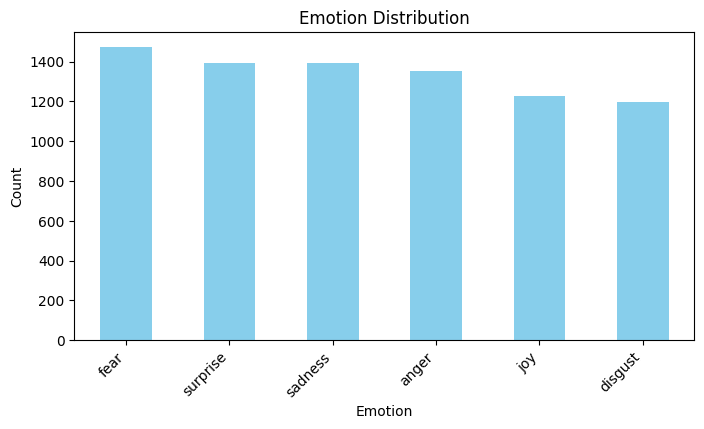

In [ ]:
emotion_counts = emotion['label'].value_counts()
plt.figure(figsize=(8, 4))
emotion_counts.plot(kind='bar', color='skyblue')
plt.title('Emotion Distribution')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

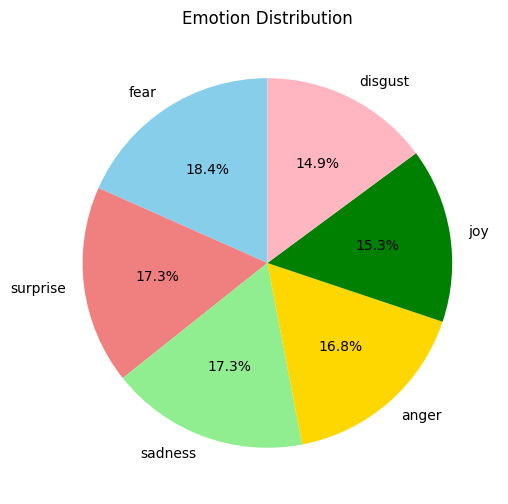

In [ ]:
plt.figure(figsize=(6, 6))
plt.pie(emotion_counts, labels=emotion_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral', 'lightgreen', 'gold', 'green','lightpink'])
plt.title('Emotion Distribution')
plt.show()


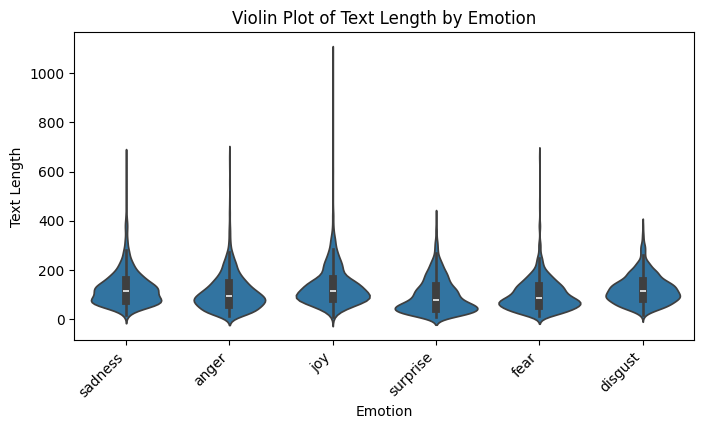

In [ ]:
import seaborn as sns
plt.figure(figsize=(8, 4))
sns.violinplot(x='label', y=emotion['text'].apply(len), data=emotion)
plt.title('Violin Plot of Text Length by Emotion')
plt.xlabel('Emotion')
plt.ylabel('Text Length')
plt.xticks(rotation=45, ha='right')
plt.show()


In [ ]:
emotion.head()

,text,label,label_map
0,প্রতিটি ক্ষণে ভিন্ন একটি কষ্টের অভিজ্ঞান হচ্ছে।,sadness,1
1,মেয়ে গুলো ঠিক এমনি বেইমান হয়নিজের স্বার্থের জন...,anger,4
2,বিপন্ন প্রাণীর তালিকায় অন্তর্ভুক্ত গাঙ্গেয় ডলফ...,anger,4
3,একা বসে ভাবছি তোমায় নিয়ে ভাবতে ভাবতে হঠাৎ চোখে...,sadness,1
4,বিগ বিসের সেরা জুটি সিডনাজ❤দুজনকে একসাথে কি সু...,joy,0


In [ ]:
def clean_text(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)
    # Remove emojis
    text = re.sub(r'[\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U00002702-\U000027B0]', ' ', text)
    # Remove numbers (both Bangla and English)
    text = re.sub(r'\d+', '', text)
    # Remove English letters
    text = re.sub(r'[a-zA-Z]', '', text)
    # Remove specified Unicode ranges
    text = re.sub(u"[\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF]", '', text)
    # Remove full stop patterns and keep comma patterns
    text = re.sub(r'\.', '', text)
    # Undo removal of ( | )
    text = re.sub(r'\(\s*\|\s*\)', '|', text)
    # Insert a space after removing emojis in the middle of the text
    text = re.sub(r'([^\s])\s+([^\s])', r'\1 \2', text)
    return text


# Apply the clean_text function to the 'text' column
emotion['text'] = emotion['text'].apply(clean_text)



In [ ]:
emotion.head()

,text,label,label_map
0,প্রতিটি ক্ষণে ভিন্ন একটি কষ্টের অভিজ্ঞান হচ্ছে।,sadness,1
1,মেয়ে গুলো ঠিক এমনি বেইমান হয়নিজের স্বার্থের জন...,anger,4
2,বিপন্ন প্রাণীর তালিকায় অন্তর্ভুক্ত গাঙ্গেয় ডলফ...,anger,4
3,একা বসে ভাবছি তোমায় নিয়ে ভাবতে ভাবতে হঠাৎ চোখে...,sadness,1
4,বিগ বিসের সেরা জুটি সিডনাজ দুজনকে একসাথে কি সু...,joy,0


In [ ]:
docs = []
for text, label in zip(emotion['text'], emotion['label_map']):
    if(label != -1):
        docs.append({'text': text, 'label': label})
print("Total length of the Document:",len(docs))

Total length of the Document: 8037


In [ ]:
import random
random.seed(42)
random.shuffle(docs)
random.shuffle(docs)
total_length=len(docs)
print(total_length)
train_length=int(.8*total_length)
train_list=docs[0:train_length]
test_list=docs[train_length:]
print('No of items in training set ',len(train_list))
print('No of items in test set ',len(test_list))

8037
No of items in training set  6429
No of items in test set  1608


In [ ]:
def weight_init(m):
    if isinstance(m, torch.nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        if m.bias is not None:
            torch.nn.init.xavier_uniform_(m.bias)


from transformers import BertForSequenceClassification, AdamW, BertConfig

model = BertForSequenceClassification.from_pretrained(
    "sagorsarker/bangla-bert-base",
    num_labels = 6,
    output_attentions = False,
    output_hidden_states = False,
)

params = list(model.named_parameters())
optimizer = AdamW(model.parameters(),
                  lr = 1e-5,
                  eps = 1e-8
                )
from transformers import get_linear_schedule_with_warmup
NUM_EPOCHS=3


writer = SummaryWriter(log_dir='/content/')
total_steps = len(docs) * NUM_EPOCHS
scheduler = get_linear_schedule_with_warmup(optimizer,
                                            num_warmup_steps = 0,
                                            num_training_steps = total_steps)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/491 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/660M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at sagorsarker/bangla-bert-base and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


In [ ]:
import random
total_steps = 1
seed_val = 42
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
tokenizer = BertTokenizer.from_pretrained('sagorsarker/bangla-bert-base')

vocab.txt:   0%|          | 0.00/2.24M [00:00<?, ?B/s]

In [ ]:
from tqdm import tqdm

model.to('cuda')
train_loss_list = []
train_accuracy_list = []

for epoch in range(NUM_EPOCHS):
    model.train()
    random.shuffle(docs)


    for every_trainlist in tqdm(docs, desc=f'Epoch {epoch + 1}/{NUM_EPOCHS}', unit='batch'):
        label1 = every_trainlist['label']
        label1 = torch.tensor([label1]).to('cuda')
        text = every_trainlist['text']
        input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0).to('cuda')

        model.zero_grad()
        loss, logits = model(input_ids, labels=label1).to_tuple()
        print('loss.item(): 1 ', loss.item())
        print("logits 1: ", logits)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        _, preds = torch.max(logits, 1)
        accuracy = torch.sum(preds == label1)

        if total_steps % 10 == 0:
            with torch.no_grad():
                _, preds = torch.max(logits, 1)
                accuracy = torch.sum(preds == label1)
                writer.add_scalar('training loss', loss.item(), total_steps)
                writer.add_scalar('training accuracy', accuracy.item(), total_steps)
                 # Append metrics to lists
        train_loss_list.append(loss.item())
        train_accuracy_list.append(accuracy.item())

        total_steps += 1

Epoch 1/3:   0%|          | 0/8037 [00:00<?, ?batch/s]

loss.item(): 1  1.6042439937591553
logits 1:  tensor([[-0.2776, -0.2759, -0.3308,  0.0410, -0.2649,  0.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 2/8037 [00:02<2:46:19,  1.24s/batch]

loss.item(): 1  1.5584685802459717
logits 1:  tensor([[-0.3062, -0.3050, -0.7045,  0.0305, -0.3717,  0.1911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8196744918823242
logits 1:  tensor([[-0.4022, -0.2920, -0.4910, -0.2132, -0.0175, -0.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 4/8037 [00:03<1:06:10,  2.02batch/s]

loss.item(): 1  1.8823974132537842
logits 1:  tensor([[-0.3564, -0.3926, -0.5060, -0.0641, -0.2265, -0.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6804360151290894
logits 1:  tensor([[-0.4535, -0.5720, -0.5105, -0.1327,  0.0708, -0.0495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 6/8037 [00:03<39:08,  3.42batch/s]

loss.item(): 1  1.8822683095932007
logits 1:  tensor([[-0.6704, -0.1383, -0.5833,  0.3748, -0.3050, -0.2983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7441377639770508
logits 1:  tensor([[-0.1931, -0.0974, -0.7685,  0.5269, -0.7418, -0.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 8/8037 [00:03<34:54,  3.83batch/s]

loss.item(): 1  1.9336620569229126
logits 1:  tensor([[-0.4157,  0.1611, -0.9523,  0.6068, -0.4227, -0.2277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 9/8037 [00:04<33:31,  3.99batch/s]

loss.item(): 1  1.6311662197113037
logits 1:  tensor([[-0.2391, -0.1344, -0.8312,  0.2850, -0.4772, -0.0153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.601698637008667
logits 1:  tensor([[-0.4467,  0.3723, -0.8466,  0.2847, -0.4431,  0.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 11/8037 [00:04<28:12,  4.74batch/s]

loss.item(): 1  1.781561017036438
logits 1:  tensor([[-0.4038, -0.0531, -0.4790,  0.2731, -0.0548,  0.1275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.491494059562683
logits 1:  tensor([[-0.6643,  0.1806, -0.7371,  0.3577, -0.5122,  0.0978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 13/8037 [00:04<22:04,  6.06batch/s]

loss.item(): 1  2.4600987434387207
logits 1:  tensor([[-0.4872, -0.1139, -0.8218,  0.0835, -0.3421,  0.3384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3765366077423096
logits 1:  tensor([[-0.6206,  0.0201, -0.7644,  0.0737, -0.9851,  0.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 15/8037 [00:05<20:18,  6.58batch/s]

loss.item(): 1  1.9252806901931763
logits 1:  tensor([[-0.2997,  0.1183, -0.6715,  0.1176, -0.7697,  0.1097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9659836292266846
logits 1:  tensor([[-0.3027, -0.0189, -0.8026, -0.0056, -0.5632,  0.4347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 17/8037 [00:05<19:31,  6.85batch/s]

loss.item(): 1  1.4411834478378296
logits 1:  tensor([[-0.5340,  0.1641, -0.7657,  0.1510, -0.8024,  0.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4032132625579834
logits 1:  tensor([[-0.7769,  0.1928, -0.7901,  0.2858, -1.0657,  0.2495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 19/8037 [00:05<19:06,  6.99batch/s]

loss.item(): 1  1.507304072380066
logits 1:  tensor([[-0.7288, -0.0072, -0.8744, -0.2291, -0.6007,  0.2198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.234792470932007
logits 1:  tensor([[-0.6452,  0.2850, -0.5483,  0.1606, -0.7558,  0.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 21/8037 [00:05<21:28,  6.22batch/s]

loss.item(): 1  2.287987232208252
logits 1:  tensor([[-0.1087, -0.0538, -0.4226, -0.2749, -0.6186,  0.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4910645484924316
logits 1:  tensor([[-0.6338,  0.4516, -0.8735, -0.3008, -0.5998,  0.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 23/8037 [00:06<20:32,  6.50batch/s]

loss.item(): 1  2.3622217178344727
logits 1:  tensor([[-0.6816,  0.5194, -0.6682, -0.0563, -0.6133,  0.2273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.819033622741699
logits 1:  tensor([[-0.4214,  0.1589, -0.4233, -0.0600, -1.2709, -0.0031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 25/8037 [00:06<19:14,  6.94batch/s]

loss.item(): 1  2.018089771270752
logits 1:  tensor([[-0.2191,  0.1190, -0.3298,  0.1908, -0.9263,  0.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5799453258514404
logits 1:  tensor([[-0.6879, -0.0008, -0.2951,  0.0307, -0.6967,  0.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 27/8037 [00:06<17:46,  7.51batch/s]

loss.item(): 1  1.8991038799285889
logits 1:  tensor([[-0.4887,  0.1808, -0.2781, -0.1188, -0.8011,  0.1421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.388193964958191
logits 1:  tensor([[-0.3580, -0.1703, -0.2504, -0.2110, -0.9107,  0.1610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 29/8037 [00:07<19:38,  6.80batch/s]

loss.item(): 1  2.042485237121582
logits 1:  tensor([[-0.3760,  0.1342, -0.0869, -0.0462, -0.7451,  0.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4613542556762695
logits 1:  tensor([[-0.6285, -0.1037, -0.0510, -0.2473, -0.9516, -0.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 31/8037 [00:07<22:32,  5.92batch/s]

loss.item(): 1  1.7021749019622803
logits 1:  tensor([[-0.4492,  0.0598,  0.0471, -0.1926, -0.7664, -0.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 32/8037 [00:07<24:58,  5.34batch/s]

loss.item(): 1  1.7260806560516357
logits 1:  tensor([[-0.6405, -0.0337,  0.0104, -0.1488, -0.7998,  0.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 1/3:   0%|          | 33/8037 [00:07<24:26,  5.46batch/s]

1.4621132612228394
logits 1:  tensor([[-0.2709,  0.2603,  0.2383, -0.3424, -0.8828,  0.0230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4716991186141968
logits 1:  tensor([[-0.3827, -0.0320, -0.1894, -0.2531, -1.1514,  0.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 35/8037 [00:08<20:22,  6.55batch/s]

loss.item(): 1  1.6321862936019897
logits 1:  tensor([[-0.5836, -0.0431, -0.0371, -0.1846, -0.9714,  0.1907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7640599012374878
logits 1:  tensor([[-0.4695, -0.1860,  0.2689, -0.4309, -0.7959, -0.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 37/8037 [00:08<19:20,  6.89batch/s]

loss.item(): 1  1.963701844215393
logits 1:  tensor([[-0.4153, -0.1257, -0.1698, -0.2625, -0.9401,  0.1471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6101173162460327
logits 1:  tensor([[-0.6039, -0.0679, -0.0155, -0.3038, -0.7624,  0.0049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   0%|          | 39/8037 [00:08<17:48,  7.48batch/s]

loss.item(): 1  1.5810490846633911
logits 1:  tensor([[-8.2885e-01,  1.6831e-04,  1.2815e-01, -6.1351e-01, -9.8317e-01,
         -1.0106e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.298202395439148
logits 1:  tensor([[-0.7364, -0.0931,  0.2911, -0.6100, -0.6108,  0.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 41/8037 [00:08<19:33,  6.81batch/s]

loss.item(): 1  1.5013612508773804
logits 1:  tensor([[-0.4421,  0.3351,  0.1410, -0.6100, -1.0187,  0.0683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.566713809967041
logits 1:  tensor([[-0.0595, -0.0176, -0.1210, -0.4967, -0.9422,  0.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 42/8037 [00:09<19:10,  6.95batch/s]

loss.item(): 1  1.9551622867584229
logits 1:  tensor([[-0.3970, -0.1785,  0.2503, -0.3187, -0.4447, -0.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 44/8037 [00:09<24:27,  5.45batch/s]

loss.item(): 1  1.5907310247421265
logits 1:  tensor([[-0.7979, -0.0906,  0.3059, -0.5463, -0.8722, -0.2697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.250701665878296
logits 1:  tensor([[-0.6598, -0.0165, -0.1574, -0.4290, -0.5917,  0.3562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 46/8037 [00:09<27:01,  4.93batch/s]

loss.item(): 1  2.077993631362915
logits 1:  tensor([[-0.6463,  0.1601, -0.1565, -0.6644, -1.0157, -0.2793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 47/8037 [00:10<29:09,  4.57batch/s]

loss.item(): 1  1.4187308549880981
logits 1:  tensor([[-0.6933, -0.0249, -0.1394, -0.5146, -0.5803,  0.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 48/8037 [00:10<29:26,  4.52batch/s]

loss.item(): 1  1.6654155254364014
logits 1:  tensor([[-0.7582,  0.0356,  0.4252, -0.2460, -0.5753,  0.0955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2613632678985596
logits 1:  tensor([[-0.6161,  0.1303,  0.0671, -0.5756, -0.6961,  0.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 50/8037 [00:11<34:35,  3.85batch/s]

loss.item(): 1  2.289980888366699
logits 1:  tensor([[-0.5370, -0.1164,  0.1824, -0.8450, -0.7172,  0.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6071491241455078
logits 1:  tensor([[-0.6351, -0.1301, -0.2813, -0.5470, -0.6972,  0.1317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 52/8037 [00:11<34:05,  3.90batch/s]

loss.item(): 1  1.7917399406433105
logits 1:  tensor([[-0.6139,  0.0284, -0.2560, -0.4070, -0.5858,  0.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 53/8037 [00:11<33:41,  3.95batch/s]

loss.item(): 1  2.2169227600097656
logits 1:  tensor([[-0.5066,  0.1047,  0.0892, -0.7541, -0.4248,  0.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 54/8037 [00:12<29:51,  4.46batch/s]

loss.item(): 1  1.2165194749832153
logits 1:  tensor([[-0.4529, -0.2238,  0.4028, -0.7450, -0.7673,  0.1651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1780481338500977
logits 1:  tensor([[-0.5700, -0.1849, -0.1507, -0.6814, -0.6834,  0.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 56/8037 [00:12<28:44,  4.63batch/s]

loss.item(): 1  1.492380142211914
logits 1:  tensor([[-0.4733,  0.1387, -0.1173, -0.5179, -0.3736,  0.1523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6504541635513306
logits 1:  tensor([[-0.4854, -0.0799,  0.1678, -1.0522, -0.4397,  0.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 58/8037 [00:12<27:02,  4.92batch/s]

loss.item(): 1  2.2552144527435303
logits 1:  tensor([[-0.4886,  0.4149, -0.3317, -0.6419, -0.6267,  0.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5476043224334717
logits 1:  tensor([[-0.4272,  0.2849, -0.1749, -0.2413, -0.9322,  0.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 60/8037 [00:13<29:26,  4.52batch/s]

loss.item(): 1  1.963851809501648
logits 1:  tensor([[-0.7193,  0.1529, -0.2923, -0.4325, -0.5253, -0.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.086610794067383
logits 1:  tensor([[-0.3349,  0.1688, -0.2992, -0.5134, -0.6961,  0.0812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 62/8037 [00:13<27:13,  4.88batch/s]

loss.item(): 1  2.283687114715576
logits 1:  tensor([[-0.5358,  0.4205, -0.2635, -0.7221, -0.8078, -0.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5816376209259033
logits 1:  tensor([[-0.6669,  0.2341,  0.0536, -0.4301, -0.7106,  0.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 64/8037 [00:14<26:08,  5.08batch/s]

loss.item(): 1  1.1938515901565552
logits 1:  tensor([[-0.6887,  0.4102, -0.6583, -0.1632, -0.3633, -0.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.459146499633789
logits 1:  tensor([[-0.8508,  0.3984,  0.1078, -0.3632, -0.4559,  0.2778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 66/8037 [00:14<23:02,  5.76batch/s]

loss.item(): 1  1.8190546035766602
logits 1:  tensor([[-0.2833,  0.0703, -0.4001, -0.4914, -0.6481,  0.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.057142972946167
logits 1:  tensor([[-0.8853,  0.5307, -0.2403, -0.3894, -0.8761, -0.1051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 68/8037 [00:14<26:01,  5.10batch/s]

loss.item(): 1  1.7870111465454102
logits 1:  tensor([[-0.6416,  0.3461, -0.5552, -0.2029, -0.8606,  0.1149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 69/8037 [00:14<25:33,  5.20batch/s]

loss.item(): 1  1.9526997804641724
logits 1:  tensor([[-0.4759,  0.1997, -0.1883, -0.4648, -0.9473, -0.2999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8393003940582275
logits 1:  tensor([[-0.7097,  0.2030, -0.2997, -0.3473, -0.8492,  0.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 71/8037 [00:15<25:46,  5.15batch/s]

loss.item(): 1  1.8400304317474365
logits 1:  tensor([[-0.7239,  0.2980, -0.2160, -0.1781, -0.4593, -0.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8891916275024414
logits 1:  tensor([[-0.5400,  0.3519, -0.4074, -0.4048, -0.8602, -0.4275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 73/8037 [00:15<27:58,  4.74batch/s]

loss.item(): 1  1.5350397825241089
logits 1:  tensor([[-0.3867,  0.0128, -0.2142, -0.2076, -0.8090, -0.0577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1505564451217651
logits 1:  tensor([[-1.0567,  0.2869, -0.3725, -0.0496, -1.0606, -0.6101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 75/8037 [00:16<28:20,  4.68batch/s]

loss.item(): 1  1.6923198699951172
logits 1:  tensor([[-0.7318,  0.2367, -0.0516, -0.0405, -0.5777, -0.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3200017213821411
logits 1:  tensor([[-0.5738,  0.1787, -0.2039, -0.2566, -0.7801, -0.4018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 77/8037 [00:16<22:26,  5.91batch/s]

loss.item(): 1  2.188039541244507
logits 1:  tensor([[-0.5509,  0.2312,  0.1596,  0.1028, -1.1080, -0.3678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2494149208068848
logits 1:  tensor([[-0.7660,  0.3938, -0.1666, -0.2798, -1.2370, -0.5657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 79/8037 [00:16<19:06,  6.94batch/s]

loss.item(): 1  1.4134901762008667
logits 1:  tensor([[-0.8454,  0.1523, -0.5463,  0.0404, -1.0121, -0.3538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2682764530181885
logits 1:  tensor([[-0.4104,  0.1681, -0.2827,  0.3082, -1.1667, -0.5706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 81/8037 [00:17<18:32,  7.15batch/s]

loss.item(): 1  1.999395489692688
logits 1:  tensor([[-0.8844,  0.1699,  0.0158, -0.0362, -1.1365, -0.4930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7695996761322021
logits 1:  tensor([[-0.5532, -0.1515,  0.3893, -0.0159, -1.2862, -0.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 83/8037 [00:17<19:11,  6.91batch/s]

loss.item(): 1  1.9978764057159424
logits 1:  tensor([[-0.7731,  0.5929, -0.5015,  0.4429, -0.9672, -0.2807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.381852626800537
logits 1:  tensor([[-0.6279,  0.1230, -0.3958,  0.0511, -0.9628, -1.0187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 85/8037 [00:17<17:49,  7.44batch/s]

loss.item(): 1  1.263573169708252
logits 1:  tensor([[-0.4562,  0.2967, -0.2138,  0.0486, -1.3439, -0.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0676511526107788
logits 1:  tensor([[-0.5202,  0.5323, -0.1289, -0.1714, -0.9618, -0.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 87/8037 [00:17<18:26,  7.18batch/s]

loss.item(): 1  2.5842552185058594
logits 1:  tensor([[-0.8510,  0.2020,  0.4737,  0.1425, -1.1290, -0.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8795312643051147
logits 1:  tensor([[-0.8056,  0.3851, -0.3236, -0.0634, -1.0281, -0.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 89/8037 [00:18<17:50,  7.43batch/s]

loss.item(): 1  1.0914157629013062
logits 1:  tensor([[-0.8306,  0.4167, -0.6366, -0.0688, -0.8302, -0.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3537689447402954
logits 1:  tensor([[-0.4120, -0.2392,  0.2581, -0.3570, -0.6070,  0.0231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 91/8037 [00:18<17:06,  7.74batch/s]

loss.item(): 1  1.8517636060714722
logits 1:  tensor([[-0.2054,  0.4837, -0.5009,  0.1334, -1.0101, -0.4483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7676290273666382
logits 1:  tensor([[-0.7684,  0.3090, -0.2540,  0.2207, -0.7768, -0.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 93/8037 [00:18<16:45,  7.90batch/s]

loss.item(): 1  1.3077856302261353
logits 1:  tensor([[-0.7207,  0.7114, -0.7447,  0.3591, -1.1140, -0.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9512746334075928
logits 1:  tensor([[-0.3615,  0.6218, -0.6974, -0.0416, -1.3921, -0.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 95/8037 [00:18<20:10,  6.56batch/s]

loss.item(): 1  1.1199766397476196
logits 1:  tensor([[-0.2874,  0.3451, -0.6138, -0.3378, -1.4093, -0.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8011021614074707
logits 1:  tensor([[-0.1260,  0.4965, -0.9554,  0.2399, -0.3905, -0.7294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 97/8037 [00:19<19:42,  6.71batch/s]

loss.item(): 1  2.827263355255127
logits 1:  tensor([[-0.2909,  0.4411, -0.8029, -0.0584, -1.3041, -0.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6128233671188354
logits 1:  tensor([[-0.0962,  0.4509, -0.9451, -0.0900, -1.1685, -0.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|          | 99/8037 [00:19<18:53,  7.00batch/s]

loss.item(): 1  1.864564061164856
logits 1:  tensor([[-0.3237,  0.4874, -1.0959,  0.1210, -1.2006, -0.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5166971683502197
logits 1:  tensor([[-0.4491,  0.4044, -0.6391,  0.0347, -0.8286, -0.5417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 101/8037 [00:19<17:57,  7.37batch/s]

loss.item(): 1  2.2283692359924316
logits 1:  tensor([[-0.7536,  0.3950, -0.7229, -0.2581, -0.6841, -0.4267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.027578353881836
logits 1:  tensor([[-0.2709,  0.5431, -0.7890, -0.2197, -1.1486, -0.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 103/8037 [00:20<17:51,  7.41batch/s]

loss.item(): 1  1.774361491203308
logits 1:  tensor([[-0.0736,  0.4834, -1.0520, -0.0837, -1.0890, -0.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9693070650100708
logits 1:  tensor([[-0.3161,  0.5895, -0.4666,  0.1123, -1.0547, -0.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 105/8037 [00:20<21:17,  6.21batch/s]

loss.item(): 1  2.053102493286133
logits 1:  tensor([[-0.3663,  0.5208, -0.3750, -0.5039, -0.9859, -0.4055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4838247299194336
logits 1:  tensor([[-0.5795,  0.3284, -0.6507,  0.1863, -0.9313, -0.4243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 107/8037 [00:20<19:50,  6.66batch/s]

loss.item(): 1  2.612487316131592
logits 1:  tensor([[ 0.2160,  0.4546, -0.8451,  0.2109, -0.8999, -0.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5179030895233154
logits 1:  tensor([[ 0.3789,  0.2690, -1.2440, -0.2982, -0.9480, -0.4797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 109/8037 [00:21<18:19,  7.21batch/s]

loss.item(): 1  2.375025749206543
logits 1:  tensor([[-0.1127,  0.0852, -0.8601,  0.0211, -1.2240, -0.1885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.513423442840576
logits 1:  tensor([[-0.3210,  0.4767, -1.1063,  0.0076, -0.9498, -0.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 111/8037 [00:21<17:08,  7.71batch/s]

loss.item(): 1  1.9928014278411865
logits 1:  tensor([[ 0.2844,  0.1921, -0.9879, -0.1538, -0.1832, -0.3195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.110077381134033
logits 1:  tensor([[-0.1130, -0.0523, -1.1156,  0.1570, -0.6296, -0.6493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 113/8037 [00:21<16:38,  7.94batch/s]

loss.item(): 1  1.6467523574829102
logits 1:  tensor([[-0.2493,  0.0762, -0.8512, -0.2744, -0.9389, -0.1983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.633852243423462
logits 1:  tensor([[-0.4130,  0.2013, -0.9685, -0.1477, -0.6765, -0.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 115/8037 [00:21<16:10,  8.16batch/s]

loss.item(): 1  1.9776995182037354
logits 1:  tensor([[ 0.3774, -0.1429, -1.1863, -0.2021, -0.4313, -0.5153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.634520411491394
logits 1:  tensor([[-0.2422, -0.2707, -1.2132, -0.1867, -0.4521, -0.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 117/8037 [00:21<15:52,  8.31batch/s]

loss.item(): 1  2.0821518898010254
logits 1:  tensor([[ 0.0675, -0.5291,  0.0697, -0.0718, -0.4845, -0.4104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8627917766571045
logits 1:  tensor([[ 0.3396, -0.3396, -0.7758, -0.3894, -0.1770, -0.7036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   1%|▏         | 119/8037 [00:22<15:48,  8.35batch/s]

loss.item(): 1  1.736600399017334
logits 1:  tensor([[-0.2477,  0.0451,  0.5512, -0.4610, -0.0027,  0.1039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6840629577636719
logits 1:  tensor([[-0.3201, -0.1171, -1.1237, -0.3355, -0.5310, -0.3020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 121/8037 [00:22<16:31,  7.98batch/s]

loss.item(): 1  1.5819963216781616
logits 1:  tensor([[-0.0406, -0.1389, -1.1208, -0.3780, -0.1027, -0.7141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6617467403411865
logits 1:  tensor([[-0.1935, -0.1779, -1.0864,  0.0312, -0.7923, -0.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 124/8037 [00:22<15:41,  8.41batch/s]

loss.item(): 1  1.6205707788467407
logits 1:  tensor([[ 0.3445,  0.1059, -1.3204, -0.4037,  0.0212, -0.3784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.591565489768982
logits 1:  tensor([[-0.0874, -0.6381,  0.0068, -0.4214, -0.2397, -0.0043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 125/8037 [00:22<15:50,  8.33batch/s]

loss.item(): 1  1.6634355783462524
logits 1:  tensor([[-0.2052, -0.2431, -1.4420, -0.0617, -0.5695, -0.2262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.074798345565796
logits 1:  tensor([[-0.3953,  0.2724, -0.8827, -0.2175, -0.1167, -0.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 127/8037 [00:23<15:48,  8.34batch/s]

loss.item(): 1  1.6624341011047363
logits 1:  tensor([[-0.6222, -0.1413, -0.7345, -0.0973, -0.2536, -0.6477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8980631828308105
logits 1:  tensor([[-0.5720, -0.1881, -1.1832, -0.1259, -0.3847,  0.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 129/8037 [00:23<15:34,  8.46batch/s]

loss.item(): 1  1.5673589706420898
logits 1:  tensor([[-0.0269,  0.0807, -1.6463, -0.0559, -0.0271,  0.0275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3453705310821533
logits 1:  tensor([[-0.7061, -0.0072, -0.8286, -0.1215,  0.0330, -0.3353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 132/8037 [00:23<15:24,  8.55batch/s]

loss.item(): 1  1.19093918800354
logits 1:  tensor([[-0.7704,  0.1565, -0.6994, -0.4046, -0.4646,  0.4024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8352489471435547
logits 1:  tensor([[ 0.0677, -0.0477, -0.8463, -0.1660,  0.3421,  0.2369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 133/8037 [00:23<15:29,  8.50batch/s]

loss.item(): 1  1.6661344766616821
logits 1:  tensor([[-0.7577,  0.1048, -0.0840, -0.2481, -0.3431, -0.1313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.856539249420166
logits 1:  tensor([[-0.1454,  0.2260, -1.4410, -0.3182,  0.3286,  0.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 135/8037 [00:24<17:29,  7.53batch/s]

loss.item(): 1  1.83566153049469
logits 1:  tensor([[-0.6914, -0.0620, -0.9999, -0.2845, -0.3397,  0.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7342252731323242
logits 1:  tensor([[-0.0806,  0.0118, -1.1096, -0.3174,  0.3329, -0.1758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 137/8037 [00:24<16:26,  8.00batch/s]

loss.item(): 1  2.0456643104553223
logits 1:  tensor([[-0.4776,  0.1750, -1.4271, -0.2764, -0.0358,  0.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7874492406845093
logits 1:  tensor([[-0.2512, -0.0478, -1.2522, -0.3582,  0.1406, -0.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 140/8037 [00:24<15:42,  8.37batch/s]

loss.item(): 1  1.779544711112976
logits 1:  tensor([[-0.7577,  0.1918, -0.9932, -0.2103, -0.1691,  0.0931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6992769241333008
logits 1:  tensor([[-0.0101, -0.0608, -0.9606, -0.5786,  0.0202,  0.2251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 142/8037 [00:25<15:28,  8.50batch/s]

loss.item(): 1  1.7773246765136719
logits 1:  tensor([[-0.1066,  0.5003, -1.2394,  0.0149, -0.0099,  0.1482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7441437244415283
logits 1:  tensor([[-0.3222,  0.0739, -1.1886, -0.1114,  0.2255, -0.1456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 143/8037 [00:25<15:28,  8.50batch/s]

loss.item(): 1  1.9310941696166992
logits 1:  tensor([[-0.0795,  0.2297, -0.9931, -0.2775,  0.0827, -0.1867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4794578552246094
logits 1:  tensor([[-0.3346,  0.1318, -1.0188, -0.2120,  0.0350, -0.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 145/8037 [00:25<16:00,  8.21batch/s]

loss.item(): 1  1.548612117767334
logits 1:  tensor([[-0.7365, -0.0509, -0.7966, -0.2438, -0.4612,  0.1631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.684567928314209
logits 1:  tensor([[-0.0696,  0.4297, -1.3279, -0.1466, -0.2756, -0.3996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 147/8037 [00:25<16:25,  8.01batch/s]

loss.item(): 1  1.44758141040802
logits 1:  tensor([[-0.7751,  0.2737, -1.2345, -0.0708,  0.1316, -0.3392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3745381832122803
logits 1:  tensor([[-0.4641,  0.1987, -1.1996, -0.2086, -0.4644,  0.2089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 149/8037 [00:25<17:01,  7.72batch/s]

loss.item(): 1  1.5579708814620972
logits 1:  tensor([[-0.3969,  0.3427, -1.3179,  0.0881, -0.0857, -0.1892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7023091316223145
logits 1:  tensor([[ 0.2028,  0.1040, -0.9709, -0.4516,  0.4349, -0.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 151/8037 [00:26<16:24,  8.01batch/s]

loss.item(): 1  1.8926100730895996
logits 1:  tensor([[-0.2979,  0.1056, -0.7530, -0.0107, -0.1421, -0.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2817109823226929
logits 1:  tensor([[-0.3096,  0.3324, -1.3733,  0.0441,  0.1023, -0.7151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 153/8037 [00:26<17:11,  7.64batch/s]

loss.item(): 1  1.9192419052124023
logits 1:  tensor([[-0.4090,  0.2831, -1.1209, -0.4238,  0.0601, -0.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.865780234336853
logits 1:  tensor([[-0.1741, -0.0554, -0.8941, -0.1080, -0.3658, -0.3662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 155/8037 [00:26<19:55,  6.59batch/s]

loss.item(): 1  2.287853479385376
logits 1:  tensor([[ 0.0182,  0.0876, -1.2087,  0.2497, -0.0126, -0.6376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5056872367858887
logits 1:  tensor([[-0.3264,  0.4738, -0.8771,  0.2765, -0.5655, -0.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 157/8037 [00:27<25:29,  5.15batch/s]

loss.item(): 1  2.0495452880859375
logits 1:  tensor([[-0.4768,  0.4967, -1.3082, -0.2151, -0.6261, -0.0573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 158/8037 [00:27<25:51,  5.08batch/s]

loss.item(): 1  2.041205406188965
logits 1:  tensor([[-0.3732,  0.4979, -1.3965, -0.1888, -0.4351, -0.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.354421854019165
logits 1:  tensor([[-0.5363,  0.2603, -1.2402,  0.2748, -0.4748, -0.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 160/8037 [00:27<30:43,  4.27batch/s]

loss.item(): 1  2.2902166843414307
logits 1:  tensor([[-0.6340,  0.1111, -0.7442, -0.1365, -0.5224,  0.0991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6609365940093994
logits 1:  tensor([[-0.3465,  0.0075, -0.1773, -0.1093, -1.0851, -0.0697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 161/8037 [00:28<34:54,  3.76batch/s]

loss.item(): 1  2.136653423309326
logits 1:  tensor([[-0.6474,  0.1206, -0.6025, -0.1165, -0.4740, -0.3255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 163/8037 [00:28<34:08,  3.84batch/s]

loss.item(): 1  1.9508498907089233
logits 1:  tensor([[-0.4026,  0.2521, -1.1405,  0.1711, -0.4045, -0.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8670551776885986
logits 1:  tensor([[-0.6610,  0.1264, -0.9381, -0.1740, -0.4609, -0.5676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 166/8037 [00:29<21:57,  5.97batch/s]

loss.item(): 1  1.7755134105682373
logits 1:  tensor([[-0.4381,  0.0616, -0.8908,  0.1847, -0.7005, -0.2501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5640594959259033
logits 1:  tensor([[-0.4992, -0.1697, -0.8599, -0.2141, -0.7812, -0.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 167/8037 [00:29<19:57,  6.57batch/s]

loss.item(): 1  2.8593573570251465
logits 1:  tensor([[-0.0577,  0.1826, -1.2179,  0.0097, -0.4200,  0.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6450345516204834
logits 1:  tensor([[-0.3860,  0.2328, -1.0051,  0.4314, -0.2632, -0.6182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 169/8037 [00:29<17:41,  7.41batch/s]

loss.item(): 1  1.7137974500656128
logits 1:  tensor([[-0.5069,  0.4394, -0.9493,  0.3118, -0.4805, -0.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8407270908355713
logits 1:  tensor([[-0.5127, -0.1724, -0.6015, -0.4441, -0.2407, -0.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 172/8037 [00:29<15:32,  8.43batch/s]

loss.item(): 1  1.661808967590332
logits 1:  tensor([[-0.8184, -0.1372, -0.2464,  0.2059, -0.3892, -0.0649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3965834379196167
logits 1:  tensor([[-0.2238,  0.1512, -1.1117,  0.0075, -0.4511, -0.2681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 174/8037 [00:30<14:56,  8.78batch/s]

loss.item(): 1  1.5927485227584839
logits 1:  tensor([[-0.4697, -0.6618,  0.0693, -0.4663, -0.3647,  0.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5791728496551514
logits 1:  tensor([[-0.6222, -0.0547, -0.5528, -0.1089, -0.2223, -0.1789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 176/8037 [00:30<14:56,  8.77batch/s]

loss.item(): 1  1.5335501432418823
logits 1:  tensor([[-0.8706, -0.0859, -0.6957, -0.0553, -0.6516,  0.0794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6226680278778076
logits 1:  tensor([[-0.4705, -0.0402, -0.7357, -0.0328, -0.5072,  0.2091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 178/8037 [00:30<14:52,  8.80batch/s]

loss.item(): 1  1.7556500434875488
logits 1:  tensor([[-0.2726,  0.0105, -0.9585, -0.1682, -0.8878, -0.0059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5219296216964722
logits 1:  tensor([[-0.4062,  0.1906, -1.2794, -0.0199, -0.6919, -0.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 179/8037 [00:30<14:55,  8.78batch/s]

loss.item(): 1  2.2286384105682373
logits 1:  tensor([[-0.6657, -0.4286, -0.1070, -0.3821, -0.2376,  0.2136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1644558906555176
logits 1:  tensor([[-0.6350,  0.0084, -0.7649, -0.0579, -0.7222,  0.1678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 181/8037 [00:30<15:39,  8.36batch/s]

loss.item(): 1  1.4267354011535645
logits 1:  tensor([[-0.4619,  0.3039, -0.7477, -0.3919, -0.6914,  0.1385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.758560061454773
logits 1:  tensor([[-0.1754, -0.1263, -0.0490, -0.3586, -0.9600,  0.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 184/8037 [00:31<15:15,  8.58batch/s]

loss.item(): 1  1.429999828338623
logits 1:  tensor([[-0.9137, -0.0354, -0.5053, -0.2303, -0.6015, -0.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9791221618652344
logits 1:  tensor([[-0.4754,  0.0059, -0.4655, -0.3353, -0.6026,  0.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 186/8037 [00:31<14:59,  8.73batch/s]

loss.item(): 1  1.65501070022583
logits 1:  tensor([[-0.5981, -0.4316, -0.5811, -0.2282, -0.4429, -0.0320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3675347566604614
logits 1:  tensor([[-0.8388, -0.0336, -0.8604, -0.1919, -0.6714, -0.4505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 188/8037 [00:31<14:35,  8.97batch/s]

loss.item(): 1  1.8380682468414307
logits 1:  tensor([[ 0.0339, -0.2390, -0.1882, -0.2465, -0.1029, -0.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5815002918243408
logits 1:  tensor([[-0.5198,  0.0338, -0.4526, -0.0759, -0.7206, -0.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 189/8037 [00:31<15:08,  8.64batch/s]

loss.item(): 1  1.4958043098449707
logits 1:  tensor([[-0.2189,  0.0185, -0.5987, -0.2937, -0.7821,  0.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3160645961761475
logits 1:  tensor([[-0.7974,  0.1621, -0.8331, -0.1591, -0.9000, -0.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 191/8037 [00:32<14:39,  8.92batch/s]

loss.item(): 1  2.2227840423583984
logits 1:  tensor([[-0.5440, -0.1499, -0.2171, -0.0218, -0.6397,  0.1117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4193408489227295
logits 1:  tensor([[-0.1738,  0.1503, -0.5408, -0.1016, -0.8837, -0.2974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3998312950134277
logits 1:  tensor([[-0.6176,  0.0235, -0.5184, -0.1149, -0.6828,  0.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 195/8037 [00:32<13:22,  9.78batch/s]

loss.item(): 1  2.2937138080596924
logits 1:  tensor([[ 0.0070, -0.1745, -0.7680,  0.0924, -1.0198, -0.1860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8394496440887451
logits 1:  tensor([[-0.3308,  0.1943, -0.6538, -0.3523, -0.2376, -0.5515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.040210723876953
logits 1:  tensor([[-0.4876, -0.2549, -0.5819, -0.0738, -1.0532,  0.0706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 198/8037 [00:32<13:08,  9.94batch/s]

loss.item(): 1  1.3861351013183594
logits 1:  tensor([[-0.6491,  0.1538, -0.5434, -0.1698, -0.9375,  0.1478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7755968570709229
logits 1:  tensor([[-0.8162,  0.0965, -0.6823, -0.0149, -0.6948, -0.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.151853561401367
logits 1:  tensor([[-0.6346,  0.0366, -0.7410, -0.4608, -0.3041, -0.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   2%|▏         | 200/8037 [00:32<13:08,  9.94batch/s]

loss.item(): 1  2.0235252380371094
logits 1:  tensor([[-0.5583, -0.0280, -0.6365,  0.0084, -0.5291, -0.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.221444845199585
logits 1:  tensor([[-0.4946,  0.2816, -0.8856, -0.5476, -0.0440, -0.4900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.457829475402832
logits 1:  tensor([[-0.7539,  0.0093,  0.0871, -0.0733, -0.1602,  0.2778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 204/8037 [00:33<12:52, 10.14batch/s]

loss.item(): 1  1.65659499168396
logits 1:  tensor([[-0.4672,  0.2556, -0.3374, -0.3785, -0.8794, -0.1281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0447800159454346
logits 1:  tensor([[-0.5241,  0.2800, -0.5880, -0.5148, -0.1340, -0.3929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.256772041320801
logits 1:  tensor([[-0.2608, -0.6111,  0.3860, -0.6899, -0.5188,  0.5902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 206/8037 [00:33<12:48, 10.20batch/s]

loss.item(): 1  1.8858885765075684
logits 1:  tensor([[-0.8222, -0.0676, -0.3213,  0.1551, -0.4493, -0.1327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6623337268829346
logits 1:  tensor([[-0.2311, -0.3769, -0.0416, -0.2837, -0.5220,  0.2403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.369124412536621
logits 1:  tensor([[ 0.3549,  0.2765, -0.4330, -0.4008, -0.3265, -0.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 210/8037 [00:33<12:54, 10.10batch/s]

loss.item(): 1  1.8691279888153076
logits 1:  tensor([[-0.8716, -0.0193, -0.4107, -0.1767, -0.7142, -0.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6678218841552734
logits 1:  tensor([[-0.8599,  0.0064, -0.3578, -0.1396, -0.2406, -0.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 212/8037 [00:34<12:51, 10.14batch/s]

loss.item(): 1  1.7246084213256836
logits 1:  tensor([[-0.6183, -0.1879, -0.4843, -0.2413, -0.6192,  0.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.142756938934326
logits 1:  tensor([[-0.6242, -0.0884,  0.0615, -0.5331, -0.5578, -0.1146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4923304319381714
logits 1:  tensor([[-0.2685, -0.2279, -0.6351, -0.1792, -0.6766, -0.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 214/8037 [00:34<12:54, 10.10batch/s]

loss.item(): 1  1.5520985126495361
logits 1:  tensor([[-0.8168, -0.0467, -0.1511, -0.6500, -0.6968, -0.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4952735900878906
logits 1:  tensor([[-0.5552, -0.2880, -0.2017, -0.3510, -0.2302,  0.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8341573476791382
logits 1:  tensor([[ 0.0051, -0.3504,  0.2482, -0.6915, -0.9888, -0.6061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 218/8037 [00:34<13:01, 10.00batch/s]

loss.item(): 1  1.5524345636367798
logits 1:  tensor([[-0.7286, -0.2402, -0.0161, -0.4471, -0.3963,  0.0789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5619646310806274
logits 1:  tensor([[-0.3337, -0.3601, -0.1371, -0.0363, -0.5275, -0.2770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3690928220748901
logits 1:  tensor([[-1.0498,  0.1419, -0.0992, -0.4508, -0.4345, -0.1764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 220/8037 [00:34<13:03,  9.98batch/s]

loss.item(): 1  2.217322826385498
logits 1:  tensor([[-0.7917,  0.0782, -0.2232, -0.3412, -0.6691,  0.1358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4165173768997192
logits 1:  tensor([[-0.7573, -0.5163,  0.1032, -0.1415, -0.7802,  0.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0968143939971924
logits 1:  tensor([[-0.5382, -0.4171,  0.0790, -0.2591, -0.3485, -0.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 224/8037 [00:35<12:47, 10.19batch/s]

loss.item(): 1  1.5432709455490112
logits 1:  tensor([[-0.7676, -0.1502, -0.0176, -0.5193, -0.5502, -0.6010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5980849266052246
logits 1:  tensor([[-0.1805, -0.1296, -0.4788, -0.0983, -0.4425, -0.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3962597846984863
logits 1:  tensor([[-0.8499,  0.2095, -0.1536, -0.0265, -0.8194, -0.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 226/8037 [00:35<12:53, 10.10batch/s]

loss.item(): 1  2.08351469039917
logits 1:  tensor([[-0.3880, -0.3506,  0.5348, -0.4580, -0.8047,  0.2467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.236968517303467
logits 1:  tensor([[-0.4429, -0.0240, -0.2359, -0.2438, -0.6986, -0.0329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3372818231582642
logits 1:  tensor([[-0.6674,  0.2687,  0.0474, -0.5840, -0.5700, -0.0103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 230/8037 [00:35<12:43, 10.22batch/s]

loss.item(): 1  1.473907470703125
logits 1:  tensor([[-0.7200,  0.1259,  0.1868, -0.1807, -0.4234,  0.2485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.684309482574463
logits 1:  tensor([[-0.0778, -0.0607, -0.2018, -0.1462, -0.2255, -0.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 232/8037 [00:36<12:52, 10.10batch/s]

loss.item(): 1  1.5755704641342163
logits 1:  tensor([[-0.1208,  0.1815,  0.1108, -0.6326, -0.0733, -0.3055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9052248001098633
logits 1:  tensor([[-0.4859, -0.4132,  0.7364, -0.1799, -0.7985, -0.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6863768100738525
logits 1:  tensor([[-0.2853, -0.2035, -0.2739,  0.1439, -0.7206, -0.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 234/8037 [00:36<12:44, 10.20batch/s]

loss.item(): 1  1.659147024154663
logits 1:  tensor([[-0.0027,  0.0307,  0.3269, -0.8921, -0.7361, -0.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2050198316574097
logits 1:  tensor([[-0.3126, -0.2322,  0.4293, -0.6787, -0.4432, -0.0876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8477668762207031
logits 1:  tensor([[-0.5555, -0.2420,  0.2891, -0.5904, -0.3232, -0.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 238/8037 [00:36<12:39, 10.27batch/s]

loss.item(): 1  1.2124271392822266
logits 1:  tensor([[-0.6807,  0.1849, -0.3664, -0.4985, -0.6869, -0.6326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8221487998962402
logits 1:  tensor([[-0.3582, -0.1285,  0.0607, -0.7355, -0.8433, -0.2581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5353490114212036
logits 1:  tensor([[-0.4107, -0.4020, -0.0251, -0.1038, -0.9710, -0.5147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 240/8037 [00:36<12:45, 10.19batch/s]

loss.item(): 1  1.1998918056488037
logits 1:  tensor([[-0.3149, -0.4155,  0.4605, -0.4453, -0.8743,  0.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5363194942474365
logits 1:  tensor([[-0.0036, -0.5448,  0.4605, -0.7437, -0.2182,  0.1968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 242/8037 [00:37<12:53, 10.08batch/s]

loss.item(): 1  1.3326166868209839
logits 1:  tensor([[ 0.2466, -0.1171, -0.2671, -0.5707, -0.6129, -0.2116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5641164779663086
logits 1:  tensor([[-0.5246, -0.2960, -0.1379, -0.0303, -0.4824, -0.1722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8271514177322388
logits 1:  tensor([[-0.3173,  0.2117, -0.5669, -0.3687, -0.9645, -0.0812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 246/8037 [00:37<12:44, 10.20batch/s]

loss.item(): 1  2.4182305335998535
logits 1:  tensor([[ 0.1973, -0.0400, -0.2783, -0.5631, -0.8752, -0.2791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9799569845199585
logits 1:  tensor([[-0.0860,  0.2845, -0.1793, -0.2805, -0.6383, -0.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6891796588897705
logits 1:  tensor([[-0.0672, -0.7486,  0.7440, -0.6515, -0.7169,  0.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 248/8037 [00:37<12:52, 10.08batch/s]

loss.item(): 1  1.3125256299972534
logits 1:  tensor([[ 0.2729,  0.0855, -0.6153, -0.3115, -0.9544, -0.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2227774858474731
logits 1:  tensor([[-0.2064, -0.1825, -0.3850, -0.2188, -1.0534,  0.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5246676206588745
logits 1:  tensor([[ 0.0311, -0.0180,  0.2945, -0.9352, -1.1400, -0.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 252/8037 [00:38<12:43, 10.20batch/s]

loss.item(): 1  1.5166101455688477
logits 1:  tensor([[-0.4374, -0.3726, -0.1000, -0.0879, -0.8035, -0.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.02559232711792
logits 1:  tensor([[ 0.3061, -0.5532, -0.6390, -0.3425, -0.6160, -0.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5413728952407837
logits 1:  tensor([[-0.1341, -0.1505, -0.3765, -0.4053, -0.7628, -0.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 254/8037 [00:38<12:46, 10.15batch/s]

loss.item(): 1  2.248147964477539
logits 1:  tensor([[ 0.7817,  0.0195, -0.5627, -0.5248, -0.5622, -0.7795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5110479593276978
logits 1:  tensor([[ 0.1529, -0.6076,  0.1022, -0.3130, -0.7804,  0.0122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3127529621124268
logits 1:  tensor([[ 0.2301, -0.1608, -0.2653, -0.6891, -0.9348, -0.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 258/8037 [00:38<12:45, 10.16batch/s]

loss.item(): 1  1.3521270751953125
logits 1:  tensor([[ 0.0665, -0.4946, -0.5165, -0.4002, -0.9447, -0.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.179721474647522
logits 1:  tensor([[ 0.4953,  0.5442, -0.6581, -0.6782, -0.7567, -0.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.692139744758606
logits 1:  tensor([[-0.1325, -0.2040, -0.2124, -0.2582, -0.7726, -0.4191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 260/8037 [00:38<12:44, 10.18batch/s]

loss.item(): 1  1.6008870601654053
logits 1:  tensor([[-0.0274, -0.1809, -0.7697, -0.7446, -0.7958, -0.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8174991607666016
logits 1:  tensor([[ 0.0244, -0.3408, -0.2948, -0.5984, -0.7178,  0.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 263/8037 [00:39<13:04,  9.91batch/s]

loss.item(): 1  1.6426295042037964
logits 1:  tensor([[ 0.5858, -0.3698,  0.0139, -0.5490, -1.1655, -0.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1066813468933105
logits 1:  tensor([[ 0.3967, -0.2924, -0.6309, -0.5653, -0.6798, -0.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 264/8037 [00:39<13:04,  9.91batch/s]

loss.item(): 1  1.145430088043213
logits 1:  tensor([[ 0.4653,  0.2132, -0.3201, -0.5898, -0.8900, -0.7234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0964512825012207
logits 1:  tensor([[ 0.2803, -0.7830,  0.6618, -0.3291, -1.0746,  0.0221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1169660091400146
logits 1:  tensor([[-0.1057, -0.1979,  0.6195, -0.9827, -0.7637,  0.2303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 268/8037 [00:39<12:45, 10.15batch/s]

loss.item(): 1  1.9131264686584473
logits 1:  tensor([[ 0.5763, -0.0890, -0.4140, -0.5739, -0.2571, -0.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7399553060531616
logits 1:  tensor([[ 0.1554, -0.7667,  1.1736, -0.6268, -0.5752, -0.2058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4635404348373413
logits 1:  tensor([[ 0.6208, -0.2733,  0.2996, -0.9726, -0.6392, -0.0470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 270/8037 [00:39<12:44, 10.16batch/s]

loss.item(): 1  1.8413046598434448
logits 1:  tensor([[ 0.3144, -0.1725,  0.3826, -0.7973, -1.0786, -0.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.323875904083252
logits 1:  tensor([[-0.1968, -0.1061,  0.1373, -0.9917, -0.9027, -0.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7840652465820312
logits 1:  tensor([[ 0.0276, -0.6308,  1.1403, -0.9448, -0.7914,  0.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 274/8037 [00:40<12:37, 10.24batch/s]

loss.item(): 1  2.1825549602508545
logits 1:  tensor([[ 0.2596, -0.4169,  0.9781, -1.0183, -1.2916, -0.5201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49254029989242554
logits 1:  tensor([[ 0.1130, -0.4706,  1.6247, -0.9695, -1.1030, -0.2537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7968978881835938
logits 1:  tensor([[-0.3741, -0.7048,  1.2235, -0.6498, -0.9535,  0.0871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 276/8037 [00:40<12:39, 10.22batch/s]

loss.item(): 1  2.556447982788086
logits 1:  tensor([[-0.0193, -0.9398,  1.0715, -0.7555, -0.8291, -0.1532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.373555898666382
logits 1:  tensor([[-0.1843, -0.4645,  1.1643, -0.4599, -0.7893, -0.0023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6635525226593018
logits 1:  tensor([[ 0.1753, -0.7132,  1.2779, -0.7005, -0.6996, -0.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   3%|▎         | 280/8037 [00:40<12:36, 10.26batch/s]

loss.item(): 1  1.7536827325820923
logits 1:  tensor([[-0.0571, -0.4143,  0.9701, -0.9385, -0.7993,  0.0626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8390493988990784
logits 1:  tensor([[-0.0317, -0.0680,  0.8903, -0.9063, -0.8666, -0.7472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.014411449432373
logits 1:  tensor([[-0.5053,  0.3207,  0.2355, -0.7734, -0.8194, -0.4483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 282/8037 [00:41<12:43, 10.16batch/s]

loss.item(): 1  0.8333538174629211
logits 1:  tensor([[-0.2772, -0.2886,  0.8506, -0.7000, -1.0560, -0.3650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.283573627471924
logits 1:  tensor([[-0.4107, -0.5066,  1.0071, -0.5939, -1.1088, -0.6308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3484137058258057
logits 1:  

Epoch 1/3:   4%|▎         | 284/8037 [00:41<12:52, 10.04batch/s]

tensor([[-0.6947, -0.3256,  0.4915, -0.6000, -0.8718, -0.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5162672996520996
logits 1:  tensor([[-0.6123, -0.4484,  0.8595, -0.7158, -1.0414,  0.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5171921253204346
logits 1:  tensor([[-0.2258, -0.5177,  1.2657, -0.8654, -1.0510,  0.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 288/8037 [00:41<12:39, 10.21batch/s]

loss.item(): 1  1.5542845726013184
logits 1:  tensor([[ 0.2031, -0.1902,  0.8353, -0.8929, -1.0881, -0.3662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2846252918243408
logits 1:  tensor([[-1.1062,  0.3546,  0.4900, -0.8041, -0.6906, -0.2065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5276734828948975
logits 1:  tensor([[-0.6723, -1.0300,  1.2036, -0.6598, -0.7355,  0.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 290/8037 [00:41<12:34, 10.26batch/s]

loss.item(): 1  1.8102965354919434
logits 1:  tensor([[-0.5933, -0.3997,  0.9538, -0.3351, -0.9902, -0.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7119873762130737
logits 1:  tensor([[-0.2922, -0.6684,  0.7433, -0.4581, -0.9662, -0.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 292/8037 [00:42<13:03,  9.89batch/s]

loss.item(): 1  2.5619869232177734
logits 1:  tensor([[-0.7745, -0.2788,  0.7362, -0.3141, -0.9008, -0.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.018594264984131
logits 1:  tensor([[-0.5242, -0.3640,  0.2881, -0.4320, -0.9282,  0.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 294/8037 [00:42<13:47,  9.36batch/s]

loss.item(): 1  2.4063568115234375
logits 1:  tensor([[-0.2000, -0.5282,  1.0119, -0.4898, -1.0878,  0.3592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.205840826034546
logits 1:  tensor([[-0.3891, -0.2523,  0.0220, -0.6828, -1.1781,  0.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 297/8037 [00:42<14:39,  8.80batch/s]

loss.item(): 1  0.8842685222625732
logits 1:  tensor([[-0.9466, -0.7187,  0.9783, -0.1602, -0.5865,  0.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.052361488342285
logits 1:  tensor([[-0.8934, -0.0809,  0.2914, -0.4277, -0.9771,  0.3211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 299/8037 [00:42<14:42,  8.77batch/s]

loss.item(): 1  1.964647889137268
logits 1:  tensor([[-0.2966, -0.2143,  0.4553, -0.5405, -1.0021,  0.5188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6613713502883911
logits 1:  tensor([[-0.8264,  0.1050, -0.1038,  0.0049, -0.9928,  0.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▎         | 301/8037 [00:43<14:31,  8.87batch/s]

loss.item(): 1  2.2275431156158447
logits 1:  tensor([[-0.6322,  0.0766, -0.4359, -0.0383, -0.7223,  0.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9464876651763916
logits 1:  tensor([[-1.0121, -0.9828,  0.9473, -0.1116, -0.4357,  0.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 303/8037 [00:43<14:39,  8.79batch/s]

loss.item(): 1  2.226985216140747
logits 1:  tensor([[-0.5522,  0.5500, -0.2074, -0.1113,  0.0031, -0.4995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6193175315856934
logits 1:  tensor([[-9.4021e-01, -5.6683e-05, -1.4302e-01,  4.9704e-02, -8.6316e-01,
          7.2278e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 305/8037 [00:43<14:33,  8.85batch/s]

loss.item(): 1  2.307725429534912
logits 1:  tensor([[-0.6393, -0.0671, -0.7806,  0.2344, -0.7098,  0.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8847811222076416
logits 1:  tensor([[-0.1774,  0.0995, -0.4592, -0.1643, -0.9201,  0.5268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 307/8037 [00:43<14:09,  9.10batch/s]

loss.item(): 1  1.7754491567611694
logits 1:  tensor([[-0.9203, -0.0181, -0.1080, -0.2523, -0.6665,  0.5482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8472204208374023
logits 1:  tensor([[-0.3439, -0.0087, -0.7454, -0.6453, -0.7451,  0.2794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 308/8037 [00:43<14:18,  9.00batch/s]

loss.item(): 1  1.367192029953003
logits 1:  tensor([[-0.8242, -0.1021, -0.4084,  0.1594, -0.8418, -0.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3234827518463135
logits 1:  tensor([[-0.7737,  0.1264,  0.6041, -0.3159, -0.4326,  0.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 311/8037 [00:44<14:38,  8.79batch/s]

loss.item(): 1  0.9058734774589539
logits 1:  tensor([[-0.5399,  0.0896, -0.5745, -0.4660, -0.8964,  0.7983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9260034561157227
logits 1:  tensor([[-0.6184,  0.2876, -0.3708, -0.1740, -0.5383, -0.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 312/8037 [00:44<15:15,  8.44batch/s]

loss.item(): 1  1.963393211364746
logits 1:  tensor([[-0.7087,  0.0142, -0.4139,  0.0847, -0.5577, -0.1274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5453639030456543
logits 1:  tensor([[-0.8595,  0.0103, -0.1570, -0.4362, -0.8171,  0.3086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 315/8037 [00:44<14:53,  8.65batch/s]

loss.item(): 1  1.9186146259307861
logits 1:  tensor([[-0.2715,  0.3278, -0.7632, -0.2062, -0.7875,  0.2676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9492928981781006
logits 1:  tensor([[-0.3958, -0.0997, -0.2178, -0.0363, -0.5672, -0.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 317/8037 [00:44<14:32,  8.84batch/s]

loss.item(): 1  0.7820550203323364
logits 1:  tensor([[-1.1115, -0.7228,  1.0149, -0.4763, -0.6092,  0.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5823497772216797
logits 1:  tensor([[ 0.0143, -0.7788,  0.3423, -0.1723, -0.8971, -0.2162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 319/8037 [00:45<14:23,  8.93batch/s]

loss.item(): 1  1.0138051509857178
logits 1:  tensor([[-0.6938, -0.7470,  0.8415, -0.2016, -0.5629,  0.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.11199951171875
logits 1:  tensor([[-0.3453, -0.9649,  1.1247, -0.7537, -0.5630, -0.4414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 320/8037 [00:45<14:21,  8.96batch/s]

loss.item(): 1  2.5772013664245605
logits 1:  tensor([[-0.4003, -0.1135, -0.0340, -0.1876, -1.0133,  0.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5899478197097778
logits 1:  tensor([[-0.2263, -0.1497, -0.3763, -0.4821, -0.8921, -0.6191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 323/8037 [00:45<14:29,  8.87batch/s]

loss.item(): 1  1.1384708881378174
logits 1:  tensor([[-0.5793, -0.2412, -0.6317,  0.3064, -0.7458, -0.6334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.897660732269287
logits 1:  tensor([[-0.7861,  0.3445,  0.2742, -0.2137, -0.6239, -0.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 325/8037 [00:45<14:32,  8.84batch/s]

loss.item(): 1  2.188342332839966
logits 1:  tensor([[ 0.4318, -0.1670, -0.4750, -0.5170, -0.6746, -0.6551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.51350998878479
logits 1:  tensor([[-0.3071, -0.3917, -0.2647, -0.0767, -0.6928, -0.5076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 327/8037 [00:46<14:39,  8.77batch/s]

loss.item(): 1  2.298508882522583
logits 1:  tensor([[-0.0851, -0.1371, -0.3411,  0.0622, -0.7581, -0.4580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4375782012939453
logits 1:  tensor([[-0.5722,  0.2538,  0.1871, -0.2512, -0.6014,  0.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 328/8037 [00:46<14:48,  8.68batch/s]

loss.item(): 1  1.7613071203231812
logits 1:  tensor([[-0.5565, -0.2016,  0.1085, -0.3451, -0.3805, -0.1501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7718451023101807
logits 1:  tensor([[ 0.8967, -0.4307, -0.0890, -0.8121, -1.0118, -0.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 330/8037 [00:46<15:14,  8.43batch/s]

loss.item(): 1  1.7544581890106201
logits 1:  tensor([[-0.1983, -0.2575, -0.2557, -0.2209, -0.7535, -0.1788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6338810920715332
logits 1:  tensor([[-0.0936, -0.1714, -0.3221, -0.3289, -0.6177, -0.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 332/8037 [00:46<15:05,  8.51batch/s]

loss.item(): 1  1.6316523551940918
logits 1:  tensor([[-0.1047, -0.1845, -0.2160, -0.3791, -1.0628, -0.5950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1086668968200684
logits 1:  tensor([[-0.6226, -0.4639, -0.0932,  0.0461, -0.1882, -0.7596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 335/8037 [00:46<14:59,  8.56batch/s]

loss.item(): 1  0.8824112415313721
logits 1:  tensor([[-0.8570, -0.6451,  0.7598,  0.0403, -0.4333, -0.9414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.011878252029419
logits 1:  tensor([[-0.5144, -0.4286, -0.3612, -0.2790, -0.6669, -0.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 336/8037 [00:47<14:23,  8.92batch/s]

loss.item(): 1  1.517339825630188
logits 1:  tensor([[-0.5548, -0.4651, -0.1933, -0.0757, -0.7677, -0.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6930618286132812
logits 1:  tensor([[-0.2056, -0.2529, -0.0956, -0.4448, -1.0066, -0.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.393933892250061
logits 1:  tensor([[ 0.0575, -0.1862, -0.4000, -0.3709, -0.7846, -0.5743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 340/8037 [00:47<13:10,  9.73batch/s]

loss.item(): 1  1.816888689994812
logits 1:  tensor([[-0.4841, -0.3307, -0.0074, -0.3259, -0.2923, -0.4710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.023129940032959
logits 1:  tensor([[-0.5972, -0.5609,  0.1594, -0.3001, -0.3046, -0.6097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9692304134368896
logits 1:  tensor([[ 0.4413, -0.3885, -0.1774, -0.4255, -0.6066, -0.8840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 342/8037 [00:47<13:05,  9.80batch/s]

loss.item(): 1  1.5817404985427856
logits 1:  tensor([[-0.4023, -0.4158,  0.0607, -0.1122, -0.4851, -0.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.305020332336426
logits 1:  tensor([[ 0.1090, -0.3652, -0.1373, -0.4372, -0.8287, -0.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1122775077819824
logits 1:  tensor([[-0.6383, -0.5391, -0.0089,  0.2039, -0.5235, -0.6170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 346/8037 [00:48<13:01,  9.84batch/s]

loss.item(): 1  1.4344301223754883
logits 1:  tensor([[ 0.1359, -0.1820, -0.1072, -0.0955, -0.5274, -0.8401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3332161903381348
logits 1:  tensor([[-0.0676, -0.7626,  0.8578, -0.4620, -0.8043, -0.6550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 347/8037 [00:48<13:04,  9.80batch/s]

loss.item(): 1  1.3268870115280151
logits 1:  tensor([[-0.5051,  0.2764, -0.0758, -0.2254, -0.2213, -0.6524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3523070812225342
logits 1:  tensor([[-0.1520,  0.2773, -0.1599, -0.6868, -0.7337,  0.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.043163299560547
logits 1:  tensor([[-0.5147, -0.4947,  0.2134,  0.1008, -0.6883, -0.5845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 350/8037 [00:48<12:59,  9.86batch/s]

loss.item(): 1  2.0244503021240234
logits 1:  tensor([[-0.4182, -0.5388,  0.0660, -0.1592, -0.6760, -0.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.446949005126953
logits 1:  tensor([[ 0.0549, -0.5541,  0.0445, -0.5291, -0.9979, -0.4704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7565076351165771
logits 1:  tensor([[ 4.3947e-02, -2.2312e-05, -2.8133e-01, -7.2800e-01, -7.9418e-01,
         -4.5053e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 354/8037 [00:48<12:43, 10.07batch/s]

loss.item(): 1  1.8710715770721436
logits 1:  tensor([[-0.4978,  0.0210,  0.0245, -0.3223, -0.5116, -0.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.13805091381073
logits 1:  tensor([[-0.7389,  0.0844, -0.5839,  0.4653, -0.5810, -0.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.624912977218628
logits 1:  tensor([[-0.8109, -0.6347,  1.2478, -0.6676, -0.4678, -0.6195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 356/8037 [00:49<12:36, 10.15batch/s]

loss.item(): 1  2.388516426086426
logits 1:  tensor([[-0.3411,  0.1568, -0.3536, -0.1648, -0.4434, -0.8879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5655784606933594
logits 1:  tensor([[-0.3162,  0.5035, -0.4744, -0.7007, -0.5501,  0.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.346911668777466
logits 1:  tensor([[-0.3712, -0.9359,  1.4422, -0.9492, -0.4489, -0.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 360/8037 [00:49<12:49,  9.98batch/s]

loss.item(): 1  2.3017871379852295
logits 1:  tensor([[-0.2270,  0.3447,  0.1178, -0.5461, -0.0488, -0.6143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.76576566696167
logits 1:  tensor([[-0.5838,  0.2170, -0.3105, -0.2796, -0.4528, -0.7036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   4%|▍         | 361/8037 [00:49<12:50,  9.96batch/s]

loss.item(): 1  1.3980739116668701
logits 1:  tensor([[ 0.1193,  0.1053, -0.8689, -0.6068, -0.2253, -0.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2748465538024902
logits 1:  tensor([[ 0.0805, -0.5791,  0.1819, -0.5422, -0.3619, -0.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.023921489715576
logits 1:  tensor([[-0.7731,  0.1170, -0.5445, -0.2941, -0.5751, -0.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 364/8037 [00:49<12:58,  9.86batch/s]

loss.item(): 1  1.4819817543029785
logits 1:  tensor([[-0.0853,  0.0655, -0.8767, -0.0637, -0.2744, -0.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.371436357498169
logits 1:  tensor([[-0.5456, -0.8398,  0.2599,  0.4045, -0.6357, -0.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0110433101654053
logits 1:  tensor([[-0.2363,  0.6345, -1.0858, -0.3646, -0.4149, -0.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 367/8037 [00:50<12:54,  9.90batch/s]

loss.item(): 1  1.5650831460952759
logits 1:  tensor([[-0.1716,  0.0170, -0.3839, -0.3995, -0.9199, -0.0469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1130387783050537
logits 1:  tensor([[-0.6125,  0.1049, -0.8174,  0.1997, -0.5996, -0.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7595809698104858
logits 1:  tensor([[-0.8558,  0.2203, -0.5705, -0.2168, -0.8847, -0.3310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 370/8037 [00:50<13:02,  9.80batch/s]

loss.item(): 1  1.012385606765747
logits 1:  tensor([[-0.5273, -0.3080,  0.8138, -0.3206, -0.2704,  0.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5380886793136597
logits 1:  tensor([[-0.7725, -0.3972,  0.0793, -0.8792, -0.3388,  0.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 372/8037 [00:50<12:52,  9.93batch/s]

loss.item(): 1  1.7310116291046143
logits 1:  tensor([[-0.6363,  0.2887, -0.1826, -0.4037, -0.7939, -0.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.480244755744934
logits 1:  tensor([[ 0.1561,  0.3242, -0.6351, -0.3646, -0.9076, -0.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.178327202796936
logits 1:  tensor([[-0.7598,  0.4979, -0.3432, -0.5102, -0.8730,  0.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 376/8037 [00:51<12:53,  9.90batch/s]

loss.item(): 1  1.1168358325958252
logits 1:  tensor([[-0.5530,  0.5124, -0.5575, -0.7991, -0.6798,  0.6077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5619699954986572
logits 1:  tensor([[-0.2634,  0.3924, -0.6252,  0.0599, -0.5256, -0.4691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 377/8037 [00:51<12:54,  9.90batch/s]

loss.item(): 1  2.1003148555755615
logits 1:  tensor([[-0.3167,  0.1856, -0.7656, -0.5729, -0.3952, -0.0293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5374629497528076
logits 1:  tensor([[-0.3921,  0.2463, -0.5184,  0.1217, -0.3765, -0.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9029861688613892
logits 1:  tensor([[-0.6221, -0.5283, -0.2726,  0.1799, -0.2920,  0.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 380/8037 [00:51<13:01,  9.80batch/s]

loss.item(): 1  1.4324170351028442
logits 1:  tensor([[-0.3973, -0.6285,  0.6331, -0.7351, -0.3751,  0.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.399881362915039
logits 1:  tensor([[-0.6406,  0.1406, -0.1190, -0.5188, -0.5414, -0.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0419563055038452
logits 1:  

Epoch 1/3:   5%|▍         | 382/8037 [00:51<12:55,  9.87batch/s]

tensor([[-0.4491,  0.5679, -1.0534, -0.4756, -0.8087,  0.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0412604808807373
logits 1:  tensor([[-0.6597,  0.5510, -0.5313, -0.1032, -0.9329, -0.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5263562202453613
logits 1:  tensor([[-0.0879,  0.3614, -0.9836,  0.1040, -0.5765, -0.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 386/8037 [00:52<12:36, 10.11batch/s]

loss.item(): 1  2.0506296157836914
logits 1:  tensor([[-0.3128,  0.0895, -0.5507, -0.0801, -0.5451, -0.5500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0995525121688843
logits 1:  tensor([[-0.2854,  0.5182, -0.4149, -0.5106, -0.5450, -0.2606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.621980905532837
logits 1:  tensor([[-0.7646,  0.6581, -1.0488,  0.0097, -0.9861,  0.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 388/8037 [00:52<12:39, 10.07batch/s]

loss.item(): 1  1.477364182472229
logits 1:  tensor([[-0.8059, -0.6548,  0.0757, -0.1653, -0.2205,  0.0307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.190217137336731
logits 1:  tensor([[-0.1378,  0.4366, -1.2167, -0.1144, -0.6365, -0.0497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5133246183395386
logits 1:  tensor([[-0.3258,  0.1427,  0.2348, -0.5646, -0.6653,  0.4195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 392/8037 [00:52<12:31, 10.17batch/s]

loss.item(): 1  2.1321966648101807
logits 1:  tensor([[-0.9667,  0.6338, -0.4197,  0.0029, -0.4249, -0.0673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3111993074417114
logits 1:  tensor([[-1.0494,  0.0822, -0.1084,  0.4263, -0.2676,  0.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4636962413787842
logits 1:  tensor([[-0.7820, -1.1616,  1.8112, -0.4535, -0.7848,  0.5580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 394/8037 [00:52<12:28, 10.22batch/s]

loss.item(): 1  2.444885730743408
logits 1:  tensor([[-0.8287,  0.1575, -0.6459, -0.0125, -0.8156,  0.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.183342695236206
logits 1:  tensor([[-1.1700,  0.4428, -0.7651,  0.3641, -0.5702, -0.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5482631921768188
logits 1:  tensor([[-1.1655,  0.0098, -0.2972,  0.5280, -0.7658,  0.1318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 398/8037 [00:53<12:28, 10.21batch/s]

loss.item(): 1  1.116474986076355
logits 1:  tensor([[-0.7656,  0.5351, -0.4536, -0.1995, -1.3139,  0.2770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.202115774154663
logits 1:  tensor([[-1.4497,  0.2332, -0.0154,  0.4691, -0.8224, -0.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1173911094665527
logits 1:  tensor([[-0.5472, -0.0978,  0.0570, -0.2511, -0.9669,  0.1002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▍         | 400/8037 [00:53<12:35, 10.11batch/s]

loss.item(): 1  0.8599383234977722
logits 1:  tensor([[-0.6630,  0.7779, -0.9953, -0.2883, -0.7253, -0.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.06290864944458
logits 1:  tensor([[-0.3639, -0.0025, -0.2887, -0.3677, -0.5329, -0.1085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 402/8037 [00:53<12:45,  9.97batch/s]

loss.item(): 1  1.3333829641342163
logits 1:  tensor([[-1.0884,  0.3442, -0.3650,  0.2790, -0.5285, -0.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1657896041870117
logits 1:  tensor([[-1.4299,  0.0215,  0.5824,  0.3748, -0.5053, -0.4547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9235178232192993
logits 1:  tensor([[-1.2243,  0.7394, -0.5046, -0.5375, -0.0115, -0.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 406/8037 [00:54<12:32, 10.14batch/s]

loss.item(): 1  2.123722553253174
logits 1:  tensor([[-0.8226,  0.8516, -1.1708,  0.3411, -0.3919, -0.7429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0623979568481445
logits 1:  tensor([[-1.3789,  0.2170,  0.3181, -0.4460, -0.5888, -0.0295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6586952209472656
logits 1:  tensor([[-1.0707,  0.6022, -0.0643, -0.4339, -0.8955, -0.2713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 408/8037 [00:54<12:27, 10.20batch/s]

loss.item(): 1  0.4146636128425598
logits 1:  tensor([[-0.5260, -0.8966,  1.9388, -0.9185, -0.8910,  0.5672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6100441813468933
logits 1:  tensor([[-0.9213, -0.9112,  1.3414, -0.6504, -0.8158,  0.3717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4737133979797363
logits 1:  tensor([[-0.8152,  0.4880,  0.1415, -0.8078, -0.2679, -0.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 412/8037 [00:54<12:20, 10.30batch/s]

loss.item(): 1  1.7289365530014038
logits 1:  tensor([[-1.4301,  0.5461,  0.2968, -0.1821, -1.0149, -0.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7473535537719727
logits 1:  tensor([[-1.4325,  0.9978,  0.0669,  0.0672, -0.6654, -0.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9695005416870117
logits 1:  tensor([[-0.2154,  0.6865, -0.8285, -0.2303,  0.2440, -0.7384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 414/8037 [00:54<12:25, 10.22batch/s]

loss.item(): 1  1.8051927089691162
logits 1:  tensor([[-0.9358, -0.5763,  0.9184, -0.4367, -0.2455, -0.0387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32201266288757324
logits 1:  tensor([[-0.9111, -0.7135,  2.1012, -0.5880, -0.6854,  0.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8125848770141602
logits 1:  tensor([[-1.1929,  0.9471, -0.4543, -0.1326, -0.5304, -0.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 418/8037 [00:55<12:26, 10.20batch/s]

loss.item(): 1  0.7366511225700378
logits 1:  tensor([[-1.0901,  1.0135, -0.5104, -0.2337, -0.4702, -0.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7043062448501587
logits 1:  tensor([[-1.3365,  0.3856,  0.2671, -0.0103, -0.1585, -0.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5396978855133057
logits 1:  tensor([[-0.9748,  0.3151, -0.5165,  0.0995, -0.4678,  0.0729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 420/8037 [00:55<12:26, 10.21batch/s]

loss.item(): 1  1.06083083152771
logits 1:  tensor([[-0.9001,  0.3651,  0.7748, -0.3079, -0.8927,  0.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.730535864830017
logits 1:  tensor([[-1.3854,  0.1247,  0.0764, -0.2068, -0.2135, -0.6815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2856175899505615
logits 1:  tensor([[-0.5945,  0.8667, -0.5965, -0.1324, -0.2747, -0.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 424/8037 [00:55<12:34, 10.09batch/s]

loss.item(): 1  1.1758568286895752
logits 1:  tensor([[-1.2670,  0.4954, -0.5597,  0.4438, -0.8641, -0.5494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1124049425125122
logits 1:  tensor([[-1.2474, -0.1428, -0.2024,  0.4897, -0.4517, -0.3228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.119835615158081
logits 1:  tensor([[-1.3515,  0.8507, -0.2997,  0.2406, -0.6242, -0.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 426/8037 [00:56<12:36, 10.05batch/s]

loss.item(): 1  1.23853600025177
logits 1:  tensor([[-0.9039,  0.3454, -0.1646,  0.1095, -0.4880, -0.7365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1313722133636475
logits 1:  tensor([[-0.4350,  0.3088,  0.1458,  0.1871, -0.6462, -0.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2592967748641968
logits 1:  tensor([[-1.0821,  0.1228, -0.0693,  0.2218, -0.5956,  0.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 430/8037 [00:56<12:31, 10.13batch/s]

loss.item(): 1  1.4972715377807617
logits 1:  tensor([[-1.1401,  0.1690, -0.7210,  0.7030, -0.5706, -0.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.894166111946106
logits 1:  tensor([[-0.9429,  0.8754, -0.3038, -0.1160, -1.0844,  0.1066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2814300060272217
logits 1:  tensor([[-0.6590,  0.6354, -0.7927,  0.2263, -0.7828, -0.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 432/8037 [00:56<12:36, 10.05batch/s]

loss.item(): 1  3.130411148071289
logits 1:  tensor([[-1.4396,  0.6047, -0.4258,  0.5327, -0.7563, -0.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7076282501220703
logits 1:  tensor([[-1.0541,  1.1383, -1.0820,  0.1454, -1.0795,  0.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5435454845428467
logits 1:  tensor([[-1.1602,  0.5919,  0.0975, -0.1102, -0.8709, -0.4730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 436/8037 [00:57<12:41,  9.98batch/s]

loss.item(): 1  1.1924430131912231
logits 1:  tensor([[-0.8908,  0.4901, -0.8959,  0.5925, -0.5921, -0.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9460798501968384
logits 1:  tensor([[-1.4285,  0.8118, -0.6554,  0.2878, -0.3251, -0.3102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 437/8037 [00:57<13:10,  9.62batch/s]

loss.item(): 1  2.6192991733551025
logits 1:  tensor([[-0.4877,  1.2366, -0.9093, -0.4714, -0.5102, -0.8058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6310917139053345
logits 1:  tensor([[-0.8292,  0.9593, -0.5064,  0.3303, -0.6405,  0.3036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 440/8037 [00:57<14:05,  8.99batch/s]

loss.item(): 1  0.8564403057098389
logits 1:  tensor([[-1.1565,  0.4475,  1.0593, -0.5910, -1.3159,  0.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.533432960510254
logits 1:  tensor([[-0.8144,  0.8402, -0.4930,  0.2321, -0.7628, -0.2922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   5%|▌         | 442/8037 [00:57<14:11,  8.92batch/s]

loss.item(): 1  2.1971020698547363
logits 1:  tensor([[-1.1613,  0.0131, -0.4331,  0.5344, -0.5645, -0.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5944173336029053
logits 1:  tensor([[-0.8222, -0.9065,  2.6917, -0.5068, -0.7031,  0.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 444/8037 [00:57<13:59,  9.05batch/s]

loss.item(): 1  2.7061431407928467
logits 1:  tensor([[-0.5756,  0.6560, -0.7633,  0.0841, -1.0794, -0.3504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9684572219848633
logits 1:  tensor([[-1.1981, -0.1220,  0.0543,  0.7700, -0.8528, -0.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 446/8037 [00:58<14:16,  8.86batch/s]

loss.item(): 1  2.4846351146698
logits 1:  tensor([[-0.4948,  0.7348, -1.0089,  0.4928, -0.6937, -0.2241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7389390468597412
logits 1:  tensor([[-1.2441,  0.0064,  1.0782, -0.1959, -0.8608, -0.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 447/8037 [00:58<14:29,  8.73batch/s]

loss.item(): 1  2.4122910499572754
logits 1:  tensor([[-1.0384,  0.3075, -0.4879,  0.5196, -0.7911, -0.5165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1697659492492676
logits 1:  tensor([[-1.2083,  0.3320, -0.6002,  0.1052, -0.5126, -0.6191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 449/8037 [00:58<14:32,  8.70batch/s]

loss.item(): 1  0.9658221006393433
logits 1:  tensor([[-1.3912, -0.6419,  0.7967,  0.3603, -0.5778, -0.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5646873712539673
logits 1:  tensor([[-1.1078, -0.5351,  0.6859,  0.1091, -0.7328, -0.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 451/8037 [00:58<15:49,  7.99batch/s]

loss.item(): 1  0.6552706360816956
logits 1:  tensor([[-1.2332,  1.3078, -0.2532,  0.2849, -0.9504, -0.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3346056938171387
logits 1:  tensor([[-0.8058, -0.8505,  1.6367, -0.6246, -0.6356, -0.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 453/8037 [00:59<15:33,  8.12batch/s]

loss.item(): 1  0.7707141637802124
logits 1:  tensor([[-0.7325,  1.0243, -0.9665,  0.0736, -0.1744, -0.7833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.252096176147461
logits 1:  tensor([[-0.5225,  0.4756, -0.4658,  0.1503, -0.1356, -0.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 456/8037 [00:59<15:01,  8.41batch/s]

loss.item(): 1  1.4260854721069336
logits 1:  tensor([[-0.7679,  0.8743, -1.0016,  0.3477, -0.7529, -0.2510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8324453830718994
logits 1:  tensor([[-0.0673,  0.9337, -1.3311, -0.6362, -0.2789, -0.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 458/8037 [00:59<14:36,  8.65batch/s]

loss.item(): 1  1.1777713298797607
logits 1:  tensor([[-1.0588,  0.6316, -0.8542,  0.6086, -0.2606, -0.3477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5940845012664795
logits 1:  tensor([[-0.7015, -1.4890,  2.0322, -0.4001, -0.5240, -0.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 459/8037 [00:59<14:24,  8.77batch/s]

loss.item(): 1  0.7881988883018494
logits 1:  tensor([[-0.9167,  1.1812, -1.0805, -0.4460, -0.0443,  0.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.399383544921875
logits 1:  tensor([[-0.2891,  0.5578, -0.7382,  0.1798, -0.4924, -0.7263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 461/8037 [00:59<14:58,  8.43batch/s]

loss.item(): 1  1.0825093984603882
logits 1:  tensor([[-0.6281,  0.6766, -1.1738,  0.2187,  0.1514, -0.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7890675067901611
logits 1:  tensor([[-0.1841,  0.2880, -0.2551, -0.0974, -0.3984, -0.7798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 464/8037 [01:00<14:22,  8.78batch/s]

loss.item(): 1  2.4649136066436768
logits 1:  tensor([[-0.5783, -0.7110,  0.9876,  0.1923, -0.5793,  0.0779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7660298347473145
logits 1:  tensor([[-1.3043, -0.1752,  0.2498,  0.0767, -0.2362,  0.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 465/8037 [01:00<14:26,  8.73batch/s]

loss.item(): 1  2.1425840854644775
logits 1:  tensor([[-0.7836,  0.8740, -0.3394, -0.5974, -0.5744,  0.3297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8905985355377197
logits 1:  tensor([[-0.1824,  0.6294, -0.7516, -0.7547, -0.1261, -0.0143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 467/8037 [01:00<15:03,  8.38batch/s]

loss.item(): 1  1.9667253494262695
logits 1:  tensor([[-0.4337,  0.5591, -1.0238, -0.0819, -0.3774, -0.6221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5871338844299316
logits 1:  tensor([[-0.6333,  1.1440, -1.0093,  0.3042, -0.3486, -0.6305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 469/8037 [01:00<15:40,  8.04batch/s]

loss.item(): 1  1.986972689628601
logits 1:  tensor([[-0.5458,  0.3721, -0.4955, -0.8920, -0.6128, -0.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8668060302734375
logits 1:  tensor([[-0.7895,  1.1576, -1.0948, -0.1172,  0.0231, -0.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 472/8037 [01:01<14:32,  8.67batch/s]

loss.item(): 1  1.1339491605758667
logits 1:  tensor([[ 0.1752,  0.5315, -0.8300, -0.1277, -0.4345, -0.8408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.378864288330078
logits 1:  tensor([[-0.3077,  0.8880, -0.3532, -0.3368, -0.6929, -0.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 474/8037 [01:01<14:39,  8.60batch/s]

loss.item(): 1  0.7393009066581726
logits 1:  tensor([[-0.1987,  1.1214, -0.5620, -0.5626, -0.2310, -0.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7060489654541016
logits 1:  tensor([[-0.8990, -0.0840, -0.6548,  0.2275, -0.1704, -0.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 475/8037 [01:01<14:52,  8.47batch/s]

loss.item(): 1  1.707586407661438
logits 1:  tensor([[-0.4839, -0.1218, -0.3914, -0.2139, -0.3074, -0.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8867928981781006
logits 1:  tensor([[-1.0276,  0.1545, -0.6180,  0.1245, -0.3157, -0.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 477/8037 [01:01<14:38,  8.61batch/s]

loss.item(): 1  2.0973052978515625
logits 1:  tensor([[-0.4730, -0.0260, -0.0434, -0.0553, -0.2687, -0.2118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7120178937911987
logits 1:  tensor([[-0.2648,  1.2071, -1.3287, -0.3077, -0.0537, -0.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 479/8037 [01:02<15:00,  8.40batch/s]

loss.item(): 1  0.962662935256958
logits 1:  tensor([[-0.0583,  0.7407, -0.9167, -0.5123, -0.3689, -0.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9994369745254517
logits 1:  tensor([[-1.1439, -0.3990, -0.0138,  0.6995, -0.3048, -0.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 481/8037 [01:02<14:35,  8.63batch/s]

loss.item(): 1  1.740957260131836
logits 1:  tensor([[-1.1267, -0.5687,  0.0658,  0.1678,  0.0326,  0.5408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1287894248962402
logits 1:  tensor([[-1.0295, -0.4654,  0.9708,  0.1263, -0.1379,  0.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4906699657440186
logits 1:  tensor([[-0.4024,  0.5320, -1.1801,  0.6298,  0.4426, -0.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 485/8037 [01:02<12:54,  9.75batch/s]

loss.item(): 1  1.8144664764404297
logits 1:  tensor([[-0.2265,  0.5605, -0.3336, -0.0975, -0.1311, -0.6573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4364808797836304
logits 1:  tensor([[-1.0207, -0.0422, -0.0457,  0.0518, -0.1511,  0.2671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1758196353912354
logits 1:  tensor([[-0.4215,  0.1431, -0.9684,  0.5625,  0.0854, -0.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 488/8037 [01:03<12:47,  9.84batch/s]

loss.item(): 1  1.4188169240951538
logits 1:  tensor([[-0.8087,  0.2383, -1.1520,  0.1620,  0.1244, -0.0995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.448049545288086
logits 1:  tensor([[-0.5368,  1.1922, -1.0301,  0.3005, -0.2781, -0.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 489/8037 [01:03<12:49,  9.81batch/s]

loss.item(): 1  2.1478004455566406
logits 1:  tensor([[-0.4648,  1.0466, -1.6967, -0.2571,  0.4650, -0.2278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7556724548339844
logits 1:  tensor([[-0.2502,  0.5861, -1.2035,  0.0637, -0.0559, -0.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6309245824813843
logits 1:  tensor([[-0.9326, -0.2037, -0.2678, -0.2784, -0.0714,  0.0898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 493/8037 [01:03<12:40,  9.92batch/s]

loss.item(): 1  0.8161349296569824
logits 1:  tensor([[-0.3799,  1.1460, -1.7617,  0.0147,  0.2360, -0.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0292664766311646
logits 1:  tensor([[ 0.0517,  0.7833, -1.5301,  0.1991, -0.1276, -0.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0161163806915283
logits 1: 

Epoch 1/3:   6%|▌         | 494/8037 [01:03<12:51,  9.77batch/s]

 tensor([[ 0.6677,  0.1998, -0.5641, -0.5825, -0.3156, -1.0261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.750502347946167
logits 1:  tensor([[-0.4132, -0.1634, -0.3549, -0.6323, -0.1967,  0.1525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.297849416732788
logits 1:  tensor([[-1.1946,  0.1665, -1.1926,  0.4458,  0.4093, -0.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 498/8037 [01:04<12:26, 10.10batch/s]

loss.item(): 1  2.391387462615967
logits 1:  tensor([[-0.7235,  0.7847, -1.2876,  0.5064,  0.0762, -0.5565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.760688304901123
logits 1:  tensor([[-0.5703,  0.8615, -1.6338,  0.0939,  0.3927, -0.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.875267505645752
logits 1:  tensor([[-0.0393,  1.0360, -1.9300, -0.4499,  0.2963, -0.1569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▌         | 500/8037 [01:04<12:22, 10.15batch/s]

loss.item(): 1  2.293461561203003
logits 1:  tensor([[-0.4665,  0.9806, -0.9892, -0.1467, -0.0432, -0.3167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6158546209335327
logits 1:  tensor([[-0.5078, -1.2825,  0.1954, -0.0779,  0.4350,  0.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.152608633041382
logits 1:  tensor([[-0.5626, -0.2189, -0.9928, -0.1727,  0.5520, -0.5415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 504/8037 [01:04<12:26, 10.09batch/s]

loss.item(): 1  2.1580238342285156
logits 1:  tensor([[-0.3519,  0.7508, -1.5074, -0.1093,  0.1600, -0.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.463699460029602
logits 1:  tensor([[-0.9080, -0.3994, -1.0290,  0.8354,  0.2485, -0.6501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 506/8037 [01:04<12:23, 10.13batch/s]

loss.item(): 1  2.7589855194091797
logits 1:  tensor([[-1.2148,  0.2395, -1.0716,  0.6481, -0.1114, -0.3726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2099158763885498
logits 1:  tensor([[-0.6111,  0.4278, -1.1882, -0.2910,  0.2426, -0.3011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.793744683265686
logits 1:  tensor([[-1.0074,  0.0490, -0.9669,  0.6605,  0.4478,  0.0174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 508/8037 [01:05<12:20, 10.16batch/s]

loss.item(): 1  2.256957769393921
logits 1:  tensor([[-0.6051, -1.1051,  1.4045, -0.6011,  0.5202, -0.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4642620086669922
logits 1:  tensor([[-0.5038,  1.6536, -1.2531, -0.1183, -0.3129, -0.5478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3114873170852661
logits 1:  tensor([[-1.0879,  0.2110, -1.0080,  0.8162,  0.6231, -0.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 512/8037 [01:05<12:23, 10.13batch/s]

loss.item(): 1  0.7108490467071533
logits 1:  tensor([[-0.5490,  1.0300, -1.3353, -0.3740, -0.3772, -0.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7791796922683716
logits 1:  tensor([[-0.5397,  1.1988, -1.2711,  0.2610, -0.1650, -0.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6629414558410645
logits 1:  tensor([[-0.0473,  1.2092, -1.7159, -0.0586,  0.3306, -0.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 514/8037 [01:05<12:22, 10.13batch/s]

loss.item(): 1  1.5679906606674194
logits 1:  tensor([[-0.2060,  1.1219, -1.5175, -0.4979,  0.3867, -0.1298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1929466724395752
logits 1:  tensor([[-1.3409, -0.1666, -1.0417,  0.5675,  0.5177, -0.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4709032773971558
logits 1:  tensor([[ 0.3295,  0.3218, -0.9813, -0.8490,  0.5607, -0.3183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 518/8037 [01:06<12:32,  9.99batch/s]

loss.item(): 1  2.182565689086914
logits 1:  tensor([[-0.0342,  1.2108, -1.7850, -0.2132,  0.3117, -0.6891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1545931100845337
logits 1:  tensor([[-1.4040, -0.9722,  0.6581,  0.6916,  0.2316, -0.6475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5303510427474976
logits 1:  tensor([[ 0.1672,  0.6803, -1.5061, -0.4920,  0.2420, -0.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   6%|▋         | 520/8037 [01:06<13:05,  9.57batch/s]

loss.item(): 1  1.0210540294647217
logits 1:  tensor([[ 0.2301,  0.8038, -1.7682, -0.1982,  0.2303, -0.7775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.586937427520752
logits 1:  tensor([[-0.6504, -0.2848, -0.6519,  0.4592,  0.8705, -0.7567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0485608577728271
logits 1:  tensor([[-0.5897,  0.2929, -1.5072,  0.2662,  0.7426, -0.7472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 523/8037 [01:06<12:45,  9.82batch/s]

loss.item(): 1  0.7186338901519775
logits 1:  tensor([[-0.6035, -1.0669,  1.1816, -0.0820,  0.0894, -0.6498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0358365774154663
logits 1:  tensor([[-0.3113,  0.7062, -1.6038, -0.4274,  0.3745, -0.4419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1972546577453613
logits 1:  tensor([[-0.3931,  0.7459, -1.7181, -0.1509,  0.4028, -0.4083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 527/8037 [01:06<12:27, 10.04batch/s]

loss.item(): 1  0.7595017552375793
logits 1:  tensor([[-0.9729, -1.6006,  1.4360, -0.0045,  0.7679,  0.0488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0725613832473755
logits 1:  tensor([[ 0.0781,  0.8527, -2.0628, -0.2022,  0.9482, -0.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8399338722229004
logits 1:  tensor([[ 0.2550,  1.4983, -1.6188, -0.9441,  0.3024, -0.2051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 530/8037 [01:07<12:24, 10.08batch/s]

loss.item(): 1  1.4397038221359253
logits 1:  tensor([[ 0.2309,  0.3102, -0.9327, -0.6004,  0.2021, -0.6425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.172318458557129
logits 1:  tensor([[ 0.3649, -0.1881, -0.4329, -1.3339,  0.4723, -0.0947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1514288187026978
logits 1:  tensor([[ 0.1811,  0.7396, -1.4425, -0.2893,  0.6144, -0.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 533/8037 [01:07<12:27, 10.03batch/s]

loss.item(): 1  2.1788148880004883
logits 1:  tensor([[-0.0688,  0.9324, -1.6539, -0.4054,  0.6815, -0.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9339591264724731
logits 1:  tensor([[-0.0655,  0.7811, -1.8484, -0.2135,  1.1191, -0.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3939151763916016
logits 1:  tensor([[-0.1788,  0.9495, -0.7457, -0.5825,  0.3516, -0.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 535/8037 [01:07<12:40,  9.86batch/s]

loss.item(): 1  1.9973114728927612
logits 1:  tensor([[-0.1499,  0.0048, -0.5979, -0.9647,  0.3167, -0.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9026660919189453
logits 1:  tensor([[ 0.0114,  1.0720, -1.3610, -0.9237,  0.4434, -0.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7807879447937012
logits 1:  tensor([[-0.3202,  0.0543, -1.4624,  0.1105,  1.1473, -0.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 539/8037 [01:08<12:30,  9.99batch/s]

loss.item(): 1  1.6962814331054688
logits 1:  tensor([[ 0.0765,  0.0342, -1.1692, -0.3505,  0.7726, -0.5235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5696110725402832
logits 1:  tensor([[ 0.3052,  0.1822, -1.0497, -0.4699,  0.4486, -0.4047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5705006122589111
logits 1:  tensor([[ 0.0252,  0.0285, -0.7709, -0.4363,  0.1974, -0.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 542/8037 [01:08<12:24, 10.06batch/s]

loss.item(): 1  2.733975887298584
logits 1:  tensor([[ 0.0202, -0.0937, -1.1637, -0.6892,  0.4255, -0.6303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1393601894378662
logits 1:  tensor([[ 0.6408,  0.5394, -1.0469, -1.0413,  0.0122, -0.5085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8058325052261353
logits 1:  tensor([[-1.1755,  0.6558, -0.1373, -0.3247, -0.2606, -0.3512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 545/8037 [01:08<12:18, 10.15batch/s]

loss.item(): 1  0.9590761065483093
logits 1:  tensor([[-0.3108,  1.0401, -1.6122, -0.4760,  1.1206, -0.5937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.65873122215271
logits 1:  tensor([[ 0.1837, -0.5762,  0.1028, -0.9555,  0.6419, -0.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6908739805221558
logits 1:  tensor([[ 0.0230,  0.2480, -1.3665, -0.2705,  1.0675, -0.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 547/8037 [01:08<12:18, 10.14batch/s]

loss.item(): 1  0.7698444128036499
logits 1:  tensor([[-1.0927,  1.1580, -1.2657, -0.5584,  0.5245, -0.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5885261297225952
logits 1:  tensor([[ 0.7143, -0.2948, -0.2084, -1.3841,  0.1775, -0.2189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8137187957763672
logits 1:  tensor([[-0.7551, -0.7938, -0.9358, -0.2593,  0.8104, -0.3021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 551/8037 [01:09<12:27, 10.02batch/s]

loss.item(): 1  0.9418225884437561
logits 1:  tensor([[ 0.7806, -0.3068, -0.4120, -0.8563, -0.0405, -0.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1766735315322876
logits 1:  tensor([[ 0.4773, -0.0712, -0.9987, -1.5349,  0.5698, -0.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.075308084487915
logits 1:  tensor([[ 0.6899, -0.0879, -0.8832, -1.3616,  0.4520, -0.3680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 553/8037 [01:09<12:22, 10.07batch/s]

loss.item(): 1  1.9592385292053223
logits 1:  tensor([[ 0.0610, -0.0252, -1.4065, -0.6414,  1.1857, -0.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.300178050994873
logits 1:  tensor([[ 0.5966, -0.2238, -0.7937, -0.8627,  0.8840, -0.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.567103624343872
logits 1:  tensor([[ 0.3181,  0.3246, -1.1940, -1.1072,  0.9134, -0.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 557/8037 [01:09<12:16, 10.15batch/s]

loss.item(): 1  2.0462679862976074
logits 1:  tensor([[-1.2566, -1.6568,  1.5152, -0.0153,  0.6139,  0.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0050137042999268
logits 1:  tensor([[ 0.3643, -0.1482, -0.9867, -0.7111,  0.8061, -0.3391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.045675754547119
logits 1:  tensor([[ 0.7962,  0.1872, -1.0075, -0.9796,  1.0408, -0.1066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 559/8037 [01:10<12:22, 10.07batch/s]

loss.item(): 1  0.831818699836731
logits 1:  tensor([[ 0.7994, -0.3946, -0.4602, -1.2393, -0.1981, -0.7528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9683856964111328
logits 1:  tensor([[ 0.2360, -0.2183, -0.1784, -1.3974,  0.4580,  0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9205145835876465
logits 1:  tensor([[ 0.5849, -0.4159, -0.1638, -1.0371,  0.5256, -0.8116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 563/8037 [01:10<12:09, 10.24batch/s]

loss.item(): 1  1.7885730266571045
logits 1:  tensor([[ 0.0141, -0.7072, -0.0545, -1.1919,  0.7622, -0.2703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4947901964187622
logits 1:  tensor([[-0.0103, -0.8214,  0.6048, -1.2199,  0.4945,  0.4070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.273303747177124
logits 1:  tensor([[ 0.3848, -0.4259, -0.6511, -0.4361,  0.9086, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 565/8037 [01:10<12:16, 10.15batch/s]

loss.item(): 1  1.132407307624817
logits 1:  tensor([[ 0.6404,  0.6396, -0.6807, -1.2479, -0.2347, -0.6821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8433220982551575
logits 1:  tensor([[-0.8213, -1.0750,  1.1202, -0.8843,  0.3087,  0.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6544201374053955
logits 1:  tensor([[-0.1119,  0.0581, -0.8343, -1.0103,  0.4154, -0.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 569/8037 [01:11<12:13, 10.18batch/s]

loss.item(): 1  1.0318489074707031
logits 1:  tensor([[ 0.6412, -0.5535, -0.4372, -1.2289,  0.8408, -0.2546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.573737621307373
logits 1:  tensor([[ 0.2387, -0.7889,  0.8642, -1.4016,  0.0137, -0.2637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6221251487731934
logits 1:  tensor([[-0.4683, -1.0856,  1.4933, -0.7001, -0.0739,  0.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 571/8037 [01:11<12:24, 10.02batch/s]

loss.item(): 1  1.3624768257141113
logits 1:  tensor([[ 0.1333,  0.2450, -0.4436, -1.0048, -0.1893, -0.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2373929023742676
logits 1:  tensor([[ 1.1727,  0.1240, -0.2797, -1.0835, -0.4163, -0.0343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1424593925476074
logits 1:  tensor([[ 0.0555, -0.0132, -0.1000, -0.3749,  0.4416, -0.4079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 575/8037 [01:11<12:16, 10.14batch/s]

loss.item(): 1  0.6320180892944336
logits 1:  tensor([[-0.7376, -1.2173,  1.6131, -0.9220,  0.3124,  0.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7478801012039185
logits 1:  tensor([[ 0.4318, -0.0441, -0.4183, -0.7871,  0.1667, -0.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9098504781723022
logits 1:  tensor([[-0.4894,  0.1637, -0.3892, -0.4204, -0.3861, -0.4628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 577/8037 [01:11<12:19, 10.08batch/s]

loss.item(): 1  1.5090770721435547
logits 1:  tensor([[-0.5864,  0.2565, -1.3021, -0.1604,  0.9030, -0.9024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1859909296035767
logits 1:  tensor([[-0.7523, -0.4786, -0.6987,  0.5947,  0.5453, -0.2130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9316966533660889
logits 1:  tensor([[-0.7350, -0.1501, -0.1235, -0.4206,  0.1093, -0.6239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 581/8037 [01:12<12:29,  9.95batch/s]

loss.item(): 1  1.713343620300293
logits 1:  tensor([[-0.3791,  0.7269, -0.0488, -0.4689, -0.9268, -0.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3185867071151733
logits 1:  tensor([[-0.7170,  0.3605, -0.0662, -0.0980, -0.4016, -0.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 582/8037 [01:12<13:04,  9.50batch/s]

loss.item(): 1  2.0531818866729736
logits 1:  tensor([[-0.5967, -1.3466,  2.3635, -0.8663, -0.2676,  0.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5253801345825195
logits 1:  tensor([[-0.5137, -0.1065, -0.1884, -0.0077,  0.0686, -0.6264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 585/8037 [01:12<13:32,  9.17batch/s]

loss.item(): 1  0.5959732532501221
logits 1:  tensor([[-0.2789,  1.2484, -1.2249, -0.6862, -0.1658, -0.8248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5879892110824585
logits 1:  tensor([[-1.3249, -0.3067, -0.5884,  0.0518,  0.2558,  0.2252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 587/8037 [01:12<13:31,  9.18batch/s]

loss.item(): 1  2.1004414558410645
logits 1:  tensor([[-1.3460,  1.0712, -0.4838, -0.3265, -0.2001, -0.5828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2261961698532104
logits 1:  tensor([[-1.2905,  0.2274, -1.1580,  0.4608,  0.4997, -0.6171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 589/8037 [01:13<13:58,  8.88batch/s]

loss.item(): 1  1.873467206954956
logits 1:  tensor([[-1.2131, -0.2983, -0.1012,  0.4799,  0.4554, -0.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8881351947784424
logits 1:  tensor([[ 0.1185,  1.3434, -1.3863, -0.4994,  0.2315, -1.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 591/8037 [01:13<14:01,  8.85batch/s]

loss.item(): 1  0.9784312844276428
logits 1:  tensor([[-0.1596,  0.0519, -0.7099,  0.8940,  0.0928, -0.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.707477569580078
logits 1:  tensor([[-1.1020, -0.3359, -0.3621,  0.1681,  0.2647, -0.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 593/8037 [01:13<14:03,  8.82batch/s]

loss.item(): 1  1.0779093503952026
logits 1:  tensor([[-1.1796, -0.4996, -0.0430,  0.3857,  0.8398,  0.1370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5018001794815063
logits 1:  tensor([[-0.5751,  0.8720, -1.5721,  0.2622,  0.0394, -1.0974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 595/8037 [01:13<13:40,  9.07batch/s]

loss.item(): 1  0.9443087577819824
logits 1:  tensor([[-1.3097, -0.2867, -0.8934,  0.7108,  0.1053, -0.4201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0960140228271484
logits 1:  tensor([[-0.5578,  0.6541, -0.4833, -0.3051, -0.3117, -0.8338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 597/8037 [01:14<13:48,  8.98batch/s]

loss.item(): 1  1.3463765382766724
logits 1:  tensor([[-1.2622,  0.0263, -0.1422,  0.3555, -0.0984,  0.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2399280071258545
logits 1:  tensor([[-0.8969, -0.6285,  0.5715,  0.5316, -0.4810, -0.2560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 599/8037 [01:14<13:41,  9.05batch/s]

loss.item(): 1  1.5542830228805542
logits 1:  tensor([[-1.0928,  0.5777, -0.4813,  0.2241, -0.3715,  0.2256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.536234140396118
logits 1:  tensor([[-0.8662,  0.6840, -0.5171,  0.2552, -0.3619, -1.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   7%|▋         | 600/8037 [01:14<14:23,  8.61batch/s]

loss.item(): 1  2.0794320106506348
logits 1:  tensor([[-0.7332,  0.7551, -0.5708,  0.1469, -0.3953, -0.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.11903977394104
logits 1:  tensor([[-1.2593,  0.0654, -0.4413,  0.3231,  0.0764, -0.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 603/8037 [01:14<14:02,  8.83batch/s]

loss.item(): 1  1.546592354774475
logits 1:  tensor([[-1.1403,  0.0896, -0.6481,  0.3008, -0.6807,  0.2940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9581449031829834
logits 1:  tensor([[-0.8045,  0.7245, -0.8481, -0.2026,  0.1244, -0.7100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 605/8037 [01:15<13:56,  8.88batch/s]

loss.item(): 1  1.047054409980774
logits 1:  tensor([[-0.9294, -0.8662, -0.5235,  0.6261,  0.4304, -0.6675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7695789337158203
logits 1:  tensor([[-0.1553,  0.3435,  0.1381, -0.2709, -0.9392, -0.7839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 606/8037 [01:15<14:42,  8.42batch/s]

loss.item(): 1  2.0989251136779785
logits 1:  tensor([[-0.5414, -0.2646,  0.4202, -0.2043, -0.5049, -0.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2915937900543213
logits 1:  tensor([[ 0.4782,  0.7487, -1.5214, -0.1042, -0.2857, -1.3044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 608/8037 [01:15<14:10,  8.74batch/s]

loss.item(): 1  3.052344560623169
logits 1:  tensor([[-1.1297, -0.6674, -0.4970,  1.2118,  0.2269, -0.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9407649040222168
logits 1:  tensor([[-0.6001, -0.5948, -0.2820,  0.6987,  0.0042, -0.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 611/8037 [01:15<14:05,  8.78batch/s]

loss.item(): 1  0.8757814764976501
logits 1:  tensor([[-1.2222,  0.1374,  0.9086, -0.4024, -0.9089, -0.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8098235130310059
logits 1:  tensor([[-7.0218e-01, -2.6245e-01, -1.1920e+00,  1.1083e+00, -5.4512e-04,
         -6.7485e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 613/8037 [01:15<13:55,  8.88batch/s]

loss.item(): 1  1.8888356685638428
logits 1:  tensor([[-1.0463, -0.4277, -0.0177,  0.0888, -0.3868, -0.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.031033992767334
logits 1:  tensor([[-0.5798, -0.3255, -0.0143, -0.1463, -0.4288, -0.7231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 615/8037 [01:16<13:45,  9.00batch/s]

loss.item(): 1  2.389566421508789
logits 1:  tensor([[-0.6437,  0.4094, -0.0567, -0.1808, -0.3341,  0.1856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8044453859329224
logits 1:  tensor([[-1.2209, -0.8436,  1.1231,  0.2234, -0.7128,  0.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 616/8037 [01:16<14:03,  8.79batch/s]

loss.item(): 1  1.0896567106246948
logits 1:  tensor([[ 0.0383,  0.6857, -1.4687,  0.4333, -0.3356, -0.9397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2491087913513184
logits 1:  tensor([[-1.1307, -1.0343,  0.5129,  0.5451,  0.0665, -0.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 618/8037 [01:16<14:25,  8.57batch/s]

loss.item(): 1  1.2711296081542969
logits 1:  tensor([[-0.2343, -0.2356,  0.1415, -0.6324, -0.4254,  0.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9387694597244263
logits 1:  tensor([[-0.0256, -0.9970,  0.7879, -0.2417, -0.6178, -0.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 620/8037 [01:16<14:06,  8.76batch/s]

loss.item(): 1  0.9736231565475464
logits 1:  tensor([[-0.3757,  0.0816, -0.1909, -0.2648, -0.7605,  0.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7618722915649414
logits 1:  tensor([[-0.3129, -0.2069,  0.4006, -0.1137, -0.6458, -0.0797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 622/8037 [01:16<14:22,  8.59batch/s]

loss.item(): 1  1.8606423139572144
logits 1:  tensor([[ 0.0909, -0.1987, -0.4514,  0.0346, -0.2949, -0.7878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1736278533935547
logits 1:  tensor([[ 0.9096,  0.6256, -0.8876, -1.1892, -0.4472, -1.0879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 624/8037 [01:17<14:52,  8.31batch/s]

loss.item(): 1  1.430722713470459
logits 1:  tensor([[ 0.2185,  0.3874, -0.8229, -0.3204, -0.4116, -0.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.149073839187622
logits 1:  tensor([[ 0.3512, -0.7390, -0.1320, -0.2761, -0.7558, -0.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 626/8037 [01:17<15:21,  8.04batch/s]

loss.item(): 1  1.0799219608306885
logits 1:  tensor([[-0.0358,  0.6675,  0.3779, -1.2170, -0.9491, -0.3809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8634955883026123
logits 1:  tensor([[ 0.3202, -0.9464,  0.8224, -0.8256, -0.8707, -0.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 628/8037 [01:17<16:00,  7.71batch/s]

loss.item(): 1  1.6738221645355225
logits 1:  tensor([[ 0.3198, -0.1584, -0.4205, -0.8872, -0.5427, -0.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9209873676300049
logits 1:  tensor([[-0.3168,  0.4484, -0.8066, -0.5338, -0.3223, -0.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 630/8037 [01:18<16:22,  7.54batch/s]

loss.item(): 1  2.3116397857666016
logits 1:  tensor([[-0.2097, -0.8764,  1.3095, -1.1351, -0.1465,  0.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9138847589492798
logits 1:  tensor([[-0.8602, -0.2688,  0.4262, -0.3507,  0.0316,  1.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 633/8037 [01:18<15:31,  7.95batch/s]

loss.item(): 1  1.0942291021347046
logits 1:  tensor([[ 0.3010, -0.0712, -0.1314, -0.8280, -0.3911,  0.7656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2832629680633545
logits 1:  tensor([[-0.0910,  0.3532, -1.4958, -0.7283, -0.2683, -0.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 635/8037 [01:18<14:36,  8.44batch/s]

loss.item(): 1  2.267310619354248
logits 1:  tensor([[-0.1641, -0.7769, -0.1056,  0.3639, -0.6260, -0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8525786399841309
logits 1:  tensor([[-0.2067, -0.7205, -0.5134,  0.1254, -0.3055, -0.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 636/8037 [01:18<15:18,  8.06batch/s]

loss.item(): 1  1.6106998920440674
logits 1:  tensor([[ 0.0262, -0.7412,  0.0705, -0.4138, -0.0930, -0.0093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.735468626022339
logits 1:  tensor([[-0.0681, -1.8612,  1.8640, -1.1023, -0.2833,  1.0948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 639/8037 [01:19<14:33,  8.47batch/s]

loss.item(): 1  1.2523634433746338
logits 1:  tensor([[ 0.0386,  0.4573, -1.2106, -0.7584, -0.8060,  0.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4237046241760254
logits 1:  tensor([[-0.7938, -0.7885, -0.6281, -0.2907,  0.5178,  0.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 641/8037 [01:19<14:17,  8.62batch/s]

loss.item(): 1  2.055342197418213
logits 1:  tensor([[ 0.1581, -0.1574, -0.7449, -0.4956,  0.0108, -0.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7644755840301514
logits 1:  tensor([[ 0.8716,  0.1514, -0.6677, -1.0326, -0.3197,  0.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 642/8037 [01:19<14:19,  8.61batch/s]

loss.item(): 1  1.4495879411697388
logits 1:  tensor([[-0.5323,  0.1085, -1.1541, -0.1348,  0.1914,  0.0564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7865396738052368
logits 1:  tensor([[ 0.4863,  0.1647, -1.2622, -0.6201, -0.1800, -0.6460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 644/8037 [01:19<14:50,  8.30batch/s]

loss.item(): 1  1.5821776390075684
logits 1:  tensor([[-0.1316, -0.7985, -0.7041, -0.8498, -0.1223,  0.1239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9538114070892334
logits 1:  tensor([[-0.1591, -0.2040, -0.0033, -1.1400, -0.3929,  0.7389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 647/8037 [01:20<14:26,  8.53batch/s]

loss.item(): 1  1.152895212173462
logits 1:  tensor([[-1.1822, -1.2409,  0.6817,  0.4010, -0.1985,  0.3194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9919309616088867
logits 1:  tensor([[-0.0166,  0.9135, -1.8594, -0.6655,  0.0674, -0.1935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 649/8037 [01:20<14:08,  8.70batch/s]

loss.item(): 1  2.026930809020996
logits 1:  tensor([[ 0.0322,  0.4645, -1.2117, -0.6444, -0.2349,  0.5678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.248356819152832
logits 1:  tensor([[-0.5877, -1.7471,  1.4035, -0.4830, -0.1506,  0.6269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 650/8037 [01:20<14:14,  8.64batch/s]

loss.item(): 1  2.616929054260254
logits 1:  tensor([[ 0.8786,  0.5701, -1.5976, -0.7594,  0.0300, -0.6323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.706179678440094
logits 1:  tensor([[ 0.7626,  1.4634, -2.1152, -0.8736,  0.1247, -0.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 653/8037 [01:20<14:23,  8.55batch/s]

loss.item(): 1  1.1342827081680298
logits 1:  tensor([[ 0.7052,  0.6228, -1.4916, -0.7292,  0.0244, -0.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.46725332736969
logits 1:  tensor([[ 0.2246, -0.2771,  0.2040, -1.4926,  0.4624,  0.4140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 654/8037 [01:20<14:46,  8.33batch/s]

loss.item(): 1  2.4764034748077393
logits 1:  tensor([[ 0.0145,  1.2614, -1.8894, -0.5183,  0.2067, -0.5717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5644091367721558
logits 1:  tensor([[-0.1932,  0.3372, -0.7262, -1.1957, -0.3556,  1.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 656/8037 [01:21<14:07,  8.71batch/s]

loss.item(): 1  1.1125613451004028
logits 1:  tensor([[-0.6013,  0.6123, -1.6184, -1.0661,  0.2601,  0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4500633478164673
logits 1:  tensor([[-0.4935,  0.1909, -2.0548,  0.5012,  0.2794, -0.3349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 659/8037 [01:21<13:55,  8.83batch/s]

loss.item(): 1  1.4716706275939941
logits 1:  tensor([[-0.0196, -0.0487,  0.1819, -0.7808, -0.2911, -0.1194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.859882116317749
logits 1:  tensor([[-0.8203, -1.8520,  1.3899, -0.8485,  0.5829,  0.9764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 661/8037 [01:21<13:54,  8.84batch/s]

loss.item(): 1  1.4861112833023071
logits 1:  tensor([[ 0.0950,  0.6837, -1.6690, -0.9022,  0.0841,  0.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1313955783843994
logits 1:  tensor([[-0.6358, -0.4009, -0.2552, -0.5069,  0.6354,  0.7249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 663/8037 [01:21<13:53,  8.84batch/s]

loss.item(): 1  2.263331413269043
logits 1:  tensor([[-0.3569, -0.3454, -0.1068, -1.0324,  0.2460,  1.5475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9648721218109131
logits 1:  tensor([[-0.7110,  0.4008, -1.2698, -0.4593,  0.4364,  1.0064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 665/8037 [01:22<14:04,  8.73batch/s]

loss.item(): 1  0.4853782653808594
logits 1:  tensor([[-0.8279, -0.6993,  0.9515, -0.7009,  0.1230,  2.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.767602801322937
logits 1:  tensor([[-0.8276,  0.7417, -1.0669, -0.7229,  0.4678,  1.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 667/8037 [01:22<14:03,  8.73batch/s]

loss.item(): 1  0.9586261510848999
logits 1:  tensor([[-0.8879, -0.7883, -0.6306, -0.2803,  0.9484,  1.0801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9917973279953003
logits 1:  tensor([[-0.6833, -1.9545,  1.0778, -0.2749,  0.1924,  0.8609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 668/8037 [01:22<14:17,  8.59batch/s]

loss.item(): 1  2.227768659591675
logits 1:  tensor([[-0.4836, -0.6661, -0.1605, -0.5180, -0.0860,  0.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.275268077850342
logits 1:  tensor([[-0.4655,  0.2320, -1.3029, -0.5915,  0.5465,  0.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 670/8037 [01:22<14:43,  8.34batch/s]

loss.item(): 1  0.739112913608551
logits 1:  tensor([[-0.9619, -0.7596, -0.0913, -0.3945,  0.5990,  1.3586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.662842035293579
logits 1:  tensor([[-0.5022,  0.3336, -1.4732, -0.0534,  0.5725,  0.8805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 672/8037 [01:22<15:19,  8.01batch/s]

loss.item(): 1  1.5634191036224365
logits 1:  tensor([[-0.7111, -1.0684, -0.6067,  0.0638,  0.1530,  0.3912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.536353588104248
logits 1:  tensor([[-0.8565, -0.5209, -0.7521, -0.1713,  0.6674,  0.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 674/8037 [01:23<13:53,  8.84batch/s]

loss.item(): 1  1.6403272151947021
logits 1:  tensor([[-1.0212, -0.6822, -0.9889,  0.2256,  0.8284,  0.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48676902055740356
logits 1:  tensor([[-1.1145, -1.8467,  2.0272, -0.4121,  0.1239,  0.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4109599590301514
logits 1:  tensor([[-0.7129, -0.7618, -0.6997, -0.1083,  0.1557,  0.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 677/8037 [01:23<12:56,  9.47batch/s]

loss.item(): 1  0.9498968720436096
logits 1:  tensor([[ 0.2862,  1.0470, -1.1000, -0.9886, -0.2003,  0.5083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.676842451095581
logits 1:  tensor([[-0.4057,  0.1986, -0.7794, -0.9353,  0.1530,  1.0174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.052693486213684
logits 1:  tensor([[-0.5053, -1.2213,  1.6349, -1.3033, -0.1761,  2.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   8%|▊         | 680/8037 [01:23<12:32,  9.78batch/s]

loss.item(): 1  1.1920950412750244
logits 1:  tensor([[-0.9927,  0.2685, -0.8977, -0.5253,  0.9551,  0.8330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5953876972198486
logits 1:  tensor([[-0.4193, -0.6810, -0.2577, -0.6299,  0.0151,  0.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3193726539611816
logits 1:  tensor([[ 0.3765, -0.2031, -0.5602, -0.6579, -0.0152,  0.0990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 684/8037 [01:24<12:13, 10.02batch/s]

loss.item(): 1  2.6123995780944824
logits 1:  tensor([[ 0.2212,  0.1680, -1.0222, -0.7363, -0.1646,  0.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4231432378292084
logits 1:  tensor([[-0.6369, -1.4161,  2.2528, -1.5428,  0.0080,  1.1047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.815354824066162
logits 1:  tensor([[-0.2595, -0.8494,  0.1819, -0.4199,  0.0119,  1.1231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 687/8037 [01:24<12:11, 10.05batch/s]

loss.item(): 1  2.6400954723358154
logits 1:  tensor([[-0.4355, -1.2658,  1.6111, -1.4031, -0.3695,  1.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6162339448928833
logits 1:  tensor([[-0.7883, -0.8806, -0.1097,  0.1244,  0.3171,  0.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2169408798217773
logits 1:  tensor([[-0.9745, -1.4664,  0.6326, -0.4184,  0.3806,  0.5567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 690/8037 [01:24<12:24,  9.86batch/s]

loss.item(): 1  1.027860403060913
logits 1:  tensor([[-0.6657,  0.8064, -0.8823, -0.8567, -0.1563,  0.5950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2650141417980194
logits 1:  tensor([[-0.5035, -1.7636,  2.4390, -0.7204, -0.3075,  0.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 692/8037 [01:24<12:25,  9.85batch/s]

loss.item(): 1  1.6413097381591797
logits 1:  tensor([[-0.2264, -0.8004, -0.0955, -0.6330, -0.7059,  0.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2599923610687256
logits 1:  tensor([[-0.9817, -1.6311,  2.4708, -0.9436, -0.1621,  0.5325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 694/8037 [01:25<12:47,  9.57batch/s]

loss.item(): 1  1.7196214199066162
logits 1:  tensor([[ 0.1550,  0.1499,  0.3509, -1.3451, -1.0298,  0.7505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16794079542160034
logits 1:  tensor([[-0.6183, -1.6239,  2.8898, -0.9527, -0.2331,  0.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 695/8037 [01:25<12:53,  9.49batch/s]

loss.item(): 1  0.34028932452201843
logits 1:  tensor([[-1.1354, -1.3877,  2.0696, -0.3780, -0.1298,  0.0739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2914581298828125
logits 1:  tensor([[-0.7934, -1.0374,  2.1069, -0.5542, -0.5835, -0.1704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1112465858459473
logits 1:  tensor([[ 0.1298, -0.1650, -0.2253, -0.5285, -0.3245, -0.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 699/8037 [01:25<12:17,  9.95batch/s]

loss.item(): 1  0.19613900780677795
logits 1:  tensor([[-0.5368, -1.6866,  2.6428, -0.3512, -0.2572, -0.2252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.56108558177948
logits 1:  tensor([[ 6.6288e-04, -2.4827e-01,  2.1412e-01, -8.9121e-01, -7.4310e-01,
          3.6877e-02]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2890371084213257
logits 1:  tensor([[-1.2000, -0.7402, -0.8796,  0.4875,  0.3603, -0.0530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 702/8037 [01:25<12:18,  9.94batch/s]

loss.item(): 1  2.7048449516296387
logits 1:  tensor([[-1.0439, -1.4398,  3.0902, -0.7461, -0.3357,  0.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.964970588684082
logits 1:  tensor([[ 0.1566, -0.2803,  0.6652, -0.9840, -0.5779, -0.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▊         | 703/8037 [01:26<12:40,  9.64batch/s]

loss.item(): 1  1.7754526138305664
logits 1:  tensor([[-0.1727, -1.2114,  0.3124,  0.0074, -0.1164, -0.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9537399411201477
logits 1:  tensor([[-0.9820,  0.6522, -0.6071, -0.2141, -0.4111, -0.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9504817128181458
logits 1:  tensor([[-0.1868,  0.8589, -1.5306, -0.2737,  0.3576, -0.6742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 706/8037 [01:26<12:27,  9.81batch/s]

loss.item(): 1  3.464956045150757
logits 1:  tensor([[-0.9246, -1.2686,  2.3083, -0.6844, -0.6568, -0.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7675867080688477
logits 1:  tensor([[-1.0905, -0.6513, -0.3941,  1.0175,  0.1613, -0.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22458161413669586
logits 1:  tensor([[-1.0576, -0.4492,  2.5308, -1.1098, -0.6859,  0.2962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 710/8037 [01:26<12:32,  9.73batch/s]

loss.item(): 1  1.4259653091430664
logits 1:  tensor([[-0.7653, -0.7481,  1.0585, -0.4495, -0.2219,  0.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17909635603427887
logits 1:  tensor([[-0.3890, -1.3504,  2.9319, -1.0963, -0.3053,  0.5142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 712/8037 [01:27<12:36,  9.68batch/s]

loss.item(): 1  2.160576581954956
logits 1:  tensor([[-1.0257, -0.2341, -0.4386,  0.5912, -0.6180, -0.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1066033840179443
logits 1:  tensor([[ 0.3933, -0.3324, -0.4330, -0.4855, -0.3569, -0.1100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 713/8037 [01:27<12:52,  9.48batch/s]

loss.item(): 1  4.048943042755127
logits 1:  tensor([[-0.7026, -1.4057,  3.4044, -1.2280, -0.5607,  0.0275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7741789817810059
logits 1:  tensor([[ 0.0018,  0.5853, -0.6256, -1.0241, -0.5374,  0.4889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.101214051246643
logits 1:  tensor([[-1.2104,  0.0403,  0.1406, -0.9650, -0.1675,  0.6159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 716/8037 [01:27<12:33,  9.72batch/s]

loss.item(): 1  0.3188077509403229
logits 1:  tensor([[-0.5167, -1.7790,  1.9771, -0.1539, -0.3700, -0.9209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09284929931163788
logits 1:  tensor([[-0.8594, -1.5566,  3.4351, -0.7711, -0.0525, -0.0264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6232128143310547
logits 1:  tensor([[-1.0750,  0.5442, -1.5882,  0.7047,  0.1615, -0.7123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 720/8037 [01:27<12:11, 10.00batch/s]

loss.item(): 1  1.4030966758728027
logits 1:  tensor([[-0.6764,  0.5189, -0.1467, -0.5112, -0.9259,  0.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.375314712524414
logits 1:  tensor([[-0.7181, -0.5688,  0.2396, -0.2508, -0.1280,  0.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9086295962333679
logits 1:  tensor([[-0.1507,  0.7012, -1.0878, -0.7825, -0.4918, -0.3284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 723/8037 [01:28<12:47,  9.53batch/s]

loss.item(): 1  1.4426798820495605
logits 1:  tensor([[ 0.4767,  0.3373, -0.8855, -0.5267,  0.2285, -0.4185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4177377223968506
logits 1:  tensor([[-0.4925, -0.8279,  0.0595, -0.3504, -0.1303, -0.3721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 724/8037 [01:28<13:26,  9.07batch/s]

loss.item(): 1  1.7088570594787598
logits 1:  tensor([[-0.3383, -0.3256, -0.1233,  0.0310, -0.1970, -1.0122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06066130846738815
logits 1:  tensor([[-0.9308, -1.2493,  3.6043, -0.7546, -0.6715, -0.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 726/8037 [01:28<14:16,  8.53batch/s]

loss.item(): 1  2.7342798709869385
logits 1:  tensor([[-0.6948, -1.1671,  2.1492, -0.3007, -0.4774, -0.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.528611660003662
logits 1:  tensor([[-1.1250, -0.4891,  1.6087, -0.8916, -0.6972, -0.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 728/8037 [01:28<14:42,  8.28batch/s]

loss.item(): 1  1.797335147857666
logits 1:  tensor([[-1.3171, -1.0379,  2.0798, -0.6891, -0.4391,  0.6634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.60994291305542
logits 1:  tensor([[ 0.3055, -0.1857,  0.3483, -1.0100, -0.7871, -0.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 731/8037 [01:29<14:17,  8.52batch/s]

loss.item(): 1  1.4290554523468018
logits 1:  tensor([[ 0.4943,  0.2291,  0.3380, -1.2211, -0.9122, -0.1528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4136457443237305
logits 1:  tensor([[-0.1907,  0.9943, -1.4859, -0.5454,  0.2247, -0.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 732/8037 [01:29<14:19,  8.50batch/s]

loss.item(): 1  0.6431614756584167
logits 1:  tensor([[-0.2626,  1.1602, -1.2254, -0.8795, -0.5240, -0.2112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.64033842086792
logits 1:  tensor([[-0.9780, -0.0067, -0.7303, -0.0563,  0.1739, -0.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 735/8037 [01:29<14:09,  8.59batch/s]

loss.item(): 1  1.6285605430603027
logits 1:  tensor([[-0.4088,  0.6969, -1.4528, -0.3882,  0.1527,  0.1726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3592374920845032
logits 1:  tensor([[-0.2718,  1.9026, -1.2505, -0.6537, -0.6775, -0.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 736/8037 [01:29<13:57,  8.72batch/s]

loss.item(): 1  1.1640273332595825
logits 1:  tensor([[-0.5039,  0.3628, -1.2919,  0.5161,  0.6897, -0.9195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6313018798828125
logits 1:  tensor([[-1.0652, -1.3188,  1.8483, -0.2735, -0.3156,  0.4999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 739/8037 [01:30<13:59,  8.69batch/s]

loss.item(): 1  0.9556039571762085
logits 1:  tensor([[-0.9783,  1.0402, -1.9425,  0.2870,  0.7283, -0.5022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9809292554855347
logits 1:  tensor([[-0.2784,  0.3799, -0.7505,  0.1689,  0.0854, -0.6475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 740/8037 [01:30<14:20,  8.48batch/s]

loss.item(): 1  1.322788119316101
logits 1:  tensor([[-1.1232,  0.3331, -0.8938, -0.1300, -0.0747,  0.2639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0332088470458984
logits 1:  tensor([[ 0.1158,  0.8048, -1.5615, -0.2647,  0.0464, -0.1051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 742/8037 [01:30<14:35,  8.33batch/s]

loss.item(): 1  3.3314437866210938
logits 1:  tensor([[-0.5489, -1.5012,  3.0289, -0.9129, -0.1778, -0.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.707336902618408
logits 1:  tensor([[-0.7111, -1.7866,  2.6751, -1.0582,  0.1624, -0.0658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 744/8037 [01:30<14:57,  8.12batch/s]

loss.item(): 1  1.7044503688812256
logits 1:  tensor([[-0.2688,  1.0916, -2.0986,  0.0153,  0.2055, -0.4417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1994744539260864
logits 1:  tensor([[-1.2844,  0.3883, -0.7235, -0.1944,  0.5586, -0.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 746/8037 [01:30<15:08,  8.02batch/s]

loss.item(): 1  1.2496124505996704
logits 1:  tensor([[-0.2913,  0.5487, -1.4893,  0.5694,  0.6716, -0.9137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21369978785514832
logits 1:  tensor([[-1.0841, -1.5863,  2.4155,  0.1318, -0.6193, -0.8090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 748/8037 [01:31<15:00,  8.09batch/s]

loss.item(): 1  1.8014683723449707
logits 1:  tensor([[-0.2258,  1.1718, -2.6383,  0.2927,  0.7557, -0.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7963356971740723
logits 1:  tensor([[-0.8612,  0.0861, -1.5426,  0.7440,  0.7975, -0.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 750/8037 [01:31<14:51,  8.18batch/s]

loss.item(): 1  2.226738929748535
logits 1:  tensor([[-0.3641,  0.0286, -1.8974,  0.3788,  0.9643, -0.7275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5946736335754395
logits 1:  tensor([[-1.1128,  0.5336, -0.8666, -0.0017,  0.1724, -0.0108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 752/8037 [01:31<14:30,  8.37batch/s]

loss.item(): 1  3.2526323795318604
logits 1:  tensor([[ 0.4906,  0.8148, -1.4640, -0.6262, -0.1270, -0.8156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6257842183113098
logits 1:  tensor([[-0.0839,  1.6821, -2.6185, -0.2388,  0.8530, -0.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 754/8037 [01:31<15:01,  8.08batch/s]

loss.item(): 1  1.9409162998199463
logits 1:  tensor([[-1.1265, -1.2360,  1.7867, -0.7110,  0.2884, -0.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3315277099609375
logits 1:  tensor([[-1.2177,  0.1974, -1.3959,  0.7490,  0.9506, -0.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 757/8037 [01:32<14:25,  8.41batch/s]

loss.item(): 1  1.3293006420135498
logits 1:  tensor([[ 0.6677,  0.8450, -2.4588, -0.5659,  0.7232, -0.9812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8600142002105713
logits 1:  tensor([[-0.1321,  0.8859, -1.6219, -1.0240,  0.3173, -0.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 758/8037 [01:32<14:53,  8.15batch/s]

loss.item(): 1  3.583355665206909
logits 1:  tensor([[-0.6978,  0.9735, -1.7008,  0.1610,  0.3998, -0.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3143682479858398
logits 1:  tensor([[-0.8771,  0.3262, -0.4296, -0.7115,  0.5713,  0.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 760/8037 [01:32<14:39,  8.28batch/s]

loss.item(): 1  1.060297966003418
logits 1:  tensor([[-1.1477,  0.8038, -1.1713, -0.1267,  0.6034, -0.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6332929134368896
logits 1:  tensor([[ 0.7939, -0.2562, -0.9503, -0.5469, -0.2464, -0.4331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:   9%|▉         | 762/8037 [01:32<14:33,  8.32batch/s]

loss.item(): 1  1.0051686763763428
logits 1:  tensor([[-0.8193,  0.5244, -0.8129, -0.6722,  0.4301,  0.9813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7368178367614746
logits 1:  tensor([[-0.1711,  0.2045, -0.9636, -0.8958, -0.3424, -0.7698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 764/8037 [01:33<14:30,  8.36batch/s]

loss.item(): 1  2.884817123413086
logits 1:  tensor([[-0.5237, -0.9807, -0.6532,  0.2179,  0.7115, -1.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46410083770751953
logits 1:  tensor([[-1.0191,  1.4819, -0.9052, -0.4238, -0.1823, -1.0609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 766/8037 [01:33<14:30,  8.35batch/s]

loss.item(): 1  0.73380446434021
logits 1:  tensor([[-0.7230,  1.2659, -1.4567, -0.2383,  0.5122, -0.4077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1584942489862442
logits 1:  tensor([[-0.8617, -1.8814,  2.7587, -0.2706, -0.2857, -0.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 768/8037 [01:33<13:55,  8.70batch/s]

loss.item(): 1  2.6277878284454346
logits 1:  tensor([[-0.1580,  0.4226, -0.9889, -0.2868,  0.9392, -0.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.14737606048584
logits 1:  tensor([[-0.2313, -1.2700,  1.9267, -1.1255,  0.1567, -0.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0163555145263672
logits 1:  tensor([[-0.9264, -0.8535, -0.2147,  0.6210,  0.8239, -0.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 772/8037 [01:33<12:24,  9.76batch/s]

loss.item(): 1  2.439373016357422
logits 1:  tensor([[-0.0509,  0.1899, -0.2666, -0.7327, -0.5232, -0.9622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8709450960159302
logits 1:  tensor([[-0.8839, -0.4741, -0.4478,  0.1613,  0.9708, -0.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4849421977996826
logits 1:  tensor([[-0.3253,  0.0483, -0.1017, -1.0618, -0.1896, -0.2424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 775/8037 [01:34<12:19,  9.82batch/s]

loss.item(): 1  2.782829523086548
logits 1:  tensor([[-1.0875, -1.2187,  1.9588, -0.6700,  0.1606, -0.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.587340831756592
logits 1:  tensor([[-0.8133,  0.1729, -1.0874,  0.1316,  0.7185, -0.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 777/8037 [01:34<12:33,  9.64batch/s]

loss.item(): 1  0.6908265948295593
logits 1:  tensor([[-0.5744,  0.4281, -1.1844, -0.3568,  0.1989,  1.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1712788343429565
logits 1:  tensor([[-0.9741,  0.2696, -0.6613, -0.2410,  0.2578,  0.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 779/8037 [01:34<12:34,  9.62batch/s]

loss.item(): 1  1.3856785297393799
logits 1:  tensor([[-0.9217, -1.5440,  1.1507, -0.5399,  0.5833,  0.0166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5540781021118164
logits 1:  tensor([[-1.0674,  0.2326, -0.4636, -0.7714,  0.1717,  0.7347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 781/8037 [01:34<12:33,  9.63batch/s]

loss.item(): 1  2.725554943084717
logits 1:  tensor([[-1.0572,  0.1483, -0.9627, -0.2628,  0.5900, -0.1726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3597644567489624
logits 1:  tensor([[ 0.3212,  0.6587, -0.8152, -1.0451, -0.3863, -0.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 783/8037 [01:35<12:24,  9.74batch/s]

loss.item(): 1  2.5252089500427246
logits 1:  tensor([[-1.1450, -1.4600,  1.3059, -0.5910,  0.3004, -0.2574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7024345397949219
logits 1:  tensor([[-0.1735,  0.6427, -1.1205, -0.5663,  0.0517,  0.0855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 785/8037 [01:35<12:37,  9.57batch/s]

loss.item(): 1  2.714675188064575
logits 1:  tensor([[ 0.6499,  0.5212, -0.8628, -0.8744, -0.1789,  0.0928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3657584190368652
logits 1:  tensor([[ 0.2504,  0.8969, -2.0146, -0.4072,  0.5887, -0.4208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 787/8037 [01:35<12:47,  9.45batch/s]

loss.item(): 1  2.255308151245117
logits 1:  tensor([[-0.1534,  0.9054, -1.2576, -0.4373,  0.0238, -0.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.684629201889038
logits 1:  tensor([[ 0.3101, -0.8474,  1.2504, -1.4286, -0.0969, -0.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 788/8037 [01:35<12:41,  9.52batch/s]

loss.item(): 1  1.0073232650756836
logits 1:  tensor([[ 0.7095, -0.1731, -0.4042, -0.6270, -0.2223, -0.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7398757934570312
logits 1:  tensor([[-0.6269, -0.0122, -1.1212, -0.3424,  0.5431,  0.2987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3497490882873535
logits 1:  tensor([[-0.5347,  0.9764, -1.1669, -0.2221, -0.3530,  0.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 791/8037 [01:35<12:17,  9.83batch/s]

loss.item(): 1  2.083245277404785
logits 1:  tensor([[ 0.1029,  0.5499, -1.5727, -0.3105,  0.4850, -0.7327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.056267738342285
logits 1:  tensor([[-0.8478, -0.4378, -1.2768,  0.4373,  0.7174, -0.3199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2939229011535645
logits 1:  tensor([[-0.7596, -0.4589, -0.8397, -0.5925,  1.0448,  0.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 795/8037 [01:36<11:58, 10.09batch/s]

loss.item(): 1  0.6367042660713196
logits 1:  tensor([[-0.5528, -1.7253,  1.4570,  0.0156,  0.3201, -0.3924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8701232671737671
logits 1:  tensor([[-0.1450,  1.4150, -1.5141, -0.9313, -0.4683,  1.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.838059425354004
logits 1:  tensor([[ 0.1639,  0.9390, -0.9556, -0.9917, -0.6737,  0.2898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 797/8037 [01:36<11:57, 10.10batch/s]

loss.item(): 1  1.678009271621704
logits 1:  tensor([[ 0.0832,  0.9091, -1.6687, -0.9021, -0.0417,  0.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06280659884214401
logits 1:  tensor([[-0.8502, -2.0639,  3.6595, -0.9452,  0.0628, -0.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7890304923057556
logits 1:  tensor([[ 1.0069, -0.3713, -0.7971, -0.5907, -0.5001, -0.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 801/8037 [01:36<11:56, 10.09batch/s]

loss.item(): 1  2.0087924003601074
logits 1:  tensor([[ 0.0104, -0.8923, -0.9698, -0.4611,  0.2795, -0.0533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0222628116607666
logits 1:  tensor([[-0.1189,  0.9638, -1.8305, -0.5183, -0.0196,  0.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32001981139183044
logits 1:  tensor([[ 0.1467,  2.2422, -1.9850, -0.7072, -0.5826,  0.1852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|▉         | 803/8037 [01:37<11:52, 10.15batch/s]

loss.item(): 1  2.5480690002441406
logits 1:  tensor([[ 1.1411, -0.3046, -0.7336, -1.1605, -0.5540, -0.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4140276908874512
logits 1:  tensor([[-0.9520,  0.0248, -0.6693, -0.3500,  0.3812,  0.6571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2744837999343872
logits 1:  tensor([[-1.0969, -0.7639, -0.4801,  0.5145,  0.4019, -0.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 807/8037 [01:37<11:47, 10.23batch/s]

loss.item(): 1  2.4818778038024902
logits 1:  tensor([[-0.3632, -0.2442,  1.2895, -1.4854, -0.4163,  0.8434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.505631923675537
logits 1:  tensor([[-0.1529,  0.8454, -1.8730, -0.6283,  0.4702,  0.5526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2767668664455414
logits 1:  tensor([[-0.9004,  0.1863, -0.9987, -0.6863, -0.2011,  2.3372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 809/8037 [01:37<11:49, 10.19batch/s]

loss.item(): 1  0.6885920166969299
logits 1:  tensor([[-0.1024,  0.7188, -1.7167, -0.8533, -0.3172,  1.4651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.864645004272461
logits 1:  tensor([[-0.1740, -0.3955, -1.0469,  0.2012,  0.5360,  0.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2824037075042725
logits 1:  tensor([[ 0.1200, -0.6291, -0.7568, -0.1004, -0.1164,  0.2623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 813/8037 [01:38<11:48, 10.20batch/s]

loss.item(): 1  0.255622535943985
logits 1:  tensor([[-0.2710, -1.5248,  2.4336, -1.1696,  0.1528, -0.1456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4237273335456848
logits 1:  tensor([[-0.2543,  1.8846, -1.8093, -0.6679, -0.6638,  0.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.445021390914917
logits 1:  tensor([[-0.5244, -0.6549, -0.7001, -0.2323,  0.2871,  0.6520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 815/8037 [01:38<11:47, 10.21batch/s]

loss.item(): 1  2.0099806785583496
logits 1:  tensor([[-1.0495,  0.1147, -0.3126, -0.0774,  0.2355,  0.0633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.200182318687439
logits 1:  tensor([[ 0.5469, -0.1161, -0.5629, -0.7886, -0.4514,  0.3777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9801614284515381
logits 1:  tensor([[ 0.7629,  0.2243, -1.5213, -0.8594, -0.1868, -0.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 819/8037 [01:38<12:01, 10.01batch/s]

loss.item(): 1  1.2090803384780884
logits 1:  tensor([[-0.4084, -1.4253, -0.3167,  0.1403,  0.5244,  0.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3135717809200287
logits 1:  tensor([[-0.7204,  0.1540, -0.0598, -0.8507, -0.2894,  2.3261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6384869813919067
logits 1:  tensor([[-0.0690, -0.9575, -0.4827, -0.0754,  0.1079, -0.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 822/8037 [01:38<12:06,  9.93batch/s]

loss.item(): 1  0.40485090017318726
logits 1:  tensor([[ 0.0294, -0.0380, -1.1816, -0.6067, -0.2247,  1.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09942106902599335
logits 1:  tensor([[-0.9335, -1.8836,  3.2923, -1.0706,  0.1911, -0.3370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 824/8037 [01:39<12:14,  9.81batch/s]

loss.item(): 1  1.6320581436157227
logits 1:  tensor([[-0.4359,  0.7815, -1.2997, -0.4536,  0.2466,  0.4223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3371751308441162
logits 1:  tensor([[ 0.0769, -0.6112, -0.9498, -0.2891,  0.2659, -0.0995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 826/8037 [01:39<12:17,  9.78batch/s]

loss.item(): 1  1.6424381732940674
logits 1:  tensor([[ 0.0925,  0.5798, -1.2622, -0.7305, -0.0661,  0.0819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0610251426696777
logits 1:  tensor([[-0.1192,  1.2042, -1.5537, -1.1900, -0.3856,  0.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 828/8037 [01:39<12:50,  9.36batch/s]

loss.item(): 1  2.891723155975342
logits 1:  tensor([[-0.2898, -1.0659, -0.1610, -0.6655,  0.8533,  0.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0726327896118164
logits 1:  tensor([[ 0.5425, -1.2098,  0.2547, -0.6149, -0.4855, -0.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 830/8037 [01:39<12:32,  9.57batch/s]

loss.item(): 1  1.1091036796569824
logits 1:  tensor([[ 0.3941,  0.7511, -2.0598, -0.6136,  0.1932, -0.0612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2154194563627243
logits 1:  tensor([[-0.1905, -0.5233,  0.0865, -0.8659,  0.0592,  2.8096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 832/8037 [01:40<12:30,  9.60batch/s]

loss.item(): 1  1.515640377998352
logits 1:  tensor([[ 0.7616,  0.3100, -1.2131, -0.9572,  0.0030,  0.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3196547329425812
logits 1:  tensor([[-0.1992, -0.3544, -0.6410, -1.0293,  0.2606,  2.2855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 834/8037 [01:40<12:18,  9.75batch/s]

loss.item(): 1  0.6598672866821289
logits 1:  tensor([[-0.6541, -1.3198,  1.3397, -0.4491,  0.3634, -0.3502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9444277286529541
logits 1:  tensor([[ 0.3034, -0.9298, -0.5824, -0.6284,  0.8825, -0.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1218082904815674
logits 1:  

Epoch 1/3:  10%|█         | 836/8037 [01:40<12:05,  9.92batch/s]

tensor([[ 0.5562, -1.6681, -0.5693, -0.3925,  0.5193, -0.6928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8609423637390137
logits 1:  tensor([[ 0.9539, -0.9042, -0.4034, -0.4367,  0.0223, -0.2198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3999464213848114
logits 1:  tensor([[-0.2654, -1.5117,  1.8162, -0.5378,  0.0344, -0.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 838/8037 [01:40<12:28,  9.62batch/s]

loss.item(): 1  2.91249418258667
logits 1:  tensor([[-0.1876, -1.8898,  2.0776, -0.5212, -0.3054, -0.4592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2645753622055054
logits 1:  tensor([[-0.5343, -0.7859, -0.9141, -0.3274,  1.4414,  0.9219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 841/8037 [01:40<12:15,  9.78batch/s]

loss.item(): 1  1.407654047012329
logits 1:  tensor([[ 0.6490,  0.1198, -1.4124, -0.6287,  0.4021, -0.2281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4183874130249023
logits 1:  tensor([[ 0.8123,  0.1162, -0.6393, -0.7616, -0.1249, -0.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  10%|█         | 843/8037 [01:41<12:11,  9.83batch/s]

loss.item(): 1  1.354909062385559
logits 1:  tensor([[ 0.3327,  0.2432, -1.4626, -1.1979,  0.3425, -0.1652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.780822515487671
logits 1:  tensor([[-0.0896, -1.4283,  1.3514, -0.6638,  0.1915, -0.8107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2216389179229736
logits 1:  

Epoch 1/3:  11%|█         | 845/8037 [01:41<11:57, 10.02batch/s]

tensor([[ 0.5718, -1.1931, -0.6034, -0.9157,  0.4253, -0.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5052694082260132
logits 1:  tensor([[-0.0171, -0.3625, -1.2690, -0.0868,  0.7813,  0.3673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5681536197662354
logits 1:  tensor([[-0.1991, -1.5948,  1.8852, -0.6908, -0.0776,  0.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 848/8037 [01:41<12:25,  9.64batch/s]

loss.item(): 1  2.7672457695007324
logits 1:  tensor([[ 0.7231, -0.2212, -1.0318, -1.0169,  0.3392, -0.3750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.821204662322998
logits 1:  tensor([[-0.2156, -0.9360, -0.0607,  0.0061,  0.2294, -0.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 850/8037 [01:41<12:18,  9.73batch/s]

loss.item(): 1  1.9503040313720703
logits 1:  tensor([[ 0.2112, -0.0923, -1.2720, -0.5287,  0.7384,  0.2638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.725643277168274
logits 1:  tensor([[-0.7909, -0.9353, -0.9534,  0.2678,  1.4096, -0.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2587060928344727


Epoch 1/3:  11%|█         | 851/8037 [01:41<12:18,  9.72batch/s]

logits 1:  tensor([[ 0.4758,  0.6721, -1.5777, -1.0436,  0.2347,  0.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12082444131374359
logits 1:  tensor([[-0.4735, -1.6928,  3.1015, -1.0104,  0.0697, -0.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6808505058288574
logits 1:  tensor([[-0.4846, -0.8176, -0.2774, -0.6597,  1.1494, -0.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 855/8037 [01:42<11:46, 10.16batch/s]

loss.item(): 1  0.9798352122306824
logits 1:  tensor([[-0.9703, -0.9075,  0.9138, -0.5553,  0.7294, -0.3294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7381024360656738
logits 1:  tensor([[ 0.2770, -0.9797, -0.8418, -0.2397,  1.2062, -0.3068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7298158407211304
logits 1:  tensor([[ 0.3896,  0.3334, -1.1646, -0.5590, -0.0217, -0.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 857/8037 [01:42<11:54, 10.05batch/s]

loss.item(): 1  1.3898918628692627
logits 1:  tensor([[-0.4360, -0.0695, -0.1433, -0.9702, -0.2067,  0.1881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07249534875154495
logits 1:  tensor([[-0.8223, -2.0018,  3.6481, -0.8683,  0.3682, -0.8031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4400389194488525
logits 1:  tensor([[-0.8169,  0.6334, -0.7362, -0.6628,  0.2540,  0.2655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 861/8037 [01:42<11:45, 10.18batch/s]

loss.item(): 1  3.1891770362854004
logits 1:  tensor([[-1.3272, -1.2309,  1.1914, -0.4568,  0.4278,  0.0685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7178378105163574
logits 1:  tensor([[-0.9114, -0.9842,  0.1441, -0.9168,  1.2034,  0.1547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.526829957962036
logits 1:  tensor([[-0.4825, -0.5179, -0.3518, -0.6850,  1.1326, -0.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 863/8037 [01:43<11:51, 10.09batch/s]

loss.item(): 1  2.075373649597168
logits 1:  tensor([[ 0.1921,  0.4210, -0.8473, -0.5919, -0.4323, -0.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6033059358596802
logits 1:  tensor([[ 1.3360, -0.3618,  0.0292, -0.8223, -0.6158, -0.8108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4845423698425293
logits 1:  tensor([[-0.9248,  0.0911, -1.1611, -0.3876,  0.9621,  0.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 867/8037 [01:43<12:01,  9.94batch/s]

loss.item(): 1  0.80671626329422
logits 1:  tensor([[-0.7285, -0.6221, -0.1830, -0.5278,  0.8634, -0.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056102409958839417
logits 1:  tensor([[-1.2235, -2.0822,  3.7359, -0.7181,  0.1367, -1.0042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 868/8037 [01:43<12:27,  9.59batch/s]

loss.item(): 1  0.7644236087799072
logits 1:  tensor([[ 0.4835, -0.6345, -1.4296, -0.4784,  1.0778, -1.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1784701347351074
logits 1:  tensor([[-0.7077, -1.1559,  0.7517, -0.0635,  1.3659, -0.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 870/8037 [01:43<13:21,  8.95batch/s]

loss.item(): 1  1.8752357959747314
logits 1:  tensor([[-0.6983,  0.0611, -1.2033, -0.4759,  0.9930,  0.5608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.084517478942871
logits 1:  tensor([[ 0.6361, -0.8593, -0.1818, -0.6108,  0.3825, -0.8376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 873/8037 [01:44<13:45,  8.67batch/s]

loss.item(): 1  3.4423158168792725
logits 1:  tensor([[-0.6476, -2.2399,  2.9935, -0.3086,  0.2927, -1.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.366683006286621
logits 1:  tensor([[-1.0122, -1.8748,  4.0608, -0.2628, -0.1142, -0.9739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 875/8037 [01:44<13:46,  8.67batch/s]

loss.item(): 1  0.6276331543922424
logits 1:  tensor([[-0.6611, -0.5807, -0.8711,  0.2090,  1.3832, -0.2807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7956700325012207
logits 1:  tensor([[-0.2630, -0.9739, -0.5626, -0.1471,  0.9319, -0.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 876/8037 [01:44<13:48,  8.64batch/s]

loss.item(): 1  0.4229172468185425
logits 1:  tensor([[-0.5536,  1.8608, -1.6446, -0.5777,  0.3953, -0.5614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5519596338272095
logits 1:  tensor([[-0.8922, -0.7750, -0.5756,  0.3500,  1.2539, -1.0697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 878/8037 [01:44<14:22,  8.30batch/s]

loss.item(): 1  3.9297397136688232
logits 1:  tensor([[-6.2669e-04, -2.0030e+00,  3.8784e+00, -7.7793e-01, -4.4487e-01,
         -1.2675e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1769091784954071
logits 1:  tensor([[-0.8851, -0.8899,  0.0156, -1.1223,  0.2207,  2.8695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 880/8037 [01:45<14:29,  8.23batch/s]

loss.item(): 1  2.359313726425171
logits 1:  tensor([[-0.5668, -1.5308, -0.8039,  0.2927,  1.0703, -0.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.102437734603882
logits 1:  tensor([[-1.1523,  0.0425, -1.4035,  0.1262,  1.2632, -0.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 883/8037 [01:45<14:00,  8.51batch/s]

loss.item(): 1  1.6309266090393066
logits 1:  tensor([[-0.7652,  0.2016, -1.6438,  0.0719,  0.7386,  0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7811667919158936
logits 1:  tensor([[-1.3021, -0.9282, -0.0397, -0.5065,  0.8342,  0.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 884/8037 [01:45<13:59,  8.52batch/s]

loss.item(): 1  1.999204397201538
logits 1:  tensor([[ 0.1632, -0.3017, -1.2297, -0.1207,  0.6026, -0.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.468525767326355
logits 1:  tensor([[ 1.5927, -0.6361, -0.8273, -0.6440,  0.0060, -0.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 886/8037 [01:45<14:22,  8.29batch/s]

loss.item(): 1  1.3411237001419067
logits 1:  tensor([[-0.3408,  0.4857, -1.5263, -1.2847,  0.4911,  0.5593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.830655813217163
logits 1:  tensor([[-0.3962,  1.2339, -1.9666, -0.5868,  0.8328, -0.8093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 889/8037 [01:46<14:01,  8.50batch/s]

loss.item(): 1  1.011657953262329
logits 1:  tensor([[-0.6979,  0.9250, -2.0506, -0.6124,  0.0869,  0.7677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5921592712402344
logits 1:  tensor([[-0.8516,  0.0981, -1.4641,  0.3306,  1.0878, -0.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 890/8037 [01:46<13:53,  8.58batch/s]

loss.item(): 1  2.087552070617676
logits 1:  tensor([[-0.8082,  0.7514, -1.1733, -0.2418,  0.4126,  0.1502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09862964600324631
logits 1:  tensor([[-1.0099, -0.3030, -0.5571, -0.8745, -0.1710,  3.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 893/8037 [01:46<13:33,  8.78batch/s]

loss.item(): 1  1.9550983905792236
logits 1:  tensor([[-0.4495,  0.0634, -1.2720, -0.1335,  0.8894, -0.1362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14293396472930908
logits 1:  tensor([[-0.7170, -0.5211, -0.3564, -1.1419, -0.3906,  2.8948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 894/8037 [01:46<13:36,  8.74batch/s]

loss.item(): 1  1.679636836051941
logits 1:  tensor([[-0.7040,  0.7647, -1.6174, -0.1413,  0.1708,  0.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.167895317077637
logits 1:  tensor([[-0.6743, -1.0541,  2.9795, -1.6018, -0.1886, -0.0633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 896/8037 [01:47<13:54,  8.56batch/s]

loss.item(): 1  2.686340093612671
logits 1:  tensor([[-0.8796, -0.7140, -1.3027,  0.3284,  1.1288,  0.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08566685765981674
logits 1:  tensor([[-0.7939, -0.3955, -0.7921, -0.6200, -0.2806,  3.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 898/8037 [01:47<14:16,  8.34batch/s]

loss.item(): 1  0.7904372215270996
logits 1:  tensor([[ 1.2517,  0.3553, -1.1323, -0.3265,  0.2304, -0.7314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41190364956855774
logits 1:  tensor([[-0.2429,  1.8329, -1.9713, -0.6607,  0.0507, -0.3649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 900/8037 [01:47<14:17,  8.32batch/s]

loss.item(): 1  1.5447657108306885
logits 1:  tensor([[-1.1064,  0.1745, -0.4690, -0.3958,  0.2971,  0.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6150203943252563
logits 1:  tensor([[-1.0413,  0.6132, -1.6084, -0.1568,  0.4256,  0.1722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 903/8037 [01:47<13:53,  8.56batch/s]

loss.item(): 1  3.7578864097595215
logits 1:  tensor([[-0.7126,  1.5087, -1.4989, -0.7970, -0.7384,  1.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5346115827560425
logits 1:  tensor([[ 1.4077, -0.2686, -0.8629, -0.7374, -0.5624, -0.4250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█         | 904/8037 [01:47<13:46,  8.63batch/s]

loss.item(): 1  0.9859498143196106
logits 1:  tensor([[-0.9803, -0.5682, -1.2023,  0.9363,  0.8478, -0.3438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4198811054229736
logits 1:  tensor([[-0.3621,  1.3351, -2.4307, -0.5574,  0.6722, -0.0140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 906/8037 [01:48<13:52,  8.57batch/s]

loss.item(): 1  1.2993080615997314
logits 1:  tensor([[ 0.6690, -1.0160,  1.2442, -1.4705, -0.3347, -0.8462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3764421343803406
logits 1:  tensor([[-0.5171,  1.9186, -2.1375, -0.6005, -0.3547,  0.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 909/8037 [01:48<13:45,  8.63batch/s]

loss.item(): 1  0.9269235134124756
logits 1:  tensor([[-0.9014, -0.6785, -0.7876,  0.9045,  0.4696, -0.2176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8966544270515442
logits 1:  tensor([[-1.5352, -1.0512,  1.0177,  0.5801,  0.0401, -0.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 910/8037 [01:48<14:02,  8.46batch/s]

loss.item(): 1  1.834632158279419
logits 1:  tensor([[-0.4328,  0.6846, -0.5494, -0.1356, -0.0925, -0.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4542350769042969
logits 1:  tensor([[-0.7792,  1.2466, -2.0198,  0.0056,  0.5810, -0.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 912/8037 [01:48<14:04,  8.44batch/s]

loss.item(): 1  0.18054768443107605
logits 1:  tensor([[-0.2298,  2.7964, -1.9191, -0.5162, -0.5655,  0.1274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6084057092666626
logits 1:  tensor([[-1.1957,  0.3765, -1.2857,  0.5675,  0.1897,  0.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 915/8037 [01:49<13:50,  8.58batch/s]

loss.item(): 1  0.2999999523162842
logits 1:  tensor([[-0.1431,  2.1129, -1.4386, -0.3445, -0.5868, -0.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6032817959785461
logits 1:  tensor([[ 0.1445,  1.4699, -2.7442, -0.4179,  0.1570, -0.5925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 917/8037 [01:49<13:03,  9.08batch/s]

loss.item(): 1  1.163081407546997
logits 1:  tensor([[-1.1546,  0.8054, -1.4187, -0.1647,  0.7814,  0.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08674518018960953
logits 1:  tensor([[-1.2772,  0.2889, -0.9344, -0.7596, -0.4163,  3.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 919/8037 [01:49<12:33,  9.45batch/s]

loss.item(): 1  2.8467912673950195
logits 1:  tensor([[ 0.2529,  0.4920, -1.1782, -0.1836, -0.6092, -0.3603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1928863525390625
logits 1:  tensor([[ 0.5705,  0.7302, -1.6792, -0.8319, -0.5922, -0.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 921/8037 [01:49<12:32,  9.45batch/s]

loss.item(): 1  0.44958722591400146
logits 1:  tensor([[-0.8515, -1.5002,  1.7803, -0.1975,  0.4285, -1.0177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.907665729522705
logits 1:  tensor([[-1.2462, -0.0461, -0.0940, -0.4931,  0.1930,  1.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  11%|█▏        | 923/8037 [01:50<12:21,  9.60batch/s]

loss.item(): 1  0.5920900106430054
logits 1:  tensor([[-1.4657,  0.1766,  1.3500, -0.5077, -0.9565, -0.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10445474833250046
logits 1:  tensor([[-1.5953, -1.3010,  3.2225, -0.4973, -0.6778,  0.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 925/8037 [01:50<12:43,  9.31batch/s]

loss.item(): 1  0.8822750449180603
logits 1:  tensor([[-1.4609, -0.8299,  1.1927,  1.0222, -0.0509, -1.3065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7016109228134155
logits 1:  tensor([[-0.9361,  1.2291, -1.5613, -0.1673, -0.3901,  0.2123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 927/8037 [01:50<12:29,  9.48batch/s]

loss.item(): 1  3.1861138343811035
logits 1:  tensor([[-0.6220,  1.0199, -1.2356, -1.2009, -0.2916,  0.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03624001890420914
logits 1:  tensor([[-0.8299, -1.6962,  4.1542, -0.2799, -0.6459, -0.7957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 929/8037 [01:50<12:16,  9.65batch/s]

loss.item(): 1  1.0214688777923584
logits 1:  tensor([[-1.5672, -0.4385, -0.3859,  0.7670,  0.1214,  0.1521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4104768931865692
logits 1:  tensor([[-0.5914,  1.7350, -1.2377, -0.4025, -0.0304, -0.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/3:  12%|█▏        | 931/8037 [01:50<12:11,  9.71batch/s]

 0.97809898853302
logits 1:  tensor([[-1.5051,  0.8942, -1.1743, -0.4324,  0.5550,  0.1274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9858332872390747
logits 1:  tensor([[-0.9751,  0.0816, -1.3094,  0.8119,  0.4868, -0.8571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 932/8037 [01:51<12:23,  9.56batch/s]

loss.item(): 1  1.0813281536102295
logits 1:  tensor([[-1.5184,  0.7234, -1.1182, -0.0245,  0.3129,  0.1202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.106635093688965
logits 1:  tensor([[ 0.8360, -0.3705, -1.0432,  0.0821, -0.2491, -0.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14943818747997284


Epoch 1/3:  12%|█▏        | 935/8037 [01:51<12:17,  9.63batch/s]

logits 1:  tensor([[-0.3828, -1.4736,  2.8973, -1.3089, -0.3810,  0.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.156510353088379
logits 1:  tensor([[-0.4248, -1.3291,  1.0124,  0.0789,  0.1497, -1.1926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 937/8037 [01:51<12:09,  9.73batch/s]

loss.item(): 1  4.806899547576904
logits 1:  tensor([[-0.5395, -1.6957,  3.6848, -0.6800, -1.0695, -0.6296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23244209587574005
logits 1:  tensor([[ 2.1760, -0.0947, -0.8482, -1.3376, -0.9094, -1.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 938/8037 [01:51<12:09,  9.73batch/s]

loss.item(): 1  3.178607940673828
logits 1:  tensor([[ 0.0500,  1.7036, -0.9488, -1.0279, -1.3739,  0.5623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06465200334787369
logits 1:  tensor([[-0.6219, -1.1389,  3.5112, -0.9894, -0.8780, -0.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9073576927185059
logits 1:  tensor([[ 1.3730, -0.1238,  0.0365, -0.8916, -0.6146, -1.7902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 942/8037 [01:52<12:03,  9.81batch/s]

loss.item(): 1  2.5487663745880127
logits 1:  tensor([[ 0.3242, -0.8696,  0.1226,  0.2350,  0.0075, -1.8570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2199254035949707
logits 1:  tensor([[-1.3771,  1.0793, -0.6054, -0.1701,  0.2452, -0.7934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 944/8037 [01:52<12:21,  9.57batch/s]

loss.item(): 1  2.3213303089141846
logits 1:  tensor([[-0.4249,  0.2864,  0.7815, -0.7289, -0.6038, -0.9902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05917106196284294
logits 1:  tensor([[-1.0433, -0.3829, -0.2841, -0.4732, -0.7875,  3.8501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 946/8037 [01:52<12:17,  9.61batch/s]

loss.item(): 1  0.05379548668861389
logits 1:  tensor([[-0.9558, -0.0248, -0.6215, -0.8079, -0.7765,  3.9262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.344602584838867
logits 1:  tensor([[ 0.3178, -0.6439,  0.3691, -0.6142, -0.8876, -0.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 948/8037 [01:52<12:11,  9.70batch/s]

loss.item(): 1  1.5278363227844238
logits 1:  tensor([[-0.9067, -1.0897,  0.1809,  0.7874,  0.2009, -1.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06720537692308426
logits 1:  tensor([[-1.1548, -0.9577,  0.4347, -0.6572, -0.8862,  3.8212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 950/8037 [01:52<12:21,  9.56batch/s]

loss.item(): 1  1.1337287425994873
logits 1:  tensor([[ 0.1738, -0.6334, -0.7242, -0.3626,  0.4805, -0.6811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02197488211095333
logits 1:  tensor([[-0.7451, -1.5180,  4.5313, -0.5150, -0.6883, -1.3102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 951/8037 [01:52<12:14,  9.65batch/s]

loss.item(): 1  2.1823229789733887
logits 1:  tensor([[ 1.3133, -0.2028, -0.8656, -0.3766,  0.2963, -1.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.294384479522705
logits 1:  tensor([[-1.6181, -0.0793, -0.7028,  0.1266,  0.2612,  0.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8240934610366821
logits 1:  tensor([[-0.6034,  0.4722, -1.9000,  0.1592,  1.1081, -0.9077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 954/8037 [01:53<12:11,  9.69batch/s]

loss.item(): 1  2.8389720916748047
logits 1:  tensor([[ 0.4087,  0.6781, -1.4190,  0.0882, -0.1338, -1.0411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.521289348602295
logits 1:  tensor([[-1.1654, -0.7746, -0.0208,  0.8693,  0.1869, -0.9349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7710957527160645
logits 1:  tensor([[-1.1704, -0.6318,  1.1452,  0.5457, -0.3337, -0.9976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 958/8037 [01:53<11:48,  9.98batch/s]

loss.item(): 1  2.086479425430298
logits 1:  tensor([[-1.3139, -0.2768, -0.2344,  0.1882,  0.9547, -0.7219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3344242572784424
logits 1:  tensor([[ 0.2888,  2.2987, -2.6324, -0.3941,  0.1581, -0.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9691426753997803
logits 1:  tensor([[-0.8676,  1.2827, -1.7381, -0.1626, -0.0831, -0.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 960/8037 [01:53<11:57,  9.87batch/s]

loss.item(): 1  0.3740423023700714
logits 1:  tensor([[-0.0351,  1.7843, -1.6074, -1.0836, -0.1904, -0.9930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.338141441345215
logits 1:  tensor([[ 0.5520,  0.5731, -1.3325, -0.4576,  0.4457, -0.5299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37059423327445984
logits 1:  tensor([[-0.4479,  2.0584, -1.8686,  0.0028,  0.3249, -1.0971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 964/8037 [01:54<12:12,  9.66batch/s]

loss.item(): 1  1.5698100328445435
logits 1:  tensor([[-0.4626, -0.3742, -1.3390,  0.2405,  0.9954, -0.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7878646850585938
logits 1:  tensor([[ 0.4233,  1.6226, -1.8894, -1.0194,  0.0142,  0.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 966/8037 [01:54<12:08,  9.70batch/s]

loss.item(): 1  1.622097373008728
logits 1:  tensor([[ 0.0985,  0.2400, -0.6411, -0.3338, -0.4741,  0.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3242218792438507
logits 1:  tensor([[ 1.9390, -0.1675, -0.5047, -0.9225, -0.5734, -1.3801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3029779195785522
logits 1:  

Epoch 1/3:  12%|█▏        | 967/8037 [01:54<12:03,  9.77batch/s]

tensor([[ 0.4568,  0.5361, -2.1558,  0.1715,  0.1117, -0.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.908254384994507
logits 1:  tensor([[ 1.0143e-01, -1.4590e+00,  2.7094e+00, -1.7796e+00,  1.6212e-03,
         -1.9279e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9446114301681519
logits 1:  tensor([[-1.0893,  1.0196, -1.9353, -0.0635,  1.1551, -0.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 970/8037 [01:54<11:54,  9.89batch/s]

loss.item(): 1  1.9479987621307373
logits 1:  tensor([[-0.8108, -0.2710,  0.7552, -0.4857,  0.1709, -1.5470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3801730871200562
logits 1:  tensor([[ 0.8100,  0.4420, -1.0036, -0.6129,  0.2266, -1.5191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6671029925346375
logits 1:  tensor([[-0.3113,  2.0178, -1.9628, -1.2801, -0.4384,  1.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 974/8037 [01:55<12:14,  9.62batch/s]

loss.item(): 1  0.3535900413990021
logits 1:  tensor([[-0.2900,  2.0116, -1.8527, -0.2642, -0.0870, -0.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44851988554000854
logits 1:  tensor([[-0.4458,  2.1085, -2.5466,  0.0987,  0.7151, -0.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 976/8037 [01:55<12:12,  9.64batch/s]

loss.item(): 1  0.3535933792591095
logits 1:  tensor([[-0.4795,  1.9076, -1.5304, -0.4956, -0.0376, -0.7986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1298913955688477
logits 1:  tensor([[ 1.0237,  1.0226, -1.1757, -1.0552, -1.0719, -0.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 978/8037 [01:55<12:18,  9.56batch/s]

loss.item(): 1  1.7034913301467896
logits 1:  tensor([[-0.2395,  1.6918, -1.8054, -0.5764,  0.4931, -0.8811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1835319995880127
logits 1:  tensor([[ 0.0666,  0.6052,  0.6499, -0.3392, -1.0710, -0.9561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 980/8037 [01:55<12:09,  9.67batch/s]

loss.item(): 1  0.689247190952301
logits 1:  tensor([[ 0.3846,  1.2589, -1.3539, -1.0761, -0.8353, -0.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035335052758455276
logits 1:  tensor([[-0.7893,  0.0763, -1.3759, -0.7736, -0.7236,  4.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.776899814605713
logits 1: 

Epoch 1/3:  12%|█▏        | 982/8037 [01:56<11:58,  9.81batch/s]

 tensor([[-0.0769,  2.0287, -1.3356, -0.4310, -0.3116, -1.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1870348453521729
logits 1:  tensor([[-1.7181,  0.4528, -1.5850,  0.4308,  0.6530, -0.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2780849933624268
logits 1:  tensor([[-1.3950,  1.3037, -1.6780, -0.1406,  0.7659, -0.5377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 985/8037 [01:56<12:20,  9.52batch/s]

loss.item(): 1  0.5960635542869568
logits 1:  tensor([[-0.8929,  1.5459, -2.2946, -0.2892,  0.7733, -0.9209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32730528712272644
logits 1:  tensor([[-1.4343,  0.3525,  2.1242, -1.1939, -0.4026, -0.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 986/8037 [01:56<12:19,  9.53batch/s]

loss.item(): 1  2.2780587673187256
logits 1:  tensor([[ 0.1117, -1.5120,  2.0521, -1.6655,  0.1275, -0.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7707996368408203
logits 1:  tensor([[-0.8572, -0.0830, -0.2015, -0.3050,  0.5094, -1.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.375121831893921
logits 1:  tensor([[-1.1360,  1.8559, -1.9634, -0.8416,  0.1788,  1.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 990/8037 [01:57<12:19,  9.53batch/s]

loss.item(): 1  2.704455852508545
logits 1:  tensor([[-0.4499,  1.7438, -2.2913,  0.0367,  0.1681, -0.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6924152374267578
logits 1:  tensor([[-1.4720,  1.5687, -1.0704, -0.8524,  0.7755,  1.3421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 992/8037 [01:57<12:27,  9.43batch/s]

loss.item(): 1  1.979362964630127
logits 1:  tensor([[-1.2136,  1.0104, -1.0843, -0.0323,  0.8528, -1.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.161952257156372
logits 1:  tensor([[-0.8348,  2.0327, -1.2552, -0.4346, -0.0895, -1.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 994/8037 [01:57<12:33,  9.35batch/s]

loss.item(): 1  2.329139471054077
logits 1:  tensor([[-0.1119,  1.8047, -0.3470, -1.4398, -0.0557, -1.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.063316583633423
logits 1:  tensor([[-1.2533,  0.5598, -0.4489, -1.0265, -0.0468,  1.3028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 996/8037 [01:57<12:10,  9.63batch/s]

loss.item(): 1  0.7768723964691162
logits 1:  tensor([[-1.2164, -0.4408, -0.4866,  0.9837,  1.3413, -1.3353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030147934332489967
logits 1:  tensor([[-1.1290, -1.4951,  4.2653, -0.0788, -0.7891, -1.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 998/8037 [01:57<12:09,  9.64batch/s]

loss.item(): 1  2.413639545440674
logits 1:  tensor([[-0.6860,  1.4644, -0.9175, -0.4723, -0.4259, -0.7691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0589981079101562
logits 1:  tensor([[-1.4340, -0.0484, -1.1248,  0.7437,  1.2484, -1.0119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 1000/8037 [01:58<12:07,  9.67batch/s]

loss.item(): 1  0.02112390659749508
logits 1:  tensor([[-0.8067, -1.6862,  4.5273, -0.3786, -0.8479, -1.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47940516471862793
logits 1:  tensor([[-0.8415,  1.5832, -0.3861, -0.6721,  0.1028, -1.3228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 1001/8037 [01:58<16:24,  7.15batch/s]

loss.item(): 1  1.3672831058502197
logits 1:  tensor([[-1.3010,  0.3048, -0.2338,  0.2659,  0.2458, -1.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 1002/8037 [01:58<20:29,  5.72batch/s]

loss.item(): 1  0.02084164321422577
logits 1:  tensor([[-0.6154, -0.5907, -1.4665, -0.7640, -0.1760,  4.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  12%|█▏        | 1003/8037 [01:58<21:49,  5.37batch/s]

loss.item(): 1  3.2919461727142334
logits 1:  tensor([[-0.7971, -1.8731,  3.3381, -0.7786,  0.1270, -1.7633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6311757564544678
logits 1:  tensor([[-0.8700,  0.7905, -1.1183, -0.1252,  0.0909, -0.4029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1005/8037 [01:59<21:03,  5.56batch/s]

loss.item(): 1  0.964729905128479
logits 1:  tensor([[-0.8397,  0.8832,  0.5730, -1.2835, -0.7397, -0.0321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4982486963272095
logits 1:  tensor([[ 0.4232,  0.3167, -1.2166, -0.3289,  0.2062, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1007/8037 [01:59<17:35,  6.66batch/s]

loss.item(): 1  0.030862629413604736
logits 1:  tensor([[-1.1289, -0.7063, -0.9292, -0.9088, -0.2977,  4.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.893955230712891
logits 1:  tensor([[-1.3124, -1.0115,  4.2721, -0.5943, -0.6303, -1.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1009/8037 [01:59<15:56,  7.35batch/s]

loss.item(): 1  2.4421894550323486
logits 1:  tensor([[-0.5366, -0.2886,  1.3580, -0.7008, -0.5636, -0.8314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1548166275024414
logits 1:  tensor([[-0.4459, -0.5629,  0.2045, -0.4631,  0.2213, -1.6494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1012/8037 [01:59<14:17,  8.19batch/s]

loss.item(): 1  2.7355639934539795
logits 1:  tensor([[-0.9571, -0.4076, -0.9683,  0.4972,  0.9440, -1.5541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.409371256828308
logits 1:  tensor([[-0.8525,  0.7232, -2.2536,  0.6638,  1.1460, -1.3102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1013/8037 [02:00<14:22,  8.15batch/s]

loss.item(): 1  0.028960349038243294
logits 1:  tensor([[-1.1750, -0.9240,  4.1664, -0.8774, -0.7759, -1.1619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0347246453166008
logits 1:  tensor([[-0.3787, -0.7150, -1.6106, -0.8184, -0.2301,  4.3020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1016/8037 [02:00<13:44,  8.52batch/s]

loss.item(): 1  1.160374641418457
logits 1:  tensor([[-0.7880,  0.5728, -1.7864,  0.9369,  1.0518, -1.0983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9617270231246948
logits 1:  tensor([[-0.3364,  1.2579, -2.1622, -0.7161,  1.3380,  0.2805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1018/8037 [02:00<13:34,  8.61batch/s]

loss.item(): 1  1.3245913982391357
logits 1:  tensor([[-0.5950,  0.5723, -0.5021, -0.5126,  0.4380, -0.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.403674602508545
logits 1:  tensor([[-0.9616, -0.0089,  1.5903, -0.6200, -0.5928, -1.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1020/8037 [02:00<13:21,  8.76batch/s]

loss.item(): 1  2.0823638439178467
logits 1:  tensor([[ 0.2575,  1.9490, -1.7219, -0.2649, -0.0072, -2.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2595877647399902
logits 1:  tensor([[-0.6509,  0.0453, -1.5741, -0.5633, -0.3745,  3.1869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1021/8037 [02:00<14:04,  8.30batch/s]

loss.item(): 1  0.8032916188240051
logits 1:  tensor([[-0.6248, -0.1528,  0.2881, -0.7560,  1.0584, -1.0340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9555261135101318
logits 1:  tensor([[-0.7292,  1.0331, -1.4010, -0.2381,  1.0141, -1.5038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1023/8037 [02:01<13:53,  8.42batch/s]

loss.item(): 1  3.2114737033843994
logits 1:  tensor([[-0.6796,  0.6026, -1.3854,  0.3040,  0.6965, -1.3330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.582172393798828
logits 1:  tensor([[-0.5049, -0.5959, -1.2605,  0.9285,  1.0511, -0.7799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1025/8037 [02:01<14:22,  8.13batch/s]

loss.item(): 1  3.1202096939086914
logits 1:  tensor([[-1.2398, -1.0635, -0.2385,  0.4552,  1.6216, -0.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.175823211669922
logits 1:  tensor([[-0.4776,  0.6567, -0.6713, -0.1150,  0.2530, -1.4893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1027/8037 [02:01<14:36,  7.99batch/s]

loss.item(): 1  0.1902061253786087
logits 1:  tensor([[-0.7641,  2.5870, -1.8652, -0.2386,  0.0038, -0.9885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027791064232587814
logits 1:  tensor([[-0.4810, -1.8470,  4.3553, -0.3687, -0.6379, -1.6141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1029/8037 [02:01<14:27,  8.08batch/s]

loss.item(): 1  2.361903429031372
logits 1:  tensor([[-0.4357,  1.8321, -2.4940, -0.3473,  0.1104, -0.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.163380742073059
logits 1:  tensor([[-1.2437, -0.2016, -1.3691,  0.8261,  1.2252, -1.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1031/8037 [02:02<14:38,  7.98batch/s]

loss.item(): 1  3.055877685546875
logits 1:  tensor([[-1.2622, -0.4043,  0.5378,  0.4410,  0.4199, -1.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027665026485919952
logits 1:  tensor([[-1.2575, -1.9677,  4.3304, -0.1931, -0.5999, -1.0976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1033/8037 [02:02<14:30,  8.05batch/s]

loss.item(): 1  3.0168819427490234
logits 1:  tensor([[-0.7577,  0.5911, -1.7740,  0.1511,  0.6565, -1.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.720186710357666
logits 1:  tensor([[-1.1219,  1.0848, -1.4930, -0.0202,  0.4969, -0.8384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1035/8037 [02:02<14:19,  8.15batch/s]

loss.item(): 1  1.2014446258544922
logits 1:  tensor([[-0.8185,  0.2034, -1.2883,  0.5368,  0.5223, -1.3225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9480276107788086
logits 1:  tensor([[-1.3380, -0.2441, -0.4865,  0.5684,  0.4379, -0.6539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1037/8037 [02:02<14:21,  8.12batch/s]

loss.item(): 1  2.5359790325164795
logits 1:  tensor([[-0.2606, -0.4606, -0.7743,  0.2267,  0.8684, -1.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.714918851852417
logits 1:  tensor([[-0.8173,  1.6602, -0.8840, -0.6384, -0.2839, -0.6455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1039/8037 [02:03<14:26,  8.08batch/s]

loss.item(): 1  1.4699293375015259
logits 1:  tensor([[-0.2083,  0.3206, -0.7853, -0.5561, -0.6098,  0.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6408218145370483
logits 1:  tensor([[ 1.2444, -0.7608,  0.2718, -1.3939, -0.3452, -0.9644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1041/8037 [02:03<14:16,  8.17batch/s]

loss.item(): 1  1.0378695726394653
logits 1:  tensor([[-0.0702,  0.1590, -1.5663,  0.4693,  0.8748, -0.7752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0613889694213867
logits 1:  tensor([[-1.2070,  0.4910, -1.5064, -0.2367,  0.9425, -0.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1044/8037 [02:03<13:31,  8.61batch/s]

loss.item(): 1  5.859007835388184
logits 1:  tensor([[-0.9931, -1.5263,  5.1892, -0.6583, -0.4995, -0.9811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020661480724811554
logits 1:  tensor([[-0.8685, -0.4303, -1.3976, -0.6058, -0.5521,  4.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1045/8037 [02:03<13:45,  8.47batch/s]

loss.item(): 1  1.8402833938598633
logits 1:  tensor([[-1.1258,  0.0180, -1.4498,  0.9265,  0.6373, -0.8714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.555315613746643
logits 1:  tensor([[-0.9935, -0.4591, -1.0811,  0.2556,  0.5737,  0.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1047/8037 [02:04<14:02,  8.30batch/s]

loss.item(): 1  0.020291948691010475
logits 1:  tensor([[-0.7952, -0.8365, -1.3720, -0.4575, -0.3013,  4.8081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8145482540130615
logits 1:  tensor([[ 0.2234, -0.1862, -1.6348,  0.0117,  0.3223, -0.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1050/8037 [02:04<13:50,  8.41batch/s]

loss.item(): 1  1.9719104766845703
logits 1:  tensor([[-1.2075,  0.0770, -0.7062, -0.0492,  0.7583, -0.2208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.398133635520935
logits 1:  tensor([[-1.3610, -0.3497, -1.2519, -0.1099,  0.7444,  0.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1051/8037 [02:04<14:18,  8.14batch/s]

loss.item(): 1  0.6702567338943481
logits 1:  tensor([[-0.1872, -1.0706,  1.1550, -0.0263, -0.4610, -1.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.732527256011963
logits 1:  tensor([[-0.9329, -0.6294, -1.4988, -0.4280, -0.6454,  5.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1054/8037 [02:04<12:54,  9.02batch/s]

loss.item(): 1  2.243225336074829
logits 1:  tensor([[ 0.1277, -1.5041,  2.2360, -1.2761,  0.2988, -1.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.160430431365967
logits 1:  tensor([[-0.6033, -0.8644,  2.2116, -1.0506, -0.2343,  0.3815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.577199935913086
logits 1:  tensor([[-0.4891,  1.5856, -1.8236, -0.5357, -0.4097,  0.1515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1056/8037 [02:05<12:30,  9.30batch/s]

loss.item(): 1  3.208865165710449
logits 1:  tensor([[-0.2632, -0.6459,  0.1573, -0.7499,  0.6699, -1.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.522689938545227
logits 1:  tensor([[-1.5365, -0.3023,  0.0810, -0.0389, -0.1782,  0.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.847719192504883
logits 1:  tensor([[-0.8942, -0.0312, -0.4653, -1.3951, -0.1055,  2.1359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1060/8037 [02:05<12:04,  9.63batch/s]

loss.item(): 1  2.782790422439575
logits 1:  tensor([[-0.3261,  0.9016, -1.0993, -0.7332, -0.8453, -0.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2473093271255493
logits 1:  tensor([[ 0.4661, -0.1858,  0.0089, -1.2354,  0.6058, -0.1950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3491246700286865
logits 1:  

Epoch 1/3:  13%|█▎        | 1061/8037 [02:05<12:02,  9.66batch/s]

tensor([[-0.6096,  0.2119, -0.9941,  0.2152, -0.0226, -0.9254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6755272150039673
logits 1:  tensor([[-0.5301,  0.0334, -1.7043,  0.1118,  0.8186, -0.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3857131004333496
logits 1:  tensor([[-0.8157, -0.9001, -0.5643,  0.8602,  0.5579, -0.4275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1065/8037 [02:06<12:02,  9.65batch/s]

loss.item(): 1  1.892659068107605
logits 1:  tensor([[-0.1556,  0.9744, -2.0871, -0.1571, -0.2139, -0.9669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9566092491149902
logits 1:  tensor([[ 0.0623, -0.3531, -0.3130, -0.3300, -0.3901, -0.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1066/8037 [02:06<12:09,  9.56batch/s]

loss.item(): 1  1.7002100944519043
logits 1:  tensor([[-0.3301, -0.7538,  0.0218,  0.1179,  0.3211, -0.1273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.418694496154785
logits 1:  tensor([[-1.0753, -1.4675,  0.8675, -0.4180,  0.6014,  0.6721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024578606709837914
logits 1:  tensor([[-0.6854, -0.7431, -1.2362, -0.2712, -0.3867,  4.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1070/8037 [02:06<11:35, 10.02batch/s]

loss.item(): 1  5.570321559906006
logits 1:  tensor([[-0.5045, -1.4124,  4.1175, -0.3718, -0.5775, -0.8274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9729281067848206
logits 1:  tensor([[-1.6906, -0.1694, -1.1938,  0.1860,  0.8132,  0.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6474608778953552
logits 1:  tensor([[ 1.2807, -0.5221,  0.4275, -0.9198, -0.8260, -1.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1073/8037 [02:06<11:27, 10.13batch/s]

loss.item(): 1  0.6537784337997437
logits 1:  tensor([[ 1.1899, -0.3309, -0.6274, -0.6019, -0.2076, -0.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7663146257400513
logits 1:  tensor([[-0.1736, -0.0736, -1.1445,  0.1547, -0.4131,  0.4170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.601962685585022
logits 1:  tensor([[ 1.6219, -0.7381,  0.8223, -1.2743, -0.2155, -1.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1075/8037 [02:07<11:30, 10.08batch/s]

loss.item(): 1  1.8438405990600586
logits 1:  tensor([[-0.2442,  0.5110, -1.0060, -0.0428, -0.4020, -0.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.376279592514038
logits 1:  tensor([[ 0.2731,  0.6501, -0.3904, -1.0075, -0.8044, -0.7241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8723952770233154
logits 1:  tensor([[-0.8225, -0.2703, -1.4529,  0.4212,  0.3171, -0.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1079/8037 [02:07<11:25, 10.15batch/s]

loss.item(): 1  1.4708789587020874
logits 1:  tensor([[-1.1718, -0.0035, -1.1942,  0.4341,  0.1489, -0.3028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2172446250915527
logits 1:  tensor([[-0.0865,  0.3739, -1.4337,  0.1193, -0.3457, -0.7634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.147552013397217
logits 1:  tensor([[ 0.3564, -0.4769,  0.5649, -0.4384, -0.7793, -0.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1082/8037 [02:07<11:49,  9.80batch/s]

loss.item(): 1  2.527035713195801
logits 1:  tensor([[-1.3736, -0.7601,  0.7983,  0.2349,  0.3259, -0.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4149280786514282
logits 1:  tensor([[-0.4555,  0.1490, -0.6480,  0.3796, -0.3108, -1.3284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  13%|█▎        | 1083/8037 [02:07<11:51,  9.78batch/s]

loss.item(): 1  0.18618455529212952
logits 1:  tensor([[-6.2432e-01, -6.4430e-01,  2.8606e+00, -1.4401e-01,  2.2567e-03,
         -4.3589e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2405804991722107
logits 1:  tensor([[-0.2675, -1.5521,  2.2832, -0.6921, -0.3104, -0.7834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09779263287782669
logits 1:  tensor([[-1.3333, -0.9516,  3.0775, -0.6656, -0.8007, -0.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1086/8037 [02:08<11:42,  9.90batch/s]

loss.item(): 1  2.5215790271759033
logits 1:  tensor([[-0.0622, -0.9766,  1.6756, -0.4269, -0.7328, -1.1051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0832085609436035
logits 1:  tensor([[ 0.4450,  0.2263, -1.0858, -0.6944, -0.4701, -1.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3759835362434387
logits 1:  tensor([[ 1.8118, -0.4402, -0.1617, -1.1914, -0.4276, -1.0687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1090/8037 [02:08<11:29, 10.08batch/s]

loss.item(): 1  0.03509475663304329
logits 1:  tensor([[-0.6140, -0.4317, -1.4270, -0.9389, -0.8035,  4.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.022929072380066
logits 1:  tensor([[-1.3626, -0.3543, -0.4714,  0.5095, -0.0022, -0.9537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6888153553009033
logits 1:  tensor([[-0.2983,  0.0101, -0.0187,  0.1629,  0.1252, -1.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1092/8037 [02:08<11:23, 10.16batch/s]

loss.item(): 1  0.6085946559906006
logits 1:  tensor([[ 1.1382, -0.4879, -1.0332, -0.9182, -0.6427, -0.3283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35938629508018494
logits 1:  tensor([[ 2.0806,  0.3840, -1.7000, -0.5732, -0.0490, -1.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.19981050491333
logits 1:  tensor([[-0.5042, -1.0887,  3.5509, -0.1280, -0.5719, -0.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1096/8037 [02:09<11:29, 10.07batch/s]

loss.item(): 1  1.4002467393875122
logits 1:  tensor([[-0.2812, -0.2751,  0.1421, -0.5293, -0.4587, -0.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.305855631828308
logits 1:  tensor([[ 0.4509,  0.2489,  0.4145, -0.8344, -1.1152, -0.7797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5192406177520752
logits 1:  tensor([[-1.3249, -0.4879,  0.0895,  0.0919,  0.2944, -0.5166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1098/8037 [02:09<11:25, 10.12batch/s]

loss.item(): 1  0.10723184794187546
logits 1:  tensor([[-0.5757, -0.3622,  3.2810, -0.3648, -0.6324, -0.6404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5232529640197754
logits 1:  tensor([[ 1.6608,  0.0843, -0.4305, -1.6307, -0.9336, -0.6607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2772284746170044
logits 1:  tensor([[-1.2841, -0.7739,  0.7519, -0.7215, -0.2448,  2.5589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1102/8037 [02:09<11:24, 10.13batch/s]

loss.item(): 1  2.4117937088012695
logits 1:  tensor([[-0.4540, -0.9826,  2.2436,  0.0873, -0.7121, -1.8772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6469662189483643
logits 1:  tensor([[ 8.1348e-01,  3.3960e-01,  7.6552e-04, -1.2832e+00, -7.2455e-01,
          2.5759e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.281681537628174
logits 1:  tensor([[ 0.8368,  0.0165, -0.5652, -0.3525, -0.6132, -0.8519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▎        | 1104/8037 [02:09<11:26, 10.10batch/s]

loss.item(): 1  2.205732583999634
logits 1:  tensor([[ 0.7319,  0.7289, -1.1908, -0.4000, -0.3938, -1.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0943870544433594
logits 1:  tensor([[ 0.8830, -0.1219, -0.6371, -0.2109, -0.3596, -1.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1107/8037 [02:10<11:39,  9.90batch/s]

loss.item(): 1  4.329444885253906
logits 1:  tensor([[-0.5395, -0.7046,  3.5546, -0.4207, -0.8442, -0.9680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2753208875656128
logits 1:  tensor([[ 2.1378, -0.4830, -0.4586, -1.2247, -0.7049, -0.4294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1108/8037 [02:10<11:49,  9.76batch/s]

loss.item(): 1  2.180748462677002
logits 1:  tensor([[ 0.2595, -0.1061, -0.2081, -0.6414, -0.4746, -0.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18480898439884186
logits 1:  tensor([[ 2.3806, -0.6043, -0.3415, -1.2802, -0.9086, -1.3614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3244497776031494
logits 1:  tensor([[ 0.0790, -0.1547, -1.1558,  0.0233,  0.3373,  0.5277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1112/8037 [02:10<11:27, 10.08batch/s]

loss.item(): 1  1.7606799602508545
logits 1:  tensor([[ 0.0381, -0.4625,  0.0026, -0.0762,  0.3001, -0.8162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.127284049987793
logits 1:  tensor([[-0.4239, -0.3195, -0.5176, -1.0671, -0.0497,  1.0383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.236453890800476
logits 1:  tensor([[ 0.2223, -0.0728, -0.9721,  0.4315, -0.1420, -1.0871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1114/8037 [02:11<11:28, 10.06batch/s]

loss.item(): 1  0.30094268918037415
logits 1:  tensor([[ 2.4914, -1.2520,  1.1280, -0.9346, -1.0837, -2.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0896379947662354
logits 1:  tensor([[-9.5412e-01, -2.3776e-01, -1.9155e-01,  6.2840e-01, -2.7545e-04,
         -3.5662e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9282286167144775
logits 1:  tensor([[-1.5074, -0.5834, -0.5008,  0.6268,  0.0258, -0.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1118/8037 [02:11<11:22, 10.13batch/s]

loss.item(): 1  0.1811918467283249
logits 1:  tensor([[ 2.4904, -0.0067, -0.9027, -1.2432, -0.8548, -1.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1522480249404907
logits 1:  tensor([[ 0.5516, -0.0445, -0.0745, -0.3064, -0.1061, -1.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.845123291015625
logits 1:  tensor([[-0.5597, -0.5765, -1.4069, -0.9554, -0.6504,  4.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1120/8037 [02:11<11:29, 10.03batch/s]

loss.item(): 1  1.217868447303772
logits 1:  tensor([[-0.1569, -1.0344, -0.4445,  0.5077,  0.5478, -0.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44120824337005615
logits 1:  tensor([[ 0.6149, -1.0422,  1.7879, -0.8171, -1.0509, -1.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.55800461769104
logits 1:  tensor([[ 0.7128, -0.7351,  0.0849, -0.7166, -0.7212, -0.5312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1123/8037 [02:11<11:37,  9.91batch/s]

loss.item(): 1  1.5375730991363525
logits 1:  tensor([[-0.4207,  0.1882, -1.3226, -0.2891, -0.0210,  0.0546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3525879383087158
logits 1:  tensor([[-0.8292, -0.9602, -0.4146,  0.9141,  0.3982, -1.2192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3794292211532593
logits 1:  tensor([[-0.9328,  0.2135, -1.3179, -0.4640,  0.2757,  0.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1127/8037 [02:12<11:39,  9.88batch/s]

loss.item(): 1  1.5348261594772339
logits 1:  tensor([[-0.9151,  0.0579,  0.3918, -0.1155, -0.6096, -0.6111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0504395961761475
logits 1:  tensor([[ 0.9203,  0.3082, -0.7766, -0.8918, -1.3927, -1.3543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1128/8037 [02:12<11:54,  9.68batch/s]

loss.item(): 1  0.016800109297037125
logits 1:  tensor([[-0.9501, -0.9908, -0.9984, -0.9871, -0.7113,  4.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7473993301391602
logits 1:  tensor([[-1.6394, -0.5141,  0.2703,  0.7804, -0.0442, -1.3866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1131/8037 [02:12<11:45,  9.79batch/s]

loss.item(): 1  1.5154974460601807
logits 1:  tensor([[ 0.5557, -0.1372, -1.4729,  0.0353, -0.4966, -1.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.555283546447754
logits 1:  tensor([[-0.8204,  0.1973, -0.8113,  0.2075, -0.2332,  0.4669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1133/8037 [02:12<11:48,  9.75batch/s]

loss.item(): 1  1.3594032526016235
logits 1:  tensor([[-1.7499, -0.7884,  0.6677,  0.3775,  0.5645,  0.0510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.126891851425171
logits 1:  tensor([[-0.7678, -0.2662,  1.0912,  0.3226, -0.5117, -1.4285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1135/8037 [02:13<11:47,  9.75batch/s]

loss.item(): 1  0.8354706764221191
logits 1:  tensor([[-1.4986, -0.3280, -0.9355,  1.2506,  1.0105, -0.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3915056884288788
logits 1:  tensor([[ 1.8390,  0.2463, -0.6863, -0.5189, -0.7435, -1.8265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1137/8037 [02:13<11:52,  9.69batch/s]

loss.item(): 1  0.6434997916221619
logits 1:  tensor([[-0.1568, -1.2366,  1.3794,  0.4788, -0.3534, -2.0708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7041485905647278
logits 1:  tensor([[-0.9827, -0.6307, -1.4435,  1.1072,  0.4772, -1.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1139/8037 [02:13<11:54,  9.65batch/s]

loss.item(): 1  2.030256748199463
logits 1:  tensor([[ 0.4816, -0.6781,  0.2816, -0.0236, -0.3306, -1.1228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18924963474273682
logits 1:  tensor([[ 2.4239, -0.8073, -0.4597, -0.6123, -0.6549, -1.5464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1141/8037 [02:13<11:59,  9.59batch/s]

loss.item(): 1  2.807974100112915
logits 1:  tensor([[-1.0724, -0.9757,  0.4658,  0.9156, -0.1282, -0.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.251572370529175
logits 1:  tensor([[-1.4955, -0.2968, -1.5389,  1.2449,  0.4482, -0.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1143/8037 [02:13<11:53,  9.67batch/s]

loss.item(): 1  1.1757793426513672
logits 1:  tensor([[-0.6616,  0.3234, -0.9271, -0.1376, -0.1669,  0.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4880013465881348
logits 1:  tensor([[-0.5760,  0.0401, -1.2869,  0.2755,  0.0616, -0.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1145/8037 [02:14<11:46,  9.76batch/s]

loss.item(): 1  2.041273832321167
logits 1:  tensor([[-1.1825, -1.0409,  0.9419,  0.8176, -0.1516, -1.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.650020122528076
logits 1:  tensor([[-1.5957e+00, -9.5385e-01,  3.6550e-01,  1.4945e+00, -5.4964e-04,
         -1.1532e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1147/8037 [02:14<11:56,  9.62batch/s]

loss.item(): 1  3.04626202583313
logits 1:  tensor([[-1.1462, -1.3555,  0.3434,  1.2712,  0.0328, -1.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3271427154541016
logits 1:  tensor([[-1.3859, -0.1596, -1.8414,  1.5119,  0.7571, -0.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1148/8037 [02:14<12:05,  9.49batch/s]

loss.item(): 1  1.0564417839050293
logits 1:  tensor([[-0.7503, -0.4860, -1.6387,  0.9734,  0.8358, -0.9188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.258042335510254
logits 1:  tensor([[-0.3377,  0.0740, -2.1651,  0.8142,  0.5841, -1.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9120795726776123
logits 1:  tensor([[-0.3173, -1.4483,  0.3691,  0.9425,  0.1186, -1.2477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1151/8037 [02:14<12:12,  9.40batch/s]

loss.item(): 1  1.6036670207977295
logits 1:  tensor([[-0.6187, -0.5019, -1.2291,  0.5608,  0.4904,  0.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.518597960472107
logits 1:  tensor([[-1.1784,  0.3674, -1.6859,  0.9769,  0.4057, -0.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1153/8037 [02:15<12:40,  9.05batch/s]

loss.item(): 1  1.965660810470581
logits 1:  tensor([[ 0.8714, -0.3094, -1.3074, -0.4715, -0.1537, -1.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2345895767211914
logits 1:  tensor([[ 0.1651,  0.2161, -1.5850, -0.5172,  0.1843, -0.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1155/8037 [02:15<13:51,  8.28batch/s]

loss.item(): 1  0.9923388957977295
logits 1:  tensor([[-1.0011, -0.4308, -1.0784,  0.6071,  0.3459, -1.0660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.949437141418457
logits 1:  tensor([[-1.0649, -1.2184, -0.7069, -1.0059, -0.6784,  5.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1157/8037 [02:15<13:49,  8.29batch/s]

loss.item(): 1  0.9026610851287842
logits 1:  tensor([[ 1.1615,  0.5511, -2.3777, -0.1364,  0.4708, -0.9614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.144579291343689
logits 1:  tensor([[-1.2452, -0.8343, -0.0698,  0.5625,  0.3775, -0.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1160/8037 [02:15<13:09,  8.71batch/s]

loss.item(): 1  1.1159424781799316
logits 1:  tensor([[-0.7884, -0.7582, -1.6877,  0.7471,  0.7155,  0.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6286423206329346
logits 1:  tensor([[-1.2585, -0.4398,  0.1952, -0.2385,  0.1909,  0.7065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1161/8037 [02:16<13:07,  8.73batch/s]

loss.item(): 1  1.9421108961105347
logits 1:  tensor([[-1.5904,  0.1057, -1.1867,  0.3094,  1.0156,  0.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3466873168945312
logits 1:  tensor([[-1.1429, -0.3012, -0.9975,  0.9218,  1.0362, -0.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1163/8037 [02:16<13:26,  8.52batch/s]

loss.item(): 1  1.4894144535064697
logits 1:  tensor([[-1.0872,  0.1711, -1.2852, -0.5047,  0.3495,  0.1070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5206859111785889
logits 1:  tensor([[-1.2730,  0.3161, -1.7732,  0.7921,  0.5662, -0.7233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  14%|█▍        | 1165/8037 [02:16<13:56,  8.21batch/s]

loss.item(): 1  1.9195950031280518
logits 1:  tensor([[-1.6186, -0.0974, -0.8302,  0.9281,  0.4478, -0.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07372605800628662
logits 1:  tensor([[-1.5312, -0.5649,  3.3579, -0.6194, -0.9616, -0.7076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1168/8037 [02:16<13:04,  8.76batch/s]

loss.item(): 1  1.5521447658538818
logits 1:  tensor([[-0.3263,  0.1574, -1.6075, -0.5503,  0.7879,  0.2685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3295275568962097
logits 1:  tensor([[-0.6592,  2.0731, -1.7410, -0.5602, -0.0981, -0.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1170/8037 [02:17<13:03,  8.77batch/s]

loss.item(): 1  0.2689502537250519
logits 1:  tensor([[-1.6989, -1.0572,  2.2783, -0.0474, -0.7618,  0.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6411499977111816
logits 1:  tensor([[-0.6517,  1.1738, -1.3801, -0.8072,  0.3061,  0.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1171/8037 [02:17<12:59,  8.81batch/s]

loss.item(): 1  1.054126501083374
logits 1:  tensor([[-1.0783,  0.4646, -2.0755,  0.9449,  0.5407,  0.0342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5068559646606445
logits 1:  tensor([[-1.4031,  0.2766, -1.3699,  0.0493,  0.9662,  0.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1173/8037 [02:17<13:53,  8.23batch/s]

loss.item(): 1  1.9547646045684814
logits 1:  tensor([[-2.0773, -0.2846, -1.1025,  1.0860,  1.0157,  0.1343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.429339408874512
logits 1:  tensor([[-0.8332, -0.7631, -0.8839, -0.7827, -0.8610,  4.5218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1175/8037 [02:17<13:49,  8.27batch/s]

loss.item(): 1  2.0007107257843018
logits 1:  tensor([[-0.9560,  0.6653, -1.8546,  0.3435, -0.0535,  0.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4159318804740906
logits 1:  tensor([[-1.7978, -0.6837, -0.2191, -0.4155,  0.5240,  2.0030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1177/8037 [02:17<13:36,  8.40batch/s]

loss.item(): 1  0.5850886106491089
logits 1:  tensor([[-1.4871, -0.0046, -0.9743, -0.1370,  0.4278,  1.6167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2381538152694702
logits 1:  tensor([[-1.6044,  0.4660, -1.2959,  0.6400,  0.6506, -0.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1179/8037 [02:18<13:37,  8.39batch/s]

loss.item(): 1  1.631164312362671
logits 1:  tensor([[-0.5660,  0.1911, -1.4318, -0.0424, -0.0860,  0.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4001274108886719
logits 1:  tensor([[-1.2919,  0.7087, -1.6065,  0.6755, -0.4377,  0.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1182/8037 [02:18<13:34,  8.42batch/s]

loss.item(): 1  1.1160473823547363
logits 1:  tensor([[-1.6543,  0.1041, -1.2941,  0.7568,  0.5683,  0.0343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.395518183708191
logits 1:  tensor([[-0.6235, -0.6030, -1.6817,  0.4022,  0.1736, -0.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1184/8037 [02:18<13:25,  8.50batch/s]

loss.item(): 1  1.1508073806762695
logits 1:  tensor([[-1.4095,  0.5413, -1.5347,  0.1573,  0.6009, -0.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6480154991149902
logits 1:  tensor([[-1.0104,  0.2753, -0.6482, -0.3746, -0.4957,  0.4960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1185/8037 [02:18<13:37,  8.38batch/s]

loss.item(): 1  0.021381469443440437
logits 1:  tensor([[-1.0381, -0.9236, -0.3803, -0.9486, -0.6660,  4.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.732516050338745
logits 1:  tensor([[ 0.3238, -0.4053,  2.6017, -0.9244, -1.0472, -1.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1187/8037 [02:19<13:52,  8.22batch/s]

loss.item(): 1  1.0770061016082764
logits 1:  tensor([[-0.5754,  0.1027, -1.6626,  0.1507, -0.0102,  0.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7046743035316467
logits 1:  tensor([[ 1.2158,  0.1523, -1.2897, -1.4148, -0.8516,  0.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1189/8037 [02:19<13:44,  8.31batch/s]

loss.item(): 1  2.1310110092163086
logits 1:  tensor([[-0.6489, -0.2279, -1.9979,  0.9830,  0.6293, -0.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7262529134750366
logits 1:  tensor([[-1.4018, -0.1313, -1.3753,  0.7954,  0.1087,  0.4440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1192/8037 [02:19<13:22,  8.53batch/s]

loss.item(): 1  1.5756127834320068
logits 1:  tensor([[ 0.2562, -0.7084,  0.6626, -1.7021, -0.8166,  1.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7185091972351074
logits 1:  tensor([[-1.8462, -0.1353, -0.4712,  1.6630,  0.5123, -0.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1193/8037 [02:19<13:37,  8.37batch/s]

loss.item(): 1  1.4350652694702148
logits 1:  tensor([[-1.8564, -0.0922, -1.7984,  1.1104,  0.7380,  0.8854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02883063815534115
logits 1:  tensor([[-0.9477, -1.4858,  0.3523, -0.9429, -0.5250,  4.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1196/8037 [02:20<13:26,  8.48batch/s]

loss.item(): 1  1.4489474296569824
logits 1:  tensor([[-0.9443,  0.6734, -2.5062,  0.8560,  0.6488,  0.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7810195684432983
logits 1:  tensor([[-0.1055, -0.9068, -1.3586,  0.4498,  0.3093, -0.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1197/8037 [02:20<14:06,  8.08batch/s]

loss.item(): 1  5.679490089416504
logits 1:  tensor([[-0.8311, -1.1577, -0.7140, -1.0920, -0.7381,  4.9510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07360579073429108
logits 1:  tensor([[-1.5726, -1.2695,  3.6581, -0.0972, -0.5073, -0.0360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1200/8037 [02:20<12:53,  8.84batch/s]

loss.item(): 1  0.14071089029312134
logits 1:  tensor([[-0.9357, -1.2890,  3.0271, -0.3719, -0.4426,  0.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8542669415473938
logits 1:  tensor([[-1.0059, -0.8983, -0.7420, -0.0945,  0.6692,  1.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1202/8037 [02:20<12:24,  9.18batch/s]

loss.item(): 1  1.3686678409576416
logits 1:  tensor([[ 0.5853,  1.0541, -2.5511, -0.2370,  0.1431, -0.9921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014505058526992798
logits 1:  tensor([[-1.2508, -1.1359, -0.1564, -1.0755, -0.4937,  5.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▍        | 1204/8037 [02:21<12:05,  9.42batch/s]

loss.item(): 1  5.593138694763184
logits 1:  tensor([[-1.1182, -1.2736, -0.4421, -0.9408, -0.7825,  4.6321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.588702440261841
logits 1:  tensor([[ 1.9053,  0.5597, -1.9624, -0.4060, -0.2515, -1.2193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1206/8037 [02:21<12:03,  9.44batch/s]

loss.item(): 1  0.08960103988647461
logits 1:  tensor([[-1.5090, -0.7205,  3.1659, -0.5298, -1.0707, -0.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8416259288787842
logits 1:  tensor([[-1.5948,  0.3726, -1.4492, -0.4742,  0.8239,  1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1208/8037 [02:21<12:11,  9.34batch/s]

loss.item(): 1  1.708419919013977
logits 1:  tensor([[-1.6066,  0.5859, -1.6410, -0.3312,  1.2130,  1.2933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8584743738174438
logits 1:  tensor([[-0.8556, -0.3519, -1.9334,  0.4294,  1.3126,  0.1867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1210/8037 [02:21<12:07,  9.38batch/s]

loss.item(): 1  2.4087724685668945
logits 1:  tensor([[-1.4540, -0.1611, -2.1471, -0.0775,  0.7207,  1.6645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.427126884460449
logits 1:  tensor([[-0.0336, -0.4872, -1.6386,  0.1013,  0.6349,  0.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1211/8037 [02:21<12:05,  9.41batch/s]

loss.item(): 1  0.015036571770906448
logits 1:  tensor([[-0.9363, -1.0244, -0.0785, -1.3459, -1.1775,  4.9980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.80796217918396
logits 1:  tensor([[-0.1470, -0.8956, -0.2457, -1.1435, -0.0310,  0.9439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.096638798713684
logits 1:  tensor([[-1.3863, -0.6836,  0.5612, -0.6210,  0.0171,  0.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1215/8037 [02:22<11:37,  9.78batch/s]

loss.item(): 1  2.6194612979888916
logits 1:  tensor([[-1.3291, -0.9323, -0.9458,  0.0581,  0.0435,  2.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.365256905555725
logits 1:  tensor([[-1.3241, -1.1888,  0.4301,  0.5757,  0.2646, -0.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1217/8037 [02:22<11:46,  9.65batch/s]

loss.item(): 1  1.9183399677276611
logits 1:  tensor([[ 0.2521, -0.3938, -0.5917, -0.1081,  0.5002,  0.0495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023854168131947517
logits 1:  tensor([[-1.4346, -0.8251, -0.4935, -0.5181, -0.5046,  4.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1219/8037 [02:22<11:50,  9.60batch/s]

loss.item(): 1  2.646900177001953
logits 1:  tensor([[-0.4650, -0.6652, -0.2953, -1.0894, -0.1995,  1.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9837896823883057
logits 1:  tensor([[-1.1190, -0.0217, -1.5762,  0.3364,  0.5978,  0.8690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1221/8037 [02:22<11:47,  9.63batch/s]

loss.item(): 1  0.03551097959280014
logits 1:  tensor([[-0.9878, -0.9857,  4.2296, -0.2766, -0.6388, -0.7961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6419873237609863
logits 1:  tensor([[-1.5564, -0.3568, -0.6013, -0.2167, -0.0949,  1.5843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1223/8037 [02:23<12:04,  9.40batch/s]

loss.item(): 1  1.1225874423980713
logits 1:  tensor([[-1.8214, -0.4033, -1.2190,  0.5510,  0.6066, -0.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7166666984558105
logits 1:  tensor([[ 2.5766,  0.0597, -1.1881, -0.9446, -0.0851, -1.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1225/8037 [02:23<11:52,  9.56batch/s]

loss.item(): 1  0.5476838946342468
logits 1:  tensor([[ 1.3672, -0.5882, -0.8011, -0.3885, -0.0342, -1.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6644356846809387
logits 1:  tensor([[-1.2938,  1.5720, -1.1316, -0.8340, -0.4180,  1.0488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1227/8037 [02:23<11:42,  9.69batch/s]

loss.item(): 1  1.3391079902648926
logits 1:  tensor([[-1.0271, -1.0080, -0.2824,  0.0013,  0.7102,  0.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.966350555419922
logits 1:  tensor([[-0.7908, -0.8933, -0.6578, -1.0478, -0.8512,  5.1021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5694308280944824
logits 1:  

Epoch 1/3:  15%|█▌        | 1229/8037 [02:23<11:25,  9.93batch/s]

tensor([[-1.0627, -0.1269, -0.8623, -0.2942,  0.3193,  0.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2430102825164795
logits 1:  tensor([[ 0.2217, -0.5676, -0.7880,  0.0694,  0.1838, -0.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5490999221801758
logits 1:  tensor([[ 0.2448,  0.2571, -2.0693,  0.2129,  0.2264, -0.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1231/8037 [02:23<11:33,  9.82batch/s]

loss.item(): 1  2.2527544498443604
logits 1:  tensor([[-0.4588,  0.2904, -0.6806,  0.3590, -0.4812, -1.2324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.731701672077179
logits 1:  tensor([[-1.1233, -0.4937, -1.4407,  1.0798,  0.4226, -0.7396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026660222560167313
logits 1:  tensor([[-1.6505, -1.5127,  4.2927, -0.6136, -0.5395, -0.8209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1235/8037 [02:24<11:20,  9.99batch/s]

loss.item(): 1  0.17388783395290375
logits 1:  tensor([[-0.7414,  2.6006, -1.6562, -1.2443, -0.3435, -0.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020040882751345634
logits 1:  tensor([[-0.8983, -0.9930, -0.2260, -1.0633, -0.6770,  4.7874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1237/8037 [02:24<11:34,  9.80batch/s]

loss.item(): 1  1.7477271556854248
logits 1:  tensor([[-1.1423, -0.0324, -1.7930,  0.3122,  0.8752,  0.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012079891748726368
logits 1:  tensor([[-1.0295, -1.1704, -0.2980, -0.9838, -0.7804,  5.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1239/8037 [02:24<11:42,  9.68batch/s]

loss.item(): 1  1.6865509748458862
logits 1:  tensor([[-0.7065,  0.0841, -2.0242,  0.2412,  0.4360,  0.0295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5265153646469116
logits 1:  tensor([[-0.1727,  1.4373, -1.6329, -0.3669, -0.2701, -0.8574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1240/8037 [02:24<11:49,  9.58batch/s]

loss.item(): 1  2.2722508907318115
logits 1:  tensor([[-0.0782,  0.6959, -1.1612, -0.6394, -0.7224, -0.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2085299491882324
logits 1:  tensor([[-1.7880, -1.0536,  1.2232,  0.7803, -0.0829, -1.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9737732410430908
logits 1:  tensor([[-0.2524, -0.1609, -1.2114, -0.1701,  0.6116, -0.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1244/8037 [02:25<11:29,  9.85batch/s]

loss.item(): 1  0.8766784071922302
logits 1:  tensor([[ 0.1331,  0.0423, -2.5378,  0.0084,  1.0743, -0.1810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.712823867797852
logits 1:  tensor([[-0.2470, -0.8855, -0.5758, -0.9902, -1.1239,  4.4372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  15%|█▌        | 1245/8037 [02:25<11:44,  9.65batch/s]

loss.item(): 1  1.1166553497314453
logits 1:  tensor([[-0.4808, -0.0355, -2.0423,  0.6897,  0.7749, -0.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.667620062828064
logits 1:  tensor([[-1.5614,  0.4068, -1.4377, -0.2005,  0.0538,  0.5706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3166532516479492
logits 1:  

Epoch 1/3:  16%|█▌        | 1247/8037 [02:25<11:34,  9.77batch/s]

tensor([[-1.2902,  0.2832, -2.1741,  0.6581,  0.7682,  0.3376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.55180025100708
logits 1:  tensor([[-0.8031, -0.4612, -0.2979, -1.2247, -0.1888,  2.0386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1656746864318848
logits 1:  tensor([[-0.5715,  0.1628, -1.4940,  0.3595,  0.0413, -0.7264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1250/8037 [02:25<11:29,  9.84batch/s]

loss.item(): 1  1.821192741394043
logits 1:  tensor([[-1.6845, -0.4797, -0.6358,  1.1810, -0.0637, -1.3173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6472337245941162
logits 1:  tensor([[-0.0980,  1.3352, -2.1493, -0.2515,  0.2615, -1.0223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8015966415405273
logits 1:  tensor([[-2.0615, -0.2413, -1.8756,  1.3344,  0.9588, -0.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1253/8037 [02:26<11:33,  9.79batch/s]

loss.item(): 1  1.2672865390777588
logits 1:  tensor([[-0.8789,  0.7694, -2.1360, -0.1759,  0.8944,  0.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6665002107620239
logits 1:  tensor([[-0.4108, -1.2472,  1.5524, -1.3520,  0.5116,  0.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8983102440834045
logits 1:  tensor([[-1.1676, -0.1323, -0.8954,  0.1972,  0.0431,  0.9747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1257/8037 [02:26<11:36,  9.73batch/s]

loss.item(): 1  4.9393839836120605
logits 1:  tensor([[-0.7563, -1.9599,  4.1700, -0.8153, -0.8345, -0.7395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.271782636642456
logits 1:  tensor([[-0.5762, -0.2070,  0.4274, -1.6233, -0.8019,  2.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1259/8037 [02:26<11:40,  9.68batch/s]

loss.item(): 1  0.7735430002212524
logits 1:  tensor([[-0.7023,  0.0046, -2.1463,  1.2320,  0.7101, -1.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6410006284713745
logits 1:  tensor([[-1.5552,  0.1226, -0.9666, -0.0970,  0.5906,  1.5851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1261/8037 [02:26<11:41,  9.66batch/s]

loss.item(): 1  4.403601169586182
logits 1:  tensor([[-0.5489, -1.7631,  4.0833, -1.2442, -0.2848, -1.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9837945699691772
logits 1:  tensor([[-1.4648, -0.8111, -0.7860,  0.8773,  0.7671, -0.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1263/8037 [02:27<11:34,  9.75batch/s]

loss.item(): 1  2.5266811847686768
logits 1:  tensor([[-0.9070, -0.2586, -0.9278,  0.7543,  0.0414, -1.1658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.030414581298828
logits 1:  tensor([[ 1.0645, -0.3926, -0.3194, -0.6328, -0.6229, -1.7970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1265/8037 [02:27<11:39,  9.68batch/s]

loss.item(): 1  1.5536772012710571
logits 1:  tensor([[-1.5797,  0.2976, -1.8052,  1.0617,  0.3959, -1.2954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01320462767034769
logits 1:  tensor([[-1.0215, -1.1716, -1.0286, -0.9580, -0.5352,  5.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1267/8037 [02:27<11:46,  9.58batch/s]

loss.item(): 1  1.051015019416809
logits 1:  tensor([[-0.8775, -0.5380, -1.1584,  0.7226,  0.6696, -0.5709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8425695896148682
logits 1:  tensor([[-1.5082, -1.1415, -0.1375, -0.1571,  0.6803,  0.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1269/8037 [02:27<12:07,  9.30batch/s]

loss.item(): 1  0.018631568178534508
logits 1:  tensor([[-0.7877, -0.6534, -1.4938, -0.8978, -0.6374,  4.7324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01571015827357769
logits 1:  tensor([[-1.0121, -1.1884,  4.6664, -0.8060, -1.2611, -1.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1271/8037 [02:27<12:05,  9.33batch/s]

loss.item(): 1  1.2633775472640991
logits 1:  tensor([[-1.1769, -1.2206,  0.5953,  0.6826,  0.2699, -0.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5502314567565918
logits 1:  tensor([[ 1.5950, -0.3072,  0.4997, -0.5745, -0.6123, -2.0640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1273/8037 [02:28<12:10,  9.26batch/s]

loss.item(): 1  0.8416393995285034
logits 1:  tensor([[-1.7701, -0.4714,  0.9740,  1.2095, -0.4074, -1.1496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1267062425613403
logits 1:  tensor([[-1.7301,  0.8803, -1.0406,  0.1378,  0.5966,  0.4285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1275/8037 [02:28<12:03,  9.35batch/s]

loss.item(): 1  2.152592182159424
logits 1:  tensor([[ 0.8692, -0.4077, -0.0903,  0.0535, -0.5553, -2.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01091073453426361
logits 1:  tensor([[-0.9087, -0.7898, -0.8843, -1.1031, -0.4035,  5.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1276/8037 [02:28<12:11,  9.25batch/s]

loss.item(): 1  0.04053409770131111
logits 1:  tensor([[-1.0822, -1.6685,  3.7946, -0.5908, -0.7930, -1.1863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9381222724914551
logits 1:  tensor([[-0.9140, -0.6753, -0.9160,  0.7942,  0.5341, -0.8555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1279/8037 [02:28<11:52,  9.48batch/s]

loss.item(): 1  1.2799681425094604
logits 1:  tensor([[-1.0170, -0.3512, -0.5092,  0.8000,  0.4723, -1.3016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.645493507385254
logits 1:  tensor([[-1.0008,  0.0502, -1.7927,  1.0921,  0.3660, -0.9955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1281/8037 [02:29<11:53,  9.47batch/s]

loss.item(): 1  1.9734158515930176
logits 1:  tensor([[ 1.6156, -0.8658, -0.4276,  0.0840, -0.7674, -1.7731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01074693538248539
logits 1:  tensor([[-1.1910, -1.1714, -0.8274, -1.0034, -0.7245,  5.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1283/8037 [02:29<11:42,  9.62batch/s]

loss.item(): 1  2.3096890449523926
logits 1:  tensor([[ 0.2061, -0.4756, -0.7500,  0.5801, -0.7257, -1.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0887022018432617
logits 1:  tensor([[-0.5849,  0.3344, -0.8182, -0.3664, -0.3338, -1.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1285/8037 [02:29<11:39,  9.66batch/s]

loss.item(): 1  2.904237985610962
logits 1:  tensor([[-1.9829, -1.2707, -0.7677,  0.9146,  1.3602,  0.1777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009899213910102844
logits 1:  tensor([[-0.8074, -0.9776, -0.7247, -0.9535, -0.7469,  5.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1287/8037 [02:29<11:46,  9.55batch/s]

loss.item(): 1  3.6758408546447754
logits 1:  tensor([[ 0.8276, -1.0636,  2.3153, -1.4084, -0.8641, -1.5984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.313145160675049
logits 1:  tensor([[-0.8749,  1.6271, -0.6650, -0.2654, -0.3485, -1.3579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1289/8037 [02:29<11:41,  9.62batch/s]

loss.item(): 1  0.3898262083530426
logits 1:  tensor([[-1.0034,  1.8097, -1.2255, -0.1253, -0.1691, -0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31968408823013306
logits 1:  tensor([[ 2.0089, -0.3539, -0.0390, -0.7457, -0.6553, -1.8912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1291/8037 [02:30<11:39,  9.65batch/s]

loss.item(): 1  1.5967185497283936
logits 1:  tensor([[-0.9594, -0.1509, -0.8340,  0.7649,  0.0458, -1.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9057610034942627
logits 1:  tensor([[-1.6741, -0.1468, -0.5245,  0.8003,  0.2431, -0.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1293/8037 [02:30<11:57,  9.39batch/s]

loss.item(): 1  1.6433783769607544
logits 1:  tensor([[-1.1962,  0.7716, -1.8498,  0.5887,  0.1473, -0.8905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0019164085388184
logits 1:  tensor([[-1.5642,  0.8396, -0.1633, -0.3140,  0.1612,  0.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1295/8037 [02:30<12:13,  9.20batch/s]

loss.item(): 1  0.47784870862960815
logits 1:  tensor([[ 1.7020, -0.3660, -0.8458, -0.1884,  0.2320, -1.9095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9960098266601562
logits 1:  tensor([[ 0.5394, -1.0845,  0.3827, -0.6353,  0.3080, -1.2565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1297/8037 [02:30<12:41,  8.85batch/s]

loss.item(): 1  1.6838593482971191
logits 1:  tensor([[ 2.4029,  1.0517, -0.9019, -1.0111, -0.4914, -2.1235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010487444698810577
logits 1:  tensor([[-1.3111, -1.3454,  5.0957, -0.8527, -0.6323, -1.4512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1298/8037 [02:30<13:22,  8.40batch/s]

loss.item(): 1  3.392500877380371
logits 1:  tensor([[-1.6312, -0.6055, -0.2446,  0.9815,  0.2322, -1.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00827987864613533
logits 1:  tensor([[-0.9468, -1.5197, -0.3595, -1.2774, -0.9665,  5.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1300/8037 [02:31<13:24,  8.37batch/s]

loss.item(): 1  0.8039186596870422
logits 1:  tensor([[-6.3851e-01,  9.5801e-01, -1.8467e+00, -7.6980e-04,  2.2407e-01,
         -1.2696e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.353323459625244
logits 1:  tensor([[-0.2246, -0.1077, -1.4084, -1.6102, -1.0869,  4.2094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1302/8037 [02:31<13:23,  8.39batch/s]

loss.item(): 1  5.940389633178711
logits 1:  tensor([[-0.4813, -0.9129,  4.4132, -0.5630, -0.6302, -1.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8489877581596375
logits 1:  tensor([[-0.8649, -0.0921,  0.9589, -0.0152, -0.1148, -1.2752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1304/8037 [02:31<13:01,  8.62batch/s]

loss.item(): 1  4.988523960113525
logits 1:  tensor([[-1.6552, -1.6939,  4.6571, -0.1081, -0.3081, -0.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6704871654510498
logits 1:  tensor([[-0.7865,  1.0858, -2.0087, -0.0901, -0.1366, -0.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▌        | 1306/8037 [02:31<12:55,  8.68batch/s]

loss.item(): 1  1.3522610664367676
logits 1:  tensor([[-0.8862, -0.2848, -0.9952,  1.1135,  0.5371, -1.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009881862439215183
logits 1:  tensor([[-0.7145, -0.9110, -0.9220, -1.1600, -0.9508,  5.2999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1308/8037 [02:32<14:11,  7.90batch/s]

loss.item(): 1  0.03494845703244209
logits 1:  tensor([[-0.4171, -1.4618,  4.2270, -0.3836, -0.4979, -1.3593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40266016125679016
logits 1:  tensor([[ 0.9251,  2.1186, -1.7749, -0.7656, -0.1716, -2.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1311/8037 [02:32<13:11,  8.49batch/s]

loss.item(): 1  1.5206828117370605
logits 1:  tensor([[ 0.5721, -0.2697,  0.1620, -0.7573, -1.0009, -0.1837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7802865505218506
logits 1:  tensor([[-1.2468,  1.1174, -1.2415,  0.3818,  0.0252, -0.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1313/8037 [02:32<12:37,  8.87batch/s]

loss.item(): 1  0.010321454145014286
logits 1:  tensor([[-1.0347, -1.0786, -0.6897, -0.9781, -0.5917,  5.3229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9769311547279358
logits 1:  tensor([[ 1.4981,  1.7946, -1.4880, -1.1998, -0.2880, -2.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1315/8037 [02:32<12:36,  8.89batch/s]

loss.item(): 1  0.9023761749267578
logits 1:  tensor([[-0.7765,  0.7652, -0.2793, -0.6793, -0.2526, -0.4311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1138465404510498
logits 1:  tensor([[ 1.8926,  1.3898, -1.8316, -0.8045, -0.1472, -2.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1316/8037 [02:33<13:39,  8.20batch/s]

loss.item(): 1  1.2952947616577148
logits 1:  tensor([[-1.9553,  1.0587, -1.8408,  0.3906,  0.6649, -0.7024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.655106544494629
logits 1:  tensor([[-0.0310,  1.7665, -2.0927, -0.4580,  0.2217, -1.7448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1318/8037 [02:33<13:29,  8.30batch/s]

loss.item(): 1  1.5250576734542847
logits 1:  tensor([[ 0.5688,  1.6044, -0.9157, -0.6949, -0.9283, -2.5164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4065170288085938
logits 1:  tensor([[-0.6658,  0.4542, -0.8075,  0.3940,  0.6160, -1.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1320/8037 [02:33<13:41,  8.17batch/s]

loss.item(): 1  1.7505377531051636
logits 1:  tensor([[-1.2032,  0.3764, -1.0156,  0.8270, -0.0015, -1.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.499199241399765
logits 1:  tensor([[-0.8464,  1.3683, -1.0068, -0.3931, -0.3455, -1.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1322/8037 [02:33<13:36,  8.23batch/s]

loss.item(): 1  1.3693469762802124
logits 1:  tensor([[-0.8087,  0.2460,  0.1809, -0.3610, -0.4161, -0.8362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5344915390014648
logits 1:  tensor([[-2.1903,  0.5891, -0.6807, -0.1039,  0.9190,  0.4711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  16%|█▋        | 1324/8037 [02:34<13:24,  8.34batch/s]

loss.item(): 1  2.8140695095062256
logits 1:  tensor([[-1.6777, -1.5488,  2.7669,  0.1120, -0.3624, -0.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.66851806640625
logits 1:  tensor([[-1.1815,  1.7044, -1.7063, -0.1285,  0.4990, -1.4980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1327/8037 [02:34<13:07,  8.52batch/s]

loss.item(): 1  1.3811819553375244
logits 1:  tensor([[-1.5094,  0.9368, -1.3875,  0.7259,  0.5756, -1.5654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7257038950920105
logits 1:  tensor([[-1.2086,  0.3125, -1.3788,  0.0763,  1.1748, -0.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1328/8037 [02:34<13:35,  8.22batch/s]

loss.item(): 1  0.7496477961540222
logits 1:  tensor([[-1.1510,  0.2737,  1.2121, -1.2766, -0.2623,  0.0694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0729941129684448
logits 1:  tensor([[-0.4911, -0.6062,  0.5386,  0.1553, -0.1969, -1.8923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1331/8037 [02:34<13:16,  8.42batch/s]

loss.item(): 1  1.6891595125198364
logits 1:  tensor([[ 0.6557,  1.9618, -1.8625, -0.6120, -0.4905, -2.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.639904260635376
logits 1:  tensor([[-1.1919,  0.9962, -0.7158, -0.9651, -0.1079, -1.0328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1333/8037 [02:35<13:01,  8.58batch/s]

loss.item(): 1  0.7833589315414429
logits 1:  tensor([[-2.0641, -0.1102, -1.4897,  1.2846,  0.9467, -0.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14218969643115997
logits 1:  tensor([[-1.4809, -0.9304,  2.7048, -0.3986, -0.2723, -1.4710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1335/8037 [02:35<12:55,  8.64batch/s]

loss.item(): 1  0.8842945098876953
logits 1:  tensor([[-1.3365, -0.2281, -0.8954,  0.9272,  0.6751, -1.8268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4728047847747803
logits 1:  tensor([[ 0.7732,  0.6464, -1.4231, -0.8686,  0.4201, -0.9658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1337/8037 [02:35<12:52,  8.67batch/s]

loss.item(): 1  0.9266670346260071
logits 1:  tensor([[-1.9596,  1.2912, -1.6869,  0.3892,  1.1373, -0.4619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025291945785284042
logits 1:  tensor([[-1.4700, -1.6279,  0.2735, -0.5940, -1.0695,  4.6339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1338/8037 [02:35<13:26,  8.30batch/s]

loss.item(): 1  0.5916414260864258
logits 1:  tensor([[ 1.3908, -0.3591, -0.1606, -0.8740,  0.0188, -1.3615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.507244110107422
logits 1:  tensor([[-0.5424,  0.3351, -1.4828,  0.5667,  0.5356, -0.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1340/8037 [02:35<13:30,  8.26batch/s]

loss.item(): 1  0.009458491578698158
logits 1:  tensor([[-1.3148, -1.0430, -0.7282, -1.1365, -0.8487,  5.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.496392726898193
logits 1:  tensor([[-1.5521, -1.0667, -0.7191, -0.6854, -0.4536,  5.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1342/8037 [02:36<13:22,  8.34batch/s]

loss.item(): 1  6.394811630249023
logits 1:  tensor([[-1.0870, -1.1947, -1.0595, -0.9118, -0.5547,  5.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.510601282119751
logits 1:  tensor([[ 0.3758,  0.3660,  0.8329, -0.8985, -0.4600, -1.2212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1345/8037 [02:36<13:09,  8.48batch/s]

loss.item(): 1  5.751128196716309
logits 1:  tensor([[-0.9242, -0.6584, -1.5477, -1.0370, -0.4668,  4.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7018864154815674
logits 1:  tensor([[-0.1252,  2.3379, -1.3763, -0.4867, -0.0765, -2.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1347/8037 [02:36<12:12,  9.13batch/s]

loss.item(): 1  0.5471481084823608
logits 1:  tensor([[-2.1460, -0.7898, -0.4269,  1.5927,  0.5901, -0.5914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9855576753616333
logits 1:  tensor([[ 0.2638,  1.6837, -2.1144, -0.1469,  0.5085, -1.9127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1349/8037 [02:36<11:49,  9.43batch/s]

loss.item(): 1  0.006542927119880915
logits 1:  tensor([[-1.2510, -1.1761, -0.7589, -1.0926, -0.9116,  5.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.272503137588501
logits 1:  tensor([[-0.3595,  2.0544, -1.5372, -0.3250, -0.5314, -1.5114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1351/8037 [02:37<11:38,  9.58batch/s]

loss.item(): 1  0.010154608637094498
logits 1:  tensor([[-1.0766, -1.2794,  4.9798, -0.9519, -1.2641, -1.6246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47195565700531006
logits 1:  tensor([[-1.5946,  0.5965, -1.7446,  0.1598,  1.8524, -0.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1352/8037 [02:37<11:51,  9.40batch/s]

loss.item(): 1  1.5904383659362793
logits 1:  tensor([[-1.4747, -0.1091, -0.0138,  0.0909,  0.6848, -1.7018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.068486452102661
logits 1:  tensor([[-0.2516, -0.1346,  1.1646, -1.0903, -0.8094, -0.6631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8081205487251282
logits 1:  tensor([[ 1.5598,  1.6693, -1.4264, -0.3008, -0.2593, -2.3860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1356/8037 [02:37<11:15,  9.89batch/s]

loss.item(): 1  0.5251996517181396
logits 1:  tensor([[ 1.6587,  0.1004, -0.9854, -0.0117,  0.0383, -2.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.4600019454956055
logits 1:  tensor([[-1.1535, -1.4231,  5.0243, -0.2260, -1.1493, -1.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008214851841330528
logits 1:  tensor([[-1.3242, -1.2903, -0.7075, -0.9979, -0.5508,  5.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1359/8037 [02:37<11:20,  9.81batch/s]

loss.item(): 1  2.5654962062835693
logits 1:  tensor([[-1.2435, -1.3064,  1.5609,  0.0497, -0.5448, -0.5269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4213883876800537
logits 1:  tensor([[ 2.0745, -0.8479,  1.0657, -1.1379, -0.9186, -2.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1361/8037 [02:38<11:36,  9.58batch/s]

loss.item(): 1  0.911639928817749
logits 1:  tensor([[-0.5884, -0.2958, -1.6026,  1.0278,  1.1090, -1.5301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027528537437319756
logits 1:  tensor([[-1.3048, -0.7032,  0.0125, -1.0534, -0.8289,  4.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1362/8037 [02:38<11:43,  9.49batch/s]

loss.item(): 1  1.8690435886383057
logits 1:  tensor([[ 1.3273, -0.8755,  0.4143, -0.5731,  0.1470, -2.4583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04589926451444626
logits 1:  tensor([[-0.8697, -1.0627,  0.2862, -1.5095, -1.2254,  4.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9196764230728149
logits 1:  tensor([[-0.2331, -1.7141,  0.4760, -0.3926,  0.9045, -0.7551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1366/8037 [02:38<11:08,  9.98batch/s]

loss.item(): 1  0.8569158315658569
logits 1:  tensor([[-0.5821,  0.3450, -1.3830,  1.0444,  0.4365, -2.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8946294784545898
logits 1:  tensor([[ 0.9197, -0.0739, -0.1615, -0.2927, -0.0599, -1.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0088234543800354
logits 1:  tensor([[-1.0984, -1.0007, -0.7966, -0.6308, -0.6507,  5.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1368/8037 [02:38<11:19,  9.82batch/s]

loss.item(): 1  2.8729043006896973
logits 1:  tensor([[-0.1378,  1.2320, -1.5655, -0.8507,  0.8582, -1.3440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4073297083377838
logits 1:  tensor([[-0.6059,  2.0390, -1.5497, -1.1208,  0.3715,  0.2844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.364853382110596
logits 1:  tensor([[-1.3670, -0.8492, -1.0147, -0.8913, -0.4888,  5.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1371/8037 [02:39<11:13,  9.90batch/s]

loss.item(): 1  2.9748456478118896
logits 1:  tensor([[-0.5833,  0.9999, -1.8935, -0.0887,  1.4779, -0.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4352142810821533
logits 1:  tensor([[-2.1769, -0.1111, -1.7973,  1.1176,  1.6863, -0.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.344566822052002
logits 1:  tensor([[-2.3401, -1.7005,  1.8121,  1.0105, -0.1488, -0.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1375/8037 [02:39<11:16,  9.85batch/s]

loss.item(): 1  0.7564036250114441
logits 1:  tensor([[ 0.4749,  1.2297, -2.5514, -0.2573,  0.0792, -1.1222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.999748170375824
logits 1:  tensor([[-1.3356,  0.1399, -1.7183,  1.1068,  1.0216, -1.8735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07858244329690933
logits 1:  

Epoch 1/3:  17%|█▋        | 1377/8037 [02:39<11:27,  9.69batch/s]

tensor([[-0.2185, -0.7611,  3.5637, -0.4411, -0.3045, -1.4538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33982914686203003
logits 1:  tensor([[-0.6531,  1.9939, -1.9951, -0.2947,  0.2302, -1.1638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1379/8037 [02:39<11:22,  9.76batch/s]

loss.item(): 1  1.118935465812683
logits 1:  tensor([[-1.5772, -0.1190, -1.7181,  1.1395,  1.5112, -0.4512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7355400919914246
logits 1:  tensor([[-0.4298, -0.4786,  0.9911, -0.2285, -0.3327, -1.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006125841289758682

Epoch 1/3:  17%|█▋        | 1381/8037 [02:40<11:22,  9.75batch/s]


logits 1:  tensor([[-1.0077, -0.8994, -1.0856, -1.1590, -0.8600,  5.7055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5389761924743652
logits 1:  tensor([[ 2.1396,  1.4128, -2.4064, -0.8180,  0.2473, -1.9080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1383/8037 [02:40<11:26,  9.69batch/s]

loss.item(): 1  0.007322970312088728
logits 1:  tensor([[-1.2375, -0.9769, -0.5346, -1.2202, -0.7135,  5.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8551126718521118
logits 1:  tensor([[-1.8003,  0.0215, -1.5731,  1.2371,  1.3696, -0.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1385/8037 [02:40<11:41,  9.49batch/s]

loss.item(): 1  0.8407324552536011
logits 1:  tensor([[-1.1839, -0.4606, -1.4234,  0.8798,  1.0833, -1.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9920810461044312
logits 1:  tensor([[ 0.4956,  0.8754, -1.7223, -0.5232,  0.1189, -0.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1387/8037 [02:40<11:35,  9.56batch/s]

loss.item(): 1  1.9361075162887573
logits 1:  tensor([[ 0.8192,  2.4390, -2.4009, -0.3935,  0.0095, -1.5108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6704531311988831
logits 1:  tensor([[ 1.3151,  0.2496, -0.8987, -0.2511, -0.0469, -2.0019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1389/8037 [02:41<11:38,  9.51batch/s]

loss.item(): 1  1.9483203887939453
logits 1:  tensor([[-0.3017,  1.8296, -1.6910, -1.3615,  0.2759, -0.6598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4015120267868042
logits 1:  tensor([[ 0.2425,  2.0321, -2.3075, -0.5298,  0.4382, -1.3581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1391/8037 [02:41<11:35,  9.56batch/s]

loss.item(): 1  0.39625442028045654
logits 1:  tensor([[ 0.2401,  2.3206, -1.7647, -1.2976, -0.2110,  0.8860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7193541526794434
logits 1:  tensor([[-0.7623,  0.2373, -2.1730,  0.4647,  1.3349, -0.5771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1393/8037 [02:41<11:39,  9.50batch/s]

loss.item(): 1  1.2104322910308838
logits 1:  tensor([[ 0.2406,  0.7050, -1.4604, -0.3155,  0.8389, -1.5209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2514016628265381
logits 1:  tensor([[ 2.5622,  0.6913, -1.3712, -0.8428, -0.1602, -1.7544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1395/8037 [02:41<11:34,  9.56batch/s]

loss.item(): 1  2.9886605739593506
logits 1:  tensor([[ 1.1025,  1.0021, -2.0210, -0.7668,  0.3013, -0.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6190637350082397
logits 1:  tensor([[-0.7564,  1.6551, -2.9820,  0.0806,  0.9665, -1.3729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1397/8037 [02:41<11:22,  9.73batch/s]

loss.item(): 1  0.38482895493507385
logits 1:  tensor([[ 2.6104,  1.6255, -2.5436, -1.4038, -0.2176, -1.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2875897884368896
logits 1:  tensor([[-0.5015,  1.8215, -1.4045, -0.0268,  0.3596, -1.8843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.006209373474121
logits 1:  

Epoch 1/3:  17%|█▋        | 1399/8037 [02:42<11:15,  9.83batch/s]

tensor([[-0.7087,  2.5605, -1.2474, -0.9427, -0.3216, -0.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49640029668807983
logits 1:  tensor([[ 2.5837,  1.9964, -2.2810, -1.3714, -0.4939, -1.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4641952514648438
logits 1:  tensor([[ 1.1192,  2.1758, -2.2196, -0.9746, -0.3775, -1.6188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1402/8037 [02:42<11:14,  9.84batch/s]

loss.item(): 1  0.05439865589141846
logits 1:  tensor([[ 0.2811, -0.8409,  3.7764, -1.0562, -1.5715, -2.0459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6820889711380005
logits 1:  tensor([[-0.3024,  0.3279, -1.9062, -0.0535,  1.3734, -0.4490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1404/8037 [02:42<11:30,  9.61batch/s]

loss.item(): 1  0.8807606101036072
logits 1:  tensor([[ 2.0179,  1.8435, -2.0100, -0.9078, -0.2866, -2.1546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27970072627067566
logits 1:  tensor([[ 0.1239,  2.2635, -1.9047, -0.2573, -0.0883, -2.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  17%|█▋        | 1406/8037 [02:42<11:33,  9.56batch/s]

loss.item(): 1  0.5983778834342957
logits 1:  tensor([[ 1.3319, -1.0497,  0.4347, -1.1221, -0.4119, -1.5113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5056390762329102
logits 1:  tensor([[-2.0459, -0.7514,  0.4086,  0.7305,  0.3416,  0.1762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1408/8037 [02:43<11:36,  9.52batch/s]

loss.item(): 1  0.5277667045593262
logits 1:  tensor([[-1.4675, -0.5583,  1.5202, -0.4709,  0.2594, -0.7856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8946983218193054
logits 1:  tensor([[-0.1243,  1.2314, -2.4446, -0.0693,  1.3474, -1.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1410/8037 [02:43<11:40,  9.46batch/s]

loss.item(): 1  0.04143974557518959
logits 1:  tensor([[-0.6666, -0.1670,  3.9675, -1.8530, -1.3103, -0.7987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26083076000213623
logits 1:  tensor([[ 0.1162,  2.2049, -1.2619, -0.6345, -0.7433, -1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1412/8037 [02:43<11:47,  9.36batch/s]

loss.item(): 1  0.4811827540397644
logits 1:  tensor([[-0.0135,  1.5213, -1.2823, -0.6336, -0.4391, -0.9419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2696007490158081
logits 1:  tensor([[ 2.8841,  1.4902, -1.1448, -1.5335, -1.0351, -1.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1414/8037 [02:43<11:42,  9.42batch/s]

loss.item(): 1  0.26672428846359253
logits 1:  tensor([[ 0.2978,  2.1706, -1.2948, -1.2635, -0.6492, -1.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.106757879257202
logits 1:  tensor([[ 2.2513, -0.5880,  0.3588, -1.3942, -0.5770, -2.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1415/8037 [02:43<11:46,  9.37batch/s]

loss.item(): 1  0.7954690456390381
logits 1:  tensor([[-0.7400,  0.7798, -2.1909,  0.3866,  1.2823, -1.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.784400463104248
logits 1:  tensor([[-0.2868, -0.3168, -0.2302, -0.2643,  0.1501, -0.9955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4004850387573242
logits 1:  tensor([[ 2.3125,  1.2957, -1.5927, -1.0696, -0.3683, -2.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1418/8037 [02:44<11:26,  9.64batch/s]

loss.item(): 1  0.8032995462417603
logits 1:  tensor([[ 0.2201,  0.5583, -2.2508, -0.7430,  1.2922, -0.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7755441665649414
logits 1:  tensor([[ 1.9981, -0.9772, -0.4671, -0.8774,  0.1402, -2.1741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3429858386516571
logits 1:  tensor([[ 2.2262,  0.3209,  0.4278, -0.8116, -1.1787, -2.0675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1422/8037 [02:44<11:36,  9.50batch/s]

loss.item(): 1  2.7796902656555176
logits 1:  tensor([[-2.5230, -0.2767, -0.6778, -0.1795,  0.4689,  1.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.757838726043701
logits 1:  tensor([[-0.9867,  0.3760, -1.0212,  0.1311,  0.7420, -1.3914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1424/8037 [02:44<11:30,  9.57batch/s]

loss.item(): 1  0.010579572059214115
logits 1:  tensor([[-1.7135, -0.8078, -0.5498, -0.7358, -0.6482,  5.3344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3320441246032715
logits 1:  tensor([[-0.3034,  0.2247, -1.9147,  0.5381,  0.8866, -1.5503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1426/8037 [02:44<11:23,  9.67batch/s]

loss.item(): 1  0.7741222977638245
logits 1:  tensor([[-1.8188,  0.6409, -1.4449,  0.3150,  1.3809, -0.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3622552156448364
logits 1:  tensor([[-1.9214, -0.3883,  0.5754,  0.3934,  0.3718, -1.3768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1427/8037 [02:44<11:22,  9.68batch/s]

loss.item(): 1  0.7600688338279724
logits 1:  tensor([[-0.6071,  1.2996, -1.9844, -0.8995,  0.6297,  0.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4259047508239746
logits 1:  tensor([[ 0.4137,  0.4548, -1.6316, -0.2542,  0.8433, -1.7442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8744780421257019
logits 1:  tensor([[-2.1034, -0.7079, -1.0827,  1.2118,  1.2792, -0.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1431/8037 [02:45<11:15,  9.78batch/s]

loss.item(): 1  0.24454817175865173
logits 1:  tensor([[ 2.3668,  0.5666, -1.2280, -1.3667, -0.5727, -2.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8637934923171997
logits 1:  tensor([[-2.1462,  0.6317, -1.3698,  1.0033,  1.3672, -0.9020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1432/8037 [02:45<11:55,  9.24batch/s]

loss.item(): 1  3.4496095180511475
logits 1:  tensor([[-1.6326,  0.9425,  0.1059, -0.4655,  0.2637, -1.0491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10192422568798065
logits 1:  tensor([[ 3.4449,  0.4227,  0.0842, -1.0409, -1.2256, -2.2812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1435/8037 [02:45<11:27,  9.60batch/s]

loss.item(): 1  0.14591622352600098
logits 1:  tensor([[ 2.8284,  0.2120, -0.5519, -1.2378, -0.7338, -2.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0713163614273071
logits 1:  tensor([[-2.3534, -1.9075,  1.3368,  0.4308,  1.2160, -0.1212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1437/8037 [02:46<11:21,  9.69batch/s]

loss.item(): 1  0.1558014154434204
logits 1:  tensor([[ 3.0433,  0.8533, -1.3254, -1.5035, -0.6676, -1.6721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6867729425430298
logits 1:  tensor([[-1.9977,  0.8103, -1.7644,  0.3212,  2.0430, -0.6960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6335331201553345

Epoch 1/3:  18%|█▊        | 1439/8037 [02:46<11:29,  9.57batch/s]


logits 1:  tensor([[-1.7461,  0.1145, -1.5024,  0.7800,  1.5833, -0.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4086942672729492
logits 1:  tensor([[ 2.1180, -1.1015,  1.0376, -0.7799, -0.7256, -2.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1440/8037 [02:46<11:25,  9.63batch/s]

loss.item(): 1  3.828335762023926
logits 1:  tensor([[ 1.3736,  0.8021, -1.7223, -0.5516,  0.1405, -2.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.037644267082214355
logits 1:  tensor([[ 3.8786, -0.6470, -0.8261, -1.3233, -0.8425, -1.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1443/8037 [02:46<12:30,  8.79batch/s]

loss.item(): 1  0.3858460485935211
logits 1:  tensor([[-1.3002,  0.1485, -1.9164,  0.8830,  2.2142, -1.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.735335826873779
logits 1:  tensor([[ 3.1410,  0.1582, -1.1773, -1.7944, -0.6265, -1.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1444/8037 [02:46<12:46,  8.61batch/s]

loss.item(): 1  2.7113804817199707
logits 1:  tensor([[-0.1793,  1.2158, -1.0596, -1.1723,  0.1044, -0.8550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.593676805496216
logits 1:  tensor([[-1.7158, -1.8968,  3.6393,  0.1101, -0.2240, -1.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1446/8037 [02:47<13:58,  7.86batch/s]

loss.item(): 1  0.30991920828819275
logits 1:  tensor([[-0.4761, -0.4839, -2.0076,  0.2369,  2.0838, -1.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6299939155578613
logits 1:  tensor([[ 2.0567,  1.3153, -1.8590, -1.0519,  0.0186, -2.2853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1448/8037 [02:47<13:50,  7.93batch/s]

loss.item(): 1  0.640295684337616
logits 1:  tensor([[-0.2352,  0.7939, -1.5429, -0.8777,  1.4963, -0.9850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.275024890899658
logits 1:  tensor([[-1.3157, -1.5547,  0.7787,  0.2149,  0.7427, -0.3748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1450/8037 [02:47<13:37,  8.05batch/s]

loss.item(): 1  2.1458685398101807
logits 1:  tensor([[ 0.4822, -0.0567, -1.3878, -0.5554,  1.5088, -1.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012675906531512737
logits 1:  tensor([[-1.7106, -1.4233,  0.2469, -1.1592, -0.6246,  5.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1452/8037 [02:47<13:40,  8.02batch/s]

loss.item(): 1  0.16865627467632294
logits 1:  tensor([[ 2.6628, -0.0933, -0.3342, -1.3384, -0.5558, -1.7652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3230202198028564
logits 1:  tensor([[ 2.7553, -0.4187, -0.3380, -1.2335, -0.4092, -1.6045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1455/8037 [02:48<13:13,  8.29batch/s]

loss.item(): 1  0.0799701139330864
logits 1:  tensor([[-1.4661, -1.9277,  3.5695, -0.8038,  0.3072, -0.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2560911476612091
logits 1:  tensor([[-2.2896, -0.9545, -1.0074,  1.2091,  2.7870, -0.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1457/8037 [02:48<13:21,  8.21batch/s]

loss.item(): 1  0.035045262426137924
logits 1:  tensor([[ 3.9987, -0.3324, -0.7066, -1.3140, -0.9824, -2.3945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.310286283493042
logits 1:  tensor([[ 0.6282, -0.4350, -0.6763, -0.8540,  0.3104, -1.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1458/8037 [02:48<13:22,  8.20batch/s]

loss.item(): 1  4.092520236968994
logits 1:  tensor([[ 0.0947, -0.4746, -1.7396, -0.2750,  2.0337, -1.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7267606258392334
logits 1:  tensor([[-0.2961,  0.2104, -0.8218, -0.2074,  1.1242, -0.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1460/8037 [02:48<14:04,  7.79batch/s]

loss.item(): 1  0.8449521064758301
logits 1:  tensor([[-0.4232,  1.3305, -0.6769, -2.0346,  0.4054,  1.5999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0152766704559326
logits 1:  tensor([[-0.0957, -0.0247, -1.9222, -0.1512,  2.6739, -1.9174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1462/8037 [02:49<13:19,  8.23batch/s]

loss.item(): 1  2.437591552734375
logits 1:  tensor([[-0.5559,  0.0626, -1.1483, -1.1516,  2.1775,  0.0849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7216687202453613
logits 1:  tensor([[ 0.8356,  0.9548, -1.0511, -1.3148,  0.4288, -1.7430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1465/8037 [02:49<12:55,  8.47batch/s]

loss.item(): 1  1.9748668670654297
logits 1:  tensor([[-0.6681, -0.3030, -0.6989, -0.9598,  0.4553, -0.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.256244957447052
logits 1:  tensor([[-1.6612,  0.5524, -1.8840, -0.2002,  2.5468, -0.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1466/8037 [02:49<13:33,  8.08batch/s]

loss.item(): 1  1.7138344049453735
logits 1:  tensor([[-1.3281,  0.3013,  0.3587, -1.3658,  0.8781,  0.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5423460006713867
logits 1:  tensor([[-1.2246, -0.0503, -0.5094,  0.0168,  1.4456, -1.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1468/8037 [02:49<13:37,  8.04batch/s]

loss.item(): 1  1.2476532459259033
logits 1:  tensor([[-0.6351,  0.8510,  0.5338, -1.6301, -0.6265, -0.4605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5133514404296875
logits 1:  tensor([[-0.9060, -0.0991, -1.9577, -0.1212,  2.1018, -0.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1471/8037 [02:50<12:48,  8.54batch/s]

loss.item(): 1  2.4101028442382812
logits 1:  tensor([[ 1.9467,  0.0247, -1.1173, -1.1651, -0.1416, -2.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8567832708358765
logits 1:  tensor([[-1.5682,  0.2385, -1.2638,  0.4283,  1.7611, -0.3385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1472/8037 [02:50<12:53,  8.49batch/s]

loss.item(): 1  1.8270933628082275
logits 1:  tensor([[-1.4163,  0.4095, -1.1361, -1.3588,  1.5600,  0.8224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3643321990966797
logits 1:  tensor([[ 0.7817, -1.2726,  0.3589, -0.8639, -0.2161, -0.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1474/8037 [02:50<12:56,  8.45batch/s]

loss.item(): 1  3.089982271194458
logits 1:  tensor([[-0.8998,  0.7117, -1.5107, -0.1330,  1.5834, -0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.697961151599884
logits 1:  tensor([[-2.4998, -0.7869,  1.5727, -0.2041,  0.4700,  0.6490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1476/8037 [02:50<13:23,  8.17batch/s]

loss.item(): 1  0.32475176453590393
logits 1:  tensor([[-1.3156, -0.7878, -0.5383,  0.1476,  2.1148, -0.3367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0489230155944824
logits 1:  tensor([[-2.3590, -0.7360,  0.3373,  0.7226,  1.7119, -0.6355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1479/8037 [02:51<12:41,  8.61batch/s]

loss.item(): 1  0.011309327557682991
logits 1:  tensor([[-0.7775, -1.2342,  5.1103, -0.8815, -1.2676, -0.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4492998123168945
logits 1:  tensor([[ 0.4566, -1.2954, -0.6651, -0.0198,  0.7916, -0.9149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1480/8037 [02:51<12:54,  8.46batch/s]

loss.item(): 1  2.2814648151397705
logits 1:  tensor([[-2.3526, -0.1639,  0.1228,  0.3704,  1.1719, -0.2640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9209431409835815
logits 1:  tensor([[-0.9095,  0.4959, -0.0830, -0.3453, -0.0733, -1.4642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1482/8037 [02:51<12:56,  8.45batch/s]

loss.item(): 1  3.5508134365081787
logits 1:  tensor([[ 2.5897, -1.3762, -0.1594, -0.7946, -0.4831, -1.4236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.167572259902954
logits 1:  tensor([[-2.3265, -1.1975,  0.9274,  0.2529,  1.2849, -1.2194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1485/8037 [02:51<12:55,  8.44batch/s]

loss.item(): 1  2.7223691940307617
logits 1:  tensor([[-1.5704, -1.1106,  1.3820, -0.7191,  0.4232, -0.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.314115285873413
logits 1:  tensor([[-1.8745, -1.0723, -0.5655, -0.1007,  1.5635,  0.9074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  18%|█▊        | 1486/8037 [02:51<13:30,  8.08batch/s]

loss.item(): 1  1.1492998600006104
logits 1:  tensor([[-2.3815,  0.3360, -0.4100, -0.7623,  1.2355,  1.5675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018821220844984055
logits 1:  tensor([[-2.2736, -1.3199,  0.8181, -0.7431, -0.9117,  5.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1489/8037 [02:52<12:38,  8.64batch/s]

loss.item(): 1  1.4069780111312866
logits 1:  tensor([[ 0.2592, -0.4610,  0.5493, -1.2757, -0.2648, -0.5333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.41057288646698
logits 1:  tensor([[ 0.2908,  0.4266,  0.3928, -1.3923, -1.1324,  0.1386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1491/8037 [02:52<12:08,  8.99batch/s]

loss.item(): 1  1.4255545139312744
logits 1:  tensor([[ 0.6864,  0.0208, -1.5856, -0.9421,  1.4958, -1.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007561987265944481
logits 1:  tensor([[-1.1253, -0.7474, -0.2880, -1.2297, -1.0397,  5.6665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1493/8037 [02:52<11:45,  9.28batch/s]

loss.item(): 1  0.8441265821456909
logits 1:  tensor([[-2.5602, -1.3574,  0.3403, -0.1730,  1.4931,  1.6684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042368803173303604
logits 1:  tensor([[-1.7121, -1.6688,  4.2425, -0.9143, -0.3585,  0.4338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1495/8037 [02:52<11:27,  9.52batch/s]

loss.item(): 1  4.5451250076293945
logits 1:  tensor([[ 2.6717,  0.1886, -1.1540, -1.6944, -1.1727, -1.7323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.018617630004883
logits 1:  tensor([[-1.9674, -0.8189,  0.6850,  0.1269,  1.2302, -0.4220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1497/8037 [02:53<11:28,  9.50batch/s]

loss.item(): 1  3.5602025985717773
logits 1:  tensor([[ 0.4904,  0.6930,  0.5677, -1.7367, -1.6600, -0.8428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2859662771224976
logits 1:  tensor([[-1.8199, -0.1222,  1.2413, -0.5686, -0.6758,  0.7571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1499/8037 [02:53<11:23,  9.57batch/s]

loss.item(): 1  2.2299342155456543
logits 1:  tensor([[-2.1439, -0.2264,  1.3507, -0.5292, -0.0899,  0.1289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00599574064835906
logits 1:  tensor([[-1.1054, -1.1120, -0.1132, -1.3443, -0.9962,  5.8944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1500/8037 [02:53<11:34,  9.41batch/s]

loss.item(): 1  3.285132646560669
logits 1:  tensor([[-2.6527, -0.9484,  0.3625,  0.3069,  1.4914,  0.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.460479497909546
logits 1:  tensor([[-2.3052, -0.7536,  0.3417, -0.8817,  0.6411,  2.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0237019062042236
logits 1:  tensor([[-1.9054,  0.0281, -1.1802, -0.2666,  1.5250,  1.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1504/8037 [02:53<11:19,  9.62batch/s]

loss.item(): 1  1.5244961977005005
logits 1:  tensor([[-2.2839,  0.3318, -0.2259, -0.4716,  0.6744,  0.4186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2280387878417969
logits 1:  tensor([[-2.1967, -1.1560, -0.5148,  1.1406,  1.6934,  0.0886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▊        | 1506/8037 [02:54<11:21,  9.59batch/s]

loss.item(): 1  0.011653327383100986
logits 1:  tensor([[-1.2213, -1.0444,  5.1828, -0.7759, -0.9531, -0.5175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2278494834899902
logits 1:  tensor([[-1.9672, -0.5254, -1.1004,  0.3813,  2.3321, -0.2734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1508/8037 [02:54<11:22,  9.56batch/s]

loss.item(): 1  0.5919217467308044
logits 1:  tensor([[-1.7888, -1.5033, -0.8962,  0.5078,  1.3724, -0.3204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.173084020614624
logits 1:  tensor([[-1.2408,  0.4656, -0.4128, -0.6672,  0.1638, -0.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1510/8037 [02:54<11:18,  9.62batch/s]

loss.item(): 1  1.109777808189392
logits 1:  tensor([[-2.0479,  0.6004, -0.5107, -0.8905,  0.9634,  0.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32151085138320923
logits 1:  tensor([[ 1.9988, -0.6988,  0.3046, -1.3129, -1.0678, -1.1009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1511/8037 [02:54<11:20,  9.59batch/s]

loss.item(): 1  0.05458458140492439
logits 1:  tensor([[-0.2617, -0.8097,  3.5561, -1.4438, -1.7213, -1.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.024974822998047
logits 1:  tensor([[-1.8213, -1.8745,  4.2960, -0.7016, -1.2287, -0.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17335152626037598
logits 1:  tensor([[ 2.5716, -1.5016, -0.8479, -1.5968, -0.3237, -0.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1515/8037 [02:55<11:02,  9.85batch/s]

loss.item(): 1  2.5990514755249023
logits 1:  tensor([[-1.5715, -0.0503, -0.7864, -0.0205,  0.7849,  0.2930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.287663221359253
logits 1:  tensor([[-0.5757, -1.3827,  0.7819, -0.6571,  0.2265,  1.1475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1517/8037 [02:55<11:19,  9.60batch/s]

loss.item(): 1  1.2267653942108154
logits 1:  tensor([[-1.0455, -0.1500,  0.4065, -0.3488, -0.2187,  0.5608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.465394973754883
logits 1:  tensor([[-1.3170, -0.7702, -0.8367, -0.8388, -1.2528,  5.6889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1519/8037 [02:55<11:25,  9.51batch/s]

loss.item(): 1  0.5676490068435669
logits 1:  tensor([[-1.4690, -0.8501, -0.8240,  1.8670,  1.2879, -1.5069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0547153949737549
logits 1:  tensor([[-2.0445, -1.2730,  1.0700,  0.8848,  0.7081, -0.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1521/8037 [02:55<11:20,  9.57batch/s]

loss.item(): 1  3.409363269805908
logits 1:  tensor([[ 0.4703, -1.7437,  1.4472,  0.0258, -0.8515, -1.3636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.018653631210327
logits 1:  tensor([[ 0.2512, -1.1643,  0.4930, -0.5278, -0.4337, -0.9006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1522/8037 [02:55<11:24,  9.52batch/s]

loss.item(): 1  0.0835573822259903
logits 1:  tensor([[ 3.2157, -0.3156, -0.0938, -1.6254, -1.6132, -1.9957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0284860134124756
logits 1:  tensor([[-1.5521,  0.2404, -0.8649, -0.1636,  0.9672,  0.0688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6701513528823853
logits 1:  tensor([[-2.2928, -1.2834,  1.4390,  0.6299, -0.0937, -0.1526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1526/8037 [02:56<11:12,  9.68batch/s]

loss.item(): 1  2.2172603607177734
logits 1:  tensor([[ 0.0289, -0.7500,  1.1691, -0.4040, -0.7875, -1.2491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8714078664779663
logits 1:  tensor([[-1.1226, -1.8042,  1.8485, -1.0695,  0.5959,  1.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1528/8037 [02:56<11:16,  9.62batch/s]

loss.item(): 1  4.521000862121582
logits 1:  tensor([[ 4.3524, -0.4397, -0.1397, -1.5234, -1.6432, -1.0508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6209981441497803
logits 1:  tensor([[-2.3963, -0.4360,  0.7525,  0.2258,  0.2548,  0.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1530/8037 [02:56<11:30,  9.42batch/s]

loss.item(): 1  3.284356117248535
logits 1:  tensor([[-1.5317, -0.1017, -0.0624,  0.2629,  0.2035,  0.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.664129257202148
logits 1:  tensor([[-1.0712, -0.4454, -0.8891, -0.9856, -1.1377,  5.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1532/8037 [02:56<11:27,  9.46batch/s]

loss.item(): 1  4.645279884338379
logits 1:  tensor([[-1.1074, -1.5430,  3.2266, -1.3372, -0.5914, -0.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023125475272536278
logits 1:  tensor([[-1.7648, -0.8730,  4.4808, -0.6721, -1.0982, -0.4575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1534/8037 [02:57<11:22,  9.52batch/s]

loss.item(): 1  2.8739349842071533
logits 1:  tensor([[-1.1086, -1.6738,  3.0084, -1.1135, -0.4427,  0.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30010291934013367
logits 1:  tensor([[-0.2998,  2.0757, -0.3029, -0.7925, -1.4787, -0.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1536/8037 [02:57<11:32,  9.39batch/s]

loss.item(): 1  1.445950984954834
logits 1:  tensor([[-1.5255,  0.5077, -0.8900,  0.1795, -0.0479, -0.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.469511985778809
logits 1:  tensor([[-1.1632, -0.4484, -1.0828, -1.3299, -0.7892,  5.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1538/8037 [02:57<11:17,  9.59batch/s]

loss.item(): 1  0.0073660449124872684
logits 1:  tensor([[-1.4673, -0.5963, -0.9871, -1.2791, -1.0220,  5.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4584757089614868
logits 1:  tensor([[-0.8140, -0.7751, -0.6785, -0.0865,  0.4629,  1.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1540/8037 [02:57<11:20,  9.55batch/s]

loss.item(): 1  1.3396004438400269
logits 1:  tensor([[-0.7354, -0.1532, -0.8506,  0.3580,  0.2098, -1.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4790167212486267
logits 1:  tensor([[-2.5889, -0.3685,  0.4030, -0.4306, -0.0814,  1.8312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1542/8037 [02:57<11:17,  9.59batch/s]

loss.item(): 1  1.564119815826416
logits 1:  tensor([[-0.8565, -0.8277,  0.1829,  0.2062, -0.0712, -1.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2845814824104309
logits 1:  tensor([[-0.4309, -0.3924, -0.7606, -1.4323,  0.2707,  2.3178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1543/8037 [02:57<11:19,  9.56batch/s]

loss.item(): 1  2.789846658706665
logits 1:  tensor([[-1.2153,  1.1619, -1.5235, -1.1299,  0.2101,  2.6957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.930363655090332
logits 1:  tensor([[-0.1249,  0.3947, -1.8697,  0.3541,  0.5220, -0.7939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0205034017562866
logits 1:  tensor([[-1.5180, -0.2035, -1.8536,  1.1793,  1.3726, -0.4556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1547/8037 [02:58<11:14,  9.62batch/s]

loss.item(): 1  0.5303205251693726
logits 1:  tensor([[-1.2057,  1.7015, -1.3989, -1.1517, -0.2147,  0.7726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1603052616119385
logits 1:  tensor([[ 0.9794,  0.6584, -1.7768, -2.0584, -1.4218,  2.8884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1549/8037 [02:58<11:19,  9.54batch/s]

loss.item(): 1  0.006799535825848579
logits 1:  tensor([[-0.9932, -0.6544, -0.5884, -1.5047, -0.7326,  5.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5910634994506836
logits 1:  tensor([[-0.9361,  0.3590, -0.7430, -0.1942, -0.1625,  0.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1551/8037 [02:58<11:22,  9.51batch/s]

loss.item(): 1  0.016983194276690483
logits 1:  tensor([[-0.9127, -1.3116,  4.6249, -0.8034, -1.4313, -0.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2528926134109497
logits 1:  tensor([[ 0.4865, -0.8654,  0.0446, -0.3231, -0.8909,  0.3829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1553/8037 [02:59<11:21,  9.51batch/s]

loss.item(): 1  1.9979792833328247
logits 1:  tensor([[ 0.4778, -0.2812, -1.5975, -0.3845,  0.3693, -1.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1251401901245117
logits 1:  tensor([[-1.9230, -1.3257, -0.9574,  1.1125,  1.6283, -0.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1555/8037 [02:59<11:41,  9.24batch/s]

loss.item(): 1  2.2946367263793945
logits 1:  tensor([[-2.4799, -0.2640, -0.6875,  0.8545,  1.5130, -0.0788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.871415376663208
logits 1:  tensor([[-0.9684, -1.3878,  0.9752, -0.1600, -0.1179,  0.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1557/8037 [02:59<11:29,  9.40batch/s]

loss.item(): 1  1.5964592695236206
logits 1:  tensor([[-2.4207,  0.4350, -0.5229,  0.5217,  0.6964,  0.5348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1744563579559326
logits 1:  tensor([[-1.2391,  1.0079, -1.0427, -1.1344, -0.4692,  1.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1559/8037 [02:59<11:12,  9.63batch/s]

loss.item(): 1  0.5539899468421936
logits 1:  tensor([[ 1.9222,  2.3900, -2.0683, -1.0279, -0.9405, -1.0020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.915710926055908
logits 1:  tensor([[-1.9007, -0.1914, -1.2230, -0.8390, -0.3591,  4.5311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1561/8037 [02:59<11:09,  9.67batch/s]

loss.item(): 1  2.455836296081543
logits 1:  tensor([[ 0.1832, -1.0247,  0.5901,  0.3915, -0.7594, -1.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15709489583969116
logits 1:  tensor([[ 2.4149, -0.8947, -0.8036, -1.3096, -0.5340, -1.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1563/8037 [03:00<11:18,  9.54batch/s]

loss.item(): 1  2.675103187561035
logits 1:  tensor([[-1.5400,  1.4722, -0.3827, -1.1543, -0.8549,  1.3616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.217391490936279
logits 1:  tensor([[-1.8763, -0.4918, -0.5213, -0.8405, -0.3902,  4.6733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1565/8037 [03:00<11:43,  9.20batch/s]

loss.item(): 1  4.589064598083496
logits 1:  tensor([[-1.2882, -0.0774,  3.3856, -0.3861, -1.5947, -1.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1360998153686523
logits 1:  tensor([[-1.4514,  0.5388, -0.3337,  0.6572, -0.6247, -1.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  19%|█▉        | 1567/8037 [03:00<11:33,  9.33batch/s]

loss.item(): 1  0.0357547402381897
logits 1:  tensor([[ 3.9474, -0.7210, -0.2765, -1.8893, -1.4178, -1.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6253161430358887
logits 1:  tensor([[-1.1817,  0.6777,  0.0425, -0.2640, -0.8525, -0.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1569/8037 [03:00<11:23,  9.46batch/s]

loss.item(): 1  1.3657126426696777
logits 1:  tensor([[-1.2393, -0.7187, -0.2637, -0.1215,  0.5910,  1.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008581901900470257
logits 1:  tensor([[-1.2789, -0.8081,  5.2951, -0.9846, -1.4141, -0.9744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1571/8037 [03:00<11:26,  9.42batch/s]

loss.item(): 1  2.7956466674804688
logits 1:  tensor([[-0.5467,  0.1154, -0.0186,  0.0362, -0.3349, -1.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1476655006408691
logits 1:  tensor([[ 0.5287, -0.7478, -1.0255,  0.4619, -0.3964, -1.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1572/8037 [03:01<11:18,  9.54batch/s]

loss.item(): 1  0.020582307130098343
logits 1:  tensor([[-1.8331, -1.9717,  4.6592, -0.3336, -0.5813, -0.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9620122909545898
logits 1:  tensor([[-1.4782,  1.1551, -1.4406, -0.1004,  0.4433,  0.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.140181541442871
logits 1:  tensor([[-1.0528,  0.1333, -0.4516, -0.4792, -0.2135,  0.6187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1576/8037 [03:01<11:15,  9.56batch/s]

loss.item(): 1  1.0571073293685913
logits 1:  tensor([[ 0.5756,  0.7167, -1.5119, -0.0869, -0.2624, -1.8265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5529923439025879
logits 1:  tensor([[-1.6292,  1.6148, -0.8337, -0.5145, -0.5761,  0.6532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1577/8037 [03:01<11:25,  9.42batch/s]

loss.item(): 1  2.262488603591919
logits 1:  tensor([[-0.7423,  0.0455, -0.1739, -0.0577,  0.0897, -0.6708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2733687460422516
logits 1:  tensor([[ 0.7513,  2.4313, -2.3885, -0.8548, -0.5418, -1.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010411000810563564
logits 1:  tensor([[-0.5984, -1.5046,  5.1870, -0.6300, -1.1424, -1.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1581/8037 [03:01<11:09,  9.64batch/s]

loss.item(): 1  0.25819864869117737
logits 1:  tensor([[ 2.3958,  0.5654, -2.0088, -0.7742, -0.4708, -1.3714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9472455978393555
logits 1:  tensor([[ 1.8660, -0.6117,  0.6300, -1.7918, -1.6653,  0.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1583/8037 [03:02<11:18,  9.52batch/s]

loss.item(): 1  1.668948769569397
logits 1:  tensor([[-0.6538,  0.0435, -0.2751, -0.2888, -0.1899, -0.7162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9666073322296143
logits 1:  tensor([[ 1.6934,  1.5099, -2.1137, -1.0135, -0.5423, -1.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1584/8037 [03:02<12:11,  8.82batch/s]

loss.item(): 1  3.0740504264831543
logits 1:  tensor([[ 1.8937, -0.0715, -1.0375, -0.9694, -0.8328, -0.4124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7040766477584839
logits 1:  tensor([[-0.1310,  1.3482,  0.6280, -0.7207, -2.0476, -0.5646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1587/8037 [03:02<12:25,  8.66batch/s]

loss.item(): 1  0.5209592580795288
logits 1:  tensor([[ 0.5003,  1.7221,  0.2462, -2.0741, -1.6681, -0.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10311689972877502
logits 1:  tensor([[ 2.9319, -1.2386, -0.2401, -1.4356, -1.2316, -0.8393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1588/8037 [03:02<13:01,  8.25batch/s]

loss.item(): 1  1.231154203414917
logits 1:  tensor([[-0.2939, -0.6115,  0.2944, -0.0480, -0.6309, -0.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00819652620702982
logits 1:  tensor([[-1.4734, -1.2912,  5.2922, -0.4123, -1.6063, -1.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1591/8037 [03:03<12:40,  8.47batch/s]

loss.item(): 1  0.5688859224319458
logits 1:  tensor([[-1.4943,  1.3789, -1.1147,  0.0693, -0.0838, -0.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3712260723114014
logits 1:  tensor([[-1.5426,  1.3706, -0.2956, -0.7186, -0.6767,  0.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1592/8037 [03:03<12:46,  8.41batch/s]

loss.item(): 1  6.19716215133667
logits 1:  tensor([[-1.1841, -0.9535,  4.9968, -1.4811, -1.4253,  0.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.118550419807434
logits 1:  tensor([[ 0.5212, -0.1155,  0.1119, -0.5670, -0.8290, -0.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1594/8037 [03:03<12:52,  8.34batch/s]

loss.item(): 1  2.2205684185028076
logits 1:  tensor([[-2.2611,  0.9612, -0.4015, -0.2310,  0.1907, -0.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.931300163269043
logits 1:  tensor([[-0.4232,  2.6290, -1.2492, -1.4567, -0.6384,  0.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1596/8037 [03:03<12:33,  8.55batch/s]

loss.item(): 1  0.955549955368042
logits 1:  tensor([[-1.9559, -0.1405, -1.1060,  0.3032,  0.8611,  0.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021125774830579758
logits 1:  tensor([[-0.9735, -0.0311, -1.0748, -1.1790, -0.2424,  4.8694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1598/8037 [03:03<12:28,  8.60batch/s]

loss.item(): 1  0.04938440024852753
logits 1:  tensor([[-1.0428,  0.5975, -0.6806, -1.3274, -1.0456,  4.1751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3406639099121094
logits 1:  tensor([[-2.7866,  0.1476, -1.1650,  1.2097,  1.2159, -0.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1600/8037 [03:04<12:54,  8.31batch/s]

loss.item(): 1  0.06267381459474564
logits 1:  tensor([[-1.8130e+00,  2.3996e-01, -1.4985e+00, -7.9464e-01, -3.1152e-03,
          3.8718e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5459995865821838
logits 1:  tensor([[-0.2386,  1.4292, -1.3760, -0.1794, -0.1029, -1.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1603/8037 [03:04<12:11,  8.79batch/s]

loss.item(): 1  2.6764438152313232
logits 1:  tensor([[ 0.0202,  2.5040, -2.2034, -0.4842, -0.6934, -1.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5156426429748535
logits 1:  tensor([[-0.1670,  2.0438,  0.0684, -1.1959, -1.5308, -1.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1604/8037 [03:04<12:15,  8.74batch/s]

loss.item(): 1  0.11954779177904129
logits 1:  tensor([[-0.5658,  2.8456, -2.0576, -0.6876, -0.5945, -0.8315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3372204303741455
logits 1:  tensor([[-0.1878,  1.7491, -1.6941, -0.0214, -0.4253, -1.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|█▉        | 1606/8037 [03:04<12:54,  8.31batch/s]

loss.item(): 1  0.6164381504058838
logits 1:  tensor([[ 1.6177,  0.9972, -1.7284, -0.6382, -0.5656, -1.1629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3787004947662354
logits 1:  tensor([[-1.0798,  1.1883, -0.6092, -1.4053, -0.5012,  2.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1609/8037 [03:05<12:59,  8.25batch/s]

loss.item(): 1  2.258105754852295
logits 1:  tensor([[ 1.8675,  0.0194, -0.0178, -1.6088, -1.3531, -0.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06987208873033524
logits 1:  tensor([[-1.6359, -1.5784,  3.3970, -0.6575, -0.7842, -0.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1610/8037 [03:05<12:51,  8.34batch/s]

loss.item(): 1  0.03589632362127304
logits 1:  tensor([[ 4.0466, -1.0237, -0.3163, -1.4875, -1.0012, -0.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5672071576118469
logits 1:  tensor([[-0.6464,  2.2807, -1.1931, -1.6889, -0.5346,  1.7699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1612/8037 [03:05<12:45,  8.39batch/s]

loss.item(): 1  1.3272196054458618
logits 1:  tensor([[-0.8012,  1.0521,  1.8583, -1.0988, -1.8210, -0.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03076518513262272
logits 1:  tensor([[ 4.2609,  0.1312, -1.2156, -1.1557, -1.3376, -1.6082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1614/8037 [03:05<12:58,  8.25batch/s]

loss.item(): 1  0.8816167116165161
logits 1:  tensor([[-2.1260, -0.0539, -1.0016,  0.2672,  1.0101,  0.1350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5470408797264099
logits 1:  tensor([[-0.9902,  1.6259, -1.4812, -1.3798,  0.0177,  0.6059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1616/8037 [03:06<12:40,  8.44batch/s]

loss.item(): 1  0.4821702837944031
logits 1:  tensor([[-0.4341,  1.7308, -0.4436, -1.2634, -1.2320,  0.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6550614833831787
logits 1:  tensor([[-1.6822,  0.1304, -0.2556,  0.5403, -0.0198, -1.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1618/8037 [03:06<13:07,  8.15batch/s]

loss.item(): 1  0.8223250508308411
logits 1:  tensor([[-2.3168, -1.0145,  1.1567,  1.4271,  0.2724, -1.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05208926647901535
logits 1:  tensor([[-0.9187, -1.9518,  3.5751, -0.4567, -0.9960, -1.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1620/8037 [03:06<13:10,  8.11batch/s]

loss.item(): 1  1.0858442783355713
logits 1:  tensor([[-0.2016,  0.0678, -1.3967,  0.3175,  0.6423, -1.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03749248385429382
logits 1:  tensor([[-0.5147,  0.8859, -2.0164, -1.6333, -0.6577,  4.6179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1623/8037 [03:06<12:42,  8.42batch/s]

loss.item(): 1  5.25532341003418
logits 1:  tensor([[-1.1274, -0.2130, -1.4862, -1.8408, -0.1560,  5.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08830776810646057
logits 1:  tensor([[-1.1613, -1.7826,  3.1872, -0.8374, -0.4451, -0.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1625/8037 [03:07<12:34,  8.50batch/s]

loss.item(): 1  4.324809551239014
logits 1:  tensor([[-1.5526, -1.1932,  2.4321, -1.1038, -0.2379,  1.0909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02141414023935795
logits 1:  tensor([[-1.3351, -1.4432,  4.4191, -0.4906, -1.2496, -0.9195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1626/8037 [03:07<13:14,  8.07batch/s]

loss.item(): 1  1.0922781229019165
logits 1:  tensor([[-1.2885,  0.0602, -1.6903,  0.9568,  1.2241, -1.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02085728757083416
logits 1:  tensor([[ 4.3886, -0.4021, -1.6121, -1.5117, -1.0049, -1.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1628/8037 [03:07<13:35,  7.86batch/s]

loss.item(): 1  2.5542168617248535
logits 1:  tensor([[-0.9407,  1.4151, -0.4074, -0.6385, -0.6601, -0.8461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.489583134651184
logits 1:  tensor([[-0.2701, -0.4540, -0.9982,  0.7530,  0.2251, -0.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1631/8037 [03:07<12:51,  8.30batch/s]

loss.item(): 1  0.014927824959158897
logits 1:  tensor([[-1.0437, -1.3752,  4.9054, -0.5198, -0.5429, -1.3863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18442362546920776
logits 1:  tensor([[ 1.1190,  3.0506, -1.7048, -1.1881, -1.1220, -0.9040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1632/8037 [03:08<12:55,  8.26batch/s]

loss.item(): 1  3.100614070892334
logits 1:  tensor([[ 1.3766, -0.9031,  1.2363, -1.2257, -0.8808, -0.9124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.957091212272644
logits 1:  tensor([[-0.8956, -0.9872, -0.8849,  0.7659,  0.6613, -1.1422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1635/8037 [03:08<11:53,  8.98batch/s]

loss.item(): 1  3.714141845703125
logits 1:  tensor([[-0.9918, -0.0066, -1.6005, -1.0648,  0.2954,  3.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.327174186706543
logits 1:  tensor([[ 3.4897, -1.0245,  0.2370, -2.0696, -0.6524, -1.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1637/8037 [03:08<11:37,  9.18batch/s]

loss.item(): 1  3.23504638671875
logits 1:  tensor([[-1.5775, -1.2251,  3.2158, -0.7930,  0.0932, -0.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011903209611773491
logits 1:  tensor([[-0.8533, -0.8741, -1.1758, -1.5286, -0.3125,  5.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1638/8037 [03:08<11:39,  9.15batch/s]

loss.item(): 1  2.081031322479248
logits 1:  tensor([[-1.8561,  1.5863, -1.2922,  0.0312,  0.4490, -1.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00924083311110735
logits 1:  tensor([[-1.5364, -0.9428, -0.8152, -1.3938, -0.0818,  5.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.487905979156494
logits 1:  tensor([[-0.3039,  0.9531, -0.8471, -0.6530, -0.5975, -1.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1642/8037 [03:09<11:06,  9.59batch/s]

loss.item(): 1  0.030939491465687752
logits 1:  tensor([[-0.4801, -2.1517,  4.2574, -1.1867, -0.2222, -0.9717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5669853687286377
logits 1:  tensor([[-2.6435, -0.7435, -1.1210,  0.9770,  1.7987,  0.6785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1644/8037 [03:09<11:10,  9.53batch/s]

loss.item(): 1  1.4404287338256836
logits 1:  tensor([[-0.5546,  0.6155, -2.3811,  0.5350,  0.9742, -1.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6440919041633606
logits 1:  tensor([[ 1.2535, -0.3630, -0.0354, -0.7456, -0.5216, -0.8248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1646/8037 [03:09<11:21,  9.37batch/s]

loss.item(): 1  2.4536988735198975
logits 1:  tensor([[ 0.6245,  0.5886, -2.2165, -0.8950,  0.7858, -0.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0250202417373657
logits 1:  tensor([[-3.3080, -0.9864,  0.6748,  0.8584,  1.2146,  0.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  20%|██        | 1647/8037 [03:09<11:47,  9.04batch/s]

loss.item(): 1  1.7744581699371338
logits 1:  tensor([[-2.6318,  0.3613,  0.0263,  0.2742,  0.0214, -0.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8003683090209961
logits 1:  tensor([[-1.8807, -1.4945,  0.0200,  1.2206,  0.8174, -0.7033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1650/8037 [03:10<11:16,  9.44batch/s]

loss.item(): 1  1.1746234893798828
logits 1:  tensor([[-2.5419, -1.8424,  1.7327,  1.2800,  0.4855, -0.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18191003799438477
logits 1:  tensor([[-0.3330,  2.8628, -2.1261, -0.6952,  0.5323, -0.7862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1652/8037 [03:10<11:20,  9.38batch/s]

loss.item(): 1  0.011899322271347046
logits 1:  tensor([[-1.8236, -1.4440, -0.8200, -0.9641,  0.1337,  5.2849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6083730459213257
logits 1:  tensor([[ 2.7726,  1.4721, -0.8264, -2.4340, -1.2529, -0.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1654/8037 [03:10<11:19,  9.40batch/s]

loss.item(): 1  2.429164171218872
logits 1:  tensor([[-2.3333, -1.5711, -0.2550,  1.5768,  0.9377, -1.1349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12617503106594086
logits 1:  tensor([[ 2.9174, -1.5091, -0.1441, -0.8037, -0.2457, -1.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1655/8037 [03:10<11:24,  9.33batch/s]

loss.item(): 1  0.7211871147155762
logits 1:  tensor([[-1.5874, -0.7977, -0.5034,  0.3957,  1.3837,  0.3863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6663517951965332
logits 1:  tensor([[-2.2397, -1.4687,  0.1361,  1.7826,  1.3510, -1.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8054366111755371
logits 1:  

Epoch 1/3:  21%|██        | 1658/8037 [03:10<11:03,  9.62batch/s]

tensor([[-0.7586,  1.0866, -1.9035,  0.3253,  0.3154, -1.2173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8122116327285767
logits 1:  tensor([[-0.9631, -0.0789, -1.1051,  0.9399,  0.3189, -1.6377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1660/8037 [03:11<11:14,  9.45batch/s]

loss.item(): 1  4.42799186706543
logits 1:  tensor([[-1.5824,  0.2862, -0.9940, -1.4704,  0.2904,  4.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.840569496154785
logits 1:  tensor([[-1.6403,  0.0415, -1.3293, -0.8316, -0.3670,  4.8620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1662/8037 [03:11<11:08,  9.54batch/s]

loss.item(): 1  1.617981195449829
logits 1:  tensor([[-2.1263,  0.3726, -0.7397,  1.3904,  0.0644, -1.6660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.746781587600708
logits 1:  tensor([[-1.2559,  0.0118, -0.9958,  1.6656,  0.4038, -1.9836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1664/8037 [03:11<11:17,  9.40batch/s]

loss.item(): 1  0.03526175022125244
logits 1:  tensor([[-0.6809, -2.2940,  4.1443, -0.8486, -0.5141, -0.4610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.139671564102173
logits 1:  tensor([[-0.2166, -1.7802,  1.2937, -0.3757,  0.1948, -1.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1666/8037 [03:11<11:05,  9.57batch/s]

loss.item(): 1  0.007489105220884085
logits 1:  tensor([[-1.2003, -1.8838,  5.4933, -0.2853, -1.0809, -1.2622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3825838565826416
logits 1:  tensor([[-2.3323,  0.3396, -0.9963,  0.5564,  0.9865, -0.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1668/8037 [03:11<11:12,  9.47batch/s]

loss.item(): 1  0.6742005348205566
logits 1:  tensor([[-2.4682, -1.3644,  1.1551,  1.6749,  0.2909, -1.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6609833240509033
logits 1:  tensor([[-2.5598, -1.0654, -0.7676,  1.7435,  1.3141, -0.2903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1670/8037 [03:12<11:18,  9.38batch/s]

loss.item(): 1  0.009981362149119377
logits 1:  tensor([[-1.5277, -0.4086, -0.8592, -1.1841, -0.3942,  5.4286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01933477818965912
logits 1:  tensor([[-1.9635, -2.4144,  4.7757, -0.0865, -0.3480, -0.7718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1672/8037 [03:12<11:14,  9.44batch/s]

loss.item(): 1  0.0339537113904953
logits 1:  tensor([[-2.3681,  0.1909, -1.0702, -0.6106, -0.1479,  4.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6370155811309814
logits 1:  tensor([[ 1.6430,  0.4646, -1.8304, -1.0980, -0.0452, -1.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1674/8037 [03:12<11:09,  9.51batch/s]

loss.item(): 1  0.33184361457824707
logits 1:  tensor([[ 2.0305,  0.1279, -1.4207, -0.1758, -0.4934, -1.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.328585147857666
logits 1:  tensor([[-2.7341,  0.5256, -0.5078,  0.5536,  0.7481, -0.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1676/8037 [03:12<11:34,  9.17batch/s]

loss.item(): 1  1.2470605373382568
logits 1:  tensor([[-2.0267, -1.2337, -0.6045,  1.8681,  1.1839, -0.4194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2004265785217285
logits 1:  tensor([[-1.9473, -1.8193,  0.3442,  2.1949,  0.6109, -1.6006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1678/8037 [03:12<11:14,  9.42batch/s]

loss.item(): 1  2.840177536010742
logits 1:  tensor([[-0.8563, -1.0004, -0.5192,  1.1913,  0.1951, -0.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6608573794364929
logits 1:  tensor([[-2.5903, -0.2541, -0.7629,  1.4858,  0.6358, -0.0703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1680/8037 [03:13<11:16,  9.40batch/s]

loss.item(): 1  1.1836024522781372
logits 1:  tensor([[-1.7656,  0.8276, -1.2389,  0.7698,  0.7726, -0.9185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1679511070251465
logits 1:  tensor([[-1.5884, -1.4806,  0.7020,  0.8390,  0.1905, -0.6640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1682/8037 [03:13<11:09,  9.50batch/s]

loss.item(): 1  1.913556456565857
logits 1:  tensor([[-1.4709e+00,  7.4528e-01, -3.2495e-04, -6.8059e-01, -2.7105e-01,
          7.7455e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6163289546966553
logits 1:  tensor([[-1.7346, -1.6593, -0.2958,  1.9734,  0.7553, -1.2702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1684/8037 [03:13<11:13,  9.44batch/s]

loss.item(): 1  0.011491536162793636
logits 1:  tensor([[-1.3532, -1.4884,  5.1319, -0.3507, -1.2336, -0.7390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.015367269515991
logits 1:  tensor([[-1.7156,  2.1262, -1.7506,  0.4471,  0.1594, -1.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1686/8037 [03:13<11:22,  9.31batch/s]

loss.item(): 1  1.0734422206878662
logits 1:  tensor([[-0.5617, -0.2284, -1.4162,  0.8923,  0.7790, -1.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5677330493927002
logits 1:  tensor([[-1.8823,  1.5363, -1.9754,  0.4575,  0.3338, -1.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1688/8037 [03:14<11:22,  9.31batch/s]

loss.item(): 1  1.9691637754440308
logits 1:  tensor([[-2.0996,  2.1540, -2.0186,  0.1494,  0.5783, -0.0450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1054956316947937
logits 1:  tensor([[ 3.1259,  0.3466, -1.2446, -1.2711, -1.5843, -1.0597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1690/8037 [03:14<11:25,  9.26batch/s]

loss.item(): 1  0.32761332392692566
logits 1:  tensor([[ 2.0986, -0.4651,  0.4146, -1.0037, -1.0432, -1.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008611921221017838
logits 1:  tensor([[-1.5428, -1.4712,  5.4680,  0.0263, -1.1826, -1.2974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1692/8037 [03:14<11:14,  9.40batch/s]

loss.item(): 1  5.496405124664307
logits 1:  tensor([[-1.8670, -1.8540,  4.8232, -0.6274, -0.1019, -0.6552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5035090446472168
logits 1:  tensor([[-0.6506, -0.0974, -0.0487, -0.2572, -0.4699, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1694/8037 [03:14<11:04,  9.54batch/s]

loss.item(): 1  2.9381258487701416
logits 1:  tensor([[-1.2416,  0.4510,  0.6781, -0.2472, -0.7597, -0.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.338687896728516
logits 1:  tensor([[-1.0037, -1.2978,  5.5804, -0.4978, -0.7504, -0.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1695/8037 [03:14<11:08,  9.49batch/s]

loss.item(): 1  1.5741844177246094
logits 1:  tensor([[-2.8311, -1.3699,  1.4160,  1.2350,  0.8273, -0.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3285915851593018
logits 1:  tensor([[-2.1519,  0.3659, -0.9371, -0.2416,  1.5545,  0.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9710876941680908
logits 1:  tensor([[-2.0696,  0.4927, -0.6606,  0.7576, -0.0295, -1.3878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1699/8037 [03:15<10:51,  9.72batch/s]

loss.item(): 1  1.4651179313659668
logits 1:  tensor([[-2.0677,  0.3899,  0.5533,  0.3645,  0.0546, -0.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11177009344100952
logits 1:  tensor([[ 3.2445,  0.2862, -1.7665, -1.0266, -0.3815, -0.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1701/8037 [03:15<11:01,  9.58batch/s]

loss.item(): 1  0.6893614530563354
logits 1:  tensor([[-0.2608, -1.8847, -0.9027,  1.1233,  1.5466, -1.3585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011848196387290955
logits 1:  tensor([[-0.4572, -0.4401, -1.0792, -1.7469, -0.9029,  5.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1703/8037 [03:15<11:02,  9.56batch/s]

loss.item(): 1  0.853541910648346
logits 1:  tensor([[-1.1843, -1.0595, -0.6546,  1.1412,  0.9683, -0.8816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.407538414001465
logits 1:  tensor([[-0.7248, -1.3314,  3.7906, -1.5488,  0.4236, -0.4559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1705/8037 [03:15<11:05,  9.51batch/s]

loss.item(): 1  2.1695497035980225
logits 1:  tensor([[ 2.4311,  0.4886, -1.2259, -1.3021, -0.7849, -1.3983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4414725303649902
logits 1:  tensor([[-2.3604,  1.2143, -0.3746, -0.4428,  0.2295,  0.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██        | 1707/8037 [03:16<11:08,  9.47batch/s]

loss.item(): 1  1.5012099742889404
logits 1:  tensor([[-1.9809,  0.7992, -2.1621,  0.7704,  1.5514, -0.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0670609101653099
logits 1:  tensor([[-0.1348,  3.5453, -1.6855, -0.8449, -0.6874, -0.8875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1709/8037 [03:16<11:09,  9.45batch/s]

loss.item(): 1  2.5001118183135986
logits 1:  tensor([[-1.3739,  0.0157,  1.2098, -0.6060,  0.0745, -0.9109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.961268901824951
logits 1:  tensor([[ 1.1161, -0.4886, -0.8933, -0.2549, -0.1477, -1.1653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1711/8037 [03:16<11:19,  9.31batch/s]

loss.item(): 1  2.879824161529541
logits 1:  tensor([[-1.5903,  0.8652, -1.0649, -0.4883,  0.5115, -0.0674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1097548007965088
logits 1:  tensor([[-2.3630, -0.6624,  1.1184, -0.6529,  0.4013,  1.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1713/8037 [03:16<10:58,  9.60batch/s]

loss.item(): 1  0.5601246356964111
logits 1:  tensor([[-1.4679, -0.8952, -1.2014,  1.3204,  1.8923, -1.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0088355066254735
logits 1:  tensor([[-1.2351, -0.5690, -1.2112, -1.3012, -0.3823,  5.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1715/8037 [03:16<11:23,  9.25batch/s]

loss.item(): 1  2.7328619956970215
logits 1:  tensor([[-2.6317, -1.1261, -0.5612,  1.4237,  1.7430, -0.2830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0847752094268799
logits 1:  tensor([[-1.9577, -1.0391, -0.9516,  1.4753,  1.1669,  0.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1717/8037 [03:17<11:01,  9.56batch/s]

loss.item(): 1  0.1460254192352295
logits 1:  tensor([[ 2.5437, -0.8346, -0.8859, -1.1031, -0.9838, -0.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0850653648376465
logits 1:  tensor([[-3.1815, -1.5998,  3.3644,  0.5369, -0.3283,  0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1719/8037 [03:17<11:06,  9.49batch/s]

loss.item(): 1  0.864853024482727
logits 1:  tensor([[-2.4704, -0.8594, -1.0044,  1.8133,  1.6765, -1.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4631173610687256
logits 1:  tensor([[-0.4647,  0.3102, -0.8285, -0.6340,  0.7634, -0.2413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1721/8037 [03:17<11:01,  9.54batch/s]

loss.item(): 1  0.5561299324035645
logits 1:  tensor([[-2.1765, -0.8803, -0.0913,  1.9325,  1.1658, -0.7165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29439666867256165
logits 1:  tensor([[ 2.1258, -0.0434, -1.8365, -0.8430, -0.1184, -0.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1723/8037 [03:17<10:57,  9.60batch/s]

loss.item(): 1  2.126187324523926
logits 1:  tensor([[-1.5971,  0.1252,  0.8464, -1.2455,  0.0975,  1.4313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36740341782569885
logits 1:  tensor([[-0.5306,  1.9670, -1.7684, -0.7171,  0.0631, -0.1487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1725/8037 [03:17<11:22,  9.25batch/s]

loss.item(): 1  0.34949925541877747
logits 1:  tensor([[-2.2682,  1.0556, -2.3568,  0.0326,  2.5875,  0.3768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9332232475280762
logits 1:  tensor([[-0.8813,  0.5286, -2.1873,  0.3783,  1.8126, -1.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  21%|██▏       | 1727/8037 [03:18<11:28,  9.17batch/s]

loss.item(): 1  3.1904757022857666
logits 1:  tensor([[ 2.7444,  0.9443, -1.9695, -1.0492, -0.2169, -1.9682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6540005207061768
logits 1:  tensor([[-0.9812,  0.9708, -1.6936,  0.0116,  0.6660, -0.0564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1728/8037 [03:18<12:00,  8.76batch/s]

loss.item(): 1  0.5020374059677124
logits 1:  tensor([[-2.6749, -0.2919, -1.0315,  0.7028,  2.1255,  0.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05301210284233093
logits 1:  tensor([[-1.3194, -0.9777,  3.9819, -1.4214, -1.2457,  0.5577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1730/8037 [03:18<12:04,  8.71batch/s]

loss.item(): 1  0.08660995960235596
logits 1:  tensor([[-1.7602, -0.8407,  3.5891, -1.3444, -0.8155,  0.6773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02082553133368492
logits 1:  tensor([[-1.2872, -1.9888,  4.8564, -1.0131,  0.3391, -0.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1732/8037 [03:18<12:43,  8.26batch/s]

loss.item(): 1  0.6662656664848328
logits 1:  tensor([[-0.9961, -1.2897,  0.1935, -0.9569,  1.6693,  1.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7435141801834106
logits 1:  tensor([[-1.8437,  1.0278, -2.2631,  0.7296,  1.8163, -0.5482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1734/8037 [03:19<12:48,  8.20batch/s]

loss.item(): 1  2.153164863586426
logits 1:  tensor([[-0.9693,  1.5913, -1.3810, -0.5301, -0.1304, -0.0828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.195981740951538
logits 1:  tensor([[ 1.4725,  2.2069, -2.1406, -1.0366, -1.1655, -1.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1736/8037 [03:19<12:32,  8.38batch/s]

loss.item(): 1  0.09007482975721359
logits 1:  tensor([[ 3.2136, -0.0587, -2.1172, -1.2147, -0.4154, -1.1275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3433445394039154
logits 1:  tensor([[-2.3160, -1.7852,  2.4518, -0.7045,  0.9098,  0.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1738/8037 [03:19<12:18,  8.53batch/s]

loss.item(): 1  0.6589647531509399
logits 1:  tensor([[-2.5177, -0.3464, -1.4422,  1.2724,  1.8633,  0.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2624315023422241
logits 1:  tensor([[-2.4596,  1.1595, -1.6262,  0.4516,  1.7179, -0.4262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1740/8037 [03:19<12:52,  8.15batch/s]

loss.item(): 1  5.24423360824585
logits 1:  tensor([[-0.5492, -0.5840, -1.2968, -1.6247, -0.3043,  4.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6786172389984131
logits 1:  tensor([[-1.6908, -0.8564,  0.2109, -0.5315,  1.0594, -0.9947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1742/8037 [03:20<13:00,  8.07batch/s]

loss.item(): 1  0.650814414024353
logits 1:  tensor([[-2.9348, -1.1714,  0.6914, -0.0892,  2.0388,  1.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8457987308502197
logits 1:  tensor([[-1.5457, -1.8050, -0.4204,  1.3237,  1.8302, -1.2725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1745/8037 [03:20<12:31,  8.37batch/s]

loss.item(): 1  2.1772494316101074
logits 1:  tensor([[ 0.0398, -0.3947, -0.9081, -0.6796,  0.2189, -0.7039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.381361961364746
logits 1:  tensor([[-0.3135, -0.4328,  3.9619, -1.3351, -1.7319, -0.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1746/8037 [03:20<13:02,  8.04batch/s]

loss.item(): 1  0.928350567817688
logits 1:  tensor([[ 0.5322, -1.3481,  0.8859, -0.3065, -0.6190, -0.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8811368942260742
logits 1:  tensor([[-2.6060, -0.7641, -1.1167,  1.0204,  2.6120, -0.0670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1748/8037 [03:20<12:47,  8.20batch/s]

loss.item(): 1  2.640641927719116
logits 1:  tensor([[-2.7039, -1.9108,  0.8332,  0.2860,  2.4779,  0.1910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010253256186842918
logits 1:  tensor([[-1.6489, -0.3679, -1.2138, -1.1014, -0.3449,  5.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1750/8037 [03:20<12:45,  8.21batch/s]

loss.item(): 1  3.33524489402771
logits 1:  tensor([[-2.4639, -0.5745, -1.2585,  1.3894,  2.3456, -0.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007383794989436865
logits 1:  tensor([[-1.3685, -0.9024, -0.6371, -1.3779, -0.3899,  5.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1753/8037 [03:21<12:31,  8.36batch/s]

loss.item(): 1  0.2563924789428711
logits 1:  tensor([[-1.2112, -1.6803, -1.1697,  0.8945,  2.5120, -1.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.983280181884766
logits 1:  tensor([[-2.0600, -1.5647,  0.5954, -0.9018, -0.1961,  4.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1755/8037 [03:21<12:03,  8.68batch/s]

loss.item(): 1  0.6403394341468811
logits 1:  tensor([[-2.3126, -0.8373, -0.6776,  0.3195,  2.0991,  1.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.676670789718628
logits 1:  tensor([[-2.4837, -1.3261, -0.0253,  1.5208,  2.0507, -0.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1757/8037 [03:21<11:36,  9.02batch/s]

loss.item(): 1  1.046964168548584
logits 1:  tensor([[-2.4448,  1.3334, -1.4802,  0.0917,  1.5387, -0.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7737984657287598
logits 1:  tensor([[ 0.4803,  1.8351, -2.0651, -0.3414, -0.4290, -1.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1758/8037 [03:21<11:38,  8.99batch/s]

loss.item(): 1  0.17374035716056824
logits 1:  tensor([[ 0.0789,  2.8138, -2.5229, -0.2271, -0.0165, -1.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3973848819732666
logits 1:  tensor([[-1.3892,  0.8431, -1.9757,  0.6570,  1.0983, -1.8171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1760/8037 [03:22<11:56,  8.76batch/s]

loss.item(): 1  1.7996001243591309
logits 1:  tensor([[-1.7360,  0.1583, -1.1206,  0.3626,  1.2385, -0.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6888420581817627
logits 1:  tensor([[-1.7615,  0.3056, -1.2697,  0.7193,  1.1618, -1.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1763/8037 [03:22<11:37,  9.00batch/s]

loss.item(): 1  0.7873950004577637
logits 1:  tensor([[-1.8548, -1.3667,  0.1250,  0.6782,  1.1712, -1.0546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4865996837615967
logits 1:  tensor([[-1.8928, -0.8777, -0.6273,  0.7586,  1.8073, -0.5381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1764/8037 [03:22<12:08,  8.61batch/s]

loss.item(): 1  1.770569086074829
logits 1:  tensor([[ 1.2567,  0.1967, -0.2826, -0.7737, -0.1302, -1.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.474055767059326
logits 1:  tensor([[-0.4131, -1.0308,  4.8730, -0.0824, -0.5803, -1.4194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1766/8037 [03:22<12:33,  8.33batch/s]

loss.item(): 1  1.5991981029510498
logits 1:  tensor([[-2.7416, -1.1344,  0.0485,  0.3129,  0.6636,  1.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.810926914215088
logits 1:  tensor([[-0.2801,  0.5512, -0.5619, -0.4719, -0.3219, -1.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1768/8037 [03:23<12:58,  8.06batch/s]

loss.item(): 1  2.012582778930664
logits 1:  tensor([[-0.5084, -1.2271,  0.1074, -0.4142,  0.4012, -1.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9612636566162109
logits 1:  tensor([[ 0.9300,  0.8747, -1.1411, -0.8689, -0.3769, -1.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1770/8037 [03:23<13:25,  7.78batch/s]

loss.item(): 1  0.3137739598751068
logits 1:  tensor([[-0.3758, -2.3767, -0.5693, -0.2119,  2.0334, -0.4135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05052600055932999
logits 1:  tensor([[ 3.6579, -1.5459, -1.3134, -1.4792,  0.1033, -1.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1772/8037 [03:23<13:33,  7.70batch/s]

loss.item(): 1  3.4066784381866455
logits 1:  tensor([[-2.8094, -0.0802, -0.9285,  0.8554,  2.0595, -1.0583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.594179630279541
logits 1:  tensor([[-0.5625,  0.5031, -1.7336, -0.1100,  1.4223, -1.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1774/8037 [03:23<12:40,  8.23batch/s]

loss.item(): 1  3.4319796562194824
logits 1:  tensor([[-0.0852,  0.4164,  1.6691, -1.2865, -1.4996, -1.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6716499924659729
logits 1:  tensor([[ 1.8026,  2.0052, -1.0345, -1.6945, -1.2155, -1.5580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1776/8037 [03:24<13:20,  7.83batch/s]

loss.item(): 1  2.5504212379455566
logits 1:  tensor([[-2.6123, -0.1557, -1.1024,  0.1230,  2.1975, -0.0360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6338858604431152
logits 1:  tensor([[-2.4676, -0.7560, -0.8516,  1.4305,  2.4932, -0.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1778/8037 [03:24<13:25,  7.77batch/s]

loss.item(): 1  3.238255262374878
logits 1:  tensor([[-0.6954, -0.4933, -1.6644,  0.3504,  1.9581, -0.9154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.693540573120117
logits 1:  tensor([[ 0.4596, -1.9218,  3.6745, -1.5260,  0.5900, -1.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1781/8037 [03:24<12:01,  8.67batch/s]

loss.item(): 1  5.362921714782715
logits 1:  tensor([[ 4.8049, -0.5419, -0.4879, -1.6072, -1.4260, -1.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.205156683921814
logits 1:  tensor([[-1.1081,  2.3553, -2.0619, -1.5030, -0.6944,  1.6123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1783/8037 [03:24<11:42,  8.90batch/s]

loss.item(): 1  3.273611307144165
logits 1:  tensor([[ 2.2606,  0.9148, -1.8402, -1.0981, -0.6881, -1.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0592567920684814
logits 1:  tensor([[-2.6267, -0.8853, -0.3894,  1.4137,  1.8507, -1.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1785/8037 [03:25<11:25,  9.12batch/s]

loss.item(): 1  1.1451002359390259
logits 1:  tensor([[ 1.4779, -1.4556,  0.9679, -0.8596, -1.0564, -1.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7577853202819824
logits 1:  tensor([[-0.4606,  2.5816, -0.9176, -1.5250, -1.5618,  0.8935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1787/8037 [03:25<11:09,  9.33batch/s]

loss.item(): 1  0.9361116886138916
logits 1:  tensor([[-2.3775,  0.0853, -0.4937,  1.1810,  1.1222, -1.6827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8872878551483154
logits 1:  tensor([[ 1.0859,  0.1258, -0.0946, -0.8474, -0.7957, -2.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1789/8037 [03:25<11:19,  9.19batch/s]

loss.item(): 1  0.4068566560745239
logits 1:  tensor([[-0.6244,  1.6565, -0.8950, -1.0106, -0.1287, -0.8117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1464979350566864
logits 1:  tensor([[-0.1213,  2.7384, -1.5889, -1.1565, -0.2757, -1.2875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1791/8037 [03:25<11:04,  9.40batch/s]

loss.item(): 1  4.528477191925049
logits 1:  tensor([[ 3.0059, -1.3556,  0.9209, -1.3384, -0.2020, -1.4405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7397907972335815
logits 1:  tensor([[-1.0971,  1.3837, -2.0739,  0.5456,  0.6672, -1.4414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1793/8037 [03:25<11:00,  9.46batch/s]

loss.item(): 1  0.374693900346756
logits 1:  tensor([[-0.6560, -1.4947, -0.1285, -0.3025,  1.8501, -0.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1536245346069336
logits 1:  tensor([[-1.2989,  1.8130, -1.4458,  0.0662,  0.2080, -1.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1795/8037 [03:26<10:54,  9.54batch/s]

loss.item(): 1  4.471928119659424
logits 1:  tensor([[ 3.6183, -0.7968, -1.1698, -1.4587, -0.0590, -1.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.710205316543579
logits 1:  tensor([[-0.2582,  2.3693, -1.0601, -0.8089, -0.8466, -1.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1797/8037 [03:26<10:59,  9.46batch/s]

loss.item(): 1  1.1999565362930298
logits 1:  tensor([[-2.1712,  1.4910, -1.6979,  1.0913,  0.6399, -1.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0641532689332962
logits 1:  tensor([[ 0.0467, -0.4879,  3.8566, -0.5685, -0.4110, -1.4140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1799/8037 [03:26<11:08,  9.33batch/s]

loss.item(): 1  3.590414047241211
logits 1:  tensor([[-1.1750, -0.2594,  2.2248, -1.5591, -1.0521,  0.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4431869983673096
logits 1:  tensor([[-1.1102,  0.5063,  1.1081, -1.0736, -1.0783,  0.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1801/8037 [03:26<11:10,  9.30batch/s]

loss.item(): 1  1.010558843612671
logits 1:  tensor([[ 0.8995,  0.8053, -1.3363, -0.4897, -0.0365, -1.5247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.566134512424469
logits 1:  tensor([[-1.6255,  1.5631, -1.4231,  0.4717,  0.3354, -1.6305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1803/8037 [03:27<11:02,  9.42batch/s]

loss.item(): 1  1.0708950757980347
logits 1:  tensor([[ 0.3593, -0.6273,  1.5042, -1.2576,  1.3057, -1.1204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.187267780303955
logits 1:  tensor([[-2.1657,  1.4223,  0.0769,  0.7483, -0.6034, -1.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1805/8037 [03:27<11:15,  9.22batch/s]

loss.item(): 1  0.157319113612175
logits 1:  tensor([[ 2.9022,  0.4714, -0.5208, -1.3102, -1.5567, -0.8525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7689489126205444
logits 1:  tensor([[-1.6102,  0.1753,  0.0425,  1.0570, -0.2937, -1.8940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  22%|██▏       | 1807/8037 [03:27<11:30,  9.03batch/s]

loss.item(): 1  5.1426544189453125
logits 1:  tensor([[-1.5792, -1.2692,  4.6860, -0.9168,  0.7317, -0.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2694919109344482
logits 1:  tensor([[-2.4454, -1.0210, -0.2218,  1.0696,  1.5471, -0.4889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1809/8037 [03:27<11:09,  9.31batch/s]

loss.item(): 1  0.0604611374437809
logits 1:  tensor([[-0.9709, -1.1466,  4.0266, -0.8513,  0.1955,  0.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.214468002319336
logits 1:  tensor([[-0.1469,  1.7402, -1.5144, -0.3015, -0.0523, -1.5176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1811/8037 [03:27<10:59,  9.43batch/s]

loss.item(): 1  0.33320388197898865
logits 1:  tensor([[-1.9015,  1.2669, -0.7462, -1.2269, -0.4157,  2.5622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4344024062156677
logits 1:  tensor([[ 2.3886,  1.5949, -1.9164, -0.9418, -1.2279, -1.7625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1813/8037 [03:28<11:02,  9.40batch/s]

loss.item(): 1  0.04449789971113205
logits 1:  tensor([[-0.7063,  0.7160, -0.5089, -2.1489, -1.6392,  4.3288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5624115467071533
logits 1:  tensor([[-1.9832,  1.4211, -0.4987,  0.0624, -0.7711,  0.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1815/8037 [03:28<10:59,  9.44batch/s]

loss.item(): 1  1.3003063201904297
logits 1:  tensor([[-1.3654, -1.7511,  2.7459, -0.9122, -0.6264,  3.6948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008121088147163391
logits 1:  tensor([[-0.8232, -0.9845, -0.1822, -1.3883, -1.0328,  5.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1817/8037 [03:28<11:06,  9.33batch/s]

loss.item(): 1  0.25515982508659363
logits 1:  tensor([[ 2.4110,  0.4621, -1.3275, -1.4408, -1.1174, -0.1945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024980394169688225
logits 1:  tensor([[ 4.5450,  0.2608, -1.4666, -1.1716, -1.4894, -1.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1819/8037 [03:28<11:03,  9.37batch/s]

loss.item(): 1  1.2182891368865967
logits 1:  tensor([[-2.7246,  0.5883, -1.3468,  0.8521,  0.9542,  0.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4083638191223145
logits 1:  tensor([[-2.9143,  0.0343, -1.6434,  1.3721,  2.2445,  0.3712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1821/8037 [03:28<10:58,  9.43batch/s]

loss.item(): 1  2.072531223297119
logits 1:  tensor([[ 0.1440,  0.5196, -1.7262, -0.3331,  0.3707, -0.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.048417095094919205
logits 1:  tensor([[-1.5775, -0.2293,  3.8287, -1.2149, -1.8403, -0.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1823/8037 [03:29<10:57,  9.45batch/s]

loss.item(): 1  4.969971179962158
logits 1:  tensor([[-1.7234, -1.7094,  4.2474, -1.0244,  0.5354, -0.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4628352224826813
logits 1:  tensor([[-0.5068,  1.9514,  0.5425, -1.4594, -1.6207,  0.3290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1825/8037 [03:29<10:51,  9.53batch/s]

loss.item(): 1  0.5573045611381531
logits 1:  tensor([[-1.7256, -1.1993, -1.4900,  1.2758,  1.8403, -0.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.554356098175049
logits 1:  tensor([[-2.7703, -0.3574, -1.1965,  1.2002,  1.7798, -0.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1827/8037 [03:29<11:09,  9.28batch/s]

loss.item(): 1  1.0941886901855469
logits 1:  tensor([[-1.9230,  0.0866, -1.1116,  0.6478,  0.8479,  0.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49960070848464966
logits 1:  tensor([[-1.4516,  2.0848,  0.0743, -0.8477, -1.1144,  1.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1828/8037 [03:29<11:04,  9.35batch/s]

loss.item(): 1  0.00918153952807188
logits 1:  tensor([[-1.0480, -1.0626, -0.0399, -1.4753, -1.0319,  5.4934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0744584798812866
logits 1:  tensor([[-1.3611,  0.4075,  1.3186, -2.0686, -0.7260,  1.5768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3995665907859802
logits 1:  tensor([[-2.3487, -1.2527, -0.2330,  0.6893,  2.1425,  0.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1832/8037 [03:30<10:50,  9.53batch/s]

loss.item(): 1  0.9602001905441284
logits 1:  tensor([[-2.7881,  0.1668, -1.4962,  1.2883,  1.1800,  0.1181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49157682061195374
logits 1:  tensor([[ 1.8730,  0.6155, -2.1315, -0.9067,  0.0539, -0.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1833/8037 [03:30<11:02,  9.37batch/s]

loss.item(): 1  2.184943199157715
logits 1:  tensor([[-0.0030, -1.1224,  0.6380, -0.5306, -0.1779, -0.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.295898914337158
logits 1:  tensor([[-1.0613, -1.5263,  3.2342, -1.1547,  0.0631,  0.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.629368782043457
logits 1:  tensor([[-1.3606, -0.4945,  1.3297, -0.4184, -0.5024,  0.3654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1837/8037 [03:30<10:50,  9.53batch/s]

loss.item(): 1  2.63625431060791
logits 1:  tensor([[-0.1331, -0.9300,  1.4536, -0.6676, -0.2258, -1.1970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9050322771072388
logits 1:  tensor([[-2.0087, -0.2676, -1.5865,  1.3363,  1.3220, -0.4900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1839/8037 [03:30<10:57,  9.42batch/s]

loss.item(): 1  4.325243949890137
logits 1:  tensor([[-1.9563, -1.7455,  4.4624, -1.4515,  0.9227,  0.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8305242657661438
logits 1:  tensor([[-2.6339,  1.0530, -1.3600,  0.2719,  1.4467, -0.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1841/8037 [03:31<11:08,  9.27batch/s]

loss.item(): 1  0.372740775346756
logits 1:  tensor([[-2.3569, -0.9184, -0.9842,  0.6572,  2.1899,  0.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46066370606422424
logits 1:  tensor([[-0.8977, -1.6182, -0.7405,  0.5210,  1.6920, -0.8888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1843/8037 [03:31<10:59,  9.39batch/s]

loss.item(): 1  0.15525540709495544
logits 1:  tensor([[-1.8775, -2.0123,  3.4204, -1.1561,  0.9357,  0.6860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4896078109741211
logits 1:  tensor([[-2.8939, -0.8780, -0.8093,  0.7068,  1.9891,  0.5147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1845/8037 [03:31<10:57,  9.41batch/s]

loss.item(): 1  1.3542824983596802
logits 1:  tensor([[-2.4054,  0.8740, -1.4465, -0.3121,  0.9236,  1.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5277659893035889
logits 1:  tensor([[-1.1867, -0.5722, -1.1002,  1.0015,  1.7888, -1.4522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1847/8037 [03:31<11:07,  9.27batch/s]

loss.item(): 1  0.01591268740594387
logits 1:  tensor([[-1.5710, -0.8534, -1.1847, -1.3813,  0.2727,  5.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.052949581295251846
logits 1:  tensor([[-0.8086, -1.2096,  3.7030, -0.8397, -0.3736, -1.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1849/8037 [03:31<10:50,  9.51batch/s]

loss.item(): 1  6.202550411224365
logits 1:  tensor([[-0.7657, -0.6901, -1.8182, -1.6648, -0.4759,  5.5046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.378859996795654
logits 1:  tensor([[-1.6186,  0.4860, -2.3158, -0.1427,  2.4984, -0.1604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1851/8037 [03:32<10:43,  9.62batch/s]

loss.item(): 1  0.3011128604412079
logits 1:  tensor([[-2.6842, -0.6019, -1.3818,  1.4216,  2.9013,  0.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19104669988155365
logits 1:  tensor([[ 2.7217, -0.2173, -2.4881, -1.1982,  0.3625, -0.5538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1853/8037 [03:32<10:48,  9.54batch/s]

loss.item(): 1  0.14235089719295502
logits 1:  tensor([[-2.0345, -0.9368,  3.0239, -0.2681,  0.3461, -0.8071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7426578998565674
logits 1:  tensor([[-1.6569, -0.6723,  1.2459, -1.3918,  2.0468,  0.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1855/8037 [03:32<11:02,  9.33batch/s]

loss.item(): 1  0.14696580171585083
logits 1:  tensor([[-0.9123, -1.1513, -1.6360,  0.4241,  2.9424, -0.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6648913025856018
logits 1:  tensor([[ 1.7983,  2.1152, -3.4018, -1.4317, -0.1809, -0.3815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1857/8037 [03:32<10:54,  9.44batch/s]

loss.item(): 1  1.9129644632339478
logits 1:  tensor([[-0.4539, -1.7409,  0.4755, -0.5785,  2.0151, -0.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14472950994968414
logits 1:  tensor([[-1.4685, -0.2454, -2.1941,  0.3735,  3.0446, -0.3659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1859/8037 [03:33<10:48,  9.53batch/s]

loss.item(): 1  7.2495012283325195
logits 1:  tensor([[-0.2748, -0.7966, -1.8683, -1.8055, -0.4194,  5.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.49503755569458
logits 1:  tensor([[-2.6949, -0.4729, -1.0542, -0.0365,  3.1508,  0.8241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1861/8037 [03:33<10:47,  9.54batch/s]

loss.item(): 1  0.07627175003290176
logits 1:  tensor([[-2.0639, -2.1404,  4.0118, -0.5434,  1.1744, -1.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9244354367256165
logits 1:  tensor([[ 1.2647, -0.1414, -2.2850, -0.4586,  1.2418, -1.1355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1863/8037 [03:33<10:47,  9.53batch/s]

loss.item(): 1  0.10796866565942764
logits 1:  tensor([[-0.8646, -0.9267, -1.4856, -0.0180,  3.1461, -0.4707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1697016805410385
logits 1:  tensor([[ 2.6306, -0.3586, -1.7231, -1.6278,  0.0599, -0.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1865/8037 [03:33<10:48,  9.51batch/s]

loss.item(): 1  0.8819849491119385
logits 1:  tensor([[-0.0702,  1.1390, -2.3100, -0.7655,  0.7332, -0.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2844979763031006
logits 1:  tensor([[ 0.1327,  0.6588, -2.0686, -1.0774,  1.2325, -0.2354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1867/8037 [03:33<10:36,  9.69batch/s]

loss.item(): 1  0.2183888852596283
logits 1:  tensor([[-2.2277, -2.2359,  3.3428, -1.0118,  1.4329,  0.7598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.080360047519207
logits 1:  tensor([[ 3.5510, -1.1210, -1.7247, -1.5144,  0.5100, -0.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1869/8037 [03:34<10:42,  9.60batch/s]

loss.item(): 1  0.906644880771637
logits 1:  tensor([[ 1.3123, -0.9010, -1.0755, -1.1881,  1.3331, -0.1846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0693483352661133
logits 1:  tensor([[-1.7752,  0.6134, -1.5359, -1.0262,  2.0685,  1.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1871/8037 [03:34<10:57,  9.37batch/s]

loss.item(): 1  2.4184677600860596
logits 1:  tensor([[ 0.0542, -0.4350, -0.9640, -0.6940,  1.9273, -0.0787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.292226314544678
logits 1:  tensor([[ 3.2256, -1.4784, -0.9451, -1.9241,  0.3647, -0.9690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1873/8037 [03:34<11:19,  9.07batch/s]

loss.item(): 1  0.006568744778633118
logits 1:  tensor([[-1.6783, -1.6088,  5.6658, -1.0108, -0.4620, -0.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.862417221069336
logits 1:  tensor([[-1.1114,  0.2822,  1.5032, -1.4243, -0.7154,  0.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1874/8037 [03:34<12:03,  8.52batch/s]

loss.item(): 1  0.15995879471302032
logits 1:  tensor([[-2.7643, -1.1754, -0.7211,  0.9084,  3.2151, -0.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4646589756011963
logits 1:  tensor([[-2.8918, -1.8791,  0.7439,  0.6223,  2.8316, -0.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1876/8037 [03:34<12:26,  8.26batch/s]

loss.item(): 1  0.5499211549758911
logits 1:  tensor([[-1.2120, -1.2168,  2.2207, -1.6817,  0.1292,  1.5764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1976053714752197
logits 1:  tensor([[-1.6631,  1.1021, -1.8451, -0.3441,  2.5087, -0.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1878/8037 [03:35<12:14,  8.39batch/s]

loss.item(): 1  0.01046857051551342
logits 1:  tensor([[-1.8301, -1.3385,  5.0911, -1.1705, -1.0032, -0.4923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.775552749633789
logits 1:  tensor([[-1.5757,  2.1258, -1.7817, -1.0141,  1.0431,  1.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1880/8037 [03:35<12:53,  7.96batch/s]

loss.item(): 1  0.036068473011255264
logits 1:  tensor([[-0.7037, -0.9937,  4.3175, -0.3544, -0.2454, -0.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2804006338119507
logits 1:  tensor([[-0.8816,  0.1339, -2.1041, -0.4150,  2.4727,  0.4036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1882/8037 [03:35<13:13,  7.76batch/s]

loss.item(): 1  0.21562327444553375
logits 1:  tensor([[-2.6140, -1.7266,  0.0162,  0.5280,  2.7732, -0.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13428717851638794
logits 1:  tensor([[ 2.9149,  0.0037, -1.9952, -1.3514, -0.2855, -0.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1884/8037 [03:35<13:13,  7.75batch/s]

loss.item(): 1  0.03907899186015129
logits 1:  tensor([[-1.5085, -1.7174,  4.4417, -1.4741,  0.4250,  0.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7085649967193604
logits 1:  tensor([[-0.4054,  1.4081, -1.1363, -1.0644,  0.3975,  0.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1886/8037 [03:36<13:05,  7.83batch/s]

loss.item(): 1  2.725790500640869
logits 1:  tensor([[-1.2219, -0.4640, -0.5013, -0.3388,  2.0635, -0.2672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.570186138153076
logits 1:  tensor([[-0.2234, -0.7047,  0.2584, -2.2952,  0.4450,  0.7925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  23%|██▎       | 1888/8037 [03:36<12:40,  8.08batch/s]

loss.item(): 1  0.3912924826145172
logits 1:  tensor([[-2.0971, -2.3317,  1.1849, -0.7774,  2.6113,  0.9442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05574912950396538
logits 1:  tensor([[ 3.7790,  0.1884, -0.5266, -1.8546, -2.0625, -0.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1890/8037 [03:36<12:46,  8.02batch/s]

loss.item(): 1  0.0070657855831086636
logits 1:  tensor([[-1.4344, -1.4671,  5.6607, -0.9076, -0.3143, -0.8328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.470273017883301
logits 1:  tensor([[ 4.3462,  0.7302, -1.0839, -1.4550, -2.1533, -0.9149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1891/8037 [03:36<13:26,  7.62batch/s]

loss.item(): 1  1.3338574171066284
logits 1:  tensor([[ 0.8771, -0.3830,  0.5533, -1.7265, -1.3847,  0.2983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1892/8037 [03:37<21:14,  4.82batch/s]

loss.item(): 1  0.2858532965183258
logits 1:  tensor([[-0.1935,  2.3222, -2.6401, -0.9455,  0.4512, -0.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1893/8037 [03:37<26:43,  3.83batch/s]

loss.item(): 1  0.06944112479686737
logits 1:  tensor([[-1.7873, -1.4187, -1.2626,  0.3228,  3.6916, -0.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1895/8037 [03:38<28:14,  3.62batch/s]

loss.item(): 1  0.9933215379714966
logits 1:  tensor([[-2.4898, -0.8655, -0.2167, -0.7809,  2.1171,  2.5142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1896/8037 [03:38<26:49,  3.82batch/s]

loss.item(): 1  3.1075682640075684
logits 1:  tensor([[-0.0984, -0.9875, -0.7089, -1.0348,  1.6946, -0.9792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9275333285331726
logits 1:  tensor([[-0.7618, -0.9283,  0.3539, -2.3774,  1.7776,  1.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1898/8037 [03:38<19:58,  5.12batch/s]

loss.item(): 1  0.4494813084602356
logits 1:  tensor([[-0.6898,  1.9678, -2.4164, -0.6749,  0.9018, -0.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4920954704284668
logits 1:  tensor([[-2.0573, -0.1736, -1.7278, -0.7670,  2.9360,  1.7807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1899/8037 [03:39<26:25,  3.87batch/s]

loss.item(): 1  3.9852356910705566
logits 1:  tensor([[-0.8154, -1.8515, -0.6413, -0.7219,  3.1748, -0.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1901/8037 [03:39<35:09,  2.91batch/s]

loss.item(): 1  0.09471679478883743
logits 1:  tensor([[-2.0597, -0.9794,  3.8656, -1.5168, -0.8886,  1.2832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1902/8037 [03:40<33:34,  3.05batch/s]

loss.item(): 1  3.1126034259796143
logits 1:  tensor([[ 0.0454,  1.9190, -2.4558, -0.6117,  1.1386, -0.5396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1903/8037 [03:40<28:36,  3.57batch/s]

loss.item(): 1  6.490517616271973
logits 1:  tensor([[-1.3905, -1.4847,  5.0851, -1.2711, -0.5009,  0.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.428316593170166
logits 1:  tensor([[-1.6859, -1.5911,  5.6663, -0.7005, -0.6470, -0.7556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1906/8037 [03:40<17:24,  5.87batch/s]

loss.item(): 1  0.00610558083280921
logits 1:  tensor([[-1.5401, -1.7496,  5.6957, -1.1020, -0.5986, -0.5933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8410452604293823
logits 1:  tensor([[ 1.5944,  0.0045, -1.2878, -2.5699, -0.3079,  1.4824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▎       | 1908/8037 [03:40<14:03,  7.27batch/s]

loss.item(): 1  4.588216781616211
logits 1:  tensor([[ 4.2642, -0.2967, -1.2631, -1.4922, -1.1349, -0.9202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4693775773048401
logits 1:  tensor([[-2.6673,  0.2267, -0.9034, -0.5186,  1.9875,  0.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1910/8037 [03:41<12:37,  8.09batch/s]

loss.item(): 1  3.9498178958892822
logits 1:  tensor([[ 2.7480, -0.3358, -0.7991, -1.0411, -0.3788, -0.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8148250579833984
logits 1:  tensor([[-0.5949,  0.1963, -0.2723, -0.6432,  0.1003, -0.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1912/8037 [03:41<11:46,  8.67batch/s]

loss.item(): 1  4.0354413986206055
logits 1:  tensor([[ 4.0111,  0.6933,  0.0370, -1.9533, -2.5071, -1.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.092552900314331
logits 1:  tensor([[-0.3556, -0.4855, -2.4313, -0.1949,  2.7059, -0.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1914/8037 [03:41<11:20,  9.00batch/s]

loss.item(): 1  1.3175432682037354
logits 1:  tensor([[-2.6682, -1.6175,  2.0147, -1.1047,  1.5922,  1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7577362060546875
logits 1:  tensor([[-1.0376,  0.4111, -2.1102,  0.5738,  1.8140, -0.9174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1916/8037 [03:41<11:06,  9.18batch/s]

loss.item(): 1  3.0994555950164795
logits 1:  tensor([[-1.7735, -1.4201,  0.3006, -0.5789,  2.1146,  0.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.648850440979004
logits 1:  tensor([[-2.1904,  0.8667, -1.3402,  0.6559,  1.4768, -0.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1917/8037 [03:41<11:00,  9.27batch/s]

loss.item(): 1  0.04417049139738083
logits 1:  tensor([[ 3.8363, -1.0580,  0.1820, -2.0001, -1.7386, -1.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2914059162139893
logits 1:  tensor([[ 1.0127,  0.8592,  0.9615, -1.8630, -1.7338, -0.6382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012759475037455559
logits 1:  tensor([[-1.7449, -1.5549,  5.2429, -1.3204, -0.4465,  0.1284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1921/8037 [03:42<10:47,  9.45batch/s]

loss.item(): 1  0.311768114566803
logits 1:  tensor([[ 2.7585,  0.2311,  1.2904, -2.0742, -2.7145, -0.3774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3640972077846527
logits 1:  tensor([[-2.2301, -1.0613,  0.1231, -0.1944,  2.0995,  0.1630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1923/8037 [03:42<10:57,  9.30batch/s]

loss.item(): 1  2.1558237075805664
logits 1:  tensor([[-0.4973,  0.0175, -0.0386,  0.1074,  0.2283, -1.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05836151912808418
logits 1:  tensor([[-1.1539,  0.4732, -0.0503, -1.7605, -1.3298,  4.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1925/8037 [03:42<10:49,  9.41batch/s]

loss.item(): 1  0.23960402607917786
logits 1:  tensor([[-1.5160, -0.0371, -1.8606,  0.2724,  2.5266, -0.3071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7871246933937073
logits 1:  tensor([[-2.5831,  1.2593, -0.3006,  0.5511, -0.1696, -0.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1927/8037 [03:43<10:55,  9.32batch/s]

loss.item(): 1  0.006565428804606199
logits 1:  tensor([[-0.7961, -1.3425,  5.5441, -0.7322, -1.5799, -1.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5274609327316284
logits 1:  tensor([[-1.3903,  1.5712, -1.1025, -1.5972, -0.1822,  2.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1929/8037 [03:43<11:03,  9.20batch/s]

loss.item(): 1  0.013127566315233707
logits 1:  tensor([[-0.3971, -0.0789, -0.3860, -1.9513, -1.8042,  5.2754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03396189212799072
logits 1:  tensor([[ 4.2053,  0.0964, -0.4530, -1.7323, -1.8084, -1.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1931/8037 [03:43<10:52,  9.35batch/s]

loss.item(): 1  5.727647304534912
logits 1:  tensor([[ 0.5676, -0.5050,  3.4788, -2.1523, -2.0411, -0.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01943790167570114
logits 1:  tensor([[ 4.7283,  0.0759, -0.8324, -1.6542, -1.7903, -1.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1933/8037 [03:43<10:47,  9.43batch/s]

loss.item(): 1  0.0249467920511961
logits 1:  tensor([[ 4.7433,  0.6514, -1.2653, -1.6844, -2.2523, -0.8938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.228132724761963
logits 1:  tensor([[-0.4765,  1.0761, -2.9916,  0.8503,  1.3542, -1.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1935/8037 [03:43<10:41,  9.51batch/s]

loss.item(): 1  3.0619592666625977
logits 1:  tensor([[-1.3739,  0.7161, -0.6777, -0.6802,  0.2307, -0.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027324635535478592
logits 1:  tensor([[ 4.3209, -0.2249, -0.4569, -1.7235, -1.4593, -1.4185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1937/8037 [03:44<10:37,  9.56batch/s]

loss.item(): 1  0.0061081876046955585
logits 1:  tensor([[-0.8943, -1.7313,  5.4832, -0.9440, -1.4124, -1.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013468471355736256
logits 1:  tensor([[-1.7693, -1.6564,  5.1864, -1.1324, -0.8191,  0.2628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1939/8037 [03:44<10:44,  9.45batch/s]

loss.item(): 1  4.249724388122559
logits 1:  tensor([[ 4.0355, -0.1768, -0.4925, -1.3171, -1.8796, -1.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5030946731567383
logits 1:  tensor([[-1.0756, -2.4710,  0.9112,  0.0749,  1.8529, -0.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1941/8037 [03:44<10:56,  9.29batch/s]

loss.item(): 1  0.945967972278595
logits 1:  tensor([[ 1.0236,  0.8235, -0.7254, -1.3828, -1.4696,  0.1319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7973170280456543
logits 1:  tensor([[-0.5193,  2.3451, -1.6619, -0.9849, -0.7213, -0.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1943/8037 [03:44<10:50,  9.36batch/s]

loss.item(): 1  4.373063564300537
logits 1:  tensor([[-0.4746,  2.3465, -1.0182, -0.9120, -1.7839,  0.2757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9907431602478027
logits 1:  tensor([[-0.7156,  1.8992, -1.1134, -1.2305, -1.0029,  1.5723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1945/8037 [03:44<10:44,  9.46batch/s]

loss.item(): 1  5.479981899261475
logits 1:  tensor([[ 4.7965, -0.6696, -0.8310, -1.3821, -1.7033, -1.1569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009309454821050167
logits 1:  tensor([[-0.9673, -0.5494, -0.4410, -1.7763, -1.2369,  5.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1947/8037 [03:45<10:30,  9.65batch/s]

loss.item(): 1  3.9614665508270264
logits 1:  tensor([[-1.4669, -0.6905,  2.7306, -1.2806, -1.0479,  0.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19526398181915283
logits 1:  tensor([[-1.9342, -1.9528, -0.5501,  0.8785,  2.8572, -0.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1949/8037 [03:45<10:40,  9.51batch/s]

loss.item(): 1  0.012723930180072784
logits 1:  tensor([[ 4.9916, -0.0572, -1.1679, -1.8238, -1.9500, -1.1222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.263967990875244
logits 1:  tensor([[ 3.9170,  0.0308, -0.9019, -1.3062, -1.8967, -1.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1951/8037 [03:45<10:55,  9.29batch/s]

loss.item(): 1  0.18102923035621643
logits 1:  tensor([[ 0.0992,  0.2199, -0.1058, -2.0066, -1.2275,  2.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1481114625930786
logits 1:  tensor([[ 0.9796,  0.9089, -1.7947, -0.1277,  0.4045, -0.3490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1953/8037 [03:45<10:42,  9.48batch/s]

loss.item(): 1  4.179222583770752
logits 1:  tensor([[ 2.4675,  0.6824, -0.1328, -1.4376, -2.0534, -0.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6514328718185425
logits 1:  tensor([[ 0.2233,  1.4615, -2.8156,  0.0465,  0.5190, -0.8878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1955/8037 [03:45<10:48,  9.38batch/s]

loss.item(): 1  4.781666278839111
logits 1:  tensor([[ 3.6544, -0.1210,  1.3272, -2.3533, -2.2753, -1.0006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8090863823890686
logits 1:  tensor([[ 2.0915,  2.0135, -1.7605, -1.4030, -2.5818, -0.3004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1957/8037 [03:46<10:45,  9.41batch/s]

loss.item(): 1  2.7957451343536377
logits 1:  tensor([[-5.4805e-01, -3.3593e-01, -2.0235e+00, -1.0851e-03,  2.0977e+00,
          1.2360e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005407112650573254
logits 1:  tensor([[-1.6812, -1.6516,  5.8020, -0.3357, -0.9356, -1.1736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1959/8037 [03:46<11:06,  9.12batch/s]

loss.item(): 1  3.1076157093048096
logits 1:  tensor([[ 3.7222, -1.2262,  0.6835, -0.9690, -1.8720, -1.9384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5053229331970215
logits 1:  tensor([[-0.8140, -1.8665,  1.4290, -0.5828,  0.4973, -0.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1961/8037 [03:46<10:55,  9.26batch/s]

loss.item(): 1  0.007231962867081165
logits 1:  tensor([[-1.0193, -1.9347,  5.4561, -0.7042, -0.9049, -1.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1379735469818115
logits 1:  tensor([[ 2.3748, -1.3699, -0.5736, -1.3793, -0.6366, -0.5802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1963/8037 [03:46<10:37,  9.53batch/s]

loss.item(): 1  7.108091831207275
logits 1:  tensor([[-1.3162, -1.5828,  5.9600, -0.7899, -1.1436, -0.7224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.247916221618652
logits 1:  tensor([[ 3.7518, -0.4473, -1.1945, -1.3316, -1.2141, -0.4628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1965/8037 [03:47<10:36,  9.54batch/s]

loss.item(): 1  4.981662750244141
logits 1:  tensor([[ 4.6651, -0.2271, -0.2969, -1.5412, -2.3244, -1.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0352976322174072
logits 1:  tensor([[ 0.4848,  1.1806, -2.2669, -0.7878, -0.1276, -0.8702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1967/8037 [03:47<10:29,  9.64batch/s]

loss.item(): 1  3.9203548431396484
logits 1:  tensor([[-1.3487, -1.3400, -1.0524,  0.3438,  2.3388, -0.8277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00538885360583663
logits 1:  tensor([[-1.4206, -0.9690, -1.0766, -1.3698, -0.0608,  5.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  24%|██▍       | 1969/8037 [03:47<10:41,  9.47batch/s]

loss.item(): 1  2.706063985824585
logits 1:  tensor([[ 0.3380, -0.1181, -1.3441, -0.7252, -0.8607,  1.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.368382215499878
logits 1:  tensor([[ 0.5568,  0.4717,  0.1889, -1.7466, -1.4880,  0.2937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1971/8037 [03:47<10:44,  9.41batch/s]

loss.item(): 1  3.800058364868164
logits 1:  tensor([[-0.9357,  1.5169, -0.8188, -1.2988, -0.6813,  2.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3298514187335968
logits 1:  tensor([[-0.8983,  0.8140, -2.5911,  0.0960,  2.4496, -0.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1973/8037 [03:47<10:44,  9.42batch/s]

loss.item(): 1  0.047029606997966766
logits 1:  tensor([[ 3.9275,  0.2263, -1.6306, -1.8996, -2.0160, -0.3388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9470821022987366
logits 1:  tensor([[-2.2110, -0.3414,  2.4503, -1.1204, -0.9314,  2.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1975/8037 [03:48<10:57,  9.22batch/s]

loss.item(): 1  0.5700889229774475
logits 1:  tensor([[-2.0084, -0.7146, -1.6288, -0.8969,  2.5871,  2.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2395169734954834
logits 1:  tensor([[-2.2338,  0.0523, -1.8939,  0.7923,  2.8441,  0.1235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1976/8037 [03:48<10:59,  9.19batch/s]

loss.item(): 1  5.909389495849609
logits 1:  tensor([[-1.5499, -1.0466, -0.2321, -1.2576, -0.9106,  5.6703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4236236810684204
logits 1:  tensor([[-2.8428, -0.6893, -1.3269, -0.3993,  2.8261,  1.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1979/8037 [03:48<11:02,  9.14batch/s]

loss.item(): 1  2.5072169303894043
logits 1:  tensor([[-0.7425,  0.2095,  0.5246, -1.1963, -1.7230,  2.8247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.762227535247803
logits 1:  tensor([[-1.6522, -1.3148,  5.4398, -0.5638, -1.0497, -0.9689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1981/8037 [03:48<10:52,  9.28batch/s]

loss.item(): 1  0.5594528317451477
logits 1:  tensor([[-1.5525,  2.2870, -1.2131, -1.3110, -0.4996,  1.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6858232021331787
logits 1:  tensor([[-2.2993, -1.0138, -0.6316, -0.7132,  2.0244,  3.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1983/8037 [03:49<10:43,  9.41batch/s]

loss.item(): 1  1.2052693367004395
logits 1:  tensor([[-1.2180,  0.8836, -2.2611, -0.2775,  1.0962,  0.4093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.177274703979492
logits 1:  tensor([[-1.9368,  0.1512, -1.3553, -0.5385,  1.6930,  1.8581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1985/8037 [03:49<10:52,  9.27batch/s]

loss.item(): 1  0.1805734634399414
logits 1:  tensor([[ 2.4413, -0.4648, -0.9515, -1.5191, -1.1604, -0.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2318308353424072
logits 1:  tensor([[-2.5305, -1.2907,  0.1646, -0.6958,  0.9074,  2.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1987/8037 [03:49<10:54,  9.25batch/s]

loss.item(): 1  1.9665462970733643
logits 1:  tensor([[-1.2549,  0.0455, -2.3369,  0.7895,  2.4661, -1.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8844331502914429
logits 1:  tensor([[-1.0210,  0.6896, -1.6921, -0.3059,  1.5421,  1.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1989/8037 [03:49<10:46,  9.35batch/s]

loss.item(): 1  1.466054916381836
logits 1:  tensor([[-0.3530,  0.7280,  0.2496, -0.9676, -1.5397, -0.0954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.860109806060791
logits 1:  tensor([[ 0.9877,  0.3435, -2.0750, -0.6019,  0.7750, -0.8640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1991/8037 [03:49<10:43,  9.39batch/s]

loss.item(): 1  0.022083330899477005
logits 1:  tensor([[ 4.3875, -0.1797, -1.2544, -1.3327, -1.6421, -1.5233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006215172354131937
logits 1:  tensor([[-1.5800, -1.2513, -0.5707, -1.2588, -0.2555,  5.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1993/8037 [03:50<10:44,  9.38batch/s]

loss.item(): 1  0.4700397253036499
logits 1:  tensor([[-2.2726, -1.3657,  1.8946,  0.6422,  0.2739, -0.8762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.289687156677246
logits 1:  tensor([[-2.6051, -1.6075,  0.4387,  1.6699,  1.9894, -1.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1995/8037 [03:50<10:42,  9.40batch/s]

loss.item(): 1  0.01221285481005907
logits 1:  tensor([[-1.0101, -0.8296,  5.2435, -0.4249, -0.6369, -1.0691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01662883162498474
logits 1:  tensor([[ 4.4844, -1.0957, -0.7280, -1.6821, -1.5822, -1.2825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1997/8037 [03:50<10:51,  9.27batch/s]

loss.item(): 1  4.1048665046691895
logits 1:  tensor([[-2.2488, -0.5442,  3.9994, -0.0607, -0.7167, -0.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.523565411567688
logits 1:  tensor([[ 1.8541, -0.5032,  1.1160, -0.9721, -1.6776, -1.7626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 1999/8037 [03:50<10:59,  9.15batch/s]

loss.item(): 1  0.1397007554769516
logits 1:  tensor([[-2.7644, -1.6958,  3.2648,  0.0108,  0.4198,  0.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5245132446289062
logits 1:  tensor([[-2.4539,  0.0052, -1.1906,  0.8741,  1.8221, -0.7481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 2000/8037 [03:50<11:32,  8.72batch/s]

loss.item(): 1  1.0392420291900635
logits 1:  tensor([[-2.0556,  0.0418, -0.8382,  0.8872,  0.8241, -2.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03552386537194252
logits 1:  tensor([[ 4.0748, -0.8527,  0.1000, -1.3463, -1.6372, -1.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 2002/8037 [03:51<11:25,  8.80batch/s]

loss.item(): 1  3.6079680919647217
logits 1:  tensor([[-1.3754, -0.7783, -1.3267,  0.7011,  1.8362, -0.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05024194344878197
logits 1:  tensor([[-1.9020, -0.4863,  3.8549, -1.0618, -1.4399,  0.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 2004/8037 [03:51<12:07,  8.29batch/s]

loss.item(): 1  5.6120381355285645
logits 1:  tensor([[ 4.9216, -0.6785, -0.7618, -1.3065, -1.6932, -1.5503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5494308471679688
logits 1:  tensor([[ 0.2328, -0.8943, -0.7461,  0.2140,  0.7886, -1.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 2006/8037 [03:51<11:57,  8.41batch/s]

loss.item(): 1  0.009787900373339653
logits 1:  tensor([[ 5.1807, -0.1727, -1.8470, -1.5328, -1.4030, -1.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.363692283630371
logits 1:  tensor([[-2.0780, -0.7724, -1.2792,  1.1547,  2.0936, -1.3629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▍       | 2009/8037 [03:51<11:43,  8.57batch/s]

loss.item(): 1  1.1275584697723389
logits 1:  tensor([[ 1.2192,  0.8692, -0.5395, -0.8390, -1.4230, -1.0807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4107056260108948
logits 1:  tensor([[-0.2315, -1.2649, -0.8198, -0.1051,  1.7736, -0.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2010/8037 [03:52<12:28,  8.05batch/s]

loss.item(): 1  1.7284396886825562
logits 1:  tensor([[-2.3155, -1.0242, -0.7396,  1.1197,  2.5361, -0.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5754148960113525
logits 1:  tensor([[-1.2208,  0.3056, -2.1847,  0.7191,  1.7664, -1.3769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2013/8037 [03:52<11:37,  8.63batch/s]

loss.item(): 1  4.507926940917969
logits 1:  tensor([[ 2.8917, -1.4863,  1.0131, -1.1145, -0.5518, -1.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03239136189222336
logits 1:  tensor([[-1.9032, -0.9388,  4.2296, -1.1524, -1.5402,  0.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2014/8037 [03:52<11:58,  8.39batch/s]

loss.item(): 1  0.8800802826881409
logits 1:  tensor([[-1.8200,  0.8865, -0.9901, -0.0438,  0.3195, -0.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.087034225463867
logits 1:  tensor([[-2.2708,  0.2106, -1.5941,  1.5735,  1.6992, -1.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2017/8037 [03:52<11:37,  8.63batch/s]

loss.item(): 1  1.6919760704040527
logits 1:  tensor([[-1.0955, -0.6612, -0.8320,  0.2868,  1.3079,  0.3547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1881842613220215
logits 1:  tensor([[-0.1308, -0.9191, -1.0895,  0.8616,  1.2945, -1.9849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2018/8037 [03:52<11:43,  8.55batch/s]

loss.item(): 1  2.3131723403930664
logits 1:  tensor([[-1.3570,  0.7254, -2.1751,  0.6677,  1.4535, -0.0497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.580948829650879
logits 1:  tensor([[-2.8358, -0.2720,  2.9669,  0.5562, -0.2089, -1.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2020/8037 [03:53<12:01,  8.34batch/s]

loss.item(): 1  5.221930027008057
logits 1:  tensor([[-0.6757, -1.2024,  4.5239, -0.1355, -1.2048, -2.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.463834524154663
logits 1:  tensor([[ 2.9119, -0.9838,  0.5959, -1.2386, -1.2851, -1.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2022/8037 [03:53<12:22,  8.10batch/s]

loss.item(): 1  0.022286320105195045
logits 1:  tensor([[-2.0994, -1.3821,  0.8224, -1.0231, -0.7563,  5.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3048511743545532
logits 1:  tensor([[-2.5949,  0.4522, -0.6971, -0.5094,  0.5222,  2.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2024/8037 [03:53<12:11,  8.22batch/s]

loss.item(): 1  1.149871826171875
logits 1:  tensor([[-1.8020e+00, -2.2953e-04, -4.4073e-01, -5.8912e-02,  4.2710e-01,
         -5.8631e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9681037664413452
logits 1:  tensor([[ 0.8328,  0.1645, -0.9024,  0.0336, -0.5219, -0.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2027/8037 [03:54<11:50,  8.45batch/s]

loss.item(): 1  6.382302284240723
logits 1:  tensor([[-0.9111, -0.9840,  5.4001, -0.9738, -0.8447, -1.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3548157215118408
logits 1:  tensor([[ 1.1333, -1.2165,  2.3114, -0.8139, -1.4579, -1.5182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2029/8037 [03:54<11:33,  8.67batch/s]

loss.item(): 1  0.010191897861659527
logits 1:  tensor([[-2.2953, -1.3866,  5.4296, -0.4422, -0.8853, -0.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.155454397201538
logits 1:  tensor([[-2.7341, -0.8332,  1.7909,  0.8835, -0.1774, -0.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2031/8037 [03:54<11:15,  8.89batch/s]

loss.item(): 1  0.513943076133728
logits 1:  tensor([[-2.9543, -0.9746,  0.6269,  1.9969,  0.8853, -1.4956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011047035455703735
logits 1:  tensor([[-1.7726, -0.6274,  0.2358, -1.3267, -1.2930,  5.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2032/8037 [03:54<11:45,  8.52batch/s]

loss.item(): 1  0.01713472604751587
logits 1:  tensor([[-1.4929, -1.3876,  0.9546, -1.1610, -1.1627,  5.3658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008358023129403591
logits 1:  tensor([[-1.4724, -1.0440, -0.0490, -1.2588, -1.1497,  5.5385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2035/8037 [03:54<11:26,  8.74batch/s]

loss.item(): 1  4.084931373596191
logits 1:  tensor([[-2.1660, -0.7630,  1.0929,  0.7494, -0.3373, -0.8667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07673057913780212
logits 1:  tensor([[ 3.4340,  0.2551, -0.9263, -1.0770, -1.8150, -1.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2036/8037 [03:55<11:20,  8.82batch/s]

loss.item(): 1  1.9750584363937378
logits 1:  tensor([[-1.3818,  0.5130,  0.4085, -0.2456, -0.9098,  0.0266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7316133975982666
logits 1:  tensor([[-2.2460,  0.5965,  0.0396, -0.3898, -0.9777,  1.8539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2038/8037 [03:55<11:25,  8.76batch/s]

loss.item(): 1  0.4196857810020447
logits 1:  tensor([[-2.0156, -0.5864, -0.4830,  1.7894,  0.4916, -1.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5306286811828613
logits 1:  tensor([[ 1.9316,  0.8892, -2.3008, -0.1443, -0.8051, -2.0676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2040/8037 [03:55<11:45,  8.50batch/s]

loss.item(): 1  3.157193422317505
logits 1:  tensor([[ 1.3992,  0.3605, -2.0661, -0.2529, -0.4152, -1.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00843178853392601
logits 1:  tensor([[-1.1459, -0.8553,  5.3466, -0.4368, -1.6147, -1.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2042/8037 [03:55<11:55,  8.38batch/s]

loss.item(): 1  0.005327314604073763
logits 1:  tensor([[-1.3254, -0.9258, -0.8596, -1.2158, -0.3936,  5.9532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3306446671485901
logits 1:  tensor([[-2.0537, -0.5221, -1.5585,  0.6478,  2.2585, -0.0983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2044/8037 [03:56<12:08,  8.22batch/s]

loss.item(): 1  2.126328229904175
logits 1:  tensor([[-2.3448,  0.2180, -0.5288,  1.8151,  0.1223, -1.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2351958304643631
logits 1:  tensor([[-0.3267, -1.4074,  1.5473, -1.1906, -1.4228,  3.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2047/8037 [03:56<11:49,  8.44batch/s]

loss.item(): 1  5.824676036834717
logits 1:  tensor([[-1.0365, -0.6335,  5.1799, -0.6790, -1.5724, -0.8767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6971170902252197
logits 1:  tensor([[ 0.7916, -1.1390,  0.1051, -0.1586,  0.0931, -0.9115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  25%|██▌       | 2048/8037 [03:56<11:45,  8.49batch/s]

loss.item(): 1  5.848313808441162
logits 1:  tensor([[-1.9303, -1.4883,  5.3375, -0.5370, -0.4170, -0.5002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2531687319278717
logits 1:  tensor([[ 2.2256, -0.3838, -0.0320, -0.8291, -0.8200, -1.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2050/8037 [03:56<12:15,  8.14batch/s]

loss.item(): 1  0.27336955070495605
logits 1:  tensor([[ 2.0360, -1.0943, -0.6007, -1.0706, -0.9009, -0.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6169241666793823
logits 1:  tensor([[-2.5905, -0.9171, -0.7224, -0.4605,  2.1876,  2.5106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2053/8037 [03:57<11:51,  8.41batch/s]

loss.item(): 1  1.2449907064437866
logits 1:  tensor([[ 0.6882,  0.0388, -2.4337, -0.5264, -0.2703,  0.8922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9117591381072998
logits 1:  tensor([[-2.3457,  0.7130, -0.8618,  0.2549,  0.4606, -0.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2055/8037 [03:57<11:15,  8.86batch/s]

loss.item(): 1  2.146925210952759
logits 1:  tensor([[-2.5466, -0.4915, -1.8458,  1.0836,  2.3719,  0.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2529296875
logits 1:  tensor([[-2.3041, -0.5860, -1.2167,  2.0369,  1.7157, -1.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2057/8037 [03:57<10:54,  9.14batch/s]

loss.item(): 1  1.039244294166565
logits 1:  tensor([[-2.0822, -0.3045, -1.1713,  0.3822,  1.0404,  0.9298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.973680019378662
logits 1:  tensor([[-2.2790, -0.5477,  0.2467,  1.4867,  0.6557, -0.1042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2059/8037 [03:57<10:45,  9.27batch/s]

loss.item(): 1  0.010772881098091602
logits 1:  tensor([[ 5.1530, -0.2323, -1.2269, -1.0112, -1.7028, -1.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7335283756256104
logits 1:  tensor([[ 0.4210,  0.9440, -0.5714, -0.8307, -1.1225,  0.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2061/8037 [03:58<11:03,  9.00batch/s]

loss.item(): 1  0.7745898365974426
logits 1:  tensor([[-1.8073,  0.6338, -0.5014, -0.4676, -0.3913,  1.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6601797938346863
logits 1:  tensor([[-0.7436,  1.9128, -0.6503, -0.8914, -1.4271,  1.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2063/8037 [03:58<10:44,  9.26batch/s]

loss.item(): 1  0.33926334977149963
logits 1:  tensor([[-2.1616, -0.2481, -1.9806,  0.9049,  2.3435, -0.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.62837815284729
logits 1:  tensor([[-0.9810, -1.9533, -0.1294, -0.9017,  1.2722,  1.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2065/8037 [03:58<10:48,  9.20batch/s]

loss.item(): 1  0.07990199327468872
logits 1:  tensor([[ 3.3995, -0.4408, -2.2204, -0.6915, -0.0284, -1.3232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08156684041023254
logits 1:  tensor([[ 3.2522,  0.0555, -1.2462, -1.2834, -1.7672, -0.9062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2067/8037 [03:58<10:38,  9.35batch/s]

loss.item(): 1  1.0547280311584473
logits 1:  tensor([[-2.6429, -0.1833, -1.0105,  1.0383,  1.0655,  0.1090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4116730690002441
logits 1:  tensor([[-1.2054, -0.0659, -1.1193,  0.8590,  0.2941, -1.4247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2069/8037 [03:58<10:36,  9.38batch/s]

loss.item(): 1  0.24075929820537567
logits 1:  tensor([[ 2.3368,  0.3791, -2.4818, -0.2731, -1.8226, -1.0508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4868760108947754
logits 1:  tensor([[-3.0411, -0.2621, -0.6759,  2.0033,  1.0174, -0.5833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2071/8037 [03:59<10:56,  9.08batch/s]

loss.item(): 1  0.021099861711263657
logits 1:  tensor([[-0.7411, -0.4732,  4.7893, -0.0111, -1.0793, -2.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6729117035865784
logits 1:  tensor([[-0.4729, -1.1791, -1.2839, -0.6564,  1.3656,  1.7716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2073/8037 [03:59<10:40,  9.31batch/s]

loss.item(): 1  4.580803871154785
logits 1:  tensor([[-1.2697, -0.1376,  4.4946, -0.9405, -1.6964, -0.0568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6054600477218628
logits 1:  tensor([[-2.4100, -0.1294, -1.6309,  1.7898,  2.2502, -0.2959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2075/8037 [03:59<10:39,  9.33batch/s]

loss.item(): 1  5.966190338134766
logits 1:  tensor([[ 4.4426, -0.4121, -0.5867, -1.5005, -1.5375, -1.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0048158844001591206
logits 1:  tensor([[-1.0318, -0.8418, -1.0644, -1.6144, -0.4261,  6.0187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2077/8037 [03:59<10:32,  9.43batch/s]

loss.item(): 1  0.980747640132904
logits 1:  tensor([[-1.5746, -0.9338, -1.2884, -0.4136,  2.0620,  2.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.211691379547119
logits 1:  tensor([[-3.2348, -0.8827,  0.1996,  1.6793,  1.1216,  0.0424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2079/8037 [03:59<10:24,  9.53batch/s]

loss.item(): 1  2.015108585357666
logits 1:  tensor([[-2.3287,  1.9686, -1.9153,  0.3930,  0.1411,  0.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5790396928787231
logits 1:  tensor([[ 3.2001,  1.8936, -2.0266, -1.6648, -2.2622, -0.4793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2081/8037 [04:00<10:26,  9.50batch/s]

loss.item(): 1  2.245699167251587
logits 1:  tensor([[-1.5294,  0.0376, -1.0066,  1.8034,  0.6375, -1.4820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.747172474861145
logits 1:  tensor([[-1.3612, -0.6971, -0.6199,  0.3755,  1.3343,  0.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2083/8037 [04:00<10:20,  9.59batch/s]

loss.item(): 1  0.9908535480499268
logits 1:  tensor([[-2.4385, -0.7078, -1.5948,  1.7816,  2.1636, -0.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6433387994766235
logits 1:  tensor([[-1.5950, -1.2513, -1.6681,  1.3492,  1.7305, -0.5742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2084/8037 [04:00<10:39,  9.31batch/s]

loss.item(): 1  0.007943941280245781
logits 1:  tensor([[-1.4824, -0.7228,  5.4820, -0.4684, -1.7055, -0.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3949377536773682
logits 1:  tensor([[-2.5901, -0.9652,  0.0671,  0.5403,  0.4933,  0.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2087/8037 [04:00<10:22,  9.55batch/s]

loss.item(): 1  3.213778018951416
logits 1:  tensor([[-1.2865, -1.7688,  0.2027,  0.9674,  0.6251, -0.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4999731481075287
logits 1:  tensor([[-2.1083,  0.7126, -2.1765, -0.4464,  1.4310,  2.3925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2089/8037 [04:01<10:40,  9.29batch/s]

loss.item(): 1  2.740002393722534
logits 1:  tensor([[-1.7876, -1.0188, -1.5155, -0.0137,  2.4881,  0.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6514479517936707
logits 1:  tensor([[-2.0121,  1.9024, -0.9018, -0.3757, -0.9484,  1.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2091/8037 [04:01<10:45,  9.21batch/s]

loss.item(): 1  0.5415562987327576
logits 1:  tensor([[-2.6717,  1.3294, -1.7851, -0.4380,  0.9514,  2.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.222914695739746
logits 1:  tensor([[-3.0378,  0.1519, -0.7913,  1.0997,  0.9529,  0.4888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2093/8037 [04:01<10:34,  9.36batch/s]

loss.item(): 1  0.08081436902284622
logits 1:  tensor([[-1.4503,  0.1363, -1.1829, -1.7236,  0.2103,  3.6061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4475551247596741
logits 1:  tensor([[-1.1450,  0.9724, -1.1465, -0.9483, -0.3406,  2.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2095/8037 [04:01<10:37,  9.32batch/s]

loss.item(): 1  1.9940776824951172
logits 1:  tensor([[-1.9040,  0.6223, -1.5730, -0.9914,  0.8933,  2.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9564292430877686
logits 1:  tensor([[-0.6084,  1.5061, -0.6936, -0.3366, -1.9410,  0.0539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2097/8037 [04:01<10:28,  9.45batch/s]

loss.item(): 1  0.04405699670314789
logits 1:  tensor([[-1.6301,  0.3592,  0.3917, -1.6995, -1.4858,  4.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3170020580291748
logits 1:  tensor([[-3.0954, -1.1344,  1.0638,  1.4599,  1.0390, -0.8730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2099/8037 [04:02<10:43,  9.23batch/s]

loss.item(): 1  3.6429855823516846
logits 1:  tensor([[-1.8260, -0.3563,  0.9165, -1.9266, -0.4875,  4.5153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.111345887184143
logits 1:  tensor([[-0.3717,  0.6662, -1.0132, -0.6486, -0.1871,  0.4471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2101/8037 [04:02<10:31,  9.41batch/s]

loss.item(): 1  1.5165352821350098
logits 1:  tensor([[-2.8562, -0.6224,  1.4441, -0.6738,  0.0332,  2.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7688090801239014
logits 1:  tensor([[-2.5030, -0.3290, -1.3806,  0.5160,  1.3828,  1.1344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2103/8037 [04:02<10:25,  9.49batch/s]

loss.item(): 1  1.6192528009414673
logits 1:  tensor([[ 0.8418,  0.3871,  0.5955, -1.2164, -1.7510,  0.3067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2351534366607666
logits 1:  tensor([[ 2.4664, -1.2771,  0.4683, -0.6214, -1.0568, -0.9422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2105/8037 [04:02<10:39,  9.27batch/s]

loss.item(): 1  0.9875152111053467
logits 1:  tensor([[-2.0923,  1.0660, -1.7376,  0.6081,  0.6242, -0.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5003342628479
logits 1:  tensor([[-1.7549, -0.6417,  5.0836, -0.4021, -1.0337, -0.4319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2107/8037 [04:02<10:40,  9.26batch/s]

loss.item(): 1  0.004243061412125826
logits 1:  tensor([[-1.1112, -0.9995, -1.0645, -1.1246, -0.8835,  6.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2363598346710205
logits 1:  tensor([[-2.5079,  0.2061, -0.8192,  1.9098,  0.1521,  0.1454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▌       | 2109/8037 [04:03<10:27,  9.45batch/s]

loss.item(): 1  1.0091209411621094
logits 1:  tensor([[-0.7277, -0.1507, -1.5534,  0.1246, -0.0904,  0.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.549224853515625
logits 1:  tensor([[-2.0888, -1.3291,  4.7729, -0.6358, -0.4511,  0.2474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2111/8037 [04:03<10:32,  9.37batch/s]

loss.item(): 1  4.133882999420166
logits 1:  tensor([[-1.0061,  0.2474,  0.9639, -1.4546, -1.5582,  4.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.448053359985352
logits 1:  tensor([[-1.2836,  1.7369,  0.1490, -0.9765, -1.9730,  1.4468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2113/8037 [04:03<10:27,  9.43batch/s]

loss.item(): 1  2.0739028453826904
logits 1:  tensor([[-2.5174,  0.2844, -0.3998,  0.8453, -0.1480,  0.4637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6084275245666504
logits 1:  tensor([[-0.7752,  0.8103, -1.1840,  0.0992, -0.4996,  0.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2115/8037 [04:03<10:38,  9.28batch/s]

loss.item(): 1  4.345373153686523
logits 1:  tensor([[-1.6665, -1.5244,  4.4814,  0.1640, -0.4961, -1.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.014331817626953
logits 1:  tensor([[-0.8191,  1.3490, -0.9302,  0.4553, -0.8294,  0.2894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2117/8037 [04:04<10:32,  9.36batch/s]

loss.item(): 1  1.9764597415924072
logits 1:  tensor([[ 0.5637,  1.1210,  0.2440, -1.5405, -2.4561,  1.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7565144300460815
logits 1:  tensor([[ 0.0371,  0.7592,  2.0067, -1.1503, -2.1845,  0.2879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2119/8037 [04:04<10:57,  9.00batch/s]

loss.item(): 1  2.2618539333343506
logits 1:  tensor([[-0.9393, -0.4307,  1.0291,  0.0117, -0.9460, -0.4956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.918517589569092
logits 1:  tensor([[ 1.7169e+00,  8.7849e-01, -5.7673e-01, -3.5881e-01, -1.7939e+00,
         -1.0535e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2121/8037 [04:04<11:02,  8.93batch/s]

loss.item(): 1  0.1587548553943634
logits 1:  tensor([[-1.7146, -1.1307,  3.2449,  1.1421, -0.6883, -1.2861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.408829212188721
logits 1:  tensor([[-2.1220,  0.3948, -0.5443, -1.5370, -0.1458,  4.7765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2123/8037 [04:04<10:40,  9.23batch/s]

loss.item(): 1  2.093822956085205
logits 1:  tensor([[-1.8304,  0.8730, -1.0573, -0.7984, -0.1972,  2.7250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07453100383281708
logits 1:  tensor([[-1.1925,  0.2022,  0.2149, -1.3019, -1.0136,  3.7835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2125/8037 [04:04<10:29,  9.38batch/s]

loss.item(): 1  1.8694615364074707
logits 1:  tensor([[-2.1172, -1.1566, -1.1721,  0.4257,  2.2381,  0.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016556957736611366
logits 1:  tensor([[-1.2669, -0.7546,  0.2380, -0.8241, -1.0213,  5.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2127/8037 [04:05<10:17,  9.58batch/s]

loss.item(): 1  4.0522589683532715
logits 1:  tensor([[-1.3027, -0.0152,  4.1566, -0.1827, -0.7646,  0.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3385707437992096
logits 1:  tensor([[ 0.7348,  2.8025, -1.8855, -1.5619, -1.7109,  1.3901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  26%|██▋       | 2128/8037 [04:05<10:39,  9.25batch/s]

loss.item(): 1  1.9539852142333984
logits 1:  tensor([[-1.9089,  0.8079,  0.5777, -0.0260, -1.3663,  0.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29438620805740356
logits 1:  tensor([[-2.5209,  0.4447,  0.8336, -1.0729, -1.0301,  2.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2131/8037 [04:05<10:42,  9.19batch/s]

loss.item(): 1  0.10883922874927521
logits 1:  tensor([[ 3.0686,  0.1241, -0.6322, -0.8212, -1.7468, -1.6312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05461178347468376
logits 1:  tensor([[-2.4873, -0.9002,  4.0429, -0.6515, -0.5242,  0.4676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2133/8037 [04:05<10:33,  9.32batch/s]

loss.item(): 1  0.49531686305999756
logits 1:  tensor([[ 1.9431,  1.1528, -0.8689, -1.1409, -2.3483, -0.7489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.685016393661499
logits 1:  tensor([[ 1.3100,  1.6115,  0.8247, -1.3188, -2.8616, -0.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2135/8037 [04:05<10:27,  9.40batch/s]

loss.item(): 1  1.4768937826156616
logits 1:  tensor([[-2.2289, -1.3718, -0.3244,  0.8657,  1.3649,  0.7806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.474140644073486
logits 1:  tensor([[-1.3185, -0.4746,  2.9335, -1.3159, -0.9137,  2.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2137/8037 [04:06<10:40,  9.21batch/s]

loss.item(): 1  6.544246673583984
logits 1:  tensor([[-1.8429, -0.5483, -0.8379, -1.0670, -0.6936,  5.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0135812759399414
logits 1:  tensor([[ 1.8385,  1.3602, -2.3031, -1.0497, -1.3684,  0.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2139/8037 [04:06<10:38,  9.24batch/s]

loss.item(): 1  3.263997793197632
logits 1:  tensor([[-2.0048,  1.6948,  0.4285, -0.7483, -1.1137,  1.4949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7685198783874512
logits 1:  tensor([[-3.0298, -1.1302, -0.9306,  1.6567,  2.0045,  0.9466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2141/8037 [04:06<10:23,  9.45batch/s]

loss.item(): 1  4.1081976890563965
logits 1:  tensor([[-2.4018, -0.9268,  0.3180, -0.6252,  0.5106,  4.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.044567346572876
logits 1:  tensor([[-2.1165,  1.2890, -0.1236, -0.8408, -1.5282,  3.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2143/8037 [04:06<10:18,  9.53batch/s]

loss.item(): 1  0.004505838733166456
logits 1:  tensor([[-1.0373, -0.5359, -1.3772, -1.3738, -0.6599,  6.0740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.676262617111206
logits 1:  tensor([[ 1.0498, -1.2427, -0.1528, -0.4185, -0.9791, -0.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2145/8037 [04:07<10:12,  9.61batch/s]

loss.item(): 1  2.793105125427246
logits 1:  tensor([[-1.4766,  0.0213,  1.0673, -0.7114, -0.4470,  1.0043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.58519047498703
logits 1:  tensor([[-2.0574, -0.2963, -0.6866, -0.2088,  1.1855,  1.9262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2146/8037 [04:07<10:43,  9.15batch/s]

loss.item(): 1  0.7087708711624146
logits 1:  tensor([[ 0.4545, -1.0715, -1.2443, -1.5243,  0.7561,  1.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0863771438598633
logits 1:  tensor([[ 1.0029, -0.9111, -0.0181, -2.1126, -0.2000,  1.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2148/8037 [04:07<12:09,  8.07batch/s]

loss.item(): 1  1.3076400756835938
logits 1:  tensor([[-0.7500, -0.8979, -0.3943,  0.9240,  0.5840, -0.2692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5303125381469727
logits 1:  tensor([[-2.5380, -0.6750,  0.7151, -0.7497,  1.0082,  4.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2150/8037 [04:07<12:23,  7.92batch/s]

loss.item(): 1  2.846280574798584
logits 1:  tensor([[-2.2810, -1.3574,  2.9132, -1.0738,  0.3808,  1.5317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4526281356811523
logits 1:  tensor([[-1.6075, -0.7158,  3.7193,  0.3502, -0.2049, -0.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2152/8037 [04:07<12:09,  8.07batch/s]

loss.item(): 1  0.11662163585424423
logits 1:  tensor([[ 3.0472,  0.3448, -1.9154, -1.0811, -1.2165, -0.8914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07666952908039093
logits 1:  tensor([[-0.8053,  0.6233,  0.0607, -1.3542, -0.3783,  3.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2154/8037 [04:08<12:16,  7.99batch/s]

loss.item(): 1  1.3472257852554321
logits 1:  tensor([[-2.0432, -0.5748, -0.8497, -0.3146,  1.6039,  0.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3329317569732666
logits 1:  tensor([[-1.7286,  0.0056,  2.6546, -0.1580, -0.2982,  1.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2156/8037 [04:08<12:23,  7.91batch/s]

loss.item(): 1  2.9580326080322266
logits 1:  tensor([[-1.9216, -0.6558,  3.5263,  0.6709, -0.5682, -0.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.734891176223755
logits 1:  tensor([[-2.0194,  0.2337, -1.0695, -1.4754,  0.8199,  4.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2158/8037 [04:08<12:01,  8.15batch/s]

loss.item(): 1  0.021175377070903778
logits 1:  tensor([[ 4.5745, -0.4708, -0.1978, -1.1706, -2.0347, -1.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6062650084495544
logits 1:  tensor([[-2.0316, -1.0354, -0.6774,  1.6379,  1.0583, -0.8850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2160/8037 [04:08<11:41,  8.38batch/s]

loss.item(): 1  0.8378750085830688
logits 1:  tensor([[-0.8393,  1.0686, -1.8645, -0.1756, -0.3615,  0.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7999231815338135
logits 1:  tensor([[-2.9270, -0.1714,  0.3606,  1.7294,  0.5388, -0.3765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2162/8037 [04:09<12:16,  7.98batch/s]

loss.item(): 1  2.7024335861206055
logits 1:  tensor([[-1.8438, -0.4430,  0.2692, -0.9254,  0.6299,  2.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004611690063029528
logits 1:  tensor([[-1.3393, -1.0381, -0.9388, -1.3101, -0.2169,  6.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2164/8037 [04:09<12:02,  8.13batch/s]

loss.item(): 1  2.6089718341827393
logits 1:  tensor([[-2.5599,  0.2624,  0.4142, -0.7163, -0.3519,  2.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.844834089279175
logits 1:  tensor([[-2.1888, -0.6200,  1.3169, -1.0437,  0.6134,  3.2261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2166/8037 [04:09<12:17,  7.96batch/s]

loss.item(): 1  5.806034088134766
logits 1:  tensor([[ 4.8224, -1.3217, -0.9719, -0.8819, -1.2601, -2.0788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8891860842704773
logits 1:  tensor([[-2.4176, -0.6999, -0.6976,  0.3891,  1.9757,  1.9195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2168/8037 [04:09<12:24,  7.88batch/s]

loss.item(): 1  3.2005014419555664
logits 1:  tensor([[-1.7994, -0.8650, -0.0839,  1.9719,  0.2559, -1.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18147465586662292
logits 1:  tensor([[-2.2661, -1.0875,  3.2399,  1.2487, -0.5082, -0.5944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2170/8037 [04:10<12:38,  7.73batch/s]

loss.item(): 1  0.007027196232229471
logits 1:  tensor([[-1.1232, -0.7851, -1.6929, -1.4610,  0.1319,  5.8039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0539448261260986
logits 1:  tensor([[ 3.3323, -1.4181, -0.4473, -2.1764, -0.5915,  0.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2172/8037 [04:10<12:19,  7.93batch/s]

loss.item(): 1  0.3907521963119507
logits 1:  tensor([[-2.6793, -1.2827, -1.3112,  0.5887,  2.4653,  1.1658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009330359287559986
logits 1:  tensor([[-1.8848, -1.0804, -0.9060, -1.0739, -0.0148,  5.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2175/8037 [04:10<11:36,  8.42batch/s]

loss.item(): 1  2.8332648277282715
logits 1:  tensor([[-1.1186, -0.0118,  2.8443,  0.2326, -0.6802,  0.1667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4703750610351562
logits 1:  tensor([[ 3.7970,  0.3798, -0.9201, -1.2933, -2.0565, -1.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2177/8037 [04:11<11:23,  8.57batch/s]

loss.item(): 1  0.475686252117157
logits 1:  tensor([[ 1.9391,  0.8538,  0.0741, -0.7545, -2.0276, -1.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.127696514129639
logits 1:  tensor([[ 5.1193, -0.5326, -0.9983, -1.4646, -1.4955, -1.2325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2178/8037 [04:11<11:23,  8.57batch/s]

loss.item(): 1  0.33088505268096924
logits 1:  tensor([[-1.5616, -0.2645,  2.5216,  0.6997, -0.0913, -0.0210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8432977795600891
logits 1:  tensor([[-1.9804,  0.6038,  0.4310, -0.2052, -0.9047,  1.2722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2180/8037 [04:11<11:20,  8.61batch/s]

loss.item(): 1  0.6228370070457458
logits 1:  tensor([[-2.7068, -0.7838, -0.5308, -0.4873,  2.3615,  2.6582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4807491898536682
logits 1:  tensor([[-2.1584,  0.3327,  1.9304, -0.1339, -1.4427,  0.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2182/8037 [04:11<11:47,  8.28batch/s]

loss.item(): 1  0.013939171098172665
logits 1:  tensor([[ 4.6679, -1.0134, -1.0797, -1.6805, -1.4564, -0.9877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4016560316085815
logits 1:  tensor([[-3.1763, -0.2439,  1.8098,  0.2086, -0.0537,  1.0908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2185/8037 [04:11<11:12,  8.70batch/s]

loss.item(): 1  0.13529279828071594
logits 1:  tensor([[-1.3707, -0.1465,  3.4124,  0.6726, -0.7695, -0.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.616985321044922
logits 1:  tensor([[-1.7935,  0.8863, -0.6681,  0.2569, -0.9287,  0.3366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2186/8037 [04:12<11:43,  8.32batch/s]

loss.item(): 1  0.9041296243667603
logits 1:  tensor([[-1.8539,  1.1765,  0.8354,  0.0165, -1.1732, -0.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.638885974884033
logits 1:  tensor([[-0.7623,  1.2931, -1.0503, -0.1198, -0.7775, -0.3230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2188/8037 [04:12<11:57,  8.15batch/s]

loss.item(): 1  0.004350720904767513
logits 1:  tensor([[-1.4736, -0.7573, -1.0838, -1.4592, -0.4362,  6.0851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06166123226284981
logits 1:  tensor([[ 3.5472, -0.8470,  0.0748, -1.3575, -1.6276, -1.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2190/8037 [04:12<12:34,  7.75batch/s]

loss.item(): 1  2.232177734375
logits 1:  tensor([[ 0.3216, -0.4293, -0.5427,  0.2833, -0.6609, -1.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024697938933968544
logits 1:  tensor([[ 4.3251, -0.1772, -1.3035, -1.5687, -1.5096, -1.0460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2192/8037 [04:12<12:44,  7.65batch/s]

loss.item(): 1  1.8417484760284424
logits 1:  tensor([[ 0.0544,  0.7060, -1.8090, -0.1578, -0.8806, -0.1363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.313631057739258
logits 1:  tensor([[-0.5715,  0.1867, -2.2155,  0.2610,  0.1528,  0.3128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2194/8037 [04:13<12:10,  8.00batch/s]

loss.item(): 1  4.716368675231934
logits 1:  tensor([[ 2.0629,  1.4608, -1.1583, -1.1460, -2.1128, -0.5424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5996450781822205
logits 1:  tensor([[-1.5096, -1.6920,  3.0566, -0.6771, -0.6942,  2.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2197/8037 [04:13<11:06,  8.76batch/s]

loss.item(): 1  0.36491572856903076
logits 1:  tensor([[-1.0313, -1.2747,  2.4160, -0.8546,  0.6284,  0.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1052920818328857
logits 1:  tensor([[ 0.7087,  1.7274, -2.1639, -1.4332, -0.3325,  1.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2199/8037 [04:13<10:46,  9.03batch/s]

loss.item(): 1  3.974064350128174
logits 1:  tensor([[ 4.3671,  0.4239, -0.8873, -1.7121, -2.0559, -1.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4461075067520142
logits 1:  tensor([[ 1.9117, -1.3225,  0.9672, -1.2461, -1.6250,  0.0243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2201/8037 [04:13<10:28,  9.28batch/s]

loss.item(): 1  1.014622449874878
logits 1:  tensor([[-0.2997, -1.4479, -0.3622,  0.5342, -0.1958, -0.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.552305221557617
logits 1:  tensor([[-0.9940, -0.6095,  4.1154, -0.4039, -0.3931, -0.7222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2203/8037 [04:14<10:20,  9.40batch/s]

loss.item(): 1  2.644526243209839
logits 1:  tensor([[-1.0332,  1.5673,  0.4710, -0.4757, -0.2332, -0.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012865751050412655
logits 1:  tensor([[ 4.7679, -1.0965, -0.6378, -1.8743, -1.7415, -1.1013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2205/8037 [04:14<10:22,  9.38batch/s]

loss.item(): 1  0.05065746232867241
logits 1:  tensor([[ 3.7045, -1.3381, -0.0229, -1.2956, -1.3943, -1.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5270256996154785
logits 1:  tensor([[ 0.1034, -0.5022,  0.6778,  0.1662, -1.2204, -1.2826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2207/8037 [04:14<10:23,  9.35batch/s]

loss.item(): 1  2.132612705230713
logits 1:  tensor([[-2.0255, -1.3331,  1.1985,  2.3308,  0.6412, -2.0900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.237568736076355
logits 1:  tensor([[-0.5472, -0.9659, -0.1277,  0.4640,  0.4312, -1.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  27%|██▋       | 2209/8037 [04:14<10:30,  9.25batch/s]

loss.item(): 1  1.1161227226257324
logits 1:  tensor([[-2.5942, -1.0774, -1.2385,  1.9214,  2.4811,  0.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7541122436523438
logits 1:  tensor([[-1.4498, -2.2921, -0.7116, -0.1582,  2.5025,  1.0673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2211/8037 [04:14<10:19,  9.41batch/s]

loss.item(): 1  1.2187604904174805
logits 1:  tensor([[-0.4773, -1.1324, -1.3167,  1.0811,  1.7190, -1.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4334144592285156
logits 1:  tensor([[ 0.0029,  1.0210, -0.6906, -1.3013, -1.6493,  1.9001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2213/8037 [04:15<10:15,  9.46batch/s]

loss.item(): 1  2.434605598449707
logits 1:  tensor([[-2.3513, -0.8349, -0.0635,  1.6249,  1.2474, -0.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0189783573150635
logits 1:  tensor([[-0.9275, -0.4923,  0.0912,  0.0430, -0.6549,  0.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2215/8037 [04:15<10:27,  9.28batch/s]

loss.item(): 1  0.3027621805667877
logits 1:  tensor([[-2.6911, -1.1932, -0.7330, -0.4918,  2.2355,  3.4205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8335459232330322
logits 1:  tensor([[ 1.1550, -1.7451, -0.9258,  0.8443,  0.1724, -1.7522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2217/8037 [04:15<10:24,  9.32batch/s]

loss.item(): 1  1.3928115367889404
logits 1:  tensor([[-2.2138, -0.5448, -0.2221,  0.6255,  0.3189,  1.0264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6036376357078552
logits 1:  tensor([[-1.9805e+00,  2.2034e+00, -2.2321e+00, -4.5284e-01,  9.5683e-04,
          1.7269e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2219/8037 [04:15<10:46,  8.99batch/s]

loss.item(): 1  0.7406320571899414
logits 1:  tensor([[-1.5632,  2.3977, -2.1533, -0.9264,  0.2727,  2.3059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2025378942489624
logits 1:  tensor([[-1.3712,  0.8670, -1.5107,  1.2705,  0.2921, -1.8033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2221/8037 [04:16<10:36,  9.14batch/s]

loss.item(): 1  1.3732744455337524
logits 1:  tensor([[-1.6958, -0.9181, -1.0222,  0.6040,  1.2259,  0.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004133847542107105
logits 1:  tensor([[-1.6452, -1.2377, -0.7583, -1.3816, -0.2977,  6.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2223/8037 [04:16<10:21,  9.35batch/s]

loss.item(): 1  1.9407453536987305
logits 1:  tensor([[-2.9468, -1.5760,  1.7191, -0.1529,  1.2358,  2.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8015828132629395
logits 1:  tensor([[-2.6039, -0.3430,  0.0947, -0.9447,  1.0729,  2.9591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2225/8037 [04:16<10:21,  9.35batch/s]

loss.item(): 1  0.9499154090881348
logits 1:  tensor([[-2.4565,  0.0272, -1.6538, -0.0947,  1.9869,  2.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3471519947052002
logits 1:  tensor([[-2.5096,  0.9646, -0.7946,  0.9984,  0.8387, -0.3365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2227/8037 [04:16<10:12,  9.48batch/s]

loss.item(): 1  0.07197421789169312
logits 1:  tensor([[-1.0911, -0.5233,  3.7692, -0.5996, -0.0789, -0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0239710807800293
logits 1:  tensor([[-1.1561,  0.6095, -0.6680, -0.3782, -1.0634,  1.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2229/8037 [04:16<10:27,  9.26batch/s]

loss.item(): 1  0.11715266853570938
logits 1:  tensor([[-0.8192,  3.0970, -1.4907, -0.2982, -1.1996,  0.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5219645500183105
logits 1:  tensor([[-0.2018,  0.1542, -1.0369,  0.8176, -0.6107, -1.6176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2231/8037 [04:17<10:24,  9.29batch/s]

loss.item(): 1  0.18106533586978912
logits 1:  tensor([[-2.8314, -0.7940,  2.9325,  0.7197, -0.2816, -0.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.190577983856201
logits 1:  tensor([[ 3.0398, -0.5465, -0.1873, -0.0328, -1.7287, -2.7485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2233/8037 [04:17<10:07,  9.55batch/s]

loss.item(): 1  0.9548385143280029
logits 1:  tensor([[-0.3502, -0.6806,  0.2359, -0.6725,  0.8328, -0.3733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005436991341412067
logits 1:  tensor([[-1.3066, -1.1784, -0.7554, -1.2922, -0.4480,  5.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2235/8037 [04:17<10:08,  9.54batch/s]

loss.item(): 1  0.011457477696239948
logits 1:  tensor([[ 5.1012, -0.2631, -0.6158, -1.1693, -1.9458, -2.0399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.056026935577393
logits 1:  tensor([[-1.6628, -0.8537,  4.1471,  0.7659, -0.3912, -1.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2237/8037 [04:17<10:09,  9.52batch/s]

loss.item(): 1  2.3039159774780273
logits 1:  tensor([[ 0.8534,  1.7381,  0.0097, -0.9724, -1.9247, -0.6101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03215035796165466
logits 1:  tensor([[-0.9884, -0.9080,  4.4852,  0.3981, -0.6458, -2.2146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2239/8037 [04:17<10:07,  9.54batch/s]

loss.item(): 1  0.5864208340644836
logits 1:  tensor([[-1.7628, -0.9954, -0.3393,  1.5641,  0.7252, -0.7082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7668488621711731
logits 1:  tensor([[-2.9428, -1.7017, -0.0848,  0.8198,  1.9949,  1.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2241/8037 [04:18<10:17,  9.38batch/s]

loss.item(): 1  0.3549844026565552
logits 1:  tensor([[-2.0416, -0.5810, -1.8148,  0.5845,  2.4929,  0.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5379046201705933
logits 1:  tensor([[-0.9077, -0.9949,  0.4850,  1.7179,  0.3643, -2.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2243/8037 [04:18<10:22,  9.31batch/s]

loss.item(): 1  0.08635925501585007
logits 1:  tensor([[-1.7769, -1.0521,  3.8665,  0.9072,  0.1000, -1.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.692988157272339
logits 1:  tensor([[ 2.1685, -1.1641, -1.9020, -0.1773,  0.7449, -1.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2245/8037 [04:18<10:23,  9.29batch/s]

loss.item(): 1  2.6153464317321777
logits 1:  tensor([[-1.9305, -0.4435,  0.5711,  1.2281, -0.7356, -0.6752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4434458613395691
logits 1:  tensor([[-3.1623, -1.0233,  0.9448,  2.4462,  1.2119, -2.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2247/8037 [04:18<10:44,  8.99batch/s]

loss.item(): 1  3.650341033935547
logits 1:  tensor([[-1.7451, -0.8635,  0.2530,  1.1038,  0.4768, -1.5601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03567272797226906
logits 1:  tensor([[-1.1490, -0.7266,  4.3810, -0.2514, -0.0737, -0.9281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2249/8037 [04:19<10:30,  9.19batch/s]

loss.item(): 1  1.4536077976226807
logits 1:  tensor([[-2.2732, -1.1822, -0.0963,  2.2988,  1.2501, -1.8039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6343029141426086
logits 1:  tensor([[-2.0027, -0.7384, -1.3738,  0.3047,  1.8319,  1.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2251/8037 [04:19<10:22,  9.29batch/s]

loss.item(): 1  2.9948880672454834
logits 1:  tensor([[ 1.3187, -1.1055, -0.5567,  0.2231, -0.7058, -1.4754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15675079822540283
logits 1:  tensor([[-1.3501,  2.5695, -1.3047, -0.0560, -0.9086, -1.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2253/8037 [04:19<10:20,  9.32batch/s]

loss.item(): 1  2.429971694946289
logits 1:  tensor([[-2.7534, -0.8579,  1.7756,  1.0452, -0.2732, -0.0356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7092291116714478
logits 1:  tensor([[-2.0088, -1.3262,  3.0178,  1.5714, -0.2837, -1.7171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2255/8037 [04:19<10:19,  9.33batch/s]

loss.item(): 1  3.165255308151245
logits 1:  tensor([[-2.3458, -0.5568, -0.9784,  1.9678,  1.6050, -0.9162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43327897787094116
logits 1:  tensor([[-2.3698, -1.2694, -0.2765,  2.3972,  1.5281, -1.5195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2257/8037 [04:19<10:28,  9.20batch/s]

loss.item(): 1  0.00560545502230525
logits 1:  tensor([[-1.0738, -1.0794, -1.3250, -1.5627, -0.2385,  5.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9013879299163818
logits 1:  tensor([[-2.2401, -1.4659,  1.3436, -0.2271,  1.7414,  0.6280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2259/8037 [04:20<10:27,  9.20batch/s]

loss.item(): 1  1.7785401344299316
logits 1:  tensor([[-0.8591, -0.1058,  0.8482, -0.3916, -0.9823, -0.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38732486963272095
logits 1:  tensor([[-2.3321, -0.8369, -0.5965,  2.4947,  1.4885, -1.5083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2261/8037 [04:20<10:19,  9.33batch/s]

loss.item(): 1  0.004784564021974802
logits 1:  tensor([[-1.1791, -1.4954, -0.8872, -1.1755, -0.3096,  6.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8559417128562927
logits 1:  tensor([[-0.3752, -0.6022, -0.8819,  1.0358,  0.6785, -1.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2263/8037 [04:20<10:16,  9.36batch/s]

loss.item(): 1  0.013487759977579117
logits 1:  tensor([[-1.5108, -0.8087,  5.0573,  0.0136, -1.1266, -2.0394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9075696468353271
logits 1:  tensor([[-1.6046,  1.2244, -0.0916,  1.2488, -1.3045, -1.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2265/8037 [04:20<10:12,  9.42batch/s]

loss.item(): 1  2.8516650199890137
logits 1:  tensor([[-2.1940,  0.0572, -0.6242,  1.8057,  0.1085, -0.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.817173480987549
logits 1:  tensor([[-1.7430, -1.6909, -0.4144,  0.2069,  2.0406,  0.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2267/8037 [04:20<10:33,  9.11batch/s]

loss.item(): 1  1.5147948265075684
logits 1:  tensor([[-2.5301,  1.8684, -2.4580,  0.5906,  1.0032,  0.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6801974773406982
logits 1:  tensor([[-2.2924,  0.4332, -1.2650,  1.2312,  0.9882, -1.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2269/8037 [04:21<10:29,  9.17batch/s]

loss.item(): 1  0.2303558737039566
logits 1:  tensor([[-2.5777, -1.7899,  3.0555, -0.2883,  0.3061,  1.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8466957807540894
logits 1:  tensor([[-2.6414,  0.5108, -1.1163,  2.3127,  0.8370, -1.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2271/8037 [04:21<10:28,  9.18batch/s]

loss.item(): 1  0.3208189904689789
logits 1:  tensor([[-1.6360,  2.6157, -0.5855, -0.8008, -1.3411,  1.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6119040846824646
logits 1:  tensor([[-2.9413,  0.0289,  0.3511,  0.0262, -0.1405,  1.6509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2272/8037 [04:21<10:24,  9.23batch/s]

loss.item(): 1  0.7621810436248779
logits 1:  tensor([[-1.9248,  0.2913, -1.9021,  1.3553,  0.9193, -1.2337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.40324068069458
logits 1:  tensor([[-2.4739,  1.4438, -1.3624, -0.9813,  0.5497,  2.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5749744772911072
logits 1:  tensor([[-0.6677, -1.0185, -1.4611, -0.3258,  1.6432,  0.7843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2276/8037 [04:21<10:04,  9.53batch/s]

loss.item(): 1  2.707820177078247
logits 1:  tensor([[-1.5354,  0.7448, -1.5443,  1.4395,  0.0375, -0.5858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4615460634231567
logits 1:  tensor([[ 0.3196, -0.1120, -0.5557,  0.8262, -0.5836, -1.3856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2278/8037 [04:22<10:07,  9.48batch/s]

loss.item(): 1  0.021295582875609398
logits 1:  tensor([[-0.7657, -0.8609,  4.6798, -0.4270, -0.7128, -1.2427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009582947939634323
logits 1:  tensor([[-1.8327, -0.9156,  5.3278, -0.6913, -0.8236, -0.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2280/8037 [04:22<09:59,  9.60batch/s]

loss.item(): 1  0.8278783559799194
logits 1:  tensor([[-1.5615,  0.1703, -1.6039,  1.6137,  1.5422, -1.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4002835750579834
logits 1:  tensor([[-1.6809,  0.8102, -0.7856,  1.7008, -0.6334, -1.5120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2282/8037 [04:22<10:10,  9.43batch/s]

loss.item(): 1  0.21939221024513245
logits 1:  tensor([[-1.6100,  2.4329, -1.2602,  0.2916, -0.9087, -0.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48615890741348267
logits 1:  tensor([[-2.4011, -0.6708, -0.5817,  1.9469,  1.1004, -1.5117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2284/8037 [04:22<10:17,  9.31batch/s]

loss.item(): 1  0.3392215669155121
logits 1:  tensor([[-1.8961,  0.4140, -1.6881,  2.3170,  0.7611, -2.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4395406246185303
logits 1:  tensor([[-2.2984,  0.6424, -0.2409,  1.4130, -0.0787, -1.6083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2286/8037 [04:23<10:12,  9.39batch/s]

loss.item(): 1  0.3386878967285156
logits 1:  tensor([[-1.0932,  1.0099, -1.7440,  2.5123,  0.4818, -2.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9880530834197998
logits 1:  tensor([[-2.1693, -0.1357,  1.2365, -0.1636, -0.2288, -0.0365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2288/8037 [04:23<10:06,  9.48batch/s]

loss.item(): 1  3.7358968257904053
logits 1:  tensor([[-1.4091, -1.1738,  2.4850, -0.8060,  0.9458,  1.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5402579307556152
logits 1:  tensor([[-2.7033, -0.9768, -1.3544,  0.6675,  2.9771,  0.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  28%|██▊       | 2289/8037 [04:23<10:43,  8.94batch/s]

loss.item(): 1  1.679236650466919
logits 1:  tensor([[ 0.5270,  1.5162, -1.4332,  0.8160, -1.3487, -2.6120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6882962584495544
logits 1:  tensor([[-1.9900,  1.4480, -2.1959,  0.4059,  1.9284, -0.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2291/8037 [04:23<10:59,  8.71batch/s]

loss.item(): 1  1.4302911758422852
logits 1:  tensor([[ 0.4155,  0.4663, -0.6822,  0.8035, -0.9786, -2.2133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.004176616668701
logits 1:  tensor([[-1.0342,  1.3517, -0.7102,  0.4303, -1.1256, -0.5155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2293/8037 [04:23<11:21,  8.43batch/s]

loss.item(): 1  0.06743384897708893
logits 1:  tensor([[-1.3869,  3.5491, -2.0809,  0.1003, -0.4269, -1.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4627840518951416
logits 1:  tensor([[-0.6189,  0.8604,  0.4030, -0.3601, -1.6718,  0.0363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2295/8037 [04:24<11:28,  8.34batch/s]

loss.item(): 1  5.145637035369873
logits 1:  tensor([[-2.1867, -0.8712,  4.2406, -0.6653, -0.3299, -0.4646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6540256142616272
logits 1:  tensor([[ 1.6232, -0.1117,  0.8822,  0.0164, -2.0108, -1.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2298/8037 [04:24<10:52,  8.80batch/s]

loss.item(): 1  0.06859555840492249
logits 1:  tensor([[-1.3179,  3.6560, -2.2315,  0.3969, -0.6938, -0.9508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3595819473266602
logits 1:  tensor([[-1.8418, -0.1073, -1.8350,  2.5295,  1.5770, -1.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2300/8037 [04:24<11:05,  8.62batch/s]

loss.item(): 1  4.545252799987793
logits 1:  tensor([[-1.1704,  1.1633, -2.5285,  2.0050,  0.5090, -1.9945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2078604698181152
logits 1:  tensor([[-0.7456,  0.0731,  1.3743,  0.9157, -1.7641, -1.6717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2301/8037 [04:24<11:25,  8.37batch/s]

loss.item(): 1  1.7740957736968994
logits 1:  tensor([[ 0.6199,  1.8605, -2.9960,  0.5915, -1.2657, -1.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006540084723383188
logits 1:  tensor([[-0.9050, -0.5532, -1.1886, -1.5440, -1.0643,  5.6378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2304/8037 [04:25<11:10,  8.55batch/s]

loss.item(): 1  2.280817985534668
logits 1:  tensor([[-1.2557,  1.0220, -2.1833,  1.7905,  0.0608, -1.7904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030831651762127876
logits 1:  tensor([[ 4.6868,  0.9386, -1.2966, -1.0513, -2.1630, -2.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2306/8037 [04:25<11:04,  8.62batch/s]

loss.item(): 1  3.9347527027130127
logits 1:  tensor([[ 0.1156,  0.1851, -1.8674,  1.4904, -0.3416, -1.2957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.790964663028717
logits 1:  tensor([[-1.2394,  1.5617, -1.6847,  1.6271, -0.2691, -2.0488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2307/8037 [04:25<11:22,  8.39batch/s]

loss.item(): 1  1.4363627433776855
logits 1:  tensor([[-1.7280, -0.1879,  0.4559,  1.2267, -0.9426, -1.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10059506446123123
logits 1:  tensor([[ 1.2134,  3.7176, -2.2523, -0.8624, -1.7415, -1.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▊       | 2310/8037 [04:25<11:13,  8.51batch/s]

loss.item(): 1  3.8756144046783447
logits 1:  tensor([[ 0.7705, -1.8376,  2.9914, -1.1788, -0.8633, -0.7208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3461225032806396
logits 1:  tensor([[-1.5967, -1.4755,  0.1604,  1.3457,  0.6950, -1.3875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2311/8037 [04:25<11:15,  8.47batch/s]

loss.item(): 1  2.6826534271240234
logits 1:  tensor([[ 0.9350,  0.9969,  1.1960, -1.0752, -2.3394, -0.4144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027468113228678703
logits 1:  tensor([[-1.9630, -0.4635,  4.4777,  0.0467, -1.1071, -1.1917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2313/8037 [04:26<11:41,  8.16batch/s]

loss.item(): 1  0.020726870745420456
logits 1:  tensor([[ 4.4081, -1.5304, -1.3114, -0.9324, -0.6230, -1.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8549323081970215
logits 1:  tensor([[-1.2756,  1.5652, -1.5171,  0.6526, -0.7670, -0.9143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2315/8037 [04:26<11:37,  8.21batch/s]

loss.item(): 1  1.9396164417266846
logits 1:  tensor([[-2.0846,  0.0306,  1.1460, -0.5369,  0.2415,  0.9923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.625614881515503
logits 1:  tensor([[ 1.4641, -0.2798, -1.0144, -0.1699, -1.7019, -0.9721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2317/8037 [04:26<11:57,  7.97batch/s]

loss.item(): 1  1.5386476516723633
logits 1:  tensor([[-1.8310,  2.3824, -2.8198, -0.8202,  1.0864,  1.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1685655117034912
logits 1:  tensor([[ 1.5085, -0.1470, -1.8068,  1.0226, -0.6410, -2.3993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2320/8037 [04:27<11:12,  8.50batch/s]

loss.item(): 1  2.757059097290039
logits 1:  tensor([[-0.4453,  1.3907, -0.1477, -0.3642, -1.8620, -0.8397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01593075506389141
logits 1:  tensor([[-1.0515, -0.5347,  4.7759, -0.8437, -2.1721, -0.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2322/8037 [04:27<10:53,  8.75batch/s]

loss.item(): 1  2.749990463256836
logits 1:  tensor([[ 3.0375,  0.4099, -1.0639, -0.7291, -1.6844, -1.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8565183877944946
logits 1:  tensor([[-1.2353,  1.6144, -2.5217,  1.5832,  0.0552, -1.9168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2323/8037 [04:27<11:03,  8.61batch/s]

loss.item(): 1  0.007727727759629488
logits 1:  tensor([[-0.5864, -0.7694, -1.3789, -1.3693, -1.1927,  5.4629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3208518624305725
logits 1:  tensor([[-1.9038, -0.3430, -2.0473,  2.5102,  1.2395, -1.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2325/8037 [04:27<12:00,  7.93batch/s]

loss.item(): 1  0.271778404712677
logits 1:  tensor([[-2.1476, -0.6493, -0.8854,  2.3041,  0.6301, -1.6189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003886884544044733
logits 1:  tensor([[-1.3110, -1.2197, -0.7165, -1.4797, -0.5214,  6.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2327/8037 [04:27<11:41,  8.14batch/s]

loss.item(): 1  0.0062396954745054245
logits 1:  tensor([[ 5.4917, -1.1341, -0.6489, -1.6267, -1.6718, -1.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.933343410491943
logits 1:  tensor([[ 4.9582, -0.8105,  0.0404, -1.0913, -1.8506, -1.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2329/8037 [04:28<11:26,  8.32batch/s]

loss.item(): 1  0.007148641161620617
logits 1:  tensor([[-1.9045, -1.0831,  5.4637, -0.6171, -1.0882, -1.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6552633047103882
logits 1:  tensor([[-1.0751, -0.7886, -2.0109,  1.5434,  0.4575,  0.0780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2331/8037 [04:28<11:31,  8.25batch/s]

loss.item(): 1  3.2819583415985107
logits 1:  tensor([[ 2.0176,  0.2343, -1.9493,  0.4833, -0.8738, -1.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6633270978927612
logits 1:  tensor([[-0.6481, -0.8098,  0.6290, -1.0240,  0.6708,  1.5559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2334/8037 [04:28<11:06,  8.55batch/s]

loss.item(): 1  0.8791584372520447
logits 1:  tensor([[-2.5202,  0.0319, -1.4688,  0.5649,  1.7833,  1.6638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05449608340859413
logits 1:  tensor([[ 0.8472,  4.1846, -2.1923, -0.7807, -1.5774, -0.5645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2335/8037 [04:28<11:58,  7.94batch/s]

loss.item(): 1  4.611362934112549
logits 1:  tensor([[-1.7737, -2.1837, -0.9049,  1.5345,  2.4049, -0.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5759536027908325
logits 1:  tensor([[ 0.7405, -1.6411, -0.9014,  1.8304,  0.0724, -2.0282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2337/8037 [04:29<11:58,  7.94batch/s]

loss.item(): 1  0.9080849289894104
logits 1:  tensor([[ 1.1622,  1.0224, -1.9266,  0.2807, -1.4728, -1.3806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3986506760120392
logits 1:  tensor([[-2.7106,  0.7517, -1.1717,  2.0961,  0.1273, -1.0451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2339/8037 [04:29<11:57,  7.94batch/s]

loss.item(): 1  0.011616210453212261
logits 1:  tensor([[-2.0202, -1.5402,  5.2459,  0.2280, -1.0907, -1.2784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009998711757361889
logits 1:  tensor([[ 5.0255, -0.7845, -0.9275, -1.2303, -1.8628, -1.4674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2342/8037 [04:29<11:10,  8.49batch/s]

loss.item(): 1  1.9101674556732178
logits 1:  tensor([[ 0.3858, -1.6073, -0.9818,  1.6251,  0.2400, -1.6587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4075777530670166
logits 1:  tensor([[-2.2541, -0.8486, -1.0937,  2.3095,  1.5204, -0.6323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2344/8037 [04:29<10:44,  8.84batch/s]

loss.item(): 1  3.479797840118408
logits 1:  tensor([[-0.7045, -0.5196, -0.8975,  0.3043, -0.9871,  2.5509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30130189657211304
logits 1:  tensor([[-2.4720, -1.3834, -1.7315,  1.5955,  2.9895,  0.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2346/8037 [04:30<10:22,  9.15batch/s]

loss.item(): 1  0.005597986746579409
logits 1:  tensor([[-1.6542, -0.9372,  5.7688, -0.3978, -1.1434, -1.4973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30288803577423096
logits 1:  tensor([[-2.0009, -0.7911, -1.3466,  2.8160,  1.5762, -1.4861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2348/8037 [04:30<10:09,  9.34batch/s]

loss.item(): 1  0.007017370779067278
logits 1:  tensor([[-1.9369, -1.4633,  5.6152, -0.3942, -0.6074, -1.0820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8682856559753418
logits 1:  tensor([[-0.6027,  0.0157, -2.0820,  1.1140,  0.4455, -1.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2350/8037 [04:30<10:07,  9.35batch/s]

loss.item(): 1  0.8378876447677612
logits 1:  tensor([[-0.4857, -1.5181,  1.3821, -1.4203,  0.2482,  1.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2747018337249756
logits 1:  tensor([[-2.3007,  1.6529, -1.4966, -0.4268,  1.3625,  1.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2352/8037 [04:30<09:58,  9.50batch/s]

loss.item(): 1  2.216304302215576
logits 1:  tensor([[-2.4168, -0.7532, -1.0494,  2.9625,  0.9187, -1.4846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.965024948120117
logits 1:  tensor([[-2.4929, -1.6237,  3.1507, -0.0058, -0.2419,  0.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2354/8037 [04:31<09:55,  9.54batch/s]

loss.item(): 1  3.0138354301452637
logits 1:  tensor([[-2.4920, -0.1240, -0.8588,  1.1176,  0.9448,  0.4755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.330109566450119
logits 1:  tensor([[-1.9123, -1.4334, -1.1187,  2.7599,  1.6544, -1.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2356/8037 [04:31<09:55,  9.54batch/s]

loss.item(): 1  0.2538963556289673
logits 1:  tensor([[-1.0914, -1.2059, -1.2288,  2.2422,  0.4202, -1.3059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007672720588743687
logits 1:  tensor([[ 5.3010, -1.4641, -0.8885, -1.6976, -1.2762, -0.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2358/8037 [04:31<10:18,  9.19batch/s]

loss.item(): 1  3.5357882976531982
logits 1:  tensor([[-1.3786, -0.5201,  0.6279, -1.3214,  0.5347,  2.7542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9110608100891113
logits 1:  tensor([[-1.5926,  1.0404, -1.5300,  0.7092,  0.1567,  0.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2360/8037 [04:31<10:03,  9.40batch/s]

loss.item(): 1  4.73146390914917
logits 1:  tensor([[-1.6678, -0.2509, -2.1010,  2.0897,  1.4507, -0.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.873753070831299
logits 1:  tensor([[-0.7237, -2.0650, -0.5689,  0.9726,  1.4655, -0.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2362/8037 [04:31<09:57,  9.49batch/s]

loss.item(): 1  0.2300509512424469
logits 1:  tensor([[-1.4822, -2.4294,  2.8073, -0.3305,  0.9089, -0.2620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.159970760345459
logits 1:  tensor([[-2.3686, -1.2756, -0.5586,  2.5843,  1.1889, -0.8911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2364/8037 [04:32<09:55,  9.53batch/s]

loss.item(): 1  0.4653205871582031
logits 1:  tensor([[-1.5463, -0.7112, -0.8632,  1.8808,  0.8973, -1.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0360546112060547
logits 1:  tensor([[-1.2187, -0.9484, -0.0105, -0.1497, -0.3580,  1.4697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2366/8037 [04:32<10:09,  9.30batch/s]

loss.item(): 1  3.286736249923706
logits 1:  tensor([[-1.5523, -1.1075, -0.5817,  2.4746,  0.5901, -1.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.086795806884766
logits 1:  tensor([[-1.3295, -0.2150, -2.3035,  1.8645,  2.2096, -1.2523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2367/8037 [04:32<10:18,  9.17batch/s]

loss.item(): 1  0.039653290063142776
logits 1:  tensor([[ 2.7852e-03,  4.0947e+00, -1.9830e+00, -6.4833e-01, -1.0383e+00,
         -8.9024e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.906710147857666
logits 1:  tensor([[-2.3779, -1.7681,  0.4558, -0.2114,  1.7248,  1.7286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  29%|██▉       | 2370/8037 [04:32<10:25,  9.05batch/s]

loss.item(): 1  4.630227088928223
logits 1:  tensor([[-2.1315, -2.0717, -0.3445, -0.1814,  0.4733,  5.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.952327013015747
logits 1:  tensor([[-0.9768, -0.1691, -0.5608,  1.5382, -1.1716, -0.7935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2372/8037 [04:32<10:17,  9.18batch/s]

loss.item(): 1  0.8558944463729858
logits 1:  tensor([[-2.0725, -1.8684, -0.9650,  2.0660,  1.9038, -0.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6818182468414307
logits 1:  tensor([[-2.0764, -2.2948,  1.2850,  2.3261,  1.1832, -1.5776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2374/8037 [04:33<10:25,  9.05batch/s]

loss.item(): 1  0.04832145944237709
logits 1:  tensor([[ 3.8189, -1.9592, -0.0084, -0.9319, -1.1042, -0.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030848411843180656
logits 1:  tensor([[ 4.0206, -0.3015, -1.7632, -1.0120, -1.1987, -1.7736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2376/8037 [04:33<10:06,  9.34batch/s]

loss.item(): 1  4.221095085144043
logits 1:  tensor([[-2.6918, -1.0484, -0.7928,  2.9933,  1.0395, -1.5072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03026290237903595
logits 1:  tensor([[ 4.4573, -1.3800,  0.4637, -0.8046, -1.4388, -2.0844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2378/8037 [04:33<10:05,  9.35batch/s]

loss.item(): 1  2.212846040725708
logits 1:  tensor([[-2.2114, -0.0678, -0.1838,  1.7117, -0.3602, -0.8424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007112422026693821
logits 1:  tensor([[-1.7483, -1.2085,  5.5234, -0.5785, -0.7556, -1.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2380/8037 [04:33<09:59,  9.44batch/s]

loss.item(): 1  1.8209246397018433
logits 1:  tensor([[-1.9016, -0.2955, -1.3210,  0.2973,  1.3913,  0.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01391142699867487
logits 1:  tensor([[ 4.7072, -1.3920, -0.4572, -1.3876, -1.6230, -1.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2382/8037 [04:34<10:01,  9.41batch/s]

loss.item(): 1  0.007131241727620363
logits 1:  tensor([[ 5.4570, -1.1577, -0.1780, -1.5452, -2.1364, -1.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9006242752075195
logits 1:  tensor([[-1.7803, -1.7207,  0.5941, -0.0254,  1.5358,  0.3127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2384/8037 [04:34<09:57,  9.47batch/s]

loss.item(): 1  0.014193536713719368
logits 1:  tensor([[ 5.1340, -1.4637,  0.4306, -1.2383, -1.7698, -1.6293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04344401881098747
logits 1:  tensor([[ 3.9935,  0.2662, -0.5959, -1.5844, -2.1443, -1.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2386/8037 [04:34<09:48,  9.60batch/s]

loss.item(): 1  1.143394112586975
logits 1:  tensor([[ 1.6383, -1.0308,  1.1506, -0.6478, -0.9222, -1.1064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6736459732055664
logits 1:  tensor([[ 1.9485, -0.4899, -0.4260, -0.4216, -1.2939, -1.2291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2388/8037 [04:34<10:07,  9.30batch/s]

loss.item(): 1  4.130587577819824
logits 1:  tensor([[ 4.1433, -1.0738,  0.0437, -1.4683, -1.8084, -1.5754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.1984758377075195
logits 1:  tensor([[ 5.2132, -1.4057, -1.2135, -0.9771, -1.2117, -1.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2390/8037 [04:34<10:13,  9.20batch/s]

loss.item(): 1  0.03211895748972893
logits 1:  tensor([[ 4.0674, -0.0874, -1.3040, -1.0706, -1.5663, -1.7900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009622619487345219
logits 1:  tensor([[ 5.0804, -1.4920, -0.8259, -1.7268, -1.4951, -0.7129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2392/8037 [04:35<10:05,  9.33batch/s]

loss.item(): 1  0.017753850668668747
logits 1:  tensor([[ 4.6906, -1.8842, -0.2166, -0.7929, -1.2453, -1.3731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.952815055847168
logits 1:  tensor([[ 5.5165, -0.4303, -1.3453, -1.6520, -1.8464, -1.4294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2394/8037 [04:35<10:02,  9.36batch/s]

loss.item(): 1  6.769199848175049
logits 1:  tensor([[ 5.6158, -1.1477, -0.8222, -0.8557, -1.5645, -1.7226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.501842498779297
logits 1:  tensor([[ 2.5879, -0.5013, -1.5269, -0.5727, -0.7642, -1.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2396/8037 [04:35<10:20,  9.09batch/s]

loss.item(): 1  0.04528775438666344
logits 1:  tensor([[-0.1641,  4.0620, -2.8371, -0.5624, -0.5079, -0.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.942943572998047
logits 1:  tensor([[ 3.4971,  0.6371, -1.4826, -0.9295, -1.8314, -1.7048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2398/8037 [04:35<10:06,  9.29batch/s]

loss.item(): 1  1.657967448234558
logits 1:  tensor([[ 0.4699,  1.0583,  0.2890, -0.7422, -2.0079, -0.5438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3401238918304443
logits 1:  tensor([[-2.5175, -1.6248, -0.4917,  1.8335,  1.8820, -0.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2400/8037 [04:35<10:10,  9.23batch/s]

loss.item(): 1  0.0033068754710257053
logits 1:  tensor([[-1.2940, -1.1915, -1.2143, -1.5222, -0.2531,  6.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7037957906723022
logits 1:  tensor([[ 1.7172, -1.4514, -0.7888,  0.4329, -0.7155, -1.6988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2402/8037 [04:36<10:00,  9.38batch/s]

loss.item(): 1  0.08819743245840073
logits 1:  tensor([[-1.8423,  3.3396, -1.7975,  0.2587, -0.4907, -0.9961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.262870788574219
logits 1:  tensor([[ 3.0958, -1.5867, -1.0582,  0.2085, -0.6265, -1.4917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2404/8037 [04:36<10:01,  9.37batch/s]

loss.item(): 1  0.009361064992845058
logits 1:  tensor([[ 5.1178, -0.6003, -1.5886, -0.9285, -1.8166, -1.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.82004714012146
logits 1:  tensor([[-0.5749,  0.8455,  1.1552, -0.9711, -2.0496,  0.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2406/8037 [04:36<10:18,  9.11batch/s]

loss.item(): 1  1.7408069372177124
logits 1:  tensor([[-1.2261e+00,  2.1852e-01, -1.0807e-01,  5.5687e-01, -6.5376e-01,
         -3.0447e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5100204944610596
logits 1:  tensor([[-0.3262, -0.7482, -0.4166,  0.1290, -0.1359,  0.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2408/8037 [04:36<10:14,  9.17batch/s]

loss.item(): 1  1.2279903888702393
logits 1:  tensor([[-1.3078,  2.1374,  1.4025, -0.5945, -1.6988, -1.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.55938720703125
logits 1:  tensor([[-2.1829, -1.5245,  5.3077, -0.6509, -0.2395, -0.1635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|██▉       | 2410/8037 [04:37<10:17,  9.11batch/s]

loss.item(): 1  1.567044973373413
logits 1:  tensor([[-2.0708, -0.2095,  0.1130, -0.2684,  0.3056,  0.8445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003507772693410516
logits 1:  tensor([[-0.9111, -0.9331, -1.4786, -1.6951, -0.6168,  6.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2412/8037 [04:37<10:06,  9.28batch/s]

loss.item(): 1  0.003797464072704315
logits 1:  tensor([[-1.1580, -1.3801, -1.2466, -1.4649, -0.3066,  6.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.097479343414307
logits 1:  tensor([[-1.5386,  2.3504, -1.0398, -0.3267, -1.2840, -0.1448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2414/8037 [04:37<10:05,  9.28batch/s]

loss.item(): 1  2.4186174869537354
logits 1:  tensor([[-0.9684, -0.3726, -0.0748, -1.7904,  0.5967,  2.7982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7265658378601074
logits 1:  tensor([[ 0.6255, -0.2565, -1.7274,  1.2464, -0.8367, -0.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2416/8037 [04:37<09:56,  9.43batch/s]

loss.item(): 1  0.9103869199752808
logits 1:  tensor([[-2.1229, -1.2145, -1.4188,  2.0244,  1.7797, -0.5546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1355884075164795
logits 1:  tensor([[-1.9013,  0.1050,  0.2071, -0.7720, -0.3144,  1.7433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2418/8037 [04:37<09:58,  9.39batch/s]

loss.item(): 1  0.7266706228256226
logits 1:  tensor([[-2.2573, -0.3765, -1.4883,  1.8134,  1.5617, -0.2670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.116519451141357
logits 1:  tensor([[-1.3046, -0.2093, -0.4454, -1.2108, -0.1283,  2.6204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2420/8037 [04:38<09:55,  9.43batch/s]

loss.item(): 1  0.3748832046985626
logits 1:  tensor([[-2.8229,  1.5577, -0.7638, -1.1577,  0.6867,  2.8126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025527287274599075
logits 1:  tensor([[-1.7872, -0.0148, -0.6026, -1.5029, -0.2302,  4.6547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2422/8037 [04:38<09:55,  9.43batch/s]

loss.item(): 1  1.6931649446487427
logits 1:  tensor([[ 0.5678, -0.4898, -1.7113,  0.1067, -0.0451, -0.5610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3611150979995728
logits 1:  tensor([[-2.7729, -2.0355,  1.0276,  0.9001,  1.4419,  0.2017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2424/8037 [04:38<09:56,  9.41batch/s]

loss.item(): 1  1.0229475498199463
logits 1:  tensor([[-1.5707,  1.0053, -0.2159, -0.3224, -0.0182,  0.7644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.883419990539551
logits 1:  tensor([[-1.3569, -0.4888, -1.1098,  1.1068,  0.1397, -0.6595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2426/8037 [04:38<10:08,  9.22batch/s]

loss.item(): 1  0.03207993879914284
logits 1:  tensor([[ 4.4874,  0.5737, -1.0963, -1.4033, -1.7348, -1.0034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8822308778762817
logits 1:  tensor([[-2.7934, -0.5892, -0.2407,  0.1174,  1.4789,  1.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2428/8037 [04:39<10:10,  9.19batch/s]

loss.item(): 1  3.104210615158081
logits 1:  tensor([[-0.9555, -1.0510, -1.2361,  1.3203,  0.9699,  0.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7199110984802246
logits 1:  tensor([[-1.3260,  0.2606, -1.0155,  1.6232, -0.6790, -1.6297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2430/8037 [04:39<10:11,  9.17batch/s]

loss.item(): 1  2.6430957317352295
logits 1:  tensor([[-2.2658, -1.8009, -1.2726,  0.9648,  2.9424,  0.5278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.602783203125
logits 1:  tensor([[-2.3716, -0.5669, -1.1266,  1.2852,  0.8953, -0.4930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2432/8037 [04:39<10:02,  9.30batch/s]

loss.item(): 1  3.1276121139526367
logits 1:  tensor([[ 2.9981, -1.0063, -0.0191, -0.9734, -1.3970, -0.9981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.596491813659668
logits 1:  tensor([[-1.6952, -0.5655, -0.5229, -0.2522,  0.9910,  1.1435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2434/8037 [04:39<09:58,  9.36batch/s]

loss.item(): 1  1.6585774421691895
logits 1:  tensor([[-0.4645, -0.1448, -0.2909, -0.1849, -0.6489, -0.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026596728712320328
logits 1:  tensor([[ 4.3668, -0.3746, -0.3074, -1.3809, -1.8658, -1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2435/8037 [04:39<10:42,  8.72batch/s]

loss.item(): 1  1.6045336723327637
logits 1:  tensor([[-1.1335, -1.3354, -0.7988,  0.1225,  1.7617,  0.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011257464066147804
logits 1:  tensor([[-2.2312, -1.0612,  5.4368, -1.2178, -0.6109,  0.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2437/8037 [04:40<11:19,  8.24batch/s]

loss.item(): 1  1.3342440128326416
logits 1:  tensor([[-2.7092, -1.0079, -0.8546,  0.6886,  1.9345,  1.2506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9374130964279175
logits 1:  tensor([[-1.8770,  0.0210, -1.3737,  1.2925,  0.3536, -0.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2440/8037 [04:40<10:52,  8.58batch/s]

loss.item(): 1  0.9854699373245239
logits 1:  tensor([[-1.7689,  0.0307, -0.9995,  0.7479,  0.0960, -0.1317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16732896864414215
logits 1:  tensor([[-1.3569,  3.3730, -1.3766, -1.3647, -0.9226,  1.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2441/8037 [04:40<11:33,  8.07batch/s]

loss.item(): 1  0.004604333080351353
logits 1:  tensor([[-1.1906, -0.3235, -1.6343, -1.6994, -0.1903,  6.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.193986415863037
logits 1:  tensor([[-2.1486, -0.7261, -0.9670,  2.0127,  1.0352, -0.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2444/8037 [04:40<10:55,  8.53batch/s]

loss.item(): 1  0.6504692435264587
logits 1:  tensor([[-1.8041, -0.6658,  1.2773,  0.3218, -0.5068, -0.4672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18072490394115448
logits 1:  tensor([[-1.3929,  3.0351, -1.0309, -1.5793, -0.8906,  1.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2445/8037 [04:40<10:59,  8.48batch/s]

loss.item(): 1  1.554948329925537
logits 1:  tensor([[-1.4373,  1.0912,  1.5502, -1.0409, -1.4634,  0.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6875581741333008
logits 1:  tensor([[ 0.0886, -0.6893,  0.0782, -0.6608, -1.4594,  0.8843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2448/8037 [04:41<10:59,  8.48batch/s]

loss.item(): 1  0.005292571149766445
logits 1:  tensor([[-1.2655, -0.4504, -1.2991, -1.7232, -0.2355,  6.0093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4240062236785889
logits 1:  tensor([[-1.7184, -0.5206,  0.2877,  0.6280, -0.9436,  0.1558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2449/8037 [04:41<11:12,  8.31batch/s]

loss.item(): 1  0.7027151584625244
logits 1:  tensor([[ 1.5560, -0.6116,  1.1818, -0.3944, -2.1574, -1.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5131149291992188
logits 1:  tensor([[-2.6022, -0.2729, -0.6651,  0.7020,  0.7835, -0.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  30%|███       | 2451/8037 [04:41<11:17,  8.25batch/s]

loss.item(): 1  6.794083595275879
logits 1:  tensor([[-1.8037, -0.8086,  5.5142, -1.2711, -0.8903, -0.1046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012720987200737
logits 1:  tensor([[ 5.3753,  0.5936, -1.7376, -1.3066, -1.5711, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2453/8037 [04:41<11:43,  7.93batch/s]

loss.item(): 1  2.2443478107452393
logits 1:  tensor([[-1.7816,  0.4472,  0.3352, -0.2106, -0.9511,  1.1987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3134913444519043
logits 1:  tensor([[-3.0603, -0.9337, -0.5833,  1.8476,  0.8768,  0.0550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2455/8037 [04:42<11:36,  8.01batch/s]

loss.item(): 1  1.9517858028411865
logits 1:  tensor([[ 0.1079, -0.6356,  1.3582, -1.1990, -0.5145,  0.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009302840568125248
logits 1:  tensor([[ 5.2871, -0.1330, -0.9269, -1.1916, -1.9647, -2.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2458/8037 [04:42<11:07,  8.35batch/s]

loss.item(): 1  2.654148578643799
logits 1:  tensor([[-0.2263, -0.8170,  0.2796, -0.1117, -0.9967,  0.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006222161930054426
logits 1:  tensor([[-1.6942, -0.9782,  5.6981, -0.9472, -1.0921, -0.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2459/8037 [04:42<11:13,  8.29batch/s]

loss.item(): 1  0.0047134957276284695
logits 1:  tensor([[ 5.7949, -0.5675, -1.1704, -1.3070, -1.6683, -1.5313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3062360286712646
logits 1:  tensor([[-1.3782,  1.0518,  0.6313, -1.3198, -1.1484,  1.1226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2461/8037 [04:42<11:02,  8.41batch/s]

loss.item(): 1  0.27977633476257324
logits 1:  tensor([[-0.6638,  2.0881, -0.0166, -0.8499, -1.3865, -0.8456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3385009765625
logits 1:  tensor([[ 1.6917, -0.2190, -0.4892, -0.8114, -1.2764, -1.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2463/8037 [04:43<11:29,  8.08batch/s]

loss.item(): 1  5.624866962432861
logits 1:  tensor([[ 4.0978,  0.4249, -1.5853, -1.1351, -2.0129, -1.4878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.049965500831604
logits 1:  tensor([[-2.6990,  0.4480, -0.2376,  0.8359,  0.1971, -0.4361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2466/8037 [04:43<10:53,  8.52batch/s]

loss.item(): 1  0.00865529477596283
logits 1:  tensor([[-1.5662, -1.2285,  5.2258, -1.2627, -1.3047, -0.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004974963143467903
logits 1:  tensor([[-0.9681, -0.1239, -1.2597, -1.8849, -1.0168,  6.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2468/8037 [04:43<10:31,  8.82batch/s]

loss.item(): 1  0.004393923562020063
logits 1:  tensor([[-1.4502, -1.4921,  5.7846, -0.8355, -1.1569, -1.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8045008182525635
logits 1:  tensor([[-0.7902,  0.1505,  2.8100, -0.9616, -1.7376, -0.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2469/8037 [04:43<10:33,  8.79batch/s]

loss.item(): 1  0.8090224266052246
logits 1:  tensor([[ 1.1593,  0.3028,  0.5682, -1.5260, -1.9361, -0.7123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0553996562957764
logits 1:  tensor([[ 1.9359,  0.2380, -0.2390, -1.3875, -1.7439, -0.6980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2472/8037 [04:44<10:46,  8.61batch/s]

loss.item(): 1  3.0989718437194824
logits 1:  tensor([[ 0.9227,  0.0364, -1.0501, -0.9125, -1.2420,  0.5938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5102219581604004
logits 1:  tensor([[-0.9614,  1.9308, -1.1776, -0.2532, -0.5667, -0.4688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2473/8037 [04:44<11:31,  8.05batch/s]

loss.item(): 1  2.089712381362915
logits 1:  tensor([[ 0.6003,  0.4679, -1.0461, -0.3522, -0.7306, -0.3178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0065300180576741695
logits 1:  tensor([[ 5.4572, -0.2163, -1.4658, -1.5270, -1.8934, -2.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2475/8037 [04:44<11:16,  8.22batch/s]

loss.item(): 1  0.005169240292161703
logits 1:  tensor([[-1.4312, -1.0288,  5.8105, -0.4736, -1.4880, -1.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10177091509103775
logits 1:  tensor([[-1.1140,  3.0426, -1.7265, -0.8169, -0.8190, -0.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2477/8037 [04:44<11:28,  8.07batch/s]

loss.item(): 1  1.7231428623199463
logits 1:  tensor([[-0.0038, -0.6296, -1.3358,  0.0660,  0.5551, -0.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.366566777229309
logits 1:  tensor([[-0.1967,  0.7265,  1.2330, -0.9622, -1.4108,  0.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2479/8037 [04:45<11:44,  7.89batch/s]

loss.item(): 1  0.0049384282901883125
logits 1:  tensor([[-1.1739, -0.7663, -0.4974, -1.4587, -1.1139,  5.9724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005067836493253708
logits 1:  tensor([[ 5.6658, -0.4884, -1.0508, -1.5479, -1.9524, -1.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2482/8037 [04:45<11:06,  8.34batch/s]

loss.item(): 1  1.0959017276763916
logits 1:  tensor([[-1.5585,  0.4202,  0.8997, -0.4879, -1.3636,  0.9326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5565987825393677
logits 1:  tensor([[-0.8705, -1.1189, -1.5091,  1.4484,  0.3007, -0.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2483/8037 [04:45<11:39,  7.94batch/s]

loss.item(): 1  3.7213337421417236
logits 1:  tensor([[-1.3744,  2.0142, -1.8292,  0.4001, -0.5514, -0.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3684437274932861
logits 1:  tensor([[-1.6308,  0.2180, -1.0785,  0.4326,  0.3064,  0.3197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2485/8037 [04:45<11:45,  7.87batch/s]

loss.item(): 1  2.295084238052368
logits 1:  tensor([[-1.3061,  1.7171, -0.4097, -0.1399, -1.0770, -0.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3710847496986389
logits 1:  tensor([[-2.1531,  1.2026, -1.3566, -1.0163,  0.6532,  2.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2487/8037 [04:46<11:50,  7.81batch/s]

loss.item(): 1  0.524135172367096
logits 1:  tensor([[-1.3232, -0.3960,  0.3159,  1.4257, -1.1017, -1.4974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33581823110580444
logits 1:  tensor([[-0.6090,  1.8629, -0.3924, -0.3400, -1.7285, -0.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2490/8037 [04:46<10:42,  8.63batch/s]

loss.item(): 1  1.0184800624847412
logits 1:  tensor([[-2.3513, -0.4358, -1.6535,  1.2925,  1.2777,  0.5726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004453502595424652
logits 1:  tensor([[-1.7370, -1.1370,  6.0023, -0.5850, -0.9215, -1.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2492/8037 [04:46<10:21,  8.93batch/s]

loss.item(): 1  6.511228084564209
logits 1:  tensor([[ 5.2829,  0.1721, -1.9550, -1.2184, -1.7096, -1.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7295655012130737
logits 1:  tensor([[-2.6629, -0.9720,  1.4457,  1.7054, -0.2634, -0.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2494/8037 [04:46<10:02,  9.20batch/s]

loss.item(): 1  1.4047365188598633
logits 1:  tensor([[-0.1861,  0.8812,  0.4646, -1.6062, -1.1682,  0.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.569921851158142
logits 1:  tensor([[-1.8277,  0.3840, -1.8496,  1.1369,  0.3945, -0.4017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2496/8037 [04:47<09:56,  9.28batch/s]

loss.item(): 1  0.4340667426586151
logits 1:  tensor([[-0.7525,  0.0665, -1.8190,  1.5584, -0.4459, -1.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14188066124916077
logits 1:  tensor([[ 0.0570,  2.8944, -1.6360, -1.2719, -1.4816, -0.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2498/8037 [04:47<09:59,  9.24batch/s]

loss.item(): 1  0.04819536954164505
logits 1:  tensor([[ 4.5903,  1.4381, -1.5300, -1.4556, -2.2076, -2.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1333541870117188
logits 1:  tensor([[-2.2549,  0.6920, -1.5341,  0.5256,  0.1214,  0.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2500/8037 [04:47<09:56,  9.28batch/s]

loss.item(): 1  0.028296906501054764
logits 1:  tensor([[ 4.0380, -1.1344, -0.6430, -1.0997, -1.5305, -1.4655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022937802597880363
logits 1:  tensor([[-1.2168,  4.5026, -2.0802, -0.6286, -0.8057, -0.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2502/8037 [04:47<09:51,  9.36batch/s]

loss.item(): 1  0.02349524386227131
logits 1:  tensor([[-2.3410, -0.8689,  4.6418,  0.2910, -1.2535, -1.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6610456109046936
logits 1:  tensor([[-0.9729,  0.4539, -0.6632, -0.4248, -0.6362,  1.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2504/8037 [04:47<09:54,  9.31batch/s]

loss.item(): 1  0.27771151065826416
logits 1:  tensor([[ 1.9824, -0.1447, -1.1523, -0.6049, -1.1877, -1.2315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7779685258865356
logits 1:  tensor([[-1.4086,  1.4949, -1.8181,  1.3584, -0.4148, -1.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2506/8037 [04:48<09:52,  9.33batch/s]

loss.item(): 1  0.01754794828593731
logits 1:  tensor([[-0.1551,  4.8308, -2.2043, -0.5885, -1.1717, -0.9499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.562836170196533
logits 1:  tensor([[ 4.8457,  0.2999, -2.4221, -1.3516, -1.3815, -1.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2508/8037 [04:48<10:10,  9.06batch/s]

loss.item(): 1  5.356983184814453
logits 1:  tensor([[ 3.9620, -1.8243, -1.3608, -0.3092, -0.7148, -1.6775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3981332778930664
logits 1:  tensor([[-2.1424, -1.1505, -1.2511,  1.5710,  1.0323, -0.1819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███       | 2510/8037 [04:48<10:03,  9.17batch/s]

loss.item(): 1  0.17391638457775116
logits 1:  tensor([[ 2.6700,  0.6078, -1.4691, -1.0157, -2.0067, -1.7158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0077240606769919395
logits 1:  tensor([[ 5.4729, -0.0464, -2.4234, -1.3291, -1.3639, -1.2627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2512/8037 [04:48<10:00,  9.21batch/s]

loss.item(): 1  0.48032668232917786
logits 1:  tensor([[-2.1102,  0.1751, -0.7041,  1.5233, -0.3015, -1.2669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2429996728897095
logits 1:  tensor([[-2.0171, -0.0475,  1.5796, -0.9417, -0.0641,  1.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2514/8037 [04:49<09:57,  9.24batch/s]

loss.item(): 1  1.9398419857025146
logits 1:  tensor([[-2.2365,  0.6003, -1.7984,  1.9406,  0.4672, -0.8049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2896034717559814
logits 1:  tensor([[-2.0059,  1.5349, -1.5824,  1.0890, -0.0403, -0.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2516/8037 [04:49<09:54,  9.29batch/s]

loss.item(): 1  1.7934733629226685
logits 1:  tensor([[-1.5343,  0.2812, -1.4195, -0.4763,  0.5681,  1.8625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10857468843460083
logits 1:  tensor([[-0.5593,  3.1317, -2.2280, -0.6364, -0.5810, -0.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2518/8037 [04:49<09:50,  9.35batch/s]

loss.item(): 1  0.1507580578327179
logits 1:  tensor([[-2.9025, -0.1716, -0.3001, -1.0248,  1.0524,  3.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9273600578308105
logits 1:  tensor([[ 1.6004, -0.5909, -2.0916,  0.2442,  0.4923, -1.4840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2520/8037 [04:49<09:49,  9.35batch/s]

loss.item(): 1  0.3559786081314087
logits 1:  tensor([[ 1.8756, -0.4487, -1.7843,  0.1468, -0.4732, -1.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11172649264335632
logits 1:  tensor([[-2.4444, -1.2962,  3.4565,  0.1312,  0.4487, -0.3843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2522/8037 [04:49<09:55,  9.26batch/s]

loss.item(): 1  2.330108642578125
logits 1:  tensor([[-1.2101,  0.6910, -1.4587,  0.4975, -0.5859, -0.0060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004518893081694841
logits 1:  tensor([[-1.4845, -1.3416,  6.0176, -0.7190, -0.5429, -1.1927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2524/8037 [04:50<09:54,  9.28batch/s]

loss.item(): 1  3.5193674564361572
logits 1:  tensor([[-1.3878,  3.1864, -1.5600, -0.1594, -0.7096, -0.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4958407878875732
logits 1:  tensor([[ 0.1071, -0.3137, -1.0411,  0.6892, -0.5313, -1.6574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2526/8037 [04:50<10:14,  8.97batch/s]

loss.item(): 1  0.5515551567077637
logits 1:  tensor([[-2.8443, -1.5475, -1.3497,  1.3975,  2.2973,  1.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02559712342917919
logits 1:  tensor([[ 4.2125, -1.3051, -1.0504, -0.6504, -1.0144, -1.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2528/8037 [04:50<09:59,  9.18batch/s]

loss.item(): 1  0.3098727762699127
logits 1:  tensor([[ 3.3930,  2.3093, -2.2718, -1.4543, -2.0397, -1.2915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00323320715688169
logits 1:  tensor([[-1.3955, -0.9422, -1.3548, -1.6110, -0.0388,  6.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  31%|███▏      | 2530/8037 [04:50<09:48,  9.36batch/s]

loss.item(): 1  3.313105344772339
logits 1:  tensor([[-2.1907, -0.5985, -1.0190,  0.1238,  1.3503,  2.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.582406520843506
logits 1:  tensor([[ 1.7718, -0.1410, -1.3874, -0.2867, -0.2825, -0.7440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2532/8037 [04:50<09:38,  9.51batch/s]

loss.item(): 1  0.003992563579231501
logits 1:  tensor([[-1.1884, -0.9546, -1.6420, -1.5298, -0.2277,  6.1612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002641167026013136
logits 1:  tensor([[-1.0741, -1.0829, -1.5979, -1.8009, -0.4425,  6.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2534/8037 [04:51<09:49,  9.33batch/s]

loss.item(): 1  1.2425447702407837
logits 1:  tensor([[-2.1503, -0.8617, -1.7697,  2.1580,  1.3742, -0.9776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0055751074105501175
logits 1:  tensor([[ 5.4360, -1.1233, -1.4910, -1.3760, -1.4406, -1.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2536/8037 [04:51<09:52,  9.28batch/s]

loss.item(): 1  1.228330135345459
logits 1:  tensor([[-2.8002, -1.4042, -0.4627,  0.2972,  2.9011,  2.1373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2958698272705078
logits 1:  tensor([[-1.4571,  1.2156, -2.0039, -0.2785,  0.8401,  0.5018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2538/8037 [04:51<09:50,  9.32batch/s]

loss.item(): 1  0.0037441407330334187
logits 1:  tensor([[-1.1491, -1.7959,  6.1108, -0.3310, -1.0828, -1.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0051324754022061825
logits 1:  tensor([[ 5.7158, -0.4618, -1.9178, -1.0336, -1.4878, -1.5910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2540/8037 [04:51<09:47,  9.36batch/s]

loss.item(): 1  0.023319285362958908
logits 1:  tensor([[-2.5510, -0.8062,  4.8225,  0.4295, -0.5233, -1.2786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0616703033447266
logits 1:  tensor([[-2.0839, -0.2897, -0.9863,  1.3507,  1.1436, -0.1876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2542/8037 [04:52<09:47,  9.36batch/s]

loss.item(): 1  0.011922999285161495
logits 1:  tensor([[-1.9578, -1.4963,  5.3167, -0.9353, -0.2974, -0.0586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008508739061653614
logits 1:  tensor([[ 5.1095, -1.4534, -0.5547, -1.3037, -1.9416, -1.6509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2544/8037 [04:52<09:44,  9.39batch/s]

loss.item(): 1  0.8011671900749207
logits 1:  tensor([[-2.3507, -0.5664, -1.5715,  1.2089,  1.5823,  0.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.600217819213867
logits 1:  tensor([[-1.5758, -1.5699,  5.3156, -0.2753, -0.8775, -1.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2546/8037 [04:52<09:45,  9.37batch/s]

loss.item(): 1  0.11737244576215744
logits 1:  tensor([[ 3.1439, -0.6908, -1.6772, -1.5752, -0.3853,  0.2725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3932209014892578
logits 1:  tensor([[-0.8486,  1.4751, -1.6948, -0.4635, -0.0874,  0.7684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2548/8037 [04:52<09:43,  9.41batch/s]

loss.item(): 1  0.05674620345234871
logits 1:  tensor([[-0.3409, -0.3152, -0.9481, -1.4359, -0.8358,  3.7568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2537843585014343
logits 1:  tensor([[ 2.4296, -0.0756, -2.3230,  0.3642, -0.4526, -1.7169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2550/8037 [04:52<09:48,  9.32batch/s]

loss.item(): 1  3.332796573638916
logits 1:  tensor([[-2.4434, -0.2014, -0.5871, -0.1589,  1.3501,  2.2411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5924265384674072
logits 1:  tensor([[-2.1609, -1.8777, -1.4501,  1.3350,  2.5609,  0.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2552/8037 [04:53<09:48,  9.32batch/s]

loss.item(): 1  4.506193161010742
logits 1:  tensor([[-2.1978, -1.9422,  4.1242,  0.1379, -0.0545, -0.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.628971815109253
logits 1:  tensor([[ 2.0952, -1.4019, -1.5760, -1.0888,  0.6671,  0.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2554/8037 [04:53<10:00,  9.13batch/s]

loss.item(): 1  0.10959110409021378
logits 1:  tensor([[ 3.1933, -0.2241, -2.1207, -0.8885,  0.2128, -1.3671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8834164142608643
logits 1:  tensor([[-1.2277, -2.5629,  0.2748,  1.2769,  0.9997, -0.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2556/8037 [04:53<10:02,  9.09batch/s]

loss.item(): 1  0.3156101703643799
logits 1:  tensor([[-2.4933, -1.4134, -0.7370, -0.4559,  1.9890,  3.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.858384609222412
logits 1:  tensor([[-2.1178, -1.6513,  5.8549, -0.5214, -0.8069, -0.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2558/8037 [04:53<09:52,  9.25batch/s]

loss.item(): 1  3.043682098388672
logits 1:  tensor([[-1.3112, -1.6501, -1.5953, -0.2368,  2.3437,  1.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002300832187756896
logits 1:  tensor([[-1.1644, -1.2349, -1.2580, -1.6322, -0.5890,  6.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2560/8037 [04:54<10:02,  9.09batch/s]

loss.item(): 1  5.304738521575928
logits 1:  tensor([[ 4.0476, -1.3647, -1.3502, -1.5751, -0.4690, -1.2289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3928396701812744
logits 1:  tensor([[ 0.6091, -1.0526, -1.7928,  0.7783,  0.9458, -1.2164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2562/8037 [04:54<10:05,  9.04batch/s]

loss.item(): 1  0.5854460597038269
logits 1:  tensor([[-2.3248, -2.3358,  1.8729,  0.0551,  0.5994,  0.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1013834476470947
logits 1:  tensor([[ 1.3484e+00,  5.2872e-01, -2.5648e+00,  1.5338e-03,  2.1983e-01,
         -1.1471e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2564/8037 [04:54<10:18,  8.85batch/s]

loss.item(): 1  0.01107556652277708
logits 1:  tensor([[ 4.9047, -1.2730, -1.9021, -0.9815, -0.8805, -1.2585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.457690954208374
logits 1:  tensor([[-2.5953,  1.1917, -2.0989, -0.0775,  1.7455,  1.3866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2566/8037 [04:54<09:57,  9.16batch/s]

loss.item(): 1  0.031299564987421036
logits 1:  tensor([[ 4.2714, -0.2540, -2.8606, -0.8293, -0.2888, -1.3517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.5924201011657715
logits 1:  tensor([[ 5.6645, -0.9231, -1.9133, -1.0844, -1.3630, -1.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2568/8037 [04:54<09:48,  9.29batch/s]

loss.item(): 1  0.38273733854293823
logits 1:  tensor([[-0.8667,  1.8267, -2.0914, -0.3129, -0.3278, -0.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002434387570247054
logits 1:  tensor([[-1.3041, -1.5086, -1.1068, -1.3745, -0.6178,  6.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2570/8037 [04:55<09:44,  9.35batch/s]

loss.item(): 1  0.2643563449382782
logits 1:  tensor([[ 0.4650,  2.4621, -2.4029, -0.4208, -0.3618, -0.6660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09443232417106628
logits 1:  tensor([[-1.8221,  3.2330, -1.2149, -0.4105, -0.5857, -0.1831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2572/8037 [04:55<09:41,  9.39batch/s]

loss.item(): 1  0.0019961923826485872
logits 1:  tensor([[-1.2852, -1.3539, -1.5178, -1.1585, -0.7771,  6.6392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6919281482696533
logits 1:  tensor([[-2.3558, -1.8628, -0.8412,  1.7754,  2.0424,  0.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2574/8037 [04:55<09:53,  9.21batch/s]

loss.item(): 1  1.7329950332641602
logits 1:  tensor([[-2.6942, -1.5657, -0.2610, -0.4170,  1.9782,  3.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008052503690123558
logits 1:  tensor([[-1.8678, -1.5746,  5.4809, -0.8631, -1.0773, -0.2022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2576/8037 [04:55<09:52,  9.22batch/s]

loss.item(): 1  4.301400661468506
logits 1:  tensor([[-2.6972, -0.1120, -1.6019,  0.4896,  2.1783,  1.1777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8685492277145386
logits 1:  tensor([[-0.7858, -1.2224, -0.7823, -0.5248,  1.0185,  0.7087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2578/8037 [04:55<09:52,  9.21batch/s]

loss.item(): 1  0.034455642104148865
logits 1:  tensor([[-1.3352, -0.9415,  4.1058, -0.8321, -0.6221, -0.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8399706482887268
logits 1:  tensor([[-1.5795,  0.6872, -0.8897, -0.7942, -0.3605,  1.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2580/8037 [04:56<09:50,  9.24batch/s]

loss.item(): 1  0.8453031182289124
logits 1:  tensor([[-2.4130, -1.6118, -0.6434, -0.4828,  2.3028,  2.4730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4246232509613037
logits 1:  tensor([[-0.0296, -1.2322, -1.9376,  0.6669,  1.4233, -0.5248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2581/8037 [04:56<10:23,  8.75batch/s]

loss.item(): 1  1.6902732849121094
logits 1:  tensor([[ 0.7108,  1.6012, -3.3196,  0.1835,  0.9071, -1.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07231128215789795
logits 1:  tensor([[ 3.3280, -1.0479, -1.8593, -0.4069, -0.5994, -0.9955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2583/8037 [04:56<11:43,  7.75batch/s]

loss.item(): 1  0.571013867855072
logits 1:  tensor([[-1.2020,  2.5061, -2.4477, -1.4696,  1.0961,  1.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1526179313659668
logits 1:  tensor([[-1.2639,  0.3603, -2.3944,  1.4119,  1.0644, -0.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2585/8037 [04:56<11:28,  7.92batch/s]

loss.item(): 1  5.513480186462402
logits 1:  tensor([[-2.0329, -1.8036,  5.4905, -0.5625, -0.5775, -0.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2723231017589569
logits 1:  tensor([[-2.1262,  0.2995,  1.0787, -1.2076, -0.9579,  2.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2588/8037 [04:57<10:47,  8.41batch/s]

loss.item(): 1  0.9578114748001099
logits 1:  tensor([[-1.0224e+00,  9.2091e-01, -1.0892e+00,  6.2012e-01, -1.0530e-03,
         -7.3553e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.311697483062744
logits 1:  tensor([[-2.0999, -0.5558, -1.7571,  1.3521,  2.0148, -0.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2589/8037 [04:57<10:58,  8.28batch/s]

loss.item(): 1  5.206521034240723
logits 1:  tensor([[ 4.4161, -1.0486, -1.9765, -0.5970, -0.7702, -1.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007401781156659126
logits 1:  tensor([[ 5.7389,  0.4139, -2.4080, -1.2239, -1.5575, -1.6049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2591/8037 [04:57<11:42,  7.75batch/s]

loss.item(): 1  0.48649731278419495
logits 1:  tensor([[-2.1639,  0.7359, -0.9904, -1.4149,  1.6730,  2.5648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6897830963134766
logits 1:  tensor([[-3.0325, -1.0247, -0.1961,  1.7829,  1.3634, -0.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2593/8037 [04:57<11:16,  8.05batch/s]

loss.item(): 1  2.71529221534729
logits 1:  tensor([[ 0.0391,  0.1441, -1.8321,  0.7392,  0.0534, -0.9413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8805387020111084
logits 1:  tensor([[-2.2309,  2.2242, -1.2622, -0.5459,  0.2837,  0.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2595/8037 [04:58<11:31,  7.88batch/s]

loss.item(): 1  0.4461085796356201
logits 1:  tensor([[-1.0790, -1.4061, -1.2806,  0.9173,  2.1133,  0.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05691153556108475
logits 1:  tensor([[ 4.2108, -1.2091, -2.6278, -1.3391, -1.2709,  1.1100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2598/8037 [04:58<10:30,  8.62batch/s]

loss.item(): 1  3.8489503860473633
logits 1:  tensor([[-1.5766, -1.5366,  1.7626, -1.3639,  0.4721,  1.3592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30520468950271606
logits 1:  tensor([[-2.4394, -1.2753, -1.2769,  1.0575,  2.6574,  0.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2599/8037 [04:58<10:28,  8.65batch/s]

loss.item(): 1  0.006991683039814234
logits 1:  tensor([[-1.9038, -1.6314,  5.5819, -0.6343, -0.8254, -0.5972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5745037794113159
logits 1:  tensor([[-0.9966,  1.3319, -1.8299, -0.2823, -0.2546, -0.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2601/8037 [04:58<11:10,  8.11batch/s]

loss.item(): 1  1.9006245136260986
logits 1:  tensor([[-0.7110, -1.2082, -1.4848,  0.7722,  2.3811, -0.7284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9889392852783203
logits 1:  tensor([[-1.4823,  1.5265, -1.4843, -1.3672,  0.4828,  1.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2603/8037 [04:59<11:18,  8.00batch/s]

loss.item(): 1  5.884885311126709
logits 1:  tensor([[ 4.9707, -0.0462, -2.7914, -0.8904, -0.9004, -1.8519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026737437583506107
logits 1:  tensor([[-1.6518, -1.1870, -0.5477, -1.4930, -0.6846,  6.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2605/8037 [04:59<11:22,  7.95batch/s]

loss.item(): 1  1.461016297340393
logits 1:  tensor([[-2.2521, -0.1831, -1.0802, -0.7792,  1.5305,  2.6071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00661587854847312
logits 1:  tensor([[-2.2771, -1.7721,  5.7086, -0.8653, -1.0343, -0.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2608/8037 [04:59<10:55,  8.29batch/s]

loss.item(): 1  0.0031846067868173122
logits 1:  tensor([[-1.2224, -0.9992, -1.7473, -1.4104, -0.2697,  6.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.997462272644043
logits 1:  tensor([[ 2.2488, -0.9114, -2.5431, -1.5944, -1.2190,  3.0533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2609/8037 [04:59<11:00,  8.22batch/s]

loss.item(): 1  2.5182151794433594
logits 1:  tensor([[-2.5228, -0.4603, -0.4536,  0.4990,  1.3650, -0.0276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8224471807479858
logits 1:  tensor([[-1.8993, -1.7687,  0.4958,  1.4636,  1.1106, -0.6605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  32%|███▏      | 2612/8037 [05:00<10:30,  8.61batch/s]

loss.item(): 1  0.024670260027050972
logits 1:  tensor([[ 4.3328, -0.4296, -1.4000, -1.4983, -1.8705, -0.4665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7542564868927
logits 1:  tensor([[ 0.3104,  2.4598, -1.8122, -0.8233, -1.2544, -1.0948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2613/8037 [05:00<10:31,  8.59batch/s]

loss.item(): 1  3.686518430709839
logits 1:  tensor([[-2.7236, -1.7350,  2.7349,  0.8329,  0.2018, -0.7076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7646169662475586
logits 1:  tensor([[-2.2555,  0.3221, -0.9245,  0.1425,  0.7106,  0.5088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2616/8037 [05:00<10:25,  8.67batch/s]

loss.item(): 1  2.600227117538452
logits 1:  tensor([[-0.1445, -0.5530, -1.1157,  0.2231,  0.8312, -0.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5621288418769836
logits 1:  tensor([[-2.8683, -1.2303,  0.3568,  2.1448,  1.4526, -0.9395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2617/8037 [05:00<10:55,  8.27batch/s]

loss.item(): 1  0.007362139876931906
logits 1:  tensor([[-2.2655, -1.6949,  5.6352, -0.3067, -0.6593, -0.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.387513160705566
logits 1:  tensor([[ 3.7964, -1.1845, -1.5460, -0.5105, -0.4420, -1.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2619/8037 [05:01<11:20,  7.96batch/s]

loss.item(): 1  1.3299305438995361
logits 1:  tensor([[-2.9187, -1.7046,  0.2320,  0.2431,  1.8094,  1.1610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010064330883324146
logits 1:  tensor([[ 5.0785, -0.4753, -1.3957, -1.0678, -1.5585, -1.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2621/8037 [05:01<11:45,  7.68batch/s]

loss.item(): 1  2.0538763999938965
logits 1:  tensor([[-2.5721,  1.2278, -0.7277,  0.9983, -0.1242,  0.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027120260056108236
logits 1:  tensor([[-1.5559, -1.7148, -0.5660, -1.5695, -0.3412,  6.5388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2624/8037 [05:01<10:47,  8.36batch/s]

loss.item(): 1  0.5121079683303833
logits 1:  tensor([[-1.3349, -1.6945, -0.7771,  1.6963,  0.7677, -0.5341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2712249755859375
logits 1:  tensor([[-0.4290, -1.2213, -0.3074,  1.4513,  0.0047, -1.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2626/8037 [05:01<10:21,  8.70batch/s]

loss.item(): 1  1.953479290008545
logits 1:  tensor([[-2.5747,  0.5419, -1.6751,  0.9677,  1.2394,  0.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7705157995223999
logits 1:  tensor([[-1.9532, -2.3893, -0.0095,  1.6304,  1.2593,  0.1658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2627/8037 [05:01<10:23,  8.68batch/s]

loss.item(): 1  1.7308251857757568
logits 1:  tensor([[-0.1572,  0.4679, -0.9186, -0.9318, -0.4641,  1.6372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.796804428100586
logits 1:  tensor([[-1.7372, -1.0627,  5.4328, -0.0937, -1.2525, -1.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2629/8037 [05:02<10:49,  8.33batch/s]

loss.item(): 1  0.719847559928894
logits 1:  tensor([[-2.0516, -1.8770,  0.1471,  0.8129,  1.5306,  0.1626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006292886100709438
logits 1:  tensor([[ 5.5382, -0.9697, -1.6548, -0.8805, -1.1456, -1.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2631/8037 [05:02<11:03,  8.15batch/s]

loss.item(): 1  2.549952268600464
logits 1:  tensor([[ 3.3012,  0.8698, -1.8903, -0.4748, -1.9233, -2.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0379034280776978
logits 1:  tensor([[-1.5679,  1.1226,  1.5411, -1.2368, -2.1410,  1.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2633/8037 [05:02<11:05,  8.12batch/s]

loss.item(): 1  2.5280768871307373
logits 1:  tensor([[-2.4525, -0.9630, -0.2229, -1.2837,  1.4553,  3.8684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.50098717212677
logits 1:  tensor([[-2.3871, -0.7189,  1.8614,  0.5288,  0.1735, -0.3313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2636/8037 [05:03<10:22,  8.68batch/s]

loss.item(): 1  1.2620139122009277
logits 1:  tensor([[ 0.6390,  0.0137, -2.1922, -0.2858,  0.6390,  0.0264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6329901218414307
logits 1:  tensor([[-0.9737, -2.5828, -0.0320,  0.7519,  0.0191, -0.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2638/8037 [05:03<10:05,  8.91batch/s]

loss.item(): 1  1.779594898223877
logits 1:  tensor([[ 1.7634,  0.3386, -1.5508,  0.4747, -0.9448, -2.4661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.020301342010498
logits 1:  tensor([[-2.1559, -0.8916,  0.0543,  0.5366,  0.4556,  0.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2640/8037 [05:03<09:54,  9.07batch/s]

loss.item(): 1  0.009045337326824665
logits 1:  tensor([[ 5.1393, -0.5082, -1.3037, -1.2035, -1.5573, -1.7950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8433806896209717
logits 1:  tensor([[-3.1160, -1.5508, -0.1199,  0.7970,  1.7088,  1.3739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2642/8037 [05:03<09:45,  9.22batch/s]

loss.item(): 1  0.9585089683532715
logits 1:  tensor([[-2.8301, -2.0852,  0.8381,  0.0034,  1.9604,  1.8861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.152658939361572
logits 1:  tensor([[-0.3851, -1.4460,  4.2355, -0.6953, -1.6406,  0.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2644/8037 [05:03<09:51,  9.12batch/s]

loss.item(): 1  0.002852421021088958
logits 1:  tensor([[-1.7974, -1.1184, -0.8980, -1.3786, -0.1106,  6.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.15411376953125
logits 1:  tensor([[-2.6547, -0.1838, -0.9561, -0.2348,  1.4179,  1.9296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2645/8037 [05:04<10:35,  8.49batch/s]

loss.item(): 1  0.004419203847646713
logits 1:  tensor([[ 5.7904, -0.4503, -1.7891, -1.2289, -1.7403, -1.7351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0229556560516357
logits 1:  tensor([[ 1.0227, -1.0623,  0.6690,  0.4292, -0.9444, -2.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2648/8037 [05:04<10:01,  8.96batch/s]

loss.item(): 1  0.679608166217804
logits 1:  tensor([[ 3.1015,  3.1587, -1.8898, -1.6097, -2.5042, -1.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030553110409528017
logits 1:  tensor([[-1.5430, -1.6551, -0.7833, -1.6369, -0.2276,  6.4060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2650/8037 [05:04<09:58,  9.00batch/s]

loss.item(): 1  1.7292284965515137
logits 1:  tensor([[-8.9190e-02, -1.7567e-01, -1.2872e+00,  8.8614e-01, -1.0229e-03,
         -1.7360e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2592413425445557
logits 1:  tensor([[-1.9469, -1.5817,  0.7833,  1.2956, -0.3442, -0.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2652/8037 [05:04<09:44,  9.21batch/s]

loss.item(): 1  2.0699427127838135
logits 1:  tensor([[-2.1451,  0.5874, -0.2624,  0.9059, -0.8024, -0.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.220210075378418
logits 1:  tensor([[-0.5056, -1.5076, -1.2464, -1.2205, -0.9132,  5.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2654/8037 [05:05<09:34,  9.37batch/s]

loss.item(): 1  2.4021236896514893
logits 1:  tensor([[ 3.3478,  1.0989, -3.1196, -0.6806, -0.2339, -1.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.637932300567627
logits 1:  tensor([[ 5.4898, -0.5160, -1.1848, -1.1419, -2.0690, -1.8187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2656/8037 [05:05<09:49,  9.12batch/s]

loss.item(): 1  1.1361453533172607
logits 1:  tensor([[-2.9209, -0.7026, -0.5522,  1.9843,  1.4545, -0.4195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4417057037353516
logits 1:  tensor([[-0.4317, -0.0360, -0.6912,  1.6463, -0.3422, -1.9001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2658/8037 [05:05<09:42,  9.23batch/s]

loss.item(): 1  2.74465274810791
logits 1:  tensor([[-2.6546, -0.5983, -0.6378,  1.2301,  1.0101, -0.0979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12542322278022766
logits 1:  tensor([[ 2.8161, -0.5963, -0.7734, -0.4001, -1.0442, -1.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2660/8037 [05:05<09:53,  9.06batch/s]

loss.item(): 1  2.361206531524658
logits 1:  tensor([[-1.0740,  2.1493, -2.1015, -0.7937,  1.3036,  0.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.264596551656723
logits 1:  tensor([[-1.7274, -1.3499, -0.2428,  2.1190,  0.0144, -1.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2662/8037 [05:05<09:43,  9.21batch/s]

loss.item(): 1  1.5069024562835693
logits 1:  tensor([[-2.6898, -0.5002,  0.5491,  1.3755, -0.0259, -0.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1315817832946777
logits 1:  tensor([[-3.2021, -2.2508,  0.5325,  0.9824,  1.6034,  1.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2664/8037 [05:06<09:55,  9.03batch/s]

loss.item(): 1  5.078482627868652
logits 1:  tensor([[ 4.7213, -0.3593, -0.3407, -1.6964, -2.1756, -1.8349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6260408163070679
logits 1:  tensor([[-0.1967,  1.0436, -1.1711,  0.1131, -1.1497, -1.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2666/8037 [05:06<09:49,  9.11batch/s]

loss.item(): 1  1.7781219482421875
logits 1:  tensor([[-1.9018,  0.0610, -0.7936, -0.0556,  0.9344,  0.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010860619135200977
logits 1:  tensor([[-1.8315e+00, -1.2603e+00, -8.4614e-01, -8.8493e-01, -4.3395e-03,
          5.3419e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2668/8037 [05:06<09:57,  8.99batch/s]

loss.item(): 1  1.0702673196792603
logits 1:  tensor([[-2.1024, -1.7595, -0.3507, -0.3183,  2.4936,  1.9766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5738277435302734
logits 1:  tensor([[-0.7964, -1.4676, -0.8820,  1.3103,  1.1017, -0.9034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2670/8037 [05:06<09:44,  9.18batch/s]

loss.item(): 1  0.8500837087631226
logits 1:  tensor([[-2.7077, -1.4596, -0.1192, -0.4212,  2.5502,  2.7292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.012198567390442
logits 1:  tensor([[-2.0713, -0.1431, -0.9062,  0.3162,  1.5443,  1.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2672/8037 [05:07<09:38,  9.27batch/s]

loss.item(): 1  1.038656234741211
logits 1:  tensor([[-1.6347, -1.5737, -0.5932,  1.3002,  1.1802,  0.2753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019411010667681694
logits 1:  tensor([[-2.4054, -1.7604,  5.2721, -0.8314, -0.4563,  0.9113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2674/8037 [05:07<09:52,  9.05batch/s]

loss.item(): 1  1.9332661628723145
logits 1:  tensor([[-2.6220, -1.3038,  2.1543,  0.1518,  0.4862,  0.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.804337501525879
logits 1:  tensor([[-0.3193, -0.2662,  0.1756, -0.8150, -1.1324,  0.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2676/8037 [05:07<09:41,  9.22batch/s]

loss.item(): 1  1.3100512027740479
logits 1:  tensor([[-1.0328,  0.9054, -0.9828, -0.9555, -0.3206,  1.5794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3079394102096558
logits 1:  tensor([[-3.1534, -0.7371,  0.6303,  1.2295,  0.9154, -0.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2678/8037 [05:07<09:36,  9.29batch/s]

loss.item(): 1  0.014310001395642757
logits 1:  tensor([[ 5.2008,  0.6724, -2.3973, -1.6612, -1.6239, -1.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.575094699859619
logits 1:  tensor([[-1.3050,  0.6073, -0.8037,  0.7775, -0.1568, -1.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2680/8037 [05:07<09:40,  9.23batch/s]

loss.item(): 1  4.952970504760742
logits 1:  tensor([[ 7.1843e-04,  4.9376e+00, -1.4502e+00, -1.0089e+00, -1.8105e+00,
         -6.8633e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0898531675338745
logits 1:  tensor([[ 0.1938, -1.0751, -1.3200,  0.9797,  0.8892, -1.1492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2682/8037 [05:08<09:43,  9.18batch/s]

loss.item(): 1  4.204748630523682
logits 1:  tensor([[-1.5249,  1.8829, -0.7233, -1.8130,  0.4834,  1.7087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0069160363636910915
logits 1:  tensor([[-1.3626, -1.0320, -1.3899, -1.4845,  0.5866,  6.0303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2684/8037 [05:08<09:53,  9.03batch/s]

loss.item(): 1  1.0054879188537598
logits 1:  tensor([[-1.7951,  0.1994, -0.7461,  0.7389, -0.2006, -0.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8345870971679688
logits 1:  tensor([[-2.3607,  2.3894, -1.4383, -1.2992,  1.5280,  2.1981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2686/8037 [05:08<09:39,  9.24batch/s]

loss.item(): 1  0.04352414235472679
logits 1:  tensor([[-1.5280, -1.5089, -1.1911, -1.1632,  1.1693,  4.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8366962671279907
logits 1:  tensor([[-0.8112,  1.0757, -1.9999, -0.7381,  1.1131,  0.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2688/8037 [05:08<09:35,  9.29batch/s]

loss.item(): 1  0.003029045881703496
logits 1:  tensor([[-1.1589, -1.5054, -1.0271, -1.2885, -0.2350,  6.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9889421463012695
logits 1:  tensor([[-2.1815, -0.6923,  1.0787, -0.1999,  0.7131,  0.0166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2690/8037 [05:08<09:40,  9.21batch/s]

loss.item(): 1  0.11710453033447266
logits 1:  tensor([[ 3.0164, -0.7357, -1.3807, -1.0548, -0.0797, -0.6266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5380067825317383
logits 1:  tensor([[-1.3037,  1.0289, -1.9045,  0.7660,  0.4554, -0.9303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  33%|███▎      | 2692/8037 [05:09<09:31,  9.35batch/s]

loss.item(): 1  0.5316617488861084
logits 1:  tensor([[-1.7052,  2.1515, -1.4240, -1.3344,  0.7552,  1.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1780364513397217
logits 1:  tensor([[ 0.6681,  2.5674, -2.3713, -0.2699, -0.0408, -0.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2694/8037 [05:09<09:32,  9.34batch/s]

loss.item(): 1  0.0033135293051600456
logits 1:  tensor([[-1.1510, -1.2128, -1.5997, -1.6922, -0.1300,  6.3382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1545159816741943
logits 1:  tensor([[-3.0778, -1.9038,  0.6978,  1.5381,  1.9189,  0.0916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2696/8037 [05:09<09:34,  9.30batch/s]

loss.item(): 1  2.4457812309265137
logits 1:  tensor([[-1.4637,  0.8452, -1.2966, -1.8880,  0.7401,  2.9501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3922528624534607
logits 1:  tensor([[-2.1606, -0.7982, -1.4812,  0.4612,  2.4112,  1.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2698/8037 [05:09<09:26,  9.43batch/s]

loss.item(): 1  4.248385429382324
logits 1:  tensor([[-1.6811, -1.3530, -1.1812,  0.2396,  2.1372,  0.9293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.190479040145874
logits 1:  tensor([[-1.2382, -0.2944,  0.6175, -0.5893, -0.2820,  0.6418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2700/8037 [05:10<09:21,  9.51batch/s]

loss.item(): 1  2.764350414276123
logits 1:  tensor([[-2.4524, -1.1256, -0.8903,  1.2173,  2.4787,  0.0811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47181347012519836
logits 1:  tensor([[-0.2387,  1.7151, -0.1904, -1.7262, -0.8827,  0.1351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2701/8037 [05:10<09:35,  9.27batch/s]

loss.item(): 1  0.006155105773359537
logits 1:  tensor([[-1.8325, -1.1370,  5.8719, -0.2295, -0.9245, -0.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7736778259277344
logits 1:  tensor([[-0.2207, -0.1196, -0.8421, -0.4056,  0.1802, -0.2054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2704/8037 [05:10<09:54,  8.97batch/s]

loss.item(): 1  0.728804349899292
logits 1:  tensor([[-0.6277,  0.9915, -1.5796, -0.7375,  1.4426, -0.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014109970070421696
logits 1:  tensor([[ 0.3585, -1.0243, -0.9778, -1.6209, -1.3784,  5.2155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2706/8037 [05:10<09:50,  9.03batch/s]

loss.item(): 1  2.6505773067474365
logits 1:  tensor([[-0.7860,  3.1681, -1.7803, -1.3568, -0.7455,  0.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004303480498492718
logits 1:  tensor([[-1.4431, -1.2370, -1.1136, -1.6800,  0.0873,  6.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2708/8037 [05:10<09:39,  9.19batch/s]

loss.item(): 1  1.9921488761901855
logits 1:  tensor([[-2.5800, -1.3441, -0.3123,  0.8327,  2.4337,  0.7372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.77116584777832
logits 1:  tensor([[-1.2502, -1.1251, -1.3014, -1.3864, -0.4485,  6.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2710/8037 [05:11<09:32,  9.30batch/s]

loss.item(): 1  1.9686976671218872
logits 1:  tensor([[-1.9427, -0.0671, -1.7019,  0.6577,  2.2799, -0.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.580315351486206
logits 1:  tensor([[-1.7651, -1.3101, -0.4243, -0.3911,  0.5472,  2.9610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▎      | 2712/8037 [05:11<09:20,  9.51batch/s]

loss.item(): 1  0.005391580518335104
logits 1:  tensor([[ 5.5776, -0.7652, -1.3957, -1.0236, -1.6348, -1.8171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9736950397491455
logits 1:  tensor([[-0.8494,  0.9453, -1.3488, -0.1986,  1.0735, -0.3013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2714/8037 [05:11<09:20,  9.49batch/s]

loss.item(): 1  1.848617672920227
logits 1:  tensor([[-0.0684,  2.2237, -2.4607, -0.9289,  0.8693,  0.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.092014789581299
logits 1:  tensor([[-1.2264, -1.5171, -1.0689,  0.3170,  1.8886,  0.8262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2716/8037 [05:11<09:15,  9.58batch/s]

loss.item(): 1  1.4376341104507446
logits 1:  tensor([[ 0.2052, -1.8360,  0.4426, -0.3694,  0.4097,  0.3461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029981445986777544
logits 1:  tensor([[-1.1829, -1.4213, -1.5912, -1.2007, -0.4205,  6.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2718/8037 [05:11<09:12,  9.63batch/s]

loss.item(): 1  0.0030340375378727913
logits 1:  tensor([[-1.2132, -1.5233, -1.2355, -0.8398, -0.6688,  6.3560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8422650098800659
logits 1:  tensor([[-2.6310, -1.6635,  1.8485,  1.7748, -0.3765, -0.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2720/8037 [05:12<09:23,  9.44batch/s]

loss.item(): 1  0.004575260449200869
logits 1:  tensor([[ 5.9209, -0.0963, -1.6537, -1.3841, -1.8862, -1.5720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4091067612171173
logits 1:  tensor([[-1.6198, -1.8564, -1.1344,  1.1803,  2.2494, -0.1491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2722/8037 [05:12<09:44,  9.09batch/s]

loss.item(): 1  6.877201557159424
logits 1:  tensor([[ 5.4191, -0.9695, -2.0556, -1.4521, -1.0504, -1.3260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.820206642150879
logits 1:  tensor([[-0.4288, -0.8917, -1.4813, -1.5506, -1.3461,  5.9238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2724/8037 [05:12<09:35,  9.24batch/s]

loss.item(): 1  2.2734568119049072
logits 1:  tensor([[-1.6431e+00, -4.3289e-01, -1.3175e+00,  1.4025e-03,  5.8105e-01,
          8.7586e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0428192615509033
logits 1:  tensor([[-2.1824, -0.4597, -0.5053, -0.2480,  0.9319,  0.9311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2726/8037 [05:12<09:30,  9.31batch/s]

loss.item(): 1  1.7928714752197266
logits 1:  tensor([[-2.0643, -2.0675, -1.1104,  1.2380,  2.7532, -0.0079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6350858211517334
logits 1:  tensor([[-0.9600, -1.3101, -0.5704,  0.5597,  0.5454, -0.4371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2727/8037 [05:12<09:51,  8.97batch/s]

loss.item(): 1  0.9209659695625305
logits 1:  tensor([[ 0.9712, -1.4785, -1.1654,  0.1787,  0.5895, -0.7895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8795375227928162
logits 1:  tensor([[-2.7785, -1.1887, -0.8470,  1.7577,  1.8217,  0.1799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2729/8037 [05:13<10:59,  8.04batch/s]

loss.item(): 1  3.3425700664520264
logits 1:  tensor([[-2.0603, -1.0041, -1.5300,  1.8376,  2.3374, -0.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9664604663848877
logits 1:  tensor([[-1.4960,  0.9429, -0.8451, -0.6314,  0.3214,  0.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2731/8037 [05:13<11:15,  7.85batch/s]

loss.item(): 1  0.004881251137703657
logits 1:  tensor([[ 5.6361, -0.6454, -2.0172, -1.7036, -1.2896, -1.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05842876061797142
logits 1:  tensor([[-0.0722,  3.6978, -0.4523, -1.2541, -1.4687, -1.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2733/8037 [05:13<11:05,  7.97batch/s]

loss.item(): 1  1.1864131689071655
logits 1:  tensor([[ 0.2375, -0.3956, -0.6055, -0.2246, -0.6823, -1.0164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.930567741394043
logits 1:  tensor([[-1.8137, -0.7421, -1.8144,  0.6861,  1.6084,  0.1300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2735/8037 [05:14<10:50,  8.15batch/s]

loss.item(): 1  0.280412882566452
logits 1:  tensor([[ 0.3525,  2.2230, -1.9057, -0.7872, -0.4923, -1.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4093780517578125
logits 1:  tensor([[-2.0455, -1.9993, -0.1365,  1.8707,  0.9477, -0.8619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2738/8037 [05:14<10:35,  8.34batch/s]

loss.item(): 1  1.8680198192596436
logits 1:  tensor([[ 0.5714, -1.1782, -0.1771,  0.2645, -0.7235, -0.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5408272743225098
logits 1:  tensor([[-1.8573, -0.1734, -0.3959,  0.6426,  0.5127, -0.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2739/8037 [05:14<10:54,  8.09batch/s]

loss.item(): 1  0.622624397277832
logits 1:  tensor([[-1.6884, -1.8459,  0.0793, -0.5947,  1.9518,  1.4123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6605439782142639
logits 1:  tensor([[ 2.1356,  2.2997, -1.2991, -1.1709, -2.0263, -1.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2741/8037 [05:14<11:22,  7.75batch/s]

loss.item(): 1  2.1234190464019775
logits 1:  tensor([[-0.4097, -1.1548, -0.3073,  1.1181,  0.1474, -1.5345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5028121471405029
logits 1:  tensor([[-3.0533, -0.3087,  1.9402,  0.9453, -0.5150, -0.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2744/8037 [05:15<10:42,  8.24batch/s]

loss.item(): 1  5.691664218902588
logits 1:  tensor([[-2.4014, -1.4969,  5.5269, -0.1557, -0.7415, -0.4351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004574310965836048
logits 1:  tensor([[-0.7822, -2.0367,  5.8174, -0.7732, -1.5992, -1.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2746/8037 [05:15<10:27,  8.43batch/s]

loss.item(): 1  0.7347124814987183
logits 1:  tensor([[-1.4111,  0.6154, -1.7985,  0.4358,  1.4947,  0.0298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1485037803649902
logits 1:  tensor([[-1.6965,  1.1121, -1.5698,  0.8140, -0.0132, -0.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2747/8037 [05:15<10:35,  8.32batch/s]

loss.item(): 1  0.004118057899177074
logits 1:  tensor([[ 5.8339, -0.6110, -1.5162, -1.4289, -1.5732, -1.6060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2127290964126587
logits 1:  tensor([[-1.7564, -1.3772, -1.3090,  1.2817,  1.9343, -0.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2749/8037 [05:15<10:21,  8.51batch/s]

loss.item(): 1  0.45621538162231445
logits 1:  tensor([[-0.5290, -1.3677, -1.7496,  0.8028,  1.9928, -0.0083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7396196722984314
logits 1:  tensor([[-2.5605, -2.1097,  1.0978,  0.5750,  1.7822,  0.4286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2751/8037 [05:15<11:00,  8.00batch/s]

loss.item(): 1  0.003817058866843581
logits 1:  tensor([[ 5.9627, -0.4167, -1.9804, -1.3616, -1.4612, -1.6046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.793370246887207
logits 1:  tensor([[-1.3187, -1.1467, -1.3499,  1.3138,  1.1261, -0.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2753/8037 [05:16<10:58,  8.02batch/s]

loss.item(): 1  1.1183501482009888
logits 1:  tensor([[-1.4008, -1.9635,  0.2030,  1.0531,  1.3006, -0.4766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0749993324279785
logits 1:  tensor([[-2.1759, -0.1571, -0.9436,  0.5846,  0.9983, -0.0605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2755/8037 [05:16<11:16,  7.81batch/s]

loss.item(): 1  0.36242133378982544
logits 1:  tensor([[-2.2264, -1.0738, -1.3128, -0.0156,  2.5995,  1.4291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9155406951904297
logits 1:  tensor([[ 0.6865, -1.3364,  0.3368, -0.6501, -1.0632, -0.8077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2757/8037 [05:16<11:19,  7.77batch/s]

loss.item(): 1  0.39253249764442444
logits 1:  tensor([[-1.0670, -0.8757, -1.4219,  1.7512,  0.3853, -1.2115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19124600291252136
logits 1:  tensor([[ 0.4225,  2.6885, -0.6320, -0.9123, -1.4084, -0.9248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2759/8037 [05:16<11:01,  7.98batch/s]

loss.item(): 1  5.05653715133667
logits 1:  tensor([[ 2.8783, -2.0550, -0.0251, -0.6950, -1.1580, -0.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46534252166748047
logits 1:  tensor([[ 0.1667,  1.4797, -1.1625, -0.9405, -1.0356, -1.0138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2761/8037 [05:17<10:33,  8.33batch/s]

loss.item(): 1  0.0030702855437994003
logits 1:  tensor([[ 6.1162, -0.8751, -1.5956, -1.2347, -1.6131, -1.2602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4145052433013916
logits 1:  tensor([[-1.3027, -0.7210, -0.4628,  1.5835, -0.1509, -1.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2763/8037 [05:17<10:22,  8.48batch/s]

loss.item(): 1  0.7996616959571838
logits 1:  tensor([[-2.1292, -0.3746, -1.2955,  1.2500,  0.6374,  0.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5844927430152893
logits 1:  tensor([[-1.3829, -1.8727,  1.8448,  1.3305, -0.8323, -0.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2765/8037 [05:17<10:54,  8.05batch/s]

loss.item(): 1  0.00442679924890399
logits 1:  tensor([[-1.9025, -1.1465,  6.0723, -0.4642, -1.1332, -0.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03291241452097893
logits 1:  tensor([[-2.3738, -1.9828,  4.3849,  0.3819, -0.4917, -0.9750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2767/8037 [05:17<11:07,  7.89batch/s]

loss.item(): 1  1.933502435684204
logits 1:  tensor([[ 0.7228, -0.2593, -0.2247,  0.0634, -1.2835, -1.0174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6639099717140198
logits 1:  tensor([[-2.0916,  2.4355, -0.5332, -1.3968, -0.7844,  2.6116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2770/8037 [05:18<10:37,  8.26batch/s]

loss.item(): 1  0.46448493003845215
logits 1:  tensor([[-2.2335, -0.5713, -1.0389,  1.8816,  0.9006, -0.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0987132787704468
logits 1:  tensor([[-2.1345,  0.1208,  0.5515,  0.6875, -0.7433, -0.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  34%|███▍      | 2771/8037 [05:18<11:18,  7.76batch/s]

loss.item(): 1  0.5248233675956726
logits 1:  tensor([[-2.3907, -0.8630, -1.6763,  0.2944,  2.0480,  1.1962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.560093879699707
logits 1:  tensor([[-2.1236, -2.4025,  0.2139,  1.9597,  0.9291, -1.0352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2773/8037 [05:18<11:25,  7.68batch/s]

loss.item(): 1  1.3409639596939087
logits 1:  tensor([[-1.9231,  0.0853,  0.4855,  0.3206, -0.9869,  0.4706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.676433801651001
logits 1:  tensor([[-2.5844,  1.9335, -1.7043, -0.4844,  1.3253,  0.7166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2775/8037 [05:18<10:46,  8.14batch/s]

loss.item(): 1  0.4941323697566986
logits 1:  tensor([[-3.3143, -0.7811, -1.0982,  1.2264,  2.5251,  1.3209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2618023157119751
logits 1:  tensor([[-2.0497,  2.3349,  0.0055, -0.8442, -0.4194, -0.1402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2777/8037 [05:19<10:49,  8.10batch/s]

loss.item(): 1  0.7298936247825623
logits 1:  tensor([[-2.6843, -0.8080, -0.7372,  0.0240,  2.5403,  2.6157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.487218856811523
logits 1:  tensor([[-1.4328, -1.4411, -1.8253, -0.6790,  0.3434,  5.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2779/8037 [05:19<11:12,  7.82batch/s]

loss.item(): 1  1.337061882019043
logits 1:  tensor([[ 0.8953, -2.1944, -0.2871,  1.5680,  0.0086, -1.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035449538845568895
logits 1:  tensor([[-1.1051, -1.5281, -0.7196, -0.9678, -0.8813,  6.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2782/8037 [05:19<10:16,  8.52batch/s]

loss.item(): 1  3.7689926624298096
logits 1:  tensor([[-0.7955,  2.9290, -1.4874, -0.5265, -0.0811, -0.7059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4271833896636963
logits 1:  tensor([[-1.5258, -0.2496,  0.4747, -0.9601, -0.0260,  1.0069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2784/8037 [05:20<09:59,  8.76batch/s]

loss.item(): 1  1.9587441682815552
logits 1:  tensor([[ 1.5063,  0.3107, -0.6004,  0.1044, -1.5699, -2.0439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0356892347335815
logits 1:  tensor([[-2.0303, -0.5318,  2.1735, -1.0787, -1.2063,  1.7200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2786/8037 [05:20<09:47,  8.94batch/s]

loss.item(): 1  1.954932689666748
logits 1:  tensor([[-1.4465, -1.2781, -2.1263,  0.1430,  3.0524,  1.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8385763764381409
logits 1:  tensor([[ 1.2567, -1.5143, -1.3051,  1.3809,  0.0598, -1.8489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2788/8037 [05:20<09:30,  9.19batch/s]

loss.item(): 1  1.0363444089889526
logits 1:  tensor([[-0.9743, -1.1917,  0.9182, -0.4160,  0.9579, -0.4960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.315821409225464
logits 1:  tensor([[-1.0682, -2.1795,  2.1393, -0.7053,  1.7637,  0.5145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2790/8037 [05:20<09:30,  9.19batch/s]

loss.item(): 1  2.5597691535949707
logits 1:  tensor([[-2.9838, -0.8982, -1.6362,  1.6336,  2.3952,  0.3388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7131040692329407
logits 1:  tensor([[-1.4685,  1.1752,  0.2583, -0.3087, -1.0923, -0.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2791/8037 [05:20<09:59,  8.76batch/s]

loss.item(): 1  0.40341347455978394
logits 1:  tensor([[-1.8843, -0.0498,  0.2412, -0.0125, -0.5592,  2.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5370006561279297
logits 1:  tensor([[-2.5609, -1.7017, -1.0783,  1.7153,  2.3401,  0.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2794/8037 [05:21<09:43,  8.99batch/s]

loss.item(): 1  0.8755789399147034
logits 1:  tensor([[ 1.1616, -0.9637, -0.8408,  1.1359, -1.0508, -1.6226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.130077600479126
logits 1:  tensor([[-2.9303,  0.0810,  1.0671, -0.2500, -0.3968,  1.2538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2796/8037 [05:21<09:43,  8.98batch/s]

loss.item(): 1  0.5813173055648804
logits 1:  tensor([[-2.5049, -1.2316, -1.4419,  1.8644,  2.2667, -0.6088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.681851625442505
logits 1:  tensor([[-1.0746, -0.1181,  1.6291, -1.1818, -1.6509,  1.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2798/8037 [05:21<09:35,  9.11batch/s]

loss.item(): 1  0.004456944297999144
logits 1:  tensor([[-1.8834, -1.4276,  5.9124, -0.6506, -1.3432, -0.7420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9808379411697388
logits 1:  tensor([[-1.9571, -0.4316,  0.7415, -0.1290,  0.0687,  1.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2800/8037 [05:21<09:28,  9.22batch/s]

loss.item(): 1  0.004425019025802612
logits 1:  tensor([[-1.8345, -1.4455,  5.9006, -0.8131, -1.2158, -0.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0251068864017725
logits 1:  tensor([[-2.8677, -1.8886,  4.7998,  0.2061, -0.0185, -0.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2802/8037 [05:22<09:37,  9.06batch/s]

loss.item(): 1  1.4260663986206055
logits 1:  tensor([[-2.2386, -0.5981, -0.9487,  1.9717,  1.0029, -0.9304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.258033812046051
logits 1:  tensor([[-2.2864, -0.1797, -1.8206, -0.3042,  3.1138,  1.5663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2804/8037 [05:22<09:27,  9.23batch/s]

loss.item(): 1  0.004039225168526173
logits 1:  tensor([[-1.1037, -1.2591, -1.6937, -0.8805, -0.1754,  6.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.519639492034912
logits 1:  tensor([[-1.9274, -0.2202,  0.0921, -0.2012,  0.0278,  1.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2806/8037 [05:22<09:33,  9.12batch/s]

loss.item(): 1  0.029529955238103867
logits 1:  tensor([[ 4.6331,  0.7931, -1.4749, -2.0119, -2.0201, -0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003467263886705041
logits 1:  tensor([[-1.5848, -1.5217,  6.0801, -0.8660, -1.3561, -0.8759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2808/8037 [05:22<09:22,  9.29batch/s]

loss.item(): 1  0.679412841796875
logits 1:  tensor([[-1.1866, -1.7520,  1.5627,  0.9181, -0.7626,  0.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3472766876220703
logits 1:  tensor([[-2.8656,  0.4096, -1.3725,  0.2644,  2.1833,  0.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2810/8037 [05:22<09:33,  9.11batch/s]

loss.item(): 1  0.024620944634079933
logits 1:  tensor([[ 4.2104, -0.2859, -1.6440, -1.0881, -1.6580, -1.5717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007383676711469889
logits 1:  tensor([[-1.7071, -1.2355, -1.6636, -0.9563,  0.7819,  6.0777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▍      | 2812/8037 [05:23<09:17,  9.37batch/s]

loss.item(): 1  3.0579137802124023
logits 1:  tensor([[-1.8163,  2.2733, -0.5397, -0.5741, -0.5301, -0.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004069025628268719
logits 1:  tensor([[-1.9143, -1.3997,  6.0449, -0.7615, -1.1328, -0.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2814/8037 [05:23<09:20,  9.32batch/s]

loss.item(): 1  0.2611314058303833
logits 1:  tensor([[ 3.8186, -1.5957,  2.5438, -0.7851, -2.4928, -2.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37287190556526184
logits 1:  tensor([[-2.8177, -0.5607, -1.1283, -0.3948,  2.2014,  3.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2816/8037 [05:23<09:13,  9.44batch/s]

loss.item(): 1  7.057534217834473
logits 1:  tensor([[ 5.4968, -0.2840, -1.6740, -1.0257, -1.5540, -2.0585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5602930188179016
logits 1:  tensor([[-2.3569, -0.3734, -1.4780,  1.9767,  1.3852, -0.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2818/8037 [05:23<09:15,  9.39batch/s]

loss.item(): 1  0.004041718319058418
logits 1:  tensor([[-1.5095, -1.2662,  6.0440, -0.5862, -1.3984, -0.9139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.51930832862854
logits 1:  tensor([[-2.1334, -1.7266, -1.3982,  1.9038,  2.4652, -0.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2820/8037 [05:23<09:26,  9.21batch/s]

loss.item(): 1  0.004254813306033611
logits 1:  tensor([[-1.7545, -1.3902,  6.0655, -0.6458, -0.9238, -0.7064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.793679714202881
logits 1:  tensor([[-1.7798,  0.0558, -0.8459,  0.5975,  1.0026,  0.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2822/8037 [05:24<09:36,  9.04batch/s]

loss.item(): 1  2.8659093379974365
logits 1:  tensor([[ 1.6513, -0.2204,  0.0334, -0.7872, -1.8252, -1.1144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4075143337249756
logits 1:  tensor([[-1.2151, -0.9941, -0.5199,  1.0679,  0.5635, -0.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2824/8037 [05:24<09:18,  9.33batch/s]

loss.item(): 1  0.3267862796783447
logits 1:  tensor([[-2.8292, -1.2916, -0.2080,  2.4536,  1.1211, -1.2708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.850738525390625
logits 1:  tensor([[ 5.4913, -0.9583, -0.3521, -0.8466, -1.8335, -2.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2826/8037 [05:24<09:17,  9.34batch/s]

loss.item(): 1  6.191066265106201
logits 1:  tensor([[ 4.7564, -1.4220,  0.2294, -1.2097, -1.9836, -1.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031072453130036592
logits 1:  tensor([[-0.9546, -1.0181, -1.4292, -1.3534, -0.6410,  6.3440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2828/8037 [05:24<09:15,  9.37batch/s]

loss.item(): 1  2.5398144721984863
logits 1:  tensor([[ 2.2878, -0.6790, -1.5631, -0.0350, -0.6722, -1.6324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.161031723022461
logits 1:  tensor([[-2.1031, -0.0565,  0.6420,  1.4029, -0.5169, -1.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2829/8037 [05:24<10:03,  8.63batch/s]

loss.item(): 1  0.005181930027902126
logits 1:  tensor([[-0.6537, -1.2771, -1.4239, -1.1120, -0.6966,  5.8843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.905679225921631
logits 1:  tensor([[-2.4600, -2.3664,  2.8604,  1.0847,  0.1898, -1.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2832/8037 [05:25<09:34,  9.06batch/s]

loss.item(): 1  6.748575687408447
logits 1:  tensor([[ 4.9354, -1.0550, -1.8022, -1.1072, -0.8328, -1.3596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.372281074523926
logits 1:  tensor([[-2.0424,  1.1764, -1.2362,  0.0514,  1.0071,  0.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2834/8037 [05:25<09:40,  8.97batch/s]

loss.item(): 1  0.9516164660453796
logits 1:  tensor([[-2.1753, -1.1736, -1.4395,  1.7306,  1.9807,  0.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1259570121765137
logits 1:  tensor([[-2.2214, -0.7645, -1.0841,  0.7315,  2.5852,  0.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2836/8037 [05:25<09:28,  9.15batch/s]

loss.item(): 1  1.6745197772979736
logits 1:  tensor([[-2.7671,  0.0110,  0.1923,  0.0999, -0.3998,  0.8780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004341818857938051
logits 1:  tensor([[-1.6895, -1.6685,  5.9850, -0.3715, -1.4789, -0.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2838/8037 [05:25<09:30,  9.12batch/s]

loss.item(): 1  1.4216547012329102
logits 1:  tensor([[-2.4637, -0.8769, -0.8297,  1.7437,  0.7983, -1.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5370500087738037
logits 1:  tensor([[-2.6027, -0.8901, -1.1648,  1.6359,  2.1205, -0.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2840/8037 [05:26<09:40,  8.95batch/s]

loss.item(): 1  0.013490347191691399
logits 1:  tensor([[ 5.0589, -1.0704,  0.1976, -1.1390, -2.0724, -2.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.205311298370361
logits 1:  tensor([[-1.7338, -0.6676, -0.6725,  2.2027,  0.3221, -1.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2842/8037 [05:26<09:34,  9.04batch/s]

loss.item(): 1  0.0049459016881883144
logits 1:  tensor([[ 5.7687, -0.2794, -1.6704, -1.6700, -1.8133, -1.2328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032282164320349693
logits 1:  tensor([[-1.2700, -1.4628,  6.2630, -0.7308, -1.2688, -0.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2844/8037 [05:26<09:19,  9.28batch/s]

loss.item(): 1  3.8773927688598633
logits 1:  tensor([[-1.5819, -0.6097, -0.4083,  1.9217,  0.1742, -0.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029384789522737265
logits 1:  tensor([[-0.7797, -1.6260,  6.3104, -0.6943, -1.5546, -1.3727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2846/8037 [05:26<09:20,  9.26batch/s]

loss.item(): 1  1.4087154865264893
logits 1:  tensor([[-1.1885, -0.8708, -1.1357,  1.4741,  0.6070, -1.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004602197092026472
logits 1:  tensor([[-1.5757, -1.5216,  5.9667, -0.1425, -1.4716, -1.2801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2848/8037 [05:27<09:28,  9.13batch/s]

loss.item(): 1  1.8983087539672852
logits 1:  tensor([[-1.3454,  0.2012, -0.1366,  0.0747, -0.3849, -0.8478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3383629322052
logits 1:  tensor([[-0.4932,  0.1241, -0.2436, -0.7071,  0.4263, -0.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2850/8037 [05:27<09:28,  9.13batch/s]

loss.item(): 1  0.0030292836017906666
logits 1:  tensor([[-1.2808, -1.5942,  6.1577, -0.8158, -1.7928, -1.0692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5952997207641602
logits 1:  tensor([[-2.1610,  0.1253, -0.6540,  0.9444,  0.3648,  0.2774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  35%|███▌      | 2852/8037 [05:27<09:25,  9.17batch/s]

loss.item(): 1  0.30871111154556274
logits 1:  tensor([[-1.8021, -0.9868, -1.6216,  1.0829,  2.4714, -0.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5639183521270752
logits 1:  tensor([[-2.3445, -1.1773, -0.6350,  2.0738,  0.9015, -0.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2854/8037 [05:27<09:11,  9.40batch/s]

loss.item(): 1  0.6076017618179321
logits 1:  tensor([[-1.0391, -2.0407, -1.0953,  0.9274,  1.6417, -0.0291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3313196003437042
logits 1:  tensor([[-1.6579, -1.3169, -0.7637, -0.6236,  2.6609,  1.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2856/8037 [05:27<09:16,  9.32batch/s]

loss.item(): 1  1.2943581342697144
logits 1:  tensor([[-2.4527, -0.7561,  0.4093,  0.5837,  0.3628,  0.2227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.107311725616455
logits 1:  tensor([[-1.4851, -2.0329,  1.6905, -0.1838, -0.0068, -0.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2858/8037 [05:28<09:29,  9.10batch/s]

loss.item(): 1  1.8399442434310913
logits 1:  tensor([[-1.7848, -1.7423,  0.8954,  0.0585,  0.8070,  0.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16119273006916046
logits 1:  tensor([[ 0.5939,  2.8711, -1.2425, -0.5751, -1.8650, -1.3056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2860/8037 [05:28<09:35,  8.99batch/s]

loss.item(): 1  0.4256472587585449
logits 1:  tensor([[-2.5558, -0.7350, -1.2050, -0.7687,  2.3001,  3.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05408124998211861
logits 1:  tensor([[-2.0409,  4.2777, -2.1441, -0.6768,  0.6197,  0.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2862/8037 [05:28<09:24,  9.16batch/s]

loss.item(): 1  0.4813835024833679
logits 1:  tensor([[ 1.6853,  0.1549,  0.1817, -1.1564, -1.1902, -1.0503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1816227436065674
logits 1:  tensor([[-2.2023,  0.0274, -1.3416, -0.0681,  1.7242,  0.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2864/8037 [05:28<09:18,  9.26batch/s]

loss.item(): 1  1.1902222633361816
logits 1:  tensor([[-1.2625, -1.3311, -0.8356, -0.4605,  1.8009,  1.2093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9587929248809814
logits 1:  tensor([[-1.7893, -0.6071, -1.5534, -0.6690,  2.3232,  0.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2866/8037 [05:29<09:13,  9.35batch/s]

loss.item(): 1  0.518325686454773
logits 1:  tensor([[-2.4855, -1.0037, -0.0970, -0.2315,  1.0958,  2.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0048347474075853825
logits 1:  tensor([[ 5.7327, -1.0728, -0.6337, -1.2136, -1.6686, -1.9791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2868/8037 [05:29<09:29,  9.07batch/s]

loss.item(): 1  1.1765704154968262
logits 1:  tensor([[-2.6123, -0.6822, -1.1479, -0.3034,  1.8834,  1.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8743813633918762
logits 1:  tensor([[-2.4607, -1.6156, -0.9983,  2.0204,  2.2325, -0.5755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2870/8037 [05:29<09:06,  9.46batch/s]

loss.item(): 1  2.460667610168457
logits 1:  tensor([[-1.2518, -0.2661, -1.7808,  0.4725,  1.3521, -0.4708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2935519218444824
logits 1:  tensor([[-1.6361, -0.3839, -1.5544, -0.3673,  2.6262,  1.0769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2871/8037 [05:29<09:39,  8.92batch/s]

loss.item(): 1  3.6198267936706543
logits 1:  tensor([[-0.8478, -1.5061, -1.0066,  1.5409,  0.7380, -0.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.722938299179077
logits 1:  tensor([[ 0.9625, -0.7794, -0.4431, -1.0001, -1.6544,  1.7042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2873/8037 [05:29<10:20,  8.32batch/s]

loss.item(): 1  4.0619306564331055
logits 1:  tensor([[-2.1640, -0.9105, -1.6951,  0.7024,  1.8487,  0.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.83104133605957
logits 1:  tensor([[ 4.1322, -1.6701, -0.7328, -0.9379, -0.8175, -1.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2875/8037 [05:30<10:34,  8.14batch/s]

loss.item(): 1  0.23453529179096222
logits 1:  tensor([[-1.8893, -1.4203, -1.8341, -0.2847,  3.2464,  1.7024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9860281944274902
logits 1:  tensor([[-1.9681,  0.2426,  1.6514, -1.1212, -1.5880,  1.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2878/8037 [05:30<10:15,  8.39batch/s]

loss.item(): 1  0.8532974720001221
logits 1:  tensor([[-2.3461,  0.0326, -0.9344, -0.7356,  1.7837,  1.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2036807537078857
logits 1:  tensor([[-1.5978,  0.0166, -1.3208, -1.0139,  0.5604,  3.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2880/8037 [05:30<09:58,  8.61batch/s]

loss.item(): 1  2.4879937171936035
logits 1:  tensor([[-0.8062, -1.2087, -0.7794, -0.2492,  0.2797,  1.8043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8857946395874023
logits 1:  tensor([[-2.2678,  3.0559, -1.0345, -1.0558,  0.3535,  0.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2881/8037 [05:30<10:33,  8.14batch/s]

loss.item(): 1  1.5954712629318237
logits 1:  tensor([[-1.4531,  0.7856,  0.2448, -0.6959, -1.1464,  1.8397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9254473447799683
logits 1:  tensor([[-1.9893, -1.4746, -0.9770,  0.9434,  2.5436,  0.4582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2883/8037 [05:31<10:59,  7.81batch/s]

loss.item(): 1  1.1285409927368164
logits 1:  tensor([[-2.6702, -1.5099,  1.9209,  1.4098,  0.0929, -1.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1447741985321045
logits 1:  tensor([[-0.5750,  0.3272, -1.5822,  0.5188,  0.1472, -1.2586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2885/8037 [05:31<11:01,  7.79batch/s]

loss.item(): 1  0.8958680033683777
logits 1:  tensor([[-1.2560, -0.5060,  0.9918, -0.6242, -0.5768,  0.6538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3157063126564026
logits 1:  tensor([[-2.1992, -0.4574, -1.2315, -0.4558,  2.7903,  1.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2887/8037 [05:31<10:54,  7.87batch/s]

loss.item(): 1  0.00873364694416523
logits 1:  tensor([[ 5.0784, -1.5022, -0.7015, -1.3552, -1.4776, -1.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046192411333322525
logits 1:  tensor([[-2.0995,  0.5632,  4.1866, -0.4384, -2.0490, -0.7808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2889/8037 [05:31<10:50,  7.91batch/s]

loss.item(): 1  0.004488037899136543
logits 1:  tensor([[-1.5961, -1.8664,  5.9399, -1.1728, -0.7727, -0.5445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.947798490524292
logits 1:  tensor([[-2.3491,  0.0066, -0.9185,  1.3053,  0.6896, -0.8544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2891/8037 [05:32<11:14,  7.63batch/s]

loss.item(): 1  2.103278398513794
logits 1:  tensor([[-0.1158, -2.0204, -1.1570,  0.1325,  1.3688, -0.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045730057172477245
logits 1:  tensor([[ 5.7136, -0.9549, -1.1447, -1.1747, -1.7601, -1.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2893/8037 [05:32<11:24,  7.52batch/s]

loss.item(): 1  2.1579113006591797
logits 1:  tensor([[-0.7261, -0.5294, -1.1151,  0.7682,  0.0331, -0.6804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.323297023773193
logits 1:  tensor([[-1.8433, -1.4465, -0.3373,  2.0140,  1.0903, -1.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2895/8037 [05:32<11:04,  7.74batch/s]

loss.item(): 1  0.00518691074103117
logits 1:  tensor([[ 5.6197, -1.6177, -0.6298, -1.1514, -1.5333, -1.7646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00433991989120841
logits 1:  tensor([[ 5.8261, -0.8946, -1.5412, -1.1200, -1.3809, -1.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2897/8037 [05:32<11:17,  7.59batch/s]

loss.item(): 1  0.6126654148101807
logits 1:  tensor([[-3.0283, -0.6820, -0.4329,  1.5153,  0.7236, -0.5407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.29313063621521
logits 1:  tensor([[-1.9467,  3.5750, -2.4546, -0.6672,  1.0221,  0.4138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2900/8037 [05:33<10:21,  8.26batch/s]

loss.item(): 1  1.9340577125549316
logits 1:  tensor([[-2.4989, -1.3312, -0.9962,  0.9505,  2.5978,  0.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014898229390382767
logits 1:  tensor([[-0.9570, -1.6422,  0.7856, -1.1378, -1.6402,  5.3887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2901/8037 [05:33<10:38,  8.05batch/s]

loss.item(): 1  0.007890838198363781
logits 1:  tensor([[-1.5097, -1.3683, -1.1378, -0.9711,  0.3903,  5.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.184175491333008
logits 1:  tensor([[-1.5275,  2.6672, -0.3584, -0.3120, -1.3761, -0.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2903/8037 [05:33<10:28,  8.17batch/s]

loss.item(): 1  0.6262782216072083
logits 1:  tensor([[-2.7158, -1.1153, -0.6971,  1.2359,  1.9044,  0.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3528047502040863
logits 1:  tensor([[-2.1988, -2.3352,  0.9292,  0.5025,  0.3899,  2.6301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2905/8037 [05:33<10:01,  8.53batch/s]

loss.item(): 1  0.8123874068260193
logits 1:  tensor([[-1.3581, -2.6444,  1.9558, -1.4364,  1.6687,  1.0951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007302615791559219
logits 1:  tensor([[ 5.2226, -1.0438, -1.8990, -0.9026, -1.3929, -1.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2907/8037 [05:34<10:50,  7.88batch/s]

loss.item(): 1  0.0023099901154637337
logits 1:  tensor([[-1.3745, -1.4703,  6.4649, -0.6632, -1.6139, -1.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003006464336067438
logits 1:  tensor([[-1.2496, -0.8555, -1.6962, -1.0354, -0.7450,  6.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2909/8037 [05:34<10:09,  8.42batch/s]

loss.item(): 1  1.7982983589172363
logits 1:  tensor([[-2.7462, -0.2912, -0.3159,  0.0996,  1.6251,  0.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004013341851532459
logits 1:  tensor([[-1.1570, -1.7983,  5.9732, -0.3580, -1.6475, -1.5709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2911/8037 [05:34<10:10,  8.39batch/s]

loss.item(): 1  0.36345475912094116
logits 1:  tensor([[-0.6500,  1.7923, -0.5206, -0.2741, -1.4514, -0.6532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1920294165611267
logits 1:  tensor([[-1.7885, -1.4594, -0.3736,  2.7199,  0.6370, -1.4499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▌      | 2913/8037 [05:34<10:11,  8.38batch/s]

loss.item(): 1  0.7628514170646667
logits 1:  tensor([[-2.3163, -1.2274, -1.0728,  1.6942,  1.5018,  0.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006064821965992451
logits 1:  tensor([[ 5.4492, -1.0948, -0.6010, -1.4300, -1.8081, -2.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2916/8037 [05:35<09:56,  8.58batch/s]

loss.item(): 1  1.0327421426773071
logits 1:  tensor([[-0.2288, -2.0304, -1.0383,  0.8293,  0.8562, -0.6732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.875934898853302
logits 1:  tensor([[ 0.9984, -1.1557,  1.3247,  0.6236, -1.6068, -1.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2917/8037 [05:35<10:11,  8.38batch/s]

loss.item(): 1  1.4711596965789795
logits 1:  tensor([[-1.0232,  0.3661, -0.3246,  0.3957,  0.2911, -0.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02995278127491474
logits 1:  tensor([[-1.9460, -2.7860,  4.6404,  0.0127,  0.2616, -0.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2919/8037 [05:35<10:46,  7.92batch/s]

loss.item(): 1  0.06171727180480957
logits 1:  tensor([[ 3.7771,  0.6158, -1.3425, -1.4692, -1.2616, -1.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003499338636174798
logits 1:  tensor([[ 5.9762, -1.0080, -0.7176, -1.5051, -1.9090, -1.8461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2921/8037 [05:35<11:14,  7.59batch/s]

loss.item(): 1  0.21958154439926147
logits 1:  tensor([[ 0.5254,  2.5005, -1.1480, -0.4596, -2.1398, -1.4458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6248239278793335
logits 1:  tensor([[-2.0704,  1.6374, -0.3823, -1.2794,  0.3727,  0.6546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2923/8037 [05:36<10:47,  7.90batch/s]

loss.item(): 1  1.7551827430725098
logits 1:  tensor([[ 0.9631, -0.4076, -1.0474, -1.4244,  0.5916,  0.1722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7441840171813965
logits 1:  tensor([[-1.5364, -1.1787,  0.4484,  2.1354, -0.3616, -1.3003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2925/8037 [05:36<10:47,  7.90batch/s]

loss.item(): 1  5.981816291809082
logits 1:  tensor([[ 5.6658, -0.9380, -0.3103, -1.4274, -1.8583, -2.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6111477613449097
logits 1:  tensor([[-1.0509,  1.3232,  0.3508, -0.3063, -1.0361, -1.1931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2928/8037 [05:36<09:52,  8.62batch/s]

loss.item(): 1  0.002960705431178212
logits 1:  tensor([[ 6.1523, -0.5086, -1.5338, -1.3880, -1.8463, -1.7805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.468929290771484
logits 1:  tensor([[ 4.8805, -0.6095,  0.1333, -0.6576, -1.9872, -2.5703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2930/8037 [05:36<09:39,  8.82batch/s]

loss.item(): 1  2.8162810802459717
logits 1:  tensor([[ 0.6531,  1.1251,  0.6259, -0.3619, -2.3464, -0.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4835926294326782
logits 1:  tensor([[-1.4753, -0.5083, -0.6845,  1.3787, -0.5134, -0.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  36%|███▋      | 2932/8037 [05:37<09:29,  8.97batch/s]

loss.item(): 1  0.24418553709983826
logits 1:  tensor([[ 0.4346, -1.5705,  2.6795,  0.6988, -1.7349, -2.3868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3202045261859894
logits 1:  tensor([[-1.3113,  1.9493, -1.0367,  0.2201, -0.6746, -1.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2934/8037 [05:37<09:19,  9.12batch/s]

loss.item(): 1  0.006015174090862274
logits 1:  tensor([[ 5.6003, -1.0707, -0.3315, -1.3258, -1.8076, -1.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12798084318637848
logits 1:  tensor([[-1.5282, -0.7512, -0.2178,  2.7733, -0.7086, -1.6062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2936/8037 [05:37<09:19,  9.12batch/s]

loss.item(): 1  0.31260189414024353
logits 1:  tensor([[-1.3685, -0.6024,  0.2811,  1.9768, -1.1697, -1.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.774040937423706
logits 1:  tensor([[-2.2210, -0.5477, -0.5300,  2.1369, -0.4015, -1.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2938/8037 [05:37<09:18,  9.14batch/s]

loss.item(): 1  4.4752888679504395
logits 1:  tensor([[-1.8085,  2.4202, -1.1026,  0.1834, -0.3973, -0.2528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7062451243400574
logits 1:  tensor([[-0.5548,  1.1771,  0.0099,  0.2858, -1.4335, -1.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2940/8037 [05:37<09:24,  9.03batch/s]

loss.item(): 1  0.002444852376356721
logits 1:  tensor([[-1.0859, -1.1053, -1.4667, -1.0262, -1.0927,  6.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.456684947013855
logits 1:  tensor([[-0.4283,  1.0416,  0.4657,  0.2378, -1.1960, -1.6701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2942/8037 [05:38<09:17,  9.14batch/s]

loss.item(): 1  0.009517061524093151
logits 1:  tensor([[ 5.3629,  0.2757, -1.5181, -1.6219, -2.0661, -1.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29438769817352295
logits 1:  tensor([[-1.7567, -2.1889,  2.7825, -0.9675,  1.2113,  0.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2944/8037 [05:38<09:12,  9.21batch/s]

loss.item(): 1  0.7686096429824829
logits 1:  tensor([[-2.0280, -1.7243, -0.9276,  1.7761,  1.8564, -0.2330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.807901859283447
logits 1:  tensor([[-1.8834, -1.5123,  6.2991,  0.0443, -1.5053, -1.2861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2945/8037 [05:38<09:15,  9.17batch/s]

loss.item(): 1  0.029310718178749084
logits 1:  tensor([[-2.3774, -0.3144,  1.0718, -1.2689, -0.6964,  5.0243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36403581500053406
logits 1:  tensor([[-0.2573,  1.8609, -0.3339, -0.3154, -0.9074, -1.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2948/8037 [05:38<09:18,  9.11batch/s]

loss.item(): 1  2.6814985275268555
logits 1:  tensor([[ 1.1911, -1.5868,  0.0456, -0.6608, -0.9022, -0.7733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33483242988586426
logits 1:  tensor([[-2.0191, -1.2722, -1.2521,  2.5867,  1.4326, -0.9280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2950/8037 [05:39<09:09,  9.25batch/s]

loss.item(): 1  0.0035713245160877705
logits 1:  tensor([[-0.8220, -1.1031, -1.2092, -1.1060, -1.3588,  6.1385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008695830591022968
logits 1:  tensor([[ 5.2123, -0.8033, -0.9612, -0.7891, -1.6285, -2.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2952/8037 [05:39<09:01,  9.39batch/s]

loss.item(): 1  0.30991512537002563
logits 1:  tensor([[-2.3661, -1.1325, -0.5961,  2.4149,  1.0023, -0.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00276445341296494
logits 1:  tensor([[-1.3577, -0.8558, -1.5073, -0.9183, -0.5011,  6.5360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2954/8037 [05:39<09:11,  9.22batch/s]

loss.item(): 1  6.706915855407715
logits 1:  tensor([[-1.6736, -1.7957,  5.0219, -0.5780, -1.3426, -0.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.074835300445557
logits 1:  tensor([[-0.6977,  1.3016, -0.3078, -1.3144, -1.4348,  2.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2956/8037 [05:39<09:13,  9.18batch/s]

loss.item(): 1  0.004450060892850161
logits 1:  tensor([[-0.6364, -0.8946, -0.8639, -1.3932, -1.4276,  6.0265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005412448197603226
logits 1:  tensor([[-0.6074, -0.7883, -1.2463, -1.0567, -1.4022,  5.8479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2958/8037 [05:39<09:15,  9.14batch/s]

loss.item(): 1  0.8333630561828613
logits 1:  tensor([[-1.5616,  1.0109, -0.0730,  0.3253, -0.5013, -0.8083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8264083862304688
logits 1:  tensor([[-2.1465, -0.5737, -0.9240, -0.9569,  1.7130,  2.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2960/8037 [05:40<09:14,  9.15batch/s]

loss.item(): 1  1.167193055152893
logits 1:  tensor([[-2.9061, -0.7127, -1.2055, -0.1890,  2.1406,  2.8418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.727282762527466
logits 1:  tensor([[-2.2796, -0.6738,  0.5198,  0.5083, -0.2287,  1.1128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2962/8037 [05:40<09:02,  9.35batch/s]

loss.item(): 1  0.6977365612983704
logits 1:  tensor([[-2.6279,  2.0318, -2.1628, -0.0655,  1.4680,  0.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004144769627600908
logits 1:  tensor([[-1.4159, -1.5985,  0.2373, -0.8339, -1.2527,  6.3729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2964/8037 [05:40<09:05,  9.30batch/s]

loss.item(): 1  0.8688658475875854
logits 1:  tensor([[-0.5596, -0.0186, -0.3294,  0.1469, -1.1772,  0.9937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.690321922302246
logits 1:  tensor([[-1.2814, -1.7753, -0.6600, -0.6710, -0.3967,  5.9092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2966/8037 [05:40<09:21,  9.03batch/s]

loss.item(): 1  1.8316068649291992
logits 1:  tensor([[-1.9918,  2.1761, -0.9373, -0.3921, -0.5258,  0.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8742295503616333
logits 1:  tensor([[-2.7205, -2.0948,  0.2078,  1.6522,  1.6690, -0.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2968/8037 [05:41<09:13,  9.15batch/s]

loss.item(): 1  7.069164276123047
logits 1:  tensor([[-1.3233, -1.4538, -0.7678, -0.7509, -1.0211,  6.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8588838577270508
logits 1:  tensor([[-2.6142, -0.8885, -1.3318,  2.7985,  1.1765, -0.9215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2970/8037 [05:41<09:20,  9.04batch/s]

loss.item(): 1  1.2249990701675415
logits 1:  tensor([[-0.3703,  0.8450,  1.2037, -0.6903, -2.0241, -0.0615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.905408501625061
logits 1:  tensor([[-0.9062,  0.8543, -0.6128,  0.4625, -0.8758, -0.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2971/8037 [05:41<09:53,  8.54batch/s]

loss.item(): 1  0.39478352665901184
logits 1:  tensor([[-2.4491, -1.0143, -1.1866,  2.4011,  1.3792, -0.4843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0964176654815674
logits 1:  tensor([[ 0.5097, -0.3838, -0.1920,  0.5913, -1.5032, -1.5744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2973/8037 [05:41<09:50,  8.58batch/s]

loss.item(): 1  0.004806274548172951
logits 1:  tensor([[-1.4148, -0.7706, -1.4780, -0.9578, -0.3957,  6.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.24787974357605
logits 1:  tensor([[-0.0532, -0.0364, -0.4265,  1.1239, -1.1872, -1.4562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2975/8037 [05:41<10:35,  7.97batch/s]

loss.item(): 1  0.039496999233961105
logits 1:  tensor([[ 3.8332, -1.0836, -0.2127, -0.8065, -2.0000, -2.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23258504271507263
logits 1:  tensor([[-2.8246, -0.6170, -1.6087,  0.6989,  3.0363,  0.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2977/8037 [05:42<10:55,  7.72batch/s]

loss.item(): 1  5.528138637542725
logits 1:  tensor([[ 3.3720,  0.8550, -0.9561, -0.7241, -2.0442, -2.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1561574786901474
logits 1:  tensor([[-2.0160, -0.6458, -1.4473,  2.8442,  0.5261, -1.1394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2979/8037 [05:42<10:30,  8.02batch/s]

loss.item(): 1  0.39660361409187317
logits 1:  tensor([[-2.4559,  0.6844, -1.7891,  2.1939,  0.5535, -0.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.359311103820801
logits 1:  tensor([[ 3.9635, -0.3519,  0.1096, -1.3175, -1.9484, -2.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2981/8037 [05:42<10:35,  7.95batch/s]

loss.item(): 1  0.002858720952644944
logits 1:  tensor([[-1.5706, -1.3844,  6.3513, -0.5842, -1.2633, -1.0719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1760470867156982
logits 1:  tensor([[-2.2787,  1.6411, -0.9187,  1.0703, -0.5427, -1.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2983/8037 [05:42<10:12,  8.24batch/s]

loss.item(): 1  0.9844117164611816
logits 1:  tensor([[-2.5354,  0.4553, -0.9156,  0.2900,  1.1996,  0.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01007577870041132
logits 1:  tensor([[ 5.0862, -0.3608, -1.0445, -1.3107, -2.0406, -1.6624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2986/8037 [05:43<09:36,  8.77batch/s]

loss.item(): 1  0.18498674035072327
logits 1:  tensor([[-2.2631, -0.4976, -0.4134, -0.3223,  0.6446,  2.9806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2546842098236084
logits 1:  tensor([[-1.5726, -0.9103, -0.1229,  3.0144, -0.2706, -1.2640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2988/8037 [05:43<09:25,  8.93batch/s]

loss.item(): 1  1.483818531036377
logits 1:  tensor([[-2.2690, -0.9495,  1.2980, -0.4694,  0.7736,  0.9607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7864134311676025
logits 1:  tensor([[ 0.9210, -0.1682, -0.5488, -0.0292, -1.8115, -0.8088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2990/8037 [05:43<09:21,  8.99batch/s]

loss.item(): 1  2.589860439300537
logits 1:  tensor([[-0.9984, -0.2257, -1.1335,  1.9997, -0.3061, -1.6006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12513020634651184
logits 1:  tensor([[-0.1252,  2.8282, -1.5181, -0.2718, -1.7565, -1.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2991/8037 [05:43<10:03,  8.36batch/s]

loss.item(): 1  0.0029771076515316963
logits 1:  tensor([[ 6.1403, -1.0320, -0.6711, -1.6414, -2.1127, -1.5998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2097722589969635
logits 1:  tensor([[-2.6190, -0.2123, -0.7855,  2.4586,  0.0783, -1.1737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2993/8037 [05:44<10:09,  8.28batch/s]

loss.item(): 1  1.1742912530899048
logits 1:  tensor([[-2.7884, -0.2522, -1.3815,  1.2200,  1.7204, -0.1087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16037115454673767
logits 1:  tensor([[-1.1630, -1.0608, -0.6125,  2.5553, -0.1951, -1.5319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2995/8037 [05:44<10:53,  7.72batch/s]

loss.item(): 1  0.1742507368326187
logits 1:  tensor([[-1.0877, -0.7818, -1.3226,  2.6689,  0.3585, -1.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1340348720550537
logits 1:  tensor([[-0.8026, -0.0322, -0.1983,  1.2600, -1.2933, -1.3287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2997/8037 [05:44<10:29,  8.01batch/s]

loss.item(): 1  1.7588832378387451
logits 1:  tensor([[ 1.9400,  0.6614, -0.4104, -1.6748, -2.4154,  0.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5154761075973511
logits 1:  tensor([[-1.7001, -0.1110, -2.3363,  1.0352,  2.1734,  0.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 2999/8037 [05:44<10:28,  8.01batch/s]

loss.item(): 1  5.705464839935303
logits 1:  tensor([[ 3.6420, -0.9532,  0.5551, -0.9964, -1.8493, -1.9929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004144769627600908
logits 1:  tensor([[-1.7960, -1.3853,  6.0346, -0.7710, -1.1221, -0.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3001/8037 [05:45<10:44,  7.82batch/s]

loss.item(): 1  3.1431448459625244
logits 1:  tensor([[-2.4405, -1.3447, -1.5515,  1.8420,  3.0569,  0.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5920639038085938
logits 1:  tensor([[-2.7807,  0.8523, -1.7950,  0.8931,  2.0056, -0.0143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3004/8037 [05:45<09:52,  8.50batch/s]

loss.item(): 1  1.3375518321990967
logits 1:  tensor([[-0.2458,  0.7718,  0.3910, -0.6183, -1.1636, -1.0299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.938180446624756
logits 1:  tensor([[-2.2831, -1.0935,  1.0011,  3.3032, -0.4996, -1.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3005/8037 [05:45<10:20,  8.11batch/s]

loss.item(): 1  0.015553130768239498
logits 1:  tensor([[-2.0012, -1.1034, -1.3666, -0.1802,  0.0606,  5.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.852748155593872
logits 1:  tensor([[ 1.8436, -0.1123, -0.6400, -0.1179, -1.7190, -1.1005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3007/8037 [05:45<11:03,  7.58batch/s]

loss.item(): 1  0.7980962991714478
logits 1:  tensor([[-2.4974, -1.7793, -0.1528,  0.8472,  2.1890,  2.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4254436492919922
logits 1:  tensor([[-2.2426,  0.8108, -1.6339,  1.6254,  0.2496, -0.8143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3009/8037 [05:46<11:06,  7.55batch/s]

loss.item(): 1  0.004361996427178383
logits 1:  tensor([[-1.8302, -1.1288,  6.0311, -0.1339, -1.5490, -1.3929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24275073409080505
logits 1:  tensor([[-2.1768, -0.3516, -1.4525,  2.4814,  0.6255, -1.0069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3011/8037 [05:46<10:18,  8.13batch/s]

loss.item(): 1  0.004167681559920311
logits 1:  tensor([[ 5.8670, -0.4665, -1.1771, -1.8958, -1.9360, -1.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.520135521888733
logits 1:  tensor([[-2.4365, -1.0612,  1.6884,  0.1092,  0.5098,  0.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  37%|███▋      | 3013/8037 [05:46<09:59,  8.38batch/s]

loss.item(): 1  0.17265844345092773
logits 1:  tensor([[-1.3993,  2.5239, -0.6902, -0.2597, -0.9476, -0.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10335956513881683
logits 1:  tensor([[-1.5336, -0.3033, -0.7023,  2.9763, -0.6135, -1.9316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3015/8037 [05:46<09:57,  8.40batch/s]

loss.item(): 1  0.0031735554803162813
logits 1:  tensor([[-1.9782, -1.9169,  6.2249, -0.5752, -0.8959, -1.0509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3223323822021484
logits 1:  tensor([[ 2.3229, -0.8715, -1.9309,  0.2595,  0.0231, -2.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3017/8037 [05:47<09:56,  8.42batch/s]

loss.item(): 1  1.385627031326294
logits 1:  tensor([[ 0.8592,  0.2119,  1.6160, -0.7612, -1.7741, -1.7607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.319241523742676
logits 1:  tensor([[ 0.0480, -1.6801, -1.0485,  2.0342,  0.1819, -1.4398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3020/8037 [05:47<09:44,  8.59batch/s]

loss.item(): 1  0.006599299143999815
logits 1:  tensor([[-2.2190, -1.8515,  5.9026, -0.6288, -0.7339,  0.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7391707897186279
logits 1:  tensor([[-0.7723,  1.4067,  0.8538, -1.6604, -0.5471, -0.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3021/8037 [05:47<10:02,  8.32batch/s]

loss.item(): 1  3.577019691467285
logits 1:  tensor([[-2.2269,  1.2483,  0.1198, -0.7364, -0.9876,  2.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3301732540130615
logits 1:  tensor([[-1.5955, -1.9238,  2.2607, -0.2227,  1.4460,  0.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3023/8037 [05:47<09:52,  8.46batch/s]

loss.item(): 1  3.3848507404327393
logits 1:  tensor([[-2.9916, -0.8406, -1.3314,  2.3431,  2.5419, -0.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5580010414123535
logits 1:  tensor([[-2.7171, -1.3516,  0.1512,  2.1550,  1.4728, -0.6144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3025/8037 [05:48<10:11,  8.20batch/s]

loss.item(): 1  3.629016876220703
logits 1:  tensor([[-2.7650, -1.4404, -0.9219,  2.0662,  1.7187, -0.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9194824695587158
logits 1:  tensor([[-3.0780,  1.0590, -1.6072, -0.7524,  2.3790,  1.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3027/8037 [05:48<11:06,  7.52batch/s]

loss.item(): 1  0.4636606276035309
logits 1:  tensor([[-2.4100, -1.3275,  1.9206,  2.6089, -0.6166, -1.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5523873567581177
logits 1:  tensor([[ 1.9427,  0.1145,  0.8591, -1.6167, -1.9848, -1.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3030/8037 [05:48<10:05,  8.27batch/s]

loss.item(): 1  4.160170555114746
logits 1:  tensor([[-2.9175, -0.7559, -1.0454,  3.1949,  0.8921, -0.8221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40618565678596497
logits 1:  tensor([[ 2.0364,  0.8640, -1.7258, -0.4083, -0.7140, -2.0064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3031/8037 [05:48<10:03,  8.30batch/s]

loss.item(): 1  5.186368942260742
logits 1:  tensor([[-2.7555, -1.2445,  3.8067, -0.4854, -1.1551,  1.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.057295799255371
logits 1:  tensor([[-2.1749, -1.6148,  0.7618,  2.1131,  0.5014, -0.6174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3033/8037 [05:48<09:56,  8.39batch/s]

loss.item(): 1  5.9029998779296875
logits 1:  tensor([[-2.0482, -1.3417, -1.2421, -0.4531,  0.2874,  5.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8543909788131714
logits 1:  tensor([[-1.3221, -1.5671, -1.0446,  1.3188,  1.4108, -0.0328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3035/8037 [05:49<10:02,  8.30batch/s]

loss.item(): 1  2.8729615211486816
logits 1:  tensor([[-2.4444,  2.8532, -1.3160,  0.1769, -0.6704,  0.5363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2661822736263275
logits 1:  tensor([[-1.9860, -2.2509,  2.8713, -0.4272,  0.9232,  0.6798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3037/8037 [05:49<09:55,  8.40batch/s]

loss.item(): 1  0.5681096911430359
logits 1:  tensor([[-2.4053, -1.0058, -1.5626,  0.4536,  2.6267,  2.1209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6927633881568909
logits 1:  tensor([[ 0.3321, -0.6137, -1.3623,  1.2859,  0.0707, -1.0480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3040/8037 [05:49<09:41,  8.60batch/s]

loss.item(): 1  3.0701184272766113
logits 1:  tensor([[-2.2310, -1.0186, -0.1487,  0.7445,  0.7630,  0.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004326626192778349
logits 1:  tensor([[-1.9757, -1.0290,  5.9605, -0.5485, -1.2614, -1.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3041/8037 [05:49<09:37,  8.66batch/s]

loss.item(): 1  0.6974679827690125
logits 1:  tensor([[-2.8384, -0.8456, -1.3499,  1.7416,  2.2038,  0.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003965729381889105
logits 1:  tensor([[-1.6412, -0.6503, -0.7949, -1.1758, -0.7937,  6.1846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3043/8037 [05:50<10:23,  8.01batch/s]

loss.item(): 1  0.0030462786089628935
logits 1:  tensor([[-1.9253, -1.4511,  6.2498, -0.8673, -0.8501, -1.0426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.830130100250244
logits 1:  tensor([[ 1.0134,  2.8425, -1.7739, -0.2484, -1.6898, -1.6106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3045/8037 [05:50<10:57,  7.59batch/s]

loss.item(): 1  3.441279411315918
logits 1:  tensor([[-2.6078, -0.8324, -0.9976,  1.5477,  1.9016,  0.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.064268112182617
logits 1:  tensor([[-2.8601, -1.7083,  0.3668,  1.4261,  1.5315, -0.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3047/8037 [05:50<10:50,  7.67batch/s]

loss.item(): 1  1.5816279649734497
logits 1:  tensor([[-1.6292, -0.0434, -0.4122,  0.6107, -0.1341,  0.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027986904606223106
logits 1:  tensor([[ 6.1855, -0.4832, -1.8620, -1.7703, -1.7288, -1.4222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3049/8037 [05:50<10:26,  7.96batch/s]

loss.item(): 1  0.3585287630558014
logits 1:  tensor([[-2.8240, -1.1159,  0.4477,  2.1049,  0.0129, -0.5549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.720517873764038
logits 1:  tensor([[-1.8422, -0.1364, -0.6147,  1.0604,  0.1496, -0.0811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3051/8037 [05:51<10:42,  7.76batch/s]

loss.item(): 1  0.2768052816390991
logits 1:  tensor([[-1.5917,  2.3600, -1.7167, -0.0093,  0.4660, -0.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4846112728118896
logits 1:  tensor([[-0.4372,  2.6633, -1.5947,  0.0265, -0.6559, -1.6833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3053/8037 [05:51<10:40,  7.78batch/s]

loss.item(): 1  1.1350080966949463
logits 1:  tensor([[-2.6317,  2.5876, -1.3057, -0.7215,  0.4845,  2.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.205331325531006
logits 1:  tensor([[-2.6298, -0.9005, -1.5645,  0.5104,  3.3710,  1.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3055/8037 [05:51<10:35,  7.84batch/s]

loss.item(): 1  0.7942594289779663
logits 1:  tensor([[ 0.5182, -2.1009,  1.5466,  1.1729, -0.5813, -2.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01096296962350607
logits 1:  tensor([[ 5.5013, -0.8112,  0.6014, -1.8434, -2.2394, -1.7897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3057/8037 [05:51<10:18,  8.05batch/s]

loss.item(): 1  6.722372055053711
logits 1:  tensor([[-1.7603, -1.5582,  6.1300, -0.5887, -0.8907, -0.9691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01615787111222744
logits 1:  tensor([[-1.5992,  5.0787, -1.5132, -0.9920, -0.8853,  0.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3059/8037 [05:52<10:37,  7.81batch/s]

loss.item(): 1  5.010014057159424
logits 1:  tensor([[-2.9472,  0.4864, -0.4590,  0.0729, -0.2030,  1.2989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6975634098052979
logits 1:  tensor([[-1.5908, -2.2363,  0.9579,  0.2015,  1.5701, -0.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3061/8037 [05:52<11:07,  7.45batch/s]

loss.item(): 1  1.3617140054702759
logits 1:  tensor([[ 2.6668, -2.1087,  1.6975, -0.2217, -1.0114, -1.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4973480701446533
logits 1:  tensor([[-2.0967, -0.2864, -1.1726,  1.7189,  1.0334, -0.1526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3063/8037 [05:52<11:06,  7.47batch/s]

loss.item(): 1  1.378659725189209
logits 1:  tensor([[-3.0197, -1.0193, -0.4397,  1.8652,  1.0839,  0.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6624077558517456
logits 1:  tensor([[ 1.2735, -0.2542, -1.1103, -0.5492,  0.1961, -0.7810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3065/8037 [05:53<10:54,  7.59batch/s]

loss.item(): 1  1.9008324146270752
logits 1:  tensor([[-1.1734,  2.3213,  0.7348, -0.8903, -1.6799, -0.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004703173413872719
logits 1:  tensor([[ 5.7905, -0.5524, -0.9707, -1.3748, -1.5446, -2.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3067/8037 [05:53<10:32,  7.86batch/s]

loss.item(): 1  1.275537133216858
logits 1:  tensor([[-1.5319, -1.6758, -1.6511,  1.7870,  2.6381, -0.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7190189361572266
logits 1:  tensor([[ 1.6317, -1.2554, -2.7049, -0.3948,  1.2941, -0.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3069/8037 [05:53<10:21,  7.99batch/s]

loss.item(): 1  1.3432104587554932
logits 1:  tensor([[-2.3566, -1.2449, -0.1477,  0.2949,  2.1108,  1.3428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004303836729377508
logits 1:  tensor([[-1.4315, -0.4847, -1.2480, -1.1189, -0.9311,  6.0681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3071/8037 [05:53<10:32,  7.85batch/s]

loss.item(): 1  0.45678359270095825
logits 1:  tensor([[-2.3616, -0.8055, -1.7956, -0.2908,  3.1663,  2.5079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9067035913467407
logits 1:  tensor([[-2.6488, -1.9061, -0.0966,  1.7315,  1.7491,  0.3801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3073/8037 [05:54<10:34,  7.82batch/s]

loss.item(): 1  0.009218864142894745
logits 1:  tensor([[ 5.2664, -0.2268, -0.7815, -1.7500, -1.7106, -1.6889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.573469877243042
logits 1:  tensor([[-2.4649, -0.1815, -1.6376, -1.2585,  2.2684,  3.5709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3075/8037 [05:54<10:52,  7.61batch/s]

loss.item(): 1  0.06401797384023666
logits 1:  tensor([[-2.4457,  3.6530, -0.6301, -0.6648, -0.4266, -0.2679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7878018617630005
logits 1:  tensor([[-2.3242,  0.2771, -1.5878,  2.0576,  0.6831, -0.9037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3078/8037 [05:54<09:42,  8.52batch/s]

loss.item(): 1  5.903797149658203
logits 1:  tensor([[-2.2472, -0.8864, -0.7565, -0.8077,  1.2624,  3.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.784697532653809
logits 1:  tensor([[ 5.1998, -0.5674, -0.6422, -1.5753, -1.5229, -1.4840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3080/8037 [05:54<09:21,  8.83batch/s]

loss.item(): 1  4.572424411773682
logits 1:  tensor([[ 4.6774, -0.8810,  0.1238, -1.9998, -1.7274, -1.6909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033227966632694006
logits 1:  tensor([[-1.1783, -0.8907, -1.6223, -1.0770, -0.8794,  6.2189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3082/8037 [05:55<09:14,  8.94batch/s]

loss.item(): 1  2.85749888420105
logits 1:  tensor([[ 2.6547, -0.6098, -0.0509, -1.4100, -1.2262, -1.1990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6247951984405518
logits 1:  tensor([[-2.7932, -1.8489,  0.8094,  2.6683,  0.3190, -0.3139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3084/8037 [05:55<09:09,  9.01batch/s]

loss.item(): 1  1.8632779121398926
logits 1:  tensor([[-0.7928, -0.1947, -0.1235, -1.1340, -0.0611,  0.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14395271241664886
logits 1:  tensor([[-0.6938,  2.7330, -0.2049, -0.4997, -1.6171, -1.3416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3086/8037 [05:55<09:02,  9.13batch/s]

loss.item(): 1  1.2972114086151123
logits 1:  tensor([[-3.1544,  1.1649, -0.3123,  0.0694,  0.6408,  0.9608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.332925796508789
logits 1:  tensor([[-1.1588,  2.7049, -2.2908, -0.4356,  0.4939, -0.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3088/8037 [05:55<09:04,  9.09batch/s]

loss.item(): 1  2.7263870239257812
logits 1:  tensor([[-2.1973, -0.4959, -0.2459,  1.7347,  0.5889, -1.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.788484573364258
logits 1:  tensor([[-0.5254,  1.8547, -0.2390, -0.5387, -0.3280, -0.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3090/8037 [05:55<08:51,  9.30batch/s]

loss.item(): 1  0.8065273761749268
logits 1:  tensor([[-1.8045, -0.0660, -2.0814,  0.7025,  0.3487,  1.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0177459716796875
logits 1:  tensor([[-1.1644,  0.5395,  1.1501, -1.5917, -0.7120,  1.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3092/8037 [05:56<08:54,  9.25batch/s]

loss.item(): 1  2.072413921356201
logits 1:  tensor([[-2.0867,  0.1363, -1.9962, -0.4163,  2.7197,  0.9094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.618947982788086
logits 1:  tensor([[-1.9051, -0.1024, -1.5321, -0.5566,  2.3692,  0.9392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  38%|███▊      | 3094/8037 [05:56<09:04,  9.07batch/s]

loss.item(): 1  0.7827850580215454
logits 1:  tensor([[-2.0143, -1.5014, -1.5913,  1.9039,  1.8733, -0.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2030649185180664
logits 1:  tensor([[-1.9879,  1.0296,  0.5712, -1.2747, -0.6539,  2.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3096/8037 [05:56<09:10,  8.98batch/s]

loss.item(): 1  0.03530053049325943
logits 1:  tensor([[ 4.0409, -1.4767, -0.0488, -0.9434, -1.1974, -1.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004857050254940987
logits 1:  tensor([[-1.1710, -1.3520, -0.6595, -0.9779, -0.9618,  5.9369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3098/8037 [05:56<09:02,  9.11batch/s]

loss.item(): 1  0.025575395673513412
logits 1:  tensor([[ 4.7174,  0.7558, -1.5184, -2.2787, -1.7095, -1.3229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.585532188415527
logits 1:  tensor([[-0.8010,  2.6947, -0.9825, -1.5559, -1.0919,  1.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3100/8037 [05:57<09:03,  9.09batch/s]

loss.item(): 1  0.3198607861995697
logits 1:  tensor([[-1.6547,  1.9969, -0.0847, -0.4875, -0.8947, -0.4405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.155332088470459
logits 1:  tensor([[ 4.4474,  1.3436, -1.3559, -2.1081, -2.4481, -1.5588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3102/8037 [05:57<09:05,  9.05batch/s]

loss.item(): 1  0.012418210506439209
logits 1:  tensor([[ 0.1448,  5.2040, -1.9807, -1.0832, -1.5024, -0.8691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031604839023202658
logits 1:  tensor([[ 6.0390, -1.2212, -0.8546, -1.6201, -1.7904, -1.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3104/8037 [05:57<08:57,  9.17batch/s]

loss.item(): 1  6.870599746704102
logits 1:  tensor([[-0.8333, -1.3064,  6.0336, -0.7852, -1.2950, -1.9612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.150979995727539
logits 1:  tensor([[ 4.4820, -1.3768,  0.0440, -1.6474, -1.5407, -1.4748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3105/8037 [05:57<09:00,  9.13batch/s]

loss.item(): 1  0.9338915348052979
logits 1:  tensor([[-2.4004,  2.4350, -0.0698, -1.7814, -0.0972,  2.1691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5921902656555176
logits 1:  tensor([[-0.8311, -0.8353, -0.0721,  0.5362, -0.0977,  0.3208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3108/8037 [05:57<08:58,  9.16batch/s]

loss.item(): 1  2.253002405166626
logits 1:  tensor([[-2.3073,  0.4406, -1.5465, -0.2652,  1.8348,  1.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8259614706039429
logits 1:  tensor([[-2.6088, -0.4179, -1.4513,  1.3334,  1.7067,  0.8397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3110/8037 [05:58<09:03,  9.06batch/s]

loss.item(): 1  5.666533470153809
logits 1:  tensor([[-0.5598, -2.4298,  4.6700, -1.0115, -0.7038, -0.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2742748260498047
logits 1:  tensor([[-2.1848, -1.6606,  2.2964, -0.5390,  0.8056,  0.4040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3112/8037 [05:58<09:08,  8.98batch/s]

loss.item(): 1  0.9609351754188538
logits 1:  tensor([[-1.7781, -1.3727,  0.0180,  0.8812,  0.9453, -1.2048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0702269077301025
logits 1:  tensor([[-2.4344, -0.5413, -0.9116,  1.0775,  0.3057,  1.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▊      | 3114/8037 [05:58<09:00,  9.11batch/s]

loss.item(): 1  1.1607258319854736
logits 1:  tensor([[-1.8100,  1.9457, -0.2781, -1.6416, -1.0262,  2.6297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.891355991363525
logits 1:  tensor([[-1.8702, -0.5498,  3.9133, -1.1551, -0.9381, -0.5051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3116/8037 [05:58<09:05,  9.01batch/s]

loss.item(): 1  0.011646022088825703
logits 1:  tensor([[ 4.9169, -0.4025, -0.8548, -1.6159, -1.9580, -1.7953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002589684445410967
logits 1:  tensor([[-0.7215, -1.7668,  6.3574, -1.1750, -1.3102, -1.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3118/8037 [05:59<09:11,  8.92batch/s]

loss.item(): 1  3.1405858993530273
logits 1:  tensor([[-0.5012,  0.9784, -0.2117, -0.8892, -1.6939,  1.5749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006875073071569204
logits 1:  tensor([[-2.1968, -2.0180,  5.7559, -0.2999, -0.4563, -0.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3120/8037 [05:59<09:03,  9.05batch/s]

loss.item(): 1  0.7974842190742493
logits 1:  tensor([[-1.7821, -1.3253, -0.9100, -0.7713,  1.8010,  1.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021782023832201958
logits 1:  tensor([[-0.6395, -1.9939,  6.6340, -0.7937, -1.1825, -1.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3122/8037 [05:59<09:02,  9.06batch/s]

loss.item(): 1  1.0534974336624146
logits 1:  tensor([[-2.6387, -1.5489, -0.8491,  1.7206,  1.4343,  0.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5250096917152405
logits 1:  tensor([[-2.4293, -0.4621, -1.5353, -0.5420,  2.7446,  2.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3124/8037 [05:59<09:05,  9.00batch/s]

loss.item(): 1  0.07791639864444733
logits 1:  tensor([[ 4.1716,  1.4124, -0.3631, -2.1219, -2.5951, -1.3595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40532243251800537
logits 1:  tensor([[-2.8212, -1.3269, -0.1631,  2.3486,  1.2755, -0.7377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3126/8037 [05:59<08:55,  9.18batch/s]

loss.item(): 1  1.5065948963165283
logits 1:  tensor([[-2.0537, -0.9997, -1.5879,  1.0269,  2.0731,  0.1449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47403743863105774
logits 1:  tensor([[-2.5427, -0.7234, -1.7637,  0.5028,  2.5287,  1.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3128/8037 [06:00<08:56,  9.15batch/s]

loss.item(): 1  2.719059944152832
logits 1:  tensor([[-1.0147, -1.0565, -0.5943, -0.2219,  0.6595,  1.4757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.024232864379883
logits 1:  tensor([[ 2.3074, -1.6783, -0.9102,  0.5716, -0.2095, -1.6732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3130/8037 [06:00<08:49,  9.27batch/s]

loss.item(): 1  0.5624649524688721
logits 1:  tensor([[-0.0998,  1.3647, -0.3903, -0.4237, -0.6946, -1.5158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0411813259124756
logits 1:  tensor([[ 1.9711, -2.4190, -0.7042,  0.1637, -0.0485, -0.7831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3132/8037 [06:00<08:52,  9.21batch/s]

loss.item(): 1  0.00371029251255095
logits 1:  tensor([[-0.1573, -1.5163,  6.1847, -1.0549, -1.5959, -1.7211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4385846257209778
logits 1:  tensor([[-1.7663,  0.2151, -1.6826, -0.2874,  1.9506,  0.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3134/8037 [06:00<09:09,  8.93batch/s]

loss.item(): 1  0.0028085571248084307
logits 1:  tensor([[ 6.0709, -1.6842, -1.8176, -0.9555, -1.1607, -1.7596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.418840169906616
logits 1:  tensor([[-2.0511,  0.4187, -2.2663,  0.6017,  2.1014,  0.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3136/8037 [06:01<09:05,  8.98batch/s]

loss.item(): 1  0.003307113191112876
logits 1:  tensor([[ 5.9925, -1.2584, -0.8125, -1.4681, -1.5999, -1.7944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45807600021362305
logits 1:  tensor([[-1.7693, -0.8549, -0.8733, -0.9158,  2.6946,  1.9721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3138/8037 [06:01<09:01,  9.05batch/s]

loss.item(): 1  0.4137563705444336
logits 1:  tensor([[-2.1389, -1.0722, -1.4865, -0.0347,  2.3887,  1.3695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.445300817489624
logits 1:  tensor([[-1.4133,  0.0617,  1.8436, -0.2084, -0.5475, -1.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3140/8037 [06:01<08:59,  9.07batch/s]

loss.item(): 1  1.2493185997009277
logits 1:  tensor([[ 0.4590,  0.3417,  0.0414, -0.0030, -1.0561, -1.9469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9463474750518799
logits 1:  tensor([[-1.8036, -1.7112, -1.5857,  1.1328,  2.7963,  0.5321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3142/8037 [06:01<08:50,  9.22batch/s]

loss.item(): 1  3.8459689617156982
logits 1:  tensor([[-2.3370, -0.8489, -1.7020,  1.4047,  2.5760,  0.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.908063530921936
logits 1:  tensor([[-2.9452, -1.2196, -0.7232,  1.9406,  2.1211,  0.1206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3144/8037 [06:01<08:56,  9.11batch/s]

loss.item(): 1  2.592773675918579
logits 1:  tensor([[-1.2565, -1.7332, -1.2008, -0.0223,  3.0294,  0.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38632914423942566
logits 1:  tensor([[ 0.7438,  2.0634, -1.0314, -0.0902, -1.5603, -2.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3146/8037 [06:02<08:55,  9.14batch/s]

loss.item(): 1  0.2580633759498596
logits 1:  tensor([[-2.7429, -1.3327, -0.4477,  2.7710,  1.2083, -0.9455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036551826633512974
logits 1:  tensor([[ 5.9366, -1.4178, -0.7158, -1.2376, -1.4914, -1.9632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3148/8037 [06:02<08:46,  9.28batch/s]

loss.item(): 1  0.004273212049156427
logits 1:  tensor([[-1.5393, -0.4166, -1.2028, -1.4123, -0.9579,  6.0418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.634859323501587
logits 1:  tensor([[-0.4850, -0.6274, -1.4948,  0.7986,  1.5489, -1.2708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3150/8037 [06:02<09:05,  8.96batch/s]

loss.item(): 1  0.5138959884643555
logits 1:  tensor([[-2.3344, -1.4317, -1.0405,  1.7618,  2.3626, -0.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30057841539382935
logits 1:  tensor([[-0.8074, -2.1708,  2.2952, -0.5894,  0.4711, -0.2692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3152/8037 [06:02<08:51,  9.20batch/s]

loss.item(): 1  0.42273619771003723
logits 1:  tensor([[-2.8719, -1.3552, -0.0940,  2.0238,  0.7873, -0.5819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4690126180648804
logits 1:  tensor([[ 0.1568, -2.2998, -1.8328,  1.1658,  2.1610, -0.4734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3154/8037 [06:03<08:58,  9.07batch/s]

loss.item(): 1  1.4230103492736816
logits 1:  tensor([[-1.5572,  1.7716,  0.9506, -1.2460, -0.6280,  0.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005355298053473234
logits 1:  tensor([[ 5.5443, -1.2874, -0.6693, -1.3533, -1.7912, -1.8312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3156/8037 [06:03<08:51,  9.18batch/s]

loss.item(): 1  0.6141295433044434
logits 1:  tensor([[-2.1533, -0.8295, -0.9272,  2.1179,  1.7449, -0.9761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8528778553009033
logits 1:  tensor([[-2.9841,  1.6971, -0.6584, -0.5932,  1.0699,  1.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3158/8037 [06:03<08:56,  9.09batch/s]

loss.item(): 1  0.10226371884346008
logits 1:  tensor([[ 3.3547, -1.2373, -2.0577, -0.0828,  0.2339, -0.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16593265533447266
logits 1:  tensor([[-0.9210, -1.0586,  0.2785,  2.7667, -0.4016, -1.9982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3160/8037 [06:03<08:49,  9.21batch/s]

loss.item(): 1  3.438100814819336
logits 1:  tensor([[-1.7864, -1.4918, -0.0997,  3.0404, -0.2926, -1.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.030923843383789
logits 1:  tensor([[ 5.1872, -0.8357, -0.8352, -1.2409, -1.7871, -1.5523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3161/8037 [06:03<09:02,  8.99batch/s]

loss.item(): 1  0.00404979195445776
logits 1:  tensor([[ 5.8774, -0.3518, -1.4316, -1.3472, -2.1331, -2.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.821235418319702
logits 1:  tensor([[-2.4170, -1.7837, -1.3896,  2.8268,  1.9233, -0.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3163/8037 [06:04<09:12,  8.83batch/s]

loss.item(): 1  5.354767322540283
logits 1:  tensor([[ 3.1774, -1.9131,  2.8826, -1.3421, -2.1737, -1.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6917739510536194
logits 1:  tensor([[-2.3943, -1.4732,  0.2483,  0.6807,  1.6021,  0.3166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3166/8037 [06:04<09:10,  8.85batch/s]

loss.item(): 1  3.9942851066589355
logits 1:  tensor([[-2.7113, -0.9730,  0.5841,  2.8360, -0.0965, -1.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19870762526988983
logits 1:  tensor([[-0.3145,  2.4132, -1.5954, -0.1135, -1.0656, -1.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3168/8037 [06:04<09:14,  8.78batch/s]

loss.item(): 1  0.30285632610321045
logits 1:  tensor([[-2.2567, -1.8126,  2.8582,  1.6300, -0.5401, -1.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6497697830200195
logits 1:  tensor([[-2.4894, -1.0012, -1.6882,  0.7836,  2.7041,  0.3008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3169/8037 [06:04<09:39,  8.40batch/s]

loss.item(): 1  6.3687896728515625
logits 1:  tensor([[ 5.8728, -1.3702, -0.4921, -1.3312, -2.0040, -2.1427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12311087548732758
logits 1:  tensor([[-2.2993, -0.9768,  0.1477,  2.9698, -0.5293, -1.1146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3171/8037 [06:05<10:15,  7.91batch/s]

loss.item(): 1  0.6220074892044067
logits 1:  tensor([[-1.1212, -2.3253,  1.6965,  1.0135,  0.2253, -1.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8936837315559387
logits 1:  tensor([[ 1.0539,  0.5559,  0.1328, -0.4869, -0.8398, -1.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  39%|███▉      | 3173/8037 [06:05<10:36,  7.64batch/s]

loss.item(): 1  0.0017108578467741609
logits 1:  tensor([[ 6.5480, -1.4489, -1.1504, -1.5299, -1.7350, -1.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2771782875061035
logits 1:  tensor([[-1.7637, -1.0936,  0.4399,  2.2109, -0.2035, -1.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3175/8037 [06:05<10:28,  7.74batch/s]

loss.item(): 1  2.6676836013793945
logits 1:  tensor([[-2.7625, -1.0691, -1.6389,  2.0406,  1.9400,  0.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.301992654800415
logits 1:  tensor([[ 4.2879,  1.0319, -2.0721, -1.4530, -1.8481, -2.2766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3177/8037 [06:05<09:52,  8.20batch/s]

loss.item(): 1  1.5491818189620972
logits 1:  tensor([[-0.8333,  1.6778, -0.9810,  0.5712, -1.6991, -1.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5005356073379517
logits 1:  tensor([[-2.4683, -0.0323, -1.2621, -0.9365,  2.6361,  1.9933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3179/8037 [06:06<09:29,  8.53batch/s]

loss.item(): 1  0.008261317387223244
logits 1:  tensor([[ 5.4955, -0.8711,  0.1228, -1.5010, -2.0496, -2.1207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31565728783607483
logits 1:  tensor([[-2.2508, -0.1758,  0.7633, -1.4329,  0.8871,  2.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3181/8037 [06:06<09:53,  8.18batch/s]

loss.item(): 1  0.01297236792743206
logits 1:  tensor([[ 5.0096, -1.9841,  0.1118, -1.3787, -1.3322, -1.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9272444248199463
logits 1:  tensor([[ 3.1855, -0.2662, -1.1192, -0.6649, -1.6319, -2.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3183/8037 [06:06<09:32,  8.47batch/s]

loss.item(): 1  1.460463523864746
logits 1:  tensor([[-2.0734,  0.2048, -0.1431, -0.9199,  1.0093,  1.8653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9504058361053467
logits 1:  tensor([[ 0.1290,  1.2609, -1.5021, -1.0067,  0.5933, -0.0669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3185/8037 [06:06<09:51,  8.21batch/s]

loss.item(): 1  0.0029963618144392967
logits 1:  tensor([[-1.2547, -1.5891,  6.2479, -0.8855, -0.9725, -1.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006507989019155502
logits 1:  tensor([[-0.8247, -1.1414,  5.5985, -0.5210, -1.4680, -1.7090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3188/8037 [06:07<09:24,  8.59batch/s]

loss.item(): 1  3.1627590656280518
logits 1:  tensor([[-1.5386, -1.7234,  1.6812, -0.8804, -1.3712,  4.7920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3905410766601562
logits 1:  tensor([[-1.5029, -1.8198,  4.2080, -1.3450, -1.2037,  0.8657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3190/8037 [06:07<09:23,  8.60batch/s]

loss.item(): 1  5.368760108947754
logits 1:  tensor([[ 4.4476, -2.2085, -0.4963, -0.9005, -0.8310, -1.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.570256233215332
logits 1:  tensor([[-0.6601, -1.5783,  3.8086, -1.2382, -0.0232, -0.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3192/8037 [06:07<09:09,  8.82batch/s]

loss.item(): 1  1.2566490173339844
logits 1:  tensor([[-1.3903, -2.0421,  1.9788, -0.9698,  1.3412,  0.4818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5392870903015137
logits 1:  tensor([[-1.0339,  1.5614, -0.7795,  0.2854, -0.1050, -1.0177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3193/8037 [06:07<09:13,  8.75batch/s]

loss.item(): 1  6.759681701660156
logits 1:  tensor([[ 4.1214,  0.4129, -0.7877, -1.3501, -2.5994, -1.9341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.005829095840454
logits 1:  tensor([[-0.6934, -1.7220, -0.9989,  2.1500,  0.4431, -0.9515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3195/8037 [06:07<09:24,  8.58batch/s]

loss.item(): 1  0.19165530800819397
logits 1:  tensor([[ 2.4505, -0.6560, -1.6286, -0.0465, -0.9412, -0.9430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.755913019180298
logits 1:  tensor([[-1.0885, -0.1626, -1.7291,  2.3304,  0.2283, -0.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3197/8037 [06:08<09:52,  8.17batch/s]

loss.item(): 1  1.960688829421997
logits 1:  tensor([[-2.6421,  0.3206, -1.5914,  1.6035,  0.8892, -0.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024226343259215355
logits 1:  tensor([[ 4.5852, -1.4101, -1.0449, -1.5834, -1.8576,  0.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3199/8037 [06:08<10:32,  7.65batch/s]

loss.item(): 1  1.9317023754119873
logits 1:  tensor([[-2.4517, -1.7349, -1.2380,  0.8768,  2.8219,  1.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002717019058763981
logits 1:  tensor([[ 6.1961, -0.4575, -1.5171, -1.6330, -1.9325, -1.9447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3201/8037 [06:08<10:23,  7.76batch/s]

loss.item(): 1  0.3191329538822174
logits 1:  tensor([[ 1.9674, -0.6323, -2.2864,  0.2287, -0.7423, -1.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6150426864624023
logits 1:  tensor([[-2.1769, -1.4807, -1.5904,  0.1536,  2.7888,  1.4956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3203/8037 [06:08<10:11,  7.91batch/s]

loss.item(): 1  7.291258811950684
logits 1:  tensor([[ 6.2096, -1.0791, -1.1759, -1.7307, -1.5618, -1.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002722963457927108
logits 1:  tensor([[ 6.0140, -1.7530, -1.2441, -1.4899, -1.5406, -1.5398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3205/8037 [06:09<10:28,  7.69batch/s]

loss.item(): 1  0.0024662574287503958
logits 1:  tensor([[ 6.2493, -1.3240, -1.0694, -1.1591, -1.7345, -1.7221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029320605099201202
logits 1:  tensor([[ 6.2316, -0.3151, -1.7221, -1.5038, -1.7685, -1.6502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3207/8037 [06:09<10:16,  7.84batch/s]

loss.item(): 1  0.9743385314941406
logits 1:  tensor([[-0.9909, -0.5569, -2.4894, -1.1034,  2.6575,  2.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42244064807891846
logits 1:  tensor([[-2.7897, -0.8736, -1.5642,  0.8437,  2.4107,  1.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3209/8037 [06:09<10:26,  7.70batch/s]

loss.item(): 1  0.6389081478118896
logits 1:  tensor([[ 1.1667,  1.9930,  1.0430, -2.0244, -2.2241, -1.2957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006481695920228958
logits 1:  tensor([[ 5.3569, -1.6131, -1.4318, -1.3974, -1.1792, -0.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3212/8037 [06:10<09:27,  8.50batch/s]

loss.item(): 1  3.3515007495880127
logits 1:  tensor([[ 0.9832,  2.5421,  0.1519, -1.6687, -2.3118, -0.4926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0906931161880493
logits 1:  tensor([[-1.0605,  0.3621, -2.4889,  0.6625,  0.9293,  0.1823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|███▉      | 3214/8037 [06:10<09:16,  8.66batch/s]

loss.item(): 1  0.002774439286440611
logits 1:  tensor([[ 6.1469, -0.7840, -1.3776, -1.7808, -1.7532, -1.3952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.45027756690979
logits 1:  tensor([[ 2.1326,  1.6465, -0.9085, -1.5198, -0.7394, -1.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3216/8037 [06:10<09:12,  8.72batch/s]

loss.item(): 1  1.3683857917785645
logits 1:  tensor([[ 0.9113, -0.5052, -0.6798, -1.1835,  0.3048,  0.5855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1918642222881317
logits 1:  tensor([[-2.2363, -1.2677, -0.7085,  2.9444,  0.8262, -0.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3218/8037 [06:10<09:03,  8.86batch/s]

loss.item(): 1  0.02779141068458557
logits 1:  tensor([[-1.1320,  4.3005, -1.4522, -1.0430, -0.9164, -0.2625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5137591361999512
logits 1:  tensor([[-1.7975,  1.7045, -2.0100, -0.8474,  1.4524,  1.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3219/8037 [06:10<09:09,  8.77batch/s]

loss.item(): 1  0.00228441902436316
logits 1:  tensor([[-1.0736, -1.8828,  6.3103, -1.4116, -1.1917, -1.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.017939805984497
logits 1:  tensor([[-1.4087,  0.1789, -2.3036, -1.2605,  2.3402,  2.8051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3221/8037 [06:11<10:03,  7.98batch/s]

loss.item(): 1  0.4142238199710846
logits 1:  tensor([[-2.3742, -0.8035, -1.0149,  2.0002,  0.5356,  0.1664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006470681168138981
logits 1:  tensor([[-1.5247, -0.1070, -1.1281, -1.1312, -0.6352,  5.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3223/8037 [06:11<10:00,  8.02batch/s]

loss.item(): 1  4.72498893737793
logits 1:  tensor([[-2.2748, -0.8934,  1.9203,  1.1496, -0.2334, -1.1826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.645921230316162
logits 1:  tensor([[-1.6115,  0.2697, -1.0648,  0.2837,  0.9942, -0.0981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3225/8037 [06:11<09:56,  8.06batch/s]

loss.item(): 1  0.8065686821937561
logits 1:  tensor([[-2.0414, -1.2195, -1.4509,  0.2869,  2.0465,  2.0292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.432714939117432
logits 1:  tensor([[ 6.0680, -1.0140, -1.8852, -1.2369, -1.3618, -1.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3228/8037 [06:11<09:29,  8.44batch/s]

loss.item(): 1  0.662520706653595
logits 1:  tensor([[-1.4710, -1.3135, -1.0136,  1.5850,  0.9829,  0.0502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.547248125076294
logits 1:  tensor([[ 0.5750,  1.9366, -1.1742,  0.0499, -1.0865, -1.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3230/8037 [06:12<09:15,  8.66batch/s]

loss.item(): 1  1.5964652299880981
logits 1:  tensor([[ 1.8141,  0.2094,  0.7054, -1.7252, -1.8504, -1.3310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.106288194656372
logits 1:  tensor([[-2.1752,  1.1368, -1.2820,  0.4133,  1.0702, -0.1285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3232/8037 [06:12<08:58,  8.93batch/s]

loss.item(): 1  0.023967184126377106
logits 1:  tensor([[ 5.0484,  1.1497, -1.2718, -1.9536, -2.5684, -2.0999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02600059285759926
logits 1:  tensor([[-1.6853,  0.1204, -1.3671, -1.3381, -0.3435,  4.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3234/8037 [06:12<08:54,  8.99batch/s]

loss.item(): 1  4.285362243652344
logits 1:  tensor([[-0.9328,  3.4038, -1.7009, -0.4024, -0.8138, -0.8639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.362180471420288
logits 1:  tensor([[-2.7421,  0.4278, -1.5369,  0.5269,  2.2815,  1.0930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3236/8037 [06:12<08:38,  9.26batch/s]

loss.item(): 1  3.047785997390747
logits 1:  tensor([[ 0.5997, -0.7308, -1.0869, -0.9987,  0.6933,  0.7403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8332350254058838
logits 1:  tensor([[-2.5758,  0.8989, -1.6329,  1.5097,  0.4068, -0.4494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3238/8037 [06:13<08:40,  9.22batch/s]

loss.item(): 1  2.5572450160980225
logits 1:  tensor([[-2.6651, -0.0990, -1.1719,  0.9234,  1.4018,  1.3400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2446513175964355
logits 1:  tensor([[-1.4143,  2.6162, -2.1416, -0.2857,  1.2303,  0.0575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3240/8037 [06:13<08:49,  9.06batch/s]

loss.item(): 1  0.4840272068977356
logits 1:  tensor([[-2.3647, -0.4791, -0.4572, -0.3557,  2.0855,  1.0866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.487946033477783
logits 1:  tensor([[-2.4332,  2.2810,  0.4732, -1.4341,  0.0185,  0.1432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3242/8037 [06:13<08:45,  9.13batch/s]

loss.item(): 1  1.1412121057510376
logits 1:  tensor([[-2.2955,  2.3412, -0.1890, -1.7774,  0.0613,  1.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8405487537384033
logits 1:  tensor([[-1.0111,  0.6136, -2.1003, -1.2751,  1.5414,  1.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3244/8037 [06:13<09:05,  8.78batch/s]

loss.item(): 1  0.0031279230024665594
logits 1:  tensor([[-1.8379, -1.6379, -1.1131, -1.1292, -0.2151,  6.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.409109592437744
logits 1:  tensor([[-2.1782, -0.7795, -1.0565, -0.3176,  2.6533,  1.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3246/8037 [06:13<08:52,  9.01batch/s]

loss.item(): 1  0.0035505369305610657
logits 1:  tensor([[-1.8616, -1.7559, -0.6811, -0.9062, -0.2485,  6.3411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32734164595603943
logits 1:  tensor([[-2.2108, -1.6724, -1.2145,  2.6142,  1.0014,  0.6793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3248/8037 [06:14<08:47,  9.07batch/s]

loss.item(): 1  0.4386787414550781
logits 1:  tensor([[ 3.1179,  2.4469, -2.0637, -1.9696, -1.6443, -0.8390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.106584072113037
logits 1:  tensor([[-2.4381, -0.7544, -0.6731,  1.7094,  0.9952,  0.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3250/8037 [06:14<08:44,  9.13batch/s]

loss.item(): 1  1.9469926357269287
logits 1:  tensor([[-2.7769,  1.6817, -2.0357,  1.2590,  0.5081, -0.1098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8190436363220215
logits 1:  tensor([[-1.3949, -0.7377, -0.3384,  0.7786,  0.6305,  0.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3252/8037 [06:14<08:39,  9.20batch/s]

loss.item(): 1  1.516379952430725
logits 1:  tensor([[-2.5084,  1.0103, -1.1042, -0.4642,  1.6890,  1.1971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.176871299743652
logits 1:  tensor([[-2.0919,  2.0351, -1.5702, -0.8146,  1.1620,  0.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  40%|████      | 3254/8037 [06:14<08:32,  9.34batch/s]

loss.item(): 1  7.527383804321289
logits 1:  tensor([[-1.8156, -1.0048, -1.0903, -1.3474,  0.6036,  5.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.284152030944824
logits 1:  tensor([[ 0.4080, -0.8801,  0.1039, -0.5949, -0.7874,  0.3226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3256/8037 [06:15<08:35,  9.27batch/s]

loss.item(): 1  0.8473657965660095
logits 1:  tensor([[-0.0323, -0.2111, -1.1449, -0.1543,  0.9569, -0.6561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.189880132675171
logits 1:  tensor([[-2.2969, -1.1453,  0.1515,  1.0522,  0.9675, -0.4334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3258/8037 [06:15<08:50,  9.01batch/s]

loss.item(): 1  0.008894466795027256
logits 1:  tensor([[ 5.4159, -1.0804,  0.1337, -1.4909, -1.6994, -2.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8414071202278137
logits 1:  tensor([[-1.7609,  0.3903, -1.3811, -1.2223,  2.3083,  2.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3260/8037 [06:15<08:48,  9.04batch/s]

loss.item(): 1  1.6302690505981445
logits 1:  tensor([[-0.0376, -0.1417, -0.5086,  0.3964, -0.2318, -1.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5177940130233765
logits 1:  tensor([[-1.7126, -2.2255,  1.1145, -0.5824,  1.8915,  1.2184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3262/8037 [06:15<08:45,  9.09batch/s]

loss.item(): 1  0.0045041777193546295
logits 1:  tensor([[-1.5815, -1.4821,  5.9443, -0.4998, -1.0598, -1.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7854176759719849
logits 1:  tensor([[-0.5757,  1.0202, -1.3058, -0.5974,  0.3519, -0.6839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3264/8037 [06:15<08:48,  9.02batch/s]

loss.item(): 1  0.5158326625823975
logits 1:  tensor([[-2.6332, -1.4906, -0.9242,  0.5633,  2.2783,  1.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032670714426785707
logits 1:  tensor([[-1.4365, -1.4610,  6.1020, -0.9700, -1.4008, -1.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3266/8037 [06:16<08:43,  9.11batch/s]

loss.item(): 1  1.5554866790771484
logits 1:  tensor([[-1.9822, -0.5985, -1.5984,  0.8785,  1.7658,  0.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.259307622909546
logits 1:  tensor([[-1.8944,  0.0285, -1.3298, -0.0829,  1.2285,  1.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3268/8037 [06:16<08:44,  9.09batch/s]

loss.item(): 1  0.8536794781684875
logits 1:  tensor([[-1.8444, -1.8031,  1.2041,  0.6295,  0.5861, -0.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026066871359944344
logits 1:  tensor([[ 6.2269, -0.7131, -1.4748, -1.6010, -1.6804, -1.5409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3270/8037 [06:16<08:48,  9.01batch/s]

loss.item(): 1  0.9268710613250732
logits 1:  tensor([[-1.6552,  0.8227,  0.7645, -1.7638,  0.1653,  1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7627760171890259
logits 1:  tensor([[ 0.3039,  1.4680, -0.7374, -1.6645, -0.3968, -0.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3271/8037 [06:16<09:21,  8.50batch/s]

loss.item(): 1  5.875856876373291
logits 1:  tensor([[ 4.5089, -1.0008, -1.6205, -1.3489, -0.7997, -0.9653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8491082191467285
logits 1:  tensor([[-1.6301, -1.1861, -1.4345, -1.1190,  0.2613,  6.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3274/8037 [06:17<08:52,  8.95batch/s]

loss.item(): 1  0.003882253309711814
logits 1:  tensor([[-0.5719, -1.6747, -0.7761, -1.7051, -0.8728,  6.1436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.230171203613281
logits 1:  tensor([[ 5.2844, -0.7398,  0.0642, -1.5472, -2.1490, -2.2669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3276/8037 [06:17<08:43,  9.09batch/s]

loss.item(): 1  3.060422897338867
logits 1:  tensor([[ 1.9211, -1.1773,  0.0397, -0.5738, -0.8034, -1.0040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4520297050476074
logits 1:  tensor([[-2.0598, -0.7155, -0.6636,  1.9564,  0.7417, -0.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3278/8037 [06:17<08:38,  9.18batch/s]

loss.item(): 1  7.878692626953125
logits 1:  tensor([[-1.1287, -1.4370, -1.2511, -1.0498, -0.2554,  6.4386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9441207647323608
logits 1:  tensor([[-0.1182, -0.9553,  0.4491, -0.6925, -0.3979, -0.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3280/8037 [06:17<08:34,  9.24batch/s]

loss.item(): 1  1.9570341110229492
logits 1:  tensor([[-1.9355,  0.1005,  1.5026,  0.1799, -0.4308, -0.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0041146278381348
logits 1:  tensor([[ 0.0280, -1.8682, -1.0490,  1.5512, -0.0486, -0.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3282/8037 [06:17<08:39,  9.15batch/s]

loss.item(): 1  1.073289394378662
logits 1:  tensor([[-2.3038,  0.7550, -1.7944,  1.0974,  1.1519, -0.3551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9738259315490723
logits 1:  tensor([[-2.3358, -1.3830,  1.0190, -0.2019,  1.2264,  0.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3284/8037 [06:18<08:30,  9.32batch/s]

loss.item(): 1  0.3124370574951172
logits 1:  tensor([[-2.1133, -0.3570, -1.4711, -0.5419,  3.1738,  1.9647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04290969669818878
logits 1:  tensor([[-1.0590, -1.8340,  4.0284,  0.3793, -1.1344, -1.7524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3286/8037 [06:18<08:39,  9.14batch/s]

loss.item(): 1  0.6144291758537292
logits 1:  tensor([[-1.8034,  0.1586, -0.4040, -0.4925,  1.7245,  0.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2484512329101562
logits 1:  tensor([[-2.6274, -0.1765,  1.4168, -0.8062,  0.0303,  1.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3288/8037 [06:18<08:44,  9.06batch/s]

loss.item(): 1  2.1308674812316895
logits 1:  tensor([[ 1.7495, -2.2714, -0.0780, -1.1760,  0.1974,  0.1126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4967725872993469
logits 1:  tensor([[-2.3667, -1.4787, -0.5185,  0.8261,  2.0689,  0.6375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3290/8037 [06:18<08:51,  8.93batch/s]

loss.item(): 1  0.9310123920440674
logits 1:  tensor([[-0.8035, -0.9681, -0.8411,  0.7417,  0.9739, -0.3394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5151419639587402
logits 1:  tensor([[-2.0368, -1.3073,  0.6198,  1.1242,  1.1849, -0.7163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3292/8037 [06:19<08:48,  8.98batch/s]

loss.item(): 1  0.5537740588188171
logits 1:  tensor([[-1.8972, -0.9632, -1.1131,  1.8189,  1.1708, -0.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4481413960456848
logits 1:  tensor([[-2.4245, -0.7837, -0.6080, -0.8682,  2.9065,  2.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3294/8037 [06:19<08:47,  8.99batch/s]

loss.item(): 1  0.02049962244927883
logits 1:  tensor([[-1.7314, -1.3936, -1.3094, -1.2960,  1.1538,  5.2976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035172761417925358
logits 1:  tensor([[ 5.9797, -1.0014, -1.5924, -1.1711, -1.3350, -1.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3296/8037 [06:19<08:41,  9.09batch/s]

loss.item(): 1  4.63622522354126
logits 1:  tensor([[-2.2386,  0.4275, -1.3632, -0.7853,  3.0361,  1.1679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.068695068359375
logits 1:  tensor([[-3.1466,  0.8872, -1.5972,  1.2045,  1.0864, -0.3036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3298/8037 [06:19<08:35,  9.19batch/s]

loss.item(): 1  1.290611743927002
logits 1:  tensor([[-1.1333, -1.5528, -1.4055, -0.4982,  2.3049,  1.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28600743412971497
logits 1:  tensor([[-2.4594, -0.8180, -0.3065, -0.4972,  2.6395,  1.0176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3300/8037 [06:19<08:40,  9.10batch/s]

loss.item(): 1  2.5049753189086914
logits 1:  tensor([[-2.5722,  1.0526, -0.4116, -0.0958,  0.4626,  0.6986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2495665550231934
logits 1:  tensor([[-1.0791,  1.1887, -0.5197, -1.2298,  0.0659,  0.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3302/8037 [06:20<08:39,  9.11batch/s]

loss.item(): 1  1.7240068912506104
logits 1:  tensor([[-1.8870,  0.3145, -1.1135,  0.4385,  1.2184, -0.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30511051416397095
logits 1:  tensor([[ 2.0216, -1.0330, -0.8227,  0.1910, -0.8428, -1.3562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3304/8037 [06:20<08:39,  9.11batch/s]

loss.item(): 1  0.3756791055202484
logits 1:  tensor([[-2.5142, -0.4961, -1.8116,  1.2031,  2.4975,  0.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016759196296334267
logits 1:  tensor([[-1.7227,  4.9305, -1.4468, -0.9914,  0.0105, -0.6082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3306/8037 [06:20<08:34,  9.19batch/s]

loss.item(): 1  0.2731419801712036
logits 1:  tensor([[-2.6442, -1.6181, -0.0290,  2.4800,  0.7601, -0.9904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07505987584590912
logits 1:  tensor([[-1.9824,  4.0314, -2.1962, -0.9291,  1.0691, -0.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3308/8037 [06:20<08:27,  9.32batch/s]

loss.item(): 1  0.014543242752552032
logits 1:  tensor([[-1.5798, -0.7288, -1.8836, -1.2859,  0.9659,  5.5435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004694867879152298
logits 1:  tensor([[-2.1129, -1.3246,  5.8713, -0.6283, -0.7062, -1.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3310/8037 [06:21<08:32,  9.23batch/s]

loss.item(): 1  1.1909325122833252
logits 1:  tensor([[-1.3604, -1.1927, -0.8897,  0.8630,  1.3896, -0.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9209544658660889
logits 1:  tensor([[-0.6371,  0.0036, -0.9542,  0.5861,  0.9795, -0.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3312/8037 [06:21<08:32,  9.22batch/s]

loss.item(): 1  0.3333951234817505
logits 1:  tensor([[-2.3435, -0.8594, -1.2807,  0.0416,  2.9103,  1.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9911967515945435
logits 1:  tensor([[-2.6671, -0.8322, -1.1101,  2.4244,  0.6861, -0.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████      | 3314/8037 [06:21<08:29,  9.27batch/s]

loss.item(): 1  5.47553014755249
logits 1:  tensor([[ 4.7453, -1.2891, -0.7761, -0.7170, -1.7756, -2.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1300644874572754
logits 1:  tensor([[-2.1095,  1.8223, -0.9067,  1.2734, -0.6195, -1.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3316/8037 [06:21<08:37,  9.12batch/s]

loss.item(): 1  3.0478787422180176
logits 1:  tensor([[-2.3061, -0.5407, -0.2737,  1.2280,  1.0490, -0.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6573464870452881
logits 1:  tensor([[-1.9183, -0.7153,  1.3918,  1.7245, -0.8136, -2.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3317/8037 [06:21<08:42,  9.03batch/s]

loss.item(): 1  1.589900255203247
logits 1:  tensor([[-1.8029, -0.8298, -0.7132,  0.2955,  1.7602,  0.7482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1129314973950386
logits 1:  tensor([[-2.6353, -0.5492, -0.3938,  3.0895,  0.1036, -1.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3319/8037 [06:22<09:22,  8.39batch/s]

loss.item(): 1  0.00608342420309782
logits 1:  tensor([[-1.4482, -0.8514, -0.4129, -1.5416, -1.0691,  5.7309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19518278539180756
logits 1:  tensor([[-2.3425, -0.3224, -0.6781,  2.7088,  0.4357, -1.0178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3321/8037 [06:22<09:53,  7.95batch/s]

loss.item(): 1  0.0046614077873528
logits 1:  tensor([[-0.9878, -0.6966, -1.1953, -1.4319, -1.0558,  5.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00518691074103117
logits 1:  tensor([[-1.6522, -0.4699, -1.1721, -0.9809, -0.9901,  5.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3323/8037 [06:22<09:49,  8.00batch/s]

loss.item(): 1  0.015451483428478241
logits 1:  tensor([[ 0.1813,  4.9583, -1.3518, -1.2324, -1.5338, -1.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7095756530761719
logits 1:  tensor([[-2.2294, -0.0869, -1.5054,  0.8111,  1.4995,  0.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3325/8037 [06:22<10:00,  7.85batch/s]

loss.item(): 1  4.44915771484375
logits 1:  tensor([[-1.7680, -1.4162, -1.8964,  1.1023,  2.7476,  0.4568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6982958316802979
logits 1:  tensor([[-2.1195, -1.1212, -1.0692, -1.0465,  3.2917,  1.8370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3328/8037 [06:23<09:25,  8.33batch/s]

loss.item(): 1  2.326632499694824
logits 1:  tensor([[-2.1822,  0.2285, -1.7701,  2.0180,  1.1244, -0.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3348371982574463
logits 1:  tensor([[-1.9116, -1.6065, -1.0282,  2.3310,  1.4156, -0.6222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3330/8037 [06:23<09:06,  8.62batch/s]

loss.item(): 1  1.5057711601257324
logits 1:  tensor([[-2.0048, -1.8067, -1.3433,  0.0303,  2.9642,  1.7881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.091538906097412
logits 1:  tensor([[-0.1642, -1.2098,  0.5608,  1.1774, -0.5286, -1.9861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3331/8037 [06:23<09:35,  8.18batch/s]

loss.item(): 1  4.535456657409668
logits 1:  tensor([[ 0.3428, -2.5429,  4.8582, -0.8460, -1.3106, -0.8682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023228349164128304
logits 1:  tensor([[-0.8632, -1.8414,  6.5292, -0.6440, -1.3105, -1.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  41%|████▏     | 3333/8037 [06:23<09:48,  8.00batch/s]

loss.item(): 1  0.5482041239738464
logits 1:  tensor([[-1.7542, -1.0548, -1.9778,  2.2255,  1.6874, -0.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36020252108573914
logits 1:  tensor([[ 2.2649, -0.5917, -2.1165,  0.9940, -0.4269, -1.9141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3336/8037 [06:24<09:45,  8.02batch/s]

loss.item(): 1  4.440042018890381
logits 1:  tensor([[-0.3255,  4.0735, -1.2275, -1.4667, -0.3944, -0.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42844346165657043
logits 1:  tensor([[-1.9427,  2.2685, -2.0636,  0.2140,  1.1365, -0.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3337/8037 [06:24<09:54,  7.91batch/s]

loss.item(): 1  3.795309066772461
logits 1:  tensor([[-1.5260, -0.6272, -1.1606,  1.9091,  0.2970, -0.6634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1390453726053238
logits 1:  tensor([[-2.0845, -0.2868, -1.3392,  3.1477,  0.7077, -1.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3340/8037 [06:24<09:19,  8.39batch/s]

loss.item(): 1  0.10013637691736221
logits 1:  tensor([[-0.8786, -0.9692, -1.3095,  2.9586, -0.2438, -1.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.430342674255371
logits 1:  tensor([[-2.0802, -0.5048, -1.5117, -0.4073,  2.5007,  1.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3342/8037 [06:24<09:01,  8.66batch/s]

loss.item(): 1  1.3613954782485962
logits 1:  tensor([[-1.0785, -0.3889, -1.3878, -1.3657,  2.3178,  1.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.868387699127197
logits 1:  tensor([[-1.5713, -1.5834,  5.9842, -0.7162, -0.8795, -0.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3343/8037 [06:25<09:32,  8.19batch/s]

loss.item(): 1  0.002430938882753253
logits 1:  tensor([[-1.2148, -2.0133,  6.3479, -1.0380, -1.2800, -1.1148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4193205833435059
logits 1:  tensor([[-0.5434,  0.2497, -1.9837,  0.3728,  0.1951,  0.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3345/8037 [06:25<09:35,  8.15batch/s]

loss.item(): 1  2.0757484436035156
logits 1:  tensor([[-2.3103, -1.6574,  0.2694,  0.0912,  1.5136,  1.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19697383046150208
logits 1:  tensor([[-1.9183, -0.3527, -1.8658,  2.6744,  0.4108, -0.4384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3347/8037 [06:25<09:45,  8.01batch/s]

loss.item(): 1  2.343449831008911
logits 1:  tensor([[-1.9722,  0.4390, -1.3037,  2.3292,  0.2864, -1.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.61320161819458
logits 1:  tensor([[-1.3835,  0.3342, -0.9600,  1.6658, -0.5271, -1.9428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3350/8037 [06:25<09:20,  8.36batch/s]

loss.item(): 1  3.263352394104004
logits 1:  tensor([[-2.2432, -0.5314, -1.7717,  1.0545,  2.2851,  0.5890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.104478359222412
logits 1:  tensor([[-1.4003, -0.4649, -1.9637,  2.6643,  0.7958, -0.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3351/8037 [06:25<09:28,  8.24batch/s]

loss.item(): 1  0.9011347889900208
logits 1:  tensor([[-0.7140,  1.5220, -1.8722,  1.3875, -0.7099, -1.9678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.328685283660889
logits 1:  tensor([[ 6.0709, -1.2547, -1.1707, -1.0202, -1.5288, -1.8542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3354/8037 [06:26<09:17,  8.41batch/s]

loss.item(): 1  2.556042194366455
logits 1:  tensor([[-1.5443,  1.7721, -0.1501, -0.3627, -1.0080, -0.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.279794692993164
logits 1:  tensor([[ 5.1980, -0.0722, -1.6578, -1.4044, -1.9168, -1.4883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3356/8037 [06:26<09:03,  8.61batch/s]

loss.item(): 1  1.3416659832000732
logits 1:  tensor([[-0.9314,  0.7277, -2.1875, -0.4868,  0.1854,  1.2599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022104373201727867
logits 1:  tensor([[-1.3030, -0.7770, -1.4113, -1.0403, -1.0309,  6.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3357/8037 [06:26<09:22,  8.31batch/s]

loss.item(): 1  0.002248380333185196
logits 1:  tensor([[-0.9933, -0.9601, -1.3728, -1.2458, -1.1271,  6.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2796061038970947
logits 1:  tensor([[ 2.1196, -0.7608,  0.2830,  0.9313, -1.8233, -1.9082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3359/8037 [06:26<09:41,  8.04batch/s]

loss.item(): 1  0.24407777190208435
logits 1:  tensor([[ 2.2105, -0.6535, -0.3219, -1.2664, -1.5974, -0.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.505422830581665
logits 1:  tensor([[-0.1324, -1.5789, -1.7148,  1.8155,  0.8321, -0.7324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3361/8037 [06:27<10:12,  7.63batch/s]

loss.item(): 1  0.003810527501627803
logits 1:  tensor([[-1.6880, -2.1739,  6.1794, -0.6629, -0.7164, -0.6157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6646616458892822
logits 1:  tensor([[-1.4480, -0.2619, -1.1930,  2.1769, -0.4443, -1.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3363/8037 [06:27<10:04,  7.73batch/s]

loss.item(): 1  7.740484237670898
logits 1:  tensor([[ 5.8157, -0.1249, -1.4601, -1.6510, -1.9198, -1.6220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.550587773323059
logits 1:  tensor([[ 0.4494, -0.7708, -1.0193, -0.0356, -0.1394, -1.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3365/8037 [06:27<10:14,  7.60batch/s]

loss.item(): 1  0.14899848401546478
logits 1:  tensor([[-2.1890, -0.2141, -0.1292,  2.7700, -0.7558, -1.2161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.095726251602173
logits 1:  tensor([[-0.9075,  1.1221, -1.8931, -1.9447,  0.6324,  2.2673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3367/8037 [06:28<10:24,  7.48batch/s]

loss.item(): 1  1.385968804359436
logits 1:  tensor([[-1.7411, -0.4220, -1.2188,  1.9778,  1.0846, -0.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011373210698366165
logits 1:  tensor([[ 5.1622, -0.6597, -0.1255, -1.0447, -1.9212, -2.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3369/8037 [06:28<10:28,  7.43batch/s]

loss.item(): 1  1.22202730178833
logits 1:  tensor([[-2.9101,  0.5034, -2.2126,  1.3880,  1.8248,  0.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.567473292350769
logits 1:  tensor([[-2.8750,  0.3348, -1.3385,  1.6603,  0.5558, -0.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3371/8037 [06:28<10:19,  7.53batch/s]

loss.item(): 1  0.1942448765039444
logits 1:  tensor([[-2.5026, -0.5871, -1.0073,  2.7348,  0.5858, -0.6860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6261761784553528
logits 1:  tensor([[ 1.0291, -0.8555,  1.9783,  1.0242, -1.6768, -2.3210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3373/8037 [06:28<09:57,  7.80batch/s]

loss.item(): 1  0.0706077292561531
logits 1:  tensor([[-1.1652,  3.8533, -0.8813, -2.0823, -0.1446,  0.5500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7753579616546631
logits 1:  tensor([[-0.0835,  0.9240, -0.0892, -0.6761, -0.9902, -1.4426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3376/8037 [06:29<09:12,  8.44batch/s]

loss.item(): 1  6.586878299713135
logits 1:  tensor([[ 5.0581, -1.1401, -1.5205, -0.8929, -1.4280, -2.1505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13142052292823792
logits 1:  tensor([[ 2.7383, -1.1397, -1.3550,  0.0687, -1.0282, -1.8040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3378/8037 [06:29<08:43,  8.90batch/s]

loss.item(): 1  2.665586471557617
logits 1:  tensor([[-1.3269, -2.2690, -0.2312, -0.0892,  1.4708,  1.6053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.522773504257202
logits 1:  tensor([[-2.4416, -0.3162,  0.6407,  3.0095, -0.7458, -1.6795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3380/8037 [06:29<08:35,  9.03batch/s]

loss.item(): 1  0.012918119318783283
logits 1:  tensor([[-1.5981,  5.0166, -1.4344, -0.4486, -0.8151, -0.8204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.649592876434326
logits 1:  tensor([[-1.9599, -0.3047, -1.3307,  3.6345, -0.2601, -1.4384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3382/8037 [06:29<08:27,  9.18batch/s]

loss.item(): 1  0.8375137448310852
logits 1:  tensor([[-2.5456,  0.5805, -2.2074,  1.2604,  1.7509,  0.7162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019224273273721337
logits 1:  tensor([[-1.3924, -0.7675, -1.5226, -1.1069, -0.9463,  6.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3384/8037 [06:30<08:29,  9.13batch/s]

loss.item(): 1  0.524865984916687
logits 1:  tensor([[-1.9633, -0.6532,  1.7093,  0.7313, -0.6189, -0.6227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14829665422439575
logits 1:  tensor([[ 3.1928, -1.6309,  1.0765, -0.9938, -1.5428, -1.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3386/8037 [06:30<08:30,  9.11batch/s]

loss.item(): 1  0.0030731377191841602
logits 1:  tensor([[-1.1550, -1.0780, -0.5221, -1.1911, -1.1726,  6.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8854007720947266
logits 1:  tensor([[-2.5012, -1.6473, -1.2535,  1.2516,  1.9185,  1.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3388/8037 [06:30<08:31,  9.08batch/s]

loss.item(): 1  0.1863817572593689
logits 1:  tensor([[-2.1528, -0.2460, -1.4733, -1.2288,  1.8854,  3.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9632914066314697
logits 1:  tensor([[ 1.4133, -0.6843, -0.0322, -0.2590, -0.8890, -2.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3390/8037 [06:30<08:37,  8.98batch/s]

loss.item(): 1  0.2747316062450409
logits 1:  tensor([[-2.3480, -1.0571,  2.6974,  1.3247, -1.5435, -1.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4229658842086792
logits 1:  tensor([[ 1.8006, -0.4992,  0.3877, -0.3710, -1.8525, -1.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3392/8037 [06:30<08:44,  8.86batch/s]

loss.item(): 1  1.9931957721710205
logits 1:  tensor([[-1.3175,  1.1905, -0.5658,  0.3409, -0.9260, -0.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5295021533966064
logits 1:  tensor([[-2.3122,  1.0880,  0.2718,  0.5010, -0.1604, -0.3066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3394/8037 [06:31<08:35,  9.00batch/s]

loss.item(): 1  0.10574361681938171
logits 1:  tensor([[-2.0898,  3.2204, -0.3694, -0.8551,  0.1044, -0.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1890905797481537
logits 1:  tensor([[-0.1098, -1.8844, -0.7212,  2.5187, -0.2666, -1.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3396/8037 [06:31<08:34,  9.02batch/s]

loss.item(): 1  3.7675387859344482
logits 1:  tensor([[-1.8782, -0.3349, -1.0939,  3.4410, -0.2582, -1.4525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3142322301864624
logits 1:  tensor([[-2.7954, -0.5102, -1.1372,  1.9549,  1.1646, -0.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3398/8037 [06:31<08:49,  8.76batch/s]

loss.item(): 1  3.9921112060546875
logits 1:  tensor([[-1.9004,  1.7219, -0.2006, -1.5997,  0.8529,  0.6032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.973503589630127
logits 1:  tensor([[-2.2786e+00, -3.7745e-03, -1.1527e+00, -1.5494e+00,  1.4511e+00,
          4.3513e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3400/8037 [06:31<08:26,  9.15batch/s]

loss.item(): 1  0.0035493490286171436
logits 1:  tensor([[-1.2159, -1.7568,  6.1657, -1.0681, -0.6103, -1.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025855228304862976
logits 1:  tensor([[-0.5003, -1.9985,  6.4632, -1.0655, -1.1240, -1.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3402/8037 [06:32<08:34,  9.00batch/s]

loss.item(): 1  0.7047985196113586
logits 1:  tensor([[-2.0893,  1.8301,  1.4916, -1.0521, -1.4053,  0.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47668641805648804
logits 1:  tensor([[-2.2178, -1.4990,  1.9899,  0.8897,  0.3090, -1.0832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3404/8037 [06:32<08:35,  8.98batch/s]

loss.item(): 1  2.944366455078125
logits 1:  tensor([[-2.0095,  3.4296, -1.2259, -1.6680,  1.1604,  0.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.080641269683838
logits 1:  tensor([[-1.8243, -0.9604,  5.1092, -0.3161, -1.0489, -1.5411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3406/8037 [06:32<08:48,  8.76batch/s]

loss.item(): 1  1.2530325651168823
logits 1:  tensor([[-2.0953, -0.6804, -1.2043,  1.7854,  1.0875, -0.6386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19117166101932526
logits 1:  tensor([[-0.3490,  2.6052, -1.3242, -0.7664, -0.6322, -0.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3408/8037 [06:32<08:42,  8.86batch/s]

loss.item(): 1  1.1096903085708618
logits 1:  tensor([[-2.0783, -0.6909,  2.3066, -0.9699, -0.2129,  1.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2876773774623871
logits 1:  tensor([[-2.0400, -0.7343, -1.6214, -0.5950,  3.2633,  1.9951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3410/8037 [06:32<08:44,  8.81batch/s]

loss.item(): 1  2.5299105644226074
logits 1:  tensor([[-2.3947, -0.0990, -0.7901,  2.4652,  0.1503, -1.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.117789268493652
logits 1:  tensor([[-3.2007, -0.8802,  3.0949, -0.1150,  0.2364, -0.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3412/8037 [06:33<08:39,  8.90batch/s]

loss.item(): 1  2.0467004776000977
logits 1:  tensor([[-1.7286, -0.7768,  1.0597,  2.9016, -0.7572, -1.9252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011245911940932274
logits 1:  tensor([[ 4.9401, -0.9111, -0.3773, -1.4986, -1.7737, -2.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3414/8037 [06:33<08:25,  9.14batch/s]

loss.item(): 1  1.7662103176116943
logits 1:  tensor([[-2.2462,  0.1484, -1.9270, -0.2629,  2.8866,  1.4226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1198456287384033
logits 1:  tensor([[-1.8412,  1.2447, -1.0367,  0.0576,  0.8054, -0.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  42%|████▏     | 3415/8037 [06:33<08:40,  8.89batch/s]

loss.item(): 1  0.6729679107666016
logits 1:  tensor([[-1.9571, -1.6741, -0.4552, -1.1227,  2.7253,  2.8471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.656310796737671
logits 1:  tensor([[-2.4879,  0.9606, -0.1232,  0.3944,  0.2443, -1.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3418/8037 [06:33<08:25,  9.14batch/s]

loss.item(): 1  4.4614081382751465
logits 1:  tensor([[-1.9805, -2.1171,  1.9522,  0.6266,  0.7265, -0.3421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.373765230178833
logits 1:  tensor([[-2.2686, -0.3027, -1.6901,  0.7314,  2.4704,  0.8132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3420/8037 [06:34<08:27,  9.09batch/s]

loss.item(): 1  0.795892059803009
logits 1:  tensor([[-2.6850,  1.1457, -0.5503,  1.4419,  0.1085, -1.4282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.495477318763733
logits 1:  tensor([[-1.5086,  1.2669, -2.2646, -0.0318,  2.3107, -0.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3422/8037 [06:34<08:34,  8.97batch/s]

loss.item(): 1  0.26641517877578735
logits 1:  tensor([[-2.1692,  0.6513, -1.4122, -1.5776,  1.9121,  3.4111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.139555931091309
logits 1:  tensor([[-1.9161,  0.6945, -1.4904, -0.1712,  1.5484,  0.2753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3424/8037 [06:34<08:33,  8.99batch/s]

loss.item(): 1  1.1032029390335083
logits 1:  tensor([[-0.2414,  0.0284, -0.6717, -1.1578,  1.0263,  1.0922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4360307455062866
logits 1:  tensor([[ 0.2895, -0.7412,  0.2469,  0.0978, -0.2463, -0.9047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3426/8037 [06:34<08:29,  9.05batch/s]

loss.item(): 1  0.0020215329714119434
logits 1:  tensor([[-1.2433, -1.8261,  6.4596, -1.3883, -1.2121, -1.2169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9370378851890564
logits 1:  tensor([[-1.6982,  0.4219,  1.1787, -1.2386, -0.8050,  0.9559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3428/8037 [06:34<08:29,  9.04batch/s]

loss.item(): 1  0.0034244961570948362
logits 1:  tensor([[-0.8655, -0.4641, -1.8115, -1.1620, -1.0274,  6.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.335289001464844
logits 1:  tensor([[ 6.0876, -0.4814, -1.2446, -1.7468, -1.8778, -2.1247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3430/8037 [06:35<08:29,  9.04batch/s]

loss.item(): 1  1.280969500541687
logits 1:  tensor([[-2.6399,  0.9535, -1.6365,  0.0995,  1.2629,  1.0595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9358555674552917
logits 1:  tensor([[-1.0897, -1.1713,  0.9903, -1.1148,  0.2369,  1.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3432/8037 [06:35<08:21,  9.18batch/s]

loss.item(): 1  4.550983428955078
logits 1:  tensor([[-1.7807, -0.1926, -0.8679, -1.7717,  1.2823,  4.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0257391929626465
logits 1:  tensor([[ 4.3224, -0.6685,  0.4882, -1.3683, -1.7102, -2.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3434/8037 [06:35<08:35,  8.93batch/s]

loss.item(): 1  4.0818705558776855
logits 1:  tensor([[-2.3608,  0.2326, -1.3550, -0.8475,  2.6478,  2.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.476422071456909
logits 1:  tensor([[-1.0146, -2.1918,  1.3887, -1.2019,  1.2706,  1.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3436/8037 [06:35<08:26,  9.09batch/s]

loss.item(): 1  6.578060150146484
logits 1:  tensor([[-0.7276, -0.3301, -1.5801, -1.6203, -1.4244,  6.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007366399746388197
logits 1:  tensor([[-1.5813, -1.5742,  5.7283, -1.0051, -0.0541, -0.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3438/8037 [06:36<08:36,  8.91batch/s]

loss.item(): 1  1.0949493646621704
logits 1:  tensor([[-1.8804,  0.1091, -1.8751, -1.4232,  2.5776,  3.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003645324381068349
logits 1:  tensor([[ 5.9624, -1.1175, -0.7608, -1.6447, -1.4491, -1.6261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3440/8037 [06:36<08:24,  9.11batch/s]

loss.item(): 1  3.9444196224212646
logits 1:  tensor([[-1.2250, -0.8204, -1.3884, -0.5204,  2.5138,  0.2161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006639088969677687
logits 1:  tensor([[-0.7610,  5.5807, -1.7935, -0.8588, -1.1191, -0.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3442/8037 [06:36<08:27,  9.06batch/s]

loss.item(): 1  0.021043134853243828
logits 1:  tensor([[ 4.7337, -0.1236,  0.0671, -1.8710, -1.9278, -1.7977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.300755262374878
logits 1:  tensor([[-2.0027, -0.0869, -2.3954, -0.1318,  2.8334,  1.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3444/8037 [06:36<08:28,  9.03batch/s]

loss.item(): 1  1.4540808200836182
logits 1:  tensor([[-1.7496,  1.2848, -0.1637,  0.5733, -0.0607, -1.4175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.542305052280426
logits 1:  tensor([[-1.7348, -1.4967,  1.2051,  1.8785, -0.3207, -1.3927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3446/8037 [06:36<08:25,  9.08batch/s]

loss.item(): 1  0.0035188202746212482
logits 1:  tensor([[-1.5470, -1.7699,  6.0637, -0.5325, -1.1467, -1.4801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2703176736831665
logits 1:  tensor([[-1.8564, -1.4718,  2.7773,  1.8932, -0.8372, -2.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3448/8037 [06:37<08:23,  9.12batch/s]

loss.item(): 1  0.34685835242271423
logits 1:  tensor([[-2.4088, -0.1606, -1.6247,  2.6695,  1.4681, -0.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8327840566635132
logits 1:  tensor([[-1.4868,  1.2946, -1.6436,  0.2878,  0.9626, -0.9891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3450/8037 [06:37<08:20,  9.16batch/s]

loss.item(): 1  0.6737567186355591
logits 1:  tensor([[-1.3628, -0.8538, -0.9254, -1.0763,  2.0615,  1.8143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007789710536599159
logits 1:  tensor([[ 5.3274, -0.3369, -0.7904, -1.8935, -1.9082, -1.9405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3452/8037 [06:37<08:20,  9.16batch/s]

loss.item(): 1  1.0865709781646729
logits 1:  tensor([[-0.9459, -1.4474, -1.1327, -1.6203,  1.7848,  2.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3232392370700836
logits 1:  tensor([[-2.2668, -1.2427, -1.3941,  2.4678,  1.1411, -0.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3454/8037 [06:37<08:07,  9.40batch/s]

loss.item(): 1  3.116061210632324
logits 1:  tensor([[-1.6220, -1.0177,  0.0910,  3.0947, -0.2085, -1.8428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.441762924194336
logits 1:  tensor([[ 4.0096, -1.3979, -0.0635, -1.5145, -1.0827, -1.7150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3456/8037 [06:38<08:16,  9.22batch/s]

loss.item(): 1  1.5245463848114014
logits 1:  tensor([[ 0.8845, -1.3100, -1.5796, -0.7436,  0.9121,  0.4896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003863728605210781
logits 1:  tensor([[-1.5412, -1.8714,  6.1015, -0.9237, -0.6432, -0.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3458/8037 [06:38<08:17,  9.20batch/s]

loss.item(): 1  0.0024346255231648684
logits 1:  tensor([[-1.5047, -2.1829,  6.4023, -0.8246, -0.8707, -1.2784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5905351638793945
logits 1:  tensor([[-1.6303,  0.3374, -1.5965, -0.9552,  2.4280,  1.6426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3460/8037 [06:38<08:23,  9.09batch/s]

loss.item(): 1  0.11904426664113998
logits 1:  tensor([[-2.0233, -0.8844, -1.2057,  3.0023,  0.3150, -1.1080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01362606231123209
logits 1:  tensor([[-0.8808, -2.4639,  5.2987, -1.7415,  0.2864, -0.3033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3461/8037 [06:38<08:36,  8.86batch/s]

loss.item(): 1  0.0019095772877335548
logits 1:  tensor([[-1.4236, -1.7543,  6.6190, -0.9140, -0.9443, -1.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9896050691604614
logits 1:  tensor([[-1.7893,  1.5868, -1.4428, -1.3314,  1.2958,  1.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3464/8037 [06:38<08:28,  8.99batch/s]

loss.item(): 1  0.0043445490300655365
logits 1:  tensor([[-1.7379e+00,  4.2102e-03, -1.3078e+00, -1.2599e+00, -8.0956e-01,
          6.2156e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3920773267745972
logits 1:  tensor([[-1.0795,  0.5321, -0.5700, -0.3921,  0.9062,  0.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3465/8037 [06:39<08:48,  8.65batch/s]

loss.item(): 1  0.742255687713623
logits 1:  tensor([[-2.0299,  1.4771, -1.8431,  0.7835,  0.6673, -0.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07632189244031906
logits 1:  tensor([[-1.1802,  3.9328, -1.8157, -1.5415,  0.6060,  0.4264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3467/8037 [06:39<09:39,  7.89batch/s]

loss.item(): 1  0.1717384159564972
logits 1:  tensor([[-1.6890, -0.8925, -1.0573,  2.6530,  0.3777, -1.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.91029167175293
logits 1:  tensor([[-1.3482, -1.2376, -2.4467,  1.3443,  1.8092,  0.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3470/8037 [06:39<09:00,  8.44batch/s]

loss.item(): 1  0.012502742931246758
logits 1:  tensor([[ 5.0952, -1.8750,  0.2304, -1.0825, -1.8194, -1.9629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.310236930847168
logits 1:  tensor([[-0.3432,  0.2742,  0.2002, -0.5016, -0.6555, -1.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3472/8037 [06:39<08:45,  8.69batch/s]

loss.item(): 1  0.7462619543075562
logits 1:  tensor([[-1.7276,  1.0603, -2.5124,  0.1639,  1.7365,  0.6793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1577206552028656
logits 1:  tensor([[-1.6685, -0.7174, -1.5177,  2.7864,  0.4181, -1.0314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3474/8037 [06:40<08:34,  8.86batch/s]

loss.item(): 1  0.004153554327785969
logits 1:  tensor([[-0.9333, -0.5046, -1.7076, -0.9918, -1.3482,  6.0744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9253511428833008
logits 1:  tensor([[-0.0246,  1.0184, -0.3513,  0.6349, -1.3258, -2.4077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3476/8037 [06:40<08:25,  9.02batch/s]

loss.item(): 1  0.008504247292876244
logits 1:  tensor([[-1.2050,  5.3350, -1.1552, -0.4631, -1.1197, -1.6015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005267787724733353
logits 1:  tensor([[ 5.5170, -1.2371, -1.2499, -1.3645, -1.2628, -1.6124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3477/8037 [06:40<08:22,  9.07batch/s]

loss.item(): 1  0.006775500252842903
logits 1:  tensor([[ 5.3185, -0.5822, -1.4981, -1.9469, -1.6469, -1.3098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6219527125358582
logits 1:  tensor([[-2.3520,  0.5460, -1.3037,  1.7741,  0.9653, -1.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3479/8037 [06:40<08:45,  8.68batch/s]

loss.item(): 1  0.9712886810302734
logits 1:  tensor([[ 0.9557,  0.1941, -1.1753,  0.7344, -0.6291, -2.0539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7690138816833496
logits 1:  tensor([[-2.2022, -0.8611, -1.8672,  1.5604,  2.1898,  1.0839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3482/8037 [06:41<08:56,  8.49batch/s]

loss.item(): 1  0.198332279920578
logits 1:  tensor([[-1.7023, -0.6441,  0.1618,  2.5100, -0.4858, -1.6033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7478649616241455
logits 1:  tensor([[ 0.3851, -1.7627, -0.0984,  1.3328, -0.3463, -1.4547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3484/8037 [06:41<08:43,  8.71batch/s]

loss.item(): 1  5.095639705657959
logits 1:  tensor([[-1.3862, -0.9940, -0.8223,  3.6514,  0.0110, -1.4660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.285496950149536
logits 1:  tensor([[ 0.2987,  1.0928, -0.6899, -0.1692, -1.8550, -0.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3485/8037 [06:41<08:48,  8.61batch/s]

loss.item(): 1  0.00767354853451252
logits 1:  tensor([[-1.4550, -0.0874, -1.0032, -0.9956, -1.7246,  5.5909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3173232078552246
logits 1:  tensor([[ 0.9796, -1.9963, -0.1182,  1.7327, -0.7283, -2.1478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3488/8037 [06:41<08:41,  8.72batch/s]

loss.item(): 1  3.2665493488311768
logits 1:  tensor([[-1.5303,  2.2826, -1.7357,  1.3564, -0.5730, -1.9413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05417881906032562
logits 1:  tensor([[-0.8239,  3.5705, -2.1854, -0.3130, -0.7338, -1.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3489/8037 [06:41<08:48,  8.60batch/s]

loss.item(): 1  0.6283170580863953
logits 1:  tensor([[-1.9086, -0.4419, -0.1383,  1.3796,  0.4067, -1.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37702062726020813
logits 1:  tensor([[-0.0851, -1.2849,  1.2945,  2.4243, -1.6732, -1.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3491/8037 [06:42<08:57,  8.45batch/s]

loss.item(): 1  3.297516345977783
logits 1:  tensor([[ 0.2520,  0.1830,  1.1492, -0.6911, -1.4094, -1.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.684171438217163
logits 1:  tensor([[ 0.2972, -0.8627, -0.6199,  1.4715, -0.7518, -2.1273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3493/8037 [06:42<09:48,  7.72batch/s]

loss.item(): 1  4.317070960998535
logits 1:  tensor([[ 2.8542, -1.3062,  0.4260, -0.4501, -1.4544, -1.3022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9741430282592773
logits 1:  tensor([[-1.3347, -0.4799, -1.4042,  1.5801,  0.6434, -0.8566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  43%|████▎     | 3495/8037 [06:42<09:51,  7.68batch/s]

loss.item(): 1  0.41330859065055847
logits 1:  tensor([[-1.1978, -0.6748,  0.5442,  1.8185, -0.8145, -1.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.929555356502533
logits 1:  tensor([[-1.4202,  0.6565, -0.8658,  0.8488, -0.7548, -0.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3497/8037 [06:42<10:11,  7.43batch/s]

loss.item(): 1  0.8806720972061157
logits 1:  tensor([[-0.8380, -1.7060, -1.7825,  0.5648,  1.2918,  0.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2522299587726593
logits 1:  tensor([[-0.7066, -1.5376,  1.2142,  2.7453, -1.3292, -2.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3500/8037 [06:43<09:06,  8.31batch/s]

loss.item(): 1  0.00279357866384089
logits 1:  tensor([[-1.5668, -0.5020, -1.9278, -1.1716, -0.7883,  6.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.410301685333252
logits 1:  tensor([[-1.6046, -0.3306, -0.0504,  2.5860, -0.8307, -1.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3501/8037 [06:43<09:31,  7.94batch/s]

loss.item(): 1  0.2899225354194641
logits 1:  tensor([[-0.4493, -1.1947, -0.1660,  2.0203, -0.5224, -1.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.874762773513794
logits 1:  tensor([[-1.3516, -0.5778, -1.8674, -0.7645,  3.0454,  2.7764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3503/8037 [06:43<09:20,  8.08batch/s]

loss.item(): 1  0.18263030052185059
logits 1:  tensor([[-2.0234, -0.9427,  3.0506,  1.1656, -1.3958, -1.3607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.00565505027771
logits 1:  tensor([[-0.9243, -0.4771, -1.4051,  2.4422, -0.3881, -1.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3505/8037 [06:43<09:18,  8.11batch/s]

loss.item(): 1  0.054745983332395554
logits 1:  tensor([[ 4.2399,  1.0762, -0.4707, -1.7995, -2.5243, -2.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09212213009595871
logits 1:  tensor([[-2.0569, -0.7450, -0.8456,  3.0608, -0.2577, -1.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3507/8037 [06:44<09:37,  7.84batch/s]

loss.item(): 1  0.004429766442626715
logits 1:  tensor([[ 5.7983, -1.0281, -0.5541, -1.6544, -1.6034, -1.9717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5075227618217468
logits 1:  tensor([[-1.6408, -0.5687, -1.8385,  0.2358,  2.0809,  1.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3510/8037 [06:44<08:46,  8.60batch/s]

loss.item(): 1  0.2336263209581375
logits 1:  tensor([[-0.4976, -1.0898, -0.5460,  2.3814, -0.0257, -1.0515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01886006072163582
logits 1:  tensor([[ 0.2356,  4.8184, -1.0801, -0.7964, -1.7761, -2.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3512/8037 [06:44<08:30,  8.86batch/s]

loss.item(): 1  0.0035026646219193935
logits 1:  tensor([[ 6.0142, -0.4875, -1.5523, -1.7543, -1.5849, -1.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10303764790296555
logits 1:  tensor([[-0.7112, -1.3923, -0.9696,  2.8846, -0.3665, -2.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3514/8037 [06:44<08:21,  9.02batch/s]

loss.item(): 1  0.15489473938941956
logits 1:  tensor([[ 0.0096, -1.4495, -1.0549,  2.6370, -0.5394, -1.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5286641120910645
logits 1:  tensor([[-1.6317, -0.7710,  2.0742,  1.9044, -1.1683, -2.1154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▎     | 3515/8037 [06:45<08:24,  8.97batch/s]

loss.item(): 1  1.5390326976776123
logits 1:  tensor([[ 0.4372, -0.9801,  0.2718,  0.7914, -1.0652, -1.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9989514350891113
logits 1:  tensor([[-1.3323, -1.5598, -0.8358,  2.8858,  0.1527, -0.9852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3518/8037 [06:45<08:20,  9.03batch/s]

loss.item(): 1  0.2502010762691498
logits 1:  tensor([[ 2.4749,  0.5036,  0.1325, -1.3258, -1.9477, -1.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6336755156517029
logits 1:  tensor([[-1.5142,  0.0501, -1.3274, -0.4069,  1.4870,  0.5369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3520/8037 [06:45<08:14,  9.13batch/s]

loss.item(): 1  0.0030940540600568056
logits 1:  tensor([[-1.2439, -0.6649, -1.8027, -1.1615, -1.0527,  6.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0439471006393433
logits 1:  tensor([[-1.7166, -0.7823, -1.9784, -1.3547,  2.4303,  2.9896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3521/8037 [06:45<08:22,  8.99batch/s]

loss.item(): 1  6.773692607879639
logits 1:  tensor([[-1.0886, -1.1182,  6.1153, -1.5508, -1.4432, -0.6548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26359179615974426
logits 1:  tensor([[-2.3014,  2.5685, -1.6570,  0.4828,  0.3068, -0.4090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3523/8037 [06:45<08:55,  8.43batch/s]

loss.item(): 1  2.3295421600341797
logits 1:  tensor([[-1.2050,  0.6664, -0.4513,  1.1109, -0.9040, -1.5312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2085694819688797
logits 1:  tensor([[-2.2299,  0.5122, -1.6960,  2.7858,  0.3588, -0.9989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3525/8037 [06:46<09:05,  8.27batch/s]

loss.item(): 1  0.0021224133670330048
logits 1:  tensor([[-0.6942, -2.0592,  6.5746, -1.1014, -1.4082, -1.1433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003068384015932679
logits 1:  tensor([[-0.9263, -0.3667, -1.8077, -1.0545, -1.2710,  6.4174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3527/8037 [06:46<09:14,  8.13batch/s]

loss.item(): 1  3.7710587978363037
logits 1:  tensor([[-1.4677, -1.3903, -1.2529,  3.6081, -0.1131, -1.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2540878057479858
logits 1:  tensor([[-2.4151, -0.8257, -1.6345, -0.2990,  2.4114,  1.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3529/8037 [06:46<09:32,  7.87batch/s]

loss.item(): 1  0.24037344753742218
logits 1:  tensor([[-1.8663,  2.9790, -1.1558, -1.3190,  1.2201,  0.1990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.776670932769775
logits 1:  tensor([[-2.1727, -1.4534, -1.3411,  1.8608,  1.7292, -0.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3532/8037 [06:47<08:42,  8.62batch/s]

loss.item(): 1  3.813905715942383
logits 1:  tensor([[-1.0032, -1.4626, -1.8580,  1.9304,  0.8066, -0.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2829886674880981
logits 1:  tensor([[-1.5902,  1.2799, -0.3697, -1.1904, -0.2305,  1.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3534/8037 [06:47<08:39,  8.68batch/s]

loss.item(): 1  2.1244823932647705
logits 1:  tensor([[-1.8391,  0.0458, -1.5443,  0.2367,  1.5562,  0.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.614718437194824
logits 1:  tensor([[ 2.6420, -2.2635,  0.2574,  0.4510, -0.7528, -1.6298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3536/8037 [06:47<08:18,  9.02batch/s]

loss.item(): 1  0.003447899827733636
logits 1:  tensor([[ 5.9855, -0.7415, -1.0115, -1.8223, -1.7547, -1.6160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.64128303527832
logits 1:  tensor([[-1.8762,  3.7163, -1.5225, -0.4750,  0.0923, -0.8657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3538/8037 [06:47<08:09,  9.19batch/s]

loss.item(): 1  0.004002655856311321
logits 1:  tensor([[-0.9406,  6.0682, -2.0882, -0.7761, -0.8083, -1.1641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.578862428665161
logits 1:  tensor([[ 2.2237,  0.5142, -0.8527, -2.0894, -0.0681,  0.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3540/8037 [06:47<08:10,  9.18batch/s]

loss.item(): 1  0.7260921001434326
logits 1:  tensor([[-2.2754,  2.4017, -0.6825, -0.8806, -0.8626,  2.3357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056918516755104065
logits 1:  tensor([[-2.0279, -0.8532, -1.1007,  3.5624, -0.1128, -1.2701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3542/8037 [06:48<08:11,  9.14batch/s]

loss.item(): 1  0.21303412318229675
logits 1:  tensor([[-1.3069,  0.0938, -1.9684,  2.5891,  0.1667, -0.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.251218795776367
logits 1:  tensor([[-0.7555,  1.9618, -1.6607, -1.3149, -1.5257,  3.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3544/8037 [06:48<08:19,  9.00batch/s]

loss.item(): 1  2.884075164794922
logits 1:  tensor([[ 2.8804, -1.6919,  0.1595,  0.1717, -1.2422, -1.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.861198663711548
logits 1:  tensor([[-2.0990,  4.3394, -1.1686, -1.2300,  0.5224,  0.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3546/8037 [06:48<08:09,  9.18batch/s]

loss.item(): 1  0.02578883059322834
logits 1:  tensor([[-1.3269,  4.4164, -2.0444, -1.0091, -0.4433, -0.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1254140138626099
logits 1:  tensor([[-1.7094, -0.3174, -1.5624, -1.3420,  2.5528,  1.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3548/8037 [06:48<08:07,  9.20batch/s]

loss.item(): 1  1.6625807285308838
logits 1:  tensor([[-1.2769,  1.5470,  0.4900, -1.3276, -0.5396,  0.1400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.95387601852417
logits 1:  tensor([[ 2.4357, -0.4707, -0.9960, -0.7593, -0.6773, -1.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3550/8037 [06:49<08:18,  9.00batch/s]

loss.item(): 1  0.038234420120716095
logits 1:  tensor([[-1.9791, -1.1940, -0.9332,  3.8020, -0.6421, -0.9545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6291654109954834
logits 1:  tensor([[-2.1066,  2.6000, -2.2123, -1.0444,  1.6598,  0.4061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3552/8037 [06:49<08:08,  9.19batch/s]

loss.item(): 1  0.28106820583343506
logits 1:  tensor([[-2.0191, -0.9214, -1.0234,  2.4796,  0.8609, -0.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08642049133777618
logits 1:  tensor([[-1.0794,  3.3519, -0.4130,  0.1792, -1.6648, -1.6575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3553/8037 [06:49<08:33,  8.74batch/s]

loss.item(): 1  1.210184931755066
logits 1:  tensor([[-2.0351, -1.5119, -0.5707,  0.0184,  2.1330,  1.4833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3914097845554352
logits 1:  tensor([[-2.3082, -1.4709, -1.8968,  2.4454,  1.2839,  0.3618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3556/8037 [06:49<08:24,  8.89batch/s]

loss.item(): 1  0.6211539506912231
logits 1:  tensor([[-1.2492,  1.4162, -0.8170, -0.5883,  0.4831, -0.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.734715223312378
logits 1:  tensor([[-1.7851,  0.4885, -1.2160, -1.8455,  1.8963,  2.7847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3558/8037 [06:49<08:12,  9.09batch/s]

loss.item(): 1  1.5129204988479614
logits 1:  tensor([[-2.0231, -1.4365, -2.2010,  2.1778,  1.0986,  0.2714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.932344913482666
logits 1:  tensor([[-1.8221, -0.5348, -2.2633,  0.1322,  1.8898,  1.7209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3560/8037 [06:50<08:09,  9.15batch/s]

loss.item(): 1  2.7146570682525635
logits 1:  tensor([[-0.4946,  1.5852,  0.1011, -1.0549, -1.0844,  0.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2415616512298584
logits 1:  tensor([[-1.8547, -2.0057, -0.1937,  0.3469,  1.6572,  1.1502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3561/8037 [06:50<08:26,  8.84batch/s]

loss.item(): 1  0.09408029168844223
logits 1:  tensor([[-1.3234, -0.2871, -1.2125,  3.1531, -0.4030, -1.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04779826104640961
logits 1:  tensor([[-1.8233, -1.1284, -1.1606,  3.6886, -0.1135, -1.3210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3564/8037 [06:50<08:17,  8.98batch/s]

loss.item(): 1  0.14373736083507538
logits 1:  tensor([[-1.9729, -2.0109, -1.4716,  3.1844,  0.8367, -0.0809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.014815807342529
logits 1:  tensor([[-2.2953, -1.2092, -1.4438,  2.4875,  1.0166,  0.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3566/8037 [06:50<08:05,  9.20batch/s]

loss.item(): 1  2.890184164047241
logits 1:  tensor([[ 0.2128, -0.8477, -1.0517, -0.6217,  0.6658,  0.5818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9123854637145996
logits 1:  tensor([[-2.0842, -0.6185, -1.3077,  1.8157,  0.2344,  0.3689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3568/8037 [06:51<08:07,  9.18batch/s]

loss.item(): 1  0.18515822291374207
logits 1:  tensor([[-1.7002,  3.6024, -2.1482, -1.9390,  0.8683,  1.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020165364257991314
logits 1:  tensor([[-1.1678, -1.9204,  6.6252, -1.3835, -0.8735, -0.9264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3570/8037 [06:51<08:03,  9.23batch/s]

loss.item(): 1  3.027247667312622
logits 1:  tensor([[-1.2945, -0.3680,  0.5413,  2.4017, -1.1764, -1.3809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7021052241325378
logits 1:  tensor([[-1.4467, -1.0406, -1.5306, -1.0485,  2.6349,  2.5678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3572/8037 [06:51<08:05,  9.20batch/s]

loss.item(): 1  2.0693392753601074
logits 1:  tensor([[-1.4611,  0.8513, -0.5695,  0.2184, -0.2551, -0.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3689472675323486
logits 1:  tensor([[-0.4836, -0.5703, -1.2856,  1.3821, -0.3686, -0.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3574/8037 [06:51<08:02,  9.24batch/s]

loss.item(): 1  2.2406294345855713
logits 1:  tensor([[-0.0660, -1.4172, -1.2096,  1.8110, -0.2828, -0.7944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8476391434669495
logits 1:  tensor([[-1.8417,  0.7607, -1.6037, -1.6770,  2.0060,  2.0262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  44%|████▍     | 3576/8037 [06:51<08:09,  9.12batch/s]

loss.item(): 1  0.6014311909675598
logits 1:  tensor([[-1.8789, -0.9489, -1.3671,  0.7636,  1.0351,  1.9430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05842651426792145
logits 1:  tensor([[-0.9988,  3.5223, -0.2906, -0.8911, -1.5330, -1.2202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3578/8037 [06:52<08:06,  9.17batch/s]

loss.item(): 1  5.868564605712891
logits 1:  tensor([[ 4.2464, -1.5988, -1.2957, -0.3331, -1.3528, -1.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3595452606678009
logits 1:  tensor([[ 2.1066, -1.6291, -0.6911,  0.9131, -1.8647, -1.5473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3580/8037 [06:52<08:06,  9.16batch/s]

loss.item(): 1  2.391620635986328
logits 1:  tensor([[-1.4614, -0.3075, -1.3447,  1.7935, -0.1758, -0.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004791682120412588
logits 1:  tensor([[ 5.7053, -0.5480, -1.2732, -2.1498, -1.4728, -1.4303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3582/8037 [06:52<08:10,  9.07batch/s]

loss.item(): 1  0.003045684425160289
logits 1:  tensor([[-1.0751,  0.0248, -1.8406, -1.4064, -1.0157,  6.5497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018233117880299687
logits 1:  tensor([[-0.7607, -1.5188,  6.6774, -1.5220, -1.1652, -1.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3584/8037 [06:52<08:15,  8.99batch/s]

loss.item(): 1  1.0010318756103516
logits 1:  tensor([[-1.5220, -1.6733, -1.6256,  1.2702,  0.8880,  1.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004742445424199104
logits 1:  tensor([[-0.8597,  5.9157, -1.9402, -1.1315, -0.7747, -0.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3586/8037 [06:52<08:06,  9.15batch/s]

loss.item(): 1  3.8852436542510986
logits 1:  tensor([[ 3.4244, -0.3996, -1.3800, -2.0582, -0.6005, -1.0747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1650614738464355
logits 1:  tensor([[-1.3657, -0.5747, -1.7811,  3.2021,  0.1342, -0.9720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3588/8037 [06:53<08:15,  8.98batch/s]

loss.item(): 1  0.0034849646035581827
logits 1:  tensor([[-0.6572, -2.0569,  6.2055, -1.8361, -0.6723, -0.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0057697417214512825
logits 1:  tensor([[ 5.4288, -1.3449, -1.1206, -1.9665, -1.3940, -1.0676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3590/8037 [06:53<08:18,  8.91batch/s]

loss.item(): 1  0.3228697180747986
logits 1:  tensor([[-0.8414, -0.9560, -0.4064,  2.1062,  0.1136, -0.6358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.394304275512695
logits 1:  tensor([[ 1.4251,  2.7141, -1.3151, -2.5523, -0.7630,  0.5183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3592/8037 [06:53<08:04,  9.17batch/s]

loss.item(): 1  4.334110260009766
logits 1:  tensor([[ 1.3259,  2.3224, -1.4579, -2.8714, -1.1593,  1.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10376723855733871
logits 1:  tensor([[-0.5621, -1.4222, -0.7821,  2.9088, -0.6675, -1.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3594/8037 [06:53<08:01,  9.23batch/s]

loss.item(): 1  0.05720338597893715
logits 1:  tensor([[-1.7625, -1.2376, -1.7055,  3.7436,  0.1504, -0.3835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.23783540725708
logits 1:  tensor([[ 1.1044,  1.6189, -2.2596, -0.8016, -0.1208, -0.1055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3596/8037 [06:54<08:04,  9.17batch/s]

loss.item(): 1  0.09568043798208237
logits 1:  tensor([[-0.4034,  3.1086, -1.2826, -1.5505, -0.6558, -0.5593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3926620483398438
logits 1:  tensor([[-1.9024, -0.4716,  0.1166,  3.4317, -1.0547, -1.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3598/8037 [06:54<08:12,  9.01batch/s]

loss.item(): 1  0.232513427734375
logits 1:  tensor([[ 2.2483,  3.7296,  0.1216, -2.1656, -2.4176, -2.2841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9793645143508911
logits 1:  tensor([[ 1.2966,  0.4055, -0.6333, -1.3612, -1.1583,  1.2468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3600/8037 [06:54<08:13,  8.98batch/s]

loss.item(): 1  2.710937738418579
logits 1:  tensor([[-1.3310, -1.3689, -0.1079, -0.7029,  1.4152,  2.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22426921129226685
logits 1:  tensor([[-2.1751, -0.2244, -1.8216,  2.6505,  0.5196, -0.2177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3602/8037 [06:54<08:02,  9.19batch/s]

loss.item(): 1  3.713608503341675
logits 1:  tensor([[-1.4118, -0.8312, -1.4991,  3.3507, -0.2832, -0.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002522503025829792
logits 1:  tensor([[-1.3886, -0.8275, -0.8494, -1.4899, -1.1986,  6.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3604/8037 [06:54<08:06,  9.11batch/s]

loss.item(): 1  1.8097691535949707
logits 1:  tensor([[-0.3877,  0.2075, -3.1246,  0.6436,  0.1778,  0.9029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5867000818252563
logits 1:  tensor([[-1.5153, -0.1786,  2.4304, -2.3582,  0.5732,  1.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3606/8037 [06:55<08:11,  9.02batch/s]

loss.item(): 1  0.08328112214803696
logits 1:  tensor([[ 1.3729,  4.0579, -0.8871, -2.3796, -1.5303, -1.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5698132514953613
logits 1:  tensor([[-1.2357,  1.5956,  3.4289, -2.3408, -2.1050,  0.0501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3608/8037 [06:55<08:10,  9.03batch/s]

loss.item(): 1  0.0190851092338562
logits 1:  tensor([[ 5.0859, -1.0122,  0.8320, -2.2698, -1.5520, -1.9680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04843458533287048
logits 1:  tensor([[-0.5949, -2.2380,  4.0750, -0.9616, -0.7378,  0.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3610/8037 [06:55<08:22,  8.81batch/s]

loss.item(): 1  0.007760730572044849
logits 1:  tensor([[-1.3804, -1.5575,  5.5244, -0.9102, -0.4987, -0.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.411574125289917
logits 1:  tensor([[-1.2459, -2.1681, -1.2160,  1.1573,  0.9480,  1.4173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3612/8037 [06:55<08:11,  9.00batch/s]

loss.item(): 1  1.9053747653961182
logits 1:  tensor([[-1.5613,  1.3530,  2.4199, -1.5145, -1.7466,  1.0105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8786410093307495
logits 1:  tensor([[-1.5299, -1.5697, -1.0668,  0.6216,  1.2035,  1.8283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3614/8037 [06:56<07:57,  9.27batch/s]

loss.item(): 1  0.0068987514823675156
logits 1:  tensor([[-1.3392,  5.5417, -1.0571, -1.1628, -0.7671, -0.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3408401310443878
logits 1:  tensor([[-1.9208, -1.0373, -0.6927, -1.5902,  1.8859,  2.9549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▍     | 3616/8037 [06:56<08:13,  8.95batch/s]

loss.item(): 1  1.5707871913909912
logits 1:  tensor([[-1.3262,  2.4499, -0.9005, -2.2990,  0.7150,  1.3297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5656198263168335
logits 1:  tensor([[-1.5362,  1.0972, -2.0567,  0.7262,  0.6095,  0.4433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3618/8037 [06:56<08:05,  9.09batch/s]

loss.item(): 1  3.019357681274414
logits 1:  tensor([[-0.5173, -1.2661,  0.2508, -0.1927,  0.5286,  0.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6841351985931396
logits 1:  tensor([[ 0.0857,  0.2069, -1.1183,  0.0069, -0.6038,  0.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3619/8037 [06:56<08:01,  9.18batch/s]

loss.item(): 1  0.015096223913133144
logits 1:  tensor([[-1.3581, -1.5278,  5.1332, -1.7905, -0.1895,  0.1050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026424750685691833
logits 1:  tensor([[-1.4064, -0.4008, -1.2324, -1.6616, -1.1669,  6.4698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3621/8037 [06:56<08:44,  8.42batch/s]

loss.item(): 1  1.0955208539962769
logits 1:  tensor([[-0.5456,  0.6452,  0.1630, -0.1143, -1.3671,  0.8821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010905309580266476
logits 1:  tensor([[-0.1617,  5.1310, -1.5508, -1.6294, -1.5656, -0.9484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3623/8037 [06:57<09:21,  7.86batch/s]

loss.item(): 1  1.5984580516815186
logits 1:  tensor([[-0.6425, -0.3762, -1.0297, -1.2050,  1.2652,  2.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0213528871536255
logits 1:  tensor([[-1.5358, -0.5289, -2.2515,  0.8627,  1.2788,  1.1327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3626/8037 [06:57<08:42,  8.44batch/s]

loss.item(): 1  0.7720381617546082
logits 1:  tensor([[-0.6419,  0.1620, -0.8145,  0.9815, -0.4312, -1.1651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3865325450897217
logits 1:  tensor([[-1.1897,  3.2325,  0.6128, -2.3227, -1.4973,  1.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3627/8037 [06:57<08:43,  8.42batch/s]

loss.item(): 1  0.2673247754573822
logits 1:  tensor([[-0.4508, -0.5574, -1.3661, -2.1215,  1.5110,  2.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8936716318130493
logits 1:  tensor([[-1.1424, -0.8975, -1.1017, -0.6504,  1.4777,  1.5578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3630/8037 [06:57<08:32,  8.59batch/s]

loss.item(): 1  0.014138766564428806
logits 1:  tensor([[-1.1518,  4.9223, -0.4649, -0.9019, -1.4121, -1.0174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.268990159034729
logits 1:  tensor([[ 2.5199, -0.3972,  0.8435, -1.3808, -1.4065, -1.0715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3632/8037 [06:58<08:33,  8.58batch/s]

loss.item(): 1  2.397432804107666
logits 1:  tensor([[-0.1586,  2.0328, -1.7830, -0.2347, -0.9473, -0.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.551516532897949
logits 1:  tensor([[-1.6212, -1.5249,  0.2935, -2.1241,  1.5865,  3.1795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3633/8037 [06:58<08:54,  8.24batch/s]

loss.item(): 1  0.24779438972473145
logits 1:  tensor([[-1.4387, -0.4957, -0.2725, -2.0451,  1.5439,  3.1281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01644204556941986
logits 1:  tensor([[ 4.6519, -1.2607, -0.6351, -2.1053, -0.9585, -0.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3635/8037 [06:58<08:50,  8.30batch/s]

loss.item(): 1  6.577606201171875
logits 1:  tensor([[-1.0674, -0.6605, -1.8994, -0.9417, -0.8970,  5.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035551695618778467
logits 1:  tensor([[-0.6473, -1.9416,  6.0371, -1.2340, -1.1533, -1.5258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3638/8037 [06:58<08:30,  8.61batch/s]

loss.item(): 1  3.9195494651794434
logits 1:  tensor([[-0.7863, -0.8488,  0.0324, -2.0322,  1.1400,  2.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2354090213775635
logits 1:  tensor([[ 0.2721, -2.9084,  2.7474, -2.4904,  0.2192,  2.5915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3640/8037 [06:59<08:23,  8.73batch/s]

loss.item(): 1  2.475986957550049
logits 1:  tensor([[-1.5963, -1.1298,  3.7586,  1.3905, -1.7656, -1.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1540294885635376
logits 1:  tensor([[-0.6882, -1.4598, -0.7444,  0.9674,  1.0107,  0.5622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3642/8037 [06:59<08:31,  8.60batch/s]

loss.item(): 1  2.6600987911224365
logits 1:  tensor([[-1.9239,  0.6356,  0.1231, -0.5838, -1.0754,  1.3636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007617474067956209
logits 1:  tensor([[ 5.2006, -1.3852, -1.0292, -0.9630, -1.2889, -2.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3644/8037 [06:59<08:20,  8.78batch/s]

loss.item(): 1  0.0024109601508826017
logits 1:  tensor([[-1.1769, -0.6077, -1.8701, -1.4218, -1.0053,  6.5053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01531155500560999
logits 1:  tensor([[-0.7873,  4.8472, -1.6271, -1.3371, -1.1811, -0.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3645/8037 [06:59<08:35,  8.51batch/s]

loss.item(): 1  0.0018453251104801893
logits 1:  tensor([[-1.3680, -0.4866, -1.8324, -1.3910, -1.1143,  6.7681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.595398426055908
logits 1:  tensor([[-2.1005, -0.4396,  0.7718, -1.9550,  0.8613,  3.2686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3647/8037 [07:00<08:47,  8.32batch/s]

loss.item(): 1  0.055853527039289474
logits 1:  tensor([[-2.1827,  4.0253, -1.6723, -1.2466, -0.1091,  0.5492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.854451894760132
logits 1:  tensor([[-1.0037,  0.0776, -1.2430, -0.9374,  0.1160,  2.7236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3650/8037 [07:00<08:35,  8.51batch/s]

loss.item(): 1  2.4354472160339355
logits 1:  tensor([[-1.4517, -0.1905, -0.4547, -1.5077,  1.0602,  3.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9905705451965332
logits 1:  tensor([[-1.4474, -0.9849, -0.8794, -1.4944,  1.3167,  3.1060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3651/8037 [07:00<09:21,  7.82batch/s]

loss.item(): 1  2.910332679748535
logits 1:  tensor([[-1.1468, -0.6157, -1.0177,  0.7382,  0.1718,  0.7597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017382287187501788
logits 1:  tensor([[-1.3147, -0.9982, -1.4346, -1.5155, -0.5534,  6.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3653/8037 [07:00<09:14,  7.90batch/s]

loss.item(): 1  0.8515694737434387
logits 1:  tensor([[-2.0261, -0.1569,  0.0671, -1.6716,  2.0102,  1.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.321235418319702
logits 1:  tensor([[-2.3860,  0.4892, -2.6528,  2.5127,  0.5393,  0.4855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  45%|████▌     | 3655/8037 [07:01<09:45,  7.49batch/s]

loss.item(): 1  1.4159066677093506
logits 1:  tensor([[-1.3304, -0.4394, -1.5994, -1.3523,  1.9009,  2.9709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01623540185391903
logits 1:  tensor([[-1.7576,  4.9604, -1.7573, -0.9000, -0.8914,  0.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3657/8037 [07:01<09:09,  7.97batch/s]

loss.item(): 1  0.0023814670275896788
logits 1:  tensor([[-1.2851, -0.6888, -1.8400, -1.4607, -0.8564,  6.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029763944912701845
logits 1:  tensor([[-1.6046, -0.9076, -1.6432, -1.4715, -0.2466,  6.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3659/8037 [07:01<08:53,  8.21batch/s]

loss.item(): 1  4.154040336608887
logits 1:  tensor([[ 2.6118, -0.9978, -1.6421, -1.3441, -0.0425,  0.1862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.802121877670288
logits 1:  tensor([[-1.8336,  1.2840, -1.5537, -0.6036,  0.7515,  0.8595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3662/8037 [07:01<08:32,  8.54batch/s]

loss.item(): 1  0.6063464283943176
logits 1:  tensor([[ 2.5356,  2.2439, -2.5302, -1.4739, -0.6190, -1.3957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0110321044921875
logits 1:  tensor([[-1.5764, -1.8191,  2.8260, -0.8533,  0.4272,  1.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3664/8037 [07:02<08:23,  8.69batch/s]

loss.item(): 1  5.108874797821045
logits 1:  tensor([[ 4.4633, -1.3683, -1.5572, -1.9962, -0.6236, -0.2313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5720441341400146
logits 1:  tensor([[-0.2246,  0.4260, -1.1200, -1.2319,  0.4955,  1.1989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3666/8037 [07:02<08:13,  8.86batch/s]

loss.item(): 1  0.048133913427591324
logits 1:  tensor([[ 3.7500, -0.3734, -1.7083, -1.5616, -0.6287, -0.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7043285965919495
logits 1:  tensor([[ 1.9113,  1.5393, -2.7471,  0.5084, -0.9409, -1.9995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3668/8037 [07:02<08:02,  9.06batch/s]

loss.item(): 1  0.003832021960988641
logits 1:  tensor([[ 6.2039, -0.8312,  0.0945, -2.1889, -1.9926, -2.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9785847067832947
logits 1:  tensor([[-1.4819, -2.0481, -1.4553,  1.2790,  1.3933,  0.9191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3670/8037 [07:02<08:01,  9.07batch/s]

loss.item(): 1  3.040576696395874
logits 1:  tensor([[ 1.5692,  0.5932, -0.7896, -1.5671,  0.1928,  0.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020615055691450834
logits 1:  tensor([[ 6.3786, -1.0297, -1.2833, -1.7720, -1.6476, -1.5189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3671/8037 [07:02<08:04,  9.02batch/s]

loss.item(): 1  0.941440761089325
logits 1:  tensor([[-1.9831, -0.7622, -2.2297, -1.1138,  2.8894,  3.2988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5720036625862122
logits 1:  tensor([[-2.2582, -1.0529,  3.1629, -1.5189, -0.4150,  2.8280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3673/8037 [07:03<08:07,  8.94batch/s]

loss.item(): 1  0.5935181975364685
logits 1:  tensor([[-1.1157, -2.0771, -1.0969,  1.9645,  1.3864, -0.0089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4889952540397644
logits 1:  tensor([[-2.1037, -1.2106, -1.5495, -1.1518,  2.7316,  3.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3675/8037 [07:03<08:22,  8.68batch/s]

loss.item(): 1  0.0016565899131819606
logits 1:  tensor([[-1.6549, -0.8021, -1.6449, -1.1373, -0.7131,  6.8989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39564988017082214
logits 1:  tensor([[ 1.0242,  2.2137, -1.2179,  0.0807, -1.6184, -2.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3677/8037 [07:03<08:46,  8.28batch/s]

loss.item(): 1  0.955998420715332
logits 1:  tensor([[-2.0870, -0.3643, -1.8690, -1.8066,  2.8409,  3.2694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.468930959701538
logits 1:  tensor([[-0.7939,  0.1273, -1.8604,  2.2566,  0.5122, -0.7969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3679/8037 [07:03<08:53,  8.17batch/s]

loss.item(): 1  0.0029818618204444647
logits 1:  tensor([[-1.9541, -0.8967,  6.2503, -0.6637, -1.4516, -1.3914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7980559468269348
logits 1:  tensor([[-1.3031,  1.2546, -1.1582,  0.6503,  0.0153, -0.2682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3681/8037 [07:04<09:13,  7.87batch/s]

loss.item(): 1  2.7600512504577637
logits 1:  tensor([[-0.5064, -2.3590, -1.4523,  3.1187,  0.4903, -0.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.661774218082428
logits 1:  tensor([[-1.7621, -0.4074, -1.7827, -0.9995,  2.7174,  2.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3683/8037 [07:04<09:09,  7.93batch/s]

loss.item(): 1  0.8938309550285339
logits 1:  tensor([[-1.3644,  1.9605, -2.0726, -1.0790,  1.8674,  0.4208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4479095935821533
logits 1:  tensor([[-1.3256, -1.2047,  1.9764,  0.9406, -1.4798, -1.1213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3686/8037 [07:04<08:33,  8.48batch/s]

loss.item(): 1  1.63108229637146
logits 1:  tensor([[-1.6542,  0.5401, -2.0037,  0.9907,  0.3584,  0.1355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.740626335144043
logits 1:  tensor([[ 0.6485,  0.1591, -0.8054, -1.3298,  0.4864,  0.4073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3688/8037 [07:04<08:15,  8.79batch/s]

loss.item(): 1  3.030852794647217
logits 1:  tensor([[-0.6653,  2.6975,  0.2390, -1.3993, -1.2768, -0.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002984951948747039
logits 1:  tensor([[-0.0615, -2.0385,  6.3866, -1.2515, -1.5988, -1.5310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3689/8037 [07:05<08:11,  8.85batch/s]

loss.item(): 1  5.014968395233154
logits 1:  tensor([[-1.5517, -0.7861, -1.7958,  3.0857,  0.6411, -0.9342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1485729217529297
logits 1:  tensor([[ 0.6192,  2.5387, -1.4719, -0.4938, -0.9266, -1.7911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3692/8037 [07:05<08:07,  8.91batch/s]

loss.item(): 1  0.005187503527849913
logits 1:  tensor([[-1.5216,  6.0366, -1.5616, -0.9421, -0.6791, -0.1608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.183868169784546
logits 1:  tensor([[-2.2801, -0.8448, -0.2810,  1.0998,  0.6872, -0.2272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3694/8037 [07:05<08:06,  8.93batch/s]

loss.item(): 1  0.04336594417691231
logits 1:  tensor([[-1.7523, -0.8620, -0.1686,  3.9586, -0.3575, -1.7053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03202151879668236
logits 1:  tensor([[-1.7130,  4.3948, -2.0045, -1.1106,  0.2600, -0.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3696/8037 [07:05<07:56,  9.11batch/s]

loss.item(): 1  0.35756170749664307
logits 1:  tensor([[ 1.9607, -1.1981, -1.8605,  0.0722,  0.1913, -1.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6212250590324402
logits 1:  tensor([[-2.1143, -0.7499, -1.1535, -1.3673,  2.9290,  2.7046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3698/8037 [07:06<08:04,  8.96batch/s]

loss.item(): 1  0.005971330218017101
logits 1:  tensor([[-1.0668, -0.1583, -1.7906, -1.4373, -1.0857,  5.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5066525936126709
logits 1:  tensor([[-1.6161e+00, -4.9803e-04, -2.5835e+00,  4.3096e-01,  2.2624e+00,
          1.2598e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3700/8037 [07:06<08:04,  8.94batch/s]

loss.item(): 1  0.7768534421920776
logits 1:  tensor([[-1.3762,  1.2817, -1.7649, -1.9545,  2.3498,  2.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.220893383026123
logits 1:  tensor([[-1.9272, -0.5489, -1.3337,  3.2826,  0.1452, -1.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3702/8037 [07:06<08:07,  8.89batch/s]

loss.item(): 1  3.7414698600769043
logits 1:  tensor([[-0.3144, -1.2707, -2.2902,  1.7823,  1.4487, -0.6581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0066833775490522385
logits 1:  tensor([[ 5.4426, -0.6233, -0.7533, -1.7196, -1.4612, -2.0313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3704/8037 [07:06<08:01,  9.00batch/s]

loss.item(): 1  0.01076592318713665
logits 1:  tensor([[ 5.5657,  0.7374, -2.4388, -2.2119, -0.9921, -1.7688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09059423208236694
logits 1:  tensor([[ 3.5125, -1.9816,  0.7223, -0.9184, -0.7449, -2.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3706/8037 [07:06<07:59,  9.03batch/s]

loss.item(): 1  0.0021107555367052555
logits 1:  tensor([[-1.3019, -0.9150, -1.4305, -1.2603, -0.8344,  6.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.557079792022705
logits 1:  tensor([[ 1.0498,  2.5613, -0.6296, -1.9456, -2.1137,  0.7291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3708/8037 [07:07<07:54,  9.12batch/s]

loss.item(): 1  4.012984752655029
logits 1:  tensor([[ 0.0511,  2.6338, -1.2205, -0.9991, -0.7739, -1.5217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0999104976654053
logits 1:  tensor([[-0.6154,  3.0806,  0.1443, -2.2086, -0.9814,  0.5244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3709/8037 [07:07<08:14,  8.75batch/s]

loss.item(): 1  1.3977830410003662
logits 1:  tensor([[ 0.2592,  0.5051,  0.3997, -0.8447, -1.5565,  0.5124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3975304663181305
logits 1:  tensor([[-0.5487, -0.8720, -0.6230, -1.7806,  2.6449,  1.6435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3712/8037 [07:07<08:01,  8.99batch/s]

loss.item(): 1  0.003806608496233821
logits 1:  tensor([[ 5.9535, -0.9176, -1.3263, -2.1892, -1.0925, -1.0315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005252727307379246
logits 1:  tensor([[ 5.8484, -1.4920,  0.0523, -1.7254, -1.7768, -1.6102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3714/8037 [07:07<08:01,  8.97batch/s]

loss.item(): 1  3.1198782920837402
logits 1:  tensor([[-0.1519, -0.7695, -1.8851,  1.7154,  1.0896, -0.7265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007008611224591732
logits 1:  tensor([[-2.1084, -2.2185,  5.6310, -0.1627, -0.5206, -1.2454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3716/8037 [07:08<07:58,  9.03batch/s]

loss.item(): 1  0.5858747959136963
logits 1:  tensor([[ 0.7395, -1.4868, -1.1560, -0.4546,  1.6929,  0.0572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003075157990679145
logits 1:  tensor([[-0.8421, -1.7925, -1.1964, -1.0052, -0.5619,  6.3903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▌     | 3717/8037 [07:08<08:01,  8.98batch/s]

loss.item(): 1  3.7909927368164062
logits 1:  tensor([[-1.7578, -1.6096,  1.9882,  2.2803, -0.9002, -1.9243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05538060888648033
logits 1:  tensor([[-1.3273, -1.5620, -0.9787,  3.8109,  0.3442, -1.1657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3720/8037 [07:08<08:08,  8.84batch/s]

loss.item(): 1  2.055182933807373
logits 1:  tensor([[-1.0862, -1.3664, -0.8623,  2.2369,  0.4692, -0.6818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41378363966941833
logits 1:  tensor([[-1.6567, -0.9664, -0.2335, -1.2955,  2.9310,  2.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3722/8037 [07:08<08:04,  8.91batch/s]

loss.item(): 1  0.9123497009277344
logits 1:  tensor([[-1.1683, -1.0241, -1.2992,  1.8056,  1.6152, -0.7607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.834166169166565
logits 1:  tensor([[ 0.8162, -1.6501, -1.7745,  1.8089,  0.5576, -0.7775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3724/8037 [07:08<07:56,  9.05batch/s]

loss.item(): 1  0.0022959557827562094
logits 1:  tensor([[-1.5774, -1.6522, -0.9222, -0.8905, -0.6017,  6.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3923439383506775
logits 1:  tensor([[ 0.8366,  2.1308, -1.5505, -0.5930, -0.1456, -2.2235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3726/8037 [07:09<08:03,  8.92batch/s]

loss.item(): 1  2.5183026790618896
logits 1:  tensor([[-0.4511, -1.3550,  0.4046,  2.7597, -1.2659, -2.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007213618606328964
logits 1:  tensor([[-1.3173, -0.7125, -1.7451, -1.5333,  0.6610,  6.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3728/8037 [07:09<07:52,  9.12batch/s]

loss.item(): 1  0.002046754118055105
logits 1:  tensor([[ 6.3927, -0.9168, -1.3306, -1.9710, -1.3849, -1.7701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22379441559314728
logits 1:  tensor([[-1.9602, -1.1659, -1.1152, -0.7723,  3.0915,  1.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3730/8037 [07:09<07:58,  9.01batch/s]

loss.item(): 1  0.2421731948852539
logits 1:  tensor([[ 2.2995, -1.8490, -0.6058, -0.0358, -0.1962, -1.4194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004534201696515083
logits 1:  tensor([[ 5.7663, -1.3793, -1.5626, -2.2617, -0.7551, -0.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3732/8037 [07:09<08:03,  8.90batch/s]

loss.item(): 1  0.9918466806411743
logits 1:  tensor([[-2.0010, -1.1733,  1.2775, -0.4721,  1.1846,  0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.284626960754395
logits 1:  tensor([[ 6.3542, -1.3613, -1.2662, -1.9282, -1.2589, -1.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3734/8037 [07:10<08:01,  8.93batch/s]

loss.item(): 1  0.0025769618805497885
logits 1:  tensor([[-1.8133, -1.2914,  6.3541, -1.0246, -1.1408, -1.0028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020180828869342804
logits 1:  tensor([[-1.5364, -1.1073, -0.7828, -1.3519, -0.9783,  6.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  46%|████▋     | 3736/8037 [07:10<07:58,  8.98batch/s]

loss.item(): 1  2.7403452396392822
logits 1:  tensor([[ 0.2643, -0.6973,  1.2580,  0.3429, -0.2171, -1.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3900933265686035
logits 1:  tensor([[-1.3965, -0.2109, -1.3111, -1.6010,  3.5069,  1.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3738/8037 [07:10<08:07,  8.82batch/s]

loss.item(): 1  0.01168796792626381
logits 1:  tensor([[-1.2456, -2.0342,  5.1620, -1.1029, -0.2195, -0.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.738166809082031
logits 1:  tensor([[ 3.7280,  0.2428, -2.2491, -0.9460, -0.1978, -1.7843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3740/8037 [07:10<07:58,  8.98batch/s]

loss.item(): 1  1.052200436592102
logits 1:  tensor([[ 1.0743, -0.6101, -1.1601,  1.0936,  0.4976, -2.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6322240829467773
logits 1:  tensor([[-0.2518, -2.3788,  2.5084, -1.8670,  1.3449,  0.9096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3742/8037 [07:10<07:47,  9.19batch/s]

loss.item(): 1  0.029271474108099937
logits 1:  tensor([[-1.8247,  4.7307, -1.6645, -1.4395,  0.8449, -0.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.599186658859253
logits 1:  tensor([[-0.4988, -0.8702, -2.0948,  0.3839,  2.8121, -0.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3744/8037 [07:11<08:00,  8.94batch/s]

loss.item(): 1  0.0030549545772373676
logits 1:  tensor([[-0.3348, -2.0782,  6.2541, -1.5289, -1.5840, -1.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007654029410332441
logits 1:  tensor([[ 5.3539, -1.4664, -0.1630, -1.8477, -1.5852, -1.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3745/8037 [07:11<07:59,  8.95batch/s]

loss.item(): 1  3.2638278007507324
logits 1:  tensor([[-1.5712,  0.8343, -0.6663, -1.5172,  1.5732,  1.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3357465267181396
logits 1:  tensor([[-1.2380,  0.3603, -2.4981,  0.6352,  2.7063, -0.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3748/8037 [07:11<08:01,  8.91batch/s]

loss.item(): 1  0.1270606517791748
logits 1:  tensor([[-1.4342, -1.0486, -1.2943, -1.3632,  3.6915,  1.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15292301774024963
logits 1:  tensor([[-1.4229, -0.0637, -1.5570, -0.6227,  3.0708,  0.4921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3750/8037 [07:11<07:50,  9.11batch/s]

loss.item(): 1  0.06569349020719528
logits 1:  tensor([[-1.0966,  4.2916, -1.6221, -1.9641,  1.2469, -0.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08829893171787262
logits 1:  tensor([[ 0.0192,  3.4322,  0.2045, -1.3491, -1.7761, -1.7065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3752/8037 [07:12<07:50,  9.11batch/s]

loss.item(): 1  3.636183977127075
logits 1:  tensor([[-1.6045, -0.6329, -0.9601,  2.0250,  1.3455, -1.0812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022387460339814425
logits 1:  tensor([[ 6.3296, -0.8281, -1.5298, -1.9145, -1.4500, -1.5062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3754/8037 [07:12<07:49,  9.13batch/s]

loss.item(): 1  0.6492657661437988
logits 1:  tensor([[-1.5180,  0.2015, -1.3306,  0.2439,  1.4827,  0.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1232945919036865
logits 1:  tensor([[-1.8158, -1.7057,  2.8518,  0.9493,  0.1355, -1.5867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3756/8037 [07:12<08:03,  8.85batch/s]

loss.item(): 1  0.018731489777565002
logits 1:  tensor([[ 4.6818, -0.2363, -1.5168, -1.3774, -0.4930, -1.7762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8446998596191406
logits 1:  tensor([[-0.8992,  2.0144,  2.3005, -1.7712, -1.8567, -0.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3758/8037 [07:12<07:54,  9.01batch/s]

loss.item(): 1  0.028553206473588943
logits 1:  tensor([[-1.4249, -1.3291, -0.7254,  4.1825, -0.3096, -1.7433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8098020553588867
logits 1:  tensor([[-1.4751,  2.3177, -2.5827,  0.9841,  0.7264, -1.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3760/8037 [07:12<07:48,  9.14batch/s]

loss.item(): 1  4.118912696838379
logits 1:  tensor([[-1.5627,  0.7868, -1.7961,  0.9581,  1.9965, -1.0647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15996558964252472
logits 1:  tensor([[-1.4777, -0.2732, -2.0809,  0.5065,  2.9973, -0.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3762/8037 [07:13<07:53,  9.04batch/s]

loss.item(): 1  3.060105085372925
logits 1:  tensor([[-1.3989, -1.2359, -0.4226,  0.0370,  2.4100, -0.4887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7676692008972168
logits 1:  tensor([[-1.1370, -1.5432, -1.3427,  2.5266,  1.0471, -0.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3764/8037 [07:13<07:49,  9.10batch/s]

loss.item(): 1  6.29884147644043
logits 1:  tensor([[ 5.5384, -1.2302, -0.7552, -1.8331, -1.6133, -1.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3411309719085693
logits 1:  tensor([[-0.7807,  0.0964, -0.3727, -1.7438,  2.7782, -0.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3766/8037 [07:13<07:58,  8.92batch/s]

loss.item(): 1  4.849877834320068
logits 1:  tensor([[ 4.0555, -1.7378,  0.7018, -0.7436, -1.5304, -2.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002940261736512184
logits 1:  tensor([[ 6.0384, -1.5344, -0.8493, -1.7267, -1.2435, -2.0811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3768/8037 [07:13<07:53,  9.02batch/s]

loss.item(): 1  0.3932056427001953
logits 1:  tensor([[ 2.2776,  0.7017,  0.5713, -2.0617, -1.1326, -0.7736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.779806613922119
logits 1:  tensor([[ 4.7758, -1.0106,  0.0194, -0.9867, -1.5567, -2.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3770/8037 [07:14<07:53,  9.00batch/s]

loss.item(): 1  0.0029767509549856186
logits 1:  tensor([[ 5.9981, -1.1580, -1.3955, -1.5421, -1.7280, -1.3987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9312400817871094
logits 1:  tensor([[ 0.0378,  0.2964,  1.4422, -0.8413, -1.7293, -0.1478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3772/8037 [07:14<07:44,  9.18batch/s]

loss.item(): 1  2.7436299324035645
logits 1:  tensor([[-0.2349,  1.8424, -1.4088, -0.5469, -0.2244, -1.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7662410736083984
logits 1:  tensor([[-0.7826, -0.5292, -1.4607,  1.4872,  1.1532, -0.7041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3773/8037 [07:14<07:46,  9.15batch/s]

loss.item(): 1  0.002886654809117317
logits 1:  tensor([[ 6.2017, -0.3083, -1.9184, -1.9043, -1.5830, -1.6554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03244917839765549
logits 1:  tensor([[ 4.5162, -0.3685,  0.4771, -2.1021, -2.0982, -0.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3775/8037 [07:14<08:46,  8.09batch/s]

loss.item(): 1  2.879589080810547
logits 1:  tensor([[-1.5286, -1.5609,  0.3109, -0.5197,  3.0529, -0.3041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.0450215339660645
logits 1:  tensor([[ 0.3635, -1.8537, -1.0509, -1.4936, -1.4782,  5.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3778/8037 [07:15<08:25,  8.42batch/s]

loss.item(): 1  0.09270055592060089
logits 1:  tensor([[ 1.8904,  4.4072,  0.0201, -1.9812, -2.8317, -2.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.841494083404541
logits 1:  tensor([[-2.1794,  0.6767, -1.9584,  0.5852,  1.8212,  0.1183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3780/8037 [07:15<08:15,  8.59batch/s]

loss.item(): 1  2.1582324504852295
logits 1:  tensor([[-2.1477, -0.4117, -0.5452,  0.2848,  2.1102, -0.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21949557960033417
logits 1:  tensor([[-0.5489, -1.4742, -0.1520, -1.9829,  3.2493,  1.5091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3781/8037 [07:15<08:40,  8.17batch/s]

loss.item(): 1  2.6431844234466553
logits 1:  tensor([[-0.7304, -0.2514, -2.0527,  1.4103,  1.6169, -0.8907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.222801208496094
logits 1:  tensor([[ 1.2081,  1.4451, -1.4774, -0.9128,  0.0158, -1.9850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3783/8037 [07:15<09:08,  7.75batch/s]

loss.item(): 1  3.8829193115234375
logits 1:  tensor([[ 5.0671,  1.2088, -1.8199, -1.5124, -1.9587, -2.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09453070163726807
logits 1:  tensor([[-0.6369, -0.5071, -1.2208, -0.8544,  3.3829,  0.0664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3785/8037 [07:15<09:02,  7.84batch/s]

loss.item(): 1  1.2689266204833984
logits 1:  tensor([[-1.3054, -2.4925,  1.4756, -0.8019,  2.2262,  0.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.33894157409668
logits 1:  tensor([[ 0.6478, -2.1605,  0.1629, -0.2250,  1.4852, -0.8804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3787/8037 [07:16<08:59,  7.88batch/s]

loss.item(): 1  0.006865009665489197
logits 1:  tensor([[ 5.3815, -1.3971, -0.3736, -1.3531, -1.8361, -1.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09686694294214249
logits 1:  tensor([[-1.9783, -1.1393, -0.1818, -1.7151,  3.9291,  1.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3789/8037 [07:16<09:00,  7.87batch/s]

loss.item(): 1  0.0020404488313943148
logits 1:  tensor([[ 6.4273, -1.3750, -0.9220, -1.5304, -1.5189, -1.7293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14411291480064392
logits 1:  tensor([[-1.3697, -0.8789, -0.4810, -1.1923,  3.2150,  0.8195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3791/8037 [07:16<09:06,  7.77batch/s]

loss.item(): 1  2.4312195777893066
logits 1:  tensor([[-1.0506,  0.0565, -1.8665,  1.7272,  1.5155, -1.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003540202509611845
logits 1:  tensor([[ 5.9933, -0.2369, -1.7299, -2.1696, -1.5305, -2.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3794/8037 [07:17<08:34,  8.25batch/s]

loss.item(): 1  5.081352233886719
logits 1:  tensor([[-0.9064,  4.2959, -0.7530, -0.9496,  0.0527, -2.3071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004215640481561422
logits 1:  tensor([[-0.7521,  5.8758, -1.0886, -1.1390, -1.6278, -1.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3796/8037 [07:17<08:11,  8.63batch/s]

loss.item(): 1  1.816474199295044
logits 1:  tensor([[-1.5264,  0.1172,  0.2283,  0.3707,  1.2304, -1.3537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4973815977573395
logits 1:  tensor([[-0.8778, -1.3250, -0.7077,  1.6176,  0.4996, -0.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3797/8037 [07:17<08:18,  8.51batch/s]

loss.item(): 1  2.43186616897583
logits 1:  tensor([[-1.1887, -1.1856, -1.6879,  3.2307,  0.9308, -1.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003994819708168507
logits 1:  tensor([[-1.1907,  5.9771, -1.0785, -1.0667, -0.9785, -1.5414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3799/8037 [07:17<08:42,  8.11batch/s]

loss.item(): 1  0.021342845633625984
logits 1:  tensor([[-1.7835,  4.8533, -0.0652,  0.2362, -1.2577, -2.2162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002220309805124998
logits 1:  tensor([[-1.3552, -1.7643, -1.0112, -1.1279, -0.8426,  6.5455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3802/8037 [07:17<08:17,  8.51batch/s]

loss.item(): 1  0.0023928838782012463
logits 1:  tensor([[ 6.2693, -0.8442, -2.2670, -1.4575, -1.4321, -1.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.670723915100098
logits 1:  tensor([[-0.6148, -1.7136, -1.5326, -1.0724, -0.8961,  6.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3804/8037 [07:18<08:07,  8.69batch/s]

loss.item(): 1  0.0931815654039383
logits 1:  tensor([[ 1.1619, -2.0694, -0.8048, -0.8831, -1.8791,  3.7931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5482711791992188
logits 1:  tensor([[ 1.8232,  2.3290, -1.4662, -0.6900, -0.6623, -2.8508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3806/8037 [07:18<07:56,  8.88batch/s]

loss.item(): 1  0.004772106651216745
logits 1:  tensor([[-1.4305,  6.0325, -0.5656, -0.7867, -0.9653, -1.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002737823873758316
logits 1:  tensor([[-0.9283, -1.7616, -0.8338, -1.2684, -1.0463,  6.3902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3808/8037 [07:18<07:50,  8.98batch/s]

loss.item(): 1  3.679821729660034
logits 1:  tensor([[-1.5350, -0.2956, -1.1635, -0.9013,  3.7798,  0.1631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001910886145196855
logits 1:  tensor([[-1.1367, -1.8773,  6.6432, -0.9967, -1.4684, -0.9294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3809/8037 [07:18<08:41,  8.11batch/s]

loss.item(): 1  0.6761863231658936
logits 1:  tensor([[-2.0733,  1.8009, -0.3203,  1.3988, -0.2057, -1.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7569499015808105
logits 1:  tensor([[-1.9152, -1.9491,  0.3069,  0.5763,  2.8383, -0.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3811/8037 [07:19<08:53,  7.92batch/s]

loss.item(): 1  2.873107433319092
logits 1:  tensor([[-1.4685, -0.3777, -0.0893,  0.7615,  0.9284, -0.9428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3568825721740723
logits 1:  tensor([[-1.5656, -0.9420,  0.1700,  1.2097,  1.2589, -1.1629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3814/8037 [07:19<08:18,  8.47batch/s]

loss.item(): 1  2.019200563430786
logits 1:  tensor([[-2.0033,  0.8676,  0.0391,  0.2507,  0.9859, -1.1657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002918510464951396
logits 1:  tensor([[-0.5272, -1.6886, -1.3095, -1.0381, -0.7893,  6.4522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3815/8037 [07:19<08:13,  8.55batch/s]

loss.item(): 1  0.4111991226673126
logits 1:  tensor([[-0.6313,  1.9722, -0.9942,  0.0358,  0.4377, -1.7865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.453711748123169
logits 1:  tensor([[-1.4943, -0.3577, -1.3687,  1.1815,  2.1861, -0.4967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  47%|████▋     | 3817/8037 [07:19<08:17,  8.47batch/s]

loss.item(): 1  3.3184897899627686
logits 1:  tensor([[-1.9106, -1.0182,  0.7022,  1.5336,  0.9182, -1.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0880320072174072
logits 1:  tensor([[-1.2175, -0.1035,  0.1405, -0.8550,  1.8067, -0.7681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3819/8037 [07:20<08:19,  8.44batch/s]

loss.item(): 1  0.003061728784814477
logits 1:  tensor([[ 6.1286, -1.1133, -1.0674, -1.0857, -1.4456, -1.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03979695588350296
logits 1:  tensor([[-1.7523, -1.3983, -0.7261,  3.8424, -0.3225, -1.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3822/8037 [07:20<08:08,  8.63batch/s]

loss.item(): 1  0.5462155342102051
logits 1:  tensor([[-1.6350,  2.5777, -1.0994, -1.4863,  2.0773, -0.1845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.942403793334961
logits 1:  tensor([[-2.5138,  2.5940,  0.9509,  0.3392, -1.4918, -0.9859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3823/8037 [07:20<08:26,  8.33batch/s]

loss.item(): 1  0.004511416424065828
logits 1:  tensor([[-1.0035, -2.4250, -0.2568, -0.8412, -1.0608,  6.0950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4736510515213013
logits 1:  tensor([[ 2.1019,  3.2804, -1.2413, -1.6906, -1.6107, -1.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3825/8037 [07:20<08:44,  8.04batch/s]

loss.item(): 1  0.022144081071019173
logits 1:  tensor([[-1.9588, -0.7817,  4.5823, -0.9338, -0.5953, -0.4378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.294774055480957
logits 1:  tensor([[ 0.4476,  4.7202, -1.1823, -0.9281, -2.0220, -2.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3827/8037 [07:21<09:20,  7.51batch/s]

loss.item(): 1  3.4528188705444336
logits 1:  tensor([[-1.2573,  1.0792, -0.9284,  0.3651,  1.2655, -0.9734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2916202545166016
logits 1:  tensor([[-1.0442, -2.4508,  3.1785, -1.0781,  1.0635, -0.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3829/8037 [07:21<08:50,  7.93batch/s]

loss.item(): 1  0.4192381501197815
logits 1:  tensor([[-2.5591,  2.1011, -0.0457,  0.7281, -0.2057, -1.0795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017122304067015648
logits 1:  tensor([[-1.2871,  4.8361,  0.0351, -0.8525, -1.8678, -1.2625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3831/8037 [07:21<08:47,  7.97batch/s]

loss.item(): 1  0.0029478687793016434
logits 1:  tensor([[-0.9992, -1.6974, -0.5144, -1.2337, -1.2192,  6.3767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3032418489456177
logits 1:  tensor([[-0.4076,  0.8552, -2.3598,  2.4982,  0.0221, -1.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3833/8037 [07:21<08:57,  7.83batch/s]

loss.item(): 1  0.0636667013168335
logits 1:  tensor([[-1.3516, -0.6781,  3.5714,  0.1263, -1.7831, -1.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.641299724578857
logits 1:  tensor([[ 5.9784,  0.3428, -0.8121, -2.0178, -2.2573, -1.7513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3835/8037 [07:22<09:05,  7.71batch/s]

loss.item(): 1  3.645324230194092
logits 1:  tensor([[-0.6472, -2.0085,  4.2301, -1.5271,  0.6335, -0.3938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.335545301437378
logits 1:  tensor([[-2.2765,  0.9155, -1.1844,  0.8629,  0.7457, -0.4626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3837/8037 [07:22<08:30,  8.22batch/s]

loss.item(): 1  7.748508930206299
logits 1:  tensor([[ 5.9150, -0.6078, -1.4574, -1.2656, -1.8299, -1.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.166342258453369
logits 1:  tensor([[-0.2739, -1.1680, -1.1195,  0.9862,  1.0786, -1.0284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3840/8037 [07:22<08:03,  8.67batch/s]

loss.item(): 1  0.005621220916509628
logits 1:  tensor([[ 5.5551, -0.3481, -1.6434, -1.3375, -1.8800, -1.9443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016181482933461666
logits 1:  tensor([[ 6.6599, -1.0577, -1.3005, -1.6742, -1.5189, -1.4359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3842/8037 [07:22<07:51,  8.90batch/s]

loss.item(): 1  1.090226411819458
logits 1:  tensor([[ 0.8228, -1.1152, -1.2207, -0.0121,  0.8207, -0.4880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040376815013587475
logits 1:  tensor([[-1.0656,  6.0196, -1.1850, -1.0007, -1.3504, -0.9481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3844/8037 [07:23<07:53,  8.86batch/s]

loss.item(): 1  0.026566894724965096
logits 1:  tensor([[ 0.0526, -0.9934,  4.7842, -1.8138, -2.3807,  0.4320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021854758262634277
logits 1:  tensor([[-1.7415,  4.6011, -0.5642, -1.4139, -0.2107, -0.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3846/8037 [07:23<07:49,  8.93batch/s]

loss.item(): 1  2.4715182781219482
logits 1:  tensor([[-1.3975,  3.6339, -1.4670, -0.6767,  1.2813, -1.6305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1317992210388184
logits 1:  tensor([[-1.5594, -0.7031, -0.6046,  2.2187, -0.9374, -0.6821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3848/8037 [07:23<07:47,  8.97batch/s]

loss.item(): 1  0.001303419005125761
logits 1:  tensor([[ 6.8200, -0.8289, -1.6179, -1.4878, -1.7322, -1.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1601691246032715
logits 1:  tensor([[-1.5760, -0.0760, -1.0145, -0.7992,  3.5759,  0.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3850/8037 [07:23<07:47,  8.95batch/s]

loss.item(): 1  6.904764175415039
logits 1:  tensor([[ 5.8316, -1.0800, -1.0693, -1.3688, -1.6453, -1.5357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.302932024002075
logits 1:  tensor([[-0.0454,  1.5593,  0.9487, -1.0518, -1.0811, -0.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3852/8037 [07:23<07:48,  8.93batch/s]

loss.item(): 1  1.5571013689041138
logits 1:  tensor([[-1.7956,  0.1160, -1.3581,  1.6836,  0.7245, -0.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2986524701118469
logits 1:  tensor([[-1.1298,  0.3355, -1.4053,  2.3183,  0.3076, -1.5683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3854/8037 [07:24<07:43,  9.02batch/s]

loss.item(): 1  1.9530068635940552
logits 1:  tensor([[-1.0510,  1.4500,  2.0863, -1.7531, -1.7669,  0.7659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017085968283936381
logits 1:  tensor([[ 6.6028, -0.7187, -1.5859, -1.5171, -1.5748, -1.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3856/8037 [07:24<07:48,  8.93batch/s]

loss.item(): 1  1.715465784072876
logits 1:  tensor([[-0.9593,  0.4806, -2.4007,  0.9678,  1.2672, -0.3346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.441157817840576
logits 1:  tensor([[-1.5715,  0.4677,  0.8855, -0.5256, -1.0312,  0.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3858/8037 [07:24<07:49,  8.90batch/s]

loss.item(): 1  3.726699113845825
logits 1:  tensor([[-1.3635, -0.0534, -0.9757,  3.0521, -0.5667, -1.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10342202335596085
logits 1:  tensor([[-2.0043,  1.5861,  3.9827, -1.0516, -1.8789, -1.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3860/8037 [07:24<07:46,  8.95batch/s]

loss.item(): 1  0.7132951021194458
logits 1:  tensor([[-1.1939,  1.6270, -2.1926,  1.9558,  0.4489, -1.2477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.283097267150879
logits 1:  tensor([[-1.7608,  0.2473, -2.0889,  1.2237,  1.0452,  0.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3862/8037 [07:25<07:49,  8.89batch/s]

loss.item(): 1  0.018960075452923775
logits 1:  tensor([[-0.7425,  4.4376, -1.2025, -0.9635, -1.1396, -1.9596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002209128811955452
logits 1:  tensor([[ 6.3842, -0.7054, -1.7502, -1.3614, -1.6813, -1.6092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3864/8037 [07:25<07:43,  9.01batch/s]

loss.item(): 1  0.004237245302647352
logits 1:  tensor([[ 6.1160,  0.0784, -1.2188, -1.8972, -1.9160, -1.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9365646243095398
logits 1:  tensor([[ 1.7965,  1.5778, -0.9397, -0.1473, -1.7984, -2.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3866/8037 [07:25<07:46,  8.93batch/s]

loss.item(): 1  6.854065895080566
logits 1:  tensor([[ 5.5995, -1.2491, -0.4275, -1.5360, -1.7248, -1.9001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6297063827514648
logits 1:  tensor([[-1.6755,  1.4894,  0.5437,  0.5431, -0.8833, -1.1907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3868/8037 [07:25<07:37,  9.11batch/s]

loss.item(): 1  2.8286705017089844
logits 1:  tensor([[-1.3449,  1.5155, -0.0078, -1.9032,  2.0930, -0.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.198096752166748
logits 1:  tensor([[ 2.2685, -1.3629,  0.3574, -1.0356, -1.4836, -0.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3870/8037 [07:25<07:45,  8.94batch/s]

loss.item(): 1  1.9930964708328247
logits 1:  tensor([[-1.6422, -0.9034,  0.7277, -1.6720,  2.4198,  0.7996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7683407068252563
logits 1:  tensor([[-2.6162,  0.0680,  2.6874,  1.2153, -0.9750, -1.7467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3871/8037 [07:26<07:51,  8.84batch/s]

loss.item(): 1  2.0949411392211914
logits 1:  tensor([[-1.7009,  0.0890,  0.2372,  1.9001, -0.3695, -0.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038930594455450773
logits 1:  tensor([[-0.2585, -1.5612,  6.0808, -1.3718, -1.3793, -1.5209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3874/8037 [07:26<07:50,  8.84batch/s]

loss.item(): 1  2.941269874572754
logits 1:  tensor([[ 0.4223,  2.1014, -0.4786, -0.9636, -0.5252, -0.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2086944580078125
logits 1:  tensor([[-0.2430, -0.0875, -1.4014, -0.6607,  2.1587,  0.3167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3876/8037 [07:26<07:43,  8.98batch/s]

loss.item(): 1  7.137181758880615
logits 1:  tensor([[-0.2454, -2.2960,  6.1129, -1.1033, -1.1595, -1.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044149309396743774
logits 1:  tensor([[-1.1678, -1.7824, -0.1651, -0.7966, -1.1826,  6.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3878/8037 [07:26<07:38,  9.08batch/s]

loss.item(): 1  3.122011423110962
logits 1:  tensor([[-0.9687, -0.5736, -0.5725,  1.5730,  0.6531, -1.0106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004356774035841227
logits 1:  tensor([[ 5.7871, -0.8007, -0.9770, -1.4968, -1.5245, -1.8539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3880/8037 [07:27<07:39,  9.05batch/s]

loss.item(): 1  1.6918147802352905
logits 1:  tensor([[-0.4606,  0.3462, -1.9932,  1.3120,  0.1493, -0.4780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0213944911956787
logits 1:  tensor([[-2.4162,  0.4533,  0.6881, -0.5627,  1.0964,  1.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3881/8037 [07:27<08:13,  8.42batch/s]

loss.item(): 1  0.9134577512741089
logits 1:  tensor([[ 0.9851, -0.0806, -1.3018,  0.3674, -0.0288, -0.9465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6927474141120911
logits 1:  tensor([[-0.9582, -0.7036, -0.3078,  0.2630,  1.3722,  0.0261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3884/8037 [07:27<07:48,  8.87batch/s]

loss.item(): 1  2.3892416954040527
logits 1:  tensor([[-1.2701,  1.1560,  0.1569, -1.2501,  1.1943, -0.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005227231420576572
logits 1:  tensor([[ 5.7525, -1.7856, -0.2439, -1.0093, -1.5841, -2.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3886/8037 [07:27<07:39,  9.03batch/s]

loss.item(): 1  0.002037355676293373
logits 1:  tensor([[-1.2465, -0.9730, -1.9170, -1.4419, -0.4067,  6.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005302175879478455
logits 1:  tensor([[-2.3665, -1.4200,  5.9021, -0.0487, -1.4816, -0.8454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3888/8037 [07:27<07:38,  9.05batch/s]

loss.item(): 1  1.8610411882400513
logits 1:  tensor([[-2.0983, -0.9796, -1.2196, -0.9685,  3.5801,  1.9203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2526092529296875
logits 1:  tensor([[-1.5329e+00, -1.2845e+00, -2.1502e-03, -1.2159e+00,  2.1571e+00,
          2.1996e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3890/8037 [07:28<07:45,  8.91batch/s]

loss.item(): 1  2.0873193740844727
logits 1:  tensor([[-0.8372,  0.4230, -2.0073,  0.4572,  2.0524,  0.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2394793033599854
logits 1:  tensor([[-2.2763, -0.1807,  0.8843,  2.9356, -1.3896, -1.2345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3892/8037 [07:28<07:44,  8.92batch/s]

loss.item(): 1  0.020090773701667786
logits 1:  tensor([[ 4.4360, -1.0780, -1.1774, -0.9591, -0.8738, -1.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002434863243252039
logits 1:  tensor([[-1.1537, -1.2416, -0.9658, -0.8625, -1.1652,  6.5584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3894/8037 [07:28<07:37,  9.05batch/s]

loss.item(): 1  0.6174988150596619
logits 1:  tensor([[-0.7645, -1.4427, -1.2959,  1.4991,  0.7138, -0.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.553853988647461
logits 1:  tensor([[-2.4777, -0.9476,  1.9714,  1.8262, -0.8557, -0.5726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  48%|████▊     | 3896/8037 [07:28<07:40,  8.99batch/s]

loss.item(): 1  0.00779763562604785
logits 1:  tensor([[-1.5390, -1.8896,  5.7959, -1.2529, -1.6471,  0.5486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9744112491607666
logits 1:  tensor([[ 3.8598, -0.0409,  0.6990, -2.5009, -2.0809, -0.7928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3898/8037 [07:29<07:42,  8.94batch/s]

loss.item(): 1  0.29612046480178833
logits 1:  tensor([[-1.2951,  0.3587, -1.8628, -1.4982,  2.0437,  3.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.8887457847595215
logits 1:  tensor([[ 3.2040, -2.1695,  0.1398, -1.5773, -0.6167, -0.2469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3900/8037 [07:29<07:41,  8.97batch/s]

loss.item(): 1  0.9613810181617737
logits 1:  tensor([[-1.1473,  2.2550, -1.5446, -1.6839,  2.0326,  0.7320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7327649593353271
logits 1:  tensor([[ 2.5749, -1.8474,  2.5890, -0.5098, -2.0092, -0.9954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3902/8037 [07:29<07:47,  8.84batch/s]

loss.item(): 1  0.5831140279769897
logits 1:  tensor([[-1.4212, -0.0902, -1.3078,  0.3552,  1.8837,  0.8565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19625109434127808
logits 1:  tensor([[ 3.0110, -1.1904,  0.5789, -1.4619, -2.0890,  0.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3904/8037 [07:29<07:42,  8.94batch/s]

loss.item(): 1  3.153841972351074
logits 1:  tensor([[-1.0484, -0.0281, -0.9937,  1.2042,  0.6850,  0.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00327800284139812
logits 1:  tensor([[ 6.1707, -0.7143, -0.4493, -1.6514, -2.0367, -2.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3906/8037 [07:30<07:42,  8.92batch/s]

loss.item(): 1  0.004710054956376553
logits 1:  tensor([[ 5.7790, -2.1199, -0.1919, -1.6281, -2.0271, -1.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5857604742050171
logits 1:  tensor([[-1.0520, -0.5797, -0.3019, -1.8462,  2.7473,  2.3625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3908/8037 [07:30<07:37,  9.03batch/s]

loss.item(): 1  0.10527139902114868
logits 1:  tensor([[ 3.4111, -0.4664,  0.5081, -2.3906, -1.2208, -0.3748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4018852710723877
logits 1:  tensor([[-1.6332,  2.6227, -0.7930, -0.7767, -0.5250,  0.8278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3910/8037 [07:30<07:44,  8.88batch/s]

loss.item(): 1  0.05396684259176254
logits 1:  tensor([[-2.0713,  3.9815, -0.2826, -1.4258, -0.2808,  0.0922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.534010887145996
logits 1:  tensor([[-2.1412, -2.2735,  4.3930, -1.7018,  0.1079,  1.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3912/8037 [07:30<07:33,  9.09batch/s]

loss.item(): 1  0.728583812713623
logits 1:  tensor([[-2.8414,  0.3370,  1.4531,  0.2318, -0.6879,  0.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3871341347694397
logits 1:  tensor([[-1.6822,  0.0177,  0.4759, -1.2720,  0.0031,  2.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3914/8037 [07:30<07:39,  8.97batch/s]

loss.item(): 1  0.14805971086025238
logits 1:  tensor([[-1.9336, -0.9239, -0.1673,  2.8814,  0.0061, -0.7912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2596336305141449
logits 1:  tensor([[-1.1309,  2.4525, -1.4567, -0.1182, -0.1014,  0.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3915/8037 [07:31<07:51,  8.74batch/s]

loss.item(): 1  2.733018398284912
logits 1:  tensor([[-1.1670,  2.4595, -1.6814,  0.1651, -0.0448, -0.9872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8524057865142822
logits 1:  tensor([[-1.6009,  0.1091, -0.9838,  1.7447,  0.3766, -0.8711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▊     | 3918/8037 [07:31<07:47,  8.80batch/s]

loss.item(): 1  0.5748909711837769
logits 1:  tensor([[-1.5387,  1.4804, -1.3909, -1.6375,  2.4063,  1.2714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.047959566116333
logits 1:  tensor([[-1.9924,  1.7912,  1.3157, -2.2404, -0.8806,  1.9051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3920/8037 [07:31<07:49,  8.78batch/s]

loss.item(): 1  2.416290521621704
logits 1:  tensor([[-0.5861, -0.1685,  0.8624, -0.5475, -0.4274,  0.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9157199859619141
logits 1:  tensor([[-1.7333, -1.6133, -1.1620, -1.2794,  2.1868,  2.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3922/8037 [07:31<07:45,  8.84batch/s]

loss.item(): 1  0.8189650177955627
logits 1:  tensor([[-1.9538,  0.3509, -1.0778, -1.6589,  2.6225,  2.7324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6589457988739014
logits 1:  tensor([[-1.9548,  0.1878,  2.6257, -0.8413, -1.4376,  0.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3924/8037 [07:32<07:44,  8.85batch/s]

loss.item(): 1  1.585158109664917
logits 1:  tensor([[-0.6741,  1.4489, -1.8804, -1.9333,  2.2488,  1.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006090770475566387
logits 1:  tensor([[ 0.3001, -1.8487, -1.8135, -1.2310, -1.2605,  5.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3925/8037 [07:32<08:22,  8.19batch/s]

loss.item(): 1  0.17737361788749695
logits 1:  tensor([[-1.2101, -0.4754,  1.3126, -1.7195, -1.1145,  3.2771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0167080163955688
logits 1:  tensor([[-2.1970,  0.1029, -1.0180, -1.9624,  2.5321,  2.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3927/8037 [07:32<08:17,  8.26batch/s]

loss.item(): 1  1.5998632907867432
logits 1:  tensor([[-1.8625, -1.4043, -1.5338, -1.3646,  3.6498,  2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030972626991569996
logits 1:  tensor([[-1.6397, -1.5515,  6.3091, -1.3473, -1.1893, -0.3088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3929/8037 [07:32<08:10,  8.37batch/s]

loss.item(): 1  0.01147032342851162
logits 1:  tensor([[ 4.8964, -0.5608, -0.8674, -1.8650, -1.4008, -1.8863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0975059270858765
logits 1:  tensor([[-0.9555,  1.0669, -1.6326, -0.3336, -0.0505,  1.2686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3932/8037 [07:33<08:03,  8.48batch/s]

loss.item(): 1  4.2617506980896
logits 1:  tensor([[-2.2231, -0.5909, -0.2757, -2.2139,  2.4766,  3.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004578227177262306
logits 1:  tensor([[-0.8233,  5.8360, -1.2965, -1.0649, -1.6109, -1.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3933/8037 [07:33<07:54,  8.66batch/s]

loss.item(): 1  1.5598108768463135
logits 1:  tensor([[-2.2161,  0.2453,  0.9979, -1.7421,  0.8086,  1.8542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4975409507751465
logits 1:  tensor([[-0.2963, -1.5131, -1.6306, -1.0932,  1.6501,  2.8081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3935/8037 [07:33<08:09,  8.38batch/s]

loss.item(): 1  0.42517921328544617
logits 1:  tensor([[-2.1927, -0.0824, -1.4715, -1.6630,  3.5326,  2.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0444562435150146
logits 1:  tensor([[-1.4875, -0.0547, -1.5433,  2.6931,  0.9101, -0.6069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3937/8037 [07:33<08:53,  7.69batch/s]

loss.item(): 1  0.0018349728779867291
logits 1:  tensor([[ 6.4425, -1.3386, -1.3431, -1.2975, -1.5868, -1.8821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.864269256591797
logits 1:  tensor([[-0.6738, -1.4760,  3.2809, -1.0334, -1.0145,  0.4445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3939/8037 [07:33<08:23,  8.14batch/s]

loss.item(): 1  0.019739262759685516
logits 1:  tensor([[ 0.5970,  4.9591, -1.5502, -1.3931, -1.0804, -1.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19955524802207947
logits 1:  tensor([[-1.7113, -1.1665, -1.7107,  3.0659,  1.2123, -0.3508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3941/8037 [07:34<08:45,  7.80batch/s]

loss.item(): 1  2.382270336151123
logits 1:  tensor([[-2.0499, -0.1569, -1.4613,  0.3452,  2.2053,  1.2791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3048317432403564
logits 1:  tensor([[-0.2585, -0.5775, -1.5492,  1.6559,  0.9963, -0.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3943/8037 [07:34<08:31,  8.00batch/s]

loss.item(): 1  1.907967209815979
logits 1:  tensor([[-1.8152, -0.4572,  1.5556, -0.6978,  0.2861,  0.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6496689319610596
logits 1:  tensor([[-1.6188, -0.9507, -1.3657, -1.4604,  3.2742,  3.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3946/8037 [07:34<08:06,  8.41batch/s]

loss.item(): 1  3.917336940765381
logits 1:  tensor([[-1.7429, -1.6089, -1.6461, -0.5468,  2.8615,  2.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002112539717927575
logits 1:  tensor([[-2.0471, -1.9091,  6.5116, -0.9260, -1.0764, -0.8945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3948/8037 [07:34<07:56,  8.57batch/s]

loss.item(): 1  0.0037448531948029995
logits 1:  tensor([[-1.1604,  6.1354, -1.8692, -0.6960, -1.0206, -0.8998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00252714054659009
logits 1:  tensor([[-1.3603, -0.7070, -1.7305, -0.9865, -0.9474,  6.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3949/8037 [07:35<08:02,  8.47batch/s]

loss.item(): 1  0.0023248568177223206
logits 1:  tensor([[-0.7748, -0.4742, -2.5638, -1.4845, -0.8683,  6.6543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.338088035583496
logits 1:  tensor([[ 4.1953, -0.0788, -1.3002, -1.2267, -1.1429, -1.1110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3951/8037 [07:35<08:33,  7.95batch/s]

loss.item(): 1  0.1192156970500946
logits 1:  tensor([[ 2.0404,  4.1990, -1.7619, -1.3106, -1.6545, -2.2155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8714627027511597
logits 1:  tensor([[-1.0917,  1.3751, -1.5951, -2.0527,  1.9298,  1.6004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3954/8037 [07:35<08:16,  8.23batch/s]

loss.item(): 1  1.9175388813018799
logits 1:  tensor([[-1.3574, -0.5011, -1.0625, -1.4568,  3.4827,  1.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034502758644521236
logits 1:  tensor([[-0.3100,  6.2153, -1.3366, -1.3491, -1.5741, -1.3224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3955/8037 [07:35<08:09,  8.34batch/s]

loss.item(): 1  2.3757407665252686
logits 1:  tensor([[-1.2006,  0.3189, -0.6227, -0.2906,  1.2873,  0.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6299844980239868
logits 1:  tensor([[ 1.6663, -1.0257, -2.2664, -0.8745,  1.0468, -0.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3957/8037 [07:36<08:23,  8.11batch/s]

loss.item(): 1  0.11797894537448883
logits 1:  tensor([[-1.6474, -0.2942, -0.5865,  2.9390, -0.4462, -1.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5643069744110107
logits 1:  tensor([[-1.3990,  4.0477,  0.5332, -1.7562, -1.9196, -0.4191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3959/8037 [07:36<08:18,  8.18batch/s]

loss.item(): 1  0.007582336664199829
logits 1:  tensor([[ 0.1064,  5.6925, -2.0016, -1.5146, -0.8623, -0.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.179749011993408
logits 1:  tensor([[-0.8678,  2.7349, -2.7989, -0.2317,  0.6328, -0.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3961/8037 [07:36<08:47,  7.73batch/s]

loss.item(): 1  0.004338614176958799
logits 1:  tensor([[-1.5078, -2.0074,  5.9139, -1.5133, -0.8585, -0.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.850131988525391
logits 1:  tensor([[ 4.9540, -1.0757, -1.0835, -1.0253, -0.8415, -1.8848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3963/8037 [07:36<08:31,  7.96batch/s]

loss.item(): 1  0.0032772899139672518
logits 1:  tensor([[-1.2127,  6.2042, -1.0236, -0.9500, -1.8015, -0.8774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5411123037338257
logits 1:  tensor([[-1.7919, -1.3664, -1.5311, -0.7319,  3.5662,  2.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3965/8037 [07:37<08:42,  7.79batch/s]

loss.item(): 1  2.361724853515625
logits 1:  tensor([[ 0.0056, -0.6473, -0.6828,  0.1036, -0.2061,  0.4676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2301626056432724
logits 1:  tensor([[-0.2040,  0.6171, -0.5354, -0.7681, -1.3878,  2.7299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3967/8037 [07:37<08:25,  8.06batch/s]

loss.item(): 1  6.6378021240234375
logits 1:  tensor([[-2.0358,  4.5748, -1.0705, -1.3839, -0.5659,  0.3224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5322048664093018
logits 1:  tensor([[ 0.3101,  1.0321, -1.0571,  0.4894, -0.0610, -0.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3970/8037 [07:37<08:10,  8.29batch/s]

loss.item(): 1  1.2948386669158936
logits 1:  tensor([[-1.5750, -0.1338, -0.0568,  0.7529, -0.3096,  0.6111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02835090644657612
logits 1:  tensor([[-2.2172,  4.7563, -1.5370, -1.7728,  0.1926,  0.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3971/8037 [07:37<08:06,  8.35batch/s]

loss.item(): 1  4.750241279602051
logits 1:  tensor([[-1.7283, -0.0459, -0.8934,  4.3027, -0.4164, -2.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4436702728271484
logits 1:  tensor([[-2.0913, -0.6400, -1.6818,  1.1789,  2.3020,  0.8854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3973/8037 [07:38<08:37,  7.86batch/s]

loss.item(): 1  1.5550410747528076
logits 1:  tensor([[-0.1318,  1.3743, -2.5155,  0.5303, -0.1452, -0.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9340697526931763
logits 1:  tensor([[ 1.2027, -0.8747, -1.7427,  0.6174,  0.7010, -0.3841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3975/8037 [07:38<08:23,  8.06batch/s]

loss.item(): 1  0.09578432142734528
logits 1:  tensor([[-2.5859, -1.1920, -0.9455,  3.4209,  0.4123, -0.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1449241638183594
logits 1:  tensor([[-1.8052, -0.2075, -0.8306,  0.2022,  1.7083,  0.6735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  49%|████▉     | 3977/8037 [07:38<08:36,  7.86batch/s]

loss.item(): 1  2.1493639945983887
logits 1:  tensor([[-2.0178,  0.4597, -0.1083,  0.8382,  0.6828, -0.2313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.483961820602417
logits 1:  tensor([[-2.6499,  0.5699,  1.9207, -1.7801, -0.7149,  2.7064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3979/8037 [07:38<08:50,  7.65batch/s]

loss.item(): 1  1.570238709449768
logits 1:  tensor([[-0.7131, -0.9452, -1.4503,  2.0942,  0.9421, -0.6233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6228420734405518
logits 1:  tensor([[-1.8478, -1.3397,  2.2472, -1.0111,  0.9872,  1.5496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3981/8037 [07:39<08:44,  7.73batch/s]

loss.item(): 1  1.9576305150985718
logits 1:  tensor([[-1.4978, -0.9790, -1.1982,  2.3247,  0.6534, -0.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.327235460281372
logits 1:  tensor([[-2.4399,  1.8096, -1.7677, -1.2902,  2.3360,  1.8130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3983/8037 [07:39<08:31,  7.92batch/s]

loss.item(): 1  0.002549257129430771
logits 1:  tensor([[-1.8227, -0.7217, -1.7474, -0.8567, -0.6403,  6.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7807116508483887
logits 1:  tensor([[-1.9018,  1.7013, -0.3349, -1.1256,  0.5043,  0.5232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3986/8037 [07:39<08:04,  8.37batch/s]

loss.item(): 1  1.4944303035736084
logits 1:  tensor([[ 0.6004, -0.6401, -1.9395,  0.9689,  0.8597, -0.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7024619579315186
logits 1:  tensor([[-1.3222, -1.1544, -0.9848, -0.0798,  1.8597,  0.9191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3987/8037 [07:39<08:09,  8.27batch/s]

loss.item(): 1  1.1750378608703613
logits 1:  tensor([[-0.9280, -0.8203, -1.6056,  1.6574,  1.2201,  0.2621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.076253890991211
logits 1:  tensor([[-0.8968, -0.6493, -0.3502,  0.8606, -0.0942, -0.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3990/8037 [07:40<07:43,  8.72batch/s]

loss.item(): 1  1.1576597690582275
logits 1:  tensor([[-1.3507, -0.3432,  0.9250, -0.1187,  0.0972,  0.9342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13406150043010712
logits 1:  tensor([[-1.1213,  2.9778, -0.4388,  0.1704, -0.8675, -1.4191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3992/8037 [07:40<07:36,  8.87batch/s]

loss.item(): 1  0.45392197370529175
logits 1:  tensor([[-1.4530, -1.8497, -1.0660,  2.4167,  1.6010, -0.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3101303577423096
logits 1:  tensor([[-0.8808, -0.6469, -0.2514,  1.6241, -0.4124, -0.9569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3994/8037 [07:40<07:33,  8.91batch/s]

loss.item(): 1  0.3404536247253418
logits 1:  tensor([[-0.9092, -0.5104, -1.7645,  0.0982,  2.2335,  0.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5018815994262695
logits 1:  tensor([[-1.6074, -1.5658, -1.4057, -0.6991, -0.6112,  6.8009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3996/8037 [07:40<07:26,  9.06batch/s]

loss.item(): 1  0.0019290901254862547
logits 1:  tensor([[-1.7315, -1.3838, -1.3114, -0.7042, -0.5315,  6.8260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.006732702255249
logits 1:  tensor([[-0.3201, -0.2403, -0.0443,  0.4697, -0.8273,  0.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 3998/8037 [07:41<07:28,  9.01batch/s]

loss.item(): 1  1.8413546085357666
logits 1:  tensor([[-2.5088,  1.2501,  0.0696, -1.3760,  0.7439,  1.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4105989933013916
logits 1:  tensor([[-2.2463,  0.2349, -0.8671, -0.0951,  1.8866,  1.5673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4000/8037 [07:41<07:24,  9.09batch/s]

loss.item(): 1  0.9534882307052612
logits 1:  tensor([[-2.0367, -1.4699, -1.2127, -0.8236,  3.1651,  2.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.457269310951233
logits 1:  tensor([[-1.3568,  0.3274, -0.6485,  0.1103,  0.3236,  0.2377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4002/8037 [07:41<07:22,  9.11batch/s]

loss.item(): 1  3.750734329223633
logits 1:  tensor([[-2.6473, -0.0734,  0.6410, -1.8112,  0.2767,  3.9461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37773582339286804
logits 1:  tensor([[-2.0419, -1.7844,  2.5941, -1.2361,  0.6133,  1.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4004/8037 [07:41<07:20,  9.16batch/s]

loss.item(): 1  0.4404301345348358
logits 1:  tensor([[-2.0073, -0.3861, -1.4607, -0.8505,  3.0256,  2.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9334142208099365
logits 1:  tensor([[-0.9140, -0.0032,  0.3519, -0.7455, -0.8467,  1.1531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4006/8037 [07:41<07:17,  9.21batch/s]

loss.item(): 1  0.18875554203987122
logits 1:  tensor([[-2.5208, -1.9415,  3.5580, -1.1137,  1.2102,  1.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.356856107711792
logits 1:  tensor([[-0.9612, -0.5133, -1.2371, -1.2004,  2.9531,  1.8941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4008/8037 [07:42<07:21,  9.12batch/s]

loss.item(): 1  0.39743831753730774
logits 1:  tensor([[-2.6512,  0.3711,  3.0532, -0.8247, -1.4564,  2.0976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024644737131893635
logits 1:  tensor([[-1.8281, -1.3869,  6.4012, -0.9293, -1.2936, -0.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4010/8037 [07:42<07:33,  8.88batch/s]

loss.item(): 1  0.5635769367218018
logits 1:  tensor([[-2.5593,  2.0158, -0.8226, -0.2586,  1.0830,  0.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.419132798910141
logits 1:  tensor([[-1.5233, -0.5425, -0.6608,  2.0085,  0.6826, -0.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4012/8037 [07:42<07:29,  8.95batch/s]

loss.item(): 1  0.002676597097888589
logits 1:  tensor([[-1.6440, -0.9789, -1.3206, -0.5498, -1.0252,  6.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.709771156311035
logits 1:  tensor([[ 0.4922, -1.0234,  3.5695, -1.7328, -1.0733, -1.0628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4014/8037 [07:42<07:28,  8.97batch/s]

loss.item(): 1  0.0030999958980828524
logits 1:  tensor([[-1.5226, -1.0863,  6.3762, -0.1659, -1.5565, -1.5556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6028902530670166
logits 1:  tensor([[ 1.7064, -1.5773,  1.7901, -1.7991,  0.0257, -0.0440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4016/8037 [07:43<07:35,  8.82batch/s]

loss.item(): 1  0.0015816095983609557
logits 1:  tensor([[-1.5621, -1.6569,  6.7528, -1.0001, -1.3638, -1.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.231759548187256
logits 1:  tensor([[ 4.9261, -0.9984,  1.0854, -1.2782, -1.8906, -2.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|████▉     | 4018/8037 [07:43<07:30,  8.93batch/s]

loss.item(): 1  0.5072648525238037
logits 1:  tensor([[-1.1024, -1.4462,  0.2130, -0.1105,  1.8076,  0.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8348809480667114
logits 1:  tensor([[-1.0717, -0.1877, -1.9454,  1.4597,  1.5317, -0.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4020/8037 [07:43<07:23,  9.06batch/s]

loss.item(): 1  1.5745577812194824
logits 1:  tensor([[-1.1114,  0.0706,  0.3132, -0.0243, -0.6108, -0.1135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.603975772857666
logits 1:  tensor([[-2.1200,  0.5431, -1.0415,  0.0464,  1.5788,  0.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4022/8037 [07:43<07:24,  9.03batch/s]

loss.item(): 1  1.198391318321228
logits 1:  tensor([[-0.5978, -0.2479, -0.3531,  0.3920,  0.1062, -1.2703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8057301044464111
logits 1:  tensor([[-2.4580, -1.5666,  2.6396, -1.2088,  1.2449,  1.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4023/8037 [07:43<07:23,  9.05batch/s]

loss.item(): 1  3.2649152278900146
logits 1:  tensor([[-1.9841e+00, -5.3257e-05,  3.4330e+00, -8.9254e-01, -9.4750e-01,
          2.6763e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8948688507080078
logits 1:  tensor([[ 0.2125, -0.2195, -0.0724, -0.7123,  0.1502, -0.3311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4026/8037 [07:44<07:25,  9.01batch/s]

loss.item(): 1  0.06995412707328796
logits 1:  tensor([[-1.7790, -0.8304, -0.4010,  3.6203,  0.1723, -1.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5490808486938477
logits 1:  tensor([[ 1.4630, -1.8393, -0.1065, -0.0427, -0.1554, -1.2452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4028/8037 [07:44<07:26,  8.99batch/s]

loss.item(): 1  0.002693360671401024
logits 1:  tensor([[-1.7675,  6.4472, -1.4744, -0.6988, -1.0576, -0.7822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.075727105140686
logits 1:  tensor([[-1.7048, -0.5151,  0.8145,  0.5009,  0.2038, -0.3464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4030/8037 [07:44<07:23,  9.04batch/s]

loss.item(): 1  0.0038206216413527727
logits 1:  tensor([[-2.1657, -1.7739,  6.1312, -1.0974, -0.4971, -0.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.708315372467041
logits 1:  tensor([[ 5.7225, -0.9809, -0.6367, -1.5512, -1.4439, -2.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4032/8037 [07:44<07:18,  9.14batch/s]

loss.item(): 1  0.45689576864242554
logits 1:  tensor([[-1.9235, -0.6074, -1.2288, -1.2361,  2.7915,  2.1004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003891990752890706
logits 1:  tensor([[-2.0079, -1.0615, -1.7689, -0.2773, -0.6368,  6.2083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4034/8037 [07:45<07:16,  9.17batch/s]

loss.item(): 1  0.27615392208099365
logits 1:  tensor([[-2.1269,  0.3781, -0.7003,  2.5574,  0.5485, -1.2123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004883504938334227
logits 1:  tensor([[-1.8303,  5.9865, -1.6421, -0.7903, -0.5044, -0.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4036/8037 [07:45<07:20,  9.08batch/s]

loss.item(): 1  0.0027315232437103987
logits 1:  tensor([[ 6.1482, -0.9484, -2.0239, -1.3283, -1.4078, -1.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17037831246852875
logits 1:  tensor([[-2.7103,  1.2892,  3.4293, -1.4891, -1.0504,  0.3784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4038/8037 [07:45<07:23,  9.01batch/s]

loss.item(): 1  1.2569326162338257
logits 1:  tensor([[ 0.5313,  0.5027, -0.6200, -0.3568, -0.5360, -0.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031314881052821875
logits 1:  tensor([[-1.9660, -1.6566, -1.6532, -0.1473, -0.1400,  6.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4040/8037 [07:45<07:18,  9.12batch/s]

loss.item(): 1  7.187023639678955
logits 1:  tensor([[-1.7145, -1.6555,  6.3502, -0.9918, -0.8340, -0.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5047967433929443
logits 1:  tensor([[-1.1815, -1.1287,  0.8784, -0.2289,  1.4457,  0.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4042/8037 [07:45<07:09,  9.30batch/s]

loss.item(): 1  6.026679515838623
logits 1:  tensor([[-2.5347, -0.8975,  4.2778,  0.5449, -1.7100, -0.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029876191169023514
logits 1:  tensor([[-1.4554,  4.3263, -0.7029, -1.5811, -0.0910, -0.8040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4044/8037 [07:46<07:20,  9.07batch/s]

loss.item(): 1  0.0037807191256433725
logits 1:  tensor([[-2.0248, -1.1388, -1.8158,  0.0871, -0.5637,  6.3979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9750796556472778
logits 1:  tensor([[ 0.1423, -0.2476, -0.1465,  0.9228, -0.3757, -1.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4046/8037 [07:46<07:17,  9.11batch/s]

loss.item(): 1  1.8955528736114502
logits 1:  tensor([[-2.0494,  1.3821, -0.5550,  0.1503, -0.3261,  0.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06456606835126877
logits 1:  tensor([[-2.3610, -0.5528,  0.2926,  3.7386, -0.5018, -1.6663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4048/8037 [07:46<07:14,  9.18batch/s]

loss.item(): 1  1.0027260780334473
logits 1:  tensor([[-1.6528,  0.2451,  0.5887, -0.5723, -0.1839,  0.9949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6508247256278992
logits 1:  tensor([[-0.8918,  0.6030, -1.8553,  1.6923,  0.7738, -0.8682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4050/8037 [07:46<07:11,  9.24batch/s]

loss.item(): 1  0.054973479360342026
logits 1:  tensor([[-1.4526,  3.7091, -0.5418, -0.7934, -0.3348, -1.1295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24204275012016296
logits 1:  tensor([[-1.7359, -1.1351, -1.4317,  0.0473,  3.0603,  1.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4052/8037 [07:47<07:15,  9.15batch/s]

loss.item(): 1  0.8876054286956787
logits 1:  tensor([[-0.5933, -0.1961, -1.4481,  1.1097,  0.9064, -1.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9823246002197266
logits 1:  tensor([[-1.5721,  1.9811, -0.6084, -1.3771, -1.2475,  3.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4054/8037 [07:47<07:22,  8.99batch/s]

loss.item(): 1  0.011846664361655712
logits 1:  tensor([[-2.1418,  5.3278,  0.0802, -1.1235, -1.6561, -0.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12855924665927887
logits 1:  tensor([[-0.9820,  3.1232, -0.1595, -1.8580, -0.2817, -0.0210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4056/8037 [07:47<07:12,  9.20batch/s]

loss.item(): 1  0.00311211752705276
logits 1:  tensor([[-2.1895, -1.1126, -1.8623, -0.4984, -0.3073,  6.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6533789038658142
logits 1:  tensor([[-2.2352, -1.4097, -0.9779,  1.8756,  1.4096,  0.1778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  50%|█████     | 4058/8037 [07:47<07:07,  9.31batch/s]

loss.item(): 1  3.632643461227417
logits 1:  tensor([[-2.1184, -1.5372,  3.4986, -0.1295,  0.0202, -0.0419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022273273207247257
logits 1:  tensor([[-1.5178, -1.7814,  6.5432, -1.0027, -0.9094, -0.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4060/8037 [07:47<07:15,  9.14batch/s]

loss.item(): 1  1.0756609439849854
logits 1:  tensor([[ 0.8048, -0.2400,  0.3263, -0.9286,  0.1006, -0.4360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023534002248197794
logits 1:  tensor([[-1.6215,  6.3669, -1.2504, -1.1507, -1.2470, -1.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4061/8037 [07:48<07:22,  8.98batch/s]

loss.item(): 1  1.4265836477279663
logits 1:  tensor([[-2.2675,  0.4599, -0.8671,  1.7975,  1.0117, -0.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6236742734909058
logits 1:  tensor([[-1.4192, -1.3581, -1.6618,  2.8886,  1.5459, -0.8015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4064/8037 [07:48<07:19,  9.03batch/s]

loss.item(): 1  0.06122155487537384
logits 1:  tensor([[-2.3492,  3.9217, -1.2740,  0.5120, -0.1323, -1.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.708145260810852
logits 1:  tensor([[-0.9480,  1.0065, -0.6793,  0.2448,  0.4635, -0.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4066/8037 [07:48<07:17,  9.08batch/s]

loss.item(): 1  0.6418083906173706
logits 1:  tensor([[-2.4762,  2.1123,  2.3785, -0.1201, -1.3578, -1.5450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6985617876052856
logits 1:  tensor([[-1.7728, -0.7547, -2.0979,  2.0327,  2.2139, -0.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4068/8037 [07:48<07:14,  9.14batch/s]

loss.item(): 1  4.421133995056152
logits 1:  tensor([[-1.9002, -0.2017,  2.1532, -0.9895,  0.3056,  0.1245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.426587104797363
logits 1:  tensor([[ 4.9006, -0.4914, -2.2160, -1.8568, -0.5130, -1.2692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4070/8037 [07:49<07:18,  9.05batch/s]

loss.item(): 1  0.0026648270431905985
logits 1:  tensor([[-1.5062,  6.4547, -1.1112, -0.4605, -1.6907, -1.1092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8399360179901123
logits 1:  tensor([[-0.0542, -0.5722,  1.0153, -0.4803, -0.4569, -0.8195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4072/8037 [07:49<07:25,  8.90batch/s]

loss.item(): 1  1.2835735082626343
logits 1:  tensor([[-0.6595,  1.0912,  0.7153, -1.7315, -0.7123,  0.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028476277366280556
logits 1:  tensor([[ 4.4853,  0.3255, -1.9312, -2.2546, -0.5319, -1.0787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4074/8037 [07:49<07:24,  8.91batch/s]

loss.item(): 1  3.6364245414733887
logits 1:  tensor([[-1.3405,  1.0637, -0.2943, -2.3327,  1.3978,  0.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38462740182876587
logits 1:  tensor([[-0.3556, -0.9974, -0.5452, -1.2910,  2.2424,  0.9131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4075/8037 [07:49<07:31,  8.77batch/s]

loss.item(): 1  0.3925487697124481
logits 1:  tensor([[-1.3529, -0.5641, -0.4134, -0.7744,  2.3444,  1.1194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46528202295303345
logits 1:  tensor([[-2.5584, -0.1342,  2.8671, -2.0108, -0.6078,  2.1735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4077/8037 [07:49<08:00,  8.25batch/s]

loss.item(): 1  5.390990734100342
logits 1:  tensor([[ 0.4896, -1.6139, -1.3767, -1.1466, -0.7185,  4.2021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39453834295272827
logits 1:  tensor([[-1.4138, -1.1761,  0.5551, -0.5871,  2.1578,  0.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4079/8037 [07:50<08:19,  7.93batch/s]

loss.item(): 1  0.6456579566001892
logits 1:  tensor([[ 1.2594, -0.4008,  0.2880, -1.0566, -1.2567, -0.5785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.226961135864258
logits 1:  tensor([[-1.9410, -0.6709, -0.6100,  2.9091,  0.8796, -0.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4081/8037 [07:50<08:29,  7.77batch/s]

loss.item(): 1  0.21157674491405487
logits 1:  tensor([[-0.8886, -1.7199, -1.0652, -0.3764,  2.7048,  0.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02612370438873768
logits 1:  tensor([[-1.8930,  4.8372, -2.5840, -1.0535,  0.4590,  0.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4083/8037 [07:50<08:40,  7.60batch/s]

loss.item(): 1  0.016138164326548576
logits 1:  tensor([[ 4.7647, -1.4419, -2.0140, -0.9688, -0.2096, -1.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.193890571594238
logits 1:  tensor([[-1.4957,  2.5046, -1.8677,  0.8725,  0.7532, -1.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4085/8037 [07:50<08:43,  7.56batch/s]

loss.item(): 1  0.26592278480529785
logits 1:  tensor([[-0.3896,  0.2251, -1.3062, -0.7902,  2.5166,  0.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.895141839981079
logits 1:  tensor([[ 0.2020,  1.4744, -0.1269, -1.3045, -0.1007, -0.7039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4087/8037 [07:51<08:41,  7.58batch/s]

loss.item(): 1  2.8596694469451904
logits 1:  tensor([[-1.2579,  0.1501, -2.9189,  1.4794,  1.9127, -0.2621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.71035099029541
logits 1:  tensor([[-1.0869,  3.3630, -1.8515, -0.2410,  0.5131, -1.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4089/8037 [07:51<08:35,  7.67batch/s]

loss.item(): 1  7.731135368347168
logits 1:  tensor([[-1.4325, -0.8897, -1.7198, -0.3376, -1.0640,  6.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3198137283325195
logits 1:  tensor([[ 3.7486, -1.7136, -0.5209, -1.3547, -0.0954, -1.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4091/8037 [07:51<08:07,  8.09batch/s]

loss.item(): 1  3.508288860321045
logits 1:  tensor([[-0.1235, -0.9907, -1.1752, -0.0168,  2.1982, -0.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3860583305358887
logits 1:  tensor([[-1.6436, -1.5713, -1.8747,  0.0964,  3.5138,  1.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4093/8037 [07:51<08:05,  8.13batch/s]

loss.item(): 1  0.2627098858356476
logits 1:  tensor([[-2.1587, -1.6030,  2.7881, -0.5409,  0.8627,  0.4786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003539608558639884
logits 1:  tensor([[-1.7083, -2.1770, -1.6669, -0.5128, -0.1246,  6.3175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4095/8037 [07:52<08:18,  7.91batch/s]

loss.item(): 1  2.5529305934906006
logits 1:  tensor([[-0.8488, -1.9678, -2.0277,  0.8729,  3.2808,  0.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029812674038112164
logits 1:  tensor([[-1.6042, -1.3790, -1.6794, -0.7710, -0.3689,  6.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4097/8037 [07:52<08:30,  7.71batch/s]

loss.item(): 1  2.1395087242126465
logits 1:  tensor([[-1.1219, -0.4584, -0.9411, -0.7441,  2.6026,  0.7150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.354085922241211
logits 1:  tensor([[-1.8416,  0.8835,  0.6502, -0.2410,  0.8368, -0.3778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4100/8037 [07:52<08:01,  8.17batch/s]

loss.item(): 1  4.3161444664001465
logits 1:  tensor([[-1.3335,  3.5273, -0.7118, -1.2105, -1.3111,  0.3388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.491116046905518
logits 1:  tensor([[-1.8401, -1.7148, -0.9907,  2.3504,  1.4429, -0.4659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4101/8037 [07:52<07:54,  8.30batch/s]

loss.item(): 1  2.6022756099700928
logits 1:  tensor([[-0.4653, -1.5716, -0.8696, -0.0146,  2.6450,  0.2674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5241329669952393
logits 1:  tensor([[-1.1641,  1.9699, -1.0716, -0.8010,  1.7930, -0.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4104/8037 [07:53<07:28,  8.77batch/s]

loss.item(): 1  2.846111297607422
logits 1:  tensor([[ 1.2868, -0.8032, -0.9395,  0.2458, -0.2015, -1.7471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9799551963806152
logits 1:  tensor([[-0.7067, -0.5929, -0.9028,  0.0715, -0.7131,  1.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4105/8037 [07:53<07:21,  8.91batch/s]

loss.item(): 1  3.782839059829712
logits 1:  tensor([[ 1.7540, -1.4590, -1.7924, -1.1592,  1.7275,  0.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19157597422599792
logits 1:  tensor([[-1.1634, -0.9999, -2.2763,  0.5833,  3.0263,  0.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4108/8037 [07:53<07:20,  8.91batch/s]

loss.item(): 1  2.192314624786377
logits 1:  tensor([[-1.6151, -0.0684,  0.0968, -1.1487,  1.3298,  0.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014280608156695962
logits 1:  tensor([[-1.4965, -1.9407,  6.9547, -1.1563, -0.7957, -1.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4109/8037 [07:53<07:16,  9.00batch/s]

loss.item(): 1  0.4505940079689026
logits 1:  tensor([[-0.8125, -1.9221, -0.9182,  1.1794,  2.1658, -0.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025805288460105658
logits 1:  tensor([[ 6.1518, -1.2023, -1.6443, -1.4580, -1.2277, -1.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4112/8037 [07:54<07:22,  8.87batch/s]

loss.item(): 1  0.0027487610932439566
logits 1:  tensor([[-2.1376, -1.9011,  6.3920, -0.8186, -0.6978, -0.8269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8867090940475464
logits 1:  tensor([[-1.1932,  0.0061, -1.6045, -0.8924,  2.5083,  0.9312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4114/8037 [07:54<07:09,  9.13batch/s]

loss.item(): 1  0.637411892414093
logits 1:  tensor([[-1.3337, -1.6756, -1.4460,  2.2139,  1.8997, -0.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21097001433372498
logits 1:  tensor([[-1.6226, -2.0990, -1.6296, -0.9072,  3.9578,  2.4314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4115/8037 [07:54<07:13,  9.05batch/s]

loss.item(): 1  0.0983995571732521
logits 1:  tensor([[-1.3782, -1.2709, -1.5552, -0.5789,  3.8617,  1.2843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015212640864774585
logits 1:  tensor([[-1.7277, -1.6916,  6.7910, -1.1698, -0.9781, -1.1834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████     | 4117/8037 [07:54<07:48,  8.36batch/s]

loss.item(): 1  1.0526814460754395
logits 1:  tensor([[-0.3417, -0.0894, -1.0648, -0.9106,  0.2517,  0.6736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012006985023617744
logits 1:  tensor([[-2.0253, -1.4142, -2.1604, -1.0829,  1.0910,  5.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4119/8037 [07:55<08:26,  7.74batch/s]

loss.item(): 1  1.4052634239196777
logits 1:  tensor([[-1.1145,  0.9045, -2.5444,  0.4695,  1.6153, -0.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005174458492547274
logits 1:  tensor([[-1.4555, -1.7363, -1.4793, -0.4940, -0.2996,  5.9488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4121/8037 [07:55<08:29,  7.68batch/s]

loss.item(): 1  5.219630241394043
logits 1:  tensor([[-0.4998, -0.8507, -1.1259, -0.3375, -0.8940,  4.0514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1920557022094727
logits 1:  tensor([[-1.8303, -0.5686, -1.5281, -0.1211,  2.8536,  0.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4123/8037 [07:55<08:34,  7.61batch/s]

loss.item(): 1  0.7311443090438843
logits 1:  tensor([[-0.4782, -1.6640, -2.2258,  1.5218,  1.7339, -0.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.881042718887329
logits 1:  tensor([[-1.2648, -1.9551,  0.6130, -0.2887,  1.8585,  0.9846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4125/8037 [07:55<08:33,  7.62batch/s]

loss.item(): 1  0.3423050343990326
logits 1:  tensor([[ 2.0472, -1.6121, -0.1070, -1.0851,  0.2412, -0.7916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001369610894471407
logits 1:  tensor([[-1.6325, -1.8525,  6.8855, -1.3840, -1.0663, -0.9334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4127/8037 [07:56<08:08,  8.00batch/s]

loss.item(): 1  1.0590801239013672
logits 1:  tensor([[-0.2698,  0.7372,  0.8163, -1.4294, -1.5734, -0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.44913649559021
logits 1:  tensor([[-0.7202, -0.9580, -1.6615,  0.3189,  2.3171,  0.1735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4129/8037 [07:56<07:49,  8.33batch/s]

loss.item(): 1  0.025255098938941956
logits 1:  tensor([[-1.7117,  4.6704, -0.5645, -1.5410, -0.9556,  0.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5020366907119751
logits 1:  tensor([[ 0.2332, -0.0956, -1.4025, -0.5570,  1.7695, -0.1789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4131/8037 [07:56<08:10,  7.97batch/s]

loss.item(): 1  0.032285526394844055
logits 1:  tensor([[-1.3089, -2.1213,  4.6225, -1.5077,  0.3426,  0.2766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017131189815700054
logits 1:  tensor([[-1.5665, -1.8684,  6.6742, -1.0617, -1.3741, -0.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4133/8037 [07:56<08:18,  7.83batch/s]

loss.item(): 1  0.003197083715349436
logits 1:  tensor([[ 6.0111, -1.5953, -0.6971, -1.6915, -1.7795, -1.3765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.88644939661026
logits 1:  tensor([[ 1.7551, -1.7641,  1.7559, -1.3579,  0.1615, -0.1523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4135/8037 [07:57<08:29,  7.66batch/s]

loss.item(): 1  1.780052661895752
logits 1:  tensor([[-0.8955, -0.3539,  1.5347,  0.3951,  0.0168, -0.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022970888763666153
logits 1:  tensor([[-1.5581,  4.4269, -0.2627, -1.1165, -1.4495, -0.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  51%|█████▏    | 4138/8037 [07:57<07:52,  8.25batch/s]

loss.item(): 1  0.7584549188613892
logits 1:  tensor([[ 0.0705,  0.7170,  1.5424, -1.6701, -2.1625,  0.6325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.015383720397949
logits 1:  tensor([[-1.0820,  0.4809, -0.2119, -0.0741,  0.6906,  0.2457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4140/8037 [07:57<07:25,  8.75batch/s]

loss.item(): 1  0.0800027996301651
logits 1:  tensor([[-0.9405, -1.5218, -1.4176, -0.5308,  3.7505,  0.7439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8522225022315979
logits 1:  tensor([[-1.4981,  1.3594, -1.0042, -1.2128,  0.8496,  0.6986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4142/8037 [07:57<07:17,  8.90batch/s]

loss.item(): 1  0.003974159713834524
logits 1:  tensor([[ 5.8808, -1.0333, -2.0446, -1.9130, -0.8220, -1.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038709724321961403
logits 1:  tensor([[-1.8330, -1.1057, -1.9182, -0.9995,  0.1315,  6.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4144/8037 [07:58<07:12,  8.99batch/s]

loss.item(): 1  2.437432289123535
logits 1:  tensor([[-0.5028, -0.1384,  1.4008, -0.4234, -1.4851, -0.6800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1955731213092804
logits 1:  tensor([[ 0.8994,  2.8586, -0.6607, -0.9460, -1.4075, -1.8380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4146/8037 [07:58<07:14,  8.96batch/s]

loss.item(): 1  0.0022728820331394672
logits 1:  tensor([[-0.9894,  6.5307, -1.2200, -0.5999, -1.9641, -1.5870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5360610485076904
logits 1:  tensor([[-0.3379,  1.3370, -0.1900, -0.9523, -0.8901, -1.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4148/8037 [07:58<07:03,  9.19batch/s]

loss.item(): 1  2.031324625015259
logits 1:  tensor([[ 0.2222, -0.7260, -1.4384,  0.2036,  1.6900, -0.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042211562395095825
logits 1:  tensor([[ 4.1337,  0.2247, -2.1179, -0.6843, -0.4341, -1.7942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4150/8037 [07:58<07:11,  9.02batch/s]

loss.item(): 1  0.002472441177815199
logits 1:  tensor([[-1.7629, -1.3863, -1.3662, -0.9446, -0.0633,  6.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6525940895080566
logits 1:  tensor([[-1.1485,  1.6666, -0.0876, -1.1134, -1.0917,  1.7007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4152/8037 [07:59<07:17,  8.88batch/s]

loss.item(): 1  0.9191486239433289
logits 1:  tensor([[ 0.6491,  0.5034,  0.1456, -1.2695, -1.1166,  1.2637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026154855731874704
logits 1:  tensor([[-1.9804, -1.4208, -0.7900, -0.7942, -0.8136,  6.4923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4154/8037 [07:59<07:13,  8.96batch/s]

loss.item(): 1  0.002624997403472662
logits 1:  tensor([[-1.8426, -1.3136, -1.1996, -0.5069, -0.8385,  6.5085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.211397647857666
logits 1:  tensor([[-1.5938, -1.1198, -0.5168, -0.7227,  3.2971,  1.2596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4156/8037 [07:59<07:13,  8.95batch/s]

loss.item(): 1  0.8052214980125427
logits 1:  tensor([[ 1.6688, -1.7287, -1.3124, -0.7344,  1.6084, -0.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00403281394392252
logits 1:  tensor([[-1.8729, -1.3471, -1.1923, -0.3893, -1.3183,  6.0195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4158/8037 [07:59<07:08,  9.05batch/s]

loss.item(): 1  0.002946917898952961
logits 1:  tensor([[-1.6590, -1.4343, -0.5724, -0.7654, -1.1464,  6.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034072697162628174
logits 1:  tensor([[-1.8099, -1.0630, -1.0792, -0.6155, -0.9522,  6.2541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4159/8037 [07:59<07:17,  8.86batch/s]

loss.item(): 1  1.947445034980774
logits 1:  tensor([[-1.7434, -0.8778, -1.6548, -1.2407,  3.7224,  1.9544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3297577500343323
logits 1:  tensor([[-1.4018, -1.3167, -0.9633,  0.3785,  2.1083, -0.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4162/8037 [08:00<07:14,  8.93batch/s]

loss.item(): 1  2.7648229598999023
logits 1:  tensor([[ 2.8636, -1.1191, -2.0866, -0.3971,  0.2378, -1.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7654763460159302
logits 1:  tensor([[-1.6401,  1.5912, -0.8864, -1.5135,  1.8867,  0.6157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4164/8037 [08:00<07:13,  8.93batch/s]

loss.item(): 1  3.1722826957702637
logits 1:  tensor([[-1.8461, -1.0968,  3.0345, -0.9517,  0.4291,  0.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04091121628880501
logits 1:  tensor([[-1.3229, -1.2916,  3.9958,  0.1425, -1.5105, -1.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4166/8037 [08:00<07:13,  8.94batch/s]

loss.item(): 1  0.006278907414525747
logits 1:  tensor([[-0.8262,  5.6634, -1.4270, -1.2814, -0.7196, -0.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9143820405006409
logits 1:  tensor([[ 0.3349, -0.5055, -0.8720,  0.8698, -0.2266, -1.0449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4168/8037 [08:00<07:25,  8.68batch/s]

loss.item(): 1  0.001453891978599131
logits 1:  tensor([[-1.3447, -1.7618,  6.8543, -0.9693, -1.0727, -1.4904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.557161808013916
logits 1:  tensor([[ 2.2318, -2.0003, -0.3466, -0.6151,  0.4109, -0.3741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4170/8037 [08:01<07:22,  8.75batch/s]

loss.item(): 1  1.1970746517181396
logits 1:  tensor([[ 0.0063, -2.0716, -1.8872,  1.3411,  1.9035, -0.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9780800342559814
logits 1:  tensor([[-2.4193, -0.4364,  1.6951,  1.6777, -0.4551, -1.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4172/8037 [08:01<07:11,  8.96batch/s]

loss.item(): 1  0.22819876670837402
logits 1:  tensor([[-1.6262, -1.3840, -1.7431,  1.1792,  3.0084,  0.2763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5805118083953857
logits 1:  tensor([[ 1.2673,  0.5982, -1.0819, -0.6126, -0.7684, -0.8192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4174/8037 [08:01<07:03,  9.12batch/s]

loss.item(): 1  0.17047381401062012
logits 1:  tensor([[-1.5966,  2.9894, -1.9409, -0.1613,  0.5027, -0.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011809049174189568
logits 1:  tensor([[ 6.8450, -0.8845, -1.6956, -1.4613, -1.8801, -2.0491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4176/8037 [08:01<06:59,  9.21batch/s]

loss.item(): 1  0.08555468916893005
logits 1:  tensor([[-2.0949,  4.1211,  1.1385, -1.2895, -1.7967,  0.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.642812192440033
logits 1:  tensor([[-1.5786, -1.5532, -0.7027,  0.9209,  1.6855,  0.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4178/8037 [08:01<06:58,  9.22batch/s]

loss.item(): 1  1.8436232805252075
logits 1:  tensor([[-1.9956,  1.2107, -0.8924,  0.1880,  0.9169,  0.3581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.86317777633667
logits 1:  tensor([[-1.5681,  0.5455, -1.5854, -0.0457,  1.7492,  0.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4179/8037 [08:02<07:25,  8.67batch/s]

loss.item(): 1  0.9090831875801086
logits 1:  tensor([[-1.0599, -1.1369,  0.0138, -0.0890,  1.3971,  1.2227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.783751487731934
logits 1:  tensor([[ 5.2626, -1.5289, -1.6988, -1.0230, -0.5124, -1.0963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4182/8037 [08:02<07:14,  8.87batch/s]

loss.item(): 1  2.3032455444335938
logits 1:  tensor([[ 1.0200,  0.0664, -2.4771,  1.6935,  0.0990, -1.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.491165041923523
logits 1:  tensor([[-0.5308, -0.1504, -1.2593,  0.6227,  1.3607, -0.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4184/8037 [08:02<07:13,  8.89batch/s]

loss.item(): 1  0.002696927171200514
logits 1:  tensor([[-1.2002,  6.3545, -1.3812, -0.5038, -1.6113, -1.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5675965547561646
logits 1:  tensor([[-2.0734, -1.7853, -1.4655, -0.8156,  3.6942,  2.3842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4186/8037 [08:02<07:08,  8.99batch/s]

loss.item(): 1  0.003211937379091978
logits 1:  tensor([[-0.7746,  6.2791, -1.6839, -0.3232, -1.6706, -1.8495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.886758804321289
logits 1:  tensor([[-1.7626,  5.3121, -1.3809, -1.2699, -0.7761,  0.4386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4188/8037 [08:03<07:15,  8.84batch/s]

loss.item(): 1  6.206117153167725
logits 1:  tensor([[-1.8443, -1.9033,  6.0079, -0.6558, -1.0606, -0.1933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8448188304901123
logits 1:  tensor([[ 3.0613, -0.1412, -0.6842, -1.0710, -1.6011, -1.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4190/8037 [08:03<07:10,  8.93batch/s]

loss.item(): 1  8.389886856079102
logits 1:  tensor([[-1.5345, -1.5295, -1.5018, -0.7275, -0.3531,  6.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20457206666469574
logits 1:  tensor([[-1.2930, -0.9861, -2.1885, -0.0086,  3.2129,  1.3584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4192/8037 [08:03<07:10,  8.94batch/s]

loss.item(): 1  3.1119585037231445
logits 1:  tensor([[-1.5355, -0.2865, -1.0953,  0.6173,  1.0839,  0.3383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.873165607452393
logits 1:  tensor([[-1.5335,  3.1417,  1.1635, -1.1378, -2.3260,  0.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4194/8037 [08:03<07:06,  9.01batch/s]

loss.item(): 1  0.0028464775532484055
logits 1:  tensor([[-1.6855, -0.9135, -1.5088, -0.4402, -0.6534,  6.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.55045223236084
logits 1:  tensor([[-2.0170,  5.5399, -1.0581, -1.1410, -1.0027, -0.1519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4196/8037 [08:03<07:14,  8.84batch/s]

loss.item(): 1  2.1768743991851807
logits 1:  tensor([[-1.6941,  3.3982, -2.1987, -1.3047,  1.4258,  0.7225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.224678173661232
logits 1:  tensor([[-1.9746, -0.9420, -1.0569,  2.6971,  0.8893, -0.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4197/8037 [08:04<07:27,  8.58batch/s]

loss.item(): 1  2.2429323196411133
logits 1:  tensor([[-1.7681, -0.6874, -3.0830,  1.9052,  2.1463,  0.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.286616325378418
logits 1:  tensor([[-2.0793, -1.4331,  3.0771, -0.2854, -0.8910,  0.3991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4200/8037 [08:04<07:11,  8.89batch/s]

loss.item(): 1  4.422820091247559
logits 1:  tensor([[-2.2163, -0.1271, -0.2036, -0.1005,  0.7957,  1.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4442564845085144
logits 1:  tensor([[-1.6007,  2.1780, -1.4593, -0.4995,  0.8571,  0.4322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4202/8037 [08:04<07:17,  8.77batch/s]

loss.item(): 1  0.7048402428627014
logits 1:  tensor([[-1.8212, -0.1101,  0.5287, -0.4335, -0.7918,  1.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3572424054145813
logits 1:  tensor([[-0.4184,  0.1517,  1.9248, -0.7761, -2.0740, -0.6251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4204/8037 [08:04<07:09,  8.93batch/s]

loss.item(): 1  6.811520099639893
logits 1:  tensor([[-2.0185,  4.7770, -0.3621, -1.0975, -1.5836, -0.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6941132545471191
logits 1:  tensor([[-0.8907, -0.7836,  1.2377,  0.2159, -0.6349, -0.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4206/8037 [08:05<07:07,  8.97batch/s]

loss.item(): 1  0.388962984085083
logits 1:  tensor([[-2.4164, -2.1304, -1.2052, -1.1047,  3.5960,  2.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.447089195251465
logits 1:  tensor([[ 6.1649, -1.0486, -1.2794, -1.1703, -1.5221, -1.9525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4208/8037 [08:05<07:10,  8.89batch/s]

loss.item(): 1  0.0028046341612935066
logits 1:  tensor([[ 6.2131, -0.6933, -1.1993, -1.1468, -1.6965, -2.3034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.470024824142456
logits 1:  tensor([[-2.2948,  2.6482,  0.2861, -0.5855, -0.8555,  0.3021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4210/8037 [08:05<07:11,  8.87batch/s]

loss.item(): 1  0.002041638595983386
logits 1:  tensor([[-0.8622,  6.6368, -1.8567, -0.7682, -1.4036, -1.3068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5048199892044067
logits 1:  tensor([[-1.5743,  0.2727,  0.1987, -0.1272, -1.4290,  1.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4212/8037 [08:05<07:12,  8.85batch/s]

loss.item(): 1  0.0033154303673654795
logits 1:  tensor([[ 5.9172, -0.7851, -2.0027, -1.1326, -1.5111, -2.3094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.059539556503296
logits 1:  tensor([[ 0.1731, -0.8774,  3.1118, -0.3148, -1.1975, -1.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4214/8037 [08:05<07:10,  8.88batch/s]

loss.item(): 1  0.03534851595759392
logits 1:  tensor([[-1.7789,  4.0549, -0.5615, -1.2017, -1.2628, -0.2842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7639274597167969
logits 1:  tensor([[-1.0409, -1.4894,  1.0248, -1.4763,  2.4018,  1.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4216/8037 [08:06<07:06,  8.97batch/s]

loss.item(): 1  2.4214625358581543
logits 1:  tensor([[-1.6490, -0.7297, -0.9571, -0.0179,  1.8329,  1.0187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5452537536621094
logits 1:  tensor([[-0.8595, -0.3426,  0.2808,  0.2893, -1.0027,  0.7431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  52%|█████▏    | 4217/8037 [08:06<07:12,  8.83batch/s]

loss.item(): 1  0.2777019441127777
logits 1:  tensor([[-1.2312,  2.8307, -2.9413, -0.6350,  0.9109,  0.7261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002707746112719178
logits 1:  tensor([[-1.6296, -1.2739,  6.4377, -0.8279, -0.7572, -1.1621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4220/8037 [08:06<07:09,  8.88batch/s]

loss.item(): 1  2.3337957859039307
logits 1:  tensor([[-2.0238, -0.2895, -0.4687,  0.3675,  0.6332,  0.4837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001280560391023755
logits 1:  tensor([[ 6.7384, -1.0570, -1.7084, -1.7017, -1.6028, -1.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4222/8037 [08:06<07:08,  8.90batch/s]

loss.item(): 1  0.00228441902436316
logits 1:  tensor([[-1.5156, -0.8576, -1.8011, -0.9737, -0.9791,  6.5267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5674905776977539
logits 1:  tensor([[-1.4311, -0.5885, -2.2148,  1.5852,  2.1723, -0.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4224/8037 [08:07<07:04,  8.99batch/s]

loss.item(): 1  2.370265007019043
logits 1:  tensor([[-0.0138,  0.0506, -2.0285, -0.3416,  1.7531,  0.9568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036239444743841887
logits 1:  tensor([[-1.6615, -0.4795, -1.6214, -0.7483, -0.8541,  6.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4225/8037 [08:07<07:17,  8.72batch/s]

loss.item(): 1  0.024036897346377373
logits 1:  tensor([[-1.7478,  4.3623, -1.3178, -0.7107, -0.8930, -0.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3521473407745361
logits 1:  tensor([[-2.0905, -1.3020, -1.9190,  1.5247,  2.3889,  0.5425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4227/8037 [08:07<07:29,  8.47batch/s]

loss.item(): 1  0.003899471601471305
logits 1:  tensor([[-1.7122,  5.9586, -1.0495, -0.8098, -1.7383, -1.0190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1899778842926025
logits 1:  tensor([[-0.9816, -0.4409,  0.5923, -0.0488, -0.1852,  0.2880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4229/8037 [08:07<07:41,  8.25batch/s]

loss.item(): 1  1.9475328922271729
logits 1:  tensor([[-1.2751, -1.6507,  0.0834,  0.4936,  1.3156, -0.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01584170013666153
logits 1:  tensor([[-0.7726,  4.7249, -1.6208, -0.6667, -1.1474, -1.1728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4231/8037 [08:08<08:18,  7.63batch/s]

loss.item(): 1  0.006197401788085699
logits 1:  tensor([[ 5.3857, -1.4156, -1.5898, -1.0737, -0.9545, -1.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5078558325767517
logits 1:  tensor([[-1.6409, -1.0406,  0.6632, -1.1147,  2.1676,  1.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4233/8037 [08:08<08:24,  7.54batch/s]

loss.item(): 1  2.141880989074707
logits 1:  tensor([[ 0.2154, -1.5590,  0.7595, -1.7973,  1.5763,  0.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01319345086812973
logits 1:  tensor([[-0.7767,  5.0558, -2.4427, -0.6940, -0.5331, -0.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4235/8037 [08:08<08:09,  7.76batch/s]

loss.item(): 1  1.7084019184112549
logits 1:  tensor([[-1.4456, -1.4101, -0.5441,  0.6804,  1.4167,  0.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021858150139451027
logits 1:  tensor([[-1.5265, -0.8917, -2.0426, -0.7520, -0.7338,  6.6602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4237/8037 [08:08<07:57,  7.95batch/s]

loss.item(): 1  0.03145552799105644
logits 1:  tensor([[-1.7740, -1.3861,  4.2016, -0.3880, -0.9894, -0.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034950620029121637
logits 1:  tensor([[-1.1389, -1.8194,  6.2282, -0.9029, -0.8420, -0.7853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4239/8037 [08:09<08:08,  7.77batch/s]

loss.item(): 1  0.001725257490761578
logits 1:  tensor([[-1.5744, -1.5463,  6.6701, -1.1319, -1.2627, -1.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3699169158935547
logits 1:  tensor([[ 1.1297,  3.3548, -1.6606, -1.1491, -1.9429, -0.3343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4241/8037 [08:09<08:20,  7.58batch/s]

loss.item(): 1  7.417733669281006
logits 1:  tensor([[-1.3539, -1.9688,  6.5651, -1.4216, -1.3146, -0.8508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2016552984714508
logits 1:  tensor([[ 1.2192, -0.9002,  3.0207, -1.3975, -1.9774, -0.9040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4244/8037 [08:09<07:32,  8.38batch/s]

loss.item(): 1  6.433158874511719
logits 1:  tensor([[-0.8790,  6.0919, -1.1519, -1.1908, -2.0294, -0.3371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.182997703552246
logits 1:  tensor([[ 0.9994, -0.7248, -2.1390,  0.7537,  0.0994, -0.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4246/8037 [08:09<07:14,  8.72batch/s]

loss.item(): 1  0.002193189924582839
logits 1:  tensor([[-1.9060, -0.8360, -1.4868, -0.6915, -0.9826,  6.6421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.303532600402832
logits 1:  tensor([[-1.6619,  0.9369, -0.4252, -0.2951,  0.8297,  0.0191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4247/8037 [08:09<07:09,  8.81batch/s]

loss.item(): 1  0.6195856332778931
logits 1:  tensor([[-2.2354, -0.4275, -1.2566,  0.3208,  1.6709,  0.7611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016561138909310102
logits 1:  tensor([[-1.7901, -0.8788, -1.5026, -1.2442, -0.8197,  6.8300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4249/8037 [08:10<07:15,  8.70batch/s]

loss.item(): 1  0.026229847222566605
logits 1:  tensor([[ 4.6180,  0.6218, -0.7291, -1.8516, -2.4313, -2.2787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.501779079437256
logits 1:  tensor([[-1.2294, -1.8937, -1.2701,  1.1753,  2.1502,  0.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4252/8037 [08:10<07:18,  8.64batch/s]

loss.item(): 1  4.64069938659668
logits 1:  tensor([[ 0.7202,  3.7548, -1.8743, -1.2127, -0.8116, -1.0627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.313788890838623
logits 1:  tensor([[ 1.0693,  5.5310, -1.7162, -1.0905, -1.8674, -1.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4253/8037 [08:10<07:25,  8.50batch/s]

loss.item(): 1  7.6782965660095215
logits 1:  tensor([[-2.0535, -0.9944, -1.1845, -0.9663, -1.0487,  6.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002373380120843649
logits 1:  tensor([[-1.5150, -0.9914, -1.2579, -0.8118, -1.0541,  6.5537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4256/8037 [08:11<07:20,  8.58batch/s]

loss.item(): 1  6.9852471351623535
logits 1:  tensor([[-1.7758, -0.3150, -1.3315, -1.2786, -1.1012,  6.6680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2667746543884277
logits 1:  tensor([[ 1.9284, -1.8415, -0.2701,  1.2176, -0.4652, -1.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4258/8037 [08:11<07:07,  8.84batch/s]

loss.item(): 1  2.619004726409912
logits 1:  tensor([[-2.1783,  0.2571, -1.6509, -0.9374,  2.2044,  1.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8721520304679871
logits 1:  tensor([[ 0.3410, -0.8370,  1.5522, -1.1371, -2.4203,  1.4643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4259/8037 [08:11<07:18,  8.62batch/s]

loss.item(): 1  2.3538942337036133
logits 1:  tensor([[-1.3754, -0.1206, -0.2583,  0.4194, -0.7299,  0.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006427804473787546
logits 1:  tensor([[ 5.8285,  0.3996, -1.3675, -1.7974, -1.8037, -2.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4262/8037 [08:11<07:24,  8.49batch/s]

loss.item(): 1  2.2757959365844727
logits 1:  tensor([[-2.3030,  1.5712,  0.7485, -0.0119, -0.0487, -0.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03781290352344513
logits 1:  tensor([[-1.4324, -1.3943,  4.2546,  0.4559, -1.0063, -1.2583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4264/8037 [08:11<07:10,  8.76batch/s]

loss.item(): 1  1.8380634784698486
logits 1:  tensor([[-1.9057, -1.3844,  1.1584,  1.7707,  0.6259, -0.8605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8895320892333984
logits 1:  tensor([[ 2.9728, -1.9348,  1.3076, -0.9985, -1.1148, -0.9705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4265/8037 [08:12<07:10,  8.75batch/s]

loss.item(): 1  0.0018705505644902587
logits 1:  tensor([[-1.3230, -1.8524,  6.7490, -1.5107, -1.4261, -0.3380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07307050377130508
logits 1:  tensor([[-1.9158,  1.1101, -0.2786, -0.9029, -1.8696,  4.0832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4268/8037 [08:12<07:00,  8.97batch/s]

loss.item(): 1  0.0015812524361535907
logits 1:  tensor([[-1.4262, -2.1350,  6.7568, -1.6576, -0.9757, -0.8331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01032310537993908
logits 1:  tensor([[ 5.5415, -0.8439,  0.5384, -1.6657, -1.9258, -1.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4269/8037 [08:12<07:28,  8.39batch/s]

loss.item(): 1  2.706507921218872
logits 1:  tensor([[-1.9830,  1.8693,  0.8943, -0.2037, -1.5249,  0.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9557350277900696
logits 1:  tensor([[-0.8034, -0.6480, -1.5776, -1.0861,  2.2314,  1.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4271/8037 [08:12<07:28,  8.40batch/s]

loss.item(): 1  0.09147874265909195
logits 1:  tensor([[ 3.7610, -1.2250,  1.1348, -1.9253, -2.1828, -0.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2790057957172394
logits 1:  tensor([[-1.4970, -0.0736,  0.9170, -1.4519, -0.4879,  2.6384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4273/8037 [08:13<07:15,  8.64batch/s]

loss.item(): 1  0.9944227933883667
logits 1:  tensor([[ 1.1331, -0.8350,  0.6403, -1.4048, -1.5025,  0.9123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9872869849205017
logits 1:  tensor([[-1.7036, -0.9176, -1.6335,  1.4955,  1.3404,  0.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4275/8037 [08:13<07:28,  8.39batch/s]

loss.item(): 1  3.5453524589538574
logits 1:  tensor([[ 2.8278, -1.5968,  2.0397, -1.2717, -2.0018, -0.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1677064895629883
logits 1:  tensor([[-1.3210, -1.1660, -0.2271,  0.8637,  1.1144, -0.1864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4278/8037 [08:13<07:15,  8.62batch/s]

loss.item(): 1  1.5815749168395996
logits 1:  tensor([[ 0.5073, -1.5516,  1.2666,  0.2581, -0.5830, -0.2213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034212886821478605
logits 1:  tensor([[-1.5238, -0.1253, -1.5919, -1.0999, -1.1535,  6.3449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4279/8037 [08:13<07:31,  8.33batch/s]

loss.item(): 1  2.5174214839935303
logits 1:  tensor([[ 4.3257, -2.2258,  1.9016, -1.3300, -1.7915, -1.7954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6914974451065063
logits 1:  tensor([[-0.8350, -0.6825, -1.6687,  0.0358,  2.1422,  0.8807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4281/8037 [08:13<07:20,  8.52batch/s]

loss.item(): 1  1.8540098667144775
logits 1:  tensor([[ 1.5657, -1.2199, -1.9814, -0.0230,  0.2772, -0.0949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.505949020385742
logits 1:  tensor([[-1.9155,  0.7668,  0.7340, -1.1031, -1.5066,  3.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4283/8037 [08:14<07:17,  8.59batch/s]

loss.item(): 1  0.6846399307250977
logits 1:  tensor([[-1.8656,  0.0332, -1.1453, -1.0153,  2.0459,  2.2794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9547219276428223
logits 1:  tensor([[ 2.4377, -2.0564, -1.1925, -0.3302, -0.2322, -0.8980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4285/8037 [08:14<07:14,  8.63batch/s]

loss.item(): 1  0.7363995313644409
logits 1:  tensor([[-1.8599, -1.0062, -0.9829, -0.2031,  2.2040,  2.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.255378007888794
logits 1:  tensor([[ 1.8688, -1.9834,  0.0604, -0.3059,  0.0068, -0.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4287/8037 [08:14<07:21,  8.49batch/s]

loss.item(): 1  1.3496290445327759
logits 1:  tensor([[-1.5243, -0.9670, -1.0756,  1.2098,  1.2813,  1.0166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.220911979675293
logits 1:  tensor([[ 5.6067, -0.6088, -1.1861, -1.0961, -1.6561, -2.0937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4289/8037 [08:14<07:43,  8.09batch/s]

loss.item(): 1  0.0033939636778086424
logits 1:  tensor([[-1.8981, -0.1396, -1.4804, -0.8555, -1.2436,  6.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.013790607452393
logits 1:  tensor([[-1.7896, -1.0038,  0.9977, -0.6335, -0.7998,  3.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4291/8037 [08:15<08:08,  7.68batch/s]

loss.item(): 1  0.0017964191501960158
logits 1:  tensor([[ 6.5358, -1.1770, -1.1023, -1.5387, -1.4920, -1.8347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.007322311401367
logits 1:  tensor([[ 5.6337, -1.7779,  0.6359, -1.2919, -2.1471, -1.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4294/8037 [08:15<07:25,  8.40batch/s]

loss.item(): 1  0.007063418161123991
logits 1:  tensor([[-0.5879,  5.5511, -1.0374, -0.7232, -1.9970, -1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7522481083869934
logits 1:  tensor([[ 1.1611, -0.1181,  0.2361, -0.1107, -1.2360, -1.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4296/8037 [08:15<07:09,  8.70batch/s]

loss.item(): 1  0.0023890782613307238
logits 1:  tensor([[-1.6433, -2.0094,  6.3774, -1.3335, -1.2290, -0.6465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3865394592285156
logits 1:  tensor([[-1.4950,  0.0493, -0.9204, -0.5078,  1.0103,  1.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  53%|█████▎    | 4298/8037 [08:16<07:01,  8.87batch/s]

loss.item(): 1  0.6624730229377747
logits 1:  tensor([[-0.8170, -1.9850, -1.3220, -1.0860,  2.2736,  2.4509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0878068208694458
logits 1:  tensor([[-2.1361, -0.7727, -1.3644, -0.8244,  2.9391,  2.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4300/8037 [08:16<06:59,  8.92batch/s]

loss.item(): 1  3.3891236782073975
logits 1:  tensor([[-1.2604, -0.8229, -1.9513,  1.0039,  1.8649,  1.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6851969361305237
logits 1:  tensor([[ 0.1262, -1.2195, -0.9010, -0.9420,  1.7367,  1.2127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4302/8037 [08:16<06:58,  8.92batch/s]

loss.item(): 1  3.3490190505981445
logits 1:  tensor([[ 0.4014, -1.4907, -0.1494,  0.9735, -0.3766, -0.6942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34138721227645874
logits 1:  tensor([[ 2.2855, -0.7979,  0.9042, -0.7694, -1.2140, -1.1414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4304/8037 [08:16<06:50,  9.10batch/s]

loss.item(): 1  0.737387478351593
logits 1:  tensor([[ 1.3863, -2.0348,  0.6614, -0.8894, -0.0172, -0.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9208179712295532
logits 1:  tensor([[-2.3996,  0.3844, -1.8167, -0.6473,  2.2697,  2.5160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4306/8037 [08:16<06:53,  9.03batch/s]

loss.item(): 1  0.04007059708237648
logits 1:  tensor([[ 4.3712,  0.0206,  0.4380, -1.3029, -2.9660, -1.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033549174666404724
logits 1:  tensor([[-0.7469, -2.1008,  4.4734, -1.3024, -0.3131,  0.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4308/8037 [08:17<06:59,  8.89batch/s]

loss.item(): 1  3.104882001876831
logits 1:  tensor([[-1.8204,  0.3806, -0.4912, -0.9902,  0.3173,  3.2829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4372340440750122
logits 1:  tensor([[-1.3107,  0.9040, -2.4441,  0.6922,  0.6846,  0.4719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4310/8037 [08:17<06:59,  8.88batch/s]

loss.item(): 1  1.722883701324463
logits 1:  tensor([[-0.1071,  0.5663, -0.2260, -0.6014,  0.0401, -0.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008490418083965778
logits 1:  tensor([[ 5.5986, -1.5837,  0.3971, -1.3859, -1.6900, -1.7407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4312/8037 [08:17<07:02,  8.82batch/s]

loss.item(): 1  0.7386510372161865
logits 1:  tensor([[-0.7443, -0.0082, -1.6303,  1.2894,  0.3627, -0.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026770727708935738
logits 1:  tensor([[-1.9376, -0.3485, -1.4713, -0.8427, -1.0415,  6.5438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4314/8037 [08:17<06:59,  8.88batch/s]

loss.item(): 1  1.061550259590149
logits 1:  tensor([[-1.4460, -0.7782,  0.0358,  0.7760,  1.0451,  0.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3830943703651428
logits 1:  tensor([[-2.1132, -1.1163, -1.8871,  2.6823,  1.5989,  0.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4316/8037 [08:18<06:59,  8.87batch/s]

loss.item(): 1  1.6988165378570557
logits 1:  tensor([[-1.6854, -0.4076, -0.3052,  0.1527,  0.3120,  1.2091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4774770438671112
logits 1:  tensor([[-1.8341, -0.5885, -1.7304, -0.7614,  3.0733,  2.4738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▎    | 4318/8037 [08:18<06:58,  8.88batch/s]

loss.item(): 1  0.025141529738903046
logits 1:  tensor([[ 4.1886, -0.4875, -1.8891, -1.4377, -1.0822, -1.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022361292503774166
logits 1:  tensor([[-1.2723, -2.2740,  6.5921, -1.7579, -1.1500, -0.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4320/8037 [08:18<07:08,  8.67batch/s]

loss.item(): 1  0.15536125004291534
logits 1:  tensor([[-2.2751, -1.6547,  1.3189,  3.3854, -0.3655, -1.4427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6527023315429688
logits 1:  tensor([[-0.7076,  1.8324, -2.8907, -0.2115,  0.3515,  0.7602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4322/8037 [08:18<07:02,  8.78batch/s]

loss.item(): 1  0.4051542282104492
logits 1:  tensor([[-1.2907, -0.6027, -1.8521,  2.3986,  1.2604, -0.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2686349153518677
logits 1:  tensor([[-0.6724, -1.5510,  0.1842,  2.1911, -0.7328, -1.0460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4323/8037 [08:18<07:04,  8.74batch/s]

loss.item(): 1  0.21047312021255493
logits 1:  tensor([[-1.6209,  3.2509, -1.7727, -0.8260,  0.5736,  1.2432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36374256014823914
logits 1:  tensor([[-1.9560, -0.1582, -1.5733, -1.6958,  3.2728,  2.3213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4326/8037 [08:19<07:10,  8.63batch/s]

loss.item(): 1  3.309391736984253
logits 1:  tensor([[ 1.6799, -0.7114, -1.3814, -0.9801,  0.6228,  0.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.037433624267578
logits 1:  tensor([[ 2.3380, -1.0169,  0.8036, -1.3309, -1.4035, -0.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4328/8037 [08:19<07:00,  8.83batch/s]

loss.item(): 1  0.13462002575397491
logits 1:  tensor([[-1.2613, -0.7888, -2.2417, -0.8350,  3.6480,  1.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004097044467926025
logits 1:  tensor([[-1.8958, -0.1649, -2.2953, -1.4202,  0.1595,  6.4172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4330/8037 [08:19<07:04,  8.74batch/s]

loss.item(): 1  3.031665802001953
logits 1:  tensor([[-2.0333, -0.8073,  0.1279,  3.0366, -0.2929, -1.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.269672393798828
logits 1:  tensor([[-0.4751, -0.1330, -1.5986,  0.6830,  0.2312,  0.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4332/8037 [08:19<06:58,  8.86batch/s]

loss.item(): 1  3.010375499725342
logits 1:  tensor([[-0.4477, -1.1934, -0.1210,  0.6209,  0.6823, -0.7221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035556447692215443
logits 1:  tensor([[-1.7352, -0.6467, -1.5247, -0.9332, -0.5563,  6.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4334/8037 [08:20<06:56,  8.90batch/s]

loss.item(): 1  0.5831544399261475
logits 1:  tensor([[-1.1099, -0.0571, -2.1254,  0.4960,  1.7322,  0.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4338302612304688
logits 1:  tensor([[-1.8432, -0.5386, -1.2209, -0.3615,  2.3616,  1.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4336/8037 [08:20<06:55,  8.91batch/s]

loss.item(): 1  3.5450375080108643
logits 1:  tensor([[-1.7166e+00,  4.3700e-01, -2.4508e+00,  3.4540e+00,  1.7893e-03,
         -1.3477e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18993347883224487
logits 1:  tensor([[-2.1451, -0.8816, -2.3126,  3.3420,  1.4702, -0.0682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4337/8037 [08:20<06:53,  8.96batch/s]

loss.item(): 1  3.6170263290405273
logits 1:  tensor([[ 2.9753, -1.5354, -0.4296, -0.5276, -0.4701, -1.2424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4276498556137085
logits 1:  tensor([[-2.1746, -0.3449, -1.4546,  2.4014,  1.3251,  0.0702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4340/8037 [08:20<06:55,  8.89batch/s]

loss.item(): 1  0.061493657529354095
logits 1:  tensor([[-2.4348,  0.9539, -0.6985, -1.4285, -0.5052,  4.1502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5983086824417114
logits 1:  tensor([[-1.9863, -0.9530, -0.4324,  1.0432,  2.1989,  0.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4342/8037 [08:20<06:50,  9.01batch/s]

loss.item(): 1  6.27562141418457
logits 1:  tensor([[-1.7897, -2.1528,  5.9481, -1.4092, -0.3212,  0.1765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5926585793495178
logits 1:  tensor([[-1.6248, -0.5610, -2.2665,  1.8984,  2.3948,  0.2793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4344/8037 [08:21<06:46,  9.08batch/s]

loss.item(): 1  3.183161973953247
logits 1:  tensor([[-1.2512, -0.6335, -1.2194,  0.5728,  2.0723,  0.6803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08985278010368347
logits 1:  tensor([[-1.5516, -0.8111, -0.8656,  3.3273,  0.2304, -1.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4346/8037 [08:21<06:49,  9.02batch/s]

loss.item(): 1  0.05817168205976486
logits 1:  tensor([[ 3.8023,  0.1791, -2.3637, -1.1051, -0.3107, -1.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.253415584564209
logits 1:  tensor([[-1.6245, -1.4754,  0.9812,  0.7263,  1.0241,  0.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4348/8037 [08:21<06:44,  9.11batch/s]

loss.item(): 1  0.004146194085478783
logits 1:  tensor([[-1.0689,  6.2549, -1.8659, -0.4968, -1.8080, -0.1141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.804909706115723
logits 1:  tensor([[ 4.1278, -0.6058,  0.3455, -1.0894, -1.6345, -1.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4350/8037 [08:21<06:45,  9.10batch/s]

loss.item(): 1  0.12942945957183838
logits 1:  tensor([[-0.8693, -0.5715, -1.7422,  3.1009,  0.4230, -0.9562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7718321681022644
logits 1:  tensor([[-1.6041, -1.2849, -2.2579,  2.3457,  2.3753, -0.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4351/8037 [08:21<06:46,  9.06batch/s]

loss.item(): 1  0.0024356956128031015
logits 1:  tensor([[-1.9980, -0.9556, -0.8596, -1.0319, -0.8520,  6.5623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0077815488912165165
logits 1:  tensor([[-0.7079,  5.6524, -3.0149, -0.5949, -0.3463, -0.8543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4354/8037 [08:22<06:46,  9.05batch/s]

loss.item(): 1  0.09284038841724396
logits 1:  tensor([[-2.1747, -1.1163, -1.1197,  3.5589,  0.7698, -0.7123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030235787853598595
logits 1:  tensor([[-1.4908, -0.3530, -2.2527, -0.9133, -0.4503,  6.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4356/8037 [08:22<06:44,  9.09batch/s]

loss.item(): 1  0.2551298141479492
logits 1:  tensor([[-0.3071,  2.3532, -1.3596,  0.3486, -0.8673, -1.4801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016986124217510223
logits 1:  tensor([[ 0.3536, -2.0977,  4.9652, -1.1448, -1.3263, -1.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4358/8037 [08:22<06:49,  8.99batch/s]

loss.item(): 1  0.001450201845727861
logits 1:  tensor([[ 6.6592, -1.5628, -1.3605, -1.3015, -1.7928, -1.4821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8966668844223022
logits 1:  tensor([[-0.4626, -1.1187, -0.4213, -1.3205,  2.1399,  1.9672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4360/8037 [08:22<06:54,  8.88batch/s]

loss.item(): 1  0.017199408262968063
logits 1:  tensor([[ 4.6836, -1.8497, -0.2647, -0.6412, -1.2345, -2.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.523805618286133
logits 1:  tensor([[ 3.0484,  0.6793, -2.7543, -0.3912, -0.5835, -1.3557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4361/8037 [08:23<07:12,  8.51batch/s]

loss.item(): 1  2.3711538314819336
logits 1:  tensor([[-1.4741, -0.7561, -0.0343,  1.3806,  0.3566, -0.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3627158403396606
logits 1:  tensor([[-1.8247, -0.8500,  0.5321,  0.7865, -0.3396,  0.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4364/8037 [08:23<06:56,  8.82batch/s]

loss.item(): 1  1.1284618377685547
logits 1:  tensor([[-1.3421, -0.0563, -1.8615,  1.5764,  1.1739, -0.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8158066272735596
logits 1:  tensor([[-1.3937, -1.5160,  0.1072,  0.0911,  1.5536,  1.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4366/8037 [08:23<06:50,  8.94batch/s]

loss.item(): 1  2.938424587249756
logits 1:  tensor([[-2.4013, -0.4574, -1.2328,  3.1721,  0.3435, -1.0653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021158920601010323
logits 1:  tensor([[-0.9690, -1.2339,  5.1268, -1.9003, -2.0896,  0.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4368/8037 [08:23<06:54,  8.84batch/s]

loss.item(): 1  0.48807474970817566
logits 1:  tensor([[-1.5298,  2.1396,  1.3350, -0.5350, -2.3291, -0.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9278826713562012
logits 1:  tensor([[-1.5699,  0.7162, -2.3322,  2.2676,  0.4210, -0.6177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4370/8037 [08:24<06:50,  8.94batch/s]

loss.item(): 1  0.006592193618416786
logits 1:  tensor([[-0.7822,  5.4483, -0.8322, -1.3238, -1.9077, -1.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6647822856903076
logits 1:  tensor([[-1.2610, -1.2732, -0.7428,  3.6347,  0.0263, -2.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4372/8037 [08:24<06:52,  8.88batch/s]

loss.item(): 1  0.20864583551883698
logits 1:  tensor([[ 0.2048, -0.7654,  2.4361, -0.6656, -2.0790, -1.1394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019101722864434123
logits 1:  tensor([[-1.2889, -2.0284,  6.6543, -1.1104, -1.0590, -0.9149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4374/8037 [08:24<06:44,  9.06batch/s]

loss.item(): 1  4.7150774002075195
logits 1:  tensor([[ 0.2188, -2.1286,  3.9593, -0.7025, -0.7782, -0.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.565062522888184
logits 1:  tensor([[ 5.4469, -1.9462, -0.1107, -0.9548, -1.5367, -2.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4376/8037 [08:24<06:47,  8.99batch/s]

loss.item(): 1  0.0021673778537660837
logits 1:  tensor([[-1.8961, -0.7554, -1.4078, -0.9425, -0.9096,  6.6382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.222979545593262
logits 1:  tensor([[-1.5014,  6.1089, -2.3048, -0.6694, -1.0273, -0.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4378/8037 [08:25<06:44,  9.05batch/s]

loss.item(): 1  0.07179982215166092
logits 1:  tensor([[-1.9905,  0.1407, -0.7145,  3.5219, -0.7740, -1.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.044622745364904404
logits 1:  tensor([[ 3.8446, -0.3469, -0.5364, -0.9152, -1.2800, -1.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  54%|█████▍    | 4380/8037 [08:25<06:49,  8.92batch/s]

loss.item(): 1  0.5554796457290649
logits 1:  tensor([[-1.6488, -0.0297, -2.0965, -1.2668,  2.7943,  2.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4549192488193512
logits 1:  tensor([[-2.2218, -0.4506, -2.3515, -0.2052,  3.1627,  2.4815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4381/8037 [08:25<06:55,  8.80batch/s]

loss.item(): 1  0.0018139113672077656
logits 1:  tensor([[-1.5999, -2.2696,  6.7782, -1.2037, -0.6720, -0.7359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0064240144565701485
logits 1:  tensor([[ 5.6070, -0.4160, -0.5382, -2.2482, -1.6444, -1.5473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4383/8037 [08:25<07:35,  8.03batch/s]

loss.item(): 1  3.049551486968994
logits 1:  tensor([[ 0.0849, -0.6061,  2.0181, -1.5288, -0.5916,  0.4599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22789688408374786
logits 1:  tensor([[-1.7945, -1.4442, -1.3369, -0.0775,  3.2061,  1.5534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4386/8037 [08:26<07:28,  8.14batch/s]

loss.item(): 1  0.0019483646610751748
logits 1:  tensor([[-1.6363, -2.1868,  6.5738, -1.1698, -1.0736, -0.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8483365774154663
logits 1:  tensor([[-1.3437, -1.6616,  0.6805, -0.7747,  1.0170,  1.4424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4388/8037 [08:26<07:14,  8.39batch/s]

loss.item(): 1  0.008500228635966778
logits 1:  tensor([[ 5.8111, -1.7489,  0.7575, -1.1749, -1.9730, -2.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05984870344400406
logits 1:  tensor([[-1.4717, -1.4876,  3.8259,  0.1631, -0.0544, -1.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4389/8037 [08:26<07:05,  8.57batch/s]

loss.item(): 1  2.3903424739837646
logits 1:  tensor([[-1.3206, -1.0423, -1.7422, -0.2314,  3.6234,  1.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9037057757377625
logits 1:  tensor([[-1.9661,  0.9515,  1.2399,  0.3773, -1.5296, -0.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4391/8037 [08:26<06:55,  8.77batch/s]

loss.item(): 1  0.0016934829764068127
logits 1:  tensor([[ 6.5765, -1.7318, -0.8017, -1.4777, -1.8440, -1.5843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3585556745529175
logits 1:  tensor([[-2.0536, -1.2618, -0.5411, -0.3660,  2.8839,  1.7961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4393/8037 [08:26<07:14,  8.39batch/s]

loss.item(): 1  0.5041406154632568
logits 1:  tensor([[-0.7789, -0.9453, -0.8044, -1.1788,  2.3702,  1.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5322539806365967
logits 1:  tensor([[-1.8498,  1.6955, -0.8352,  0.1963,  0.2627, -0.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4395/8037 [08:27<07:13,  8.39batch/s]

loss.item(): 1  0.005320199765264988
logits 1:  tensor([[-0.0940,  6.0031, -1.6232, -1.6891, -1.9892, -0.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03838127478957176
logits 1:  tensor([[ 4.0452, -0.9129, -1.6233, -1.0834, -0.0276, -1.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4397/8037 [08:27<07:57,  7.62batch/s]

loss.item(): 1  0.5545918941497803
logits 1:  tensor([[-1.0942, -1.6356, -1.1705,  1.8710,  1.1611, -0.2473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7673110961914062
logits 1:  tensor([[-0.5133,  2.0888, -3.1348, -0.9803,  2.0056, -0.1384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4399/8037 [08:27<07:41,  7.88batch/s]

loss.item(): 1  0.11075460910797119
logits 1:  tensor([[-1.2467, -0.3544, -1.6702, -1.4539,  3.8392,  1.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04101133719086647
logits 1:  tensor([[-1.3970, -0.1519, -2.1364, -1.4009,  4.5256,  0.8735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4401/8037 [08:27<07:40,  7.90batch/s]

loss.item(): 1  0.2813437581062317
logits 1:  tensor([[-1.4086, -1.0366, -2.5000, -1.2371,  3.6247,  2.4174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00185591506306082
logits 1:  tensor([[-1.6388, -2.0055,  6.6485, -1.3114, -0.9173, -0.8310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4403/8037 [08:28<07:48,  7.75batch/s]

loss.item(): 1  2.6870710849761963
logits 1:  tensor([[-1.9453,  0.6360, -0.8427,  0.8627,  0.8487, -0.6469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15784403681755066
logits 1:  tensor([[-1.5193, -1.8837,  0.4181,  2.9431,  0.0628, -1.2391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4405/8037 [08:28<07:57,  7.60batch/s]

loss.item(): 1  0.07442665845155716
logits 1:  tensor([[-1.1838, -2.2438,  3.6511, -0.7550,  0.4182, -0.5542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021519139409065247
logits 1:  tensor([[-1.6573, -0.8071, -1.5722, -0.9948, -0.4556,  6.7545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4407/8037 [08:28<08:11,  7.38batch/s]

loss.item(): 1  0.5143454074859619
logits 1:  tensor([[-1.8385, -0.8320, -1.5043,  1.8704,  1.1660, -1.0785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.904102325439453
logits 1:  tensor([[-1.3360, -1.5639, -0.6795, -0.6842,  3.0703,  0.7469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4410/8037 [08:28<07:15,  8.33batch/s]

loss.item(): 1  0.0017547699389979243
logits 1:  tensor([[ 6.5407, -1.1097, -1.2553, -1.4663, -1.6653, -1.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002562217880040407
logits 1:  tensor([[-1.8760, -0.7299, -1.7723, -1.2557, -0.5793,  6.4665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4412/8037 [08:29<06:58,  8.67batch/s]

loss.item(): 1  0.001974420389160514
logits 1:  tensor([[-1.6933, -0.8521, -1.2591, -1.0810, -1.1579,  6.6632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040490251034498215
logits 1:  tensor([[-1.9757, -1.0254, -1.1682, -1.2452,  4.8347,  1.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4414/8037 [08:29<06:45,  8.93batch/s]

loss.item(): 1  0.18541842699050903
logits 1:  tensor([[-1.1546, -1.0920, -0.6544, -1.0136,  2.5993,  0.1886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18655093014240265
logits 1:  tensor([[-1.7972, -2.5170,  3.5754, -1.3662,  1.5254,  0.7996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4416/8037 [08:29<06:47,  8.88batch/s]

loss.item(): 1  2.669153928756714
logits 1:  tensor([[-1.9825, -0.7201, -0.2985,  0.9187,  0.6854,  0.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.921586036682129
logits 1:  tensor([[-1.6910, -1.8664,  5.9417, -1.3709,  0.0254, -0.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4418/8037 [08:29<06:45,  8.92batch/s]

loss.item(): 1  0.007481887470930815
logits 1:  tensor([[ 5.2562, -1.8558, -0.9156, -1.3914, -0.7244, -1.8963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7846259474754333
logits 1:  tensor([[ 1.7994,  0.7671,  1.5032, -1.8766, -2.4490, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▍    | 4420/8037 [08:30<06:49,  8.82batch/s]

loss.item(): 1  0.004596264101564884
logits 1:  tensor([[ 5.8054, -1.5239, -0.3279, -1.1977, -1.8820, -1.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11772899329662323
logits 1:  tensor([[-1.4527, -1.0132, -0.1465,  3.0911,  0.0354, -1.3785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4422/8037 [08:30<06:47,  8.87batch/s]

loss.item(): 1  8.658205032348633
logits 1:  tensor([[-1.8683, -2.6143,  6.0383, -0.6935,  0.2109, -0.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.643867492675781
logits 1:  tensor([[-0.6628,  0.6101, -2.0214, -0.5702,  2.2339,  0.3217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4423/8037 [08:30<06:59,  8.61batch/s]

loss.item(): 1  0.0027790756430476904
logits 1:  tensor([[ 6.4531,  0.0450, -1.6249, -1.5005, -1.7004, -2.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007865054532885551
logits 1:  tensor([[-1.4284, -2.2363,  5.7735, -2.1661, -0.2485,  0.2614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4425/8037 [08:30<07:18,  8.25batch/s]

loss.item(): 1  7.665223121643066
logits 1:  tensor([[ 6.6898, -0.9739, -1.0759, -1.5034, -1.9876, -1.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.181822299957275
logits 1:  tensor([[ 4.2533, -1.7472, -0.4990,  0.6903, -0.8832, -2.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4427/8037 [08:30<07:38,  7.88batch/s]

loss.item(): 1  6.108856678009033
logits 1:  tensor([[ 5.9660, -0.5019, -0.1380, -1.7986, -2.5052, -1.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4976212978363037
logits 1:  tensor([[-3.0977,  1.1944, -1.2397,  2.2245,  0.3557, -0.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4429/8037 [08:31<07:39,  7.85batch/s]

loss.item(): 1  2.6461665630340576
logits 1:  tensor([[-0.1455,  2.2092, -1.0909, -0.6808,  0.1705, -1.6625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9114253520965576
logits 1:  tensor([[-1.9601, -0.9401, -1.9776,  2.6016,  2.2827, -0.8427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4431/8037 [08:31<08:04,  7.44batch/s]

loss.item(): 1  0.22540254890918732
logits 1:  tensor([[-3.0113, -0.5572, -1.3556,  2.7139,  0.9422, -0.9960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1455340385437012
logits 1:  tensor([[-2.5168,  0.0599, -1.3348,  1.4340,  1.9703, -0.8736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4433/8037 [08:31<08:27,  7.10batch/s]

loss.item(): 1  0.1504758596420288
logits 1:  tensor([[-2.1523e+00, -4.8363e-01, -6.4362e-01,  2.9902e-03,  3.1872e+00,
          5.1409e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.100559949874878
logits 1:  tensor([[-2.5085, -0.4810, -1.8073,  3.1859,  1.2733, -0.5675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4435/8037 [08:32<08:13,  7.30batch/s]

loss.item(): 1  2.4351837635040283
logits 1:  tensor([[-1.8293, -0.5764,  0.5488,  0.6255, -0.0588, -0.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8762633204460144
logits 1:  tensor([[-2.0420, -0.4742, -1.3164,  1.8654,  1.7632, -0.3629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4437/8037 [08:32<08:17,  7.23batch/s]

loss.item(): 1  7.833282470703125
logits 1:  tensor([[-1.5645, -0.8692, -0.3231, -1.2073, -1.7308,  6.2653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.097616672515869
logits 1:  tensor([[-1.2891,  1.8351,  0.0884, -1.6371,  0.3127,  0.6637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4439/8037 [08:32<07:53,  7.60batch/s]

loss.item(): 1  0.028965329751372337
logits 1:  tensor([[-2.3091,  4.6477, -0.4007, -1.2125, -0.5893,  0.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004508330952376127
logits 1:  tensor([[ 6.0842, -1.4107,  0.0990, -1.0238, -1.9976, -1.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4441/8037 [08:32<08:10,  7.34batch/s]

loss.item(): 1  0.2111152857542038
logits 1:  tensor([[-1.5450, -1.7127, -0.6947,  0.3233,  2.5274, -0.4028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3105762004852295
logits 1:  tensor([[-0.9639, -0.2827,  1.0104, -0.6855, -0.0986,  0.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4444/8037 [08:33<07:17,  8.21batch/s]

loss.item(): 1  0.06435627490282059
logits 1:  tensor([[-2.3468, -0.8398, -1.0075,  3.6612,  0.3836, -1.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004853847436606884
logits 1:  tensor([[-0.2949,  6.1250, -2.0390, -0.8763, -1.7654, -0.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4446/8037 [08:33<06:59,  8.56batch/s]

loss.item(): 1  4.0808916091918945
logits 1:  tensor([[-1.7791, -0.9529,  0.0807, -0.4044,  3.5866,  0.0857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.246500492095947
logits 1:  tensor([[ 4.4328, -0.5872,  0.2157, -1.3706, -2.6477, -0.9489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4447/8037 [08:33<07:00,  8.53batch/s]

loss.item(): 1  2.5833988189697266
logits 1:  tensor([[-1.5400, -0.6927, -0.6626, -1.0859,  3.6004,  1.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02553391084074974
logits 1:  tensor([[ 1.1417,  5.0487, -1.4464, -1.3923, -2.3578, -1.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4450/8037 [08:33<06:51,  8.72batch/s]

loss.item(): 1  0.0013567537534981966
logits 1:  tensor([[ 6.8435, -1.4362, -0.7521, -1.3136, -1.8120, -2.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7414693236351013
logits 1:  tensor([[-2.6554, -0.5394, -1.8777,  2.3138,  2.2678, -0.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4452/8037 [08:34<06:47,  8.80batch/s]

loss.item(): 1  0.03794087842106819
logits 1:  tensor([[ 4.1570, -0.5258, -1.9450, -2.0138,  0.2725, -1.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037376086693257093
logits 1:  tensor([[ 6.0542, -1.1179, -0.3356, -1.2235, -1.8212, -2.3338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4454/8037 [08:34<06:40,  8.95batch/s]

loss.item(): 1  0.6841091513633728
logits 1:  tensor([[-2.1717, -0.8847, -2.3503,  2.5422,  2.6491, -0.5863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5075273513793945
logits 1:  tensor([[-2.9738,  4.1201, -0.3809,  0.6670, -0.7257, -1.2913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4456/8037 [08:34<06:38,  8.98batch/s]

loss.item(): 1  0.7605360150337219
logits 1:  tensor([[-0.5227,  0.7067, -0.4458,  1.2629, -0.4770, -1.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012659162748605013
logits 1:  tensor([[-1.6986, -1.8753,  7.0075, -0.7906, -1.2387, -1.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4457/8037 [08:34<06:38,  8.98batch/s]

loss.item(): 1  0.048189349472522736
logits 1:  tensor([[-2.7841, -0.6072, -0.2714,  4.0463,  0.1833, -1.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001668134005740285
logits 1:  tensor([[ 6.6550, -0.4996, -1.6801, -1.5655, -1.7576, -2.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  55%|█████▌    | 4460/8037 [08:35<06:44,  8.84batch/s]

loss.item(): 1  1.897918939590454
logits 1:  tensor([[-2.6432, -0.5943, -1.1392,  1.0893,  2.6954,  0.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9097986221313477
logits 1:  tensor([[ 2.9391, -0.7957,  0.8516, -0.5822, -1.9802, -2.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4462/8037 [08:35<06:39,  8.96batch/s]

loss.item(): 1  2.7453455924987793
logits 1:  tensor([[-0.5114, -1.0993, -0.0061, -0.4283,  2.5125, -0.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03382395580410957
logits 1:  tensor([[-1.9665,  4.4853, -2.5477,  0.2482,  0.2415, -1.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4464/8037 [08:35<06:39,  8.93batch/s]

loss.item(): 1  0.0024673277512192726
logits 1:  tensor([[-1.1685, -0.8477, -1.1013, -1.1675, -1.2571,  6.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6205663681030273
logits 1:  tensor([[-1.5048,  0.1107, -2.8446,  2.2024,  1.7624, -0.5875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4466/8037 [08:35<06:41,  8.90batch/s]

loss.item(): 1  4.177662372589111
logits 1:  tensor([[ 4.8404,  0.6928,  0.3310, -1.2419, -2.6168, -2.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16228842735290527
logits 1:  tensor([[ 3.0352, -1.3931, -2.0802,  0.6737,  0.1559, -1.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4468/8037 [08:35<06:44,  8.82batch/s]

loss.item(): 1  0.6678450703620911
logits 1:  tensor([[-2.2940, -0.6375, -1.9710,  2.5817,  2.4134, -0.4800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24392805993556976
logits 1:  tensor([[-2.5797, -0.4149,  0.6672,  2.5941, -0.3538, -1.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4470/8037 [08:36<06:46,  8.77batch/s]

loss.item(): 1  0.033014725893735886
logits 1:  tensor([[-1.0512, -1.6307, -1.4560, -0.8530,  4.5994,  0.7573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15554779767990112
logits 1:  tensor([[-2.9734, -0.3234, -2.1723,  3.5023,  1.3867, -0.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4472/8037 [08:36<06:42,  8.85batch/s]

loss.item(): 1  0.035943131893873215
logits 1:  tensor([[-1.7312, -1.1268, -1.3017, -0.4749,  0.4200,  4.3784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00874581839889288
logits 1:  tensor([[ 5.6500, -1.0508,  0.5581, -1.4507, -2.4506, -2.5319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4474/8037 [08:36<06:47,  8.75batch/s]

loss.item(): 1  1.9561415910720825
logits 1:  tensor([[ 2.0484,  3.8311, -0.9808, -0.8612, -2.7714, -2.1247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.802280902862549
logits 1:  tensor([[-2.4665, -1.0864,  0.9244,  3.1971, -0.9557, -1.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4475/8037 [08:36<06:45,  8.78batch/s]

loss.item(): 1  0.874733567237854
logits 1:  tensor([[ 0.1908,  0.6881,  1.1431, -0.5287, -2.0238, -0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036256689578294754
logits 1:  tensor([[-2.5625, -0.6547, -1.2029,  4.0867,  0.1194, -1.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4478/8037 [08:37<06:42,  8.85batch/s]

loss.item(): 1  1.3375712633132935
logits 1:  tensor([[-0.7713,  1.4335, -2.3209,  1.1488,  1.0817, -0.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.391509532928467
logits 1:  tensor([[-1.8024, -0.4786, -1.9530, -1.0420,  4.7042,  0.3367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4480/8037 [08:37<06:36,  8.96batch/s]

loss.item(): 1  0.03310445323586464
logits 1:  tensor([[-1.9182, -1.0717, -0.8519,  4.0750, -0.2250, -1.3226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.794885158538818
logits 1:  tensor([[ 6.6245, -1.3764, -1.7257, -1.1690, -1.6534, -2.0886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4482/8037 [08:37<06:38,  8.91batch/s]

loss.item(): 1  4.363558292388916
logits 1:  tensor([[-1.7981,  3.4776, -1.6080,  0.3116, -0.7920,  0.0043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6996822357177734
logits 1:  tensor([[-0.2719, -1.0417, -1.5255,  1.8542,  0.5575, -1.4270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4484/8037 [08:37<06:37,  8.94batch/s]

loss.item(): 1  1.4824490547180176
logits 1:  tensor([[-1.0860, -0.6680,  0.3799,  0.4616, -1.1659,  1.0210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008542543277144432
logits 1:  tensor([[-1.1445, -1.4573,  0.3142, -0.9461, -1.6745,  5.6732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4486/8037 [08:37<06:36,  8.95batch/s]

loss.item(): 1  0.39132142066955566
logits 1:  tensor([[ 2.2216,  0.1624,  0.8879, -1.3453, -2.4466, -0.7686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.016382217407227
logits 1:  tensor([[-1.5350, -0.7011, -1.4778,  4.2856,  0.0512, -1.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4488/8037 [08:38<06:33,  9.01batch/s]

loss.item(): 1  0.0016722993459552526
logits 1:  tensor([[ 6.6102, -1.5030, -1.4074, -0.8948, -1.5294, -1.8942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024461587890982628
logits 1:  tensor([[-1.3894, -0.8413, -1.4045, -1.2872,  4.8041,  0.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4490/8037 [08:38<06:38,  8.90batch/s]

loss.item(): 1  0.001576015492901206
logits 1:  tensor([[-1.0473, -2.3525,  6.6565, -1.5652, -1.5847, -1.0030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22591090202331543
logits 1:  tensor([[-2.0436,  2.4570, -0.6152,  0.2780, -0.7592, -0.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4492/8037 [08:38<06:40,  8.86batch/s]

loss.item(): 1  1.3620622158050537
logits 1:  tensor([[-1.4253, -1.4984, -0.1526,  2.0992,  1.2370, -0.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015524489572271705
logits 1:  tensor([[ 6.6335, -1.5781, -0.8865, -1.3451, -2.0013, -1.7912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4494/8037 [08:38<06:40,  8.85batch/s]

loss.item(): 1  0.12265945225954056
logits 1:  tensor([[ 1.8511,  4.0116, -2.4896, -0.6683, -2.1379, -2.0581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6364767551422119
logits 1:  tensor([[-1.0676,  1.5559, -1.7070,  0.4677, -0.0023,  0.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4495/8037 [08:39<06:48,  8.67batch/s]

loss.item(): 1  0.5406157374382019
logits 1:  tensor([[-0.1570, -1.8254,  1.6970,  0.4515, -2.0665,  0.1826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10725797712802887
logits 1:  tensor([[-2.0050, -0.2821, -2.0998,  3.3914,  0.5957, -0.6200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4498/8037 [08:39<06:37,  8.91batch/s]

loss.item(): 1  4.90910530090332
logits 1:  tensor([[-1.5502, -2.1329,  4.9613,  0.0709, -0.0381, -1.1060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0947939157485962
logits 1:  tensor([[-1.5373,  0.1122, -0.3228,  0.3369, -0.8793,  0.6667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4499/8037 [08:39<06:46,  8.70batch/s]

loss.item(): 1  2.218784809112549
logits 1:  tensor([[ 1.7266,  0.0547, -1.3187,  0.7876, -0.9134, -1.7810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.784345626831055
logits 1:  tensor([[-1.3521, -2.0490,  6.7338, -1.0354, -1.5601, -1.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4502/8037 [08:39<06:39,  8.85batch/s]

loss.item(): 1  0.9893730878829956
logits 1:  tensor([[ 2.8391,  2.4140,  0.2371, -1.0020, -2.9835, -2.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1629442572593689
logits 1:  tensor([[-2.1747, -0.9122, -2.3904,  3.4816,  1.5023, -0.4241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4504/8037 [08:40<06:35,  8.93batch/s]

loss.item(): 1  0.12850159406661987
logits 1:  tensor([[-1.7248, -1.1106, -1.5003, -0.9302,  3.7379,  1.5338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.826862096786499
logits 1:  tensor([[ 0.9923,  0.6770, -2.7500,  0.1364,  1.5470, -1.7953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4506/8037 [08:40<06:33,  8.96batch/s]

loss.item(): 1  0.002680401550605893
logits 1:  tensor([[-1.0324, -0.6669, -2.0527, -1.3710, -0.7838,  6.4560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013313962845131755
logits 1:  tensor([[ 6.8108, -1.1976, -1.2188, -1.0158, -2.2333, -1.9492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4508/8037 [08:40<06:37,  8.87batch/s]

loss.item(): 1  1.094890832901001
logits 1:  tensor([[-1.9775,  1.5128, -3.2098,  1.1867,  1.5381, -0.0859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1133812665939331
logits 1:  tensor([[-1.5905, -0.8319, -0.7524,  0.1153,  3.0778, -0.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4510/8037 [08:40<06:30,  9.03batch/s]

loss.item(): 1  0.011016616597771645
logits 1:  tensor([[ 5.5944,  0.8087, -1.2563, -1.9817, -2.2386, -1.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01008462905883789
logits 1:  tensor([[ 0.5963,  5.6942, -3.1504, -1.0660, -0.8821, -0.9283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4512/8037 [08:40<06:29,  9.05batch/s]

loss.item(): 1  0.0028568191919475794
logits 1:  tensor([[-1.1144, -1.1964, -1.5822, -0.5480, -1.4001,  6.3638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5920249819755554
logits 1:  tensor([[-3.0102, -2.2182,  2.7372,  0.3273,  2.3215, -0.3054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4513/8037 [08:41<06:50,  8.59batch/s]

loss.item(): 1  0.5912039279937744
logits 1:  tensor([[ 0.7731, -0.9910, -0.8277, -1.0994,  1.7895,  0.4175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09024497866630554
logits 1:  tensor([[-1.6126,  0.3785, -1.6601,  3.3373, -0.7353, -1.1117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4516/8037 [08:41<06:38,  8.83batch/s]

loss.item(): 1  4.821819305419922
logits 1:  tensor([[-2.7714, -0.3903, -1.6434,  3.0193,  0.4089,  0.0902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1720752716064453
logits 1:  tensor([[-1.8572,  0.0388, -1.1678,  3.0915, -0.0723, -1.0393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4517/8037 [08:41<06:47,  8.65batch/s]

loss.item(): 1  1.5644930601119995
logits 1:  tensor([[-1.9017, -0.9090, -0.4712,  2.5306,  1.3244, -0.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2094926834106445
logits 1:  tensor([[-1.3351, -2.0603, -0.3998, -1.0116,  4.1451,  0.6927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▌    | 4520/8037 [08:41<06:42,  8.75batch/s]

loss.item(): 1  0.07147423923015594
logits 1:  tensor([[-1.5362, -2.1858,  0.2659, -0.8177,  3.9177,  0.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.483250617980957
logits 1:  tensor([[-2.2718, -1.0971, -1.9055, -0.7263,  5.1314,  0.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4521/8037 [08:41<06:43,  8.71batch/s]

loss.item(): 1  1.1113698482513428
logits 1:  tensor([[ 1.5180,  0.3142, -1.9407, -0.4812,  1.2417, -1.0144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03954099863767624
logits 1:  tensor([[-2.1954, -1.7811, -0.0564, -1.0718,  4.5315,  0.7791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4524/8037 [08:42<06:36,  8.86batch/s]

loss.item(): 1  0.1174202561378479
logits 1:  tensor([[-1.5370, -0.5785, -2.4136,  3.5769,  1.1614, -0.9261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03330187499523163
logits 1:  tensor([[ 4.0860, -0.7229, -1.3734, -0.1093, -1.4674, -1.9009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4526/8037 [08:42<06:36,  8.86batch/s]

loss.item(): 1  0.006127381697297096
logits 1:  tensor([[-1.7567, -0.7207,  5.6655, -0.9280, -0.6668, -1.5756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021158705931156874
logits 1:  tensor([[-1.1229, -0.6743, -1.6388, -1.1641, -1.2353,  6.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4528/8037 [08:42<06:34,  8.89batch/s]

loss.item(): 1  0.0019262346904724836
logits 1:  tensor([[-1.4218, -0.8864,  6.6714, -0.8914, -1.8647, -1.1915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010290894657373428
logits 1:  tensor([[ 0.0726, -0.2242,  5.4173, -1.5587, -2.7521, -1.7057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4530/8037 [08:42<06:35,  8.87batch/s]

loss.item(): 1  0.0023972841445356607
logits 1:  tensor([[-1.4454, -1.3010, -1.5541, -1.3077, -0.2080,  6.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.913935899734497
logits 1:  tensor([[ 1.5177,  1.6173, -2.5702, -1.3823,  2.0957, -1.0001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4531/8037 [08:43<07:05,  8.23batch/s]

loss.item(): 1  2.88283109664917
logits 1:  tensor([[-1.9268, -0.0480, -0.8506,  0.4146,  2.4669, -0.1289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14863350987434387
logits 1:  tensor([[-1.4368, -2.0344,  3.2831,  0.8819,  0.2780, -1.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4533/8037 [08:43<06:51,  8.52batch/s]

loss.item(): 1  0.029609812423586845
logits 1:  tensor([[-2.0532,  0.2114, -1.8250,  4.3237, -0.6779, -1.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020247451029717922
logits 1:  tensor([[-0.8583, -0.7727, -2.1146, -1.1899, -0.7602,  6.7769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4535/8037 [08:43<07:13,  8.07batch/s]

loss.item(): 1  0.34212520718574524
logits 1:  tensor([[-1.4129,  2.5612, -2.2116,  0.9616,  0.7079, -1.2567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2431390285491943
logits 1:  tensor([[-2.1845, -0.2248, -1.9646,  3.7093,  0.5398, -1.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4537/8037 [08:43<07:31,  7.75batch/s]

loss.item(): 1  3.5612096786499023
logits 1:  tensor([[-2.4710, -2.1397, -0.6559,  0.2751,  4.0625,  0.5646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0468472242355347
logits 1:  tensor([[-1.7478, -0.9703, -0.7184,  1.5755,  1.9547, -0.1841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  56%|█████▋    | 4539/8037 [08:44<07:27,  7.81batch/s]

loss.item(): 1  3.488886594772339
logits 1:  tensor([[-2.5368, -0.4392, -1.7707,  2.1239,  2.4134, -0.3888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36933717131614685
logits 1:  tensor([[-0.3103,  1.9774, -0.9784, -0.3350, -0.4477, -0.2693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4541/8037 [08:44<07:22,  7.90batch/s]

loss.item(): 1  6.133640289306641
logits 1:  tensor([[-1.9296, -1.3069,  5.1052,  0.3999, -1.0907, -1.0128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06117726489901543
logits 1:  tensor([[-2.4539, -1.0255,  4.6874,  1.7876, -1.6270, -1.4579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4543/8037 [08:44<07:33,  7.70batch/s]

loss.item(): 1  0.8090699911117554
logits 1:  tensor([[-1.8628,  0.5247, -1.5651,  1.5273,  1.1592, -0.7004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07126367837190628
logits 1:  tensor([[-0.8302, -1.2791,  3.5276, -0.8222, -0.0731, -0.8411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4545/8037 [08:44<07:30,  7.75batch/s]

loss.item(): 1  0.0049413940869271755
logits 1:  tensor([[-2.1539, -0.6094,  5.9009, -0.4015, -1.6226, -1.2606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.476982355117798
logits 1:  tensor([[ 2.6037, -0.5734,  0.3311, -0.5314, -1.3081, -1.3842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4547/8037 [08:45<07:29,  7.76batch/s]

loss.item(): 1  3.0973927974700928
logits 1:  tensor([[-2.7806, -1.7187,  2.4966,  0.2684,  1.5740, -0.1325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1840412616729736
logits 1:  tensor([[-2.2632, -0.5608, -0.2776,  2.5380, -0.5345,  0.6214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4549/8037 [08:45<07:39,  7.59batch/s]

loss.item(): 1  0.004065107554197311
logits 1:  tensor([[-2.0181, -0.6004,  6.1553, -0.2551, -1.3998, -1.5311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6017823219299316
logits 1:  tensor([[-2.6853,  0.5063, -1.5597, -0.0339,  2.8852,  0.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4551/8037 [08:45<08:02,  7.23batch/s]

loss.item(): 1  0.2778969705104828
logits 1:  tensor([[-1.1878, -0.2661, -0.6631,  2.1934,  0.1154, -1.8126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.024967670440674
logits 1:  tensor([[ 3.8586, -1.0554, -0.1168, -0.0449, -2.0023, -2.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4553/8037 [08:45<07:48,  7.44batch/s]

loss.item(): 1  3.2033824920654297
logits 1:  tensor([[-2.2915,  0.4790, -1.9018,  3.5876,  0.3583, -1.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1318844109773636
logits 1:  tensor([[-2.4512,  4.2998, -2.4276, -1.8435,  2.1469,  0.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4555/8037 [08:46<07:25,  7.81batch/s]

loss.item(): 1  2.7741827964782715
logits 1:  tensor([[-2.3831,  1.8505, -0.2708, -0.2186, -1.0766,  1.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006751819048076868
logits 1:  tensor([[ 5.7286, -1.7947,  0.0257, -0.4260, -2.2075, -2.0541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4557/8037 [08:46<07:36,  7.62batch/s]

loss.item(): 1  0.12925244867801666
logits 1:  tensor([[ 3.6484,  1.4483, -1.4160, -0.4836, -2.2822, -2.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6943609714508057
logits 1:  tensor([[-2.6745,  0.5176, -0.7732,  1.4989, -0.1757,  0.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4559/8037 [08:46<07:39,  7.57batch/s]

loss.item(): 1  2.474155902862549
logits 1:  tensor([[-1.3716,  1.7326,  0.0045, -1.6794,  0.7248,  1.0156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8600800037384033
logits 1:  tensor([[-2.7115, -0.7968, -1.1281,  3.9443,  0.1330, -0.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4561/8037 [08:47<07:27,  7.76batch/s]

loss.item(): 1  0.0025217896327376366
logits 1:  tensor([[-1.5643, -0.7879,  6.3056, -1.4901, -1.2804, -1.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8750991821289062
logits 1:  tensor([[-2.6132, -0.2474,  2.0202,  0.5630, -1.1880, -0.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4564/8037 [08:47<06:58,  8.29batch/s]

loss.item(): 1  6.539305210113525
logits 1:  tensor([[-1.0027, -1.3217, -0.1344, -0.7926, -2.0149,  5.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008146983571350574
logits 1:  tensor([[-1.6088,  5.6444, -0.5459, -0.7388, -2.5351, -0.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4566/8037 [08:47<06:48,  8.51batch/s]

loss.item(): 1  1.5813058614730835
logits 1:  tensor([[-2.3353,  3.2605, -0.5138, -0.5308, -1.9522,  1.9627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2525198459625244
logits 1:  tensor([[-2.7110, -1.6200,  3.2678, -0.8955,  1.8934,  0.3005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4567/8037 [08:47<06:56,  8.33batch/s]

loss.item(): 1  2.7456278800964355
logits 1:  tensor([[-2.2534,  1.8796, -1.7630,  0.1108,  1.6458, -0.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011637589195743203
logits 1:  tensor([[ 6.9558, -0.7666, -1.6403, -1.3537, -2.0275, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4569/8037 [08:47<07:06,  8.14batch/s]

loss.item(): 1  1.4042060375213623
logits 1:  tensor([[-1.7650, -0.7486, -0.6453,  2.0526,  1.1351, -0.5061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6331619024276733
logits 1:  tensor([[-2.3632,  0.4179,  1.4074,  1.9482, -2.0990, -0.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4572/8037 [08:48<06:49,  8.46batch/s]

loss.item(): 1  0.0027090536896139383
logits 1:  tensor([[-1.6641, -0.8061, -1.0320, -1.4507, -1.1481,  6.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012434693984687328
logits 1:  tensor([[-1.8174, -0.3442, -0.7116, -0.7477, -1.3924,  5.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4573/8037 [08:48<06:44,  8.57batch/s]

loss.item(): 1  3.336008071899414
logits 1:  tensor([[-2.3645, -1.2773,  3.9431, -0.2014,  0.6750, -0.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037309578619897366
logits 1:  tensor([[-1.8393, -0.5816,  6.1730, -0.4886, -1.8707, -1.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4576/8037 [08:48<06:32,  8.82batch/s]

loss.item(): 1  4.189148426055908
logits 1:  tensor([[-0.5974, -0.8754,  3.1895, -0.4415, -2.7196,  0.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003974397201091051
logits 1:  tensor([[ 6.1207, -0.1244, -1.1252, -1.2137, -1.9512, -1.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4578/8037 [08:49<06:26,  8.95batch/s]

loss.item(): 1  0.002012729411944747
logits 1:  tensor([[-1.3236, -0.9181, -1.2833, -1.2575, -1.3940,  6.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.882298707962036
logits 1:  tensor([[-1.3686,  1.5540, -0.3117,  1.6913, -1.4303, -1.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4579/8037 [08:49<06:26,  8.95batch/s]

loss.item(): 1  2.7834701538085938
logits 1:  tensor([[-2.7731,  2.9606, -1.0409, -0.7207,  0.6547,  0.3775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020684251561760902
logits 1:  tensor([[-1.9101, -0.6220,  4.5253, -0.7719, -1.2974, -0.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4582/8037 [08:49<06:30,  8.85batch/s]

loss.item(): 1  0.25038570165634155
logits 1:  tensor([[ 2.5864, -1.1631, -0.8070, -1.1409,  0.7454, -0.5216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0885303020477295
logits 1:  tensor([[-2.4092,  2.3995, -3.2206,  1.4057,  0.8490,  0.2672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4583/8037 [08:49<06:34,  8.76batch/s]

loss.item(): 1  0.7837872505187988
logits 1:  tensor([[-2.6369,  2.1150, -2.7203,  1.9594,  0.7568, -0.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.911391735076904
logits 1:  tensor([[-1.9147, -1.4840,  5.3445, -1.0564, -0.5575, -0.3870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4585/8037 [08:49<06:32,  8.79batch/s]

loss.item(): 1  0.08237241953611374
logits 1:  tensor([[-2.3319, -0.2599, -0.7066,  3.3733, -0.8593, -0.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8502015471458435
logits 1:  tensor([[ 3.6981,  3.4175, -1.8709, -2.0363, -2.6728, -1.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4588/8037 [08:50<06:30,  8.84batch/s]

loss.item(): 1  0.001940036192536354
logits 1:  tensor([[ 6.4306, -1.3485, -1.2510, -0.9897, -1.7699, -2.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016368337674066424
logits 1:  tensor([[-1.6213, -1.0485,  6.7841, -1.0014, -1.4334, -1.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4589/8037 [08:50<06:30,  8.84batch/s]

loss.item(): 1  4.442924499511719
logits 1:  tensor([[ 2.5396, -2.0480,  1.3203, -0.4715, -0.7763, -1.5613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.611682653427124
logits 1:  tensor([[-1.7506, -1.2108, -1.8557, -0.1351,  3.9485,  0.3927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4592/8037 [08:50<06:32,  8.77batch/s]

loss.item(): 1  0.001848061801865697
logits 1:  tensor([[-1.1685, -1.3862, -0.8990, -1.1009, -1.3231,  6.7417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022852513939142227
logits 1:  tensor([[-1.1459, -1.5023, -1.4779, -1.3870, -0.2304,  6.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4594/8037 [08:50<06:34,  8.72batch/s]

loss.item(): 1  3.031360387802124
logits 1:  tensor([[-1.7929,  2.5393, -2.0932,  1.7132, -0.0266, -0.3542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.696054935455322
logits 1:  tensor([[-1.8328, -1.3029,  6.5413, -1.1528, -1.2027, -1.1036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4595/8037 [08:50<06:34,  8.72batch/s]

loss.item(): 1  0.5759966373443604
logits 1:  tensor([[-2.0545, -0.7073,  0.1423, -1.3494,  1.7532,  2.3048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040708063170313835
logits 1:  tensor([[-1.4357,  6.2560, -2.6464, -1.1666, -0.8315,  0.0677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4598/8037 [08:51<06:36,  8.67batch/s]

loss.item(): 1  0.1019318699836731
logits 1:  tensor([[-1.6677, -0.1941, -1.1450,  3.1756, -0.6237, -0.3528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5173532962799072
logits 1:  tensor([[-2.2937, -0.0144,  0.3162,  3.0125, -0.3526, -1.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4600/8037 [08:51<06:26,  8.88batch/s]

loss.item(): 1  1.2676200866699219
logits 1:  tensor([[-1.7062, -1.3045,  2.2629, -0.4701,  1.4744, -0.7749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.292261838912964
logits 1:  tensor([[-2.8081,  1.8898, -0.1563,  0.9905,  0.1206,  0.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4602/8037 [08:51<06:26,  8.88batch/s]

loss.item(): 1  1.7110391855239868
logits 1:  tensor([[-1.3912, -1.5029,  0.1991, -1.1483,  2.6783,  1.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2858200669288635
logits 1:  tensor([[-1.9212, -0.1262, -2.5120,  2.7776,  1.0752,  0.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4604/8037 [08:51<06:19,  9.06batch/s]

loss.item(): 1  0.42272570729255676
logits 1:  tensor([[-2.6747,  0.6781,  0.8220, -1.1510,  0.0275,  2.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.116597652435303
logits 1:  tensor([[-2.0157, -1.7263,  2.7971, -1.4293,  0.4283,  1.3182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4606/8037 [08:52<06:16,  9.12batch/s]

loss.item(): 1  0.09973067045211792
logits 1:  tensor([[-2.4440, -1.7909, -1.4039, -0.6008,  4.1907,  1.7718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001978703308850527
logits 1:  tensor([[-1.4668, -0.9245, -1.8910, -0.9530, -0.9221,  6.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4608/8037 [08:52<06:18,  9.05batch/s]

loss.item(): 1  0.16515205800533295
logits 1:  tensor([[-1.1856, -1.2481,  2.9032, -0.2486, -2.2937,  0.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2769300043582916
logits 1:  tensor([[-3.1649,  2.9939, -0.8048, -0.3185, -0.9436,  1.5611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4610/8037 [08:52<06:25,  8.90batch/s]

loss.item(): 1  5.105352401733398
logits 1:  tensor([[-1.7242, -2.1160,  3.1833, -1.3145,  0.8708,  0.8421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03532135859131813
logits 1:  tensor([[-2.1299, -0.9362, -1.2049,  4.0666, -0.2987, -0.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4611/8037 [08:52<06:36,  8.65batch/s]

loss.item(): 1  0.001713952049612999
logits 1:  tensor([[-1.2098, -0.8571, -1.7825, -1.1942, -1.2270,  6.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.280592918395996
logits 1:  tensor([[ 6.0208, -1.7774, -1.2566, -1.1035, -1.3447, -1.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4614/8037 [08:53<06:27,  8.84batch/s]

loss.item(): 1  0.005195923615247011
logits 1:  tensor([[-2.0812, -1.6498,  6.0040, -0.6236, -0.1329, -0.9634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3424743115901947
logits 1:  tensor([[-1.8382,  2.5915, -2.8080,  1.2752,  0.1676, -0.7524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4616/8037 [08:53<06:26,  8.85batch/s]

loss.item(): 1  0.027126494795084
logits 1:  tensor([[ 4.2888, -1.2580, -1.1033,  0.0617, -1.6327, -2.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.887296199798584
logits 1:  tensor([[-2.9043, -1.1592,  0.1712,  3.4818,  0.5230, -0.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4618/8037 [08:53<06:27,  8.82batch/s]

loss.item(): 1  0.004957051947712898
logits 1:  tensor([[-0.7512,  5.9873, -1.4071, -1.3654, -1.2869, -0.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08896377682685852
logits 1:  tensor([[-2.1119, -1.3131, -1.3559,  3.5062,  0.6738, -0.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  57%|█████▋    | 4619/8037 [08:53<06:29,  8.77batch/s]

loss.item(): 1  2.4486489295959473
logits 1:  tensor([[-1.9826,  0.0905, -2.4329, -0.8196,  3.9223,  1.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001531738555058837
logits 1:  tensor([[-1.4006, -0.8264, -1.9837, -1.4323, -0.6817,  6.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4622/8037 [08:54<06:34,  8.65batch/s]

loss.item(): 1  0.0017778557958081365
logits 1:  tensor([[-1.8018, -1.4615,  6.6074, -1.2437, -1.2247, -1.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031760509591549635
logits 1:  tensor([[-2.0402, -1.2633,  6.3692, -0.7863, -0.4791, -0.9974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4624/8037 [08:54<06:28,  8.78batch/s]

loss.item(): 1  0.09119269996881485
logits 1:  tensor([[-1.5701, -0.8042, -1.0263, -1.0751,  4.1103,  1.4965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022287486121058464
logits 1:  tensor([[ 4.5635, -1.2747,  0.1078, -1.0006, -1.4661, -1.7729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4626/8037 [08:54<06:27,  8.80batch/s]

loss.item(): 1  1.0813076496124268
logits 1:  tensor([[ 1.1415, -2.0421,  0.4099, -0.7314,  1.0865,  0.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.818576335906982
logits 1:  tensor([[-0.4394,  4.4549, -1.2633, -1.3300, -2.0274,  0.4841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4628/8037 [08:54<06:26,  8.81batch/s]

loss.item(): 1  6.467413902282715
logits 1:  tensor([[-2.0550, -1.3515,  6.3136, -0.1507, -1.6080, -1.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007541992701590061
logits 1:  tensor([[-1.8630,  6.0153, -2.6317, -1.2795, -0.9438,  0.7915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4629/8037 [08:54<06:35,  8.62batch/s]

loss.item(): 1  3.2604317665100098
logits 1:  tensor([[-1.9270, -0.3624, -2.1434, -1.5593,  4.9293,  1.7164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06279350072145462
logits 1:  tensor([[-1.7566, -1.3853,  4.6094,  1.7408, -1.5521, -1.7615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4632/8037 [08:55<06:30,  8.71batch/s]

loss.item(): 1  0.00494886701926589
logits 1:  tensor([[-1.8030,  5.9065, -1.8719, -0.8736, -1.4177, -0.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.7485456466674805
logits 1:  tensor([[-1.7245,  2.6282, -0.7187,  1.6799, -0.7722, -1.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4634/8037 [08:55<06:25,  8.83batch/s]

loss.item(): 1  0.002742817159742117
logits 1:  tensor([[-1.7629,  6.6188, -1.7609, -0.7475, -1.5755,  0.0328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15001210570335388
logits 1:  tensor([[-1.8910, -2.0490, -0.6443, -0.0935,  3.2382,  0.8794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4636/8037 [08:55<06:16,  9.04batch/s]

loss.item(): 1  2.4830942153930664
logits 1:  tensor([[-1.5561, -0.2240, -0.3335,  0.7786, -0.7164,  1.6450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.717175245285034
logits 1:  tensor([[-2.9012, -0.8583, -1.3568,  2.2923,  1.6630,  0.4266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4638/8037 [08:55<06:13,  9.09batch/s]

loss.item(): 1  0.012878813780844212
logits 1:  tensor([[-2.0804,  5.3117, -2.9114,  0.1960, -0.9592, -0.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5949172973632812
logits 1:  tensor([[-0.8856, -1.2485, -0.1365, -0.9869,  1.2465,  1.8347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4640/8037 [08:56<06:15,  9.04batch/s]

loss.item(): 1  0.2345656454563141
logits 1:  tensor([[-1.6614, -0.3591,  1.0092, -0.7668, -1.0313,  2.8239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6213650703430176
logits 1:  tensor([[-1.6648,  3.0508, -2.1043,  0.2377, -0.3096,  0.6088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4642/8037 [08:56<06:20,  8.93batch/s]

loss.item(): 1  5.903415203094482
logits 1:  tensor([[-1.6040, -1.4179, -1.3806, -1.0948,  4.4557,  1.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8403782844543457
logits 1:  tensor([[-1.5262, -1.4362, -1.5319, -0.8627,  4.5243,  1.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4644/8037 [08:56<06:16,  9.00batch/s]

loss.item(): 1  1.4502983093261719
logits 1:  tensor([[ 1.7309,  0.8514, -1.4481, -0.1576, -0.5798, -1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.236566066741943
logits 1:  tensor([[-0.9493, -1.5072, -1.2233,  3.6674,  0.2970, -1.3769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4646/8037 [08:56<06:15,  9.02batch/s]

loss.item(): 1  0.2216668426990509
logits 1:  tensor([[-1.9444, -2.1615,  3.0229, -0.7948,  0.7972,  0.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.232984781265259
logits 1:  tensor([[-1.9460,  0.0493, -1.7836,  1.4712,  0.1155,  1.2895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4648/8037 [08:56<06:17,  8.97batch/s]

loss.item(): 1  0.007033706642687321
logits 1:  tensor([[-1.8828,  5.6963, -1.7962, -1.1597, -1.3460,  0.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9450082778930664
logits 1:  tensor([[ 1.3652,  0.1745, -0.7425, -1.5566,  0.0317,  0.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4650/8037 [08:57<06:24,  8.81batch/s]

loss.item(): 1  4.806759357452393
logits 1:  tensor([[-1.8091,  5.9971, -1.2756, -1.4327, -1.6016,  1.2008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2676215171813965
logits 1:  tensor([[-2.1874, -0.3053,  0.1161,  3.2095, -0.9452, -0.5120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4652/8037 [08:57<06:22,  8.85batch/s]

loss.item(): 1  5.695916652679443
logits 1:  tensor([[ 4.9788, -0.7067, -1.1206, -1.0784, -1.5052, -1.9547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032065899576991796
logits 1:  tensor([[-1.6308, -1.1360,  6.2119, -1.2069, -0.8727, -1.0002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4654/8037 [08:57<06:13,  9.05batch/s]

loss.item(): 1  2.029280185699463
logits 1:  tensor([[-1.9345, -1.8311,  2.3085, -0.0597,  0.6199, -0.0222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.486545085906982
logits 1:  tensor([[ 6.6056, -0.8171, -0.8788, -0.7396, -2.0168, -2.4164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4656/8037 [08:57<06:11,  9.10batch/s]

loss.item(): 1  2.1268746852874756
logits 1:  tensor([[-2.4926, -0.7339, -2.1332, -0.1447,  3.8374,  1.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3773410320281982
logits 1:  tensor([[-1.6106, -2.2611,  0.7474,  0.2101,  0.8343,  0.8830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4658/8037 [08:58<06:24,  8.80batch/s]

loss.item(): 1  1.1175096035003662
logits 1:  tensor([[-2.8003,  1.7028, -2.4807,  1.6360,  1.2160,  0.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030190625693649054
logits 1:  tensor([[ 6.1698, -1.5924, -0.7316, -0.8946, -1.4571, -2.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4660/8037 [08:58<06:25,  8.75batch/s]

loss.item(): 1  0.2847616672515869
logits 1:  tensor([[-1.0808, -1.2413, -1.2564,  0.3801,  2.3037, -0.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016094601014629006
logits 1:  tensor([[-1.2337, -0.6994, -1.8876, -1.5057, -0.7347,  6.9264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4662/8037 [08:58<06:18,  8.92batch/s]

loss.item(): 1  1.125746250152588
logits 1:  tensor([[-1.2646, -0.0130,  0.1975,  0.6796, -0.7011,  0.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1305243968963623
logits 1:  tensor([[-2.6147,  1.8346, -2.1852, -1.0512,  2.6358,  2.2920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4664/8037 [08:58<06:15,  8.99batch/s]

loss.item(): 1  7.86427116394043
logits 1:  tensor([[ 6.1842, -0.5802, -1.6772, -1.5286, -1.6496, -1.4633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3203378915786743
logits 1:  tensor([[ 1.0498,  2.4954, -0.0037, -1.0024, -1.7772, -1.6630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4665/8037 [08:58<06:15,  8.97batch/s]

loss.item(): 1  0.001668134005740285
logits 1:  tensor([[-1.5100, -0.7176, -1.3053, -1.4469, -0.8864,  6.8822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.933929920196533
logits 1:  tensor([[-1.9774,  2.7578, -0.6509, -0.2558, -1.3033,  0.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4668/8037 [08:59<06:23,  8.79batch/s]

loss.item(): 1  0.7718669176101685
logits 1:  tensor([[-1.5913,  1.2121, -1.1802, -0.8597,  0.9883,  1.7915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043027203530073166
logits 1:  tensor([[-2.1419, -1.0213, -1.6421,  4.2005,  0.5727, -0.7147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4670/8037 [08:59<06:22,  8.80batch/s]

loss.item(): 1  6.343850135803223
logits 1:  tensor([[-1.5396, -0.1104, -1.6005, -0.9565, -1.4650,  6.2297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.399219036102295
logits 1:  tensor([[-2.7527,  3.4750, -2.0943, -0.9233,  1.3206,  1.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4672/8037 [08:59<06:17,  8.92batch/s]

loss.item(): 1  0.0023649362847208977
logits 1:  tensor([[-1.8768, -1.3176,  6.5883, -0.7377, -0.9475, -0.8359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36545246839523315
logits 1:  tensor([[-1.8150, -0.7178, -2.2883,  2.5289,  1.1492,  0.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4674/8037 [08:59<06:19,  8.87batch/s]

loss.item(): 1  0.9174166917800903
logits 1:  tensor([[-2.3327, -0.6281,  2.3420, -1.0341, -0.4794,  2.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3264196813106537
logits 1:  tensor([[-1.3642, -1.1164, -1.0474, -1.0010,  3.0883,  1.9695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4675/8037 [09:00<06:36,  8.48batch/s]

loss.item(): 1  1.6717183589935303
logits 1:  tensor([[-2.2175, -1.1575, -1.8634, -1.5813,  4.4440,  2.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019506252137944102
logits 1:  tensor([[-1.4960, -1.2735,  6.6521, -0.9035, -1.1960, -1.2020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4678/8037 [09:00<06:18,  8.87batch/s]

loss.item(): 1  1.6704442501068115
logits 1:  tensor([[-2.5294,  1.2042,  0.7031, -0.6407, -0.8516,  2.4276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005330634769052267
logits 1:  tensor([[-1.5724, -1.8651,  5.8526, -1.2829, -0.2823, -0.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4680/8037 [09:00<06:22,  8.77batch/s]

loss.item(): 1  0.0016402851324528456
logits 1:  tensor([[-1.6515, -0.4792, -2.1641, -1.4079, -0.6969,  6.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016814630944281816
logits 1:  tensor([[ 6.6242, -1.5168, -0.6003, -1.5836, -1.9293, -1.9046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4682/8037 [09:00<06:14,  8.97batch/s]

loss.item(): 1  5.651158332824707
logits 1:  tensor([[-1.6427,  3.8500, -2.6130, -1.3584, -0.3862,  1.9265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14144353568553925
logits 1:  tensor([[-2.2959,  0.0602, -1.1501,  3.0088,  0.1438, -0.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4684/8037 [09:01<06:14,  8.96batch/s]

loss.item(): 1  0.0036361785605549812
logits 1:  tensor([[-1.6649,  6.5747, -2.1562, -1.0743, -1.6003,  0.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.660561561584473
logits 1:  tensor([[-2.1154, -1.1690,  5.8922,  0.2376, -1.3470, -1.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4685/8037 [09:01<06:22,  8.77batch/s]

loss.item(): 1  1.5125513076782227
logits 1:  tensor([[-1.4300, -1.1419,  0.8312,  0.1910, -0.7285,  1.7703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.562576174736023
logits 1:  tensor([[-2.6358,  2.2915, -2.7612,  0.5890,  0.5117,  1.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4687/8037 [09:01<06:48,  8.20batch/s]

loss.item(): 1  6.102333068847656
logits 1:  tensor([[-2.9873,  2.6699, -2.8703,  1.0905,  0.2361,  1.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.672752857208252
logits 1:  tensor([[-1.5019, -0.4059, -0.0086,  1.2038, -0.8291,  1.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4689/8037 [09:01<06:35,  8.47batch/s]

loss.item(): 1  0.001586013357155025
logits 1:  tensor([[-1.3230, -0.8739, -1.8340, -1.1442, -0.8699,  6.9037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.381234169006348
logits 1:  tensor([[-0.3285, -0.9242, -0.5488,  2.7051, -0.2570, -1.5108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4692/8037 [09:02<06:32,  8.52batch/s]

loss.item(): 1  0.004248284734785557
logits 1:  tensor([[ 6.2900, -1.3887,  0.3409, -0.7481, -2.2169, -2.8547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11813879758119583
logits 1:  tensor([[-1.9734,  3.4081, -1.8950,  0.2154, -0.6026,  0.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4694/8037 [09:02<06:21,  8.76batch/s]

loss.item(): 1  0.0016927688848227262
logits 1:  tensor([[-1.4269, -0.7556, -2.0001, -1.0817, -1.0766,  6.8025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013413190841674805
logits 1:  tensor([[-2.0609, -1.1882,  5.4403,  0.6813, -0.6912, -1.5936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4696/8037 [09:02<06:18,  8.83batch/s]

loss.item(): 1  0.002745432546362281
logits 1:  tensor([[-1.7074, -1.5417,  6.4854, -0.1438, -1.1214, -1.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2809562385082245
logits 1:  tensor([[-1.5347, -1.0235,  0.4930,  2.3681, -0.4191, -0.5212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4698/8037 [09:02<06:17,  8.85batch/s]

loss.item(): 1  0.21837297081947327
logits 1:  tensor([[-4.8348e-01,  1.4590e-03, -1.5280e+00,  2.4649e+00, -4.8359e-01,
         -8.7021e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19909171760082245
logits 1:  tensor([[-1.5455, -2.0040,  3.5819, -1.3007,  1.6932,  0.6210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4699/8037 [09:02<06:36,  8.42batch/s]

loss.item(): 1  7.317296504974365
logits 1:  tensor([[-0.9868, -1.2716, -1.0715, -0.6302, -1.3619,  6.2423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.640120029449463
logits 1:  tensor([[-2.4679, -1.1920,  0.9016,  2.7957, -0.6178, -0.2567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  58%|█████▊    | 4701/8037 [09:03<07:04,  7.86batch/s]

loss.item(): 1  1.057666301727295
logits 1:  tensor([[-2.0067, -1.5608, -1.9437,  0.6268,  2.6429,  2.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015041239093989134
logits 1:  tensor([[-1.4556, -1.2899,  6.8832, -0.9323, -1.0232, -1.5740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4703/8037 [09:03<07:29,  7.41batch/s]

loss.item(): 1  4.206718444824219
logits 1:  tensor([[-1.2121,  2.7915, -1.8455,  0.2582, -0.8146,  0.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0422511026263237
logits 1:  tensor([[-1.5076,  4.0464, -0.7598, -0.7365, -2.0559,  0.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4705/8037 [09:03<07:38,  7.27batch/s]

loss.item(): 1  1.278957724571228
logits 1:  tensor([[-1.3957, -1.8285,  1.7001, -1.9416,  1.2203,  2.3277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.688971996307373
logits 1:  tensor([[ 3.3938, -1.4958,  3.4382, -0.4222, -1.9028, -2.7276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4708/8037 [09:04<06:55,  8.01batch/s]

loss.item(): 1  4.107301235198975
logits 1:  tensor([[-2.7441, -0.7823, -1.6477,  3.1203,  0.5952,  0.9628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.1772637367248535
logits 1:  tensor([[-1.4713, -0.9589, -1.0909,  4.6893, -0.4173, -1.5446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4709/8037 [09:04<06:58,  7.96batch/s]

loss.item(): 1  2.566743850708008
logits 1:  tensor([[-2.0989, -2.0719,  2.1867, -0.3304,  0.1681,  1.4705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5238780975341797
logits 1:  tensor([[-1.1278, -0.8483, -1.1680,  2.0781,  0.1034, -0.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4711/8037 [09:04<06:53,  8.04batch/s]

loss.item(): 1  0.0018942285096272826
logits 1:  tensor([[-1.5273, -1.1960, -1.5393, -1.5133, -0.5975,  6.6764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023353227879852057
logits 1:  tensor([[ 6.4750, -1.2280, -0.4169, -1.1066, -1.8639, -2.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4713/8037 [09:04<06:45,  8.20batch/s]

loss.item(): 1  0.0017177602276206017
logits 1:  tensor([[-0.9743, -1.2158, -1.3769, -1.4394, -1.0915,  6.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6067947745323181
logits 1:  tensor([[-2.3907, -1.6443, -2.0703, -1.2676,  3.8535,  3.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4715/8037 [09:04<06:32,  8.45batch/s]

loss.item(): 1  0.8594517707824707
logits 1:  tensor([[-1.1773, -0.7786, -0.3001, -0.8850,  1.3878,  1.4706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011721665039658546
logits 1:  tensor([[ 5.1904, -1.7477,  0.3771, -2.3472, -1.9386, -1.4059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4717/8037 [09:05<06:29,  8.52batch/s]

loss.item(): 1  7.4491353034973145
logits 1:  tensor([[-0.7762, -1.2952, -1.2018, -1.3790, -1.3417,  6.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9285321235656738
logits 1:  tensor([[-2.0456,  0.1284, -2.1515, -1.5127,  2.9985,  3.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▊    | 4720/8037 [09:05<06:27,  8.55batch/s]

loss.item(): 1  0.6433212757110596
logits 1:  tensor([[-1.9192, -1.8941,  1.1495,  1.8313,  0.3565, -0.2832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36276790499687195
logits 1:  tensor([[ 1.8734, -0.7972,  2.8874, -0.7486, -2.4461, -1.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4722/8037 [09:05<06:23,  8.64batch/s]

loss.item(): 1  0.0021454906091094017
logits 1:  tensor([[-0.9447, -1.7466,  6.5970, -1.1138, -0.8190, -1.4197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2989299297332764
logits 1:  tensor([[-0.2150, -0.7990,  2.0462, -1.2492, -1.7354,  1.0020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4723/8037 [09:05<06:47,  8.14batch/s]

loss.item(): 1  0.18178024888038635
logits 1:  tensor([[-2.1907,  0.9821, -0.6212, -0.6917, -0.7742,  3.0668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038988778833299875
logits 1:  tensor([[-1.3224, -1.2439, -0.4122, -0.9630, -1.6734,  6.1252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4725/8037 [09:06<06:29,  8.50batch/s]

loss.item(): 1  5.6132121086120605
logits 1:  tensor([[-1.8174, -2.0641,  5.3490, -1.2828,  0.2081, -0.2520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5022804737091064
logits 1:  tensor([[-1.4685,  0.4216, -0.9767,  2.7406, -0.7023, -0.7127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4727/8037 [09:06<07:21,  7.50batch/s]

loss.item(): 1  0.04057622328400612
logits 1:  tensor([[-1.6516, -1.0406, -0.9012,  4.1024,  0.2119, -1.1465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5850751399993896
logits 1:  tensor([[-1.4343, -0.5240, -1.1412,  2.5143,  0.0311,  0.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4729/8037 [09:06<07:30,  7.34batch/s]

loss.item(): 1  7.630935192108154
logits 1:  tensor([[-1.2920, -1.0939,  6.3358, -0.6952, -1.0727, -1.2835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3496274948120117
logits 1:  tensor([[ 1.0056, -1.2752,  0.2370,  0.5832, -1.0907, -0.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4731/8037 [09:06<07:24,  7.44batch/s]

loss.item(): 1  0.0023666012566536665
logits 1:  tensor([[-1.2691, -1.0556, -1.0481, -1.3147, -1.2950,  6.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2374815940856934
logits 1:  tensor([[-1.9979, -0.8832, -0.6885,  0.6128,  1.2792,  0.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4733/8037 [09:07<07:14,  7.60batch/s]

loss.item(): 1  0.620211124420166
logits 1:  tensor([[ 1.4634,  0.0092, -1.6564, -0.9479, -0.6746,  0.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.859311044216156
logits 1:  tensor([[ 1.0568,  1.3006, -1.3547,  0.0902, -0.8107, -1.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4735/8037 [09:07<07:13,  7.62batch/s]

loss.item(): 1  3.5149362087249756
logits 1:  tensor([[-0.1777, -1.5166,  0.4388,  1.5522, -1.3175,  0.3399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.914027690887451
logits 1:  tensor([[-0.9491, -0.0911, -0.4389,  0.2575, -1.1537,  2.5857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4738/8037 [09:07<06:30,  8.44batch/s]

loss.item(): 1  1.8666093349456787
logits 1:  tensor([[-1.2903,  2.3611, -2.4414,  0.8094, -0.6096, -0.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.369272232055664
logits 1:  tensor([[-2.3065, -1.7635, -1.9016, -1.0995,  4.1374,  3.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4740/8037 [09:07<06:20,  8.66batch/s]

loss.item(): 1  0.003092390252277255
logits 1:  tensor([[-1.3306, -1.2975, -0.8423, -1.0369, -1.3396,  6.2377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01284786220639944
logits 1:  tensor([[ 5.0341, -0.6921, -0.4737, -0.5388, -1.7234, -2.2971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4741/8037 [09:08<06:15,  8.78batch/s]

loss.item(): 1  3.2839136123657227
logits 1:  tensor([[-1.1899, -0.3673, -1.0735,  2.7801, -0.3238,  0.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1343879699707031
logits 1:  tensor([[-1.5220, -1.4075, -0.9954,  0.0984,  2.4468,  1.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4743/8037 [09:08<06:24,  8.57batch/s]

loss.item(): 1  4.636068820953369
logits 1:  tensor([[-0.9853, -0.3396, -1.6667,  4.2376, -0.3670, -1.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41097983717918396
logits 1:  tensor([[-1.3747, -1.3144,  0.0330,  1.9744,  0.4338, -0.5749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4746/8037 [09:08<06:23,  8.58batch/s]

loss.item(): 1  2.123701572418213
logits 1:  tensor([[-0.6261, -0.1148, -1.7844,  0.4144,  0.6148,  0.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004471541848033667
logits 1:  tensor([[ 6.0060, -1.7945, -0.1244, -0.8020, -1.5254, -2.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4747/8037 [09:08<06:22,  8.60batch/s]

loss.item(): 1  0.005217507015913725
logits 1:  tensor([[-1.4905, -0.9964, -0.6944, -1.3490, -0.6629,  5.8784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9494850635528564
logits 1:  tensor([[-1.6277, -0.5726, -1.4569,  3.1755,  0.3605,  0.0184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4749/8037 [09:09<06:30,  8.43batch/s]

loss.item(): 1  2.073127269744873
logits 1:  tensor([[-1.7043,  1.0663, -1.2888,  0.1896, -0.4665,  1.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.67882776260376
logits 1:  tensor([[ 0.5858, -0.9568, -0.6027,  3.7461, -0.8589, -2.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4751/8037 [09:09<06:43,  8.14batch/s]

loss.item(): 1  0.3406122922897339
logits 1:  tensor([[-1.8150, -1.0075, -1.3658, -0.8995,  2.3444,  3.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.375685214996338
logits 1:  tensor([[ 0.0210,  0.5232,  0.7758, -1.2832, -2.1455,  1.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4753/8037 [09:09<07:04,  7.73batch/s]

loss.item(): 1  4.255362033843994
logits 1:  tensor([[ 5.5744, -1.5074,  1.3358, -1.2804, -2.5225, -2.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2507822513580322
logits 1:  tensor([[-0.8544, -0.4943, -0.9005,  2.1210, -0.2965, -0.7802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4756/8037 [09:09<06:41,  8.17batch/s]

loss.item(): 1  0.2047051638364792
logits 1:  tensor([[ 4.0339, -1.3889,  2.4965, -1.1887, -2.5664, -2.8324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.744103193283081
logits 1:  tensor([[-1.2600, -0.8978, -0.2475, -0.2608,  0.6260,  2.0641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4758/8037 [09:10<06:22,  8.58batch/s]

loss.item(): 1  1.1745754480361938
logits 1:  tensor([[-1.9651,  1.4069, -2.6403,  0.6385,  0.8398,  1.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.481403350830078
logits 1:  tensor([[ 6.0636, -1.4153, -1.5342, -1.7113, -1.3097, -1.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4760/8037 [09:10<06:16,  8.70batch/s]

loss.item(): 1  0.003476411337032914
logits 1:  tensor([[-1.1856,  6.3351, -2.1234, -0.7617, -1.7274, -0.1116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.248530149459839
logits 1:  tensor([[-1.6599, -0.3184, -0.0653,  0.1205, -1.2513,  2.0040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4761/8037 [09:10<06:21,  8.60batch/s]

loss.item(): 1  0.4660731256008148
logits 1:  tensor([[-1.8206,  0.8522, -0.4791, -0.3999, -1.0556,  1.9431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.314727783203125
logits 1:  tensor([[-0.9476,  3.9020,  0.6517, -0.5058, -2.4638, -1.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4764/8037 [09:10<06:11,  8.81batch/s]

loss.item(): 1  0.12832020223140717
logits 1:  tensor([[-0.9451, -1.1184, -1.9197,  3.0288,  0.2582, -0.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10756997764110565
logits 1:  tensor([[-1.8440, -1.1031, -0.9614, -1.6801,  1.5040,  3.8907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4766/8037 [09:11<06:10,  8.82batch/s]

loss.item(): 1  0.7943201065063477
logits 1:  tensor([[-1.1193,  0.6925, -3.0377, -0.2846,  2.0100,  1.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009631356224417686
logits 1:  tensor([[-2.0753, -0.3539, -1.7980, -1.5279,  0.5651,  5.7264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4767/8037 [09:11<06:13,  8.76batch/s]

loss.item(): 1  0.5494712591171265
logits 1:  tensor([[-0.7732, -0.6309,  1.2565,  1.9259, -1.0801, -1.7237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6245536804199219
logits 1:  tensor([[-2.0424, -0.9587, -1.9902, -1.4349,  3.3140,  3.4880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4770/8037 [09:11<06:15,  8.70batch/s]

loss.item(): 1  0.31229469180107117
logits 1:  tensor([[-1.4873, -1.0245, -0.6714, -1.4085,  1.9487,  3.1271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5804526805877686
logits 1:  tensor([[-0.6618, -0.1347, -0.5976, -0.6570,  0.4248,  2.0218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4771/8037 [09:11<06:32,  8.33batch/s]

loss.item(): 1  0.0036207374650985003
logits 1:  tensor([[-0.8537, -0.3276, -1.0019, -1.5664, -1.4824,  6.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.312683582305908
logits 1:  tensor([[ 0.5450, -0.3792, -0.4990,  0.0950, -1.0489,  0.5109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4774/8037 [09:12<06:10,  8.81batch/s]

loss.item(): 1  1.5724085569381714
logits 1:  tensor([[ 1.8193,  3.1112, -0.9574, -1.0249, -2.0182, -1.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00311211752705276
logits 1:  tensor([[ 6.2270, -1.5086, -0.2325, -1.0774, -1.8808, -2.6419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4776/8037 [09:12<06:02,  9.00batch/s]

loss.item(): 1  2.3362109661102295
logits 1:  tensor([[-1.8206,  0.9567, -2.7422, -1.6327,  1.9970,  2.8052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.40091872215271
logits 1:  tensor([[-1.1383,  1.3587,  0.0628, -1.3482, -1.2306,  2.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4778/8037 [09:12<06:03,  8.96batch/s]

loss.item(): 1  4.687169075012207
logits 1:  tensor([[-1.8889, -0.3805, -1.1689, -1.4375,  0.6156,  5.2865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.213714122772217
logits 1:  tensor([[-1.1513, -0.5111, -2.1816,  2.8309,  0.6594, -0.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4779/8037 [09:12<06:09,  8.81batch/s]

loss.item(): 1  0.8897185921669006
logits 1:  tensor([[-1.3680,  1.1243, -2.4044,  1.2849,  0.1497, -0.5109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.009010314941406
logits 1:  tensor([[-1.8234, -0.7506, -1.0448, -1.3841,  0.4469,  4.4229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  59%|█████▉    | 4782/8037 [09:12<06:13,  8.72batch/s]

loss.item(): 1  4.1392598152160645
logits 1:  tensor([[-1.7751,  0.1859, -1.9076, -2.1194,  0.8915,  5.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.818401575088501
logits 1:  tensor([[-0.5786, -0.0957, -0.7290,  2.9427, -0.7490, -1.9848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4784/8037 [09:13<06:02,  8.98batch/s]

loss.item(): 1  0.019869573414325714
logits 1:  tensor([[-0.8480, -2.1213,  4.7706, -1.1930, -0.8731,  0.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4016671180725098
logits 1:  tensor([[-0.8940,  0.3842, -2.0178, -0.1482,  0.7398,  1.5157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4786/8037 [09:13<06:00,  9.01batch/s]

loss.item(): 1  2.9861435890197754
logits 1:  tensor([[-0.6964, -0.6927, -1.2693,  2.7277, -0.0960, -0.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06459992378950119
logits 1:  tensor([[-1.3653, -1.6635, -2.2874,  3.8274,  0.5752, -0.2984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4788/8037 [09:13<06:04,  8.91batch/s]

loss.item(): 1  0.002159646013751626
logits 1:  tensor([[-0.9071, -1.5309,  6.4955, -1.1136, -1.3511, -1.4951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5072468519210815
logits 1:  tensor([[-0.2073, -0.8483, -0.5893,  1.2969,  0.5166, -0.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4790/8037 [09:13<06:01,  8.97batch/s]

loss.item(): 1  0.20272928476333618
logits 1:  tensor([[ 3.2284, -1.1924,  1.2975,  0.4159, -1.9321, -3.0327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.925300598144531
logits 1:  tensor([[-0.3728, -0.8278,  5.5441, -0.5279, -1.1742, -1.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4792/8037 [09:14<05:56,  9.11batch/s]

loss.item(): 1  0.08717399090528488
logits 1:  tensor([[-1.6793,  4.0087, -1.9220, -0.8869, -0.7837,  1.3390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028551549185067415
logits 1:  tensor([[-1.1143, -1.1369, -0.5088, -1.5718, -1.6719,  6.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4794/8037 [09:14<05:59,  9.02batch/s]

loss.item(): 1  0.002724390011280775
logits 1:  tensor([[ 6.3828, -1.2316, -0.3957, -1.0161, -1.5868, -2.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2440214604139328
logits 1:  tensor([[-1.5464,  2.6635, -1.1836, -0.5504, -0.8011,  0.8838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4795/8037 [09:14<06:00,  8.98batch/s]

loss.item(): 1  0.006010315380990505
logits 1:  tensor([[-1.7359,  5.8429, -2.6943, -0.9230, -0.9554,  0.0515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2011594772338867
logits 1:  tensor([[-0.8779,  1.6657, -1.5556, -0.0603, -0.2087, -0.1768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4798/8037 [09:14<05:59,  9.01batch/s]

loss.item(): 1  0.00215798057615757
logits 1:  tensor([[-1.2078, -0.3896, -1.7391, -1.4982, -1.4251,  6.6174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6009504795074463
logits 1:  tensor([[ 0.3061,  0.8240,  1.1271, -0.9979, -2.2331,  1.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4800/8037 [09:14<06:08,  8.77batch/s]

loss.item(): 1  0.008394433185458183
logits 1:  tensor([[ 0.5258, -0.7371,  5.7964, -1.4972, -1.5272, -1.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0054173097014427185
logits 1:  tensor([[ 0.0730, -1.0805,  6.0356, -0.7351, -1.3567, -2.1317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4802/8037 [09:15<06:04,  8.87batch/s]

loss.item(): 1  1.192453145980835
logits 1:  tensor([[-0.7240,  1.2033,  0.8346, -0.6607, -1.6171, -0.2784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008640285581350327
logits 1:  tensor([[-0.2376, -1.4036, -0.7078, -1.3028, -1.7760,  5.4240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4804/8037 [09:15<05:56,  9.08batch/s]

loss.item(): 1  0.01636406034231186
logits 1:  tensor([[-1.1258, -1.8685,  5.0987, -1.3107, -0.1209,  0.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5976784229278564
logits 1:  tensor([[ 3.3853,  3.6073, -1.5804, -1.3800, -2.1204, -3.0182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4806/8037 [09:15<06:01,  8.94batch/s]

loss.item(): 1  2.605409860610962
logits 1:  tensor([[ 0.6537, -0.5433,  2.2428, -0.7721, -2.2470, -0.0037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9378561973571777
logits 1:  tensor([[-0.4909,  0.8233, -1.3932,  1.9870, -0.3245, -0.9201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4807/8037 [09:15<06:08,  8.77batch/s]

loss.item(): 1  0.01631726697087288
logits 1:  tensor([[-0.5587,  5.0274, -0.7685, -2.0048, -2.3113,  0.2150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.90175199508667
logits 1:  tensor([[ 6.4656, -1.3872, -0.4341, -1.5147, -1.7162, -2.7609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4810/8037 [09:16<06:08,  8.75batch/s]

loss.item(): 1  0.6977814435958862
logits 1:  tensor([[-0.6846,  0.0334, -2.4034,  1.6286,  0.8053,  0.2452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004818968940526247
logits 1:  tensor([[-0.2370, -1.1602,  6.0931, -0.5171, -1.2256, -1.9191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4812/8037 [09:16<05:59,  8.96batch/s]

loss.item(): 1  0.007420122157782316
logits 1:  tensor([[-0.1245, -1.1131,  5.7260, -0.2173, -1.6505, -2.5711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.237560272216797
logits 1:  tensor([[-0.6597, -0.5002, -1.5182,  3.5016,  0.1060, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4814/8037 [09:16<06:01,  8.92batch/s]

loss.item(): 1  0.038364067673683167
logits 1:  tensor([[-0.2636, -1.3403,  4.1700,  0.0381, -1.1529, -1.9221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4916805028915405
logits 1:  tensor([[-2.4572, -1.1089, -1.6984, -0.8401,  3.0283,  3.5310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4816/8037 [09:16<05:54,  9.08batch/s]

loss.item(): 1  7.477537631988525
logits 1:  tensor([[ 0.0215, -1.5913, -0.8777, -1.6503, -1.5346,  5.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022962268441915512
logits 1:  tensor([[ 4.6468, -1.6251, -0.0312, -2.4765, -0.7643, -0.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4817/8037 [09:16<06:04,  8.83batch/s]

loss.item(): 1  0.005113380495458841
logits 1:  tensor([[-0.4615, -0.6410, -1.2175, -2.0815, -1.8839,  5.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4021636247634888
logits 1:  tensor([[ 0.7897,  0.5764,  0.7953, -1.6464, -1.7027, -0.4153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4820/8037 [09:17<06:07,  8.75batch/s]

loss.item(): 1  2.950359582901001
logits 1:  tensor([[-0.7164,  2.1796, -0.4684,  0.3199, -1.1716, -1.1379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.755036354064941
logits 1:  tensor([[ 5.9693, -1.7014,  1.2246, -1.1998, -2.1711, -3.3511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|█████▉    | 4822/8037 [09:17<06:00,  8.92batch/s]

loss.item(): 1  6.527566909790039
logits 1:  tensor([[ 4.7757, -0.6681,  1.7020, -1.6997, -1.9727, -3.4452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8956587910652161
logits 1:  tensor([[ 0.1279,  0.3919,  0.3033, -0.5469, -1.2213,  1.2069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4824/8037 [09:17<06:00,  8.91batch/s]

loss.item(): 1  2.826218366622925
logits 1:  tensor([[-1.8459,  0.0921, -0.9279, -0.7989,  0.6004,  3.2903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.038196902722120285
logits 1:  tensor([[ 0.4678, -1.4890, -0.4465, -1.3282, -1.6276,  4.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4825/8037 [09:17<06:16,  8.53batch/s]

loss.item(): 1  0.564405083656311
logits 1:  tensor([[-0.9509,  0.0174, -0.4173,  1.5603,  0.0820, -0.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4242935180664062
logits 1:  tensor([[ 0.5799,  1.2557,  0.0470, -0.8342, -1.5363, -0.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4828/8037 [09:18<06:07,  8.73batch/s]

loss.item(): 1  2.462008476257324
logits 1:  tensor([[ 0.5249,  1.5760, -1.3504, -0.3492, -0.5861, -1.4955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8888680934906006
logits 1:  tensor([[ 0.7833,  0.7960, -0.0115,  0.0366, -0.9714, -3.0221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4829/8037 [09:18<06:12,  8.61batch/s]

loss.item(): 1  0.012368994764983654
logits 1:  tensor([[ 5.3860, -0.7511,  0.6024, -2.1784, -1.7025, -2.0917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4292199909687042
logits 1:  tensor([[ 0.4881, -0.6581,  0.3243,  2.0411, -0.6849, -2.3753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4832/8037 [09:18<06:01,  8.86batch/s]

loss.item(): 1  0.004387039691209793
logits 1:  tensor([[ 5.9918, -1.2069, -0.0517, -1.5980, -1.5200, -2.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019109200686216354
logits 1:  tensor([[ 5.6654, -1.1272,  1.5700, -1.2436, -2.1319, -3.4309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4834/8037 [09:18<05:58,  8.95batch/s]

loss.item(): 1  2.8032848834991455
logits 1:  tensor([[-1.6498, -1.6580,  0.9798, -2.1888,  0.9180,  3.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.895275592803955
logits 1:  tensor([[-1.0781, -0.9584,  2.3962,  1.9266, -0.9438, -1.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4835/8037 [09:18<06:25,  8.31batch/s]

loss.item(): 1  2.2190747261047363
logits 1:  tensor([[ 0.0930, -0.8884, -0.0112,  1.6360,  0.1685, -1.2732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.387559413909912
logits 1:  tensor([[-0.4923,  0.5350, -0.5502,  0.3587, -0.1324, -0.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4838/8037 [09:19<06:04,  8.77batch/s]

loss.item(): 1  3.3215270042419434
logits 1:  tensor([[-2.0421,  3.2402, -0.6978, -0.4922, -1.1272,  0.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5923572182655334
logits 1:  tensor([[-0.8728, -1.1248, -1.9791,  1.7296,  1.1033, -0.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4840/8037 [09:19<05:59,  8.90batch/s]

loss.item(): 1  0.004853847436606884
logits 1:  tensor([[-0.1248, -1.9019,  5.9276, -1.4819, -0.9263, -1.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016432604752480984
logits 1:  tensor([[-1.3519, -1.2371, -1.5669, -1.3820, -0.9264,  6.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4842/8037 [09:19<05:57,  8.94batch/s]

loss.item(): 1  4.075749397277832
logits 1:  tensor([[-1.0783, -1.3934,  3.0947,  0.1801, -0.5948, -0.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05028354749083519
logits 1:  tensor([[ 0.2833,  3.8969, -1.6671, -0.4847, -1.3560, -1.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4843/8037 [09:19<06:20,  8.39batch/s]

loss.item(): 1  1.921781301498413
logits 1:  tensor([[-0.2782, -0.5079, -1.3713,  0.7983,  0.7298,  0.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004246266558766365
logits 1:  tensor([[-1.8175, -1.2959,  5.9463, -0.6382, -1.4236, -0.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4845/8037 [09:20<06:42,  7.93batch/s]

loss.item(): 1  0.0015608996618539095
logits 1:  tensor([[-1.7096, -0.3699, -1.7638, -1.3122, -0.8450,  7.0166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3547582626342773
logits 1:  tensor([[-2.0105,  2.6333, -3.2730, -1.1977,  2.2387,  2.5325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4847/8037 [09:20<07:01,  7.57batch/s]

loss.item(): 1  0.0032498424407094717
logits 1:  tensor([[-0.4077, -1.4471,  6.2716, -0.5852, -1.6702, -2.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.59047794342041
logits 1:  tensor([[ 1.1630, -0.7240, -0.1477, -1.0753, -0.3266, -0.1555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4849/8037 [09:20<06:38,  8.00batch/s]

loss.item(): 1  0.0025898031890392303
logits 1:  tensor([[-0.3041, -1.6667,  6.4813, -0.6679, -1.6881, -2.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015462597366422415
logits 1:  tensor([[-1.4561, -0.8899, -2.0365, -1.1782, -0.9749,  6.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4852/8037 [09:20<06:19,  8.40batch/s]

loss.item(): 1  0.0649268627166748
logits 1:  tensor([[-0.1952, -0.7708, -1.6265,  3.7052,  0.0760, -1.7933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023127572610974312
logits 1:  tensor([[ 4.8721, -0.9438,  0.7582, -1.0521, -1.9821, -3.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4853/8037 [09:21<06:20,  8.36batch/s]

loss.item(): 1  7.841421604156494
logits 1:  tensor([[-1.3209, -0.8852, -2.1166, -1.1172, -0.5574,  6.5180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9244427680969238
logits 1:  tensor([[-0.6240,  0.9134, -0.6861,  0.2703, -0.4408, -0.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4855/8037 [09:21<06:21,  8.34batch/s]

loss.item(): 1  0.0064010354690253735
logits 1:  tensor([[-1.2059,  5.6548, -2.0801, -0.2892, -0.9739, -1.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.055637359619141
logits 1:  tensor([[-1.4197, -0.3286, -2.1571,  2.6337,  0.8673, -0.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4857/8037 [09:21<06:47,  7.80batch/s]

loss.item(): 1  0.14735186100006104
logits 1:  tensor([[-1.6196,  3.5471, -3.3411, -0.0739,  0.7003,  0.8477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00168658047914505
logits 1:  tensor([[-0.8855, -1.3632, -1.0546, -1.5855, -1.2090,  6.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4859/8037 [09:21<06:57,  7.61batch/s]

loss.item(): 1  0.9024485349655151
logits 1:  tensor([[ 0.9230, -1.2441, -0.0378,  1.1186, -0.5880, -1.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.074113845825195
logits 1:  tensor([[-1.8130,  3.9839, -1.0529, -0.8111, -1.2291, -0.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  60%|██████    | 4861/8037 [09:22<07:04,  7.47batch/s]

loss.item(): 1  3.2563247680664062
logits 1:  tensor([[-0.5764,  2.4771, -2.5189,  1.4661, -0.3698, -1.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22250792384147644
logits 1:  tensor([[ 2.4021, -0.8500, -0.0265, -0.1054, -1.1860, -1.9238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4863/8037 [09:22<06:47,  7.79batch/s]

loss.item(): 1  4.2017998695373535
logits 1:  tensor([[-0.5009, -1.1347, -1.4154,  3.3236,  0.2631, -0.7778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5611531734466553
logits 1:  tensor([[ 1.9632, -1.7463,  3.2501, -1.6354, -0.9312, -1.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4865/8037 [09:22<06:43,  7.86batch/s]

loss.item(): 1  3.1524055004119873
logits 1:  tensor([[-1.3373,  1.0197, -1.8134, -0.8605, -1.1731,  4.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18912748992443085
logits 1:  tensor([[ 0.3242, -1.2540, -1.8780,  2.8781,  0.4445, -1.1367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4867/8037 [09:22<07:01,  7.51batch/s]

loss.item(): 1  1.155205488204956
logits 1:  tensor([[-1.1166, -0.8852, -1.4919, -0.2852,  2.3022,  1.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.451277494430542
logits 1:  tensor([[-1.5357, -0.7992,  0.6086,  1.1726, -0.4560, -0.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4869/8037 [09:23<06:57,  7.59batch/s]

loss.item(): 1  0.005627977661788464
logits 1:  tensor([[-0.6952, -0.9375, -1.6881, -1.0449, -1.1232,  5.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006591008976101875
logits 1:  tensor([[-0.9712, -0.9427,  5.5492, -1.3313, -1.0016, -1.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4871/8037 [09:23<07:03,  7.48batch/s]

loss.item(): 1  3.051905870437622
logits 1:  tensor([[-1.6521,  4.0229, -2.7394, -2.0624,  1.1868,  2.2816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.129887104034424
logits 1:  tensor([[ 1.9442,  1.0628, -1.0709, -1.2547, -0.6543, -0.6845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4873/8037 [09:23<07:13,  7.30batch/s]

loss.item(): 1  0.10904534161090851
logits 1:  tensor([[-0.1719, -0.3707, -1.2227,  3.2408, -0.2322, -1.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41765618324279785
logits 1:  tensor([[-1.0894, -2.0184, -1.4626,  1.4937,  2.4295, -0.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4875/8037 [09:24<07:14,  7.27batch/s]

loss.item(): 1  2.5950069427490234
logits 1:  tensor([[-1.3978, -1.1435,  0.6968,  1.6303, -1.0513, -0.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004916601814329624
logits 1:  tensor([[ 5.9824, -1.8834,  0.0552, -0.7954, -1.4224, -2.9492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4877/8037 [09:24<07:10,  7.33batch/s]

loss.item(): 1  2.2125988006591797
logits 1:  tensor([[-2.5699,  0.4219, -2.6172, -1.6017,  2.5139,  4.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0429437160491943
logits 1:  tensor([[-0.8055, -0.4158, -1.6413,  3.0164,  0.1128, -0.4564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4879/8037 [09:24<06:55,  7.61batch/s]

loss.item(): 1  0.008812228217720985
logits 1:  tensor([[-0.8905, -1.3645,  5.5173, -2.1401, -0.2034, -0.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.94474720954895
logits 1:  tensor([[ 3.1952, -1.3478,  0.3509, -0.7128, -1.2355, -2.1419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4881/8037 [09:24<06:45,  7.79batch/s]

loss.item(): 1  0.001999523490667343
logits 1:  tensor([[ 6.5105, -1.5048, -0.5387, -1.2359, -1.8002, -2.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023065409623086452
logits 1:  tensor([[ 6.4059, -1.4866, -0.4406, -1.2707, -1.7126, -2.6996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4883/8037 [09:25<06:34,  7.99batch/s]

loss.item(): 1  0.03459395468235016
logits 1:  tensor([[-1.6661, -1.7334,  4.5769, -0.9680, -0.6962,  0.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.871312141418457
logits 1:  tensor([[-1.0831, -0.9837, -1.1340,  3.7785, -0.0421, -1.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4885/8037 [09:25<06:50,  7.68batch/s]

loss.item(): 1  2.9460256099700928
logits 1:  tensor([[-1.3294,  0.2012, -2.4269,  2.9804,  0.4090, -0.7059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2219347953796387
logits 1:  tensor([[-2.3794,  1.2203, -3.0003, -0.8927,  2.2302,  2.9084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4887/8037 [09:25<06:58,  7.52batch/s]

loss.item(): 1  0.0032168091274797916
logits 1:  tensor([[-1.1318, -1.8062,  6.2256, -0.5558, -0.9764, -1.6513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028147637844085693
logits 1:  tensor([[-2.2026,  5.3660, -1.6091, -1.4228, -1.1400,  1.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4889/8037 [09:25<06:48,  7.71batch/s]

loss.item(): 1  2.7838237285614014
logits 1:  tensor([[-1.0863, -0.4177, -0.6114,  2.0387, -0.0800, -0.6666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19059202075004578
logits 1:  tensor([[-1.4492, -1.2534, -2.1645,  0.0038,  3.0625,  1.0475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4891/8037 [09:26<06:48,  7.71batch/s]

loss.item(): 1  0.2953852415084839
logits 1:  tensor([[-0.8751, -0.1825, -2.2235,  2.5232,  0.7055, -0.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5772587656974792
logits 1:  tensor([[-2.0371, -0.1922, -1.7844,  2.0102,  1.3337, -0.0913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4893/8037 [09:26<06:23,  8.21batch/s]

loss.item(): 1  0.0020216519478708506
logits 1:  tensor([[ 6.4621, -1.4602, -0.7613, -1.2087, -1.5597, -2.4309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6668076515197754
logits 1:  tensor([[-0.5252, -0.7953, -1.8713,  1.4205,  0.9578, -0.5601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4895/8037 [09:26<06:32,  8.01batch/s]

loss.item(): 1  1.8697559833526611
logits 1:  tensor([[-0.9272,  0.2067, -1.6888,  1.8728,  0.4927, -0.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015739921946078539
logits 1:  tensor([[-0.8168, -1.5933,  6.7260, -1.4709, -1.4760, -1.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4897/8037 [09:26<06:33,  7.98batch/s]

loss.item(): 1  0.0032618434634059668
logits 1:  tensor([[-1.6879,  6.3868, -2.6028, -0.8988, -0.7935, -0.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.725375175476074
logits 1:  tensor([[-1.2998,  0.0906, -2.1956,  0.5137,  1.9630,  1.8623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4899/8037 [09:27<06:53,  7.59batch/s]

loss.item(): 1  1.352281093597412
logits 1:  tensor([[-0.3916,  0.6600,  0.4586, -0.1547, -1.2002, -0.2676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002601455431431532
logits 1:  tensor([[-0.9782, -0.1092, -1.7996, -1.7228, -1.1139,  6.6155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4902/8037 [09:27<06:10,  8.47batch/s]

loss.item(): 1  0.012426688335835934
logits 1:  tensor([[-2.0134,  5.6591, -2.3554, -1.5610, -0.4823,  0.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.394718170166016
logits 1:  tensor([[-0.7937, -0.8789, -1.8136, -1.3253, -1.0375,  6.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4904/8037 [09:27<05:58,  8.73batch/s]

loss.item(): 1  5.540307521820068
logits 1:  tensor([[-0.9809, -1.5479,  5.7865,  0.2532, -1.3684, -2.0145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.247599124908447
logits 1:  tensor([[-0.5563, -1.6442,  6.6894, -1.3212, -1.5534, -1.3021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4906/8037 [09:27<05:48,  8.98batch/s]

loss.item(): 1  2.7184507846832275
logits 1:  tensor([[-1.1755, -1.6002,  3.0745, -1.0136, -0.2680,  0.4973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015827997121959925
logits 1:  tensor([[-1.2356,  6.8038, -2.0458, -0.8432, -1.1649, -1.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4908/8037 [09:28<05:51,  8.90batch/s]

loss.item(): 1  1.0779296159744263
logits 1:  tensor([[ 1.0317,  1.1947, -1.1422, -0.9361, -0.7595, -0.0435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5158002376556396
logits 1:  tensor([[-1.1502,  1.1687, -0.5975,  0.3536, -0.4241, -0.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4910/8037 [09:28<05:55,  8.80batch/s]

loss.item(): 1  0.0020586505997925997
logits 1:  tensor([[ 6.3749, -1.3927, -0.7458, -1.4311, -1.7492, -2.6069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.01574969291687
logits 1:  tensor([[-2.2211, -0.5036, -1.3757, -1.9424,  2.2824,  4.1376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4912/8037 [09:28<05:54,  8.83batch/s]

loss.item(): 1  1.429044246673584
logits 1:  tensor([[-1.2523,  0.4146, -1.8356,  0.6908,  1.2287, -0.0420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023658876307308674
logits 1:  tensor([[ 6.3260, -1.7667, -0.6350, -1.0404, -1.7056, -2.4284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4914/8037 [09:28<05:52,  8.85batch/s]

loss.item(): 1  1.607896089553833
logits 1:  tensor([[-0.9932,  0.3892, -1.6658,  1.4826,  0.5416, -0.8623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8389185667037964
logits 1:  tensor([[-1.5660,  1.1625,  0.9419, -0.7034, -1.0096,  0.2557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4916/8037 [09:29<05:48,  8.96batch/s]

loss.item(): 1  0.8813539743423462
logits 1:  tensor([[-1.8969, -1.0090, -1.2036,  1.3506,  1.4432,  0.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.97523832321167
logits 1:  tensor([[-0.3557, -1.8942,  6.3447, -1.1989, -0.7309, -1.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4918/8037 [09:29<05:50,  8.90batch/s]

loss.item(): 1  0.015841934829950333
logits 1:  tensor([[-1.0792,  4.9622, -1.5290,  0.1192, -0.8386, -1.7928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.8373284339904785
logits 1:  tensor([[-0.7635, -1.7805,  6.0531, -1.4290, -1.2898, -0.7462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4920/8037 [09:29<05:50,  8.90batch/s]

loss.item(): 1  1.244131326675415
logits 1:  tensor([[-0.5758, -1.1563,  0.1833, -0.7124,  0.9292,  0.7252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0284223556518555
logits 1:  tensor([[ 5.0820, -1.9454,  2.1065, -1.4379, -2.1749, -3.2628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████    | 4922/8037 [09:29<05:50,  8.90batch/s]

loss.item(): 1  1.153400182723999
logits 1:  tensor([[ 0.3426,  0.9260, -1.9055,  0.9746,  0.0024, -1.3260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012940242886543274
logits 1:  tensor([[ 5.6680, -1.9678,  1.1409, -1.3523, -1.8495, -2.4674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4924/8037 [09:29<05:42,  9.08batch/s]

loss.item(): 1  0.0025804101023823023
logits 1:  tensor([[-0.8610, -1.0787, -1.3296, -1.7985, -0.7749,  6.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001522930571809411
logits 1:  tensor([[ 6.7755, -1.4913, -0.5563, -1.3531, -1.6694, -2.4061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4926/8037 [09:30<05:38,  9.19batch/s]

loss.item(): 1  2.13529109954834
logits 1:  tensor([[-1.1506,  0.3120, -1.1247,  1.0388,  1.1236,  0.0585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004548323340713978
logits 1:  tensor([[ 6.0458,  0.0311, -0.6069, -1.6687, -2.2235, -2.9583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4928/8037 [09:30<05:40,  9.13batch/s]

loss.item(): 1  0.8728751540184021
logits 1:  tensor([[-2.1493,  0.4187, -1.8407, -0.3850,  1.8443,  1.8466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015633992152288556
logits 1:  tensor([[-0.8051,  6.8439, -1.9185, -0.8029, -1.4771, -1.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4929/8037 [09:30<05:43,  9.04batch/s]

loss.item(): 1  1.432356834411621
logits 1:  tensor([[ 0.6278, -1.8289, -1.4365,  1.3345,  0.7048, -0.9621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008251858875155449
logits 1:  tensor([[-1.2916, -1.7525,  5.4020, -1.5836, -1.6547, -0.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4932/8037 [09:30<05:50,  8.87batch/s]

loss.item(): 1  0.002893905621021986
logits 1:  tensor([[-1.7121,  6.3997, -1.7637, -1.4231, -0.8885, -0.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.467337131500244
logits 1:  tensor([[ 2.8853, -1.6600, -0.4287, -0.4574, -0.5192, -1.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4934/8037 [09:31<05:44,  8.99batch/s]

loss.item(): 1  4.515223503112793
logits 1:  tensor([[ 1.2984, -0.3468,  3.3500, -2.5655, -1.6038, -1.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14171111583709717
logits 1:  tensor([[ 3.0096, -1.1755,  0.5890, -1.3389, -1.7752, -0.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4935/8037 [09:31<05:48,  8.90batch/s]

loss.item(): 1  1.2965306043624878
logits 1:  tensor([[ 0.1625,  0.0082, -0.0910, -1.3232,  0.3644,  0.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4731848239898682
logits 1:  tensor([[-1.5587, -0.6945, -1.6230,  0.1443,  1.5979,  2.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4937/8037 [09:31<05:53,  8.77batch/s]

loss.item(): 1  0.0036228755488991737
logits 1:  tensor([[-0.6125, -1.6035,  6.1886, -1.8314, -1.0143, -0.6889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006874599494040012
logits 1:  tensor([[-0.1010, -1.5052, -0.8395, -1.8357, -1.1629,  5.6845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4939/8037 [09:31<06:02,  8.55batch/s]

loss.item(): 1  0.0046227253042161465
logits 1:  tensor([[-0.4579, -1.1749, -1.1234, -1.9299, -0.8499,  5.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1181161403656006
logits 1:  tensor([[-0.5703,  0.2699, -2.1328, -0.5061,  2.1694,  0.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  61%|██████▏   | 4941/8037 [09:31<06:00,  8.58batch/s]

loss.item(): 1  0.05220751091837883
logits 1:  tensor([[ 3.7170, -0.7211, -1.8522, -1.3816, -0.2705, -0.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.328592300415039
logits 1:  tensor([[-1.6128,  0.1612, -2.4621,  0.1073,  1.5729,  1.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4943/8037 [09:32<06:06,  8.45batch/s]

loss.item(): 1  7.788308143615723
logits 1:  tensor([[ 6.3248, -1.4611, -0.6737, -1.5175, -1.3469, -1.9886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09025947004556656
logits 1:  tensor([[-1.1387, -1.1870,  3.8876, -2.0880, -1.1599,  1.2658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4946/8037 [09:32<05:55,  8.70batch/s]

loss.item(): 1  2.027759075164795
logits 1:  tensor([[-2.2945,  0.8541, -1.7252, -1.6744,  1.6795,  3.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.805042743682861
logits 1:  tensor([[ 6.6365, -1.7522, -0.1665, -1.5399, -1.6032, -2.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4948/8037 [09:32<05:54,  8.70batch/s]

loss.item(): 1  1.0860133171081543
logits 1:  tensor([[-1.5233,  1.6114,  0.5372, -1.5779, -0.8771,  1.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020904133561998606
logits 1:  tensor([[ 6.4859, -1.5757, -0.5310, -1.2105, -1.6144, -2.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4950/8037 [09:32<05:50,  8.80batch/s]

loss.item(): 1  0.5654953122138977
logits 1:  tensor([[-1.2338, -0.6242, -0.9361,  1.7942,  1.0678, -0.8094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.857185423374176
logits 1:  tensor([[ 1.4495, -1.5844,  1.4591, -1.3224, -0.7706, -0.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4952/8037 [09:33<05:44,  8.95batch/s]

loss.item(): 1  0.8811928033828735
logits 1:  tensor([[-1.8383,  0.2871, -2.2726, -1.8773,  2.8295,  2.5815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9973106384277344
logits 1:  tensor([[-1.3855,  4.8663, -2.5339, -2.0426,  0.6807,  0.9061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4954/8037 [09:33<05:43,  8.96batch/s]

loss.item(): 1  2.2121760845184326
logits 1:  tensor([[-1.4582,  0.5060, -2.4056,  2.0915,  1.4099, -0.0226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10527558624744415
logits 1:  tensor([[-1.7903,  3.5510, -1.9843, -0.8668,  0.3735,  0.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4956/8037 [09:33<05:45,  8.93batch/s]

loss.item(): 1  2.067995071411133
logits 1:  tensor([[-2.0358, -1.4521, -1.8899,  0.8875,  2.4067,  1.6427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.376865416765213
logits 1:  tensor([[ 2.6823,  1.6842, -1.9616, -0.8618, -0.4364, -2.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4957/8037 [09:33<05:55,  8.66batch/s]

loss.item(): 1  1.4609291553497314
logits 1:  tensor([[-1.0976,  0.3961, -1.2226, -1.7612,  1.4472,  2.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.190032482147217
logits 1:  tensor([[-2.0639,  3.8710, -1.1709, -1.2654, -0.0312, -0.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4960/8037 [09:33<05:47,  8.86batch/s]

loss.item(): 1  0.0024969372898340225
logits 1:  tensor([[-1.3304, -1.1661, -1.4032, -1.9517, -0.2547,  6.5447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0649313926696777
logits 1:  tensor([[-1.9060,  2.9853, -2.3915, -1.7793,  1.1320,  1.2193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4962/8037 [09:34<05:47,  8.85batch/s]

loss.item(): 1  1.631400465965271
logits 1:  tensor([[ 1.1822, -0.1242, -2.1486,  0.5584,  0.9265, -0.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5157630443572998
logits 1:  tensor([[ 3.7003,  3.2855, -1.9418, -1.7878, -1.7026, -2.3914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4964/8037 [09:34<05:46,  8.87batch/s]

loss.item(): 1  0.0019345632754266262
logits 1:  tensor([[-1.3556, -0.8070, -1.5357, -1.9827, -0.1475,  6.8991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.226174831390381
logits 1:  tensor([[ 4.4264,  1.2502, -1.8549, -0.9637, -1.6048, -2.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4966/8037 [09:34<05:39,  9.04batch/s]

loss.item(): 1  0.0027430548798292875
logits 1:  tensor([[ 6.2528, -0.6157, -0.7543, -1.7485, -1.7235, -2.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.182833671569824
logits 1:  tensor([[ 5.5964, -0.5799, -0.2594, -2.3103, -1.6240, -1.9500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4968/8037 [09:34<05:49,  8.79batch/s]

loss.item(): 1  1.2383710145950317
logits 1:  tensor([[-0.8548, -0.6931,  0.0673,  0.7691,  0.7315, -0.0631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015977684408426285
logits 1:  tensor([[-0.2182, -2.2817,  4.7939, -1.6653, -0.9292, -0.7873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4969/8037 [09:35<05:58,  8.56batch/s]

loss.item(): 1  0.2942204773426056
logits 1:  tensor([[ 2.9811, -2.7062,  4.0789, -1.7890, -2.0361, -1.9963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019190958701074123
logits 1:  tensor([[-1.3292, -1.3548, -0.4458, -1.8158, -0.7952,  6.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4972/8037 [09:35<05:53,  8.68batch/s]

loss.item(): 1  0.11265002936124802
logits 1:  tensor([[-1.4416,  3.5040, -2.3241, -1.0484, -0.2211,  0.9074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0068395547568798065
logits 1:  tensor([[-1.3527,  5.6148, -2.6277, -0.9395, -0.3717, -0.7498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4974/8037 [09:35<05:48,  8.79batch/s]

loss.item(): 1  0.12871763110160828
logits 1:  tensor([[-0.8702,  3.2198, -2.4359, -0.7888,  0.0970,  0.3183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.515877366065979
logits 1:  tensor([[-1.6883,  0.4891, -0.3349,  0.2089,  1.0811, -0.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4976/8037 [09:35<05:48,  8.79batch/s]

loss.item(): 1  0.003579401643946767
logits 1:  tensor([[ 6.0140, -1.0282, -0.5443, -1.5989, -1.5367, -2.1896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1958202123641968
logits 1:  tensor([[-1.7795,  0.9205, -1.8194, -1.6265,  1.7989,  2.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4978/8037 [09:36<05:48,  8.78batch/s]

loss.item(): 1  0.002869419287890196
logits 1:  tensor([[-1.0971, -1.9163,  6.1259, -1.7107, -1.2116, -1.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2327548265457153
logits 1:  tensor([[ 0.9694,  0.6489, -0.7200, -1.5237, -0.1358, -0.8283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4980/8037 [09:36<05:41,  8.96batch/s]

loss.item(): 1  8.428886413574219
logits 1:  tensor([[-0.6802,  6.4027, -2.0235, -0.8391, -1.2416, -1.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8742709159851074
logits 1:  tensor([[-2.5777, -1.6725, -2.1530,  1.1658,  3.1215,  1.5607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4982/8037 [09:36<05:41,  8.95batch/s]

loss.item(): 1  2.212710380554199
logits 1:  tensor([[-0.3048,  0.0466, -0.4705,  0.2727,  0.3220, -0.4995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008106543682515621
logits 1:  tensor([[-1.3186, -1.8341,  5.5565, -2.1766, -0.8190,  0.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4984/8037 [09:36<05:43,  8.88batch/s]

loss.item(): 1  0.002678974997252226
logits 1:  tensor([[ 6.4196, -1.9372,  0.0490, -1.8215, -1.6934, -2.2412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8646767139434814
logits 1:  tensor([[ 2.4112, -1.9019,  4.0975, -1.6040, -1.8821, -2.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4985/8037 [09:36<05:52,  8.66batch/s]

loss.item(): 1  2.2462806701660156
logits 1:  tensor([[ 4.4100, -1.8360,  2.2825, -1.7957, -1.7015, -2.6992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1601594686508179
logits 1:  tensor([[-2.1039,  0.3156, -2.4525, -1.3337,  3.3982,  2.6739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4987/8037 [09:37<05:55,  8.58batch/s]

loss.item(): 1  1.0978949069976807
logits 1:  tensor([[-1.5821, -0.7608, -2.3988,  1.4890,  1.8041,  0.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.837395429611206
logits 1:  tensor([[-2.1030, -0.0068,  0.5366, -1.2918,  0.5966,  1.7620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4989/8037 [09:37<06:18,  8.04batch/s]

loss.item(): 1  0.42225468158721924
logits 1:  tensor([[-1.2489,  0.5592, -1.5701,  2.0509,  0.2824, -0.6644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006857787724584341
logits 1:  tensor([[-1.5698,  5.5656, -1.6252, -0.8749, -0.4088, -1.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4991/8037 [09:37<06:16,  8.10batch/s]

loss.item(): 1  0.9644894599914551
logits 1:  tensor([[-0.8121, -0.2599, -0.3981,  0.9494,  0.6618, -0.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.881292462348938
logits 1:  tensor([[-1.4766,  0.0496, -0.7370,  0.7695,  0.9379, -0.8570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4993/8037 [09:37<06:37,  7.66batch/s]

loss.item(): 1  3.490755558013916
logits 1:  tensor([[-0.5689,  2.7586, -0.9066, -0.1930, -0.1922, -1.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7166543006896973
logits 1:  tensor([[-0.9012, -0.3114, -1.1815, -0.2439,  1.2663,  0.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4995/8037 [09:38<06:25,  7.89batch/s]

loss.item(): 1  5.396767616271973
logits 1:  tensor([[-0.6099,  4.7606,  0.6897, -1.0840, -2.1202, -2.1902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1698966026306152
logits 1:  tensor([[-1.8696,  0.8335, -0.8489,  0.9233,  0.3569, -0.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4997/8037 [09:38<06:36,  7.66batch/s]

loss.item(): 1  3.1803836822509766
logits 1:  tensor([[-1.7428, -0.9463, -0.4709,  2.1518,  0.5823, -0.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9322656393051147
logits 1:  tensor([[-0.9820, -0.1125,  1.3718, -0.7168, -0.9468,  1.3742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 4999/8037 [09:38<06:35,  7.68batch/s]

loss.item(): 1  0.0028355412650853395
logits 1:  tensor([[-0.8095, -1.6222,  6.3306, -1.6728, -1.3900, -0.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.576918363571167
logits 1:  tensor([[-0.9763,  0.1402, -2.0152,  1.3618,  1.2598, -0.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5001/8037 [09:38<06:27,  7.84batch/s]

loss.item(): 1  0.5936781764030457
logits 1:  tensor([[ 3.6833, -1.4223,  3.4525, -1.5114, -2.1465, -2.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6529280543327332
logits 1:  tensor([[-0.6318, -0.3567,  1.3481, -0.4394,  0.1781, -0.7430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5004/8037 [09:39<05:52,  8.60batch/s]

loss.item(): 1  0.0018878034316003323
logits 1:  tensor([[-1.2973, -1.4015, -0.5735, -1.7303, -1.0200,  6.7544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025322535075247288
logits 1:  tensor([[-0.5428, -1.4964,  6.3675, -1.4924, -1.5004, -1.4953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5006/8037 [09:39<05:46,  8.74batch/s]

loss.item(): 1  0.0034627497661858797
logits 1:  tensor([[-0.0844,  6.2208, -1.2109, -1.1724, -2.0499, -2.4093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.055409256368875504
logits 1:  tensor([[-1.0956, -2.0094,  4.2858, -2.2552, -0.0736,  0.9697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5008/8037 [09:39<05:48,  8.69batch/s]

loss.item(): 1  1.383544921875
logits 1:  tensor([[-1.4971, -0.3112, -1.4117,  1.8498,  1.0688,  0.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7793856859207153
logits 1:  tensor([[-1.5671e+00, -2.9076e-04,  1.6840e+00, -1.3700e+00,  4.9575e-01,
          1.1796e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5010/8037 [09:39<05:43,  8.81batch/s]

loss.item(): 1  4.937707901000977
logits 1:  tensor([[ 4.8430,  1.4912, -0.0507, -1.6586, -2.4397, -3.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24584682285785675
logits 1:  tensor([[-2.5669,  1.2932,  0.6299, -1.6417, -1.0378,  3.0935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5011/8037 [09:40<05:59,  8.43batch/s]

loss.item(): 1  0.0021758233197033405
logits 1:  tensor([[ 6.5310, -1.6093, -0.1802, -1.4129, -2.0159, -2.4933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2356457710266113
logits 1:  tensor([[-2.1637,  1.5107, -2.8135,  0.7699,  1.2467,  0.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5013/8037 [09:40<06:16,  8.04batch/s]

loss.item(): 1  3.3857598304748535
logits 1:  tensor([[-1.8492,  2.8837, -0.9985,  0.0986, -0.3493, -0.4821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.86867618560791
logits 1:  tensor([[ 2.8125, -1.5536,  2.5366, -1.4653, -1.5971, -2.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5015/8037 [09:40<06:15,  8.06batch/s]

loss.item(): 1  0.0021648798137903214
logits 1:  tensor([[-1.6080, -1.0841, -0.5237, -1.7049, -0.9109,  6.6736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.344340801239014
logits 1:  tensor([[-1.0295, -2.0310,  6.3265, -2.0075, -1.0153, -0.8083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5017/8037 [09:40<06:18,  7.98batch/s]

loss.item(): 1  0.9053574800491333
logits 1:  tensor([[-1.2408,  0.5496, -2.1130,  0.8006,  1.4618,  0.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.202777862548828
logits 1:  tensor([[-0.7755,  3.3418, -0.4415, -0.0840, -0.7703, -1.6182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5019/8037 [09:41<06:25,  7.84batch/s]

loss.item(): 1  1.319422721862793
logits 1:  tensor([[ 0.0513,  0.4449, -0.6300, -0.8070,  0.4697, -0.2323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.037606954574585
logits 1:  tensor([[ 0.5492,  1.1519,  2.0358, -1.7971, -1.3570, -1.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5021/8037 [09:41<06:03,  8.30batch/s]

loss.item(): 1  0.005411855410784483
logits 1:  tensor([[-1.0853, -1.1665,  0.0845, -1.8363, -1.2657,  5.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7036177515983582
logits 1:  tensor([[-1.6831,  0.7362,  1.4125, -0.7790, -0.2822, -0.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  62%|██████▏   | 5023/8037 [09:41<06:16,  8.02batch/s]

loss.item(): 1  0.0013563965912908316
logits 1:  tensor([[-1.8221, -1.1667, -1.1548, -1.6421, -0.6965,  6.9943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002415836090222001
logits 1:  tensor([[-1.4388, -1.6599, -0.2245, -1.8081, -0.5413,  6.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5025/8037 [09:41<06:36,  7.59batch/s]

loss.item(): 1  0.5682746767997742
logits 1:  tensor([[-2.2061, -1.4258, -1.4481, -1.3685,  3.7097,  3.4148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047375183552503586
logits 1:  tensor([[-1.6374, -1.5976,  4.1667, -1.6656, -0.7900,  0.7370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5027/8037 [09:42<06:22,  7.86batch/s]

loss.item(): 1  0.4912635087966919
logits 1:  tensor([[-2.7359,  0.3468, -2.0092, -1.9617,  3.4014,  2.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.386786460876465
logits 1:  tensor([[-0.5379, -1.8272,  6.3653, -1.3580, -1.4547, -1.0188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5029/8037 [09:42<06:20,  7.91batch/s]

loss.item(): 1  4.60817813873291
logits 1:  tensor([[-0.2113, -0.8228,  2.9939, -1.4895, -1.2584, -0.1110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01256501954048872
logits 1:  tensor([[-0.4633,  5.0365, -1.2940, -1.8516, -0.6841, -0.9637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5031/8037 [09:42<06:19,  7.93batch/s]

loss.item(): 1  1.0441374778747559
logits 1:  tensor([[-1.7284, -2.0214,  0.6232, -1.5400,  1.4628,  1.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.27294921875
logits 1:  tensor([[-1.2484, -1.5094,  5.2034, -2.3006, -1.0576,  0.2145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5033/8037 [09:42<06:35,  7.59batch/s]

loss.item(): 1  7.1228108406066895
logits 1:  tensor([[ 5.6658, -1.8493,  0.7841, -1.4472, -1.7749, -2.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7481037378311157
logits 1:  tensor([[-1.1374, -1.0836,  2.3224, -2.2044, -0.8444,  2.3265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5035/8037 [09:43<06:14,  8.01batch/s]

loss.item(): 1  0.0019894109573215246
logits 1:  tensor([[-0.9367, -1.9616, -0.9978, -1.6183, -0.8296,  6.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07968614995479584
logits 1:  tensor([[ 3.4348, -2.4371, -0.3064, -0.6939,  0.0056, -1.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5038/8037 [09:43<05:58,  8.36batch/s]

loss.item(): 1  0.05623449385166168
logits 1:  tensor([[ 3.8538, -1.3323,  0.3593, -0.6253, -0.9697, -2.1363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.50195050239563
logits 1:  tensor([[-1.3014, -0.4459,  1.3455, -1.1043,  0.8464,  0.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5039/8037 [09:43<05:56,  8.42batch/s]

loss.item(): 1  4.142604351043701
logits 1:  tensor([[-1.1942, -0.3934, -1.9450, -0.7537,  3.6420,  1.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9125049114227295
logits 1:  tensor([[-0.7455,  1.1948, -1.6681, -1.1501,  1.1456,  0.6970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5041/8037 [09:43<06:12,  8.04batch/s]

loss.item(): 1  2.7788596153259277
logits 1:  tensor([[-1.8368, -1.9414,  0.0258, -0.9401,  2.2577,  1.6565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3502975404262543
logits 1:  tensor([[-0.8481, -1.3463, -1.6618,  0.8510,  2.3479,  0.1563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5043/8037 [09:44<06:31,  7.64batch/s]

loss.item(): 1  0.0028765511233359575
logits 1:  tensor([[-1.0550, -2.0208,  6.2912, -1.1898, -1.0701, -0.8510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030378405936062336
logits 1:  tensor([[-0.5805, -1.8797,  6.2405, -1.8672, -1.1015, -1.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5045/8037 [09:44<06:33,  7.61batch/s]

loss.item(): 1  0.9242496490478516
logits 1:  tensor([[ 1.2394,  0.8481, -0.8891, -1.7954, -0.0567,  0.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049370668828487396
logits 1:  tensor([[-1.1259,  4.4476,  1.2210, -2.0311, -1.5518, -1.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5047/8037 [09:44<06:33,  7.61batch/s]

loss.item(): 1  3.4461894035339355
logits 1:  tensor([[-1.0824, -1.3230,  1.1585,  0.3987,  1.4969, -0.1239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002917797304689884
logits 1:  tensor([[-1.4335,  6.4317, -1.7278, -1.6927, -0.9705, -0.1788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5049/8037 [09:44<06:14,  7.98batch/s]

loss.item(): 1  1.2212363481521606
logits 1:  tensor([[-1.5871, -0.7852, -2.5773,  1.4755,  2.1231,  0.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5793479681015015
logits 1:  tensor([[-0.0229, -1.1659,  1.6895, -1.1210, -0.7921,  0.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5051/8037 [09:45<06:17,  7.91batch/s]

loss.item(): 1  0.0032974891364574432
logits 1:  tensor([[-0.6353, -1.7019, -0.7347, -1.6764, -0.9960,  6.2715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015207880642265081
logits 1:  tensor([[-1.2359, -1.5669, -1.0537, -1.6604, -0.6587,  6.9295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5053/8037 [09:45<06:28,  7.67batch/s]

loss.item(): 1  0.7851457595825195
logits 1:  tensor([[ 2.0206, -1.6635,  2.0689, -1.6819, -1.1795, -0.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39020103216171265
logits 1:  tensor([[-2.6459, -0.9560, -2.0490, -1.2550,  3.9842,  3.2101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5056/8037 [09:45<05:51,  8.47batch/s]

loss.item(): 1  0.8428407311439514
logits 1:  tensor([[-1.9816, -2.3059,  1.1621, -1.9557,  2.5638,  2.6103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028166405390948057
logits 1:  tensor([[-0.4825,  6.3472, -1.3165, -1.0941, -1.3730, -1.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5058/8037 [09:45<05:39,  8.77batch/s]

loss.item(): 1  4.610158920288086
logits 1:  tensor([[ 4.0679e+00, -1.6638e+00,  1.1964e-03, -5.0422e-01, -8.9718e-01,
         -2.7792e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23755310475826263
logits 1:  tensor([[-1.1219,  0.7546, -1.1249, -0.9648,  2.6430, -0.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5059/8037 [09:46<05:42,  8.70batch/s]

loss.item(): 1  1.1526596546173096
logits 1:  tensor([[ 0.9654, -1.1346,  1.3237, -1.0509, -0.2861, -0.6740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029042467940598726
logits 1:  tensor([[-0.3255, -1.5238,  6.3624, -1.3961, -1.4029, -1.3768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5061/8037 [09:46<05:44,  8.64batch/s]

loss.item(): 1  5.309926509857178
logits 1:  tensor([[ 3.5106, -1.7288,  0.3263, -1.2499, -1.2082, -1.2173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13082024455070496
logits 1:  tensor([[-1.5655, -0.9922, -1.1080, -0.3119,  3.3737,  0.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5064/8037 [09:46<05:40,  8.73batch/s]

loss.item(): 1  2.91953182220459
logits 1:  tensor([[ 0.0682, -1.7780,  2.4519, -0.3241, -0.2386, -1.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3660180866718292
logits 1:  tensor([[-7.5933e-01, -3.5638e-01, -2.3906e+00,  9.2079e-01,  2.3790e+00,
         -2.3190e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5066/8037 [09:46<05:36,  8.83batch/s]

loss.item(): 1  0.7655448317527771
logits 1:  tensor([[-1.0578, -1.3512, -1.1500,  1.6617,  1.5265, -0.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.48403263092041
logits 1:  tensor([[-0.3271, -1.3586, -1.5195,  0.8487,  1.5299, -0.7058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5068/8037 [09:47<05:37,  8.80batch/s]

loss.item(): 1  0.004490173887461424
logits 1:  tensor([[ 6.0655, -1.6113,  0.1743, -1.5468, -1.5935, -2.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016564709367230535
logits 1:  tensor([[-1.4477, -1.5811, -1.3238, -1.3143, -0.4032,  6.8993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5069/8037 [09:47<05:41,  8.69batch/s]

loss.item(): 1  2.0355303287506104
logits 1:  tensor([[-2.7464, -0.3995, -1.5426, -1.2802,  4.1776,  2.3007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.623516798019409
logits 1:  tensor([[-1.3274, -0.2733, -2.5052,  0.2905,  2.6565,  0.5541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5072/8037 [09:47<05:36,  8.81batch/s]

loss.item(): 1  0.0018950614612549543
logits 1:  tensor([[-0.7394,  6.7308, -1.8459, -1.2799, -1.2268, -0.9607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09104958921670914
logits 1:  tensor([[-1.8035, -0.5231, -2.3740, -0.7743,  4.1248,  1.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5074/8037 [09:47<05:35,  8.83batch/s]

loss.item(): 1  0.0038664599414914846
logits 1:  tensor([[ 0.4060,  6.4022, -1.1070, -1.1939, -2.1677, -2.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2581899166107178
logits 1:  tensor([[-0.3693, -0.0200, -0.9940,  1.6279,  0.7009, -1.4855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5076/8037 [09:48<05:38,  8.75batch/s]

loss.item(): 1  5.028950214385986
logits 1:  tensor([[ 3.7873, -1.6964,  0.0469, -1.1965, -1.1694, -1.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1324188709259033
logits 1:  tensor([[-1.0085, -0.8062, -1.9808,  1.1530,  1.2481,  0.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5077/8037 [09:48<05:40,  8.69batch/s]

loss.item(): 1  0.33314988017082214
logits 1:  tensor([[-1.7371, -1.3361, -2.2548,  2.9649,  1.8555, -0.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41421136260032654
logits 1:  tensor([[-1.1457, -1.6686,  0.3764, -1.8738,  2.9894,  2.0896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5080/8037 [09:48<05:35,  8.82batch/s]

loss.item(): 1  1.0608315467834473
logits 1:  tensor([[-1.7104, -0.6528, -0.4948, -1.7131,  2.2474,  2.7962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5857844352722168
logits 1:  tensor([[-0.9193, -0.7689, -0.0770, -0.2840,  1.0128,  0.3100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5081/8037 [09:48<05:39,  8.70batch/s]

loss.item(): 1  0.41262850165367126
logits 1:  tensor([[-0.5329, -0.9740, -1.4795,  0.1906,  1.8214, -0.2817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3894214630126953
logits 1:  tensor([[-1.3108, -1.8893, -0.9637, -0.0154,  1.9958,  0.4669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5083/8037 [09:48<06:15,  7.87batch/s]

loss.item(): 1  1.4550223350524902
logits 1:  tensor([[-1.2718,  2.2389, -1.9549, -0.0057,  1.2497, -0.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.641017913818359
logits 1:  tensor([[ 5.8527, -1.1935, -0.7845, -1.2008, -1.5769, -2.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5086/8037 [09:49<05:49,  8.45batch/s]

loss.item(): 1  1.8555328845977783
logits 1:  tensor([[-2.8078, -1.0546, -1.9819, -0.7923,  4.2783,  2.6066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.527409553527832
logits 1:  tensor([[-0.5956,  0.0533, -2.1961, -1.2738,  3.0717,  0.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5088/8037 [09:49<05:43,  8.58batch/s]

loss.item(): 1  0.0061243013478815556
logits 1:  tensor([[ 5.9466, -1.4408,  0.4134, -0.9277, -1.8907, -2.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7647091150283813
logits 1:  tensor([[-1.2052, -0.1570, -1.9644,  1.6194,  1.8056, -0.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5089/8037 [09:49<06:04,  8.08batch/s]

loss.item(): 1  0.08083086460828781
logits 1:  tensor([[-1.3389,  3.8645, -2.8920,  0.0196,  0.8007, -0.7998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016881275223568082
logits 1:  tensor([[ 6.6040, -1.0766, -1.5212, -1.0093, -1.5757, -2.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5091/8037 [09:49<05:55,  8.29batch/s]

loss.item(): 1  1.6763911247253418
logits 1:  tensor([[-2.1556, -1.6829, -1.0463, -1.2330,  3.5469,  2.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.142130136489868
logits 1:  tensor([[ 1.4785,  0.4278, -1.0448, -0.7617, -0.3412, -0.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5093/8037 [09:50<05:46,  8.49batch/s]

loss.item(): 1  0.00485574547201395
logits 1:  tensor([[-1.4268,  6.0356, -2.3270, -1.1298, -0.0997, -0.7573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018299752846360207
logits 1:  tensor([[-1.1398, -0.9951, -1.8487, -1.7456, -0.2192,  6.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5096/8037 [09:50<05:45,  8.50batch/s]

loss.item(): 1  1.6062160730361938
logits 1:  tensor([[-2.0533, -2.1490, -1.5304, -0.6485,  4.0944,  2.7284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.291885852813721
logits 1:  tensor([[-0.3464, -1.7305,  6.3758, -1.3531, -0.9131, -1.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5098/8037 [09:50<05:42,  8.57batch/s]

loss.item(): 1  1.4952714443206787
logits 1:  tensor([[-1.3907, -0.2883, -2.1252,  1.1923,  2.2487, -0.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6177586317062378
logits 1:  tensor([[-0.0415, -1.3426, -2.0722,  2.0469,  1.5430, -0.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5100/8037 [09:50<05:41,  8.61batch/s]

loss.item(): 1  1.5094904899597168
logits 1:  tensor([[-1.2185,  0.5877, -1.2852,  0.3869,  1.2909, -0.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17211554944515228
logits 1:  tensor([[-1.2567, -1.1286, -2.4438,  3.2152,  1.2270, -0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  63%|██████▎   | 5102/8037 [09:51<05:37,  8.70batch/s]

loss.item(): 1  0.35343247652053833
logits 1:  tensor([[-0.7330, -2.2257,  2.6711, -1.3027,  1.3753,  0.2715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0456092357635498
logits 1:  tensor([[-0.6054, -1.2895, -1.7796,  1.5050,  1.7935,  0.2704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5104/8037 [09:51<05:38,  8.66batch/s]

loss.item(): 1  0.010892574675381184
logits 1:  tensor([[-0.2520, -1.8320,  5.4943, -1.1079, -0.0592, -0.7886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3611316680908203
logits 1:  tensor([[-1.2885, -1.6702, -2.1612,  2.6901,  1.6768, -0.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5106/8037 [09:51<05:35,  8.75batch/s]

loss.item(): 1  2.1234984397888184
logits 1:  tensor([[-1.4905, -0.9105, -1.7868,  0.4586,  2.0260,  1.1831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8647239208221436
logits 1:  tensor([[-0.7352, -1.1352, -1.1071, -0.4417,  2.5333,  0.3311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5108/8037 [09:51<05:31,  8.83batch/s]

loss.item(): 1  4.003517150878906
logits 1:  tensor([[-2.1796,  5.0964, -1.0818, -1.7777, -0.2395,  1.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009528161026537418
logits 1:  tensor([[-0.9654, -2.1449,  5.5877, -2.1912, -0.2866,  0.1797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5109/8037 [09:51<05:37,  8.68batch/s]

loss.item(): 1  2.8997185230255127
logits 1:  tensor([[ 4.0036, -2.2278,  1.1790, -0.7616, -0.9835, -2.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032029063440859318
logits 1:  tensor([[ 6.2364, -1.7524, -0.0288, -1.5067, -1.9072, -2.0852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5111/8037 [09:52<05:39,  8.61batch/s]

loss.item(): 1  5.330008029937744
logits 1:  tensor([[ 6.0725, -1.8532,  0.7490, -1.1300, -1.8827, -2.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.526211142539978
logits 1:  tensor([[-1.0201, -2.5463,  2.5680, -1.9064,  1.9128,  0.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5114/8037 [09:52<05:30,  8.83batch/s]

loss.item(): 1  0.002427133498713374
logits 1:  tensor([[-0.9532, -1.8385,  6.4781, -1.2759, -0.7561, -1.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4522626996040344
logits 1:  tensor([[-2.2615,  2.0863, -1.0712, -0.5636,  0.4705,  0.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5115/8037 [09:52<05:30,  8.83batch/s]

loss.item(): 1  2.2793736457824707
logits 1:  tensor([[-1.9706, -0.3122, -2.0018,  3.0426,  0.9527, -0.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09620852768421173
logits 1:  tensor([[-0.6249, -0.7931, -2.0572,  3.3408,  0.3165, -1.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5118/8037 [09:52<05:30,  8.84batch/s]

loss.item(): 1  1.9345403909683228
logits 1:  tensor([[ 0.7039, -1.0677, -0.9373,  0.2136, -0.1865, -0.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4577841758728027
logits 1:  tensor([[-1.3766,  0.8239, -0.6927,  0.4454, -0.2859, -0.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5119/8037 [09:53<05:34,  8.72batch/s]

loss.item(): 1  0.8002775311470032
logits 1:  tensor([[-0.5584, -0.2167, -0.8772,  1.2528,  0.7494, -0.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015962490579113364
logits 1:  tensor([[-0.4185,  6.9596, -1.4192, -0.7671, -2.0501, -1.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▎   | 5122/8037 [09:53<05:26,  8.92batch/s]

loss.item(): 1  1.266251564025879
logits 1:  tensor([[-3.0479, -2.2743, -1.0074,  0.4854,  2.8460,  2.0281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1555333137512207
logits 1:  tensor([[-3.0643, -0.6565, -2.3662, -0.1590,  3.3457,  2.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5124/8037 [09:53<05:29,  8.84batch/s]

loss.item(): 1  3.8150572776794434
logits 1:  tensor([[-0.1598, -0.8837, -0.9248,  3.5947, -0.6359, -2.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026125130243599415
logits 1:  tensor([[ 6.3164, -1.2281, -0.5593, -1.0695, -1.6980, -2.8572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5126/8037 [09:53<05:36,  8.66batch/s]

loss.item(): 1  4.097772598266602
logits 1:  tensor([[-2.6527,  2.4181, -1.1296, -1.4742,  1.2112,  1.4474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02633400447666645
logits 1:  tensor([[-1.5159, -0.7534, -1.6751,  4.3988,  0.0564, -1.4480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5127/8037 [09:53<05:39,  8.58batch/s]

loss.item(): 1  1.0408830642700195
logits 1:  tensor([[-0.6129, -0.4339, -0.3891, -0.0051, -0.1445,  0.7105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10845275968313217
logits 1:  tensor([[-1.6939, -0.8308, -1.7293,  3.3530,  0.6453, -0.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5130/8037 [09:54<05:31,  8.77batch/s]

loss.item(): 1  1.56282377243042
logits 1:  tensor([[ 1.2583, -2.6249, -0.0323, -1.0683,  0.7377,  1.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013443727511912584
logits 1:  tensor([[-1.0768,  7.0861, -1.0266, -0.6015, -1.6260, -1.8060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5132/8037 [09:54<05:28,  8.85batch/s]

loss.item(): 1  0.0801653191447258
logits 1:  tensor([[-1.1029, -1.3262, -0.5389,  3.5497,  0.3644, -1.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.113420248031616
logits 1:  tensor([[-2.6118, -1.0481, -1.9036,  2.4894,  1.3149,  0.8097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5133/8037 [09:54<05:32,  8.73batch/s]

loss.item(): 1  0.22378574311733246
logits 1:  tensor([[-1.7280,  3.0729, -1.6540,  1.4151, -0.2697, -1.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0653517246246338
logits 1:  tensor([[-1.4600, -0.0577, -0.4849, -1.2587,  1.4215,  1.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5135/8037 [09:54<05:45,  8.39batch/s]

loss.item(): 1  0.6778139472007751
logits 1:  tensor([[-2.6986, -1.8007, -1.5760, -0.1587,  3.1979,  3.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028413014486432076
logits 1:  tensor([[ 0.3079, -2.8831,  4.6009, -0.9997, -1.5055, -0.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5137/8037 [09:55<05:44,  8.41batch/s]

loss.item(): 1  4.41594123840332
logits 1:  tensor([[-1.5391, -1.6442, -0.2969,  4.0815, -0.3224, -0.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020728071685880423
logits 1:  tensor([[-1.2707, -1.6353, -0.9247, -1.0727, -1.1200,  6.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5139/8037 [09:55<05:42,  8.45batch/s]

loss.item(): 1  0.10660497844219208
logits 1:  tensor([[ 3.6743, -2.2486,  1.1878, -0.6494, -0.8324, -2.3867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.587767601013184
logits 1:  tensor([[ 5.1560, -2.1222,  1.1236, -0.7592, -1.4091, -2.6785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5141/8037 [09:55<06:15,  7.71batch/s]

loss.item(): 1  6.613866806030273
logits 1:  tensor([[-0.2979, -2.1006, -0.8105, -1.5323, -0.9824,  6.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4475178718566895
logits 1:  tensor([[-1.2309, -1.9241, -0.6501, -1.4125, -0.9883,  6.7956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5143/8037 [09:55<06:08,  7.85batch/s]

loss.item(): 1  0.7179353833198547
logits 1:  tensor([[-0.7605, -1.9861,  1.2347, -1.5208,  1.8849,  0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007383321411907673
logits 1:  tensor([[-1.5693, -2.2865,  5.7282, -1.7386, -0.7911,  0.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5145/8037 [09:56<05:57,  8.10batch/s]

loss.item(): 1  1.198551893234253
logits 1:  tensor([[ 1.0984, -1.4795,  0.1578,  1.5851, -0.6020, -2.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004761191550642252
logits 1:  tensor([[-0.4180, -1.8014,  6.1282, -1.0530, -0.2370, -1.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5147/8037 [09:56<05:48,  8.30batch/s]

loss.item(): 1  0.009390588849782944
logits 1:  tensor([[ 5.7961, -1.9748,  0.7845, -0.6398, -1.6191, -3.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5714941024780273
logits 1:  tensor([[ 3.0534, -2.2199,  2.7084,  0.0074, -1.7347, -3.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5149/8037 [09:56<06:04,  7.92batch/s]

loss.item(): 1  0.02196217142045498
logits 1:  tensor([[-0.8294, -1.2452, -0.6820,  4.4784, -0.5065, -2.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023302086628973484
logits 1:  tensor([[-1.8579, -1.9097, -0.8652, -1.6477,  0.4628,  6.9793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5151/8037 [09:56<06:02,  7.96batch/s]

loss.item(): 1  0.09511987864971161
logits 1:  tensor([[-1.3451, -1.4610,  0.4718,  3.3967, -0.2667, -2.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8894878029823303
logits 1:  tensor([[-2.0397, -1.7089, -0.7489,  0.9241,  1.8286,  1.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5153/8037 [09:57<06:04,  7.92batch/s]

loss.item(): 1  2.349807024002075
logits 1:  tensor([[-1.7295,  0.1882, -1.2048,  2.2210,  0.3372, -1.0435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6054885387420654
logits 1:  tensor([[-1.0878, -0.8295,  1.7558, -0.9341,  0.2376,  0.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5155/8037 [09:57<06:29,  7.41batch/s]

loss.item(): 1  0.8576717376708984
logits 1:  tensor([[-2.6166, -2.2829, -1.5601,  1.8202,  2.2357,  2.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6235883235931396
logits 1:  tensor([[-1.1907, -1.2650,  1.4662,  1.8803, -0.4753, -2.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5157/8037 [09:57<06:20,  7.57batch/s]

loss.item(): 1  0.0014323461800813675
logits 1:  tensor([[-1.3848, -1.4681, -0.9390, -1.8166, -0.5511,  7.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02086242474615574
logits 1:  tensor([[-1.3792, -1.1725, -1.8959,  4.6704,  0.1485, -0.9712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5159/8037 [09:57<06:07,  7.82batch/s]

loss.item(): 1  3.7689390182495117
logits 1:  tensor([[-2.0497,  1.9349, -0.0436,  0.7796, -0.1349, -1.3419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006811139173805714
logits 1:  tensor([[ 5.8749, -2.2522,  0.4213, -0.7057, -1.4399, -2.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5161/8037 [09:58<05:53,  8.14batch/s]

loss.item(): 1  4.1802873611450195
logits 1:  tensor([[-1.8939,  0.9494, -1.5910,  1.3457,  0.7509, -0.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.177138805389404
logits 1:  tensor([[-1.9417, -0.5246, -2.6901,  4.2458,  0.1038, -0.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5163/8037 [09:58<05:42,  8.40batch/s]

loss.item(): 1  1.4510952234268188
logits 1:  tensor([[-2.6720, -1.3268, -2.0433,  0.2110,  2.4576,  3.5962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2046613693237305
logits 1:  tensor([[-2.3066,  0.7221, -1.1262,  1.0068,  1.1498,  0.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5165/8037 [09:58<05:38,  8.49batch/s]

loss.item(): 1  1.1894103288650513
logits 1:  tensor([[-2.8630e+00, -2.9566e-03, -2.0440e+00, -2.6774e-01,  2.4987e+00,
          3.2525e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.970597743988037
logits 1:  tensor([[-1.3253,  0.1362, -2.2950, -1.3290,  1.7295,  1.8980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5167/8037 [09:58<05:42,  8.39batch/s]

loss.item(): 1  3.5185770988464355
logits 1:  tensor([[-0.9748, -0.8511,  0.4738,  2.2638, -0.7929, -1.4093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1203107833862305
logits 1:  tensor([[ 0.9347, -0.5192,  3.4911, -1.1934, -1.4684, -1.9677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5169/8037 [09:59<05:47,  8.25batch/s]

loss.item(): 1  5.192392349243164
logits 1:  tensor([[-2.5180, -2.3460, -1.7469, -0.1619,  2.5836,  2.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9469196796417236
logits 1:  tensor([[-2.2268, -0.3649, -2.0362,  2.9023,  1.1900, -0.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5172/8037 [09:59<05:29,  8.71batch/s]

loss.item(): 1  0.010676880367100239
logits 1:  tensor([[ 5.9043, -1.9045,  1.1537, -0.8563, -1.9143, -3.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049636825919151306
logits 1:  tensor([[-1.9871, -2.5626,  3.9754,  0.0826,  0.0849, -1.1332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5174/8037 [09:59<05:30,  8.67batch/s]

loss.item(): 1  0.041851967573165894
logits 1:  tensor([[-1.3152, -1.7587, -2.0932,  4.0572,  0.3562, -0.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6767224073410034
logits 1:  tensor([[ 0.3659,  1.1316, -1.1869,  0.0663,  0.3220, -0.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5175/8037 [09:59<05:27,  8.73batch/s]

loss.item(): 1  5.454123020172119
logits 1:  tensor([[-1.3082, -1.2713, -1.5536,  5.0216, -0.4221, -1.7424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.67057466506958
logits 1:  tensor([[-0.3058, -1.5584, -0.9080,  2.7903,  0.2843, -1.4538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5177/8037 [10:00<05:39,  8.42batch/s]

loss.item(): 1  0.004882674664258957
logits 1:  tensor([[-1.3497, -1.9978,  0.5169, -1.6001, -0.8970,  6.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7544283866882324
logits 1:  tensor([[ 0.5840, -0.9794, -1.3007,  1.3942, -0.7889, -1.5559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5179/8037 [10:00<06:00,  7.93batch/s]

loss.item(): 1  0.0017909454181790352
logits 1:  tensor([[ 6.6441, -1.0297, -0.7048, -1.2101, -1.7962, -2.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9724206924438477
logits 1:  tensor([[-2.0302, -1.1185, -1.7458,  2.6079,  0.8328, -0.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5181/8037 [10:00<06:31,  7.29batch/s]

loss.item(): 1  0.0014217516873031855
logits 1:  tensor([[-1.1495,  6.9391, -1.1610, -0.8927, -1.3889, -1.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005131170619279146
logits 1:  tensor([[-0.4546, -1.2124,  5.9883, -1.2408, -0.5327, -1.4150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  64%|██████▍   | 5183/8037 [10:00<06:29,  7.32batch/s]

loss.item(): 1  0.4929145574569702
logits 1:  tensor([[-2.5094, -1.2565, -1.3072, -1.1959,  3.7414,  3.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06870340555906296
logits 1:  tensor([[ 3.7014, -2.5949, -0.1189, -1.0042,  0.2272, -1.2156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5185/8037 [10:01<06:43,  7.07batch/s]

loss.item(): 1  0.004830120597034693
logits 1:  tensor([[-0.2846,  5.9624, -0.6614, -1.0563, -1.5893, -2.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.256521224975586
logits 1:  tensor([[-1.4214, -2.9495, -1.0368,  1.8525,  1.3500,  0.9824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5187/8037 [10:01<06:52,  6.91batch/s]

loss.item(): 1  0.0015439982526004314
logits 1:  tensor([[-1.0515, -2.0834, -0.3724, -1.4306, -1.2571,  6.9954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.255248785018921
logits 1:  tensor([[-1.4722,  0.5453, -2.0535,  0.6705,  0.1004, -0.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5189/8037 [10:01<06:56,  6.83batch/s]

loss.item(): 1  6.848391056060791
logits 1:  tensor([[ 5.3819, -1.0409, -0.3989, -1.4587, -1.0236, -2.6329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.159013748168945
logits 1:  tensor([[-0.8242, -2.0510,  6.0143, -1.1398, -0.1571, -1.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5191/8037 [10:02<06:46,  7.00batch/s]

loss.item(): 1  1.2240867614746094
logits 1:  tensor([[-0.9125, -0.9652, -0.6836, -0.5327,  1.8727,  1.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8301172256469727
logits 1:  tensor([[-1.2223, -0.3052, -0.9403,  1.0424,  0.8843,  0.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5193/8037 [10:02<06:51,  6.91batch/s]

loss.item(): 1  1.9994468688964844
logits 1:  tensor([[-0.8622,  0.0047, -0.0727, -1.5812,  1.0337,  0.7158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9057598114013672
logits 1:  tensor([[-2.6573, -1.4118, -1.0002, -1.3082,  3.4941,  3.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5195/8037 [10:02<06:49,  6.95batch/s]

loss.item(): 1  1.0209941864013672
logits 1:  tensor([[-2.5416, -1.6159, -0.9847, -1.2792,  3.8358,  3.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001735967700369656
logits 1:  tensor([[-1.4637, -0.9293, -1.4191, -2.1082, -0.5454,  6.8058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5197/8037 [10:02<06:26,  7.35batch/s]

loss.item(): 1  6.992218971252441
logits 1:  tensor([[-0.8799, -1.8104,  6.1079, -1.2452, -0.1823, -1.1947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017447738209739327
logits 1:  tensor([[ 6.6416, -1.1623, -0.6828, -1.3185, -1.8196, -2.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5199/8037 [10:03<06:12,  7.61batch/s]

loss.item(): 1  0.031127749010920525
logits 1:  tensor([[-1.6350, -1.6506, -1.8787,  4.4264,  0.4694, -0.6822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0717463418841362
logits 1:  tensor([[-0.0755, -1.3790, -1.8146,  3.3980, -0.3575, -1.6992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5201/8037 [10:03<05:53,  8.02batch/s]

loss.item(): 1  5.321712017059326
logits 1:  tensor([[ 4.4709, -1.9683, -1.8336, -1.3771,  0.1006, -0.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06610487401485443
logits 1:  tensor([[-1.2793, -1.4979,  3.7355, -0.4516,  0.2241, -0.7459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5203/8037 [10:03<05:59,  7.88batch/s]

loss.item(): 1  0.002079825848340988
logits 1:  tensor([[-0.4872, -1.9554,  6.5885, -1.4296, -1.1894, -1.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033787565771490335
logits 1:  tensor([[-0.4735, -2.0230,  6.1324, -1.6914, -1.1497, -1.1951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5206/8037 [10:04<05:48,  8.12batch/s]

loss.item(): 1  0.5802648067474365
logits 1:  tensor([[-2.3016,  0.3249, -2.0460, -2.0995,  3.3797,  3.0614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.05088472366333
logits 1:  tensor([[-1.6866,  5.2453, -1.5010, -1.2600, -0.8888, -0.7974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5208/8037 [10:04<05:31,  8.53batch/s]

loss.item(): 1  3.777686595916748
logits 1:  tensor([[-1.4559, -0.8528, -1.0164, -1.2339,  2.2567,  2.0501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.33199405670166
logits 1:  tensor([[-1.2990,  5.3259, -0.9977, -1.0344, -0.7062, -1.3863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5209/8037 [10:04<05:30,  8.55batch/s]

loss.item(): 1  2.205583333969116
logits 1:  tensor([[-0.5809,  2.3356,  0.4510, -1.9345,  0.0165, -0.4754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6013902425765991
logits 1:  tensor([[-0.6377, -1.4368,  0.5632, -0.2107,  0.8490,  0.3589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5212/8037 [10:04<05:29,  8.59batch/s]

loss.item(): 1  0.0031090278644114733
logits 1:  tensor([[ 6.1237, -1.1787, -0.8031, -1.2430, -1.2641, -2.3541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7157468795776367
logits 1:  tensor([[-0.2020, -2.5465,  1.1257, -1.4492,  1.8144,  0.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5214/8037 [10:04<05:23,  8.73batch/s]

loss.item(): 1  0.04566650465130806
logits 1:  tensor([[-0.7590, -2.8450,  4.4933, -1.7003,  0.6322,  0.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.405899167060852
logits 1:  tensor([[ 2.0298, -0.6357, -1.9786, -0.5238,  1.1105, -0.7427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5216/8037 [10:05<05:21,  8.78batch/s]

loss.item(): 1  0.09630239754915237
logits 1:  tensor([[ 3.1826, -2.0937, -0.0722, -0.4392, -0.5409, -1.8519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013940150383859873
logits 1:  tensor([[-1.2411, -1.5612, -1.0106, -1.9416, -0.6209,  7.0091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5217/8037 [10:05<05:34,  8.44batch/s]

loss.item(): 1  0.0011825718684121966
logits 1:  tensor([[-0.9485,  7.0550, -1.2047, -1.1686, -1.6073, -1.7561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.54214334487915
logits 1:  tensor([[-0.2162, -2.5187,  5.3432, -1.7902, -0.3141, -0.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5219/8037 [10:05<05:44,  8.18batch/s]

loss.item(): 1  0.5979955196380615
logits 1:  tensor([[-0.7770, -2.8720, -0.8531,  0.3347,  1.8024,  0.9646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40510058403015137
logits 1:  tensor([[-1.1043,  2.6068, -1.6624, -1.9259,  1.6771, -0.2835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5221/8037 [10:05<06:11,  7.57batch/s]

loss.item(): 1  6.885002613067627
logits 1:  tensor([[ 5.9302, -1.3589, -0.9508, -0.6290, -1.3710, -2.5377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002782879862934351
logits 1:  tensor([[-1.2456, -2.5197,  0.2255, -1.3635, -0.8911,  6.7102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▍   | 5223/8037 [10:06<05:58,  7.85batch/s]

loss.item(): 1  1.1656835079193115
logits 1:  tensor([[ 0.2279, -1.1349, -0.5970, -0.2517,  0.1249,  0.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003072305815294385
logits 1:  tensor([[-0.3603, -1.7774,  6.3913, -1.0677, -0.7731, -1.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5225/8037 [10:06<06:14,  7.51batch/s]

loss.item(): 1  0.0033462028950452805
logits 1:  tensor([[ 5.9994, -1.2006, -0.9388, -1.0227, -1.5362, -2.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9888997077941895
logits 1:  tensor([[ 0.0735,  1.0576, -0.8647, -0.6774,  0.8632, -0.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5227/8037 [10:06<05:53,  7.96batch/s]

loss.item(): 1  0.6373473405838013
logits 1:  tensor([[-1.2763, -2.5724,  0.9334, -1.9132,  2.7312,  2.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011920643970370293
logits 1:  tensor([[ 0.3379, -1.4913,  5.4286, -1.3999, -0.4446, -1.5255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5229/8037 [10:06<05:48,  8.06batch/s]

loss.item(): 1  1.257688045501709
logits 1:  tensor([[-0.7400, -1.2136, -1.5356,  2.0147,  1.2770, -0.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.389622211456299
logits 1:  tensor([[-1.8486,  0.0534, -2.1863,  0.0344,  1.7828,  1.1637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5231/8037 [10:07<06:02,  7.74batch/s]

loss.item(): 1  2.0821070671081543
logits 1:  tensor([[-1.3889, -1.3862, -0.9625,  2.6430,  0.7882, -0.6809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6138873100280762
logits 1:  tensor([[-1.6106,  1.1121, -1.3553,  0.2753,  0.4411,  0.3625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5233/8037 [10:07<06:10,  7.56batch/s]

loss.item(): 1  8.339423179626465
logits 1:  tensor([[-0.8196, -1.9266, -0.8450, -1.9552, -1.0569,  6.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.237305641174316
logits 1:  tensor([[-0.9443, -0.3313, -0.4477, -1.6137,  1.3510,  2.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5235/8037 [10:07<06:02,  7.72batch/s]

loss.item(): 1  1.0592294931411743
logits 1:  tensor([[-1.5389,  1.0291, -0.5028, -2.0493,  1.3420,  1.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019713270012289286
logits 1:  tensor([[-1.0079,  6.6434, -1.1253, -1.5464, -1.4310, -0.9856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5238/8037 [10:07<05:34,  8.36batch/s]

loss.item(): 1  2.450366735458374
logits 1:  tensor([[ 2.4428, -1.6381,  0.2055, -0.9218, -0.6091, -0.9989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2663962841033936
logits 1:  tensor([[-1.7948,  0.0828, -1.7865,  0.9293,  1.6721,  0.1836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5239/8037 [10:08<05:25,  8.58batch/s]

loss.item(): 1  0.003713261568918824
logits 1:  tensor([[-0.4389, -1.7757,  6.3195, -1.1639, -0.3207, -1.5430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9229086637496948
logits 1:  tensor([[ 0.5746, -1.3085, -0.9316,  0.6900,  1.1378, -1.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5242/8037 [10:08<05:16,  8.83batch/s]

loss.item(): 1  0.619874119758606
logits 1:  tensor([[ 0.6545, -0.8771,  1.4622, -1.2578, -0.9028, -0.3917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7651220560073853
logits 1:  tensor([[ 0.1144, -1.0510,  0.7528,  0.1435,  0.4135, -0.7264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5244/8037 [10:08<05:15,  8.85batch/s]

loss.item(): 1  0.2451893538236618
logits 1:  tensor([[-1.4123,  0.7839, -0.7564, -1.3448, -0.0320,  2.6994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014579391572624445
logits 1:  tensor([[-1.5595, -1.1437, -1.6979, -1.7206, -0.0890,  7.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5245/8037 [10:08<05:18,  8.77batch/s]

loss.item(): 1  3.2405319213867188
logits 1:  tensor([[-0.4882, -0.4482,  1.0400, -2.1971, -0.9525,  2.4630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0061278557404875755
logits 1:  tensor([[ 5.6850e+00, -1.1963e+00,  4.7375e-03, -1.5053e+00, -1.5961e+00,
         -2.5508e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5247/8037 [10:08<05:23,  8.62batch/s]

loss.item(): 1  0.01016227900981903
logits 1:  tensor([[ 4.9829, -0.8713, -1.5505, -1.3728, -0.9030, -1.6052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5727059841156006
logits 1:  tensor([[-1.9725, -0.4322, -0.6466, -0.1763,  1.5092,  1.4610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5249/8037 [10:09<05:54,  7.88batch/s]

loss.item(): 1  0.041583042591810226
logits 1:  tensor([[-1.6095,  4.0376, -0.4136, -1.8865, -0.3424, -0.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1390531063079834
logits 1:  tensor([[-1.5990, -2.4850, -0.5085, -0.1593,  2.5972,  1.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5251/8037 [10:09<06:06,  7.60batch/s]

loss.item(): 1  0.8118410706520081
logits 1:  tensor([[-2.2146, -0.2934, -1.6049,  1.4763,  0.7766,  0.8108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022176930215209723
logits 1:  tensor([[-0.4549,  6.5897, -1.5010, -0.7940, -1.7311, -2.0501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5253/8037 [10:09<06:21,  7.30batch/s]

loss.item(): 1  0.0416313000023365
logits 1:  tensor([[-1.0352,  3.9533, -1.5003, -0.8457, -0.0890, -1.2287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013663965510204434
logits 1:  tensor([[-1.4623, -1.7275, -1.2926, -1.1489, -0.5358,  7.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5255/8037 [10:10<06:23,  7.26batch/s]

loss.item(): 1  2.6218302249908447
logits 1:  tensor([[-0.9268, -2.0880,  3.6838, -1.7805, -0.6382,  1.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002249688608571887
logits 1:  tensor([[-1.0063, -1.8271, -0.9553, -1.4828, -0.9464,  6.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5257/8037 [10:10<06:33,  7.06batch/s]

loss.item(): 1  0.49852102994918823
logits 1:  tensor([[-0.2830, -1.4935,  2.0119, -1.2311,  0.9955, -0.1547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008225493133068085
logits 1:  tensor([[-0.3766,  5.4234, -0.6506, -1.2759, -1.5008, -1.8202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5259/8037 [10:10<06:07,  7.56batch/s]

loss.item(): 1  4.105074405670166
logits 1:  tensor([[ 4.2983, -2.0334,  0.2238, -0.9466, -0.8666, -2.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016551095992326736
logits 1:  tensor([[ 0.1114,  5.1486, -1.2574, -2.0385, -1.5087,  0.1134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5261/8037 [10:10<06:19,  7.31batch/s]

loss.item(): 1  0.08930366486310959
logits 1:  tensor([[-0.9982,  3.4706, -0.0998, -1.4515, -1.3171,  0.2054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001997977029532194
logits 1:  tensor([[-0.9918, -2.2209,  6.6744, -1.5090, -0.6332, -1.0434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  65%|██████▌   | 5263/8037 [10:11<06:01,  7.68batch/s]

loss.item(): 1  1.0314291715621948
logits 1:  tensor([[-0.9427, -0.2742,  0.7802, -1.4432,  0.0135,  0.4311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3003733158111572
logits 1:  tensor([[-0.7106,  2.3103, -1.8119, -1.2626,  1.4716, -0.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5265/8037 [10:11<05:49,  7.92batch/s]

loss.item(): 1  1.0344743728637695
logits 1:  tensor([[-0.9383, -2.4973, -1.4787,  1.6507,  1.3515,  0.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8782759308815002
logits 1:  tensor([[ 3.5376,  3.8666, -1.5545, -1.4464, -2.2245, -3.3650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5267/8037 [10:11<06:07,  7.54batch/s]

loss.item(): 1  7.0562968254089355
logits 1:  tensor([[-1.6054,  6.5983, -1.4824, -1.4899, -0.7792, -0.4556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7809017300605774
logits 1:  tensor([[-2.4322,  1.9703, -2.2044, -1.9210,  2.5832,  2.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5269/8037 [10:11<06:19,  7.30batch/s]

loss.item(): 1  0.20193365216255188
logits 1:  tensor([[-1.5240,  2.8199,  0.7850, -1.1854, -0.7582, -0.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.8492560386657715
logits 1:  tensor([[-1.3742, -0.7345, -1.5688, -1.6457, -0.7899,  7.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5271/8037 [10:12<06:16,  7.35batch/s]

loss.item(): 1  0.002175347413867712
logits 1:  tensor([[ 6.5612, -0.3856, -0.8964, -1.5417, -1.7262, -2.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.959473729133606
logits 1:  tensor([[-2.1958, -0.3376, -2.0706,  1.7544,  1.5641, -0.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5273/8037 [10:12<06:20,  7.27batch/s]

loss.item(): 1  0.6285086870193481
logits 1:  tensor([[-2.0161,  0.1603, -1.3766,  1.8820,  0.9543,  0.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.883044958114624
logits 1:  tensor([[-1.8202,  1.5367, -0.3330, -1.9198,  0.7131,  1.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5275/8037 [10:12<05:56,  7.75batch/s]

loss.item(): 1  4.079113960266113
logits 1:  tensor([[-1.5567,  1.8539,  0.8063, -2.4253, -0.4763,  1.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7035923004150391
logits 1:  tensor([[-1.1535,  1.8045, -0.3366, -1.3316,  0.2321,  1.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5277/8037 [10:13<05:48,  7.92batch/s]

loss.item(): 1  6.879581451416016
logits 1:  tensor([[ 5.6920, -1.4370, -1.7862, -1.1823, -0.4335, -1.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09430595487356186
logits 1:  tensor([[-1.6485,  3.4524, -1.6023, -1.5969,  0.2879,  0.1764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5279/8037 [10:13<05:35,  8.22batch/s]

loss.item(): 1  4.140480995178223
logits 1:  tensor([[-1.4917,  1.9941,  1.5807, -1.8539, -1.1276,  0.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.845815896987915
logits 1:  tensor([[ 1.1068, -2.7915,  2.8922, -1.2475,  0.3058, -0.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5281/8037 [10:13<05:46,  7.96batch/s]

loss.item(): 1  0.09554609656333923
logits 1:  tensor([[-1.7411,  4.0341, -1.9624, -1.3132,  1.4685, -0.3062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.926158905029297
logits 1:  tensor([[-1.4644, -0.1754, -1.8213, -0.0036,  2.4450,  0.6398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5283/8037 [10:13<05:44,  7.99batch/s]

loss.item(): 1  0.004385971464216709
logits 1:  tensor([[ 5.7587, -1.3336, -1.1770, -1.1992, -0.9717, -1.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5783379673957825
logits 1:  tensor([[ 0.6890, -1.2667, -1.3075,  1.6862,  0.4367, -1.9930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5285/8037 [10:13<05:41,  8.07batch/s]

loss.item(): 1  0.7248547077178955
logits 1:  tensor([[-1.3795, -0.3613,  1.7202, -1.6710,  0.2295,  1.2673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.192706823348999
logits 1:  tensor([[-0.9609, -0.4367, -1.0489,  0.5581,  1.7116, -0.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5287/8037 [10:14<05:47,  7.91batch/s]

loss.item(): 1  1.5491000413894653
logits 1:  tensor([[-0.1922,  1.0482, -1.1323,  0.2463, -0.5311, -1.8651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.141143798828125
logits 1:  tensor([[ 3.2010, -1.1483,  1.0045, -1.7799, -1.3061, -1.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5289/8037 [10:14<05:47,  7.91batch/s]

loss.item(): 1  1.0997377634048462
logits 1:  tensor([[ 0.5548, -1.0667,  0.7051, -0.7575,  0.0908, -0.9027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.028902053833008
logits 1:  tensor([[ 3.6102,  0.3643, -0.3670, -1.0924, -1.3459, -2.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5291/8037 [10:14<06:00,  7.62batch/s]

loss.item(): 1  3.106281280517578
logits 1:  tensor([[-0.9936,  2.8375, -2.7867, -0.9724,  1.7288,  0.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3167441487312317
logits 1:  tensor([[-0.4603, -0.6855,  0.1744, -1.0955, -0.2692,  2.2179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5293/8037 [10:15<06:06,  7.48batch/s]

loss.item(): 1  0.7473427653312683
logits 1:  tensor([[-2.4815, -1.0381, -1.4460, -1.3953,  3.1748,  3.2451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8841133117675781
logits 1:  tensor([[-1.8883,  1.5352,  0.6619, -2.2042, -0.2204,  1.6316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5295/8037 [10:15<06:09,  7.43batch/s]

loss.item(): 1  1.3981727361679077
logits 1:  tensor([[-1.4098,  0.4653, -1.5964,  0.6452,  1.1581, -0.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00684417225420475
logits 1:  tensor([[-1.0604, -0.4075, -2.2263, -1.4895,  0.1159,  5.8843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5297/8037 [10:15<06:15,  7.30batch/s]

loss.item(): 1  0.6820482611656189
logits 1:  tensor([[-2.0776, -1.3482, -1.0799, -1.7521,  2.8377,  2.7601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0436923503875732
logits 1:  tensor([[-0.8254,  1.8996,  1.6184, -1.8921, -0.8222,  0.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5299/8037 [10:15<06:10,  7.39batch/s]

loss.item(): 1  0.45946359634399414
logits 1:  tensor([[-0.8933,  0.2101, -1.0236, -0.9819,  1.7462, -0.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8091299533843994
logits 1:  tensor([[-0.6516, -0.6482, -0.9960,  1.7752,  0.1258, -1.4663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5301/8037 [10:16<06:07,  7.45batch/s]

loss.item(): 1  7.3411664962768555
logits 1:  tensor([[-0.9941,  6.0754, -1.4987, -1.2323, -0.7060, -1.2620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.203944444656372
logits 1:  tensor([[-1.3456, -1.0830, -1.5671,  1.5564,  2.2311, -0.0548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5303/8037 [10:16<05:45,  7.92batch/s]

loss.item(): 1  0.5675826072692871
logits 1:  tensor([[-0.9851, -2.8146,  2.0806, -1.1770,  1.1114,  0.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29851096868515015
logits 1:  tensor([[-0.6085, -1.4678, -1.3208,  2.5060,  0.9800, -0.5847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5305/8037 [10:16<05:45,  7.91batch/s]

loss.item(): 1  2.1459920406341553
logits 1:  tensor([[ 0.0579, -1.9926, -1.1676,  0.4603,  2.2661, -0.2043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006943028420209885
logits 1:  tensor([[-0.7698, -2.4118,  5.5389, -0.4003, -0.9964, -1.7133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5307/8037 [10:16<05:51,  7.77batch/s]

loss.item(): 1  0.002925523091107607
logits 1:  tensor([[-0.7831, -2.0438, -1.0414, -1.5432, -0.4472,  6.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.088578224182129
logits 1:  tensor([[-0.0565,  0.7844,  0.7421, -1.9147,  0.3197, -0.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5309/8037 [10:17<06:07,  7.42batch/s]

loss.item(): 1  0.0019338493002578616
logits 1:  tensor([[-0.7652, -2.1975,  6.6237, -1.2929, -0.9792, -1.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.171091556549072
logits 1:  tensor([[-1.4717,  4.5509, -0.5609, -0.5993, -0.8801, -1.4134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5311/8037 [10:17<06:16,  7.24batch/s]

loss.item(): 1  3.792279005050659
logits 1:  tensor([[-1.0871,  2.8060, -1.4667, -1.5259,  1.5603, -0.6744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0857553705573082
logits 1:  tensor([[-0.7552,  3.5546, -0.8645, -1.8644,  0.4417, -0.6351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5313/8037 [10:17<06:10,  7.35batch/s]

loss.item(): 1  2.723276376724243
logits 1:  tensor([[-1.1642, -1.6225, -0.0245,  2.3334,  0.9945, -1.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46438080072402954
logits 1:  tensor([[-1.4936, -1.0606,  1.0827, -0.5660, -0.0514,  2.1435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5316/8037 [10:18<05:27,  8.32batch/s]

loss.item(): 1  0.004400807432830334
logits 1:  tensor([[-1.5587, -1.8479, -0.4920, -2.1116,  0.2491,  6.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002645209664478898
logits 1:  tensor([[-1.2649, -1.7728, -1.5875, -1.4681,  0.0160,  6.5772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5317/8037 [10:18<05:34,  8.12batch/s]

loss.item(): 1  0.0027818097732961178
logits 1:  tensor([[ 6.1838, -1.6077, -0.8562, -1.1640, -1.1788, -2.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.810612201690674
logits 1:  tensor([[ 3.1555, -2.1337, -0.9376,  0.4809,  0.1024, -1.6907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5319/8037 [10:18<06:04,  7.46batch/s]

loss.item(): 1  1.4537724256515503
logits 1:  tensor([[-0.2569, -1.4360,  2.4664, -1.2622, -1.3800,  1.4021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06280447542667389
logits 1:  tensor([[-1.4565, -1.3970, -0.2084,  3.7211,  0.1636, -1.5714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5321/8037 [10:18<06:07,  7.40batch/s]

loss.item(): 1  1.0056005716323853
logits 1:  tensor([[-1.2404, -1.0074, -0.2047,  1.1728,  1.2832, -0.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7702871561050415
logits 1:  tensor([[-1.3919, -2.7311,  2.8083,  1.3087, -0.3793, -0.7873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▌   | 5324/8037 [10:19<05:34,  8.11batch/s]

loss.item(): 1  0.008642531931400299
logits 1:  tensor([[ 0.2994, -2.4309,  5.5710, -1.3736, -1.0489, -1.4284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37560752034187317
logits 1:  tensor([[-1.4792, -1.3733, -0.1185, -1.3573,  2.7654,  1.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5326/8037 [10:19<05:21,  8.44batch/s]

loss.item(): 1  4.508061408996582
logits 1:  tensor([[-1.2093, -2.6324,  1.3433, -1.3111, -0.3095,  5.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6200617551803589
logits 1:  tensor([[ 0.0720, -0.7241, -0.7632,  1.6334,  0.6849, -0.9403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5327/8037 [10:19<05:20,  8.46batch/s]

loss.item(): 1  0.99289470911026
logits 1:  tensor([[-0.9294, -1.2337,  1.3510, -0.5692, -0.5530,  1.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9358922839164734
logits 1:  tensor([[-1.0975,  0.9572,  1.1192, -0.5628, -0.8080, -0.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5329/8037 [10:19<05:36,  8.04batch/s]

loss.item(): 1  1.2635395526885986
logits 1:  tensor([[-1.7696,  0.8704, -1.3793,  1.2130,  0.4474, -0.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5091657638549805
logits 1:  tensor([[-0.6246, -1.4987, -1.4993,  0.5586,  0.1020,  1.7545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5331/8037 [10:19<05:23,  8.36batch/s]

loss.item(): 1  0.3638388216495514
logits 1:  tensor([[-2.4565, -2.0411, -1.2279, -0.9679,  4.0310,  3.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.048182081431150436
logits 1:  tensor([[-1.6645, -1.3409, -2.0358,  4.3365,  0.8592, -0.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5334/8037 [10:20<05:14,  8.60batch/s]

loss.item(): 1  0.001745249843224883
logits 1:  tensor([[-0.6549, -1.6972,  6.7060, -1.2665, -1.4031, -1.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03347332030534744
logits 1:  tensor([[-1.3248, -1.6582, -1.8070,  4.3728,  0.5625, -1.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5335/8037 [10:20<05:29,  8.20batch/s]

loss.item(): 1  3.29183292388916
logits 1:  tensor([[-1.5648,  0.0839, -1.8276,  3.2868, -0.2179, -1.4784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0692044496536255
logits 1:  tensor([[-1.5791,  0.7901,  0.9574, -1.3843,  0.1174,  1.2060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5337/8037 [10:20<05:58,  7.52batch/s]

loss.item(): 1  0.00231879111379385
logits 1:  tensor([[-0.3408, -1.9206,  6.6172, -1.6380, -0.7855, -1.4778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022366758435964584
logits 1:  tensor([[-0.9666, -1.8278,  4.5902, -1.4596, -0.0704, -0.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5339/8037 [10:20<05:57,  7.54batch/s]

loss.item(): 1  2.939089775085449
logits 1:  tensor([[-0.7735, -1.4602,  1.7050, -0.3356, -0.6615,  0.2572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5420597791671753
logits 1:  tensor([[-0.7048, -1.4481,  2.7161, -1.2885, -1.3543,  2.2636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5341/8037 [10:21<06:06,  7.35batch/s]

loss.item(): 1  2.9562010765075684
logits 1:  tensor([[-1.7518, -1.3115, -0.6404,  1.9590,  0.4049, -0.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21601514518260956
logits 1:  tensor([[ 0.9903,  2.9769, -2.0754,  0.3171, -0.8470, -2.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  66%|██████▋   | 5343/8037 [10:21<06:15,  7.18batch/s]

loss.item(): 1  6.104030132293701
logits 1:  tensor([[-0.8102, -2.2540,  0.1381, -1.2660, -0.8210,  5.2816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10173247009515762
logits 1:  tensor([[ 3.5379, -1.2037, -1.4710,  0.8881, -0.4411, -2.5287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5345/8037 [10:21<05:58,  7.52batch/s]

loss.item(): 1  1.64799964427948
logits 1:  tensor([[-1.2473, -1.4697,  0.0439,  1.4383,  0.7342,  0.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8134679794311523
logits 1:  tensor([[ 2.5225,  0.4132, -0.0418, -0.3322, -1.3124, -2.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5347/8037 [10:22<05:40,  7.91batch/s]

loss.item(): 1  0.4820782542228699
logits 1:  tensor([[-1.8984, -0.3103, -2.2532,  1.4599,  2.3323,  0.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017510809702798724
logits 1:  tensor([[-0.9615, -2.0373,  6.6513, -1.2897, -1.2175, -1.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5349/8037 [10:22<05:35,  8.02batch/s]

loss.item(): 1  0.0012443665182217956
logits 1:  tensor([[ 6.7089, -1.6544, -1.2925, -1.3733, -1.6919, -2.1425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8371129035949707
logits 1:  tensor([[-1.5924, -1.0491, -2.2015,  3.4352,  0.6918, -0.9423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5351/8037 [10:22<05:52,  7.62batch/s]

loss.item(): 1  0.0015444743912667036
logits 1:  tensor([[-0.6997, -2.1948,  6.7495, -1.4858, -1.5340, -1.3118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8889057636260986
logits 1:  tensor([[-2.6651, -1.3946, -1.4038, -1.2009,  4.2145,  2.5022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5354/8037 [10:22<05:20,  8.37batch/s]

loss.item(): 1  4.728910446166992
logits 1:  tensor([[-0.9858,  1.6078,  2.0379, -2.0744, -0.8257, -0.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017247814685106277
logits 1:  tensor([[-1.2137, -1.2012, -1.6189, -1.5560, -0.3986,  6.8795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5356/8037 [10:23<05:14,  8.54batch/s]

loss.item(): 1  0.0026318933814764023
logits 1:  tensor([[-0.4440, -2.1451,  6.4719, -1.4041, -0.7734, -1.4321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1444733142852783
logits 1:  tensor([[-2.2552, -1.0306, -0.6137,  1.3278,  1.1691,  0.7493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5358/8037 [10:23<05:11,  8.59batch/s]

loss.item(): 1  3.7622299194335938
logits 1:  tensor([[-2.3656, -2.7668,  4.7231,  0.9970, -0.1015, -0.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.57574462890625
logits 1:  tensor([[-1.4393, -1.9386,  1.4885, -1.0297,  0.5947,  1.7536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5360/8037 [10:23<05:06,  8.73batch/s]

loss.item(): 1  6.380252361297607
logits 1:  tensor([[-1.1032e-03, -2.2051e+00,  6.3760e+00, -1.6915e+00, -1.0091e+00,
         -1.6214e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.375843524932861
logits 1:  tensor([[ 5.2939, -1.5270, -1.0742, -0.9693, -1.0807, -1.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5361/8037 [10:23<05:10,  8.61batch/s]

loss.item(): 1  0.21065081655979156
logits 1:  tensor([[-1.9303, -1.3283, -2.0993,  3.1652,  1.4460, -0.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00283815641887486
logits 1:  tensor([[-1.6320, -1.7491, -1.3295, -1.4336,  0.3361,  6.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5364/8037 [10:24<05:06,  8.71batch/s]

loss.item(): 1  3.686079740524292
logits 1:  tensor([[-0.8198, -0.8936,  1.2162, -0.9190, -1.2882,  1.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.835278034210205
logits 1:  tensor([[-0.7884, -1.1261,  3.6134, -1.8889,  0.7783, -0.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5365/8037 [10:24<05:16,  8.44batch/s]

loss.item(): 1  0.02929265983402729
logits 1:  tensor([[-1.0655, -2.3376,  4.7817, -2.3785, -0.9426,  0.9643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045617325231432915
logits 1:  tensor([[-1.2761,  5.9320, -1.7159, -0.7922, -0.6959, -1.1619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5367/8037 [10:24<05:09,  8.63batch/s]

loss.item(): 1  0.00323796016164124
logits 1:  tensor([[-1.4093, -2.3085, -0.4484, -1.1612, -0.7288,  6.3067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9749795198440552
logits 1:  tensor([[-1.4543, -2.2320, -0.5689,  1.1025,  1.3361,  0.8596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5369/8037 [10:24<05:10,  8.58batch/s]

loss.item(): 1  0.005229721777141094
logits 1:  tensor([[ 5.5884, -1.8793, -0.8517, -1.3726, -0.9109, -1.7921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3118717670440674
logits 1:  tensor([[-2.0010, -1.1543, -1.4002,  3.3258,  1.1760, -0.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5372/8037 [10:24<05:07,  8.66batch/s]

loss.item(): 1  0.7887493968009949
logits 1:  tensor([[-1.2989, -1.6512, -0.2605,  1.3488,  0.4382,  0.6101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.119567632675171
logits 1:  tensor([[-2.5570, -2.0913, -1.2163,  0.7025,  2.9548,  2.3536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5374/8037 [10:25<05:04,  8.75batch/s]

loss.item(): 1  4.2136454582214355
logits 1:  tensor([[-1.7192, -0.8376, -1.5356,  3.2688,  0.5896, -1.0588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3985775411128998
logits 1:  tensor([[-2.7603, -2.6813, -0.6836, -0.0433,  3.2290,  2.3770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5375/8037 [10:25<05:11,  8.54batch/s]

loss.item(): 1  0.7665997743606567
logits 1:  tensor([[-0.0290, -1.4487, -1.0325,  0.6548,  1.2526, -0.6057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.120736122131348
logits 1:  tensor([[-0.5764, -2.5576,  5.8809, -1.2339, -0.3151, -0.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5378/8037 [10:25<05:01,  8.81batch/s]

loss.item(): 1  5.5603346824646
logits 1:  tensor([[-1.1135, -1.8298,  0.4435, -1.8610,  0.1936,  4.4060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020811345893889666
logits 1:  tensor([[-1.5887, -1.9586, -1.5248, -1.8680,  0.2233,  6.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5380/8037 [10:25<05:02,  8.79batch/s]

loss.item(): 1  0.09365366399288177
logits 1:  tensor([[ 3.3153, -1.6820,  0.4979, -0.9238, -1.0926, -1.9699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042328692972660065
logits 1:  tensor([[ 4.1150, -0.9796, -1.5368, -1.4811,  0.2292, -0.5574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5382/8037 [10:26<05:03,  8.75batch/s]

loss.item(): 1  6.066390514373779
logits 1:  tensor([[-1.3568,  4.7725, -0.9396, -1.2793, -0.4851, -1.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004809834063053131
logits 1:  tensor([[-0.4832, -2.0618,  6.0028, -1.0256, -0.4172, -1.6651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5384/8037 [10:26<05:00,  8.83batch/s]

loss.item(): 1  2.983365535736084
logits 1:  tensor([[-0.0878, -1.3696, -0.8720,  0.6832,  1.3843, -0.3579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05796516314148903
logits 1:  tensor([[ 3.9525,  0.4289,  0.0605, -1.3391, -1.9566, -2.2467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5386/8037 [10:26<05:00,  8.81batch/s]

loss.item(): 1  2.0531651973724365
logits 1:  tensor([[-2.4068, -1.9989, -0.6728, -1.3098,  3.9861,  2.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01762736216187477
logits 1:  tensor([[-2.0389,  5.1793, -2.5640, -0.8616,  0.5535, -0.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5388/8037 [10:26<04:59,  8.85batch/s]

loss.item(): 1  1.3834073543548584
logits 1:  tensor([[-0.8613, -0.0497,  0.1430, -0.2808, -0.1553, -0.7713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2780262529850006
logits 1:  tensor([[-2.5871, -1.3021, -1.7060, -0.3423,  3.1263,  1.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5389/8037 [10:26<05:07,  8.62batch/s]

loss.item(): 1  0.006000124849379063
logits 1:  tensor([[-1.7163, -1.3519, -1.8588, -1.8286,  1.2629,  6.5694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24376057088375092
logits 1:  tensor([[ 2.7406, -2.2685,  1.1273, -0.8116, -0.7639, -1.7329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5392/8037 [10:27<05:04,  8.68batch/s]

loss.item(): 1  1.269196629524231
logits 1:  tensor([[-1.8740,  1.6590, -1.3504,  0.1703,  1.1133, -0.0668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019331738352775574
logits 1:  tensor([[-0.7788, -1.9364,  4.7126, -1.4518, -0.5927, -0.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5393/8037 [10:27<05:05,  8.65batch/s]

loss.item(): 1  3.7573306560516357
logits 1:  tensor([[-0.9974, -2.1542,  0.2276, -0.1687,  2.4865,  0.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24688361585140228
logits 1:  tensor([[-1.0698, -0.8541, -0.6869,  0.1322,  2.5411,  0.1322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5395/8037 [10:27<05:04,  8.69batch/s]

loss.item(): 1  0.6246209740638733
logits 1:  tensor([[-0.3877, -2.2133,  1.7264, -2.0002,  2.2698,  0.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3113827109336853
logits 1:  tensor([[-2.3413, -1.0674, -2.1560,  1.2429,  2.8175,  0.7380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5397/8037 [10:27<05:04,  8.68batch/s]

loss.item(): 1  1.2407201528549194
logits 1:  tensor([[-0.8079, -0.7827,  2.2255, -2.2498,  0.3898,  1.5639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47656941413879395
logits 1:  tensor([[-2.9113, -1.7020, -0.8203, -0.7959,  3.5962,  3.0508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5399/8037 [10:28<05:09,  8.52batch/s]

loss.item(): 1  2.295398235321045
logits 1:  tensor([[-0.9947, -3.2384,  3.4856, -1.0725,  0.5023,  1.3674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4075100421905518
logits 1:  tensor([[-1.6111, -1.9030,  0.0107, -0.8193,  3.1910,  0.9492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5401/8037 [10:28<05:06,  8.60batch/s]

loss.item(): 1  0.9894907474517822
logits 1:  tensor([[-0.6614, -1.8480, -1.2227, -0.8496,  2.3365,  1.9384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11413196474313736
logits 1:  tensor([[ 1.8809,  4.1059, -1.3122, -1.8139, -1.3701, -2.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5403/8037 [10:28<05:11,  8.44batch/s]

loss.item(): 1  1.8576629161834717
logits 1:  tensor([[ 0.4826, -0.6789, -0.8350,  0.2108,  1.3235, -1.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007182136178016663
logits 1:  tensor([[-0.9244,  5.5019, -1.6958, -1.2099, -0.7159, -0.9166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5406/8037 [10:28<05:00,  8.76batch/s]

loss.item(): 1  0.02942751906812191
logits 1:  tensor([[-1.8281,  1.7397, -1.9239, -1.9351, -0.2774,  5.4433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016959820641204715
logits 1:  tensor([[-0.2383, -2.0355,  6.8640, -1.2468, -1.3093, -1.9057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5408/8037 [10:29<05:08,  8.53batch/s]

loss.item(): 1  1.7471060752868652
logits 1:  tensor([[-1.2512, -2.3343,  0.9715, -1.4261,  2.5785,  1.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6274022459983826
logits 1:  tensor([[-1.9792,  1.6348, -1.8459,  0.5793,  0.5427, -0.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5409/8037 [10:29<05:12,  8.41batch/s]

loss.item(): 1  0.0017704778583720326
logits 1:  tensor([[-0.8052, -1.5226, -1.1056, -1.5758, -0.5547,  6.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016405232017859817
logits 1:  tensor([[ 6.7016, -1.1278, -0.7546, -1.6284, -1.6138, -1.9197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5411/8037 [10:29<05:08,  8.51batch/s]

loss.item(): 1  2.5067713260650635
logits 1:  tensor([[-1.2161, -2.1962, -1.5314, -0.7186,  3.6010,  1.2091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34100252389907837
logits 1:  tensor([[-1.6529,  1.3441, -1.9271, -1.3234,  2.6832,  0.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5414/8037 [10:29<05:02,  8.68batch/s]

loss.item(): 1  4.54452657699585
logits 1:  tensor([[-1.2802, -0.9545, -0.4393, -1.2216, -0.0848,  3.5179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9564651846885681
logits 1:  tensor([[-1.8143,  2.0831, -1.2574, -2.5057,  2.1002,  1.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5415/8037 [10:29<05:02,  8.68batch/s]

loss.item(): 1  0.006302244495600462
logits 1:  tensor([[ 0.2496, -2.3098,  5.8777, -1.1356, -1.2745, -1.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028342336881905794
logits 1:  tensor([[ 6.2896, -1.9531, -0.1597, -1.5784, -1.5439, -2.1576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5417/8037 [10:30<05:03,  8.63batch/s]

loss.item(): 1  5.555288314819336
logits 1:  tensor([[-1.5298, -2.2928,  3.0619, -1.1897,  0.0824,  1.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016046992968767881
logits 1:  tensor([[-1.1386, -2.3806,  6.7750, -1.6108, -0.8221, -1.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5419/8037 [10:30<05:02,  8.66batch/s]

loss.item(): 1  0.5341242551803589
logits 1:  tensor([[ 0.4050, -1.0698, -0.9429,  1.5291, -0.0766, -2.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03649957850575447
logits 1:  tensor([[-0.7051, -2.9768,  4.7545, -1.8825,  0.8401,  0.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5421/8037 [10:30<05:06,  8.55batch/s]

loss.item(): 1  2.2784924507141113
logits 1:  tensor([[-1.9531,  0.1982, -1.5606, -0.4076,  1.9215,  1.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34266170859336853
logits 1:  tensor([[-1.4366,  2.9630, -0.0145, -2.4135, -0.7251,  1.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  67%|██████▋   | 5423/8037 [10:30<05:09,  8.45batch/s]

loss.item(): 1  0.004772343672811985
logits 1:  tensor([[ 5.9963, -1.9360, -0.0246, -0.6372, -1.5382, -2.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.890519618988037
logits 1:  tensor([[-1.7211, -2.1024, -0.1147, -1.6254,  3.5033,  2.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5425/8037 [10:31<05:05,  8.54batch/s]

loss.item(): 1  0.0056862980127334595
logits 1:  tensor([[ 5.5237, -2.3179, -0.8638, -0.9993, -0.9549, -1.8587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7273950576782227
logits 1:  tensor([[ 0.2125, -2.1392, -0.6177, -1.0661,  2.6198,  1.0796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5427/8037 [10:31<04:59,  8.72batch/s]

loss.item(): 1  4.717826843261719
logits 1:  tensor([[-1.8738, -0.6695, -1.4171, -1.2194,  3.2626,  1.7480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004284607246518135
logits 1:  tensor([[-0.3778,  6.0369, -1.2611, -1.6502, -1.4101, -0.9352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5430/8037 [10:31<05:00,  8.69batch/s]

loss.item(): 1  2.131411552429199
logits 1:  tensor([[-1.3266, -0.3912, -0.2383, -0.2586,  0.4217,  0.9608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6258094310760498
logits 1:  tensor([[-0.8622,  1.8643, -0.8762, -1.9530,  0.9534,  0.7111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5432/8037 [10:31<04:58,  8.72batch/s]

loss.item(): 1  0.08513940870761871
logits 1:  tensor([[ 3.1945, -1.0873, -0.2782, -1.5261, -0.5493, -1.2760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028293600771576166
logits 1:  tensor([[-0.2123, -2.0020,  6.3223, -1.2581, -1.7236, -1.7640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5433/8037 [10:32<05:07,  8.46batch/s]

loss.item(): 1  1.4071152210235596
logits 1:  tensor([[-1.5004,  0.7771, -1.1375, -0.8475,  1.4971,  0.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004192254971712828
logits 1:  tensor([[-1.1076, -2.4044,  6.1613, -1.7080, -0.0306, -0.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5436/8037 [10:32<05:01,  8.63batch/s]

loss.item(): 1  0.0029721155297011137
logits 1:  tensor([[ 6.4344, -2.0448,  0.1259, -0.9359, -2.0186, -2.7251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12173888087272644
logits 1:  tensor([[-0.8715,  3.5172, -0.2901, -2.4542, -1.0047,  1.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5437/8037 [10:32<05:01,  8.61batch/s]

loss.item(): 1  4.956159591674805
logits 1:  tensor([[ 5.3771,  0.4322, -0.9120, -1.6513, -1.5085, -2.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4017036557197571
logits 1:  tensor([[-0.6210,  0.0492,  1.8841, -1.3240, -1.0154,  0.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5439/8037 [10:32<05:07,  8.45batch/s]

loss.item(): 1  0.0037617175839841366
logits 1:  tensor([[ 6.1122, -0.0079, -1.3680, -1.4699, -1.8242, -2.7660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0805890560150146
logits 1:  tensor([[-2.2203,  3.2326, -2.1342,  0.3060,  0.6974, -0.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5441/8037 [10:33<05:12,  8.30batch/s]

loss.item(): 1  1.372106909751892
logits 1:  tensor([[-2.7641, -1.9038, -1.3727, -0.9354,  3.9550,  2.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001259963377378881
logits 1:  tensor([[ 6.7690, -1.5784, -1.3042, -1.1048, -1.7143, -2.2219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5443/8037 [10:33<05:32,  7.80batch/s]

loss.item(): 1  5.83262825012207
logits 1:  tensor([[ 4.8170, -0.9880,  0.9607, -1.7176, -1.7654, -2.0545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3475130796432495
logits 1:  tensor([[ 0.4710, -1.0184, -0.3006, -0.2686,  0.6766, -0.3175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5445/8037 [10:33<05:48,  7.43batch/s]

loss.item(): 1  0.0014435357879847288
logits 1:  tensor([[-0.5453,  6.9621, -1.2907, -1.2535, -1.5028, -1.8171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5469039082527161
logits 1:  tensor([[-2.3658,  0.6504, -2.1764,  0.2422,  1.8726,  0.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5447/8037 [10:33<06:11,  6.98batch/s]

loss.item(): 1  0.01621241308748722
logits 1:  tensor([[-0.3749,  4.9596, -0.1227, -1.9668, -1.6636, -0.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.103999376296997
logits 1:  tensor([[-0.4146, -0.5227,  2.5108, -0.8729, -1.7994, -0.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5449/8037 [10:34<05:28,  7.89batch/s]

loss.item(): 1  0.7472932934761047
logits 1:  tensor([[-2.5962, -1.7216, -1.0287, -1.3136,  3.3689,  3.2933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.016427993774414
logits 1:  tensor([[-1.8619, -0.1785, -1.9751,  2.4809,  0.7417, -0.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5451/8037 [10:34<05:30,  7.83batch/s]

loss.item(): 1  0.006076314952224493
logits 1:  tensor([[ 5.8920, -1.7793,  0.5420, -2.0241, -2.1184, -2.7098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8474733829498291
logits 1:  tensor([[-0.7696, -0.0307, -0.8180, -0.8882,  1.0330,  0.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5453/8037 [10:34<05:55,  7.28batch/s]

loss.item(): 1  0.006714757066220045
logits 1:  tensor([[ 5.7057, -1.5242,  0.2010, -1.5030, -1.4704, -2.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025259284302592278
logits 1:  tensor([[-1.4392,  4.4251, -1.8783, -0.3579, -0.1281, -1.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5455/8037 [10:34<06:06,  7.04batch/s]

loss.item(): 1  6.437646389007568
logits 1:  tensor([[-1.8383,  5.0124, -2.2587, -1.4091,  0.1642, -0.2722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3827826976776123
logits 1:  tensor([[-1.9031,  4.2530, -2.4110, -1.9209,  1.9938,  0.4156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5457/8037 [10:35<06:11,  6.94batch/s]

loss.item(): 1  0.0018229547422379255
logits 1:  tensor([[-1.2814,  6.6400, -1.6359, -0.9041, -1.1172, -1.6525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.5019307136535645
logits 1:  tensor([[ 5.8740,  0.2184, -0.6220, -1.6361, -2.5542, -2.9926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5459/8037 [10:35<05:52,  7.32batch/s]

loss.item(): 1  2.6790759563446045
logits 1:  tensor([[ 1.0447, -0.4748, -0.4502, -0.8779, -0.0700, -0.5000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.054124388843774796
logits 1:  tensor([[ 3.7956, -0.0204, -1.3631, -0.4649, -0.8327, -1.7342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5461/8037 [10:35<05:28,  7.83batch/s]

loss.item(): 1  4.021369457244873
logits 1:  tensor([[-1.0298, -1.6966, -1.4436, -0.0037,  2.8483, -0.1213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001321634161286056
logits 1:  tensor([[-1.2383, -1.3538, -1.6858, -1.0556, -0.7740,  7.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5463/8037 [10:35<05:21,  8.01batch/s]

loss.item(): 1  1.7267709970474243
logits 1:  tensor([[-1.3998,  0.6883, -0.7791,  0.1889,  0.6929, -0.1187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001566136721521616
logits 1:  tensor([[-0.5880, -2.2363,  6.8238, -1.3626, -1.3640, -1.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5465/8037 [10:36<05:14,  8.19batch/s]

loss.item(): 1  7.224695682525635
logits 1:  tensor([[ 6.0094, -1.1213, -1.5124, -1.0603, -1.2121, -2.0181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0453226566314697
logits 1:  tensor([[-0.2276,  4.0672,  1.0962, -1.9345, -2.3931, -0.7403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5467/8037 [10:36<05:18,  8.06batch/s]

loss.item(): 1  0.0020122535061091185
logits 1:  tensor([[ 6.4200, -1.3613, -1.0806, -1.2402, -1.6554, -1.8283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024147657677531242
logits 1:  tensor([[-0.6359,  6.5231, -1.1623, -0.6522, -2.0403, -1.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5469/8037 [10:36<05:12,  8.21batch/s]

loss.item(): 1  0.002139780670404434
logits 1:  tensor([[-0.8093, -0.9082, -1.3533, -1.7258, -1.5121,  6.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.004143238067627
logits 1:  tensor([[-0.9993, -0.4906, -0.8690, -0.7358,  1.5609,  0.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5471/8037 [10:36<05:14,  8.16batch/s]

loss.item(): 1  3.216449737548828
logits 1:  tensor([[-1.4895,  2.8883,  0.3824, -1.2248, -1.5411, -0.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016870565013960004
logits 1:  tensor([[-1.4507,  6.8988, -1.6107, -0.7303, -0.7579, -1.2418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5473/8037 [10:37<05:25,  7.88batch/s]

loss.item(): 1  0.0016911027487367392
logits 1:  tensor([[-0.9044, -1.4297, -1.5433, -1.3285, -1.0323,  6.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7879371643066406
logits 1:  tensor([[ 2.3223,  0.4333, -1.5244, -0.7934, -0.1767, -1.0060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5475/8037 [10:37<05:57,  7.17batch/s]

loss.item(): 1  1.9600532054901123
logits 1:  tensor([[-0.9576,  0.9625, -0.5567, -0.2467,  0.1823, -0.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8651338815689087
logits 1:  tensor([[-0.7660,  1.1947, -1.4662,  0.1455,  0.6475, -0.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5477/8037 [10:37<05:40,  7.52batch/s]

loss.item(): 1  2.2428712844848633
logits 1:  tensor([[ 1.4332, -1.9755,  0.1669, -1.8872, -2.1671,  3.5179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9416565895080566
logits 1:  tensor([[ 1.4202,  0.9547,  0.9031, -2.0934, -1.5452,  0.0686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5479/8037 [10:38<05:40,  7.52batch/s]

loss.item(): 1  0.0014144902816042304
logits 1:  tensor([[-1.3228,  6.8896, -1.1504, -1.1273, -1.5922, -1.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00268729729577899
logits 1:  tensor([[-0.5338, -2.0471,  6.2787, -1.1628, -1.6075, -1.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5481/8037 [10:38<06:02,  7.05batch/s]

loss.item(): 1  0.0015370947076007724
logits 1:  tensor([[-1.0653, -1.5531, -1.0750, -1.6693, -1.1803,  6.8086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3026615083217621
logits 1:  tensor([[-0.1342,  2.6169,  1.1839, -1.7191, -1.5437, -1.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5483/8037 [10:38<05:47,  7.34batch/s]

loss.item(): 1  3.7265448570251465
logits 1:  tensor([[-0.0273,  0.3065,  0.7256, -1.8447, -0.2371,  0.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016612313920632005
logits 1:  tensor([[ 6.7207, -1.4048, -0.5050, -1.1842, -1.9752, -2.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5485/8037 [10:38<05:23,  7.88batch/s]

loss.item(): 1  2.9919583797454834
logits 1:  tensor([[-0.6569, -1.3890, -1.9077,  1.3883,  1.4808,  0.0092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004688223358243704
logits 1:  tensor([[ 6.1177, -0.4000,  0.0454, -1.3154, -2.2553, -3.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5487/8037 [10:39<05:08,  8.26batch/s]

loss.item(): 1  0.006879690568894148
logits 1:  tensor([[ 5.5012, -1.8957, -0.3929, -0.4885, -1.6700, -2.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5841106176376343
logits 1:  tensor([[-2.2576, -1.1444, -0.9061, -1.8448,  3.1752,  3.4470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5489/8037 [10:39<05:10,  8.20batch/s]

loss.item(): 1  4.6995530128479
logits 1:  tensor([[-2.0477,  1.7333, -2.0488,  1.8593,  0.4052, -1.1132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.158498287200928
logits 1:  tensor([[ 6.2593, -1.6707, -1.3971, -0.8966, -1.0709, -2.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5492/8037 [10:39<05:02,  8.42batch/s]

loss.item(): 1  6.390963554382324
logits 1:  tensor([[ 0.2300, -1.8646,  5.6077, -1.2115, -0.7745, -1.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3331506550312042
logits 1:  tensor([[ 0.0936, -2.6104, -1.4784, -0.1856,  2.5669,  1.0715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5493/8037 [10:39<05:07,  8.28batch/s]

loss.item(): 1  7.0852556228637695
logits 1:  tensor([[ 6.6409, -1.4143, -0.4423, -0.7069, -2.0068, -2.7380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3352768421173096
logits 1:  tensor([[-0.1257, -1.3730, -1.5767,  1.8242,  1.0301, -1.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5496/8037 [10:40<04:54,  8.62batch/s]

loss.item(): 1  0.7812645435333252
logits 1:  tensor([[-2.2907, -1.8743, -1.0776, -1.4033,  3.5598,  3.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021379964891821146
logits 1:  tensor([[-0.3578, -1.7628,  6.6262, -0.9789, -1.5885, -1.8057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5497/8037 [10:40<05:09,  8.22batch/s]

loss.item(): 1  0.3630850315093994
logits 1:  tensor([[-2.5290, -1.1431, -1.8394, -1.0550,  3.8268,  2.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14731214940547943
logits 1:  tensor([[-1.9925, -2.3102, -1.5068,  3.5838,  1.5009, -0.2581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5499/8037 [10:40<05:12,  8.11batch/s]

loss.item(): 1  3.131169319152832
logits 1:  tensor([[-1.3654, -0.5958, -0.2821, -0.7422,  1.2217,  1.6998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004136340692639351
logits 1:  tensor([[-0.4921, -2.0291,  6.0928, -1.0873, -0.7282, -1.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5501/8037 [10:40<05:11,  8.14batch/s]

loss.item(): 1  1.0162930488586426
logits 1:  tensor([[ 0.6048, -1.3562, -0.8385,  1.0680,  0.8395, -1.2269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02778862975537777
logits 1:  tensor([[-1.5610, -1.4945, -0.7360,  4.5171,  0.3502, -1.3955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  68%|██████▊   | 5503/8037 [10:40<05:01,  8.39batch/s]

loss.item(): 1  0.006561402231454849
logits 1:  tensor([[ 5.4248, -1.4778, -0.5765, -0.9834, -1.5500, -2.1384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.820896625518799
logits 1:  tensor([[-0.2190,  0.0476, -2.1550, -0.7438,  2.0777,  1.1183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5506/8037 [10:41<04:56,  8.53batch/s]

loss.item(): 1  0.6865746974945068
logits 1:  tensor([[-2.6783, -2.4149, -1.8029,  0.1091,  3.3246,  3.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3764142990112305
logits 1:  tensor([[-1.9026, -0.1658, -1.7446,  0.3531,  1.8292,  1.1134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5507/8037 [10:41<05:03,  8.34batch/s]

loss.item(): 1  0.022780856117606163
logits 1:  tensor([[-1.6483, -1.0405, -0.9059,  4.5057, -0.0570, -1.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9766435623168945
logits 1:  tensor([[ 0.5269, -0.0440,  0.9779, -0.5282, -1.5081, -0.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5509/8037 [10:41<05:05,  8.26batch/s]

loss.item(): 1  4.422916412353516
logits 1:  tensor([[-0.7956, -2.1476,  1.1931,  1.5366, -0.0844, -1.2107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.458594799041748
logits 1:  tensor([[ 0.8647, -1.9023, -0.0862,  0.7552,  0.5601, -1.5678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5511/8037 [10:41<05:06,  8.25batch/s]

loss.item(): 1  0.050227656960487366
logits 1:  tensor([[-1.6677, -1.6911, -1.1853,  4.0275,  0.6817, -1.4488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.088425412774086
logits 1:  tensor([[-1.4819, -1.6428, -2.0463,  3.5620,  0.8658, -1.1063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5513/8037 [10:42<05:01,  8.38batch/s]

loss.item(): 1  0.7841471433639526
logits 1:  tensor([[-2.2457, -1.8152, -1.1458, -1.0402,  3.1917,  3.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003841403406113386
logits 1:  tensor([[-0.5388,  6.1914, -0.6196, -0.7437, -1.9557, -1.9532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5516/8037 [10:42<04:56,  8.50batch/s]

loss.item(): 1  6.25894021987915
logits 1:  tensor([[-1.6597, -1.5978, -2.1782,  4.0314,  0.6670, -0.9278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08146058768033981
logits 1:  tensor([[ 1.7840,  4.3732, -1.7967, -1.4233, -1.3101, -2.3080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5517/8037 [10:42<04:53,  8.60batch/s]

loss.item(): 1  1.9719090461730957
logits 1:  tensor([[ 0.1832,  0.0626, -0.5485,  1.0050, -0.0700, -1.6564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004041837062686682
logits 1:  tensor([[ 5.9775, -1.5322, -1.1513, -0.3684, -1.1991, -2.6311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5519/8037 [10:42<04:58,  8.44batch/s]

loss.item(): 1  0.18553666770458221
logits 1:  tensor([[-0.9281,  2.3849, -1.0611, -0.7157, -0.5224, -0.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002711669309064746
logits 1:  tensor([[ 6.2922, -1.4264, -1.2020, -0.6083, -1.3647, -2.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5521/8037 [10:43<05:03,  8.30batch/s]

loss.item(): 1  0.7543389797210693
logits 1:  tensor([[-1.8437, -0.6035, -1.8975, -1.2936,  2.7892,  2.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004938902799040079
logits 1:  tensor([[ 5.8497, -1.1477, -0.7277, -0.5750, -1.3544, -2.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▊   | 5524/8037 [10:43<04:54,  8.53batch/s]

loss.item(): 1  0.0024672087747603655
logits 1:  tensor([[-0.2971, -1.8234, -1.4856, -1.3005, -1.3061,  6.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010589126497507095
logits 1:  tensor([[ 5.4205, -1.1711,  0.1435, -0.4020, -1.5236, -2.9058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5526/8037 [10:43<04:50,  8.64batch/s]

loss.item(): 1  1.920822024345398
logits 1:  tensor([[-0.2812, -2.2814,  0.8252, -1.0655,  1.8845,  0.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4171142578125
logits 1:  tensor([[ 1.6881, -1.4246,  1.0297, -0.9018, -0.6665, -0.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5528/8037 [10:43<04:48,  8.71batch/s]

loss.item(): 1  0.18855643272399902
logits 1:  tensor([[-0.4561,  2.6213, -1.7948, -0.5511, -0.3757, -0.2345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001292227883823216
logits 1:  tensor([[-1.8537,  6.9575, -1.4882, -1.0610, -1.1832, -1.1266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5530/8037 [10:44<04:52,  8.58batch/s]

loss.item(): 1  0.002252900041639805
logits 1:  tensor([[ 6.5065, -1.4036, -0.4437, -0.8605, -2.0120, -2.7197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2522360682487488
logits 1:  tensor([[-1.7341,  0.0242, -1.4582,  2.6153,  0.7210, -0.8393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5531/8037 [10:44<04:50,  8.64batch/s]

loss.item(): 1  2.7774405479431152
logits 1:  tensor([[-0.1034,  2.4474, -0.7464, -1.1544, -0.8138, -0.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2059704214334488
logits 1:  tensor([[ 2.6230, -0.7108, -0.9141,  0.2318, -0.2177, -1.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5534/8037 [10:44<04:47,  8.70batch/s]

loss.item(): 1  8.371113777160645
logits 1:  tensor([[ 6.5871, -1.7816, -0.0960, -0.9696, -1.6705, -2.6995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5742454528808594
logits 1:  tensor([[-0.2477,  1.2052, -1.1325,  0.3936, -0.1590, -0.9686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5536/8037 [10:44<04:46,  8.73batch/s]

loss.item(): 1  0.4902825951576233
logits 1:  tensor([[ 1.2721, -3.1995,  2.3201, -1.5393,  0.4281,  0.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.232229232788086
logits 1:  tensor([[-0.5667,  0.4434, -2.8737,  1.6042,  1.1605, -0.5178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5537/8037 [10:44<04:49,  8.63batch/s]

loss.item(): 1  0.4998272955417633
logits 1:  tensor([[-2.0706, -2.7916, -0.8244, -0.1521,  3.0654,  2.5192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29310092329978943
logits 1:  tensor([[-0.9393, -2.0886, -1.4471,  2.4528,  0.9135, -0.3359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5540/8037 [10:45<04:46,  8.70batch/s]

loss.item(): 1  3.2919564247131348
logits 1:  tensor([[-0.1005,  2.7053,  1.2818, -1.4666, -2.1722, -0.2679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028729853220283985
logits 1:  tensor([[-1.7976,  6.1718, -1.5290, -0.7983, -1.4545, -1.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5542/8037 [10:45<04:45,  8.75batch/s]

loss.item(): 1  2.5780768394470215
logits 1:  tensor([[-1.7435, -2.2378, -0.2453,  1.7276,  0.8809,  0.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015468548517674208
logits 1:  tensor([[-1.1896, -1.6095, -1.1930, -1.1952, -1.0004,  6.8614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5544/8037 [10:45<04:43,  8.81batch/s]

loss.item(): 1  0.06008525565266609
logits 1:  tensor([[ 3.8677, -2.0305, -0.2461, -0.4468,  0.1032, -1.2022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013552061282098293
logits 1:  tensor([[-1.0340,  6.9228, -1.8523, -1.0187, -1.2977, -1.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5545/8037 [10:45<04:48,  8.64batch/s]

loss.item(): 1  3.882868766784668
logits 1:  tensor([[-1.5748,  3.7469, -1.7394, -0.0733,  0.0259, -0.9113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2659196853637695
logits 1:  tensor([[ 4.7774, -0.9309,  1.5567, -1.7687, -2.5353, -2.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5548/8037 [10:46<04:47,  8.67batch/s]

loss.item(): 1  4.439305782318115
logits 1:  tensor([[-0.9367, -2.0272,  0.4051,  4.0405, -0.3504, -2.3593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035321249160915613
logits 1:  tensor([[ 0.3397, -1.7204,  6.4481, -1.0769, -1.8097, -1.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5550/8037 [10:46<04:47,  8.66batch/s]

loss.item(): 1  0.14814801514148712
logits 1:  tensor([[ 3.5993,  0.0044,  1.4846, -1.9412, -2.0143, -1.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036479374393820763
logits 1:  tensor([[-0.2840, -1.5938,  6.1973, -1.0590, -1.0902, -1.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5551/8037 [10:46<04:49,  8.59batch/s]

loss.item(): 1  5.51802921295166
logits 1:  tensor([[-0.0839, -0.9154, -0.4121, -1.0915, -1.5693,  4.5770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3493995666503906
logits 1:  tensor([[-1.0065,  0.7454, -1.7017,  0.9172,  1.2987, -0.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5554/8037 [10:46<04:43,  8.76batch/s]

loss.item(): 1  0.0015529250958934426
logits 1:  tensor([[-1.4512,  6.8834, -1.7464, -1.0032, -1.2259, -0.8035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.956996202468872
logits 1:  tensor([[ 0.8128, -1.2215, -0.2901,  0.3597, -0.1964, -1.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5556/8037 [10:47<04:42,  8.78batch/s]

loss.item(): 1  0.9483917951583862
logits 1:  tensor([[-1.6640,  1.4054, -1.7027,  1.3586,  0.2172, -0.7715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.254449725151062
logits 1:  tensor([[-0.9108,  0.0816,  0.4296, -0.4294,  0.6579,  0.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5558/8037 [10:47<04:41,  8.82batch/s]

loss.item(): 1  0.03148278966546059
logits 1:  tensor([[-1.0004, -1.1322, -0.7989,  4.1584, -0.2239, -2.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003347272053360939
logits 1:  tensor([[ 6.3873, -0.8375, -0.1352, -0.7268, -1.9750, -2.7516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5559/8037 [10:47<04:45,  8.68batch/s]

loss.item(): 1  5.278141021728516
logits 1:  tensor([[-0.5188,  5.2397, -2.3426, -1.2268, -0.0261, -0.9758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.735650062561035
logits 1:  tensor([[ 0.4979, -1.9358,  6.2288, -1.3845, -1.9334, -1.5322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5562/8037 [10:47<04:42,  8.76batch/s]

loss.item(): 1  3.7149980068206787
logits 1:  tensor([[-1.6526,  1.7116, -1.2778,  0.0459,  1.2945, -0.3048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18246573209762573
logits 1:  tensor([[-1.7786, -0.8785, -2.3450,  3.1351,  1.2330, -0.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5564/8037 [10:48<04:41,  8.79batch/s]

loss.item(): 1  3.5477213859558105
logits 1:  tensor([[ 0.6243, -0.0167,  0.3321, -1.6103, -0.1302,  0.4815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2023855298757553
logits 1:  tensor([[ 0.5472, -3.0953,  3.2417, -1.4691,  1.0767, -0.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5565/8037 [10:48<04:50,  8.51batch/s]

loss.item(): 1  4.3589959144592285
logits 1:  tensor([[-1.0750, -0.9085, -1.3557,  3.3762, -0.0173, -1.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.72671377658844
logits 1:  tensor([[-1.2682, -1.7947, -2.2818,  2.8864,  1.4098, -0.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5568/8037 [10:48<04:44,  8.69batch/s]

loss.item(): 1  0.01489341352134943
logits 1:  tensor([[ 4.9745, -0.7724, -1.3541,  0.1401, -1.4095, -2.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2605866193771362
logits 1:  tensor([[ 1.9476, -2.8827,  1.4172, -1.6016,  0.7882, -0.0420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5570/8037 [10:48<04:43,  8.71batch/s]

loss.item(): 1  3.7769699096679688
logits 1:  tensor([[-0.3858,  0.9327, -0.3129,  0.9747, -0.5422, -1.7819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3217320144176483
logits 1:  tensor([[-1.8780, -1.5357, -1.9702,  3.0271,  1.8962, -0.4094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5572/8037 [10:49<04:42,  8.73batch/s]

loss.item(): 1  0.001618624315597117
logits 1:  tensor([[-1.2098, -1.2454, -1.5711, -1.1793, -0.9514,  6.8226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44009602069854736
logits 1:  tensor([[-2.0437, -1.8930, -2.4832,  1.9439,  2.7772,  0.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5573/8037 [10:49<04:47,  8.56batch/s]

loss.item(): 1  2.687714099884033
logits 1:  tensor([[-1.4930, -0.2178, -1.7807,  0.6726,  2.0083,  0.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01759234070777893
logits 1:  tensor([[ 0.9382, -2.4180, -1.2417, -1.4355, -1.7270,  5.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5575/8037 [10:49<04:48,  8.52batch/s]

loss.item(): 1  1.4016858339309692
logits 1:  tensor([[-0.3306, -2.6528, -1.3794,  1.7253,  0.8519, -0.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37473347783088684
logits 1:  tensor([[-0.5473, -0.9642, -1.7897,  0.9088,  2.1390, -1.3782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5578/8037 [10:49<04:44,  8.64batch/s]

loss.item(): 1  0.003294518683105707
logits 1:  tensor([[-0.6869, -2.0967,  6.1473, -0.7576, -1.1600, -2.0074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07711868733167648
logits 1:  tensor([[-1.0293, -2.5178,  4.0411,  1.2963, -1.0289, -2.2093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5579/8037 [10:49<04:46,  8.57batch/s]

loss.item(): 1  0.0019759670831263065
logits 1:  tensor([[-1.0576, -2.3874, -0.8047, -1.4168, -0.5493,  6.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.651794910430908
logits 1:  tensor([[ 6.1628, -0.9535, -0.4854, -0.8101, -1.7674, -2.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5581/8037 [10:50<04:48,  8.51batch/s]

loss.item(): 1  3.788956642150879
logits 1:  tensor([[-1.2146, -2.4386, -0.3029,  2.1887,  0.9551, -0.7408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6297745108604431
logits 1:  tensor([[ 1.3317,  0.7151, -1.0724,  2.0035, -1.2561, -3.0864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  69%|██████▉   | 5584/8037 [10:50<04:40,  8.74batch/s]

loss.item(): 1  0.01428802590817213
logits 1:  tensor([[-1.5515, -1.5152, -1.4821,  4.7934, -0.0937, -1.7858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033162809908390045
logits 1:  tensor([[-1.4106, -1.8195, -2.1420,  4.5055,  0.8312, -1.4593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5586/8037 [10:50<04:41,  8.70batch/s]

loss.item(): 1  0.8785973787307739
logits 1:  tensor([[-1.3893, -1.1355,  1.8170, -0.2505, -1.0572,  1.7187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.846879482269287
logits 1:  tensor([[ 3.9805, -1.4675,  0.2407, -2.1583, -1.9514,  0.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5587/8037 [10:50<04:43,  8.64batch/s]

loss.item(): 1  7.095870018005371
logits 1:  tensor([[-0.7229, -2.2916,  6.1832, -0.8508, -1.3623, -0.9092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01748352125287056
logits 1:  tensor([[ 4.6950, -1.3298, -0.5231, -0.4394, -1.2620, -1.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5589/8037 [10:51<04:48,  8.49batch/s]

loss.item(): 1  6.858295440673828
logits 1:  tensor([[ 6.0402, -0.8142, -0.7756, -0.6685, -1.8873, -2.9452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.820765495300293
logits 1:  tensor([[-0.1953, -1.5706,  2.3683,  0.1820, -0.3738, -1.5432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5591/8037 [10:51<04:45,  8.56batch/s]

loss.item(): 1  3.4295530319213867
logits 1:  tensor([[-1.5150,  0.0872, -2.4588, -0.7874,  3.3869,  0.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.150134801864624
logits 1:  tensor([[ 0.7576, -3.1035,  3.4679, -1.8260,  0.4565, -0.1543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5593/8037 [10:51<04:49,  8.44batch/s]

loss.item(): 1  0.00406641373410821
logits 1:  tensor([[ 6.1848, -0.8496, -0.0593, -0.9252, -1.9322, -2.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7141385078430176
logits 1:  tensor([[-2.2739,  2.3855, -1.5756, -1.2521,  2.1191,  0.8779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5595/8037 [10:51<04:59,  8.14batch/s]

loss.item(): 1  0.0015977962175384164
logits 1:  tensor([[-0.5179, -1.7560,  6.8730, -1.5557, -1.0873, -1.4795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00750815449282527
logits 1:  tensor([[ 5.5699, -0.2556, -0.7747, -0.6556, -1.9432, -2.5249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5597/8037 [10:51<05:02,  8.07batch/s]

loss.item(): 1  2.190495729446411
logits 1:  tensor([[-1.7644, -2.0140,  0.6983,  2.6563,  0.0853, -1.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.426158905029297
logits 1:  tensor([[-0.0988, -2.5557,  3.8174, -0.2580, -0.8912, -1.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5599/8037 [10:52<05:09,  7.88batch/s]

loss.item(): 1  0.002397997537627816
logits 1:  tensor([[-0.5770, -1.6274,  6.4843, -0.9515, -1.4963, -1.5898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02213440276682377
logits 1:  tensor([[-1.1416, -2.4699,  4.9990, -1.6746,  0.6046, -0.1092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5601/8037 [10:52<05:18,  7.65batch/s]

loss.item(): 1  2.3509268760681152
logits 1:  tensor([[-0.5165, -0.8579, -0.0745, -0.5205,  1.1586,  1.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6521132588386536
logits 1:  tensor([[-2.3141, -2.4134, -1.2444, -1.1240,  3.5294,  3.4197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5603/8037 [10:52<05:25,  7.48batch/s]

loss.item(): 1  8.795827865600586
logits 1:  tensor([[-0.6876,  7.0991, -1.3874, -0.7572, -1.8183, -1.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.689493656158447
logits 1:  tensor([[ 3.3734, -1.4259, -1.2366, -0.2083, -0.0809, -1.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5605/8037 [10:53<05:47,  7.00batch/s]

loss.item(): 1  0.6168766617774963
logits 1:  tensor([[-1.5525, -1.4052, -0.7469, -0.1748,  1.7745,  1.1819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014078239910304546
logits 1:  tensor([[-1.1393, -1.6737, -0.9070, -1.3463, -0.9335,  7.0127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5607/8037 [10:53<05:42,  7.09batch/s]

loss.item(): 1  8.210454940795898
logits 1:  tensor([[-1.1276,  7.0816, -1.5723, -0.6072, -1.9910, -1.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.663544654846191
logits 1:  tensor([[-0.9766, -2.9548,  5.2672, -1.7372,  0.4349, -0.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5609/8037 [10:53<05:51,  6.91batch/s]

loss.item(): 1  2.6700925827026367
logits 1:  tensor([[-1.5836, -1.7031, -1.6353,  3.9685,  1.3882, -0.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6013028621673584
logits 1:  tensor([[-1.5091, -1.7148, -2.0396,  2.0284,  1.5296,  0.1138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5611/8037 [10:53<05:25,  7.45batch/s]

loss.item(): 1  5.652899742126465
logits 1:  tensor([[ 5.0868, -0.8542,  0.1238, -0.5515, -1.6825, -2.9949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001531857531517744
logits 1:  tensor([[-0.9899, -1.7432,  6.6894, -1.6010, -1.4887, -1.3534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5613/8037 [10:54<05:07,  7.89batch/s]

loss.item(): 1  0.4181634485721588
logits 1:  tensor([[-2.3901, -2.1459, -0.8695, -0.9648,  3.5762,  2.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11786356568336487
logits 1:  tensor([[-1.7787, -0.4722, -1.9826,  3.4271,  0.8984, -0.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5615/8037 [10:54<04:50,  8.32batch/s]

loss.item(): 1  0.25062721967697144
logits 1:  tensor([[ 1.1583,  2.8206, -2.2717, -0.4903, -0.3553, -1.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8741374015808105
logits 1:  tensor([[ 5.0658, -0.9514, -0.5864, -0.7970, -1.2834, -2.0147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5618/8037 [10:54<04:44,  8.51batch/s]

loss.item(): 1  1.5219073295593262
logits 1:  tensor([[-1.9095, -1.7927, -0.7715,  1.1115,  1.8945,  1.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5647215843200684
logits 1:  tensor([[-2.1649, -1.2622, -2.0133,  3.2796,  0.8475, -0.1013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5620/8037 [10:54<04:38,  8.67batch/s]

loss.item(): 1  0.004844593815505505
logits 1:  tensor([[ 5.8895, -0.6418, -0.7471, -0.6818, -1.8293, -2.4308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5549631118774414
logits 1:  tensor([[ 2.2783, -2.0480,  1.1026, -0.9130, -0.3414, -1.3946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5622/8037 [10:55<04:35,  8.77batch/s]

loss.item(): 1  0.0030670766718685627
logits 1:  tensor([[-0.2766,  6.4639, -1.5095, -0.8758, -1.6458, -0.9626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0007524490356445
logits 1:  tensor([[-1.9463, -2.7622,  0.7410, -1.5236,  3.5570,  1.5244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5623/8037 [10:55<04:43,  8.51batch/s]

loss.item(): 1  1.9217548370361328
logits 1:  tensor([[-1.2703, -0.9522, -0.0044,  0.3367,  0.9935,  0.0388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.328555107116699
logits 1:  tensor([[-0.4971, -2.6665,  3.7819, -1.8785,  0.5279, -0.1373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|██████▉   | 5625/8037 [10:55<05:20,  7.53batch/s]

loss.item(): 1  2.9158692359924316
logits 1:  tensor([[-1.9499, -1.4146, -1.7977,  0.3594,  3.1261,  0.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0335071086883545
logits 1:  tensor([[-2.0299, -0.2551, -1.7278,  0.1702,  2.5037,  0.4671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5627/8037 [10:55<05:11,  7.74batch/s]

loss.item(): 1  1.8235198259353638
logits 1:  tensor([[-0.7925, -0.0301,  0.0358,  0.1757,  0.2023,  0.1261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001444011926651001
logits 1:  tensor([[-1.0728, -1.5439,  6.8637, -1.5490, -1.1044, -1.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5629/8037 [10:56<05:02,  7.95batch/s]

loss.item(): 1  1.3207156658172607
logits 1:  tensor([[-1.2805, -2.8135,  1.4314, -0.5485,  2.1614,  0.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22382080554962158
logits 1:  tensor([[-2.3356, -2.3879,  0.0483, -1.3160,  3.8581,  2.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5632/8037 [10:56<04:41,  8.53batch/s]

loss.item(): 1  0.3611166179180145
logits 1:  tensor([[-1.6960, -1.3036, -1.2399,  2.5596,  1.4736, -0.6643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19454717636108398
logits 1:  tensor([[-1.9769, -2.3631, -1.0619,  0.6754,  2.9350,  0.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5633/8037 [10:56<04:40,  8.57batch/s]

loss.item(): 1  0.5845782160758972
logits 1:  tensor([[-1.4657, -0.7331,  0.1826, -0.7686,  0.5377,  1.6383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002933486830443144
logits 1:  tensor([[ 6.1874, -0.7674, -0.9399, -1.0455, -2.0065, -2.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5636/8037 [10:56<04:40,  8.55batch/s]

loss.item(): 1  0.18917424976825714
logits 1:  tensor([[-1.1367, -2.3700,  0.0472, -1.1248,  3.2933,  1.3406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18721556663513184
logits 1:  tensor([[ 2.1934, -1.1907,  3.8572, -1.8447, -2.3515, -1.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5637/8037 [10:57<04:45,  8.40batch/s]

loss.item(): 1  4.570018768310547
logits 1:  tensor([[-1.5646, -2.3838,  5.3624, -1.5002, -0.6824,  0.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034875778947025537
logits 1:  tensor([[-0.9251,  6.2826, -1.6084, -0.6850, -1.3326, -0.6828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5639/8037 [10:57<04:38,  8.60batch/s]

loss.item(): 1  2.8234004974365234
logits 1:  tensor([[-1.1605, -0.6761,  1.0612, -0.7700, -0.1191,  1.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006509173195809126
logits 1:  tensor([[-0.9686, -0.8416, -1.2916, -0.9612, -1.1963,  5.6024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5642/8037 [10:57<04:33,  8.77batch/s]

loss.item(): 1  7.899541854858398
logits 1:  tensor([[-0.9986,  6.1784, -1.4671, -1.3085, -1.7177, -0.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2946925163269043
logits 1:  tensor([[-1.6997, -2.2266,  0.6604, -1.3202,  3.5134,  1.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5643/8037 [10:57<04:40,  8.54batch/s]

loss.item(): 1  0.42042678594589233
logits 1:  tensor([[-1.8805, -0.4048, -0.4449,  1.8534,  0.2217, -0.4678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.094038724899292
logits 1:  tensor([[-1.3410,  0.3625, -0.9162, -0.9087, -0.6421,  3.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5645/8037 [10:57<04:38,  8.60batch/s]

loss.item(): 1  2.1031997203826904
logits 1:  tensor([[ 1.6831, -1.4147,  0.3656,  0.0770, -0.8355, -1.3188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.931840896606445
logits 1:  tensor([[-1.6592, -2.1729, -1.0845, -1.0411, -0.3469,  6.8455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5647/8037 [10:58<04:42,  8.46batch/s]

loss.item(): 1  5.055514812469482
logits 1:  tensor([[-1.6203, -1.2035, -1.4747,  4.9590, -0.0840, -1.8791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14806342124938965
logits 1:  tensor([[-2.6726, -2.0142, -1.4511, -0.2492,  3.9155,  1.9155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5649/8037 [10:58<04:42,  8.45batch/s]

loss.item(): 1  0.21328389644622803
logits 1:  tensor([[-1.0385,  0.8106, -0.7312, -1.0540, -1.1489,  2.7584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.27243709564209
logits 1:  tensor([[-1.6846,  0.0957,  0.2681, -0.6611, -0.6497,  1.9524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5651/8037 [10:58<04:38,  8.58batch/s]

loss.item(): 1  0.08627079427242279
logits 1:  tensor([[-2.1301, -0.1760, -1.7811,  3.7437,  0.8930, -1.4319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2876412868499756
logits 1:  tensor([[-1.0992, -1.5967, -0.6671, -1.0775,  3.3207,  1.1890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5653/8037 [10:58<04:46,  8.31batch/s]

loss.item(): 1  0.0022110319696366787
logits 1:  tensor([[-0.9289, -1.8525,  6.3965, -1.6417, -1.3542, -1.1271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.294398307800293
logits 1:  tensor([[-2.0555, -0.9968, -1.2377,  2.7136,  1.5721, -0.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5655/8037 [10:59<04:36,  8.62batch/s]

loss.item(): 1  0.2025720775127411
logits 1:  tensor([[-2.7398, -1.8764, -1.6085, -0.1625,  3.7130,  2.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015236446633934975
logits 1:  tensor([[-1.2569, -2.1966,  6.7693, -1.2642, -1.0852, -1.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5658/8037 [10:59<04:31,  8.76batch/s]

loss.item(): 1  4.947222709655762
logits 1:  tensor([[-1.5221, -1.1050, -1.8199,  3.3043,  0.8923, -1.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.333853721618652
logits 1:  tensor([[-1.1399, -2.0201,  6.7240, -1.7825, -0.6080, -1.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5660/8037 [10:59<04:28,  8.84batch/s]

loss.item(): 1  3.0421271324157715
logits 1:  tensor([[-2.0529, -1.9910, -1.3848, -0.9334,  4.4384,  1.4558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03260715305805206
logits 1:  tensor([[-2.2135, -0.8903, -1.4096,  4.3076,  0.3596, -1.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5661/8037 [10:59<04:27,  8.88batch/s]

loss.item(): 1  0.21978920698165894
logits 1:  tensor([[-0.7821, -1.5418,  2.4429, -0.4079, -0.2694, -0.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0073983496986329556
logits 1:  tensor([[-1.1385, -1.2876,  5.4819, -1.4608, -0.6828, -0.7965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5663/8037 [11:00<04:43,  8.37batch/s]

loss.item(): 1  0.1719328761100769
logits 1:  tensor([[-1.6772, -0.7863, -1.5169,  3.1283,  1.1704, -1.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0907367542386055
logits 1:  tensor([[-1.9682, -1.3024, -1.4326, -0.9650,  4.1168,  1.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  70%|███████   | 5665/8037 [11:00<04:49,  8.18batch/s]

loss.item(): 1  0.22176750004291534
logits 1:  tensor([[-1.9076,  2.9235, -1.2401,  1.1585, -0.3042, -1.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006227256264537573
logits 1:  tensor([[-0.1933,  5.8348, -1.1691, -1.0771, -1.8758, -0.6781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5667/8037 [11:00<04:47,  8.25batch/s]

loss.item(): 1  0.20011605322360992
logits 1:  tensor([[-2.2828, -1.8551, -1.1990, -0.0815,  3.7217,  2.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3792352676391602
logits 1:  tensor([[-1.2300,  1.3643, -0.4004, -0.1588,  0.7867, -0.2252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5669/8037 [11:00<04:40,  8.46batch/s]

loss.item(): 1  2.566006660461426
logits 1:  tensor([[ 0.6571, -1.1978,  0.0541, -0.9302, -1.5597,  3.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4318652153015137
logits 1:  tensor([[-1.5809, -2.1598,  3.7068, -2.1415,  1.4227,  0.6401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5671/8037 [11:01<04:38,  8.48batch/s]

loss.item(): 1  2.331028461456299
logits 1:  tensor([[-2.1557, -2.4407, -0.5557, -0.8329,  4.0025,  1.7956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01285362895578146
logits 1:  tensor([[ 5.3000, -0.0977,  0.2758, -1.6888, -2.3774, -2.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5673/8037 [11:01<05:13,  7.54batch/s]

loss.item(): 1  6.676808834075928
logits 1:  tensor([[ 6.3778, -0.2962, -1.4270, -0.9395, -1.6052, -2.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.723266363143921
logits 1:  tensor([[-1.2204, -1.6479,  0.0743, -0.9367,  2.9534,  1.5239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5675/8037 [11:01<05:14,  7.51batch/s]

loss.item(): 1  2.969341993331909
logits 1:  tensor([[-6.0730e-01, -9.2448e-01, -5.8936e-01,  6.5338e-04,  1.9145e+00,
          4.2141e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.929777145385742
logits 1:  tensor([[-0.3739,  5.5486, -1.3657, -1.1982, -1.4826, -0.8855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5678/8037 [11:01<04:46,  8.23batch/s]

loss.item(): 1  0.006286489311605692
logits 1:  tensor([[ 5.7588, -1.0737, -0.0882, -0.6328, -2.0671, -2.4769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.871606707572937
logits 1:  tensor([[ 1.8846, -0.6491,  0.4525, -0.4369, -0.5548, -1.1431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5679/8037 [11:02<04:42,  8.35batch/s]

loss.item(): 1  1.2806918621063232
logits 1:  tensor([[-0.6678, -3.1683,  1.0927, -0.8370,  1.7384,  0.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1365342140197754
logits 1:  tensor([[-0.9874, -1.8004,  1.0906,  0.7506,  1.0926, -0.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5682/8037 [11:02<04:40,  8.40batch/s]

loss.item(): 1  4.449947357177734
logits 1:  tensor([[-1.2949, -1.1131, -1.2376,  2.9974,  0.9350, -1.2823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8546637296676636
logits 1:  tensor([[-1.4202,  0.3171, -1.9911,  0.9401,  1.0567,  0.2880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5683/8037 [11:02<04:41,  8.36batch/s]

loss.item(): 1  2.236745834350586
logits 1:  tensor([[-1.4802, -0.1712, -0.7948,  2.5915,  0.5895, -1.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.710669994354248
logits 1:  tensor([[-0.9583, -1.8527,  5.0763, -0.6223, -0.9585, -0.7072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5686/8037 [11:02<04:33,  8.60batch/s]

loss.item(): 1  2.4573049545288086
logits 1:  tensor([[-0.6984,  0.1391, -1.5141,  2.3274, -0.0580, -1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.923325777053833
logits 1:  tensor([[ 1.3718, -1.9101,  4.2264, -0.8092, -1.7037, -1.8841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5687/8037 [11:02<04:35,  8.54batch/s]

loss.item(): 1  3.152250289916992
logits 1:  tensor([[-0.0384, -1.2998,  0.0246,  0.7155,  0.5391, -1.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2222900241613388
logits 1:  tensor([[-2.1514, -2.2542, -0.4383, -1.4793,  3.9868,  2.5111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5689/8037 [11:03<04:34,  8.56batch/s]

loss.item(): 1  5.116376876831055
logits 1:  tensor([[ 5.1131,  0.0095, -1.1960, -0.7607, -1.6974, -1.8444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.506145715713501
logits 1:  tensor([[-0.6525, -1.4012, -0.9698, -0.5104,  2.2510,  0.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5692/8037 [11:03<04:28,  8.73batch/s]

loss.item(): 1  1.2098866701126099
logits 1:  tensor([[-1.4072, -2.0997,  0.4087,  0.2896,  0.6292,  0.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3853673934936523
logits 1:  tensor([[ 0.1707,  2.0930,  0.4882, -1.4447, -2.4231,  0.4919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5693/8037 [11:03<04:31,  8.63batch/s]

loss.item(): 1  1.3912259340286255
logits 1:  tensor([[-2.1067, -0.3100, -1.5684,  1.1040,  1.9803, -0.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.054036300629377365
logits 1:  tensor([[-2.1861, -1.3750, -1.1430, -1.2139,  4.4805,  1.3662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5695/8037 [11:03<04:34,  8.54batch/s]

loss.item(): 1  2.121237277984619
logits 1:  tensor([[ 2.0356, -0.1634,  0.2649, -1.7615, -1.4502, -0.4225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4100420475006104
logits 1:  tensor([[-1.3974,  0.8747, -0.1547,  0.2416,  0.5551, -0.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5697/8037 [11:04<04:31,  8.61batch/s]

loss.item(): 1  0.002760411472991109
logits 1:  tensor([[-1.1175, -2.2387,  6.3464, -1.4197, -0.6855, -0.9227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.137986421585083
logits 1:  tensor([[ 0.1544, -0.7117, -1.0757, -1.1915,  1.8686,  0.9305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5699/8037 [11:04<04:38,  8.39batch/s]

loss.item(): 1  1.2856953144073486
logits 1:  tensor([[ 0.8615,  0.1076,  0.5976, -1.0019, -1.1657, -0.5137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6238002777099609
logits 1:  tensor([[ 2.3662, -0.9325,  2.6135, -1.7594, -2.4293, -0.6770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5702/8037 [11:04<04:34,  8.51batch/s]

loss.item(): 1  7.281563758850098
logits 1:  tensor([[-1.0013,  5.6167, -1.6645, -0.6579, -1.6592, -1.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.20214581489563
logits 1:  tensor([[ 4.0089, -1.2659,  0.8657, -1.5805, -1.4574, -1.3875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5703/8037 [11:04<04:36,  8.45batch/s]

loss.item(): 1  2.029426336288452
logits 1:  tensor([[-0.9227, -2.6351,  2.8731, -1.3945,  1.1002,  0.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022373187821358442
logits 1:  tensor([[-0.8199, -1.9522,  6.4130, -1.4104, -1.2429, -1.3835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5705/8037 [11:05<04:32,  8.55batch/s]

loss.item(): 1  0.0020794689189642668
logits 1:  tensor([[-0.8069, -2.0561,  6.4747, -1.8621, -1.1228, -1.2202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.981384515762329
logits 1:  tensor([[-0.6671, -0.6285, -0.7101,  1.8380,  0.8419, -0.9866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5707/8037 [11:05<04:36,  8.43batch/s]

loss.item(): 1  0.7872617840766907
logits 1:  tensor([[-1.6186, -0.1992, -1.0408,  0.7864,  1.3208, -0.0839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018623403739184141
logits 1:  tensor([[-1.5994, -1.4852, -0.6520, -1.6556, -0.6560,  6.7915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5710/8037 [11:05<04:30,  8.62batch/s]

loss.item(): 1  2.0580339431762695
logits 1:  tensor([[ 0.2982, -1.4742,  0.1351, -0.1194,  0.8607, -0.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4174540042877197
logits 1:  tensor([[-1.6945, -0.4876, -0.4342, -0.1137,  0.4429,  0.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5711/8037 [11:05<04:33,  8.51batch/s]

loss.item(): 1  3.107617139816284
logits 1:  tensor([[-0.5325,  1.8733, -0.0969, -1.3342, -1.1121,  1.5120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0877612978219986
logits 1:  tensor([[-0.0462, -2.2398,  3.7630, -2.0051,  0.6591, -0.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5714/8037 [11:06<04:26,  8.72batch/s]

loss.item(): 1  1.01298987865448
logits 1:  tensor([[-1.4892, -1.0625,  1.1288, -0.7823,  0.5686,  0.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.033783435821533
logits 1:  tensor([[-1.3804, -1.4798,  0.8830, -1.8093,  2.7283,  1.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5716/8037 [11:06<04:25,  8.74batch/s]

loss.item(): 1  3.413801908493042
logits 1:  tensor([[-1.0493, -1.4083,  2.9834, -0.0381, -0.3027, -0.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4596893787384033
logits 1:  tensor([[ 1.3619,  4.7801, -0.6249, -1.1960, -2.7481, -1.4443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5718/8037 [11:06<04:23,  8.81batch/s]

loss.item(): 1  0.8832011222839355
logits 1:  tensor([[-0.5328, -1.4848,  1.7546, -1.9472,  1.5679,  0.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.090203046798706
logits 1:  tensor([[-0.9050, -1.2044, -1.3286,  1.4356,  1.9209, -0.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5720/8037 [11:06<04:26,  8.70batch/s]

loss.item(): 1  0.13845764100551605
logits 1:  tensor([[-1.3702,  3.1866, -0.2989, -1.7638, -0.1295,  0.4376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2054552137851715
logits 1:  tensor([[ 3.0657, -0.4230,  1.2136, -0.5935, -1.6176, -2.1145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5722/8037 [11:07<04:26,  8.69batch/s]

loss.item(): 1  0.0031461049802601337
logits 1:  tensor([[-1.6008, -1.9391,  0.1200, -1.3737, -0.4465,  6.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005913263652473688
logits 1:  tensor([[-1.2888, -2.1416,  0.6410, -1.3074, -1.2824,  6.1711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5723/8037 [11:07<04:29,  8.60batch/s]

loss.item(): 1  0.4781442880630493
logits 1:  tensor([[-1.1524, -1.2472, -1.3661,  2.2853,  1.5269, -0.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3695660829544067
logits 1:  tensor([[ 0.5357,  0.1828, -1.0888, -0.3578,  0.7884, -0.5513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████   | 5725/8037 [11:07<04:38,  8.30batch/s]

loss.item(): 1  2.9591832160949707
logits 1:  tensor([[-1.6596, -0.5462, -1.5338,  1.7259,  1.3959, -0.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5864505767822266
logits 1:  tensor([[ 0.1132, -0.1916,  0.4799, -0.6851, -0.8931,  0.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5728/8037 [11:07<04:31,  8.52batch/s]

loss.item(): 1  0.010992918163537979
logits 1:  tensor([[ 5.4802,  0.1809, -0.0822, -1.0063, -2.6796, -2.3206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.091928243637085
logits 1:  tensor([[-1.2055, -2.1322,  1.9049, -1.5006,  1.5142,  0.4949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5729/8037 [11:07<04:33,  8.44batch/s]

loss.item(): 1  0.18979908525943756
logits 1:  tensor([[-1.4133, -1.3510, -0.2401,  2.5791,  0.1787, -1.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.668804883956909
logits 1:  tensor([[-1.3398, -0.7138, -0.8982, -0.8010,  3.0618,  0.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5732/8037 [11:08<04:27,  8.61batch/s]

loss.item(): 1  0.8119088411331177
logits 1:  tensor([[-1.2067, -0.0634,  1.9052, -1.6509, -1.0663,  1.8934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.314413547515869
logits 1:  tensor([[-2.3796, -1.9558, -0.9644, -0.1640,  3.5297,  1.3614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5734/8037 [11:08<04:26,  8.63batch/s]

loss.item(): 1  2.740532875061035
logits 1:  tensor([[-2.5771, -1.4223, -1.0607,  0.2284,  3.6925,  1.0654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9276843070983887
logits 1:  tensor([[-1.2262,  1.4089, -1.3976,  1.4901,  0.0017, -1.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5736/8037 [11:08<04:22,  8.75batch/s]

loss.item(): 1  0.004272618796676397
logits 1:  tensor([[ 5.8603, -0.6878, -0.8572, -1.1949, -2.0230, -1.9653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028464775532484055
logits 1:  tensor([[-1.4496, -2.5980,  6.3968, -0.9666, -1.0600, -0.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5738/8037 [11:08<04:21,  8.79batch/s]

loss.item(): 1  0.013261095620691776
logits 1:  tensor([[-1.4722, -1.2076, -1.2001,  4.8706, -0.2304, -2.1447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.180286407470703
logits 1:  tensor([[-1.6812, -2.4707,  0.1903, -1.5593, -0.0372,  6.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5740/8037 [11:09<04:19,  8.85batch/s]

loss.item(): 1  0.0018366387812420726
logits 1:  tensor([[-1.2829, -1.7093, -0.5510, -1.4328, -0.7102,  6.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.696549892425537
logits 1:  tensor([[ 4.6626, -1.2457,  1.0004, -1.0941, -2.2868, -1.3550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5742/8037 [11:09<04:19,  8.84batch/s]

loss.item(): 1  0.021770896390080452
logits 1:  tensor([[ 0.3370,  4.7605, -1.6727, -1.1101, -1.0081, -1.2448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002562693553045392
logits 1:  tensor([[-1.0174, -2.1315,  6.3772, -1.4799, -0.8783, -0.9515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5744/8037 [11:09<04:21,  8.77batch/s]

loss.item(): 1  5.395634651184082
logits 1:  tensor([[ 4.6764, -0.5416,  0.1797, -0.6957, -1.9299, -1.9701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5826297998428345
logits 1:  tensor([[-1.5584, -1.4556, -0.6201, -1.7954,  3.8435,  2.5151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  71%|███████▏  | 5745/8037 [11:09<04:18,  8.85batch/s]

loss.item(): 1  1.9240717887878418
logits 1:  tensor([[-0.7744, -1.9433,  2.4049, -2.0671,  1.2278,  0.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2247862815856934
logits 1:  tensor([[-0.7125,  0.2799, -0.4492, -1.8599,  0.5085,  2.0756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5748/8037 [11:10<04:25,  8.62batch/s]

loss.item(): 1  0.006893187295645475
logits 1:  tensor([[-0.9651, -1.0818, -0.5856, -1.3056, -0.7796,  5.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7096433639526367
logits 1:  tensor([[-1.3424,  0.9793, -0.4405,  1.3286, -0.6171, -1.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5749/8037 [11:10<04:27,  8.55batch/s]

loss.item(): 1  7.253991603851318
logits 1:  tensor([[-1.2419, -2.1065,  6.0076, -1.7757, -0.5012, -0.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.358801364898682
logits 1:  tensor([[-1.3898, -0.0332, -1.5703, -1.5431, -1.4181,  6.3223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5751/8037 [11:10<04:23,  8.68batch/s]

loss.item(): 1  0.9683088064193726
logits 1:  tensor([[-1.4806,  0.0248, -1.7451,  0.1607,  1.2486,  1.3155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.347273349761963
logits 1:  tensor([[ 5.7290, -0.2487, -0.6114, -0.5054, -2.0214, -2.4921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5753/8037 [11:10<04:28,  8.50batch/s]

loss.item(): 1  0.002946204738691449
logits 1:  tensor([[-1.6232, -0.1521, -1.2833, -1.4939, -0.5328,  6.5888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2671761214733124
logits 1:  tensor([[-1.4911, -1.2026, -1.8748,  2.5803,  1.0497, -0.6788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5756/8037 [11:11<04:24,  8.64batch/s]

loss.item(): 1  0.27991968393325806
logits 1:  tensor([[-1.0792,  2.4334, -0.3014, -1.0379, -0.1194,  0.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001812126487493515
logits 1:  tensor([[-1.4600, -0.4809, -1.3113, -1.6316, -0.9601,  6.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5757/8037 [11:11<04:25,  8.58batch/s]

loss.item(): 1  1.003411054611206
logits 1:  tensor([[-1.1379,  0.3155, -0.7829,  0.8565,  0.2801, -0.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03444504737854004
logits 1:  tensor([[-0.6026,  4.1606, -0.9141, -0.1001, -1.8108, -1.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5759/8037 [11:11<04:22,  8.67batch/s]

loss.item(): 1  1.8943061828613281
logits 1:  tensor([[ 0.2121, -1.3988,  1.4195, -1.3127,  0.2503,  0.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.8711957931518555
logits 1:  tensor([[-0.0978, -1.7970,  5.0624, -1.2594, -1.5189, -1.1902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5761/8037 [11:11<04:48,  7.89batch/s]

loss.item(): 1  0.8711927533149719
logits 1:  tensor([[ 1.0774,  0.0983,  0.2164, -0.7658, -0.9655, -0.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.603485107421875
logits 1:  tensor([[-1.5788, -1.8242, -0.6874, -1.0776,  2.3786,  1.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5763/8037 [11:11<04:58,  7.62batch/s]

loss.item(): 1  0.43518105149269104
logits 1:  tensor([[-1.6736,  2.1144, -0.7756, -0.5785,  0.7687,  0.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3434038162231445
logits 1:  tensor([[-1.2160, -1.9820,  4.6685, -1.9247,  0.2519,  0.3556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5765/8037 [11:12<04:42,  8.05batch/s]

loss.item(): 1  5.400850296020508
logits 1:  tensor([[-0.0995, -0.9532,  3.6493, -1.6595, -1.6881, -0.1572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7908929586410522
logits 1:  tensor([[ 0.2819, -1.4155,  1.0824, -0.8977,  0.1609, -0.0629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5767/8037 [11:12<04:44,  7.99batch/s]

loss.item(): 1  0.7954944372177124
logits 1:  tensor([[-1.3444, -0.3694,  1.0763, -0.6438, -1.1601,  1.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1274559497833252
logits 1:  tensor([[ 3.0863,  0.1115, -0.4533, -0.1831, -1.3711, -1.9908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5769/8037 [11:12<04:42,  8.03batch/s]

loss.item(): 1  1.3948355913162231
logits 1:  tensor([[-0.9804,  1.3497, -0.7978, -1.9441,  1.6717,  1.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8944273591041565
logits 1:  tensor([[-1.1396,  1.4618, -1.3564, -0.6361,  0.6901,  1.1430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5772/8037 [11:13<04:34,  8.25batch/s]

loss.item(): 1  0.005998940207064152
logits 1:  tensor([[ 5.8741, -0.2274, -0.3395, -0.8126, -2.2267, -2.5271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.65211421251297
logits 1:  tensor([[-1.1888, -0.6658, -0.8317, -1.0955,  2.1703,  1.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5773/8037 [11:13<04:30,  8.38batch/s]

loss.item(): 1  0.0052336351945996284
logits 1:  tensor([[-0.5645,  5.9506, -1.3199, -0.2030, -1.7917, -1.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.77927827835083
logits 1:  tensor([[ 0.6528,  5.4184, -0.4211, -1.2019, -2.3741, -2.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5775/8037 [11:13<04:55,  7.67batch/s]

loss.item(): 1  3.0082199573516846
logits 1:  tensor([[-1.2624, -1.1381, -0.2285,  2.5899,  0.1310, -1.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.803249835968018
logits 1:  tensor([[ 3.2864,  3.1622, -0.8680, -1.6648, -2.6319, -2.0688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5777/8037 [11:13<04:55,  7.65batch/s]

loss.item(): 1  1.9449446201324463
logits 1:  tensor([[-1.2294,  1.5475, -1.6886,  0.2106,  0.3262, -0.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3895866870880127
logits 1:  tensor([[-1.6382,  3.0252, -2.0648, -0.7324, -0.4634,  1.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5779/8037 [11:13<05:14,  7.19batch/s]

loss.item(): 1  0.04646408185362816
logits 1:  tensor([[-1.7271, -1.2762, -0.5914,  3.6705, -0.4756, -1.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.708099365234375
logits 1:  tensor([[-1.4837, -0.4228, -0.2014,  2.8566, -0.7198, -1.3353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5781/8037 [11:14<05:15,  7.14batch/s]

loss.item(): 1  4.5678300857543945
logits 1:  tensor([[-0.5118,  4.1450, -1.9204, -0.3871, -0.8054, -0.8520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7094277143478394
logits 1:  tensor([[-1.1667,  1.2699,  2.1385, -1.6718, -2.3887,  1.5291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5783/8037 [11:14<05:17,  7.10batch/s]

loss.item(): 1  0.8956756591796875
logits 1:  tensor([[-0.9422,  0.3339, -0.7952, -2.1892,  1.8207,  1.8869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.711052179336548
logits 1:  tensor([[-1.5536, -0.1524, -1.3132,  2.0946,  0.2145, -1.2097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5785/8037 [11:14<05:03,  7.42batch/s]

loss.item(): 1  3.2816216945648193
logits 1:  tensor([[-1.9220, -0.7501, -1.5239,  3.6724,  0.4564, -1.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.038380928337574005
logits 1:  tensor([[-1.5910, -0.5062, -1.7788,  4.1513,  0.2620, -1.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5787/8037 [11:15<05:15,  7.14batch/s]

loss.item(): 1  0.23536448180675507
logits 1:  tensor([[-2.6423, -0.0393, -1.8879, -0.8624,  3.5422,  2.0229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.499450206756592
logits 1:  tensor([[-0.6851,  4.1532, -1.8673,  1.1942, -1.2805, -2.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5789/8037 [11:15<04:56,  7.58batch/s]

loss.item(): 1  1.0206373929977417
logits 1:  tensor([[-1.2411,  1.7350, -1.2765, -0.8950, -0.9492,  2.1631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07514834403991699
logits 1:  tensor([[-1.7923, -0.1745, -1.8671,  3.8629,  0.8253, -1.3038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5791/8037 [11:15<04:47,  7.83batch/s]

loss.item(): 1  0.053266555070877075
logits 1:  tensor([[-1.9025, -0.4358, -1.9406,  4.0403,  0.6658, -1.4942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04200834780931473
logits 1:  tensor([[ 3.9068, -0.4573, -0.8127, -0.3787, -1.4941, -1.9101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5793/8037 [11:15<04:39,  8.04batch/s]

loss.item(): 1  4.903714179992676
logits 1:  tensor([[ 0.3788,  3.1648, -0.4010,  0.3809, -1.5879, -2.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1173069477081299
logits 1:  tensor([[-0.9926,  0.2269, -0.7236,  0.6009,  0.0422, -0.5155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5795/8037 [11:16<04:33,  8.19batch/s]

loss.item(): 1  0.8883880972862244
logits 1:  tensor([[-1.1538,  2.0495, -2.4818,  2.2714, -0.1300, -1.9568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003632971551269293
logits 1:  tensor([[ 6.0871, -0.4814, -0.6673, -1.3343, -2.2556, -2.2751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5797/8037 [11:16<04:23,  8.52batch/s]

loss.item(): 1  2.3568403720855713
logits 1:  tensor([[-0.6518,  2.2848, -1.5489, -1.6947,  1.1435,  0.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03710281476378441
logits 1:  tensor([[ 4.3071, -0.7057,  0.4433, -0.5968, -2.0042, -2.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5799/8037 [11:16<04:22,  8.53batch/s]

loss.item(): 1  0.005684638395905495
logits 1:  tensor([[-1.1301,  0.4466, -1.5759, -1.4929, -1.6925,  6.0841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0062867263332009315
logits 1:  tensor([[ 0.3258,  6.0181, -0.6393, -0.9368, -2.1522, -1.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5801/8037 [11:16<04:21,  8.54batch/s]

loss.item(): 1  2.582608938217163
logits 1:  tensor([[-0.2210,  1.8996, -0.7490,  0.7971, -1.2156, -2.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7282514572143555
logits 1:  tensor([[-0.4419,  2.7475, -0.8503, -0.4450, -1.8323, -1.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5803/8037 [11:17<04:44,  7.86batch/s]

loss.item(): 1  0.005329211708158255
logits 1:  tensor([[ 6.1160,  0.2307, -0.3881, -1.0626, -2.6645, -2.6914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.24859356880188
logits 1:  tensor([[-2.7561, -0.0899, -2.3661, -0.3341,  3.4962,  1.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5805/8037 [11:17<04:53,  7.61batch/s]

loss.item(): 1  4.788386821746826
logits 1:  tensor([[ 5.5843, -0.8305,  0.8080, -0.8389, -2.4591, -2.9730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6812913417816162
logits 1:  tensor([[-0.8728, -1.0825, -0.1722,  0.2925,  1.2874, -0.5110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5807/8037 [11:17<04:58,  7.46batch/s]

loss.item(): 1  3.1832199096679688
logits 1:  tensor([[-1.1366, -1.6681, -1.2295,  3.3021,  0.1965, -1.7595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2180004119873047
logits 1:  tensor([[ 4.4797,  1.3128, -0.9123, -1.2728, -1.9835, -2.4157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5809/8037 [11:17<04:47,  7.75batch/s]

loss.item(): 1  0.003398121800273657
logits 1:  tensor([[-0.7121, -1.8085,  6.1887, -1.1677, -0.8924, -1.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.364595890045166
logits 1:  tensor([[-1.6382, -1.4643, -1.4262,  4.4635,  0.1217, -1.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5811/8037 [11:18<04:43,  7.84batch/s]

loss.item(): 1  4.392829895019531
logits 1:  tensor([[-0.7291, -1.5365,  0.9542, -1.8728,  1.7352,  1.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2517683506011963
logits 1:  tensor([[-1.0134, -1.7686,  3.0000, -1.9569,  0.8472,  1.0088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5813/8037 [11:18<04:44,  7.81batch/s]

loss.item(): 1  0.0034331686329096556
logits 1:  tensor([[ 6.2667, -0.9006, -0.0338, -1.3025, -2.3809, -2.6028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.56088924407959
logits 1:  tensor([[ 0.3532, -0.4785, -0.1417, -0.7329, -1.2475,  1.4689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5815/8037 [11:18<04:50,  7.64batch/s]

loss.item(): 1  0.510673463344574
logits 1:  tensor([[-0.5201, -0.3653, -0.5143,  1.5702,  0.0629, -1.3766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.208296060562134
logits 1:  tensor([[ 2.0790, -0.9950,  0.8588, -0.2758, -0.7133, -1.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5818/8037 [11:18<04:27,  8.29batch/s]

loss.item(): 1  0.9867010712623596
logits 1:  tensor([[-1.8203, -2.3311,  1.9627,  2.3578, -0.4152, -0.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6689536571502686
logits 1:  tensor([[ 1.2976, -0.8536, -1.1349,  0.3352,  0.2229, -1.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5819/8037 [11:19<04:30,  8.21batch/s]

loss.item(): 1  0.005909115541726351
logits 1:  tensor([[-0.3245,  5.7335, -0.6709, -1.0150, -2.3949, -1.9383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.640383243560791
logits 1:  tensor([[-0.6442, -0.2365,  0.1583,  0.6863,  0.1669, -0.8207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5821/8037 [11:19<04:57,  7.46batch/s]

loss.item(): 1  0.4435838460922241
logits 1:  tensor([[-1.2935, -1.0548, -1.1273, -1.0298,  2.5633,  1.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07080221176147461
logits 1:  tensor([[-1.2971, -0.9141,  0.0710,  3.4985, -0.6632, -1.8147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5823/8037 [11:19<04:47,  7.70batch/s]

loss.item(): 1  0.0023636280093342066
logits 1:  tensor([[-1.7090, -0.0411, -1.7461, -1.4467, -0.8888,  6.7202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.487145900726318
logits 1:  tensor([[-0.1502,  4.9829, -1.6046, -0.4903, -1.3596, -2.2068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  72%|███████▏  | 5825/8037 [11:19<04:36,  8.01batch/s]

loss.item(): 1  0.003193043638020754
logits 1:  tensor([[-2.1588,  0.1394, -2.0156, -1.5912,  0.0208,  6.7095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7273502349853516
logits 1:  tensor([[-1.0100, -1.6904,  3.3408, -0.2966, -0.1005, -0.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5827/8037 [11:20<04:56,  7.46batch/s]

loss.item(): 1  0.4541134536266327
logits 1:  tensor([[-1.3086, -1.3039,  0.2339, -1.0747,  2.4954,  1.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005339290481060743
logits 1:  tensor([[ 6.0481, -0.7112,  0.1979, -0.8940, -2.3400, -2.9773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5829/8037 [11:20<04:54,  7.50batch/s]

loss.item(): 1  0.002258847001940012
logits 1:  tensor([[-1.1297, -1.9227,  6.5642, -1.0913, -0.8097, -1.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023390096612274647
logits 1:  tensor([[-0.6018,  6.5274, -1.5657, -0.7529, -1.7627, -1.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5831/8037 [11:20<04:39,  7.89batch/s]

loss.item(): 1  0.004040293861180544
logits 1:  tensor([[-0.8434,  5.9888, -0.9936, -0.9864, -1.4543, -1.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3850889205932617
logits 1:  tensor([[-1.1529, -1.5593,  0.5811, -0.1985,  1.1298, -0.0894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5833/8037 [11:20<04:31,  8.12batch/s]

loss.item(): 1  2.5647521018981934
logits 1:  tensor([[-0.0612, -1.0183, -1.7056, -0.9313,  2.1319,  0.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35619109869003296
logits 1:  tensor([[-1.8968,  0.2504, -2.2430,  2.5345,  1.2149, -0.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5835/8037 [11:21<04:22,  8.39batch/s]

loss.item(): 1  2.8748362064361572
logits 1:  tensor([[-0.9748, -1.1744, -0.5855,  0.0576,  1.2384, -0.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001931350794620812
logits 1:  tensor([[-1.3478, -2.2323,  6.5272, -1.4866, -0.8780, -1.1635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5837/8037 [11:21<04:28,  8.19batch/s]

loss.item(): 1  2.1523725986480713
logits 1:  tensor([[-1.5703, -1.0277,  0.1081, -0.4120,  1.6866,  0.6118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5200326442718506
logits 1:  tensor([[-1.0169, -1.8211,  1.0632, -1.3892,  1.9649,  0.8910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5839/8037 [11:21<04:22,  8.38batch/s]

loss.item(): 1  1.0369398593902588
logits 1:  tensor([[-1.3199, -0.0627, -1.6351,  1.2482,  1.3304,  0.1474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3144476413726807
logits 1:  tensor([[-0.0971,  1.8878, -2.0091, -0.1442,  0.7372, -0.9163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5841/8037 [11:21<04:18,  8.51batch/s]

loss.item(): 1  0.19539478421211243
logits 1:  tensor([[-1.7223, -1.0112, -1.3928, -1.4610,  3.6314,  1.9639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3070790469646454
logits 1:  tensor([[-1.2353, -0.8944, -1.3002,  2.2663,  0.7716, -1.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5843/8037 [11:22<04:23,  8.33batch/s]

loss.item(): 1  0.017389217391610146
logits 1:  tensor([[-1.8215, -0.8272, -1.9709,  4.7420,  0.1007, -1.7890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.133324146270752
logits 1:  tensor([[-1.5322,  0.4338, -0.9923,  0.4791,  1.3098,  0.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5845/8037 [11:22<04:19,  8.46batch/s]

loss.item(): 1  0.05064227804541588
logits 1:  tensor([[-1.2013, -0.6224, -1.4769,  3.7841,  0.0972, -2.1415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001934444298967719
logits 1:  tensor([[ 6.7133, -0.6586, -0.6664, -0.8920, -2.7096, -2.4453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5847/8037 [11:22<04:21,  8.36batch/s]

loss.item(): 1  0.7570578455924988
logits 1:  tensor([[-2.0495, -0.2004, -1.3366, -1.9710,  3.2453,  3.1726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18656527996063232
logits 1:  tensor([[-2.7090, -1.8299, -1.3192,  0.1249,  3.3731,  1.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5849/8037 [11:22<04:19,  8.44batch/s]

loss.item(): 1  0.0027228444814682007
logits 1:  tensor([[-0.6282, -2.0380,  6.3439, -1.2926, -1.2905, -1.0847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036703855730593204
logits 1:  tensor([[ 6.0859, -1.3272, -0.6735, -0.5628, -1.6726, -2.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5851/8037 [11:23<04:17,  8.48batch/s]

loss.item(): 1  2.23372220993042
logits 1:  tensor([[-0.8818, -0.2039, -1.2572, -0.3333,  1.5654, -0.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3096722662448883
logits 1:  tensor([[-0.8157, -1.2356, -0.7709, -0.4489,  2.2294,  0.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5853/8037 [11:23<04:17,  8.49batch/s]

loss.item(): 1  2.5611932277679443
logits 1:  tensor([[-2.2371, -0.9555, -1.2554, -1.0538,  4.3339,  1.8677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009345239959657192
logits 1:  tensor([[-1.3056, -1.4740, -1.1256,  5.2992, -0.0918, -1.9464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5855/8037 [11:23<04:25,  8.21batch/s]

loss.item(): 1  2.4511466026306152
logits 1:  tensor([[-2.5160, -1.1329, -1.8173, -0.4480,  4.0328,  1.6929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.053070660680532455
logits 1:  tensor([[-0.7652, -2.0156,  3.7533, -0.4326, -0.2136, -1.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5857/8037 [11:23<04:21,  8.34batch/s]

loss.item(): 1  2.1114895343780518
logits 1:  tensor([[-0.8199, -1.5952, -0.9645,  2.8920,  0.9755, -1.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5336818695068359
logits 1:  tensor([[ 1.0602, -1.7881, -0.1101, -1.3245,  1.9857, -0.0825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5859/8037 [11:23<04:22,  8.30batch/s]

loss.item(): 1  1.362933874130249
logits 1:  tensor([[-1.3969, -1.2938,  0.7558,  1.5528, -1.0324, -0.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010587121360003948
logits 1:  tensor([[-1.4188, -1.6868, -0.9540,  5.2763,  0.1098, -1.8712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5861/8037 [11:24<04:19,  8.40batch/s]

loss.item(): 1  3.6300747394561768
logits 1:  tensor([[ 0.0586, -2.0437,  3.5213, -2.1350,  1.3987, -0.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2322285175323486
logits 1:  tensor([[-0.9805, -0.9410, -0.3182, -1.4505,  2.9266,  0.8963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5863/8037 [11:24<04:26,  8.14batch/s]

loss.item(): 1  0.0022401732858270407
logits 1:  tensor([[-1.3005,  6.4274, -2.0250, -0.6925, -1.2162, -1.6811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.003908634185791
logits 1:  tensor([[-2.4319, -2.3633, -1.1771, -0.6136,  3.9865,  2.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5865/8037 [11:24<04:20,  8.34batch/s]

loss.item(): 1  0.001668134005740285
logits 1:  tensor([[-1.6451, -0.2350, -1.3810, -1.3954, -0.9940,  7.0118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014008411206305027
logits 1:  tensor([[-1.9507,  0.1549, -0.2864, -1.3047, -1.0328,  5.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5867/8037 [11:24<04:17,  8.43batch/s]

loss.item(): 1  2.553093910217285
logits 1:  tensor([[ 0.0271, -1.5598,  0.2957, -0.0285,  1.7111, -0.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.176003932952881
logits 1:  tensor([[-1.7711, -1.4433, -1.7193,  0.5305,  3.2370,  1.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5869/8037 [11:25<04:13,  8.55batch/s]

loss.item(): 1  4.030636787414551
logits 1:  tensor([[ 1.5883, -2.2477,  2.6084, -1.0195,  0.1537, -1.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6546506881713867
logits 1:  tensor([[-1.1442, -0.4721, -0.7872,  3.0651,  0.0148, -1.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5872/8037 [11:25<04:10,  8.63batch/s]

loss.item(): 1  0.005833386909216642
logits 1:  tensor([[ 5.9647, -1.3239,  0.3142, -0.6999, -2.2726, -3.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9201442003250122
logits 1:  tensor([[-1.4530, -1.5643,  2.2326,  2.5694, -0.8660, -1.8727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5874/8037 [11:25<04:05,  8.81batch/s]

loss.item(): 1  3.748729705810547
logits 1:  tensor([[-1.7930, -0.9211, -1.3718,  4.0265,  0.3211, -1.2455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03494177758693695
logits 1:  tensor([[ 4.7661,  1.2146, -1.7059, -1.4025, -1.3722, -2.0666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5876/8037 [11:25<04:10,  8.63batch/s]

loss.item(): 1  0.004311314318329096
logits 1:  tensor([[-1.5680, -0.3492, -1.1729, -1.0101, -1.2976,  6.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9361989498138428
logits 1:  tensor([[-2.5865, -2.2425, -1.3009, -0.4013,  3.9182,  2.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5878/8037 [11:26<04:08,  8.69batch/s]

loss.item(): 1  0.11305851489305496
logits 1:  tensor([[-0.8596, -1.3163,  3.0372, -0.7648, -0.1908, -0.6690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002372428774833679
logits 1:  tensor([[-2.1009, -0.2537, -1.2036, -1.6309, -0.6893,  6.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5879/8037 [11:26<04:09,  8.65batch/s]

loss.item(): 1  0.005288539454340935
logits 1:  tensor([[-0.3958,  5.8755, -1.4517, -0.2819, -2.2227, -2.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26972275972366333
logits 1:  tensor([[ 0.2061, -0.6217, -0.1183,  2.4809, -0.0935, -2.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5881/8037 [11:26<04:19,  8.31batch/s]

loss.item(): 1  0.007000324781984091
logits 1:  tensor([[-2.0355, -1.7187, -1.5490,  5.4020, -0.2203, -1.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31611326336860657
logits 1:  tensor([[-2.0402, -0.6802, -0.9413, -1.1438,  3.3196,  2.1899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5884/8037 [11:26<04:07,  8.69batch/s]

loss.item(): 1  5.671825408935547
logits 1:  tensor([[-1.9608, -1.1029, -0.4444,  4.3106, -0.2885, -1.3331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3994035720825195
logits 1:  tensor([[-0.2186, -1.4881,  2.7562, -0.2867, -1.1877, -0.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5885/8037 [11:27<04:11,  8.57batch/s]

loss.item(): 1  0.00762575538828969
logits 1:  tensor([[ 0.0163,  5.5523, -1.4489, -1.3675, -1.4070, -1.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004480442497879267
logits 1:  tensor([[ 5.7063, -0.8059, -1.1857, -1.0267, -1.8027, -2.5858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5887/8037 [11:27<04:16,  8.38batch/s]

loss.item(): 1  0.3954836428165436
logits 1:  tensor([[-0.5447, -0.4698,  0.0649, -1.6604,  0.6534,  2.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.494044542312622
logits 1:  tensor([[-1.0723, -1.2226, -1.0103,  2.7862,  0.4661, -0.7210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5889/8037 [11:27<04:12,  8.50batch/s]

loss.item(): 1  1.1801152229309082
logits 1:  tensor([[ 1.1725, -1.5840,  1.6998, -0.6571, -0.3419, -0.9782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019183820113539696
logits 1:  tensor([[-2.0526, -0.4811, -1.6174, -1.3214, -0.1043,  7.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5892/8037 [11:27<04:07,  8.65batch/s]

loss.item(): 1  3.3067524433135986
logits 1:  tensor([[ 0.2157, -0.5777,  2.4684,  0.3038, -1.4308, -2.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22222110629081726
logits 1:  tensor([[-1.1065, -1.1162, -0.2342,  2.5115,  0.1145, -0.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5893/8037 [11:27<04:07,  8.68batch/s]

loss.item(): 1  0.867279052734375
logits 1:  tensor([[-0.7632, -0.3776, -0.6123,  1.0655,  0.6053, -0.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8787772059440613
logits 1:  tensor([[-0.7709, -1.3913,  1.3401, -1.3973,  0.9491,  0.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5896/8037 [11:28<04:08,  8.62batch/s]

loss.item(): 1  7.730885982513428
logits 1:  tensor([[-1.5973, -0.7082, -1.2958, -1.3194, -1.3021,  6.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42567309737205505
logits 1:  tensor([[-2.9956, -1.9988, -1.2267, -0.2513,  3.3900,  2.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5897/8037 [11:28<04:09,  8.56batch/s]

loss.item(): 1  0.002436052542179823
logits 1:  tensor([[-0.8356, -1.7597,  6.4668, -1.4671, -0.7480, -1.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.296611309051514
logits 1:  tensor([[-2.4676, -1.7079, -1.0821,  4.1707,  0.5726, -0.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5899/8037 [11:28<04:16,  8.32batch/s]

loss.item(): 1  2.911672830581665
logits 1:  tensor([[-1.0257, -0.4493, -0.5701, -0.9171,  1.7670,  1.3655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019189768936485052
logits 1:  tensor([[ 6.5666, -0.7701, -1.0408, -1.0903, -1.9800, -2.5858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5902/8037 [11:29<04:10,  8.51batch/s]

loss.item(): 1  0.01430706400424242
logits 1:  tensor([[-1.8568, -0.7975, -1.5465,  4.8052, -0.4384, -1.2196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.608588695526123
logits 1:  tensor([[-2.3040, -1.2974, -1.2688, -1.3304,  3.5733,  2.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5903/8037 [11:29<04:10,  8.51batch/s]

loss.item(): 1  0.08598172664642334
logits 1:  tensor([[-1.1409,  3.4963, -0.6865,  0.3681, -0.6800, -1.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026238083373755217
logits 1:  tensor([[-1.7062, -0.8037, -0.8342, -1.2793, -1.4275,  6.4002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5905/8037 [11:29<04:15,  8.33batch/s]

loss.item(): 1  0.019795011729002
logits 1:  tensor([[ 4.8048, -1.2735,  0.4268, -0.8833, -1.8154, -2.9470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.138045310974121
logits 1:  tensor([[-1.1264,  3.2111, -2.1272, -0.1182,  1.2623, -1.1950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  73%|███████▎  | 5907/8037 [11:29<04:10,  8.51batch/s]

loss.item(): 1  0.712225615978241
logits 1:  tensor([[ 0.6178, -0.6721, -0.2780, -1.2936,  1.5656,  0.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5157065391540527
logits 1:  tensor([[-0.4606, -0.9219, -0.7770,  1.9906, -0.2223, -1.2060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5909/8037 [11:29<04:11,  8.47batch/s]

loss.item(): 1  5.202810287475586
logits 1:  tensor([[-1.7293, -1.6175, -1.0588,  5.2227,  0.0301, -1.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020832756999880075
logits 1:  tensor([[-2.0779, -0.5446, -1.1388, -1.3877, -0.6864,  6.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5911/8037 [11:30<04:14,  8.34batch/s]

loss.item(): 1  2.1812374591827393
logits 1:  tensor([[ 0.9308, -0.7077, -0.4310, -0.3698, -0.2364, -0.5168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002787159290164709
logits 1:  tensor([[-1.8951, -0.3178, -1.6630, -0.9239, -1.2241,  6.4459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5913/8037 [11:30<04:17,  8.23batch/s]

loss.item(): 1  1.9276912212371826
logits 1:  tensor([[-2.2212,  0.5286, -1.4698,  1.0038,  0.7638,  0.1625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.200213670730591
logits 1:  tensor([[-0.6406,  0.6671, -0.2862, -1.2292, -0.8899,  2.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5915/8037 [11:30<04:25,  7.99batch/s]

loss.item(): 1  0.008990639820694923
logits 1:  tensor([[-1.1938, -1.3043, -1.0392,  5.2250, -0.4334, -2.2817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7538447380065918
logits 1:  tensor([[-1.3818,  2.3789, -1.9687, -0.6654,  1.0359,  0.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5917/8037 [11:30<04:21,  8.10batch/s]

loss.item(): 1  0.16822496056556702
logits 1:  tensor([[ 2.6850, -0.2062, -0.3299, -0.6502, -0.9315, -1.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30875760316848755
logits 1:  tensor([[-2.1811, -1.5093, -0.7842, -1.4714,  3.7524,  2.6670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5919/8037 [11:31<04:46,  7.39batch/s]

loss.item(): 1  0.0016191004542633891
logits 1:  tensor([[-0.5692, -1.8983,  6.6774, -1.2386, -1.9175, -2.0077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004141682758927345
logits 1:  tensor([[ 6.3193, -1.0245,  0.4514, -1.4684, -2.4379, -2.8621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5921/8037 [11:31<04:53,  7.22batch/s]

loss.item(): 1  0.029997553676366806
logits 1:  tensor([[-1.8480,  5.0068, -1.8207,  1.3212, -1.1485, -1.7962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5090299248695374
logits 1:  tensor([[-2.6958, -1.7091, -1.0340,  0.5150,  2.7023,  2.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5923/8037 [11:31<04:51,  7.26batch/s]

loss.item(): 1  0.001735967700369656
logits 1:  tensor([[-0.7014, -1.7890,  6.6868, -1.4419, -1.3703, -1.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002680401550605893
logits 1:  tensor([[-1.7413, -0.5596, -1.5353, -1.1524, -0.8408,  6.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5925/8037 [11:31<04:36,  7.65batch/s]

loss.item(): 1  0.0021387101151049137
logits 1:  tensor([[ 6.4527, -0.5466, -1.1906, -1.5463, -1.8195, -2.3008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.93757164478302
logits 1:  tensor([[-1.0906, -1.8139,  1.9308,  2.2702, -0.8878, -2.1136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▎  | 5927/8037 [11:32<04:38,  7.58batch/s]

loss.item(): 1  0.0020111827179789543
logits 1:  tensor([[-0.6917,  6.6023, -1.3085, -1.2662, -1.9294, -1.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9127349853515625
logits 1:  tensor([[-1.5704,  2.1583, -2.1797,  1.7831, -0.1324, -1.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5929/8037 [11:32<04:53,  7.19batch/s]

loss.item(): 1  1.2106044292449951
logits 1:  tensor([[-1.0958,  0.1659, -0.5042,  0.5734,  0.4132, -0.5997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3086411952972412
logits 1:  tensor([[-0.0232, -1.3219, -0.7858,  0.7182,  0.4480, -0.7394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5931/8037 [11:32<05:01,  6.98batch/s]

loss.item(): 1  2.2702956199645996
logits 1:  tensor([[-1.9116,  0.0134, -1.0606,  0.0333,  1.7030,  0.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4711990356445312
logits 1:  tensor([[-1.4223, -0.9450,  1.7174, -2.2078,  1.7669,  1.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5933/8037 [11:33<04:59,  7.03batch/s]

loss.item(): 1  0.5102627277374268
logits 1:  tensor([[-1.7311, -1.1614,  0.5828, -0.6122,  1.9715,  0.6716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.70197594165802
logits 1:  tensor([[-0.1905, -0.0876, -0.4585, -0.2652,  0.3249, -0.6951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5935/8037 [11:33<05:08,  6.82batch/s]

loss.item(): 1  0.002315698890015483
logits 1:  tensor([[ 6.5433, -0.6419, -0.4307, -1.3758, -2.1352, -2.7639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017016944475471973
logits 1:  tensor([[ 6.6758, -0.5870, -1.3824, -1.2456, -1.9249, -2.2072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5937/8037 [11:33<05:13,  6.69batch/s]

loss.item(): 1  0.0034947055391967297
logits 1:  tensor([[-0.0861,  6.3041, -1.2353, -1.4884, -1.5351, -1.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27405261993408203
logits 1:  tensor([[-2.8551, -1.6433, -1.3132, -1.1204,  3.9509,  2.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5939/8037 [11:33<05:02,  6.93batch/s]

loss.item(): 1  0.0016550427535548806
logits 1:  tensor([[ 6.8796, -0.8862, -0.2929, -1.2186, -2.3677, -2.7665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3566667139530182
logits 1:  tensor([[-0.5631,  2.2501, -1.2252, -1.2763,  0.7325, -0.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5941/8037 [11:34<04:48,  7.27batch/s]

loss.item(): 1  3.483720302581787
logits 1:  tensor([[ 1.8247, -1.2693, -1.2366,  0.0245,  0.1772, -0.7555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4299315214157104
logits 1:  tensor([[ 0.7404, -1.4696, -0.7019, -0.3787,  1.4529, -0.0215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5943/8037 [11:34<04:30,  7.75batch/s]

loss.item(): 1  0.011646493338048458
logits 1:  tensor([[-0.7077,  5.0549, -0.7994, -1.0660, -1.1513, -1.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.074458599090576
logits 1:  tensor([[-0.9661, -2.1064,  3.2231,  1.3234, -0.8453, -2.2341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5945/8037 [11:34<04:19,  8.05batch/s]

loss.item(): 1  1.6912155151367188
logits 1:  tensor([[ 0.5553, -1.2210,  0.5110, -1.6448,  1.4176,  0.0206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014886836521327496
logits 1:  tensor([[-1.4443,  4.7672, -1.0404, -0.8995, -1.0270, -0.8926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5947/8037 [11:34<04:17,  8.12batch/s]

loss.item(): 1  0.015265886671841145
logits 1:  tensor([[-1.8645,  4.7345, -1.3304, -0.1553, -1.1145, -1.9163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2102690935134888
logits 1:  tensor([[-0.8360,  0.6515, -0.9589,  0.7611,  0.6443, -0.9165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5949/8037 [11:35<04:07,  8.44batch/s]

loss.item(): 1  3.695204734802246
logits 1:  tensor([[ 3.6972, -1.8926,  0.0623, -1.5387, -0.2262, -1.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9288384914398193
logits 1:  tensor([[-0.7156,  1.3008,  0.0626, -0.0086, -1.1856, -1.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5951/8037 [11:35<04:01,  8.63batch/s]

loss.item(): 1  0.629047691822052
logits 1:  tensor([[-0.9498,  1.6430, -1.1625, -1.1491,  0.7214,  0.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09291860461235046
logits 1:  tensor([[-2.5109, -1.4689, -1.3530, -1.2846,  4.5481,  2.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5953/8037 [11:35<04:21,  7.96batch/s]

loss.item(): 1  2.72066330909729
logits 1:  tensor([[ 1.4478, -0.0306, -1.1385, -1.4346,  0.6783, -0.6045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5561127662658691
logits 1:  tensor([[-1.4438,  0.5256, -0.8622,  0.9889,  0.8934, -0.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5955/8037 [11:35<04:31,  7.68batch/s]

loss.item(): 1  0.04603178799152374
logits 1:  tensor([[ 3.9640, -1.7911,  0.2502, -0.6843, -1.1434, -1.5758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0709371417760849
logits 1:  tensor([[-1.9612,  0.3371, -2.0560,  3.8054,  0.3122, -1.3177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5957/8037 [11:36<04:29,  7.73batch/s]

loss.item(): 1  0.04095252603292465
logits 1:  tensor([[-1.3080, -1.4460, -1.0551,  4.1191,  0.3903, -1.4291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0567781887948513
logits 1:  tensor([[-2.4087, -1.4845, -1.2545, -1.0301,  4.6694,  1.6622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5959/8037 [11:36<04:16,  8.09batch/s]

loss.item(): 1  7.9239397048950195
logits 1:  tensor([[-1.8859,  0.1991, -1.5831, -1.7928, -0.4643,  6.3366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7404032945632935
logits 1:  tensor([[-2.2144,  0.5668, -1.8478,  0.0752,  1.7614,  0.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5961/8037 [11:36<04:25,  7.81batch/s]

loss.item(): 1  2.3931312561035156
logits 1:  tensor([[-2.3369, -0.1799, -1.5060, -1.3073,  3.9011,  1.6322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011789880692958832
logits 1:  tensor([[-0.6920, -2.0068,  5.4739, -2.2642,  0.3617, -0.4270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5963/8037 [11:36<04:33,  7.58batch/s]

loss.item(): 1  0.001090289675630629
logits 1:  tensor([[-1.4667,  7.2202, -2.0849, -0.7286, -1.2748, -0.9835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03243256360292435
logits 1:  tensor([[-0.0177,  4.3250, -0.8176, -0.2316, -1.7301, -2.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5965/8037 [11:37<04:45,  7.25batch/s]

loss.item(): 1  0.0030441395938396454
logits 1:  tensor([[-1.9225,  6.3479, -1.8340, -1.0370, -0.8002, -0.4589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3767094612121582
logits 1:  tensor([[ 2.5031,  1.3239,  0.2671, -1.8591, -1.8254, -1.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5967/8037 [11:37<04:58,  6.94batch/s]

loss.item(): 1  0.0021095657721161842
logits 1:  tensor([[-0.8413, -1.4750,  6.6211, -1.6523, -1.6756, -0.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.908562183380127
logits 1:  tensor([[-2.2651, -1.6682, -1.3294, -0.0991,  4.2734,  1.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5969/8037 [11:37<04:50,  7.13batch/s]

loss.item(): 1  0.0010717130498960614
logits 1:  tensor([[-1.3126,  7.1288, -1.3281, -1.1904, -1.6086, -1.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06279585510492325
logits 1:  tensor([[-1.2304, -0.6157, -2.1612,  0.2211,  3.7372, -0.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5971/8037 [11:38<04:47,  7.19batch/s]

loss.item(): 1  0.0043565365485847
logits 1:  tensor([[-0.6973,  6.0697, -0.2815, -1.4964, -2.0263, -1.2722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.199837684631348
logits 1:  tensor([[-0.7572,  6.1037, -0.8004, -1.4451, -2.6195, -0.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5973/8037 [11:38<04:57,  6.94batch/s]

loss.item(): 1  3.4475440979003906
logits 1:  tensor([[ 0.6218,  4.0200, -1.5861, -0.8177, -1.6263, -2.2242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8173933029174805
logits 1:  tensor([[-1.3410,  1.3397, -0.4895, -1.6997,  0.5892,  0.6773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5975/8037 [11:38<04:33,  7.53batch/s]

loss.item(): 1  0.0016734894597902894
logits 1:  tensor([[-0.8973, -1.6959,  6.7156, -1.3569, -1.7447, -1.0249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09995312243700027
logits 1:  tensor([[-0.3424, -1.1149, -1.0482,  3.1618, -0.0785, -1.7778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5977/8037 [11:38<04:25,  7.76batch/s]

loss.item(): 1  0.6256197094917297
logits 1:  tensor([[ 1.6242,  0.0355, -0.5076,  0.8891, -1.2913, -2.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1789326667785645
logits 1:  tensor([[-0.5805, -0.3592, -0.7046, -0.3023,  1.1839, -0.8864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5979/8037 [11:39<04:12,  8.15batch/s]

loss.item(): 1  5.58009672164917
logits 1:  tensor([[-1.8310, -0.9787, -1.3346,  5.3964, -0.1756, -1.8483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1364414691925049
logits 1:  tensor([[ 1.1396,  1.2540, -2.2890,  0.0040,  0.4706, -0.9112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5981/8037 [11:39<04:17,  7.98batch/s]

loss.item(): 1  4.201237678527832
logits 1:  tensor([[-0.2691,  5.1821,  1.0031, -1.6418, -2.5705, -1.4753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0031166076660156
logits 1:  tensor([[-0.0828,  0.1419,  0.7582, -0.3335, -1.2254, -0.5062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5983/8037 [11:39<04:18,  7.94batch/s]

loss.item(): 1  4.4856953620910645
logits 1:  tensor([[ 5.2790, -0.6140,  0.8093, -1.3971, -2.5861, -3.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.884219169616699
logits 1:  tensor([[ 5.1266, -0.7438,  0.3236, -1.2006, -2.4339, -2.2146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5985/8037 [11:39<04:12,  8.14batch/s]

loss.item(): 1  1.751500129699707
logits 1:  tensor([[-1.4741,  1.4910, -0.9220, -0.7707,  1.3244,  0.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.699183702468872
logits 1:  tensor([[-0.2191,  1.5281, -0.1842,  0.7798, -0.8578, -1.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  74%|███████▍  | 5987/8037 [11:40<04:04,  8.39batch/s]

loss.item(): 1  1.1038914918899536
logits 1:  tensor([[ 3.3075,  3.9948, -0.9915, -1.4435, -2.7470, -2.5364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019704941660165787
logits 1:  tensor([[-0.5240, -1.4290,  6.6643, -1.3599, -1.8908, -1.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 5989/8037 [11:40<03:58,  8.57batch/s]

loss.item(): 1  1.181883692741394
logits 1:  tensor([[-1.4755, -1.5603,  1.4718, -1.4140,  1.9561,  0.7398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9034419059753418
logits 1:  tensor([[ 2.5992e-03,  1.6405e+00,  3.3242e+00, -1.9305e+00, -3.0219e+00,
         -7.5048e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 5992/8037 [11:40<04:01,  8.47batch/s]

loss.item(): 1  0.015907641500234604
logits 1:  tensor([[-1.3506,  4.9639,  0.1293, -1.0372, -1.6426, -1.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03281182795763016
logits 1:  tensor([[ 5.5879,  2.1115, -1.6381, -1.1026, -2.8145, -2.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 5993/8037 [11:40<03:58,  8.57batch/s]

loss.item(): 1  5.527037620544434
logits 1:  tensor([[ 5.1960, -0.3151,  0.5702, -1.4370, -2.7464, -2.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4652562141418457
logits 1:  tensor([[-2.2656,  0.2974, -0.9587,  2.7902, -0.0593, -0.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 5995/8037 [11:41<04:01,  8.44batch/s]

loss.item(): 1  7.365133285522461
logits 1:  tensor([[-1.1244,  5.2864, -0.6765, -0.9307, -2.0702, -1.1009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.122298002243042
logits 1:  tensor([[ 1.0767, -0.8503,  0.1908,  0.8758, -1.6235, -1.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 5997/8037 [11:41<03:58,  8.55batch/s]

loss.item(): 1  0.0013156814966350794
logits 1:  tensor([[-1.1793, -1.5010,  6.9517, -1.3032, -1.4521, -1.0803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18710780143737793
logits 1:  tensor([[-1.4823,  2.9422, -2.6427,  0.8825,  0.0163, -1.7769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 5999/8037 [11:41<04:01,  8.45batch/s]

loss.item(): 1  0.0017757137538865209
logits 1:  tensor([[-0.7875,  6.8195, -1.6024, -1.4905, -1.7040, -0.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036845195572823286
logits 1:  tensor([[-1.9348,  0.2365, -1.4304, -1.4161, -0.6600,  6.4814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6001/8037 [11:41<03:55,  8.63batch/s]

loss.item(): 1  0.07909870892763138
logits 1:  tensor([[-1.4673,  0.4246,  3.7363, -1.8577, -1.7218,  0.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002941807033494115
logits 1:  tensor([[ 0.1455,  6.5773, -1.5682, -1.7195, -2.2883, -0.7518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6004/8037 [11:42<03:52,  8.74batch/s]

loss.item(): 1  0.0525859072804451
logits 1:  tensor([[-1.9539,  1.0882, -0.1665, -1.4122, -1.6114,  4.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9685693979263306
logits 1:  tensor([[ 3.8698,  4.3550, -2.1255, -1.5938, -2.6235, -2.7524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6005/8037 [11:42<03:54,  8.68batch/s]

loss.item(): 1  0.03498897701501846
logits 1:  tensor([[-1.5221, -0.8719, -1.5320, -0.8860,  4.3005,  0.3081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002286321949213743
logits 1:  tensor([[-0.9959,  6.5262, -0.8900, -1.8408, -2.1435, -0.6794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6007/8037 [11:42<03:55,  8.61batch/s]

loss.item(): 1  2.243114948272705
logits 1:  tensor([[-1.9754, -0.7054, -1.0003, -2.0496,  3.9679,  1.8581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.060791492462158
logits 1:  tensor([[ 1.1649, -1.6312,  3.4885, -1.5685, -1.4525, -1.1271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6010/8037 [11:42<03:55,  8.61batch/s]

loss.item(): 1  3.143015146255493
logits 1:  tensor([[-2.1801,  0.2988, -2.0343,  3.8878,  0.8306, -0.7253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5013843774795532
logits 1:  tensor([[-1.8170,  0.2881, -1.1078, -1.6472,  2.4000,  1.6403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6011/8037 [11:42<03:55,  8.62batch/s]

loss.item(): 1  4.2221503257751465
logits 1:  tensor([[-1.6015,  3.4710, -1.4285,  0.0653, -0.6776, -0.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033993099350482225
logits 1:  tensor([[-0.8081,  6.3495, -0.7419, -1.3729, -1.7925, -0.4997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6013/8037 [11:43<03:55,  8.61batch/s]

loss.item(): 1  0.0033295690082013607
logits 1:  tensor([[-2.0539, -0.1765, -1.2980, -1.1999, -1.4494,  6.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5321660041809082
logits 1:  tensor([[-2.0192, -0.3329, -0.8677, -0.8548,  2.5044,  1.3454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6015/8037 [11:43<03:53,  8.68batch/s]

loss.item(): 1  0.006798825692385435
logits 1:  tensor([[-2.4477, -0.7106,  0.5939, -1.2766, -1.4712,  6.0515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008503302000463009
logits 1:  tensor([[ 5.3107, -0.9650, -0.3904, -1.0720, -1.4143, -2.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6018/8037 [11:43<03:52,  8.70batch/s]

loss.item(): 1  4.016101360321045
logits 1:  tensor([[ 1.0361,  5.0255, -0.0821, -1.9684, -3.2644, -1.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.314492404460907
logits 1:  tensor([[-2.3611, -0.0902, -0.1500, -2.0500,  3.0566,  1.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6020/8037 [11:43<03:53,  8.65batch/s]

loss.item(): 1  0.8973096609115601
logits 1:  tensor([[-0.6072,  1.6113, -2.4586,  0.1389,  1.5110, -0.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1521778106689453
logits 1:  tensor([[-1.1920,  0.7649, -0.5618,  0.0344, -0.6981,  0.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6021/8037 [11:44<03:57,  8.48batch/s]

loss.item(): 1  0.0019001776818186045
logits 1:  tensor([[-0.9336,  6.6620, -1.4565, -1.2677, -1.6820, -0.9316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00423392141237855
logits 1:  tensor([[-0.9891, -1.1400, -1.3116, -1.0006, -1.3009,  5.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6023/8037 [11:44<03:53,  8.62batch/s]

loss.item(): 1  0.014790055342018604
logits 1:  tensor([[-0.7173, -1.6442,  4.9066, -1.7082, -0.8824, -0.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.467263698577881
logits 1:  tensor([[-0.8428,  6.2819, -1.1823, -1.2556, -1.9130, -0.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▍  | 6026/8037 [11:44<03:50,  8.71batch/s]

loss.item(): 1  0.00505538284778595
logits 1:  tensor([[-1.3488,  5.7983, -1.7753, -1.3963, -1.5840, -0.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017658401280641556
logits 1:  tensor([[-2.1330, -1.5322, -1.4513,  4.9819,  0.6196, -1.7745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6028/8037 [11:44<03:50,  8.72batch/s]

loss.item(): 1  4.972859859466553
logits 1:  tensor([[-0.0087, -2.0213,  3.4736,  0.5527, -1.4041, -2.1742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.03350567817688
logits 1:  tensor([[-1.5174, -1.1664, -0.4133, -1.6767,  3.1020,  1.2689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6030/8037 [11:45<03:50,  8.73batch/s]

loss.item(): 1  0.002024388173595071
logits 1:  tensor([[-1.9221, -0.9331, -0.8158, -0.9832, -1.2776,  6.6929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7972302436828613
logits 1:  tensor([[-2.0656,  3.0719, -2.9050, -0.6754,  1.1580,  0.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6031/8037 [11:45<04:02,  8.27batch/s]

loss.item(): 1  7.299144268035889
logits 1:  tensor([[-0.5122, -0.7637,  5.9189, -1.3756, -1.7269, -1.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3611346483230591
logits 1:  tensor([[-0.7392,  1.7070, -2.0480, -2.3588,  2.7969, -0.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6034/8037 [11:45<03:58,  8.41batch/s]

loss.item(): 1  3.1162571907043457
logits 1:  tensor([[ 2.1770, -1.0977,  1.1426, -1.2341, -0.5159, -1.2318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008673849515616894
logits 1:  tensor([[ 5.3623, -0.2172, -0.5977, -1.3026, -1.9516, -2.4215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6035/8037 [11:45<04:05,  8.17batch/s]

loss.item(): 1  0.0029246911872178316
logits 1:  tensor([[ 6.3072, -1.3820, -0.0854, -1.3464, -2.3226, -2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.9537882804870605
logits 1:  tensor([[-1.0012,  6.1868,  0.0722, -1.5526, -2.2463, -0.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6038/8037 [11:46<03:53,  8.56batch/s]

loss.item(): 1  0.010006029158830643
logits 1:  tensor([[-1.0038,  5.4079, -0.4565, -1.8334, -2.2203, -0.0245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002157504903152585
logits 1:  tensor([[-1.6657, -0.7043, -1.2883, -1.3836, -1.1481,  6.5611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6039/8037 [11:46<03:56,  8.46batch/s]

loss.item(): 1  2.7522025108337402
logits 1:  tensor([[-1.4618,  3.8697,  0.7613, -2.0949, -2.4461,  1.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.927602767944336
logits 1:  tensor([[-1.5681,  6.2776, -1.0611, -1.2859, -1.4304, -0.6470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6041/8037 [11:46<03:55,  8.49batch/s]

loss.item(): 1  2.4967164993286133
logits 1:  tensor([[ 2.0943,  0.1281, -1.2046, -0.2947, -0.0424, -0.9723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02527729980647564
logits 1:  tensor([[-1.3113, -1.3952, -1.3488,  4.5054,  0.3374, -1.9754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6043/8037 [11:46<03:56,  8.43batch/s]

loss.item(): 1  1.0660548210144043
logits 1:  tensor([[-1.4467,  0.2394, -2.0048,  1.3441,  0.8516,  1.1990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.847114324569702
logits 1:  tensor([[-0.2132,  0.8531, -1.9101, -2.1814,  1.9212,  1.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6045/8037 [11:46<03:57,  8.40batch/s]

loss.item(): 1  0.001794277224689722
logits 1:  tensor([[ 6.6403, -0.4420, -1.0453, -1.6665, -2.3091, -2.3879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3248265981674194
logits 1:  tensor([[ 0.6684,  0.3767, -0.7114, -1.2812,  0.9142, -0.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6047/8037 [11:47<03:57,  8.38batch/s]

loss.item(): 1  0.4333289861679077
logits 1:  tensor([[ 1.6352,  2.7053, -0.2127, -1.8798, -3.3448,  0.6865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017149040941148996
logits 1:  tensor([[-1.8478, -0.8218, -1.3025, -1.4584, -0.8373,  6.7958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6049/8037 [11:47<03:49,  8.67batch/s]

loss.item(): 1  1.4409971237182617
logits 1:  tensor([[-2.4006, -2.0458, -0.3886,  1.0139,  1.9422,  0.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7340722680091858
logits 1:  tensor([[-0.5186, -0.6719, -0.9384,  0.6896,  1.2947, -0.7663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6051/8037 [11:47<03:53,  8.52batch/s]

loss.item(): 1  0.0264381505548954
logits 1:  tensor([[-2.2862, -1.4506, -1.2482, -1.2410,  4.9110,  1.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004024977795779705
logits 1:  tensor([[-1.1378, -1.8030,  5.9398, -0.5655, -1.7663, -1.1790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6053/8037 [11:47<04:04,  8.12batch/s]

loss.item(): 1  6.225512981414795
logits 1:  tensor([[ 3.8653, -1.0850,  1.4282, -1.4684, -2.2613, -2.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.459076464176178
logits 1:  tensor([[-1.1350, -0.0543,  0.7055, -0.6903, -0.4866,  2.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6055/8037 [11:48<03:56,  8.37batch/s]

loss.item(): 1  0.24100083112716675
logits 1:  tensor([[-0.3384, -1.3753, -1.8383,  2.6816,  0.9175, -1.0408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.307957649230957
logits 1:  tensor([[ 3.6766, -1.3234, -1.1126,  0.4336, -0.9132, -2.1864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6057/8037 [11:48<03:54,  8.44batch/s]

loss.item(): 1  2.241554021835327
logits 1:  tensor([[ 2.4042e+00,  4.1971e-01,  8.9354e-06, -1.3212e+00, -1.6419e+00,
         -1.3355e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010092654265463352
logits 1:  tensor([[-1.9305, -1.3563, -0.9266,  5.4171,  0.2335, -1.5008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6059/8037 [11:48<03:54,  8.42batch/s]

loss.item(): 1  1.9551831483840942
logits 1:  tensor([[ 0.1208, -0.2503, -1.5834,  1.3309,  0.0040, -1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.354166030883789
logits 1:  tensor([[-0.6692, -0.4812,  1.1078,  0.3022, -0.6969, -0.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6061/8037 [11:48<03:50,  8.59batch/s]

loss.item(): 1  0.0018969652010127902
logits 1:  tensor([[-0.7934, -1.7565,  6.6330, -1.4523, -1.2218, -1.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27911457419395447
logits 1:  tensor([[ 2.4878, -0.7603,  0.8823, -0.4979, -1.3777, -2.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6063/8037 [11:49<03:56,  8.35batch/s]

loss.item(): 1  0.035261981189250946
logits 1:  tensor([[-2.0337, -0.0910, -0.7778,  4.1549, -0.5187, -1.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9257595539093018
logits 1:  tensor([[ 0.9116, -0.6128,  3.7539, -1.0577, -1.6351, -1.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  75%|███████▌  | 6066/8037 [11:49<03:49,  8.58batch/s]

loss.item(): 1  0.5136784911155701
logits 1:  tensor([[-2.1788,  1.9787, -1.4065,  0.7646,  0.4832, -0.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5880907773971558
logits 1:  tensor([[-1.3491,  3.2806, -0.7248, -2.2436, -1.7530,  3.0089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6068/8037 [11:49<03:46,  8.69batch/s]

loss.item(): 1  4.436372756958008
logits 1:  tensor([[ 3.6926, -1.8517, -0.8000, -0.6937, -0.3529, -1.3717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029277815483510494
logits 1:  tensor([[-1.1438,  6.4748, -1.4295, -1.6302, -1.3607, -0.1149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6070/8037 [11:49<03:49,  8.59batch/s]

loss.item(): 1  0.00654482189565897
logits 1:  tensor([[-1.8446, -1.5423, -0.8495,  5.4774, -0.4481, -2.0222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2265801429748535
logits 1:  tensor([[-2.3386,  3.1004, -1.9117,  1.3889, -0.9477, -0.4025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6071/8037 [11:50<03:58,  8.23batch/s]

loss.item(): 1  0.025503696873784065
logits 1:  tensor([[-2.1514, -1.4592, -1.4689,  4.6347,  0.5659, -1.1371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.397924900054932
logits 1:  tensor([[-1.9476, -1.2087, -1.7585,  5.1766,  0.2762, -1.1750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6073/8037 [11:50<04:01,  8.13batch/s]

loss.item(): 1  0.0014541300479322672
logits 1:  tensor([[-2.1046, -0.7507, -1.4787, -1.3140, -0.7830,  6.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018020119750872254
logits 1:  tensor([[ 6.6742, -0.4396, -1.4670, -1.1780, -1.8435, -2.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6076/8037 [11:50<03:51,  8.47batch/s]

loss.item(): 1  0.05276233330368996
logits 1:  tensor([[-2.6497, -1.2021, -1.7952, -0.8090,  4.9215,  1.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.139047622680664
logits 1:  tensor([[-1.7513,  1.9957, -1.0067, -1.0492, -0.2362,  1.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6077/8037 [11:50<03:56,  8.30batch/s]

loss.item(): 1  0.5743387937545776
logits 1:  tensor([[-1.0154,  0.3290, -1.7820,  0.2126,  1.6513, -0.1183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.654508590698242
logits 1:  tensor([[-0.2989, -0.8330, -0.5160,  0.1224,  0.9047, -0.2153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6079/8037 [11:50<03:52,  8.42batch/s]

loss.item(): 1  3.0769424438476562
logits 1:  tensor([[ 2.1088,  1.3705, -1.4291, -2.3370, -0.4667, -0.7683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.424916982650757
logits 1:  tensor([[-2.2293, -0.7885, -1.5942,  4.0549,  0.6834, -0.8715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6081/8037 [11:51<04:07,  7.90batch/s]

loss.item(): 1  0.0014190138317644596
logits 1:  tensor([[-1.8871, -0.6102, -1.4693, -1.2823, -1.1825,  6.9683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9727613925933838
logits 1:  tensor([[-1.9984, -0.8270,  0.3041, -0.2927,  1.6018,  0.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6083/8037 [11:51<04:08,  7.87batch/s]

loss.item(): 1  0.0014763895887881517
logits 1:  tensor([[-2.0221, -0.6282, -1.9023, -1.3344, -0.3888,  7.0807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8234660029411316
logits 1:  tensor([[ 2.6995,  2.8741, -0.2260, -2.2179, -2.1624, -1.2718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6085/8037 [11:51<04:03,  8.03batch/s]

loss.item(): 1  6.323918342590332
logits 1:  tensor([[-1.5185, -1.4464, -1.4854,  4.8607,  0.2803, -1.6698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001609936123713851
logits 1:  tensor([[-0.9795, -1.4960,  6.7370, -1.2311, -1.5853, -1.3396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6087/8037 [11:51<03:54,  8.31batch/s]

loss.item(): 1  7.502569675445557
logits 1:  tensor([[-1.8740, -0.6543, -1.5583, -1.1750, -0.7413,  6.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014422263484448195
logits 1:  tensor([[ 6.8540, -0.7381, -0.8237, -1.4407, -2.0915, -2.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6089/8037 [11:52<03:59,  8.12batch/s]

loss.item(): 1  2.430291175842285
logits 1:  tensor([[-0.9699,  1.9495, -0.0572, -1.4422, -0.6054,  0.4698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03955394774675369
logits 1:  tensor([[-1.1697, -0.7076,  4.0935, -1.1155, -0.6646, -0.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6092/8037 [11:52<03:46,  8.58batch/s]

loss.item(): 1  0.004840560257434845
logits 1:  tensor([[ 5.6244, -1.4735, -1.0457, -0.8723, -1.3945, -2.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7538514733314514
logits 1:  tensor([[ 1.1983, -0.0766,  0.1516, -1.0101, -0.1988, -0.7865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6093/8037 [11:52<03:44,  8.65batch/s]

loss.item(): 1  1.2824828624725342
logits 1:  tensor([[ 1.0265, -1.5176, -1.5787,  0.0294,  1.6067, -0.1843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025521109346300364
logits 1:  tensor([[-0.6896, -1.2100,  6.4405, -1.4414, -1.3747, -1.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6095/8037 [11:52<04:24,  7.34batch/s]

loss.item(): 1  2.8778388500213623
logits 1:  tensor([[-0.4314, -0.4301,  2.1564, -1.1053, -1.2731, -0.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022454883903265
logits 1:  tensor([[-2.5576,  4.8361, -2.3663, -0.6232,  0.3965, -0.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6097/8037 [11:53<04:37,  6.98batch/s]

loss.item(): 1  0.002097907941788435
logits 1:  tensor([[-2.0027, -0.0442, -1.7339, -1.4453, -0.8104,  6.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.356171578168869
logits 1:  tensor([[ 2.5166, -1.1546, -0.6691,  1.3783, -0.9022, -2.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6099/8037 [11:53<04:36,  7.00batch/s]

loss.item(): 1  0.0014116332167759538
logits 1:  tensor([[ 6.7861, -0.9313, -1.0943, -1.2245, -1.9592, -2.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4912010431289673
logits 1:  tensor([[-1.9939,  0.5148,  1.0519, -0.1331,  0.1377, -0.3038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6101/8037 [11:53<04:15,  7.59batch/s]

loss.item(): 1  3.829991102218628
logits 1:  tensor([[-1.1591, -1.0662, -0.9317, -0.6398,  2.3822,  0.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.315666198730469
logits 1:  tensor([[-0.6908, -0.4195,  5.6180, -1.2445, -2.3416, -1.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6103/8037 [11:54<04:11,  7.70batch/s]

loss.item(): 1  2.382702112197876
logits 1:  tensor([[-1.1724,  0.0987, -1.2814,  0.3582,  1.2968, -0.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9104623794555664
logits 1:  tensor([[ 1.2466, -0.7513,  1.2671, -1.3602, -1.6405, -0.3384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6105/8037 [11:54<04:26,  7.26batch/s]

loss.item(): 1  0.016976865008473396
logits 1:  tensor([[-0.6017, -0.8635,  4.8222, -0.6105, -1.1426, -1.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026467551942914724
logits 1:  tensor([[-1.5935,  0.0718, -2.0740, -1.0688, -1.0671,  6.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6107/8037 [11:54<04:29,  7.17batch/s]

loss.item(): 1  1.4986580610275269
logits 1:  tensor([[-0.7822,  0.6436,  0.0852, -0.4863, -0.1365,  0.3509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.38949728012085
logits 1:  tensor([[-0.9906, -0.2882,  1.0490, -1.6915, -1.8892,  4.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6109/8037 [11:54<04:06,  7.84batch/s]

loss.item(): 1  0.09795217961072922
logits 1:  tensor([[-1.5141, -0.1896,  3.5742, -1.5079, -1.1697,  0.7377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05867734178900719
logits 1:  tensor([[ 1.9458,  4.8692, -1.0616, -2.3330, -2.4690, -1.0701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6111/8037 [11:55<03:57,  8.10batch/s]

loss.item(): 1  1.7568320035934448
logits 1:  tensor([[ 0.1241,  0.1831, -0.0743, -0.1567, -1.4982,  0.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14315703511238098
logits 1:  tensor([[-2.3479, -0.0878, -1.0259,  3.1270,  0.5550, -0.9211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6113/8037 [11:55<04:05,  7.82batch/s]

loss.item(): 1  0.03534368425607681
logits 1:  tensor([[-1.6910, -0.8915, -1.7504,  4.2779,  0.4690, -1.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.084747314453125
logits 1:  tensor([[-1.6223,  0.8073, -0.6885,  0.8861,  0.1558, -0.4450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6115/8037 [11:55<04:02,  7.93batch/s]

loss.item(): 1  0.0018699555657804012
logits 1:  tensor([[-1.8903, -0.6287, -1.3127, -1.2472, -1.2174,  6.7105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018383128568530083
logits 1:  tensor([[ 4.7070, -1.9792, -0.7933, -0.2116, -0.6105, -2.1946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6117/8037 [11:55<03:59,  8.01batch/s]

loss.item(): 1  0.0012510338565334678
logits 1:  tensor([[ 6.8701, -0.8775, -1.1293, -1.6686, -1.8827, -2.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04855678230524063
logits 1:  tensor([[-1.0168, -0.1084, -0.1600, -1.5547, -0.9130,  4.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6119/8037 [11:56<03:55,  8.14batch/s]

loss.item(): 1  0.9691386222839355
logits 1:  tensor([[-2.1655,  0.9694, -0.1696,  1.0809, -0.2184, -0.8625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.492645263671875
logits 1:  tensor([[-1.5472, -0.9682, -1.4857,  2.9830,  0.6357, -0.9626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6121/8037 [11:56<03:46,  8.47batch/s]

loss.item(): 1  0.27141332626342773
logits 1:  tensor([[-1.4918, -1.1204,  3.7253, -1.4101, -2.1667,  2.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1250743567943573
logits 1:  tensor([[ 0.6248, -1.4769,  3.2953, -1.1267, -2.1553,  0.0574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6123/8037 [11:56<03:50,  8.31batch/s]

loss.item(): 1  0.001474246964789927
logits 1:  tensor([[-0.7792, -2.0509,  6.8759, -0.9675, -1.5472, -1.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7816582918167114
logits 1:  tensor([[-1.4568, -0.8773,  0.0922, -2.2670,  3.4731,  1.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6126/8037 [11:56<03:43,  8.57batch/s]

loss.item(): 1  0.14802516996860504
logits 1:  tensor([[-2.2289,  3.5242, -1.8020,  1.4808, -0.7125, -1.3745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.105742931365967
logits 1:  tensor([[-1.2071, -0.1233, -1.4410,  1.6922,  0.0844, -0.0025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▌  | 6127/8037 [11:57<03:40,  8.68batch/s]

loss.item(): 1  1.1102441549301147
logits 1:  tensor([[-1.2145, -0.0554,  0.4318, -0.6459, -0.0176,  0.7457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020281951874494553
logits 1:  tensor([[-1.9153, -0.5025, -0.7837, -1.4909, -1.4375,  6.7135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6129/8037 [11:57<03:43,  8.52batch/s]

loss.item(): 1  6.722255229949951
logits 1:  tensor([[-0.9966, -1.6613,  6.1321, -1.9404, -0.4608, -0.5861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.094085454940796
logits 1:  tensor([[-0.2892,  2.3303,  2.8738, -2.1153, -2.6338,  0.5752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6131/8037 [11:57<03:46,  8.43batch/s]

loss.item(): 1  3.1429147720336914
logits 1:  tensor([[-1.4798,  1.2750, -0.4557, -0.6797, -1.3861,  1.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.038695327937603
logits 1:  tensor([[-0.9244,  4.8076, -0.3342, -2.3290, -2.2729,  1.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6133/8037 [11:57<03:51,  8.24batch/s]

loss.item(): 1  0.14489473402500153
logits 1:  tensor([[-0.8073, -1.0811, -0.7831, -0.8072,  2.7681, -0.2294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06725575774908066
logits 1:  tensor([[-1.8274, -1.4235, -0.2504,  3.4395, -0.4633, -1.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6135/8037 [11:58<03:53,  8.15batch/s]

loss.item(): 1  0.5297466516494751
logits 1:  tensor([[-1.1154, -0.9765,  2.0103, -1.6702,  0.9058,  0.6140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.294450283050537
logits 1:  tensor([[-1.3972,  0.7020, -0.1481, -0.8412, -0.9106,  2.6506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6137/8037 [11:58<04:02,  7.85batch/s]

loss.item(): 1  0.23054105043411255
logits 1:  tensor([[ 2.3849, -0.2510,  0.2326, -0.7459, -1.7477, -2.0654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2790911197662354
logits 1:  tensor([[ 5.3643,  2.1267, -1.2281, -1.7983, -2.5724, -1.9912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6139/8037 [11:58<04:05,  7.72batch/s]

loss.item(): 1  0.0016071987338364124
logits 1:  tensor([[-0.8017, -1.8862,  6.7018, -1.3834, -1.8678, -1.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005782661028206348
logits 1:  tensor([[-1.3506, -2.0582,  6.3969, -1.5303, -1.8895,  1.0025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6141/8037 [11:58<03:57,  7.98batch/s]

loss.item(): 1  0.8692826628684998
logits 1:  tensor([[-1.4406, -0.0080, -0.7655, -2.1124,  2.5349,  2.3435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002669701585546136
logits 1:  tensor([[-0.1462, -1.4786,  6.5622, -0.7133, -1.9731, -1.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6143/8037 [11:59<04:04,  7.74batch/s]

loss.item(): 1  0.9754465818405151
logits 1:  tensor([[ 2.7555,  1.1848,  2.4631, -1.7591, -3.1974, -1.6703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023582761641591787
logits 1:  tensor([[-2.0766, -0.5623, -0.9984, -1.5197, -0.7270,  6.6173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6145/8037 [11:59<03:55,  8.05batch/s]

loss.item(): 1  0.0015098373405635357
logits 1:  tensor([[-1.1240,  6.8523, -1.3535, -1.2216, -1.5674, -1.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.391050815582275
logits 1:  tensor([[-0.9517, -1.1662,  6.3967, -2.1518, -0.9372, -0.9917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  76%|███████▋  | 6147/8037 [11:59<03:46,  8.33batch/s]

loss.item(): 1  7.624828338623047
logits 1:  tensor([[-0.7808, -1.2659,  6.3561, -1.7454, -0.9608, -1.1088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21028746664524078
logits 1:  tensor([[-2.0975, -0.9787, -0.9520, -1.2453,  3.4446,  1.8181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6149/8037 [11:59<03:49,  8.23batch/s]

loss.item(): 1  0.8644573092460632
logits 1:  tensor([[-1.7360, -0.3676, -0.8552, -1.4714,  2.5926,  2.3830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026675614062696695
logits 1:  tensor([[-0.3382, -1.5557,  6.4474, -1.1417, -1.7105, -1.3411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6151/8037 [12:00<03:45,  8.38batch/s]

loss.item(): 1  0.002741866046562791
logits 1:  tensor([[-1.9292, -0.1911, -0.8013, -1.5056, -1.4642,  6.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8171402215957642
logits 1:  tensor([[ 1.7628, -0.4585, -1.1001, -1.8356,  0.5231,  0.5560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6154/8037 [12:00<03:38,  8.61batch/s]

loss.item(): 1  0.006761528551578522
logits 1:  tensor([[ 0.3944, -1.6729,  5.8642, -1.5476, -2.4933, -0.8609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013484203955158591
logits 1:  tensor([[ 6.7308, -0.9439, -1.4337, -1.6075, -1.9476, -1.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6155/8037 [12:00<03:38,  8.62batch/s]

loss.item(): 1  0.2880467176437378
logits 1:  tensor([[-0.2662, -0.9652,  2.1073, -0.6177, -1.0642, -0.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2951464653015137
logits 1:  tensor([[ 2.6757, -0.4399, -0.6971,  0.0603, -0.6306, -2.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6157/8037 [12:00<03:34,  8.75batch/s]

loss.item(): 1  0.0017077637603506446
logits 1:  tensor([[-1.7838, -0.6785, -1.4633, -1.1677, -1.1403,  6.8020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0616679191589355
logits 1:  tensor([[-1.5172, -0.4955,  4.0975, -1.8573, -0.5271,  0.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6159/8037 [12:00<03:39,  8.54batch/s]

loss.item(): 1  0.21334514021873474
logits 1:  tensor([[-2.6410, -1.7878, -0.7814, -1.2382,  4.1237,  2.6179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.65751314163208
logits 1:  tensor([[-1.2562,  0.3435,  1.6594, -2.0781, -0.6856,  2.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6161/8037 [12:01<03:41,  8.46batch/s]

loss.item(): 1  0.0035221464931964874
logits 1:  tensor([[ 6.3079,  0.1731, -0.9393, -1.7248, -2.2293, -2.6449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.550204753875732
logits 1:  tensor([[-1.6061, -1.4999,  6.2099, -1.3374, -0.8605, -1.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6163/8037 [12:01<03:40,  8.51batch/s]

loss.item(): 1  0.010341157205402851
logits 1:  tensor([[-2.0249, -1.3775, -1.5431,  5.4024,  0.4638, -2.1275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06788439303636551
logits 1:  tensor([[-0.8508,  4.2959,  0.9804, -2.2494, -2.7569,  0.6389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6166/8037 [12:01<03:37,  8.60batch/s]

loss.item(): 1  2.989616632461548
logits 1:  tensor([[ 0.5388, -0.6400, -1.0439, -2.1081,  0.0456,  3.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8922955393791199
logits 1:  tensor([[-1.5888, -0.1358, -1.3212,  1.2482,  0.9030,  0.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6167/8037 [12:01<03:42,  8.42batch/s]

loss.item(): 1  2.8838143348693848
logits 1:  tensor([[-2.1844, -0.8891,  3.2486,  0.4779, -1.1658, -0.4504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021408306434750557
logits 1:  tensor([[-1.4121,  4.8794, -1.6081, -1.9812,  0.4969, -0.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6169/8037 [12:02<03:40,  8.49batch/s]

loss.item(): 1  3.7394962310791016
logits 1:  tensor([[-1.6969, -1.3375, -1.4789,  3.7565,  0.0606, -1.7586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017910643946379423
logits 1:  tensor([[ 6.7915, -1.0211, -0.4262, -1.1809, -1.5831, -2.6537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6172/8037 [12:02<03:35,  8.64batch/s]

loss.item(): 1  0.5708427429199219
logits 1:  tensor([[ 0.3887,  1.5577,  0.3226, -1.3028, -1.8608, -0.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5396981239318848
logits 1:  tensor([[-0.1607, -0.3027, -0.3968, -0.6980,  0.0237, -0.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6174/8037 [12:02<03:33,  8.72batch/s]

loss.item(): 1  1.5298891067504883
logits 1:  tensor([[-1.5666, -1.2190,  1.4324, -2.5319,  2.0816,  1.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021415650844573975
logits 1:  tensor([[-0.4980,  6.6733, -1.1582, -1.6842, -1.9315, -0.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6175/8037 [12:02<03:38,  8.54batch/s]

loss.item(): 1  7.553041458129883
logits 1:  tensor([[-1.7460,  6.2825, -1.6518, -1.6288, -1.2661,  0.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.143622398376465
logits 1:  tensor([[-1.4602, -0.2662,  3.8241, -1.2921, -1.3233, -0.0315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6177/8037 [12:03<03:40,  8.43batch/s]

loss.item(): 1  0.6279968619346619
logits 1:  tensor([[ 0.9340, -0.6233,  1.6739,  0.2691, -2.0071, -1.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015211451100185513
logits 1:  tensor([[-1.4676, -1.8893,  6.7379, -1.2681, -1.1775, -1.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6179/8037 [12:03<03:39,  8.45batch/s]

loss.item(): 1  0.0029361017514020205
logits 1:  tensor([[-1.7886, -0.5254, -1.8224, -1.6224,  0.0321,  6.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004864761605858803
logits 1:  tensor([[-1.7594, -1.5066,  5.7496, -1.8775, -0.8078, -0.6181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6181/8037 [12:03<03:38,  8.51batch/s]

loss.item(): 1  4.179864883422852
logits 1:  tensor([[-1.3279, -1.0729, -1.6873,  4.0044, -0.1422, -1.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.818634569644928
logits 1:  tensor([[-1.2796,  0.3045,  0.1241, -2.0638,  1.8197,  1.5947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6184/8037 [12:03<03:36,  8.57batch/s]

loss.item(): 1  4.7814483642578125
logits 1:  tensor([[-1.2874, -0.7625, -2.1120,  3.4129,  0.3597, -1.3093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017019324004650116
logits 1:  tensor([[-1.2742,  6.8249, -1.6927, -1.3391, -1.4755, -0.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6185/8037 [12:04<03:39,  8.45batch/s]

loss.item(): 1  0.010843401774764061
logits 1:  tensor([[ 5.7000, -1.1595,  0.8958, -1.2375, -2.1081, -2.4811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023606547620147467
logits 1:  tensor([[ 6.4236, -0.3184, -1.1156, -1.5143, -2.3824, -2.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6187/8037 [12:04<03:38,  8.48batch/s]

loss.item(): 1  0.012834563851356506
logits 1:  tensor([[-1.9763, -0.9478, -1.7248,  4.8152, -0.3046, -1.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.215266227722168
logits 1:  tensor([[-0.2887, -1.1616,  6.4446, -0.8998, -1.7679, -2.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6189/8037 [12:04<03:41,  8.34batch/s]

loss.item(): 1  0.0018189090769737959
logits 1:  tensor([[-1.5150, -1.0762,  6.5483, -1.2849, -1.7720, -1.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9060781002044678
logits 1:  tensor([[-1.1546, -0.5747, -1.0398, -0.8264,  1.0834,  1.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6191/8037 [12:04<03:38,  8.44batch/s]

loss.item(): 1  0.1344698816537857
logits 1:  tensor([[-1.5126, -0.8109, -0.6091,  2.8274, -0.1531, -1.0049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.132449626922607
logits 1:  tensor([[-1.5063,  3.4541, -2.4319, -1.8414,  1.1899,  0.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6194/8037 [12:05<03:33,  8.63batch/s]

loss.item(): 1  3.4337363243103027
logits 1:  tensor([[-1.9250,  4.1335, -0.3638, -2.2387, -0.5678,  0.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.806023359298706
logits 1:  tensor([[-2.3367,  0.1963, -1.8997,  2.9834,  0.3259, -1.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6195/8037 [12:05<03:35,  8.54batch/s]

loss.item(): 1  0.04505838453769684
logits 1:  tensor([[ 5.1777,  2.0210, -1.1576, -2.0412, -2.4103, -2.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027535611763596535
logits 1:  tensor([[-1.8958, -1.3726, -1.8019,  4.2407,  0.0985, -1.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6197/8037 [12:05<03:33,  8.63batch/s]

loss.item(): 1  0.10435884445905685
logits 1:  tensor([[-1.1183,  3.2993, -1.6530, -1.6511, -0.3725,  0.4580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005370237864553928
logits 1:  tensor([[-2.0432,  0.5393, -1.7010, -1.3434, -1.0534,  6.1937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6200/8037 [12:05<03:32,  8.64batch/s]

loss.item(): 1  0.0017769037513062358
logits 1:  tensor([[ 6.5740, -0.8066, -1.2500, -1.4106, -1.6607, -2.2355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5447889566421509
logits 1:  tensor([[-1.7767,  1.6168, -0.7211, -0.6284,  0.5088, -0.2286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6201/8037 [12:05<03:35,  8.51batch/s]

loss.item(): 1  0.00213585514575243
logits 1:  tensor([[-1.9289, -0.3653, -1.0925, -1.1823, -0.9847,  6.7656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9048423767089844
logits 1:  tensor([[-1.5285,  1.1284, -1.4110, -0.9546,  1.8491,  0.5875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6203/8037 [12:06<03:31,  8.68batch/s]

loss.item(): 1  0.2319617122411728
logits 1:  tensor([[-2.6788, -0.9355, -1.3914, -1.7323,  3.8921,  2.4774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.086610317230225
logits 1:  tensor([[-0.2068,  1.3488, -1.9585, -1.6490,  1.5446,  0.5656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6206/8037 [12:06<03:27,  8.83batch/s]

loss.item(): 1  0.001784519525244832
logits 1:  tensor([[-2.0315, -0.6409, -1.3196, -1.5666, -0.5761,  6.8560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18229736387729645
logits 1:  tensor([[-1.8231, -1.1371, -1.1737, -2.1821,  3.9922,  2.2955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6208/8037 [12:06<03:28,  8.76batch/s]

loss.item(): 1  0.04893225058913231
logits 1:  tensor([[-2.5733, -0.8002, -0.7526,  3.8719,  0.0576, -1.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015465334989130497
logits 1:  tensor([[ 4.5931, -1.1251, -0.7710, -1.0151, -1.3560, -2.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6209/8037 [12:06<03:28,  8.77batch/s]

loss.item(): 1  1.842124581336975
logits 1:  tensor([[-0.5539,  0.6703, -0.2725, -0.9027,  0.1565, -0.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6221654415130615
logits 1:  tensor([[-1.3756, -1.0356,  0.6189, -2.1674,  2.3394,  1.1592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6211/8037 [12:07<03:27,  8.79batch/s]

loss.item(): 1  2.5952467918395996
logits 1:  tensor([[-1.8815, -1.4828,  0.8201, -2.3684,  3.1267,  1.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019512200960889459
logits 1:  tensor([[-1.2660, -1.5018,  6.5520, -0.9768, -1.6016, -1.2527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6214/8037 [12:07<03:28,  8.72batch/s]

loss.item(): 1  1.8129316568374634
logits 1:  tensor([[-1.7340,  2.6040, -1.9683, -1.0786,  1.1023,  0.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3077192306518555
logits 1:  tensor([[-1.9932, -0.9439, -1.0006,  1.6028,  1.3798, -0.2257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6215/8037 [12:07<03:32,  8.55batch/s]

loss.item(): 1  1.1114754676818848
logits 1:  tensor([[ 0.2468,  0.3406,  0.9622, -1.3204, -1.5303,  0.7734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006886083632707596
logits 1:  tensor([[-1.3973,  5.3478, -1.4291, -1.1564, -1.1358, -1.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6217/8037 [12:07<03:35,  8.47batch/s]

loss.item(): 1  1.1112184524536133
logits 1:  tensor([[-1.8653,  0.8834,  0.7680, -1.3478, -0.4478,  1.0158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002268243348225951
logits 1:  tensor([[-0.0857,  6.7231, -1.9718, -1.7723, -1.5559, -0.7985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6220/8037 [12:08<03:29,  8.67batch/s]

loss.item(): 1  7.261714935302734
logits 1:  tensor([[ 4.1155, -1.5521,  1.4236, -0.5421, -1.8548, -3.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02957092598080635
logits 1:  tensor([[-0.7072, -1.7359, -1.2066, -1.8161,  4.3119,  0.1019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6221/8037 [12:08<03:34,  8.47batch/s]

loss.item(): 1  0.20450609922409058
logits 1:  tensor([[-1.2389, -0.9651, -1.5160, -2.2737,  3.8401,  2.2581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7314395904541016
logits 1:  tensor([[ 2.9793,  0.3951, -1.9814, -1.6924, -0.1869, -0.7222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6224/8037 [12:08<03:31,  8.59batch/s]

loss.item(): 1  0.001657065935432911
logits 1:  tensor([[-1.6861, -0.8134, -1.3717, -1.4847, -0.9290,  6.8099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0211960356682539
logits 1:  tensor([[ 4.8498, -1.7491,  0.7385, -1.7606, -1.6593, -2.2356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6225/8037 [12:08<03:30,  8.59batch/s]

loss.item(): 1  0.002043066080659628
logits 1:  tensor([[ 6.5603, -0.9424, -0.9819, -0.8720, -1.7391, -2.4441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2625302076339722
logits 1:  tensor([[-1.9190,  1.5982, -1.4479, -1.7577,  1.8910,  1.6770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  77%|███████▋  | 6227/8037 [12:08<03:31,  8.57batch/s]

loss.item(): 1  3.1362416744232178
logits 1:  tensor([[-0.9324,  3.1746, -0.9597, -1.8655,  0.1719,  0.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.01575231552124
logits 1:  tensor([[-1.6316, -1.5526,  3.8801, -0.4223, -1.0860,  0.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6229/8037 [12:09<03:30,  8.61batch/s]

loss.item(): 1  0.6213265061378479
logits 1:  tensor([[-2.3524,  2.5208, -0.9601, -2.0212,  0.2188,  2.8090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.048993110656738
logits 1:  tensor([[-1.4104, -1.0933, -2.5666,  2.6383,  1.2922, -0.0745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6231/8037 [12:09<03:36,  8.33batch/s]

loss.item(): 1  0.0019338493002578616
logits 1:  tensor([[-1.8917, -1.7074,  6.4875, -1.1129, -1.0358, -1.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018873275257647038
logits 1:  tensor([[-1.5566, -1.5329,  6.5891, -1.2717, -0.9318, -1.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6233/8037 [12:09<03:34,  8.40batch/s]

loss.item(): 1  0.7581907510757446
logits 1:  tensor([[ 1.6533, -1.4226,  1.4794, -1.6947, -1.0198, -0.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.767016887664795
logits 1:  tensor([[-0.2821, -1.2335, -0.6591,  1.3861,  0.8085, -0.8575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6235/8037 [12:09<03:40,  8.19batch/s]

loss.item(): 1  3.0371437072753906
logits 1:  tensor([[-0.3151, -0.4252, -0.9933,  1.5315, -0.1076, -1.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1388846635818481
logits 1:  tensor([[-0.9158, -0.5714, -1.0468, -0.8393,  1.6302,  1.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6238/8037 [12:10<03:27,  8.67batch/s]

loss.item(): 1  0.1560884416103363
logits 1:  tensor([[-2.0765,  3.4641, -2.0363, -1.0769,  1.0063,  0.7252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1827236413955688
logits 1:  tensor([[-1.5557, -0.5983,  1.0201, -1.3748,  0.5491,  1.2617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6239/8037 [12:10<03:36,  8.31batch/s]

loss.item(): 1  3.132697105407715
logits 1:  tensor([[-2.6278, -1.1277, -1.1669, -1.8814,  4.6588,  1.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046064119786024094
logits 1:  tensor([[-2.4861, -1.4092, -1.2325, -1.4460,  4.7443,  1.5180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6241/8037 [12:10<03:32,  8.47batch/s]

loss.item(): 1  0.95624840259552
logits 1:  tensor([[-0.3326, -1.0288, -1.8744,  1.0307,  0.9871, -0.5470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3438008427619934
logits 1:  tensor([[-1.8252, -1.7254, -0.0031,  2.3110,  0.8553, -0.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6244/8037 [12:10<03:22,  8.84batch/s]

loss.item(): 1  0.002144776750355959
logits 1:  tensor([[-0.2546,  6.6892, -2.4161, -2.0516, -1.0548, -0.9561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.764481544494629
logits 1:  tensor([[-2.3216, -0.4847, -2.6375,  2.9230,  1.4247, -0.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6246/8037 [12:11<03:18,  9.02batch/s]

loss.item(): 1  1.3750171661376953
logits 1:  tensor([[-0.8234,  0.3276,  0.0612, -0.4444, -0.2614,  0.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.165947675704956
logits 1:  tensor([[ 1.6643, -1.0343, -0.4114,  0.0235, -0.1536, -1.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6247/8037 [12:11<03:20,  8.91batch/s]

loss.item(): 1  0.07884524017572403
logits 1:  tensor([[-2.5120, -1.5546, -1.0914, -1.6374,  4.5767,  1.9672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7125470638275146
logits 1:  tensor([[-1.3218, -0.0274, -0.7904, -1.8044,  2.4464,  1.6443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6249/8037 [12:11<03:25,  8.71batch/s]

loss.item(): 1  0.0018377096857875586
logits 1:  tensor([[-2.0146, -1.5895, -0.9698, -1.1997, -0.3939,  6.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4374871253967285
logits 1:  tensor([[ 6.0490, -1.3371, -0.5463, -1.4837, -1.3852, -2.3165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6252/8037 [12:11<03:24,  8.72batch/s]

loss.item(): 1  3.478268623352051
logits 1:  tensor([[-0.0399, -0.2046, -0.1933, -1.5298,  1.0105,  0.3748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1687859743833542
logits 1:  tensor([[-2.1686, -1.5021, -1.0686, -0.6720,  3.2388,  1.2522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6254/8037 [12:12<03:20,  8.90batch/s]

loss.item(): 1  0.004114377778023481
logits 1:  tensor([[-0.4716,  6.1568, -1.4194, -2.1861, -0.7034, -0.7499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001927543431520462
logits 1:  tensor([[-1.4546, -2.0161,  6.5455, -1.0526, -1.7712, -0.7825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6256/8037 [12:12<03:20,  8.87batch/s]

loss.item(): 1  1.0685001611709595
logits 1:  tensor([[-1.7713, -0.7859,  0.1301,  0.3448,  0.7366, -0.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2534451484680176
logits 1:  tensor([[-0.9855, -0.9911,  0.6221,  0.4909, -0.1670, -0.4546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6257/8037 [12:12<03:23,  8.75batch/s]

loss.item(): 1  0.0019557413179427385
logits 1:  tensor([[ 6.3945, -1.0922, -1.4846, -1.3972, -1.4881, -1.9914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7536232471466064
logits 1:  tensor([[-0.6115, -0.0231,  1.1352, -0.7725, -1.3584,  0.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6259/8037 [12:12<03:30,  8.43batch/s]

loss.item(): 1  0.4081151783466339
logits 1:  tensor([[-1.1017,  0.8119,  2.0436, -0.5173, -1.5787, -0.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.779212951660156
logits 1:  tensor([[-1.7807, -1.7890,  5.2033, -1.2224, -1.3910,  0.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6261/8037 [12:12<03:30,  8.42batch/s]

loss.item(): 1  2.4787774085998535
logits 1:  tensor([[-1.0347,  1.9179,  0.0476, -2.2352, -0.2657,  1.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001069212332367897
logits 1:  tensor([[ 7.0316, -0.7564, -1.6077, -1.3700, -1.7938, -2.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6264/8037 [12:13<03:28,  8.48batch/s]

loss.item(): 1  0.0014779369812458754
logits 1:  tensor([[-1.4031,  7.0587, -0.9682, -1.3766, -1.7397, -0.4058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06774403154850006
logits 1:  tensor([[-1.7533, -1.6059, -0.4242, -1.3379,  3.8677,  0.7236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6265/8037 [12:13<03:33,  8.32batch/s]

loss.item(): 1  0.005421577952802181
logits 1:  tensor([[-1.8269,  6.2795, -2.0713, -1.5891, -0.8861,  0.6917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09008583426475525
logits 1:  tensor([[-1.3735, -1.6779,  1.7918, -2.0001, -0.7482,  4.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6267/8037 [12:13<03:38,  8.09batch/s]

loss.item(): 1  0.3367061913013458
logits 1:  tensor([[-1.5259,  1.7741, -0.2131, -1.1653, -1.3963,  2.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01327380072325468
logits 1:  tensor([[-1.9213, -1.7268, -0.7875, -1.5077,  5.1443,  0.2550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6269/8037 [12:13<03:29,  8.45batch/s]

loss.item(): 1  0.004834272898733616
logits 1:  tensor([[-1.9403,  0.1946, -2.2945, -1.8939,  0.8662,  6.7128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.665378093719482
logits 1:  tensor([[-2.4708,  1.0692,  0.4900, -0.6428, -0.3100,  1.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6272/8037 [12:14<03:24,  8.61batch/s]

loss.item(): 1  0.002581242239102721
logits 1:  tensor([[-1.4915, -1.8491,  6.2335, -1.5079, -1.4582, -0.7329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9983365535736084
logits 1:  tensor([[ 2.2994,  5.2435, -1.9047, -1.6241, -2.3711, -1.8886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6274/8037 [12:14<03:19,  8.83batch/s]

loss.item(): 1  5.90383768081665
logits 1:  tensor([[ 6.1435, -0.9580,  0.2442, -1.4683, -2.1708, -2.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008179854601621628
logits 1:  tensor([[ 5.3078, -1.2607, -0.3342, -1.2368, -1.6011, -1.7901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6275/8037 [12:14<03:23,  8.68batch/s]

loss.item(): 1  0.3697071373462677
logits 1:  tensor([[-2.0530, -1.9647, -1.6977,  1.9152,  2.9211,  0.0610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.962159514427185
logits 1:  tensor([[-2.2614, -1.5369, -0.1790, -1.5468,  3.4999,  1.7297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6278/8037 [12:14<03:22,  8.70batch/s]

loss.item(): 1  3.729172706604004
logits 1:  tensor([[-2.2860, -1.1009, -1.5427,  4.5474,  0.8517, -1.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4569551944732666
logits 1:  tensor([[-2.0874, -1.8807, -1.8109,  3.4733,  2.3045, -1.1761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6279/8037 [12:14<03:21,  8.73batch/s]

loss.item(): 1  0.0023689798545092344
logits 1:  tensor([[-8.2111e-01,  6.6950e+00, -1.7346e+00, -2.0795e+00, -1.7408e+00,
          4.0656e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.569869041442871
logits 1:  tensor([[ 0.3358, -1.4326,  4.3977, -1.5576, -1.1414, -0.9902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6282/8037 [12:15<03:21,  8.70batch/s]

loss.item(): 1  7.284717559814453
logits 1:  tensor([[-1.6895,  5.3428, -1.9120, -1.8457, -1.3106,  1.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.273876190185547
logits 1:  tensor([[ 3.9478,  0.7394, -0.0836, -2.1316, -2.6138, -1.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6283/8037 [12:15<03:21,  8.72batch/s]

loss.item(): 1  0.5678267478942871
logits 1:  tensor([[-2.0112, -0.3748, -0.9851,  1.6570,  0.4786,  0.1822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3845229148864746
logits 1:  tensor([[-1.1015, -1.3667,  2.2173, -0.8953, -0.3823,  0.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6285/8037 [12:15<03:39,  7.97batch/s]

loss.item(): 1  0.015558529645204544
logits 1:  tensor([[ 4.9834, -0.4691,  0.2365, -2.3028, -2.0875, -1.7575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5940187573432922
logits 1:  tensor([[-1.6258, -0.9484, -1.3244,  0.9442,  1.6190, -0.3937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6287/8037 [12:15<03:46,  7.73batch/s]

loss.item(): 1  1.7258108854293823
logits 1:  tensor([[-0.0240, -1.0442, -1.9296, -0.4911,  1.5407,  0.3803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.541282653808594
logits 1:  tensor([[ 4.6273, -1.4513, -0.3035, -0.8972, -1.6404, -1.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6290/8037 [12:16<03:30,  8.28batch/s]

loss.item(): 1  1.2233966588974
logits 1:  tensor([[-1.1053, -0.8075, -0.8601,  0.8367,  0.5838, -0.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9826422929763794
logits 1:  tensor([[-1.2971,  1.0149,  1.0495, -1.6550, -0.7407,  1.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6291/8037 [12:16<03:29,  8.32batch/s]

loss.item(): 1  3.649176597595215
logits 1:  tensor([[-1.9092,  0.9087, -1.2241, -2.6783,  4.4955,  1.0229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7868890762329102
logits 1:  tensor([[-2.2492,  1.0115, -0.6140, -0.6816,  1.4905,  0.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6294/8037 [12:16<03:24,  8.53batch/s]

loss.item(): 1  6.8284993171691895
logits 1:  tensor([[-0.9642,  5.8595, -1.5819, -1.7068, -0.9372, -0.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7912371158599854
logits 1:  tensor([[-1.3283,  0.9645, -1.4413, -1.3667,  0.9230,  2.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6296/8037 [12:17<03:21,  8.65batch/s]

loss.item(): 1  3.075446367263794
logits 1:  tensor([[-2.0428,  0.1940,  0.3460, -1.4774, -0.2243,  3.2895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5085018873214722
logits 1:  tensor([[-1.4726, -1.0281,  2.0060, -1.4711,  0.7456,  0.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6298/8037 [12:17<03:20,  8.66batch/s]

loss.item(): 1  2.4567604064941406
logits 1:  tensor([[-1.6377, -1.3788, -0.4910,  0.2845,  2.4440,  0.4696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4499516487121582
logits 1:  tensor([[-1.5951, -1.0026,  1.2070, -1.7948,  1.5877,  1.0115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6299/8037 [12:17<03:23,  8.54batch/s]

loss.item(): 1  0.3901977241039276
logits 1:  tensor([[-1.0585, -0.3484,  0.9345, -1.3256, -0.8461,  2.1968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002671128138899803
logits 1:  tensor([[ 6.1609, -0.8016, -1.2710, -1.5311, -1.9984, -1.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6301/8037 [12:17<03:43,  7.75batch/s]

loss.item(): 1  0.668289840221405
logits 1:  tensor([[-0.8307,  1.3246, -0.2708, -1.4245,  0.2305, -0.1306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004195103887468576
logits 1:  tensor([[-1.7527,  6.2849, -1.7556, -1.5160, -1.3593,  0.3594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6303/8037 [12:17<04:05,  7.05batch/s]

loss.item(): 1  0.2697499692440033
logits 1:  tensor([[-2.4156, -0.8873, -1.5935,  0.7691,  2.6802,  0.5037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.284271001815796
logits 1:  tensor([[-2.1395, -2.3478, -0.2691,  1.4601,  2.2976, -1.1375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6306/8037 [12:18<03:42,  7.77batch/s]

loss.item(): 1  2.444181442260742
logits 1:  tensor([[-0.3465, -0.5050,  0.8185, -1.9719, -0.1331,  0.8591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2297818660736084
logits 1:  tensor([[-0.2733,  0.1748, -0.2764, -1.6341,  0.0890,  1.1164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6307/8037 [12:18<03:33,  8.09batch/s]

loss.item(): 1  2.019676685333252
logits 1:  tensor([[-0.5420, -1.7316, -2.2922,  3.4606,  1.6177, -1.3742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009023009799420834
logits 1:  tensor([[-1.0138,  5.9944, -0.9264, -2.3066, -2.4156,  0.9889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  78%|███████▊  | 6309/8037 [12:18<03:29,  8.24batch/s]

loss.item(): 1  0.8085567951202393
logits 1:  tensor([[-1.0275,  0.3172, -0.3600, -1.7040,  1.5168,  1.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017553649377077818
logits 1:  tensor([[ 6.6940, -0.2551, -1.5222, -1.7422, -2.2068, -1.9619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6312/8037 [12:19<03:23,  8.48batch/s]

loss.item(): 1  0.0018391376361250877
logits 1:  tensor([[ 6.4797, -1.4832, -1.1559, -1.2209, -1.6971, -1.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016095790779218078
logits 1:  tensor([[-1.7378, -1.0091, -1.1878, -1.3354, -0.5809,  6.9425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6314/8037 [12:19<03:17,  8.74batch/s]

loss.item(): 1  0.6462175250053406
logits 1:  tensor([[-1.2268, -0.3557, -1.1756,  0.3501,  1.5572,  0.4627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7662259340286255
logits 1:  tensor([[-2.2409, -2.4217, -0.7537,  2.5412,  2.5902, -0.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6315/8037 [12:19<03:15,  8.79batch/s]

loss.item(): 1  6.62709379196167
logits 1:  tensor([[-0.9520,  4.9306, -1.6716, -2.4899,  0.6914, -0.1844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10066049546003342
logits 1:  tensor([[-1.7566, -1.3382, -0.1094,  3.2227,  0.0422, -1.2610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6318/8037 [12:19<03:17,  8.70batch/s]

loss.item(): 1  0.08519185334444046
logits 1:  tensor([[-1.1604,  3.4537, -1.7274, -1.2769,  0.1475, -0.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06509330123662949
logits 1:  tensor([[-2.1730, -0.9390, -1.0984, -1.8819,  4.8155,  1.9892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6319/8037 [12:19<03:20,  8.59batch/s]

loss.item(): 1  0.9905721545219421
logits 1:  tensor([[-1.3022, -1.1784, -0.7755,  1.4523,  1.7354, -0.6511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.145614147186279
logits 1:  tensor([[-1.8685, -1.1287,  0.2421,  0.5410,  1.6539,  0.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6321/8037 [12:20<03:22,  8.45batch/s]

loss.item(): 1  3.1252388954162598
logits 1:  tensor([[ 0.5803, -1.4837, -1.1162,  1.1176,  0.4865, -0.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.238525867462158
logits 1:  tensor([[-2.3957, -1.0773, -1.6070,  1.3903,  3.4717, -0.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6323/8037 [12:20<03:20,  8.55batch/s]

loss.item(): 1  1.5326365232467651
logits 1:  tensor([[-2.0925,  2.7435, -1.4229, -2.9983,  2.4036,  2.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00160089076962322
logits 1:  tensor([[ 6.5961, -0.8511, -1.8282, -1.5149, -1.7944, -1.6118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6325/8037 [12:20<03:20,  8.55batch/s]

loss.item(): 1  4.491083145141602
logits 1:  tensor([[-2.1570, -1.6965, -0.7503, -1.7790,  5.2779,  0.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.868227481842041
logits 1:  tensor([[-2.0793, -0.2998,  2.1472, -0.3471, -1.5900,  0.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6327/8037 [12:20<03:21,  8.48batch/s]

loss.item(): 1  0.23510989546775818
logits 1:  tensor([[-2.1856, -1.5548,  0.2149, -2.2631,  3.4815,  1.9386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.217538356781006
logits 1:  tensor([[-1.2553, -0.1268, -0.5392, -0.0409,  1.4226,  0.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▊  | 6329/8037 [12:21<03:21,  8.46batch/s]

loss.item(): 1  1.4923875331878662
logits 1:  tensor([[ 0.4921, -0.1821,  1.0520, -1.9246, -0.5198,  0.1840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020007132552564144
logits 1:  tensor([[-1.4624, -1.7888,  6.4835, -1.1494, -1.3541, -1.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6332/8037 [12:21<03:14,  8.75batch/s]

loss.item(): 1  0.8273232579231262
logits 1:  tensor([[-0.4623, -1.0005,  1.2281, -1.4705,  0.7629,  0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6422356367111206
logits 1:  tensor([[-1.4661, -1.7215,  1.2708, -1.7609,  2.3329,  1.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6334/8037 [12:21<03:13,  8.82batch/s]

loss.item(): 1  3.180558443069458
logits 1:  tensor([[-1.3839, -1.1148, -0.2676,  0.2489,  1.3533,  0.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9526751041412354
logits 1:  tensor([[-1.3758, -0.2849, -0.5860, -1.1745,  2.1977,  1.2622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6336/8037 [12:21<03:10,  8.91batch/s]

loss.item(): 1  1.579228401184082
logits 1:  tensor([[ 0.1249,  0.6937, -1.1654, -0.7153, -0.1679, -0.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003744971938431263
logits 1:  tensor([[-1.3144, -1.1988,  6.0131, -0.7819, -1.2223, -1.5544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6338/8037 [12:22<03:11,  8.88batch/s]

loss.item(): 1  0.013846883550286293
logits 1:  tensor([[ 5.3041,  0.7542, -1.8729, -1.7777, -1.3219, -2.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2504243850708008
logits 1:  tensor([[-0.8716, -0.5030,  0.8138, -1.4676,  0.7675,  0.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6340/8037 [12:22<03:15,  8.70batch/s]

loss.item(): 1  0.00161160237621516
logits 1:  tensor([[-1.8905, -0.9159, -1.3871, -1.3319, -0.7781,  6.8512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7844088077545166
logits 1:  tensor([[ 0.8205,  0.3443,  0.5037, -1.3469, -0.9378, -1.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6342/8037 [12:22<03:12,  8.83batch/s]

loss.item(): 1  1.5575377941131592
logits 1:  tensor([[-0.7860, -0.9269,  0.5367, -1.3039,  1.6847,  0.7861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.322227716445923
logits 1:  tensor([[-2.2953, -0.2558, -1.4986, -0.2278,  2.8515,  0.8139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6344/8037 [12:22<03:13,  8.75batch/s]

loss.item(): 1  0.6496902108192444
logits 1:  tensor([[ 0.1945, -0.6036,  1.5864, -1.5681, -1.3091,  0.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001583989942446351
logits 1:  tensor([[ 6.4977, -1.6294, -1.2254, -1.6995, -1.5576, -1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6346/8037 [12:22<03:12,  8.80batch/s]

loss.item(): 1  0.0009818024700507522
logits 1:  tensor([[ 7.0451, -1.1246, -1.2558, -1.3317, -1.9321, -2.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.969406843185425
logits 1:  tensor([[-2.3397, -2.0802, -0.6438, -1.7821,  5.1669,  1.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6348/8037 [12:23<03:12,  8.76batch/s]

loss.item(): 1  0.15116286277770996
logits 1:  tensor([[ 1.0329,  3.2965, -2.2111,  0.0041, -1.0096, -2.1042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2910610437393188
logits 1:  tensor([[-1.8436,  0.6451,  0.8875, -0.9625, -0.5686,  1.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6350/8037 [12:23<03:11,  8.80batch/s]

loss.item(): 1  1.7874284982681274
logits 1:  tensor([[ 3.2458, -1.7500,  1.6751, -1.0204, -1.6479, -1.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012221018550917506
logits 1:  tensor([[ 6.8388, -1.2029, -0.9178, -1.7877, -1.8743, -2.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6352/8037 [12:23<03:08,  8.94batch/s]

loss.item(): 1  1.127122402191162
logits 1:  tensor([[-2.3250, -1.6132,  2.4924,  3.1941, -1.1120, -1.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003232731716707349
logits 1:  tensor([[-0.9192,  6.1337, -0.8142, -1.6657, -1.5547, -1.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6354/8037 [12:23<03:08,  8.93batch/s]

loss.item(): 1  0.7354204654693604
logits 1:  tensor([[-0.8607, -1.5001, -1.6118,  1.8635,  1.9674, -0.7383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009478605352342129
logits 1:  tensor([[ 7.0828, -1.0911, -1.3323, -1.4072, -1.7991, -2.1230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6356/8037 [12:24<03:06,  8.99batch/s]

loss.item(): 1  0.18101093173027039
logits 1:  tensor([[-0.5524,  2.7123,  0.0919, -0.0555, -1.4879, -1.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015244778478518128
logits 1:  tensor([[-0.6231,  6.8943, -1.7334, -1.5787, -1.5006, -1.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6357/8037 [12:24<03:06,  9.02batch/s]

loss.item(): 1  0.14608177542686462
logits 1:  tensor([[ 1.1415,  3.5134,  0.2992, -2.5565, -2.6055, -0.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0958762168884277
logits 1:  tensor([[ 2.6818, -1.1233, -2.3801, -0.2569,  0.8110, -1.4005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6359/8037 [12:24<03:15,  8.56batch/s]

loss.item(): 1  7.614044666290283
logits 1:  tensor([[ 7.2068, -1.0267, -0.4062, -1.9178, -2.4185, -2.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.738808035850525
logits 1:  tensor([[-1.4288, -1.3403,  0.9858, -0.9477,  1.4193,  0.4961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6361/8037 [12:24<03:14,  8.60batch/s]

loss.item(): 1  1.920846700668335
logits 1:  tensor([[-1.8580, -0.5340, -0.4647,  1.3067,  0.2827,  0.9807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1919475644826889
logits 1:  tensor([[-1.4207, -0.7281, -2.2237,  0.5150,  3.0292,  0.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6363/8037 [12:24<03:16,  8.53batch/s]

loss.item(): 1  0.969444990158081
logits 1:  tensor([[-1.2131,  1.1807,  0.6318, -1.2347, -0.3135,  0.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.196685314178467
logits 1:  tensor([[-1.8512,  6.4347, -0.7596, -1.4365, -1.5240, -0.8152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6366/8037 [12:25<03:14,  8.60batch/s]

loss.item(): 1  0.8980427980422974
logits 1:  tensor([[-0.9218, -0.3646,  0.5852, -1.8076,  1.1111,  1.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6941317319869995
logits 1:  tensor([[-0.6512,  2.1664, -0.2975,  0.8403, -1.8125, -1.9852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6367/8037 [12:25<03:20,  8.32batch/s]

loss.item(): 1  0.16944380104541779
logits 1:  tensor([[-1.6071, -1.3791,  2.7597,  0.1215, -0.4111, -0.3974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005679185967892408
logits 1:  tensor([[ 5.9883, -1.3365,  0.4919, -2.0099, -2.0439, -2.2154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6370/8037 [12:25<03:14,  8.56batch/s]

loss.item(): 1  8.172189712524414
logits 1:  tensor([[-1.1764,  6.4848, -1.0518, -1.6851, -1.4219, -0.8474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.833823204040527
logits 1:  tensor([[ 5.7462, -1.1433, -1.0831, -1.7975, -1.0221, -1.3976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6371/8037 [12:25<03:15,  8.54batch/s]

loss.item(): 1  3.160215377807617
logits 1:  tensor([[-0.9659,  0.9712, -1.0056, -1.1428,  0.7310,  0.5512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6336069107055664
logits 1:  tensor([[ 0.8917,  0.9111, -0.1429, -2.0027, -0.7112, -0.8727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6374/8037 [12:26<03:09,  8.78batch/s]

loss.item(): 1  2.079089879989624
logits 1:  tensor([[-0.2649,  1.1486, -0.8380, -0.4510, -0.3910, -0.7578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016287406906485558
logits 1:  tensor([[-1.6041, -0.8144, -1.1282, -1.4365, -1.2635,  6.8167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6376/8037 [12:26<03:08,  8.81batch/s]

loss.item(): 1  0.00229119835421443
logits 1:  tensor([[-1.8622, -1.7580,  6.4941, -1.4378, -1.3868, -0.3542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27198493480682373
logits 1:  tensor([[-1.6134, -0.3076,  0.4528, -2.1809,  1.0896,  2.8845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6378/8037 [12:26<03:08,  8.78batch/s]

loss.item(): 1  0.5978971719741821
logits 1:  tensor([[-1.5410, -0.5951, -1.3392,  0.5839,  1.5644,  0.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.773361921310425
logits 1:  tensor([[-1.4398, -0.8848, -1.1867,  0.9388,  2.1593,  0.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6379/8037 [12:26<03:08,  8.78batch/s]

loss.item(): 1  0.38520678877830505
logits 1:  tensor([[ 0.6634, -0.2131,  2.2034, -2.1781, -1.8023,  0.2051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5527099967002869
logits 1:  tensor([[-1.5786, -1.3574, -1.5405,  0.9492,  1.9718,  0.7128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6382/8037 [12:27<03:08,  8.79batch/s]

loss.item(): 1  0.5632432699203491
logits 1:  tensor([[-1.4858, -1.0719, -0.6358, -1.9303,  2.5222,  2.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8428863286972046
logits 1:  tensor([[ 1.0245, -0.7057, -0.1008,  0.1605, -0.3282, -0.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6384/8037 [12:27<03:07,  8.83batch/s]

loss.item(): 1  1.8806707859039307
logits 1:  tensor([[ 0.2359, -1.1401,  2.2045, -1.9166, -0.7210,  0.7082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5036377906799316
logits 1:  tensor([[-1.7513,  0.7345, -1.3652, -1.9944,  2.8264,  1.7838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6385/8037 [12:27<03:07,  8.83batch/s]

loss.item(): 1  0.0017899933736771345
logits 1:  tensor([[-1.6433, -0.8615, -1.4389, -1.5319, -0.6435,  6.7913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003316855989396572
logits 1:  tensor([[ 6.0591, -0.8380, -1.4769, -2.0932, -0.8613, -1.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6387/8037 [12:27<03:18,  8.32batch/s]

loss.item(): 1  0.0020534161012619734
logits 1:  tensor([[-1.5425, -1.7733,  6.4368, -1.2789, -1.5742, -0.8811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012647655792534351
logits 1:  tensor([[-0.8130,  5.3496,  0.4944, -1.9267, -1.8527, -1.2235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  79%|███████▉  | 6389/8037 [12:27<03:14,  8.48batch/s]

loss.item(): 1  0.000906175933778286
logits 1:  tensor([[ 7.0762, -1.2633, -1.3100, -1.5980, -1.7596, -1.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018576999427750707
logits 1:  tensor([[ 6.6111, -1.3858, -0.2701, -1.9279, -2.1379, -2.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6391/8037 [12:28<03:16,  8.39batch/s]

loss.item(): 1  1.2047357559204102
logits 1:  tensor([[-1.6230, -0.1131,  1.7404, -1.9683, -0.7127,  2.4504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008518642862327397
logits 1:  tensor([[ 7.1224, -1.1453, -1.3791, -1.6637, -1.8409, -1.9785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6393/8037 [12:28<03:24,  8.04batch/s]

loss.item(): 1  1.1195439100265503
logits 1:  tensor([[-2.4074,  0.1039,  0.0868,  0.7641,  0.0535,  0.0819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020745915826410055
logits 1:  tensor([[ 6.3860, -0.8263, -1.5824, -2.1306, -1.5684, -1.3384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6395/8037 [12:28<03:28,  7.88batch/s]

loss.item(): 1  1.7429323196411133
logits 1:  tensor([[-1.5762, -0.7256,  1.2012, -1.4043,  0.5103,  1.2789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15302245318889618
logits 1:  tensor([[ 1.1158,  3.2425, -1.3225, -1.5993, -0.8647, -1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6397/8037 [12:28<03:29,  7.81batch/s]

loss.item(): 1  1.7896314859390259
logits 1:  tensor([[-1.8527,  0.1927, -0.5917, -0.3368,  1.2972, -0.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.02829647064209
logits 1:  tensor([[-2.0592, -0.6169, -0.1990, -0.4994,  2.2082,  0.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6399/8037 [12:29<03:19,  8.21batch/s]

loss.item(): 1  0.3506106734275818
logits 1:  tensor([[-1.1887, -0.6620,  3.0009, -1.5784, -2.0142,  1.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34396085143089294
logits 1:  tensor([[-2.2609, -0.8490, -1.2713,  0.1334,  2.3746,  0.8987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6401/8037 [12:29<03:20,  8.16batch/s]

loss.item(): 1  1.7869305610656738
logits 1:  tensor([[-1.6428, -0.4091,  0.4417, -1.1037,  0.2213,  1.6667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15487544238567352
logits 1:  tensor([[-1.1977,  2.9773,  0.2999, -1.4461, -1.0284,  0.0433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6403/8037 [12:29<03:26,  7.93batch/s]

loss.item(): 1  1.3012869358062744
logits 1:  tensor([[ 1.0644, -1.0723,  0.6075, -1.3756, -0.3127, -0.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7142162322998047
logits 1:  tensor([[-2.8226, -1.4980, -0.7804, -1.7610,  4.6217,  1.9849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6405/8037 [12:29<03:26,  7.92batch/s]

loss.item(): 1  0.5409492254257202
logits 1:  tensor([[-2.3881,  1.8228, -0.3554, -1.4317, -0.2534,  2.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0523250587284565
logits 1:  tensor([[-2.4355, -1.4678, -0.9448, -1.9849,  4.9767,  1.9379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6408/8037 [12:30<03:19,  8.17batch/s]

loss.item(): 1  4.275141716003418
logits 1:  tensor([[-1.6536,  2.1873,  0.5645, -1.8522, -0.4361,  0.7387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010419422760605812
logits 1:  tensor([[ 7.2234, -0.7421, -0.5338, -1.8773, -2.2116, -2.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6409/8037 [12:30<03:21,  8.10batch/s]

loss.item(): 1  2.5925703048706055
logits 1:  tensor([[-2.2180,  1.2207,  0.4193, -2.1287,  0.0204,  2.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.755531311035156
logits 1:  tensor([[-0.2036, -1.1771,  3.2508, -1.5295, -1.4216, -0.4255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6411/8037 [12:30<03:30,  7.74batch/s]

loss.item(): 1  0.1928429901599884
logits 1:  tensor([[ 0.9627, -1.3425, -2.0407, -2.4409,  3.3163,  1.0168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3103460967540741
logits 1:  tensor([[-1.2668, -1.4568,  2.7514, -2.2035,  0.2908,  1.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6413/8037 [12:30<03:35,  7.52batch/s]

loss.item(): 1  3.818647861480713
logits 1:  tensor([[-1.9039,  0.5154,  0.3107, -0.7239,  0.0483,  0.7244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019089824054390192
logits 1:  tensor([[-1.3331,  6.6863, -1.0712, -1.5720, -1.4915, -0.7085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6415/8037 [12:31<03:32,  7.62batch/s]

loss.item(): 1  0.021307602524757385
logits 1:  tensor([[-2.4405, -1.3548, -1.4184,  4.9315,  0.7698, -1.4348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005166038405150175
logits 1:  tensor([[-1.7662, -1.3633,  5.7374, -0.9795, -0.9186, -0.9024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6417/8037 [12:31<03:43,  7.25batch/s]

loss.item(): 1  0.0016431414987891912
logits 1:  tensor([[-1.6370,  6.7371, -1.2758, -1.3129, -1.2493, -1.0300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027259355410933495
logits 1:  tensor([[-0.9038, -1.1521, -0.1943, -1.5148, -1.9455,  6.5493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6419/8037 [12:31<03:42,  7.27batch/s]

loss.item(): 1  0.3001287281513214
logits 1:  tensor([[-2.1478,  1.1917, -1.5516, -2.3676,  3.4913,  2.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7997264862060547
logits 1:  tensor([[-1.1605, -0.5912,  1.7832, -1.0931, -0.4518,  0.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6421/8037 [12:32<03:42,  7.27batch/s]

loss.item(): 1  0.6871691346168518
logits 1:  tensor([[-1.8413, -1.2157,  2.2437, -2.4316,  1.4515,  1.5048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036367736756801605
logits 1:  tensor([[-2.2362, -1.7008, -2.3839,  0.5476,  4.6366,  0.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6423/8037 [12:32<03:41,  7.27batch/s]

loss.item(): 1  0.0016720612766221166
logits 1:  tensor([[-1.6762, -1.7151, -0.8461, -1.1258, -1.1740,  6.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028025470674037933
logits 1:  tensor([[-2.0346, -1.6209, -1.6659,  4.8758,  1.0937, -1.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6425/8037 [12:32<03:44,  7.19batch/s]

loss.item(): 1  0.002003330737352371
logits 1:  tensor([[ 6.4573, -1.0742, -0.8598, -1.9439, -1.4465, -2.0047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1878108978271484
logits 1:  tensor([[-2.5274, -0.2148, -0.6178, -2.2501,  3.5527,  1.5268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6427/8037 [12:32<03:53,  6.89batch/s]

loss.item(): 1  3.696051597595215
logits 1:  tensor([[-1.7066, -0.3388,  1.3092,  0.0303, -0.5206,  0.0856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10415907204151154
logits 1:  tensor([[ 3.2199, -1.2000,  0.0702, -0.2547, -0.8796, -1.6975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|███████▉  | 6429/8037 [12:33<03:55,  6.83batch/s]

loss.item(): 1  0.0023743314668536186
logits 1:  tensor([[-1.9082, -1.6965, -0.8211, -1.1546, -0.3927,  6.6083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.372035980224609
logits 1:  tensor([[-1.3828, -2.1918,  4.9739, -2.0618, -0.1153, -0.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6431/8037 [12:33<03:27,  7.75batch/s]

loss.item(): 1  4.824953556060791
logits 1:  tensor([[-1.9372, -2.0831,  1.1838, -1.2341, -1.7732,  5.9989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004368999041616917
logits 1:  tensor([[-0.7601, -1.9704,  6.0366, -1.4295, -1.9182, -0.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6433/8037 [12:33<03:17,  8.13batch/s]

loss.item(): 1  0.002101714489981532
logits 1:  tensor([[-1.4305e+00, -1.7209e+00, -2.4791e-03, -1.4953e+00, -1.4894e+00,
          6.7874e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8721115589141846
logits 1:  tensor([[-1.4579, -1.1347, -1.4091, -2.4109,  4.4910,  1.6871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6435/8037 [12:33<03:14,  8.25batch/s]

loss.item(): 1  2.3631045818328857
logits 1:  tensor([[-2.4948, -1.4042, -0.6125, -1.7172,  4.4388,  2.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.576620101928711
logits 1:  tensor([[-0.6912, -0.0756,  2.2279, -1.7334, -1.1617, -0.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6437/8037 [12:34<03:22,  7.91batch/s]

loss.item(): 1  4.130393981933594
logits 1:  tensor([[-0.9130, -1.0234, -1.4613, -1.3685,  2.9346,  1.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.60129976272583
logits 1:  tensor([[ 1.0941, -1.4222,  2.3026,  0.1458, -1.2569, -1.9484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6439/8037 [12:34<03:20,  7.98batch/s]

loss.item(): 1  0.28723451495170593
logits 1:  tensor([[-1.8785,  0.1807, -0.9448,  2.1101, -0.3956, -1.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00656388932839036
logits 1:  tensor([[-1.7089, -0.4896, -1.1966,  5.5373, -0.7638, -2.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6442/8037 [12:34<03:11,  8.32batch/s]

loss.item(): 1  3.973283290863037
logits 1:  tensor([[-0.5719, -1.0726,  2.7445, -0.9813, -1.6403,  0.1440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.908501625061035
logits 1:  tensor([[-1.7857, -2.0199,  0.5552, -1.1132, -1.4559,  6.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6443/8037 [12:34<03:11,  8.34batch/s]

loss.item(): 1  2.4044816493988037
logits 1:  tensor([[-1.4580, -1.2195,  1.5576, -2.2603,  0.6946,  2.6942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014755562879145145
logits 1:  tensor([[-1.0455, -1.9693,  6.8501, -0.7619, -1.5539, -1.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6445/8037 [12:35<03:14,  8.17batch/s]

loss.item(): 1  0.26973021030426025
logits 1:  tensor([[-2.4273, -1.4287, -1.4696,  3.0428,  1.6678, -0.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.078863620758057
logits 1:  tensor([[-0.2841, -0.8133,  3.1612, -1.0738, -1.9696, -0.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6447/8037 [12:35<03:26,  7.71batch/s]

loss.item(): 1  0.07112745940685272
logits 1:  tensor([[-1.8363,  3.9707, -1.0056, -2.5913,  0.6487,  0.3333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023902675602585077
logits 1:  tensor([[-0.7037, -2.0917,  6.4099, -1.5780, -1.1090, -1.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6449/8037 [12:35<03:32,  7.47batch/s]

loss.item(): 1  6.386643886566162
logits 1:  tensor([[-1.0714, -1.7418,  5.3739, -1.2063, -1.0055, -0.9450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7071013450622559
logits 1:  tensor([[ 3.1255, -1.0213,  1.6551, -1.8093, -1.8624, -1.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6451/8037 [12:35<03:32,  7.47batch/s]

loss.item(): 1  0.0046300822868943214
logits 1:  tensor([[ 0.2725,  6.1619, -0.9639, -1.5755, -2.3609, -1.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04990880936384201
logits 1:  tensor([[-0.7026,  1.1891,  4.4921, -2.0988, -2.4254, -0.5450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6453/8037 [12:36<03:24,  7.75batch/s]

loss.item(): 1  3.487029552459717
logits 1:  tensor([[-1.2289,  2.7564,  0.1289, -0.5914, -1.2233, -0.5644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27558860182762146
logits 1:  tensor([[ 0.4670, -1.0369, -1.5800,  2.5786,  0.5525, -1.2437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6455/8037 [12:36<03:31,  7.47batch/s]

loss.item(): 1  2.874764919281006
logits 1:  tensor([[-0.2454, -0.7729,  2.3867, -1.3022, -1.4307,  0.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21682758629322052
logits 1:  tensor([[ 3.1010, -0.3365,  1.4255, -1.3487, -1.8086, -2.4975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6458/8037 [12:36<03:08,  8.37batch/s]

loss.item(): 1  3.7734615802764893
logits 1:  tensor([[-0.9746, -1.4577,  2.6416,  0.0104, -1.4679, -0.6187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3716588020324707
logits 1:  tensor([[-2.4801, -0.4697, -0.4940, -2.0615,  3.2942,  2.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6459/8037 [12:36<03:06,  8.45batch/s]

loss.item(): 1  7.1942338943481445
logits 1:  tensor([[-0.6190,  5.6889, -1.5001, -1.7171, -1.4061, -1.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2139117568731308
logits 1:  tensor([[-2.2546, -1.4792, -0.2377, -0.5750,  2.8628,  0.9133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6461/8037 [12:37<03:11,  8.21batch/s]

loss.item(): 1  0.0029640335123986006
logits 1:  tensor([[-1.3550,  6.2862, -1.1754, -1.2164, -0.7586, -1.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031996979378163815
logits 1:  tensor([[-0.6905, -1.3857,  6.1260, -1.6432, -1.4656, -1.2354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6464/8037 [12:37<03:02,  8.60batch/s]

loss.item(): 1  2.8172333240509033
logits 1:  tensor([[-2.8517, -0.9119, -1.5909, -1.3977,  4.6167,  1.8701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4624581336975098
logits 1:  tensor([[-1.7057, -1.1611, -0.6963,  1.6857,  0.7027, -0.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6466/8037 [12:37<02:57,  8.86batch/s]

loss.item(): 1  0.04127812758088112
logits 1:  tensor([[-0.9008,  3.7736, -0.5382, -0.8056, -1.9200, -1.3813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013405428268015385
logits 1:  tensor([[-1.5912, -1.4537, -0.8441,  4.9615, -0.0474, -2.2418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6468/8037 [12:37<02:55,  8.95batch/s]

loss.item(): 1  0.17362211644649506
logits 1:  tensor([[-2.2109, -2.0742, -0.1889, -1.5934,  3.5736,  1.7033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09751995652914047
logits 1:  tensor([[-1.0931,  0.2456, -1.2109,  3.3461, -0.1944, -1.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  80%|████████  | 6469/8037 [12:38<02:58,  8.76batch/s]

loss.item(): 1  0.9771263599395752
logits 1:  tensor([[-1.1503,  1.1056, -0.6740, -0.2000, -0.1468,  0.9150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16218525171279907
logits 1:  tensor([[-1.7207,  3.0160, -1.1543, -0.3805,  0.6788, -0.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6471/8037 [12:38<03:09,  8.24batch/s]

loss.item(): 1  0.0022053224965929985
logits 1:  tensor([[-0.5418, -1.9407,  6.4994, -0.8280, -1.6853, -2.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025602120906114578
logits 1:  tensor([[-1.8948, -0.7683, -2.0403,  4.7432,  0.7007, -1.5233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6474/8037 [12:38<03:02,  8.58batch/s]

loss.item(): 1  0.2999589741230011
logits 1:  tensor([[-1.8987, -1.5121, -2.5570,  3.3025,  2.1341, -0.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012206730898469687
logits 1:  tensor([[ 6.9946, -1.1509, -0.5838, -1.6669, -1.8887, -2.1371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6476/8037 [12:38<02:59,  8.67batch/s]

loss.item(): 1  0.0018424693262204528
logits 1:  tensor([[-0.4851, -1.3787,  6.7082, -1.2016, -1.6918, -1.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8027052879333496
logits 1:  tensor([[ 2.9171,  2.7630, -0.8114, -0.8329, -2.2921, -3.0258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6478/8037 [12:39<02:56,  8.81batch/s]

loss.item(): 1  2.613294839859009
logits 1:  tensor([[-1.0078, -1.7527,  0.9271, -0.6558,  0.8742,  0.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12397395074367523
logits 1:  tensor([[-2.0936, -0.9133, -2.2834,  3.9410,  1.7624, -1.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6480/8037 [12:39<02:57,  8.75batch/s]

loss.item(): 1  0.007776108104735613
logits 1:  tensor([[-1.6388, -0.7883, -1.8749,  5.5232,  0.0341, -2.1371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008737074211239815
logits 1:  tensor([[-1.2983, -1.1656, -1.9142,  5.2612, -0.1960, -1.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6481/8037 [12:39<03:00,  8.62batch/s]

loss.item(): 1  0.0659477487206459
logits 1:  tensor([[-2.3227, -1.0620, -1.2179, -2.0474,  4.7798,  1.9809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.1423659324646
logits 1:  tensor([[-2.2057, -0.5944, -1.5780,  4.9161,  0.5294, -1.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6483/8037 [12:39<02:58,  8.69batch/s]

loss.item(): 1  2.5939712524414062
logits 1:  tensor([[-1.6847,  0.9012, -1.8326,  3.3745, -0.3032, -1.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8884330987930298
logits 1:  tensor([[-1.3167,  0.7174, -0.8632,  0.9211, -0.4992, -1.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6485/8037 [12:39<03:02,  8.49batch/s]

loss.item(): 1  0.002930515445768833
logits 1:  tensor([[ 6.3598, -0.2058, -0.6293, -2.2704, -2.0191, -2.1740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004261579364538193
logits 1:  tensor([[-1.1335,  5.9761, -0.3888, -1.2895, -2.0753, -1.2674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6487/8037 [12:40<03:03,  8.44batch/s]

loss.item(): 1  0.015756864100694656
logits 1:  tensor([[ 4.8049, -0.0520, -2.0176, -1.2500, -0.7218, -2.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017726197838783264
logits 1:  tensor([[-1.3690,  6.7755, -0.8070, -1.5532, -1.3361, -0.9693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6489/8037 [12:40<03:03,  8.45batch/s]

loss.item(): 1  0.001958001870661974
logits 1:  tensor([[-1.1711,  6.7434, -0.7047, -1.7109, -2.1274, -0.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018115314887836576
logits 1:  tensor([[-1.5340,  6.7008, -2.2958, -0.4068, -1.1860, -1.6785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6491/8037 [12:40<03:01,  8.53batch/s]

loss.item(): 1  2.4450113773345947
logits 1:  tensor([[-0.7632, -0.0312, -1.0787,  0.5709, -0.0148, -0.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004366150591522455
logits 1:  tensor([[-1.3524, -0.5055, -1.9110,  5.9075, -0.7737, -1.9780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6494/8037 [12:41<02:57,  8.68batch/s]

loss.item(): 1  0.33732855319976807
logits 1:  tensor([[-0.9057, -0.5088, -2.5704,  1.9734,  3.0389, -2.2928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05070550739765167
logits 1:  tensor([[-2.5306, -2.0822, -1.0731, -1.5525,  4.9259,  1.8579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6495/8037 [12:41<02:58,  8.63batch/s]

loss.item(): 1  0.0038764348719269037
logits 1:  tensor([[-0.9168,  5.9408, -1.4915, -1.3484, -1.3986, -1.0630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.061446014791727066
logits 1:  tensor([[ 4.1764, -1.5203, -2.2550,  1.1156, -0.4277, -2.2970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6497/8037 [12:41<02:58,  8.62batch/s]

loss.item(): 1  0.004846254829317331
logits 1:  tensor([[-0.8836, -1.1898, -1.5977,  5.8943, -0.3222, -2.1307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.195425510406494
logits 1:  tensor([[ 4.5645, -0.4552, -0.6121, -1.1113, -1.7269, -1.9467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6499/8037 [12:41<03:03,  8.39batch/s]

loss.item(): 1  4.06109619140625
logits 1:  tensor([[ 1.2706, -0.8391, -0.9966,  1.6425, -0.0204, -1.6912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4069454669952393
logits 1:  tensor([[-1.5470,  2.7627, -1.1765,  0.5478, -0.3836, -0.8646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6501/8037 [12:41<03:00,  8.51batch/s]

loss.item(): 1  0.0012540103634819388
logits 1:  tensor([[ 6.8842, -0.9569, -1.0299, -1.3871, -2.1480, -2.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003832378191873431
logits 1:  tensor([[-0.9508, -1.3243,  6.3069,  0.1644, -1.7846, -2.2399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6503/8037 [12:42<02:58,  8.61batch/s]

loss.item(): 1  0.0016613503685221076
logits 1:  tensor([[-0.8097, -1.6008,  6.7071, -1.2171, -1.6571, -1.4831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1323153972625732
logits 1:  tensor([[-0.2771,  0.8758, -1.0055,  1.3144,  0.0068, -2.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6505/8037 [12:42<02:58,  8.58batch/s]

loss.item(): 1  0.4269036650657654
logits 1:  tensor([[-0.3166, -0.6656,  1.7968, -1.2120, -0.3558, -0.0300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005897975992411375
logits 1:  tensor([[-1.4754, -1.3467,  0.4657, -1.3727, -1.8087,  6.0462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6507/8037 [12:42<02:59,  8.52batch/s]

loss.item(): 1  4.2935261726379395
logits 1:  tensor([[-1.2739,  3.7440, -2.5355, -1.4194,  1.5106, -0.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23852358758449554
logits 1:  tensor([[ 0.7675,  2.6348, -0.1592, -1.1050, -2.1506, -1.2024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6510/8037 [12:42<02:58,  8.53batch/s]

loss.item(): 1  0.013051323592662811
logits 1:  tensor([[-1.7475, -1.7415,  1.5224, -0.9200, -1.6319,  6.0419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014923398848623037
logits 1:  tensor([[-1.3608,  6.8145, -1.3367, -1.0074, -1.3764, -1.4981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6511/8037 [12:43<03:02,  8.36batch/s]

loss.item(): 1  1.1382017135620117
logits 1:  tensor([[ 2.3741,  3.0142,  0.6845, -2.0975, -2.8721, -1.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08034497499465942
logits 1:  tensor([[-1.4736,  0.7732, -1.6127,  3.7212, -0.3269, -1.9645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6513/8037 [12:43<03:00,  8.46batch/s]

loss.item(): 1  0.004142869729548693
logits 1:  tensor([[-0.9909, -0.9710, -1.4998,  5.9158, -0.8259, -2.0508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.819957733154297
logits 1:  tensor([[-1.3663,  0.2121, -0.6885,  3.4300, -0.7107, -2.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6515/8037 [12:43<03:02,  8.34batch/s]

loss.item(): 1  0.0013136576162651181
logits 1:  tensor([[-1.2971,  6.9880, -0.9663, -1.5088, -1.6848, -1.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002203776268288493
logits 1:  tensor([[-1.9307, -1.5256,  0.0513, -1.5551, -1.1181,  6.7860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6517/8037 [12:43<03:04,  8.23batch/s]

loss.item(): 1  2.4285943508148193
logits 1:  tensor([[-0.6386, -0.9519,  0.4718,  2.7232, -1.1295, -2.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0215771198272705
logits 1:  tensor([[ 2.7615, -1.7596, -0.1154, -0.3849, -0.8803, -1.1892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6519/8037 [12:44<03:01,  8.37batch/s]

loss.item(): 1  0.0016379047883674502
logits 1:  tensor([[-1.9659, -1.2305, -0.6497, -1.0428, -0.8561,  6.9626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.278751850128174
logits 1:  tensor([[-0.8824, -1.6196,  5.8058, -0.4681, -1.4326, -1.9266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6521/8037 [12:44<03:00,  8.41batch/s]

loss.item(): 1  0.0070983367040753365
logits 1:  tensor([[-1.0435, -0.4671, -1.3083,  5.4814, -0.9899, -2.4084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.77916955947876
logits 1:  tensor([[-1.1141, -0.6564, -1.2027,  5.6021, -1.1714, -2.5472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6523/8037 [12:44<02:59,  8.44batch/s]

loss.item(): 1  6.296487331390381
logits 1:  tensor([[-1.5212,  0.0791, -2.0547,  4.3016,  0.2907, -1.9563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02125345543026924
logits 1:  tensor([[-1.9382, -1.0968, -1.7079, -1.7738,  5.2502,  1.1834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6525/8037 [12:44<03:00,  8.37batch/s]

loss.item(): 1  0.0020920787937939167
logits 1:  tensor([[-0.7686, -1.9814,  6.5490, -1.6746, -1.7884, -0.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004075199365615845
logits 1:  tensor([[-1.6226, -1.0089, -1.1280,  5.9011, -0.7841, -1.8970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6528/8037 [12:45<02:59,  8.39batch/s]

loss.item(): 1  0.6921911835670471
logits 1:  tensor([[ 1.7045,  0.5378,  1.0734, -1.7078, -2.1819, -0.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.735774278640747
logits 1:  tensor([[-1.3445,  0.3809, -1.4514,  2.9736, -0.1574, -1.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████  | 6529/8037 [12:45<03:03,  8.23batch/s]

loss.item(): 1  0.34232011437416077
logits 1:  tensor([[-0.2155, -0.2363,  1.9145, -0.9364, -1.0760, -0.8199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10327398777008057
logits 1:  tensor([[ 3.1263, -1.1617,  0.2442, -0.9128, -1.1562, -1.7496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6532/8037 [12:45<02:54,  8.60batch/s]

loss.item(): 1  2.8457155227661133
logits 1:  tensor([[-2.3744, -0.7630, -1.5143,  0.1840,  2.8285,  0.5827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016544476384297013
logits 1:  tensor([[-0.5230, -1.7277,  6.7145, -1.2482, -1.9608, -1.7922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6533/8037 [12:45<02:55,  8.56batch/s]

loss.item(): 1  2.0874319076538086
logits 1:  tensor([[ 0.8533, -0.1500,  0.3903, -1.6391, -1.0134,  0.5297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.494694471359253
logits 1:  tensor([[-1.4808, -0.8559, -0.3905,  2.3697,  0.5261, -1.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6536/8037 [12:46<02:53,  8.65batch/s]

loss.item(): 1  0.004436294082552195
logits 1:  tensor([[ 6.3209, -0.3777,  0.4335, -2.4077, -2.5955, -2.5313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.29409122467041
logits 1:  tensor([[-1.8294, -1.7478,  0.7463, -1.9491,  2.6702,  1.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6538/8037 [12:46<02:53,  8.64batch/s]

loss.item(): 1  1.212551236152649
logits 1:  tensor([[-1.3821,  1.3624, -1.4770, -0.0484,  2.0089, -1.0849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009053422254510224
logits 1:  tensor([[ 7.1209, -1.1731, -1.2086, -1.8650, -1.6346, -1.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6539/8037 [12:46<02:56,  8.48batch/s]

loss.item(): 1  0.0013819915475323796
logits 1:  tensor([[-1.5762, -1.0505, -0.8239, -1.7861, -0.9416,  7.0236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.696937084197998
logits 1:  tensor([[-0.7005, -0.3937, -0.9516,  0.0534,  1.4312, -0.5670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6541/8037 [12:46<03:02,  8.20batch/s]

loss.item(): 1  0.0023178397677838802
logits 1:  tensor([[-1.1875,  6.6112, -0.4093, -0.9551, -2.0171, -1.4356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003172010648995638
logits 1:  tensor([[-0.5443, -0.5807,  6.2820, -1.4243, -1.9148, -1.7633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6543/8037 [12:46<02:58,  8.36batch/s]

loss.item(): 1  0.5521492958068848
logits 1:  tensor([[-1.5882, -1.3585, -2.3787,  2.4220,  2.8052, -1.0210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015957729192450643
logits 1:  tensor([[ 6.8802, -1.2840, -0.1865, -1.7953, -1.8105, -2.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6546/8037 [12:47<02:54,  8.52batch/s]

loss.item(): 1  0.2538793385028839
logits 1:  tensor([[-1.2399, -2.0115,  2.4021,  3.7046, -1.8430, -2.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.461668491363525
logits 1:  tensor([[-1.0317,  5.5689, -0.6358, -1.4582, -1.8694, -0.8864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6547/8037 [12:47<02:58,  8.34batch/s]

loss.item(): 1  0.7201094031333923
logits 1:  tensor([[ 1.8294, -2.0442, -2.5339,  0.8270,  1.3399, -1.3585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008710011839866638
logits 1:  tensor([[-0.8702,  5.4251, -1.3997, -1.8769, -0.8855, -0.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  81%|████████▏ | 6549/8037 [12:47<03:00,  8.23batch/s]

loss.item(): 1  5.470775127410889
logits 1:  tensor([[-1.4663,  5.3812, -0.0766, -1.9778, -2.3229,  0.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2986268997192383
logits 1:  tensor([[-1.3870, -0.0519, -2.0494,  1.5294,  2.3651, -1.1306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6551/8037 [12:47<02:56,  8.42batch/s]

loss.item(): 1  0.057000383734703064
logits 1:  tensor([[ 2.2143,  5.1184, -1.9658, -1.7502, -1.5430, -2.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8176187872886658
logits 1:  tensor([[-0.1568, -0.3874,  1.1486, -2.0042,  0.2746,  0.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6553/8037 [12:48<03:00,  8.22batch/s]

loss.item(): 1  4.088747501373291
logits 1:  tensor([[-0.0466, -0.1605,  2.6528, -1.2227, -2.3576,  0.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.700840950012207
logits 1:  tensor([[-1.4998,  1.8812, -1.7210,  2.4702, -0.2999, -1.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6556/8037 [12:48<02:51,  8.66batch/s]

loss.item(): 1  7.261356353759766
logits 1:  tensor([[ 4.8647e+00,  3.1118e-03,  1.1588e-01, -1.1697e+00, -2.3764e+00,
         -2.1216e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8573815822601318
logits 1:  tensor([[-1.5352,  2.0858, -1.0708, -0.4773,  0.5921, -0.6076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6557/8037 [12:48<02:50,  8.66batch/s]

loss.item(): 1  0.00226788641884923
logits 1:  tensor([[-0.7850, -1.7680,  6.5146, -0.9250, -1.5932, -1.1852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001904699020087719
logits 1:  tensor([[-0.5692, -1.6923,  6.5970, -1.2177, -1.7360, -1.7425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6559/8037 [12:48<02:56,  8.38batch/s]

loss.item(): 1  0.002657931065186858
logits 1:  tensor([[-0.8028,  6.4055, -0.6655, -1.4182, -2.2217, -1.2107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017526278970763087
logits 1:  tensor([[-0.7930, -1.7792,  6.6403, -1.0995, -1.8734, -1.4497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6561/8037 [12:48<02:50,  8.68batch/s]

loss.item(): 1  0.07263138145208359
logits 1:  tensor([[-2.7591, -1.7418, -0.8870, -1.3443,  4.7595,  2.0643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021751096937805414
logits 1:  tensor([[-1.0745,  6.7319, -0.2766, -1.0553, -2.1292, -1.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6564/8037 [12:49<02:53,  8.50batch/s]

loss.item(): 1  3.440708875656128
logits 1:  tensor([[-0.3969,  0.1559, -1.8694,  1.4788,  0.6873, -1.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.048708826303482056
logits 1:  tensor([[-1.4056, -1.0031, -0.9775,  3.8871,  0.2505, -1.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6565/8037 [12:49<02:51,  8.59batch/s]

loss.item(): 1  0.0014860312221571803
logits 1:  tensor([[-1.0711, -1.3904,  6.8022, -1.1378, -1.5629, -1.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5064423680305481
logits 1:  tensor([[-0.9543,  1.4066, -1.7389, -2.0771,  2.2847,  0.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6567/8037 [12:49<02:52,  8.53batch/s]

loss.item(): 1  0.004637439269572496
logits 1:  tensor([[-1.2148, -1.5893, -1.9224,  5.8080, -0.2892, -1.8855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.917156219482422
logits 1:  tensor([[-1.1698,  0.2030, -0.2177,  3.1700, -0.9365, -1.6312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6569/8037 [12:49<02:58,  8.23batch/s]

loss.item(): 1  4.04618501663208
logits 1:  tensor([[-2.0002, -0.4096, -1.2641, -1.9174,  5.0637,  1.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019145745318382978
logits 1:  tensor([[-1.4616,  6.7011, -0.6808, -1.9006, -1.7398, -0.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6571/8037 [12:50<03:04,  7.93batch/s]

loss.item(): 1  0.009774678386747837
logits 1:  tensor([[-0.8602, -1.1267, -1.7726, -0.9073,  5.1588, -0.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024910282343626022
logits 1:  tensor([[-1.3854, -0.7847, -2.1053,  4.6560,  0.5175, -1.9126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6573/8037 [12:50<03:14,  7.51batch/s]

loss.item(): 1  2.198669672012329
logits 1:  tensor([[-0.5512, -0.6079, -1.6778,  2.4260,  0.4735, -1.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.114436149597168
logits 1:  tensor([[ 0.6388,  5.6923, -0.6704, -1.4125, -2.2563, -2.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6576/8037 [12:50<02:56,  8.27batch/s]

loss.item(): 1  0.0061429026536643505
logits 1:  tensor([[-1.1416, -2.0371,  6.0712, -1.6097, -1.9546,  0.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8431969285011292
logits 1:  tensor([[-0.4037,  0.7421,  0.2961,  1.2491, -1.1678, -1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6577/8037 [12:50<03:01,  8.04batch/s]

loss.item(): 1  0.7609114050865173
logits 1:  tensor([[ 1.0059, -0.1991,  0.1441, -0.8206, -1.5079, -0.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1738014817237854
logits 1:  tensor([[ 5.0768,  3.3988, -1.5106, -2.4226, -2.3540, -2.4549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6579/8037 [12:51<02:59,  8.12batch/s]

loss.item(): 1  2.1800661087036133
logits 1:  tensor([[-0.6920, -0.9923,  1.7333, -1.7678,  0.1942,  1.0393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01130614522844553
logits 1:  tensor([[ 5.0367, -1.0023, -1.7640, -1.9242, -0.4410, -0.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6581/8037 [12:51<03:07,  7.76batch/s]

loss.item(): 1  5.648492336273193
logits 1:  tensor([[ 3.6545, -0.7396, -1.1935, -1.0401,  0.1089, -1.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000987756997346878
logits 1:  tensor([[ 7.0384, -1.1677, -0.9689, -1.7845, -1.9591, -2.0670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6583/8037 [12:51<03:23,  7.15batch/s]

loss.item(): 1  0.03782254457473755
logits 1:  tensor([[-1.9965, -1.2392, -2.0883,  4.7585,  1.3021, -1.3200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1145365238189697
logits 1:  tensor([[-0.5908,  0.0914, -0.7728,  0.6575,  0.3783, -0.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6585/8037 [12:52<03:17,  7.34batch/s]

loss.item(): 1  0.6271355152130127
logits 1:  tensor([[-0.3569, -1.1760, -2.0033,  1.5758,  0.9463, -0.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013475880958139896
logits 1:  tensor([[-0.8361, -1.9086, -1.9130,  5.1971,  0.4750, -2.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6587/8037 [12:52<03:14,  7.46batch/s]

loss.item(): 1  0.0010492063593119383
logits 1:  tensor([[ 6.9320, -1.5046, -1.0029, -1.7041, -1.6151, -2.2460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14109337329864502
logits 1:  tensor([[-1.2201, -0.8794,  0.6458,  3.0365, -0.9840, -1.7997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6589/8037 [12:52<03:22,  7.15batch/s]

loss.item(): 1  3.790748119354248
logits 1:  tensor([[-2.4770, -2.1715, -1.2200, -0.8960,  5.0237,  1.2617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2250843048095703
logits 1:  tensor([[-0.9432, -0.5799,  0.1277,  2.0588, -1.1005, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6591/8037 [12:52<03:20,  7.21batch/s]

loss.item(): 1  0.0010238410905003548
logits 1:  tensor([[ 7.0317, -1.5514, -0.7949, -1.4626, -1.8686, -2.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9828011989593506
logits 1:  tensor([[-0.2490, -0.1375, -0.8318,  0.3740, -0.7397,  0.8766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6593/8037 [12:53<03:11,  7.54batch/s]

loss.item(): 1  4.205495834350586
logits 1:  tensor([[-1.1102, -1.1325, -1.3685,  2.9359,  0.2095, -1.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7942376136779785
logits 1:  tensor([[-1.3637,  4.9824, -1.3433, -1.3173, -0.3276, -0.7985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6595/8037 [12:53<03:01,  7.97batch/s]

loss.item(): 1  0.008622203953564167
logits 1:  tensor([[-1.1785,  5.3249, -0.4413, -1.8036, -1.2881, -0.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015357855008915067
logits 1:  tensor([[-1.2124, -2.1226,  6.7254, -0.8560, -1.5401, -1.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6598/8037 [12:53<02:51,  8.41batch/s]

loss.item(): 1  1.9473813772201538
logits 1:  tensor([[-0.6849, -0.3220,  0.6572, -0.9947, -0.0849,  0.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013658013194799423
logits 1:  tensor([[-0.7011, -2.0112,  6.8455, -1.2549, -1.6662, -1.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6599/8037 [12:53<02:49,  8.47batch/s]

loss.item(): 1  0.002228992525488138
logits 1:  tensor([[-2.5740e-03, -1.6337e+00,  6.6657e+00, -1.3281e+00, -2.0965e+00,
         -1.7643e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002894737757742405
logits 1:  tensor([[-1.7465, -1.7528, -0.1696, -0.8472, -1.4630,  6.4596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6602/8037 [12:54<02:45,  8.66batch/s]

loss.item(): 1  2.804227828979492
logits 1:  tensor([[-1.3257, -0.2010, -1.2851,  3.0427,  0.3768, -1.2315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08770997822284698
logits 1:  tensor([[-0.7950,  3.4063, -0.6598, -1.4475, -1.2446,  0.2410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6604/8037 [12:54<02:44,  8.70batch/s]

loss.item(): 1  1.2471320629119873
logits 1:  tensor([[-0.0770, -1.2753,  0.4824, -2.5252,  1.3580,  1.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.033279895782471
logits 1:  tensor([[-1.5376, -0.2431, -1.8423,  4.7744, -0.5490, -1.8638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6605/8037 [12:54<02:45,  8.64batch/s]

loss.item(): 1  0.0017579830018803477
logits 1:  tensor([[ 6.6311, -1.6262, -0.4056, -1.9420, -1.7401, -1.8830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014630884863436222
logits 1:  tensor([[-1.0331, -1.3559, -1.6509, -1.4171,  4.6425, -0.7297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6607/8037 [12:54<02:47,  8.55batch/s]

loss.item(): 1  6.647464275360107
logits 1:  tensor([[-0.8345, -1.8374,  6.5846, -0.0603, -1.8360, -1.8742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9399492740631104
logits 1:  tensor([[-0.6369, -0.3287, -0.9181,  0.3553,  0.1728, -0.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6609/8037 [12:55<02:52,  8.30batch/s]

loss.item(): 1  1.209336519241333
logits 1:  tensor([[-1.1736, -0.3181,  0.6859, -2.3384,  1.5200,  1.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.381070613861084
logits 1:  tensor([[-0.8389, -1.1365,  2.3728,  0.3384, -1.7807, -0.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6612/8037 [12:55<02:48,  8.45batch/s]

loss.item(): 1  0.0011809049174189568
logits 1:  tensor([[-1.6667, -1.1815, -1.2264, -1.7330, -0.7724,  7.0969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004330780357122421
logits 1:  tensor([[ 0.6020,  6.4375, -1.2199, -0.8347, -2.6650, -2.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6613/8037 [12:55<02:51,  8.30batch/s]

loss.item(): 1  6.446779727935791
logits 1:  tensor([[-1.7272,  4.8468, -1.1723,  0.4020, -1.5811, -1.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12736696004867554
logits 1:  tensor([[-0.3794, -0.1934, -1.2095,  2.9654, -0.4505, -1.6537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6615/8037 [12:55<02:55,  8.11batch/s]

loss.item(): 1  8.011331558227539
logits 1:  tensor([[ 6.7298, -1.2802, -1.0328, -2.0738, -1.3940, -1.9625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015929164364933968
logits 1:  tensor([[-2.0796,  6.8940, -1.1035, -1.4676, -0.9801, -0.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6617/8037 [12:55<02:55,  8.09batch/s]

loss.item(): 1  0.0019199287053197622
logits 1:  tensor([[-0.9633, -2.0086,  6.6015, -0.7254, -1.7204, -1.4447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.490800142288208
logits 1:  tensor([[ 0.3211, -1.4038, -1.7072,  0.8080,  0.4699, -0.7483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6619/8037 [12:56<03:03,  7.73batch/s]

loss.item(): 1  0.0012447236804291606
logits 1:  tensor([[-0.9048,  7.0842, -1.1262, -1.3127, -1.6986, -1.1880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3151319026947021
logits 1:  tensor([[-1.1615, -0.6233, -0.4219, -1.3777,  1.8182,  1.0666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6621/8037 [12:56<02:53,  8.17batch/s]

loss.item(): 1  7.082050323486328
logits 1:  tensor([[ 6.8034, -0.8463, -0.2770, -1.9759, -2.2583, -2.4084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.672914028167725
logits 1:  tensor([[-0.9341,  4.1916, -0.6363, -1.2482, -1.2539, -0.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6623/8037 [12:56<02:50,  8.30batch/s]

loss.item(): 1  0.0012702024541795254
logits 1:  tensor([[ 6.9363, -0.4621, -1.6322, -1.8433, -1.5781, -2.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.902561187744141
logits 1:  tensor([[-0.2285,  4.6517,  0.0620, -1.5192, -2.1327, -1.7434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6626/8037 [12:57<02:44,  8.55batch/s]

loss.item(): 1  1.9162087440490723
logits 1:  tensor([[-0.8829, -1.2634,  0.6917, -2.1044,  1.7119,  1.6518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015198964625597
logits 1:  tensor([[-2.0282,  5.1938, -1.8834,  0.6186, -1.0918, -1.2609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6627/8037 [12:57<02:46,  8.49batch/s]

loss.item(): 1  0.13683108985424042
logits 1:  tensor([[-1.6309, -0.6081, -0.6345,  2.7005, -0.5629, -1.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.67103385925293
logits 1:  tensor([[-0.0348,  4.6145, -1.3647, -0.9089, -1.5382, -0.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  82%|████████▏ | 6630/8037 [12:57<02:41,  8.74batch/s]

loss.item(): 1  3.9439423084259033
logits 1:  tensor([[-1.7096,  1.8271,  2.4253, -1.8571, -1.0039, -0.3698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.199740171432495
logits 1:  tensor([[-0.6477,  1.6882,  0.0034, -0.9055, -0.8873,  0.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6632/8037 [12:57<02:41,  8.70batch/s]

loss.item(): 1  3.5776114463806152
logits 1:  tensor([[-0.8932,  0.5948, -0.7615,  2.1444, -1.1104, -1.4518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.188330173492432
logits 1:  tensor([[-1.5430,  3.4337, -2.3110,  0.5794, -0.5935, -0.6572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6633/8037 [12:57<02:44,  8.51batch/s]

loss.item(): 1  0.0017754758009687066
logits 1:  tensor([[-1.2521, -1.6740,  6.6956, -0.4765, -1.8322, -1.6986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011466080322861671
logits 1:  tensor([[-1.5183, -1.8823,  5.3112,  0.3958, -1.8241, -1.1454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6635/8037 [12:58<02:44,  8.53batch/s]

loss.item(): 1  2.838637590408325
logits 1:  tensor([[-3.0628, -2.0232, -0.9016, -0.6194,  4.6177,  1.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4857850074768066
logits 1:  tensor([[-1.2973, -1.4236, -0.3820, -0.3288,  1.2971,  1.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6637/8037 [12:58<02:43,  8.58batch/s]

loss.item(): 1  5.847573757171631
logits 1:  tensor([[-1.4972, -1.4814, -0.1701, -0.4711, -1.5783,  5.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002535345032811165
logits 1:  tensor([[-1.2981, -1.8968,  6.4194, -0.2950, -1.7389, -1.5398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6639/8037 [12:58<02:43,  8.54batch/s]

loss.item(): 1  1.1025664806365967
logits 1:  tensor([[-1.6983,  1.0413, -0.6189,  0.8441, -0.7614, -0.4185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1794227361679077
logits 1:  tensor([[-1.6998, -0.6488, -2.1098, -0.6524,  2.1542,  1.4874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6641/8037 [12:58<02:43,  8.52batch/s]

loss.item(): 1  5.499176979064941
logits 1:  tensor([[-1.1685, -1.4062, -1.2447,  4.2229,  0.1204, -1.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8232994675636292
logits 1:  tensor([[-0.5790, -0.5373,  1.6621, -1.2949, -1.4354,  1.6251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6643/8037 [12:59<02:43,  8.51batch/s]

loss.item(): 1  0.19189344346523285
logits 1:  tensor([[-3.1107, -1.7636, -1.4824, -0.5848,  4.0867,  2.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1448339223861694
logits 1:  tensor([[-0.4338, -0.3884,  0.4552, -0.6287, -0.5521, -0.0602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6645/8037 [12:59<02:41,  8.64batch/s]

loss.item(): 1  0.013802675530314445
logits 1:  tensor([[-2.2529,  5.1225, -2.4427, -0.1741, -0.2832, -0.6054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.373720169067383
logits 1:  tensor([[-1.7128, -0.9500, -2.1850,  4.9122,  0.5578, -1.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6647/8037 [12:59<02:41,  8.61batch/s]

loss.item(): 1  4.626157760620117
logits 1:  tensor([[-0.7802, -1.6379,  4.4984, -0.5875, -2.0675, -0.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017801166977733374
logits 1:  tensor([[ 6.7006, -1.0392, -0.4722, -1.5254, -1.8951, -2.2724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6649/8037 [12:59<02:43,  8.48batch/s]

loss.item(): 1  0.8639350533485413
logits 1:  tensor([[-1.2887, -1.7105,  0.2998, -1.6897,  1.7044,  1.6968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003753285389393568
logits 1:  tensor([[ 6.2358,  0.0774, -0.7334, -2.3662, -2.1310, -1.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6651/8037 [13:00<02:45,  8.36batch/s]

loss.item(): 1  0.16679911315441132
logits 1:  tensor([[ 3.2703, -1.8269,  1.1835,  0.0548, -1.5371, -2.5316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9882733821868896
logits 1:  tensor([[-0.5086, -0.6012,  0.6943, -0.0937, -1.1375, -0.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6653/8037 [13:00<02:43,  8.45batch/s]

loss.item(): 1  1.5613110065460205
logits 1:  tensor([[-2.7258, -2.8466, -0.7188,  0.6744,  3.0055,  1.7996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049123961478471756
logits 1:  tensor([[-0.4794,  3.9342,  0.2374, -1.0688, -2.2422, -1.4387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6655/8037 [13:00<02:44,  8.38batch/s]

loss.item(): 1  1.4827107191085815
logits 1:  tensor([[-1.1637, -0.2947, -0.9546, -0.2219,  1.7012,  0.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1803526878356934
logits 1:  tensor([[-0.7447,  0.5008,  0.2786,  0.2613, -1.2858, -1.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6657/8037 [13:00<02:42,  8.50batch/s]

loss.item(): 1  1.896945595741272
logits 1:  tensor([[-0.9226, -0.4200, -1.6026,  2.1424,  0.6198, -0.2817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6439098715782166
logits 1:  tensor([[ 0.2455, -0.1214,  1.3304, -1.2782, -1.9903, -0.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6659/8037 [13:00<02:50,  8.07batch/s]

loss.item(): 1  0.05776152387261391
logits 1:  tensor([[-1.1136, -0.6334,  1.1665, -2.3239, -1.3426,  4.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36170893907546997
logits 1:  tensor([[-0.2074, -0.9303,  1.9264, -0.5289, -1.5840, -0.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6661/8037 [13:01<02:49,  8.12batch/s]

loss.item(): 1  2.3742716312408447
logits 1:  tensor([[ 2.6164, -1.3844, -1.4091, -1.8709,  0.8093,  0.5317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.104700088500977
logits 1:  tensor([[-1.5726, -0.8929, -0.9724,  4.1842, -0.4780, -1.5061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6663/8037 [13:01<02:46,  8.27batch/s]

loss.item(): 1  0.005865267012268305
logits 1:  tensor([[ 0.6216,  6.2765, -0.5701, -2.1047, -2.2313, -0.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11255960166454315
logits 1:  tensor([[ 3.2763,  0.0451,  0.2896, -2.2093, -2.0369, -0.6305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6665/8037 [13:01<02:43,  8.40batch/s]

loss.item(): 1  2.3318028450012207
logits 1:  tensor([[-1.9038, -0.9570, -0.8618,  2.5134,  0.1623,  0.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32567542791366577
logits 1:  tensor([[-0.8051, -1.7366,  3.2516,  2.1932, -1.6078, -1.8521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6667/8037 [13:01<02:41,  8.47batch/s]

loss.item(): 1  0.5392636060714722
logits 1:  tensor([[-0.9711,  1.1750, -0.4159, -2.5437,  0.7563,  2.2054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0077648707665503025
logits 1:  tensor([[-1.4874,  5.2297, -1.5039, -0.8040, -1.6954, -0.9771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6670/8037 [13:02<02:42,  8.40batch/s]

loss.item(): 1  0.0012360322289168835
logits 1:  tensor([[-1.1041,  7.1536, -1.1122, -1.5943, -1.7488, -0.6085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01012475322932005
logits 1:  tensor([[-1.3254,  5.0706, -1.2519, -1.0561, -1.2705, -0.8196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6671/8037 [13:02<02:41,  8.46batch/s]

loss.item(): 1  4.877089977264404
logits 1:  tensor([[-0.2772, -0.6038,  2.7771, -1.2472, -1.9060,  0.5306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018556771101430058
logits 1:  tensor([[-1.3435, -2.2714,  6.8666,  0.1450, -1.9719, -2.0928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6673/8037 [13:02<02:45,  8.23batch/s]

loss.item(): 1  0.14350296556949615
logits 1:  tensor([[-0.5894, -0.7598, -1.3585,  2.8748,  0.2107, -1.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001865553087554872
logits 1:  tensor([[-1.0134,  6.7726, -0.8299, -1.3578, -2.1860, -0.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6675/8037 [13:02<02:42,  8.38batch/s]

loss.item(): 1  0.005922507029026747
logits 1:  tensor([[-1.7081, -1.3033, -0.1886, -1.2370, -1.1582,  5.7601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17046114802360535
logits 1:  tensor([[-1.7014, -1.2912,  1.2804,  3.2126, -1.3588, -1.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6677/8037 [13:03<02:44,  8.27batch/s]

loss.item(): 1  0.7440788745880127
logits 1:  tensor([[-1.2940,  2.2779,  0.1235, -2.3088, -0.8342,  2.3598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011523280991241336
logits 1:  tensor([[ 7.0811, -1.1541, -0.5270, -2.0023, -1.8538, -1.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6679/8037 [13:03<02:41,  8.43batch/s]

loss.item(): 1  2.8891947269439697
logits 1:  tensor([[-0.7562, -0.2478,  1.5376, -0.8941, -1.1583, -0.3189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001149827498011291
logits 1:  tensor([[-1.6534, -0.9402, -0.6827, -1.9594, -0.9340,  7.2507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6681/8037 [13:03<02:39,  8.48batch/s]

loss.item(): 1  1.7742691040039062
logits 1:  tensor([[-1.8957,  0.2862,  0.9978, -1.0376, -0.0543,  0.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021021903958171606
logits 1:  tensor([[ 6.4556, -1.5384, -0.5979, -1.9687, -1.6081, -1.4508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6684/8037 [13:03<02:37,  8.62batch/s]

loss.item(): 1  2.4546587467193604
logits 1:  tensor([[-0.9554, -0.6285, -1.0375,  1.7898, -0.2750, -0.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.624308705329895
logits 1:  tensor([[-1.3444,  1.6331, -1.3693, -1.9389,  1.1281,  1.9187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6685/8037 [13:04<02:40,  8.43batch/s]

loss.item(): 1  5.708573341369629
logits 1:  tensor([[-1.2455, -1.9418,  5.7083, -1.4196, -1.8947,  0.0058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04714890569448471
logits 1:  tensor([[-1.5253,  0.4416, -1.3180, -2.3890,  4.2890,  0.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6688/8037 [13:04<02:38,  8.49batch/s]

loss.item(): 1  0.5378438234329224
logits 1:  tensor([[-0.6465,  1.8809,  0.7955, -1.5576, -1.6278,  0.4224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8430072069168091
logits 1:  tensor([[-1.9171, -0.0959, -0.7358, -1.8682,  2.2548,  2.1377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6689/8037 [13:04<02:39,  8.43batch/s]

loss.item(): 1  0.0011836434714496136
logits 1:  tensor([[-1.1219, -2.0709,  7.0490, -0.8373, -1.5428, -1.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5094268321990967
logits 1:  tensor([[ 0.4405, -0.0274, -0.5952, -1.0948, -0.7066, -0.7008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6691/8037 [13:04<02:39,  8.45batch/s]

loss.item(): 1  0.0016859853640198708
logits 1:  tensor([[-1.2281,  6.6888, -0.9667, -1.5091, -1.8558, -1.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0903866291046143
logits 1:  tensor([[ 0.8373,  0.3037, -0.0533, -1.5988, -1.4396,  0.5997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6693/8037 [13:05<02:39,  8.42batch/s]

loss.item(): 1  0.0365031436085701
logits 1:  tensor([[-2.4285, -0.7357, -2.4283,  4.4212,  0.5195, -0.2794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011888131499290466
logits 1:  tensor([[-2.2789, -1.2864, -0.8332, -2.2698,  1.1726,  5.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6695/8037 [13:05<02:46,  8.04batch/s]

loss.item(): 1  0.007188409101217985
logits 1:  tensor([[ 5.3509, -1.6516, -1.1640, -1.8613, -0.6257, -1.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001177332829684019
logits 1:  tensor([[-1.7976, -1.7705, -0.8843, -1.8205, -0.8044,  7.0502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6697/8037 [13:05<02:42,  8.23batch/s]

loss.item(): 1  2.841947555541992
logits 1:  tensor([[-0.2698,  1.3743, -0.7668, -0.8282, -0.4590,  0.2168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8262336850166321
logits 1:  tensor([[-1.3628,  0.1988, -1.1618, -2.2282,  2.2747,  2.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6699/8037 [13:05<02:39,  8.40batch/s]

loss.item(): 1  2.013883113861084
logits 1:  tensor([[-0.6307,  0.4183,  0.0093, -1.1276, -0.2333,  1.2196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01372707262635231
logits 1:  tensor([[ 4.8639, -0.7974, -0.1722, -1.4989, -1.9785, -1.9925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6701/8037 [13:05<02:38,  8.45batch/s]

loss.item(): 1  0.0012561534531414509
logits 1:  tensor([[-1.3227, -1.6020,  6.9228, -0.8212, -1.7668, -1.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.017482280731201
logits 1:  tensor([[-1.2292, -1.5417,  0.6283, -1.7364,  0.6268,  2.2686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6703/8037 [13:06<02:36,  8.53batch/s]

loss.item(): 1  0.0011317284079268575
logits 1:  tensor([[-1.8355,  7.1714, -1.6090, -1.6690, -1.1607, -0.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1538305282592773
logits 1:  tensor([[ 1.4674, -0.1388,  1.7588, -2.4556, -2.0208,  0.3883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6705/8037 [13:06<02:42,  8.21batch/s]

loss.item(): 1  0.027241580188274384
logits 1:  tensor([[-1.4237, -0.9453, -1.1250,  4.2921, -0.2291, -1.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5623316168785095
logits 1:  tensor([[-1.4882,  0.7537, -0.7878, -1.9677,  1.1892,  2.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6707/8037 [13:06<02:51,  7.78batch/s]

loss.item(): 1  0.1631162166595459
logits 1:  tensor([[ 1.5494,  3.5166, -0.9676, -2.0784, -1.5617, -0.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3734809160232544
logits 1:  tensor([[ 0.8393,  0.1934,  1.3761, -2.4711, -1.2404,  0.2465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  83%|████████▎ | 6709/8037 [13:06<02:50,  7.79batch/s]

loss.item(): 1  0.0011966219171881676
logits 1:  tensor([[-2.1424,  7.2091, -1.3762, -1.3071, -0.8876, -0.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010514690075069666
logits 1:  tensor([[ 7.0090, -0.9670, -1.2645, -1.5157, -1.8256, -2.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6711/8037 [13:07<02:48,  7.87batch/s]

loss.item(): 1  6.779759407043457
logits 1:  tensor([[-1.5453,  5.9008, -1.4639, -1.6057, -0.8744, -0.5048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5220612287521362
logits 1:  tensor([[-1.6204, -1.3249, -0.6722, -1.5898,  2.1486,  2.6550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6713/8037 [13:07<02:48,  7.83batch/s]

loss.item(): 1  2.5288939476013184
logits 1:  tensor([[-0.8301, -0.5400, -0.6760, -0.8901,  0.9734,  0.5839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09527584910392761
logits 1:  tensor([[-2.1182, -1.3586, -1.2936, -1.9141,  4.5173,  2.1230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6715/8037 [13:07<02:54,  7.58batch/s]

loss.item(): 1  6.232424259185791
logits 1:  tensor([[-1.2583, -1.5214,  5.3860, -0.6677, -1.8460, -0.8391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012944899499416351
logits 1:  tensor([[ 7.0101, -1.6119, -0.1751, -1.9458, -1.9790, -2.1634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6717/8037 [13:08<02:59,  7.33batch/s]

loss.item(): 1  8.063563346862793
logits 1:  tensor([[-1.4749,  6.7258, -1.3353, -2.0642, -1.7338,  0.2069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.035038948059082
logits 1:  tensor([[ 2.1287, -0.1397, -0.2494, -1.6613, -0.6122, -0.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6719/8037 [13:08<02:58,  7.40batch/s]

loss.item(): 1  0.0008219677838496864
logits 1:  tensor([[ 7.3069, -1.0096, -0.8683, -2.0371, -1.7676, -1.9627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005892050452530384
logits 1:  tensor([[-1.8731, -0.9126, -1.4693,  5.6498, -0.3703, -1.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6721/8037 [13:08<02:54,  7.54batch/s]

loss.item(): 1  0.2974435091018677
logits 1:  tensor([[-1.7967, -1.1747, -1.3239, -2.2423,  4.0961,  2.9944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8332148790359497
logits 1:  tensor([[-1.1649,  2.2319, -0.7986,  0.7261, -1.1852, -0.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6723/8037 [13:08<02:59,  7.32batch/s]

loss.item(): 1  0.2748209834098816
logits 1:  tensor([[ 4.7124e-04, -1.2142e+00,  2.7970e+00, -1.8976e+00, -1.9717e+00,
          1.2807e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012197205796837807
logits 1:  tensor([[-1.1534, -1.9946,  6.9247, -1.3052, -1.7273, -1.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6725/8037 [13:09<03:05,  7.09batch/s]

loss.item(): 1  0.6322687268257141
logits 1:  tensor([[-0.2517, -1.4834, -1.4272, -0.5191,  1.7711,  1.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8356161117553711
logits 1:  tensor([[-1.4059, -1.5204,  2.1235, -1.8875,  0.1616,  2.2115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6727/8037 [13:09<03:00,  7.26batch/s]

loss.item(): 1  0.0014531777705997229
logits 1:  tensor([[-1.4718,  6.9596, -1.8549, -1.3110, -1.0689, -0.6298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15643899142742157
logits 1:  tensor([[-1.9825, -1.5694, -1.3900,  3.0435,  0.6143,  0.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▎ | 6729/8037 [13:09<03:05,  7.05batch/s]

loss.item(): 1  0.001484959851950407
logits 1:  tensor([[-1.4177,  7.0867, -1.5927, -1.5092, -0.8052, -0.4103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3364858329296112
logits 1:  tensor([[-2.0327,  3.0665, -0.4413, -2.5488, -0.6684,  1.9771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6731/8037 [13:10<03:05,  7.03batch/s]

loss.item(): 1  0.0015161458868533373
logits 1:  tensor([[-1.2927, -1.7186,  6.7780, -0.8241, -1.6840, -1.3685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012675831094384193
logits 1:  tensor([[-1.2347, -1.8076,  6.9029, -0.8012, -1.8483, -1.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6733/8037 [13:10<02:55,  7.43batch/s]

loss.item(): 1  1.410934329032898
logits 1:  tensor([[-0.8823, -2.2272, -0.9715,  1.0143,  1.9714, -0.7625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2428947687149048
logits 1:  tensor([[-0.1784,  0.3406,  0.4596, -0.5054, -1.2771, -0.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6735/8037 [13:10<02:46,  7.81batch/s]

loss.item(): 1  3.177365779876709
logits 1:  tensor([[-1.6275, -1.0210, -1.8174,  3.6250,  0.5336, -0.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2254889011383057
logits 1:  tensor([[-0.4539, -0.6164,  0.0585,  0.3361, -0.4832, -0.2924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6737/8037 [13:10<02:46,  7.83batch/s]

loss.item(): 1  4.413388252258301
logits 1:  tensor([[ 6.0376, -1.9392,  1.6375, -2.2530, -2.3447, -2.4120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021984234917908907
logits 1:  tensor([[-1.0368, -1.8191,  6.5300, -1.4616, -1.7483, -0.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6739/8037 [13:11<02:53,  7.47batch/s]

loss.item(): 1  0.0022902467753738165
logits 1:  tensor([[-1.1419, -2.0120,  6.4061, -0.7704, -1.7872, -1.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9988746643066406
logits 1:  tensor([[ 4.3969, -2.1091,  1.4610, -1.8373, -2.0708, -0.5733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6741/8037 [13:11<03:05,  6.97batch/s]

loss.item(): 1  0.0014349650591611862
logits 1:  tensor([[-1.4921, -1.0863, -1.2180, -1.7762, -0.2242,  7.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.467476844787598
logits 1:  tensor([[-0.9320, -1.7832,  3.4695, -0.2656, -1.4342, -0.4722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6743/8037 [13:11<02:58,  7.24batch/s]

loss.item(): 1  0.23882481455802917
logits 1:  tensor([[ 2.3425, -1.4954,  0.1951, -0.3587, -1.4095, -0.8559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2644975185394287
logits 1:  tensor([[-0.3186, -0.0624,  2.2993, -1.4525, -1.7367,  0.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6745/8037 [13:11<02:56,  7.33batch/s]

loss.item(): 1  0.7406865358352661
logits 1:  tensor([[ 1.2034, -1.2429, -0.9758,  1.5846,  0.2205, -2.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015276916092261672
logits 1:  tensor([[-1.5220, -1.6328, -0.4641, -1.0943, -1.1266,  7.0146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6748/8037 [13:12<02:41,  7.98batch/s]

loss.item(): 1  5.53903865814209
logits 1:  tensor([[ 3.6399, -1.7483,  1.7152, -1.6289, -2.0494, -1.9480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5418553352355957
logits 1:  tensor([[-0.9250, -0.6293, -0.6580,  1.3297, -0.1475, -0.3856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6749/8037 [13:12<02:38,  8.14batch/s]

loss.item(): 1  0.7785976529121399
logits 1:  tensor([[ 2.1833, -0.9597,  2.2390, -1.5124, -2.4434, -0.9526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.53503680229187
logits 1:  tensor([[-1.2445,  1.3904,  0.0209, -1.3535, -0.6322,  1.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6751/8037 [13:12<02:45,  7.79batch/s]

loss.item(): 1  2.454655408859253
logits 1:  tensor([[-1.0586, -1.5305,  1.7232, -0.9772, -0.1527,  0.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5586400032043457
logits 1:  tensor([[-0.8696,  0.1818, -0.2815,  0.7663, -0.7850, -0.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6753/8037 [13:12<02:46,  7.72batch/s]

loss.item(): 1  1.3138971328735352
logits 1:  tensor([[-0.7042, -0.0169,  2.1777, -2.2520, -1.8572,  1.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025039531756192446
logits 1:  tensor([[-0.3664,  6.5600, -0.9961, -1.8653, -1.5082, -1.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6755/8037 [13:13<02:55,  7.29batch/s]

loss.item(): 1  2.0450406074523926
logits 1:  tensor([[-0.8818,  0.3607,  0.6543, -1.0799, -0.9191,  1.8835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09753920137882233
logits 1:  tensor([[-0.7802, -0.9571, -1.7607,  3.3176,  0.4214, -1.2426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6757/8037 [13:13<03:02,  7.00batch/s]

loss.item(): 1  2.9074583053588867
logits 1:  tensor([[ 2.8459, -0.5952,  0.0729, -1.5156, -1.4851, -0.9025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9705088138580322
logits 1:  tensor([[-1.1759, -0.9436,  1.6565, -1.7005, -0.2257,  2.1568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6759/8037 [13:13<02:59,  7.13batch/s]

loss.item(): 1  5.006843566894531
logits 1:  tensor([[-1.7149,  4.1666, -1.1994, -0.8105, -0.9678, -0.4380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017062166007235646
logits 1:  tensor([[-1.7429, -1.3514, -0.6380, -1.2530, -1.0785,  6.8351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6761/8037 [13:14<02:49,  7.54batch/s]

loss.item(): 1  0.06991322338581085
logits 1:  tensor([[-1.7645,  0.7533,  0.0858, -2.1528, -0.3897,  4.0552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6814231872558594
logits 1:  tensor([[-1.1058,  0.1808, -0.1134, -0.8672, -0.3681,  1.2861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6764/8037 [13:14<02:34,  8.25batch/s]

loss.item(): 1  4.660208702087402
logits 1:  tensor([[-0.9904, -1.8355,  0.2310, -1.9615,  1.7968,  2.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47623056173324585
logits 1:  tensor([[-2.2909, -1.7624, -0.2698, -1.7847,  3.3427,  2.7761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6765/8037 [13:14<02:37,  8.06batch/s]

loss.item(): 1  8.423569679260254
logits 1:  tensor([[-1.7169,  6.7050, -1.2534, -1.2691, -1.6983, -0.8679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6101088523864746
logits 1:  tensor([[-1.0871,  0.7920,  0.0998, -0.8596, -0.9713,  0.2666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6767/8037 [13:14<02:32,  8.33batch/s]

loss.item(): 1  1.0126028060913086
logits 1:  tensor([[-1.3493,  1.1957, -0.8493,  1.0427, -0.8733, -0.5770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7035355567932129
logits 1:  tensor([[-1.9037, -1.5274, -0.8221, -2.0230,  3.2217,  3.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6769/8037 [13:14<02:33,  8.25batch/s]

loss.item(): 1  3.0027401447296143
logits 1:  tensor([[-1.6574,  1.0667, -2.5777,  4.0000, -0.6106, -1.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39074277877807617
logits 1:  tensor([[ 1.8886, -0.1643,  0.1487, -1.4810, -0.9472, -0.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6771/8037 [13:15<02:36,  8.09batch/s]

loss.item(): 1  5.872400283813477
logits 1:  tensor([[-1.1339,  4.3291, -0.2891, -2.1937, -1.5042,  0.4830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7686780691146851
logits 1:  tensor([[-2.0911,  1.6608, -1.7749,  1.3851,  0.0350, -0.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6773/8037 [13:15<02:34,  8.19batch/s]

loss.item(): 1  2.1221745014190674
logits 1:  tensor([[-0.4286,  1.3212,  0.1726, -1.5969, -1.3414,  1.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.57942271232605
logits 1:  tensor([[ 0.9804, -0.3487,  0.4898, -0.3787, -1.3998, -0.7198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6775/8037 [13:15<02:29,  8.45batch/s]

loss.item(): 1  0.38333895802497864
logits 1:  tensor([[ 2.0942, -0.8414,  0.7364, -1.5467, -1.5671, -0.1601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022080582566559315
logits 1:  tensor([[-1.1680, -2.1286,  6.4912, -1.3888, -1.2378, -0.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6777/8037 [13:15<02:29,  8.46batch/s]

loss.item(): 1  0.14986835420131683
logits 1:  tensor([[-0.5895, -0.8804,  2.7675, -0.7011, -1.7527, -0.0669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07145814597606659
logits 1:  tensor([[-2.4183, -2.6233, -0.8566, -1.8157,  5.3417,  2.6894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6779/8037 [13:16<02:29,  8.44batch/s]

loss.item(): 1  0.014459940604865551
logits 1:  tensor([[-2.0403, -1.4390, -1.4446, -1.4814,  5.5380,  1.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1031767949461937
logits 1:  tensor([[-0.7408,  3.2246, -0.1474, -1.0321, -1.7101, -0.1556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6782/8037 [13:16<02:24,  8.67batch/s]

loss.item(): 1  0.0013655632501468062
logits 1:  tensor([[-1.4404, -1.2355, -1.5544, -2.0652, -0.4227,  7.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029661428183317184
logits 1:  tensor([[-1.4843, -0.2832, -1.4256,  4.2935, -0.3080, -1.3896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6784/8037 [13:16<02:24,  8.64batch/s]

loss.item(): 1  3.8644418716430664
logits 1:  tensor([[-2.7057, -2.0048, -1.2595, -1.1185,  5.5956,  1.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019575259648263454
logits 1:  tensor([[ 6.4929, -0.7654, -1.4130, -2.1216, -1.2781, -1.6760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6785/8037 [13:16<02:25,  8.59batch/s]

loss.item(): 1  3.4061732292175293
logits 1:  tensor([[-2.9831, -2.1537, -2.0697,  0.4148,  4.9824,  1.6223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40305203199386597
logits 1:  tensor([[ 2.0779, -1.2778,  0.9335, -0.2557, -1.7827, -1.6084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6787/8037 [13:17<02:27,  8.47batch/s]

loss.item(): 1  0.8855027556419373
logits 1:  tensor([[-0.1347, -1.2665, -1.1406, -1.7272,  1.9887,  2.1693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8605484366416931
logits 1:  tensor([[-1.0900,  1.1195, -0.4515, -0.2753, -0.7774,  0.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6789/8037 [13:17<02:27,  8.44batch/s]

loss.item(): 1  0.011576736345887184
logits 1:  tensor([[-1.7443,  5.1093, -1.8755, -1.1352, -0.6316, -0.2924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015406760387122631
logits 1:  tensor([[-1.1050,  5.0016, -1.5538, -2.3092,  0.0423, -0.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  84%|████████▍ | 6791/8037 [13:17<02:27,  8.47batch/s]

loss.item(): 1  0.02330484427511692
logits 1:  tensor([[-1.3444,  5.2212, -2.3538, -2.4294,  0.7728,  0.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8239115476608276
logits 1:  tensor([[-1.1960, -1.0311, -2.6808,  1.0735,  2.4712,  0.9697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6794/8037 [13:17<02:24,  8.61batch/s]

loss.item(): 1  0.7545149326324463
logits 1:  tensor([[-0.9545, -0.7793,  0.2028,  1.1253, -0.5530, -0.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013384203193709254
logits 1:  tensor([[-1.3616, -2.2593,  6.8995, -0.9336, -1.4482, -1.0803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6795/8037 [13:18<02:26,  8.50batch/s]

loss.item(): 1  0.8733011484146118
logits 1:  tensor([[-2.2631, -0.9164, -0.8597, -0.7284,  1.9419,  2.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00860920362174511
logits 1:  tensor([[ 5.6681, -1.0294,  0.5813, -1.8740, -2.1652, -2.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6797/8037 [13:18<02:27,  8.41batch/s]

loss.item(): 1  2.98647141456604
logits 1:  tensor([[-0.4142,  1.6774,  0.0159, -1.0818, -1.0968, -0.8933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8294148445129395
logits 1:  tensor([[-2.1795, -1.4889, -0.9310,  0.3602,  1.6642,  1.0781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6799/8037 [13:18<02:28,  8.35batch/s]

loss.item(): 1  0.0013754441170021892
logits 1:  tensor([[ 6.9366, -1.1779, -0.2750, -2.0794, -2.0383, -2.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8141036629676819
logits 1:  tensor([[-1.8059, -2.2422,  0.0347, -1.4732,  2.1258,  2.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6801/8037 [13:18<02:25,  8.51batch/s]

loss.item(): 1  2.3538658618927
logits 1:  tensor([[-2.7947, -1.7575, -1.7075, -1.1368,  5.0740,  2.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011720937909558415
logits 1:  tensor([[-1.3472,  6.9867, -1.2190, -1.4366, -1.6624, -1.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6804/8037 [13:19<02:21,  8.73batch/s]

loss.item(): 1  0.0019873883575201035
logits 1:  tensor([[ 6.8209, -1.1169,  0.1748, -2.0808, -2.2030, -2.6550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9761548042297363
logits 1:  tensor([[-0.7101,  0.7315,  0.2511, -0.1716, -1.0538,  0.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6805/8037 [13:19<02:26,  8.41batch/s]

loss.item(): 1  0.9820123910903931
logits 1:  tensor([[-0.7308,  0.8733, -0.6526, -0.6855, -1.0754,  0.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05072658509016037
logits 1:  tensor([[-0.3355,  4.1441, -1.3565,  0.7321, -1.7737, -2.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6807/8037 [13:19<02:23,  8.57batch/s]

loss.item(): 1  3.5412070751190186
logits 1:  tensor([[-1.5688, -0.5308, -1.9528,  3.8362,  0.3508, -1.2042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015791100449860096
logits 1:  tensor([[-1.0503,  6.7432, -1.3136, -1.0360, -1.8713, -1.5460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6809/8037 [13:19<02:25,  8.43batch/s]

loss.item(): 1  5.653877258300781
logits 1:  tensor([[-1.7119, -0.2338, -1.5348,  5.4124, -1.0337, -1.7069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008803306263871491
logits 1:  tensor([[ 7.2444, -1.0076, -0.9115, -1.7636, -1.6240, -2.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6812/8037 [13:20<02:21,  8.67batch/s]

loss.item(): 1  0.004709224216639996
logits 1:  tensor([[-1.8605, -0.3937, -1.5451,  5.8280, -0.9384, -1.7798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.479468584060669
logits 1:  tensor([[ 0.2756, -0.2773,  0.8080, -0.8730, -0.8461, -0.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6813/8037 [13:20<02:21,  8.64batch/s]

loss.item(): 1  2.6325626373291016
logits 1:  tensor([[-2.5987, -2.1027, -1.2757, -1.1437,  5.0493,  2.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5044000148773193
logits 1:  tensor([[ 0.6287,  1.8498, -2.1120,  0.9668, -0.7854, -0.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6815/8037 [13:20<02:24,  8.49batch/s]

loss.item(): 1  0.07961966097354889
logits 1:  tensor([[-1.4379,  1.3260, -2.1262,  4.0590, -0.6292, -1.9366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17379386723041534
logits 1:  tensor([[-0.8159, -0.9911,  0.2650,  2.5890, -1.5150, -1.6554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6817/8037 [13:20<02:22,  8.57batch/s]

loss.item(): 1  6.245148658752441
logits 1:  tensor([[-1.3884, -1.3607, -1.6446,  5.9762, -0.2649, -2.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008733034483157098
logits 1:  tensor([[ 7.0514, -1.2335, -1.2876, -2.2902, -1.5174, -2.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6820/8037 [13:20<02:19,  8.71batch/s]

loss.item(): 1  0.7781392335891724
logits 1:  tensor([[-1.1571, -1.2605,  2.0205, -1.6723,  0.3940,  1.8889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12009534984827042
logits 1:  tensor([[-2.3727, -1.1583, -2.8643,  3.7659,  1.4548, -0.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6821/8037 [13:21<02:21,  8.57batch/s]

loss.item(): 1  6.337719917297363
logits 1:  tensor([[-1.6128, -0.7856, -1.8537,  5.7866, -0.5462, -1.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.30149507522583
logits 1:  tensor([[-1.1838,  6.8050, -1.4801, -0.4948, -1.5649, -1.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6823/8037 [13:21<02:26,  8.29batch/s]

loss.item(): 1  0.0011788808042183518
logits 1:  tensor([[ 6.9102, -0.9864, -1.4418, -1.7989, -1.4715, -1.7256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017416798509657383
logits 1:  tensor([[-1.1455, -0.8670, -1.4152, -1.7197, -1.2658,  6.7183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6825/8037 [13:21<02:23,  8.42batch/s]

loss.item(): 1  0.44789552688598633
logits 1:  tensor([[ 2.2973, -1.6335, -0.8693,  1.4820, -0.8204, -1.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02806812711060047
logits 1:  tensor([[-2.3048, -1.4075, -2.4259, -0.4050,  4.8766,  0.9687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6827/8037 [13:21<02:23,  8.44batch/s]

loss.item(): 1  1.5931731462478638
logits 1:  tensor([[-2.4644, -2.0015, -1.5151, -1.3345,  4.2813,  2.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5497127771377563
logits 1:  tensor([[-0.9395, -1.4472,  0.2966, -2.0196,  1.1500,  2.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6829/8037 [13:22<02:22,  8.45batch/s]

loss.item(): 1  1.4895079135894775
logits 1:  tensor([[-1.5558, -0.0359, -1.8727,  2.4123,  1.3358, -0.5556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10644680261611938
logits 1:  tensor([[-1.6450, -2.3775, -0.7906, -0.8345,  3.7840,  1.3265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▍ | 6831/8037 [13:22<02:22,  8.46batch/s]

loss.item(): 1  4.0222601890563965
logits 1:  tensor([[-1.4632, -0.4930, -1.2613,  3.2219, -0.7286, -1.3580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.366374969482422
logits 1:  tensor([[-1.2041, -0.5597, -1.3485, -0.8624, -1.5065,  5.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6833/8037 [13:22<02:26,  8.24batch/s]

loss.item(): 1  1.8139259815216064
logits 1:  tensor([[-3.0479, -2.3015, -0.6810, -1.1197,  4.3971,  2.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016176722710952163
logits 1:  tensor([[-1.1041, -1.3324, -0.5602, -1.8716, -1.2569,  6.8990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6835/8037 [13:22<02:24,  8.31batch/s]

loss.item(): 1  6.2823405265808105
logits 1:  tensor([[ 4.1811, -1.1942,  1.5687, -2.0205, -2.0690, -1.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.216071367263794
logits 1:  tensor([[-1.0203, -1.2741,  0.5550,  0.6420, -0.7069,  0.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6838/8037 [13:23<02:19,  8.61batch/s]

loss.item(): 1  0.09183365851640701
logits 1:  tensor([[ 3.8109,  0.6944,  0.4866, -2.2728, -2.8210, -0.5891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2417182922363281
logits 1:  tensor([[-3.2748, -2.0866, -1.7470,  1.3780,  3.2708,  2.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6839/8037 [13:23<02:21,  8.49batch/s]

loss.item(): 1  0.5248227119445801
logits 1:  tensor([[-3.0127, -1.6697, -1.4322, -1.5648,  4.0137,  3.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011228349059820175
logits 1:  tensor([[-1.2966, -0.7888, -2.3962,  4.9996, -0.3574, -1.8531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6841/8037 [13:23<02:24,  8.29batch/s]

loss.item(): 1  3.410818338394165
logits 1:  tensor([[-2.3752,  4.5173, -1.9313, -1.9845,  1.1766,  1.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.535354495048523
logits 1:  tensor([[-1.3410, -0.3904,  2.1816, -2.1662, -1.8167,  3.4360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6844/8037 [13:23<02:20,  8.52batch/s]

loss.item(): 1  0.9323855638504028
logits 1:  tensor([[-1.1447,  0.6557, -2.7243,  0.5028,  1.3073,  0.5484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8864226937294006
logits 1:  tensor([[-2.2534, -1.9265, -0.8074, -1.5350,  3.7235,  4.0631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6845/8037 [13:23<02:19,  8.57batch/s]

loss.item(): 1  0.010485557839274406
logits 1:  tensor([[-0.7659, -1.1534, -1.7345,  4.9950, -0.7035, -2.2562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024606289342045784
logits 1:  tensor([[-2.3555, -1.9558, -1.5630, -0.9087,  5.1607,  1.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6848/8037 [13:24<02:16,  8.73batch/s]

loss.item(): 1  5.368328094482422
logits 1:  tensor([[-1.4825, -0.5457, -1.0790,  4.2627, -0.7871, -1.1568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015192406717687845
logits 1:  tensor([[-1.1778,  6.9213, -1.2363, -1.3222, -1.2035, -0.9780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6849/8037 [13:24<02:17,  8.66batch/s]

loss.item(): 1  0.012747470289468765
logits 1:  tensor([[ 5.8880, -1.2373,  1.3855, -1.8007, -2.1829, -2.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.626377582550049
logits 1:  tensor([[-1.4200,  3.1077, -1.3902, -0.6640, -0.3773, -0.4650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6851/8037 [13:24<02:25,  8.13batch/s]

loss.item(): 1  1.2928988933563232
logits 1:  tensor([[-1.3896, -1.1580, -0.8858,  0.6443,  0.9890,  0.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34864571690559387
logits 1:  tensor([[-2.2375, -1.2465, -1.7429,  2.3752,  0.8071,  0.5159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6854/8037 [13:25<02:19,  8.47batch/s]

loss.item(): 1  6.565047740936279
logits 1:  tensor([[ 7.0647, -1.3051,  0.5016, -1.9477, -2.0697, -2.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.55040168762207
logits 1:  tensor([[-1.3981, -1.2875, -1.9030, -0.2453,  2.8646,  1.4803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6855/8037 [13:25<02:19,  8.48batch/s]

loss.item(): 1  1.8649736642837524
logits 1:  tensor([[ 0.4764, -0.2883, -2.2163,  1.2823,  0.1593, -1.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4477219581604
logits 1:  tensor([[-2.0376,  1.6738, -2.2738,  0.9240,  0.8183, -0.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6857/8037 [13:25<02:18,  8.54batch/s]

loss.item(): 1  0.004429766442626715
logits 1:  tensor([[-0.5621, -1.8212,  5.9489, -0.5508, -1.8265, -1.4588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007639588438905776
logits 1:  tensor([[-1.7096, -1.4003, -0.9476, -1.5521, -0.9953,  7.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6859/8037 [13:25<02:22,  8.25batch/s]

loss.item(): 1  0.017123475670814514
logits 1:  tensor([[-1.4044, -1.3075, -1.8489,  4.7158, -0.0832, -1.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.820218086242676
logits 1:  tensor([[-1.7699, -1.9631, -2.3615,  0.6144,  3.7004,  1.5285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6861/8037 [13:25<02:28,  7.90batch/s]

loss.item(): 1  0.0014193708775565028
logits 1:  tensor([[-0.9056, -1.7271,  6.9616, -0.6111, -1.6366, -1.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005969315301626921
logits 1:  tensor([[-0.0195, -1.3511,  5.8122, -1.2460, -1.4305, -1.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6864/8037 [13:26<02:23,  8.16batch/s]

loss.item(): 1  6.004396915435791
logits 1:  tensor([[ 5.9425, -0.0524,  0.8817, -2.3868, -2.4379, -2.3841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.273318290710449
logits 1:  tensor([[-2.7939, -2.0416, -1.8961,  4.5841,  0.9302,  0.3538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6865/8037 [13:26<02:19,  8.38batch/s]

loss.item(): 1  0.0023630333598703146
logits 1:  tensor([[-1.8515,  6.6151, -1.2251, -1.4374, -0.5688, -0.6714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7639491558074951
logits 1:  tensor([[ 0.6419,  2.0379, -0.5383, -1.1447, -0.9787, -1.4465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6867/8037 [13:26<02:24,  8.12batch/s]

loss.item(): 1  4.0153889656066895
logits 1:  tensor([[-2.1451, -1.2316, -2.2243,  4.4385,  0.4543, -0.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08635237067937851
logits 1:  tensor([[-1.8912,  0.7096, -1.7850,  3.5849, -0.6113, -1.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6869/8037 [13:26<02:25,  8.02batch/s]

loss.item(): 1  0.010549847036600113
logits 1:  tensor([[ 5.1562e+00, -1.9771e+00, -1.4762e-03, -1.6781e+00, -1.1499e+00,
         -1.6110e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00695652374997735
logits 1:  tensor([[-1.4706, -1.5617, -0.6334,  5.3908, -0.8185, -2.1201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  85%|████████▌ | 6871/8037 [13:27<02:36,  7.43batch/s]

loss.item(): 1  0.3148849606513977
logits 1:  tensor([[-1.7210,  3.8127, -2.6825, -1.9480,  2.7083,  0.3084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2951243817806244
logits 1:  tensor([[-2.8363, -2.0659, -0.9812, -1.3747,  4.4012,  3.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6873/8037 [13:27<02:23,  8.09batch/s]

loss.item(): 1  0.02924797125160694
logits 1:  tensor([[-1.5159, -2.1461,  4.8206, -1.3865,  0.0233,  0.7283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3130429983139038
logits 1:  tensor([[-3.0684, -2.3330, -1.0189, -1.3932,  4.2161,  3.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6875/8037 [13:27<02:18,  8.39batch/s]

loss.item(): 1  1.1152558326721191
logits 1:  tensor([[ 1.0076, -1.6822, -1.2495,  0.5762,  0.8801, -0.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1840689182281494
logits 1:  tensor([[-0.7641, -1.8624,  0.7542, -1.4161,  0.9273,  1.7454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6878/8037 [13:27<02:16,  8.52batch/s]

loss.item(): 1  0.0008687774534337223
logits 1:  tensor([[ 7.1325, -1.4108, -1.2741, -1.6969, -1.2565, -2.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13322587311267853
logits 1:  tensor([[-0.8056, -1.3609,  0.4776,  3.0093, -0.8178, -2.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6879/8037 [13:28<02:17,  8.43batch/s]

loss.item(): 1  0.07918307930231094
logits 1:  tensor([[-1.3294,  3.3276, -1.0188, -1.0402, -0.3148, -0.5315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0264458656311035
logits 1:  tensor([[-1.1050,  0.9993, -0.6704, -2.3287,  1.1480,  2.6247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6881/8037 [13:28<02:18,  8.37batch/s]

loss.item(): 1  2.92537522315979
logits 1:  tensor([[ 0.0816, -0.8505,  1.6359, -1.0395, -1.4796, -0.3062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4954712390899658
logits 1:  tensor([[ 0.4878, -0.9677,  0.6493, -1.3256, -1.2256,  1.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6883/8037 [13:28<02:18,  8.36batch/s]

loss.item(): 1  3.9435033798217773
logits 1:  tensor([[-0.7049, -0.1829,  0.5276, -1.5214, -0.3755,  1.9937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002169756917282939
logits 1:  tensor([[-1.0244, -1.9507,  6.5288, -1.3823, -1.1319, -0.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6885/8037 [13:28<02:15,  8.49batch/s]

loss.item(): 1  0.8945000171661377
logits 1:  tensor([[-0.7236,  1.5133, -1.6150, -0.9051, -0.3104,  1.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1892770528793335
logits 1:  tensor([[-1.7081, -1.3973, -2.1679,  2.9744,  0.9183,  0.0312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6887/8037 [13:29<02:16,  8.41batch/s]

loss.item(): 1  2.354961395263672
logits 1:  tensor([[-0.5162,  1.2549, -0.5633, -0.5124, -0.7830, -0.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0071260337717831135
logits 1:  tensor([[ 6.1747, -0.5212,  0.9366, -2.0420, -2.3385, -2.7430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6889/8037 [13:29<02:19,  8.25batch/s]

loss.item(): 1  0.05450466275215149
logits 1:  tensor([[-2.5181, -2.5385, -1.1411,  0.8694,  4.2535,  0.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10272197425365448
logits 1:  tensor([[-2.9447, -2.4158, -1.4243, -0.0949,  4.2361,  1.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6891/8037 [13:29<02:18,  8.25batch/s]

loss.item(): 1  0.005175051279366016
logits 1:  tensor([[-1.3103, -1.6220,  0.2912, -1.2120, -1.6705,  6.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004714800976216793
logits 1:  tensor([[-2.2640, -1.0451, -1.5821,  5.8135, -0.4097, -1.3582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6893/8037 [13:29<02:19,  8.19batch/s]

loss.item(): 1  0.007936490699648857
logits 1:  tensor([[-1.8569, -1.3962, -1.6501,  5.2627, -0.5324, -1.0360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9842638373374939
logits 1:  tensor([[-0.5752, -1.0205,  1.6374, -1.0656, -1.1243,  1.3909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6895/8037 [13:30<02:27,  7.75batch/s]

loss.item(): 1  7.840498924255371
logits 1:  tensor([[ 6.1535, -1.0146, -0.2700, -1.4650, -1.6835, -2.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010698077967390418
logits 1:  tensor([[ 6.9664, -0.9628, -1.4485, -1.4092, -1.6112, -2.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6898/8037 [13:30<02:14,  8.45batch/s]

loss.item(): 1  0.0009174905135296285
logits 1:  tensor([[-1.2842, -2.0157,  7.2402, -0.7323, -1.6554, -1.6197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.659124374389648
logits 1:  tensor([[ 7.1689, -1.2098, -0.4892, -1.3550, -1.9839, -2.7048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6899/8037 [13:30<02:17,  8.29batch/s]

loss.item(): 1  0.0015306673012673855
logits 1:  tensor([[-1.6814, -1.4659,  6.8164, -0.7437, -1.4196, -1.3318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020996923558413982
logits 1:  tensor([[ 6.5978, -1.1202, -0.2454, -1.6366, -1.7015, -2.8837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6901/8037 [13:30<02:21,  8.05batch/s]

loss.item(): 1  0.8033980131149292
logits 1:  tensor([[ 1.4724, -0.7224,  1.1770, -1.5771, -1.1865,  0.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.688277244567871
logits 1:  tensor([[ 6.8126,  0.1262, -1.4493, -1.7009, -1.9376, -2.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6903/8037 [13:31<02:22,  7.94batch/s]

loss.item(): 1  0.0008487674640491605
logits 1:  tensor([[ 7.2214, -1.6820, -0.5929, -1.7641, -1.7786, -2.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.623709201812744
logits 1:  tensor([[ 1.6653,  1.4386, -0.2587, -1.2896, -1.1991, -1.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6906/8037 [13:31<02:13,  8.49batch/s]

loss.item(): 1  0.0012371037155389786
logits 1:  tensor([[-1.0570, -1.8416,  6.9978, -0.7802, -1.4898, -1.8033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012301980750635266
logits 1:  tensor([[-1.3177, -1.7306, -0.5714, -1.5132, -1.4160,  7.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6907/8037 [13:31<02:20,  8.03batch/s]

loss.item(): 1  0.007137751672416925
logits 1:  tensor([[-2.2264, -1.5746, -2.3913,  5.9228,  0.5738, -0.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.498802185058594
logits 1:  tensor([[ 5.2761, -1.0116,  0.5908, -1.2089, -1.6773, -2.8415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6909/8037 [13:31<02:16,  8.28batch/s]

loss.item(): 1  0.14464575052261353
logits 1:  tensor([[-1.8247,  3.7007, -3.0157,  1.6017, -0.1924, -1.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.234619617462158
logits 1:  tensor([[-0.4234, -1.4416, -1.0391, -1.3763, -1.0477,  5.7874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6911/8037 [13:31<02:17,  8.17batch/s]

loss.item(): 1  2.49208927154541
logits 1:  tensor([[-1.4669, -0.8422, -0.5158,  0.6550,  0.0193,  1.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.039935678243637085
logits 1:  tensor([[-0.3255,  4.1066, -1.0937, -0.0331, -1.3528, -1.6513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6913/8037 [13:32<02:29,  7.51batch/s]

loss.item(): 1  1.4230573177337646
logits 1:  tensor([[-0.1574,  0.3348, -0.3338, -0.5919, -1.3510,  0.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.489468097686768
logits 1:  tensor([[-0.7955, -1.2486, -1.8461,  3.6286,  0.3361, -1.4004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6915/8037 [13:32<02:30,  7.47batch/s]

loss.item(): 1  0.2488003522157669
logits 1:  tensor([[ 1.8035,  3.2299, -1.0986, -0.6329, -2.3032, -2.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5274658203125
logits 1:  tensor([[-0.3924, -0.2874, -2.0592,  1.5224,  0.7765,  0.0805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6917/8037 [13:32<02:23,  7.78batch/s]

loss.item(): 1  5.568447589874268
logits 1:  tensor([[-2.2139, -1.4090, -2.0750,  5.8147,  0.2524, -1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2586930990219116
logits 1:  tensor([[-0.4583, -1.2371, -0.9366,  2.1876, -0.1249, -0.8338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6919/8037 [13:33<02:36,  7.15batch/s]

loss.item(): 1  0.5380878448486328
logits 1:  tensor([[-1.2165,  0.7508,  0.3345, -1.5635, -0.8745,  1.8290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.913241863250732
logits 1:  tensor([[-1.4055, -0.0842, -2.6217,  4.4779,  0.1154, -1.1680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6921/8037 [13:33<02:30,  7.43batch/s]

loss.item(): 1  0.0009447640040889382
logits 1:  tensor([[-1.5608, -1.1129, -1.2135, -1.5915, -1.0899,  7.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8242582082748413
logits 1:  tensor([[-3.2250, -1.8689, -2.4157,  3.6512,  2.1343,  1.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6923/8037 [13:33<02:33,  7.26batch/s]

loss.item(): 1  2.322082042694092
logits 1:  tensor([[-1.8312,  3.6847, -2.9362,  1.5090,  0.1622, -1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6114804148674011
logits 1:  tensor([[-0.0977,  1.5887, -0.1279, -1.6708, -1.0218,  0.5846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6925/8037 [13:33<02:36,  7.12batch/s]

loss.item(): 1  0.0018384236609563231
logits 1:  tensor([[-1.5951,  6.8665, -1.6276, -1.4032, -0.5013, -0.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.604069948196411
logits 1:  tensor([[-0.9306,  1.4280, -0.6375,  0.0707, -0.6186, -0.5497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6927/8037 [13:34<02:39,  6.96batch/s]

loss.item(): 1  0.0009354744106531143
logits 1:  tensor([[-1.1040,  7.2683, -1.6500, -1.4610, -1.4354, -1.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031491946429014206
logits 1:  tensor([[-1.5956, -0.9837, -1.6001,  6.1866, -0.4647, -2.0665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6929/8037 [13:34<02:38,  7.00batch/s]

loss.item(): 1  2.612138509750366
logits 1:  tensor([[-2.1180, -1.8385, -2.3986,  4.0178,  1.5073,  0.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9366400241851807
logits 1:  tensor([[-2.0664, -1.5021,  0.8909,  3.7547, -1.3819, -1.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▌ | 6931/8037 [13:34<02:32,  7.27batch/s]

loss.item(): 1  3.3094332218170166
logits 1:  tensor([[ 0.1179, -1.1791,  3.6973, -2.0446, -1.8456,  0.4669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09572149813175201
logits 1:  tensor([[-1.6709, -0.5458, -1.9887,  3.4048,  0.2981, -0.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6933/8037 [13:34<02:17,  8.02batch/s]

loss.item(): 1  3.440246105194092
logits 1:  tensor([[ 0.4435,  0.3562,  0.2162, -1.5360, -0.5576,  0.5302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0181357953697443
logits 1:  tensor([[-2.1837, -1.3206, -2.0179, -1.5747,  5.5201,  1.3479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6935/8037 [13:35<02:16,  8.10batch/s]

loss.item(): 1  2.179502010345459
logits 1:  tensor([[-2.6792, -1.9412, -0.8682, -1.9519,  4.7791,  2.7261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011707840021699667
logits 1:  tensor([[-1.6891,  7.0828, -1.5429, -1.0684, -1.1728, -1.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6937/8037 [13:35<02:10,  8.41batch/s]

loss.item(): 1  6.85832405090332
logits 1:  tensor([[-0.9520, -1.5471,  6.1571, -1.5028, -1.7271, -0.6980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001209481037221849
logits 1:  tensor([[-1.6109, -1.6211,  6.8969, -1.4288, -1.3436, -1.2065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6939/8037 [13:35<02:07,  8.58batch/s]

loss.item(): 1  0.5402315855026245
logits 1:  tensor([[-1.3686,  2.1806, -2.6096,  0.2916,  1.1376,  0.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6051201820373535
logits 1:  tensor([[-1.6523, -0.2483, -1.2770,  0.5308,  1.1748,  1.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6941/8037 [13:35<02:08,  8.53batch/s]

loss.item(): 1  0.001623980118893087
logits 1:  tensor([[ 6.8559, -1.1097, -0.4525, -1.1886, -1.5903, -2.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.968785285949707
logits 1:  tensor([[-1.5230,  1.8818, -0.6021,  0.8501, -0.6148, -1.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6944/8037 [13:36<02:06,  8.63batch/s]

loss.item(): 1  0.009234101511538029
logits 1:  tensor([[ 1.0493,  5.9929, -1.0911, -1.2108, -2.1128, -2.2485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34130552411079407
logits 1:  tensor([[-2.6793, -2.1197, -0.9317, -1.9758,  4.4753,  3.5554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6945/8037 [13:36<02:07,  8.55batch/s]

loss.item(): 1  0.7403661608695984
logits 1:  tensor([[-2.3580,  0.2436, -2.7562,  1.7454,  2.0033, -0.0324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45057690143585205
logits 1:  tensor([[-0.5041,  1.5954, -2.0872,  2.4213, -0.5012, -1.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6947/8037 [13:36<02:06,  8.61batch/s]

loss.item(): 1  0.6686514616012573
logits 1:  tensor([[ 1.7398,  1.3976, -0.7655, -1.1892, -1.3740, -1.0439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03836842626333237
logits 1:  tensor([[-1.8461,  4.7287, -1.3114, -1.8531,  0.0455,  1.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6949/8037 [13:36<02:07,  8.52batch/s]

loss.item(): 1  1.780846118927002
logits 1:  tensor([[-0.4165, -1.1078,  0.3430, -1.3542,  0.4358,  1.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003606365295127034
logits 1:  tensor([[-1.9393, -1.0847, -1.5730,  5.9587, -0.5921, -1.8569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  86%|████████▋ | 6951/8037 [13:37<02:12,  8.17batch/s]

loss.item(): 1  3.0962979793548584
logits 1:  tensor([[ 0.4554, -1.4801, -0.6685, -1.8291,  1.0135,  1.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5521528720855713
logits 1:  tensor([[-1.2776, -1.4174, -0.6000,  0.8136,  0.8224,  0.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6953/8037 [13:37<02:13,  8.11batch/s]

loss.item(): 1  0.012918119318783283
logits 1:  tensor([[-1.5359, -0.7908, -1.3132,  4.8381, -0.6824, -1.6191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6537814140319824
logits 1:  tensor([[ 0.8798, -1.2759,  1.6214, -0.4492, -0.8114, -0.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6955/8037 [13:37<02:10,  8.29batch/s]

loss.item(): 1  2.5927748680114746
logits 1:  tensor([[-2.6309, -2.0660, -1.1231, -1.4930,  5.0774,  2.5671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5412962436676025
logits 1:  tensor([[ 0.1032, -1.9889, -2.0072,  1.9255,  0.9070, -0.1587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6957/8037 [13:37<02:09,  8.34batch/s]

loss.item(): 1  2.56959867477417
logits 1:  tensor([[-1.0629, -0.7663, -0.3515,  1.7915,  0.0477, -0.4637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9532982110977173
logits 1:  tensor([[ 0.3030,  0.3001,  0.1379, -1.1602, -0.4675, -0.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6959/8037 [13:38<02:11,  8.21batch/s]

loss.item(): 1  2.032384157180786
logits 1:  tensor([[-1.1228, -0.0281, -1.3229,  0.1313,  1.0063,  0.6835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6749727725982666
logits 1:  tensor([[-2.6735, -1.4624, -1.8573, -1.1235,  4.3268,  2.8695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6961/8037 [13:38<02:08,  8.40batch/s]

loss.item(): 1  0.0015292390016838908
logits 1:  tensor([[-1.9808, -2.3461,  6.8596, -0.5862, -1.1976, -1.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5000839233398438
logits 1:  tensor([[-2.7061,  1.0944, -1.9033,  2.1483, -0.1023, -0.3368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6964/8037 [13:38<02:06,  8.47batch/s]

loss.item(): 1  0.0037316703237593174
logits 1:  tensor([[-1.1466,  6.2537, -1.3819, -1.7169, -1.8012,  0.0298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2776137888431549
logits 1:  tensor([[-0.7502,  2.0000, -0.7204, -0.5666, -0.7604, -0.9929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6965/8037 [13:38<02:06,  8.44batch/s]

loss.item(): 1  3.313157081604004
logits 1:  tensor([[-1.5772, -0.0795, -1.4905,  2.2775, -0.1023, -0.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015111466636881232
logits 1:  tensor([[-1.4895, -0.5730, -2.0846, -1.6060, -0.9070,  6.9116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6968/8037 [13:39<02:03,  8.68batch/s]

loss.item(): 1  5.569365501403809
logits 1:  tensor([[-0.5065,  3.9993, -1.9053, -1.1930, -0.1140, -1.5312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009198076091706753
logits 1:  tensor([[-0.7846, -1.7607,  5.3512, -1.6060, -0.9188, -0.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6970/8037 [13:39<02:00,  8.83batch/s]

loss.item(): 1  0.0010224120924249291
logits 1:  tensor([[-1.4507,  7.1965, -1.5281, -0.9482, -1.3954, -1.2775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.366811066865921
logits 1:  tensor([[ 0.1398, -1.2952,  1.9833, -0.9374, -0.6185, -0.1441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6971/8037 [13:39<02:04,  8.59batch/s]

loss.item(): 1  0.0011437548091635108
logits 1:  tensor([[-1.0873,  7.0701, -1.1975, -1.1387, -1.6856, -1.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.389927864074707
logits 1:  tensor([[-1.0608,  5.8152, -1.6445, -1.5691, -1.7280, -0.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6973/8037 [13:39<02:02,  8.70batch/s]

loss.item(): 1  0.3159623146057129
logits 1:  tensor([[ 2.4951, -1.2275,  1.1552, -1.3850, -1.0871, -0.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7257987260818481
logits 1:  tensor([[ 1.5396, -0.7322,  0.3407, -0.8753, -0.9637, -0.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6975/8037 [13:39<02:02,  8.65batch/s]

loss.item(): 1  8.18680477142334
logits 1:  tensor([[-1.2235, -1.8522,  6.9033, -1.2685, -1.2821, -1.2005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6790237426757812
logits 1:  tensor([[-2.6685, -1.7735, -1.4182, -2.0150,  4.6707,  3.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6977/8037 [13:40<02:02,  8.63batch/s]

loss.item(): 1  0.00395848648622632
logits 1:  tensor([[-1.8985, -1.6308, -1.1947,  5.9053, -0.6241, -1.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1198017597198486
logits 1:  tensor([[-1.8037,  0.1928, -3.1079,  1.8723,  2.3453,  0.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6979/8037 [13:40<02:02,  8.64batch/s]

loss.item(): 1  0.0009940688032656908
logits 1:  tensor([[-1.6253, -0.6603, -2.2169, -1.4986, -0.8097,  7.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7277685403823853
logits 1:  tensor([[-0.4787, -0.9191, -0.9409,  1.3233,  0.4198,  0.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6981/8037 [13:40<02:03,  8.55batch/s]

loss.item(): 1  0.0008368566050194204
logits 1:  tensor([[-1.4395,  7.3401, -1.7226, -0.9542, -1.4689, -1.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001073142047971487
logits 1:  tensor([[-1.5867, -2.3789,  7.0439, -1.4364, -1.3064, -0.8568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6984/8037 [13:40<02:01,  8.63batch/s]

loss.item(): 1  2.973897933959961
logits 1:  tensor([[-1.6488,  1.2118, -0.4991, -1.3257, -0.2520,  2.3033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12375161051750183
logits 1:  tensor([[ 3.0398,  0.2679, -0.7686, -0.8195, -0.9025, -1.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6985/8037 [13:41<02:03,  8.54batch/s]

loss.item(): 1  0.038246698677539825
logits 1:  tensor([[-2.4775, -2.0514, -1.0969, -1.9168,  5.2745,  1.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009210634743794799
logits 1:  tensor([[-1.6139, -0.8621, -1.3735, -1.8843, -0.8225,  7.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6987/8037 [13:41<02:02,  8.55batch/s]

loss.item(): 1  2.465622663497925
logits 1:  tensor([[-2.6090, -1.3027, -2.6959,  3.9086,  1.5609,  0.0584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5032849311828613
logits 1:  tensor([[-2.0336,  2.1748, -1.0723, -2.0378,  0.4287,  2.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6989/8037 [13:41<02:03,  8.52batch/s]

loss.item(): 1  4.092779636383057
logits 1:  tensor([[-1.9363, -0.5107, -0.9727, -0.1084,  1.2607,  1.1290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9250981211662292
logits 1:  tensor([[-0.9611,  1.2329, -1.3745, -0.0721,  0.4274,  0.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6991/8037 [13:41<02:04,  8.40batch/s]

loss.item(): 1  5.017943382263184
logits 1:  tensor([[-1.9446, -1.3156, -2.4029,  5.5327,  0.5254, -0.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023498323280364275
logits 1:  tensor([[ 6.6927,  0.0073, -0.6838, -1.7919, -1.8721, -2.7357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6993/8037 [13:42<02:03,  8.47batch/s]

loss.item(): 1  8.854537963867188
logits 1:  tensor([[-1.6472, -1.8416,  7.0119, -1.5506, -1.2369, -1.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9104540348052979
logits 1:  tensor([[-1.9359, -1.5298,  0.1726,  0.9388,  0.6729,  0.6744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6995/8037 [13:42<02:04,  8.36batch/s]

loss.item(): 1  6.663774490356445
logits 1:  tensor([[ 6.6622e+00, -8.2202e-01,  6.9332e-04, -1.6860e+00, -2.1364e+00,
         -3.3609e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025562725495547056
logits 1:  tensor([[-1.9554, -1.7537,  6.3869, -1.1686, -1.2936, -0.4771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6997/8037 [13:42<02:02,  8.48batch/s]

loss.item(): 1  0.7639474272727966
logits 1:  tensor([[-2.6490, -1.9875, -0.7457, -1.6666,  3.9602,  3.8398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041190046817064285
logits 1:  tensor([[-1.5099, -0.3535,  4.1193, -2.1210, -1.5366,  0.2840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 6999/8037 [13:42<02:03,  8.42batch/s]

loss.item(): 1  0.0015109085943549871
logits 1:  tensor([[-1.2584,  6.9128, -1.7325, -1.1337, -1.3338, -0.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2088825702667236
logits 1:  tensor([[-0.2207,  2.9190,  0.9745, -2.4180, -2.4734,  0.6839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7001/8037 [13:43<02:02,  8.48batch/s]

loss.item(): 1  0.1924159824848175
logits 1:  tensor([[-2.0591, -0.1111, -1.5523, -2.4222,  3.9256,  2.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.139781951904297
logits 1:  tensor([[ 1.2310,  5.3509, -1.5033, -1.3612, -1.4991, -2.3086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7003/8037 [13:43<02:02,  8.45batch/s]

loss.item(): 1  2.751011371612549
logits 1:  tensor([[-0.5831,  0.2956,  0.8606, -1.1082, -0.9176,  0.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.428135871887207
logits 1:  tensor([[-0.4268, -0.5695,  0.2783, -0.1223, -0.0444,  0.1208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7005/8037 [13:43<02:02,  8.45batch/s]

loss.item(): 1  1.4670355319976807
logits 1:  tensor([[-1.0570,  0.9966, -0.4750, -0.8686,  0.3981, -0.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3523685932159424
logits 1:  tensor([[-0.6418,  1.3676, -2.3652, -1.3602,  3.5845, -0.8588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7007/8037 [13:43<02:04,  8.30batch/s]

loss.item(): 1  0.20878824591636658
logits 1:  tensor([[-0.4875, -1.4029, -2.3889,  0.6988,  2.8432,  0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009377372916787863
logits 1:  tensor([[-1.4014,  7.2304, -1.2032, -0.9319, -1.8159, -1.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7009/8037 [13:43<02:01,  8.47batch/s]

loss.item(): 1  0.03648233786225319
logits 1:  tensor([[ 4.9900, -0.7704,  1.5251, -1.7867, -2.2918, -2.0215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9575377702713013
logits 1:  tensor([[-0.0434,  0.8376, -0.0801, -1.0258, -0.2936, -0.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7011/8037 [13:44<02:00,  8.51batch/s]

loss.item(): 1  0.0012666305992752314
logits 1:  tensor([[-1.6016, -1.1067,  6.9695, -1.4716, -1.1102, -1.3590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047143264673650265
logits 1:  tensor([[ 5.7667, -1.4794, -1.4738, -1.6906, -0.4706, -1.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7014/8037 [13:44<01:58,  8.64batch/s]

loss.item(): 1  7.432521820068359
logits 1:  tensor([[ 6.6609, -0.7689,  0.2780, -1.5931, -1.9108, -2.9410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019777517300099134
logits 1:  tensor([[ 6.9730, -1.6390,  0.4269, -1.7331, -1.8987, -2.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7015/8037 [13:44<01:58,  8.63batch/s]

loss.item(): 1  0.583016574382782
logits 1:  tensor([[-0.3313, -0.1511,  1.3506, -0.3300, -0.8445, -1.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009951406391337514
logits 1:  tensor([[-1.5697, -1.0198, -1.4804, -1.6159, -0.7171,  7.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7017/8037 [13:44<02:01,  8.42batch/s]

loss.item(): 1  0.004288049414753914
logits 1:  tensor([[ 6.6032, -1.3555,  0.9472, -1.9372, -2.0095, -2.9122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002009041141718626
logits 1:  tensor([[-1.1322,  6.6619, -1.7109, -1.7901, -0.7426, -0.8512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7019/8037 [13:45<02:04,  8.17batch/s]

loss.item(): 1  0.0019998804200440645
logits 1:  tensor([[-0.7374,  6.6716, -0.9354, -1.2994, -1.8927, -1.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00763498293235898
logits 1:  tensor([[-1.3163, -1.9992, -1.4346,  5.6795,  0.3209, -1.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7021/8037 [13:45<02:08,  7.93batch/s]

loss.item(): 1  0.0014675810234621167
logits 1:  tensor([[-1.0150,  6.8603, -1.4032, -1.5014, -1.2190, -1.2943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9916763305664062
logits 1:  tensor([[-1.1727, -0.4397, -1.6514,  0.3343,  1.7929,  0.5229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7023/8037 [13:45<02:10,  7.74batch/s]

loss.item(): 1  1.1666252613067627
logits 1:  tensor([[-0.6920,  0.8400, -0.5104, -1.5282,  0.0315,  0.7468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002183317206799984
logits 1:  tensor([[-1.6933, -1.1691,  6.3451, -1.6209, -1.6482, -1.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7026/8037 [13:46<02:01,  8.35batch/s]

loss.item(): 1  2.9817731380462646
logits 1:  tensor([[-2.0722, -1.1373, -0.6851, -0.4764,  1.8450,  1.4698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036387916188687086
logits 1:  tensor([[ 6.3474, -0.9559,  0.1821, -1.6873, -1.4735, -2.4874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7027/8037 [13:46<01:59,  8.48batch/s]

loss.item(): 1  0.21853557229042053
logits 1:  tensor([[-2.0255, -1.2972,  2.4942, -1.7555, -0.6601,  3.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003164999419823289
logits 1:  tensor([[-0.9900, -0.8832, -0.8224, -1.8535, -1.3234,  6.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7029/8037 [13:46<01:59,  8.40batch/s]

loss.item(): 1  7.192755699157715
logits 1:  tensor([[-0.3311,  6.8599, -1.2921, -1.2702, -1.6561, -1.9037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024233281146734953
logits 1:  tensor([[-1.4047e+00,  6.8786e+00, -2.2549e+00, -1.4110e+00,  2.6354e-04,
         -2.7179e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  87%|████████▋ | 7031/8037 [13:46<01:57,  8.56batch/s]

loss.item(): 1  1.93514084815979
logits 1:  tensor([[-1.2655,  0.8460,  0.3238, -1.6445, -1.1369,  2.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1708531379699707
logits 1:  tensor([[-0.6609,  0.8297, -0.2850,  0.5097, -0.4887, -0.2843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7033/8037 [13:46<01:55,  8.67batch/s]

loss.item(): 1  7.842037677764893
logits 1:  tensor([[-1.8193, -1.4029, -0.8058, -1.3282, -0.7374,  7.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0235934257507324
logits 1:  tensor([[-0.3845, -0.6373,  3.0282, -1.5273, -0.9727,  0.1382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7035/8037 [13:47<02:00,  8.33batch/s]

loss.item(): 1  0.01608678512275219
logits 1:  tensor([[-1.3694, -1.2582, -1.5460, -1.8348,  5.4477,  1.0490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.417402267456055
logits 1:  tensor([[-0.1014, -0.6404,  3.1123, -1.2083, -1.7323, -0.9734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7037/8037 [13:47<02:08,  7.79batch/s]

loss.item(): 1  2.0622639656066895
logits 1:  tensor([[ 2.4244,  1.2722,  0.8063, -1.3284, -1.8465, -2.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046469658613204956
logits 1:  tensor([[-2.2764, -1.4877, -0.7632,  4.0788,  0.3929, -0.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7039/8037 [13:47<02:15,  7.36batch/s]

loss.item(): 1  0.4708329439163208
logits 1:  tensor([[-0.8661,  1.9631, -0.0241, -1.4367, -1.0819,  0.8368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017733338754624128
logits 1:  tensor([[-0.7081,  6.7692, -1.7367, -0.6833, -1.4337, -2.0155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7041/8037 [13:47<02:20,  7.09batch/s]

loss.item(): 1  2.074082374572754
logits 1:  tensor([[-1.9904, -0.6482, -1.1125,  2.4628,  0.6446, -0.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.987286925315857
logits 1:  tensor([[-1.0855,  0.1200,  0.8204, -0.8270, -0.6848,  1.2663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7043/8037 [13:48<02:23,  6.94batch/s]

loss.item(): 1  0.003076346591114998
logits 1:  tensor([[ 6.6031, -0.4565,  0.2130, -1.6598, -1.8257, -3.0005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002465781755745411
logits 1:  tensor([[-1.1872, -1.0082, -1.6734, -1.2217, -0.2473,  6.6632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7045/8037 [13:48<02:18,  7.14batch/s]

loss.item(): 1  0.4205883741378784
logits 1:  tensor([[ 0.2185,  2.2108, -1.6607, -1.5889,  0.4277,  0.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007176810409873724
logits 1:  tensor([[ 0.7796,  6.0470, -0.8387, -1.5304, -2.0241, -2.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7047/8037 [13:48<02:21,  6.98batch/s]

loss.item(): 1  1.3890464305877686
logits 1:  tensor([[-1.1322,  0.6996, -1.1446, -2.0143,  1.4466,  2.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016285026213154197
logits 1:  tensor([[-1.8190, -0.7138, -1.8862, -1.4262, -0.4445,  6.9410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7049/8037 [13:49<02:17,  7.16batch/s]

loss.item(): 1  0.7289689779281616
logits 1:  tensor([[-1.7207,  2.9003, -1.8635, -2.4617,  0.3707,  2.9278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031513336580246687
logits 1:  tensor([[ 0.3666,  6.6496, -0.6922, -1.2591, -2.2399, -2.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7051/8037 [13:49<02:08,  7.66batch/s]

loss.item(): 1  0.0009073669789358974
logits 1:  tensor([[-1.0363,  7.3095, -1.2542, -1.1804, -1.5152, -1.6629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.401289701461792
logits 1:  tensor([[-1.1462,  4.3462, -0.9808, -1.6667,  0.9957, -0.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7053/8037 [13:49<02:14,  7.33batch/s]

loss.item(): 1  0.005062025040388107
logits 1:  tensor([[ 6.2633,  0.3234, -0.0320, -1.7470, -2.3083, -3.2207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.920222282409668
logits 1:  tensor([[-1.5748, -1.2131,  6.3428, -1.5817, -0.8891, -1.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7055/8037 [13:49<02:17,  7.12batch/s]

loss.item(): 1  1.8703023195266724
logits 1:  tensor([[-0.6277, -0.6375, -0.1070, -0.4601,  0.6850,  0.2276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4181840419769287
logits 1:  tensor([[-0.4833, -0.9005, -0.7454, -2.1631,  1.4411,  2.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7057/8037 [13:50<02:21,  6.93batch/s]

loss.item(): 1  4.441351890563965
logits 1:  tensor([[-1.3536, -0.9426,  4.6708, -2.1958, -0.5882,  0.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0666683241724968
logits 1:  tensor([[-2.2725, -1.3726, -1.4271, -1.9752,  5.0040,  2.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7059/8037 [13:50<02:19,  7.01batch/s]

loss.item(): 1  1.5386250019073486
logits 1:  tensor([[ 0.8200,  0.4646,  0.3749, -1.6295, -1.0938, -0.0737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.378480911254883
logits 1:  tensor([[ 4.6168,  0.2023,  2.3500, -2.0990, -2.6679, -3.1321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7061/8037 [13:50<02:13,  7.32batch/s]

loss.item(): 1  3.71116304397583
logits 1:  tensor([[-1.6106,  0.9594, -0.7136,  0.0481,  0.8130,  0.4490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.021407604217529
logits 1:  tensor([[-1.6206,  6.1593, -1.6052, -0.8588, -0.5352, -1.7827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7063/8037 [13:50<02:02,  7.97batch/s]

loss.item(): 1  7.231081485748291
logits 1:  tensor([[-1.0526, -1.0073,  6.1756, -1.6319, -1.4405, -1.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13565467298030853
logits 1:  tensor([[ 1.9361,  4.0055, -1.9465, -1.5451, -0.4764, -2.6881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7065/8037 [13:51<02:02,  7.95batch/s]

loss.item(): 1  0.006005931179970503
logits 1:  tensor([[-0.8813,  5.6396, -0.8452, -1.6303, -1.1396, -1.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.805152177810669
logits 1:  tensor([[-0.3618, -0.9573,  0.9086, -0.9678, -0.0400,  0.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7067/8037 [13:51<01:57,  8.27batch/s]

loss.item(): 1  1.3506954908370972
logits 1:  tensor([[-1.6397,  2.7659, -0.5173, -2.2455, -0.5331,  1.8042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005307749379426241
logits 1:  tensor([[ 6.1251, -0.1581,  0.1761, -1.5878, -2.0841, -2.8489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7069/8037 [13:51<01:54,  8.48batch/s]

loss.item(): 1  1.895058512687683
logits 1:  tensor([[-1.6900,  0.0849,  0.2359,  0.5874,  0.2291,  0.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008243583142757416
logits 1:  tensor([[ 5.9878,  0.7363, -0.2231, -1.8206, -1.6041, -3.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7071/8037 [13:51<01:53,  8.51batch/s]

loss.item(): 1  0.09419204294681549
logits 1:  tensor([[-1.2366, -0.3290,  3.6011, -2.3021, -0.9688,  0.7557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.729906439781189
logits 1:  tensor([[-2.3977, -1.8061, -0.8467, -1.9380,  4.4903,  2.9648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7073/8037 [13:52<01:53,  8.52batch/s]

loss.item(): 1  0.0016469499096274376
logits 1:  tensor([[-0.4003,  6.9581, -1.2581, -0.9065, -1.5706, -1.7886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.43306827545166
logits 1:  tensor([[ 5.2182,  1.9826, -1.8779, -1.8537, -0.8413, -2.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7075/8037 [13:52<01:54,  8.41batch/s]

loss.item(): 1  0.008211778476834297
logits 1:  tensor([[-0.9209, -0.5257,  5.3575, -1.9673, -1.3410, -1.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011533997021615505
logits 1:  tensor([[-0.4750,  7.2156, -1.2363, -0.9842, -1.9689, -1.9341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7077/8037 [13:52<02:00,  7.96batch/s]

loss.item(): 1  3.33345890045166
logits 1:  tensor([[-0.3294,  2.2542, -0.8903, -0.8606, -1.0565, -0.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005055264104157686
logits 1:  tensor([[-0.9076,  5.8701, -0.1669, -1.2977, -1.9498, -2.0388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7079/8037 [13:52<01:58,  8.06batch/s]

loss.item(): 1  0.015062523074448109
logits 1:  tensor([[ 1.4380,  5.8013, -1.1885, -1.9363, -1.3745, -2.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041588302701711655
logits 1:  tensor([[-0.6360, -1.2277,  3.9674, -2.1356, -0.7733, -0.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7081/8037 [13:53<02:04,  7.67batch/s]

loss.item(): 1  0.5469034910202026
logits 1:  tensor([[-1.6595, -0.9480, -1.7027,  1.1639,  1.9046, -0.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.385719060897827
logits 1:  tensor([[-0.8171,  1.0006,  0.4608, -1.2994, -1.0981,  0.9940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7083/8037 [13:53<02:01,  7.88batch/s]

loss.item(): 1  1.1630961894989014
logits 1:  tensor([[ 3.6519,  4.4324, -1.2190, -1.4296, -2.3947, -3.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.060030363500118256
logits 1:  tensor([[ 4.9370, -1.0663,  2.0754, -2.6204, -1.9469, -2.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7086/8037 [13:53<01:55,  8.24batch/s]

loss.item(): 1  0.014809435233473778
logits 1:  tensor([[ 0.2681,  5.1649, -1.9192, -0.2426, -1.1972, -2.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5437850952148438
logits 1:  tensor([[ 0.2478,  2.3915,  1.2382, -1.7304, -2.1178, -1.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7087/8037 [13:53<01:59,  7.97batch/s]

loss.item(): 1  4.712034225463867
logits 1:  tensor([[ 5.8746, -1.0911,  1.1733, -1.9642, -2.2530, -3.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6300439834594727
logits 1:  tensor([[ 2.0520, -0.1809,  0.8498, -1.8676, -1.3112, -1.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7089/8037 [13:54<01:57,  8.07batch/s]

loss.item(): 1  1.182032585144043
logits 1:  tensor([[-1.7735, -1.4821, -0.3470,  0.8667,  1.0473,  1.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.074622392654419
logits 1:  tensor([[-1.7143,  0.2801, -1.7233,  1.7354,  0.9497, -0.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7091/8037 [13:54<01:54,  8.25batch/s]

loss.item(): 1  0.021423475816845894
logits 1:  tensor([[-0.8781, -0.9576, -0.9990, -0.8030,  4.4455, -1.4685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013680632691830397
logits 1:  tensor([[-1.4213e+00, -1.5751e+00, -1.6835e+00, -1.7195e+00, -5.1256e-03,
          7.1860e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7093/8037 [13:54<01:56,  8.08batch/s]

loss.item(): 1  1.203012466430664
logits 1:  tensor([[-1.5068,  0.0239,  0.5767, -0.4128, -0.1802,  0.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.487133979797363
logits 1:  tensor([[-1.0191,  7.4672, -1.6694, -0.6145, -1.5633, -1.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7096/8037 [13:54<01:51,  8.45batch/s]

loss.item(): 1  0.8139215707778931
logits 1:  tensor([[-1.7961,  0.0055, -2.0617,  1.4791,  0.9411,  0.5033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005146469920873642
logits 1:  tensor([[-1.7412,  5.8833, -0.3669, -1.6266, -1.7494, -0.4886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7097/8037 [13:55<01:50,  8.52batch/s]

loss.item(): 1  0.0011322046630084515
logits 1:  tensor([[-1.6118, -1.3039, -1.5648, -1.7544, -0.2624,  7.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3120405673980713
logits 1:  tensor([[ 1.6792, -0.1226,  0.3487, -2.0167, -0.5316, -0.6045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7099/8037 [13:55<01:50,  8.46batch/s]

loss.item(): 1  8.136628150939941
logits 1:  tensor([[-1.7895, -0.4104, -1.8464, -1.7326,  0.2875,  6.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5681841373443604
logits 1:  tensor([[-2.5508, -1.4223, -1.5776, -1.3714,  3.9656,  3.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7101/8037 [13:55<01:55,  8.13batch/s]

loss.item(): 1  0.006214105989784002
logits 1:  tensor([[ 6.2562, -1.2324,  0.9750, -2.2229, -2.1248, -2.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3620407581329346
logits 1:  tensor([[-0.8313, -1.3685,  0.0825,  2.1759, -0.2793, -1.6968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7103/8037 [13:55<01:53,  8.25batch/s]

loss.item(): 1  0.01152300089597702
logits 1:  tensor([[-0.6352, -1.1503, -1.1494, -0.7087,  5.1239, -1.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.083089828491211
logits 1:  tensor([[-2.3509,  2.5637, -2.0150, -2.2052,  3.0407,  1.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7105/8037 [13:56<01:50,  8.45batch/s]

loss.item(): 1  2.2744197845458984
logits 1:  tensor([[-0.9089, -1.2872, -0.4580, -0.2033,  1.5332,  0.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.256801962852478
logits 1:  tensor([[-2.5846, -1.2990, -1.3954, -1.8205,  4.0308,  3.1222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7107/8037 [13:56<01:49,  8.47batch/s]

loss.item(): 1  0.003493636380881071
logits 1:  tensor([[ 6.4199, -0.6560,  0.2807, -1.9121, -2.2814, -2.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020808966364711523
logits 1:  tensor([[-0.0795,  6.8208, -1.0962, -0.9342, -2.0081, -2.0818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7109/8037 [13:56<01:48,  8.53batch/s]

loss.item(): 1  0.010036950930953026
logits 1:  tensor([[ 5.8002, -0.8575,  0.9727, -2.3207, -2.5510, -2.4422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.027304649353027
logits 1:  tensor([[-0.2308,  6.7343, -0.7562, -0.8201, -2.2907, -2.0787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  88%|████████▊ | 7111/8037 [13:56<01:50,  8.35batch/s]

loss.item(): 1  6.302443504333496
logits 1:  tensor([[-0.8319, -1.2575,  5.1767, -1.6672, -1.3867, -1.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7673237323760986
logits 1:  tensor([[-2.5777, -2.1674, -0.8011, -1.5719,  3.9197,  3.7932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7114/8037 [13:57<01:47,  8.59batch/s]

loss.item(): 1  0.004282708279788494
logits 1:  tensor([[-1.4520, -0.3750, -1.7864, -1.4473, -0.0104,  6.2900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.85340815782547
logits 1:  tensor([[ 1.4623,  1.1452,  0.5903, -1.9543, -1.8549, -0.5614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7115/8037 [13:57<01:47,  8.60batch/s]

loss.item(): 1  3.8074467182159424
logits 1:  tensor([[ 1.2185,  1.1885,  0.9762, -1.5017, -1.8443, -1.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9775885343551636
logits 1:  tensor([[-0.6945,  1.2484, -1.7308, -0.6957,  1.3797, -0.4641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7117/8037 [13:57<01:48,  8.48batch/s]

loss.item(): 1  0.13445112109184265
logits 1:  tensor([[-2.2862, -1.2476, -2.1110,  4.2256,  2.1629, -0.4471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047363946214318275
logits 1:  tensor([[-1.3583, -1.4830,  5.7204, -1.7891, -1.0650, -0.7935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7119/8037 [13:57<01:52,  8.14batch/s]

loss.item(): 1  6.3849263191223145
logits 1:  tensor([[ 2.0918,  5.2338, -1.1055, -1.8135, -2.3994, -2.5429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00692432327196002
logits 1:  tensor([[ 6.2055, -0.9038,  1.0113, -2.3425, -2.0664, -2.7220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7122/8037 [13:58<01:47,  8.48batch/s]

loss.item(): 1  0.011240843683481216
logits 1:  tensor([[-0.8545, -0.9138,  5.0026, -1.8068, -1.5429, -0.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6339039206504822
logits 1:  tensor([[-2.7561, -1.4071, -1.4047, -1.5636,  3.5366,  3.6808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7124/8037 [13:58<01:45,  8.63batch/s]

loss.item(): 1  5.002997398376465
logits 1:  tensor([[ 2.8115, -0.3898,  1.3111, -2.1073, -1.5664, -1.9351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9071038961410522
logits 1:  tensor([[-1.9692, -1.0091, -1.4232,  2.8114,  1.1458, -0.4262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7125/8037 [13:58<01:47,  8.46batch/s]

loss.item(): 1  2.4082183837890625
logits 1:  tensor([[-0.8562, -0.1308, -0.7031, -1.4072,  1.0778,  1.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7028454542160034
logits 1:  tensor([[-2.6861, -1.2382, -1.2984, -0.5802,  2.7341,  2.7893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7127/8037 [13:58<01:45,  8.63batch/s]

loss.item(): 1  2.011310577392578
logits 1:  tensor([[-0.5612,  1.5864,  0.2300, -1.6914, -1.3003,  0.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0255893468856812
logits 1:  tensor([[ 3.6396,  4.2092, -0.8047, -1.6858, -2.1171, -3.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7130/8037 [13:59<01:44,  8.64batch/s]

loss.item(): 1  2.7519240379333496
logits 1:  tensor([[-1.4129, -0.3668, -1.3803,  2.4376, -0.1106, -0.6869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009211895056068897
logits 1:  tensor([[-1.2175, -1.4369, -0.9990, -1.5810,  5.1595, -0.6866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▊ | 7131/8037 [13:59<01:45,  8.61batch/s]

loss.item(): 1  0.2685747742652893
logits 1:  tensor([[-2.4599, -1.7895, -1.0872, -2.0191,  4.4436,  3.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005723516456782818
logits 1:  tensor([[-1.1272,  5.6032, -1.5777, -1.2792, -1.1432, -0.8445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7133/8037 [13:59<01:45,  8.56batch/s]

loss.item(): 1  0.4541586637496948
logits 1:  tensor([[-2.4030, -1.4959, -0.7028, -1.1129,  2.6283,  3.2609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01006610132753849
logits 1:  tensor([[ 0.5457, -1.0645,  5.5351, -1.9224, -1.5018, -2.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7136/8037 [13:59<01:45,  8.57batch/s]

loss.item(): 1  2.6460821628570557
logits 1:  tensor([[ 0.3512,  1.6853,  0.6696, -1.7135, -1.8446, -0.3635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008679522201418877
logits 1:  tensor([[-0.8253,  5.5438, -1.7569, -1.2863, -0.1547, -0.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7137/8037 [13:59<01:46,  8.44batch/s]

loss.item(): 1  3.377912998199463
logits 1:  tensor([[ 0.8865, -1.3290,  4.2126, -2.6870, -0.9817, -0.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.675233840942383
logits 1:  tensor([[ 7.0574, -0.9391, -0.5811, -1.6166, -1.7132, -2.6934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7139/8037 [14:00<01:46,  8.45batch/s]

loss.item(): 1  1.500842571258545
logits 1:  tensor([[ 2.3470,  0.3296, -2.3757, -1.5788,  3.5439, -1.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1370654106140137
logits 1:  tensor([[ 2.6593,  4.6621, -0.7368, -1.6066, -1.6070, -3.1760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7141/8037 [14:00<01:47,  8.34batch/s]

loss.item(): 1  3.124154567718506
logits 1:  tensor([[ 1.1748,  0.8024, -1.6001, -1.0938,  0.0384, -0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021228890400379896
logits 1:  tensor([[-1.2143, -1.5971,  6.4319, -1.7003, -1.4173, -0.9263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7144/8037 [14:00<01:44,  8.58batch/s]

loss.item(): 1  0.001889588194899261
logits 1:  tensor([[-0.2246,  6.8432, -1.4864, -0.8962, -1.5355, -2.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6135579943656921
logits 1:  tensor([[-1.3105,  0.1174,  1.1828, -1.7485, -1.1218,  1.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7145/8037 [14:00<01:44,  8.53batch/s]

loss.item(): 1  0.5341866612434387
logits 1:  tensor([[ 1.5818, -0.3769,  0.5502, -0.8879, -1.2038, -1.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.944081783294678
logits 1:  tensor([[ 4.8191, -1.1052, -1.7500, -1.0346,  0.4206, -2.5211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7147/8037 [14:01<01:44,  8.54batch/s]

loss.item(): 1  0.003658151952549815
logits 1:  tensor([[-2.1578, -1.4981, -1.1802,  6.0444, -0.4599, -1.3173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01381149422377348
logits 1:  tensor([[-0.6792,  5.1363, -2.1604, -0.4625, -0.0330, -1.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7149/8037 [14:01<01:43,  8.56batch/s]

loss.item(): 1  0.006583074573427439
logits 1:  tensor([[-1.5638, -1.6697, -1.1443,  5.5748, -0.1092, -2.0472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.155162811279297
logits 1:  tensor([[ 1.6161,  1.9029,  0.8411, -1.8935, -2.4656, -0.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7151/8037 [14:01<01:44,  8.52batch/s]

loss.item(): 1  0.0010216975351795554
logits 1:  tensor([[-1.9733, -1.5598, -1.6037, -1.3475, -0.3021,  7.3236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40331384539604187
logits 1:  tensor([[-1.7647, -0.5972, -0.3043,  1.8203, -0.0407, -0.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7153/8037 [14:01<01:43,  8.56batch/s]

loss.item(): 1  1.480574607849121
logits 1:  tensor([[ 1.1712, -0.4460,  0.5014, -0.4741, -0.4643, -0.7152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03824474662542343
logits 1:  tensor([[-2.0839, -0.1691, -2.2050,  4.0742, -0.1056, -1.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7156/8037 [14:02<01:44,  8.39batch/s]

loss.item(): 1  1.2036783695220947
logits 1:  tensor([[-2.9100, -1.7101, -1.3138, -1.5731,  3.4235,  4.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1190402507781982
logits 1:  tensor([[-0.5587,  3.4804, -2.2296,  0.4725,  0.1991, -1.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7157/8037 [14:02<01:45,  8.32batch/s]

loss.item(): 1  0.0022190012969076633
logits 1:  tensor([[ 6.4617, -0.7423, -1.0496, -0.9760, -1.8657, -2.7428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002451511798426509
logits 1:  tensor([[ 6.5049, -0.6733, -0.7796, -0.7909, -1.8483, -2.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7159/8037 [14:02<01:46,  8.25batch/s]

loss.item(): 1  2.763150215148926
logits 1:  tensor([[-2.7342, -1.8809, -1.1000, -1.6768,  2.5796,  5.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8729631304740906
logits 1:  tensor([[-1.2508, -0.6931,  1.8759, -1.4134, -0.2711,  1.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7161/8037 [14:02<01:45,  8.29batch/s]

loss.item(): 1  1.0518107414245605
logits 1:  tensor([[-0.5799, -1.2206, -1.6988,  1.4540,  1.8924, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7859495878219604
logits 1:  tensor([[-0.3615, -0.3037,  0.8915, -1.0033, -0.7974, -0.0569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7163/8037 [14:02<01:43,  8.44batch/s]

loss.item(): 1  0.001958953682333231
logits 1:  tensor([[ 6.6956, -0.9801, -0.9389, -0.6411, -1.5895, -2.4195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.120671272277832
logits 1:  tensor([[-0.5345, -1.7433,  5.7462, -1.2248, -1.3695, -1.4897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7165/8037 [14:03<01:42,  8.47batch/s]

loss.item(): 1  1.9989824295043945
logits 1:  tensor([[ 0.9105,  1.8264,  0.4109, -1.6233, -1.4117, -0.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9535706043243408
logits 1:  tensor([[-0.9327, -0.3235, -0.3972, -0.4331,  1.0768,  0.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7167/8037 [14:03<01:41,  8.57batch/s]

loss.item(): 1  0.002111826092004776
logits 1:  tensor([[ 6.7404, -0.0699, -1.1477, -1.2942, -1.5585, -2.9214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24238352477550507
logits 1:  tensor([[-2.5848, -2.0166, -0.5381, -1.8127,  2.9776,  4.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7169/8037 [14:03<01:41,  8.52batch/s]

loss.item(): 1  7.810390472412109
logits 1:  tensor([[ 6.2715, -0.3322, -1.1800, -0.5885, -1.5354, -2.5703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011466125724837184
logits 1:  tensor([[-1.9064, -0.9691, -1.9091, -1.2149, -0.0460,  7.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7171/8037 [14:03<01:43,  8.35batch/s]

loss.item(): 1  7.660562515258789
logits 1:  tensor([[ 6.7056, -1.3521, -0.9534, -1.0262, -1.5343, -2.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7348881959915161
logits 1:  tensor([[-1.9124, -2.0300, -1.0333, -1.8853,  2.6756,  4.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7173/8037 [14:04<01:48,  7.93batch/s]

loss.item(): 1  2.4078822135925293
logits 1:  tensor([[ 2.2676, -1.2030, -0.7348,  0.1145, -0.4547, -1.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016549237770959735
logits 1:  tensor([[ 6.6638, -1.9124, -0.9306, -1.0267, -1.2208, -2.2764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7175/8037 [14:04<01:52,  7.66batch/s]

loss.item(): 1  1.3391296863555908
logits 1:  tensor([[ 0.3813, -0.0423,  0.2200, -1.2566, -0.5926,  0.0774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022818022407591343
logits 1:  tensor([[ 6.6103, -0.6779, -0.8192, -0.8697, -1.3559, -2.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7177/8037 [14:04<01:52,  7.66batch/s]

loss.item(): 1  1.486467957496643
logits 1:  tensor([[ 0.2309, -0.3251,  0.1762, -0.7280, -0.7422,  0.1305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7389156222343445
logits 1:  tensor([[-1.8516, -1.0346, -0.6464,  1.7405,  1.3958,  0.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7179/8037 [14:04<01:58,  7.27batch/s]

loss.item(): 1  1.0246999263763428
logits 1:  tensor([[-1.2649, -0.5662, -1.5288,  0.6813,  1.1297,  0.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00496132206171751
logits 1:  tensor([[-1.5140, -1.9556,  5.8339, -1.9989, -1.0210, -0.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7181/8037 [14:05<01:50,  7.73batch/s]

loss.item(): 1  4.552006721496582
logits 1:  tensor([[ 3.0823, -1.3412,  0.6118, -1.1364, -0.8323, -2.0367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007120825815945864
logits 1:  tensor([[ 5.5636, -1.4109, -0.4192, -0.5574, -1.1478, -2.6306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7183/8037 [14:05<01:58,  7.18batch/s]

loss.item(): 1  0.0021346656139940023
logits 1:  tensor([[ 6.4574, -1.2575, -1.2608, -1.1157, -0.9903, -2.3529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011932880152016878
logits 1:  tensor([[-1.8268, -1.2784, -1.8035, -1.6876, -0.1183,  7.2477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7185/8037 [14:05<01:58,  7.18batch/s]

loss.item(): 1  7.929896831512451
logits 1:  tensor([[-1.2397,  6.6639, -1.7453, -1.1192, -1.3218, -1.2643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022703842259943485
logits 1:  tensor([[-0.5314, -1.4136, -2.1993, -1.5576, -0.3187,  6.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7187/8037 [14:06<01:55,  7.35batch/s]

loss.item(): 1  0.651870608329773
logits 1:  tensor([[-1.9645, -1.5521, -1.1400, -1.1065,  2.9913,  2.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002196639310568571
logits 1:  tensor([[ 6.6040, -1.6956, -0.2930, -0.9541, -1.4045, -2.7683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7189/8037 [14:06<01:55,  7.35batch/s]

loss.item(): 1  0.8685893416404724
logits 1:  tensor([[-1.0660, -0.1819,  0.9528, -0.1460, -1.0925,  0.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.364903062582016
logits 1:  tensor([[ 3.2838,  4.1312, -1.7283, -1.3427, -1.3857, -3.0155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7192/8037 [14:06<01:40,  8.42batch/s]

loss.item(): 1  0.0012216256000101566
logits 1:  tensor([[-1.8419, -1.3435, -2.0218, -1.5033, -0.3973,  7.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08202379941940308
logits 1:  tensor([[-1.0340, -0.8735,  3.1915, -0.5561, -0.9579, -1.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  89%|████████▉ | 7193/8037 [14:06<01:39,  8.49batch/s]

loss.item(): 1  1.4416427612304688
logits 1:  tensor([[ 0.2347,  0.1332,  0.2351, -1.0355, -0.2091, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.035526990890503
logits 1:  tensor([[ 0.0150,  0.7108, -1.7783,  0.0266,  1.1834, -1.0484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7195/8037 [14:06<01:39,  8.49batch/s]

loss.item(): 1  0.0013194911880418658
logits 1:  tensor([[-1.6609, -1.5716, -1.5847, -1.3389, -0.3513,  7.0801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.334909439086914
logits 1:  tensor([[ 3.3710, -2.3324,  1.5372, -0.9511, -0.7846, -2.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7197/8037 [14:07<01:37,  8.62batch/s]

loss.item(): 1  6.651150703430176
logits 1:  tensor([[-1.9396, -1.1784, -2.3663, -1.3003,  1.4189,  5.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038808283861726522
logits 1:  tensor([[-1.4354, -1.5117,  5.7979, -1.8394, -1.1295, -1.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7200/8037 [14:07<01:35,  8.78batch/s]

loss.item(): 1  0.012319305911660194
logits 1:  tensor([[-0.2131, -0.7597, -1.8927, -0.9522,  5.1402, -1.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008952185744419694
logits 1:  tensor([[-1.8127, -1.3785, -1.7918, -1.5417, -0.4586,  7.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7201/8037 [14:07<01:38,  8.52batch/s]

loss.item(): 1  2.272956132888794
logits 1:  tensor([[ 0.3105, -1.0311,  0.6904, -0.6382, -0.8543, -0.7779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1357449293136597
logits 1:  tensor([[-1.4493, -0.0866, -0.1306,  0.5187, -0.3324, -0.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7203/8037 [14:07<01:39,  8.38batch/s]

loss.item(): 1  3.8532049655914307
logits 1:  tensor([[-1.3421, -0.1178, -1.6250,  3.6582,  0.4002, -1.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011981424875557423
logits 1:  tensor([[-0.6385, -1.5984,  5.0148, -1.6591, -1.3762, -0.4425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7205/8037 [14:08<01:42,  8.09batch/s]

loss.item(): 1  1.5218124389648438
logits 1:  tensor([[ 0.0474, -1.4739,  1.0089,  0.3934, -0.1986, -0.7632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01255324762314558
logits 1:  tensor([[-0.3860, -1.4392,  5.0286, -1.8183, -0.8884, -0.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7207/8037 [14:08<01:45,  7.90batch/s]

loss.item(): 1  0.009486477822065353
logits 1:  tensor([[ 5.3127, -2.1260, -0.2575, -0.4751, -0.9994, -2.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016988586634397507
logits 1:  tensor([[-2.2621, -0.9342, -1.5825,  5.0614,  0.5571, -1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7209/8037 [14:08<01:47,  7.67batch/s]

loss.item(): 1  0.23444297909736633
logits 1:  tensor([[ 1.3291, -2.2414,  2.9397, -1.7347, -0.6126, -0.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009396428358741105
logits 1:  tensor([[-1.8458, -1.6597, -1.0886, -1.4451, -0.3362,  7.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7211/8037 [14:08<01:53,  7.29batch/s]

loss.item(): 1  0.3051425814628601
logits 1:  tensor([[-1.2200, -0.1125, -0.9698, -0.6781,  0.1823,  2.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.03324556350708
logits 1:  tensor([[-0.5717, -0.2175, -0.4143, -0.6533,  0.4590, -0.0887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7213/8037 [14:09<01:49,  7.51batch/s]

loss.item(): 1  0.004286150448024273
logits 1:  tensor([[ 6.0980, -1.6287,  0.0307, -1.2790, -1.2123, -2.2257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31654560565948486
logits 1:  tensor([[-2.6164, -2.0503, -0.7241, -1.4556,  3.1307,  4.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7215/8037 [14:09<01:45,  7.81batch/s]

loss.item(): 1  0.0138574643060565
logits 1:  tensor([[-1.8651,  5.4273, -2.0821, -1.4871,  0.4608,  0.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.403717041015625
logits 1:  tensor([[ 4.4273, -1.9990,  0.7279, -1.3977, -0.9414, -1.9440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7217/8037 [14:09<01:41,  8.05batch/s]

loss.item(): 1  0.08172954618930817
logits 1:  tensor([[-0.0618,  4.0560, -2.4403, -0.6529,  1.1782, -2.1100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2692840099334717
logits 1:  tensor([[-2.5598, -1.0701, -1.9030,  4.5169,  1.2974, -0.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7219/8037 [14:10<01:51,  7.33batch/s]

loss.item(): 1  0.9506893157958984
logits 1:  tensor([[-2.2275, -0.8705, -1.1313, -0.6868,  2.1728,  2.5329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06744197756052017
logits 1:  tensor([[-1.9936, -1.4903,  0.5474, -1.0270, -0.0257,  3.8931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7221/8037 [14:10<01:53,  7.19batch/s]

loss.item(): 1  0.003027144121006131
logits 1:  tensor([[-0.4486,  6.4537, -1.8750, -0.8185, -0.5372, -2.2260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4272035360336304
logits 1:  tensor([[-1.5360, -0.1806,  0.4184,  0.3148,  0.4264, -1.4373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7223/8037 [14:10<01:53,  7.16batch/s]

loss.item(): 1  0.0963212326169014
logits 1:  tensor([[-1.3584,  0.1737,  0.0703, -1.2703, -0.7460,  3.4777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.71818733215332
logits 1:  tensor([[-0.3918,  6.5180, -0.9067, -0.9573, -1.9262, -2.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7225/8037 [14:10<01:48,  7.48batch/s]

loss.item(): 1  0.011166578158736229
logits 1:  tensor([[-2.6691, -1.7281, -1.5503, -0.2428,  5.6231,  0.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006511660758405924
logits 1:  tensor([[ 6.2190, -2.0245,  0.9631, -1.1892, -1.6408, -3.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7227/8037 [14:11<01:42,  7.90batch/s]

loss.item(): 1  2.124136209487915
logits 1:  tensor([[ 2.0387, -1.4018,  4.0226, -1.5272, -1.9312, -2.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08904829621315002
logits 1:  tensor([[-0.1682, -1.2242,  3.1229, -0.9194, -1.3434, -1.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7229/8037 [14:11<01:48,  7.46batch/s]

loss.item(): 1  2.2745866775512695
logits 1:  tensor([[-2.7020, -0.9073,  0.0250,  0.1673,  1.0918,  1.4614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.673352837562561
logits 1:  tensor([[-0.9420, -0.6440,  0.7696, -0.8714,  0.2460,  0.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7231/8037 [14:11<01:44,  7.68batch/s]

loss.item(): 1  2.041325092315674
logits 1:  tensor([[-1.1184,  0.8042,  0.2295, -1.3418, -1.2673,  2.5532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.954835414886475
logits 1:  tensor([[ 1.1173,  6.0631, -1.3915, -1.0981, -1.7629, -2.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|████████▉ | 7233/8037 [14:11<01:45,  7.64batch/s]

loss.item(): 1  1.057900309562683
logits 1:  tensor([[-1.4782, -0.1560,  1.0141, -0.3553, -0.8149,  0.9749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06582710146903992
logits 1:  tensor([[-2.3109, -1.6473, -1.3728, -1.6678,  5.2392,  2.4927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7235/8037 [14:12<01:40,  7.99batch/s]

loss.item(): 1  0.005697558633983135
logits 1:  tensor([[-2.2544, -1.4387, -1.5318,  5.9440,  0.2917, -1.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08355650305747986
logits 1:  tensor([[ 4.8318, -1.9906,  2.3226, -1.0100, -1.6324, -3.4123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7237/8037 [14:12<01:39,  8.04batch/s]

loss.item(): 1  5.666409015655518
logits 1:  tensor([[-2.1506, -1.8456, -0.1521,  5.5061, -0.2690, -2.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029731853865087032
logits 1:  tensor([[-1.5074,  6.2256, -1.4990, -1.2645, -0.9810, -0.9085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7239/8037 [14:12<01:43,  7.72batch/s]

loss.item(): 1  0.002220785478129983
logits 1:  tensor([[-1.0852, -1.0475,  6.4193, -1.2279, -1.3754, -2.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00986096914857626
logits 1:  tensor([[-2.5251, -0.9707, -1.9207,  5.4621,  0.2530, -0.8178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7241/8037 [14:12<01:45,  7.54batch/s]

loss.item(): 1  0.016839494928717613
logits 1:  tensor([[ 5.2855, -1.7189,  0.8554, -0.6937, -1.2762, -3.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9301929473876953
logits 1:  tensor([[-0.7976,  0.3808, -0.4264, -0.8121,  0.8144,  1.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7243/8037 [14:13<01:45,  7.52batch/s]

loss.item(): 1  1.0872218608856201
logits 1:  tensor([[-1.3204, -0.8712, -0.3700, -0.1011,  1.0823,  0.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01462477631866932
logits 1:  tensor([[-2.0828, -0.9250, -0.4963,  5.0742,  0.0358, -1.6685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7245/8037 [14:13<01:36,  8.19batch/s]

loss.item(): 1  0.12977921962738037
logits 1:  tensor([[ 2.8478,  4.8680, -1.6925, -1.1656, -1.5712, -2.6592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003426634706556797
logits 1:  tensor([[-0.1567,  6.3295, -1.6204, -1.1701, -1.5327, -1.0609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7247/8037 [14:13<01:33,  8.41batch/s]

loss.item(): 1  5.095395565032959
logits 1:  tensor([[ 5.0431, -1.3975, -0.7873, -0.0391, -1.0079, -3.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002266102470457554
logits 1:  tensor([[-1.3523, -1.3038,  6.3599, -1.1711, -1.5424, -1.3560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7249/8037 [14:13<01:38,  8.04batch/s]

loss.item(): 1  0.12503007054328918
logits 1:  tensor([[-1.7950, -0.4722, -0.5482,  2.9338, -0.0554, -1.6623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002623451640829444
logits 1:  tensor([[-1.1779, -1.0908,  6.3166, -1.7016, -1.1220, -1.1955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7251/8037 [14:14<01:33,  8.41batch/s]

loss.item(): 1  1.1532005071640015
logits 1:  tensor([[-1.0458,  0.9086, -0.2380, -1.2995,  0.9255,  0.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3720271587371826
logits 1:  tensor([[-0.7456, -0.0577,  0.7108, -1.7168, -0.0916,  1.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7253/8037 [14:14<01:32,  8.46batch/s]

loss.item(): 1  3.1075797080993652
logits 1:  tensor([[-2.0081, -1.5816,  4.2784,  1.2279, -1.0675, -2.0028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.340836524963379
logits 1:  tensor([[-1.5337, -1.6683,  6.4180, -1.1594, -0.9207, -1.8436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7255/8037 [14:14<01:32,  8.49batch/s]

loss.item(): 1  0.001950506237335503
logits 1:  tensor([[ 6.5845, -1.3629, -0.5912, -1.0949, -1.4734, -3.2233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0727679431438446
logits 1:  tensor([[-1.8189, -1.7709,  4.0425, -1.3976, -0.3107,  1.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7258/8037 [14:14<01:31,  8.53batch/s]

loss.item(): 1  0.002347691683098674
logits 1:  tensor([[-1.6414, -1.6757,  6.4328, -1.5616, -1.2787, -0.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9016008377075195
logits 1:  tensor([[ 0.6059, -0.8610,  0.7164, -0.6207, -0.1176, -1.0995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7259/8037 [14:15<01:33,  8.34batch/s]

loss.item(): 1  0.16061656177043915
logits 1:  tensor([[-2.5482, -2.1694,  0.1648, -1.5366,  2.3307,  4.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0590901374816895
logits 1:  tensor([[-1.8717, -0.7004, -1.4409,  3.7572,  0.6149, -1.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7261/8037 [14:15<01:32,  8.41batch/s]

loss.item(): 1  5.984574317932129
logits 1:  tensor([[ 6.3482, -1.4343,  0.3677, -0.9102, -1.4754, -3.1610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6492836475372314
logits 1:  tensor([[-1.7528,  0.1853, -0.8149,  0.5411,  0.2630,  0.6010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7263/8037 [14:15<01:31,  8.47batch/s]

loss.item(): 1  0.20197436213493347
logits 1:  tensor([[-2.2923, -1.5747, -1.0604,  3.2786,  1.5042, -0.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007481650914996862
logits 1:  tensor([[-1.6495, -1.9636,  5.6226, -1.7993, -0.3260, -0.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7265/8037 [14:15<01:31,  8.44batch/s]

loss.item(): 1  0.0028877246659249067
logits 1:  tensor([[ 0.1308,  6.6419, -1.6677, -0.6432, -1.4322, -2.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010139032267034054
logits 1:  tensor([[ 5.7014, -1.6983,  0.8422, -1.3560, -1.4256, -3.0486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7267/8037 [14:16<01:32,  8.29batch/s]

loss.item(): 1  4.000296115875244
logits 1:  tensor([[-1.8740, -1.4442, -1.7948,  5.0748,  1.0977, -1.6153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.120706558227539
logits 1:  tensor([[-1.1159, -2.0734,  3.5553, -0.9123,  0.0721, -0.4953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7269/8037 [14:16<01:32,  8.29batch/s]

loss.item(): 1  5.899195194244385
logits 1:  tensor([[-1.7196, -1.9365,  5.4952, -0.3035, -0.3962, -1.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0995354652404785
logits 1:  tensor([[-1.0319, -0.4344,  0.5876,  0.3543, -0.9415, -0.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7271/8037 [14:16<01:31,  8.40batch/s]

loss.item(): 1  2.20316743850708
logits 1:  tensor([[-1.1428,  1.6836,  0.0599, -1.4521, -1.1218,  0.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005566097795963287
logits 1:  tensor([[ 0.4784,  6.2181, -1.9645, -0.7428, -0.7929, -2.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  90%|█████████ | 7273/8037 [14:16<01:29,  8.52batch/s]

loss.item(): 1  0.12740546464920044
logits 1:  tensor([[ 3.7415, -1.8037,  1.5438, -0.4826, -1.4316, -3.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6341428756713867
logits 1:  tensor([[-1.7713,  0.9574, -1.0823,  1.1726, -0.1131, -0.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7275/8037 [14:17<01:32,  8.21batch/s]

loss.item(): 1  0.006616470403969288
logits 1:  tensor([[-2.1652, -0.8272, -2.2237,  5.7746,  0.1500, -1.1531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010718321427702904
logits 1:  tensor([[-1.9636, -1.4189, -1.6319, -0.9410, -0.3872,  7.3369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7278/8037 [14:17<01:29,  8.43batch/s]

loss.item(): 1  4.3306074142456055
logits 1:  tensor([[-1.9117, -1.1011, -1.2235,  4.3732,  0.0684, -1.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011539262719452381
logits 1:  tensor([[ 5.8844,  1.1509, -0.6079, -1.2986, -1.8609, -3.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7280/8037 [14:17<01:29,  8.44batch/s]

loss.item(): 1  2.9493682384490967
logits 1:  tensor([[-2.2284, -0.4171, -1.9957,  3.6215,  0.7673, -0.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.088562488555908
logits 1:  tensor([[-2.4304, -1.4576, -1.8720,  5.6821,  0.6022, -1.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7281/8037 [14:17<01:31,  8.28batch/s]

loss.item(): 1  2.5095269680023193
logits 1:  tensor([[-2.5559, -0.5058, -2.6962,  3.8804,  1.4806, -0.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.039018392562866
logits 1:  tensor([[-1.8798, -2.0440,  4.3198,  1.3411, -0.7313, -2.4224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7283/8037 [14:17<01:28,  8.49batch/s]

loss.item(): 1  0.0009111781837418675
logits 1:  tensor([[-2.0223, -1.3057, -1.6886, -1.2151, -0.4816,  7.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017520328983664513
logits 1:  tensor([[-2.2844, -1.6353, -1.3751, -1.5911,  0.2073,  7.0310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7285/8037 [14:18<01:28,  8.48batch/s]

loss.item(): 1  3.3526511192321777
logits 1:  tensor([[ 1.1345, -2.0961, -0.6122,  3.0198, -0.1244, -2.4061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7701178789138794
logits 1:  tensor([[ 1.0234, -1.6978, -0.2994, -0.2725,  0.1845, -1.0801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7287/8037 [14:18<01:28,  8.49batch/s]

loss.item(): 1  0.34749338030815125
logits 1:  tensor([[-2.0178, -0.9002, -2.1265,  2.9167,  1.8588, -0.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004013223107904196
logits 1:  tensor([[-1.7763, -1.7810, -1.6047,  6.1992,  0.2541, -1.8837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7289/8037 [14:18<01:27,  8.53batch/s]

loss.item(): 1  0.5774310827255249
logits 1:  tensor([[-0.7583, -0.1493, -0.4711, -0.9522, -0.3895,  1.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40667086839675903
logits 1:  tensor([[-1.7366, -0.5384, -1.7221,  2.3397,  1.3637, -1.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7291/8037 [14:18<01:28,  8.44batch/s]

loss.item(): 1  2.8450918197631836
logits 1:  tensor([[-1.7012, -1.3577, -2.4546,  1.4781,  4.2518, -1.2519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000760385300964117
logits 1:  tensor([[-1.7250, -1.1369, -1.6785, -1.3487, -0.4217,  7.6520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7293/8037 [14:19<01:27,  8.48batch/s]

loss.item(): 1  0.03345498815178871
logits 1:  tensor([[-1.6888, -2.0394,  4.2650, -0.4295,  0.1825, -1.3655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002629277529194951
logits 1:  tensor([[-1.3098,  6.3757, -1.8550, -0.4573, -0.9977, -2.1337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7296/8037 [14:19<01:25,  8.63batch/s]

loss.item(): 1  0.002368622925132513
logits 1:  tensor([[ 6.6298, -1.5094, -0.1793, -0.9640, -1.1837, -2.9639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016192194307222962
logits 1:  tensor([[-0.6449,  6.8633, -2.0056, -1.0937, -1.2283, -1.3354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7298/8037 [14:19<01:24,  8.78batch/s]

loss.item(): 1  0.2213832437992096
logits 1:  tensor([[-2.2649, -1.6622, -2.3711,  3.8538,  2.3663, -0.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8104180097579956
logits 1:  tensor([[-0.3714,  0.5228, -1.5540, -1.4829,  1.6152,  0.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7299/8037 [14:19<01:25,  8.64batch/s]

loss.item(): 1  0.0017419178038835526
logits 1:  tensor([[-0.8895,  6.8148, -1.2031, -0.8704, -1.4065, -1.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002119439421221614
logits 1:  tensor([[ 0.2672,  6.8995, -1.8128, -1.2043, -1.8291, -1.7477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7301/8037 [14:20<01:26,  8.56batch/s]

loss.item(): 1  1.0010309219360352
logits 1:  tensor([[ 1.9591, -1.1986,  1.5862, -1.7381, -1.0866, -0.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022915550507605076
logits 1:  tensor([[ 6.6069, -1.4200, -0.3731, -1.1680, -0.9017, -2.9772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7304/8037 [14:20<01:24,  8.67batch/s]

loss.item(): 1  0.25877904891967773
logits 1:  tensor([[-1.2747, -1.8795,  2.2277, -0.9340, -0.3743,  0.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008039969019591808
logits 1:  tensor([[-2.0560, -1.5442, -2.0938,  5.6584,  0.5327, -1.9225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7305/8037 [14:20<01:24,  8.62batch/s]

loss.item(): 1  0.004311314318329096
logits 1:  tensor([[-2.1119, -0.8366, -2.3996,  6.1661,  0.1200, -1.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6842215061187744
logits 1:  tensor([[-1.1627, -0.3786, -0.2922,  2.0880, -0.1419, -1.3659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7307/8037 [14:20<01:25,  8.57batch/s]

loss.item(): 1  6.222076892852783
logits 1:  tensor([[-1.8411, -1.1934, -0.8749,  5.3395, -0.4899, -2.0356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1253872662782669
logits 1:  tensor([[-2.7362, -1.8041, -0.9874, -1.3015,  2.8984,  4.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7309/8037 [14:21<01:26,  8.46batch/s]

loss.item(): 1  0.07626677304506302
logits 1:  tensor([[-1.4808, -0.7001, -1.8346,  3.6027,  0.5117, -1.0315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.105498313903809
logits 1:  tensor([[ 3.4051, -2.2227,  0.3231,  0.2356, -0.5940, -2.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7311/8037 [14:21<01:28,  8.23batch/s]

loss.item(): 1  0.017798352986574173
logits 1:  tensor([[-2.3330, -0.9816, -1.2751,  4.8608,  0.2346, -1.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.711723268032074
logits 1:  tensor([[-0.3993, -0.7297,  1.2997, -0.9854, -0.3493,  0.4538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7313/8037 [14:21<01:27,  8.29batch/s]

loss.item(): 1  0.008511812426149845
logits 1:  tensor([[-1.6430, -1.6220,  5.2581, -1.0330, -0.3990, -1.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.206917762756348
logits 1:  tensor([[-2.5660, -1.2202, -2.2331,  3.8724,  1.5068, -0.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7316/8037 [14:21<01:24,  8.53batch/s]

loss.item(): 1  0.25602278113365173
logits 1:  tensor([[-1.9883, -1.6861, -2.0827,  2.0988,  3.4777, -0.1673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8043745756149292
logits 1:  tensor([[-2.9174, -2.7987, -0.1426,  0.2605,  1.9632,  3.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7317/8037 [14:21<01:24,  8.50batch/s]

loss.item(): 1  3.8979811668395996
logits 1:  tensor([[-1.9536, -0.8016, -0.9306,  2.8460, -0.1633, -0.9479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015595265664160252
logits 1:  tensor([[-2.2423, -1.6910, -0.4301,  4.7902, -0.2625, -1.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7319/8037 [14:22<01:25,  8.39batch/s]

loss.item(): 1  0.08392037451267242
logits 1:  tensor([[-1.8587, -1.3111, -1.7462,  4.1425,  1.5420, -1.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00212848000228405
logits 1:  tensor([[-0.8873,  6.6179, -1.9223, -1.3073, -1.3668, -0.6713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7321/8037 [14:22<01:27,  8.16batch/s]

loss.item(): 1  0.002027957234531641
logits 1:  tensor([[ 6.6819, -1.5993, -0.2940, -0.9842, -1.3594, -3.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.010765790939331
logits 1:  tensor([[-2.1265, -1.8936,  0.5266, -1.8195,  1.7783,  3.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7323/8037 [14:22<01:25,  8.40batch/s]

loss.item(): 1  0.08825036883354187
logits 1:  tensor([[-1.3397, -0.2890, -1.3723,  3.1986, -0.3240, -1.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05332442373037338
logits 1:  tensor([[-1.6645, -1.5306, -2.1238,  4.3652,  1.2152, -0.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7326/8037 [14:23<01:23,  8.51batch/s]

loss.item(): 1  0.03040827065706253
logits 1:  tensor([[-1.8453, -1.6447,  1.5872, -1.8431, -0.8623,  5.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023041623644530773
logits 1:  tensor([[ 6.5115, -1.4230, -0.3798, -1.2370, -1.3303, -2.6233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7327/8037 [14:23<01:23,  8.51batch/s]

loss.item(): 1  0.0007234578370116651
logits 1:  tensor([[-1.9845, -1.3191, -1.4623, -1.3936, -0.7751,  7.5278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6102580428123474
logits 1:  tensor([[-1.0330,  0.5146,  1.1112, -1.5249, -1.5385,  1.8779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7329/8037 [14:23<01:26,  8.19batch/s]

loss.item(): 1  9.062995910644531
logits 1:  tensor([[-1.5724, -1.0071, -2.0356, -1.3327, -0.3402,  7.4896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021244355011731386
logits 1:  tensor([[-0.6392,  6.6405, -1.5624, -1.2431, -0.7693, -1.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7331/8037 [14:23<01:27,  8.03batch/s]

loss.item(): 1  0.008243701420724392
logits 1:  tensor([[-1.3062, -2.0650,  5.3751, -1.7171, -0.2245, -0.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2025132179260254
logits 1:  tensor([[-0.4330,  0.9257,  0.6572, -0.4037, -0.6367, -2.0907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████ | 7333/8037 [14:23<01:25,  8.20batch/s]

loss.item(): 1  2.192924737930298
logits 1:  tensor([[ 0.8588, -2.1448, -0.5508,  2.8215,  0.1871, -2.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14693482220172882
logits 1:  tensor([[-2.6099, -1.9606, -1.7416,  0.9889,  3.5975,  0.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7335/8037 [14:24<01:35,  7.35batch/s]

loss.item(): 1  2.757399320602417
logits 1:  tensor([[-0.7634, -1.2443, -1.9428,  3.2201,  0.5779, -0.9758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000834117061458528
logits 1:  tensor([[-1.3225, -1.2281, -1.9011, -1.4950, -0.5180,  7.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7337/8037 [14:24<01:36,  7.25batch/s]

loss.item(): 1  0.00326980440877378
logits 1:  tensor([[-1.4842, -1.7172,  6.1373, -1.3070, -0.4902, -1.4853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02236967347562313
logits 1:  tensor([[-1.7123, -2.3678, -1.6854,  5.0682,  1.0530, -1.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7339/8037 [14:24<01:27,  8.02batch/s]

loss.item(): 1  0.6542176008224487
logits 1:  tensor([[-0.6961,  1.2356, -0.9290, -0.7780, -0.4514,  0.1725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8324532508850098
logits 1:  tensor([[ 1.1856, -1.4694,  0.2150,  0.0724, -0.3348, -1.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7342/8037 [14:25<01:23,  8.35batch/s]

loss.item(): 1  0.009242487139999866
logits 1:  tensor([[-1.7211, -1.1143, -0.8729, -0.7231,  5.2053, -1.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013215333223342896
logits 1:  tensor([[-1.8848, -1.9396,  4.9341, -0.2033, -0.5358, -1.8874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7344/8037 [14:25<01:20,  8.59batch/s]

loss.item(): 1  0.0032728936057537794
logits 1:  tensor([[ 6.1331, -1.4987, -0.9294, -0.7457, -1.0167, -2.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01072216872125864
logits 1:  tensor([[-2.2352, -1.2184, -1.6858,  5.2210,  0.1805, -1.5615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7345/8037 [14:25<01:23,  8.28batch/s]

loss.item(): 1  0.9494996070861816
logits 1:  tensor([[-1.7663,  1.0417, -0.9514,  0.8587, -0.6925,  0.0705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.400568962097168
logits 1:  tensor([[-1.4364, -0.6835, -0.1708,  1.8631, -0.2475, -0.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7348/8037 [14:25<01:19,  8.66batch/s]

loss.item(): 1  0.0009733468177728355
logits 1:  tensor([[-1.1999, -1.2604, -1.8934, -1.5303, -0.4976,  7.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.508214950561523
logits 1:  tensor([[-2.0217, -1.3598, -1.3467,  5.9930, -0.5118, -2.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7349/8037 [14:25<01:19,  8.64batch/s]

loss.item(): 1  0.000992997083812952
logits 1:  tensor([[-1.2196, -1.5862, -1.6933, -1.6773, -0.4993,  7.3048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005663895048201084
logits 1:  tensor([[-1.2931, -1.5434, -1.2858, -1.5221, -0.0978,  5.8071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  91%|█████████▏| 7351/8037 [14:26<01:21,  8.40batch/s]

loss.item(): 1  0.002715354785323143
logits 1:  tensor([[-1.2760,  6.3908, -1.6029, -0.4314, -1.2828, -1.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01871534250676632
logits 1:  tensor([[-1.7623, -0.4726, -2.2939,  4.8179,  0.1927, -1.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7354/8037 [14:26<01:17,  8.76batch/s]

loss.item(): 1  0.0008554374799132347
logits 1:  tensor([[-0.7354, -1.3283, -1.6802, -1.7019, -1.1091,  7.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020317642483860254
logits 1:  tensor([[-1.7057, -1.5506,  6.5983, -1.7141, -0.3762, -1.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7355/8037 [14:26<01:17,  8.80batch/s]

loss.item(): 1  0.002358038444072008
logits 1:  tensor([[-1.6248e+00, -1.3738e+00, -2.0988e+00, -1.0853e+00,  5.7512e-03,
          6.6991e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8268095254898071
logits 1:  tensor([[-0.6369,  1.3462, -0.7518,  0.1397, -0.0935, -1.4191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7357/8037 [14:26<01:19,  8.56batch/s]

loss.item(): 1  0.001968947472050786
logits 1:  tensor([[ 6.7364, -1.7200, -0.1888, -0.9406, -1.5896, -2.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9520600438117981
logits 1:  tensor([[-0.4656,  0.4408, -1.6228,  0.8690,  1.1115, -2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7359/8037 [14:27<01:26,  7.87batch/s]

loss.item(): 1  0.013399782590568066
logits 1:  tensor([[-2.3649, -1.9485, -1.5171,  0.2814,  5.3401,  0.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.501005172729492
logits 1:  tensor([[ 6.4208, -0.0772, -1.0941, -0.9906, -1.7175, -3.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7361/8037 [14:27<01:24,  7.96batch/s]

loss.item(): 1  0.4478030502796173
logits 1:  tensor([[-1.3273,  2.5798, -0.9229, -1.4972, -1.0620,  1.8279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2094008922576904
logits 1:  tensor([[-1.5162, -0.5409,  1.8756, -1.8149,  0.5043,  1.3582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7363/8037 [14:27<01:22,  8.15batch/s]

loss.item(): 1  2.3390090465545654
logits 1:  tensor([[-0.0895, -1.1667,  0.4315,  0.9528, -0.5183, -1.5051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013897294411435723
logits 1:  tensor([[-1.6900, -1.6838,  6.7622, -1.5211, -0.8677, -1.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7366/8037 [14:27<01:18,  8.55batch/s]

loss.item(): 1  0.010926181450486183
logits 1:  tensor([[-1.9746, -2.1605, -0.2940,  5.3215,  0.1127, -2.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007501410320401192
logits 1:  tensor([[-2.0310e+00,  5.1537e-03, -1.8970e+00,  5.6984e+00, -3.1360e-01,
         -1.4716e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7368/8037 [14:28<01:15,  8.84batch/s]

loss.item(): 1  0.022190485149621964
logits 1:  tensor([[-2.2260, -1.4525, -0.4100, -1.1787,  4.5957, -0.0949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.759579181671143
logits 1:  tensor([[-2.2050, -1.8040, -2.2829,  5.7185,  0.9699, -1.1121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7369/8037 [14:28<01:15,  8.85batch/s]

loss.item(): 1  0.20289619266986847
logits 1:  tensor([[-1.6629, -1.1871,  2.4889,  0.3661, -1.0972, -0.8221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015349523164331913
logits 1:  tensor([[-0.8307,  6.9112, -1.5569, -1.3139, -1.6377, -0.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7371/8037 [14:28<01:19,  8.35batch/s]

loss.item(): 1  0.7216449975967407
logits 1:  tensor([[-2.0032,  1.9817, -1.9825,  2.0870, -0.2552, -1.4961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9762916564941406
logits 1:  tensor([[ 1.4130, -0.7906, -1.6404,  0.7830,  0.5947, -1.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7373/8037 [14:28<01:17,  8.59batch/s]

loss.item(): 1  4.830782413482666
logits 1:  tensor([[-1.5128, -0.7889, -1.0255,  3.2092,  0.4672, -1.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9414417743682861
logits 1:  tensor([[-1.6372,  2.3300, -2.2742,  2.6832,  0.0631, -2.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7375/8037 [14:29<01:26,  7.68batch/s]

loss.item(): 1  7.224127769470215
logits 1:  tensor([[-0.4100,  6.8123, -1.9649, -0.8564, -1.5215, -1.6459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9687063694000244
logits 1:  tensor([[ 0.6186, -1.6683,  3.5040, -1.6068, -1.0588, -1.2209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7377/8037 [14:29<01:23,  7.88batch/s]

loss.item(): 1  0.0022643182892352343
logits 1:  tensor([[ 6.4750, -1.5598, -0.3022, -1.5367, -1.3328, -3.1630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001703836489468813
logits 1:  tensor([[ 6.7757, -1.8322, -0.1559, -1.5785, -1.4738, -3.1411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7379/8037 [14:29<01:22,  7.95batch/s]

loss.item(): 1  0.6422836780548096
logits 1:  tensor([[-1.4035, -2.1385, -1.3896,  2.3852,  2.1266, -0.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06641881912946701
logits 1:  tensor([[ 0.9066,  3.9922, -0.5952, -1.4554, -1.1716, -1.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7381/8037 [14:29<01:19,  8.20batch/s]

loss.item(): 1  0.00154292699880898
logits 1:  tensor([[-1.5832, -1.9141,  6.7024, -1.7139, -0.7157, -1.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05187876895070076
logits 1:  tensor([[-2.0768, -0.6858, -1.9375,  4.1665,  0.8889, -1.4771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7383/8037 [14:29<01:18,  8.38batch/s]

loss.item(): 1  0.00607050908729434
logits 1:  tensor([[-2.0301, -1.4403, -1.3679,  5.9149,  0.3534, -1.5644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006750871893018484
logits 1:  tensor([[-0.9753, -1.0776,  5.5982, -1.9394, -0.4116, -1.1890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7385/8037 [14:30<01:22,  7.87batch/s]

loss.item(): 1  1.8325576782226562
logits 1:  tensor([[-0.8254,  0.5150, -0.0765, -0.4634, -0.0496,  0.1576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005043521989136934
logits 1:  tensor([[-2.1262, -2.1319,  5.9224, -0.0295, -0.7188, -1.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7387/8037 [14:30<01:26,  7.47batch/s]

loss.item(): 1  2.0191009044647217
logits 1:  tensor([[-1.2258, -0.6274, -0.6051,  1.0722, -0.3269, -0.2639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001430679694749415
logits 1:  tensor([[ 6.8875, -1.3722, -0.6445, -1.2009, -1.4286, -2.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7389/8037 [14:30<01:29,  7.21batch/s]

loss.item(): 1  0.0025207193102687597
logits 1:  tensor([[ 6.6332, -1.5310,  0.1560, -1.3040, -1.5999, -2.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8148245811462402
logits 1:  tensor([[-0.4665,  4.3646, -2.7112, -1.6571,  2.7468, -0.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7391/8037 [14:31<01:32,  6.97batch/s]

loss.item(): 1  3.618718385696411
logits 1:  tensor([[-0.4321, -1.2362, -1.8321,  2.9989,  0.9910, -1.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.275259017944336
logits 1:  tensor([[ 0.0651,  5.9680, -1.7837, -1.0371, -1.3020, -1.7752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7393/8037 [14:31<01:31,  7.05batch/s]

loss.item(): 1  1.553268313407898
logits 1:  tensor([[-1.3599,  0.2172, -0.5653, -1.9610,  1.0558,  2.1405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.27238655090332
logits 1:  tensor([[-1.1784, -0.8887, -1.5420,  2.9327,  0.6175, -0.6933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7395/8037 [14:31<01:27,  7.37batch/s]

loss.item(): 1  0.08561936765909195
logits 1:  tensor([[-1.6079,  3.8098, -2.7469,  0.7194,  0.1376, -0.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007299893535673618
logits 1:  tensor([[-1.9386, -1.6786, -0.7776,  5.5267, -0.1025, -1.9067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7397/8037 [14:31<01:20,  7.90batch/s]

loss.item(): 1  0.002506212331354618
logits 1:  tensor([[ 6.2259, -1.7605, -0.9480, -1.3640, -1.1707, -1.9396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3063633441925049
logits 1:  tensor([[-1.3207, -0.6360,  0.3600, -1.9240,  1.4814,  2.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7399/8037 [14:32<01:20,  7.96batch/s]

loss.item(): 1  1.1029711961746216
logits 1:  tensor([[-1.6109, -0.0890, -0.1630,  0.3342,  0.7266, -0.2203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006017780862748623
logits 1:  tensor([[ 5.9486, -1.3537,  0.4456, -1.4995, -1.4714, -3.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7401/8037 [14:32<01:18,  8.06batch/s]

loss.item(): 1  0.0024154791608452797
logits 1:  tensor([[-0.2396,  6.6580, -1.7406, -1.1537, -1.1460, -1.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032733690459281206
logits 1:  tensor([[-1.7915, -1.3859, -1.8476,  6.2700, -0.0631, -1.5163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7403/8037 [14:32<01:17,  8.19batch/s]

loss.item(): 1  1.5021908283233643
logits 1:  tensor([[-1.3511, -0.8116, -1.6131,  1.0398,  2.1724, -1.6368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9918739795684814
logits 1:  tensor([[-2.4249, -2.0616, -1.4965, -1.8076,  3.1072,  4.9481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7405/8037 [14:32<01:15,  8.37batch/s]

loss.item(): 1  0.0022471908014267683
logits 1:  tensor([[-1.5064, -1.7728,  6.3652, -1.8109, -0.8125, -1.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5895986557006836
logits 1:  tensor([[ 0.5559, -1.8279, -1.7433,  0.0638,  1.7569,  0.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7407/8037 [14:33<01:15,  8.30batch/s]

loss.item(): 1  0.005524486768990755
logits 1:  tensor([[-1.5861, -2.1268,  5.7806, -1.6935, -0.2334, -0.7032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5733872652053833
logits 1:  tensor([[-2.9388, -1.9375, -0.9837, -0.2875,  2.6502,  3.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7409/8037 [14:33<01:15,  8.37batch/s]

loss.item(): 1  4.2751007080078125
logits 1:  tensor([[-2.9240, -1.5319, -1.8930,  1.4077,  3.8795, -0.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012184107908979058
logits 1:  tensor([[ 6.8925, -1.3560, -1.1161, -1.1667, -1.4243, -2.7590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7411/8037 [14:33<01:14,  8.35batch/s]

loss.item(): 1  3.130192518234253
logits 1:  tensor([[ 2.4475, -1.7597, -0.0295, -0.4909, -0.8215, -1.3858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042153846472501755
logits 1:  tensor([[-1.0111, -1.2213,  4.1393, -2.1495,  0.1714, -0.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7413/8037 [14:33<01:14,  8.38batch/s]

loss.item(): 1  0.003981877584010363
logits 1:  tensor([[-0.7970,  6.2567, -2.0750, -0.9554,  0.0163, -2.2704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7815671563148499
logits 1:  tensor([[-0.8850, -0.5762, -0.6098,  1.2517,  0.5834, -0.1837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7415/8037 [14:34<01:14,  8.33batch/s]

loss.item(): 1  0.0015188835095614195
logits 1:  tensor([[-1.0459, -0.9006, -2.0203, -1.6912, -0.6024,  6.9728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009434539824724197
logits 1:  tensor([[-1.0526, -1.5410, -1.7084, -1.6097, -0.6739,  7.3399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7417/8037 [14:34<01:14,  8.38batch/s]

loss.item(): 1  0.0014755562879145145
logits 1:  tensor([[ 6.8529, -1.2028, -0.6619, -1.2690, -1.5866, -2.3458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026567422319203615
logits 1:  tensor([[-0.6765,  6.3392, -1.6327, -1.2475, -1.4679, -1.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7420/8037 [14:34<01:11,  8.58batch/s]

loss.item(): 1  3.580050468444824
logits 1:  tensor([[-0.4812, -1.6264, -0.5265,  2.9003,  0.3777, -1.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026051413733512163
logits 1:  tensor([[ 0.1628,  6.7406, -1.4021, -0.9779, -1.7660, -1.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7421/8037 [14:34<01:11,  8.57batch/s]

loss.item(): 1  1.0329902172088623
logits 1:  tensor([[-1.7897, -1.4421,  0.4682, -1.2674,  1.9063,  1.6053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.755964517593384
logits 1:  tensor([[-0.9378, -0.8556, -0.2198,  3.4542, -0.0860, -1.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7423/8037 [14:34<01:13,  8.37batch/s]

loss.item(): 1  0.004241993185132742
logits 1:  tensor([[-2.2591, -1.5800, -0.9997,  6.0160, -0.0793, -1.9628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.747166872024536
logits 1:  tensor([[ 3.6517,  1.0169, -2.2111, -0.7231,  0.1317, -2.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7425/8037 [14:35<01:16,  8.05batch/s]

loss.item(): 1  0.14665988087654114
logits 1:  tensor([[-0.5754, -2.2276, -0.8640,  3.0697,  0.7483, -1.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8393921852111816
logits 1:  tensor([[-9.5420e-04,  2.7723e+00, -1.1453e+00, -9.1707e-01, -3.8039e-01,
         -1.6690e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7427/8037 [14:35<01:15,  8.07batch/s]

loss.item(): 1  0.6439634561538696
logits 1:  tensor([[-1.6492, -0.5048, -0.4508, -1.8813,  2.3100,  2.5570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.1638898849487305
logits 1:  tensor([[-1.8069, -1.7479, -1.7013,  6.3347,  0.1741, -1.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7429/8037 [14:35<01:15,  8.09batch/s]

loss.item(): 1  1.5214409828186035
logits 1:  tensor([[-2.9012, -1.5855, -1.0863, -1.6989,  3.3305,  4.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2191285490989685
logits 1:  tensor([[ 2.5668,  4.0379, -2.7307, -1.0182, -0.9453, -2.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7431/8037 [14:36<01:17,  7.80batch/s]

loss.item(): 1  0.0017515569925308228
logits 1:  tensor([[-1.4698, -1.6627,  6.5599, -1.6744, -0.8527, -1.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.756688594818115
logits 1:  tensor([[-2.3791, -1.1096, -1.6834,  5.8494,  0.0982, -1.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  92%|█████████▏| 7433/8037 [14:36<01:16,  7.91batch/s]

loss.item(): 1  0.05288219451904297
logits 1:  tensor([[-0.9264,  0.6569, -2.0139,  4.0820, -0.4009, -2.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010763572063297033
logits 1:  tensor([[ 7.0409, -1.3419, -1.1215, -1.1751, -1.3932, -2.4513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7436/8037 [14:36<01:11,  8.42batch/s]

loss.item(): 1  0.0009457168052904308
logits 1:  tensor([[-1.6184, -1.8972,  7.0222, -1.8059, -1.1420, -1.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8446954488754272
logits 1:  tensor([[ 0.5998, -1.6890,  0.0173,  0.8523, -0.0595, -2.0748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7437/8037 [14:36<01:12,  8.28batch/s]

loss.item(): 1  1.8872406482696533
logits 1:  tensor([[ 0.0734, -0.1999, -0.9410,  0.7681, -0.2276, -1.7857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014667478390038013
logits 1:  tensor([[-1.5980, -1.6767,  6.7662, -1.3246, -0.8367, -1.6832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7439/8037 [14:36<01:12,  8.23batch/s]

loss.item(): 1  4.312141418457031
logits 1:  tensor([[-2.0037, -1.9690,  3.5748, -0.6442,  0.5956, -0.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.778652667999268
logits 1:  tensor([[-1.4146, -1.7009,  6.4437, -1.7156, -0.5404, -1.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7441/8037 [14:37<01:19,  7.52batch/s]

loss.item(): 1  0.7156654596328735
logits 1:  tensor([[-2.4806, -2.5020, -1.5252,  2.7137,  2.7363, -0.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1441271305084229
logits 1:  tensor([[-0.9276, -0.1198, -0.7761,  0.6048,  0.2439, -0.1068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7443/8037 [14:37<01:23,  7.13batch/s]

loss.item(): 1  0.01161703560501337
logits 1:  tensor([[ 5.1478, -0.9184, -0.2123, -0.8431, -1.1596, -2.8384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012165057705715299
logits 1:  tensor([[-0.9838, -1.0843, -2.0978, -1.3762, -0.7391,  7.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7445/8037 [14:37<01:21,  7.24batch/s]

loss.item(): 1  0.0013313962845131755
logits 1:  tensor([[-1.3307, -1.3620, -2.3411, -1.7442, -0.1230,  7.1370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018712644232437015
logits 1:  tensor([[-0.1597,  6.7800, -1.4288, -1.3855, -2.1051, -1.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7447/8037 [14:38<01:23,  7.03batch/s]

loss.item(): 1  0.001529715140350163
logits 1:  tensor([[ 6.7618, -1.4265, -0.8979, -1.1347, -1.2563, -2.6727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014023480471223593
logits 1:  tensor([[-0.0336,  7.1960, -1.6898, -1.0904, -1.5200, -1.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7449/8037 [14:38<01:20,  7.35batch/s]

loss.item(): 1  2.8331265449523926
logits 1:  tensor([[-0.4988,  1.6271, -0.7168, -0.5164, -0.0379, -0.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.67596173286438
logits 1:  tensor([[-1.9285, -0.4834, -0.2761,  1.0133,  1.3352, -0.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7451/8037 [14:38<01:21,  7.21batch/s]

loss.item(): 1  0.6137495040893555
logits 1:  tensor([[-2.7917, -2.7628, -1.5515,  0.9836,  3.1453,  2.8136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6023138165473938
logits 1:  tensor([[-2.1606, -1.9061, -1.6599,  2.8489,  3.1153, -0.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7453/8037 [14:38<01:14,  7.80batch/s]

loss.item(): 1  2.9856934547424316
logits 1:  tensor([[-1.1125,  1.9538,  0.6992, -0.8965, -0.6953, -0.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03845354542136192
logits 1:  tensor([[-2.4762, -0.5310, -2.0110, -2.1057,  5.3486,  1.9902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7455/8037 [14:39<01:15,  7.68batch/s]

loss.item(): 1  4.351402759552002
logits 1:  tensor([[-2.1615, -1.7674, -1.9911,  3.4136,  2.1327, -0.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011998366098850965
logits 1:  tensor([[-1.4187, -1.9493,  6.9455, -1.4481, -0.9787, -1.3801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7457/8037 [14:39<01:14,  7.82batch/s]

loss.item(): 1  0.15920086205005646
logits 1:  tensor([[-2.3288,  1.1078, -0.6839, -2.0126,  0.3103,  3.3915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0184087585657835
logits 1:  tensor([[-0.5008,  5.7221, -1.4930, -2.1535, -1.4609,  1.5036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7459/8037 [14:39<01:21,  7.08batch/s]

loss.item(): 1  0.0011070796754211187
logits 1:  tensor([[ 7.1065, -1.0604, -0.8637, -1.1135, -1.6273, -2.8394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.196916580200195
logits 1:  tensor([[-2.4382, -1.4346, -1.5892,  5.1724,  0.9947, -1.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7461/8037 [14:40<01:21,  7.05batch/s]

loss.item(): 1  0.8305218815803528
logits 1:  tensor([[-1.4631,  0.6093, -0.4986, -1.4561,  0.7110,  1.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6899428367614746
logits 1:  tensor([[ 2.0690, -1.2634, -1.2895, -0.2305,  0.5546, -0.2208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7463/8037 [14:40<01:20,  7.11batch/s]

loss.item(): 1  0.0028460018802434206
logits 1:  tensor([[ 6.2315, -1.6575, -0.4533, -1.4137, -1.1853, -2.5998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6671544313430786
logits 1:  tensor([[-0.8124, -1.5899,  0.1727,  0.6691,  0.6284, -0.4582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7465/8037 [14:40<01:20,  7.10batch/s]

loss.item(): 1  0.158930703997612
logits 1:  tensor([[-2.7913, -1.6381, -2.7808,  4.3541,  2.4901,  0.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.222027063369751
logits 1:  tensor([[ 0.3329, -1.3247,  2.0712, -1.2095, -0.9977,  0.2212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7467/8037 [14:40<01:17,  7.36batch/s]

loss.item(): 1  0.2863924503326416
logits 1:  tensor([[-2.1303, -1.2356, -1.7390, -1.5292,  3.9341,  2.7819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001278298324905336
logits 1:  tensor([[ 6.8919, -1.5383, -0.8690, -1.2438, -1.4660, -2.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7469/8037 [14:41<01:17,  7.32batch/s]

loss.item(): 1  0.0016644446877762675
logits 1:  tensor([[-0.3557,  6.9377, -1.6377, -1.3905, -1.7760, -0.9088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15293601155281067
logits 1:  tensor([[-2.6608, -0.9176, -2.0006, -1.4056,  4.6428,  2.7917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7471/8037 [14:41<01:18,  7.21batch/s]

loss.item(): 1  1.536994218826294
logits 1:  tensor([[-2.1496, -0.1775, -1.2240, -0.9840,  2.6021,  1.4208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.581389427185059
logits 1:  tensor([[-0.9763,  5.7343, -2.5986, -0.2132, -0.8410, -1.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7473/8037 [14:41<01:15,  7.49batch/s]

loss.item(): 1  0.001396991079673171
logits 1:  tensor([[-1.2118, -1.3679, -2.1756, -1.4691, -0.4841,  6.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12992453575134277
logits 1:  tensor([[-2.4948, -2.1641, -1.7228, -1.8317,  5.2048,  3.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7475/8037 [14:41<01:15,  7.48batch/s]

loss.item(): 1  0.0983033999800682
logits 1:  tensor([[-2.3685, -2.1006,  3.6726, -1.1409,  0.3886,  0.7202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001278060139156878
logits 1:  tensor([[-1.6793, -2.0049,  6.9292, -1.6319, -0.7990, -1.0785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7477/8037 [14:42<01:16,  7.28batch/s]

loss.item(): 1  0.33287739753723145
logits 1:  tensor([[-1.3853, -1.2217,  2.0070, -1.8011, -1.0413,  3.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.192424774169922
logits 1:  tensor([[-1.6008, -1.8512,  5.9178, -1.2706, -0.4952, -1.4030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7479/8037 [14:42<01:14,  7.51batch/s]

loss.item(): 1  1.8667218685150146
logits 1:  tensor([[-1.6905,  0.4964, -0.9910, -0.8783,  0.3762,  1.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7800378799438477
logits 1:  tensor([[-2.3941,  0.3948, -2.0352,  0.3840,  2.9528,  0.2865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7481/8037 [14:42<01:10,  7.86batch/s]

loss.item(): 1  4.821104526519775
logits 1:  tensor([[-1.1497,  2.3053, -1.8705, -1.8434,  0.9101,  1.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7122341394424438
logits 1:  tensor([[-1.3810, -0.1166, -0.9263, -1.8680,  2.2680,  2.1212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7483/8037 [14:42<01:09,  8.00batch/s]

loss.item(): 1  1.1796975135803223
logits 1:  tensor([[-1.9922, -1.4149,  0.3960, -1.5472,  1.8752,  2.5352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.899315118789673
logits 1:  tensor([[-1.4995, -0.7645, -0.1388, -0.6059,  1.6069,  1.0356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7485/8037 [14:43<01:07,  8.23batch/s]

loss.item(): 1  1.248687505722046
logits 1:  tensor([[-0.2703,  1.1196, -1.4400, -1.5101,  0.8435,  0.4011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005913737695664167
logits 1:  tensor([[-2.1351, -1.5689, -1.4167,  0.1762,  5.9121, -0.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7487/8037 [14:43<01:07,  8.14batch/s]

loss.item(): 1  0.19413404166698456
logits 1:  tensor([[-2.1097, -0.3762, -0.4372, -1.1056,  0.5573,  2.8020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010196617804467678
logits 1:  tensor([[-1.7593, -1.8884, -1.7467,  5.6674,  0.8135, -1.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7489/8037 [14:43<01:09,  7.89batch/s]

loss.item(): 1  4.684770584106445
logits 1:  tensor([[-2.1951, -1.7939, -1.9045,  5.9051,  1.2314, -1.3650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010271755745634437
logits 1:  tensor([[-1.3800, -1.3907, -1.8600, -1.7872, -0.4810,  7.2462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7491/8037 [14:44<01:15,  7.20batch/s]

loss.item(): 1  2.9102349281311035
logits 1:  tensor([[ 0.7409, -0.8508, -0.5872,  0.0567, -0.1918, -1.2519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26344019174575806
logits 1:  tensor([[-2.4604, -0.5392, -2.0392, -0.1958,  3.4490,  2.0622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7493/8037 [14:44<01:18,  6.91batch/s]

loss.item(): 1  0.004029252100735903
logits 1:  tensor([[ 5.9160, -1.5236, -1.3922, -0.7374, -0.7256, -2.6774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.867464065551758
logits 1:  tensor([[-1.0359,  0.6007, -2.2532, -1.2972,  5.4557, -0.9693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7495/8037 [14:44<01:17,  7.02batch/s]

loss.item(): 1  0.0013074668822810054
logits 1:  tensor([[ 6.8922, -1.3636, -0.8687, -1.1793, -1.5123, -2.4651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8658199310302734
logits 1:  tensor([[-0.9389,  3.2060, -1.0259, -1.7177,  0.0822,  0.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7497/8037 [14:44<01:18,  6.88batch/s]

loss.item(): 1  0.002707627136260271
logits 1:  tensor([[ 0.3247,  6.7195, -2.1596, -1.3732, -1.5087, -1.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.521595478057861
logits 1:  tensor([[-2.3575, -1.0046, -2.3310,  3.9449,  2.4656, -1.1009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7499/8037 [14:45<01:18,  6.82batch/s]

loss.item(): 1  2.225907802581787
logits 1:  tensor([[-2.2446, -1.5726, -0.0785,  0.2180,  1.9635,  0.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.999338626861572
logits 1:  tensor([[-0.5789, -1.6751,  3.1947, -1.5530, -0.3592,  0.5405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7501/8037 [14:45<01:15,  7.14batch/s]

loss.item(): 1  4.3559699058532715
logits 1:  tensor([[-1.5691,  2.6704, -1.4759, -0.7289,  0.4786, -0.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015520919114351273
logits 1:  tensor([[-1.6000, -1.8847,  6.8172, -1.7683, -1.2384, -0.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7503/8037 [14:45<01:14,  7.12batch/s]

loss.item(): 1  3.0818779468536377
logits 1:  tensor([[ 1.0591,  4.0748, -0.9927, -1.6531, -1.1345, -1.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.817355632781982
logits 1:  tensor([[ 5.7562, -1.9370, -0.0554, -1.7127, -1.1168, -1.3880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7505/8037 [14:45<01:08,  7.79batch/s]

loss.item(): 1  1.1571646928787231
logits 1:  tensor([[ 0.6955, -1.6919, -0.4203,  0.0622,  0.5894, -0.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.411575436592102
logits 1:  tensor([[-1.9393,  1.8824, -1.3755, -2.4783,  2.3942,  2.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7508/8037 [14:46<01:04,  8.20batch/s]

loss.item(): 1  6.093250751495361
logits 1:  tensor([[-2.1430, -0.8202, -1.3535, -2.2640,  2.0927,  4.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014117523096501827
logits 1:  tensor([[-0.9782, -1.7040, -1.8475, -1.5922, -0.3316,  7.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7509/8037 [14:46<01:03,  8.35batch/s]

loss.item(): 1  0.033115409314632416
logits 1:  tensor([[-1.2962,  1.0700, -2.7253, -0.2419,  4.8531, -1.2922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.432193756103516
logits 1:  tensor([[-2.0567, -1.7693, -2.3446,  4.5605,  2.2684, -1.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7511/8037 [14:46<01:02,  8.45batch/s]

loss.item(): 1  3.53489089012146
logits 1:  tensor([[-1.0326,  0.4280, -1.7192, -0.8065,  2.5115, -0.7567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.429180383682251
logits 1:  tensor([[-1.9552, -1.8794,  0.8754, -0.0083,  1.7897,  0.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  93%|█████████▎| 7513/8037 [14:46<01:02,  8.37batch/s]

loss.item(): 1  0.01389579102396965
logits 1:  tensor([[-1.3102, -0.8478, -2.2123, -0.0655,  4.9222, -1.7310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.82721471786499
logits 1:  tensor([[-1.6572, -1.9888,  6.7174, -1.4948, -0.9659, -1.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7515/8037 [14:47<01:06,  7.88batch/s]

loss.item(): 1  0.5379239916801453
logits 1:  tensor([[-1.7568, -0.8293, -2.0964,  2.7667,  2.3398, -1.5052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002387532265856862
logits 1:  tensor([[ 0.4103,  6.8597, -1.7612, -1.5956, -1.4364, -1.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7517/8037 [14:47<01:03,  8.13batch/s]

loss.item(): 1  0.0013612775364890695
logits 1:  tensor([[-1.4456, -1.4860, -2.1101, -1.5638, -0.2348,  7.0581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.081298828125
logits 1:  tensor([[-2.2125, -1.9332, -1.8526,  5.4442,  1.3827, -1.4581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7519/8037 [14:47<01:02,  8.26batch/s]

loss.item(): 1  5.868324279785156
logits 1:  tensor([[ 5.2435, -1.5711, -1.2151, -1.0534, -0.6167, -1.8941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.210638046264648
logits 1:  tensor([[-2.0045, -0.9101, -2.0254, -1.7174,  5.7693,  0.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7521/8037 [14:47<01:01,  8.37batch/s]

loss.item(): 1  8.565337181091309
logits 1:  tensor([[ 6.9952, -1.6521, -0.9805, -1.3725, -1.5692, -2.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.706350803375244
logits 1:  tensor([[-1.8348, -1.3520, -1.8669, -1.7035,  5.8920,  1.1968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7523/8037 [14:48<01:02,  8.22batch/s]

loss.item(): 1  4.198338985443115
logits 1:  tensor([[-1.7236, -0.8209, -1.7092, -0.1039,  3.1865,  1.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.759352207183838
logits 1:  tensor([[ 2.7893, -0.6975, -1.7707, -0.7013,  0.8149, -1.7975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7525/8037 [14:48<01:07,  7.56batch/s]

loss.item(): 1  0.28546690940856934
logits 1:  tensor([[-1.5638, -2.4054,  2.8941, -1.5216,  0.8440,  1.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06264974176883698
logits 1:  tensor([[-1.9051, -0.4046, -1.8452,  0.1192,  3.7705, -0.3490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7527/8037 [14:48<01:08,  7.42batch/s]

loss.item(): 1  0.007550748065114021
logits 1:  tensor([[-2.1106, -1.2982, -1.4840, -0.7039,  5.5075, -0.2836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8624310493469238
logits 1:  tensor([[ 1.9231,  2.3756, -2.4315, -1.4365,  2.0077, -2.1793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7529/8037 [14:48<01:07,  7.52batch/s]

loss.item(): 1  4.03480863571167
logits 1:  tensor([[-1.8262, -1.4896, -1.8061, -2.0628,  5.5305,  1.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7792527675628662
logits 1:  tensor([[-1.6647,  1.4038, -2.1100, -0.8991,  2.4462,  2.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7531/8037 [14:49<01:08,  7.43batch/s]

loss.item(): 1  1.3762412071228027
logits 1:  tensor([[ 0.2117,  0.6872, -1.6044, -0.5969,  0.4397, -0.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017417334020137787
logits 1:  tensor([[ 0.5549,  5.5238, -2.0833, -1.5441,  0.8087, -2.5522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▎| 7533/8037 [14:49<01:10,  7.15batch/s]

loss.item(): 1  0.0015568528324365616
logits 1:  tensor([[-1.2065, -1.5563, -2.2453, -1.7282,  0.3904,  7.2847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05740916728973389
logits 1:  tensor([[-2.2533,  0.0407, -1.8165, -0.1679,  3.8223, -0.6046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7535/8037 [14:49<01:11,  6.98batch/s]

loss.item(): 1  0.0043028867803514
logits 1:  tensor([[-1.4309, -2.0044,  5.9514, -1.3581, -1.0314, -0.4010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7150918841362
logits 1:  tensor([[-1.1853, -1.7671,  1.7030, -1.8704,  0.6170,  1.1787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7537/8037 [14:50<01:12,  6.90batch/s]

loss.item(): 1  0.8376839756965637
logits 1:  tensor([[-1.7207, -0.0535, -0.0115, -0.6178,  1.0698,  1.4465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012614225037395954
logits 1:  tensor([[ 5.0535, -1.7192, -0.7049, -0.5166, -0.4411, -2.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7539/8037 [14:50<01:11,  6.93batch/s]

loss.item(): 1  0.019602971151471138
logits 1:  tensor([[-1.2824,  4.5777, -1.7829, -1.4485, -0.1672, -0.9177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07304324209690094
logits 1:  tensor([[-2.6792, -1.6494, -1.0075,  4.2473,  1.4723, -1.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7541/8037 [14:50<01:13,  6.79batch/s]

loss.item(): 1  1.3427752256393433
logits 1:  tensor([[-1.7267, -1.0845,  1.1998, -1.0164,  1.0895,  0.9298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016301902011036873
logits 1:  tensor([[-2.3871, -1.4467, -2.1479,  5.5222,  1.2096, -1.1534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7543/8037 [14:50<01:10,  7.04batch/s]

loss.item(): 1  0.29049670696258545
logits 1:  tensor([[ 0.0426, -1.7512, -1.1517, -1.7255,  2.7151,  1.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02138555236160755
logits 1:  tensor([[-2.1450, -1.2004, -2.2061,  5.2341,  1.2063, -1.6878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7545/8037 [14:51<01:06,  7.43batch/s]

loss.item(): 1  6.798819065093994
logits 1:  tensor([[-1.0138,  5.7790, -1.6612, -1.7590,  0.0135, -1.5659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9905987977981567
logits 1:  tensor([[-1.2897, -0.6055, -0.6365, -0.7722,  1.9822,  1.6787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7547/8037 [14:51<01:03,  7.71batch/s]

loss.item(): 1  8.006880760192871
logits 1:  tensor([[-0.4050, -1.2497, -2.0877, -1.7078,  0.2021,  5.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.311018705368042
logits 1:  tensor([[ 1.7441, -1.9058, -1.0599, -1.1158,  2.9208, -1.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7549/8037 [14:51<01:00,  8.07batch/s]

loss.item(): 1  3.8888087272644043
logits 1:  tensor([[-2.3492, -1.4702, -1.0824,  0.3168,  4.1633, -0.3028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5702354311943054
logits 1:  tensor([[-1.0752, -1.2766,  0.3216, -1.9690,  2.3618,  1.7945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7551/8037 [14:51<01:02,  7.74batch/s]

loss.item(): 1  0.01232448685914278
logits 1:  tensor([[-2.3121, -2.3055,  5.6668, -1.8215, -0.8817,  1.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04660245031118393
logits 1:  tensor([[-2.3912,  0.7113, -2.1258, -2.1105,  4.7643,  1.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7554/8037 [14:52<00:58,  8.23batch/s]

loss.item(): 1  3.022799491882324
logits 1:  tensor([[-1.1590, -0.1079,  0.0045, -0.7881,  0.9088,  0.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15790511667728424
logits 1:  tensor([[-2.2080, -2.0609, -0.7790,  3.2780,  1.1621, -0.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7555/8037 [14:52<00:57,  8.36batch/s]

loss.item(): 1  4.472238540649414
logits 1:  tensor([[-0.0409, -1.0779, -1.6655, -1.2964,  3.3043, -0.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002156553091481328
logits 1:  tensor([[-1.0084,  6.5668, -1.7620, -1.1431, -1.0405, -1.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7558/8037 [14:52<00:56,  8.48batch/s]

loss.item(): 1  0.006170863285660744
logits 1:  tensor([[ 5.6623, -2.0016, -0.3489, -1.2646, -0.5557, -2.4657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1867146492004395
logits 1:  tensor([[ 1.4701, -1.3603, -2.0170, -0.6436,  2.0903, -0.1069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7560/8037 [14:53<00:55,  8.63batch/s]

loss.item(): 1  0.9553039073944092
logits 1:  tensor([[ 1.5655, -2.7124, -0.7305,  1.7221,  0.2829, -1.7020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2516303062438965
logits 1:  tensor([[-2.3715, -1.4618, -1.8600,  5.0518,  0.8192, -1.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7562/8037 [14:53<00:54,  8.71batch/s]

loss.item(): 1  0.0009698931244201958
logits 1:  tensor([[-1.1041, -1.2269, -1.4816, -1.7121, -0.9348,  7.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07611245661973953
logits 1:  tensor([[-2.9785, -2.5357, -1.0516, -1.4058,  5.0319,  2.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7564/8037 [14:53<00:54,  8.76batch/s]

loss.item(): 1  1.0680935382843018
logits 1:  tensor([[-0.9336, -0.5478, -0.1193,  0.7585,  0.4245, -0.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004421933554112911
logits 1:  tensor([[-1.5723, -1.8678,  5.8119, -1.0689, -0.8749, -1.0246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7565/8037 [14:53<00:57,  8.21batch/s]

loss.item(): 1  2.505230665206909
logits 1:  tensor([[-1.1064, -0.6591,  0.1622, -0.6710,  0.0602,  1.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010765953920781612
logits 1:  tensor([[ 6.9979, -1.4015, -1.1453, -1.5873, -1.1473, -2.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7567/8037 [14:53<00:57,  8.22batch/s]

loss.item(): 1  2.4351694583892822
logits 1:  tensor([[-2.4346e+00, -1.6762e+00,  1.9529e+00,  5.4177e-01,  3.0690e-01,
         -1.4801e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2960871458053589
logits 1:  tensor([[-1.2411, -1.8511,  2.7976, -1.3650, -0.3296,  1.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7569/8037 [14:54<00:56,  8.34batch/s]

loss.item(): 1  2.1759417057037354
logits 1:  tensor([[-1.5533, -1.2222,  1.9745, -1.1632,  0.3289,  1.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014560346025973558
logits 1:  tensor([[-0.9362, -0.6654, -1.7987, -1.7338, -1.2306,  6.9633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7572/8037 [14:54<00:54,  8.59batch/s]

loss.item(): 1  0.7194606065750122
logits 1:  tensor([[-1.4275, -0.4561, -1.5928,  1.1620,  1.4922, -0.8893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.588510513305664
logits 1:  tensor([[ 2.0212, -0.4561, -0.2133, -0.8026, -0.4478, -0.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7573/8037 [14:54<00:53,  8.62batch/s]

loss.item(): 1  0.7317988276481628
logits 1:  tensor([[-2.2913, -1.9722,  0.4142, -0.0147,  1.6777,  1.1108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3142776489257812
logits 1:  tensor([[ 0.1848, -1.8593, -0.0061,  1.8640,  0.1439, -2.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7575/8037 [14:54<00:54,  8.45batch/s]

loss.item(): 1  0.6747860312461853
logits 1:  tensor([[-1.9708, -1.3692, -1.8661,  2.9284,  2.8375, -0.9294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34822091460227966
logits 1:  tensor([[-1.8415, -1.4503,  0.3543, -1.0742,  1.4046,  2.7058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7578/8037 [14:55<00:53,  8.52batch/s]

loss.item(): 1  0.0022094857413321733
logits 1:  tensor([[-1.7199, -1.8609,  6.4877, -1.3815, -1.1825, -0.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6429784893989563
logits 1:  tensor([[-1.1380, -1.6386, -0.7169,  0.8776,  1.5967,  0.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7579/8037 [14:55<00:55,  8.23batch/s]

loss.item(): 1  0.0007875440060161054
logits 1:  tensor([[-1.5102, -1.4020, -1.5316, -1.6310, -0.7649,  7.4420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2346478700637817
logits 1:  tensor([[ 2.2249, -1.0381, -2.5967, -1.5708,  3.0615, -0.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7581/8037 [14:55<00:53,  8.47batch/s]

loss.item(): 1  0.01144180353730917
logits 1:  tensor([[-1.0399, -1.7957, -1.9583,  5.5827,  0.8183, -2.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07852856069803238
logits 1:  tensor([[-1.7098, -1.9105, -0.4128,  3.3912,  0.1918, -1.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7583/8037 [14:55<00:53,  8.46batch/s]

loss.item(): 1  0.0012844892917200923
logits 1:  tensor([[-1.1522, -1.3967, -1.4627, -1.5517, -0.7727,  7.0411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0694315433502197
logits 1:  tensor([[-1.9077, -0.1088, -1.2703, -1.3697,  2.4166,  1.8994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7585/8037 [14:56<00:53,  8.49batch/s]

loss.item(): 1  6.058098316192627
logits 1:  tensor([[-1.9149, -2.2984, -2.5016,  3.2174,  3.6185, -0.8429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0056310598738491535
logits 1:  tensor([[-1.1941,  5.8590, -2.2654, -0.1634, -0.5431, -1.9539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7587/8037 [14:56<00:53,  8.48batch/s]

loss.item(): 1  3.4356281757354736
logits 1:  tensor([[-0.4041, -0.7228, -1.4125, -0.6912,  2.8650,  0.2491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020981458947062492
logits 1:  tensor([[-1.9643, -1.8456,  6.5089, -1.2447, -1.1283, -0.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7589/8037 [14:56<00:52,  8.48batch/s]

loss.item(): 1  0.26662740111351013
logits 1:  tensor([[-0.7673, -0.8343, -1.1228,  2.4122,  0.6434, -1.2626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.38812255859375
logits 1:  tensor([[-2.2826, -1.5454, -2.4254,  4.8597,  1.5125, -0.7962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7591/8037 [14:56<00:52,  8.57batch/s]

loss.item(): 1  0.000847933697514236
logits 1:  tensor([[-1.2609, -1.5551, -1.2951, -1.5896, -1.0089,  7.3629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01637144945561886
logits 1:  tensor([[-0.7558,  5.6323, -1.5417, -2.1676,  1.2842, -1.6081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  94%|█████████▍| 7593/8037 [14:56<00:52,  8.49batch/s]

loss.item(): 1  0.0017256144201382995
logits 1:  tensor([[-1.9517, -2.2526,  6.6247, -1.1158, -0.9431, -1.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25292688608169556
logits 1:  tensor([[-1.6943, -0.9954,  0.8103, -0.9517, -0.1710,  2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7595/8037 [14:57<00:52,  8.39batch/s]

loss.item(): 1  2.237050771713257
logits 1:  tensor([[-2.5126, -1.8458, -1.5539, -1.9758,  5.1646,  3.0438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.92734694480896
logits 1:  tensor([[-0.2496,  0.2687,  0.8744, -0.6691, -1.3427, -0.2205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7597/8037 [14:57<00:51,  8.52batch/s]

loss.item(): 1  2.6081717014312744
logits 1:  tensor([[-1.2195, -0.7105, -1.6181,  0.1154,  2.4805,  0.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.381281852722168
logits 1:  tensor([[ 5.1554, -1.2841,  0.7907, -2.0458, -1.8116, -2.0658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7600/8037 [14:57<00:50,  8.66batch/s]

loss.item(): 1  0.001412466517649591
logits 1:  tensor([[-0.7653,  7.0615, -1.6586, -1.3503, -0.6197, -1.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5661165714263916
logits 1:  tensor([[-1.2148,  2.0285, -0.4544, -1.0225, -1.0781,  1.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7601/8037 [14:57<00:51,  8.39batch/s]

loss.item(): 1  0.1871306449174881
logits 1:  tensor([[-0.4320, -1.4552, -0.7017,  2.7943,  0.6032, -1.8425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.250950425863266
logits 1:  tensor([[-1.2428, -1.0825, -3.0015,  3.4447,  2.0739, -1.1869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7603/8037 [14:58<00:51,  8.41batch/s]

loss.item(): 1  1.5336424112319946
logits 1:  tensor([[-2.2184, -0.4681, -1.1286,  1.7528,  0.7612, -0.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014546061865985394
logits 1:  tensor([[-1.5818, -1.9540,  6.7829, -1.4341, -1.0706, -1.0319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7605/8037 [14:58<00:50,  8.57batch/s]

loss.item(): 1  1.3166627883911133
logits 1:  tensor([[-1.6861,  1.1854,  0.7189, -0.7962, -1.1081,  0.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5261268615722656
logits 1:  tensor([[-0.2836, -1.7991, -1.4784,  2.4855,  1.9560, -2.3428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7607/8037 [14:58<00:49,  8.63batch/s]

loss.item(): 1  0.0021803434938192368
logits 1:  tensor([[-0.5404,  6.5443, -1.7999, -1.4355, -1.0175, -1.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.1198410987854
logits 1:  tensor([[-1.1239,  1.0267, -0.6347, -2.2695, -1.4890,  4.5913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7609/8037 [14:58<00:50,  8.56batch/s]

loss.item(): 1  0.02287546917796135
logits 1:  tensor([[-1.8047, -0.9894,  0.3426, -1.5051, -0.6126,  4.7628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.730463981628418
logits 1:  tensor([[ 3.7851, -0.8946,  0.0526, -2.2478, -0.7397, -1.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7612/8037 [14:59<00:49,  8.53batch/s]

loss.item(): 1  5.614832401275635
logits 1:  tensor([[-1.9787, -2.0692,  3.2220, -1.3606, -0.5362,  2.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023701556026935577
logits 1:  tensor([[-2.2563, -1.3196, -1.1631,  4.5903,  0.2903, -1.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7614/8037 [14:59<00:48,  8.68batch/s]

loss.item(): 1  0.0862077996134758
logits 1:  tensor([[-1.8832, -2.3634,  4.9305, -1.9613, -1.3067,  2.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4731498956680298
logits 1:  tensor([[-2.2003, -1.6444,  2.4308, -1.5237,  1.1123,  1.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7616/8037 [14:59<00:48,  8.67batch/s]

loss.item(): 1  6.567638397216797
logits 1:  tensor([[-2.0121, -1.5893, -0.7108,  4.9599,  0.4769, -1.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008990298374556005
logits 1:  tensor([[ 7.1556, -1.3946, -1.2305, -1.2537, -1.4378, -2.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7617/8037 [14:59<00:48,  8.66batch/s]

loss.item(): 1  1.1350102424621582
logits 1:  tensor([[ 0.1238, -1.6502, -0.9313,  1.0288,  1.3018, -0.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.944629430770874
logits 1:  tensor([[-0.8213, -1.5278, -2.4380,  0.7555,  3.2958,  0.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7619/8037 [14:59<00:49,  8.43batch/s]

loss.item(): 1  2.116299629211426
logits 1:  tensor([[-0.3040, -0.4359,  0.0364, -0.4856,  0.1128,  0.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006701849866658449
logits 1:  tensor([[-1.7933, -0.2228, -0.2668, -2.2067, -0.9916,  5.7966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7621/8037 [15:00<00:49,  8.40batch/s]

loss.item(): 1  1.1313995122909546
logits 1:  tensor([[-2.6987, -2.0138, -1.5070, -1.7856,  4.4010,  3.6662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.662121295928955
logits 1:  tensor([[-2.2062,  0.4158, -1.5996,  1.1753,  0.1594,  0.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7624/8037 [15:00<00:47,  8.62batch/s]

loss.item(): 1  0.01180884800851345
logits 1:  tensor([[ 5.3266, -2.1132,  0.3863, -0.5117, -1.5585, -3.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5042041540145874
logits 1:  tensor([[-2.2099,  2.9381, -2.2343, -1.6228,  1.9207,  1.5263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7625/8037 [15:00<00:48,  8.54batch/s]

loss.item(): 1  0.001209004782140255
logits 1:  tensor([[ 7.0476, -1.5699, -0.3303, -1.4639, -1.7613, -2.7907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2241501808166504
logits 1:  tensor([[ 0.9865,  0.7082, -2.1937, -0.6577,  1.6890, -0.8081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7627/8037 [15:00<00:48,  8.42batch/s]

loss.item(): 1  2.0501816272735596
logits 1:  tensor([[-0.0810, -0.3090, -0.0627, -1.4988,  0.2058,  1.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.012919902801514
logits 1:  tensor([[-1.7848, -1.9852,  6.6567, -1.9339, -1.0368, -0.3543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7630/8037 [15:01<00:47,  8.48batch/s]

loss.item(): 1  1.010212779045105
logits 1:  tensor([[-0.6571, -1.6663, -2.2198, -1.8744,  2.9708,  2.4619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6924974918365479
logits 1:  tensor([[-1.2802, -0.0880,  0.1962,  0.2894, -0.5100, -0.4642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7631/8037 [15:01<00:47,  8.60batch/s]

loss.item(): 1  4.0296311378479
logits 1:  tensor([[-1.2557, -1.3713,  2.4652, -0.5191, -1.2220,  1.2168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1012914180755615
logits 1:  tensor([[-1.8732, -1.0736, -1.8872,  4.5170,  1.4724, -1.1041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7633/8037 [15:01<00:47,  8.57batch/s]

loss.item(): 1  5.6936354637146
logits 1:  tensor([[-1.8296, -1.4345, -0.9954,  5.7682,  0.0808, -1.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30171510577201843
logits 1:  tensor([[-1.0809,  2.4113, -0.0164, -1.1401, -1.8116,  0.7513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▍| 7635/8037 [15:01<00:47,  8.50batch/s]

loss.item(): 1  1.6377503871917725
logits 1:  tensor([[-1.2576,  0.0599, -0.9624,  1.6462,  0.5928, -0.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6186304688453674
logits 1:  tensor([[ 1.6919, -0.5994,  1.0266, -0.2054, -1.2667, -1.5461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7637/8037 [15:02<00:48,  8.32batch/s]

loss.item(): 1  1.9345248937606812
logits 1:  tensor([[-1.5192,  0.5627, -1.0483, -0.9099,  1.1318,  1.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008852138998918235
logits 1:  tensor([[-1.3450, -1.3072, -1.2090, -1.6602, -0.8091,  7.4110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7639/8037 [15:02<00:47,  8.44batch/s]

loss.item(): 1  0.059884294867515564
logits 1:  tensor([[-1.9680, -0.5522, -1.9440,  4.0821,  0.9551, -1.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9549297094345093
logits 1:  tensor([[-1.7016, -0.1166, -0.7280,  0.8552,  0.2853, -0.1345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7641/8037 [15:02<00:49,  8.08batch/s]

loss.item(): 1  0.5127946138381958
logits 1:  tensor([[-2.1072,  1.6529, -0.8139, -1.4360,  0.1918,  2.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2246521711349487
logits 1:  tensor([[ 0.7107, -0.7001,  0.5064, -0.6728, -0.6750, -0.8301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7643/8037 [15:02<00:49,  7.94batch/s]

loss.item(): 1  0.00877666100859642
logits 1:  tensor([[-1.2589,  5.4000, -1.6029, -1.5285, -0.6573, -0.3128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.561579465866089
logits 1:  tensor([[-0.0754,  2.2164, -1.1468, -0.3727, -0.4358, -1.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7645/8037 [15:03<00:54,  7.18batch/s]

loss.item(): 1  1.0877699851989746
logits 1:  tensor([[-0.4533,  1.0878, -1.6808,  0.5584,  1.0587, -2.0077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.326639324426651
logits 1:  tensor([[-1.2630, -0.2858, -1.6928, -1.1608,  3.1209,  1.9775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7647/8037 [15:03<00:54,  7.19batch/s]

loss.item(): 1  0.063624307513237
logits 1:  tensor([[-2.3283, -0.4145, -1.9891, -2.1350,  4.9284,  2.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.927431583404541
logits 1:  tensor([[-1.5819, -0.9651,  0.9735, -2.0780, -0.1684,  3.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7649/8037 [15:03<00:49,  7.90batch/s]

loss.item(): 1  1.4769344329833984
logits 1:  tensor([[-0.4161, -1.4213,  0.1996,  0.1363,  0.2760, -0.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0346214771270752
logits 1:  tensor([[-1.8439,  1.0940, -2.0034,  0.2942,  1.2523,  0.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7651/8037 [15:03<00:49,  7.86batch/s]

loss.item(): 1  4.218926429748535
logits 1:  tensor([[-1.6970,  5.0134, -0.9105, -1.8809, -1.3056,  0.8160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.736317157745361
logits 1:  tensor([[ 4.3839, -0.5858,  0.5151, -1.3190, -1.6722, -3.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7653/8037 [15:04<00:50,  7.68batch/s]

loss.item(): 1  0.015934040769934654
logits 1:  tensor([[-1.8342, -1.2384, -2.0890, -1.4885,  5.6030,  1.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004968795459717512
logits 1:  tensor([[-1.9705, -1.4372, -1.5969,  6.0036,  0.2324, -1.7389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7656/8037 [15:04<00:45,  8.42batch/s]

loss.item(): 1  0.8323376774787903
logits 1:  tensor([[-0.3313,  1.4885,  1.3689, -1.8276, -1.3648, -0.3733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.621338844299316
logits 1:  tensor([[-1.5119, -1.8133, -0.0591,  4.5380, -0.1558, -2.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7657/8037 [15:04<00:44,  8.49batch/s]

loss.item(): 1  0.5630916953086853
logits 1:  tensor([[-2.0565, -0.6349, -0.2780, -1.1811,  1.5733,  2.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5177264213562012
logits 1:  tensor([[-1.9770, -0.3314, -2.2453,  2.2077,  1.2912,  0.4503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7659/8037 [15:04<00:44,  8.55batch/s]

loss.item(): 1  2.726982355117798
logits 1:  tensor([[-1.9815, -1.3355,  0.2434, -1.1131,  1.4569,  2.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.313124418258667
logits 1:  tensor([[-1.6422,  0.3512, -1.6773,  3.0067,  0.8937, -1.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7661/8037 [15:05<00:46,  8.05batch/s]

loss.item(): 1  0.003622994292527437
logits 1:  tensor([[-2.0189, -1.8548,  6.3091, -1.7601, -0.4870, -0.0847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021710239350795746
logits 1:  tensor([[ 4.7876, -2.2182,  0.5032, -1.8107, -0.7766, -1.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7663/8037 [15:05<00:50,  7.48batch/s]

loss.item(): 1  1.5537340641021729
logits 1:  tensor([[-0.6134,  0.5001, -0.2799, -0.2431,  0.1691, -0.3773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8703487515449524
logits 1:  tensor([[-2.3563, -0.9862, -0.8359,  1.5387,  1.1272,  0.9068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7665/8037 [15:05<00:52,  7.11batch/s]

loss.item(): 1  1.9988501071929932
logits 1:  tensor([[-0.2597, -1.6535,  0.2413,  0.5720, -0.0032, -0.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45166444778442383
logits 1:  tensor([[-2.8147, -1.7638, -1.1535, -1.7059,  3.4175,  4.0016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7667/8037 [15:06<00:51,  7.17batch/s]

loss.item(): 1  3.072805166244507
logits 1:  tensor([[-2.3887,  0.1360, -1.4810,  3.6065,  0.6269, -1.3382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0766701698303223
logits 1:  tensor([[-1.1736, -0.7355,  0.0355,  0.4295,  0.8210,  0.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7669/8037 [15:06<00:50,  7.26batch/s]

loss.item(): 1  0.7032653093338013
logits 1:  tensor([[ 0.4213,  2.0429, -1.4807, -1.5604,  1.7294, -1.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010128850117325783
logits 1:  tensor([[-1.3365, -1.3379, -1.0071, -1.6868, -0.7248,  7.3391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7671/8037 [15:06<00:50,  7.30batch/s]

loss.item(): 1  4.122622489929199
logits 1:  tensor([[-1.9515, -0.0334, -1.8395,  4.0460,  0.0922, -1.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1652469635009766
logits 1:  tensor([[-1.7623, -0.7292, -0.5615,  1.0654,  1.5372, -0.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7673/8037 [15:06<00:48,  7.50batch/s]

loss.item(): 1  2.2930474281311035
logits 1:  tensor([[-1.8340,  0.4166, -2.4876,  1.8337,  1.8439, -0.3766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016169581795111299
logits 1:  tensor([[-0.8291,  6.8434, -1.8782, -1.3010, -1.5146, -0.8302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  95%|█████████▌| 7675/8037 [15:07<00:50,  7.14batch/s]

loss.item(): 1  0.0141681507229805
logits 1:  tensor([[-0.4095,  4.8336, -1.3840, -0.8915, -0.8756, -2.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4101208448410034
logits 1:  tensor([[-2.2420, -0.4754,  0.1059, -0.5619,  1.0089,  1.8054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7677/8037 [15:07<00:48,  7.38batch/s]

loss.item(): 1  0.0009048658539541066
logits 1:  tensor([[-1.1007,  7.2070, -1.7224, -1.3224, -1.5368, -1.4766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24783095717430115
logits 1:  tensor([[-2.0396, -1.4769, -1.4766,  1.1659,  2.9039,  0.2892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7679/8037 [15:07<00:51,  6.98batch/s]

loss.item(): 1  2.3963587284088135
logits 1:  tensor([[-1.3371,  1.3663, -0.3831, -0.3982,  0.3146, -0.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.361218810081482
logits 1:  tensor([[-1.6254, -1.8192,  1.1314,  1.9684,  0.2051, -1.3984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7681/8037 [15:07<00:51,  6.87batch/s]

loss.item(): 1  1.1708054542541504
logits 1:  tensor([[-1.6239, -0.2682, -1.4151, -1.4061,  1.7736,  2.4559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45305824279785156
logits 1:  tensor([[ 3.6574,  3.0701, -1.3761, -2.0542, -1.7346, -2.1753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7683/8037 [15:08<00:50,  7.03batch/s]

loss.item(): 1  0.14185790717601776
logits 1:  tensor([[-1.1952,  0.4023, -1.0839, -1.7468,  0.2915,  3.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06096810847520828
logits 1:  tensor([[-2.0526, -1.7599,  3.8319,  0.5516, -1.0284, -0.6789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7685/8037 [15:08<00:46,  7.54batch/s]

loss.item(): 1  2.3198447227478027
logits 1:  tensor([[-1.4216,  0.4241, -1.8587, -0.0612,  2.4946, -0.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1777691841125488
logits 1:  tensor([[ 0.5759, -1.1212, -0.5227, -0.6425,  0.2378,  0.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7687/8037 [15:08<00:46,  7.51batch/s]

loss.item(): 1  0.00114827963989228
logits 1:  tensor([[ 7.0929, -1.5668, -0.3576, -1.6293, -1.5248, -2.7990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1427264213562012
logits 1:  tensor([[-1.4585, -0.7590, -0.0902, -0.4941,  0.7110,  0.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7689/8037 [15:09<00:46,  7.50batch/s]

loss.item(): 1  5.182443141937256
logits 1:  tensor([[-1.5784,  2.1478, -0.6674, -2.0873, -0.6896,  2.4998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.387144088745117
logits 1:  tensor([[ 4.7130, -1.6769, -1.8202, -0.6556,  0.0372, -1.7042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7691/8037 [15:09<00:46,  7.44batch/s]

loss.item(): 1  0.6824666857719421
logits 1:  tensor([[-2.0668, -1.3143, -1.8410,  2.1993,  2.3550, -0.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.009382724761963
logits 1:  tensor([[-2.0878, -1.8522,  3.1828, -1.9676,  0.4686,  1.8344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7693/8037 [15:09<00:45,  7.61batch/s]

loss.item(): 1  0.0012931802775710821
logits 1:  tensor([[-0.7951,  7.0352, -1.8368, -1.1301, -1.1850, -1.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8862607479095459
logits 1:  tensor([[-1.7518,  1.5873, -1.5067,  0.0542,  1.6307, -0.0601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7695/8037 [15:09<00:43,  7.85batch/s]

loss.item(): 1  1.6485004425048828
logits 1:  tensor([[-1.0377,  1.6070, -0.4470, -1.2675, -0.0129,  0.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034054878633469343
logits 1:  tensor([[-2.3046, -2.0654,  6.3124, -1.9324, -0.9487,  0.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7697/8037 [15:10<00:46,  7.30batch/s]

loss.item(): 1  1.0221543312072754
logits 1:  tensor([[-0.9250,  0.6460,  0.9227, -1.5582, -0.7547,  0.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00077622797107324
logits 1:  tensor([[-0.7480,  7.4509, -1.8040, -1.5096, -1.3533, -1.5166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7699/8037 [15:10<00:47,  7.09batch/s]

loss.item(): 1  2.4977614879608154
logits 1:  tensor([[-2.6098, -1.5156, -1.8793, -1.5467,  5.1353,  2.7272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014579781331121922
logits 1:  tensor([[-2.3286, -0.7367, -1.8421, -1.4374,  5.5514,  1.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7701/8037 [15:10<00:44,  7.54batch/s]

loss.item(): 1  0.04656558483839035
logits 1:  tensor([[ 4.2495, -0.5082,  0.8249, -2.1556, -1.4327, -2.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2128822803497314
logits 1:  tensor([[-2.6443, -2.0936, -1.1902, -1.6677,  2.7718,  4.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7703/8037 [15:10<00:42,  7.91batch/s]

loss.item(): 1  0.0026568612083792686
logits 1:  tensor([[-1.5163, -1.9317,  6.4281, -1.6944, -0.5607, -0.6391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6754887104034424
logits 1:  tensor([[-0.6549,  0.5091,  0.8314, -1.2941, -0.7897,  0.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7705/8037 [15:11<00:40,  8.21batch/s]

loss.item(): 1  0.027508242055773735
logits 1:  tensor([[-2.0452, -2.3858,  4.6273, -1.4388,  0.0323,  0.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5646467208862305
logits 1:  tensor([[-0.9550, -0.4792,  1.4320, -1.1585, -1.1218,  0.4275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7707/8037 [15:11<00:39,  8.29batch/s]

loss.item(): 1  0.0012190061388537288
logits 1:  tensor([[-1.3423, -1.0865, -1.5556, -1.6329, -0.8925,  7.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.477828502655029
logits 1:  tensor([[-1.2685, -0.0886, -2.4167, -2.3649,  2.5551,  4.1946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7709/8037 [15:11<00:38,  8.49batch/s]

loss.item(): 1  0.0009800160769373178
logits 1:  tensor([[-0.7030,  7.2861, -1.7062, -1.3591, -1.5137, -1.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6896116733551025
logits 1:  tensor([[-1.9123, -1.9655,  0.1795, -0.9510,  2.1234,  2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7711/8037 [15:11<00:39,  8.26batch/s]

loss.item(): 1  6.642873764038086
logits 1:  tensor([[ 5.5667, -0.4368, -0.7733, -1.0694, -1.2843, -2.8221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.691353976726532
logits 1:  tensor([[-1.3287, -1.2694,  1.7236, -1.7311,  0.2695,  1.2677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7713/8037 [15:12<00:39,  8.26batch/s]

loss.item(): 1  0.0023965705186128616
logits 1:  tensor([[-1.6561, -1.9051,  6.4804, -1.9724, -0.6682, -0.5559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0692250728607178
logits 1:  tensor([[-1.7775, -0.1371, -1.3890,  1.6042,  2.0307, -0.5010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7715/8037 [15:12<00:38,  8.36batch/s]

loss.item(): 1  0.0014416311169043183
logits 1:  tensor([[ 6.7127, -1.2768, -0.9595, -1.4516, -1.6524, -2.3103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013016331940889359
logits 1:  tensor([[ 6.9314, -1.6351, -0.5735, -1.2782, -1.5507, -2.4708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7718/8037 [15:12<00:37,  8.51batch/s]

loss.item(): 1  0.07477108389139175
logits 1:  tensor([[-0.8368,  3.3101, -1.1076, -0.8100, -0.2775, -1.8300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2676126956939697
logits 1:  tensor([[-2.0977,  2.9865, -0.8363, -1.7727,  0.8748,  1.0838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7719/8037 [15:12<00:37,  8.43batch/s]

loss.item(): 1  2.5310511589050293
logits 1:  tensor([[ 0.5759, -0.7293, -0.4386, -0.4095,  0.7525, -1.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007425173535011709
logits 1:  tensor([[-1.2402, -1.9077, -1.2247, -1.8671, -0.8273,  7.4853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7722/8037 [15:13<00:36,  8.58batch/s]

loss.item(): 1  0.016255106776952744
logits 1:  tensor([[-1.3701,  4.6828, -1.7704, -1.3800, -0.1568, -1.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07484375685453415
logits 1:  tensor([[-2.0191, -2.2350,  3.9213, -1.5172,  0.1882,  0.8134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7724/8037 [15:13<00:35,  8.81batch/s]

loss.item(): 1  0.002611799631267786
logits 1:  tensor([[-1.7301, -2.1388,  6.4990, -1.9805, -0.7046, -0.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.732903242111206
logits 1:  tensor([[-1.4570, -1.3203, -0.2582, -1.0951,  2.5525,  1.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7725/8037 [15:13<00:35,  8.83batch/s]

loss.item(): 1  0.0023199806455522776
logits 1:  tensor([[-1.6677, -1.6566,  6.4413, -1.2748, -1.0535, -0.8004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.389256000518799
logits 1:  tensor([[-0.3451,  4.1474, -2.6343, -2.0845,  1.8336, -0.1222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7728/8037 [15:13<00:35,  8.71batch/s]

loss.item(): 1  0.8152163624763489
logits 1:  tensor([[-1.2776, -0.7042,  0.2830, -0.1194,  1.0498, -0.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.25107479095459
logits 1:  tensor([[-0.8209,  4.5436, -1.5029, -0.6856, -0.5988, -0.9887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7729/8037 [15:13<00:36,  8.33batch/s]

loss.item(): 1  2.5262646675109863
logits 1:  tensor([[-0.2334,  0.5923,  1.8366, -1.6123, -1.1213, -0.6877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4772759675979614
logits 1:  tensor([[-1.5487, -1.9328,  2.5036, -1.8900,  0.7132,  1.5953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7731/8037 [15:14<00:36,  8.42batch/s]

loss.item(): 1  0.0014040146488696337
logits 1:  tensor([[ 6.8360, -0.8755, -1.7250, -1.3052, -1.1295, -2.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.200718879699707
logits 1:  tensor([[-1.8503, -2.1182,  4.2736,  0.1002, -0.9997, -1.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7734/8037 [15:14<00:34,  8.68batch/s]

loss.item(): 1  2.162773370742798
logits 1:  tensor([[-0.5660, -1.1391,  2.0415, -0.6117,  0.2480, -0.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16847014427185059
logits 1:  tensor([[-2.3175, -1.9089,  1.5978,  3.5156, -0.1319, -2.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▌| 7735/8037 [15:14<00:34,  8.64batch/s]

loss.item(): 1  0.04079826548695564
logits 1:  tensor([[-1.9545, -2.2069,  5.2614, -2.2423, -1.3108,  2.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8555490970611572
logits 1:  tensor([[ 1.4682, -1.8289, -2.0638,  1.6782,  0.9000, -1.8566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7737/8037 [15:14<00:35,  8.55batch/s]

loss.item(): 1  1.8956191539764404
logits 1:  tensor([[-0.9812, -0.0919,  0.4508, -0.7782,  0.1622,  0.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7598569989204407
logits 1:  tensor([[-0.7853,  0.4567,  1.3020, -1.1967, -0.5884,  0.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7739/8037 [15:15<00:35,  8.42batch/s]

loss.item(): 1  0.39445117115974426
logits 1:  tensor([[-2.1218, -1.1903, -2.0028, -2.3218,  4.2681,  3.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.360518217086792
logits 1:  tensor([[ 1.2934, -1.1764, -1.2506,  0.7076,  0.3350, -1.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7741/8037 [15:15<00:35,  8.44batch/s]

loss.item(): 1  4.512050151824951
logits 1:  tensor([[ 3.0770, -0.8661,  0.6358, -1.7239, -1.3017, -1.0876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4057663679122925
logits 1:  tensor([[-2.9175, -2.1322, -0.9697, -1.3768,  4.5984,  3.4820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7744/8037 [15:15<00:33,  8.63batch/s]

loss.item(): 1  0.0010244365548714995
logits 1:  tensor([[-1.1768, -1.7424, -1.3570, -1.3654, -1.1529,  7.1545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3946646451950073
logits 1:  tensor([[-2.4942, -2.2736, -1.0659, -0.6023,  3.6709,  2.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7745/8037 [15:15<00:34,  8.54batch/s]

loss.item(): 1  1.4898908138275146
logits 1:  tensor([[-1.6460, -0.5431,  0.4714, -0.2395,  1.3895,  0.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.292733907699585
logits 1:  tensor([[-1.5967, -1.9206,  3.3109, -2.0081, -0.0127,  1.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7747/8037 [15:16<00:34,  8.30batch/s]

loss.item(): 1  0.0008716359734535217
logits 1:  tensor([[-0.6209,  7.3632, -1.8565, -1.2752, -1.5503, -1.6618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027782435063272715
logits 1:  tensor([[-1.0885, -0.2114, -2.2782, -2.1821,  0.1606,  6.8150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7749/8037 [15:16<00:35,  8.20batch/s]

loss.item(): 1  0.0015966061037033796
logits 1:  tensor([[-1.5327,  6.7638, -2.1639, -1.4974, -0.8482, -0.9141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.499514102935791
logits 1:  tensor([[ 1.6188, -1.2523,  0.6527, -0.5307, -0.8936, -1.0417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7752/8037 [15:16<00:33,  8.62batch/s]

loss.item(): 1  0.6912373900413513
logits 1:  tensor([[-1.0049, -1.3187, -0.8953,  1.3800,  0.9439, -1.0566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20861941576004028
logits 1:  tensor([[-1.9132, -0.0664, -1.7184,  2.8927,  0.8573, -0.5698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7753/8037 [15:16<00:32,  8.64batch/s]

loss.item(): 1  0.4325108528137207
logits 1:  tensor([[-2.5431, -2.3633,  0.8784, -1.3342,  1.9925,  2.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40379980206489563
logits 1:  tensor([[-3.1447, -2.5600, -1.1907, -0.7980,  3.4093,  4.1359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  96%|█████████▋| 7755/8037 [15:17<00:32,  8.58batch/s]

loss.item(): 1  1.2474348545074463
logits 1:  tensor([[-1.6275,  2.9128, -2.8890, -0.8213,  2.0843, -0.1648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9473199844360352
logits 1:  tensor([[-2.1055, -1.8706, -1.0211,  1.9213,  1.6425, -0.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7758/8037 [15:17<00:32,  8.60batch/s]

loss.item(): 1  0.0015026956098154187
logits 1:  tensor([[-0.8607,  6.9062, -1.3794, -1.3219, -1.3707, -1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3235690593719482
logits 1:  tensor([[-1.7031, -0.8247, -0.2385,  1.0955,  0.6042, -0.4383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7759/8037 [15:17<00:32,  8.58batch/s]

loss.item(): 1  0.012873988598585129
logits 1:  tensor([[-2.0599,  4.9934, -1.1692, -0.7653, -0.4593, -0.9796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012040906585752964
logits 1:  tensor([[ 5.0349, -0.7895, -0.3172, -0.9738, -1.4055, -2.8714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7762/8037 [15:17<00:32,  8.59batch/s]

loss.item(): 1  0.3498634397983551
logits 1:  tensor([[-0.7953, -0.8408,  1.8639, -1.4766, -0.9184,  0.1748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8398535847663879
logits 1:  tensor([[-2.0777,  1.4485, -2.0926,  1.7868,  1.0032, -0.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7763/8037 [15:17<00:31,  8.58batch/s]

loss.item(): 1  1.536585807800293
logits 1:  tensor([[-2.7275, -2.2484, -1.1623, -1.6968,  3.2553,  4.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9301981925964355
logits 1:  tensor([[-0.6302, -1.7307,  3.0009, -2.0889, -0.7665,  1.1377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7765/8037 [15:18<00:32,  8.29batch/s]

loss.item(): 1  0.0010127659188583493
logits 1:  tensor([[-1.0785,  7.2833, -2.0131, -1.5098, -0.6485, -1.3562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017395378090441227
logits 1:  tensor([[-0.9481, -0.4980, -2.0958, -2.1487, -0.7631,  6.8845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7767/8037 [15:18<00:33,  8.10batch/s]

loss.item(): 1  0.6369947791099548
logits 1:  tensor([[-1.9178, -0.8162, -1.4815, -0.7317,  2.4057,  2.6321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5502655506134033
logits 1:  tensor([[-1.2554, -1.6059,  0.4494,  0.6135,  0.4649,  0.6392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7769/8037 [15:18<00:32,  8.35batch/s]

loss.item(): 1  0.0012324602575972676
logits 1:  tensor([[-1.0715,  7.0329, -1.6688, -1.2076, -1.3278, -1.1954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011535845696926117
logits 1:  tensor([[-1.2055,  5.2717, -1.4551, -1.9413, -1.2457,  0.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7772/8037 [15:19<00:31,  8.53batch/s]

loss.item(): 1  1.1723971366882324
logits 1:  tensor([[-1.4388, -0.6245, -2.0436, -0.2429,  2.1482,  2.8576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6646844744682312
logits 1:  tensor([[-1.6830,  1.4368, -1.6366, -1.0013,  1.9229,  0.4067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7773/8037 [15:19<00:30,  8.56batch/s]

loss.item(): 1  4.254487037658691
logits 1:  tensor([[-2.1543, -0.6537, -1.0677, -0.9234,  2.7590,  1.9528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.361353874206543
logits 1:  tensor([[-1.7265, -1.9439, -0.4736,  5.8806,  0.4186, -2.0972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7775/8037 [15:19<00:30,  8.58batch/s]

loss.item(): 1  0.06164655089378357
logits 1:  tensor([[-2.2276, -1.8292, -2.4443,  4.6497,  1.7760, -0.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018116479739546776
logits 1:  tensor([[-2.1984, -2.5095, -0.9870,  5.1946,  0.8766, -1.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7777/8037 [15:19<00:30,  8.44batch/s]

loss.item(): 1  5.567911624908447
logits 1:  tensor([[-1.7077, -1.9249, -1.5712,  3.8171,  2.0868, -1.0405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014063954586163163
logits 1:  tensor([[-0.7214,  7.1266, -1.8748, -1.3558, -0.4335, -1.5786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7779/8037 [15:19<00:30,  8.47batch/s]

loss.item(): 1  0.49219781160354614
logits 1:  tensor([[-2.7565, -2.0226, -1.5272, -1.2189,  3.6956,  4.1658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012899658177047968
logits 1:  tensor([[-1.4036,  6.9729, -1.7247, -1.1259, -0.8988, -1.5031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7781/8037 [15:20<00:30,  8.49batch/s]

loss.item(): 1  0.00184258830267936
logits 1:  tensor([[-1.3831, -0.6364, -1.6872, -1.9521, -0.4020,  6.8701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011595914838835597
logits 1:  tensor([[-1.7824, -2.3132, -0.5867, -1.6530, -0.6474,  7.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7783/8037 [15:20<00:29,  8.53batch/s]

loss.item(): 1  0.001105650793761015
logits 1:  tensor([[ 7.0243, -1.4275, -0.7962, -1.2342, -1.6031, -2.8182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026543643325567245
logits 1:  tensor([[ 6.2399, -0.8596, -1.0988, -1.2410, -1.4516, -2.4882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7785/8037 [15:20<00:29,  8.49batch/s]

loss.item(): 1  0.9884042143821716
logits 1:  tensor([[-2.8956, -1.3317, -0.5947, -2.0491,  3.3928,  3.8956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023055896162986755
logits 1:  tensor([[-1.0947,  6.6178, -2.0543, -1.6440, -0.4515, -0.8335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7787/8037 [15:20<00:32,  7.64batch/s]

loss.item(): 1  0.12672464549541473
logits 1:  tensor([[-2.5379, -2.1361, -0.8040, -1.6564,  2.7023,  4.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002313320292159915
logits 1:  tensor([[-1.4222, -1.9158,  6.4657, -1.7805, -0.8593, -0.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7789/8037 [15:21<00:34,  7.20batch/s]

loss.item(): 1  0.26815012097358704
logits 1:  tensor([[-1.8821, -1.9936,  1.0545, -1.6783,  1.7309,  3.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4368860721588135
logits 1:  tensor([[ 1.7411,  0.2686, -1.1338, -1.1942, -0.1790, -1.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7791/8037 [15:21<00:34,  7.19batch/s]

loss.item(): 1  7.443879127502441
logits 1:  tensor([[-1.3057, -1.2402, -0.6984, -1.6362, -0.9700,  6.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.402662754058838
logits 1:  tensor([[ 6.5435, -1.6739,  0.1435, -1.3501, -1.6545, -2.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7793/8037 [15:21<00:34,  7.08batch/s]

loss.item(): 1  3.19242787361145
logits 1:  tensor([[-1.7664, -1.1749, -0.8406, -0.3962,  2.2913,  1.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026680370792746544
logits 1:  tensor([[-1.3872, -1.7722,  6.3777, -1.9633, -1.0513, -0.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7795/8037 [15:21<00:34,  7.09batch/s]

loss.item(): 1  1.026953101158142
logits 1:  tensor([[-1.9335,  0.7710, -1.4312,  1.3206,  1.2913, -0.6329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5632450580596924
logits 1:  tensor([[ 2.5051, -0.9479,  2.1104, -1.6521, -1.4487, -1.6332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7797/8037 [15:22<00:34,  7.06batch/s]

loss.item(): 1  3.099419593811035
logits 1:  tensor([[-1.2650,  3.4434, -1.0359, -1.8728,  0.3185,  0.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007761088781990111
logits 1:  tensor([[-1.7695, -2.0442, -1.0903, -1.4549, -0.7533,  7.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7799/8037 [15:22<00:33,  7.11batch/s]

loss.item(): 1  2.56516432762146
logits 1:  tensor([[ 3.8214, -1.0452,  1.3570, -1.1983, -1.7218, -2.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007528808200731874
logits 1:  tensor([[-1.4618, -1.7961, -0.6920, -1.6373, -1.1951,  7.5245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7801/8037 [15:22<00:31,  7.48batch/s]

loss.item(): 1  0.006772895343601704
logits 1:  tensor([[-2.4815, -1.9283, -1.0131,  5.8514,  0.4660, -1.7285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003923576790839434
logits 1:  tensor([[-0.4741,  6.0300, -1.9692, -0.8809, -1.0020, -2.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7803/8037 [15:23<00:29,  8.06batch/s]

loss.item(): 1  4.300859451293945
logits 1:  tensor([[-1.1143, -1.0870,  3.0880, -1.4110, -0.8657,  0.4770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4339309632778168
logits 1:  tensor([[-2.5612, -2.4937,  2.6504, -1.4392,  0.9773,  3.4558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7806/8037 [15:23<00:27,  8.49batch/s]

loss.item(): 1  4.722172260284424
logits 1:  tensor([[-1.9052, -2.6087,  5.7937,  1.0825, -1.1643, -2.1106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6282130479812622
logits 1:  tensor([[ 0.0408, -0.4864, -0.7136, -0.6006,  0.4172,  0.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7807/8037 [15:23<00:27,  8.25batch/s]

loss.item(): 1  2.750977039337158
logits 1:  tensor([[-2.4436, -1.8120, -0.9529, -1.7437,  2.2408,  4.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017459639348089695
logits 1:  tensor([[-1.6694, -1.9707,  6.6109, -0.9855, -1.1564, -1.2621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7809/8037 [15:23<00:29,  7.77batch/s]

loss.item(): 1  0.0011046981671825051
logits 1:  tensor([[-1.5080, -1.7853,  6.9956, -1.6102, -1.2470, -1.1072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0707719326019287
logits 1:  tensor([[-2.6362, -2.3175, -1.1006, -1.2804,  2.3980,  5.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7811/8037 [15:24<00:29,  7.63batch/s]

loss.item(): 1  0.8975937962532043
logits 1:  tensor([[-2.6168, -1.8982, -0.3938,  1.3852,  0.7895,  0.9965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022918928414583206
logits 1:  tensor([[-1.8604,  0.7671, -1.8421, -1.9005,  5.1099,  0.2017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7813/8037 [15:24<00:29,  7.65batch/s]

loss.item(): 1  3.4900951385498047
logits 1:  tensor([[-1.4653,  3.1707, -0.2306, -1.1157, -0.8177, -0.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7685662508010864
logits 1:  tensor([[-1.1038, -0.9864, -1.0481,  2.2105,  0.7704, -1.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7815/8037 [15:24<00:30,  7.29batch/s]

loss.item(): 1  4.363864421844482
logits 1:  tensor([[-1.9796, -1.5578, -0.8103,  0.1625,  1.6469,  2.2390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17302219569683075
logits 1:  tensor([[ 2.6794, -1.7690,  0.1946, -0.6784, -0.4893, -1.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7818/8037 [15:24<00:27,  7.99batch/s]

loss.item(): 1  0.0012219827622175217
logits 1:  tensor([[-1.3750,  6.9363, -2.0127, -1.1039, -1.2778, -1.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.085022211074829
logits 1:  tensor([[-2.6024, -1.7875, -0.7872, -0.5560,  1.8183,  3.7409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7819/8037 [15:25<00:26,  8.22batch/s]

loss.item(): 1  3.3773491382598877
logits 1:  tensor([[ 0.3282, -0.2343,  3.0011, -2.0262, -1.7624, -0.5377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3452554941177368
logits 1:  tensor([[-2.3115, -1.4714,  0.5800,  1.2230,  0.8597,  0.1784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7821/8037 [15:25<00:27,  7.75batch/s]

loss.item(): 1  1.656781554222107
logits 1:  tensor([[ 0.0134,  0.2456,  1.0657, -0.7567, -0.1779, -1.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019209994934499264
logits 1:  tensor([[-1.4240, -1.9560,  6.7036, -2.0390, -1.3963, -0.2132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7823/8037 [15:25<00:29,  7.35batch/s]

loss.item(): 1  0.056633561849594116
logits 1:  tensor([[ 3.9698, -1.5558,  0.7952, -1.3472, -1.2883, -2.0777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32712963223457336
logits 1:  tensor([[-2.6240, -2.0084, -1.4633, -1.3405,  3.4822,  4.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7825/8037 [15:25<00:29,  7.28batch/s]

loss.item(): 1  0.03425003960728645
logits 1:  tensor([[-1.4842,  4.5546, -2.2167, -1.3965,  0.5626, -0.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015548295341432095
logits 1:  tensor([[-1.4799, -1.9846,  6.7977, -1.6648, -1.3957, -0.5244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7827/8037 [15:26<00:29,  7.01batch/s]

loss.item(): 1  0.8377302289009094
logits 1:  tensor([[-1.1830, -0.2129,  1.1073, -0.9818, -0.1419,  0.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018534163245931268
logits 1:  tensor([[-1.1469, -2.0207,  6.6129, -0.9659, -1.1760, -1.4182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7829/8037 [15:26<00:27,  7.69batch/s]

loss.item(): 1  3.223384380340576
logits 1:  tensor([[-1.1877, -1.9489,  0.3193,  1.2087,  0.2036,  0.2306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3619616627693176
logits 1:  tensor([[-2.8253, -2.0641, -1.5199, -0.8024,  3.2498,  4.1121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7831/8037 [15:26<00:27,  7.59batch/s]

loss.item(): 1  0.0013234198559075594
logits 1:  tensor([[-0.9147,  6.9336, -1.2800, -1.1824, -1.7766, -1.5870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.120975017547607
logits 1:  tensor([[-1.7632, -1.2054, -1.8059,  5.6380,  0.5257, -2.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7833/8037 [15:26<00:27,  7.33batch/s]

loss.item(): 1  3.7704155445098877
logits 1:  tensor([[-1.6494, -0.0511, -1.8150, -0.7327,  2.8798,  0.2320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.916405200958252
logits 1:  tensor([[-0.6466, -1.2940,  5.0184, -1.8865, -1.3318, -0.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  97%|█████████▋| 7835/8037 [15:27<00:26,  7.64batch/s]

loss.item(): 1  1.4496153593063354
logits 1:  tensor([[-0.6477, -0.5738, -0.5998,  0.4818,  0.9900, -0.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.865219593048096
logits 1:  tensor([[-1.9163, -1.3454, -1.1397,  4.4792,  1.0137, -1.7802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7837/8037 [15:27<00:28,  7.08batch/s]

loss.item(): 1  0.0015392372151836753
logits 1:  tensor([[ 6.7968, -1.2316, -0.3759, -1.6522, -1.8264, -3.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2746051549911499
logits 1:  tensor([[ 2.9583,  0.2582,  1.4831, -1.6600, -1.9244, -2.9708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7839/8037 [15:27<00:27,  7.29batch/s]

loss.item(): 1  2.8223166465759277
logits 1:  tensor([[-0.4210,  1.3049, -2.5376, -0.8103,  1.5976,  0.2065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09260678291320801
logits 1:  tensor([[-0.4645, -2.0352,  3.4886, -1.4863, -0.6017,  0.4970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7841/8037 [15:28<00:25,  7.80batch/s]

loss.item(): 1  0.0010702840518206358
logits 1:  tensor([[ 7.1947, -1.5298, -0.3084, -1.3254, -1.8716, -2.8837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3593386113643646
logits 1:  tensor([[-1.4387, -0.9335, -0.8441, -0.8835,  1.2916,  2.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7843/8037 [15:28<00:26,  7.39batch/s]

loss.item(): 1  1.4323983192443848
logits 1:  tensor([[ 1.7210,  0.2050,  0.8745, -0.7648, -1.3490, -2.2747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2420740127563477
logits 1:  tensor([[-0.5802, -0.8552,  2.0978,  0.0520, -1.0678, -1.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7845/8037 [15:28<00:26,  7.22batch/s]

loss.item(): 1  3.006225109100342
logits 1:  tensor([[ 0.0105, -0.7425, -0.4641,  1.3713,  1.2016, -1.4365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001302942750044167
logits 1:  tensor([[-1.1423, -1.4714, -0.7265, -1.3634, -1.3719,  7.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7847/8037 [15:28<00:26,  7.06batch/s]

loss.item(): 1  0.001609698054380715
logits 1:  tensor([[ 6.9448, -1.2707, -0.1692, -1.1908, -1.7832, -2.5932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.274064064025879
logits 1:  tensor([[-1.4629, -2.1408,  6.5776, -1.6943, -1.3577, -0.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7849/8037 [15:29<00:24,  7.69batch/s]

loss.item(): 1  0.859896183013916
logits 1:  tensor([[ 1.5848,  1.5948, -0.6747, -0.4113, -0.7234, -2.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2967151403427124
logits 1:  tensor([[-0.3943, -0.9777,  0.3985, -0.3862, -0.1313,  0.3011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7851/8037 [15:29<00:22,  8.21batch/s]

loss.item(): 1  0.004904857836663723
logits 1:  tensor([[-1.6725, -2.5157,  5.8789, -1.2156, -0.3184, -0.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3167603015899658
logits 1:  tensor([[-1.0462, -0.2657, -0.4205,  2.1463,  0.2647, -2.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7854/8037 [15:29<00:21,  8.51batch/s]

loss.item(): 1  2.0381033420562744
logits 1:  tensor([[-0.9352, -1.3235,  0.4862, -0.2286,  0.2865,  1.7596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08163166046142578
logits 1:  tensor([[-0.1802, -0.5290,  3.2666, -1.3475, -1.5103, -1.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7855/8037 [15:29<00:21,  8.45batch/s]

loss.item(): 1  2.1132149696350098
logits 1:  tensor([[ 0.1021, -0.4831,  1.2858, -1.1563, -1.1261, -0.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011731653939932585
logits 1:  tensor([[-1.2895, -1.4817, -0.7449, -1.9499, -1.5058,  7.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7857/8037 [15:30<00:21,  8.45batch/s]

loss.item(): 1  5.914305686950684
logits 1:  tensor([[ 0.0468, -2.3515,  5.9559, -1.7171, -1.5716, -0.7250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001263297046534717
logits 1:  tensor([[-1.2032,  6.9545, -1.0349, -1.1483, -1.7050, -1.7712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7859/8037 [15:30<00:21,  8.45batch/s]

loss.item(): 1  0.002862405963242054
logits 1:  tensor([[-1.9061,  6.2951, -1.8136, -1.2511, -0.6380, -0.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012774649076163769
logits 1:  tensor([[-1.4549,  7.0089, -1.0485, -1.4211, -1.1942, -1.2513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7862/8037 [15:30<00:19,  8.87batch/s]

loss.item(): 1  0.055099617689847946
logits 1:  tensor([[-1.4066, -0.6656,  3.7771, -1.3433, -1.5759,  0.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.19612455368042
logits 1:  tensor([[ 6.7358, -1.5351,  0.5424, -1.5374, -1.9862, -3.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7864/8037 [15:30<00:19,  8.98batch/s]

loss.item(): 1  8.170638084411621
logits 1:  tensor([[-1.1321, -1.8428,  6.3252, -0.7244, -1.0109, -1.7386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3449842929840088
logits 1:  tensor([[-1.1799,  0.1276, -0.7174, -0.8966,  1.5731,  0.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7866/8037 [15:31<00:18,  9.07batch/s]

loss.item(): 1  1.0722837448120117
logits 1:  tensor([[-1.7623, -0.7390,  0.8327,  0.7718, -0.2298, -0.8787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.958174228668213
logits 1:  tensor([[ 6.8452, -1.7441,  0.8902, -1.6934, -2.0003, -2.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7868/8037 [15:31<00:18,  9.00batch/s]

loss.item(): 1  0.00841984897851944
logits 1:  tensor([[-2.0445, -1.6428, -1.2784,  5.7204,  0.5725, -1.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4497623443603516
logits 1:  tensor([[-0.1489, -0.7878,  0.0369, -0.1894,  0.6264, -1.5258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7869/8037 [15:31<00:18,  9.02batch/s]

loss.item(): 1  0.002041638595983386
logits 1:  tensor([[-1.6129, -1.5955,  6.4777, -1.2815, -1.0698, -1.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11573955416679382
logits 1:  tensor([[ 2.9490,  5.0913, -0.5051, -2.0032, -2.5125, -3.1135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7872/8037 [15:31<00:18,  8.92batch/s]

loss.item(): 1  4.512969017028809
logits 1:  tensor([[ 1.2793, -1.7069,  2.4741, -0.6031, -1.5224, -2.0195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5261074304580688
logits 1:  tensor([[-2.3361, -1.6957, -1.9133,  2.6687,  2.1684, -0.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7874/8037 [15:31<00:18,  8.85batch/s]

loss.item(): 1  2.516739845275879
logits 1:  tensor([[-0.8461,  1.0641,  0.4439, -0.3792, -0.6511, -0.9994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.242820143699646
logits 1:  tensor([[-2.9360, -1.4285, -1.3689, -1.4656,  3.2395,  4.1294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7875/8037 [15:32<00:18,  8.59batch/s]

loss.item(): 1  0.0009344025747850537
logits 1:  tensor([[-1.4039, -1.5832, -1.4378, -1.6347, -0.6153,  7.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.038311004638672
logits 1:  tensor([[ 5.6031, -1.4903,  1.5848, -1.6424, -1.8480, -3.3289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7877/8037 [15:32<00:18,  8.46batch/s]

loss.item(): 1  0.0012426996836438775
logits 1:  tensor([[-0.5201,  7.1115, -1.2052, -1.4442, -1.7734, -1.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2697739601135254
logits 1:  tensor([[-2.7178, -1.5839, -1.4142, -0.9298,  4.4548,  2.3046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7879/8037 [15:32<00:19,  8.28batch/s]

loss.item(): 1  7.551811695098877
logits 1:  tensor([[-1.7434, -2.0659,  6.6662, -0.8839, -1.5546, -0.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.436453938484192
logits 1:  tensor([[-0.8730,  0.6741,  0.6615, -0.9269, -1.0384,  0.4579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7882/8037 [15:32<00:17,  8.68batch/s]

loss.item(): 1  0.0009276139317080379
logits 1:  tensor([[-1.3106, -1.8351, -1.2052, -1.4861, -1.0928,  7.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.279776096343994
logits 1:  tensor([[-0.6358, -0.4109,  0.9361,  0.4372, -0.4311, -0.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7883/8037 [15:33<00:17,  8.58batch/s]

loss.item(): 1  4.7691264152526855
logits 1:  tensor([[-1.9267, -1.1761, -0.4879,  4.2421,  0.4212, -1.7003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6574797630310059
logits 1:  tensor([[-1.0903, -0.1910, -0.3686,  1.2837,  0.1381, -1.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7886/8037 [15:33<00:17,  8.74batch/s]

loss.item(): 1  4.259594440460205
logits 1:  tensor([[-1.5771,  2.8090, -1.2925, -0.1195,  0.1467, -1.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5899932384490967
logits 1:  tensor([[ 3.3921, -0.0387,  1.3284, -1.6940, -1.9296, -2.7563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7888/8037 [15:33<00:16,  8.83batch/s]

loss.item(): 1  2.8923401832580566
logits 1:  tensor([[-3.5587e-01, -1.2863e-03,  1.1500e+00, -1.4856e+00, -1.0353e+00,
         -3.5233e-02]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9807589054107666
logits 1:  tensor([[-0.8485,  0.9829, -0.7098,  0.1239, -0.2007, -0.9464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7890/8037 [15:33<00:16,  8.81batch/s]

loss.item(): 1  2.207472801208496
logits 1:  tensor([[-1.5788, -0.4248,  0.8589,  0.4992, -0.6358, -0.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.228658676147461
logits 1:  tensor([[-1.9525, -1.0401, -0.6809,  4.2403,  0.3307, -1.9931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7891/8037 [15:33<00:16,  8.64batch/s]

loss.item(): 1  0.0008839037618599832
logits 1:  tensor([[-1.1755, -1.4864, -1.5035, -1.4322, -1.4218,  7.2437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038028082344681025
logits 1:  tensor([[ 6.2734, -0.8962,  0.1183, -1.1876, -1.9211, -3.3435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7893/8037 [15:34<00:17,  8.39batch/s]

loss.item(): 1  0.0017955861985683441
logits 1:  tensor([[-1.3613, -1.3821, -1.2048, -1.1528, -1.0005,  6.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0462698936462402
logits 1:  tensor([[-1.2211,  0.6215, -0.6395,  0.7807, -0.0254, -0.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7896/8037 [15:34<00:16,  8.74batch/s]

loss.item(): 1  0.0011235122801735997
logits 1:  tensor([[-0.9545, -1.9196, -1.0479, -1.2215, -1.0055,  7.2245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7112736701965332
logits 1:  tensor([[-1.6087, -0.4992, -0.5189,  0.1445,  0.8569,  0.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7898/8037 [15:34<00:15,  8.86batch/s]

loss.item(): 1  0.006638733670115471
logits 1:  tensor([[-1.7535, -1.0852, -2.1426, -0.5104,  5.6209, -0.4931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5824361443519592
logits 1:  tensor([[-0.9938,  0.5707,  0.1850, -0.8678, -1.4889,  1.6186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7899/8037 [15:34<00:15,  8.77batch/s]

loss.item(): 1  2.114384651184082
logits 1:  tensor([[-2.5554, -2.1254, -1.1964, -0.7711,  2.6504,  4.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.856217384338379
logits 1:  tensor([[-1.9583, -1.4106,  6.4484, -0.4408, -1.4055, -1.5326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7901/8037 [15:35<00:15,  8.61batch/s]

loss.item(): 1  1.7047035694122314
logits 1:  tensor([[-1.1427,  0.1631,  1.7382, -1.1625, -1.2208,  0.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.779449701309204
logits 1:  tensor([[-2.4019, -1.1413, -2.1143,  4.8467,  1.0975, -0.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7904/8037 [15:35<00:15,  8.60batch/s]

loss.item(): 1  4.1085309982299805
logits 1:  tensor([[-0.9808, -0.0912,  2.4838, -1.0417, -0.9529, -1.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.128542423248291
logits 1:  tensor([[ 1.1071,  6.2284, -2.0352, -1.4129, -1.3299, -2.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7906/8037 [15:35<00:15,  8.63batch/s]

loss.item(): 1  0.007929040119051933
logits 1:  tensor([[-2.3546, -1.5861,  5.6001,  0.1856, -1.0977, -1.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.362418174743652
logits 1:  tensor([[-1.6129, -0.9556, -2.2409, -2.4897,  1.8742,  6.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7908/8037 [15:35<00:14,  8.75batch/s]

loss.item(): 1  1.0564210414886475
logits 1:  tensor([[-1.2673,  0.7536,  0.8269, -0.2490, -0.7730, -0.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4485117197036743
logits 1:  tensor([[-1.8330,  1.8604, -1.5017, -0.5160,  0.3852,  0.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7909/8037 [15:36<00:14,  8.63batch/s]

loss.item(): 1  0.008728683926165104
logits 1:  tensor([[ 5.1779, -1.3600, -0.6226, -1.5456, -1.0209, -1.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3864886462688446
logits 1:  tensor([[-0.9331, -0.4677, -0.6792,  2.0659,  0.6859, -1.5543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7911/8037 [15:36<00:15,  8.24batch/s]

loss.item(): 1  5.87454080581665
logits 1:  tensor([[-2.1666, -1.1585, -1.7192,  4.6350,  0.8480, -1.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.943150043487549
logits 1:  tensor([[-1.2864,  6.6420, -1.3288, -1.2996, -1.5937, -1.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7913/8037 [15:36<00:14,  8.32batch/s]

loss.item(): 1  0.0007677706307731569
logits 1:  tensor([[-1.5909, -1.8608, -1.1756, -1.5597, -0.9391,  7.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001353539526462555
logits 1:  tensor([[-0.6378,  7.1339, -1.6740, -1.2762, -1.8811, -0.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  98%|█████████▊| 7916/8037 [15:36<00:14,  8.56batch/s]

loss.item(): 1  0.001069093239493668
logits 1:  tensor([[-0.8170,  7.2138, -1.7381, -0.9386, -1.5413, -1.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4665324687957764
logits 1:  tensor([[-1.6939,  1.2856, -0.6819, -0.4527,  0.1713,  0.3097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7918/8037 [15:37<00:13,  8.69batch/s]

loss.item(): 1  4.652893543243408
logits 1:  tensor([[-1.7219,  3.1538, -2.3510, -1.2030,  1.4773,  1.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1548430919647217
logits 1:  tensor([[-1.6897,  0.0441, -2.5282,  0.1891,  2.6663,  0.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7919/8037 [15:37<00:13,  8.57batch/s]

loss.item(): 1  0.0016000575851649046
logits 1:  tensor([[ 6.8986, -1.3501, -0.1115, -1.4077, -1.9701, -3.0188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021328814327716827
logits 1:  tensor([[-1.9141,  6.7696, -1.7767, -1.2606, -0.2092, -0.8021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7921/8037 [15:37<00:14,  8.19batch/s]

loss.item(): 1  0.001967043848708272
logits 1:  tensor([[ 6.4705, -0.9735, -1.0379, -1.4119, -1.4757, -2.6991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03220738098025322
logits 1:  tensor([[-0.5079, -1.3546,  4.0026, -0.7162, -1.3779, -1.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7924/8037 [15:37<00:13,  8.60batch/s]

loss.item(): 1  0.005380790680646896
logits 1:  tensor([[-1.8083, -1.4323,  5.6405, -0.6824, -1.0410, -1.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3384617269039154
logits 1:  tensor([[-2.6225, -1.9434, -1.2003, -1.4528,  3.2628,  4.2005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7925/8037 [15:37<00:12,  8.63batch/s]

loss.item(): 1  0.21421875059604645
logits 1:  tensor([[-2.5017, -1.2419, -1.9128,  3.5831,  2.0002, -0.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5410215854644775
logits 1:  tensor([[-1.7945,  0.4691, -1.2289,  0.5273,  1.0718, -0.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7927/8037 [15:38<00:12,  8.55batch/s]

loss.item(): 1  0.1620703935623169
logits 1:  tensor([[-2.2546, -1.6590, -2.8252,  4.0817,  2.1896,  0.1284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046159615740180016
logits 1:  tensor([[-1.9853, -1.8871,  5.7278, -0.7289, -1.2327, -1.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7929/8037 [15:38<00:12,  8.46batch/s]

loss.item(): 1  0.018044479191303253
logits 1:  tensor([[ 5.0248, -0.9580,  0.5981, -1.5982, -1.1938, -2.7689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009589364635758102
logits 1:  tensor([[-0.9982, -1.9088, -1.1438, -1.4905, -0.9633,  7.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7932/8037 [15:38<00:12,  8.59batch/s]

loss.item(): 1  0.06423364579677582
logits 1:  tensor([[-1.3710,  3.6116, -1.0044, -0.9883, -0.5737, -0.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000759074988309294
logits 1:  tensor([[-1.5827, -1.6077, -1.8420, -1.4284, -0.5417,  7.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7934/8037 [15:39<00:11,  8.65batch/s]

loss.item(): 1  4.8389716148376465
logits 1:  tensor([[-1.3756,  2.7120, -1.7974, -1.3858,  0.6640,  1.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.234645366668701
logits 1:  tensor([[-1.6985,  0.8269,  0.7135, -0.3421, -0.5900, -0.1490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▊| 7935/8037 [15:39<00:12,  8.36batch/s]

loss.item(): 1  0.0057287318632006645
logits 1:  tensor([[-2.2430, -1.3882,  5.7088, -0.3073, -0.8907, -1.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6773104667663574
logits 1:  tensor([[-0.8096, -0.0071,  0.9871, -0.7591, -0.6265,  0.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7937/8037 [15:39<00:11,  8.41batch/s]

loss.item(): 1  1.3126635551452637
logits 1:  tensor([[-2.8741, -2.5018, -1.4248, -1.5064,  3.5115,  4.5040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006401873542927206
logits 1:  tensor([[-1.6750, -1.7056, -1.5225, -1.2443, -0.8967,  7.6028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7939/8037 [15:39<00:11,  8.30batch/s]

loss.item(): 1  1.5484018325805664
logits 1:  tensor([[-1.5494,  0.0561,  0.7475, -0.3939, -0.5952,  0.2183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3626250624656677
logits 1:  tensor([[-1.4119, -1.0997, -1.0983,  2.0742,  0.7074, -0.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7941/8037 [15:39<00:11,  8.09batch/s]

loss.item(): 1  1.8295918703079224
logits 1:  tensor([[-1.4508,  0.2194, -0.8324, -0.1133, -0.1799,  0.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5718293786048889
logits 1:  tensor([[-1.8624, -1.1439, -1.8191,  1.0698,  1.4239,  2.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7944/8037 [15:40<00:10,  8.64batch/s]

loss.item(): 1  0.0017020514933392406
logits 1:  tensor([[-0.2519,  6.9509, -1.1473, -0.8634, -2.0129, -2.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020560333505272865
logits 1:  tensor([[ 6.6061, -1.5705, -0.2002, -1.3554, -1.7416, -2.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7945/8037 [15:40<00:10,  8.67batch/s]

loss.item(): 1  3.6143460273742676
logits 1:  tensor([[-1.1246, -0.8659, -0.4244,  2.5265,  0.4274, -1.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012728216825053096
logits 1:  tensor([[-1.0157,  7.1215, -1.7029, -0.5914, -1.1714, -1.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7947/8037 [15:40<00:11,  7.89batch/s]

loss.item(): 1  0.0008981961291283369
logits 1:  tensor([[-1.3712,  7.1997, -1.7648, -0.8755, -1.6195, -1.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1877076625823975
logits 1:  tensor([[-2.8079, -0.6613, -1.5616,  1.1310,  1.7812,  1.4607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7949/8037 [15:40<00:11,  7.61batch/s]

loss.item(): 1  0.03288830816745758
logits 1:  tensor([[-1.4658, -1.1810, -1.2490,  4.1980,  0.2562, -2.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0285437107086182
logits 1:  tensor([[-2.6431, -2.4169, -0.8357,  1.1425,  2.3472,  2.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7951/8037 [15:41<00:11,  7.71batch/s]

loss.item(): 1  0.4723052978515625
logits 1:  tensor([[ 0.7336, -0.0259, -2.3839,  2.0681,  0.3684, -1.7135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008045773720368743
logits 1:  tensor([[-1.6463, -1.9075, -1.6855, -1.3832, -0.6042,  7.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7953/8037 [15:41<00:11,  7.35batch/s]

loss.item(): 1  0.5092912912368774
logits 1:  tensor([[-2.7061, -0.9552, -2.0115, -1.7523,  3.6324,  4.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001166616566479206
logits 1:  tensor([[-0.6852,  7.1796, -1.0780, -1.0118, -1.7285, -1.9206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7955/8037 [15:41<00:11,  7.32batch/s]

loss.item(): 1  0.02789633348584175
logits 1:  tensor([[-1.5630, -0.9184, -0.2730,  4.3983, -0.1602, -2.5448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7964630126953125
logits 1:  tensor([[-0.0701,  5.7199, -1.4354, -0.7058, -1.5274, -2.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7957/8037 [15:41<00:11,  7.11batch/s]

loss.item(): 1  0.03611929714679718
logits 1:  tensor([[-1.6292,  0.2127, -1.2102,  4.2640, -0.2942, -1.9772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024498470593243837
logits 1:  tensor([[ 6.4966, -1.1736, -0.1417, -1.4268, -1.9665, -2.6766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7959/8037 [15:42<00:10,  7.14batch/s]

loss.item(): 1  0.31218835711479187
logits 1:  tensor([[-0.8622,  0.0717, -1.4045,  2.2073,  0.3146, -1.5171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15891483426094055
logits 1:  tensor([[-1.1218, -0.9071,  0.3759,  2.9202, -0.0745, -2.5218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7961/8037 [15:42<00:10,  7.18batch/s]

loss.item(): 1  1.5093998908996582
logits 1:  tensor([[ 0.2541,  0.4539,  0.5670, -0.8717, -0.6122, -1.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0494308471679688
logits 1:  tensor([[-1.9621, -1.1686, -2.6525,  2.7002,  2.2686,  0.9309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7963/8037 [15:42<00:10,  7.38batch/s]

loss.item(): 1  3.5098750591278076
logits 1:  tensor([[-1.9909,  0.0404, -1.3918,  3.9368,  0.4885, -1.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.355377674102783
logits 1:  tensor([[-1.8703, -1.2273, -1.0990,  5.6575,  0.3102, -1.7170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7965/8037 [15:43<00:09,  7.61batch/s]

loss.item(): 1  3.259204864501953
logits 1:  tensor([[-2.2153, -1.1297, -1.9618,  4.3812,  1.1742, -0.7372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0039069652557373
logits 1:  tensor([[-1.8050, -1.0663,  0.9787, -0.1815, -0.3144,  1.0073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7967/8037 [15:43<00:08,  8.00batch/s]

loss.item(): 1  0.003265170380473137
logits 1:  tensor([[-1.5675,  6.0931, -1.6290, -0.5918, -1.1358, -1.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003156087128445506
logits 1:  tensor([[-2.3070, -2.2196,  6.2188, -0.8845, -0.8409, -0.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7970/8037 [15:43<00:08,  8.33batch/s]

loss.item(): 1  0.000942977552767843
logits 1:  tensor([[-1.4208, -1.4536, -1.7318, -1.7412, -0.5286,  7.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.228665828704834
logits 1:  tensor([[-2.3172, -1.5024,  5.7205, -1.0102, -0.8852, -0.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7972/8037 [15:43<00:07,  8.71batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-1.3459, -1.7963, -1.1506, -1.4702, -1.2460,  7.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013216745108366013
logits 1:  tensor([[-2.2207, -1.3640,  4.9268, -0.2482, -0.7239, -1.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7974/8037 [15:44<00:07,  8.97batch/s]

loss.item(): 1  0.16729146242141724
logits 1:  tensor([[-2.4367, -2.3924, -0.6098, -1.3536,  2.7477,  4.5118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2954187393188477
logits 1:  tensor([[-2.6205, -1.6917, -2.0381,  3.1492,  2.2893,  0.9045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7976/8037 [15:44<00:06,  8.88batch/s]

loss.item(): 1  2.2581608295440674
logits 1:  tensor([[-0.8481, -0.3077, -1.3879, -0.2835,  1.4780, -0.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13654130697250366
logits 1:  tensor([[ 2.7806, -1.0483, -0.7075, -0.5330, -0.4543, -1.2219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7978/8037 [15:44<00:06,  8.94batch/s]

loss.item(): 1  0.003824896877631545
logits 1:  tensor([[-2.2651, -1.4155,  6.0397, -0.9586, -0.9213, -0.7327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27859121561050415
logits 1:  tensor([[ 2.8644, -0.6219,  1.5132, -1.7975, -1.9750, -1.3778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7980/8037 [15:44<00:06,  8.80batch/s]

loss.item(): 1  0.948732316493988
logits 1:  tensor([[-2.1456, -1.0808, -2.5933,  2.7239,  2.4154,  0.6642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2182421684265137
logits 1:  tensor([[-2.3427, -1.7549, -1.4499,  3.6852,  1.6186, -0.0218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7981/8037 [15:44<00:06,  8.70batch/s]

loss.item(): 1  1.551110863685608
logits 1:  tensor([[-2.0598, -1.7285, -2.0946,  1.4700,  2.7084, -0.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.387665748596191
logits 1:  tensor([[ 0.0511,  4.6335, -1.4967, -0.7332, -1.3454, -1.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7983/8037 [15:45<00:06,  8.13batch/s]

loss.item(): 1  1.2863415479660034
logits 1:  tensor([[-2.7302, -1.8653,  2.0539, -1.2415,  0.6728,  2.8881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.356415748596191
logits 1:  tensor([[-1.8703,  0.9261, -2.4878,  1.4062,  1.3935,  0.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7986/8037 [15:45<00:05,  8.73batch/s]

loss.item(): 1  0.018931183964014053
logits 1:  tensor([[-1.6783,  4.4958, -1.0411, -1.1019, -0.9629, -0.7778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.550540447235107
logits 1:  tensor([[ 6.9385, -1.0691, -0.6108, -1.6784, -1.8911, -2.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7988/8037 [15:45<00:05,  8.70batch/s]

loss.item(): 1  2.310178756713867
logits 1:  tensor([[-2.7236, -2.2279, -1.0864, -1.6048,  2.7246,  4.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007035640883259475
logits 1:  tensor([[-1.3937, -1.7264, -1.4384, -1.5917, -0.7743,  7.5427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7989/8037 [15:45<00:05,  8.64batch/s]

loss.item(): 1  0.2433803677558899
logits 1:  tensor([[-1.7020,  2.9115, -2.8808, -0.5446,  0.8807,  0.6068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9645779132843018
logits 1:  tensor([[-0.3472, -0.9321,  0.1675,  0.2322,  0.1366, -1.0513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7992/8037 [15:46<00:05,  8.74batch/s]

loss.item(): 1  0.8928876519203186
logits 1:  tensor([[-0.8769,  0.6147, -0.0325, -0.8977, -0.9117,  1.0307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035713245160877705
logits 1:  tensor([[-2.2331, -1.3676,  6.0268, -1.2857, -1.2519, -0.5831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7994/8037 [15:46<00:04,  8.79batch/s]

loss.item(): 1  1.265315294265747
logits 1:  tensor([[-2.7415, -2.3575, -1.6913,  2.5440,  2.0312,  1.8441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8278028964996338
logits 1:  tensor([[-1.8019,  0.9345, -1.4914, -1.3265,  1.0513,  2.2797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3:  99%|█████████▉| 7996/8037 [15:46<00:04,  8.94batch/s]

loss.item(): 1  7.538684844970703
logits 1:  tensor([[ 6.8170, -0.7199, -0.1605, -1.5828, -2.0313, -3.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007688426994718611
logits 1:  tensor([[-0.7516,  7.5173, -1.6894, -1.0719, -1.2402, -2.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 7997/8037 [15:46<00:04,  8.61batch/s]

loss.item(): 1  0.0017830915749073029
logits 1:  tensor([[ 6.8246, -0.7719, -0.3343, -1.2493, -1.9092, -3.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009242791566066444
logits 1:  tensor([[-0.8793,  7.2505, -1.7036, -0.8966, -1.8222, -1.9951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 7999/8037 [15:46<00:04,  8.29batch/s]

loss.item(): 1  0.06313076615333557
logits 1:  tensor([[-1.6287,  3.7215, -1.5144, -0.6916,  0.1660, -0.5180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008234596811234951
logits 1:  tensor([[-1.2232,  5.4509, -1.9750, -1.3663, -0.1560, -0.9607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8001/8037 [15:47<00:04,  8.53batch/s]

loss.item(): 1  0.011591936461627483
logits 1:  tensor([[ 5.7150,  0.1615,  0.6939, -1.5198, -2.2365, -3.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006922547705471516
logits 1:  tensor([[ 6.4000, -1.5265,  1.2465, -1.2140, -1.9106, -3.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8003/8037 [15:47<00:04,  7.56batch/s]

loss.item(): 1  0.09132381528615952
logits 1:  tensor([[-1.6238, -0.8292, -2.1126,  3.6901,  1.0056, -1.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027931032236665487
logits 1:  tensor([[-1.5143, -1.1116,  6.1493, -1.2517, -1.3442, -1.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8005/8037 [15:47<00:03,  8.11batch/s]

loss.item(): 1  2.349787473678589
logits 1:  tensor([[-0.3433, -0.6768, -0.2458, -0.0120,  0.3738, -0.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010266992030665278
logits 1:  tensor([[-0.6457,  7.3338, -1.7049, -0.7509, -1.6755, -1.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8007/8037 [15:47<00:03,  8.05batch/s]

loss.item(): 1  2.05153226852417
logits 1:  tensor([[-2.2845, -0.0276, -0.9818, -1.7675,  1.5213,  3.3816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3240106105804443
logits 1:  tensor([[-0.7399,  2.7346, -0.3746, -1.2963, -1.3893,  0.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8009/8037 [15:48<00:03,  8.40batch/s]

loss.item(): 1  0.5386790037155151
logits 1:  tensor([[-2.4032, -1.1531, -1.6108, -1.6569,  3.1763,  3.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.001847743988037
logits 1:  tensor([[-1.3952,  6.0458, -1.8208, -0.7512, -0.9526, -1.7814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8012/8037 [15:48<00:02,  8.79batch/s]

loss.item(): 1  0.0008073169738054276
logits 1:  tensor([[-1.2604, -1.3669, -1.7815, -1.6439, -0.7556,  7.4361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015723258256912231
logits 1:  tensor([[-1.6555, -2.1302, -0.3344, -1.6050, -0.6160,  7.0235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8014/8037 [15:48<00:02,  8.96batch/s]

loss.item(): 1  3.559131622314453
logits 1:  tensor([[-2.2161, -1.7093, -1.7876,  4.8647,  1.3422, -0.5776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004524707794189453
logits 1:  tensor([[-1.1813,  6.0748, -1.6956,  0.0383, -1.1735, -2.0176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8016/8037 [15:48<00:02,  9.00batch/s]

loss.item(): 1  1.2043335437774658
logits 1:  tensor([[-2.2325, -2.3793, -1.4493, -1.4973,  3.3626,  4.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003694971324875951
logits 1:  tensor([[-1.8021, -1.3771,  6.0544, -1.2813, -0.6706, -0.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8018/8037 [15:49<00:02,  8.85batch/s]

loss.item(): 1  3.8235504627227783
logits 1:  tensor([[-1.3823,  0.0540,  0.1237, -1.3318, -0.8952,  2.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.122316598892212
logits 1:  tensor([[-1.4406,  1.1647, -1.5979,  1.0524,  0.5748, -0.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8020/8037 [15:49<00:01,  9.01batch/s]

loss.item(): 1  0.8448379039764404
logits 1:  tensor([[-1.7835, -1.9028, -1.7405, -0.9315,  2.9417,  3.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.850841045379639
logits 1:  tensor([[ 5.5026, -1.6583, -0.2827, -1.2448, -1.3419, -2.9028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8021/8037 [15:49<00:01,  8.70batch/s]

loss.item(): 1  0.6216289401054382
logits 1:  tensor([[-1.6134, -0.5836,  1.4479,  0.6734, -0.6793, -0.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002093149581924081
logits 1:  tensor([[-2.0179, -1.6079,  6.2769, -1.0672, -1.5512, -1.4880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8024/8037 [15:49<00:01,  8.77batch/s]

loss.item(): 1  0.22122463583946228
logits 1:  tensor([[-1.7302,  0.3071, -2.0224,  2.9430,  0.9493, -0.8096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018566290382295847
logits 1:  tensor([[-1.4332, -1.4144,  6.4435, -1.3667, -1.4437, -1.6320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8026/8037 [15:50<00:01,  8.73batch/s]

loss.item(): 1  2.534752368927002
logits 1:  tensor([[-1.6212,  2.5139, -1.2980, -0.0728,  0.0742,  0.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.563642501831055
logits 1:  tensor([[ 6.5332, -1.7377,  0.9743, -1.5218, -2.0654, -3.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8028/8037 [15:50<00:01,  8.89batch/s]

loss.item(): 1  0.0027980960439890623
logits 1:  tensor([[-1.9869, -1.8982,  6.2843, -0.7790, -1.1197, -0.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.888408660888672
logits 1:  tensor([[-0.5930,  0.6598, -2.0998,  1.2005,  1.3161, -1.3173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8030/8037 [15:50<00:00,  8.87batch/s]

loss.item(): 1  0.34299296140670776
logits 1:  tensor([[-2.0928, -0.2208, -0.6367, -1.6055,  1.6047,  2.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025637636426836252
logits 1:  tensor([[ 6.7323, -0.9945,  0.3752, -1.8856, -2.0110, -3.1393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8032/8037 [15:50<00:00,  8.79batch/s]

loss.item(): 1  1.1663885116577148
logits 1:  tensor([[-1.1527,  0.9439, -1.5770, -0.9692,  0.9914,  0.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0048436447978019714
logits 1:  tensor([[ 6.4711, -1.2049,  0.8846, -1.5883, -2.0607, -2.4751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8034/8037 [15:51<00:00,  8.86batch/s]

loss.item(): 1  0.621482789516449
logits 1:  tensor([[-0.1555,  3.2748, -2.3056, -1.7240,  3.4691, -2.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26930537819862366
logits 1:  tensor([[-2.5897, -1.7779, -2.3903,  3.6621,  2.3160,  0.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|█████████▉| 8036/8037 [15:51<00:00,  8.78batch/s]

loss.item(): 1  1.7855960130691528
logits 1:  tensor([[-1.7396,  0.3528, -2.7469,  2.5407,  1.0914, -0.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04538789391517639
logits 1:  tensor([[ 4.8047, -1.4971,  1.6324, -1.8160, -2.1929, -2.9030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/3: 100%|██████████| 8037/8037 [15:51<00:00,  8.45batch/s]


loss.item(): 1  4.117530345916748
logits 1:  tensor([[ 3.9634, -1.2755, -0.1108, -0.5690, -0.6543, -2.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 0/8037 [00:00<?, ?batch/s]

loss.item(): 1  0.010174787603318691
logits 1:  tensor([[-2.0071, -1.9544, -1.8214,  5.5468,  0.6323, -1.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 2/8037 [00:00<14:54,  8.98batch/s]

loss.item(): 1  0.14845019578933716
logits 1:  tensor([[-2.0296, -1.8852, -2.4783,  1.2375,  3.5174,  0.4565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 3/8037 [00:00<14:59,  8.93batch/s]

loss.item(): 1  0.023127805441617966
logits 1:  tensor([[-2.1605,  5.2508, -2.3200, -1.6246,  0.9655,  0.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005203987937420607
logits 1:  tensor([[ 6.4381, -1.4297,  0.9748, -1.4870, -2.2414, -3.2273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 5/8037 [00:00<15:10,  8.82batch/s]

loss.item(): 1  1.0772559642791748
logits 1:  tensor([[ 2.4388,  1.8847, -1.8531, -0.3293, -1.0598, -2.6598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 6/8037 [00:00<15:08,  8.84batch/s]

loss.item(): 1  0.031018774956464767
logits 1:  tensor([[ 5.2369, -2.2892,  1.6837, -1.9845, -1.8157, -1.9732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01388497557491064
logits 1:  tensor([[-1.0408,  5.1445, -2.7426, -1.0522, -0.2225, -0.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 7/8037 [00:00<15:36,  8.57batch/s]

loss.item(): 1  0.00126079679466784
logits 1:  tensor([[-0.3731,  7.1716, -1.0973, -1.2206, -2.0651, -1.6178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 9/8037 [00:01<15:35,  8.59batch/s]

loss.item(): 1  0.0007708676857873797
logits 1:  tensor([[-1.4532, -1.8059, -1.5405, -1.3367, -0.7441,  7.4679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 10/8037 [00:01<15:24,  8.69batch/s]

loss.item(): 1  1.4803704023361206
logits 1:  tensor([[-2.5842, -1.4193, -1.5163, -1.6536,  3.0717,  4.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 11/8037 [00:01<15:24,  8.68batch/s]

loss.item(): 1  0.010775947012007236
logits 1:  tensor([[ 6.1355, -1.8703,  1.4791, -1.2832, -1.9492, -3.1641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 12/8037 [00:01<15:21,  8.71batch/s]

loss.item(): 1  0.36718544363975525
logits 1:  tensor([[-0.6291,  0.5789, -2.3256,  2.4995,  1.0420, -1.8829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1778056621551514
logits 1:  tensor([[-2.7361, -1.4348, -1.7106, -1.8057,  3.4891,  4.2899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 13/8037 [00:01<15:35,  8.58batch/s]

loss.item(): 1  3.7044529914855957
logits 1:  tensor([[-1.5932, -1.0576, -1.0626,  2.2594,  1.1389, -0.6672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 15/8037 [00:01<15:13,  8.78batch/s]

loss.item(): 1  0.0055476040579378605
logits 1:  tensor([[-1.6745, -1.0529, -1.6001,  5.9529,  0.2209, -1.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.706720232963562
logits 1:  tensor([[ 1.9478, -0.2411,  2.1051, -1.2529, -2.6450, -1.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 16/8037 [00:01<15:41,  8.52batch/s]

loss.item(): 1  4.352819919586182
logits 1:  tensor([[-1.9166,  0.0473, -1.6554, -1.4217,  1.9530,  2.3097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 17/8037 [00:01<15:32,  8.60batch/s]

loss.item(): 1  0.0019841762259602547
logits 1:  tensor([[ 6.9303, -1.5937,  0.2440, -1.1152, -1.7199, -3.1013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 18/8037 [00:02<15:54,  8.40batch/s]

loss.item(): 1  0.17126944661140442
logits 1:  tensor([[-0.9537, -0.3000, -1.0253,  2.8615,  0.4388, -1.4644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 20/8037 [00:02<15:34,  8.58batch/s]

loss.item(): 1  0.23050981760025024
logits 1:  tensor([[-2.8523, -2.0760, -1.9602, -0.7284,  4.6602,  3.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 21/8037 [00:02<15:30,  8.62batch/s]

loss.item(): 1  0.0011816193582490087
logits 1:  tensor([[-0.7219,  7.1287, -1.0272, -1.2498, -1.8058, -1.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009953788248822093
logits 1:  tensor([[-0.6472,  7.2690, -1.7396, -0.7857, -2.0661, -1.9133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 22/8037 [00:02<15:45,  8.48batch/s]

loss.item(): 1  1.701843023300171
logits 1:  tensor([[-0.8584, -0.2049, -1.2450,  0.4291,  1.6031, -0.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 23/8037 [00:02<15:36,  8.56batch/s]

loss.item(): 1  0.6588863134384155
logits 1:  tensor([[-1.5104,  0.6263, -0.8797, -1.1904,  0.7752,  1.6755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 24/8037 [00:02<15:37,  8.55batch/s]

loss.item(): 1  0.016797998920083046
logits 1:  tensor([[-1.7580, -1.3252, -1.8037,  5.2489,  0.9209, -2.2051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 25/8037 [00:02<15:47,  8.46batch/s]

loss.item(): 1  0.0010096696205437183
logits 1:  tensor([[-1.2220, -1.8080, -1.3141, -1.3470, -0.6107,  7.3232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 26/8037 [00:03<16:15,  8.21batch/s]

loss.item(): 1  1.4338793754577637
logits 1:  tensor([[-2.4166, -1.8783, -1.7140, -1.8338,  4.7395,  3.5830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 28/8037 [00:03<15:37,  8.54batch/s]

loss.item(): 1  0.3476192057132721
logits 1:  tensor([[-1.4277,  3.1492, -2.5633, -2.0004,  4.0757, -0.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 29/8037 [00:03<15:25,  8.66batch/s]

loss.item(): 1  0.001496029901318252
logits 1:  tensor([[-0.8246, -1.5727, -1.2932, -1.5417, -1.0013,  6.9108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14528417587280273
logits 1:  tensor([[-1.4895,  2.3638, -0.4184, -2.2093, -2.4168,  4.3163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 30/8037 [00:03<15:35,  8.56batch/s]

loss.item(): 1  0.09484181553125381
logits 1:  tensor([[-1.9693e-04, -1.3425e+00, -8.7030e-01,  3.1805e+00, -4.4519e-01,
         -2.6168e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 32/8037 [00:03<15:17,  8.72batch/s]

loss.item(): 1  0.0007245299639180303
logits 1:  tensor([[-1.0064,  7.5004, -1.3017, -1.0974, -1.7011, -1.8500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017861855449154973
logits 1:  tensor([[ 6.9251, -1.4651,  0.0807, -1.2586, -1.7983, -2.9109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 33/8037 [00:03<15:19,  8.70batch/s]

loss.item(): 1  0.011525004170835018
logits 1:  tensor([[-2.1819, -1.6730, -1.4253,  5.2145,  0.1697, -0.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 34/8037 [00:03<15:19,  8.70batch/s]

loss.item(): 1  0.8979027271270752
logits 1:  tensor([[-0.2981,  0.1763, -0.6607,  0.7969, -0.5455, -1.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 35/8037 [00:04<16:15,  8.20batch/s]

loss.item(): 1  0.37611129879951477
logits 1:  tensor([[-1.2150, -0.4975, -0.8157,  2.0261,  0.1898, -0.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 37/8037 [00:04<15:36,  8.54batch/s]

loss.item(): 1  0.9379711747169495
logits 1:  tensor([[-2.5148, -2.0320, -1.2408, -1.5288,  4.0197,  3.5911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 38/8037 [00:04<15:24,  8.65batch/s]

loss.item(): 1  0.0016686100279912353
logits 1:  tensor([[-1.9198, -1.2262,  6.6292, -1.4254, -1.3128, -1.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 39/8037 [00:04<15:21,  8.68batch/s]

loss.item(): 1  2.2378671169281006
logits 1:  tensor([[-1.2716,  0.0984, -0.4405, -0.5708, -0.5145,  0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   0%|          | 40/8037 [00:04<15:14,  8.74batch/s]

loss.item(): 1  0.0010300336871296167
logits 1:  tensor([[-1.1922, -1.7604, -1.2570, -1.7289, -0.9840,  7.1487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 41/8037 [00:04<15:05,  8.83batch/s]

loss.item(): 1  0.32675087451934814
logits 1:  tensor([[-0.8323,  0.8861, -0.2395, -1.4817, -1.0640,  2.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 42/8037 [00:04<14:54,  8.93batch/s]

loss.item(): 1  0.2254597246646881
logits 1:  tensor([[-1.3174, -0.1900, -2.3520,  1.1116,  2.9330, -0.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 43/8037 [00:04<14:51,  8.97batch/s]

loss.item(): 1  0.0007537146448157728
logits 1:  tensor([[-1.0328,  7.4594, -1.9252, -0.9750, -1.7149, -1.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00444044778123498
logits 1:  tensor([[-1.3145, -0.3082, -2.3557, -1.4650, -0.6578,  6.0285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 44/8037 [00:05<15:13,  8.75batch/s]

loss.item(): 1  2.7704782485961914
logits 1:  tensor([[-0.9506, -0.2169,  0.9319, -0.8940, -0.9872,  0.5060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 45/8037 [00:05<15:17,  8.71batch/s]

loss.item(): 1  0.6813235282897949
logits 1:  tensor([[-2.4439, -2.6166, -1.4308, -1.7654,  4.2541,  4.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 46/8037 [00:05<15:23,  8.65batch/s]

loss.item(): 1  2.3234567642211914
logits 1:  tensor([[ 1.5230, -1.2283, -0.3231, -0.3279, -0.2797, -0.4455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 47/8037 [00:05<15:32,  8.56batch/s]

loss.item(): 1  0.007211488205939531
logits 1:  tensor([[ 5.4328, -0.7300, -0.9343, -0.7576, -1.3134, -3.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 48/8037 [00:05<15:42,  8.48batch/s]

loss.item(): 1  0.002932298230007291
logits 1:  tensor([[-1.0682,  6.3202, -1.8518, -0.5575, -1.1453, -1.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 49/8037 [00:05<15:28,  8.60batch/s]

loss.item(): 1  0.007702294737100601
logits 1:  tensor([[-1.8593, -1.7352, -1.8031,  5.7579,  0.5352, -1.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 51/8037 [00:05<15:25,  8.63batch/s]

loss.item(): 1  1.4177303314208984
logits 1:  tensor([[-1.3422, -2.6114, -2.1321,  0.5545,  2.9987,  1.9622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 52/8037 [00:06<15:27,  8.61batch/s]

loss.item(): 1  0.0040998938493430614
logits 1:  tensor([[-1.3105, -1.7093, -0.9587,  6.1229, -0.0912, -2.0611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.702040910720825
logits 1:  tensor([[-1.5454,  0.5041, -0.8699,  0.9771,  0.0191, -1.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 53/8037 [00:06<16:02,  8.30batch/s]

loss.item(): 1  1.9813144207000732
logits 1:  tensor([[-2.7837, -1.8953, -1.5832, -1.7717,  5.0581,  3.2289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 55/8037 [00:06<15:35,  8.53batch/s]

loss.item(): 1  5.362086772918701
logits 1:  tensor([[-1.7518,  3.6815, -1.6038, -0.1302, -0.4331,  0.2379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 56/8037 [00:06<15:32,  8.56batch/s]

loss.item(): 1  0.25129207968711853
logits 1:  tensor([[-2.5785, -2.6388, -2.1011,  2.0754,  3.7938,  1.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016658727545291185
logits 1:  tensor([[-1.8078, -1.5683,  6.6518, -0.9440, -1.2194, -1.4531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 57/8037 [00:06<15:58,  8.33batch/s]

loss.item(): 1  0.8592197895050049
logits 1:  tensor([[-2.1647,  0.1198, -2.4670, -0.8480,  2.6974,  2.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 58/8037 [00:06<15:54,  8.36batch/s]

loss.item(): 1  0.0007715824176557362
logits 1:  tensor([[-1.1555, -1.7521, -1.3094, -1.5334, -0.8481,  7.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 59/8037 [00:06<16:53,  7.87batch/s]

loss.item(): 1  0.7214280962944031
logits 1:  tensor([[-2.5215, -2.2823, -1.4492, -1.7374,  4.0761,  4.1223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 60/8037 [00:07<17:19,  7.67batch/s]

loss.item(): 1  0.004275942221283913
logits 1:  tensor([[-2.0402, -1.9438, -1.1080,  6.1689,  0.2867, -2.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 61/8037 [00:07<17:05,  7.78batch/s]

loss.item(): 1  1.3328425884246826
logits 1:  tensor([[-1.7605, -1.1557,  0.9531, -0.3141,  0.1993,  1.5693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 62/8037 [00:07<16:32,  8.04batch/s]

loss.item(): 1  0.0017348966794088483
logits 1:  tensor([[ 7.0568, -1.1776,  0.2757, -1.6552, -1.9329, -2.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 63/8037 [00:07<17:24,  7.64batch/s]

loss.item(): 1  0.0016761076403781772
logits 1:  tensor([[ 6.9248e+00, -1.4937e+00,  4.3025e-03, -1.4488e+00, -1.8087e+00,
         -2.5401e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 64/8037 [00:07<17:36,  7.55batch/s]

loss.item(): 1  0.0013521108776330948
logits 1:  tensor([[ 7.1184, -1.5972,  0.0257, -1.3295, -2.0658, -2.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 65/8037 [00:07<17:33,  7.57batch/s]

loss.item(): 1  3.1633622646331787
logits 1:  tensor([[ 4.0471, -1.8377, -1.6381,  0.9466, -0.3314, -2.7578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 66/8037 [00:07<17:50,  7.45batch/s]

loss.item(): 1  0.001459605642594397
logits 1:  tensor([[ 7.0013, -1.1368, -0.2981, -1.2211, -1.6485, -2.9241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 67/8037 [00:07<17:45,  7.48batch/s]

loss.item(): 1  0.010719810612499714
logits 1:  tensor([[-0.9037,  5.3167, -1.4550, -1.6967, -0.7078, -0.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 68/8037 [00:08<18:20,  7.24batch/s]

loss.item(): 1  0.4087694585323334
logits 1:  tensor([[-2.5822, -2.2191, -1.2376, -1.2575,  4.2110,  3.5052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 69/8037 [00:08<18:45,  7.08batch/s]

loss.item(): 1  0.0020361661445349455
logits 1:  tensor([[-1.2376,  6.8118, -1.7396, -1.6815, -1.8890,  0.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 70/8037 [00:08<18:38,  7.12batch/s]

loss.item(): 1  0.0008399534272029996
logits 1:  tensor([[-1.0469,  7.4403, -1.7052, -0.5553, -1.7096, -1.9390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 71/8037 [00:08<18:18,  7.25batch/s]

loss.item(): 1  1.2699633836746216
logits 1:  tensor([[-0.6810, -0.0172, -0.2985,  0.3751, -0.4228, -0.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 72/8037 [00:08<17:20,  7.66batch/s]

loss.item(): 1  3.9384260177612305
logits 1:  tensor([[-2.4409, -0.7314, -0.8475, -1.2965,  1.6597,  2.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 73/8037 [00:08<16:40,  7.96batch/s]

loss.item(): 1  0.0021054022945463657
logits 1:  tensor([[-2.1232, -1.8476,  6.5171, -0.3612, -1.3146, -1.6961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 75/8037 [00:08<15:51,  8.37batch/s]

loss.item(): 1  0.014562276192009449
logits 1:  tensor([[-1.1196, -1.7121,  4.6312, -0.9573, -1.1634, -1.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04533936455845833
logits 1:  tensor([[-1.5912, -1.9431, -1.6003, -2.2646,  5.3536,  2.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 76/8037 [00:09<15:50,  8.37batch/s]

loss.item(): 1  0.0014804366510361433
logits 1:  tensor([[-1.9733, -1.4839,  6.7698, -0.8732, -1.3322, -1.4128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 77/8037 [00:09<15:52,  8.36batch/s]

loss.item(): 1  3.1761603355407715
logits 1:  tensor([[-2.0347, -1.6272, -1.1655,  4.2439,  1.1249, -0.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 78/8037 [00:09<16:35,  8.00batch/s]

loss.item(): 1  0.06943600624799728
logits 1:  tensor([[-0.7236, -1.5059,  3.6447,  0.4623, -1.3043, -1.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 79/8037 [00:09<16:29,  8.04batch/s]

loss.item(): 1  0.00830127764493227
logits 1:  tensor([[-1.9599, -2.3656, -0.5970, -1.2704,  1.0271,  6.1375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 80/8037 [00:09<16:25,  8.07batch/s]

loss.item(): 1  0.00173049361910671
logits 1:  tensor([[ 6.7320, -0.9275, -0.5819, -1.2989, -1.7879, -2.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 81/8037 [00:09<17:19,  7.66batch/s]

loss.item(): 1  2.1969823837280273
logits 1:  tensor([[-0.1629, -0.3514, -1.2969,  1.1324,  0.8161, -0.7914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 82/8037 [00:09<17:12,  7.70batch/s]

loss.item(): 1  0.0016166010173037648
logits 1:  tensor([[ 7.1249, -1.3963,  0.3176, -1.5922, -2.0329, -2.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 83/8037 [00:10<17:03,  7.77batch/s]

loss.item(): 1  0.0014312748098745942
logits 1:  tensor([[ 7.1353, -1.5624,  0.1264, -1.3768, -1.9529, -2.8198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 84/8037 [00:10<16:32,  8.01batch/s]

loss.item(): 1  0.0018825681181624532
logits 1:  tensor([[ 0.0577,  6.9533, -1.3300, -0.8302, -2.0255, -2.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 85/8037 [00:10<16:38,  7.96batch/s]

loss.item(): 1  1.113502025604248
logits 1:  tensor([[-1.7288, -1.5996,  1.9436, -0.9957,  0.2780,  1.4877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 86/8037 [00:10<16:22,  8.09batch/s]

loss.item(): 1  0.0033137667924165726
logits 1:  tensor([[-1.5404, -1.6788, -1.0397,  6.2463, -0.1278, -2.5443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 87/8037 [00:10<17:07,  7.73batch/s]

loss.item(): 1  0.010533332824707031
logits 1:  tensor([[-0.1994, -2.3878,  5.2055, -1.0572, -1.7378, -0.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 88/8037 [00:10<18:00,  7.35batch/s]

loss.item(): 1  3.3797850608825684
logits 1:  tensor([[-1.7773, -1.2787,  2.7581, -0.9520, -0.3572,  1.1758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 89/8037 [00:10<18:12,  7.27batch/s]

loss.item(): 1  2.020369529724121
logits 1:  tensor([[ 2.1821, -0.2065, -0.6638,  0.5166, -0.4129, -2.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 90/8037 [00:10<18:32,  7.14batch/s]

loss.item(): 1  2.652625560760498
logits 1:  tensor([[-0.9383,  1.1496, -1.7085,  3.7016, -0.8130, -2.1364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 92/8037 [00:11<16:46,  7.89batch/s]

loss.item(): 1  0.005857208278030157
logits 1:  tensor([[-2.0730, -1.2560, -0.5524,  5.7215, -0.3439, -2.3167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 93/8037 [00:11<16:15,  8.14batch/s]

loss.item(): 1  0.002121580531820655
logits 1:  tensor([[-1.8429, -1.3587,  6.5792, -1.7002, -1.4999, -0.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020454658195376396
logits 1:  tensor([[-1.5400, -1.1017, -1.3010,  4.7576,  0.3091, -1.4894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 94/8037 [00:11<16:28,  8.03batch/s]

loss.item(): 1  3.559821605682373
logits 1:  tensor([[-2.1980, -1.7074,  0.3715,  3.5575,  0.0797, -1.7491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 95/8037 [00:11<16:26,  8.05batch/s]

loss.item(): 1  0.0020059479866176844
logits 1:  tensor([[-1.9079, -1.1652,  6.5636, -0.7564, -1.0162, -2.0270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 96/8037 [00:11<16:11,  8.18batch/s]

loss.item(): 1  0.0016252892091870308
logits 1:  tensor([[ 6.7289, -1.3768, -0.4976, -1.5068, -1.5466, -2.7291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 97/8037 [00:11<17:02,  7.76batch/s]

loss.item(): 1  1.9526734352111816
logits 1:  tensor([[-1.7089,  1.0681, -0.5134, -0.6420,  0.0126,  0.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 98/8037 [00:11<17:00,  7.78batch/s]

loss.item(): 1  4.772828578948975
logits 1:  tensor([[-1.2857, -1.2386,  0.0175,  4.7678,  0.0051, -2.3932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 99/8037 [00:12<17:10,  7.70batch/s]

loss.item(): 1  0.4426038861274719
logits 1:  tensor([[-2.1504e+00, -4.9287e-01,  2.0421e-03, -6.3255e-01,  8.6902e-01,
          2.1215e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|          | 100/8037 [00:12<17:22,  7.61batch/s]

loss.item(): 1  0.005359922535717487
logits 1:  tensor([[-2.1441, -1.3969, -1.3377,  5.9002,  0.1345, -1.6538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 101/8037 [00:12<16:49,  7.86batch/s]

loss.item(): 1  0.997652530670166
logits 1:  tensor([[-2.2406, -1.8571,  3.7991, -1.1200, -1.9874,  3.2776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 102/8037 [00:12<16:50,  7.85batch/s]

loss.item(): 1  1.4088083505630493
logits 1:  tensor([[-0.3942,  0.0104, -1.7406, -0.4266,  0.9183,  0.4845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 103/8037 [00:12<17:24,  7.60batch/s]

loss.item(): 1  0.0009317824151366949
logits 1:  tensor([[-1.7983, -2.2853, -0.5881, -1.5633, -0.6307,  7.4255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 104/8037 [00:12<17:52,  7.40batch/s]

loss.item(): 1  0.1608942747116089
logits 1:  tensor([[-1.8965, -2.4198, -2.6972,  2.0322,  4.0164,  0.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 105/8037 [00:12<17:35,  7.51batch/s]

loss.item(): 1  0.7235945463180542
logits 1:  tensor([[-2.5257, -2.5300, -0.9221, -2.3199,  4.0025,  4.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 107/8037 [00:13<16:01,  8.25batch/s]

loss.item(): 1  0.4300481677055359
logits 1:  tensor([[-1.8628, -0.9073,  0.5448, -1.3068,  0.9674,  2.2669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 108/8037 [00:13<15:46,  8.38batch/s]

loss.item(): 1  0.002101000864058733
logits 1:  tensor([[-2.0345, -1.6484,  6.3935, -1.1469, -1.2307, -1.1247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5950855016708374
logits 1:  tensor([[-2.1543, -2.2674, -1.5001, -1.9514,  4.7680,  3.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 109/8037 [00:13<15:59,  8.26batch/s]

loss.item(): 1  0.4335319995880127
logits 1:  tensor([[-1.7982, -1.3585,  0.5628, -1.4022,  0.7608,  2.1294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 110/8037 [00:13<17:03,  7.74batch/s]

loss.item(): 1  4.927146911621094
logits 1:  tensor([[-1.6251, -1.3349, -1.0991,  5.4162,  0.5005, -1.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 111/8037 [00:13<17:16,  7.65batch/s]

loss.item(): 1  0.18678505718708038
logits 1:  tensor([[ 0.3282, -0.8264,  2.7583, -1.8953, -2.0931,  0.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 112/8037 [00:13<17:39,  7.48batch/s]

loss.item(): 1  0.0011130335042253137
logits 1:  tensor([[-1.2948,  7.1988, -1.1540, -1.3098, -1.7153, -0.7966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 113/8037 [00:13<18:17,  7.22batch/s]

loss.item(): 1  0.588266134262085
logits 1:  tensor([[-2.8662, -2.8515, -1.3785, -0.8874,  3.7628,  4.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 114/8037 [00:14<17:55,  7.36batch/s]

loss.item(): 1  0.7097394466400146
logits 1:  tensor([[-2.8183, -2.5060, -1.2992, -1.6104,  4.1668,  4.1433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 115/8037 [00:14<17:08,  7.70batch/s]

loss.item(): 1  0.0017527469899505377
logits 1:  tensor([[-1.4618, -1.3360,  6.6306, -1.1183, -1.1687, -1.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 116/8037 [00:14<17:12,  7.67batch/s]

loss.item(): 1  0.0016708712792024016
logits 1:  tensor([[-1.2192,  6.6926, -1.3688, -0.6991, -1.9149, -1.8686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 117/8037 [00:14<17:53,  7.38batch/s]

loss.item(): 1  1.0817084312438965
logits 1:  tensor([[-2.7867, -2.6869, -1.0802, -1.6275,  4.4215,  3.7618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 118/8037 [00:14<17:37,  7.49batch/s]

loss.item(): 1  0.06555986404418945
logits 1:  tensor([[-1.7528,  5.1689, -1.6434, -2.2076, -1.8845,  2.4229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 119/8037 [00:14<17:25,  7.58batch/s]

loss.item(): 1  4.218935012817383
logits 1:  tensor([[-1.6703, -1.6638,  0.0293, -0.2647,  0.4640,  2.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   1%|▏         | 120/8037 [00:14<17:04,  7.72batch/s]

loss.item(): 1  0.0008764001540839672
logits 1:  tensor([[-0.8869,  7.3411, -1.7361, -0.9502, -1.7148, -1.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 121/8037 [00:14<16:44,  7.88batch/s]

loss.item(): 1  0.0009946642676368356
logits 1:  tensor([[ 7.3374, -1.5414, -0.1182, -1.5723, -1.8246, -2.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 122/8037 [00:15<16:11,  8.15batch/s]

loss.item(): 1  0.10510668903589249
logits 1:  tensor([[-2.5162, -1.7289, -2.3613,  4.3544,  1.9400,  0.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 124/8037 [00:15<15:44,  8.37batch/s]

loss.item(): 1  0.0012204349040985107
logits 1:  tensor([[-1.6546, -2.0383, -1.4858, -1.0580, -0.2448,  7.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034064382780343294
logits 1:  tensor([[-1.6979, -1.7092, -1.6298,  6.3371,  0.2021, -1.9351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 126/8037 [00:15<15:19,  8.60batch/s]

loss.item(): 1  0.1090635135769844
logits 1:  tensor([[-1.9818, -1.6058, -2.4862,  4.0263,  1.6751, -0.3590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 127/8037 [00:15<14:59,  8.80batch/s]

loss.item(): 1  1.0011107921600342
logits 1:  tensor([[-1.3258,  1.9669, -2.4762, -1.7601,  1.7665,  2.0611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6857168674468994
logits 1:  tensor([[-2.2442, -1.4403, -1.7849,  2.1829,  1.8183,  0.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 129/8037 [00:15<15:00,  8.79batch/s]

loss.item(): 1  0.07748954743146896
logits 1:  tensor([[ 0.2152, -1.0816,  3.4358, -1.5629, -1.6840, -0.6386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 130/8037 [00:15<14:57,  8.81batch/s]

loss.item(): 1  5.832547664642334
logits 1:  tensor([[-2.1587, -0.4258, -1.8268, -2.0683,  5.3921,  0.7843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04377451911568642
logits 1:  tensor([[-1.8854, -1.2504, -1.6378,  4.0950,  0.5194, -0.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 132/8037 [00:16<15:01,  8.76batch/s]

loss.item(): 1  2.0730643272399902
logits 1:  tensor([[-0.9419, -1.8423,  0.4941, -0.8257,  0.3658,  2.0005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 133/8037 [00:16<15:02,  8.76batch/s]

loss.item(): 1  1.8371450901031494
logits 1:  tensor([[ 0.0672, -0.1742, -0.3222, -0.2537, -0.4922,  0.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 134/8037 [00:16<15:04,  8.73batch/s]

loss.item(): 1  0.00427712919190526
logits 1:  tensor([[ 0.6987,  6.5221, -1.5135, -0.7758, -1.7194, -3.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 135/8037 [00:16<14:52,  8.85batch/s]

loss.item(): 1  0.0032184727024286985
logits 1:  tensor([[-1.3809, -0.8066, -1.2666, -1.8760, -1.1410,  6.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 136/8037 [00:16<14:45,  8.92batch/s]

loss.item(): 1  0.020442862063646317
logits 1:  tensor([[-1.7799, -1.4052,  0.0752, -1.3018, -0.4576,  4.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 137/8037 [00:16<14:52,  8.86batch/s]

loss.item(): 1  0.0017641709418967366
logits 1:  tensor([[-1.7912, -1.4674,  6.6096, -1.3151, -1.3191, -0.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.61038875579834
logits 1:  tensor([[-1.6181, -1.4533, -1.3368, -1.5070, -0.8676,  7.1561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 138/8037 [00:16<15:02,  8.75batch/s]

loss.item(): 1  1.2472667694091797
logits 1:  tensor([[ 0.0658, -0.1602,  0.4087, -0.0301, -0.7602, -0.9794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 140/8037 [00:17<15:06,  8.71batch/s]

loss.item(): 1  0.003867053659632802
logits 1:  tensor([[-1.9543, -1.1810, -1.4657,  6.2190,  0.1324, -2.0828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 141/8037 [00:17<15:02,  8.75batch/s]

loss.item(): 1  3.2687747478485107
logits 1:  tensor([[-1.6173, -0.4690,  1.7873, -0.4058, -1.0383,  0.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 142/8037 [00:17<14:59,  8.78batch/s]

loss.item(): 1  0.137905091047287
logits 1:  tensor([[-2.0012,  3.2200, -1.7625, -1.2166, -0.0305,  0.7552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19432614743709564
logits 1:  tensor([[-2.4562,  0.4653, -3.2469,  1.2438,  3.4724,  0.5446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 143/8037 [00:17<16:08,  8.15batch/s]

loss.item(): 1  0.006675561890006065
logits 1:  tensor([[-2.1551, -2.2948, -0.9830,  5.7021,  0.1168, -1.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 144/8037 [00:17<16:32,  7.95batch/s]

loss.item(): 1  0.005316286813467741
logits 1:  tensor([[-1.6775, -1.8679, -1.2336,  5.9517,  0.2484, -2.0060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 146/8037 [00:17<15:39,  8.40batch/s]

loss.item(): 1  0.002277996391057968
logits 1:  tensor([[ 6.7136, -0.0337, -0.7382, -1.4617, -1.8042, -3.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009920443408191204
logits 1:  tensor([[-1.1164,  7.2410, -1.4988, -1.4059, -1.5881, -0.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 147/8037 [00:17<15:55,  8.26batch/s]

loss.item(): 1  0.0008962904685176909
logits 1:  tensor([[-1.5876, -1.6360, -1.8266, -0.9247, -0.8378,  7.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 148/8037 [00:18<15:43,  8.36batch/s]

loss.item(): 1  0.0026976405642926693
logits 1:  tensor([[-1.9287, -0.8311,  6.4196, -1.6810, -0.7012, -0.9294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 149/8037 [00:18<15:43,  8.36batch/s]

loss.item(): 1  0.14829900860786438
logits 1:  tensor([[-0.7066, -1.0881, -0.2259,  2.8381, -0.6001, -0.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 151/8037 [00:18<15:06,  8.70batch/s]

loss.item(): 1  2.5908830165863037
logits 1:  tensor([[-1.9712, -1.2383, -0.9315, -0.0027,  1.2580,  2.0752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 152/8037 [00:18<15:04,  8.71batch/s]

loss.item(): 1  0.011624223552644253
logits 1:  tensor([[-2.4010, -1.7691,  5.2258, -1.0359, -0.2364, -0.2622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 153/8037 [00:18<14:58,  8.78batch/s]

loss.item(): 1  3.713277578353882
logits 1:  tensor([[-2.8713, -0.4822, -1.9597,  0.3731,  2.2465,  2.6090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2580819129943848
logits 1:  tensor([[-1.7190, -0.1363, -2.1764, -1.8980,  4.1028,  1.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 154/8037 [00:18<14:57,  8.78batch/s]

loss.item(): 1  3.488302707672119
logits 1:  tensor([[-1.8348, -0.0761, -0.8564,  2.8922, -0.4557, -0.5567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 155/8037 [00:18<15:17,  8.59batch/s]

loss.item(): 1  0.7819432020187378
logits 1:  tensor([[-2.0512, -2.5285, -1.7258,  1.2885,  2.6531,  2.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 156/8037 [00:18<15:17,  8.59batch/s]

loss.item(): 1  1.8843562602996826
logits 1:  tensor([[-2.0286, -0.2074, -2.2848,  3.3089,  1.6423, -0.8182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 157/8037 [00:19<15:36,  8.41batch/s]

loss.item(): 1  5.80635929107666
logits 1:  tensor([[-1.3821, -1.8813, -1.9999,  6.2495,  0.4475, -1.8070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 159/8037 [00:19<15:10,  8.65batch/s]

loss.item(): 1  0.0008970050839707255
logits 1:  tensor([[-0.7913,  7.3742, -1.3491, -0.9488, -1.8882, -1.7177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4790399670600891
logits 1:  tensor([[-1.1204, -1.1619, -1.6314,  0.7066,  1.9745,  0.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 161/8037 [00:19<15:08,  8.67batch/s]

loss.item(): 1  6.662721157073975
logits 1:  tensor([[-1.8165,  5.8366, -2.2841, -0.3868, -0.8208, -0.8127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07899318635463715
logits 1:  tensor([[-1.1324, -0.9985,  4.1128, -2.1631, -1.4924,  1.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 163/8037 [00:19<15:10,  8.64batch/s]

loss.item(): 1  0.005192247219383717
logits 1:  tensor([[-2.0306, -1.6496, -1.7771,  6.1020,  0.4750, -1.4916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 164/8037 [00:19<15:02,  8.73batch/s]

loss.item(): 1  8.160639762878418
logits 1:  tensor([[-0.8816,  7.3429, -0.8167, -1.1658, -2.1582, -1.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001279250718653202
logits 1:  tensor([[ 7.1675, -1.5036, -0.0403, -1.3406, -1.7908, -3.0265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 166/8037 [00:20<14:53,  8.81batch/s]

loss.item(): 1  6.549620628356934
logits 1:  tensor([[-1.4858, -1.0950, -1.5344,  5.4456,  0.2104, -2.4027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 167/8037 [00:20<14:51,  8.82batch/s]

loss.item(): 1  0.01435265876352787
logits 1:  tensor([[-1.8803, -1.7348,  1.4219, -1.4463, -1.6485,  5.8262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 168/8037 [00:20<14:40,  8.94batch/s]

loss.item(): 1  0.6296176314353943
logits 1:  tensor([[-1.7786, -0.7365, -1.5563, -1.1593,  2.3283,  2.5679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 169/8037 [00:20<14:36,  8.97batch/s]

loss.item(): 1  0.009146811440587044
logits 1:  tensor([[-2.5649, -1.7146,  0.1011,  5.4984, -0.2973, -1.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 170/8037 [00:20<14:32,  9.02batch/s]

loss.item(): 1  0.0010418231831863523
logits 1:  tensor([[-1.2820, -0.9134, -1.6902, -1.4517, -0.6030,  7.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 171/8037 [00:20<14:31,  9.03batch/s]

loss.item(): 1  0.05028116703033447
logits 1:  tensor([[-1.5808, -1.6253,  4.5592,  1.4274, -1.3065, -2.4781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.239089012145996
logits 1:  tensor([[-0.8058,  6.8179, -1.4638, -1.2665, -1.4198, -2.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 173/8037 [00:20<14:46,  8.87batch/s]

loss.item(): 1  0.0013234198559075594
logits 1:  tensor([[ 7.0188, -0.2190, -1.5034, -1.4421, -1.7448, -3.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3393354415893555
logits 1:  tensor([[-2.9422, -1.7875, -1.6260, -1.4146,  3.6663,  4.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 174/8037 [00:21<14:54,  8.79batch/s]

loss.item(): 1  0.0015941066667437553
logits 1:  tensor([[ 7.1075, -1.2495,  0.2635, -1.6464, -2.2170, -2.8378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 176/8037 [00:21<14:48,  8.85batch/s]

loss.item(): 1  0.8498185873031616
logits 1:  tensor([[-0.6516,  1.7078, -1.8167,  1.7813, -0.3789, -2.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 177/8037 [00:21<14:40,  8.93batch/s]

loss.item(): 1  0.1943552941083908
logits 1:  tensor([[-1.5056, -0.5620,  0.1357,  2.5747, -0.7047, -0.9553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 178/8037 [00:21<14:45,  8.87batch/s]

loss.item(): 1  0.9518130421638489
logits 1:  tensor([[ 0.3240,  0.9102, -0.1464, -0.3436, -0.3396, -1.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 179/8037 [00:21<14:47,  8.86batch/s]

loss.item(): 1  6.639069080352783
logits 1:  tensor([[-1.6038,  0.2398, -2.0495, -1.9810, -0.6849,  6.8765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008279760368168354
logits 1:  tensor([[-1.7799, -0.9903, -1.7907,  5.6843,  0.4524, -1.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 180/8037 [00:21<15:02,  8.71batch/s]

loss.item(): 1  0.0012729407753795385
logits 1:  tensor([[-1.2473, -1.0240, -1.2722, -1.5047, -1.2131,  7.0346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 182/8037 [00:21<14:48,  8.84batch/s]

loss.item(): 1  0.1572544276714325
logits 1:  tensor([[-1.4780, -0.8785,  2.7199, -0.1918, -0.9233, -0.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4251151382923126
logits 1:  tensor([[-1.8116, -0.2038, -2.4674,  1.7158,  2.5674, -1.2766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 184/8037 [00:22<14:38,  8.94batch/s]

loss.item(): 1  0.007777409162372351
logits 1:  tensor([[-1.0392,  5.4112, -1.8343, -1.1514, -0.5130, -1.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 185/8037 [00:22<14:28,  9.04batch/s]

loss.item(): 1  0.7632202506065369
logits 1:  tensor([[-0.6169, -1.2085,  2.0257, -1.5315, -1.8303,  2.0105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 186/8037 [00:22<14:22,  9.10batch/s]

loss.item(): 1  0.0041287424974143505
logits 1:  tensor([[-1.9742, -1.3907, -1.3702,  6.2271,  0.2933, -2.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 187/8037 [00:22<14:26,  9.06batch/s]

loss.item(): 1  1.8497205972671509
logits 1:  tensor([[-2.1995, -1.2383, -0.6914, -1.5088,  1.8781,  3.5241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 188/8037 [00:22<14:30,  9.01batch/s]

loss.item(): 1  0.0016389759257435799
logits 1:  tensor([[-1.5925, -1.5377,  6.7689, -0.9034, -1.2335, -1.1618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 189/8037 [00:22<14:31,  9.01batch/s]

loss.item(): 1  3.3994340896606445
logits 1:  tensor([[-1.2735,  0.3637, -2.3978, -0.6658,  0.8592,  3.6480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 190/8037 [00:22<14:32,  8.99batch/s]

loss.item(): 1  0.0006986799417063594
logits 1:  tensor([[-1.2420,  7.5172, -1.4368, -1.2499, -1.2436, -1.6920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 191/8037 [00:22<14:25,  9.07batch/s]

loss.item(): 1  0.0017615529941394925
logits 1:  tensor([[-1.9017, -0.9977,  6.7284, -1.0534, -1.0081, -1.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 192/8037 [00:23<14:38,  8.93batch/s]

loss.item(): 1  0.001599105424247682
logits 1:  tensor([[-2.0183, -0.8567, -0.3437, -1.3729, -1.0479,  7.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.127768516540527
logits 1:  tensor([[-1.5830, -0.7545,  3.1378,  1.5934, -0.7828, -2.6834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 193/8037 [00:23<15:08,  8.63batch/s]

loss.item(): 1  3.0922493934631348
logits 1:  tensor([[-0.9777,  1.5995,  0.3895, -2.0206, -2.8551,  4.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 194/8037 [00:23<15:01,  8.70batch/s]

loss.item(): 1  2.730259418487549
logits 1:  tensor([[ 2.3056, -1.3922,  4.9638, -1.5390, -1.8674, -2.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 195/8037 [00:23<15:09,  8.62batch/s]

loss.item(): 1  0.0015087660867720842
logits 1:  tensor([[ 6.8979, -1.0895, -0.2367, -1.6653, -2.0311, -3.0105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 197/8037 [00:23<15:04,  8.67batch/s]

loss.item(): 1  0.05045890435576439
logits 1:  tensor([[-1.9431, -0.0653, -1.0964,  3.8268, -0.2295, -1.7878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 198/8037 [00:23<15:00,  8.70batch/s]

loss.item(): 1  0.5427911877632141
logits 1:  tensor([[-2.8143, -1.4307, -1.5262, -1.9157,  3.5839,  3.9295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 199/8037 [00:23<14:56,  8.74batch/s]

loss.item(): 1  0.003301647724583745
logits 1:  tensor([[-1.0316, -1.7546,  6.0781, -1.7466, -0.7288, -1.3614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   2%|▏         | 200/8037 [00:23<14:56,  8.74batch/s]

loss.item(): 1  0.0020971940830349922
logits 1:  tensor([[ 6.6840, -1.3173, -1.0096, -0.3452, -1.2225, -3.1311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 201/8037 [00:24<14:59,  8.72batch/s]

loss.item(): 1  0.302291601896286
logits 1:  tensor([[-2.3649, -1.9344, -1.7791, -0.9441,  3.1222,  4.1981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029515257105231285
logits 1:  tensor([[-2.3182, -0.4505, -1.7398, -1.8428,  5.0699,  1.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 202/8037 [00:24<15:47,  8.27batch/s]

loss.item(): 1  0.0021734442561864853
logits 1:  tensor([[ 6.8507, -1.0925,  0.2880, -1.5757, -1.9742, -3.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 203/8037 [00:24<15:25,  8.47batch/s]

loss.item(): 1  3.0929360389709473
logits 1:  tensor([[-1.4754, -0.0236,  0.7954, -0.7726, -0.8846,  1.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 205/8037 [00:24<15:05,  8.65batch/s]

loss.item(): 1  0.001278298324905336
logits 1:  tensor([[-0.7687,  7.0961, -0.6890, -1.3365, -1.5713, -2.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 206/8037 [00:24<15:03,  8.67batch/s]

loss.item(): 1  0.0014700806932523847
logits 1:  tensor([[ 6.7687, -0.5174, -1.6827, -1.6225, -1.4832, -2.6068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5412325263023376
logits 1:  tensor([[-1.4743, -0.1045, -2.0394, -2.4047,  3.5223,  3.1341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 208/8037 [00:24<15:07,  8.63batch/s]

loss.item(): 1  0.0014121094718575478
logits 1:  tensor([[-1.5895, -1.2748,  6.7695, -1.6990, -1.1718, -1.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 209/8037 [00:25<15:02,  8.67batch/s]

loss.item(): 1  4.684286117553711
logits 1:  tensor([[-1.6659,  5.2260, -2.3766, -1.5700,  0.5595,  0.0992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 210/8037 [00:25<14:55,  8.74batch/s]

loss.item(): 1  0.8421935439109802
logits 1:  tensor([[ 1.1572,  1.8395,  2.0071, -1.9455, -2.2647, -2.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009432157967239618
logits 1:  tensor([[-1.3711, -0.6833, -1.9116, -1.8894, -0.6508,  7.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 211/8037 [00:25<15:35,  8.36batch/s]

loss.item(): 1  1.0237314701080322
logits 1:  tensor([[-1.8706,  1.4715, -1.9094, -0.2004,  1.7309,  1.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 212/8037 [00:25<15:24,  8.46batch/s]

loss.item(): 1  0.001177213853225112
logits 1:  tensor([[-1.7885, -1.2967,  6.9516, -1.2032, -1.3511, -1.4660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 213/8037 [00:25<16:25,  7.94batch/s]

loss.item(): 1  0.0012063853209838271
logits 1:  tensor([[ 7.0907, -1.1445, -0.3104, -1.5377, -2.0200, -2.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 214/8037 [00:25<16:51,  7.73batch/s]

loss.item(): 1  0.006837186869233847
logits 1:  tensor([[-1.1491, -1.1557,  0.2800,  5.8784, -0.7726, -3.3782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 215/8037 [00:25<16:55,  7.70batch/s]

loss.item(): 1  0.05142310634255409
logits 1:  tensor([[-1.0696,  3.6929, -1.2823, -1.3134, -0.6453, -0.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 216/8037 [00:25<17:14,  7.56batch/s]

loss.item(): 1  0.37331312894821167
logits 1:  tensor([[-1.7309,  0.6588, -2.2002, -0.7177,  0.5356,  2.2782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 217/8037 [00:26<17:37,  7.39batch/s]

loss.item(): 1  0.0009934734553098679
logits 1:  tensor([[ 7.1853, -1.3158, -0.4090, -1.9404, -1.7246, -2.8578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 218/8037 [00:26<17:50,  7.30batch/s]

loss.item(): 1  0.4017597436904907
logits 1:  tensor([[-0.8887, -1.2073,  3.0736,  2.2656, -1.3380, -2.5142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 219/8037 [00:26<17:49,  7.31batch/s]

loss.item(): 1  2.0792629718780518
logits 1:  tensor([[ 0.9005, -1.0240, -1.5144,  2.7236,  0.2997, -2.8347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 221/8037 [00:26<15:55,  8.18batch/s]

loss.item(): 1  0.0006849803612567484
logits 1:  tensor([[-1.5110, -1.2221, -1.4800, -1.5135, -1.2298,  7.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 222/8037 [00:26<15:29,  8.41batch/s]

loss.item(): 1  2.2692179679870605
logits 1:  tensor([[-2.2385, -1.5467,  0.2128,  2.2169,  0.4225,  0.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 223/8037 [00:26<15:16,  8.53batch/s]

loss.item(): 1  0.0010836211731657386
logits 1:  tensor([[ 7.1371, -1.1680, -0.5556, -1.7447, -1.5486, -2.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 224/8037 [00:26<15:04,  8.64batch/s]

loss.item(): 1  0.0027549429796636105
logits 1:  tensor([[-0.2448, -1.0730,  6.4385, -1.1737, -1.4042, -3.0828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 225/8037 [00:27<14:47,  8.80batch/s]

loss.item(): 1  0.2944221794605255
logits 1:  tensor([[-2.1201, -0.5243, -0.1432, -0.8087,  1.0022,  2.6297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003659814829006791
logits 1:  tensor([[-0.1441,  6.2673, -0.3496, -2.0365, -2.0626, -2.2620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 226/8037 [00:27<14:57,  8.70batch/s]

loss.item(): 1  0.0040932451374828815
logits 1:  tensor([[-1.0955,  6.2821, -0.6079, -1.4813, -2.2483, -0.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 227/8037 [00:27<15:07,  8.61batch/s]

loss.item(): 1  0.03815777227282524
logits 1:  tensor([[-1.3165, -1.1575, -1.5894,  4.2301,  0.5194, -1.5815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 228/8037 [00:27<14:55,  8.72batch/s]

loss.item(): 1  6.960947513580322
logits 1:  tensor([[-0.1787, -1.5217,  6.7806, -2.0810, -1.7957, -2.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 230/8037 [00:27<14:46,  8.81batch/s]

loss.item(): 1  0.004070925060659647
logits 1:  tensor([[-0.8901, -0.4007, -2.4401, -2.3281,  0.1200,  6.3742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 231/8037 [00:27<14:43,  8.84batch/s]

loss.item(): 1  0.06221800670027733
logits 1:  tensor([[-1.4271,  4.8401, -1.1739,  1.9922, -1.6358, -3.1222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 232/8037 [00:27<14:38,  8.89batch/s]

loss.item(): 1  1.8830029964447021
logits 1:  tensor([[-0.6371,  0.0893,  0.6375, -0.7457, -0.9935, -0.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.872649192810059
logits 1:  tensor([[ 4.7431, -1.1069, -1.0881,  0.4274, -0.9696, -2.9390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 233/8037 [00:27<15:19,  8.48batch/s]

loss.item(): 1  0.00956086814403534
logits 1:  tensor([[ 6.3134, -1.7007,  1.5658, -1.7550, -2.1001, -3.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 234/8037 [00:28<16:16,  7.99batch/s]

loss.item(): 1  0.0012484145117923617
logits 1:  tensor([[-0.7055,  7.0231, -1.0829, -1.2962, -1.6390, -2.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 235/8037 [00:28<17:07,  7.59batch/s]

loss.item(): 1  0.5400877594947815
logits 1:  tensor([[-0.9728, -0.0958, -2.0798,  0.8181,  1.7972, -0.4426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 236/8037 [00:28<17:33,  7.41batch/s]

loss.item(): 1  0.6938598155975342
logits 1:  tensor([[ 1.3553,  0.7148, -1.2900, -0.5133, -0.4863, -1.0464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 237/8037 [00:28<17:49,  7.29batch/s]

loss.item(): 1  0.001359134796075523
logits 1:  tensor([[ 7.0519, -1.1023, -0.2070, -1.4225, -1.9126, -3.2971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 238/8037 [00:28<18:41,  6.95batch/s]

loss.item(): 1  1.5661885738372803
logits 1:  tensor([[ 1.3546,  0.4542,  0.5171, -1.2660, -1.4326, -0.9599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 239/8037 [00:28<18:07,  7.17batch/s]

loss.item(): 1  0.0018509175861254334
logits 1:  tensor([[-0.4326, -1.3634,  6.6868, -1.6032, -1.2661, -2.3279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 240/8037 [00:28<17:58,  7.23batch/s]

loss.item(): 1  0.033416252583265305
logits 1:  tensor([[-1.1620,  4.0176, -0.8814, -0.3394, -1.0010, -2.5064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 241/8037 [00:29<17:18,  7.51batch/s]

loss.item(): 1  0.22691679000854492
logits 1:  tensor([[-1.8452,  0.3691, -1.2096,  2.5587,  0.1539, -1.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 242/8037 [00:29<16:24,  7.92batch/s]

loss.item(): 1  0.0012168630491942167
logits 1:  tensor([[ 7.2196, -1.2623, -0.1003, -1.4416, -1.6325, -3.1302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 243/8037 [00:29<16:28,  7.89batch/s]

loss.item(): 1  0.0010189585154876113
logits 1:  tensor([[-1.4337,  7.2248, -0.8741, -1.1863, -1.5018, -1.5316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 244/8037 [00:29<16:15,  7.99batch/s]

loss.item(): 1  0.0008070787298493087
logits 1:  tensor([[-1.0051,  7.3818, -1.3612, -1.4890, -1.2703, -1.7817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 245/8037 [00:29<15:56,  8.14batch/s]

loss.item(): 1  2.3842813968658447
logits 1:  tensor([[-2.5818, -1.9512, -0.5917, -1.3237,  2.2356,  4.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 246/8037 [00:29<16:03,  8.08batch/s]

loss.item(): 1  0.15533195436000824
logits 1:  tensor([[-2.4808, -1.8160, -1.0481, -1.6373,  2.6490,  4.4869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 247/8037 [00:29<16:42,  7.77batch/s]

loss.item(): 1  3.141953706741333
logits 1:  tensor([[-1.8258, -0.5075, -1.3800,  3.4235,  0.3694, -1.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 248/8037 [00:29<17:15,  7.52batch/s]

loss.item(): 1  0.0008225633064284921
logits 1:  tensor([[ 7.2337, -1.2207, -0.9308, -1.6847, -1.6687, -2.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 249/8037 [00:30<17:43,  7.32batch/s]

loss.item(): 1  0.0008764001540839672
logits 1:  tensor([[-1.6886,  7.2912, -1.8898, -1.3794, -1.3127, -0.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 250/8037 [00:30<17:27,  7.44batch/s]

loss.item(): 1  2.135706901550293
logits 1:  tensor([[-0.7905, -0.3600, -0.0262, -0.3052, -0.4012,  0.7580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 251/8037 [00:30<17:43,  7.32batch/s]

loss.item(): 1  0.8345249891281128
logits 1:  tensor([[-1.8322,  1.3545, -1.7295, -0.9291,  0.4276,  1.5497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 252/8037 [00:30<18:00,  7.21batch/s]

loss.item(): 1  0.27730876207351685
logits 1:  tensor([[-2.1783,  0.4940, -2.2585, -1.1200,  2.1643,  3.5287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 253/8037 [00:30<18:13,  7.12batch/s]

loss.item(): 1  0.004005149472504854
logits 1:  tensor([[-2.1083, -1.7820,  6.1910, -1.5995, -0.6201, -0.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 254/8037 [00:30<18:30,  7.01batch/s]

loss.item(): 1  0.4995458126068115
logits 1:  tensor([[-1.9125,  0.8594, -1.5893, -0.3820,  1.0574,  2.2705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 255/8037 [00:30<18:11,  7.13batch/s]

loss.item(): 1  0.00482335826382041
logits 1:  tensor([[-1.6303, -2.1253, -1.7375,  6.0477,  0.3433, -1.9304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 256/8037 [00:31<17:34,  7.38batch/s]

loss.item(): 1  0.013137332163751125
logits 1:  tensor([[-2.3250, -1.3922, -2.6005,  5.6943,  1.0975, -0.6686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 258/8037 [00:31<16:06,  8.05batch/s]

loss.item(): 1  0.5773445963859558
logits 1:  tensor([[-2.4456,  3.6049, -1.7182, -2.2640, -0.9302,  3.8723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.043945074081421
logits 1:  tensor([[-1.4312, -0.2059, -0.7475,  0.7717, -0.1410,  0.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 259/8037 [00:31<16:04,  8.07batch/s]

loss.item(): 1  0.048812370747327805
logits 1:  tensor([[-2.0054,  0.4487, -2.1890,  0.0200, -0.4014,  4.2488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 260/8037 [00:31<15:32,  8.34batch/s]

loss.item(): 1  0.0010677833342924714
logits 1:  tensor([[-1.4323,  7.2659, -1.9577, -1.2522, -0.5312, -1.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 261/8037 [00:31<16:07,  8.03batch/s]

loss.item(): 1  6.515213966369629
logits 1:  tensor([[ 6.7946, -1.4168,  0.2818, -1.0522, -1.8743, -3.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 262/8037 [00:31<17:05,  7.58batch/s]

loss.item(): 1  0.0007253637886606157
logits 1:  tensor([[-1.1531,  7.5384, -1.1681, -1.4443, -1.4989, -1.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 263/8037 [00:31<17:07,  7.57batch/s]

loss.item(): 1  0.0007469248375855386
logits 1:  tensor([[-0.7185,  7.5371, -1.2772, -1.2210, -1.4543, -2.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 265/8037 [00:32<15:45,  8.22batch/s]

loss.item(): 1  0.0008106521563604474
logits 1:  tensor([[-1.4505, -1.2928, -1.7206, -1.2453, -0.7945,  7.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2872061729431152
logits 1:  tensor([[-1.6911,  1.4830, -2.0862,  0.6490,  1.0544, -0.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 266/8037 [00:32<16:10,  8.01batch/s]

loss.item(): 1  3.1531565189361572
logits 1:  tensor([[-0.8707, -1.6319, -0.6940,  3.3291,  0.2746, -0.7677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 267/8037 [00:32<16:22,  7.91batch/s]

loss.item(): 1  1.590002179145813
logits 1:  tensor([[ 1.1785,  0.4563, -1.4278, -0.0619,  0.4675, -1.5022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 268/8037 [00:32<16:21,  7.92batch/s]

loss.item(): 1  3.1355416774749756
logits 1:  tensor([[-2.1204, -0.8528, -0.5958,  2.2653,  0.2828, -0.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 269/8037 [00:32<16:19,  7.93batch/s]

loss.item(): 1  0.0007439468172378838
logits 1:  tensor([[-1.3361,  7.5365, -1.2518, -1.3900, -1.0283, -1.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 270/8037 [00:32<16:27,  7.87batch/s]

loss.item(): 1  4.516129493713379
logits 1:  tensor([[-1.9016, -1.1849, -2.4748,  5.7356,  1.2329, -1.5199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 271/8037 [00:32<16:18,  7.94batch/s]

loss.item(): 1  0.0007594323833473027
logits 1:  tensor([[ 7.2801, -1.4472, -0.9401, -1.6925, -1.5985, -2.4040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 272/8037 [00:33<16:12,  7.99batch/s]

loss.item(): 1  3.0162315368652344
logits 1:  tensor([[-1.3780, -0.4224,  0.5521, -0.4252, -0.4411,  0.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 273/8037 [00:33<16:10,  8.00batch/s]

loss.item(): 1  2.663858652114868
logits 1:  tensor([[-1.7465, -0.4828, -0.5823,  1.7910, -0.0850, -0.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 274/8037 [00:33<16:44,  7.72batch/s]

loss.item(): 1  0.002936696168035269
logits 1:  tensor([[-1.8165, -1.7164, -1.3283,  6.6072,  0.3509, -1.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 275/8037 [00:33<16:49,  7.69batch/s]

loss.item(): 1  0.001312824198976159
logits 1:  tensor([[-1.3914, -1.7078,  6.8286, -1.7176, -1.1706, -1.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 277/8037 [00:33<15:47,  8.19batch/s]

loss.item(): 1  0.49152132868766785
logits 1:  tensor([[-1.5850, -0.8860,  2.8326, -2.2282, -1.2900,  2.2808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005859803641214967
logits 1:  tensor([[-1.3938, -1.3822, -1.8315, -1.5625, -0.6759,  7.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 278/8037 [00:33<15:37,  8.27batch/s]

loss.item(): 1  7.871254920959473
logits 1:  tensor([[-1.4924, -1.8468, -1.7269,  6.0190,  0.4692, -2.3688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 280/8037 [00:34<15:12,  8.51batch/s]

loss.item(): 1  8.196587562561035
logits 1:  tensor([[ 6.6470, -1.0917,  0.1718, -1.5471, -1.9975, -3.1725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   3%|▎         | 281/8037 [00:34<14:56,  8.65batch/s]

loss.item(): 1  0.0009766814764589071
logits 1:  tensor([[-1.2854,  7.2669, -1.0803, -1.5405, -1.4872, -1.0694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 282/8037 [00:34<14:44,  8.77batch/s]

loss.item(): 1  0.0010624246206134558
logits 1:  tensor([[-1.1416,  7.1864, -0.7531, -1.4598, -2.1693, -1.3177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 283/8037 [00:34<14:41,  8.79batch/s]

loss.item(): 1  0.011860447935760021
logits 1:  tensor([[-1.6838, -1.0291,  5.2819, -1.5441, -1.2255,  0.2602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 284/8037 [00:34<14:41,  8.80batch/s]

loss.item(): 1  4.2001566886901855
logits 1:  tensor([[-0.8472,  3.1313, -0.0497, -1.9082, -1.8152,  1.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 285/8037 [00:34<14:40,  8.80batch/s]

loss.item(): 1  6.793076515197754
logits 1:  tensor([[-2.2573, -0.6862, -0.8828, -1.6893, -0.1356,  5.9046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 286/8037 [00:34<14:28,  8.92batch/s]

loss.item(): 1  0.04235200583934784
logits 1:  tensor([[-1.7729, -1.1848, -2.1752, -1.9807,  5.1893,  1.9504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 287/8037 [00:34<14:19,  9.02batch/s]

loss.item(): 1  0.0008350699208676815
logits 1:  tensor([[-1.3383,  7.3616, -1.7343, -1.6814, -0.9726, -1.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045707509852945805
logits 1:  tensor([[-0.9433, -1.3949, -1.3812,  5.8761, -0.3885, -2.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 289/8037 [00:35<14:33,  8.87batch/s]

loss.item(): 1  7.682504653930664
logits 1:  tensor([[-1.1740, -1.1446,  6.5360, -1.8565, -1.0064, -1.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 290/8037 [00:35<14:35,  8.84batch/s]

loss.item(): 1  2.028433322906494
logits 1:  tensor([[-1.7530, -1.0060,  0.2439, -0.1181,  0.3372,  0.9749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 291/8037 [00:35<14:33,  8.87batch/s]

loss.item(): 1  0.00496357586234808
logits 1:  tensor([[-1.3028,  1.0067, -2.0308, -2.5130, -0.8525,  6.5970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 292/8037 [00:35<14:31,  8.88batch/s]

loss.item(): 1  0.7339263558387756
logits 1:  tensor([[ 3.7476, -1.4952,  3.6802, -2.1268, -2.5586, -2.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 293/8037 [00:35<14:36,  8.84batch/s]

loss.item(): 1  0.0026202413719147444
logits 1:  tensor([[-0.8418,  6.6321, -0.4369, -1.8174, -1.6981, -0.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 294/8037 [00:35<14:28,  8.92batch/s]

loss.item(): 1  1.6772880554199219
logits 1:  tensor([[-2.6080, -2.1162, -1.1024, -1.5447,  3.1658,  4.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 295/8037 [00:35<14:28,  8.92batch/s]

loss.item(): 1  1.1038861274719238
logits 1:  tensor([[ 1.8961,  2.5194, -2.2708, -1.6069, -0.8788, -1.2509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 296/8037 [00:35<14:30,  8.90batch/s]

loss.item(): 1  0.06691163033246994
logits 1:  tensor([[-1.4039, -0.7407,  3.9468, -2.0298, -1.5648,  0.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015974391717463732
logits 1:  tensor([[-0.4967,  6.9232, -0.6148, -1.3372, -2.2527, -2.2388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 297/8037 [00:35<14:46,  8.73batch/s]

loss.item(): 1  0.000782183778937906
logits 1:  tensor([[-1.1386,  7.4426, -1.4026, -1.3454, -1.5106, -1.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 298/8037 [00:36<14:40,  8.79batch/s]

loss.item(): 1  0.4584609866142273
logits 1:  tensor([[-0.4852, -0.6536, -0.7411,  1.8191,  0.4768, -1.0127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 300/8037 [00:36<14:30,  8.89batch/s]

loss.item(): 1  0.0011664974736049771
logits 1:  tensor([[-1.4654,  7.0274, -1.6853, -1.6785, -1.2014, -0.8875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▎         | 301/8037 [00:36<14:27,  8.92batch/s]

loss.item(): 1  0.2968688905239105
logits 1:  tensor([[-1.6387, -1.7165, -1.1270, -1.4893,  2.3667,  3.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 302/8037 [00:36<14:22,  8.97batch/s]

loss.item(): 1  0.16921867430210114
logits 1:  tensor([[-2.3725, -1.4099, -1.5768, -2.3714,  4.6990,  2.9763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 303/8037 [00:36<14:24,  8.95batch/s]

loss.item(): 1  0.0018384236609563231
logits 1:  tensor([[-1.4468, -0.9783,  6.6838, -1.7871, -1.7256, -0.6652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 304/8037 [00:36<14:30,  8.88batch/s]

loss.item(): 1  0.003425090340897441
logits 1:  tensor([[-0.8152, -0.0749,  6.3078, -1.7252, -1.4536, -2.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2114153355360031
logits 1:  tensor([[-1.9627, -0.9949, -1.6839,  0.6909,  2.7252, -0.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 305/8037 [00:36<14:33,  8.86batch/s]

loss.item(): 1  0.009258314035832882
logits 1:  tensor([[-1.4933,  5.7181,  0.4138, -2.2850, -1.8000, -0.1908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 306/8037 [00:36<14:39,  8.79batch/s]

loss.item(): 1  0.034060753881931305
logits 1:  tensor([[-1.7336, -1.7261, -2.7155,  5.1052,  1.5933, -0.9891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 308/8037 [00:37<14:40,  8.78batch/s]

loss.item(): 1  0.0018850667402148247
logits 1:  tensor([[ 6.9754, -1.3098,  0.2447, -1.2727, -1.9257, -3.0788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 309/8037 [00:37<14:33,  8.85batch/s]

loss.item(): 1  8.149072647094727
logits 1:  tensor([[-1.3684,  6.5350, -1.7283, -1.2803, -0.8619, -1.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 310/8037 [00:37<14:30,  8.87batch/s]

loss.item(): 1  2.1119308471679688
logits 1:  tensor([[-0.9308, -0.4106,  0.3426, -1.0414, -0.5297,  0.7292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 311/8037 [00:37<14:31,  8.86batch/s]

loss.item(): 1  5.702962875366211
logits 1:  tensor([[-1.9973, -1.5112, -0.6816,  5.9469,  0.2497, -2.6480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010246747406199574
logits 1:  tensor([[-1.0268,  7.2637, -1.1678, -1.5303, -1.0540, -1.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 312/8037 [00:37<14:42,  8.75batch/s]

loss.item(): 1  1.6569576263427734
logits 1:  tensor([[-2.3448, -1.0611, -1.3139, -1.3741,  2.5092,  3.9359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 314/8037 [00:37<14:35,  8.82batch/s]

loss.item(): 1  0.48420804738998413
logits 1:  tensor([[-2.5155, -2.5179, -1.5146, -1.8992,  4.6543,  4.1728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 315/8037 [00:37<14:32,  8.85batch/s]

loss.item(): 1  2.5376648902893066
logits 1:  tensor([[-1.6451, -1.3706,  2.1002, -1.2947,  0.1334,  1.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.666592121124268
logits 1:  tensor([[-0.2899,  5.4995, -0.6167, -2.1595, -1.8060, -1.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 316/8037 [00:38<15:23,  8.36batch/s]

loss.item(): 1  0.1593829244375229
logits 1:  tensor([[-1.6791,  0.3021, -2.6282, -0.5344,  3.1098,  0.5164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 318/8037 [00:38<14:45,  8.72batch/s]

loss.item(): 1  0.1664702445268631
logits 1:  tensor([[-1.8273, -0.7305, -1.7398, -0.1979,  3.2405,  1.0949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 319/8037 [00:38<14:47,  8.69batch/s]

loss.item(): 1  0.05134168639779091
logits 1:  tensor([[-1.4928, -0.5127,  3.7459, -0.1839, -0.7752, -2.1664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2334001064300537
logits 1:  tensor([[-1.5113,  0.3084,  0.1629, -1.7990, -0.6920,  3.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 321/8037 [00:38<14:37,  8.79batch/s]

loss.item(): 1  1.4696694612503052
logits 1:  tensor([[-2.4252, -0.5088, -2.1106,  2.8003,  1.6789, -0.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 322/8037 [00:38<14:34,  8.83batch/s]

loss.item(): 1  0.3356470465660095
logits 1:  tensor([[-1.8691, -0.7751, -1.8368, -1.0478,  2.0192,  3.0776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 323/8037 [00:38<14:30,  8.86batch/s]

loss.item(): 1  0.020664867013692856
logits 1:  tensor([[-1.5568, -0.8175, -2.1827,  0.0449,  4.6325, -1.0941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 324/8037 [00:39<14:32,  8.84batch/s]

loss.item(): 1  8.08346939086914
logits 1:  tensor([[-1.6296, -1.9633, -1.3017, -1.4769, -0.7240,  7.3586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004177653230726719
logits 1:  tensor([[-2.1234, -0.7225, -1.1494, -2.0521,  0.3064,  6.3551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 325/8037 [00:39<14:45,  8.71batch/s]

loss.item(): 1  0.07360423356294632
logits 1:  tensor([[-2.4769, -0.7194, -1.4631,  3.8021,  0.6305, -0.3005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 326/8037 [00:39<14:52,  8.64batch/s]

loss.item(): 1  0.04985063150525093
logits 1:  tensor([[-2.2129, -1.9351, -2.7774,  1.0545,  4.7964,  1.0992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 327/8037 [00:39<14:46,  8.69batch/s]

loss.item(): 1  0.09994891285896301
logits 1:  tensor([[-1.0019,  3.2591, -0.9857, -1.6636, -0.3191,  0.0762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 328/8037 [00:39<15:01,  8.55batch/s]

loss.item(): 1  6.625565052032471
logits 1:  tensor([[-1.4484,  4.8908, -2.0171, -1.7066,  0.9656, -0.4734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 330/8037 [00:39<14:47,  8.69batch/s]

loss.item(): 1  0.05026507005095482
logits 1:  tensor([[-1.5463,  1.5663, -1.1580, -1.8562, -0.9252,  4.7349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 331/8037 [00:39<14:47,  8.68batch/s]

loss.item(): 1  5.705976486206055
logits 1:  tensor([[-1.8302, -1.2408, -1.9493,  6.2340,  0.5328, -1.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022306579630821943
logits 1:  tensor([[-1.4386, -0.8440,  6.5268, -1.6897, -1.6105, -0.7462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 332/8037 [00:39<14:51,  8.64batch/s]

loss.item(): 1  0.04472067207098007
logits 1:  tensor([[-2.2967, -1.4713, -2.4512,  4.8848,  1.6533, -0.8942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 333/8037 [00:40<15:11,  8.45batch/s]

loss.item(): 1  0.23904260993003845
logits 1:  tensor([[-1.6107, -0.6192, -1.9714, -0.0650,  2.9468,  1.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 335/8037 [00:40<14:44,  8.71batch/s]

loss.item(): 1  0.005442682188004255
logits 1:  tensor([[-1.4373, -1.5354, -0.7896, -1.5329,  5.7837, -0.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012403728440403938
logits 1:  tensor([[-2.0065, -1.5466, -1.1698,  5.5981,  0.9481, -2.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 336/8037 [00:40<14:51,  8.64batch/s]

loss.item(): 1  0.0007351318490691483
logits 1:  tensor([[-0.9538,  7.4809, -1.4272, -1.2822, -1.3437, -1.9600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 337/8037 [00:40<14:51,  8.64batch/s]

loss.item(): 1  0.005333954934030771
logits 1:  tensor([[-1.6722, -1.0664, -1.1646, -1.2521,  5.7840, -0.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 338/8037 [00:40<15:04,  8.51batch/s]

loss.item(): 1  0.000589792791288346
logits 1:  tensor([[-1.5100, -1.6754, -1.5832, -1.8191, -0.6078,  7.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 339/8037 [00:40<15:02,  8.53batch/s]

loss.item(): 1  0.028462953865528107
logits 1:  tensor([[ 4.3770, -1.7508, -0.5694, -0.2434, -0.3834, -2.3741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 340/8037 [00:40<15:04,  8.51batch/s]

loss.item(): 1  1.6376051902770996
logits 1:  tensor([[-1.4856,  0.0146, -0.4857, -0.4222,  0.1797,  0.8945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 341/8037 [00:41<14:56,  8.58batch/s]

loss.item(): 1  0.019964346662163734
logits 1:  tensor([[-1.8516,  5.1567, -2.3734, -1.5521,  0.4587,  0.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 342/8037 [00:41<15:06,  8.49batch/s]

loss.item(): 1  0.00233556074090302
logits 1:  tensor([[-0.9184, -1.3833, -1.1549, -1.6687, -0.6420,  6.5769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 343/8037 [00:41<15:03,  8.51batch/s]

loss.item(): 1  3.180713415145874
logits 1:  tensor([[-2.2287, -2.0049, -1.8229, -1.8157,  5.4604,  2.3245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 344/8037 [00:41<15:01,  8.53batch/s]

loss.item(): 1  0.0019212374463677406
logits 1:  tensor([[-1.0941, -0.4568,  6.7071, -1.4226, -1.4575, -2.0291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 346/8037 [00:41<14:51,  8.63batch/s]

loss.item(): 1  0.013074620626866817
logits 1:  tensor([[-1.3361, -0.1438, -2.2355,  5.3102,  0.2974, -2.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 347/8037 [00:41<14:38,  8.75batch/s]

loss.item(): 1  4.132551670074463
logits 1:  tensor([[-1.7426, -1.3216, -1.0730, -1.3176,  2.1960,  2.4229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6308664083480835
logits 1:  tensor([[-2.3346, -1.0194, -1.3949, -1.4910,  2.4884,  3.8824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 348/8037 [00:41<14:59,  8.55batch/s]

loss.item(): 1  0.0007053509471006691
logits 1:  tensor([[-1.4398,  7.5280, -1.7613, -1.0582, -1.1669, -1.4074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 350/8037 [00:42<14:36,  8.77batch/s]

loss.item(): 1  0.0028572946321219206
logits 1:  tensor([[-1.2495, -0.6841,  6.3168, -1.7027, -1.0216, -1.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 351/8037 [00:42<14:32,  8.81batch/s]

loss.item(): 1  0.06479960680007935
logits 1:  tensor([[-2.4592, -2.1991, -2.4943,  4.9871,  2.2177, -1.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 352/8037 [00:42<14:28,  8.85batch/s]

loss.item(): 1  1.581771731376648
logits 1:  tensor([[-2.8075, -1.9574, -0.5540, -1.3697,  3.8396,  2.5099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04877252131700516
logits 1:  tensor([[-2.1390, -1.2699, -1.7075, -0.5341,  4.0922,  0.6023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 353/8037 [00:42<15:09,  8.45batch/s]

loss.item(): 1  0.0011405398836359382
logits 1:  tensor([[-1.4658, -2.1785, -1.4254, -1.4939, -0.0968,  7.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 354/8037 [00:42<15:11,  8.43batch/s]

loss.item(): 1  0.0007571690948680043
logits 1:  tensor([[-1.7224,  7.5172, -1.6932, -1.2305, -0.8266, -1.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 355/8037 [00:42<15:10,  8.44batch/s]

loss.item(): 1  2.2883033752441406
logits 1:  tensor([[ 2.6507,  0.5679, -0.8811, -1.5769, -0.8326, -0.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 356/8037 [00:42<14:54,  8.59batch/s]

loss.item(): 1  0.0008136299438774586
logits 1:  tensor([[-1.6675, -1.6572, -1.4567, -1.6588, -0.4869,  7.4624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 358/8037 [00:42<14:43,  8.69batch/s]

loss.item(): 1  0.0033138857688754797
logits 1:  tensor([[-1.4499, -0.1604,  6.3269, -1.0121, -1.2157, -2.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2965433597564697
logits 1:  tensor([[-0.5714, -0.6842,  3.1628,  1.0294, -1.2909, -3.1226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 360/8037 [00:43<14:46,  8.66batch/s]

loss.item(): 1  0.0009402383584529161
logits 1:  tensor([[ 7.3246, -1.2817, -0.5448, -1.0137, -2.0975, -2.4768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   4%|▍         | 361/8037 [00:43<14:40,  8.71batch/s]

loss.item(): 1  5.614152431488037
logits 1:  tensor([[-1.9502, -1.0800, -2.0203,  5.9392,  0.3307, -2.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1417192816734314
logits 1:  tensor([[ 2.8995, -1.1609,  0.3562, -0.6705, -0.8940, -2.2620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 363/8037 [00:43<14:51,  8.61batch/s]

loss.item(): 1  0.001335563138127327
logits 1:  tensor([[-1.6834, -0.7675, -1.3188, -1.7943, -0.3307,  7.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036535197868943214
logits 1:  tensor([[-1.9686, -1.7008, -0.8647, -1.4112,  6.0068, -0.6943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 364/8037 [00:43<15:18,  8.35batch/s]

loss.item(): 1  0.017120545729994774
logits 1:  tensor([[-2.0880,  5.6521, -2.4918, -1.5817,  1.4072, -0.8612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 365/8037 [00:43<15:43,  8.13batch/s]

loss.item(): 1  4.084112167358398
logits 1:  tensor([[-1.7355, -2.1572, -2.2348,  5.5432,  1.4785, -1.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 366/8037 [00:43<16:35,  7.71batch/s]

loss.item(): 1  0.0005560758872888982
logits 1:  tensor([[-1.3610, -1.8152, -1.0469, -1.7491, -0.7184,  7.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 367/8037 [00:44<16:43,  7.64batch/s]

loss.item(): 1  0.000710592488758266
logits 1:  tensor([[-1.5644, -1.9355, -1.3786, -1.7797, -0.2174,  7.7057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 368/8037 [00:44<16:28,  7.76batch/s]

loss.item(): 1  0.21158957481384277
logits 1:  tensor([[-2.0168, -1.0742, -1.6289,  3.1847,  1.5020, -0.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 369/8037 [00:44<16:07,  7.93batch/s]

loss.item(): 1  0.6916929483413696
logits 1:  tensor([[-0.9964, -0.0902, -2.2345,  1.1744,  1.6360, -0.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 370/8037 [00:44<16:38,  7.68batch/s]

loss.item(): 1  0.00313564739190042
logits 1:  tensor([[-1.7799, -0.6136,  6.2282, -1.1589, -0.9279, -1.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 371/8037 [00:44<16:48,  7.60batch/s]

loss.item(): 1  0.0009253510506823659
logits 1:  tensor([[ 7.1862, -1.4892, -1.1070, -1.2604, -1.2132, -2.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 372/8037 [00:44<17:05,  7.47batch/s]

loss.item(): 1  7.17149019241333
logits 1:  tensor([[ 6.9571, -1.4894, -0.2128, -0.8908, -1.9448, -2.9311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 373/8037 [00:44<16:48,  7.60batch/s]

loss.item(): 1  0.12651017308235168
logits 1:  tensor([[ 3.9735, -0.6621,  1.8008, -1.0008, -1.5805, -3.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 374/8037 [00:45<16:43,  7.64batch/s]

loss.item(): 1  0.4826655685901642
logits 1:  tensor([[-2.7389, -1.3622,  2.7539,  2.1584, -0.6942, -1.3266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 376/8037 [00:45<15:30,  8.24batch/s]

loss.item(): 1  0.031162530183792114
logits 1:  tensor([[-0.3077, -0.8333,  4.5610,  0.3629, -1.0531, -2.6257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.910025119781494
logits 1:  tensor([[-2.1798, -1.3392, -1.5265,  2.1255,  1.9363, -0.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 377/8037 [00:45<15:42,  8.13batch/s]

loss.item(): 1  0.005947629921138287
logits 1:  tensor([[-1.4769,  5.7603, -2.0313, -1.5660, -0.2064, -0.6701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 378/8037 [00:45<15:38,  8.16batch/s]

loss.item(): 1  0.84259432554245
logits 1:  tensor([[-2.1066, -1.5734, -1.0799, -0.0849,  1.8148,  1.8768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 380/8037 [00:45<15:11,  8.40batch/s]

loss.item(): 1  1.4260272979736328
logits 1:  tensor([[-2.0989, -1.6692, -0.9378, -1.6185,  2.5928,  3.7225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004897265695035458
logits 1:  tensor([[-0.6716,  5.9143, -1.2672, -0.3243, -1.4598, -2.6590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 381/8037 [00:45<15:37,  8.16batch/s]

loss.item(): 1  0.9607383012771606
logits 1:  tensor([[-2.4558, -1.3619, -1.3673, -2.0636,  3.3841,  3.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 382/8037 [00:45<15:29,  8.23batch/s]

loss.item(): 1  0.0009372609201818705
logits 1:  tensor([[-1.2023,  7.2498, -1.6260, -0.9518, -1.2739, -1.8507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 383/8037 [00:46<16:11,  7.88batch/s]

loss.item(): 1  0.030582524836063385
logits 1:  tensor([[-2.6448, -2.6339, -1.3729,  0.6289,  5.0767,  0.9950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 384/8037 [00:46<16:21,  7.80batch/s]

loss.item(): 1  0.005151806864887476
logits 1:  tensor([[-1.2968,  6.3750, -1.7170, -1.5989,  0.7978, -1.8570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 385/8037 [00:46<16:14,  7.85batch/s]

loss.item(): 1  0.04265739023685455
logits 1:  tensor([[-0.9658, -1.2024,  3.9134, -1.6919, -0.3097, -0.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 386/8037 [00:46<15:42,  8.12batch/s]

loss.item(): 1  2.084768533706665
logits 1:  tensor([[-2.0851, -1.4800, -1.7065, -2.5134,  4.8866,  2.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 387/8037 [00:46<15:34,  8.19batch/s]

loss.item(): 1  2.4521098136901855
logits 1:  tensor([[-2.0714, -1.5735, -0.1404,  1.1067,  1.5131,  0.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 388/8037 [00:46<15:36,  8.17batch/s]

loss.item(): 1  0.002832807367667556
logits 1:  tensor([[ 6.2198, -0.8804, -0.9793, -0.8396, -1.8056, -3.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 389/8037 [00:46<15:28,  8.23batch/s]

loss.item(): 1  0.026020223274827003
logits 1:  tensor([[-1.6681, -1.3758, -2.2958,  4.8935,  1.0024, -1.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 390/8037 [00:46<16:11,  7.87batch/s]

loss.item(): 1  6.608152389526367
logits 1:  tensor([[ 6.0635, -1.2916,  0.1956, -0.5393, -1.7136, -3.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 391/8037 [00:47<16:48,  7.58batch/s]

loss.item(): 1  0.0036643282510340214
logits 1:  tensor([[ 6.6501, -1.5137,  0.7407, -1.0937, -2.0281, -2.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 392/8037 [00:47<16:51,  7.56batch/s]

loss.item(): 1  0.0029960053507238626
logits 1:  tensor([[ 6.7894, -1.1728,  0.5499, -0.8395, -2.0250, -2.8290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 393/8037 [00:47<16:07,  7.90batch/s]

loss.item(): 1  0.3267398476600647
logits 1:  tensor([[-2.3298,  1.8522, -3.2209, -0.2066,  3.0964,  0.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 395/8037 [00:47<15:19,  8.31batch/s]

loss.item(): 1  0.0017615529941394925
logits 1:  tensor([[-0.9030, -0.5976,  6.7542, -1.6494, -1.3653, -2.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006045744754374027
logits 1:  tensor([[ 6.4137, -1.3424,  1.0741, -0.9227, -2.5063, -3.4266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 396/8037 [00:47<15:21,  8.30batch/s]

loss.item(): 1  0.0013056810712441802
logits 1:  tensor([[-1.3181, -1.0552,  6.8846, -1.7241, -0.9839, -2.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 398/8037 [00:47<14:35,  8.73batch/s]

loss.item(): 1  1.6413683891296387
logits 1:  tensor([[ 0.0831,  0.2892, -1.4554,  0.0715,  0.3152, -0.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 399/8037 [00:48<14:30,  8.78batch/s]

loss.item(): 1  0.0017249004449695349
logits 1:  tensor([[-0.7692, -0.7489,  6.6658, -1.7400, -1.9952, -2.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002114800037816167
logits 1:  tensor([[-1.9035, -0.6766,  6.6348, -0.6427, -1.0897, -2.3880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 400/8037 [00:48<14:26,  8.81batch/s]

loss.item(): 1  0.0038108837325125933
logits 1:  tensor([[ 6.5376, -1.5234,  0.6545, -1.1351, -2.1790, -2.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▍         | 401/8037 [00:48<14:47,  8.61batch/s]

loss.item(): 1  0.053547948598861694
logits 1:  tensor([[-1.8289,  4.6264, -1.9190, -1.3353,  1.4844, -0.4522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 402/8037 [00:48<15:10,  8.39batch/s]

loss.item(): 1  0.0020769708789885044
logits 1:  tensor([[-0.3016, -1.0416,  6.6191, -1.3692, -2.0108, -2.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 403/8037 [00:48<15:55,  7.99batch/s]

loss.item(): 1  0.01985262893140316
logits 1:  tensor([[ 5.4984, -1.3546,  1.3477, -0.5443, -1.7141, -3.4592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 404/8037 [00:48<16:13,  7.84batch/s]

loss.item(): 1  0.0009357126546092331
logits 1:  tensor([[ 7.3507, -1.2959, -0.4246, -1.1578, -1.7831, -3.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 405/8037 [00:48<17:00,  7.48batch/s]

loss.item(): 1  3.8502211570739746
logits 1:  tensor([[-1.6916,  5.3153, -2.4848, -2.3523,  1.4973,  0.5942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 406/8037 [00:48<17:10,  7.40batch/s]

loss.item(): 1  0.0011475651990622282
logits 1:  tensor([[ 7.2042, -1.0410, -0.2894, -1.2408, -2.2382, -3.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 407/8037 [00:49<17:34,  7.24batch/s]

loss.item(): 1  2.005049228668213
logits 1:  tensor([[ 2.1509, -1.8971, -2.2175,  0.7068,  1.3896, -1.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 409/8037 [00:49<15:57,  7.97batch/s]

loss.item(): 1  0.0009301149984821677
logits 1:  tensor([[-1.5012, -1.8247, -0.6973, -1.6940, -0.6351,  7.4470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014181805308908224
logits 1:  tensor([[ 6.8690, -0.9015, -0.6821, -1.3621, -1.9710, -2.8423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 411/8037 [00:49<15:11,  8.37batch/s]

loss.item(): 1  2.877042055130005
logits 1:  tensor([[-2.6199, -1.8504, -1.3261,  1.0982,  3.5189,  0.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 412/8037 [00:49<15:01,  8.46batch/s]

loss.item(): 1  0.001482222112827003
logits 1:  tensor([[ 0.0586,  7.1135, -1.3486, -1.2375, -2.0284, -2.5165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037638552021235228
logits 1:  tensor([[-0.4929, -0.9438,  6.0932, -0.9954, -1.6531, -2.2185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 413/8037 [00:49<15:11,  8.37batch/s]

loss.item(): 1  1.0337055921554565
logits 1:  tensor([[-1.7373, -1.2313,  0.3033, -0.4973,  0.8189,  0.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 414/8037 [00:49<15:12,  8.35batch/s]

loss.item(): 1  0.0030948857311159372
logits 1:  tensor([[ 6.2562, -0.7966, -0.3569, -1.1776, -2.2653, -2.9360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 416/8037 [00:50<14:35,  8.70batch/s]

loss.item(): 1  0.0010039533954113722
logits 1:  tensor([[-1.1515,  7.2211, -1.6983, -0.9365, -1.0383, -2.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 417/8037 [00:50<14:31,  8.74batch/s]

loss.item(): 1  0.0008431693422608078
logits 1:  tensor([[-0.8979,  7.4145, -1.3759, -1.1319, -1.7393, -1.4180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 418/8037 [00:50<14:27,  8.78batch/s]

loss.item(): 1  0.0006105228094384074
logits 1:  tensor([[-1.2969, -1.6089, -1.6934, -1.7709, -0.4685,  7.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 419/8037 [00:50<14:25,  8.80batch/s]

loss.item(): 1  0.0010473009897395968
logits 1:  tensor([[ 7.2416, -1.5880, -0.3725, -1.3318, -1.6574, -2.1601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010851691477000713
logits 1:  tensor([[-1.3919, -1.3020,  6.9993, -1.4696, -1.3783, -1.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 420/8037 [00:50<14:57,  8.49batch/s]

loss.item(): 1  2.05981707572937
logits 1:  tensor([[ 2.5695, -2.3968, -1.1079, -1.3560,  0.7941,  0.3399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 421/8037 [00:50<15:19,  8.29batch/s]

loss.item(): 1  2.0498387813568115
logits 1:  tensor([[-2.5642, -1.9871, -1.5839, -1.9734,  4.9963,  3.0881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 422/8037 [00:50<15:02,  8.44batch/s]

loss.item(): 1  1.556229591369629
logits 1:  tensor([[-1.0225,  0.9487, -1.6085, -0.8288,  1.8996,  0.6836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 423/8037 [00:50<15:23,  8.24batch/s]

loss.item(): 1  0.0066384971141815186
logits 1:  tensor([[-0.0236, -0.1513,  5.8442, -2.3257, -2.0550, -1.4387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 425/8037 [00:51<14:55,  8.50batch/s]

loss.item(): 1  2.554068088531494
logits 1:  tensor([[-1.7612, -0.5656, -1.4401,  0.0692,  2.2321,  0.8809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 426/8037 [00:51<14:51,  8.54batch/s]

loss.item(): 1  0.10363989323377609
logits 1:  tensor([[-1.9237, -1.5984, -0.0275,  3.7146,  1.1295, -2.7072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015278107021003962
logits 1:  tensor([[ 7.0708, -1.6441, -0.1245, -0.7242, -1.7634, -2.6960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 428/8037 [00:51<14:44,  8.60batch/s]

loss.item(): 1  2.9836268424987793
logits 1:  tensor([[-2.2717,  4.1006, -2.5298, -2.2763,  1.7964,  1.2683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06604305654764175
logits 1:  tensor([[ 5.3763, -0.9034,  2.6393, -1.5382, -2.2164, -3.4989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 429/8037 [00:51<14:57,  8.48batch/s]

loss.item(): 1  0.7734390497207642
logits 1:  tensor([[ 1.0850, -0.3156, -0.4306, -1.5809, -0.2590,  0.0928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 430/8037 [00:51<15:16,  8.30batch/s]

loss.item(): 1  0.06497221440076828
logits 1:  tensor([[-0.9245,  5.0990, -1.2606, -2.5207, -2.3998,  2.3173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 431/8037 [00:51<15:05,  8.40batch/s]

loss.item(): 1  0.005077325273305178
logits 1:  tensor([[ 0.6049,  6.3568, -1.2458, -0.4341, -2.1528, -2.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 432/8037 [00:52<15:35,  8.13batch/s]

loss.item(): 1  0.44475120306015015
logits 1:  tensor([[-2.7304, -2.3285, -0.9383, -1.7518,  4.2269,  3.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 434/8037 [00:52<14:57,  8.47batch/s]

loss.item(): 1  0.0008635367848910391
logits 1:  tensor([[-1.1841,  7.4106, -0.6826, -1.5255, -1.7855, -1.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6809505224227905
logits 1:  tensor([[-1.2613,  0.2690,  1.2160, -1.2269, -0.3391,  0.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 436/8037 [00:52<14:39,  8.64batch/s]

loss.item(): 1  4.453733921051025
logits 1:  tensor([[-2.8726, -0.6188, -1.6059, -1.4663,  3.4600,  2.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 437/8037 [00:52<14:28,  8.75batch/s]

loss.item(): 1  0.0010669498005881906
logits 1:  tensor([[-1.3929, -1.0741,  7.0718, -1.3497, -1.4881, -1.6998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9314498901367188
logits 1:  tensor([[-1.5156,  1.3382, -2.2728, -1.7364,  4.1962, -0.2819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 439/8037 [00:52<14:20,  8.83batch/s]

loss.item(): 1  2.4354000091552734
logits 1:  tensor([[-2.1409, -0.8444, -0.2847,  0.1842,  1.5558,  0.3001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 440/8037 [00:52<14:14,  8.89batch/s]

loss.item(): 1  0.0015063855098560452
logits 1:  tensor([[-1.4837, -0.9945,  6.7843, -1.3631, -1.4289, -1.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011443501571193337
logits 1:  tensor([[-1.2440,  7.2382, -1.7142, -0.5585, -0.8028, -2.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   5%|▌         | 441/8037 [00:53<14:50,  8.53batch/s]

loss.item(): 1  1.0929837226867676
logits 1:  tensor([[-2.5998,  1.1873, -1.8667,  1.0504,  0.9532, -0.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 443/8037 [00:53<14:30,  8.73batch/s]

loss.item(): 1  0.004081848077476025
logits 1:  tensor([[-1.9842, -0.1705,  0.1741, -2.6235, -1.0518,  6.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 444/8037 [00:53<14:22,  8.80batch/s]

loss.item(): 1  0.14528685808181763
logits 1:  tensor([[-2.0148, -0.2637,  2.1511, -2.6375, -1.6596,  4.1336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 445/8037 [00:53<14:23,  8.79batch/s]

loss.item(): 1  5.499575138092041
logits 1:  tensor([[-1.4353,  4.9380, -2.0079, -0.5456,  0.1258, -1.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 446/8037 [00:53<14:14,  8.88batch/s]

loss.item(): 1  0.07256896048784256
logits 1:  tensor([[-1.7608, -1.6594, -1.0139,  4.0442,  1.2275, -1.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 447/8037 [00:53<14:15,  8.88batch/s]

loss.item(): 1  1.6191537380218506
logits 1:  tensor([[-2.0357, -1.0901,  0.5471, -1.2638,  1.2629,  2.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 448/8037 [00:53<14:15,  8.87batch/s]

loss.item(): 1  4.164571285247803
logits 1:  tensor([[-2.3931, -0.0142,  0.2237, -1.1854, -0.4100,  2.7957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 449/8037 [00:53<14:12,  8.90batch/s]

loss.item(): 1  5.8726654052734375
logits 1:  tensor([[-2.1611,  2.3222, -3.0562,  3.1840,  1.1900, -2.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 450/8037 [00:54<14:19,  8.83batch/s]

loss.item(): 1  0.0007441850611940026
logits 1:  tensor([[-0.7917,  7.5008, -1.5764, -0.9768, -1.6932, -2.0630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006790239713154733
logits 1:  tensor([[-1.7455,  7.5027, -1.2773, -1.0072, -1.5529, -1.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 452/8037 [00:54<14:30,  8.72batch/s]

loss.item(): 1  4.293233871459961
logits 1:  tensor([[-2.5081, -0.1995, -0.0708, -1.2118,  1.2830,  2.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 453/8037 [00:54<14:24,  8.77batch/s]

loss.item(): 1  0.0011239885352551937
logits 1:  tensor([[ 7.1753, -1.3350, -0.3966, -1.0749, -1.9149, -3.0978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 454/8037 [00:54<14:19,  8.82batch/s]

loss.item(): 1  0.6032882332801819
logits 1:  tensor([[ 0.0308,  0.7748,  1.6817, -1.4270, -2.0393, -0.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 455/8037 [00:54<14:15,  8.86batch/s]

loss.item(): 1  0.01720573566854
logits 1:  tensor([[-2.0129,  5.1690, -2.2311, -1.3677,  0.4537, -0.0200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.156181812286377
logits 1:  tensor([[ 5.9931, -1.0396,  0.8447, -1.0402, -2.6252, -3.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 456/8037 [00:54<14:47,  8.55batch/s]

loss.item(): 1  0.9054528474807739
logits 1:  tensor([[-1.4717, -0.9006,  0.2883, -0.7265,  0.6477,  1.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 458/8037 [00:55<14:35,  8.66batch/s]

loss.item(): 1  5.851712226867676
logits 1:  tensor([[-2.2656, -1.8786, -2.3589, -0.3228,  5.5173,  0.6043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042095787823200226
logits 1:  tensor([[-1.5597,  0.5238, -2.5352, -1.0358,  4.2333, -0.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 460/8037 [00:55<14:30,  8.70batch/s]

loss.item(): 1  8.161046028137207
logits 1:  tensor([[-1.1418, -1.5546,  6.8195, -1.4003, -1.3403, -2.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0927886962890625
logits 1:  tensor([[-1.8047,  4.1382, -2.2417,  0.0840, -0.2040, -1.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 461/8037 [00:55<14:44,  8.56batch/s]

loss.item(): 1  0.10076548159122467
logits 1:  tensor([[-2.0277, -1.2108, -1.3853,  4.1137,  1.7400, -2.2260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 463/8037 [00:55<14:41,  8.59batch/s]

loss.item(): 1  0.35381901264190674
logits 1:  tensor([[-3.0443, -1.7259, -1.3667, -2.0503,  4.3329,  3.4571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014541300479322672
logits 1:  tensor([[-1.9326, -1.0671,  6.8272, -1.2445, -1.3792, -1.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 465/8037 [00:55<14:30,  8.70batch/s]

loss.item(): 1  0.0006202919175848365
logits 1:  tensor([[-1.9278, -1.8427, -1.3241, -1.3958, -0.7407,  7.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 466/8037 [00:55<14:31,  8.69batch/s]

loss.item(): 1  0.99787837266922
logits 1:  tensor([[-2.0646, -1.0511, -1.2549,  0.3377,  2.0036,  1.7216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 467/8037 [00:56<14:22,  8.77batch/s]

loss.item(): 1  0.020527418702840805
logits 1:  tensor([[-2.6440, -2.5574, -1.7268,  0.2564,  5.2973,  0.9263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 468/8037 [00:56<14:12,  8.87batch/s]

loss.item(): 1  2.5500755310058594
logits 1:  tensor([[-0.0147,  2.2443, -2.1665, -0.4074, -0.0773, -0.7001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.034945964813232
logits 1:  tensor([[-1.6388, -0.9307, -1.4176,  4.0517,  0.7533, -1.9058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 470/8037 [00:56<14:16,  8.83batch/s]

loss.item(): 1  0.000839238753542304
logits 1:  tensor([[-1.4038, -1.9533, -0.6299, -1.5408, -1.1063,  7.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 471/8037 [00:56<14:08,  8.92batch/s]

loss.item(): 1  5.691376686096191
logits 1:  tensor([[-1.5459,  5.0069, -0.5090, -1.0999, -1.0561, -0.6711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 472/8037 [00:56<14:10,  8.89batch/s]

loss.item(): 1  3.268883228302002
logits 1:  tensor([[ 0.9212, -0.2944, -0.1536,  0.4979, -1.4515, -1.8248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001622313866391778
logits 1:  tensor([[ 7.0934, -1.8654,  0.1417, -0.8610, -1.7487, -2.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 474/8037 [00:56<14:12,  8.87batch/s]

loss.item(): 1  6.799091339111328
logits 1:  tensor([[ 5.5000, -2.0563, -1.2933, -1.2906, -1.1922, -0.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 475/8037 [00:56<14:09,  8.90batch/s]

loss.item(): 1  2.5574135780334473
logits 1:  tensor([[ 4.6720, -1.2846,  2.2014, -1.4931, -2.1349, -3.3297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 476/8037 [00:57<14:08,  8.91batch/s]

loss.item(): 1  0.005589806940406561
logits 1:  tensor([[-2.1317, -1.5926, -1.5768,  6.1837,  0.7097, -1.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 477/8037 [00:57<14:06,  8.93batch/s]

loss.item(): 1  1.3888636827468872
logits 1:  tensor([[-0.5678,  1.2973,  2.0906, -2.2147, -2.6014,  0.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010413468116894364
logits 1:  tensor([[ 7.1699, -1.5285, -0.4671, -1.2760, -1.8767, -2.5482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 478/8037 [00:57<14:44,  8.55batch/s]

loss.item(): 1  4.794456958770752
logits 1:  tensor([[-1.7438, -1.1596, -0.0218, -1.4106, -0.1761,  3.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 480/8037 [00:57<14:17,  8.81batch/s]

loss.item(): 1  4.900489807128906
logits 1:  tensor([[-1.7511, -1.4693, -1.4266,  5.1486,  0.2604, -1.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 481/8037 [00:57<14:12,  8.86batch/s]

loss.item(): 1  0.17604374885559082
logits 1:  tensor([[-2.5374, -0.9139, -0.8109,  2.9531,  0.7515, -0.4397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 482/8037 [00:57<14:09,  8.90batch/s]

loss.item(): 1  0.004851711913943291
logits 1:  tensor([[-2.2635, -1.5802, -0.3666,  6.0398, -0.0466, -2.4739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 483/8037 [00:57<14:10,  8.88batch/s]

loss.item(): 1  0.00233556074090302
logits 1:  tensor([[-1.9058, -1.2023,  6.3704, -1.3006, -0.7820, -1.6755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 484/8037 [00:57<14:03,  8.95batch/s]

loss.item(): 1  0.003586528589949012
logits 1:  tensor([[-2.0677, -1.4572, -1.7688,  6.3802,  0.3922, -2.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 485/8037 [00:58<14:04,  8.95batch/s]

loss.item(): 1  0.003811833681538701
logits 1:  tensor([[ 6.5630, -1.8944,  0.7487, -1.4859, -1.8473, -2.8654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 486/8037 [00:58<13:59,  9.00batch/s]

loss.item(): 1  8.720410346984863
logits 1:  tensor([[-1.2151,  7.1699, -1.8116, -1.4742, -1.5494, -0.6738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005368936690501869
logits 1:  tensor([[-1.0945,  7.7676, -1.4467, -1.4816, -1.4736, -1.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 487/8037 [00:58<14:25,  8.72batch/s]

loss.item(): 1  5.691622734069824
logits 1:  tensor([[-2.0476e+00, -1.2535e+00, -1.1879e+00,  5.6858e+00,  4.5530e-04,
         -2.0472e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 489/8037 [00:58<14:12,  8.85batch/s]

loss.item(): 1  0.002262891037389636
logits 1:  tensor([[-1.4023, -1.4514,  6.4887, -1.1037, -0.6415, -1.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6685577630996704
logits 1:  tensor([[-2.4774,  2.4365, -1.8098,  0.7196,  1.1957, -0.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 490/8037 [00:58<14:23,  8.74batch/s]

loss.item(): 1  0.0030067020561546087
logits 1:  tensor([[-1.8245, -1.7523, -1.5566,  6.2896, -0.0087, -2.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 492/8037 [00:58<14:13,  8.84batch/s]

loss.item(): 1  5.592987060546875
logits 1:  tensor([[ 3.9550, -1.4076, -1.5661,  0.8139,  0.1092, -2.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 493/8037 [00:59<14:11,  8.86batch/s]

loss.item(): 1  0.26740342378616333
logits 1:  tensor([[-2.9312, -2.5117, -1.5673, -1.5062,  4.6914,  3.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.045104194432497025
logits 1:  tensor([[-2.3609, -1.4967, -2.0950,  5.1391,  1.9848, -1.8962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 495/8037 [00:59<14:35,  8.62batch/s]

loss.item(): 1  0.0018898261478170753
logits 1:  tensor([[ 6.9471, -1.7461,  0.2596, -1.1642, -2.0275, -2.9397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 496/8037 [00:59<14:38,  8.58batch/s]

loss.item(): 1  0.8568624258041382
logits 1:  tensor([[-0.2377, -0.4005,  0.5027, -1.4736, -0.8098,  1.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.922494411468506
logits 1:  tensor([[ 6.4210, -1.0074, -0.4987, -0.6691, -1.7402, -2.7705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 498/8037 [00:59<14:31,  8.65batch/s]

loss.item(): 1  0.0034212886821478605
logits 1:  tensor([[-2.0760, -1.4654,  6.3579, -1.8255,  0.0530, -0.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 499/8037 [00:59<14:31,  8.65batch/s]

loss.item(): 1  2.8381216526031494
logits 1:  tensor([[-1.9505, -0.5865, -0.6201, -0.3574,  1.2402,  1.8806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 500/8037 [00:59<14:23,  8.73batch/s]

loss.item(): 1  2.6725988388061523
logits 1:  tensor([[-2.1198,  2.0404, -2.7571, -2.1169,  3.4058,  1.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.171273231506348
logits 1:  tensor([[-2.9296, -2.3603, -1.4219, -0.7046,  4.3682,  1.9853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 501/8037 [00:59<14:38,  8.58batch/s]

loss.item(): 1  0.002890815259888768
logits 1:  tensor([[-2.2422, -1.5134, -0.9198,  6.3325, -0.2106, -2.3690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▌         | 502/8037 [01:00<14:24,  8.72batch/s]

loss.item(): 1  0.0012143626809120178
logits 1:  tensor([[-1.6958, -1.2609,  6.9599, -1.2077, -1.1111, -1.6869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 503/8037 [01:00<14:42,  8.53batch/s]

loss.item(): 1  1.0699143409729004
logits 1:  tensor([[-1.3531,  0.6493, -0.0194,  0.3883, -0.5598, -0.9650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 505/8037 [01:00<14:25,  8.71batch/s]

loss.item(): 1  2.5705714225769043
logits 1:  tensor([[-1.6983,  0.3706, -0.6050, -1.3614,  0.1385,  2.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015116228023543954
logits 1:  tensor([[-1.9327,  6.9689, -2.0137, -1.3307, -0.3726, -0.9764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 507/8037 [01:00<14:23,  8.72batch/s]

loss.item(): 1  1.983651041984558
logits 1:  tensor([[-2.4399, -2.2640, -1.6919, -1.5137,  5.0381,  3.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 508/8037 [01:00<14:14,  8.81batch/s]

loss.item(): 1  0.3526303172111511
logits 1:  tensor([[-1.6869, -1.8013, -1.9323,  2.3887,  3.3222, -1.1181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 509/8037 [01:00<14:13,  8.82batch/s]

loss.item(): 1  0.0006617502076551318
logits 1:  tensor([[-1.6377, -1.6777, -1.4935, -1.6026, -0.8725,  7.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038145650178194046
logits 1:  tensor([[-1.0974,  5.8639, -1.8815, -1.5323, -1.2892, -0.9996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 510/8037 [01:00<14:20,  8.75batch/s]

loss.item(): 1  8.054694175720215
logits 1:  tensor([[-1.7899, -1.2832, -2.3314, -0.9596, -0.2455,  7.0937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 511/8037 [01:01<14:21,  8.73batch/s]

loss.item(): 1  0.007482242304831743
logits 1:  tensor([[ 5.2848, -0.8839, -0.8415, -1.6083, -1.0593, -2.3994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 513/8037 [01:01<14:29,  8.65batch/s]

loss.item(): 1  0.0031154451426118612
logits 1:  tensor([[ 5.9954, -2.1822, -1.5879, -0.9175, -0.8886, -2.0788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009858515113592148
logits 1:  tensor([[-1.3310, -1.6840, -1.1720, -1.2298, -0.9021,  7.2984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 514/8037 [01:01<14:30,  8.64batch/s]

loss.item(): 1  0.006209367420524359
logits 1:  tensor([[-1.9465, -1.6679,  0.5192, -1.2245, -1.1161,  6.0470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 515/8037 [01:01<15:02,  8.33batch/s]

loss.item(): 1  0.0019298041006550193
logits 1:  tensor([[-1.6406,  6.6949, -2.1527, -1.2455, -0.6637, -0.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 516/8037 [01:01<14:42,  8.52batch/s]

loss.item(): 1  0.024518586695194244
logits 1:  tensor([[-1.5324, -1.8492, -2.2048,  0.2135,  4.6174, -0.2343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 517/8037 [01:01<14:47,  8.48batch/s]

loss.item(): 1  0.001953480765223503
logits 1:  tensor([[-1.8829, -1.4195, -1.5488,  6.6988, -0.1150, -2.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 518/8037 [01:01<14:34,  8.60batch/s]

loss.item(): 1  1.1592559814453125
logits 1:  tensor([[-1.6651,  1.0117, -1.9489, -0.8035,  1.4211,  1.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 519/8037 [01:02<14:43,  8.51batch/s]

loss.item(): 1  3.210451602935791
logits 1:  tensor([[-2.5157,  0.4542,  0.4868, -1.9460,  0.3607,  3.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 520/8037 [01:02<14:45,  8.49batch/s]

loss.item(): 1  0.3993321657180786
logits 1:  tensor([[-1.4208,  0.0506, -0.0825, -0.8187, -0.5635,  1.8824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 521/8037 [01:02<14:49,  8.45batch/s]

loss.item(): 1  0.7086196541786194
logits 1:  tensor([[-1.3895, -0.9599, -0.7811, -1.4075,  2.0345,  2.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   6%|▋         | 522/8037 [01:02<14:50,  8.44batch/s]

loss.item(): 1  0.0008198237628675997
logits 1:  tensor([[-1.6085, -1.4546, -1.0625, -1.2522, -0.9870,  7.4691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 523/8037 [01:02<14:46,  8.47batch/s]

loss.item(): 1  5.283778667449951
logits 1:  tensor([[-2.5322, -2.1871, -1.3777,  5.9095,  0.6327, -1.2686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 524/8037 [01:02<14:55,  8.39batch/s]

loss.item(): 1  0.38940492272377014
logits 1:  tensor([[-0.8972, -1.1654, -1.2876, -0.5881,  2.2421,  1.0752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 525/8037 [01:02<14:39,  8.54batch/s]

loss.item(): 1  0.20760540664196014
logits 1:  tensor([[-2.8820, -2.3424, -1.2582, -1.7484,  5.0190,  3.5348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 527/8037 [01:02<14:31,  8.62batch/s]

loss.item(): 1  6.119076251983643
logits 1:  tensor([[-1.7673,  0.3755, -1.4891, -1.6485, -0.8452,  6.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 528/8037 [01:03<14:22,  8.71batch/s]

loss.item(): 1  4.376821041107178
logits 1:  tensor([[ 3.0410, -0.8212,  0.3125, -1.3144, -0.9450, -1.2119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040773362852633
logits 1:  tensor([[-1.7954, -2.0650, -1.5147, -1.6652,  6.2650,  0.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 529/8037 [01:03<15:11,  8.24batch/s]

loss.item(): 1  0.18368323147296906
logits 1:  tensor([[-2.2784, -1.9191, -1.3918, -1.4419,  3.8695,  2.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 530/8037 [01:03<16:03,  7.79batch/s]

loss.item(): 1  0.18238219618797302
logits 1:  tensor([[-2.3530, -1.7144, -1.6453,  3.4865,  1.7193, -0.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 531/8037 [01:03<15:44,  7.95batch/s]

loss.item(): 1  0.0006308949086815119
logits 1:  tensor([[-1.2802,  7.6432, -1.6016, -1.4617, -1.6695, -0.8745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 532/8037 [01:03<16:02,  7.80batch/s]

loss.item(): 1  0.04694589599967003
logits 1:  tensor([[-2.3109, -1.2105, -2.4031,  5.0703,  1.9343, -1.4027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 533/8037 [01:03<16:28,  7.59batch/s]

loss.item(): 1  0.0006820021662861109
logits 1:  tensor([[-1.2276,  7.4741, -1.7577, -1.4016, -1.5034, -1.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 534/8037 [01:03<16:53,  7.40batch/s]

loss.item(): 1  0.0009177286992780864
logits 1:  tensor([[-1.4686, -1.2075, -2.1782, -1.1026, -0.5641,  7.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 535/8037 [01:04<16:57,  7.37batch/s]

loss.item(): 1  0.31237807869911194
logits 1:  tensor([[ 1.8393,  2.9862, -1.9652, -0.6723, -1.5140, -2.2934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 536/8037 [01:04<16:46,  7.46batch/s]

loss.item(): 1  0.0008350699208676815
logits 1:  tensor([[ 7.1521, -1.7722, -1.2375, -1.1817, -1.6462, -2.2347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 537/8037 [01:04<16:31,  7.57batch/s]

loss.item(): 1  1.3340811729431152
logits 1:  tensor([[-2.0171, -2.2447, -1.5830, -1.4915,  3.5971,  2.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 538/8037 [01:04<16:22,  7.63batch/s]

loss.item(): 1  2.510115623474121
logits 1:  tensor([[-2.2720,  5.2459, -2.1772, -1.6330, -1.0353,  2.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 539/8037 [01:04<16:08,  7.75batch/s]

loss.item(): 1  1.0938091278076172
logits 1:  tensor([[ 2.4141, -0.6442,  1.8210, -1.3079, -1.6256, -2.3497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 540/8037 [01:04<16:24,  7.62batch/s]

loss.item(): 1  4.027763843536377
logits 1:  tensor([[-2.8149, -0.4889, -1.6920,  4.5364,  0.5381, -1.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 541/8037 [01:04<16:48,  7.44batch/s]

loss.item(): 1  0.0009099871967919171
logits 1:  tensor([[-1.9653, -1.3228, -1.9584, -1.1450, -0.5378,  7.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 542/8037 [01:04<16:41,  7.48batch/s]

loss.item(): 1  0.004508805926889181
logits 1:  tensor([[-1.5760,  6.2059, -2.3460, -1.3477, -0.0087, -0.3767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 543/8037 [01:05<17:09,  7.28batch/s]

loss.item(): 1  0.10695777833461761
logits 1:  tensor([[-2.0854,  1.9731, -2.9118, -2.1421,  4.4915,  0.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 545/8037 [01:05<15:29,  8.06batch/s]

loss.item(): 1  0.0006989181856624782
logits 1:  tensor([[-0.9297,  7.4978, -1.7421, -1.1518, -1.8062, -1.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.132660150527954
logits 1:  tensor([[ 0.9686,  0.8947, -1.4289, -1.4897,  0.3339, -0.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 546/8037 [01:05<15:24,  8.11batch/s]

loss.item(): 1  0.001096005435101688
logits 1:  tensor([[-1.5344, -1.5974, -2.5265, -1.7250,  0.3589,  7.5612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 547/8037 [01:05<15:53,  7.85batch/s]

loss.item(): 1  0.5940389037132263
logits 1:  tensor([[-2.2998, -2.1193, -1.3038, -1.7983,  3.6542,  3.4239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 548/8037 [01:05<15:32,  8.03batch/s]

loss.item(): 1  0.8653198480606079
logits 1:  tensor([[-2.2035, -1.9338, -1.1831, -1.4512,  3.2813,  2.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 549/8037 [01:05<15:28,  8.07batch/s]

loss.item(): 1  0.0018283093813806772
logits 1:  tensor([[-0.1064,  6.8822, -1.9414, -0.9896, -1.4094, -2.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 550/8037 [01:05<16:06,  7.74batch/s]

loss.item(): 1  8.6721830368042
logits 1:  tensor([[-1.2001,  7.1817, -1.4895, -0.5968, -1.5900, -2.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 551/8037 [01:06<16:51,  7.40batch/s]

loss.item(): 1  0.00527632562443614
logits 1:  tensor([[-1.8585, -0.7656, -1.8283,  6.0001,  0.2100, -2.1278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 552/8037 [01:06<17:21,  7.18batch/s]

loss.item(): 1  0.003138143103569746
logits 1:  tensor([[-1.2664, -1.2125, -1.6110, -1.3817,  6.1536, -0.8021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 553/8037 [01:06<17:25,  7.16batch/s]

loss.item(): 1  0.40897807478904724
logits 1:  tensor([[-2.0466, -2.0550, -1.6708, -1.4984,  3.7791,  3.0658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 555/8037 [01:06<15:32,  8.03batch/s]

loss.item(): 1  0.31573787331581116
logits 1:  tensor([[-2.0325,  2.4021, -1.7477, -0.6488,  0.1967,  0.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 556/8037 [01:06<15:10,  8.22batch/s]

loss.item(): 1  0.0009408338228240609
logits 1:  tensor([[-1.3694, -1.4221, -2.0291, -1.0710, -0.8343,  7.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.603078842163086
logits 1:  tensor([[-2.5362, -2.0404, -1.7253, -1.4914,  5.2594,  2.7365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 557/8037 [01:06<15:23,  8.10batch/s]

loss.item(): 1  0.002582312561571598
logits 1:  tensor([[-1.8743, -1.3085, -1.7524,  6.4796, -0.0413, -2.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 559/8037 [01:07<14:42,  8.47batch/s]

loss.item(): 1  0.0028928357642143965
logits 1:  tensor([[-1.5254, -1.5555, -2.1397,  6.4378,  0.0964, -1.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 560/8037 [01:07<14:32,  8.57batch/s]

loss.item(): 1  0.000927137560211122
logits 1:  tensor([[ 7.2339, -1.9708, -0.3243, -1.6815, -2.0495, -2.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 561/8037 [01:07<14:29,  8.60batch/s]

loss.item(): 1  0.002054010983556509
logits 1:  tensor([[-1.9823, -1.3319,  6.4812, -1.0157, -1.2299, -1.2517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 562/8037 [01:07<14:23,  8.65batch/s]

loss.item(): 1  0.03174543380737305
logits 1:  tensor([[-2.4414, -1.9641, -1.6787, -2.0930,  5.5877,  2.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 563/8037 [01:07<14:11,  8.77batch/s]

loss.item(): 1  0.7470940351486206
logits 1:  tensor([[-1.8709, -0.6370, -1.2526, -1.4657,  2.5841,  2.5656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 564/8037 [01:07<14:07,  8.82batch/s]

loss.item(): 1  0.8944206237792969
logits 1:  tensor([[-2.0805, -1.1083, -1.1160, -1.9065,  3.2059,  2.8742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021046886686235666
logits 1:  tensor([[-2.0326, -1.3625, -0.9616,  6.6018, -0.3230, -2.8426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 565/8037 [01:07<14:22,  8.67batch/s]

loss.item(): 1  0.0007502601947635412
logits 1:  tensor([[-1.4517, -1.6184, -2.0351, -0.6928, -0.8864,  7.5836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 566/8037 [01:07<14:37,  8.52batch/s]

loss.item(): 1  3.033447265625
logits 1:  tensor([[-1.3774, -0.7759, -1.8353, -0.8283,  4.4000,  1.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 567/8037 [01:08<14:54,  8.35batch/s]

loss.item(): 1  0.002578745363280177
logits 1:  tensor([[-2.1377, -1.2607,  6.3717, -1.7740, -0.5980, -0.9425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 569/8037 [01:08<14:23,  8.65batch/s]

loss.item(): 1  0.10655225813388824
logits 1:  tensor([[-2.5027, -1.9445, -1.4455, -1.9155,  5.2340,  3.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 570/8037 [01:08<14:14,  8.74batch/s]

loss.item(): 1  7.660183429718018
logits 1:  tensor([[-1.1211,  6.5368, -2.0959, -1.1124, -1.1510, -0.7519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 571/8037 [01:08<14:13,  8.75batch/s]

loss.item(): 1  0.14932000637054443
logits 1:  tensor([[-2.8864, -2.2460, -1.5214, -1.8857,  5.0415,  3.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 572/8037 [01:08<14:01,  8.87batch/s]

loss.item(): 1  0.12293705344200134
logits 1:  tensor([[-2.3118,  0.9715, -1.9624, -1.5863,  3.9220,  1.2585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 573/8037 [01:08<14:07,  8.81batch/s]

loss.item(): 1  0.0015956539427861571
logits 1:  tensor([[-1.6352, -0.9954,  6.7129, -1.3264, -1.0770, -1.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020429663360118866
logits 1:  tensor([[-1.2451,  4.5021, -1.2444, -1.5343, -0.2258, -1.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 575/8037 [01:08<14:09,  8.78batch/s]

loss.item(): 1  0.10913556069135666
logits 1:  tensor([[ 3.8004,  1.4252, -0.7542, -1.6528, -1.3964, -2.4227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00863224919885397
logits 1:  tensor([[-1.5422,  0.0468, -1.6778, -1.9234,  5.5041, -0.6246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 576/8037 [01:09<14:18,  8.69batch/s]

loss.item(): 1  0.01577387936413288
logits 1:  tensor([[-0.6586,  0.9295, -2.1437, -1.7072,  5.3868, -2.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 578/8037 [01:09<14:01,  8.87batch/s]

loss.item(): 1  0.0020510368049144745
logits 1:  tensor([[-1.5037, -1.2318,  6.4944, -1.6829, -0.8635, -1.4419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 579/8037 [01:09<13:58,  8.90batch/s]

loss.item(): 1  0.0005714452126994729
logits 1:  tensor([[-1.7111,  7.7375, -1.5495, -1.0302, -1.1598, -1.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 580/8037 [01:09<13:57,  8.90batch/s]

loss.item(): 1  0.014783360064029694
logits 1:  tensor([[ 5.5789, -1.3382,  1.1951, -1.6326, -2.1191, -2.7886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.648697853088379
logits 1:  tensor([[-2.1003, -1.2961, -1.2060,  2.0471,  0.9792,  1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 581/8037 [01:09<14:02,  8.85batch/s]

loss.item(): 1  3.0582399368286133
logits 1:  tensor([[-2.3715, -1.3012,  2.0462, -1.4794, -1.7678,  5.0514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 582/8037 [01:09<14:39,  8.47batch/s]

loss.item(): 1  0.008242400363087654
logits 1:  tensor([[-1.9492, -1.5227, -1.1920,  5.5043,  0.2027, -1.9304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 583/8037 [01:09<15:03,  8.25batch/s]

loss.item(): 1  0.0015432840446010232
logits 1:  tensor([[-1.6115,  6.8424, -0.6798, -1.1423, -1.5717, -1.5432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 584/8037 [01:09<14:52,  8.35batch/s]

loss.item(): 1  0.0030393856577575207
logits 1:  tensor([[-1.8395, -1.9603, -1.4687, -1.9583,  6.5663,  0.4004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 585/8037 [01:10<14:47,  8.40batch/s]

loss.item(): 1  5.012549877166748
logits 1:  tensor([[-0.5029,  4.4893, -0.7180, -1.3908, -1.6924, -1.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 586/8037 [01:10<15:01,  8.26batch/s]

loss.item(): 1  0.043772805482149124
logits 1:  tensor([[ 0.7639, -1.3126, -1.1490,  4.2669, -0.8913, -3.0497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 587/8037 [01:10<14:45,  8.41batch/s]

loss.item(): 1  0.7735800743103027
logits 1:  tensor([[-1.5256, -0.5938,  0.9250,  1.2883, -0.6635, -0.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 588/8037 [01:10<14:29,  8.56batch/s]

loss.item(): 1  0.0015190026024356484
logits 1:  tensor([[-1.3758, -1.1789,  6.6796, -1.7000, -1.1530, -1.8875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 589/8037 [01:10<14:58,  8.29batch/s]

loss.item(): 1  0.41358447074890137
logits 1:  tensor([[-2.1462, -1.2414,  3.9042,  3.2026, -0.9829, -3.3396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 590/8037 [01:10<14:52,  8.35batch/s]

loss.item(): 1  0.6451759934425354
logits 1:  tensor([[-2.3156,  0.9352, -2.0849,  1.9458,  1.0941, -0.5344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 591/8037 [01:10<14:47,  8.39batch/s]

loss.item(): 1  1.045491099357605
logits 1:  tensor([[-2.4450, -1.5816, -1.5068, -1.2192,  3.3171,  2.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 592/8037 [01:10<14:20,  8.65batch/s]

loss.item(): 1  1.1029808521270752
logits 1:  tensor([[-0.1271, -0.1384,  0.7201,  0.5578, -1.2137, -1.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 593/8037 [01:11<15:11,  8.16batch/s]

loss.item(): 1  0.09210918843746185
logits 1:  tensor([[-1.8245,  1.3434, -1.2767, -1.3961, -0.8953,  3.9334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 594/8037 [01:11<16:09,  7.68batch/s]

loss.item(): 1  0.0007130940794013441
logits 1:  tensor([[-1.1130,  7.4696, -1.2509, -1.3956, -1.6899, -1.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 596/8037 [01:11<15:13,  8.15batch/s]

loss.item(): 1  0.002033786615356803
logits 1:  tensor([[-2.2167, -1.3920, -0.7839,  6.4767, -0.9745, -2.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 597/8037 [01:11<14:43,  8.42batch/s]

loss.item(): 1  2.942321538925171
logits 1:  tensor([[-2.0002,  1.0488, -2.5385, -0.4312,  3.9116, -0.8709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 598/8037 [01:11<14:31,  8.53batch/s]

loss.item(): 1  0.1207367554306984
logits 1:  tensor([[-2.1827, -0.2060, -1.8931,  3.1603, -0.4579,  0.2746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03586630895733833
logits 1:  tensor([[-0.8080, -0.4908,  3.9703, -1.4528, -2.0720, -0.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 600/8037 [01:11<14:14,  8.70batch/s]

loss.item(): 1  0.0010509926360100508
logits 1:  tensor([[-1.5313, -1.3259,  7.0328, -1.4935, -1.2144, -1.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 601/8037 [01:12<14:10,  8.74batch/s]

loss.item(): 1  0.0050444710068404675
logits 1:  tensor([[ 5.6927, -0.9577, -0.9050, -0.6770, -1.8795, -2.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.002404808998108
logits 1:  tensor([[-0.2661, -0.2182,  1.3514, -1.1389, -1.4790,  1.2435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   7%|▋         | 602/8037 [01:12<14:17,  8.67batch/s]

loss.item(): 1  0.001629335805773735
logits 1:  tensor([[-1.6583, -0.7947,  6.7467, -1.3448, -1.1581, -1.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 603/8037 [01:12<14:47,  8.38batch/s]

loss.item(): 1  0.8290507197380066
logits 1:  tensor([[-2.2604, -1.4545, -2.4241,  2.3728,  2.2775,  0.3629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 605/8037 [01:12<14:20,  8.64batch/s]

loss.item(): 1  2.7714896202087402
logits 1:  tensor([[-1.8446, -0.8470, -3.5265,  2.2961,  3.0685,  0.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3467642366886139
logits 1:  tensor([[-1.5602,  2.4047, -1.8850, -0.1873,  1.0657, -0.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 606/8037 [01:12<14:34,  8.49batch/s]

loss.item(): 1  0.00839266087859869
logits 1:  tensor([[-2.0748, -1.4445, -1.9261,  5.7541,  0.6753, -1.6770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 607/8037 [01:12<14:39,  8.45batch/s]

loss.item(): 1  0.08734486252069473
logits 1:  tensor([[-0.1706,  3.2443, -1.9591, -0.2584, -0.8240, -1.9276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 608/8037 [01:12<14:38,  8.45batch/s]

loss.item(): 1  0.5775049924850464
logits 1:  tensor([[-2.3509, -0.3468, -3.0443,  2.4713,  2.8338, -0.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 610/8037 [01:13<14:25,  8.59batch/s]

loss.item(): 1  0.001615410903468728
logits 1:  tensor([[-1.5804, -1.1623,  6.7272, -0.8492, -1.1954, -2.2964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 611/8037 [01:13<14:21,  8.62batch/s]

loss.item(): 1  3.9125735759735107
logits 1:  tensor([[-2.2125,  3.9239, -0.5198, -1.4901, -1.1704,  0.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44102442264556885
logits 1:  tensor([[-1.9658,  2.4287, -2.1773, -0.8415,  0.5404,  1.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 612/8037 [01:13<14:34,  8.49batch/s]

loss.item(): 1  4.753970146179199
logits 1:  tensor([[ 6.3301, -1.7390,  1.5859, -1.4028, -2.1332, -3.2407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 613/8037 [01:13<14:35,  8.48batch/s]

loss.item(): 1  0.5608268976211548
logits 1:  tensor([[-1.0748,  1.3961,  0.0993, -0.5222, -0.8976, -0.5248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 615/8037 [01:13<14:13,  8.69batch/s]

loss.item(): 1  3.355633020401001
logits 1:  tensor([[ 0.8490, -0.8197,  2.2010, -0.9806, -1.0667, -2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 616/8037 [01:13<14:06,  8.77batch/s]

loss.item(): 1  1.1397676467895508
logits 1:  tensor([[-2.4157, -0.7576, -0.3728,  0.9040,  0.2585,  0.9963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 617/8037 [01:13<14:06,  8.77batch/s]

loss.item(): 1  0.0012047183699905872
logits 1:  tensor([[-1.7765, -1.3213,  6.8849, -1.1232, -1.2978, -1.9397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03841855749487877
logits 1:  tensor([[ 4.4531,  0.9485, -1.8003, -1.5262, -1.2254, -2.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 618/8037 [01:13<14:16,  8.67batch/s]

loss.item(): 1  0.23778781294822693
logits 1:  tensor([[-2.3403, -2.2974, -1.4760, -1.7385,  4.2073,  2.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 619/8037 [01:14<14:26,  8.56batch/s]

loss.item(): 1  0.002567211864516139
logits 1:  tensor([[-1.5818, -1.9847, -1.3536, -1.2079,  6.2922, -0.7158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 620/8037 [01:14<14:18,  8.64batch/s]

loss.item(): 1  0.05193660408258438
logits 1:  tensor([[-2.4061, -0.3410, -2.2341,  4.0408,  0.5512, -0.9463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 622/8037 [01:14<14:15,  8.67batch/s]

loss.item(): 1  0.39729467034339905
logits 1:  tensor([[-1.5993, -1.1724,  1.2888, -1.4209,  1.0106,  2.6820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1273324191570282
logits 1:  tensor([[-2.3199, -1.3105, -0.4853,  3.1802,  0.4372, -0.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 623/8037 [01:14<14:34,  8.48batch/s]

loss.item(): 1  2.7210583686828613
logits 1:  tensor([[-2.3208, -1.5008, -1.8637, -2.1592,  5.1954,  2.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 624/8037 [01:14<14:30,  8.52batch/s]

loss.item(): 1  0.03190964087843895
logits 1:  tensor([[ 4.8426, -0.7734,  1.1493, -1.1725, -1.9272, -3.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 626/8037 [01:14<14:08,  8.73batch/s]

loss.item(): 1  0.0021925950422883034
logits 1:  tensor([[-1.5697,  6.9910, -1.9417, -1.6231,  0.3439, -0.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 627/8037 [01:15<14:07,  8.74batch/s]

loss.item(): 1  0.002736516296863556
logits 1:  tensor([[-2.4626, -1.5825,  6.5514, -1.6654, -0.9824,  0.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 628/8037 [01:15<13:59,  8.83batch/s]

loss.item(): 1  0.0013321106089279056
logits 1:  tensor([[-1.5835, -1.5616, -0.5644,  6.9889, -0.9282, -2.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 629/8037 [01:15<13:48,  8.94batch/s]

loss.item(): 1  0.0007059465860947967
logits 1:  tensor([[-1.9703, -1.7517, -1.7021, -0.9565, -0.9233,  7.4997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 630/8037 [01:15<13:45,  8.97batch/s]

loss.item(): 1  0.0727299228310585
logits 1:  tensor([[-1.8368, -0.4749,  3.5466,  0.3150, -1.3808, -1.5400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.03681755065918
logits 1:  tensor([[-2.4041, -1.2172, -1.5671, -2.0256,  5.7574,  1.7407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 632/8037 [01:15<13:56,  8.85batch/s]

loss.item(): 1  0.8348355889320374
logits 1:  tensor([[-1.8744,  2.2564, -1.9685,  2.1355, -0.6141, -0.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 633/8037 [01:15<13:48,  8.93batch/s]

loss.item(): 1  0.003356063971295953
logits 1:  tensor([[-1.7643, -1.6383, -1.7596, -1.8487,  6.6379,  0.6267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 634/8037 [01:15<13:44,  8.98batch/s]

loss.item(): 1  5.745366096496582
logits 1:  tensor([[-1.9600, -0.7831, -0.2560,  4.3448, -1.0835, -1.3755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 635/8037 [01:15<13:46,  8.96batch/s]

loss.item(): 1  0.007085908204317093
logits 1:  tensor([[-1.8742, -1.3364,  0.5856,  5.8956, -1.1174, -3.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 636/8037 [01:16<13:54,  8.87batch/s]

loss.item(): 1  0.0012405564775690436
logits 1:  tensor([[ 7.1937, -1.9343,  0.1011, -1.3803, -2.3672, -2.8820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 637/8037 [01:16<13:52,  8.89batch/s]

loss.item(): 1  0.0008085080771706998
logits 1:  tensor([[-1.6855,  7.2916, -1.0179, -1.2670, -2.0075, -1.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 638/8037 [01:16<13:52,  8.89batch/s]

loss.item(): 1  1.9071500301361084
logits 1:  tensor([[-2.4699, -1.9235, -1.7043, -1.9696,  4.7262,  2.9846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 639/8037 [01:16<13:49,  8.92batch/s]

loss.item(): 1  0.0008459088858217001
logits 1:  tensor([[ 7.3426, -1.5509, -0.6774, -1.0215, -1.8304, -2.7042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016903887735679746
logits 1:  tensor([[-1.4727, -1.3150, -0.4745,  6.7978, -1.1146, -2.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 640/8037 [01:16<14:29,  8.50batch/s]

loss.item(): 1  3.5441367626190186
logits 1:  tensor([[-2.2970e+00,  3.0056e-03, -2.9410e+00,  7.1070e-01,  4.2001e+00,
         -5.7778e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 641/8037 [01:16<14:23,  8.57batch/s]

loss.item(): 1  1.0982694625854492
logits 1:  tensor([[-2.2933, -0.8893, -1.2377, -0.9855,  2.1248,  2.7446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 642/8037 [01:16<14:20,  8.59batch/s]

loss.item(): 1  0.0008952185744419694
logits 1:  tensor([[-1.1211,  7.2950, -0.9631, -1.0617, -2.0962, -1.9465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 644/8037 [01:16<14:11,  8.68batch/s]

loss.item(): 1  0.0009996660519391298
logits 1:  tensor([[-1.6762, -1.4569,  7.1015, -1.6231, -0.7685, -2.0178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 645/8037 [01:17<14:16,  8.63batch/s]

loss.item(): 1  0.0011523280991241336
logits 1:  tensor([[-0.2532,  7.1793, -1.2942, -1.4987, -2.2055, -2.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0582635402679443
logits 1:  tensor([[-0.0307,  0.1922, -0.8889,  2.4110, -0.3830, -2.3385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 646/8037 [01:17<14:26,  8.53batch/s]

loss.item(): 1  0.0020942201372236013
logits 1:  tensor([[-1.0698, -1.4766,  6.5298, -0.8321, -1.1519, -2.1720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 647/8037 [01:17<14:14,  8.65batch/s]

loss.item(): 1  0.15604183077812195
logits 1:  tensor([[-2.3048, -0.8896, -2.5048,  4.0143,  2.1437, -1.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 648/8037 [01:17<14:22,  8.56batch/s]

loss.item(): 1  6.204837799072266
logits 1:  tensor([[ 4.6802, -1.7254, -2.0522, -1.4154,  1.6127, -1.4722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 649/8037 [01:17<14:53,  8.27batch/s]

loss.item(): 1  0.004149280488491058
logits 1:  tensor([[-1.4129, -1.6964, -0.8480, -0.9124,  5.9229, -1.2159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 651/8037 [01:17<14:19,  8.60batch/s]

loss.item(): 1  4.09393310546875
logits 1:  tensor([[-2.1473, -2.0228, -2.0475,  5.5935,  1.5184, -1.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0058389571495354176
logits 1:  tensor([[-0.6207, -0.9647,  5.7902, -0.3680, -1.3164, -3.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 652/8037 [01:17<14:43,  8.36batch/s]

loss.item(): 1  2.7234275341033936
logits 1:  tensor([[-1.5564, -0.3514, -1.7929,  2.1740,  1.2536, -0.0620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 653/8037 [01:18<15:16,  8.05batch/s]

loss.item(): 1  0.001122083282098174
logits 1:  tensor([[ 7.1898, -1.2139, -0.2190, -1.6243, -2.0643, -2.7467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 654/8037 [01:18<14:59,  8.20batch/s]

loss.item(): 1  0.01721136085689068
logits 1:  tensor([[-2.3972, -1.8262, -2.0641, -1.0396,  5.7493,  1.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 655/8037 [01:18<14:43,  8.35batch/s]

loss.item(): 1  0.05040937289595604
logits 1:  tensor([[-2.1489, -2.0199, -2.3950, -0.2710,  4.8388,  1.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 657/8037 [01:18<14:27,  8.51batch/s]

loss.item(): 1  0.8232102990150452
logits 1:  tensor([[-1.3549, -0.0109, -1.2524, -1.0470,  1.8151,  1.7857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6560559272766113
logits 1:  tensor([[-2.4259, -1.8839,  2.3053, -2.4500,  1.0562,  2.6580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 658/8037 [01:18<14:54,  8.25batch/s]

loss.item(): 1  0.08225812762975693
logits 1:  tensor([[-0.3415, -0.0666,  3.3356, -1.0714, -1.6011, -1.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 660/8037 [01:18<14:22,  8.55batch/s]

loss.item(): 1  0.0015257871709764004
logits 1:  tensor([[-1.7684, -1.8369, -0.4444, -0.9090, -1.2109,  6.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 661/8037 [01:18<14:17,  8.60batch/s]

loss.item(): 1  0.0009800160769373178
logits 1:  tensor([[-1.5745, -1.0689,  7.1524, -1.2195, -1.2636, -2.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00537296524271369
logits 1:  tensor([[-1.2687, -2.0360,  5.6693, -2.0584, -0.3987, -1.0472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 662/8037 [01:19<14:15,  8.62batch/s]

loss.item(): 1  0.0016298118280246854
logits 1:  tensor([[-1.4938, -1.3640,  6.7250, -1.0921, -0.9193, -1.9362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 663/8037 [01:19<14:35,  8.43batch/s]

loss.item(): 1  0.0010624246206134558
logits 1:  tensor([[-1.3430, -1.2426,  7.0902, -1.3573, -1.1543, -1.8752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 664/8037 [01:19<14:26,  8.51batch/s]

loss.item(): 1  2.8489930629730225
logits 1:  tensor([[-3.2656, -1.7706,  1.1189,  1.7615,  0.8490, -0.3532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 665/8037 [01:19<14:22,  8.54batch/s]

loss.item(): 1  6.83429479598999
logits 1:  tensor([[-1.3820,  5.3937, -1.3285, -1.0111, -1.0561, -1.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 666/8037 [01:19<14:29,  8.48batch/s]

loss.item(): 1  0.00112791801802814
logits 1:  tensor([[-1.3226, -1.0389,  6.9210, -1.5226, -1.6694, -2.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 667/8037 [01:19<14:26,  8.50batch/s]

loss.item(): 1  0.003658983390778303
logits 1:  tensor([[-1.6978, -2.0029, -1.9083, -0.8592,  6.3127,  0.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 668/8037 [01:19<14:46,  8.31batch/s]

loss.item(): 1  0.26782357692718506
logits 1:  tensor([[ 2.4090, -0.1345,  0.4832, -2.1965, -1.2253, -0.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 670/8037 [01:20<14:33,  8.44batch/s]

loss.item(): 1  0.8053803443908691
logits 1:  tensor([[-1.7498, -0.3648, -1.9871, -1.7832,  3.0315,  2.8734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 671/8037 [01:20<14:20,  8.56batch/s]

loss.item(): 1  0.6658616662025452
logits 1:  tensor([[-1.7743, -0.4070, -1.8991, -1.3671,  2.9922,  2.8688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0871734619140625
logits 1:  tensor([[-1.3123, -0.6813, -2.7780,  0.0612,  3.2289,  0.2610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 673/8037 [01:20<14:15,  8.61batch/s]

loss.item(): 1  0.07050897181034088
logits 1:  tensor([[-0.9244,  3.3444, -0.2510, -1.0662, -1.1078, -1.5083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000863894063513726
logits 1:  tensor([[-1.5756, -1.4507,  7.1290, -1.5113, -1.3648, -1.8265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 674/8037 [01:20<14:30,  8.46batch/s]

loss.item(): 1  1.924551010131836
logits 1:  tensor([[-0.2175,  0.6729,  0.9034, -1.2294, -1.8866,  2.0480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 675/8037 [01:20<14:29,  8.47batch/s]

loss.item(): 1  0.022156206890940666
logits 1:  tensor([[-2.6230, -2.0728,  5.1801, -0.8276, -1.3404,  1.1262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 677/8037 [01:20<14:12,  8.63batch/s]

loss.item(): 1  1.546918272972107
logits 1:  tensor([[-2.4185,  1.3757, -2.3311,  0.8557,  1.1367,  0.3636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 678/8037 [01:20<14:15,  8.60batch/s]

loss.item(): 1  0.0028032076079398394
logits 1:  tensor([[-1.4013, -0.9709, -1.4878, -1.1617,  6.2192, -1.4016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22509363293647766
logits 1:  tensor([[-1.3083, -0.8923, -2.0643,  0.8677,  2.8210,  0.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 679/8037 [01:21<14:13,  8.63batch/s]

loss.item(): 1  0.6026041507720947
logits 1:  tensor([[ 3.6954,  3.8980, -2.1677, -2.0444, -1.7147, -2.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 680/8037 [01:21<14:26,  8.49batch/s]

loss.item(): 1  1.2047988176345825
logits 1:  tensor([[-2.4120, -1.8815, -1.3133, -1.8565,  4.0788,  3.2416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 681/8037 [01:21<14:53,  8.23batch/s]

loss.item(): 1  4.889833927154541
logits 1:  tensor([[-2.3673, -0.8178,  0.8553,  4.0678, -0.7652, -2.7245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 682/8037 [01:21<15:20,  7.99batch/s]

loss.item(): 1  4.325313091278076
logits 1:  tensor([[-1.7509, -0.3718, -1.7803,  3.9020,  0.3133, -1.5199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   8%|▊         | 683/8037 [01:21<15:44,  7.79batch/s]

loss.item(): 1  2.737222909927368
logits 1:  tensor([[-1.8813,  3.2210, -2.0917,  0.6334,  0.4097, -0.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 684/8037 [01:21<16:25,  7.46batch/s]

loss.item(): 1  0.0008043391280807555
logits 1:  tensor([[ 7.4881, -1.3654, -0.3281, -1.3540, -2.1320, -2.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 685/8037 [01:21<16:49,  7.28batch/s]

loss.item(): 1  0.32480233907699585
logits 1:  tensor([[-1.7553, -0.0134, -1.3752, -1.1107,  2.5742,  1.1920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 686/8037 [01:22<16:46,  7.30batch/s]

loss.item(): 1  5.31279182434082
logits 1:  tensor([[-1.8555, -2.1904,  0.8339, -0.4474, -1.9714,  6.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 687/8037 [01:22<16:55,  7.24batch/s]

loss.item(): 1  0.006742109544575214
logits 1:  tensor([[-2.6186, -0.8987, -1.9978,  5.7688,  0.2726, -1.4410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 688/8037 [01:22<16:55,  7.24batch/s]

loss.item(): 1  5.074033260345459
logits 1:  tensor([[-2.3515, -1.2333, -1.0609,  5.3794,  0.3154, -2.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 689/8037 [01:22<17:15,  7.10batch/s]

loss.item(): 1  0.0011767374817281961
logits 1:  tensor([[ 7.0943, -1.1453, -0.3878, -1.6757, -1.9813, -2.3309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 690/8037 [01:22<16:20,  7.50batch/s]

loss.item(): 1  0.0006447143969126046
logits 1:  tensor([[-1.7738, -1.7416, -1.5467, -0.9695, -0.7692,  7.6834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 691/8037 [01:22<16:26,  7.45batch/s]

loss.item(): 1  0.001964307390153408
logits 1:  tensor([[ 7.0991, -1.9726,  0.6108, -1.5870, -2.0894, -2.6329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 692/8037 [01:22<16:27,  7.44batch/s]

loss.item(): 1  0.46142539381980896
logits 1:  tensor([[-2.5452, -1.7865, -1.5222, -1.0235,  3.4678,  2.8892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 693/8037 [01:23<16:46,  7.30batch/s]

loss.item(): 1  0.0006914132391102612
logits 1:  tensor([[ 7.4895, -1.2020, -0.6529, -1.6416, -2.1037, -2.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 694/8037 [01:23<16:38,  7.36batch/s]

loss.item(): 1  0.0008303055074065924
logits 1:  tensor([[-1.3185, -1.4235, -1.7984, -1.2384, -0.9612,  7.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 696/8037 [01:23<15:10,  8.06batch/s]

loss.item(): 1  3.114633321762085
logits 1:  tensor([[-2.4582, -0.4212, -2.3193, -1.9824,  5.1897,  2.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 697/8037 [01:23<14:40,  8.34batch/s]

loss.item(): 1  0.0020345004741102457
logits 1:  tensor([[ 6.4031, -1.2983, -1.2330, -1.0529, -1.5523, -2.2593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 698/8037 [01:23<14:13,  8.60batch/s]

loss.item(): 1  0.0007746794726699591
logits 1:  tensor([[-1.6195, -1.5079,  7.3371, -1.4730, -1.2121, -1.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 699/8037 [01:23<13:53,  8.80batch/s]

loss.item(): 1  1.4002630710601807
logits 1:  tensor([[-2.3473, -0.8239,  3.6870, -1.3431, -1.6280,  2.5943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3729729652404785
logits 1:  tensor([[ 1.6002,  3.8567, -1.7012, -0.8321, -1.5563, -2.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 700/8037 [01:23<14:05,  8.67batch/s]

loss.item(): 1  0.0009809688199311495
logits 1:  tensor([[-1.7115, -0.9080,  7.2101, -1.5978, -0.9758, -1.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 702/8037 [01:24<14:01,  8.71batch/s]

loss.item(): 1  0.0023712394759058952
logits 1:  tensor([[-1.9966, -1.4068, -1.5287,  6.5063, -0.1027, -2.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▊         | 703/8037 [01:24<13:51,  8.82batch/s]

loss.item(): 1  0.0009952597320079803
logits 1:  tensor([[ 7.1976, -1.2294, -0.5565, -1.5375, -1.7617, -2.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 704/8037 [01:24<13:42,  8.91batch/s]

loss.item(): 1  2.472464084625244
logits 1:  tensor([[-0.3239, -0.6451,  1.4190,  0.8063, -0.1289, -2.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 705/8037 [01:24<13:30,  9.04batch/s]

loss.item(): 1  0.000709401210770011
logits 1:  tensor([[-1.6769, -1.3793, -1.6735, -1.0148, -1.1853,  7.5090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011539950501173735
logits 1:  tensor([[-1.2849, -1.0634,  7.0760, -1.1959, -1.1740, -2.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 706/8037 [01:24<14:21,  8.51batch/s]

loss.item(): 1  0.0034943493083119392
logits 1:  tensor([[-0.7338, -0.7288,  6.1263, -1.3125, -1.9989, -1.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 707/8037 [01:24<14:23,  8.49batch/s]

loss.item(): 1  6.932229995727539
logits 1:  tensor([[-2.0355, -2.1967, -1.2692, -0.9370,  5.9899,  0.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 708/8037 [01:24<15:12,  8.03batch/s]

loss.item(): 1  0.01477372832596302
logits 1:  tensor([[-1.7252,  4.9877, -0.1732, -1.6519, -2.0583, -0.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 709/8037 [01:24<15:33,  7.85batch/s]

loss.item(): 1  0.0033636679872870445
logits 1:  tensor([[ 6.8550, -2.3037,  0.9835, -1.6886, -1.7779, -2.6763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 710/8037 [01:25<16:20,  7.47batch/s]

loss.item(): 1  0.001057542278431356
logits 1:  tensor([[-1.2754, -1.5836,  6.9688, -1.4463, -1.4096, -1.8300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 711/8037 [01:25<16:25,  7.43batch/s]

loss.item(): 1  2.7089085578918457
logits 1:  tensor([[ 3.0149,  0.4766, -2.6375, -1.7798,  0.2849, -0.4895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 712/8037 [01:25<16:38,  7.33batch/s]

loss.item(): 1  0.0020552005153149366
logits 1:  tensor([[ 7.1083, -1.7139,  0.7033, -1.7659, -2.3672, -3.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 713/8037 [01:25<16:39,  7.33batch/s]

loss.item(): 1  0.005184538662433624
logits 1:  tensor([[-2.1611, -1.4949, -1.1649,  5.8554,  0.0184, -1.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 714/8037 [01:25<16:55,  7.21batch/s]

loss.item(): 1  2.4327070713043213
logits 1:  tensor([[-2.1616, -1.0318, -2.0143, -2.4630,  5.0852,  2.7487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 715/8037 [01:25<16:15,  7.51batch/s]

loss.item(): 1  2.4563541412353516
logits 1:  tensor([[-2.3609,  0.1997, -1.5688,  2.1646,  1.0554,  0.1241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 716/8037 [01:25<15:43,  7.76batch/s]

loss.item(): 1  0.0008382858941331506
logits 1:  tensor([[ 7.3736, -1.5175, -0.3910, -1.5504, -1.9111, -2.5205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 717/8037 [01:25<15:06,  8.07batch/s]

loss.item(): 1  0.000610999355558306
logits 1:  tensor([[ 7.4384, -1.8836, -1.0671, -1.4359, -1.7939, -1.9748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 718/8037 [01:26<14:58,  8.14batch/s]

loss.item(): 1  0.0005833592731505632
logits 1:  tensor([[-1.1030,  7.5975, -1.7821, -1.4613, -1.5087, -1.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 720/8037 [01:26<14:18,  8.53batch/s]

loss.item(): 1  3.9209485054016113
logits 1:  tensor([[-2.2552, -2.1837, -2.0396, -2.0196,  5.9882,  2.0885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 721/8037 [01:26<14:07,  8.64batch/s]

loss.item(): 1  0.0011804286623373628
logits 1:  tensor([[-1.9397, -0.5547, -2.1167, -1.2485, -0.6929,  7.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 722/8037 [01:26<14:03,  8.67batch/s]

loss.item(): 1  1.9566274881362915
logits 1:  tensor([[-3.0662, -1.0604, -1.1880,  3.1081,  1.3595, -0.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 723/8037 [01:26<13:57,  8.73batch/s]

loss.item(): 1  1.1768046617507935
logits 1:  tensor([[-1.1005,  0.7698, -0.9186, -1.0372, -0.1215,  1.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010736184194684029
logits 1:  tensor([[-1.1397, -1.1995,  7.0248, -1.4554, -1.4143, -2.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 724/8037 [01:26<14:37,  8.34batch/s]

loss.item(): 1  0.01871265284717083
logits 1:  tensor([[-2.4011, -2.3937, -1.6299, -1.7771,  6.1292,  2.0948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 725/8037 [01:26<14:58,  8.14batch/s]

loss.item(): 1  0.0010945764370262623
logits 1:  tensor([[ 7.0201, -1.5840, -0.6766, -1.3519, -1.7335, -2.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 726/8037 [01:27<15:40,  7.78batch/s]

loss.item(): 1  0.0008080316474661231
logits 1:  tensor([[ 7.3764, -1.6097, -0.6097, -1.4507, -1.7174, -2.0079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 728/8037 [01:27<14:49,  8.21batch/s]

loss.item(): 1  0.0026913394685834646
logits 1:  tensor([[-1.5546, -1.0269, -0.5495,  6.4007, -0.8884, -2.7287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 729/8037 [01:27<14:25,  8.44batch/s]

loss.item(): 1  1.8858933448791504
logits 1:  tensor([[-1.9507,  0.8666, -1.9512, -1.2391,  1.9932,  1.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014486024156212807
logits 1:  tensor([[-1.8706, -1.9255, -0.2103,  5.0282,  0.0558, -2.8133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 730/8037 [01:27<14:19,  8.50batch/s]

loss.item(): 1  0.0010147904977202415
logits 1:  tensor([[-1.7953, -1.5993, -0.7666, -0.9940, -1.3017,  7.2812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 732/8037 [01:27<14:13,  8.56batch/s]

loss.item(): 1  0.25189048051834106
logits 1:  tensor([[-1.6527,  0.0335,  0.4667, -1.9899,  0.7040,  2.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 733/8037 [01:27<13:59,  8.70batch/s]

loss.item(): 1  0.0009865660686045885
logits 1:  tensor([[-1.1339, -1.2297,  7.2106, -1.7066, -0.8523, -2.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006987990345805883
logits 1:  tensor([[-1.3920, -1.2527,  7.3367, -1.7945, -1.5522, -1.8252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 734/8037 [01:27<14:10,  8.59batch/s]

loss.item(): 1  0.28129643201828003
logits 1:  tensor([[-1.2764,  4.1772, -1.0737, -1.7214, -2.4808,  3.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 735/8037 [01:28<14:15,  8.53batch/s]

loss.item(): 1  0.0025113255251199007
logits 1:  tensor([[ 6.8569, -1.4597,  0.5295, -1.2485, -2.1605, -2.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 737/8037 [01:28<13:48,  8.81batch/s]

loss.item(): 1  0.1300562173128128
logits 1:  tensor([[-1.7433,  3.3423, -2.6886, -0.2390,  0.7270, -0.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 738/8037 [01:28<13:40,  8.90batch/s]

loss.item(): 1  4.339087963104248
logits 1:  tensor([[-0.6107, -1.3787, -2.5601,  3.3112,  2.5803, -2.0962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8569493293762207
logits 1:  tensor([[ 1.6209, -0.5540, -1.0700,  0.5597, -0.5993, -0.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 739/8037 [01:28<14:24,  8.44batch/s]

loss.item(): 1  0.5802445411682129
logits 1:  tensor([[-2.6047, -1.6637,  1.2291, -1.9151,  1.3572,  2.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 740/8037 [01:28<15:04,  8.07batch/s]

loss.item(): 1  0.001007645158097148
logits 1:  tensor([[-1.3367,  7.3218, -1.2480, -0.7957, -1.9404, -0.9660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 741/8037 [01:28<15:31,  7.83batch/s]

loss.item(): 1  1.763580083847046
logits 1:  tensor([[-0.4225,  0.8336, -1.8573, -0.7233, -0.3883,  2.2137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 742/8037 [01:28<15:31,  7.83batch/s]

loss.item(): 1  0.10210271179676056
logits 1:  tensor([[-2.4565, -0.0237, -1.6330,  3.6140,  0.8394, -0.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 743/8037 [01:29<15:11,  8.00batch/s]

loss.item(): 1  0.0005098473629914224
logits 1:  tensor([[ 7.7200, -1.8254, -0.6855, -1.4923, -1.7448, -2.4692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 744/8037 [01:29<14:56,  8.13batch/s]

loss.item(): 1  3.033949136734009
logits 1:  tensor([[ 0.5690,  1.9048,  0.1104, -1.7533, -1.8373, -0.6887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 745/8037 [01:29<14:59,  8.11batch/s]

loss.item(): 1  0.029515719041228294
logits 1:  tensor([[-2.0921, -1.5362, -2.3626, -0.9874,  5.4982,  1.8735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 746/8037 [01:29<14:56,  8.13batch/s]

loss.item(): 1  0.0013399679446592927
logits 1:  tensor([[-1.9140, -1.4503,  7.0047, -1.9583, -0.5886, -0.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 747/8037 [01:29<14:45,  8.23batch/s]

loss.item(): 1  0.0008964095613919199
logits 1:  tensor([[-0.8276,  7.3199, -1.6028, -1.2990, -1.5212, -1.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 748/8037 [01:29<14:31,  8.36batch/s]

loss.item(): 1  0.001388062839396298
logits 1:  tensor([[-0.2899, -1.2612,  7.0393, -1.9262, -1.2979, -2.0111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 750/8037 [01:29<14:14,  8.52batch/s]

loss.item(): 1  7.650253772735596
logits 1:  tensor([[-1.6625, -1.3476,  7.1643, -0.4849, -1.2660, -2.5111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 751/8037 [01:29<14:00,  8.67batch/s]

loss.item(): 1  0.0005492847412824631
logits 1:  tensor([[-1.5696, -1.2156, -2.2229, -1.4321, -0.6956,  7.8072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007229813490994275
logits 1:  tensor([[-0.9511, -1.4023,  7.3626, -1.5564, -1.6982, -2.1759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 753/8037 [01:30<13:59,  8.68batch/s]

loss.item(): 1  0.28713539242744446
logits 1:  tensor([[-2.3759, -1.6573, -1.7553, -1.6621,  4.3149,  3.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 754/8037 [01:30<13:47,  8.80batch/s]

loss.item(): 1  1.0129234790802002
logits 1:  tensor([[ 0.2712,  2.4030,  1.9884, -2.0235, -1.8905, -1.8476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010004997020587325
logits 1:  tensor([[-1.1633, -0.5998, -1.9128, -1.5155, -0.9227,  7.3930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 756/8037 [01:30<13:54,  8.73batch/s]

loss.item(): 1  0.12258436530828476
logits 1:  tensor([[-1.7620,  3.3020, -3.0383,  0.3653,  0.2039, -0.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 757/8037 [01:30<13:52,  8.75batch/s]

loss.item(): 1  4.945931911468506
logits 1:  tensor([[-2.1770, -0.6917, -2.0095, -2.2492,  6.1461,  1.2091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0371224880218506
logits 1:  tensor([[ 2.8181, -1.9887, -1.2205,  2.4446,  0.3698, -3.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 759/8037 [01:30<13:51,  8.75batch/s]

loss.item(): 1  0.0009875188115984201
logits 1:  tensor([[-0.9679, -0.9771,  7.1508, -1.9159, -1.5450, -1.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 760/8037 [01:31<13:47,  8.80batch/s]

loss.item(): 1  0.6603795289993286
logits 1:  tensor([[-0.5040,  1.7536, -2.2288, -1.2775,  0.8554,  0.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 761/8037 [01:31<13:47,  8.80batch/s]

loss.item(): 1  0.0009284476400353014
logits 1:  tensor([[-1.5269, -1.5887, -1.6859, -0.7725, -0.6595,  7.4424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008329651318490505
logits 1:  tensor([[-2.0538, -1.0870, -2.6608, -0.6716,  5.5594,  0.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 762/8037 [01:31<13:55,  8.71batch/s]

loss.item(): 1  0.001802487880922854
logits 1:  tensor([[-2.1417, -1.7428, -1.0435,  6.6872, -0.3937, -2.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:   9%|▉         | 763/8037 [01:31<14:16,  8.50batch/s]

loss.item(): 1  0.004736750852316618
logits 1:  tensor([[-0.7134, -1.3679, -1.7808, -1.8021,  5.8155, -0.6642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 764/8037 [01:31<15:07,  8.01batch/s]

loss.item(): 1  0.21124239265918732
logits 1:  tensor([[-2.7586, -1.1835, -2.6095,  0.0744,  3.5646,  1.9153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 765/8037 [01:31<14:41,  8.25batch/s]

loss.item(): 1  1.7092653512954712
logits 1:  tensor([[ 0.2818,  1.4910, -1.3700,  0.4212, -0.2698, -2.2010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 766/8037 [01:31<15:03,  8.05batch/s]

loss.item(): 1  0.8626547455787659
logits 1:  tensor([[-1.2294, -0.0652, -2.8949, -1.5681,  3.1686,  2.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 767/8037 [01:31<14:52,  8.15batch/s]

loss.item(): 1  0.0008175606490112841
logits 1:  tensor([[-1.3753,  7.3202, -1.2385, -1.0482, -1.8692, -1.6713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 769/8037 [01:32<14:13,  8.52batch/s]

loss.item(): 1  0.0008532935753464699
logits 1:  tensor([[-1.7726, -1.8749,  7.2186, -1.0116, -1.1452, -1.8331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 770/8037 [01:32<14:04,  8.60batch/s]

loss.item(): 1  0.014410707168281078
logits 1:  tensor([[ 5.0983, -1.4715, -2.2219, -2.1358,  0.0829, -0.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 771/8037 [01:32<13:53,  8.72batch/s]

loss.item(): 1  0.0025216706562787294
logits 1:  tensor([[-1.5663,  6.4218, -1.7130, -0.1658, -1.5800, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5769128799438477
logits 1:  tensor([[-0.7879,  1.8953,  0.2288, -1.6555, -0.6612, -0.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 772/8037 [01:32<14:09,  8.55batch/s]

loss.item(): 1  6.702437877655029
logits 1:  tensor([[-1.9113, -1.1905,  6.4105, -1.5614, -1.4130, -0.2892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 773/8037 [01:32<14:33,  8.32batch/s]

loss.item(): 1  4.6749467849731445
logits 1:  tensor([[-2.7416, -1.9912, -1.3275,  2.9870,  1.7253,  0.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 775/8037 [01:32<13:46,  8.78batch/s]

loss.item(): 1  2.143238067626953
logits 1:  tensor([[-2.3511, -2.1332, -2.2283, -1.9792,  4.9444,  2.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 776/8037 [01:32<13:38,  8.87batch/s]

loss.item(): 1  2.7920637130737305
logits 1:  tensor([[-2.5758, -1.4568, -1.7140, -1.9977,  5.3599,  2.6340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 777/8037 [01:33<13:29,  8.97batch/s]

loss.item(): 1  6.4361796379089355
logits 1:  tensor([[-1.0652, -1.3238, -2.8227, -0.6688,  5.7623, -0.7741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 778/8037 [01:33<13:22,  9.04batch/s]

loss.item(): 1  0.3455452620983124
logits 1:  tensor([[ 4.5519,  3.6393, -0.2185, -1.7643, -2.9985, -3.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 779/8037 [01:33<13:27,  8.98batch/s]

loss.item(): 1  1.9859092235565186
logits 1:  tensor([[ 2.4524, -0.2116,  0.7664, -0.7636, -2.0894, -0.6710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 780/8037 [01:33<13:35,  8.90batch/s]

loss.item(): 1  0.0014949585311114788
logits 1:  tensor([[-1.4234, -1.1285,  6.8239, -0.9172, -1.2680, -2.0384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 781/8037 [01:33<13:36,  8.88batch/s]

loss.item(): 1  0.0005355831235647202
logits 1:  tensor([[-1.4835,  7.7677, -1.4046, -1.1381, -1.7825, -1.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019280193373560905
logits 1:  tensor([[-2.1032, -0.2241, -2.3029,  6.8111, -0.4737, -2.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 782/8037 [01:33<14:03,  8.60batch/s]

loss.item(): 1  0.6333317756652832
logits 1:  tensor([[-1.6927, -0.2666, -1.7057, -1.5448,  2.3779,  2.6189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 784/8037 [01:33<13:52,  8.71batch/s]

loss.item(): 1  0.0006519814487546682
logits 1:  tensor([[-1.4899, -1.6360, -1.1921, -0.8072, -1.1694,  7.7275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007750368095003068
logits 1:  tensor([[-1.0531, -1.4100, -1.7794, -1.2404, -1.4272,  7.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 785/8037 [01:33<14:06,  8.57batch/s]

loss.item(): 1  0.0007597897201776505
logits 1:  tensor([[-1.6007, -1.3235, -1.6255, -0.9820, -0.6995,  7.6114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 786/8037 [01:34<14:08,  8.54batch/s]

loss.item(): 1  1.991579294204712
logits 1:  tensor([[-1.2418e-01,  3.2277e-01, -4.4733e-04, -9.9933e-01, -4.7966e-01,
         -1.2567e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 788/8037 [01:34<13:58,  8.65batch/s]

loss.item(): 1  0.8164476156234741
logits 1:  tensor([[ 3.4596,  3.2591, -0.5132, -2.4252, -3.1102, -1.1347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 789/8037 [01:34<13:46,  8.77batch/s]

loss.item(): 1  0.001039441442117095
logits 1:  tensor([[ 7.1673, -1.4625, -0.4761, -1.3450, -1.9732, -2.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 790/8037 [01:34<13:40,  8.83batch/s]

loss.item(): 1  0.0015975582646206021
logits 1:  tensor([[-1.9592, -0.8911, -1.7251,  6.9141, -0.2528, -2.2713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 791/8037 [01:34<13:26,  8.98batch/s]

loss.item(): 1  0.5167956352233887
logits 1:  tensor([[-1.8808, -0.3010, -2.1300, -2.0517,  3.1628,  2.6983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 792/8037 [01:34<13:20,  9.06batch/s]

loss.item(): 1  0.17822234332561493
logits 1:  tensor([[-2.9607, -2.2855, -1.6885, -1.6492,  4.8325,  3.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 793/8037 [01:34<13:27,  8.97batch/s]

loss.item(): 1  0.003975109662860632
logits 1:  tensor([[-1.7276,  0.8840, -2.5057, -1.6687, -0.8703,  6.7157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5590013861656189
logits 1:  tensor([[-1.7450,  0.7385, -1.6539, -1.5184,  1.5531,  2.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 794/8037 [01:34<13:44,  8.78batch/s]

loss.item(): 1  0.028988607227802277
logits 1:  tensor([[-2.5677, -2.2441,  0.8855, -1.2828,  0.5692,  5.0634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 796/8037 [01:35<13:41,  8.82batch/s]

loss.item(): 1  0.0007003477076068521
logits 1:  tensor([[-1.2305,  7.5768, -1.1492, -1.1397, -2.0950, -1.1517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 797/8037 [01:35<13:45,  8.77batch/s]

loss.item(): 1  0.024603847414255142
logits 1:  tensor([[-2.3821, -1.0523, -2.0677, -1.7292,  5.4943,  1.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013891342096030712
logits 1:  tensor([[-1.5354, -1.5377,  6.9028, -1.4757, -0.7743, -1.3343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 799/8037 [01:35<13:36,  8.87batch/s]

loss.item(): 1  0.0006932000978849828
logits 1:  tensor([[-1.6150,  7.4866, -1.1667, -1.2313, -1.6060, -1.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 800/8037 [01:35<13:30,  8.92batch/s]

loss.item(): 1  0.000668659748043865
logits 1:  tensor([[-1.5605, -1.8747, -1.6809, -0.9448, -1.1800,  7.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 801/8037 [01:35<13:34,  8.89batch/s]

loss.item(): 1  0.11971712112426758
logits 1:  tensor([[-2.5039, -2.4433, -1.9818,  0.8990,  3.8284,  1.1266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010473009897395968
logits 1:  tensor([[ 7.2641, -1.8973, -0.1680, -1.1863, -2.1395, -2.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|▉         | 803/8037 [01:35<13:40,  8.82batch/s]

loss.item(): 1  2.5691065788269043
logits 1:  tensor([[-2.4217, -0.3588,  1.4400, -0.0651, -0.5028,  0.9435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.134505748748779
logits 1:  tensor([[ 5.6442, -0.4851, -1.6716, -1.8632, -0.8981, -2.0817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 804/8037 [01:36<13:58,  8.62batch/s]

loss.item(): 1  0.0008223251206800342
logits 1:  tensor([[ 7.3879, -1.2298, -0.4444, -1.6517, -2.1288, -2.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 806/8037 [01:36<13:50,  8.71batch/s]

loss.item(): 1  1.4035956859588623
logits 1:  tensor([[-2.4706, -1.0322, -2.0547, -2.3854,  4.2514,  3.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 807/8037 [01:36<13:46,  8.75batch/s]

loss.item(): 1  3.6864266395568848
logits 1:  tensor([[-2.6391, -2.1643, -1.6860,  3.0748,  2.0685, -0.2622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 808/8037 [01:36<13:39,  8.82batch/s]

loss.item(): 1  0.0006369707407429814
logits 1:  tensor([[-1.4040,  7.5698, -1.6648, -1.2853, -1.7309, -1.0597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005018643569201231
logits 1:  tensor([[-1.4897, -1.1942, -2.0708, -1.5284, -0.9635,  7.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 809/8037 [01:36<13:43,  8.78batch/s]

loss.item(): 1  0.13879451155662537
logits 1:  tensor([[-2.6405, -1.5848,  4.0684, -1.9629,  0.4718,  1.8998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 811/8037 [01:36<13:56,  8.64batch/s]

loss.item(): 1  0.0025153683964163065
logits 1:  tensor([[-2.1791, -1.7384, -1.6488, -0.8647, -0.0385,  6.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 812/8037 [01:37<13:52,  8.68batch/s]

loss.item(): 1  0.0020770898554474115
logits 1:  tensor([[-1.4374, -1.2417,  6.6232, -0.3919, -1.3122, -2.3766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011194637045264244
logits 1:  tensor([[-1.8097, -1.6833,  7.0216, -1.2368, -1.1005, -1.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 813/8037 [01:37<14:11,  8.48batch/s]

loss.item(): 1  0.001580181298777461
logits 1:  tensor([[-1.8370, -1.7050, -1.2567,  6.9346, -0.0997, -2.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 814/8037 [01:37<14:05,  8.54batch/s]

loss.item(): 1  0.004072943702340126
logits 1:  tensor([[-1.3946, -1.2225,  5.8378, -1.0138, -1.0684, -1.8889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 815/8037 [01:37<14:10,  8.49batch/s]

loss.item(): 1  2.0056581497192383
logits 1:  tensor([[-2.3062,  0.0059, -3.1900,  1.7505,  3.5456,  0.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 817/8037 [01:37<13:45,  8.74batch/s]

loss.item(): 1  0.8315969109535217
logits 1:  tensor([[-2.4639, -1.4202, -1.5522, -1.7286,  3.4138,  3.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 818/8037 [01:37<13:52,  8.67batch/s]

loss.item(): 1  0.030939606949687004
logits 1:  tensor([[-1.5825,  1.3080, -1.6530, -1.3430, -1.1170,  5.0043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7756505012512207
logits 1:  tensor([[-1.8364, -0.1358, -0.7268,  1.5010, -0.1465, -0.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 819/8037 [01:37<14:10,  8.49batch/s]

loss.item(): 1  2.6832633018493652
logits 1:  tensor([[-2.9915, -2.2865, -1.9652,  1.2378,  3.7184,  1.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 820/8037 [01:37<14:12,  8.46batch/s]

loss.item(): 1  0.9671899080276489
logits 1:  tensor([[-0.4262, -0.2057,  0.5767, -0.7280, -0.8163, -0.6722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 821/8037 [01:38<14:10,  8.49batch/s]

loss.item(): 1  0.240652933716774
logits 1:  tensor([[-1.7286, -0.7414, -1.4382, -2.0907,  2.0749,  3.4965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 822/8037 [01:38<14:03,  8.56batch/s]

loss.item(): 1  1.1026191711425781
logits 1:  tensor([[ 2.1092, -0.5763, -2.2579,  1.6054, -0.0045, -2.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 823/8037 [01:38<14:05,  8.53batch/s]

loss.item(): 1  7.935211181640625
logits 1:  tensor([[-2.1960, -1.2588,  6.6745, -1.6738, -0.7868, -0.7476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 824/8037 [01:38<14:05,  8.54batch/s]

loss.item(): 1  0.0008042200352065265
logits 1:  tensor([[ 7.2299, -1.6888, -1.0379, -1.3630, -1.8681, -1.8258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 826/8037 [01:38<13:51,  8.68batch/s]

loss.item(): 1  0.10812156647443771
logits 1:  tensor([[-2.4786, -2.2620, -1.7392, -1.7236,  5.2571,  3.0621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.356090784072876
logits 1:  tensor([[-2.1093, -0.5755, -1.3989, -2.0476,  2.7009,  3.7341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 827/8037 [01:38<14:03,  8.55batch/s]

loss.item(): 1  5.530945301055908
logits 1:  tensor([[-1.3376e+00,  4.1542e+00, -1.8777e+00, -1.3942e+00, -1.3368e-01,
          1.1136e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 829/8037 [01:39<13:57,  8.61batch/s]

loss.item(): 1  0.004015954211354256
logits 1:  tensor([[-2.1366, -1.4699,  0.3751,  6.3209, -1.0579, -2.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16853652894496918
logits 1:  tensor([[-2.5281,  1.1696, -3.0762,  0.7468,  3.4947, -0.5272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 830/8037 [01:39<13:58,  8.59batch/s]

loss.item(): 1  0.011160330846905708
logits 1:  tensor([[-2.3066, -1.3858,  0.7185, -1.5004, -1.3816,  5.5460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 831/8037 [01:39<14:01,  8.56batch/s]

loss.item(): 1  3.7098288536071777
logits 1:  tensor([[-2.6864, -0.7522,  0.4209, -1.2683,  1.0791,  1.8254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 832/8037 [01:39<13:57,  8.60batch/s]

loss.item(): 1  0.030744146555662155
logits 1:  tensor([[-1.5186, -0.4571, -2.4866,  4.5063,  0.5444, -1.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 834/8037 [01:39<13:53,  8.64batch/s]

loss.item(): 1  0.0005573864909820259
logits 1:  tensor([[-1.3235,  7.8005, -1.7289, -1.3429, -1.5986, -0.7891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.347522735595703
logits 1:  tensor([[-1.2273,  0.9277, -1.5963, -0.9476, -1.4893,  5.3834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 835/8037 [01:39<14:16,  8.40batch/s]

loss.item(): 1  0.0007628867751918733
logits 1:  tensor([[-1.4275, -0.9771, -2.0870, -1.6805, -0.6593,  7.5454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 836/8037 [01:39<14:12,  8.45batch/s]

loss.item(): 1  0.0015237637562677264
logits 1:  tensor([[-1.5929, -0.5229,  6.9058, -1.3276, -1.2467, -1.7528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 837/8037 [01:39<14:28,  8.29batch/s]

loss.item(): 1  1.982430338859558
logits 1:  tensor([[ 0.3593, -0.3143, -1.5844,  1.9589, -0.2019, -2.0940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 838/8037 [01:40<15:10,  7.91batch/s]

loss.item(): 1  0.0009282094542868435
logits 1:  tensor([[-1.5711,  7.3344, -1.7117, -1.5295, -1.2433, -0.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 839/8037 [01:40<15:34,  7.71batch/s]

loss.item(): 1  1.3057072162628174
logits 1:  tensor([[-2.6249, -1.3217,  1.4184, -0.1049,  0.8335,  1.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 840/8037 [01:40<15:30,  7.73batch/s]

loss.item(): 1  1.6315116882324219
logits 1:  tensor([[-1.8192, -1.4761, -1.8264, -1.5502,  4.0236,  2.6233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 841/8037 [01:40<15:23,  7.79batch/s]

loss.item(): 1  0.182099848985672
logits 1:  tensor([[-2.2711,  3.1600,  0.7124, -1.4243, -1.8844,  0.7763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 842/8037 [01:40<15:35,  7.69batch/s]

loss.item(): 1  0.0010238410905003548
logits 1:  tensor([[-1.6252, -0.9877,  7.1050, -1.2910, -1.5311, -1.6764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  10%|█         | 843/8037 [01:40<15:49,  7.58batch/s]

loss.item(): 1  0.005394781939685345
logits 1:  tensor([[-1.5106,  5.9224, -0.3918, -0.1881, -1.5469, -2.5099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 844/8037 [01:40<15:56,  7.52batch/s]

loss.item(): 1  0.0012757980730384588
logits 1:  tensor([[-1.1315, -0.6818,  6.9345, -2.0023, -1.5145, -2.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 845/8037 [01:41<16:14,  7.38batch/s]

loss.item(): 1  0.002186171943321824
logits 1:  tensor([[-1.7303,  6.7733, -0.8843, -0.9507, -2.1202, -0.2026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 846/8037 [01:41<15:50,  7.56batch/s]

loss.item(): 1  0.05132436007261276
logits 1:  tensor([[-2.2700, -1.8470, -2.2520,  5.2583,  2.2368, -0.9426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 847/8037 [01:41<15:34,  7.69batch/s]

loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-1.3919, -1.2630, -1.8834, -1.1790, -0.8729,  7.6675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 848/8037 [01:41<16:16,  7.36batch/s]

loss.item(): 1  0.008104652166366577
logits 1:  tensor([[-1.5474,  1.4298, -2.0151, -1.5186, -1.3582,  6.4207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 849/8037 [01:41<16:34,  7.23batch/s]

loss.item(): 1  1.5880146026611328
logits 1:  tensor([[-0.8974,  1.4276,  0.0727,  0.4687, -1.1911, -1.3219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 850/8037 [01:41<16:13,  7.38batch/s]

loss.item(): 1  0.0007481159991584718
logits 1:  tensor([[-1.6763, -1.4074, -1.9992, -0.9841, -0.7548,  7.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 851/8037 [01:41<16:23,  7.31batch/s]

loss.item(): 1  0.0004945961991325021
logits 1:  tensor([[-1.6320, -1.5523, -1.8181, -1.1009, -1.1766,  7.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 852/8037 [01:41<16:36,  7.21batch/s]

loss.item(): 1  0.1996231973171234
logits 1:  tensor([[-3.0376, -0.1215, -2.7193,  1.0412,  3.2855,  0.7284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 853/8037 [01:42<16:59,  7.05batch/s]

loss.item(): 1  6.199124813079834
logits 1:  tensor([[ 0.0643,  6.2597, -1.1980, -1.4884, -1.7539, -1.7568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 854/8037 [01:42<16:28,  7.27batch/s]

loss.item(): 1  0.0005488081369549036
logits 1:  tensor([[-1.4733,  7.7725, -1.1944, -1.2576, -1.6588, -1.2156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 855/8037 [01:42<15:57,  7.50batch/s]

loss.item(): 1  0.011843129992485046
logits 1:  tensor([[-1.5469, -1.5027, -2.4825,  0.9610,  5.6439, -1.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 856/8037 [01:42<15:24,  7.77batch/s]

loss.item(): 1  0.737118661403656
logits 1:  tensor([[-1.7654, -0.2991, -1.3760, -1.6955,  2.9909,  2.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 857/8037 [01:42<15:41,  7.63batch/s]

loss.item(): 1  0.000485183292767033
logits 1:  tensor([[-1.4555, -1.5747, -1.8391, -1.2534, -1.1053,  7.8261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 858/8037 [01:42<16:13,  7.37batch/s]

loss.item(): 1  6.185753345489502
logits 1:  tensor([[-2.3423, -0.9573, -1.2777, -1.5689,  1.1335,  4.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 859/8037 [01:42<16:26,  7.28batch/s]

loss.item(): 1  4.318944454193115
logits 1:  tensor([[-1.8466, -0.1337, -0.8601, -2.3935,  1.0695,  4.1149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 860/8037 [01:43<16:07,  7.42batch/s]

loss.item(): 1  0.0006937957368791103
logits 1:  tensor([[ 7.5023, -1.3402, -0.8924, -1.2024, -1.6206, -2.4266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 861/8037 [01:43<15:38,  7.65batch/s]

loss.item(): 1  0.0009704885887913406
logits 1:  tensor([[-0.8608,  7.4600, -1.6014, -1.8170, -2.2695, -0.2279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 862/8037 [01:43<15:33,  7.68batch/s]

loss.item(): 1  0.3248201012611389
logits 1:  tensor([[-2.5335,  0.1094,  3.0536, -0.9477, -1.7264,  1.8519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 863/8037 [01:43<15:54,  7.52batch/s]

loss.item(): 1  3.777273416519165
logits 1:  tensor([[-1.6158, -0.3392, -2.5239,  0.3665,  4.0950, -0.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 864/8037 [01:43<15:28,  7.73batch/s]

loss.item(): 1  0.04059213399887085
logits 1:  tensor([[-2.5530, -1.4588,  5.3609,  2.1026, -1.4672, -2.3925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 865/8037 [01:43<15:57,  7.49batch/s]

loss.item(): 1  0.011145240627229214
logits 1:  tensor([[-2.2763, -0.2845, -1.7847, -1.4411,  0.7268,  5.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 866/8037 [01:43<16:23,  7.29batch/s]

loss.item(): 1  3.2293171882629395
logits 1:  tensor([[-2.1702, -1.4917, -2.2644, -2.2165,  5.7255,  2.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 867/8037 [01:44<16:42,  7.15batch/s]

loss.item(): 1  0.0009717986104078591
logits 1:  tensor([[-1.6446, -1.2660, -1.9591, -0.8227, -0.8523,  7.3291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 868/8037 [01:44<16:19,  7.32batch/s]

loss.item(): 1  0.006383505184203386
logits 1:  tensor([[-2.3511, -1.0229, -1.3991,  5.5976, -0.1213, -1.9648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 869/8037 [01:44<16:28,  7.25batch/s]

loss.item(): 1  0.08471212536096573
logits 1:  tensor([[-1.7388,  0.1023,  3.3968, -0.4386, -1.3214, -0.8088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 870/8037 [01:44<16:05,  7.42batch/s]

loss.item(): 1  0.031167153269052505
logits 1:  tensor([[-1.6158,  1.8390, -2.7462, -1.0994, -0.9178,  5.4387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 872/8037 [01:44<14:47,  8.07batch/s]

loss.item(): 1  0.004904620815068483
logits 1:  tensor([[-1.8160, -1.1665,  0.7385, -1.5657, -1.9824,  6.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.654109239578247
logits 1:  tensor([[-2.5048, -1.2399, -1.8701, -2.3114,  5.4781,  1.8528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 873/8037 [01:44<14:49,  8.05batch/s]

loss.item(): 1  0.00045408427831716835
logits 1:  tensor([[ 7.7095, -1.6266, -0.8899, -1.5965, -2.1598, -2.4370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 874/8037 [01:44<14:50,  8.04batch/s]

loss.item(): 1  7.227590084075928
logits 1:  tensor([[-1.7919, -0.6626, -1.6134,  6.4067, -0.8185, -2.1534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 875/8037 [01:45<15:00,  7.95batch/s]

loss.item(): 1  0.0007259594276547432
logits 1:  tensor([[-1.4749, -1.5857, -1.8840, -1.0250, -1.1173,  7.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 876/8037 [01:45<14:58,  7.97batch/s]

loss.item(): 1  0.0009863278828561306
logits 1:  tensor([[-2.1226, -1.4608, -0.9450, -0.9331, -1.4996,  7.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 877/8037 [01:45<15:11,  7.85batch/s]

loss.item(): 1  0.07285983115434647
logits 1:  tensor([[-2.1018, -1.2217, -2.1843,  4.0636,  1.2369, -0.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 878/8037 [01:45<15:13,  7.83batch/s]

loss.item(): 1  0.0020078516099601984
logits 1:  tensor([[-1.5728, -1.1943, -0.3290, -1.4246, -2.1568,  6.6711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 879/8037 [01:45<15:31,  7.68batch/s]

loss.item(): 1  0.3243979811668396
logits 1:  tensor([[-1.5835,  2.5705, -1.2193,  0.5901, -1.7307,  0.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 880/8037 [01:45<15:26,  7.72batch/s]

loss.item(): 1  2.29537296295166
logits 1:  tensor([[ 5.3327, -1.4031,  3.1462, -1.7203, -2.4585, -3.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 881/8037 [01:45<14:51,  8.03batch/s]

loss.item(): 1  0.013316148892045021
logits 1:  tensor([[-3.0243, -1.2492,  5.3127, -1.7904, -0.2124,  0.3429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 882/8037 [01:45<14:55,  7.99batch/s]

loss.item(): 1  0.1882530152797699
logits 1:  tensor([[-1.8326, -1.7645, -1.3388,  2.7483,  0.0765,  0.4459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 883/8037 [01:46<15:31,  7.68batch/s]

loss.item(): 1  2.283154010772705
logits 1:  tensor([[-1.1642,  1.7673, -1.9491,  0.3067,  1.6789, -1.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 884/8037 [01:46<15:41,  7.60batch/s]

loss.item(): 1  0.9534207582473755
logits 1:  tensor([[-1.7734,  1.3215, -0.1990,  1.4282, -0.5078, -1.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 885/8037 [01:46<15:58,  7.46batch/s]

loss.item(): 1  4.3307976722717285
logits 1:  tensor([[-0.3173, -0.6150,  3.9780, -1.5700, -1.4677, -1.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 886/8037 [01:46<16:41,  7.14batch/s]

loss.item(): 1  0.0017515569925308228
logits 1:  tensor([[-1.8074, -1.6639, -1.9492,  6.8214, -0.0189, -2.0333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 887/8037 [01:46<16:41,  7.14batch/s]

loss.item(): 1  0.004634591285139322
logits 1:  tensor([[ 6.8592, -1.3802,  1.3452, -1.6815, -2.1453, -3.4600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 888/8037 [01:46<16:06,  7.40batch/s]

loss.item(): 1  0.07094558328390121
logits 1:  tensor([[-2.0468, -1.9436, -1.5286,  4.6207,  1.9245, -2.0683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 889/8037 [01:46<15:36,  7.63batch/s]

loss.item(): 1  0.02838103473186493
logits 1:  tensor([[-1.7772, -0.9516,  0.3902,  4.4942, -0.7549, -2.6054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 890/8037 [01:47<15:46,  7.55batch/s]

loss.item(): 1  0.006636602338403463
logits 1:  tensor([[-1.9586, -0.5979, -2.0568,  5.5792, -0.3606, -1.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 891/8037 [01:47<15:32,  7.67batch/s]

loss.item(): 1  3.255927562713623
logits 1:  tensor([[-2.1968, -1.0863, -2.0401,  4.6500,  1.4416, -1.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 892/8037 [01:47<15:16,  7.79batch/s]

loss.item(): 1  4.664414882659912
logits 1:  tensor([[-2.0284,  4.1231, -2.0724, -0.2975, -0.4962,  0.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 893/8037 [01:47<15:20,  7.76batch/s]

loss.item(): 1  0.0009005781612358987
logits 1:  tensor([[-2.0627,  7.4131, -1.1453, -0.7804, -1.3065, -1.1422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 894/8037 [01:47<15:05,  7.89batch/s]

loss.item(): 1  0.0018120075110346079
logits 1:  tensor([[-1.8406, -1.4479, -1.0000,  6.6177, -0.6604, -2.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 895/8037 [01:47<14:57,  7.96batch/s]

loss.item(): 1  2.001779556274414
logits 1:  tensor([[ 2.2933,  4.1337, -1.9543, -0.5267, -1.9058, -1.9294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 896/8037 [01:47<14:46,  8.05batch/s]

loss.item(): 1  0.006278789136558771
logits 1:  tensor([[-2.7641, -1.9624,  0.0725,  5.7495, -0.5486, -2.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 897/8037 [01:47<14:43,  8.08batch/s]

loss.item(): 1  0.0037227629218250513
logits 1:  tensor([[-0.8860, -1.0183,  6.3026, -2.5613, -0.1391, -1.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 898/8037 [01:47<14:25,  8.25batch/s]

loss.item(): 1  0.4961792826652527
logits 1:  tensor([[-0.0900,  1.8587, -2.6198,  0.5808, -0.0217, -0.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 899/8037 [01:48<14:43,  8.08batch/s]

loss.item(): 1  0.0009575072908774018
logits 1:  tensor([[-1.2841, -1.0641,  7.1696, -1.4734, -1.5064, -1.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 901/8037 [01:48<13:55,  8.54batch/s]

loss.item(): 1  2.590569496154785
logits 1:  tensor([[-2.3623, -0.8941,  0.2398,  2.4652,  0.1247, -0.8285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011523280991241336
logits 1:  tensor([[-1.5182, -0.8291,  7.0777, -1.3762, -1.1606, -1.9298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 902/8037 [01:48<13:58,  8.51batch/s]

loss.item(): 1  1.580148458480835
logits 1:  tensor([[-2.4581,  0.6959, -2.3708, -2.2342,  3.6739,  2.3809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█         | 904/8037 [01:48<13:46,  8.63batch/s]

loss.item(): 1  0.00361016602255404
logits 1:  tensor([[-1.7655, -0.8147,  6.3301, -1.7751, -1.7461,  0.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 905/8037 [01:48<13:36,  8.74batch/s]

loss.item(): 1  0.001765717868693173
logits 1:  tensor([[-1.5397, -0.6073,  6.7122, -1.7741, -1.2243, -1.4672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 906/8037 [01:48<13:17,  8.94batch/s]

loss.item(): 1  0.43617990612983704
logits 1:  tensor([[ 1.7748,  2.6989,  0.5731, -1.4340, -2.1174, -2.3464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 907/8037 [01:49<13:07,  9.06batch/s]

loss.item(): 1  4.947145462036133
logits 1:  tensor([[-1.2751, -0.7369, -1.1873,  0.2987, -1.1202,  4.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 908/8037 [01:49<13:02,  9.11batch/s]

loss.item(): 1  0.0007365613128058612
logits 1:  tensor([[-1.4624,  7.5293, -1.5887, -1.1305, -1.4681, -0.9604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 909/8037 [01:49<13:10,  9.01batch/s]

loss.item(): 1  0.0006272017490118742
logits 1:  tensor([[ 7.5255, -1.7141, -0.7650, -1.3134, -1.6692, -2.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 910/8037 [01:49<13:04,  9.09batch/s]

loss.item(): 1  0.014996057376265526
logits 1:  tensor([[-2.2245,  0.9164, -1.1087, -0.7583, -1.8727,  5.4624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 911/8037 [01:49<13:06,  9.06batch/s]

loss.item(): 1  0.004816833417862654
logits 1:  tensor([[-0.2110, -1.3506,  5.9636, -2.5671, -0.8415, -1.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 912/8037 [01:49<13:18,  8.93batch/s]

loss.item(): 1  0.9500157833099365
logits 1:  tensor([[-1.8678,  0.1270,  1.0275, -0.2059, -0.6771,  1.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 913/8037 [01:49<13:17,  8.93batch/s]

loss.item(): 1  5.379701614379883
logits 1:  tensor([[-1.8244, -0.5517,  3.4676, -0.9985, -1.4231,  0.4664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4378294944763184
logits 1:  tensor([[-2.3307,  3.8809, -0.9344, -1.9009,  0.3296,  1.5755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 915/8037 [01:49<13:30,  8.79batch/s]

loss.item(): 1  0.0006970121758058667
logits 1:  tensor([[-1.5416, -1.9965, -0.8341, -1.2199, -1.2680,  7.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008722314960323274
logits 1:  tensor([[ 7.2868, -1.3772, -0.9021, -0.9098, -1.8256, -2.9377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 916/8037 [01:50<13:49,  8.58batch/s]

loss.item(): 1  1.4416918754577637
logits 1:  tensor([[-2.8315, -1.0570, -1.9567, -1.6225,  4.0332,  2.8745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 917/8037 [01:50<13:38,  8.69batch/s]

loss.item(): 1  0.0010247938334941864
logits 1:  tensor([[-1.2736, -0.8968,  7.1171, -1.8313, -1.3435, -1.8622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 918/8037 [01:50<14:09,  8.38batch/s]

loss.item(): 1  0.0015387610765174031
logits 1:  tensor([[-0.9390,  6.7266, -1.9422, -1.1790, -1.5448, -1.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 920/8037 [01:50<13:48,  8.59batch/s]

loss.item(): 1  8.73299789428711
logits 1:  tensor([[-1.3793,  7.3525, -0.6886, -1.6248, -2.2724, -0.2153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20193004608154297
logits 1:  tensor([[-2.6633,  1.0033, -3.0101,  3.5113,  1.4433, -0.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 921/8037 [01:50<14:10,  8.37batch/s]

loss.item(): 1  0.001882449141703546
logits 1:  tensor([[-0.1993,  6.9559, -1.1742, -1.8548, -2.3137, -0.5222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 923/8037 [01:50<13:51,  8.55batch/s]

loss.item(): 1  0.0006420934805646539
logits 1:  tensor([[-1.4744, -1.9624, -1.8006, -0.9176, -0.9861,  7.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.080277442932129
logits 1:  tensor([[-2.2177, -0.1150, -2.7191,  2.1806,  1.7815,  0.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  11%|█▏        | 924/8037 [01:50<13:44,  8.63batch/s]

loss.item(): 1  0.8035151362419128
logits 1:  tensor([[-2.1992, -1.5916, -2.0342,  3.3672,  3.1834, -1.1419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 925/8037 [01:51<13:57,  8.50batch/s]

loss.item(): 1  0.00472263153642416
logits 1:  tensor([[-1.3850,  6.0235, -2.0952, -1.3572, -1.4083,  0.0767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 926/8037 [01:51<13:46,  8.61batch/s]

loss.item(): 1  2.580958366394043
logits 1:  tensor([[-2.4775, -0.5299,  0.1897, -1.5082,  1.0800,  2.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 927/8037 [01:51<13:54,  8.52batch/s]

loss.item(): 1  0.000597179401665926
logits 1:  tensor([[-1.6207, -1.8652, -1.4375, -1.5248, -0.9937,  7.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 928/8037 [01:51<13:55,  8.51batch/s]

loss.item(): 1  0.0045167566277086735
logits 1:  tensor([[-2.7358, -1.1585,  6.4350, -1.0473, -1.4903,  0.6241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 929/8037 [01:51<13:44,  8.62batch/s]

loss.item(): 1  0.11830879747867584
logits 1:  tensor([[-1.9589,  1.4923, -2.1469, -0.6247, -0.6017,  3.8306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 930/8037 [01:51<14:36,  8.10batch/s]

loss.item(): 1  5.111889362335205
logits 1:  tensor([[-1.4552, -0.1333, -2.6663, -0.2100, -0.4640,  4.9604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 932/8037 [01:51<13:50,  8.55batch/s]

loss.item(): 1  3.074157238006592
logits 1:  tensor([[-1.4097, -0.9546, -0.1722,  2.7289,  0.0947, -1.1296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 933/8037 [01:52<13:45,  8.61batch/s]

loss.item(): 1  0.2257511168718338
logits 1:  tensor([[-2.5315,  0.2947, -2.5188,  3.0278,  1.1416, -0.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.167712450027466
logits 1:  tensor([[-1.8131, -1.1010, -0.2924,  1.3175, -1.1560,  0.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 934/8037 [01:52<13:50,  8.55batch/s]

loss.item(): 1  1.0262866020202637
logits 1:  tensor([[-1.3659,  0.8926, -1.3765,  0.8273, -0.3800, -0.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 935/8037 [01:52<13:56,  8.49batch/s]

loss.item(): 1  0.014254415407776833
logits 1:  tensor([[-2.2163, -1.6426, -2.1973,  5.1884,  0.5819, -0.9958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 936/8037 [01:52<14:13,  8.32batch/s]

loss.item(): 1  0.0006873629172332585
logits 1:  tensor([[-1.3095, -1.6363, -1.5649, -0.8266, -1.2353,  7.6201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 937/8037 [01:52<14:06,  8.39batch/s]

loss.item(): 1  0.07015018165111542
logits 1:  tensor([[-1.9703, -1.9167, -2.3172,  5.0854,  2.4100, -1.4790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 938/8037 [01:52<14:01,  8.43batch/s]

loss.item(): 1  0.0031840126030147076
logits 1:  tensor([[-0.3058,  6.6702,  0.2562, -1.7865, -2.2876, -1.5268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 939/8037 [01:52<13:57,  8.47batch/s]

loss.item(): 1  4.642004489898682
logits 1:  tensor([[-2.1119, -0.2130, -2.0716,  5.2476,  0.6218, -1.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 940/8037 [01:52<13:51,  8.54batch/s]

loss.item(): 1  0.002912091789767146
logits 1:  tensor([[-1.7716, -1.0034, -1.5917,  6.4342, -0.0833, -1.8579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 941/8037 [01:52<13:53,  8.51batch/s]

loss.item(): 1  0.0011326810345053673
logits 1:  tensor([[-0.5338,  7.3194, -1.2751, -1.2571, -1.9533, -0.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 943/8037 [01:53<13:45,  8.60batch/s]

loss.item(): 1  2.339578151702881
logits 1:  tensor([[-0.6962, -0.0992, -0.3264,  1.8658, -0.5278, -1.5144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01877068169414997
logits 1:  tensor([[-2.0047, -2.1474, -2.5664, -0.4646,  5.4403,  1.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 944/8037 [01:53<13:52,  8.52batch/s]

loss.item(): 1  8.152032852172852
logits 1:  tensor([[-2.1555, -0.9023, -1.5349,  6.6153, -0.5458, -2.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 946/8037 [01:53<13:39,  8.65batch/s]

loss.item(): 1  0.001211624126881361
logits 1:  tensor([[-0.9831, -0.9780,  7.0040, -1.8050, -1.2775, -1.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 947/8037 [01:53<13:35,  8.69batch/s]

loss.item(): 1  1.8980302810668945
logits 1:  tensor([[-0.6713,  0.9240, -0.1249, -0.9040, -0.4490, -0.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14057573676109314
logits 1:  tensor([[ 0.2173,  1.6247,  3.7973, -1.5848, -2.4020, -2.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 949/8037 [01:53<13:50,  8.53batch/s]

loss.item(): 1  1.7269541025161743
logits 1:  tensor([[-2.9046, -1.3968, -0.0304, -1.6970,  2.0849,  3.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 950/8037 [01:54<13:45,  8.59batch/s]

loss.item(): 1  0.00817358773201704
logits 1:  tensor([[-2.5079, -0.6963, -1.6780,  5.5568,  0.0711, -1.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008844992844387889
logits 1:  tensor([[ 7.1188, -1.9673, -1.0051, -1.5101, -1.6330, -1.7671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 952/8037 [01:54<13:33,  8.71batch/s]

loss.item(): 1  0.003266239771619439
logits 1:  tensor([[-1.3559, -1.0582, -1.1801,  6.2361, -0.3551, -2.8437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 953/8037 [01:54<13:29,  8.75batch/s]

loss.item(): 1  7.017606258392334
logits 1:  tensor([[-2.2340, -1.0004,  6.7413, -0.2744, -1.4395, -1.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7253494262695312
logits 1:  tensor([[-2.3659,  1.5915, -2.0885, -2.3986,  1.5131,  4.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 954/8037 [01:54<13:54,  8.49batch/s]

loss.item(): 1  1.9306644201278687
logits 1:  tensor([[-0.1153, -0.8510, -0.0371,  0.2055,  0.5879, -0.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 956/8037 [01:54<13:33,  8.71batch/s]

loss.item(): 1  8.00025463104248
logits 1:  tensor([[-1.0848, -0.0687,  6.3720, -2.0400, -1.6252, -1.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012975780293345451
logits 1:  tensor([[-2.0788, -1.9736,  6.0609, -1.7949, -1.8181,  1.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 957/8037 [01:54<13:55,  8.48batch/s]

loss.item(): 1  0.005187622271478176
logits 1:  tensor([[-9.3403e-01, -8.9401e-01,  5.9559e+00, -2.6520e+00, -2.0079e+00,
          9.5514e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 959/8037 [01:55<13:36,  8.67batch/s]

loss.item(): 1  0.0014950776239857078
logits 1:  tensor([[-1.3988, -1.1167,  6.7696, -0.9965, -1.4007, -2.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 960/8037 [01:55<13:24,  8.79batch/s]

loss.item(): 1  0.01489846408367157
logits 1:  tensor([[ 5.7555, -1.3728,  1.4083, -1.6964, -2.1860, -2.2652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008571050129830837
logits 1:  tensor([[-0.5887,  7.4326, -1.3143, -1.5156, -2.3215, -1.1781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 961/8037 [01:55<13:35,  8.68batch/s]

loss.item(): 1  0.010691032744944096
logits 1:  tensor([[-1.1163, -1.9240, -2.5163,  0.7099,  5.5777, -1.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 962/8037 [01:55<13:46,  8.56batch/s]

loss.item(): 1  0.001135181519202888
logits 1:  tensor([[ 8.2259e-05,  7.3933e+00, -9.5672e-01, -1.5366e+00, -2.2048e+00,
         -1.9956e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 963/8037 [01:55<13:50,  8.52batch/s]

loss.item(): 1  0.0009091534884646535
logits 1:  tensor([[-1.5459, -0.6571,  7.3085, -1.5538, -1.3575, -1.8468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 964/8037 [01:55<13:48,  8.53batch/s]

loss.item(): 1  0.014687860384583473
logits 1:  tensor([[-2.0533, -1.7413, -2.3551,  0.4330,  5.1134, -0.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 965/8037 [01:55<13:34,  8.69batch/s]

loss.item(): 1  0.0010656398953869939
logits 1:  tensor([[-0.1729,  7.4081, -1.4521, -1.5525, -2.2191, -1.0143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 966/8037 [01:55<13:49,  8.52batch/s]

loss.item(): 1  0.0005883631529286504
logits 1:  tensor([[ 7.5333, -0.7858, -1.5031, -1.8572, -1.8115, -2.2785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 967/8037 [01:55<13:29,  8.74batch/s]

loss.item(): 1  7.517339706420898
logits 1:  tensor([[-1.7469, -1.3916, -1.2769,  6.1228, -0.5673, -2.3848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 969/8037 [01:56<13:27,  8.76batch/s]

loss.item(): 1  0.001551615772768855
logits 1:  tensor([[-1.8460, -0.9962,  6.7615, -1.7599, -0.7292, -1.8324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 970/8037 [01:56<13:27,  8.75batch/s]

loss.item(): 1  0.000562271336093545
logits 1:  tensor([[-1.4555, -1.8347, -1.4363, -0.9067, -0.9843,  7.8256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 971/8037 [01:56<13:31,  8.71batch/s]

loss.item(): 1  3.2141427993774414
logits 1:  tensor([[-1.8024,  0.6537, -1.3148, -0.3425, -0.8849,  3.7923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 972/8037 [01:56<13:24,  8.79batch/s]

loss.item(): 1  0.004294221755117178
logits 1:  tensor([[-1.3758, -1.2285,  6.1853,  0.1112, -0.9410, -3.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 973/8037 [01:56<13:26,  8.76batch/s]

loss.item(): 1  3.571171522140503
logits 1:  tensor([[-2.4192, -0.6332, -2.6859,  1.7408,  2.7497, -0.4503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 974/8037 [01:56<13:23,  8.79batch/s]

loss.item(): 1  0.0018193849828094244
logits 1:  tensor([[-1.4089, -0.7691,  6.8177, -0.4674, -1.2928, -2.8945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 975/8037 [01:56<13:27,  8.74batch/s]

loss.item(): 1  0.8767220973968506
logits 1:  tensor([[-1.8714, -0.3502,  1.0206,  1.1748, -0.7948, -0.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009919252479448915
logits 1:  tensor([[-1.8684, -2.1017, -0.3769, -1.3194, -1.1061,  7.3606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 977/8037 [01:57<13:13,  8.90batch/s]

loss.item(): 1  1.5491594076156616
logits 1:  tensor([[-2.7210, -2.0566, -1.5313, -1.9850,  4.8495,  3.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 978/8037 [01:57<13:10,  8.93batch/s]

loss.item(): 1  3.5269622802734375
logits 1:  tensor([[ 1.3583,  0.0593, -0.2279, -0.6498, -1.5567, -0.3671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 979/8037 [01:57<13:13,  8.90batch/s]

loss.item(): 1  0.0013047285610809922
logits 1:  tensor([[-0.6921,  7.0238, -1.6020, -0.9588, -2.0924, -1.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 980/8037 [01:57<13:20,  8.82batch/s]

loss.item(): 1  0.015198024921119213
logits 1:  tensor([[ 5.1915, -0.8563,  0.2235, -2.6189, -2.2088, -0.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 981/8037 [01:57<13:21,  8.80batch/s]

loss.item(): 1  0.0029254043474793434
logits 1:  tensor([[-1.9441e+00, -8.7015e-01, -1.7843e+00,  6.4452e+00,  5.6536e-03,
         -2.2157e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 982/8037 [01:57<13:23,  8.79batch/s]

loss.item(): 1  3.0984320640563965
logits 1:  tensor([[-2.0544,  1.1463,  0.3414, -1.9013, -1.0877,  4.1677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 983/8037 [01:57<13:19,  8.82batch/s]

loss.item(): 1  0.0007636015070602298
logits 1:  tensor([[ 7.4155, -1.8181, -0.4066, -1.5896, -1.8960, -2.4432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024661386851221323
logits 1:  tensor([[-0.7572,  6.7412, -0.3994, -1.6865, -2.1282, -0.4362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 984/8037 [01:57<13:35,  8.64batch/s]

loss.item(): 1  0.8293638825416565
logits 1:  tensor([[-2.3458, -0.8993, -0.6027,  1.3131,  0.7458,  0.4975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 985/8037 [01:58<14:04,  8.35batch/s]

loss.item(): 1  0.0007728926721028984
logits 1:  tensor([[-1.1786,  7.5026, -1.6029, -1.2706, -1.5272, -0.9293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 986/8037 [01:58<13:56,  8.43batch/s]

loss.item(): 1  0.13115163147449493
logits 1:  tensor([[ 2.2733, -0.7934,  4.3327, -2.9652, -2.3367, -1.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 987/8037 [01:58<13:54,  8.45batch/s]

loss.item(): 1  0.00291886692866683
logits 1:  tensor([[-2.1627e+00, -2.2684e+00, -2.9268e-01, -4.2059e-03, -1.3200e+00,
          6.6361e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 989/8037 [01:58<13:41,  8.58batch/s]

loss.item(): 1  0.0038041146472096443
logits 1:  tensor([[-0.6392,  6.4189, -1.0419, -1.9228, -2.3642,  0.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.171443939208984
logits 1:  tensor([[ 7.1142, -1.7372, -0.1890, -1.0560, -2.0329, -2.9900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 990/8037 [01:58<14:39,  8.01batch/s]

loss.item(): 1  0.0015095992712303996
logits 1:  tensor([[-2.1217, -0.9128,  6.8749, -1.1623, -0.7977, -1.7290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 991/8037 [01:58<14:46,  7.95batch/s]

loss.item(): 1  6.379006862640381
logits 1:  tensor([[-2.2048, -0.4211, -1.7744, -2.0489,  4.5418,  1.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 992/8037 [01:58<15:25,  7.61batch/s]

loss.item(): 1  0.0015325717395171523
logits 1:  tensor([[-1.9980, -1.3906, -0.7057,  6.8054, -0.8172, -2.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 993/8037 [01:59<15:54,  7.38batch/s]

loss.item(): 1  0.001135181519202888
logits 1:  tensor([[-1.3652, -0.9171,  7.0956, -1.3444, -1.0566, -2.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 995/8037 [01:59<14:25,  8.14batch/s]

loss.item(): 1  0.0005397531786002219
logits 1:  tensor([[-1.4445, -1.7683, -1.7536, -1.1641, -1.0661,  7.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 996/8037 [01:59<14:08,  8.30batch/s]

loss.item(): 1  5.388654708862305
logits 1:  tensor([[-2.1293, -0.0913, -2.0876,  5.2866, -0.1303, -2.2032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4517260789871216
logits 1:  tensor([[-2.7025, -0.7208, -2.1532, -1.7812,  3.8763,  3.2851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 998/8037 [01:59<13:40,  8.58batch/s]

loss.item(): 1  4.271786212921143
logits 1:  tensor([[-2.1562, -0.3240, -1.1598,  2.9425,  0.6596, -0.8783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 999/8037 [01:59<13:23,  8.75batch/s]

loss.item(): 1  0.0012223399244248867
logits 1:  tensor([[-1.5083, -1.1793,  7.0552, -1.8214, -0.5305, -1.9760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 1000/8037 [01:59<13:18,  8.81batch/s]

loss.item(): 1  0.0008073169738054276
logits 1:  tensor([[-0.5531,  7.4475, -1.5385, -1.2817, -2.0934, -1.6353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006677066558040679
logits 1:  tensor([[-0.2122,  7.7834, -1.5947, -1.3991, -2.0227, -1.5503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 1002/8037 [02:00<13:21,  8.78batch/s]

loss.item(): 1  6.931663513183594
logits 1:  tensor([[-1.7085, -1.2618, -1.0677,  6.5570, -0.3725, -2.4979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7765710949897766
logits 1:  tensor([[-1.1913, -0.2382, -1.9247, -1.0855,  2.0337,  2.0010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  12%|█▏        | 1003/8037 [02:00<13:41,  8.56batch/s]

loss.item(): 1  3.098656415939331
logits 1:  tensor([[-1.8887,  0.2868,  0.1187, -1.7713, -0.0857,  2.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1005/8037 [02:00<13:19,  8.80batch/s]

loss.item(): 1  0.0062867263332009315
logits 1:  tensor([[ 6.0307, -1.0260,  0.5896, -1.3700, -2.5387, -2.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1006/8037 [02:00<13:11,  8.88batch/s]

loss.item(): 1  0.0020713796839118004
logits 1:  tensor([[-1.5572, -1.0678, -2.0638,  6.4794, -0.5551, -2.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.538323402404785
logits 1:  tensor([[-1.5208, -0.3672,  6.1677, -2.1243, -0.8802, -1.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1008/8037 [02:00<13:21,  8.77batch/s]

loss.item(): 1  0.0014284178614616394
logits 1:  tensor([[-2.2857, -1.4408, -0.3056, -1.1247, -1.0043,  7.1193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1009/8037 [02:00<13:11,  8.87batch/s]

loss.item(): 1  0.005143860820680857
logits 1:  tensor([[-2.0697, -0.9823, -2.3981,  6.1319,  0.5072, -2.1068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1010/8037 [02:01<13:05,  8.94batch/s]

loss.item(): 1  0.0008417400531470776
logits 1:  tensor([[-1.3313, -1.0370,  7.2505, -1.6506, -1.3281, -2.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1011/8037 [02:01<12:57,  9.04batch/s]

loss.item(): 1  0.0015964870108291507
logits 1:  tensor([[ 6.8103, -1.4450, -0.2268, -1.8159, -1.7352, -2.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1012/8037 [02:01<12:57,  9.03batch/s]

loss.item(): 1  0.00047159992391243577
logits 1:  tensor([[-1.6854, -1.8059, -1.9564, -1.3773, -0.5901,  7.9195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0055965641513466835
logits 1:  tensor([[-2.6356, -0.8200, -1.8026,  6.2204,  0.6469, -1.4453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1013/8037 [02:01<13:18,  8.80batch/s]

loss.item(): 1  2.0150012969970703
logits 1:  tensor([[-2.7740, -1.5047,  0.8440, -1.5774,  1.8394,  2.1204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1014/8037 [02:01<13:30,  8.66batch/s]

loss.item(): 1  0.00219164346344769
logits 1:  tensor([[-1.7558e+00, -1.4545e+00, -1.3134e+00,  6.6930e+00,  2.8255e-03,
         -2.3856e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1015/8037 [02:01<13:54,  8.41batch/s]

loss.item(): 1  0.0011204162146896124
logits 1:  tensor([[-1.7940, -1.1329,  7.0997, -1.0316, -0.8770, -2.3294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1016/8037 [02:01<14:12,  8.24batch/s]

loss.item(): 1  0.411544531583786
logits 1:  tensor([[-2.3038,  0.1774, -0.4733, -0.3468, -0.1021,  1.9354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1017/8037 [02:01<14:07,  8.29batch/s]

loss.item(): 1  0.008506138809025288
logits 1:  tensor([[-2.3867, -2.3427, -2.1951, -0.6982,  6.0969,  1.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1019/8037 [02:02<13:49,  8.46batch/s]

loss.item(): 1  0.1588689684867859
logits 1:  tensor([[-2.1795, -1.5207,  3.8017, -2.5717,  0.7584,  1.6424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8440442085266113
logits 1:  tensor([[-2.5252, -1.1453, -1.8378, -2.1188,  3.4635,  3.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1020/8037 [02:02<13:46,  8.48batch/s]

loss.item(): 1  5.2405781745910645
logits 1:  tensor([[-0.6289,  4.3933, -2.6572, -1.8613,  2.9287, -1.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1021/8037 [02:02<13:59,  8.36batch/s]

loss.item(): 1  1.0527422428131104
logits 1:  tensor([[-2.2375, -0.6474, -0.5090, -2.0579,  2.3330,  2.8833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1022/8037 [02:02<14:11,  8.24batch/s]

loss.item(): 1  0.07285594940185547
logits 1:  tensor([[ 4.8013,  2.1263, -1.3159, -0.8594, -2.4375, -3.4308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1024/8037 [02:02<13:33,  8.62batch/s]

loss.item(): 1  0.010040019638836384
logits 1:  tensor([[-2.2264, -0.4339, -2.8135, -0.9488,  5.3668, -0.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1025/8037 [02:02<13:22,  8.73batch/s]

loss.item(): 1  0.052133169025182724
logits 1:  tensor([[ 4.4536, -0.0729,  1.1288, -1.0266, -1.7934, -2.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1026/8037 [02:02<13:07,  8.91batch/s]

loss.item(): 1  9.877096176147461
logits 1:  tensor([[-1.4775, -1.6642, -1.9530, -1.1536, -1.1396,  7.9237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1027/8037 [02:02<12:59,  8.99batch/s]

loss.item(): 1  0.23878811299800873
logits 1:  tensor([[-2.1070,  2.9912, -1.5142,  1.3744, -0.1420, -1.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1028/8037 [02:03<12:53,  9.06batch/s]

loss.item(): 1  0.621910810470581
logits 1:  tensor([[-1.8853, -1.0096, -0.3201, -0.7246,  1.5170,  1.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1029/8037 [02:03<13:00,  8.98batch/s]

loss.item(): 1  2.791095733642578
logits 1:  tensor([[-2.6189, -2.5425, -2.0706,  0.0200,  4.8184,  2.1010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1030/8037 [02:03<13:07,  8.89batch/s]

loss.item(): 1  1.412886619567871
logits 1:  tensor([[-2.7787, -2.0953, -1.2550, -0.5533,  3.8570,  2.7449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007170655764639378
logits 1:  tensor([[-2.1627, -1.0928, -2.7021,  5.9817,  0.7813, -1.9049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1031/8037 [02:03<13:31,  8.63batch/s]

loss.item(): 1  9.443204879760742
logits 1:  tensor([[ 7.4787, -1.9639, -1.0032, -1.1345, -1.7065, -2.5361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1032/8037 [02:03<14:32,  8.03batch/s]

loss.item(): 1  0.00549010606482625
logits 1:  tensor([[ 5.5380, -0.6007, -1.4259, -1.2062, -1.6540, -2.1204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1033/8037 [02:03<15:26,  7.56batch/s]

loss.item(): 1  0.0005181877058930695
logits 1:  tensor([[ 7.5929, -1.2607, -1.3798, -1.4011, -1.8782, -2.3623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1034/8037 [02:03<15:41,  7.43batch/s]

loss.item(): 1  7.453801155090332
logits 1:  tensor([[-1.6131, -1.9933, -0.2055, -1.7901, -1.5154,  7.2472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1035/8037 [02:04<16:32,  7.05batch/s]

loss.item(): 1  0.0006667536217719316
logits 1:  tensor([[-0.4179,  7.7178, -1.4779, -1.1737, -1.6864, -2.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1036/8037 [02:04<17:04,  6.84batch/s]

loss.item(): 1  0.22294698655605316
logits 1:  tensor([[-2.0911, -1.1476, -2.4441,  3.2561,  1.3372,  0.7628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1037/8037 [02:04<16:26,  7.10batch/s]

loss.item(): 1  0.0012828224571421742
logits 1:  tensor([[-1.3878, -1.2037,  6.8592, -1.9785, -0.9479, -1.9154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1038/8037 [02:04<15:56,  7.32batch/s]

loss.item(): 1  0.9872541427612305
logits 1:  tensor([[-1.5725,  1.5802, -1.7219, -1.0348,  1.4748,  0.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1040/8037 [02:04<14:33,  8.01batch/s]

loss.item(): 1  0.0011872155591845512
logits 1:  tensor([[-0.3389,  7.2205, -1.7347, -0.7705, -1.6825, -2.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.928647518157959
logits 1:  tensor([[-1.2595, -0.1169, -2.2154, -2.5408,  3.2672,  2.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1042/8037 [02:04<13:59,  8.34batch/s]

loss.item(): 1  0.929817259311676
logits 1:  tensor([[-2.4372, -2.2703, -1.2564, -1.9943,  4.1499,  3.7316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1043/8037 [02:05<13:53,  8.39batch/s]

loss.item(): 1  0.0009369035833515227
logits 1:  tensor([[-1.7296, -2.1433, -0.3352, -1.1290, -1.2478,  7.4550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1044/8037 [02:05<13:26,  8.67batch/s]

loss.item(): 1  0.0006075443816371262
logits 1:  tensor([[-1.2218, -1.2819,  7.5864, -1.3168, -1.2850, -2.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1045/8037 [02:05<13:17,  8.77batch/s]

loss.item(): 1  6.079689979553223
logits 1:  tensor([[-1.5266, -0.6523, -1.9813, -2.0501,  5.4188, -0.0552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1046/8037 [02:05<13:15,  8.79batch/s]

loss.item(): 1  0.0023099901154637337
logits 1:  tensor([[-0.2141, -1.2922,  6.5823, -1.5688, -1.1155, -2.9530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004137883894145489
logits 1:  tensor([[ 6.7031, -0.7210,  0.9192, -1.5097, -2.0511, -3.3313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1047/8037 [02:05<13:32,  8.60batch/s]

loss.item(): 1  0.8165559768676758
logits 1:  tensor([[-1.8996,  0.4893, -0.9103, -0.4525,  0.1370,  1.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1048/8037 [02:05<13:49,  8.43batch/s]

loss.item(): 1  0.4157021939754486
logits 1:  tensor([[-2.6700, -2.2098,  0.2732, -1.0581,  2.1347,  2.9944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1049/8037 [02:05<13:59,  8.33batch/s]

loss.item(): 1  2.3637614250183105
logits 1:  tensor([[ 0.0597,  0.0810,  0.9596, -1.1146, -0.9146, -0.5629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1051/8037 [02:05<13:29,  8.63batch/s]

loss.item(): 1  0.07027464359998703
logits 1:  tensor([[-1.4283,  0.0451,  0.1851, -0.9591, -1.2826,  3.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.51054048538208
logits 1:  tensor([[-1.0813, -0.1212, -2.1377,  2.0960,  1.0057, -1.7620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1052/8037 [02:06<13:38,  8.54batch/s]

loss.item(): 1  0.0018391376361250877
logits 1:  tensor([[-0.7531, -1.1936,  6.7030, -1.8441, -1.4402, -1.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1053/8037 [02:06<13:50,  8.41batch/s]

loss.item(): 1  0.00800591055303812
logits 1:  tensor([[-1.9832, -1.1366,  0.2275,  5.5955, -0.8969, -3.1650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1054/8037 [02:06<13:29,  8.63batch/s]

loss.item(): 1  0.0007904027588665485
logits 1:  tensor([[-1.5690, -1.1788,  7.3894, -0.9829, -1.2421, -2.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1055/8037 [02:06<13:57,  8.34batch/s]

loss.item(): 1  2.555093288421631
logits 1:  tensor([[-1.8285,  2.1876, -1.4429, -0.3592, -0.0653,  0.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1056/8037 [02:06<14:38,  7.95batch/s]

loss.item(): 1  0.0029640335123986006
logits 1:  tensor([[-2.6249, -1.4136, -1.4249,  6.1748, -0.2837, -2.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1057/8037 [02:06<14:46,  7.87batch/s]

loss.item(): 1  0.000692961853928864
logits 1:  tensor([[-1.7720, -1.1932,  7.3417, -1.6600, -1.4372, -1.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1058/8037 [02:06<15:37,  7.45batch/s]

loss.item(): 1  0.002233750419691205
logits 1:  tensor([[-1.8654, -1.5002,  0.0706, -1.0964, -1.7958,  6.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1060/8037 [02:07<14:35,  7.97batch/s]

loss.item(): 1  0.0008769956766627729
logits 1:  tensor([[-1.9227, -0.9030,  7.2189, -1.4536, -1.1594, -2.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017536989180371165
logits 1:  tensor([[-1.5008, -0.5511,  6.7622, -1.2946, -1.0039, -2.5541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1062/8037 [02:07<14:01,  8.28batch/s]

loss.item(): 1  0.002855036174878478
logits 1:  tensor([[ 6.8511,  0.7025, -2.2479, -1.3344, -1.4474, -2.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011872155591845512
logits 1:  tensor([[ 7.1195, -0.3136, -2.0056, -1.0707, -1.8083, -2.3425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1064/8037 [02:07<13:35,  8.55batch/s]

loss.item(): 1  0.0012646066024899483
logits 1:  tensor([[-1.4829e+00,  7.3349e+00, -1.2890e+00, -1.7576e+00, -1.3413e+00,
          3.2784e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1065/8037 [02:07<13:28,  8.63batch/s]

loss.item(): 1  4.513298988342285
logits 1:  tensor([[-1.5397, -1.1239,  4.8009, -2.4080, -1.1649,  0.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.731220722198486
logits 1:  tensor([[-2.3766,  0.0310,  5.7954, -0.9298, -1.6505, -1.2942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1067/8037 [02:07<13:15,  8.76batch/s]

loss.item(): 1  0.0010624246206134558
logits 1:  tensor([[ 7.1721, -0.7125, -1.3673, -0.8248, -1.8011, -3.3234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1068/8037 [02:08<13:06,  8.86batch/s]

loss.item(): 1  0.0009037939016707242
logits 1:  tensor([[-0.9205,  7.3839, -1.9149, -1.6541, -1.0953, -0.9567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1069/8037 [02:08<13:02,  8.91batch/s]

loss.item(): 1  0.3989506959915161
logits 1:  tensor([[-1.8969,  2.5274,  1.4588, -1.6589, -1.7937,  0.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1070/8037 [02:08<13:02,  8.90batch/s]

loss.item(): 1  0.003248891793191433
logits 1:  tensor([[ 0.8021,  6.7835, -2.2250, -1.7814, -1.7508, -1.6421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1071/8037 [02:08<12:56,  8.97batch/s]

loss.item(): 1  0.0004638549580704421
logits 1:  tensor([[-1.2334,  7.9216, -1.4563, -1.2561, -1.5692, -1.3423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1072/8037 [02:08<12:54,  8.99batch/s]

loss.item(): 1  5.531013011932373
logits 1:  tensor([[-2.2038, -1.4083,  5.6799, -2.6208, -0.1945,  0.1572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1073/8037 [02:08<12:53,  9.00batch/s]

loss.item(): 1  0.004419559612870216
logits 1:  tensor([[ 5.9177, -0.6766, -1.5442, -0.7939, -1.0617, -2.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1074/8037 [02:08<12:55,  8.98batch/s]

loss.item(): 1  0.12681631743907928
logits 1:  tensor([[-2.3810, -1.6202, -2.5327,  4.1189,  2.0092, -0.7204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6299614906311035
logits 1:  tensor([[ 5.9743, -0.2610,  0.3507, -1.8815, -2.1123, -3.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1076/8037 [02:08<12:57,  8.95batch/s]

loss.item(): 1  0.0016000575851649046
logits 1:  tensor([[-1.9868, -0.8777,  6.6507, -1.9721, -1.0656, -1.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1077/8037 [02:09<12:54,  8.99batch/s]

loss.item(): 1  0.22792811691761017
logits 1:  tensor([[-2.6360, -1.7355, -1.9125, -0.1727,  3.5319,  2.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1078/8037 [02:09<12:55,  8.97batch/s]

loss.item(): 1  0.0005845506675541401
logits 1:  tensor([[ 7.6748, -1.0931, -0.9333, -1.1318, -1.8946, -2.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1079/8037 [02:09<12:52,  9.01batch/s]

loss.item(): 1  0.00140865717548877
logits 1:  tensor([[-0.8405,  6.8919, -0.9748, -1.2760, -1.8377, -1.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1080/8037 [02:09<12:51,  9.02batch/s]

loss.item(): 1  0.5681780576705933
logits 1:  tensor([[-2.4828, -1.9082, -1.5668, -1.8876,  3.7607,  4.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1081/8037 [02:09<13:02,  8.89batch/s]

loss.item(): 1  2.835731267929077
logits 1:  tensor([[-2.4187, -1.5618,  4.6349, -2.3100, -0.1227,  1.8720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49132049083709717
logits 1:  tensor([[-2.3659, -2.0882, -2.8844,  2.8797,  3.4220,  0.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1083/8037 [02:09<12:58,  8.93batch/s]

loss.item(): 1  0.31656384468078613
logits 1:  tensor([[-2.2924, -1.9294, -1.4908, -1.7580,  3.0786,  4.0955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  13%|█▎        | 1084/8037 [02:09<12:58,  8.93batch/s]

loss.item(): 1  0.001053374377079308
logits 1:  tensor([[ 7.2065, -0.5778, -1.5461, -1.0016, -1.4969, -2.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27318277955055237
logits 1:  tensor([[-2.2543,  1.6237, -1.8127, -2.0312,  1.8583,  3.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1086/8037 [02:10<13:15,  8.73batch/s]

loss.item(): 1  0.5072009563446045
logits 1:  tensor([[-2.5360,  0.8693, -1.9825, -2.0392,  2.4001,  3.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1087/8037 [02:10<13:07,  8.83batch/s]

loss.item(): 1  0.0010282472940161824
logits 1:  tensor([[-2.0114, -1.9950, -0.2793, -1.0370, -1.4562,  7.3580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1088/8037 [02:10<13:00,  8.90batch/s]

loss.item(): 1  5.440293312072754
logits 1:  tensor([[ 6.1217, -0.6826,  0.6877, -1.7958, -1.6838, -3.9563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1089/8037 [02:10<12:58,  8.93batch/s]

loss.item(): 1  0.0019929802510887384
logits 1:  tensor([[-1.4233,  7.0949, -1.5104, -1.4231, -1.8134,  0.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3932623863220215
logits 1:  tensor([[-2.8851, -0.9649, -1.9084,  4.5555,  0.1881, -0.3638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1090/8037 [02:10<13:19,  8.68batch/s]

loss.item(): 1  0.9485176801681519
logits 1:  tensor([[-2.3878, -1.8729, -1.8983, -1.5518,  3.6076,  4.0558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1091/8037 [02:10<13:12,  8.77batch/s]

loss.item(): 1  6.7111735343933105
logits 1:  tensor([[-1.5625, -2.4374,  0.0712, -1.0770, -1.7348,  6.7802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1093/8037 [02:10<13:08,  8.81batch/s]

loss.item(): 1  0.0019803689792752266
logits 1:  tensor([[-2.0923, -1.5820, -1.4815,  6.8518,  0.1832, -2.1439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030482623726129532
logits 1:  tensor([[-1.4895,  5.0407, -2.3928, -2.1451, -0.2494,  1.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1094/8037 [02:10<13:43,  8.43batch/s]

loss.item(): 1  1.5407487154006958
logits 1:  tensor([[-2.1966, -2.0612, -1.0849, -1.5978,  2.9133,  4.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1096/8037 [02:11<13:19,  8.68batch/s]

loss.item(): 1  0.00863863155245781
logits 1:  tensor([[-1.7685, -1.3844, -1.5210, -2.4432,  6.0760,  1.1152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1097/8037 [02:11<13:20,  8.66batch/s]

loss.item(): 1  0.1129799410700798
logits 1:  tensor([[-2.1224, -0.2677, -3.1784,  3.9810,  1.6178, -0.8236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1098/8037 [02:11<13:18,  8.69batch/s]

loss.item(): 1  0.001303180935792625
logits 1:  tensor([[ 7.0385, -1.0115, -1.5705, -0.5340, -1.2427, -3.2289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1099/8037 [02:11<13:17,  8.70batch/s]

loss.item(): 1  7.907584190368652
logits 1:  tensor([[-1.6834,  6.3247, -1.5779, -1.6415, -1.6009,  0.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1100/8037 [02:11<13:18,  8.68batch/s]

loss.item(): 1  0.001416156766936183
logits 1:  tensor([[-1.6237,  7.2709, -1.1649, -1.3919, -2.1526,  0.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1101/8037 [02:11<13:20,  8.66batch/s]

loss.item(): 1  0.00292801926843822
logits 1:  tensor([[ 6.7123,  0.5537, -1.8809, -1.4561, -1.5385, -2.6368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1102/8037 [02:11<13:16,  8.71batch/s]

loss.item(): 1  0.007531935814768076
logits 1:  tensor([[-1.7911, -2.3856,  1.6235, -1.6207, -1.6812,  6.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.619769096374512
logits 1:  tensor([[-1.1346, -0.2358, -0.4275, -1.0502, -1.5050,  4.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1103/8037 [02:11<13:14,  8.73batch/s]

loss.item(): 1  0.0007929041748866439
logits 1:  tensor([[-1.6874, -1.1541,  7.3220, -1.3286, -1.2557, -1.8963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▎        | 1105/8037 [02:12<13:13,  8.73batch/s]

loss.item(): 1  0.003920251969248056
logits 1:  tensor([[-1.7002, -1.6023, -2.3930,  6.3421,  0.4824, -1.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1106/8037 [02:12<13:10,  8.76batch/s]

loss.item(): 1  0.024010246619582176
logits 1:  tensor([[-1.0339,  0.1164, -0.3001, -1.5503, -1.5063,  4.6932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1107/8037 [02:12<13:11,  8.75batch/s]

loss.item(): 1  0.007876409217715263
logits 1:  tensor([[-1.1772, -0.5126, -1.8596, -1.9669,  5.6323,  0.0059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1108/8037 [02:12<13:08,  8.79batch/s]

loss.item(): 1  0.0006379238329827785
logits 1:  tensor([[-1.7587, -1.1466,  7.4814, -1.5566, -1.2294, -1.9719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1109/8037 [02:12<12:59,  8.88batch/s]

loss.item(): 1  0.2790983319282532
logits 1:  tensor([[-2.2637, -1.2863, -1.8562, -1.9246,  2.7679,  3.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1110/8037 [02:12<13:04,  8.83batch/s]

loss.item(): 1  0.005405097268521786
logits 1:  tensor([[-1.7198, -2.1070, -1.2274, -1.7185,  6.1244,  0.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006724718841724098
logits 1:  tensor([[-1.6766, -1.5472,  7.4458, -1.4833, -1.0825, -1.6781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1112/8037 [02:13<13:06,  8.80batch/s]

loss.item(): 1  0.0005810956354252994
logits 1:  tensor([[-0.5494,  7.7743, -1.6566, -1.4288, -1.6861, -1.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013387774815782905
logits 1:  tensor([[-1.6241, -2.0734, -0.6856, -1.5985, -1.3190,  6.8748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1113/8037 [02:13<13:32,  8.52batch/s]

loss.item(): 1  3.964139699935913
logits 1:  tensor([[-2.0446, -1.7208, -1.7619,  4.5786,  0.6409, -1.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1114/8037 [02:13<13:19,  8.66batch/s]

loss.item(): 1  0.1959182471036911
logits 1:  tensor([[-2.7743, -1.3393,  3.7668, -2.6161,  0.5815,  1.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1116/8037 [02:13<13:15,  8.70batch/s]

loss.item(): 1  0.0007639588438905776
logits 1:  tensor([[-1.4312,  7.3614, -1.6987, -1.6558, -1.4036, -1.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1117/8037 [02:13<13:07,  8.78batch/s]

loss.item(): 1  1.2788854837417603
logits 1:  tensor([[-2.4641, -1.8862, -1.1205, -1.1371,  2.7775,  3.7088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.786201477050781
logits 1:  tensor([[-1.4114, -1.4456, -1.2462, -1.7450, -1.0859,  7.6998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1119/8037 [02:13<13:06,  8.79batch/s]

loss.item(): 1  2.3716070652008057
logits 1:  tensor([[-2.5074,  3.2283, -2.5038, -1.2546,  1.2011,  1.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1120/8037 [02:13<13:06,  8.80batch/s]

loss.item(): 1  0.0018737631617113948
logits 1:  tensor([[-1.5441, -1.5444, -1.3883,  6.7198, -0.2365, -2.4269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000979420612566173
logits 1:  tensor([[ 7.1950, -1.1007, -0.8166, -1.1612, -1.6471, -3.6537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1121/8037 [02:14<13:28,  8.55batch/s]

loss.item(): 1  0.8799306154251099
logits 1:  tensor([[-0.1789,  0.9677, -0.3199, -0.1095, -0.8947, -0.1680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1123/8037 [02:14<13:16,  8.68batch/s]

loss.item(): 1  0.007643973920494318
logits 1:  tensor([[-1.5409, -1.3331, -2.6323, -0.5622,  5.6399,  0.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.872439384460449
logits 1:  tensor([[ 5.1100, -2.2428, -1.9718, -2.0654, -0.3802,  0.2516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1125/8037 [02:14<13:05,  8.80batch/s]

loss.item(): 1  4.127119541168213
logits 1:  tensor([[-1.5587,  0.9450, -1.1343, -1.8894,  0.3114,  2.7292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1126/8037 [02:14<12:57,  8.89batch/s]

loss.item(): 1  0.0008235162240453064
logits 1:  tensor([[-1.5320, -2.3251, -0.7654, -1.6084, -0.9191,  7.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1127/8037 [02:14<12:51,  8.96batch/s]

loss.item(): 1  7.9857378005981445
logits 1:  tensor([[-1.2704, -0.6644, -1.3874, -1.6478, -1.3518,  6.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1128/8037 [02:14<13:02,  8.82batch/s]

loss.item(): 1  1.4804105758666992
logits 1:  tensor([[-2.0504,  0.4469,  0.3474, -0.6968, -0.2634,  0.9150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008481719414703548
logits 1:  tensor([[ 7.3346, -1.0150, -0.8205, -1.1003, -2.0264, -3.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1129/8037 [02:14<13:29,  8.53batch/s]

loss.item(): 1  6.048367023468018
logits 1:  tensor([[-1.7701, -1.4601, -1.4107,  6.5850,  0.5400, -2.8890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1130/8037 [02:15<13:34,  8.48batch/s]

loss.item(): 1  7.651287078857422
logits 1:  tensor([[-1.7735,  7.1746, -0.5918, -1.6547, -1.6772, -0.4754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1131/8037 [02:15<13:30,  8.52batch/s]

loss.item(): 1  0.3229014575481415
logits 1:  tensor([[-2.7361, -2.2158, -1.6617, -2.1364,  4.8370,  3.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1132/8037 [02:15<13:35,  8.46batch/s]

loss.item(): 1  0.5943358540534973
logits 1:  tensor([[ 1.9264,  2.3044, -2.0585, -1.1742, -0.6803, -1.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1133/8037 [02:15<13:47,  8.34batch/s]

loss.item(): 1  0.008961694315075874
logits 1:  tensor([[-2.4068, -0.8506, -1.5976,  5.4793,  0.1466, -1.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1135/8037 [02:15<13:04,  8.80batch/s]

loss.item(): 1  0.00508100213482976
logits 1:  tensor([[-1.4322, -1.1688, -1.7652, -0.9983,  5.7204, -0.7666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1136/8037 [02:15<13:06,  8.77batch/s]

loss.item(): 1  0.01208731159567833
logits 1:  tensor([[-2.3785, -2.2267, -2.0116,  5.9014,  1.3235, -1.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000617551791947335
logits 1:  tensor([[-1.3529,  7.6780, -1.7414, -1.3311, -1.2817, -1.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1138/8037 [02:16<13:02,  8.82batch/s]

loss.item(): 1  0.0008621074957773089
logits 1:  tensor([[ 7.2419, -1.0956, -1.1629, -1.1085, -1.7653, -2.8724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1139/8037 [02:16<13:00,  8.84batch/s]

loss.item(): 1  0.026316819712519646
logits 1:  tensor([[-2.5751, -1.2195,  0.5251,  4.5881, -0.8401, -2.0576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1140/8037 [02:16<13:03,  8.81batch/s]

loss.item(): 1  0.0006606780225411057
logits 1:  tensor([[-0.7837,  7.6349, -1.4657, -1.4420, -1.5195, -1.4944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1141/8037 [02:16<12:59,  8.85batch/s]

loss.item(): 1  0.0007400158210657537
logits 1:  tensor([[ 7.4654, -0.7113, -1.1921, -1.4878, -1.6209, -2.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1142/8037 [02:16<13:01,  8.82batch/s]

loss.item(): 1  0.005586724728345871
logits 1:  tensor([[-2.1182, -0.8943,  5.8153, -1.6722, -0.7919, -0.3437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1143/8037 [02:16<13:02,  8.81batch/s]

loss.item(): 1  1.8158962726593018
logits 1:  tensor([[-2.1182, -1.3167, -1.1240, -1.7319,  2.6128,  4.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1144/8037 [02:16<12:56,  8.87batch/s]

loss.item(): 1  0.0008017186191864312
logits 1:  tensor([[-1.5075, -1.1350,  7.2599, -1.2806, -1.4628, -2.4266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0331437811255455
logits 1:  tensor([[-1.4121, -0.6956, -1.1218,  4.2841,  0.2821, -2.9877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1145/8037 [02:16<13:11,  8.71batch/s]

loss.item(): 1  0.0007568117580376565
logits 1:  tensor([[-2.1534, -1.0615,  7.3383, -1.7781, -1.1675, -1.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1146/8037 [02:16<13:08,  8.74batch/s]

loss.item(): 1  0.01984456554055214
logits 1:  tensor([[-1.9112, -1.6404,  5.2543, -2.0857, -1.4488,  1.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1147/8037 [02:17<13:28,  8.52batch/s]

loss.item(): 1  0.0020242691971361637
logits 1:  tensor([[-1.4787, -1.2659, -1.9518,  6.8432,  0.1440, -2.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1149/8037 [02:17<13:16,  8.65batch/s]

loss.item(): 1  0.0006631797295995057
logits 1:  tensor([[ 7.4944, -0.9597, -1.4066, -1.2049, -1.6423, -2.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1150/8037 [02:17<13:16,  8.64batch/s]

loss.item(): 1  0.30224156379699707
logits 1:  tensor([[-2.6009, -1.6112, -1.4974, -2.0024,  3.1494,  4.2177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005773179233074188
logits 1:  tensor([[-2.3462, -1.6116, -2.0393, -1.1882,  5.8718,  0.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1151/8037 [02:17<13:39,  8.40batch/s]

loss.item(): 1  3.76432466506958
logits 1:  tensor([[ 0.3094,  0.6690, -2.5339, -1.5019,  4.3877, -1.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1152/8037 [02:17<13:58,  8.21batch/s]

loss.item(): 1  0.0007861146004870534
logits 1:  tensor([[-1.4091, -0.8666,  7.3753, -1.4249, -1.5116, -2.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1153/8037 [02:17<14:50,  7.73batch/s]

loss.item(): 1  0.0011595914838835597
logits 1:  tensor([[-1.9796, -1.1436,  6.9664, -1.6664, -0.9433, -1.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1154/8037 [02:17<15:11,  7.55batch/s]

loss.item(): 1  0.5529117584228516
logits 1:  tensor([[ 2.8480, -0.7096,  3.1979, -2.3745, -2.1988, -2.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1155/8037 [02:18<15:53,  7.22batch/s]

loss.item(): 1  0.12370863556861877
logits 1:  tensor([[-2.4891, -1.0382, -1.3878, -2.3430,  2.5702,  4.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1156/8037 [02:18<16:08,  7.10batch/s]

loss.item(): 1  0.001007645158097148
logits 1:  tensor([[-1.8601, -1.2245,  7.1282, -1.7800, -1.1114, -1.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1157/8037 [02:18<16:20,  7.02batch/s]

loss.item(): 1  0.010287945158779621
logits 1:  tensor([[-1.6074, -1.9774, -1.6915,  0.2687,  5.3000, -1.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1158/8037 [02:18<15:59,  7.17batch/s]

loss.item(): 1  0.21005308628082275
logits 1:  tensor([[-2.4904, -2.3354, -0.7530, -1.8177,  2.7930,  4.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1159/8037 [02:18<15:32,  7.37batch/s]

loss.item(): 1  2.525250196456909
logits 1:  tensor([[-2.2767, -0.8123, -0.8031, -1.7412,  1.5908,  4.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1160/8037 [02:18<15:13,  7.53batch/s]

loss.item(): 1  0.2220333367586136
logits 1:  tensor([[-1.8351, -1.4687, -1.3735, -2.1359,  2.6751,  4.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1161/8037 [02:18<15:36,  7.34batch/s]

loss.item(): 1  0.002138948068022728
logits 1:  tensor([[ 6.5192, -0.4273, -2.6200, -1.9334, -0.9686, -1.5965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1162/8037 [02:19<15:15,  7.51batch/s]

loss.item(): 1  0.39424777030944824
logits 1:  tensor([[-0.2632,  0.1745,  1.8588, -0.4967, -1.1732, -1.4986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1164/8037 [02:19<14:11,  8.07batch/s]

loss.item(): 1  4.887523651123047
logits 1:  tensor([[-2.6586, -1.4451,  0.7616,  5.6389, -0.9355, -2.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  14%|█▍        | 1165/8037 [02:19<13:50,  8.27batch/s]

loss.item(): 1  0.00684784259647131
logits 1:  tensor([[-1.6311, -0.8616, -0.8138,  5.4064, -0.9484, -2.4973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009894242975860834
logits 1:  tensor([[ 7.3104, -0.2142, -1.9256, -1.1452, -1.8540, -2.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1166/8037 [02:19<13:46,  8.31batch/s]

loss.item(): 1  0.0006095697171986103
logits 1:  tensor([[-1.7436, -1.1586,  7.5349, -1.4041, -1.2617, -2.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1168/8037 [02:19<13:07,  8.72batch/s]

loss.item(): 1  0.5338785648345947
logits 1:  tensor([[-2.5845, -2.4521,  1.4079, -2.0153,  2.2478,  2.9771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1169/8037 [02:19<13:11,  8.67batch/s]

loss.item(): 1  0.002486948622390628
logits 1:  tensor([[-1.6758, -2.0124, -0.2056, -1.2066, -1.0660,  6.5713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1170/8037 [02:19<12:58,  8.82batch/s]

loss.item(): 1  0.0019657351076602936
logits 1:  tensor([[-1.8071, -1.6570, -0.6857,  6.7726, -0.2302, -2.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007010624394752085
logits 1:  tensor([[-1.4234, -1.3686,  7.4360, -1.3019, -1.3166, -1.8710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1171/8037 [02:20<13:15,  8.63batch/s]

loss.item(): 1  0.05116184055805206
logits 1:  tensor([[ 1.3130, -0.7535, -1.5152,  4.5504, -0.6215, -3.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1173/8037 [02:20<13:10,  8.68batch/s]

loss.item(): 1  2.5482113361358643
logits 1:  tensor([[-2.1168,  0.2511, -0.9984,  2.4565,  1.0065, -1.3517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006031363154761493
logits 1:  tensor([[-1.0547,  7.5978, -1.5443, -1.4850, -1.5587, -1.5887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1174/8037 [02:20<13:47,  8.29batch/s]

loss.item(): 1  2.85304856300354
logits 1:  tensor([[-2.2366, -2.4590, -1.5778, -1.9612,  5.4821,  2.6907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1175/8037 [02:20<14:33,  7.85batch/s]

loss.item(): 1  0.0008666335488669574
logits 1:  tensor([[ 7.1260, -1.4844, -1.1178, -1.6912, -1.3994, -2.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1176/8037 [02:20<14:48,  7.72batch/s]

loss.item(): 1  4.167306423187256
logits 1:  tensor([[-0.4997, -1.7234, -2.7208,  2.8329,  3.0542, -2.2416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1177/8037 [02:20<15:05,  7.58batch/s]

loss.item(): 1  0.0006878394051454961
logits 1:  tensor([[-1.6653, -1.6311,  7.4597, -1.0807, -1.1738, -1.8229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1178/8037 [02:20<15:10,  7.54batch/s]

loss.item(): 1  7.278599739074707
logits 1:  tensor([[-1.8374, -0.6430, -0.3136, -1.9747, -1.1997,  6.6332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1179/8037 [02:21<15:19,  7.45batch/s]

loss.item(): 1  6.069993019104004
logits 1:  tensor([[ 0.2388, -0.8051,  6.3046, -1.3094, -1.3778, -3.0647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1180/8037 [02:21<15:04,  7.58batch/s]

loss.item(): 1  0.0008046964649111032
logits 1:  tensor([[-0.8617, -1.2175,  7.3781, -1.7540, -1.2280, -2.2625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1181/8037 [02:21<14:57,  7.64batch/s]

loss.item(): 1  0.003333608852699399
logits 1:  tensor([[-1.8905, -1.4243, -0.6207,  6.4620,  0.1656, -3.5464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1182/8037 [02:21<14:57,  7.64batch/s]

loss.item(): 1  2.7561159133911133
logits 1:  tensor([[-2.2776, -2.0458,  0.1252, -1.8781,  1.7968,  4.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1183/8037 [02:21<14:45,  7.74batch/s]

loss.item(): 1  0.0018776897341012955
logits 1:  tensor([[-1.7841, -1.4377, -1.1766,  6.6005, -0.5222, -2.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1184/8037 [02:21<14:32,  7.86batch/s]

loss.item(): 1  4.607259750366211
logits 1:  tensor([[ 6.5116, -1.0653,  1.9153, -1.9000, -2.2811, -3.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1185/8037 [02:21<14:34,  7.84batch/s]

loss.item(): 1  0.0005042473785579205
logits 1:  tensor([[ 7.6552, -1.0868, -1.5634, -1.4276, -1.5222, -2.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1186/8037 [02:22<15:00,  7.60batch/s]

loss.item(): 1  3.880518913269043
logits 1:  tensor([[-2.1436, -0.1802, -0.3211, -1.1048, -0.3303,  3.6306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1187/8037 [02:22<15:14,  7.49batch/s]

loss.item(): 1  0.20398420095443726
logits 1:  tensor([[-3.5333, -2.2744,  1.6164, -0.2587,  0.8359,  3.5957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1188/8037 [02:22<15:04,  7.58batch/s]

loss.item(): 1  2.7462804317474365
logits 1:  tensor([[-2.1761,  0.6849, -1.9937,  2.3616, -0.0996, -1.0205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1189/8037 [02:22<15:25,  7.40batch/s]

loss.item(): 1  0.0013579442165791988
logits 1:  tensor([[-1.7769, -1.1852, -0.9522,  6.9147, -0.8128, -2.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1190/8037 [02:22<15:47,  7.22batch/s]

loss.item(): 1  0.0053735580295324326
logits 1:  tensor([[-2.0160e+00, -2.4043e-01, -8.7951e-01, -1.9800e+00,  1.6021e-03,
          6.1295e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1191/8037 [02:22<15:38,  7.29batch/s]

loss.item(): 1  0.000614335120189935
logits 1:  tensor([[-1.2909,  7.5988, -1.3160, -1.1177, -1.9866, -1.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1192/8037 [02:22<15:48,  7.22batch/s]

loss.item(): 1  7.426878452301025
logits 1:  tensor([[ 7.0981, -0.9754, -0.3273, -0.7460, -1.8819, -3.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1193/8037 [02:22<16:04,  7.09batch/s]

loss.item(): 1  0.002398948883637786
logits 1:  tensor([[-2.1916, -1.2277, -0.4829,  6.4260, -0.9899, -2.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1194/8037 [02:23<16:02,  7.11batch/s]

loss.item(): 1  0.10022103041410446
logits 1:  tensor([[-1.8697,  2.2094,  4.5350, -1.7069, -2.0315, -1.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1195/8037 [02:23<16:01,  7.11batch/s]

loss.item(): 1  0.0006680640508420765
logits 1:  tensor([[-0.7812,  7.6827, -0.9769, -1.5684, -1.9168, -1.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1196/8037 [02:23<15:56,  7.15batch/s]

loss.item(): 1  1.6106345653533936
logits 1:  tensor([[-2.6153, -2.3124, -1.4408, -0.9856,  2.8339,  4.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1197/8037 [02:23<15:44,  7.24batch/s]

loss.item(): 1  0.0006889115320518613
logits 1:  tensor([[ 7.6154, -1.3707, -0.3580, -1.4514, -2.0010, -2.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1198/8037 [02:23<15:38,  7.29batch/s]

loss.item(): 1  0.0031832996755838394
logits 1:  tensor([[-2.2668, -1.2780, -0.2020,  6.2945, -0.7703, -2.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1199/8037 [02:23<15:49,  7.20batch/s]

loss.item(): 1  1.9653425216674805
logits 1:  tensor([[-2.1384, -0.1045, -0.7228, -1.5767,  0.8389,  2.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1200/8037 [02:23<15:30,  7.35batch/s]

loss.item(): 1  0.0010022860951721668
logits 1:  tensor([[-1.3454, -1.2219,  7.1514, -1.3795, -0.9831, -2.3178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1201/8037 [02:24<14:53,  7.65batch/s]

loss.item(): 1  0.0007874249131418765
logits 1:  tensor([[ 7.1517, -1.2476, -1.7109, -1.4931, -1.6697, -2.0844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1202/8037 [02:24<15:13,  7.48batch/s]

loss.item(): 1  0.0016874135471880436
logits 1:  tensor([[-1.5558, -1.5602, -0.8094, -1.8989, -0.4496,  6.8869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1203/8037 [02:24<15:40,  7.26batch/s]

loss.item(): 1  1.8497546911239624
logits 1:  tensor([[-1.8933,  2.9158,  1.3258, -2.1951, -0.8463,  0.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1204/8037 [02:24<15:18,  7.44batch/s]

loss.item(): 1  0.0006170752458274364
logits 1:  tensor([[-1.6200, -1.6648,  7.4917, -1.0560, -1.5007, -1.9048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▍        | 1205/8037 [02:24<14:35,  7.80batch/s]

loss.item(): 1  0.0007021345663815737
logits 1:  tensor([[ 7.5693, -0.8549, -0.6688, -1.5124, -1.8531, -3.0748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1206/8037 [02:24<14:36,  7.79batch/s]

loss.item(): 1  0.0008328068652190268
logits 1:  tensor([[ 7.2909, -1.0904, -0.8789, -1.4907, -1.7246, -2.6962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1207/8037 [02:24<14:26,  7.89batch/s]

loss.item(): 1  0.0014006814453750849
logits 1:  tensor([[-1.1845, -1.0828,  6.9216, -1.0653, -1.0518, -2.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1208/8037 [02:24<13:55,  8.18batch/s]

loss.item(): 1  0.002961894031614065
logits 1:  tensor([[-1.8326,  6.6302, -0.4612, -1.6675, -1.9816,  0.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1210/8037 [02:25<13:15,  8.58batch/s]

loss.item(): 1  8.041629791259766
logits 1:  tensor([[-1.7736, -1.0913,  6.9490, -0.5640, -1.6214, -2.6294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1211/8037 [02:25<13:04,  8.70batch/s]

loss.item(): 1  0.0007152383332140744
logits 1:  tensor([[-1.7113, -1.2757, -1.3877,  7.3996, -1.0071, -2.3506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1212/8037 [02:25<13:00,  8.74batch/s]

loss.item(): 1  2.550793170928955
logits 1:  tensor([[ 0.4095, -0.9876, -3.2142,  0.2171,  2.7428, -0.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1213/8037 [02:25<12:55,  8.80batch/s]

loss.item(): 1  0.124004065990448
logits 1:  tensor([[-1.8907, -0.5785, -0.6317,  2.8414, -0.5713, -0.7884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1214/8037 [02:25<12:54,  8.81batch/s]

loss.item(): 1  0.01892475038766861
logits 1:  tensor([[-1.7997,  4.4632, -1.4426, -0.7062, -1.0275, -0.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1215/8037 [02:25<12:44,  8.93batch/s]

loss.item(): 1  3.4651763439178467
logits 1:  tensor([[-1.8850,  2.2202, -0.8276, -1.0658, -0.2718,  1.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1216/8037 [02:25<12:44,  8.92batch/s]

loss.item(): 1  0.005429165903478861
logits 1:  tensor([[-2.0615,  5.9716, -2.3869, -1.8167, -0.2226, -0.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.395430564880371
logits 1:  tensor([[-2.5426, -0.8128, -1.8902, -1.9681,  2.6771,  3.7693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1217/8037 [02:25<12:57,  8.78batch/s]

loss.item(): 1  0.18987303972244263
logits 1:  tensor([[-1.8203, -1.2751, -0.9455, -1.2923,  1.8931,  3.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1219/8037 [02:26<12:55,  8.79batch/s]

loss.item(): 1  0.2672272324562073
logits 1:  tensor([[-3.0231, -2.4799,  0.7302, -1.8353,  2.3443,  3.7320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023297041654586792
logits 1:  tensor([[-1.7347, -1.6649, -1.7226,  4.6275,  0.1926, -0.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1220/8037 [02:26<12:59,  8.74batch/s]

loss.item(): 1  0.028966255486011505
logits 1:  tensor([[-1.7523,  4.2717, -0.0296, -0.8602, -1.0437, -1.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1222/8037 [02:26<13:04,  8.69batch/s]

loss.item(): 1  0.0018379476387053728
logits 1:  tensor([[-1.4859, -1.4430, -0.3786,  6.7646, -0.9173, -3.0513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1223/8037 [02:26<13:00,  8.73batch/s]

loss.item(): 1  0.004115683492273092
logits 1:  tensor([[ 6.3522, -0.7023,  0.2420, -0.8073, -2.0875, -3.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5276628136634827
logits 1:  tensor([[ 2.0527,  0.2701,  1.2331, -1.1351, -1.5016, -2.0640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1225/8037 [02:26<12:59,  8.74batch/s]

loss.item(): 1  6.386309623718262
logits 1:  tensor([[-1.8463, -0.8178, -2.3289,  6.6034,  0.2198, -2.4795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039364006370306015
logits 1:  tensor([[-1.8396, -1.7273,  0.7973, -1.7493, -1.4513,  6.6222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1227/8037 [02:27<12:59,  8.74batch/s]

loss.item(): 1  1.1701552867889404
logits 1:  tensor([[-2.6035, -1.5504, -2.0139, -2.0919,  3.5226,  4.3140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1228/8037 [02:27<12:50,  8.84batch/s]

loss.item(): 1  0.4619692265987396
logits 1:  tensor([[-2.6174, -1.7789, -1.7499, -2.2642,  4.0527,  4.5941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1229/8037 [02:27<12:51,  8.83batch/s]

loss.item(): 1  3.143275737762451
logits 1:  tensor([[ 2.0717, -0.0959,  0.0471, -0.9181, -0.7601, -2.5674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1230/8037 [02:27<12:45,  8.90batch/s]

loss.item(): 1  0.0011304186191409826
logits 1:  tensor([[-1.5869, -1.4469, -1.8250,  7.1967, -0.1561, -2.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1231/8037 [02:27<12:47,  8.87batch/s]

loss.item(): 1  5.954372882843018
logits 1:  tensor([[-1.6376, -1.4221, -2.5161,  6.2367,  0.2862, -2.2221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1232/8037 [02:27<12:38,  8.97batch/s]

loss.item(): 1  0.08125893026590347
logits 1:  tensor([[ 0.1708, -0.4683, -0.4655, -1.6792, -1.3282,  3.5310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1233/8037 [02:27<12:35,  9.01batch/s]

loss.item(): 1  2.1559300422668457
logits 1:  tensor([[-2.0943, -1.1898, -0.6138, -1.9300,  2.1065,  4.1215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1234/8037 [02:27<12:28,  9.09batch/s]

loss.item(): 1  0.0011582816950976849
logits 1:  tensor([[-1.3938, -0.7902,  7.0758, -1.1921, -1.3006, -2.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1235/8037 [02:28<12:23,  9.14batch/s]

loss.item(): 1  0.0006096888100728393
logits 1:  tensor([[-1.7397, -1.4507,  7.5631, -0.9680, -1.3167, -2.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1236/8037 [02:28<12:32,  9.03batch/s]

loss.item(): 1  0.0008073169738054276
logits 1:  tensor([[-1.6640, -2.0171, -0.8968, -2.0733, -0.3552,  7.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009192770230583847
logits 1:  tensor([[-1.4322, -0.8955,  7.2154, -1.4834, -1.3925, -2.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1237/8037 [02:28<12:45,  8.89batch/s]

loss.item(): 1  2.7584404945373535
logits 1:  tensor([[-1.1254, -0.9885, -2.2153,  4.3079,  1.6271, -2.2858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1238/8037 [02:28<13:03,  8.68batch/s]

loss.item(): 1  0.27720633149147034
logits 1:  tensor([[ 3.4154, -0.7589,  4.5831, -1.5044, -2.2464, -3.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1240/8037 [02:28<13:00,  8.71batch/s]

loss.item(): 1  0.0005118728731758893
logits 1:  tensor([[-1.0169,  7.8653, -1.2229, -0.9881, -1.7653, -2.0092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001177213853225112
logits 1:  tensor([[-1.8947, -1.8696, -0.5113, -1.6274, -0.4574,  7.2943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1242/8037 [02:28<13:05,  8.65batch/s]

loss.item(): 1  0.0016363576287403703
logits 1:  tensor([[-1.6079, -0.9906,  6.7376, -1.8327, -0.7823, -1.6478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1243/8037 [02:28<12:58,  8.73batch/s]

loss.item(): 1  0.006554296240210533
logits 1:  tensor([[-1.3383, -0.6139, -1.9803,  5.5673, -0.4465, -1.9687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.586106777191162
logits 1:  tensor([[-1.8189, -1.5858, -1.0040,  6.5803, -0.8396, -2.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  15%|█▌        | 1245/8037 [02:29<13:09,  8.60batch/s]

loss.item(): 1  0.0006874820101074874
logits 1:  tensor([[-0.9762,  7.6007, -1.0429, -1.4229, -1.5634, -1.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1246/8037 [02:29<13:05,  8.64batch/s]

loss.item(): 1  0.002432603854686022
logits 1:  tensor([[-1.7330, -2.1464, -1.4593, -1.3326,  6.2487, -0.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1247/8037 [02:29<13:01,  8.69batch/s]

loss.item(): 1  1.821887731552124
logits 1:  tensor([[-2.3737, -1.9731, -1.5770, -1.3480,  2.8429,  4.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003559564705938101
logits 1:  tensor([[-2.1230, -2.1407, -0.9631, -1.7588,  1.2107,  7.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1248/8037 [02:29<13:01,  8.68batch/s]

loss.item(): 1  0.001110175740905106
logits 1:  tensor([[ 7.1157, -1.1814, -0.4654, -1.4106, -1.9121, -3.1910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1249/8037 [02:29<12:58,  8.72batch/s]

loss.item(): 1  0.013990425504744053
logits 1:  tensor([[ 5.6228,  1.0778, -0.7972, -1.0292, -2.1067, -3.5036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1251/8037 [02:29<12:57,  8.73batch/s]

loss.item(): 1  0.010620147921144962
logits 1:  tensor([[-2.0722,  5.2970, -2.1258, -0.7684, -0.6431, -0.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1252/8037 [02:29<12:45,  8.86batch/s]

loss.item(): 1  0.015970293432474136
logits 1:  tensor([[-2.6043, -1.9563,  5.6775, -2.3007, -0.0228,  1.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1253/8037 [02:30<12:48,  8.82batch/s]

loss.item(): 1  0.0006600823253393173
logits 1:  tensor([[-1.0464,  7.6117, -1.4501, -1.4372, -0.9753, -2.0060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004984090337529778
logits 1:  tensor([[-1.2190,  7.9156, -1.0043, -0.9451, -2.0958, -1.6478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1255/8037 [02:30<12:57,  8.73batch/s]

loss.item(): 1  0.0009444067254662514
logits 1:  tensor([[ 7.2567, -1.7275, -0.3672, -1.5277, -1.8203, -2.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000659248442389071
logits 1:  tensor([[ 7.4429, -1.2512, -1.1077, -1.4325, -1.6981, -2.4322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1257/8037 [02:30<12:58,  8.71batch/s]

loss.item(): 1  0.0013935388997197151
logits 1:  tensor([[-1.9222,  7.2634, -1.7681, -1.8368, -1.2288,  0.2000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1258/8037 [02:30<12:53,  8.76batch/s]

loss.item(): 1  0.0008385241380892694
logits 1:  tensor([[-2.0217, -1.5506, -0.7437, -1.5077, -0.6639,  7.5257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1259/8037 [02:30<12:38,  8.93batch/s]

loss.item(): 1  7.691455364227295
logits 1:  tensor([[-1.5670, -1.5537, -0.9935,  6.1179,  0.7633, -3.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1260/8037 [02:30<12:30,  9.03batch/s]

loss.item(): 1  1.0693496465682983
logits 1:  tensor([[-2.1513, -1.8561, -0.7583,  1.0284,  1.6086,  1.4951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1261/8037 [02:30<12:27,  9.07batch/s]

loss.item(): 1  8.072935104370117
logits 1:  tensor([[-1.8948,  7.0275, -1.7795, -1.9395, -1.0441, -0.2846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1262/8037 [02:31<12:28,  9.05batch/s]

loss.item(): 1  0.6445209980010986
logits 1:  tensor([[-2.3952, -0.1652, -0.1805, -0.4825,  0.3841,  1.4502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1507353037595749
logits 1:  tensor([[ 2.3853, -0.6062,  4.3152, -0.5364, -1.7686, -4.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1263/8037 [02:31<12:49,  8.80batch/s]

loss.item(): 1  0.9147589206695557
logits 1:  tensor([[-1.4108, -0.4502, -2.5071,  0.0935,  1.5431,  1.5052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1265/8037 [02:31<12:39,  8.92batch/s]

loss.item(): 1  0.0009215399040840566
logits 1:  tensor([[ 0.1377,  7.5987, -1.5736, -1.3606, -1.9787, -2.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1266/8037 [02:31<12:33,  8.99batch/s]

loss.item(): 1  2.251216173171997
logits 1:  tensor([[ 0.6792, -0.2053,  0.9246,  0.7780, -1.7454, -2.5662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1267/8037 [02:31<12:30,  9.02batch/s]

loss.item(): 1  0.0018341400427743793
logits 1:  tensor([[-1.9570,  6.6644, -1.3886, -0.6280, -1.2871, -1.4320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1268/8037 [02:31<12:21,  9.13batch/s]

loss.item(): 1  6.984359264373779
logits 1:  tensor([[ 6.2799, -0.7019, -0.9304, -1.4356, -1.8503, -2.5922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1269/8037 [02:31<12:29,  9.03batch/s]

loss.item(): 1  0.37647345662117004
logits 1:  tensor([[-1.0078,  1.3034, -3.0896, -0.1952,  2.5121, -0.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1270/8037 [02:31<12:21,  9.12batch/s]

loss.item(): 1  0.009178821928799152
logits 1:  tensor([[-1.4414,  5.3589, -1.8223, -0.5902, -0.1425, -1.9673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1271/8037 [02:32<12:21,  9.12batch/s]

loss.item(): 1  1.878489375114441
logits 1:  tensor([[-2.1368,  0.7835, -0.8890, -1.6604,  1.1082,  2.6307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1272/8037 [02:32<12:15,  9.20batch/s]

loss.item(): 1  4.575760364532471
logits 1:  tensor([[-1.6971, -0.1332,  4.4209, -1.3873, -1.0200, -1.8770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016576610505580902
logits 1:  tensor([[-1.2364, -1.4422, -1.1743,  6.7662, -0.6039, -2.8577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1273/8037 [02:32<12:54,  8.73batch/s]

loss.item(): 1  6.032922267913818
logits 1:  tensor([[-0.9400,  5.0821, -0.6379, -1.6620, -1.0976, -1.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1274/8037 [02:32<12:58,  8.68batch/s]

loss.item(): 1  1.556444764137268
logits 1:  tensor([[-2.0675, -0.2989, -0.4319, -1.1978,  1.0697,  2.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1275/8037 [02:32<12:49,  8.79batch/s]

loss.item(): 1  1.275038480758667
logits 1:  tensor([[-2.0231, -0.4954, -0.3267, -1.2038,  1.4562,  2.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1277/8037 [02:32<12:55,  8.71batch/s]

loss.item(): 1  0.0007194076315499842
logits 1:  tensor([[-0.8786,  7.6743, -1.6595, -1.7621, -1.4708, -0.6128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1278/8037 [02:32<12:39,  8.90batch/s]

loss.item(): 1  0.000705589191056788
logits 1:  tensor([[-1.5830, -0.7073,  7.5309, -1.6705, -1.3289, -1.8016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1279/8037 [02:33<12:33,  8.97batch/s]

loss.item(): 1  3.1294732093811035
logits 1:  tensor([[-0.2137, -1.4254, -2.1263,  4.8853,  1.8097, -3.2328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1280/8037 [02:33<12:24,  9.08batch/s]

loss.item(): 1  1.0549626350402832
logits 1:  tensor([[-2.9241, -1.0466,  0.6405,  1.1133,  1.1160, -1.0015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1281/8037 [02:33<12:19,  9.13batch/s]

loss.item(): 1  4.431341648101807
logits 1:  tensor([[-2.0990, -2.2201, -1.8323, -2.0746,  6.0617,  1.6435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1282/8037 [02:33<12:31,  8.99batch/s]

loss.item(): 1  0.007304627448320389
logits 1:  tensor([[-1.4927, -1.6455, -2.0150,  6.0337,  0.8829, -2.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.393519401550293
logits 1:  tensor([[ 6.8481, -1.2990, -1.5443, -1.3165, -1.4166, -2.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1284/8037 [02:33<12:24,  9.07batch/s]

loss.item(): 1  4.246114253997803
logits 1:  tensor([[-2.1995,  0.4195, -1.5557,  0.5721,  0.7359,  0.7124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1285/8037 [02:33<12:26,  9.05batch/s]

loss.item(): 1  0.003587122540920973
logits 1:  tensor([[-1.2570,  6.1126, -1.5650, -1.8137, -0.5263, -0.9807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1286/8037 [02:33<12:22,  9.09batch/s]

loss.item(): 1  1.925854206085205
logits 1:  tensor([[ 0.4295,  1.9000,  0.4559, -1.5823, -0.3791, -2.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1287/8037 [02:33<12:26,  9.04batch/s]

loss.item(): 1  4.597782135009766
logits 1:  tensor([[-2.8488, -1.0958,  1.2673, -1.8476, -1.2588,  5.8526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1288/8037 [02:34<12:23,  9.08batch/s]

loss.item(): 1  2.458897113800049
logits 1:  tensor([[-0.6286, -0.8261,  0.6363, -0.6542, -0.5566,  0.8251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1289/8037 [02:34<12:18,  9.13batch/s]

loss.item(): 1  0.15234801173210144
logits 1:  tensor([[-1.9342,  2.2000, -1.1217, -2.8018, -0.4130,  4.1286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1290/8037 [02:34<12:17,  9.15batch/s]

loss.item(): 1  3.0292651653289795
logits 1:  tensor([[-1.3185,  1.1340, -1.2926, -0.1966,  1.5076, -0.7839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1291/8037 [02:34<12:18,  9.14batch/s]

loss.item(): 1  7.721035957336426
logits 1:  tensor([[-1.4040, -1.4281, -0.7063, -1.9914, -0.5263,  7.0132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010658780811354518
logits 1:  tensor([[-1.7924, -1.6139, -0.8855, -1.6972, -0.6727,  7.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1292/8037 [02:34<13:11,  8.52batch/s]

loss.item(): 1  1.1939562559127808
logits 1:  tensor([[-2.2105, -1.8621, -1.7181, -2.2319,  3.6475,  4.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1294/8037 [02:34<12:45,  8.81batch/s]

loss.item(): 1  1.767751932144165
logits 1:  tensor([[-2.1512,  0.1528,  1.1824,  0.1464, -0.2821, -1.1213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1295/8037 [02:34<12:42,  8.84batch/s]

loss.item(): 1  0.0007696765242144465
logits 1:  tensor([[ 7.4143, -1.0392, -0.6436, -1.6452, -1.9587, -2.7414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1296/8037 [02:34<12:42,  8.84batch/s]

loss.item(): 1  4.039017200469971
logits 1:  tensor([[-1.5116,  0.3008, -1.6512, -0.0226,  2.1626,  0.0829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1297/8037 [02:35<12:40,  8.86batch/s]

loss.item(): 1  0.0008424547268077731
logits 1:  tensor([[ 7.4109, -0.9419, -0.5552, -1.5447, -1.7710, -3.0670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034988634288311005
logits 1:  tensor([[-1.3569,  6.3339, -2.3452, -1.8039,  0.1392, -1.1801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1298/8037 [02:35<13:00,  8.64batch/s]

loss.item(): 1  0.0007859955076128244
logits 1:  tensor([[-1.4610, -0.7560,  7.3418, -1.8877, -1.4409, -2.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1300/8037 [02:35<12:45,  8.80batch/s]

loss.item(): 1  5.593035697937012
logits 1:  tensor([[ 0.0350,  5.6208, -1.3887, -1.0223, -1.3702, -2.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.257567405700684
logits 1:  tensor([[-0.9413, -2.1110, -1.4349, -1.8416,  6.1437, -0.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1301/8037 [02:35<13:19,  8.43batch/s]

loss.item(): 1  0.21612098813056946
logits 1:  tensor([[-1.2995,  1.5649, -2.4204, -1.9171,  3.2419, -0.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1302/8037 [02:35<13:03,  8.60batch/s]

loss.item(): 1  5.197607517242432
logits 1:  tensor([[-1.6924, -1.5682, -2.8296, -0.5814,  4.5822,  0.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1304/8037 [02:35<12:53,  8.71batch/s]

loss.item(): 1  0.0005927712772972882
logits 1:  tensor([[-0.5215,  7.7187, -1.8641, -1.6290, -1.3539, -2.0309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1305/8037 [02:35<12:46,  8.78batch/s]

loss.item(): 1  6.594544410705566
logits 1:  tensor([[-1.3482, -1.4142, -1.7254,  6.8916,  0.2992, -2.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7360289096832275
logits 1:  tensor([[-1.2387, -1.8809, -2.1878,  5.1766,  1.4688, -1.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▌        | 1306/8037 [02:36<12:53,  8.70batch/s]

loss.item(): 1  0.010192959569394588
logits 1:  tensor([[-0.9420, -2.2164, -0.9989, -0.1991,  5.1686, -2.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1308/8037 [02:36<12:40,  8.84batch/s]

loss.item(): 1  5.176163673400879
logits 1:  tensor([[-1.8392,  5.5291, -2.4598, -0.8457,  0.3628, -0.9213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1309/8037 [02:36<12:33,  8.93batch/s]

loss.item(): 1  0.0006420934805646539
logits 1:  tensor([[ 7.5894, -0.8733, -0.7306, -1.7212, -1.9698, -2.9529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1310/8037 [02:36<12:37,  8.88batch/s]

loss.item(): 1  0.0035475671757012606
logits 1:  tensor([[-2.5783, -0.8847,  6.2855, -0.0600, -1.2049, -1.7295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009460740839131176
logits 1:  tensor([[-1.5776, -1.2765,  7.2510, -1.5509, -0.9390, -1.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1312/8037 [02:36<12:48,  8.75batch/s]

loss.item(): 1  0.006157001480460167
logits 1:  tensor([[-1.4330, -1.3837, -1.3855, -2.0520,  5.3701, -0.7784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.223708152770996
logits 1:  tensor([[-1.1766, -1.7602, -2.2011, -1.0831,  6.0422,  0.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1314/8037 [02:36<12:45,  8.78batch/s]

loss.item(): 1  0.25049835443496704
logits 1:  tensor([[-2.1477, -1.7185, -0.9067, -1.8615,  2.4869,  3.8121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004238669760525227
logits 1:  tensor([[-0.4391,  5.9632, -1.9645, -1.8736, -1.1112, -0.9568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1316/8037 [02:37<12:49,  8.73batch/s]

loss.item(): 1  0.15766862034797668
logits 1:  tensor([[-1.8907, -1.2872, -0.9903,  3.0888,  0.5230,  0.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1317/8037 [02:37<12:48,  8.74batch/s]

loss.item(): 1  0.000710592488758266
logits 1:  tensor([[-1.7219, -0.9126,  7.4653, -1.2908, -1.3741, -2.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5139403343200684
logits 1:  tensor([[-1.8663,  0.2326, -0.9386, -1.8681,  1.2627,  2.3117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1318/8037 [02:37<13:10,  8.50batch/s]

loss.item(): 1  0.0008849757141433656
logits 1:  tensor([[-1.5138, -1.1057,  7.2930, -1.3029, -1.2689, -1.6222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1319/8037 [02:37<12:55,  8.67batch/s]

loss.item(): 1  0.002156672067940235
logits 1:  tensor([[-1.5378, -1.6201, -0.3342, -2.1406, -0.7752,  6.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1320/8037 [02:37<13:08,  8.51batch/s]

loss.item(): 1  1.535460352897644
logits 1:  tensor([[-2.6702, -1.9115, -1.6392, -1.5763,  4.6130,  3.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1321/8037 [02:37<12:51,  8.71batch/s]

loss.item(): 1  0.007822356186807156
logits 1:  tensor([[ 1.7461,  6.6894, -1.6163, -1.5189, -2.2673, -2.8352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1322/8037 [02:37<12:57,  8.63batch/s]

loss.item(): 1  0.012052685022354126
logits 1:  tensor([[ 0.0921,  5.4594, -1.9006, -2.4823, -1.6546,  0.2840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1323/8037 [02:38<13:08,  8.51batch/s]

loss.item(): 1  0.009111018851399422
logits 1:  tensor([[-1.8904, -1.7931, -2.2912,  6.1001,  1.2644, -2.1051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1325/8037 [02:38<12:37,  8.87batch/s]

loss.item(): 1  0.021229997277259827
logits 1:  tensor([[-1.2343, -1.9173, -2.4884,  5.7259,  1.7852, -2.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  16%|█▋        | 1326/8037 [02:38<12:27,  8.98batch/s]

loss.item(): 1  0.0011193446116521955
logits 1:  tensor([[-1.9425, -1.0929,  6.9483, -1.6475, -1.1583, -1.7083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1327/8037 [02:38<12:25,  9.00batch/s]

loss.item(): 1  1.5496020317077637
logits 1:  tensor([[-2.2619, -1.7949,  0.1192, -2.1482,  2.2865,  3.5551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1328/8037 [02:38<12:30,  8.94batch/s]

loss.item(): 1  8.794713973999023
logits 1:  tensor([[ 7.0470,  0.1161, -1.3361, -1.6543, -1.7461, -3.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1329/8037 [02:38<12:19,  9.08batch/s]

loss.item(): 1  0.005559103563427925
logits 1:  tensor([[-0.1075, -1.2907, -2.1314, -1.6739,  5.7663, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1330/8037 [02:38<12:34,  8.89batch/s]

loss.item(): 1  5.287403583526611
logits 1:  tensor([[ 5.3661,  0.0878, -0.9146, -1.8613, -1.3861, -2.7261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0728535652160645
logits 1:  tensor([[-0.3864, -0.4198, -1.5206,  2.3545,  0.6142, -1.3421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1331/8037 [02:38<13:09,  8.50batch/s]

loss.item(): 1  0.9088887572288513
logits 1:  tensor([[-0.2972, -1.9186, -2.7476,  3.2382,  2.8876, -1.8773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1333/8037 [02:39<12:58,  8.61batch/s]

loss.item(): 1  0.007362494710832834
logits 1:  tensor([[ 1.6720,  6.6856, -1.9250, -1.5198, -1.7148, -2.9980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012840683571994305
logits 1:  tensor([[-1.6926,  5.9251, -2.1278, -1.8244,  1.4248, -1.5321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1334/8037 [02:39<13:52,  8.05batch/s]

loss.item(): 1  0.04716607928276062
logits 1:  tensor([[ 1.1504, -0.8133, -2.3233, -2.0176,  4.4411, -1.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1335/8037 [02:39<14:16,  7.83batch/s]

loss.item(): 1  0.14480222761631012
logits 1:  tensor([[-0.9450,  0.6794, -2.7054,  0.9732,  3.5188, -1.6959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1336/8037 [02:39<14:18,  7.80batch/s]

loss.item(): 1  1.2314651012420654
logits 1:  tensor([[-2.5579, -1.7853, -1.8880, -2.1893,  3.5643,  4.4447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1337/8037 [02:39<14:01,  7.97batch/s]

loss.item(): 1  2.357977867126465
logits 1:  tensor([[-1.7272,  0.4862, -3.2451,  1.0677,  3.2452, -1.1205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1338/8037 [02:39<14:08,  7.89batch/s]

loss.item(): 1  0.014178258366882801
logits 1:  tensor([[ 5.6629, -0.6896,  1.1372, -1.1841, -1.7859, -3.9852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1339/8037 [02:39<14:03,  7.94batch/s]

loss.item(): 1  0.0008909308817237616
logits 1:  tensor([[ 7.1373, -1.0189, -1.2115, -1.6597, -1.5451, -2.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1340/8037 [02:40<13:48,  8.08batch/s]

loss.item(): 1  0.8188528418540955
logits 1:  tensor([[-2.1063, -1.3046, -2.3838,  2.6926,  2.8824, -0.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1341/8037 [02:40<13:32,  8.24batch/s]

loss.item(): 1  3.4260425567626953
logits 1:  tensor([[-2.3557,  0.1886, -1.2937, -0.7679, -0.1525,  3.5333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1342/8037 [02:40<13:41,  8.15batch/s]

loss.item(): 1  0.002952385460957885
logits 1:  tensor([[-1.4418, -1.7862,  0.2807, -1.3937, -0.9587,  6.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1344/8037 [02:40<12:59,  8.59batch/s]

loss.item(): 1  0.009297998622059822
logits 1:  tensor([[-1.5399, -1.6740, -0.7129,  5.2444, -0.2658, -2.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1345/8037 [02:40<12:40,  8.80batch/s]

loss.item(): 1  0.23235668241977692
logits 1:  tensor([[-1.6547, -2.3915, -1.8101,  2.7113,  4.0907, -1.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1346/8037 [02:40<12:34,  8.86batch/s]

loss.item(): 1  0.0005357022164389491
logits 1:  tensor([[-1.5804,  7.7814, -1.5552, -0.7405, -1.4450, -1.8706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1347/8037 [02:40<12:30,  8.91batch/s]

loss.item(): 1  0.7221843004226685
logits 1:  tensor([[ 0.1859, -0.7391, -2.7036,  1.2820,  1.6660, -1.3849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025725625455379486
logits 1:  tensor([[-1.4471, -1.7460, -0.1050, -1.5972, -0.8871,  6.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1348/8037 [02:40<12:59,  8.58batch/s]

loss.item(): 1  0.004527081269770861
logits 1:  tensor([[-0.7324, -1.7830, -1.9623,  6.1278,  0.1842, -2.4267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1350/8037 [02:41<12:38,  8.82batch/s]

loss.item(): 1  3.6629624366760254
logits 1:  tensor([[-0.6273, -0.2838, -1.6433, -0.6427,  2.9042, -0.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.732903003692627
logits 1:  tensor([[-1.6003, -1.5007, -1.6448, -1.2633,  3.1381,  3.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1351/8037 [02:41<13:04,  8.52batch/s]

loss.item(): 1  0.0021360930986702442
logits 1:  tensor([[-1.7701e+00, -1.4357e+00, -2.0431e-03, -1.7722e+00, -8.2027e-01,
          6.8491e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1353/8037 [02:41<12:42,  8.76batch/s]

loss.item(): 1  0.9144323468208313
logits 1:  tensor([[-0.1223, -1.8359, -0.7550, -1.9249,  2.0526,  2.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1354/8037 [02:41<12:31,  8.89batch/s]

loss.item(): 1  0.5763211846351624
logits 1:  tensor([[-1.5805, -0.4370, -1.7211, -2.0287,  2.4760,  2.8184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1355/8037 [02:41<12:30,  8.90batch/s]

loss.item(): 1  0.001890659099444747
logits 1:  tensor([[-2.2174, -1.0850,  6.8919, -1.8345, -0.6192, -0.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1356/8037 [02:41<12:22,  9.00batch/s]

loss.item(): 1  0.006915089208632708
logits 1:  tensor([[-0.4274, -1.5979, -1.4156,  5.8334,  0.2068, -3.1504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015439982526004314
logits 1:  tensor([[-1.7574, -1.9904, -0.1058, -1.8334, -0.7548,  7.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1358/8037 [02:42<12:27,  8.94batch/s]

loss.item(): 1  0.016782525926828384
logits 1:  tensor([[-2.0086, -1.5395, -2.3285,  5.4916,  1.2193, -1.2889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1359/8037 [02:42<12:26,  8.95batch/s]

loss.item(): 1  0.010801420547068119
logits 1:  tensor([[-1.5087,  5.2549, -1.9426, -1.7857, -0.0232, -0.5613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1360/8037 [02:42<12:24,  8.97batch/s]

loss.item(): 1  0.10016754269599915
logits 1:  tensor([[-1.6682,  3.1876, -0.9675, -0.0750, -0.1702, -1.5475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.256644248962402
logits 1:  tensor([[-0.4403,  0.2372, -2.0758, -1.4309,  4.8060, -1.7900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1362/8037 [02:42<12:31,  8.89batch/s]

loss.item(): 1  0.00046826363541185856
logits 1:  tensor([[-1.5542,  7.8152, -1.5419, -1.5717, -1.6496, -1.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1363/8037 [02:42<12:37,  8.82batch/s]

loss.item(): 1  3.3919193744659424
logits 1:  tensor([[-2.1545, -1.9238, -2.3929, -1.7173,  5.6782,  2.3223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1364/8037 [02:42<12:27,  8.92batch/s]

loss.item(): 1  0.0017644088948145509
logits 1:  tensor([[-2.1938, -0.9067, -0.7649, -2.3402, -0.1268,  7.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1365/8037 [02:42<12:29,  8.90batch/s]

loss.item(): 1  4.562773704528809
logits 1:  tensor([[-1.3630,  0.7365, -0.6581, -1.0683, -1.1569,  3.0449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9140268564224243
logits 1:  tensor([[-2.1649, -1.0961, -2.0086, -2.1850,  4.7159,  2.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1366/8037 [02:43<12:39,  8.79batch/s]

loss.item(): 1  0.0012250783620402217
logits 1:  tensor([[-1.9823, -1.6246, -0.1453, -1.5314, -0.8666,  7.3118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1367/8037 [02:43<12:51,  8.65batch/s]

loss.item(): 1  0.0014085381990298629
logits 1:  tensor([[-1.8792, -1.9904, -0.0830, -1.4838, -1.0799,  7.1390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1369/8037 [02:43<12:40,  8.77batch/s]

loss.item(): 1  0.004489580634981394
logits 1:  tensor([[ 5.8073, -0.6044, -2.1714, -1.6142, -0.6972, -1.9682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.226507663726807
logits 1:  tensor([[-1.5058, -0.8958, -1.5620, -1.7143,  2.3690,  3.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1370/8037 [02:43<13:17,  8.36batch/s]

loss.item(): 1  0.002740558236837387
logits 1:  tensor([[-1.0809,  6.2343, -2.0032, -1.0496, -0.8675, -1.8630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1371/8037 [02:43<13:35,  8.18batch/s]

loss.item(): 1  3.0313732624053955
logits 1:  tensor([[-2.3613,  0.3261, -1.6652, -0.1132,  2.6847,  0.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1372/8037 [02:43<14:08,  7.86batch/s]

loss.item(): 1  1.1425836086273193
logits 1:  tensor([[-2.3271, -1.9738, -1.9811, -0.6882,  3.8629,  3.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1373/8037 [02:43<14:31,  7.65batch/s]

loss.item(): 1  4.9057841300964355
logits 1:  tensor([[-2.0005, -1.2529,  0.6273,  5.5222, -0.8620, -3.2559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1374/8037 [02:44<14:38,  7.58batch/s]

loss.item(): 1  0.0004898302140645683
logits 1:  tensor([[-1.5060,  7.8967, -1.1668, -1.0569, -1.3845, -1.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1375/8037 [02:44<15:09,  7.32batch/s]

loss.item(): 1  0.009648947976529598
logits 1:  tensor([[ 6.1866,  1.4284, -2.2852, -1.9509, -1.4431, -2.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1377/8037 [02:44<14:00,  7.93batch/s]

loss.item(): 1  0.00047434045700356364
logits 1:  tensor([[-1.5870,  7.8235, -1.2588, -1.2557, -1.8470, -1.3688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1378/8037 [02:44<13:32,  8.20batch/s]

loss.item(): 1  0.00044705410255119205
logits 1:  tensor([[-1.4505,  7.8812, -1.2423, -1.4877, -1.7418, -1.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1379/8037 [02:44<13:15,  8.37batch/s]

loss.item(): 1  0.000513064325787127
logits 1:  tensor([[-1.4891,  7.7907, -1.2091, -1.3519, -1.4955, -1.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1380/8037 [02:44<13:05,  8.47batch/s]

loss.item(): 1  0.0008125579333864152
logits 1:  tensor([[-1.1408, -0.7685,  7.4443, -1.3248, -1.4458, -2.2493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1381/8037 [02:44<12:47,  8.67batch/s]

loss.item(): 1  4.04594612121582
logits 1:  tensor([[-1.7309,  3.7965, -0.7393, -1.5920, -0.1979, -0.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1382/8037 [02:44<12:40,  8.75batch/s]

loss.item(): 1  3.623338222503662
logits 1:  tensor([[-1.8980,  2.6297,  0.0841, -0.7879, -0.6538, -0.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1383/8037 [02:45<12:38,  8.77batch/s]

loss.item(): 1  0.009737374261021614
logits 1:  tensor([[-1.8888, -0.2893,  5.6665,  0.5039, -1.5963, -2.6540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3051118850708008
logits 1:  tensor([[-1.8151,  2.5818, -2.8243,  1.8106,  1.0271, -1.6094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1384/8037 [02:45<12:45,  8.70batch/s]

loss.item(): 1  6.844754695892334
logits 1:  tensor([[-0.7433,  6.0694, -1.9431, -0.7565, -0.7716, -2.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1385/8037 [02:45<12:45,  8.69batch/s]

loss.item(): 1  0.0005289109540171921
logits 1:  tensor([[ 7.7254, -0.7169, -1.4124, -1.5128, -1.6720, -2.8444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1387/8037 [02:45<12:42,  8.72batch/s]

loss.item(): 1  0.0004786299541592598
logits 1:  tensor([[-1.2821,  7.9200, -0.9856, -1.3941, -1.7513, -1.4062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1388/8037 [02:45<12:38,  8.76batch/s]

loss.item(): 1  0.3607791066169739
logits 1:  tensor([[-2.1900, -0.5796, -0.3771, -1.9906,  1.8988,  2.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.581192970275879
logits 1:  tensor([[ 6.6183, -0.1232,  1.0424, -2.2497, -2.2289, -3.4301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1390/8037 [02:45<12:29,  8.87batch/s]

loss.item(): 1  0.0018660289933905005
logits 1:  tensor([[ 6.8078, -0.6768, -0.4684, -1.1622, -1.6037, -3.1731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1391/8037 [02:45<12:23,  8.93batch/s]

loss.item(): 1  0.0036457993555814028
logits 1:  tensor([[-1.3477, -0.7820, -2.1031, -2.0771,  5.9999, -0.6758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1392/8037 [02:46<12:17,  9.01batch/s]

loss.item(): 1  0.0008023141999728978
logits 1:  tensor([[-1.6453, -1.0127,  7.2797, -1.5402, -1.1950, -2.3958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1393/8037 [02:46<12:24,  8.92batch/s]

loss.item(): 1  4.151812553405762
logits 1:  tensor([[-0.5037,  2.6154,  0.9859, -0.9166, -1.2762, -2.3037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2416892051696777
logits 1:  tensor([[ 0.1629, -1.8000, -2.3922, -1.6103,  2.4636,  1.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1395/8037 [02:46<12:26,  8.90batch/s]

loss.item(): 1  0.001453534816391766
logits 1:  tensor([[-1.8556, -1.8210,  0.0883, -1.3624, -1.2153,  7.2076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1396/8037 [02:46<12:32,  8.83batch/s]

loss.item(): 1  0.7535199522972107
logits 1:  tensor([[-2.0521, -0.9061, -1.3718, -1.4982,  2.7304,  2.7874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1397/8037 [02:46<12:31,  8.83batch/s]

loss.item(): 1  0.0017611959483474493
logits 1:  tensor([[-1.6271, -1.3448, -1.2688,  6.8588, -0.1594, -2.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1398/8037 [02:46<12:35,  8.78batch/s]

loss.item(): 1  0.0006038511055521667
logits 1:  tensor([[-1.6828, -1.1148,  7.5189, -1.6067, -1.2823, -2.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1399/8037 [02:46<12:39,  8.74batch/s]

loss.item(): 1  0.00130425242241472
logits 1:  tensor([[-1.7914, -1.9343, -0.3312, -1.4234, -1.0752,  7.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1400/8037 [02:47<12:35,  8.79batch/s]

loss.item(): 1  0.019943196326494217
logits 1:  tensor([[ 5.4642, -0.6678,  1.3014, -0.9247, -1.8761, -3.9949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1401/8037 [02:47<12:30,  8.84batch/s]

loss.item(): 1  1.3795883655548096
logits 1:  tensor([[ 2.5912, -0.1932,  1.6168, -0.7004, -1.2885, -3.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1402/8037 [02:47<12:38,  8.75batch/s]

loss.item(): 1  1.4966681003570557
logits 1:  tensor([[ 2.8900,  4.1244, -2.4665, -1.8211, -1.6377, -2.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6814401149749756
logits 1:  tensor([[-1.6057,  1.2175, -0.4602, -1.5328, -1.3080,  3.7990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1403/8037 [02:47<13:11,  8.38batch/s]

loss.item(): 1  0.0011736417654901743
logits 1:  tensor([[-1.9061, -1.8990, -0.4903, -1.6805, -0.6576,  7.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1405/8037 [02:47<12:44,  8.67batch/s]

loss.item(): 1  3.2922377586364746
logits 1:  tensor([[-1.6524, -0.7981, -2.3506,  4.2555,  1.0135, -1.9717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  17%|█▋        | 1406/8037 [02:47<12:34,  8.79batch/s]

loss.item(): 1  0.0007148809381760657
logits 1:  tensor([[-1.6297, -0.9955,  7.4712, -1.2221, -1.3957, -1.9085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1407/8037 [02:47<12:32,  8.81batch/s]

loss.item(): 1  5.448024749755859
logits 1:  tensor([[-2.1866, -1.6408, -1.8889, -1.1459,  3.0890,  3.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1408/8037 [02:47<12:36,  8.76batch/s]

loss.item(): 1  0.0011816193582490087
logits 1:  tensor([[-0.8029,  7.2499, -0.7700, -0.6367, -1.7415, -3.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5641869902610779
logits 1:  tensor([[ 3.5148,  0.3689,  3.1670, -2.0051, -2.0299, -3.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1410/8037 [02:48<12:36,  8.76batch/s]

loss.item(): 1  2.1519570350646973
logits 1:  tensor([[-1.1133, -1.0335, -2.1434,  3.3795,  1.3821, -2.1051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.874113082885742
logits 1:  tensor([[ 5.3052, -0.5859,  2.4936, -1.5130, -2.2843, -4.0104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1411/8037 [02:48<12:48,  8.63batch/s]

loss.item(): 1  0.0008640132145956159
logits 1:  tensor([[ 7.1438, -1.4637, -0.9330, -1.8239, -1.5117, -2.4324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1412/8037 [02:48<12:52,  8.58batch/s]

loss.item(): 1  0.0010066924151033163
logits 1:  tensor([[ 7.1210, -0.9185, -0.7604, -1.9689, -1.6512, -3.0258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1413/8037 [02:48<13:15,  8.32batch/s]

loss.item(): 1  0.004550103098154068
logits 1:  tensor([[ 0.0268, -0.3321,  6.2094, -1.3693, -1.4722, -3.2169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1415/8037 [02:48<12:45,  8.65batch/s]

loss.item(): 1  0.9861396551132202
logits 1:  tensor([[-2.4077, -1.7346, -1.8571, -1.7540,  3.4179,  3.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1416/8037 [02:48<12:30,  8.83batch/s]

loss.item(): 1  0.0006667536217719316
logits 1:  tensor([[-1.2397,  7.6809, -0.5503, -1.2719, -1.9965, -1.8150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1417/8037 [02:48<12:29,  8.83batch/s]

loss.item(): 1  0.6818597316741943
logits 1:  tensor([[-2.4581, -1.8810, -1.7207, -1.4427,  3.7424,  3.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9303539991378784
logits 1:  tensor([[-1.8017,  2.3368, -2.5662,  2.0906,  0.2095, -0.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1418/8037 [02:49<12:47,  8.62batch/s]

loss.item(): 1  3.2249765396118164
logits 1:  tensor([[-0.8277,  2.6255, -2.8038, -2.0865,  1.9082, -0.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1420/8037 [02:49<12:37,  8.74batch/s]

loss.item(): 1  0.923114538192749
logits 1:  tensor([[ 2.3000, -0.0679, -1.9009, -0.8831,  2.0340, -2.0766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000842692912556231
logits 1:  tensor([[ 7.2944, -1.1145, -0.5641, -1.9055, -1.9193, -3.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1421/8037 [02:49<12:51,  8.58batch/s]

loss.item(): 1  7.912003993988037
logits 1:  tensor([[-1.3887, -0.2611,  6.7214, -2.0044, -1.4625, -1.1885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1423/8037 [02:49<12:50,  8.59batch/s]

loss.item(): 1  0.005451336968690157
logits 1:  tensor([[-1.1750, -1.2922, -2.6956, -1.0572,  5.7094, -0.4299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1424/8037 [02:49<12:40,  8.70batch/s]

loss.item(): 1  0.0006455483380705118
logits 1:  tensor([[-1.7342, -1.0361,  7.5936, -1.5481, -1.0214, -1.7258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1813743114471436
logits 1:  tensor([[-1.3448, -0.8107,  1.8665, -1.3288, -0.4582,  0.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1426/8037 [02:50<12:35,  8.75batch/s]

loss.item(): 1  1.7077105045318604
logits 1:  tensor([[-1.4381,  0.4771, -0.6313, -1.8907,  0.7741,  1.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1427/8037 [02:50<12:24,  8.87batch/s]

loss.item(): 1  0.21438711881637573
logits 1:  tensor([[-1.7459, -2.2233, -2.8796,  4.3397,  2.8792, -1.6249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1428/8037 [02:50<12:20,  8.93batch/s]

loss.item(): 1  0.3741306960582733
logits 1:  tensor([[-2.5703, -1.2661, -1.8500, -0.1336,  2.7972,  1.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1429/8037 [02:50<12:17,  8.96batch/s]

loss.item(): 1  0.806008517742157
logits 1:  tensor([[-1.8469, -1.0567,  1.5939,  1.6010, -0.7481, -1.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043589651584625244
logits 1:  tensor([[-1.3185, -1.8913, -2.9452,  1.2506,  4.5956, -0.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1430/8037 [02:50<12:40,  8.69batch/s]

loss.item(): 1  4.5354905128479
logits 1:  tensor([[-2.1788, -0.2111, -2.4533,  4.2858,  0.5010, -1.5939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1431/8037 [02:50<12:54,  8.52batch/s]

loss.item(): 1  2.221343755722046
logits 1:  tensor([[-1.2569,  3.9655, -3.1353, -0.2370,  1.8841, -1.4740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1432/8037 [02:50<12:59,  8.47batch/s]

loss.item(): 1  5.371527671813965
logits 1:  tensor([[ 6.2394, -1.0601,  0.8738, -2.1071, -1.7576, -3.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1433/8037 [02:50<13:09,  8.37batch/s]

loss.item(): 1  0.003357846289873123
logits 1:  tensor([[-1.5773, -2.0920, -1.4257,  6.3821,  0.2215, -1.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1434/8037 [02:50<12:47,  8.61batch/s]

loss.item(): 1  0.000992997083812952
logits 1:  tensor([[-1.2761,  7.1228, -1.1480, -1.5564, -1.5000, -1.6019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1435/8037 [02:51<12:53,  8.54batch/s]

loss.item(): 1  0.003932719584554434
logits 1:  tensor([[-1.3848, -1.7001, -1.7546,  6.5153,  0.6742, -2.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1437/8037 [02:51<12:41,  8.66batch/s]

loss.item(): 1  0.003131725825369358
logits 1:  tensor([[-1.4158, -1.7405, -1.0417, -1.3646,  6.0641, -1.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6192216873168945
logits 1:  tensor([[-2.6519, -1.7163, -1.5089, -1.9282,  3.9999,  3.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1438/8037 [02:51<12:46,  8.61batch/s]

loss.item(): 1  8.443036079406738
logits 1:  tensor([[-1.5974, -1.0968,  7.4233, -1.0190, -1.3020, -2.1046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1439/8037 [02:51<12:46,  8.61batch/s]

loss.item(): 1  0.00134080124553293
logits 1:  tensor([[-1.5746, -0.7718,  6.9583, -2.1002, -1.1065, -1.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1441/8037 [02:51<12:42,  8.65batch/s]

loss.item(): 1  0.0007783720502629876
logits 1:  tensor([[-1.3751, -1.0480,  7.3290, -1.7046, -1.4252, -1.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1442/8037 [02:51<12:36,  8.71batch/s]

loss.item(): 1  0.000966915744356811
logits 1:  tensor([[-1.9474,  7.2241, -1.2917, -1.1604, -0.9548, -1.5528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034288919996470213
logits 1:  tensor([[-1.6884, -1.4574,  0.4473,  6.5421, -1.0215, -3.1934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1443/8037 [02:51<12:53,  8.52batch/s]

loss.item(): 1  0.0009140365873463452
logits 1:  tensor([[-1.8237, -0.9955,  7.2854, -1.3551, -0.7896, -2.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1445/8037 [02:52<12:36,  8.71batch/s]

loss.item(): 1  0.03831714391708374
logits 1:  tensor([[-0.9498, -2.4147, -2.3847,  5.1232,  1.7529, -1.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1446/8037 [02:52<12:28,  8.81batch/s]

loss.item(): 1  5.882422924041748
logits 1:  tensor([[-2.0382, -1.2469, -1.0980,  5.8114, -0.0657, -2.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004948345012962818
logits 1:  tensor([[-1.7603, -1.3209,  7.7078, -1.1713, -1.5570, -1.9535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1447/8037 [02:52<12:35,  8.72batch/s]

loss.item(): 1  0.08913324773311615
logits 1:  tensor([[-2.1509,  0.1257,  3.3741, -1.5050, -0.0120, -1.3409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1448/8037 [02:52<12:41,  8.66batch/s]

loss.item(): 1  0.0010131231974810362
logits 1:  tensor([[ 7.1077, -0.8535, -0.9910, -2.1025, -1.4858, -2.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1449/8037 [02:52<12:56,  8.49batch/s]

loss.item(): 1  1.2478920221328735
logits 1:  tensor([[-1.6470,  0.6647, -0.0506,  0.5951,  0.0738, -0.2312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1451/8037 [02:52<12:34,  8.73batch/s]

loss.item(): 1  0.0008345934911631048
logits 1:  tensor([[-1.7690, -0.9176,  7.4146, -1.3772, -1.0102, -1.6116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1452/8037 [02:53<12:36,  8.70batch/s]

loss.item(): 1  0.00648513063788414
logits 1:  tensor([[-1.9209, -1.0510,  6.1837, -2.3349, -2.1918,  0.8958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023912016302347183
logits 1:  tensor([[-0.1660, -0.7258,  4.3846, -1.8849, -1.3668, -1.5939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1453/8037 [02:53<12:56,  8.48batch/s]

loss.item(): 1  0.14961884915828705
logits 1:  tensor([[-1.1323,  1.2369, -1.4152,  3.3558, -0.6373, -2.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1454/8037 [02:53<13:19,  8.23batch/s]

loss.item(): 1  3.035781145095825
logits 1:  tensor([[-1.2554, -1.5784, -2.0443,  4.5457,  1.5662, -3.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1455/8037 [02:53<13:02,  8.41batch/s]

loss.item(): 1  5.8322248458862305
logits 1:  tensor([[-1.6853, -1.0985,  6.4710,  0.6430, -1.3100, -2.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1457/8037 [02:53<12:52,  8.52batch/s]

loss.item(): 1  0.1732073724269867
logits 1:  tensor([[-2.1700, -1.5268,  3.2006,  4.8889, -1.6251, -3.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025877583771944046
logits 1:  tensor([[-1.7668, -1.9321, -2.2897, -1.9108,  2.2958,  5.9926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1458/8037 [02:53<12:56,  8.47batch/s]

loss.item(): 1  7.890290260314941
logits 1:  tensor([[ 7.1846, -1.3224, -1.1210, -0.7046, -1.4143, -3.2269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1460/8037 [02:53<12:44,  8.60batch/s]

loss.item(): 1  0.010114604607224464
logits 1:  tensor([[-1.0630, -1.4271, -2.3059,  5.6798,  0.8025, -2.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1461/8037 [02:54<12:44,  8.60batch/s]

loss.item(): 1  1.4905643463134766
logits 1:  tensor([[-2.6458, -1.7247, -0.9043, -1.4518,  2.6677,  3.8849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1462/8037 [02:54<12:43,  8.61batch/s]

loss.item(): 1  0.0022050845436751842
logits 1:  tensor([[-1.7975, -1.7495, -2.4321,  6.7854,  0.3197, -1.9023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005900109186768532
logits 1:  tensor([[-1.3296, -1.6012, -1.3663, -0.4248,  5.6117, -1.4111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1463/8037 [02:54<13:41,  8.00batch/s]

loss.item(): 1  0.0006775943911634386
logits 1:  tensor([[ 7.3484, -1.3974, -1.2002, -1.7343, -1.6058, -2.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1464/8037 [02:54<14:11,  7.72batch/s]

loss.item(): 1  2.093453884124756
logits 1:  tensor([[-1.0510, -1.7853, -2.6301,  4.2921,  2.3402, -1.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1465/8037 [02:54<14:03,  7.79batch/s]

loss.item(): 1  0.0120439687743783
logits 1:  tensor([[ 5.4190,  0.3982, -0.1294, -1.8460, -1.8779, -2.8890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1466/8037 [02:54<13:57,  7.85batch/s]

loss.item(): 1  6.479452133178711
logits 1:  tensor([[-2.1159, -2.1877, -1.7074,  0.2669,  4.3352, -0.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1467/8037 [02:54<13:38,  8.02batch/s]

loss.item(): 1  0.0006567466771230102
logits 1:  tensor([[-1.4920,  7.4524, -1.5096, -1.0307, -1.6036, -2.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1468/8037 [02:55<14:13,  7.70batch/s]

loss.item(): 1  0.0009600082994438708
logits 1:  tensor([[-1.8788, -1.6337, -0.2074, -2.0264, -0.9946,  7.4563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1469/8037 [02:55<14:52,  7.36batch/s]

loss.item(): 1  0.0813961923122406
logits 1:  tensor([[-0.8066, -1.2164,  3.7134,  0.8666, -1.1271, -3.4847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1470/8037 [02:55<14:22,  7.62batch/s]

loss.item(): 1  1.9107824563980103
logits 1:  tensor([[-2.1810,  0.1166, -1.9267,  0.6212,  2.0509,  0.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1471/8037 [02:55<14:27,  7.57batch/s]

loss.item(): 1  3.5141069889068604
logits 1:  tensor([[-1.7011, -2.3451, -2.7820,  1.7001,  5.1788, -0.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1472/8037 [02:55<14:37,  7.48batch/s]

loss.item(): 1  2.4376821517944336
logits 1:  tensor([[-2.5778, -0.4061,  0.9061, -0.5237,  0.7948,  0.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1473/8037 [02:55<14:46,  7.41batch/s]

loss.item(): 1  0.0008280424517579377
logits 1:  tensor([[-1.3394,  7.4273, -0.8375, -1.3100, -1.5283, -1.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1474/8037 [02:55<15:03,  7.27batch/s]

loss.item(): 1  0.0010272946674376726
logits 1:  tensor([[-1.5317, -0.9127,  7.1775, -0.8896, -1.5602, -2.2293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1475/8037 [02:55<15:04,  7.26batch/s]

loss.item(): 1  0.12389685958623886
logits 1:  tensor([[-1.5602,  3.0741,  0.2614, -1.2361, -1.2760, -0.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1476/8037 [02:56<14:36,  7.48batch/s]

loss.item(): 1  0.03407469764351845
logits 1:  tensor([[-0.7480, -1.1649, -1.5491,  0.4989,  4.3504, -3.1700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1477/8037 [02:56<14:22,  7.61batch/s]

loss.item(): 1  0.0009924016194418073
logits 1:  tensor([[-1.8063, -1.6299,  0.0323, -1.9879, -1.2890,  7.5057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1478/8037 [02:56<14:33,  7.51batch/s]

loss.item(): 1  0.0005279577453620732
logits 1:  tensor([[-1.6076,  7.6951, -1.4571, -1.5177, -1.5171, -1.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1479/8037 [02:56<14:54,  7.33batch/s]

loss.item(): 1  0.038868602365255356
logits 1:  tensor([[-2.1559,  4.0675, -0.1338, -0.1107, -1.4213, -1.6716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1480/8037 [02:56<15:08,  7.22batch/s]

loss.item(): 1  0.0004047528200317174
logits 1:  tensor([[-1.2571,  8.1226, -1.5153, -1.0562, -1.3262, -1.4002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1481/8037 [02:56<15:09,  7.21batch/s]

loss.item(): 1  0.01115420088171959
logits 1:  tensor([[ 6.2372, -1.3950,  1.6380, -1.4801, -2.3371, -3.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1482/8037 [02:56<15:03,  7.25batch/s]

loss.item(): 1  0.008499400690197945
logits 1:  tensor([[ 1.1532, -0.9480,  6.1336, -1.5898, -2.0930, -2.9415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1483/8037 [02:57<14:32,  7.51batch/s]

loss.item(): 1  0.001522692502476275
logits 1:  tensor([[ 7.0290,  0.0072, -1.3207, -1.3679, -2.0088, -2.8615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1484/8037 [02:57<14:17,  7.65batch/s]

loss.item(): 1  0.6789231896400452
logits 1:  tensor([[-2.1950, -1.5868, -1.7228, -1.7274,  3.4246,  3.3731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1485/8037 [02:57<14:26,  7.56batch/s]

loss.item(): 1  0.0011804286623373628
logits 1:  tensor([[-1.5233, -1.1933, -0.6844,  7.0802, -1.1213, -2.9568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  18%|█▊        | 1486/8037 [02:57<13:57,  7.82batch/s]

loss.item(): 1  0.013191215693950653
logits 1:  tensor([[-1.0963, -1.5959, -2.8548,  5.5936,  1.0305, -1.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1487/8037 [02:57<13:51,  7.88batch/s]

loss.item(): 1  0.0009146321099251509
logits 1:  tensor([[ 7.0783, -1.9315, -0.9396, -1.5183, -1.5799, -2.0839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1488/8037 [02:57<13:51,  7.88batch/s]

loss.item(): 1  0.0006348263123072684
logits 1:  tensor([[-1.7215,  7.5590, -1.3005, -1.2207, -1.4653, -1.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1489/8037 [02:57<14:25,  7.56batch/s]

loss.item(): 1  0.002523097675293684
logits 1:  tensor([[ 6.5135, -1.2742, -0.1870, -1.1320, -1.4811, -3.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1490/8037 [02:57<14:57,  7.29batch/s]

loss.item(): 1  1.1670584678649902
logits 1:  tensor([[-1.9503,  0.6096,  0.1905,  1.0183,  1.0420, -2.3170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1491/8037 [02:58<15:17,  7.13batch/s]

loss.item(): 1  0.0011002921964973211
logits 1:  tensor([[-2.3463, -1.1259,  7.1114, -1.2853, -0.8482, -1.4931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1492/8037 [02:58<15:22,  7.10batch/s]

loss.item(): 1  1.9421430826187134
logits 1:  tensor([[-2.6517,  1.5030, -1.2823,  3.2468, -0.5588, -1.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1493/8037 [02:58<15:40,  6.95batch/s]

loss.item(): 1  0.08165418356657028
logits 1:  tensor([[-1.3080, -0.8648, -2.4588,  3.7119,  0.9444, -2.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1494/8037 [02:58<14:50,  7.35batch/s]

loss.item(): 1  0.000809818331617862
logits 1:  tensor([[-1.6692,  7.4532, -1.2689, -0.6838, -1.3325, -1.8345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1495/8037 [02:58<14:40,  7.43batch/s]

loss.item(): 1  0.0010842165211215615
logits 1:  tensor([[-1.8817, -1.6532, -0.8589,  7.0211, -0.9494, -2.8032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1496/8037 [02:58<14:52,  7.32batch/s]

loss.item(): 1  4.821331024169922
logits 1:  tensor([[-0.6465, -0.2248, -0.9908, -0.3049, -1.4313,  3.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1497/8037 [02:58<14:38,  7.45batch/s]

loss.item(): 1  2.9200375080108643
logits 1:  tensor([[-2.3951,  0.4738, -3.2292,  1.5983,  3.1056, -0.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1498/8037 [02:59<14:56,  7.29batch/s]

loss.item(): 1  0.050267450511455536
logits 1:  tensor([[-1.3485, -0.3296, -2.0541,  4.0798,  0.6087, -2.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1499/8037 [02:59<14:32,  7.49batch/s]

loss.item(): 1  0.0017049076268449426
logits 1:  tensor([[-1.6665, -0.6063, -2.1935,  6.7884, -0.5081, -2.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1500/8037 [02:59<14:46,  7.38batch/s]

loss.item(): 1  1.4109916687011719
logits 1:  tensor([[-2.5371, -2.2941, -1.7890, -1.7428,  4.7474,  3.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1501/8037 [02:59<14:34,  7.47batch/s]

loss.item(): 1  0.0003906917118001729
logits 1:  tensor([[-1.4725,  8.1447, -1.0639, -0.9733, -1.5604, -1.6932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1502/8037 [02:59<14:07,  7.71batch/s]

loss.item(): 1  1.0257737636566162
logits 1:  tensor([[-0.7048,  0.7360, -1.1290,  0.4587,  0.1924, -2.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1503/8037 [02:59<14:10,  7.68batch/s]

loss.item(): 1  0.8181020021438599
logits 1:  tensor([[-1.8343, -0.9036, -2.5974,  3.3650,  3.1557, -1.9232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1504/8037 [02:59<14:43,  7.40batch/s]

loss.item(): 1  5.1854658126831055
logits 1:  tensor([[-1.9345,  0.1851, -2.9028,  5.3572,  0.2486, -1.7588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1505/8037 [02:59<14:13,  7.65batch/s]

loss.item(): 1  0.04553860053420067
logits 1:  tensor([[ 1.5675,  5.0049,  0.5288, -1.1932, -2.0208, -3.8371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▊        | 1506/8037 [03:00<14:02,  7.75batch/s]

loss.item(): 1  0.0009899006690829992
logits 1:  tensor([[-1.1273, -1.2253,  7.2434, -1.4537, -0.8449, -2.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1508/8037 [03:00<13:00,  8.37batch/s]

loss.item(): 1  1.9751298427581787
logits 1:  tensor([[-2.0286, -1.5829, -2.3032, -1.2374,  4.3237,  2.5075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1509/8037 [03:00<12:44,  8.54batch/s]

loss.item(): 1  6.367156028747559
logits 1:  tensor([[ 0.1608,  4.6981,  1.1846, -2.0496, -2.2318, -1.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1510/8037 [03:00<12:33,  8.66batch/s]

loss.item(): 1  7.110058307647705
logits 1:  tensor([[-1.1387,  5.6332, -2.4995, -0.8846,  0.3830, -1.4679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1511/8037 [03:00<12:25,  8.75batch/s]

loss.item(): 1  0.0017890414455905557
logits 1:  tensor([[-1.0645,  6.8861, -0.2502, -1.0535, -1.8426, -2.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1512/8037 [03:00<12:27,  8.73batch/s]

loss.item(): 1  4.102785110473633
logits 1:  tensor([[-2.3783,  4.1316, -0.8880,  0.0662, -0.7174, -1.1677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016942055895924568
logits 1:  tensor([[ 5.6979, -0.7485,  1.4290, -1.1652, -2.2126, -3.6052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1513/8037 [03:00<12:47,  8.50batch/s]

loss.item(): 1  0.0006040894077159464
logits 1:  tensor([[-1.2270, -1.3612,  7.6160, -1.1841, -1.5996, -1.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1514/8037 [03:01<12:58,  8.38batch/s]

loss.item(): 1  8.742477416992188
logits 1:  tensor([[-0.9757, -1.3759, -1.4270,  7.3658, -1.0420, -2.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1515/8037 [03:01<12:47,  8.50batch/s]

loss.item(): 1  0.5701919198036194
logits 1:  tensor([[ 3.6098, -1.3558,  3.8939, -0.8728, -2.4120, -4.0310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1516/8037 [03:01<13:15,  8.20batch/s]

loss.item(): 1  0.0005446380819194019
logits 1:  tensor([[-1.4727,  7.6704, -1.4493, -1.0073, -1.6110, -1.9723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1517/8037 [03:01<13:42,  7.92batch/s]

loss.item(): 1  0.05446063354611397
logits 1:  tensor([[-2.2732, -1.0766, -2.6103, -0.8640,  4.8636,  1.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1518/8037 [03:01<13:45,  7.90batch/s]

loss.item(): 1  1.5866230726242065
logits 1:  tensor([[-1.6497,  0.1656, -1.6389,  1.4661,  0.0177,  0.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1519/8037 [03:01<13:50,  7.85batch/s]

loss.item(): 1  0.0008429311565123498
logits 1:  tensor([[-1.8993, -1.0655,  7.2965, -0.9042, -1.3979, -2.3257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1520/8037 [03:01<13:53,  7.82batch/s]

loss.item(): 1  0.001500552985817194
logits 1:  tensor([[-2.0024, -0.9252,  6.9595, -0.3139, -1.3739, -2.7157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1522/8037 [03:02<13:04,  8.31batch/s]

loss.item(): 1  0.5566158890724182
logits 1:  tensor([[-2.3801, -0.7334, -1.8393, -1.0639,  2.7214,  3.0845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1523/8037 [03:02<12:51,  8.44batch/s]

loss.item(): 1  0.0013262771535664797
logits 1:  tensor([[ 6.9663, -0.3139, -2.2347, -1.5576, -1.2428, -2.6537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19442635774612427
logits 1:  tensor([[-2.4222,  2.3050, -0.5316,  3.9310, -1.8449, -2.5488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1524/8037 [03:02<12:47,  8.49batch/s]

loss.item(): 1  0.61757493019104
logits 1:  tensor([[-2.5451, -1.4253, -2.1099, -1.7819,  3.5819,  3.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1526/8037 [03:02<12:24,  8.75batch/s]

loss.item(): 1  0.000446696620201692
logits 1:  tensor([[-1.5350,  7.8687, -1.4754, -1.1133, -1.6441, -1.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1527/8037 [03:02<12:17,  8.83batch/s]

loss.item(): 1  0.0028696570079773664
logits 1:  tensor([[-1.2303, -0.1595, -1.4100,  6.5020, -0.7377, -3.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1528/8037 [03:02<12:25,  8.73batch/s]

loss.item(): 1  0.0003123987407889217
logits 1:  tensor([[-1.4726,  8.2627, -1.6627, -1.4794, -1.4537, -1.1054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1529/8037 [03:02<12:13,  8.87batch/s]

loss.item(): 1  0.000819466426037252
logits 1:  tensor([[-1.8535, -1.3579,  7.3263, -0.9090, -1.3518, -1.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1530/8037 [03:02<12:07,  8.94batch/s]

loss.item(): 1  7.881038188934326
logits 1:  tensor([[-1.7350, -1.1451, -1.4867, -0.9962, -1.2166,  6.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1531/8037 [03:03<12:13,  8.87batch/s]

loss.item(): 1  0.002527615986764431
logits 1:  tensor([[-2.1833, -1.2486,  6.7933,  0.3767, -1.1420, -2.5151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014193708775565028
logits 1:  tensor([[-1.3965, -1.7333, -0.2960, -1.7131, -0.7554,  7.1546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1533/8037 [03:03<12:21,  8.77batch/s]

loss.item(): 1  0.0024249928537756205
logits 1:  tensor([[-2.1529, -0.4202,  6.7506, -0.0866, -1.1896, -2.5211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9925687313079834
logits 1:  tensor([[-1.1446,  1.2040,  4.1296, -1.7807, -1.6011, -1.2664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1534/8037 [03:03<13:03,  8.30batch/s]

loss.item(): 1  0.001845919992774725
logits 1:  tensor([[-1.8192, -0.0703, -2.1478,  6.8353, -0.8056, -2.8016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1536/8037 [03:03<12:44,  8.50batch/s]

loss.item(): 1  6.914557933807373
logits 1:  tensor([[-1.5680, -0.6624, -2.0950,  6.8325, -0.0801, -2.6817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005912224878557026
logits 1:  tensor([[-1.1473,  7.6914, -1.3438, -0.9529, -1.7551, -1.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1538/8037 [03:03<12:35,  8.61batch/s]

loss.item(): 1  0.0007855190197005868
logits 1:  tensor([[-1.4516,  7.5066, -0.5390, -1.3514, -1.9267, -1.5688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1539/8037 [03:03<12:31,  8.64batch/s]

loss.item(): 1  0.02778271585702896
logits 1:  tensor([[-1.3483, -0.5057, -0.8148,  4.2005, -0.7511, -2.2806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1540/8037 [03:04<12:29,  8.67batch/s]

loss.item(): 1  0.0009080815361812711
logits 1:  tensor([[-0.9041,  7.2689, -1.3037, -1.0717, -1.7851, -2.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1541/8037 [03:04<12:26,  8.70batch/s]

loss.item(): 1  0.0009889479260891676
logits 1:  tensor([[-1.7882, -1.4770, -0.5982, -1.8781, -0.8100,  7.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013005080632865429
logits 1:  tensor([[-1.9759,  0.0320, -2.8961,  5.3805,  0.4105, -2.2229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1542/8037 [03:04<12:32,  8.63batch/s]

loss.item(): 1  0.974401593208313
logits 1:  tensor([[-2.3162,  3.0883, -1.7363, -2.4033,  0.8464,  2.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1543/8037 [03:04<13:10,  8.22batch/s]

loss.item(): 1  0.3799058198928833
logits 1:  tensor([[ 2.5203, -0.9909, -2.1714, -2.3417,  1.1916,  0.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1544/8037 [03:04<13:03,  8.29batch/s]

loss.item(): 1  0.0010880271438509226
logits 1:  tensor([[-1.7379, -1.0969,  7.0348, -1.3736, -1.1989, -1.7630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1546/8037 [03:04<12:37,  8.57batch/s]

loss.item(): 1  0.0016658727545291185
logits 1:  tensor([[-0.9104, -0.6347, -1.8030,  6.9403, -0.5963, -2.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1547/8037 [03:04<12:28,  8.67batch/s]

loss.item(): 1  0.06029818579554558
logits 1:  tensor([[-1.3898, -0.1905, -0.2526, -1.7448, -0.4885,  3.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1548/8037 [03:05<12:31,  8.63batch/s]

loss.item(): 1  0.002708934945985675
logits 1:  tensor([[ 6.3867, -1.1227, -2.1088, -0.3571, -1.0583, -2.1422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9578639268875122
logits 1:  tensor([[ 1.6808,  3.1975,  2.0654, -2.3967, -2.9970, -1.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1549/8037 [03:05<12:37,  8.57batch/s]

loss.item(): 1  0.0006176709430292249
logits 1:  tensor([[-1.5043, -0.9758,  7.5691, -1.4663, -1.5461, -1.8710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1550/8037 [03:05<12:37,  8.57batch/s]

loss.item(): 1  3.3085877895355225
logits 1:  tensor([[ 0.7018, -1.6113,  3.8708,  1.5675, -2.4149, -2.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1551/8037 [03:05<12:47,  8.45batch/s]

loss.item(): 1  0.004019041080027819
logits 1:  tensor([[-0.9992, -1.1841, -2.2793, -1.2813,  5.9151, -0.8250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1553/8037 [03:05<12:33,  8.61batch/s]

loss.item(): 1  2.5102133750915527
logits 1:  tensor([[-2.1157,  0.3249, -1.7206, -1.1566,  1.5302,  2.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1550159454345703
logits 1:  tensor([[-2.8621, -2.5374, -1.8193, -1.3875,  4.4175,  3.6475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1554/8037 [03:05<12:42,  8.50batch/s]

loss.item(): 1  0.0019426537910476327
logits 1:  tensor([[-1.5088, -0.6272, -2.1739,  6.7316, -0.3593, -2.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1556/8037 [03:05<12:29,  8.64batch/s]

loss.item(): 1  0.5520679950714111
logits 1:  tensor([[-1.5740, -0.3440,  3.6956,  4.0274, -2.0191, -3.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4639912247657776
logits 1:  tensor([[-1.8174,  0.9300, -0.6467,  1.8515, -0.8572, -2.1593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1557/8037 [03:06<12:35,  8.58batch/s]

loss.item(): 1  0.0025330858770757914
logits 1:  tensor([[-1.9971, -2.1022,  0.7585, -1.4430, -1.4179,  7.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1559/8037 [03:06<12:23,  8.71batch/s]

loss.item(): 1  8.785276412963867
logits 1:  tensor([[-1.7181, -1.1113,  7.4665, -1.1934, -1.3181, -1.9652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1560/8037 [03:06<12:21,  8.73batch/s]

loss.item(): 1  0.06104190647602081
logits 1:  tensor([[-2.1118, -1.8571, -2.0367, -1.7076,  5.3059,  2.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010854073334485292
logits 1:  tensor([[ 7.1628, -1.1568, -0.6148, -1.1918, -1.6014, -3.1932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1561/8037 [03:06<12:48,  8.43batch/s]

loss.item(): 1  5.21437406539917
logits 1:  tensor([[-2.2113,  0.1431,  5.3457, -0.0683, -1.4793, -2.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1562/8037 [03:06<12:47,  8.44batch/s]

loss.item(): 1  0.00900292582809925
logits 1:  tensor([[-0.8556, -0.8369, -1.2188,  5.3481, -0.3533, -3.1021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1563/8037 [03:06<12:44,  8.47batch/s]

loss.item(): 1  0.001210671616718173
logits 1:  tensor([[-1.3020, -0.6562, -1.6559,  7.0752, -0.9428, -2.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1565/8037 [03:07<12:29,  8.64batch/s]

loss.item(): 1  0.0024873053189367056
logits 1:  tensor([[-0.8460, -0.6612, -1.4542,  6.5880, -0.5195, -3.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1566/8037 [03:07<12:24,  8.70batch/s]

loss.item(): 1  1.1035808324813843
logits 1:  tensor([[-1.2943,  1.3881,  0.3483, -1.2851, -1.5277,  1.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  19%|█▉        | 1567/8037 [03:07<12:23,  8.70batch/s]

loss.item(): 1  0.8750977516174316
logits 1:  tensor([[-1.9677,  0.9919, -3.1670, -1.7984,  2.7775,  2.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1568/8037 [03:07<12:19,  8.75batch/s]

loss.item(): 1  0.602757453918457
logits 1:  tensor([[-2.1064, -1.0601, -0.5025, -1.4544,  2.0769,  2.4183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1569/8037 [03:07<12:16,  8.78batch/s]

loss.item(): 1  0.0011978124966844916
logits 1:  tensor([[-2.3985, -1.2606,  7.0403, -1.4254, -0.6671, -1.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005433275364339352
logits 1:  tensor([[-1.1971,  7.6845, -1.8719, -1.0275, -1.6419, -1.7472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1570/8037 [03:07<12:34,  8.57batch/s]

loss.item(): 1  0.0008442413527518511
logits 1:  tensor([[-1.5541, -1.9591, -1.1985, -1.8629, -0.7010,  7.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1572/8037 [03:07<12:25,  8.67batch/s]

loss.item(): 1  0.004008711315691471
logits 1:  tensor([[-1.5840, -0.4799, -1.4416,  6.0191, -0.6732, -2.5110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1573/8037 [03:07<12:27,  8.65batch/s]

loss.item(): 1  0.0005814530304633081
logits 1:  tensor([[ 7.6787, -1.3266, -0.7607, -1.3779, -1.5879, -2.6841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7261209487915039
logits 1:  tensor([[-2.3570, -0.6409, -1.4988, -1.4158,  2.9247,  2.9165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1574/8037 [03:08<12:43,  8.46batch/s]

loss.item(): 1  0.0016536145703867078
logits 1:  tensor([[-1.5749, -0.6128, -1.9149,  6.8559, -0.5036, -2.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1576/8037 [03:08<12:18,  8.75batch/s]

loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[-1.4826,  7.7466, -1.5568, -1.6171, -1.2783, -1.0009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1577/8037 [03:08<12:17,  8.76batch/s]

loss.item(): 1  1.2844934463500977
logits 1:  tensor([[ 2.8695, -0.9823, -1.7248,  3.8041, -0.4988, -4.1134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005790246184915304
logits 1:  tensor([[-0.9975, -0.0981, -1.6723,  5.7983, -0.9175, -2.9541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1578/8037 [03:08<12:17,  8.75batch/s]

loss.item(): 1  0.0005311747081577778
logits 1:  tensor([[ 7.5708, -1.8616, -0.9299, -1.5728, -1.7162, -2.3658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1579/8037 [03:08<12:23,  8.69batch/s]

loss.item(): 1  0.0011310139670968056
logits 1:  tensor([[-2.1595, -1.3095,  7.0245, -1.0876, -0.9568, -1.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1581/8037 [03:08<12:28,  8.62batch/s]

loss.item(): 1  0.0011304186191409826
logits 1:  tensor([[-1.8552, -1.7006, -1.0740, -0.5714, -1.5642,  7.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8308963775634766
logits 1:  tensor([[ 0.6846,  3.1851, -0.5209, -1.0093, -2.0207, -1.9698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1583/8037 [03:09<12:19,  8.72batch/s]

loss.item(): 1  0.001291037304326892
logits 1:  tensor([[-1.5560, -0.8277, -0.9676,  6.9615, -1.3973, -2.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027359218802303076
logits 1:  tensor([[-1.8932, -1.3420, -1.8957,  6.5433,  0.1053, -1.4707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1584/8037 [03:09<12:36,  8.53batch/s]

loss.item(): 1  0.3873077929019928
logits 1:  tensor([[-0.8171, -1.1431, -2.1749, -2.3271,  3.4204,  2.6023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1586/8037 [03:09<12:17,  8.75batch/s]

loss.item(): 1  0.01766648329794407
logits 1:  tensor([[-1.7278, -0.8313, -1.9344, -0.5294,  4.5983, -0.8590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013961577787995338
logits 1:  tensor([[-1.5121, -0.8405, -1.0359,  6.9514, -0.9116, -2.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1587/8037 [03:09<12:27,  8.63batch/s]

loss.item(): 1  7.194053649902344
logits 1:  tensor([[-1.1194, -1.2008, -2.1640,  6.0666,  0.9722, -2.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1588/8037 [03:09<13:15,  8.11batch/s]

loss.item(): 1  0.0007066613179631531
logits 1:  tensor([[-0.6442,  7.5281, -1.6316, -1.2962, -1.6432, -2.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1590/8037 [03:09<12:41,  8.47batch/s]

loss.item(): 1  0.002248261356726289
logits 1:  tensor([[-1.1993, -0.7276, -2.0715,  6.7577, -0.0404, -2.7146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1591/8037 [03:10<12:32,  8.57batch/s]

loss.item(): 1  5.5997395515441895
logits 1:  tensor([[-1.8743, -1.2689, -2.4860,  4.7256,  0.7460, -0.8474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1592/8037 [03:10<12:16,  8.75batch/s]

loss.item(): 1  0.8253980875015259
logits 1:  tensor([[-2.5714,  0.4266, -2.4147, -2.2007,  3.2699,  3.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1593/8037 [03:10<12:09,  8.83batch/s]

loss.item(): 1  0.28870126605033875
logits 1:  tensor([[-1.1721,  3.2421, -1.2901, -1.1486, -0.9561,  1.9848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5645886659622192
logits 1:  tensor([[-1.2195,  0.0250, -1.1486,  0.5384,  0.9889,  0.7661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1594/8037 [03:10<12:13,  8.78batch/s]

loss.item(): 1  1.3981943130493164
logits 1:  tensor([[-2.6191, -1.9585, -1.8135, -2.0052,  4.8660,  3.7555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1596/8037 [03:10<12:16,  8.74batch/s]

loss.item(): 1  0.0011210116790607572
logits 1:  tensor([[ 7.1270, -1.4997, -0.5115, -1.3221, -1.2951, -3.3975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.69077730178833
logits 1:  tensor([[-1.6536, -1.3954, -3.0467,  5.0733,  2.4573, -1.3893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1597/8037 [03:10<12:22,  8.67batch/s]

loss.item(): 1  0.13370144367218018
logits 1:  tensor([[-1.0276, -1.3664, -3.4733,  4.5621,  2.5619, -2.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1599/8037 [03:10<12:17,  8.73batch/s]

loss.item(): 1  3.473330020904541
logits 1:  tensor([[-2.4227, -1.3421,  2.0553,  5.4942, -1.1710, -2.8904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0184156633913517
logits 1:  tensor([[-0.9069, -1.9131, -3.0143,  5.5314,  1.3676, -1.7907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1600/8037 [03:11<12:15,  8.75batch/s]

loss.item(): 1  7.776830196380615
logits 1:  tensor([[-1.7130, -0.7752, -1.3928,  7.0818, -0.6938, -2.7825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1601/8037 [03:11<12:17,  8.73batch/s]

loss.item(): 1  0.0011117237154394388
logits 1:  tensor([[ 7.1556, -1.1669, -1.5417, -0.6268, -1.1387, -3.0970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1602/8037 [03:11<12:49,  8.37batch/s]

loss.item(): 1  1.812100887298584
logits 1:  tensor([[-1.7523, -0.1144, -0.6288, -0.1689,  1.2995,  0.1762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1603/8037 [03:11<12:54,  8.31batch/s]

loss.item(): 1  0.00143722677603364
logits 1:  tensor([[-1.0165, -0.9128, -1.6214,  6.8130, -1.2406, -2.8457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1604/8037 [03:11<12:42,  8.44batch/s]

loss.item(): 1  0.012238291092216969
logits 1:  tensor([[-1.4089,  4.8516, -1.0704, -0.7295, -1.1349, -1.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1605/8037 [03:11<12:36,  8.50batch/s]

loss.item(): 1  7.452892303466797
logits 1:  tensor([[-1.3237, -0.1819, -2.4959,  6.1251, -0.5128, -2.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1606/8037 [03:11<12:41,  8.45batch/s]

loss.item(): 1  0.012553482316434383
logits 1:  tensor([[ 6.2896, -1.3654,  1.8269, -1.8531, -1.9558, -3.2245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|█▉        | 1607/8037 [03:11<12:50,  8.35batch/s]

loss.item(): 1  0.00987230148166418
logits 1:  tensor([[ 5.9125, -1.8285,  1.1321, -1.9664, -1.7362, -2.4264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1608/8037 [03:12<13:02,  8.21batch/s]

loss.item(): 1  1.0650299787521362
logits 1:  tensor([[-2.1449, -0.5086, -2.2652, -2.0864,  3.0395,  3.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1609/8037 [03:12<12:57,  8.26batch/s]

loss.item(): 1  0.20480598509311676
logits 1:  tensor([[ 2.9875,  4.4934, -2.0815, -1.6615, -2.1061, -2.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1610/8037 [03:12<12:44,  8.41batch/s]

loss.item(): 1  0.0008404298569075763
logits 1:  tensor([[-1.8566, -1.1337, -1.0872, -1.7913, -0.7679,  7.4499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1611/8037 [03:12<12:45,  8.39batch/s]

loss.item(): 1  0.003298677271232009
logits 1:  tensor([[-1.5781, -0.1160, -1.8263,  6.3065, -0.6922, -2.9413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1613/8037 [03:12<12:28,  8.58batch/s]

loss.item(): 1  2.008354663848877
logits 1:  tensor([[-0.9051,  2.6588,  4.5145, -2.0812, -1.6697, -2.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001134824356995523
logits 1:  tensor([[-2.0315, -1.2265,  7.1693, -0.9296, -0.6880, -1.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1614/8037 [03:12<12:26,  8.60batch/s]

loss.item(): 1  0.0011092231143265963
logits 1:  tensor([[ 7.1491, -1.4135, -0.8365, -0.8355, -1.3367, -3.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1615/8037 [03:12<12:46,  8.38batch/s]

loss.item(): 1  0.0011313711293041706
logits 1:  tensor([[-1.6475,  7.4438, -1.5456, -1.4031, -1.8821,  0.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1616/8037 [03:12<13:10,  8.12batch/s]

loss.item(): 1  4.9188151359558105
logits 1:  tensor([[-0.6185, -1.1098, -2.8069,  5.6912,  0.7832, -2.3304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1617/8037 [03:13<13:35,  7.87batch/s]

loss.item(): 1  5.926458835601807
logits 1:  tensor([[-1.3386, -1.2822, -2.6854,  6.4856,  0.5629, -2.0747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1618/8037 [03:13<14:19,  7.47batch/s]

loss.item(): 1  3.502363681793213
logits 1:  tensor([[-1.4001, -0.8095, -3.1968,  5.0610,  1.5945, -2.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1619/8037 [03:13<14:38,  7.30batch/s]

loss.item(): 1  0.14417637884616852
logits 1:  tensor([[-0.6271,  2.7193, -0.0660, -1.5772, -1.2634, -0.9337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1620/8037 [03:13<14:43,  7.27batch/s]

loss.item(): 1  0.002065431559458375
logits 1:  tensor([[-0.7693, -0.8394, -2.3170,  6.7207, -0.4660, -2.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1621/8037 [03:13<14:53,  7.18batch/s]

loss.item(): 1  0.0009097489528357983
logits 1:  tensor([[-1.8754, -1.4258, -1.2115, -1.7732, -0.3548,  7.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1622/8037 [03:13<14:45,  7.25batch/s]

loss.item(): 1  0.001611483283340931
logits 1:  tensor([[ 6.8029, -1.1315, -1.3083, -0.5362, -1.4432, -3.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1623/8037 [03:13<15:11,  7.04batch/s]

loss.item(): 1  6.032874584197998
logits 1:  tensor([[ 6.1869,  0.4682,  0.1602, -2.4656, -2.0996, -3.4047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1624/8037 [03:14<15:16,  7.00batch/s]

loss.item(): 1  0.0007413261337205768
logits 1:  tensor([[ 7.2762, -1.2873, -1.2574, -1.4007, -1.6817, -2.5362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1625/8037 [03:14<15:11,  7.04batch/s]

loss.item(): 1  1.5535075664520264
logits 1:  tensor([[ 0.8007,  1.4369,  0.6450, -1.3930, -1.3550, -1.8037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1626/8037 [03:14<15:22,  6.95batch/s]

loss.item(): 1  0.5940999984741211
logits 1:  tensor([[-2.3149,  1.7613,  0.2102, -0.6510, -1.5830,  2.2733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1627/8037 [03:14<15:12,  7.03batch/s]

loss.item(): 1  0.0005839549703523517
logits 1:  tensor([[-1.1336,  7.7758, -1.2127, -1.2921, -1.7770, -1.1134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1628/8037 [03:14<15:21,  6.96batch/s]

loss.item(): 1  3.2984564304351807
logits 1:  tensor([[-2.0399,  5.1230, -1.9175, -1.6589, -1.1486,  1.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1629/8037 [03:14<15:16,  6.99batch/s]

loss.item(): 1  0.0010309863137081265
logits 1:  tensor([[-1.5741, -1.0113, -1.8804,  7.2252, -0.5747, -2.0357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1630/8037 [03:14<15:05,  7.08batch/s]

loss.item(): 1  1.6598947048187256
logits 1:  tensor([[-1.2686,  2.8860, -2.9131, -2.3362,  4.3153,  0.0513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1631/8037 [03:15<14:54,  7.16batch/s]

loss.item(): 1  6.991940021514893
logits 1:  tensor([[ 7.0326, -0.8608,  0.0423, -1.7246, -1.9127, -3.3023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1632/8037 [03:15<14:52,  7.18batch/s]

loss.item(): 1  0.004885996226221323
logits 1:  tensor([[-1.3156, -0.1389, -2.4980,  6.1016, -0.1241, -2.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1633/8037 [03:15<15:04,  7.08batch/s]

loss.item(): 1  0.12764546275138855
logits 1:  tensor([[ 2.8089, -0.4462, -0.2487, -1.2020, -0.9935, -1.7822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1634/8037 [03:15<15:10,  7.03batch/s]

loss.item(): 1  0.0007843278581276536
logits 1:  tensor([[-1.5101, -1.6652, -1.1724, -1.4967, -0.6739,  7.5241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1635/8037 [03:15<14:29,  7.36batch/s]

loss.item(): 1  0.018354102969169617
logits 1:  tensor([[-1.8332,  0.9446,  5.2467, -2.1720, -1.8545, -0.6615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1636/8037 [03:15<14:27,  7.38batch/s]

loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-1.7804,  7.5216, -1.4717, -1.2744, -1.4283, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1637/8037 [03:15<14:50,  7.19batch/s]

loss.item(): 1  1.0996315479278564
logits 1:  tensor([[-3.1388, -0.2783, -2.4558,  0.9120,  1.7867,  2.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1638/8037 [03:16<15:02,  7.09batch/s]

loss.item(): 1  0.015536111779510975
logits 1:  tensor([[-1.7392, -2.3757, -1.9235, -1.8585,  6.1787,  1.9434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1639/8037 [03:16<15:01,  7.09batch/s]

loss.item(): 1  4.015059471130371
logits 1:  tensor([[-2.3205,  1.6703, -1.4869,  0.0377,  0.7871,  1.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1640/8037 [03:16<14:51,  7.18batch/s]

loss.item(): 1  0.776211142539978
logits 1:  tensor([[-2.5319, -0.8460, -2.1623, -1.6656,  3.8217,  3.6795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1641/8037 [03:16<14:54,  7.15batch/s]

loss.item(): 1  1.623591423034668
logits 1:  tensor([[-1.9101,  0.1986, -0.8721,  0.1178,  1.0143,  0.3309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1642/8037 [03:16<15:07,  7.05batch/s]

loss.item(): 1  0.9520815014839172
logits 1:  tensor([[-2.2641, -1.9752, -1.9705, -1.4484,  3.2959,  3.7458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1643/8037 [03:16<15:39,  6.80batch/s]

loss.item(): 1  2.5054595470428467
logits 1:  tensor([[ 1.0167,  1.0752, -0.4613, -0.9727, -0.0335, -2.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1644/8037 [03:16<15:09,  7.03batch/s]

loss.item(): 1  3.3128912448883057
logits 1:  tensor([[-1.9756e+00,  9.4648e-01, -6.7705e-01, -1.9455e+00,  8.4068e-04,
          2.2605e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1645/8037 [03:17<14:38,  7.28batch/s]

loss.item(): 1  0.0017159751150757074
logits 1:  tensor([[-1.1891, -0.9080, -2.2500,  6.9466, -0.1021, -2.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1646/8037 [03:17<14:06,  7.55batch/s]

loss.item(): 1  0.0040512168779969215
logits 1:  tensor([[-1.5909,  6.1579, -1.5241, -1.8141, -0.9951, -0.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  20%|██        | 1647/8037 [03:17<14:01,  7.59batch/s]

loss.item(): 1  6.008977890014648
logits 1:  tensor([[-1.9973, -1.5970, -0.3890,  5.6093,  0.6190, -2.8611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1648/8037 [03:17<13:54,  7.66batch/s]

loss.item(): 1  0.036113545298576355
logits 1:  tensor([[ 5.5948, -0.4467,  2.2019, -2.7834, -2.2110, -3.2448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1649/8037 [03:17<13:39,  7.79batch/s]

loss.item(): 1  8.235088348388672
logits 1:  tensor([[-1.5463,  7.2823, -1.9932, -2.0423, -0.9519, -1.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1650/8037 [03:17<13:13,  8.05batch/s]

loss.item(): 1  0.10135067999362946
logits 1:  tensor([[-0.7071, -1.5702, -3.0600,  1.4083,  3.8895, -0.9744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1651/8037 [03:17<13:08,  8.10batch/s]

loss.item(): 1  3.3609695434570312
logits 1:  tensor([[-2.2550, -1.4110, -1.3045, -2.3781,  2.2055,  5.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1652/8037 [03:17<12:46,  8.33batch/s]

loss.item(): 1  6.716054916381836
logits 1:  tensor([[-1.9090,  5.3100, -2.2613, -1.3594, -1.3180,  2.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1653/8037 [03:18<13:26,  7.91batch/s]

loss.item(): 1  0.6587572693824768
logits 1:  tensor([[-1.9230,  3.9875, -1.9664, -2.6004, -0.6690,  4.0736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1654/8037 [03:18<13:59,  7.60batch/s]

loss.item(): 1  3.179185628890991
logits 1:  tensor([[-2.3793,  0.7508,  0.3085, -1.5716,  0.0734,  3.3270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1655/8037 [03:18<14:15,  7.46batch/s]

loss.item(): 1  0.3804546296596527
logits 1:  tensor([[-1.8481, -1.9852, -2.6969,  2.6845,  3.5216, -0.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1656/8037 [03:18<14:32,  7.31batch/s]

loss.item(): 1  0.0030885871965438128
logits 1:  tensor([[-1.8499, -0.8768, -2.1033,  6.5479,  0.3269, -2.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1657/8037 [03:18<14:51,  7.15batch/s]

loss.item(): 1  0.0005249790847301483
logits 1:  tensor([[-1.1846,  7.7614, -1.6162, -1.3346, -1.5045, -1.4141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1658/8037 [03:18<14:29,  7.33batch/s]

loss.item(): 1  0.014792521484196186
logits 1:  tensor([[-0.7543, -1.7038, -2.7266,  5.7510,  1.3553, -2.3957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1660/8037 [03:19<13:19,  7.97batch/s]

loss.item(): 1  5.667770862579346
logits 1:  tensor([[-0.8658,  3.5800, -2.8972, -1.9032,  1.7933, -0.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007513322634622455
logits 1:  tensor([[ 7.5032, -1.2789, -0.4805, -1.3902, -1.9258, -2.6341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1661/8037 [03:19<13:14,  8.03batch/s]

loss.item(): 1  0.00827585905790329
logits 1:  tensor([[ 5.9099,  0.6578, -0.2296, -2.0092, -1.7829, -3.3196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1662/8037 [03:19<13:54,  7.64batch/s]

loss.item(): 1  4.609150409698486
logits 1:  tensor([[-0.4220,  0.0997, -2.7112, -0.9410,  3.5806,  0.0641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1663/8037 [03:19<14:19,  7.42batch/s]

loss.item(): 1  1.9449410438537598
logits 1:  tensor([[-0.1682,  0.9671, -1.6095, -2.5575,  1.3677,  2.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1664/8037 [03:19<14:16,  7.44batch/s]

loss.item(): 1  0.0009077242575585842
logits 1:  tensor([[ 7.2741, -1.5242, -0.6460, -1.3024, -1.5089, -2.5887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1665/8037 [03:19<14:11,  7.48batch/s]

loss.item(): 1  0.839522123336792
logits 1:  tensor([[-1.5683, -0.6770, -2.4491, -0.7859,  2.1571,  2.3139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1666/8037 [03:19<14:41,  7.23batch/s]

loss.item(): 1  0.000722266617231071
logits 1:  tensor([[-2.1410, -1.4584,  7.3971, -1.3256, -1.0032, -1.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1667/8037 [03:19<14:43,  7.21batch/s]

loss.item(): 1  0.0017404898535460234
logits 1:  tensor([[-1.6795,  6.8454, -0.7118, -1.6315, -2.0544, -0.4531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1668/8037 [03:20<14:38,  7.25batch/s]

loss.item(): 1  0.6041988134384155
logits 1:  tensor([[-0.2069, -0.5409, -0.5929, -1.2785,  1.3783,  0.0641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1669/8037 [03:20<14:42,  7.22batch/s]

loss.item(): 1  0.0016146968118846416
logits 1:  tensor([[-2.0314, -1.8420,  0.3184, -1.6531, -1.0081,  7.2257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1670/8037 [03:20<14:24,  7.36batch/s]

loss.item(): 1  0.00542288227006793
logits 1:  tensor([[-1.1343,  5.7561, -0.3549, -1.2533, -1.8858, -1.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1671/8037 [03:20<14:29,  7.32batch/s]

loss.item(): 1  0.0006343498243950307
logits 1:  tensor([[ 7.4101, -2.0165, -1.1153, -1.3313, -1.3303, -2.8268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1672/8037 [03:20<14:34,  7.28batch/s]

loss.item(): 1  0.0007116645574569702
logits 1:  tensor([[ 7.3730, -1.6361, -0.7712, -1.6315, -1.6606, -2.3996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1673/8037 [03:20<14:37,  7.25batch/s]

loss.item(): 1  0.593761146068573
logits 1:  tensor([[-2.2460, -2.1525, -1.3216, -1.9598,  4.0516,  3.8282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1674/8037 [03:20<14:28,  7.33batch/s]

loss.item(): 1  0.001142087858170271
logits 1:  tensor([[-2.2648, -0.9117,  7.2096, -1.6109, -0.5292, -1.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1675/8037 [03:21<14:49,  7.16batch/s]

loss.item(): 1  0.0007775382255204022
logits 1:  tensor([[ 7.2761, -1.6147, -0.9950, -1.2179, -1.6167, -2.7935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1676/8037 [03:21<14:42,  7.21batch/s]

loss.item(): 1  0.004745530430227518
logits 1:  tensor([[-0.4135, -1.7718,  6.0864, -2.3677, -0.9580, -0.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1677/8037 [03:21<14:33,  7.28batch/s]

loss.item(): 1  0.005406282842159271
logits 1:  tensor([[-1.4459, -0.9987, -2.1020, -1.7027,  5.8374, -0.0509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1678/8037 [03:21<14:42,  7.21batch/s]

loss.item(): 1  4.557892322540283
logits 1:  tensor([[-0.8588, -1.3376, -2.3865, -0.6262,  3.8873, -0.1072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1679/8037 [03:21<14:22,  7.37batch/s]

loss.item(): 1  0.4474674463272095
logits 1:  tensor([[-1.4114, -0.1134,  1.5187, -0.9501, -0.7009, -0.5843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1680/8037 [03:21<13:53,  7.62batch/s]

loss.item(): 1  1.1855924129486084
logits 1:  tensor([[-2.2676, -0.2685, -1.4414, -1.4344,  1.9379,  2.6699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1681/8037 [03:21<13:18,  7.96batch/s]

loss.item(): 1  0.0013680632691830397
logits 1:  tensor([[-1.7326, -0.8927, -2.1527,  7.0746, -0.1885, -2.4445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1682/8037 [03:21<13:06,  8.08batch/s]

loss.item(): 1  0.000798859924543649
logits 1:  tensor([[-1.8899, -1.4268,  7.3482, -1.1009, -1.0210, -1.8485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1683/8037 [03:22<13:20,  7.93batch/s]

loss.item(): 1  0.0008512687054462731
logits 1:  tensor([[ 7.1785, -1.4534, -1.6091, -1.2571, -1.3583, -1.9583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1684/8037 [03:22<13:05,  8.09batch/s]

loss.item(): 1  0.6815584897994995
logits 1:  tensor([[-2.1032, -1.3621, -1.3225, -1.6205,  3.2906,  3.3448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1685/8037 [03:22<13:09,  8.05batch/s]

loss.item(): 1  0.00158791767898947
logits 1:  tensor([[ 7.0823, -1.5172,  0.0273, -0.7423, -1.9535, -3.5942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1686/8037 [03:22<12:58,  8.16batch/s]

loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-1.5694,  7.7312, -1.5368, -1.5856, -1.1857, -0.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1687/8037 [03:22<12:43,  8.32batch/s]

loss.item(): 1  0.0007587176514789462
logits 1:  tensor([[-2.1183, -1.8458,  7.4493, -1.1717, -0.7154, -1.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1688/8037 [03:22<12:46,  8.28batch/s]

loss.item(): 1  0.8594070672988892
logits 1:  tensor([[-2.1273,  0.6512, -1.2773,  1.2098,  0.5623, -0.7033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1689/8037 [03:22<12:52,  8.22batch/s]

loss.item(): 1  2.854465961456299
logits 1:  tensor([[ 0.6449, -2.1604, -2.2864, -2.6226,  4.0123,  1.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1690/8037 [03:22<12:53,  8.20batch/s]

loss.item(): 1  0.0012086475035175681
logits 1:  tensor([[ 7.4718, -1.7010,  0.4275, -1.4496, -1.9774, -3.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1691/8037 [03:23<13:37,  7.76batch/s]

loss.item(): 1  2.9456326961517334
logits 1:  tensor([[-0.7493, -0.0945, -3.0414,  2.2494,  1.8273, -1.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1692/8037 [03:23<13:59,  7.56batch/s]

loss.item(): 1  0.3866369128227234
logits 1:  tensor([[-0.9661, -1.0429,  0.2968,  0.1990,  1.9985, -1.6942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1693/8037 [03:23<14:26,  7.32batch/s]

loss.item(): 1  0.350624680519104
logits 1:  tensor([[ 2.1989, -0.7200, -2.3945, -0.9472,  3.1792, -2.2083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1694/8037 [03:23<14:43,  7.18batch/s]

loss.item(): 1  0.5829238295555115
logits 1:  tensor([[-1.7261,  0.2333, -1.5878, -1.2590,  1.2666,  1.9348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1695/8037 [03:23<14:54,  7.09batch/s]

loss.item(): 1  0.002964865416288376
logits 1:  tensor([[-1.3464, -1.7072, -2.0190, -1.8808,  6.3039, -0.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1696/8037 [03:23<14:54,  7.09batch/s]

loss.item(): 1  0.0016236230731010437
logits 1:  tensor([[-1.3297, -0.9621,  6.7033, -1.6297, -1.4755, -1.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1698/8037 [03:24<13:13,  7.99batch/s]

loss.item(): 1  0.0012010273057967424
logits 1:  tensor([[-1.6464, -1.1098, -1.4479,  7.0902, -0.4804, -2.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1699/8037 [03:24<12:49,  8.23batch/s]

loss.item(): 1  7.113143444061279
logits 1:  tensor([[-0.5034, -1.3233, -1.0939, -2.1195, -0.8117,  6.6073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.628720283508301
logits 1:  tensor([[-1.8019,  6.6945, -2.0158, -2.5412, -1.3401,  2.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1701/8037 [03:24<12:24,  8.51batch/s]

loss.item(): 1  0.2516460120677948
logits 1:  tensor([[-2.5678,  1.1499, -1.5328, -2.5320,  1.9150,  3.5851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1702/8037 [03:24<12:09,  8.69batch/s]

loss.item(): 1  0.0007226239540614188
logits 1:  tensor([[ 7.4847, -1.8058, -0.4768, -1.1437, -2.1181, -2.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1703/8037 [03:24<12:10,  8.67batch/s]

loss.item(): 1  0.0008355463505722582
logits 1:  tensor([[-1.8867, -1.9630,  7.3247, -2.0652, -0.5021, -1.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3626467287540436
logits 1:  tensor([[-0.0770,  0.8130, -3.0470,  0.2168,  2.3956, -1.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1705/8037 [03:24<12:04,  8.74batch/s]

loss.item(): 1  5.85567569732666
logits 1:  tensor([[-1.3559, -1.8407, -2.9557, -0.6109,  5.2344, -0.0469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1706/8037 [03:24<11:50,  8.92batch/s]

loss.item(): 1  0.001127441762946546
logits 1:  tensor([[-0.8958, -0.8871, -2.0374,  7.0783, -1.1596, -2.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██        | 1707/8037 [03:25<11:46,  8.96batch/s]

loss.item(): 1  2.422288179397583
logits 1:  tensor([[-1.4426, -0.1766, -0.7742,  0.2736,  1.2295, -0.4937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1708/8037 [03:25<11:47,  8.95batch/s]

loss.item(): 1  0.05353337153792381
logits 1:  tensor([[-1.7007, -1.4508, -1.8919, -2.3191,  5.0633,  2.0830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1709/8037 [03:25<11:43,  9.00batch/s]

loss.item(): 1  0.0006378046819008887
logits 1:  tensor([[-2.1970, -1.6355,  7.4985, -1.2333, -0.8901, -1.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1710/8037 [03:25<11:49,  8.92batch/s]

loss.item(): 1  0.0005860995152033865
logits 1:  tensor([[ 7.4989, -1.9410, -0.7911, -1.5001, -1.8486, -2.5082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7212445735931396
logits 1:  tensor([[-1.2593, -0.8466,  2.7581, -0.7726, -0.8940, -0.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1712/8037 [03:25<12:00,  8.78batch/s]

loss.item(): 1  1.991663932800293
logits 1:  tensor([[-1.8077, -0.7159,  0.7531,  1.4503,  0.1395, -1.4507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14801807701587677
logits 1:  tensor([[-0.9121,  2.7026, -0.9678, -0.5462, -0.1812, -1.6872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1713/8037 [03:25<12:24,  8.50batch/s]

loss.item(): 1  0.004653932526707649
logits 1:  tensor([[-1.8117, -2.2296, -1.3701, -1.9694,  6.2845,  0.6080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1714/8037 [03:25<12:14,  8.61batch/s]

loss.item(): 1  0.028844883665442467
logits 1:  tensor([[-2.0185, -1.2816,  0.9645, -1.6305, -0.7611,  4.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1715/8037 [03:25<12:14,  8.61batch/s]

loss.item(): 1  4.134263515472412
logits 1:  tensor([[-2.0261, -1.5211, -2.2220,  2.9750,  2.1030, -0.7774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1717/8037 [03:26<12:16,  8.58batch/s]

loss.item(): 1  0.6842837929725647
logits 1:  tensor([[-2.1628, -0.3433, -1.9976, -2.0325,  2.8131,  2.8943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027585094794631004
logits 1:  tensor([[ 6.6771,  0.4532, -1.3741, -1.8098, -2.0299, -2.6336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1719/8037 [03:26<12:11,  8.63batch/s]

loss.item(): 1  0.6967270374298096
logits 1:  tensor([[-2.0233, -1.5233, -1.2757, -2.1979,  3.3045,  3.3242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1720/8037 [03:26<12:01,  8.75batch/s]

loss.item(): 1  0.5321098566055298
logits 1:  tensor([[-2.2692, -0.8205, -1.7081, -2.1521,  2.9358,  3.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035499429795891047
logits 1:  tensor([[ 6.1611, -0.9626, -0.1241, -2.3133, -1.4500, -2.4435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1722/8037 [03:26<12:10,  8.65batch/s]

loss.item(): 1  0.020480703562498093
logits 1:  tensor([[-1.2958, -1.6993, -1.8212,  5.4023,  1.3663, -2.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1723/8037 [03:26<12:03,  8.73batch/s]

loss.item(): 1  0.0006559127941727638
logits 1:  tensor([[ 7.4178, -1.3124, -1.8409, -1.1934, -1.3121, -2.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1724/8037 [03:27<11:59,  8.77batch/s]

loss.item(): 1  0.0029389543924480677
logits 1:  tensor([[-1.2808, -2.0161, -1.9980, -1.3053,  6.5869,  0.2759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008733034483157098
logits 1:  tensor([[-1.4923, -1.7498, -0.7227, -2.0773, -0.8453,  7.4066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1725/8037 [03:27<12:14,  8.60batch/s]

loss.item(): 1  2.361067295074463
logits 1:  tensor([[-1.1660,  1.7411, -0.4994, -0.5920, -0.3244, -0.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  21%|██▏       | 1727/8037 [03:27<12:00,  8.76batch/s]

loss.item(): 1  0.00856984592974186
logits 1:  tensor([[-2.1717,  5.7195, -1.1368, -1.9277, -1.1130,  0.5388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9362571239471436
logits 1:  tensor([[-0.6428, -1.2447, -1.8077,  3.3725,  0.5312, -1.4958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1728/8037 [03:27<12:14,  8.59batch/s]

loss.item(): 1  0.00575243728235364
logits 1:  tensor([[-1.0266, -1.5541, -1.8549,  6.3502,  0.9249, -2.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1730/8037 [03:27<12:14,  8.59batch/s]

loss.item(): 1  0.004264072049409151
logits 1:  tensor([[-2.1255, -1.1822, -2.2814,  6.1865,  0.3137, -1.7102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022973830346018076
logits 1:  tensor([[-2.3160, -1.6838,  6.9542, -2.3846,  0.0801, -0.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1732/8037 [03:27<12:03,  8.72batch/s]

loss.item(): 1  0.001016457681544125
logits 1:  tensor([[-1.8349, -1.7542, -0.7608, -2.2159, -0.3553,  7.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011314902221783996
logits 1:  tensor([[-2.0212, -1.6045,  7.2645, -1.5891, -0.1389, -1.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1733/8037 [03:28<12:14,  8.58batch/s]

loss.item(): 1  0.024501953274011612
logits 1:  tensor([[-1.6345,  0.4249, -2.8104, -1.3049,  5.0080,  0.5038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1735/8037 [03:28<12:08,  8.66batch/s]

loss.item(): 1  2.825255870819092
logits 1:  tensor([[-2.3373, -2.4381, -1.3782, -2.2317,  5.3958,  2.6341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1736/8037 [03:28<11:59,  8.76batch/s]

loss.item(): 1  2.2106235027313232
logits 1:  tensor([[-1.9642, -0.6368, -1.3006, -1.8556,  1.7467,  3.8174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006231511943042278
logits 1:  tensor([[ 7.3687, -1.7765, -1.5077, -1.4587, -1.2797, -2.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1737/8037 [03:28<12:12,  8.60batch/s]

loss.item(): 1  0.00045622908510267735
logits 1:  tensor([[ 7.8131, -1.5404, -1.1218, -1.4333, -1.3590, -2.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1738/8037 [03:28<12:14,  8.57batch/s]

loss.item(): 1  0.014276979491114616
logits 1:  tensor([[-1.3472,  4.7600, -0.9307, -0.6847, -1.4822, -1.2272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1740/8037 [03:28<12:02,  8.72batch/s]

loss.item(): 1  0.016070596873760223
logits 1:  tensor([[ 4.6157, -1.2227, -0.3835, -1.3111, -1.2283, -2.3127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000758955895435065
logits 1:  tensor([[-0.6822,  7.5445, -1.0442, -1.9703, -1.7830, -1.3084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1741/8037 [03:28<12:18,  8.53batch/s]

loss.item(): 1  0.002458290196955204
logits 1:  tensor([[-0.7181, -1.2845, -2.4717,  6.8010,  0.2619, -2.7535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1743/8037 [03:29<12:15,  8.56batch/s]

loss.item(): 1  7.194948673248291
logits 1:  tensor([[ 5.3798, -1.7745,  2.0927, -0.5829, -1.9051, -3.8408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1744/8037 [03:29<12:03,  8.70batch/s]

loss.item(): 1  6.4473557472229
logits 1:  tensor([[-1.7042,  0.0894, -0.9019, -2.1261, -1.0336,  6.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019159840419888496
logits 1:  tensor([[-1.9143,  6.4108, -1.3367, -2.1832, -1.6438,  2.4027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1745/8037 [03:29<12:14,  8.56batch/s]

loss.item(): 1  0.11643850803375244
logits 1:  tensor([[-1.9992, -2.2999, -2.3907,  4.2001,  1.9976, -0.6223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1746/8037 [03:29<12:05,  8.67batch/s]

loss.item(): 1  1.844484806060791
logits 1:  tensor([[-1.6291, -1.1338, -0.4189, -1.9644,  1.4718,  3.0858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1747/8037 [03:29<12:12,  8.58batch/s]

loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[ 7.6188, -1.5220, -0.7306, -1.4422, -1.7881, -2.5585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1748/8037 [03:29<12:31,  8.36batch/s]

loss.item(): 1  0.0011529234470799565
logits 1:  tensor([[ 7.2496, -1.5224, -0.0261, -1.5367, -1.8029, -2.9715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1750/8037 [03:30<12:05,  8.66batch/s]

loss.item(): 1  0.036086294800043106
logits 1:  tensor([[ 4.4853, -0.6580,  0.8351, -1.8619, -1.8208, -2.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.739293575286865
logits 1:  tensor([[ 5.3398, -0.3466, -0.9494, -1.3919, -1.8114, -2.3576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1752/8037 [03:30<11:59,  8.73batch/s]

loss.item(): 1  1.4808034896850586
logits 1:  tensor([[-0.1685, -0.5418, -3.2320,  0.9870,  1.9518, -0.5018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1753/8037 [03:30<11:56,  8.77batch/s]

loss.item(): 1  0.0033478662371635437
logits 1:  tensor([[-2.1227, -0.2514, -2.4115,  6.2361, -0.5369, -1.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1754/8037 [03:30<11:49,  8.85batch/s]

loss.item(): 1  2.8284738063812256
logits 1:  tensor([[-1.2031, -0.2421, -0.8263, -0.8819,  0.9570,  0.9016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1755/8037 [03:30<11:45,  8.91batch/s]

loss.item(): 1  0.0009482178138568997
logits 1:  tensor([[-1.2485, -0.7363, -1.1743,  7.2426, -1.6125, -2.9631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001007526065222919
logits 1:  tensor([[-1.0342, -1.4224, -0.9895, -2.3731, -1.0854,  7.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1756/8037 [03:30<11:53,  8.80batch/s]

loss.item(): 1  0.0012407946633175015
logits 1:  tensor([[-1.7990, -1.4285,  6.8325, -1.4711, -0.9541, -2.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1758/8037 [03:30<11:46,  8.89batch/s]

loss.item(): 1  8.706415176391602
logits 1:  tensor([[ 7.7471, -1.1593, -0.9588, -1.3433, -1.6408, -2.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007581220706924796
logits 1:  tensor([[ 7.3089, -1.6169, -0.8298, -1.2938, -1.8540, -2.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1759/8037 [03:31<11:58,  8.74batch/s]

loss.item(): 1  5.426754951477051
logits 1:  tensor([[-1.6349,  3.6937, -2.5922, -1.2739,  0.5171,  0.6525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1761/8037 [03:31<12:13,  8.56batch/s]

loss.item(): 1  9.722183227539062
logits 1:  tensor([[-1.6028, -1.1512, -1.4972,  7.1207, -1.3608, -2.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1762/8037 [03:31<12:13,  8.56batch/s]

loss.item(): 1  0.029910901561379433
logits 1:  tensor([[-0.9583, -1.9472, -2.2593,  5.4388,  1.8317, -2.1789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.93662691116333
logits 1:  tensor([[-1.7098,  2.8018, -2.8048, -1.2715,  3.0483, -0.0164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1763/8037 [03:31<12:22,  8.45batch/s]

loss.item(): 1  0.13189078867435455
logits 1:  tensor([[-2.2078,  1.8009, -2.4843,  3.9884,  0.1899, -1.8904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1764/8037 [03:31<12:17,  8.51batch/s]

loss.item(): 1  1.8447248935699463
logits 1:  tensor([[-1.2747, -1.1204, -3.1617,  2.7012,  1.1436,  0.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1765/8037 [03:31<12:20,  8.47batch/s]

loss.item(): 1  0.003803758416324854
logits 1:  tensor([[-1.4607, -1.6732,  6.3672,  0.2942, -0.9092, -2.8982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1767/8037 [03:31<11:57,  8.74batch/s]

loss.item(): 1  4.101716041564941
logits 1:  tensor([[-2.2659, -0.8574,  0.1349,  3.4706, -0.1436, -0.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006097405683249235
logits 1:  tensor([[ 0.1786, -1.2200,  5.8558, -1.9033, -1.5657, -1.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1769/8037 [03:32<12:17,  8.50batch/s]

loss.item(): 1  0.7769540548324585
logits 1:  tensor([[ 2.4760, -1.4506, -3.2602,  2.4521,  0.2598, -1.7156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1770/8037 [03:32<12:07,  8.61batch/s]

loss.item(): 1  1.3958611488342285
logits 1:  tensor([[-2.2189, -1.7610, -0.7781, -1.9429,  2.7707,  3.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013402060139924288
logits 1:  tensor([[-1.8760, -0.9133, -1.4074, -1.6366, -0.7106,  7.0098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1772/8037 [03:32<11:55,  8.75batch/s]

loss.item(): 1  0.0048418655060231686
logits 1:  tensor([[-1.9302, -0.8661, -2.1137, -1.5397,  6.1964,  0.3935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1773/8037 [03:32<12:00,  8.69batch/s]

loss.item(): 1  0.0006288696313276887
logits 1:  tensor([[-1.7444, -1.3451,  7.5341, -2.1747, -0.7652, -1.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1774/8037 [03:32<11:54,  8.77batch/s]

loss.item(): 1  6.30975866317749
logits 1:  tensor([[-1.6473, -0.5409, -3.1066,  5.7591,  0.7735, -2.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1775/8037 [03:32<11:53,  8.78batch/s]

loss.item(): 1  4.892890930175781
logits 1:  tensor([[ 2.6716, -1.0657,  3.3946,  0.0581, -1.4079, -4.0687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1776/8037 [03:33<11:52,  8.79batch/s]

loss.item(): 1  0.33968400955200195
logits 1:  tensor([[ 3.9290, -1.8911,  4.8435, -2.1813, -1.8088, -2.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1777/8037 [03:33<11:47,  8.85batch/s]

loss.item(): 1  0.0009166568052023649
logits 1:  tensor([[ 7.3732, -1.5496, -0.2903, -1.2096, -1.9674, -2.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1778/8037 [03:33<11:51,  8.80batch/s]

loss.item(): 1  0.0006238659843802452
logits 1:  tensor([[-2.1749, -1.4843,  7.6668, -1.1173, -0.6412, -1.9735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1779/8037 [03:33<11:39,  8.94batch/s]

loss.item(): 1  0.0019113620510324836
logits 1:  tensor([[-0.2032, -1.1223,  6.7591, -1.6494, -1.3580, -2.8471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1780/8037 [03:33<11:40,  8.94batch/s]

loss.item(): 1  2.103846549987793
logits 1:  tensor([[-2.1838,  1.5412, -2.3828,  3.4819, -0.4051, -1.5073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1781/8037 [03:33<11:39,  8.94batch/s]

loss.item(): 1  0.0015623279614374042
logits 1:  tensor([[-1.6666,  6.9518, -1.3071, -1.2790, -1.6575, -0.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1782/8037 [03:33<11:45,  8.87batch/s]

loss.item(): 1  0.0013717536348849535
logits 1:  tensor([[-2.2511, -1.6926,  7.0042, -1.5883, -0.6365, -0.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1783/8037 [03:33<11:50,  8.80batch/s]

loss.item(): 1  2.5408527851104736
logits 1:  tensor([[-1.8821, -1.9335, -2.2369,  4.4834,  2.0319, -1.4074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015368566382676363
logits 1:  tensor([[-1.6405, -1.1855, -1.1581, -1.2888, -0.8005,  6.9079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1784/8037 [03:33<12:31,  8.32batch/s]

loss.item(): 1  3.446570634841919
logits 1:  tensor([[-2.0709, -1.4270, -3.7253,  2.9729,  2.5324,  0.0677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1785/8037 [03:34<12:40,  8.22batch/s]

loss.item(): 1  3.3975868225097656
logits 1:  tensor([[-1.3387,  0.0277, -1.1802,  1.2751,  0.8476, -1.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1786/8037 [03:34<12:51,  8.10batch/s]

loss.item(): 1  0.004502160008996725
logits 1:  tensor([[-1.2703,  5.9562, -2.2695, -0.9285, -0.2867, -1.5492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1787/8037 [03:34<13:03,  7.98batch/s]

loss.item(): 1  0.0008045773720368743
logits 1:  tensor([[-1.3274,  7.3337, -1.5704, -0.9477, -1.6921, -1.6747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1788/8037 [03:34<13:43,  7.59batch/s]

loss.item(): 1  2.141159772872925
logits 1:  tensor([[-2.3208, -2.3294, -2.2004, -1.8782,  3.6781,  5.6927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1789/8037 [03:34<13:33,  7.68batch/s]

loss.item(): 1  0.0008553183870390058
logits 1:  tensor([[ 7.2738, -1.4612, -0.8103, -1.1389, -1.7985, -2.6376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1790/8037 [03:34<13:47,  7.55batch/s]

loss.item(): 1  0.45128777623176575
logits 1:  tensor([[-2.6294, -1.8725, -1.8040, -1.6439,  4.3294,  3.7543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1791/8037 [03:34<13:47,  7.55batch/s]

loss.item(): 1  0.0004368066438473761
logits 1:  tensor([[-1.5648,  8.0397, -2.2173, -0.5576, -1.8358, -1.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1792/8037 [03:35<14:02,  7.41batch/s]

loss.item(): 1  0.9910697937011719
logits 1:  tensor([[-2.7160, -1.8987, -0.9126, -2.0766,  3.4375,  3.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1793/8037 [03:35<13:31,  7.69batch/s]

loss.item(): 1  0.0014694855781272054
logits 1:  tensor([[-1.6378, -0.9349, -1.8127,  6.8027, -0.8663, -1.8767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1795/8037 [03:35<12:41,  8.19batch/s]

loss.item(): 1  0.000614335120189935
logits 1:  tensor([[-1.3147,  7.6729, -1.1649, -1.0921, -1.7385, -1.4753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8263170719146729
logits 1:  tensor([[ 1.3289,  0.3335,  0.8876, -1.2770, -0.4264, -1.9970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1797/8037 [03:35<12:17,  8.46batch/s]

loss.item(): 1  0.0008540081907995045
logits 1:  tensor([[ 7.4582, -1.3380, -0.3285, -1.3336, -1.8383, -2.5709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7146590948104858
logits 1:  tensor([[-2.8382, -2.0380,  0.5975, -2.2914,  3.2323,  3.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1798/8037 [03:35<12:23,  8.39batch/s]

loss.item(): 1  0.000723576988093555
logits 1:  tensor([[ 7.3963, -1.5998, -0.7662, -1.1923, -2.1414, -2.3856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1799/8037 [03:35<12:03,  8.62batch/s]

loss.item(): 1  1.1240520477294922
logits 1:  tensor([[-2.5779, -2.1960, -1.7965, -1.5334,  4.3249,  3.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1800/8037 [03:35<12:14,  8.49batch/s]

loss.item(): 1  2.383244514465332
logits 1:  tensor([[-0.8606, -0.6535,  0.6820, -0.4826, -0.1091,  0.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1802/8037 [03:36<11:56,  8.70batch/s]

loss.item(): 1  1.269360899925232
logits 1:  tensor([[-2.7733, -2.4761, -1.8910, -0.5833,  4.2637,  3.3363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1803/8037 [03:36<11:57,  8.68batch/s]

loss.item(): 1  0.6019443273544312
logits 1:  tensor([[-2.8451, -2.0620, -2.5226,  3.2925,  3.0626, -0.5648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1804/8037 [03:36<11:55,  8.71batch/s]

loss.item(): 1  0.0013487775577232242
logits 1:  tensor([[-2.2825, -1.4814,  7.1642, -2.0243, -0.0541, -1.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001179595128633082
logits 1:  tensor([[-2.0236, -1.2760,  7.0987, -0.6742, -0.8529, -2.5073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1805/8037 [03:36<12:08,  8.56batch/s]

loss.item(): 1  0.0020911272149533033
logits 1:  tensor([[-2.0880, -1.3494, -1.8745,  6.6665, -0.0157, -2.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1806/8037 [03:36<12:10,  8.53batch/s]

loss.item(): 1  0.6241483688354492
logits 1:  tensor([[-2.9169, -1.0709,  0.4537, -0.6680,  1.4863,  2.0753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1807/8037 [03:36<12:02,  8.62batch/s]

loss.item(): 1  0.0004615910293068737
logits 1:  tensor([[ 7.7686, -1.5814, -0.9456, -1.3217, -1.8502, -2.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  22%|██▏       | 1808/8037 [03:36<12:01,  8.64batch/s]

loss.item(): 1  0.00036793138133361936
logits 1:  tensor([[-1.5356,  8.0448, -1.7709, -1.2694, -1.6532, -1.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1810/8037 [03:37<11:54,  8.72batch/s]

loss.item(): 1  0.0006426891195587814
logits 1:  tensor([[ 7.4428, -1.5212, -0.9463, -1.3940, -1.7127, -2.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1811/8037 [03:37<11:45,  8.83batch/s]

loss.item(): 1  2.2412965297698975
logits 1:  tensor([[ 3.1172, -2.3272, -1.7473, -2.5024,  0.8008,  1.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1812/8037 [03:37<11:43,  8.85batch/s]

loss.item(): 1  0.002226256998255849
logits 1:  tensor([[-1.1139, -0.5210,  6.5888, -2.1060, -0.7467, -2.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00222756527364254
logits 1:  tensor([[-1.6064, -1.7829, -2.9035,  6.7146,  0.1376, -1.3193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1813/8037 [03:37<12:16,  8.45batch/s]

loss.item(): 1  0.795120120048523
logits 1:  tensor([[-2.3542, -2.1430, -1.7117, -1.4967,  3.8671,  3.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1814/8037 [03:37<12:44,  8.14batch/s]

loss.item(): 1  0.009229022078216076
logits 1:  tensor([[-2.2043, -0.6479,  0.7500, -2.4998, -1.0243,  5.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1815/8037 [03:37<12:52,  8.06batch/s]

loss.item(): 1  0.00415854062885046
logits 1:  tensor([[-1.1569, -2.1586, -1.9435, -0.4820,  5.9177, -1.0283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1816/8037 [03:37<13:15,  7.82batch/s]

loss.item(): 1  0.0012029323261231184
logits 1:  tensor([[-1.3229, -1.3222, -2.4588,  6.9809, -0.6782, -1.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1817/8037 [03:37<12:49,  8.08batch/s]

loss.item(): 1  0.0005153281381353736
logits 1:  tensor([[-1.9445, -1.3084,  7.7575, -1.3951, -0.9163, -1.9354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1818/8037 [03:38<12:58,  7.99batch/s]

loss.item(): 1  1.1946873664855957
logits 1:  tensor([[-2.7577,  2.2621, -3.2271,  2.9149,  1.1624, -1.0092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1819/8037 [03:38<12:56,  8.01batch/s]

loss.item(): 1  0.000582644424866885
logits 1:  tensor([[-1.7458,  7.6043, -1.2247, -1.1672, -1.7614, -1.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1820/8037 [03:38<12:46,  8.11batch/s]

loss.item(): 1  3.7613120079040527
logits 1:  tensor([[-1.7008, -0.4339, -2.0691, -1.6636,  2.7169,  2.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1821/8037 [03:38<12:32,  8.27batch/s]

loss.item(): 1  0.002556985942646861
logits 1:  tensor([[-2.1008, -1.2221, -2.0922,  6.6210,  0.1859, -1.7300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1822/8037 [03:38<12:30,  8.29batch/s]

loss.item(): 1  0.000922969076782465
logits 1:  tensor([[-2.1073, -1.5340,  7.2437, -1.2612, -0.8534, -1.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1823/8037 [03:38<12:32,  8.26batch/s]

loss.item(): 1  0.030528413131833076
logits 1:  tensor([[-1.8311, -1.4049, -2.2825,  4.3069,  0.2896, -0.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1825/8037 [03:38<11:54,  8.70batch/s]

loss.item(): 1  0.36439964175224304
logits 1:  tensor([[-1.9812, -0.3144,  2.0442,  0.3250, -0.4092, -0.7360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1826/8037 [03:39<11:55,  8.68batch/s]

loss.item(): 1  0.9879130721092224
logits 1:  tensor([[-1.3976, -1.0148, -3.0310,  2.8239,  3.3152, -1.5972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1827/8037 [03:39<11:49,  8.75batch/s]

loss.item(): 1  0.010132187977433205
logits 1:  tensor([[ 0.6918,  5.6521, -0.9487, -2.1154, -1.3912, -1.9160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1828/8037 [03:39<11:46,  8.79batch/s]

loss.item(): 1  1.4171528816223145
logits 1:  tensor([[-2.3810, -0.7523, -1.1002, -1.7052,  2.3096,  3.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1829/8037 [03:39<11:43,  8.82batch/s]

loss.item(): 1  5.949948310852051
logits 1:  tensor([[-2.4671,  3.1446, -2.1817,  2.9627, -1.4493, -1.1672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1830/8037 [03:39<11:40,  8.86batch/s]

loss.item(): 1  0.0048415097407996655
logits 1:  tensor([[ 6.9238,  1.4840, -1.6828, -1.7578, -2.1694, -3.0254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1831/8037 [03:39<11:42,  8.84batch/s]

loss.item(): 1  0.7571516036987305
logits 1:  tensor([[-2.3694, -2.4702, -1.6757, -1.7373,  3.9408,  3.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1832/8037 [03:39<11:44,  8.80batch/s]

loss.item(): 1  2.0951590538024902
logits 1:  tensor([[-1.9699,  0.0765, -1.8801,  1.9089, -0.1229,  0.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005600076401606202
logits 1:  tensor([[-2.0817, -1.5720,  7.7185, -1.5097, -0.6869, -1.5904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1833/8037 [03:39<12:02,  8.58batch/s]

loss.item(): 1  7.528487682342529
logits 1:  tensor([[-2.2750, -1.4058,  6.7292, -1.5577, -1.4626, -0.7978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1835/8037 [03:40<11:39,  8.87batch/s]

loss.item(): 1  6.224922180175781
logits 1:  tensor([[ 2.4357e-03,  5.0172e+00, -1.1939e+00, -8.4498e-01, -1.3263e+00,
         -2.3296e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1836/8037 [03:40<11:32,  8.95batch/s]

loss.item(): 1  0.0020052341278642416
logits 1:  tensor([[-1.8899, -1.6689,  6.8369, -2.6343, -0.0788, -0.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1837/8037 [03:40<11:28,  9.00batch/s]

loss.item(): 1  0.000844479538500309
logits 1:  tensor([[-2.1248, -1.1232,  7.3693, -1.6372, -0.7091, -1.5647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06289917975664139
logits 1:  tensor([[-2.1675, -2.0834, -2.4354,  0.8926,  4.1864,  0.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1838/8037 [03:40<12:10,  8.48batch/s]

loss.item(): 1  0.6589832305908203
logits 1:  tensor([[-1.6037, -0.0511,  0.6351, -2.1587,  0.2923,  1.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1839/8037 [03:40<12:55,  7.99batch/s]

loss.item(): 1  0.0385979562997818
logits 1:  tensor([[ 4.5843,  0.8634,  0.1153, -1.6521, -2.0411, -3.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1840/8037 [03:40<13:23,  7.72batch/s]

loss.item(): 1  4.301067352294922
logits 1:  tensor([[-2.1025, -0.3813, -1.4745,  3.4506, -0.6156, -0.7881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1841/8037 [03:40<13:37,  7.58batch/s]

loss.item(): 1  0.03922010213136673
logits 1:  tensor([[-1.9944,  0.5599, -2.3689, -2.6355,  5.2103,  1.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1842/8037 [03:40<13:05,  7.88batch/s]

loss.item(): 1  0.0008908117306418717
logits 1:  tensor([[-2.1851, -1.0201, -1.1206,  7.1531, -1.4860, -2.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1843/8037 [03:41<13:03,  7.90batch/s]

loss.item(): 1  0.01908089779317379
logits 1:  tensor([[-1.0975,  5.3361, -2.1025,  1.1783, -1.6605, -2.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1844/8037 [03:41<13:14,  7.79batch/s]

loss.item(): 1  0.6614519953727722
logits 1:  tensor([[-2.5598, -1.8398, -1.7833, -1.8759,  3.9923,  3.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1845/8037 [03:41<12:49,  8.05batch/s]

loss.item(): 1  7.144940376281738
logits 1:  tensor([[-0.3054,  5.3401, -1.6568,  0.4991, -1.7914, -2.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1846/8037 [03:41<12:34,  8.21batch/s]

loss.item(): 1  0.758634626865387
logits 1:  tensor([[-2.4138, -2.0710, -1.9187, -1.6681,  4.1978,  4.0791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1847/8037 [03:41<12:31,  8.23batch/s]

loss.item(): 1  0.003761004889383912
logits 1:  tensor([[-1.3418, -0.6837, -2.5089,  5.9494, -0.7857, -1.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1848/8037 [03:41<12:30,  8.24batch/s]

loss.item(): 1  0.0004926898400299251
logits 1:  tensor([[-1.8954,  7.9575, -1.3161, -1.1077, -1.7835, -0.7112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1849/8037 [03:41<12:55,  7.98batch/s]

loss.item(): 1  1.255527138710022
logits 1:  tensor([[-2.1578, -0.7623, -0.8023,  0.8035,  1.1354,  0.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1850/8037 [03:41<13:29,  7.64batch/s]

loss.item(): 1  2.2359812259674072
logits 1:  tensor([[-1.9873,  4.3859,  2.2766, -2.5264, -1.3518, -0.4704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1851/8037 [03:42<13:33,  7.61batch/s]

loss.item(): 1  0.7467230558395386
logits 1:  tensor([[-1.2808, -0.6158,  1.3073,  0.2357,  0.6538, -2.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1852/8037 [03:42<14:00,  7.36batch/s]

loss.item(): 1  0.0010840974282473326
logits 1:  tensor([[ 7.1885, -0.9802, -0.6641, -1.2027, -1.6215, -3.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1853/8037 [03:42<13:43,  7.51batch/s]

loss.item(): 1  3.794919013977051
logits 1:  tensor([[-1.7026,  0.4395,  0.2776, -2.0091, -1.2366,  4.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1854/8037 [03:42<13:20,  7.72batch/s]

loss.item(): 1  0.0003906917118001729
logits 1:  tensor([[-1.7895,  8.0645, -1.8750, -1.2102, -1.3786, -0.9892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1855/8037 [03:42<13:02,  7.90batch/s]

loss.item(): 1  2.982428550720215
logits 1:  tensor([[-0.2568,  1.9517,  0.1630, -0.6310, -0.6006, -0.8450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1856/8037 [03:42<12:46,  8.06batch/s]

loss.item(): 1  0.5794438123703003
logits 1:  tensor([[-2.6234, -2.0028, -1.8202, -1.4912,  3.8439,  4.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1858/8037 [03:42<12:16,  8.39batch/s]

loss.item(): 1  0.002484927186742425
logits 1:  tensor([[-2.5995, -1.4016,  6.7500, -2.3399, -0.2491, -0.0740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1859/8037 [03:43<12:07,  8.49batch/s]

loss.item(): 1  0.0019757291302084923
logits 1:  tensor([[-1.9839, -0.5171, -1.4418,  6.5781, -1.2300, -1.8341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1860/8037 [03:43<11:57,  8.61batch/s]

loss.item(): 1  4.2342209815979
logits 1:  tensor([[-1.5724,  0.6909, -2.3187, -0.7094,  1.2532,  2.0829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1861/8037 [03:43<11:51,  8.68batch/s]

loss.item(): 1  1.0398868322372437
logits 1:  tensor([[-2.2334,  0.8374, -0.2783,  0.4115,  0.3044, -0.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005695543251931667
logits 1:  tensor([[-2.3963, -1.9052,  6.3239, -2.8397,  0.5325,  0.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1862/8037 [03:43<11:55,  8.63batch/s]

loss.item(): 1  0.00048268112004734576
logits 1:  tensor([[-1.6570, -2.0675, -1.5841, -2.0135, -0.2561,  7.9933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1864/8037 [03:43<11:50,  8.69batch/s]

loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[ 7.6142, -1.6153, -0.7367, -1.2575, -1.7864, -2.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1865/8037 [03:43<11:43,  8.78batch/s]

loss.item(): 1  0.30007678270339966
logits 1:  tensor([[-2.7408, -1.5953,  0.8724,  2.5962, -0.0881,  0.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000750736624468118
logits 1:  tensor([[-1.8744, -1.3463,  7.4340, -1.7005, -0.6730, -1.8035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1866/8037 [03:43<11:50,  8.68batch/s]

loss.item(): 1  0.000754786713514477
logits 1:  tensor([[-1.7806, -1.4283,  7.4023, -1.5153, -0.8552, -1.6871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1867/8037 [03:43<11:48,  8.71batch/s]

loss.item(): 1  0.0006567466771230102
logits 1:  tensor([[-1.6745, -1.1607,  7.5536, -1.5617, -0.9080, -1.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1868/8037 [03:44<12:08,  8.47batch/s]

loss.item(): 1  6.766062259674072
logits 1:  tensor([[-1.2171, -1.5186, -2.4612, -2.3001,  5.5325,  1.2510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1870/8037 [03:44<11:51,  8.66batch/s]

loss.item(): 1  0.029549283906817436
logits 1:  tensor([[-1.8102, -0.9348, -3.2147,  4.5073,  0.5107, -0.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.138407707214355
logits 1:  tensor([[-1.4989, -1.0495,  6.7865, -1.3503, -0.6402, -2.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1872/8037 [03:44<11:52,  8.65batch/s]

loss.item(): 1  0.011249802075326443
logits 1:  tensor([[-1.7554, -0.2400,  0.0763, -1.8598, -1.2672,  5.3884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.667827844619751
logits 1:  tensor([[ 0.2203,  2.7530, -3.0325, -0.6066,  1.2804, -1.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1873/8037 [03:44<12:07,  8.47batch/s]

loss.item(): 1  0.0006781900301575661
logits 1:  tensor([[-1.8663, -1.6015, -1.3311, -1.8976, -0.4311,  7.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1874/8037 [03:44<12:06,  8.49batch/s]

loss.item(): 1  0.0007491880678571761
logits 1:  tensor([[-1.9086, -1.8734, -0.6024, -2.0264, -0.6653,  7.5985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1875/8037 [03:44<12:03,  8.52batch/s]

loss.item(): 1  1.253598690032959
logits 1:  tensor([[-1.7706, -1.2717, -2.2003, -1.3241,  3.9240,  3.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1876/8037 [03:45<12:00,  8.55batch/s]

loss.item(): 1  6.077197074890137
logits 1:  tensor([[-1.1122,  4.9243,  1.5657, -1.9307, -2.1364, -1.0751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1877/8037 [03:45<12:19,  8.33batch/s]

loss.item(): 1  0.7214739918708801
logits 1:  tensor([[-1.9052,  0.0180, -1.3027,  0.4542,  1.4049,  0.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1879/8037 [03:45<11:57,  8.58batch/s]

loss.item(): 1  1.7705018520355225
logits 1:  tensor([[ 0.4727, -1.7388,  1.0505, -2.1637,  0.7151,  0.9651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1880/8037 [03:45<11:53,  8.63batch/s]

loss.item(): 1  0.0008463853155262768
logits 1:  tensor([[-1.5058, -1.7366, -0.6659, -1.5928, -1.2857,  7.4047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004607774317264557
logits 1:  tensor([[-0.6207, -1.4753, -1.7532, -1.0429,  5.7522, -1.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1881/8037 [03:45<12:01,  8.53batch/s]

loss.item(): 1  0.0009266611887142062
logits 1:  tensor([[-1.9668, -1.2447,  7.3071, -1.0207, -0.7459, -2.1241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1882/8037 [03:45<11:52,  8.64batch/s]

loss.item(): 1  0.7983199954032898
logits 1:  tensor([[-0.8883,  2.0948, -2.5316, -1.4480,  2.0309,  0.4563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1883/8037 [03:45<12:23,  8.28batch/s]

loss.item(): 1  0.09235703945159912
logits 1:  tensor([[ 5.1629, -0.9597,  2.7819, -1.5104, -2.1718, -3.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1884/8037 [03:45<12:09,  8.44batch/s]

loss.item(): 1  0.0008235162240453064
logits 1:  tensor([[-1.9214, -1.1269,  7.3852, -1.3621, -0.8081, -1.8587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1885/8037 [03:46<12:19,  8.32batch/s]

loss.item(): 1  8.191422462463379
logits 1:  tensor([[-1.9396, -1.2565, -1.2416,  7.2501, -0.9405, -2.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1886/8037 [03:46<12:28,  8.22batch/s]

loss.item(): 1  0.002860385226085782
logits 1:  tensor([[ 6.7321, -1.2151,  0.3540, -0.7286, -1.8628, -3.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  23%|██▎       | 1887/8037 [03:46<12:06,  8.47batch/s]

loss.item(): 1  0.007576303090900183
logits 1:  tensor([[-0.8379, -1.5696, -1.5651, -0.9723,  5.2450, -1.5414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1889/8037 [03:46<11:59,  8.55batch/s]

loss.item(): 1  0.0007500219508074224
logits 1:  tensor([[-1.4480, -1.7178, -0.9263, -1.8033, -0.6647,  7.5936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000501983508002013
logits 1:  tensor([[-1.5671,  7.8745, -1.4414, -0.9814, -1.6282, -1.1915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1890/8037 [03:46<12:01,  8.52batch/s]

loss.item(): 1  0.5877296924591064
logits 1:  tensor([[-0.3747, -2.3119, -2.2264,  2.9410,  3.2148, -2.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1891/8037 [03:46<12:18,  8.32batch/s]

loss.item(): 1  1.8235341310501099
logits 1:  tensor([[-2.1950, -1.4490, -1.8925,  1.2510,  2.9427,  1.4862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1892/8037 [03:46<12:13,  8.37batch/s]

loss.item(): 1  0.8854211568832397
logits 1:  tensor([[-2.7076, -1.3995,  2.2849, -2.2188,  1.4997,  2.3362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1893/8037 [03:47<12:12,  8.38batch/s]

loss.item(): 1  0.8674666881561279
logits 1:  tensor([[ 0.8255,  1.1832, -0.5744, -0.5258, -0.5786, -0.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1894/8037 [03:47<11:59,  8.53batch/s]

loss.item(): 1  2.8592145442962646
logits 1:  tensor([[-2.9177, -2.7404,  0.4866, -0.5076,  2.1744,  2.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1895/8037 [03:47<12:09,  8.41batch/s]

loss.item(): 1  0.000809699238743633
logits 1:  tensor([[-2.0841, -1.3761,  7.4474, -0.9042, -0.7012, -2.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1896/8037 [03:47<11:58,  8.54batch/s]

loss.item(): 1  0.0012886562617495656
logits 1:  tensor([[-1.7993, -1.4081, -1.0311,  6.8316, -1.1724, -2.1319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1897/8037 [03:47<12:07,  8.44batch/s]

loss.item(): 1  0.0010063351364806294
logits 1:  tensor([[-2.0349, -1.1485,  7.2052, -1.0548, -0.7545, -2.4152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1898/8037 [03:47<11:51,  8.63batch/s]

loss.item(): 1  0.0005906267906539142
logits 1:  tensor([[-1.5473, -1.7004, -1.0426, -2.0198, -0.7302,  7.7433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1899/8037 [03:47<12:00,  8.52batch/s]

loss.item(): 1  6.129063129425049
logits 1:  tensor([[ 5.1186,  1.5488, -0.9782, -1.4518, -2.0630, -3.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1900/8037 [03:47<12:05,  8.46batch/s]

loss.item(): 1  0.0005508335889317095
logits 1:  tensor([[-1.2559, -1.6338, -1.5834, -1.8031, -0.7084,  7.7983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1902/8037 [03:48<11:52,  8.61batch/s]

loss.item(): 1  0.0008247073274105787
logits 1:  tensor([[-2.0322, -1.4977,  7.3925, -1.1178, -0.8380, -1.4900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1903/8037 [03:48<11:40,  8.76batch/s]

loss.item(): 1  0.0010668307077139616
logits 1:  tensor([[-2.4645, -1.6782,  7.2516, -0.4973, -0.7204, -1.9733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.053470611572266
logits 1:  tensor([[-1.5306, -0.2746, -3.2393, -0.0272,  3.9396,  0.9788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1905/8037 [03:48<11:50,  8.63batch/s]

loss.item(): 1  1.365330696105957
logits 1:  tensor([[-1.9326, -1.3858, -1.9090, -1.8583,  2.6569,  3.7105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1906/8037 [03:48<11:41,  8.74batch/s]

loss.item(): 1  0.000821014866232872
logits 1:  tensor([[-1.8190, -1.6993,  7.3337, -1.0014, -0.9236, -1.9101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015254301251843572
logits 1:  tensor([[ 7.1317, -1.7192,  0.2013, -1.2420, -1.7046, -3.2995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1907/8037 [03:48<11:42,  8.73batch/s]

loss.item(): 1  3.580779552459717
logits 1:  tensor([[-1.7997, -0.4779, -2.2121,  0.5708,  0.0323,  3.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▎       | 1908/8037 [03:48<11:44,  8.70batch/s]

loss.item(): 1  3.1439554691314697
logits 1:  tensor([[ 2.8186, -1.8572, -2.8801,  0.1292,  2.0849, -1.4033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1909/8037 [03:48<11:47,  8.67batch/s]

loss.item(): 1  0.001157924416474998
logits 1:  tensor([[-2.4423, -1.4483,  7.0260, -1.0912, -0.8607, -1.4990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1910/8037 [03:49<12:11,  8.38batch/s]

loss.item(): 1  0.12391991913318634
logits 1:  tensor([[-1.9273, -0.5508, -3.0836,  3.9319,  1.7245, -1.0467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1912/8037 [03:49<11:44,  8.70batch/s]

loss.item(): 1  0.006406010594218969
logits 1:  tensor([[-1.7646, -2.2189, -1.8105, -1.5803,  6.0730,  0.7606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1144633293151855
logits 1:  tensor([[ 1.4908,  0.7854,  1.8286, -2.3661, -2.1191, -0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1913/8037 [03:49<12:41,  8.05batch/s]

loss.item(): 1  0.1742970049381256
logits 1:  tensor([[-2.3379,  2.8738,  0.1925,  0.1060, -1.3485, -0.3701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1914/8037 [03:49<12:29,  8.17batch/s]

loss.item(): 1  0.0026857517659664154
logits 1:  tensor([[-1.0990, -2.0356, -1.4988, -1.9125,  6.4456, -0.1517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1916/8037 [03:49<12:07,  8.41batch/s]

loss.item(): 1  0.0007219092221930623
logits 1:  tensor([[-1.7535, -1.3325, -0.9749, -1.7817, -0.9928,  7.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1917/8037 [03:49<12:01,  8.49batch/s]

loss.item(): 1  0.0004471732536330819
logits 1:  tensor([[-1.1390,  7.9465, -1.5785, -1.3802, -1.8655, -1.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1918/8037 [03:49<11:54,  8.56batch/s]

loss.item(): 1  0.0008102948195300996
logits 1:  tensor([[-1.7169, -1.3382,  7.3410, -1.0583, -1.0737, -2.1248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022524936124682426
logits 1:  tensor([[-1.2625, -2.6288, -2.3144,  0.6753,  4.9271, -0.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1920/8037 [03:50<11:46,  8.66batch/s]

loss.item(): 1  2.208447217941284
logits 1:  tensor([[-2.3022,  1.8116,  0.1656,  0.8555, -0.2743, -1.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1921/8037 [03:50<11:41,  8.71batch/s]

loss.item(): 1  7.157328128814697
logits 1:  tensor([[-1.6341,  7.3948, -1.5983, -1.7975, -1.7707,  0.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025404582265764475
logits 1:  tensor([[-2.7731, -1.5041,  6.6446, -1.2788, -0.4189, -0.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1922/8037 [03:50<11:57,  8.52batch/s]

loss.item(): 1  0.6441289782524109
logits 1:  tensor([[-2.4301, -1.7978, -1.7578, -1.3489,  3.4077,  3.5307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1923/8037 [03:50<11:49,  8.62batch/s]

loss.item(): 1  0.05654817447066307
logits 1:  tensor([[-1.5282, -1.7751, -2.5685,  5.2277,  2.3294, -2.2315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1925/8037 [03:50<11:45,  8.66batch/s]

loss.item(): 1  0.024970510974526405
logits 1:  tensor([[ 4.9386, -1.9289,  0.2061,  0.6268, -1.3744, -3.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1926/8037 [03:50<11:43,  8.69batch/s]

loss.item(): 1  0.026338299736380577
logits 1:  tensor([[-2.8604, -0.9895, -1.4993,  4.3832,  0.0644, -0.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1927/8037 [03:51<11:41,  8.71batch/s]

loss.item(): 1  1.3170201778411865
logits 1:  tensor([[-2.0636,  1.2057, -0.7914, -0.9237,  0.7697,  0.4592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015150746330618858
logits 1:  tensor([[-1.9441, -1.4470, -1.0643,  6.6768, -0.9407, -2.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1929/8037 [03:51<11:42,  8.70batch/s]

loss.item(): 1  0.6915521025657654
logits 1:  tensor([[-1.1113, -1.3306, -1.9019, -0.8583,  2.1215,  2.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1930/8037 [03:51<11:44,  8.67batch/s]

loss.item(): 1  8.568695068359375
logits 1:  tensor([[-1.9139, -1.6355,  7.3779, -1.5819, -0.6857, -1.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008438840159215033
logits 1:  tensor([[-1.7030,  7.2988, -1.1971, -1.3658, -1.5338, -1.2273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1931/8037 [03:51<11:59,  8.49batch/s]

loss.item(): 1  5.722042560577393
logits 1:  tensor([[ 3.6797, -0.6836,  2.4042, -1.7783, -1.7594, -2.7691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1932/8037 [03:51<11:45,  8.65batch/s]

loss.item(): 1  7.221698760986328
logits 1:  tensor([[-1.1918, -0.8463,  5.6645, -0.9059, -1.5785, -1.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1933/8037 [03:51<11:57,  8.50batch/s]

loss.item(): 1  0.0008141063735820353
logits 1:  tensor([[-1.8078, -1.6230,  7.2432, -1.0389, -1.0839, -2.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1935/8037 [03:51<11:44,  8.66batch/s]

loss.item(): 1  0.0009160612826235592
logits 1:  tensor([[-2.2410, -1.7387,  7.2558, -0.7688, -0.9113, -1.8950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005398723296821117
logits 1:  tensor([[-1.4259,  7.7297, -1.4953, -1.3021, -1.4787, -1.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1936/8037 [03:52<12:01,  8.46batch/s]

loss.item(): 1  0.0009482178138568997
logits 1:  tensor([[-1.9920, -1.5576,  7.3936, -0.6759, -0.5979, -1.9914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1937/8037 [03:52<11:54,  8.54batch/s]

loss.item(): 1  0.00536502106115222
logits 1:  tensor([[ 0.2552,  6.2062, -0.0408, -1.2571, -2.3767, -3.2396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1938/8037 [03:52<12:11,  8.34batch/s]

loss.item(): 1  0.0017896364443004131
logits 1:  tensor([[-1.9262, -1.6812, -0.4508,  6.7506, -0.8054, -2.1651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1939/8037 [03:52<12:00,  8.46batch/s]

loss.item(): 1  4.963973522186279
logits 1:  tensor([[ 3.8551, -1.0280,  0.8946, -0.0781, -1.6132, -2.9727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1940/8037 [03:52<12:34,  8.08batch/s]

loss.item(): 1  2.571878433227539
logits 1:  tensor([[ 0.5608, -0.7956, -2.2025, -0.1382,  1.5003, -0.4554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1941/8037 [03:52<12:28,  8.14batch/s]

loss.item(): 1  0.3871423900127411
logits 1:  tensor([[-2.2509, -2.3990, -2.5803,  2.0043,  3.0647,  0.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1942/8037 [03:52<12:20,  8.24batch/s]

loss.item(): 1  1.687622308731079
logits 1:  tensor([[-2.4751, -1.3238, -0.5733, -2.1482,  2.2914,  3.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1943/8037 [03:52<12:24,  8.19batch/s]

loss.item(): 1  0.000491021724883467
logits 1:  tensor([[-1.7382,  7.7506, -1.5844, -1.0070, -1.3513, -1.9959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1944/8037 [03:53<12:05,  8.40batch/s]

loss.item(): 1  1.9884926080703735
logits 1:  tensor([[-2.3239, -0.1261, -0.1191,  2.2228, -1.4387,  0.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1946/8037 [03:53<11:52,  8.55batch/s]

loss.item(): 1  0.0008360228384844959
logits 1:  tensor([[-2.4356, -1.9518,  7.3852, -1.3343, -0.6987, -1.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015845850575715303
logits 1:  tensor([[-1.6852, -1.1324, -1.6340, -2.1688, -0.0799,  7.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1948/8037 [03:53<11:54,  8.52batch/s]

loss.item(): 1  2.903543472290039
logits 1:  tensor([[-1.9539,  0.8361, -0.9567, -1.0501, -0.3405,  3.6426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1949/8037 [03:53<11:52,  8.55batch/s]

loss.item(): 1  0.32471129298210144
logits 1:  tensor([[-2.1363, -1.2419, -3.1554,  0.2511,  3.9158,  2.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6101064682006836
logits 1:  tensor([[-1.8466,  0.5356, -1.2091,  1.3427,  0.4041,  0.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1951/8037 [03:53<11:32,  8.79batch/s]

loss.item(): 1  0.0033083013258874416
logits 1:  tensor([[-2.2972, -0.3407,  6.2674, -1.5291, -0.7583, -1.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1952/8037 [03:53<11:31,  8.80batch/s]

loss.item(): 1  0.0006082591717131436
logits 1:  tensor([[ 7.3271, -1.4829, -1.9007, -1.7971, -1.4286, -1.9410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1953/8037 [03:54<11:31,  8.79batch/s]

loss.item(): 1  0.09913124144077301
logits 1:  tensor([[-2.2980, -0.5131, -2.5199, -1.3987,  2.0281,  4.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0802197456359863
logits 1:  tensor([[-1.2746,  0.8485,  0.8253, -1.2706, -0.6187,  0.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1955/8037 [03:54<11:27,  8.85batch/s]

loss.item(): 1  4.875087261199951
logits 1:  tensor([[-1.5781, -0.4057, -2.4934,  3.1763,  0.3918, -0.4474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1956/8037 [03:54<11:24,  8.88batch/s]

loss.item(): 1  0.0005240259342826903
logits 1:  tensor([[-1.6759,  7.8175, -1.6317, -0.6868, -1.5637, -1.5783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1957/8037 [03:54<11:21,  8.92batch/s]

loss.item(): 1  0.23060768842697144
logits 1:  tensor([[-1.4291, -0.8322, -2.0798, -1.5323,  3.6911,  2.2388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1958/8037 [03:54<11:16,  8.98batch/s]

loss.item(): 1  4.625676155090332
logits 1:  tensor([[-1.8792, -0.3987, -1.4809, -1.4773,  4.3774, -0.2225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046588058467023075
logits 1:  tensor([[-1.5377,  7.9061, -1.8331, -1.5253, -1.6439, -0.7359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1959/8037 [03:54<12:14,  8.28batch/s]

loss.item(): 1  0.0009010545909404755
logits 1:  tensor([[-2.0364, -1.5846,  7.3812, -1.6299, -0.4260, -1.3367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1960/8037 [03:54<12:24,  8.17batch/s]

loss.item(): 1  9.118097305297852
logits 1:  tensor([[-1.3542,  7.4374, -0.6102, -1.9322, -1.6799, -1.2748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1961/8037 [03:55<12:17,  8.24batch/s]

loss.item(): 1  0.10997948050498962
logits 1:  tensor([[-1.9102, -0.7371, -2.9608,  1.9639,  4.2601, -0.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1962/8037 [03:55<13:11,  7.68batch/s]

loss.item(): 1  0.3056805729866028
logits 1:  tensor([[-2.1301, -0.8064, -2.8658,  2.7955,  1.3321,  0.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1963/8037 [03:55<13:03,  7.75batch/s]

loss.item(): 1  0.001068736077286303
logits 1:  tensor([[-2.1390, -0.7361, -1.0166, -2.0763, -0.9480,  7.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1964/8037 [03:55<12:46,  7.92batch/s]

loss.item(): 1  0.0005057962844148278
logits 1:  tensor([[-1.7322,  7.9025, -1.5397, -1.3452, -1.2660, -0.8345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1965/8037 [03:55<13:09,  7.69batch/s]

loss.item(): 1  4.533548355102539
logits 1:  tensor([[-2.2290, -0.9109, -1.0761, -1.0572,  2.4870,  2.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1966/8037 [03:55<13:13,  7.65batch/s]

loss.item(): 1  0.001158162602223456
logits 1:  tensor([[ 6.9133, -1.0484, -1.9374, -0.8761, -1.7660, -2.4861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1967/8037 [03:55<13:32,  7.47batch/s]

loss.item(): 1  3.1813080310821533
logits 1:  tensor([[-2.2887, -1.8862, -2.0089, -2.0914,  2.6819,  5.8193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1968/8037 [03:55<13:48,  7.32batch/s]

loss.item(): 1  0.41456109285354614
logits 1:  tensor([[-2.1348, -1.2373, -1.8327, -1.5456,  3.2028,  3.9002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  24%|██▍       | 1969/8037 [03:56<13:47,  7.33batch/s]

loss.item(): 1  1.18044912815094
logits 1:  tensor([[-2.2137, -0.9205, -1.6843, -1.5861,  3.1110,  3.9067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1970/8037 [03:56<13:20,  7.58batch/s]

loss.item(): 1  0.005349132232367992
logits 1:  tensor([[-1.9488, -2.5108, -1.2909, -1.8531,  6.2659,  0.7736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1971/8037 [03:56<12:59,  7.78batch/s]

loss.item(): 1  5.9713358879089355
logits 1:  tensor([[-1.1272, -0.7773, -2.8215, -0.0396,  5.1817, -0.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1972/8037 [03:56<12:41,  7.97batch/s]

loss.item(): 1  0.0007970731821842492
logits 1:  tensor([[-1.5015, -1.1616, -1.4896, -2.0566, -0.2375,  7.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1973/8037 [03:56<12:32,  8.06batch/s]

loss.item(): 1  4.337005615234375
logits 1:  tensor([[ 0.1629, -1.9322, -2.7996, -0.0449,  4.2482, -0.2185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1975/8037 [03:56<12:06,  8.34batch/s]

loss.item(): 1  0.0007052318542264402
logits 1:  tensor([[ 7.4688, -0.8888, -1.1976, -1.3670, -1.6640, -2.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8134394884109497
logits 1:  tensor([[-2.7706,  0.6185,  1.3057,  0.5476, -0.8493, -0.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1976/8037 [03:56<12:18,  8.21batch/s]

loss.item(): 1  6.172264099121094
logits 1:  tensor([[ 6.4016, -1.3160,  0.2327, -1.3686, -1.6694, -2.9509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1977/8037 [03:57<12:20,  8.18batch/s]

loss.item(): 1  0.011826165951788425
logits 1:  tensor([[-1.9787, -2.1859, -1.4704, -1.8974,  6.2405,  1.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1978/8037 [03:57<13:13,  7.64batch/s]

loss.item(): 1  0.0006005152827128768
logits 1:  tensor([[ 7.5264, -1.3867, -0.9179, -1.3230, -2.0458, -2.6561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1979/8037 [03:57<13:36,  7.42batch/s]

loss.item(): 1  7.506610870361328
logits 1:  tensor([[-1.6822,  6.6368, -0.7839, -1.6216, -1.4375, -0.8678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1980/8037 [03:57<13:36,  7.42batch/s]

loss.item(): 1  0.003215502016246319
logits 1:  tensor([[-2.9054, -1.8435,  6.4627, -1.7306,  0.0306, -0.4425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1981/8037 [03:57<14:00,  7.20batch/s]

loss.item(): 1  7.412632942199707
logits 1:  tensor([[-2.0935, -0.8500,  5.9755, -2.1427, -0.3109, -1.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1982/8037 [03:57<13:49,  7.30batch/s]

loss.item(): 1  0.007000798359513283
logits 1:  tensor([[-1.9490,  6.1400, -2.8558, -1.6002,  0.3788,  0.3349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1983/8037 [03:57<14:09,  7.13batch/s]

loss.item(): 1  0.0015445933677256107
logits 1:  tensor([[ 7.0833, -1.4046,  0.1556, -1.4062, -1.9080, -3.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1984/8037 [03:58<13:51,  7.28batch/s]

loss.item(): 1  0.29762402176856995
logits 1:  tensor([[-2.0563, -0.6041, -1.7835, -1.8434,  2.2620,  3.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1985/8037 [03:58<13:38,  7.39batch/s]

loss.item(): 1  0.0012812747154384851
logits 1:  tensor([[-1.5522, -1.1583, -1.2947,  6.9395, -0.9343, -2.0343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1986/8037 [03:58<13:35,  7.42batch/s]

loss.item(): 1  0.0006528153317049146
logits 1:  tensor([[-2.1805, -1.7471,  7.6311, -1.5275, -0.7586, -0.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1987/8037 [03:58<13:12,  7.64batch/s]

loss.item(): 1  0.0365753173828125
logits 1:  tensor([[-2.0350, -1.2399, -1.9494, -2.1687,  5.4254,  2.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1988/8037 [03:58<13:34,  7.43batch/s]

loss.item(): 1  0.002806060714647174
logits 1:  tensor([[-1.3648, -1.7419, -1.0866, -1.5815,  6.2350, -0.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1989/8037 [03:58<13:30,  7.46batch/s]

loss.item(): 1  0.5339900255203247
logits 1:  tensor([[-1.1544,  1.6411, -1.3016, -1.6679, -0.3456,  2.2423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1990/8037 [03:58<13:45,  7.32batch/s]

loss.item(): 1  5.515695571899414
logits 1:  tensor([[-2.3770,  0.8011, -1.0939, -2.1315, -0.8031,  6.3109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1991/8037 [03:58<13:13,  7.62batch/s]

loss.item(): 1  0.0007701530121266842
logits 1:  tensor([[ 7.3960, -1.2015, -0.8845, -1.0090, -2.0938, -2.9221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1992/8037 [03:59<12:55,  7.80batch/s]

loss.item(): 1  0.001086717238649726
logits 1:  tensor([[-2.6563, -1.5115,  7.1689, -1.0726, -0.4858, -1.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1993/8037 [03:59<12:33,  8.02batch/s]

loss.item(): 1  0.24926909804344177
logits 1:  tensor([[-1.1076, -0.1740, -2.1076, -2.4281,  2.1602,  3.5699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1995/8037 [03:59<11:57,  8.42batch/s]

loss.item(): 1  0.24176935851573944
logits 1:  tensor([[-0.1274, -0.7823,  2.2816, -1.8021, -0.4892, -0.5755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1996/8037 [03:59<11:35,  8.69batch/s]

loss.item(): 1  0.06427121162414551
logits 1:  tensor([[-2.2779, -1.3236, -2.7399,  4.6896,  1.8399, -0.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1997/8037 [03:59<11:23,  8.84batch/s]

loss.item(): 1  0.0009111781837418675
logits 1:  tensor([[-2.1601, -1.8819,  7.3313, -1.4242, -0.7173, -0.9265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1998/8037 [03:59<11:30,  8.75batch/s]

loss.item(): 1  2.1802024841308594
logits 1:  tensor([[-2.3801, -1.6854, -0.8000,  0.6684,  1.6162,  2.2567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.689967393875122
logits 1:  tensor([[-0.5968,  2.8996, -2.9468, -1.8020,  1.4579,  0.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 1999/8037 [03:59<11:53,  8.46batch/s]

loss.item(): 1  0.4935773015022278
logits 1:  tensor([[-1.3524, -0.5006, -0.4249, -0.4119,  1.7541,  0.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2000/8037 [04:00<11:55,  8.44batch/s]

loss.item(): 1  0.00040165462996810675
logits 1:  tensor([[-1.6595,  7.9890, -1.4560, -1.3433, -1.4480, -1.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2001/8037 [04:00<12:13,  8.22batch/s]

loss.item(): 1  0.0009127265075221658
logits 1:  tensor([[-1.8203, -1.8919,  7.3190, -1.1740, -0.9289, -1.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2003/8037 [04:00<11:53,  8.45batch/s]

loss.item(): 1  0.0030827641021460295
logits 1:  tensor([[-1.2247,  6.2888, -2.0372, -1.6231, -1.0148, -0.3877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005793085438199341
logits 1:  tensor([[ 7.4902, -1.5687, -1.3367, -1.5519, -1.4187, -2.1844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2005/8037 [04:00<11:45,  8.55batch/s]

loss.item(): 1  0.0005782362422905862
logits 1:  tensor([[-1.6347,  7.6992, -1.2922, -1.3684, -1.4271, -1.1650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2006/8037 [04:00<11:47,  8.52batch/s]

loss.item(): 1  0.0004981707315891981
logits 1:  tensor([[-1.5309, -1.6518, -1.3547, -1.8357, -1.0798,  7.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.257166862487793
logits 1:  tensor([[-1.3783, -1.4569, -2.5346,  6.6565,  0.4021, -2.0730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2007/8037 [04:00<11:37,  8.65batch/s]

loss.item(): 1  1.428786277770996
logits 1:  tensor([[-1.6554,  0.7204,  1.2728, -1.9469, -1.2960,  2.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2008/8037 [04:00<11:46,  8.54batch/s]

loss.item(): 1  1.7462257146835327
logits 1:  tensor([[-1.8658,  1.1196, -1.6299, -0.7636,  0.7832,  1.8683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▍       | 2009/8037 [04:01<12:08,  8.27batch/s]

loss.item(): 1  0.0007926659309305251
logits 1:  tensor([[-1.9319, -1.4565,  7.3293, -1.4325, -1.0027, -1.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2011/8037 [04:01<11:48,  8.51batch/s]

loss.item(): 1  0.7497225999832153
logits 1:  tensor([[-2.9020, -1.2219,  1.2863, -0.2742,  1.6806,  0.2347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9249110221862793
logits 1:  tensor([[ 2.0132,  0.8232,  2.1667, -2.0846, -1.7471, -2.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2013/8037 [04:01<11:46,  8.53batch/s]

loss.item(): 1  8.896812438964844
logits 1:  tensor([[-1.7714, -1.3858,  7.1245, -1.1496, -1.2433, -1.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2014/8037 [04:01<11:30,  8.73batch/s]

loss.item(): 1  0.030066732317209244
logits 1:  tensor([[-1.3923, -0.7016, -2.1810,  4.3156,  0.1267, -1.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2015/8037 [04:01<11:26,  8.78batch/s]

loss.item(): 1  2.11458420753479
logits 1:  tensor([[-2.3358, -1.1950, -2.5199,  3.9917,  2.0225, -0.8300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2016/8037 [04:01<11:20,  8.85batch/s]

loss.item(): 1  0.0039671543054282665
logits 1:  tensor([[-1.5893, -2.0473, -2.1614, -0.7308,  6.1000, -0.1715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2017/8037 [04:01<11:17,  8.88batch/s]

loss.item(): 1  0.003683569375425577
logits 1:  tensor([[-2.1820,  6.1464, -0.8464, -0.3167, -1.1974, -1.8890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2018/8037 [04:02<11:07,  9.01batch/s]

loss.item(): 1  0.5254268050193787
logits 1:  tensor([[-2.2295, -1.2423, -1.5623, -1.5544,  2.8619,  3.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2019/8037 [04:02<11:16,  8.90batch/s]

loss.item(): 1  0.3592529892921448
logits 1:  tensor([[-1.7764,  0.1418, -2.3538, -1.9474,  3.1238,  4.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2020/8037 [04:02<11:10,  8.98batch/s]

loss.item(): 1  0.0015022194711491466
logits 1:  tensor([[-1.7635,  6.6699, -1.9292, -1.2325, -1.5772, -0.9934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2021/8037 [04:02<11:13,  8.93batch/s]

loss.item(): 1  0.7339706420898438
logits 1:  tensor([[-1.8822,  1.5989, -1.9675,  0.3492,  0.8906,  0.1935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2022/8037 [04:02<11:19,  8.85batch/s]

loss.item(): 1  3.6556999683380127
logits 1:  tensor([[ 1.6661,  5.2918, -1.1066, -1.3077, -2.3917, -2.6595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2023/8037 [04:02<11:16,  8.89batch/s]

loss.item(): 1  6.229982852935791
logits 1:  tensor([[-1.6200, -1.2942, -2.7630,  6.7289,  0.5017, -1.8893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2024/8037 [04:02<11:20,  8.84batch/s]

loss.item(): 1  0.0011247029760852456
logits 1:  tensor([[-1.9862, -1.5743,  7.0294, -1.5065, -0.6470, -1.7088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08567538857460022
logits 1:  tensor([[-2.3372, -1.4198, -2.8967,  4.1280,  1.4113,  0.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2025/8037 [04:02<11:20,  8.84batch/s]

loss.item(): 1  0.0005782362422905862
logits 1:  tensor([[-1.7721, -1.3008, -1.2729, -1.7780, -0.5895,  7.8239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2026/8037 [04:03<11:39,  8.59batch/s]

loss.item(): 1  0.09437288343906403
logits 1:  tensor([[-1.5110,  0.9393, -1.7438,  3.6144, -0.6928, -1.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2028/8037 [04:03<11:21,  8.81batch/s]

loss.item(): 1  0.0011049362365156412
logits 1:  tensor([[-0.6457,  7.2928, -2.0505, -0.9178, -0.9213, -1.7458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3346078395843506
logits 1:  tensor([[-2.3147, -2.1477, -1.8580, -2.0701,  4.6961,  3.6716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2029/8037 [04:03<11:50,  8.45batch/s]

loss.item(): 1  0.0013786583440378308
logits 1:  tensor([[-2.2676, -1.3424,  6.8206, -2.2616, -0.6591, -1.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2030/8037 [04:03<11:36,  8.62batch/s]

loss.item(): 1  0.22765226662158966
logits 1:  tensor([[-2.3525, -2.0615, -1.6358, -1.9040,  3.4304,  4.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2031/8037 [04:03<11:49,  8.47batch/s]

loss.item(): 1  0.1655716747045517
logits 1:  tensor([[ 3.2732, -1.1230, -3.0738, -1.2188,  1.0515,  0.2019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2033/8037 [04:03<11:34,  8.64batch/s]

loss.item(): 1  0.02943481132388115
logits 1:  tensor([[ 5.5126, -1.5385,  1.9165, -1.8213, -1.6413, -3.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2034/8037 [04:03<11:27,  8.74batch/s]

loss.item(): 1  1.5655052661895752
logits 1:  tensor([[-2.0905, -1.0122, -2.3467, -1.6801,  2.5815,  3.8970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2035/8037 [04:04<11:18,  8.84batch/s]

loss.item(): 1  0.006838725879788399
logits 1:  tensor([[-2.0440, -1.4541, -1.0884, -0.5695,  5.4649, -1.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2036/8037 [04:04<11:24,  8.77batch/s]

loss.item(): 1  0.0005951540661044419
logits 1:  tensor([[-1.3037, -1.2632, -1.3643, -1.7278, -1.1481,  7.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034383959136903286
logits 1:  tensor([[-1.7530, -1.2677, -2.3368,  6.3481,  0.1974, -1.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2038/8037 [04:04<11:22,  8.79batch/s]

loss.item(): 1  1.6018345355987549
logits 1:  tensor([[-1.7421, -1.2412, -2.3734,  2.8217,  1.5048, -0.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2039/8037 [04:04<11:30,  8.69batch/s]

loss.item(): 1  0.15019062161445618
logits 1:  tensor([[-0.4853,  2.9223, -1.9378, -1.1493, -0.2777,  0.1637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.899815559387207
logits 1:  tensor([[ 4.9015,  0.0187, -1.5630, -0.2899, -1.2299, -3.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2040/8037 [04:04<11:29,  8.70batch/s]

loss.item(): 1  8.669313430786133
logits 1:  tensor([[-1.5066,  7.9153, -1.3494, -0.7536, -1.4706, -1.9514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2041/8037 [04:04<11:38,  8.58batch/s]

loss.item(): 1  0.3858613669872284
logits 1:  tensor([[-3.0433, -0.4658, -2.1726,  1.7588,  2.8458,  0.4129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2043/8037 [04:04<11:30,  8.68batch/s]

loss.item(): 1  0.07589834183454514
logits 1:  tensor([[ 2.9345,  5.5025, -1.7684, -1.5530, -2.1392, -3.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8605430126190186
logits 1:  tensor([[-2.2443, -1.0475, -1.9850, -1.6239,  2.8083,  4.4909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2045/8037 [04:05<11:30,  8.68batch/s]

loss.item(): 1  0.0007273888913914561
logits 1:  tensor([[-1.2160, -1.4815, -1.2210, -1.8665, -1.1942,  7.4696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2046/8037 [04:05<11:21,  8.80batch/s]

loss.item(): 1  8.712057113647461
logits 1:  tensor([[-1.3960, -1.5017,  7.2093, -2.0470, -0.7722, -1.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2047/8037 [04:05<11:23,  8.77batch/s]

loss.item(): 1  0.0005976559477858245
logits 1:  tensor([[-1.8596,  7.6426, -1.3091, -0.7479, -1.7777, -1.7234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2048/8037 [04:05<11:10,  8.93batch/s]

loss.item(): 1  0.0008635367848910391
logits 1:  tensor([[-1.4032, -1.1184, -1.6570, -1.9905, -0.9544,  7.3048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  25%|██▌       | 2049/8037 [04:05<11:11,  8.91batch/s]

loss.item(): 1  0.33707302808761597
logits 1:  tensor([[-2.4064, -1.4753, -1.8031, -1.8247,  3.3592,  4.2955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006173135479912162
logits 1:  tensor([[-1.4874, -1.4798,  7.4605, -1.6410, -1.2440, -1.9837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2051/8037 [04:05<11:07,  8.97batch/s]

loss.item(): 1  0.0006039702566340566
logits 1:  tensor([[-1.7967, -1.3242, -1.0257, -2.2317, -1.0041,  7.6460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2052/8037 [04:05<11:06,  8.98batch/s]

loss.item(): 1  0.0021686863619834185
logits 1:  tensor([[-1.7497,  0.3717, -1.7550, -2.0940, -0.6924,  7.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2053/8037 [04:06<11:16,  8.84batch/s]

loss.item(): 1  0.0006852186052128673
logits 1:  tensor([[ 7.2731, -1.4185, -1.6187, -1.4131, -1.4820, -2.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2054/8037 [04:06<11:12,  8.89batch/s]

loss.item(): 1  0.0019708510953933
logits 1:  tensor([[ 6.8591, -1.0007,  0.0753, -1.3208, -2.0295, -3.3535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012244831304997206
logits 1:  tensor([[-1.8066, -0.6729,  7.0592, -2.1013, -0.9806, -1.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2055/8037 [04:06<11:18,  8.81batch/s]

loss.item(): 1  0.0013002045452594757
logits 1:  tensor([[-1.3464,  7.1670, -1.1831, -0.1091, -1.8058, -2.8377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2057/8037 [04:06<11:11,  8.91batch/s]

loss.item(): 1  2.0288782119750977
logits 1:  tensor([[-0.8971, -0.0418, -2.7241, -1.3429,  3.6663,  1.8208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2058/8037 [04:06<11:06,  8.97batch/s]

loss.item(): 1  0.0005031750188209116
logits 1:  tensor([[-1.7708,  7.8056, -1.3824, -0.9412, -1.6988, -1.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2059/8037 [04:06<11:15,  8.85batch/s]

loss.item(): 1  0.002695262897759676
logits 1:  tensor([[-1.4412,  6.3541, -1.7777, -0.3025, -1.2099, -2.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1340160369873047
logits 1:  tensor([[-2.4892, -2.0007, -1.9260, -1.8690,  3.4089,  4.1465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2060/8037 [04:06<11:26,  8.70batch/s]

loss.item(): 1  0.800557553768158
logits 1:  tensor([[-1.8063,  1.2608, -1.3308,  0.0497,  0.5769,  0.0660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2061/8037 [04:07<11:45,  8.47batch/s]

loss.item(): 1  0.0010536124464124441
logits 1:  tensor([[-1.9553, -0.6666,  7.2582, -1.8706, -0.6561, -1.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2062/8037 [04:07<11:26,  8.70batch/s]

loss.item(): 1  8.62568187713623
logits 1:  tensor([[ 7.4345, -1.1365, -1.1905, -1.5508, -1.7596, -2.6671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2063/8037 [04:07<11:54,  8.36batch/s]

loss.item(): 1  0.01954791322350502
logits 1:  tensor([[-2.2506,  0.0493, -2.3063,  4.9045,  0.1530, -1.4186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2064/8037 [04:07<11:40,  8.53batch/s]

loss.item(): 1  0.1341502070426941
logits 1:  tensor([[-2.2528, -2.4631, -2.6944, -0.7635,  5.0854,  3.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2065/8037 [04:07<12:09,  8.18batch/s]

loss.item(): 1  0.00045563330058939755
logits 1:  tensor([[-1.6965, -1.3287, -1.3146, -1.9211, -0.9951,  7.9028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2066/8037 [04:07<12:04,  8.24batch/s]

loss.item(): 1  0.0009701313101686537
logits 1:  tensor([[-1.5459, -1.1029, -0.6535, -1.8916, -1.2488,  7.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2067/8037 [04:07<12:11,  8.16batch/s]

loss.item(): 1  0.000916418619453907
logits 1:  tensor([[-1.9363, -0.8567,  7.2234, -1.9795, -1.0590, -1.5925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2068/8037 [04:07<11:49,  8.42batch/s]

loss.item(): 1  1.5624216794967651
logits 1:  tensor([[-2.1175,  3.3927, -0.1419, -1.9850, -1.1481,  2.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2069/8037 [04:07<11:54,  8.35batch/s]

loss.item(): 1  2.978367567062378
logits 1:  tensor([[-1.5713, -1.9654, -1.8821,  4.3134,  1.3960, -1.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2071/8037 [04:08<11:34,  8.59batch/s]

loss.item(): 1  0.001547211897559464
logits 1:  tensor([[-1.3645, -0.7782,  6.8176, -1.5126, -0.9751, -2.2765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2072/8037 [04:08<11:36,  8.56batch/s]

loss.item(): 1  1.0984026193618774
logits 1:  tensor([[-1.3297,  1.2684, -1.8977, -0.3813,  1.3175,  1.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4030672311782837
logits 1:  tensor([[-2.4273, -1.4447, -2.2313, -1.4730,  3.3675,  4.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2073/8037 [04:08<11:44,  8.47batch/s]

loss.item(): 1  0.4981727600097656
logits 1:  tensor([[-0.7333,  0.1186, -1.7001, -1.1891,  2.0796,  1.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2074/8037 [04:08<11:57,  8.31batch/s]

loss.item(): 1  3.788862705230713
logits 1:  tensor([[-2.4941,  0.9661, -0.4899, -1.5289, -0.0690,  3.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2075/8037 [04:08<11:43,  8.48batch/s]

loss.item(): 1  1.2696746587753296
logits 1:  tensor([[-1.8113, -1.0745, -1.9017, -1.7474,  2.4205,  3.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2076/8037 [04:08<11:49,  8.41batch/s]

loss.item(): 1  0.0006256530177779496
logits 1:  tensor([[-2.1379,  7.6574, -1.2460, -0.6868, -1.6872, -1.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2078/8037 [04:09<11:19,  8.78batch/s]

loss.item(): 1  0.0029797223396599293
logits 1:  tensor([[-2.1710,  0.3177,  6.6539, -2.2879, -1.1880, -0.8656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2079/8037 [04:09<11:13,  8.84batch/s]

loss.item(): 1  0.000987637904472649
logits 1:  tensor([[ 7.2114, -0.8527, -0.8623, -1.1153, -2.1083, -3.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2080/8037 [04:09<11:08,  8.91batch/s]

loss.item(): 1  1.2004578113555908
logits 1:  tensor([[-1.9857, -0.3983, -0.7718, -1.4346,  1.3896,  2.0551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2081/8037 [04:09<11:08,  8.91batch/s]

loss.item(): 1  1.222975254058838
logits 1:  tensor([[-0.5204, -0.2222, -0.3956,  0.7278,  0.5781, -2.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.080644130706787
logits 1:  tensor([[-1.3900, -2.3164, -2.5388, -0.2568,  6.0351, -0.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2082/8037 [04:09<11:21,  8.73batch/s]

loss.item(): 1  0.012039493769407272
logits 1:  tensor([[ 5.9032, -0.5885,  1.2847, -2.0580, -2.4977, -2.8718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2083/8037 [04:09<11:48,  8.40batch/s]

loss.item(): 1  1.8038384914398193
logits 1:  tensor([[-2.0152, -1.7907, -2.4953, -1.4034,  4.5792,  2.9617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2084/8037 [04:09<11:43,  8.46batch/s]

loss.item(): 1  0.24893075227737427
logits 1:  tensor([[-2.6004, -1.1934, -1.3358, -1.2525,  2.3535,  3.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2086/8037 [04:09<11:31,  8.61batch/s]

loss.item(): 1  0.0006014683749526739
logits 1:  tensor([[-1.5291, -1.8699, -0.9718, -1.5941, -0.9861,  7.6975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005664412747137249
logits 1:  tensor([[-1.4893, -1.3844, -1.1595, -1.9683, -0.8692,  7.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2087/8037 [04:10<11:39,  8.51batch/s]

loss.item(): 1  0.0017586969770491123
logits 1:  tensor([[-1.3215, -1.5478, -1.5519, -1.5498,  6.5936, -0.9620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2089/8037 [04:10<11:26,  8.67batch/s]

loss.item(): 1  0.01727920211851597
logits 1:  tensor([[-2.7913, -1.6405,  5.4667, -2.5287,  0.3111,  0.8860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9141420722007751
logits 1:  tensor([[-2.6060,  1.7402,  0.2922, -2.1659,  0.1590,  1.7607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2091/8037 [04:10<11:24,  8.68batch/s]

loss.item(): 1  3.666398286819458
logits 1:  tensor([[-2.0357, -1.1404, -0.7045, -1.0721,  2.4063,  1.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005570290377363563
logits 1:  tensor([[-1.7793,  7.6999, -1.5907, -0.8157, -1.8503, -1.3529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2092/8037 [04:10<11:35,  8.54batch/s]

loss.item(): 1  1.3571646213531494
logits 1:  tensor([[-1.8615, -0.8723, -3.5262,  1.9688,  1.7380,  1.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2094/8037 [04:10<11:23,  8.69batch/s]

loss.item(): 1  0.0007809926173649728
logits 1:  tensor([[ 7.5333, -1.6826, -0.2111, -1.2480, -2.0997, -2.8997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016248131869360805
logits 1:  tensor([[-1.1576, -1.4340, -2.1880,  6.9610, -0.1119, -1.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2095/8037 [04:11<11:40,  8.48batch/s]

loss.item(): 1  0.004225611686706543
logits 1:  tensor([[-1.8192,  0.2449, -2.3948,  6.2502, -0.5654, -2.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2096/8037 [04:11<11:31,  8.59batch/s]

loss.item(): 1  3.7162322998046875
logits 1:  tensor([[ 0.8337, -1.6538, -2.8146,  3.9734,  0.3309, -2.0612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2097/8037 [04:11<11:40,  8.48batch/s]

loss.item(): 1  1.1120588779449463
logits 1:  tensor([[-2.2253, -0.9690, -2.0583, -2.3730,  3.4088,  4.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2098/8037 [04:11<11:50,  8.36batch/s]

loss.item(): 1  8.664185523986816
logits 1:  tensor([[-1.6638,  6.9985, -1.7408,  0.3875, -1.5693, -2.6843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2100/8037 [04:11<11:25,  8.66batch/s]

loss.item(): 1  3.696052074432373
logits 1:  tensor([[ 0.1400, -0.8497, -1.2175, -2.0000,  1.3285,  1.8147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3011770248413086
logits 1:  tensor([[-2.2939, -0.9440, -1.9182, -1.8417,  3.0962,  4.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2101/8037 [04:11<11:24,  8.67batch/s]

loss.item(): 1  0.0009688212885521352
logits 1:  tensor([[-1.5409, -0.9706,  7.1737, -1.8807, -1.0330, -1.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2102/8037 [04:11<11:39,  8.49batch/s]

loss.item(): 1  0.0007024919614195824
logits 1:  tensor([[ 7.4529, -1.6894, -0.5231, -1.4609, -1.9246, -2.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2103/8037 [04:11<12:14,  8.08batch/s]

loss.item(): 1  7.408229351043701
logits 1:  tensor([[-1.9346, -0.8314,  6.9382, -2.0701, -0.4685, -1.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2104/8037 [04:12<12:25,  7.95batch/s]

loss.item(): 1  0.0005466635921038687
logits 1:  tensor([[-1.5289, -1.5516, -1.2547, -1.7976, -0.8380,  7.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2105/8037 [04:12<13:04,  7.57batch/s]

loss.item(): 1  0.0006242233794182539
logits 1:  tensor([[-1.2317, -1.3295, -1.4140, -1.8353, -1.2078,  7.6083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2106/8037 [04:12<12:56,  7.64batch/s]

loss.item(): 1  1.1844286918640137
logits 1:  tensor([[ 2.9312, -1.5777,  3.7325, -3.1396, -1.4269, -1.3248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2107/8037 [04:12<13:14,  7.46batch/s]

loss.item(): 1  0.007025775499641895
logits 1:  tensor([[-1.8820, -1.1014, -2.2997, -0.9958,  5.7360,  0.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2108/8037 [04:12<13:12,  7.49batch/s]

loss.item(): 1  0.0010390841634944081
logits 1:  tensor([[ 7.2071, -1.9787, -0.2769, -1.4697, -1.5938, -2.6172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▌       | 2109/8037 [04:12<13:17,  7.44batch/s]

loss.item(): 1  3.0071067810058594
logits 1:  tensor([[-1.7293, -1.8491,  0.4504, -0.6612,  1.6831,  0.9708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2110/8037 [04:12<13:49,  7.15batch/s]

loss.item(): 1  0.0018904210301116109
logits 1:  tensor([[-1.9511, -0.7016,  6.7744, -2.1794, -0.8484, -0.7405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2111/8037 [04:13<13:30,  7.31batch/s]

loss.item(): 1  0.00043049128726124763
logits 1:  tensor([[-2.0289,  8.0834, -1.1321, -0.4960, -1.7100, -1.8881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2112/8037 [04:13<12:56,  7.63batch/s]

loss.item(): 1  6.4771409034729
logits 1:  tensor([[-1.6135, -1.8682, -1.7918, -1.0883,  6.1761, -0.2977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2113/8037 [04:13<12:37,  7.82batch/s]

loss.item(): 1  0.014629827812314034
logits 1:  tensor([[-1.7814, -1.5467,  1.9824, -2.4453, -1.4852,  6.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2115/8037 [04:13<11:56,  8.27batch/s]

loss.item(): 1  0.0007376333815045655
logits 1:  tensor([[ 7.4108, -1.5666, -0.4772, -1.5544, -2.0950, -2.8728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.768306016921997
logits 1:  tensor([[-2.0513, -0.7874, -1.6737,  0.3320,  2.6522,  1.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2116/8037 [04:13<11:49,  8.34batch/s]

loss.item(): 1  0.004184063524007797
logits 1:  tensor([[-1.1042,  6.4440, -1.0084, -1.0503,  0.4277, -2.8635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2117/8037 [04:13<11:47,  8.37batch/s]

loss.item(): 1  0.000754786713514477
logits 1:  tensor([[-1.4692,  7.5460, -1.8135, -0.5493, -1.3811, -1.5715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2118/8037 [04:13<11:55,  8.27batch/s]

loss.item(): 1  5.124523162841797
logits 1:  tensor([[-1.0557, -2.0104, -2.6691,  5.8467,  0.7307, -1.1604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2119/8037 [04:14<11:40,  8.45batch/s]

loss.item(): 1  0.3084550201892853
logits 1:  tensor([[-0.1614, -1.2284, -2.4090,  0.4670,  2.3879,  0.1011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2121/8037 [04:14<11:23,  8.65batch/s]

loss.item(): 1  0.0011033882619813085
logits 1:  tensor([[ 7.1466, -1.8520, -0.4450, -0.9448, -1.7957, -3.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2122/8037 [04:14<11:18,  8.72batch/s]

loss.item(): 1  0.2789699137210846
logits 1:  tensor([[-1.4438,  2.3052, -1.0206, -2.1676, -0.5974,  3.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2123/8037 [04:14<11:17,  8.73batch/s]

loss.item(): 1  5.34614372253418
logits 1:  tensor([[-2.1258, -1.4580, -0.8156, -1.0509,  4.5061,  0.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6185150146484375
logits 1:  tensor([[-1.6272, -1.3694, -2.3456,  5.3099,  0.7052, -1.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2124/8037 [04:14<11:26,  8.61batch/s]

loss.item(): 1  0.0013758012792095542
logits 1:  tensor([[-1.2079,  6.9675, -1.5476, -0.4904, -1.6444, -1.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2125/8037 [04:14<11:39,  8.45batch/s]

loss.item(): 1  0.0007329876534640789
logits 1:  tensor([[-1.2834, -1.5571, -1.4092, -2.0303, -0.8153,  7.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2126/8037 [04:14<12:01,  8.19batch/s]

loss.item(): 1  5.733924865722656
logits 1:  tensor([[ 3.6685, -0.6978, -2.4788, -1.5697,  1.3595, -1.9493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2127/8037 [04:14<12:11,  8.08batch/s]

loss.item(): 1  0.48889100551605225
logits 1:  tensor([[-2.1000, -1.4524, -1.7661, -1.5425,  3.1964,  3.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2128/8037 [04:15<12:42,  7.75batch/s]

loss.item(): 1  0.0014429405564442277
logits 1:  tensor([[-1.2615, -0.6875,  6.8743, -1.9812, -1.1379, -1.8842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  26%|██▋       | 2129/8037 [04:15<12:41,  7.75batch/s]

loss.item(): 1  1.0071892738342285
logits 1:  tensor([[-2.5195, -1.8819, -1.3262, -1.7727,  3.5660,  4.1077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2130/8037 [04:15<12:39,  7.78batch/s]

loss.item(): 1  1.0228121280670166
logits 1:  tensor([[ 0.0479, -1.7812, -1.4303, -2.0906,  2.0737,  2.5326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2131/8037 [04:15<13:00,  7.57batch/s]

loss.item(): 1  0.18146023154258728
logits 1:  tensor([[-2.2279, -1.1156, -1.7672,  3.1440,  1.0668,  0.0982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2132/8037 [04:15<13:22,  7.36batch/s]

loss.item(): 1  0.0026570989284664392
logits 1:  tensor([[-1.6630e+00, -1.0556e+00, -1.9306e+00,  6.5475e+00,  2.0581e-03,
         -1.7654e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2133/8037 [04:15<13:19,  7.38batch/s]

loss.item(): 1  0.0007167869480326772
logits 1:  tensor([[ 7.4330, -1.8359, -0.4406, -1.5664, -2.0184, -2.6919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2134/8037 [04:15<12:52,  7.64batch/s]

loss.item(): 1  0.0015424508601427078
logits 1:  tensor([[ 7.1712, -1.5240,  0.3082, -1.3370, -2.0764, -3.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2135/8037 [04:16<12:34,  7.82batch/s]

loss.item(): 1  0.0007456144667230546
logits 1:  tensor([[-1.3364, -1.5639, -1.5263, -1.8559, -0.9398,  7.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2137/8037 [04:16<11:40,  8.43batch/s]

loss.item(): 1  0.9052848815917969
logits 1:  tensor([[-2.1522, -2.0826, -1.2289, -1.6855,  3.6085,  3.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011822147062048316
logits 1:  tensor([[-1.5329, -1.2172,  7.0013, -1.9930, -0.8058, -1.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2139/8037 [04:16<11:24,  8.62batch/s]

loss.item(): 1  6.4743123054504395
logits 1:  tensor([[ 7.0632, -1.4068,  0.5908, -2.1130, -2.1015, -3.1766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2140/8037 [04:16<11:10,  8.80batch/s]

loss.item(): 1  0.0006982034537941217
logits 1:  tensor([[-1.7196, -1.5289, -1.3057, -1.9892, -0.5839,  7.5752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2141/8037 [04:16<11:12,  8.77batch/s]

loss.item(): 1  0.0008428120636381209
logits 1:  tensor([[ 7.2004, -1.1313, -1.3165, -1.8852, -1.1517, -2.6409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2142/8037 [04:16<11:11,  8.78batch/s]

loss.item(): 1  0.6496425867080688
logits 1:  tensor([[-2.5169, -1.7899, -1.7628, -1.4104,  3.6058,  3.7126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04958759620785713
logits 1:  tensor([[-2.7246,  5.3241, -2.2322, -1.2630, -0.3870,  2.2299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2143/8037 [04:16<11:42,  8.39batch/s]

loss.item(): 1  0.9623656868934631
logits 1:  tensor([[-2.4339, -1.4746, -1.5232, -1.8785,  3.5375,  4.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2144/8037 [04:17<12:09,  8.08batch/s]

loss.item(): 1  4.234227657318115
logits 1:  tensor([[ 2.4320, -1.3558, -1.8793,  0.4456,  1.2883, -1.3876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2145/8037 [04:17<12:44,  7.71batch/s]

loss.item(): 1  0.36870917677879333
logits 1:  tensor([[-2.1645, -1.7453,  4.0808,  3.2502, -1.4283, -2.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2146/8037 [04:17<12:48,  7.67batch/s]

loss.item(): 1  0.006919706240296364
logits 1:  tensor([[-1.7711, -1.4532, -2.2045, -1.6062,  5.8777,  0.5675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2147/8037 [04:17<12:37,  7.78batch/s]

loss.item(): 1  3.3645973205566406
logits 1:  tensor([[-1.4880, -1.2842, -2.4812,  0.1401,  3.1815,  2.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2148/8037 [04:17<12:24,  7.91batch/s]

loss.item(): 1  0.294626921415329
logits 1:  tensor([[ 0.0461,  1.0163,  2.5867, -2.3807, -0.9221, -1.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2149/8037 [04:17<12:14,  8.01batch/s]

loss.item(): 1  0.0014527016319334507
logits 1:  tensor([[-1.9898, -1.0570,  6.8451, -1.8447, -0.5965, -1.7579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2150/8037 [04:17<12:30,  7.84batch/s]

loss.item(): 1  0.0005907459417358041
logits 1:  tensor([[-1.5301,  7.7936, -0.9553, -0.6615, -1.9275, -1.7704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2151/8037 [04:17<12:43,  7.71batch/s]

loss.item(): 1  0.020664166659116745
logits 1:  tensor([[-2.2346, -1.8585,  1.6879,  5.6653, -1.4872, -2.0380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2152/8037 [04:18<13:04,  7.50batch/s]

loss.item(): 1  3.264772653579712
logits 1:  tensor([[-0.2026,  1.5116,  0.6763, -2.9519, -2.1090,  2.6307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2153/8037 [04:18<12:49,  7.64batch/s]

loss.item(): 1  1.1966760158538818
logits 1:  tensor([[-2.6168, -1.0369, -0.0532, -2.5195,  2.5035,  3.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2154/8037 [04:18<12:23,  7.91batch/s]

loss.item(): 1  0.0070089660584926605
logits 1:  tensor([[-1.6737, -0.2528,  5.6643, -1.9171, -0.2752, -1.8469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2155/8037 [04:18<12:16,  7.99batch/s]

loss.item(): 1  0.0008836655179038644
logits 1:  tensor([[ 7.2388, -1.0008, -0.8144, -1.5265, -1.8925, -2.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2156/8037 [04:18<12:14,  8.00batch/s]

loss.item(): 1  0.0017175221582874656
logits 1:  tensor([[-1.3843, -0.5149,  6.7634, -2.0648, -1.6020, -1.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2157/8037 [04:18<12:36,  7.77batch/s]

loss.item(): 1  8.107053756713867
logits 1:  tensor([[ 5.9686, -1.5505,  2.2703, -2.0212, -2.1127, -3.2003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2158/8037 [04:18<12:23,  7.91batch/s]

loss.item(): 1  0.001740013831295073
logits 1:  tensor([[ 6.8427, -1.3587,  0.0234, -1.9977, -1.9120, -2.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2159/8037 [04:19<12:25,  7.88batch/s]

loss.item(): 1  3.1302666664123535
logits 1:  tensor([[-3.1509, -1.3607,  3.1628, -0.0166,  0.1656, -0.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2160/8037 [04:19<12:33,  7.80batch/s]

loss.item(): 1  6.044291019439697
logits 1:  tensor([[-2.2892,  2.5496, -0.8273, -2.1772, -1.6806,  5.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2161/8037 [04:19<12:21,  7.93batch/s]

loss.item(): 1  0.002182603348046541
logits 1:  tensor([[ 7.0721, -1.6981,  0.7203, -1.7986, -1.9997, -3.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2162/8037 [04:19<12:24,  7.89batch/s]

loss.item(): 1  0.0028962830547243357
logits 1:  tensor([[-2.3345, -0.4188,  6.5984, -2.5508, -0.3599, -0.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2163/8037 [04:19<12:01,  8.14batch/s]

loss.item(): 1  6.999538421630859
logits 1:  tensor([[ 7.2711, -1.7055,  0.2729, -1.4998, -1.9841, -2.9528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2164/8037 [04:19<11:59,  8.16batch/s]

loss.item(): 1  5.5467119216918945
logits 1:  tensor([[-1.9731, -1.0591, -1.6202, -2.3874,  1.0609,  6.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2166/8037 [04:19<11:23,  8.59batch/s]

loss.item(): 1  0.0009218971827067435
logits 1:  tensor([[-1.5341,  7.2979, -1.0313, -1.0882, -2.1191, -1.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2167/8037 [04:19<11:20,  8.62batch/s]

loss.item(): 1  0.0019055319717153907
logits 1:  tensor([[-1.8128, -1.7853, -2.3081,  6.5955, -0.3295, -1.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2168/8037 [04:20<11:16,  8.67batch/s]

loss.item(): 1  0.0012181727215647697
logits 1:  tensor([[ 7.3365, -1.5587,  0.2851, -1.9393, -2.0408, -2.8578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2169/8037 [04:20<11:08,  8.77batch/s]

loss.item(): 1  0.029815562069416046
logits 1:  tensor([[-0.5526,  0.8492, -0.9323, -1.9330, -1.7890,  4.7839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2170/8037 [04:20<11:11,  8.74batch/s]

loss.item(): 1  0.3866911828517914
logits 1:  tensor([[ 1.9736, -0.1293, -1.6270, -0.0657,  0.2327, -2.0896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27276161313056946
logits 1:  tensor([[-0.6607,  0.2129,  1.4758, -2.5317, -1.8144,  3.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2172/8037 [04:20<11:07,  8.79batch/s]

loss.item(): 1  5.817251682281494
logits 1:  tensor([[-2.0935, -0.9006, -3.0795,  6.1767,  0.3642, -1.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2173/8037 [04:20<11:09,  8.75batch/s]

loss.item(): 1  0.5016262531280518
logits 1:  tensor([[-2.4927, -1.7359, -1.7348, -1.4946,  3.7361,  3.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.543561339378357
logits 1:  tensor([[ 2.4248, -1.4813, -1.7488,  1.2345, -0.1954, -2.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2174/8037 [04:20<11:10,  8.74batch/s]

loss.item(): 1  0.0008250646642409265
logits 1:  tensor([[-1.7477, -1.0599,  7.2178, -1.9389, -1.0863, -2.0924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2176/8037 [04:20<11:06,  8.79batch/s]

loss.item(): 1  0.0005508335889317095
logits 1:  tensor([[-1.1873,  7.7295, -1.3994, -0.8093, -2.0490, -2.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43417122960090637
logits 1:  tensor([[-2.1738, -0.6029, -1.6313, -1.2938,  3.0947,  2.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2178/8037 [04:21<11:12,  8.71batch/s]

loss.item(): 1  0.939869225025177
logits 1:  tensor([[ 1.5467, -0.7659,  1.7853, -1.0956, -0.6857, -2.8254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2179/8037 [04:21<11:11,  8.72batch/s]

loss.item(): 1  0.0014179424615576863
logits 1:  tensor([[ 7.2854, -2.0325,  0.3997, -1.4874, -1.8392, -2.7699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2180/8037 [04:21<11:06,  8.79batch/s]

loss.item(): 1  0.0070752548053860664
logits 1:  tensor([[ 6.0602, -1.9909,  0.8837, -1.2213, -1.8206, -3.5387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2181/8037 [04:21<11:01,  8.86batch/s]

loss.item(): 1  0.01385476067662239
logits 1:  tensor([[-0.6731,  4.9129, -1.0148, -0.3263, -1.5302, -2.4398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2182/8037 [04:21<10:57,  8.90batch/s]

loss.item(): 1  6.148442268371582
logits 1:  tensor([[-0.6965, -1.5883, -2.1423, -0.2083,  4.5390, -1.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06295627355575562
logits 1:  tensor([[ 5.0410, -1.5751,  2.2519, -2.4264, -1.6881, -2.7830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2184/8037 [04:21<11:00,  8.86batch/s]

loss.item(): 1  0.002187599427998066
logits 1:  tensor([[-2.0759, -1.9897, -1.2373, -1.7585,  6.7129,  0.0747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2185/8037 [04:22<10:51,  8.98batch/s]

loss.item(): 1  0.0048620328307151794
logits 1:  tensor([[-2.2496, -1.9603, -1.3462, -1.8052,  6.2621,  0.6336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2186/8037 [04:22<10:47,  9.04batch/s]

loss.item(): 1  0.0004895919119007885
logits 1:  tensor([[-1.6562,  7.9231, -1.3931, -0.5163, -1.7625, -1.9340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2187/8037 [04:22<10:41,  9.12batch/s]

loss.item(): 1  0.7545799612998962
logits 1:  tensor([[-2.3791, -0.0670,  0.3844, -1.2637,  1.6662,  1.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2188/8037 [04:22<10:46,  9.05batch/s]

loss.item(): 1  0.33239060640335083
logits 1:  tensor([[-2.4375, -1.2845, -1.6804, -1.4844,  3.8125,  2.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.924286365509033
logits 1:  tensor([[ 6.1774,  1.2618, -1.3040, -1.6833, -1.8614, -3.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2189/8037 [04:22<11:34,  8.42batch/s]

loss.item(): 1  0.6687043905258179
logits 1:  tensor([[-2.1695, -1.2314, -1.9724,  2.0592,  2.3433,  0.4236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2190/8037 [04:22<11:48,  8.25batch/s]

loss.item(): 1  2.5718162059783936
logits 1:  tensor([[ 0.0113,  2.1809, -0.2603, -2.1950, -1.6358, -0.0997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2191/8037 [04:22<11:34,  8.42batch/s]

loss.item(): 1  0.0018185520311817527
logits 1:  tensor([[ 6.6213, -1.6495, -0.5555, -1.0763, -1.6510, -2.6852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2192/8037 [04:22<11:41,  8.33batch/s]

loss.item(): 1  0.0005651307292282581
logits 1:  tensor([[-1.0814,  7.8716, -1.2029, -0.5365, -1.8933, -2.2341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2193/8037 [04:22<11:35,  8.40batch/s]

loss.item(): 1  0.0005128260818310082
logits 1:  tensor([[-1.5673, -1.8479, -1.3634, -1.5928, -1.0846,  7.7265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2194/8037 [04:23<11:31,  8.45batch/s]

loss.item(): 1  0.0027333064936101437
logits 1:  tensor([[-2.1329, -1.6574, -1.3541, -0.9442,  6.1510, -1.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2195/8037 [04:23<11:25,  8.52batch/s]

loss.item(): 1  0.3499244451522827
logits 1:  tensor([[-2.4543, -0.0534, -2.4088,  2.1404,  3.1491, -1.9581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2197/8037 [04:23<11:19,  8.60batch/s]

loss.item(): 1  1.5035614967346191
logits 1:  tensor([[-1.3327, -0.8321, -1.5045, -1.5677,  2.8835,  1.6927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1337970793247223
logits 1:  tensor([[-2.0732, -0.9595, -1.3242, -1.7593,  3.8969,  1.8088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2198/8037 [04:23<11:19,  8.59batch/s]

loss.item(): 1  0.7463405132293701
logits 1:  tensor([[ 2.5770,  1.5222,  2.7889, -2.7970, -2.8551, -1.7069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2200/8037 [04:23<11:16,  8.62batch/s]

loss.item(): 1  0.0005577438860200346
logits 1:  tensor([[-1.1608,  7.7765, -1.2809, -0.8024, -1.7205, -2.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.499811172485352
logits 1:  tensor([[-1.2581,  6.4572, -1.5146, -0.0397, -1.2821, -2.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2202/8037 [04:23<11:15,  8.64batch/s]

loss.item(): 1  1.6838468313217163
logits 1:  tensor([[-2.0266, -2.1023, -1.8486, -0.5964,  3.7229,  2.2674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2203/8037 [04:24<11:15,  8.63batch/s]

loss.item(): 1  0.0008800924406386912
logits 1:  tensor([[-1.3727,  7.4201, -1.0754, -0.5530, -1.6174, -2.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027480479329824448
logits 1:  tensor([[-1.2814, -2.1519, -2.4448, -0.6990,  6.3610, -0.4861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2205/8037 [04:24<11:08,  8.72batch/s]

loss.item(): 1  0.20489603281021118
logits 1:  tensor([[-1.7064, -1.1426, -1.0872, -1.5619,  3.2892,  1.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2206/8037 [04:24<11:07,  8.73batch/s]

loss.item(): 1  1.7275015115737915
logits 1:  tensor([[-2.2341, -1.5728, -1.7657, -1.7573,  4.0959,  2.5749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.474354267120361
logits 1:  tensor([[-0.5600,  0.8594, -2.3866, -0.7822,  3.5902, -0.8948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2207/8037 [04:24<11:35,  8.38batch/s]

loss.item(): 1  0.003386122640222311
logits 1:  tensor([[ 6.7783, -1.6566,  0.9195, -1.8737, -2.5064, -3.0825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2208/8037 [04:24<11:18,  8.59batch/s]

loss.item(): 1  0.0014123475411906838
logits 1:  tensor([[-1.8954,  6.9533, -0.9891, -0.4012, -1.5494, -2.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  27%|██▋       | 2209/8037 [04:24<11:33,  8.41batch/s]

loss.item(): 1  0.3306589722633362
logits 1:  tensor([[-1.4901, -0.9124, -1.8616,  2.6339,  1.4069, -0.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2211/8037 [04:25<11:06,  8.74batch/s]

loss.item(): 1  0.2468031495809555
logits 1:  tensor([[-2.4299, -1.1823, -1.7572, -1.5958,  4.0533,  2.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2212/8037 [04:25<11:03,  8.78batch/s]

loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[-1.5529,  7.7209, -1.2488, -0.8503, -1.4589, -2.2358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2213/8037 [04:25<11:08,  8.72batch/s]

loss.item(): 1  3.88798189163208
logits 1:  tensor([[-1.9904, -1.7875, -1.4860,  0.0533,  3.8859,  0.1720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.772559404373169
logits 1:  tensor([[-2.5333, -1.0673, -2.6765, -0.6881,  4.2771,  1.5828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2214/8037 [04:25<11:13,  8.64batch/s]

loss.item(): 1  0.0023594654630869627
logits 1:  tensor([[ 7.2465, -1.6015,  1.0278, -1.8187, -2.2273, -3.0382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2215/8037 [04:25<11:21,  8.54batch/s]

loss.item(): 1  2.445537805557251
logits 1:  tensor([[-0.9537, -2.8095, -2.9551,  2.2024,  4.5474, -0.8254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2216/8037 [04:25<11:41,  8.29batch/s]

loss.item(): 1  0.0007327494095079601
logits 1:  tensor([[-1.6187,  7.6008, -0.9467, -0.5119, -1.7205, -2.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2218/8037 [04:25<11:25,  8.49batch/s]

loss.item(): 1  0.0015434031374752522
logits 1:  tensor([[-0.4379, -1.4075,  6.9262, -2.0267, -0.7989, -2.2861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2219/8037 [04:25<11:07,  8.72batch/s]

loss.item(): 1  0.0011734035797417164
logits 1:  tensor([[-1.7122, -0.6314,  7.1269, -2.1288, -0.7894, -1.7357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2440872192382812
logits 1:  tensor([[-2.1412, -0.4672, -2.0179, -1.5880,  3.4290,  2.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2220/8037 [04:26<11:12,  8.66batch/s]

loss.item(): 1  0.0011797142215073109
logits 1:  tensor([[-1.3295,  7.3855, -1.8749,  0.0746, -1.1965, -2.2474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2222/8037 [04:26<10:52,  8.91batch/s]

loss.item(): 1  2.1763343811035156
logits 1:  tensor([[-1.5456, -0.5994, -0.8362, -0.0958,  2.4966,  0.6005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2223/8037 [04:26<11:03,  8.77batch/s]

loss.item(): 1  0.000933926145080477
logits 1:  tensor([[ 7.3687, -1.7678, -0.1309, -1.6454, -1.7235, -2.7817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.584299087524414
logits 1:  tensor([[ 6.5593, -2.0232, -0.8325, -1.5462, -0.9988, -2.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2224/8037 [04:26<11:03,  8.76batch/s]

loss.item(): 1  0.0006323245470412076
logits 1:  tensor([[ 7.7070, -1.7801, -0.2206, -1.6181, -1.8919, -2.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2225/8037 [04:26<11:19,  8.55batch/s]

loss.item(): 1  2.1065726280212402
logits 1:  tensor([[ 0.3529,  2.0934,  0.3793, -0.4448, -1.1929, -2.6470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2226/8037 [04:26<11:22,  8.51batch/s]

loss.item(): 1  0.03224397078156471
logits 1:  tensor([[-0.8735, -1.3156, -1.7598, -0.6377,  4.1893, -0.2542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2228/8037 [04:27<11:19,  8.55batch/s]

loss.item(): 1  7.070669651031494
logits 1:  tensor([[ 6.7288, -1.8319, -0.3400, -0.7624, -1.7838, -3.0037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2229/8037 [04:27<11:12,  8.63batch/s]

loss.item(): 1  2.133666515350342
logits 1:  tensor([[-2.0946, -2.0641, -2.0873, -2.0354,  4.9157,  2.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001022769371047616
logits 1:  tensor([[ 6.8724, -1.8322, -1.1237, -1.8135, -1.5108, -2.1303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2231/8037 [04:27<11:08,  8.69batch/s]

loss.item(): 1  2.463308811187744
logits 1:  tensor([[-1.8311,  2.8686, -2.5370,  0.6628,  0.8773, -0.5303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.466860055923462
logits 1:  tensor([[-0.8818,  0.6641,  0.2718, -1.5756,  0.2524,  1.1817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2232/8037 [04:27<11:34,  8.36batch/s]

loss.item(): 1  0.0010021670022979379
logits 1:  tensor([[-1.6057,  7.2413, -1.0493, -0.7201, -1.6858, -1.7337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2233/8037 [04:27<11:24,  8.48batch/s]

loss.item(): 1  1.6736823320388794
logits 1:  tensor([[-0.5211,  0.7413,  0.0988, -1.1228, -0.7453,  0.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2234/8037 [04:27<11:37,  8.32batch/s]

loss.item(): 1  0.0023700501769781113
logits 1:  tensor([[-1.5030, -1.7402, -1.6032, -1.8135,  6.5135, -0.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2236/8037 [04:27<11:06,  8.70batch/s]

loss.item(): 1  0.0007028493564575911
logits 1:  tensor([[-1.2254,  7.5701, -1.5438, -0.4915, -1.8440, -2.4492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2237/8037 [04:28<11:08,  8.68batch/s]

loss.item(): 1  0.0007213136414065957
logits 1:  tensor([[ 7.4908, -1.7032, -0.3085, -2.0491, -2.0259, -2.1621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012349920347332954
logits 1:  tensor([[-2.3027, -2.0241, -2.4655,  5.8326,  1.2948, -1.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2238/8037 [04:28<11:09,  8.67batch/s]

loss.item(): 1  4.842855930328369
logits 1:  tensor([[-1.5975,  6.3136, -2.5469, -1.8830, -1.2597,  1.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2240/8037 [04:28<11:02,  8.76batch/s]

loss.item(): 1  0.001476746634580195
logits 1:  tensor([[-0.8987, -0.7037,  6.8505, -1.9117, -1.3967, -2.3174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2241/8037 [04:28<10:58,  8.80batch/s]

loss.item(): 1  0.00145329674705863
logits 1:  tensor([[-1.9232, -1.4651, -2.3260,  6.8381, -0.5703, -1.1514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2242/8037 [04:28<10:51,  8.90batch/s]

loss.item(): 1  7.635993480682373
logits 1:  tensor([[-2.5016, -2.2257, -2.7812,  1.1521,  5.1023,  0.6652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2243/8037 [04:28<10:55,  8.84batch/s]

loss.item(): 1  0.0009427393670193851
logits 1:  tensor([[-2.0279, -1.3666,  7.2181, -1.3037, -0.8477, -1.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7995476722717285
logits 1:  tensor([[-0.9233,  1.8655, -2.4217, -0.8954,  1.4360,  1.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2245/8037 [04:28<10:55,  8.84batch/s]

loss.item(): 1  0.0005865760613232851
logits 1:  tensor([[-1.5316, -1.8402, -1.1636, -1.8877, -0.6375,  7.7539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2246/8037 [04:29<10:53,  8.85batch/s]

loss.item(): 1  0.44686493277549744
logits 1:  tensor([[-1.2266,  1.2578, -0.4815, -1.5853, -0.1080,  2.2842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6057152152061462
logits 1:  tensor([[-0.6735,  1.4514, -0.3595, -0.9204, -0.9216,  0.4384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2247/8037 [04:29<11:01,  8.75batch/s]

loss.item(): 1  0.23661668598651886
logits 1:  tensor([[ 2.3369,  0.8032,  3.8772, -2.2760, -1.8259, -3.1027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2249/8037 [04:29<10:58,  8.80batch/s]

loss.item(): 1  0.593401312828064
logits 1:  tensor([[-1.0761, -0.5688, -0.9679, -1.0715,  1.8320,  1.2328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2250/8037 [04:29<10:50,  8.89batch/s]

loss.item(): 1  5.217688083648682
logits 1:  tensor([[-2.2992, -1.5347, -1.1219, -1.5708,  3.6202,  3.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006920088781043887
logits 1:  tensor([[ 7.5780, -1.7159, -0.2511, -1.6178, -2.0552, -2.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2252/8037 [04:29<11:18,  8.53batch/s]

loss.item(): 1  0.0012201968347653747
logits 1:  tensor([[-2.1749, -1.6738, -1.7607,  6.9665, -0.4642, -1.6442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.198861837387085
logits 1:  tensor([[ 0.9579,  0.0857, -1.5938,  0.8277,  0.2469, -2.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2253/8037 [04:29<11:32,  8.35batch/s]

loss.item(): 1  4.212790489196777
logits 1:  tensor([[ 5.1870,  0.9947, -1.4833, -0.8104, -1.2204, -3.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2254/8037 [04:30<11:51,  8.13batch/s]

loss.item(): 1  0.9517863392829895
logits 1:  tensor([[-0.3440,  0.8827, -0.2296, -0.5667, -0.4968,  0.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2255/8037 [04:30<12:07,  7.94batch/s]

loss.item(): 1  1.535360336303711
logits 1:  tensor([[-2.4568, -0.3343, -1.8056, -0.4221,  3.0112,  1.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2256/8037 [04:30<11:57,  8.05batch/s]

loss.item(): 1  0.06989554315805435
logits 1:  tensor([[-2.7708,  3.8046, -2.2590, -0.3777,  0.0265,  0.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2257/8037 [04:30<11:47,  8.17batch/s]

loss.item(): 1  0.7255229949951172
logits 1:  tensor([[-1.9311,  2.6440, -2.3466, -1.2713,  2.6666, -0.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2258/8037 [04:30<11:55,  8.08batch/s]

loss.item(): 1  0.001538523007184267
logits 1:  tensor([[-1.5410, -1.8764,  0.0607, -2.0338, -1.1032,  7.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2259/8037 [04:30<12:15,  7.85batch/s]

loss.item(): 1  0.0054697138257324696
logits 1:  tensor([[-1.9891, -0.4211,  5.9458, -2.3341, -0.0285, -1.4525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2260/8037 [04:30<12:48,  7.52batch/s]

loss.item(): 1  1.9821081161499023
logits 1:  tensor([[-3.0706, -0.2533,  0.2714, -0.3910,  1.4678,  0.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2261/8037 [04:30<13:03,  7.37batch/s]

loss.item(): 1  0.6713577508926392
logits 1:  tensor([[-1.9700,  0.0743,  0.3205, -1.1786,  1.0253,  1.7828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2262/8037 [04:31<12:53,  7.47batch/s]

loss.item(): 1  0.0013373488327488303
logits 1:  tensor([[ 7.2626, -1.6346,  0.2955, -1.5745, -2.4735, -2.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2263/8037 [04:31<12:32,  7.67batch/s]

loss.item(): 1  0.0005536930402740836
logits 1:  tensor([[-1.6927,  7.9450, -1.4150, -0.3282, -1.2959, -1.9533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2264/8037 [04:31<11:59,  8.03batch/s]

loss.item(): 1  6.12260627746582
logits 1:  tensor([[-1.3063, -2.1131, -2.0700,  0.0527,  6.1716, -1.5269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2266/8037 [04:31<11:22,  8.46batch/s]

loss.item(): 1  0.0008114859228953719
logits 1:  tensor([[-1.7359,  7.6495, -1.0615, -0.0343, -2.0528, -2.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00292017450556159
logits 1:  tensor([[-1.9681, -2.0364, -1.6561, -0.4211,  6.2610, -0.8814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2267/8037 [04:31<11:30,  8.36batch/s]

loss.item(): 1  5.2297444343566895
logits 1:  tensor([[-1.3559,  3.8373, -1.3515, -1.5290, -0.4652, -1.0030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2268/8037 [04:31<12:11,  7.89batch/s]

loss.item(): 1  0.0011699505848810077
logits 1:  tensor([[ 7.0411, -1.5327, -0.2990, -1.7575, -2.0491, -2.5403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2269/8037 [04:31<12:23,  7.75batch/s]

loss.item(): 1  0.004578108433634043
logits 1:  tensor([[-1.2256, -1.4281, -3.0300,  6.5547,  0.8770, -1.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2270/8037 [04:32<12:36,  7.62batch/s]

loss.item(): 1  0.6365774273872375
logits 1:  tensor([[-2.5205,  1.2880,  0.4909, -2.4564,  0.6263,  2.1039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2271/8037 [04:32<12:59,  7.40batch/s]

loss.item(): 1  0.0009239218779839575
logits 1:  tensor([[-1.9774, -1.2963, -2.0369, -2.1582,  0.3284,  7.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2272/8037 [04:32<12:24,  7.74batch/s]

loss.item(): 1  6.41314697265625
logits 1:  tensor([[-0.3372, -0.1854,  4.0728, -2.2992, -1.2246, -0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2273/8037 [04:32<12:08,  7.92batch/s]

loss.item(): 1  0.9398757219314575
logits 1:  tensor([[ 1.1905,  0.0863, -1.5287, -0.6230,  1.1043, -1.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2275/8037 [04:32<11:32,  8.32batch/s]

loss.item(): 1  0.0005071069463156164
logits 1:  tensor([[-1.6596, -2.1208, -1.5564, -1.4700, -0.6006,  7.8485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004954302567057312
logits 1:  tensor([[-1.6594, -1.8014, -1.2748, -1.9503, -0.6430,  7.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2276/8037 [04:32<12:04,  7.95batch/s]

loss.item(): 1  0.18725362420082092
logits 1:  tensor([[-2.5104, -1.7938, -0.3916,  2.9124,  0.7912, -0.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2277/8037 [04:32<12:42,  7.55batch/s]

loss.item(): 1  0.0007339406292885542
logits 1:  tensor([[-1.5397, -1.3037, -1.3671, -1.8683, -1.1244,  7.4155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2278/8037 [04:33<13:23,  7.17batch/s]

loss.item(): 1  0.0010414659045636654
logits 1:  tensor([[-1.6871, -1.5062,  7.2443, -2.0765, -0.3642, -1.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2279/8037 [04:33<12:53,  7.44batch/s]

loss.item(): 1  0.813147783279419
logits 1:  tensor([[-2.8127, -2.5134, -1.2846, -1.6941,  3.8776,  3.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2280/8037 [04:33<12:40,  7.57batch/s]

loss.item(): 1  0.0005302215577103198
logits 1:  tensor([[-1.4438, -1.4995, -1.0031, -1.8933, -0.8887,  7.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2281/8037 [04:33<13:01,  7.36batch/s]

loss.item(): 1  0.5405611991882324
logits 1:  tensor([[-2.3549, -1.8992, -1.4444, -1.7588,  4.1129,  3.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2282/8037 [04:33<13:01,  7.36batch/s]

loss.item(): 1  0.001668252982199192
logits 1:  tensor([[-0.6184, -1.3790,  6.7058, -1.4245, -1.5510, -2.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2283/8037 [04:33<13:28,  7.12batch/s]

loss.item(): 1  0.002415241440758109
logits 1:  tensor([[ 6.2506, -2.1064, -0.7293, -2.2535, -1.0942, -1.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2284/8037 [04:33<13:25,  7.15batch/s]

loss.item(): 1  0.0005016260547563434
logits 1:  tensor([[-1.4048,  7.9320, -1.2163, -0.7441, -1.7077, -1.6133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2285/8037 [04:34<13:19,  7.19batch/s]

loss.item(): 1  0.0016018429305404425
logits 1:  tensor([[-1.9223, -1.4527, -2.0727,  6.8723, -0.2058, -1.4821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2286/8037 [04:34<13:48,  6.94batch/s]

loss.item(): 1  0.0007130940794013441
logits 1:  tensor([[-1.6920, -1.6030, -1.5615,  7.3249, -1.0422, -2.0051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2287/8037 [04:34<13:39,  7.02batch/s]

loss.item(): 1  0.003991613630205393
logits 1:  tensor([[-2.3150, -1.6231, -2.2388,  6.2654,  0.2722, -0.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2288/8037 [04:34<13:37,  7.03batch/s]

loss.item(): 1  0.000732868502382189
logits 1:  tensor([[-1.6446, -1.6691,  7.3678, -1.4429, -1.1302, -1.5109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  28%|██▊       | 2290/8037 [04:34<12:14,  7.83batch/s]

loss.item(): 1  7.7265143394470215
logits 1:  tensor([[-2.1348, -0.6994, -2.1829,  6.3086, -0.2150, -1.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004161922261118889
logits 1:  tensor([[-1.7046,  8.0836, -1.4718, -0.5907, -1.6300, -1.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2291/8037 [04:34<12:09,  7.87batch/s]

loss.item(): 1  0.004037325270473957
logits 1:  tensor([[-1.7736, -0.2425,  6.2276, -1.6542, -1.8877, -0.2848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2292/8037 [04:35<12:13,  7.84batch/s]

loss.item(): 1  0.015264125540852547
logits 1:  tensor([[-1.9670,  5.8014, -2.0720,  1.5257, -1.9624, -2.4901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2293/8037 [04:35<12:24,  7.72batch/s]

loss.item(): 1  0.4638485908508301
logits 1:  tensor([[-1.9586, -0.9560, -1.6445, -0.4402,  2.3412,  1.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2294/8037 [04:35<12:43,  7.53batch/s]

loss.item(): 1  1.247138261795044
logits 1:  tensor([[ 1.5210, -0.8179,  0.9399, -0.1754, -1.2530, -1.5769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2295/8037 [04:35<12:36,  7.59batch/s]

loss.item(): 1  0.0008657997823320329
logits 1:  tensor([[ 7.2305, -1.0815, -0.9051, -1.3792, -1.8672, -3.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2296/8037 [04:35<12:46,  7.49batch/s]

loss.item(): 1  0.324741005897522
logits 1:  tensor([[-1.7810,  2.8396, -3.5710,  0.1812,  1.4681, -0.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2297/8037 [04:35<12:58,  7.37batch/s]

loss.item(): 1  5.1814165115356445
logits 1:  tensor([[-1.7907, -1.2891, -1.2629,  4.9342, -0.2333, -0.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2298/8037 [04:35<12:46,  7.48batch/s]

loss.item(): 1  0.015672488138079643
logits 1:  tensor([[-1.8379, -2.2021, -1.8129,  0.8088,  5.2192, -1.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2299/8037 [04:35<12:32,  7.62batch/s]

loss.item(): 1  0.0015653035370633006
logits 1:  tensor([[ 7.4252, -1.6896,  0.7512, -1.7912, -2.0563, -3.5329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2300/8037 [04:36<12:21,  7.74batch/s]

loss.item(): 1  0.0006411403883248568
logits 1:  tensor([[-1.5738, -1.7660, -0.8850, -1.2950, -0.8063,  7.7652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2301/8037 [04:36<12:19,  7.76batch/s]

loss.item(): 1  0.0006146925734356046
logits 1:  tensor([[-1.2286,  7.6960, -1.1620, -0.7365, -1.6648, -2.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2302/8037 [04:36<12:39,  7.56batch/s]

loss.item(): 1  0.004018091131001711
logits 1:  tensor([[-2.4206, -2.0497, -1.0418, -1.9818,  6.5050,  0.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2303/8037 [04:36<12:41,  7.53batch/s]

loss.item(): 1  0.000760385300964117
logits 1:  tensor([[-0.6382,  7.5847, -1.5561, -0.8063, -2.0770, -1.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2304/8037 [04:36<13:01,  7.34batch/s]

loss.item(): 1  0.0012038849527016282
logits 1:  tensor([[ 7.2599, -1.5945,  0.1539, -1.7360, -2.2037, -2.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2305/8037 [04:36<12:45,  7.49batch/s]

loss.item(): 1  0.0008174415561370552
logits 1:  tensor([[-1.6538, -1.5238, -1.2482, -1.7334, -0.8049,  7.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2306/8037 [04:36<13:03,  7.31batch/s]

loss.item(): 1  0.0009397619287483394
logits 1:  tensor([[-1.6749, -0.9878, -2.5695,  7.1967, -0.8451, -1.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2307/8037 [04:37<12:49,  7.45batch/s]

loss.item(): 1  0.5019444227218628
logits 1:  tensor([[-1.4598, -0.5879, -0.8241, -1.2458,  2.1419,  1.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2308/8037 [04:37<13:06,  7.29batch/s]

loss.item(): 1  0.3878979980945587
logits 1:  tensor([[-2.4673, -1.1283, -1.4665, -1.7854,  3.6942,  2.9042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2309/8037 [04:37<13:08,  7.26batch/s]

loss.item(): 1  0.0009713222389109433
logits 1:  tensor([[ 6.9954, -1.3960, -0.8952, -2.2445, -1.5979, -2.3394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▊       | 2310/8037 [04:37<13:12,  7.23batch/s]

loss.item(): 1  5.329596519470215
logits 1:  tensor([[-2.5167,  4.0900, -1.0320,  0.3014, -0.6032, -1.1964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2311/8037 [04:37<13:10,  7.25batch/s]

loss.item(): 1  2.434194326400757
logits 1:  tensor([[ 1.4271, -0.7740,  3.7467, -2.7598, -1.8363, -1.2115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2312/8037 [04:37<12:42,  7.51batch/s]

loss.item(): 1  0.000532842765096575
logits 1:  tensor([[-1.5931,  7.8472, -0.8117, -1.1215, -2.0171, -1.3571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2313/8037 [04:37<12:27,  7.66batch/s]

loss.item(): 1  2.0090208053588867
logits 1:  tensor([[-2.1853, -1.7421, -2.4006,  1.4590,  3.1641,  1.3154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2315/8037 [04:38<11:35,  8.23batch/s]

loss.item(): 1  3.668985605239868
logits 1:  tensor([[-3.2016, -1.2430,  1.8138,  1.9104, -0.8474,  1.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2316/8037 [04:38<11:24,  8.35batch/s]

loss.item(): 1  3.026355028152466
logits 1:  tensor([[-1.9950, -0.7351, -0.0511, -1.6045,  1.3409,  2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4286091327667236
logits 1:  tensor([[-2.5234, -0.8443,  0.0310, -1.4443,  2.6867,  1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2317/8037 [04:38<11:22,  8.38batch/s]

loss.item(): 1  0.021351130679249763
logits 1:  tensor([[-1.8566, -1.3078,  5.7168, -1.9158, -1.7766,  1.7607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2318/8037 [04:38<11:11,  8.51batch/s]

loss.item(): 1  0.0007634824141860008
logits 1:  tensor([[-1.4524, -1.0482,  7.3706, -1.4893, -1.2491, -2.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2319/8037 [04:38<11:15,  8.47batch/s]

loss.item(): 1  2.7656524181365967
logits 1:  tensor([[ 2.7183, -0.6399, -0.2914, -0.2854,  0.1477, -2.5546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2321/8037 [04:38<11:06,  8.57batch/s]

loss.item(): 1  0.26674938201904297
logits 1:  tensor([[ 0.6839, -1.5983,  2.9729,  1.2464, -1.3340, -2.9640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2322/8037 [04:38<10:50,  8.78batch/s]

loss.item(): 1  0.3257017731666565
logits 1:  tensor([[ 3.4570,  2.4211, -0.3916, -2.2706, -2.2248, -2.7015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2323/8037 [04:38<10:49,  8.79batch/s]

loss.item(): 1  0.00051771110156551
logits 1:  tensor([[-1.3336, -1.2007,  7.6692, -2.0104, -1.5065, -1.6675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7302109599113464
logits 1:  tensor([[-1.2312, -2.3880, -2.8617,  3.2887,  3.2471, -0.8952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2325/8037 [04:39<10:49,  8.80batch/s]

loss.item(): 1  1.0849533081054688
logits 1:  tensor([[-2.1813,  0.9032, -0.5802,  1.1072, -0.0565, -1.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005911033367738128
logits 1:  tensor([[ 7.7479, -1.0914, -0.3858, -1.7136, -2.1141, -2.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2326/8037 [04:39<10:53,  8.74batch/s]

loss.item(): 1  1.0827665328979492
logits 1:  tensor([[-2.6417,  2.5570,  2.0429, -3.0091, -1.8708,  2.8449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2327/8037 [04:39<11:01,  8.63batch/s]

loss.item(): 1  0.0023889592848718166
logits 1:  tensor([[-0.7829, -1.4015, -1.4419, -1.4423,  6.3614, -1.5665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2329/8037 [04:39<10:54,  8.72batch/s]

loss.item(): 1  0.0013681822456419468
logits 1:  tensor([[-2.2864, -2.0380,  6.9969, -1.4328, -0.2919, -1.2755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2330/8037 [04:39<10:52,  8.74batch/s]

loss.item(): 1  2.3096323013305664
logits 1:  tensor([[-2.3304, -0.7729, -2.0225,  3.3289,  1.1646, -0.7532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009188005933538079
logits 1:  tensor([[-0.8499, -1.7773,  7.3373, -1.7645, -0.5864, -2.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2331/8037 [04:39<10:57,  8.67batch/s]

loss.item(): 1  0.0007600279641337693
logits 1:  tensor([[-1.5947, -1.3894,  7.2730, -1.3227, -1.3026, -2.2537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2333/8037 [04:40<11:07,  8.55batch/s]

loss.item(): 1  0.7071743011474609
logits 1:  tensor([[-2.2315, -1.7571, -1.8620,  2.6923,  2.7129, -1.2121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2334/8037 [04:40<10:58,  8.66batch/s]

loss.item(): 1  0.0064666541293263435
logits 1:  tensor([[-2.4757, -2.1670,  6.1625, -2.1163,  0.8306, -0.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004677870310842991
logits 1:  tensor([[-1.4403, -1.6671, -1.3164, -1.9650, -0.8945,  7.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2335/8037 [04:40<11:06,  8.56batch/s]

loss.item(): 1  7.088755130767822
logits 1:  tensor([[-1.5278,  6.0699, -2.4764, -1.9072,  1.0866, -1.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2336/8037 [04:40<11:07,  8.54batch/s]

loss.item(): 1  4.825171947479248
logits 1:  tensor([[-2.6803, -1.8082,  4.8701, -1.7941,  0.9672,  0.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2337/8037 [04:40<11:09,  8.51batch/s]

loss.item(): 1  0.006302955094724894
logits 1:  tensor([[-1.2418,  5.6391, -0.3285, -1.1730, -1.0471, -2.2192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2338/8037 [04:40<11:24,  8.33batch/s]

loss.item(): 1  0.0015804193681105971
logits 1:  tensor([[-1.1945,  6.8328, -0.6896, -0.9731, -1.5112, -2.7449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2340/8037 [04:40<11:05,  8.56batch/s]

loss.item(): 1  0.0008415018673986197
logits 1:  tensor([[-1.4224, -1.2387,  7.3172, -1.8755, -0.8871, -1.7610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.272281646728516
logits 1:  tensor([[-1.8212, -1.1011,  7.4503, -1.8416, -0.8292, -1.6435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2341/8037 [04:41<11:02,  8.59batch/s]

loss.item(): 1  0.0021766559220850468
logits 1:  tensor([[ 7.0854, -1.4374,  0.7393, -1.9500, -2.4305, -3.2049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2343/8037 [04:41<11:01,  8.60batch/s]

loss.item(): 1  0.0010094314347952604
logits 1:  tensor([[-1.4099,  7.1748, -2.2081, -1.5199, -0.8986, -1.0815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009022455778904259
logits 1:  tensor([[-1.4933, -1.2008,  7.2090, -1.7671, -1.1208, -1.6221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2344/8037 [04:41<11:10,  8.49batch/s]

loss.item(): 1  0.0005443998379632831
logits 1:  tensor([[-0.6668,  7.8804, -0.9439, -1.1189, -2.3172, -2.1852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2345/8037 [04:41<11:07,  8.53batch/s]

loss.item(): 1  0.0004694551753345877
logits 1:  tensor([[-1.4103,  7.9926, -1.3546, -0.6303, -1.6267, -1.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2346/8037 [04:41<11:12,  8.46batch/s]

loss.item(): 1  3.1381521224975586
logits 1:  tensor([[-2.1723,  2.7837,  3.1626, -2.8227, -1.5670,  0.5998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2347/8037 [04:41<11:13,  8.44batch/s]

loss.item(): 1  5.682664394378662
logits 1:  tensor([[-2.3617, -1.3235,  4.5952, -1.0561,  0.1760,  0.2244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2349/8037 [04:42<10:58,  8.64batch/s]

loss.item(): 1  2.6754870414733887
logits 1:  tensor([[-2.5995e+00, -5.7342e-01,  1.1535e+00,  2.3153e-01,  7.4939e-01,
         -3.4317e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2350/8037 [04:42<10:51,  8.74batch/s]

loss.item(): 1  0.9454532861709595
logits 1:  tensor([[-0.0609, -0.3574, -1.0129, -0.3047,  0.9270,  0.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2351/8037 [04:42<10:51,  8.72batch/s]

loss.item(): 1  3.345088005065918
logits 1:  tensor([[-1.3152,  0.9534,  1.3890, -1.2052, -0.7530, -0.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2352/8037 [04:42<10:50,  8.74batch/s]

loss.item(): 1  0.0007713441736996174
logits 1:  tensor([[ 7.4260, -1.4323, -0.3656, -2.1162, -1.8194, -2.5195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2353/8037 [04:42<10:52,  8.72batch/s]

loss.item(): 1  0.0012541294563561678
logits 1:  tensor([[-1.6088, -1.4129, -1.3142,  7.0118, -0.6014, -2.0230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2354/8037 [04:42<10:46,  8.79batch/s]

loss.item(): 1  0.0008737798780202866
logits 1:  tensor([[-1.7416, -1.2763, -1.4115, -1.9662, -0.4835,  7.4172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005697772721759975
logits 1:  tensor([[-1.8695, -1.7102, -1.1673, -2.0160, -0.6957,  7.7153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2355/8037 [04:42<11:06,  8.52batch/s]

loss.item(): 1  5.320418357849121
logits 1:  tensor([[-1.6568, -1.9380, -1.5939, -0.4199,  3.5518,  1.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2356/8037 [04:42<11:06,  8.53batch/s]

loss.item(): 1  0.004410895984619856
logits 1:  tensor([[-2.1074, -1.5844, -2.5179,  6.2532,  0.4648, -1.2099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2357/8037 [04:42<11:04,  8.55batch/s]

loss.item(): 1  0.017231397330760956
logits 1:  tensor([[-2.2540,  0.9319, -0.4409, -2.5468, -1.0532,  5.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2358/8037 [04:43<11:10,  8.47batch/s]

loss.item(): 1  3.366497755050659
logits 1:  tensor([[ 2.1614, -1.7442,  5.4902, -1.6143, -1.6407, -2.8461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2359/8037 [04:43<11:26,  8.27batch/s]

loss.item(): 1  3.3923544883728027
logits 1:  tensor([[-1.6776,  0.2795, -1.1118, -0.5352,  1.6766,  0.6986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2361/8037 [04:43<10:53,  8.69batch/s]

loss.item(): 1  0.0012967520160600543
logits 1:  tensor([[-1.8602, -1.9658, -1.3772,  6.8527, -0.7158, -1.6538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2362/8037 [04:43<10:44,  8.81batch/s]

loss.item(): 1  0.001029319129884243
logits 1:  tensor([[ 7.2698, -1.8621, -0.0961, -1.6914, -1.7599, -2.8293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2363/8037 [04:43<10:40,  8.86batch/s]

loss.item(): 1  0.0010594476480036974
logits 1:  tensor([[-1.1631, -1.3474,  7.0958, -1.7048, -1.0006, -1.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016764646861702204
logits 1:  tensor([[-0.3945, -1.0801,  6.8058, -2.3647, -1.5166, -1.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2364/8037 [04:43<10:52,  8.70batch/s]

loss.item(): 1  1.2765414714813232
logits 1:  tensor([[-2.2691, -0.2020, -1.7045, -2.0416,  3.6744,  2.7558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2366/8037 [04:43<10:39,  8.87batch/s]

loss.item(): 1  0.34053266048431396
logits 1:  tensor([[-1.8769, -0.3301,  2.3348, -1.7424,  0.8321, -0.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.308527946472168
logits 1:  tensor([[-1.9247,  1.8213,  1.7412, -1.5294, -2.1204,  1.3184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2367/8037 [04:44<10:37,  8.89batch/s]

loss.item(): 1  0.0028330450877547264
logits 1:  tensor([[ 7.0620, -2.1954,  1.0497, -2.3159, -1.8006, -2.5479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  29%|██▉       | 2369/8037 [04:44<10:44,  8.80batch/s]

loss.item(): 1  0.09306296706199646
logits 1:  tensor([[-1.8925, -0.1685, -2.4779,  3.3646,  0.2308, -0.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006048041977919638
logits 1:  tensor([[-1.6085, -1.2786, -1.3402, -1.8852, -0.8740,  7.6799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2371/8037 [04:44<10:40,  8.84batch/s]

loss.item(): 1  0.007854883559048176
logits 1:  tensor([[ 6.6880, -1.2388,  1.7616, -2.1598, -2.6789, -3.3610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2372/8037 [04:44<10:40,  8.84batch/s]

loss.item(): 1  0.4751480519771576
logits 1:  tensor([[-2.7032, -1.9513, -2.0194,  1.2401,  2.7264,  1.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005684667266905308
logits 1:  tensor([[-1.9365, -1.6703, -0.7641, -1.7985, -0.8932,  7.7894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2373/8037 [04:44<10:45,  8.77batch/s]

loss.item(): 1  3.343935966491699
logits 1:  tensor([[-1.6472,  1.0363, -1.7874, -1.8497,  4.3299, -0.5381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2375/8037 [04:44<10:47,  8.75batch/s]

loss.item(): 1  0.0006239851354621351
logits 1:  tensor([[-1.7942, -1.7400, -0.7185, -1.9894, -0.9463,  7.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2376/8037 [04:45<10:44,  8.78batch/s]

loss.item(): 1  0.046708375215530396
logits 1:  tensor([[ 0.7242,  4.1741, -1.5924, -1.3405, -0.7752, -2.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2377/8037 [04:45<10:41,  8.82batch/s]

loss.item(): 1  0.0013323486782610416
logits 1:  tensor([[-1.2569, -1.7349, -1.4806,  6.6876, -1.3315, -2.1439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2378/8037 [04:45<10:45,  8.76batch/s]

loss.item(): 1  0.0005414212355390191
logits 1:  tensor([[-1.8005, -1.6596, -1.3489, -2.0800, -0.3406,  7.8934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010299145942553878
logits 1:  tensor([[-0.8581, -1.6065,  7.1035, -2.0687, -1.1617, -1.6639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2379/8037 [04:45<10:57,  8.61batch/s]

loss.item(): 1  0.00041368984966538846
logits 1:  tensor([[-1.3710,  8.0311, -1.5400, -0.5909, -2.1280, -2.0312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2380/8037 [04:45<10:50,  8.69batch/s]

loss.item(): 1  0.0005763299996033311
logits 1:  tensor([[-1.4413, -1.7347, -1.3827, -1.8442, -0.6174,  7.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2382/8037 [04:45<10:47,  8.73batch/s]

loss.item(): 1  0.0007641970878466964
logits 1:  tensor([[-0.8186, -1.8614,  7.3429, -1.7544, -1.2981, -1.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08627462387084961
logits 1:  tensor([[-1.4227,  3.3405, -0.5893, -1.5257, -0.7328,  0.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2383/8037 [04:45<11:17,  8.34batch/s]

loss.item(): 1  7.167932033538818
logits 1:  tensor([[-1.5037e+00,  7.1645e+00, -7.5961e-01, -1.5429e+00, -2.5537e+00,
         -1.9202e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2385/8037 [04:46<10:45,  8.76batch/s]

loss.item(): 1  5.898344039916992
logits 1:  tensor([[ 5.6446, -2.5634, -0.3836, -1.6121, -0.2471, -1.8007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2386/8037 [04:46<10:50,  8.68batch/s]

loss.item(): 1  0.43356823921203613
logits 1:  tensor([[-2.4307, -1.4690, -1.2182, -1.7282,  3.7047,  3.0570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2387/8037 [04:46<10:51,  8.68batch/s]

loss.item(): 1  0.015213992446660995
logits 1:  tensor([[-1.8352, -0.1619, -3.1693,  5.2085,  0.4277, -1.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2388/8037 [04:46<10:44,  8.76batch/s]

loss.item(): 1  0.03400832787156105
logits 1:  tensor([[ 1.8574,  5.4052,  0.0145, -1.9747, -2.4433, -2.9657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2389/8037 [04:46<10:35,  8.89batch/s]

loss.item(): 1  0.634303092956543
logits 1:  tensor([[-2.8453, -1.5366, -1.4624, -1.0357,  3.3920,  3.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2390/8037 [04:46<10:28,  8.99batch/s]

loss.item(): 1  0.0005689432728104293
logits 1:  tensor([[ 7.5903, -1.8652, -0.6930, -1.5951, -1.6365, -2.6084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2391/8037 [04:46<10:41,  8.80batch/s]

loss.item(): 1  0.0009625093080103397
logits 1:  tensor([[-0.4935, -1.4752,  7.2030, -2.0965, -1.5633, -2.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004206262528896332
logits 1:  tensor([[-0.8893, -1.8830, -2.7582,  6.3328,  0.3981, -1.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2393/8037 [04:47<10:45,  8.74batch/s]

loss.item(): 1  0.002303924411535263
logits 1:  tensor([[-2.5245, -1.7442, -1.7140,  6.7874,  0.3225, -1.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2394/8037 [04:47<10:40,  8.81batch/s]

loss.item(): 1  3.8727831840515137
logits 1:  tensor([[-1.8491,  2.6864, -0.1881, -2.5209, -1.1652,  3.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025403392501175404
logits 1:  tensor([[-2.3651, -1.6022, -2.0482,  6.5440,  0.1548, -1.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2395/8037 [04:47<11:02,  8.52batch/s]

loss.item(): 1  1.3677765130996704
logits 1:  tensor([[-2.3304, -1.4640, -1.4020, -1.6221,  4.0836,  3.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2397/8037 [04:47<10:45,  8.74batch/s]

loss.item(): 1  0.5639439821243286
logits 1:  tensor([[-2.2688, -0.9271, -1.1434, -1.3764,  2.9428,  2.5878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2398/8037 [04:47<10:45,  8.73batch/s]

loss.item(): 1  0.0006092122639529407
logits 1:  tensor([[ 7.4466, -1.4640, -0.9469, -1.7325, -1.8711, -2.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2399/8037 [04:47<10:42,  8.77batch/s]

loss.item(): 1  8.945618629455566
logits 1:  tensor([[-1.4320,  7.5130, -1.1808, -0.8335, -1.8177, -2.3002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2400/8037 [04:47<10:44,  8.75batch/s]

loss.item(): 1  0.003050200641155243
logits 1:  tensor([[-1.9802,  6.3044, -1.1669, -0.2815, -1.6345, -1.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011609011562541127
logits 1:  tensor([[-0.7294, -1.0680,  7.0994, -2.0000, -1.1600, -2.0222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2401/8037 [04:47<11:08,  8.44batch/s]

loss.item(): 1  4.684772491455078
logits 1:  tensor([[-2.2387, -1.4801, -2.2163,  5.2312,  0.5596, -1.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2402/8037 [04:48<11:24,  8.24batch/s]

loss.item(): 1  2.540182113647461
logits 1:  tensor([[ 2.1720, -0.7446, -0.1670, -1.5731, -0.1006, -1.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2403/8037 [04:48<11:37,  8.08batch/s]

loss.item(): 1  0.0013708013575524092
logits 1:  tensor([[-0.9373, -1.6407,  6.9592, -2.0598, -0.5423, -1.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2404/8037 [04:48<11:25,  8.22batch/s]

loss.item(): 1  0.000539634027518332
logits 1:  tensor([[-1.8117, -1.7992, -1.0036, -1.6439, -0.6764,  7.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2405/8037 [04:48<11:25,  8.22batch/s]

loss.item(): 1  5.4174370765686035
logits 1:  tensor([[ 4.6902, -1.3456, -2.5833, -0.7019,  0.5247, -1.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2406/8037 [04:48<11:25,  8.21batch/s]

loss.item(): 1  0.0008760428754612803
logits 1:  tensor([[ 7.2532, -1.7526, -0.4875, -1.6980, -1.8174, -2.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2407/8037 [04:48<11:43,  8.00batch/s]

loss.item(): 1  1.4865150451660156
logits 1:  tensor([[-2.1390, -1.7550, -1.6526, -1.6249,  3.8422,  2.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2408/8037 [04:48<12:07,  7.73batch/s]

loss.item(): 1  0.41057565808296204
logits 1:  tensor([[-0.8313,  2.3131,  0.6480, -2.0307, -1.3378,  0.8711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2409/8037 [04:49<12:05,  7.76batch/s]

loss.item(): 1  0.0008060067193582654
logits 1:  tensor([[ 7.1704, -2.2847, -1.2429, -1.3572, -1.2644, -2.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2410/8037 [04:49<12:01,  7.80batch/s]

loss.item(): 1  0.0004456242313608527
logits 1:  tensor([[-1.7272, -1.7344, -1.2250, -1.8553, -0.8750,  7.9155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|██▉       | 2411/8037 [04:49<11:51,  7.90batch/s]

loss.item(): 1  0.004360097460448742
logits 1:  tensor([[ 6.4146,  0.2187,  0.1236, -1.9966, -2.1504, -3.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2412/8037 [04:49<11:47,  7.96batch/s]

loss.item(): 1  5.3769025802612305
logits 1:  tensor([[ 1.2478, -1.5297,  6.6193, -2.0349, -2.0560, -2.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2413/8037 [04:49<11:42,  8.01batch/s]

loss.item(): 1  0.038627203553915024
logits 1:  tensor([[-1.5234,  3.9743, -0.5833, -0.0792, -1.6233, -1.6171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2414/8037 [04:49<11:35,  8.09batch/s]

loss.item(): 1  0.0017220443114638329
logits 1:  tensor([[-1.7713,  7.0470, -0.1961, -1.4201, -1.7831, -0.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2415/8037 [04:49<11:37,  8.06batch/s]

loss.item(): 1  1.9885741472244263
logits 1:  tensor([[-1.1979,  1.1818, -1.4808, -1.3383, -0.7535,  2.9598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2416/8037 [04:49<11:51,  7.89batch/s]

loss.item(): 1  0.0005759726045653224
logits 1:  tensor([[ 7.5611, -1.8480, -0.7119, -1.7757, -1.6218, -2.3837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2417/8037 [04:50<12:20,  7.59batch/s]

loss.item(): 1  0.000485183292767033
logits 1:  tensor([[ 7.7411, -2.0032, -0.7104, -1.3813, -1.7540, -2.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2418/8037 [04:50<12:43,  7.36batch/s]

loss.item(): 1  4.2276611328125
logits 1:  tensor([[-2.9053, -0.9303, -1.6909, -0.3107,  2.6960,  2.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2419/8037 [04:50<12:50,  7.29batch/s]

loss.item(): 1  0.0012705596163868904
logits 1:  tensor([[-1.6283, -1.5197, -1.9180,  6.8589, -0.7898, -1.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2420/8037 [04:50<12:43,  7.36batch/s]

loss.item(): 1  0.000770391256082803
logits 1:  tensor([[-1.3878, -1.9809, -1.2477, -1.7052, -0.7169,  7.4644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2421/8037 [04:50<12:25,  7.53batch/s]

loss.item(): 1  0.0026463984977453947
logits 1:  tensor([[-1.9207, -1.2535, -0.3771,  6.4038, -0.9992, -2.1633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2422/8037 [04:50<12:25,  7.53batch/s]

loss.item(): 1  0.962250292301178
logits 1:  tensor([[-0.6041,  0.1809, -0.8189, -0.0141,  0.8285, -0.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2423/8037 [04:50<12:08,  7.71batch/s]

loss.item(): 1  3.5154244899749756
logits 1:  tensor([[-0.6462,  3.3059, -0.1292, -1.2917, -1.3810, -1.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2424/8037 [04:50<12:37,  7.41batch/s]

loss.item(): 1  0.0005654881824739277
logits 1:  tensor([[-1.7837, -1.6057, -1.0483, -1.8043, -0.8364,  7.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2425/8037 [04:51<13:04,  7.15batch/s]

loss.item(): 1  0.002139067044481635
logits 1:  tensor([[ 6.5993, -0.2383, -1.0784, -1.6446, -1.6425, -2.8415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2426/8037 [04:51<12:43,  7.35batch/s]

loss.item(): 1  0.3308042287826538
logits 1:  tensor([[-2.7569, -2.4701, -3.0443,  4.0898,  3.0621,  0.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2427/8037 [04:51<12:03,  7.75batch/s]

loss.item(): 1  9.472142219543457
logits 1:  tensor([[-1.0241,  7.5938, -1.8777, -0.9867, -1.6213, -1.6443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2429/8037 [04:51<11:17,  8.28batch/s]

loss.item(): 1  0.0004624251159839332
logits 1:  tensor([[-1.3020,  7.9695, -1.0972, -0.8740, -2.0318, -1.6988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2430/8037 [04:51<11:07,  8.41batch/s]

loss.item(): 1  0.02027898095548153
logits 1:  tensor([[-2.2789,  4.8595, -1.8862,  0.4764, -0.7775, -1.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2431/8037 [04:51<10:52,  8.59batch/s]

loss.item(): 1  0.402419775724411
logits 1:  tensor([[-1.8882, -0.1698, -1.1302, -1.0861,  2.3503,  1.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2432/8037 [04:51<10:52,  8.60batch/s]

loss.item(): 1  0.0011513754725456238
logits 1:  tensor([[-1.2331,  7.2467, -0.2192, -1.3937, -2.3446, -1.7237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.990244150161743
logits 1:  tensor([[-2.7688,  3.6053, -0.3011, -0.5575,  0.0372, -0.2150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2433/8037 [04:52<11:32,  8.09batch/s]

loss.item(): 1  0.1982276737689972
logits 1:  tensor([[ 2.5434, -0.6690,  4.1185, -2.4599, -2.4249, -2.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2434/8037 [04:52<11:52,  7.86batch/s]

loss.item(): 1  3.80071759223938
logits 1:  tensor([[-2.0703,  4.3458,  0.7391, -2.9589, -1.9020,  2.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2435/8037 [04:52<12:20,  7.56batch/s]

loss.item(): 1  0.0005924138822592795
logits 1:  tensor([[-0.8682,  7.8108, -0.9197, -1.0461, -1.7447, -2.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2436/8037 [04:52<12:29,  7.47batch/s]

loss.item(): 1  6.231571674346924
logits 1:  tensor([[-1.4672, -1.5011, -2.9217,  4.6699,  1.7719, -1.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2437/8037 [04:52<12:02,  7.75batch/s]

loss.item(): 1  0.002136806957423687
logits 1:  tensor([[-0.4188, -1.0384,  6.5638, -2.8762, -1.3239, -1.7025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2439/8037 [04:52<11:20,  8.23batch/s]

loss.item(): 1  0.0008116050157696009
logits 1:  tensor([[-1.5206, -1.5001, -0.5794, -2.0448, -1.0531,  7.5083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2440/8037 [04:52<11:00,  8.48batch/s]

loss.item(): 1  1.2655797004699707
logits 1:  tensor([[-1.9581, -1.3545, -1.3885, -1.2776,  3.1914,  2.2947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2441/8037 [04:53<10:41,  8.73batch/s]

loss.item(): 1  0.00284707173705101
logits 1:  tensor([[-2.7090, -1.5058, -1.6985,  6.4780,  0.0436, -1.0814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2442/8037 [04:53<10:38,  8.76batch/s]

loss.item(): 1  0.00040987672400660813
logits 1:  tensor([[-1.4417,  8.0273, -0.9201, -1.2074, -1.8743, -1.7820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2443/8037 [04:53<10:38,  8.76batch/s]

loss.item(): 1  0.0005850272136740386
logits 1:  tensor([[ 7.5345, -1.7021, -0.9358, -1.4769, -1.5906, -2.4217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.073552131652832
logits 1:  tensor([[-1.0995,  2.9574, -1.5410, -1.4720, -0.3447,  1.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2444/8037 [04:53<10:58,  8.50batch/s]

loss.item(): 1  0.001100887660868466
logits 1:  tensor([[-0.3307, -1.3051,  7.1839, -1.8494, -1.5700, -2.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2445/8037 [04:53<11:13,  8.30batch/s]

loss.item(): 1  0.002479338087141514
logits 1:  tensor([[ 0.1181,  6.6624, -1.3714, -1.2354, -1.7761, -2.2713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2446/8037 [04:53<11:02,  8.44batch/s]

loss.item(): 1  0.0005617947317659855
logits 1:  tensor([[-1.3440,  7.7795, -0.9552, -0.8311, -1.9950, -2.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2447/8037 [04:53<11:02,  8.44batch/s]

loss.item(): 1  4.689809322357178
logits 1:  tensor([[-2.3690, -0.9454, -0.4135, -0.9441,  4.2495, -0.9797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2448/8037 [04:53<11:21,  8.20batch/s]

loss.item(): 1  0.0008841419476084411
logits 1:  tensor([[-1.3199,  7.3783, -0.5040, -1.3013, -1.9327, -2.0573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2449/8037 [04:54<11:25,  8.15batch/s]

loss.item(): 1  0.0025373664684593678
logits 1:  tensor([[-1.8442, -0.7070, -2.4497,  6.3457, -0.6207, -1.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2450/8037 [04:54<12:01,  7.74batch/s]

loss.item(): 1  1.2189933061599731
logits 1:  tensor([[-2.4683, -1.5784, -1.8031, -1.7337,  3.8909,  3.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  30%|███       | 2451/8037 [04:54<12:19,  7.55batch/s]

loss.item(): 1  0.003265526844188571
logits 1:  tensor([[-2.0813, -2.5967, -1.4474, -2.0084,  6.5867,  0.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2452/8037 [04:54<12:26,  7.48batch/s]

loss.item(): 1  1.1908172369003296
logits 1:  tensor([[-1.9084, -0.2903,  1.2202, -2.6250,  1.2223,  1.2288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2453/8037 [04:54<12:45,  7.30batch/s]

loss.item(): 1  0.0008404298569075763
logits 1:  tensor([[-1.6179, -1.0143, -2.3297,  7.1882, -1.1937, -1.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2454/8037 [04:54<12:57,  7.18batch/s]

loss.item(): 1  0.007900063879787922
logits 1:  tensor([[-2.4576, -0.5922, -0.7245, -1.9538, -0.0243,  5.6439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2455/8037 [04:54<12:43,  7.31batch/s]

loss.item(): 1  7.630375862121582
logits 1:  tensor([[-2.1733, -1.6345, -2.0968,  7.2603, -0.3691, -1.3149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2456/8037 [04:55<12:53,  7.22batch/s]

loss.item(): 1  1.2995960712432861
logits 1:  tensor([[-0.4308,  0.6474,  0.9753, -1.6682, -0.6020,  0.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2457/8037 [04:55<12:35,  7.38batch/s]

loss.item(): 1  8.915899276733398
logits 1:  tensor([[-1.0878, -1.6633,  7.2405, -2.3259, -0.5073, -1.6743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2458/8037 [04:55<12:06,  7.68batch/s]

loss.item(): 1  0.001279131742194295
logits 1:  tensor([[-1.5942, -0.8767, -1.7792,  6.9394, -0.9416, -1.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2460/8037 [04:55<11:13,  8.29batch/s]

loss.item(): 1  0.0005447572330012918
logits 1:  tensor([[-1.7371,  7.8905, -1.0132, -1.5506, -1.7804, -0.6236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8844408988952637
logits 1:  tensor([[-2.3800,  2.1722, -1.3952,  0.4175,  0.7424,  0.0886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2461/8037 [04:55<11:23,  8.16batch/s]

loss.item(): 1  0.006133779883384705
logits 1:  tensor([[-0.8530,  5.6454, -1.6295, -1.1810, -1.3926, -0.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2462/8037 [04:55<11:32,  8.05batch/s]

loss.item(): 1  1.7619526386260986
logits 1:  tensor([[-2.5461,  0.1237,  0.8821,  0.7473, -0.7961, -0.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2463/8037 [04:55<11:15,  8.25batch/s]

loss.item(): 1  0.0015480450820177794
logits 1:  tensor([[-2.2676, -1.6860, -2.0482,  6.9917,  0.0097, -1.3572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2464/8037 [04:55<11:26,  8.12batch/s]

loss.item(): 1  0.033236727118492126
logits 1:  tensor([[ 5.8637,  2.4166, -0.7652, -2.2686, -2.5589, -3.1439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2465/8037 [04:56<11:27,  8.10batch/s]

loss.item(): 1  0.2834961712360382
logits 1:  tensor([[ 2.4619, -0.4747, -1.8545, -1.8642,  0.7315, -0.1841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2466/8037 [04:56<11:16,  8.24batch/s]

loss.item(): 1  0.0006114759016782045
logits 1:  tensor([[-1.3243,  7.6606, -0.8816, -1.3795, -1.8902, -1.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2467/8037 [04:56<11:40,  7.95batch/s]

loss.item(): 1  0.13713222742080688
logits 1:  tensor([[-1.4991,  3.9048, -0.2558, -1.4442, -2.4764,  1.7881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2468/8037 [04:56<11:48,  7.86batch/s]

loss.item(): 1  0.0017553649377077818
logits 1:  tensor([[-0.2045,  7.0659, -0.1519, -1.7757, -2.6454, -1.9422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2470/8037 [04:56<11:09,  8.31batch/s]

loss.item(): 1  8.20627212524414
logits 1:  tensor([[-1.4625, -1.2665, -2.2554, -1.0022, -1.1045,  7.2031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2471/8037 [04:56<11:01,  8.42batch/s]

loss.item(): 1  0.0004836343287024647
logits 1:  tensor([[ 7.7770, -1.3999, -0.9126, -1.5075, -1.4798, -2.8715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8138302564620972
logits 1:  tensor([[-2.5499,  0.5743, -0.3997,  0.9118, -0.3895,  1.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2472/8037 [04:56<11:12,  8.28batch/s]

loss.item(): 1  0.13384859263896942
logits 1:  tensor([[-1.4995,  1.2938, -2.7938,  3.5215, -0.4488, -1.2864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2473/8037 [04:57<11:23,  8.14batch/s]

loss.item(): 1  0.0553598552942276
logits 1:  tensor([[-1.9664, -1.2811, -2.2175,  0.1343,  4.0372,  0.4417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2475/8037 [04:57<10:50,  8.55batch/s]

loss.item(): 1  3.6124215126037598
logits 1:  tensor([[ 0.2731, -0.3589,  3.1339, -1.5443, -0.4578, -2.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.836246371269226
logits 1:  tensor([[ 2.1728,  0.7306,  0.0330, -2.1569, -1.4578, -0.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2476/8037 [04:57<10:52,  8.53batch/s]

loss.item(): 1  7.729852676391602
logits 1:  tensor([[ 6.9081, -0.8204, -1.1638, -1.7975, -0.9774, -2.5692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2477/8037 [04:57<10:53,  8.51batch/s]

loss.item(): 1  2.6674587726593018
logits 1:  tensor([[-2.2644, -1.0129,  2.5421, -2.7814, -1.7754,  5.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2478/8037 [04:57<11:11,  8.28batch/s]

loss.item(): 1  5.896650314331055
logits 1:  tensor([[-1.4986,  6.2472,  0.7173, -2.4299, -2.3797,  0.3580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2480/8037 [04:57<10:55,  8.47batch/s]

loss.item(): 1  0.0004932855372317135
logits 1:  tensor([[-0.6794,  8.0029, -1.0583, -1.0381, -2.0939, -1.9417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2481/8037 [04:58<10:50,  8.55batch/s]

loss.item(): 1  0.001364729949273169
logits 1:  tensor([[-0.9708, -1.5322,  6.9847, -2.3857, -0.5087, -1.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2482/8037 [04:58<10:39,  8.69batch/s]

loss.item(): 1  0.0011523280991241336
logits 1:  tensor([[-0.7921, -1.4227,  7.1036, -2.0877, -0.9632, -1.5955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2483/8037 [04:58<10:40,  8.67batch/s]

loss.item(): 1  4.110110282897949
logits 1:  tensor([[-2.4613, -1.1828,  1.0243, -1.4801,  1.6517,  1.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.585155487060547
logits 1:  tensor([[-0.8875, -0.6054, -2.0850, -1.0207,  5.9756, -1.8024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2484/8037 [04:58<10:46,  8.59batch/s]

loss.item(): 1  4.816516399383545
logits 1:  tensor([[-1.6665,  1.5890, -2.3520,  0.9974,  1.2858, -1.4025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2485/8037 [04:58<10:48,  8.56batch/s]

loss.item(): 1  4.865054130554199
logits 1:  tensor([[-1.5992, -1.9788,  6.0751, -2.4531, -0.9429,  1.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2487/8037 [04:58<10:42,  8.64batch/s]

loss.item(): 1  0.00222375919111073
logits 1:  tensor([[-1.8334, -1.4063, -2.5944,  6.5921, -0.1165, -1.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3214972913265228
logits 1:  tensor([[-1.1223,  2.5069, -1.7879,  1.0431,  0.1029, -1.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2489/8037 [04:58<10:31,  8.78batch/s]

loss.item(): 1  4.827907562255859
logits 1:  tensor([[-1.6315,  0.9453, -2.8137,  5.7626, -0.7645, -2.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2490/8037 [04:59<10:24,  8.88batch/s]

loss.item(): 1  1.0391829013824463
logits 1:  tensor([[-1.7937, -1.3332, -0.9074, -1.7585,  3.0745,  2.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2491/8037 [04:59<10:22,  8.91batch/s]

loss.item(): 1  5.7872748374938965
logits 1:  tensor([[-2.0252,  5.8283, -0.9346, -2.2837, -0.3318,  0.0480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2492/8037 [04:59<10:21,  8.92batch/s]

loss.item(): 1  0.8839232921600342
logits 1:  tensor([[-2.5813,  1.4001,  1.8463, -2.4722, -0.6220,  2.0550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009809688199311495
logits 1:  tensor([[-0.9327, -1.7528,  7.2162, -1.5801, -1.2191, -1.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2494/8037 [04:59<10:26,  8.84batch/s]

loss.item(): 1  0.0005890780012123287
logits 1:  tensor([[-1.7434, -1.0735, -1.2512, -1.6482, -0.8648,  7.7847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2495/8037 [04:59<10:26,  8.84batch/s]

loss.item(): 1  0.0006062338361516595
logits 1:  tensor([[ 7.4759, -1.8639, -0.7331, -1.6009, -1.8869, -2.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5083953142166138
logits 1:  tensor([[-2.5735,  1.4117, -2.2192,  0.8876,  1.0307,  0.9951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2496/8037 [04:59<10:30,  8.79batch/s]

loss.item(): 1  7.721017837524414
logits 1:  tensor([[-1.1174, -1.6466, -2.1549,  6.6005,  0.3938, -2.0938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2498/8037 [04:59<10:42,  8.62batch/s]

loss.item(): 1  0.000961913785431534
logits 1:  tensor([[-1.5121,  7.4340, -0.1604, -1.2779, -1.9507, -1.9969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3235230445861816
logits 1:  tensor([[-2.2645,  3.3211, -0.4294,  0.0978, -0.8301, -0.4729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2499/8037 [05:00<10:42,  8.62batch/s]

loss.item(): 1  0.0004732680681627244
logits 1:  tensor([[-1.6386, -1.6634, -1.4283, -1.4424, -0.6229,  7.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2501/8037 [05:00<10:29,  8.80batch/s]

loss.item(): 1  0.0009760859538801014
logits 1:  tensor([[-1.1582, -1.9905,  7.1570, -2.0852, -1.1133, -1.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2502/8037 [05:00<10:31,  8.77batch/s]

loss.item(): 1  0.00047267231275327504
logits 1:  tensor([[ 7.7043, -1.2225, -0.9761, -2.0068, -1.6912, -2.8383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2503/8037 [05:00<10:30,  8.78batch/s]

loss.item(): 1  0.0006560318870469928
logits 1:  tensor([[-1.7479,  7.6230, -1.4687, -0.7562, -1.6643, -1.2782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2504/8037 [05:00<10:29,  8.79batch/s]

loss.item(): 1  0.0006521005416288972
logits 1:  tensor([[ 7.5568, -0.9679, -0.9657, -1.5621, -1.5995, -2.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2505/8037 [05:00<10:22,  8.89batch/s]

loss.item(): 1  0.0025290430057793856
logits 1:  tensor([[-2.0790, -1.8146, -2.4990,  6.4363, -0.1905, -0.9579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02311103045940399
logits 1:  tensor([[ 4.7066,  0.2910, -0.6562, -1.1013, -1.0566, -2.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2506/8037 [05:00<10:34,  8.71batch/s]

loss.item(): 1  5.080655097961426
logits 1:  tensor([[-1.9155,  5.1146, -1.2782,  0.0464, -1.0286, -1.3255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2508/8037 [05:01<10:27,  8.81batch/s]

loss.item(): 1  2.3750696182250977
logits 1:  tensor([[-2.2955,  1.7973, -0.9107, -2.2148,  0.7077,  2.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2509/8037 [05:01<10:24,  8.85batch/s]

loss.item(): 1  0.001176856574602425
logits 1:  tensor([[ 7.1704, -0.9912, -0.2534, -1.7168, -1.8875, -2.9392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2510/8037 [05:01<10:20,  8.91batch/s]

loss.item(): 1  0.5800279974937439
logits 1:  tensor([[-2.6362, -1.7656, -1.8132, -1.1843,  3.5090,  3.2408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███       | 2511/8037 [05:01<10:23,  8.87batch/s]

loss.item(): 1  0.16293777525424957
logits 1:  tensor([[-3.2767, -1.0071,  4.0052, -1.3078,  2.1498, -0.7861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2512/8037 [05:01<10:19,  8.92batch/s]

loss.item(): 1  4.550687789916992
logits 1:  tensor([[ 5.3820, -1.5588, -2.3542,  0.8456, -0.9119, -2.4018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2513/8037 [05:01<10:24,  8.85batch/s]

loss.item(): 1  2.8559136390686035
logits 1:  tensor([[ 3.6038,  2.6085,  1.1255, -2.7156, -2.5057, -3.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000788258679676801
logits 1:  tensor([[-1.9580, -1.5789, -1.0371, -1.2935, -0.9571,  7.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2515/8037 [05:01<10:24,  8.84batch/s]

loss.item(): 1  0.07023409008979797
logits 1:  tensor([[-1.9530,  0.5452, -1.6893,  3.9001,  0.3120, -1.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2516/8037 [05:01<10:24,  8.84batch/s]

loss.item(): 1  0.0011743560899049044
logits 1:  tensor([[ 7.0041, -1.4821, -0.7363, -1.1302, -1.6323, -2.6673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2517/8037 [05:02<10:26,  8.81batch/s]

loss.item(): 1  0.0008132726070471108
logits 1:  tensor([[-0.6341,  7.5573, -0.6451, -1.5462, -2.1241, -1.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2518/8037 [05:02<10:24,  8.84batch/s]

loss.item(): 1  0.02658732607960701
logits 1:  tensor([[-1.4037, -0.8712, -1.7816, -0.6693,  4.3748, -0.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2519/8037 [05:02<10:20,  8.90batch/s]

loss.item(): 1  0.8647096157073975
logits 1:  tensor([[-0.5404,  1.5676,  1.4976, -2.1684, -0.7624, -1.6841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2520/8037 [05:02<10:24,  8.84batch/s]

loss.item(): 1  0.0003830652858596295
logits 1:  tensor([[-0.7482,  8.1591, -1.1813, -1.1565, -2.1897, -2.0198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08124079555273056
logits 1:  tensor([[-2.1137, -0.4540,  3.2586, -0.9260, -1.2298, -0.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2521/8037 [05:02<10:36,  8.66batch/s]

loss.item(): 1  0.019808217883110046
logits 1:  tensor([[-1.7743,  5.2374, -0.5092, -1.9064, -1.7858,  0.9849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2522/8037 [05:02<10:33,  8.71batch/s]

loss.item(): 1  0.011692681349813938
logits 1:  tensor([[-2.2243, -1.4862, -2.4685,  5.7130,  0.9973, -0.8412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2524/8037 [05:02<10:33,  8.70batch/s]

loss.item(): 1  0.825737714767456
logits 1:  tensor([[-2.3384, -2.0776, -1.5262, -1.7722,  3.6911,  3.4565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32445579767227173
logits 1:  tensor([[-2.1241,  1.3568, -1.7108, -0.7984,  2.6990,  0.0614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2525/8037 [05:03<10:38,  8.63batch/s]

loss.item(): 1  0.08524275571107864
logits 1:  tensor([[-1.4230, -1.1158, -2.0727, -0.3198,  3.5751,  0.5629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2526/8037 [05:03<10:44,  8.55batch/s]

loss.item(): 1  0.001348182326182723
logits 1:  tensor([[-1.5672, -1.9127,  7.0736, -2.7228, -0.7722, -0.3447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2527/8037 [05:03<10:37,  8.64batch/s]

loss.item(): 1  0.017063356935977936
logits 1:  tensor([[-1.7971, -1.1765, -2.0994,  5.0412,  0.5489, -1.0977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2528/8037 [05:03<10:52,  8.44batch/s]

loss.item(): 1  0.0007172634359449148
logits 1:  tensor([[-1.2472, -1.7743,  7.3503, -1.7248, -1.2139, -1.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2530/8037 [05:03<10:44,  8.55batch/s]

loss.item(): 1  0.005986142437905073
logits 1:  tensor([[ 5.8109, -1.7787, -1.1686, -0.3066, -0.2846, -3.2957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  31%|███▏      | 2531/8037 [05:03<10:37,  8.63batch/s]

loss.item(): 1  0.4336695373058319
logits 1:  tensor([[-2.5981e+00, -2.1439e+00, -1.3279e+00,  1.6052e-03,  3.3874e+00,
          2.6814e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2532/8037 [05:03<10:35,  8.66batch/s]

loss.item(): 1  0.000547378440387547
logits 1:  tensor([[ 7.6314, -1.7667, -0.6971, -1.7171, -1.5967, -2.5515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9435728192329407
logits 1:  tensor([[-2.2882, -2.2334, -1.8624, -1.8321,  3.9730,  3.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2533/8037 [05:03<10:46,  8.51batch/s]

loss.item(): 1  1.4375364780426025
logits 1:  tensor([[-1.7270,  0.8758, -0.8769, -0.4980,  1.6923,  0.0713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2535/8037 [05:04<10:39,  8.61batch/s]

loss.item(): 1  0.0005943200667388737
logits 1:  tensor([[-2.1264,  7.7279, -0.6013, -1.1265, -1.7033, -1.7364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2536/8037 [05:04<10:30,  8.72batch/s]

loss.item(): 1  2.7456517219543457
logits 1:  tensor([[-1.9680, -0.2792, -1.8818, -2.0282,  3.9839,  1.3264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.84907341003418
logits 1:  tensor([[ 5.7935, -0.7980,  0.9547, -2.4256, -1.5524, -2.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2537/8037 [05:04<10:52,  8.43batch/s]

loss.item(): 1  0.0009263038518838584
logits 1:  tensor([[ 7.0494, -1.3220, -1.2082, -1.4842, -1.5225, -2.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2539/8037 [05:04<10:36,  8.63batch/s]

loss.item(): 1  0.0017728578532114625
logits 1:  tensor([[-1.4234, -1.4852, -2.8921,  7.0124,  0.2402, -1.7380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2540/8037 [05:04<10:30,  8.71batch/s]

loss.item(): 1  4.643614292144775
logits 1:  tensor([[-1.4435, -2.0969, -1.3845, -1.1035,  2.6026,  2.4499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2541/8037 [05:04<10:30,  8.71batch/s]

loss.item(): 1  0.002049728063866496
logits 1:  tensor([[-1.5668, -1.9836,  6.8689, -2.7338, -0.0893, -0.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00843178853392601
logits 1:  tensor([[ 5.4227,  0.0086, -1.1652, -1.8413, -1.2521, -1.8795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2542/8037 [05:05<10:35,  8.64batch/s]

loss.item(): 1  0.0006205302197486162
logits 1:  tensor([[-1.7685,  7.7169, -0.6028, -1.0907, -1.9771, -1.5995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2543/8037 [05:05<11:02,  8.29batch/s]

loss.item(): 1  0.0006023023161105812
logits 1:  tensor([[-1.6679, -1.8164, -1.0046, -1.4304, -0.7344,  7.7767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2544/8037 [05:05<10:43,  8.54batch/s]

loss.item(): 1  0.009856248274445534
logits 1:  tensor([[-2.0495, -0.0443, -1.0749, -1.5180, -0.5766,  5.4067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2545/8037 [05:05<10:43,  8.54batch/s]

loss.item(): 1  0.6620654463768005
logits 1:  tensor([[-2.6064, -0.9446, -1.6386, -1.6513,  3.5361,  3.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2547/8037 [05:05<10:29,  8.71batch/s]

loss.item(): 1  0.00044764988706447184
logits 1:  tensor([[ 7.8493, -1.4432, -0.8147, -1.8089, -1.5071, -2.4825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2548/8037 [05:05<10:27,  8.74batch/s]

loss.item(): 1  2.019660472869873
logits 1:  tensor([[-2.1918,  0.6760, -1.8995,  2.3785,  0.3441, -0.9452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2549/8037 [05:05<10:22,  8.81batch/s]

loss.item(): 1  0.0012240068754181266
logits 1:  tensor([[-0.8914, -1.3863,  6.9095, -2.3706, -1.2536, -1.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2550/8037 [05:05<10:20,  8.85batch/s]

loss.item(): 1  0.0007641970878466964
logits 1:  tensor([[-1.7536, -1.5074, -1.1809,  7.2838, -1.1483, -2.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2551/8037 [05:06<10:15,  8.92batch/s]

loss.item(): 1  0.005042810458689928
logits 1:  tensor([[-1.0186, -1.2452, -2.2645, -1.8732,  5.6810, -0.5515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.042235374450684
logits 1:  tensor([[-1.8866, -1.0953, -2.4674,  6.6383, -0.4020, -1.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2553/8037 [05:06<10:20,  8.84batch/s]

loss.item(): 1  1.033614158630371
logits 1:  tensor([[-2.0621,  0.0223, -0.7549, -1.0393,  1.5058,  1.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046184901148080826
logits 1:  tensor([[-1.7225, -1.5724, -3.0402,  0.3468,  4.6180,  1.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2554/8037 [05:06<10:24,  8.78batch/s]

loss.item(): 1  5.8745269775390625
logits 1:  tensor([[-1.5079, -1.2655, -2.5495,  6.6596,  0.7888, -2.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2555/8037 [05:06<10:38,  8.59batch/s]

loss.item(): 1  0.0007883778307586908
logits 1:  tensor([[-2.1560,  7.3111, -1.2097, -1.1892, -1.4215, -1.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2556/8037 [05:06<10:56,  8.35batch/s]

loss.item(): 1  0.002695143921300769
logits 1:  tensor([[-2.0957, -1.7233, -2.1700,  6.4670,  0.0536, -1.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2557/8037 [05:06<10:47,  8.46batch/s]

loss.item(): 1  0.0026391458231955767
logits 1:  tensor([[-2.0962,  7.0242, -0.3714, -1.9069, -1.4369,  0.5711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2558/8037 [05:06<11:05,  8.23batch/s]

loss.item(): 1  7.81707763671875
logits 1:  tensor([[-1.7376, -0.9323,  6.0760, -1.5104, -0.4691, -2.2673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2559/8037 [05:07<11:03,  8.25batch/s]

loss.item(): 1  1.6330029964447021
logits 1:  tensor([[-2.9152, -1.8678, -1.6418, -1.5144,  4.7923,  3.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2560/8037 [05:07<10:55,  8.35batch/s]

loss.item(): 1  0.0005895545473322272
logits 1:  tensor([[-1.7360, -1.4698,  7.4376, -2.0362, -1.2395, -1.7397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2561/8037 [05:07<11:09,  8.18batch/s]

loss.item(): 1  0.10150567442178726
logits 1:  tensor([[-2.5264, -1.5713,  3.7459,  1.1932, -0.3708, -1.3924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2562/8037 [05:07<11:20,  8.04batch/s]

loss.item(): 1  0.0007453762227669358
logits 1:  tensor([[-0.6524,  7.5829, -0.9728, -1.0324, -2.3134, -2.2000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2563/8037 [05:07<11:22,  8.02batch/s]

loss.item(): 1  0.6971392631530762
logits 1:  tensor([[-2.5925, -1.7017, -0.7474, -1.5246,  2.9653,  2.9235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2564/8037 [05:07<11:04,  8.24batch/s]

loss.item(): 1  0.031547244638204575
logits 1:  tensor([[-2.1118, -2.1718,  5.3041, -2.6588,  1.3557,  0.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2565/8037 [05:07<11:13,  8.13batch/s]

loss.item(): 1  0.0007664603181183338
logits 1:  tensor([[-1.1748,  7.5539, -1.8963, -1.4099, -0.4523, -2.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2567/8037 [05:07<10:40,  8.55batch/s]

loss.item(): 1  2.185511350631714
logits 1:  tensor([[-0.0585, -0.8892, -0.2575, -1.7619,  0.8449,  0.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000933807052206248
logits 1:  tensor([[-0.5984, -1.8718,  7.3075, -2.3160, -0.8754, -1.7466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2569/8037 [05:08<10:39,  8.56batch/s]

loss.item(): 1  0.0007390628452412784
logits 1:  tensor([[-1.0559,  7.6188, -0.5839, -1.3021, -1.7666, -1.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3388068675994873
logits 1:  tensor([[-1.8493, -0.4156,  0.3276, -1.0159,  1.1087,  0.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2571/8037 [05:08<10:32,  8.64batch/s]

loss.item(): 1  0.0009142747730948031
logits 1:  tensor([[-0.6952, -1.4635,  7.2312, -1.8984, -1.6419, -1.6594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7802625894546509
logits 1:  tensor([[-2.4391, -0.9735, -1.8441, -2.0387,  3.6839,  3.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2573/8037 [05:08<10:37,  8.57batch/s]

loss.item(): 1  0.0005488081369549036
logits 1:  tensor([[-1.6146,  7.8735, -0.7685, -1.2035, -1.3956, -1.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03635072335600853
logits 1:  tensor([[-2.0044,  0.5595, -2.2140,  4.3878, -0.3116, -1.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2574/8037 [05:08<10:43,  8.49batch/s]

loss.item(): 1  0.037362150847911835
logits 1:  tensor([[-2.2682, -0.2608, -2.3927,  4.4022,  0.6796, -1.7767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2575/8037 [05:08<10:38,  8.55batch/s]

loss.item(): 1  0.7339687347412109
logits 1:  tensor([[-2.2037, -1.5339, -1.1286, -1.9749,  3.0381,  3.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2576/8037 [05:09<10:35,  8.59batch/s]

loss.item(): 1  0.08327312022447586
logits 1:  tensor([[-3.1362, -1.0155, -1.7836,  3.7563,  0.5270,  0.3703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2577/8037 [05:09<10:45,  8.46batch/s]

loss.item(): 1  0.0015758965164422989
logits 1:  tensor([[-1.6189, -0.9598,  6.8904, -2.1461, -0.8629, -0.8437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2578/8037 [05:09<10:52,  8.37batch/s]

loss.item(): 1  0.000760385300964117
logits 1:  tensor([[-1.0464, -1.6719,  7.3503, -1.8314, -1.4791, -1.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2579/8037 [05:09<11:11,  8.13batch/s]

loss.item(): 1  0.7217100262641907
logits 1:  tensor([[-0.4276,  1.8806, -2.0347, -0.6440,  1.6433, -0.7829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2580/8037 [05:09<11:34,  7.86batch/s]

loss.item(): 1  0.019480925053358078
logits 1:  tensor([[ 4.7733, -1.9395, -1.6243, -1.7917,  0.2881, -0.7215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2581/8037 [05:09<11:45,  7.73batch/s]

loss.item(): 1  0.000663894519675523
logits 1:  tensor([[-0.8523, -1.5981,  7.5607, -1.8739, -1.4615, -1.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2582/8037 [05:09<11:36,  7.84batch/s]

loss.item(): 1  0.07829202711582184
logits 1:  tensor([[ 0.2326,  4.2032, -1.7420,  1.3342, -1.7893, -3.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2583/8037 [05:09<11:41,  7.78batch/s]

loss.item(): 1  0.0008091036579571664
logits 1:  tensor([[-1.5528, -1.4777, -1.1102, -1.2716, -1.5877,  7.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2584/8037 [05:10<11:44,  7.74batch/s]

loss.item(): 1  0.5301340818405151
logits 1:  tensor([[-1.1524, -0.0422,  1.5550, -1.8541, -0.1972,  0.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2585/8037 [05:10<11:36,  7.83batch/s]

loss.item(): 1  0.004794885404407978
logits 1:  tensor([[ 6.4350, -1.6118,  0.8978, -2.1972, -1.6783, -3.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2586/8037 [05:10<11:22,  7.98batch/s]

loss.item(): 1  2.101454496383667
logits 1:  tensor([[-1.8367,  3.3183, -1.6143, -1.7017, -2.2972,  5.2861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2587/8037 [05:10<11:31,  7.89batch/s]

loss.item(): 1  0.26589950919151306
logits 1:  tensor([[-0.6759, -0.5756, -1.2684,  2.4615,  0.7466, -2.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2588/8037 [05:10<11:10,  8.12batch/s]

loss.item(): 1  5.274184703826904
logits 1:  tensor([[-1.9835, -1.6776,  5.4028, -2.4205,  0.1803,  0.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2589/8037 [05:10<11:33,  7.85batch/s]

loss.item(): 1  0.0008197046699933708
logits 1:  tensor([[-1.6012, -1.9439, -1.0736, -0.7647, -1.0925,  7.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2590/8037 [05:10<11:45,  7.73batch/s]

loss.item(): 1  1.337109088897705
logits 1:  tensor([[-1.2821, -0.0970, -1.8426,  1.7008,  0.9537, -0.7632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2591/8037 [05:10<11:55,  7.61batch/s]

loss.item(): 1  0.0010181248653680086
logits 1:  tensor([[-0.9831,  7.4814, -0.2645, -1.4082, -2.3090, -1.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2592/8037 [05:11<12:23,  7.33batch/s]

loss.item(): 1  3.116671323776245
logits 1:  tensor([[-1.8620,  2.9165, -1.5323,  1.3006,  0.0498, -1.8708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2593/8037 [05:11<12:10,  7.45batch/s]

loss.item(): 1  0.0013310391223058105
logits 1:  tensor([[-0.7924, -1.3782, -2.1259,  7.0637, -0.4709, -2.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2595/8037 [05:11<11:15,  8.05batch/s]

loss.item(): 1  0.0006584145012311637
logits 1:  tensor([[ 7.5225, -1.7852, -0.5154, -1.7256, -1.6056, -2.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.460752010345459
logits 1:  tensor([[-1.8999, -0.6278, -2.1472,  6.8315, -0.8313, -2.3299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2597/8037 [05:11<10:43,  8.45batch/s]

loss.item(): 1  0.0007045170641504228
logits 1:  tensor([[ 7.6837, -1.0914, -0.2531, -1.4582, -2.1312, -2.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2598/8037 [05:11<10:34,  8.57batch/s]

loss.item(): 1  0.4804914593696594
logits 1:  tensor([[-2.2294, -1.5633, -1.2892, -1.8638,  3.4994,  2.9790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2599/8037 [05:11<10:23,  8.72batch/s]

loss.item(): 1  0.7197728157043457
logits 1:  tensor([[-2.8028, -0.7592, -1.6368, -2.0154,  3.5031,  3.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2600/8037 [05:12<10:14,  8.85batch/s]

loss.item(): 1  1.5155222415924072
logits 1:  tensor([[ 3.6807,  2.4410, -0.2018, -2.1229, -2.2563, -2.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32839587330818176
logits 1:  tensor([[-2.6272, -2.1276, -1.7020, -1.2501,  4.4167,  3.4511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2601/8037 [05:12<10:27,  8.66batch/s]

loss.item(): 1  1.7662324905395508
logits 1:  tensor([[-3.1204, -2.6630, -0.8045, -0.7727,  4.1696,  2.6066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2602/8037 [05:12<10:25,  8.69batch/s]

loss.item(): 1  0.0008613928221166134
logits 1:  tensor([[-0.5152, -1.4496,  7.3033, -2.2439, -1.5508, -2.0424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2604/8037 [05:12<10:24,  8.70batch/s]

loss.item(): 1  5.569295883178711
logits 1:  tensor([[-1.3343,  0.9895, -0.3046, -2.0237, -1.9266,  5.2440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.014650583267212
logits 1:  tensor([[-1.8410, -0.0023, -0.0032, -0.5018,  1.3357, -0.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2605/8037 [05:12<10:38,  8.51batch/s]

loss.item(): 1  0.000976919662207365
logits 1:  tensor([[-2.3066,  7.2778, -0.9748, -1.1568, -1.0341, -1.3162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2607/8037 [05:12<10:36,  8.53batch/s]

loss.item(): 1  0.01074422337114811
logits 1:  tensor([[-1.8746,  5.8035,  0.9212, -1.6403, -2.3135, -0.4748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0024709701538086
logits 1:  tensor([[-1.9780,  1.9774, -0.8235, -0.1987,  0.9807, -0.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2609/8037 [05:13<10:22,  8.72batch/s]

loss.item(): 1  0.0008425738196820021
logits 1:  tensor([[ 7.2704, -1.5024, -0.6095, -1.4164, -2.1734, -2.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2610/8037 [05:13<10:20,  8.75batch/s]

loss.item(): 1  0.7238816618919373
logits 1:  tensor([[-2.7168, -1.1669, -1.5873, -1.1179,  3.5520,  3.5172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2611/8037 [05:13<10:19,  8.76batch/s]

loss.item(): 1  1.1118133068084717
logits 1:  tensor([[-2.5869, -1.3820, -1.3449, -1.5352,  3.6224,  2.9307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.956988573074341
logits 1:  tensor([[ 0.2838,  3.8825, -2.0266, -1.2283,  1.0166, -2.1522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  32%|███▏      | 2612/8037 [05:13<10:23,  8.70batch/s]

loss.item(): 1  0.0009062950266525149
logits 1:  tensor([[ 7.4123, -0.2501, -0.9673, -1.8555, -2.0747, -2.7990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2613/8037 [05:13<10:31,  8.58batch/s]

loss.item(): 1  0.27183687686920166
logits 1:  tensor([[ 2.1447, -0.5453, -0.6755, -1.6385,  0.0813, -1.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2614/8037 [05:13<10:42,  8.44batch/s]

loss.item(): 1  0.05037038028240204
logits 1:  tensor([[-1.9310, -0.5530, -2.2952, -1.9887,  5.0851,  2.0001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2615/8037 [05:13<10:25,  8.67batch/s]

loss.item(): 1  1.9594107866287231
logits 1:  tensor([[-2.2306, -1.0745,  0.1551,  1.1740,  0.8437,  0.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2616/8037 [05:13<10:42,  8.44batch/s]

loss.item(): 1  0.0012494861148297787
logits 1:  tensor([[-1.7934, -1.0384, -2.0179,  7.1430, -0.1954, -2.2451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2617/8037 [05:14<10:47,  8.38batch/s]

loss.item(): 1  0.0006140968762338161
logits 1:  tensor([[ 7.6110, -1.1025, -0.6942, -1.7900, -1.6940, -2.8328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2618/8037 [05:14<11:13,  8.05batch/s]

loss.item(): 1  0.04760049656033516
logits 1:  tensor([[ 4.9633,  1.6753,  0.3300, -2.3373, -2.1319, -3.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2619/8037 [05:14<11:12,  8.05batch/s]

loss.item(): 1  1.218557596206665
logits 1:  tensor([[ 2.1732,  1.4892, -1.8167,  0.0329, -0.6788, -2.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2620/8037 [05:14<11:28,  7.87batch/s]

loss.item(): 1  0.0030362955294549465
logits 1:  tensor([[-1.5162, -0.8026, -2.1174,  6.3917, -0.0565, -2.5019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2621/8037 [05:14<11:53,  7.59batch/s]

loss.item(): 1  0.8959597945213318
logits 1:  tensor([[ 1.3284,  1.3359, -1.4772, -0.2993, -0.5586, -2.0607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2622/8037 [05:14<12:08,  7.44batch/s]

loss.item(): 1  5.218230247497559
logits 1:  tensor([[-0.8320, -0.0628,  5.1432, -2.6072, -0.7659, -1.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2623/8037 [05:14<12:30,  7.21batch/s]

loss.item(): 1  0.0008224442135542631
logits 1:  tensor([[-0.6060, -1.3066,  7.4173, -1.9803, -1.5111, -1.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2624/8037 [05:14<12:30,  7.21batch/s]

loss.item(): 1  0.0007385863573290408
logits 1:  tensor([[-0.6912,  7.5605, -0.9978, -1.0852, -1.9137, -2.7478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2625/8037 [05:15<12:08,  7.43batch/s]

loss.item(): 1  0.10752983391284943
logits 1:  tensor([[ 1.3706,  0.5985,  3.9947, -2.6647, -2.3046, -1.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2627/8037 [05:15<11:12,  8.05batch/s]

loss.item(): 1  1.7615400552749634
logits 1:  tensor([[-2.3034,  2.0524, -1.0748, -1.5509, -1.1342,  3.5991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.149279594421387
logits 1:  tensor([[-1.3046,  6.8432, -0.6969, -0.9596, -1.6715, -2.1584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2628/8037 [05:15<11:01,  8.17batch/s]

loss.item(): 1  0.0009218971827067435
logits 1:  tensor([[-1.3440, -0.9999, -1.9150,  7.2397, -0.9060, -2.2514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2629/8037 [05:15<10:49,  8.33batch/s]

loss.item(): 1  0.5043858289718628
logits 1:  tensor([[-1.1369, -1.0210, -0.7552, -0.3339,  1.4462, -0.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2630/8037 [05:15<10:47,  8.35batch/s]

loss.item(): 1  1.7334036827087402
logits 1:  tensor([[-2.1080, -0.0759,  2.8143, -1.5569, -1.2139,  1.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2631/8037 [05:15<10:58,  8.20batch/s]

loss.item(): 1  0.0004752936656586826
logits 1:  tensor([[-1.5932,  7.8585, -0.9009, -1.0524, -1.8399, -2.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2633/8037 [05:16<10:36,  8.50batch/s]

loss.item(): 1  0.000636255950666964
logits 1:  tensor([[ 7.7758, -1.2359, -0.1392, -1.8696, -2.1157, -2.5143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2634/8037 [05:16<10:26,  8.63batch/s]

loss.item(): 1  0.0005663221818394959
logits 1:  tensor([[-1.1590,  7.7318, -0.9616, -1.1938, -1.8245, -2.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2635/8037 [05:16<10:14,  8.79batch/s]

loss.item(): 1  5.07085657119751
logits 1:  tensor([[-1.7757, -0.5578,  2.7264, -1.3225, -1.6839,  2.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2636/8037 [05:16<10:06,  8.90batch/s]

loss.item(): 1  0.009783178567886353
logits 1:  tensor([[ 0.8200, -0.7316,  5.7661, -2.2092, -1.4870, -2.9654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2637/8037 [05:16<10:10,  8.85batch/s]

loss.item(): 1  0.0009814451914280653
logits 1:  tensor([[-1.9067, -0.8307, -1.9231,  7.2539, -0.5524, -2.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2638/8037 [05:16<10:02,  8.96batch/s]

loss.item(): 1  0.016121624037623405
logits 1:  tensor([[ 0.6981,  5.2046, -0.7080, -2.0713, -1.2191, -3.3294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2639/8037 [05:16<10:01,  8.97batch/s]

loss.item(): 1  0.00044109628652222455
logits 1:  tensor([[-1.0574,  7.8521, -1.4059, -1.2509, -1.7983, -2.4055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2640/8037 [05:16<10:03,  8.94batch/s]

loss.item(): 1  0.0004805363714694977
logits 1:  tensor([[ 7.6917, -1.1180, -1.2051, -1.6053, -1.8381, -2.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2641/8037 [05:16<10:06,  8.89batch/s]

loss.item(): 1  2.9808576107025146
logits 1:  tensor([[-2.3039, -0.5655,  1.2778, -1.6561, -1.2788,  4.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2642/8037 [05:17<10:05,  8.91batch/s]

loss.item(): 1  0.8357259631156921
logits 1:  tensor([[-2.2481, -2.0811, -1.3697, -1.8748,  3.7213,  3.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2643/8037 [05:17<10:04,  8.93batch/s]

loss.item(): 1  3.0153818130493164
logits 1:  tensor([[-0.5971, -0.7734, -1.0238,  1.0801,  1.0351, -1.6314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2644/8037 [05:17<09:58,  9.02batch/s]

loss.item(): 1  0.2667924761772156
logits 1:  tensor([[ 2.5508,  3.8979,  0.7136, -2.4934, -2.4283, -3.0852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2645/8037 [05:17<10:02,  8.95batch/s]

loss.item(): 1  0.0006213641609065235
logits 1:  tensor([[-1.7992, -1.6632, -0.8706, -1.4948, -1.3578,  7.6104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2646/8037 [05:17<10:03,  8.93batch/s]

loss.item(): 1  0.24167294800281525
logits 1:  tensor([[-1.3236,  0.7213, -1.5938, -0.4743,  2.5383, -1.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2647/8037 [05:17<10:04,  8.91batch/s]

loss.item(): 1  6.314178466796875
logits 1:  tensor([[-2.0120, -0.1901, -1.3249, -2.0719,  5.3981, -0.9082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2648/8037 [05:17<10:07,  8.87batch/s]

loss.item(): 1  2.9345240592956543
logits 1:  tensor([[ 4.7253, -0.4951,  1.8537, -1.6233, -2.2039, -3.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2649/8037 [05:17<10:09,  8.83batch/s]

loss.item(): 1  0.9524314999580383
logits 1:  tensor([[-2.0768, -0.6191,  0.0592, -1.8611,  1.4922,  1.6485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7576141357421875
logits 1:  tensor([[-0.3321,  0.2895, -1.0011, -0.2852,  0.6374, -0.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2651/8037 [05:18<10:07,  8.86batch/s]

loss.item(): 1  0.000736918649636209
logits 1:  tensor([[-1.1343, -1.3314,  7.3644, -1.4729, -1.4912, -2.0896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2652/8037 [05:18<10:03,  8.92batch/s]

loss.item(): 1  0.001842707279138267
logits 1:  tensor([[-1.9764,  7.0280, -1.8317, -0.8609, -2.0868,  0.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2653/8037 [05:18<10:02,  8.94batch/s]

loss.item(): 1  0.0005026984144933522
logits 1:  tensor([[ 7.7412, -1.7847, -0.5327, -1.8058, -1.9507, -2.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2654/8037 [05:18<09:59,  8.97batch/s]

loss.item(): 1  0.0005820487276650965
logits 1:  tensor([[-1.4267,  7.6457, -0.7915, -1.2826, -1.9255, -2.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2655/8037 [05:18<10:02,  8.93batch/s]

loss.item(): 1  0.8814348578453064
logits 1:  tensor([[-1.9903,  0.1462, -1.1579, -1.0081,  1.9033,  1.8145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2656/8037 [05:18<09:59,  8.98batch/s]

loss.item(): 1  0.03837301582098007
logits 1:  tensor([[-1.5913, -0.1985,  4.0690, -1.4026, -1.2675, -0.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2657/8037 [05:18<10:03,  8.91batch/s]

loss.item(): 1  0.0006216024048626423
logits 1:  tensor([[ 7.6622, -1.5926, -0.3523, -1.5553, -1.8554, -3.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2658/8037 [05:18<09:58,  8.99batch/s]

loss.item(): 1  0.04123660549521446
logits 1:  tensor([[-2.1628,  0.7988, -2.1371, -1.5935,  4.6544,  0.5671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2659/8037 [05:18<10:03,  8.91batch/s]

loss.item(): 1  0.0005800233921036124
logits 1:  tensor([[-1.6124, -1.5882, -1.3404, -1.6260, -1.0402,  7.6475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004716936498880386
logits 1:  tensor([[-1.4493, -1.7616, -1.9705, -1.4621,  5.9913,  0.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2661/8037 [05:19<10:11,  8.79batch/s]

loss.item(): 1  0.0053344289772212505
logits 1:  tensor([[ 5.9064, -1.3451,  0.1852, -1.7987, -1.3234, -2.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8756065368652344
logits 1:  tensor([[-1.9811, -1.8463, -1.5236, -1.9900,  3.7966,  3.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2662/8037 [05:19<10:27,  8.57batch/s]

loss.item(): 1  0.08018193393945694
logits 1:  tensor([[-0.5648,  3.5313,  0.3182, -0.7025, -1.4126, -1.7681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2663/8037 [05:19<10:26,  8.58batch/s]

loss.item(): 1  0.000714523543138057
logits 1:  tensor([[-1.5017,  7.5896, -0.8803, -1.1795, -1.9482, -1.1205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2664/8037 [05:19<11:05,  8.07batch/s]

loss.item(): 1  0.002183911856263876
logits 1:  tensor([[-1.6415, -1.5242, -2.0146,  6.7046,  0.0510, -1.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2666/8037 [05:19<10:39,  8.39batch/s]

loss.item(): 1  0.21864843368530273
logits 1:  tensor([[-2.0168,  1.8769,  3.4063, -1.1514, -1.2218, -2.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.112218141555786
logits 1:  tensor([[-1.9073,  2.8868, -0.0914, -1.1940, -0.1282, -1.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2667/8037 [05:19<10:39,  8.40batch/s]

loss.item(): 1  3.789719343185425
logits 1:  tensor([[-2.1887, -2.0503, -2.9187,  5.7568,  1.9921, -0.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2668/8037 [05:20<10:58,  8.15batch/s]

loss.item(): 1  3.4716808795928955
logits 1:  tensor([[ 2.3773,  5.8155, -1.5177, -1.8372, -1.4971, -3.8169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2670/8037 [05:20<10:34,  8.45batch/s]

loss.item(): 1  5.423867225646973
logits 1:  tensor([[-2.2500, -1.1747, -1.2172,  0.1612,  5.5775, -2.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2671/8037 [05:20<10:29,  8.52batch/s]

loss.item(): 1  7.425705432891846
logits 1:  tensor([[-0.7575,  7.2970, -0.1274, -1.2414, -2.0099, -2.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8461611270904541
logits 1:  tensor([[-2.8885, -2.0381, -0.9267, -1.7143,  3.2000,  3.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2672/8037 [05:20<10:30,  8.50batch/s]

loss.item(): 1  0.5978924036026001
logits 1:  tensor([[-1.5889,  1.9124,  0.0910, -2.4441,  0.6714,  0.7865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2674/8037 [05:20<10:13,  8.74batch/s]

loss.item(): 1  5.6517229080200195
logits 1:  tensor([[ 1.8691,  1.6693,  0.6952, -2.9799, -0.7651, -1.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2675/8037 [05:20<10:07,  8.82batch/s]

loss.item(): 1  3.16381573677063
logits 1:  tensor([[-1.8137,  2.6525, -0.7715, -0.3046,  0.2230, -0.4376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2676/8037 [05:20<10:02,  8.90batch/s]

loss.item(): 1  0.0006348263123072684
logits 1:  tensor([[-2.0684, -1.7640, -1.3394, -1.7034, -0.1886,  7.8128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2677/8037 [05:21<10:05,  8.85batch/s]

loss.item(): 1  5.7144083976745605
logits 1:  tensor([[-1.1303, -1.3473, -1.0635, -0.4917,  5.2139, -2.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.137520790100098
logits 1:  tensor([[-2.7035, -0.9248, -1.5981,  3.0179,  1.0482, -0.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2679/8037 [05:21<10:05,  8.84batch/s]

loss.item(): 1  0.005660694558173418
logits 1:  tensor([[ 0.5370, -1.0192,  6.0812, -2.2678, -1.5197, -2.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2680/8037 [05:21<10:09,  8.78batch/s]

loss.item(): 1  0.010500892996788025
logits 1:  tensor([[-2.0776, -0.4548, -2.2190,  5.3275,  0.1854, -2.2884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2681/8037 [05:21<10:10,  8.78batch/s]

loss.item(): 1  1.685617446899414
logits 1:  tensor([[-0.3500,  0.2121, -0.2981, -1.5018,  0.9208,  0.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2682/8037 [05:21<10:11,  8.76batch/s]

loss.item(): 1  0.7398605346679688
logits 1:  tensor([[-2.2578,  0.6387,  2.6992, -2.1293, -1.9680,  2.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006887924391776323
logits 1:  tensor([[-1.2490,  7.7246, -0.4288, -0.9212, -1.9137, -2.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2683/8037 [05:21<10:26,  8.55batch/s]

loss.item(): 1  0.0006121906917542219
logits 1:  tensor([[-1.7726, -1.7355, -1.3473, -1.6191, -0.5716,  7.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2684/8037 [05:21<10:18,  8.66batch/s]

loss.item(): 1  0.0007952864980325103
logits 1:  tensor([[-1.5505,  7.5218, -0.4788, -1.5217, -2.3132, -1.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2685/8037 [05:21<10:19,  8.64batch/s]

loss.item(): 1  0.0007782529573887587
logits 1:  tensor([[-0.6330, -1.0403,  7.4268, -2.0855, -1.6625, -2.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2686/8037 [05:22<10:36,  8.41batch/s]

loss.item(): 1  4.211762428283691
logits 1:  tensor([[ 0.0464, -0.1200,  4.2220, -2.2442, -1.1289, -1.8972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2687/8037 [05:22<10:43,  8.31batch/s]

loss.item(): 1  0.000613143783994019
logits 1:  tensor([[-1.9884, -1.6967, -1.4432, -1.9804, -0.4303,  7.6927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2688/8037 [05:22<10:27,  8.52batch/s]

loss.item(): 1  3.8836097717285156
logits 1:  tensor([[-2.1378,  0.2754,  2.1718, -1.3469,  0.0891,  0.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2689/8037 [05:22<10:32,  8.46batch/s]

loss.item(): 1  4.857573986053467
logits 1:  tensor([[-1.7397,  0.7099,  2.9487, -2.0171, -1.1910, -0.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2690/8037 [05:22<10:32,  8.45batch/s]

loss.item(): 1  0.0010976725025102496
logits 1:  tensor([[-1.3568, -1.0486, -1.2918,  7.0607, -1.1337, -2.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  33%|███▎      | 2691/8037 [05:22<10:35,  8.41batch/s]

loss.item(): 1  0.5655851364135742
logits 1:  tensor([[-1.1150, -1.7580, -2.8306,  3.8975,  3.6056, -2.1569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2693/8037 [05:22<10:25,  8.54batch/s]

loss.item(): 1  0.0008135108510032296
logits 1:  tensor([[-0.8688, -1.6060,  7.4028, -1.5456, -1.2779, -1.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3991682529449463
logits 1:  tensor([[-2.4491, -0.9524,  4.4569, -3.3461,  1.1583,  1.1336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2695/8037 [05:23<10:14,  8.69batch/s]

loss.item(): 1  0.7869165539741516
logits 1:  tensor([[-2.2840, -2.3952, -0.4372, -1.6117,  3.3853,  3.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2696/8037 [05:23<10:05,  8.82batch/s]

loss.item(): 1  0.02211632952094078
logits 1:  tensor([[-1.3437,  0.0421, -2.3017,  4.6148, -0.3121, -2.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2697/8037 [05:23<10:01,  8.88batch/s]

loss.item(): 1  0.000447530735982582
logits 1:  tensor([[-1.1294,  8.0954, -0.6621, -1.1392, -1.8936, -1.8424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2698/8037 [05:23<10:05,  8.82batch/s]

loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-1.4733,  7.7022, -0.6178, -1.5195, -1.7330, -1.9803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2699/8037 [05:23<09:56,  8.94batch/s]

loss.item(): 1  0.7182483673095703
logits 1:  tensor([[-2.1097, -0.9420, -1.3364,  1.9462,  1.7894, -0.5139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002303329762071371
logits 1:  tensor([[-1.5270, -1.2260, -1.0994, -1.7746,  6.3088, -1.3718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2700/8037 [05:23<10:05,  8.82batch/s]

loss.item(): 1  0.0009411911014467478
logits 1:  tensor([[-0.8792, -1.0245,  7.1905, -2.1986, -1.4393, -2.0629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2701/8037 [05:23<10:18,  8.62batch/s]

loss.item(): 1  0.7746991515159607
logits 1:  tensor([[-2.3260, -0.8927, -0.4098, -1.5960,  2.5267,  2.4739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2702/8037 [05:23<10:23,  8.56batch/s]

loss.item(): 1  0.0007176207727752626
logits 1:  tensor([[-0.6795, -1.3101,  7.5053, -2.3893, -1.3261, -1.7663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2703/8037 [05:24<10:16,  8.65batch/s]

loss.item(): 1  0.0006786665762774646
logits 1:  tensor([[-1.6181, -1.2560, -1.4765, -1.2714, -1.3595,  7.5172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2704/8037 [05:24<10:07,  8.78batch/s]

loss.item(): 1  0.0014267513761296868
logits 1:  tensor([[ 6.9630, -1.5003, -0.6423, -0.6020, -1.8127, -3.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2706/8037 [05:24<10:14,  8.68batch/s]

loss.item(): 1  0.0004580163804348558
logits 1:  tensor([[-1.1972,  7.9565, -0.7516, -1.2039, -2.3772, -1.9608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2707/8037 [05:24<10:08,  8.75batch/s]

loss.item(): 1  0.009726394899189472
logits 1:  tensor([[ 5.3936, -1.2813, -2.7001, -0.0654, -0.2538, -2.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2708/8037 [05:24<10:03,  8.83batch/s]

loss.item(): 1  0.0019094583112746477
logits 1:  tensor([[ 6.7060, -1.2885, -0.9598, -0.4824, -1.4059, -3.1936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2709/8037 [05:24<10:02,  8.84batch/s]

loss.item(): 1  0.0006876011611893773
logits 1:  tensor([[-1.4932,  7.5710, -0.6964, -1.1638, -1.5476, -2.4425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2710/8037 [05:24<09:56,  8.93batch/s]

loss.item(): 1  2.5819103717803955
logits 1:  tensor([[-1.7834, -1.7427, -3.3925,  4.7793,  2.2825, -0.9328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2711/8037 [05:24<09:52,  8.99batch/s]

loss.item(): 1  0.0028532531578093767
logits 1:  tensor([[-2.4855, -0.8357, -2.0401,  6.4110, -0.0218, -2.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011681645410135388
logits 1:  tensor([[-1.5459, -1.0718, -1.4960,  6.9849, -0.9098, -2.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▎      | 2712/8037 [05:25<10:07,  8.76batch/s]

loss.item(): 1  3.7023062705993652
logits 1:  tensor([[-2.2390e+00,  4.1569e-04, -2.3297e+00, -2.7003e+00,  2.2804e+00,
          5.9544e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2713/8037 [05:25<10:19,  8.59batch/s]

loss.item(): 1  7.349031925201416
logits 1:  tensor([[-0.8419,  6.1651, -0.1457, -1.1802, -2.0107, -2.6024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2714/8037 [05:25<11:08,  7.97batch/s]

loss.item(): 1  1.857172966003418
logits 1:  tensor([[-1.1882,  1.8257, -0.2504, -1.3715, -0.1481,  0.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2715/8037 [05:25<11:20,  7.82batch/s]

loss.item(): 1  0.0005446380819194019
logits 1:  tensor([[-1.3107, -1.4021,  7.7043, -2.2905, -1.1925, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2716/8037 [05:25<10:59,  8.07batch/s]

loss.item(): 1  6.935573577880859
logits 1:  tensor([[ 5.8368,  0.2822, -1.0920, -0.8558, -1.6806, -3.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2717/8037 [05:25<11:27,  7.73batch/s]

loss.item(): 1  0.0011948358733206987
logits 1:  tensor([[-1.1448, -0.7059, -2.2540,  7.0648, -0.9788, -2.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2718/8037 [05:25<11:53,  7.45batch/s]

loss.item(): 1  0.02407134510576725
logits 1:  tensor([[-1.9123, -0.7330,  4.8687,  0.7335, -1.1251, -1.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2719/8037 [05:26<11:25,  7.76batch/s]

loss.item(): 1  0.0005136600811965764
logits 1:  tensor([[-1.5115,  7.9555, -0.9189, -0.5160, -1.9417, -2.2538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2721/8037 [05:26<10:44,  8.24batch/s]

loss.item(): 1  0.0006652049487456679
logits 1:  tensor([[-0.8511, -1.5726,  7.4372, -2.1180, -1.5445, -1.8222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2722/8037 [05:26<10:34,  8.37batch/s]

loss.item(): 1  8.443427085876465
logits 1:  tensor([[-2.0309, -0.6247, -1.3180,  6.4103, -1.1720, -2.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021944794803857803
logits 1:  tensor([[ 4.9550, -0.4460,  0.7813, -1.9488, -1.9617, -3.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2723/8037 [05:26<10:51,  8.15batch/s]

loss.item(): 1  0.00036614391137845814
logits 1:  tensor([[-1.9926, -1.3490, -1.6233, -1.4496, -1.1330,  8.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2724/8037 [05:26<10:58,  8.07batch/s]

loss.item(): 1  0.002581242239102721
logits 1:  tensor([[-2.2076, -0.3739, -1.5888,  6.3898, -0.7882, -2.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2725/8037 [05:26<11:33,  7.66batch/s]

loss.item(): 1  9.115245819091797
logits 1:  tensor([[-1.4203, -1.6001, -1.6884, -1.5638, -1.1834,  7.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2726/8037 [05:26<11:55,  7.42batch/s]

loss.item(): 1  0.0014259180752560496
logits 1:  tensor([[-1.5352, -1.6874,  6.9690, -2.2722, -0.6947, -0.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2727/8037 [05:27<11:51,  7.46batch/s]

loss.item(): 1  0.7969385385513306
logits 1:  tensor([[-2.5226, -1.4393, -0.8681, -1.5516,  3.2181,  3.0575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2728/8037 [05:27<12:10,  7.27batch/s]

loss.item(): 1  0.555030345916748
logits 1:  tensor([[-2.1810, -1.2768, -1.3199, -2.0104,  2.9129,  3.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2729/8037 [05:27<12:27,  7.10batch/s]

loss.item(): 1  9.658767700195312
logits 1:  tensor([[ 7.6764, -1.6695,  0.0678, -2.0191, -1.9816, -2.4868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2730/8037 [05:27<12:56,  6.84batch/s]

loss.item(): 1  1.0487695932388306
logits 1:  tensor([[-2.8610, -1.6837, -1.5302, -1.7561,  3.7736,  4.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2732/8037 [05:27<11:33,  7.65batch/s]

loss.item(): 1  0.0007904027588665485
logits 1:  tensor([[-1.4698, -1.1989, -1.0435,  7.3488, -1.4497, -2.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5671178102493286
logits 1:  tensor([[-2.5690, -1.6381, -1.1372, -1.7201,  3.2306,  3.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2733/8037 [05:27<11:09,  7.92batch/s]

loss.item(): 1  5.9052863121032715
logits 1:  tensor([[ 5.7044, -0.1952, -1.4186, -1.7367, -0.9339, -2.5658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2734/8037 [05:27<10:47,  8.19batch/s]

loss.item(): 1  1.148366928100586
logits 1:  tensor([[-2.4263, -1.5541,  1.8901, -1.5289,  1.5020,  0.9291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2736/8037 [05:28<10:24,  8.49batch/s]

loss.item(): 1  0.010922526009380817
logits 1:  tensor([[-1.6910, -1.7267, -2.0104,  0.4100,  5.3417, -1.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2737/8037 [05:28<10:13,  8.64batch/s]

loss.item(): 1  0.0007833749405108392
logits 1:  tensor([[ 7.5522, -1.8478, -0.1491, -1.6343, -1.5268, -2.7865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2738/8037 [05:28<10:02,  8.79batch/s]

loss.item(): 1  1.4083012342453003
logits 1:  tensor([[-1.8391, -2.3980, -1.3477,  3.8830,  2.7673, -2.4892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2739/8037 [05:28<09:55,  8.90batch/s]

loss.item(): 1  0.0009639384225010872
logits 1:  tensor([[-1.1186, -1.1147,  7.2096, -2.0977, -1.0035, -1.8322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.009048938751221
logits 1:  tensor([[-1.5280, -1.1428,  6.8448, -2.5175, -1.5556, -0.1625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2740/8037 [05:28<10:14,  8.63batch/s]

loss.item(): 1  0.0049698627553880215
logits 1:  tensor([[-2.2220, -1.5856, -1.5781,  5.8346, -0.1838, -1.0443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2742/8037 [05:28<10:12,  8.64batch/s]

loss.item(): 1  0.0024606685619801283
logits 1:  tensor([[-1.2502, -0.8245,  6.2985, -1.0876, -1.6533, -2.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.570331335067749
logits 1:  tensor([[-2.5748, -2.5720, -2.3345,  3.2496,  1.9962,  0.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2743/8037 [05:28<10:27,  8.44batch/s]

loss.item(): 1  9.124553680419922
logits 1:  tensor([[-1.2619, -1.5157,  7.5470, -1.5770, -1.2876, -1.9391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2744/8037 [05:29<10:25,  8.46batch/s]

loss.item(): 1  0.625877857208252
logits 1:  tensor([[-1.5994,  0.2786, -1.5369, -0.4150,  1.4184,  2.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2745/8037 [05:29<10:51,  8.12batch/s]

loss.item(): 1  1.311783790588379
logits 1:  tensor([[ 1.7810,  1.5373,  1.4000, -2.8041, -1.7587, -1.7115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2746/8037 [05:29<11:22,  7.75batch/s]

loss.item(): 1  0.0013769917422905564
logits 1:  tensor([[ 7.3114, -2.1869,  0.4171, -1.5597, -1.8186, -2.7982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2747/8037 [05:29<11:51,  7.43batch/s]

loss.item(): 1  7.610661506652832
logits 1:  tensor([[ 7.0068, -1.3008, -0.6027, -1.6537, -1.5106, -2.6257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2748/8037 [05:29<12:19,  7.15batch/s]

loss.item(): 1  0.0005502378917299211
logits 1:  tensor([[-1.2426, -1.5362, -1.6691, -1.5755, -1.0476,  7.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2749/8037 [05:29<12:09,  7.25batch/s]

loss.item(): 1  1.1694982051849365
logits 1:  tensor([[-2.3031, -2.1283, -1.0246, -1.5632,  3.1893,  3.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2750/8037 [05:29<11:54,  7.40batch/s]

loss.item(): 1  1.5716707706451416
logits 1:  tensor([[-1.6796,  2.3829, -0.6569, -1.5157, -0.4784,  1.1772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2751/8037 [05:30<11:56,  7.37batch/s]

loss.item(): 1  1.1049773693084717
logits 1:  tensor([[-2.4959, -1.8046, -1.0373, -1.3375,  3.0665,  3.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2752/8037 [05:30<11:39,  7.56batch/s]

loss.item(): 1  6.72191047668457
logits 1:  tensor([[-2.7867, -0.5610, -0.7071, -1.4677, -0.5341,  6.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2753/8037 [05:30<11:57,  7.37batch/s]

loss.item(): 1  0.0023965705186128616
logits 1:  tensor([[-1.1626, -1.0460,  6.3773, -1.3899, -1.0142, -1.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2754/8037 [05:30<11:44,  7.50batch/s]

loss.item(): 1  0.05243603512644768
logits 1:  tensor([[-2.3503, -0.8687, -2.4041, -0.8565,  4.5360,  1.3848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2755/8037 [05:30<11:30,  7.64batch/s]

loss.item(): 1  7.5103583335876465
logits 1:  tensor([[-1.8582, -1.6815, -2.0895,  6.8799, -0.6292, -1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2756/8037 [05:30<11:13,  7.84batch/s]

loss.item(): 1  0.0008135108510032296
logits 1:  tensor([[-1.5101, -1.5181,  7.4100, -1.9453, -0.7408, -1.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2757/8037 [05:30<11:15,  7.81batch/s]

loss.item(): 1  0.000797311426140368
logits 1:  tensor([[-1.5487, -1.4001,  7.4199, -2.1959, -1.4300, -0.6512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2758/8037 [05:30<11:26,  7.69batch/s]

loss.item(): 1  1.7478808164596558
logits 1:  tensor([[-2.2628, -1.4199, -0.9580, -2.0919,  2.5673,  4.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2759/8037 [05:31<11:11,  7.86batch/s]

loss.item(): 1  0.25251829624176025
logits 1:  tensor([[-2.5495,  2.8748, -1.2230, -1.3493,  0.8603,  0.7397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2760/8037 [05:31<10:50,  8.11batch/s]

loss.item(): 1  0.9815893173217773
logits 1:  tensor([[-1.6565, -0.2823, -1.0329,  1.2423,  1.2522, -0.0197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2762/8037 [05:31<10:25,  8.44batch/s]

loss.item(): 1  0.0008319730986841023
logits 1:  tensor([[-1.0810, -1.6160,  7.2974, -1.5817, -1.3195, -1.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26290401816368103
logits 1:  tensor([[-2.0030,  2.2707,  0.2523, -0.7828, -0.4365, -0.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2764/8037 [05:31<10:15,  8.57batch/s]

loss.item(): 1  7.254399299621582
logits 1:  tensor([[-1.6521, -1.5769, -0.1381, -0.9719, -1.8133,  7.1149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2765/8037 [05:31<10:10,  8.63batch/s]

loss.item(): 1  4.824106216430664
logits 1:  tensor([[ 1.4518, -1.9825,  6.2668, -1.9916, -1.5124, -2.8946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01460210233926773
logits 1:  tensor([[ 5.0194, -1.8474,  0.1065, -0.9037, -0.6775, -3.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2767/8037 [05:32<10:02,  8.74batch/s]

loss.item(): 1  8.767183303833008
logits 1:  tensor([[ 6.8370, -1.9286, -0.3052, -2.3081, -1.1610, -2.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2768/8037 [05:32<10:05,  8.70batch/s]

loss.item(): 1  1.838441014289856
logits 1:  tensor([[-1.7102,  1.4552, -0.8094, -1.3153,  0.8620,  0.3560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008151783840730786
logits 1:  tensor([[-1.1367, -1.7742,  7.2949, -0.8438, -1.7484, -2.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2770/8037 [05:32<09:55,  8.84batch/s]

loss.item(): 1  0.8082311749458313
logits 1:  tensor([[-2.4811, -1.3543, -0.9756, -1.6675,  3.3776,  3.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.194446086883545
logits 1:  tensor([[-2.0054, -1.0824, -1.3904,  6.1719, -0.0188, -2.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2771/8037 [05:32<10:00,  8.77batch/s]

loss.item(): 1  0.001387943746522069
logits 1:  tensor([[-1.6502, -1.2578, -1.8456,  6.9196, -0.4953, -1.8212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  34%|███▍      | 2772/8037 [05:32<10:10,  8.62batch/s]

loss.item(): 1  0.09515142440795898
logits 1:  tensor([[-2.3211, -1.9452, -1.7665,  0.4293,  3.8843,  1.0671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2773/8037 [05:32<10:22,  8.46batch/s]

loss.item(): 1  0.004919211380183697
logits 1:  tensor([[-1.6348,  6.0596, -1.1799, -1.9257, -1.1768,  0.1442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2774/8037 [05:32<10:16,  8.53batch/s]

loss.item(): 1  1.2391117811203003
logits 1:  tensor([[-2.4885, -2.2642,  0.4962, -1.5199,  2.2314,  3.0346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2775/8037 [05:32<10:31,  8.33batch/s]

loss.item(): 1  0.0033494106028229
logits 1:  tensor([[-2.3519, -0.8611, -1.3494, -1.9841,  6.5066,  0.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2776/8037 [05:33<10:39,  8.22batch/s]

loss.item(): 1  0.000922849983908236
logits 1:  tensor([[-1.0698, -1.8435,  7.2546, -0.7609, -1.5037, -2.1619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2777/8037 [05:33<10:57,  8.00batch/s]

loss.item(): 1  0.006677219644188881
logits 1:  tensor([[-1.7026, -0.7274, -2.2952, -0.0901,  5.7084, -1.0815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2778/8037 [05:33<11:08,  7.87batch/s]

loss.item(): 1  0.35581469535827637
logits 1:  tensor([[-1.9481, -0.9457, -2.4256,  3.5083,  2.5997, -1.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2779/8037 [05:33<11:26,  7.65batch/s]

loss.item(): 1  0.00136461085639894
logits 1:  tensor([[-1.3356, -0.3499, -1.1381, -1.9860, -1.5478,  7.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2780/8037 [05:33<11:23,  7.69batch/s]

loss.item(): 1  6.029311656951904
logits 1:  tensor([[-1.8678, -1.7490, -2.4756,  1.3039,  4.2133, -0.5284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2782/8037 [05:33<10:40,  8.21batch/s]

loss.item(): 1  0.15326835215091705
logits 1:  tensor([[ 3.2975, -0.9174,  1.2603, -1.4462, -1.3271, -2.9411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006194579764269292
logits 1:  tensor([[-1.0754, -1.7222,  7.4399, -1.4851, -1.6605, -2.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2783/8037 [05:33<10:31,  8.32batch/s]

loss.item(): 1  0.0008586533949710429
logits 1:  tensor([[-0.9962, -1.8178, -0.5262, -1.3796, -1.9213,  7.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2784/8037 [05:34<10:36,  8.25batch/s]

loss.item(): 1  0.0008475763606838882
logits 1:  tensor([[-1.1208, -1.9376, -0.6991, -1.2518, -1.7989,  7.4224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2785/8037 [05:34<10:20,  8.46batch/s]

loss.item(): 1  0.1458958238363266
logits 1:  tensor([[-2.1468, -1.5889, -2.4709,  2.4961,  4.3975, -1.5082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2786/8037 [05:34<10:16,  8.51batch/s]

loss.item(): 1  0.1090288832783699
logits 1:  tensor([[-2.2157,  3.3965,  0.6264, -0.6106, -0.9619, -0.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2787/8037 [05:34<10:21,  8.44batch/s]

loss.item(): 1  0.09307632595300674
logits 1:  tensor([[-1.9840, -0.8179, -1.6683,  3.7012,  1.0694, -1.3127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2788/8037 [05:34<10:10,  8.59batch/s]

loss.item(): 1  0.5261021256446838
logits 1:  tensor([[-2.4457,  2.4923, -0.7854, -2.2858,  1.1738,  1.5022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2789/8037 [05:34<10:14,  8.54batch/s]

loss.item(): 1  0.0013718727277591825
logits 1:  tensor([[-0.5510, -1.5769,  6.8759, -1.5014, -1.5555, -2.1823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2790/8037 [05:34<10:38,  8.21batch/s]

loss.item(): 1  0.08696714788675308
logits 1:  tensor([[-0.3142, -1.7390, -1.9681,  0.0490,  3.2947, -1.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2791/8037 [05:34<10:41,  8.18batch/s]

loss.item(): 1  4.984373092651367
logits 1:  tensor([[ 6.4192, -2.0026,  1.4425, -2.1277, -1.8343, -3.0503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2793/8037 [05:35<10:10,  8.58batch/s]

loss.item(): 1  0.0005578630371019244
logits 1:  tensor([[-1.2194,  7.8104, -1.0248, -0.7269, -1.9864, -2.2870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2794/8037 [05:35<09:58,  8.76batch/s]

loss.item(): 1  0.8409814238548279
logits 1:  tensor([[-2.2078, -1.5972, -1.4705, -2.0595,  2.8801,  3.1278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2795/8037 [05:35<09:49,  8.89batch/s]

loss.item(): 1  0.07865022122859955
logits 1:  tensor([[-2.1197,  2.5679, -1.0483, -2.3797, -0.7713,  5.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2796/8037 [05:35<09:47,  8.92batch/s]

loss.item(): 1  0.0141163170337677
logits 1:  tensor([[-1.0465,  5.0832, -0.1709, -0.2343, -1.4682, -2.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2797/8037 [05:35<09:52,  8.85batch/s]

loss.item(): 1  5.1703596115112305
logits 1:  tensor([[ 5.7667, -1.6876,  0.6041, -2.3333, -1.2126, -2.7187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2798/8037 [05:35<09:47,  8.91batch/s]

loss.item(): 1  0.1586005538702011
logits 1:  tensor([[-1.3981, -1.0915, -2.6629,  3.1874,  1.1140, -0.7670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2799/8037 [05:35<09:51,  8.85batch/s]

loss.item(): 1  0.00392892025411129
logits 1:  tensor([[-1.7430, -1.4707, -2.0527,  6.2837,  0.2849, -1.4016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2800/8037 [05:35<09:52,  8.84batch/s]

loss.item(): 1  1.5556504726409912
logits 1:  tensor([[ 0.9369, -1.0520,  0.2763, -0.6264,  0.1247, -1.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2801/8037 [05:36<09:46,  8.93batch/s]

loss.item(): 1  0.32320109009742737
logits 1:  tensor([[-2.2625, -2.3637, -2.3062,  1.7094,  3.0600,  0.8390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01328356470912695
logits 1:  tensor([[-2.1000, -1.8250, -2.6975,  6.2388,  1.8377, -1.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2802/8037 [05:36<10:11,  8.56batch/s]

loss.item(): 1  0.5102490782737732
logits 1:  tensor([[-1.4044,  0.2789,  0.2104, -1.5067,  0.5038,  1.9498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2804/8037 [05:36<09:55,  8.79batch/s]

loss.item(): 1  0.0008311392739415169
logits 1:  tensor([[-0.9735, -1.8018, -0.9593, -2.0858, -0.9562,  7.4530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2805/8037 [05:36<09:52,  8.83batch/s]

loss.item(): 1  2.2363691329956055
logits 1:  tensor([[ 0.8637,  0.9610,  2.7794, -0.1276, -1.7056, -3.1739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2806/8037 [05:36<09:47,  8.90batch/s]

loss.item(): 1  0.0006006343755871058
logits 1:  tensor([[-1.3334,  7.7467, -0.9752, -0.7026, -2.0776, -2.0496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2807/8037 [05:36<09:45,  8.93batch/s]

loss.item(): 1  0.0013155624037608504
logits 1:  tensor([[-1.4227, -1.1513, -1.8611,  7.0020, -0.4679, -2.2317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2808/8037 [05:36<09:51,  8.84batch/s]

loss.item(): 1  1.5015560388565063
logits 1:  tensor([[-2.5362, -0.4110, -1.3855, -2.3257,  2.8191,  4.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2809/8037 [05:36<09:45,  8.93batch/s]

loss.item(): 1  0.007840453647077084
logits 1:  tensor([[-1.9961, -1.2927,  5.3751, -0.5739, -0.5901, -1.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2810/8037 [05:37<09:44,  8.94batch/s]

loss.item(): 1  0.004500261507928371
logits 1:  tensor([[ 6.3530, -1.2934,  0.6930, -1.9810, -2.0616, -2.9842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30237749218940735
logits 1:  tensor([[-2.6012, -2.2284, -0.5187, -1.7665,  3.5181,  2.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▍      | 2811/8037 [05:37<10:07,  8.60batch/s]

loss.item(): 1  0.02984645590186119
logits 1:  tensor([[ 4.3682, -1.0133,  0.0665, -1.5609, -0.3611, -2.9600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2813/8037 [05:37<09:54,  8.78batch/s]

loss.item(): 1  0.0007516896002925932
logits 1:  tensor([[-1.4463, -1.4855,  7.3120, -1.4267, -1.3326, -1.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.372273445129395
logits 1:  tensor([[-1.8480,  7.5058, -1.3523, -1.3010, -1.8657, -0.5967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2815/8037 [05:37<09:51,  8.83batch/s]

loss.item(): 1  1.8765064477920532
logits 1:  tensor([[-2.5151, -2.0254,  0.9833, -0.5035,  1.9651,  1.9215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004705546423792839
logits 1:  tensor([[ 6.3614, -1.8352,  0.7941, -2.1377, -1.6375, -3.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2816/8037 [05:37<09:57,  8.74batch/s]

loss.item(): 1  0.0006802152493037283
logits 1:  tensor([[-1.1694, -1.7808,  7.3480, -1.4462, -1.7030, -1.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2818/8037 [05:37<09:49,  8.85batch/s]

loss.item(): 1  0.007231962867081165
logits 1:  tensor([[-2.3435, -1.5873, -1.6027,  6.0632,  0.9348, -2.6477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44467034935951233
logits 1:  tensor([[-2.4085, -2.2149, -1.4928, -2.2576,  4.5279,  3.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2820/8037 [05:38<09:49,  8.85batch/s]

loss.item(): 1  0.0036200247704982758
logits 1:  tensor([[-1.1902, -1.0176, -1.2302, -1.0617, -1.1268,  6.1067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6467539668083191
logits 1:  tensor([[-1.8771,  0.9616, -0.5258,  1.5374, -0.7359, -0.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2821/8037 [05:38<10:08,  8.57batch/s]

loss.item(): 1  0.016325945034623146
logits 1:  tensor([[ 5.6434, -1.8227,  1.4047, -2.1307, -1.6416, -2.3022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2822/8037 [05:38<10:05,  8.61batch/s]

loss.item(): 1  2.9189109802246094
logits 1:  tensor([[ 0.4712, -0.9153,  3.2933, -1.7531, -0.7718, -2.3265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2824/8037 [05:38<10:00,  8.69batch/s]

loss.item(): 1  0.0011819765204563737
logits 1:  tensor([[-1.4979, -1.1572, -2.0179,  7.0316, -0.5962, -2.1467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2825/8037 [05:38<09:52,  8.79batch/s]

loss.item(): 1  0.7826632261276245
logits 1:  tensor([[-2.0433, -1.5265, -1.1066, -1.6357,  2.8521,  2.9804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8970394134521484
logits 1:  tensor([[-0.2722,  0.2899, -0.6838, -1.1994,  0.2326, -0.0924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2827/8037 [05:39<09:55,  8.75batch/s]

loss.item(): 1  0.0010875507723540068
logits 1:  tensor([[ 6.9955, -1.6098, -0.7126, -1.6496, -1.4337, -2.7012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2828/8037 [05:39<09:51,  8.81batch/s]

loss.item(): 1  0.0008319730986841023
logits 1:  tensor([[-0.9867, -1.5551,  7.3006, -1.0540, -1.7158, -2.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2829/8037 [05:39<09:48,  8.85batch/s]

loss.item(): 1  0.021980013698339462
logits 1:  tensor([[-1.3493, -1.1736,  4.3066, -0.9419, -1.6827, -0.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009735850035212934
logits 1:  tensor([[-0.8558, -1.3683, -1.2522, -1.3962, -1.6653,  7.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2830/8037 [05:39<10:05,  8.59batch/s]

loss.item(): 1  0.004477594513446093
logits 1:  tensor([[-1.0480, -2.0930,  0.4727, -0.4548, -2.3092,  6.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2832/8037 [05:39<09:56,  8.72batch/s]

loss.item(): 1  3.9112846851348877
logits 1:  tensor([[ 1.5117, -1.9903,  4.7075,  0.8610, -1.0124, -4.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2833/8037 [05:39<09:57,  8.72batch/s]

loss.item(): 1  1.4010274410247803
logits 1:  tensor([[-1.4322, -1.1020, -0.1065, -2.2740,  1.7858,  2.8139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8940861225128174
logits 1:  tensor([[-1.4807,  0.0584, -0.7395, -0.6524,  0.4371,  0.9757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2835/8037 [05:39<10:02,  8.63batch/s]

loss.item(): 1  0.003542459337040782
logits 1:  tensor([[-0.7947, -0.9541, -1.8771, -1.5511,  5.9838, -1.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015786340227350593
logits 1:  tensor([[ 7.0335, -1.9502,  0.2309, -1.8893, -1.8592, -2.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2837/8037 [05:40<09:51,  8.79batch/s]

loss.item(): 1  0.0029817428439855576
logits 1:  tensor([[-1.8879, -1.6497, -0.8652, -1.8156, -0.3700,  6.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2838/8037 [05:40<09:55,  8.74batch/s]

loss.item(): 1  2.5355231761932373
logits 1:  tensor([[-1.3326,  1.6507, -0.5610, -0.2182, -1.1593,  1.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014697236474603415
logits 1:  tensor([[-2.1011, -1.0992, -0.8348,  6.7911, -1.1714, -2.2126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2839/8037 [05:40<10:01,  8.65batch/s]

loss.item(): 1  2.843628168106079
logits 1:  tensor([[ 0.0963,  3.4404, -1.8683, -1.9016,  0.7097, -1.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2841/8037 [05:40<09:55,  8.72batch/s]

loss.item(): 1  4.1291069984436035
logits 1:  tensor([[-1.9684,  0.1567, -2.2926,  4.2272,  0.9290, -1.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2842/8037 [05:40<09:54,  8.74batch/s]

loss.item(): 1  0.023240670561790466
logits 1:  tensor([[-2.0221, -1.0583, -0.8770, -1.1779,  0.1367,  4.6046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009215399040840566
logits 1:  tensor([[-0.5191, -1.8020,  7.2313, -1.3659, -1.9241, -2.1808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2843/8037 [05:40<10:01,  8.63batch/s]

loss.item(): 1  0.0015505446353927255
logits 1:  tensor([[-1.6871, -1.3717,  6.8189, -1.8250, -0.7664, -1.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2845/8037 [05:41<09:58,  8.68batch/s]

loss.item(): 1  6.796157360076904
logits 1:  tensor([[-1.9984, -0.3756, -1.9141,  6.1006, -0.6920, -1.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009104635682888329
logits 1:  tensor([[-0.9969, -1.0586, -1.6772,  7.2944, -1.0255, -2.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2847/8037 [05:41<09:54,  8.72batch/s]

loss.item(): 1  0.001881259260699153
logits 1:  tensor([[-0.9223, -1.2426, -0.5315,  6.7113, -1.4883, -3.0467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8551836013793945
logits 1:  tensor([[-1.0342, -1.4010,  0.2179,  0.6730,  2.8764, -2.9410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2849/8037 [05:41<09:56,  8.70batch/s]

loss.item(): 1  2.50838041305542
logits 1:  tensor([[-2.7758, -0.5307,  0.2507, -0.1564,  1.5255,  1.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2850/8037 [05:41<09:49,  8.80batch/s]

loss.item(): 1  0.0012154342839494348
logits 1:  tensor([[-1.6379, -1.1445, -1.9479,  7.0581, -0.4549, -2.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2851/8037 [05:41<09:41,  8.91batch/s]

loss.item(): 1  0.11446128040552139
logits 1:  tensor([[-2.3838, -2.1861, -0.6775, -1.9679,  4.3249,  2.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2852/8037 [05:41<09:46,  8.83batch/s]

loss.item(): 1  1.171607255935669
logits 1:  tensor([[-2.4990, -0.8876, -0.7244, -1.5481,  3.0049,  2.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1773736476898193
logits 1:  tensor([[-2.3537,  2.2868, -0.5903, -1.9149,  0.6036,  1.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  35%|███▌      | 2853/8037 [05:42<10:17,  8.40batch/s]

loss.item(): 1  0.0012259118957445025
logits 1:  tensor([[-1.1527, -1.2874, -1.7146,  7.0557, -0.5301, -2.7811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2855/8037 [05:42<09:58,  8.65batch/s]

loss.item(): 1  0.0011051744222640991
logits 1:  tensor([[ 7.0372, -1.8570, -0.5826, -1.6746, -1.3383, -2.3612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004961451631970704
logits 1:  tensor([[-1.3161,  7.8501, -1.2566, -0.9101, -1.7486, -1.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2856/8037 [05:42<10:04,  8.57batch/s]

loss.item(): 1  7.715180397033691
logits 1:  tensor([[-1.2205, -0.7658, -2.5391,  7.0920, -0.6219, -2.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2858/8037 [05:42<09:57,  8.67batch/s]

loss.item(): 1  0.017178667709231377
logits 1:  tensor([[-0.9170, -2.5570, -2.0795,  0.2742,  5.1018, -0.0733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2859/8037 [05:42<09:50,  8.77batch/s]

loss.item(): 1  1.4306881427764893
logits 1:  tensor([[-3.1737, -2.1239,  2.8792, -1.7428,  2.0057,  1.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0053118993528187275
logits 1:  tensor([[-0.0280,  6.1912, -1.4951, -1.1477,  0.0546, -3.4697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2861/8037 [05:42<09:48,  8.80batch/s]

loss.item(): 1  0.15385684370994568
logits 1:  tensor([[-1.9666, -1.7094,  3.4109, -1.5792,  1.1311,  0.3454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2862/8037 [05:43<09:43,  8.87batch/s]

loss.item(): 1  6.9943718910217285
logits 1:  tensor([[ 5.0060e+00, -1.2525e+00, -5.2212e-04, -1.9757e+00, -9.9929e-01,
         -2.1109e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2863/8037 [05:43<09:45,  8.84batch/s]

loss.item(): 1  0.0015184074873104692
logits 1:  tensor([[-1.2650, -1.0548, -2.2057,  6.9006, -0.5023, -1.8144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2864/8037 [05:43<09:42,  8.88batch/s]

loss.item(): 1  0.3269745707511902
logits 1:  tensor([[-1.2219,  2.5947, -1.8029, -1.4950,  1.1976,  0.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2865/8037 [05:43<09:43,  8.87batch/s]

loss.item(): 1  0.020795175805687904
logits 1:  tensor([[-1.6181, -0.5662, -2.8525,  4.7753,  0.3209, -1.2414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023462872952222824
logits 1:  tensor([[-2.0054, -1.5014, -2.5769,  1.3051,  5.2782, -0.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2866/8037 [05:43<10:00,  8.60batch/s]

loss.item(): 1  0.03892238065600395
logits 1:  tensor([[ 4.2221, -1.6198, -1.7816, -0.4972,  0.5000, -2.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2867/8037 [05:43<10:09,  8.48batch/s]

loss.item(): 1  0.006838134024292231
logits 1:  tensor([[-1.6633, -2.4106,  5.9380, -2.6300,  0.4424, -0.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2868/8037 [05:43<10:17,  8.37batch/s]

loss.item(): 1  0.0007028493564575911
logits 1:  tensor([[-1.3411, -2.0604, -1.3062, -1.0222, -1.6301,  7.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2869/8037 [05:43<10:24,  8.27batch/s]

loss.item(): 1  6.7325944900512695
logits 1:  tensor([[-0.2636, -0.9140, -1.4626, -1.5816,  5.1409, -2.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2870/8037 [05:43<10:14,  8.41batch/s]

loss.item(): 1  2.347835063934326
logits 1:  tensor([[-2.7809, -0.1855, -2.4043,  3.2703,  1.0821, -0.4786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2871/8037 [05:44<10:45,  8.00batch/s]

loss.item(): 1  1.7570407390594482
logits 1:  tensor([[-1.5383, -0.4136, -0.2053,  2.1225,  0.7493, -2.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2872/8037 [05:44<11:09,  7.72batch/s]

loss.item(): 1  3.6412253379821777
logits 1:  tensor([[-1.4999, -1.0405, -1.6434, -0.4605,  3.6172,  0.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2873/8037 [05:44<11:35,  7.42batch/s]

loss.item(): 1  0.0009601273923180997
logits 1:  tensor([[ 7.2818, -1.6216, -0.3813, -1.5408, -1.4054, -2.8784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2874/8037 [05:44<12:02,  7.14batch/s]

loss.item(): 1  0.0010963627137243748
logits 1:  tensor([[ 7.0693, -1.5372, -0.3673, -2.1910, -1.7672, -2.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2875/8037 [05:44<12:16,  7.01batch/s]

loss.item(): 1  0.0018995827995240688
logits 1:  tensor([[-1.8545, -1.8867, -0.9665, -1.6083,  6.6114, -0.6442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2876/8037 [05:44<12:12,  7.05batch/s]

loss.item(): 1  6.988567352294922
logits 1:  tensor([[ 5.3846, -1.5833,  1.3828, -1.6601, -2.1168, -3.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2877/8037 [05:44<12:12,  7.05batch/s]

loss.item(): 1  0.01593826338648796
logits 1:  tensor([[-0.4978, -0.8090, -1.3414, -0.8161,  4.7397, -2.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2879/8037 [05:45<11:03,  7.77batch/s]

loss.item(): 1  0.03518809750676155
logits 1:  tensor([[-1.7046,  3.9625, -0.7903, -0.9998, -0.7132, -0.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2880/8037 [05:45<10:35,  8.11batch/s]

loss.item(): 1  2.6571311950683594
logits 1:  tensor([[-1.8723,  0.3243, -2.7383,  3.6141,  1.0780, -1.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2881/8037 [05:45<10:22,  8.28batch/s]

loss.item(): 1  0.0012996093137189746
logits 1:  tensor([[-0.6251, -1.9872,  6.9448, -1.5752, -1.0312, -2.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2882/8037 [05:45<10:01,  8.57batch/s]

loss.item(): 1  3.85782527923584
logits 1:  tensor([[-1.2607, -1.4268, -2.1516,  4.7948,  0.9653, -1.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[-1.9026,  8.0895, -1.2908, -1.1207, -1.3011, -1.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2883/8037 [05:45<10:03,  8.54batch/s]

loss.item(): 1  3.627561330795288
logits 1:  tensor([[-2.5057,  0.3273, -1.0464,  1.7208,  1.7059, -1.2147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2884/8037 [05:45<10:06,  8.49batch/s]

loss.item(): 1  0.0006820021662861109
logits 1:  tensor([[-1.6211, -1.4105, -1.5251, -1.9131, -0.7934,  7.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2885/8037 [05:45<10:17,  8.35batch/s]

loss.item(): 1  0.00907900556921959
logits 1:  tensor([[ 5.8401,  0.0077,  0.6392, -2.6771, -2.2072, -2.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2886/8037 [05:46<10:19,  8.32batch/s]

loss.item(): 1  0.009288904257118702
logits 1:  tensor([[-2.4784, -1.7322, -0.6885, -0.6962,  5.2695, -0.5944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2887/8037 [05:46<11:00,  7.79batch/s]

loss.item(): 1  0.04045499116182327
logits 1:  tensor([[ 0.5530,  4.2575, -1.2384, -1.9079, -0.7179, -1.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2888/8037 [05:46<11:14,  7.63batch/s]

loss.item(): 1  0.0007580029196105897
logits 1:  tensor([[-1.3015, -1.7084,  7.2537, -1.6750, -1.4580, -1.6169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2889/8037 [05:46<11:33,  7.42batch/s]

loss.item(): 1  0.0020460402593016624
logits 1:  tensor([[-0.5019,  6.6110, -1.1848, -1.0647, -1.5910, -2.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2890/8037 [05:46<11:33,  7.42batch/s]

loss.item(): 1  0.5694612860679626
logits 1:  tensor([[-2.6398,  0.2170, -1.9908, -2.3032,  3.0639,  2.6999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2891/8037 [05:46<11:47,  7.28batch/s]

loss.item(): 1  0.008579537272453308
logits 1:  tensor([[ 6.0687,  1.1314, -1.1603, -2.5225, -1.7230, -2.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2892/8037 [05:46<11:39,  7.36batch/s]

loss.item(): 1  0.0008083889842964709
logits 1:  tensor([[-1.7305,  7.4897, -0.6691, -0.8807, -1.7935, -1.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2893/8037 [05:47<11:47,  7.27batch/s]

loss.item(): 1  0.09009454399347305
logits 1:  tensor([[-2.8647,  3.8881, -0.7921, -0.7775,  1.2021, -1.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2894/8037 [05:47<11:58,  7.16batch/s]

loss.item(): 1  1.4183473587036133
logits 1:  tensor([[-0.8432,  1.9611, -0.3880, -2.0978,  1.1164,  0.1993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2895/8037 [05:47<11:50,  7.24batch/s]

loss.item(): 1  0.0014603198505938053
logits 1:  tensor([[ 6.9633, -1.4557, -0.1473, -1.6327, -1.7402, -2.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2896/8037 [05:47<11:45,  7.28batch/s]

loss.item(): 1  0.000920706195756793
logits 1:  tensor([[-0.6221, -1.5437,  7.3910, -0.8277, -1.5453, -2.3792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2897/8037 [05:47<11:32,  7.43batch/s]

loss.item(): 1  0.4684148132801056
logits 1:  tensor([[-2.7504, -2.2586, -1.4324, -2.1182,  4.2644,  3.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2898/8037 [05:47<11:11,  7.65batch/s]

loss.item(): 1  1.242403268814087
logits 1:  tensor([[-2.5270, -1.3668, -1.2826, -2.1485,  3.7616,  2.8767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2899/8037 [05:47<10:54,  7.85batch/s]

loss.item(): 1  0.0009520289022475481
logits 1:  tensor([[-2.0078,  7.2683, -0.6743, -1.3643, -1.5306, -1.3857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2901/8037 [05:48<10:18,  8.30batch/s]

loss.item(): 1  0.0003808011533692479
logits 1:  tensor([[-1.5808,  8.0355, -1.3866, -0.8432, -1.7799, -2.1068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2902/8037 [05:48<10:08,  8.44batch/s]

loss.item(): 1  0.001965021248906851
logits 1:  tensor([[-1.5415, -1.9638, -2.2554,  6.9414,  0.3692, -2.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2903/8037 [05:48<09:58,  8.58batch/s]

loss.item(): 1  4.399912357330322
logits 1:  tensor([[-2.0001,  2.3981, -1.3841, -0.7316,  3.3001, -1.6092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26407334208488464
logits 1:  tensor([[-2.4021,  0.1532, -2.0070,  0.4048,  2.5014, -0.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2904/8037 [05:48<09:58,  8.58batch/s]

loss.item(): 1  7.085720062255859
logits 1:  tensor([[-2.4270,  7.1961,  0.1119, -1.8416, -1.7293, -0.6798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2905/8037 [05:48<10:04,  8.49batch/s]

loss.item(): 1  0.0027999980375170708
logits 1:  tensor([[ 6.7141, -1.9098,  0.5497, -1.5542, -1.7923, -2.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2906/8037 [05:48<09:56,  8.60batch/s]

loss.item(): 1  0.0011386347468942404
logits 1:  tensor([[-1.8312, -1.7053,  7.0107, -1.7982, -0.6794, -1.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2907/8037 [05:48<10:06,  8.45batch/s]

loss.item(): 1  0.003689032746478915
logits 1:  tensor([[ 6.4623, -1.6517,  0.6206, -2.6069, -1.8002, -2.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2908/8037 [05:48<10:33,  8.09batch/s]

loss.item(): 1  0.0013944911770522594
logits 1:  tensor([[-1.9002, -1.8862, -0.9934,  6.9682, -0.2857, -2.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2909/8037 [05:48<10:31,  8.12batch/s]

loss.item(): 1  4.025087356567383
logits 1:  tensor([[ 0.7970, -0.9265, -1.0812, -0.5880,  2.7297, -1.8897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2910/8037 [05:49<10:40,  8.00batch/s]

loss.item(): 1  0.0026662535965442657
logits 1:  tensor([[-0.7869, -0.8555, -1.2682,  6.3186, -1.3469, -2.8214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2911/8037 [05:49<10:58,  7.78batch/s]

loss.item(): 1  0.02099796012043953
logits 1:  tensor([[ 0.1336, -1.5642, -1.3976, -0.9016,  4.6206, -1.8992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2912/8037 [05:49<11:26,  7.47batch/s]

loss.item(): 1  8.2990140914917
logits 1:  tensor([[-0.9572, -1.4828,  7.3410, -1.4125, -1.2209, -2.3198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▌      | 2913/8037 [05:49<11:03,  7.72batch/s]

loss.item(): 1  0.001884352881461382
logits 1:  tensor([[ 6.7732, -1.6280, -0.1884, -2.6639, -0.9186, -1.8617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2914/8037 [05:49<10:55,  7.81batch/s]

loss.item(): 1  0.0029294455889612436
logits 1:  tensor([[-1.3178, -1.7016, -1.7000, -0.6893,  6.2112, -1.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2916/8037 [05:49<10:09,  8.41batch/s]

loss.item(): 1  0.0007360848248936236
logits 1:  tensor([[-1.1143, -2.0313, -1.5504, -1.8412, -0.2375,  7.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005665604257956147
logits 1:  tensor([[-1.9238,  7.7073, -1.2960, -1.1780, -1.0162, -1.7666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2917/8037 [05:49<10:08,  8.42batch/s]

loss.item(): 1  5.047223091125488
logits 1:  tensor([[ 4.0937, -0.9540, -1.3210, -0.9224, -0.2870, -2.3622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2919/8037 [05:50<09:44,  8.75batch/s]

loss.item(): 1  0.022543933242559433
logits 1:  tensor([[-2.6445, -2.5556, -1.1543, -2.2802,  5.7883,  1.9282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012571059633046389
logits 1:  tensor([[ 7.0777, -1.8067, -0.1534, -1.5440, -1.6853, -2.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2921/8037 [05:50<09:44,  8.76batch/s]

loss.item(): 1  0.0013621109537780285
logits 1:  tensor([[-0.3906, -2.0549,  7.0126, -1.8154, -0.8623, -2.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2922/8037 [05:50<09:36,  8.88batch/s]

loss.item(): 1  0.0008442413527518511
logits 1:  tensor([[ 7.5357, -1.4149, -0.0103, -1.8430, -1.9905, -2.9017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2923/8037 [05:50<09:39,  8.83batch/s]

loss.item(): 1  0.01680116355419159
logits 1:  tensor([[-2.5104,  5.2593, -2.0045, -1.6137,  0.3947,  0.3075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2470674514770508
logits 1:  tensor([[ 1.2614e+00, -1.0983e-04,  1.8853e+00, -2.5519e+00, -1.3256e+00,
         -1.9369e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2924/8037 [05:50<10:16,  8.30batch/s]

loss.item(): 1  0.002049847040325403
logits 1:  tensor([[-1.3813, -1.7419, -1.6828, -1.3403,  6.4434, -0.8777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2925/8037 [05:50<10:51,  7.85batch/s]

loss.item(): 1  0.0007577646756544709
logits 1:  tensor([[ 7.3539, -1.5297, -0.4830, -1.9885, -1.9536, -2.6283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2926/8037 [05:51<11:03,  7.71batch/s]

loss.item(): 1  0.018307050690054893
logits 1:  tensor([[-2.2117, -2.3441, -2.5457,  1.2298,  5.4545, -0.4856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2927/8037 [05:51<10:47,  7.89batch/s]

loss.item(): 1  3.112769842147827
logits 1:  tensor([[ 0.0674, -0.2100, -0.1545, -1.4822,  1.4168, -1.1089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2928/8037 [05:51<10:35,  8.04batch/s]

loss.item(): 1  1.389709234237671
logits 1:  tensor([[-1.6490, -1.1766, -1.3648, -1.8983,  3.4373,  2.3628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2929/8037 [05:51<10:22,  8.21batch/s]

loss.item(): 1  0.0005528590409085155
logits 1:  tensor([[-1.6499,  7.6630, -1.3726, -0.9623, -1.5139, -2.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2930/8037 [05:51<10:15,  8.30batch/s]

loss.item(): 1  0.0007216709782369435
logits 1:  tensor([[-1.2679, -1.6187, -1.1647, -1.7308, -1.4424,  7.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2931/8037 [05:51<10:15,  8.30batch/s]

loss.item(): 1  0.9206697344779968
logits 1:  tensor([[-1.9016,  0.3070, -1.3068, -0.8428,  1.6332,  1.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2932/8037 [05:51<10:16,  8.28batch/s]

loss.item(): 1  0.07800604403018951
logits 1:  tensor([[-2.0351, -0.2342, -1.3185,  3.7955,  0.7247, -1.0309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  36%|███▋      | 2933/8037 [05:51<10:17,  8.27batch/s]

loss.item(): 1  3.2442591190338135
logits 1:  tensor([[-1.1279,  3.8712, -0.1559, -1.7297,  0.6968, -2.2100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2934/8037 [05:52<10:28,  8.12batch/s]

loss.item(): 1  0.0006786665762774646
logits 1:  tensor([[-1.0978,  7.5833, -0.8700, -1.2996, -1.7071, -2.0609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2935/8037 [05:52<10:34,  8.04batch/s]

loss.item(): 1  6.427964210510254
logits 1:  tensor([[ 7.0545, -1.9007,  0.6285, -2.0598, -2.2655, -2.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2936/8037 [05:52<10:31,  8.08batch/s]

loss.item(): 1  1.2110615968704224
logits 1:  tensor([[-2.1953, -1.9153, -0.9131, -2.0963,  3.7819,  2.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2937/8037 [05:52<10:15,  8.28batch/s]

loss.item(): 1  0.00586420064792037
logits 1:  tensor([[ 1.4666, -2.1486,  6.7068, -1.8817, -1.9879, -2.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2938/8037 [05:52<10:07,  8.39batch/s]

loss.item(): 1  0.0039054087828844786
logits 1:  tensor([[-2.4133, -2.0389, -1.9601, -1.2935,  6.5437,  0.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2939/8037 [05:52<10:04,  8.43batch/s]

loss.item(): 1  2.579192638397217
logits 1:  tensor([[-2.4369,  0.8861, -2.8326,  0.2955,  2.4517,  0.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2941/8037 [05:52<09:58,  8.52batch/s]

loss.item(): 1  4.913749694824219
logits 1:  tensor([[-1.9772, -1.8451, -0.3124, -1.6339,  2.7404,  2.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2942/8037 [05:52<09:51,  8.62batch/s]

loss.item(): 1  0.001998690888285637
logits 1:  tensor([[ 0.4769, -1.5026,  7.0944, -1.1634, -1.6798, -2.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2688214778900146
logits 1:  tensor([[-1.5433, -2.2808, -0.4470, -1.9958,  2.9584,  2.0748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2943/8037 [05:53<10:25,  8.15batch/s]

loss.item(): 1  0.000992997083812952
logits 1:  tensor([[-0.2638, -1.6584,  7.2870, -1.4126, -2.0714, -2.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2944/8037 [05:53<10:37,  7.99batch/s]

loss.item(): 1  1.0506529808044434
logits 1:  tensor([[-2.9221, -2.4298, -1.1705, -1.9567,  4.4878,  3.8741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2945/8037 [05:53<10:35,  8.01batch/s]

loss.item(): 1  0.0010120513616129756
logits 1:  tensor([[-1.1786,  7.1425, -1.4580, -1.4529, -0.8873, -2.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2947/8037 [05:53<10:04,  8.42batch/s]

loss.item(): 1  8.637149810791016
logits 1:  tensor([[ 7.0619, -1.5742, -0.5739, -1.5338, -1.4675, -2.8039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2948/8037 [05:53<09:51,  8.60batch/s]

loss.item(): 1  0.03569883853197098
logits 1:  tensor([[-2.2457,  0.0278, -1.6464,  4.1389, -0.6488, -0.8425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2949/8037 [05:53<09:41,  8.75batch/s]

loss.item(): 1  0.0018115314887836576
logits 1:  tensor([[-0.6832, -0.8205,  6.7789, -1.2579, -1.4986, -1.9588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2950/8037 [05:53<09:35,  8.84batch/s]

loss.item(): 1  6.58540678024292
logits 1:  tensor([[-1.5133, -1.4049, -1.3403,  5.2359, -0.0930, -2.2942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2951/8037 [05:54<09:30,  8.91batch/s]

loss.item(): 1  0.05292855203151703
logits 1:  tensor([[-1.0319,  0.0554, -3.1526,  4.1804,  0.4970, -0.7886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2952/8037 [05:54<09:28,  8.95batch/s]

loss.item(): 1  0.0015445933677256107
logits 1:  tensor([[-2.0911, -0.7284, -1.7376,  6.9071, -0.4613, -2.0236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2953/8037 [05:54<09:29,  8.93batch/s]

loss.item(): 1  1.2419288158416748
logits 1:  tensor([[-0.6686, -1.0946,  0.3395, -1.1198,  0.6328,  0.7220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2954/8037 [05:54<09:29,  8.92batch/s]

loss.item(): 1  0.6569185256958008
logits 1:  tensor([[-2.4555, -2.0381, -1.6429, -1.9422,  3.8134,  3.7264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2955/8037 [05:54<09:27,  8.95batch/s]

loss.item(): 1  0.000635183765552938
logits 1:  tensor([[-1.1766, -2.2122, -0.9608, -1.4248, -1.3008,  7.6336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2956/8037 [05:54<09:27,  8.95batch/s]

loss.item(): 1  5.028687000274658
logits 1:  tensor([[ 0.1659,  5.1324,  2.2320, -1.3617, -2.3987, -3.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2957/8037 [05:54<09:29,  8.91batch/s]

loss.item(): 1  0.01721440814435482
logits 1:  tensor([[-1.7551,  5.1615, -1.8167,  0.8292, -1.0903, -2.7224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2958/8037 [05:54<09:31,  8.89batch/s]

loss.item(): 1  0.005294468253850937
logits 1:  tensor([[-2.4260, -0.5326, -2.1681,  5.8404, -0.0962, -2.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05117781087756157
logits 1:  tensor([[-2.5385, -2.6006, -1.7569, -1.1890,  5.3062,  2.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2959/8037 [05:54<09:33,  8.85batch/s]

loss.item(): 1  0.001485317014157772
logits 1:  tensor([[ 7.0200, -0.5357, -0.2224, -2.0645, -2.1425, -3.4188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2960/8037 [05:55<09:38,  8.78batch/s]

loss.item(): 1  0.15818969905376434
logits 1:  tensor([[-0.9448, -1.1059, -2.5436,  4.3402,  2.5102, -3.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2962/8037 [05:55<09:41,  8.73batch/s]

loss.item(): 1  0.002002378925681114
logits 1:  tensor([[-0.1771, -2.0579,  6.7933, -0.8296, -1.1605, -2.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006706849089823663
logits 1:  tensor([[-1.6278,  7.7588, -1.1608, -1.3111, -0.3699, -2.2884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2964/8037 [05:55<09:51,  8.57batch/s]

loss.item(): 1  0.11918046325445175
logits 1:  tensor([[-2.7174, -2.7544, -1.7688, -0.8177,  5.1015,  2.9982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2965/8037 [05:55<09:42,  8.71batch/s]

loss.item(): 1  0.0006952252588234842
logits 1:  tensor([[-0.6105, -1.7521,  7.5539, -1.3565, -1.4168, -2.2020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2966/8037 [05:55<09:42,  8.70batch/s]

loss.item(): 1  3.499695301055908
logits 1:  tensor([[-1.8241,  3.5277, -2.6225,  2.1575,  0.2930, -2.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2967/8037 [05:55<09:31,  8.87batch/s]

loss.item(): 1  4.255975246429443
logits 1:  tensor([[ 3.6894, -0.0976, -0.7913, -0.5590, -0.5044, -3.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2968/8037 [05:55<09:26,  8.95batch/s]

loss.item(): 1  0.0008752091089263558
logits 1:  tensor([[-0.7033, -1.7133,  7.2671, -1.2453, -1.7687, -2.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2969/8037 [05:56<09:25,  8.96batch/s]

loss.item(): 1  0.011958926916122437
logits 1:  tensor([[ 5.6649, -1.0098,  0.9348, -1.2550, -1.4166, -3.4140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2970/8037 [05:56<09:27,  8.94batch/s]

loss.item(): 1  0.17026560008525848
logits 1:  tensor([[ 1.7646,  0.3690,  3.7293, -3.2237, -2.0786, -1.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2971/8037 [05:56<09:26,  8.95batch/s]

loss.item(): 1  9.441690444946289
logits 1:  tensor([[-1.1603,  8.2810, -0.8783, -1.1697, -1.8799, -1.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005679901223629713
logits 1:  tensor([[-1.5989,  7.5985, -1.3080, -1.4868, -1.4118, -1.6539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2972/8037 [05:56<09:54,  8.52batch/s]

loss.item(): 1  5.153965950012207
logits 1:  tensor([[-1.6943,  4.2205, -0.9000,  0.1079, -1.5026, -0.9383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2973/8037 [05:56<09:44,  8.66batch/s]

loss.item(): 1  0.0008860476082190871
logits 1:  tensor([[-0.5286, -1.8202,  7.2767, -1.7113, -1.5157, -2.0386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2974/8037 [05:56<10:01,  8.42batch/s]

loss.item(): 1  0.0026688692159950733
logits 1:  tensor([[ 6.6051, -1.8277,  0.3435, -1.6062, -1.8575, -3.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2975/8037 [05:56<09:52,  8.54batch/s]

loss.item(): 1  0.0007475204183720052
logits 1:  tensor([[-0.6146, -1.6628,  7.4874, -1.4486, -1.5601, -1.8343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2976/8037 [05:56<10:15,  8.22batch/s]

loss.item(): 1  1.211918592453003
logits 1:  tensor([[-2.2262,  0.7599, -1.4315,  1.0337,  0.0223, -0.1453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2978/8037 [05:57<09:49,  8.58batch/s]

loss.item(): 1  0.0026907450519502163
logits 1:  tensor([[ 6.5260, -1.5674,  0.2022, -1.6458, -1.7965, -3.0379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7570931911468506
logits 1:  tensor([[ 4.6841, -1.7984,  3.1209, -1.9717, -1.9953, -3.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2980/8037 [05:57<09:49,  8.58batch/s]

loss.item(): 1  0.018265029415488243
logits 1:  tensor([[-2.6045, -0.3694, -1.9143, -0.3000,  4.7886, -0.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.004429340362549
logits 1:  tensor([[-2.1505, -2.3172, -1.1057,  3.2375,  3.0460, -2.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2981/8037 [05:57<10:12,  8.26batch/s]

loss.item(): 1  0.0006008726777508855
logits 1:  tensor([[-1.2459, -1.9311, -1.0573, -1.7311, -1.0277,  7.6906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2982/8037 [05:57<10:26,  8.07batch/s]

loss.item(): 1  0.003400735557079315
logits 1:  tensor([[ 0.1582,  6.3968, -0.8086, -1.6649, -1.9028, -2.4264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2983/8037 [05:57<10:18,  8.17batch/s]

loss.item(): 1  0.0006699701189063489
logits 1:  tensor([[-1.4800, -2.1036,  7.5274, -1.0910, -1.8945, -0.8932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2984/8037 [05:57<10:08,  8.31batch/s]

loss.item(): 1  0.00606138538569212
logits 1:  tensor([[-1.3639, -1.3006, -2.6298,  6.0912,  0.6784, -2.1520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2986/8037 [05:58<09:54,  8.50batch/s]

loss.item(): 1  0.0005220004240982234
logits 1:  tensor([[-0.8606, -1.9587,  7.7103, -1.1395, -1.9091, -2.0178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7744812965393066
logits 1:  tensor([[-2.2264,  1.3211, -2.8083,  1.2465,  2.5536, -1.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2987/8037 [05:58<09:59,  8.42batch/s]

loss.item(): 1  0.0006126672378741205
logits 1:  tensor([[-1.5068, -2.2723, -0.6880, -1.3990, -1.3245,  7.6899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2988/8037 [05:58<09:55,  8.48batch/s]

loss.item(): 1  1.8174601793289185
logits 1:  tensor([[ 0.7750, -1.0931, -2.6410,  1.7112,  1.6266, -1.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2989/8037 [05:58<09:56,  8.46batch/s]

loss.item(): 1  6.698378086090088
logits 1:  tensor([[-1.5275, -0.6989, -2.5098,  5.0599, -0.1696, -1.6269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2991/8037 [05:58<09:52,  8.51batch/s]

loss.item(): 1  0.0033513116650283337
logits 1:  tensor([[-1.3912, -1.2056, -2.4150,  6.7088,  0.7064, -2.4431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2992/8037 [05:58<09:51,  8.53batch/s]

loss.item(): 1  1.4765262603759766
logits 1:  tensor([[-2.8554, -2.6922, -1.1264, -1.6023,  4.7911,  3.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005191409145481884
logits 1:  tensor([[-0.8935, -1.8136,  7.7259, -1.1172, -2.0568, -1.9013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2993/8037 [05:58<09:56,  8.46batch/s]

loss.item(): 1  0.7279971241950989
logits 1:  tensor([[-2.9561, -1.7455, -1.7268, -1.8466,  3.9366,  3.8790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2995/8037 [05:59<09:50,  8.54batch/s]

loss.item(): 1  0.0005092516075819731
logits 1:  tensor([[-1.1418, -1.8445,  7.7115, -1.8150, -1.1987, -1.6289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2996/8037 [05:59<09:44,  8.62batch/s]

loss.item(): 1  5.694569110870361
logits 1:  tensor([[-1.9401, -1.4889, -1.4042,  5.3126, -0.3742, -1.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.210263729095459
logits 1:  tensor([[-2.0518, -1.6385, -2.2887, -0.0260,  4.1094,  1.2045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2998/8037 [05:59<09:41,  8.67batch/s]

loss.item(): 1  0.001312348060309887
logits 1:  tensor([[ 6.9485, -1.2913, -0.3416, -1.7578, -1.9112, -2.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 2999/8037 [05:59<09:42,  8.65batch/s]

loss.item(): 1  1.4474040269851685
logits 1:  tensor([[-2.2741, -1.5003, -1.2687, -1.4396,  3.3378,  2.1881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3000/8037 [05:59<09:35,  8.76batch/s]

loss.item(): 1  0.0006815256201662123
logits 1:  tensor([[ 7.4990, -1.4817, -0.5740, -1.9779, -1.4969, -2.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3001/8037 [05:59<09:34,  8.76batch/s]

loss.item(): 1  6.702571868896484
logits 1:  tensor([[-0.1989, -1.9014,  6.5010, -1.0750, -0.8386, -3.0071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3002/8037 [05:59<09:33,  8.78batch/s]

loss.item(): 1  2.720400810241699
logits 1:  tensor([[-0.7565, -1.6625, -2.6768,  4.9569,  2.3105, -2.2241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.759512901306152
logits 1:  tensor([[-1.9319, -1.4107, -1.0784,  6.4569, -0.6469, -2.3005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3003/8037 [06:00<09:54,  8.47batch/s]

loss.item(): 1  0.0009146321099251509
logits 1:  tensor([[-0.7414,  7.4600, -0.6628, -1.1505, -1.7516, -2.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3004/8037 [06:00<09:53,  8.47batch/s]

loss.item(): 1  6.0962018966674805
logits 1:  tensor([[-1.7587, -0.5607, -1.9699,  5.7748, -0.3159, -1.8408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3006/8037 [06:00<09:44,  8.61batch/s]

loss.item(): 1  0.004326388705521822
logits 1:  tensor([[-1.3056, -1.5685, -2.3568,  6.5537,  0.8687, -2.4657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005559567362070084
logits 1:  tensor([[ 7.5743, -1.1798, -1.2097, -1.8335, -1.3960, -2.6598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3007/8037 [06:00<10:01,  8.36batch/s]

loss.item(): 1  0.002828646684065461
logits 1:  tensor([[-0.7406,  6.7716,  0.1952, -2.0729, -2.4941, -0.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3009/8037 [06:00<09:46,  8.57batch/s]

loss.item(): 1  0.0007900454220362008
logits 1:  tensor([[-0.4080, -1.6649,  7.4250, -1.5115, -2.0133, -2.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3010/8037 [06:00<09:40,  8.65batch/s]

loss.item(): 1  0.0011404207907617092
logits 1:  tensor([[-1.0479, -0.7712,  7.0238, -1.9747, -1.9280, -1.6924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3011/8037 [06:01<09:37,  8.70batch/s]

loss.item(): 1  0.0008058876264840364
logits 1:  tensor([[-0.3372,  7.5458, -1.1541, -1.3292, -1.9433, -2.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3012/8037 [06:01<09:34,  8.75batch/s]

loss.item(): 1  2.767441987991333
logits 1:  tensor([[-2.2592,  1.5380, -0.4669,  1.1096,  0.1965, -1.0718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  37%|███▋      | 3013/8037 [06:01<09:38,  8.68batch/s]

loss.item(): 1  1.8511788845062256
logits 1:  tensor([[-1.9189,  0.5438, -1.5784,  1.9684,  0.2508, -0.8032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3014/8037 [06:01<09:34,  8.74batch/s]

loss.item(): 1  0.6277211904525757
logits 1:  tensor([[-2.5236, -1.3023, -1.3414, -1.6768,  3.3832,  3.5455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3015/8037 [06:01<09:38,  8.68batch/s]

loss.item(): 1  1.9345262050628662
logits 1:  tensor([[ 0.7135,  0.8215, -1.2443, -1.2030, -0.1199, -1.0554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05676467344164848
logits 1:  tensor([[-1.6671,  3.7019, -0.3649, -0.3965, -0.3774, -2.0745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3016/8037 [06:01<09:39,  8.66batch/s]

loss.item(): 1  0.05199567973613739
logits 1:  tensor([[-1.5710, -0.4604,  2.2549, -2.5520, -2.2514,  5.2872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3018/8037 [06:01<09:39,  8.66batch/s]

loss.item(): 1  0.8323433995246887
logits 1:  tensor([[-2.8134, -2.0606, -1.1488, -1.6618,  3.6989,  3.9469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3019/8037 [06:01<09:32,  8.76batch/s]

loss.item(): 1  0.9661918878555298
logits 1:  tensor([[-1.6291, -0.2906, -1.8321,  1.2358,  1.0715,  0.4560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3153037428855896
logits 1:  tensor([[-1.0871, -0.3861,  0.9580, -0.7185,  2.4321, -2.2208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3020/8037 [06:02<09:46,  8.55batch/s]

loss.item(): 1  0.020752208307385445
logits 1:  tensor([[-1.9017,  1.3714, -0.3474, -2.1743, -2.0584,  5.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3022/8037 [06:02<09:26,  8.85batch/s]

loss.item(): 1  0.6370002627372742
logits 1:  tensor([[-2.8759, -2.0718, -0.9845, -1.4480,  3.7585,  3.6219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.618762016296387
logits 1:  tensor([[-1.1959,  7.1311, -0.7422, -1.2396, -1.4865, -2.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3023/8037 [06:02<09:39,  8.65batch/s]

loss.item(): 1  0.001179595128633082
logits 1:  tensor([[-1.5357, -1.6865, -1.8330,  7.1655, -0.2764, -1.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3024/8037 [06:02<09:56,  8.41batch/s]

loss.item(): 1  6.991572380065918
logits 1:  tensor([[ 6.5736, -0.4153, -0.0788, -2.3881, -1.7324, -2.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3025/8037 [06:02<09:52,  8.47batch/s]

loss.item(): 1  1.3871440887451172
logits 1:  tensor([[-1.6218, -0.3951,  2.1873, -1.3456, -1.4928,  1.2293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3027/8037 [06:02<09:49,  8.50batch/s]

loss.item(): 1  0.0010670688934624195
logits 1:  tensor([[-1.6677, -2.1606, -0.1376, -1.6749, -0.9951,  7.3918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3028/8037 [06:02<09:46,  8.54batch/s]

loss.item(): 1  3.7262871265411377
logits 1:  tensor([[-2.7401,  0.2240, -1.1215, -0.8235,  1.8220,  1.6609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.167091369628906
logits 1:  tensor([[-1.1211, -1.8159,  7.0517, -1.6142, -1.8791, -1.1144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3029/8037 [06:03<09:49,  8.49batch/s]

loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[-1.2531, -2.1342, -1.1837, -1.5917, -1.0885,  7.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3030/8037 [06:03<09:43,  8.58batch/s]

loss.item(): 1  7.695630073547363
logits 1:  tensor([[-0.6423,  7.0519, -0.7978, -0.8776, -1.6455, -2.7512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3031/8037 [06:03<09:58,  8.37batch/s]

loss.item(): 1  0.0021686863619834185
logits 1:  tensor([[-2.1750, -1.4217, -0.9011, -1.1836,  6.5724, -0.7231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3033/8037 [06:03<09:45,  8.55batch/s]

loss.item(): 1  0.0011956692906096578
logits 1:  tensor([[ 6.9785, -0.8517, -0.7242, -2.1560, -1.7138, -2.5663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6251509785652161
logits 1:  tensor([[-1.5900, -0.8518, -0.6816, -1.4540,  1.6408,  2.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3034/8037 [06:03<09:44,  8.56batch/s]

loss.item(): 1  0.0007699147681705654
logits 1:  tensor([[-0.7525, -1.7305,  7.4808, -0.8772, -1.6993, -2.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3035/8037 [06:03<09:57,  8.37batch/s]

loss.item(): 1  2.3577377796173096
logits 1:  tensor([[-1.1291,  0.5985, -0.5027, -1.5701, -0.3800,  2.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3037/8037 [06:04<09:36,  8.68batch/s]

loss.item(): 1  1.5693080425262451
logits 1:  tensor([[-2.4774, -1.4535,  2.0713, -1.4591, -0.3513,  3.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3038/8037 [06:04<09:27,  8.81batch/s]

loss.item(): 1  0.0004986473359167576
logits 1:  tensor([[-1.0813, -1.6805, -1.7543, -1.7119, -1.0142,  7.8200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3039/8037 [06:04<09:23,  8.87batch/s]

loss.item(): 1  3.546922206878662
logits 1:  tensor([[-1.8868, -0.7908, -1.1154,  1.8204,  2.1187, -1.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7421256303787231
logits 1:  tensor([[-1.7457,  1.9335,  0.5557, -2.7338, -0.0362,  1.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3040/8037 [06:04<09:52,  8.44batch/s]

loss.item(): 1  0.7628170251846313
logits 1:  tensor([[-2.9908, -1.6909, -1.1600, -1.5318,  3.9252,  4.0468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3041/8037 [06:04<10:34,  7.88batch/s]

loss.item(): 1  3.147343158721924
logits 1:  tensor([[-1.3428, -0.5117,  1.3345, -0.0863, -1.1472,  0.4031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3042/8037 [06:04<10:47,  7.72batch/s]

loss.item(): 1  0.0005978942499496043
logits 1:  tensor([[ 7.5581, -1.5179, -0.6371, -2.0548, -1.7052, -2.4308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3043/8037 [06:04<11:49,  7.04batch/s]

loss.item(): 1  0.0008363801171071827
logits 1:  tensor([[-1.0143, -1.6490,  7.1802, -1.8301, -1.5061, -1.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3044/8037 [06:05<11:52,  7.00batch/s]

loss.item(): 1  0.5929322838783264
logits 1:  tensor([[-2.0355,  2.1363, -1.7999,  0.1386, -0.3965,  1.5551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3045/8037 [06:05<11:17,  7.37batch/s]

loss.item(): 1  2.5100066661834717
logits 1:  tensor([[-1.3333,  0.4521, -0.7461, -1.3677, -0.7332,  2.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3046/8037 [06:05<11:03,  7.52batch/s]

loss.item(): 1  0.6235867142677307
logits 1:  tensor([[-2.0408, -0.8015, -0.6466,  1.3901,  0.4159, -0.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3047/8037 [06:05<10:55,  7.62batch/s]

loss.item(): 1  0.0008169650682248175
logits 1:  tensor([[ 7.2847, -0.9973, -0.8246, -1.9095, -1.8116, -2.6221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3048/8037 [06:05<10:37,  7.82batch/s]

loss.item(): 1  0.003898759139701724
logits 1:  tensor([[-0.7692,  6.2544,  0.0503, -1.6040, -1.4847, -2.4103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3049/8037 [06:05<10:24,  7.98batch/s]

loss.item(): 1  7.567586898803711
logits 1:  tensor([[-0.4837, -0.6522,  6.9139, -2.4825, -1.8425, -1.9525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3050/8037 [06:05<10:28,  7.94batch/s]

loss.item(): 1  0.0007270314963534474
logits 1:  tensor([[ 7.4984, -1.0368, -0.7171, -1.7538, -1.5822, -2.3919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3051/8037 [06:05<10:25,  7.98batch/s]

loss.item(): 1  0.529337465763092
logits 1:  tensor([[-2.8243, -2.3265, -1.4901, -1.6415,  4.0147,  3.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3052/8037 [06:05<10:22,  8.01batch/s]

loss.item(): 1  0.742570161819458
logits 1:  tensor([[-1.4051,  1.4250,  0.6203, -1.5135, -1.2935,  1.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3053/8037 [06:06<10:28,  7.93batch/s]

loss.item(): 1  0.1969270259141922
logits 1:  tensor([[ 4.2620, -0.8293, -2.0930, -1.8759,  2.6842, -2.4886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3054/8037 [06:06<10:21,  8.02batch/s]

loss.item(): 1  0.010637721978127956
logits 1:  tensor([[-0.7928, -0.5733, -1.8834,  5.1381, -0.5224, -2.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3055/8037 [06:06<10:51,  7.65batch/s]

loss.item(): 1  7.302077770233154
logits 1:  tensor([[-1.5542, -0.0998, -1.5866, -1.9864, -1.4692,  7.2010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3056/8037 [06:06<10:59,  7.55batch/s]

loss.item(): 1  0.0020920787937939167
logits 1:  tensor([[-1.3359,  0.2201, -1.7512, -1.7818, -1.4960,  6.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3057/8037 [06:06<10:57,  7.57batch/s]

loss.item(): 1  0.0012817509705200791
logits 1:  tensor([[-1.6930,  7.0808, -0.8727, -1.6588, -2.0042, -0.5143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3058/8037 [06:06<11:11,  7.41batch/s]

loss.item(): 1  0.0008485292200930417
logits 1:  tensor([[ 7.2441, -1.2270, -0.5929, -2.0786, -1.9947, -2.5096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3059/8037 [06:06<10:59,  7.55batch/s]

loss.item(): 1  0.001157209975644946
logits 1:  tensor([[-1.5658, -1.1648, -0.7635, -1.8125, -1.2794,  7.1177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3061/8037 [06:07<10:16,  8.07batch/s]

loss.item(): 1  3.7206802368164062
logits 1:  tensor([[-2.8808, -0.4810,  1.3542, -1.2128,  0.6974,  1.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3062/8037 [06:07<10:03,  8.25batch/s]

loss.item(): 1  0.0007982643437571824
logits 1:  tensor([[-1.1423, -1.4377, -1.7341,  7.3424, -1.0037, -2.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003705066628754139
logits 1:  tensor([[-1.2492, -1.2957, -0.9938, -1.4697,  5.8574, -1.9811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3063/8037 [06:07<09:55,  8.35batch/s]

loss.item(): 1  0.6287669539451599
logits 1:  tensor([[ 0.4612, -0.0431,  1.4121, -0.8110, -1.2961, -1.1064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3065/8037 [06:07<09:43,  8.52batch/s]

loss.item(): 1  0.0005508335889317095
logits 1:  tensor([[-1.3052,  7.8543, -0.5646, -1.3266, -1.8578, -1.8411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.1534576416015625
logits 1:  tensor([[-1.5485, -0.5604, -0.9700,  4.6689, -0.4663, -1.7974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3067/8037 [06:07<09:37,  8.61batch/s]

loss.item(): 1  0.0011233931872993708
logits 1:  tensor([[-1.4385, -1.3045, -1.8158,  6.9867, -0.8364, -2.1909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3068/8037 [06:07<09:34,  8.66batch/s]

loss.item(): 1  0.0008451942121610045
logits 1:  tensor([[-1.4787, -1.1964, -1.3315,  7.1892, -1.4131, -2.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006213641609065235
logits 1:  tensor([[-1.3202, -1.8492,  7.6019, -1.0645, -1.6375, -1.2713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3069/8037 [06:08<09:36,  8.62batch/s]

loss.item(): 1  0.05942979454994202
logits 1:  tensor([[-1.5651, -1.6721,  5.1567,  2.3108, -2.5817, -2.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3071/8037 [06:08<09:29,  8.72batch/s]

loss.item(): 1  2.290966510772705
logits 1:  tensor([[-0.3222,  1.4655, -1.5585, -0.9704,  0.4382, -0.2111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029332491103559732
logits 1:  tensor([[-1.3849, -1.5629, -0.8432, -0.9120,  6.2130, -1.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3072/8037 [06:08<09:29,  8.71batch/s]

loss.item(): 1  1.787549376487732
logits 1:  tensor([[-2.9106, -2.0222, -0.5738, -0.2427,  3.1404,  1.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3074/8037 [06:08<09:16,  8.91batch/s]

loss.item(): 1  0.485217422246933
logits 1:  tensor([[-2.5496, -1.2385, -0.8883, -0.7126,  2.3725,  1.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3075/8037 [06:08<09:19,  8.87batch/s]

loss.item(): 1  1.4653241634368896
logits 1:  tensor([[-1.9439,  0.0640, -0.4833, -1.2603,  1.3217,  0.5654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3076/8037 [06:08<09:09,  9.02batch/s]

loss.item(): 1  0.2853034734725952
logits 1:  tensor([[-0.3661,  0.9598, -1.7629,  2.5032, -0.7568, -2.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3077/8037 [06:08<09:13,  8.96batch/s]

loss.item(): 1  2.7662103176116943
logits 1:  tensor([[-1.2919e+00,  2.5721e+00, -4.7738e-01, -9.6795e-01, -6.3601e-01,
         -4.8369e-05]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3078/8037 [06:09<09:14,  8.95batch/s]

loss.item(): 1  2.9936013221740723
logits 1:  tensor([[-0.7989,  1.3071, -0.1271, -1.1115, -0.6642, -0.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4179116189479828
logits 1:  tensor([[ 4.4990, -1.2835,  3.8298, -1.5630, -2.7825, -3.0021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3080/8037 [06:09<09:15,  8.93batch/s]

loss.item(): 1  0.005849860608577728
logits 1:  tensor([[ 1.4176,  6.7705, -0.3932, -1.7074, -3.0608, -2.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3081/8037 [06:09<09:16,  8.91batch/s]

loss.item(): 1  0.001165664056316018
logits 1:  tensor([[ 3.9179e-03,  7.3366e+00, -1.1066e+00, -1.4622e+00, -1.7852e+00,
         -2.8705e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3082/8037 [06:09<09:10,  9.01batch/s]

loss.item(): 1  0.0019820346496999264
logits 1:  tensor([[-1.6494, -2.0373, -0.8637, -1.1713,  6.5823, -0.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012011932209134102
logits 1:  tensor([[-0.4537, -1.2891,  4.9186, -2.2232, -1.2441, -1.0610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3083/8037 [06:09<09:31,  8.67batch/s]

loss.item(): 1  0.010869934223592281
logits 1:  tensor([[-1.2823, -1.5171, -1.8541,  0.6956,  5.5214, -2.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3084/8037 [06:09<09:40,  8.53batch/s]

loss.item(): 1  3.9172282218933105
logits 1:  tensor([[ 1.0226,  0.4184, -2.2064, -1.4816,  4.9058, -3.1647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3085/8037 [06:09<10:29,  7.87batch/s]

loss.item(): 1  0.0007085673278197646
logits 1:  tensor([[-1.8835, -1.9836, -0.6879, -1.3150, -1.5020,  7.5015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3086/8037 [06:10<10:43,  7.69batch/s]

loss.item(): 1  0.0007894498412497342
logits 1:  tensor([[-0.6648, -1.9867,  7.3314, -1.7888, -1.3012, -2.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3087/8037 [06:10<11:02,  7.47batch/s]

loss.item(): 1  0.423794686794281
logits 1:  tensor([[-2.8425, -1.7346, -1.2929, -1.6941,  4.3122,  3.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3088/8037 [06:10<10:56,  7.54batch/s]

loss.item(): 1  0.07133150100708008
logits 1:  tensor([[-2.1227,  1.1545, -1.7093, -1.5243, -0.0530,  4.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3089/8037 [06:10<10:58,  7.51batch/s]

loss.item(): 1  0.0030548356007784605
logits 1:  tensor([[-0.2624,  6.3625, -1.1619, -0.7273, -2.1249, -2.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3090/8037 [06:10<10:57,  7.52batch/s]

loss.item(): 1  1.6624866724014282
logits 1:  tensor([[-0.5184,  1.4709, -0.6697, -1.7634,  0.4687,  0.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3091/8037 [06:10<10:46,  7.65batch/s]

loss.item(): 1  0.009433338418602943
logits 1:  tensor([[-0.3506,  6.2580,  1.3663, -1.7444, -2.5227, -2.6763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3092/8037 [06:10<10:36,  7.77batch/s]

loss.item(): 1  0.7669262290000916
logits 1:  tensor([[-1.6297,  3.3741,  3.2853, -2.6821, -2.9096,  0.2557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  38%|███▊      | 3093/8037 [06:10<10:46,  7.65batch/s]

loss.item(): 1  3.0471763610839844
logits 1:  tensor([[-1.4154,  0.3394, -1.1388, -0.2231, -0.7841,  1.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3095/8037 [06:11<10:00,  8.23batch/s]

loss.item(): 1  0.0036950900685042143
logits 1:  tensor([[-1.6989, -2.2693,  6.4235, -2.5832,  0.0579, -0.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001991790486499667
logits 1:  tensor([[ 6.7158, -0.4308, -0.4681, -2.2040, -1.6335, -2.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3096/8037 [06:11<10:00,  8.23batch/s]

loss.item(): 1  1.9407366514205933
logits 1:  tensor([[-2.0117, -2.2473, -2.9390,  2.0440,  3.7955,  0.2311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3098/8037 [06:11<09:34,  8.59batch/s]

loss.item(): 1  0.0007098776986822486
logits 1:  tensor([[-0.5459,  7.7122, -0.8493, -0.9846, -2.2493, -2.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3099/8037 [06:11<09:31,  8.64batch/s]

loss.item(): 1  0.30599138140678406
logits 1:  tensor([[-2.7489, -2.5689, -1.3836, -2.1297,  4.8763,  3.8380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3100/8037 [06:11<09:24,  8.74batch/s]

loss.item(): 1  0.004133847542107105
logits 1:  tensor([[-2.2250, -1.3802, -1.2278,  5.8995, -0.2865, -2.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3101/8037 [06:11<09:16,  8.87batch/s]

loss.item(): 1  0.0006908176001161337
logits 1:  tensor([[ 7.4280, -1.5063, -0.6721, -2.2709, -1.5940, -2.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3102/8037 [06:12<09:12,  8.93batch/s]

loss.item(): 1  1.0248712301254272
logits 1:  tensor([[-2.9167, -2.1242, -1.7154, -1.1678,  4.1993,  3.6288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3103/8037 [06:12<09:16,  8.87batch/s]

loss.item(): 1  0.000773369160015136
logits 1:  tensor([[-1.4800,  7.4585, -0.6918, -1.5144, -1.8604, -1.4358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3104/8037 [06:12<09:18,  8.83batch/s]

loss.item(): 1  4.39715051651001
logits 1:  tensor([[-1.8951, -0.7536, -1.4071, -2.0209,  3.1943,  2.5523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005423743859864771
logits 1:  tensor([[-1.0814, -1.3949,  7.7201, -1.9479, -1.3512, -1.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3105/8037 [06:12<09:26,  8.70batch/s]

loss.item(): 1  0.002533323597162962
logits 1:  tensor([[-0.9888, -1.3712, -2.1672, -0.8433,  6.2845, -1.6630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3106/8037 [06:12<09:46,  8.41batch/s]

loss.item(): 1  0.000582644424866885
logits 1:  tensor([[ 7.5606, -0.9750, -0.9619, -2.1263, -1.7516, -2.6979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3107/8037 [06:12<09:40,  8.49batch/s]

loss.item(): 1  0.0013328249333426356
logits 1:  tensor([[-1.1877, -1.8559, -1.3608,  7.0843, -0.2812, -2.1322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3108/8037 [06:12<09:44,  8.43batch/s]

loss.item(): 1  0.0007229813490994275
logits 1:  tensor([[ 7.2694, -1.2973, -1.1627, -1.8796, -1.4625, -2.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3109/8037 [06:12<09:42,  8.46batch/s]

loss.item(): 1  0.0008629412623122334
logits 1:  tensor([[-1.1699, -2.1111,  7.1842, -2.0264, -1.0084, -1.5601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3110/8037 [06:12<09:40,  8.48batch/s]

loss.item(): 1  0.0005832401220686734
logits 1:  tensor([[-0.8147,  7.7208, -1.2129, -1.0722, -2.0577, -2.2511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3112/8037 [06:13<09:40,  8.49batch/s]

loss.item(): 1  0.0007607426377944648
logits 1:  tensor([[-1.4150, -1.8585, -1.2078, -1.5680, -0.5074,  7.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002370406873524189
logits 1:  tensor([[-1.1597, -1.8392, -1.5527, -0.9467,  6.4526, -0.8364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3113/8037 [06:13<09:47,  8.38batch/s]

loss.item(): 1  0.0017337066819891334
logits 1:  tensor([[-1.6884, -1.7489, -2.0303, -1.0938,  6.7827, -0.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▊      | 3114/8037 [06:13<09:42,  8.45batch/s]

loss.item(): 1  0.0031022538896650076
logits 1:  tensor([[-1.4074, -1.9204, -2.0497,  6.5421,  0.3163, -1.3340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3116/8037 [06:13<09:33,  8.58batch/s]

loss.item(): 1  0.017842266708612442
logits 1:  tensor([[-1.5092, -0.7156, -2.6756,  5.1386,  0.7514, -1.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3117/8037 [06:13<09:31,  8.62batch/s]

loss.item(): 1  0.5951352119445801
logits 1:  tensor([[-2.0625,  3.0615, -0.9811, -1.5050, -1.2520,  2.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3118/8037 [06:13<09:29,  8.64batch/s]

loss.item(): 1  0.34795132279396057
logits 1:  tensor([[-3.0849, -2.5406, -1.5514,  1.9950,  3.3865,  1.5290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006613746751099825
logits 1:  tensor([[-1.9686, -1.4707, -2.0591, -0.3043,  5.6123, -0.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3120/8037 [06:14<09:21,  8.75batch/s]

loss.item(): 1  0.007795033510774374
logits 1:  tensor([[-1.4322,  5.7735, -0.9782, -0.9332, -2.3820,  0.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3121/8037 [06:14<09:11,  8.91batch/s]

loss.item(): 1  0.0036662286147475243
logits 1:  tensor([[ 6.0879, -0.7912, -1.6491, -1.3608, -0.4532, -2.5218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3122/8037 [06:14<09:08,  8.96batch/s]

loss.item(): 1  2.169943332672119
logits 1:  tensor([[-0.1535, -1.0842,  0.7118, -0.5709, -0.0907, -1.4425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3123/8037 [06:14<09:13,  8.87batch/s]

loss.item(): 1  0.015376121737062931
logits 1:  tensor([[-2.3647, -1.1361, -2.5129,  5.5855,  1.2043, -1.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018246887251734734
logits 1:  tensor([[-1.6986, -2.5523, -1.9060,  1.2100,  5.3806, -1.4461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3124/8037 [06:14<09:44,  8.40batch/s]

loss.item(): 1  0.9355000257492065
logits 1:  tensor([[-2.3297,  1.3234, -1.1241, -1.1711,  1.6724,  1.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3125/8037 [06:14<09:40,  8.47batch/s]

loss.item(): 1  0.000399033073335886
logits 1:  tensor([[-1.4282,  8.0278, -0.9286, -1.2209, -1.8530, -1.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3127/8037 [06:14<09:25,  8.69batch/s]

loss.item(): 1  0.0007764662150293589
logits 1:  tensor([[-1.4726, -1.0660, -1.4613, -1.7608, -1.2674,  7.3909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3128/8037 [06:15<09:17,  8.81batch/s]

loss.item(): 1  0.0006939148879610002
logits 1:  tensor([[-1.1949, -1.8836,  7.5370, -1.7539, -1.1633, -1.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3129/8037 [06:15<09:13,  8.87batch/s]

loss.item(): 1  0.08271554857492447
logits 1:  tensor([[-2.0816, -1.4864, -2.1281,  4.0183,  1.4109, -1.4894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3130/8037 [06:15<09:12,  8.88batch/s]

loss.item(): 1  0.250266432762146
logits 1:  tensor([[-2.5683, -2.3934, -1.2887, -1.8493,  4.7525,  3.4766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3131/8037 [06:15<09:15,  8.84batch/s]

loss.item(): 1  0.0007946909172460437
logits 1:  tensor([[-1.2780, -1.1736,  7.2850, -1.6452, -1.6913, -1.6391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3132/8037 [06:15<09:10,  8.91batch/s]

loss.item(): 1  0.03891366347670555
logits 1:  tensor([[-1.8338, -1.8475, -0.7753, -1.5737,  4.1481,  0.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2061092853546143
logits 1:  tensor([[-0.7049, -0.5971,  2.2776, -2.0108, -0.1734, -0.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3133/8037 [06:15<10:14,  7.98batch/s]

loss.item(): 1  0.0006231511943042278
logits 1:  tensor([[ 7.4147, -1.1615, -1.2828, -1.4880, -1.8603, -2.7598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3134/8037 [06:15<10:00,  8.17batch/s]

loss.item(): 1  0.014823177829384804
logits 1:  tensor([[-2.3827, -1.7807, -2.9287,  5.9329,  1.6074, -1.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3136/8037 [06:15<09:36,  8.50batch/s]

loss.item(): 1  0.0006529344827868044
logits 1:  tensor([[ 7.4727, -1.4853, -0.6664, -1.8783, -1.8284, -2.3477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3137/8037 [06:16<09:27,  8.64batch/s]

loss.item(): 1  5.675542831420898
logits 1:  tensor([[-2.1137, -2.6821,  3.4132, -0.9821,  1.2622, -0.2651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3138/8037 [06:16<09:19,  8.76batch/s]

loss.item(): 1  8.511634826660156
logits 1:  tensor([[-0.7369, -1.7718,  7.2374, -1.8578, -1.5523, -1.2733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3139/8037 [06:16<09:19,  8.76batch/s]

loss.item(): 1  4.699104309082031
logits 1:  tensor([[-0.5882, -1.1454, -1.3422,  3.2839, -0.3321, -1.7856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3140/8037 [06:16<09:22,  8.70batch/s]

loss.item(): 1  0.002188907703384757
logits 1:  tensor([[-1.1306, -1.0798, -1.3550, -1.2932,  6.4237, -1.8602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3141/8037 [06:16<09:17,  8.78batch/s]

loss.item(): 1  0.20665988326072693
logits 1:  tensor([[-1.1242, -2.1800, -2.9445,  2.6051,  4.1365, -1.0687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005571481888182461
logits 1:  tensor([[ 7.5145, -1.7347, -1.0730, -1.6223, -1.5434, -2.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3142/8037 [06:16<09:31,  8.57batch/s]

loss.item(): 1  0.0007832558476366103
logits 1:  tensor([[-0.8726, -1.5942,  7.3423, -1.3950, -1.8781, -1.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3144/8037 [06:16<09:25,  8.65batch/s]

loss.item(): 1  4.627464771270752
logits 1:  tensor([[-2.9220, -2.6686, -1.2973, -2.2241,  6.3983,  1.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3145/8037 [06:17<09:19,  8.74batch/s]

loss.item(): 1  0.41145455837249756
logits 1:  tensor([[-2.3748, -0.5224, -1.9736,  0.7964,  2.0276, -0.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025488823652267456
logits 1:  tensor([[-1.7365, -0.7447, -2.9332,  5.0996,  1.2133, -1.8083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3146/8037 [06:17<09:27,  8.62batch/s]

loss.item(): 1  3.2263355255126953
logits 1:  tensor([[-2.3551,  0.5652, -2.7991, -1.0454,  3.6575,  1.1926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3148/8037 [06:17<09:10,  8.89batch/s]

loss.item(): 1  0.0010899323970079422
logits 1:  tensor([[ 6.9712, -1.0262, -1.5428, -1.4494, -1.2621, -2.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3149/8037 [06:17<09:08,  8.91batch/s]

loss.item(): 1  0.0005494038923643529
logits 1:  tensor([[-1.9046, -1.6489, -1.6116, -1.6513, -0.7814,  7.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3150/8037 [06:17<09:05,  8.96batch/s]

loss.item(): 1  1.7693578004837036
logits 1:  tensor([[-1.6974, -0.4661, -1.5808,  1.4507,  2.9763, -2.0329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.46351957321167
logits 1:  tensor([[-1.7877, -0.7896, -1.7050, -1.1780,  5.2777, -0.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3151/8037 [06:17<09:17,  8.77batch/s]

loss.item(): 1  0.0027990469243377447
logits 1:  tensor([[-0.9819, -0.2477, -1.4659, -1.2521,  6.4521, -2.2522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3153/8037 [06:17<09:16,  8.77batch/s]

loss.item(): 1  2.286834716796875
logits 1:  tensor([[-2.7911, -2.5991, -1.6674, -1.7292,  5.3772,  3.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3154/8037 [06:18<09:18,  8.75batch/s]

loss.item(): 1  0.0006302992696873844
logits 1:  tensor([[-1.8431, -1.6449, -1.4816, -1.3978, -0.9607,  7.5584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3155/8037 [06:18<09:16,  8.77batch/s]

loss.item(): 1  0.9305475950241089
logits 1:  tensor([[-0.3088,  1.0144,  1.1764, -1.7523, -1.2013,  0.0140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3156/8037 [06:18<09:17,  8.76batch/s]

loss.item(): 1  0.0009534580749459565
logits 1:  tensor([[-1.5465, -1.5284, -2.2257,  7.3301, -0.2454, -2.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3157/8037 [06:18<09:18,  8.73batch/s]

loss.item(): 1  0.0006326819420792162
logits 1:  tensor([[-1.0058, -1.4808,  7.5508, -1.4941, -2.0931, -1.3359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3158/8037 [06:18<09:11,  8.85batch/s]

loss.item(): 1  5.304446697235107
logits 1:  tensor([[-1.5036,  2.0242, -2.4466, -1.5284, -0.8195,  4.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3159/8037 [06:18<09:09,  8.87batch/s]

loss.item(): 1  0.0007649118197150528
logits 1:  tensor([[-1.5201,  7.5644, -0.6908, -0.7509, -1.6367, -2.4182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3160/8037 [06:18<09:06,  8.92batch/s]

loss.item(): 1  0.0007656264933757484
logits 1:  tensor([[-1.1641, -1.5806, -1.2445, -1.3744, -1.4208,  7.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3161/8037 [06:18<09:06,  8.92batch/s]

loss.item(): 1  1.5091067552566528
logits 1:  tensor([[-2.1145, -2.5258, -0.7903, -1.9522,  3.9974,  2.7527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3162/8037 [06:18<09:08,  8.88batch/s]

loss.item(): 1  0.2653574049472809
logits 1:  tensor([[-2.6297, -2.2161, -1.3386, -1.6608,  4.4396,  3.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3163/8037 [06:19<09:10,  8.86batch/s]

loss.item(): 1  0.30040594935417175
logits 1:  tensor([[-2.9276, -2.4975, -1.1576, -1.9673,  4.5704,  3.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009782296838238835
logits 1:  tensor([[-1.8006,  7.2192, -0.6413, -0.9747, -2.3343, -1.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3165/8037 [06:19<09:18,  8.73batch/s]

loss.item(): 1  0.2684286832809448
logits 1:  tensor([[-2.0124, -0.8509, -2.9408,  3.3948,  2.1050, -1.0285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3166/8037 [06:19<09:11,  8.84batch/s]

loss.item(): 1  0.37954115867614746
logits 1:  tensor([[-2.5987, -1.6443, -1.0311, -1.7566,  3.6512,  2.8323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3167/8037 [06:19<09:10,  8.85batch/s]

loss.item(): 1  3.248373508453369
logits 1:  tensor([[-1.5676,  0.5600, -0.6918, -1.1520,  0.5566, -0.1632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3168/8037 [06:19<09:05,  8.92batch/s]

loss.item(): 1  0.0010881462367251515
logits 1:  tensor([[-1.0816, -1.9155,  7.0198, -1.1809, -1.6987, -1.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001116010476835072
logits 1:  tensor([[-1.8450, -1.8412, -1.8950, -1.9735,  0.2494,  7.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3169/8037 [06:19<09:31,  8.52batch/s]

loss.item(): 1  1.7298533916473389
logits 1:  tensor([[ 4.6465, -1.7610,  3.1200, -0.5527, -2.5418, -3.6623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3170/8037 [06:19<09:50,  8.24batch/s]

loss.item(): 1  0.0005922947311773896
logits 1:  tensor([[-1.2847, -1.6507,  7.5217, -1.5326, -1.6708, -1.5053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3171/8037 [06:19<09:33,  8.49batch/s]

loss.item(): 1  0.15355394780635834
logits 1:  tensor([[-2.3523, -0.4226, -1.4534,  0.5419,  2.9880, -0.5273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3172/8037 [06:20<09:52,  8.21batch/s]

loss.item(): 1  2.156249761581421
logits 1:  tensor([[-3.0451, -2.2072, -1.7916, -1.1585,  4.7005,  2.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  39%|███▉      | 3174/8037 [06:20<09:33,  8.48batch/s]

loss.item(): 1  0.6151450872421265
logits 1:  tensor([[-1.7827,  2.0340, -1.7756,  1.6693, -0.3498, -1.9207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005884823040105402
logits 1:  tensor([[ 7.4893, -1.4853, -1.1470, -1.5261, -1.5409, -2.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3176/8037 [06:20<09:27,  8.56batch/s]

loss.item(): 1  0.001259844284504652
logits 1:  tensor([[-1.8392,  7.0393, -1.0352, -1.6143, -1.6831, -0.6181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3177/8037 [06:20<09:20,  8.67batch/s]

loss.item(): 1  8.433517456054688
logits 1:  tensor([[-1.2197, -1.2527,  7.1830, -1.5578, -1.4954, -1.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25029799342155457
logits 1:  tensor([[-1.6280, -1.1083, -1.9112,  1.2641,  2.8698, -0.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3178/8037 [06:20<09:27,  8.57batch/s]

loss.item(): 1  1.1217823028564453
logits 1:  tensor([[-1.2981,  0.7519,  0.8584, -0.1140, -0.7529, -0.9284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3179/8037 [06:20<09:23,  8.62batch/s]

loss.item(): 1  0.5492054224014282
logits 1:  tensor([[-1.4984, -0.8507, -0.9889, -1.6711,  2.4028,  1.9285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3180/8037 [06:21<09:37,  8.41batch/s]

loss.item(): 1  1.0825315713882446
logits 1:  tensor([[-1.9194, -0.1358, -1.6223, -1.7233,  2.5359,  1.9718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3181/8037 [06:21<10:02,  8.06batch/s]

loss.item(): 1  0.0015569719253107905
logits 1:  tensor([[-0.9205, -1.6132,  6.8139, -0.4553, -2.2842, -2.4661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3182/8037 [06:21<10:28,  7.72batch/s]

loss.item(): 1  0.4427768588066101
logits 1:  tensor([[-1.9851, -2.2311,  2.2749, -0.9777,  0.3177,  1.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3183/8037 [06:21<11:00,  7.35batch/s]

loss.item(): 1  0.0016012478154152632
logits 1:  tensor([[-1.7656, -1.8443,  6.7944, -1.9241, -0.8304, -0.6546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3184/8037 [06:21<10:36,  7.63batch/s]

loss.item(): 1  2.194002151489258
logits 1:  tensor([[-1.8848, -0.4212, -0.4056, -0.2030,  0.7441,  0.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3186/8037 [06:21<09:57,  8.12batch/s]

loss.item(): 1  0.002091603120788932
logits 1:  tensor([[ 6.7099, -1.3021,  0.0543, -2.0415, -1.6665, -2.6390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16228042542934418
logits 1:  tensor([[-3.0681, -2.0729, -1.3921, -1.8460,  4.9444,  3.1845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3187/8037 [06:21<09:54,  8.16batch/s]

loss.item(): 1  0.001261034864000976
logits 1:  tensor([[ 7.1661, -1.2218, -0.0456, -1.8119, -2.1766, -2.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3188/8037 [06:22<10:15,  7.88batch/s]

loss.item(): 1  4.599460601806641
logits 1:  tensor([[-1.8043, -1.7790, -2.4856,  6.0429,  1.4549, -1.9005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3189/8037 [06:22<09:53,  8.17batch/s]

loss.item(): 1  0.18998602032661438
logits 1:  tensor([[-2.6378, -2.1344, -1.1270, -1.7922,  4.7201,  3.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3191/8037 [06:22<09:29,  8.50batch/s]

loss.item(): 1  1.7273271083831787
logits 1:  tensor([[-3.0121, -2.4488, -1.7975, -1.4161,  4.6532,  3.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3192/8037 [06:22<09:17,  8.69batch/s]

loss.item(): 1  0.0006899837171658874
logits 1:  tensor([[ 7.5104, -1.2854, -0.5121, -1.7879, -1.9466, -2.5888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3193/8037 [06:22<09:12,  8.77batch/s]

loss.item(): 1  0.04111030697822571
logits 1:  tensor([[-1.8374, -2.1366, -2.3228,  1.8081,  5.0801, -1.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3194/8037 [06:22<09:03,  8.91batch/s]

loss.item(): 1  2.204744577407837
logits 1:  tensor([[ 2.9249, -0.6428, -0.5831,  0.9101, -1.2897, -2.9084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3195/8037 [06:22<09:03,  8.91batch/s]

loss.item(): 1  0.06057491526007652
logits 1:  tensor([[-2.6848, -1.8647, -1.9692, -1.7589,  5.4763,  2.6664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001899820752441883
logits 1:  tensor([[ 6.6985, -0.3331, -0.7221, -1.8238, -2.1871, -2.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3196/8037 [06:23<09:14,  8.73batch/s]

loss.item(): 1  0.0004687402688432485
logits 1:  tensor([[-1.4219,  7.8956, -0.9531, -1.0760, -1.8228, -2.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3197/8037 [06:23<09:34,  8.42batch/s]

loss.item(): 1  0.3784833252429962
logits 1:  tensor([[-2.6868, -2.2651, -0.3161, -1.9144,  3.5918,  2.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3198/8037 [06:23<09:45,  8.27batch/s]

loss.item(): 1  0.0006382812280207872
logits 1:  tensor([[-1.1866, -1.7035, -1.8745, -1.4454, -1.0289,  7.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3199/8037 [06:23<10:19,  7.81batch/s]

loss.item(): 1  0.001077428925782442
logits 1:  tensor([[-1.5057, -1.3455, -1.7224, -1.0125, -1.3404,  7.0841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3200/8037 [06:23<10:25,  7.73batch/s]

loss.item(): 1  2.0086021423339844
logits 1:  tensor([[-2.6833, -2.1029, -1.3944, -1.9019,  4.8354,  2.9756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3201/8037 [06:23<10:38,  7.57batch/s]

loss.item(): 1  2.6107120513916016
logits 1:  tensor([[ 4.9898, -1.0612,  2.4595, -1.9341, -2.8563, -2.7932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3202/8037 [06:23<10:56,  7.37batch/s]

loss.item(): 1  1.8594762086868286
logits 1:  tensor([[-2.6691, -2.1911,  1.2266, -1.4284,  2.4122,  1.9318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3203/8037 [06:23<10:50,  7.43batch/s]

loss.item(): 1  0.0006809299811720848
logits 1:  tensor([[-1.4948, -1.3963, -1.9342,  7.3977, -0.9308, -2.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3204/8037 [06:24<10:34,  7.61batch/s]

loss.item(): 1  4.929045677185059
logits 1:  tensor([[-2.2138, -0.6680, -0.8775, -0.9975,  2.1785,  1.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3205/8037 [06:24<10:11,  7.90batch/s]

loss.item(): 1  0.0029810296837240458
logits 1:  tensor([[ 0.3212,  6.6525, -0.9237, -0.9113, -2.5121, -2.9193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3206/8037 [06:24<10:01,  8.04batch/s]

loss.item(): 1  1.5448259115219116
logits 1:  tensor([[-2.7299, -0.3495, -2.8963,  3.6199,  2.3473, -0.9246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3207/8037 [06:24<09:57,  8.09batch/s]

loss.item(): 1  1.0286331176757812
logits 1:  tensor([[-1.9631, -1.3576, -2.9510,  3.0642,  3.6344, -1.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3208/8037 [06:24<10:11,  7.90batch/s]

loss.item(): 1  0.0018205749802291393
logits 1:  tensor([[-1.5100, -0.8989, -1.2843, -1.2923,  6.6100, -1.7512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3209/8037 [06:24<10:14,  7.85batch/s]

loss.item(): 1  3.295515775680542
logits 1:  tensor([[-2.5002, -2.1641,  0.2079, -1.6541,  3.1571,  2.0929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3210/8037 [06:24<10:37,  7.57batch/s]

loss.item(): 1  7.774598598480225
logits 1:  tensor([[-1.4352, -1.3405, -2.4995,  7.0048, -0.7688, -2.1322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3211/8037 [06:24<10:20,  7.77batch/s]

loss.item(): 1  0.20816801488399506
logits 1:  tensor([[-2.3427, -0.7998, -1.2379,  0.0590,  2.6053,  0.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3212/8037 [06:25<10:27,  7.69batch/s]

loss.item(): 1  0.0004923323867842555
logits 1:  tensor([[-1.0546,  8.0375, -0.6770, -0.9451, -1.9256, -2.0127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3213/8037 [06:25<10:49,  7.43batch/s]

loss.item(): 1  2.7666549682617188
logits 1:  tensor([[-1.0095, -0.5356, -2.1733,  0.2339,  1.7085,  0.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|███▉      | 3214/8037 [06:25<10:52,  7.39batch/s]

loss.item(): 1  3.8474104404449463
logits 1:  tensor([[-0.5908, -1.7584, -2.4832,  1.2426,  5.0624, -1.8287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3215/8037 [06:25<10:45,  7.48batch/s]

loss.item(): 1  6.721187591552734
logits 1:  tensor([[-2.8755, -1.6828, -1.3176, -1.0402,  5.6634,  1.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3216/8037 [06:25<10:14,  7.85batch/s]

loss.item(): 1  0.8528672456741333
logits 1:  tensor([[-2.5387, -1.3414,  0.1153, -1.3512,  2.1956,  2.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3217/8037 [06:25<10:24,  7.72batch/s]

loss.item(): 1  0.0025516352616250515
logits 1:  tensor([[-2.1070, -1.3003,  6.7712, -2.2620, -1.5257,  0.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3218/8037 [06:25<10:21,  7.75batch/s]

loss.item(): 1  0.001341634662821889
logits 1:  tensor([[-1.2573, -1.5654,  6.8919, -1.8748, -1.8826, -0.6494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3219/8037 [06:26<10:34,  7.59batch/s]

loss.item(): 1  0.017144685611128807
logits 1:  tensor([[-0.4318,  4.7707, -0.3889, -1.7916, -2.1025, -0.8565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3220/8037 [06:26<10:47,  7.44batch/s]

loss.item(): 1  3.448376178741455
logits 1:  tensor([[-1.5930,  0.0329,  1.2889, -1.3685, -0.0992,  0.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3221/8037 [06:26<10:37,  7.56batch/s]

loss.item(): 1  0.0005063920398242772
logits 1:  tensor([[ 7.8151, -1.5110, -0.3494, -2.0927, -2.1427, -2.4215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3222/8037 [06:26<10:24,  7.71batch/s]

loss.item(): 1  0.0009614374139346182
logits 1:  tensor([[-1.5806,  7.3300, -0.5338, -0.9755, -2.3025, -1.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3223/8037 [06:26<10:25,  7.70batch/s]

loss.item(): 1  7.3415937423706055
logits 1:  tensor([[-1.0052, -2.1592,  6.5949, -2.3014, -0.4193, -0.7443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3224/8037 [06:26<10:31,  7.62batch/s]

loss.item(): 1  0.2599063217639923
logits 1:  tensor([[-1.0609, -1.4047, -2.6305,  2.6440,  3.9119, -2.2467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3225/8037 [06:26<11:04,  7.24batch/s]

loss.item(): 1  0.001192930736579001
logits 1:  tensor([[-1.8156, -1.9968,  7.1494, -1.9566, -1.5745, -0.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3226/8037 [06:26<11:08,  7.19batch/s]

loss.item(): 1  6.445315361022949
logits 1:  tensor([[-1.7201,  4.6911, -1.0611, -1.3146, -1.4692,  1.0142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3227/8037 [06:27<11:01,  7.28batch/s]

loss.item(): 1  0.0018239067867398262
logits 1:  tensor([[ 7.2121, -1.2109,  0.6015, -2.1147, -1.9188, -2.4671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3228/8037 [06:27<11:06,  7.21batch/s]

loss.item(): 1  0.028289025649428368
logits 1:  tensor([[-1.8629, -1.1110,  1.1553, -1.9830, -1.2449,  4.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3229/8037 [06:27<11:02,  7.26batch/s]

loss.item(): 1  0.0016903887735679746
logits 1:  tensor([[-1.9650, -0.8427, -2.3821,  6.8244, -0.2607, -2.0961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3230/8037 [06:27<10:45,  7.45batch/s]

loss.item(): 1  2.0219385623931885
logits 1:  tensor([[-3.1545, -2.3529, -1.1693, -1.5968,  4.7448,  2.8705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3232/8037 [06:27<09:51,  8.12batch/s]

loss.item(): 1  0.0014749611727893353
logits 1:  tensor([[-0.9490,  7.0003, -0.5240, -0.8961, -1.9464, -2.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007232195930555463
logits 1:  tensor([[ 7.5022, -1.3740, -0.4360, -1.6944, -2.0970, -2.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3233/8037 [06:27<09:55,  8.07batch/s]

loss.item(): 1  1.8097671270370483
logits 1:  tensor([[-2.8198, -1.6859, -1.1044, -1.8763,  3.9836,  2.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3234/8037 [06:27<09:56,  8.05batch/s]

loss.item(): 1  0.020093344151973724
logits 1:  tensor([[-2.6323, -0.2363,  0.9241, -1.7835, -1.1688,  5.2479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3236/8037 [06:28<09:33,  8.37batch/s]

loss.item(): 1  1.4393941164016724
logits 1:  tensor([[-2.7036, -0.0104, -1.3923, -2.2778,  3.3649,  2.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.786942720413208
logits 1:  tensor([[-2.7612, -2.3990, -1.7544, -1.7964,  4.9132,  3.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3237/8037 [06:28<09:28,  8.45batch/s]

loss.item(): 1  0.00047088501742109656
logits 1:  tensor([[ 7.6836, -1.6554, -1.1440, -1.7449, -1.4930, -2.1689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3238/8037 [06:28<09:43,  8.22batch/s]

loss.item(): 1  0.002579340012744069
logits 1:  tensor([[-2.2180, -1.4790, -1.1467,  6.4010, -0.2758, -1.9472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3239/8037 [06:28<09:49,  8.14batch/s]

loss.item(): 1  0.0035657414700835943
logits 1:  tensor([[-1.9386, -1.5397, -2.2348,  6.5183,  0.6000, -2.0218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3241/8037 [06:28<09:25,  8.48batch/s]

loss.item(): 1  0.0005903884884901345
logits 1:  tensor([[-1.5112,  7.6096, -1.5332, -1.1563, -1.3183, -1.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006363751017488539
logits 1:  tensor([[-1.4784, -1.2898, -1.3882, -1.6682, -0.9552,  7.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3242/8037 [06:28<09:36,  8.32batch/s]

loss.item(): 1  0.0004239375703036785
logits 1:  tensor([[-0.9582,  8.0618, -0.9403, -1.2681, -2.0410, -1.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3243/8037 [06:29<09:59,  8.00batch/s]

loss.item(): 1  2.989863872528076
logits 1:  tensor([[-0.4986,  1.9961,  0.0474, -0.6445, -1.1376, -0.5534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3244/8037 [06:29<09:57,  8.02batch/s]

loss.item(): 1  0.5598495602607727
logits 1:  tensor([[-1.2987,  3.2595,  0.1767, -2.4879, -2.7515,  3.6067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3245/8037 [06:29<09:39,  8.27batch/s]

loss.item(): 1  4.638386249542236
logits 1:  tensor([[ 5.1033, -0.7889,  0.4795, -2.6278, -2.2209, -1.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3246/8037 [06:29<09:34,  8.35batch/s]

loss.item(): 1  0.0007367995567619801
logits 1:  tensor([[-0.7478,  7.7478, -0.3084, -1.1636, -2.4066, -2.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3248/8037 [06:29<09:15,  8.63batch/s]

loss.item(): 1  2.7515761852264404
logits 1:  tensor([[-1.9632,  4.5575, -2.2916,  1.8807, -0.8715, -1.6502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004087071865797043
logits 1:  tensor([[-1.2646, -1.0539, -0.7313, -1.2896,  5.9216, -1.9651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3249/8037 [06:29<09:20,  8.55batch/s]

loss.item(): 1  2.3113808631896973
logits 1:  tensor([[-1.0455, -0.1263, -0.3821,  0.2594, -0.8926, -0.6713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3251/8037 [06:29<09:15,  8.62batch/s]

loss.item(): 1  0.9871057271957397
logits 1:  tensor([[-1.6285, -2.3451, -2.6023,  3.6469,  4.1591, -1.6597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3252/8037 [06:30<09:08,  8.72batch/s]

loss.item(): 1  0.8229643106460571
logits 1:  tensor([[-2.5944, -0.5451, -1.6372, -1.8443,  3.4042,  3.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3253/8037 [06:30<09:06,  8.75batch/s]

loss.item(): 1  0.0006177900941111147
logits 1:  tensor([[-1.2080, -1.9072, -1.6426, -1.6489, -0.7040,  7.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  40%|████      | 3254/8037 [06:30<09:00,  8.85batch/s]

loss.item(): 1  0.0005136600811965764
logits 1:  tensor([[ 7.7378, -1.3894, -0.8671, -1.5566, -1.5686, -2.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3255/8037 [06:30<09:00,  8.85batch/s]

loss.item(): 1  0.0008198237628675997
logits 1:  tensor([[-1.2659, -2.1201, -0.8928, -1.4185, -1.3421,  7.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24836236238479614
logits 1:  tensor([[-2.2885, -1.5443, -0.7563,  2.5041,  0.7664, -0.6688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3256/8037 [06:30<09:14,  8.62batch/s]

loss.item(): 1  0.0013080621138215065
logits 1:  tensor([[-1.5891, -2.0494,  6.9225, -1.6368, -1.4595, -0.5648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3258/8037 [06:30<09:09,  8.70batch/s]

loss.item(): 1  0.0015655416063964367
logits 1:  tensor([[-1.1590, -2.0080,  6.7744, -1.9739, -1.5215, -0.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3259/8037 [06:30<09:02,  8.81batch/s]

loss.item(): 1  4.08807373046875
logits 1:  tensor([[-1.8394, -0.7388, -0.0408, -0.5422, -0.5626,  3.4633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3260/8037 [06:31<09:01,  8.82batch/s]

loss.item(): 1  0.0011682836338877678
logits 1:  tensor([[-1.6215, -1.2396, -1.9583,  7.0083, -0.7298, -1.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3261/8037 [06:31<09:00,  8.84batch/s]

loss.item(): 1  0.0006584145012311637
logits 1:  tensor([[-1.1619,  7.7985, -1.0522, -0.7940, -2.1995, -0.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3262/8037 [06:31<09:00,  8.83batch/s]

loss.item(): 1  0.01660960353910923
logits 1:  tensor([[ 4.5902, -0.9675, -0.9097, -2.7225, -0.6916, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3263/8037 [06:31<09:06,  8.73batch/s]

loss.item(): 1  0.010623804293572903
logits 1:  tensor([[-1.8016, -2.4203, -0.3764,  5.1992, -0.3059, -1.3556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3264/8037 [06:31<09:03,  8.77batch/s]

loss.item(): 1  0.002308919792994857
logits 1:  tensor([[-1.3285, -1.0495, -1.3706, -0.7928,  6.4364, -2.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011710118502378464
logits 1:  tensor([[-1.1848, -2.0648, -2.7886,  6.1581,  1.6059, -2.4156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3265/8037 [06:31<09:38,  8.25batch/s]

loss.item(): 1  0.0005080600967630744
logits 1:  tensor([[-1.1751,  7.8862, -1.5384, -0.4930, -2.2812, -2.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3267/8037 [06:31<09:09,  8.68batch/s]

loss.item(): 1  1.1375714540481567
logits 1:  tensor([[-2.1560,  2.5376,  3.2503, -0.8627, -1.9480, -1.1091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2751578390598297
logits 1:  tensor([[-1.6088,  4.1457, -1.7925, -0.8917, -2.0105,  2.9494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3269/8037 [06:32<09:14,  8.60batch/s]

loss.item(): 1  0.0007366804056800902
logits 1:  tensor([[-0.2573,  7.7282, -1.2960, -0.8389, -2.2946, -2.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3270/8037 [06:32<09:06,  8.72batch/s]

loss.item(): 1  0.9313472509384155
logits 1:  tensor([[-2.5944, -1.9791, -0.8436, -1.5145,  3.3301,  2.9301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003105343785136938
logits 1:  tensor([[-0.9383,  6.4266, -0.6692, -1.1944, -2.6484, -0.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3271/8037 [06:32<09:13,  8.61batch/s]

loss.item(): 1  0.0015538772568106651
logits 1:  tensor([[-1.5931, -2.0272,  6.7818, -1.2577, -1.7208, -0.5574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3272/8037 [06:32<09:07,  8.71batch/s]

loss.item(): 1  0.01361512579023838
logits 1:  tensor([[ 2.0069,  6.3878, -1.0123, -1.4473, -2.8195, -2.9539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3273/8037 [06:32<09:13,  8.61batch/s]

loss.item(): 1  0.001980725908651948
logits 1:  tensor([[-1.6511, -1.8191,  6.9424, -1.9334, -1.4770,  0.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3274/8037 [06:32<09:30,  8.35batch/s]

loss.item(): 1  2.3323471546173096
logits 1:  tensor([[-2.6736, -1.8909, -1.7497,  2.5829,  1.5524,  0.6795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3276/8037 [06:32<09:14,  8.58batch/s]

loss.item(): 1  1.6410484313964844
logits 1:  tensor([[-1.9397, -2.3518, -2.2956,  4.1002,  2.6834, -1.6280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3277/8037 [06:33<09:08,  8.68batch/s]

loss.item(): 1  0.0006314906058833003
logits 1:  tensor([[-1.4495, -1.8473, -1.2763, -1.1435, -1.0826,  7.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3278/8037 [06:33<09:08,  8.67batch/s]

loss.item(): 1  0.5319153070449829
logits 1:  tensor([[ 1.8388,  0.9191,  0.1226, -1.0676, -1.6688, -1.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009922825265675783
logits 1:  tensor([[-0.8840, -1.2918, -1.7538, -1.3380, -1.3588,  7.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3279/8037 [06:33<09:09,  8.65batch/s]

loss.item(): 1  4.392018795013428
logits 1:  tensor([[-1.6035,  4.1826, -0.1732, -0.2653, -2.1284, -0.7205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3281/8037 [06:33<09:09,  8.66batch/s]

loss.item(): 1  0.0005550036439672112
logits 1:  tensor([[-1.3400, -1.2586, -1.7695, -1.3864, -1.2176,  7.7290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6230525970458984
logits 1:  tensor([[-2.0595, -2.2263,  3.5370, -1.4117, -1.7744,  4.9356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3282/8037 [06:33<09:12,  8.60batch/s]

loss.item(): 1  5.9064788818359375
logits 1:  tensor([[-0.3122, -1.5295, -2.5953,  0.7235,  3.1662, -0.4837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3283/8037 [06:33<09:26,  8.39batch/s]

loss.item(): 1  2.8304104804992676
logits 1:  tensor([[-2.1648, -2.5777, -1.8656, -1.5930,  5.3783,  2.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3285/8037 [06:33<09:09,  8.64batch/s]

loss.item(): 1  0.0007465674425475299
logits 1:  tensor([[-1.7947, -1.3473, -2.1351,  7.5085, -0.4012, -1.9096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3286/8037 [06:34<09:09,  8.65batch/s]

loss.item(): 1  0.0039155022241175175
logits 1:  tensor([[-0.5200, -1.8522, -1.9268, -0.4284,  6.0411, -2.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3287/8037 [06:34<09:05,  8.70batch/s]

loss.item(): 1  0.013165215030312538
logits 1:  tensor([[-2.2051,  1.0432, -2.1232,  5.5519, -1.3474, -2.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008417400531470776
logits 1:  tensor([[ 7.4666, -0.7691, -0.3134, -2.4810, -2.1985, -2.4827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3288/8037 [06:34<09:15,  8.54batch/s]

loss.item(): 1  0.8717872500419617
logits 1:  tensor([[-2.9766, -1.2617, -1.8558, -1.7771,  3.5171,  3.8330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3290/8037 [06:34<09:09,  8.64batch/s]

loss.item(): 1  8.246902465820312
logits 1:  tensor([[-1.5863,  6.8257,  0.6329, -1.1912, -2.2680, -1.4182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014865073608234525
logits 1:  tensor([[ 7.1669, -1.5947,  0.3263, -1.8996, -2.0125, -2.8869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3291/8037 [06:34<09:17,  8.51batch/s]

loss.item(): 1  0.015018370002508163
logits 1:  tensor([[-1.7233, -2.0125,  5.9940, -2.2474, -1.4460,  1.6891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3292/8037 [06:34<09:09,  8.64batch/s]

loss.item(): 1  6.8690900802612305
logits 1:  tensor([[-1.3582, -1.6982, -1.6096, -0.7129,  6.1533, -1.5535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3294/8037 [06:34<09:07,  8.67batch/s]

loss.item(): 1  2.4143314361572266
logits 1:  tensor([[-0.9234, -0.4004, -1.6982,  1.1914,  0.9931, -1.3808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027160488069057465
logits 1:  tensor([[ 5.9693,  2.3226, -1.0829, -2.0448, -2.5530, -3.7355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3296/8037 [06:35<09:02,  8.74batch/s]

loss.item(): 1  0.7985479831695557
logits 1:  tensor([[-2.8425, -2.4690, -0.7592, -1.6540,  4.0175,  3.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3297/8037 [06:35<09:02,  8.74batch/s]

loss.item(): 1  0.0012538912706077099
logits 1:  tensor([[-1.6895, -1.7421, -1.4498, -1.3813,  6.8085, -1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7887547016143799
logits 1:  tensor([[-3.0806, -2.7941, -1.1774, -1.6666,  5.0322,  3.4303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3299/8037 [06:35<09:02,  8.74batch/s]

loss.item(): 1  0.0008939084364101291
logits 1:  tensor([[-1.2710, -1.7468,  7.3244, -1.9786, -1.5782, -0.5851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3300/8037 [06:35<08:59,  8.78batch/s]

loss.item(): 1  3.2045886516571045
logits 1:  tensor([[-2.2571, -0.3561, -1.1910, -0.6626,  2.3010,  1.7320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023976408410817385
logits 1:  tensor([[-0.7136,  6.5044, -1.2475, -0.6238, -1.6688, -2.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3301/8037 [06:35<09:04,  8.70batch/s]

loss.item(): 1  0.0019110051216557622
logits 1:  tensor([[-2.0093, -1.7335, -1.9274,  7.0080,  0.3788, -1.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3302/8037 [06:35<09:09,  8.62batch/s]

loss.item(): 1  0.0007481159991584718
logits 1:  tensor([[-1.6750, -2.2116,  7.5006, -1.6062, -1.5679, -0.4337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3304/8037 [06:36<09:05,  8.67batch/s]

loss.item(): 1  0.0010349161457270384
logits 1:  tensor([[-1.5797, -2.0359,  7.1111, -1.5441, -1.6725, -0.6330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3305/8037 [06:36<09:04,  8.69batch/s]

loss.item(): 1  0.6743279695510864
logits 1:  tensor([[-2.8699, -1.5274, -1.4956, -1.5133,  3.4540,  3.3921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007760257460176945
logits 1:  tensor([[-1.7337, -0.0621, -3.0068,  5.7041,  0.0418, -2.0462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3307/8037 [06:36<09:02,  8.71batch/s]

loss.item(): 1  1.9810547828674316
logits 1:  tensor([[-1.1214, -2.1264, -2.4310,  4.7663,  2.9389, -2.4961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3308/8037 [06:36<09:02,  8.72batch/s]

loss.item(): 1  9.761445045471191
logits 1:  tensor([[-1.2066,  7.5449, -0.4399, -0.5800, -2.2157, -2.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3309/8037 [06:36<09:02,  8.71batch/s]

loss.item(): 1  0.00051115796668455
logits 1:  tensor([[ 7.8293, -1.4001, -0.4184, -2.0299, -1.7333, -2.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0851778984069824
logits 1:  tensor([[-0.0521, -0.9473, -1.2510,  1.3157, -0.3439, -1.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3310/8037 [06:36<09:07,  8.64batch/s]

loss.item(): 1  2.0914974212646484
logits 1:  tensor([[-0.1135, -0.0362,  1.4249, -2.4758, -0.2770, -0.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3311/8037 [06:36<09:28,  8.31batch/s]

loss.item(): 1  7.251559257507324
logits 1:  tensor([[-1.0371, -2.0318,  6.6061, -0.6436, -1.6975, -1.9061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3313/8037 [06:37<09:09,  8.60batch/s]

loss.item(): 1  0.0009631047723814845
logits 1:  tensor([[-1.8564, -1.7496,  7.2779, -2.1625, -1.6605, -0.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3314/8037 [06:37<09:07,  8.63batch/s]

loss.item(): 1  5.237504482269287
logits 1:  tensor([[-2.0594,  5.1487, -1.4284, -1.6372, -0.1389, -0.0752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████      | 3315/8037 [06:37<09:06,  8.64batch/s]

loss.item(): 1  0.0005943200667388737
logits 1:  tensor([[-1.6778, -1.6410, -1.2229, -1.4751, -1.0732,  7.6476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012453190283849835
logits 1:  tensor([[-1.8022, -1.0319, -1.7689, -0.9126, -1.4313,  6.9747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3316/8037 [06:37<09:04,  8.67batch/s]

loss.item(): 1  5.7689313888549805
logits 1:  tensor([[-2.6799, -1.8728, -1.6711, -0.1683,  3.7712,  1.5096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3317/8037 [06:37<09:11,  8.56batch/s]

loss.item(): 1  0.005518440622836351
logits 1:  tensor([[-0.9010,  5.7904, -0.2868, -0.9091, -2.0891, -2.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3319/8037 [06:37<09:00,  8.72batch/s]

loss.item(): 1  1.2409653663635254
logits 1:  tensor([[-1.9355, -0.4091,  0.3959, -0.8398,  1.1161,  0.8545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031984806060791016
logits 1:  tensor([[-1.9037,  1.1611, -1.8859,  4.8029, -0.8429, -3.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3320/8037 [06:38<09:31,  8.25batch/s]

loss.item(): 1  0.0007706294418312609
logits 1:  tensor([[-1.3256,  7.3614, -1.4895, -0.8630, -2.0728, -1.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3322/8037 [06:38<09:05,  8.64batch/s]

loss.item(): 1  0.0008360228384844959
logits 1:  tensor([[-1.3580, -1.7954,  7.2130, -1.6821, -1.5003, -1.1954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8869554996490479
logits 1:  tensor([[-1.9546,  1.1602, -1.0730, -1.3591,  1.0500,  1.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3323/8037 [06:38<09:11,  8.55batch/s]

loss.item(): 1  0.0006893880781717598
logits 1:  tensor([[-1.0595, -1.5548, -1.1219, -1.2953, -1.7680,  7.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3325/8037 [06:38<09:04,  8.66batch/s]

loss.item(): 1  0.0005314130103215575
logits 1:  tensor([[ 7.5377, -1.2900, -1.1683, -1.7391, -1.8716, -2.4953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007052318542264402
logits 1:  tensor([[-0.5461,  7.6488, -1.2702, -1.1939, -1.4201, -2.5866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3326/8037 [06:38<09:07,  8.60batch/s]

loss.item(): 1  3.9939117431640625
logits 1:  tensor([[-1.3701,  4.0544,  1.2038, -0.7097, -2.8772,  0.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3327/8037 [06:38<09:19,  8.42batch/s]

loss.item(): 1  0.4410012364387512
logits 1:  tensor([[-2.3489, -1.7423,  1.4827, -0.7346, -0.1077,  2.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3328/8037 [06:38<09:20,  8.40batch/s]

loss.item(): 1  0.0005463061388581991
logits 1:  tensor([[-1.3354,  7.8137, -1.0255, -1.1479, -1.7858, -1.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3329/8037 [06:39<09:34,  8.19batch/s]

loss.item(): 1  0.003981877584010363
logits 1:  tensor([[-2.5033, -0.6472, -2.6540,  6.1236, -0.2547, -0.9928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3330/8037 [06:39<09:16,  8.46batch/s]

loss.item(): 1  1.3937567472457886
logits 1:  tensor([[-2.3611, -0.7685,  1.5625, -2.1613,  1.3892,  1.9037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3331/8037 [06:39<09:42,  8.08batch/s]

loss.item(): 1  6.092365741729736
logits 1:  tensor([[-1.3183, -0.9173, -2.0412,  5.1659, -0.3408, -2.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3332/8037 [06:39<09:44,  8.05batch/s]

loss.item(): 1  2.526979446411133
logits 1:  tensor([[ 1.1411, -0.0815, -0.0370, -1.4749, -0.5503,  0.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3333/8037 [06:39<09:31,  8.23batch/s]

loss.item(): 1  0.0018882793374359608
logits 1:  tensor([[-1.9370, -1.9153, -1.0091, -0.9736,  6.7086, -0.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  41%|████▏     | 3334/8037 [06:39<09:21,  8.38batch/s]

loss.item(): 1  0.18965817987918854
logits 1:  tensor([[-2.0704, -2.5522, -2.7074,  4.2851,  2.6628, -0.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3336/8037 [06:39<09:09,  8.55batch/s]

loss.item(): 1  2.8370869159698486
logits 1:  tensor([[-2.2496,  1.2363,  2.0706, -2.9068, -1.2616,  3.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3337/8037 [06:40<09:06,  8.61batch/s]

loss.item(): 1  1.1165809631347656
logits 1:  tensor([[-1.4533,  0.7643, -1.6373, -0.5505,  1.1073,  1.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005788319394923747
logits 1:  tensor([[-1.1381,  7.8447, -0.9063, -0.8245, -1.7752, -1.9275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3338/8037 [06:40<09:27,  8.28batch/s]

loss.item(): 1  0.002694787224754691
logits 1:  tensor([[-1.9133, -2.3305,  6.6930, -2.7724, -0.4417,  0.2041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3339/8037 [06:40<09:31,  8.22batch/s]

loss.item(): 1  0.000533795915544033
logits 1:  tensor([[ 7.5806, -1.3463, -1.0251, -1.9217, -1.6088, -2.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3340/8037 [06:40<09:21,  8.36batch/s]

loss.item(): 1  1.4887819290161133
logits 1:  tensor([[-2.6642, -0.3057, -1.3821,  1.7532,  1.0153,  1.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3341/8037 [06:40<09:33,  8.19batch/s]

loss.item(): 1  3.196599006652832
logits 1:  tensor([[-2.2907,  0.2168, -1.2597,  2.6252, -0.3743, -0.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3342/8037 [06:40<09:44,  8.03batch/s]

loss.item(): 1  0.0013019903562963009
logits 1:  tensor([[-1.8905, -1.4591, -1.9680,  6.9020, -0.5748, -1.5641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3343/8037 [06:40<09:57,  7.86batch/s]

loss.item(): 1  2.772829532623291
logits 1:  tensor([[-2.2511, -2.3860,  5.7958, -1.8270, -1.5180,  3.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3344/8037 [06:40<09:48,  7.97batch/s]

loss.item(): 1  0.0021787970326840878
logits 1:  tensor([[-2.0116, -1.8804, -2.0930,  6.7016,  0.1969, -1.9141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3345/8037 [06:41<09:36,  8.14batch/s]

loss.item(): 1  0.0005279577453620732
logits 1:  tensor([[ 7.5828, -1.3707, -1.2603, -1.8679, -1.4457, -2.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3346/8037 [06:41<09:42,  8.06batch/s]

loss.item(): 1  0.0011548285838216543
logits 1:  tensor([[-1.3401, -1.1732, -1.9540,  7.0615, -0.5888, -2.5310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3347/8037 [06:41<09:55,  7.88batch/s]

loss.item(): 1  0.4478432834148407
logits 1:  tensor([[-1.3134,  1.2995, -0.6012, -0.4219, -1.4192,  2.2541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3348/8037 [06:41<10:20,  7.56batch/s]

loss.item(): 1  1.7153372764587402
logits 1:  tensor([[-1.9333,  1.0966, -1.6163,  0.4370,  1.0296, -0.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3349/8037 [06:41<10:35,  7.38batch/s]

loss.item(): 1  0.0009329734020866454
logits 1:  tensor([[-1.4281, -1.8507,  7.1372, -1.7701, -1.6978, -0.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3350/8037 [06:41<10:34,  7.39batch/s]

loss.item(): 1  0.001423656358383596
logits 1:  tensor([[-0.4771, -2.2342,  6.8382, -1.4406, -2.0780, -1.4295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3351/8037 [06:41<10:34,  7.38batch/s]

loss.item(): 1  0.73928302526474
logits 1:  tensor([[-2.4950,  1.5591,  1.7483, -1.6225, -0.8078, -0.2140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3352/8037 [06:41<10:44,  7.27batch/s]

loss.item(): 1  0.08872152119874954
logits 1:  tensor([[-3.2690, -1.4286, -1.9285, -1.5055,  4.8303,  2.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3353/8037 [06:42<10:28,  7.45batch/s]

loss.item(): 1  0.0019491974962875247
logits 1:  tensor([[-1.7688, -1.8719, -2.4712,  6.9539,  0.3962, -1.9106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3354/8037 [06:42<10:23,  7.51batch/s]

loss.item(): 1  3.7473790645599365
logits 1:  tensor([[-1.7299, -1.4001, -0.8292,  2.7874, -0.0858, -0.7136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3355/8037 [06:42<10:15,  7.60batch/s]

loss.item(): 1  3.224612236022949
logits 1:  tensor([[-1.6840, -1.7207, -2.2961,  5.1633,  1.9828, -1.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3356/8037 [06:42<10:06,  7.72batch/s]

loss.item(): 1  0.09393618255853653
logits 1:  tensor([[ 2.6773, -2.2118,  5.0338, -2.0288, -1.5623, -2.0930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3357/8037 [06:42<09:56,  7.84batch/s]

loss.item(): 1  7.198732376098633
logits 1:  tensor([[-2.0414, -1.6511, -0.3993,  6.7980, -1.4523, -2.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3358/8037 [06:42<09:43,  8.02batch/s]

loss.item(): 1  0.0020574608352035284
logits 1:  tensor([[-1.6693, -0.8804, -2.4207,  6.7838,  0.0096, -2.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3360/8037 [06:42<09:05,  8.57batch/s]

loss.item(): 1  0.5507869720458984
logits 1:  tensor([[-2.4508, -1.8292, -0.4480, -1.2144,  3.2074,  2.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.387783408164978
logits 1:  tensor([[ 4.2065,  3.4361, -1.1455, -1.9524, -2.7249, -1.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3361/8037 [06:43<09:39,  8.08batch/s]

loss.item(): 1  0.9544827342033386
logits 1:  tensor([[-2.4926,  0.5510, -1.1520,  0.7268,  0.5636,  1.3166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3362/8037 [06:43<10:01,  7.77batch/s]

loss.item(): 1  1.8045984506607056
logits 1:  tensor([[ 3.1151,  4.7334, -0.9787, -1.5981, -1.8818, -4.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3363/8037 [06:43<10:06,  7.70batch/s]

loss.item(): 1  0.6926758289337158
logits 1:  tensor([[-2.9450, -2.3300, -0.8322,  0.8144,  2.4889,  2.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3364/8037 [06:43<10:20,  7.53batch/s]

loss.item(): 1  0.0007481159991584718
logits 1:  tensor([[-1.6522, -1.4336, -1.9084,  7.3877, -0.7166, -1.9483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3365/8037 [06:43<10:23,  7.50batch/s]

loss.item(): 1  0.4385729432106018
logits 1:  tensor([[-2.3610, -0.5301, -1.6580,  1.0114,  2.1325,  0.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3366/8037 [06:43<10:04,  7.72batch/s]

loss.item(): 1  0.04844798520207405
logits 1:  tensor([[-2.5138,  1.5995, -2.4944,  4.7878, -0.5300, -1.3621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3367/8037 [06:43<10:26,  7.45batch/s]

loss.item(): 1  0.8998114466667175
logits 1:  tensor([[-1.9410, -1.3000, -0.9416, -1.5308,  2.6042,  2.9289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3368/8037 [06:44<10:25,  7.47batch/s]

loss.item(): 1  3.612699508666992
logits 1:  tensor([[-0.0944, -1.4889, -1.3719, -1.1351,  1.4491,  1.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3369/8037 [06:44<10:06,  7.69batch/s]

loss.item(): 1  0.28632083535194397
logits 1:  tensor([[ 0.0327,  0.9192,  2.5483, -1.5040, -1.9156, -1.1125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3370/8037 [06:44<09:51,  7.89batch/s]

loss.item(): 1  0.0017679788870736957
logits 1:  tensor([[-2.0290,  6.6785, -1.1939, -1.4038, -0.7800, -1.3151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3371/8037 [06:44<09:45,  7.97batch/s]

loss.item(): 1  3.0506927967071533
logits 1:  tensor([[-1.4189,  1.5582,  4.5520, -1.7993, -1.7910, -1.4922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3372/8037 [06:44<09:50,  7.89batch/s]

loss.item(): 1  0.658517062664032
logits 1:  tensor([[-2.3086, -1.6480, -0.7042, -2.2611,  3.4993,  3.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3374/8037 [06:44<09:15,  8.40batch/s]

loss.item(): 1  7.472263336181641
logits 1:  tensor([[ 7.2558, -0.2154, -1.2493, -1.1904, -2.1980, -3.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2426310777664185
logits 1:  tensor([[-2.8428, -2.0843, -1.4370, -1.5784,  3.9293,  3.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3376/8037 [06:44<09:07,  8.52batch/s]

loss.item(): 1  0.3641054034233093
logits 1:  tensor([[-3.1559, -2.1555, -1.4765, -1.0390,  4.1201,  3.2696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10717573761940002
logits 1:  tensor([[-2.5745, -0.8686, -1.5070,  0.0869,  3.2172,  0.0152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3377/8037 [06:45<09:26,  8.23batch/s]

loss.item(): 1  0.0006974886637181044
logits 1:  tensor([[-1.4439, -1.6141, -2.0482, -1.5006, -0.5624,  7.5729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3378/8037 [06:45<09:16,  8.36batch/s]

loss.item(): 1  0.8706911206245422
logits 1:  tensor([[-1.8121, -1.6359,  2.5937, -1.6566, -1.2480,  2.8759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3379/8037 [06:45<09:20,  8.32batch/s]

loss.item(): 1  0.0006053998949937522
logits 1:  tensor([[-1.6158, -1.4603, -1.2936,  7.5315, -1.1618, -2.1896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3380/8037 [06:45<09:27,  8.21batch/s]

loss.item(): 1  0.0004357342259027064
logits 1:  tensor([[-1.2645,  8.0191, -1.1260, -0.8637, -1.9041, -1.9172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3381/8037 [06:45<09:15,  8.38batch/s]

loss.item(): 1  8.41099739074707
logits 1:  tensor([[-1.4239, -1.9481, -1.5717,  6.9858, -0.4406, -1.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3382/8037 [06:45<09:28,  8.19batch/s]

loss.item(): 1  0.5840635895729065
logits 1:  tensor([[-2.3312, -1.9904, -0.5988, -1.7208,  3.0928,  2.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3384/8037 [06:45<09:15,  8.38batch/s]

loss.item(): 1  0.05188703164458275
logits 1:  tensor([[-2.2403, -0.4103, -1.2765,  3.8318,  0.1010, -1.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021888697519898415
logits 1:  tensor([[-1.6997, -2.2774, -2.6742,  6.0065,  2.1253, -1.3616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3385/8037 [06:46<09:14,  8.39batch/s]

loss.item(): 1  2.93569016456604
logits 1:  tensor([[-1.9992, -0.6495, -0.6243,  0.8028,  0.3091,  1.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3386/8037 [06:46<09:28,  8.18batch/s]

loss.item(): 1  0.0006926044588908553
logits 1:  tensor([[ 7.3804, -1.4677, -0.7655, -1.8165, -1.7498, -2.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3388/8037 [06:46<09:10,  8.44batch/s]

loss.item(): 1  5.343225955963135
logits 1:  tensor([[-2.5103, -1.4591, -0.6023,  3.8252,  0.4565, -1.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014481781981885433
logits 1:  tensor([[-1.9815,  6.9907, -1.4488, -0.2144, -1.5589, -1.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3389/8037 [06:46<09:14,  8.38batch/s]

loss.item(): 1  0.0021777264773845673
logits 1:  tensor([[ 6.6682, -1.6982,  0.0341, -2.1526, -1.2640, -2.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3390/8037 [06:46<09:20,  8.28batch/s]

loss.item(): 1  0.0010009760735556483
logits 1:  tensor([[-1.5789, -2.2968,  7.2265, -1.9232, -1.4980, -0.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3391/8037 [06:46<09:51,  7.85batch/s]

loss.item(): 1  0.0006663962849415839
logits 1:  tensor([[-1.1814,  7.6420, -1.2386, -0.9446, -1.8360, -1.4095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3392/8037 [06:46<09:56,  7.79batch/s]

loss.item(): 1  0.7341241836547852
logits 1:  tensor([[-2.0531, -2.3244,  0.2306, -1.8143,  2.7809,  2.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3393/8037 [06:47<09:48,  7.89batch/s]

loss.item(): 1  0.3450217843055725
logits 1:  tensor([[-3.0843, -2.1057, -0.8444, -1.5130,  4.1047,  3.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3394/8037 [06:47<10:08,  7.63batch/s]

loss.item(): 1  0.0005924138822592795
logits 1:  tensor([[-1.3481,  7.7140, -0.8140, -1.3655, -1.4656, -1.9810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3395/8037 [06:47<10:20,  7.48batch/s]

loss.item(): 1  0.0007398966699838638
logits 1:  tensor([[-1.6465, -1.8125, -1.3330,  7.3909, -0.8297, -1.9382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3396/8037 [06:47<09:53,  7.82batch/s]

loss.item(): 1  5.774664878845215
logits 1:  tensor([[-2.1845,  4.9044, -0.8386, -2.0060, -1.4008,  1.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3397/8037 [06:47<09:51,  7.85batch/s]

loss.item(): 1  0.0010302717564627528
logits 1:  tensor([[-1.8910, -1.1852, -1.9549,  7.1352, -0.5532, -2.1138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3399/8037 [06:47<09:17,  8.32batch/s]

loss.item(): 1  0.13242171704769135
logits 1:  tensor([[-1.9723, -2.5628,  4.3990, -2.9502,  1.9333,  1.4678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005283151986077428
logits 1:  tensor([[ 7.7264, -0.8977, -0.8627, -1.9914, -2.0373, -2.2829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3400/8037 [06:47<09:17,  8.31batch/s]

loss.item(): 1  0.002184744458645582
logits 1:  tensor([[-1.8284, -0.8903, -1.0693, -2.1166, -0.5562,  6.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3402/8037 [06:48<09:01,  8.56batch/s]

loss.item(): 1  0.0004220310365781188
logits 1:  tensor([[-1.5069,  7.9154, -1.3821, -1.1421, -1.5470, -1.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3403/8037 [06:48<08:55,  8.66batch/s]

loss.item(): 1  0.00048744716332294047
logits 1:  tensor([[ 7.8352, -0.8615, -0.7619, -2.0121, -2.1142, -2.4241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3404/8037 [06:48<08:51,  8.72batch/s]

loss.item(): 1  1.651021957397461
logits 1:  tensor([[-2.7285, -2.2825, -1.5005, -1.6889,  4.7436,  3.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007435894221998751
logits 1:  tensor([[-1.6406, -1.8318, -1.9564, -1.6737, -0.4206,  7.4961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3405/8037 [06:48<08:50,  8.74batch/s]

loss.item(): 1  0.0010948146227747202
logits 1:  tensor([[-1.3463, -1.8304,  7.0584, -1.8041, -1.6569, -0.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3406/8037 [06:48<09:20,  8.26batch/s]

loss.item(): 1  2.240166664123535
logits 1:  tensor([[-1.9582, -2.6323,  3.3333, -1.7446, -1.0925,  5.4579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3408/8037 [06:48<08:54,  8.66batch/s]

loss.item(): 1  0.40334275364875793
logits 1:  tensor([[-1.8143, -0.5827, -0.1307, -1.6476,  0.8033,  2.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3409/8037 [06:48<08:43,  8.83batch/s]

loss.item(): 1  0.0013725870521739125
logits 1:  tensor([[-2.4875, -2.1195, -1.4087, -1.2582,  6.9345, -0.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3410/8037 [06:49<08:44,  8.83batch/s]

loss.item(): 1  0.004942461382597685
logits 1:  tensor([[-1.6793, -0.5408, -1.3546, -1.6762, -0.9107,  5.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3411/8037 [06:49<08:41,  8.87batch/s]

loss.item(): 1  0.5296938419342041
logits 1:  tensor([[-1.2982,  1.9084, -1.1202, -0.7152,  0.0678,  0.9362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3412/8037 [06:49<08:42,  8.86batch/s]

loss.item(): 1  0.45280489325523376
logits 1:  tensor([[-0.4916,  2.5482,  1.7122, -2.7310, -2.1787, -0.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006382812280207872
logits 1:  tensor([[-1.7097, -1.5952, -1.2113,  7.5309, -0.9428, -2.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3414/8037 [06:49<08:37,  8.93batch/s]

loss.item(): 1  0.0009423820883966982
logits 1:  tensor([[-1.2161, -1.9107,  7.3065, -1.6771, -1.1831, -0.7607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  42%|████▏     | 3415/8037 [06:49<08:44,  8.81batch/s]

loss.item(): 1  0.0007322729215957224
logits 1:  tensor([[-1.3951, -1.8141,  7.3881, -2.1323, -1.4207, -0.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4431836605072021
logits 1:  tensor([[-2.5464, -1.7742, -0.4330, -1.8346,  3.3775,  2.2391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3417/8037 [06:49<08:42,  8.85batch/s]

loss.item(): 1  4.1429219245910645
logits 1:  tensor([[-2.7738, -1.5737, -2.8063,  5.6292,  1.5049, -0.8536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3418/8037 [06:49<08:47,  8.75batch/s]

loss.item(): 1  0.015944480895996094
logits 1:  tensor([[-2.1028, -1.6225, -2.3624,  5.1842,  0.6760, -0.7171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009203489171341062
logits 1:  tensor([[-1.6005, -2.1251, -1.5246, -1.7784, -0.1795,  7.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3420/8037 [06:50<08:45,  8.79batch/s]

loss.item(): 1  0.013302385807037354
logits 1:  tensor([[ 0.9660,  5.5798, -1.4204, -2.7512, -0.9308, -1.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3421/8037 [06:50<08:45,  8.79batch/s]

loss.item(): 1  0.0006594866863451898
logits 1:  tensor([[ 7.6529, -1.1323, -0.3734, -1.7716, -1.9958, -2.6143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3422/8037 [06:50<08:43,  8.82batch/s]

loss.item(): 1  0.0006930810050107539
logits 1:  tensor([[-1.3641, -1.0240, -1.7259, -1.5266, -1.1682,  7.5524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4079394340515137
logits 1:  tensor([[ 0.7824,  3.0103,  0.2551, -2.8448, -1.5993, -1.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3424/8037 [06:50<08:40,  8.87batch/s]

loss.item(): 1  0.0017149040941148996
logits 1:  tensor([[ 6.6516, -0.6571, -1.1070, -1.4467, -1.7180, -2.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007919512572698295
logits 1:  tensor([[-1.4296, -2.2235,  7.3042, -1.7121, -1.3676, -0.9290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3425/8037 [06:50<08:42,  8.83batch/s]

loss.item(): 1  5.822352886199951
logits 1:  tensor([[-2.2417, -1.4370,  5.3356, -0.4786, -1.5433, -0.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3427/8037 [06:51<08:48,  8.72batch/s]

loss.item(): 1  0.3536980152130127
logits 1:  tensor([[ 0.0510,  2.3675, -2.1372,  0.9540, -0.7463, -1.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0165181159973145
logits 1:  tensor([[-0.1295,  0.3069,  1.0415, -1.1677, -0.3362, -0.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3429/8037 [06:51<08:49,  8.71batch/s]

loss.item(): 1  7.586132526397705
logits 1:  tensor([[-1.9190, -2.6099,  6.9335, -0.6511, -1.7056, -0.4989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3430/8037 [06:51<08:52,  8.64batch/s]

loss.item(): 1  0.018012868240475655
logits 1:  tensor([[-1.9006, -0.7492, -0.2331, -1.3597, -0.7879,  4.7618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3431/8037 [06:51<08:53,  8.64batch/s]

loss.item(): 1  0.00047302976599894464
logits 1:  tensor([[-1.0635,  7.9185, -1.3802, -0.8747, -1.7632, -2.1673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3272770643234253
logits 1:  tensor([[-2.6084, -2.4213, -1.3027, -1.6596,  4.1897,  3.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3433/8037 [06:51<08:58,  8.54batch/s]

loss.item(): 1  2.687438488006592
logits 1:  tensor([[-2.1014,  2.7839, -2.1132,  1.1656,  0.3831, -0.7919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3434/8037 [06:51<08:54,  8.60batch/s]

loss.item(): 1  1.4374604225158691
logits 1:  tensor([[-2.5849, -1.6417, -1.2125, -1.7975,  3.5565,  2.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3435/8037 [06:51<08:46,  8.74batch/s]

loss.item(): 1  0.22677940130233765
logits 1:  tensor([[-0.5742, -0.7924,  2.5246, -2.0346, -0.2300,  0.2127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3436/8037 [06:52<08:46,  8.74batch/s]

loss.item(): 1  0.00046266341814771295
logits 1:  tensor([[-1.5191,  7.9248, -1.3406, -1.3284, -1.3012, -1.3402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001073975581675768
logits 1:  tensor([[-1.2617, -1.8195, -1.9559,  7.1256, -0.4117, -2.4419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3438/8037 [06:52<08:47,  8.72batch/s]

loss.item(): 1  0.0006485265912488103
logits 1:  tensor([[-1.5966, -2.1114, -1.1671, -1.5485, -0.5683,  7.6868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009856133256107569
logits 1:  tensor([[-1.1764, -1.5900, -1.5982,  7.1638, -0.8827, -1.9268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3439/8037 [06:52<08:58,  8.53batch/s]

loss.item(): 1  4.539876937866211
logits 1:  tensor([[-1.3567,  1.2649, -0.3224, -2.1030,  1.1136,  1.3206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3441/8037 [06:52<08:51,  8.65batch/s]

loss.item(): 1  7.063390254974365
logits 1:  tensor([[-2.4607, -2.7055, -2.5293,  0.4286,  4.5067,  1.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008081507403403521
logits 1:  tensor([[-1.8084, -2.1671, -1.4306, -1.5427,  0.0608,  7.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3442/8037 [06:52<08:59,  8.52batch/s]

loss.item(): 1  0.0011125572491437197
logits 1:  tensor([[-1.2453, -1.5353,  7.0789, -1.8418, -1.5187, -0.8207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3443/8037 [06:52<09:19,  8.21batch/s]

loss.item(): 1  0.00390374637208879
logits 1:  tensor([[ 6.0157, -1.7756, -0.1337, -1.6377, -1.2955, -2.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3445/8037 [06:53<08:49,  8.67batch/s]

loss.item(): 1  0.0009944260818883777
logits 1:  tensor([[-1.4047, -1.7867,  7.2260, -0.5311, -1.7108, -1.6809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3446/8037 [06:53<08:47,  8.70batch/s]

loss.item(): 1  0.0009073669789358974
logits 1:  tensor([[-1.5387, -1.9894,  7.2869, -0.8201, -1.4172, -1.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3447/8037 [06:53<08:46,  8.72batch/s]

loss.item(): 1  1.5376673936843872
logits 1:  tensor([[-1.6579,  0.7857, -1.2241, -1.4692,  1.1261,  1.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3448/8037 [06:53<08:47,  8.70batch/s]

loss.item(): 1  0.0005555993411689997
logits 1:  tensor([[-0.9158,  7.7403, -1.3840, -1.2341, -1.5251, -2.1325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3449/8037 [06:53<08:45,  8.73batch/s]

loss.item(): 1  0.0004111875023227185
logits 1:  tensor([[ 7.9659, -1.4242, -0.6110, -1.8841, -1.7701, -2.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3450/8037 [06:53<08:38,  8.84batch/s]

loss.item(): 1  0.0006836699321866035
logits 1:  tensor([[-1.8599, -1.7949,  7.4417, -1.4398, -1.6000, -0.9018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3451/8037 [06:53<08:43,  8.75batch/s]

loss.item(): 1  0.0008874768391251564
logits 1:  tensor([[ 7.4795, -0.3316, -0.6319, -2.1044, -1.9745, -2.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3452/8037 [06:53<08:37,  8.87batch/s]

loss.item(): 1  0.0008110094931907952
logits 1:  tensor([[-1.5286, -1.4870, -2.0374,  7.3098, -0.6195, -2.2883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3453/8037 [06:54<08:36,  8.87batch/s]

loss.item(): 1  5.582486152648926
logits 1:  tensor([[-1.3777, -1.4496, -0.2028,  5.3086, -0.2634, -2.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3454/8037 [06:54<08:31,  8.96batch/s]

loss.item(): 1  0.010043442249298096
logits 1:  tensor([[-0.0204,  5.4825,  0.0349, -1.9681, -2.3288, -1.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3455/8037 [06:54<08:29,  9.00batch/s]

loss.item(): 1  0.5881348848342896
logits 1:  tensor([[-2.2323, -0.6604, -0.8686, -1.6127,  2.3517,  1.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3456/8037 [06:54<08:28,  9.00batch/s]

loss.item(): 1  0.0022247105371207
logits 1:  tensor([[ 0.4789, -1.9854,  6.9237, -1.6045, -2.0884, -1.6809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3457/8037 [06:54<08:34,  8.91batch/s]

loss.item(): 1  0.0004638549580704421
logits 1:  tensor([[ 7.8428, -1.1217, -0.8813, -1.7528, -1.6842, -2.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07896433025598526
logits 1:  tensor([[-2.0364, -1.1079, -2.2710,  0.9039,  3.9118,  0.0716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3458/8037 [06:54<08:53,  8.58batch/s]

loss.item(): 1  0.02161644957959652
logits 1:  tensor([[-2.4756, -1.8450,  4.8651,  0.6224, -1.6266, -0.6314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3460/8037 [06:54<08:48,  8.66batch/s]

loss.item(): 1  5.314136505126953
logits 1:  tensor([[-1.4359e+00, -4.0129e-03, -3.5620e+00,  4.7199e+00,  7.8631e-01,
         -5.5893e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005843124235980213
logits 1:  tensor([[-1.1502, -1.4763, -1.3622, -1.5177, -1.3568,  7.6900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3461/8037 [06:54<09:17,  8.20batch/s]

loss.item(): 1  0.0004397855664137751
logits 1:  tensor([[ 7.8246, -1.3581, -0.6715, -1.8765, -2.2287, -2.6367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3463/8037 [06:55<08:57,  8.51batch/s]

loss.item(): 1  0.0019351581577211618
logits 1:  tensor([[-2.0650,  7.2930, -1.6326,  0.7920, -1.4381, -2.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.31843090057373
logits 1:  tensor([[ 7.6235, -0.6943, -0.8679, -1.7916, -1.8323, -2.5769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3465/8037 [06:55<08:56,  8.52batch/s]

loss.item(): 1  0.5144889950752258
logits 1:  tensor([[ 0.1563,  0.3578,  1.8887, -2.3586, -1.2201,  0.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005869334563612938
logits 1:  tensor([[ 7.6551, -1.2014, -0.5331, -1.7310, -2.0308, -3.1284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3466/8037 [06:55<08:52,  8.59batch/s]

loss.item(): 1  0.0010679024271667004
logits 1:  tensor([[-1.6431,  7.3289, -0.4621, -0.8100, -1.6329, -1.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3467/8037 [06:55<08:54,  8.55batch/s]

loss.item(): 1  0.0012519863666966558
logits 1:  tensor([[-1.3303, -1.8432,  7.1932, -1.6517, -0.9128, -0.4295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3469/8037 [06:55<08:51,  8.60batch/s]

loss.item(): 1  0.0004909025738015771
logits 1:  tensor([[ 7.6934, -1.0938, -1.0028, -1.9692, -1.9512, -2.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35558488965034485
logits 1:  tensor([[-1.7165, -0.5752, -2.8669,  0.0285,  2.6606,  1.4540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3471/8037 [06:56<08:44,  8.70batch/s]

loss.item(): 1  2.4728682041168213
logits 1:  tensor([[-0.7555,  1.5410, -1.5191, -0.2510, -0.6061,  0.9335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3472/8037 [06:56<08:37,  8.82batch/s]

loss.item(): 1  0.0006704466650262475
logits 1:  tensor([[-1.5316, -1.8927, -1.2557,  7.4481, -0.9470, -2.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3473/8037 [06:56<08:35,  8.86batch/s]

loss.item(): 1  0.783598780632019
logits 1:  tensor([[-0.6893, -0.4040,  1.1553, -0.4451, -0.6846,  0.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3474/8037 [06:56<08:35,  8.86batch/s]

loss.item(): 1  0.6546210050582886
logits 1:  tensor([[ 0.6615,  0.2977, -0.4968,  1.5283, -1.2342, -2.5496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3475/8037 [06:56<08:29,  8.95batch/s]

loss.item(): 1  1.2288885116577148
logits 1:  tensor([[-2.0070,  4.5090, -1.2655, -2.1717, -0.9592,  3.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3476/8037 [06:56<08:26,  9.00batch/s]

loss.item(): 1  9.014532089233398
logits 1:  tensor([[-1.5408,  7.9225, -1.4029, -1.0916, -1.1121, -1.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3477/8037 [06:56<08:26,  9.01batch/s]

loss.item(): 1  0.7920163869857788
logits 1:  tensor([[-0.1352, -1.5559, -1.2689,  1.4880,  1.2655, -0.8248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028519492596387863
logits 1:  tensor([[-2.0929, -2.3644,  0.1526, -1.6518,  1.6280,  5.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3478/8037 [06:56<08:52,  8.55batch/s]

loss.item(): 1  4.979167938232422
logits 1:  tensor([[-1.8640, -1.2788, -1.8814,  6.1758,  1.2050, -2.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3480/8037 [06:57<08:42,  8.72batch/s]

loss.item(): 1  0.0006562701892107725
logits 1:  tensor([[-1.5738, -1.6609,  7.4324, -1.4678, -1.8465, -1.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3481/8037 [06:57<08:38,  8.79batch/s]

loss.item(): 1  3.5133817195892334
logits 1:  tensor([[-1.2849,  1.2662, -0.9353, -1.3461,  1.0910,  0.2473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3482/8037 [06:57<08:32,  8.88batch/s]

loss.item(): 1  0.0008666335488669574
logits 1:  tensor([[-0.3109,  7.4953, -1.2490, -1.2578, -1.6580, -2.7198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001157329068519175
logits 1:  tensor([[-1.7363, -2.2029,  7.2671, -1.1052, -1.0915, -0.3494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3483/8037 [06:57<08:49,  8.61batch/s]

loss.item(): 1  7.099180221557617
logits 1:  tensor([[-1.6000, -1.3143, -0.1963, -1.4253, -0.5646,  5.6667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3484/8037 [06:57<09:06,  8.33batch/s]

loss.item(): 1  0.0008493629866279662
logits 1:  tensor([[-1.8484, -1.3376, -1.0168,  7.2686, -1.0459, -2.4557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3485/8037 [06:57<09:14,  8.21batch/s]

loss.item(): 1  0.0005499995895661414
logits 1:  tensor([[-1.5169, -1.9223,  7.6641, -1.6554, -1.6418, -0.8631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3486/8037 [06:57<09:18,  8.15batch/s]

loss.item(): 1  0.0005813338793814182
logits 1:  tensor([[-1.3031,  7.7569, -1.1794, -1.0557, -1.4929, -1.5733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3487/8037 [06:57<09:17,  8.16batch/s]

loss.item(): 1  6.886812210083008
logits 1:  tensor([[ 5.8172,  0.3418, -1.0632, -2.0251, -1.5155, -2.7201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3488/8037 [06:58<09:57,  7.61batch/s]

loss.item(): 1  4.412907123565674
logits 1:  tensor([[-1.4096, -1.6944, -2.4567,  5.8463,  1.4474, -2.2516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3489/8037 [06:58<10:24,  7.29batch/s]

loss.item(): 1  0.40652376413345337
logits 1:  tensor([[-1.2086,  2.0574,  0.8274, -0.5321, -0.5071, -1.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3490/8037 [06:58<10:29,  7.23batch/s]

loss.item(): 1  0.0012630588607862592
logits 1:  tensor([[-1.5385,  7.3157, -1.0965, -0.7983, -1.4890, -0.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3491/8037 [06:58<10:29,  7.23batch/s]

loss.item(): 1  0.8735010027885437
logits 1:  tensor([[-2.5934, -1.5317, -1.8840, -1.7209,  3.7634,  3.4447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3492/8037 [06:58<10:12,  7.43batch/s]

loss.item(): 1  0.0010888606775552034
logits 1:  tensor([[ 7.3499, -0.0966, -0.8727, -1.9288, -1.9891, -2.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3494/8037 [06:58<09:21,  8.09batch/s]

loss.item(): 1  0.007613451685756445
logits 1:  tensor([[-2.1342, -2.1081,  1.1053,  6.1674, -1.1663, -2.6106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9664130210876465
logits 1:  tensor([[-2.2382, -1.4430,  0.3531,  3.0446,  0.2251, -1.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3495/8037 [06:59<09:18,  8.13batch/s]

loss.item(): 1  4.285769462585449
logits 1:  tensor([[-1.6170, -0.7395,  3.8857, -0.3580, -0.7312, -1.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  43%|████▎     | 3496/8037 [06:59<09:39,  7.84batch/s]

loss.item(): 1  0.0018443731823936105
logits 1:  tensor([[-1.0454, -2.1444, -1.8057,  7.0265,  0.2780, -2.0780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3497/8037 [06:59<09:39,  7.84batch/s]

loss.item(): 1  0.027953600510954857
logits 1:  tensor([[-1.1951,  0.7364, -2.5167,  4.7609, -0.3419, -2.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3498/8037 [06:59<09:41,  7.81batch/s]

loss.item(): 1  0.027630703523755074
logits 1:  tensor([[-0.4722,  5.1752,  1.3148, -1.4228, -2.6083, -1.2326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3499/8037 [06:59<09:43,  7.78batch/s]

loss.item(): 1  0.4310075342655182
logits 1:  tensor([[-0.9864, -2.0199, -0.0989, -2.1753,  2.6662,  1.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3500/8037 [06:59<09:55,  7.62batch/s]

loss.item(): 1  0.00048494499060325325
logits 1:  tensor([[ 7.7341, -0.8759, -1.2506, -1.8197, -1.8101, -2.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3501/8037 [06:59<10:06,  7.48batch/s]

loss.item(): 1  0.0009459549910388887
logits 1:  tensor([[-1.3307,  7.3601, -1.0545, -0.6091, -1.6795, -1.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3502/8037 [06:59<10:11,  7.41batch/s]

loss.item(): 1  0.0010085977846756577
logits 1:  tensor([[-1.1741, -1.5536, -1.7431,  7.1652, -0.7298, -2.0579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3503/8037 [07:00<10:19,  7.32batch/s]

loss.item(): 1  0.0008971241768449545
logits 1:  tensor([[-1.6333, -1.6950,  7.2392, -1.5419, -0.9985, -1.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3504/8037 [07:00<10:06,  7.47batch/s]

loss.item(): 1  0.0010150285670533776
logits 1:  tensor([[-1.8649, -2.3018,  0.0957, -1.0645, -1.2836,  7.5740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3505/8037 [07:00<10:12,  7.40batch/s]

loss.item(): 1  0.3831583261489868
logits 1:  tensor([[-2.7978, -2.3298, -1.0987, -1.5076,  4.2177,  3.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3506/8037 [07:00<10:16,  7.35batch/s]

loss.item(): 1  1.556606411933899
logits 1:  tensor([[-1.3945,  0.2296, -0.3438,  0.2377,  0.0795, -0.5640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3507/8037 [07:00<10:22,  7.28batch/s]

loss.item(): 1  0.3983185589313507
logits 1:  tensor([[-1.5057, -2.4914, -2.4456,  4.1473,  3.4128, -1.5393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3508/8037 [07:00<10:28,  7.21batch/s]

loss.item(): 1  0.0007780147134326398
logits 1:  tensor([[-1.3396, -1.6051,  7.2791, -1.6700, -1.4787, -1.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3509/8037 [07:00<10:32,  7.16batch/s]

loss.item(): 1  0.0006274400511756539
logits 1:  tensor([[-1.4280, -2.1652,  7.4417, -1.3939, -1.6611, -1.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3510/8037 [07:01<10:29,  7.19batch/s]

loss.item(): 1  0.00712721748277545
logits 1:  tensor([[-1.8522, -2.1682,  6.4854, -1.6840, -2.2151,  1.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3511/8037 [07:01<10:15,  7.35batch/s]

loss.item(): 1  0.0006740205571986735
logits 1:  tensor([[-1.9161, -1.2931, -1.0848, -1.2721, -1.3798,  7.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3512/8037 [07:01<09:49,  7.67batch/s]

loss.item(): 1  0.0007927850820124149
logits 1:  tensor([[-1.7892, -2.1398,  7.2810, -0.9513, -1.4837, -1.3696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3514/8037 [07:01<09:10,  8.21batch/s]

loss.item(): 1  2.85597562789917
logits 1:  tensor([[-2.0532,  0.1751,  2.2815, -0.2864, -0.6537, -0.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▎     | 3515/8037 [07:01<08:51,  8.50batch/s]

loss.item(): 1  1.1380250453948975
logits 1:  tensor([[-2.7784e-03,  2.7219e+00,  2.0654e+00, -1.2444e+00, -1.7145e+00,
         -2.9210e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13593992590904236
logits 1:  tensor([[-1.5009,  2.8793, -0.4702, -0.9582, -0.6431, -0.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3517/8037 [07:01<08:45,  8.60batch/s]

loss.item(): 1  0.03214481472969055
logits 1:  tensor([[ 6.1798,  2.7232, -1.7214, -1.6565, -1.9919, -3.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3518/8037 [07:02<08:38,  8.71batch/s]

loss.item(): 1  0.028012720867991447
logits 1:  tensor([[ 5.3838, -0.5274,  1.6783, -2.4006, -2.3925, -2.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3519/8037 [07:02<08:32,  8.81batch/s]

loss.item(): 1  0.0007472821744158864
logits 1:  tensor([[-1.5122, -1.1759, -1.3382, -1.6448, -1.5272,  7.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3520/8037 [07:02<08:28,  8.88batch/s]

loss.item(): 1  3.6034979820251465
logits 1:  tensor([[ 0.7344, -1.4384, -1.9905,  4.2796,  0.5924, -2.6837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05117882788181305
logits 1:  tensor([[-2.2118, -2.3008, -2.2794, -1.1646,  5.1056,  2.0841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3521/8037 [07:02<08:46,  8.57batch/s]

loss.item(): 1  0.0006600823253393173
logits 1:  tensor([[-1.1361,  7.7387, -1.6020, -0.2905, -1.7760, -2.5751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3522/8037 [07:02<08:47,  8.56batch/s]

loss.item(): 1  0.0014247277285903692
logits 1:  tensor([[-0.9973,  7.0070, -1.3560, -0.5763, -1.7463, -1.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3523/8037 [07:02<08:51,  8.49batch/s]

loss.item(): 1  5.047094345092773
logits 1:  tensor([[-1.0583, -1.2352, -2.2742,  5.7734,  0.7353, -2.6327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3525/8037 [07:02<08:48,  8.54batch/s]

loss.item(): 1  0.0004720765573438257
logits 1:  tensor([[-1.3363,  7.9258, -1.0865, -0.8546, -1.7778, -2.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3526/8037 [07:02<08:45,  8.59batch/s]

loss.item(): 1  8.98357105255127
logits 1:  tensor([[-1.2533,  7.7295, -0.8729, -0.3538, -1.9290, -2.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006680640508420765
logits 1:  tensor([[-1.4597, -1.8889,  7.3250, -1.5905, -1.8136, -1.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3527/8037 [07:03<08:44,  8.60batch/s]

loss.item(): 1  1.1213757991790771
logits 1:  tensor([[-2.6115, -2.0510, -1.3744, -1.5128,  4.0415,  3.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3528/8037 [07:03<09:03,  8.29batch/s]

loss.item(): 1  1.3215923309326172
logits 1:  tensor([[-1.4278,  4.1739,  3.1732, -1.4010, -2.3369, -2.1581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3529/8037 [07:03<09:24,  7.99batch/s]

loss.item(): 1  0.08288706094026566
logits 1:  tensor([[-1.4046,  3.4169, -1.2123, -0.0042, -0.1936, -1.3063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3530/8037 [07:03<09:46,  7.68batch/s]

loss.item(): 1  0.021117137745022774
logits 1:  tensor([[-1.4032, -2.4807, -2.3138,  5.5513,  1.5892, -1.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3531/8037 [07:03<10:05,  7.45batch/s]

loss.item(): 1  0.0012300790986046195
logits 1:  tensor([[-0.8635, -1.9486, -2.1266,  7.2804, -0.0267, -2.0418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3532/8037 [07:03<09:58,  7.53batch/s]

loss.item(): 1  0.00042500998824834824
logits 1:  tensor([[-1.8205, -1.7167, -1.8006, -1.5330, -0.7652,  7.9354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3533/8037 [07:03<10:24,  7.21batch/s]

loss.item(): 1  6.520511627197266
logits 1:  tensor([[-1.0131, -0.7340, -1.8015, -0.5136,  5.7813, -2.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3534/8037 [07:04<10:17,  7.30batch/s]

loss.item(): 1  7.084945201873779
logits 1:  tensor([[-1.7318, -1.8642, -0.0734,  7.0100, -1.2760, -1.7241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3535/8037 [07:04<10:19,  7.27batch/s]

loss.item(): 1  0.05440983176231384
logits 1:  tensor([[-1.2037, -2.1571, -2.6529, -0.3850,  4.0585,  0.7276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3536/8037 [07:04<10:17,  7.28batch/s]

loss.item(): 1  1.3369760513305664
logits 1:  tensor([[-1.5286, -2.2136, -1.9123,  1.7279,  2.6960, -0.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3537/8037 [07:04<10:37,  7.06batch/s]

loss.item(): 1  0.0009601273923180997
logits 1:  tensor([[-1.1254,  7.3567, -1.3544, -0.4140, -1.8423, -2.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3538/8037 [07:04<10:28,  7.16batch/s]

loss.item(): 1  2.6038429737091064
logits 1:  tensor([[-1.0733, -0.0616,  2.5717, -1.3880, -1.3538,  0.1729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3539/8037 [07:04<10:49,  6.92batch/s]

loss.item(): 1  0.03304655849933624
logits 1:  tensor([[ 0.1004, -1.0483, -2.5118,  0.3165,  4.4912, -2.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3540/8037 [07:04<10:11,  7.36batch/s]

loss.item(): 1  0.001157209975644946
logits 1:  tensor([[-1.4953, -1.8036, -1.6459,  7.1824, -0.1821, -2.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3541/8037 [07:04<09:52,  7.59batch/s]

loss.item(): 1  8.956843376159668
logits 1:  tensor([[-1.1379, -1.9439,  7.3721, -1.2426, -1.7207, -1.5840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3542/8037 [07:05<09:39,  7.75batch/s]

loss.item(): 1  0.000809818331617862
logits 1:  tensor([[ 7.5807, -0.3466, -0.7404, -1.4445, -2.1386, -2.9916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3543/8037 [07:05<09:19,  8.04batch/s]

loss.item(): 1  1.0271742343902588
logits 1:  tensor([[-2.8967, -2.4969, -1.3085, -1.3837,  4.1282,  3.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3544/8037 [07:05<09:05,  8.23batch/s]

loss.item(): 1  0.0007855190197005868
logits 1:  tensor([[-1.8859, -1.8104, -1.4892, -1.4110, -0.5621,  7.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3545/8037 [07:05<09:36,  7.79batch/s]

loss.item(): 1  0.16296988725662231
logits 1:  tensor([[ 4.5925, -0.6610,  2.8143, -2.0251, -2.2645, -3.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3546/8037 [07:05<09:13,  8.11batch/s]

loss.item(): 1  4.983097076416016
logits 1:  tensor([[-0.8423, -1.0879,  4.1099, -0.6685, -0.6314, -2.2770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3547/8037 [07:05<09:37,  7.77batch/s]

loss.item(): 1  0.0007045170641504228
logits 1:  tensor([[ 7.4666, -0.8800, -1.0596, -1.4284, -1.6976, -3.0303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3549/8037 [07:05<08:58,  8.34batch/s]

loss.item(): 1  0.0010568277211859822
logits 1:  tensor([[-0.7351,  7.5050, -1.2088, -0.1068, -1.7615, -2.6205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3550/8037 [07:06<08:50,  8.46batch/s]

loss.item(): 1  4.020538330078125
logits 1:  tensor([[ 0.7121, -0.1883, -0.4523,  4.6998, -1.8809, -4.3847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009191579301841557
logits 1:  tensor([[-1.0205, -1.9942,  7.1849, -1.6846, -1.5621, -1.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3552/8037 [07:06<08:40,  8.62batch/s]

loss.item(): 1  0.0018518695142120123
logits 1:  tensor([[ 0.4146,  7.2100, -1.3981, -0.6859, -1.6892, -2.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3553/8037 [07:06<08:45,  8.54batch/s]

loss.item(): 1  0.0005436849314719439
logits 1:  tensor([[ 7.6223, -0.7957, -1.2000, -1.8781, -1.9509, -2.7580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3554/8037 [07:06<08:39,  8.63batch/s]

loss.item(): 1  0.04802529886364937
logits 1:  tensor([[-0.7717, -0.9665, -2.6693,  0.6226,  4.1182, -1.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.809182167053223
logits 1:  tensor([[-0.5003,  6.2111, -0.5741,  0.0939, -2.5932, -3.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3555/8037 [07:06<09:08,  8.17batch/s]

loss.item(): 1  5.376036643981934
logits 1:  tensor([[-1.9460, -1.8306, -0.3821, -1.5176,  3.0897,  2.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3556/8037 [07:06<08:56,  8.35batch/s]

loss.item(): 1  0.7371718883514404
logits 1:  tensor([[-1.9632, -1.0045, -1.7630, -1.6163,  2.4436,  2.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3557/8037 [07:06<08:49,  8.45batch/s]

loss.item(): 1  0.855337381362915
logits 1:  tensor([[-2.6683, -1.4141, -1.7427, -1.3725,  3.7095,  3.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3559/8037 [07:07<08:41,  8.59batch/s]

loss.item(): 1  0.0007968349382281303
logits 1:  tensor([[-1.0792,  7.4298, -1.2337, -0.9742, -1.5636, -2.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3560/8037 [07:07<08:34,  8.70batch/s]

loss.item(): 1  2.5731382369995117
logits 1:  tensor([[-1.7770, -1.2142, -2.1350,  1.8602,  4.3446, -1.9443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3561/8037 [07:07<08:33,  8.71batch/s]

loss.item(): 1  8.005971908569336
logits 1:  tensor([[-1.8861e+00,  6.8926e+00, -1.1114e+00, -3.2097e-04, -1.8795e+00,
         -1.2425e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010383697226643562
logits 1:  tensor([[-0.6483,  7.4091, -1.4504, -0.3584, -1.9578, -2.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3563/8037 [07:07<08:31,  8.75batch/s]

loss.item(): 1  0.0013233008794486523
logits 1:  tensor([[-0.7667,  7.2445, -0.8467, -0.4340, -1.5310, -2.3354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009139174944721162
logits 1:  tensor([[ 7.3845, -0.6356, -0.5254, -1.7165, -2.2526, -2.6987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3564/8037 [07:07<08:57,  8.33batch/s]

loss.item(): 1  0.0004944770480506122
logits 1:  tensor([[ 7.7146, -1.0955, -1.1058, -1.8090, -1.7350, -2.2760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3565/8037 [07:07<08:56,  8.33batch/s]

loss.item(): 1  0.0015911312075331807
logits 1:  tensor([[-1.9358, -2.4035,  6.8733, -1.0509, -1.1037, -0.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3567/8037 [07:08<08:43,  8.55batch/s]

loss.item(): 1  0.0005839549703523517
logits 1:  tensor([[-1.8172, -2.1555, -1.5827, -1.2339, -0.6085,  7.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14164303243160248
logits 1:  tensor([[ 4.1017, -0.2460,  2.0913, -2.8299, -2.0420, -2.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3569/8037 [07:08<08:38,  8.62batch/s]

loss.item(): 1  0.02581508457660675
logits 1:  tensor([[ 0.1483, -1.0970, -1.7016, -0.6428,  4.4718, -2.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000780754373408854
logits 1:  tensor([[ 7.4775, -0.3726, -1.0044, -1.7711, -2.1455, -3.2578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3570/8037 [07:08<08:47,  8.47batch/s]

loss.item(): 1  0.0010336062405258417
logits 1:  tensor([[-1.9518, -2.3986,  7.1755, -1.3210, -1.8217, -0.3708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3572/8037 [07:08<08:33,  8.70batch/s]

loss.item(): 1  1.0752222537994385
logits 1:  tensor([[-0.1359, -0.6835, -1.1477,  0.6377,  0.1724, -0.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03289695829153061
logits 1:  tensor([[ 5.5738,  2.1004, -1.2875, -2.0869, -1.7301, -2.7463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3574/8037 [07:08<08:38,  8.61batch/s]

loss.item(): 1  0.0014746040105819702
logits 1:  tensor([[-2.0456, -2.2278,  7.0703, -0.8892, -1.4937, -0.1467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04515353590250015
logits 1:  tensor([[-1.6757,  0.0955,  3.9947, -1.1094, -1.1686, -0.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3575/8037 [07:09<08:48,  8.45batch/s]

loss.item(): 1  0.5140493512153625
logits 1:  tensor([[-2.8766, -1.9272, -1.2374, -0.9818,  3.5626,  3.1279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  44%|████▍     | 3576/8037 [07:09<08:38,  8.60batch/s]

loss.item(): 1  0.0006375664379447699
logits 1:  tensor([[ 7.4970, -0.9920, -0.9214, -1.9130, -1.8777, -2.5229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3577/8037 [07:09<08:37,  8.62batch/s]

loss.item(): 1  6.12748384475708
logits 1:  tensor([[ 2.2440,  0.2735, -3.0544, -0.2983,  3.0000, -2.6715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3578/8037 [07:09<08:45,  8.49batch/s]

loss.item(): 1  6.310366630554199
logits 1:  tensor([[-1.9524,  6.0482, -2.4671, -0.5165, -0.9307, -0.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3579/8037 [07:09<08:48,  8.43batch/s]

loss.item(): 1  1.758312702178955
logits 1:  tensor([[ 1.5398, -0.3618, -2.1235,  0.7196,  1.4527, -2.2195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3581/8037 [07:09<08:36,  8.63batch/s]

loss.item(): 1  0.008393014781177044
logits 1:  tensor([[-2.0075, -2.4214,  5.6786, -2.8178,  0.1215,  0.0521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011612584348767996
logits 1:  tensor([[-1.8098, -2.1312,  7.2213, -2.2837, -1.1383, -0.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3582/8037 [07:09<08:58,  8.28batch/s]

loss.item(): 1  4.82666015625
logits 1:  tensor([[ 2.5518, -0.8897, -1.7908, -0.8324,  1.9292, -2.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3583/8037 [07:09<08:51,  8.38batch/s]

loss.item(): 1  7.279140472412109
logits 1:  tensor([[-1.8201,  2.0493, -2.3712,  5.4229, -1.3011, -2.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3584/8037 [07:10<08:44,  8.49batch/s]

loss.item(): 1  1.4488420486450195
logits 1:  tensor([[-0.7212, -2.5343, -1.3507, -2.0454,  3.4545,  2.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3585/8037 [07:10<08:39,  8.57batch/s]

loss.item(): 1  0.19033454358577728
logits 1:  tensor([[ 0.0412, -2.5490,  3.6326, -0.8293, -2.4701,  1.8383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3587/8037 [07:10<08:25,  8.79batch/s]

loss.item(): 1  0.0072033219039440155
logits 1:  tensor([[-2.5796,  5.7603, -0.1401, -0.7104, -0.7633, -0.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3588/8037 [07:10<08:26,  8.78batch/s]

loss.item(): 1  0.0024182144552469254
logits 1:  tensor([[-1.4212, -1.9115, -2.1532,  6.7266,  0.3246, -2.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3589/8037 [07:10<08:20,  8.89batch/s]

loss.item(): 1  0.0014592485968023539
logits 1:  tensor([[-1.4997, -2.5031,  6.9372, -1.3405, -1.5890, -0.3104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36577847599983215
logits 1:  tensor([[-2.6391, -2.4813, -0.9482, -1.5979,  3.9598,  3.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3590/8037 [07:10<08:33,  8.66batch/s]

loss.item(): 1  0.0005123494775034487
logits 1:  tensor([[-1.6127, -1.8333, -1.5393, -1.3523, -1.0815,  7.7348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3591/8037 [07:10<08:50,  8.38batch/s]

loss.item(): 1  0.0007920703501440585
logits 1:  tensor([[-1.3671, -1.6127, -1.5714,  7.5989, -0.2344, -2.0509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3592/8037 [07:10<08:44,  8.47batch/s]

loss.item(): 1  0.41353076696395874
logits 1:  tensor([[-2.2282, -1.2748, -0.8986, -1.6950,  3.3334,  2.5937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3593/8037 [07:11<08:40,  8.53batch/s]

loss.item(): 1  0.006257465574890375
logits 1:  tensor([[-1.7381,  5.9360, -2.0945, -0.2598, -1.2905,  0.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3594/8037 [07:11<08:42,  8.50batch/s]

loss.item(): 1  7.282553672790527
logits 1:  tensor([[-1.5114, -2.4307,  6.8690, -1.2780, -1.5073, -0.4120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3595/8037 [07:11<08:51,  8.35batch/s]

loss.item(): 1  0.2588939964771271
logits 1:  tensor([[ 4.5883, -1.9116,  3.3540, -2.3993, -2.1687, -2.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3596/8037 [07:11<08:44,  8.47batch/s]

loss.item(): 1  0.000685576000250876
logits 1:  tensor([[ 7.4722, -0.6523, -1.3605, -1.7579, -1.8275, -2.3505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3597/8037 [07:11<08:49,  8.38batch/s]

loss.item(): 1  0.002842435846105218
logits 1:  tensor([[-1.4799, -1.4850, -2.4103,  6.7887,  0.6350, -2.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3598/8037 [07:11<08:44,  8.46batch/s]

loss.item(): 1  0.0028622872196137905
logits 1:  tensor([[-2.0812, -1.6051, -1.2444, -0.7062,  6.2854, -0.8414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3599/8037 [07:11<08:42,  8.50batch/s]

loss.item(): 1  0.001212695729918778
logits 1:  tensor([[-1.5760, -1.8287, -1.4644,  6.8875, -0.7904, -1.9891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3600/8037 [07:11<08:49,  8.38batch/s]

loss.item(): 1  0.0007401349139399827
logits 1:  tensor([[-1.1235,  7.5807, -1.1956, -0.7858, -1.6122, -1.7825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3601/8037 [07:12<08:47,  8.40batch/s]

loss.item(): 1  5.155407905578613
logits 1:  tensor([[-1.6713, -0.9891, -1.8340,  2.9095,  2.1305, -1.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3602/8037 [07:12<08:51,  8.35batch/s]

loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[-1.4716,  7.8228, -0.8951, -0.9256, -1.6962, -1.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3604/8037 [07:12<08:40,  8.52batch/s]

loss.item(): 1  2.3818345069885254
logits 1:  tensor([[-1.4860, -2.6547,  1.2460, -2.3347,  3.2689,  2.0119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00109576724935323
logits 1:  tensor([[-1.6275, -2.3397,  7.0957, -1.8657, -1.2631, -0.5230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3606/8037 [07:12<08:32,  8.65batch/s]

loss.item(): 1  0.0037360647693276405
logits 1:  tensor([[-2.4402, -2.7792,  1.0647, -1.0199, -0.5874,  6.9655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3607/8037 [07:12<08:27,  8.73batch/s]

loss.item(): 1  0.014402717351913452
logits 1:  tensor([[ 4.8811e+00, -3.6109e-04, -1.2759e+00, -1.5138e+00, -1.0699e+00,
         -2.6646e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008147019543685019
logits 1:  tensor([[-2.1103, -1.5601, -1.4449,  7.2734, -0.7951, -1.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3608/8037 [07:12<08:30,  8.68batch/s]

loss.item(): 1  0.09349244832992554
logits 1:  tensor([[ 5.0091, -0.6626,  2.6302, -2.3690, -2.1703, -2.5499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3609/8037 [07:13<08:51,  8.33batch/s]

loss.item(): 1  0.0007944526732899249
logits 1:  tensor([[-0.6377,  7.6009, -1.3143, -0.6892, -1.8606, -2.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3611/8037 [07:13<08:33,  8.63batch/s]

loss.item(): 1  0.0007954055909067392
logits 1:  tensor([[ 7.4500, -0.7237, -0.7368, -1.5849, -1.9827, -2.7791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001479603466577828
logits 1:  tensor([[ 7.0443, -0.5054, -0.2145, -2.2460, -2.0269, -3.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3612/8037 [07:13<08:31,  8.65batch/s]

loss.item(): 1  0.0026400971692055464
logits 1:  tensor([[-1.8281, -2.0220, -1.8468, -0.5360,  6.3548, -0.7239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3614/8037 [07:13<08:32,  8.63batch/s]

loss.item(): 1  2.2396090030670166
logits 1:  tensor([[-1.4925, -1.8822,  1.6260,  0.0507,  1.4211,  0.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005161621957086027
logits 1:  tensor([[-1.4819, -1.7957, -1.2918, -1.0633, -1.2388,  7.8337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3615/8037 [07:13<08:52,  8.30batch/s]

loss.item(): 1  0.0006353028584271669
logits 1:  tensor([[-1.7005, -1.8731, -1.0975, -1.1630, -1.5972,  7.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▍     | 3616/8037 [07:13<08:41,  8.47batch/s]

loss.item(): 1  0.58430016040802
logits 1:  tensor([[-2.1017,  0.6575, -1.6939, -1.8016,  2.6477,  2.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3617/8037 [07:13<08:47,  8.39batch/s]

loss.item(): 1  0.3351546823978424
logits 1:  tensor([[-2.8261, -2.2080, -1.4467, -1.6249,  4.3050,  3.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3618/8037 [07:14<09:03,  8.13batch/s]

loss.item(): 1  3.511223793029785
logits 1:  tensor([[ 3.3229, -0.0049,  1.1941, -2.5753, -2.9843,  0.1512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3619/8037 [07:14<08:58,  8.21batch/s]

loss.item(): 1  0.003799007972702384
logits 1:  tensor([[-1.1237, -1.1891, -2.2489, -0.8718,  5.9910, -0.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3620/8037 [07:14<08:48,  8.36batch/s]

loss.item(): 1  0.005282136145979166
logits 1:  tensor([[-1.6822, -1.6143, -1.5495,  0.4403,  6.0569, -2.1970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3621/8037 [07:14<08:50,  8.33batch/s]

loss.item(): 1  0.0008154166280291975
logits 1:  tensor([[ 7.3236, -1.3565, -0.3824, -2.5021, -2.1023, -2.3806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3622/8037 [07:14<09:00,  8.17batch/s]

loss.item(): 1  0.47091302275657654
logits 1:  tensor([[-1.6525, -1.8713, -1.3612, -2.0689,  3.2642,  2.7084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3623/8037 [07:14<08:52,  8.29batch/s]

loss.item(): 1  0.0016763457097113132
logits 1:  tensor([[ 6.9445, -1.2985,  0.0995, -2.0887, -1.7068, -2.8519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3625/8037 [07:14<08:31,  8.63batch/s]

loss.item(): 1  0.0006193388253450394
logits 1:  tensor([[-1.3381, -1.8024, -1.4752, -1.2762, -1.3329,  7.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3626/8037 [07:15<08:28,  8.68batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[ 7.5643, -0.6079, -1.3662, -2.3683, -1.9631, -2.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.538538932800293
logits 1:  tensor([[-2.5218, -1.2143, -1.0779,  0.6270,  1.7099,  2.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3627/8037 [07:15<08:47,  8.36batch/s]

loss.item(): 1  0.0005327236140146852
logits 1:  tensor([[ 7.6433, -1.0124, -1.1768, -1.4869, -2.1155, -2.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3628/8037 [07:15<08:44,  8.40batch/s]

loss.item(): 1  9.857097625732422
logits 1:  tensor([[ 7.0028, -0.9811, -0.3809, -1.7333, -1.7859, -2.8530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3630/8037 [07:15<08:35,  8.55batch/s]

loss.item(): 1  5.1013569831848145
logits 1:  tensor([[ 4.3976,  0.4252, -1.3370, -1.6298, -0.6724, -2.3687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3631/8037 [07:15<08:29,  8.65batch/s]

loss.item(): 1  0.0013713965890929103
logits 1:  tensor([[ 6.8184, -0.9272, -0.7121, -2.0150, -1.7070, -2.9202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3632/8037 [07:15<08:27,  8.69batch/s]

loss.item(): 1  0.0006612736615352333
logits 1:  tensor([[-1.3497, -1.6842, -1.2029, -1.1456, -1.5013,  7.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005322215612977743
logits 1:  tensor([[-1.2141, -1.3669, -2.3848,  6.4793,  1.0129, -2.5367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3633/8037 [07:15<09:03,  8.11batch/s]

loss.item(): 1  1.5630848407745361
logits 1:  tensor([[-2.7326, -1.6821, -1.5267, -1.7692,  4.3697,  3.0497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3634/8037 [07:15<09:07,  8.04batch/s]

loss.item(): 1  0.0010108605492860079
logits 1:  tensor([[-1.9193, -1.8220, -1.4830, -1.9761,  0.2238,  7.5513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3635/8037 [07:16<09:42,  7.56batch/s]

loss.item(): 1  0.0008027906878851354
logits 1:  tensor([[ 7.2292, -1.3183, -0.8460, -1.8130, -1.8597, -2.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3636/8037 [07:16<09:49,  7.47batch/s]

loss.item(): 1  1.7090222835540771
logits 1:  tensor([[ 0.5549, -0.3666, -1.7463,  0.9447,  1.4462, -1.6465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3637/8037 [07:16<10:14,  7.16batch/s]

loss.item(): 1  2.531423807144165
logits 1:  tensor([[-2.5292, -1.7743,  0.3616,  0.1022,  2.6293,  0.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3638/8037 [07:16<10:15,  7.14batch/s]

loss.item(): 1  0.001799156074412167
logits 1:  tensor([[-1.4845, -2.4155,  6.7568, -1.9198, -0.9368, -0.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3639/8037 [07:16<10:18,  7.11batch/s]

loss.item(): 1  3.6495842933654785
logits 1:  tensor([[-0.9616, -1.0899, -1.4727, -0.8025,  2.5315,  1.1845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3640/8037 [07:16<10:22,  7.06batch/s]

loss.item(): 1  5.92167329788208
logits 1:  tensor([[ 1.7550, -2.7544,  4.2622, -1.5695, -0.6788, -2.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3641/8037 [07:16<10:02,  7.30batch/s]

loss.item(): 1  0.8810847997665405
logits 1:  tensor([[-2.0087, -1.1555,  0.6298,  1.0207,  0.2295, -1.0831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3642/8037 [07:17<09:49,  7.45batch/s]

loss.item(): 1  0.0011395872570574284
logits 1:  tensor([[-1.7103, -2.0321, -0.4838,  6.9911, -1.6714, -2.0955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3643/8037 [07:17<10:07,  7.23batch/s]

loss.item(): 1  0.6132487654685974
logits 1:  tensor([[-1.3927, -2.0469, -1.5121,  2.0539,  1.6635, -0.3216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3644/8037 [07:17<09:38,  7.60batch/s]

loss.item(): 1  0.0007551440503448248
logits 1:  tensor([[ 7.4852, -0.8240, -0.7946, -1.4553, -2.0118, -2.4277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3645/8037 [07:17<09:26,  7.75batch/s]

loss.item(): 1  2.027263641357422
logits 1:  tensor([[-2.7001, -2.0504, -1.5883, -1.7101,  4.6141,  2.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3646/8037 [07:17<09:15,  7.91batch/s]

loss.item(): 1  0.0013386583887040615
logits 1:  tensor([[-2.0750, -1.4542, -1.3775, -1.6212, -0.0767,  7.1665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3647/8037 [07:17<09:06,  8.03batch/s]

loss.item(): 1  1.5634747743606567
logits 1:  tensor([[-1.0980, -1.4836, -0.9635, -1.7953,  2.9007,  1.6313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3648/8037 [07:17<09:02,  8.09batch/s]

loss.item(): 1  0.30029919743537903
logits 1:  tensor([[-2.5885, -1.9025,  0.0457, -1.9046,  3.9393,  2.8080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3649/8037 [07:17<09:17,  7.87batch/s]

loss.item(): 1  0.008687912486493587
logits 1:  tensor([[-1.9032, -0.6610, -1.0177, -0.8150, -0.5715,  5.4516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3651/8037 [07:18<08:47,  8.31batch/s]

loss.item(): 1  1.124423623085022
logits 1:  tensor([[-2.3440, -0.8004, -0.1495, -1.5893,  2.3699,  1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8409258723258972
logits 1:  tensor([[-1.7799, -2.6277, -2.8676,  3.6552,  3.3970, -0.8759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3652/8037 [07:18<08:44,  8.35batch/s]

loss.item(): 1  5.161041736602783
logits 1:  tensor([[-2.7865, -1.4346,  1.6125,  3.5735, -0.7555, -2.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3653/8037 [07:18<08:44,  8.37batch/s]

loss.item(): 1  1.818721055984497
logits 1:  tensor([[-2.4964, -2.3629, -1.3069, -1.8532,  4.5942,  2.9586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3654/8037 [07:18<08:52,  8.24batch/s]

loss.item(): 1  0.13102678954601288
logits 1:  tensor([[-1.6418, -0.8584, -1.7824,  0.6681,  0.1417,  3.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3655/8037 [07:18<08:56,  8.17batch/s]

loss.item(): 1  1.8619012832641602
logits 1:  tensor([[ 0.7259, -1.2861, -0.8481, -0.5531,  0.4403, -0.1039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  45%|████▌     | 3656/8037 [07:18<08:39,  8.44batch/s]

loss.item(): 1  0.7024436593055725
logits 1:  tensor([[-2.3212,  2.2668, -1.0129, -1.3984,  0.7839,  1.9359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3657/8037 [07:18<08:44,  8.35batch/s]

loss.item(): 1  0.1358179748058319
logits 1:  tensor([[-1.9933, -1.9141, -1.6461, -1.8296,  4.9345,  2.9747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3658/8037 [07:19<08:49,  8.27batch/s]

loss.item(): 1  0.0009059377480298281
logits 1:  tensor([[-0.8851,  7.4525, -1.1085, -0.7607, -1.5670, -1.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3659/8037 [07:19<08:54,  8.19batch/s]

loss.item(): 1  0.0035652664955705404
logits 1:  tensor([[-1.7086, -2.4536,  6.7356, -1.5215, -1.6907,  0.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3660/8037 [07:19<09:24,  7.75batch/s]

loss.item(): 1  1.679670810699463
logits 1:  tensor([[-2.0415,  1.6982, -3.5303,  1.4400,  2.9521, -1.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3661/8037 [07:19<09:35,  7.61batch/s]

loss.item(): 1  0.0005567907355725765
logits 1:  tensor([[-0.6214,  7.8128, -1.3611, -0.9812, -2.0945, -2.4622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3662/8037 [07:19<09:33,  7.63batch/s]

loss.item(): 1  1.9010968208312988
logits 1:  tensor([[-0.1706, -0.5069,  0.4165, -0.2076,  0.2472, -0.9592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3663/8037 [07:19<09:40,  7.54batch/s]

loss.item(): 1  7.724143028259277
logits 1:  tensor([[ 6.8015, -1.1647, -0.9212, -2.1677, -1.0197, -2.5822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3664/8037 [07:19<09:48,  7.43batch/s]

loss.item(): 1  1.5373115539550781
logits 1:  tensor([[-1.7240, -1.4638, -2.6372,  3.1707,  4.4593, -2.3156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3665/8037 [07:20<09:41,  7.52batch/s]

loss.item(): 1  4.260080337524414
logits 1:  tensor([[-2.2100,  1.0628, -1.6739, -0.8743, -0.9573,  5.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3666/8037 [07:20<09:38,  7.55batch/s]

loss.item(): 1  0.0017548889154568315
logits 1:  tensor([[-1.8064, -2.6350,  6.8769, -1.1441, -1.6663, -0.0412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3667/8037 [07:20<09:47,  7.44batch/s]

loss.item(): 1  0.04811834916472435
logits 1:  tensor([[-1.9946, -1.2248,  2.2454, -1.6716, -1.8960,  5.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3668/8037 [07:20<09:53,  7.36batch/s]

loss.item(): 1  0.0029560700058937073
logits 1:  tensor([[-1.7990, -1.2199,  0.2688, -1.5741, -1.8902,  6.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3669/8037 [07:20<09:31,  7.64batch/s]

loss.item(): 1  4.714284896850586
logits 1:  tensor([[ 2.5989,  3.0134, -1.1634, -0.8020, -1.6140, -2.5475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3670/8037 [07:20<09:27,  7.70batch/s]

loss.item(): 1  0.0007934997556731105
logits 1:  tensor([[ 7.3634, -0.6804, -1.2404, -2.0255, -1.4744, -2.3502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3671/8037 [07:20<09:32,  7.62batch/s]

loss.item(): 1  0.000966915744356811
logits 1:  tensor([[-1.6621, -1.4983, -1.9919,  7.1888, -0.4538, -2.3385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3672/8037 [07:20<09:57,  7.30batch/s]

loss.item(): 1  0.0036615964490920305
logits 1:  tensor([[-1.4218, -1.8453, -1.8551, -0.4696,  5.9260, -1.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3673/8037 [07:21<10:13,  7.12batch/s]

loss.item(): 1  0.0006850994541309774
logits 1:  tensor([[-1.1695,  7.6883, -0.9041, -0.9133, -1.4769, -1.8912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3674/8037 [07:21<10:11,  7.14batch/s]

loss.item(): 1  0.003501357976347208
logits 1:  tensor([[ 6.3540, -1.2971,  0.3176, -2.3053, -2.1105, -1.9100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3675/8037 [07:21<10:12,  7.12batch/s]

loss.item(): 1  0.002380634658038616
logits 1:  tensor([[-2.1540, -1.6670, -1.6228, -0.2185,  6.4689, -1.4653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3676/8037 [07:21<10:11,  7.13batch/s]

loss.item(): 1  0.3244783580303192
logits 1:  tensor([[-2.5332, -2.3420, -1.0016, -1.0245,  3.7513,  2.7355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3677/8037 [07:21<10:15,  7.08batch/s]

loss.item(): 1  0.0035735813435167074
logits 1:  tensor([[-1.9810, -2.4922,  0.9921, -1.5990, -1.2057,  6.8618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3678/8037 [07:21<10:11,  7.13batch/s]

loss.item(): 1  0.005164259113371372
logits 1:  tensor([[-1.0923, -1.7775, -1.5147,  5.9341,  0.0787, -1.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3680/8037 [07:22<09:22,  7.75batch/s]

loss.item(): 1  0.04715311527252197
logits 1:  tensor([[-1.5146, -0.1733, -1.9028, -1.4623,  0.3912,  4.1024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3681/8037 [07:22<09:03,  8.02batch/s]

loss.item(): 1  0.0005625095800496638
logits 1:  tensor([[-1.2054,  7.7722, -1.2908, -1.1465, -1.2982, -1.7713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3682/8037 [07:22<08:43,  8.31batch/s]

loss.item(): 1  1.7820125818252563
logits 1:  tensor([[ 0.0198,  0.1009, -2.1374,  2.0500,  0.7182, -2.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3683/8037 [07:22<08:37,  8.42batch/s]

loss.item(): 1  0.0017266854410991073
logits 1:  tensor([[-2.4367, -1.9108, -1.4048, -1.3894,  6.8040, -0.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2073421478271484
logits 1:  tensor([[-2.8215, -1.8214, -1.4097, -1.4593,  4.1731,  3.3317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3684/8037 [07:22<09:03,  8.00batch/s]

loss.item(): 1  0.0007643162389285862
logits 1:  tensor([[ 7.4135, -0.9899, -0.7293, -1.9403, -1.7038, -2.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3685/8037 [07:22<09:37,  7.53batch/s]

loss.item(): 1  0.07953059673309326
logits 1:  tensor([[-1.6857, -1.5422, -2.4963,  4.7860,  2.2279, -1.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3686/8037 [07:22<09:48,  7.39batch/s]

loss.item(): 1  4.213886260986328
logits 1:  tensor([[-1.7279, -0.3559,  0.1182, -1.2396, -1.0270,  4.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3687/8037 [07:22<10:03,  7.20batch/s]

loss.item(): 1  0.0007738456479273736
logits 1:  tensor([[ 7.1611, -1.2964, -1.7068, -1.8626, -1.4373, -1.8999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3688/8037 [07:23<10:01,  7.23batch/s]

loss.item(): 1  5.854843616485596
logits 1:  tensor([[-1.9139, -2.1378, -1.4610, -0.7844,  5.0598, -0.3290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3689/8037 [07:23<09:58,  7.26batch/s]

loss.item(): 1  0.2701016962528229
logits 1:  tensor([[-2.5130,  3.0389, -1.0665, -1.7837,  1.1286,  1.0264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3690/8037 [07:23<10:03,  7.21batch/s]

loss.item(): 1  0.0011117237154394388
logits 1:  tensor([[-1.6825, -1.7195, -1.8712,  7.3731,  0.1443, -2.3318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3691/8037 [07:23<09:49,  7.37batch/s]

loss.item(): 1  6.858982563018799
logits 1:  tensor([[ 0.0665,  6.9235, -1.8782, -0.6152, -1.6402, -3.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3692/8037 [07:23<09:48,  7.38batch/s]

loss.item(): 1  0.0012742503313347697
logits 1:  tensor([[-1.9079, -2.2088,  7.2413, -1.8405, -1.6397,  0.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3693/8037 [07:23<10:13,  7.08batch/s]

loss.item(): 1  0.31404098868370056
logits 1:  tensor([[-1.6588e+00, -2.7484e-03, -2.4230e+00, -1.3181e+00,  3.0425e+00,
          1.8227e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3695/8037 [07:24<09:12,  7.85batch/s]

loss.item(): 1  0.0009832315845414996
logits 1:  tensor([[-1.3203, -1.4900, -1.6390,  7.1554, -0.9422, -1.6947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3696/8037 [07:24<08:50,  8.18batch/s]

loss.item(): 1  0.0006322053959593177
logits 1:  tensor([[ 7.4826, -0.8403, -1.0850, -2.2240, -1.7908, -2.5348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3697/8037 [07:24<08:34,  8.43batch/s]

loss.item(): 1  3.9846651554107666
logits 1:  tensor([[-1.1464,  2.3837, -1.3679, -1.2227, -0.7747,  1.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.13577127456665
logits 1:  tensor([[-2.5248, -1.3064, -2.3985,  4.7639,  1.9205, -0.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3699/8037 [07:24<08:25,  8.59batch/s]

loss.item(): 1  0.008889858610928059
logits 1:  tensor([[-1.5492,  5.2876, -1.7141, -0.8102, -1.0607, -0.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5624353885650635
logits 1:  tensor([[-1.9578, -0.2753, -1.3759,  1.4136,  1.1318,  0.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3700/8037 [07:24<08:22,  8.62batch/s]

loss.item(): 1  6.665168762207031
logits 1:  tensor([[-1.2510e+00, -2.1237e+00, -1.8939e+00,  6.6643e+00,  1.2627e-03,
         -1.9927e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3701/8037 [07:24<08:43,  8.28batch/s]

loss.item(): 1  0.005353874992579222
logits 1:  tensor([[-0.8420, -1.8604,  5.5878, -2.0392, -1.1723, -0.8968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3703/8037 [07:24<08:24,  8.58batch/s]

loss.item(): 1  0.002039615996181965
logits 1:  tensor([[ 6.6029, -0.7157, -1.0483, -0.8289, -1.8439, -2.6418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6297129392623901
logits 1:  tensor([[ 0.7414, -1.8320, -2.4803,  1.2199,  1.9457, -0.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3704/8037 [07:25<08:30,  8.49batch/s]

loss.item(): 1  3.2581851482391357
logits 1:  tensor([[-1.7075,  0.1654, -1.1193, -1.0218, -0.1342,  3.3235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3706/8037 [07:25<08:14,  8.76batch/s]

loss.item(): 1  1.5921342372894287
logits 1:  tensor([[ 0.3808, -1.8365, -1.7295,  2.6146,  1.3825, -1.9912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001984295202419162
logits 1:  tensor([[-1.0555, -2.0647, -2.0841,  7.0856,  0.5098, -2.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3707/8037 [07:25<08:26,  8.56batch/s]

loss.item(): 1  1.013462781906128
logits 1:  tensor([[-1.1721,  1.1674, -2.0160, -0.4410,  1.0255,  0.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3709/8037 [07:25<08:11,  8.80batch/s]

loss.item(): 1  0.0005041282274760306
logits 1:  tensor([[-1.6662, -1.8397, -1.5911,  7.7047, -0.8084, -2.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004748170613311231
logits 1:  tensor([[ 7.7384, -1.1168, -0.8957, -2.1491, -1.9101, -2.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3710/8037 [07:25<08:19,  8.66batch/s]

loss.item(): 1  0.0006895071710459888
logits 1:  tensor([[-0.5424,  7.6926, -1.1287, -1.0340, -1.8348, -2.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3712/8037 [07:25<08:20,  8.64batch/s]

loss.item(): 1  0.4858229160308838
logits 1:  tensor([[-2.8528,  0.2238, -1.9611, -2.1805,  3.5011,  2.9536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047505536349490285
logits 1:  tensor([[-1.5050, -1.7122, -1.8102, -1.5405, -0.8310,  7.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3713/8037 [07:26<08:26,  8.54batch/s]

loss.item(): 1  0.00044228785554878414
logits 1:  tensor([[ 7.7866, -1.1476, -1.0355, -2.1277, -1.8607, -2.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3714/8037 [07:26<08:44,  8.25batch/s]

loss.item(): 1  0.25105440616607666
logits 1:  tensor([[-2.4777, -1.9582, -1.4196, -1.1328,  3.9037,  2.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3715/8037 [07:26<08:39,  8.31batch/s]

loss.item(): 1  0.35865235328674316
logits 1:  tensor([[-0.2042,  1.9361, -1.8893,  2.9698, -0.8075, -2.7587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▌     | 3717/8037 [07:26<08:24,  8.56batch/s]

loss.item(): 1  0.0013677061069756746
logits 1:  tensor([[-0.5780,  7.1709, -1.1412, -0.3447, -2.0641, -2.7372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032360588666051626
logits 1:  tensor([[-1.7394, -1.4128, -1.3217, -1.0660,  5.9288, -1.6739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3718/8037 [07:26<08:25,  8.54batch/s]

loss.item(): 1  0.001260677701793611
logits 1:  tensor([[-1.2737, -2.0821,  6.9881, -1.6635, -1.9809, -0.4541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3720/8037 [07:26<08:28,  8.50batch/s]

loss.item(): 1  0.004817189183086157
logits 1:  tensor([[-1.8855,  5.9913, -1.4305,  0.0586, -1.3194, -1.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3721/8037 [07:27<08:20,  8.62batch/s]

loss.item(): 1  6.3690924644470215
logits 1:  tensor([[-2.0089, -2.7752,  5.9429, -0.3223, -0.4211, -0.9751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4485757350921631
logits 1:  tensor([[-1.8253, -0.8281, -1.4271, -1.6989,  2.9070,  2.2343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3722/8037 [07:27<08:26,  8.52batch/s]

loss.item(): 1  0.0005124686285853386
logits 1:  tensor([[-1.3575, -1.2481, -1.5990, -1.2407, -1.2465,  7.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3724/8037 [07:27<08:10,  8.80batch/s]

loss.item(): 1  0.23569698631763458
logits 1:  tensor([[-2.6310, -1.3465, -1.7265, -1.4932,  4.0925,  2.7202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3725/8037 [07:27<08:04,  8.90batch/s]

loss.item(): 1  0.0005554801900871098
logits 1:  tensor([[ 7.6331, -1.2032, -0.7105, -1.9977, -2.0685, -2.3651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3726/8037 [07:27<08:09,  8.80batch/s]

loss.item(): 1  8.452489852905273
logits 1:  tensor([[-1.0674, -2.0148,  7.3843, -1.6707, -1.5376, -0.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015031717484816909
logits 1:  tensor([[-1.6114, -2.0429,  7.0365, -1.8004, -1.1187, -0.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3727/8037 [07:27<08:12,  8.75batch/s]

loss.item(): 1  0.017294200137257576
logits 1:  tensor([[ 4.7504, -0.1975, -1.4579, -0.6594, -1.1350, -2.0791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3728/8037 [07:27<08:31,  8.43batch/s]

loss.item(): 1  4.000826835632324
logits 1:  tensor([[-2.0921,  4.1118, -0.6279,  0.1524, -1.6232, -0.5716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3729/8037 [07:27<08:23,  8.55batch/s]

loss.item(): 1  5.894415378570557
logits 1:  tensor([[ 5.4543, -1.2110, -1.7878, -1.4938, -0.4337, -1.8899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3730/8037 [07:28<08:20,  8.61batch/s]

loss.item(): 1  0.000623032043222338
logits 1:  tensor([[ 7.4486, -0.8634, -1.6107, -2.1544, -1.5078, -2.1942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3732/8037 [07:28<08:13,  8.72batch/s]

loss.item(): 1  0.0005485698929987848
logits 1:  tensor([[ 7.7313, -1.2918, -0.4237, -2.4497, -2.0216, -2.2829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14405593276023865
logits 1:  tensor([[-2.3795, -2.4923, -1.4868, -0.5230,  4.0833,  2.1042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3733/8037 [07:28<08:26,  8.49batch/s]

loss.item(): 1  7.340546131134033
logits 1:  tensor([[ 7.3707,  0.0312, -0.9940, -1.8784, -1.9509, -2.7803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3734/8037 [07:28<08:25,  8.51batch/s]

loss.item(): 1  1.7502343654632568
logits 1:  tensor([[-2.5415, -2.0887, -0.7491, -1.3382,  3.9338,  2.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  46%|████▋     | 3736/8037 [07:28<08:12,  8.73batch/s]

loss.item(): 1  0.0021583375055342913
logits 1:  tensor([[-1.8981, -1.5290, -1.8240,  6.6243, -0.0689, -1.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011250602547079325
logits 1:  tensor([[-2.1290, -1.5890, -1.2528, -1.1195,  6.9806, -1.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3738/8037 [07:29<08:07,  8.82batch/s]

loss.item(): 1  0.0038124273996800184
logits 1:  tensor([[-1.4758, -2.4345,  6.4529, -2.5159, -0.2343,  0.2116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3739/8037 [07:29<08:04,  8.87batch/s]

loss.item(): 1  0.0025324912276118994
logits 1:  tensor([[-1.9196, -1.7965, -2.2463,  6.8528,  0.5816, -1.6461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3740/8037 [07:29<08:03,  8.90batch/s]

loss.item(): 1  0.0010528980055823922
logits 1:  tensor([[ 7.1718, -1.0969, -0.3640, -2.2540, -1.9171, -2.3976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3741/8037 [07:29<07:59,  8.96batch/s]

loss.item(): 1  8.703629493713379
logits 1:  tensor([[-1.4896, -1.9640, -1.6704,  7.2132, -0.8792, -1.8774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3742/8037 [07:29<08:00,  8.94batch/s]

loss.item(): 1  7.8642120361328125
logits 1:  tensor([[-1.4131,  6.2589, -1.6646, -1.1042, -1.6017, -0.1097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3743/8037 [07:29<08:05,  8.85batch/s]

loss.item(): 1  0.002166901947930455
logits 1:  tensor([[-1.6486, -1.5898, -2.2523,  6.7222,  0.1590, -2.0542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3744/8037 [07:29<08:05,  8.84batch/s]

loss.item(): 1  0.006531439255923033
logits 1:  tensor([[ 0.7372,  6.2066, -0.5595, -0.8287, -2.2122, -3.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3745/8037 [07:29<08:08,  8.79batch/s]

loss.item(): 1  0.0005061537376604974
logits 1:  tensor([[-1.1377, -1.4800, -1.7070, -1.5800, -0.9878,  7.8568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008783058729022741
logits 1:  tensor([[-1.0490, -1.7959,  7.2862, -1.7037, -2.0841, -0.7762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3746/8037 [07:29<08:18,  8.61batch/s]

loss.item(): 1  8.97200870513916
logits 1:  tensor([[ 1.1229,  6.4051, -1.9767, -1.0678, -2.1869, -2.5608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3747/8037 [07:30<08:23,  8.53batch/s]

loss.item(): 1  1.4171828031539917
logits 1:  tensor([[ 0.2981, -0.1264,  0.5901, -2.0031, -0.8017,  1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3749/8037 [07:30<08:14,  8.68batch/s]

loss.item(): 1  0.32560476660728455
logits 1:  tensor([[ 3.4736,  4.4497, -1.5195, -1.1283, -2.0430, -3.9040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3750/8037 [07:30<08:09,  8.76batch/s]

loss.item(): 1  0.17473572492599487
logits 1:  tensor([[-2.3406, -2.2053, -0.9511, -1.7281,  4.4956,  2.7937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3751/8037 [07:30<08:10,  8.75batch/s]

loss.item(): 1  2.4029266834259033
logits 1:  tensor([[ 2.3737,  0.6201,  0.9494, -2.4641, -3.1007,  0.4204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3006114959716797
logits 1:  tensor([[-1.8906, -0.1333, -1.6973, -0.9841,  2.9539,  1.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3752/8037 [07:30<08:15,  8.65batch/s]

loss.item(): 1  0.0010761191369965672
logits 1:  tensor([[-0.4186,  7.3287, -1.1814, -0.6930, -2.1609, -2.8129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3753/8037 [07:30<08:21,  8.54batch/s]

loss.item(): 1  0.2860875129699707
logits 1:  tensor([[-2.5981, -0.9639, -0.7415, -1.1881,  3.2166,  1.9494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3754/8037 [07:30<08:24,  8.48batch/s]

loss.item(): 1  0.001291751628741622
logits 1:  tensor([[-0.6285,  7.2397, -0.8809, -0.4253, -2.4106, -2.2049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3755/8037 [07:30<08:16,  8.63batch/s]

loss.item(): 1  3.8678247928619385
logits 1:  tensor([[-1.1190,  2.2501, -1.4991,  0.7049, -1.0929, -1.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3756/8037 [07:31<08:44,  8.17batch/s]

loss.item(): 1  2.1818008422851562
logits 1:  tensor([[ 0.3587,  2.0074, -0.0140, -1.6313, -2.3418,  0.9293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3757/8037 [07:31<08:34,  8.32batch/s]

loss.item(): 1  0.024283239617943764
logits 1:  tensor([[ 4.8829, -0.9976, -2.3206,  0.6763, -0.2674, -3.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3758/8037 [07:31<08:36,  8.28batch/s]

loss.item(): 1  2.5027830600738525
logits 1:  tensor([[-0.0681, -0.5916, -0.7998,  0.3033,  0.6500, -1.2599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3759/8037 [07:31<08:33,  8.32batch/s]

loss.item(): 1  6.108103275299072
logits 1:  tensor([[-1.2205, -0.7788, -2.2798,  0.4703,  3.7617, -0.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3760/8037 [07:31<08:27,  8.42batch/s]

loss.item(): 1  0.4163121283054352
logits 1:  tensor([[ 4.6123,  3.9393, -1.1318, -1.7478, -2.3599, -3.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3761/8037 [07:31<08:24,  8.48batch/s]

loss.item(): 1  0.21764205396175385
logits 1:  tensor([[-2.3788, -0.9964, -0.9077, -0.4774,  2.9886,  1.2068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3762/8037 [07:31<08:27,  8.42batch/s]

loss.item(): 1  0.0006970121758058667
logits 1:  tensor([[-1.2394,  7.5871, -1.2410, -0.9270, -1.3121, -2.0264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3763/8037 [07:31<08:28,  8.41batch/s]

loss.item(): 1  0.0003771070914808661
logits 1:  tensor([[-1.5315, -1.6456, -1.5998, -1.5060, -1.1829,  8.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3764/8037 [07:32<08:19,  8.55batch/s]

loss.item(): 1  0.0009897815762087703
logits 1:  tensor([[-1.1891, -2.2591,  7.1997, -1.6108, -1.9047, -0.5648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3765/8037 [07:32<08:32,  8.33batch/s]

loss.item(): 1  1.609727382659912
logits 1:  tensor([[-0.9537,  0.8290,  0.7659,  1.7024, -1.0169, -2.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3766/8037 [07:32<08:26,  8.44batch/s]

loss.item(): 1  1.435099482536316
logits 1:  tensor([[-1.4384, -2.0796, -1.3488,  1.4373,  2.5074, -0.5533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3767/8037 [07:32<08:22,  8.49batch/s]

loss.item(): 1  0.0006460248259827495
logits 1:  tensor([[-1.3845, -1.4031, -1.5447, -1.3918, -1.0538,  7.6118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3768/8037 [07:32<08:29,  8.38batch/s]

loss.item(): 1  0.0010930284624919295
logits 1:  tensor([[-1.4083, -2.0717,  7.0559, -0.9236, -2.0604, -0.9857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3769/8037 [07:32<08:25,  8.44batch/s]

loss.item(): 1  0.0014550823252648115
logits 1:  tensor([[ 7.2385,  0.3948, -1.3808, -2.1043, -2.2645, -2.7244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3771/8037 [07:32<08:13,  8.64batch/s]

loss.item(): 1  0.1645028293132782
logits 1:  tensor([[-2.5544, -1.8686, -1.7159, -1.8722,  2.9213,  4.6727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3772/8037 [07:32<08:08,  8.73batch/s]

loss.item(): 1  7.7314605712890625
logits 1:  tensor([[-0.9853, -1.9721, -1.3909,  6.3377, -0.2652, -2.6611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3773/8037 [07:33<08:09,  8.71batch/s]

loss.item(): 1  0.047738026827573776
logits 1:  tensor([[-1.7739, -2.4890, -0.0386, -1.9496,  4.2726,  0.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007429938414134085
logits 1:  tensor([[ 7.4133, -0.5883, -1.2891, -1.9339, -1.8049, -2.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3774/8037 [07:33<08:30,  8.35batch/s]

loss.item(): 1  0.041482292115688324
logits 1:  tensor([[-1.2643,  4.3860, -1.6627, -0.5403, -1.7034,  0.7726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3775/8037 [07:33<08:25,  8.43batch/s]

loss.item(): 1  0.0009058186551555991
logits 1:  tensor([[-1.0061, -2.0309,  7.1757, -1.6683, -2.4298, -0.8885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3777/8037 [07:33<08:12,  8.64batch/s]

loss.item(): 1  0.0017890414455905557
logits 1:  tensor([[-2.1677, -1.7010, -0.9850, -0.7829,  6.6454, -1.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3778/8037 [07:33<08:10,  8.68batch/s]

loss.item(): 1  2.28303861618042
logits 1:  tensor([[-0.0684, -0.3602,  0.8979, -0.1993, -1.1664,  0.4846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3779/8037 [07:33<08:04,  8.79batch/s]

loss.item(): 1  0.0010905277449637651
logits 1:  tensor([[-0.6251,  7.3156, -0.6886, -0.9647, -1.9551, -2.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3780/8037 [07:33<08:06,  8.76batch/s]

loss.item(): 1  0.0010245556477457285
logits 1:  tensor([[-1.2439, -1.9044, -1.7063,  7.0560, -0.7836, -2.1768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003527967259287834
logits 1:  tensor([[-1.3677, -1.9115, -2.4709,  6.6187,  0.7031, -1.9668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3781/8037 [07:34<08:16,  8.57batch/s]

loss.item(): 1  0.014235259033739567
logits 1:  tensor([[-0.6809,  5.4443, -1.3943, -1.5026, -2.4471,  0.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3782/8037 [07:34<08:30,  8.33batch/s]

loss.item(): 1  0.0006958208978176117
logits 1:  tensor([[-0.9609, -1.6574, -1.8297,  7.4189, -1.1596, -2.1776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3783/8037 [07:34<08:43,  8.13batch/s]

loss.item(): 1  3.190922975540161
logits 1:  tensor([[ 2.1192, -0.7967, -0.8091, -0.7386,  0.5619, -1.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3784/8037 [07:34<08:33,  8.28batch/s]

loss.item(): 1  2.080939769744873
logits 1:  tensor([[-1.5510, -2.7818, -1.9526,  2.0849,  4.0150, -0.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3785/8037 [07:34<08:22,  8.46batch/s]

loss.item(): 1  0.0005477358354255557
logits 1:  tensor([[ 7.5570, -1.1362, -1.3652, -2.0127, -1.6470, -1.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3786/8037 [07:34<08:37,  8.21batch/s]

loss.item(): 1  0.5574150681495667
logits 1:  tensor([[-2.4966, -2.2876,  1.5731, -2.1317,  2.7583,  1.8939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3787/8037 [07:34<08:51,  7.99batch/s]

loss.item(): 1  4.932484149932861
logits 1:  tensor([[ 4.9225, -1.6093, -2.0142,  0.0080,  0.0728, -2.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3788/8037 [07:34<09:08,  7.74batch/s]

loss.item(): 1  0.16384103894233704
logits 1:  tensor([[-0.6466,  0.4749, -1.8744, -0.4231,  2.9245, -0.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3789/8037 [07:35<09:23,  7.54batch/s]

loss.item(): 1  4.140745639801025
logits 1:  tensor([[-0.3920, -0.2702, -1.5796, -0.8713,  3.6864, -0.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3790/8037 [07:35<09:30,  7.44batch/s]

loss.item(): 1  0.04770165681838989
logits 1:  tensor([[ 0.5961, -1.6941, -2.5405, -0.9097,  4.1465, -0.4973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3791/8037 [07:35<09:44,  7.27batch/s]

loss.item(): 1  4.530018329620361
logits 1:  tensor([[-0.9362, -1.1463, -0.1595, -1.2660,  3.3031, -0.8245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3792/8037 [07:35<09:28,  7.46batch/s]

loss.item(): 1  1.6269909143447876
logits 1:  tensor([[-2.8450, -1.7899, -1.0760, -2.0308,  4.3584,  2.9591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3793/8037 [07:35<09:26,  7.49batch/s]

loss.item(): 1  0.010309301316738129
logits 1:  tensor([[ 1.9271,  6.5844, -1.0381, -1.9143, -2.5235, -3.0356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3794/8037 [07:35<09:29,  7.45batch/s]

loss.item(): 1  1.4322466850280762
logits 1:  tensor([[-2.5334, -0.6405, -1.9263, -1.5204,  3.8015,  2.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3795/8037 [07:35<09:47,  7.22batch/s]

loss.item(): 1  1.36722993850708
logits 1:  tensor([[ 1.3117, -1.1516,  0.5998, -1.1322, -0.1492, -2.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3796/8037 [07:36<09:44,  7.25batch/s]

loss.item(): 1  0.025081776082515717
logits 1:  tensor([[-2.2928, -2.8181,  5.4898, -2.2693,  1.1492,  1.0049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3797/8037 [07:36<10:06,  6.99batch/s]

loss.item(): 1  0.28873252868652344
logits 1:  tensor([[ 3.0216,  0.3627,  1.6079, -2.8718, -1.5845, -1.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3798/8037 [07:36<10:00,  7.06batch/s]

loss.item(): 1  0.0005871717585250735
logits 1:  tensor([[-0.9385,  7.7619, -1.1165, -1.0786, -1.7879, -1.8705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3799/8037 [07:36<09:57,  7.09batch/s]

loss.item(): 1  0.0010144332190975547
logits 1:  tensor([[-1.3976,  7.2815, -0.9968, -0.7825, -2.1763, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3800/8037 [07:36<09:36,  7.35batch/s]

loss.item(): 1  7.0113372802734375
logits 1:  tensor([[ 6.0081, -0.9925,  1.3176, -2.2438, -2.1482, -2.8009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3801/8037 [07:36<09:22,  7.54batch/s]

loss.item(): 1  0.003082882845774293
logits 1:  tensor([[-1.2581, -2.2320,  6.4839,  0.2973, -2.1972, -1.7591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3802/8037 [07:36<09:02,  7.81batch/s]

loss.item(): 1  0.0006697318749502301
logits 1:  tensor([[-1.2103,  7.6884, -1.0810, -0.6278, -1.6807, -2.2519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3803/8037 [07:36<08:55,  7.90batch/s]

loss.item(): 1  0.0019472938729450107
logits 1:  tensor([[-1.2592, -1.9545, -2.4139,  7.0765,  0.5346, -2.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3804/8037 [07:37<09:13,  7.64batch/s]

loss.item(): 1  0.0013187768636271358
logits 1:  tensor([[ 7.0342, -0.4973, -0.6451, -1.8293, -1.9558, -2.7689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3805/8037 [07:37<09:20,  7.56batch/s]

loss.item(): 1  8.940707206726074
logits 1:  tensor([[-1.1627, -1.4739, -1.8765, -1.4269, -1.4742,  7.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3806/8037 [07:37<09:03,  7.78batch/s]

loss.item(): 1  0.0016036281595006585
logits 1:  tensor([[-1.5848e+00, -2.0319e+00,  6.9415e+00, -1.5767e+00, -2.1393e+00,
         -4.0882e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3807/8037 [07:37<09:03,  7.78batch/s]

loss.item(): 1  2.342902898788452
logits 1:  tensor([[-1.1726,  0.2897, -1.2541,  2.4018, -1.4428, -0.3562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3809/8037 [07:37<08:35,  8.20batch/s]

loss.item(): 1  1.9824532270431519
logits 1:  tensor([[-2.6039, -1.9280, -1.2264, -0.9566,  4.1794,  2.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9733197689056396
logits 1:  tensor([[-2.3170, -0.1408, -0.3156,  0.3518,  1.3845,  0.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3810/8037 [07:37<08:28,  8.32batch/s]

loss.item(): 1  0.017616236582398415
logits 1:  tensor([[-1.9826,  4.6150, -0.7935, -0.6562, -0.9458, -1.2121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3812/8037 [07:38<08:08,  8.65batch/s]

loss.item(): 1  0.00043585337698459625
logits 1:  tensor([[-1.1299,  8.0311, -1.1013, -0.9987, -1.7737, -1.9163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008070787298493087
logits 1:  tensor([[-1.0913, -1.6977, -2.1328,  7.3216, -0.7446, -2.2164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3813/8037 [07:38<08:15,  8.52batch/s]

loss.item(): 1  0.0017002663807943463
logits 1:  tensor([[-0.5517, -0.4721, -2.0522, -1.3582, -2.2455,  6.9015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3814/8037 [07:38<08:25,  8.36batch/s]

loss.item(): 1  0.0010605193674564362
logits 1:  tensor([[-1.2849, -2.0663,  7.1575, -1.0523, -1.7642, -0.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3815/8037 [07:38<08:37,  8.16batch/s]

loss.item(): 1  6.890404224395752
logits 1:  tensor([[-1.5162, -0.3383, -3.0845,  4.4070,  2.3344, -2.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3816/8037 [07:38<09:02,  7.78batch/s]

loss.item(): 1  4.832614421844482
logits 1:  tensor([[-1.6747, -1.9999, -1.9726, -1.2595,  5.7617,  0.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  47%|████▋     | 3817/8037 [07:38<09:14,  7.61batch/s]

loss.item(): 1  0.0017526278970763087
logits 1:  tensor([[-1.4586, -1.8492,  6.8544, -1.3290, -2.3304, -0.0931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3818/8037 [07:38<09:15,  7.59batch/s]

loss.item(): 1  0.000504723924677819
logits 1:  tensor([[-1.0249,  7.9190, -1.1639, -0.9477, -1.5699, -2.1116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3819/8037 [07:38<09:26,  7.44batch/s]

loss.item(): 1  0.006491644773632288
logits 1:  tensor([[-1.0041, -0.1000, -1.3797,  5.6579, -1.3110, -2.6062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3820/8037 [07:39<09:31,  7.38batch/s]

loss.item(): 1  0.0005485698929987848
logits 1:  tensor([[ 7.8622, -0.2136, -1.3552, -2.3159, -1.8787, -2.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3821/8037 [07:39<09:30,  7.39batch/s]

loss.item(): 1  0.9370301961898804
logits 1:  tensor([[-0.6489,  0.2465, -1.1869,  0.8478,  0.1887, -1.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3822/8037 [07:39<09:39,  7.27batch/s]

loss.item(): 1  0.00045265440712682903
logits 1:  tensor([[-1.1796,  7.9479, -1.1978, -1.2178, -1.8989, -1.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3823/8037 [07:39<09:55,  7.08batch/s]

loss.item(): 1  8.02291488647461
logits 1:  tensor([[ 6.6618, -0.3271, -1.1045, -1.5787, -1.3591, -2.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3824/8037 [07:39<09:32,  7.36batch/s]

loss.item(): 1  0.0054971007630229
logits 1:  tensor([[-0.7001,  0.2843, -0.5869, -1.2790, -2.7395,  6.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3825/8037 [07:39<09:04,  7.73batch/s]

loss.item(): 1  0.0006556744920089841
logits 1:  tensor([[ 7.4807, -0.9135, -1.0008, -2.0555, -1.9021, -2.1441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3826/8037 [07:39<08:52,  7.91batch/s]

loss.item(): 1  0.0008662762120366096
logits 1:  tensor([[-1.2335, -0.6451, -1.4752, -1.4019, -2.0803,  7.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3827/8037 [07:40<08:39,  8.11batch/s]

loss.item(): 1  0.006274998188018799
logits 1:  tensor([[-1.4126,  5.7978, -0.7266, -1.3987, -2.4574,  0.0148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3829/8037 [07:40<08:15,  8.49batch/s]

loss.item(): 1  0.0004677870310842991
logits 1:  tensor([[-1.3680,  7.9020, -1.2010, -0.9990, -1.6663, -1.8864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3830/8037 [07:40<08:03,  8.70batch/s]

loss.item(): 1  0.0007778956205584109
logits 1:  tensor([[-1.2901, -1.9865,  7.4319, -1.8845, -1.1969, -0.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3831/8037 [07:40<07:57,  8.80batch/s]

loss.item(): 1  1.1803560256958008
logits 1:  tensor([[-1.7035, -0.3737, -1.0884, -1.9749,  2.9585,  2.2126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3832/8037 [07:40<07:52,  8.91batch/s]

loss.item(): 1  0.0009261847590096295
logits 1:  tensor([[ 7.1627, -0.6379, -1.7309, -1.6701, -1.5918, -2.3174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6458388566970825
logits 1:  tensor([[-2.6578, -2.1520, -1.6661, -1.8669,  4.5860,  3.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3833/8037 [07:40<08:17,  8.45batch/s]

loss.item(): 1  0.00185591506306082
logits 1:  tensor([[-1.8087, -1.1753, -1.7452, -1.1548,  6.4622, -1.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3834/8037 [07:40<08:15,  8.48batch/s]

loss.item(): 1  0.00356704811565578
logits 1:  tensor([[ 6.4978, -0.6779,  0.4786, -2.7035, -2.1709, -2.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3835/8037 [07:40<08:20,  8.40batch/s]

loss.item(): 1  1.1073306798934937
logits 1:  tensor([[-0.9325, -0.3727,  0.7490,  0.2096,  0.8110, -2.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3836/8037 [07:41<08:23,  8.34batch/s]

loss.item(): 1  0.3761347234249115
logits 1:  tensor([[-3.0113, -2.0223, -1.5466, -1.8951,  4.2064,  3.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3837/8037 [07:41<08:50,  7.91batch/s]

loss.item(): 1  1.8252859115600586
logits 1:  tensor([[-0.3178,  1.0356, -0.3234, -0.0299, -1.4545, -0.5991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3838/8037 [07:41<09:18,  7.51batch/s]

loss.item(): 1  4.36830472946167
logits 1:  tensor([[-1.5377, -2.0742,  6.1744, -1.8874, -2.2776,  1.8201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3839/8037 [07:41<10:01,  6.97batch/s]

loss.item(): 1  0.003748772433027625
logits 1:  tensor([[-0.3490,  6.1726, -1.0338, -1.1578, -2.4569, -1.0797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3840/8037 [07:41<09:53,  7.08batch/s]

loss.item(): 1  4.575621604919434
logits 1:  tensor([[-2.9814, -2.2732, -1.8292, -1.1872,  6.0149,  1.4511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3841/8037 [07:41<10:02,  6.96batch/s]

loss.item(): 1  0.040026962757110596
logits 1:  tensor([[-1.6664,  5.2895, -2.7222,  1.9588, -0.3680, -2.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3842/8037 [07:41<09:49,  7.11batch/s]

loss.item(): 1  0.07217642664909363
logits 1:  tensor([[ 3.8259,  0.6178,  0.0319, -1.1717, -1.7111, -2.8907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3843/8037 [07:42<09:54,  7.05batch/s]

loss.item(): 1  2.715395212173462
logits 1:  tensor([[-2.2917, -1.7532, -2.3227, -1.6645,  4.6928,  2.0510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3845/8037 [07:42<08:51,  7.89batch/s]

loss.item(): 1  0.06855926662683487
logits 1:  tensor([[-1.7963,  1.1194, -2.4705,  4.2028,  0.2553, -1.9572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48941516876220703
logits 1:  tensor([[-2.6251, -1.1039, -1.3178, -2.1478,  3.6819,  3.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3846/8037 [07:42<08:49,  7.91batch/s]

loss.item(): 1  0.0008217295398935676
logits 1:  tensor([[-0.4471,  7.6027, -0.9896, -0.9446, -1.7345, -2.6540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3848/8037 [07:42<08:16,  8.43batch/s]

loss.item(): 1  1.774678349494934
logits 1:  tensor([[-1.9017, -1.3476, -1.8134, -1.3755,  3.7327,  2.1634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.980312347412109
logits 1:  tensor([[-1.8595,  6.2571, -1.8947, -0.9479, -0.7199, -0.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3850/8037 [07:42<08:06,  8.61batch/s]

loss.item(): 1  2.34004282951355
logits 1:  tensor([[-2.5340, -1.2150, -0.0330,  0.5844,  1.7346,  0.2151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3851/8037 [07:42<08:03,  8.66batch/s]

loss.item(): 1  3.150758743286133
logits 1:  tensor([[-2.2965, -2.0708,  0.3624, -1.2196,  3.1878,  1.9958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008321612142026424
logits 1:  tensor([[-2.7376, -0.9916, -1.6989, -2.2882,  6.4729,  1.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3853/8037 [07:43<08:04,  8.64batch/s]

loss.item(): 1  0.009055024944245815
logits 1:  tensor([[-1.8020,  0.2535, -1.3649,  5.4632, -1.1522, -2.1154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3854/8037 [07:43<07:58,  8.74batch/s]

loss.item(): 1  2.1486124992370605
logits 1:  tensor([[-2.2388, -1.8517, -2.7880,  4.5889,  2.5713, -1.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24444352090358734
logits 1:  tensor([[-1.8195,  1.9790, -0.3422, -1.3384, -2.4258,  3.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3856/8037 [07:43<07:52,  8.85batch/s]

loss.item(): 1  0.000990377040579915
logits 1:  tensor([[-1.2769, -2.1350,  7.1259, -1.9775, -1.6021, -0.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3857/8037 [07:43<07:48,  8.93batch/s]

loss.item(): 1  0.20844890177249908
logits 1:  tensor([[-2.0489, -1.4921,  2.6886, -0.8678, -0.5468,  0.7213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.129824638366699
logits 1:  tensor([[-1.7333,  5.4874, -2.9173,  0.6759,  0.3733, -1.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3858/8037 [07:43<08:01,  8.68batch/s]

loss.item(): 1  0.0016677769599482417
logits 1:  tensor([[-1.3843e+00, -1.8039e+00,  6.9293e+00, -2.2130e+00, -1.6845e+00,
         -4.5354e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3859/8037 [07:43<08:20,  8.35batch/s]

loss.item(): 1  6.698629856109619
logits 1:  tensor([[-1.6667, -0.0505, -2.1687, -1.3538, -2.0669,  6.6460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3860/8037 [07:44<08:19,  8.37batch/s]

loss.item(): 1  2.7099878787994385
logits 1:  tensor([[ 0.3842,  1.1381, -2.1410,  2.8193, -0.5837, -3.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3861/8037 [07:44<08:20,  8.35batch/s]

loss.item(): 1  0.0018146253423765302
logits 1:  tensor([[ 6.8879, -0.5028, -0.2227, -2.1460, -1.7469, -2.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3862/8037 [07:44<08:29,  8.19batch/s]

loss.item(): 1  0.0003610197745729238
logits 1:  tensor([[-1.3057,  8.0863, -1.6855, -1.0353, -1.6597, -1.7634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3863/8037 [07:44<08:31,  8.15batch/s]

loss.item(): 1  0.0006221981020644307
logits 1:  tensor([[ 7.5694, -0.5673, -1.5140, -2.3624, -1.5329, -2.2156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3864/8037 [07:44<08:40,  8.02batch/s]

loss.item(): 1  5.372361660003662
logits 1:  tensor([[-1.5253,  4.1217, -1.1996, -2.0541,  0.5152, -0.0937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3865/8037 [07:44<08:59,  7.74batch/s]

loss.item(): 1  0.14538581669330597
logits 1:  tensor([[-1.3739, -1.4688, -2.4927,  2.6878,  4.5880, -2.1505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3866/8037 [07:44<09:08,  7.60batch/s]

loss.item(): 1  0.37433698773384094
logits 1:  tensor([[-2.3616, -2.6268, -2.5010,  3.4193,  4.2400, -0.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3867/8037 [07:44<09:08,  7.60batch/s]

loss.item(): 1  1.193679690361023
logits 1:  tensor([[-2.0389,  2.0365, -2.3294,  1.6738,  1.4185, -1.4339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3868/8037 [07:45<09:07,  7.61batch/s]

loss.item(): 1  0.0009486941853538156
logits 1:  tensor([[-0.9398,  7.4444, -1.7696, -0.2146, -1.8210, -2.3697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3869/8037 [07:45<08:54,  7.79batch/s]

loss.item(): 1  2.736887216567993
logits 1:  tensor([[-1.7593,  0.3176,  2.8024, -2.0650, -1.3236,  1.0250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3870/8037 [07:45<09:03,  7.66batch/s]

loss.item(): 1  8.521973609924316
logits 1:  tensor([[-1.6682, -1.9909, -1.4589,  7.0619, -0.4390, -1.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3871/8037 [07:45<09:06,  7.62batch/s]

loss.item(): 1  1.3929529190063477
logits 1:  tensor([[-2.4935, -1.5704, -1.0913, -1.8068,  3.9326,  2.8405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3872/8037 [07:45<09:02,  7.68batch/s]

loss.item(): 1  8.893219947814941
logits 1:  tensor([[-1.3036, -2.2435,  7.4355, -1.6666, -1.4570, -0.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3873/8037 [07:45<09:23,  7.39batch/s]

loss.item(): 1  0.00048458753735758364
logits 1:  tensor([[-1.1050,  7.9530, -1.3419, -0.8698, -1.4222, -2.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3874/8037 [07:45<09:34,  7.24batch/s]

loss.item(): 1  0.0006876011611893773
logits 1:  tensor([[ 7.4210, -0.5751, -1.7354, -2.1057, -1.6209, -2.4000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3875/8037 [07:46<09:43,  7.13batch/s]

loss.item(): 1  7.872341632843018
logits 1:  tensor([[ 7.3233, -0.5479, -0.1502, -1.9912, -2.1532, -2.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3876/8037 [07:46<09:45,  7.10batch/s]

loss.item(): 1  0.0014454403426498175
logits 1:  tensor([[-1.6034, -2.0164, -1.1461,  6.8059, -0.6760, -1.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3877/8037 [07:46<09:48,  7.07batch/s]

loss.item(): 1  0.7731757164001465
logits 1:  tensor([[-1.2292, -0.2318, -1.1638,  0.7473,  1.1628, -1.5014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3878/8037 [07:46<09:51,  7.03batch/s]

loss.item(): 1  0.019124288111925125
logits 1:  tensor([[ 0.9149,  5.2158, -1.4272, -1.6280, -1.5334, -0.8990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3879/8037 [07:46<09:43,  7.12batch/s]

loss.item(): 1  0.000595034915022552
logits 1:  tensor([[-1.3200,  7.6977, -1.5972, -0.7224, -1.4818, -2.0475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3880/8037 [07:46<09:54,  6.99batch/s]

loss.item(): 1  0.2822529971599579
logits 1:  tensor([[-2.3466, -2.0212, -0.8708, -1.8654,  3.9413,  2.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3881/8037 [07:46<09:44,  7.11batch/s]

loss.item(): 1  0.0012946089264005423
logits 1:  tensor([[-1.3691, -2.1484,  7.0598, -1.8998, -1.6971, -0.2177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3882/8037 [07:47<09:54,  6.99batch/s]

loss.item(): 1  0.0014754373114556074
logits 1:  tensor([[-1.5952, -2.0037,  7.1932, -2.0513, -1.5582,  0.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3883/8037 [07:47<09:49,  7.04batch/s]

loss.item(): 1  0.000529149197973311
logits 1:  tensor([[-0.9279,  7.7913, -1.4163, -0.9628, -1.8560, -2.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3884/8037 [07:47<09:47,  7.07batch/s]

loss.item(): 1  0.001668252982199192
logits 1:  tensor([[-0.7363, -2.6919,  6.7497, -1.8378, -1.2947, -0.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3885/8037 [07:47<09:28,  7.30batch/s]

loss.item(): 1  0.002365055261179805
logits 1:  tensor([[-1.9849, -2.3889, -0.9477,  6.5145, -0.1979, -1.8274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3886/8037 [07:47<09:29,  7.29batch/s]

loss.item(): 1  6.285739421844482
logits 1:  tensor([[-1.4373, -2.2360,  6.7888, -2.0080, -1.2367,  0.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3887/8037 [07:47<08:52,  7.79batch/s]

loss.item(): 1  0.0008843801915645599
logits 1:  tensor([[ 7.3144, -0.5308, -1.0015, -1.7445, -2.1194, -2.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3888/8037 [07:47<08:48,  7.85batch/s]

loss.item(): 1  0.0010583758121356368
logits 1:  tensor([[-1.3503, -2.1659,  7.3125, -1.8413, -0.6803, -0.6009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3890/8037 [07:48<08:13,  8.40batch/s]

loss.item(): 1  9.094659805297852
logits 1:  tensor([[ 0.0082, -1.7718,  6.7455, -2.3472, -1.4661, -1.6581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0692112445831299
logits 1:  tensor([[-1.8064, -0.1297,  3.0111, -1.5251, -2.3329,  3.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3891/8037 [07:48<08:15,  8.37batch/s]

loss.item(): 1  0.0014615101972594857
logits 1:  tensor([[-1.7028, -1.0926, -1.4892, -1.8511,  6.7014, -1.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3893/8037 [07:48<08:02,  8.59batch/s]

loss.item(): 1  7.2047624588012695
logits 1:  tensor([[-1.7958, -2.0635,  6.8509, -1.6721, -1.0674, -0.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22194941341876984
logits 1:  tensor([[-2.7887, -2.6376, -1.3597, -1.6952,  4.8590,  3.4486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3894/8037 [07:48<08:16,  8.35batch/s]

loss.item(): 1  0.0009066523634828627
logits 1:  tensor([[-1.4039, -0.3793, -1.9479, -1.6147, -1.4767,  7.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3895/8037 [07:48<08:24,  8.20batch/s]

loss.item(): 1  1.5299172401428223
logits 1:  tensor([[-2.4132, -2.1448, -1.0704, -2.3246,  4.3566,  3.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3896/8037 [07:48<08:49,  7.81batch/s]

loss.item(): 1  0.0006699701189063489
logits 1:  tensor([[-1.2360, -1.7999, -1.5832,  7.3655, -1.2818, -2.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  48%|████▊     | 3897/8037 [07:48<09:04,  7.60batch/s]

loss.item(): 1  2.40982723236084
logits 1:  tensor([[ 0.6080, -1.2016, -2.0301,  2.7272,  0.9892, -1.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3898/8037 [07:49<09:05,  7.58batch/s]

loss.item(): 1  4.4500908851623535
logits 1:  tensor([[-2.2395,  0.5545, -1.6304, -1.4975,  2.3934,  1.7813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3899/8037 [07:49<09:13,  7.47batch/s]

loss.item(): 1  0.0017171651124954224
logits 1:  tensor([[-1.4627, -2.1109,  6.9578, -2.1697, -0.8214, -0.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3900/8037 [07:49<09:19,  7.39batch/s]

loss.item(): 1  0.23719234764575958
logits 1:  tensor([[-2.4639, -2.1222, -1.9151,  1.9838,  3.5053,  0.2537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3901/8037 [07:49<09:17,  7.42batch/s]

loss.item(): 1  0.0018273574532940984
logits 1:  tensor([[-1.7977, -1.9621,  6.9667, -1.5234, -0.9521,  0.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3902/8037 [07:49<09:11,  7.49batch/s]

loss.item(): 1  0.000895933189895004
logits 1:  tensor([[-1.2735,  7.4344, -0.8267, -0.6255, -1.8032, -2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3904/8037 [07:49<08:24,  8.19batch/s]

loss.item(): 1  0.0008254220010712743
logits 1:  tensor([[-1.5329, -0.4383, -2.1665, -1.3387, -1.6237,  7.4603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3905/8037 [07:49<08:07,  8.48batch/s]

loss.item(): 1  0.0058205872774124146
logits 1:  tensor([[-1.5629,  0.3050, -1.5447, -1.4036, -1.3301,  5.9718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3906/8037 [07:50<07:58,  8.64batch/s]

loss.item(): 1  3.5780208110809326
logits 1:  tensor([[-2.1381,  0.0545, -1.1348,  3.5623, -0.2825, -1.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3907/8037 [07:50<07:49,  8.80batch/s]

loss.item(): 1  0.0011385156540200114
logits 1:  tensor([[-1.0720, -0.0185, -2.1164, -1.6467, -1.5966,  7.3870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006644901586696506
logits 1:  tensor([[-1.2481,  7.6155, -1.2020, -1.0982, -1.4351, -1.6607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3908/8037 [07:50<07:57,  8.65batch/s]

loss.item(): 1  0.43422257900238037
logits 1:  tensor([[-1.1946, -0.8896, -1.5544, -0.2919,  1.8281,  0.5375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3909/8037 [07:50<08:10,  8.41batch/s]

loss.item(): 1  0.0008379285573028028
logits 1:  tensor([[-1.5632, -0.4536, -1.4957, -1.1458, -1.5231,  7.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3911/8037 [07:50<07:49,  8.79batch/s]

loss.item(): 1  0.002004044596105814
logits 1:  tensor([[-1.6950, -2.5466,  6.9511, -2.0031, -0.3936,  0.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3912/8037 [07:50<07:43,  8.90batch/s]

loss.item(): 1  0.02786688692867756
logits 1:  tensor([[-1.4989,  0.8116,  5.1061, -2.9287, -1.8107,  0.6789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3913/8037 [07:50<07:48,  8.80batch/s]

loss.item(): 1  2.1919522285461426
logits 1:  tensor([[-1.5038, -0.1952, -1.7122,  0.2447,  1.9861,  0.4977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012966329231858253
logits 1:  tensor([[-1.7977, -2.1950,  7.1528, -1.6555, -1.1359, -0.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3914/8037 [07:50<08:08,  8.44batch/s]

loss.item(): 1  8.643719673156738
logits 1:  tensor([[-1.0942, -0.9577, -1.8489, -1.3877, -1.7311,  7.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3916/8037 [07:51<07:47,  8.82batch/s]

loss.item(): 1  8.774495124816895
logits 1:  tensor([[-1.6021, -2.0865,  6.6856, -1.9707, -0.4647, -0.1393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.209183216094971
logits 1:  tensor([[-1.2209, -2.1670,  6.8576, -2.0405, -0.5162, -0.3496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3917/8037 [07:51<08:06,  8.47batch/s]

loss.item(): 1  4.14420223236084
logits 1:  tensor([[-0.8759, -0.5145, -2.8261, -0.8932,  3.5464,  0.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▊     | 3918/8037 [07:51<08:33,  8.02batch/s]

loss.item(): 1  0.0006350646144710481
logits 1:  tensor([[-1.0350,  7.7056, -1.1686, -1.7916, -2.1208, -0.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3919/8037 [07:51<08:30,  8.07batch/s]

loss.item(): 1  4.025186061859131
logits 1:  tensor([[-2.2024, -2.0193, -2.5714,  0.6921,  4.6782,  0.6764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3920/8037 [07:51<08:26,  8.14batch/s]

loss.item(): 1  0.007405922748148441
logits 1:  tensor([[-2.0396, -2.5229, -1.7023,  5.7590,  0.4538, -0.9422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3922/8037 [07:51<08:08,  8.43batch/s]

loss.item(): 1  0.0018649582052603364
logits 1:  tensor([[-2.4191, -2.2068, -1.4200, -1.7230,  7.0959,  0.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5574662685394287
logits 1:  tensor([[-2.9326, -3.0198, -1.8431, -0.4747,  4.8130,  2.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3923/8037 [07:52<08:12,  8.36batch/s]

loss.item(): 1  0.0074945478700101376
logits 1:  tensor([[-1.4054, -1.9171,  5.9353, -2.3492, -0.7756,  0.6400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3924/8037 [07:52<08:11,  8.38batch/s]

loss.item(): 1  2.5307106971740723
logits 1:  tensor([[ 0.9783, -0.6429, -1.7722, -0.2419,  0.6004, -0.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3925/8037 [07:52<08:09,  8.40batch/s]

loss.item(): 1  1.2072757482528687
logits 1:  tensor([[-1.3151,  0.2665, -0.7320,  0.4975,  0.5868, -0.6609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3926/8037 [07:52<08:22,  8.17batch/s]

loss.item(): 1  0.0009121309849433601
logits 1:  tensor([[ 7.2996, -0.7928, -1.4837, -1.8749, -0.8225, -2.5496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3927/8037 [07:52<08:36,  7.96batch/s]

loss.item(): 1  0.0005569098866544664
logits 1:  tensor([[-0.8030,  7.7823, -1.0679, -1.4091, -2.0615, -1.7589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3928/8037 [07:52<08:52,  7.72batch/s]

loss.item(): 1  8.197773933410645
logits 1:  tensor([[-1.5658, -0.9332, -2.0785, -0.8244, -1.6303,  7.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3929/8037 [07:52<08:32,  8.01batch/s]

loss.item(): 1  3.214322090148926
logits 1:  tensor([[-2.0429,  1.5391, -1.3518, -0.4475, -0.7811,  2.2786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3930/8037 [07:52<08:45,  7.81batch/s]

loss.item(): 1  0.004542983137071133
logits 1:  tensor([[-1.6958, -1.5306,  6.1648, -1.9467, -1.1592,  0.2698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3931/8037 [07:53<09:05,  7.53batch/s]

loss.item(): 1  0.0010188394226133823
logits 1:  tensor([[-1.6706, -0.3937, -1.5767, -1.1411, -1.5703,  7.3566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3932/8037 [07:53<09:23,  7.28batch/s]

loss.item(): 1  0.0021691620349884033
logits 1:  tensor([[-1.8061, -0.5417, -2.2752,  6.5611, -0.6380, -1.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3933/8037 [07:53<09:13,  7.41batch/s]

loss.item(): 1  0.0006462631281465292
logits 1:  tensor([[-1.2002,  7.6531, -1.4285, -0.9717, -1.7852, -1.2904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3934/8037 [07:53<09:12,  7.43batch/s]

loss.item(): 1  0.004532895982265472
logits 1:  tensor([[-1.8387, -1.6058,  6.2813, -2.0034, -1.3260,  0.5117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3935/8037 [07:53<09:22,  7.30batch/s]

loss.item(): 1  0.3419840633869171
logits 1:  tensor([[-2.0779, -0.3613,  4.2920, -1.6216, -1.8313,  3.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3936/8037 [07:53<09:28,  7.22batch/s]

loss.item(): 1  0.27692657709121704
logits 1:  tensor([[-2.7199, -0.9032, -1.5844, -1.5216,  3.8830,  2.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3937/8037 [07:53<09:32,  7.16batch/s]

loss.item(): 1  0.19259878993034363
logits 1:  tensor([[-1.9725, -2.3483,  3.1707,  4.7403, -2.1717, -1.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3938/8037 [07:54<09:37,  7.09batch/s]

loss.item(): 1  0.6975991129875183
logits 1:  tensor([[ 0.1094, -0.7017,  1.3039,  0.3450, -0.5950, -1.9559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3939/8037 [07:54<09:35,  7.12batch/s]

loss.item(): 1  1.7502801418304443
logits 1:  tensor([[-2.6087, -2.3778, -1.4804, -1.1426,  4.8375,  3.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3940/8037 [07:54<09:26,  7.23batch/s]

loss.item(): 1  0.0004690977220889181
logits 1:  tensor([[-1.3143,  7.8692, -1.5816, -1.1605, -1.3549, -1.7062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3941/8037 [07:54<09:36,  7.11batch/s]

loss.item(): 1  0.005835520103573799
logits 1:  tensor([[-1.9974, -1.1575, -1.0213,  5.7247, -0.0993, -2.5585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3942/8037 [07:54<09:42,  7.03batch/s]

loss.item(): 1  0.003095242427662015
logits 1:  tensor([[-1.7202, -1.8086,  6.4453, -2.4928, -0.9628,  0.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3943/8037 [07:54<09:37,  7.08batch/s]

loss.item(): 1  0.0008562712464481592
logits 1:  tensor([[-1.5716, -2.0626, -0.8142,  7.2174, -1.4499, -1.8635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3944/8037 [07:54<09:40,  7.06batch/s]

loss.item(): 1  0.00127948890440166
logits 1:  tensor([[ 7.3196,  0.2335, -1.0042, -1.9743, -2.2951, -2.7552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3945/8037 [07:55<09:17,  7.34batch/s]

loss.item(): 1  0.0007877822499722242
logits 1:  tensor([[-1.1910,  7.4236, -1.2354, -0.7781, -1.7655, -2.3523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3946/8037 [07:55<08:53,  7.66batch/s]

loss.item(): 1  0.0013336582342162728
logits 1:  tensor([[-1.5742,  6.9201, -1.4572, -0.4630, -1.6156, -2.4896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3947/8037 [07:55<08:51,  7.69batch/s]

loss.item(): 1  2.2635271549224854
logits 1:  tensor([[-2.8954, -2.1614,  3.6697, -2.2572,  1.6561,  1.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3948/8037 [07:55<09:01,  7.55batch/s]

loss.item(): 1  0.061400946229696274
logits 1:  tensor([[-2.1111,  1.8240, -0.6766, -0.6611, -2.6847,  4.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3949/8037 [07:55<08:56,  7.62batch/s]

loss.item(): 1  0.003380776150152087
logits 1:  tensor([[-1.2198, -1.7961, -1.9485,  6.3813,  0.2718, -2.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3950/8037 [07:55<08:40,  7.85batch/s]

loss.item(): 1  0.0028368488419800997
logits 1:  tensor([[-1.6417, -1.5911,  6.4429, -1.8550, -1.2328, -0.0626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3951/8037 [07:55<08:42,  7.82batch/s]

loss.item(): 1  0.4512307047843933
logits 1:  tensor([[-2.3826, -1.4799, -1.5900, -1.4648,  3.6883,  3.0930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3952/8037 [07:55<08:37,  7.89batch/s]

loss.item(): 1  1.6283581256866455
logits 1:  tensor([[-2.8101, -3.0429,  2.3226, -2.1341,  3.2914,  2.2093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3953/8037 [07:56<08:37,  7.89batch/s]

loss.item(): 1  0.03121522068977356
logits 1:  tensor([[-0.0398, -2.1318,  4.2502, -1.2254, -0.3669, -1.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3954/8037 [07:56<08:27,  8.05batch/s]

loss.item(): 1  0.0008628221112303436
logits 1:  tensor([[-1.0352, -1.6529, -1.1554,  7.2980, -1.2096, -2.1601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3955/8037 [07:56<08:46,  7.76batch/s]

loss.item(): 1  0.404794842004776
logits 1:  tensor([[-1.5969,  0.7282,  1.9825, -1.0295, -0.4671, -1.0071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3956/8037 [07:56<09:07,  7.46batch/s]

loss.item(): 1  0.0037032850086688995
logits 1:  tensor([[-2.5522, -2.2234, -1.7520, -1.3822,  6.6344,  0.7939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3957/8037 [07:56<09:21,  7.26batch/s]

loss.item(): 1  0.7598991394042969
logits 1:  tensor([[-2.0818, -0.8675,  1.7540, -1.5293,  0.5852,  1.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3958/8037 [07:56<09:28,  7.17batch/s]

loss.item(): 1  1.7343538999557495
logits 1:  tensor([[-2.2743, -2.1622, -1.1983, -0.3797,  3.4151,  1.9138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3959/8037 [07:56<09:20,  7.27batch/s]

loss.item(): 1  0.6409702897071838
logits 1:  tensor([[-2.2574, -2.4820, -1.3083,  1.7221,  2.2161,  0.7811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3960/8037 [07:57<09:21,  7.26batch/s]

loss.item(): 1  0.0009426202741451561
logits 1:  tensor([[-1.3216, -1.8600, -1.1529,  7.1513, -1.1474, -1.9136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3961/8037 [07:57<09:19,  7.28batch/s]

loss.item(): 1  4.161038398742676
logits 1:  tensor([[ 5.9824, -0.4925,  1.8393, -2.0952, -2.4046, -3.0234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3962/8037 [07:57<09:07,  7.45batch/s]

loss.item(): 1  0.0021015957463532686
logits 1:  tensor([[-1.8478, -1.5425,  6.8084, -1.8117, -0.9418, -0.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3963/8037 [07:57<08:54,  7.62batch/s]

loss.item(): 1  5.066513538360596
logits 1:  tensor([[-2.2364,  4.8063, -2.6394, -0.2218,  1.2860, -1.6352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3964/8037 [07:57<09:04,  7.49batch/s]

loss.item(): 1  0.0026487763971090317
logits 1:  tensor([[-1.6394, -1.9152,  0.6344,  6.8203, -1.9887, -2.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3965/8037 [07:57<08:56,  7.59batch/s]

loss.item(): 1  2.060946464538574
logits 1:  tensor([[-1.7664e+00, -1.0070e+00,  2.8108e-01, -1.6523e-03,  1.8510e+00,
          1.6304e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3966/8037 [07:57<08:53,  7.63batch/s]

loss.item(): 1  4.731086730957031
logits 1:  tensor([[ 3.2044, -1.2411, -1.7636,  1.9581, -0.5955, -3.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3967/8037 [07:57<09:20,  7.26batch/s]

loss.item(): 1  0.0013985387049615383
logits 1:  tensor([[-2.1008, -1.8236, -1.0986, -1.6515,  7.0323, -0.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3968/8037 [07:58<09:24,  7.21batch/s]

loss.item(): 1  0.0017440598458051682
logits 1:  tensor([[ 6.9567, -0.5310, -0.1394, -1.7743, -2.0234, -2.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3969/8037 [07:58<09:35,  7.07batch/s]

loss.item(): 1  0.03144074231386185
logits 1:  tensor([[ 4.4313,  0.3473, -0.9309, -0.7222, -2.7993, -1.1139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3970/8037 [07:58<09:21,  7.24batch/s]

loss.item(): 1  0.6746000051498413
logits 1:  tensor([[-2.3142, -0.2263, -1.4592, -1.5842,  2.5703,  2.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3971/8037 [07:58<09:14,  7.33batch/s]

loss.item(): 1  0.0008208957733586431
logits 1:  tensor([[-1.0844,  7.4394, -1.2918, -0.7721, -1.6794, -1.9929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3972/8037 [07:58<09:39,  7.02batch/s]

loss.item(): 1  1.1307799816131592
logits 1:  tensor([[-2.3225, -1.0223, -1.4148,  2.6179,  2.0704,  0.8005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3973/8037 [07:58<09:14,  7.33batch/s]

loss.item(): 1  1.406762957572937
logits 1:  tensor([[-2.5312,  2.7472, -2.2552, -1.7516,  1.0083,  3.8064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3974/8037 [07:58<09:08,  7.40batch/s]

loss.item(): 1  0.003898521652445197
logits 1:  tensor([[-2.0037, -1.2154,  6.0801, -0.6254, -1.2681, -0.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3975/8037 [07:59<08:42,  7.78batch/s]

loss.item(): 1  0.001347944256849587
logits 1:  tensor([[-1.4507, -0.6714, -2.2571, -0.4050, -2.0789,  7.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3976/8037 [07:59<08:29,  7.96batch/s]

loss.item(): 1  0.0014907924924045801
logits 1:  tensor([[-1.8141,  6.8144, -1.3636, -0.9769, -0.9248, -1.7890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3977/8037 [07:59<08:38,  7.82batch/s]

loss.item(): 1  4.04254674911499
logits 1:  tensor([[-2.0738,  0.2442, -2.1113,  4.1437,  0.1465, -1.4240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  49%|████▉     | 3978/8037 [07:59<09:07,  7.41batch/s]

loss.item(): 1  4.832720756530762
logits 1:  tensor([[-2.1237, -0.5443,  0.3080,  4.2536, -1.0861, -2.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3980/8037 [07:59<08:13,  8.22batch/s]

loss.item(): 1  0.03291806951165199
logits 1:  tensor([[-0.7865,  4.3781,  0.1839, -0.2234, -2.0940, -2.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046135272714309394
logits 1:  tensor([[-1.1061,  7.9843, -1.2731, -0.8055, -1.5894, -2.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3981/8037 [07:59<08:20,  8.11batch/s]

loss.item(): 1  0.0013671108754351735
logits 1:  tensor([[-1.5504, -1.5058, -0.8562, -0.1683, -1.8591,  7.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3982/8037 [07:59<08:21,  8.08batch/s]

loss.item(): 1  4.3857269287109375
logits 1:  tensor([[-1.7979,  0.0192,  2.2886, -1.1065, -0.9880,  0.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3983/8037 [08:00<08:30,  7.93batch/s]

loss.item(): 1  1.9265719652175903
logits 1:  tensor([[-1.9233,  2.5764, -1.2580,  0.9244, -0.8640, -0.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3984/8037 [08:00<08:15,  8.18batch/s]

loss.item(): 1  0.002032240154221654
logits 1:  tensor([[-1.8333, -1.6474,  6.7512, -1.9246, -1.2170, -0.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3985/8037 [08:00<08:30,  7.93batch/s]

loss.item(): 1  0.0004953111056238413
logits 1:  tensor([[-1.0126,  7.8656, -1.1937, -1.1260, -1.4638, -2.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3986/8037 [08:00<08:37,  7.82batch/s]

loss.item(): 1  0.0017702399054542184
logits 1:  tensor([[-1.0332,  6.8954, -0.1402, -1.8539, -1.6698, -1.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3987/8037 [08:00<08:31,  7.92batch/s]

loss.item(): 1  0.0010851691477000713
logits 1:  tensor([[-1.2782, -1.4917, -1.9694,  7.0175, -0.7867, -2.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3988/8037 [08:00<08:24,  8.03batch/s]

loss.item(): 1  2.3591246604919434
logits 1:  tensor([[-2.1734,  1.0178,  1.7129, -0.4814, -0.0357, -1.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3990/8037 [08:00<07:55,  8.51batch/s]

loss.item(): 1  0.8743859529495239
logits 1:  tensor([[-1.9979,  4.0008, -2.2975, -1.8195,  3.6774, -1.5267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019894109573215246
logits 1:  tensor([[-1.7952, -2.2805, -2.0916,  6.8389,  0.1425, -1.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3991/8037 [08:00<08:11,  8.23batch/s]

loss.item(): 1  0.0006934384000487626
logits 1:  tensor([[-1.7932, -1.8077, -0.6711,  7.5341, -1.0808, -2.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3993/8037 [08:01<07:54,  8.53batch/s]

loss.item(): 1  0.0008556757238693535
logits 1:  tensor([[ 7.3832, -0.3966, -1.2039, -2.0067, -1.9472, -2.0599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005146132898516953
logits 1:  tensor([[-1.4769,  7.7621, -1.2501, -1.0982, -1.5044, -1.9723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3994/8037 [08:01<08:04,  8.35batch/s]

loss.item(): 1  0.005728257820010185
logits 1:  tensor([[-2.1322, -2.5884,  6.0707, -1.3732,  0.2186, -0.2279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3996/8037 [08:01<07:44,  8.70batch/s]

loss.item(): 1  0.001210671616718173
logits 1:  tensor([[-1.6126, -0.4534, -2.5317, -0.8183, -1.0177,  7.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3997/8037 [08:01<07:37,  8.82batch/s]

loss.item(): 1  6.240448951721191
logits 1:  tensor([[-3.1917, -2.6555,  0.1944, -1.8329,  4.2782,  2.1368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3998/8037 [08:01<07:36,  8.86batch/s]

loss.item(): 1  0.0014787701657041907
logits 1:  tensor([[ 7.1023,  0.1794, -1.2197, -2.3906, -1.9271, -2.6788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 3999/8037 [08:01<07:32,  8.92batch/s]

loss.item(): 1  0.001190549461171031
logits 1:  tensor([[-1.4040, -1.2347,  7.0908, -1.9770, -1.4496, -0.6523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4000/8037 [08:02<07:29,  8.99batch/s]

loss.item(): 1  0.4259907305240631
logits 1:  tensor([[-2.6892, -2.0549, -1.4811, -1.4549,  3.9285,  3.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009809688199311495
logits 1:  tensor([[ 7.3968, -0.1081, -1.1867, -2.0296, -1.7573, -2.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4001/8037 [08:02<07:44,  8.69batch/s]

loss.item(): 1  0.0018265245016664267
logits 1:  tensor([[ 6.7491, -0.4853, -0.5435, -2.3728, -1.6127, -2.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4003/8037 [08:02<07:41,  8.75batch/s]

loss.item(): 1  0.0006313714548014104
logits 1:  tensor([[-1.3579,  7.6696, -1.5907, -0.6130, -1.9202, -1.5904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028528066352009773
logits 1:  tensor([[-2.2817, -1.9001, -2.3005,  5.4865,  1.8675, -1.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4005/8037 [08:02<07:39,  8.78batch/s]

loss.item(): 1  0.0018685277318581939
logits 1:  tensor([[-1.5746, -1.9718,  6.8129, -1.7681, -1.1543, -0.1407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4006/8037 [08:02<07:38,  8.79batch/s]

loss.item(): 1  0.9330047369003296
logits 1:  tensor([[-1.2557,  1.0100, -1.3109,  0.7174,  0.1428, -0.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4007/8037 [08:02<07:30,  8.95batch/s]

loss.item(): 1  4.781364917755127
logits 1:  tensor([[-1.6374, -1.9581, -2.2272,  0.3562,  2.7978,  1.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028865360654890537
logits 1:  tensor([[-0.9616, -1.4225, -1.5153, -0.9268,  6.1591, -2.0533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4008/8037 [08:02<07:39,  8.77batch/s]

loss.item(): 1  0.000583597575314343
logits 1:  tensor([[ 7.8021, -0.4883, -1.1336, -1.7784, -1.7360, -1.9157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4009/8037 [08:03<07:42,  8.70batch/s]

loss.item(): 1  0.0020224847830832005
logits 1:  tensor([[-1.3328, -1.4160, -1.7145,  6.5192, -0.6150, -1.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4010/8037 [08:03<07:56,  8.45batch/s]

loss.item(): 1  1.5293402671813965
logits 1:  tensor([[-1.4041, -0.6156,  0.3920,  1.0324,  0.1353, -0.4916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4011/8037 [08:03<07:54,  8.49batch/s]

loss.item(): 1  0.002369336551055312
logits 1:  tensor([[-1.3775, -1.6117,  6.6240, -2.5405, -0.9272, -0.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4013/8037 [08:03<07:49,  8.57batch/s]

loss.item(): 1  0.0007510940195061266
logits 1:  tensor([[-0.8368,  7.6038, -1.0636, -0.8385, -1.4954, -2.6289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4014/8037 [08:03<07:39,  8.75batch/s]

loss.item(): 1  0.0005921755800954998
logits 1:  tensor([[ 7.6998, -0.5778, -1.5503, -1.6922, -1.4521, -2.1506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2419002205133438
logits 1:  tensor([[ 1.4392, -1.7866, -2.0095, -0.6660,  3.0067, -0.6914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4015/8037 [08:03<07:52,  8.51batch/s]

loss.item(): 1  0.013430599123239517
logits 1:  tensor([[-2.2611,  5.3697,  0.3718, -1.4102, -0.1165, -1.5347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4016/8037 [08:03<07:45,  8.64batch/s]

loss.item(): 1  0.2493179589509964
logits 1:  tensor([[-2.6699, -2.1855, -0.4671, -1.9339,  3.8029,  2.4630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|████▉     | 4018/8037 [08:04<07:45,  8.63batch/s]

loss.item(): 1  0.0017804736271500587
logits 1:  tensor([[-1.5199, -1.8831,  6.7890, -1.6291, -1.5566, -0.2172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003611116437241435
logits 1:  tensor([[ 6.3480, -0.7328,  0.0850, -1.2214, -1.8831, -2.9799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4019/8037 [08:04<07:57,  8.41batch/s]

loss.item(): 1  0.47164011001586914
logits 1:  tensor([[-0.9040, -1.5279, -1.0627, -0.4253,  2.1924,  1.3287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4020/8037 [08:04<08:07,  8.24batch/s]

loss.item(): 1  2.688912868499756
logits 1:  tensor([[-1.9882,  2.4376, -2.1809,  0.2109,  1.5678, -0.8119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4021/8037 [08:04<07:56,  8.43batch/s]

loss.item(): 1  0.3505880832672119
logits 1:  tensor([[-1.6500, -2.0752, -1.0688, -0.7322,  2.7222,  1.6575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4022/8037 [08:04<07:56,  8.42batch/s]

loss.item(): 1  4.611814022064209
logits 1:  tensor([[-1.5733, -1.6765, -2.2760,  1.7991,  3.4152, -0.9919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4023/8037 [08:04<08:02,  8.32batch/s]

loss.item(): 1  0.22553269565105438
logits 1:  tensor([[-2.6623, -2.4918, -1.1955, -1.6506,  4.6032,  3.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4024/8037 [08:04<08:00,  8.35batch/s]

loss.item(): 1  0.04775109514594078
logits 1:  tensor([[-1.5171, -0.7350,  3.8852, -1.2645, -1.6613,  0.1903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4026/8037 [08:05<07:59,  8.37batch/s]

loss.item(): 1  1.9526716470718384
logits 1:  tensor([[-0.2270, -1.6695, -1.5170, -0.5846,  2.5312,  0.8627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003099282970651984
logits 1:  tensor([[ 6.7326,  0.6794, -1.3088, -1.6598, -2.1615, -2.8649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4028/8037 [08:05<07:51,  8.50batch/s]

loss.item(): 1  0.003640335751697421
logits 1:  tensor([[ 5.8617, -1.0466, -1.4858, -2.0596, -0.7933, -2.0883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014718662714585662
logits 1:  tensor([[-1.6822, -1.1658, -1.6402, -1.4718,  6.7327, -1.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4029/8037 [08:05<07:53,  8.47batch/s]

loss.item(): 1  0.0013390155509114265
logits 1:  tensor([[-0.6806, -1.5494,  6.9214, -2.6120, -1.2519, -1.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4031/8037 [08:05<07:48,  8.55batch/s]

loss.item(): 1  0.0007377525325864553
logits 1:  tensor([[-1.3647,  7.5968, -1.1341, -0.5213, -1.5293, -2.4966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040844500064849854
logits 1:  tensor([[-2.5196, -2.3335, -2.5197, -0.7387,  5.2426,  1.9671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4032/8037 [08:05<07:51,  8.49batch/s]

loss.item(): 1  0.0016495682066306472
logits 1:  tensor([[-0.9598,  6.9065, -0.4148, -1.0753, -1.6555, -2.6147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4033/8037 [08:05<07:55,  8.42batch/s]

loss.item(): 1  0.00043299360550008714
logits 1:  tensor([[-0.6073,  8.0611, -1.6072, -0.8911, -1.8746, -2.7597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4034/8037 [08:06<08:01,  8.31batch/s]

loss.item(): 1  0.001149708521552384
logits 1:  tensor([[ 7.1327, -0.5900, -0.6558, -1.7172, -2.2053, -2.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4036/8037 [08:06<07:43,  8.62batch/s]

loss.item(): 1  0.0005731132114306092
logits 1:  tensor([[-0.8588,  7.7782, -1.9079, -0.8242, -1.5267, -1.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9406847953796387
logits 1:  tensor([[-0.6644, -0.7605, -1.2749, -0.3410,  2.2893,  0.4818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4037/8037 [08:06<07:55,  8.41batch/s]

loss.item(): 1  0.0008529362385161221
logits 1:  tensor([[-0.9909,  7.4516, -1.2050, -0.5646, -1.9523, -2.4276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4039/8037 [08:06<07:43,  8.63batch/s]

loss.item(): 1  0.0005719218170270324
logits 1:  tensor([[ 7.6636, -0.5806, -1.1540, -1.7012, -2.3332, -2.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.608158588409424
logits 1:  tensor([[ 6.8157, -0.1881,  0.2101, -2.5041, -2.1287, -2.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4040/8037 [08:06<07:53,  8.44batch/s]

loss.item(): 1  6.457264423370361
logits 1:  tensor([[-1.8701, -1.3952, -1.4984,  4.5615,  0.3711, -0.8639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4041/8037 [08:06<07:56,  8.39batch/s]

loss.item(): 1  2.0767667293548584
logits 1:  tensor([[-0.0680,  0.0813, -1.8156,  0.9376,  1.3314, -2.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4042/8037 [08:06<07:48,  8.52batch/s]

loss.item(): 1  0.0015186455566436052
logits 1:  tensor([[-1.2973, -0.1337, -2.4165, -0.5072, -2.0724,  7.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4043/8037 [08:07<07:58,  8.35batch/s]

loss.item(): 1  6.58440637588501
logits 1:  tensor([[-0.7247, -1.1596,  5.8555, -1.4916, -1.7192, -1.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4044/8037 [08:07<07:51,  8.47batch/s]

loss.item(): 1  0.3217361867427826
logits 1:  tensor([[ 2.4294,  0.8563, -2.4309, -0.1808, -0.0796, -2.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4045/8037 [08:07<07:53,  8.44batch/s]

loss.item(): 1  0.002558888401836157
logits 1:  tensor([[-1.8294, -1.8409,  6.6927, -1.9053, -1.0988,  0.2352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4047/8037 [08:07<07:40,  8.67batch/s]

loss.item(): 1  0.0005304598016664386
logits 1:  tensor([[ 7.7147, -0.7281, -1.1377, -1.9028, -2.1915, -2.0815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4048/8037 [08:07<07:33,  8.80batch/s]

loss.item(): 1  2.356945276260376
logits 1:  tensor([[-2.9524, -2.7162, -1.1862, -1.5059,  5.0074,  2.7542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4049/8037 [08:07<07:32,  8.82batch/s]

loss.item(): 1  0.0007307243067771196
logits 1:  tensor([[-1.9234, -1.6789, -0.7056,  7.4136, -1.3905, -1.9889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4050/8037 [08:07<07:31,  8.83batch/s]

loss.item(): 1  4.550483226776123
logits 1:  tensor([[ 5.0762, -1.6827, -2.3061, -1.6887,  0.5414, -1.0792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1820874214172363
logits 1:  tensor([[-2.7749, -1.8314, -1.4033, -1.6519,  4.7186,  2.6621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4051/8037 [08:07<07:32,  8.80batch/s]

loss.item(): 1  0.0007979070069268346
logits 1:  tensor([[-1.8372, -1.8614,  7.3171, -1.5471, -1.4940, -0.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4052/8037 [08:08<07:31,  8.83batch/s]

loss.item(): 1  0.004255644045770168
logits 1:  tensor([[-2.3030, -0.1549, -2.9226, -1.4061,  0.6765,  6.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4053/8037 [08:08<07:35,  8.74batch/s]

loss.item(): 1  0.0008760428754612803
logits 1:  tensor([[ 7.2532, -0.6169, -1.2270, -2.4254, -1.7400, -1.9569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4054/8037 [08:08<07:45,  8.56batch/s]

loss.item(): 1  2.861758232116699
logits 1:  tensor([[ 3.2429,  0.1152,  0.5329,  0.1694, -1.9431, -3.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4055/8037 [08:08<07:58,  8.33batch/s]

loss.item(): 1  0.0013758012792095542
logits 1:  tensor([[-1.9435, -1.2243, -1.7227, -1.1820,  6.8325, -1.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4056/8037 [08:08<08:06,  8.19batch/s]

loss.item(): 1  0.0008761619683355093
logits 1:  tensor([[-1.5572, -2.1226, -1.5931,  7.0228, -1.1859, -1.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4057/8037 [08:08<08:00,  8.28batch/s]

loss.item(): 1  0.14171390235424042
logits 1:  tensor([[-1.2729, -2.3844, -2.2595,  1.5392,  3.7236,  0.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  50%|█████     | 4058/8037 [08:08<08:06,  8.17batch/s]

loss.item(): 1  4.212623119354248
logits 1:  tensor([[ 0.4137, -1.5196, -1.5994, -0.4791,  2.3679, -0.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4059/8037 [08:08<07:53,  8.40batch/s]

loss.item(): 1  0.003531411988660693
logits 1:  tensor([[ 6.6227,  0.2114,  0.1489, -2.3799, -2.3050, -2.6340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4061/8037 [08:09<07:46,  8.53batch/s]

loss.item(): 1  0.013517397455871105
logits 1:  tensor([[-2.7886, -2.8493, -2.0859,  0.1202,  5.5702,  0.7889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4062/8037 [08:09<07:43,  8.58batch/s]

loss.item(): 1  0.3544008731842041
logits 1:  tensor([[-1.1543, -1.0200, -0.3324,  2.1945,  0.8315, -2.0584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006155265145935118
logits 1:  tensor([[ 7.4093, -0.8522, -1.4969, -2.1741, -1.9489, -2.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4063/8037 [08:09<07:53,  8.39batch/s]

loss.item(): 1  0.39893844723701477
logits 1:  tensor([[ 1.8031,  2.0214, -2.8426, -2.3587,  3.3406, -2.6230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4065/8037 [08:09<07:38,  8.67batch/s]

loss.item(): 1  1.826339840888977
logits 1:  tensor([[-2.3206,  1.4035, -0.6517, -0.7848,  1.7246,  0.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4066/8037 [08:09<07:33,  8.76batch/s]

loss.item(): 1  1.0599277019500732
logits 1:  tensor([[-2.0189, -0.9362, -2.0049,  1.7144,  2.2152, -0.4278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4067/8037 [08:09<07:33,  8.76batch/s]

loss.item(): 1  2.416775941848755
logits 1:  tensor([[-1.8849, -0.5115, -0.3469, -0.3001,  1.4702,  0.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4068/8037 [08:09<07:24,  8.93batch/s]

loss.item(): 1  0.0012037658598273993
logits 1:  tensor([[-0.9825, -0.9405, -1.8050, -0.2425, -1.7559,  7.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5148884057998657
logits 1:  tensor([[-1.3393, -1.9256, -0.4710,  1.3249,  2.4962, -1.7077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4069/8037 [08:10<07:35,  8.70batch/s]

loss.item(): 1  0.0009098681039176881
logits 1:  tensor([[ 7.4365, -0.7683, -0.2170, -2.0594, -2.5947, -2.6067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4070/8037 [08:10<07:42,  8.58batch/s]

loss.item(): 1  0.0006266061100177467
logits 1:  tensor([[ 7.5789, -0.8029, -0.7681, -2.1857, -2.1964, -2.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4071/8037 [08:10<07:58,  8.29batch/s]

loss.item(): 1  0.007615107577294111
logits 1:  tensor([[-0.3719, -2.2880, -2.7045,  5.9994,  0.7130, -1.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4072/8037 [08:10<07:53,  8.38batch/s]

loss.item(): 1  0.0014221088495105505
logits 1:  tensor([[-1.1966, -1.0398,  7.0628, -2.1080, -1.1761, -0.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4073/8037 [08:10<07:50,  8.43batch/s]

loss.item(): 1  1.8327240943908691
logits 1:  tensor([[ 0.5917, -0.8650, -1.4058, -0.3860,  2.0177, -0.4751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4074/8037 [08:10<08:10,  8.08batch/s]

loss.item(): 1  0.0006901028100401163
logits 1:  tensor([[-1.3018, -1.8647, -1.2983,  7.3917, -1.1674, -2.2169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4075/8037 [08:10<08:16,  7.97batch/s]

loss.item(): 1  6.615265846252441
logits 1:  tensor([[-1.4041, -0.9836,  6.1114, -1.1278, -0.5000, -1.8102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4077/8037 [08:11<07:48,  8.46batch/s]

loss.item(): 1  0.0011466125724837184
logits 1:  tensor([[-1.2899,  7.3225, -1.1160, -1.0455, -2.2067, -0.3969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003796095261350274
logits 1:  tensor([[-1.4854,  8.1497, -1.6778, -0.7992, -0.9764, -2.5866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4078/8037 [08:11<07:49,  8.44batch/s]

loss.item(): 1  0.03625450283288956
logits 1:  tensor([[-1.2403, -2.6401, -1.7264,  4.5498,  0.9636, -1.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4079/8037 [08:11<07:47,  8.46batch/s]

loss.item(): 1  0.001260558608919382
logits 1:  tensor([[-1.1696, -1.0617, -2.0614, -0.4602, -2.1434,  7.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4081/8037 [08:11<07:36,  8.67batch/s]

loss.item(): 1  1.5194255113601685
logits 1:  tensor([[-1.0956,  0.1953, -0.3727, -0.2715, -0.2249,  0.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011624491307884455
logits 1:  tensor([[ 7.2279, -0.9284, -0.1826, -1.6651, -2.1282, -2.7256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4082/8037 [08:11<07:39,  8.62batch/s]

loss.item(): 1  3.8931548595428467
logits 1:  tensor([[ 4.5831,  0.7260,  0.1534, -1.7385, -2.1827, -2.6669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4084/8037 [08:11<07:33,  8.72batch/s]

loss.item(): 1  0.000454799213912338
logits 1:  tensor([[-1.3355,  7.8996, -1.5869, -0.9805, -1.5581, -1.7532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22140473127365112
logits 1:  tensor([[-2.8659, -2.6176, -1.5640, -1.3902,  4.5899,  3.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4085/8037 [08:12<07:38,  8.62batch/s]

loss.item(): 1  0.005588858854025602
logits 1:  tensor([[ 5.6629, -1.5164, -0.9199, -1.1938, -0.5127, -2.3652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4087/8037 [08:12<07:33,  8.72batch/s]

loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-0.9258,  7.5727, -1.5057, -0.8473, -1.9248, -2.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4088/8037 [08:12<07:29,  8.78batch/s]

loss.item(): 1  0.002678142860531807
logits 1:  tensor([[-1.6661,  0.3301, -2.8558, -0.7059, -1.4088,  6.7866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4089/8037 [08:12<07:28,  8.80batch/s]

loss.item(): 1  0.1879751831293106
logits 1:  tensor([[-2.3965, -2.8996, -1.1308,  0.1546,  3.8386,  2.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8628654479980469
logits 1:  tensor([[-0.3864, -0.3375,  0.0727,  0.3290, -0.5243, -1.9200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4091/8037 [08:12<07:35,  8.66batch/s]

loss.item(): 1  0.2514883279800415
logits 1:  tensor([[-2.7203, -1.3152, -1.4703, -1.6018,  4.2717,  2.9817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011617346899583936
logits 1:  tensor([[-1.5104, -1.6589,  6.9648, -1.8511, -1.4007, -0.8769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4092/8037 [08:12<07:44,  8.50batch/s]

loss.item(): 1  0.011036188341677189
logits 1:  tensor([[-2.1006, -2.6590, -1.7547, -0.0568,  5.2844, -0.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4094/8037 [08:13<07:38,  8.60batch/s]

loss.item(): 1  0.0015510206576436758
logits 1:  tensor([[-1.0595, -0.8441, -1.9754, -0.1866, -2.4295,  7.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023063032422214746
logits 1:  tensor([[-2.2067, -1.6325, -0.8259, -2.0739,  6.3949, -0.6664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4096/8037 [08:13<07:27,  8.81batch/s]

loss.item(): 1  0.0030303532257676125
logits 1:  tensor([[-2.1541, -0.1271, -1.9862, -1.7790,  6.5346, -0.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4097/8037 [08:13<07:20,  8.95batch/s]

loss.item(): 1  0.0008411445305682719
logits 1:  tensor([[-1.5497, -1.0994, -2.1653, -0.8874, -1.7230,  7.3037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4098/8037 [08:13<07:27,  8.81batch/s]

loss.item(): 1  0.004696173127740622
logits 1:  tensor([[-1.9198, -1.6326,  0.7478, -0.8604, -2.5330,  6.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4099/8037 [08:13<07:23,  8.89batch/s]

loss.item(): 1  0.016208190470933914
logits 1:  tensor([[-2.0887, -1.7688, -1.5947, -1.6784,  1.6359,  5.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5763684511184692
logits 1:  tensor([[-2.3464,  1.1132, -1.5973,  1.9428,  0.5392, -0.9598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4100/8037 [08:13<07:34,  8.66batch/s]

loss.item(): 1  2.7560598850250244
logits 1:  tensor([[-2.5867, -2.5135,  1.2072,  3.8614,  0.3461, -1.7051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4102/8037 [08:13<07:20,  8.92batch/s]

loss.item(): 1  2.213858127593994
logits 1:  tensor([[-2.4979, -2.1651, -0.7334, -1.5658,  4.4214,  2.3339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4103/8037 [08:14<07:21,  8.90batch/s]

loss.item(): 1  0.0006019449210725725
logits 1:  tensor([[ 7.7172, -0.5075, -1.1518, -1.9589, -1.8755, -1.9620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004741021548397839
logits 1:  tensor([[-0.9061,  7.9433, -1.4114, -1.2977, -1.8655, -1.3489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4104/8037 [08:14<07:39,  8.55batch/s]

loss.item(): 1  0.06757457554340363
logits 1:  tensor([[-2.9878, -2.6777, -1.3693, -1.8827,  5.7325,  3.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4105/8037 [08:14<07:35,  8.63batch/s]

loss.item(): 1  0.004109153989702463
logits 1:  tensor([[ 5.9355, -1.5734, -0.9932, -1.6493, -0.3487, -2.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4106/8037 [08:14<08:00,  8.18batch/s]

loss.item(): 1  0.001032891683280468
logits 1:  tensor([[-0.9413, -1.4879,  7.1082, -2.4194, -1.9487, -0.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4107/8037 [08:14<08:11,  8.00batch/s]

loss.item(): 1  0.23819203674793243
logits 1:  tensor([[-2.8915, -2.0783,  3.3065, -1.0493,  1.6531,  0.4609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4108/8037 [08:14<08:37,  7.59batch/s]

loss.item(): 1  0.0015303102554753423
logits 1:  tensor([[-2.0133, -1.6138, -0.3466,  6.8054, -1.3803, -2.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4109/8037 [08:14<08:52,  7.37batch/s]

loss.item(): 1  0.000801837770268321
logits 1:  tensor([[-1.2264, -1.3669, -2.5882, -0.8944, -1.1781,  7.4210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4110/8037 [08:14<08:51,  7.39batch/s]

loss.item(): 1  0.0009707267745397985
logits 1:  tensor([[-1.4386, -1.4345,  7.2385, -1.9447, -1.4066, -0.7166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4111/8037 [08:15<09:11,  7.12batch/s]

loss.item(): 1  6.258349418640137
logits 1:  tensor([[-1.8130, -1.9538, -1.8752,  6.8470,  0.5912, -1.8977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4112/8037 [08:15<09:09,  7.14batch/s]

loss.item(): 1  0.002374569419771433
logits 1:  tensor([[-1.8811, -1.5099,  6.6995, -2.2508, -0.6799, -0.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4113/8037 [08:15<09:13,  7.09batch/s]

loss.item(): 1  2.171438455581665
logits 1:  tensor([[-2.2247, -2.2754, -1.0636, -1.4925,  4.5462,  2.5040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4114/8037 [08:15<09:13,  7.08batch/s]

loss.item(): 1  0.38960540294647217
logits 1:  tensor([[-2.3455, -1.2604, -1.3861,  1.4077,  2.4040, -0.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4115/8037 [08:15<09:09,  7.14batch/s]

loss.item(): 1  0.0014898402150720358
logits 1:  tensor([[-2.2407, -2.3852, -1.1639, -1.7954,  7.2480,  0.3494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4116/8037 [08:15<08:53,  7.35batch/s]

loss.item(): 1  8.64905071258545
logits 1:  tensor([[-1.2619, -1.3282,  7.3200, -1.7951, -1.5813, -0.9247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4117/8037 [08:15<08:59,  7.27batch/s]

loss.item(): 1  0.0005860995152033865
logits 1:  tensor([[-0.8252,  7.7800, -1.3092, -0.9152, -1.7409, -2.1313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████     | 4118/8037 [08:16<08:59,  7.26batch/s]

loss.item(): 1  7.31648588180542
logits 1:  tensor([[-1.9578, -1.0242,  6.9654, -2.0057, -1.5534, -0.3497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4119/8037 [08:16<08:27,  7.72batch/s]

loss.item(): 1  0.0010240792762488127
logits 1:  tensor([[-2.2102, -1.8961, -1.7194, -1.7637,  7.1625, -0.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4120/8037 [08:16<08:16,  7.88batch/s]

loss.item(): 1  0.18351000547409058
logits 1:  tensor([[-1.5307, -1.4490,  4.6475, -2.1822, -2.4363,  3.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4121/8037 [08:16<08:09,  8.00batch/s]

loss.item(): 1  0.12264879792928696
logits 1:  tensor([[-2.6155, -2.3915, -0.7469, -1.8772,  4.5092,  2.4036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4122/8037 [08:16<08:27,  7.72batch/s]

loss.item(): 1  0.24692244827747345
logits 1:  tensor([[-0.9845,  0.2143, -1.1372, -0.8346, -0.2890,  2.4094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4123/8037 [08:16<08:43,  7.48batch/s]

loss.item(): 1  0.0007472821744158864
logits 1:  tensor([[-1.5797, -1.1344, -2.0243, -0.9329, -1.1884,  7.5046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4124/8037 [08:16<08:39,  7.53batch/s]

loss.item(): 1  4.396321773529053
logits 1:  tensor([[-2.0962, -1.4117, -0.9164, -1.5571,  3.2132,  1.8902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4125/8037 [08:17<08:33,  7.61batch/s]

loss.item(): 1  0.0019094583112746477
logits 1:  tensor([[-0.9475, -0.8621,  6.6080, -2.2229, -1.9135, -1.0484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4126/8037 [08:17<08:43,  7.48batch/s]

loss.item(): 1  4.383184909820557
logits 1:  tensor([[ 5.1256,  0.7603, -1.6692, -3.0326, -0.7594, -1.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4127/8037 [08:17<08:33,  7.61batch/s]

loss.item(): 1  0.03457898274064064
logits 1:  tensor([[-1.9394, -2.1023, -1.9090,  5.3109,  1.8743, -1.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4128/8037 [08:17<08:28,  7.69batch/s]

loss.item(): 1  0.0008491248008795083
logits 1:  tensor([[-1.4796, -1.5940, -0.6025,  7.3201, -1.8654, -1.8991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4129/8037 [08:17<08:05,  8.04batch/s]

loss.item(): 1  0.0012769886525347829
logits 1:  tensor([[-1.1219, -1.9446, -2.0914,  7.0347, -0.3407, -1.9152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4130/8037 [08:17<08:03,  8.08batch/s]

loss.item(): 1  9.021515846252441
logits 1:  tensor([[-2.0865, -1.7699, -1.1953, -1.6300,  6.9339, -1.3408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4131/8037 [08:17<08:29,  7.67batch/s]

loss.item(): 1  3.2366669178009033
logits 1:  tensor([[-0.9416,  0.5325, -2.8619, -0.1428,  0.5423,  2.8522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4132/8037 [08:17<08:30,  7.64batch/s]

loss.item(): 1  0.0009703694959171116
logits 1:  tensor([[-1.5918, -2.0890, -1.3732,  7.2456, -0.4296, -2.0433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4133/8037 [08:18<08:31,  7.64batch/s]

loss.item(): 1  0.002307730494067073
logits 1:  tensor([[-1.5886, -0.3746,  6.6062, -2.4054, -1.9200, -0.5442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4134/8037 [08:18<08:21,  7.78batch/s]

loss.item(): 1  0.0004832768754567951
logits 1:  tensor([[ 7.8436, -0.7489, -0.9113, -1.9871, -2.0049, -2.4580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4135/8037 [08:18<08:40,  7.50batch/s]

loss.item(): 1  3.1573479175567627
logits 1:  tensor([[-1.8580, -2.0496, -2.0002,  1.9915,  5.1020, -2.0503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4136/8037 [08:18<08:31,  7.62batch/s]

loss.item(): 1  0.0015891077928245068
logits 1:  tensor([[-2.0262, -1.4471,  6.8479, -1.5551, -1.2211, -0.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4137/8037 [08:18<08:26,  7.71batch/s]

loss.item(): 1  0.48476874828338623
logits 1:  tensor([[ 0.6086,  1.5008,  2.3922, -1.2464, -2.6104, -1.9743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4138/8037 [08:18<08:31,  7.62batch/s]

loss.item(): 1  0.0008454324561171234
logits 1:  tensor([[-1.8371, -1.6076, -1.9401, -0.3011, -1.6237,  7.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  51%|█████▏    | 4139/8037 [08:18<08:37,  7.53batch/s]

loss.item(): 1  2.5521838665008545
logits 1:  tensor([[-1.6451, -2.5129, -2.5866,  5.1701,  2.7035, -0.8586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4140/8037 [08:18<08:16,  7.86batch/s]

loss.item(): 1  0.0005072260973975062
logits 1:  tensor([[-1.1947,  7.8299, -1.7619, -0.9013, -1.4259, -1.8639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4141/8037 [08:19<08:19,  7.79batch/s]

loss.item(): 1  0.002869419287890196
logits 1:  tensor([[-1.4765, -0.3615,  6.4448, -2.1554, -1.0855, -0.8439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4143/8037 [08:19<07:46,  8.35batch/s]

loss.item(): 1  0.006740807089954615
logits 1:  tensor([[-1.6780, -1.7954, -1.5177, -0.2644,  5.5751, -0.8112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4144/8037 [08:19<07:36,  8.53batch/s]

loss.item(): 1  0.0016550427535548806
logits 1:  tensor([[-1.6228, -0.6862,  6.8413, -1.8730, -1.5354, -0.7340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4145/8037 [08:19<07:29,  8.66batch/s]

loss.item(): 1  0.0005571481888182461
logits 1:  tensor([[ 7.5201, -1.0856, -1.2090, -2.3124, -1.8821, -1.9611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4146/8037 [08:19<07:20,  8.82batch/s]

loss.item(): 1  0.14269410073757172
logits 1:  tensor([[-2.7582, -2.9077, -1.4176, -1.4308,  5.1341,  3.2360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011861439561471343
logits 1:  tensor([[-1.0709,  7.2333, -0.2809, -1.1211, -2.0094, -2.4557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4148/8037 [08:19<07:23,  8.77batch/s]

loss.item(): 1  0.0006170752458274364
logits 1:  tensor([[-1.9707, -2.2127, -1.6232,  7.5891, -0.5319, -1.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4149/8037 [08:19<07:18,  8.87batch/s]

loss.item(): 1  0.0010974343167617917
logits 1:  tensor([[-1.7647, -1.0670, -1.6149, -0.4514, -2.0141,  7.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.165041446685791
logits 1:  tensor([[-2.6000, -1.8991,  5.3449, -2.7259,  1.2070,  0.7583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4150/8037 [08:20<07:23,  8.76batch/s]

loss.item(): 1  0.08312656730413437
logits 1:  tensor([[-2.7968, -2.5977, -0.8963, -1.5971,  5.2054,  2.7115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4152/8037 [08:20<07:18,  8.87batch/s]

loss.item(): 1  0.003011218272149563
logits 1:  tensor([[-2.2412, -0.9457,  6.5445, -2.2692, -1.0235,  0.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4153/8037 [08:20<07:19,  8.84batch/s]

loss.item(): 1  0.17366760969161987
logits 1:  tensor([[-2.4333, -2.1053, -0.8758, -1.7632,  4.1953,  2.4674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011537569807842374
logits 1:  tensor([[-0.9554,  7.1013, -1.7549, -1.3052, -0.9842, -1.6172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4154/8037 [08:20<07:26,  8.69batch/s]

loss.item(): 1  2.65212345123291
logits 1:  tensor([[-2.7369,  0.3390,  2.7701, -0.6058, -0.2383,  0.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4156/8037 [08:20<07:20,  8.81batch/s]

loss.item(): 1  0.0004536076739896089
logits 1:  tensor([[ 7.8282, -0.7422, -1.0687, -1.9334, -2.2379, -2.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4157/8037 [08:20<07:19,  8.83batch/s]

loss.item(): 1  6.757813930511475
logits 1:  tensor([[-2.6597, -0.1858, -1.9891, -1.0613, -0.3674,  6.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11997587978839874
logits 1:  tensor([[-1.0426, -0.8010, -0.8593, -0.2101,  2.9248, -1.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4159/8037 [08:21<07:21,  8.78batch/s]

loss.item(): 1  0.0020763759966939688
logits 1:  tensor([[-1.6732, -0.8893,  6.7321, -2.4520, -1.0321, -0.3528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013502062065526843
logits 1:  tensor([[ 6.7265, -1.2890, -1.9127, -1.9232, -0.8654, -1.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4160/8037 [08:21<07:32,  8.57batch/s]

loss.item(): 1  0.11221569776535034
logits 1:  tensor([[-2.7956, -2.3241, -1.6148, -1.6656,  4.9110,  2.7458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4161/8037 [08:21<07:26,  8.68batch/s]

loss.item(): 1  0.11806867271661758
logits 1:  tensor([[-2.1326,  3.4618, -2.0095, -0.1472,  0.9347, -1.1010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4162/8037 [08:21<07:30,  8.60batch/s]

loss.item(): 1  0.9952669739723206
logits 1:  tensor([[-1.9413,  2.3829, -1.7809,  2.0230,  0.5203, -2.7508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4163/8037 [08:21<07:41,  8.39batch/s]

loss.item(): 1  0.16323226690292358
logits 1:  tensor([[ 1.3696, -0.7393,  3.4444, -1.3192, -2.4497, -0.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4164/8037 [08:21<07:35,  8.50batch/s]

loss.item(): 1  0.002975324634462595
logits 1:  tensor([[-1.5998,  6.5492, -1.6494, -1.7098,  0.2276, -1.3803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4165/8037 [08:21<07:47,  8.28batch/s]

loss.item(): 1  0.0025095418095588684
logits 1:  tensor([[-1.4271, -0.5989,  6.5001, -2.3172, -1.7817, -0.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4167/8037 [08:22<07:32,  8.55batch/s]

loss.item(): 1  5.162942409515381
logits 1:  tensor([[-3.0629, -2.4659,  4.3943, -0.0176,  1.1212, -0.7125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000987637904472649
logits 1:  tensor([[-1.2673, -0.7880, -1.9710, -0.7386, -2.0369,  7.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4168/8037 [08:22<07:34,  8.51batch/s]

loss.item(): 1  0.001518169417977333
logits 1:  tensor([[-1.7136, -1.1151,  6.9836, -1.8130, -1.6470, -0.2546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4169/8037 [08:22<07:34,  8.52batch/s]

loss.item(): 1  0.0005009111482650042
logits 1:  tensor([[ 7.7258, -0.6840, -1.5054, -1.9906, -2.0692, -1.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4170/8037 [08:22<07:33,  8.53batch/s]

loss.item(): 1  4.175440788269043
logits 1:  tensor([[-1.9851,  0.8235, -2.6456, -1.4333,  4.9764, -0.5477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4172/8037 [08:22<07:29,  8.60batch/s]

loss.item(): 1  0.00043358939001336694
logits 1:  tensor([[-1.5315,  8.0480, -1.4512, -0.8639, -1.2136, -1.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03491104394197464
logits 1:  tensor([[-1.8760, -2.2372, -2.1759,  5.3821,  1.9751, -1.9270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4173/8037 [08:22<07:36,  8.46batch/s]

loss.item(): 1  0.08268580585718155
logits 1:  tensor([[-2.8188, -2.7036, -1.1718, -1.5693,  5.2111,  2.7183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4175/8037 [08:22<07:24,  8.69batch/s]

loss.item(): 1  0.0016961010405793786
logits 1:  tensor([[-1.8832, -1.0477,  6.9094, -1.7376, -1.3768, -0.2624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4176/8037 [08:23<07:26,  8.65batch/s]

loss.item(): 1  0.003543053288012743
logits 1:  tensor([[-1.7167, -1.5850, -2.5218,  6.4605,  0.4787, -1.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4177/8037 [08:23<07:24,  8.68batch/s]

loss.item(): 1  0.0007251255447044969
logits 1:  tensor([[ 7.4539, -0.8682, -0.7260, -1.9086, -2.1623, -2.4600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03708891570568085
logits 1:  tensor([[-0.5257, -0.7656, -2.1655,  4.4808,  0.7227, -2.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4179/8037 [08:23<07:28,  8.60batch/s]

loss.item(): 1  0.0007638397510163486
logits 1:  tensor([[-1.3435, -1.7668, -1.3875,  7.3485, -1.1998, -1.5870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4180/8037 [08:23<07:22,  8.73batch/s]

loss.item(): 1  0.0007273888913914561
logits 1:  tensor([[-1.6285, -0.9828, -1.8089, -0.9352, -1.0138,  7.6242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4181/8037 [08:23<07:21,  8.74batch/s]

loss.item(): 1  1.377103567123413
logits 1:  tensor([[ 2.3221, -0.6223,  3.3613, -0.3374, -2.1898, -3.5570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4182/8037 [08:23<07:16,  8.83batch/s]

loss.item(): 1  0.049681294709444046
logits 1:  tensor([[-1.5229,  4.5625, -2.1881, -0.8379,  1.3873, -2.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4183/8037 [08:23<07:17,  8.81batch/s]

loss.item(): 1  0.0019612142350524664
logits 1:  tensor([[ 6.4277, -1.1425, -1.5843, -2.0113, -0.8019, -2.2229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4184/8037 [08:24<07:20,  8.75batch/s]

loss.item(): 1  6.30171012878418
logits 1:  tensor([[-1.6962, -2.4175, -2.0609,  7.1080,  0.8086, -2.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013299677520990372
logits 1:  tensor([[-1.9648, -0.8573,  6.9687, -1.3849, -1.6093, -0.9171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4186/8037 [08:24<07:20,  8.75batch/s]

loss.item(): 1  2.94299054145813
logits 1:  tensor([[-2.1500, -2.4928, -1.1813, -2.2326,  4.9745,  2.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019514580490067601
logits 1:  tensor([[-1.8987, -1.2375,  6.8253, -1.8834, -1.7126,  0.0261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4187/8037 [08:24<07:35,  8.46batch/s]

loss.item(): 1  0.0006002769805490971
logits 1:  tensor([[-0.7901,  7.8491, -1.1862, -0.6384, -1.8651, -2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4188/8037 [08:24<07:28,  8.59batch/s]

loss.item(): 1  3.5981249809265137
logits 1:  tensor([[-2.5109, -2.2769, -1.5657, -1.6819,  5.7205,  2.1520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4189/8037 [08:24<07:26,  8.63batch/s]

loss.item(): 1  0.044419679790735245
logits 1:  tensor([[-2.2774, -2.3240, -1.6166,  0.2434,  4.5795,  1.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4190/8037 [08:24<07:52,  8.15batch/s]

loss.item(): 1  0.00039915222441777587
logits 1:  tensor([[ 7.9629, -0.7417, -1.3766, -1.9998, -1.9931, -1.9221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4191/8037 [08:24<07:37,  8.41batch/s]

loss.item(): 1  0.009409129619598389
logits 1:  tensor([[-2.8307, -3.0315, -1.9038, -1.1267,  6.3424,  1.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4192/8037 [08:24<07:35,  8.44batch/s]

loss.item(): 1  0.04857426881790161
logits 1:  tensor([[-1.9543,  0.2602, -2.5193,  4.4179,  0.9236, -2.4148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4194/8037 [08:25<07:33,  8.48batch/s]

loss.item(): 1  0.07387520372867584
logits 1:  tensor([[-1.6902, -1.6225, -2.2361,  4.1920,  1.4367, -0.9765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.927361011505127
logits 1:  tensor([[-0.6526, -2.7310, -2.0454,  6.0269,  1.1088, -2.2161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4195/8037 [08:25<07:35,  8.43batch/s]

loss.item(): 1  5.694958686828613
logits 1:  tensor([[-1.8498, -1.2401,  6.2046, -2.5529, -0.9017,  0.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4197/8037 [08:25<07:31,  8.50batch/s]

loss.item(): 1  0.18819791078567505
logits 1:  tensor([[-1.8253,  2.9662, -0.4119, -2.4494, -0.2614,  0.8507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4198/8037 [08:25<07:22,  8.68batch/s]

loss.item(): 1  0.0013965149410068989
logits 1:  tensor([[ 6.7730, -1.2903, -1.2599, -2.2697, -1.0131, -1.6293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027484046295285225
logits 1:  tensor([[ 6.8437, -0.2418,  0.4138, -2.6163, -2.3287, -2.1792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4200/8037 [08:25<07:20,  8.72batch/s]

loss.item(): 1  2.450613498687744
logits 1:  tensor([[-1.1418,  1.0503, -0.6066,  0.4310, -0.4569, -0.8518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4201/8037 [08:26<07:15,  8.80batch/s]

loss.item(): 1  2.4211525917053223
logits 1:  tensor([[-2.5412, -0.3944, -0.3574,  1.4715,  0.2352, -0.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4202/8037 [08:26<07:11,  8.88batch/s]

loss.item(): 1  0.002205917378887534
logits 1:  tensor([[-1.6916, -0.9560,  6.7005, -2.3983, -0.6676, -0.4740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4203/8037 [08:26<07:08,  8.94batch/s]

loss.item(): 1  3.0162975788116455
logits 1:  tensor([[-2.6909, -2.6187, -1.4801, -2.2398,  5.4840,  2.5199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.433434009552002
logits 1:  tensor([[ 4.9644, -0.8229, -0.5651,  0.5510, -2.3243, -2.9826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4204/8037 [08:26<07:13,  8.83batch/s]

loss.item(): 1  8.500328063964844
logits 1:  tensor([[-1.5624, -1.9082, -1.2091,  7.2904, -1.5641, -1.1816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4206/8037 [08:26<07:16,  8.78batch/s]

loss.item(): 1  6.818150997161865
logits 1:  tensor([[-0.3659,  6.4493, -1.0417, -0.4198, -2.1859, -2.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4207/8037 [08:26<07:13,  8.84batch/s]

loss.item(): 1  0.7653101682662964
logits 1:  tensor([[-2.4815,  3.6243, -1.7892, -0.6139, -1.8826,  3.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4208/8037 [08:26<07:08,  8.95batch/s]

loss.item(): 1  2.4422173500061035
logits 1:  tensor([[-2.5185, -1.9358, -1.5608, -1.6753,  4.6897,  2.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4209/8037 [08:26<07:05,  8.99batch/s]

loss.item(): 1  0.06847767531871796
logits 1:  tensor([[-2.8459, -2.2453, -1.2877, -1.7699,  5.1827,  2.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4210/8037 [08:27<07:02,  9.06batch/s]

loss.item(): 1  0.0009129646932706237
logits 1:  tensor([[-1.4349, -0.9619, -1.0645,  7.2919, -1.7422, -1.6051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4211/8037 [08:27<07:00,  9.10batch/s]

loss.item(): 1  8.314848899841309
logits 1:  tensor([[-1.8172, -1.0745,  6.8620, -1.4516, -1.1369, -1.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4212/8037 [08:27<07:00,  9.09batch/s]

loss.item(): 1  0.026413187384605408
logits 1:  tensor([[-2.1136, -1.6345, -2.0288, -2.4697,  5.5961,  1.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4213/8037 [08:27<07:03,  9.03batch/s]

loss.item(): 1  0.1163657158613205
logits 1:  tensor([[-2.6075, -1.3410, -1.6457, -1.7296,  4.3330,  2.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010800487361848354
logits 1:  tensor([[ 7.4772,  0.3043, -1.5623, -1.8231, -2.3741, -2.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4214/8037 [08:27<07:06,  8.96batch/s]

loss.item(): 1  0.0020024979021400213
logits 1:  tensor([[-0.7445, -1.1063, -1.6276, -1.6871,  6.5029, -1.8981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4216/8037 [08:27<07:06,  8.95batch/s]

loss.item(): 1  3.9260785579681396
logits 1:  tensor([[-2.5175, -2.0561, -2.0822,  5.5298,  1.6258, -1.6308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4217/8037 [08:27<07:07,  8.93batch/s]

loss.item(): 1  0.04091934114694595
logits 1:  tensor([[-2.4548, -2.1869, -1.9190, -0.2682,  4.6841,  1.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4218/8037 [08:27<07:09,  8.89batch/s]

loss.item(): 1  0.0036018514074385166
logits 1:  tensor([[-0.6680, -1.1746,  6.0171, -2.1409, -1.7526, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  52%|█████▏    | 4219/8037 [08:28<07:07,  8.93batch/s]

loss.item(): 1  0.003461561631411314
logits 1:  tensor([[-1.8722, -0.8910, -0.5090,  6.1071, -1.0620, -3.0751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017063356935977936
logits 1:  tensor([[-1.5873, -1.0437,  6.8087, -1.6458, -1.2728, -0.6594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4221/8037 [08:28<07:08,  8.91batch/s]

loss.item(): 1  0.0010718321427702904
logits 1:  tensor([[-1.2540, -0.9490, -2.2619, -0.6328, -1.7115,  7.2355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4222/8037 [08:28<07:10,  8.87batch/s]

loss.item(): 1  0.005494018085300922
logits 1:  tensor([[ 0.7524,  6.4580, -2.0109, -1.3569, -0.0493, -3.0295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4223/8037 [08:28<07:10,  8.86batch/s]

loss.item(): 1  0.0006731866160407662
logits 1:  tensor([[ 7.5076, -0.7939, -0.8755, -1.9309, -2.1062, -2.3904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.646059989929199
logits 1:  tensor([[-2.3141, -3.0130, -2.3362,  1.6779,  5.2929, -0.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4225/8037 [08:28<07:13,  8.79batch/s]

loss.item(): 1  0.0054143453016877174
logits 1:  tensor([[-1.3026, -1.9757, -2.1320, -0.1438,  5.7633, -1.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4226/8037 [08:28<07:11,  8.84batch/s]

loss.item(): 1  0.0008728270186111331
logits 1:  tensor([[-1.4803, -1.7428, -1.0553,  7.2018, -1.2375, -2.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4227/8037 [08:28<07:12,  8.81batch/s]

loss.item(): 1  0.001936228945851326
logits 1:  tensor([[-1.6013, -0.7398,  6.6146, -2.0940, -2.0280, -0.6696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0372679233551025
logits 1:  tensor([[-1.1697, -0.0808, -2.5100,  0.1481,  1.8254,  1.5613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4228/8037 [08:29<07:12,  8.80batch/s]

loss.item(): 1  0.00046564225340262055
logits 1:  tensor([[ 7.7469, -1.0290, -1.1157, -1.7646, -2.0549, -2.3700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4229/8037 [08:29<07:14,  8.77batch/s]

loss.item(): 1  0.11566055566072464
logits 1:  tensor([[-1.1990, -1.9760, -2.4446,  2.6366,  4.7824, -1.9238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4230/8037 [08:29<07:25,  8.55batch/s]

loss.item(): 1  2.756291389465332
logits 1:  tensor([[-1.1983,  0.4509,  3.0267, -1.9058, -1.9974,  0.6551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4232/8037 [08:29<07:16,  8.72batch/s]

loss.item(): 1  2.8939433097839355
logits 1:  tensor([[-3.0873, -2.0582, -1.6428, -1.4434,  5.3827,  2.5484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4233/8037 [08:29<07:13,  8.77batch/s]

loss.item(): 1  0.0010145523119717836
logits 1:  tensor([[-1.4696, -0.9973, -2.1372, -0.4239, -1.4686,  7.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007824220228940248
logits 1:  tensor([[-1.4343,  7.4010, -1.6460, -0.8521, -1.2249, -2.0367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4234/8037 [08:29<07:33,  8.39batch/s]

loss.item(): 1  0.5258124470710754
logits 1:  tensor([[-2.3660,  0.3227,  0.2453, -1.2719,  0.6422,  1.9645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4235/8037 [08:29<07:50,  8.08batch/s]

loss.item(): 1  0.8950278162956238
logits 1:  tensor([[-1.6151,  3.7030, -2.1865,  4.0621, -1.3085, -3.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4236/8037 [08:30<07:59,  7.93batch/s]

loss.item(): 1  0.0008890252211131155
logits 1:  tensor([[-1.1187, -0.5765, -2.4869, -0.9730, -1.4704,  7.4820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4237/8037 [08:30<07:39,  8.28batch/s]

loss.item(): 1  0.03293213993310928
logits 1:  tensor([[-1.9915,  4.3606, -1.7613,  0.4318, -1.3802, -0.6502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4238/8037 [08:30<07:44,  8.18batch/s]

loss.item(): 1  5.626797199249268
logits 1:  tensor([[-1.4970,  2.3798,  1.7028, -1.0539, -2.6927,  0.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4239/8037 [08:30<07:42,  8.21batch/s]

loss.item(): 1  8.68586254119873
logits 1:  tensor([[ 7.5162, -0.6883, -1.1690, -1.6806, -2.1897, -2.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4240/8037 [08:30<07:33,  8.38batch/s]

loss.item(): 1  0.001210552523843944
logits 1:  tensor([[-1.1650, -2.1472, -1.2804,  7.0689, -0.4610, -2.4573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4241/8037 [08:30<07:35,  8.33batch/s]

loss.item(): 1  0.001364372787065804
logits 1:  tensor([[-1.4648, -1.0173,  6.8803, -1.7968, -1.9567, -0.8474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4242/8037 [08:30<07:32,  8.39batch/s]

loss.item(): 1  0.004971286281943321
logits 1:  tensor([[ 6.9327,  1.4946, -0.9512, -2.0635, -2.5628, -2.7931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4243/8037 [08:30<07:41,  8.21batch/s]

loss.item(): 1  0.6620383262634277
logits 1:  tensor([[-2.7046,  3.3293, -1.1662,  3.2230, -0.4033, -2.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4244/8037 [08:31<08:02,  7.86batch/s]

loss.item(): 1  5.8866801261901855
logits 1:  tensor([[-2.6505, -1.0086, -1.4020,  0.0469,  3.1191,  0.0777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4245/8037 [08:31<08:03,  7.84batch/s]

loss.item(): 1  6.324001312255859
logits 1:  tensor([[-2.4878,  3.4853, -1.6677,  4.3189, -1.6393, -2.5408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4247/8037 [08:31<07:34,  8.33batch/s]

loss.item(): 1  0.000436091679148376
logits 1:  tensor([[-0.8347,  8.1189, -1.1590, -0.7920, -1.6731, -2.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02989366091787815
logits 1:  tensor([[-1.9745, -2.5484, -2.0917,  5.9630,  2.4236, -1.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4248/8037 [08:31<07:27,  8.46batch/s]

loss.item(): 1  0.0008319730986841023
logits 1:  tensor([[ 7.3262, -1.3610, -0.6541, -1.9407, -1.5401, -2.0363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4250/8037 [08:31<07:20,  8.60batch/s]

loss.item(): 1  0.0006915323319844902
logits 1:  tensor([[ 7.6955, -0.6983, -0.3092, -2.1909, -2.3729, -2.4747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0173282939940691
logits 1:  tensor([[-0.6089, -2.4564, -2.3118,  0.8721,  5.2296, -1.9444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4252/8037 [08:31<07:19,  8.61batch/s]

loss.item(): 1  2.1606147289276123
logits 1:  tensor([[-2.0072,  0.5584,  0.8260, -0.0947, -0.3514, -0.2838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4253/8037 [08:32<07:19,  8.61batch/s]

loss.item(): 1  4.625511169433594
logits 1:  tensor([[-2.5437,  6.1690, -1.4378, -1.1501, -1.8551,  1.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.185246467590332
logits 1:  tensor([[ 6.5606, -0.7888,  0.3785, -2.6740, -1.9552, -2.2406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4254/8037 [08:32<07:36,  8.29batch/s]

loss.item(): 1  0.0017738097812980413
logits 1:  tensor([[ 6.8266, -0.9483, -0.1800, -2.3760, -1.8370, -1.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4255/8037 [08:32<07:59,  7.89batch/s]

loss.item(): 1  0.0014225849881768227
logits 1:  tensor([[-1.6767, -1.6902, -1.7222, -1.8600,  6.6687, -0.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4256/8037 [08:32<08:03,  7.82batch/s]

loss.item(): 1  0.0019767999183386564
logits 1:  tensor([[-1.5675, -1.6738,  6.7499, -2.4917, -0.4441, -0.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4257/8037 [08:32<08:11,  7.69batch/s]

loss.item(): 1  0.0007828985108062625
logits 1:  tensor([[ 7.4363, -0.4469, -0.9784, -1.9455, -2.5353, -2.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4258/8037 [08:32<08:17,  7.60batch/s]

loss.item(): 1  0.0015380469849333167
logits 1:  tensor([[-1.6735, -0.9349,  6.9025, -1.8043, -1.9438, -0.4413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4259/8037 [08:32<08:29,  7.42batch/s]

loss.item(): 1  0.11484873294830322
logits 1:  tensor([[-2.1351, -1.8666, -1.1491, -1.5846,  4.4204,  2.2324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4260/8037 [08:33<08:41,  7.25batch/s]

loss.item(): 1  3.9605469703674316
logits 1:  tensor([[-2.6192, -2.1984, -1.3133, -1.6602,  6.0264,  2.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4262/8037 [08:33<07:49,  8.05batch/s]

loss.item(): 1  0.8233752846717834
logits 1:  tensor([[-2.2652, -1.5739, -2.1413,  3.6809,  3.9148, -1.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.594771146774292
logits 1:  tensor([[-2.4465, -2.0222, -1.5152, -1.6743,  5.0528,  2.5396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4263/8037 [08:33<08:09,  7.72batch/s]

loss.item(): 1  0.0007247682078741491
logits 1:  tensor([[-1.6610, -1.2663, -1.4794, -0.6458, -1.7285,  7.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4264/8037 [08:33<08:13,  7.64batch/s]

loss.item(): 1  0.0007776573766022921
logits 1:  tensor([[-1.7919, -1.2410, -1.9431, -0.9950, -1.0220,  7.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4266/8037 [08:33<07:38,  8.22batch/s]

loss.item(): 1  2.0305256843566895
logits 1:  tensor([[-1.8017, -1.0875, -0.2014,  0.4563,  0.0550,  1.4096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4267/8037 [08:33<07:30,  8.36batch/s]

loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-1.4398,  7.9976, -1.5568, -1.3465, -1.4627, -1.6747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.723690986633301
logits 1:  tensor([[ 6.1340, -0.3964, -1.5202, -1.5865, -1.1993, -2.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4268/8037 [08:33<07:42,  8.15batch/s]

loss.item(): 1  0.0019350391812622547
logits 1:  tensor([[-1.4895, -2.2959, -1.3632,  6.8783,  0.1928, -2.4531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4270/8037 [08:34<07:19,  8.57batch/s]

loss.item(): 1  0.001698124222457409
logits 1:  tensor([[ 6.8405, -0.2843, -0.6657, -2.2567, -2.3472, -2.1020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4271/8037 [08:34<07:13,  8.69batch/s]

loss.item(): 1  2.7332541942596436
logits 1:  tensor([[-1.5830, -0.0893, -1.8601,  1.8840, -0.7805,  1.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4272/8037 [08:34<07:11,  8.72batch/s]

loss.item(): 1  2.9006993770599365
logits 1:  tensor([[-2.1759, -0.1419, -3.1345,  0.4950,  0.6449,  3.2294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4273/8037 [08:34<07:08,  8.78batch/s]

loss.item(): 1  1.28020441532135
logits 1:  tensor([[ 3.5198, -1.7673, -1.7120, -1.8564,  2.5844, -1.9420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4208713173866272
logits 1:  tensor([[ 1.7747, -0.5784,  2.6051, -0.8874, -2.0393, -2.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4275/8037 [08:34<07:05,  8.84batch/s]

loss.item(): 1  2.488163948059082
logits 1:  tensor([[ 2.6441, -0.5167,  0.3696, -0.1468, -0.9617, -2.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4276/8037 [08:34<07:04,  8.85batch/s]

loss.item(): 1  0.0016319541027769446
logits 1:  tensor([[-1.6747, -2.4570, -1.7186,  6.9574,  0.0875, -1.7567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4277/8037 [08:34<07:01,  8.92batch/s]

loss.item(): 1  0.0006005152827128768
logits 1:  tensor([[ 7.6283, -0.9397, -0.6694, -1.9592, -2.4986, -2.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4278/8037 [08:35<07:06,  8.82batch/s]

loss.item(): 1  0.0510282926261425
logits 1:  tensor([[ 4.3537, -0.4216,  1.0620, -2.6735, -2.1754, -1.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4279/8037 [08:35<07:05,  8.84batch/s]

loss.item(): 1  0.015660284087061882
logits 1:  tensor([[ 4.7621, -1.1613, -0.3999, -0.7230, -1.2183, -2.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4280/8037 [08:35<07:02,  8.88batch/s]

loss.item(): 1  0.12208627909421921
logits 1:  tensor([[-2.6224, -2.0073, -0.9762, -1.7070,  4.6145,  2.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4281/8037 [08:35<07:01,  8.91batch/s]

loss.item(): 1  3.9455087184906006
logits 1:  tensor([[-1.3617, -1.7326, -0.5584, -0.4944,  3.2722,  0.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005203323671594262
logits 1:  tensor([[ 7.7506, -0.9854, -0.7066, -1.9035, -2.1629, -2.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4282/8037 [08:35<07:26,  8.41batch/s]

loss.item(): 1  0.0014253228437155485
logits 1:  tensor([[-1.5511e+00, -1.1449e+00,  7.2495e+00, -1.3714e+00, -1.4870e+00,
         -2.5536e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4283/8037 [08:35<07:38,  8.18batch/s]

loss.item(): 1  5.222531795501709
logits 1:  tensor([[-2.4815, -1.2166, -1.8361, -1.3180,  1.0135,  6.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4284/8037 [08:35<07:46,  8.05batch/s]

loss.item(): 1  4.485879898071289
logits 1:  tensor([[-2.6066, -2.5745, -1.5425, -1.7797,  6.3586,  1.8850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4285/8037 [08:35<07:41,  8.13batch/s]

loss.item(): 1  0.0005408254801295698
logits 1:  tensor([[-0.6139,  7.9143, -1.0917, -1.1775, -1.7160, -2.1578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4286/8037 [08:36<07:34,  8.26batch/s]

loss.item(): 1  6.3634748458862305
logits 1:  tensor([[-2.7416, -1.6910,  5.8412, -0.5158, -1.3294,  0.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4287/8037 [08:36<07:29,  8.35batch/s]

loss.item(): 1  0.0014303225325420499
logits 1:  tensor([[-1.9226, -1.6475,  6.9169, -1.5554, -1.2719, -0.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4288/8037 [08:36<07:34,  8.25batch/s]

loss.item(): 1  0.0006822404102422297
logits 1:  tensor([[-1.4882,  7.6104, -2.0483, -0.8092, -1.8870, -0.8519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4289/8037 [08:36<08:00,  7.80batch/s]

loss.item(): 1  0.006357800681143999
logits 1:  tensor([[-2.0714, -2.9352, -1.5765, -1.6292,  6.2472,  0.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4290/8037 [08:36<08:21,  7.47batch/s]

loss.item(): 1  0.0026680370792746544
logits 1:  tensor([[-1.6017, -0.4558, -1.3677, -0.5963, -2.5018,  6.4691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4291/8037 [08:36<08:34,  7.28batch/s]

loss.item(): 1  0.0022387460339814425
logits 1:  tensor([[-1.5050,  7.1721, -1.2485, -1.0229, -2.7444,  0.6863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4292/8037 [08:36<08:53,  7.01batch/s]

loss.item(): 1  0.0005739472107961774
logits 1:  tensor([[ 7.6738, -0.8629, -0.8656, -1.9776, -2.1220, -2.0088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4293/8037 [08:37<08:57,  6.96batch/s]

loss.item(): 1  0.0007778956205584109
logits 1:  tensor([[-1.1099,  7.5056, -1.2227, -0.6388, -1.6609, -2.6156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4294/8037 [08:37<08:59,  6.94batch/s]

loss.item(): 1  0.9240424036979675
logits 1:  tensor([[-2.6090, -1.2097,  1.2935,  0.4905,  0.8861,  0.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4295/8037 [08:37<08:49,  7.06batch/s]

loss.item(): 1  0.08784329891204834
logits 1:  tensor([[-2.8451, -2.6437, -1.4261, -1.9702,  5.0370,  2.6124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4297/8037 [08:37<07:52,  7.92batch/s]

loss.item(): 1  3.151495933532715
logits 1:  tensor([[-1.5007,  3.0652, -2.8122,  0.2255,  1.8086, -1.5835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  53%|█████▎    | 4298/8037 [08:37<07:38,  8.15batch/s]

loss.item(): 1  0.04946926608681679
logits 1:  tensor([[-1.1480, -2.1054, -2.0033,  4.3522,  1.1494, -1.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017509619938209653
logits 1:  tensor([[-2.2166, -2.2265, -0.7274,  6.6691, -1.0147, -1.1463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4300/8037 [08:37<07:27,  8.36batch/s]

loss.item(): 1  0.001378777320496738
logits 1:  tensor([[ 7.1567, -0.9893,  0.0633, -1.8463, -2.2799, -2.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4301/8037 [08:38<07:22,  8.45batch/s]

loss.item(): 1  0.0017740478506311774
logits 1:  tensor([[-1.9572, -1.8350, -1.5549,  6.9346,  0.1916, -2.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4302/8037 [08:38<07:15,  8.57batch/s]

loss.item(): 1  0.01756024733185768
logits 1:  tensor([[-1.3804, -1.7836, -0.8474,  5.0604,  0.6275, -2.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4303/8037 [08:38<07:07,  8.74batch/s]

loss.item(): 1  4.065269470214844
logits 1:  tensor([[-2.3091, -2.5974, -1.5992, -1.4324,  5.6945,  1.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4304/8037 [08:38<07:04,  8.79batch/s]

loss.item(): 1  0.0017854715697467327
logits 1:  tensor([[-1.8969, -0.9647,  6.8441, -2.2972, -2.0023, -0.0941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4305/8037 [08:38<07:03,  8.81batch/s]

loss.item(): 1  0.07062827795743942
logits 1:  tensor([[-3.1038, -2.4352, -1.4336, -1.7930,  5.1158,  2.4560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4306/8037 [08:38<06:57,  8.93batch/s]

loss.item(): 1  0.003648174926638603
logits 1:  tensor([[-1.1806, -2.5367, -1.1904,  6.1715, -0.0892, -1.9291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.060602519661188126
logits 1:  tensor([[ 2.2107, -1.0059,  5.0599, -2.0788, -2.4595, -1.9207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4308/8037 [08:38<06:58,  8.90batch/s]

loss.item(): 1  0.5910125970840454
logits 1:  tensor([[-1.8587, -2.1365, -2.8441,  3.4545,  3.6909, -1.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4309/8037 [08:38<06:59,  8.90batch/s]

loss.item(): 1  0.0005895545473322272
logits 1:  tensor([[-1.5746, -1.2714, -1.4562,  7.5666, -1.2002, -2.1373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4310/8037 [08:39<06:56,  8.95batch/s]

loss.item(): 1  0.08086055517196655
logits 1:  tensor([[-2.7807, -2.6765, -1.3979, -1.7740,  5.4367,  2.9337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4311/8037 [08:39<07:00,  8.85batch/s]

loss.item(): 1  0.0007175016799010336
logits 1:  tensor([[-2.0268, -1.1013, -1.2869, -1.1539, -1.6123,  7.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4312/8037 [08:39<06:57,  8.92batch/s]

loss.item(): 1  0.00044228785554878414
logits 1:  tensor([[-1.3949,  7.9778, -1.3746, -0.7305, -1.8282, -1.9202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006790239713154733
logits 1:  tensor([[-1.4788, -0.9881, -1.9544, -1.0919, -1.4033,  7.5744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4314/8037 [08:39<07:01,  8.84batch/s]

loss.item(): 1  1.8831937313079834
logits 1:  tensor([[-2.1051, -0.9883,  0.2190, -0.3923,  1.3603,  0.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4315/8037 [08:39<06:59,  8.87batch/s]

loss.item(): 1  0.0007649118197150528
logits 1:  tensor([[-1.5390, -1.5023, -0.5436,  7.4244, -2.2074, -1.8656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4316/8037 [08:39<06:56,  8.94batch/s]

loss.item(): 1  7.919524192810059
logits 1:  tensor([[-1.0957, -2.1425, -1.5593,  7.3352, -0.5835, -1.8958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4317/8037 [08:39<06:55,  8.95batch/s]

loss.item(): 1  0.0008627030183561146
logits 1:  tensor([[ 7.4724, -0.8882, -0.2334, -2.2121, -2.5837, -2.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4318/8037 [08:39<06:58,  8.88batch/s]

loss.item(): 1  0.0012740122620016336
logits 1:  tensor([[-1.4479,  7.1976, -0.5723, -0.3586, -2.0331, -2.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▎    | 4319/8037 [08:40<07:02,  8.79batch/s]

loss.item(): 1  0.10082034021615982
logits 1:  tensor([[-2.9371, -0.9309, -1.8542, -0.1139,  3.5649,  0.8119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4320/8037 [08:40<06:59,  8.87batch/s]

loss.item(): 1  0.002213291823863983
logits 1:  tensor([[-1.9905, -2.1102, -1.3258, -0.2774,  6.5713, -1.1990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4321/8037 [08:40<06:55,  8.95batch/s]

loss.item(): 1  0.25302767753601074
logits 1:  tensor([[-1.5755,  2.6114, -1.1056,  0.6203, -0.9218,  0.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4322/8037 [08:40<06:57,  8.91batch/s]

loss.item(): 1  1.546654224395752
logits 1:  tensor([[-0.9714,  0.2552,  0.2948,  0.3303,  0.4565, -1.1285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.884822368621826
logits 1:  tensor([[-2.2530, -1.1402, -1.4515,  6.8923, -0.9914, -2.0229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4323/8037 [08:40<07:10,  8.63batch/s]

loss.item(): 1  0.03597130626440048
logits 1:  tensor([[ 5.6847, -0.9042,  2.3098, -1.6293, -3.0981, -2.7942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4324/8037 [08:40<07:16,  8.50batch/s]

loss.item(): 1  0.15100102126598358
logits 1:  tensor([[-2.4741, -1.2514, -1.0073,  3.6896,  1.7116, -1.3806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4325/8037 [08:40<07:15,  8.53batch/s]

loss.item(): 1  0.0008877150830812752
logits 1:  tensor([[-2.0848, -1.9244, -1.7136, -2.0231,  7.4682, -0.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4326/8037 [08:40<07:11,  8.61batch/s]

loss.item(): 1  0.000816250394564122
logits 1:  tensor([[-1.5739, -1.7249, -1.0472,  7.4549, -0.5335, -2.4250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4327/8037 [08:40<07:12,  8.57batch/s]

loss.item(): 1  0.0019248068565502763
logits 1:  tensor([[-2.1655,  6.7128, -1.4864, -0.7068, -1.3396, -0.7145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4328/8037 [08:41<07:12,  8.57batch/s]

loss.item(): 1  6.107958793640137
logits 1:  tensor([[-2.7082, -1.3688, -1.9538, -1.2905,  4.6804,  1.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4329/8037 [08:41<07:27,  8.29batch/s]

loss.item(): 1  0.0007625294383615255
logits 1:  tensor([[-2.0719, -1.6322,  7.3740, -1.4542, -1.5582, -0.7978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4331/8037 [08:41<07:08,  8.64batch/s]

loss.item(): 1  0.0015813715290278196
logits 1:  tensor([[-0.7208, -0.9838,  6.8141, -1.7191, -1.7814, -1.4557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03659152239561081
logits 1:  tensor([[ 4.1855, -0.9187,  0.4029, -1.9019, -2.2853, -1.1933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4332/8037 [08:41<07:25,  8.31batch/s]

loss.item(): 1  0.0005741854547522962
logits 1:  tensor([[-1.5961,  7.7595, -0.9523, -0.7715, -2.0468, -1.7954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4334/8037 [08:41<07:13,  8.54batch/s]

loss.item(): 1  1.5717720985412598
logits 1:  tensor([[-0.0052,  0.7260, -0.1855, -0.4732,  0.1986, -1.9782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004076126788277179
logits 1:  tensor([[-1.7263,  8.0577, -1.5370, -1.2116, -1.3081, -1.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4335/8037 [08:41<07:22,  8.37batch/s]

loss.item(): 1  3.316594123840332
logits 1:  tensor([[-3.0327, -2.6490, -1.4734, -1.7626,  5.7028,  2.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4337/8037 [08:42<07:07,  8.66batch/s]

loss.item(): 1  0.001085764612071216
logits 1:  tensor([[-1.1737, -1.2436, -1.4775,  7.0398, -1.1796, -2.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4338/8037 [08:42<07:02,  8.75batch/s]

loss.item(): 1  0.0008741371566429734
logits 1:  tensor([[-1.7135, -1.1073, -2.1989, -0.9254, -0.9437,  7.3835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013680977746844292
logits 1:  tensor([[-2.6646, -3.1622, -1.7655,  0.7138,  5.7281,  0.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4339/8037 [08:42<07:09,  8.61batch/s]

loss.item(): 1  3.5354275703430176
logits 1:  tensor([[-2.0286, -0.8014, -0.5450,  3.5885,  0.1223, -1.1955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4340/8037 [08:42<07:11,  8.58batch/s]

loss.item(): 1  1.9900246858596802
logits 1:  tensor([[-1.8771,  4.5689, -2.3861, -0.6266, -1.9870,  2.7353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4342/8037 [08:42<07:15,  8.49batch/s]

loss.item(): 1  0.0006598440813831985
logits 1:  tensor([[ 7.6684, -0.5454, -0.7668, -1.8784, -2.5062, -2.0116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2294163703918457
logits 1:  tensor([[ 2.5663, -1.6538, -0.1467,  1.7730,  0.6050, -3.6912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4344/8037 [08:42<07:04,  8.69batch/s]

loss.item(): 1  0.012622465379536152
logits 1:  tensor([[-1.0097,  0.0756, -1.7636, -1.2999, -1.1262,  5.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4345/8037 [08:43<07:03,  8.71batch/s]

loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[ 7.8263, -1.2789, -0.9349, -1.8603, -2.1456, -1.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4346/8037 [08:43<06:57,  8.84batch/s]

loss.item(): 1  5.226646900177002
logits 1:  tensor([[-1.5365, -2.4104, -2.2655, -0.4157,  4.7836,  0.8068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4347/8037 [08:43<07:00,  8.77batch/s]

loss.item(): 1  0.014639578759670258
logits 1:  tensor([[ 5.1823, -1.2951, -1.7264,  0.4326, -0.5647, -2.7349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23499003052711487
logits 1:  tensor([[-2.2322, -1.5910,  3.9084, -0.6530, -1.8046,  2.5015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4348/8037 [08:43<07:05,  8.67batch/s]

loss.item(): 1  0.0016374287661165
logits 1:  tensor([[-1.9511, -0.8369, -1.7763, -0.7747, -1.4891,  6.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4349/8037 [08:43<07:16,  8.46batch/s]

loss.item(): 1  0.001158043509349227
logits 1:  tensor([[-1.6318, -1.2178,  7.0333, -1.4847, -2.1555, -0.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4351/8037 [08:43<07:11,  8.54batch/s]

loss.item(): 1  0.0007700338610447943
logits 1:  tensor([[ 7.4859, -1.4259, -0.3402, -1.9542, -1.9735, -1.9623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5174044966697693
logits 1:  tensor([[-2.2069, -1.8082,  2.0385, -2.1715,  2.7587,  0.9653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4353/8037 [08:44<07:12,  8.51batch/s]

loss.item(): 1  3.1981568336486816
logits 1:  tensor([[-2.7056, -2.4811, -1.2602, -1.9298,  5.4861,  2.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001899820752441883
logits 1:  tensor([[-0.4181,  6.8627, -1.0129, -0.5534, -1.9798, -2.4838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4354/8037 [08:44<07:13,  8.50batch/s]

loss.item(): 1  0.06288070976734161
logits 1:  tensor([[-2.4381, -1.4912, -1.6656, -1.8031,  5.2398,  2.4489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4356/8037 [08:44<07:06,  8.62batch/s]

loss.item(): 1  0.011395367793738842
logits 1:  tensor([[-2.2935, -1.6708, -2.0800,  5.6107,  0.8941, -1.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4357/8037 [08:44<07:00,  8.75batch/s]

loss.item(): 1  2.021195411682129
logits 1:  tensor([[-0.1294,  0.3005,  1.0168, -1.4250, -0.1356, -0.6457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009864469757303596
logits 1:  tensor([[-1.7727, -1.0019,  7.2310, -1.6798, -1.6569, -0.8002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4358/8037 [08:44<07:16,  8.43batch/s]

loss.item(): 1  0.2750979959964752
logits 1:  tensor([[-3.1525,  1.2502, -2.0183,  0.8544,  3.0353, -0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4360/8037 [08:44<07:15,  8.45batch/s]

loss.item(): 1  0.0005075835506431758
logits 1:  tensor([[-1.9120, -1.4875, -1.8834, -1.0054, -1.0163,  7.8117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4361/8037 [08:44<07:06,  8.62batch/s]

loss.item(): 1  0.0004836343287024647
logits 1:  tensor([[-1.5281,  7.8930, -1.2855, -1.2376, -1.1995, -1.5574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4362/8037 [08:45<07:04,  8.65batch/s]

loss.item(): 1  0.0007989790174178779
logits 1:  tensor([[-1.7152, -1.5402, -0.7829,  7.3810, -1.2810, -1.8712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4363/8037 [08:45<06:57,  8.80batch/s]

loss.item(): 1  0.03290053457021713
logits 1:  tensor([[ 0.1650,  4.1901, -1.2491, -1.1396, -1.1251, -2.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4364/8037 [08:45<06:54,  8.86batch/s]

loss.item(): 1  0.0005876483046449721
logits 1:  tensor([[ 7.5779, -0.9796, -0.9352, -2.1720, -2.2109, -1.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009586982196196914
logits 1:  tensor([[-1.5215, -2.2081, -1.0354,  7.1740, -0.7597, -2.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4366/8037 [08:45<06:53,  8.87batch/s]

loss.item(): 1  0.579479455947876
logits 1:  tensor([[-2.2667, -2.4276, -2.1366,  4.1530,  3.8993, -1.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4367/8037 [08:45<06:56,  8.81batch/s]

loss.item(): 1  0.03417619690299034
logits 1:  tensor([[-2.4202,  0.3169, -1.0087, -1.2647, -0.5484,  4.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006543640629388392
logits 1:  tensor([[-1.8630, -1.9355, -1.3491,  7.4833, -0.6709, -2.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4368/8037 [08:45<07:03,  8.66batch/s]

loss.item(): 1  0.19712045788764954
logits 1:  tensor([[-2.8830, -1.3447, -0.9371,  0.2341,  3.4065,  1.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4370/8037 [08:45<06:55,  8.83batch/s]

loss.item(): 1  0.033268898725509644
logits 1:  tensor([[-1.6188, -1.0248,  0.4288, -1.4003, -1.5977,  4.3191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4371/8037 [08:46<06:51,  8.91batch/s]

loss.item(): 1  0.001157209975644946
logits 1:  tensor([[-1.9517, -0.9483,  7.0540, -1.9163, -1.4633, -0.8391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4372/8037 [08:46<06:53,  8.86batch/s]

loss.item(): 1  2.803046941757202
logits 1:  tensor([[-3.0021, -2.5576, -1.3581, -1.9767,  5.5481,  2.8096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4373/8037 [08:46<06:55,  8.81batch/s]

loss.item(): 1  0.0009420248097740114
logits 1:  tensor([[-1.5405, -2.0810, -1.8978, -1.4268,  0.0612,  7.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.885066509246826
logits 1:  tensor([[ 5.6003, -1.3232,  2.7747, -2.4949, -2.9119, -2.0168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4375/8037 [08:46<07:09,  8.52batch/s]

loss.item(): 1  0.001701099332422018
logits 1:  tensor([[-1.7869, -1.0286,  6.7888, -1.8028, -1.4101, -0.5488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4376/8037 [08:46<07:04,  8.63batch/s]

loss.item(): 1  0.0014060382964089513
logits 1:  tensor([[ 0.2462,  7.2880, -2.0323, -1.5116, -2.5992, -1.0417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019489595433697104
logits 1:  tensor([[-2.0063, -1.4538,  6.6671, -1.6278, -1.1140, -0.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4377/8037 [08:46<07:13,  8.44batch/s]

loss.item(): 1  0.00047064671525731683
logits 1:  tensor([[ 7.9565, -0.6092, -0.7408, -1.8684, -2.4745, -2.4712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4379/8037 [08:47<07:02,  8.65batch/s]

loss.item(): 1  6.671819686889648
logits 1:  tensor([[ 0.9306,  7.6008, -1.7979, -1.4244, -1.9567, -2.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  54%|█████▍    | 4380/8037 [08:47<06:58,  8.73batch/s]

loss.item(): 1  6.415073394775391
logits 1:  tensor([[-2.4592, -2.0635,  0.4017,  6.0422, -0.3668, -1.8968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4381/8037 [08:47<06:52,  8.87batch/s]

loss.item(): 1  0.003045090241357684
logits 1:  tensor([[-1.9529,  6.3063, -0.3709, -1.3180, -1.6465, -0.9705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009808497270569205
logits 1:  tensor([[-1.8968, -1.1703,  7.1931, -1.7275, -1.7513, -0.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4382/8037 [08:47<06:53,  8.84batch/s]

loss.item(): 1  0.0006468587671406567
logits 1:  tensor([[ 7.4530, -1.0219, -1.0059, -1.8198, -2.1673, -2.1715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4384/8037 [08:47<06:55,  8.79batch/s]

loss.item(): 1  2.563995599746704
logits 1:  tensor([[-1.8542, -1.6925, -2.3212,  4.7283,  2.2495, -2.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4385/8037 [08:47<06:52,  8.85batch/s]

loss.item(): 1  0.11364858597517014
logits 1:  tensor([[ 3.2310,  0.6091, -0.4871, -1.3743, -1.6405, -1.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6801282167434692
logits 1:  tensor([[-2.3201,  1.9494, -1.8891, -1.9492,  2.4360,  1.3125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4386/8037 [08:47<07:01,  8.67batch/s]

loss.item(): 1  0.08828059583902359
logits 1:  tensor([[-2.5074, -1.5676, -1.2484, -2.0604,  4.6377,  2.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4387/8037 [08:47<06:59,  8.70batch/s]

loss.item(): 1  4.398759841918945
logits 1:  tensor([[-3.1467, -1.3916, -0.5073, -1.6589,  2.8986,  3.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4388/8037 [08:48<07:21,  8.26batch/s]

loss.item(): 1  0.08168065547943115
logits 1:  tensor([[-2.4880, -2.4153, -1.4144, -1.9301,  5.0348,  2.5272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4389/8037 [08:48<07:28,  8.13batch/s]

loss.item(): 1  0.057443831115961075
logits 1:  tensor([[-2.6590, -2.3853, -1.4138, -1.5444,  5.1930,  2.3050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4390/8037 [08:48<07:40,  7.91batch/s]

loss.item(): 1  0.0007188120507635176
logits 1:  tensor([[ 7.4247, -0.7334, -1.0121, -2.0894, -2.0924, -2.1627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4391/8037 [08:48<07:46,  7.81batch/s]

loss.item(): 1  0.07194925844669342
logits 1:  tensor([[-2.1595, -2.0291, -1.4902, -2.3073,  5.0764,  2.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4392/8037 [08:48<07:42,  7.88batch/s]

loss.item(): 1  1.3656773567199707
logits 1:  tensor([[-0.6374,  1.0738,  1.6760,  0.9096, -1.9029, -3.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4393/8037 [08:48<07:59,  7.61batch/s]

loss.item(): 1  0.0004435985756572336
logits 1:  tensor([[ 7.9011, -1.4163, -0.5213, -1.9699, -2.3130, -2.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4394/8037 [08:48<08:04,  7.52batch/s]

loss.item(): 1  0.0009324969723820686
logits 1:  tensor([[-1.5338, -0.9898,  7.1966, -1.8679, -1.3865, -1.3719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4395/8037 [08:49<08:01,  7.57batch/s]

loss.item(): 1  0.0006989181856624782
logits 1:  tensor([[-1.4986, -1.3337, -1.3714,  7.3889, -1.3389, -2.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4396/8037 [08:49<07:41,  7.89batch/s]

loss.item(): 1  0.0008063640561886132
logits 1:  tensor([[-1.1946, -1.3770,  7.3422, -1.8654, -1.4715, -1.1836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4397/8037 [08:49<07:44,  7.84batch/s]

loss.item(): 1  3.0700485706329346
logits 1:  tensor([[-2.2975, -2.6560, -1.2650, -2.1056,  5.3652,  2.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4399/8037 [08:49<07:12,  8.42batch/s]

loss.item(): 1  0.000576449150685221
logits 1:  tensor([[-1.8805, -1.4878, -1.8357, -1.3413, -0.9515,  7.6286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016176052391529083
logits 1:  tensor([[-2.2198, -2.5113, -1.7990,  5.9508,  1.7335, -1.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4401/8037 [08:49<07:02,  8.61batch/s]

loss.item(): 1  0.0011536378879100084
logits 1:  tensor([[ 7.3119, -0.4621, -0.2507, -1.7291, -2.8299, -2.4712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4402/8037 [08:49<06:54,  8.76batch/s]

loss.item(): 1  0.04194433614611626
logits 1:  tensor([[-2.7557, -2.7261, -0.9869, -1.9754,  5.5419,  2.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016957441112026572
logits 1:  tensor([[ 7.1858, -0.4265,  0.3112, -2.6592, -2.6000, -2.5406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4403/8037 [08:49<07:31,  8.04batch/s]

loss.item(): 1  3.497040271759033
logits 1:  tensor([[-2.7799, -2.2699, -1.2453, -1.8361,  5.5790,  2.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4404/8037 [08:50<07:40,  7.89batch/s]

loss.item(): 1  0.0005113962688483298
logits 1:  tensor([[ 7.8623, -1.4185, -0.3312, -1.6892, -2.4071, -2.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4405/8037 [08:50<07:53,  7.67batch/s]

loss.item(): 1  0.00041321321623399854
logits 1:  tensor([[-0.9747,  8.0471, -1.5169, -1.0538, -1.7187, -1.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4406/8037 [08:50<08:07,  7.45batch/s]

loss.item(): 1  0.0008384049870073795
logits 1:  tensor([[-1.1504, -1.7952, -0.9241,  7.3418, -1.3981, -1.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4407/8037 [08:50<08:25,  7.19batch/s]

loss.item(): 1  0.04775098338723183
logits 1:  tensor([[-1.9443, -1.9143, -1.2175, -0.5251,  4.1576,  0.6669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4408/8037 [08:50<08:30,  7.11batch/s]

loss.item(): 1  0.0009541726321913302
logits 1:  tensor([[-2.0919, -1.2090,  7.2672, -1.8272, -1.4903, -0.5808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4409/8037 [08:50<08:22,  7.21batch/s]

loss.item(): 1  0.6335758566856384
logits 1:  tensor([[-2.1164, -1.3907, -1.2600,  2.9891,  2.8200, -1.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4410/8037 [08:50<08:04,  7.49batch/s]

loss.item(): 1  0.0029867347329854965
logits 1:  tensor([[ 7.1280, -0.9787,  1.1509, -3.0491, -2.6350, -2.6301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4411/8037 [08:51<08:12,  7.37batch/s]

loss.item(): 1  0.0004065402317792177
logits 1:  tensor([[-1.1662,  8.0605, -1.4405, -1.0974, -1.5718, -1.6204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4412/8037 [08:51<08:09,  7.40batch/s]

loss.item(): 1  0.0006636562757194042
logits 1:  tensor([[-1.8077, -1.4809, -1.7618, -1.2253, -0.8494,  7.5679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4413/8037 [08:51<08:03,  7.49batch/s]

loss.item(): 1  0.0005852655158378184
logits 1:  tensor([[-1.5226,  7.8271, -1.3823, -1.7694, -0.6478, -1.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4414/8037 [08:51<08:04,  7.47batch/s]

loss.item(): 1  0.3333463668823242
logits 1:  tensor([[-1.9860,  0.0959,  0.4106, -1.4587,  2.1755, -0.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4415/8037 [08:51<07:58,  7.57batch/s]

loss.item(): 1  0.009520367719233036
logits 1:  tensor([[-2.1844, -2.4804, -2.4185,  0.3321,  5.8372,  0.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4417/8037 [08:51<07:22,  8.19batch/s]

loss.item(): 1  0.00047803416964598
logits 1:  tensor([[ 7.8749, -1.4855, -0.4332, -1.8168, -1.9793, -2.5017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006451908848248422
logits 1:  tensor([[ 7.7405, -0.7383, -0.3592, -2.1105, -2.5482, -2.2185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4418/8037 [08:51<07:27,  8.08batch/s]

loss.item(): 1  0.0024553171824663877
logits 1:  tensor([[-1.2150,  0.0582, -1.6947, -1.2659, -2.2673,  6.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4419/8037 [08:52<07:42,  7.82batch/s]

loss.item(): 1  0.00045718232286162674
logits 1:  tensor([[ 7.7655, -1.1633, -0.9152, -2.0536, -2.1003, -2.1685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▍    | 4420/8037 [08:52<08:19,  7.25batch/s]

loss.item(): 1  0.0011331572895869613
logits 1:  tensor([[-1.7486, -1.8641, -1.6163,  7.2718, -0.0945, -1.6391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4421/8037 [08:52<08:11,  7.36batch/s]

loss.item(): 1  3.378187656402588
logits 1:  tensor([[ 5.5765, -1.5484,  2.2348, -2.1073, -2.6565, -2.4014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4422/8037 [08:52<08:20,  7.22batch/s]

loss.item(): 1  0.0005335576133802533
logits 1:  tensor([[-0.7812,  7.8723, -1.5444, -1.0674, -1.5732, -1.7292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4423/8037 [08:52<08:16,  7.27batch/s]

loss.item(): 1  0.0035263041500002146
logits 1:  tensor([[-1.9373, -1.8930, -1.5997,  6.4580,  0.4701, -1.8569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4424/8037 [08:52<07:49,  7.70batch/s]

loss.item(): 1  0.07333884388208389
logits 1:  tensor([[-2.4337, -1.2747,  5.4380, -1.9415, -1.8460,  2.8232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4426/8037 [08:52<07:16,  8.28batch/s]

loss.item(): 1  0.0004957877099514008
logits 1:  tensor([[ 7.6930, -1.1491, -0.9094, -1.8785, -2.4032, -2.0831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4427/8037 [08:53<07:07,  8.45batch/s]

loss.item(): 1  0.3579445481300354
logits 1:  tensor([[-2.0727,  4.1534, -2.4120, -2.1387,  3.2816, -0.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.188436985015869
logits 1:  tensor([[-2.4912,  3.7860,  0.6583, -1.2879, -2.2817,  1.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4428/8037 [08:53<07:08,  8.42batch/s]

loss.item(): 1  0.002096837153658271
logits 1:  tensor([[-1.8150, -0.8789, -1.7801,  6.4723, -0.7607, -1.9390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4429/8037 [08:53<07:03,  8.51batch/s]

loss.item(): 1  0.0018185520311817527
logits 1:  tensor([[-1.8355,  6.7765, -1.7250, -0.7277, -1.1340, -0.7900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4430/8037 [08:53<07:05,  8.49batch/s]

loss.item(): 1  1.4623425006866455
logits 1:  tensor([[ 0.9540,  1.1914,  0.6897, -1.9276, -1.7800, -0.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4432/8037 [08:53<06:56,  8.66batch/s]

loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[ 7.6974, -1.5402, -1.2574, -1.8045, -1.9085, -2.0009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4433/8037 [08:53<06:57,  8.62batch/s]

loss.item(): 1  0.08304329961538315
logits 1:  tensor([[ 3.8250, -0.8919, -1.1184,  1.0109, -0.7869, -3.5485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004968600696884096
logits 1:  tensor([[-1.1514,  7.8445, -1.5182, -1.3914, -1.0939, -1.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4434/8037 [08:53<07:10,  8.36batch/s]

loss.item(): 1  0.0007692000363022089
logits 1:  tensor([[-1.6566, -1.4699,  7.4083, -0.7056, -2.0778, -1.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4435/8037 [08:54<07:09,  8.40batch/s]

loss.item(): 1  0.013825837522745132
logits 1:  tensor([[-2.9673, -1.0696,  0.4131,  5.2426, -0.4553, -2.3717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4436/8037 [08:54<07:28,  8.03batch/s]

loss.item(): 1  5.1862006187438965
logits 1:  tensor([[ 4.0096,  1.2167,  0.2262, -1.0877, -2.1275, -3.2596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4437/8037 [08:54<07:43,  7.77batch/s]

loss.item(): 1  0.0008684201166033745
logits 1:  tensor([[-1.8873, -2.0759, -1.0638,  7.3229, -0.5281, -2.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4438/8037 [08:54<08:06,  7.39batch/s]

loss.item(): 1  4.250239372253418
logits 1:  tensor([[-1.7232, -0.4442,  3.7491, -1.3779, -1.8634,  0.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4439/8037 [08:54<08:10,  7.34batch/s]

loss.item(): 1  0.001443892833776772
logits 1:  tensor([[-1.1324, -1.6717, -1.5846, -0.5934, -1.6192,  6.9220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4440/8037 [08:54<08:13,  7.28batch/s]

loss.item(): 1  0.045629147440195084
logits 1:  tensor([[-2.7716, -2.5716, -1.1667, -1.9182,  5.6414,  2.5306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4441/8037 [08:54<07:59,  7.50batch/s]

loss.item(): 1  0.001711214892566204
logits 1:  tensor([[-0.4102,  6.7493, -1.8028, -1.2670, -1.7325, -1.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4442/8037 [08:55<07:46,  7.70batch/s]

loss.item(): 1  7.889831066131592
logits 1:  tensor([[-1.6429, -1.7255,  6.6731, -1.2153, -1.4775, -1.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4443/8037 [08:55<07:42,  7.77batch/s]

loss.item(): 1  0.0004886387032456696
logits 1:  tensor([[ 7.7634, -0.8573, -0.9338, -2.0713, -2.4537, -2.1145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4444/8037 [08:55<07:34,  7.90batch/s]

loss.item(): 1  0.001476746634580195
logits 1:  tensor([[-1.8948, -1.5573,  7.0048, -1.7806, -0.6720, -0.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4445/8037 [08:55<07:27,  8.04batch/s]

loss.item(): 1  0.09949478507041931
logits 1:  tensor([[ 4.8722,  2.5590, -0.9504, -1.5668, -2.2322, -3.2794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4446/8037 [08:55<07:26,  8.05batch/s]

loss.item(): 1  0.0005193791585043073
logits 1:  tensor([[ 7.7798, -0.8381, -0.8879, -1.9834, -1.8746, -2.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4447/8037 [08:55<07:25,  8.07batch/s]

loss.item(): 1  0.0015855372184887528
logits 1:  tensor([[-1.4308, -1.4274, -0.5950,  6.7398, -1.6340, -2.1562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4448/8037 [08:55<07:23,  8.10batch/s]

loss.item(): 1  2.0167880058288574
logits 1:  tensor([[-2.3122, -2.4202, -1.4573,  4.3557,  2.4899, -1.5440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4449/8037 [08:55<07:43,  7.73batch/s]

loss.item(): 1  6.484447956085205
logits 1:  tensor([[ 6.8745, -1.7110,  0.3921, -1.7324, -1.9990, -2.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4450/8037 [08:55<07:30,  7.96batch/s]

loss.item(): 1  0.00034731553751043975
logits 1:  tensor([[-1.4125,  8.1814, -1.0411, -1.2878, -1.6863, -1.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4451/8037 [08:56<07:45,  7.70batch/s]

loss.item(): 1  0.00040463366894982755
logits 1:  tensor([[-0.8156,  8.0340, -1.7369, -1.2065, -1.4705, -2.2955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4452/8037 [08:56<07:53,  7.58batch/s]

loss.item(): 1  0.005898568779230118
logits 1:  tensor([[-2.0302, -2.4192, -1.6559,  0.7811,  6.1397, -1.9002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4453/8037 [08:56<07:29,  7.96batch/s]

loss.item(): 1  0.0018424693262204528
logits 1:  tensor([[-2.5620, -1.6241,  6.8655, -1.0638, -1.1098, -0.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4454/8037 [08:56<07:28,  7.99batch/s]

loss.item(): 1  6.830949306488037
logits 1:  tensor([[-1.8643, -1.7449,  0.3579,  7.1873, -1.7930, -1.9073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4456/8037 [08:56<07:14,  8.25batch/s]

loss.item(): 1  0.0007001094636507332
logits 1:  tensor([[-2.1561, -2.0310, -1.5912, -1.4311, -0.2093,  7.6701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.38643741607666
logits 1:  tensor([[ 6.9231, -1.0030,  0.5390, -1.7759, -2.5063, -2.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4458/8037 [08:56<07:00,  8.51batch/s]

loss.item(): 1  0.01884578913450241
logits 1:  tensor([[-1.2505, -1.9134, -1.7343,  0.1508,  4.7852, -0.6845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  55%|█████▌    | 4459/8037 [08:57<06:55,  8.61batch/s]

loss.item(): 1  5.037322044372559
logits 1:  tensor([[-1.9163,  6.2342, -1.4528,  1.2046, -1.7159, -2.4378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.095939636230469
logits 1:  tensor([[-1.3897, -2.5382, -2.3225,  1.4788,  5.5559, -2.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4461/8037 [08:57<07:02,  8.47batch/s]

loss.item(): 1  6.675483703613281
logits 1:  tensor([[-2.2306, -1.8072, -1.3830, -2.2438,  4.8247,  1.5930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005824616644531488
logits 1:  tensor([[-2.5482, -2.6455,  0.9601, -0.7992, -1.0102,  6.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4462/8037 [08:57<07:03,  8.44batch/s]

loss.item(): 1  2.283372640609741
logits 1:  tensor([[-2.5889e+00, -2.2544e+00,  4.2219e-01,  1.4840e+00,  2.0601e+00,
         -2.6260e-05]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4463/8037 [08:57<07:09,  8.33batch/s]

loss.item(): 1  0.030983872711658478
logits 1:  tensor([[-2.1867, -2.4645, -0.7670,  5.5855,  2.0337, -2.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4464/8037 [08:57<07:02,  8.46batch/s]

loss.item(): 1  2.6292784214019775
logits 1:  tensor([[-1.3484,  2.2667,  0.3289, -0.0780, -0.9032, -1.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4466/8037 [08:57<06:49,  8.71batch/s]

loss.item(): 1  0.005720197688788176
logits 1:  tensor([[-2.5218, -1.8748, -0.5113, -1.3268,  5.4882, -1.2432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4467/8037 [08:58<06:47,  8.76batch/s]

loss.item(): 1  5.6194868087768555
logits 1:  tensor([[-3.0123, -2.8295,  4.0171, -0.7565, -1.2879,  4.2906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4468/8037 [08:58<06:47,  8.76batch/s]

loss.item(): 1  0.025828445330262184
logits 1:  tensor([[-2.6843, -1.8981, -2.4239, -1.1113,  2.2022,  5.9134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4469/8037 [08:58<06:47,  8.76batch/s]

loss.item(): 1  0.4578603506088257
logits 1:  tensor([[-2.9010, -2.7844,  0.2539,  2.2559,  2.9700, -0.9973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.036027908325195
logits 1:  tensor([[ 6.5436,  1.5151, -1.1137, -1.8828, -1.9915, -2.7735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4470/8037 [08:58<06:54,  8.60batch/s]

loss.item(): 1  3.3902587890625
logits 1:  tensor([[-3.0113, -1.8145, -1.6121, -0.8362,  4.7083,  1.3599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4471/8037 [08:58<06:53,  8.63batch/s]

loss.item(): 1  0.14775289595127106
logits 1:  tensor([[-2.2707, -1.3239, -1.3187,  1.1372,  3.3347, -0.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4473/8037 [08:58<06:51,  8.66batch/s]

loss.item(): 1  8.271350860595703
logits 1:  tensor([[-1.6791, -1.8023, -0.8757,  7.2446, -1.0259, -2.2150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4474/8037 [08:58<06:50,  8.68batch/s]

loss.item(): 1  3.6440558433532715
logits 1:  tensor([[ 2.1056, -0.3365, -0.2431, -1.3871,  0.6720, -1.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4475/8037 [08:58<06:49,  8.70batch/s]

loss.item(): 1  0.6659301519393921
logits 1:  tensor([[ 1.8607, -2.3270, -1.7720, -0.0709,  1.5370, -1.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4476/8037 [08:59<06:51,  8.65batch/s]

loss.item(): 1  0.0011654258705675602
logits 1:  tensor([[-1.6495, -1.2985,  7.0287, -1.6895, -1.2360, -0.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4477/8037 [08:59<06:43,  8.81batch/s]

loss.item(): 1  0.26376989483833313
logits 1:  tensor([[ 2.5730, -2.0101,  0.7339,  0.0712, -0.5232, -2.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4478/8037 [08:59<06:45,  8.77batch/s]

loss.item(): 1  6.977725028991699
logits 1:  tensor([[-1.6782,  0.1305, -2.3907, -0.6060, -1.7904,  7.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4479/8037 [08:59<06:42,  8.84batch/s]

loss.item(): 1  3.9800684452056885
logits 1:  tensor([[-2.5884, -2.2970, -1.3322, -1.8449,  5.6785,  1.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4480/8037 [08:59<06:42,  8.83batch/s]

loss.item(): 1  0.0006983225466683507
logits 1:  tensor([[-1.8842, -1.2164, -1.6968, -1.0974, -1.1886,  7.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.574617385864258
logits 1:  tensor([[-1.5262, -1.3351, -1.8998, -2.1280,  7.2386, -0.7955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4481/8037 [08:59<06:56,  8.53batch/s]

loss.item(): 1  6.868053436279297
logits 1:  tensor([[ 4.6063, -2.2370, -0.8842, -0.7642,  0.2753, -1.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4482/8037 [08:59<07:04,  8.38batch/s]

loss.item(): 1  0.10428162664175034
logits 1:  tensor([[-2.5475, -2.3650, -1.9941,  2.0330,  4.3856, -0.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4484/8037 [08:59<06:47,  8.71batch/s]

loss.item(): 1  0.00100740697234869
logits 1:  tensor([[-1.9391,  7.2349, -1.5452, -1.5369, -0.8443, -0.9262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4485/8037 [09:00<06:45,  8.76batch/s]

loss.item(): 1  0.007758365012705326
logits 1:  tensor([[-1.7916,  5.5183, -1.6614, -0.2145, -0.3865, -2.3230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4486/8037 [09:00<06:39,  8.89batch/s]

loss.item(): 1  0.0008578196284361184
logits 1:  tensor([[-1.7713, -1.4315,  7.2143, -1.4014, -1.5739, -1.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4487/8037 [09:00<06:37,  8.94batch/s]

loss.item(): 1  6.82194709777832
logits 1:  tensor([[ 6.5220,  0.5399, -0.2958, -1.4134, -2.8844, -3.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5448118448257446
logits 1:  tensor([[-3.3928, -2.4735,  2.9776, -0.7749,  2.5438, -0.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4489/8037 [09:00<06:41,  8.85batch/s]

loss.item(): 1  0.01354103721678257
logits 1:  tensor([[ 1.2366, -1.9513,  5.6958, -1.5865, -2.1998, -1.8569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4490/8037 [09:00<06:42,  8.81batch/s]

loss.item(): 1  0.000988114275969565
logits 1:  tensor([[-2.0071, -1.3095,  7.2009, -1.2185, -1.3954, -0.9738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4491/8037 [09:00<06:41,  8.84batch/s]

loss.item(): 1  0.4512360095977783
logits 1:  tensor([[-2.5198, -2.2133,  3.3033,  3.8895, -1.0508, -2.0051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4492/8037 [09:00<06:42,  8.82batch/s]

loss.item(): 1  0.0008272086852230132
logits 1:  tensor([[ 7.3476, -0.6704, -0.8064, -1.9512, -2.2969, -2.4731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4493/8037 [09:01<06:44,  8.75batch/s]

loss.item(): 1  0.002131691901013255
logits 1:  tensor([[-2.4747, -1.5730,  0.1886, -0.8238, -1.3809,  6.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4494/8037 [09:01<06:40,  8.85batch/s]

loss.item(): 1  0.0009927588980644941
logits 1:  tensor([[-1.7447, -1.3650,  7.1765, -1.4925, -1.1112, -1.1533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4495/8037 [09:01<06:37,  8.92batch/s]

loss.item(): 1  0.0009520289022475481
logits 1:  tensor([[-1.9027, -1.8029, -1.7689, -0.5800, -0.6124,  7.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4496/8037 [09:01<06:40,  8.84batch/s]

loss.item(): 1  0.011252513155341148
logits 1:  tensor([[ 5.4586, -0.7369,  0.5413, -1.6646, -1.7368, -2.3584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4497/8037 [09:01<06:40,  8.83batch/s]

loss.item(): 1  0.062334053218364716
logits 1:  tensor([[-2.5032, -1.6236, -1.3899, -2.4766,  5.2724,  2.4784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4498/8037 [09:01<06:36,  8.92batch/s]

loss.item(): 1  2.3798885345458984
logits 1:  tensor([[-1.3890, -1.8654,  0.0435,  0.3984,  1.9536,  0.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4499/8037 [09:01<06:37,  8.89batch/s]

loss.item(): 1  4.981276035308838
logits 1:  tensor([[-1.6426, -1.2258, -0.0101, -1.4794,  1.0181,  3.1659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005776405450887978
logits 1:  tensor([[ 7.6796, -1.1343, -0.5374, -1.9107, -2.2230, -2.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4501/8037 [09:01<06:42,  8.79batch/s]

loss.item(): 1  0.5201155543327332
logits 1:  tensor([[ 3.7216, -0.9861,  4.1216, -1.3565, -3.3201, -2.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4502/8037 [09:02<06:40,  8.83batch/s]

loss.item(): 1  1.982489824295044
logits 1:  tensor([[-2.3804,  0.3594,  0.9272, -1.3193,  1.7336,  0.4663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4503/8037 [09:02<06:40,  8.81batch/s]

loss.item(): 1  0.034660857170820236
logits 1:  tensor([[-2.4329, -2.3270, -1.5620, -2.2600,  5.5959,  2.1971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4504/8037 [09:02<06:38,  8.86batch/s]

loss.item(): 1  0.0027259355410933495
logits 1:  tensor([[-2.1727,  6.5558, -1.5757, -0.1371, -0.5958, -1.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4505/8037 [09:02<06:42,  8.78batch/s]

loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[ 7.4444, -1.1222, -1.0575, -1.5255, -1.8676, -2.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003964304458349943
logits 1:  tensor([[-1.4079,  6.7332, -2.7213, -1.1314,  0.9464, -2.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4507/8037 [09:02<06:42,  8.76batch/s]

loss.item(): 1  0.0005306981038302183
logits 1:  tensor([[ 7.6006, -1.2056, -1.2768, -1.7765, -2.0477, -1.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4508/8037 [09:02<06:43,  8.74batch/s]

loss.item(): 1  0.03837932273745537
logits 1:  tensor([[-2.7215, -2.6890, -1.3363, -1.8334,  5.4138,  2.1074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4509/8037 [09:02<06:44,  8.72batch/s]

loss.item(): 1  0.0005315321614034474
logits 1:  tensor([[ 7.6127, -1.0446, -1.0628, -2.0838, -2.2227, -1.9256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4510/8037 [09:02<06:40,  8.81batch/s]

loss.item(): 1  0.0003077510336879641
logits 1:  tensor([[-1.5949,  8.2670, -2.0284, -0.9682, -1.7717, -1.1571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4511/8037 [09:03<06:38,  8.85batch/s]

loss.item(): 1  0.0018011790234595537
logits 1:  tensor([[-2.1502, -1.3685,  6.9730, -2.1041, -0.6242, -0.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4512/8037 [09:03<06:34,  8.94batch/s]

loss.item(): 1  0.03280963376164436
logits 1:  tensor([[-2.3530, -1.9966, -1.3766, -1.9232,  5.6110,  2.1389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4513/8037 [09:03<06:34,  8.94batch/s]

loss.item(): 1  0.0008681819308549166
logits 1:  tensor([[-1.8924, -1.4230,  7.3532, -1.3404, -1.1421, -0.9589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4514/8037 [09:03<06:34,  8.93batch/s]

loss.item(): 1  0.7479193210601807
logits 1:  tensor([[-2.0285,  4.3085, -3.0119, -1.4382, -0.8182,  4.2133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4515/8037 [09:03<06:32,  8.98batch/s]

loss.item(): 1  0.0009800160769373178
logits 1:  tensor([[-1.7411, -1.4585, -1.7656, -1.7574,  6.8970, -1.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4516/8037 [09:03<06:30,  9.01batch/s]

loss.item(): 1  3.696197271347046
logits 1:  tensor([[-2.4770, -2.0705, -1.4313, -2.0779,  5.7274,  2.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4517/8037 [09:03<06:33,  8.94batch/s]

loss.item(): 1  2.4773783683776855
logits 1:  tensor([[-1.3417,  0.2375, -1.2523, -1.7665,  2.4858,  0.0999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4518/8037 [09:03<06:30,  9.02batch/s]

loss.item(): 1  3.050462007522583
logits 1:  tensor([[-1.8677,  0.1975,  3.1233, -2.1350, -1.0466,  0.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.051369667053223
logits 1:  tensor([[-2.1077, -1.1403, -0.5144, -1.2904,  5.9397, -1.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▌    | 4520/8037 [09:04<06:37,  8.85batch/s]

loss.item(): 1  0.0019150504376739264
logits 1:  tensor([[-0.5218, -1.9688,  6.6982, -1.2187, -1.7005, -1.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4521/8037 [09:04<06:38,  8.82batch/s]

loss.item(): 1  4.031458377838135
logits 1:  tensor([[-3.0784, -2.4078,  2.5131, -0.6807,  2.6584,  0.2349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4522/8037 [09:04<06:41,  8.76batch/s]

loss.item(): 1  0.0008482910343445837
logits 1:  tensor([[-2.0128, -1.0462,  7.2649, -1.7653, -1.6889, -0.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.77548599243164
logits 1:  tensor([[ 6.9927, -1.1801, -1.0124, -1.7818, -1.6317, -2.5151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4523/8037 [09:04<06:42,  8.74batch/s]

loss.item(): 1  0.0005750194541178644
logits 1:  tensor([[-1.1803,  7.7773, -1.5621, -0.6724, -2.0287, -1.5456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4524/8037 [09:04<06:41,  8.75batch/s]

loss.item(): 1  7.805083751678467
logits 1:  tensor([[-2.1519,  6.9752,  0.2923, -1.7577, -1.5599, -0.8278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4526/8037 [09:04<06:40,  8.76batch/s]

loss.item(): 1  0.0009496469865553081
logits 1:  tensor([[-1.6190, -1.6869, -0.2392,  7.3588, -1.7217, -1.9497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4527/8037 [09:04<06:36,  8.84batch/s]

loss.item(): 1  0.00042215018766000867
logits 1:  tensor([[-1.2674,  7.9755, -1.8016, -1.2156, -1.1609, -1.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001095052808523178
logits 1:  tensor([[-0.9688,  7.0981, -1.8756, -1.1213, -1.0834, -2.0537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4528/8037 [09:04<06:55,  8.45batch/s]

loss.item(): 1  0.002373499097302556
logits 1:  tensor([[-1.8346,  6.7692, -2.1649,  0.1179, -1.0840, -1.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4530/8037 [09:05<06:43,  8.70batch/s]

loss.item(): 1  0.18063285946846008
logits 1:  tensor([[-1.7972,  0.6573, -0.9946,  2.8453, -0.2304, -1.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4531/8037 [09:05<06:42,  8.70batch/s]

loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-1.4274, -1.1435, -2.3258, -1.4703, -0.7483,  7.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.721324920654297
logits 1:  tensor([[-1.7844,  5.7266, -2.4841, -0.0733,  0.0128, -1.9244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4532/8037 [09:05<06:48,  8.58batch/s]

loss.item(): 1  0.0004292996891308576
logits 1:  tensor([[ 7.8308, -1.3021, -1.1828, -1.4950, -2.2473, -1.7565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4533/8037 [09:05<06:48,  8.57batch/s]

loss.item(): 1  0.0006922471220605075
logits 1:  tensor([[-1.7114,  7.6789, -1.5916, -0.3843, -1.7271, -1.3685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4534/8037 [09:05<06:45,  8.63batch/s]

loss.item(): 1  0.0016530195716768503
logits 1:  tensor([[-2.2652, -1.2203,  6.6888, -1.9419, -1.0970, -0.7920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4536/8037 [09:05<06:40,  8.74batch/s]

loss.item(): 1  1.2379212379455566
logits 1:  tensor([[-2.3417, -1.7884,  0.6303,  1.7037,  2.4148, -2.0962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4537/8037 [09:06<06:36,  8.82batch/s]

loss.item(): 1  0.0032127690501511097
logits 1:  tensor([[-1.2731,  6.2733, -1.3270, -2.1972, -0.8916, -0.4466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4538/8037 [09:06<06:33,  8.90batch/s]

loss.item(): 1  1.0845859050750732
logits 1:  tensor([[-1.9632,  0.4004, -0.8312, -1.3664,  1.2281,  1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4539/8037 [09:06<06:28,  9.01batch/s]

loss.item(): 1  3.555043935775757
logits 1:  tensor([[-2.2228, -1.3789, -1.7349, -2.1654,  5.1939,  1.6714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7419681549072266
logits 1:  tensor([[-0.8430, -2.3599,  3.4815, -1.4973, -2.1394,  3.4124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  56%|█████▋    | 4540/8037 [09:06<06:44,  8.65batch/s]

loss.item(): 1  6.86299991607666
logits 1:  tensor([[ 0.0652, -1.4676,  6.9264, -2.1105, -1.8197, -1.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4541/8037 [09:06<06:48,  8.56batch/s]

loss.item(): 1  0.0011887634173035622
logits 1:  tensor([[-1.7452,  7.2796, -1.1721, -1.6555, -1.4571, -0.2022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4542/8037 [09:06<06:56,  8.39batch/s]

loss.item(): 1  5.344766139984131
logits 1:  tensor([[-0.9511, -1.9248,  4.3448, -0.1629, -1.9100,  0.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4543/8037 [09:06<07:08,  8.15batch/s]

loss.item(): 1  0.5920373797416687
logits 1:  tensor([[-2.3758,  2.6468, -1.4740,  2.3244, -0.9648, -0.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4544/8037 [09:06<07:03,  8.25batch/s]

loss.item(): 1  0.0032935680355876684
logits 1:  tensor([[ 6.2192, -1.9570, -0.8463, -2.7989, -0.4144, -1.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4545/8037 [09:06<07:01,  8.28batch/s]

loss.item(): 1  0.019300518557429314
logits 1:  tensor([[-2.1580,  5.7251, -2.1470, -1.1764,  1.6600, -1.7588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4546/8037 [09:07<07:08,  8.16batch/s]

loss.item(): 1  0.22688572108745575
logits 1:  tensor([[-1.8156,  3.7320, -2.0406,  2.2821, -1.3552, -1.2453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4547/8037 [09:07<07:00,  8.29batch/s]

loss.item(): 1  0.0009561972692608833
logits 1:  tensor([[-1.6179, -1.3331,  7.0257, -1.4405, -1.8704, -1.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4548/8037 [09:07<07:12,  8.08batch/s]

loss.item(): 1  2.4501752853393555
logits 1:  tensor([[-1.2277,  0.1179, -1.0027,  2.5687,  0.3444, -2.1987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4549/8037 [09:07<07:33,  7.69batch/s]

loss.item(): 1  0.0005868143052794039
logits 1:  tensor([[-1.6397, -1.4020, -1.9013, -0.9381, -1.1248,  7.7069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4550/8037 [09:07<07:49,  7.42batch/s]

loss.item(): 1  0.0011819765204563737
logits 1:  tensor([[-1.7517, -1.9389, -0.1785,  7.1535, -1.9166, -1.5556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4551/8037 [09:07<07:52,  7.37batch/s]

loss.item(): 1  5.348670482635498
logits 1:  tensor([[-1.3831,  3.7644, -1.9306,  2.6160, -1.2957, -2.5247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4552/8037 [09:07<07:54,  7.34batch/s]

loss.item(): 1  0.00250680698081851
logits 1:  tensor([[-2.3943, -1.7514, -0.0516, -1.0162, -0.6274,  6.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4553/8037 [09:08<07:58,  7.28batch/s]

loss.item(): 1  0.0007645544828847051
logits 1:  tensor([[-1.5412, -1.5308, -2.4582, -0.8807, -0.4337,  7.6324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4554/8037 [09:08<07:48,  7.44batch/s]

loss.item(): 1  0.034147970378398895
logits 1:  tensor([[ 4.4894, -1.4627,  0.6337, -0.3956, -1.5646, -2.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4555/8037 [09:08<07:53,  7.35batch/s]

loss.item(): 1  2.9155328273773193
logits 1:  tensor([[ 0.6118, -1.0973, -2.1052, -0.7433,  3.4326, -1.2052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4556/8037 [09:08<07:56,  7.31batch/s]

loss.item(): 1  0.0005138983833603561
logits 1:  tensor([[-1.6947, -1.4322, -2.0703, -0.9280, -1.1111,  7.8149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4557/8037 [09:08<08:05,  7.16batch/s]

loss.item(): 1  1.7187228202819824
logits 1:  tensor([[-1.1189,  1.0465, -1.2737, -1.4300,  2.4016,  0.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4559/8037 [09:08<07:27,  7.76batch/s]

loss.item(): 1  0.0004891153075732291
logits 1:  tensor([[-0.9854,  7.9103, -1.1609, -0.8324, -2.3424, -2.1564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4560/8037 [09:08<07:07,  8.13batch/s]

loss.item(): 1  0.013258390128612518
logits 1:  tensor([[-2.2419, -2.4403,  1.3442, -0.0205, -1.9866,  5.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4561/8037 [09:09<06:57,  8.33batch/s]

loss.item(): 1  0.0006584145012311637
logits 1:  tensor([[-1.5114, -1.4461, -1.9552, -0.9620, -1.1847,  7.5765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0024396181106567
logits 1:  tensor([[-3.3712, -2.8181,  2.1166,  1.1984,  2.3186, -0.2849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4562/8037 [09:09<06:51,  8.45batch/s]

loss.item(): 1  0.013577846810221672
logits 1:  tensor([[-2.3385, -2.0548, -1.7645, -2.3947,  6.2253,  1.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4563/8037 [09:09<07:01,  8.23batch/s]

loss.item(): 1  0.008091053925454617
logits 1:  tensor([[-2.4480, -2.6591, -1.6084, -2.0760,  6.4724,  1.5632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4564/8037 [09:09<07:03,  8.21batch/s]

loss.item(): 1  0.0008653233526274562
logits 1:  tensor([[-1.1806,  7.6308, -1.7998, -1.1466, -2.4307, -0.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4565/8037 [09:09<07:00,  8.26batch/s]

loss.item(): 1  1.2024294137954712
logits 1:  tensor([[-0.8713, -1.7236, -1.5947,  2.6361,  3.4533, -2.3604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4566/8037 [09:09<07:13,  8.01batch/s]

loss.item(): 1  0.0006549597019329667
logits 1:  tensor([[-1.6091, -1.7430, -1.1223,  7.4658, -1.1411, -2.0818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4567/8037 [09:09<07:11,  8.05batch/s]

loss.item(): 1  0.0128652798011899
logits 1:  tensor([[-2.7325, -2.3771, -1.8494, -2.1175,  6.4913,  2.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4568/8037 [09:09<07:03,  8.20batch/s]

loss.item(): 1  2.539721965789795
logits 1:  tensor([[-1.9585,  1.8756,  4.3204, -1.5191, -0.9253, -1.5617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4569/8037 [09:10<07:01,  8.23batch/s]

loss.item(): 1  0.0008830699953250587
logits 1:  tensor([[-1.3240, -1.2779, -2.0455, -0.7780, -1.1056,  7.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4571/8037 [09:10<06:50,  8.45batch/s]

loss.item(): 1  0.0005965837044641376
logits 1:  tensor([[-0.3460,  7.8221, -1.5579, -1.1627, -1.7702, -2.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4572/8037 [09:10<06:45,  8.54batch/s]

loss.item(): 1  0.011189330369234085
logits 1:  tensor([[-1.9165,  5.8638,  0.1657,  0.8937, -2.1540, -2.6060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4573/8037 [09:10<06:41,  8.62batch/s]

loss.item(): 1  6.803450584411621
logits 1:  tensor([[-1.9232,  0.1248, -2.0655, -0.4412, -1.4670,  6.3583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.703956604003906
logits 1:  tensor([[ 5.7814,  1.8691, -1.8370, -1.5762, -1.8756, -2.9011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4574/8037 [09:10<06:40,  8.64batch/s]

loss.item(): 1  0.4165358543395996
logits 1:  tensor([[ 2.7717, -0.9378,  3.4793, -2.1140, -2.5585, -1.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4575/8037 [09:10<06:49,  8.46batch/s]

loss.item(): 1  0.9828492403030396
logits 1:  tensor([[-1.2460, -1.4256,  1.2866,  1.5872, -0.6046, -2.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4576/8037 [09:10<06:51,  8.42batch/s]

loss.item(): 1  4.775111198425293
logits 1:  tensor([[-2.1320, -1.1567, -1.8860,  0.6558, -0.1858,  4.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4577/8037 [09:10<06:49,  8.44batch/s]

loss.item(): 1  0.5246568918228149
logits 1:  tensor([[-1.3585,  3.3557, -1.7175, -1.2649,  3.7564, -1.9628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4578/8037 [09:11<06:51,  8.40batch/s]

loss.item(): 1  0.00840708240866661
logits 1:  tensor([[-1.0277, -1.7321,  5.4060, -0.8541, -1.7730, -0.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4579/8037 [09:11<06:53,  8.37batch/s]

loss.item(): 1  0.0006802152493037283
logits 1:  tensor([[ 7.5693, -1.4104, -0.2667, -2.2154, -2.3690, -2.2432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4580/8037 [09:11<07:00,  8.21batch/s]

loss.item(): 1  4.327012062072754
logits 1:  tensor([[-2.3387, -2.4346, -1.3068, -2.1866,  6.0481,  1.7357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4581/8037 [09:11<07:01,  8.20batch/s]

loss.item(): 1  0.000387831823900342
logits 1:  tensor([[-0.9570,  8.0022, -1.5216, -1.1241, -2.0563, -2.2652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4582/8037 [09:11<07:11,  8.01batch/s]

loss.item(): 1  0.0007443041540682316
logits 1:  tensor([[-1.6952, -1.3142, -2.4178, -1.0157, -0.8983,  7.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4583/8037 [09:11<07:04,  8.15batch/s]

loss.item(): 1  0.0011981697753071785
logits 1:  tensor([[-1.3308, -0.2684, -2.5225, -1.1958, -1.4665,  7.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4584/8037 [09:11<07:17,  7.89batch/s]

loss.item(): 1  0.6229546666145325
logits 1:  tensor([[-2.8347, -1.0225,  2.7445,  2.9473, -1.8011, -1.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4585/8037 [09:11<07:30,  7.67batch/s]

loss.item(): 1  0.4953659772872925
logits 1:  tensor([[-2.4800,  0.0967, -0.9816,  2.3580,  1.5715, -0.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4586/8037 [09:12<07:35,  7.57batch/s]

loss.item(): 1  0.13590455055236816
logits 1:  tensor([[-2.5575, -1.8726,  0.6239, -1.0369,  3.3712,  0.5799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4587/8037 [09:12<07:46,  7.40batch/s]

loss.item(): 1  0.001077786204405129
logits 1:  tensor([[-1.7189, -0.1875, -2.5235, -1.4122, -1.1525,  7.3318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4588/8037 [09:12<07:53,  7.28batch/s]

loss.item(): 1  0.16110505163669586
logits 1:  tensor([[-2.8767,  1.8836, -3.2929, -0.6804,  3.9004,  0.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4589/8037 [09:12<07:52,  7.30batch/s]

loss.item(): 1  6.140436172485352
logits 1:  tensor([[-1.6284, -1.3255, -2.3494,  2.8184,  3.2889, -1.7198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4590/8037 [09:12<07:40,  7.49batch/s]

loss.item(): 1  5.762811183929443
logits 1:  tensor([[-1.3874,  0.3042, -1.5272, -0.8364, -1.2320,  4.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4592/8037 [09:12<07:00,  8.20batch/s]

loss.item(): 1  0.05786503478884697
logits 1:  tensor([[ 5.8951, -1.1032,  3.0490, -2.2280, -2.9450, -2.9387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015417367685586214
logits 1:  tensor([[-2.0154, -1.1747, -1.9795, -1.3419,  6.6667, -0.9923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4593/8037 [09:13<07:02,  8.15batch/s]

loss.item(): 1  0.00048780461656861007
logits 1:  tensor([[-0.9194,  7.9242, -2.0875, -0.8929, -1.3055, -1.9305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4594/8037 [09:13<06:54,  8.30batch/s]

loss.item(): 1  0.25104188919067383
logits 1:  tensor([[-2.1041,  3.7626, -3.2442, -1.4641, -1.3439,  5.0316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4595/8037 [09:13<06:50,  8.38batch/s]

loss.item(): 1  0.019051073119044304
logits 1:  tensor([[ 4.5186, -1.2143, -0.5379, -1.2679, -0.6722, -2.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4596/8037 [09:13<06:49,  8.41batch/s]

loss.item(): 1  0.0004354958946350962
logits 1:  tensor([[-1.3130,  7.9096, -1.2462, -1.1755, -1.7303, -1.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4597/8037 [09:13<06:46,  8.47batch/s]

loss.item(): 1  0.3544173538684845
logits 1:  tensor([[-2.3026,  0.6545, -2.2731,  3.1658,  2.0539, -1.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4598/8037 [09:13<07:01,  8.16batch/s]

loss.item(): 1  0.0008634176338091493
logits 1:  tensor([[-1.6785, -1.9510,  7.3927, -0.9810, -1.9020, -0.5980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4599/8037 [09:13<06:49,  8.39batch/s]

loss.item(): 1  0.004939851816743612
logits 1:  tensor([[-0.6463,  5.9182, -1.5245, -0.9124, -2.0195, -0.5709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4600/8037 [09:13<06:44,  8.50batch/s]

loss.item(): 1  0.04033397510647774
logits 1:  tensor([[ 5.1760, -1.1079,  1.9004, -2.3233, -2.7327, -2.2798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4601/8037 [09:13<06:59,  8.19batch/s]

loss.item(): 1  2.250826358795166
logits 1:  tensor([[-1.9681,  1.8068, -2.7952,  1.9896,  0.1488,  0.5527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4602/8037 [09:14<06:57,  8.22batch/s]

loss.item(): 1  0.0015831567579880357
logits 1:  tensor([[-1.3307, -1.3658, -1.8294, -0.5284,  6.7797, -2.0837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4603/8037 [09:14<07:08,  8.01batch/s]

loss.item(): 1  1.1518501043319702
logits 1:  tensor([[ 3.1884,  3.9382, -0.9267, -0.4595, -2.4680, -3.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4604/8037 [09:14<07:15,  7.88batch/s]

loss.item(): 1  0.0007444233051501215
logits 1:  tensor([[-1.8716, -2.1087, -0.7410,  7.4089, -1.4801, -1.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4605/8037 [09:14<07:19,  7.81batch/s]

loss.item(): 1  0.001001690630801022
logits 1:  tensor([[-1.5534, -1.6790,  7.1164, -0.9420, -1.6362, -1.3782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4606/8037 [09:14<07:20,  7.80batch/s]

loss.item(): 1  0.013496228493750095
logits 1:  tensor([[-0.6280,  1.2083,  5.7291, -2.9438, -2.7800, -1.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4608/8037 [09:14<06:56,  8.24batch/s]

loss.item(): 1  4.751451015472412
logits 1:  tensor([[-1.4225, -0.3286, -0.8532, -1.5537,  3.0802,  0.1091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000780635280534625
logits 1:  tensor([[-1.8552, -1.8343, -1.4171,  7.5743, -0.2247, -1.8097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4609/8037 [09:14<07:08,  8.00batch/s]

loss.item(): 1  3.007552146911621
logits 1:  tensor([[-1.0946,  0.8181, -1.0757,  0.4159,  0.7232, -1.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4611/8037 [09:15<06:47,  8.41batch/s]

loss.item(): 1  0.5624361038208008
logits 1:  tensor([[-1.5821,  2.4791, -2.4368, -1.0477, -0.7061,  2.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4612/8037 [09:15<06:36,  8.65batch/s]

loss.item(): 1  5.953922271728516
logits 1:  tensor([[-1.9401, -0.4063, -2.4589,  5.5356,  0.7323, -2.1983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4613/8037 [09:15<06:37,  8.62batch/s]

loss.item(): 1  0.0008374521275982261
logits 1:  tensor([[-1.8160, -1.2624,  7.3860, -0.9568, -2.1974, -0.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4614/8037 [09:15<06:32,  8.73batch/s]

loss.item(): 1  0.005921677220612764
logits 1:  tensor([[ 6.1732,  0.6226, -0.3389, -1.8829, -2.7478, -2.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4615/8037 [09:15<06:32,  8.72batch/s]

loss.item(): 1  6.859088897705078
logits 1:  tensor([[ 5.4068, -1.1052,  0.5429, -1.4405, -1.3405, -2.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1257723867893219
logits 1:  tensor([[-2.0915, -1.4443, -1.6840, -1.3628,  3.9136,  1.7768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4617/8037 [09:15<06:31,  8.73batch/s]

loss.item(): 1  0.0015843469882383943
logits 1:  tensor([[-1.5557, -1.4796,  6.7000, -0.9471, -1.8830, -1.1731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4618/8037 [09:16<06:30,  8.75batch/s]

loss.item(): 1  0.001991552533581853
logits 1:  tensor([[-2.2159, -1.4566,  6.7078, -0.2369, -1.3612, -1.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4619/8037 [09:16<06:25,  8.86batch/s]

loss.item(): 1  5.522191047668457
logits 1:  tensor([[-2.1815, -1.6354, -1.1679, -0.4712,  5.0399, -0.7478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4620/8037 [09:16<06:25,  8.87batch/s]

loss.item(): 1  0.022080648690462112
logits 1:  tensor([[-2.2378, -1.8220, -1.5813, -2.0621,  5.6458,  1.7439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  57%|█████▋    | 4621/8037 [09:16<06:21,  8.96batch/s]

loss.item(): 1  0.0011392300948500633
logits 1:  tensor([[-1.7686, -0.8222, -2.1874, -0.5650, -1.4684,  7.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4622/8037 [09:16<06:21,  8.96batch/s]

loss.item(): 1  0.0002503081923350692
logits 1:  tensor([[-1.1942,  8.4003, -1.9152, -1.1241, -2.0260, -1.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4623/8037 [09:16<06:20,  8.98batch/s]

loss.item(): 1  0.002328186994418502
logits 1:  tensor([[-0.7599, -1.1193, -1.1857, -1.8405,  6.3632, -2.3673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4624/8037 [09:16<06:23,  8.89batch/s]

loss.item(): 1  1.5095635652542114
logits 1:  tensor([[-2.1606, -1.5226,  2.6729,  0.0501, -1.4406,  1.5192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6255555152893066
logits 1:  tensor([[ 0.7967, -1.3937,  0.8015, -2.0324,  1.8151, -1.0287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4626/8037 [09:16<06:26,  8.83batch/s]

loss.item(): 1  0.00830068625509739
logits 1:  tensor([[-0.1320, -1.0480, -1.3695, -1.5758,  5.3706, -2.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4627/8037 [09:17<06:29,  8.75batch/s]

loss.item(): 1  0.0033131728414446115
logits 1:  tensor([[-0.9885, -0.1798, -1.8485, -1.2630,  6.2395, -2.9313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4628/8037 [09:17<06:22,  8.91batch/s]

loss.item(): 1  0.5053205490112305
logits 1:  tensor([[-2.5258, -2.6706, -1.3675,  2.7061,  2.2031, -0.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4629/8037 [09:17<06:20,  8.96batch/s]

loss.item(): 1  0.0046002985909581184
logits 1:  tensor([[-0.1788, -2.1221,  6.0632, -0.5812, -2.2035, -1.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4630/8037 [09:17<06:15,  9.07batch/s]

loss.item(): 1  0.000910344475414604
logits 1:  tensor([[-1.6416, -1.6891, -1.4860, -0.4765, -1.5743,  7.3610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4631/8037 [09:17<06:18,  9.00batch/s]

loss.item(): 1  0.0017169271595776081
logits 1:  tensor([[-2.1280, -1.8900, -1.5283, -0.4937,  6.7160, -1.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4632/8037 [09:17<06:20,  8.96batch/s]

loss.item(): 1  0.0006130246329121292
logits 1:  tensor([[-0.0906,  7.9336, -1.6914, -0.9586, -2.7865, -1.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4633/8037 [09:17<06:20,  8.94batch/s]

loss.item(): 1  9.102736473083496
logits 1:  tensor([[-2.0514, -1.9574, -1.4217, -0.6957, -1.4769,  7.6805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4634/8037 [09:17<06:20,  8.93batch/s]

loss.item(): 1  0.00034528967808000743
logits 1:  tensor([[-0.8531,  8.1991, -1.6705, -1.2806, -2.1145, -1.4135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4635/8037 [09:17<06:22,  8.89batch/s]

loss.item(): 1  0.007238945458084345
logits 1:  tensor([[-2.3024, -2.2445, -2.1526, -1.6697,  6.6661,  1.6477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4636/8037 [09:18<06:22,  8.90batch/s]

loss.item(): 1  5.6438117027282715
logits 1:  tensor([[-0.8637, -0.6318, -1.4375, -0.4202,  4.7641, -3.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4637/8037 [09:18<06:16,  9.02batch/s]

loss.item(): 1  0.4700464904308319
logits 1:  tensor([[-1.3774, -0.1262,  1.2063, -0.2948, -1.7538,  2.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4638/8037 [09:18<06:15,  9.06batch/s]

loss.item(): 1  8.264692306518555
logits 1:  tensor([[-1.3288,  7.6282, -1.7469, -0.6359, -1.7741, -1.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4639/8037 [09:18<06:14,  9.08batch/s]

loss.item(): 1  3.7726778984069824
logits 1:  tensor([[-2.1924, -2.3288, -1.3934, -1.8043,  5.4487,  1.7020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4640/8037 [09:18<06:15,  9.04batch/s]

loss.item(): 1  0.489211767911911
logits 1:  tensor([[-2.4461, -1.2242,  0.5922,  0.6179, -1.0661,  1.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4641/8037 [09:18<06:13,  9.10batch/s]

loss.item(): 1  4.16013240814209
logits 1:  tensor([[-0.7359,  1.3548, -1.3134, -0.5819, -2.5032,  3.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4642/8037 [09:18<06:14,  9.07batch/s]

loss.item(): 1  3.6228926181793213
logits 1:  tensor([[-1.1605, -0.6245, -0.1392, -0.0406, -2.1684,  3.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009682258241809905
logits 1:  tensor([[-1.5574, -1.2438,  7.2874, -0.9674, -1.6413, -1.0692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4643/8037 [09:18<06:27,  8.76batch/s]

loss.item(): 1  0.0007630059262737632
logits 1:  tensor([[-1.4487, -1.3583,  7.2914, -1.3965, -2.0624, -1.3712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4644/8037 [09:18<06:46,  8.36batch/s]

loss.item(): 1  0.0009426202741451561
logits 1:  tensor([[-1.5194, -0.9168, -1.4421,  7.1473, -1.3549, -2.4602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4645/8037 [09:19<06:46,  8.34batch/s]

loss.item(): 1  0.06155194714665413
logits 1:  tensor([[-1.7201, -0.9017, -1.5635, -1.8347,  4.0859,  1.0378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4646/8037 [09:19<06:58,  8.11batch/s]

loss.item(): 1  3.0099778175354004
logits 1:  tensor([[-0.7009, -0.4308, -1.7917,  0.9078,  3.8384, -2.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4648/8037 [09:19<06:42,  8.43batch/s]

loss.item(): 1  2.689359664916992
logits 1:  tensor([[-2.7819, -3.0516,  0.2385, -1.8305,  5.1100,  2.5002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.474212646484375
logits 1:  tensor([[-2.0777, -2.9297, -0.8199, -1.1738,  5.6445,  0.6172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4649/8037 [09:19<06:45,  8.36batch/s]

loss.item(): 1  0.0009870424401015043
logits 1:  tensor([[-1.8440, -1.5424,  7.1312, -0.6570, -2.0505, -1.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4651/8037 [09:19<06:32,  8.63batch/s]

loss.item(): 1  0.0006297035724855959
logits 1:  tensor([[-1.7634, -1.8055, -1.6285, -0.9841, -0.9625,  7.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.822694778442383
logits 1:  tensor([[-1.4795,  7.8572, -0.9650, -1.0518, -2.3859, -1.1423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4652/8037 [09:19<06:40,  8.46batch/s]

loss.item(): 1  6.652890682220459
logits 1:  tensor([[-1.4435, -2.1341, -1.0296,  6.3558, -0.2943, -2.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4653/8037 [09:20<06:46,  8.33batch/s]

loss.item(): 1  0.0008366183610633016
logits 1:  tensor([[-2.0717, -1.9717,  7.4324, -1.2767, -1.9067, -0.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4654/8037 [09:20<06:56,  8.11batch/s]

loss.item(): 1  0.0016438555903732777
logits 1:  tensor([[-1.6391, -1.7602, -1.6971, -1.6200,  6.8130, -0.2889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4656/8037 [09:20<06:40,  8.44batch/s]

loss.item(): 1  0.003346915589645505
logits 1:  tensor([[-2.3256, -1.6769, -0.4709,  6.1506, -0.9322, -1.3110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4657/8037 [09:20<06:34,  8.56batch/s]

loss.item(): 1  4.510849952697754
logits 1:  tensor([[-2.6875, -2.5489, -1.4743, -1.8304,  6.3656,  1.8667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4658/8037 [09:20<06:29,  8.68batch/s]

loss.item(): 1  0.018763428553938866
logits 1:  tensor([[ 5.8939, -1.3470,  1.8362, -1.6189, -3.0186, -2.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4659/8037 [09:20<06:28,  8.69batch/s]

loss.item(): 1  3.5353071689605713
logits 1:  tensor([[-2.8009, -1.5882, -1.0502, -1.9770,  5.1663,  1.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007704660762101412
logits 1:  tensor([[-0.4515, -0.8092, -1.3271, -0.3937,  5.5830, -3.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4660/8037 [09:20<06:26,  8.75batch/s]

loss.item(): 1  1.7136399745941162
logits 1:  tensor([[-2.1643,  0.5294, -1.9170,  1.6240,  0.0938,  0.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4661/8037 [09:20<06:58,  8.07batch/s]

loss.item(): 1  8.222957611083984
logits 1:  tensor([[ 7.6330, -0.5894, -1.0045, -1.9876, -2.3714, -2.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4663/8037 [09:21<06:48,  8.26batch/s]

loss.item(): 1  0.0011542332358658314
logits 1:  tensor([[-1.7155, -1.2028, -0.1994,  7.2389, -2.1911, -1.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000442407006630674
logits 1:  tensor([[ 7.7648, -0.8841, -1.3291, -1.8731, -2.2803, -2.2165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4664/8037 [09:21<06:57,  8.07batch/s]

loss.item(): 1  4.198026180267334
logits 1:  tensor([[-0.3189, -1.1739, -0.7220, -0.4142,  3.8307, -2.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4665/8037 [09:21<06:47,  8.27batch/s]

loss.item(): 1  8.920207023620605
logits 1:  tensor([[-0.7808,  8.1390, -1.3314, -1.1635, -2.0253, -1.7505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4666/8037 [09:21<06:45,  8.32batch/s]

loss.item(): 1  0.3722131848335266
logits 1:  tensor([[-1.5417,  1.6804, -2.4345,  0.5496,  2.8218, -1.7293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4668/8037 [09:21<06:32,  8.58batch/s]

loss.item(): 1  6.4234724044799805
logits 1:  tensor([[-2.1639, -0.9589,  5.4509, -0.3373, -2.1784,  0.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039915222441777587
logits 1:  tensor([[ 7.8040, -1.2714, -1.3161, -1.9460, -2.1465, -1.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4670/8037 [09:22<06:27,  8.68batch/s]

loss.item(): 1  0.0014465117128565907
logits 1:  tensor([[-1.9618, -1.5894,  6.7789, -0.5588, -1.7533, -1.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9471404552459717
logits 1:  tensor([[ 0.0210,  0.3206, -0.2672, -0.4350, -1.9592,  1.1645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4672/8037 [09:22<06:29,  8.63batch/s]

loss.item(): 1  0.000579546787776053
logits 1:  tensor([[-1.5968, -1.3863,  7.5689, -1.4008, -1.7454, -1.3889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.834331035614014
logits 1:  tensor([[-2.3377, -2.0276,  6.7327, -0.8197, -2.2217,  0.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4674/8037 [09:22<06:26,  8.70batch/s]

loss.item(): 1  5.716541767120361
logits 1:  tensor([[-2.0406, -1.2358, -0.7257,  5.2678, -0.4403, -2.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4675/8037 [09:22<06:19,  8.85batch/s]

loss.item(): 1  0.008061964064836502
logits 1:  tensor([[-2.4317, -2.2558,  6.3876, -0.6305, -2.0426,  1.3755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010332489619031549
logits 1:  tensor([[-1.5356, -1.5103,  7.0180, -0.9466, -2.0932, -1.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4677/8037 [09:22<06:20,  8.83batch/s]

loss.item(): 1  0.0012024560710415244
logits 1:  tensor([[-1.7045, -1.7783, -1.0065, -0.3344, -2.0824,  7.1654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4678/8037 [09:22<06:17,  8.89batch/s]

loss.item(): 1  0.3538046181201935
logits 1:  tensor([[ 3.5054, -1.6138, -0.4958, -1.4808, -2.4973,  2.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4679/8037 [09:23<06:19,  8.84batch/s]

loss.item(): 1  2.663290023803711
logits 1:  tensor([[ 2.9209, -0.4641, -1.0519, -1.0066, -0.9190,  0.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006964165368117392
logits 1:  tensor([[-1.3416, -1.6308, -1.6209, -1.0341, -1.8148,  7.4290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4681/8037 [09:23<06:20,  8.82batch/s]

loss.item(): 1  0.0021189635153859854
logits 1:  tensor([[-0.5984, -1.8848,  6.9513, -2.1882, -2.1627,  0.2523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4682/8037 [09:23<06:18,  8.87batch/s]

loss.item(): 1  0.17765280604362488
logits 1:  tensor([[-0.5607, -0.9519, -1.8234,  3.0231,  1.0186, -2.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4683/8037 [09:23<06:20,  8.82batch/s]

loss.item(): 1  0.0028421981260180473
logits 1:  tensor([[-1.6203,  0.3958, -2.2173, -1.1003, -1.9365,  6.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000382707774406299
logits 1:  tensor([[ 7.9923, -0.8431, -1.2784, -1.6885, -2.1978, -2.0589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4685/8037 [09:23<06:19,  8.84batch/s]

loss.item(): 1  0.009773261845111847
logits 1:  tensor([[ 5.5867,  0.4034, -0.2621, -2.0153, -1.7341, -3.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4686/8037 [09:23<06:18,  8.85batch/s]

loss.item(): 1  0.002166782971471548
logits 1:  tensor([[-1.6781, -1.1787, -0.8752, -0.6682, -2.0475,  6.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4687/8037 [09:23<06:15,  8.92batch/s]

loss.item(): 1  0.0005577438860200346
logits 1:  tensor([[ 7.6716, -1.0448, -0.9138, -1.4963, -2.2048, -2.2026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4688/8037 [09:24<06:19,  8.83batch/s]

loss.item(): 1  0.0005768066039308906
logits 1:  tensor([[-1.6966, -1.7238,  7.5502, -1.6430, -1.6509, -1.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6249518394470215
logits 1:  tensor([[-0.9030, -0.3052, -1.7528, -0.5404,  3.5335, -1.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4690/8037 [09:24<06:19,  8.82batch/s]

loss.item(): 1  0.053573258221149445
logits 1:  tensor([[-2.4055, -1.2860, -1.3402, -1.8090,  4.5023,  1.4286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4691/8037 [09:24<06:20,  8.79batch/s]

loss.item(): 1  2.555532217025757
logits 1:  tensor([[ 4.8963, -1.4852,  2.4260, -2.5353, -2.3845, -1.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4692/8037 [09:24<06:16,  8.88batch/s]

loss.item(): 1  0.0009600082994438708
logits 1:  tensor([[-1.6827, -1.3727,  7.2553, -1.2600, -1.7468, -0.7712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4693/8037 [09:24<06:16,  8.88batch/s]

loss.item(): 1  0.0007360848248936236
logits 1:  tensor([[-1.6833, -1.6468, -1.3578, -0.8517, -1.6315,  7.4433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03632324934005737
logits 1:  tensor([[-2.3952, -1.8646, -1.1343, -1.3006,  4.6710,  1.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4694/8037 [09:24<06:19,  8.82batch/s]

loss.item(): 1  0.0006245807744562626
logits 1:  tensor([[-1.4716, -1.2748,  7.5158, -1.5625, -2.0206, -1.2160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4695/8037 [09:24<06:23,  8.71batch/s]

loss.item(): 1  4.951542377471924
logits 1:  tensor([[-2.6628, -2.3663, -1.6213, -2.0123,  6.7592,  1.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4696/8037 [09:24<06:24,  8.70batch/s]

loss.item(): 1  0.0012405564775690436
logits 1:  tensor([[-0.3533,  7.2083, -1.0520, -1.2539, -2.6520, -1.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4697/8037 [09:25<06:34,  8.47batch/s]

loss.item(): 1  4.0773773193359375
logits 1:  tensor([[-2.8804, -1.3273, -1.9078, -1.9979,  5.1972,  1.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4698/8037 [09:25<06:46,  8.21batch/s]

loss.item(): 1  0.00126079679466784
logits 1:  tensor([[-1.1476, -1.7902, -1.5068, -0.5604, -1.8749,  7.0333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4699/8037 [09:25<06:45,  8.24batch/s]

loss.item(): 1  6.767248153686523
logits 1:  tensor([[ 5.5187, -0.2811, -1.2404, -0.1938, -1.9844, -3.2119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4700/8037 [09:25<07:13,  7.71batch/s]

loss.item(): 1  0.0032500799279659986
logits 1:  tensor([[ 6.9053, -1.0298,  0.9305, -1.8292, -2.8061, -2.0106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  58%|█████▊    | 4701/8037 [09:25<07:17,  7.63batch/s]

loss.item(): 1  3.560168743133545
logits 1:  tensor([[-2.9747, -2.1038, -1.3898, -2.0381,  5.7355,  2.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4702/8037 [09:25<07:12,  7.71batch/s]

loss.item(): 1  0.0007223857101053
logits 1:  tensor([[-1.8702, -1.6306, -1.0131,  7.4845, -0.7196, -2.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4703/8037 [09:25<07:08,  7.78batch/s]

loss.item(): 1  0.00440721632912755
logits 1:  tensor([[-1.8443, -2.4981, -1.1615,  6.3571,  0.6440, -2.4162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4704/8037 [09:26<07:15,  7.65batch/s]

loss.item(): 1  0.004208399448543787
logits 1:  tensor([[ 6.5147,  0.2371,  0.1751, -1.2112, -3.2482, -2.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4705/8037 [09:26<07:03,  7.86batch/s]

loss.item(): 1  0.03775079920887947
logits 1:  tensor([[-2.6078, -1.6496, -1.6544, -1.6902,  5.1170,  1.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4706/8037 [09:26<07:03,  7.87batch/s]

loss.item(): 1  5.232922077178955
logits 1:  tensor([[-2.6794, -1.6785, -0.2205, -0.0177, -0.4678,  4.9945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4707/8037 [09:26<06:59,  7.95batch/s]

loss.item(): 1  0.0292931217700243
logits 1:  tensor([[-2.3939, -2.2730, -2.1044,  0.7576,  4.8610,  0.3294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4708/8037 [09:26<07:12,  7.71batch/s]

loss.item(): 1  0.0012255546171218157
logits 1:  tensor([[-1.2484, -1.5741, -1.6108, -0.5018, -1.6870,  7.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4709/8037 [09:26<07:21,  7.53batch/s]

loss.item(): 1  0.0008201810996979475
logits 1:  tensor([[-1.9564, -1.8067,  7.4302, -1.4848, -1.9248, -0.3489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4710/8037 [09:26<07:23,  7.51batch/s]

loss.item(): 1  0.002590278862044215
logits 1:  tensor([[ 0.6248,  6.9671, -0.9861, -1.2364, -2.0780, -2.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4711/8037 [09:26<07:32,  7.35batch/s]

loss.item(): 1  1.0290404558181763
logits 1:  tensor([[-1.1440,  0.0549, -0.7442,  0.2990,  0.7004, -0.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4712/8037 [09:27<07:30,  7.38batch/s]

loss.item(): 1  0.0019298041006550193
logits 1:  tensor([[-1.2343, -1.1983, -1.4285, -1.9575,  6.5251, -1.0676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4713/8037 [09:27<07:47,  7.11batch/s]

loss.item(): 1  0.5284690856933594
logits 1:  tensor([[-0.7701, -2.2635, -1.2307,  2.9563,  2.5162, -1.9098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4714/8037 [09:27<07:48,  7.10batch/s]

loss.item(): 1  0.0015822045970708132
logits 1:  tensor([[-2.2873, -2.3296, -1.5630, -2.0108,  7.1739,  0.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4715/8037 [09:27<07:42,  7.19batch/s]

loss.item(): 1  3.2943971157073975
logits 1:  tensor([[-2.4702, -0.2529, -2.0867, -2.7329,  5.2278,  1.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4716/8037 [09:27<07:33,  7.33batch/s]

loss.item(): 1  5.572633743286133
logits 1:  tensor([[-1.3504,  0.1446, -1.6129, -1.4147, -1.2012,  5.7101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4717/8037 [09:27<07:27,  7.41batch/s]

loss.item(): 1  0.2057722806930542
logits 1:  tensor([[-2.2696, -0.6883, -0.4916, -1.7363,  3.0811,  1.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4719/8037 [09:28<06:57,  7.94batch/s]

loss.item(): 1  4.005259037017822
logits 1:  tensor([[-2.6274, -2.1249, -0.9299,  0.0520,  4.6259,  0.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000898077036254108
logits 1:  tensor([[-1.6528, -2.0538, -0.1978,  7.3848, -1.5617, -2.3239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▊    | 4721/8037 [09:28<06:39,  8.29batch/s]

loss.item(): 1  0.020928269252181053
logits 1:  tensor([[-2.7910, -2.6046, -1.0595, -1.8998,  5.7571,  1.8018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021108033135533333
logits 1:  tensor([[-2.8332, -2.8580, -1.4648, -1.5097,  5.8647,  1.9386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4722/8037 [09:28<06:39,  8.30batch/s]

loss.item(): 1  0.5881617665290833
logits 1:  tensor([[-0.4504, -0.6579,  0.3593, -0.9704,  1.3607, -1.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4723/8037 [09:28<06:45,  8.18batch/s]

loss.item(): 1  0.0008579387213103473
logits 1:  tensor([[-2.0281, -1.8187,  7.3057, -1.5137, -0.8849, -1.0462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4724/8037 [09:28<06:38,  8.32batch/s]

loss.item(): 1  1.2702105045318604
logits 1:  tensor([[ 2.1007,  0.7851, -2.8898, -1.6921, -1.3373,  2.9035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4725/8037 [09:28<06:56,  7.95batch/s]

loss.item(): 1  0.0016451646806672215
logits 1:  tensor([[-2.3667, -1.4652, -1.2353, -1.7246,  6.8277, -0.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4726/8037 [09:28<07:07,  7.74batch/s]

loss.item(): 1  0.0005000770906917751
logits 1:  tensor([[-0.7101,  7.9555, -1.2097, -0.9711, -2.0057, -2.0951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4727/8037 [09:29<07:09,  7.70batch/s]

loss.item(): 1  0.0004589696181938052
logits 1:  tensor([[ 7.7936, -0.9480, -1.1393, -1.6683, -2.2156, -2.2243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4728/8037 [09:29<07:18,  7.55batch/s]

loss.item(): 1  0.000782183778937906
logits 1:  tensor([[-1.8174, -1.5052,  7.3990, -0.9591, -1.5887, -1.1810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4729/8037 [09:29<07:29,  7.35batch/s]

loss.item(): 1  4.064229965209961
logits 1:  tensor([[-3.0137, -2.2065, -1.5562, -0.8341,  5.4482,  1.4047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4730/8037 [09:29<07:04,  7.79batch/s]

loss.item(): 1  5.537837028503418
logits 1:  tensor([[-1.6627, -1.9952,  0.0176,  3.4176,  0.9427, -1.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4731/8037 [09:29<06:57,  7.92batch/s]

loss.item(): 1  0.0027999980375170708
logits 1:  tensor([[-1.6898, -1.9172,  0.9003,  6.9725, -2.1125, -2.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4732/8037 [09:29<06:46,  8.13batch/s]

loss.item(): 1  1.1480387449264526
logits 1:  tensor([[-0.7818,  3.0988,  3.8439, -1.7166, -3.1729, -1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4733/8037 [09:29<07:03,  7.80batch/s]

loss.item(): 1  0.0007757514831610024
logits 1:  tensor([[-1.2788, -1.5181, -0.9561,  7.4394, -1.1227, -2.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4734/8037 [09:29<07:05,  7.77batch/s]

loss.item(): 1  6.348997592926025
logits 1:  tensor([[-1.8164, -0.6196,  6.1587, -1.7389, -2.1539, -0.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4735/8037 [09:30<07:10,  7.67batch/s]

loss.item(): 1  0.06390167772769928
logits 1:  tensor([[-0.1622, -2.2231, -1.6453,  4.7312,  1.8364, -2.8204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4736/8037 [09:30<07:18,  7.52batch/s]

loss.item(): 1  0.0012304362608119845
logits 1:  tensor([[ 6.9012, -2.1554, -0.6688, -2.5698, -1.2127, -1.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4738/8037 [09:30<06:52,  8.00batch/s]

loss.item(): 1  5.030040740966797
logits 1:  tensor([[-0.8054, -0.5897,  4.3964, -1.6652, -2.5919,  0.8651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8511292934417725
logits 1:  tensor([[-2.2298,  4.0929, -2.0751,  4.3814, -2.1048, -2.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4739/8037 [09:30<06:55,  7.93batch/s]

loss.item(): 1  0.12970027327537537
logits 1:  tensor([[-2.1698, -1.3010, -1.8200, -0.9438,  3.6770,  1.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4740/8037 [09:30<06:48,  8.06batch/s]

loss.item(): 1  3.2297892570495605
logits 1:  tensor([[-1.5293, -2.3769, -1.4963, -2.0864,  4.3846,  1.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4741/8037 [09:30<06:57,  7.90batch/s]

loss.item(): 1  8.119372367858887
logits 1:  tensor([[ 7.4562, -1.3088, -0.6624, -1.0954, -2.4298, -2.3622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4742/8037 [09:30<06:59,  7.85batch/s]

loss.item(): 1  7.215877532958984
logits 1:  tensor([[-1.9522, -0.8833,  6.3270, -1.8981, -2.1555,  0.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4743/8037 [09:31<07:14,  7.58batch/s]

loss.item(): 1  0.0007321537705138326
logits 1:  tensor([[-1.4376, -1.6138, -1.8330, -0.8784, -1.2209,  7.4869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4744/8037 [09:31<06:59,  7.86batch/s]

loss.item(): 1  8.918831825256348
logits 1:  tensor([[-0.3943,  7.6199, -1.4154, -0.6964, -2.1787, -1.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4745/8037 [09:31<07:17,  7.52batch/s]

loss.item(): 1  0.000837571220472455
logits 1:  tensor([[-1.7281, -1.4160,  7.3010, -1.9675, -1.2879, -0.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4746/8037 [09:31<07:30,  7.30batch/s]

loss.item(): 1  0.0007372760446742177
logits 1:  tensor([[-1.8212, -0.3942, -1.7922, -1.3547, -1.6912,  7.5803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4747/8037 [09:31<07:31,  7.28batch/s]

loss.item(): 1  0.43830835819244385
logits 1:  tensor([[-1.8931, -1.2602, -2.2881,  2.9428,  2.2504, -0.8981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4748/8037 [09:31<07:31,  7.28batch/s]

loss.item(): 1  0.3042755424976349
logits 1:  tensor([[ 0.3433, -2.0172,  0.2262, -0.6683,  2.3172, -1.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4749/8037 [09:31<07:34,  7.24batch/s]

loss.item(): 1  0.0006160030607134104
logits 1:  tensor([[ 7.7331, -1.0213, -0.3660, -1.8225, -2.4449, -2.2565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4750/8037 [09:32<07:24,  7.39batch/s]

loss.item(): 1  0.0007924277451820672
logits 1:  tensor([[ 7.6530, -0.2262, -0.7349, -1.7156, -2.5642, -1.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4751/8037 [09:32<07:13,  7.58batch/s]

loss.item(): 1  0.15831883251667023
logits 1:  tensor([[-2.1725, -0.8339, -0.9529, -1.3547,  3.3548,  1.3139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4752/8037 [09:32<07:03,  7.75batch/s]

loss.item(): 1  0.0006509092636406422
logits 1:  tensor([[-1.8995, -1.4559, -1.4163,  7.4276, -1.2586, -1.6842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4753/8037 [09:32<07:13,  7.57batch/s]

loss.item(): 1  0.0005049622268415987
logits 1:  tensor([[-1.1228,  7.8038, -1.7487, -1.3535, -1.0908, -1.9410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4754/8037 [09:32<07:09,  7.64batch/s]

loss.item(): 1  8.45739459991455
logits 1:  tensor([[-2.0626, -1.3034, -1.6840, -1.5859,  0.2353,  6.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4756/8037 [09:32<06:49,  8.01batch/s]

loss.item(): 1  0.0009916870621964335
logits 1:  tensor([[-1.6897, -1.2863,  7.1944, -0.8513, -2.1427, -1.1504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4757/8037 [09:32<06:38,  8.24batch/s]

loss.item(): 1  0.7092322111129761
logits 1:  tensor([[-0.9483,  1.1314, -1.2663, -0.7450, -0.6801,  1.5263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4758/8037 [09:33<06:34,  8.32batch/s]

loss.item(): 1  0.2107388824224472
logits 1:  tensor([[-1.6046,  0.2163, -1.0026,  2.5155, -0.3296, -0.9840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004532501916401088
logits 1:  tensor([[-1.0637,  7.9444, -1.4138, -1.4741, -1.6072, -1.3449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4760/8037 [09:33<06:22,  8.58batch/s]

loss.item(): 1  6.839540004730225
logits 1:  tensor([[ 7.2377, -1.0698,  0.3997, -1.6979, -2.8217, -2.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004568248405121267
logits 1:  tensor([[-1.9133, -1.8029, -1.2409,  7.7228, -1.2046, -2.0342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4761/8037 [09:33<06:27,  8.46batch/s]

loss.item(): 1  7.501499652862549
logits 1:  tensor([[-1.9768, -2.3894, -1.2719,  7.1602, -0.3402, -1.8016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4762/8037 [09:33<06:21,  8.58batch/s]

loss.item(): 1  0.0005620330339297652
logits 1:  tensor([[-1.5980, -1.5996, -1.2703, -1.2340, -1.4458,  7.6757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4763/8037 [09:33<06:36,  8.25batch/s]

loss.item(): 1  0.0005944392178207636
logits 1:  tensor([[-0.9815,  7.7866, -1.5903, -1.1483, -1.6231, -1.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4764/8037 [09:33<06:33,  8.31batch/s]

loss.item(): 1  3.8679823875427246
logits 1:  tensor([[-2.5847, -2.6571, -1.3656, -1.7462,  5.6719,  1.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4766/8037 [09:33<06:24,  8.50batch/s]

loss.item(): 1  0.20543792843818665
logits 1:  tensor([[-2.1942, -0.1838,  2.8024,  0.1034, -1.6301,  0.4128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000580499938223511
logits 1:  tensor([[-1.4539, -1.6963, -1.5229, -1.3037, -1.2549,  7.6267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4768/8037 [09:34<06:19,  8.60batch/s]

loss.item(): 1  3.4130303859710693
logits 1:  tensor([[-2.8414, -2.6072, -1.2000, -1.5196,  5.6072,  2.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4769/8037 [09:34<06:18,  8.63batch/s]

loss.item(): 1  0.023145394399762154
logits 1:  tensor([[-2.6391, -2.3777, -1.4491, -1.8160,  5.9632,  2.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.252758741378784
logits 1:  tensor([[-2.5719, -1.9874, -1.1862, -2.1586,  5.4057,  2.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4771/8037 [09:34<06:16,  8.68batch/s]

loss.item(): 1  3.173875093460083
logits 1:  tensor([[-2.7193, -1.9867, -1.6032, -2.0181,  5.5302,  2.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4772/8037 [09:34<06:15,  8.70batch/s]

loss.item(): 1  0.5533395409584045
logits 1:  tensor([[-2.9219,  2.6875, -2.4639, -1.3362,  0.3661,  3.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.149016857147217
logits 1:  tensor([[-2.2225, -1.1798, -2.9227,  4.3858,  1.3052,  0.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4773/8037 [09:34<06:34,  8.28batch/s]

loss.item(): 1  0.19930671155452728
logits 1:  tensor([[ 3.1607,  4.7180, -0.3408, -1.4352, -2.7914, -2.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4774/8037 [09:34<06:24,  8.49batch/s]

loss.item(): 1  6.843726634979248
logits 1:  tensor([[-2.3676,  5.3010, -1.4875, -1.1073, -1.3581,  2.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4775/8037 [09:35<06:35,  8.24batch/s]

loss.item(): 1  0.0008866431307978928
logits 1:  tensor([[ 7.3121, -1.1128, -0.6778, -1.2501, -2.3609, -2.1911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4777/8037 [09:35<06:17,  8.63batch/s]

loss.item(): 1  0.0006113567505963147
logits 1:  tensor([[ 7.6830, -1.1842, -0.4501, -1.8449, -2.2376, -2.1270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4778/8037 [09:35<06:17,  8.63batch/s]

loss.item(): 1  7.232189655303955
logits 1:  tensor([[-1.9468, -1.1440, -1.7215,  6.7134, -0.5172, -2.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.828608512878418
logits 1:  tensor([[ 0.3645,  3.5721, -3.0132, -0.7713,  2.7208, -2.8623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4779/8037 [09:35<06:19,  8.59batch/s]

loss.item(): 1  2.1829538345336914
logits 1:  tensor([[-2.0377, -1.4695, -2.6138,  4.3800,  2.3255, -1.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4780/8037 [09:35<06:21,  8.53batch/s]

loss.item(): 1  0.0757131278514862
logits 1:  tensor([[-2.7687, -2.5406, -1.5807, -1.8857,  5.4323,  2.8615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  59%|█████▉    | 4781/8037 [09:35<06:19,  8.58batch/s]

loss.item(): 1  0.0008652042597532272
logits 1:  tensor([[-0.5744,  7.4207, -1.4620, -0.9994, -1.8621, -2.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4783/8037 [09:35<06:23,  8.49batch/s]

loss.item(): 1  0.004119482357054949
logits 1:  tensor([[-0.5829,  6.3686, -2.5176, -0.1559, -0.2055, -2.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007780147134326398
logits 1:  tensor([[ 7.6486, -0.8028, -0.1615, -1.8102, -2.6236, -2.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4784/8037 [09:36<06:24,  8.45batch/s]

loss.item(): 1  2.6061477661132812
logits 1:  tensor([[-2.6851, -0.9116, -1.8488,  1.0249,  3.4953,  0.3199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4785/8037 [09:36<06:24,  8.46batch/s]

loss.item(): 1  2.3482189178466797
logits 1:  tensor([[-1.0951, -0.7271,  0.0878, -1.4965, -0.0119,  2.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4786/8037 [09:36<06:17,  8.60batch/s]

loss.item(): 1  0.0036190745886415243
logits 1:  tensor([[-2.5946, -2.3814, -1.3619,  6.9473,  1.1611, -1.8640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4788/8037 [09:36<06:16,  8.62batch/s]

loss.item(): 1  0.05718875303864479
logits 1:  tensor([[-1.2999, -1.8921, -1.5118,  1.2828,  4.3163, -1.8449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6581338047981262
logits 1:  tensor([[-2.3185, -1.2470,  2.0386,  1.6481,  0.2386, -1.2069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4789/8037 [09:36<06:18,  8.57batch/s]

loss.item(): 1  0.12140456587076187
logits 1:  tensor([[-2.6783, -0.9207, -0.8129, -2.1601,  4.2271,  2.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4790/8037 [09:36<06:24,  8.44batch/s]

loss.item(): 1  2.9637961387634277
logits 1:  tensor([[-2.2406, -0.9023, -1.5045, -2.3413,  4.5864,  1.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4791/8037 [09:36<06:28,  8.37batch/s]

loss.item(): 1  0.005582457408308983
logits 1:  tensor([[-1.7628, -1.3039, -0.7194, -1.1009, -0.1538,  5.9368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4793/8037 [09:37<06:19,  8.55batch/s]

loss.item(): 1  0.0005571481888182461
logits 1:  tensor([[-1.6800, -2.2515, -1.2991, -1.2002, -0.8951,  7.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7671042084693909
logits 1:  tensor([[-1.3622,  1.2229,  0.4348, -2.2326, -0.3877,  1.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4794/8037 [09:37<06:37,  8.16batch/s]

loss.item(): 1  2.5142791271209717
logits 1:  tensor([[-2.7127, -1.9269, -1.5061, -1.8481,  5.1515,  2.7250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4796/8037 [09:37<06:18,  8.57batch/s]

loss.item(): 1  0.0009056995622813702
logits 1:  tensor([[-1.9162, -1.7984, -1.3732, -2.0034,  7.3873, -0.2707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00814154464751482
logits 1:  tensor([[-1.5698, -0.6181, -2.1773,  5.6055,  0.2295, -2.2586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4797/8037 [09:37<06:19,  8.54batch/s]

loss.item(): 1  6.163486480712891
logits 1:  tensor([[ 0.9257,  7.0864, -1.1804, -1.3667, -2.4366, -1.7258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4799/8037 [09:37<06:17,  8.58batch/s]

loss.item(): 1  0.090569406747818
logits 1:  tensor([[-1.9596, -1.5786, -1.1457, -1.7909,  4.3061,  1.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020798679441213608
logits 1:  tensor([[-1.0856, -0.8212, -0.2922, -1.5140, -0.8742,  4.6332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4800/8037 [09:37<06:20,  8.51batch/s]

loss.item(): 1  0.0031355286482721567
logits 1:  tensor([[-0.2414,  6.4866, -0.9290, -1.4793, -3.0010, -0.5057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4801/8037 [09:38<06:32,  8.25batch/s]

loss.item(): 1  0.0008920027757994831
logits 1:  tensor([[ 7.4250, -1.0056, -0.1978, -2.1759, -2.7478, -2.0158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4803/8037 [09:38<06:20,  8.50batch/s]

loss.item(): 1  1.304209589958191
logits 1:  tensor([[ 1.0414,  2.2485, -1.0572, -1.9105, -2.9156,  3.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010746901389211416
logits 1:  tensor([[-0.7438,  7.3801, -1.8410, -0.6958, -2.4112, -0.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4804/8037 [09:38<06:31,  8.26batch/s]

loss.item(): 1  0.0005727558163926005
logits 1:  tensor([[ 7.6589, -1.4015, -0.6681, -1.5819, -2.0917, -2.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4806/8037 [09:38<06:19,  8.52batch/s]

loss.item(): 1  2.9216396808624268
logits 1:  tensor([[-2.5463, -2.5111, -1.6163, -2.0318,  5.3023,  2.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009887097403407097
logits 1:  tensor([[-1.5705, -1.9051, -1.1928, -1.9393,  7.2143, -0.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4807/8037 [09:38<06:25,  8.39batch/s]

loss.item(): 1  0.8872854709625244
logits 1:  tensor([[-2.3994, -2.3739,  4.2050, -1.1825, -2.3690,  4.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4808/8037 [09:38<06:22,  8.44batch/s]

loss.item(): 1  0.0017404898535460234
logits 1:  tensor([[-2.1032, -2.0310, -1.3652,  7.2023,  0.5407, -2.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4809/8037 [09:39<06:38,  8.10batch/s]

loss.item(): 1  3.0631608963012695
logits 1:  tensor([[-2.1797,  1.1128, -0.1099, -0.9536,  0.9203,  0.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4810/8037 [09:39<06:27,  8.32batch/s]

loss.item(): 1  5.189754962921143
logits 1:  tensor([[-1.0180,  4.1385, -0.7178, -0.7151, -0.7263, -1.2112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4811/8037 [09:39<06:29,  8.29batch/s]

loss.item(): 1  0.001304609584622085
logits 1:  tensor([[-2.0798, -0.7342, -1.7045, -1.5840,  6.9803, -0.8874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4812/8037 [09:39<06:22,  8.43batch/s]

loss.item(): 1  0.07698668539524078
logits 1:  tensor([[-3.1071, -2.7984, -1.7183, -1.3989,  5.5900,  3.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4813/8037 [09:39<06:23,  8.41batch/s]

loss.item(): 1  3.8748111724853516
logits 1:  tensor([[-1.4400,  2.3771, -1.3923, -0.7756, -1.4800,  2.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4814/8037 [09:39<06:22,  8.42batch/s]

loss.item(): 1  6.566121578216553
logits 1:  tensor([[-2.2525, -2.2180,  4.4152, -1.8079, -1.6367,  3.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4816/8037 [09:39<06:14,  8.61batch/s]

loss.item(): 1  0.0009511952521279454
logits 1:  tensor([[-2.0212, -1.6381,  7.3318, -1.3848, -1.7323, -0.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4817/8037 [09:39<06:06,  8.79batch/s]

loss.item(): 1  0.0007693191873840988
logits 1:  tensor([[-2.3053, -2.0989, -1.0932,  7.3973, -0.6307, -1.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000834236154332757
logits 1:  tensor([[-2.0431, -1.6803, -1.0809, -0.8540, -1.4416,  7.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4818/8037 [09:40<06:25,  8.34batch/s]

loss.item(): 1  8.445345878601074
logits 1:  tensor([[ 7.7620, -0.6828, -0.8009, -1.6494, -2.3932, -2.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4820/8037 [09:40<06:09,  8.70batch/s]

loss.item(): 1  5.120197296142578
logits 1:  tensor([[-2.0564, -0.5310, -1.5377, -1.5279,  3.3314,  1.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4821/8037 [09:40<06:09,  8.71batch/s]

loss.item(): 1  3.728435516357422
logits 1:  tensor([[ 5.9062,  2.2045, -1.0562, -0.7948, -2.9491, -3.3709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|█████▉    | 4822/8037 [09:40<06:03,  8.84batch/s]

loss.item(): 1  0.000498289882671088
logits 1:  tensor([[-1.6031, -1.7645, -1.2040, -1.0713, -1.3099,  7.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4823/8037 [09:40<06:03,  8.83batch/s]

loss.item(): 1  6.147777080535889
logits 1:  tensor([[-0.5178,  6.0551, -2.2130, -0.0866, -0.1075, -3.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006225554971024394
logits 1:  tensor([[ 7.6123, -0.9204, -0.6903, -1.7520, -2.2443, -2.5193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4825/8037 [09:40<06:02,  8.86batch/s]

loss.item(): 1  2.6256330013275146
logits 1:  tensor([[-2.4375, -2.0463, -1.0692, -1.9086,  4.7155,  2.1714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4826/8037 [09:41<06:01,  8.88batch/s]

loss.item(): 1  2.8218228816986084
logits 1:  tensor([[-2.6073, -2.5511,  0.5303, -1.9195,  4.3550,  1.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4827/8037 [09:41<06:02,  8.84batch/s]

loss.item(): 1  1.8699009418487549
logits 1:  tensor([[ 1.5502, -0.0522,  0.2277, -1.3130, -0.5149, -1.0140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4828/8037 [09:41<06:00,  8.91batch/s]

loss.item(): 1  6.346569061279297
logits 1:  tensor([[-1.8910, -1.4185, -1.3712,  6.1383, -0.2048, -1.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4829/8037 [09:41<06:01,  8.87batch/s]

loss.item(): 1  1.5355393886566162
logits 1:  tensor([[ 2.1040,  1.1634,  1.0559, -1.9607, -1.5134, -1.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4830/8037 [09:41<06:00,  8.89batch/s]

loss.item(): 1  1.729725956916809
logits 1:  tensor([[ 1.2035,  0.6806, -1.9362,  1.5448, -0.0683, -2.7329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4831/8037 [09:41<05:57,  8.96batch/s]

loss.item(): 1  0.0007352509419433773
logits 1:  tensor([[-1.5595, -2.1264, -0.9191, -0.8656, -1.1215,  7.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4832/8037 [09:41<05:57,  8.98batch/s]

loss.item(): 1  0.001769644906744361
logits 1:  tensor([[-2.0305, -1.8384,  6.7850, -0.0835, -1.9165, -1.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4833/8037 [09:41<05:59,  8.90batch/s]

loss.item(): 1  0.0007764662150293589
logits 1:  tensor([[-2.2927, -1.8484, -0.4758,  7.4697, -1.0422, -2.0399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4834/8037 [09:41<05:56,  8.97batch/s]

loss.item(): 1  0.0006897454150021076
logits 1:  tensor([[ 7.6131, -0.6495, -0.6785, -1.6215, -2.6104, -2.3426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4835/8037 [09:42<05:52,  9.08batch/s]

loss.item(): 1  0.0032458023633807898
logits 1:  tensor([[-1.2691, -2.0624,  6.1465, -0.2492, -2.0597, -1.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4836/8037 [09:42<05:55,  8.99batch/s]

loss.item(): 1  3.0722107887268066
logits 1:  tensor([[-2.1153,  2.3211, -0.8962, -1.9718, -1.6847,  5.3418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05310559272766113
logits 1:  tensor([[-1.4196, -1.2219,  3.8676, -1.1056, -0.9217,  0.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4838/8037 [09:42<06:06,  8.72batch/s]

loss.item(): 1  0.0006089740199968219
logits 1:  tensor([[ 7.6764, -0.6494, -0.8742, -1.7300, -2.4150, -2.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009124883217737079
logits 1:  tensor([[ 7.4165, -0.6731, -0.3529, -1.9882, -2.5171, -2.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4840/8037 [09:42<06:06,  8.72batch/s]

loss.item(): 1  0.001105293515138328
logits 1:  tensor([[-0.8355,  7.4158, -1.7633, -0.0778, -1.5953, -2.2545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4841/8037 [09:42<06:06,  8.71batch/s]

loss.item(): 1  2.594438314437866
logits 1:  tensor([[-1.6215, -1.8930, -0.6148,  1.8168,  4.3211, -2.8821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006704466650262475
logits 1:  tensor([[-1.9547, -1.7733, -0.9985,  7.3875, -1.2738, -2.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4842/8037 [09:42<06:16,  8.48batch/s]

loss.item(): 1  0.7755855917930603
logits 1:  tensor([[-1.6896, -1.3396,  4.0675,  4.2177, -2.6775, -2.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4843/8037 [09:42<06:17,  8.47batch/s]

loss.item(): 1  0.0007628867751918733
logits 1:  tensor([[ 7.4147, -0.7803, -0.8712, -1.7562, -2.1749, -2.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4844/8037 [09:43<06:16,  8.47batch/s]

loss.item(): 1  0.7122556567192078
logits 1:  tensor([[-0.3608,  1.4761,  1.7700, -0.8285, -2.3057, -0.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4845/8037 [09:43<06:13,  8.55batch/s]

loss.item(): 1  5.614757061004639
logits 1:  tensor([[-2.7611, -2.5110, -0.7621,  6.0498,  0.4407, -1.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4846/8037 [09:43<06:14,  8.53batch/s]

loss.item(): 1  7.77712869644165
logits 1:  tensor([[-0.9129, -1.8750,  6.8628, -0.9519, -1.4603, -1.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4847/8037 [09:43<06:28,  8.22batch/s]

loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[-1.7087, -1.8705, -1.0375, -1.1178, -1.6277,  7.7211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4848/8037 [09:43<06:18,  8.43batch/s]

loss.item(): 1  0.0017789267003536224
logits 1:  tensor([[ 0.1697,  7.1526, -0.3552, -1.6775, -2.2279, -2.3651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4849/8037 [09:43<06:23,  8.30batch/s]

loss.item(): 1  0.12851637601852417
logits 1:  tensor([[-2.3432, -0.8454, -1.8653, -2.3853,  4.3727,  2.3123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4851/8037 [09:43<06:04,  8.73batch/s]

loss.item(): 1  6.524003982543945
logits 1:  tensor([[-2.2643, -1.3239, -1.3316,  6.1688, -0.3520, -1.6333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4852/8037 [09:44<06:00,  8.83batch/s]

loss.item(): 1  0.0008636558777652681
logits 1:  tensor([[-1.6944, -2.1799, -1.2783, -1.3694, -0.2211,  7.5431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4853/8037 [09:44<06:01,  8.81batch/s]

loss.item(): 1  0.9886457324028015
logits 1:  tensor([[-0.8318,  0.6879, -2.2236,  1.7659,  1.9502, -1.1886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4854/8037 [09:44<05:55,  8.94batch/s]

loss.item(): 1  0.0010879080509766936
logits 1:  tensor([[-1.9614, -1.6830, -1.2544, -0.4940, -1.6399,  7.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005217621219344437
logits 1:  tensor([[-1.6852, -1.6329, -1.3295, -1.4588, -0.8782,  7.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4856/8037 [09:44<06:00,  8.83batch/s]

loss.item(): 1  0.0005614373367279768
logits 1:  tensor([[-1.7346, -1.3125,  7.6135, -1.6685, -2.0890, -0.9689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4857/8037 [09:44<06:00,  8.81batch/s]

loss.item(): 1  0.1762620508670807
logits 1:  tensor([[-1.7554,  1.9562, -0.9543,  3.7372, -1.0058, -2.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.275511771440506
logits 1:  tensor([[ 3.3116, -1.9715, -0.1122,  1.9990, -1.4531, -2.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4859/8037 [09:44<06:03,  8.74batch/s]

loss.item(): 1  2.3100481033325195
logits 1:  tensor([[-2.3862, -2.1164, -1.3812, -2.0595,  4.9811,  2.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4860/8037 [09:44<06:03,  8.74batch/s]

loss.item(): 1  0.020377803593873978
logits 1:  tensor([[-2.5975, -2.5268, -1.7363, -1.2625,  5.5087,  1.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4861/8037 [09:45<06:00,  8.81batch/s]

loss.item(): 1  0.097532719373703
logits 1:  tensor([[-1.0120,  0.1879, -0.6564, -0.4043, -1.6000,  3.3630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000871040450874716
logits 1:  tensor([[-1.6980, -1.4760,  7.2447, -1.1796, -1.7448, -1.1179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  60%|██████    | 4862/8037 [09:45<06:08,  8.61batch/s]

loss.item(): 1  0.0007348936051130295
logits 1:  tensor([[-1.6922, -1.5582,  7.3920, -1.2312, -1.8756, -1.0405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4863/8037 [09:45<06:18,  8.38batch/s]

loss.item(): 1  2.0148496627807617
logits 1:  tensor([[-2.2391, -1.8306, -1.1622,  2.6361,  0.8580, -0.2352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4864/8037 [09:45<06:33,  8.06batch/s]

loss.item(): 1  0.0014263942139223218
logits 1:  tensor([[ 7.4470,  0.4571, -0.8217, -1.3323, -2.5660, -2.4349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4865/8037 [09:45<06:42,  7.88batch/s]

loss.item(): 1  0.001683486276306212
logits 1:  tensor([[-1.1378,  7.2958, -1.3957, -1.6899, -2.1470,  0.4788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4866/8037 [09:45<07:04,  7.46batch/s]

loss.item(): 1  0.22400787472724915
logits 1:  tensor([[-1.8194, -1.6025, -0.5161, -0.2832,  2.5026,  0.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4867/8037 [09:45<07:02,  7.51batch/s]

loss.item(): 1  0.0008014804334379733
logits 1:  tensor([[-2.0484, -1.7042, -0.7366,  7.3615, -1.1203, -1.9203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4868/8037 [09:45<07:04,  7.46batch/s]

loss.item(): 1  4.495382308959961
logits 1:  tensor([[-2.4320,  1.3555, -0.3096, -1.3012, -2.2803,  5.8361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4869/8037 [09:46<07:08,  7.40batch/s]

loss.item(): 1  0.0026609033811837435
logits 1:  tensor([[-1.7519, -2.9042, -2.0975, -0.3474,  6.3442, -0.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4870/8037 [09:46<07:09,  7.37batch/s]

loss.item(): 1  1.1553382873535156
logits 1:  tensor([[-1.1000, -1.2404,  0.5563, -0.2643,  0.5490, -0.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4871/8037 [09:46<07:08,  7.39batch/s]

loss.item(): 1  0.006754660978913307
logits 1:  tensor([[-1.5670,  6.1774,  0.1853, -1.0669, -3.0397,  0.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4872/8037 [09:46<07:06,  7.42batch/s]

loss.item(): 1  0.0008148210472427309
logits 1:  tensor([[-1.5904, -1.3183,  7.4221, -1.4715, -2.1904, -0.5969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4873/8037 [09:46<07:13,  7.30batch/s]

loss.item(): 1  0.0013186577707529068
logits 1:  tensor([[-2.1446, -2.6338, -0.5836,  7.0479, -0.4326, -2.1007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4874/8037 [09:46<07:11,  7.33batch/s]

loss.item(): 1  0.0005865760613232851
logits 1:  tensor([[-0.6890,  7.7963, -1.1538, -1.3964, -1.5929, -1.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4875/8037 [09:46<07:22,  7.14batch/s]

loss.item(): 1  6.377968788146973
logits 1:  tensor([[ 7.2028, -0.1987,  0.8273, -2.1721, -2.8842, -2.7553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4876/8037 [09:47<07:19,  7.19batch/s]

loss.item(): 1  0.000576449150685221
logits 1:  tensor([[-0.7980,  7.7782, -1.4644, -1.1415, -1.7903, -1.5640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4877/8037 [09:47<07:24,  7.11batch/s]

loss.item(): 1  0.0012529388768598437
logits 1:  tensor([[-2.1281, -2.2893, -1.0528, -1.6482,  6.9949, -0.5006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4878/8037 [09:47<07:24,  7.11batch/s]

loss.item(): 1  3.749372720718384
logits 1:  tensor([[-0.6640,  1.6760, -0.8798, -0.6618, -2.5625,  2.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4879/8037 [09:47<07:20,  7.17batch/s]

loss.item(): 1  7.846372604370117
logits 1:  tensor([[-1.7175, -1.4040, -1.9016, -0.8042, -1.0107,  7.0410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4880/8037 [09:47<07:26,  7.07batch/s]

loss.item(): 1  0.001378896413370967
logits 1:  tensor([[ 7.1108, -0.4520, -0.4789, -1.3524, -2.3974, -2.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4881/8037 [09:47<07:19,  7.19batch/s]

loss.item(): 1  0.08727854490280151
logits 1:  tensor([[-2.5166, -1.7158, -1.4060, -2.0827,  5.0451,  2.6049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4882/8037 [09:47<07:08,  7.36batch/s]

loss.item(): 1  3.3890559673309326
logits 1:  tensor([[-2.6636, -1.9039,  2.3715, -1.2454, -1.7854,  5.7241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4883/8037 [09:48<07:16,  7.22batch/s]

loss.item(): 1  1.994161605834961
logits 1:  tensor([[-2.5695, -2.0315, -1.7360, -1.4857,  4.4070,  2.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4884/8037 [09:48<07:16,  7.22batch/s]

loss.item(): 1  7.940929412841797
logits 1:  tensor([[-0.5383, -1.6415,  7.4019, -1.5912, -2.1011, -1.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4885/8037 [09:48<07:03,  7.44batch/s]

loss.item(): 1  0.0007060657371766865
logits 1:  tensor([[-2.1523, -2.1427, -0.9089, -1.1532, -1.5464,  7.4083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4886/8037 [09:48<06:48,  7.72batch/s]

loss.item(): 1  0.0010567086283117533
logits 1:  tensor([[-1.0955,  7.1164, -1.5993, -2.0460, -0.9848, -1.3341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4887/8037 [09:48<06:39,  7.88batch/s]

loss.item(): 1  5.32106876373291
logits 1:  tensor([[ 1.0172, -0.0304,  5.2702, -2.3727, -2.8648, -2.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4888/8037 [09:48<06:34,  7.99batch/s]

loss.item(): 1  0.0014729375252500176
logits 1:  tensor([[-2.4269, -2.3728, -0.7065,  6.9591, -0.2936, -2.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4889/8037 [09:48<06:36,  7.95batch/s]

loss.item(): 1  1.5294179916381836
logits 1:  tensor([[-2.5413, -1.6112,  1.5557, -2.0112,  2.4649,  1.6010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4890/8037 [09:48<07:01,  7.46batch/s]

loss.item(): 1  0.5338785648345947
logits 1:  tensor([[-1.8058, -0.4142,  1.5875, -0.5645, -0.6351,  0.4235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4891/8037 [09:49<06:58,  7.51batch/s]

loss.item(): 1  0.0009197533945553005
logits 1:  tensor([[ 7.4785, -0.6151, -0.3726, -1.7246, -2.3627, -2.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4892/8037 [09:49<06:40,  7.86batch/s]

loss.item(): 1  0.0006955826538614929
logits 1:  tensor([[-1.2552,  7.6837, -1.7776, -0.3757, -1.3670, -2.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4893/8037 [09:49<06:36,  7.92batch/s]

loss.item(): 1  2.6231274604797363
logits 1:  tensor([[-2.8891, -2.7145, -1.6316, -1.7740,  5.4229,  2.8772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4894/8037 [09:49<06:40,  7.85batch/s]

loss.item(): 1  0.000896052282769233
logits 1:  tensor([[-2.0512, -2.5314, -1.5192,  7.4269, -0.0881, -1.8078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4895/8037 [09:49<06:55,  7.56batch/s]

loss.item(): 1  4.946958065032959
logits 1:  tensor([[-2.7082, -2.6765, -2.3471, -0.8538,  6.5315,  1.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4896/8037 [09:49<06:59,  7.49batch/s]

loss.item(): 1  0.0009223736124113202
logits 1:  tensor([[-1.6377, -1.9576,  7.1743, -1.8588, -0.9334, -1.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4897/8037 [09:49<07:09,  7.31batch/s]

loss.item(): 1  0.003106294432654977
logits 1:  tensor([[ 1.0637,  7.0876, -1.3026, -1.0476, -2.1747, -2.4014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4898/8037 [09:50<07:12,  7.26batch/s]

loss.item(): 1  0.24129606783390045
logits 1:  tensor([[ 2.6864,  0.2144,  0.4457, -0.1711, -1.3812, -2.1988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4899/8037 [09:50<07:06,  7.36batch/s]

loss.item(): 1  0.010348943993449211
logits 1:  tensor([[-1.9581, -1.2739, -1.4170, -1.4220,  0.6152,  5.5790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4900/8037 [09:50<07:06,  7.35batch/s]

loss.item(): 1  0.08945759385824203
logits 1:  tensor([[-2.7388, -1.5288, -1.8777, -2.0984,  5.1619,  2.7583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4901/8037 [09:50<07:22,  7.08batch/s]

loss.item(): 1  8.556427001953125
logits 1:  tensor([[ 6.7739, -1.0953, -0.3697, -1.4196, -1.7808, -2.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4902/8037 [09:50<07:27,  7.00batch/s]

loss.item(): 1  0.000912369170691818
logits 1:  tensor([[ 7.5418, -0.3253, -0.4276, -1.5588, -2.7791, -2.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4903/8037 [09:50<07:30,  6.95batch/s]

loss.item(): 1  2.0095295906066895
logits 1:  tensor([[-1.7207, -1.1416, -1.4203, -1.7510,  3.8657,  2.0191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4904/8037 [09:50<07:26,  7.01batch/s]

loss.item(): 1  0.0016643255949020386
logits 1:  tensor([[-1.9406, -2.6568, -1.4682, -1.0691,  6.7871, -0.3726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4905/8037 [09:50<07:16,  7.17batch/s]

loss.item(): 1  0.16204120218753815
logits 1:  tensor([[ 3.0811, -1.7263,  1.0105, -1.0911, -0.8287, -2.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4906/8037 [09:51<07:24,  7.05batch/s]

loss.item(): 1  6.265645980834961
logits 1:  tensor([[-2.0077, -1.4658,  5.9573, -1.5325, -0.4853, -0.3033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4907/8037 [09:51<07:26,  7.00batch/s]

loss.item(): 1  0.0007770617958158255
logits 1:  tensor([[-1.3873, -1.0361,  7.2855, -1.6148, -2.1037, -1.5679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4909/8037 [09:51<06:39,  7.84batch/s]

loss.item(): 1  0.0009168949909508228
logits 1:  tensor([[-1.7045, -2.1334, -0.8800,  7.2465, -0.9245, -1.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4910/8037 [09:51<06:25,  8.10batch/s]

loss.item(): 1  0.00341023993678391
logits 1:  tensor([[ 6.7990,  0.6762, -0.4346, -1.1158, -2.5250, -3.1609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4911/8037 [09:51<06:15,  8.33batch/s]

loss.item(): 1  0.002359822392463684
logits 1:  tensor([[-2.2257, -1.9963,  0.7108,  7.0228, -1.3079, -2.2934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07123925536870956
logits 1:  tensor([[-2.3801, -0.4835, -2.0141,  3.9912,  1.0317, -1.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4912/8037 [09:51<06:22,  8.16batch/s]

loss.item(): 1  0.0013543728273361921
logits 1:  tensor([[-0.4878, -0.6657,  7.1503, -0.8095, -2.5212, -2.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4913/8037 [09:52<06:32,  7.96batch/s]

loss.item(): 1  0.0007306052139028907
logits 1:  tensor([[-0.6081, -1.3206,  7.5393, -1.9480, -1.4837, -1.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4914/8037 [09:52<06:27,  8.05batch/s]

loss.item(): 1  0.0007207180024124682
logits 1:  tensor([[-0.9491,  7.4861, -1.4974, -1.0170, -1.7383, -1.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4916/8037 [09:52<06:06,  8.51batch/s]

loss.item(): 1  0.1024128720164299
logits 1:  tensor([[-2.6644, -2.2474, -1.2189, -2.1062,  4.9951,  2.7301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016811060486361384
logits 1:  tensor([[ 7.2112, -0.2995,  0.1884, -1.6965, -2.5425, -2.6801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4917/8037 [09:52<06:07,  8.49batch/s]

loss.item(): 1  0.0007887351675890386
logits 1:  tensor([[-1.9760, -1.7284, -1.3405, -1.4676,  7.4162, -0.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4918/8037 [09:52<06:13,  8.36batch/s]

loss.item(): 1  0.001293656532652676
logits 1:  tensor([[ 7.4566,  0.2834, -0.4431, -1.9035, -2.6183, -3.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4919/8037 [09:52<06:11,  8.39batch/s]

loss.item(): 1  0.0008149401983246207
logits 1:  tensor([[-2.4666, -2.2030, -0.4340,  7.5587, -0.5820, -1.8256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4920/8037 [09:52<06:10,  8.40batch/s]

loss.item(): 1  7.5886549949646
logits 1:  tensor([[ 6.9695, -0.6178, -1.0847, -1.0636, -2.2137, -2.3731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4921/8037 [09:52<06:21,  8.17batch/s]

loss.item(): 1  0.00075049843871966
logits 1:  tensor([[-0.9034, -1.0185,  7.4299, -1.6567, -2.0503, -1.7160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████    | 4922/8037 [09:53<06:12,  8.37batch/s]

loss.item(): 1  2.22066593170166
logits 1:  tensor([[-2.7848, -2.7916, -1.4619, -1.7124,  5.1686,  3.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4924/8037 [09:53<06:03,  8.57batch/s]

loss.item(): 1  2.3900420665740967
logits 1:  tensor([[-2.8091, -2.5163, -1.5030, -1.9154,  5.4553,  3.1636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4925/8037 [09:53<06:02,  8.59batch/s]

loss.item(): 1  2.5679373741149902
logits 1:  tensor([[-2.7447, -2.7351, -1.5854, -1.9311,  5.3777,  2.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4926/8037 [09:53<05:56,  8.73batch/s]

loss.item(): 1  0.006290161516517401
logits 1:  tensor([[-2.1109,  5.7212, -0.2554, -0.5145, -1.5074, -1.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4927/8037 [09:53<05:56,  8.73batch/s]

loss.item(): 1  1.2237730026245117
logits 1:  tensor([[ 2.2652,  3.0742,  0.0684, -1.3411, -2.0588, -3.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.554450511932373
logits 1:  tensor([[-2.2199, -0.0131, -0.4395,  3.5129, -0.9555, -0.1143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4929/8037 [09:53<05:55,  8.75batch/s]

loss.item(): 1  0.0005259322933852673
logits 1:  tensor([[-1.4769, -1.9849, -1.2985, -1.0390, -1.2959,  7.7859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005765683017671108
logits 1:  tensor([[-1.5405, -1.9060, -1.4805,  7.7545, -0.4291, -2.2694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4930/8037 [09:53<06:02,  8.56batch/s]

loss.item(): 1  6.156381607055664
logits 1:  tensor([[-2.6257, -2.9375, -1.3741,  5.6389,  0.6200, -0.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4931/8037 [09:54<05:58,  8.65batch/s]

loss.item(): 1  0.0011834054021164775
logits 1:  tensor([[ 7.3841, -0.6422,  0.1012, -1.8415, -2.8197, -2.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4933/8037 [09:54<06:09,  8.40batch/s]

loss.item(): 1  0.0006640136707574129
logits 1:  tensor([[-1.4401, -1.4131,  7.4055, -1.4678, -1.7803, -1.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000608854868914932
logits 1:  tensor([[-2.2035, -2.1801, -0.7170,  7.6422, -0.8126, -2.1711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4934/8037 [09:54<06:11,  8.35batch/s]

loss.item(): 1  0.0012080521555617452
logits 1:  tensor([[ 7.3366, -0.3521, -0.1176, -2.0080, -2.7185, -2.7523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4935/8037 [09:54<06:08,  8.42batch/s]

loss.item(): 1  3.281480550765991
logits 1:  tensor([[ 2.2885, -1.3194,  5.5296, -2.3239, -2.3926, -2.6705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4937/8037 [09:54<05:56,  8.70batch/s]

loss.item(): 1  0.009337917901575565
logits 1:  tensor([[-1.1018,  6.5802, -1.6158, -1.2233, -2.4468,  1.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4938/8037 [09:54<05:57,  8.67batch/s]

loss.item(): 1  0.000753476400859654
logits 1:  tensor([[-1.8020, -2.0450, -1.8007,  7.3454, -0.6080, -1.8100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002393240574747324
logits 1:  tensor([[ 6.7147, -0.2616, -0.1106, -1.8783, -2.5070, -2.5772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4939/8037 [09:55<06:00,  8.58batch/s]

loss.item(): 1  0.004364251624792814
logits 1:  tensor([[-2.5586, -2.8941, -1.7364,  6.8052,  1.1969, -1.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4941/8037 [09:55<05:56,  8.68batch/s]

loss.item(): 1  0.0028313808143138885
logits 1:  tensor([[-2.2144, -1.8688, -1.2027,  6.4907,  0.0854, -1.5353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  61%|██████▏   | 4942/8037 [09:55<05:56,  8.68batch/s]

loss.item(): 1  0.06398577243089676
logits 1:  tensor([[-3.1815, -2.8687, -1.8214,  4.8319,  1.9391,  0.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37789472937583923
logits 1:  tensor([[-1.9966, -1.5266, -2.1925,  0.2084,  3.2465,  2.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4944/8037 [09:55<05:54,  8.72batch/s]

loss.item(): 1  0.05388325825333595
logits 1:  tensor([[-0.8681,  1.9875, -1.6994, -2.2118, -1.6525,  4.9981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4945/8037 [09:55<05:53,  8.74batch/s]

loss.item(): 1  0.020194636657834053
logits 1:  tensor([[ 6.1480,  0.1244,  2.1045, -2.0946, -3.1855, -3.1495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4946/8037 [09:55<05:53,  8.75batch/s]

loss.item(): 1  7.695104598999023
logits 1:  tensor([[ 5.2923, -1.4140,  1.2236, -2.2004, -2.3833, -2.6245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4947/8037 [09:55<05:49,  8.84batch/s]

loss.item(): 1  2.401172161102295
logits 1:  tensor([[-0.1998, -3.0439,  1.1897, -2.1169,  2.5040,  0.4974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4948/8037 [09:56<05:52,  8.77batch/s]

loss.item(): 1  0.000797311426140368
logits 1:  tensor([[-0.0537,  7.6485, -1.4742, -1.3263, -2.2024, -2.1187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4949/8037 [09:56<05:50,  8.81batch/s]

loss.item(): 1  0.006358156446367502
logits 1:  tensor([[-2.2384, -1.3149, -1.1016, -1.4922,  0.4668,  5.9819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4950/8037 [09:56<05:48,  8.85batch/s]

loss.item(): 1  4.711151599884033
logits 1:  tensor([[ 1.8396,  6.5408, -1.4556, -1.3452, -2.1651, -2.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4951/8037 [09:56<05:50,  8.79batch/s]

loss.item(): 1  3.6853537559509277
logits 1:  tensor([[-2.3012,  3.8636, -1.4965,  0.2485,  0.2421, -1.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4952/8037 [09:56<05:51,  8.78batch/s]

loss.item(): 1  0.0009789442410692573
logits 1:  tensor([[ 7.4558, -0.2301, -0.4595, -2.1124, -2.6538, -2.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4953/8037 [09:56<05:52,  8.74batch/s]

loss.item(): 1  0.21661940217018127
logits 1:  tensor([[-2.3062, -2.5095, -1.4565, -1.2393,  4.2515,  2.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.437915802001953
logits 1:  tensor([[-2.2822, -1.4994, -1.5207,  5.4780,  0.0481, -1.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4954/8037 [09:56<05:57,  8.64batch/s]

loss.item(): 1  0.0007141662063077092
logits 1:  tensor([[-1.4074, -1.7828,  7.4722, -0.7379, -2.0602, -1.4368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4956/8037 [09:56<05:49,  8.82batch/s]

loss.item(): 1  0.0004992430913262069
logits 1:  tensor([[-0.9476,  7.8541, -1.7222, -0.9117, -1.8057, -1.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4957/8037 [09:57<05:53,  8.70batch/s]

loss.item(): 1  0.0036026830784976482
logits 1:  tensor([[-0.7196, -1.0749, -0.5670, -1.2816, -2.1746,  6.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.071724891662598
logits 1:  tensor([[-0.4105, -1.7391,  7.1697, -2.2923, -0.9008, -1.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4959/8037 [09:57<05:54,  8.69batch/s]

loss.item(): 1  0.00047017011092975736
logits 1:  tensor([[ 7.8997, -0.6677, -0.9043, -2.0183, -2.0042, -2.4875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.22910737991333
logits 1:  tensor([[-2.4584, -2.0086, -1.5161, -1.9740,  4.8463,  2.7356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4960/8037 [09:57<05:57,  8.61batch/s]

loss.item(): 1  0.06653504818677902
logits 1:  tensor([[-3.1088, -1.1746, -2.2308,  4.4662,  1.5413, -0.1564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4961/8037 [09:57<05:55,  8.65batch/s]

loss.item(): 1  0.000559292733669281
logits 1:  tensor([[-1.8025, -1.2855, -1.6240,  7.5668, -1.1991, -1.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4962/8037 [09:57<05:55,  8.64batch/s]

loss.item(): 1  8.644937515258789
logits 1:  tensor([[-0.7956,  7.7913, -1.4249, -0.8531, -1.5001, -2.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4963/8037 [09:57<06:01,  8.50batch/s]

loss.item(): 1  0.0044442457146942616
logits 1:  tensor([[-2.7485, -2.4846, -1.8414, -1.1397,  6.5099,  0.8612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4964/8037 [09:57<06:00,  8.52batch/s]

loss.item(): 1  0.0007015389273874462
logits 1:  tensor([[-1.3953, -1.6411,  7.5025, -1.3904, -1.5746, -0.9824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4966/8037 [09:58<05:53,  8.68batch/s]

loss.item(): 1  2.5356407165527344
logits 1:  tensor([[-2.6391, -1.9781, -1.7082, -2.4188,  5.3835,  2.9326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010518262861296535
logits 1:  tensor([[-1.2818,  7.4115, -1.0806, -0.1683, -2.2360, -1.7561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4967/8037 [09:58<06:07,  8.35batch/s]

loss.item(): 1  0.17112208902835846
logits 1:  tensor([[-2.9024, -1.5672, -1.9675, -2.2063,  5.0813,  3.3855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4968/8037 [09:58<06:06,  8.38batch/s]

loss.item(): 1  0.001065163523890078
logits 1:  tensor([[-1.0313, -1.1628,  7.1349, -1.6951, -1.3685, -1.4683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4970/8037 [09:58<05:53,  8.67batch/s]

loss.item(): 1  0.0007370378007180989
logits 1:  tensor([[-1.3875, -1.3358,  7.4968, -1.6547, -2.2564, -0.6534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.965333104133606
logits 1:  tensor([[-2.6109, -1.6785, -1.4287, -2.0858,  4.6307,  2.8223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4971/8037 [09:58<06:07,  8.34batch/s]

loss.item(): 1  0.0007090438157320023
logits 1:  tensor([[-1.6510, -2.0433, -1.2929,  7.3847, -0.8101, -2.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4972/8037 [09:58<06:02,  8.45batch/s]

loss.item(): 1  1.6517767906188965
logits 1:  tensor([[-2.5601, -2.0361, -1.6017, -1.8988,  4.3546,  2.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4973/8037 [09:58<06:02,  8.46batch/s]

loss.item(): 1  0.21807999908924103
logits 1:  tensor([[-2.6455, -2.3956, -1.0356, -1.7501,  4.7152,  3.2776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4974/8037 [09:59<06:14,  8.19batch/s]

loss.item(): 1  0.0007381098694168031
logits 1:  tensor([[-1.1536, -1.7725, -1.0427,  7.3973, -1.3298, -2.2814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4975/8037 [09:59<06:06,  8.36batch/s]

loss.item(): 1  4.49946403503418
logits 1:  tensor([[ 0.0922, -2.1229, -1.5461,  4.5384,  1.2837, -2.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4976/8037 [09:59<06:01,  8.47batch/s]

loss.item(): 1  0.20200738310813904
logits 1:  tensor([[ 0.0431,  1.1934,  3.0843, -2.1052, -1.5998, -1.4890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4978/8037 [09:59<05:54,  8.63batch/s]

loss.item(): 1  0.16920307278633118
logits 1:  tensor([[-2.1686, -1.0412, -1.2614, -2.2973,  4.2576,  2.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4979/8037 [09:59<05:51,  8.70batch/s]

loss.item(): 1  0.002292744582518935
logits 1:  tensor([[ 0.3451,  6.9271, -1.2868, -0.7574, -2.5209, -2.2770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4980/8037 [09:59<05:49,  8.76batch/s]

loss.item(): 1  0.2999960780143738
logits 1:  tensor([[-2.7264, -1.8382, -1.0598, -1.5746,  4.3157,  3.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4981/8037 [09:59<05:45,  8.86batch/s]

loss.item(): 1  0.0016569469589740038
logits 1:  tensor([[-2.0885, -0.5960, -1.4818,  6.6431, -1.3125, -2.2894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002166782971471548
logits 1:  tensor([[-1.4446, -1.7177, -2.0014,  6.4956, -0.2637, -2.1396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4982/8037 [10:00<05:57,  8.55batch/s]

loss.item(): 1  3.3050930500030518
logits 1:  tensor([[-3.1461, -3.5151, -1.1372, -0.7301,  5.4195,  2.1557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4984/8037 [10:00<05:49,  8.74batch/s]

loss.item(): 1  5.075334072113037
logits 1:  tensor([[-2.2779, -0.8233,  0.7641, -0.9359, -2.2339,  5.8301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18591950833797455
logits 1:  tensor([[-2.7955, -2.4158, -1.6147, -1.6794,  4.9275,  3.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4985/8037 [10:00<06:14,  8.15batch/s]

loss.item(): 1  0.0009999042376875877
logits 1:  tensor([[ 7.3360, -0.4141, -0.5213, -2.0833, -2.5363, -2.5674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4986/8037 [10:00<06:05,  8.34batch/s]

loss.item(): 1  0.0007030876004137099
logits 1:  tensor([[ 7.6644, -0.9551, -0.2811, -1.7102, -2.1248, -2.8339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4987/8037 [10:00<06:03,  8.40batch/s]

loss.item(): 1  1.9721035957336426
logits 1:  tensor([[-2.5695, -1.7914, -1.1107, -1.5856,  4.4207,  2.6077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4988/8037 [10:00<06:22,  7.98batch/s]

loss.item(): 1  0.0007658647373318672
logits 1:  tensor([[-2.0874,  7.6486, -1.9468, -1.1734, -0.3063, -1.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4989/8037 [10:00<06:13,  8.17batch/s]

loss.item(): 1  2.078021287918091
logits 1:  tensor([[-1.9708, -1.6342,  4.9522, -0.8543, -2.6768,  3.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4990/8037 [10:01<06:06,  8.32batch/s]

loss.item(): 1  0.0008918836829252541
logits 1:  tensor([[-1.8161, -2.3553, -0.7051,  7.4154, -0.5001, -2.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4992/8037 [10:01<06:02,  8.40batch/s]

loss.item(): 1  3.8306899070739746
logits 1:  tensor([[-0.5384, -1.3432,  2.5979,  2.5105, -1.4124, -2.6709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005075835506431758
logits 1:  tensor([[ 7.8588, -0.6632, -0.8573, -1.7187, -2.2279, -2.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4993/8037 [10:01<06:06,  8.30batch/s]

loss.item(): 1  3.170581340789795
logits 1:  tensor([[-2.7418, -2.8169, -1.8118, -1.7696,  6.1068,  2.9801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4994/8037 [10:01<06:13,  8.14batch/s]

loss.item(): 1  0.0015569719253107905
logits 1:  tensor([[-2.0788, -2.7460, -1.7218,  7.1392,  0.3475, -1.7122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4995/8037 [10:01<06:21,  7.96batch/s]

loss.item(): 1  1.9047656059265137
logits 1:  tensor([[-2.6553, -2.4173, -1.8450, -1.9225,  5.1827,  3.4417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4996/8037 [10:01<06:07,  8.28batch/s]

loss.item(): 1  0.0012151960982009768
logits 1:  tensor([[-1.4685, -1.9454, -1.8697, -1.7135,  6.9260, -0.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4998/8037 [10:01<05:58,  8.49batch/s]

loss.item(): 1  0.0009121309849433601
logits 1:  tensor([[-0.3056, -1.3016,  7.4578, -1.2614, -1.9190, -1.9449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3148257732391357
logits 1:  tensor([[-0.2393,  0.9099, -2.1288,  2.7362, -2.2511,  1.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 4999/8037 [10:02<06:05,  8.30batch/s]

loss.item(): 1  0.001258058357052505
logits 1:  tensor([[ 7.0163, -1.1809, -0.4346, -1.4669, -1.8481, -2.8074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5000/8037 [10:02<06:26,  7.86batch/s]

loss.item(): 1  0.0004102342063561082
logits 1:  tensor([[-1.8461, -2.0597, -1.0895,  7.8672, -1.3032, -1.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5001/8037 [10:02<06:35,  7.67batch/s]

loss.item(): 1  0.21857495605945587
logits 1:  tensor([[-1.1069, -0.6852,  0.6297, -1.3087, -1.0663,  2.6111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5002/8037 [10:02<06:53,  7.34batch/s]

loss.item(): 1  0.0007288183551281691
logits 1:  tensor([[-1.5302, -2.0556,  7.6223, -1.5780, -1.6378, -0.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5003/8037 [10:02<07:01,  7.19batch/s]

loss.item(): 1  0.19508333504199982
logits 1:  tensor([[-2.2062, -2.1262, -1.3152, -2.3824,  4.6068,  3.0439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5005/8037 [10:02<06:24,  7.88batch/s]

loss.item(): 1  2.0605406761169434
logits 1:  tensor([[-1.4743,  0.2439, -1.1892,  1.9080,  0.1845, -1.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5006/8037 [10:03<06:09,  8.21batch/s]

loss.item(): 1  0.001549473381601274
logits 1:  tensor([[-1.0607,  7.1064, -0.7836, -0.2179, -1.6983, -2.2909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5007/8037 [10:03<06:01,  8.38batch/s]

loss.item(): 1  0.20968110859394073
logits 1:  tensor([[-2.4283, -2.5348, -1.9503,  2.0534,  3.6245, -0.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007447100710123777
logits 1:  tensor([[ 6.2677, -0.0935,  1.0036, -1.6619, -2.4844, -3.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5008/8037 [10:03<06:15,  8.06batch/s]

loss.item(): 1  0.04534175619482994
logits 1:  tensor([[-1.6879, -2.2026,  1.0090, -0.6269, -0.9781,  4.4441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5010/8037 [10:03<05:51,  8.62batch/s]

loss.item(): 1  0.0012029323261231184
logits 1:  tensor([[-1.3081, -1.5126,  6.9901, -1.7380, -1.0826, -1.1981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005443998379632831
logits 1:  tensor([[-1.5296,  7.7766, -2.1509, -1.3599, -1.1053, -0.9744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5011/8037 [10:03<06:02,  8.35batch/s]

loss.item(): 1  0.00754755362868309
logits 1:  tensor([[-2.6442, -1.7497,  1.2325, -1.7624, -1.0058,  6.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5012/8037 [10:03<06:01,  8.36batch/s]

loss.item(): 1  0.00036554806865751743
logits 1:  tensor([[ 7.9841, -1.0418, -1.0572, -1.7236, -2.1487, -2.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5013/8037 [10:03<06:01,  8.36batch/s]

loss.item(): 1  1.834572434425354
logits 1:  tensor([[-2.7528, -2.7779, -1.8246, -1.8511,  4.9739,  3.3163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5014/8037 [10:03<05:56,  8.48batch/s]

loss.item(): 1  4.67487907409668
logits 1:  tensor([[-2.2729, -2.7408, -1.6795,  6.2370,  1.5727, -1.2895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5015/8037 [10:04<05:54,  8.53batch/s]

loss.item(): 1  1.8411277532577515
logits 1:  tensor([[-2.7335, -2.3371, -0.9406, -1.8723,  4.9521,  3.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5017/8037 [10:04<05:50,  8.62batch/s]

loss.item(): 1  0.0014782940270379186
logits 1:  tensor([[ 7.3370,  0.3855, -0.6540, -1.9228, -2.6194, -2.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5018/8037 [10:04<05:48,  8.66batch/s]

loss.item(): 1  0.00628873985260725
logits 1:  tensor([[-1.3388,  0.6838, -2.1337,  6.0889, -1.0392, -2.7199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1263926029205322
logits 1:  tensor([[-1.0396,  0.7456,  1.3592, -2.1408, -2.6922,  4.4090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5019/8037 [10:04<05:52,  8.55batch/s]

loss.item(): 1  0.0004864939546678215
logits 1:  tensor([[-2.0373, -1.7240, -1.2121, -1.3847, -1.1280,  7.7941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5021/8037 [10:04<05:45,  8.73batch/s]

loss.item(): 1  0.18767839670181274
logits 1:  tensor([[-2.7639, -2.1586, -1.6641, -2.0122,  4.9110,  3.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.275991916656494
logits 1:  tensor([[ 2.5747, -0.4521,  2.7537, -2.3099, -1.8802, -2.1062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5022/8037 [10:04<05:51,  8.57batch/s]

loss.item(): 1  0.10293171554803848
logits 1:  tensor([[ 3.4415, -1.8656,  0.9122, -1.4822, -1.2231, -1.5137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  62%|██████▏   | 5023/8037 [10:05<06:05,  8.25batch/s]

loss.item(): 1  4.624495983123779
logits 1:  tensor([[-1.8816, -2.0755, -3.7042,  2.4422,  4.3645, -0.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5024/8037 [10:05<06:18,  7.97batch/s]

loss.item(): 1  0.26206544041633606
logits 1:  tensor([[-0.8656, -0.4430, -0.4128, -1.0705, -0.5029,  2.1882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5025/8037 [10:05<06:36,  7.59batch/s]

loss.item(): 1  0.0009422629955224693
logits 1:  tensor([[ 7.6759, -0.8435,  0.2202, -1.9094, -1.9129, -2.8160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5026/8037 [10:05<06:54,  7.26batch/s]

loss.item(): 1  0.0007441850611940026
logits 1:  tensor([[-1.2179, -1.2079, -0.5991, -1.2950, -2.0758,  7.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5027/8037 [10:05<07:11,  6.98batch/s]

loss.item(): 1  0.169816255569458
logits 1:  tensor([[-2.4245, -0.5812, -0.0439,  3.0038,  0.6178, -1.3017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5028/8037 [10:05<07:12,  6.95batch/s]

loss.item(): 1  0.0008946230518631637
logits 1:  tensor([[-1.2900, -1.5152,  7.3885, -2.3004, -1.8219, -0.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5029/8037 [10:05<07:12,  6.95batch/s]

loss.item(): 1  0.008810102008283138
logits 1:  tensor([[-2.2059, -2.5361, -2.1470,  0.3113,  5.6576, -0.1466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5030/8037 [10:06<07:04,  7.08batch/s]

loss.item(): 1  0.0009859706042334437
logits 1:  tensor([[-1.9979, -1.1577, -1.3854, -0.7289, -1.1188,  7.3329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5031/8037 [10:06<07:00,  7.14batch/s]

loss.item(): 1  0.004363302141427994
logits 1:  tensor([[-2.5347, -2.7107, -1.9089,  6.3734,  0.6729, -1.1753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5032/8037 [10:06<06:53,  7.26batch/s]

loss.item(): 1  0.0005018643569201231
logits 1:  tensor([[-0.9936,  7.8918, -1.7402, -0.6960, -1.6541, -2.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5034/8037 [10:06<06:17,  7.96batch/s]

loss.item(): 1  0.006409208755940199
logits 1:  tensor([[-2.7234, -0.7329, -0.7410,  5.6894, -0.3363, -1.8068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004766043566633016
logits 1:  tensor([[ 7.8403, -0.9970, -0.7959, -1.8228, -2.1183, -2.2116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5035/8037 [10:06<06:15,  7.99batch/s]

loss.item(): 1  0.0011243456974625587
logits 1:  tensor([[-0.9721, -1.5223, -1.6036, -0.5411, -1.7833,  7.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5036/8037 [10:06<06:06,  8.20batch/s]

loss.item(): 1  0.0005998004344291985
logits 1:  tensor([[ 7.6404, -1.0694, -0.6773, -2.1011, -1.7057, -2.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5037/8037 [10:06<06:10,  8.09batch/s]

loss.item(): 1  0.00308585399761796
logits 1:  tensor([[ 2.2905e-03, -4.0531e-01,  6.6378e+00, -2.4896e+00, -2.6972e+00,
         -6.1620e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5038/8037 [10:07<05:58,  8.36batch/s]

loss.item(): 1  0.000592890428379178
logits 1:  tensor([[-1.2280,  7.8835, -1.1931, -0.3805, -1.8031, -2.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5039/8037 [10:07<05:57,  8.39batch/s]

loss.item(): 1  0.0961076095700264
logits 1:  tensor([[ 5.0970,  2.7651, -2.5342, -1.8220, -1.1727, -2.7238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5040/8037 [10:07<06:01,  8.30batch/s]

loss.item(): 1  3.66201114654541
logits 1:  tensor([[-2.0938, -1.7152,  1.3941, -1.0773, -1.1538,  5.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5041/8037 [10:07<05:59,  8.34batch/s]

loss.item(): 1  2.9005558490753174
logits 1:  tensor([[-0.4325, -0.4779, -1.0682, -1.4156,  0.2497,  2.0964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5042/8037 [10:07<06:07,  8.15batch/s]

loss.item(): 1  4.7302565574646
logits 1:  tensor([[ 4.7638, -1.8654,  0.0515, -0.6503, -1.1592, -2.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5043/8037 [10:07<06:23,  7.81batch/s]

loss.item(): 1  0.0011947167804464698
logits 1:  tensor([[-0.6880,  7.2064, -1.5290, -0.5293, -1.6272, -2.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5044/8037 [10:07<06:26,  7.74batch/s]

loss.item(): 1  4.445590972900391
logits 1:  tensor([[-1.7178, -1.1688, -0.7041, -0.5589,  0.4053,  3.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5045/8037 [10:07<06:27,  7.71batch/s]

loss.item(): 1  0.18795591592788696
logits 1:  tensor([[-2.8601, -2.2326, -1.3967, -1.6744,  4.5604,  2.9535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5046/8037 [10:08<06:10,  8.06batch/s]

loss.item(): 1  0.02059200033545494
logits 1:  tensor([[ 5.8954, -0.9488,  1.9266, -2.0645, -2.0059, -3.0825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5048/8037 [10:08<05:54,  8.44batch/s]

loss.item(): 1  0.0008318539476022124
logits 1:  tensor([[-0.9934, -1.4232,  7.2869, -1.9411, -1.3681, -1.5776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5049/8037 [10:08<05:49,  8.55batch/s]

loss.item(): 1  2.136056423187256
logits 1:  tensor([[-0.9438,  1.0269, -1.5974, -0.9259, -0.9889,  2.9698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5050/8037 [10:08<05:47,  8.60batch/s]

loss.item(): 1  2.193434238433838
logits 1:  tensor([[ 0.4864, -1.2192, -0.1737, -0.4618,  0.5632, -0.6908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5051/8037 [10:08<05:44,  8.67batch/s]

loss.item(): 1  7.9549713134765625
logits 1:  tensor([[-1.2576,  6.6943, -1.6960,  0.4229, -0.8343, -2.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5052/8037 [10:08<05:44,  8.67batch/s]

loss.item(): 1  0.000602421467192471
logits 1:  tensor([[-1.7842, -1.9210, -1.1731,  7.5703, -1.1689, -1.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18175996840000153
logits 1:  tensor([[-2.5193, -1.8757, -1.3538, -1.9463,  4.4854,  2.8361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5053/8037 [10:08<06:11,  8.03batch/s]

loss.item(): 1  1.9531985521316528
logits 1:  tensor([[ 4.4774,  0.1677,  2.6930, -1.9481, -2.9332, -3.3979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5054/8037 [10:08<06:20,  7.85batch/s]

loss.item(): 1  3.8350558280944824
logits 1:  tensor([[ 6.1339, -1.1395,  2.3221, -2.8577, -3.1453, -1.3945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5055/8037 [10:09<06:39,  7.47batch/s]

loss.item(): 1  1.6281747817993164
logits 1:  tensor([[-2.4140, -2.6796, -2.4621,  4.2420,  2.8501,  0.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5056/8037 [10:09<06:53,  7.21batch/s]

loss.item(): 1  0.0007560970261693001
logits 1:  tensor([[-1.6327, -1.4142,  7.3649, -1.5107, -1.7983, -0.9944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5057/8037 [10:09<06:45,  7.35batch/s]

loss.item(): 1  4.638006687164307
logits 1:  tensor([[-1.1694,  4.6399, -2.4594,  0.0260, -0.1047, -1.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5058/8037 [10:09<06:46,  7.33batch/s]

loss.item(): 1  0.0009409529156982899
logits 1:  tensor([[ 7.5700, -0.0889, -0.6061, -1.8167, -2.4298, -2.1680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5059/8037 [10:09<06:26,  7.71batch/s]

loss.item(): 1  4.375063419342041
logits 1:  tensor([[-2.6734, -2.4674, -1.7124,  5.2464,  0.8883, -0.7380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5060/8037 [10:09<06:15,  7.93batch/s]

loss.item(): 1  0.005449796095490456
logits 1:  tensor([[-1.2766, -1.9226, -1.7113,  6.0845,  0.5172, -2.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5061/8037 [10:09<06:17,  7.89batch/s]

loss.item(): 1  5.573395252227783
logits 1:  tensor([[-1.9716, -2.2166, -1.5895,  6.6316,  1.0628, -1.9362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5062/8037 [10:10<06:36,  7.50batch/s]

loss.item(): 1  2.0859174728393555
logits 1:  tensor([[-2.9516, -2.6613, -1.8841, -1.4037,  5.0211,  3.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5063/8037 [10:10<06:21,  7.79batch/s]

loss.item(): 1  3.7176945209503174
logits 1:  tensor([[-1.7757, -2.0807, -2.0658,  4.6462,  0.9612, -0.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5064/8037 [10:10<06:12,  7.99batch/s]

loss.item(): 1  7.961052894592285
logits 1:  tensor([[-1.4972,  7.1019, -2.1462, -1.1874, -0.8581, -1.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5065/8037 [10:10<06:05,  8.14batch/s]

loss.item(): 1  0.0007827793597243726
logits 1:  tensor([[-0.8660,  7.6119, -1.5635, -0.7333, -1.5954, -1.3088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5066/8037 [10:10<06:01,  8.21batch/s]

loss.item(): 1  0.006049418356269598
logits 1:  tensor([[-2.2137, -2.4852, -1.7233,  6.1875,  0.7472, -0.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5068/8037 [10:10<05:48,  8.51batch/s]

loss.item(): 1  0.003747940994799137
logits 1:  tensor([[ 6.4617, -0.9971,  0.3872, -0.9846, -1.9619, -3.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014428215799853206
logits 1:  tensor([[ 7.0061, -0.5939, -0.3059, -1.8836, -2.3723, -2.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5069/8037 [10:10<05:57,  8.30batch/s]

loss.item(): 1  0.0007211944903247058
logits 1:  tensor([[-1.4170, -2.2893, -1.7930,  7.4354, -0.6147, -1.7623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5070/8037 [10:10<05:50,  8.48batch/s]

loss.item(): 1  0.015730109065771103
logits 1:  tensor([[-2.6340,  1.2248, -0.6705, -1.7662, -1.2972,  5.6329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5071/8037 [10:11<05:51,  8.45batch/s]

loss.item(): 1  0.0007384672062471509
logits 1:  tensor([[ 7.6750, -0.4888, -0.3631, -2.3752, -2.1230, -2.6671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5072/8037 [10:11<06:08,  8.05batch/s]

loss.item(): 1  0.0009742995607666671
logits 1:  tensor([[ 7.4806, -0.8999, -0.0754, -1.5528, -2.2900, -2.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5073/8037 [10:11<05:58,  8.27batch/s]

loss.item(): 1  4.845372200012207
logits 1:  tensor([[-3.3209, -3.1442, -0.4441,  4.3114,  1.6111,  0.2504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5075/8037 [10:11<05:49,  8.47batch/s]

loss.item(): 1  0.0006444760947488248
logits 1:  tensor([[-1.5654, -0.5218, -2.1669, -1.7089, -0.7917,  7.7856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5076/8037 [10:11<05:41,  8.67batch/s]

loss.item(): 1  4.446816444396973
logits 1:  tensor([[-2.1735, -1.0106, -1.7752, -0.2673,  3.2343,  1.4511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5077/8037 [10:11<05:41,  8.68batch/s]

loss.item(): 1  0.46003809571266174
logits 1:  tensor([[-1.7136, -1.9165, -2.1284,  1.6813,  2.6293,  0.8241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5078/8037 [10:11<05:37,  8.77batch/s]

loss.item(): 1  0.0007108307327143848
logits 1:  tensor([[-1.3161, -1.7398,  7.3126, -1.5092, -1.8325, -1.4225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5079/8037 [10:12<05:37,  8.78batch/s]

loss.item(): 1  0.005520456004887819
logits 1:  tensor([[-1.0222,  6.1467, -2.7650,  0.3640, -0.5774, -1.8147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.475228786468506
logits 1:  tensor([[-2.3708, -2.2578, -0.9444, -1.6035,  4.0114,  2.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5080/8037 [10:12<05:48,  8.48batch/s]

loss.item(): 1  0.2556920647621155
logits 1:  tensor([[-1.4617,  2.2333, -1.0904, -2.0438, -1.4496,  3.5617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5082/8037 [10:12<05:42,  8.63batch/s]

loss.item(): 1  3.6082191467285156
logits 1:  tensor([[-1.7865, -0.1465, -2.5186, -1.0361,  3.2640,  1.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.622431755065918
logits 1:  tensor([[-2.3908, -1.9130, -1.7362,  0.7708,  2.1697,  2.5745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5083/8037 [10:12<05:48,  8.47batch/s]

loss.item(): 1  0.0006235085893422365
logits 1:  tensor([[-0.4712,  7.9154, -1.5176, -0.4613, -1.8583, -2.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5085/8037 [10:12<05:38,  8.71batch/s]

loss.item(): 1  0.0006814065272919834
logits 1:  tensor([[-1.6525, -1.8954, -1.0246, -1.2421, -1.4205,  7.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5086/8037 [10:12<05:37,  8.74batch/s]

loss.item(): 1  0.0007697956170886755
logits 1:  tensor([[ 7.6125, -1.1356, -0.0236, -2.2646, -2.4018, -2.7169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5087/8037 [10:12<05:34,  8.83batch/s]

loss.item(): 1  0.0007643162389285862
logits 1:  tensor([[-0.7955, -1.0734,  7.3885, -1.8832, -2.1103, -1.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5088/8037 [10:13<05:34,  8.83batch/s]

loss.item(): 1  4.367326736450195
logits 1:  tensor([[-1.5415, -1.4583, -1.9974,  0.8836,  2.5714, -0.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.0249528884887695
logits 1:  tensor([[-0.5865, -1.0980,  6.4360, -0.9274, -1.5242, -2.5567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5090/8037 [10:13<05:37,  8.73batch/s]

loss.item(): 1  5.006678581237793
logits 1:  tensor([[ 4.3969, -2.0903, -0.5856, -0.8930, -0.3781, -1.5360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5091/8037 [10:13<05:39,  8.68batch/s]

loss.item(): 1  1.2033076286315918
logits 1:  tensor([[ 2.2938,  1.5742, -2.1462, -0.4747, -0.6400, -2.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5092/8037 [10:13<05:38,  8.69batch/s]

loss.item(): 1  0.0006009918288327754
logits 1:  tensor([[-1.5094, -2.1671, -1.4039, -0.9685, -1.4174,  7.6016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5093/8037 [10:13<05:39,  8.67batch/s]

loss.item(): 1  0.002030574483796954
logits 1:  tensor([[-1.0880,  6.6828, -2.0184, -0.5984, -0.8398, -1.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5094/8037 [10:13<05:38,  8.70batch/s]

loss.item(): 1  0.26884669065475464
logits 1:  tensor([[-2.6249, -1.4903, -1.6583, -1.5035,  4.0356,  2.8179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5095/8037 [10:13<05:34,  8.79batch/s]

loss.item(): 1  0.0003651905863080174
logits 1:  tensor([[ 7.9936, -1.0772, -1.0222, -1.9337, -2.1913, -2.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5096/8037 [10:13<05:31,  8.87batch/s]

loss.item(): 1  0.001058137626387179
logits 1:  tensor([[-0.7412,  7.3287, -1.1827, -0.9240, -1.7556, -1.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5097/8037 [10:14<05:31,  8.86batch/s]

loss.item(): 1  0.0029925585258752108
logits 1:  tensor([[-1.1423, -0.3419, -2.5095, -2.3826,  6.3646, -0.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5098/8037 [10:14<05:35,  8.75batch/s]

loss.item(): 1  0.7352524399757385
logits 1:  tensor([[ 1.6136, -1.2772, -0.2242,  1.8048, -0.8089, -2.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5099/8037 [10:14<05:31,  8.86batch/s]

loss.item(): 1  2.2227089405059814
logits 1:  tensor([[-2.8410, -2.6230, -1.2920, -2.0070,  5.3635,  3.2579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5100/8037 [10:14<05:33,  8.80batch/s]

loss.item(): 1  0.00070296844933182
logits 1:  tensor([[ 7.6832, -1.0613, -0.1847, -1.9925, -2.0254, -2.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5101/8037 [10:14<05:28,  8.94batch/s]

loss.item(): 1  0.0063265287317335606
logits 1:  tensor([[ 6.6307, -0.6005,  1.3981, -2.5019, -2.5080, -2.9708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  63%|██████▎   | 5102/8037 [10:14<05:28,  8.95batch/s]

loss.item(): 1  0.0006266061100177467
logits 1:  tensor([[-1.6273,  7.7513, -1.3933, -0.3125, -1.8870, -2.0478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.403939247131348
logits 1:  tensor([[ 6.3086, -0.2444, -0.1749, -2.0637, -2.0918, -2.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5104/8037 [10:14<05:32,  8.82batch/s]

loss.item(): 1  0.5729530453681946
logits 1:  tensor([[ 2.2789, -1.0098,  2.6212, -2.0679, -2.1089, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5105/8037 [10:15<05:30,  8.86batch/s]

loss.item(): 1  0.0005079409456811845
logits 1:  tensor([[ 7.6911, -0.8799, -0.9870, -2.1086, -2.2622, -2.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5106/8037 [10:15<05:32,  8.81batch/s]

loss.item(): 1  0.0011305375955998898
logits 1:  tensor([[-1.2595,  7.2174, -1.3495, -0.2709, -2.2626, -2.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9414461851119995
logits 1:  tensor([[-0.1650,  2.8812, -2.2784, -0.6035, -2.9038,  3.2710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5108/8037 [10:15<05:33,  8.79batch/s]

loss.item(): 1  4.064935207366943
logits 1:  tensor([[-0.4942, -2.4232,  0.2064, -2.5049,  3.3254,  1.7446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5109/8037 [10:15<05:33,  8.77batch/s]

loss.item(): 1  1.3713703155517578
logits 1:  tensor([[ 3.8076, -0.4354, -1.3479,  2.7525, -1.9427, -3.7716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5110/8037 [10:15<05:34,  8.75batch/s]

loss.item(): 1  0.001292942208237946
logits 1:  tensor([[-1.0425, -1.1575, -2.3142,  6.9312, -0.8273, -2.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.737255811691284
logits 1:  tensor([[-1.1402,  0.0519, -0.5855, -0.9270,  1.5508,  0.4441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5111/8037 [10:15<05:39,  8.63batch/s]

loss.item(): 1  7.667896747589111
logits 1:  tensor([[ 7.2393, -0.4275, -0.9901, -1.5205, -1.9281, -2.4102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5113/8037 [10:15<05:35,  8.71batch/s]

loss.item(): 1  0.0005976559477858245
logits 1:  tensor([[-1.1166, -1.6872,  7.5492, -2.0555, -1.7159, -1.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5114/8037 [10:16<05:35,  8.71batch/s]

loss.item(): 1  1.423614501953125
logits 1:  tensor([[ 2.6012,  3.7150,  0.0377, -1.3331, -2.3525, -3.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007476395112462342
logits 1:  tensor([[-1.8825, -2.2076, -1.6007, -1.5479, -0.3347,  7.5292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5116/8037 [10:16<05:32,  8.77batch/s]

loss.item(): 1  0.18445713818073273
logits 1:  tensor([[-2.3244, -1.2756, -1.3880, -2.1164,  3.9438,  2.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5117/8037 [10:16<05:35,  8.72batch/s]

loss.item(): 1  2.5721797943115234
logits 1:  tensor([[ 5.5565,  3.0656, -1.5660, -2.3222, -3.3481, -2.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.5556793212890625
logits 1:  tensor([[ 6.4903,  1.9463, -0.7120, -1.6730, -2.9100, -3.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5118/8037 [10:16<05:46,  8.42batch/s]

loss.item(): 1  0.00047195740626193583
logits 1:  tensor([[-1.4342,  7.9581, -1.6975, -0.7880, -1.2270, -1.7131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5119/8037 [10:16<05:38,  8.62batch/s]

loss.item(): 1  1.7528055906295776
logits 1:  tensor([[-1.5818, -1.5825, -1.1708, -2.1663,  3.3175,  1.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5120/8037 [10:16<05:39,  8.60batch/s]

loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[ 7.8787, -0.9080, -0.7573, -2.2533, -2.0646, -2.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5121/8037 [10:16<05:50,  8.31batch/s]

loss.item(): 1  0.0023472157772630453
logits 1:  tensor([[ 6.8312,  0.4174, -1.3375, -1.3013, -2.5274, -3.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▎   | 5122/8037 [10:16<05:41,  8.54batch/s]

loss.item(): 1  2.080136299133301
logits 1:  tensor([[-2.8934, -2.2095, -1.1551, -2.1196,  5.1172,  3.1741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5124/8037 [10:17<05:40,  8.55batch/s]

loss.item(): 1  0.0019161213422194123
logits 1:  tensor([[-2.6308, -2.0688, -1.7393,  6.7208, -0.2304, -0.8613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.423004150390625
logits 1:  tensor([[-2.1859,  0.3360, -2.3329, -0.5751,  4.8281, -1.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5125/8037 [10:17<05:40,  8.54batch/s]

loss.item(): 1  0.0006809299811720848
logits 1:  tensor([[-1.5430, -1.8090, -0.9298, -1.1604, -1.6648,  7.5344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5126/8037 [10:17<05:47,  8.38batch/s]

loss.item(): 1  6.720417022705078
logits 1:  tensor([[-1.2491, -0.6870, -2.9788, -1.4735,  6.0294, -0.5168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5127/8037 [10:17<05:46,  8.40batch/s]

loss.item(): 1  0.00042441420373506844
logits 1:  tensor([[ 7.8341, -0.9277, -1.0555, -2.2405, -2.1348, -2.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5129/8037 [10:17<05:40,  8.55batch/s]

loss.item(): 1  5.2774834632873535
logits 1:  tensor([[-1.8953, -1.9110, -2.8144,  1.8983,  2.9919,  0.7040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5130/8037 [10:17<05:36,  8.65batch/s]

loss.item(): 1  1.6980215311050415
logits 1:  tensor([[-2.3069,  1.6761, -2.1360, -1.9770,  3.0333,  1.0048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5131/8037 [10:18<05:35,  8.66batch/s]

loss.item(): 1  0.28337863087654114
logits 1:  tensor([[-2.2681, -1.8684, -0.4651, -1.0341,  3.0419,  1.7263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5132/8037 [10:18<05:34,  8.69batch/s]

loss.item(): 1  0.0003507714136503637
logits 1:  tensor([[-1.8662, -1.4476, -1.7927, -1.2938, -1.2414,  8.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5133/8037 [10:18<05:32,  8.74batch/s]

loss.item(): 1  3.3137929439544678
logits 1:  tensor([[-2.1469, -0.9847,  2.2377, -0.2113,  0.7390, -0.7299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5134/8037 [10:18<05:28,  8.84batch/s]

loss.item(): 1  0.05059365928173065
logits 1:  tensor([[-1.8769,  4.2574, -1.8964, -1.0288,  0.7456, -0.1089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005088941543363035
logits 1:  tensor([[ 7.7110, -0.9465, -0.9281, -1.9421, -2.1303, -2.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5136/8037 [10:18<05:32,  8.72batch/s]

loss.item(): 1  0.15089358389377594
logits 1:  tensor([[-1.0581,  2.1946, -1.1112, -1.6805, -1.9285,  4.1158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016146968118846416
logits 1:  tensor([[-1.7049, -1.5123,  0.0656, -1.3785, -1.9946,  7.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5137/8037 [10:18<05:35,  8.65batch/s]

loss.item(): 1  0.4900156259536743
logits 1:  tensor([[ 2.4089, -0.8522,  2.9586, -2.2511, -2.1332, -0.8795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5139/8037 [10:18<05:28,  8.81batch/s]

loss.item(): 1  0.0019909576512873173
logits 1:  tensor([[ 0.1391, -1.5510,  6.8607, -2.2118, -1.9871, -1.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.741754531860352
logits 1:  tensor([[-0.5055,  7.4525, -1.9212, -1.1135, -1.5078, -2.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5141/8037 [10:19<05:28,  8.81batch/s]

loss.item(): 1  1.6915218830108643
logits 1:  tensor([[-2.8655, -1.9159, -1.3521, -2.1138,  4.7112,  3.2285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5142/8037 [10:19<05:28,  8.82batch/s]

loss.item(): 1  0.00048828122089616954
logits 1:  tensor([[-1.7307, -1.5950, -1.6973, -1.1733, -1.2644,  7.7685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1137382835149765
logits 1:  tensor([[-1.5586,  4.8384, -1.6814,  2.6812, -2.0219, -2.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5143/8037 [10:19<05:38,  8.56batch/s]

loss.item(): 1  0.0006244616815820336
logits 1:  tensor([[-1.7575, -1.8140, -1.1287, -1.1527, -1.5187,  7.5554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5144/8037 [10:19<05:49,  8.29batch/s]

loss.item(): 1  0.0017819016939029098
logits 1:  tensor([[-1.9437, -2.0030, -1.7836, -1.7483,  6.7730, -0.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5146/8037 [10:19<05:38,  8.54batch/s]

loss.item(): 1  0.002760649425908923
logits 1:  tensor([[ 7.1883, -0.7193,  1.0877, -2.7701, -2.6828, -2.6032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5147/8037 [10:19<05:35,  8.63batch/s]

loss.item(): 1  0.21075065433979034
logits 1:  tensor([[-2.6380, -2.0728, -1.5158, -2.0715,  5.0209,  3.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009173714206553996
logits 1:  tensor([[ 7.3888, -0.5435, -0.6385, -1.6062, -2.3575, -2.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5148/8037 [10:20<05:47,  8.32batch/s]

loss.item(): 1  3.9119224548339844
logits 1:  tensor([[-2.5225, -0.7605,  0.1789, -1.7765,  1.2097,  2.8961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5149/8037 [10:20<06:06,  7.88batch/s]

loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[ 7.6961, -0.9512, -0.6943, -2.1195, -1.8653, -2.4348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5150/8037 [10:20<06:19,  7.61batch/s]

loss.item(): 1  0.0013272295473143458
logits 1:  tensor([[ 6.8827, -1.6823, -1.1626, -0.6420, -1.6188, -2.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5151/8037 [10:20<06:21,  7.57batch/s]

loss.item(): 1  4.389743328094482
logits 1:  tensor([[-1.6812, -2.3036, -2.2285,  6.1342,  1.7582, -1.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5152/8037 [10:20<06:14,  7.69batch/s]

loss.item(): 1  0.0004374024283606559
logits 1:  tensor([[-1.7013, -1.7542, -1.3343, -1.2413, -1.2348,  7.9159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5153/8037 [10:20<06:11,  7.77batch/s]

loss.item(): 1  0.0005323661607690156
logits 1:  tensor([[-1.6672, -1.9969, -1.2892, -1.4520, -0.8074,  7.7849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5154/8037 [10:20<06:22,  7.53batch/s]

loss.item(): 1  0.0009036748087964952
logits 1:  tensor([[-0.5869,  7.5982, -1.1840, -0.3415, -2.0301, -2.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5155/8037 [10:20<06:26,  7.46batch/s]

loss.item(): 1  0.0009943069890141487
logits 1:  tensor([[-0.9839, -0.8176,  7.1123, -2.3843, -1.9776, -1.7448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5156/8037 [10:21<06:33,  7.33batch/s]

loss.item(): 1  5.804173469543457
logits 1:  tensor([[-3.0733, -2.2310, -0.8967, -1.5777,  3.4968,  3.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5157/8037 [10:21<06:29,  7.39batch/s]

loss.item(): 1  0.0007677706307731569
logits 1:  tensor([[ 7.4375, -0.5125, -1.2703, -1.4164, -2.2969, -2.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5158/8037 [10:21<06:18,  7.60batch/s]

loss.item(): 1  1.3231509923934937
logits 1:  tensor([[-2.5901,  2.5285,  2.1999, -1.4155, -2.8473,  2.4811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5159/8037 [10:21<06:19,  7.57batch/s]

loss.item(): 1  0.0008010039455257356
logits 1:  tensor([[-0.8420,  7.3988, -1.6260, -1.3855, -1.3284, -1.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5160/8037 [10:21<06:25,  7.46batch/s]

loss.item(): 1  0.000476246903417632
logits 1:  tensor([[-1.8099, -1.6626, -1.0140, -1.3072, -1.4529,  7.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5161/8037 [10:21<06:34,  7.28batch/s]

loss.item(): 1  0.07436414062976837
logits 1:  tensor([[-2.4269, -1.6584,  2.9763, -1.7404, -2.3612,  5.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5162/8037 [10:21<06:29,  7.38batch/s]

loss.item(): 1  0.0019145745318382978
logits 1:  tensor([[-2.4350, -2.0967, -1.1072, -2.1170,  6.7521, -0.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5163/8037 [10:22<06:29,  7.38batch/s]

loss.item(): 1  0.0011301804333925247
logits 1:  tensor([[-1.2876,  7.2566, -0.8397, -0.4411, -1.6649, -2.7753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5164/8037 [10:22<06:26,  7.43batch/s]

loss.item(): 1  0.1590060591697693
logits 1:  tensor([[ 2.7171, -0.4313, -0.3002, -1.9831, -0.6575, -0.5751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5165/8037 [10:22<06:31,  7.33batch/s]

loss.item(): 1  7.489950656890869
logits 1:  tensor([[-1.2423,  6.7607, -1.7537, -1.6083, -1.0078, -0.7275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5166/8037 [10:22<06:37,  7.21batch/s]

loss.item(): 1  0.12035834789276123
logits 1:  tensor([[-2.1255,  0.5676, -1.4200,  3.2134, -0.5105, -0.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5167/8037 [10:22<06:32,  7.31batch/s]

loss.item(): 1  0.000580499938223511
logits 1:  tensor([[ 7.5655, -0.9672, -1.0103, -1.8515, -2.0623, -2.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5168/8037 [10:22<06:33,  7.29batch/s]

loss.item(): 1  0.0327284149825573
logits 1:  tensor([[-0.9430, -1.1547, -1.5277, -1.1789,  0.5772,  4.5051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5169/8037 [10:22<06:35,  7.26batch/s]

loss.item(): 1  1.84073007106781
logits 1:  tensor([[-1.8427, -1.4635,  3.0962, -1.8193,  0.2757,  1.5095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5170/8037 [10:22<06:13,  7.68batch/s]

loss.item(): 1  0.046793583780527115
logits 1:  tensor([[ 4.0951, -1.6982,  0.0522, -2.9379,  0.1510, -0.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5171/8037 [10:23<06:15,  7.64batch/s]

loss.item(): 1  0.0006995138246566057
logits 1:  tensor([[-1.1421,  7.6466, -1.6706, -0.6456, -2.0646, -1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5172/8037 [10:23<06:19,  7.56batch/s]

loss.item(): 1  0.22478918731212616
logits 1:  tensor([[-2.0915, -2.0736, -0.6280, -0.9714,  3.4690,  1.9359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5173/8037 [10:23<06:30,  7.33batch/s]

loss.item(): 1  0.30698907375335693
logits 1:  tensor([[-2.9858, -1.7100, -1.6095, -1.4433,  4.0294,  2.9723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5174/8037 [10:23<06:30,  7.34batch/s]

loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[-1.8039, -2.0767, -1.2403, -0.9228, -1.4350,  7.6923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5175/8037 [10:23<06:26,  7.40batch/s]

loss.item(): 1  0.6502657532691956
logits 1:  tensor([[-1.1990,  3.1299, -3.1435, -2.3516,  3.3528,  1.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5176/8037 [10:23<06:32,  7.30batch/s]

loss.item(): 1  1.7210286855697632
logits 1:  tensor([[-1.7318, -0.5291,  1.4983, -0.9029, -2.5256,  2.9593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5177/8037 [10:23<06:30,  7.33batch/s]

loss.item(): 1  8.211909294128418
logits 1:  tensor([[-1.5315,  7.1395, -0.8969, -1.0713, -2.5169, -1.1170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5178/8037 [10:24<06:45,  7.06batch/s]

loss.item(): 1  0.0008222059695981443
logits 1:  tensor([[-1.0485, -1.5695,  7.2553, -2.1127, -1.5459, -1.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5179/8037 [10:24<06:40,  7.13batch/s]

loss.item(): 1  2.2370810508728027
logits 1:  tensor([[ 0.3313,  2.0937,  0.9755, -2.2225, -2.2600, -0.3978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5180/8037 [10:24<06:50,  6.95batch/s]

loss.item(): 1  3.8300209045410156
logits 1:  tensor([[-1.7378, -0.6157,  0.4337, -0.8053, -0.5896,  3.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5181/8037 [10:24<06:44,  7.06batch/s]

loss.item(): 1  1.839691162109375
logits 1:  tensor([[ 2.6267, -0.6636,  1.0396, -1.9279, -1.2734, -1.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5182/8037 [10:24<06:22,  7.46batch/s]

loss.item(): 1  0.0007127366843633354
logits 1:  tensor([[-2.1442, -1.9442, -0.9246,  7.4519, -1.0916, -1.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  64%|██████▍   | 5183/8037 [10:24<06:08,  7.74batch/s]

loss.item(): 1  5.764789581298828
logits 1:  tensor([[-2.5762, -2.5620, -1.1673, -1.3108,  4.3811,  2.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5185/8037 [10:24<05:44,  8.28batch/s]

loss.item(): 1  0.6422233581542969
logits 1:  tensor([[-1.8233,  3.2483, -1.1581,  3.1105, -1.5406, -2.6638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007292948430404067
logits 1:  tensor([[-1.5460, -1.9502,  7.5088, -1.4973, -1.6352, -0.5855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5186/8037 [10:25<05:54,  8.04batch/s]

loss.item(): 1  1.4107911586761475
logits 1:  tensor([[-1.4054,  0.3240, -2.5529,  2.7570,  1.7490, -1.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5187/8037 [10:25<05:52,  8.08batch/s]

loss.item(): 1  0.0011231550015509129
logits 1:  tensor([[-0.7595,  7.3074, -1.1914, -0.4241, -2.3022, -1.8997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5188/8037 [10:25<05:54,  8.03batch/s]

loss.item(): 1  0.7997109889984131
logits 1:  tensor([[-2.0727,  2.0423, -1.2579, -1.3746,  2.0303,  0.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5189/8037 [10:25<06:05,  7.79batch/s]

loss.item(): 1  0.011186972260475159
logits 1:  tensor([[ 5.2156, -1.4846, -1.7991, -2.0539,  0.2131, -1.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5190/8037 [10:25<06:24,  7.40batch/s]

loss.item(): 1  0.0005303407087922096
logits 1:  tensor([[-1.5759, -1.5340, -1.8097, -1.5098, -1.1877,  7.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5191/8037 [10:25<06:23,  7.42batch/s]

loss.item(): 1  0.012421036139130592
logits 1:  tensor([[-2.6692, -2.4561, -1.5206, -2.1977,  6.5739,  2.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5193/8037 [10:26<05:48,  8.16batch/s]

loss.item(): 1  0.0006542449118569493
logits 1:  tensor([[-1.6909, -1.3305, -1.6186, -1.0366, -1.4394,  7.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5194/8037 [10:26<05:37,  8.42batch/s]

loss.item(): 1  0.017947418615221977
logits 1:  tensor([[-2.0974, -0.6266,  0.3357, -0.4920, -1.7249,  5.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5195/8037 [10:26<05:32,  8.55batch/s]

loss.item(): 1  8.129467010498047
logits 1:  tensor([[-1.6667, -1.7113,  7.4328, -1.5685, -2.0856, -0.6960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5196/8037 [10:26<05:27,  8.68batch/s]

loss.item(): 1  4.960229873657227
logits 1:  tensor([[-2.9512, -0.9936, -1.9205,  3.8527,  1.3242,  0.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5197/8037 [10:26<05:22,  8.81batch/s]

loss.item(): 1  0.1593165546655655
logits 1:  tensor([[-2.2902, -2.5312,  0.0888, -1.8310,  3.8523,  1.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5198/8037 [10:26<05:22,  8.79batch/s]

loss.item(): 1  0.21938195824623108
logits 1:  tensor([[ 0.5272,  0.2595,  2.7642, -2.6740, -0.3933, -1.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5199/8037 [10:26<05:23,  8.78batch/s]

loss.item(): 1  0.000356253091013059
logits 1:  tensor([[-2.0553, -2.0436, -1.8117, -1.1661, -0.4350,  8.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.268187046051025
logits 1:  tensor([[ 7.0295, -0.2373, -1.4439, -1.3943, -1.8849, -2.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5200/8037 [10:26<05:33,  8.50batch/s]

loss.item(): 1  5.572468280792236
logits 1:  tensor([[-1.7232, -0.9477, -1.3984, -1.0556,  0.6219,  4.5947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5201/8037 [10:26<05:27,  8.65batch/s]

loss.item(): 1  0.000631848000921309
logits 1:  tensor([[ 7.6476, -0.6193, -0.9337, -1.8534, -1.9692, -2.3346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5203/8037 [10:27<05:24,  8.72batch/s]

loss.item(): 1  0.0010252702049911022
logits 1:  tensor([[-0.5212,  7.2940, -1.4366, -0.9722, -2.0599, -1.7590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013658013194799423
logits 1:  tensor([[-0.3855, -1.2166,  7.0211, -2.3018, -2.4844, -0.9913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5204/8037 [10:27<05:47,  8.16batch/s]

loss.item(): 1  3.408817768096924
logits 1:  tensor([[-2.2900, -1.7915, -2.2704,  4.6164,  1.2514, -0.4023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5205/8037 [10:27<05:55,  7.97batch/s]

loss.item(): 1  0.0004720765573438257
logits 1:  tensor([[-1.9599, -1.8630, -1.1723, -0.9298, -1.3222,  7.8948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5206/8037 [10:27<06:06,  7.72batch/s]

loss.item(): 1  0.00039891392225399613
logits 1:  tensor([[-1.4871, -1.7958, -1.6157,  7.9505, -0.8770, -2.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5207/8037 [10:27<06:13,  7.58batch/s]

loss.item(): 1  3.8326988220214844
logits 1:  tensor([[ 5.8376, -1.5076,  2.0285, -1.3510, -2.7554, -3.4278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5208/8037 [10:27<06:20,  7.44batch/s]

loss.item(): 1  3.4788191318511963
logits 1:  tensor([[ 5.7374, -1.1222,  2.2918, -2.2872, -2.3259, -2.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5209/8037 [10:27<06:24,  7.35batch/s]

loss.item(): 1  2.758272647857666
logits 1:  tensor([[ 4.0863,  0.1458,  1.4210, -1.3460, -2.8894, -1.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5210/8037 [10:28<06:24,  7.35batch/s]

loss.item(): 1  0.0009202298242598772
logits 1:  tensor([[ 7.5223, -0.3439, -0.4885, -1.3927, -2.4227, -3.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5212/8037 [10:28<05:52,  8.01batch/s]

loss.item(): 1  0.003481400664895773
logits 1:  tensor([[-1.6167, -1.9525,  0.7014,  6.6289, -1.5011, -2.8338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4269152879714966
logits 1:  tensor([[-1.8682,  0.6141, -0.4371,  0.4700,  0.5863, -0.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5213/8037 [10:28<05:47,  8.14batch/s]

loss.item(): 1  0.002428679494187236
logits 1:  tensor([[-2.0650, -1.8896, -0.5598,  6.5431, -0.2806, -2.4770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5215/8037 [10:28<05:31,  8.50batch/s]

loss.item(): 1  7.164279460906982
logits 1:  tensor([[-2.2521,  6.7473, -0.4150, -0.4662, -2.1811, -1.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5216/8037 [10:28<05:27,  8.61batch/s]

loss.item(): 1  0.0004409771354403347
logits 1:  tensor([[-1.7753, -1.8279, -1.3234, -1.0582, -1.1899,  7.9476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5217/8037 [10:28<05:28,  8.58batch/s]

loss.item(): 1  1.662862777709961
logits 1:  tensor([[-2.1096, -0.9076,  0.1760,  0.6836,  0.4507,  0.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028219898231327534
logits 1:  tensor([[-1.9927, -1.5818, -1.8833, -2.1273,  6.9204,  0.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5218/8037 [10:29<05:25,  8.67batch/s]

loss.item(): 1  0.0006821212591603398
logits 1:  tensor([[-1.7541, -1.5821, -1.4261, -0.8319, -1.4433,  7.5448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5220/8037 [10:29<05:18,  8.83batch/s]

loss.item(): 1  6.087369441986084
logits 1:  tensor([[-2.1896,  5.0319, -1.8908,  1.8298, -1.0110, -2.2428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5221/8037 [10:29<05:19,  8.80batch/s]

loss.item(): 1  0.17973390221595764
logits 1:  tensor([[-3.0685, -2.2947, -1.3562, -1.8419,  5.0385,  3.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5222/8037 [10:29<05:16,  8.89batch/s]

loss.item(): 1  0.116153784096241
logits 1:  tensor([[-2.4316, -1.7432, -1.2115, -1.8575,  4.3664,  2.1954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5223/8037 [10:29<05:14,  8.95batch/s]

loss.item(): 1  1.9542648792266846
logits 1:  tensor([[-2.5597, -1.3950, -1.1093, -1.8025,  4.1649,  2.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▍   | 5224/8037 [10:29<05:18,  8.84batch/s]

loss.item(): 1  8.533119201660156
logits 1:  tensor([[ 7.7083, -0.8588, -0.8243, -2.1319, -2.3675, -2.2233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.693547010421753
logits 1:  tensor([[-1.4080, -2.3238, -2.3427,  0.9594,  4.6132,  0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5226/8037 [10:29<05:15,  8.92batch/s]

loss.item(): 1  0.0006373281357809901
logits 1:  tensor([[-1.7801, -1.8962, -1.0120, -1.1080, -1.3839,  7.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5227/8037 [10:30<05:14,  8.93batch/s]

loss.item(): 1  8.588324546813965
logits 1:  tensor([[-1.0835, -1.6465, -1.3809, -1.0112, -1.9085,  7.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5228/8037 [10:30<05:15,  8.89batch/s]

loss.item(): 1  0.0010515881003811955
logits 1:  tensor([[-2.1076, -1.8031, -1.6951,  7.1798, -0.4200, -1.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5229/8037 [10:30<05:13,  8.95batch/s]

loss.item(): 1  0.07202025502920151
logits 1:  tensor([[-2.1021, -2.2784, -1.3405,  4.0070,  1.1347, -0.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5230/8037 [10:30<05:14,  8.93batch/s]

loss.item(): 1  0.0008254220010712743
logits 1:  tensor([[-1.0098,  7.4138, -1.3546, -0.9427, -1.6634, -1.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00710236094892025
logits 1:  tensor([[-2.1099, -0.2009,  0.0618, -0.7307, -2.2469,  5.8956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5231/8037 [10:30<05:17,  8.85batch/s]

loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[ 7.8793, -0.5814, -0.7732, -1.9469, -1.8471, -2.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5233/8037 [10:30<05:17,  8.82batch/s]

loss.item(): 1  0.0011131525970995426
logits 1:  tensor([[ 7.4660, -0.7614,  0.1621, -1.7763, -2.5302, -2.9073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5234/8037 [10:30<05:15,  8.89batch/s]

loss.item(): 1  0.11525419354438782
logits 1:  tensor([[ 2.2154e-03,  4.9461e-01, -1.3263e+00,  3.2890e+00, -1.2231e+00,
         -2.6055e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012410327326506376
logits 1:  tensor([[ 7.3034, -0.8269,  0.1050, -2.0833, -2.2630, -2.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5236/8037 [10:31<05:18,  8.80batch/s]

loss.item(): 1  0.0009675112669356167
logits 1:  tensor([[-1.3331, -1.7442,  7.1198, -1.7775, -1.1953, -1.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5237/8037 [10:31<05:16,  8.85batch/s]

loss.item(): 1  0.004932853393256664
logits 1:  tensor([[ 5.8107, -1.3882, -0.6144, -2.5622, -0.6248, -1.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006367324967868626
logits 1:  tensor([[ 7.6457, -0.7559, -0.6730, -2.1423, -2.1143, -2.1673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5239/8037 [10:31<05:18,  8.80batch/s]

loss.item(): 1  0.0006796196103096008
logits 1:  tensor([[-1.7193, -2.1659, -1.8648,  7.5430, -0.4722, -1.5578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5240/8037 [10:31<05:14,  8.89batch/s]

loss.item(): 1  0.0010889797704294324
logits 1:  tensor([[-1.1309,  7.1533, -1.5835, -0.8872, -1.4528, -1.5191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5241/8037 [10:31<05:15,  8.87batch/s]

loss.item(): 1  0.16184157133102417
logits 1:  tensor([[-1.1664, -1.0328, -1.8231,  0.7300,  2.9517, -0.7806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.38584303855896
logits 1:  tensor([[-0.4064,  3.5749, -0.9550,  1.3236, -1.3033, -2.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5243/8037 [10:31<05:15,  8.85batch/s]

loss.item(): 1  0.00056429672986269
logits 1:  tensor([[-1.8196, -1.8622, -1.3049, -0.7426, -1.4974,  7.7330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5244/8037 [10:31<05:13,  8.90batch/s]

loss.item(): 1  0.0011176775442436337
logits 1:  tensor([[-0.4408,  7.3372, -1.0320, -0.7640, -2.2753, -1.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5245/8037 [10:32<05:12,  8.93batch/s]

loss.item(): 1  0.19175046682357788
logits 1:  tensor([[-1.4235,  0.0865, -2.0568,  0.2358,  2.6972, -0.8885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5246/8037 [10:32<05:11,  8.95batch/s]

loss.item(): 1  0.005041149910539389
logits 1:  tensor([[-1.6918, -1.6862, -1.7202,  5.7653, -0.1884, -1.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4342336654663086
logits 1:  tensor([[-2.5554, -1.7273, -1.0685, -1.3486,  4.3367,  2.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5247/8037 [10:32<05:22,  8.66batch/s]

loss.item(): 1  0.0010338444262742996
logits 1:  tensor([[ 7.3932, -0.7666, -0.1613, -1.7601, -2.1420, -2.5802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5248/8037 [10:32<05:19,  8.73batch/s]

loss.item(): 1  2.9769504070281982
logits 1:  tensor([[-2.2099, -1.3274, -2.5322,  4.1953,  1.2850, -0.6727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5249/8037 [10:32<05:19,  8.74batch/s]

loss.item(): 1  0.0012418661499395967
logits 1:  tensor([[ 7.1628, -0.8237, -0.1375, -2.3280, -2.1395, -2.5478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5251/8037 [10:32<05:15,  8.83batch/s]

loss.item(): 1  0.011035245843231678
logits 1:  tensor([[ 1.7211, -1.8109,  6.3098, -2.6448, -1.8847, -2.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5252/8037 [10:32<05:13,  8.87batch/s]

loss.item(): 1  0.000717025191988796
logits 1:  tensor([[-1.0687, -1.1917,  7.4886, -2.1045, -1.5405, -1.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5253/8037 [10:32<05:12,  8.92batch/s]

loss.item(): 1  2.929185390472412
logits 1:  tensor([[-2.6910, -0.8712, -0.8310,  0.7790,  0.9884,  0.8599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5254/8037 [10:33<05:11,  8.94batch/s]

loss.item(): 1  0.003215502016246319
logits 1:  tensor([[ 7.3674, -1.3388,  1.5262, -2.0622, -2.7444, -3.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5255/8037 [10:33<05:11,  8.92batch/s]

loss.item(): 1  0.0006157647585496306
logits 1:  tensor([[-0.9562, -2.0061, -0.9980,  7.5964, -1.4346, -2.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5256/8037 [10:33<05:12,  8.91batch/s]

loss.item(): 1  0.000529149197973311
logits 1:  tensor([[-2.0858, -2.0975, -1.5432, -1.2691, -0.7987,  7.7192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002574702724814415
logits 1:  tensor([[ 7.0257, -1.5708,  0.8626, -1.6794, -2.4276, -3.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5258/8037 [10:33<05:14,  8.83batch/s]

loss.item(): 1  2.2534546852111816
logits 1:  tensor([[-1.2586, -0.2821, -0.5318,  0.0128,  1.1103,  0.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5259/8037 [10:33<05:12,  8.89batch/s]

loss.item(): 1  0.0006739014061167836
logits 1:  tensor([[-1.3286, -1.8362, -2.0298,  7.5754, -0.6859, -1.3669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5260/8037 [10:33<05:14,  8.82batch/s]

loss.item(): 1  0.0006237468332983553
logits 1:  tensor([[-2.2231, -2.0895, -1.8564, -1.3347, -0.0848,  7.8306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5261/8037 [10:33<05:10,  8.94batch/s]

loss.item(): 1  0.0013192531187087297
logits 1:  tensor([[ 7.4628, -0.9127,  0.4571, -1.6998, -2.7013, -2.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5262/8037 [10:34<05:09,  8.98batch/s]

loss.item(): 1  2.0993878841400146
logits 1:  tensor([[-1.4009, -2.3579, -1.1125, -1.9660,  4.0253,  2.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022431467659771442
logits 1:  tensor([[ 7.0236, -0.9170,  0.6030, -1.9778, -2.1780, -3.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  65%|██████▌   | 5264/8037 [10:34<05:09,  8.96batch/s]

loss.item(): 1  1.9950687885284424
logits 1:  tensor([[-1.5718, -0.1193, -1.6691,  0.6701,  0.2241,  0.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006836699321866035
logits 1:  tensor([[ 7.6722, -0.7793, -0.3576, -2.0547, -2.2326, -2.5839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5265/8037 [10:34<05:23,  8.56batch/s]

loss.item(): 1  0.0006430465145967901
logits 1:  tensor([[-1.3151,  7.7106, -1.1771, -0.7727, -1.7729, -1.4802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5267/8037 [10:34<05:23,  8.57batch/s]

loss.item(): 1  0.0006055190460756421
logits 1:  tensor([[-1.5102, -1.8530,  7.4382, -1.9779, -1.6987, -1.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007676515378989279
logits 1:  tensor([[-1.1404,  7.5064, -1.2280, -0.8629, -1.9358, -1.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5269/8037 [10:34<05:18,  8.69batch/s]

loss.item(): 1  0.0006424508756026626
logits 1:  tensor([[-0.9895, -1.5204,  7.5256, -1.9580, -1.8370, -1.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5270/8037 [10:34<05:14,  8.80batch/s]

loss.item(): 1  0.0011457790387794375
logits 1:  tensor([[-1.7762, -1.8955, -1.2297, -1.4265,  7.1597, -0.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.432825088500977
logits 1:  tensor([[-1.2687, -1.5084,  6.7617, -1.9387, -0.7190, -1.6696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5271/8037 [10:35<05:23,  8.56batch/s]

loss.item(): 1  5.053231239318848
logits 1:  tensor([[-1.9008,  0.8035, -2.0572,  5.8482, -1.0966, -2.3113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5272/8037 [10:35<05:24,  8.53batch/s]

loss.item(): 1  7.867949485778809
logits 1:  tensor([[ 7.7520, -0.8830, -0.1153, -1.8712, -2.1518, -2.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5273/8037 [10:35<05:22,  8.57batch/s]

loss.item(): 1  1.430115818977356
logits 1:  tensor([[-1.8138, -0.1272, -0.8512, -1.7877,  2.8959,  1.8259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5274/8037 [10:35<05:24,  8.50batch/s]

loss.item(): 1  0.008146983571350574
logits 1:  tensor([[ 1.0049, -1.0426, -1.1486, -2.0850, -2.6213,  6.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5276/8037 [10:35<05:20,  8.63batch/s]

loss.item(): 1  2.2702388763427734
logits 1:  tensor([[-0.0243,  2.7839,  0.7249, -0.7092, -2.3386, -1.7318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5277/8037 [10:35<05:14,  8.77batch/s]

loss.item(): 1  0.42555394768714905
logits 1:  tensor([[-2.0243, -1.0288, -0.7009, -0.6023,  1.2299,  2.2343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5278/8037 [10:35<05:15,  8.74batch/s]

loss.item(): 1  0.0005570290377363563
logits 1:  tensor([[-2.0236, -2.0214, -1.1644, -1.6085, -0.9903,  7.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001046229270286858
logits 1:  tensor([[-0.8322, -1.7438,  7.0650, -1.6866, -1.9917, -1.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5280/8037 [10:36<05:12,  8.81batch/s]

loss.item(): 1  5.424485206604004
logits 1:  tensor([[-0.6132, -1.8297, -1.9767,  5.7892,  0.3720, -2.0465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5281/8037 [10:36<05:10,  8.87batch/s]

loss.item(): 1  0.0005667987279593945
logits 1:  tensor([[-1.9439, -1.7651, -1.1337, -1.2297, -0.8372,  7.7838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5282/8037 [10:36<05:09,  8.90batch/s]

loss.item(): 1  0.0010776671115309
logits 1:  tensor([[ 7.4043, -0.9049,  0.0544, -2.0992, -2.2829, -2.4486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5283/8037 [10:36<05:11,  8.84batch/s]

loss.item(): 1  0.0028473094571381807
logits 1:  tensor([[ 6.5743e+00, -7.4839e-04, -5.4544e-01, -1.0329e+00, -2.8354e+00,
         -3.0101e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006393534131348133
logits 1:  tensor([[-1.7102, -1.9056, -0.4968,  7.6253, -1.5140, -1.8783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5284/8037 [10:36<05:15,  8.72batch/s]

loss.item(): 1  0.0037095798179507256
logits 1:  tensor([[-1.8833, -1.7582, -2.3955,  6.3236, -0.2953, -0.0918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5285/8037 [10:36<05:11,  8.84batch/s]

loss.item(): 1  0.20612718164920807
logits 1:  tensor([[-2.2989, -1.6521, -0.7988, -0.9329,  3.6344,  2.0197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5286/8037 [10:36<05:14,  8.75batch/s]

loss.item(): 1  0.0005995621904730797
logits 1:  tensor([[-2.0226, -1.9500, -0.7542, -1.1301, -0.9833,  7.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5287/8037 [10:36<05:15,  8.73batch/s]

loss.item(): 1  6.6971330642700195
logits 1:  tensor([[-2.3858, -2.2269,  3.2706, -0.3058, -1.6890,  3.8521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5289/8037 [10:37<05:10,  8.85batch/s]

loss.item(): 1  9.887149810791016
logits 1:  tensor([[-1.9887, -2.0967, -0.9872, -1.2393, -1.0490,  7.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5290/8037 [10:37<05:10,  8.84batch/s]

loss.item(): 1  4.815077304840088
logits 1:  tensor([[-0.9985,  3.2540,  2.9284, -1.6690, -1.7622, -2.0598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5291/8037 [10:37<05:12,  8.79batch/s]

loss.item(): 1  0.0009129646932706237
logits 1:  tensor([[ 7.5882, -0.8642,  0.0675, -1.9868, -2.4808, -2.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5292/8037 [10:37<05:09,  8.86batch/s]

loss.item(): 1  0.19570977985858917
logits 1:  tensor([[-2.3017, -1.8512, -0.9212, -2.3054,  4.0621,  2.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5293/8037 [10:37<05:09,  8.87batch/s]

loss.item(): 1  0.0015525680501013994
logits 1:  tensor([[-1.6762, -1.7860, -2.2243, -1.1381,  6.7338, -0.6494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.059520330280065536
logits 1:  tensor([[-2.5117, -0.0282, -0.5244, -0.9923, -0.1134,  3.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5294/8037 [10:37<05:18,  8.61batch/s]

loss.item(): 1  0.0007669368060305715
logits 1:  tensor([[ 7.5666, -1.2003, -0.1314, -2.2443, -2.2156, -2.4115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5295/8037 [10:37<05:18,  8.60batch/s]

loss.item(): 1  0.0008582960581406951
logits 1:  tensor([[ 7.5863, -0.8724, -0.1113, -1.6428, -2.2801, -2.4754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5297/8037 [10:38<05:15,  8.68batch/s]

loss.item(): 1  0.0007559779332950711
logits 1:  tensor([[ 7.7173, -0.7888, -0.0340, -2.2144, -2.3595, -2.5980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5298/8037 [10:38<05:13,  8.74batch/s]

loss.item(): 1  1.6087279319763184
logits 1:  tensor([[ 1.9995, -1.4631,  0.1367,  0.8336, -1.0347, -2.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5299/8037 [10:38<05:12,  8.76batch/s]

loss.item(): 1  0.0007466865936294198
logits 1:  tensor([[-1.4384, -2.1498, -0.8243,  7.4040, -1.0107, -2.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5300/8037 [10:38<05:13,  8.73batch/s]

loss.item(): 1  1.7504864931106567
logits 1:  tensor([[-2.8918, -1.9958, -1.5149, -1.9813,  4.4239,  2.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.606305122375488
logits 1:  tensor([[-1.8687,  0.2452, -0.7866, -1.2260, -1.6459,  5.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5301/8037 [10:38<05:18,  8.60batch/s]

loss.item(): 1  0.296477347612381
logits 1:  tensor([[-1.6507, -1.1624, -1.4742,  0.7190,  2.3058, -0.3909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5302/8037 [10:38<05:19,  8.56batch/s]

loss.item(): 1  0.0015028145862743258
logits 1:  tensor([[-1.1441,  7.0286, -0.4939, -0.6065, -2.4700, -1.9762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5303/8037 [10:38<05:28,  8.33batch/s]

loss.item(): 1  0.018124323338270187
logits 1:  tensor([[-1.5958, -2.3956,  1.8802,  5.9532, -2.0952, -2.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5304/8037 [10:38<05:36,  8.12batch/s]

loss.item(): 1  0.9153396487236023
logits 1:  tensor([[-2.1675,  2.0780, -1.6253, -1.8130,  2.2206,  0.8222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5305/8037 [10:38<05:38,  8.06batch/s]

loss.item(): 1  0.8335363268852234
logits 1:  tensor([[ 3.4859, -1.8007, -1.0385,  3.7325, -1.9085, -3.0524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5306/8037 [10:39<05:32,  8.22batch/s]

loss.item(): 1  0.0006431656656786799
logits 1:  tensor([[-1.8947, -1.1721, -1.3815, -1.3696, -1.6079,  7.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5307/8037 [10:39<05:37,  8.08batch/s]

loss.item(): 1  7.283427715301514
logits 1:  tensor([[-1.6731, -1.8884, -0.8687,  7.0372, -0.2448, -2.6235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5308/8037 [10:39<05:39,  8.05batch/s]

loss.item(): 1  0.001280560391023755
logits 1:  tensor([[-1.0546, -0.7204, -0.9530, -1.7744, -2.4278,  7.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5309/8037 [10:39<05:50,  7.78batch/s]

loss.item(): 1  2.071087598800659
logits 1:  tensor([[-2.7636, -2.1575, -0.5637, -1.3912,  4.3318,  2.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5311/8037 [10:39<05:28,  8.31batch/s]

loss.item(): 1  0.0007712250226177275
logits 1:  tensor([[-2.0440, -1.0912, -1.5131, -1.3265, -1.6544,  7.3000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010093123419210315
logits 1:  tensor([[ 7.4041, -0.8278, -0.1128, -1.7744, -2.5333, -2.5304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5313/8037 [10:39<05:23,  8.41batch/s]

loss.item(): 1  1.849062442779541
logits 1:  tensor([[-2.6812, -1.5242, -1.5256, -1.3175,  4.0458,  2.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5314/8037 [10:40<05:17,  8.56batch/s]

loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[-1.6617, -2.3931,  7.4686, -1.5191, -1.8186, -0.8555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5315/8037 [10:40<05:15,  8.62batch/s]

loss.item(): 1  0.0007509748684242368
logits 1:  tensor([[-1.3893, -2.1702, -1.5565,  7.5967, -0.1740, -2.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5316/8037 [10:40<05:13,  8.68batch/s]

loss.item(): 1  4.922102451324463
logits 1:  tensor([[-1.2106,  3.6306, -1.5852, -1.3448,  0.7273, -1.0665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012704405235126615
logits 1:  tensor([[ 7.2963, -0.5987, -0.0243, -1.7326, -2.2083, -2.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5318/8037 [10:40<05:10,  8.74batch/s]

loss.item(): 1  3.174875497817993
logits 1:  tensor([[-1.6004, -0.2142,  0.1031, -0.8698, -1.1523,  3.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5319/8037 [10:40<05:09,  8.77batch/s]

loss.item(): 1  4.428062438964844
logits 1:  tensor([[ 6.0663,  1.6536,  0.2364, -2.6482, -3.1547, -2.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5320/8037 [10:40<05:05,  8.90batch/s]

loss.item(): 1  0.0007414452848024666
logits 1:  tensor([[-0.6037,  7.6146, -1.4569, -0.9814, -2.0813, -1.4932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3258816003799438
logits 1:  tensor([[-2.9050, -1.5428, -1.6921, -2.1286,  4.6391,  3.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5321/8037 [10:40<05:10,  8.74batch/s]

loss.item(): 1  0.00312067405320704
logits 1:  tensor([[-1.9058, -0.8693, -0.2237, -1.2612, -2.2059,  6.3340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▌   | 5323/8037 [10:41<05:12,  8.69batch/s]

loss.item(): 1  0.0014571059728041291
logits 1:  tensor([[-1.4302, -1.3303, -1.8795,  6.9153, -0.5576, -1.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017275185091421008
logits 1:  tensor([[-1.4443, -2.1676, -1.9451,  7.2227,  0.5690, -2.2150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5325/8037 [10:41<05:12,  8.66batch/s]

loss.item(): 1  1.3705973625183105
logits 1:  tensor([[ 0.7239,  0.7821, -1.7852,  0.2241,  1.0055, -1.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5326/8037 [10:41<05:11,  8.69batch/s]

loss.item(): 1  0.8544966578483582
logits 1:  tensor([[-1.4344, -0.5460,  1.2943, -1.7177,  0.3768,  0.9048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5327/8037 [10:41<05:06,  8.84batch/s]

loss.item(): 1  7.517274379730225
logits 1:  tensor([[-1.4347, -1.6153,  7.3112, -2.1555, -1.9675, -0.2051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5328/8037 [10:41<05:03,  8.93batch/s]

loss.item(): 1  0.0009754904895089567
logits 1:  tensor([[-1.4323, -2.0220,  7.3199, -1.1270, -1.8312, -0.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5329/8037 [10:41<05:03,  8.91batch/s]

loss.item(): 1  3.4663028717041016
logits 1:  tensor([[-1.2116, -1.3325,  0.0887, -0.7579,  3.4884, -2.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031529974658042192
logits 1:  tensor([[ 6.4843, -0.7618,  0.2414, -2.0229, -2.1237, -2.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5330/8037 [10:41<05:10,  8.71batch/s]

loss.item(): 1  0.0006149308173917234
logits 1:  tensor([[-1.7197, -0.8776, -1.4277, -1.1931, -1.6049,  7.6855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5332/8037 [10:42<05:10,  8.70batch/s]

loss.item(): 1  0.0007722970913164318
logits 1:  tensor([[-0.7561, -1.7637,  7.3636, -1.8838, -1.6159, -1.4822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011819765204563737
logits 1:  tensor([[-2.1039e+00, -1.3715e+00,  4.5384e-04, -1.1933e+00, -1.7329e+00,
          7.3585e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5333/8037 [10:42<05:16,  8.55batch/s]

loss.item(): 1  0.0004966217675246298
logits 1:  tensor([[-0.9932,  7.9672, -1.1078, -0.7994, -2.3705, -1.6633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5334/8037 [10:42<05:34,  8.08batch/s]

loss.item(): 1  0.0007325111655518413
logits 1:  tensor([[-1.7334, -0.8721, -1.2966, -1.2977, -1.7674,  7.4904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5335/8037 [10:42<05:36,  8.03batch/s]

loss.item(): 1  0.025194421410560608
logits 1:  tensor([[-2.3109, -2.0910, -1.5797,  5.2171,  1.3933, -1.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5336/8037 [10:42<05:49,  7.72batch/s]

loss.item(): 1  0.015510876663029194
logits 1:  tensor([[-0.3456,  5.3543, -2.5941,  0.6979, -1.0483, -1.8096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5337/8037 [10:42<05:41,  7.90batch/s]

loss.item(): 1  0.0008890252211131155
logits 1:  tensor([[-1.8549, -1.5309, -1.2825, -1.7987,  7.2320, -0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5338/8037 [10:42<05:43,  7.85batch/s]

loss.item(): 1  0.0013555632904171944
logits 1:  tensor([[ 7.1387, -0.8775, -0.1040, -1.5726, -2.0267, -2.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5339/8037 [10:43<05:53,  7.64batch/s]

loss.item(): 1  0.31966328620910645
logits 1:  tensor([[-2.5061, -1.5592, -1.4429, -1.7743,  4.0048,  2.9940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5340/8037 [10:43<05:57,  7.55batch/s]

loss.item(): 1  0.0010503972880542278
logits 1:  tensor([[-1.2585,  7.2629, -1.2162, -1.2062, -2.5550, -0.6131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5341/8037 [10:43<05:58,  7.52batch/s]

loss.item(): 1  2.3684730529785156
logits 1:  tensor([[-2.2319,  0.2695,  0.2960,  2.3112, -1.0956, -0.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5342/8037 [10:43<05:48,  7.73batch/s]

loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[-1.0558, -2.0683, -1.4910,  7.6258, -1.2270, -2.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  66%|██████▋   | 5343/8037 [10:43<05:34,  8.05batch/s]

loss.item(): 1  0.00096941675292328
logits 1:  tensor([[-2.0206, -1.3236, -1.3765,  7.2203, -0.7315, -1.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5345/8037 [10:43<05:19,  8.42batch/s]

loss.item(): 1  0.012453531846404076
logits 1:  tensor([[-2.5182, -2.7517, -1.4741,  0.5520,  5.3917, -0.4441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5346/8037 [10:43<05:14,  8.56batch/s]

loss.item(): 1  0.6024875640869141
logits 1:  tensor([[-0.7051, -0.7816,  2.1496, -1.0051, -2.1180,  1.7327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5347/8037 [10:44<05:10,  8.67batch/s]

loss.item(): 1  0.23725347220897675
logits 1:  tensor([[-1.5314, -1.8605, -1.2047,  0.9123,  2.7337, -0.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.987675666809082
logits 1:  tensor([[ 6.4037, -1.3327,  0.0944, -0.9715, -2.4582, -2.5808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5348/8037 [10:44<05:15,  8.52batch/s]

loss.item(): 1  0.04061262309551239
logits 1:  tensor([[-2.4579, -1.8805,  2.5536, -1.1195, -2.1036,  5.7890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5349/8037 [10:44<05:14,  8.56batch/s]

loss.item(): 1  0.0009199915803037584
logits 1:  tensor([[-1.0010,  7.4499, -1.3115, -0.3214, -1.9068, -2.6278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5350/8037 [10:44<05:12,  8.59batch/s]

loss.item(): 1  8.746655464172363
logits 1:  tensor([[-1.7334, -1.2535, -1.1498,  7.4925, -1.4795, -2.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5352/8037 [10:44<05:11,  8.63batch/s]

loss.item(): 1  3.644524335861206
logits 1:  tensor([[-0.4955, -0.7054,  2.1185, -1.4363, -1.2103,  0.3706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5353/8037 [10:44<05:09,  8.67batch/s]

loss.item(): 1  0.0009490515221841633
logits 1:  tensor([[-1.0924, -1.8588,  7.1500, -1.7787, -1.4458, -1.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5354/8037 [10:44<05:08,  8.71batch/s]

loss.item(): 1  1.157942295074463
logits 1:  tensor([[ 2.2371, -1.2428, -0.0572, -1.9812,  1.6040, -2.1139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5355/8037 [10:44<05:09,  8.68batch/s]

loss.item(): 1  0.21671096980571747
logits 1:  tensor([[-1.1675, -0.1183, -3.4159,  3.2603,  1.4946, -0.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5356/8037 [10:45<05:06,  8.75batch/s]

loss.item(): 1  8.638628005981445
logits 1:  tensor([[ 7.3382e-04,  6.4849e+00, -1.1627e+00, -1.1082e+00, -2.1508e+00,
         -1.9845e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.384071111679077
logits 1:  tensor([[-1.6652,  2.2745, -2.0388, -1.1533, -2.1611,  5.6213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5357/8037 [10:45<05:10,  8.63batch/s]

loss.item(): 1  0.3696167767047882
logits 1:  tensor([[ 0.8003, -1.3539, -1.7177,  2.5461,  1.0516, -1.7249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5358/8037 [10:45<05:12,  8.57batch/s]

loss.item(): 1  0.0008091036579571664
logits 1:  tensor([[-2.1160, -0.8772, -1.2447, -0.8397, -1.6883,  7.4847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5360/8037 [10:45<05:07,  8.70batch/s]

loss.item(): 1  2.4194087982177734
logits 1:  tensor([[-1.9063,  1.6219, -0.5639,  1.0593, -0.0931, -0.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5361/8037 [10:45<05:05,  8.77batch/s]

loss.item(): 1  0.002937647048383951
logits 1:  tensor([[-1.8863, -1.5265,  6.7154, -1.7448, -1.9066,  0.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5362/8037 [10:45<05:03,  8.83batch/s]

loss.item(): 1  5.070950508117676
logits 1:  tensor([[ 6.1648, -1.5519,  1.1015, -2.6557, -1.4947, -1.9820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0592428594827652
logits 1:  tensor([[ 4.4967,  0.8377,  0.9749, -2.6866, -3.3500, -0.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5363/8037 [10:45<05:07,  8.70batch/s]

loss.item(): 1  2.400304079055786
logits 1:  tensor([[ 0.2347, -0.5621,  1.0490, -0.0621, -0.5455, -1.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5364/8037 [10:45<05:08,  8.66batch/s]

loss.item(): 1  5.72852897644043
logits 1:  tensor([[ 6.8441, -1.3951,  1.1193, -2.0877, -2.4102, -2.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5366/8037 [10:46<05:06,  8.72batch/s]

loss.item(): 1  2.169933319091797
logits 1:  tensor([[ 0.4484,  1.5974, -2.0393,  1.8599, -0.4978, -3.0778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005165196489542723
logits 1:  tensor([[-1.6622, -1.2631, -1.6901,  7.7102, -0.9343, -2.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5367/8037 [10:46<05:19,  8.35batch/s]

loss.item(): 1  0.0006149308173917234
logits 1:  tensor([[-1.3637,  7.6352, -1.4896, -0.8582, -1.8394, -1.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5368/8037 [10:46<05:26,  8.16batch/s]

loss.item(): 1  0.0015642322832718492
logits 1:  tensor([[-2.4162, -2.4188, -1.8486,  7.1360,  0.2982, -1.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5369/8037 [10:46<05:42,  7.80batch/s]

loss.item(): 1  0.009664296172559261
logits 1:  tensor([[-1.9570, -1.0840, -1.4502,  5.7191,  0.7780, -2.7020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5370/8037 [10:46<05:39,  7.86batch/s]

loss.item(): 1  0.0020329540129750967
logits 1:  tensor([[-1.6673, -1.0087, -0.2336, -1.4591, -2.1173,  6.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5371/8037 [10:46<05:42,  7.77batch/s]

loss.item(): 1  0.0007219092221930623
logits 1:  tensor([[-0.8192,  7.7527, -1.4538, -0.7377, -1.6251, -1.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5372/8037 [10:46<05:43,  7.75batch/s]

loss.item(): 1  6.776463985443115
logits 1:  tensor([[-2.1716,  0.0856, -0.3271, -1.2517, -2.1177,  6.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5373/8037 [10:47<05:57,  7.45batch/s]

loss.item(): 1  0.000952386180870235
logits 1:  tensor([[-1.5267,  7.5518, -0.8806, -1.4693, -2.4363, -0.1453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5374/8037 [10:47<05:56,  7.48batch/s]

loss.item(): 1  0.08611374348402023
logits 1:  tensor([[-0.6275, -2.8195, -2.1676,  1.6602,  4.2324, -1.4861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5375/8037 [10:47<05:53,  7.53batch/s]

loss.item(): 1  0.001086359960027039
logits 1:  tensor([[-1.5842, -1.1948, -1.4931, -0.9923, -1.2656,  7.1503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5377/8037 [10:47<05:26,  8.16batch/s]

loss.item(): 1  1.8811436891555786
logits 1:  tensor([[-1.0892, -0.9223, -1.2352,  2.6964,  1.0555, -2.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5378/8037 [10:47<05:18,  8.36batch/s]

loss.item(): 1  0.883549153804779
logits 1:  tensor([[-1.0110, -0.6122,  1.6753, -0.8632, -1.5693,  1.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030870836228132248
logits 1:  tensor([[-1.3399, -1.3289, -0.9932, -0.2053,  4.1015, -1.6972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5379/8037 [10:47<05:17,  8.38batch/s]

loss.item(): 1  0.0004568248405121267
logits 1:  tensor([[-1.8513, -0.9662, -1.5265, -1.3070, -1.2682,  7.9584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5381/8037 [10:48<05:11,  8.51batch/s]

loss.item(): 1  0.0011635207338258624
logits 1:  tensor([[ 7.3160, -0.0311, -1.0407, -1.2168, -2.5766, -2.8789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5382/8037 [10:48<05:07,  8.62batch/s]

loss.item(): 1  0.08265979588031769
logits 1:  tensor([[-0.9998, -1.8676, -1.5378,  0.4413,  3.5375, -0.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5383/8037 [10:48<05:06,  8.65batch/s]

loss.item(): 1  0.16993656754493713
logits 1:  tensor([[-1.5143, -1.9489,  3.1355,  4.8454, -2.0297, -2.8362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1071226596832275
logits 1:  tensor([[-2.5846, -2.0045, -1.6792, -2.5649,  5.5543,  3.5786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5385/8037 [10:48<05:07,  8.62batch/s]

loss.item(): 1  0.008212368935346603
logits 1:  tensor([[ 1.7662,  6.6697, -1.1495, -1.7415, -2.3211, -2.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5386/8037 [10:48<05:06,  8.66batch/s]

loss.item(): 1  0.0006316096987575293
logits 1:  tensor([[-1.4952, -1.6636, -1.1398,  7.5556, -1.0697, -2.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5387/8037 [10:48<05:06,  8.65batch/s]

loss.item(): 1  0.0015399513067677617
logits 1:  tensor([[ 7.2907, -1.0826,  0.4742, -2.1538, -2.2989, -2.3186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5388/8037 [10:48<05:02,  8.74batch/s]

loss.item(): 1  0.12130911648273468
logits 1:  tensor([[-2.8002, -2.7666,  4.3558, -2.3045,  1.8500,  1.2435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5389/8037 [10:49<05:01,  8.79batch/s]

loss.item(): 1  6.4653472900390625
logits 1:  tensor([[-2.8203, -2.8173, -1.2464, -1.0593,  5.3909,  0.9566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5390/8037 [10:49<04:57,  8.89batch/s]

loss.item(): 1  0.01846938021481037
logits 1:  tensor([[-2.2304,  5.1434, -1.0302, -2.4782,  0.3735,  0.1757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5391/8037 [10:49<04:57,  8.90batch/s]

loss.item(): 1  0.2462114542722702
logits 1:  tensor([[-2.2039, -1.2772, -0.9474, -1.2982,  3.5142,  2.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5392/8037 [10:49<04:59,  8.84batch/s]

loss.item(): 1  0.001611483283340931
logits 1:  tensor([[-1.1303,  6.7732, -1.4633, -0.8705, -1.0375, -2.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023713582195341587
logits 1:  tensor([[-1.8536, -2.2154,  7.1181, -1.4685, -2.0380,  0.8344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5393/8037 [10:49<05:11,  8.48batch/s]

loss.item(): 1  0.0009092725813388824
logits 1:  tensor([[-1.0359,  7.4861, -1.2769, -0.3030, -1.7915, -2.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5394/8037 [10:49<05:08,  8.57batch/s]

loss.item(): 1  0.00182235985994339
logits 1:  tensor([[ 7.1824,  0.2295, -0.1661, -1.8449, -2.4849, -2.9138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5396/8037 [10:49<05:02,  8.73batch/s]

loss.item(): 1  0.0028288844041526318
logits 1:  tensor([[-1.6781, -1.8018, -1.5215, -1.4530,  6.1212, -0.7212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5397/8037 [10:49<05:00,  8.77batch/s]

loss.item(): 1  0.0004408579843584448
logits 1:  tensor([[-1.9283, -1.1166, -1.2067, -1.2206, -1.4132,  7.9970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5398/8037 [10:50<05:01,  8.76batch/s]

loss.item(): 1  6.967527389526367
logits 1:  tensor([[-2.4838, -0.6985, -1.9826, -1.6431,  4.3940,  1.9003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5399/8037 [10:50<05:01,  8.76batch/s]

loss.item(): 1  0.0010469438275322318
logits 1:  tensor([[ 7.4017, -1.3635,  0.1605, -2.1221, -2.2862, -2.7272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5400/8037 [10:50<04:59,  8.80batch/s]

loss.item(): 1  1.5474789142608643
logits 1:  tensor([[ 0.1238,  1.0916,  1.9748, -2.6569, -2.0148,  0.9086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5401/8037 [10:50<05:00,  8.76batch/s]

loss.item(): 1  0.0007339406292885542
logits 1:  tensor([[-0.3424,  7.6838, -1.0405, -1.1338, -2.1705, -2.3425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.700169086456299
logits 1:  tensor([[-2.6593, -2.3761,  2.2488, -0.6575, -1.9763,  6.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5402/8037 [10:50<05:05,  8.62batch/s]

loss.item(): 1  0.24918527901172638
logits 1:  tensor([[-2.4025, -2.0411,  4.2296, -1.5006, -1.0661,  2.9259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5404/8037 [10:50<05:03,  8.68batch/s]

loss.item(): 1  0.0006906984490342438
logits 1:  tensor([[-1.3730, -1.6340,  7.4910, -1.5410, -1.7377, -0.9180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014907924924045801
logits 1:  tensor([[ 7.5090, -1.3513,  0.7733, -2.0931, -2.3099, -2.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5406/8037 [10:50<04:59,  8.80batch/s]

loss.item(): 1  2.609733819961548
logits 1:  tensor([[ 4.9369, -2.0568,  2.4076, -1.3599, -2.1636, -2.9232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5407/8037 [10:51<04:58,  8.80batch/s]

loss.item(): 1  0.0010512308217585087
logits 1:  tensor([[ 7.4500, -1.3346,  0.2481, -2.2402, -2.2866, -2.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9976909160614014
logits 1:  tensor([[-2.4274, -2.3836,  2.7584, -0.8506, -2.0175,  5.7024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5408/8037 [10:51<05:12,  8.42batch/s]

loss.item(): 1  0.0006070678355172276
logits 1:  tensor([[-0.7910,  7.7724, -1.4065, -0.8100, -2.0851, -1.7478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5409/8037 [10:51<05:07,  8.56batch/s]

loss.item(): 1  0.0010969580616801977
logits 1:  tensor([[ 7.4193, -1.2632,  0.1192, -1.4022, -2.4950, -2.3786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5410/8037 [10:51<05:11,  8.43batch/s]

loss.item(): 1  0.09445597231388092
logits 1:  tensor([[-2.4612, -2.2414, -2.7524,  4.8415,  2.4751, -0.8957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5411/8037 [10:51<05:15,  8.32batch/s]

loss.item(): 1  0.0005129451747052372
logits 1:  tensor([[-1.3193,  7.9457, -1.7828, -0.6578, -1.7826, -1.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5413/8037 [10:51<05:09,  8.47batch/s]

loss.item(): 1  4.5863037109375
logits 1:  tensor([[ 6.4289, -1.0034,  1.8539, -2.3423, -2.0550, -2.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5414/8037 [10:51<05:03,  8.63batch/s]

loss.item(): 1  0.0005202132160775363
logits 1:  tensor([[-1.2055,  7.7434, -1.9106, -1.0324, -1.7827, -1.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5415/8037 [10:52<04:58,  8.79batch/s]

loss.item(): 1  2.522935390472412
logits 1:  tensor([[ 0.3963, -1.7154,  0.1215, -0.3036,  2.7018, -2.4537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5416/8037 [10:52<04:54,  8.91batch/s]

loss.item(): 1  0.002029622904956341
logits 1:  tensor([[-2.1752, -1.0551, -0.1170, -0.8500, -2.4516,  6.8222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5417/8037 [10:52<04:50,  9.03batch/s]

loss.item(): 1  2.5378785133361816
logits 1:  tensor([[-0.7384, -2.0349, -2.4011,  0.8308,  3.2407, -0.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5418/8037 [10:52<04:47,  9.10batch/s]

loss.item(): 1  0.0018703126115724444
logits 1:  tensor([[ 7.3768, -1.1447,  0.8672, -1.9802, -2.5365, -2.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5419/8037 [10:52<04:51,  8.99batch/s]

loss.item(): 1  0.0007759897271171212
logits 1:  tensor([[ 7.6082, -1.2877, -0.0898, -2.1870, -2.1010, -1.9705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5420/8037 [10:52<04:50,  9.00batch/s]

loss.item(): 1  2.2114126682281494
logits 1:  tensor([[-2.0724,  3.2389, -2.7416, -2.6037,  2.7764,  1.6383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5421/8037 [10:52<04:50,  9.02batch/s]

loss.item(): 1  0.0013341344892978668
logits 1:  tensor([[-1.6933, -1.1624, -1.8904, -1.9375,  7.0426, -0.3065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5422/8037 [10:52<04:50,  9.00batch/s]

loss.item(): 1  0.0010836211731657386
logits 1:  tensor([[ 7.3018, -0.9912, -0.0898, -2.3036, -2.2951, -2.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5423/8037 [10:52<04:51,  8.97batch/s]

loss.item(): 1  0.000673424918204546
logits 1:  tensor([[-1.9417, -1.1150, -0.8591, -0.9311, -1.7075,  7.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  67%|██████▋   | 5424/8037 [10:53<04:47,  9.08batch/s]

loss.item(): 1  6.725526809692383
logits 1:  tensor([[ 7.1270,  0.4036, -0.0711, -2.4047, -2.6284, -3.1973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5425/8037 [10:53<04:51,  8.95batch/s]

loss.item(): 1  0.00047469791024923325
logits 1:  tensor([[-1.2768, -1.7537, -0.9808,  7.7620, -1.6731, -2.2939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5426/8037 [10:53<04:52,  8.93batch/s]

loss.item(): 1  0.0017877324717119336
logits 1:  tensor([[-1.5010, -1.6113, -0.7635, -1.7278,  6.4952, -2.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5427/8037 [10:53<04:51,  8.95batch/s]

loss.item(): 1  0.022983821108937263
logits 1:  tensor([[ 6.3905, -1.5849,  2.5961, -2.0190, -2.6457, -3.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5428/8037 [10:53<04:54,  8.87batch/s]

loss.item(): 1  0.0014036574866622686
logits 1:  tensor([[-1.4911, -0.9825,  6.8131, -1.7054, -1.5641, -1.2473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007843278581276536
logits 1:  tensor([[-0.9655, -1.6921, -1.2288,  7.3752, -1.2584, -2.2018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5430/8037 [10:53<04:55,  8.81batch/s]

loss.item(): 1  0.0013429442187771201
logits 1:  tensor([[-1.9159, -0.5742, -1.3306, -0.6278, -1.9959,  7.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001007764250971377
logits 1:  tensor([[-1.6792, -1.8218,  7.1493, -1.9123, -1.6936, -0.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5431/8037 [10:53<04:59,  8.70batch/s]

loss.item(): 1  0.025174079462885857
logits 1:  tensor([[-0.3255, -0.1374, -1.9182, -1.0298,  4.4832, -1.8397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5433/8037 [10:54<05:00,  8.68batch/s]

loss.item(): 1  0.0008746135863475502
logits 1:  tensor([[-1.6427,  7.4119, -0.7688, -0.9794, -2.3677, -1.1324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5434/8037 [10:54<04:57,  8.76batch/s]

loss.item(): 1  0.0010761191369965672
logits 1:  tensor([[ 7.2523, -1.0805, -0.2197, -2.1724, -1.8825, -2.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5435/8037 [10:54<04:53,  8.86batch/s]

loss.item(): 1  5.56925106048584
logits 1:  tensor([[ 1.3224,  6.8871, -1.1671, -1.3748, -2.9282, -1.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5436/8037 [10:54<04:53,  8.85batch/s]

loss.item(): 1  9.453028678894043
logits 1:  tensor([[ 7.4320, -0.6539, -0.3993, -1.7177, -2.0201, -2.9409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5437/8037 [10:54<04:51,  8.92batch/s]

loss.item(): 1  0.000695344409905374
logits 1:  tensor([[-1.4048, -1.6650,  7.4334, -1.6892, -1.6813, -0.9911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5438/8037 [10:54<04:52,  8.88batch/s]

loss.item(): 1  0.0026165556628257036
logits 1:  tensor([[ 6.4983, -0.1605, -1.5735, -1.5774, -0.8480, -3.0817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009604846709407866
logits 1:  tensor([[ 7.4869, -1.1734,  0.1125, -2.2754, -2.2801, -2.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5439/8037 [10:54<04:53,  8.84batch/s]

loss.item(): 1  3.207160472869873
logits 1:  tensor([[-2.0086, -1.1378,  0.0391, -0.8575,  0.7399,  3.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5440/8037 [10:54<05:09,  8.40batch/s]

loss.item(): 1  0.00828484445810318
logits 1:  tensor([[-2.6382, -2.0198, -2.5193,  6.1464,  1.1843, -1.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5441/8037 [10:54<05:04,  8.54batch/s]

loss.item(): 1  0.4759226441383362
logits 1:  tensor([[-2.1203, -1.2921,  3.0031, -1.6611, -2.2270,  3.5320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5443/8037 [10:55<05:03,  8.56batch/s]

loss.item(): 1  0.0009084388730116189
logits 1:  tensor([[-2.2440, -1.2425, -0.3777, -1.0669, -1.8429,  7.4624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006505518686026335
logits 1:  tensor([[-1.7110, -1.8574,  7.5010, -1.5451, -1.5921, -0.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5444/8037 [10:55<05:04,  8.52batch/s]

loss.item(): 1  0.0012438902631402016
logits 1:  tensor([[-1.0676, -1.7754,  6.8482, -1.5989, -1.9575, -1.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5445/8037 [10:55<05:05,  8.48batch/s]

loss.item(): 1  0.0007066613179631531
logits 1:  tensor([[-1.4932, -1.8943, -1.6847,  7.6994, -0.1300, -2.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5447/8037 [10:55<05:00,  8.61batch/s]

loss.item(): 1  0.001408419106155634
logits 1:  tensor([[-1.5768, -1.7153,  6.9704, -1.7532, -1.5502, -0.3165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5448/8037 [10:55<05:01,  8.59batch/s]

loss.item(): 1  0.2185623049736023
logits 1:  tensor([[-2.5990, -1.3285, -1.8761, -1.6393,  4.0528,  2.5933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2418799102306366
logits 1:  tensor([[-2.4408, -2.2974, -1.4834, -2.0611,  4.5476,  3.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5449/8037 [10:55<05:02,  8.57batch/s]

loss.item(): 1  6.582854270935059
logits 1:  tensor([[-2.0794,  0.0655, -0.8482, -0.8190, -2.2414,  6.6456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5451/8037 [10:56<05:00,  8.61batch/s]

loss.item(): 1  0.004977098666131496
logits 1:  tensor([[-2.4247, -2.2171, -1.2490, -2.2223,  6.9545,  1.5338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5452/8037 [10:56<04:57,  8.68batch/s]

loss.item(): 1  5.524984359741211
logits 1:  tensor([[ 5.4702,  1.6979, -0.0267, -1.5292, -2.7431, -3.1027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5453/8037 [10:56<04:56,  8.72batch/s]

loss.item(): 1  3.114816904067993
logits 1:  tensor([[ 0.5743, -0.0971, -1.7183,  3.5997, -0.7213, -2.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03592875599861145
logits 1:  tensor([[-2.3056, -0.2682, -0.7837,  0.2530, -1.5113,  4.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5454/8037 [10:56<04:58,  8.65batch/s]

loss.item(): 1  0.15746627748012543
logits 1:  tensor([[-2.6472, -0.1080, -1.6980, -1.6729,  3.6007,  1.5907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5455/8037 [10:56<04:57,  8.68batch/s]

loss.item(): 1  0.017584962770342827
logits 1:  tensor([[-1.4561, -0.0145, -1.9430,  4.9545, -0.0140, -1.7859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5457/8037 [10:56<04:58,  8.63batch/s]

loss.item(): 1  7.899953365325928
logits 1:  tensor([[ 4.2606,  2.3760, -1.2136,  0.1243, -2.3425, -3.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001039679627865553
logits 1:  tensor([[-1.9186, -1.6632, -0.7444,  7.1639, -0.9101, -2.0393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5458/8037 [10:56<05:17,  8.12batch/s]

loss.item(): 1  0.005088711157441139
logits 1:  tensor([[ 0.2855, -1.7915,  6.0479, -0.8645, -1.7819, -2.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5460/8037 [10:57<05:01,  8.55batch/s]

loss.item(): 1  8.13296127319336
logits 1:  tensor([[-1.8883,  7.6771, -1.3068, -1.3317, -2.0112, -0.4552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5461/8037 [10:57<04:59,  8.61batch/s]

loss.item(): 1  2.044119358062744
logits 1:  tensor([[-2.8722, -2.1073, -1.6861, -1.7939,  5.0175,  3.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08275077491998672
logits 1:  tensor([[-2.4042, -2.1621, -0.5226,  0.0464,  3.3869, -0.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5462/8037 [10:57<04:58,  8.62batch/s]

loss.item(): 1  2.773282289505005
logits 1:  tensor([[-1.9430, -0.9017, -0.7872,  1.3113,  0.6722, -0.4889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5463/8037 [10:57<05:00,  8.56batch/s]

loss.item(): 1  9.800284385681152
logits 1:  tensor([[-1.0853, -1.7910, -1.5204,  8.0089, -1.3986, -2.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5464/8037 [10:57<04:57,  8.64batch/s]

loss.item(): 1  0.6871403455734253
logits 1:  tensor([[-1.8795,  0.0369, -1.0427,  0.5928, -0.2296,  1.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5466/8037 [10:57<04:53,  8.77batch/s]

loss.item(): 1  8.308457374572754
logits 1:  tensor([[-1.6218, -1.9081, -0.9848,  7.3228, -0.9558, -1.9541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5467/8037 [10:57<04:53,  8.74batch/s]

loss.item(): 1  6.109401702880859
logits 1:  tensor([[-2.6984, -2.3927, -0.8544,  3.2495,  2.6550, -0.6167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014296083245426416
logits 1:  tensor([[ 7.4024, -1.2986,  0.5834, -1.9216, -2.5143, -2.9221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5469/8037 [10:58<04:55,  8.69batch/s]

loss.item(): 1  0.0013254437362775207
logits 1:  tensor([[ 7.2737, -1.1285,  0.2558, -2.1122, -2.1914, -2.7402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5470/8037 [10:58<04:51,  8.81batch/s]

loss.item(): 1  0.2827686667442322
logits 1:  tensor([[-1.8026, -0.9214, -0.6326, -1.6017,  2.9278,  1.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5471/8037 [10:58<04:50,  8.85batch/s]

loss.item(): 1  4.799010276794434
logits 1:  tensor([[-1.9800, -0.5881, -2.2679,  4.0965,  1.8079, -0.9347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5472/8037 [10:58<04:47,  8.93batch/s]

loss.item(): 1  0.17761358618736267
logits 1:  tensor([[-2.7149, -2.1143, -1.7284, -1.7871,  5.0668,  3.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5473/8037 [10:58<04:46,  8.96batch/s]

loss.item(): 1  0.04431043192744255
logits 1:  tensor([[ 1.4170,  4.7217, -1.0302, -0.9344, -1.9016, -2.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.075369834899902
logits 1:  tensor([[ 0.3691, -1.5037, -1.7061,  0.3053,  4.5372, -2.7004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5474/8037 [10:58<04:51,  8.80batch/s]

loss.item(): 1  5.874650478363037
logits 1:  tensor([[ 4.2091, -0.9917,  0.7334, -1.6178, -0.5227, -3.0402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5475/8037 [10:58<05:01,  8.51batch/s]

loss.item(): 1  3.657698154449463
logits 1:  tensor([[-2.0398, -0.3961, -2.5704, -1.1064,  4.8074,  1.1856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5476/8037 [10:59<05:19,  8.01batch/s]

loss.item(): 1  0.7492978572845459
logits 1:  tensor([[-0.6903, -1.0657, -2.3437,  2.2578,  2.2579, -1.8093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5477/8037 [10:59<05:24,  7.89batch/s]

loss.item(): 1  3.4712696075439453
logits 1:  tensor([[-0.0655, -0.2333,  3.1765, -1.5592, -2.9844,  1.4315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5478/8037 [10:59<05:32,  7.70batch/s]

loss.item(): 1  0.020943444222211838
logits 1:  tensor([[-1.7041,  1.5975, -2.0536, -1.1656, -1.7952,  5.6009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5479/8037 [10:59<05:40,  7.51batch/s]

loss.item(): 1  0.0008506731828674674
logits 1:  tensor([[-2.1905, -1.1769, -0.4765, -1.2752, -1.8987,  7.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5480/8037 [10:59<05:44,  7.42batch/s]

loss.item(): 1  2.8928933143615723
logits 1:  tensor([[-2.0650, -2.2072, -1.6057, -1.5473,  5.1828,  2.3506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5481/8037 [10:59<05:38,  7.56batch/s]

loss.item(): 1  0.1650141030550003
logits 1:  tensor([[-2.1591, -0.5433, -1.9149, -2.1514,  4.5378,  2.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5482/8037 [10:59<05:46,  7.36batch/s]

loss.item(): 1  2.345661163330078
logits 1:  tensor([[-1.4501,  2.6659, -2.2212,  4.9062, -1.5694, -2.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5483/8037 [11:00<05:44,  7.41batch/s]

loss.item(): 1  0.0031350532080978155
logits 1:  tensor([[-1.8317,  0.0209, -1.3651, -1.2154, -1.8032,  6.4044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5484/8037 [11:00<05:39,  7.53batch/s]

loss.item(): 1  0.0007778956205584109
logits 1:  tensor([[ 7.6340, -1.1937, -0.0323, -2.2279, -2.3351, -2.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5485/8037 [11:00<05:33,  7.65batch/s]

loss.item(): 1  0.0011531615164130926
logits 1:  tensor([[-1.3360, -1.0334, -0.9263,  7.0698, -1.7571, -1.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5486/8037 [11:00<05:36,  7.59batch/s]

loss.item(): 1  0.1513020247220993
logits 1:  tensor([[-1.5286, -0.8928,  0.2740, -1.0531,  2.8374, -0.6967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5487/8037 [11:00<05:24,  7.85batch/s]

loss.item(): 1  0.7668398022651672
logits 1:  tensor([[-1.6631,  2.4018, -3.0576,  0.4137,  2.3624, -1.0029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5488/8037 [11:00<05:38,  7.52batch/s]

loss.item(): 1  0.12542910873889923
logits 1:  tensor([[-2.8075,  3.5158,  0.5877, -0.7771, -1.7793,  0.6967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5489/8037 [11:00<05:35,  7.59batch/s]

loss.item(): 1  5.2969489097595215
logits 1:  tensor([[-0.3947, -0.8213,  4.8878, -1.2688, -1.9122, -0.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5490/8037 [11:00<05:37,  7.55batch/s]

loss.item(): 1  0.004589856136590242
logits 1:  tensor([[-0.0382, -2.2284,  5.9819, -2.5678, -0.8786, -1.3460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5491/8037 [11:01<05:31,  7.68batch/s]

loss.item(): 1  0.0007304860628210008
logits 1:  tensor([[-1.7203, -1.3443, -0.3286,  7.5702, -1.6768, -2.6508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5492/8037 [11:01<05:23,  7.86batch/s]

loss.item(): 1  6.323058605194092
logits 1:  tensor([[-1.8218, -1.9670,  4.3272, -0.6505, -1.8222,  0.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5493/8037 [11:01<05:30,  7.71batch/s]

loss.item(): 1  1.0730068683624268
logits 1:  tensor([[ 3.2857, -1.8376,  2.6538, -1.9384, -1.6896, -2.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5494/8037 [11:01<05:41,  7.45batch/s]

loss.item(): 1  0.0006804534932598472
logits 1:  tensor([[-1.3822,  7.6137, -1.5001, -1.1878, -1.8147, -0.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5495/8037 [11:01<05:51,  7.24batch/s]

loss.item(): 1  8.070080757141113
logits 1:  tensor([[-1.4192, -1.6582, -1.9187,  7.5387, -0.5307, -2.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5496/8037 [11:01<05:40,  7.47batch/s]

loss.item(): 1  0.18574319779872894
logits 1:  tensor([[-0.8533, -0.8175, -2.5161,  3.5576,  1.7895, -1.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5497/8037 [11:01<05:35,  7.58batch/s]

loss.item(): 1  0.0064888023771345615
logits 1:  tensor([[-1.9795, -2.5234,  5.6528,  0.1062, -1.4251, -1.2554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5498/8037 [11:01<05:38,  7.50batch/s]

loss.item(): 1  0.03128154203295708
logits 1:  tensor([[-2.0980, -1.3612, -1.6755, -0.6580,  4.7267,  0.9179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5499/8037 [11:02<05:28,  7.72batch/s]

loss.item(): 1  0.40043535828590393
logits 1:  tensor([[-1.5335,  2.4380,  0.3905, -1.5124, -2.7994,  3.3054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5500/8037 [11:02<05:25,  7.80batch/s]

loss.item(): 1  0.0004861365014221519
logits 1:  tensor([[-1.0314,  7.9633, -1.4980, -1.0901, -1.7851, -1.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5501/8037 [11:02<05:42,  7.40batch/s]

loss.item(): 1  2.791395425796509
logits 1:  tensor([[-2.9912,  0.1207,  1.4997, -1.1960, -1.7003,  4.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5502/8037 [11:02<05:50,  7.24batch/s]

loss.item(): 1  2.4877490997314453
logits 1:  tensor([[-2.7556, -2.3853, -1.5504, -2.2482,  5.4557,  3.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5503/8037 [11:02<05:55,  7.13batch/s]

loss.item(): 1  0.0005725175142288208
logits 1:  tensor([[-1.9517, -1.3916, -1.2401, -1.3406, -1.3059,  7.6580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5504/8037 [11:02<05:46,  7.31batch/s]

loss.item(): 1  0.0006208876147866249
logits 1:  tensor([[-1.7529, -1.5021, -1.2512, -0.9686, -1.5548,  7.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  68%|██████▊   | 5505/8037 [11:02<05:42,  7.40batch/s]

loss.item(): 1  0.027806367725133896
logits 1:  tensor([[-1.6761,  4.5558, -1.4327,  0.3833, -0.6280, -1.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5506/8037 [11:03<05:29,  7.69batch/s]

loss.item(): 1  0.002785851713269949
logits 1:  tensor([[-1.7290, -1.3753, -1.3557,  6.3803, -0.2113, -1.9059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5508/8037 [11:03<05:05,  8.27batch/s]

loss.item(): 1  0.6746090054512024
logits 1:  tensor([[ 3.3625,  3.2717, -0.0680, -0.8628, -3.1277, -3.1378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006186146754771471
logits 1:  tensor([[-2.2540, -1.6967, -0.6671,  5.9171,  0.2481, -1.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5510/8037 [11:03<04:56,  8.53batch/s]

loss.item(): 1  0.31984686851501465
logits 1:  tensor([[-2.5505, -2.0252,  2.0262,  3.1538, -0.2065, -1.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5511/8037 [11:03<04:53,  8.60batch/s]

loss.item(): 1  1.8673551082611084
logits 1:  tensor([[-1.2009, -0.4095,  0.2068, -0.0368,  0.3131,  0.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5512/8037 [11:03<04:48,  8.75batch/s]

loss.item(): 1  3.2935686111450195
logits 1:  tensor([[-2.0568,  0.0626, -1.3239, -0.7129,  2.2649,  0.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5513/8037 [11:03<04:48,  8.76batch/s]

loss.item(): 1  0.0007008241955190897
logits 1:  tensor([[-1.1878,  7.5750, -1.5978, -0.8277, -1.8753, -1.3142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5514/8037 [11:03<04:43,  8.90batch/s]

loss.item(): 1  0.0005945583689026535
logits 1:  tensor([[-1.2030,  7.7113, -1.7795, -1.0421, -1.3619, -1.3853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5097864866256714
logits 1:  tensor([[ 0.2855,  3.8590,  3.3988, -2.0497, -2.2459, -3.3346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5515/8037 [11:04<05:08,  8.18batch/s]

loss.item(): 1  0.0008413827163167298
logits 1:  tensor([[-1.2165, -1.8308,  7.2527, -1.2595, -1.4552, -1.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5516/8037 [11:04<05:17,  7.94batch/s]

loss.item(): 1  0.0007260785205289721
logits 1:  tensor([[-1.7475, -1.7026,  7.6254, -1.6760, -1.7740, -0.2539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5517/8037 [11:04<05:28,  7.67batch/s]

loss.item(): 1  6.408548831939697
logits 1:  tensor([[ 5.8509, -1.1788, -0.5534, -2.1698, -1.3051, -1.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5518/8037 [11:04<05:31,  7.60batch/s]

loss.item(): 1  5.062933921813965
logits 1:  tensor([[-1.5064,  4.3764, -0.7801, -1.0224, -0.8139, -0.6617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5519/8037 [11:04<05:39,  7.41batch/s]

loss.item(): 1  1.79469895362854
logits 1:  tensor([[-2.7546, -2.1956, -1.2726, -2.0483,  4.7531,  3.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5520/8037 [11:04<05:36,  7.49batch/s]

loss.item(): 1  0.00119066855404526
logits 1:  tensor([[-1.3337, -1.1835, -1.9241, -1.9497,  6.8591, -1.2844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5521/8037 [11:04<05:22,  7.80batch/s]

loss.item(): 1  0.004744581412523985
logits 1:  tensor([[-1.9180, -1.5054, -2.0059,  6.7012,  1.1883, -2.4788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5522/8037 [11:05<05:15,  7.96batch/s]

loss.item(): 1  0.00980123970657587
logits 1:  tensor([[ 6.7867, -1.5707,  2.1105, -2.1177, -2.4359, -2.8445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5523/8037 [11:05<05:12,  8.04batch/s]

loss.item(): 1  0.0007771808886900544
logits 1:  tensor([[-1.5986, -1.8656,  7.4841, -1.0127, -1.8686, -0.6755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▊   | 5525/8037 [11:05<05:01,  8.33batch/s]

loss.item(): 1  0.0018319981172680855
logits 1:  tensor([[-1.5399,  6.7969, -1.6887, -0.2321, -1.1401, -2.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.568203330039978
logits 1:  tensor([[-0.7754,  1.6069, -1.8745, -0.0556,  0.4922, -0.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5526/8037 [11:05<05:08,  8.15batch/s]

loss.item(): 1  0.06936327368021011
logits 1:  tensor([[-1.4717, -1.2988,  3.8095, -0.8287, -1.9468,  0.7699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5528/8037 [11:05<04:59,  8.37batch/s]

loss.item(): 1  0.0008225633064284921
logits 1:  tensor([[-1.3046, -0.7215, -1.4476,  7.2862, -2.1269, -2.4117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1696882247924805
logits 1:  tensor([[-1.3243,  1.0388, -1.7330,  1.2088,  0.4982, -0.1765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5529/8037 [11:05<05:06,  8.19batch/s]

loss.item(): 1  0.1285373419523239
logits 1:  tensor([[-2.0049,  5.0233, -1.8486, -0.7028, -3.0227,  2.9958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5530/8037 [11:05<05:08,  8.13batch/s]

loss.item(): 1  4.12446928024292
logits 1:  tensor([[-1.3400,  2.2509,  0.0369, -1.4812, -1.4024,  1.5935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5531/8037 [11:06<05:03,  8.25batch/s]

loss.item(): 1  2.403524398803711
logits 1:  tensor([[-1.3190, -0.1591,  1.6882, -0.9077,  0.8425, -1.7184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5532/8037 [11:06<05:00,  8.32batch/s]

loss.item(): 1  1.34513258934021
logits 1:  tensor([[-2.9894, -0.8713,  2.2236,  1.3275, -0.7973, -0.6053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5533/8037 [11:06<04:58,  8.38batch/s]

loss.item(): 1  0.008379301987588406
logits 1:  tensor([[ 6.4516,  1.5433, -1.0770, -1.7524, -2.5171, -2.8471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5534/8037 [11:06<04:55,  8.47batch/s]

loss.item(): 1  4.946808338165283
logits 1:  tensor([[-2.1143, -0.6778, -1.2623,  5.1755,  0.2414, -2.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5535/8037 [11:06<05:02,  8.28batch/s]

loss.item(): 1  0.0007963585085235536
logits 1:  tensor([[-1.7984, -1.2375, -0.9474, -1.0966, -1.5746,  7.4604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5537/8037 [11:06<04:53,  8.52batch/s]

loss.item(): 1  0.0004976941272616386
logits 1:  tensor([[-1.3532,  7.8500, -1.4306, -1.0533, -1.5488, -1.5214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006407829932868481
logits 1:  tensor([[-2.0323, -1.2464, -0.7901, -1.0176, -1.8655,  7.6807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5538/8037 [11:06<04:56,  8.44batch/s]

loss.item(): 1  0.0011624491307884455
logits 1:  tensor([[ 7.5233, -0.0728, -0.0159, -2.3057, -2.6416, -2.6933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5539/8037 [11:07<04:53,  8.51batch/s]

loss.item(): 1  0.0024989587254822254
logits 1:  tensor([[-2.0168, -1.2361, -1.0037,  6.5263, -0.1413, -2.9890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5540/8037 [11:07<04:50,  8.58batch/s]

loss.item(): 1  3.1445329189300537
logits 1:  tensor([[-1.8037, -1.9413, -2.1220,  5.2591,  2.1619, -1.6443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5541/8037 [11:07<04:50,  8.59batch/s]

loss.item(): 1  0.0005745429079979658
logits 1:  tensor([[ 7.8779, -1.0955, -0.1435, -2.0682, -2.3104, -2.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5542/8037 [11:07<04:50,  8.60batch/s]

loss.item(): 1  1.5512783527374268
logits 1:  tensor([[ 3.5869,  2.3088,  0.0131, -2.2496, -2.0408, -3.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5543/8037 [11:07<04:53,  8.51batch/s]

loss.item(): 1  0.0013403251068666577
logits 1:  tensor([[-1.8755, -0.8653, -1.0833, -0.5708, -2.0670,  7.0868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5544/8037 [11:07<04:59,  8.33batch/s]

loss.item(): 1  0.0008691347320564091
logits 1:  tensor([[-1.2843, -1.3376,  7.2578, -1.5349, -1.3502, -1.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5545/8037 [11:07<04:53,  8.48batch/s]

loss.item(): 1  0.0008369756978936493
logits 1:  tensor([[-0.1722,  7.5129, -1.7158, -1.3500, -2.0440, -2.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5547/8037 [11:07<04:49,  8.60batch/s]

loss.item(): 1  7.571218490600586
logits 1:  tensor([[-1.7609, -1.0001, -1.4613,  7.0590, -0.5110, -2.5160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012413900112733245
logits 1:  tensor([[ 7.0760, -1.1491, -0.3954, -1.1962, -2.0416, -3.0490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5549/8037 [11:08<04:49,  8.60batch/s]

loss.item(): 1  0.000736918649636209
logits 1:  tensor([[-1.3060, -1.2395,  7.3214, -1.7758, -2.0421, -1.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.014200687408447
logits 1:  tensor([[-0.6090,  5.0904, -0.2168, -0.2566, -1.9095, -2.6942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5550/8037 [11:08<04:49,  8.60batch/s]

loss.item(): 1  3.8833138942718506
logits 1:  tensor([[-1.1124, -0.7144, -2.2971,  4.4649,  0.6160, -1.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5551/8037 [11:08<04:54,  8.43batch/s]

loss.item(): 1  1.5800080299377441
logits 1:  tensor([[ 2.3008, -0.5397, -1.7116,  3.6241, -1.6077, -3.6071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5552/8037 [11:08<04:48,  8.61batch/s]

loss.item(): 1  0.000806721393018961
logits 1:  tensor([[ 7.5417, -1.2852, -0.1655, -2.1668, -1.7146, -2.2747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5553/8037 [11:08<04:54,  8.45batch/s]

loss.item(): 1  0.8273569345474243
logits 1:  tensor([[-0.8110,  0.2042, -0.4099, -0.6887, -0.3088,  1.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5555/8037 [11:08<04:46,  8.65batch/s]

loss.item(): 1  1.2375925779342651
logits 1:  tensor([[-2.5507,  0.3133, -0.9036,  0.1461,  1.2556,  0.9796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5556/8037 [11:09<04:44,  8.71batch/s]

loss.item(): 1  0.00809590145945549
logits 1:  tensor([[-2.4166, -0.3150,  0.5901,  5.8638, -2.7222, -1.7555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5557/8037 [11:09<04:44,  8.73batch/s]

loss.item(): 1  0.0007277462864294648
logits 1:  tensor([[-1.5238, -0.8409, -1.3025,  7.4671, -1.3856, -2.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5558/8037 [11:09<04:42,  8.78batch/s]

loss.item(): 1  2.553680896759033
logits 1:  tensor([[ 1.8905, -0.1976, -0.0976,  0.5967, -1.1612, -2.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5559/8037 [11:09<04:41,  8.79batch/s]

loss.item(): 1  0.03124445304274559
logits 1:  tensor([[ 4.1223, -0.3345, -0.6359, -1.0264, -1.2497, -2.6871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.579669952392578
logits 1:  tensor([[ 5.0340, -1.0536,  2.5371, -1.7433, -2.7692, -3.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5561/8037 [11:09<04:45,  8.68batch/s]

loss.item(): 1  1.745420217514038
logits 1:  tensor([[-2.4370, -1.1886,  1.0833,  1.2366,  0.4127, -1.0409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007555014453828335
logits 1:  tensor([[-1.9006, -1.2089, -1.0173, -0.9516, -1.8817,  7.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5563/8037 [11:09<04:45,  8.67batch/s]

loss.item(): 1  0.0007141662063077092
logits 1:  tensor([[-0.9953,  7.5016, -1.3297, -0.9735, -1.9541, -1.9655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6526527404785156
logits 1:  tensor([[-1.0724e+00,  5.3616e-01, -7.3859e-01, -7.7119e-01, -1.5660e-04,
          2.0562e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5565/8037 [11:10<04:39,  8.84batch/s]

loss.item(): 1  3.6488091945648193
logits 1:  tensor([[ 2.2897,  1.6396, -1.9263, -0.8524, -0.4677, -1.8212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10891962796449661
logits 1:  tensor([[-1.8801,  1.6676, -0.7683, -1.6981, -1.6653,  4.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5566/8037 [11:10<04:44,  8.69batch/s]

loss.item(): 1  2.0627927780151367
logits 1:  tensor([[-2.5436, -2.0052, -1.7576, -2.1504,  5.2321,  3.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5568/8037 [11:10<04:41,  8.76batch/s]

loss.item(): 1  3.0646581649780273
logits 1:  tensor([[-2.2312, -0.9009,  0.6726,  3.6579, -0.4990, -2.0908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004175029753241688
logits 1:  tensor([[-2.1000, -1.4896, -1.1620, -1.5047, -1.2713,  7.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5570/8037 [11:10<04:40,  8.79batch/s]

loss.item(): 1  1.663591980934143
logits 1:  tensor([[-2.4993, -2.2975, -1.4119, -1.9091,  4.7886,  3.3398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5571/8037 [11:10<04:36,  8.92batch/s]

loss.item(): 1  0.1894027292728424
logits 1:  tensor([[-2.6964, -2.3331, -1.5354, -1.7361,  4.9234,  3.3362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.569960594177246
logits 1:  tensor([[-2.1944, -1.8875,  4.5672, -1.8882, -1.8491,  3.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5572/8037 [11:10<04:42,  8.71batch/s]

loss.item(): 1  0.002934794407337904
logits 1:  tensor([[-2.6597, -1.9156, -1.9493, -1.4516,  1.2134,  7.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5573/8037 [11:10<04:40,  8.77batch/s]

loss.item(): 1  0.0012432949151843786
logits 1:  tensor([[-1.9384, -1.2464, -0.8689,  6.9245, -1.1122, -2.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5574/8037 [11:11<04:41,  8.76batch/s]

loss.item(): 1  0.40008577704429626
logits 1:  tensor([[-2.9315, -2.3449, -1.1942, -2.0600,  4.5392,  3.8171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5576/8037 [11:11<04:36,  8.90batch/s]

loss.item(): 1  0.21379758417606354
logits 1:  tensor([[-2.9631,  3.3463, -2.3903, -1.6089, -0.6387,  4.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5577/8037 [11:11<04:38,  8.85batch/s]

loss.item(): 1  0.0006509092636406422
logits 1:  tensor([[-1.5887,  7.6029, -1.7138, -0.8405, -1.1891, -1.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27629944682121277
logits 1:  tensor([[-0.9864, -0.5333, -0.4771, -0.9723,  2.3061,  0.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5579/8037 [11:11<04:40,  8.76batch/s]

loss.item(): 1  0.0009304723353125155
logits 1:  tensor([[-1.2093, -1.7396,  7.0402, -1.8320, -1.5344, -1.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005634627304971218
logits 1:  tensor([[ 7.7875, -1.0344, -0.4611, -1.9666, -2.1556, -2.1463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5580/8037 [11:11<04:42,  8.70batch/s]

loss.item(): 1  0.019664457067847252
logits 1:  tensor([[-3.0390, -2.1649, -1.8496, -0.1832,  5.3601,  1.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5581/8037 [11:11<04:46,  8.56batch/s]

loss.item(): 1  0.0005507144378498197
logits 1:  tensor([[-2.1694, -0.9160, -1.4507, -1.1636, -1.2298,  7.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5582/8037 [11:11<04:41,  8.71batch/s]

loss.item(): 1  0.0005192600074224174
logits 1:  tensor([[-1.7856,  7.8934, -2.0049, -0.3977, -1.9799, -1.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5584/8037 [11:12<04:40,  8.73batch/s]

loss.item(): 1  0.0005758534534834325
logits 1:  tensor([[-1.3705, -0.8258, -1.3748,  7.6635, -1.5260, -2.7421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  69%|██████▉   | 5585/8037 [11:12<04:38,  8.80batch/s]

loss.item(): 1  0.0019980960059911013
logits 1:  tensor([[-2.1801,  7.1102, -1.8435, -0.7961, -1.6872,  0.4328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2564988434314728
logits 1:  tensor([[-1.0716, -1.3014,  3.2481, -2.5348, -1.1570,  1.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5587/8037 [11:12<04:36,  8.85batch/s]

loss.item(): 1  0.0005484507419168949
logits 1:  tensor([[ 7.7563, -1.3103, -0.5416, -2.6426, -1.8673, -1.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5588/8037 [11:12<04:35,  8.88batch/s]

loss.item(): 1  7.132120609283447
logits 1:  tensor([[-1.8132, -2.5623, -0.8426,  5.2980,  1.2304, -1.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5589/8037 [11:12<04:37,  8.83batch/s]

loss.item(): 1  0.48551514744758606
logits 1:  tensor([[-1.5659, -1.5057, -1.1206, -2.2982,  3.1234,  2.5912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4268988370895386
logits 1:  tensor([[ 0.3402, -0.3714, -0.1028, -1.2041,  0.6786, -0.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5590/8037 [11:12<04:46,  8.54batch/s]

loss.item(): 1  0.0007789676310494542
logits 1:  tensor([[-1.7656, -1.5925, -1.6132, -1.2036, -0.5082,  7.5461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5592/8037 [11:13<04:40,  8.73batch/s]

loss.item(): 1  0.0007183355046436191
logits 1:  tensor([[-2.2008, -1.5486, -0.8318, -1.1130, -1.3652,  7.5326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.635076522827148
logits 1:  tensor([[-1.9503, -1.2398, -1.0718, -1.2829, -1.5120,  7.5626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5594/8037 [11:13<04:40,  8.71batch/s]

loss.item(): 1  0.4658033549785614
logits 1:  tensor([[-1.2702, -0.3365,  0.2716, -1.5257, -0.2089,  1.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2860102355480194
logits 1:  tensor([[ 2.2830, -1.0651,  0.2305, -0.7004, -0.1001, -1.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5595/8037 [11:13<04:46,  8.51batch/s]

loss.item(): 1  0.7363765835762024
logits 1:  tensor([[-1.8848, -1.8709,  4.0013, -1.6777, -2.2431,  4.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5596/8037 [11:13<04:40,  8.71batch/s]

loss.item(): 1  8.441089630126953
logits 1:  tensor([[-0.8583,  7.5821, -1.6594, -0.5795, -2.2979, -2.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5597/8037 [11:13<04:42,  8.63batch/s]

loss.item(): 1  0.0006468587671406567
logits 1:  tensor([[-1.8063,  7.7557, -1.5965, -1.2914, -1.4800, -0.4443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5599/8037 [11:13<04:41,  8.66batch/s]

loss.item(): 1  1.7266916036605835
logits 1:  tensor([[-2.8726, -2.3970, -1.5821, -1.7927,  4.7989,  3.2724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5600/8037 [11:14<04:42,  8.63batch/s]

loss.item(): 1  1.2205051183700562
logits 1:  tensor([[-1.0960, -1.1087,  2.5012, -1.6115, -0.9177,  1.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5601/8037 [11:14<04:38,  8.76batch/s]

loss.item(): 1  2.6223459243774414
logits 1:  tensor([[-2.5476, -2.0439,  0.9036,  3.3380,  1.0663, -1.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005666795768775046
logits 1:  tensor([[-1.8568,  7.6754, -1.7736, -0.9733, -1.4401, -1.2701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5602/8037 [11:14<04:39,  8.72batch/s]

loss.item(): 1  0.0005104430601932108
logits 1:  tensor([[ 7.8165, -1.1286, -0.4681, -2.2505, -2.0437, -2.4978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5603/8037 [11:14<04:43,  8.60batch/s]

loss.item(): 1  7.668426990509033
logits 1:  tensor([[-2.0403, -2.1535,  7.1702, -1.5189, -0.8731, -0.4971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5605/8037 [11:14<04:39,  8.71batch/s]

loss.item(): 1  5.302091598510742
logits 1:  tensor([[-0.5397, -1.6662, -1.7448, -1.7878,  4.7412,  0.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.766026496887207
logits 1:  tensor([[ 6.2210, -1.3589, -0.3362, -1.5418, -0.9584, -2.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5606/8037 [11:14<04:41,  8.63batch/s]

loss.item(): 1  0.000851387856528163
logits 1:  tensor([[-1.9141, -1.6900, -0.1646, -1.1264, -1.8513,  7.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5608/8037 [11:14<04:39,  8.68batch/s]

loss.item(): 1  0.020268935710191727
logits 1:  tensor([[-2.5653, -2.1628, -2.3493, -1.0823,  5.6841,  1.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7864512205123901
logits 1:  tensor([[-2.3858, -0.1311, -2.0551, -0.3147,  2.9568,  1.4444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5610/8037 [11:15<04:39,  8.69batch/s]

loss.item(): 1  0.6893051862716675
logits 1:  tensor([[-1.1850,  4.0729, -2.4758, -1.7547,  4.0535, -2.1434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5611/8037 [11:15<04:38,  8.72batch/s]

loss.item(): 1  0.00086198840290308
logits 1:  tensor([[-2.0765, -1.3220, -0.3822, -1.2598, -1.8407,  7.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5612/8037 [11:15<04:36,  8.78batch/s]

loss.item(): 1  0.0010925520909950137
logits 1:  tensor([[-1.1642, -1.3597, -1.3370,  6.9759, -1.3723, -2.4629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02013879269361496
logits 1:  tensor([[-1.6235,  0.2361, -0.2645, -1.6936, -1.1682,  4.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5613/8037 [11:15<04:40,  8.65batch/s]

loss.item(): 1  0.0007875440060161054
logits 1:  tensor([[ 7.4790, -1.5882, -0.2014, -2.0394, -1.8282, -2.4982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5615/8037 [11:15<04:38,  8.71batch/s]

loss.item(): 1  0.0032699231524020433
logits 1:  tensor([[ 6.7609, -1.2435,  0.7907, -2.9950, -1.5291, -2.6898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5616/8037 [11:15<04:36,  8.76batch/s]

loss.item(): 1  7.1825270652771
logits 1:  tensor([[ 7.3122, -1.2061,  0.1308, -1.7406, -2.1389, -2.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5617/8037 [11:16<04:37,  8.71batch/s]

loss.item(): 1  0.0006283930852077901
logits 1:  tensor([[-1.5920, -1.6232, -1.5992,  7.6328, -0.5480, -2.1446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.300331175327301
logits 1:  tensor([[-1.8496, -0.1464, -0.6421,  2.4250,  0.8102, -1.8098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5618/8037 [11:16<04:42,  8.58batch/s]

loss.item(): 1  4.937952518463135
logits 1:  tensor([[-2.4377, -2.0802, -1.8541, -1.9289,  2.0414,  6.9717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5619/8037 [11:16<04:38,  8.69batch/s]

loss.item(): 1  0.01605241373181343
logits 1:  tensor([[-2.9433, -1.3740,  0.2258, -1.5191,  0.1369,  5.1970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5620/8037 [11:16<04:39,  8.66batch/s]

loss.item(): 1  9.200443267822266
logits 1:  tensor([[-1.9986, -1.5595, -0.5032, -0.8206, -1.7722,  7.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5622/8037 [11:16<04:40,  8.62batch/s]

loss.item(): 1  0.0005706112715415657
logits 1:  tensor([[ 7.7706, -1.4056, -0.2372, -2.2520, -2.1407, -2.3448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005816913326270878
logits 1:  tensor([[-1.9970, -1.3728, -0.5624, -1.2630, -1.4869,  7.8332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5623/8037 [11:16<04:44,  8.48batch/s]

loss.item(): 1  1.4988585710525513
logits 1:  tensor([[ 3.8831, -1.6879,  2.6515, -1.6370, -1.3988, -2.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5624/8037 [11:16<04:55,  8.17batch/s]

loss.item(): 1  0.5501490831375122
logits 1:  tensor([[ 1.5014, -0.7549, -1.2646, -0.4649,  0.5118, -1.4150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|██████▉   | 5625/8037 [11:16<04:59,  8.06batch/s]

loss.item(): 1  2.2022032737731934
logits 1:  tensor([[-0.8354, -0.4618, -1.4619,  0.8236,  2.8289, -2.2195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5626/8037 [11:17<05:11,  7.74batch/s]

loss.item(): 1  0.0024260631762444973
logits 1:  tensor([[-2.7143e+00,  6.9642e+00, -1.8331e+00, -1.5875e+00,  2.8068e-03,
          1.2820e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5627/8037 [11:17<05:17,  7.58batch/s]

loss.item(): 1  0.0005676327273249626
logits 1:  tensor([[-1.1140,  7.6743, -2.0604, -0.9643, -1.7335, -1.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5628/8037 [11:17<05:26,  7.37batch/s]

loss.item(): 1  0.0007270314963534474
logits 1:  tensor([[-1.5356,  7.5671, -1.4000, -0.8371, -1.9298, -1.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5630/8037 [11:17<04:55,  8.14batch/s]

loss.item(): 1  0.0006759266252629459
logits 1:  tensor([[-1.6028, -2.1973,  7.4646, -1.4180, -1.5070, -0.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9386396408081055
logits 1:  tensor([[-1.8883, -1.7248,  1.3133, -1.3122, -2.1010,  6.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5632/8037 [11:17<04:45,  8.44batch/s]

loss.item(): 1  0.0005741854547522962
logits 1:  tensor([[-1.5274, -2.3199,  7.6015, -1.2401, -1.8045, -0.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5633/8037 [11:17<04:42,  8.50batch/s]

loss.item(): 1  0.0005914607318118215
logits 1:  tensor([[-1.0272, -1.6982,  7.6019, -2.0179, -1.4095, -1.3236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007427555974572897
logits 1:  tensor([[-1.1110, -1.7815,  7.2480, -2.1144, -1.8350, -1.3236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5634/8037 [11:18<04:43,  8.49batch/s]

loss.item(): 1  0.01568293385207653
logits 1:  tensor([[-1.3583,  4.8239, -0.0870, -0.7752, -1.5788, -2.0675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5635/8037 [11:18<04:47,  8.34batch/s]

loss.item(): 1  0.0009028411004692316
logits 1:  tensor([[ 7.5841, -1.3098,  0.1817, -2.4014, -1.9956, -2.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5637/8037 [11:18<04:42,  8.48batch/s]

loss.item(): 1  0.001389015233144164
logits 1:  tensor([[-2.1594, -0.8580, -0.9061, -1.7829, -0.9896,  6.9728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5638/8037 [11:18<04:42,  8.50batch/s]

loss.item(): 1  0.0008930747280828655
logits 1:  tensor([[ 7.5033, -0.5427, -0.3054, -1.9185, -2.4503, -2.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007799206068739295
logits 1:  tensor([[ 7.3337, -1.5371, -0.5641, -1.8003, -1.7314, -2.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5640/8037 [11:18<04:40,  8.54batch/s]

loss.item(): 1  1.3018221855163574
logits 1:  tensor([[-2.6604, -2.0019, -1.6029, -2.0570,  4.7761,  3.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5641/8037 [11:18<04:38,  8.59batch/s]

loss.item(): 1  0.0008256602450273931
logits 1:  tensor([[-1.8948, -0.9771, -0.4097, -1.6389, -1.9184,  7.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5642/8037 [11:19<04:36,  8.66batch/s]

loss.item(): 1  0.23663239181041718
logits 1:  tensor([[-0.0402, -0.9606,  3.1695, -2.3122, -1.7630,  1.5559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5643/8037 [11:19<04:33,  8.77batch/s]

loss.item(): 1  0.3296840190887451
logits 1:  tensor([[-1.5894e+00,  2.0795e+00, -8.0972e-01, -4.4733e-01, -7.1822e-05,
         -1.7880e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5644/8037 [11:19<04:28,  8.91batch/s]

loss.item(): 1  0.0008895016508176923
logits 1:  tensor([[ 7.4890, -1.1772, -0.0560, -1.8550, -2.2240, -2.6136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5645/8037 [11:19<04:30,  8.86batch/s]

loss.item(): 1  0.0006962973857298493
logits 1:  tensor([[-1.6437, -2.1978,  7.5795, -0.9419, -1.4733, -0.8201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5646/8037 [11:19<04:31,  8.81batch/s]

loss.item(): 1  1.5218849182128906
logits 1:  tensor([[-1.8620,  2.2730, -2.8671,  3.4954, -1.0570,  0.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5647/8037 [11:19<04:27,  8.94batch/s]

loss.item(): 1  0.0008898589294403791
logits 1:  tensor([[-2.0764, -1.3196, -0.7853, -1.5352, -0.9108,  7.4066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5648/8037 [11:19<04:30,  8.84batch/s]

loss.item(): 1  0.0015520919114351273
logits 1:  tensor([[-1.9012, -1.4598,  0.3064, -1.7373, -1.8693,  7.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018252504989504814
logits 1:  tensor([[ 4.6479, -0.5208, -0.7120, -1.6424, -0.5826, -2.4563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5649/8037 [11:19<04:51,  8.18batch/s]

loss.item(): 1  2.0160183906555176
logits 1:  tensor([[-1.0748, -1.7996, -0.6344, -0.6740,  2.6476,  0.8785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5650/8037 [11:19<04:53,  8.15batch/s]

loss.item(): 1  2.4263625144958496
logits 1:  tensor([[-1.6232,  2.8298, -0.6795, -2.1677, -2.4556,  5.1584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5651/8037 [11:20<04:49,  8.26batch/s]

loss.item(): 1  0.3592093586921692
logits 1:  tensor([[-2.6815, -2.7503, -1.9763, -1.4151,  4.2713,  3.4157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5652/8037 [11:20<04:44,  8.37batch/s]

loss.item(): 1  4.608447551727295
logits 1:  tensor([[-1.6556,  0.3688, -2.3618,  0.5134,  2.6975, -0.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5653/8037 [11:20<04:42,  8.44batch/s]

loss.item(): 1  0.0015901790466159582
logits 1:  tensor([[-1.0875, -1.8184,  6.9787, -2.5814, -0.8963, -0.3210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5654/8037 [11:20<04:46,  8.31batch/s]

loss.item(): 1  0.018904278054833412
logits 1:  tensor([[-0.3291,  5.4126, -2.0893,  1.1425, -1.4485, -2.7171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5655/8037 [11:20<05:00,  7.94batch/s]

loss.item(): 1  0.002470895182341337
logits 1:  tensor([[-0.6772,  6.5563, -1.4679, -0.4595, -1.2506, -2.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5656/8037 [11:20<05:04,  7.81batch/s]

loss.item(): 1  0.00208208616822958
logits 1:  tensor([[-1.9022, -1.6554,  0.6913, -1.2670, -2.0384,  7.1844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5658/8037 [11:20<04:48,  8.24batch/s]

loss.item(): 1  0.0004942387458868325
logits 1:  tensor([[-0.7206,  7.9533, -1.6823, -0.8269, -1.8415, -1.9799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5659/8037 [11:21<04:42,  8.42batch/s]

loss.item(): 1  5.890678405761719
logits 1:  tensor([[-2.8248, -1.9211, -1.4209, -1.3245,  4.4186,  2.5239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5660/8037 [11:21<04:36,  8.58batch/s]

loss.item(): 1  0.0007630059262737632
logits 1:  tensor([[-1.5297, -2.3239,  7.5385, -1.1325, -1.5456, -0.5376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5661/8037 [11:21<04:29,  8.83batch/s]

loss.item(): 1  0.04735835641622543
logits 1:  tensor([[ 5.7410,  2.6813, -1.9491, -2.0835, -1.8788, -2.5670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5662/8037 [11:21<04:28,  8.86batch/s]

loss.item(): 1  0.12793773412704468
logits 1:  tensor([[-1.2590,  3.3564,  0.6140,  0.4208, -2.3020, -1.8309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06647671014070511
logits 1:  tensor([[-2.0854, -1.4813, -2.9623,  5.2011,  2.4719, -1.4881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5663/8037 [11:21<04:37,  8.55batch/s]

loss.item(): 1  0.14348933100700378
logits 1:  tensor([[ 3.1025,  5.0013, -0.8006, -2.1445, -2.5194, -3.5376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5665/8037 [11:21<04:28,  8.83batch/s]

loss.item(): 1  3.8704113960266113
logits 1:  tensor([[ 2.5301, -0.5231, -0.5517,  2.6679, -1.3176, -3.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  70%|███████   | 5666/8037 [11:21<04:26,  8.91batch/s]

loss.item(): 1  0.2684423625469208
logits 1:  tensor([[-2.6407, -1.6156, -1.1415, -1.8422,  4.1060,  2.8873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5667/8037 [11:21<04:26,  8.91batch/s]

loss.item(): 1  0.0007489498239010572
logits 1:  tensor([[-1.1793,  7.5486, -1.8913, -0.9510, -1.8389, -0.8720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5668/8037 [11:22<04:25,  8.91batch/s]

loss.item(): 1  0.0007155956700444221
logits 1:  tensor([[ 7.6257, -0.7399, -0.4220, -1.8182, -2.1503, -2.8835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006718761869706213
logits 1:  tensor([[-1.4068, -0.9538, -1.1610,  7.4995, -1.4869, -3.0966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5669/8037 [11:22<04:33,  8.65batch/s]

loss.item(): 1  7.582796096801758
logits 1:  tensor([[ 7.2276, -0.4941, -0.3540, -1.8091, -2.5880, -2.9617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5670/8037 [11:22<04:39,  8.46batch/s]

loss.item(): 1  0.09943617880344391
logits 1:  tensor([[-1.4700,  0.1903,  0.8493, -1.6881, -1.5644,  3.6864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5671/8037 [11:22<04:36,  8.56batch/s]

loss.item(): 1  8.012876510620117
logits 1:  tensor([[-1.6582, -1.6490,  7.3669, -1.5274, -1.5380, -0.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5672/8037 [11:22<04:38,  8.50batch/s]

loss.item(): 1  2.022552490234375
logits 1:  tensor([[-2.4074, -0.0674, -1.5197, -1.7718,  3.7897,  1.9405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5674/8037 [11:22<04:26,  8.85batch/s]

loss.item(): 1  0.0009267802815884352
logits 1:  tensor([[-1.0693, -1.2993,  7.1864, -2.0085, -1.6999, -1.2299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5675/8037 [11:22<04:21,  9.04batch/s]

loss.item(): 1  0.0007738456479273736
logits 1:  tensor([[ 7.5562, -1.5960, -0.0322, -2.4345, -2.3122, -2.0956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5676/8037 [11:22<04:21,  9.04batch/s]

loss.item(): 1  0.006124064326286316
logits 1:  tensor([[-1.2333, -0.5122, -0.4634,  5.7243, -1.1092, -3.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009218864142894745
logits 1:  tensor([[ 1.3177, -1.3636,  6.1583, -3.0076, -1.8384, -1.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5677/8037 [11:23<04:24,  8.93batch/s]

loss.item(): 1  0.0029696195852011442
logits 1:  tensor([[-1.9813, -0.4354, -1.1648,  6.1947, -1.2515, -2.5938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5678/8037 [11:23<04:32,  8.67batch/s]

loss.item(): 1  0.0009334497735835612
logits 1:  tensor([[ 7.5104, -1.2051,  0.0681, -1.9681, -2.2761, -2.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5679/8037 [11:23<04:41,  8.38batch/s]

loss.item(): 1  2.8380537033081055
logits 1:  tensor([[-1.5349,  1.6330,  1.2197, -0.6616, -0.5418, -2.1289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5680/8037 [11:23<04:41,  8.36batch/s]

loss.item(): 1  6.801718711853027
logits 1:  tensor([[-1.5056,  6.2194, -1.4500, -1.0684, -0.5793, -1.6002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5681/8037 [11:23<04:44,  8.29batch/s]

loss.item(): 1  0.0008195855189114809
logits 1:  tensor([[ 0.1267,  7.7388, -1.3194, -1.1759, -2.3072, -2.6319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5682/8037 [11:23<04:47,  8.20batch/s]

loss.item(): 1  1.4944818019866943
logits 1:  tensor([[ 3.9361,  5.1722, -0.6288, -2.2927, -3.2011, -2.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5683/8037 [11:23<04:45,  8.26batch/s]

loss.item(): 1  0.019554808735847473
logits 1:  tensor([[ 5.2602,  1.0705, -0.9703, -1.1529, -1.9494, -3.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5684/8037 [11:23<04:46,  8.20batch/s]

loss.item(): 1  0.0006952252588234842
logits 1:  tensor([[-0.4716,  7.7331, -1.6900, -0.9515, -1.9173, -1.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5685/8037 [11:24<04:59,  7.86batch/s]

loss.item(): 1  0.31125450134277344
logits 1:  tensor([[-1.4817, -0.6249, -3.3853,  2.3629,  3.4998, -0.3993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5686/8037 [11:24<05:07,  7.65batch/s]

loss.item(): 1  0.0008812834857963026
logits 1:  tensor([[-1.9359, -1.1961, -0.1692, -1.3263, -1.6601,  7.5913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5687/8037 [11:24<05:22,  7.29batch/s]

loss.item(): 1  0.01207188330590725
logits 1:  tensor([[-2.4495, -2.1002,  6.4252, -1.5589, -1.6730,  1.9299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5688/8037 [11:24<05:31,  7.09batch/s]

loss.item(): 1  0.25720643997192383
logits 1:  tensor([[-2.8472, -2.3521, -1.3899, -1.9719,  4.7149,  3.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5689/8037 [11:24<05:26,  7.19batch/s]

loss.item(): 1  1.6165635585784912
logits 1:  tensor([[-1.8522,  0.0276,  1.2441,  2.5131, -1.2754, -1.6310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5691/8037 [11:24<04:53,  7.98batch/s]

loss.item(): 1  9.26046085357666
logits 1:  tensor([[-0.2503,  7.2929, -2.0331, -0.2805, -1.9663, -2.2708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5692/8037 [11:25<04:43,  8.27batch/s]

loss.item(): 1  0.3619420826435089
logits 1:  tensor([[-3.0203, -2.4745, -1.6118, -1.7654,  4.5201,  3.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5693/8037 [11:25<04:38,  8.41batch/s]

loss.item(): 1  0.0023547085002064705
logits 1:  tensor([[-1.5397, -1.6552,  6.8509, -2.2447, -1.8678,  0.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5694/8037 [11:25<04:34,  8.55batch/s]

loss.item(): 1  0.25681746006011963
logits 1:  tensor([[-2.5401, -1.9737, -1.5328, -2.1132,  4.6700,  3.4239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4368060231208801
logits 1:  tensor([[-2.2111,  2.7828, -1.6900,  2.0521, -0.3907, -2.3110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5695/8037 [11:25<04:34,  8.53batch/s]

loss.item(): 1  3.3914122581481934
logits 1:  tensor([[-0.7180,  3.1956, -0.8585, -0.1018, -0.8443, -1.8080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5697/8037 [11:25<04:29,  8.68batch/s]

loss.item(): 1  0.0009635811438784003
logits 1:  tensor([[-0.4771,  7.4078, -1.0553, -0.8641, -2.0455, -2.6569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5698/8037 [11:25<04:26,  8.79batch/s]

loss.item(): 1  2.4441463947296143
logits 1:  tensor([[-0.7416,  4.3420, -1.2342, -1.0321,  2.0036, -3.2950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5699/8037 [11:25<04:24,  8.83batch/s]

loss.item(): 1  0.0023489997256547213
logits 1:  tensor([[ 7.3708, -1.2366,  1.1619, -2.7286, -2.3962, -2.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5700/8037 [11:25<04:22,  8.90batch/s]

loss.item(): 1  4.175069332122803
logits 1:  tensor([[-1.2881,  3.3210, -1.1179,  0.6123, -0.7517, -2.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5701/8037 [11:26<04:19,  9.00batch/s]

loss.item(): 1  1.6512973308563232
logits 1:  tensor([[-2.4351, -1.8314, -0.1849, -1.4800,  3.2798,  1.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5702/8037 [11:26<04:20,  8.96batch/s]

loss.item(): 1  0.3006105422973633
logits 1:  tensor([[-0.6732, -1.0457, -1.2289,  2.3295,  0.8175, -1.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5703/8037 [11:26<04:19,  8.98batch/s]

loss.item(): 1  0.008243346586823463
logits 1:  tensor([[-1.7315,  1.1288, -1.2107, -1.7770, -1.4239,  6.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5704/8037 [11:26<04:18,  9.01batch/s]

loss.item(): 1  0.000947503256611526
logits 1:  tensor([[ 7.6060, -1.2037,  0.2302, -1.9541, -2.3382, -2.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5705/8037 [11:26<04:18,  9.03batch/s]

loss.item(): 1  0.22940386831760406
logits 1:  tensor([[-0.4921, -0.8957, -1.6374,  0.5599,  2.6556, -0.3489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5706/8037 [11:26<04:17,  9.06batch/s]

loss.item(): 1  7.59010124206543
logits 1:  tensor([[-1.0581,  5.9490, -2.9579,  0.4332, -0.4775, -1.6339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5707/8037 [11:26<04:21,  8.93batch/s]

loss.item(): 1  3.279677391052246
logits 1:  tensor([[-2.3677, -0.5346,  1.0928, -1.7798, -1.1750,  4.3188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1456700712442398
logits 1:  tensor([[-1.0721, -1.9379, -2.5249,  1.9356,  3.9618, -0.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5709/8037 [11:26<04:23,  8.82batch/s]

loss.item(): 1  0.1279512643814087
logits 1:  tensor([[-2.6406, -2.1761, -1.3397, -1.8966,  4.7500,  2.7200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5710/8037 [11:27<04:21,  8.90batch/s]

loss.item(): 1  3.8177073001861572
logits 1:  tensor([[ 0.1298,  3.1378, -1.0874, -1.9198,  0.3207, -0.5353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5711/8037 [11:27<04:21,  8.90batch/s]

loss.item(): 1  0.06591862440109253
logits 1:  tensor([[-0.4820, -0.4606,  3.5611, -2.5511, -0.4380, -0.8512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5712/8037 [11:27<04:18,  8.98batch/s]

loss.item(): 1  0.2325163632631302
logits 1:  tensor([[-1.8988, -0.2091,  4.0322, -2.0822, -2.3017,  2.6081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5713/8037 [11:27<04:20,  8.91batch/s]

loss.item(): 1  9.744058609008789
logits 1:  tensor([[ 6.9954, -1.4976,  1.1428, -2.7453, -2.2470, -2.4937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5714/8037 [11:27<04:20,  8.92batch/s]

loss.item(): 1  0.0011736417654901743
logits 1:  tensor([[-2.0375, -1.5957,  0.0915, -1.5961, -1.2140,  7.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008572241058573127
logits 1:  tensor([[-2.0669, -1.8255, -0.1549, -1.5885, -1.2971,  7.5450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5716/8037 [11:27<04:20,  8.90batch/s]

loss.item(): 1  0.0026496085338294506
logits 1:  tensor([[-2.1151,  6.9327, -2.0836, -2.0055, -0.4011,  0.5134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2005221843719482
logits 1:  tensor([[-1.0264, -0.8899, -0.1853, -0.7584,  2.2381, -0.7215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5718/8037 [11:27<04:20,  8.89batch/s]

loss.item(): 1  0.12479755282402039
logits 1:  tensor([[-1.2242, -2.0358, -1.9755, -2.3252,  4.3156,  2.2288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5719/8037 [11:28<04:23,  8.80batch/s]

loss.item(): 1  2.8936386108398438
logits 1:  tensor([[ 1.1167,  0.0366,  2.6225, -2.4532, -2.1607, -0.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5720/8037 [11:28<04:18,  8.95batch/s]

loss.item(): 1  0.0033362226095050573
logits 1:  tensor([[ 6.8469, -1.6086,  0.9751, -2.1971, -2.1938, -2.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5721/8037 [11:28<04:16,  9.02batch/s]

loss.item(): 1  0.0005775213940069079
logits 1:  tensor([[-2.1256, -1.6153, -1.0795, -1.9528, -0.7072,  7.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5722/8037 [11:28<04:18,  8.97batch/s]

loss.item(): 1  0.0007983834366314113
logits 1:  tensor([[ 7.6896, -1.5092,  0.1769, -1.9145, -2.3441, -2.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035193391144275665
logits 1:  tensor([[-2.6412, -1.0995, -1.7212, -1.1052,  4.6292,  1.0133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5723/8037 [11:28<04:19,  8.90batch/s]

loss.item(): 1  0.0010921949287876487
logits 1:  tensor([[ 7.4807, -1.4084,  0.3033, -1.8212, -2.2026, -2.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5724/8037 [11:28<04:34,  8.42batch/s]

loss.item(): 1  2.0040128231048584
logits 1:  tensor([[-2.0956, -0.7327,  0.9062, -0.0267,  0.9767, -0.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████   | 5726/8037 [11:28<04:24,  8.73batch/s]

loss.item(): 1  2.949077844619751
logits 1:  tensor([[-2.2696, -1.4116,  1.5742, -0.4160,  1.8419, -0.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5727/8037 [11:28<04:23,  8.76batch/s]

loss.item(): 1  0.15603530406951904
logits 1:  tensor([[-2.5415, -1.6169, -1.5977, -1.6447,  4.2185,  2.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5728/8037 [11:29<04:23,  8.76batch/s]

loss.item(): 1  0.0006706849089823663
logits 1:  tensor([[ 7.6849, -1.3424, -0.1329, -2.0153, -2.2197, -2.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13853228092193604
logits 1:  tensor([[-2.5086, -2.3016, -1.5170, -1.8409,  5.1289,  3.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5729/8037 [11:29<04:25,  8.69batch/s]

loss.item(): 1  0.49439895153045654
logits 1:  tensor([[-0.6387, -0.3706, -1.8087,  0.5175,  1.7815, -0.3041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5731/8037 [11:29<04:24,  8.73batch/s]

loss.item(): 1  0.08526672422885895
logits 1:  tensor([[-1.9798,  4.6066,  1.0466, -2.3591, -2.3796,  1.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5732/8037 [11:29<04:21,  8.81batch/s]

loss.item(): 1  0.000581572181545198
logits 1:  tensor([[-0.7810,  7.7297, -1.9208, -1.2399, -1.7815, -1.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5733/8037 [11:29<04:21,  8.82batch/s]

loss.item(): 1  0.0007338214782066643
logits 1:  tensor([[-2.2141, -1.6035, -0.4360, -1.8116, -0.9974,  7.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17263056337833405
logits 1:  tensor([[-2.8288, -2.7160, -1.3344, -2.0675,  4.9860,  3.2981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5735/8037 [11:29<04:19,  8.85batch/s]

loss.item(): 1  0.20353546738624573
logits 1:  tensor([[-0.9769,  2.5425, -1.8224, -2.7749, -0.1138,  4.1420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007054185029119253
logits 1:  tensor([[-1.3876,  0.1594, -2.4003, -0.9786,  5.6397, -2.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5737/8037 [11:30<04:22,  8.77batch/s]

loss.item(): 1  0.0007963585085235536
logits 1:  tensor([[-1.4272, -1.2407, -0.7625,  7.3611, -1.6676, -2.6691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5738/8037 [11:30<04:20,  8.84batch/s]

loss.item(): 1  0.0877491757273674
logits 1:  tensor([[-2.9504, -1.8123, -2.0375, -1.9303,  5.3022,  2.8861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5739/8037 [11:30<04:18,  8.87batch/s]

loss.item(): 1  0.8400076627731323
logits 1:  tensor([[-2.1871, -1.6126,  3.9108, -1.7195, -2.0628,  4.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5740/8037 [11:30<04:19,  8.84batch/s]

loss.item(): 1  3.972390651702881
logits 1:  tensor([[-2.6117, -0.4788, -2.6700,  0.4722,  3.2758,  1.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5741/8037 [11:30<04:16,  8.94batch/s]

loss.item(): 1  3.751116991043091
logits 1:  tensor([[-2.2408, -0.1883,  0.0420,  3.4787, -0.2913, -2.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5742/8037 [11:30<04:18,  8.86batch/s]

loss.item(): 1  0.0006937957368791103
logits 1:  tensor([[-1.6903, -1.1433, -1.2276, -1.4679, -1.3077,  7.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5743/8037 [11:30<04:17,  8.89batch/s]

loss.item(): 1  0.006214698310941458
logits 1:  tensor([[-0.7530, -0.9218, -2.5230, -0.9932,  5.6121, -0.9494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5744/8037 [11:30<04:16,  8.93batch/s]

loss.item(): 1  0.000914393924176693
logits 1:  tensor([[-1.7135, -1.6873,  7.1556, -1.4744, -1.5205, -1.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006083783227950335
logits 1:  tensor([[ 7.8402e+00, -1.4982e+00,  3.1919e-03, -2.0992e+00, -2.4091e+00,
         -2.2338e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  71%|███████▏  | 5745/8037 [11:31<04:20,  8.79batch/s]

loss.item(): 1  0.07787592709064484
logits 1:  tensor([[-2.5464, -2.2642, -1.6250, -1.9458,  5.2958,  2.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5747/8037 [11:31<04:17,  8.88batch/s]

loss.item(): 1  0.030048223212361336
logits 1:  tensor([[-2.2594,  0.8349, -1.0241,  4.6099, -1.6911, -2.1837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008765193051658571
logits 1:  tensor([[-1.3631, -1.5438,  7.2531, -2.0756, -1.5622, -0.8346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5748/8037 [11:31<04:18,  8.86batch/s]

loss.item(): 1  0.0008228015503846109
logits 1:  tensor([[-0.7740,  7.5177, -0.8760, -1.3088, -2.2389, -1.3444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5750/8037 [11:31<04:20,  8.79batch/s]

loss.item(): 1  0.00604799622669816
logits 1:  tensor([[-1.4605, -1.5057,  5.6610, -1.5353, -1.2020, -0.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5751/8037 [11:31<04:19,  8.80batch/s]

loss.item(): 1  0.1433752030134201
logits 1:  tensor([[-1.2790, -0.9255, -1.4970, -1.9523,  3.7179,  1.6692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5752/8037 [11:31<04:20,  8.76batch/s]

loss.item(): 1  0.0009062950266525149
logits 1:  tensor([[-2.0399, -1.3139, -0.6798, -1.3495, -1.1376,  7.4014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08001776784658432
logits 1:  tensor([[-2.6143, -1.5520, -1.2110, -0.8424,  4.2614,  1.5879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5753/8037 [11:31<04:23,  8.67batch/s]

loss.item(): 1  0.04065027832984924
logits 1:  tensor([[-2.2627,  1.5534, -2.1477,  4.8533, -1.3269, -2.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5754/8037 [11:32<04:21,  8.74batch/s]

loss.item(): 1  3.00429368019104
logits 1:  tensor([[-2.5336, -2.1827, -1.4697, -2.0369,  5.3869,  2.4360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5755/8037 [11:32<04:34,  8.30batch/s]

loss.item(): 1  0.0009632238652557135
logits 1:  tensor([[ 7.3778, -1.2595, -0.1049, -1.8570, -2.2877, -2.2994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5757/8037 [11:32<04:23,  8.64batch/s]

loss.item(): 1  0.4027751684188843
logits 1:  tensor([[-2.0776, -1.5382, -0.5987,  2.3067,  1.3119, -0.9742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.787402153015137
logits 1:  tensor([[ 1.4253, -0.6033, -0.5166, -0.4328,  1.7605, -2.3137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5758/8037 [11:32<04:28,  8.49batch/s]

loss.item(): 1  0.000605638197157532
logits 1:  tensor([[-1.9345, -1.4816, -0.8933, -1.7995, -0.5556,  7.8278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5759/8037 [11:32<04:24,  8.61batch/s]

loss.item(): 1  0.07328810542821884
logits 1:  tensor([[-2.3704, -1.9315, -1.4932, -2.0437,  5.1929,  2.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5760/8037 [11:32<04:23,  8.64batch/s]

loss.item(): 1  1.8691550493240356
logits 1:  tensor([[ 0.9771,  1.4874, -2.7875, -1.6736,  3.0551, -2.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5761/8037 [11:32<04:24,  8.60batch/s]

loss.item(): 1  0.0007700338610447943
logits 1:  tensor([[-1.5170, -1.6012,  7.2858, -1.8199, -1.9742, -0.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5762/8037 [11:32<04:25,  8.58batch/s]

loss.item(): 1  0.0009584600338712335
logits 1:  tensor([[-1.3614, -1.3832, -1.5256,  7.3086, -0.5331, -2.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5764/8037 [11:33<04:22,  8.65batch/s]

loss.item(): 1  0.0009098681039176881
logits 1:  tensor([[-2.1501, -1.7809, -0.8071, -1.2869, -1.2016,  7.2702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5765/8037 [11:33<04:22,  8.65batch/s]

loss.item(): 1  0.0006158839096315205
logits 1:  tensor([[-2.3267, -1.7276, -0.7394, -1.7148, -0.5478,  7.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018335843458771706
logits 1:  tensor([[-1.6392, -0.8870,  0.5675, -1.3823, -1.8340,  5.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5766/8037 [11:33<04:31,  8.37batch/s]

loss.item(): 1  0.049090709537267685
logits 1:  tensor([[-2.2875, -1.4412,  3.9159,  0.1520, -0.5791, -0.7701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5767/8037 [11:33<04:42,  8.03batch/s]

loss.item(): 1  0.007030155509710312
logits 1:  tensor([[-1.5330, -0.9212, -1.0919,  5.5740, -0.2113, -2.3031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5769/8037 [11:33<04:26,  8.52batch/s]

loss.item(): 1  0.0020971940830349922
logits 1:  tensor([[ 7.2356, -1.3400,  0.8592, -2.3011, -2.2287, -2.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5770/8037 [11:33<04:23,  8.62batch/s]

loss.item(): 1  0.0008086272282525897
logits 1:  tensor([[-0.4489,  7.5044, -1.6567, -0.8749, -2.1210, -2.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5771/8037 [11:34<04:19,  8.72batch/s]

loss.item(): 1  0.038100168108940125
logits 1:  tensor([[-2.3669, -2.4829, -2.0853, -1.3208,  5.4722,  2.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5772/8037 [11:34<04:17,  8.79batch/s]

loss.item(): 1  0.0005969410995021462
logits 1:  tensor([[-0.7696,  7.6987, -1.7527, -1.5135, -1.5842, -1.3652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49545416235923767
logits 1:  tensor([[-2.4710,  3.9973, -2.0933, -2.0556, -0.6105,  3.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5773/8037 [11:34<04:23,  8.60batch/s]

loss.item(): 1  0.0015148365637287498
logits 1:  tensor([[ 7.2249, -1.4097,  0.4171, -2.0491, -2.3150, -2.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5775/8037 [11:34<04:22,  8.63batch/s]

loss.item(): 1  0.2879134714603424
logits 1:  tensor([[-2.1067, -2.0917,  4.6993, -1.6102, -2.0794,  3.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5776/8037 [11:34<04:17,  8.77batch/s]

loss.item(): 1  0.002041519619524479
logits 1:  tensor([[-2.1036, -1.9566,  6.6672, -1.5769, -1.4234, -0.1101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5777/8037 [11:34<04:15,  8.84batch/s]

loss.item(): 1  6.007786273956299
logits 1:  tensor([[-1.0411, -0.5069,  0.9901, -2.5807, -2.1350,  5.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.286998748779297
logits 1:  tensor([[-2.5430, -2.3199, -1.4944, -1.9644,  5.6516,  2.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5778/8037 [11:34<04:18,  8.73batch/s]

loss.item(): 1  0.0010669498005881906
logits 1:  tensor([[-2.0936, -1.7806, -0.0531, -1.2406, -1.1399,  7.4572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5779/8037 [11:34<04:26,  8.46batch/s]

loss.item(): 1  0.3293072581291199
logits 1:  tensor([[-1.2143, -1.7485, -0.9058,  1.6184,  2.7736, -1.1215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5780/8037 [11:35<04:25,  8.49batch/s]

loss.item(): 1  0.005311069544404745
logits 1:  tensor([[-1.7400,  5.9121, -2.0602,  0.1373, -1.3367, -1.3680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5781/8037 [11:35<04:32,  8.28batch/s]

loss.item(): 1  3.352691173553467
logits 1:  tensor([[-1.3161,  1.6373, -1.1156, -0.1902,  0.5119,  0.1252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5782/8037 [11:35<04:42,  7.97batch/s]

loss.item(): 1  0.014360884204506874
logits 1:  tensor([[-2.7153, -2.4936, -1.3992, -2.2394,  6.0007,  1.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5783/8037 [11:35<04:59,  7.54batch/s]

loss.item(): 1  0.003983896225690842
logits 1:  tensor([[ 6.9491, -1.5137,  1.2982, -2.3608, -2.3808, -2.4009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5784/8037 [11:35<05:05,  7.37batch/s]

loss.item(): 1  0.0016598032088950276
logits 1:  tensor([[-2.2579, -1.7480,  0.4224, -1.6819, -1.0379,  7.2523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5785/8037 [11:35<05:09,  7.27batch/s]

loss.item(): 1  0.0338347889482975
logits 1:  tensor([[-2.4732, -1.8189, -2.0303, -1.7916,  5.6749,  2.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5786/8037 [11:35<05:12,  7.20batch/s]

loss.item(): 1  2.809544324874878
logits 1:  tensor([[ 1.5348, -0.8816,  4.2690, -2.2973, -2.0966, -1.1689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5787/8037 [11:36<05:05,  7.36batch/s]

loss.item(): 1  2.265789270401001
logits 1:  tensor([[ 5.1219, -1.9529,  2.9682, -2.2878, -2.4507, -2.2930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5788/8037 [11:36<05:11,  7.21batch/s]

loss.item(): 1  0.0007696765242144465
logits 1:  tensor([[-2.2550, -1.5297, -0.1720, -1.5480, -1.1515,  7.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5789/8037 [11:36<05:02,  7.42batch/s]

loss.item(): 1  0.0011141052236780524
logits 1:  tensor([[-1.8774, -1.8443, -0.0916, -1.8003, -1.0096,  7.3606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5790/8037 [11:36<04:51,  7.70batch/s]

loss.item(): 1  0.0010885033989325166
logits 1:  tensor([[-1.9195, -1.4675, -1.1573,  7.2302, -0.3098, -2.5464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5791/8037 [11:36<04:47,  7.81batch/s]

loss.item(): 1  0.5431798696517944
logits 1:  tensor([[-1.4548, -1.8683,  1.8377,  0.5433,  0.7409, -1.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5792/8037 [11:36<04:46,  7.84batch/s]

loss.item(): 1  3.2807416915893555
logits 1:  tensor([[-2.1520, -0.5221,  0.7463, -0.1951,  1.7713, -0.9890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5793/8037 [11:36<04:46,  7.84batch/s]

loss.item(): 1  0.00096703483723104
logits 1:  tensor([[ 7.3611, -1.6879, -0.0434, -2.3031, -1.7245, -2.2852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5794/8037 [11:36<04:54,  7.61batch/s]

loss.item(): 1  0.21093013882637024
logits 1:  tensor([[-0.3228, -0.9852,  2.3834, -1.5808,  0.0097, -1.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5795/8037 [11:37<05:03,  7.38batch/s]

loss.item(): 1  2.836796522140503
logits 1:  tensor([[-1.3099, -1.7951, -1.0286,  0.9197,  3.6717, -1.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5796/8037 [11:37<05:00,  7.45batch/s]

loss.item(): 1  5.625313758850098
logits 1:  tensor([[-1.5967, -1.6469,  4.5938, -2.1787, -1.0032,  0.6767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5797/8037 [11:37<04:59,  7.49batch/s]

loss.item(): 1  0.003839859738945961
logits 1:  tensor([[-1.6905, -1.5300,  6.0010, -1.8559, -0.8200, -0.5870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5798/8037 [11:37<04:58,  7.50batch/s]

loss.item(): 1  0.0006003961316309869
logits 1:  tensor([[-0.9825, -2.2921,  7.5497, -2.2284, -1.5686, -1.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5800/8037 [11:37<04:33,  8.19batch/s]

loss.item(): 1  6.995546340942383
logits 1:  tensor([[-1.8164, -2.0973,  0.1138,  6.4289, -0.5634, -2.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5801/8037 [11:37<04:25,  8.43batch/s]

loss.item(): 1  0.13032665848731995
logits 1:  tensor([[ 3.6377, -2.1835, -1.9644, -1.7293,  1.4755, -0.7202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5802/8037 [11:37<04:21,  8.56batch/s]

loss.item(): 1  0.0008534126682206988
logits 1:  tensor([[-2.1758, -1.6259, -0.6546, -1.3216, -0.8985,  7.4737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1450124979019165
logits 1:  tensor([[-1.8292, -0.3280, -0.3039, -2.0580,  0.4465,  3.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5803/8037 [11:38<04:21,  8.53batch/s]

loss.item(): 1  3.5233023166656494
logits 1:  tensor([[-2.5277, -1.7694, -1.1421, -1.6270,  5.0686,  1.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5804/8037 [11:38<04:28,  8.33batch/s]

loss.item(): 1  0.03291160985827446
logits 1:  tensor([[-2.8017, -1.9270, -1.2399, -1.7718,  5.4658,  1.9804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5805/8037 [11:38<04:29,  8.29batch/s]

loss.item(): 1  7.233108043670654
logits 1:  tensor([[ 7.2516,  0.0197, -0.8720, -1.9798, -2.3856, -2.4083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5806/8037 [11:38<04:37,  8.03batch/s]

loss.item(): 1  0.0007378716254606843
logits 1:  tensor([[-1.4002, -1.2006, -0.9117,  7.4592, -1.4142, -2.4201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5808/8037 [11:38<04:29,  8.29batch/s]

loss.item(): 1  0.008210950531065464
logits 1:  tensor([[-2.2630, -1.0458, -1.8781, -0.4771,  5.4890, -0.2659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.302942752838135
logits 1:  tensor([[ 0.1808, -1.5478,  3.7003, -1.3232, -1.1340, -1.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5809/8037 [11:38<04:26,  8.37batch/s]

loss.item(): 1  0.10355713963508606
logits 1:  tensor([[-2.8681, -1.9190,  0.8044,  3.7352,  0.6604, -1.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5810/8037 [11:38<04:26,  8.36batch/s]

loss.item(): 1  0.0009002208826132119
logits 1:  tensor([[-0.7826,  7.2735, -1.6308, -1.2808, -1.4402, -2.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5811/8037 [11:39<04:37,  8.02batch/s]

loss.item(): 1  0.0010318199638277292
logits 1:  tensor([[-0.3693,  7.4004, -1.3344, -0.8455, -2.0454, -1.7349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5813/8037 [11:39<04:23,  8.45batch/s]

loss.item(): 1  1.4628982543945312
logits 1:  tensor([[-0.5921,  1.0129, -1.2160, -0.6654,  2.0246, -1.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008493629866279662
logits 1:  tensor([[-1.4387, -0.7940, -1.0851,  7.3368, -1.9905, -1.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5814/8037 [11:39<04:27,  8.33batch/s]

loss.item(): 1  1.9755301475524902
logits 1:  tensor([[-1.1389,  1.4243, -1.8412,  2.2116,  0.8080, -1.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5815/8037 [11:39<04:28,  8.26batch/s]

loss.item(): 1  0.001420085085555911
logits 1:  tensor([[ 7.3377, -1.4949,  0.5142, -1.8808, -2.6762, -2.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5817/8037 [11:39<04:22,  8.46batch/s]

loss.item(): 1  0.0019712080247700214
logits 1:  tensor([[-1.9611, -1.6698, -1.7197, -2.3678,  6.8616,  0.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5818/8037 [11:39<04:20,  8.53batch/s]

loss.item(): 1  0.04528741165995598
logits 1:  tensor([[ 4.8493,  1.5984, -0.4461, -2.0023, -2.4631, -2.2184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5819/8037 [11:39<04:17,  8.61batch/s]

loss.item(): 1  0.022907976061105728
logits 1:  tensor([[-2.0455, -1.8020, -1.7381, -1.9430,  5.4540,  1.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5820/8037 [11:40<04:15,  8.67batch/s]

loss.item(): 1  3.671952247619629
logits 1:  tensor([[ 0.3488,  3.8571, -0.6112, -2.0202, -3.3021,  1.8383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5821/8037 [11:40<04:13,  8.75batch/s]

loss.item(): 1  0.0004198861715849489
logits 1:  tensor([[-1.3396,  7.9007, -1.5352, -1.2212, -2.0319, -1.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036537572741508484
logits 1:  tensor([[-1.6896,  6.2134, -1.1191, -0.4926, -0.5544, -2.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5822/8037 [11:40<04:19,  8.52batch/s]

loss.item(): 1  0.8491503000259399
logits 1:  tensor([[-1.7335, -0.9387, -2.5985,  3.2625,  3.0076, -1.1496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5823/8037 [11:40<04:19,  8.53batch/s]

loss.item(): 1  0.0007294139941222966
logits 1:  tensor([[-0.5606,  7.6137, -1.4948, -1.1527, -1.5502, -1.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5824/8037 [11:40<04:18,  8.58batch/s]

loss.item(): 1  0.0014249657979235053
logits 1:  tensor([[-1.4957, -2.0060,  6.9412, -0.2735, -2.0095, -1.5096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5825/8037 [11:40<04:25,  8.35batch/s]

loss.item(): 1  0.0006478118011727929
logits 1:  tensor([[ 7.7656, -1.2411, -0.1437, -1.8164, -2.1655, -2.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  72%|███████▏  | 5826/8037 [11:40<04:39,  7.92batch/s]

loss.item(): 1  8.727197647094727
logits 1:  tensor([[ 7.5927, -1.1333,  0.5499, -2.1480, -2.6904, -2.2457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5827/8037 [11:40<04:45,  7.73batch/s]

loss.item(): 1  0.0005521441926248372
logits 1:  tensor([[-1.4402,  7.8067, -2.1685, -0.9660, -1.3221, -1.0257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5828/8037 [11:41<04:48,  7.66batch/s]

loss.item(): 1  0.007364743389189243
logits 1:  tensor([[-1.1471, -1.4587, -1.8855, -0.1253,  5.4435, -2.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5829/8037 [11:41<04:38,  7.93batch/s]

loss.item(): 1  0.0009503615438006818
logits 1:  tensor([[ 7.6661, -1.1989,  0.3153, -2.1328, -2.2813, -1.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5830/8037 [11:41<04:51,  7.58batch/s]

loss.item(): 1  5.462730884552002
logits 1:  tensor([[-2.0891, -1.6265, -1.9385,  6.4920,  1.0343, -2.4951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5831/8037 [11:41<04:55,  7.48batch/s]

loss.item(): 1  3.36007022857666
logits 1:  tensor([[-2.6177, -2.3967, -1.3382, -1.8526,  5.8192,  2.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5832/8037 [11:41<05:05,  7.21batch/s]

loss.item(): 1  7.9778337478637695
logits 1:  tensor([[ 7.4752, -0.5017, -0.6080, -1.9027, -2.2425, -2.4083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5833/8037 [11:41<05:09,  7.12batch/s]

loss.item(): 1  0.0008036244544200599
logits 1:  tensor([[-2.0277, -1.9225, -0.0771, -1.5825, -1.0021,  7.7005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5834/8037 [11:41<05:08,  7.14batch/s]

loss.item(): 1  0.003812071168795228
logits 1:  tensor([[-0.0631, -1.8593, -1.8715, -2.5456,  6.0885, -1.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5835/8037 [11:42<05:00,  7.33batch/s]

loss.item(): 1  0.0007996936910785735
logits 1:  tensor([[-1.8811, -1.5845, -0.5873, -1.4245, -1.1115,  7.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5836/8037 [11:42<04:49,  7.61batch/s]

loss.item(): 1  0.0006124289939180017
logits 1:  tensor([[-1.6359, -1.4114, -1.2637,  7.6041, -0.8756, -2.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5837/8037 [11:42<04:46,  7.68batch/s]

loss.item(): 1  0.0008199428557418287
logits 1:  tensor([[-2.0707, -0.4409, -1.2134, -2.1269, -1.1533,  7.5123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5838/8037 [11:42<05:00,  7.31batch/s]

loss.item(): 1  0.0009997851448133588
logits 1:  tensor([[ 7.3774, -0.9379, -0.2141, -1.6966, -2.4019, -2.0607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5839/8037 [11:42<04:58,  7.37batch/s]

loss.item(): 1  6.704013824462891
logits 1:  tensor([[-2.3355, -1.3201, -1.4032, -1.9377,  5.3551,  1.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5840/8037 [11:42<04:59,  7.33batch/s]

loss.item(): 1  0.0013469918631017208
logits 1:  tensor([[ 7.0053, -0.2821, -1.0635, -2.0176, -1.7562, -2.5139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5841/8037 [11:42<05:07,  7.14batch/s]

loss.item(): 1  0.0008080316474661231
logits 1:  tensor([[ 7.4540, -0.7148, -0.5964, -1.8403, -2.0102, -2.7647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5842/8037 [11:43<05:13,  6.99batch/s]

loss.item(): 1  0.0013667537132278085
logits 1:  tensor([[-1.9183, -1.7340, -1.7752, -2.5238,  7.0320, -0.0246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5843/8037 [11:43<04:54,  7.45batch/s]

loss.item(): 1  0.0013265152228996158
logits 1:  tensor([[ 7.1116, -0.9550, -0.1899, -1.5115, -2.2833, -2.3733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5844/8037 [11:43<04:41,  7.79batch/s]

loss.item(): 1  0.0007148809381760657
logits 1:  tensor([[-1.4264, -1.6313,  7.4735, -1.9916, -1.5097, -0.7639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5846/8037 [11:43<04:21,  8.36batch/s]

loss.item(): 1  2.8978796005249023
logits 1:  tensor([[-2.8472, -0.2187, -0.2185, -0.3433,  2.3532,  0.5178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5847/8037 [11:43<04:18,  8.46batch/s]

loss.item(): 1  0.0007769426447339356
logits 1:  tensor([[-1.4511, -1.9664,  7.4405, -1.0743, -2.2139, -0.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5848/8037 [11:43<04:12,  8.68batch/s]

loss.item(): 1  4.365599632263184
logits 1:  tensor([[ 6.5355,  2.1835, -1.2836, -1.6808, -3.0562, -2.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5849/8037 [11:43<04:10,  8.72batch/s]

loss.item(): 1  3.0409798622131348
logits 1:  tensor([[-2.5009, -2.2711, -0.6648, -1.8808,  5.0116,  2.0253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5850/8037 [11:43<04:09,  8.75batch/s]

loss.item(): 1  5.561488628387451
logits 1:  tensor([[-2.8219, -0.1324, -0.4902, -2.2874,  0.5288,  5.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4771339893341064
logits 1:  tensor([[-2.7763, -1.9457, -1.4540, -2.0985,  5.5490,  2.1054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5851/8037 [11:44<04:12,  8.67batch/s]

loss.item(): 1  0.0021183686330914497
logits 1:  tensor([[ 7.0155,  0.0927, -0.1005, -1.7816, -2.3018, -2.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5852/8037 [11:44<04:19,  8.43batch/s]

loss.item(): 1  0.00301965675316751
logits 1:  tensor([[-0.1956,  6.2773, -1.9143, -1.1917, -1.4938, -2.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5853/8037 [11:44<04:20,  8.39batch/s]

loss.item(): 1  0.7481333017349243
logits 1:  tensor([[-2.2405, -0.1160, -1.1126,  1.4014,  0.6218,  0.2867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5854/8037 [11:44<04:17,  8.48batch/s]

loss.item(): 1  6.78237771987915
logits 1:  tensor([[-1.4714,  0.5039, -2.0743, -1.9623,  5.2967, -0.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5855/8037 [11:44<04:23,  8.29batch/s]

loss.item(): 1  0.02637394517660141
logits 1:  tensor([[ 2.3906,  6.0660, -1.3525, -1.7010, -2.4894, -2.6096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5857/8037 [11:44<04:11,  8.67batch/s]

loss.item(): 1  0.0009114163694903255
logits 1:  tensor([[-1.6775, -1.5300, -0.3088, -1.5623, -1.2859,  7.4848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005563727114349604
logits 1:  tensor([[-1.2487, -1.0703, -1.5880,  5.7914, -0.1300, -2.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5858/8037 [11:44<04:21,  8.33batch/s]

loss.item(): 1  0.6055200695991516
logits 1:  tensor([[-2.3236, -0.3279,  2.3136, -1.9158, -1.0555,  1.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5860/8037 [11:45<04:11,  8.66batch/s]

loss.item(): 1  2.188387393951416
logits 1:  tensor([[-0.9197,  0.3305,  1.5645, -0.9865, -1.1587, -0.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5861/8037 [11:45<04:08,  8.75batch/s]

loss.item(): 1  3.9052305221557617
logits 1:  tensor([[-1.8815, -1.5274, -2.2919, -2.5006,  5.8487,  1.9654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5862/8037 [11:45<04:08,  8.75batch/s]

loss.item(): 1  0.00046790618216618896
logits 1:  tensor([[-1.0890,  7.8507, -1.6560, -0.9749, -1.7719, -2.0660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5863/8037 [11:45<04:09,  8.72batch/s]

loss.item(): 1  4.955388069152832
logits 1:  tensor([[-1.6903,  2.3263, -0.9659, -3.0506, -0.1794,  2.6737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6777500510215759
logits 1:  tensor([[-2.2421,  0.0279,  0.1601,  1.3041, -0.2029, -0.8049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5865/8037 [11:45<04:03,  8.91batch/s]

loss.item(): 1  6.708807468414307
logits 1:  tensor([[-1.2061, -1.4625,  5.4960, -1.7861, -1.9496, -0.2083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5866/8037 [11:45<04:03,  8.93batch/s]

loss.item(): 1  0.000658057106193155
logits 1:  tensor([[-2.0412, -1.3004, -1.1538, -2.0172, -0.3845,  7.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5867/8037 [11:45<04:04,  8.88batch/s]

loss.item(): 1  0.0005530973430722952
logits 1:  tensor([[-1.7784, -1.8297, -0.3546, -1.7487, -1.5153,  7.8537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006790239713154733
logits 1:  tensor([[-1.7291, -1.4867,  7.4489, -1.5397, -1.8400, -0.9415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5868/8037 [11:46<04:12,  8.58batch/s]

loss.item(): 1  6.20397424697876
logits 1:  tensor([[-1.9648, -1.2603, -1.9818,  5.9962, -0.2038, -1.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5870/8037 [11:46<04:07,  8.75batch/s]

loss.item(): 1  0.00103265349753201
logits 1:  tensor([[-1.5369,  7.2955, -2.4354, -1.0225, -0.9904, -0.7160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5871/8037 [11:46<04:05,  8.82batch/s]

loss.item(): 1  3.044778823852539
logits 1:  tensor([[-2.6853, -2.1251, -1.4034, -1.7384,  5.2144,  2.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47545525431632996
logits 1:  tensor([[-1.7941, -1.3537,  3.9467, -2.0219, -2.5377,  4.4553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5872/8037 [11:46<04:11,  8.62batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-1.1818,  7.8264, -2.1050, -1.2969, -1.7400, -0.7148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5874/8037 [11:46<04:06,  8.77batch/s]

loss.item(): 1  2.6362640857696533
logits 1:  tensor([[-1.2046,  4.5185, -2.1768,  1.9665, -0.8496, -2.5868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005446120630949736
logits 1:  tensor([[-2.4071, -2.2318, -1.1846, -2.1437,  1.7802,  7.0898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5876/8037 [11:46<04:07,  8.73batch/s]

loss.item(): 1  0.001689317636191845
logits 1:  tensor([[-1.2875, -0.8605, -2.1702, -1.9790,  6.5987, -1.2377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30617982149124146
logits 1:  tensor([[ 2.9402, -1.0008, -0.9766, -1.7914,  1.7170, -1.2081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5877/8037 [11:47<04:11,  8.60batch/s]

loss.item(): 1  2.8435981273651123
logits 1:  tensor([[-2.7386,  1.0487, -2.5856,  0.4189,  3.0328, -0.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5879/8037 [11:47<04:08,  8.70batch/s]

loss.item(): 1  0.0004707658663392067
logits 1:  tensor([[-1.4141, -1.6677,  7.7793, -1.6538, -2.0711, -0.9771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5418282747268677
logits 1:  tensor([[-0.8729, -1.6094,  0.8457, -1.2884,  1.7548, -0.0668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5880/8037 [11:47<04:09,  8.64batch/s]

loss.item(): 1  3.4769699573516846
logits 1:  tensor([[-0.0202, -0.0705, -1.1219, -1.7186, -0.0175,  3.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5882/8037 [11:47<04:07,  8.71batch/s]

loss.item(): 1  0.0009377372916787863
logits 1:  tensor([[ 7.3999, -0.3642, -0.6791, -1.8598, -2.3909, -2.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5883/8037 [11:47<04:07,  8.71batch/s]

loss.item(): 1  0.0014611531514674425
logits 1:  tensor([[-1.9370, -1.0451, -0.3498,  6.9196, -2.0831, -1.8679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5884/8037 [11:47<04:05,  8.76batch/s]

loss.item(): 1  6.0377607345581055
logits 1:  tensor([[-1.9036,  0.7679, -0.9746,  5.1501, -0.8697, -3.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5885/8037 [11:47<04:02,  8.89batch/s]

loss.item(): 1  0.0006382812280207872
logits 1:  tensor([[-1.5971, -1.9113,  7.5035, -1.3074, -2.0126, -0.9065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10560643672943115
logits 1:  tensor([[-1.2542, -0.3775, -1.2685, -0.4743,  3.0364, -0.8080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5887/8037 [11:48<04:07,  8.68batch/s]

loss.item(): 1  2.2913191318511963
logits 1:  tensor([[-1.6925, -0.5967, -1.1288, -0.9086,  3.1183,  0.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5888/8037 [11:48<04:03,  8.82batch/s]

loss.item(): 1  0.001004667836241424
logits 1:  tensor([[-1.2372,  7.2513, -2.0687, -0.6682, -0.9789, -2.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5889/8037 [11:48<04:03,  8.83batch/s]

loss.item(): 1  0.07060372829437256
logits 1:  tensor([[-2.8113, -1.9325, -1.6959, -2.1505,  5.2085,  2.5549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5890/8037 [11:48<04:02,  8.86batch/s]

loss.item(): 1  0.0018162912456318736
logits 1:  tensor([[ 6.6816, -0.5894, -1.0468, -1.7448, -1.2697, -2.4227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5891/8037 [11:48<03:59,  8.98batch/s]

loss.item(): 1  0.0004941195948049426
logits 1:  tensor([[-0.8864,  7.9857, -1.4682, -0.6820, -2.0643, -1.7291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5892/8037 [11:48<03:58,  8.99batch/s]

loss.item(): 1  5.659513473510742
logits 1:  tensor([[-1.5580, -1.4884, -1.3205, -0.5516,  4.3104, -0.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5893/8037 [11:48<03:59,  8.97batch/s]

loss.item(): 1  4.845213413238525
logits 1:  tensor([[-0.2975,  4.4342, -0.3856, -1.7719, -1.4871, -1.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5894/8037 [11:48<03:56,  9.06batch/s]

loss.item(): 1  0.006449361331760883
logits 1:  tensor([[-2.0087, -0.6923, -1.8530, -1.5693,  5.5963, -0.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5895/8037 [11:49<03:58,  8.98batch/s]

loss.item(): 1  0.0008002892718650401
logits 1:  tensor([[-1.5025, -0.9010, -1.1793,  7.3886, -1.4867, -2.0208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5896/8037 [11:49<03:58,  8.97batch/s]

loss.item(): 1  0.0011941214324906468
logits 1:  tensor([[-2.0058, -1.2737, -0.3821, -1.6439, -1.7728,  7.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5897/8037 [11:49<03:57,  9.00batch/s]

loss.item(): 1  2.8152918815612793
logits 1:  tensor([[-2.2428, -1.5810, -1.6496,  0.9401,  3.6630, -0.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5898/8037 [11:49<03:58,  8.97batch/s]

loss.item(): 1  0.10493314266204834
logits 1:  tensor([[-2.2122, -1.7485, -2.3028, -2.0398,  4.7262,  2.4827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5899/8037 [11:49<03:58,  8.97batch/s]

loss.item(): 1  7.887462139129639
logits 1:  tensor([[-1.2978,  6.5878, -1.8276, -1.1689, -1.1923, -1.4171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5900/8037 [11:49<03:59,  8.93batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[-1.4478,  7.5653, -1.8000, -1.5020, -1.2223, -1.4766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5901/8037 [11:49<03:58,  8.95batch/s]

loss.item(): 1  0.001939917216077447
logits 1:  tensor([[ 7.2484, -0.7831,  0.6459, -1.5416, -2.5635, -2.6016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5902/8037 [11:49<03:57,  8.99batch/s]

loss.item(): 1  0.0005809764843434095
logits 1:  tensor([[-1.6521, -1.6079, -0.3428, -1.4938, -1.5526,  7.8810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5903/8037 [11:50<03:57,  9.00batch/s]

loss.item(): 1  2.7070798873901367
logits 1:  tensor([[-1.7199,  0.0256, -2.1872,  0.1711,  2.5181,  0.0639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5904/8037 [11:50<03:56,  9.03batch/s]

loss.item(): 1  0.002313439268618822
logits 1:  tensor([[-0.9038, -1.0641, -1.7420, -1.5588,  6.2878, -2.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012618682812899351
logits 1:  tensor([[ 7.2008, -0.3071, -0.4658, -1.6234, -2.8036, -2.6375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5905/8037 [11:50<04:04,  8.74batch/s]

loss.item(): 1  1.5242897272109985
logits 1:  tensor([[ 1.1069,  0.0166,  2.2179, -1.5638, -1.0066, -2.4548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  73%|███████▎  | 5906/8037 [11:50<04:08,  8.59batch/s]

loss.item(): 1  0.0232976246625185
logits 1:  tensor([[-1.5606, -1.7629, -1.9768, -2.1306,  5.5104,  1.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5908/8037 [11:50<04:01,  8.81batch/s]

loss.item(): 1  0.0010517071932554245
logits 1:  tensor([[-1.4520, -2.0192, -1.8787, -2.1373,  7.1442, -0.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5909/8037 [11:50<03:59,  8.89batch/s]

loss.item(): 1  1.791429042816162
logits 1:  tensor([[-2.1374, -0.9572,  0.5615, -0.4395,  1.8101,  0.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5910/8037 [11:50<03:59,  8.86batch/s]

loss.item(): 1  1.446834921836853
logits 1:  tensor([[-1.5462, -0.0212,  1.4732, -1.8278, -1.2287,  2.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5911/8037 [11:50<03:59,  8.88batch/s]

loss.item(): 1  0.0004693360242526978
logits 1:  tensor([[-1.1489, -1.5021,  7.8219, -1.8620, -1.9682, -1.0900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5912/8037 [11:51<03:56,  8.98batch/s]

loss.item(): 1  2.1442010402679443
logits 1:  tensor([[-2.4349, -2.0787, -0.5779, -2.3104,  4.2645,  2.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5913/8037 [11:51<03:58,  8.90batch/s]

loss.item(): 1  0.07190943509340286
logits 1:  tensor([[-2.9924, -2.1881, -1.5288, -2.0760,  5.2599,  2.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012507957872003317
logits 1:  tensor([[-1.7049, -1.8083,  7.0190, -1.7057, -1.8857, -0.3287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5914/8037 [11:51<04:04,  8.68batch/s]

loss.item(): 1  2.523386001586914
logits 1:  tensor([[ 0.5242, -0.0937, -2.2565,  0.1656,  2.8384, -2.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5916/8037 [11:51<04:00,  8.81batch/s]

loss.item(): 1  3.1702377796173096
logits 1:  tensor([[-2.6902, -1.9812, -1.6794, -1.8165,  5.3420,  2.2173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5917/8037 [11:51<04:00,  8.80batch/s]

loss.item(): 1  0.0005942009738646448
logits 1:  tensor([[-0.1046,  7.9413, -2.1874, -1.2811, -1.6707, -1.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5918/8037 [11:51<03:59,  8.85batch/s]

loss.item(): 1  0.06806013733148575
logits 1:  tensor([[-0.3210, -1.0928,  3.6214, -1.8450,  0.0292, -0.9543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5919/8037 [11:51<03:58,  8.87batch/s]

loss.item(): 1  0.0006983225466683507
logits 1:  tensor([[-0.6972,  7.5913, -1.6425, -0.9652, -1.9515, -1.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22235989570617676
logits 1:  tensor([[-0.4798, -1.0954, -2.8723,  3.2530,  1.6673, -2.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5921/8037 [11:52<03:58,  8.88batch/s]

loss.item(): 1  0.00041952868923544884
logits 1:  tensor([[-0.6910,  7.9683, -1.6939, -1.3017, -2.2481, -1.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5922/8037 [11:52<03:55,  9.00batch/s]

loss.item(): 1  0.0020667400676757097
logits 1:  tensor([[-1.0162,  6.9921, -1.3739, -1.3607, -2.5241,  0.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5923/8037 [11:52<03:55,  8.99batch/s]

loss.item(): 1  0.0006848612101748586
logits 1:  tensor([[-0.3429,  7.6809, -1.4600, -1.2213, -2.2141, -1.9797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3545751571655273
logits 1:  tensor([[-0.7972, -1.2476,  2.2249, -1.1424,  0.1445, -0.3478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5924/8037 [11:52<03:58,  8.87batch/s]

loss.item(): 1  0.0006932000978849828
logits 1:  tensor([[-1.3462, -1.9019,  7.4409, -1.5813, -1.8188, -0.9051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▎  | 5926/8037 [11:52<04:02,  8.71batch/s]

loss.item(): 1  0.0024779110681265593
logits 1:  tensor([[ 6.4339, -0.4516, -0.7108, -1.7189, -1.7867, -2.6579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012678613886237144
logits 1:  tensor([[ 1.0406, -1.5610, -1.6178,  5.6351, -1.2590, -2.9850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5928/8037 [11:52<03:59,  8.82batch/s]

loss.item(): 1  0.0015587572706863284
logits 1:  tensor([[ 7.3038, -0.7597,  0.4138, -1.7682, -2.5784, -2.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5929/8037 [11:52<04:00,  8.78batch/s]

loss.item(): 1  0.008261317387223244
logits 1:  tensor([[-0.7019,  6.1796, -2.6640,  1.1370, -1.5267, -2.2518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009740613750182092
logits 1:  tensor([[ 7.3840, -0.8560, -0.1880, -1.9475, -2.2892, -2.6353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5930/8037 [11:53<04:10,  8.42batch/s]

loss.item(): 1  0.0007798014557920396
logits 1:  tensor([[-1.0836, -1.2914,  7.3917, -1.9212, -2.0684, -0.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5931/8037 [11:53<04:09,  8.43batch/s]

loss.item(): 1  0.0007577646756544709
logits 1:  tensor([[-1.5109, -1.6839,  7.5690, -2.1390, -2.0973, -0.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5932/8037 [11:53<04:14,  8.26batch/s]

loss.item(): 1  2.745309352874756
logits 1:  tensor([[-2.5166, -1.5589, -1.7868, -1.9829,  4.6691,  1.9958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5933/8037 [11:53<04:13,  8.31batch/s]

loss.item(): 1  0.0029596358072012663
logits 1:  tensor([[-0.2896,  6.3395, -2.0188, -0.9380, -1.3331, -1.9464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5934/8037 [11:53<04:17,  8.17batch/s]

loss.item(): 1  0.05856986716389656
logits 1:  tensor([[-2.8750, -2.7029, -1.2742, -2.1244,  5.4909,  2.6464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5935/8037 [11:53<04:30,  7.76batch/s]

loss.item(): 1  0.0005610798834823072
logits 1:  tensor([[-1.2570, -2.0163,  7.6326, -1.4516, -2.2452, -0.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5936/8037 [11:53<04:42,  7.45batch/s]

loss.item(): 1  0.000633992429357022
logits 1:  tensor([[-1.7262, -2.1407,  7.5424, -0.8890, -2.0574, -1.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5937/8037 [11:53<04:35,  7.61batch/s]

loss.item(): 1  5.931991100311279
logits 1:  tensor([[ 0.0590,  5.9846,  0.0741, -1.2051, -2.4050, -3.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5939/8037 [11:54<04:11,  8.33batch/s]

loss.item(): 1  0.0012194823939353228
logits 1:  tensor([[-0.0635,  7.2825, -2.0803, -1.2414, -1.1054, -2.3913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5940/8037 [11:54<04:07,  8.48batch/s]

loss.item(): 1  2.997452735900879
logits 1:  tensor([[-1.1206,  0.6028, -1.7340,  0.5307, -0.9959,  1.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1232075691223145
logits 1:  tensor([[ 3.4185,  1.7455,  2.8670, -2.1581, -2.9458, -2.8264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5941/8037 [11:54<04:13,  8.27batch/s]

loss.item(): 1  4.441160202026367
logits 1:  tensor([[-1.3898, -1.5598, -1.6707, -2.7531,  5.7334,  1.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5942/8037 [11:54<04:11,  8.35batch/s]

loss.item(): 1  0.4022190272808075
logits 1:  tensor([[-0.5805,  0.2033,  1.9247, -0.0472, -0.7195, -1.7881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5943/8037 [11:54<04:26,  7.85batch/s]

loss.item(): 1  3.979334831237793
logits 1:  tensor([[ 3.1536,  0.1892,  1.1363, -0.6310, -2.4393, -2.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5944/8037 [11:54<04:31,  7.70batch/s]

loss.item(): 1  6.4853291511535645
logits 1:  tensor([[-1.7744, -1.5959,  3.8119, -2.0183, -2.7004,  4.4667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5945/8037 [11:54<04:40,  7.46batch/s]

loss.item(): 1  1.1252191066741943
logits 1:  tensor([[-1.4909, -1.8877, -0.7511,  1.1575,  1.6291, -0.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5946/8037 [11:55<04:49,  7.22batch/s]

loss.item(): 1  0.001100530382245779
logits 1:  tensor([[ 7.4324, -0.4278, -0.1481, -1.6464, -3.1161, -2.2127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5947/8037 [11:55<04:47,  7.27batch/s]

loss.item(): 1  0.0007013006834313273
logits 1:  tensor([[ 7.4915, -0.8656, -0.7156, -2.2089, -1.8431, -2.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5948/8037 [11:55<04:50,  7.20batch/s]

loss.item(): 1  0.024868305772542953
logits 1:  tensor([[-1.5321,  5.2699,  1.3479, -2.1541, -2.7242, -0.4337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5949/8037 [11:55<04:59,  6.96batch/s]

loss.item(): 1  3.017381191253662
logits 1:  tensor([[-0.9532, -0.3284,  2.4880, -2.0171, -0.4267, -0.2376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5950/8037 [11:55<04:41,  7.42batch/s]

loss.item(): 1  0.0064988695085048676
logits 1:  tensor([[-2.4284, -2.2198, -1.3975, -2.0473,  6.3345,  1.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5951/8037 [11:55<04:33,  7.64batch/s]

loss.item(): 1  0.010930189862847328
logits 1:  tensor([[-1.7643,  5.4283,  0.5194, -2.1573, -1.1869, -1.4700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5953/8037 [11:56<04:13,  8.22batch/s]

loss.item(): 1  0.0008060067193582654
logits 1:  tensor([[-1.5444, -1.1014, -0.8344, -1.4159, -1.8372,  7.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5954/8037 [11:56<04:07,  8.43batch/s]

loss.item(): 1  0.006877086125314236
logits 1:  tensor([[ 1.3108,  6.5077, -1.0880, -0.8843, -2.2585, -2.7786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013617537915706635
logits 1:  tensor([[-1.4934, -1.6418, -2.0857, -1.3332,  6.8114, -0.8411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5955/8037 [11:56<04:09,  8.34batch/s]

loss.item(): 1  0.002145014703273773
logits 1:  tensor([[-0.8483, -1.5912,  6.4280, -1.8893, -1.4528, -1.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5956/8037 [11:56<04:09,  8.33batch/s]

loss.item(): 1  0.0011851914459839463
logits 1:  tensor([[ 7.6189, -0.6073,  0.4731, -1.9757, -3.0224, -2.5551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5957/8037 [11:56<04:14,  8.18batch/s]

loss.item(): 1  4.841014862060547
logits 1:  tensor([[-1.8509,  1.0117, -1.5238, -1.7642,  2.7467,  1.0302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5958/8037 [11:56<04:21,  7.94batch/s]

loss.item(): 1  0.014152753166854382
logits 1:  tensor([[ 5.1576, -0.8939, -2.2186, -2.2974,  0.4190, -1.0859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5959/8037 [11:56<04:29,  7.70batch/s]

loss.item(): 1  8.215675354003906
logits 1:  tensor([[ 6.3320, -0.3484, -1.0013, -1.1331, -1.8808, -3.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5960/8037 [11:56<04:34,  7.57batch/s]

loss.item(): 1  0.0007482351502403617
logits 1:  tensor([[-1.9171, -1.3901, -1.2579,  7.3814, -0.8358, -2.4295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5962/8037 [11:57<04:15,  8.12batch/s]

loss.item(): 1  0.0017307315720245242
logits 1:  tensor([[-0.7082, -0.8962, -1.6749, -1.4490,  6.7503, -1.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2735521793365479
logits 1:  tensor([[-2.1455, -0.5068, -0.3635,  1.2349,  0.7409, -0.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5963/8037 [11:57<04:12,  8.22batch/s]

loss.item(): 1  0.0006821212591603398
logits 1:  tensor([[-1.3797, -1.1394, -1.6963,  7.5036, -1.0107, -2.1284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5964/8037 [11:57<04:20,  7.96batch/s]

loss.item(): 1  3.160336971282959
logits 1:  tensor([[-2.0500, -1.6567, -1.5896, -1.5883,  4.8088,  1.6978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5965/8037 [11:57<04:25,  7.82batch/s]

loss.item(): 1  0.0008985534077510238
logits 1:  tensor([[-1.7080, -1.7696,  7.4651, -1.6665, -1.9892, -0.1141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5966/8037 [11:57<04:33,  7.58batch/s]

loss.item(): 1  0.0006298227235674858
logits 1:  tensor([[-1.5624, -1.3425, -0.6042,  7.6043, -2.1102, -2.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5967/8037 [11:57<04:31,  7.63batch/s]

loss.item(): 1  0.0016411182004958391
logits 1:  tensor([[-1.7596,  0.1568, -1.0361, -2.1128, -1.8999,  7.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5968/8037 [11:57<04:28,  7.71batch/s]

loss.item(): 1  6.218705654144287
logits 1:  tensor([[ 6.2006,  0.8357, -0.0110, -2.0585, -2.4558, -3.5509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5969/8037 [11:58<04:27,  7.73batch/s]

loss.item(): 1  0.002130145439878106
logits 1:  tensor([[-1.6338, -1.2619,  6.6891, -1.4209, -1.8676, -0.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5970/8037 [11:58<04:38,  7.41batch/s]

loss.item(): 1  2.8601880073547363
logits 1:  tensor([[-2.6679, -2.3444, -1.4268, -1.9170,  5.6022,  2.8031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5971/8037 [11:58<04:38,  7.41batch/s]

loss.item(): 1  0.32421058416366577
logits 1:  tensor([[-1.7369, -1.5011,  3.1750,  2.1221, -1.3085, -1.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5972/8037 [11:58<04:43,  7.27batch/s]

loss.item(): 1  0.001255558105185628
logits 1:  tensor([[ 7.2769, -0.6664,  0.0096, -1.9860, -2.5158, -2.5791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5973/8037 [11:58<04:47,  7.18batch/s]

loss.item(): 1  0.0006391151691786945
logits 1:  tensor([[-1.2437, -1.4664,  7.4603, -1.8164, -2.0650, -1.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5974/8037 [11:58<04:43,  7.28batch/s]

loss.item(): 1  1.276226282119751
logits 1:  tensor([[-2.1662,  4.3005, -0.4750, -1.6829, -2.8144,  3.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5975/8037 [11:58<04:34,  7.51batch/s]

loss.item(): 1  0.0013381821336224675
logits 1:  tensor([[ 7.4405,  0.2256, -0.2403, -2.0603, -2.9999, -2.7378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5976/8037 [11:59<04:36,  7.46batch/s]

loss.item(): 1  2.6361443996429443
logits 1:  tensor([[ 0.2037, -0.3207,  1.9680, -2.1894, -0.7212, -0.8602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5977/8037 [11:59<04:45,  7.23batch/s]

loss.item(): 1  0.0009663202799856663
logits 1:  tensor([[-1.3211, -1.3089,  7.1939, -1.6419, -1.6979, -0.9849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5978/8037 [11:59<04:44,  7.25batch/s]

loss.item(): 1  0.0007834940915927291
logits 1:  tensor([[-1.7166, -1.5481,  7.3094, -1.4873, -1.8027, -0.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5979/8037 [11:59<04:47,  7.17batch/s]

loss.item(): 1  0.0010255083907395601
logits 1:  tensor([[-1.9946, -1.4817, -0.1644, -1.5592, -1.8133,  7.3428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5980/8037 [11:59<04:45,  7.20batch/s]

loss.item(): 1  0.0008069596369750798
logits 1:  tensor([[-2.0253, -1.1359, -0.5169, -1.4770, -1.5025,  7.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5981/8037 [11:59<04:43,  7.26batch/s]

loss.item(): 1  7.717611789703369
logits 1:  tensor([[ 4.2050, -0.9569,  3.7458, -1.2694, -3.0418, -3.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5982/8037 [11:59<04:34,  7.49batch/s]

loss.item(): 1  8.859301567077637
logits 1:  tensor([[-2.0130, -1.6949, -1.0390, -1.4216, -1.0986,  7.7601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5983/8037 [11:59<04:35,  7.47batch/s]

loss.item(): 1  0.9760934710502625
logits 1:  tensor([[ 2.6196,  3.0370, -1.0832, -1.0851,  0.1486, -3.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5985/8037 [12:00<04:14,  8.06batch/s]

loss.item(): 1  2.5641605854034424
logits 1:  tensor([[-2.6439, -1.8529, -1.6793, -2.0065,  4.9542,  2.4740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5665223598480225
logits 1:  tensor([[-1.4614,  2.9487, -1.1297, -0.5033, -0.5399, -0.5561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5986/8037 [12:00<04:13,  8.09batch/s]

loss.item(): 1  5.365222454071045
logits 1:  tensor([[ 1.5200,  4.9272, -0.3986, -2.0709, -2.7679, -2.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  74%|███████▍  | 5987/8037 [12:00<04:13,  8.08batch/s]

loss.item(): 1  4.951760768890381
logits 1:  tensor([[ 4.8441, -1.7421, -1.1538, -2.5751, -0.0930, -0.9260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5988/8037 [12:00<04:16,  7.99batch/s]

loss.item(): 1  0.0013333010720089078
logits 1:  tensor([[-1.8225, -0.5561, -1.9625, -1.7965,  6.8966, -1.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5989/8037 [12:00<04:26,  7.70batch/s]

loss.item(): 1  0.000595034915022552
logits 1:  tensor([[-1.2488,  7.5924, -1.5010, -1.0700, -1.7001, -1.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5990/8037 [12:00<04:24,  7.74batch/s]

loss.item(): 1  0.008552235551178455
logits 1:  tensor([[-1.7659, -0.5630, -1.3019,  5.2186, -0.7126, -2.4855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5991/8037 [12:01<04:30,  7.56batch/s]

loss.item(): 1  0.01030753180384636
logits 1:  tensor([[ 6.0833, -1.0565,  1.3440, -2.0826, -1.6811, -2.9869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5992/8037 [12:01<04:23,  7.75batch/s]

loss.item(): 1  0.0012379371328279376
logits 1:  tensor([[-0.6965, -1.2274,  6.9839, -1.9887, -2.1274, -1.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5993/8037 [12:01<04:16,  7.96batch/s]

loss.item(): 1  2.6278762817382812
logits 1:  tensor([[-2.8886, -2.0326, -0.9456, -1.9327,  4.9941,  2.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5994/8037 [12:01<04:09,  8.17batch/s]

loss.item(): 1  9.041407585144043
logits 1:  tensor([[-1.7448,  7.6063, -1.9913, -1.2459, -1.1398, -1.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5995/8037 [12:01<04:12,  8.09batch/s]

loss.item(): 1  1.415151596069336
logits 1:  tensor([[-1.7477, -1.0754,  0.2364,  2.1918,  1.2462, -2.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5997/8037 [12:01<04:01,  8.43batch/s]

loss.item(): 1  0.21041236817836761
logits 1:  tensor([[-1.6478, -2.2164, -2.1518,  4.1293,  2.6119, -0.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.314774036407471
logits 1:  tensor([[ 5.2373, -1.2831, -1.5242, -2.4637, -0.2455, -1.0685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 5998/8037 [12:01<04:11,  8.10batch/s]

loss.item(): 1  0.056536681950092316
logits 1:  tensor([[-2.2443, -1.6761,  5.1396, -1.1907, -1.9721,  2.2180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6000/8037 [12:02<04:03,  8.35batch/s]

loss.item(): 1  0.0057596671395003796
logits 1:  tensor([[-1.2498, -1.6802, -2.2843,  6.5427,  1.2149, -2.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6001/8037 [12:02<03:58,  8.54batch/s]

loss.item(): 1  0.0005949157639406621
logits 1:  tensor([[-1.0724,  7.6427, -1.7814, -1.2371, -1.3303, -1.7377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6002/8037 [12:02<03:52,  8.75batch/s]

loss.item(): 1  0.0013972291490063071
logits 1:  tensor([[-0.9509, -1.1722, -0.5621,  6.9506, -1.9761, -2.9047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6003/8037 [12:02<03:52,  8.77batch/s]

loss.item(): 1  0.0014862692914903164
logits 1:  tensor([[ 7.1191, -0.5906, -0.0216, -1.8064, -2.6583, -2.6524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001655518775805831
logits 1:  tensor([[ 6.9117, -0.5586, -0.2469, -1.8709, -2.7718, -2.3703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6005/8037 [12:02<03:51,  8.79batch/s]

loss.item(): 1  7.965320587158203
logits 1:  tensor([[-0.9343, -0.3979, -2.0209, -1.6677,  6.0732, -1.8886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6006/8037 [12:02<03:47,  8.92batch/s]

loss.item(): 1  0.2045307755470276
logits 1:  tensor([[-2.8349, -1.4018, -1.2153, -1.9549,  4.1405,  2.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6007/8037 [12:02<03:46,  8.95batch/s]

loss.item(): 1  0.001602795091457665
logits 1:  tensor([[ 7.1311, -0.6786,  0.1328, -1.5576, -2.7217, -2.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012392468051984906
logits 1:  tensor([[-1.5441, -0.1352, -2.1998,  7.1464, -1.1614, -2.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6008/8037 [12:02<04:00,  8.45batch/s]

loss.item(): 1  6.064842224121094
logits 1:  tensor([[-2.4982, -1.8834, -2.3986,  2.2779,  3.3311,  0.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6010/8037 [12:03<03:52,  8.72batch/s]

loss.item(): 1  0.0003121604095213115
logits 1:  tensor([[-1.1641,  8.2536, -1.4997, -1.3096, -1.9196, -1.3953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6011/8037 [12:03<03:48,  8.86batch/s]

loss.item(): 1  0.0006438804557546973
logits 1:  tensor([[-1.6870, -1.3385,  7.6723, -1.4620, -1.4129, -0.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6012/8037 [12:03<03:48,  8.86batch/s]

loss.item(): 1  4.1598734855651855
logits 1:  tensor([[ 5.8783, -1.3596,  1.7365, -0.8829, -2.5816, -2.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008575814426876605
logits 1:  tensor([[-2.4293, -1.9699, -1.1256, -1.8714, -0.0845,  7.5465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6013/8037 [12:03<03:55,  8.60batch/s]

loss.item(): 1  0.0005645350320264697
logits 1:  tensor([[-1.4143, -1.5481, -1.0763,  7.7053, -1.1040, -2.0751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6014/8037 [12:03<03:55,  8.58batch/s]

loss.item(): 1  0.07881031185388565
logits 1:  tensor([[-2.6141, -2.1974, -2.0522, -0.5937,  4.6263,  2.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6015/8037 [12:03<03:56,  8.54batch/s]

loss.item(): 1  0.0005794276366941631
logits 1:  tensor([[-1.2993, -1.1418, -2.0210,  7.6447, -0.9089, -2.4812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6016/8037 [12:03<04:01,  8.38batch/s]

loss.item(): 1  1.2649062871932983
logits 1:  tensor([[-2.7963, -1.4282,  0.0399, -1.5858,  2.0843,  2.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6017/8037 [12:04<03:57,  8.49batch/s]

loss.item(): 1  8.527795791625977
logits 1:  tensor([[-1.2446, -1.5331,  7.2824, -1.5889, -1.7553, -1.1676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6018/8037 [12:04<03:56,  8.53batch/s]

loss.item(): 1  0.0007312007946893573
logits 1:  tensor([[-2.4683, -1.7038, -1.2799,  7.5050, -0.5231, -1.6522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6020/8037 [12:04<03:51,  8.70batch/s]

loss.item(): 1  0.0005007919971831143
logits 1:  tensor([[-0.9849,  7.7860, -1.4372, -1.3753, -1.9089, -1.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6021/8037 [12:04<03:50,  8.76batch/s]

loss.item(): 1  0.001177809201180935
logits 1:  tensor([[-1.2957, -1.3806,  7.0363, -2.4529, -1.3082, -0.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6022/8037 [12:04<03:49,  8.77batch/s]

loss.item(): 1  0.0010007378878071904
logits 1:  tensor([[-2.0643, -1.6641, -0.6396, -1.4928, -0.8425,  7.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6023/8037 [12:04<03:49,  8.79batch/s]

loss.item(): 1  0.0059197815135121346
logits 1:  tensor([[-0.8696, -0.6009,  5.6184, -1.1796, -2.3218, -1.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6024/8037 [12:04<03:44,  8.96batch/s]

loss.item(): 1  6.615563869476318
logits 1:  tensor([[-1.9240, -1.2933, -0.7200,  6.1363, -0.4757, -2.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6025/8037 [12:04<03:43,  9.00batch/s]

loss.item(): 1  0.5333091020584106
logits 1:  tensor([[-2.2190, -1.8979,  3.3461, -1.6278, -1.2191,  3.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6026/8037 [12:05<03:45,  8.91batch/s]

loss.item(): 1  1.6255720853805542
logits 1:  tensor([[-2.7027, -0.4265,  0.3394, -2.2517,  2.3266,  1.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006739014061167836
logits 1:  tensor([[ 7.6781, -0.8223, -0.3786, -1.7382, -2.6246, -2.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▍  | 6027/8037 [12:05<03:48,  8.80batch/s]

loss.item(): 1  2.3022003173828125
logits 1:  tensor([[-2.4990, -1.9027,  1.5297, -0.4409,  1.3463,  0.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6029/8037 [12:05<03:46,  8.85batch/s]

loss.item(): 1  0.0008974815136753023
logits 1:  tensor([[-1.6845, -1.7207,  7.1989, -1.5821, -1.6399, -0.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6030/8037 [12:05<03:43,  8.98batch/s]

loss.item(): 1  0.0008360228384844959
logits 1:  tensor([[ 7.4433, -0.5334, -0.6787, -1.6963, -2.6542, -2.5083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9723639488220215
logits 1:  tensor([[-0.6094, -1.6233,  2.0831, -0.5335, -0.5596, -0.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6032/8037 [12:05<03:47,  8.80batch/s]

loss.item(): 1  4.901401519775391
logits 1:  tensor([[-1.9619,  4.4273,  0.1180, -1.2903, -0.4456, -1.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6033/8037 [12:05<03:47,  8.82batch/s]

loss.item(): 1  0.0004893536097370088
logits 1:  tensor([[-1.0705,  7.9039, -1.1762, -1.2565, -2.2921, -1.2437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6034/8037 [12:05<03:44,  8.94batch/s]

loss.item(): 1  2.1977791786193848
logits 1:  tensor([[-1.3449, -1.3335, -0.5278, -2.1874,  3.4539,  1.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007990981102921069
logits 1:  tensor([[-1.5144, -1.5218, -1.6837,  7.1880, -1.0816, -2.3540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6036/8037 [12:06<03:45,  8.89batch/s]

loss.item(): 1  0.09832879155874252
logits 1:  tensor([[-2.9365, -2.3640, -1.4762, -2.0850,  5.2857,  2.9910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6037/8037 [12:06<03:42,  8.97batch/s]

loss.item(): 1  0.20627792179584503
logits 1:  tensor([[-2.6170, -1.1475, -1.0220, -1.4141,  3.7065,  2.1203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6038/8037 [12:06<03:45,  8.86batch/s]

loss.item(): 1  2.5783562660217285
logits 1:  tensor([[-2.7668, -2.3788, -1.5641, -1.3541,  5.1404,  2.6446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005625095800496638
logits 1:  tensor([[-1.5350,  7.5258, -2.0357, -1.5370, -1.5855, -1.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6040/8037 [12:06<03:49,  8.69batch/s]

loss.item(): 1  0.0007210753974504769
logits 1:  tensor([[-1.9284, -1.4250, -0.6266,  7.4120, -1.8992, -2.0859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6041/8037 [12:06<03:48,  8.74batch/s]

loss.item(): 1  0.000954649003688246
logits 1:  tensor([[ 7.4348, -0.3815, -0.5678, -1.7508, -2.4751, -2.2041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006562112830579281
logits 1:  tensor([[-2.0880, -2.2042,  1.4333, -2.1160, -1.1759,  6.6033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6043/8037 [12:06<03:47,  8.75batch/s]

loss.item(): 1  0.0035916364286094904
logits 1:  tensor([[-1.1382,  6.2940, -0.6636, -1.6393, -2.3088, -0.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6044/8037 [12:07<03:47,  8.76batch/s]

loss.item(): 1  0.0005181877058930695
logits 1:  tensor([[-1.4736,  7.8832, -1.5074, -1.3784, -1.2207, -0.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6045/8037 [12:07<03:45,  8.83batch/s]

loss.item(): 1  0.2571118474006653
logits 1:  tensor([[ 0.9909,  0.9780,  2.9628, -2.4163, -2.1915, -2.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6046/8037 [12:07<03:41,  9.00batch/s]

loss.item(): 1  0.7185809016227722
logits 1:  tensor([[-2.1690, -1.7939,  1.3913,  1.8129,  0.6296, -1.3213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6047/8037 [12:07<03:44,  8.88batch/s]

loss.item(): 1  0.0011193446116521955
logits 1:  tensor([[-1.5783, -1.6836, -1.5840, -1.6915,  7.0206, -0.7499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6048/8037 [12:07<03:45,  8.81batch/s]

loss.item(): 1  0.001669562072493136
logits 1:  tensor([[-1.8322, -1.3505,  0.4795,  7.1827, -2.3670, -2.6396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006338732782751322
logits 1:  tensor([[ 7.7301, -0.3468, -1.1777, -1.6320, -2.1106, -2.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6050/8037 [12:07<03:47,  8.73batch/s]

loss.item(): 1  0.0008886678842827678
logits 1:  tensor([[ 7.4076, -0.2387, -1.3149, -1.6493, -2.0303, -2.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6051/8037 [12:07<03:45,  8.81batch/s]

loss.item(): 1  9.599672317504883
logits 1:  tensor([[-1.0244, -1.3122,  7.2137, -2.3850, -1.6862, -0.8956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6052/8037 [12:08<03:44,  8.83batch/s]

loss.item(): 1  0.0009370227344334126
logits 1:  tensor([[-2.2773, -1.5677, -0.6233, -1.8370, -0.8734,  7.3259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.005378246307373
logits 1:  tensor([[ 0.2268, -1.0880,  3.7698, -1.9508, -1.1845, -1.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6053/8037 [12:08<03:48,  8.68batch/s]

loss.item(): 1  7.788295745849609
logits 1:  tensor([[-0.7866, -1.6241,  7.0006, -2.0543, -1.7859, -1.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6055/8037 [12:08<03:45,  8.80batch/s]

loss.item(): 1  0.000523430178873241
logits 1:  tensor([[-2.2116, -1.7203, -1.1855, -1.8223, -0.4646,  7.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001214600750245154
logits 1:  tensor([[ 7.4860, -0.9029,  0.3471, -1.4910, -2.6509, -2.9777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6056/8037 [12:08<03:51,  8.55batch/s]

loss.item(): 1  7.909893989562988
logits 1:  tensor([[-1.1046, -2.0017,  6.8038, -2.1591, -0.8899, -0.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6057/8037 [12:08<03:49,  8.63batch/s]

loss.item(): 1  0.0005802616360597312
logits 1:  tensor([[-1.2212, -1.6079,  7.5869, -1.5138, -1.9568, -1.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6059/8037 [12:08<03:47,  8.69batch/s]

loss.item(): 1  8.5471773147583
logits 1:  tensor([[-1.5823, -1.4899, -1.5222,  7.7655, -0.7812, -2.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6060/8037 [12:08<03:45,  8.78batch/s]

loss.item(): 1  0.001116844010539353
logits 1:  tensor([[-1.6270, -1.3062, -0.4744,  7.1300, -1.5124, -2.4588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6061/8037 [12:09<03:43,  8.84batch/s]

loss.item(): 1  0.00048137042904272676
logits 1:  tensor([[-0.9990,  7.8027, -1.7990, -0.9698, -1.9510, -2.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6062/8037 [12:09<03:42,  8.86batch/s]

loss.item(): 1  0.0009511952521279454
logits 1:  tensor([[-1.8970, -1.5907, -1.4668, -1.6304, -0.2587,  7.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007377525325864553
logits 1:  tensor([[-1.9056, -1.7019, -1.4322, -1.7531, -0.3125,  7.5999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6063/8037 [12:09<03:51,  8.52batch/s]

loss.item(): 1  0.001538523007184267
logits 1:  tensor([[-1.6510, -1.3453, -0.2563, -1.7847, -1.4371,  6.9659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6065/8037 [12:09<03:45,  8.73batch/s]

loss.item(): 1  0.004610028583556414
logits 1:  tensor([[-2.1260, -2.0991, -1.8881, -2.4135,  6.3635,  0.7878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13048475980758667
logits 1:  tensor([[-2.4299, -2.3191, -1.0643, -1.8402,  4.7776,  2.7645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  75%|███████▌  | 6067/8037 [12:09<03:46,  8.71batch/s]

loss.item(): 1  0.006335768382996321
logits 1:  tensor([[ 5.6916, -1.2116, -0.0415, -1.9788, -1.4997, -1.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08734747767448425
logits 1:  tensor([[-3.1001, -2.4369, -1.5426, -1.7850,  5.2379,  2.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6069/8037 [12:09<03:45,  8.74batch/s]

loss.item(): 1  0.000846147071570158
logits 1:  tensor([[-0.8196, -1.8311,  7.2618, -1.6654, -1.6985, -1.4555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13085904717445374
logits 1:  tensor([[-2.1819, -1.2537, -2.4379,  0.8688,  3.4278,  0.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6071/8037 [12:10<03:44,  8.75batch/s]

loss.item(): 1  0.1393216848373413
logits 1:  tensor([[-1.5418,  0.3908, -0.2498, -1.0007, -0.8573,  3.0831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6072/8037 [12:10<03:46,  8.66batch/s]

loss.item(): 1  0.012476960197091103
logits 1:  tensor([[-1.6881, -1.7428, -1.9216,  0.0572,  5.0779, -0.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0727052092552185
logits 1:  tensor([[-3.2266, -2.5631, -1.4208, -1.5941,  5.2361,  2.6109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6073/8037 [12:10<03:50,  8.53batch/s]

loss.item(): 1  1.2995996475219727
logits 1:  tensor([[ 1.1521, -1.0728, -1.5640, -1.9627,  1.9030,  0.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6074/8037 [12:10<03:49,  8.55batch/s]

loss.item(): 1  2.506732225418091
logits 1:  tensor([[-2.6404, -1.9648, -1.5418, -1.7899,  5.1427,  2.7245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6075/8037 [12:10<03:50,  8.52batch/s]

loss.item(): 1  0.12973326444625854
logits 1:  tensor([[ 2.8671,  0.0429, -0.5589, -1.6890, -0.7750, -1.7424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6077/8037 [12:10<03:45,  8.68batch/s]

loss.item(): 1  0.7694257497787476
logits 1:  tensor([[-0.8524, -0.5326,  3.0036, -1.9148, -3.1456,  3.0978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6078/8037 [12:11<03:44,  8.74batch/s]

loss.item(): 1  0.0006369707407429814
logits 1:  tensor([[-0.9930, -2.1122,  7.5476, -0.9863, -2.3990, -1.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017640519654378295
logits 1:  tensor([[-1.6774, -1.8144, -0.1406, -1.2026, -1.6798,  6.8730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6079/8037 [12:11<03:46,  8.65batch/s]

loss.item(): 1  1.1628488302230835
logits 1:  tensor([[-0.6970, -1.8600,  0.7247,  0.8300,  0.7742, -1.8542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6080/8037 [12:11<03:52,  8.41batch/s]

loss.item(): 1  0.0013275867095217109
logits 1:  tensor([[ 7.2712, -0.0316, -0.5209, -1.9589, -2.2829, -2.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6081/8037 [12:11<03:52,  8.41batch/s]

loss.item(): 1  3.138906717300415
logits 1:  tensor([[-3.1011, -2.0104, -1.4282, -2.2007,  5.7662,  2.6733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6082/8037 [12:11<03:59,  8.18batch/s]

loss.item(): 1  0.0008983152220025659
logits 1:  tensor([[-0.5699, -1.6896,  7.3052, -1.4249, -2.1892, -1.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6084/8037 [12:11<03:53,  8.38batch/s]

loss.item(): 1  0.001022769371047616
logits 1:  tensor([[ 7.4264, -0.6934, -0.1065, -1.7420, -2.3491, -3.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8519554138183594
logits 1:  tensor([[-1.0279, -0.8808,  0.0999, -0.8843,  0.2503,  0.9781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6085/8037 [12:11<03:57,  8.21batch/s]

loss.item(): 1  3.212233304977417
logits 1:  tensor([[-1.0168, -2.5807, -2.5136,  1.8182,  4.9832, -0.9538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6086/8037 [12:12<04:07,  7.87batch/s]

loss.item(): 1  0.07658085972070694
logits 1:  tensor([[-2.7727, -2.2552, -1.4430, -2.0800,  5.2351,  2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6087/8037 [12:12<04:14,  7.68batch/s]

loss.item(): 1  0.0006155265145935118
logits 1:  tensor([[ 7.7430, -0.4295, -0.8685, -1.8672, -2.3671, -2.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6088/8037 [12:12<04:15,  7.64batch/s]

loss.item(): 1  4.850491523742676
logits 1:  tensor([[-0.5499, -2.3503,  4.4856, -1.5825, -0.3418, -0.7162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6089/8037 [12:12<04:07,  7.87batch/s]

loss.item(): 1  0.0008731843554414809
logits 1:  tensor([[-1.8746, -1.1833, -1.3888, -1.6837, -0.7525,  7.3547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6091/8037 [12:12<03:53,  8.34batch/s]

loss.item(): 1  0.28303682804107666
logits 1:  tensor([[-1.3905, -0.5025, -1.6211,  2.6158,  1.1411, -1.2278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007128558354452252
logits 1:  tensor([[ 7.4598, -0.7918, -0.7953, -2.0232, -2.1685, -2.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6092/8037 [12:12<04:00,  8.07batch/s]

loss.item(): 1  0.0007528808200731874
logits 1:  tensor([[-0.8371, -2.0853,  7.3550, -1.2259, -2.2231, -1.5189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6093/8037 [12:12<03:59,  8.13batch/s]

loss.item(): 1  4.159665107727051
logits 1:  tensor([[ 5.1040, -0.1346,  0.9673, -1.8164, -2.2739, -2.9128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6094/8037 [12:13<03:59,  8.10batch/s]

loss.item(): 1  0.0007102350937202573
logits 1:  tensor([[-1.1006,  7.5485, -0.9840, -0.8513, -2.2366, -2.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6095/8037 [12:13<04:01,  8.03batch/s]

loss.item(): 1  0.0015160269103944302
logits 1:  tensor([[-1.8314,  6.8164, -0.8201, -1.0181, -1.5337, -1.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6096/8037 [12:13<04:01,  8.02batch/s]

loss.item(): 1  0.0006680640508420765
logits 1:  tensor([[-2.0373, -1.5520, -1.0435, -2.2654, -0.3558,  7.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6097/8037 [12:13<04:05,  7.90batch/s]

loss.item(): 1  0.001374134561046958
logits 1:  tensor([[-0.4547, -1.5648,  7.0196, -1.2587, -1.8958, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6098/8037 [12:13<04:01,  8.04batch/s]

loss.item(): 1  0.0007340597221627831
logits 1:  tensor([[-1.9061, -1.3724, -1.2767, -1.6270, -0.6512,  7.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6099/8037 [12:13<03:58,  8.12batch/s]

loss.item(): 1  0.09364497661590576
logits 1:  tensor([[-2.3671,  0.1219, -2.0712,  0.6357,  3.6479, -0.6322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6100/8037 [12:13<03:57,  8.17batch/s]

loss.item(): 1  0.010210777632892132
logits 1:  tensor([[-2.4807, -0.8991, -2.0931,  5.4791, -0.1853,  0.0146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6101/8037 [12:13<04:00,  8.05batch/s]

loss.item(): 1  0.00044228785554878414
logits 1:  tensor([[-1.1046,  7.8974, -1.4036, -1.3521, -1.7763, -1.6872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6102/8037 [12:14<04:02,  7.98batch/s]

loss.item(): 1  3.214383602142334
logits 1:  tensor([[ 2.1927, -0.4628, -1.3399,  1.6495, -0.7344, -2.0266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6103/8037 [12:14<04:12,  7.67batch/s]

loss.item(): 1  3.0832860469818115
logits 1:  tensor([[-2.3922, -1.9329, -2.6407,  5.4278,  2.3942, -1.1149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6104/8037 [12:14<04:19,  7.43batch/s]

loss.item(): 1  0.3882884383201599
logits 1:  tensor([[ 1.2288, -0.6795,  2.3111, -1.4814, -1.7578, -0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6105/8037 [12:14<04:20,  7.42batch/s]

loss.item(): 1  0.004227629862725735
logits 1:  tensor([[ 0.3137, -0.8894,  6.2645, -1.3783, -2.7824, -2.0147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6106/8037 [12:14<04:22,  7.37batch/s]

loss.item(): 1  0.004855270963162184
logits 1:  tensor([[-2.0219, -2.1127, -1.1017,  0.1940,  5.9849, -2.0066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6107/8037 [12:14<04:28,  7.19batch/s]

loss.item(): 1  0.0011719746980816126
logits 1:  tensor([[-1.6309, -1.9977, -1.6121, -1.8486,  6.9983, -0.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6108/8037 [12:14<04:18,  7.45batch/s]

loss.item(): 1  0.0014329414116218686
logits 1:  tensor([[-1.8275, -1.5157, -2.0661, -1.0288,  6.8836, -0.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6109/8037 [12:14<04:18,  7.46batch/s]

loss.item(): 1  0.0008438840159215033
logits 1:  tensor([[ 7.4099, -0.4305, -1.1255, -1.8074, -2.1028, -2.0091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6110/8037 [12:15<04:24,  7.29batch/s]

loss.item(): 1  7.56239128112793
logits 1:  tensor([[-2.1758, -1.1642, -2.2788,  6.3917,  1.1494, -1.6600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6111/8037 [12:15<04:15,  7.55batch/s]

loss.item(): 1  0.010348825715482235
logits 1:  tensor([[-2.5010, -1.7861,  0.4441,  5.4855, -0.5190, -2.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6112/8037 [12:15<04:03,  7.91batch/s]

loss.item(): 1  0.4686550796031952
logits 1:  tensor([[-1.8008, -0.8881, -0.6690,  0.9337,  1.9171, -0.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6113/8037 [12:15<04:04,  7.88batch/s]

loss.item(): 1  0.0007572882459498942
logits 1:  tensor([[-1.9631, -1.6504, -0.8963, -1.6202, -0.6731,  7.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6114/8037 [12:15<04:05,  7.83batch/s]

loss.item(): 1  0.0005553610390052199
logits 1:  tensor([[-1.7267, -1.3631, -1.4517,  7.6748, -0.8080, -2.4958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6115/8037 [12:15<04:07,  7.76batch/s]

loss.item(): 1  0.2055383026599884
logits 1:  tensor([[-1.7676, -0.7326, -0.9185, -0.8498,  0.3949,  2.5635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6116/8037 [12:15<04:19,  7.40batch/s]

loss.item(): 1  2.82763934135437
logits 1:  tensor([[ 2.4964,  2.5755,  0.4842, -1.1548, -2.2648, -2.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6117/8037 [12:16<04:19,  7.39batch/s]

loss.item(): 1  0.0012696071062237024
logits 1:  tensor([[-1.1282, -2.1038,  7.0845, -1.6178, -2.1750, -0.2763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6119/8037 [12:16<03:55,  8.13batch/s]

loss.item(): 1  0.0004807746736332774
logits 1:  tensor([[-1.3654,  7.9074, -1.3102, -0.7668, -1.8838, -1.8006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6120/8037 [12:16<03:49,  8.35batch/s]

loss.item(): 1  0.0008657997823320329
logits 1:  tensor([[-0.7278, -1.6194,  7.3173, -1.8857, -2.0376, -1.0745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010983869433403015
logits 1:  tensor([[-1.7461, -1.5632, -1.5829, -1.8917,  7.1774, -0.3582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6122/8037 [12:16<03:45,  8.51batch/s]

loss.item(): 1  4.625595569610596
logits 1:  tensor([[ 6.1992, -0.8032,  1.5851, -1.2392, -2.9960, -3.1074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.311367034912109
logits 1:  tensor([[ 7.2354, -0.6353,  0.9264, -2.2288, -2.5033, -2.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6123/8037 [12:16<03:48,  8.39batch/s]

loss.item(): 1  0.6961714625358582
logits 1:  tensor([[-1.3748, -0.9901,  0.6778, -2.2574,  2.1026,  1.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6124/8037 [12:16<03:53,  8.20batch/s]

loss.item(): 1  0.0039013714995235205
logits 1:  tensor([[-2.8695, -2.4462, -1.8169,  0.1057,  6.4532,  0.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6125/8037 [12:16<03:46,  8.45batch/s]

loss.item(): 1  2.246868133544922
logits 1:  tensor([[-2.3125, -1.3146, -1.5950, -1.9475,  4.5768,  2.4490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6126/8037 [12:17<03:59,  7.99batch/s]

loss.item(): 1  0.0004625442670658231
logits 1:  tensor([[-1.4597,  7.8455, -1.2622, -1.4585, -1.8515, -1.2848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6127/8037 [12:17<03:57,  8.03batch/s]

loss.item(): 1  7.222681522369385
logits 1:  tensor([[-1.3316, -1.8241,  7.0794, -1.6058, -2.2913, -0.1419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▌  | 6128/8037 [12:17<04:07,  7.72batch/s]

loss.item(): 1  2.010714530944824
logits 1:  tensor([[-2.7756, -3.0694, -1.9252,  2.2507,  4.0940,  0.1665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6129/8037 [12:17<04:15,  7.47batch/s]

loss.item(): 1  0.0006584145012311637
logits 1:  tensor([[ 7.7274, -0.7982, -0.2983, -1.9539, -2.7311, -2.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6130/8037 [12:17<04:13,  7.52batch/s]

loss.item(): 1  6.9246439933776855
logits 1:  tensor([[-2.0403, -2.0420, -1.9234,  0.4963,  4.9795,  0.1455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6131/8037 [12:17<04:16,  7.44batch/s]

loss.item(): 1  7.7242937088012695
logits 1:  tensor([[-1.1857, -0.7285, -1.9631, -1.3054,  6.4165, -1.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6132/8037 [12:17<04:13,  7.51batch/s]

loss.item(): 1  0.0010022860951721668
logits 1:  tensor([[-0.9248, -1.7087,  7.1767, -1.9252, -1.7173, -0.8935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6133/8037 [12:18<04:07,  7.68batch/s]

loss.item(): 1  0.10886318236589432
logits 1:  tensor([[-1.4010, -0.9663, -1.8418, -1.6194,  3.8070,  1.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6134/8037 [12:18<04:02,  7.84batch/s]

loss.item(): 1  0.0009056995622813702
logits 1:  tensor([[-0.8428, -1.4330,  7.2825, -1.7082, -2.1536, -1.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6135/8037 [12:18<04:09,  7.64batch/s]

loss.item(): 1  6.514938831329346
logits 1:  tensor([[-1.0253, -0.7255, -2.4383, -0.6746,  5.8354, -1.2850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6136/8037 [12:18<04:21,  7.27batch/s]

loss.item(): 1  0.0008158930577337742
logits 1:  tensor([[ 7.3802, -0.8079, -0.5654, -2.2065, -2.5548, -2.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6137/8037 [12:18<04:16,  7.40batch/s]

loss.item(): 1  0.0015810144832357764
logits 1:  tensor([[-0.5618, -1.9166,  6.7939, -2.1539, -1.8613, -0.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6138/8037 [12:18<04:02,  7.83batch/s]

loss.item(): 1  5.117292404174805
logits 1:  tensor([[-2.2140, -1.7976, -2.2828, -0.4999,  4.5709,  1.2852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6139/8037 [12:18<04:00,  7.88batch/s]

loss.item(): 1  0.0005940818227827549
logits 1:  tensor([[-1.8412, -0.6464, -1.7769,  7.7790, -0.8314, -2.0171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6140/8037 [12:18<03:57,  7.98batch/s]

loss.item(): 1  0.28656747937202454
logits 1:  tensor([[ 2.9304, -0.4450, -1.6725, -1.6759,  1.6005, -1.4040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6142/8037 [12:19<03:46,  8.36batch/s]

loss.item(): 1  2.4464950561523438
logits 1:  tensor([[ 0.4195, -0.8749,  2.6942, -1.4902, -1.2952, -1.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.359797716140747
logits 1:  tensor([[-3.0105, -2.2086,  0.0552, -1.2764,  4.0750,  1.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6143/8037 [12:19<03:49,  8.24batch/s]

loss.item(): 1  0.00046754872892051935
logits 1:  tensor([[-1.9055, -1.1506, -1.4138, -1.7736, -1.0028,  7.8871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6144/8037 [12:19<03:49,  8.27batch/s]

loss.item(): 1  0.0389266200363636
logits 1:  tensor([[-1.6759, -1.7744, -2.7761,  5.5111,  2.2202, -1.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6145/8037 [12:19<03:46,  8.35batch/s]

loss.item(): 1  0.5944558382034302
logits 1:  tensor([[-1.9394, -1.6556, -2.1726,  3.9873,  3.7666, -2.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6146/8037 [12:19<03:44,  8.42batch/s]

loss.item(): 1  0.07308989018201828
logits 1:  tensor([[-2.5193, -2.0414, -1.7693, -1.7738,  5.0631,  2.4368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  76%|███████▋  | 6148/8037 [12:19<03:44,  8.40batch/s]

loss.item(): 1  0.0005285535007715225
logits 1:  tensor([[-2.2177, -1.0429, -1.7348,  7.7821, -0.7184, -1.9500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000860201776959002
logits 1:  tensor([[-1.4611, -1.0553, -1.7085,  7.2678, -1.1328, -1.8962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6149/8037 [12:19<03:53,  8.09batch/s]

loss.item(): 1  0.0011443501571193337
logits 1:  tensor([[-2.2956, -1.7343, -0.4179,  7.1119, -0.8944, -2.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6150/8037 [12:20<03:58,  7.91batch/s]

loss.item(): 1  2.910219669342041
logits 1:  tensor([[-2.4883, -1.3152, -1.4190, -1.7809,  4.6724,  1.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6152/8037 [12:20<03:45,  8.36batch/s]

loss.item(): 1  0.000416907190810889
logits 1:  tensor([[-1.7697,  7.9406, -1.4417, -1.0709, -1.6607, -1.4604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035022471100091934
logits 1:  tensor([[ 5.7989, -0.4404,  2.3864, -2.4783, -2.6352, -2.4508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6153/8037 [12:20<03:53,  8.07batch/s]

loss.item(): 1  1.3955309391021729
logits 1:  tensor([[-2.0327, -1.3819, -1.5286,  1.5336,  2.5556, -0.5139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6155/8037 [12:20<03:42,  8.47batch/s]

loss.item(): 1  2.819627285003662
logits 1:  tensor([[-2.6783, -2.0266, -1.6602, -1.5189,  5.2573,  2.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6156/8037 [12:20<03:38,  8.61batch/s]

loss.item(): 1  0.0009528625523671508
logits 1:  tensor([[-0.5544,  7.3669, -1.1081, -1.1303, -1.9402, -1.9832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2455270290374756
logits 1:  tensor([[-1.4210, -1.3586, -2.4242,  1.3037,  4.5004, -1.4286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6157/8037 [12:20<03:40,  8.51batch/s]

loss.item(): 1  0.09761078655719757
logits 1:  tensor([[ 3.4429,  0.2134,  0.3668, -2.0011, -1.2739, -2.1988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6158/8037 [12:21<03:44,  8.37batch/s]

loss.item(): 1  0.0004968600696884096
logits 1:  tensor([[-1.9714, -1.5693, -1.4875, -1.7147, -0.6439,  7.8528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6159/8037 [12:21<03:46,  8.27batch/s]

loss.item(): 1  0.000458254711702466
logits 1:  tensor([[-1.2141,  7.8811, -1.6613, -1.1353, -2.0884, -1.2685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6161/8037 [12:21<03:40,  8.52batch/s]

loss.item(): 1  7.398925304412842
logits 1:  tensor([[-1.5547, -1.0081, -2.2896,  7.2376, -0.1601, -2.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6162/8037 [12:21<03:39,  8.56batch/s]

loss.item(): 1  0.0008925982983782887
logits 1:  tensor([[ 7.5727, -0.5970, -0.1553, -1.5757, -2.8206, -2.7577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08218061178922653
logits 1:  tensor([[-0.5203, -1.5162, -2.4914,  0.9078,  3.7650, -1.1346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6163/8037 [12:21<03:39,  8.53batch/s]

loss.item(): 1  0.0031634545885026455
logits 1:  tensor([[-1.0960,  6.1435, -1.2623, -1.0753, -0.9572, -2.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6164/8037 [12:21<03:41,  8.46batch/s]

loss.item(): 1  0.004879471380263567
logits 1:  tensor([[-1.4831, -0.5873, -0.0530, -2.0407, -1.6409,  6.0405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6165/8037 [12:21<03:40,  8.50batch/s]

loss.item(): 1  1.3896920680999756
logits 1:  tensor([[-2.0194,  1.1006, -1.8297,  0.9519, -0.0050,  1.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6166/8037 [12:22<03:38,  8.54batch/s]

loss.item(): 1  0.0016751555958762765
logits 1:  tensor([[-1.3621,  6.8126, -1.4102, -0.2464, -2.2057, -2.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6167/8037 [12:22<03:47,  8.23batch/s]

loss.item(): 1  0.009064121171832085
logits 1:  tensor([[ 5.3634, -0.4389, -0.7830, -0.4474, -1.9112, -2.9093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6168/8037 [12:22<03:48,  8.20batch/s]

loss.item(): 1  0.0006189814303070307
logits 1:  tensor([[-1.8940, -1.5107, -1.2159, -1.7477, -0.9751,  7.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6169/8037 [12:22<03:55,  7.93batch/s]

loss.item(): 1  0.0008204193436540663
logits 1:  tensor([[ 7.5113, -0.6879, -0.2898, -2.1092, -2.6182, -2.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6171/8037 [12:22<03:39,  8.50batch/s]

loss.item(): 1  0.0006513857515528798
logits 1:  tensor([[-1.3904,  7.5281, -1.1658, -0.9413, -2.5309, -1.7076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6172/8037 [12:22<03:37,  8.56batch/s]

loss.item(): 1  0.0012653210433200002
logits 1:  tensor([[-1.3772, -1.3908, -1.7893,  7.2446,  0.0262, -2.5447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6173/8037 [12:22<03:34,  8.67batch/s]

loss.item(): 1  0.3375396728515625
logits 1:  tensor([[-1.9985,  0.3124, -1.6852, -1.8040,  2.6985,  1.4141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.030168294906616
logits 1:  tensor([[-2.1421,  0.7318, -0.7802, -1.5667,  2.3522,  0.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6174/8037 [12:22<03:36,  8.62batch/s]

loss.item(): 1  0.48285403847694397
logits 1:  tensor([[-2.6415,  0.6674, -1.9021,  0.3904,  2.1640,  0.5632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6175/8037 [12:23<03:36,  8.59batch/s]

loss.item(): 1  2.3169312477111816
logits 1:  tensor([[-2.4653, -1.9780, -1.0763, -1.3423,  4.2985,  2.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6176/8037 [12:23<03:39,  8.48batch/s]

loss.item(): 1  0.0033806574065238237
logits 1:  tensor([[-1.2494, -0.6765, -1.2852, -1.0321,  6.1338, -2.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6178/8037 [12:23<03:34,  8.65batch/s]

loss.item(): 1  7.007148265838623
logits 1:  tensor([[-1.8015, -1.0381, -2.4140,  5.9614,  0.8000, -1.9295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6179/8037 [12:23<03:30,  8.84batch/s]

loss.item(): 1  3.844604253768921
logits 1:  tensor([[-1.6176,  1.5020, -1.1672,  1.2535, -0.5666, -1.6009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6180/8037 [12:23<03:29,  8.88batch/s]

loss.item(): 1  0.004430003929883242
logits 1:  tensor([[-1.9656, -1.3507, -2.2233,  6.6523,  1.0325, -2.0900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6181/8037 [12:23<03:28,  8.90batch/s]

loss.item(): 1  1.6397807598114014
logits 1:  tensor([[-0.8705,  3.2673, -2.4562, -1.5348, -0.6818,  1.8889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6182/8037 [12:23<03:28,  8.89batch/s]

loss.item(): 1  0.0011474461061879992
logits 1:  tensor([[-1.5558, -2.2620,  7.1042, -0.6037, -1.6222, -1.0850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002931109629571438
logits 1:  tensor([[ 7.1096, -0.5826,  0.9731, -1.3178, -2.6372, -3.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6183/8037 [12:24<03:37,  8.53batch/s]

loss.item(): 1  0.0010240792762488127
logits 1:  tensor([[-1.9920, -1.2087, -0.9894, -1.2261, -1.0957,  7.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6184/8037 [12:24<03:33,  8.70batch/s]

loss.item(): 1  0.41326838731765747
logits 1:  tensor([[-1.9016, -2.6865,  3.0772, -2.3875,  1.8976,  1.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6186/8037 [12:24<03:33,  8.69batch/s]

loss.item(): 1  3.317033052444458
logits 1:  tensor([[-2.0271, -1.3522, -1.4668,  0.2022,  3.4146,  0.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6187/8037 [12:24<03:32,  8.69batch/s]

loss.item(): 1  9.07873249053955
logits 1:  tensor([[-1.7537, -1.1036, -1.7297,  7.9117, -1.1666, -2.0956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6188/8037 [12:24<03:32,  8.69batch/s]

loss.item(): 1  3.426631212234497
logits 1:  tensor([[-1.8366, -0.1066, -1.9537, -0.5262,  2.6421,  0.8538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031990656862035394
logits 1:  tensor([[-1.2581,  8.2557, -1.7333, -1.2548, -1.3820, -1.4488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6189/8037 [12:24<03:39,  8.42batch/s]

loss.item(): 1  0.0008069596369750798
logits 1:  tensor([[-1.0983, -1.3227,  7.4198, -1.7341, -1.8149, -0.8967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6191/8037 [12:24<03:29,  8.80batch/s]

loss.item(): 1  6.24415922164917
logits 1:  tensor([[ 6.3192, -0.7753,  0.0784, -2.4983, -2.0656, -2.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6192/8037 [12:25<03:27,  8.89batch/s]

loss.item(): 1  0.048301469534635544
logits 1:  tensor([[-0.5191,  0.4064,  4.3005,  0.3391, -2.4279, -2.8042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006416169344447553
logits 1:  tensor([[-1.8606, -1.6497, -1.3008, -1.9739, -0.0172,  7.9061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6193/8037 [12:25<03:33,  8.62batch/s]

loss.item(): 1  0.0029906569980084896
logits 1:  tensor([[-2.1173, -1.2633, -0.1182,  6.3404, -1.3301, -1.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6195/8037 [12:25<03:31,  8.71batch/s]

loss.item(): 1  0.4145059585571289
logits 1:  tensor([[ 2.0449,  0.3156,  0.7024, -1.1565, -1.7196, -2.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6196/8037 [12:25<03:29,  8.78batch/s]

loss.item(): 1  0.0008263748604804277
logits 1:  tensor([[-1.5424, -1.8979, -1.9263, -1.5239,  7.1406, -1.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.539504051208496
logits 1:  tensor([[ 6.7038, -1.2506,  2.1757, -1.9843, -3.1985, -2.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6198/8037 [12:25<03:31,  8.69batch/s]

loss.item(): 1  3.2457973957061768
logits 1:  tensor([[ 1.3471,  0.4360,  0.6292, -1.1776, -1.6241, -1.9940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6199/8037 [12:25<03:28,  8.82batch/s]

loss.item(): 1  0.006388006266206503
logits 1:  tensor([[ 6.4909,  1.2192, -0.6125, -1.7029, -2.8936, -2.8121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6200/8037 [12:25<03:26,  8.91batch/s]

loss.item(): 1  0.0005247407825663686
logits 1:  tensor([[-1.9364,  7.6788, -1.5329, -1.1414, -1.8129, -1.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6201/8037 [12:26<03:24,  8.98batch/s]

loss.item(): 1  0.0005521441926248372
logits 1:  tensor([[-1.8649, -1.2689, -1.3091, -1.7296, -0.9899,  7.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6202/8037 [12:26<03:26,  8.90batch/s]

loss.item(): 1  0.35920044779777527
logits 1:  tensor([[-1.2416, -1.5403, -2.5898,  3.7592,  2.8829, -2.2798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003398079425096512
logits 1:  tensor([[-1.5427,  8.1438, -1.7650, -1.3600, -1.5002, -1.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6203/8037 [12:26<03:31,  8.69batch/s]

loss.item(): 1  3.8254683017730713
logits 1:  tensor([[-2.7645, -0.4493,  1.2114, -0.7393, -0.4720,  3.1821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6205/8037 [12:26<03:30,  8.71batch/s]

loss.item(): 1  0.0014068715972825885
logits 1:  tensor([[-0.5752, -1.7678,  6.9120, -1.3546, -1.7975, -1.3590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006484074983745813
logits 1:  tensor([[-1.8001, -0.8826, -1.6968,  7.5916, -0.8467, -2.3621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6206/8037 [12:26<03:37,  8.43batch/s]

loss.item(): 1  3.649653911590576
logits 1:  tensor([[-1.5280, -0.5264, -1.3234,  1.0648,  1.1702,  0.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6208/8037 [12:26<03:33,  8.58batch/s]

loss.item(): 1  0.0014225849881768227
logits 1:  tensor([[-2.0428, -2.0472, -0.4166, -1.7015, -0.0522,  7.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07888567447662354
logits 1:  tensor([[-2.9414, -2.5994, -1.8282, -2.0236,  5.5292,  3.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6209/8037 [12:26<03:34,  8.52batch/s]

loss.item(): 1  0.0005613181856460869
logits 1:  tensor([[-1.7290, -1.3911, -1.1801, -2.0222, -0.9197,  7.7198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6210/8037 [12:27<03:34,  8.50batch/s]

loss.item(): 1  0.6179998517036438
logits 1:  tensor([[-2.5559,  2.6578, -2.2102,  2.8882, -0.5052, -1.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6211/8037 [12:27<03:35,  8.49batch/s]

loss.item(): 1  0.0049746073782444
logits 1:  tensor([[-1.4532,  5.9007, -2.2610, -0.3581, -1.1109, -0.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6212/8037 [12:27<03:33,  8.53batch/s]

loss.item(): 1  1.304182529449463
logits 1:  tensor([[-2.1165, -1.9140,  2.1064, -1.9107,  1.5084,  1.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6214/8037 [12:27<03:31,  8.62batch/s]

loss.item(): 1  0.0011635207338258624
logits 1:  tensor([[ 7.3632, -0.9733,  0.0601, -1.4036, -2.3794, -2.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6215/8037 [12:27<03:30,  8.65batch/s]

loss.item(): 1  0.2812140882015228
logits 1:  tensor([[-1.7565, -0.5774, -1.0437, -0.2718,  2.3443,  0.4302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014285369543358684
logits 1:  tensor([[-0.7539, -2.0915,  6.9992, -1.8139, -1.5826, -0.5043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6216/8037 [12:27<03:32,  8.57batch/s]

loss.item(): 1  0.0009626284008845687
logits 1:  tensor([[-1.5797, -1.3422, -1.8882, -1.6384,  7.1746, -0.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6217/8037 [12:27<03:45,  8.08batch/s]

loss.item(): 1  0.00144091690890491
logits 1:  tensor([[-1.2912, -2.2549,  7.0152, -1.1587, -2.0269, -0.2485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6218/8037 [12:28<03:51,  7.86batch/s]

loss.item(): 1  0.0018453251104801893
logits 1:  tensor([[-2.1278, -1.8967, -1.6067, -2.1007,  0.7056,  7.2562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6219/8037 [12:28<03:41,  8.19batch/s]

loss.item(): 1  0.0008793777669779956
logits 1:  tensor([[-1.1803, -1.8398,  7.2502, -1.2120, -1.7993, -1.1714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6220/8037 [12:28<03:45,  8.06batch/s]

loss.item(): 1  0.0008418591460213065
logits 1:  tensor([[-1.8978, -1.7574, -0.7479, -1.3386, -0.7907,  7.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6221/8037 [12:28<03:50,  7.87batch/s]

loss.item(): 1  0.09998785704374313
logits 1:  tensor([[ 4.3934,  1.2208,  1.5894, -2.2828, -2.9675, -2.7359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6223/8037 [12:28<03:35,  8.42batch/s]

loss.item(): 1  0.1487109661102295
logits 1:  tensor([[-2.4789, -2.2226, -1.2633, -1.6064,  4.2550,  2.3629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014531728811562061
logits 1:  tensor([[ 0.9017, -1.8989,  5.4438, -0.6087, -2.0377, -2.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6225/8037 [12:28<03:33,  8.50batch/s]

loss.item(): 1  2.099008083343506
logits 1:  tensor([[-2.0096, -2.1580, -1.0495,  0.0378,  1.2989,  3.2026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007051127031445503
logits 1:  tensor([[-1.1022, -1.8922,  7.4597, -1.4816, -2.2710, -0.8875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6226/8037 [12:29<03:50,  7.87batch/s]

loss.item(): 1  2.3180904388427734
logits 1:  tensor([[ 2.9077, -1.6077,  5.1187, -1.8303, -2.1921, -2.2542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  77%|███████▋  | 6227/8037 [12:29<03:47,  7.95batch/s]

loss.item(): 1  0.0007353700930252671
logits 1:  tensor([[ 7.2882, -1.2095, -1.1127, -2.1277, -1.9503, -1.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6229/8037 [12:29<03:39,  8.22batch/s]

loss.item(): 1  0.0009453595266677439
logits 1:  tensor([[-1.3866, -1.1598, -2.1281,  7.3477, -0.4651, -1.8460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.36111307144165
logits 1:  tensor([[-1.1981, -2.8474, -1.7487, -0.3997,  4.1110,  0.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6230/8037 [12:29<03:39,  8.25batch/s]

loss.item(): 1  2.3967905044555664
logits 1:  tensor([[-2.4469, -1.9882, -1.7762, -1.7972,  4.8646,  2.5676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6231/8037 [12:29<03:38,  8.25batch/s]

loss.item(): 1  1.9699312448501587
logits 1:  tensor([[-2.1177, -0.3235, -0.0807,  0.4482, -0.2347,  0.9130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6232/8037 [12:29<03:40,  8.20batch/s]

loss.item(): 1  0.03356393054127693
logits 1:  tensor([[-1.1365, -1.6475, -0.9801,  4.1539,  0.1340, -1.9553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6233/8037 [12:29<03:42,  8.10batch/s]

loss.item(): 1  6.492613315582275
logits 1:  tensor([[-1.5765, -0.6013, -1.8365, -2.4769,  5.8819,  0.8753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6234/8037 [12:30<03:54,  7.67batch/s]

loss.item(): 1  0.00051115796668455
logits 1:  tensor([[-2.0925, -1.4634, -1.2868, -1.5629, -0.8171,  7.8272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6235/8037 [12:30<03:58,  7.55batch/s]

loss.item(): 1  1.4554789066314697
logits 1:  tensor([[ 1.3214, -1.5366, -1.2661,  0.9559,  1.4275, -2.0021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6236/8037 [12:30<03:59,  7.53batch/s]

loss.item(): 1  0.0008600826840847731
logits 1:  tensor([[-1.4727, -0.9948, -2.1896,  7.4120, -0.5468, -2.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6237/8037 [12:30<04:04,  7.36batch/s]

loss.item(): 1  0.001665277755819261
logits 1:  tensor([[-1.9614, -2.0765, -1.4157, -1.9751,  0.7608,  7.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6238/8037 [12:30<04:10,  7.19batch/s]

loss.item(): 1  6.482565879821777
logits 1:  tensor([[ 1.1495, -0.7337,  4.8804, -2.2023, -2.6744, -1.5720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6239/8037 [12:30<04:14,  7.08batch/s]

loss.item(): 1  3.11348295211792
logits 1:  tensor([[-0.7273,  2.0597,  0.4152, -1.4185, -0.9296, -0.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6240/8037 [12:30<04:19,  6.91batch/s]

loss.item(): 1  0.0007114263135008514
logits 1:  tensor([[ 7.7131, -0.9050, -0.1735, -1.8242, -2.6707, -2.1481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6241/8037 [12:31<04:16,  6.99batch/s]

loss.item(): 1  0.11660699546337128
logits 1:  tensor([[-2.8210, -2.1460, -1.6748, -1.9177,  5.2368,  3.1246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6242/8037 [12:31<04:17,  6.96batch/s]

loss.item(): 1  0.5359009504318237
logits 1:  tensor([[-1.5626, -1.7660, -1.3791,  2.3521,  1.8116, -0.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6243/8037 [12:31<04:15,  7.02batch/s]

loss.item(): 1  0.0014563917648047209
logits 1:  tensor([[ 7.2840, -0.5667,  0.2182, -1.6569, -2.8383, -2.7685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6244/8037 [12:31<04:15,  7.01batch/s]

loss.item(): 1  1.622523546218872
logits 1:  tensor([[-1.1354,  0.2275, -0.4901,  0.1441,  0.5483, -0.2528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6245/8037 [12:31<04:17,  6.96batch/s]

loss.item(): 1  0.0053118993528187275
logits 1:  tensor([[ 0.0804, -2.0935,  5.9876, -0.3788, -2.2038, -2.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6246/8037 [12:31<04:27,  6.70batch/s]

loss.item(): 1  0.0009177286992780864
logits 1:  tensor([[-0.6797, -1.4604,  7.3404, -2.0955, -1.7163, -0.9845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6247/8037 [12:31<04:19,  6.89batch/s]

loss.item(): 1  0.0009397619287483394
logits 1:  tensor([[-1.4791, -1.5111, -1.0033,  7.2237, -0.9236, -2.5607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6248/8037 [12:32<04:18,  6.93batch/s]

loss.item(): 1  0.000507464399561286
logits 1:  tensor([[-1.7566, -1.0207, -1.3484, -1.8941, -1.0328,  7.8474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6249/8037 [12:32<04:15,  7.01batch/s]

loss.item(): 1  0.001912789884954691
logits 1:  tensor([[ 0.5455,  7.1577, -1.1610, -1.8469, -2.3249, -1.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6250/8037 [12:32<04:11,  7.10batch/s]

loss.item(): 1  0.000543446687515825
logits 1:  tensor([[-1.5597, -1.0793, -1.8730,  7.7857, -0.7044, -2.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6251/8037 [12:32<04:12,  7.06batch/s]

loss.item(): 1  0.0007500219508074224
logits 1:  tensor([[ 7.4173, -0.9670, -0.6296, -2.1414, -2.2079, -2.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6252/8037 [12:32<04:12,  7.06batch/s]

loss.item(): 1  0.112297423183918
logits 1:  tensor([[-2.4024, -2.9321, -0.7105, -1.1798,  4.1201,  1.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6253/8037 [12:32<04:11,  7.10batch/s]

loss.item(): 1  0.1270725131034851
logits 1:  tensor([[-2.3926, -2.1803, -1.7646, -2.1448,  4.5196,  2.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6254/8037 [12:32<04:10,  7.12batch/s]

loss.item(): 1  8.036787033081055
logits 1:  tensor([[ 7.2762, -0.8596, -0.7598, -2.0325, -2.2580, -2.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6255/8037 [12:33<04:12,  7.07batch/s]

loss.item(): 1  0.0009473841637372971
logits 1:  tensor([[ 7.3804, -1.1176, -0.1821, -1.6101, -2.5242, -2.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6256/8037 [12:33<04:10,  7.12batch/s]

loss.item(): 1  5.036502838134766
logits 1:  tensor([[-0.9945, -1.1972, -1.4381,  3.7651,  0.8106, -1.7918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6258/8037 [12:33<03:45,  7.90batch/s]

loss.item(): 1  7.097525596618652
logits 1:  tensor([[-2.6385, -2.1603, -1.8233,  7.1694,  0.0732, -1.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6259/8037 [12:33<03:36,  8.21batch/s]

loss.item(): 1  0.003273487789556384
logits 1:  tensor([[ 6.9699, -1.0632,  1.0419, -1.6700, -3.0345, -2.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14248964190483093
logits 1:  tensor([[-1.1260,  2.8276, -0.5481,  0.0093, -0.6940, -1.7291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6260/8037 [12:33<03:35,  8.23batch/s]

loss.item(): 1  3.2336814403533936
logits 1:  tensor([[-1.9487, -1.7506,  1.8003, -0.7726,  0.3693,  1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6261/8037 [12:33<03:36,  8.19batch/s]

loss.item(): 1  4.8638505935668945
logits 1:  tensor([[-2.4016,  5.7042, -0.6837,  0.8511, -1.7258, -2.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6262/8037 [12:33<03:40,  8.06batch/s]

loss.item(): 1  8.845098495483398
logits 1:  tensor([[-1.7006, -1.7674, -2.0787,  6.9742,  0.2121, -1.8691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6263/8037 [12:34<03:40,  8.06batch/s]

loss.item(): 1  3.1475932598114014
logits 1:  tensor([[-1.5690, -0.7952, -0.5877,  1.9452, -0.0026,  0.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6264/8037 [12:34<03:39,  8.08batch/s]

loss.item(): 1  5.832442760467529
logits 1:  tensor([[-2.0884, -1.1383, -2.5571,  6.3437,  0.5154, -1.9203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6265/8037 [12:34<03:40,  8.03batch/s]

loss.item(): 1  0.16747991740703583
logits 1:  tensor([[-2.2869, -1.7955, -1.5102, -1.3607,  4.0885,  2.3155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6266/8037 [12:34<03:43,  7.94batch/s]

loss.item(): 1  2.100977897644043
logits 1:  tensor([[-0.9454, -1.3662, -1.8256,  4.2666,  2.3082, -2.8441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6267/8037 [12:34<03:55,  7.53batch/s]

loss.item(): 1  0.000766102981287986
logits 1:  tensor([[-0.4370, -2.1902,  7.5217, -1.5590, -2.3235, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6268/8037 [12:34<04:01,  7.32batch/s]

loss.item(): 1  0.1948232799768448
logits 1:  tensor([[-2.3687, -2.1911,  0.4652, -2.2546,  3.7786,  2.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6269/8037 [12:34<04:04,  7.23batch/s]

loss.item(): 1  0.00676448829472065
logits 1:  tensor([[ 5.8081, -0.0716,  0.0417, -1.8425, -2.7475, -2.7478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6270/8037 [12:34<04:04,  7.22batch/s]

loss.item(): 1  0.0022651508916169405
logits 1:  tensor([[-1.0027, -0.6553, -1.4326,  6.5573, -0.8378, -3.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6271/8037 [12:35<04:03,  7.24batch/s]

loss.item(): 1  0.3308430016040802
logits 1:  tensor([[-1.9915, -2.3036, -2.5329,  3.6645,  4.6128, -1.8078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6272/8037 [12:35<04:05,  7.19batch/s]

loss.item(): 1  5.530501365661621
logits 1:  tensor([[-0.1732, -0.8400, -1.9524, -0.4060,  5.1116, -2.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6273/8037 [12:35<04:08,  7.08batch/s]

loss.item(): 1  0.04672407731413841
logits 1:  tensor([[-2.6299, -1.6436, -0.6879,  1.2697,  4.5561, -1.4856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6274/8037 [12:35<04:09,  7.07batch/s]

loss.item(): 1  3.376675605773926
logits 1:  tensor([[-1.4780, -0.0735, -1.5909,  3.2183, -0.4136, -1.6552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6275/8037 [12:35<04:05,  7.18batch/s]

loss.item(): 1  0.30746787786483765
logits 1:  tensor([[-1.9464, -2.0832,  0.4228, -1.9161,  2.9382,  1.5802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6276/8037 [12:35<04:07,  7.11batch/s]

loss.item(): 1  0.01189920399338007
logits 1:  tensor([[-1.7198, -1.6149,  5.1336, -0.5506, -1.9960, -0.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6277/8037 [12:35<04:08,  7.08batch/s]

loss.item(): 1  0.011792119592428207
logits 1:  tensor([[-0.9081, -1.3207, -0.6210,  5.2401, -0.0601, -2.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6278/8037 [12:36<04:02,  7.24batch/s]

loss.item(): 1  2.0227060317993164
logits 1:  tensor([[-1.9264, -0.9054,  2.0410, -0.2775, -0.0186,  0.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6279/8037 [12:36<03:59,  7.35batch/s]

loss.item(): 1  0.0034202192910015583
logits 1:  tensor([[-0.6039, -1.9560,  6.3373,  0.0152, -2.1389, -2.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6280/8037 [12:36<04:02,  7.25batch/s]

loss.item(): 1  2.927147626876831
logits 1:  tensor([[-1.0653, -1.3443,  2.1296, -0.5637, -0.4852,  0.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6281/8037 [12:36<04:05,  7.16batch/s]

loss.item(): 1  2.2281625270843506
logits 1:  tensor([[-2.5525, -0.7174, -1.5650, -1.8375,  4.0295,  1.9318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6282/8037 [12:36<04:04,  7.17batch/s]

loss.item(): 1  0.005757889710366726
logits 1:  tensor([[-1.0162,  0.3187, -2.3545, -1.2151,  5.9467, -2.5269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6283/8037 [12:36<04:13,  6.91batch/s]

loss.item(): 1  0.0012419852428138256
logits 1:  tensor([[-2.0826,  0.1573, -1.8482,  7.2486, -1.7603, -2.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6284/8037 [12:36<04:13,  6.90batch/s]

loss.item(): 1  0.0007003477076068521
logits 1:  tensor([[-0.4308, -1.4458,  7.6535, -1.3927, -2.2667, -1.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6285/8037 [12:37<04:15,  6.86batch/s]

loss.item(): 1  0.000998594332486391
logits 1:  tensor([[-1.4099, -1.2518, -1.4467, -1.6075, -0.7658,  7.2669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6286/8037 [12:37<04:14,  6.88batch/s]

loss.item(): 1  0.0007178590167313814
logits 1:  tensor([[-1.7930, -1.3087, -1.5675, -2.0070, -0.2739,  7.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6287/8037 [12:37<04:12,  6.93batch/s]

loss.item(): 1  1.668370246887207
logits 1:  tensor([[-1.1273,  1.3181,  2.1505, -2.1992, -2.6178,  1.9434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6288/8037 [12:37<04:08,  7.04batch/s]

loss.item(): 1  0.024132439866662025
logits 1:  tensor([[ 0.3415, -1.3107,  4.6117, -2.4138, -2.0218, -0.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6289/8037 [12:37<04:05,  7.11batch/s]

loss.item(): 1  3.5257060527801514
logits 1:  tensor([[-1.4837, -1.3788, -3.0707,  5.4485,  1.9557, -1.7505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6290/8037 [12:37<04:04,  7.15batch/s]

loss.item(): 1  0.0016913408180698752
logits 1:  tensor([[-1.8846, -1.5360, -2.3258,  7.0647,  0.2657, -1.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6291/8037 [12:37<04:04,  7.15batch/s]

loss.item(): 1  0.00777350552380085
logits 1:  tensor([[ 1.2926, -1.7714,  6.3084, -2.2290, -1.8302, -1.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6292/8037 [12:38<04:04,  7.13batch/s]

loss.item(): 1  0.003592586610466242
logits 1:  tensor([[ 7.0456, -1.0253,  1.2529, -1.9312, -3.2422, -2.4342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6293/8037 [12:38<04:03,  7.16batch/s]

loss.item(): 1  0.0003156163729727268
logits 1:  tensor([[-1.2387,  8.2457, -1.4733, -1.1805, -2.1434, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6295/8037 [12:38<03:43,  7.80batch/s]

loss.item(): 1  0.0006515049026347697
logits 1:  tensor([[-1.0680, -1.6023,  7.4794, -1.6253, -2.4409, -1.1233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6296/8037 [12:38<03:35,  8.07batch/s]

loss.item(): 1  0.0007153574260883033
logits 1:  tensor([[-2.0060, -1.4032, -1.8652,  7.4609, -0.6003, -1.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6297/8037 [12:38<03:29,  8.31batch/s]

loss.item(): 1  0.0009092725813388824
logits 1:  tensor([[ 7.5149, -0.9281, -0.0714, -2.0063, -2.1868, -2.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007502601947635412
logits 1:  tensor([[-1.9590, -1.2303, -1.3963, -1.5857, -0.6352,  7.5420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6298/8037 [12:38<03:30,  8.24batch/s]

loss.item(): 1  0.06233931705355644
logits 1:  tensor([[-2.8610, -2.2096, -1.6900, -2.0584,  5.1735,  2.3865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6300/8037 [12:39<03:24,  8.51batch/s]

loss.item(): 1  4.306229591369629
logits 1:  tensor([[-1.1585, -0.9060, -1.8454, -0.1039,  3.0005,  0.3438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6301/8037 [12:39<03:20,  8.66batch/s]

loss.item(): 1  0.0013381821336224675
logits 1:  tensor([[-0.7046,  7.1378, -0.9069, -2.0896, -2.5710, -0.5325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9363349676132202
logits 1:  tensor([[-2.3673,  0.2877, -1.3933,  0.8478,  1.5308, -0.4899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6302/8037 [12:39<03:21,  8.62batch/s]

loss.item(): 1  0.0007241725688800216
logits 1:  tensor([[ 7.6354, -0.7030, -0.3381, -1.9070, -2.8274, -2.4803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6303/8037 [12:39<03:31,  8.19batch/s]

loss.item(): 1  0.00047886825632303953
logits 1:  tensor([[-0.9924,  7.9060, -1.6256, -1.1084, -1.8889, -1.3827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6304/8037 [12:39<03:36,  8.01batch/s]

loss.item(): 1  4.630932331085205
logits 1:  tensor([[-2.1946, -1.0586, -2.0744, -0.0282,  3.4439,  1.0064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6305/8037 [12:39<03:33,  8.09batch/s]

loss.item(): 1  0.0012891324004158378
logits 1:  tensor([[-2.0037, -1.6055, -1.7235, -2.1443,  0.2595,  7.3094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6306/8037 [12:39<03:30,  8.23batch/s]

loss.item(): 1  0.0006982034537941217
logits 1:  tensor([[-0.7060, -1.4293,  7.5642, -1.3649, -2.1960, -1.3993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6307/8037 [12:39<03:31,  8.20batch/s]

loss.item(): 1  0.7325397729873657
logits 1:  tensor([[-1.0460, -0.2917,  1.1417, -0.8669, -0.7391,  0.3277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6308/8037 [12:40<03:32,  8.12batch/s]

loss.item(): 1  5.583198070526123
logits 1:  tensor([[ 7.0182, -0.8841,  1.4394, -2.1100, -3.0810, -2.7731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  78%|███████▊  | 6309/8037 [12:40<03:30,  8.21batch/s]

loss.item(): 1  0.0006104036583565176
logits 1:  tensor([[-2.2275, -1.1761, -1.1499, -1.4424, -0.8269,  7.7424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6310/8037 [12:40<03:24,  8.44batch/s]

loss.item(): 1  0.0007886160165071487
logits 1:  tensor([[-0.5098, -1.6977,  7.4661, -1.6350, -2.0424, -1.3075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6311/8037 [12:40<03:35,  8.01batch/s]

loss.item(): 1  3.1283702850341797
logits 1:  tensor([[-2.7446, -1.9498, -1.8784, -1.7354,  5.3827,  2.3015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6312/8037 [12:40<03:35,  8.00batch/s]

loss.item(): 1  0.0006221981020644307
logits 1:  tensor([[-1.6734, -1.8087, -1.8862, -1.7489,  7.4730, -0.8717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6313/8037 [12:40<03:32,  8.11batch/s]

loss.item(): 1  0.00047088501742109656
logits 1:  tensor([[-0.6027,  7.9354, -1.4710, -1.4791, -1.9957, -1.7418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6314/8037 [12:40<03:26,  8.34batch/s]

loss.item(): 1  2.3997983932495117
logits 1:  tensor([[-1.2904, -1.3464, -1.3142,  0.1991,  2.3243,  0.1867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6316/8037 [12:40<03:23,  8.45batch/s]

loss.item(): 1  0.0004808938247151673
logits 1:  tensor([[-1.2301, -2.1476,  7.7025, -1.4214, -1.9780, -1.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6317/8037 [12:41<03:20,  8.57batch/s]

loss.item(): 1  0.09005249291658401
logits 1:  tensor([[-2.7637, -2.0659, -1.4486, -1.7787,  4.6136,  2.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6318/8037 [12:41<03:19,  8.62batch/s]

loss.item(): 1  0.0008264940115623176
logits 1:  tensor([[-1.6850, -2.0464, -1.7845, -1.5175,  7.2896, -0.6743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6319/8037 [12:41<03:16,  8.72batch/s]

loss.item(): 1  0.0006002769805490971
logits 1:  tensor([[-1.7982, -1.4311, -1.5749,  7.7594, -0.4688, -1.7745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6320/8037 [12:41<03:15,  8.78batch/s]

loss.item(): 1  0.018193624913692474
logits 1:  tensor([[-2.5902, -0.0254, -0.3415, -2.5786,  0.4801,  5.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007789676310494542
logits 1:  tensor([[-0.8127, -1.5221,  7.4749, -1.1029, -1.9873, -1.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6321/8037 [12:41<03:24,  8.41batch/s]

loss.item(): 1  0.0004808938247151673
logits 1:  tensor([[-0.9298,  7.8989, -1.6096, -0.9495, -2.1343, -1.6307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6322/8037 [12:41<03:19,  8.59batch/s]

loss.item(): 1  2.415311813354492
logits 1:  tensor([[ 0.7801, -0.5420,  0.4226, -0.7030,  0.4643, -2.0058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6323/8037 [12:41<03:19,  8.59batch/s]

loss.item(): 1  4.506255149841309
logits 1:  tensor([[-2.5995, -2.4103, -1.5772, -1.2317,  5.8013,  1.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6325/8037 [12:42<03:17,  8.66batch/s]

loss.item(): 1  0.0008852138998918235
logits 1:  tensor([[-1.8633, -1.2382, -0.9832, -1.1867, -1.3525,  7.3535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6326/8037 [12:42<03:16,  8.69batch/s]

loss.item(): 1  0.0005916990339756012
logits 1:  tensor([[-1.6750, -1.6311, -1.0743, -1.6461, -0.9668,  7.6928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004363300104159862
logits 1:  tensor([[-0.9536,  8.0468, -0.8180, -1.3815, -2.2265, -1.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6328/8037 [12:42<03:17,  8.66batch/s]

loss.item(): 1  0.0009097489528357983
logits 1:  tensor([[ 7.3865, -1.0481, -0.1900, -2.2219, -2.5942, -2.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▊  | 6329/8037 [12:42<03:17,  8.65batch/s]

loss.item(): 1  5.372645378112793
logits 1:  tensor([[-2.3001, -1.3881, -1.7729,  0.8603,  3.4839,  0.1126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005963454605080187
logits 1:  tensor([[-1.7753, -1.4078, -1.3705, -2.0856, -0.6170,  7.7109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6330/8037 [12:42<03:18,  8.61batch/s]

loss.item(): 1  0.08318613469600677
logits 1:  tensor([[-1.2563,  3.9143, -0.9102,  1.2320, -1.8931, -2.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6332/8037 [12:42<03:16,  8.67batch/s]

loss.item(): 1  0.7960519194602966
logits 1:  tensor([[-0.8415, -0.6753,  2.7803, -1.7655, -2.4533,  2.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6333/8037 [12:42<03:17,  8.64batch/s]

loss.item(): 1  0.00195609824731946
logits 1:  tensor([[-1.8967,  6.4897, -1.1787, -1.4576, -1.2951, -1.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6334/8037 [12:43<03:14,  8.75batch/s]

loss.item(): 1  0.060148343443870544
logits 1:  tensor([[-1.9802, -0.6690, -1.9495, -1.4924,  4.4106,  1.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009827552130445838
logits 1:  tensor([[-0.4764, -2.2314,  7.3091, -1.7953, -1.7592, -0.9106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6336/8037 [12:43<03:13,  8.80batch/s]

loss.item(): 1  8.645308494567871
logits 1:  tensor([[-1.1769, -1.9537,  7.4690, -1.1756, -2.1106, -1.2726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6337/8037 [12:43<03:12,  8.82batch/s]

loss.item(): 1  5.769036293029785
logits 1:  tensor([[ 5.7356, -0.0264, -0.2011, -2.8000, -1.6977, -2.0253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6338/8037 [12:43<03:09,  8.98batch/s]

loss.item(): 1  0.000929519534111023
logits 1:  tensor([[-2.2791, -1.4421, -1.1874, -1.6850, -0.1676,  7.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6339/8037 [12:43<03:07,  9.06batch/s]

loss.item(): 1  0.0003592322755139321
logits 1:  tensor([[-1.2534,  8.1535, -1.7797, -1.3871, -1.1705, -1.4499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6340/8037 [12:43<03:07,  9.07batch/s]

loss.item(): 1  0.00032479254878126085
logits 1:  tensor([[-0.4225,  8.3851, -1.6198, -1.2343, -2.4895, -1.6308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6341/8037 [12:43<03:09,  8.95batch/s]

loss.item(): 1  0.0004898302140645683
logits 1:  tensor([[-1.8997, -1.1708, -1.2923, -2.0670, -0.5851,  7.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005807381821796298
logits 1:  tensor([[ 7.9375, -1.1440, -0.0120, -1.9173, -2.7009, -2.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6342/8037 [12:43<03:17,  8.59batch/s]

loss.item(): 1  0.0007154765771701932
logits 1:  tensor([[-0.8547,  7.5692, -1.8746, -1.1406, -1.0646, -1.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6344/8037 [12:44<03:13,  8.74batch/s]

loss.item(): 1  0.0006884350441396236
logits 1:  tensor([[-1.7335, -1.0717, -2.0666,  7.5379, -0.6323, -2.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6345/8037 [12:44<03:13,  8.74batch/s]

loss.item(): 1  0.0006887924391776323
logits 1:  tensor([[ 7.6163, -0.7952, -0.4468, -2.1141, -2.5037, -2.2466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005933669744990766
logits 1:  tensor([[-1.6721, -1.2901, -1.9817,  7.6468, -0.6298, -2.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6346/8037 [12:44<03:15,  8.65batch/s]

loss.item(): 1  0.0003800861886702478
logits 1:  tensor([[-1.2637,  8.0442, -1.3015, -1.5494, -2.3486, -1.1341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6347/8037 [12:44<03:16,  8.62batch/s]

loss.item(): 1  2.6223130226135254
logits 1:  tensor([[-2.1916, -1.5570, -1.3265, -1.7923,  4.2507,  1.7145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6348/8037 [12:44<03:15,  8.62batch/s]

loss.item(): 1  1.470445990562439
logits 1:  tensor([[-1.6705, -0.9705,  0.5466,  0.3171,  0.0729,  0.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6350/8037 [12:44<03:14,  8.66batch/s]

loss.item(): 1  0.0008244690834544599
logits 1:  tensor([[-1.9997, -2.1421, -1.2661, -1.6768,  7.4065, -0.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6351/8037 [12:45<03:14,  8.66batch/s]

loss.item(): 1  0.04612650349736214
logits 1:  tensor([[ 5.6612,  2.5592, -0.9059, -2.2437, -2.7696, -2.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6352/8037 [12:45<03:12,  8.75batch/s]

loss.item(): 1  0.0005884823040105402
logits 1:  tensor([[-1.8995, -1.0148, -1.4595, -1.8659, -0.6302,  7.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017688118387013674
logits 1:  tensor([[-1.2856, -0.8120, -1.8440, -0.9824,  6.6387, -2.3054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6353/8037 [12:45<03:20,  8.42batch/s]

loss.item(): 1  2.980835199356079
logits 1:  tensor([[-2.0278,  0.2720, -1.9574, -2.4898,  4.2120,  1.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6355/8037 [12:45<03:13,  8.71batch/s]

loss.item(): 1  0.0006691362359561026
logits 1:  tensor([[-1.7546, -1.2900, -1.4239,  7.4973, -0.8348, -2.4753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6356/8037 [12:45<03:10,  8.83batch/s]

loss.item(): 1  0.050454482436180115
logits 1:  tensor([[-2.8038, -1.8818, -1.8047, -1.8355,  5.2334,  2.2151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004998686723411083
logits 1:  tensor([[-2.0602,  0.4876, -2.6399,  6.3013, -0.2512, -2.0597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6357/8037 [12:45<03:18,  8.46batch/s]

loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[-1.9526, -1.2129, -1.5483,  7.6707, -0.8520, -2.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6359/8037 [12:45<03:15,  8.56batch/s]

loss.item(): 1  5.032565593719482
logits 1:  tensor([[-0.6561,  2.4364,  0.3857, -2.1771, -2.2524,  1.3195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0295213460922241
logits 1:  tensor([[-1.1733,  0.2454, -1.2580, -0.2462,  0.4495,  0.8524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6360/8037 [12:46<03:28,  8.03batch/s]

loss.item(): 1  0.0005514293443411589
logits 1:  tensor([[-1.9642, -1.5050, -1.3349, -1.9496, -0.8821,  7.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6362/8037 [12:46<03:17,  8.46batch/s]

loss.item(): 1  0.07590751349925995
logits 1:  tensor([[-2.9462, -1.9075, -1.0371, -1.9598,  5.0747,  2.4779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7409639358520508
logits 1:  tensor([[-0.7215,  0.3866, -1.1409, -0.1482,  1.5484, -0.5960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6363/8037 [12:46<03:24,  8.20batch/s]

loss.item(): 1  3.5036416053771973
logits 1:  tensor([[-2.6404, -2.4962, -2.0195, -1.3424,  5.3755,  1.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6365/8037 [12:46<03:14,  8.62batch/s]

loss.item(): 1  0.0011622109450399876
logits 1:  tensor([[-2.1363, -1.0604, -1.8054,  7.0601, -0.4746, -2.2703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.48242712020874
logits 1:  tensor([[-0.6684,  5.4878, -0.0172, -1.7365, -2.6842, -0.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6366/8037 [12:46<03:15,  8.55batch/s]

loss.item(): 1  0.05004999041557312
logits 1:  tensor([[-2.6306, -1.8408, -1.8450, -1.8970,  5.6441,  2.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6368/8037 [12:47<03:14,  8.56batch/s]

loss.item(): 1  0.6142434477806091
logits 1:  tensor([[-0.9191,  1.2439, -0.5264, -0.3469, -0.5545, -0.3976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4518752098083496
logits 1:  tensor([[-2.9161, -2.3220, -2.1447, -1.7649,  5.9522,  2.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6370/8037 [12:47<03:13,  8.61batch/s]

loss.item(): 1  0.031494688242673874
logits 1:  tensor([[-2.1759, -1.8289,  4.9762, -0.9154, -1.6277,  1.3261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10867659747600555
logits 1:  tensor([[-1.2905,  3.8219, -1.8859, -0.5715, -1.6862,  1.4033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6371/8037 [12:47<03:17,  8.42batch/s]

loss.item(): 1  1.1273086071014404
logits 1:  tensor([[-1.7224,  1.5524, -2.8249,  2.0576,  0.2957, -0.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6373/8037 [12:47<03:11,  8.70batch/s]

loss.item(): 1  0.0004122599493712187
logits 1:  tensor([[-1.2057,  8.0333, -1.7887, -0.9097, -1.9529, -1.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6374/8037 [12:47<03:07,  8.85batch/s]

loss.item(): 1  0.028333060443401337
logits 1:  tensor([[-1.5717, -2.6603, -1.2291,  0.1062,  0.3234,  4.6693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07729150354862213
logits 1:  tensor([[-2.5977, -2.2492, -1.1927, -1.4905,  4.6023,  1.9884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6375/8037 [12:47<03:17,  8.42batch/s]

loss.item(): 1  0.0013824678026139736
logits 1:  tensor([[ 7.3619, -1.0390,  0.3242, -1.1920, -3.0943, -2.3762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6377/8037 [12:48<03:13,  8.56batch/s]

loss.item(): 1  0.00047017011092975736
logits 1:  tensor([[-1.8402, -1.4022, -1.4094, -1.7881, -0.8372,  7.8848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6378/8037 [12:48<03:12,  8.62batch/s]

loss.item(): 1  3.021029472351074
logits 1:  tensor([[-1.3095,  2.1526, -0.6070, -0.4397, -0.9320, -0.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6379/8037 [12:48<03:11,  8.65batch/s]

loss.item(): 1  2.7502365112304688
logits 1:  tensor([[ 1.9285, -0.0152,  1.9449, -1.7775, -1.7993, -1.5198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6380/8037 [12:48<03:11,  8.66batch/s]

loss.item(): 1  2.496134042739868
logits 1:  tensor([[ 0.8977,  4.8241,  2.4353, -2.1600, -3.1757, -2.6096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6381/8037 [12:48<03:10,  8.70batch/s]

loss.item(): 1  0.7476556897163391
logits 1:  tensor([[-1.4693,  0.5680,  1.1390,  1.6046, -1.4424, -1.7229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.513756275177002
logits 1:  tensor([[-1.2718, -0.9833,  1.3074, -0.4163, -0.8224,  1.3767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6383/8037 [12:48<03:09,  8.72batch/s]

loss.item(): 1  0.0004228651523590088
logits 1:  tensor([[-0.9267,  7.9104, -1.5046, -1.3380, -2.2916, -1.7646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6384/8037 [12:48<03:08,  8.79batch/s]

loss.item(): 1  0.07125335186719894
logits 1:  tensor([[-2.5569, -1.9339, -1.7007, -0.5517,  4.1107,  1.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001029200037010014
logits 1:  tensor([[-0.6848, -1.8685,  7.1498, -1.3768, -1.8766, -1.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6385/8037 [12:48<03:14,  8.49batch/s]

loss.item(): 1  5.821966648101807
logits 1:  tensor([[-2.2525, -1.6209,  4.1549, -0.5379, -0.4898,  0.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6387/8037 [12:49<03:09,  8.71batch/s]

loss.item(): 1  0.01249697431921959
logits 1:  tensor([[-2.0899,  0.0594, -1.3133,  5.0607, -1.0952, -1.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  79%|███████▉  | 6388/8037 [12:49<03:07,  8.77batch/s]

loss.item(): 1  0.005152874160557985
logits 1:  tensor([[-2.1141,  5.8948, -1.8803, -0.3488, -0.6189, -1.0251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006256530177779496
logits 1:  tensor([[-2.0915, -1.2312, -1.2852, -1.5424, -0.9233,  7.6412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6390/8037 [12:49<03:06,  8.84batch/s]

loss.item(): 1  4.829833030700684
logits 1:  tensor([[-1.5367, -1.3669, -1.9627,  6.1065,  1.2862, -2.5403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6391/8037 [12:49<03:03,  8.96batch/s]

loss.item(): 1  0.0004465774691198021
logits 1:  tensor([[-1.6376, -1.1609, -1.8762,  7.7741, -1.2126, -2.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6392/8037 [12:49<03:02,  9.01batch/s]

loss.item(): 1  0.00154518848285079
logits 1:  tensor([[ 7.1324, -1.1236,  0.2218, -1.7166, -2.5255, -2.2755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6393/8037 [12:49<03:05,  8.88batch/s]

loss.item(): 1  6.134583950042725
logits 1:  tensor([[-1.4480,  6.8158, -0.2966, -1.9911, -2.8343,  0.6847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003887851198669523
logits 1:  tensor([[-1.1112,  8.1416, -1.6005, -1.1571, -1.7925, -1.1289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6394/8037 [12:50<03:16,  8.35batch/s]

loss.item(): 1  0.0013188959565013647
logits 1:  tensor([[ 7.5259,  0.3184, -0.1632, -2.3415, -2.9708, -2.5651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6396/8037 [12:50<03:09,  8.66batch/s]

loss.item(): 1  0.00342295179143548
logits 1:  tensor([[-0.9895,  6.7834,  0.7603, -1.8240, -2.6665, -1.2505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6397/8037 [12:50<03:05,  8.83batch/s]

loss.item(): 1  0.0011809049174189568
logits 1:  tensor([[ 7.4099, -0.5386,  0.0539, -2.0210, -2.4231, -2.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6398/8037 [12:50<03:05,  8.85batch/s]

loss.item(): 1  0.0003152588615193963
logits 1:  tensor([[-1.6821,  8.1697, -1.5209, -1.1730, -1.9377, -1.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6399/8037 [12:50<03:03,  8.91batch/s]

loss.item(): 1  0.0007186928996816278
logits 1:  tensor([[-1.3144, -1.7089,  7.3727, -1.2237, -2.1957, -1.2399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6400/8037 [12:50<03:03,  8.94batch/s]

loss.item(): 1  0.008418312296271324
logits 1:  tensor([[ 0.0398, -1.6251,  5.3797, -1.5694, -1.7339, -1.5516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.058146487921476364
logits 1:  tensor([[-2.9329, -2.1639, -1.9075, -1.5235,  5.4746,  2.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6401/8037 [12:50<03:10,  8.57batch/s]

loss.item(): 1  0.0014616292901337147
logits 1:  tensor([[-1.7919, -1.8131,  6.9892, -0.9879, -2.3122, -0.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6402/8037 [12:50<03:10,  8.58batch/s]

loss.item(): 1  0.07706483453512192
logits 1:  tensor([[-2.4892, -1.7386, -1.4857, -1.7913,  4.6073,  1.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6403/8037 [12:51<03:17,  8.28batch/s]

loss.item(): 1  0.006143969018012285
logits 1:  tensor([[ 5.7585, -0.3520, -0.2766, -2.5347, -1.3126, -1.9465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6404/8037 [12:51<03:10,  8.55batch/s]

loss.item(): 1  0.004973302595317364
logits 1:  tensor([[ 6.8622, -0.7438,  1.3979, -1.9989, -3.1299, -2.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6405/8037 [12:51<03:12,  8.48batch/s]

loss.item(): 1  0.039140552282333374
logits 1:  tensor([[-2.6643, -2.2991, -1.1992, -1.8851,  5.2643,  1.9591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6406/8037 [12:51<03:17,  8.24batch/s]

loss.item(): 1  0.01004981528967619
logits 1:  tensor([[ 6.4006, -1.1661,  1.7024, -1.9089, -3.0832, -2.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6407/8037 [12:51<03:22,  8.04batch/s]

loss.item(): 1  0.0009285667329095304
logits 1:  tensor([[ 7.6247, -0.7122,  0.0615, -1.6492, -2.4212, -2.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6408/8037 [12:51<03:23,  7.99batch/s]

loss.item(): 1  0.0009416675311513245
logits 1:  tensor([[ 7.4919, -0.7863, -0.0501, -2.1333, -2.7085, -2.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6409/8037 [12:51<03:18,  8.18batch/s]

loss.item(): 1  0.0445467010140419
logits 1:  tensor([[-1.6798, -0.8778,  4.0471,  0.4445, -1.6384, -1.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6410/8037 [12:51<03:23,  8.01batch/s]

loss.item(): 1  0.0006019449210725725
logits 1:  tensor([[ 7.8374, -0.8198, -0.2244, -2.2536, -2.7661, -2.1341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6411/8037 [12:52<03:19,  8.14batch/s]

loss.item(): 1  1.746877908706665
logits 1:  tensor([[-1.7225,  1.0092, -0.9366,  0.3355, -0.8081,  1.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6412/8037 [12:52<03:28,  7.78batch/s]

loss.item(): 1  5.7779459953308105
logits 1:  tensor([[-0.9897, -0.6729, -1.8321, -1.4698,  3.8682,  0.9528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6413/8037 [12:52<03:35,  7.54batch/s]

loss.item(): 1  3.2005746364593506
logits 1:  tensor([[-2.9194, -2.1072, -1.6003, -1.8867,  5.4638,  2.3071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6414/8037 [12:52<03:39,  7.39batch/s]

loss.item(): 1  0.0006138585740700364
logits 1:  tensor([[-2.1142, -0.5439, -2.1111,  7.6860, -0.9171, -2.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6415/8037 [12:52<03:45,  7.20batch/s]

loss.item(): 1  0.044875696301460266
logits 1:  tensor([[-2.3162, -1.4246,  4.7967, -1.9435, -1.4123,  1.5754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6416/8037 [12:52<03:41,  7.32batch/s]

loss.item(): 1  0.0006905793561600149
logits 1:  tensor([[-1.7316,  7.5788, -2.2820, -0.7702, -1.1424, -1.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6417/8037 [12:52<03:39,  7.38batch/s]

loss.item(): 1  0.0006524579366669059
logits 1:  tensor([[-1.2123, -1.7686,  7.4617, -1.3617, -2.3169, -1.1620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6418/8037 [12:53<03:43,  7.25batch/s]

loss.item(): 1  0.0357091911137104
logits 1:  tensor([[-2.8873, -1.9054, -1.9104, -2.2032,  5.8851,  2.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6419/8037 [12:53<03:42,  7.28batch/s]

loss.item(): 1  8.336836814880371
logits 1:  tensor([[ 7.3818, -0.1357, -0.9541, -2.2181, -2.6986, -2.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6420/8037 [12:53<03:47,  7.11batch/s]

loss.item(): 1  5.623617649078369
logits 1:  tensor([[-0.2158,  4.7047, -1.7933, -1.6511, -0.9019, -1.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6421/8037 [12:53<03:44,  7.21batch/s]

loss.item(): 1  0.0008643704932183027
logits 1:  tensor([[ 7.5125, -0.7691, -0.2228, -2.0394, -2.9451, -1.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6422/8037 [12:53<03:43,  7.23batch/s]

loss.item(): 1  0.00034850722295232117
logits 1:  tensor([[-1.6469,  8.1554, -1.7787, -1.0130, -1.6272, -1.2293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6423/8037 [12:53<03:47,  7.09batch/s]

loss.item(): 1  0.000714404450263828
logits 1:  tensor([[ 7.5592, -1.0545, -0.3979, -1.9140, -2.7420, -1.9731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6424/8037 [12:53<03:37,  7.41batch/s]

loss.item(): 1  0.0010102650849148631
logits 1:  tensor([[ 7.4035, -0.9954, -0.0623, -1.6409, -2.3620, -2.7769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6425/8037 [12:53<03:33,  7.54batch/s]

loss.item(): 1  0.048994001001119614
logits 1:  tensor([[-1.5580, -2.1592,  1.7910,  4.8942, -1.1339, -2.7937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6426/8037 [12:54<03:33,  7.56batch/s]

loss.item(): 1  9.659075736999512
logits 1:  tensor([[ 7.7077, -0.9525, -0.5824, -1.7633, -1.9508, -2.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6427/8037 [12:54<03:33,  7.53batch/s]

loss.item(): 1  0.0006828360492363572
logits 1:  tensor([[-1.9402, -1.2384, -0.9062, -1.5835, -1.0377,  7.6234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|███████▉  | 6428/8037 [12:54<03:33,  7.52batch/s]

loss.item(): 1  0.005101046059280634
logits 1:  tensor([[-1.1721,  6.1935, -1.0583, -1.9796, -2.2325,  0.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6430/8037 [12:54<03:14,  8.26batch/s]

loss.item(): 1  1.5710458755493164
logits 1:  tensor([[-0.8473, -0.9408,  0.1738,  0.7394,  0.3058, -1.3316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6431/8037 [12:54<03:11,  8.39batch/s]

loss.item(): 1  0.000785161682870239
logits 1:  tensor([[ 7.6190, -0.2512, -0.5501, -2.1742, -2.7761, -2.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6432/8037 [12:54<03:08,  8.52batch/s]

loss.item(): 1  0.02344493940472603
logits 1:  tensor([[ 5.0733, -0.6725,  1.0072, -0.9358, -2.8533, -2.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6433/8037 [12:54<03:06,  8.62batch/s]

loss.item(): 1  3.0023202896118164
logits 1:  tensor([[-0.4841, -0.7033,  1.5143, -1.4371, -0.3047,  1.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6434/8037 [12:55<03:02,  8.77batch/s]

loss.item(): 1  3.556576728820801
logits 1:  tensor([[-1.4401, -1.0913,  0.2449, -1.3155,  1.5552,  0.9359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023895954713225365
logits 1:  tensor([[-1.7229, -0.7365, -0.4047,  4.2239, -1.7348, -1.8924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6436/8037 [12:55<03:03,  8.73batch/s]

loss.item(): 1  0.000747758662328124
logits 1:  tensor([[-1.2279, -1.6018,  7.4483, -0.8898, -1.9944, -1.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004266782198101282
logits 1:  tensor([[-0.9545,  7.8744, -1.7418, -1.2576, -1.8990, -2.0563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6437/8037 [12:55<03:07,  8.52batch/s]

loss.item(): 1  2.1851048469543457
logits 1:  tensor([[ 0.3328, -0.3486, -1.1105,  2.2297, -0.5953, -2.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6438/8037 [12:55<03:03,  8.69batch/s]

loss.item(): 1  3.0274806022644043
logits 1:  tensor([[-1.1798, -0.9132,  0.9976, -0.7837, -1.1600,  0.8248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6439/8037 [12:55<03:11,  8.34batch/s]

loss.item(): 1  0.0005859803641214967
logits 1:  tensor([[-0.9808, -1.7135,  7.5848, -1.2789, -2.3983, -1.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6440/8037 [12:55<03:17,  8.07batch/s]

loss.item(): 1  4.010077953338623
logits 1:  tensor([[-2.7841, -2.4357, -1.6759, -1.8173,  6.0510,  2.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6441/8037 [12:55<03:25,  7.76batch/s]

loss.item(): 1  7.981351375579834
logits 1:  tensor([[ 6.8918, -1.1101, -0.9853, -1.0883, -2.1869, -2.7230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6442/8037 [12:56<03:33,  7.48batch/s]

loss.item(): 1  0.0028683494310826063
logits 1:  tensor([[ 0.6587, -1.9676,  6.7714, -1.4796, -3.0319, -1.8421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6443/8037 [12:56<03:41,  7.21batch/s]

loss.item(): 1  0.004836764186620712
logits 1:  tensor([[-2.1857,  6.0540, -1.6543,  0.2197, -1.1363, -1.6386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6444/8037 [12:56<03:40,  7.22batch/s]

loss.item(): 1  0.3893463611602783
logits 1:  tensor([[-1.3540,  1.1058,  0.0748, -0.7765, -2.0562,  2.3408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6445/8037 [12:56<03:44,  7.09batch/s]

loss.item(): 1  5.753737449645996
logits 1:  tensor([[-2.6581, -1.7985, -0.9047,  5.8978,  0.1494, -1.9402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6446/8037 [12:56<03:44,  7.10batch/s]

loss.item(): 1  3.025177478790283
logits 1:  tensor([[-2.5404, -2.0685, -1.1706, -1.2405,  4.4322,  1.4663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6447/8037 [12:56<03:44,  7.09batch/s]

loss.item(): 1  0.0012977044098079205
logits 1:  tensor([[ 7.1272, -0.4485, -0.5765, -1.2534, -2.5693, -2.9089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6448/8037 [12:56<03:43,  7.10batch/s]

loss.item(): 1  4.6232476234436035
logits 1:  tensor([[ 1.3209, -2.0008, -0.1348,  4.4297, -1.3581, -2.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6449/8037 [12:57<03:46,  7.00batch/s]

loss.item(): 1  0.0010748092317953706
logits 1:  tensor([[-0.7409,  7.2109, -2.0153, -0.7587, -2.4477, -1.2325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6450/8037 [12:57<03:43,  7.12batch/s]

loss.item(): 1  0.0007886160165071487
logits 1:  tensor([[-0.7207, -1.9502,  7.4109, -1.0788, -1.9020, -1.6766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6451/8037 [12:57<03:37,  7.31batch/s]

loss.item(): 1  0.0005860995152033865
logits 1:  tensor([[ 7.7716, -1.1592, -0.2215, -2.1681, -2.5734, -2.4627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6452/8037 [12:57<03:26,  7.66batch/s]

loss.item(): 1  5.854191303253174
logits 1:  tensor([[ 0.2597, -1.8186, -0.4115, -1.9414, -1.2341,  5.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6453/8037 [12:57<03:21,  7.84batch/s]

loss.item(): 1  5.261411666870117
logits 1:  tensor([[-1.4443,  0.4130, -2.3827,  0.0555,  2.6422, -0.1614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6454/8037 [12:57<03:17,  8.01batch/s]

loss.item(): 1  0.002695738337934017
logits 1:  tensor([[-1.1739, -1.4250,  6.6913, -1.7619, -2.7106,  0.3265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6455/8037 [12:57<03:14,  8.12batch/s]

loss.item(): 1  0.0007102350937202573
logits 1:  tensor([[ 7.7002, -0.8080, -0.2889, -1.7907, -2.4121, -2.1359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6457/8037 [12:58<03:09,  8.36batch/s]

loss.item(): 1  0.0006181474891491234
logits 1:  tensor([[ 7.6054, -1.0122, -0.6080, -2.0773, -2.2624, -2.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6458/8037 [12:58<03:06,  8.46batch/s]

loss.item(): 1  0.0009148702956736088
logits 1:  tensor([[-1.4571, -1.8673,  7.2026, -1.4516, -1.4714, -0.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6459/8037 [12:58<03:04,  8.54batch/s]

loss.item(): 1  7.0225090980529785
logits 1:  tensor([[-0.7117,  5.1393, -1.8170,  0.9309, -1.1749, -1.8621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006111184484325349
logits 1:  tensor([[-0.9578,  7.6205, -1.0595, -1.5032, -2.0223, -1.8226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6460/8037 [12:58<03:10,  8.29batch/s]

loss.item(): 1  0.05369076132774353
logits 1:  tensor([[-0.3201,  4.2957, -1.5444,  1.0620, -1.8442, -2.8534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6461/8037 [12:58<03:16,  8.01batch/s]

loss.item(): 1  0.0004190520558040589
logits 1:  tensor([[-1.1483,  7.9765, -1.7324, -0.9837, -1.9887, -1.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6462/8037 [12:58<03:12,  8.17batch/s]

loss.item(): 1  0.0006018257699906826
logits 1:  tensor([[-1.2866,  7.5864, -2.3114, -0.7598, -1.7916, -1.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6463/8037 [12:58<03:11,  8.24batch/s]

loss.item(): 1  6.826499938964844
logits 1:  tensor([[-1.9123, -2.1022,  3.9232,  4.4335, -1.9193, -2.7459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6464/8037 [12:58<03:06,  8.44batch/s]

loss.item(): 1  0.0010141950333490968
logits 1:  tensor([[-1.1734, -1.9120,  7.2727, -0.4249, -2.1890, -1.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6466/8037 [12:59<03:02,  8.59batch/s]

loss.item(): 1  7.219783782958984
logits 1:  tensor([[ 7.4872, -1.0709,  0.2685, -2.2369, -2.7465, -2.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6467/8037 [12:59<03:00,  8.72batch/s]

loss.item(): 1  0.0010186012368649244
logits 1:  tensor([[-1.4820, -0.5094, -2.0281,  7.2459, -0.9606, -2.4419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6468/8037 [12:59<03:00,  8.71batch/s]

loss.item(): 1  0.0031715352088212967
logits 1:  tensor([[-1.7821, -1.9341, -0.6300, -1.6188, -0.2331,  6.3593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  80%|████████  | 6469/8037 [12:59<02:59,  8.74batch/s]

loss.item(): 1  0.0005775213940069079
logits 1:  tensor([[ 7.8147, -1.3753, -0.2001, -1.6627, -2.3881, -2.5515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6470/8037 [12:59<02:58,  8.77batch/s]

loss.item(): 1  1.5555447340011597
logits 1:  tensor([[-1.2410,  2.8411, -2.0195,  4.1488, -1.6186, -2.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6471/8037 [12:59<02:59,  8.71batch/s]

loss.item(): 1  3.641794443130493
logits 1:  tensor([[-2.7655, -2.2832, -1.7841, -1.8746,  5.9422,  2.3283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6472/8037 [12:59<02:59,  8.72batch/s]

loss.item(): 1  2.1348681449890137
logits 1:  tensor([[-1.4314,  0.7504, -0.7604, -1.4541,  1.4921,  0.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6473/8037 [12:59<02:59,  8.70batch/s]

loss.item(): 1  0.0008493629866279662
logits 1:  tensor([[-1.5924, -1.6532,  7.1844, -1.1227, -2.2407, -1.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6474/8037 [13:00<02:56,  8.83batch/s]

loss.item(): 1  5.767473220825195
logits 1:  tensor([[ 7.0422, -0.7821,  1.2785, -1.4761, -3.2429, -3.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6475/8037 [13:00<02:57,  8.82batch/s]

loss.item(): 1  2.398228168487549
logits 1:  tensor([[-1.6579,  0.3992, -3.3520, -0.2516,  0.8606,  3.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013392536202445626
logits 1:  tensor([[ 7.3408, -0.0559, -0.1109, -2.4061, -2.5581, -2.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6477/8037 [13:00<02:57,  8.80batch/s]

loss.item(): 1  0.040051355957984924
logits 1:  tensor([[ 5.7846,  2.5314, -0.6838, -2.3803, -2.8675, -2.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6478/8037 [13:00<02:56,  8.83batch/s]

loss.item(): 1  0.617182195186615
logits 1:  tensor([[-1.2086,  2.8083,  2.5728, -0.5740, -1.9610, -2.9844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6479/8037 [13:00<02:54,  8.95batch/s]

loss.item(): 1  7.265523433685303
logits 1:  tensor([[-0.7897, -1.5409, -1.3542,  6.6037, -0.6598, -2.7047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.582321643829346
logits 1:  tensor([[-1.4263, -2.3926,  7.2595, -0.3218, -1.6167, -1.4785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6481/8037 [13:00<02:55,  8.88batch/s]

loss.item(): 1  0.0007565735140815377
logits 1:  tensor([[-1.6021, -1.7975,  7.3336, -1.4690, -1.6039, -1.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6482/8037 [13:00<02:54,  8.91batch/s]

loss.item(): 1  0.000785280775744468
logits 1:  tensor([[ 7.5864, -0.9268, -0.2065, -1.7525, -2.3992, -2.5890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6483/8037 [13:01<02:55,  8.86batch/s]

loss.item(): 1  2.991490364074707
logits 1:  tensor([[-2.5431, -2.2463, -1.2055, -1.6454,  5.0281,  2.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.521951198577881
logits 1:  tensor([[-1.1708,  6.4355, -2.0856, -2.4205, -0.8472, -0.0834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6485/8037 [13:01<02:54,  8.90batch/s]

loss.item(): 1  0.000742398202419281
logits 1:  tensor([[-1.5497, -1.6840,  7.4132, -0.7880, -1.6174, -1.7138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6486/8037 [13:01<02:53,  8.93batch/s]

loss.item(): 1  4.585330963134766
logits 1:  tensor([[ 0.1632,  3.2981,  0.6838, -1.1413, -2.0289, -1.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6487/8037 [13:01<02:52,  8.96batch/s]

loss.item(): 1  0.07606782764196396
logits 1:  tensor([[ 0.5978, -1.2540, -1.8411,  3.7791,  0.1125, -2.5429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6488/8037 [13:01<02:52,  8.96batch/s]

loss.item(): 1  2.7722322940826416
logits 1:  tensor([[-2.1512, -2.0531, -2.8743,  5.3482,  2.6431, -1.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.336703300476074
logits 1:  tensor([[-0.5797,  3.4972,  0.6114, -2.1399, -1.7190,  0.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6489/8037 [13:01<02:56,  8.76batch/s]

loss.item(): 1  0.0010080024367198348
logits 1:  tensor([[-1.6444, -1.2898, -1.1080, -1.7617, -0.8394,  7.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6490/8037 [13:01<02:56,  8.77batch/s]

loss.item(): 1  0.6789038181304932
logits 1:  tensor([[-0.8861, -1.8124, -2.2015,  3.1239,  3.0559, -1.7979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6491/8037 [13:01<02:55,  8.82batch/s]

loss.item(): 1  0.0005392765742726624
logits 1:  tensor([[-1.9264, -1.5964, -0.7507,  7.7077, -1.4497, -1.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6492/8037 [13:02<02:58,  8.66batch/s]

loss.item(): 1  0.0006039702566340566
logits 1:  tensor([[-1.8374, -1.1136, -1.3639, -1.7378, -0.9015,  7.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6493/8037 [13:02<03:00,  8.58batch/s]

loss.item(): 1  0.0009436921682208776
logits 1:  tensor([[-1.6964, -0.7455, -2.2775,  7.2881, -0.6254, -2.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6495/8037 [13:02<02:59,  8.61batch/s]

loss.item(): 1  0.0010003806091845036
logits 1:  tensor([[-1.4369, -1.6197, -2.0377, -1.4686,  7.0146, -1.1469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039891392225399613
logits 1:  tensor([[-0.9225,  8.0339, -1.4933, -1.5456, -2.1362, -1.2847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6496/8037 [13:02<03:04,  8.33batch/s]

loss.item(): 1  0.0008386432309634984
logits 1:  tensor([[ 7.3919, -0.6179, -0.8948, -2.2032, -1.8529, -1.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6497/8037 [13:02<03:02,  8.42batch/s]

loss.item(): 1  1.3077369928359985
logits 1:  tensor([[-0.4137,  0.6824, -0.1893, -0.4673, -1.6167,  1.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6498/8037 [13:02<03:09,  8.10batch/s]

loss.item(): 1  0.0005570290377363563
logits 1:  tensor([[-2.0332, -1.6114, -1.6888, -1.8743, -0.5694,  7.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6499/8037 [13:02<03:10,  8.07batch/s]

loss.item(): 1  0.1937243789434433
logits 1:  tensor([[-1.8718, -0.3886, -1.8240, -1.6525,  2.1023,  3.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6500/8037 [13:03<03:05,  8.30batch/s]

loss.item(): 1  0.010822528973221779
logits 1:  tensor([[-2.4956, -1.3338, -0.5494, -0.8577,  5.1613, -0.5974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6502/8037 [13:03<02:59,  8.55batch/s]

loss.item(): 1  0.00098525604698807
logits 1:  tensor([[-1.6675, -2.0815,  7.1520, -0.7926, -1.6219, -1.2213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09358049929141998
logits 1:  tensor([[-1.5575, -1.8596, -2.4899,  2.2679,  4.6536, -1.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6504/8037 [13:03<02:59,  8.54batch/s]

loss.item(): 1  0.0010455148294568062
logits 1:  tensor([[-1.1685, -1.6307,  7.0380, -1.4333, -2.2890, -1.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6505/8037 [13:03<02:57,  8.65batch/s]

loss.item(): 1  4.344429016113281
logits 1:  tensor([[-2.8744,  0.1193, -1.8390, -2.1245,  4.3587,  1.9732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6506/8037 [13:03<02:53,  8.81batch/s]

loss.item(): 1  2.758047580718994
logits 1:  tensor([[ 0.3888,  1.4970, -1.7140, -0.6432,  0.0710, -0.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010547959245741367
logits 1:  tensor([[-1.0824, -1.3462, -2.1926, -1.3627,  5.7128,  0.8080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6507/8037 [13:03<03:00,  8.47batch/s]

loss.item(): 1  0.11360953748226166
logits 1:  tensor([[-0.1627, -0.6209,  3.1022, -0.3138, -2.0062, -0.8576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6508/8037 [13:03<02:57,  8.62batch/s]

loss.item(): 1  4.488524436950684
logits 1:  tensor([[-2.3711, -0.8109, -1.3749,  0.0249,  2.9595,  0.3352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6510/8037 [13:04<02:55,  8.72batch/s]

loss.item(): 1  8.844862937927246
logits 1:  tensor([[-1.1790, -2.0173,  7.4509, -1.2664, -1.3932, -1.3344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6511/8037 [13:04<02:52,  8.86batch/s]

loss.item(): 1  0.8608900308609009
logits 1:  tensor([[-2.9044, -2.6733,  2.4512, -1.6031,  2.4796,  1.2748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6512/8037 [13:04<02:52,  8.82batch/s]

loss.item(): 1  0.2767190635204315
logits 1:  tensor([[ 2.4073, -1.1816,  0.4445,  0.2849, -1.6152, -1.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6513/8037 [13:04<02:50,  8.94batch/s]

loss.item(): 1  0.06825590133666992
logits 1:  tensor([[-2.3673, -2.3983, -1.6296, -2.1083,  5.1634,  2.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6514/8037 [13:04<02:48,  9.05batch/s]

loss.item(): 1  0.0006428082706406713
logits 1:  tensor([[-1.6064, -2.0069,  7.4424, -1.5830, -1.3530, -1.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6515/8037 [13:04<02:47,  9.07batch/s]

loss.item(): 1  0.06263048201799393
logits 1:  tensor([[-2.7550, -2.2175, -1.7214, -1.7836,  5.5881,  2.8186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0952389240264893
logits 1:  tensor([[-0.3101,  1.0698, -1.4749,  2.9610, -0.8627, -2.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6516/8037 [13:04<02:51,  8.88batch/s]

loss.item(): 1  0.1078178808093071
logits 1:  tensor([[-3.1641, -0.6829, -3.0396, -0.6325,  4.5864,  2.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6518/8037 [13:05<02:50,  8.91batch/s]

loss.item(): 1  2.8783633708953857
logits 1:  tensor([[-2.2219, -1.7461, -2.0292, -1.7722,  4.8066,  1.9909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6519/8037 [13:05<02:50,  8.90batch/s]

loss.item(): 1  2.893273115158081
logits 1:  tensor([[-2.6289, -1.7265, -0.1990,  2.2559,  1.2879, -0.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6520/8037 [13:05<02:50,  8.92batch/s]

loss.item(): 1  0.060829248279333115
logits 1:  tensor([[-1.4767, -2.6441, -1.4525, -0.5690,  4.0317,  0.8899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6521/8037 [13:05<02:50,  8.90batch/s]

loss.item(): 1  2.188786268234253
logits 1:  tensor([[-0.0334, -0.9485,  3.2408, -0.9259, -2.3546,  1.2406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6522/8037 [13:05<02:48,  9.00batch/s]

loss.item(): 1  0.22065356373786926
logits 1:  tensor([[ 1.2551, -2.7214, -1.3705, -0.4952,  2.9687, -0.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6523/8037 [13:05<02:49,  8.93batch/s]

loss.item(): 1  0.0007541911327280104
logits 1:  tensor([[ 7.6505, -0.9494, -0.1190, -1.9744, -2.6362, -2.2988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013905627420172095
logits 1:  tensor([[ 7.1735, -1.8198,  0.1618, -1.1867, -2.1249, -2.9439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6524/8037 [13:05<02:51,  8.82batch/s]

loss.item(): 1  0.00408066064119339
logits 1:  tensor([[-2.3152, -2.1204,  0.9335, -0.8816, -1.9490,  6.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6525/8037 [13:05<03:00,  8.36batch/s]

loss.item(): 1  0.8442596197128296
logits 1:  tensor([[-2.8349, -1.6098,  3.9800, -0.7854, -2.4577,  4.2510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6526/8037 [13:06<03:00,  8.37batch/s]

loss.item(): 1  1.4683674573898315
logits 1:  tensor([[-1.3897, -1.5987, -2.2982,  3.0845,  4.2826, -2.7427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6527/8037 [13:06<02:59,  8.39batch/s]

loss.item(): 1  0.1446627676486969
logits 1:  tensor([[-0.6521,  3.0967, -2.0652, -0.2625,  0.5533, -1.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6529/8037 [13:06<02:55,  8.58batch/s]

loss.item(): 1  0.0009616755996830761
logits 1:  tensor([[-1.7890, -0.9162, -1.9256, -1.8515,  7.1739, -0.9528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████  | 6530/8037 [13:06<02:55,  8.61batch/s]

loss.item(): 1  0.0006300609675236046
logits 1:  tensor([[-1.7873, -1.5723, -1.4970, -1.1065, -1.1602,  7.5868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6531/8037 [13:06<02:53,  8.70batch/s]

loss.item(): 1  0.000528076896443963
logits 1:  tensor([[-1.1229,  7.8354, -0.7815, -1.7846, -2.5542, -1.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6532/8037 [13:06<02:51,  8.78batch/s]

loss.item(): 1  0.0007061848300509155
logits 1:  tensor([[-1.4327,  7.9147, -1.9330, -1.1521, -2.0113,  0.0958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005715643637813628
logits 1:  tensor([[-1.7781, -0.6569, -1.3576, -2.1023, -1.0368,  7.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6533/8037 [13:06<02:56,  8.52batch/s]

loss.item(): 1  0.0010702840518206358
logits 1:  tensor([[-2.0877, -1.9148, -1.5919, -1.8831,  7.1792, -0.2514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6534/8037 [13:06<02:57,  8.45batch/s]

loss.item(): 1  6.2875518798828125
logits 1:  tensor([[ 6.4079,  0.1257,  0.6664, -2.4382, -3.0167, -2.5845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6536/8037 [13:07<02:56,  8.50batch/s]

loss.item(): 1  0.00619503203779459
logits 1:  tensor([[-1.1314, -1.3653, -2.6961,  6.0362,  0.5928, -1.9305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6537/8037 [13:07<02:54,  8.60batch/s]

loss.item(): 1  0.0003691230376716703
logits 1:  tensor([[-1.2788,  8.0857, -1.6812, -1.0461, -1.8619, -1.4779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04312117397785187
logits 1:  tensor([[-2.4259, -1.8644, -1.7264, -2.3840,  5.6159,  2.4504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6539/8037 [13:07<02:54,  8.57batch/s]

loss.item(): 1  2.3608345985412598
logits 1:  tensor([[-2.6309, -1.5164, -1.1821, -2.0468,  4.4835,  2.2299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033440232276916504
logits 1:  tensor([[-2.6519, -1.7072, -1.7766, -2.1584,  5.5269,  2.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6541/8037 [13:07<02:54,  8.58batch/s]

loss.item(): 1  0.0013267532922327518
logits 1:  tensor([[-1.9143, -1.6302, -1.8157,  7.2663,  0.2476, -2.1792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006380429258570075
logits 1:  tensor([[-1.7187, -1.6078, -0.9023, -1.3435, -1.2975,  7.6341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6542/8037 [13:07<02:59,  8.34batch/s]

loss.item(): 1  0.006746845785528421
logits 1:  tensor([[-1.5432, -1.6217,  0.9459, -0.8109, -2.2407,  6.2587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6543/8037 [13:08<02:56,  8.45batch/s]

loss.item(): 1  0.0008217295398935676
logits 1:  tensor([[ 7.4881, -1.2604, -0.2257, -2.0653, -1.9891, -2.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6545/8037 [13:08<02:52,  8.64batch/s]

loss.item(): 1  0.0003669780562631786
logits 1:  tensor([[-1.2881,  8.0024, -1.6278, -1.3586, -2.1459, -1.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005211221985518932
logits 1:  tensor([[ 7.1589, -1.3169,  1.8288, -2.1758, -2.8603, -2.9725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6546/8037 [13:08<02:56,  8.47batch/s]

loss.item(): 1  0.015100216493010521
logits 1:  tensor([[-2.8876, -2.8162, -0.9854, -0.1534,  5.1348,  0.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6548/8037 [13:08<02:50,  8.71batch/s]

loss.item(): 1  0.0012887752382084727
logits 1:  tensor([[-2.1542, -2.1089,  6.9873, -1.2207, -0.6676, -1.0467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020460030063986778
logits 1:  tensor([[ 6.3926,  2.4542, -0.6192, -2.8510, -2.8147, -2.8963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6549/8037 [13:08<02:59,  8.29batch/s]

loss.item(): 1  5.902903079986572
logits 1:  tensor([[-1.5761, -2.4183, -2.1313, -2.5938,  6.6525,  0.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  81%|████████▏ | 6550/8037 [13:08<03:07,  7.95batch/s]

loss.item(): 1  0.0005548844928853214
logits 1:  tensor([[ 7.7882, -1.1902, -0.3570, -2.1312, -2.4562, -2.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6551/8037 [13:08<03:09,  7.83batch/s]

loss.item(): 1  0.0006637753685936332
logits 1:  tensor([[-1.7108,  7.7020, -2.2015, -0.6497, -1.5920, -0.7939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6552/8037 [13:09<03:17,  7.52batch/s]

loss.item(): 1  5.4057111740112305
logits 1:  tensor([[-2.3454, -2.1181,  6.3590, -1.1820, -1.3304,  0.9592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6553/8037 [13:09<03:20,  7.39batch/s]

loss.item(): 1  0.0005217621219344437
logits 1:  tensor([[-1.2984,  7.8366, -2.1720, -0.5967, -1.9035, -1.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6554/8037 [13:09<03:19,  7.42batch/s]

loss.item(): 1  0.4463563561439514
logits 1:  tensor([[-2.8243, -2.1900, -0.0300,  2.5892,  1.7962, -1.1239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6555/8037 [13:09<03:19,  7.42batch/s]

loss.item(): 1  3.876079797744751
logits 1:  tensor([[-0.1429,  3.1408, -1.0742, -0.6590, -0.6344, -1.6196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6556/8037 [13:09<03:20,  7.39batch/s]

loss.item(): 1  0.022061176598072052
logits 1:  tensor([[ 4.9247, -1.1895, -1.6939, -0.8618,  0.7407, -2.7731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6557/8037 [13:09<03:24,  7.23batch/s]

loss.item(): 1  7.293586730957031
logits 1:  tensor([[-1.6461,  7.1682, -1.9322, -0.1241, -2.0878, -1.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6558/8037 [13:09<03:23,  7.27batch/s]

loss.item(): 1  0.0009041512385010719
logits 1:  tensor([[-1.6248, -1.6003, -1.0832, -1.3259, -1.2738,  7.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6559/8037 [13:10<03:26,  7.16batch/s]

loss.item(): 1  0.0006051616510376334
logits 1:  tensor([[-1.6771,  7.8293, -2.0482, -0.9551, -2.1880, -0.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6560/8037 [13:10<03:25,  7.19batch/s]

loss.item(): 1  0.03710568696260452
logits 1:  tensor([[-2.9056, -2.1820, -1.6827, -1.9910,  5.5660,  2.2397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6561/8037 [13:10<03:22,  7.29batch/s]

loss.item(): 1  6.065213203430176
logits 1:  tensor([[ 0.7248, -1.3006, -2.3087, -1.5190,  4.7369, -0.5993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6562/8037 [13:10<03:20,  7.34batch/s]

loss.item(): 1  0.004507263191044331
logits 1:  tensor([[-2.0184, -1.0441,  5.9117, -0.5429, -1.3312, -1.0836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6563/8037 [13:10<03:17,  7.47batch/s]

loss.item(): 1  0.10269217938184738
logits 1:  tensor([[ 3.1241, -0.5220,  0.1788, -1.0642, -2.1340, -1.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6564/8037 [13:10<03:18,  7.43batch/s]

loss.item(): 1  0.0015961299650371075
logits 1:  tensor([[-2.1260, -1.7210,  6.9722, -0.8912, -1.5264, -0.2509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6565/8037 [13:10<03:13,  7.59batch/s]

loss.item(): 1  0.0009310677996836603
logits 1:  tensor([[-1.2800, -0.8734, -1.1315, -1.7488, -1.6168,  7.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6566/8037 [13:11<03:11,  7.69batch/s]

loss.item(): 1  3.467240571975708
logits 1:  tensor([[-2.5062, -1.8701, -0.6120,  1.5814,  2.4035, -0.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6567/8037 [13:11<03:10,  7.72batch/s]

loss.item(): 1  5.363553524017334
logits 1:  tensor([[ 6.7639, -1.0657,  1.4058, -1.5736, -2.8684, -2.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6568/8037 [13:11<03:13,  7.58batch/s]

loss.item(): 1  0.0005989664932712913
logits 1:  tensor([[ 7.6190, -0.8474, -0.8413, -2.2924, -1.8203, -2.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6570/8037 [13:11<02:56,  8.29batch/s]

loss.item(): 1  0.00039641151670366526
logits 1:  tensor([[-1.9622, -1.4255, -1.7689,  7.9152, -0.9882, -1.8198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004368762020021677
logits 1:  tensor([[-1.8818, -1.2375, -2.0835,  6.7752,  1.1582, -2.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6571/8037 [13:11<03:01,  8.07batch/s]

loss.item(): 1  1.8308444023132324
logits 1:  tensor([[ 1.6583,  0.9953, -2.0871,  0.5674,  0.0721, -2.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6572/8037 [13:11<02:57,  8.24batch/s]

loss.item(): 1  0.0007005859515629709
logits 1:  tensor([[-1.1859,  7.5703, -0.7076, -1.3006, -1.9507, -1.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6573/8037 [13:11<03:01,  8.08batch/s]

loss.item(): 1  3.3817765712738037
logits 1:  tensor([[-2.3936, -2.2365, -1.9100, -1.9971,  5.5342,  2.1889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6574/8037 [13:12<03:03,  7.97batch/s]

loss.item(): 1  2.6289587020874023
logits 1:  tensor([[-1.9439, -1.6735, -1.0658, -0.6904,  3.3624,  0.8483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6576/8037 [13:12<02:53,  8.44batch/s]

loss.item(): 1  2.3681089878082275
logits 1:  tensor([[ 3.2237,  1.5411,  2.9862, -2.2506, -3.8594, -2.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007643162389285862
logits 1:  tensor([[-1.9173, -2.2211,  7.5089, -0.4004, -1.4075, -1.4944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6577/8037 [13:12<02:52,  8.47batch/s]

loss.item(): 1  0.0006946296198293567
logits 1:  tensor([[-1.5165, -1.4566, -1.9248,  7.4760, -0.6651, -2.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6579/8037 [13:12<02:49,  8.59batch/s]

loss.item(): 1  0.07124835252761841
logits 1:  tensor([[-0.9476, -2.1028,  5.1373,  2.4744, -1.9614, -3.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6580/8037 [13:12<02:46,  8.73batch/s]

loss.item(): 1  0.0036339217331260443
logits 1:  tensor([[ 6.4313,  0.3716, -0.6997, -1.8267, -2.3890, -2.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6581/8037 [13:12<02:47,  8.70batch/s]

loss.item(): 1  0.0010078833438456059
logits 1:  tensor([[-1.4375, -1.5957, -1.8106, -1.5573,  7.0974, -0.9053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6582/8037 [13:12<02:47,  8.71batch/s]

loss.item(): 1  2.8507814407348633
logits 1:  tensor([[-2.5471, -1.7798, -1.5017, -1.1012,  4.2689,  1.4888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6583/8037 [13:13<02:46,  8.71batch/s]

loss.item(): 1  0.016922013834118843
logits 1:  tensor([[ 4.9365, -1.2869, -0.8357,  0.2942, -1.2795, -3.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010962436208501458
logits 1:  tensor([[ 7.1196, -1.4240, -0.4445, -1.1930, -2.2948, -2.6617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6584/8037 [13:13<02:56,  8.25batch/s]

loss.item(): 1  0.001576253562234342
logits 1:  tensor([[-2.1581, -2.4231,  7.0666,  0.0491, -1.3892, -1.0632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6585/8037 [13:13<03:07,  7.76batch/s]

loss.item(): 1  0.0015862513100728393
logits 1:  tensor([[-2.2207, -1.9667,  6.9641, -1.3602, -1.1548, -0.1514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6586/8037 [13:13<03:15,  7.41batch/s]

loss.item(): 1  0.0007466865936294198
logits 1:  tensor([[-1.7635, -1.8264, -1.9688, -1.9640,  7.5414, -0.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6587/8037 [13:13<03:18,  7.31batch/s]

loss.item(): 1  0.038306932896375656
logits 1:  tensor([[-2.6704, -1.9321, -1.9127, -1.7919,  5.5943,  2.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6588/8037 [13:13<03:16,  7.39batch/s]

loss.item(): 1  2.7194626331329346
logits 1:  tensor([[-2.3933, -0.7340, -2.1880, -1.4232,  4.1975,  1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6589/8037 [13:13<03:14,  7.44batch/s]

loss.item(): 1  0.05386733263731003
logits 1:  tensor([[-2.5292, -2.1327, -1.5203, -1.9606,  5.4776,  2.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6590/8037 [13:14<03:13,  7.49batch/s]

loss.item(): 1  0.0007485924870707095
logits 1:  tensor([[-1.3478, -1.7406, -1.2416, -1.3089, -0.9830,  7.5106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6591/8037 [13:14<03:06,  7.75batch/s]

loss.item(): 1  0.0013988957507535815
logits 1:  tensor([[-1.9203, -2.0539,  7.0172, -1.5673, -0.7725, -0.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6592/8037 [13:14<02:59,  8.06batch/s]

loss.item(): 1  0.0006011109799146652
logits 1:  tensor([[ 7.9359, -0.9977, -0.0085, -1.8050, -2.7529, -2.3784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6593/8037 [13:14<02:56,  8.18batch/s]

loss.item(): 1  0.00031871485407464206
logits 1:  tensor([[-1.2660,  8.2331, -1.7106, -1.0149, -2.1611, -1.3496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6594/8037 [13:14<02:59,  8.03batch/s]

loss.item(): 1  0.00544149661436677
logits 1:  tensor([[ 6.8359, -1.3843,  1.5111, -1.9732, -2.6036, -2.4882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6595/8037 [13:14<03:05,  7.76batch/s]

loss.item(): 1  0.0007173825288191438
logits 1:  tensor([[-1.6832, -0.9069, -1.7266, -1.9106, -0.8511,  7.5341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6596/8037 [13:14<03:07,  7.67batch/s]

loss.item(): 1  2.158372640609741
logits 1:  tensor([[-1.1147, -0.7662,  0.7345, -0.2243, -1.9598,  2.6552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6597/8037 [13:14<03:10,  7.55batch/s]

loss.item(): 1  0.001077190856449306
logits 1:  tensor([[ 7.7447, -1.3983,  0.6669, -2.0609, -2.4413, -2.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6598/8037 [13:15<03:09,  7.58batch/s]

loss.item(): 1  0.0008591298246756196
logits 1:  tensor([[ 7.6496, -0.9468,  0.1189, -1.9333, -2.6666, -2.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6599/8037 [13:15<03:08,  7.62batch/s]

loss.item(): 1  0.004272737540304661
logits 1:  tensor([[-1.2133, -1.9768, -1.8229,  6.2604,  0.4245, -2.1625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6600/8037 [13:15<03:04,  7.77batch/s]

loss.item(): 1  0.0015693503664806485
logits 1:  tensor([[-0.2119, -2.4146,  6.9559, -1.7003, -1.9592, -0.8532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6601/8037 [13:15<03:10,  7.56batch/s]

loss.item(): 1  0.08009050041437149
logits 1:  tensor([[-0.6039, -1.4867, -1.5342, -0.9717,  3.2275, -0.3069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6602/8037 [13:15<03:14,  7.37batch/s]

loss.item(): 1  4.587228298187256
logits 1:  tensor([[ 6.9232, -1.2634,  2.3467, -1.9173, -3.1773, -2.5590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6603/8037 [13:15<03:21,  7.12batch/s]

loss.item(): 1  0.0009540535393171012
logits 1:  tensor([[ 7.4355, -0.6918, -0.2155, -2.1278, -2.2526, -2.4409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6604/8037 [13:15<03:19,  7.19batch/s]

loss.item(): 1  0.000758955895435065
logits 1:  tensor([[-1.4690, -1.8716,  7.3341, -1.6955, -1.2163, -1.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6605/8037 [13:15<03:17,  7.24batch/s]

loss.item(): 1  5.735213756561279
logits 1:  tensor([[-1.2823, -1.1340,  4.2386, -0.7648, -1.4678, -0.3123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6606/8037 [13:16<03:12,  7.42batch/s]

loss.item(): 1  1.3660281896591187
logits 1:  tensor([[-1.7152,  1.4915, -1.6787,  2.4348,  0.0663, -2.0752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6607/8037 [13:16<03:05,  7.71batch/s]

loss.item(): 1  1.040656328201294
logits 1:  tensor([[-2.4441, -2.8107,  4.7184,  4.1177, -1.5655, -2.1232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6608/8037 [13:16<03:04,  7.74batch/s]

loss.item(): 1  0.000624104228336364
logits 1:  tensor([[ 7.7803, -1.2077, -0.1338, -1.9366, -2.5244, -2.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6609/8037 [13:16<03:05,  7.71batch/s]

loss.item(): 1  0.00044955636258237064
logits 1:  tensor([[-1.9549, -1.3912, -1.3474,  7.8299, -1.0221, -2.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6610/8037 [13:16<03:12,  7.43batch/s]

loss.item(): 1  0.0004640932602342218
logits 1:  tensor([[-1.6056, -1.5465, -1.2810, -1.4316, -0.9887,  7.9396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6611/8037 [13:16<03:13,  7.36batch/s]

loss.item(): 1  0.0006952252588234842
logits 1:  tensor([[-2.0780, -1.3059, -1.9114, -1.8044, -0.1982,  7.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6613/8037 [13:17<02:56,  8.07batch/s]

loss.item(): 1  0.0014291321858763695
logits 1:  tensor([[ 7.6132, -1.0108,  0.8134, -2.2561, -2.5830, -2.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009454786195419729
logits 1:  tensor([[-1.5019, -1.6344,  7.2263, -1.4777, -1.2302, -1.0146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6614/8037 [13:17<02:57,  8.02batch/s]

loss.item(): 1  3.2376177310943604
logits 1:  tensor([[-2.2342, -1.9201, -2.5130,  5.4050,  2.2098, -1.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6616/8037 [13:17<02:47,  8.48batch/s]

loss.item(): 1  0.001652305480092764
logits 1:  tensor([[ 0.1190,  7.0913, -1.6006, -0.8853, -2.3229, -1.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6617/8037 [13:17<02:46,  8.52batch/s]

loss.item(): 1  0.0003349220205564052
logits 1:  tensor([[-1.2077,  8.1906, -1.6521, -1.1865, -2.2256, -1.1895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6618/8037 [13:17<02:45,  8.56batch/s]

loss.item(): 1  4.476706027984619
logits 1:  tensor([[-1.0674,  3.5125, -0.6369, -0.7825, -1.7076, -0.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007355749607086182
logits 1:  tensor([[ 0.9368, -1.9345,  6.0721, -1.4572, -1.7405, -2.3400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6620/8037 [13:17<02:45,  8.56batch/s]

loss.item(): 1  0.0009610801353119314
logits 1:  tensor([[-2.1016, -1.6687, -1.5025, -1.7530,  7.3487, -0.2385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6621/8037 [13:17<02:45,  8.57batch/s]

loss.item(): 1  0.0009183242218568921
logits 1:  tensor([[ 7.6842, -1.4346,  0.3555, -2.1328, -2.4352, -2.0728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02985941432416439
logits 1:  tensor([[-0.5325, -0.9253, -0.6003,  4.2440, -0.6535, -2.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6623/8037 [13:18<02:43,  8.67batch/s]

loss.item(): 1  0.0005514293443411589
logits 1:  tensor([[-1.9097, -1.0349, -1.3235,  7.6649, -1.2906, -2.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6624/8037 [13:18<02:39,  8.85batch/s]

loss.item(): 1  0.0005185451591387391
logits 1:  tensor([[ 7.8478, -1.1940, -0.3419, -1.9782, -2.5073, -2.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012721073580905795
logits 1:  tensor([[ 7.2189, -1.1487,  0.0761, -1.8998, -2.2452, -2.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6625/8037 [13:18<02:46,  8.47batch/s]

loss.item(): 1  8.532636642456055
logits 1:  tensor([[ 7.0534, -0.9013, -0.4401, -1.4779, -2.1039, -2.5516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6627/8037 [13:18<02:41,  8.73batch/s]

loss.item(): 1  0.0006053998949937522
logits 1:  tensor([[-1.7895, -1.4752, -1.1897, -1.5380, -0.9020,  7.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.608584880828857
logits 1:  tensor([[-1.3793,  3.0600, -1.8173,  1.0049, -0.5354, -1.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6628/8037 [13:18<02:46,  8.45batch/s]

loss.item(): 1  1.408870816230774
logits 1:  tensor([[-0.9744, -0.5647, -0.3816,  0.2709,  0.1458,  0.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  82%|████████▏ | 6630/8037 [13:18<02:44,  8.56batch/s]

loss.item(): 1  3.529024839401245
logits 1:  tensor([[-2.8399, -2.0664, -1.9076, -1.9068,  5.9495,  2.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6631/8037 [13:19<02:43,  8.58batch/s]

loss.item(): 1  0.0007091629668138921
logits 1:  tensor([[-1.6544, -1.4523, -0.9547, -1.6431, -1.3365,  7.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6632/8037 [13:19<02:41,  8.68batch/s]

loss.item(): 1  0.004911737982183695
logits 1:  tensor([[ 0.3178, -1.6471,  6.0333, -1.7900, -2.0285, -1.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008554374799132347
logits 1:  tensor([[ 7.5491, -1.2686, -0.0088, -1.8860, -2.3042, -2.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6633/8037 [13:19<02:45,  8.47batch/s]

loss.item(): 1  9.646050453186035
logits 1:  tensor([[-2.0930, -2.0751, -2.1341, -2.0866,  7.5702,  0.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6635/8037 [13:19<02:41,  8.68batch/s]

loss.item(): 1  0.0005006728461012244
logits 1:  tensor([[-1.3539, -1.5125, -1.1155,  7.7841, -1.2345, -2.2494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6636/8037 [13:19<02:40,  8.74batch/s]

loss.item(): 1  0.0009086770587600768
logits 1:  tensor([[-1.6535, -1.9556,  7.2836, -1.1710, -1.2966, -0.8981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000507464399561286
logits 1:  tensor([[-1.6353, -1.6594, -1.5278,  7.7718, -0.7656, -1.9846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6637/8037 [13:19<02:45,  8.48batch/s]

loss.item(): 1  8.702940940856934
logits 1:  tensor([[-1.4925, -1.0794, -1.6321,  7.7796, -0.9228, -2.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6639/8037 [13:20<02:40,  8.69batch/s]

loss.item(): 1  3.7732505798339844
logits 1:  tensor([[ 2.8061, -0.7262,  1.2110, -1.1152, -1.7828, -1.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6640/8037 [13:20<02:38,  8.80batch/s]

loss.item(): 1  0.0008792586741037667
logits 1:  tensor([[ 7.5463, -1.1218,  0.0330, -1.8925, -2.7284, -2.4026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6641/8037 [13:20<02:36,  8.91batch/s]

loss.item(): 1  0.012229576706886292
logits 1:  tensor([[-2.8118, -2.5780, -1.6811,  0.1789,  5.3421,  0.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6642/8037 [13:20<02:36,  8.89batch/s]

loss.item(): 1  0.00032360086333937943
logits 1:  tensor([[-1.1031,  8.2372, -1.3759, -1.1441, -2.3710, -1.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6643/8037 [13:20<02:37,  8.87batch/s]

loss.item(): 1  0.040720440447330475
logits 1:  tensor([[ 0.6341, -1.6952, -1.7750, -1.8933,  4.3057, -0.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6644/8037 [13:20<02:36,  8.92batch/s]

loss.item(): 1  0.0005667987279593945
logits 1:  tensor([[-1.8445, -1.7532, -1.9554, -1.3212, -0.7062,  7.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6645/8037 [13:20<02:35,  8.95batch/s]

loss.item(): 1  3.1418323516845703
logits 1:  tensor([[-2.3387, -1.9469, -2.2166,  5.0347,  1.9411, -1.3158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6646/8037 [13:20<02:35,  8.92batch/s]

loss.item(): 1  7.131326198577881
logits 1:  tensor([[-1.6823, -0.3204, -2.3619,  6.8090, -0.4507, -2.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03854026272892952
logits 1:  tensor([[ 5.0631, -0.6441,  1.6835, -1.7847, -2.8254, -2.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6648/8037 [13:21<02:39,  8.74batch/s]

loss.item(): 1  0.0019770378712564707
logits 1:  tensor([[-1.9908, -0.1572, -2.1633,  6.6856, -1.1486, -1.8218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6649/8037 [13:21<02:39,  8.70batch/s]

loss.item(): 1  0.027018940076231956
logits 1:  tensor([[-2.0837,  4.8553, -1.8105, -1.0638, -1.8537,  1.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018353400751948357
logits 1:  tensor([[ 6.0142,  1.8257,  0.0777, -1.5808, -3.2921, -3.0284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6650/8037 [13:21<02:39,  8.67batch/s]

loss.item(): 1  2.832092046737671
logits 1:  tensor([[-2.4060,  0.2530, -1.9287, -0.8899,  3.0482,  0.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6652/8037 [13:21<02:36,  8.83batch/s]

loss.item(): 1  0.0010278901318088174
logits 1:  tensor([[-1.6346, -2.1211,  7.0865, -0.6510, -1.6131, -1.6400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6653/8037 [13:21<02:35,  8.91batch/s]

loss.item(): 1  0.005159278400242329
logits 1:  tensor([[-1.9243, -1.8090,  5.7838, -1.7006, -1.5757, -0.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005507144378498197
logits 1:  tensor([[-2.0061, -1.6497, -1.3683, -1.8327, -0.9164,  7.6361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6654/8037 [13:21<02:46,  8.32batch/s]

loss.item(): 1  1.9027401208877563
logits 1:  tensor([[-2.4998, -0.8359, -0.9435, -1.7667,  3.7500,  2.0338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6655/8037 [13:21<02:43,  8.46batch/s]

loss.item(): 1  0.7241731286048889
logits 1:  tensor([[ 0.4545,  1.2471, -0.9505, -0.7093, -0.0370, -1.2665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6656/8037 [13:21<02:41,  8.57batch/s]

loss.item(): 1  0.0005943200667388737
logits 1:  tensor([[-2.0738, -1.7932, -1.0130, -1.3192, -1.0670,  7.6642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6657/8037 [13:22<02:41,  8.53batch/s]

loss.item(): 1  2.4817886352539062
logits 1:  tensor([[-3.1044, -2.4923,  3.9070,  0.7214, -1.5756,  1.5595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6659/8037 [13:22<02:40,  8.61batch/s]

loss.item(): 1  2.386563777923584
logits 1:  tensor([[ 0.1927,  0.0606, -2.8004,  2.2146,  0.2597, -0.9231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001948602613992989
logits 1:  tensor([[-1.4175,  0.0375, -1.5305, -1.6719, -1.7036,  6.8640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6660/8037 [13:22<02:40,  8.58batch/s]

loss.item(): 1  3.6908867359161377
logits 1:  tensor([[ 0.8409, -1.1744,  4.4966, -1.6641, -1.7924, -1.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6661/8037 [13:22<02:44,  8.38batch/s]

loss.item(): 1  1.0017067193984985
logits 1:  tensor([[ 2.6412, -2.8578,  2.1955, -0.1799, -0.7641, -2.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6662/8037 [13:22<02:39,  8.64batch/s]

loss.item(): 1  0.0010674261720851064
logits 1:  tensor([[ 7.4954, -1.3370,  0.2933, -1.5750, -2.9326, -2.8366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6663/8037 [13:22<02:44,  8.36batch/s]

loss.item(): 1  0.0009519098093733191
logits 1:  tensor([[ 7.6592, -1.3424,  0.3646, -2.0938, -2.3835, -2.2792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6665/8037 [13:23<02:39,  8.60batch/s]

loss.item(): 1  0.00778722669929266
logits 1:  tensor([[ 6.5174, -1.9276,  1.5591, -1.2590, -2.7486, -3.1418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6666/8037 [13:23<02:37,  8.71batch/s]

loss.item(): 1  0.0006160030607134104
logits 1:  tensor([[ 7.5477, -0.9529, -0.7682, -2.3875, -2.2393, -2.1144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6667/8037 [13:23<02:34,  8.85batch/s]

loss.item(): 1  0.0021998509764671326
logits 1:  tensor([[-2.1235, -1.7426, -1.6924,  7.0836,  0.7326, -2.7102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6668/8037 [13:23<02:34,  8.88batch/s]

loss.item(): 1  0.0007221474661491811
logits 1:  tensor([[ 7.5842, -1.2136, -0.2272, -1.7526, -2.6659, -2.4751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6669/8037 [13:23<02:32,  8.95batch/s]

loss.item(): 1  6.335134983062744
logits 1:  tensor([[-2.0821, -1.1412, -1.0774,  0.3833, -1.4695,  5.2448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6670/8037 [13:23<02:31,  9.00batch/s]

loss.item(): 1  0.04340578243136406
logits 1:  tensor([[ 5.4639,  2.0283,  0.9738, -2.3279, -4.0470, -2.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009342834819108248
logits 1:  tensor([[-1.7491, -1.9972,  7.3878, -1.6233, -0.7440, -0.6375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6672/8037 [13:23<02:32,  8.97batch/s]

loss.item(): 1  0.0005053196800872684
logits 1:  tensor([[-1.6070, -1.9240, -1.4313, -1.6937, -0.7765,  7.7965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6673/8037 [13:23<02:31,  9.01batch/s]

loss.item(): 1  0.00997970998287201
logits 1:  tensor([[ 6.4496, -1.6607,  1.7729, -1.8422, -3.0205, -2.8450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018408408388495445
logits 1:  tensor([[ 0.1477,  4.9053, -0.1993, -1.2681, -2.6069, -1.7450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6674/8037 [13:24<02:34,  8.82batch/s]

loss.item(): 1  0.06321167945861816
logits 1:  tensor([[-2.7716, -0.9060, -2.3029,  0.8837,  4.2013,  0.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6676/8037 [13:24<02:35,  8.75batch/s]

loss.item(): 1  7.739349842071533
logits 1:  tensor([[-1.1598,  7.1403, -0.5980, -1.8266, -2.0310, -1.6187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6677/8037 [13:24<02:34,  8.80batch/s]

loss.item(): 1  0.0004768426588270813
logits 1:  tensor([[-1.4554,  7.9193, -2.1913, -1.2932, -0.9281, -1.2147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6678/8037 [13:24<02:34,  8.79batch/s]

loss.item(): 1  0.0005200940649956465
logits 1:  tensor([[-1.4285,  7.8969, -1.5055, -1.0228, -1.8673, -0.8598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6679/8037 [13:24<02:34,  8.79batch/s]

loss.item(): 1  0.0006416169344447553
logits 1:  tensor([[ 7.6228, -1.1040, -0.4892, -2.3575, -1.9619, -2.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6680/8037 [13:24<02:32,  8.88batch/s]

loss.item(): 1  7.335306167602539
logits 1:  tensor([[-1.0564, -0.4538, -2.1774, -0.9505,  6.3821, -2.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6681/8037 [13:24<02:33,  8.82batch/s]

loss.item(): 1  0.0009371418273076415
logits 1:  tensor([[ 7.4467, -0.3593, -0.4303, -2.1639, -3.1228, -2.3056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6682/8037 [13:24<02:33,  8.83batch/s]

loss.item(): 1  6.2949724197387695
logits 1:  tensor([[-0.4314, -0.9901, -2.4405,  4.2313,  1.5520, -1.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6463916301727295
logits 1:  tensor([[-1.4480, -0.7010, -1.8970,  2.0112,  2.3373, -1.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6683/8037 [13:25<02:38,  8.53batch/s]

loss.item(): 1  0.004430597182363272
logits 1:  tensor([[-1.5454, -2.1009, -2.3442, -0.4873,  5.8270, -0.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6685/8037 [13:25<02:35,  8.67batch/s]

loss.item(): 1  5.520077228546143
logits 1:  tensor([[-1.5498, -1.9399, -1.9349,  6.5621,  1.0469, -2.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8383890390396118
logits 1:  tensor([[-2.9642, -2.5984,  0.7294,  0.9224,  2.0246, -0.2900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6686/8037 [13:25<02:36,  8.65batch/s]

loss.item(): 1  0.01158203836530447
logits 1:  tensor([[ 6.6764, -1.6635,  2.1704, -1.7876, -2.8598, -2.7052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6688/8037 [13:25<02:35,  8.67batch/s]

loss.item(): 1  0.03317122906446457
logits 1:  tensor([[-2.8860, -2.4191, -1.4914, -1.7129,  5.5067,  2.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6689/8037 [13:25<02:36,  8.61batch/s]

loss.item(): 1  0.6240901350975037
logits 1:  tensor([[-2.5037, -0.7324, -0.0545, -1.5734,  2.5866,  2.2819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.396571636199951
logits 1:  tensor([[-1.0123, -1.1913, -0.0418,  4.7706, -0.6070, -2.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6690/8037 [13:25<02:39,  8.44batch/s]

loss.item(): 1  0.0007496645557694137
logits 1:  tensor([[-1.4937, -1.9559,  7.3348, -1.0588, -1.5654, -1.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6691/8037 [13:26<02:36,  8.61batch/s]

loss.item(): 1  0.0008142255246639252
logits 1:  tensor([[-1.6528, -1.6229,  7.2445, -1.4727, -1.2802, -1.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6692/8037 [13:26<02:42,  8.26batch/s]

loss.item(): 1  5.733692646026611
logits 1:  tensor([[-1.1111, -1.7032,  4.6078, -0.8864, -1.3053, -1.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6693/8037 [13:26<02:40,  8.37batch/s]

loss.item(): 1  3.3218088150024414
logits 1:  tensor([[ 4.3523, -1.1555, -2.0853, -0.1885,  1.0842, -2.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6695/8037 [13:26<02:36,  8.58batch/s]

loss.item(): 1  0.0010096696205437183
logits 1:  tensor([[-1.7442, -2.0167,  7.2017, -1.4837, -0.8768, -0.9053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002799284877255559
logits 1:  tensor([[-1.5552, -1.3746, -2.3424, -1.3582,  6.2203, -0.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6696/8037 [13:26<02:36,  8.56batch/s]

loss.item(): 1  0.00043847484630532563
logits 1:  tensor([[ 7.9442, -1.2517, -0.5179, -1.8543, -2.4251, -2.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6697/8037 [13:26<02:43,  8.20batch/s]

loss.item(): 1  0.22413574159145355
logits 1:  tensor([[-1.6693, -1.4508, -3.0962,  4.3664,  2.9524, -1.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6698/8037 [13:26<02:49,  7.91batch/s]

loss.item(): 1  4.659862518310547
logits 1:  tensor([[-1.7112,  0.8935, -2.3670, -0.7225, -1.1219,  5.5396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6699/8037 [13:27<02:55,  7.61batch/s]

loss.item(): 1  0.0007557396893389523
logits 1:  tensor([[-0.7329,  7.4064, -1.8095, -1.1555, -2.1142, -1.8032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6700/8037 [13:27<02:55,  7.61batch/s]

loss.item(): 1  6.630435943603516
logits 1:  tensor([[ 5.7475, -0.8763,  0.1161, -0.9246, -2.0814, -3.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6701/8037 [13:27<03:01,  7.38batch/s]

loss.item(): 1  0.07945705205202103
logits 1:  tensor([[-0.0318,  0.2610, -2.1393, -1.3212, -0.6924,  3.6405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6702/8037 [13:27<03:03,  7.28batch/s]

loss.item(): 1  8.740693092346191
logits 1:  tensor([[-1.9612, -1.4792,  7.2604, -0.3224, -1.4192, -1.7961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6703/8037 [13:27<03:05,  7.21batch/s]

loss.item(): 1  0.8501127362251282
logits 1:  tensor([[ 2.4078, -1.4064, -2.5851, -0.0763,  2.2421, -1.3598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6704/8037 [13:27<03:02,  7.29batch/s]

loss.item(): 1  0.0005259322933852673
logits 1:  tensor([[-0.9479,  7.8264, -1.1210, -1.2776, -2.4003, -1.4464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6705/8037 [13:27<02:54,  7.62batch/s]

loss.item(): 1  6.794063091278076
logits 1:  tensor([[ 5.7253, -1.0333, -0.3324, -0.8022, -1.0626, -3.2954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6706/8037 [13:27<02:55,  7.57batch/s]

loss.item(): 1  0.6541468501091003
logits 1:  tensor([[ 1.0145,  1.8885, -1.3766,  1.0620, -1.8650, -3.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6707/8037 [13:28<03:02,  7.27batch/s]

loss.item(): 1  0.00205781776458025
logits 1:  tensor([[-2.0067,  6.6921, -2.0184, -1.3015, -0.5507, -0.6081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6708/8037 [13:28<02:59,  7.42batch/s]

loss.item(): 1  0.5584093928337097
logits 1:  tensor([[-0.2087,  1.8519, -2.0184, -1.2508,  0.4984,  0.6357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6709/8037 [13:28<02:55,  7.57batch/s]

loss.item(): 1  0.0006887924391776323
logits 1:  tensor([[ 7.6176, -1.0296, -0.4186, -1.7772, -2.0669, -2.4015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  83%|████████▎ | 6710/8037 [13:28<02:52,  7.68batch/s]

loss.item(): 1  0.0036095723044127226
logits 1:  tensor([[-1.4684, -1.6299,  6.1552, -1.9225, -0.5661, -0.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6711/8037 [13:28<02:55,  7.54batch/s]

loss.item(): 1  0.0004412154376041144
logits 1:  tensor([[-0.8389,  7.9889, -1.6238, -0.9304, -2.1219, -1.8478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6712/8037 [13:28<02:57,  7.45batch/s]

loss.item(): 1  4.959743499755859
logits 1:  tensor([[-1.2866, -1.6633,  5.8748,  0.9240, -1.8417, -2.7973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6713/8037 [13:28<03:00,  7.33batch/s]

loss.item(): 1  0.0009211826254613698
logits 1:  tensor([[ 7.5749, -1.0564,  0.1455, -1.9684, -2.4424, -2.7330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6714/8037 [13:29<03:03,  7.22batch/s]

loss.item(): 1  2.4526615142822266
logits 1:  tensor([[-1.8657, -1.6356, -0.8621, -1.4631,  3.8260,  1.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6715/8037 [13:29<02:52,  7.65batch/s]

loss.item(): 1  0.0023438858333975077
logits 1:  tensor([[-1.5223, -1.2099, -2.1708, -1.0586,  6.4997, -0.5398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6716/8037 [13:29<02:51,  7.70batch/s]

loss.item(): 1  0.0003137096355203539
logits 1:  tensor([[-1.1734,  8.2377, -1.3838, -1.2021, -2.2753, -1.5000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6717/8037 [13:29<02:56,  7.48batch/s]

loss.item(): 1  5.463272571563721
logits 1:  tensor([[-0.8767, -0.3910, -1.2379, -1.0627, -1.6689,  5.0602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6718/8037 [13:29<03:01,  7.25batch/s]

loss.item(): 1  1.9406192302703857
logits 1:  tensor([[ 0.0796,  0.7186, -2.4045,  0.1434,  2.2475, -0.8160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6719/8037 [13:29<03:04,  7.16batch/s]

loss.item(): 1  1.3523104190826416
logits 1:  tensor([[ 1.0920, -0.0306,  2.3793, -2.7138, -2.8996,  1.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6720/8037 [13:29<03:01,  7.25batch/s]

loss.item(): 1  0.01208436768501997
logits 1:  tensor([[-0.6476,  5.5349, -2.9358, -2.0133,  0.7272, -1.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6721/8037 [13:29<03:02,  7.19batch/s]

loss.item(): 1  0.0007121411035768688
logits 1:  tensor([[ 7.3879, -1.2549, -0.9293, -2.0347, -1.3608, -2.4721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6722/8037 [13:30<03:01,  7.25batch/s]

loss.item(): 1  0.0005903884884901345
logits 1:  tensor([[ 7.7538, -0.7075, -0.6129, -1.7230, -2.4740, -2.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6723/8037 [13:30<02:52,  7.60batch/s]

loss.item(): 1  0.03302649036049843
logits 1:  tensor([[-0.7599,  4.3457, -0.7590, -1.5575, -2.2130,  0.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6724/8037 [13:30<02:52,  7.63batch/s]

loss.item(): 1  0.6283336877822876
logits 1:  tensor([[-0.8624,  0.0834, -1.1196,  1.2479, -0.0142, -1.4946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6725/8037 [13:30<02:42,  8.07batch/s]

loss.item(): 1  3.18485951423645
logits 1:  tensor([[-1.5671, -0.9383, -0.5455,  1.7905,  1.8901, -1.5528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6726/8037 [13:30<02:48,  7.79batch/s]

loss.item(): 1  9.74484634399414
logits 1:  tensor([[-1.2709,  7.0758, -1.5300, -1.1488, -2.6673,  0.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6727/8037 [13:30<02:45,  7.93batch/s]

loss.item(): 1  0.10004664212465286
logits 1:  tensor([[-1.6579,  0.8289, -1.7015, -0.0411, -0.9968,  3.6361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6728/8037 [13:30<02:50,  7.69batch/s]

loss.item(): 1  0.002230776706710458
logits 1:  tensor([[ 6.9510,  0.1862, -0.1870, -1.8680, -2.7471, -2.5326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6729/8037 [13:31<02:55,  7.47batch/s]

loss.item(): 1  0.0003810394846368581
logits 1:  tensor([[-1.2932,  7.9944, -1.6130, -1.0462, -2.2195, -1.6286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▎ | 6730/8037 [13:31<02:57,  7.36batch/s]

loss.item(): 1  0.01148175448179245
logits 1:  tensor([[-1.0312, -0.7241, -2.3216,  5.4397,  0.4604, -1.9941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6731/8037 [13:31<03:01,  7.19batch/s]

loss.item(): 1  3.2405271530151367
logits 1:  tensor([[-2.5824, -1.5787, -1.9136, -2.1737,  5.2884,  2.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6732/8037 [13:31<03:03,  7.13batch/s]

loss.item(): 1  0.18355773389339447
logits 1:  tensor([[-2.7469,  0.7953, -1.9794, -2.4592,  4.1139,  2.2850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6733/8037 [13:31<03:02,  7.16batch/s]

loss.item(): 1  0.00139639584813267
logits 1:  tensor([[ 7.1062, -0.6351, -0.1458, -1.8004, -2.8771, -2.4272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6734/8037 [13:31<03:00,  7.20batch/s]

loss.item(): 1  0.0006305375136435032
logits 1:  tensor([[-1.9974, -2.1584,  7.4674, -1.2278, -1.4074, -1.1555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6735/8037 [13:31<03:01,  7.15batch/s]

loss.item(): 1  0.0008829509024508297
logits 1:  tensor([[-0.6760,  7.4877, -1.7744, -1.2509, -2.6230, -0.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6736/8037 [13:32<02:59,  7.24batch/s]

loss.item(): 1  5.279087066650391
logits 1:  tensor([[-1.8621,  4.3373, -1.0842, -0.6852, -0.9163, -0.5528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6737/8037 [13:32<03:00,  7.21batch/s]

loss.item(): 1  0.0012294837506487966
logits 1:  tensor([[ 7.2128, -0.1226, -0.6930, -2.0399, -2.6006, -2.5258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6738/8037 [13:32<03:03,  7.08batch/s]

loss.item(): 1  5.097991943359375
logits 1:  tensor([[ 2.3331,  0.7119, -0.3228,  1.6359, -2.1883, -3.3738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6739/8037 [13:32<03:01,  7.14batch/s]

loss.item(): 1  0.00047994061606004834
logits 1:  tensor([[-1.7654, -1.4313, -1.3180, -1.4824, -1.3067,  7.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6740/8037 [13:32<03:00,  7.18batch/s]

loss.item(): 1  0.02373240701854229
logits 1:  tensor([[-1.8268, -1.4660,  0.1715, -0.4245, -1.5228,  4.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6741/8037 [13:32<03:09,  6.85batch/s]

loss.item(): 1  6.589794635772705
logits 1:  tensor([[-1.6220,  0.4882, -1.8107,  0.2617,  4.7506, -2.8951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6742/8037 [13:32<03:08,  6.88batch/s]

loss.item(): 1  0.000734178873244673
logits 1:  tensor([[-1.3968, -1.3742, -1.3005, -1.5886, -1.1885,  7.4645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6743/8037 [13:33<03:05,  6.98batch/s]

loss.item(): 1  0.0006379238329827785
logits 1:  tensor([[ 7.6084, -1.5032, -0.3366, -1.9465, -2.5164, -2.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6745/8037 [13:33<02:44,  7.84batch/s]

loss.item(): 1  0.006647141650319099
logits 1:  tensor([[-2.3403, -2.4148, -0.1486, -1.6109,  0.9711,  6.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008872386533766985
logits 1:  tensor([[ 7.5409, -1.3314,  0.0452, -1.7176, -2.1899, -2.6584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6746/8037 [13:33<02:42,  7.93batch/s]

loss.item(): 1  0.38042259216308594
logits 1:  tensor([[ 0.7682, -0.5734,  2.1680,  0.0244, -1.6566, -2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6747/8037 [13:33<02:38,  8.14batch/s]

loss.item(): 1  0.8782656788825989
logits 1:  tensor([[-2.7993, -0.8024,  0.4792, -1.5216,  2.0494,  2.1493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6748/8037 [13:33<02:41,  7.98batch/s]

loss.item(): 1  0.5690317749977112
logits 1:  tensor([[-2.0950, -0.6749,  2.3075,  1.8591, -0.5740, -2.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6750/8037 [13:33<02:31,  8.52batch/s]

loss.item(): 1  4.184603214263916
logits 1:  tensor([[-1.9756, -1.6190, -2.0159, -2.2919,  5.7338,  1.5664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031999122351408005
logits 1:  tensor([[-1.2406, -0.7669,  4.1082, -1.7885, -1.0381, -0.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6751/8037 [13:33<02:32,  8.44batch/s]

loss.item(): 1  0.0070814099162817
logits 1:  tensor([[-2.6939, -0.1988, -2.4499,  6.1320,  0.7544, -1.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6752/8037 [13:34<02:34,  8.33batch/s]

loss.item(): 1  0.00270845927298069
logits 1:  tensor([[-1.3661,  6.6795,  0.3624, -1.4861, -2.2152, -2.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6753/8037 [13:34<02:37,  8.14batch/s]

loss.item(): 1  0.015902360901236534
logits 1:  tensor([[-2.0573, -0.4701,  0.4619, -1.0145, -2.1825,  5.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6754/8037 [13:34<02:47,  7.65batch/s]

loss.item(): 1  0.011992497369647026
logits 1:  tensor([[-2.4255, -1.8439, -1.5766,  5.5570,  0.9214, -1.8366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6755/8037 [13:34<02:55,  7.32batch/s]

loss.item(): 1  0.02894703298807144
logits 1:  tensor([[-2.4098, -0.4082, -1.7687,  0.1471,  4.4742, -0.7076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6756/8037 [13:34<02:55,  7.28batch/s]

loss.item(): 1  0.017828799784183502
logits 1:  tensor([[ 4.7934,  0.1646, -0.6416, -1.3427, -1.9808, -2.7030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6758/8037 [13:34<02:41,  7.94batch/s]

loss.item(): 1  0.0007082099909894168
logits 1:  tensor([[-2.0232, -1.9482,  7.5002, -0.7075, -1.5639, -1.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005414212355390191
logits 1:  tensor([[-1.8506,  7.6998, -1.6813, -0.9294, -1.8922, -1.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6759/8037 [13:34<02:36,  8.17batch/s]

loss.item(): 1  0.0005916990339756012
logits 1:  tensor([[-1.8723, -1.2228, -1.1765, -1.5302, -1.1638,  7.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6760/8037 [13:35<02:42,  7.84batch/s]

loss.item(): 1  4.24289608001709
logits 1:  tensor([[-1.5552,  0.9636, -0.3522, -0.6180, -1.4212,  2.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6762/8037 [13:35<02:31,  8.44batch/s]

loss.item(): 1  5.10714864730835
logits 1:  tensor([[-2.5173,  5.2227, -1.2216, -2.0503,  0.1331,  0.4976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.458740234375
logits 1:  tensor([[-1.9648, -2.0699,  7.1780, -1.3482, -1.6378, -0.2796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6763/8037 [13:35<02:36,  8.15batch/s]

loss.item(): 1  3.506760597229004
logits 1:  tensor([[-1.2597,  2.9677, -0.2224, -1.5077, -1.9858,  1.7581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6765/8037 [13:35<02:30,  8.43batch/s]

loss.item(): 1  0.0004632591735571623
logits 1:  tensor([[-1.4461,  7.9676, -0.8906, -0.9186, -2.4249, -1.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.386379718780518
logits 1:  tensor([[-0.4609,  3.8760,  0.1300, -1.2482, -2.0958, -1.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6767/8037 [13:35<02:25,  8.75batch/s]

loss.item(): 1  0.012730992399156094
logits 1:  tensor([[-2.7071, -1.6746,  5.3395,  0.4685, -0.5449, -1.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6768/8037 [13:36<02:25,  8.73batch/s]

loss.item(): 1  0.0005370128201320767
logits 1:  tensor([[-1.0741,  7.8181, -1.5694, -1.2821, -1.7889, -1.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00347415404394269
logits 1:  tensor([[-1.7497, -2.6062,  6.8872, -1.3236, -1.8570,  1.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6770/8037 [13:36<02:23,  8.80batch/s]

loss.item(): 1  0.0021205099765211344
logits 1:  tensor([[-1.6327, -1.4565, -1.5122,  6.5261, -0.3451, -2.3843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6771/8037 [13:36<02:24,  8.79batch/s]

loss.item(): 1  3.6692304611206055
logits 1:  tensor([[-2.2672,  0.0958,  2.3077,  0.3314, -1.3755, -1.0861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6772/8037 [13:36<02:24,  8.78batch/s]

loss.item(): 1  0.7835026979446411
logits 1:  tensor([[ 0.6686,  1.4139,  0.4087,  0.0383, -1.1311, -2.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024618037045001984
logits 1:  tensor([[-1.0285, -0.8496, -2.1913, -1.4295,  4.6842,  0.4453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6773/8037 [13:36<02:25,  8.67batch/s]

loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[ 8.0001, -1.3885, -0.5531, -2.2620, -2.3672, -2.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6774/8037 [13:36<02:30,  8.37batch/s]

loss.item(): 1  4.71853494644165
logits 1:  tensor([[-2.4527, -1.5244,  5.7913,  1.0836, -1.5028, -2.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6775/8037 [13:36<02:29,  8.45batch/s]

loss.item(): 1  0.003632377600297332
logits 1:  tensor([[-0.8750, -0.5758, -1.9052, -1.1391,  6.0570, -2.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6776/8037 [13:36<02:32,  8.27batch/s]

loss.item(): 1  0.0013773487880825996
logits 1:  tensor([[ 0.8133,  7.6283, -1.9138, -1.3749, -2.8824, -2.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6777/8037 [13:37<02:32,  8.28batch/s]

loss.item(): 1  2.848996162414551
logits 1:  tensor([[ 2.1305,  1.2655,  0.3741, -1.8804, -2.4576, -0.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6779/8037 [13:37<02:26,  8.57batch/s]

loss.item(): 1  0.046715885400772095
logits 1:  tensor([[-1.7362,  1.7977, -2.3301,  4.9254, -1.6874, -2.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09470649808645248
logits 1:  tensor([[-2.3024, -1.6772, -1.7646,  1.9523,  4.3682, -1.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6780/8037 [13:37<02:33,  8.20batch/s]

loss.item(): 1  0.17161071300506592
logits 1:  tensor([[-1.2595, -0.5049,  2.6743, -0.9831, -1.6147,  0.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6782/8037 [13:37<02:28,  8.47batch/s]

loss.item(): 1  0.00032419670606032014
logits 1:  tensor([[-1.1312,  8.1955, -1.6931, -0.8859, -2.2814, -1.8693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027799077797681093
logits 1:  tensor([[-2.4477, -2.1310,  6.9264, -1.4793, -1.2606,  0.7513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6783/8037 [13:37<02:31,  8.30batch/s]

loss.item(): 1  0.001576134585775435
logits 1:  tensor([[-1.4229e+00,  7.1144e+00, -7.2975e-01, -2.0187e+00, -2.5294e+00,
          3.9103e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6784/8037 [13:37<02:29,  8.37batch/s]

loss.item(): 1  0.0022955990862101316
logits 1:  tensor([[-2.4638, -2.1330,  6.9484, -0.7717, -2.0224,  0.4672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6785/8037 [13:38<02:28,  8.42batch/s]

loss.item(): 1  0.029995933175086975
logits 1:  tensor([[-1.7391, -0.5955, -2.0995,  1.2281,  4.9565, -2.7734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6787/8037 [13:38<02:25,  8.56batch/s]

loss.item(): 1  0.001319729257375002
logits 1:  tensor([[-2.4521, -1.7839, -0.8545,  7.2039, -0.0192, -2.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02023681066930294
logits 1:  tensor([[-2.7863, -0.3275, -0.1483,  4.7830, -0.3853, -2.1433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6788/8037 [13:38<02:26,  8.54batch/s]

loss.item(): 1  0.0006723527330905199
logits 1:  tensor([[-1.9123, -1.2799, -1.8068,  7.6232, -0.4078, -2.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6790/8037 [13:38<02:23,  8.69batch/s]

loss.item(): 1  2.1126039028167725
logits 1:  tensor([[-0.0747,  0.4950,  0.1482, -0.4588, -2.4120,  1.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  84%|████████▍ | 6791/8037 [13:38<02:23,  8.66batch/s]

loss.item(): 1  0.0010384886991232634
logits 1:  tensor([[-1.5340, -1.6334,  7.0464, -1.6307, -1.7406, -0.8884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008438840159215033
logits 1:  tensor([[-1.5562, -1.7678, -1.3384, -1.4732,  7.1655, -1.5165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6792/8037 [13:38<02:29,  8.32batch/s]

loss.item(): 1  8.253026962280273
logits 1:  tensor([[-1.5958, -2.0084, -1.4453,  6.8061, -0.3702, -1.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6793/8037 [13:38<02:28,  8.36batch/s]

loss.item(): 1  0.0008557948167435825
logits 1:  tensor([[-1.7742, -2.0736,  7.3151, -0.8457, -1.5119, -1.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6795/8037 [13:39<02:27,  8.41batch/s]

loss.item(): 1  3.901458978652954
logits 1:  tensor([[-2.6500, -2.2367, -1.9790, -2.3115,  6.0691,  2.1890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6796/8037 [13:39<02:26,  8.50batch/s]

loss.item(): 1  0.0005874100024811924
logits 1:  tensor([[-1.6725, -1.4558, -1.6181, -1.6326, -0.6206,  7.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.833581447601318
logits 1:  tensor([[-2.1376, -1.6539, -1.7642,  6.1635,  1.3392, -1.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6797/8037 [13:39<02:27,  8.42batch/s]

loss.item(): 1  0.0013715155655518174
logits 1:  tensor([[-1.8904,  7.3123, -2.0728, -1.6397, -0.9566,  0.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6799/8037 [13:39<02:23,  8.61batch/s]

loss.item(): 1  0.0006480501033365726
logits 1:  tensor([[-2.2686, -1.8466, -1.1331,  7.6411, -0.4014, -2.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7748681306838989
logits 1:  tensor([[-2.5856, -2.2314,  2.8274, -2.9932,  2.7068,  1.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6800/8037 [13:39<02:25,  8.52batch/s]

loss.item(): 1  0.045475494116544724
logits 1:  tensor([[ 4.6158,  0.3077,  1.1076, -2.3653, -3.0418, -1.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6801/8037 [13:39<02:28,  8.32batch/s]

loss.item(): 1  0.001157329068519175
logits 1:  tensor([[ 7.4345, -1.1820,  0.3294, -2.0829, -2.6418, -2.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6803/8037 [13:40<02:23,  8.59batch/s]

loss.item(): 1  0.0011144625023007393
logits 1:  tensor([[-1.1017,  7.1682, -1.0620, -1.7629, -2.2319, -0.7136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6804/8037 [13:40<02:20,  8.77batch/s]

loss.item(): 1  0.0010837402660399675
logits 1:  tensor([[-1.0400, -2.1199,  6.9933, -1.0521, -1.6600, -1.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6805/8037 [13:40<02:18,  8.92batch/s]

loss.item(): 1  0.000597179401665926
logits 1:  tensor([[-1.9153, -1.2714, -1.1152, -1.7723, -1.3213,  7.5989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6806/8037 [13:40<02:17,  8.97batch/s]

loss.item(): 1  1.4567961692810059
logits 1:  tensor([[-1.6945, -1.5514, -3.1283,  2.4955,  3.6621, -0.6080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6807/8037 [13:40<02:16,  8.98batch/s]

loss.item(): 1  0.0030152592808008194
logits 1:  tensor([[-1.2380, -1.4436, -1.5211,  6.3966,  0.0074, -2.8234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6808/8037 [13:40<02:18,  8.90batch/s]

loss.item(): 1  0.061132632195949554
logits 1:  tensor([[-2.9466, -1.7155, -1.4528, -2.0879,  5.2385,  2.4235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007431129342876375
logits 1:  tensor([[-1.8948, -1.9077,  7.3944, -1.2153, -1.0546, -1.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6809/8037 [13:40<02:23,  8.56batch/s]

loss.item(): 1  3.740172863006592
logits 1:  tensor([[ 2.7230, -0.1829, -0.6537, -0.9189, -0.8656, -1.1436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6810/8037 [13:40<02:27,  8.30batch/s]

loss.item(): 1  1.886163592338562
logits 1:  tensor([[-0.3067,  2.0295, -0.7384,  0.5208, -1.6676, -0.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6812/8037 [13:41<02:19,  8.75batch/s]

loss.item(): 1  0.0006325627909973264
logits 1:  tensor([[-1.4699, -1.6095, -1.2116, -1.6615, -1.1443,  7.5773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6813/8037 [13:41<02:17,  8.90batch/s]

loss.item(): 1  0.0003979606262873858
logits 1:  tensor([[ 7.9641, -1.2525, -0.7976, -1.7305, -1.9126, -2.4848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6814/8037 [13:41<02:16,  8.96batch/s]

loss.item(): 1  8.84368896484375
logits 1:  tensor([[-1.5569, -1.3187, -1.0194, -1.5914, -1.4220,  7.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004932855372317135
logits 1:  tensor([[-1.7847, -2.0380,  7.7816, -1.1395, -1.4597, -1.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6816/8037 [13:41<02:18,  8.79batch/s]

loss.item(): 1  4.00037145614624
logits 1:  tensor([[ 3.1119,  0.6011, -0.7551, -2.9323, -0.6613, -1.0769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000753476400859654
logits 1:  tensor([[-1.9998, -1.8025, -1.1286, -1.2644, -1.0402,  7.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6818/8037 [13:41<02:19,  8.74batch/s]

loss.item(): 1  0.0026496085338294506
logits 1:  tensor([[-1.4512, -1.0909, -1.8425,  6.3783, -0.3266, -2.1842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.563716888427734
logits 1:  tensor([[-2.8087, -2.3598, -1.6426, -1.3748,  5.9320,  1.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6819/8037 [13:42<02:22,  8.57batch/s]

loss.item(): 1  0.025226503610610962
logits 1:  tensor([[-1.5978, -1.3355,  4.8202, -1.4381, -2.3632,  0.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6821/8037 [13:42<02:18,  8.76batch/s]

loss.item(): 1  0.0008721124031580985
logits 1:  tensor([[-1.3252, -1.1033, -1.1719, -1.8308, -0.9279,  7.4246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4151586592197418
logits 1:  tensor([[-3.0594, -2.2226, -0.2751,  1.4537,  2.5009,  0.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6822/8037 [13:42<02:21,  8.60batch/s]

loss.item(): 1  2.3538362979888916
logits 1:  tensor([[-2.7550, -0.9180, -1.1498, -1.5323,  3.8472,  1.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6823/8037 [13:42<02:22,  8.52batch/s]

loss.item(): 1  0.0005739472107961774
logits 1:  tensor([[ 7.6090, -1.2966, -0.7001, -2.2819, -2.1226, -1.7974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6825/8037 [13:42<02:21,  8.55batch/s]

loss.item(): 1  7.3944878578186035
logits 1:  tensor([[-2.0476, -0.7964, -2.3212,  5.0494,  1.0995, -2.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03699379786849022
logits 1:  tensor([[ 4.1892, -1.4701, -0.3407,  0.2032, -1.3332, -2.8818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6827/8037 [13:42<02:19,  8.70batch/s]

loss.item(): 1  9.11999225616455
logits 1:  tensor([[-1.6441,  7.5911, -1.2567, -1.4480, -1.5284, -1.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6828/8037 [13:43<02:18,  8.76batch/s]

loss.item(): 1  7.919327259063721
logits 1:  tensor([[-2.1525, -1.2898, -1.7678, -0.5287,  6.6278, -1.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006074252305552363
logits 1:  tensor([[ 7.6163, -1.3182, -0.5606, -1.4463, -2.4698, -2.5824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6830/8037 [13:43<02:18,  8.71batch/s]

loss.item(): 1  5.783552169799805
logits 1:  tensor([[ 5.1214, -0.6490,  0.1298, -1.1052, -2.0722, -2.3389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▍ | 6831/8037 [13:43<02:17,  8.78batch/s]

loss.item(): 1  0.00325863528996706
logits 1:  tensor([[-1.7612, -2.7211,  6.7784, -1.1291, -1.9745,  0.7738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6832/8037 [13:43<02:16,  8.81batch/s]

loss.item(): 1  0.0002727136597968638
logits 1:  tensor([[-1.0028,  8.4074, -1.8513, -0.9373, -2.2369, -1.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6833/8037 [13:43<02:17,  8.74batch/s]

loss.item(): 1  0.002472441177815199
logits 1:  tensor([[-1.7512, -1.0125,  0.1635, -0.9943, -2.1340,  6.7911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6834/8037 [13:43<02:17,  8.77batch/s]

loss.item(): 1  0.0006724718841724098
logits 1:  tensor([[ 7.5738, -1.4731, -0.3129, -1.8656, -2.3426, -2.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005179913714528084
logits 1:  tensor([[-1.5390,  6.5737, -2.5045,  1.0293, -0.6039, -2.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6836/8037 [13:43<02:18,  8.69batch/s]

loss.item(): 1  0.776898205280304
logits 1:  tensor([[ 2.6557, -1.5737,  2.7676, -1.3458, -1.3194, -2.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3918280601501465
logits 1:  tensor([[-2.0221, -1.9368,  0.6580,  2.7551,  1.6588, -2.5101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6837/8037 [13:44<02:19,  8.63batch/s]

loss.item(): 1  7.606721878051758
logits 1:  tensor([[-1.7917,  6.9580, -2.3313, -0.5476, -0.6472, -1.4226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6838/8037 [13:44<02:24,  8.29batch/s]

loss.item(): 1  2.98148512840271
logits 1:  tensor([[-1.1887, -0.0337,  0.5226, -0.6883, -0.2501,  0.5693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6839/8037 [13:44<02:23,  8.38batch/s]

loss.item(): 1  0.0007706294418312609
logits 1:  tensor([[-1.8783, -1.2068, -0.7503, -1.3595, -1.2753,  7.5465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6840/8037 [13:44<02:21,  8.44batch/s]

loss.item(): 1  0.13902431726455688
logits 1:  tensor([[ 4.0947, -1.3003,  2.1118, -2.6346, -1.7595, -1.7574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6841/8037 [13:44<02:22,  8.42batch/s]

loss.item(): 1  0.24268582463264465
logits 1:  tensor([[-2.6646, -0.3267, -0.9537, -2.4228,  3.6239,  2.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6842/8037 [13:44<02:26,  8.16batch/s]

loss.item(): 1  0.07341206818819046
logits 1:  tensor([[-1.5052, -1.7729,  0.3625, -0.6692, -0.9230,  3.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6843/8037 [13:44<02:33,  7.80batch/s]

loss.item(): 1  0.0003252692404203117
logits 1:  tensor([[ 8.0410, -1.3550, -0.9509, -1.7674, -2.1722, -2.5127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6844/8037 [13:44<02:33,  7.78batch/s]

loss.item(): 1  0.0004306104383431375
logits 1:  tensor([[ 7.9301, -1.5537, -0.3959, -2.2015, -2.3088, -2.2759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6845/8037 [13:45<02:33,  7.76batch/s]

loss.item(): 1  7.701089382171631
logits 1:  tensor([[-1.5688, -2.4882,  7.0115, -1.1730, -1.3585, -0.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6846/8037 [13:45<02:37,  7.54batch/s]

loss.item(): 1  0.0005049622268415987
logits 1:  tensor([[ 7.9395, -1.3773, -0.2166, -1.7626, -2.3558, -2.3678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6847/8037 [13:45<02:31,  7.83batch/s]

loss.item(): 1  0.000426439888542518
logits 1:  tensor([[ 7.7926, -1.4626, -0.7733, -1.9510, -2.4036, -2.2280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6849/8037 [13:45<02:21,  8.42batch/s]

loss.item(): 1  7.500424861907959
logits 1:  tensor([[-0.3552, -1.3286, -1.3559, -1.3810, -1.8624,  6.1685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6850/8037 [13:45<02:18,  8.59batch/s]

loss.item(): 1  4.036832332611084
logits 1:  tensor([[-1.8700, -0.1057, -1.6145,  0.4284,  2.7912, -1.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6851/8037 [13:45<02:15,  8.73batch/s]

loss.item(): 1  7.13743782043457
logits 1:  tensor([[-2.4052, -1.5521, -1.7643,  5.5759,  0.5344, -1.0908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6852/8037 [13:45<02:14,  8.81batch/s]

loss.item(): 1  0.0008948612376116216
logits 1:  tensor([[-1.3654, -2.3248, -0.5768, -1.6497, -1.2024,  7.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1792867183685303
logits 1:  tensor([[-3.1845, -2.1317, -1.6288, -2.1295,  5.5691,  2.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6853/8037 [13:46<02:20,  8.42batch/s]

loss.item(): 1  8.050093650817871
logits 1:  tensor([[ 7.6934, -1.3828, -0.3561, -1.8516, -1.9822, -2.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6855/8037 [13:46<02:16,  8.67batch/s]

loss.item(): 1  0.3693225085735321
logits 1:  tensor([[-0.9717,  0.0019,  1.7660, -0.9310, -0.9173, -0.8250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3131766319274902
logits 1:  tensor([[ 0.4619,  3.6791, -0.7022,  0.5546, -2.1533, -3.0563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6857/8037 [13:46<02:14,  8.78batch/s]

loss.item(): 1  0.1335265338420868
logits 1:  tensor([[-2.4767, -1.6434, -0.3856, -1.7651,  4.1286,  2.0465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6858/8037 [13:46<02:12,  8.87batch/s]

loss.item(): 1  0.0010968389688059688
logits 1:  tensor([[-2.1818, -1.8846,  7.4204, -1.6035, -1.5512,  0.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6859/8037 [13:46<02:12,  8.92batch/s]

loss.item(): 1  3.4186525344848633
logits 1:  tensor([[ 4.8098, -0.4421,  1.4324, -1.4244, -2.8514, -3.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6860/8037 [13:46<02:12,  8.90batch/s]

loss.item(): 1  0.0009135602158494294
logits 1:  tensor([[-2.0474, -2.2053,  7.2840, -0.9017, -1.4439, -0.7977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007039214833639562
logits 1:  tensor([[-1.6882, -1.8964, -1.7825, -2.1693, -0.0187,  7.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6861/8037 [13:46<02:16,  8.59batch/s]

loss.item(): 1  0.4347594380378723
logits 1:  tensor([[-1.1620, -1.5056, -2.2007,  2.9467,  2.2608, -2.0064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6862/8037 [13:47<02:22,  8.26batch/s]

loss.item(): 1  0.00045098623377270997
logits 1:  tensor([[ 7.8251, -1.4526, -0.5507, -2.1100, -2.4647, -2.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6863/8037 [13:47<02:26,  8.04batch/s]

loss.item(): 1  3.3420908451080322
logits 1:  tensor([[-2.8798, -2.0447, -1.6542, -2.2534,  5.6311,  2.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6864/8037 [13:47<02:33,  7.66batch/s]

loss.item(): 1  8.420487403869629
logits 1:  tensor([[-1.5026,  6.5951, -2.3837,  0.7745, -1.8217, -2.1568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6865/8037 [13:47<02:29,  7.84batch/s]

loss.item(): 1  4.4915571212768555
logits 1:  tensor([[-1.1169,  3.2933, -0.5013, -1.6522, -0.4634, -0.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6866/8037 [13:47<02:25,  8.02batch/s]

loss.item(): 1  0.5140289664268494
logits 1:  tensor([[-1.9108,  0.0229, -0.3255, -1.4599,  1.9646,  0.9811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6867/8037 [13:47<02:23,  8.16batch/s]

loss.item(): 1  0.0007989790174178779
logits 1:  tensor([[-1.4770, -1.9180,  7.3626, -1.6443, -1.0266, -1.0992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6868/8037 [13:47<02:20,  8.34batch/s]

loss.item(): 1  0.02720329724252224
logits 1:  tensor([[ 1.6892, -0.9861,  5.4006, -2.6010, -2.5902, -1.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6869/8037 [13:47<02:24,  8.07batch/s]

loss.item(): 1  0.000754786713514477
logits 1:  tensor([[-1.4614, -1.5809,  7.3184, -1.5685, -1.4903, -1.3199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6870/8037 [13:48<02:25,  8.05batch/s]

loss.item(): 1  0.030599519610404968
logits 1:  tensor([[-2.1655, -0.8694, -3.2476,  1.2793,  5.0284, -0.5493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  85%|████████▌ | 6871/8037 [13:48<02:26,  7.94batch/s]

loss.item(): 1  0.0007014198345132172
logits 1:  tensor([[-1.9258, -1.7067, -1.4373,  7.4819, -0.5827, -2.0976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6872/8037 [13:48<02:28,  7.84batch/s]

loss.item(): 1  6.851503849029541
logits 1:  tensor([[-2.3993, -2.2611,  0.3607,  7.2107, -0.9550, -2.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6873/8037 [13:48<02:28,  7.83batch/s]

loss.item(): 1  0.0007857572636567056
logits 1:  tensor([[-1.1881,  7.3772, -1.3398, -1.1838, -1.6541, -1.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6874/8037 [13:48<02:27,  7.87batch/s]

loss.item(): 1  0.0014337747124955058
logits 1:  tensor([[-1.5497, -1.2401, -2.0690,  7.0008, -0.1788, -2.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6875/8037 [13:48<02:32,  7.62batch/s]

loss.item(): 1  0.0005907459417358041
logits 1:  tensor([[-1.8266, -1.6856, -0.6954, -1.4479, -1.3913,  7.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6876/8037 [13:48<02:32,  7.60batch/s]

loss.item(): 1  0.00048065552255138755
logits 1:  tensor([[-1.9287, -1.4009, -1.0106, -1.7150, -1.0879,  7.8811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6877/8037 [13:49<02:37,  7.38batch/s]

loss.item(): 1  3.773829936981201
logits 1:  tensor([[-0.9564, -1.2365,  2.3149, -0.2090, -0.6091, -0.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6878/8037 [13:49<02:37,  7.38batch/s]

loss.item(): 1  0.0005233110277913511
logits 1:  tensor([[ 7.7288, -1.3483, -0.6349, -1.7011, -2.1898, -2.2472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6879/8037 [13:49<02:34,  7.50batch/s]

loss.item(): 1  3.3494584560394287
logits 1:  tensor([[-2.5480, -0.6804,  2.3401, -0.6021, -0.3141,  0.7800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6880/8037 [13:49<02:33,  7.52batch/s]

loss.item(): 1  0.18815977871418
logits 1:  tensor([[-2.7042, -2.0484, -0.1626, -2.0869,  3.8306,  2.1248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6881/8037 [13:49<02:30,  7.69batch/s]

loss.item(): 1  0.0024830244947224855
logits 1:  tensor([[-0.9624, -0.2920, -1.9630, -1.2690,  6.4962, -2.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6882/8037 [13:49<02:35,  7.45batch/s]

loss.item(): 1  8.197179794311523
logits 1:  tensor([[ 7.8485, -1.3692, -0.3482, -1.8626, -2.3856, -2.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6883/8037 [13:49<02:44,  7.03batch/s]

loss.item(): 1  4.721391201019287
logits 1:  tensor([[-2.1543, -0.8889, -2.3770,  0.3563,  3.7403,  0.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6884/8037 [13:49<02:40,  7.19batch/s]

loss.item(): 1  6.537374973297119
logits 1:  tensor([[-0.6008, -1.7920,  5.9329, -1.1101, -1.6042, -1.9845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6885/8037 [13:50<02:42,  7.10batch/s]

loss.item(): 1  8.177421569824219
logits 1:  tensor([[-2.3941, -1.6805, -0.4925,  6.4947, -0.7134, -1.9683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6886/8037 [13:50<02:40,  7.18batch/s]

loss.item(): 1  0.0008741371566429734
logits 1:  tensor([[-1.5133, -1.6860,  7.3413, -1.6597, -1.1919, -0.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6887/8037 [13:50<02:40,  7.15batch/s]

loss.item(): 1  0.0011884062550961971
logits 1:  tensor([[-1.4995, -1.8301,  6.9144, -1.9850, -1.2180, -0.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6888/8037 [13:50<02:33,  7.47batch/s]

loss.item(): 1  1.729576587677002
logits 1:  tensor([[ 1.0097,  0.2497,  0.2884, -0.2429, -1.9551, -0.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6889/8037 [13:50<02:36,  7.32batch/s]

loss.item(): 1  3.093144178390503
logits 1:  tensor([[-2.8863, -2.0267, -1.8412, -2.1405,  5.6092,  2.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6890/8037 [13:50<02:39,  7.21batch/s]

loss.item(): 1  0.0011508992174640298
logits 1:  tensor([[-1.6215, -0.8882, -2.1389, -2.5765,  0.0468,  7.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6891/8037 [13:50<02:42,  7.05batch/s]

loss.item(): 1  5.004050254821777
logits 1:  tensor([[-2.2859, -1.3488, -1.7157,  0.9338,  3.1134,  0.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6892/8037 [13:51<02:41,  7.07batch/s]

loss.item(): 1  7.34136438369751
logits 1:  tensor([[-2.3382, -1.8772, -2.3104, -1.8189,  5.4927,  1.9208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6893/8037 [13:51<02:43,  7.01batch/s]

loss.item(): 1  0.5586325526237488
logits 1:  tensor([[-0.6908, -1.1980, -0.0589, -2.3201,  1.8719,  1.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6894/8037 [13:51<02:41,  7.07batch/s]

loss.item(): 1  2.6943562030792236
logits 1:  tensor([[-2.5794, -1.5211, -1.6722, -1.8316,  4.8782,  2.2587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6895/8037 [13:51<02:38,  7.19batch/s]

loss.item(): 1  0.0006467396160587668
logits 1:  tensor([[-0.7503,  7.7242, -0.6950, -1.4112, -2.0842, -2.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6896/8037 [13:51<02:38,  7.19batch/s]

loss.item(): 1  0.001209481037221849
logits 1:  tensor([[-1.4334, -1.7039,  7.0403, -1.9591, -1.0008, -0.7924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6897/8037 [13:51<02:38,  7.19batch/s]

loss.item(): 1  0.035681698471307755
logits 1:  tensor([[ 4.2905, -0.5521,  0.1784, -0.5885, -1.5158, -2.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6898/8037 [13:51<02:35,  7.32batch/s]

loss.item(): 1  0.002883683191612363
logits 1:  tensor([[-1.3421, -1.3378,  6.4444,  0.0413, -1.8486, -2.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6899/8037 [13:52<02:28,  7.66batch/s]

loss.item(): 1  0.0009751332108862698
logits 1:  tensor([[-1.6712, -1.5720,  7.0739, -1.7442, -1.3121, -1.1643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6900/8037 [13:52<02:23,  7.95batch/s]

loss.item(): 1  0.000834236154332757
logits 1:  tensor([[-1.6148,  7.3335, -1.6937, -1.4425, -0.9419, -1.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6901/8037 [13:52<02:22,  7.98batch/s]

loss.item(): 1  2.4305851459503174
logits 1:  tensor([[ 1.0034,  3.0070,  0.8160, -1.4813, -1.6360, -2.7406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6902/8037 [13:52<02:26,  7.74batch/s]

loss.item(): 1  1.4964953660964966
logits 1:  tensor([[ 1.0065, -2.3207,  1.6247, -2.4994,  0.9015, -0.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6903/8037 [13:52<02:31,  7.50batch/s]

loss.item(): 1  1.070767879486084
logits 1:  tensor([[-0.0132, -0.3689,  1.2245, -1.4958, -1.9351,  1.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6904/8037 [13:52<02:37,  7.18batch/s]

loss.item(): 1  6.929524898529053
logits 1:  tensor([[-1.8049,  5.8424, -1.7365, -0.1920, -1.0822, -1.5752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6905/8037 [13:52<02:42,  6.97batch/s]

loss.item(): 1  0.003486508736386895
logits 1:  tensor([[-1.9356,  6.3141, -1.8926, -1.4087, -0.3725, -0.3560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6906/8037 [13:53<02:43,  6.93batch/s]

loss.item(): 1  0.0008581769652664661
logits 1:  tensor([[-0.9627,  7.5274, -1.5379, -0.5006, -1.9433, -1.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6908/8037 [13:53<02:24,  7.79batch/s]

loss.item(): 1  0.0006399490521289408
logits 1:  tensor([[-1.6133, -1.4883, -0.7657, -1.7050, -1.1360,  7.6852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6909/8037 [13:53<02:18,  8.13batch/s]

loss.item(): 1  0.05270986258983612
logits 1:  tensor([[-2.8553, -2.3722, -1.6515, -2.1494,  5.6311,  2.6837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6910/8037 [13:53<02:15,  8.31batch/s]

loss.item(): 1  0.002288105897605419
logits 1:  tensor([[ 7.0588, -1.1511,  0.7212, -2.1814, -2.2703, -2.5933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6911/8037 [13:53<02:11,  8.54batch/s]

loss.item(): 1  0.0011154150124639273
logits 1:  tensor([[ 0.0571,  7.3732, -1.2427, -1.4843, -2.3467, -2.2277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6912/8037 [13:53<02:09,  8.68batch/s]

loss.item(): 1  0.0012816318776458502
logits 1:  tensor([[-1.2640,  7.2992,  0.0584, -1.8569, -2.1887, -1.2516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017598869744688272
logits 1:  tensor([[ 7.4150, -1.3796,  0.8509, -1.7516, -2.3778, -2.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6914/8037 [13:53<02:09,  8.66batch/s]

loss.item(): 1  2.808354616165161
logits 1:  tensor([[-2.7380, -2.0581, -1.6770, -2.1222,  5.2903,  2.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6915/8037 [13:54<02:08,  8.73batch/s]

loss.item(): 1  0.8248136043548584
logits 1:  tensor([[-2.5348, -1.1375,  2.9219,  2.7280, -0.6011, -2.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6916/8037 [13:54<02:06,  8.89batch/s]

loss.item(): 1  0.08858133107423782
logits 1:  tensor([[-0.4012,  0.4823, -1.1146, -1.9568, -1.2411,  3.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6917/8037 [13:54<02:06,  8.83batch/s]

loss.item(): 1  0.0006644901586696506
logits 1:  tensor([[-1.7820, -1.6024, -0.9139, -1.3605, -1.1326,  7.6158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6918/8037 [13:54<02:08,  8.73batch/s]

loss.item(): 1  0.0006661579827778041
logits 1:  tensor([[-1.6241, -1.4719, -0.9887, -1.5989, -1.4983,  7.5160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6919/8037 [13:54<02:08,  8.73batch/s]

loss.item(): 1  0.021033447235822678
logits 1:  tensor([[-2.9293, -2.1423, -2.2405, -2.3907,  6.3005,  2.4171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6920/8037 [13:54<02:06,  8.84batch/s]

loss.item(): 1  5.108727931976318
logits 1:  tensor([[ 5.7077, -0.9266,  0.6076, -2.6321, -1.8647, -1.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.829549789428711
logits 1:  tensor([[-0.9013, -1.6305,  4.9165, -1.2360, -1.3587, -0.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6922/8037 [13:54<02:05,  8.89batch/s]

loss.item(): 1  0.0008661571191623807
logits 1:  tensor([[ 7.5860, -1.4077,  0.0669, -1.5694, -2.2687, -2.5026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008187517523765564
logits 1:  tensor([[-0.6480,  7.3705, -1.5574, -1.2922, -1.9234, -1.9208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6923/8037 [13:54<02:11,  8.47batch/s]

loss.item(): 1  2.828009605407715
logits 1:  tensor([[-2.9463, -2.3649, -1.6661, -2.0369,  5.3377,  2.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6924/8037 [13:55<02:10,  8.50batch/s]

loss.item(): 1  0.004529573488980532
logits 1:  tensor([[-1.7544,  6.3403, -2.5548, -0.9183,  0.5060, -1.3266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6926/8037 [13:55<02:08,  8.64batch/s]

loss.item(): 1  1.6378813982009888
logits 1:  tensor([[-0.5894,  0.3157,  0.1813,  0.8432, -0.8641, -1.2145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013958006165921688
logits 1:  tensor([[-1.8119, -0.5548, -2.2767,  7.2402,  0.0191, -2.4272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6928/8037 [13:55<02:08,  8.64batch/s]

loss.item(): 1  0.009265872649848461
logits 1:  tensor([[-1.9645, -1.8339, -1.6237,  6.1134,  1.2924, -2.6925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010756427654996514
logits 1:  tensor([[-1.5591, -1.6048, -1.6241, -1.7424, -0.0520,  7.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6929/8037 [13:55<02:08,  8.63batch/s]

loss.item(): 1  1.8903874158859253
logits 1:  tensor([[-0.9615, -1.4160, -1.0521,  2.2650,  0.6813, -0.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6930/8037 [13:55<02:08,  8.61batch/s]

loss.item(): 1  9.255175590515137
logits 1:  tensor([[-1.9640, -1.3442, -0.9035, -1.6084, -1.3005,  7.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▌ | 6931/8037 [13:55<02:08,  8.64batch/s]

loss.item(): 1  0.0007063039811328053
logits 1:  tensor([[-2.1626, -2.0852, -0.8731, -1.1004, -0.9663,  7.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6932/8037 [13:55<02:10,  8.48batch/s]

loss.item(): 1  0.050840798765420914
logits 1:  tensor([[-1.9096,  4.1380, -0.3906, -2.2778, -0.6494,  0.5985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6933/8037 [13:56<02:12,  8.35batch/s]

loss.item(): 1  7.626138210296631
logits 1:  tensor([[-0.6127, -2.0598,  7.0123, -1.4035, -1.5679, -2.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6934/8037 [13:56<02:09,  8.49batch/s]

loss.item(): 1  0.0023272354155778885
logits 1:  tensor([[-1.4847, -0.3858, -1.5840, -1.2186, -1.5343,  6.5461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6935/8037 [13:56<02:09,  8.51batch/s]

loss.item(): 1  0.00039617318543605506
logits 1:  tensor([[-1.5423,  7.8816, -1.8080, -1.2593, -2.0093, -1.3727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6937/8037 [13:56<02:07,  8.62batch/s]

loss.item(): 1  0.00036137725692242384
logits 1:  tensor([[-1.2806,  8.0943, -1.8417, -1.1360, -1.4261, -1.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0957460403442383
logits 1:  tensor([[ 1.6152,  0.4541,  2.0658, -1.4312, -1.7632, -1.9828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6938/8037 [13:56<02:08,  8.56batch/s]

loss.item(): 1  0.06934214383363724
logits 1:  tensor([[-2.9519, -1.4885, -1.5404,  0.1694,  3.8285,  0.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6939/8037 [13:56<02:11,  8.34batch/s]

loss.item(): 1  0.29278847575187683
logits 1:  tensor([[ 2.7211,  1.4017, -1.3383, -0.9748, -1.0435, -2.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6940/8037 [13:56<02:09,  8.44batch/s]

loss.item(): 1  0.0005298641044646502
logits 1:  tensor([[-1.7477, -1.8187, -1.1962, -1.1713, -1.2505,  7.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6942/8037 [13:57<02:07,  8.60batch/s]

loss.item(): 1  1.8314226865768433
logits 1:  tensor([[ 4.1178, -2.2078,  2.4735, -2.9194, -1.3853, -1.0284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007272697403095663
logits 1:  tensor([[-1.4103, -2.0935,  7.4412, -1.2697, -1.3212, -1.1235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6944/8037 [13:57<02:07,  8.59batch/s]

loss.item(): 1  2.4195547103881836
logits 1:  tensor([[-2.9566, -1.8661, -1.4802, -1.5311,  4.8055,  2.4844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.574476718902588
logits 1:  tensor([[-0.5848, -0.1922,  0.3205, -1.1075, -1.4917,  2.0168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6945/8037 [13:57<02:07,  8.54batch/s]

loss.item(): 1  0.001060757553204894
logits 1:  tensor([[-1.6068, -1.0950, -2.2002,  7.0488, -1.0839, -1.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6946/8037 [13:57<02:11,  8.29batch/s]

loss.item(): 1  0.001026341924443841
logits 1:  tensor([[ 7.4615, -1.4969,  0.2559, -2.3384, -2.3284, -2.5644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6948/8037 [13:57<02:04,  8.76batch/s]

loss.item(): 1  0.5120067000389099
logits 1:  tensor([[-2.2505, -1.2992,  3.3839, -1.5580, -1.6665,  3.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6949/8037 [13:57<02:03,  8.78batch/s]

loss.item(): 1  0.006724348291754723
logits 1:  tensor([[-2.0574e+00, -2.2063e+00,  5.8226e+00, -2.1089e+00, -3.3511e-03,
         -7.9574e-02]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007072569569572806
logits 1:  tensor([[-1.3963, -1.8264,  7.4456, -1.6966, -1.4010, -0.9853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6951/8037 [13:58<02:05,  8.65batch/s]

loss.item(): 1  0.0007786102942191064
logits 1:  tensor([[-1.2913, -1.9782,  7.2667, -1.5372, -1.6911, -1.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  86%|████████▋ | 6952/8037 [13:58<02:05,  8.61batch/s]

loss.item(): 1  2.4295918941497803
logits 1:  tensor([[-2.5966, -1.6073, -1.7377, -1.8225,  4.6965,  2.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.577175140380859
logits 1:  tensor([[ 6.8264, -1.4747,  1.2535, -2.3478, -2.3387, -2.7448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6953/8037 [13:58<02:08,  8.43batch/s]

loss.item(): 1  0.0006331584881991148
logits 1:  tensor([[-1.4852, -1.1842, -1.5714, -0.9689, -1.6244,  7.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6955/8037 [13:58<02:06,  8.57batch/s]

loss.item(): 1  2.6593265533447266
logits 1:  tensor([[-1.7943,  0.1273,  0.4752, -0.9042, -2.0464,  2.9721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6956/8037 [13:58<02:05,  8.60batch/s]

loss.item(): 1  0.0007247682078741491
logits 1:  tensor([[-1.8872, -2.3113,  7.2766, -1.1269, -1.4748, -1.4067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003532739356160164
logits 1:  tensor([[-1.1029,  8.1759, -1.6480, -1.0828, -2.0911, -1.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6957/8037 [13:58<02:05,  8.60batch/s]

loss.item(): 1  2.128458023071289
logits 1:  tensor([[-2.7513, -1.9111, -1.5777, -2.1112,  4.8306,  2.8331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6958/8037 [13:59<02:04,  8.65batch/s]

loss.item(): 1  0.0011385156540200114
logits 1:  tensor([[ 7.4326, -1.5135,  0.3137, -2.3472, -1.9591, -2.3015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6959/8037 [13:59<02:11,  8.22batch/s]

loss.item(): 1  0.20058035850524902
logits 1:  tensor([[-0.9503,  0.5487, -2.0928, -0.0206, -0.9633,  2.7861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6961/8037 [13:59<02:07,  8.46batch/s]

loss.item(): 1  0.0005697772721759975
logits 1:  tensor([[-1.6834, -1.5179, -1.5790, -1.3225, -0.8328,  7.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007899263291619718
logits 1:  tensor([[-1.9600, -1.3191, -1.6153, -1.8059, -0.3608,  7.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6962/8037 [13:59<02:07,  8.41batch/s]

loss.item(): 1  0.004645389039069414
logits 1:  tensor([[-2.0866, -1.0604, -1.3223,  6.2815,  0.5174, -2.5975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6963/8037 [13:59<02:10,  8.22batch/s]

loss.item(): 1  0.003240217687562108
logits 1:  tensor([[-1.6452,  6.4875, -0.1905, -0.6741, -2.7528, -0.6181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6964/8037 [13:59<02:09,  8.28batch/s]

loss.item(): 1  0.08899039030075073
logits 1:  tensor([[-2.7557, -1.9588, -1.7305, -1.8123,  4.8363,  2.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6965/8037 [13:59<02:08,  8.37batch/s]

loss.item(): 1  0.0010702840518206358
logits 1:  tensor([[ 7.3496, -1.9875,  0.1957, -2.0199, -2.5036, -2.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6966/8037 [14:00<02:07,  8.37batch/s]

loss.item(): 1  0.0011826909612864256
logits 1:  tensor([[-1.6053, -1.9266,  7.1418, -2.0867, -1.0436, -0.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6967/8037 [14:00<02:05,  8.50batch/s]

loss.item(): 1  0.03422826528549194
logits 1:  tensor([[-1.4676, -0.4234, -0.2085, -0.9929, -1.6575,  4.1721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6969/8037 [14:00<02:04,  8.56batch/s]

loss.item(): 1  0.14385464787483215
logits 1:  tensor([[-2.8761, -1.6464, -1.4621, -2.2159,  4.9199,  3.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6970/8037 [14:00<02:02,  8.72batch/s]

loss.item(): 1  0.4464871287345886
logits 1:  tensor([[-1.9582, -1.7781, -0.1207,  2.2075,  1.2732, -1.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6971/8037 [14:00<02:01,  8.79batch/s]

loss.item(): 1  0.0004839917819481343
logits 1:  tensor([[-1.2785,  7.8357, -2.2952, -0.8838, -1.6104, -1.4593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6972/8037 [14:00<02:00,  8.85batch/s]

loss.item(): 1  0.000686767278239131
logits 1:  tensor([[-2.0821, -0.6020, -1.5077,  7.5454, -1.1741, -2.3346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6973/8037 [14:00<02:00,  8.80batch/s]

loss.item(): 1  0.7885979413986206
logits 1:  tensor([[-1.0737, -0.8099, -0.0364,  0.9388, -0.0404, -1.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007938570925034583
logits 1:  tensor([[ 7.5445, -1.4802, -0.0729, -2.2074, -2.1277, -2.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6975/8037 [14:01<02:00,  8.78batch/s]

loss.item(): 1  1.6709613800048828
logits 1:  tensor([[-2.3183, -0.9433, -1.5910, -1.8931,  3.9254,  2.4793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006665153778158128
logits 1:  tensor([[ 7.7194, -1.3621, -0.1056, -1.9813, -2.3175, -2.2160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6976/8037 [14:01<02:02,  8.66batch/s]

loss.item(): 1  6.32380485534668
logits 1:  tensor([[-1.7454, -0.8978,  4.4610, -0.1734, -0.8933, -1.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6977/8037 [14:01<02:11,  8.05batch/s]

loss.item(): 1  3.0700037479400635
logits 1:  tensor([[-1.6524, -0.6026,  0.4544,  1.1181, -1.1852, -0.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6979/8037 [14:01<02:04,  8.49batch/s]

loss.item(): 1  0.0006212450098246336
logits 1:  tensor([[ 7.7488, -1.4271, -0.1533, -2.0646, -2.1880, -2.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6980/8037 [14:01<02:03,  8.58batch/s]

loss.item(): 1  2.111241340637207
logits 1:  tensor([[ 2.2187, -1.5617,  0.4567, -1.8006,  0.4759, -1.2704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6981/8037 [14:01<02:01,  8.71batch/s]

loss.item(): 1  8.211441993713379
logits 1:  tensor([[-1.6016, -1.7233,  7.1641, -2.0500, -1.0463, -0.5751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014124897308647633
logits 1:  tensor([[-1.3140, -0.4663, -1.8417, -0.7638, -1.0393,  4.8809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6982/8037 [14:01<02:01,  8.65batch/s]

loss.item(): 1  0.000753357307985425
logits 1:  tensor([[-1.8323, -1.5695, -1.3565,  7.5510, -0.3703, -2.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6983/8037 [14:01<02:04,  8.49batch/s]

loss.item(): 1  0.0007103541865944862
logits 1:  tensor([[ 7.6870, -1.1876, -0.0733, -2.3999, -2.2636, -2.1220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6984/8037 [14:02<02:08,  8.21batch/s]

loss.item(): 1  1.2858188152313232
logits 1:  tensor([[-0.2867,  0.6633, -1.0248, -0.0282, -1.1811,  0.9905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6985/8037 [14:02<02:05,  8.42batch/s]

loss.item(): 1  7.9960455894470215
logits 1:  tensor([[-2.2360, -1.1240, -2.0040,  6.8692,  0.7320, -1.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6986/8037 [14:02<02:09,  8.13batch/s]

loss.item(): 1  0.0009414292871952057
logits 1:  tensor([[ 7.4878, -1.2817,  0.0647, -1.9989, -2.0961, -2.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6987/8037 [14:02<02:11,  7.97batch/s]

loss.item(): 1  0.17271462082862854
logits 1:  tensor([[-2.9126, -2.3781,  5.1347, -1.1832, -2.0417,  3.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6989/8037 [14:02<02:04,  8.40batch/s]

loss.item(): 1  0.7842200398445129
logits 1:  tensor([[-0.0038,  1.0588, -1.3100, -0.0870, -0.0913, -1.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0326719284057617
logits 1:  tensor([[-2.3787, -1.5538, -0.3676,  0.7678,  1.2427,  1.1364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6991/8037 [14:02<02:02,  8.53batch/s]

loss.item(): 1  0.002357324818149209
logits 1:  tensor([[-1.8561, -0.9066, -1.8651, -2.5274,  6.9485,  0.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015806573210284114
logits 1:  tensor([[ 7.3410, -1.1384,  0.6242, -2.6004, -2.2260, -2.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6992/8037 [14:03<02:06,  8.24batch/s]

loss.item(): 1  0.0003543464408721775
logits 1:  tensor([[-1.3407,  8.1200, -1.7236, -1.0159, -1.6990, -1.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6993/8037 [14:03<02:11,  7.96batch/s]

loss.item(): 1  0.002271930454298854
logits 1:  tensor([[-0.2020,  6.6187, -2.2381, -1.3653, -1.0327, -1.7811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6994/8037 [14:03<02:08,  8.11batch/s]

loss.item(): 1  0.0006019449210725725
logits 1:  tensor([[ 7.6966, -0.7527, -0.6179, -2.2424, -2.1320, -2.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6995/8037 [14:03<02:08,  8.09batch/s]

loss.item(): 1  0.011345748789608479
logits 1:  tensor([[ 5.8670, -0.1487,  1.0448, -3.3332, -2.4474, -1.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6996/8037 [14:03<02:10,  7.99batch/s]

loss.item(): 1  1.528218150138855
logits 1:  tensor([[ 1.0885,  2.1679, -0.1230, -2.3806, -2.7419, -0.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6997/8037 [14:03<02:14,  7.71batch/s]

loss.item(): 1  6.2174835205078125
logits 1:  tensor([[-0.4630,  0.0798, -1.1077,  5.0953, -1.3636, -2.5316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6998/8037 [14:03<02:13,  7.80batch/s]

loss.item(): 1  0.0014174662064760923
logits 1:  tensor([[ 7.3486, -1.3664,  0.4986, -1.8759, -2.5324, -2.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 6999/8037 [14:03<02:12,  7.86batch/s]

loss.item(): 1  3.6274092197418213
logits 1:  tensor([[ 6.5601, -1.6678,  2.9602, -2.0712, -2.8269, -2.8539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7000/8037 [14:04<02:14,  7.69batch/s]

loss.item(): 1  0.2047019600868225
logits 1:  tensor([[-1.4770, -1.9398, -1.2923, -2.2611,  4.0294,  2.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7001/8037 [14:04<02:17,  7.54batch/s]

loss.item(): 1  0.0004278697888366878
logits 1:  tensor([[-1.8232,  8.0008, -2.0144, -1.4916, -1.4261, -0.6609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7002/8037 [14:04<02:16,  7.56batch/s]

loss.item(): 1  3.361342668533325
logits 1:  tensor([[-2.8560, -2.2591, -1.9523, -2.5330,  5.9365,  2.6115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7003/8037 [14:04<02:20,  7.36batch/s]

loss.item(): 1  0.00037746457383036613
logits 1:  tensor([[-1.2754,  8.0700, -1.3112, -1.1462, -1.8626, -1.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7004/8037 [14:04<02:22,  7.26batch/s]

loss.item(): 1  7.564117431640625
logits 1:  tensor([[ 7.4110, -0.1520, -0.2159, -2.4736, -2.7983, -2.1454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7005/8037 [14:04<02:20,  7.35batch/s]

loss.item(): 1  4.438640594482422
logits 1:  tensor([[-1.8042, -1.2785,  0.1400,  4.5573, -1.0459, -2.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7006/8037 [14:04<02:21,  7.30batch/s]

loss.item(): 1  0.19802036881446838
logits 1:  tensor([[-3.0982, -1.1975, -1.7750,  1.3922,  3.3792,  0.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7007/8037 [14:05<02:24,  7.12batch/s]

loss.item(): 1  2.762421131134033
logits 1:  tensor([[-2.7314, -2.1129, -1.8791, -2.0498,  5.3988,  2.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7008/8037 [14:05<02:28,  6.91batch/s]

loss.item(): 1  0.0032789534889161587
logits 1:  tensor([[-2.1203, -1.1455, -2.0096,  6.5098,  0.4019, -1.9717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7009/8037 [14:05<02:24,  7.13batch/s]

loss.item(): 1  0.003230830654501915
logits 1:  tensor([[-1.2362, -0.3336, -2.5805, -1.4185,  6.1761, -1.4604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7010/8037 [14:05<02:25,  7.07batch/s]

loss.item(): 1  0.0003810394846368581
logits 1:  tensor([[-1.6629,  7.9930, -1.6475, -1.3438, -1.5719, -1.2806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7011/8037 [14:05<02:21,  7.24batch/s]

loss.item(): 1  0.006101315375417471
logits 1:  tensor([[-1.8872,  1.1017, -1.8952,  6.3868, -1.5237, -2.2451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7012/8037 [14:05<02:21,  7.23batch/s]

loss.item(): 1  1.2723561525344849
logits 1:  tensor([[-2.6659, -1.6051, -1.4063, -1.6649,  3.8314,  2.9029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7013/8037 [14:05<02:25,  7.06batch/s]

loss.item(): 1  0.0005206898204050958
logits 1:  tensor([[-1.7858, -1.6210, -1.2019, -1.6107, -1.3583,  7.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7014/8037 [14:06<02:25,  7.05batch/s]

loss.item(): 1  5.019492149353027
logits 1:  tensor([[ 2.6115, -1.7256,  1.9651, -1.9429, -0.9134, -1.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7015/8037 [14:06<02:23,  7.14batch/s]

loss.item(): 1  0.004772818181663752
logits 1:  tensor([[-2.0609, -2.4433,  6.2615, -2.2392,  0.3811, -0.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7016/8037 [14:06<02:18,  7.37batch/s]

loss.item(): 1  0.006588877644389868
logits 1:  tensor([[-2.2675, -1.3200, -1.6298,  6.4810,  1.3046, -2.7895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7017/8037 [14:06<02:11,  7.73batch/s]

loss.item(): 1  0.07458820939064026
logits 1:  tensor([[ 5.0222, -1.1693,  2.4101, -1.7364, -2.4636, -3.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7019/8037 [14:06<02:02,  8.28batch/s]

loss.item(): 1  0.04370103403925896
logits 1:  tensor([[-1.6490,  3.8871, -0.7456, -0.1335, -0.8416, -1.5809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7020/8037 [14:06<02:01,  8.36batch/s]

loss.item(): 1  0.0019833433907479048
logits 1:  tensor([[-1.8044, -1.7842,  6.7895, -2.0061, -0.3156, -0.5664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7021/8037 [14:06<01:59,  8.51batch/s]

loss.item(): 1  1.7753608226776123
logits 1:  tensor([[-2.5952, -1.8139, -1.4738, -2.1308,  4.3631,  2.7808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010825494537129998
logits 1:  tensor([[-1.1203, -1.9867,  7.0122, -1.8750, -1.3197, -1.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7022/8037 [14:07<02:00,  8.42batch/s]

loss.item(): 1  5.029026031494141
logits 1:  tensor([[-2.1534, -2.3085,  2.0159, -2.4118,  1.8795,  1.2161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7023/8037 [14:07<02:06,  8.00batch/s]

loss.item(): 1  2.8719186782836914
logits 1:  tensor([[-2.7644, -1.9445, -1.8017, -2.3233,  5.5580,  2.7461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7024/8037 [14:07<02:10,  7.74batch/s]

loss.item(): 1  0.013195215724408627
logits 1:  tensor([[-2.1829, -1.7954, -2.0925, -1.4932,  5.3162,  0.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7025/8037 [14:07<02:10,  7.73batch/s]

loss.item(): 1  4.995497226715088
logits 1:  tensor([[-1.2754,  4.7355, -1.8979, -0.2423, -0.5848, -1.3330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7026/8037 [14:07<02:12,  7.66batch/s]

loss.item(): 1  0.0006020640721544623
logits 1:  tensor([[-1.8112, -2.0581, -0.7576, -1.7670, -0.7094,  7.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7027/8037 [14:07<02:12,  7.62batch/s]

loss.item(): 1  0.0007689617923460901
logits 1:  tensor([[-2.3042, -1.8215, -1.7699,  7.5146, -0.1705, -1.9949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7028/8037 [14:07<02:16,  7.40batch/s]

loss.item(): 1  9.117703437805176
logits 1:  tensor([[-1.3297, -0.8728, -1.4226, -1.5961, -1.7623,  7.3546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7029/8037 [14:07<02:14,  7.51batch/s]

loss.item(): 1  5.327270030975342
logits 1:  tensor([[-0.9803, -0.2890, -2.2181, -0.6225,  0.6219,  2.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7030/8037 [14:08<02:15,  7.44batch/s]

loss.item(): 1  1.8269022703170776
logits 1:  tensor([[-2.6781, -1.8355, -1.7151, -2.3865,  4.7430,  3.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7031/8037 [14:08<02:18,  7.25batch/s]

loss.item(): 1  0.04126828908920288
logits 1:  tensor([[ 5.1877, -0.6742,  1.9142, -1.9779, -2.7615, -2.9731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  87%|████████▋ | 7032/8037 [14:08<02:14,  7.50batch/s]

loss.item(): 1  0.11805829405784607
logits 1:  tensor([[-2.8364, -2.1812, -1.6804, -1.6188,  4.7526,  2.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7033/8037 [14:08<02:10,  7.70batch/s]

loss.item(): 1  0.0004407388041727245
logits 1:  tensor([[-1.8248,  7.8274, -1.7031, -1.4906, -1.2349, -1.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7034/8037 [14:08<02:05,  7.98batch/s]

loss.item(): 1  0.5447518825531006
logits 1:  tensor([[-1.1146,  0.7260, -2.1479, -0.3549,  1.8145,  0.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7035/8037 [14:08<02:04,  8.06batch/s]

loss.item(): 1  0.6933398246765137
logits 1:  tensor([[-3.3039e-04,  1.5281e+00,  7.7858e-01,  1.2188e-01, -1.8329e+00,
         -1.9425e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7036/8037 [14:08<02:06,  7.94batch/s]

loss.item(): 1  0.0016386188799515367
logits 1:  tensor([[-1.7184, -0.4604, -1.7233, -1.1980,  6.7789, -1.8898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7037/8037 [14:08<02:04,  8.01batch/s]

loss.item(): 1  1.7124494314193726
logits 1:  tensor([[-2.4969, -1.7298,  1.7755, -2.9773,  2.8487,  2.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7038/8037 [14:09<02:05,  7.97batch/s]

loss.item(): 1  0.0066344705410301685
logits 1:  tensor([[-2.4519,  6.3331, -1.8563, -2.2336, -0.3320,  0.9858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7039/8037 [14:09<02:03,  8.08batch/s]

loss.item(): 1  0.0003455280384514481
logits 1:  tensor([[-1.4680,  8.0447, -1.6077, -1.2966, -1.5493, -1.8284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7040/8037 [14:09<02:03,  8.06batch/s]

loss.item(): 1  1.371290683746338
logits 1:  tensor([[-1.2177,  0.1330, -0.9458,  0.1997, -0.1775, -0.4847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7041/8037 [14:09<02:07,  7.79batch/s]

loss.item(): 1  0.27554813027381897
logits 1:  tensor([[ 3.7487,  4.9106, -0.9455, -2.3088, -2.7915, -3.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7042/8037 [14:09<02:07,  7.78batch/s]

loss.item(): 1  3.5615010261535645
logits 1:  tensor([[-1.0386,  3.3164, -1.8907, -0.0800, -0.1594, -1.6902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7043/8037 [14:09<02:11,  7.56batch/s]

loss.item(): 1  0.0005765683017671108
logits 1:  tensor([[ 7.6171, -1.1969, -0.6745, -1.9769, -1.9001, -2.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7044/8037 [14:09<02:12,  7.51batch/s]

loss.item(): 1  0.1928560733795166
logits 1:  tensor([[-2.5918, -1.8867, -1.8151, -2.3027,  4.6625,  3.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7045/8037 [14:10<02:12,  7.51batch/s]

loss.item(): 1  0.022441480308771133
logits 1:  tensor([[-2.3507, -1.7359, -1.9062,  5.0793,  1.0959, -1.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7046/8037 [14:10<02:14,  7.38batch/s]

loss.item(): 1  0.0016903887735679746
logits 1:  tensor([[-2.2021, -0.7953, -1.9505, -1.8142,  6.9324, -0.1430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7047/8037 [14:10<02:14,  7.37batch/s]

loss.item(): 1  0.16697999835014343
logits 1:  tensor([[-2.7062, -1.9545, -1.0879, -2.2813,  4.7043,  2.9663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7048/8037 [14:10<02:13,  7.41batch/s]

loss.item(): 1  0.0012311505852267146
logits 1:  tensor([[-1.4557, -1.7794,  7.1150, -1.8936, -0.5034, -1.0258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7049/8037 [14:10<02:12,  7.43batch/s]

loss.item(): 1  0.283168762922287
logits 1:  tensor([[-2.8330, -1.0036, -1.6631, -1.6661,  3.9617,  2.7970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7050/8037 [14:10<02:11,  7.49batch/s]

loss.item(): 1  0.01142648234963417
logits 1:  tensor([[-1.4324,  0.9414, -1.7096, -0.8916,  5.7132, -2.4423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7051/8037 [14:10<02:14,  7.32batch/s]

loss.item(): 1  3.2915687561035156
logits 1:  tensor([[-1.8292, -1.0496,  2.9597, -0.1853, -1.5026,  0.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7052/8037 [14:10<02:07,  7.70batch/s]

loss.item(): 1  0.0015047191409394145
logits 1:  tensor([[ 7.2415, -1.6940,  0.4531, -2.3457, -2.1141, -2.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7054/8037 [14:11<01:59,  8.24batch/s]

loss.item(): 1  0.997639536857605
logits 1:  tensor([[-1.6948,  0.8346, -0.5762, -2.6750,  1.6586,  1.7702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7055/8037 [14:11<01:55,  8.47batch/s]

loss.item(): 1  0.0005623904871754348
logits 1:  tensor([[-1.4956,  7.7890, -1.7209, -1.4553, -1.8026, -0.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7056/8037 [14:11<01:53,  8.63batch/s]

loss.item(): 1  0.12980498373508453
logits 1:  tensor([[-1.6313, -0.3702, -1.6581,  3.5033,  1.2165, -1.8784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7057/8037 [14:11<01:51,  8.83batch/s]

loss.item(): 1  4.102788925170898
logits 1:  tensor([[-1.0580,  0.2401, -0.8859,  4.3097, -0.8561, -2.9183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7058/8037 [14:11<01:51,  8.75batch/s]

loss.item(): 1  0.0009369035833515227
logits 1:  tensor([[-1.9811, -1.3654, -1.5540,  7.3933, -0.2033, -2.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7059/8037 [14:11<01:51,  8.77batch/s]

loss.item(): 1  6.199078559875488
logits 1:  tensor([[-1.3603,  4.8216, -1.8025, -1.2419, -0.1275, -0.5809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009944302029907703
logits 1:  tensor([[-0.4937, -1.7556,  5.0491, -1.4353, -1.2101, -1.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7060/8037 [14:11<01:55,  8.49batch/s]

loss.item(): 1  0.0006370898918248713
logits 1:  tensor([[-1.9771, -0.9926, -1.5093, -1.3864, -1.1056,  7.6291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7062/8037 [14:12<01:52,  8.66batch/s]

loss.item(): 1  0.2348126471042633
logits 1:  tensor([[-2.5707, -1.6618,  1.8721,  3.3307, -1.5127, -0.8890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008834273321554065
logits 1:  tensor([[-2.0967, -0.8896, -1.5196,  7.1679, -1.2621, -2.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7064/8037 [14:12<01:51,  8.71batch/s]

loss.item(): 1  0.0006597249885089695
logits 1:  tensor([[ 7.3028, -1.3647, -1.1194, -2.2796, -1.6979, -2.1877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7065/8037 [14:12<01:51,  8.70batch/s]

loss.item(): 1  0.0018816161900758743
logits 1:  tensor([[-0.8718, -2.2610,  6.6854, -1.6899, -0.9305, -0.8998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2829177379608154
logits 1:  tensor([[-2.5749, -2.2796, -1.6634, -2.3197,  5.0965,  2.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7066/8037 [14:12<01:53,  8.57batch/s]

loss.item(): 1  3.880021572113037
logits 1:  tensor([[ 2.4239, -0.2628,  0.3754, -1.2188, -0.9225, -2.2382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7067/8037 [14:12<01:53,  8.58batch/s]

loss.item(): 1  0.0017199022695422173
logits 1:  tensor([[-2.1229, -1.6904, -1.9488, -2.1224,  7.0527,  0.3532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7068/8037 [14:12<01:54,  8.48batch/s]

loss.item(): 1  0.023968465626239777
logits 1:  tensor([[-1.8279,  4.9950, -2.2620,  0.2005, -1.7619,  0.6541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7070/8037 [14:13<01:50,  8.77batch/s]

loss.item(): 1  0.000502817565575242
logits 1:  tensor([[-1.6067,  7.8651, -1.6842, -0.7059, -2.1127, -1.1737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7071/8037 [14:13<01:50,  8.71batch/s]

loss.item(): 1  6.4194416999816895
logits 1:  tensor([[-0.7245,  1.1398, -1.2653, -1.9781, -2.2839,  5.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7072/8037 [14:13<01:49,  8.79batch/s]

loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[-1.8821, -1.3068, -1.6354,  7.8275, -0.9538, -2.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010833829874172807
logits 1:  tensor([[-1.6916,  7.4143, -0.0443, -1.2360, -1.7079, -1.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7073/8037 [14:13<01:50,  8.73batch/s]

loss.item(): 1  0.0007114263135008514
logits 1:  tensor([[ 7.5846, -1.2191, -0.2858, -1.7749, -2.4644, -2.3165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7075/8037 [14:13<01:48,  8.86batch/s]

loss.item(): 1  1.4344080686569214
logits 1:  tensor([[ 0.1794, -0.6967,  0.3876, -0.3429, -0.9464, -0.2798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7076/8037 [14:13<01:49,  8.81batch/s]

loss.item(): 1  0.08235244452953339
logits 1:  tensor([[-2.3162, -2.5108,  5.0180,  2.5178, -1.4797, -1.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7077/8037 [14:13<01:49,  8.80batch/s]

loss.item(): 1  0.0006447143969126046
logits 1:  tensor([[ 7.5597, -0.8363, -0.8858, -2.0856, -1.9583, -2.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3200600147247314
logits 1:  tensor([[ 1.6494, -1.1400,  1.0619, -3.3111, -0.0727,  0.3673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7078/8037 [14:13<01:50,  8.71batch/s]

loss.item(): 1  0.0005884823040105402
logits 1:  tensor([[-1.9456, -1.5722, -0.8665, -1.1450, -1.5728,  7.6975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7079/8037 [14:14<01:52,  8.49batch/s]

loss.item(): 1  2.388580799102783
logits 1:  tensor([[-1.5560, -1.7782,  0.2065, -0.8032,  2.1139,  1.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7081/8037 [14:14<01:50,  8.65batch/s]

loss.item(): 1  8.113511085510254
logits 1:  tensor([[-1.9725, -2.2143,  7.1413, -1.2955, -1.0288, -0.9712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7082/8037 [14:14<01:50,  8.68batch/s]

loss.item(): 1  1.4592021703720093
logits 1:  tensor([[-1.0906, -0.0637,  0.3433,  0.8623, -0.7125, -0.6497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7083/8037 [14:14<01:48,  8.79batch/s]

loss.item(): 1  1.1241657733917236
logits 1:  tensor([[-2.6365, -1.1424, -1.3602, -0.5980,  3.0226,  2.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7084/8037 [14:14<01:47,  8.83batch/s]

loss.item(): 1  0.0021067108027637005
logits 1:  tensor([[ 7.1730, -1.2952,  0.8005, -2.3608, -2.3304, -2.8577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7085/8037 [14:14<01:47,  8.85batch/s]

loss.item(): 1  0.000777776469476521
logits 1:  tensor([[-1.5366, -0.6836, -2.0510,  7.4020, -1.0232, -2.6943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009689403814263642
logits 1:  tensor([[ 7.5381, -1.1583,  0.1642, -1.7831, -2.2474, -2.9093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7086/8037 [14:14<01:48,  8.73batch/s]

loss.item(): 1  0.000558220490347594
logits 1:  tensor([[-1.9575, -1.8643, -0.9987, -1.4079, -1.3774,  7.6403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7087/8037 [14:15<01:53,  8.38batch/s]

loss.item(): 1  1.233644962310791
logits 1:  tensor([[-0.6720, -1.0114,  1.4697, -0.7336, -0.8789,  0.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7089/8037 [14:15<01:52,  8.45batch/s]

loss.item(): 1  2.133949041366577
logits 1:  tensor([[-2.9213, -2.1016, -1.5092, -2.0916,  5.0446,  3.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006992755807004869
logits 1:  tensor([[-2.0049, -1.3234, -2.1065,  7.5886, -0.3315, -1.9554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7090/8037 [14:15<01:51,  8.49batch/s]

loss.item(): 1  2.7601184844970703
logits 1:  tensor([[-0.7851,  1.2780, -0.3754, -0.7578,  0.4540, -0.8426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7091/8037 [14:15<01:54,  8.27batch/s]

loss.item(): 1  0.09157262742519379
logits 1:  tensor([[-1.8801, -1.6224, -2.2086, -1.9147,  4.9914,  2.6029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7092/8037 [14:15<01:52,  8.43batch/s]

loss.item(): 1  4.0341033935546875
logits 1:  tensor([[-1.2307,  3.7526, -1.5725, -0.5585, -0.9462, -0.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7093/8037 [14:15<01:52,  8.39batch/s]

loss.item(): 1  3.126011848449707
logits 1:  tensor([[-1.2827, -0.3345, -0.4295,  2.6354, -0.6565, -1.6424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7094/8037 [14:15<01:57,  8.00batch/s]

loss.item(): 1  0.753705620765686
logits 1:  tensor([[ 2.9497,  2.4670,  2.2496, -2.3352, -2.5886, -3.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7096/8037 [14:16<01:51,  8.44batch/s]

loss.item(): 1  3.6060328483581543
logits 1:  tensor([[-1.2860,  1.6831, -1.6952, -1.5181, -2.0831,  5.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.026442050933838
logits 1:  tensor([[-1.0184,  0.9464, -2.0024,  0.3667,  0.7706, -0.6643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7098/8037 [14:16<01:47,  8.70batch/s]

loss.item(): 1  0.1805097609758377
logits 1:  tensor([[-2.2621, -2.3619, -2.3688,  2.7328,  4.3883, -1.3550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7099/8037 [14:16<01:46,  8.81batch/s]

loss.item(): 1  0.0005108005134388804
logits 1:  tensor([[ 7.9026, -1.4594, -0.1939, -2.0266, -2.1643, -2.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7100/8037 [14:16<01:45,  8.88batch/s]

loss.item(): 1  0.016224494203925133
logits 1:  tensor([[ 0.6624, -2.3891,  5.2887, -1.6074, -2.2726, -0.0993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7101/8037 [14:16<01:45,  8.89batch/s]

loss.item(): 1  0.0008074360666796565
logits 1:  tensor([[-1.4313, -1.5705, -1.4082,  7.3730, -0.6806, -2.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7102/8037 [14:16<01:45,  8.89batch/s]

loss.item(): 1  5.671728610992432
logits 1:  tensor([[-2.7876, -1.4776, -0.2231,  4.1412,  0.6921, -1.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7103/8037 [14:16<01:45,  8.83batch/s]

loss.item(): 1  0.001388420001603663
logits 1:  tensor([[-1.8627, -2.4800,  7.1576, -1.4851, -0.5188, -0.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.616870880126953
logits 1:  tensor([[-1.0038,  3.3471, -1.1813, -1.6068,  0.0910, -0.4158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7105/8037 [14:17<01:46,  8.78batch/s]

loss.item(): 1  0.0012954423436895013
logits 1:  tensor([[-1.7782, -2.1780,  6.8716, -1.6422, -0.7692, -1.1679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.711787700653076
logits 1:  tensor([[-1.2034,  7.2425, -3.0461, -1.1926, -1.3694, -0.4682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7107/8037 [14:17<01:47,  8.66batch/s]

loss.item(): 1  0.0008644896443001926
logits 1:  tensor([[-1.4685, -1.2749, -1.3494,  7.4036, -0.5477, -2.6230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7108/8037 [14:17<01:45,  8.82batch/s]

loss.item(): 1  8.04056453704834
logits 1:  tensor([[-0.8994,  7.7616, -1.4478, -1.7659, -2.3747, -0.2783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7109/8037 [14:17<01:43,  8.95batch/s]

loss.item(): 1  0.00040987672400660813
logits 1:  tensor([[-1.0530,  7.9620, -1.3849, -1.5200, -1.8215, -1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7110/8037 [14:17<01:43,  8.96batch/s]

loss.item(): 1  0.0006632988806813955
logits 1:  tensor([[-1.8053,  7.6499, -1.6325, -1.7257, -0.7396, -0.9713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003252692404203117
logits 1:  tensor([[-1.2550,  8.1917, -1.2669, -1.2050, -1.9085, -1.8327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  88%|████████▊ | 7111/8037 [14:17<01:44,  8.84batch/s]

loss.item(): 1  1.8399139642715454
logits 1:  tensor([[-2.5482, -1.6475, -0.9885, -2.4562,  4.1268,  2.4716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7113/8037 [14:18<01:45,  8.76batch/s]

loss.item(): 1  0.0014155616518110037
logits 1:  tensor([[-1.9223, -2.5729,  6.9191, -1.5658, -0.9960, -0.4593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08646979928016663
logits 1:  tensor([[-2.9277, -1.9407, -2.0224, -2.0731,  5.3619,  2.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7114/8037 [14:18<01:46,  8.67batch/s]

loss.item(): 1  3.757038116455078
logits 1:  tensor([[ 3.1285, -1.0287,  2.3074, -0.2255, -2.3339, -3.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7115/8037 [14:18<01:51,  8.25batch/s]

loss.item(): 1  0.028228765353560448
logits 1:  tensor([[ 4.2544, -1.7871, -0.7298, -0.9376, -0.1555, -2.1275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7117/8037 [14:18<01:46,  8.60batch/s]

loss.item(): 1  0.0014723424101248384
logits 1:  tensor([[ 7.2002, -0.9139,  0.2625, -2.1167, -2.5602, -2.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7118/8037 [14:18<01:46,  8.61batch/s]

loss.item(): 1  0.0006841464783065021
logits 1:  tensor([[-2.0550, -1.4010, -1.1985, -0.9909, -1.1180,  7.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3032798767089844
logits 1:  tensor([[-0.4584,  0.0887, -0.1454, -0.0234, -2.1242,  1.9808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7119/8037 [14:18<01:45,  8.68batch/s]

loss.item(): 1  0.07100854068994522
logits 1:  tensor([[ 3.4772, -0.6579, -0.3547, -2.3593, -0.3875, -0.9429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7121/8037 [14:18<01:45,  8.65batch/s]

loss.item(): 1  0.0008174415561370552
logits 1:  tensor([[ 7.6097, -1.3787, -0.0510, -1.4123, -2.0621, -2.5636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3830697536468506
logits 1:  tensor([[-2.2043, -1.9560, -0.7534,  0.5230,  1.0429,  2.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7123/8037 [14:19<01:45,  8.69batch/s]

loss.item(): 1  0.0012192443246021867
logits 1:  tensor([[-1.4429, -2.0240,  7.0922, -2.2725, -0.7044, -0.6902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001405324088409543
logits 1:  tensor([[ 7.4788, -1.3757,  0.6738, -2.2403, -2.2361, -2.7860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7124/8037 [14:19<01:46,  8.54batch/s]

loss.item(): 1  0.4186623990535736
logits 1:  tensor([[ 1.8329, -1.1917,  2.6176, -1.1460, -2.3605, -1.8568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7126/8037 [14:19<01:43,  8.78batch/s]

loss.item(): 1  0.02673044428229332
logits 1:  tensor([[-3.3882, -1.9934, -0.6813, -1.2868,  4.9373,  1.0382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7127/8037 [14:19<01:43,  8.79batch/s]

loss.item(): 1  0.1662854254245758
logits 1:  tensor([[-2.8717, -2.2016, -1.5578, -2.0733,  4.9824,  3.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7128/8037 [14:19<01:42,  8.85batch/s]

loss.item(): 1  0.007141302805393934
logits 1:  tensor([[-2.3099, -2.7243,  1.5996, -0.9716, -1.6918,  6.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7129/8037 [14:19<01:42,  8.87batch/s]

loss.item(): 1  0.001341991825029254
logits 1:  tensor([[-1.3026,  6.8038, -1.9888, -1.7577, -1.1201, -1.1946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006675798911601305
logits 1:  tensor([[-1.7926, -0.8423, -2.3435,  0.0615,  5.6794, -1.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7130/8037 [14:19<01:45,  8.61batch/s]

loss.item(): 1  0.1454506516456604
logits 1:  tensor([[-2.3261, -2.0065, -1.6150, -2.2680,  4.8381,  2.9564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▊ | 7132/8037 [14:20<01:43,  8.71batch/s]

loss.item(): 1  0.021664395928382874
logits 1:  tensor([[ 1.8913, -2.2590,  5.7804, -1.9054, -2.2333, -2.2539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17296132445335388
logits 1:  tensor([[-1.0314, -0.4017, -2.2826,  1.0484,  3.1069, -1.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7133/8037 [14:20<01:46,  8.49batch/s]

loss.item(): 1  1.5815242528915405
logits 1:  tensor([[-1.7211, -0.5664, -1.5861, -2.0837,  3.5551,  2.2341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7134/8037 [14:20<01:46,  8.48batch/s]

loss.item(): 1  2.8084418773651123
logits 1:  tensor([[-0.9344,  0.6325, -1.5412,  1.4470, -0.3983, -0.7433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7136/8037 [14:20<01:44,  8.62batch/s]

loss.item(): 1  2.016258478164673
logits 1:  tensor([[-2.3866, -1.8620, -1.7691, -2.1020,  4.6461,  2.7779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7137/8037 [14:20<01:44,  8.64batch/s]

loss.item(): 1  0.004111053422093391
logits 1:  tensor([[-1.4733e+00, -7.7726e-01, -1.8604e+00, -2.0928e+00,  4.7154e-03,
          6.1713e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013994909822940826
logits 1:  tensor([[-1.9571, -0.6360, -2.0439, -1.6945,  6.9003, -0.9011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7138/8037 [14:20<01:51,  8.08batch/s]

loss.item(): 1  0.007120470982044935
logits 1:  tensor([[-1.1706, -1.0527, -2.0859,  0.0129,  5.6338, -1.5971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7139/8037 [14:21<01:53,  7.89batch/s]

loss.item(): 1  0.0006730675231665373
logits 1:  tensor([[-1.0271,  7.5934, -1.4869, -0.8752, -1.4311, -2.3385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7140/8037 [14:21<01:52,  7.99batch/s]

loss.item(): 1  7.6796369552612305
logits 1:  tensor([[-1.1815,  6.7332, -0.9954, -0.9448, -1.9542, -1.8346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7141/8037 [14:21<01:51,  8.07batch/s]

loss.item(): 1  8.0794677734375
logits 1:  tensor([[-1.9554, -2.0775,  6.8356, -1.1372, -0.9466, -1.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7142/8037 [14:21<01:52,  7.96batch/s]

loss.item(): 1  0.0016414752462878823
logits 1:  tensor([[-1.6178, -2.5010,  7.0461, -2.1415, -0.5506, -0.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7143/8037 [14:21<01:50,  8.07batch/s]

loss.item(): 1  0.994486927986145
logits 1:  tensor([[-1.9545,  3.7609, -0.8106, -2.0094, -2.7818,  4.2827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7144/8037 [14:21<01:50,  8.06batch/s]

loss.item(): 1  0.0008434075862169266
logits 1:  tensor([[-1.6497, -1.4403, -1.7032,  7.2788, -0.6653, -2.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7146/8037 [14:21<01:45,  8.43batch/s]

loss.item(): 1  0.003873941022902727
logits 1:  tensor([[-1.3348, -1.7143,  6.2455, -1.6738, -1.8767,  0.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06287836283445358
logits 1:  tensor([[-0.8306,  4.2163, -2.4003, -1.0250, -1.1721,  1.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7148/8037 [14:22<01:42,  8.67batch/s]

loss.item(): 1  0.005613397341221571
logits 1:  tensor([[-2.4232, -1.3115,  5.8242, -0.7593, -1.7224, -0.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7149/8037 [14:22<01:40,  8.83batch/s]

loss.item(): 1  0.002023079665377736
logits 1:  tensor([[-2.0869, -1.4538, -1.8287,  7.0352,  0.5129, -2.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7150/8037 [14:22<01:41,  8.76batch/s]

loss.item(): 1  0.025361565873026848
logits 1:  tensor([[-1.5471,  4.3560, -1.5317, -0.4965, -0.2833, -1.5553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.1269755363464355
logits 1:  tensor([[-1.5637,  3.6153, -1.1179, -1.4436, -0.1907,  0.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7151/8037 [14:22<01:42,  8.68batch/s]

loss.item(): 1  0.986484169960022
logits 1:  tensor([[-0.6932,  2.7258, -2.5899, -0.2452,  3.1888, -2.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7152/8037 [14:22<01:42,  8.60batch/s]

loss.item(): 1  0.0008667526417411864
logits 1:  tensor([[-1.9632, -1.4878, -1.5883, -1.6673,  7.2736, -0.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7154/8037 [14:22<01:40,  8.79batch/s]

loss.item(): 1  0.14006155729293823
logits 1:  tensor([[-2.7693, -1.8385, -1.6690, -1.9829,  5.0627,  3.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7155/8037 [14:22<01:38,  8.93batch/s]

loss.item(): 1  0.0222209170460701
logits 1:  tensor([[-1.3656,  4.4016, -1.2636, -0.7565, -0.8311, -0.9407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7156/8037 [14:23<01:38,  8.95batch/s]

loss.item(): 1  0.0006903410539962351
logits 1:  tensor([[ 7.7335, -1.5143, -0.0511, -1.7921, -1.8759, -2.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7157/8037 [14:23<01:36,  9.08batch/s]

loss.item(): 1  3.062113046646118
logits 1:  tensor([[-2.8009,  0.5792, -1.7371, -1.9379,  3.2949,  2.1973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005864674691110849
logits 1:  tensor([[-2.0014, -1.3072, -2.6268,  6.4664,  1.1436, -1.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7158/8037 [14:23<01:46,  8.22batch/s]

loss.item(): 1  0.001341396477073431
logits 1:  tensor([[-2.2760, -2.6181,  7.1151, -1.4803, -0.7155, -0.2752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7159/8037 [14:23<01:52,  7.79batch/s]

loss.item(): 1  0.0018250966677442193
logits 1:  tensor([[-2.3230, -1.7264, -1.8379, -1.8966,  6.8698,  0.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7160/8037 [14:23<01:55,  7.62batch/s]

loss.item(): 1  5.230540752410889
logits 1:  tensor([[ 6.7531, -2.1338,  1.5284, -1.9086, -2.5273, -2.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7161/8037 [14:23<01:55,  7.58batch/s]

loss.item(): 1  0.03809431567788124
logits 1:  tensor([[-3.0664, -1.8443,  4.2856,  0.0614, -0.2694, -0.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7162/8037 [14:23<01:56,  7.54batch/s]

loss.item(): 1  0.589668333530426
logits 1:  tensor([[-2.0360, -0.6303, -1.3417, -2.1462,  2.9808,  2.6938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7163/8037 [14:23<01:55,  7.56batch/s]

loss.item(): 1  0.1899508237838745
logits 1:  tensor([[-1.0607, -1.0334, -2.2329,  0.8123,  2.8546, -0.5606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7164/8037 [14:24<01:57,  7.46batch/s]

loss.item(): 1  4.266049385070801
logits 1:  tensor([[ 5.8331, -1.3000,  1.5827, -2.8945, -2.4150, -2.0620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7165/8037 [14:24<01:55,  7.52batch/s]

loss.item(): 1  4.373464107513428
logits 1:  tensor([[-1.1988,  2.0292, -2.9285, -1.3746,  2.1467,  1.1908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7166/8037 [14:24<01:50,  7.87batch/s]

loss.item(): 1  2.1759719848632812
logits 1:  tensor([[-2.5142, -1.8493, -0.9873, -1.8620,  4.4628,  2.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7167/8037 [14:24<01:50,  7.89batch/s]

loss.item(): 1  0.0014879356604069471
logits 1:  tensor([[-1.8806, -1.8391,  6.9104, -1.6398, -0.7377, -0.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7168/8037 [14:24<01:52,  7.75batch/s]

loss.item(): 1  0.0014621054287999868
logits 1:  tensor([[-2.7769, -2.1463,  7.1666, -1.0659, -0.9633, -0.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7170/8037 [14:24<01:44,  8.31batch/s]

loss.item(): 1  0.0366767942905426
logits 1:  tensor([[-2.3637, -1.8097, -2.4658,  5.6799,  2.3427, -1.6586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7171/8037 [14:24<01:41,  8.51batch/s]

loss.item(): 1  3.388284206390381
logits 1:  tensor([[-0.9740, -0.9822,  2.5424, -0.7150, -0.6893, -0.8901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15629921853542328
logits 1:  tensor([[-2.2449, -1.3368, -1.4812,  4.5177,  2.6943, -2.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7173/8037 [14:25<01:42,  8.43batch/s]

loss.item(): 1  1.6159169673919678
logits 1:  tensor([[-2.3553, -1.7161,  2.8183, -3.1212,  1.8374,  2.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7174/8037 [14:25<01:40,  8.58batch/s]

loss.item(): 1  0.00041237910045310855
logits 1:  tensor([[-1.1185,  7.8628, -1.9227, -1.3365, -1.8883, -1.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006432848167605698
logits 1:  tensor([[-1.7989, -1.6689, -1.0128, -1.4601, -1.3238,  7.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7176/8037 [14:25<01:39,  8.70batch/s]

loss.item(): 1  0.0031369547359645367
logits 1:  tensor([[-1.8679, -0.4218, -1.9335,  6.4322, -0.0643, -2.8114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7177/8037 [14:25<01:39,  8.62batch/s]

loss.item(): 1  0.0010193157941102982
logits 1:  tensor([[-2.1369, -2.1315,  7.3401, -1.1639, -0.9385, -0.4600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7178/8037 [14:25<01:38,  8.69batch/s]

loss.item(): 1  0.00040892345714382827
logits 1:  tensor([[-1.3709,  8.0031, -1.2605, -1.0533, -1.8044, -1.7576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7179/8037 [14:25<01:37,  8.78batch/s]

loss.item(): 1  0.14492835104465485
logits 1:  tensor([[-2.3220, -1.7249, -1.3591,  0.3042,  3.3283,  0.9006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7180/8037 [14:26<01:37,  8.79batch/s]

loss.item(): 1  0.034440670162439346
logits 1:  tensor([[-1.9131,  5.2767, -2.2563,  1.8298, -1.1691, -2.7671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7181/8037 [14:26<01:37,  8.80batch/s]

loss.item(): 1  0.0019524098606780171
logits 1:  tensor([[-1.9527, -2.2834,  6.9671, -1.8336, -1.0298,  0.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7182/8037 [14:26<01:37,  8.81batch/s]

loss.item(): 1  0.0004861365014221519
logits 1:  tensor([[-2.1020, -1.4298, -1.3072,  7.8120, -0.8364, -1.9966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7183/8037 [14:26<01:37,  8.72batch/s]

loss.item(): 1  0.001719426247291267
logits 1:  tensor([[-1.7345, -2.4410,  6.8930, -1.8469, -0.9552, -0.1168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7184/8037 [14:26<01:36,  8.80batch/s]

loss.item(): 1  0.015279152430593967
logits 1:  tensor([[ 6.4134, -1.7094,  2.1910, -1.9361, -2.8332, -2.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008026015013456345
logits 1:  tensor([[-1.9635,  1.5181, -1.6927, -1.9907, -1.6289,  6.4737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7185/8037 [14:26<01:40,  8.51batch/s]

loss.item(): 1  0.0007338214782066643
logits 1:  tensor([[-1.5644, -1.2167, -1.4890,  7.6103, -0.4174, -2.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7186/8037 [14:26<01:43,  8.20batch/s]

loss.item(): 1  0.07476743310689926
logits 1:  tensor([[-2.5922, -2.7269,  5.2606, -0.9600, -1.8146,  2.6579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7188/8037 [14:26<01:39,  8.54batch/s]

loss.item(): 1  0.018254611641168594
logits 1:  tensor([[-1.3961,  4.7967, -0.4165, -1.2576, -1.6699, -0.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010483728256076574
logits 1:  tensor([[-1.9572, -2.3750,  7.1225, -1.8313, -0.8062, -0.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7189/8037 [14:27<01:46,  7.98batch/s]

loss.item(): 1  8.761797904968262
logits 1:  tensor([[-2.5317, -1.6269,  0.5477,  6.2253, -0.9564, -2.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7190/8037 [14:27<01:46,  7.95batch/s]

loss.item(): 1  0.0036770368460565805
logits 1:  tensor([[-1.3108,  6.0716, -1.9132, -1.5727, -1.2513, -0.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7191/8037 [14:27<01:48,  7.81batch/s]

loss.item(): 1  0.0006906984490342438
logits 1:  tensor([[-1.7937, -1.6075, -1.1301, -1.4252, -0.9183,  7.5621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7192/8037 [14:27<01:44,  8.12batch/s]

loss.item(): 1  6.477972984313965
logits 1:  tensor([[ 5.9931, -1.1972,  0.1446, -0.4793, -2.2286, -2.8842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  89%|████████▉ | 7193/8037 [14:27<01:43,  8.18batch/s]

loss.item(): 1  0.0005796659388579428
logits 1:  tensor([[-0.8086,  7.7881, -2.1877, -0.5539, -1.8213, -2.2621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7194/8037 [14:27<01:45,  7.99batch/s]

loss.item(): 1  5.429046630859375
logits 1:  tensor([[-1.2896, -0.7027, -1.3610,  2.0127,  2.2187, -2.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7195/8037 [14:27<01:49,  7.66batch/s]

loss.item(): 1  0.2558779716491699
logits 1:  tensor([[-2.0711, -2.3541, -0.4767, -2.4358,  3.9391,  2.6427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7196/8037 [14:27<01:52,  7.47batch/s]

loss.item(): 1  0.20374435186386108
logits 1:  tensor([[-2.3908, -1.1208, -1.4004, -2.0010,  3.8503,  2.2848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7197/8037 [14:28<01:50,  7.63batch/s]

loss.item(): 1  0.0006973695708438754
logits 1:  tensor([[-1.9775, -1.3915, -1.1081, -1.2993, -1.1908,  7.5255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7198/8037 [14:28<01:48,  7.72batch/s]

loss.item(): 1  2.1326992511749268
logits 1:  tensor([[-1.3354, -0.2501,  0.4449, -0.5060, -0.1695,  0.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7199/8037 [14:28<01:46,  7.84batch/s]

loss.item(): 1  0.0005613181856460869
logits 1:  tensor([[-2.1698, -1.5520, -1.4848,  7.5566, -0.9094, -2.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7200/8037 [14:28<01:42,  8.15batch/s]

loss.item(): 1  0.010488035157322884
logits 1:  tensor([[-2.2522, -1.2775, -0.9467,  5.2232,  0.0776, -2.2690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7201/8037 [14:28<01:42,  8.18batch/s]

loss.item(): 1  0.001485078944824636
logits 1:  tensor([[ 6.9215, -0.5878, -0.6027, -1.5170, -2.1567, -2.6757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7202/8037 [14:28<01:43,  8.06batch/s]

loss.item(): 1  5.8072638511657715
logits 1:  tensor([[-2.8348, -2.7230, -1.2668, -1.2725,  4.4736,  1.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7203/8037 [14:28<01:41,  8.20batch/s]

loss.item(): 1  0.0007389436941593885
logits 1:  tensor([[-2.5191, -1.4249, -0.7404,  7.4829, -0.9530, -2.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7204/8037 [14:28<01:40,  8.32batch/s]

loss.item(): 1  0.00037472377880476415
logits 1:  tensor([[-1.4930,  8.0959, -1.2524, -1.1511, -1.6442, -1.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7205/8037 [14:29<01:41,  8.17batch/s]

loss.item(): 1  1.1928560733795166
logits 1:  tensor([[ 1.0337,  0.0784, -0.4108,  1.4670, -1.1419, -2.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7206/8037 [14:29<01:44,  7.94batch/s]

loss.item(): 1  3.02520489692688
logits 1:  tensor([[-2.1204, -1.4905, -2.8058,  5.6015,  2.6280, -2.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7207/8037 [14:29<01:44,  7.93batch/s]

loss.item(): 1  0.8211860656738281
logits 1:  tensor([[-2.9269, -2.3928,  4.3007, -1.9788, -0.9569,  4.0682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7209/8037 [14:29<01:38,  8.43batch/s]

loss.item(): 1  1.7828577756881714
logits 1:  tensor([[-2.7909, -2.0625, -1.3029, -2.0716,  4.4230,  2.8313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4253590404987335
logits 1:  tensor([[-1.5324, -0.8152, -1.1090,  2.1365,  1.1684, -1.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7211/8037 [14:29<01:35,  8.62batch/s]

loss.item(): 1  0.00045468006283044815
logits 1:  tensor([[-1.5843, -1.4977, -1.2003,  7.8335, -1.1869, -2.1843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7212/8037 [14:29<01:34,  8.72batch/s]

loss.item(): 1  5.769223690032959
logits 1:  tensor([[ 0.2149,  5.9748, -0.2283, -2.4661, -3.1876,  0.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7213/8037 [14:30<01:33,  8.82batch/s]

loss.item(): 1  4.602252960205078
logits 1:  tensor([[-2.2381, -0.4666, -1.4968,  4.0764,  0.8741, -1.4182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007078525959514081
logits 1:  tensor([[-0.4609,  7.7210, -2.2350, -1.1178, -2.3175, -0.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7214/8037 [14:30<01:35,  8.65batch/s]

loss.item(): 1  0.001312467036768794
logits 1:  tensor([[-1.5922, -1.6672, -1.5321,  7.1143, -0.0556, -2.8074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7215/8037 [14:30<01:36,  8.53batch/s]

loss.item(): 1  0.001369610894471407
logits 1:  tensor([[ 7.3773, -1.6153,  0.5109, -1.7067, -2.5168, -2.7485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7217/8037 [14:30<01:34,  8.69batch/s]

loss.item(): 1  4.303125858306885
logits 1:  tensor([[-0.8986,  4.1481, -1.6863, -1.3618, -0.1223, -0.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7218/8037 [14:30<01:32,  8.82batch/s]

loss.item(): 1  0.00044288364006206393
logits 1:  tensor([[-1.2892,  7.9735, -1.5826, -0.6838, -2.1389, -1.7001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7219/8037 [14:30<01:33,  8.79batch/s]

loss.item(): 1  1.8372595310211182
logits 1:  tensor([[-1.2188,  0.4993,  0.2604,  0.9641,  0.1453, -1.4208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7220/8037 [14:30<01:32,  8.79batch/s]

loss.item(): 1  0.00045134371612221
logits 1:  tensor([[-1.2669,  7.7632, -1.6844, -1.2138, -1.8673, -1.9418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7221/8037 [14:30<01:32,  8.80batch/s]

loss.item(): 1  0.000719645875506103
logits 1:  tensor([[-1.8875, -1.5106, -0.9319, -1.3333, -1.0909,  7.5480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7222/8037 [14:31<01:33,  8.72batch/s]

loss.item(): 1  0.0007071378640830517
logits 1:  tensor([[-1.6373, -1.6006, -1.0214,  7.4167, -1.1584, -2.2410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7223/8037 [14:31<01:32,  8.77batch/s]

loss.item(): 1  0.0031836561392992735
logits 1:  tensor([[-2.6873, -1.7844,  0.4868, -0.6620, -1.5866,  6.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008991489303298295
logits 1:  tensor([[-2.0982, -2.1357,  7.2575, -1.6695, -1.0680, -0.6866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7225/8037 [14:31<01:35,  8.53batch/s]

loss.item(): 1  0.0011480414541438222
logits 1:  tensor([[-1.9784, -1.1197, -0.9220, -1.4907, -1.2927,  7.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7226/8037 [14:31<01:34,  8.62batch/s]

loss.item(): 1  0.0009160612826235592
logits 1:  tensor([[-1.7422, -0.7143, -1.0781, -1.5335, -1.6049,  7.3468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005565524916164577
logits 1:  tensor([[ 7.7834, -1.1774, -0.3253, -1.8497, -2.3957, -2.8524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7227/8037 [14:31<01:33,  8.67batch/s]

loss.item(): 1  0.0008507922757416964
logits 1:  tensor([[-1.8201, -1.6756, -1.1444,  7.3265, -0.7571, -1.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7229/8037 [14:31<01:32,  8.70batch/s]

loss.item(): 1  0.0008686583023518324
logits 1:  tensor([[-1.4768, -1.8404,  7.2923, -2.2522, -0.9852, -0.8892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7230/8037 [14:31<01:32,  8.77batch/s]

loss.item(): 1  0.13639549911022186
logits 1:  tensor([[ 3.6020,  1.3039, -1.4258,  0.1708, -1.5427, -3.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12477672100067139
logits 1:  tensor([[-1.8938, -1.9508, -1.9776, -2.1451,  4.5479,  2.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7231/8037 [14:32<01:36,  8.34batch/s]

loss.item(): 1  0.0023905052803456783
logits 1:  tensor([[ 6.9916,  0.2965,  0.0608, -2.6635, -2.5682, -3.0303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|████████▉ | 7232/8037 [14:32<01:35,  8.47batch/s]

loss.item(): 1  1.7451809644699097
logits 1:  tensor([[-1.0524, -1.1501,  2.5715,  1.0986, -1.1589, -2.1510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7234/8037 [14:32<01:33,  8.61batch/s]

loss.item(): 1  0.0003321811091154814
logits 1:  tensor([[ 8.1246, -1.3025, -0.6860, -2.2974, -2.0135, -2.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6024433970451355
logits 1:  tensor([[ 2.0815,  0.3801,  1.4818, -2.6021, -1.4858, -0.7717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7235/8037 [14:32<01:37,  8.21batch/s]

loss.item(): 1  1.4972364902496338
logits 1:  tensor([[-1.2795,  0.4127, -0.8781,  0.1208,  0.8751,  0.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7237/8037 [14:32<01:32,  8.68batch/s]

loss.item(): 1  0.00039414744242094457
logits 1:  tensor([[-1.7029,  7.9816, -1.3652, -1.4279, -1.7957, -1.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7238/8037 [14:32<01:31,  8.75batch/s]

loss.item(): 1  0.00048673225683160126
logits 1:  tensor([[ 7.9567, -1.1110, -0.3484, -1.9558, -2.3674, -2.1223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7239/8037 [14:33<01:30,  8.82batch/s]

loss.item(): 1  0.010822647251188755
logits 1:  tensor([[-2.1897,  0.0315, -1.5020,  5.2250, -0.7032, -1.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012025751639157534
logits 1:  tensor([[-1.5578, -2.1442,  7.1872, -2.1407, -0.8232, -0.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7241/8037 [14:33<01:30,  8.77batch/s]

loss.item(): 1  4.410927772521973
logits 1:  tensor([[-2.3894, -1.9189,  2.0599, -1.9788, -1.6341,  6.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7242/8037 [14:33<01:30,  8.77batch/s]

loss.item(): 1  0.0007057083421386778
logits 1:  tensor([[-1.4306, -1.3222, -1.6742,  7.5225, -0.6413, -2.4581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7243/8037 [14:33<01:29,  8.89batch/s]

loss.item(): 1  0.000715833914000541
logits 1:  tensor([[-1.6979, -0.8606, -1.5327, -1.6901, -0.9734,  7.5669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7244/8037 [14:33<01:28,  8.98batch/s]

loss.item(): 1  4.311917304992676
logits 1:  tensor([[-1.4459,  1.0899, -1.4766, -0.3856, -0.4987,  2.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7245/8037 [14:33<01:28,  8.98batch/s]

loss.item(): 1  0.001437464845366776
logits 1:  tensor([[-1.6027, -2.0165,  7.0224, -2.2622, -0.6526, -0.4247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7246/8037 [14:33<01:27,  9.03batch/s]

loss.item(): 1  0.008384976536035538
logits 1:  tensor([[ 5.8570, -1.8371,  0.8499, -1.5417, -1.8369, -2.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7247/8037 [14:33<01:27,  9.08batch/s]

loss.item(): 1  0.002115632640197873
logits 1:  tensor([[-2.2233, -1.2322, -1.4532,  6.4096, -0.5733, -2.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7248/8037 [14:34<01:26,  9.07batch/s]

loss.item(): 1  2.522918701171875
logits 1:  tensor([[-2.0556,  1.0526,  0.1097, -1.1373, -0.1778,  1.6424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007489341776818037
logits 1:  tensor([[-2.4844, -0.5670, -0.8544,  5.4137, -0.7802, -1.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7249/8037 [14:34<01:33,  8.43batch/s]

loss.item(): 1  3.9807441234588623
logits 1:  tensor([[-1.8370, -0.6405,  0.6317, -0.6813, -1.3502,  3.2146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7250/8037 [14:34<01:33,  8.46batch/s]

loss.item(): 1  0.001166854752227664
logits 1:  tensor([[-2.4108, -2.5382,  7.2379, -1.5484, -0.8995, -0.1791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7251/8037 [14:34<01:33,  8.44batch/s]

loss.item(): 1  0.00047994061606004834
logits 1:  tensor([[-1.9750, -1.4980, -1.5582, -1.2932, -0.8821,  7.8735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7252/8037 [14:34<01:32,  8.51batch/s]

loss.item(): 1  3.545728921890259
logits 1:  tensor([[-1.0585,  1.7927, -0.4396,  0.3824, -1.1426, -1.3438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7253/8037 [14:34<01:32,  8.48batch/s]

loss.item(): 1  0.7757565975189209
logits 1:  tensor([[ 1.8009, -0.2502, -1.8634,  1.7177, -0.8189, -1.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7254/8037 [14:34<01:35,  8.16batch/s]

loss.item(): 1  2.1064953804016113
logits 1:  tensor([[-2.9528, -2.0233, -1.6735, -1.9775,  5.1287,  3.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7256/8037 [14:35<01:31,  8.51batch/s]

loss.item(): 1  0.0005220004240982234
logits 1:  tensor([[-1.8955, -1.1467, -1.5846, -1.8037, -1.1974,  7.6882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7257/8037 [14:35<01:30,  8.60batch/s]

loss.item(): 1  0.002764096949249506
logits 1:  tensor([[-2.0246, -2.2961,  6.3350, -1.1951, -0.6652, -0.6703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013328249333426356
logits 1:  tensor([[-1.8643, -2.2546,  7.0855, -1.5291, -0.8271, -0.3869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7258/8037 [14:35<01:34,  8.29batch/s]

loss.item(): 1  7.572199821472168
logits 1:  tensor([[-1.4190, -1.5743, -0.5493, -1.5081, -1.8845,  7.0217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7259/8037 [14:35<01:32,  8.40batch/s]

loss.item(): 1  0.0018109364900738
logits 1:  tensor([[-1.5086, -1.0627, -1.9689, -1.9853,  6.8488, -0.1448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7261/8037 [14:35<01:30,  8.53batch/s]

loss.item(): 1  0.0014909114688634872
logits 1:  tensor([[-1.3163,  6.8338, -2.1895, -1.2448, -1.9153, -0.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7262/8037 [14:35<01:29,  8.62batch/s]

loss.item(): 1  6.425039768218994
logits 1:  tensor([[-1.3712, -2.2722,  6.1688, -2.5481,  0.3308, -0.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7263/8037 [14:35<01:29,  8.64batch/s]

loss.item(): 1  0.0006817638641223311
logits 1:  tensor([[-2.0998, -1.1980, -1.8099,  7.4661, -0.6835, -2.3101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011922164121642709
logits 1:  tensor([[-1.5615, -1.2230, -1.4248,  7.0062, -0.6833, -2.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7264/8037 [14:35<01:29,  8.64batch/s]

loss.item(): 1  0.0017150230705738068
logits 1:  tensor([[-1.6836, -1.7096, -2.2782, -1.3743,  6.6536, -0.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7265/8037 [14:36<01:31,  8.40batch/s]

loss.item(): 1  0.0007077334448695183
logits 1:  tensor([[ 7.7389, -1.4976,  0.1058, -2.2654, -2.2843, -2.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7266/8037 [14:36<01:29,  8.62batch/s]

loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[-1.8977, -1.1944, -1.5082,  7.9010, -0.9230, -1.9192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7267/8037 [14:36<01:33,  8.20batch/s]

loss.item(): 1  0.0010028815595433116
logits 1:  tensor([[-1.5799, -1.7458, -1.6136, -0.7728, -0.8730,  7.2823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7269/8037 [14:36<01:29,  8.56batch/s]

loss.item(): 1  3.2964296340942383
logits 1:  tensor([[ 2.2969,  0.5776, -1.3737, -0.0550, -0.6907, -2.1555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7270/8037 [14:36<01:29,  8.57batch/s]

loss.item(): 1  0.0008487674640491605
logits 1:  tensor([[-2.0560, -1.2051, -2.0466, -1.4865,  7.3225, -0.6879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015986294019967318
logits 1:  tensor([[-2.1722, -2.0599, -1.7730, -0.5150,  6.7105, -1.1881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7271/8037 [14:36<01:30,  8.46batch/s]

loss.item(): 1  1.7918496131896973
logits 1:  tensor([[ 3.6299, -1.0115, -1.5882,  2.0589, -0.1160, -3.7001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7272/8037 [14:36<01:31,  8.33batch/s]

loss.item(): 1  4.189646244049072
logits 1:  tensor([[-1.0940,  1.0617, -1.3989, -1.7978, -1.8344,  5.2313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  90%|█████████ | 7273/8037 [14:37<01:30,  8.47batch/s]

loss.item(): 1  4.098386287689209
logits 1:  tensor([[ 2.4405,  0.5681, -0.2938, -0.7285, -1.4038, -2.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7274/8037 [14:37<01:34,  8.11batch/s]

loss.item(): 1  0.0005068686441518366
logits 1:  tensor([[ 7.9563, -1.2384, -0.1990, -1.8160, -2.4092, -2.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7275/8037 [14:37<01:31,  8.30batch/s]

loss.item(): 1  8.097514152526855
logits 1:  tensor([[ 7.1012, -0.6632, -0.9910, -0.9951, -2.0053, -2.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7276/8037 [14:37<01:32,  8.24batch/s]

loss.item(): 1  0.031274378299713135
logits 1:  tensor([[-1.4989,  4.9892, -2.1335,  1.3085, -0.5648, -2.9310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7278/8037 [14:37<01:31,  8.33batch/s]

loss.item(): 1  0.0017924923449754715
logits 1:  tensor([[-0.9851,  6.6461, -0.9544, -1.2371, -1.7319, -1.8609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7279/8037 [14:37<01:29,  8.44batch/s]

loss.item(): 1  0.0005137792322784662
logits 1:  tensor([[-1.3985, -1.3603, -1.6406,  7.6702, -1.1551, -2.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2564191818237305
logits 1:  tensor([[ 2.6804, -1.7285, -1.1375,  1.8628,  0.0322, -2.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7280/8037 [14:37<01:31,  8.26batch/s]

loss.item(): 1  0.02619570679962635
logits 1:  tensor([[-2.6259, -2.3095, -2.1326, -2.5432,  6.1629,  2.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7282/8037 [14:38<01:26,  8.68batch/s]

loss.item(): 1  0.0009085579658858478
logits 1:  tensor([[-2.0561, -2.1570,  7.2572, -1.3558, -0.9572, -0.9067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012026942567899823
logits 1:  tensor([[ 7.4197, -1.7006,  0.3938, -1.8063, -2.1563, -2.7691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7283/8037 [14:38<01:27,  8.63batch/s]

loss.item(): 1  0.0006326819420792162
logits 1:  tensor([[-1.5549, -1.9059,  7.4823, -1.7773, -1.3705, -1.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7284/8037 [14:38<01:27,  8.57batch/s]

loss.item(): 1  0.013067442923784256
logits 1:  tensor([[-1.7971,  0.9916, -2.1710,  5.6220, -0.5485, -2.4890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7285/8037 [14:38<01:31,  8.23batch/s]

loss.item(): 1  2.7807748317718506
logits 1:  tensor([[-1.0194,  0.6204, -0.6071,  0.8939, -0.6860, -0.9739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7287/8037 [14:38<01:26,  8.66batch/s]

loss.item(): 1  2.0700299739837646
logits 1:  tensor([[-2.9077, -2.1924, -1.6176, -1.8823,  4.9617,  3.0302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7288/8037 [14:38<01:25,  8.79batch/s]

loss.item(): 1  3.883981704711914
logits 1:  tensor([[-1.5153,  1.5465, -2.4178,  5.4058, -0.7396, -2.5813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7289/8037 [14:38<01:25,  8.80batch/s]

loss.item(): 1  0.0004994813934899867
logits 1:  tensor([[-1.8470, -1.4432, -0.9975, -1.8247, -1.0002,  7.8576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[-1.6052, -1.1659, -1.6620,  7.9796, -1.0979, -2.6423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7291/8037 [14:39<01:24,  8.82batch/s]

loss.item(): 1  9.411219596862793
logits 1:  tensor([[-2.1058, -1.3325, -1.6387, -1.5423, -0.4453,  7.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7292/8037 [14:39<01:24,  8.86batch/s]

loss.item(): 1  0.0035594459623098373
logits 1:  tensor([[-2.1647, -1.6026, -2.2903,  6.5370,  0.5965, -1.4780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031382881570607424
logits 1:  tensor([[-1.3895,  8.2071, -1.9834, -1.1617, -1.3371, -1.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7293/8037 [14:39<01:28,  8.40batch/s]

loss.item(): 1  0.5616191625595093
logits 1:  tensor([[-1.0351,  1.0331, -1.8411, -0.7773, -0.4696,  1.7665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7294/8037 [14:39<01:30,  8.18batch/s]

loss.item(): 1  0.0008727079257369041
logits 1:  tensor([[-1.7813, -1.4359, -0.1805, -1.5493, -1.9944,  7.5070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7295/8037 [14:39<01:32,  8.02batch/s]

loss.item(): 1  2.343252420425415
logits 1:  tensor([[-2.7524, -2.0353, -1.9492, -2.2634,  5.3835,  3.1432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7296/8037 [14:39<01:30,  8.22batch/s]

loss.item(): 1  0.000734297966118902
logits 1:  tensor([[-1.8741, -1.1064, -0.7288, -1.6315, -1.3243,  7.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7297/8037 [14:39<01:28,  8.38batch/s]

loss.item(): 1  0.0006839081761427224
logits 1:  tensor([[-0.4289,  7.6982, -2.1297, -0.9198, -1.8030, -1.7466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7298/8037 [14:39<01:29,  8.28batch/s]

loss.item(): 1  0.001498291501775384
logits 1:  tensor([[-1.3441, -1.6688,  6.8006, -1.6973, -0.9028, -1.1738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7299/8037 [14:40<01:28,  8.33batch/s]

loss.item(): 1  0.0029094768688082695
logits 1:  tensor([[-1.7498, -1.0476, -0.3941, -1.1055, -1.8823,  6.3584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7300/8037 [14:40<01:30,  8.16batch/s]

loss.item(): 1  0.9266319274902344
logits 1:  tensor([[ 1.0067, -0.7467,  0.9912, -1.2229, -1.0135, -1.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7301/8037 [14:40<01:29,  8.18batch/s]

loss.item(): 1  0.5474053621292114
logits 1:  tensor([[-2.4926, -0.9623, -0.2256, -2.2871,  2.5619,  2.0895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7302/8037 [14:40<01:27,  8.45batch/s]

loss.item(): 1  0.0028543227817863226
logits 1:  tensor([[-1.9779, -0.5596, -0.1486, -1.9772, -1.5359,  6.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7303/8037 [14:40<01:28,  8.25batch/s]

loss.item(): 1  0.00043704494601115584
logits 1:  tensor([[ 7.8651, -1.6906, -0.4950, -2.0536, -2.2452, -2.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7305/8037 [14:40<01:25,  8.59batch/s]

loss.item(): 1  0.00033182359766215086
logits 1:  tensor([[-0.6720,  8.2195, -1.9852, -1.1424, -2.0080, -2.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7306/8037 [14:40<01:24,  8.65batch/s]

loss.item(): 1  0.23955027759075165
logits 1:  tensor([[-1.8618,  2.9409, -2.2538, -0.2514,  1.3152, -1.0184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7307/8037 [14:41<01:22,  8.86batch/s]

loss.item(): 1  3.364468574523926
logits 1:  tensor([[-1.1472,  2.7844, -2.1445, -0.3785, -0.3245,  1.0553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7308/8037 [14:41<01:21,  8.95batch/s]

loss.item(): 1  0.0018429452320560813
logits 1:  tensor([[-2.0068, -2.5178,  6.7764, -1.1078, -1.0142, -0.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14816796779632568
logits 1:  tensor([[-2.9035, -1.9069, -1.9043, -2.1948,  5.0093,  3.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7309/8037 [14:41<01:24,  8.63batch/s]

loss.item(): 1  0.0011631635716184974
logits 1:  tensor([[-1.8905, -1.4097, -1.5459, -1.2259,  6.9218, -1.2785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7310/8037 [14:41<01:24,  8.61batch/s]

loss.item(): 1  0.0005803807871416211
logits 1:  tensor([[ 7.6988, -1.4529, -0.4064, -1.8349, -2.2257, -2.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7311/8037 [14:41<01:23,  8.66batch/s]

loss.item(): 1  1.4882084131240845
logits 1:  tensor([[ 2.3122, -0.9589,  1.2035, -2.2724, -1.6591, -0.4269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7312/8037 [14:41<01:26,  8.37batch/s]

loss.item(): 1  0.0007441850611940026
logits 1:  tensor([[ 7.7235, -1.8067,  0.1855, -1.9794, -2.2168, -2.6839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7313/8037 [14:41<01:27,  8.31batch/s]

loss.item(): 1  0.0004611144249793142
logits 1:  tensor([[-1.6382, -1.3174, -1.0122,  7.7906, -1.5785, -2.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7314/8037 [14:41<01:26,  8.37batch/s]

loss.item(): 1  2.1023807525634766
logits 1:  tensor([[-2.6997, -2.2785, -1.6401, -2.2051,  5.0807,  3.1116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7315/8037 [14:41<01:26,  8.34batch/s]

loss.item(): 1  0.30715411901474
logits 1:  tensor([[-0.1222, -1.6057,  2.8834,  1.6055, -1.1309, -3.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7316/8037 [14:42<01:32,  7.82batch/s]

loss.item(): 1  6.097447872161865
logits 1:  tensor([[-2.0718, -2.4405,  2.4777,  4.9916, -1.0238, -2.2984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7317/8037 [14:42<01:31,  7.91batch/s]

loss.item(): 1  5.007676124572754
logits 1:  tensor([[-2.0005,  0.5356, -1.4779,  5.5340, -1.7678, -2.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7318/8037 [14:42<01:34,  7.61batch/s]

loss.item(): 1  1.7414193153381348
logits 1:  tensor([[-2.6621, -2.4317, -1.4434, -1.8346,  4.2072,  2.6667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7319/8037 [14:42<01:33,  7.67batch/s]

loss.item(): 1  0.000708090839907527
logits 1:  tensor([[-1.7698, -1.8769,  7.4954, -1.6959, -1.1505, -0.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7320/8037 [14:42<01:32,  7.72batch/s]

loss.item(): 1  0.0007180972606875002
logits 1:  tensor([[-1.5551, -1.2935, -1.2816,  7.4401, -1.0249, -2.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7321/8037 [14:42<01:29,  8.04batch/s]

loss.item(): 1  0.3498794138431549
logits 1:  tensor([[-1.4599, -0.3764, -2.2768,  3.0175,  3.9388, -2.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7322/8037 [14:42<01:29,  8.01batch/s]

loss.item(): 1  0.17459627985954285
logits 1:  tensor([[-2.8443, -2.0295, -1.5288, -2.1631,  4.8544,  3.1761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7323/8037 [14:43<01:30,  7.90batch/s]

loss.item(): 1  0.0004963834653608501
logits 1:  tensor([[-1.0589,  7.8401, -2.1745, -0.6740, -1.7926, -2.0813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7324/8037 [14:43<01:28,  8.04batch/s]

loss.item(): 1  0.0005741854547522962
logits 1:  tensor([[-0.5831,  7.7924, -1.5908, -1.4540, -1.7952, -1.4711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7325/8037 [14:43<01:29,  7.93batch/s]

loss.item(): 1  3.3253602981567383
logits 1:  tensor([[-1.1040, -0.4638, -1.1655,  2.7132, -0.1124, -1.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7326/8037 [14:43<01:27,  8.09batch/s]

loss.item(): 1  0.0003106111544184387
logits 1:  tensor([[-0.8294,  8.3362, -1.9561, -0.9676, -1.7829, -1.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7327/8037 [14:43<01:30,  7.88batch/s]

loss.item(): 1  0.0009971652179956436
logits 1:  tensor([[-1.6752, -1.1933, -1.8324, -1.1284,  7.0875, -1.5145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7328/8037 [14:43<01:30,  7.82batch/s]

loss.item(): 1  0.7850947976112366
logits 1:  tensor([[ 1.2278,  0.8069, -1.2972, -0.4849, -0.7009, -0.8091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7329/8037 [14:43<01:31,  7.77batch/s]

loss.item(): 1  0.00027855331427417696
logits 1:  tensor([[-1.1974,  8.2496, -1.9121, -1.1938, -1.8116, -1.8970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7330/8037 [14:43<01:31,  7.73batch/s]

loss.item(): 1  0.018148088827729225
logits 1:  tensor([[-2.3029, -2.2000,  2.2283, -1.4039, -1.4344,  6.3006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7331/8037 [14:44<01:30,  7.83batch/s]

loss.item(): 1  1.4314687252044678
logits 1:  tensor([[ 0.0186,  0.1738,  1.3122, -1.7354, -1.2380,  0.6962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7332/8037 [14:44<01:28,  7.92batch/s]

loss.item(): 1  0.22315585613250732
logits 1:  tensor([[-2.4157, -1.5826, -1.4263, -2.1060,  4.4217,  3.0034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████ | 7333/8037 [14:44<01:31,  7.73batch/s]

loss.item(): 1  0.0004027270770166069
logits 1:  tensor([[ 8.0217, -1.3873, -0.5226, -2.2606, -2.0712, -1.8704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7335/8037 [14:44<01:24,  8.35batch/s]

loss.item(): 1  0.0006173135479912162
logits 1:  tensor([[ 7.7176, -1.3794, -0.2826, -1.7741, -1.9740, -2.6015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7336/8037 [14:44<01:22,  8.45batch/s]

loss.item(): 1  0.000609927112236619
logits 1:  tensor([[ 7.6780, -1.1558, -0.3596, -2.0966, -2.2717, -2.5340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7337/8037 [14:44<01:21,  8.59batch/s]

loss.item(): 1  0.0013306819600984454
logits 1:  tensor([[ 6.9858, -0.9488, -1.1427, -0.5576, -2.1874, -3.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7338/8037 [14:44<01:21,  8.56batch/s]

loss.item(): 1  0.0012835367815569043
logits 1:  tensor([[ 7.0791, -1.1860, -0.1348, -1.9317, -2.1297, -2.5083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005868143052794039
logits 1:  tensor([[ 7.8705, -1.4296, -0.1645, -1.1617, -2.4826, -2.9355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7339/8037 [14:44<01:22,  8.42batch/s]

loss.item(): 1  0.12459550052881241
logits 1:  tensor([[-2.7954, -2.3416, -1.3146, -1.9791,  5.2635,  3.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7340/8037 [14:45<01:21,  8.51batch/s]

loss.item(): 1  0.002929207868874073
logits 1:  tensor([[ 6.9358, -1.6434,  0.9323, -2.1007, -2.3265, -2.7620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7341/8037 [14:45<01:21,  8.57batch/s]

loss.item(): 1  0.0023341334890574217
logits 1:  tensor([[-1.9884,  0.0448, -1.4022, -1.4053, -1.7157,  6.6762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7343/8037 [14:45<01:20,  8.61batch/s]

loss.item(): 1  3.391502857208252
logits 1:  tensor([[-1.9674, -0.8944, -0.8190,  0.6180,  0.8356,  1.9453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7344/8037 [14:45<01:18,  8.81batch/s]

loss.item(): 1  6.379383087158203
logits 1:  tensor([[ 0.3847, -2.4998,  6.7614, -2.4601, -1.8318, -0.6141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003349173115566373
logits 1:  tensor([[ 6.2506, -0.1343, -1.8801, -1.3112, -1.2184, -1.9188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7346/8037 [14:45<01:17,  8.88batch/s]

loss.item(): 1  0.0004552758182398975
logits 1:  tensor([[-1.3886,  7.9661, -2.0832, -0.6303, -1.6423, -1.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7347/8037 [14:45<01:18,  8.84batch/s]

loss.item(): 1  3.3832902908325195
logits 1:  tensor([[-1.7602, -1.0191,  2.8256, -0.3718,  0.4840, -0.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008393579046241939
logits 1:  tensor([[ 7.7659, -1.5787,  0.3277, -1.9855, -1.9063, -2.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7348/8037 [14:46<01:20,  8.56batch/s]

loss.item(): 1  0.00043406602344475687
logits 1:  tensor([[-1.2573,  8.0426, -2.2191, -0.5533, -1.5053, -1.8323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7349/8037 [14:46<01:26,  7.98batch/s]

loss.item(): 1  0.0007582411635667086
logits 1:  tensor([[-1.2778, -2.0568,  7.3561, -1.9374, -1.2882, -1.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7350/8037 [14:46<01:27,  7.86batch/s]

loss.item(): 1  0.0004325169720686972
logits 1:  tensor([[ 7.9115, -1.3064, -0.5420, -2.1849, -2.3245, -2.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7351/8037 [14:46<01:28,  7.71batch/s]

loss.item(): 1  1.5010216236114502
logits 1:  tensor([[ 1.2407, -0.7078, -0.9636,  0.5682,  0.5090, -1.8467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7352/8037 [14:46<01:30,  7.54batch/s]

loss.item(): 1  0.0029731853865087032
logits 1:  tensor([[-1.8144, -1.7659, -0.5297, -1.4628, -0.9281,  6.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  91%|█████████▏| 7353/8037 [14:46<01:31,  7.46batch/s]

loss.item(): 1  0.017166130244731903
logits 1:  tensor([[-2.7436, -1.9224, -1.6418, -2.3022,  5.9320,  1.7954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7354/8037 [14:46<01:30,  7.55batch/s]

loss.item(): 1  6.790374755859375
logits 1:  tensor([[ 6.0681, -0.7086,  1.6373, -2.4738, -2.2024, -2.4522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7355/8037 [14:46<01:30,  7.54batch/s]

loss.item(): 1  3.9763450622558594
logits 1:  tensor([[ 3.8343, -0.9990, -2.0682,  0.8454, -0.0628, -2.9360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7356/8037 [14:47<01:31,  7.44batch/s]

loss.item(): 1  0.35570502281188965
logits 1:  tensor([[-1.3930, -0.8340, -2.8904,  2.0856,  3.0724, -0.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7357/8037 [14:47<01:29,  7.62batch/s]

loss.item(): 1  8.740177154541016
logits 1:  tensor([[-0.5056, -1.8805,  6.8579, -2.2644, -1.0417, -0.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7358/8037 [14:47<01:28,  7.69batch/s]

loss.item(): 1  0.0007141662063077092
logits 1:  tensor([[-1.5203, -2.2119,  7.5215, -1.5391, -1.1532, -0.7734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7359/8037 [14:47<01:30,  7.49batch/s]

loss.item(): 1  0.0008385241380892694
logits 1:  tensor([[-1.9091, -1.2472, -1.7701, -1.9330,  7.2563, -0.8254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7360/8037 [14:47<01:31,  7.41batch/s]

loss.item(): 1  0.0008715168805792928
logits 1:  tensor([[-2.2843, -1.4159, -0.3752,  7.4212, -1.1332, -2.2708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7361/8037 [14:47<01:32,  7.31batch/s]

loss.item(): 1  2.780439853668213
logits 1:  tensor([[-0.5585,  1.3316,  3.3065, -2.7761, -2.5932,  0.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7362/8037 [14:47<01:26,  7.76batch/s]

loss.item(): 1  0.0008613928221166134
logits 1:  tensor([[-0.6712, -2.0336,  7.4288, -1.9006, -1.4427, -0.8599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7363/8037 [14:48<01:25,  7.85batch/s]

loss.item(): 1  0.0005208089714869857
logits 1:  tensor([[ 7.8423, -1.6950, -0.2022, -1.9960, -2.1344, -2.6410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7365/8037 [14:48<01:19,  8.40batch/s]

loss.item(): 1  0.1040375754237175
logits 1:  tensor([[-2.1009, -1.0178,  0.1789,  3.1547, -0.5926, -1.0843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006256530177779496
logits 1:  tensor([[-2.1540, -1.4590, -1.5248,  7.5697, -0.6051, -2.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7366/8037 [14:48<01:20,  8.33batch/s]

loss.item(): 1  0.0005086558521725237
logits 1:  tensor([[ 7.8899, -1.0153, -0.4523, -2.0148, -2.1659, -2.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7367/8037 [14:48<01:19,  8.46batch/s]

loss.item(): 1  0.0006423317245207727
logits 1:  tensor([[ 7.5783, -0.8514, -0.9459, -1.7174, -1.6838, -2.5764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7368/8037 [14:48<01:21,  8.25batch/s]

loss.item(): 1  8.821065902709961
logits 1:  tensor([[-1.4911, -1.2743, -0.9421,  7.3291, -1.2697, -2.4910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7370/8037 [14:48<01:17,  8.61batch/s]

loss.item(): 1  1.4274921417236328
logits 1:  tensor([[ 2.7958, -0.7528, -2.5866, -1.7034,  1.7121, -0.8012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7371/8037 [14:48<01:17,  8.63batch/s]

loss.item(): 1  5.557450294494629
logits 1:  tensor([[-2.6613,  0.4690, -1.5570, -0.9975,  2.4661,  1.4061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12553541362285614
logits 1:  tensor([[-2.7572, -2.2834, -1.4830, -2.1486,  5.0119,  2.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7372/8037 [14:49<01:22,  8.06batch/s]

loss.item(): 1  0.004157471936196089
logits 1:  tensor([[-1.5607, -1.6588, -1.9492, -1.1331,  5.6717, -1.0628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7374/8037 [14:49<01:18,  8.44batch/s]

loss.item(): 1  3.326843500137329
logits 1:  tensor([[-1.6656, -1.4211, -1.8600,  4.2364,  0.9573, -1.6817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002003925619646907
logits 1:  tensor([[-1.9962, -2.0122,  6.9310, -2.2156, -0.4756,  0.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7375/8037 [14:49<01:17,  8.52batch/s]

loss.item(): 1  0.008466186001896858
logits 1:  tensor([[-0.7514, -0.4573, -3.1282, -0.4659,  5.5371, -0.9600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7377/8037 [14:49<01:15,  8.70batch/s]

loss.item(): 1  0.0008279233006760478
logits 1:  tensor([[-1.6685, -1.1218, -2.1741,  7.3065, -0.8028, -1.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7378/8037 [14:49<01:14,  8.80batch/s]

loss.item(): 1  0.0010094314347952604
logits 1:  tensor([[-1.9977, -2.1357,  7.3434, -1.4145, -0.9790, -0.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7379/8037 [14:49<01:14,  8.83batch/s]

loss.item(): 1  0.0002562671434134245
logits 1:  tensor([[-1.3770,  8.3710, -1.8796, -0.9613, -1.8804, -1.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7380/8037 [14:49<01:14,  8.85batch/s]

loss.item(): 1  0.06084427982568741
logits 1:  tensor([[ 4.5779,  1.6064, -0.5894, -2.1743, -3.3629, -0.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006272017490118742
logits 1:  tensor([[ 7.5051, -1.5062, -0.5785, -2.0155, -2.1558, -2.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7381/8037 [14:50<01:18,  8.38batch/s]

loss.item(): 1  0.1127362996339798
logits 1:  tensor([[ 2.3385,  4.5584, -2.3133, -0.2642, -2.9273, -2.2793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7383/8037 [14:50<01:16,  8.59batch/s]

loss.item(): 1  0.00125770119484514
logits 1:  tensor([[-1.0695, -1.5699, -0.6926, -1.7783, -1.4690,  7.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.271376848220825
logits 1:  tensor([[-2.1941, -1.5299, -1.3495, -1.4804,  3.7026,  1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7384/8037 [14:50<01:15,  8.65batch/s]

loss.item(): 1  1.5923008918762207
logits 1:  tensor([[ 0.5563,  0.1640, -1.1742, -0.1176,  0.2326, -0.8949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7386/8037 [14:50<01:15,  8.67batch/s]

loss.item(): 1  4.822683334350586
logits 1:  tensor([[-2.3915, -1.6042, -1.1252, -0.7972,  3.9588,  0.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7387/8037 [14:50<01:14,  8.73batch/s]

loss.item(): 1  0.012593625113368034
logits 1:  tensor([[-2.2653, -1.6508, -1.7636,  1.3367,  5.8481, -2.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7388/8037 [14:50<01:13,  8.83batch/s]

loss.item(): 1  1.3243756294250488
logits 1:  tensor([[-2.0108, -0.6542, -2.1942,  2.0779,  3.0449, -1.3055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7389/8037 [14:51<01:13,  8.79batch/s]

loss.item(): 1  0.0016771787777543068
logits 1:  tensor([[-1.3717, -2.2834,  6.9104, -2.4234, -0.6166, -0.3580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7390/8037 [14:51<01:12,  8.92batch/s]

loss.item(): 1  1.1865379810333252
logits 1:  tensor([[-2.5350, -2.1568,  3.0171,  3.8279, -1.3571, -2.5388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7391/8037 [14:51<01:13,  8.81batch/s]

loss.item(): 1  0.01232907921075821
logits 1:  tensor([[-1.8907, -1.5062, -1.3274,  5.3055,  0.5804, -2.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44117456674575806
logits 1:  tensor([[ 0.8958, -1.9306,  1.9428, -0.6583, -0.4899, -1.9321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7392/8037 [14:51<01:14,  8.71batch/s]

loss.item(): 1  0.00039498155820183456
logits 1:  tensor([[-2.1512, -1.5775, -1.6167,  7.8804, -0.9103, -2.1101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7393/8037 [14:51<01:15,  8.55batch/s]

loss.item(): 1  0.503585159778595
logits 1:  tensor([[-2.0342, -0.7879, -0.6404, -0.9822,  2.2699,  1.5787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7395/8037 [14:51<01:14,  8.64batch/s]

loss.item(): 1  0.0003510097449179739
logits 1:  tensor([[-1.2928,  8.2945, -1.8117, -1.3241, -2.1776, -0.5316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7396/8037 [14:51<01:13,  8.68batch/s]

loss.item(): 1  4.139807224273682
logits 1:  tensor([[-1.0971, -0.8910, -1.1334, -1.2255,  3.0024,  1.4512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7397/8037 [14:51<01:13,  8.74batch/s]

loss.item(): 1  3.985841989517212
logits 1:  tensor([[-2.6662,  0.3019, -2.4076, -2.7790,  4.1115,  2.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7398/8037 [14:52<01:12,  8.78batch/s]

loss.item(): 1  0.0004680253332480788
logits 1:  tensor([[ 7.8738, -1.2965, -0.5171, -2.1026, -2.2495, -2.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7399/8037 [14:52<01:12,  8.82batch/s]

loss.item(): 1  0.0017289465758949518
logits 1:  tensor([[-2.5266, -1.4762, -1.8577, -1.2620,  6.8260, -0.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013217531377449632
logits 1:  tensor([[-1.8618, -1.2617, -1.8309, -1.7724,  6.8418, -0.7561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7400/8037 [14:52<01:16,  8.37batch/s]

loss.item(): 1  3.1681535243988037
logits 1:  tensor([[-1.5351, -0.0633, -1.5182, -0.3396,  1.5019,  2.3365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7402/8037 [14:52<01:14,  8.57batch/s]

loss.item(): 1  0.0027114315889775753
logits 1:  tensor([[-0.9528,  6.3177, -2.1724, -1.4248, -0.8552, -1.0801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7403/8037 [14:52<01:14,  8.57batch/s]

loss.item(): 1  0.001613506581634283
logits 1:  tensor([[-2.3329, -1.0835, -1.9735,  6.9187, -0.0377, -2.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7404/8037 [14:52<01:13,  8.66batch/s]

loss.item(): 1  0.0008636558777652681
logits 1:  tensor([[-1.5504, -2.0497,  7.2240, -1.5129, -1.4093, -0.9677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7405/8037 [14:52<01:12,  8.73batch/s]

loss.item(): 1  0.26565513014793396
logits 1:  tensor([[-0.0657, -0.1928,  2.2008, -1.2303, -1.2714, -0.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7406/8037 [14:52<01:11,  8.87batch/s]

loss.item(): 1  0.7619811296463013
logits 1:  tensor([[ 3.7946,  3.9159, -1.3895, -1.3867, -2.5573, -3.5036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029662917368113995
logits 1:  tensor([[-1.0132, -2.4798,  6.5442, -2.8112, -0.1102, -0.4115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7407/8037 [14:53<01:13,  8.57batch/s]

loss.item(): 1  0.002020938089117408
logits 1:  tensor([[ 7.1250, -1.1868,  0.6464, -2.3165, -2.0802, -2.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7408/8037 [14:53<01:12,  8.71batch/s]

loss.item(): 1  3.18843936920166
logits 1:  tensor([[-2.5676, -1.9730, -2.3949,  1.6236,  4.7630, -0.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7410/8037 [14:53<01:12,  8.66batch/s]

loss.item(): 1  4.107306003570557
logits 1:  tensor([[-2.5212,  4.7990, -2.7238, -1.8207,  0.7757,  2.0990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7411/8037 [14:53<01:11,  8.80batch/s]

loss.item(): 1  0.0007335832342505455
logits 1:  tensor([[ 7.6973, -1.2745,  0.0356, -1.9669, -2.4346, -2.6216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7412/8037 [14:53<01:10,  8.82batch/s]

loss.item(): 1  0.002309038769453764
logits 1:  tensor([[-1.6156, -1.3310, -2.2514,  6.9852,  0.6287, -2.9112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7413/8037 [14:53<01:11,  8.71batch/s]

loss.item(): 1  0.2402222454547882
logits 1:  tensor([[-1.6555, -1.4762, -0.8849,  2.4838,  0.7248, -1.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7414/8037 [14:53<01:10,  8.78batch/s]

loss.item(): 1  6.626986980438232
logits 1:  tensor([[-1.8098, -1.8833,  4.0254, -2.5183,  0.7474,  0.8582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7415/8037 [14:54<01:10,  8.87batch/s]

loss.item(): 1  2.4113101959228516
logits 1:  tensor([[-2.8021, -1.9415, -1.5408, -1.9353,  5.1714,  2.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7416/8037 [14:54<01:10,  8.86batch/s]

loss.item(): 1  0.0004611144249793142
logits 1:  tensor([[ 7.8654, -1.5768, -0.4601, -2.0366, -2.2003, -2.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007403731578961015
logits 1:  tensor([[-0.9923, -1.9547,  7.3867, -1.8877, -1.7464, -1.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7417/8037 [14:54<01:10,  8.77batch/s]

loss.item(): 1  0.000812915270216763
logits 1:  tensor([[-1.9161, -1.8837,  7.3169, -1.1659, -1.3544, -1.0343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7418/8037 [14:54<01:13,  8.48batch/s]

loss.item(): 1  0.0004655231023207307
logits 1:  tensor([[-1.3777, -1.2265, -1.6057,  7.7717, -1.4134, -2.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7419/8037 [14:54<01:12,  8.53batch/s]

loss.item(): 1  5.284670352935791
logits 1:  tensor([[-2.2191, -1.3286, -2.0859,  6.2211,  0.9427, -2.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7421/8037 [14:54<01:11,  8.63batch/s]

loss.item(): 1  0.27068188786506653
logits 1:  tensor([[-1.7838, -1.0691, -0.5022,  3.2562,  1.9283, -2.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7422/8037 [14:54<01:10,  8.71batch/s]

loss.item(): 1  0.004204481840133667
logits 1:  tensor([[-1.6038, -1.0657, -2.4442,  6.3919,  0.5957, -2.6781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7423/8037 [14:54<01:10,  8.72batch/s]

loss.item(): 1  2.742506265640259
logits 1:  tensor([[-0.7125,  4.2680, -2.7669, -0.9817,  1.6065, -2.2390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22932690382003784
logits 1:  tensor([[ 0.9872, -0.5748, -0.7126, -1.1073, -1.7326,  2.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7425/8037 [14:55<01:09,  8.75batch/s]

loss.item(): 1  6.270687103271484
logits 1:  tensor([[-1.9322, -1.0151, -2.6003,  0.0292,  5.6915, -0.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7426/8037 [14:55<01:09,  8.80batch/s]

loss.item(): 1  0.0009739422821439803
logits 1:  tensor([[-0.3311,  7.2948, -1.4032, -1.2666, -2.1621, -2.6032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4948614835739136
logits 1:  tensor([[-0.5819,  1.3852, -1.4053,  0.3042,  0.6128, -1.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7428/8037 [14:55<01:09,  8.76batch/s]

loss.item(): 1  7.414983749389648
logits 1:  tensor([[-1.7451, -1.6041, -0.2646, -1.4324, -1.6442,  7.1492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7429/8037 [14:55<01:09,  8.74batch/s]

loss.item(): 1  3.728914260864258
logits 1:  tensor([[ 2.1644, -0.1693, -0.9461,  1.7659, -1.1573, -2.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0145256519317627
logits 1:  tensor([[-0.9772,  0.1454, -2.8030,  1.4882,  3.2971, -1.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7431/8037 [14:55<01:09,  8.68batch/s]

loss.item(): 1  0.10621131956577301
logits 1:  tensor([[-2.5789, -1.6815, -2.2109,  4.7419,  2.5097, -1.7449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7432/8037 [14:55<01:09,  8.75batch/s]

loss.item(): 1  5.334269046783447
logits 1:  tensor([[-1.5960, -1.1220, -1.5044,  5.3914,  0.0660, -1.8529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7433/8037 [14:56<01:08,  8.80batch/s]

loss.item(): 1  0.001468176138587296
logits 1:  tensor([[-1.6519, -0.8194, -1.9777, -0.9034,  6.8405, -1.6214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  92%|█████████▏| 7434/8037 [14:56<01:07,  8.95batch/s]

loss.item(): 1  0.0008634176338091493
logits 1:  tensor([[-1.9498, -1.3152, -1.3496,  7.2810, -0.7299, -2.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7435/8037 [14:56<01:08,  8.81batch/s]

loss.item(): 1  0.0028543227817863226
logits 1:  tensor([[ 7.0413, -1.3065,  0.9982, -1.8800, -2.4253, -3.1758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031263710116036236
logits 1:  tensor([[-1.3568,  8.2573, -1.8826, -0.9525, -1.4832, -1.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7436/8037 [14:56<01:08,  8.73batch/s]

loss.item(): 1  0.002318910090252757
logits 1:  tensor([[ 6.8667,  0.4022, -0.8720, -1.7530, -2.4809, -2.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7437/8037 [14:56<01:08,  8.71batch/s]

loss.item(): 1  7.483578205108643
logits 1:  tensor([[-1.9816, -0.6422, -1.8198,  6.8953, -0.5868, -2.6325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7439/8037 [14:56<01:08,  8.69batch/s]

loss.item(): 1  0.0002975021197926253
logits 1:  tensor([[-1.3698,  8.3140, -2.1746, -1.1340, -1.3071, -1.3693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7440/8037 [14:56<01:07,  8.79batch/s]

loss.item(): 1  0.0002910667099058628
logits 1:  tensor([[ 8.2493, -1.6256, -0.5897, -2.0253, -2.0941, -2.2343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7441/8037 [14:57<01:07,  8.82batch/s]

loss.item(): 1  6.132814884185791
logits 1:  tensor([[ 6.7877, -2.0008,  0.6576, -2.0857, -2.1443, -2.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7442/8037 [14:57<01:07,  8.86batch/s]

loss.item(): 1  0.0005249790847301483
logits 1:  tensor([[ 7.7150, -1.6413, -0.6344, -1.9426, -2.0197, -1.7310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7443/8037 [14:57<01:07,  8.82batch/s]

loss.item(): 1  0.011722136288881302
logits 1:  tensor([[-1.1576, -1.5797, -0.4922,  4.9827, -0.7163, -2.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001553758280351758
logits 1:  tensor([[-1.6580, -1.6731,  0.1873, -1.3425, -1.6484,  7.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7444/8037 [14:57<01:08,  8.71batch/s]

loss.item(): 1  0.11767547577619553
logits 1:  tensor([[ 0.4442, -2.6409,  3.7012, -3.2555,  0.4543,  0.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7445/8037 [14:57<01:07,  8.71batch/s]

loss.item(): 1  0.00041500062798149884
logits 1:  tensor([[-1.4393, -1.5785, -1.4150,  7.8667, -1.1345, -2.5868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7446/8037 [14:57<01:08,  8.63batch/s]

loss.item(): 1  1.6090025901794434
logits 1:  tensor([[-2.7042, -1.0491, -0.1157, -1.1591,  2.7317,  1.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7447/8037 [14:57<01:08,  8.62batch/s]

loss.item(): 1  1.5445549488067627
logits 1:  tensor([[-2.1984, -2.2729,  2.8749, -2.5497,  1.8275,  1.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7448/8037 [14:57<01:07,  8.68batch/s]

loss.item(): 1  0.00264140497893095
logits 1:  tensor([[-2.0646, -2.1305,  6.8548, -1.2573, -1.6598,  0.5812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7449/8037 [14:57<01:08,  8.60batch/s]

loss.item(): 1  3.5218753814697266
logits 1:  tensor([[-1.3948, -0.7424, -1.0170,  0.8346, -0.9160,  2.2776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7451/8037 [14:58<01:08,  8.58batch/s]

loss.item(): 1  6.567279815673828
logits 1:  tensor([[ 7.4508, -1.4758,  0.8852, -1.8543, -2.5919, -2.7314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020599591080099344
logits 1:  tensor([[-1.8421, -2.0087,  0.5384, -1.6625, -1.8378,  7.0405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7452/8037 [14:58<01:11,  8.20batch/s]

loss.item(): 1  0.0004502712981775403
logits 1:  tensor([[-1.6556, -1.1077, -1.1573,  7.9468, -1.2511, -1.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7453/8037 [14:58<01:15,  7.71batch/s]

loss.item(): 1  0.000658057106193155
logits 1:  tensor([[ 7.6633, -1.1739, -0.5458, -1.1846, -1.8496, -3.0057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7454/8037 [14:58<01:12,  8.05batch/s]

loss.item(): 1  3.177112579345703
logits 1:  tensor([[-1.2333, -0.1806, -1.2150, -2.1707,  2.6606,  1.4289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7455/8037 [14:58<01:12,  8.04batch/s]

loss.item(): 1  0.0008703258354216814
logits 1:  tensor([[-2.1694, -1.8090, -0.7254,  7.2454, -0.9733, -2.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7457/8037 [14:58<01:08,  8.46batch/s]

loss.item(): 1  0.0902937725186348
logits 1:  tensor([[-1.8784, -0.2748, -1.1420,  3.2091, -0.4921, -0.7005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7458/8037 [14:59<01:06,  8.65batch/s]

loss.item(): 1  8.614419937133789
logits 1:  tensor([[ 7.9540, -1.4369, -0.6600, -2.0991, -2.2508, -2.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7459/8037 [14:59<01:05,  8.85batch/s]

loss.item(): 1  0.023090297356247902
logits 1:  tensor([[-0.9950, -1.2576,  4.3937, -0.2792, -0.9962, -2.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7460/8037 [14:59<01:05,  8.81batch/s]

loss.item(): 1  0.3552640676498413
logits 1:  tensor([[-2.0583, -1.6374, -0.9492, -1.8654,  3.2871,  2.3563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7461/8037 [14:59<01:05,  8.74batch/s]

loss.item(): 1  0.019203344359993935
logits 1:  tensor([[-2.4497, -1.6688, -1.5989,  4.9884,  0.7000, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7462/8037 [14:59<01:05,  8.73batch/s]

loss.item(): 1  0.0049774544313549995
logits 1:  tensor([[-1.4097, -1.3049,  1.0014, -2.1688, -1.9895,  6.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7463/8037 [14:59<01:05,  8.72batch/s]

loss.item(): 1  0.01442034263163805
logits 1:  tensor([[-1.5962, -1.5729, -2.4712,  1.3306,  5.7077, -2.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.07538366317749
logits 1:  tensor([[-0.0708, -1.5058,  4.9929, -1.6240, -1.5885, -1.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7464/8037 [14:59<01:07,  8.52batch/s]

loss.item(): 1  0.001770715811289847
logits 1:  tensor([[-1.6155, -1.8778,  0.2122, -1.2818, -1.9857,  7.0300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7465/8037 [14:59<01:06,  8.56batch/s]

loss.item(): 1  0.003099163994193077
logits 1:  tensor([[-1.3948, -1.6954, -0.1416, -0.7855, -1.8463,  6.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7466/8037 [14:59<01:06,  8.54batch/s]

loss.item(): 1  0.17518416047096252
logits 1:  tensor([[-0.2715,  2.6654, -0.0440, -1.1442, -1.0684, -0.9922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7467/8037 [15:00<01:11,  8.02batch/s]

loss.item(): 1  0.0005193791585043073
logits 1:  tensor([[-2.1005, -1.1628, -0.8162,  7.7426, -1.5813, -2.1697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7468/8037 [15:00<01:12,  7.85batch/s]

loss.item(): 1  6.327220439910889
logits 1:  tensor([[-1.6855, -1.1618, -1.3173,  6.3053, -0.0186, -2.2572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7469/8037 [15:00<01:12,  7.84batch/s]

loss.item(): 1  0.164148211479187
logits 1:  tensor([[-2.9099, -1.9884, -1.6407, -2.3536,  4.7012,  2.9526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7470/8037 [15:00<01:14,  7.65batch/s]

loss.item(): 1  2.8956820964813232
logits 1:  tensor([[-1.5171,  1.1581, -0.3107, -1.4771, -1.7868,  3.9719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7471/8037 [15:00<01:16,  7.39batch/s]

loss.item(): 1  0.0014219897566363215
logits 1:  tensor([[-1.5585, -1.7088, -0.1308, -1.6777, -1.7537,  7.0428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7472/8037 [15:00<01:15,  7.52batch/s]

loss.item(): 1  3.7901225090026855
logits 1:  tensor([[-1.1292, -0.0427,  0.1715,  3.6803, -1.6886, -2.3179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7473/8037 [15:00<01:16,  7.34batch/s]

loss.item(): 1  0.0015893458621576428
logits 1:  tensor([[-2.0694, -0.7915, -2.0222,  6.5575, -1.2226, -2.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7474/8037 [15:01<01:14,  7.59batch/s]

loss.item(): 1  0.0003137096355203539
logits 1:  tensor([[-0.9024,  8.2135, -2.2128, -1.3996, -1.6673, -1.5742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7475/8037 [15:01<01:13,  7.66batch/s]

loss.item(): 1  0.0008413827163167298
logits 1:  tensor([[-1.3697, -1.8607,  7.3201, -1.8938, -1.0763, -0.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7476/8037 [15:01<01:13,  7.59batch/s]

loss.item(): 1  0.012750883586704731
logits 1:  tensor([[ 5.6815, -1.1618,  1.1664, -2.7443, -2.3580, -2.4934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7477/8037 [15:01<01:13,  7.63batch/s]

loss.item(): 1  2.415205478668213
logits 1:  tensor([[-1.6858, -0.0227, -0.1362,  1.8891, -0.3081, -0.9587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7478/8037 [15:01<01:14,  7.53batch/s]

loss.item(): 1  0.0010721894213929772
logits 1:  tensor([[-1.5528, -0.2655, -1.7600,  7.2969, -1.0009, -2.7324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7479/8037 [15:01<01:13,  7.57batch/s]

loss.item(): 1  6.432011604309082
logits 1:  tensor([[-1.4244,  5.2387, -0.4800, -1.5117, -1.1844, -1.1822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7480/8037 [15:01<01:13,  7.53batch/s]

loss.item(): 1  0.584811806678772
logits 1:  tensor([[-1.7632,  0.8997, -1.6071, -1.9521,  2.4046,  1.7625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7482/8037 [15:02<01:07,  8.20batch/s]

loss.item(): 1  6.859376430511475
logits 1:  tensor([[-2.0576, -1.3149, -1.0229,  5.8317, -0.3051, -2.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7483/8037 [15:02<01:06,  8.38batch/s]

loss.item(): 1  0.0007102350937202573
logits 1:  tensor([[-1.8800, -1.7803, -0.2404, -2.2009, -0.9247,  7.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7484/8037 [15:02<01:05,  8.50batch/s]

loss.item(): 1  0.0011137479450553656
logits 1:  tensor([[-1.9750, -1.9579,  7.2031, -1.8771, -0.5890, -0.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034671969478949904
logits 1:  tensor([[-1.2450,  8.1497, -1.0654, -1.5744, -1.9799, -1.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7486/8037 [15:02<01:04,  8.56batch/s]

loss.item(): 1  0.03251507133245468
logits 1:  tensor([[-0.6063, -0.7496, -0.7368,  4.1380, -0.7955, -2.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007827793597243726
logits 1:  tensor([[-1.5412, -1.9221,  7.3417, -1.5703, -1.5210, -0.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7488/8037 [15:02<01:03,  8.67batch/s]

loss.item(): 1  8.294872283935547
logits 1:  tensor([[ 0.4442,  0.1006, -1.0939,  4.6398, -1.9173, -3.6249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8199896812438965
logits 1:  tensor([[-1.7106,  4.3170, -2.9025,  3.2267, -1.2067, -2.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7490/8037 [15:02<01:03,  8.68batch/s]

loss.item(): 1  1.6885871887207031
logits 1:  tensor([[-2.6520, -1.6396, -1.4756, -1.7115,  4.2132,  2.7389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009028411004692316
logits 1:  tensor([[-1.8048, -1.4129, -1.5831, -1.8502,  7.0754, -1.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7491/8037 [15:03<01:06,  8.15batch/s]

loss.item(): 1  0.008013124577701092
logits 1:  tensor([[ 6.0898, -0.7471,  0.9900, -1.4027, -2.4167, -2.9857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7493/8037 [15:03<01:04,  8.45batch/s]

loss.item(): 1  0.0010636154329404235
logits 1:  tensor([[-1.6643, -1.7767, -1.5807,  7.3104, -0.0382, -2.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4074693024158478
logits 1:  tensor([[-1.9355, -1.8584, -2.0764,  4.4712,  3.7723, -2.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7495/8037 [15:03<01:02,  8.63batch/s]

loss.item(): 1  0.011191923171281815
logits 1:  tensor([[ 5.5031, -1.5358,  0.4664, -0.2336, -2.2014, -2.9824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003946493845432997
logits 1:  tensor([[ 6.0580, -0.4328, -0.4438, -1.9487, -1.6587, -2.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7496/8037 [15:03<01:05,  8.27batch/s]

loss.item(): 1  0.001077548018656671
logits 1:  tensor([[-0.9777, -1.1251, -2.0010,  7.1530, -0.7293, -2.8210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7497/8037 [15:03<01:07,  7.99batch/s]

loss.item(): 1  0.5875394940376282
logits 1:  tensor([[-1.8688,  2.5765, -2.2430,  2.8917, -0.2760, -1.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7498/8037 [15:03<01:10,  7.66batch/s]

loss.item(): 1  4.118155479431152
logits 1:  tensor([[-2.1125, -0.1662, -1.0058, -0.5025, -0.5414,  3.5037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7499/8037 [15:04<01:11,  7.49batch/s]

loss.item(): 1  2.2838521003723145
logits 1:  tensor([[-2.4116, -1.7494, -1.5548, -1.9041,  4.7633,  2.5922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7500/8037 [15:04<01:13,  7.34batch/s]

loss.item(): 1  6.251187324523926
logits 1:  tensor([[ 1.0318,  7.2807, -1.8818, -1.5566, -2.4088, -2.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7501/8037 [15:04<01:12,  7.40batch/s]

loss.item(): 1  0.0012411518255248666
logits 1:  tensor([[-1.5301, -1.7517,  0.2055, -1.7964, -1.7454,  7.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7502/8037 [15:04<01:13,  7.28batch/s]

loss.item(): 1  0.08850408345460892
logits 1:  tensor([[-1.6307,  0.9164, -0.6648, -0.5157, -1.3994,  3.7799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7503/8037 [15:04<01:14,  7.16batch/s]

loss.item(): 1  0.30861297249794006
logits 1:  tensor([[-2.6433, -0.6578, -1.1964, -2.3569,  3.5694,  2.4721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7504/8037 [15:04<01:12,  7.34batch/s]

loss.item(): 1  8.105010032653809
logits 1:  tensor([[-1.6530, -1.7548, -0.4647, -1.6479, -1.6696,  7.6397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7505/8037 [15:04<01:12,  7.29batch/s]

loss.item(): 1  0.13527843356132507
logits 1:  tensor([[-3.3967, -1.8573, -1.5896, -1.8802,  4.8540,  2.8922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7506/8037 [15:05<01:12,  7.29batch/s]

loss.item(): 1  0.0003885467885993421
logits 1:  tensor([[-0.1521,  8.2347, -1.8028, -1.6989, -1.9224, -2.1909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7507/8037 [15:05<01:11,  7.40batch/s]

loss.item(): 1  0.0024924185127019882
logits 1:  tensor([[-1.0881,  6.8343, -2.4159,  0.4858, -1.6795, -2.5190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7508/8037 [15:05<01:12,  7.31batch/s]

loss.item(): 1  0.0005827635759487748
logits 1:  tensor([[-0.0162,  7.9351, -1.7608, -1.5109, -1.8210, -2.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7509/8037 [15:05<01:09,  7.58batch/s]

loss.item(): 1  0.00022623363474849612
logits 1:  tensor([[-1.1739,  8.4582, -1.9728, -1.1688, -1.9320, -1.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7510/8037 [15:05<01:08,  7.69batch/s]

loss.item(): 1  0.0006007535266689956
logits 1:  tensor([[-0.9874,  7.7686, -1.7937, -0.5293, -1.6518, -2.2838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7511/8037 [15:05<01:08,  7.70batch/s]

loss.item(): 1  0.000892121868673712
logits 1:  tensor([[-1.6274, -2.2509,  7.2658, -1.4704, -1.1321, -0.8609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7512/8037 [15:05<01:06,  7.93batch/s]

loss.item(): 1  0.0005840741214342415
logits 1:  tensor([[-1.6691, -2.0480,  7.6212, -1.2385, -1.4500, -1.0474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7513/8037 [15:05<01:06,  7.85batch/s]

loss.item(): 1  1.1726500988006592
logits 1:  tensor([[ 0.9885, -2.7422,  1.2850,  0.3255, -0.2407, -1.9352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  93%|█████████▎| 7514/8037 [15:06<01:05,  8.03batch/s]

loss.item(): 1  0.0009191579301841557
logits 1:  tensor([[-1.5158, -1.7649, -0.9458, -1.6587, -0.5849,  7.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7515/8037 [15:06<01:05,  7.92batch/s]

loss.item(): 1  8.922694206237793
logits 1:  tensor([[-2.0791, -1.2002, -1.3147,  7.7219, -0.7265, -2.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7516/8037 [15:06<01:07,  7.67batch/s]

loss.item(): 1  0.17056146264076233
logits 1:  tensor([[-0.2569, -0.7307, -0.3561,  2.6403, -0.5787, -2.4009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7517/8037 [15:06<01:05,  7.98batch/s]

loss.item(): 1  1.2921991348266602
logits 1:  tensor([[ 1.3512,  0.8638, -1.0188,  0.2163, -0.3354, -2.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7518/8037 [15:06<01:05,  7.90batch/s]

loss.item(): 1  0.0012949660886079073
logits 1:  tensor([[-1.4561, -1.5674,  7.0307, -2.1110, -0.9952, -0.6292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7519/8037 [15:06<01:03,  8.12batch/s]

loss.item(): 1  7.532054424285889
logits 1:  tensor([[-1.6380, -1.4673,  5.9394,  0.4241, -1.5867, -2.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7521/8037 [15:06<01:01,  8.40batch/s]

loss.item(): 1  0.0010599239030852914
logits 1:  tensor([[-1.6204, -2.2439,  7.2258, -1.9974, -0.8873, -0.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006512607913464308
logits 1:  tensor([[-1.6749, -1.0895, -0.6177,  5.5708, -0.6200, -2.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7522/8037 [15:07<01:03,  8.06batch/s]

loss.item(): 1  0.0026570989284664392
logits 1:  tensor([[-1.1992, -1.7826,  0.3254, -1.6782, -2.0991,  6.7009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7523/8037 [15:07<01:02,  8.25batch/s]

loss.item(): 1  0.7594067454338074
logits 1:  tensor([[ 2.6116, -0.0066,  2.5772, -2.3783, -2.7040, -1.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7524/8037 [15:07<01:01,  8.38batch/s]

loss.item(): 1  0.00405311631038785
logits 1:  tensor([[-1.1912, -1.0161, -1.1137, -0.8222,  5.9269, -2.4153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7526/8037 [15:07<00:59,  8.58batch/s]

loss.item(): 1  8.50341796875
logits 1:  tensor([[-1.4281, -1.5445, -0.2499, -1.9716, -1.4092,  6.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7527/8037 [15:07<00:58,  8.66batch/s]

loss.item(): 1  2.3849334716796875
logits 1:  tensor([[-0.9739, -0.1669, -0.3130,  1.5324,  0.1028, -1.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7528/8037 [15:07<00:57,  8.78batch/s]

loss.item(): 1  7.711262226104736
logits 1:  tensor([[-2.3270, -0.8969, -0.7078,  7.0022, -1.1321, -2.5941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7529/8037 [15:07<00:57,  8.83batch/s]

loss.item(): 1  0.43635305762290955
logits 1:  tensor([[-2.5602, -0.8710, -1.0473, -0.4453,  2.1670,  1.1907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7530/8037 [15:07<00:56,  8.95batch/s]

loss.item(): 1  0.0010381315369158983
logits 1:  tensor([[-1.9081, -2.0434,  7.3310, -1.8524, -0.9651, -0.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007541911327280104
logits 1:  tensor([[-1.5215, -1.7001,  7.4631, -2.0374, -0.9460, -0.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7531/8037 [15:08<00:59,  8.57batch/s]

loss.item(): 1  5.066405773162842
logits 1:  tensor([[-2.4503, -1.9296, -2.3639, -1.8114,  6.7125,  1.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7533/8037 [15:08<00:58,  8.57batch/s]

loss.item(): 1  2.849336624145508
logits 1:  tensor([[ 0.7551, -0.9431,  0.4297, -0.7017, -0.6881, -1.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▎| 7534/8037 [15:08<00:57,  8.68batch/s]

loss.item(): 1  0.2635638415813446
logits 1:  tensor([[-1.7557, -1.3468, -0.8921, -2.4149,  3.6615,  2.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013605633284896612
logits 1:  tensor([[-1.1920, -1.8431,  6.7782, -1.7732, -1.1300, -1.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7535/8037 [15:08<00:59,  8.41batch/s]

loss.item(): 1  7.7216386795043945
logits 1:  tensor([[-1.4515, -0.4688, -1.4716,  6.3497, -1.3695, -2.2643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7537/8037 [15:08<00:57,  8.75batch/s]

loss.item(): 1  0.0005098473629914224
logits 1:  tensor([[-1.2378, -1.8607,  7.6059, -1.9347, -1.6301, -1.4311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006457865820266306
logits 1:  tensor([[-1.9356, -0.8447, -1.7138,  7.5205, -1.0616, -2.3841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7538/8037 [15:08<00:57,  8.66batch/s]

loss.item(): 1  0.0013979434734210372
logits 1:  tensor([[ 7.3343,  0.2297, -0.5036, -1.9413, -2.4276, -3.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7539/8037 [15:09<00:59,  8.31batch/s]

loss.item(): 1  2.091525077819824
logits 1:  tensor([[-2.7006, -1.7273, -1.7343, -1.7638,  4.8073,  2.8525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7540/8037 [15:09<01:00,  8.21batch/s]

loss.item(): 1  0.0011036264477297664
logits 1:  tensor([[-1.1177, -1.7557,  6.9923, -1.1250, -1.5451, -1.8084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7541/8037 [15:09<00:59,  8.36batch/s]

loss.item(): 1  0.4095690846443176
logits 1:  tensor([[-2.6958, -1.3266, -0.0136, -1.8395,  3.1873,  2.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7542/8037 [15:09<00:59,  8.37batch/s]

loss.item(): 1  0.0005155664402991533
logits 1:  tensor([[-1.0069, -1.8947,  7.6298, -1.9428, -1.6473, -1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7544/8037 [15:09<00:56,  8.70batch/s]

loss.item(): 1  4.179892539978027
logits 1:  tensor([[-1.8850, -0.6352, -1.3685, -1.1717,  2.5488,  1.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7545/8037 [15:09<00:56,  8.67batch/s]

loss.item(): 1  0.0007894498412497342
logits 1:  tensor([[ 7.7074, -1.3371,  0.1345, -1.9101, -1.9772, -2.7488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7546/8037 [15:09<00:56,  8.76batch/s]

loss.item(): 1  0.0011963837314397097
logits 1:  tensor([[-1.7810, -1.5005, -0.1737, -1.5723, -1.4468,  7.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7547/8037 [15:09<00:55,  8.84batch/s]

loss.item(): 1  4.683018684387207
logits 1:  tensor([[-0.5714, -0.2627, -0.8250,  3.6679, -0.9596, -2.5480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7548/8037 [15:10<00:55,  8.82batch/s]

loss.item(): 1  0.0007189311436377466
logits 1:  tensor([[-2.2576,  7.6349, -1.1425, -1.0246, -1.9270, -0.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8524931073188782
logits 1:  tensor([[-0.5823,  0.6600,  1.0780, -1.6501, -0.9317, -0.1337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7549/8037 [15:10<00:56,  8.67batch/s]

loss.item(): 1  5.339297771453857
logits 1:  tensor([[-2.2847, -2.2962,  0.5684, -1.6599,  3.4629,  1.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7551/8037 [15:10<00:54,  8.84batch/s]

loss.item(): 1  2.9640486240386963
logits 1:  tensor([[-3.2213, -0.8350, -2.3822,  0.0061,  4.1596,  1.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7552/8037 [15:10<00:55,  8.80batch/s]

loss.item(): 1  1.5489752292633057
logits 1:  tensor([[-0.7546, -1.5800,  0.1420, -1.2082,  1.6871,  0.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7553/8037 [15:10<00:54,  8.89batch/s]

loss.item(): 1  0.00226693507283926
logits 1:  tensor([[-1.8867, -0.8189, -1.0967,  6.4853, -0.8154, -2.1319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8896670937538147
logits 1:  tensor([[-0.8010, -1.1958,  1.9861,  2.2187, -0.9195, -2.2383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7554/8037 [15:10<00:55,  8.77batch/s]

loss.item(): 1  2.3473310470581055
logits 1:  tensor([[-2.2238,  0.2445, -0.2376, -1.9350,  1.4235,  1.9293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7555/8037 [15:10<00:55,  8.71batch/s]

loss.item(): 1  0.06209152936935425
logits 1:  tensor([[-2.1359, -1.7887,  0.9562, -1.0563, -0.2853,  4.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7557/8037 [15:11<00:55,  8.69batch/s]

loss.item(): 1  0.0011886443244293332
logits 1:  tensor([[ 7.3307, -0.7991, -0.0324, -1.5162, -2.1554, -2.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7558/8037 [15:11<00:54,  8.75batch/s]

loss.item(): 1  0.0005298641044646502
logits 1:  tensor([[ 7.7952, -1.6703, -0.3600, -2.0038, -2.0851, -1.9490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7559/8037 [15:11<00:54,  8.83batch/s]

loss.item(): 1  0.02553623542189598
logits 1:  tensor([[-1.6417, -0.8712, -0.3074,  4.2296, -1.1014, -2.3344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7560/8037 [15:11<00:53,  8.95batch/s]

loss.item(): 1  0.0007052318542264402
logits 1:  tensor([[-1.1764,  7.4042, -1.9114, -1.0239, -1.9613, -1.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7561/8037 [15:11<00:53,  8.98batch/s]

loss.item(): 1  0.000779205875005573
logits 1:  tensor([[-1.6347, -1.1172, -2.1298,  7.5025, -0.4029, -2.2680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7562/8037 [15:11<00:52,  9.04batch/s]

loss.item(): 1  1.593235969543457
logits 1:  tensor([[-2.3790, -2.2023, -0.4857, -1.7236,  3.6550,  2.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7563/8037 [15:11<00:53,  8.94batch/s]

loss.item(): 1  0.008387813344597816
logits 1:  tensor([[-1.2200, -1.5229, -0.7856,  5.2090, -0.8033, -2.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027096446603536606
logits 1:  tensor([[-1.7606, -0.6145,  4.7649, -2.5777,  0.2338,  0.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7564/8037 [15:11<00:54,  8.76batch/s]

loss.item(): 1  0.09321121871471405
logits 1:  tensor([[ 5.5269,  3.1663, -0.4412, -2.6300, -2.9710, -2.6698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7566/8037 [15:12<00:53,  8.87batch/s]

loss.item(): 1  4.9559221267700195
logits 1:  tensor([[-1.6949, -0.6870,  1.3569,  3.0551, -1.7417, -2.2272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7567/8037 [15:12<00:52,  8.91batch/s]

loss.item(): 1  0.0009480987209826708
logits 1:  tensor([[ 7.7366, -1.5925,  0.5222, -2.4177, -2.2523, -2.4178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013852173462510109
logits 1:  tensor([[ 1.1383,  5.6924, -1.5060, -2.4497, -2.7508, -0.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7568/8037 [15:12<00:54,  8.54batch/s]

loss.item(): 1  7.476780891418457
logits 1:  tensor([[ 0.6562,  5.3511, -2.0703, -1.4293, -1.2618, -2.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7570/8037 [15:12<00:53,  8.74batch/s]

loss.item(): 1  0.00037996700848452747
logits 1:  tensor([[ 8.1714, -1.3366, -0.2222, -2.1597, -2.4889, -2.4914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7571/8037 [15:12<00:53,  8.77batch/s]

loss.item(): 1  0.0046090795658528805
logits 1:  tensor([[-1.6889, -1.7733,  0.4756, -1.3550, -1.4095,  6.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7572/8037 [15:12<00:52,  8.85batch/s]

loss.item(): 1  0.0011154150124639273
logits 1:  tensor([[-1.2744, -1.5094,  7.0361, -2.1472, -0.9207, -1.3737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007899263291619718
logits 1:  tensor([[ 7.6305, -1.3516,  0.0366, -1.8253, -2.2706, -2.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7573/8037 [15:12<00:53,  8.61batch/s]

loss.item(): 1  2.4801266193389893
logits 1:  tensor([[-1.1591, -0.5259, -1.9661,  3.2313,  0.8848, -1.8849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7574/8037 [15:13<00:54,  8.55batch/s]

loss.item(): 1  0.9430242776870728
logits 1:  tensor([[-1.0907, -1.0790, -0.6747,  1.6036, -0.5372,  1.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7575/8037 [15:13<00:54,  8.54batch/s]

loss.item(): 1  0.001800226978957653
logits 1:  tensor([[-1.9322, -1.5575,  0.4916, -1.7222, -1.7324,  7.1716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7576/8037 [15:13<00:54,  8.45batch/s]

loss.item(): 1  0.16031458973884583
logits 1:  tensor([[ 0.5654,  3.1285,  0.1313, -0.1765, -1.6070, -3.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7577/8037 [15:13<00:55,  8.35batch/s]

loss.item(): 1  7.356526851654053
logits 1:  tensor([[-0.4682, -1.4151, -0.1059, -1.6093, -1.5818,  5.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7578/8037 [15:13<00:54,  8.49batch/s]

loss.item(): 1  0.19023796916007996
logits 1:  tensor([[-0.4344,  2.4758, -0.2895, -1.0560, -0.9032, -1.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7579/8037 [15:13<00:53,  8.49batch/s]

loss.item(): 1  0.3369998335838318
logits 1:  tensor([[-1.3861, -0.6079, -0.1862,  2.0093, -0.2844, -0.4916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7580/8037 [15:13<00:56,  8.14batch/s]

loss.item(): 1  0.0008811643347144127
logits 1:  tensor([[-1.5961, -1.9137,  7.4516, -2.3400, -0.6311, -0.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7582/8037 [15:14<00:53,  8.58batch/s]

loss.item(): 1  0.0005013877525925636
logits 1:  tensor([[-0.6880,  7.8983, -1.8003, -1.3096, -1.6785, -1.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.701421856880188
logits 1:  tensor([[ 1.4757,  0.0684,  1.8158, -2.6564, -1.8179, -0.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7583/8037 [15:14<00:52,  8.58batch/s]

loss.item(): 1  0.0007876630988903344
logits 1:  tensor([[-0.6493, -2.0082,  7.3517, -1.9106, -1.4440, -1.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7584/8037 [15:14<00:54,  8.29batch/s]

loss.item(): 1  0.005558984819799662
logits 1:  tensor([[-1.9001, -0.3259,  0.0616, -1.4546, -1.6416,  6.0491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7585/8037 [15:14<00:54,  8.35batch/s]

loss.item(): 1  0.0011379201896488667
logits 1:  tensor([[ 7.3309, -0.0774, -0.7123, -2.1762, -2.3448, -2.1817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7587/8037 [15:14<00:52,  8.51batch/s]

loss.item(): 1  4.975406169891357
logits 1:  tensor([[ 4.7613, -0.7288, -0.1971, -1.8056, -1.8022, -0.9929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7588/8037 [15:14<00:51,  8.66batch/s]

loss.item(): 1  0.0007559779332950711
logits 1:  tensor([[ 7.7592, -1.5059,  0.1717, -1.6563, -2.3227, -2.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009147512027993798
logits 1:  tensor([[-2.3675, -1.1407, -0.8083,  7.2020, -1.2607, -2.4540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7590/8037 [15:14<00:50,  8.79batch/s]

loss.item(): 1  0.0007952864980325103
logits 1:  tensor([[-1.5875, -1.7963,  7.3650, -1.9593, -0.9991, -0.9746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7591/8037 [15:15<00:50,  8.86batch/s]

loss.item(): 1  0.0008860476082190871
logits 1:  tensor([[-1.4912, -0.7227, -1.3633,  7.2802, -1.3990, -2.6121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7592/8037 [15:15<00:49,  8.99batch/s]

loss.item(): 1  0.12985847890377045
logits 1:  tensor([[-3.0002, -2.4918, -1.1779, -1.8594,  4.9636,  2.9574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7593/8037 [15:15<00:49,  8.94batch/s]

loss.item(): 1  0.0009478605352342129
logits 1:  tensor([[-1.1508, -1.8972,  7.2857, -2.0441, -0.8378, -1.0349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  94%|█████████▍| 7594/8037 [15:15<00:49,  8.95batch/s]

loss.item(): 1  2.0868330001831055
logits 1:  tensor([[-3.0175, -2.1459, -1.4427, -1.9683,  4.9212,  2.9708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7595/8037 [15:15<00:49,  8.96batch/s]

loss.item(): 1  0.00040284625720232725
logits 1:  tensor([[-1.5538,  7.9682, -1.3869, -1.3363, -1.5797, -1.4558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001666586846113205
logits 1:  tensor([[-2.2961, -1.7420,  0.6876,  7.3155, -1.9258, -2.3308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7596/8037 [15:15<00:49,  8.85batch/s]

loss.item(): 1  0.0003992714046034962
logits 1:  tensor([[ 8.0297, -1.5020, -0.4370, -2.1269, -2.1652, -2.0904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7598/8037 [15:15<00:49,  8.80batch/s]

loss.item(): 1  0.1341848224401474
logits 1:  tensor([[-1.6265, -1.2471, -0.4910,  2.9327,  0.3354, -1.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7599/8037 [15:15<00:50,  8.75batch/s]

loss.item(): 1  0.0016608743462711573
logits 1:  tensor([[-0.8486,  6.8077, -1.9882, -0.7565, -1.1736, -1.8295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7600/8037 [15:16<00:49,  8.80batch/s]

loss.item(): 1  0.0006043276516720653
logits 1:  tensor([[-1.8872, -2.1628,  7.4958, -1.4361, -1.6017, -0.9612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7601/8037 [15:16<00:49,  8.82batch/s]

loss.item(): 1  0.0003651905863080174
logits 1:  tensor([[-1.4014,  8.1027, -1.5145, -0.9256, -1.5143, -2.0847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7602/8037 [15:16<00:49,  8.86batch/s]

loss.item(): 1  0.07658958435058594
logits 1:  tensor([[-0.7212, -0.1371, -1.4143,  3.5572,  0.0221, -1.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.413496017456055
logits 1:  tensor([[-2.2010, -0.3457, -2.4884,  0.1697,  4.5566, -0.7235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7603/8037 [15:16<00:50,  8.56batch/s]

loss.item(): 1  3.4118077754974365
logits 1:  tensor([[ 1.0516,  1.6858, -0.4083,  0.4383, -1.0150, -1.8879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7604/8037 [15:16<00:51,  8.44batch/s]

loss.item(): 1  0.0013559204526245594
logits 1:  tensor([[-1.9071, -1.8046,  0.2178, -1.6804, -1.3074,  7.3023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7605/8037 [15:16<00:51,  8.46batch/s]

loss.item(): 1  3.29890513420105
logits 1:  tensor([[-1.3055, -0.6271,  2.7061, -1.6012, -0.4261,  0.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7606/8037 [15:16<00:50,  8.55batch/s]

loss.item(): 1  1.4455604553222656
logits 1:  tensor([[-1.3690,  0.2740,  0.2035, -0.1657, -0.3210,  0.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7607/8037 [15:16<00:50,  8.53batch/s]

loss.item(): 1  0.13004429638385773
logits 1:  tensor([[-2.4250, -1.4187, -1.8553, -2.0124,  4.8175,  2.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7609/8037 [15:17<00:49,  8.66batch/s]

loss.item(): 1  1.8010942935943604
logits 1:  tensor([[-2.6904, -1.8270, -1.4569, -1.8538,  4.5146,  2.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011717305518686771
logits 1:  tensor([[ 4.9637, -1.6331, -1.0808, -0.7850, -0.5792, -1.9968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7610/8037 [15:17<00:50,  8.45batch/s]

loss.item(): 1  5.053305625915527
logits 1:  tensor([[-1.8457,  0.9983, -2.1578,  4.1947, -0.8043, -1.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7612/8037 [15:17<00:48,  8.78batch/s]

loss.item(): 1  2.8449547290802
logits 1:  tensor([[ 2.5304, -2.9274,  5.3125, -2.9509, -1.8471, -1.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.268083572387695
logits 1:  tensor([[-1.4994, -1.1086, -1.2070,  6.7673, -1.1529, -2.4419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7613/8037 [15:17<00:48,  8.67batch/s]

loss.item(): 1  0.0005378468777053058
logits 1:  tensor([[ 7.8055, -1.3600, -0.3022, -2.1264, -2.1777, -2.3888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7614/8037 [15:17<00:51,  8.24batch/s]

loss.item(): 1  0.5885499715805054
logits 1:  tensor([[-2.5257,  2.4707, -1.0823, -1.5829,  1.7663,  1.1010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7615/8037 [15:17<00:53,  7.88batch/s]

loss.item(): 1  0.0004758894501719624
logits 1:  tensor([[-1.7913, -0.9158, -1.6967,  7.8115, -1.1430, -2.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7616/8037 [15:18<00:56,  7.42batch/s]

loss.item(): 1  8.334083557128906
logits 1:  tensor([[-1.9289, -1.8955,  7.2405, -2.0433, -0.7670, -1.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7617/8037 [15:18<00:56,  7.40batch/s]

loss.item(): 1  0.0003094194398727268
logits 1:  tensor([[-1.2619,  8.2328, -1.7737, -1.3262, -1.5465, -1.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7618/8037 [15:18<00:55,  7.58batch/s]

loss.item(): 1  0.0006754500791430473
logits 1:  tensor([[-1.7051, -1.9225,  7.6278, -1.5874, -1.2063, -0.5864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7619/8037 [15:18<00:57,  7.32batch/s]

loss.item(): 1  0.0010812395485118032
logits 1:  tensor([[-1.7142, -1.2916, -0.1563, -1.7166, -1.7419,  7.3389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7620/8037 [15:18<00:56,  7.44batch/s]

loss.item(): 1  0.016913222149014473
logits 1:  tensor([[ 4.8258, -2.0999, -1.0440, -2.9562, -0.0879, -0.3792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7621/8037 [15:18<00:57,  7.24batch/s]

loss.item(): 1  2.238065004348755
logits 1:  tensor([[-1.2559,  4.4300, -1.2093, -1.6920, -2.4964,  2.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7622/8037 [15:18<00:56,  7.29batch/s]

loss.item(): 1  0.0005789510905742645
logits 1:  tensor([[ 7.9743, -1.0641,  0.0279, -2.0478, -2.4229, -2.3932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7623/8037 [15:18<00:55,  7.51batch/s]

loss.item(): 1  0.0009616755996830761
logits 1:  tensor([[-1.4544,  7.0931, -1.8263, -1.5242, -0.9243, -1.9051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7624/8037 [15:19<00:54,  7.58batch/s]

loss.item(): 1  2.1791956424713135
logits 1:  tensor([[-0.1940,  0.6082, -1.5380,  2.5261, -0.2591, -2.4444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7625/8037 [15:19<00:55,  7.39batch/s]

loss.item(): 1  0.0004850641416851431
logits 1:  tensor([[-1.6433,  7.8992, -1.8864, -1.5211, -0.8890, -1.0994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7626/8037 [15:19<00:56,  7.33batch/s]

loss.item(): 1  3.5679526329040527
logits 1:  tensor([[-0.7010, -0.9006, -0.9786, -1.7479,  2.2850,  1.1390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7627/8037 [15:19<00:56,  7.31batch/s]

loss.item(): 1  2.158888339996338
logits 1:  tensor([[-1.9326,  0.8301, -2.7277,  0.2300,  1.6253,  0.7226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7628/8037 [15:19<00:56,  7.27batch/s]

loss.item(): 1  0.000436091679148376
logits 1:  tensor([[ 7.8826, -1.5690, -0.5115, -2.1502, -2.2294, -2.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7629/8037 [15:19<00:53,  7.63batch/s]

loss.item(): 1  1.5953404903411865
logits 1:  tensor([[-1.4130,  0.7328, -1.4647, -2.1218,  2.1641,  1.0634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7630/8037 [15:19<00:50,  8.00batch/s]

loss.item(): 1  0.0013606823049485683
logits 1:  tensor([[ 0.3236,  7.3553, -1.0121, -1.6937, -2.2309, -2.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7631/8037 [15:20<00:51,  7.88batch/s]

loss.item(): 1  0.0027299777138978243
logits 1:  tensor([[-2.5120, -0.9132, -1.8857, -0.7609,  6.3420, -0.7957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7632/8037 [15:20<00:51,  7.84batch/s]

loss.item(): 1  0.0002812943421304226
logits 1:  tensor([[-1.2200,  8.3277, -2.0484, -1.2285, -1.5945, -1.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7633/8037 [15:20<00:52,  7.70batch/s]

loss.item(): 1  1.9912241697311401
logits 1:  tensor([[-2.5679, -1.3846, -1.6645, -2.2257,  4.7574,  2.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7634/8037 [15:20<00:52,  7.73batch/s]

loss.item(): 1  7.553638458251953
logits 1:  tensor([[-1.4231, -1.2163, -1.3756,  6.1752, -0.6677, -2.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▍| 7635/8037 [15:20<00:54,  7.42batch/s]

loss.item(): 1  0.03480236232280731
logits 1:  tensor([[-0.9074,  4.4371, -2.5932,  0.4998, -0.3294, -1.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7636/8037 [15:20<00:53,  7.45batch/s]

loss.item(): 1  0.0009704885887913406
logits 1:  tensor([[-1.9549, -0.2975, -1.7772,  7.3549, -0.9164, -2.7318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7637/8037 [15:20<00:55,  7.25batch/s]

loss.item(): 1  0.0013071097200736403
logits 1:  tensor([[-1.6982, -1.2661, -0.1882, -1.7433, -1.4596,  7.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7638/8037 [15:20<00:54,  7.34batch/s]

loss.item(): 1  0.006162096280604601
logits 1:  tensor([[-1.7405, -1.6993,  0.9377, -2.5099, -1.8400,  6.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7639/8037 [15:21<00:54,  7.32batch/s]

loss.item(): 1  1.8926951885223389
logits 1:  tensor([[-2.8543, -1.6592, -1.7398, -2.0498,  4.8124,  3.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7640/8037 [15:21<00:53,  7.41batch/s]

loss.item(): 1  0.0013946102699264884
logits 1:  tensor([[-2.0060, -2.1496,  7.1529, -2.4852, -0.5583, -0.1315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7641/8037 [15:21<00:52,  7.57batch/s]

loss.item(): 1  0.1751016080379486
logits 1:  tensor([[-2.7483,  0.9204, -2.9019, -0.1716,  3.4897,  1.0300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7642/8037 [15:21<00:52,  7.49batch/s]

loss.item(): 1  0.8837938904762268
logits 1:  tensor([[-2.1127, -1.2294, -0.0829, -1.8682,  2.5136,  2.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7643/8037 [15:21<00:52,  7.48batch/s]

loss.item(): 1  3.3861119747161865
logits 1:  tensor([[ 2.8180,  6.1686, -1.7936, -2.6378, -3.2335, -1.3991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7644/8037 [15:21<00:53,  7.31batch/s]

loss.item(): 1  0.0031585826072841883
logits 1:  tensor([[-0.9093, -1.7176,  6.3100, -1.5911, -1.7361, -0.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7645/8037 [15:21<00:52,  7.45batch/s]

loss.item(): 1  0.000557267339900136
logits 1:  tensor([[-1.9812, -1.4473, -0.9614,  7.5770, -1.3789, -2.5108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7646/8037 [15:22<00:54,  7.20batch/s]

loss.item(): 1  0.0008516260422766209
logits 1:  tensor([[-1.6877, -1.6902,  7.4299, -1.8753, -1.2724, -0.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7647/8037 [15:22<00:52,  7.43batch/s]

loss.item(): 1  0.0365617573261261
logits 1:  tensor([[-0.7168,  4.1387, -0.3504, -1.7780, -2.0456, -0.1689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7648/8037 [15:22<00:53,  7.32batch/s]

loss.item(): 1  0.0006549597019329667
logits 1:  tensor([[-1.9481, -1.9564, -0.5439, -1.7567, -1.0365,  7.6612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7649/8037 [15:22<00:51,  7.52batch/s]

loss.item(): 1  0.014416465535759926
logits 1:  tensor([[-2.0403,  0.3686, -0.8502,  5.0714, -1.5958, -2.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7650/8037 [15:22<00:53,  7.28batch/s]

loss.item(): 1  0.0012454380048438907
logits 1:  tensor([[-1.6962, -1.3120, -1.3991, -1.2243,  6.9200, -1.3165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7651/8037 [15:22<00:52,  7.37batch/s]

loss.item(): 1  0.5057699680328369
logits 1:  tensor([[-2.6258, -1.4164, -1.1882, -2.2244,  3.4405,  2.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7652/8037 [15:22<00:52,  7.39batch/s]

loss.item(): 1  0.0005663221818394959
logits 1:  tensor([[ 7.8218, -1.2787, -0.1889, -1.9487, -2.2862, -2.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7653/8037 [15:22<00:51,  7.50batch/s]

loss.item(): 1  5.332085609436035
logits 1:  tensor([[-0.5750,  3.7787, -0.9828,  1.1840, -1.4556, -2.8375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7654/8037 [15:23<00:52,  7.27batch/s]

loss.item(): 1  0.0009409529156982899
logits 1:  tensor([[-2.1886, -1.9799,  7.2018, -1.1992, -0.9637, -1.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7655/8037 [15:23<00:52,  7.21batch/s]

loss.item(): 1  2.040797233581543
logits 1:  tensor([[-2.5639, -1.2599, -2.3092, -0.9181,  4.0483,  2.1616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7656/8037 [15:23<00:51,  7.45batch/s]

loss.item(): 1  3.06251859664917
logits 1:  tensor([[-1.4922,  0.8002, -1.2416, -0.9051,  1.2881,  0.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7657/8037 [15:23<00:51,  7.43batch/s]

loss.item(): 1  0.0011968599865213037
logits 1:  tensor([[-1.5062, -1.7811,  7.0510, -1.3466, -0.9534, -1.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7659/8037 [15:23<00:46,  8.07batch/s]

loss.item(): 1  0.006084372289478779
logits 1:  tensor([[-2.3841, -0.9490, -2.2777, -2.3443,  6.7349,  1.4944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040356122190132737
logits 1:  tensor([[ 8.1554, -1.2599, -0.2356, -2.0173, -2.1786, -2.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7660/8037 [15:23<00:47,  7.88batch/s]

loss.item(): 1  0.0004673104267567396
logits 1:  tensor([[-1.4450, -1.0477, -1.8167,  7.8541, -1.0015, -2.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7661/8037 [15:24<00:47,  7.95batch/s]

loss.item(): 1  0.00035529976594261825
logits 1:  tensor([[-1.1945,  8.0550, -2.1630, -1.0853, -1.4488, -2.0494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7662/8037 [15:24<00:46,  8.01batch/s]

loss.item(): 1  0.4392881691455841
logits 1:  tensor([[ 4.2501,  4.8517, -1.5714, -2.0832, -2.4501, -2.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7663/8037 [15:24<00:48,  7.64batch/s]

loss.item(): 1  0.0012194823939353228
logits 1:  tensor([[ 0.8306,  7.7475, -1.9736, -1.9368, -2.1116, -2.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7664/8037 [15:24<00:48,  7.74batch/s]

loss.item(): 1  1.1451598405838013
logits 1:  tensor([[-1.6557,  0.0947,  0.6273,  0.7185, -0.7304, -0.2859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7665/8037 [15:24<00:47,  7.86batch/s]

loss.item(): 1  0.0016038662288337946
logits 1:  tensor([[-1.2026, -0.7700, -1.5014,  6.7180, -1.2726, -2.7916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7666/8037 [15:24<00:47,  7.82batch/s]

loss.item(): 1  0.0006434039096347988
logits 1:  tensor([[ 7.7885, -1.5678,  0.0390, -2.0609, -2.1462, -2.8112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7667/8037 [15:24<00:46,  7.90batch/s]

loss.item(): 1  0.0006266061100177467
logits 1:  tensor([[ 7.6840, -0.7883, -0.5388, -2.0250, -2.2344, -2.4631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7669/8037 [15:25<00:43,  8.46batch/s]

loss.item(): 1  0.00030894274823367596
logits 1:  tensor([[-1.0006,  8.2657, -1.8883, -1.1338, -1.6748, -1.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7670/8037 [15:25<00:42,  8.65batch/s]

loss.item(): 1  0.002877620980143547
logits 1:  tensor([[-1.4208, -0.8903,  6.2037, -1.7633, -1.1068, -1.3053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7671/8037 [15:25<00:42,  8.60batch/s]

loss.item(): 1  6.434330940246582
logits 1:  tensor([[ 1.3471,  5.9891, -0.4327, -2.8127, -2.7636, -0.8551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7672/8037 [15:25<00:41,  8.69batch/s]

loss.item(): 1  0.0035976942162960768
logits 1:  tensor([[-1.5727, -0.6169, -0.5505, -1.2790, -1.5068,  6.2266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37815341353416443
logits 1:  tensor([[-2.5824, -0.6857,  2.5530,  3.3970, -1.6288, -2.2185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7673/8037 [15:25<00:42,  8.51batch/s]

loss.item(): 1  1.8143349885940552
logits 1:  tensor([[-2.6123, -1.9201, -1.7186, -1.9106,  4.8087,  3.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7674/8037 [15:25<00:42,  8.50batch/s]

loss.item(): 1  0.17917080223560333
logits 1:  tensor([[-2.0020,  2.4189, -2.5445,  4.1371, -0.2933, -2.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  95%|█████████▌| 7675/8037 [15:25<00:42,  8.44batch/s]

loss.item(): 1  0.0005728749092668295
logits 1:  tensor([[-1.9898, -0.9781, -1.2895,  7.6611, -1.0050, -2.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7677/8037 [15:25<00:41,  8.75batch/s]

loss.item(): 1  2.7143008708953857
logits 1:  tensor([[-1.2699,  0.5863, -1.4405,  2.8469,  0.3320, -2.3656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7678/8037 [15:26<00:41,  8.71batch/s]

loss.item(): 1  0.0022170981392264366
logits 1:  tensor([[ 7.2651, -1.2600,  0.9498, -2.0005, -2.2702, -2.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7679/8037 [15:26<00:40,  8.82batch/s]

loss.item(): 1  1.3246853351593018
logits 1:  tensor([[-2.3787, -0.5564, -0.9225,  0.8564,  0.5570,  0.3373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012246021069586277
logits 1:  tensor([[-1.6948, -2.3410,  7.2336, -1.5436, -1.4644, -0.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7681/8037 [15:26<00:40,  8.85batch/s]

loss.item(): 1  3.079475164413452
logits 1:  tensor([[-2.1299,  3.0336, -1.5013, -0.7044,  0.4289,  0.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7682/8037 [15:26<00:40,  8.79batch/s]

loss.item(): 1  0.0014300844632089138
logits 1:  tensor([[-1.5283, -1.7217,  7.0100, -2.4128, -1.0007, -0.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7683/8037 [15:26<00:40,  8.68batch/s]

loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[-1.7096, -1.5270, -0.5981, -1.8127, -1.3105,  7.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04947051405906677
logits 1:  tensor([[ 1.9610, -2.2966,  5.0906, -0.2087, -1.7985, -2.8854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7684/8037 [15:26<00:40,  8.67batch/s]

loss.item(): 1  8.084957122802734
logits 1:  tensor([[ 7.2264, -0.8550,  1.4662, -2.7116, -2.7478, -2.8684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7686/8037 [15:26<00:41,  8.56batch/s]

loss.item(): 1  7.137974262237549
logits 1:  tensor([[-2.3333, -1.3517, -2.2981,  7.2996,  0.1628, -2.3385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7687/8037 [15:27<00:40,  8.68batch/s]

loss.item(): 1  0.0008914072532206774
logits 1:  tensor([[-1.6393, -1.7213, -0.4062, -1.3893, -1.4958,  7.4360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7688/8037 [15:27<00:39,  8.79batch/s]

loss.item(): 1  0.0037127865944057703
logits 1:  tensor([[-1.7636,  6.7139, -2.5101, -1.3464, -1.7369,  0.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042167355422861874
logits 1:  tensor([[-0.3977,  8.0703, -1.8647, -1.7020, -1.7613, -1.7845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7689/8037 [15:27<00:40,  8.52batch/s]

loss.item(): 1  0.0011664974736049771
logits 1:  tensor([[-1.6648, -1.9685,  7.2833, -2.0334, -1.5214,  0.0208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7690/8037 [15:27<00:40,  8.66batch/s]

loss.item(): 1  0.0006660388899035752
logits 1:  tensor([[ 7.5818, -0.8864, -0.7012, -1.6131, -2.0672, -2.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7692/8037 [15:27<00:39,  8.78batch/s]

loss.item(): 1  0.2036043256521225
logits 1:  tensor([[-1.5610,  0.7465, -0.2944,  2.7373, -1.1083, -2.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7693/8037 [15:27<00:39,  8.75batch/s]

loss.item(): 1  0.17757196724414825
logits 1:  tensor([[-1.1506, -0.1037,  2.4768, -1.4407, -0.9058, -0.7897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7694/8037 [15:27<00:38,  8.84batch/s]

loss.item(): 1  0.0013716346584260464
logits 1:  tensor([[-1.7200, -1.3549, -0.8063,  6.7840, -1.5168, -2.2080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7695/8037 [15:27<00:38,  8.82batch/s]

loss.item(): 1  0.0006225554971024394
logits 1:  tensor([[-1.4266, -2.2379,  7.5308, -2.0438, -1.6114, -0.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.734734296798706
logits 1:  tensor([[ 2.4946, -1.1854,  1.0990,  0.2998, -1.7404, -2.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7696/8037 [15:28<00:39,  8.62batch/s]

loss.item(): 1  4.356377124786377
logits 1:  tensor([[-1.5612,  0.3734,  0.3032, -2.1002, -1.9042,  4.7003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7697/8037 [15:28<00:39,  8.61batch/s]

loss.item(): 1  1.1920784711837769
logits 1:  tensor([[-2.7728, -2.1632, -0.7434, -2.0286,  4.0528,  3.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7698/8037 [15:28<00:41,  8.20batch/s]

loss.item(): 1  0.0019759670831263065
logits 1:  tensor([[-0.6229,  6.6055, -0.8738, -1.6437, -1.8971, -1.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7699/8037 [15:28<00:40,  8.26batch/s]

loss.item(): 1  0.00045503751607611775
logits 1:  tensor([[-1.3910,  7.9016, -1.3557, -0.9492, -1.7122, -1.8607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7701/8037 [15:28<00:39,  8.57batch/s]

loss.item(): 1  0.25639525055885315
logits 1:  tensor([[ 4.0456, -1.6894,  2.7525, -3.1875, -1.1193, -0.7609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7702/8037 [15:28<00:38,  8.65batch/s]

loss.item(): 1  0.39402031898498535
logits 1:  tensor([[ 3.9233, -2.1728,  4.6593, -2.0747, -2.4515, -2.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7703/8037 [15:28<00:38,  8.63batch/s]

loss.item(): 1  0.0007620529504492879
logits 1:  tensor([[-1.9270, -1.2405, -1.7058,  7.5641, -0.2790, -2.3370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7857632637023926
logits 1:  tensor([[-2.1192, -0.2052, -2.0817,  3.6634,  0.9766, -1.0815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7704/8037 [15:29<00:38,  8.56batch/s]

loss.item(): 1  1.6572928428649902
logits 1:  tensor([[ 0.5008,  1.5609, -1.7381, -0.1406,  0.6020, -1.2283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7706/8037 [15:29<00:38,  8.65batch/s]

loss.item(): 1  0.2673089802265167
logits 1:  tensor([[-2.7190, -2.0576, -1.5165, -2.1978,  4.7178,  3.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005153281381353736
logits 1:  tensor([[ 8.0755, -1.5301,  0.1547, -2.1091, -2.4381, -2.7432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7707/8037 [15:29<00:40,  8.12batch/s]

loss.item(): 1  0.0006007535266689956
logits 1:  tensor([[-2.2110, -1.1013, -1.4569,  7.6429, -0.7784, -2.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7708/8037 [15:29<00:39,  8.39batch/s]

loss.item(): 1  5.0923871994018555
logits 1:  tensor([[-2.8124, -2.3251,  1.3307, -1.2567,  2.1144,  1.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7709/8037 [15:29<00:40,  8.12batch/s]

loss.item(): 1  0.0002493547508493066
logits 1:  tensor([[-0.8649,  8.4321, -1.9680, -1.3114, -1.7337, -1.9762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7710/8037 [15:29<00:39,  8.30batch/s]

loss.item(): 1  0.000753357307985425
logits 1:  tensor([[-1.8377, -1.9714,  7.4458, -1.7572, -1.1108, -0.7124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7711/8037 [15:29<00:38,  8.36batch/s]

loss.item(): 1  0.0006201728247106075
logits 1:  tensor([[-1.7809, -0.8141, -1.4348,  7.5778, -1.2647, -2.5214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7713/8037 [15:30<00:37,  8.57batch/s]

loss.item(): 1  0.0028326883912086487
logits 1:  tensor([[-2.3330, -0.6814, -1.4920,  6.2012, -0.7666, -2.2342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7714/8037 [15:30<00:37,  8.68batch/s]

loss.item(): 1  0.0023304466158151627
logits 1:  tensor([[-2.0436, -1.9607,  6.8562, -1.3852, -0.7060,  0.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7715/8037 [15:30<00:36,  8.83batch/s]

loss.item(): 1  8.396331787109375
logits 1:  tensor([[-1.4117, -2.0980,  6.3875, -2.0062, -1.0587, -0.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14364102482795715
logits 1:  tensor([[-2.4180, -1.7668,  2.6966,  4.5986, -1.9320, -2.1948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7716/8037 [15:30<00:38,  8.38batch/s]

loss.item(): 1  0.5258711576461792
logits 1:  tensor([[-2.0588,  0.0650, -0.8514, -0.7350,  2.1910,  1.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7717/8037 [15:30<00:38,  8.23batch/s]

loss.item(): 1  0.005495915189385414
logits 1:  tensor([[-1.9090, -1.4402,  5.4966, -1.0673, -1.4015, -0.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7719/8037 [15:30<00:36,  8.63batch/s]

loss.item(): 1  6.625495433807373
logits 1:  tensor([[-2.1278, -0.3321, -2.0048,  6.4501, -0.1724, -2.0438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7720/8037 [15:30<00:36,  8.79batch/s]

loss.item(): 1  0.0009384519071318209
logits 1:  tensor([[-2.0873, -0.8637, -2.0809,  7.3749, -0.3180, -2.3043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004253674705978483
logits 1:  tensor([[ 7.8455, -1.5169, -0.8173, -2.1262, -1.9345, -1.8202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7721/8037 [15:31<00:37,  8.48batch/s]

loss.item(): 1  0.28818604350090027
logits 1:  tensor([[-3.2176, -1.1563, -1.7728, -1.6856,  4.1692,  3.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7723/8037 [15:31<00:35,  8.74batch/s]

loss.item(): 1  0.901731014251709
logits 1:  tensor([[-2.4617, -2.1596, -1.9109,  3.6065,  3.2408, -1.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1381611824035645
logits 1:  tensor([[-2.6738, -1.1107, -1.7167,  2.8972,  2.2170, -0.2627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7724/8037 [15:31<00:36,  8.52batch/s]

loss.item(): 1  0.0010825494537129998
logits 1:  tensor([[-2.0311, -1.1217, -2.1313, -1.9523,  7.0661, -0.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7725/8037 [15:31<00:37,  8.24batch/s]

loss.item(): 1  0.06476686894893646
logits 1:  tensor([[-1.0159, -0.8241,  3.4045, -0.6330, -1.2165, -0.9519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7727/8037 [15:31<00:36,  8.55batch/s]

loss.item(): 1  0.0028085571248084307
logits 1:  tensor([[-2.0889, -1.7237, -1.3975,  6.3010, -0.1535, -2.0722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001672775368206203
logits 1:  tensor([[-2.3981, -0.7597, -0.6636,  6.7051, -1.5322, -2.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7729/8037 [15:32<00:35,  8.71batch/s]

loss.item(): 1  4.019979000091553
logits 1:  tensor([[ 3.6387, -1.8342,  0.9145, -0.2843, -1.7442, -1.2342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7730/8037 [15:32<00:35,  8.72batch/s]

loss.item(): 1  0.04201212152838707
logits 1:  tensor([[-2.1732, -1.5350, -2.6380,  5.2217,  1.9888, -1.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7731/8037 [15:32<00:34,  8.85batch/s]

loss.item(): 1  0.0005719218170270324
logits 1:  tensor([[-1.8410, -0.8900, -1.9428,  7.5906, -1.0552, -2.6353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7732/8037 [15:32<00:34,  8.88batch/s]

loss.item(): 1  0.0009248746791854501
logits 1:  tensor([[-1.7664, -0.4201, -1.8841,  7.5196, -0.4207, -2.6619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019772222265601158
logits 1:  tensor([[-1.5401,  4.8281, -2.5970, -0.2194,  0.1233, -1.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7733/8037 [15:32<00:34,  8.78batch/s]

loss.item(): 1  4.173534393310547
logits 1:  tensor([[-1.4665, -0.3349, -1.7856,  3.0111,  1.0154, -0.9723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7734/8037 [15:32<00:35,  8.50batch/s]

loss.item(): 1  0.0003305127320345491
logits 1:  tensor([[-1.2802,  8.1417, -2.0157, -0.8705, -1.6996, -2.0988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▌| 7735/8037 [15:32<00:36,  8.38batch/s]

loss.item(): 1  0.3140876591205597
logits 1:  tensor([[-2.2585, -0.0905, -0.1262,  2.2594,  0.2095, -0.9118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7737/8037 [15:32<00:34,  8.77batch/s]

loss.item(): 1  2.31225848197937
logits 1:  tensor([[-1.9998,  0.6782, -2.0422, -1.0200,  2.6471,  1.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7738/8037 [15:33<00:33,  8.87batch/s]

loss.item(): 1  5.12224006652832
logits 1:  tensor([[-2.5273, -1.8322, -1.6230, -2.1254,  6.0701,  0.9551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007387054502032697
logits 1:  tensor([[ 7.6502, -0.2285, -0.8664, -1.9820, -2.2268, -2.4021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7739/8037 [15:33<00:35,  8.45batch/s]

loss.item(): 1  6.569498538970947
logits 1:  tensor([[-0.1182, -2.1491,  5.3144, -2.1568, -1.2461, -0.8735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7741/8037 [15:33<00:33,  8.71batch/s]

loss.item(): 1  3.643556833267212
logits 1:  tensor([[-2.0873,  0.0081, -2.6113,  3.9636,  0.3747, -1.2156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008116050157696009
logits 1:  tensor([[-2.2609, -1.4111, -0.2678, -1.7139, -1.3764,  7.5517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7742/8037 [15:33<00:34,  8.62batch/s]

loss.item(): 1  0.042015548795461655
logits 1:  tensor([[-2.8492, -2.1757, -2.0966,  1.5862,  4.9606, -0.0588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7743/8037 [15:33<00:35,  8.38batch/s]

loss.item(): 1  0.002114086179062724
logits 1:  tensor([[-1.9011, -1.2024, -1.4236, -1.1598, -0.8361,  6.5211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7744/8037 [15:33<00:34,  8.54batch/s]

loss.item(): 1  0.04443051293492317
logits 1:  tensor([[-2.3546, -0.4149, -0.7367,  4.0822,  0.2473, -1.7239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7745/8037 [15:33<00:34,  8.58batch/s]

loss.item(): 1  0.0005584587925113738
logits 1:  tensor([[-1.8932, -1.3769, -0.5206, -1.8396, -1.1554,  7.8760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7746/8037 [15:33<00:33,  8.59batch/s]

loss.item(): 1  0.000692961853928864
logits 1:  tensor([[-1.7417, -1.5862, -0.7018, -1.8684, -1.2836,  7.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7748/8037 [15:34<00:33,  8.67batch/s]

loss.item(): 1  0.00032610344351269305
logits 1:  tensor([[-1.0188,  8.2930, -1.8434, -0.8821, -1.6451, -1.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7832010984420776
logits 1:  tensor([[-2.0816,  1.2376, -1.7821,  1.3014,  1.9097, -0.4971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7749/8037 [15:34<00:33,  8.62batch/s]

loss.item(): 1  0.00040046300273388624
logits 1:  tensor([[-1.3398,  8.1214, -1.8733, -1.4674, -1.5783, -0.7024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7750/8037 [15:34<00:33,  8.64batch/s]

loss.item(): 1  7.0483717918396
logits 1:  tensor([[-1.2235,  5.7989, -2.0627, -1.4676, -2.3593,  2.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7751/8037 [15:34<00:33,  8.49batch/s]

loss.item(): 1  0.0007015389273874462
logits 1:  tensor([[-1.5883,  7.6767, -2.4487, -1.2338, -0.2138, -2.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7752/8037 [15:34<00:33,  8.47batch/s]

loss.item(): 1  0.02765517123043537
logits 1:  tensor([[-2.5933, -0.6180, -0.0958,  4.3879, -0.5140, -1.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7753/8037 [15:34<00:34,  8.31batch/s]

loss.item(): 1  6.777442455291748
logits 1:  tensor([[-2.1821, -0.9771,  5.7945,  0.0627, -1.4981, -1.9642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  96%|█████████▋| 7755/8037 [15:35<00:33,  8.54batch/s]

loss.item(): 1  0.0011551857460290194
logits 1:  tensor([[-2.3998, -1.9479,  7.1585, -0.7686, -0.9119, -0.9504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7756/8037 [15:35<00:32,  8.54batch/s]

loss.item(): 1  3.905214309692383
logits 1:  tensor([[-2.7517, -2.1325, -2.7810,  1.5212,  5.4008, -0.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7757/8037 [15:35<00:32,  8.58batch/s]

loss.item(): 1  0.0006033745594322681
logits 1:  tensor([[-2.0945, -0.6541, -2.0756,  7.6996, -0.7969, -2.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7758/8037 [15:35<00:31,  8.73batch/s]

loss.item(): 1  1.904645562171936
logits 1:  tensor([[-2.7646, -1.8091, -1.6317, -1.6903,  4.9652,  3.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034671969478949904
logits 1:  tensor([[-1.6638,  8.2167, -2.3106, -1.2792, -1.6067, -0.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7759/8037 [15:35<00:32,  8.48batch/s]

loss.item(): 1  3.971623420715332
logits 1:  tensor([[-1.9419,  0.0272,  0.1381, -1.5734, -0.6098,  4.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7761/8037 [15:35<00:31,  8.70batch/s]

loss.item(): 1  0.000874851830303669
logits 1:  tensor([[-1.4626, -1.6443,  7.4014, -1.6702, -1.5082, -0.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7762/8037 [15:35<00:31,  8.75batch/s]

loss.item(): 1  0.0005249790847301483
logits 1:  tensor([[ 7.9411, -1.6364, -0.0242, -2.1647, -2.2858, -2.4240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7763/8037 [15:35<00:31,  8.73batch/s]

loss.item(): 1  0.0011798333143815398
logits 1:  tensor([[-2.2451, -1.9646, -1.2393, -1.1500, -0.1153,  7.2976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.595475435256958
logits 1:  tensor([[-2.1258, -0.5004, -0.9783, -0.4308,  1.1125,  2.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7764/8037 [15:36<00:33,  8.14batch/s]

loss.item(): 1  8.594313621520996
logits 1:  tensor([[ 6.7182, -1.1584, -0.0924, -1.8742, -1.7746, -2.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7765/8037 [15:36<00:35,  7.71batch/s]

loss.item(): 1  0.0977998748421669
logits 1:  tensor([[-2.7205, -1.7521,  2.1867, -0.0740, -1.6917,  4.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7766/8037 [15:36<00:35,  7.57batch/s]

loss.item(): 1  0.0009777533123269677
logits 1:  tensor([[-1.4406,  7.2047, -2.3919, -0.7529, -1.2165, -1.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7767/8037 [15:36<00:37,  7.26batch/s]

loss.item(): 1  1.7176997661590576
logits 1:  tensor([[-2.8490, -2.1672, -1.7984, -2.3704,  4.9694,  3.4525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7768/8037 [15:36<00:36,  7.31batch/s]

loss.item(): 1  0.019303908571600914
logits 1:  tensor([[-2.1632, -0.3234, -2.1896,  4.7532,  0.0214, -1.2454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7769/8037 [15:36<00:36,  7.35batch/s]

loss.item(): 1  1.3147294521331787
logits 1:  tensor([[ 3.0797, -0.2300,  4.0639, -2.5506, -2.3681, -2.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7770/8037 [15:36<00:36,  7.37batch/s]

loss.item(): 1  0.0006958208978176117
logits 1:  tensor([[-1.9907, -1.9304,  7.4787, -1.1821, -1.2872, -1.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7771/8037 [15:37<00:36,  7.28batch/s]

loss.item(): 1  3.6136739253997803
logits 1:  tensor([[-2.0936,  3.1532, -0.1982, -0.1802, -1.0979, -0.3468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7772/8037 [15:37<00:36,  7.28batch/s]

loss.item(): 1  0.0007711059297434986
logits 1:  tensor([[-1.5077, -1.5524, -0.6654, -1.5731, -1.4429,  7.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7773/8037 [15:37<00:35,  7.35batch/s]

loss.item(): 1  0.20555809140205383
logits 1:  tensor([[ 2.9315,  0.8414,  0.4610, -2.0489, -1.9438, -2.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7775/8037 [15:37<00:32,  8.12batch/s]

loss.item(): 1  0.9541873931884766
logits 1:  tensor([[-2.4151, -0.2741, -1.8670, -0.8234,  2.6996,  2.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.9239044189453125
logits 1:  tensor([[-1.6500,  5.4573, -1.4577,  0.0222, -1.0064, -1.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7777/8037 [15:37<00:30,  8.40batch/s]

loss.item(): 1  0.4034740924835205
logits 1:  tensor([[-2.4463,  0.7837, -2.6166, -3.1228,  3.6188,  4.3802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005287918029353023
logits 1:  tensor([[-1.7235, -1.6972, -0.5058, -1.8749, -1.4595,  7.8451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7779/8037 [15:38<00:30,  8.49batch/s]

loss.item(): 1  0.0008518642862327397
logits 1:  tensor([[ 7.4280, -0.7067, -0.6381, -1.5425, -1.9552, -2.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1970261037349701
logits 1:  tensor([[-0.1932, -0.7169, -1.9252,  0.1506,  2.7500, -0.2412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7780/8037 [15:38<00:30,  8.33batch/s]

loss.item(): 1  7.251684188842773
logits 1:  tensor([[-2.4528, -1.5789,  0.6336,  6.1035, -1.1425, -2.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7781/8037 [15:38<00:30,  8.49batch/s]

loss.item(): 1  0.002525119110941887
logits 1:  tensor([[-1.9266, -1.8360,  6.3842, -0.5220, -1.2903, -1.1264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7782/8037 [15:38<00:30,  8.45batch/s]

loss.item(): 1  1.3072483539581299
logits 1:  tensor([[-2.8130, -0.5977, -1.4769, -1.2132,  3.1964,  2.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7783/8037 [15:38<00:30,  8.37batch/s]

loss.item(): 1  4.5392303466796875
logits 1:  tensor([[ 2.2643,  6.7923, -1.9252, -2.0177, -2.3810, -2.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7785/8037 [15:38<00:29,  8.52batch/s]

loss.item(): 1  1.6677167415618896
logits 1:  tensor([[-1.7174,  0.5136, -0.0160,  0.2342, -0.6118, -0.5540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7786/8037 [15:38<00:29,  8.62batch/s]

loss.item(): 1  7.063491344451904
logits 1:  tensor([[-2.7233, -1.7248, -2.2384, -1.8574,  5.2736,  2.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.231629371643066
logits 1:  tensor([[-1.9602, -1.1283, -1.8374,  7.8197, -0.4113, -2.5780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7788/8037 [15:39<00:28,  8.64batch/s]

loss.item(): 1  0.0017804736271500587
logits 1:  tensor([[-0.6303,  6.8948, -0.1994, -1.7781, -2.1993, -2.0579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7789/8037 [15:39<00:28,  8.77batch/s]

loss.item(): 1  0.0008024332928471267
logits 1:  tensor([[-1.6378, -1.4589, -0.6264, -1.5613, -1.4386,  7.4700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7790/8037 [15:39<00:27,  8.88batch/s]

loss.item(): 1  4.5814290046691895
logits 1:  tensor([[-2.1566, -1.0110, -1.5708, -2.0053,  2.9307,  2.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7791/8037 [15:39<00:27,  8.90batch/s]

loss.item(): 1  1.4190881252288818
logits 1:  tensor([[-2.5457,  4.4463, -2.6123, -2.8821,  1.3406,  3.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5527029037475586
logits 1:  tensor([[-1.3356,  0.8421, -2.6368,  2.0190,  2.6510, -1.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7792/8037 [15:39<00:28,  8.58batch/s]

loss.item(): 1  0.0014291321858763695
logits 1:  tensor([[-2.4122, -2.1361,  6.8793, -0.5287, -1.1842, -1.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7793/8037 [15:39<00:28,  8.63batch/s]

loss.item(): 1  0.35874179005622864
logits 1:  tensor([[-3.0022, -1.1655, -0.3309,  0.8431,  2.2582, -0.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7795/8037 [15:39<00:27,  8.77batch/s]

loss.item(): 1  2.927253246307373
logits 1:  tensor([[-1.2437, -0.4211, -0.8531,  1.5376,  0.4209, -0.8914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7796/8037 [15:39<00:27,  8.82batch/s]

loss.item(): 1  0.0024906350299715996
logits 1:  tensor([[ 7.2714,  1.0286, -0.6072, -2.0467, -2.6311, -3.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006257721688598394
logits 1:  tensor([[ 7.8801, -1.4598,  0.0720, -1.7834, -2.4918, -2.3287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7798/8037 [15:40<00:27,  8.81batch/s]

loss.item(): 1  0.3515266180038452
logits 1:  tensor([[-3.0674, -1.2156, -1.4923,  3.3079,  2.3423, -0.6203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7799/8037 [15:40<00:26,  8.92batch/s]

loss.item(): 1  0.0006518622976727784
logits 1:  tensor([[-1.9092, -1.5496, -0.4505, -1.7044, -1.0096,  7.7697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000740968796890229
logits 1:  tensor([[-2.1034, -1.9225,  7.4337, -1.3051, -1.4141, -0.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7800/8037 [15:40<00:27,  8.68batch/s]

loss.item(): 1  2.2925848960876465
logits 1:  tensor([[-1.4518,  1.7298, -0.9455,  0.2554, -0.1273, -1.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7802/8037 [15:40<00:26,  8.85batch/s]

loss.item(): 1  0.922828197479248
logits 1:  tensor([[-2.6742, -2.2658,  1.9120, -1.1988,  1.6606,  1.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7803/8037 [15:40<00:26,  8.74batch/s]

loss.item(): 1  0.0012771077454090118
logits 1:  tensor([[-1.5068, -0.3933, -1.1164, -1.8269, -1.7911,  7.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000516757951118052
logits 1:  tensor([[ 8.0632, -1.7269,  0.0682, -1.7182, -1.8692, -2.8201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7805/8037 [15:41<00:26,  8.77batch/s]

loss.item(): 1  0.0004366874636616558
logits 1:  tensor([[ 7.9137, -1.4265, -0.6903, -2.0765, -1.7266, -1.8996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.248828411102295
logits 1:  tensor([[-2.2322, -1.1364, -1.1858,  5.6797, -0.5641, -1.8579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7806/8037 [15:41<00:26,  8.67batch/s]

loss.item(): 1  0.0010901705827564
logits 1:  tensor([[-2.1033, -1.5874, -1.9678, -1.1049,  7.0245, -0.8478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7808/8037 [15:41<00:26,  8.65batch/s]

loss.item(): 1  0.000631848000921309
logits 1:  tensor([[-1.7506, -2.1592,  7.6305, -1.4682, -1.2799, -0.6836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7809/8037 [15:41<00:25,  8.79batch/s]

loss.item(): 1  0.0027205857913941145
logits 1:  tensor([[-0.9079, -1.7820,  6.5533, -1.9858, -1.6462,  0.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7810/8037 [15:41<00:25,  8.82batch/s]

loss.item(): 1  7.577334880828857
logits 1:  tensor([[ 7.6809, -1.5366,  0.1043, -1.9953, -1.8998, -2.6203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7811/8037 [15:41<00:25,  8.94batch/s]

loss.item(): 1  0.0003840185818262398
logits 1:  tensor([[-0.6116,  8.1721, -2.0165, -1.2958, -1.3963, -1.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7812/8037 [15:41<00:25,  9.00batch/s]

loss.item(): 1  1.0027648210525513
logits 1:  tensor([[-2.1119,  0.7946, -1.5006, -0.3564,  1.1579,  0.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7813/8037 [15:41<00:25,  8.93batch/s]

loss.item(): 1  0.0004522969538811594
logits 1:  tensor([[ 7.9609, -1.6953, -0.3008, -2.0165, -1.9913, -2.2674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008792586741037667
logits 1:  tensor([[-2.2570, -2.2648,  7.3722, -1.1168, -1.5140, -0.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7815/8037 [15:42<00:25,  8.81batch/s]

loss.item(): 1  1.7712031602859497
logits 1:  tensor([[-2.8783, -1.7095, -1.9342, -1.8062,  4.8184,  3.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004650464979931712
logits 1:  tensor([[ 7.9782, -1.5195, -0.1927, -2.1879, -2.1107, -2.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7816/8037 [15:42<00:26,  8.48batch/s]

loss.item(): 1  0.0008036244544200599
logits 1:  tensor([[-2.0987, -1.7974,  0.0364, -1.4739, -1.1885,  7.7461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7817/8037 [15:42<00:25,  8.53batch/s]

loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-1.2401,  8.1778, -1.9958, -1.5132, -1.0332, -1.8845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7818/8037 [15:42<00:26,  8.38batch/s]

loss.item(): 1  0.0009885906474664807
logits 1:  tensor([[-1.7786, -1.5337, -1.8508,  7.1768, -0.4293, -2.2859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7819/8037 [15:42<00:26,  8.38batch/s]

loss.item(): 1  0.0008600826840847731
logits 1:  tensor([[-1.4489, -1.9169,  7.3580, -1.9075, -0.9343, -0.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7820/8037 [15:42<00:26,  8.11batch/s]

loss.item(): 1  0.1675850749015808
logits 1:  tensor([[-2.3017, -1.3496, -0.0642,  2.9406,  0.6314, -1.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7821/8037 [15:42<00:26,  8.04batch/s]

loss.item(): 1  0.13019773364067078
logits 1:  tensor([[-2.6776, -1.0866, -2.6506, -0.1768,  4.0283,  1.8711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7822/8037 [15:43<00:26,  8.14batch/s]

loss.item(): 1  1.7958683967590332
logits 1:  tensor([[-2.5256, -0.1582, -0.5599,  0.3531,  0.6417,  1.3211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7823/8037 [15:43<00:25,  8.30batch/s]

loss.item(): 1  7.966515064239502
logits 1:  tensor([[ 7.8644, -1.4431, -0.1016, -2.0490, -2.1839, -2.5267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7824/8037 [15:43<00:26,  7.98batch/s]

loss.item(): 1  0.2837091088294983
logits 1:  tensor([[-2.9168, -1.3718, -1.6696, -2.0774,  4.3677,  3.2287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7825/8037 [15:43<00:25,  8.29batch/s]

loss.item(): 1  0.9270408153533936
logits 1:  tensor([[-1.3666, -0.1280, -0.5763, -1.5900,  1.8445,  2.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7826/8037 [15:43<00:25,  8.25batch/s]

loss.item(): 1  0.3601814806461334
logits 1:  tensor([[-2.9208, -2.0316, -1.7491, -2.0835,  4.4031,  3.5537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7827/8037 [15:43<00:24,  8.44batch/s]

loss.item(): 1  0.0013165149139240384
logits 1:  tensor([[-2.2771, -1.6262, -2.0003, -1.6549,  6.9629, -0.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7828/8037 [15:43<00:25,  8.34batch/s]

loss.item(): 1  3.5527420043945312
logits 1:  tensor([[-2.0768, -0.2014,  3.1205, -0.8901, -0.3236, -0.6470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7830/8037 [15:43<00:23,  8.70batch/s]

loss.item(): 1  0.0026644703466445208
logits 1:  tensor([[-1.9981, -1.5004, -1.9203,  0.0882,  6.4710, -2.0681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7831/8037 [15:44<00:23,  8.68batch/s]

loss.item(): 1  1.8411991596221924
logits 1:  tensor([[ 0.9301,  0.3341, -0.2319, -1.8898, -1.3698,  2.3842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7832/8037 [15:44<00:23,  8.80batch/s]

loss.item(): 1  0.002174158114939928
logits 1:  tensor([[-2.1966, -1.0923, -1.1192,  6.5089, -0.5382, -2.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001909934333525598
logits 1:  tensor([[-1.3367,  6.7559, -2.4496, -1.2562, -1.1863, -0.3518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7833/8037 [15:44<00:23,  8.63batch/s]

loss.item(): 1  0.011862685903906822
logits 1:  tensor([[-0.4633, -0.8378,  5.0277, -2.1797, -1.3457, -0.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  97%|█████████▋| 7835/8037 [15:44<00:23,  8.64batch/s]

loss.item(): 1  0.4908445477485657
logits 1:  tensor([[-0.8834, -0.7966,  1.5016, -0.3831, -0.9752, -0.0818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.283721923828125
logits 1:  tensor([[-2.7308, -1.2055, -1.3077, -1.6581,  3.6363,  2.6984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7837/8037 [15:44<00:22,  8.73batch/s]

loss.item(): 1  0.000935950840357691
logits 1:  tensor([[-1.3479, -1.1991, -1.3026, -1.8927, -1.3112,  7.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7838/8037 [15:44<00:22,  8.81batch/s]

loss.item(): 1  1.569044589996338
logits 1:  tensor([[-2.8416, -1.5425, -1.8162, -1.8953,  4.5103,  3.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7839/8037 [15:44<00:22,  8.95batch/s]

loss.item(): 1  0.0005868143052794039
logits 1:  tensor([[-1.8381, -1.6790, -0.8981, -2.1836, -0.6677,  7.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7840/8037 [15:45<00:22,  8.90batch/s]

loss.item(): 1  0.0006590101984329522
logits 1:  tensor([[-1.9742, -1.7970, -0.8058, -1.7163, -1.0195,  7.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009426202741451561
logits 1:  tensor([[-1.0411, -1.8885,  7.1972, -1.5582, -1.3387, -1.2638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7841/8037 [15:45<00:22,  8.72batch/s]

loss.item(): 1  0.0005032941699028015
logits 1:  tensor([[-1.5141, -1.4612, -1.1768,  7.7833, -1.0210, -2.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7842/8037 [15:45<00:22,  8.68batch/s]

loss.item(): 1  7.19703483581543
logits 1:  tensor([[ 0.2698,  5.8763,  0.1008, -1.3128, -2.9203, -2.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7843/8037 [15:45<00:22,  8.51batch/s]

loss.item(): 1  0.3381297290325165
logits 1:  tensor([[-2.6199, -1.2269, -1.9343, -2.0010,  4.0949,  3.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7845/8037 [15:45<00:22,  8.63batch/s]

loss.item(): 1  0.000910344475414604
logits 1:  tensor([[-1.0377, -1.3104,  7.1929, -2.3433, -1.5320, -1.2904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7846/8037 [15:45<00:22,  8.66batch/s]

loss.item(): 1  1.0457926988601685
logits 1:  tensor([[-2.5045, -0.5689, -1.5746, -1.8774,  3.2125,  2.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7847/8037 [15:45<00:21,  8.78batch/s]

loss.item(): 1  4.140126705169678
logits 1:  tensor([[-2.3946, -1.7016,  0.6395, -1.3602,  2.0872,  1.7281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7848/8037 [15:46<00:21,  8.84batch/s]

loss.item(): 1  0.700210452079773
logits 1:  tensor([[-1.2754,  1.3471, -0.8423, -0.7330,  0.4283,  0.1618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7849/8037 [15:46<00:21,  8.86batch/s]

loss.item(): 1  0.0008547228644602001
logits 1:  tensor([[-1.8417, -1.9696,  7.3753, -0.8534, -1.4360, -0.9094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7850/8037 [15:46<00:20,  8.91batch/s]

loss.item(): 1  2.5662059783935547
logits 1:  tensor([[ 0.2184,  0.1672, -2.6238,  0.3982,  2.4062, -1.1869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7851/8037 [15:46<00:20,  8.99batch/s]

loss.item(): 1  0.0009110590908676386
logits 1:  tensor([[-1.8167, -1.7480,  7.1559, -0.9880, -1.5773, -1.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.234780311584473
logits 1:  tensor([[-9.9585e-01, -1.4068e+00,  4.2054e+00,  1.9143e-03, -1.3484e+00,
         -1.3557e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7853/8037 [15:46<00:20,  8.76batch/s]

loss.item(): 1  0.001379253575578332
logits 1:  tensor([[-1.2406,  6.7406, -2.0622, -1.0218, -1.2678, -2.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7854/8037 [15:46<00:20,  8.81batch/s]

loss.item(): 1  0.0006923662149347365
logits 1:  tensor([[-1.7625, -1.5350,  7.5050, -1.5321, -1.2764, -0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7855/8037 [15:46<00:20,  8.89batch/s]

loss.item(): 1  1.0313061475753784
logits 1:  tensor([[-1.4985, -1.4694,  3.2634, -1.6873, -1.3647,  2.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000802075956016779
logits 1:  tensor([[-0.4059,  7.4137, -1.9536, -1.7873, -1.7494, -1.7077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7856/8037 [15:46<00:21,  8.41batch/s]

loss.item(): 1  0.0005449955351650715
logits 1:  tensor([[-0.2694,  7.9800, -1.5575, -1.3265, -1.7589, -1.7096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7858/8037 [15:47<00:20,  8.74batch/s]

loss.item(): 1  1.5331931114196777
logits 1:  tensor([[-2.9372, -1.8198, -1.8347, -2.2905,  4.9226,  3.6360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.053390026092529
logits 1:  tensor([[-2.2217, -1.6994, -2.2333,  6.5071,  1.4608, -2.2570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7860/8037 [15:47<00:20,  8.80batch/s]

loss.item(): 1  2.334232807159424
logits 1:  tensor([[-1.3708,  1.9577, -1.2604,  0.1536, -0.0199, -1.0448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000771939754486084
logits 1:  tensor([[-2.1152, -1.5646, -0.3993, -1.8489, -0.8546,  7.6258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7861/8037 [15:47<00:20,  8.68batch/s]

loss.item(): 1  0.027306539937853813
logits 1:  tensor([[-1.2927,  4.7993,  0.5397, -2.1848, -1.7441,  0.0807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7863/8037 [15:47<00:20,  8.69batch/s]

loss.item(): 1  0.0006841464783065021
logits 1:  tensor([[ 7.6239, -1.6429, -0.1327, -1.9881, -2.2240, -2.4455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7864/8037 [15:47<00:19,  8.77batch/s]

loss.item(): 1  0.0024435443338006735
logits 1:  tensor([[-0.1423, -1.4022,  6.5134, -1.3988, -1.8211, -2.0635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7865/8037 [15:47<00:19,  8.78batch/s]

loss.item(): 1  0.0009230881696566939
logits 1:  tensor([[-2.0542, -1.9029, -0.5923, -1.3066, -1.7459,  7.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7866/8037 [15:48<00:19,  8.75batch/s]

loss.item(): 1  0.001057661371305585
logits 1:  tensor([[ 7.5304, -1.1996,  0.2938, -1.7635, -2.3122, -2.8327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7867/8037 [15:48<00:19,  8.76batch/s]

loss.item(): 1  0.4184422194957733
logits 1:  tensor([[-1.8568, -1.5948, -1.4199, -1.8880,  3.1672,  2.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7868/8037 [15:48<00:19,  8.75batch/s]

loss.item(): 1  0.0003110878460574895
logits 1:  tensor([[-1.0849,  8.2809, -2.1555, -1.0007, -1.2973, -2.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7869/8037 [15:48<00:19,  8.82batch/s]

loss.item(): 1  0.0007250064518302679
logits 1:  tensor([[-1.8672, -0.7971, -1.5723,  7.5611, -0.6778, -2.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005013877525925636
logits 1:  tensor([[-1.5409, -1.6303, -0.9095, -1.8519, -1.1005,  7.8622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7871/8037 [15:48<00:18,  8.84batch/s]

loss.item(): 1  0.38405102491378784
logits 1:  tensor([[-2.6209, -1.6244, -1.5507, -1.6652,  4.1267,  3.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7872/8037 [15:48<00:18,  8.81batch/s]

loss.item(): 1  0.0006314906058833003
logits 1:  tensor([[ 8.0245, -1.7806,  0.3740, -2.0567, -2.4856, -2.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7873/8037 [15:48<00:18,  8.74batch/s]

loss.item(): 1  3.0351991653442383
logits 1:  tensor([[-1.0091, -0.0069, -0.8798, -1.1481,  1.1488,  0.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7874/8037 [15:49<00:18,  8.79batch/s]

loss.item(): 1  0.47639745473861694
logits 1:  tensor([[-2.9452, -1.0757, -1.2062, -1.8623,  3.5218,  2.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7875/8037 [15:49<00:18,  8.79batch/s]

loss.item(): 1  3.9852466583251953
logits 1:  tensor([[ 1.7939, -0.2414, -1.2069,  2.4822, -1.0156, -2.8432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007045170641504228
logits 1:  tensor([[-1.7902, -1.2261, -1.0076, -1.3657, -1.4078,  7.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7876/8037 [15:49<00:19,  8.42batch/s]

loss.item(): 1  0.0033524997998028994
logits 1:  tensor([[ 0.6127,  6.6479, -1.5314, -1.3440, -1.7058, -2.4592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7878/8037 [15:49<00:18,  8.63batch/s]

loss.item(): 1  0.0009504806366749108
logits 1:  tensor([[-1.6635, -1.5596, -0.2042, -1.6261, -1.7248,  7.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006453100359067321
logits 1:  tensor([[-1.8327, -1.3605, -0.8303,  7.6254, -0.9165, -2.6507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7879/8037 [15:49<00:18,  8.37batch/s]

loss.item(): 1  0.0007842087652534246
logits 1:  tensor([[-1.6926, -0.9954, -1.3805, -1.6835, -0.9723,  7.4646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7881/8037 [15:49<00:17,  8.75batch/s]

loss.item(): 1  0.0005756151513196528
logits 1:  tensor([[-2.1120, -1.1515, -1.0254,  7.6398, -1.2311, -2.2132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7882/8037 [15:49<00:17,  8.75batch/s]

loss.item(): 1  0.021468279883265495
logits 1:  tensor([[-1.5358, -0.6405, -2.2124, -0.2838,  4.6248, -0.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7196447849273682
logits 1:  tensor([[ 1.5420e+00,  1.8219e-01, -1.5138e+00,  8.7394e-01,  2.0673e-03,
         -2.2386e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7883/8037 [15:50<00:19,  8.08batch/s]

loss.item(): 1  4.971688270568848
logits 1:  tensor([[-2.0902, -0.5125, -2.3667, -1.0615,  5.2231,  0.2646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7885/8037 [15:50<00:17,  8.45batch/s]

loss.item(): 1  0.0009288049186579883
logits 1:  tensor([[-2.0763, -1.4689, -0.5842, -1.5066, -0.9914,  7.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029091201722621918
logits 1:  tensor([[-2.1834, -1.6130, -1.6948, -1.8706,  6.4616,  0.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7886/8037 [15:50<00:17,  8.50batch/s]

loss.item(): 1  1.3117852210998535
logits 1:  tensor([[-2.8435, -0.9817, -1.7551, -1.8538,  3.7737,  2.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7887/8037 [15:50<00:18,  8.22batch/s]

loss.item(): 1  6.139036178588867
logits 1:  tensor([[-1.5163, -0.3730, -1.6738,  4.4453, -0.7719, -1.8638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7888/8037 [15:50<00:18,  7.94batch/s]

loss.item(): 1  8.27629566192627
logits 1:  tensor([[-1.9038, -1.7085,  7.1713, -1.1039, -1.1011, -1.0963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7890/8037 [15:50<00:17,  8.52batch/s]

loss.item(): 1  0.0005690624238923192
logits 1:  tensor([[-2.2970, -1.4583, -1.5779,  7.6318, -0.6485, -2.1910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015112657565623522
logits 1:  tensor([[ 0.2755,  7.2144, -1.6138, -1.2931, -1.8437, -2.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7891/8037 [15:51<00:17,  8.13batch/s]

loss.item(): 1  0.00505431555211544
logits 1:  tensor([[-2.0121, -1.1366, -2.5885,  6.5463,  1.0610, -2.1986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7892/8037 [15:51<00:17,  8.28batch/s]

loss.item(): 1  0.028770525008440018
logits 1:  tensor([[-1.8146,  4.4268, -1.0137,  0.2483, -0.6575, -2.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7893/8037 [15:51<00:17,  8.33batch/s]

loss.item(): 1  4.1571431159973145
logits 1:  tensor([[ 2.7544,  0.7129, -0.9583, -0.2477, -1.1984, -2.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7894/8037 [15:51<00:16,  8.50batch/s]

loss.item(): 1  0.010744341649115086
logits 1:  tensor([[-2.8093, -2.1906,  1.8034, -0.9581, -1.3359,  6.4579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7895/8037 [15:51<00:16,  8.42batch/s]

loss.item(): 1  0.0013846105430275202
logits 1:  tensor([[-1.6353, -1.5466,  7.0916, -1.9260, -0.9858, -0.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7896/8037 [15:51<00:16,  8.54batch/s]

loss.item(): 1  0.000753476400859654
logits 1:  tensor([[-0.7808,  7.5045, -1.3161, -1.0969, -1.7181, -2.0439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7897/8037 [15:51<00:16,  8.31batch/s]

loss.item(): 1  0.0013567537534981966
logits 1:  tensor([[ 7.3201, -0.0157, -0.2474, -1.9651, -2.2262, -3.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7899/8037 [15:51<00:15,  8.73batch/s]

loss.item(): 1  0.44091174006462097
logits 1:  tensor([[-2.6036, -1.7922,  0.3718, -1.4629,  2.9519,  2.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7900/8037 [15:52<00:15,  8.76batch/s]

loss.item(): 1  0.033352725207805634
logits 1:  tensor([[ 4.3685, -0.9516,  0.5464, -1.3418, -1.4850, -2.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7901/8037 [15:52<00:15,  8.73batch/s]

loss.item(): 1  0.33562588691711426
logits 1:  tensor([[-0.6145, -0.8002,  1.8287, -0.8410, -0.2585, -1.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.516582190990448
logits 1:  tensor([[-2.2308, -1.0668, -2.0204, -1.3767,  3.1230,  2.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7902/8037 [15:52<00:15,  8.53batch/s]

loss.item(): 1  3.2406532764434814
logits 1:  tensor([[ 1.0551,  4.2382, -1.5141, -0.4247, -1.2673, -2.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7903/8037 [15:52<00:15,  8.48batch/s]

loss.item(): 1  0.20128116011619568
logits 1:  tensor([[-2.0052, -1.6917, -2.5821,  4.4950,  2.9603, -1.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7904/8037 [15:52<00:15,  8.52batch/s]

loss.item(): 1  0.000858415151014924
logits 1:  tensor([[ 7.4370, -1.7123, -0.0496, -2.1502, -1.9291, -2.7484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7905/8037 [15:52<00:15,  8.53batch/s]

loss.item(): 1  0.0007294139941222966
logits 1:  tensor([[ 7.6744, -1.8414,  0.1005, -2.2799, -2.2088, -2.3618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7906/8037 [15:52<00:15,  8.22batch/s]

loss.item(): 1  0.44605493545532227
logits 1:  tensor([[-0.8456,  0.0953,  0.1015, -0.5599, -1.0926,  1.8409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7908/8037 [15:53<00:14,  8.72batch/s]

loss.item(): 1  0.001086717238649726
logits 1:  tensor([[ 7.5318, -1.8039,  0.4205, -2.0551, -2.0475, -2.4651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7909/8037 [15:53<00:14,  8.85batch/s]

loss.item(): 1  0.0012903229799121618
logits 1:  tensor([[-1.8242, -1.4853,  7.0641, -1.2483, -1.1510, -0.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7910/8037 [15:53<00:14,  8.92batch/s]

loss.item(): 1  3.7135143280029297
logits 1:  tensor([[-2.7763, -1.2025,  4.9995, -1.1781, -1.3951,  1.3169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7911/8037 [15:53<00:14,  8.95batch/s]

loss.item(): 1  0.00035089056473225355
logits 1:  tensor([[-1.4710,  8.3826, -1.6058, -1.3449, -1.8984, -0.3666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.17342472076416
logits 1:  tensor([[-2.1695,  4.9419, -3.1546,  0.7987,  0.5877, -2.1629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7912/8037 [15:53<00:14,  8.58batch/s]

loss.item(): 1  0.00029774048016406596
logits 1:  tensor([[-1.5141,  8.2630, -1.9185, -1.3604, -1.0756, -1.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7913/8037 [15:53<00:14,  8.63batch/s]

loss.item(): 1  0.8152921199798584
logits 1:  tensor([[-2.8328, -2.0638,  2.1124, -1.6872,  1.3630,  1.8144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7914/8037 [15:53<00:14,  8.53batch/s]

loss.item(): 1  0.001520311925560236
logits 1:  tensor([[-1.5209, -1.9362,  6.9462, -2.0615, -0.9061, -0.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7915/8037 [15:53<00:15,  8.13batch/s]

loss.item(): 1  3.1462371349334717
logits 1:  tensor([[-0.2611,  0.1028, -1.7694, -1.0552,  2.4952,  1.2194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  98%|█████████▊| 7916/8037 [15:53<00:15,  7.88batch/s]

loss.item(): 1  0.0006829552003182471
logits 1:  tensor([[-2.0019, -1.6760, -0.7163, -1.3008, -1.1504,  7.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7917/8037 [15:54<00:15,  7.86batch/s]

loss.item(): 1  4.015841960906982
logits 1:  tensor([[-2.3830, -0.0993,  1.7981, -1.7670, -2.0726,  5.7918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7918/8037 [15:54<00:15,  7.84batch/s]

loss.item(): 1  8.00734806060791
logits 1:  tensor([[-1.3547, -1.6072, -1.9515,  6.6511, -0.6080, -2.7076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7919/8037 [15:54<00:15,  7.74batch/s]

loss.item(): 1  0.027599625289440155
logits 1:  tensor([[ 4.3611, -0.4806, -1.4960, -2.3003, -0.2932, -0.6855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7920/8037 [15:54<00:15,  7.73batch/s]

loss.item(): 1  1.5716407299041748
logits 1:  tensor([[-2.9302, -1.8140, -1.7968, -2.0896,  4.5522,  3.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7921/8037 [15:54<00:14,  7.74batch/s]

loss.item(): 1  0.27895060181617737
logits 1:  tensor([[-2.7848, -1.7072, -1.7724, -1.9242,  4.3584,  3.2019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7923/8037 [15:54<00:13,  8.25batch/s]

loss.item(): 1  1.9379546642303467
logits 1:  tensor([[-2.2844, -1.8273,  0.8993, -1.5661,  2.1539,  1.7087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011812621960416436
logits 1:  tensor([[-2.1875, -1.8602,  7.1118, -0.7925, -1.2851, -0.7934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7924/8037 [15:54<00:13,  8.38batch/s]

loss.item(): 1  0.003789269831031561
logits 1:  tensor([[ 7.0845, -1.4839,  1.3932, -2.2342, -2.4159, -2.5277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7926/8037 [15:55<00:12,  8.66batch/s]

loss.item(): 1  0.0013492538128048182
logits 1:  tensor([[ 7.3167, -1.5685,  0.3396, -1.2664, -2.3051, -3.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7927/8037 [15:55<00:12,  8.69batch/s]

loss.item(): 1  0.008225374855101109
logits 1:  tensor([[-1.2563,  5.3990, -2.0577, -1.0770, -1.1042, -0.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7928/8037 [15:55<00:12,  8.77batch/s]

loss.item(): 1  0.46961337327957153
logits 1:  tensor([[-2.6772, -1.7775, -1.8830, -2.0146,  3.9978,  3.4698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7929/8037 [15:55<00:12,  8.81batch/s]

loss.item(): 1  0.03394737467169762
logits 1:  tensor([[ 2.6642,  6.0710, -1.6134, -1.3848, -2.3747, -2.8907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001258058357052505
logits 1:  tensor([[-2.3078, -0.8903, -1.7008,  7.1359, -0.2335, -2.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7931/8037 [15:55<00:12,  8.67batch/s]

loss.item(): 1  1.482494592666626
logits 1:  tensor([[-1.4290, -0.7368,  2.6529, -1.7728, -2.5963,  3.8577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7932/8037 [15:55<00:12,  8.67batch/s]

loss.item(): 1  0.48834896087646484
logits 1:  tensor([[-2.7823, -2.0853, -1.7979,  2.6947,  3.2113, -0.7577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49272477626800537
logits 1:  tensor([[-3.2444, -1.3858, -2.8408,  3.7018,  3.2005, -0.0941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7933/8037 [15:56<00:12,  8.45batch/s]

loss.item(): 1  1.694674015045166
logits 1:  tensor([[-2.4530, -0.5312,  1.6050,  0.4128,  0.5949, -0.1110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7934/8037 [15:56<00:12,  8.12batch/s]

loss.item(): 1  8.953662872314453
logits 1:  tensor([[ 6.6873, -1.9782,  1.2890, -0.5877, -2.2608, -3.7699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7935/8037 [15:56<00:12,  7.86batch/s]

loss.item(): 1  3.873741626739502
logits 1:  tensor([[-2.0138, -1.0297, -1.2605,  1.8704,  1.7721, -0.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▊| 7936/8037 [15:56<00:12,  7.85batch/s]

loss.item(): 1  0.0005463061388581991
logits 1:  tensor([[-0.2678,  7.9628, -1.2022, -1.4618, -1.9068, -2.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7938/8037 [15:56<00:11,  8.52batch/s]

loss.item(): 1  0.0005868143052794039
logits 1:  tensor([[-1.8143, -1.0920, -0.7141, -2.1753, -1.1263,  7.7953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7939/8037 [15:56<00:11,  8.64batch/s]

loss.item(): 1  0.0006659197388216853
logits 1:  tensor([[-1.6827, -1.2796, -0.9527, -1.4849, -1.7065,  7.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012328607961535454
logits 1:  tensor([[ 6.0672, -1.7643,  1.5728, -1.8413, -2.0548, -2.6008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7940/8037 [15:56<00:11,  8.57batch/s]

loss.item(): 1  1.0753068923950195
logits 1:  tensor([[-1.3980,  3.5638, -0.5364, -2.3135, -2.5054,  4.2068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7941/8037 [15:56<00:11,  8.51batch/s]

loss.item(): 1  0.6838251948356628
logits 1:  tensor([[ 0.9233,  1.7446,  0.9451, -1.5674, -1.7647, -1.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7942/8037 [15:57<00:11,  8.03batch/s]

loss.item(): 1  0.6789727210998535
logits 1:  tensor([[-1.1534e+00,  2.8831e-04,  1.1375e+00, -8.6974e-01,  5.1908e-03,
         -1.2339e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7943/8037 [15:57<00:11,  7.95batch/s]

loss.item(): 1  0.0012326984433457255
logits 1:  tensor([[ 7.5780, -2.1730,  0.6798, -2.1269, -2.1825, -2.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7944/8037 [15:57<00:11,  7.95batch/s]

loss.item(): 1  0.002393835224211216
logits 1:  tensor([[-2.3882, -0.8471, -1.1168,  6.3450, -0.8313, -2.5025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7945/8037 [15:57<00:11,  7.81batch/s]

loss.item(): 1  1.3250445127487183
logits 1:  tensor([[-2.8905, -1.7777, -1.7596, -1.9801,  4.4078,  3.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7946/8037 [15:57<00:12,  7.53batch/s]

loss.item(): 1  1.0969325304031372
logits 1:  tensor([[-2.4371, -0.7798, -1.8423, -1.4903,  3.2806,  2.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7947/8037 [15:57<00:12,  7.49batch/s]

loss.item(): 1  0.00063744728686288
logits 1:  tensor([[ 7.7033, -1.8651, -0.0906, -1.9894, -2.1349, -2.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7948/8037 [15:57<00:11,  7.59batch/s]

loss.item(): 1  1.5247411727905273
logits 1:  tensor([[-2.3807, -0.7054, -0.8135, -0.4522,  2.1756,  1.0696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7949/8037 [15:58<00:11,  7.49batch/s]

loss.item(): 1  0.000974656839389354
logits 1:  tensor([[-1.7892, -2.3640,  7.2677, -0.7452, -1.2555, -0.9761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7950/8037 [15:58<00:11,  7.31batch/s]

loss.item(): 1  0.000359351426595822
logits 1:  tensor([[-0.4881,  8.1978, -1.7479, -1.3672, -1.9285, -2.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7951/8037 [15:58<00:11,  7.32batch/s]

loss.item(): 1  0.00036352223833091557
logits 1:  tensor([[-1.4785,  8.2217, -2.0774, -1.7313, -1.8700, -0.4027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7952/8037 [15:58<00:11,  7.26batch/s]

loss.item(): 1  1.8858368396759033
logits 1:  tensor([[-0.8200,  1.5195, -1.2089,  0.0497,  0.1674, -1.3824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7953/8037 [15:58<00:11,  7.13batch/s]

loss.item(): 1  3.4119932651519775
logits 1:  tensor([[ 0.9643, -2.5540,  4.3196, -2.6773, -0.2601, -0.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7954/8037 [15:58<00:11,  7.08batch/s]

loss.item(): 1  0.7541661858558655
logits 1:  tensor([[-0.4262,  2.1696, -3.3418,  0.3547,  2.0199, -1.5890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7955/8037 [15:58<00:11,  7.13batch/s]

loss.item(): 1  1.0400933027267456
logits 1:  tensor([[-1.0725,  0.3953, -1.6391, -1.0876,  1.1404,  1.2132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7956/8037 [15:59<00:11,  7.20batch/s]

loss.item(): 1  0.0004935238393954933
logits 1:  tensor([[-1.7556, -1.2034, -1.0599, -1.9487, -1.7187,  7.7460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7957/8037 [15:59<00:11,  7.26batch/s]

loss.item(): 1  0.0007233387441374362
logits 1:  tensor([[-1.7372, -2.4119,  7.4309, -1.1507, -1.2426, -1.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7958/8037 [15:59<00:11,  7.12batch/s]

loss.item(): 1  0.0026138208340853453
logits 1:  tensor([[ 7.2051, -1.8483,  1.1309, -2.2537, -2.3578, -2.6910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7959/8037 [15:59<00:10,  7.22batch/s]

loss.item(): 1  0.3958182632923126
logits 1:  tensor([[-2.2918, -1.2357, -1.4400, -1.8695,  3.4640,  2.6898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7960/8037 [15:59<00:10,  7.01batch/s]

loss.item(): 1  0.033230382949113846
logits 1:  tensor([[ 1.2261, -1.5533,  0.8659, -2.5724, -2.7853,  5.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7961/8037 [15:59<00:10,  7.23batch/s]

loss.item(): 1  1.2098904848098755
logits 1:  tensor([[ 3.4517, -1.4531, -0.5571,  2.6287, -1.4807, -4.1345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7962/8037 [15:59<00:10,  7.23batch/s]

loss.item(): 1  1.1243605613708496
logits 1:  tensor([[-2.8036,  2.0848,  0.0178, -0.2723, -1.8089,  2.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7963/8037 [16:00<00:10,  7.37batch/s]

loss.item(): 1  0.014267929829657078
logits 1:  tensor([[ 6.6105, -1.7741,  2.3202, -1.7073, -2.3045, -3.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7964/8037 [16:00<00:09,  7.44batch/s]

loss.item(): 1  0.000782183778937906
logits 1:  tensor([[ 7.7875, -1.1750,  0.2254, -2.0493, -2.0801, -2.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7965/8037 [16:00<00:09,  7.48batch/s]

loss.item(): 1  0.0005474975914694369
logits 1:  tensor([[ 7.8812, -1.8365, -0.0234, -2.3790, -2.0834, -2.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7966/8037 [16:00<00:09,  7.29batch/s]

loss.item(): 1  0.0035086043644696474
logits 1:  tensor([[-0.4813,  0.3392, -2.5501, -2.0706,  6.5093, -2.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7967/8037 [16:00<00:09,  7.42batch/s]

loss.item(): 1  8.191496849060059
logits 1:  tensor([[-2.2524, -2.1438,  7.4738, -0.7170, -1.4441, -1.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7968/8037 [16:00<00:09,  7.43batch/s]

loss.item(): 1  4.667477607727051
logits 1:  tensor([[-0.1253, -2.1238, -0.4683,  4.5178, -0.5379, -3.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7969/8037 [16:00<00:08,  7.77batch/s]

loss.item(): 1  1.643882393836975
logits 1:  tensor([[ 3.4188, -1.4533, -1.9290,  2.0389,  0.0901, -2.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7971/8037 [16:01<00:07,  8.29batch/s]

loss.item(): 1  0.00029559535323642194
logits 1:  tensor([[-0.8638,  8.2567, -1.9915, -1.6007, -1.7045, -1.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7972/8037 [16:01<00:07,  8.46batch/s]

loss.item(): 1  0.0004711233195848763
logits 1:  tensor([[-2.0825, -1.3199, -0.9949,  7.7962, -1.1284, -2.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014809127897024155
logits 1:  tensor([[-1.8999, -1.0518,  6.9450, -2.1653, -1.8240, -0.2700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7973/8037 [16:01<00:07,  8.17batch/s]

loss.item(): 1  1.6184018850326538
logits 1:  tensor([[-2.6812, -1.6837, -1.9127, -2.0276,  4.6793,  3.2868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7974/8037 [16:01<00:07,  7.96batch/s]

loss.item(): 1  0.23639743030071259
logits 1:  tensor([[-2.8118, -1.7314, -1.8198, -2.2226,  4.8207,  3.4835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7975/8037 [16:01<00:07,  8.08batch/s]

loss.item(): 1  0.0008116050157696009
logits 1:  tensor([[-1.8286, -1.8652,  7.3398, -1.3757, -1.1196, -1.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7976/8037 [16:01<00:07,  8.26batch/s]

loss.item(): 1  0.5226113796234131
logits 1:  tensor([[-2.2207,  4.0387, -0.7072, -1.7504, -2.3006,  3.6397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7977/8037 [16:01<00:07,  8.27batch/s]

loss.item(): 1  0.014554756693542004
logits 1:  tensor([[-2.1401,  1.1444, -2.4146,  5.5855, -0.8964, -1.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7978/8037 [16:01<00:07,  8.22batch/s]

loss.item(): 1  5.6753830909729
logits 1:  tensor([[ 3.7609, -0.9696,  1.1193, -1.8266, -1.5252, -2.0535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7979/8037 [16:01<00:06,  8.32batch/s]

loss.item(): 1  0.0005345107638277113
logits 1:  tensor([[-2.3880, -1.3745, -1.0304,  7.6303, -1.2766, -2.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7981/8037 [16:02<00:06,  8.53batch/s]

loss.item(): 1  0.08681643754243851
logits 1:  tensor([[-1.7578,  0.2945,  3.3773, -1.1304, -1.0971, -0.7238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7982/8037 [16:02<00:06,  8.58batch/s]

loss.item(): 1  0.0006006343755871058
logits 1:  tensor([[ 7.7800, -1.8333, -0.0589, -2.0833, -2.1941, -2.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5784084796905518
logits 1:  tensor([[-1.8422,  2.7768, -2.7712,  0.7597,  2.2962, -1.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7983/8037 [16:02<00:06,  8.32batch/s]

loss.item(): 1  0.1689026802778244
logits 1:  tensor([[ 2.7363, -2.3052,  4.4715, -2.5122, -1.1310, -1.8020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7984/8037 [16:02<00:06,  7.97batch/s]

loss.item(): 1  9.641011238098145
logits 1:  tensor([[-1.8364,  7.7443, -1.8962, -1.1363, -1.2417, -1.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7986/8037 [16:02<00:05,  8.52batch/s]

loss.item(): 1  0.0043262699618935585
logits 1:  tensor([[ 0.6060,  6.3950, -2.3692, -1.1136, -1.3453, -2.5145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7987/8037 [16:02<00:05,  8.68batch/s]

loss.item(): 1  1.6193124055862427
logits 1:  tensor([[-3.1234, -1.5581, -1.8617, -2.3283,  4.8437,  3.4491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007240534760057926
logits 1:  tensor([[ 7.7896, -1.9696,  0.2078, -1.7335, -1.9676, -2.7729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7988/8037 [16:03<00:06,  7.95batch/s]

loss.item(): 1  0.0010600429959595203
logits 1:  tensor([[-1.7161, -1.5810, -0.2631, -1.5796, -1.6296,  7.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7990/8037 [16:03<00:05,  8.42batch/s]

loss.item(): 1  0.0008052920456975698
logits 1:  tensor([[-2.0332, -1.7894,  7.3329, -0.8464, -1.4778, -1.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005295066512189806
logits 1:  tensor([[-1.7118, -1.3954, -0.6831, -1.7859, -1.4588,  7.8312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7991/8037 [16:03<00:05,  8.41batch/s]

loss.item(): 1  5.589469909667969
logits 1:  tensor([[-1.9897,  0.2821, -1.9701, -1.6152,  3.3746,  1.8405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7993/8037 [16:03<00:05,  8.60batch/s]

loss.item(): 1  0.03456297516822815
logits 1:  tensor([[-1.2439, -0.3580, -0.6366, -0.8553, -1.2703,  4.1462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009996660519391298
logits 1:  tensor([[ 7.4226, -1.7857,  0.0631, -1.6311, -1.7103, -2.7400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7995/8037 [16:03<00:04,  8.76batch/s]

loss.item(): 1  0.5751526951789856
logits 1:  tensor([[-2.0984,  3.4946, -2.2854, -1.9597, -0.4681,  3.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3:  99%|█████████▉| 7996/8037 [16:03<00:04,  8.86batch/s]

loss.item(): 1  0.00031192204914987087
logits 1:  tensor([[-0.4696,  8.4166, -2.0983, -1.4247, -1.5232, -1.5881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 7997/8037 [16:04<00:04,  8.89batch/s]

loss.item(): 1  4.838598728179932
logits 1:  tensor([[ 6.3889, -1.8446,  1.5591, -2.0579, -2.2725, -2.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 7998/8037 [16:04<00:04,  8.89batch/s]

loss.item(): 1  0.00481991795822978
logits 1:  tensor([[-2.6955, -1.8541, -0.6745,  5.9070, -0.0717, -2.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 7999/8037 [16:04<00:04,  8.97batch/s]

loss.item(): 1  0.0008699684985913336
logits 1:  tensor([[-2.2601, -1.4007, -1.9063,  7.4920, -0.0577, -2.1390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8000/8037 [16:04<00:04,  8.95batch/s]

loss.item(): 1  0.0038006706163287163
logits 1:  tensor([[-2.3418,  6.3164, -2.1954, -1.0440, -0.3042, -0.2099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8001/8037 [16:04<00:03,  9.01batch/s]

loss.item(): 1  0.0005018643569201231
logits 1:  tensor([[ 7.9493, -1.5661, -0.1211, -2.3304, -1.8528, -2.6096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8002/8037 [16:04<00:03,  8.99batch/s]

loss.item(): 1  0.02983696758747101
logits 1:  tensor([[-2.7397, -1.3754, -2.0280, -1.3609,  5.3339,  1.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8003/8037 [16:04<00:03,  8.99batch/s]

loss.item(): 1  1.5673367977142334
logits 1:  tensor([[ 0.5307,  1.4368, -2.2983, -1.3251,  2.6257, -2.5158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8004/8037 [16:04<00:03,  9.05batch/s]

loss.item(): 1  0.0079938480630517
logits 1:  tensor([[-1.8850,  6.4549, -1.6180, -2.2848, -1.9119,  1.5048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8005/8037 [16:04<00:03,  9.00batch/s]

loss.item(): 1  7.283034324645996
logits 1:  tensor([[-1.9217,  6.8754, -2.6812, -0.9039, -0.4058, -0.7717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5579879283905029
logits 1:  tensor([[-1.2070,  1.6967, -1.1092, -0.2257,  0.7883, -0.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8006/8037 [16:05<00:03,  8.77batch/s]

loss.item(): 1  0.268779993057251
logits 1:  tensor([[-1.7275, -1.8778, -1.9589, -2.3498,  3.7906,  2.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8008/8037 [16:05<00:03,  8.78batch/s]

loss.item(): 1  2.0181097984313965
logits 1:  tensor([[-1.1980,  2.3560, -0.6181, -1.8937,  0.6511, -0.0287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0049747261218726635
logits 1:  tensor([[-1.7959, -0.4234,  0.5244, -1.5106, -2.0334,  6.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8009/8037 [16:05<00:03,  8.62batch/s]

loss.item(): 1  0.0008864049450494349
logits 1:  tensor([[-1.8795,  7.6026, -2.5637, -0.1754, -0.5514, -2.0274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8010/8037 [16:05<00:03,  8.62batch/s]

loss.item(): 1  0.5491053462028503
logits 1:  tensor([[-2.8578,  0.7237, -1.9590, -2.1743,  3.4296,  3.0061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8011/8037 [16:05<00:03,  8.56batch/s]

loss.item(): 1  1.3408384323120117
logits 1:  tensor([[ 1.1540, -0.4797,  0.2254,  0.7225, -0.3600, -2.6251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8013/8037 [16:05<00:02,  8.70batch/s]

loss.item(): 1  0.000691770575940609
logits 1:  tensor([[-1.7296, -1.1941, -0.3846, -1.9222, -1.6339,  7.6831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.65785551071167
logits 1:  tensor([[-2.6727, -2.0092, -2.0941, -2.2222,  5.5204,  2.9369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8015/8037 [16:06<00:02,  8.76batch/s]

loss.item(): 1  0.002584809437394142
logits 1:  tensor([[-2.5681e+00, -2.2116e+00,  6.7316e+00, -2.7772e-01, -1.5107e+00,
          5.6373e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005671007093042135
logits 1:  tensor([[-2.4497,  6.4831, -2.4261,  1.1184, -0.9960, -2.1588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8016/8037 [16:06<00:02,  8.68batch/s]

loss.item(): 1  0.05731596425175667
logits 1:  tensor([[-2.7307, -2.1307,  5.2313, -1.4932, -1.3574,  2.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8018/8037 [16:06<00:02,  8.71batch/s]

loss.item(): 1  0.2897469699382782
logits 1:  tensor([[-2.9483, -1.5461, -1.7251, -2.1767,  4.3949,  3.2838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.150420665740967
logits 1:  tensor([[-1.2964,  1.2510, -0.8488, -1.2007,  1.5305, -0.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8019/8037 [16:06<00:02,  8.64batch/s]

loss.item(): 1  0.0008605591137893498
logits 1:  tensor([[ 7.3441, -1.4266, -0.3428, -1.9902, -1.8449, -2.4403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8020/8037 [16:06<00:02,  8.29batch/s]

loss.item(): 1  1.814897060394287
logits 1:  tensor([[-1.8221,  1.0814, -1.7930, -0.0824,  2.5990, -0.7791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8021/8037 [16:06<00:01,  8.33batch/s]

loss.item(): 1  0.0011100566480308771
logits 1:  tensor([[-2.1045, -2.0355,  7.2404, -0.2289, -1.0524, -1.8838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8022/8037 [16:07<00:01,  8.02batch/s]

loss.item(): 1  0.0008054111385717988
logits 1:  tensor([[ 7.7036, -1.7225,  0.2751, -2.1300, -2.2588, -2.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8024/8037 [16:07<00:01,  8.41batch/s]

loss.item(): 1  2.930781364440918
logits 1:  tensor([[ 0.2830,  3.0650,  0.1318, -0.3301, -1.8033, -2.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8025/8037 [16:07<00:01,  8.61batch/s]

loss.item(): 1  0.2102060317993164
logits 1:  tensor([[-2.8532, -1.9930,  4.4863,  3.0024, -1.3328, -1.7126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8026/8037 [16:07<00:01,  8.76batch/s]

loss.item(): 1  0.0008397151832468808
logits 1:  tensor([[-2.3731, -1.0221, -1.6098,  7.2741, -0.7952, -2.2343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8027/8037 [16:07<00:01,  8.82batch/s]

loss.item(): 1  0.0012224590172991157
logits 1:  tensor([[-2.3557, -1.2241, -0.6759,  7.0593, -0.7885, -2.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9487780332565308
logits 1:  tensor([[-2.9076, -1.7224, -1.6511, -1.7626,  5.0169,  3.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8028/8037 [16:07<00:01,  8.75batch/s]

loss.item(): 1  0.28584086894989014
logits 1:  tensor([[ 4.5558, -1.5121,  3.4326, -2.1335, -2.1869, -2.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8029/8037 [16:07<00:00,  8.33batch/s]

loss.item(): 1  0.0013317534467205405
logits 1:  tensor([[ 7.3958, -2.1290,  0.5077, -1.9477, -1.9079, -2.3065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8031/8037 [16:08<00:00,  8.58batch/s]

loss.item(): 1  0.0006307758158072829
logits 1:  tensor([[ 7.8496, -1.1838,  0.0185, -2.2052, -2.3148, -2.4712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017300762236118317
logits 1:  tensor([[-0.3990, -1.5649,  4.7268, -0.3219, -1.4293, -2.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8032/8037 [16:08<00:00,  8.55batch/s]

loss.item(): 1  0.0039527867920696735
logits 1:  tensor([[ 6.8373, -1.2367,  1.1450, -2.2588, -2.4973, -2.6350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8033/8037 [16:08<00:00,  8.55batch/s]

loss.item(): 1  0.7035506367683411
logits 1:  tensor([[ 3.4602, -1.2509,  3.4596, -2.5318, -2.1329, -1.5995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8035/8037 [16:08<00:00,  8.73batch/s]

loss.item(): 1  3.204902172088623
logits 1:  tensor([[ 3.6683,  0.5492, -0.7930, -2.4105,  0.0503, -1.6762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/3: 100%|█████████▉| 8036/8037 [16:08<00:00,  8.82batch/s]

loss.item(): 1  0.6783051490783691
logits 1:  tensor([[-1.6508,  2.4212, -2.3335, -1.1975, -0.4666,  2.5539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003328961320221424
logits 1:  tensor([[-1.2437,  8.0926, -1.5788, -1.5279, -1.5629, -1.7867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 0/8037 [00:00<?, ?batch/s]

loss.item(): 1  0.004486138932406902
logits 1:  tensor([[ 0.1410, -1.9007,  6.1455, -0.6823, -1.5138, -2.6360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 2/8037 [00:00<14:58,  8.94batch/s]

loss.item(): 1  0.0011520899133756757
logits 1:  tensor([[-2.0270, -0.9595, -1.1705, -1.7155, -1.0092,  7.0799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 3/8037 [00:00<15:06,  8.86batch/s]

loss.item(): 1  0.0004632591735571623
logits 1:  tensor([[-1.7597, -1.0496, -1.1065, -1.7070, -1.2602,  7.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 4/8037 [00:00<14:50,  9.02batch/s]

loss.item(): 1  0.0009788251481950283
logits 1:  tensor([[-1.6176, -1.5414,  7.1148, -2.0819, -1.2221, -0.9867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 5/8037 [00:00<14:51,  9.01batch/s]

loss.item(): 1  0.0008708022069185972
logits 1:  tensor([[-0.9851, -1.8176,  7.2616, -1.4541, -1.4288, -1.4611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 6/8037 [00:00<14:55,  8.97batch/s]

loss.item(): 1  0.0006098079611547291
logits 1:  tensor([[-0.8811, -2.0166,  7.5697, -1.5881, -1.5084, -1.5624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 7/8037 [00:00<14:55,  8.96batch/s]

loss.item(): 1  0.8524169921875
logits 1:  tensor([[ 1.1394,  0.5296, -0.1188, -0.0952, -0.5011, -2.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046135272714309394
logits 1:  tensor([[ 7.8987, -1.5300, -0.4692, -2.0949, -1.7479, -2.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 8/8037 [00:00<15:05,  8.86batch/s]

loss.item(): 1  0.0012451999355107546
logits 1:  tensor([[ 7.7698, -1.4162,  0.8743, -1.9893, -2.1944, -2.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 9/8037 [00:01<15:57,  8.38batch/s]

loss.item(): 1  0.0006168370018713176
logits 1:  tensor([[-2.2532, -1.4726, -1.3970,  7.5002, -0.8225, -2.3540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 10/8037 [00:01<16:22,  8.17batch/s]

loss.item(): 1  0.00031406714697368443
logits 1:  tensor([[-1.1454,  8.2789, -1.3001, -1.2106, -1.8616, -1.6425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 12/8037 [00:01<15:30,  8.63batch/s]

loss.item(): 1  0.0009479796281084418
logits 1:  tensor([[-1.7901, -1.6068, -0.8818, -1.2295, -1.2222,  7.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 13/8037 [00:01<15:28,  8.64batch/s]

loss.item(): 1  0.041135817766189575
logits 1:  tensor([[-2.3916,  0.0790, -2.1837,  4.3462,  0.5210, -1.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 14/8037 [00:01<15:25,  8.67batch/s]

loss.item(): 1  0.0006653240998275578
logits 1:  tensor([[-1.3540, -2.1011,  7.4993, -1.3505, -1.6575, -0.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 15/8037 [00:01<15:24,  8.67batch/s]

loss.item(): 1  0.03733757510781288
logits 1:  tensor([[ 0.4505, -2.6408,  4.4587, -2.4103, -0.3859, -0.1324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.5853190422058105
logits 1:  tensor([[-2.0693, -1.5217,  6.7600,  0.1769, -1.5599, -1.7913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 17/8037 [00:01<15:25,  8.66batch/s]

loss.item(): 1  8.401200294494629
logits 1:  tensor([[-2.0809, -1.0605, -0.7409, -1.7852, -1.7606,  7.3399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5391616821289062
logits 1:  tensor([[-1.8130, -0.9846,  1.8916,  1.2477, -0.5046, -2.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 18/8037 [00:02<15:30,  8.62batch/s]

loss.item(): 1  0.0002942844294011593
logits 1:  tensor([[-1.3056,  8.2389, -2.0772, -0.9955, -1.5281, -2.0290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 19/8037 [00:02<15:53,  8.41batch/s]

loss.item(): 1  0.0006069486844353378
logits 1:  tensor([[-1.7733, -1.5936, -0.7311, -2.0875, -1.4035,  7.6089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 20/8037 [00:02<15:55,  8.39batch/s]

loss.item(): 1  0.0009182051289826632
logits 1:  tensor([[ 7.5814, -1.1637,  0.1653, -1.9329, -2.1998, -2.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 22/8037 [00:02<15:31,  8.60batch/s]

loss.item(): 1  6.85748815536499
logits 1:  tensor([[ 6.0827, -1.5711, -0.7721, -2.5335, -1.4651, -1.5043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002351722796447575
logits 1:  tensor([[-1.4605,  8.3632, -1.7730, -1.4620, -1.6731, -1.6792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 23/8037 [00:02<15:55,  8.39batch/s]

loss.item(): 1  0.00040356122190132737
logits 1:  tensor([[ 8.2338, -1.6574,  0.0086, -2.1154, -2.1587, -2.4655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 25/8037 [00:02<15:31,  8.60batch/s]

loss.item(): 1  1.2417875528335571
logits 1:  tensor([[-2.3367,  1.6767, -2.1438,  0.3814,  1.1988,  0.1290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.564437389373779
logits 1:  tensor([[-1.0828,  6.1629,  0.0116, -1.3976, -1.9027, -2.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 26/8037 [00:03<16:05,  8.30batch/s]

loss.item(): 1  0.0005169962532818317
logits 1:  tensor([[ 7.8329, -1.9297, -0.2634, -2.1793, -1.8293, -2.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 27/8037 [00:03<15:46,  8.47batch/s]

loss.item(): 1  1.8059040307998657
logits 1:  tensor([[-2.9400, -2.7319, -2.5021,  2.7949,  4.4101, -0.3177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 28/8037 [00:03<16:20,  8.16batch/s]

loss.item(): 1  0.00067223358200863
logits 1:  tensor([[ 7.6651, -1.6965, -0.1179, -1.8883, -1.9893, -2.6052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 29/8037 [00:03<16:48,  7.94batch/s]

loss.item(): 1  0.10893021523952484
logits 1:  tensor([[-3.1850, -1.8928, -1.2706,  2.1694,  4.4111, -1.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 30/8037 [00:03<16:54,  7.89batch/s]

loss.item(): 1  0.11853425204753876
logits 1:  tensor([[ 0.8679, -0.3025,  3.4122, -0.7068, -2.3366, -2.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 31/8037 [00:03<16:45,  7.96batch/s]

loss.item(): 1  1.440990924835205
logits 1:  tensor([[-2.4794, -1.9099, -1.5205, -1.7904,  4.2558,  3.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 32/8037 [00:03<16:35,  8.04batch/s]

loss.item(): 1  0.004031745251268148
logits 1:  tensor([[ 0.6186, -2.6147,  6.4154, -1.7012, -1.7563, -1.6896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 33/8037 [00:03<17:01,  7.84batch/s]

loss.item(): 1  0.0008737798780202866
logits 1:  tensor([[-1.8921, -2.3643,  7.2846, -0.5631, -1.4266, -1.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 34/8037 [00:04<16:40,  8.00batch/s]

loss.item(): 1  0.000506511190906167
logits 1:  tensor([[-1.5341, -1.1818, -0.9748, -1.9440, -1.7355,  7.7857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 35/8037 [00:04<17:12,  7.75batch/s]

loss.item(): 1  0.0010583758121356368
logits 1:  tensor([[-1.4110, -0.9952, -0.7427, -1.8247, -1.6874,  7.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 36/8037 [00:04<17:48,  7.49batch/s]

loss.item(): 1  0.00038652101648040116
logits 1:  tensor([[-1.5995,  8.1244, -1.9579, -0.6451, -1.2667, -1.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 37/8037 [00:04<17:22,  7.67batch/s]

loss.item(): 1  0.005497219506651163
logits 1:  tensor([[-0.6625,  5.6095, -1.0717, -1.0769, -1.5778, -2.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 38/8037 [00:04<18:09,  7.34batch/s]

loss.item(): 1  1.2050175666809082
logits 1:  tensor([[-2.2819, -1.8552, -0.7930, -2.0102,  3.4875,  2.6642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 39/8037 [00:04<18:19,  7.28batch/s]

loss.item(): 1  0.8573980927467346
logits 1:  tensor([[-2.6775, -1.5616,  1.0266, -1.6951,  2.1389,  2.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   0%|          | 40/8037 [00:04<18:25,  7.23batch/s]

loss.item(): 1  0.0004950728034600616
logits 1:  tensor([[-2.1268, -1.3010, -1.4258,  7.7953, -0.8227, -2.0283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 41/8037 [00:05<18:34,  7.17batch/s]

loss.item(): 1  6.292168617248535
logits 1:  tensor([[-2.6936, -1.0605, -0.9944,  5.2175,  0.5541, -2.1988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 42/8037 [00:05<18:35,  7.17batch/s]

loss.item(): 1  0.00037520044133998454
logits 1:  tensor([[-1.5805,  8.0204, -1.9299, -0.7706, -1.6421, -2.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 43/8037 [00:05<17:58,  7.41batch/s]

loss.item(): 1  1.445062518119812
logits 1:  tensor([[-2.3778,  0.6360, -2.3875, -2.0130,  3.2621,  2.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 44/8037 [00:05<17:24,  7.65batch/s]

loss.item(): 1  0.001615291927009821
logits 1:  tensor([[ 7.1810, -1.2557,  0.3645, -1.5664, -2.0216, -2.8335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 45/8037 [00:05<17:17,  7.70batch/s]

loss.item(): 1  8.90731143951416
logits 1:  tensor([[-1.9115,  6.9944, -2.1639, -0.1674, -1.3149, -1.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 46/8037 [00:05<17:18,  7.70batch/s]

loss.item(): 1  0.10965028405189514
logits 1:  tensor([[-1.6064,  1.5246, -0.3416, -1.6961, -2.2075,  3.9126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 47/8037 [00:05<16:53,  7.88batch/s]

loss.item(): 1  0.6439785957336426
logits 1:  tensor([[-2.2599, -0.7749, -1.0487, -1.8756,  2.9986,  2.8370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 48/8037 [00:05<16:37,  8.01batch/s]

loss.item(): 1  8.32805347442627
logits 1:  tensor([[ 7.7670, -0.5603,  0.0334, -2.3299, -2.3705, -2.5871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 49/8037 [00:06<16:14,  8.19batch/s]

loss.item(): 1  0.3083089292049408
logits 1:  tensor([[-2.7533, -1.6034, -1.9608, -2.2594,  4.4594,  3.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 50/8037 [00:06<15:59,  8.32batch/s]

loss.item(): 1  0.0002818902430590242
logits 1:  tensor([[-1.1607,  8.3392, -1.7391, -0.8858, -1.8641, -2.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 51/8037 [00:06<16:51,  7.89batch/s]

loss.item(): 1  0.00041762212640605867
logits 1:  tensor([[-1.4737,  7.9120, -1.7379, -1.1877, -1.3747, -1.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 52/8037 [00:06<17:11,  7.74batch/s]

loss.item(): 1  0.0004605186404660344
logits 1:  tensor([[-1.9159, -1.4797, -0.8695, -1.8369, -1.4392,  7.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 53/8037 [00:06<16:47,  7.92batch/s]

loss.item(): 1  0.0014423454413190484
logits 1:  tensor([[-2.0920, -1.6741, -1.9016, -1.3173,  6.8421, -0.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 55/8037 [00:06<16:05,  8.27batch/s]

loss.item(): 1  0.0015460216673091054
logits 1:  tensor([[-0.5941,  6.8006, -1.9144, -1.5414, -1.4082, -1.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3280971050262451
logits 1:  tensor([[-2.7658, -1.0002, -2.4538,  1.6588,  2.9268,  0.3915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 56/8037 [00:06<16:03,  8.28batch/s]

loss.item(): 1  1.161522626876831
logits 1:  tensor([[-0.7422,  1.1303,  1.1093, -2.1480, -1.5698,  1.0864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 58/8037 [00:07<15:28,  8.59batch/s]

loss.item(): 1  0.008345728740096092
logits 1:  tensor([[-0.8281,  5.3961, -0.0779, -1.9289, -1.5650, -2.0250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008912308141589165
logits 1:  tensor([[-2.4828, -1.2818, -1.9547, -2.3401,  6.3292,  1.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 60/8037 [00:07<15:34,  8.54batch/s]

loss.item(): 1  0.000732868502382189
logits 1:  tensor([[-1.7584, -2.0605,  7.3202, -1.4471, -1.4462, -1.0877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 61/8037 [00:07<15:31,  8.56batch/s]

loss.item(): 1  1.7918236255645752
logits 1:  tensor([[-2.8494, -1.9901, -1.7110, -2.0958,  4.8774,  3.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010719512356445193
logits 1:  tensor([[-2.2398, -1.8609,  7.1808, -0.8924, -1.5663, -0.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 63/8037 [00:07<15:14,  8.72batch/s]

loss.item(): 1  3.1894490718841553
logits 1:  tensor([[-0.9629,  0.3953, -0.6557,  1.7978, -0.3217, -2.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004285847535356879
logits 1:  tensor([[-1.8850, -1.6403, -1.3515,  7.8375, -0.9989, -2.1770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 64/8037 [00:07<15:18,  8.68batch/s]

loss.item(): 1  0.0011953121284022927
logits 1:  tensor([[-0.2850, -2.1799,  7.0627, -1.5915, -1.7904, -1.8274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 65/8037 [00:07<15:26,  8.60batch/s]

loss.item(): 1  0.0005418977816589177
logits 1:  tensor([[-1.6296,  7.7513, -1.5781, -1.1542, -1.3756, -1.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 66/8037 [00:08<15:31,  8.56batch/s]

loss.item(): 1  2.7517049312591553
logits 1:  tensor([[-2.0264,  4.7646, -3.1122, -1.4543, -0.1201,  2.0898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 68/8037 [00:08<15:28,  8.58batch/s]

loss.item(): 1  0.39393508434295654
logits 1:  tensor([[-2.4048, -0.6040, -1.2983, -1.1530,  2.6187,  1.6859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 69/8037 [00:08<15:08,  8.77batch/s]

loss.item(): 1  0.0021873614750802517
logits 1:  tensor([[ 7.1078, -0.8102,  0.6881, -2.2850, -2.3193, -3.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 70/8037 [00:08<14:53,  8.91batch/s]

loss.item(): 1  0.00027736154152080417
logits 1:  tensor([[-1.5359,  8.3076, -1.9187, -1.1057, -1.3277, -1.7931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5822399854660034
logits 1:  tensor([[-1.3777, -0.5934,  1.6063, -1.1514, -0.4201,  0.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 71/8037 [00:08<15:22,  8.64batch/s]

loss.item(): 1  0.002282991772517562
logits 1:  tensor([[ 6.3944, -1.6617, -0.2964, -2.1414, -1.5341, -2.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 72/8037 [00:08<15:54,  8.34batch/s]

loss.item(): 1  0.0007360848248936236
logits 1:  tensor([[-1.8650, -1.7197, -1.1512,  7.6160, -0.2885, -2.3489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 73/8037 [00:08<15:53,  8.35batch/s]

loss.item(): 1  0.5437940359115601
logits 1:  tensor([[-2.6443, -1.5070,  1.7928,  0.2314,  0.3874,  0.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 74/8037 [00:09<16:48,  7.90batch/s]

loss.item(): 1  1.821268081665039
logits 1:  tensor([[ 3.7985, -2.5329,  5.4417, -1.8681, -2.6077, -2.8157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 75/8037 [00:09<17:05,  7.76batch/s]

loss.item(): 1  0.0019201666582375765
logits 1:  tensor([[-1.6896, -1.0767,  6.6619, -1.4529, -1.4431, -0.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 76/8037 [00:09<17:14,  7.70batch/s]

loss.item(): 1  0.026340970769524574
logits 1:  tensor([[-0.7659,  4.2980, -1.7015, -1.2322, -0.2963, -1.2705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 77/8037 [00:09<17:20,  7.65batch/s]

loss.item(): 1  0.029328778386116028
logits 1:  tensor([[ 5.5936, -1.8113,  2.0111, -2.0173, -1.6732, -3.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 78/8037 [00:09<17:46,  7.46batch/s]

loss.item(): 1  1.3699616193771362
logits 1:  tensor([[-3.1332, -2.1290, -1.4916, -1.9235,  4.5995,  3.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 79/8037 [00:09<18:09,  7.30batch/s]

loss.item(): 1  0.0003761537664104253
logits 1:  tensor([[-0.7222,  8.1017, -1.8596, -1.2852, -1.6609, -2.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 80/8037 [00:09<18:13,  7.28batch/s]

loss.item(): 1  0.0011654258705675602
logits 1:  tensor([[-1.5086,  7.0334, -1.9138, -1.3191, -0.9067, -1.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 81/8037 [00:09<18:27,  7.19batch/s]

loss.item(): 1  1.0110235214233398
logits 1:  tensor([[-2.0783, -1.5386, -1.3207, -2.1128,  3.2980,  2.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 82/8037 [00:10<18:16,  7.26batch/s]

loss.item(): 1  0.0009258274803869426
logits 1:  tensor([[-0.4746, -1.5468,  7.3969, -1.4916, -1.5201, -1.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 83/8037 [00:10<17:54,  7.40batch/s]

loss.item(): 1  5.128531455993652
logits 1:  tensor([[-1.5081, -0.4280, -1.2463,  4.6619, -0.4489, -2.3975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 84/8037 [00:10<17:24,  7.61batch/s]

loss.item(): 1  0.7677509188652039
logits 1:  tensor([[ 4.3873, -1.8413,  4.2488, -2.0718, -2.4250, -2.6133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 85/8037 [00:10<17:32,  7.56batch/s]

loss.item(): 1  0.0016627785516902804
logits 1:  tensor([[ 7.1749, -0.7923,  0.3203, -1.8572, -1.9718, -3.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 86/8037 [00:10<16:52,  7.85batch/s]

loss.item(): 1  1.1888988018035889
logits 1:  tensor([[-1.8658,  0.1527, -0.5870,  0.0726,  0.5047, -0.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 87/8037 [00:10<17:38,  7.51batch/s]

loss.item(): 1  0.0011867393041029572
logits 1:  tensor([[-2.2526, -1.5864, -0.5896, -1.2383, -1.1205,  7.1282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 88/8037 [00:10<16:54,  7.84batch/s]

loss.item(): 1  0.0003002431185450405
logits 1:  tensor([[-1.1266,  8.2140, -1.9756, -1.2580, -1.4973, -1.9820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 89/8037 [00:10<16:28,  8.04batch/s]

loss.item(): 1  0.0010390841634944081
logits 1:  tensor([[-1.8711, -1.8166,  7.2477, -1.9684, -1.3611, -0.2903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 90/8037 [00:11<16:20,  8.11batch/s]

loss.item(): 1  0.0007363230688497424
logits 1:  tensor([[-1.9743, -1.8778,  7.4664, -1.0331, -1.2235, -1.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 91/8037 [00:11<15:56,  8.30batch/s]

loss.item(): 1  0.0014750801492482424
logits 1:  tensor([[ 7.0914, -1.6141,  0.1641, -1.6163, -2.1133, -2.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 93/8037 [00:11<15:36,  8.48batch/s]

loss.item(): 1  0.0008074360666796565
logits 1:  tensor([[-2.0825, -1.4985, -1.1355,  7.3996, -0.7807, -1.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 94/8037 [00:11<15:23,  8.60batch/s]

loss.item(): 1  4.527065277099609
logits 1:  tensor([[ 1.2837,  5.7974, -0.7663, -1.7941, -2.0969, -2.8236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7405985593795776
logits 1:  tensor([[-1.3042, -1.0360, -0.7652,  1.3180,  1.5719, -0.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 95/8037 [00:11<15:34,  8.50batch/s]

loss.item(): 1  0.003762311302125454
logits 1:  tensor([[-1.0397,  5.9650, -1.3787, -0.8193, -1.2857, -1.9261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 96/8037 [00:11<15:44,  8.40batch/s]

loss.item(): 1  0.0006051616510376334
logits 1:  tensor([[-1.4980, -1.3574, -0.7710, -1.7834, -1.2931,  7.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 97/8037 [00:11<15:49,  8.37batch/s]

loss.item(): 1  0.0003040566807612777
logits 1:  tensor([[-1.2378,  8.2117, -2.0011, -1.4891, -1.2867, -1.6450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 98/8037 [00:12<15:55,  8.31batch/s]

loss.item(): 1  0.0007049936102703214
logits 1:  tensor([[ 7.8822, -0.9208,  0.1922, -2.4443, -2.2592, -2.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|          | 100/8037 [00:12<15:28,  8.55batch/s]

loss.item(): 1  0.001401157584041357
logits 1:  tensor([[ 7.3493, -1.4525,  0.4969, -2.4475, -2.2006, -2.2484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047124247066676617
logits 1:  tensor([[ 7.5883, -1.8950, -1.1337, -2.3212, -1.5278, -1.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 101/8037 [00:12<15:23,  8.59batch/s]

loss.item(): 1  0.276144802570343
logits 1:  tensor([[-2.3980, -1.7022, -1.9352,  3.7642,  2.5603, -1.0231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 102/8037 [00:12<15:41,  8.43batch/s]

loss.item(): 1  1.2804991006851196
logits 1:  tensor([[-2.7577, -2.0308, -1.7684, -1.8978,  4.4044,  3.4558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 103/8037 [00:12<15:37,  8.47batch/s]

loss.item(): 1  0.0006995138246566057
logits 1:  tensor([[-1.5746, -1.9413,  7.5087, -1.6042, -1.1903, -0.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 104/8037 [00:12<15:32,  8.51batch/s]

loss.item(): 1  0.000626367807853967
logits 1:  tensor([[ 7.8278, -1.0226, -0.0742, -2.3041, -2.1225, -2.7416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 106/8037 [00:12<15:24,  8.58batch/s]

loss.item(): 1  0.19710226356983185
logits 1:  tensor([[ 5.5647, -2.1801,  4.0348, -3.1277, -2.4365, -2.2883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00049650261644274
logits 1:  tensor([[ 7.8797, -1.1055, -0.3873, -2.1114, -2.3058, -2.5026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 108/8037 [00:13<15:09,  8.72batch/s]

loss.item(): 1  0.8093096613883972
logits 1:  tensor([[-1.6366,  0.4759,  1.2747, -1.7028, -0.0085,  0.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26550066471099854
logits 1:  tensor([[-2.9000, -0.8790, -2.0103,  3.4106,  2.1112, -1.0613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 109/8037 [00:13<15:53,  8.31batch/s]

loss.item(): 1  0.0006269635050557554
logits 1:  tensor([[ 7.7786, -1.8281,  0.0379, -2.2549, -2.1563, -2.5446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 111/8037 [00:13<15:21,  8.60batch/s]

loss.item(): 1  0.4931110143661499
logits 1:  tensor([[ 0.7872, -1.9321,  1.9658,  0.4545, -0.6978, -1.9932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006799769471399486
logits 1:  tensor([[ 7.5195, -0.9592, -0.6114, -1.9233, -2.0695, -2.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 113/8037 [00:13<15:18,  8.62batch/s]

loss.item(): 1  0.000696654780767858
logits 1:  tensor([[-1.6702, -2.4182,  7.5885, -0.5633, -1.5521, -1.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012852217070758343
logits 1:  tensor([[-2.3873, -1.3196,  6.0772, -1.5912, -2.2222,  1.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 114/8037 [00:13<15:35,  8.47batch/s]

loss.item(): 1  0.003931413404643536
logits 1:  tensor([[ 0.9894, -2.0861,  6.6951, -2.1513, -1.8947, -2.2626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 116/8037 [00:14<15:24,  8.56batch/s]

loss.item(): 1  0.0012325793504714966
logits 1:  tensor([[-1.7478, -2.0010,  7.1672, -1.0500, -0.7655, -0.7459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003946240758523345
logits 1:  tensor([[-1.5600,  8.0704, -1.7412, -0.7702, -1.3913, -1.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 118/8037 [00:14<14:57,  8.82batch/s]

loss.item(): 1  0.002708578249439597
logits 1:  tensor([[-2.4915, -2.1424,  1.1691,  7.2332, -1.3889, -2.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 119/8037 [00:14<14:57,  8.82batch/s]

loss.item(): 1  0.0012426996836438775
logits 1:  tensor([[-2.0369, -2.5296,  7.1023, -0.4789, -0.9929, -1.1697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   1%|▏         | 120/8037 [00:14<14:50,  8.89batch/s]

loss.item(): 1  0.00023338454775512218
logits 1:  tensor([[-1.2546,  8.5274, -1.8777, -1.0558, -1.6118, -1.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 121/8037 [00:14<14:48,  8.91batch/s]

loss.item(): 1  8.678257942199707
logits 1:  tensor([[ 6.7727, -1.7011, -1.3488, -1.9042, -0.7277, -1.8690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007307243067771196
logits 1:  tensor([[-1.5673, -1.7116, -0.7806, -1.5361, -1.2746,  7.5152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 122/8037 [00:14<15:06,  8.73batch/s]

loss.item(): 1  0.9659137725830078
logits 1:  tensor([[-2.9594, -1.1146,  0.2172,  1.3707,  1.4541,  0.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 124/8037 [00:15<15:06,  8.72batch/s]

loss.item(): 1  0.0005648924270644784
logits 1:  tensor([[-2.0802, -1.7110, -0.6011, -1.5028, -1.2464,  7.7888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 125/8037 [00:15<14:45,  8.93batch/s]

loss.item(): 1  0.001128394273109734
logits 1:  tensor([[-1.4968, -2.2361,  7.1599, -1.9428, -0.9683, -0.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 126/8037 [00:15<14:53,  8.85batch/s]

loss.item(): 1  0.0005228344234637916
logits 1:  tensor([[-1.8233, -1.4799, -0.5718, -1.6868, -1.5146,  7.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012428186601027846
logits 1:  tensor([[-0.1138, -2.3744,  7.1433, -1.2752, -1.7418, -2.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 128/8037 [00:15<15:06,  8.72batch/s]

loss.item(): 1  0.6476274132728577
logits 1:  tensor([[-2.1704, -1.1575, -0.2954, -1.6094,  2.2941,  2.5169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006573423161171377
logits 1:  tensor([[ 7.7350, -1.5645, -0.1011, -2.0501, -1.7135, -2.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 129/8037 [00:15<15:36,  8.44batch/s]

loss.item(): 1  1.0478342771530151
logits 1:  tensor([[-2.3384, -0.1104, -1.7291, -1.6247,  3.0597,  2.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 131/8037 [00:15<15:16,  8.63batch/s]

loss.item(): 1  0.0005660838796757162
logits 1:  tensor([[ 7.7957, -1.5367, -0.1196, -2.2101, -2.3987, -2.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003093002596870065
logits 1:  tensor([[-1.4319,  8.1910, -1.2312, -1.3458, -1.5275, -2.2276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 132/8037 [00:15<15:44,  8.37batch/s]

loss.item(): 1  0.0007476395112462342
logits 1:  tensor([[-1.9820, -1.9338,  7.4524, -0.8438, -1.6105, -0.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 133/8037 [00:16<15:24,  8.55batch/s]

loss.item(): 1  0.4929013252258301
logits 1:  tensor([[-3.1018, -1.6504, -1.5942, -1.9528,  4.0506,  3.5837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 134/8037 [00:16<15:31,  8.48batch/s]

loss.item(): 1  0.000226472009671852
logits 1:  tensor([[-1.3642,  8.4771, -2.1845, -1.1576, -1.3915, -1.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 135/8037 [00:16<15:37,  8.43batch/s]

loss.item(): 1  0.0006594866863451898
logits 1:  tensor([[-1.7323, -1.2552, -1.1181,  7.5763, -0.8447, -2.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 137/8037 [00:16<15:20,  8.59batch/s]

loss.item(): 1  2.6409997940063477
logits 1:  tensor([[-2.2239, -0.5514, -0.2717,  1.8949, -0.2894,  0.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8630508184432983
logits 1:  tensor([[-2.9918, -2.0060, -1.6915, -2.2999,  4.3778,  4.0686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 138/8037 [00:16<15:17,  8.61batch/s]

loss.item(): 1  0.0005918181850574911
logits 1:  tensor([[ 7.7202, -1.6628, -0.3035, -1.9810, -1.8054, -2.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 140/8037 [00:16<15:19,  8.59batch/s]

loss.item(): 1  0.03978515788912773
logits 1:  tensor([[ 1.8925,  5.3093,  0.2698, -2.7567, -3.0455, -1.8977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.347836971282959
logits 1:  tensor([[ 4.6773, -1.2721,  3.9538, -2.5601, -2.4064, -3.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 142/8037 [00:17<15:17,  8.60batch/s]

loss.item(): 1  0.0004153581103309989
logits 1:  tensor([[ 7.9210, -1.5932, -0.6200, -1.7661, -1.8391, -2.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 143/8037 [00:17<15:10,  8.67batch/s]

loss.item(): 1  0.10271906852722168
logits 1:  tensor([[ 2.6216, -1.0041,  4.8933, -2.1135, -2.2227, -2.5712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 144/8037 [00:17<14:55,  8.81batch/s]

loss.item(): 1  1.947494387626648
logits 1:  tensor([[-2.9535,  0.6024,  1.9319, -1.5524,  0.5137,  0.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 145/8037 [00:17<14:51,  8.85batch/s]

loss.item(): 1  7.292502403259277
logits 1:  tensor([[-1.7273, -1.7095,  7.3350, -1.8106, -1.8652,  0.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 146/8037 [00:17<15:11,  8.65batch/s]

loss.item(): 1  0.0006135011790320277
logits 1:  tensor([[-1.2741, -1.9105,  7.5222, -1.5700, -1.4837, -1.3021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 147/8037 [00:17<14:59,  8.77batch/s]

loss.item(): 1  0.00024256148026324809
logits 1:  tensor([[-0.9850,  8.5780, -1.7163, -1.1184, -1.3919, -1.8295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 148/8037 [00:17<15:11,  8.65batch/s]

loss.item(): 1  1.0536744594573975
logits 1:  tensor([[-2.6590, -1.3328, -1.8364, -2.2436,  4.1854,  3.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009345216676592827
logits 1:  tensor([[-2.2531, -0.8643, -1.8960,  7.1893, -0.8020, -2.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 149/8037 [00:17<15:12,  8.64batch/s]

loss.item(): 1  0.0008561521535739303
logits 1:  tensor([[-1.3963, -1.4827,  7.2471, -1.9412, -1.4547, -1.0471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 150/8037 [00:18<15:07,  8.69batch/s]

loss.item(): 1  0.5664570331573486
logits 1:  tensor([[-0.2196,  0.4881, -1.2882, -0.7433,  1.5594, -0.8193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 151/8037 [00:18<15:06,  8.69batch/s]

loss.item(): 1  0.0009467886411584914
logits 1:  tensor([[-2.0584, -1.7890,  7.2126, -0.9926, -1.2557, -1.0947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 152/8037 [00:18<15:21,  8.55batch/s]

loss.item(): 1  0.00497520063072443
logits 1:  tensor([[-2.3321, -0.9538,  1.2678, -2.1170, -1.8320,  6.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 153/8037 [00:18<15:42,  8.36batch/s]

loss.item(): 1  2.8258895874023438
logits 1:  tensor([[-1.8686, -0.8186, -1.3961, -0.2099,  2.3149,  0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 154/8037 [00:18<15:35,  8.43batch/s]

loss.item(): 1  0.0671505331993103
logits 1:  tensor([[-1.3030,  2.3214, -1.8995, -1.8489, -1.6817,  5.0608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 155/8037 [00:18<15:57,  8.23batch/s]

loss.item(): 1  0.001105888863094151
logits 1:  tensor([[-1.9418, -1.4708, -2.0429, -1.8134,  7.0768, -0.4395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 157/8037 [00:18<15:11,  8.64batch/s]

loss.item(): 1  0.07095535099506378
logits 1:  tensor([[-2.8731, -0.9573, -2.4382, -1.2719,  4.7477,  2.0375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 158/8037 [00:19<15:09,  8.67batch/s]

loss.item(): 1  0.0004183370911050588
logits 1:  tensor([[-1.8479, -0.9421, -1.1147, -2.2051, -1.0274,  8.0743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 159/8037 [00:19<15:04,  8.71batch/s]

loss.item(): 1  0.0008522216230630875
logits 1:  tensor([[-1.9032, -1.9151,  7.4971, -1.1019, -0.8908, -0.6970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004008473828434944
logits 1:  tensor([[ 1.7844,  7.3780, -1.9111, -1.9039, -2.1605, -2.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 161/8037 [00:19<15:05,  8.70batch/s]

loss.item(): 1  0.0033056873362511396
logits 1:  tensor([[-2.3771,  6.6965, -2.3659, -1.9241, -0.1289,  0.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006705658161081374
logits 1:  tensor([[-2.1085, -2.2577,  7.6612, -0.4902, -1.6400, -0.9358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 162/8037 [00:19<15:58,  8.22batch/s]

loss.item(): 1  0.0004897110629826784
logits 1:  tensor([[ 8.0490, -0.7328, -0.3209, -2.0457, -1.9296, -2.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 164/8037 [00:19<15:23,  8.52batch/s]

loss.item(): 1  0.0008139872807078063
logits 1:  tensor([[ 7.5551, -0.1647, -0.8590, -2.1215, -2.1150, -3.1377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004524161049630493
logits 1:  tensor([[ 7.9730, -1.1437, -0.4903, -1.8667, -1.9809, -2.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 165/8037 [00:19<15:26,  8.49batch/s]

loss.item(): 1  0.5620779991149902
logits 1:  tensor([[-2.0403, -0.0678, -1.7758, -2.3045,  2.8271,  3.1850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 166/8037 [00:19<15:29,  8.47batch/s]

loss.item(): 1  0.14096759259700775
logits 1:  tensor([[-1.6774, -1.7695, -1.0392,  3.3243,  1.1287, -0.9095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 167/8037 [00:20<15:29,  8.47batch/s]

loss.item(): 1  0.9572692513465881
logits 1:  tensor([[-2.7422, -1.8715, -1.7451, -2.4590,  4.5106,  4.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 168/8037 [00:20<15:19,  8.56batch/s]

loss.item(): 1  0.0004621868138201535
logits 1:  tensor([[-1.5513,  7.8146, -0.9666, -1.8136, -1.3954, -1.9549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 169/8037 [00:20<15:25,  8.50batch/s]

loss.item(): 1  0.0006538875168189406
logits 1:  tensor([[-1.9328, -2.1167,  7.5343, -1.3342, -1.2259, -0.9118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 170/8037 [00:20<15:08,  8.66batch/s]

loss.item(): 1  0.0017149040941148996
logits 1:  tensor([[-1.5514, -0.4959,  6.7476, -2.0709, -1.3794, -1.3333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 171/8037 [00:20<15:19,  8.56batch/s]

loss.item(): 1  0.0027222500648349524
logits 1:  tensor([[ 7.1048, -1.5061,  1.0334, -2.0805, -2.4470, -2.5790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 173/8037 [00:20<15:05,  8.69batch/s]

loss.item(): 1  0.0004060635983478278
logits 1:  tensor([[-1.7907,  8.0209, -2.0493, -1.0300, -0.9157, -1.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 174/8037 [00:20<15:04,  8.69batch/s]

loss.item(): 1  0.03881734609603882
logits 1:  tensor([[-1.3298,  0.1867, -2.6584, -0.2920,  4.3522, -0.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 175/8037 [00:21<15:04,  8.70batch/s]

loss.item(): 1  0.002545333234593272
logits 1:  tensor([[-2.0866, -1.3766,  6.4239, -1.6736, -1.1383, -0.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5228946208953857
logits 1:  tensor([[-3.0705, -2.3301, -1.9308, -1.8224,  4.5007,  4.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 176/8037 [00:21<16:07,  8.13batch/s]

loss.item(): 1  0.00023398046323563904
logits 1:  tensor([[-1.7732,  8.4047, -1.6614, -1.5050, -1.2571, -1.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 178/8037 [00:21<15:31,  8.44batch/s]

loss.item(): 1  3.5840587615966797
logits 1:  tensor([[-0.5029,  0.6468,  2.8534, -2.1749, -2.5056,  0.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.24876070022583
logits 1:  tensor([[ 2.9984,  0.5657, -1.2671, -2.6249, -0.7558, -0.0895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 179/8037 [00:21<15:33,  8.41batch/s]

loss.item(): 1  0.0008254220010712743
logits 1:  tensor([[-1.7674, -1.4017, -0.7508, -1.5194, -1.4154,  7.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 180/8037 [00:21<16:31,  7.92batch/s]

loss.item(): 1  0.0003914067056030035
logits 1:  tensor([[-2.0145, -1.7559, -1.0157, -1.8523, -1.2504,  7.9512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 182/8037 [00:21<15:34,  8.41batch/s]

loss.item(): 1  0.0015584002248942852
logits 1:  tensor([[-0.0394, -2.2713,  7.0100, -1.0958, -1.4286, -2.4182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 183/8037 [00:21<15:22,  8.52batch/s]

loss.item(): 1  0.00038235029205679893
logits 1:  tensor([[-1.8140, -1.6949, -0.9051, -1.8259, -1.2195,  8.0576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 184/8037 [00:22<15:03,  8.69batch/s]

loss.item(): 1  0.00498729944229126
logits 1:  tensor([[-3.0593, -1.7814, -0.5597, -1.5763,  6.1186,  0.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 185/8037 [00:22<14:58,  8.74batch/s]

loss.item(): 1  0.0033337275963276625
logits 1:  tensor([[-2.2563, -1.3971, -1.7534,  6.2961,  0.1028, -1.7260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013404440833255649
logits 1:  tensor([[-0.7278,  6.9065, -2.0866, -1.3808, -0.9724, -2.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 187/8037 [00:22<14:56,  8.76batch/s]

loss.item(): 1  0.004000281449407339
logits 1:  tensor([[-1.8775, -1.7419, -2.3794, -1.6322,  6.6751,  0.9401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 188/8037 [00:22<14:40,  8.92batch/s]

loss.item(): 1  0.00043561504571698606
logits 1:  tensor([[-1.9172, -1.1001, -1.1803, -2.1030, -1.0398,  7.9716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 189/8037 [00:22<14:39,  8.92batch/s]

loss.item(): 1  0.0002864189154934138
logits 1:  tensor([[-0.8338,  8.3831, -1.8549, -1.1563, -1.5688, -1.9754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 190/8037 [00:22<14:37,  8.94batch/s]

loss.item(): 1  1.8290741443634033
logits 1:  tensor([[-2.3298, -1.3490, -1.8897,  4.3571,  2.7115, -1.8682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0978953838348389
logits 1:  tensor([[-2.9686, -1.9647, -1.6926, -1.9858,  4.5875,  3.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 192/8037 [00:22<14:39,  8.92batch/s]

loss.item(): 1  5.942488193511963
logits 1:  tensor([[-2.5024, -0.2105, -1.6835,  5.8524, -0.0840, -2.2205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 193/8037 [00:23<14:44,  8.86batch/s]

loss.item(): 1  2.286964178085327
logits 1:  tensor([[ 0.5324, -0.0265,  2.5512, -1.1808, -1.9026, -0.2100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 194/8037 [00:23<14:30,  9.00batch/s]

loss.item(): 1  0.0005353448214009404
logits 1:  tensor([[ 7.8548, -1.2460, -0.3158, -2.2519, -1.7681, -2.4338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 195/8037 [00:23<14:29,  9.01batch/s]

loss.item(): 1  8.001538276672363
logits 1:  tensor([[-2.1326,  6.6067, -1.3889, -1.6328, -2.2067,  1.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.68292236328125
logits 1:  tensor([[-1.4063, -2.2956,  1.9158, -2.0466, -0.7688,  3.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 196/8037 [00:23<14:47,  8.84batch/s]

loss.item(): 1  0.0006887924391776323
logits 1:  tensor([[-1.9991, -1.1498, -2.0032,  7.3997, -0.7837, -2.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 198/8037 [00:23<14:57,  8.73batch/s]

loss.item(): 1  0.7547124028205872
logits 1:  tensor([[-2.8569, -1.5256, -1.8472, -2.0078,  3.7531,  3.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.442444324493408
logits 1:  tensor([[-2.1563,  6.2533, -0.9591, -0.4501, -1.1861, -1.7850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   2%|▏         | 200/8037 [00:23<14:47,  8.84batch/s]

loss.item(): 1  0.0004967409186065197
logits 1:  tensor([[-2.1999,  7.9751, -1.9785, -0.2670, -1.1880, -2.0780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03622346371412277
logits 1:  tensor([[ 4.1303, -0.0464, -0.5815, -0.8964, -1.4585, -1.9662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 201/8037 [00:24<15:56,  8.20batch/s]

loss.item(): 1  0.0008423355757258832
logits 1:  tensor([[-1.7792, -1.5274,  7.2529, -1.8750, -1.4154, -0.8966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 202/8037 [00:24<16:37,  7.86batch/s]

loss.item(): 1  0.011065663769841194
logits 1:  tensor([[-1.4303,  0.1572, -0.5459, -1.8400, -1.3212,  5.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 203/8037 [00:24<17:10,  7.60batch/s]

loss.item(): 1  0.0005066303419880569
logits 1:  tensor([[ 7.8503, -1.4936, -0.3719, -1.8731, -2.0503, -2.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 204/8037 [00:24<17:14,  7.57batch/s]

loss.item(): 1  0.8549861907958984
logits 1:  tensor([[-2.5358, -0.9659, -1.0507, -1.1748,  2.1516,  2.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 205/8037 [00:24<17:21,  7.52batch/s]

loss.item(): 1  0.7231187224388123
logits 1:  tensor([[ 2.4502, -1.3377,  2.4297, -1.1731, -1.3460, -2.2169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 206/8037 [00:24<17:47,  7.34batch/s]

loss.item(): 1  0.26176515221595764
logits 1:  tensor([[-2.3619, -0.7379,  0.1063,  2.3981,  0.1782, -0.8853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 207/8037 [00:24<17:48,  7.33batch/s]

loss.item(): 1  0.0005707303644157946
logits 1:  tensor([[-2.4110, -1.5388, -1.6427,  7.7034, -0.4573, -2.0071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 208/8037 [00:25<17:53,  7.29batch/s]

loss.item(): 1  0.030985027551651
logits 1:  tensor([[-2.8128, -1.4088, -1.6148, -0.1745,  4.4531,  0.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 209/8037 [00:25<17:36,  7.41batch/s]

loss.item(): 1  0.8038543462753296
logits 1:  tensor([[-2.8372, -2.0219, -1.8377, -1.8143,  4.0418,  3.8404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 210/8037 [00:25<17:39,  7.39batch/s]

loss.item(): 1  0.0003297977091278881
logits 1:  tensor([[-1.7304,  8.2555, -2.1002, -1.5615, -1.6755, -0.5570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 211/8037 [00:25<17:53,  7.29batch/s]

loss.item(): 1  0.0005040090763941407
logits 1:  tensor([[-1.6601,  7.8244, -1.7911, -1.1926, -1.8477, -0.8150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 212/8037 [00:25<17:59,  7.25batch/s]

loss.item(): 1  0.0008150592911988497
logits 1:  tensor([[-1.9872, -1.6616, -1.2004,  7.3909, -0.5019, -2.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 213/8037 [00:25<17:57,  7.26batch/s]

loss.item(): 1  0.0006068295333534479
logits 1:  tensor([[ 7.7719, -1.7628, -0.0391, -2.1107, -2.2456, -2.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 214/8037 [00:25<17:55,  7.28batch/s]

loss.item(): 1  0.8052101731300354
logits 1:  tensor([[-2.5955, -1.9621, -1.4142, -1.8455,  3.7714,  3.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 215/8037 [00:25<18:05,  7.20batch/s]

loss.item(): 1  0.7735269069671631
logits 1:  tensor([[-0.2130, -2.0684,  0.1416, -2.8644,  1.6151,  1.8154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 216/8037 [00:26<18:25,  7.07batch/s]

loss.item(): 1  5.487655162811279
logits 1:  tensor([[-2.4518, -2.2660, -1.4898, -0.7383,  4.7240,  0.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 217/8037 [00:26<17:48,  7.32batch/s]

loss.item(): 1  0.3675737977027893
logits 1:  tensor([[-2.0537,  3.2556, -3.2356, -1.7289, -0.3800,  4.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 218/8037 [00:26<17:10,  7.59batch/s]

loss.item(): 1  0.00036614391137845814
logits 1:  tensor([[-1.6728,  8.3026, -1.7107, -0.7004, -0.9133, -1.5520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 219/8037 [00:26<17:03,  7.64batch/s]

loss.item(): 1  0.0007146426942199469
logits 1:  tensor([[ 7.5442, -1.3497, -0.2903, -2.1714, -1.9198, -2.4890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 220/8037 [00:26<17:43,  7.35batch/s]

loss.item(): 1  0.0014763895887881517
logits 1:  tensor([[ 7.4279, -1.8944,  0.6963, -2.7349, -2.1518, -1.9132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 221/8037 [00:26<17:00,  7.66batch/s]

loss.item(): 1  0.0004714807728305459
logits 1:  tensor([[-2.1679, -1.4356, -0.7845, -1.9135, -1.0309,  7.9319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 222/8037 [00:26<17:14,  7.55batch/s]

loss.item(): 1  0.00024720950750634074
logits 1:  tensor([[-1.3191,  8.4894, -1.7048, -1.2256, -1.4574, -1.4822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 223/8037 [00:27<17:23,  7.49batch/s]

loss.item(): 1  0.0006510283565148711
logits 1:  tensor([[-1.9776, -2.2290,  7.5481, -0.9870, -1.4279, -0.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 224/8037 [00:27<18:11,  7.16batch/s]

loss.item(): 1  0.45822590589523315
logits 1:  tensor([[-2.7676, -1.7044, -1.1789, -1.8485,  2.9792,  3.5572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 225/8037 [00:27<18:24,  7.07batch/s]

loss.item(): 1  0.5142905712127686
logits 1:  tensor([[-2.7853, -0.5625, -1.5436, -1.7693,  2.8241,  3.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 226/8037 [00:27<17:53,  7.28batch/s]

loss.item(): 1  0.003703760216012597
logits 1:  tensor([[-1.1512, -2.3985,  6.3093, -2.3227, -0.7540,  0.0621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 227/8037 [00:27<17:57,  7.25batch/s]

loss.item(): 1  0.0013703251024708152
logits 1:  tensor([[-2.4231, -1.2595, -1.8207, -1.8115,  6.9680, -0.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 228/8037 [00:27<18:21,  7.09batch/s]

loss.item(): 1  0.0010139568476006389
logits 1:  tensor([[-2.5675, -1.3989, -1.8856,  7.5022,  0.2271, -2.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 229/8037 [00:27<17:48,  7.31batch/s]

loss.item(): 1  4.692903518676758
logits 1:  tensor([[-2.1525,  0.2150, -1.9997,  4.8897, -0.1515, -2.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 230/8037 [00:28<18:22,  7.08batch/s]

loss.item(): 1  0.002227684250101447
logits 1:  tensor([[-2.3677, -0.8401, -2.1674, -0.7948,  6.5128, -0.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 231/8037 [00:28<17:51,  7.28batch/s]

loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[-1.6528, -1.9429,  7.7202, -1.5312, -1.7356, -1.3034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 232/8037 [00:28<17:52,  7.28batch/s]

loss.item(): 1  0.029220301657915115
logits 1:  tensor([[-1.8522, -1.7658,  5.8500, -1.9451, -2.3323,  2.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 233/8037 [00:28<17:36,  7.39batch/s]

loss.item(): 1  0.0008868813747540116
logits 1:  tensor([[-2.7015, -1.6006, -1.1456,  7.3721, -0.3914, -1.9054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 234/8037 [00:28<16:59,  7.65batch/s]

loss.item(): 1  0.0006457865820266306
logits 1:  tensor([[-1.7939, -2.1473, -0.9721, -1.5190, -0.6260,  7.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 235/8037 [00:28<16:18,  7.98batch/s]

loss.item(): 1  0.0003725788265001029
logits 1:  tensor([[-1.7336,  8.1084, -2.1233, -1.0746, -1.2094, -1.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 236/8037 [00:28<16:16,  7.99batch/s]

loss.item(): 1  0.0002779574424494058
logits 1:  tensor([[-1.3547,  8.4033, -1.8812, -1.4511, -1.2462, -1.1770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 237/8037 [00:28<16:22,  7.94batch/s]

loss.item(): 1  1.1996901035308838
logits 1:  tensor([[-2.7885, -1.4421, -1.1880, -1.8583,  2.9086,  3.7318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 238/8037 [00:29<16:12,  8.02batch/s]

loss.item(): 1  0.32774749398231506
logits 1:  tensor([[-2.1811, -1.5855, -1.4193, -1.7737,  3.8833,  2.8966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 239/8037 [00:29<16:12,  8.02batch/s]

loss.item(): 1  0.002767900936305523
logits 1:  tensor([[-3.0392, -1.7280, -1.5203, -1.2326,  6.5786,  0.2301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 240/8037 [00:29<16:36,  7.82batch/s]

loss.item(): 1  3.8992390632629395
logits 1:  tensor([[-2.5381,  0.3083,  0.4083,  4.1558, -0.9853, -2.6809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 241/8037 [00:29<16:58,  7.65batch/s]

loss.item(): 1  0.0005631053354591131
logits 1:  tensor([[-1.9202, -1.6588, -0.7853, -1.9066, -1.1523,  7.7107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 242/8037 [00:29<17:16,  7.52batch/s]

loss.item(): 1  4.814871788024902
logits 1:  tensor([[-1.8809,  3.9706, -3.3557, -2.1557,  4.1887, -0.0254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 243/8037 [00:29<16:25,  7.90batch/s]

loss.item(): 1  1.2766597270965576
logits 1:  tensor([[-1.3803,  0.2354,  0.4484, -0.0295, -0.9199,  0.1492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 244/8037 [00:29<17:06,  7.59batch/s]

loss.item(): 1  0.05708269402384758
logits 1:  tensor([[-1.7964,  4.6407, -1.3364, -1.2076, -1.5566,  1.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 245/8037 [00:29<17:46,  7.30batch/s]

loss.item(): 1  0.7954981923103333
logits 1:  tensor([[-2.1367, -1.0564,  1.4349,  0.6360,  0.7563, -0.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 246/8037 [00:30<17:40,  7.35batch/s]

loss.item(): 1  0.004484714940190315
logits 1:  tensor([[-1.3476, -1.5639,  6.0532,  0.1460, -1.5502, -2.6065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 248/8037 [00:30<15:55,  8.16batch/s]

loss.item(): 1  0.002811172278597951
logits 1:  tensor([[ 1.3389,  7.3181, -2.0910, -2.1637, -2.1587, -2.5906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 249/8037 [00:30<15:35,  8.32batch/s]

loss.item(): 1  0.000271521887043491
logits 1:  tensor([[-1.8129,  8.3789, -1.8911, -1.1468, -1.1033, -1.5183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 250/8037 [00:30<15:19,  8.47batch/s]

loss.item(): 1  0.0004362108593340963
logits 1:  tensor([[ 7.9663, -0.6677, -0.9236, -1.7677, -2.0490, -3.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005322470096871257
logits 1:  tensor([[-1.8004, -1.5935, -0.7448, -1.9211, -1.2260,  7.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 251/8037 [00:30<15:29,  8.37batch/s]

loss.item(): 1  0.000961913785431534
logits 1:  tensor([[-1.9217, -1.5247,  7.1314, -1.8191, -1.0785, -1.0871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 252/8037 [00:30<15:15,  8.51batch/s]

loss.item(): 1  0.0011406589765101671
logits 1:  tensor([[ 7.3121,  0.0627, -1.2756, -2.5138, -1.5880, -2.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 253/8037 [00:30<16:02,  8.08batch/s]

loss.item(): 1  1.4956649541854858
logits 1:  tensor([[-2.7501,  1.3981,  0.0093,  0.0880, -1.5864,  2.4547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 255/8037 [00:31<15:08,  8.57batch/s]

loss.item(): 1  0.000750736624468118
logits 1:  tensor([[-1.9238,  7.8967, -1.2802, -2.3160, -1.6093,  0.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 256/8037 [00:31<15:07,  8.58batch/s]

loss.item(): 1  0.7782285213470459
logits 1:  tensor([[-3.0707, -1.5916, -1.8570, -2.2266,  3.8312,  3.9851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 257/8037 [00:31<14:50,  8.73batch/s]

loss.item(): 1  8.757772445678711
logits 1:  tensor([[-2.2759, -1.5255, -1.4248, -2.1333,  7.2309,  0.2493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 258/8037 [00:31<14:48,  8.76batch/s]

loss.item(): 1  0.00045563330058939755
logits 1:  tensor([[-2.0582, -1.4411, -0.9722, -1.9837, -0.9997,  7.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 259/8037 [00:31<14:42,  8.81batch/s]

loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[ 8.1900, -1.3187, -0.4006, -2.0315, -1.9773, -2.6257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 260/8037 [00:31<14:44,  8.80batch/s]

loss.item(): 1  0.9559847116470337
logits 1:  tensor([[-2.8311, -1.6483, -1.4725, -1.3458,  3.6139,  3.1629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 261/8037 [00:31<14:44,  8.80batch/s]

loss.item(): 1  0.001735848723910749
logits 1:  tensor([[-2.5112, -1.7178, -1.5239, -1.8374,  7.0354,  0.2898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.558462381362915
logits 1:  tensor([[-2.9385, -1.5298,  1.8054, -2.4357,  1.7469,  2.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 262/8037 [00:31<15:05,  8.59batch/s]

loss.item(): 1  0.0016655157087370753
logits 1:  tensor([[-2.7495, -1.5707, -1.9113, -1.2609,  6.9241, -0.0089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 264/8037 [00:32<14:37,  8.86batch/s]

loss.item(): 1  0.9774848818778992
logits 1:  tensor([[-2.7782, -1.5156, -2.0472, -2.0546,  3.7692,  4.2672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 265/8037 [00:32<14:29,  8.94batch/s]

loss.item(): 1  0.00045277358731254935
logits 1:  tensor([[-1.5593, -1.8141, -1.1164, -1.7562, -1.0075,  7.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 266/8037 [00:32<14:41,  8.82batch/s]

loss.item(): 1  0.0005220004240982234
logits 1:  tensor([[ 7.9290, -1.3218, -0.2504, -1.9319, -1.6705, -2.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 267/8037 [00:32<14:39,  8.83batch/s]

loss.item(): 1  0.024226227775216103
logits 1:  tensor([[ 2.3004, -1.6180,  6.0565, -2.4821, -2.0239, -2.5729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 268/8037 [00:32<14:46,  8.76batch/s]

loss.item(): 1  1.4789189100265503
logits 1:  tensor([[-2.7450, -1.0379, -0.8172, -1.8428,  2.1328,  3.3168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043394684325903654
logits 1:  tensor([[ 8.1263, -1.0940, -0.2271, -2.4937, -1.8474, -2.3412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 270/8037 [00:32<14:47,  8.75batch/s]

loss.item(): 1  0.0006459057331085205
logits 1:  tensor([[-1.7044, -2.0438,  7.5455, -1.5129, -1.5547, -0.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 271/8037 [00:32<14:45,  8.77batch/s]

loss.item(): 1  0.09641942381858826
logits 1:  tensor([[ 3.8185, -1.6473,  1.2838, -0.8767, -1.0973, -2.8807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 272/8037 [00:33<14:52,  8.70batch/s]

loss.item(): 1  8.923707962036133
logits 1:  tensor([[-2.0238, -2.9647,  6.8981, -0.1513, -1.4845, -0.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032026408007368445
logits 1:  tensor([[ 8.1093, -2.0103, -0.5238, -2.0973, -1.9465, -2.6113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 274/8037 [00:33<14:51,  8.71batch/s]

loss.item(): 1  0.0014182995073497295
logits 1:  tensor([[ 7.3591, -0.9136,  0.4260, -2.0940, -2.2591, -2.6752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000493762141559273
logits 1:  tensor([[-1.5458, -1.5932, -0.8626, -1.9519, -1.0025,  7.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 275/8037 [00:33<15:33,  8.32batch/s]

loss.item(): 1  0.009346656501293182
logits 1:  tensor([[-1.1583,  0.7007, -1.6735, -2.6625, -1.3257,  5.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 277/8037 [00:33<14:50,  8.72batch/s]

loss.item(): 1  0.0008700875914655626
logits 1:  tensor([[-2.1697, -1.6600, -0.8792,  7.3146, -0.7040, -2.3703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 278/8037 [00:33<14:36,  8.85batch/s]

loss.item(): 1  0.0004518203204497695
logits 1:  tensor([[-1.7413, -1.2449, -1.7091,  7.8970, -0.7359, -2.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020855360198765993
logits 1:  tensor([[-2.6508, -1.3416, -1.1939, -1.2421,  6.5447, -0.6382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 279/8037 [00:33<14:58,  8.63batch/s]

loss.item(): 1  0.0005752577562816441
logits 1:  tensor([[ 7.7455, -1.6845, -0.2237, -2.0998, -2.0538, -2.3619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   3%|▎         | 281/8037 [00:34<14:45,  8.76batch/s]

loss.item(): 1  0.0009245174005627632
logits 1:  tensor([[-2.7255, -1.4967, -1.4920,  7.5798,  0.1890, -2.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 282/8037 [00:34<14:44,  8.77batch/s]

loss.item(): 1  0.010100324638187885
logits 1:  tensor([[ 6.6378, -1.5642,  1.9798, -1.7239, -2.5186, -3.2219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.3117451667785645
logits 1:  tensor([[-1.3758,  0.4121, -1.5899, -1.8675, -1.1889,  5.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 283/8037 [00:34<14:55,  8.66batch/s]

loss.item(): 1  0.0004987664869986475
logits 1:  tensor([[-1.6417, -1.6155,  7.6983, -1.7896, -1.2685, -1.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 285/8037 [00:34<14:31,  8.89batch/s]

loss.item(): 1  0.0005353448214009404
logits 1:  tensor([[-2.0517, -2.1202, -0.4650, -1.5795, -1.0246,  7.8980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 286/8037 [00:34<14:42,  8.79batch/s]

loss.item(): 1  0.05261395871639252
logits 1:  tensor([[-1.7017,  1.5282, -1.0664, -2.0605, -1.3641,  4.6266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005310555570758879
logits 1:  tensor([[ 7.7118, -0.9452, -0.6672, -2.3721, -2.1426, -2.5992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 288/8037 [00:34<14:31,  8.89batch/s]

loss.item(): 1  1.1983075141906738
logits 1:  tensor([[-1.9121, -1.0433, -0.3740,  1.4916,  0.9841, -0.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 289/8037 [00:35<14:28,  8.92batch/s]

loss.item(): 1  0.9329279065132141
logits 1:  tensor([[-2.1711, -1.1457, -0.9640, -2.2460,  2.8650,  3.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4887068271636963
logits 1:  tensor([[-2.9833,  2.1806, -2.5460, -1.4042,  2.9256,  0.9259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 291/8037 [00:35<14:39,  8.81batch/s]

loss.item(): 1  0.0005374894244596362
logits 1:  tensor([[ 7.8044, -0.8315, -0.6444, -2.0182, -1.9843, -2.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 292/8037 [00:35<14:25,  8.95batch/s]

loss.item(): 1  0.7176437377929688
logits 1:  tensor([[-2.7864, -1.7584, -1.6489, -2.0059,  3.9601,  3.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 293/8037 [00:35<14:25,  8.95batch/s]

loss.item(): 1  0.00043561504571698606
logits 1:  tensor([[ 7.9877, -1.3988, -0.3352, -2.1257, -2.1728, -2.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 294/8037 [00:35<14:15,  9.05batch/s]

loss.item(): 1  0.8020450472831726
logits 1:  tensor([[-2.4020, -1.1642, -1.5305, -1.9938,  3.2018,  3.3836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 295/8037 [00:35<14:18,  9.02batch/s]

loss.item(): 1  0.0010102650849148631
logits 1:  tensor([[-2.1172, -1.1212, -1.6374,  7.3319, -0.2035, -2.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 296/8037 [00:35<14:22,  8.98batch/s]

loss.item(): 1  0.6023480296134949
logits 1:  tensor([[-3.2408, -2.2277, -1.3667, -2.1592,  4.3784,  4.1798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031931069679558277
logits 1:  tensor([[-1.8507,  8.2099, -1.7815, -1.4031, -1.2329, -1.1664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 297/8037 [00:35<14:45,  8.74batch/s]

loss.item(): 1  0.0008289953111670911
logits 1:  tensor([[-0.8032,  7.4626, -0.8196, -1.8252, -1.7487, -1.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 299/8037 [00:36<14:48,  8.71batch/s]

loss.item(): 1  0.000662822334561497
logits 1:  tensor([[-1.7843, -1.6494, -0.7667, -1.5599, -1.3741,  7.5717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003184764937032014
logits 1:  tensor([[ 8.0556, -1.6085, -0.8934, -2.1049, -1.8525, -2.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▎         | 301/8037 [00:36<14:40,  8.79batch/s]

loss.item(): 1  0.0005277194431982934
logits 1:  tensor([[-1.9351, -1.9461,  7.6984, -0.9452, -1.5744, -1.2706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 302/8037 [00:36<14:42,  8.76batch/s]

loss.item(): 1  0.9018934369087219
logits 1:  tensor([[-1.7507, -1.7459, -0.9910, -0.2806,  2.2186,  1.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 303/8037 [00:36<14:41,  8.78batch/s]

loss.item(): 1  0.0004568248405121267
logits 1:  tensor([[ 7.9884, -1.3115, -0.2779, -2.8239, -1.8749, -2.2369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 304/8037 [00:36<14:42,  8.76batch/s]

loss.item(): 1  5.360982418060303
logits 1:  tensor([[-2.1320,  0.3291, -2.0373, -1.7341,  2.9512,  1.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.245027780532837
logits 1:  tensor([[-2.7196, -2.0808, -2.0997, -2.3096,  4.8784,  3.9760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 305/8037 [00:36<14:45,  8.73batch/s]

loss.item(): 1  0.02109040878713131
logits 1:  tensor([[-2.8005, -0.6258, -1.7355,  4.8468,  0.5670, -1.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 307/8037 [00:37<15:01,  8.58batch/s]

loss.item(): 1  0.0006874820101074874
logits 1:  tensor([[ 7.6795, -1.3908, -0.1351, -2.0897, -1.7449, -2.6998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005408254801295698
logits 1:  tensor([[ 7.9754, -1.0727, -0.1329, -1.9743, -1.9374, -2.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 308/8037 [00:37<15:03,  8.56batch/s]

loss.item(): 1  0.0008798541966825724
logits 1:  tensor([[-1.6608, -2.1057,  7.2957, -0.9899, -0.8609, -1.6539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 309/8037 [00:37<15:02,  8.56batch/s]

loss.item(): 1  7.51415491104126
logits 1:  tensor([[-0.6429, -2.0204,  6.5786, -1.4688, -0.9335, -1.8018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 311/8037 [00:37<15:03,  8.55batch/s]

loss.item(): 1  0.012967425398528576
logits 1:  tensor([[-1.8997,  5.2297, -0.1527, -2.3690, -1.2634,  0.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 312/8037 [00:37<14:55,  8.63batch/s]

loss.item(): 1  0.0003840185818262398
logits 1:  tensor([[-2.0002, -1.5607, -1.1644, -1.7717, -1.1123,  8.0098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 313/8037 [00:37<14:41,  8.76batch/s]

loss.item(): 1  0.0014541300479322672
logits 1:  tensor([[-1.9332, -1.4060, -2.1355,  7.1510,  0.2136, -2.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005965837044641376
logits 1:  tensor([[-1.7074, -1.8505,  7.7147, -0.6704, -1.4522, -1.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 314/8037 [00:37<14:51,  8.67batch/s]

loss.item(): 1  0.0004797023138962686
logits 1:  tensor([[ 7.9820, -1.4189, -0.2281, -1.9005, -1.9000, -2.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 316/8037 [00:38<14:56,  8.62batch/s]

loss.item(): 1  0.0003748429589904845
logits 1:  tensor([[ 8.0781, -0.9164, -0.7432, -2.0727, -2.0008, -2.6376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4188529849052429
logits 1:  tensor([[-3.1978, -1.8885, -2.2093, -1.9964,  4.4820,  3.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 317/8037 [00:38<14:57,  8.60batch/s]

loss.item(): 1  0.0002810560108628124
logits 1:  tensor([[ 8.2232, -1.3723, -0.8479, -2.2781, -1.8090, -2.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 319/8037 [00:38<14:42,  8.75batch/s]

loss.item(): 1  2.9237051010131836
logits 1:  tensor([[-0.9897, -1.7541, -0.9401, -0.4487,  1.8770,  1.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 320/8037 [00:38<14:40,  8.76batch/s]

loss.item(): 1  0.0005154472892172635
logits 1:  tensor([[-1.7170, -2.4963,  7.8318, -0.6866, -1.3684, -1.2751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008293526479974389
logits 1:  tensor([[ 7.3852, -1.0584, -0.6749, -1.5564, -1.4678, -3.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 321/8037 [00:38<15:25,  8.34batch/s]

loss.item(): 1  0.0005684667266905308
logits 1:  tensor([[-1.9621, -1.3455, -1.7572,  7.5310, -0.9029, -2.5071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 323/8037 [00:38<14:57,  8.59batch/s]

loss.item(): 1  0.0003875934926327318
logits 1:  tensor([[ 8.0164, -1.4419, -0.5318, -1.8334, -2.0466, -2.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 324/8037 [00:39<14:58,  8.59batch/s]

loss.item(): 1  0.002791914390400052
logits 1:  tensor([[ 0.5255,  6.8523, -0.4339, -1.8962, -2.3070, -2.8833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 325/8037 [00:39<14:52,  8.65batch/s]

loss.item(): 1  0.000286657246761024
logits 1:  tensor([[-1.2407,  8.2332, -1.5235, -1.3619, -1.7318, -1.9748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004844683862756938
logits 1:  tensor([[-1.7029, -2.1451,  7.6170, -1.2453, -1.5571, -1.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 326/8037 [00:39<15:10,  8.47batch/s]

loss.item(): 1  0.46761736273765564
logits 1:  tensor([[-2.7130, -1.7995, -1.9649, -2.0203,  4.3067,  3.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 328/8037 [00:39<14:41,  8.75batch/s]

loss.item(): 1  0.0005416594794951379
logits 1:  tensor([[-2.1565, -1.5628, -0.5033,  7.8010, -1.1066, -2.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 329/8037 [00:39<14:40,  8.76batch/s]

loss.item(): 1  0.8951558470726013
logits 1:  tensor([[-2.1017,  2.9559, -2.7313,  2.6598,  0.0344, -1.3801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 330/8037 [00:39<14:31,  8.84batch/s]

loss.item(): 1  0.000680691737215966
logits 1:  tensor([[ 7.6790, -1.4778, -0.1035, -1.9242, -2.0747, -2.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 331/8037 [00:39<14:21,  8.95batch/s]

loss.item(): 1  0.0004102342063561082
logits 1:  tensor([[-1.7673,  7.9982, -1.7432, -1.5162, -0.8919, -1.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 332/8037 [00:39<14:17,  8.98batch/s]

loss.item(): 1  2.6271824836730957
logits 1:  tensor([[-0.7185,  0.2421, -0.2150,  1.1684, -0.4244, -1.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7217592597007751
logits 1:  tensor([[-2.6507, -0.5401, -1.7149,  2.2544,  2.2074, -1.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 333/8037 [00:40<15:51,  8.10batch/s]

loss.item(): 1  0.25338488817214966
logits 1:  tensor([[-2.4771, -1.6480, -2.0501, -2.0571,  4.7818,  3.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 334/8037 [00:40<16:22,  7.84batch/s]

loss.item(): 1  6.211304187774658
logits 1:  tensor([[-2.6014, -0.3088, -1.3307,  4.8670, -0.9731, -1.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 335/8037 [00:40<16:42,  7.68batch/s]

loss.item(): 1  5.743021011352539
logits 1:  tensor([[-1.7889, -1.3383, -1.6537, -0.4464, -0.5581,  5.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 336/8037 [00:40<17:12,  7.46batch/s]

loss.item(): 1  0.0004164305282756686
logits 1:  tensor([[-1.9399, -1.3812, -1.1319, -1.7899, -1.3231,  7.9238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 337/8037 [00:40<17:22,  7.39batch/s]

loss.item(): 1  0.0009270184673368931
logits 1:  tensor([[-1.8432, -1.0346, -1.3538, -1.8601, -0.5860,  7.3780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 338/8037 [00:40<17:00,  7.54batch/s]

loss.item(): 1  0.8513301014900208
logits 1:  tensor([[-3.0462, -0.5486, -0.8301, -1.8746,  2.3168,  2.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 339/8037 [00:40<17:20,  7.40batch/s]

loss.item(): 1  0.00043096792069263756
logits 1:  tensor([[-1.9463,  7.8052, -1.9175, -1.6195, -1.5313, -1.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 340/8037 [00:41<17:03,  7.52batch/s]

loss.item(): 1  0.0006162413046695292
logits 1:  tensor([[-2.0618, -1.3775, -1.0071,  7.6220, -0.8106, -2.6605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 341/8037 [00:41<17:19,  7.40batch/s]

loss.item(): 1  0.0007786102942191064
logits 1:  tensor([[-2.0282, -1.8379, -0.1041, -1.6267, -1.8036,  7.5979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 342/8037 [00:41<16:54,  7.59batch/s]

loss.item(): 1  1.9828777313232422
logits 1:  tensor([[-2.2528, -1.7436, -0.8961,  0.9174,  2.5875,  0.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 344/8037 [00:41<15:50,  8.09batch/s]

loss.item(): 1  0.0006721144891344011
logits 1:  tensor([[-1.6467, -1.3734, -1.0693, -1.6587, -0.9628,  7.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 345/8037 [00:41<15:23,  8.33batch/s]

loss.item(): 1  0.003702691290527582
logits 1:  tensor([[ 0.8402, -2.0326,  6.7014, -1.4673, -1.4098, -2.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005944392178207636
logits 1:  tensor([[-2.1721, -1.6151, -1.2111,  7.5748, -0.7378, -2.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 346/8037 [00:41<15:31,  8.26batch/s]

loss.item(): 1  0.032977357506752014
logits 1:  tensor([[-0.0853, -0.6134, -1.3574,  4.1694, -0.9390, -2.8053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 347/8037 [00:41<15:45,  8.14batch/s]

loss.item(): 1  0.012835858389735222
logits 1:  tensor([[-0.5726, -0.9136,  4.8153, -1.4936, -1.7666, -1.4554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 348/8037 [00:42<15:23,  8.32batch/s]

loss.item(): 1  0.005695780739188194
logits 1:  tensor([[-1.3878, -1.5044, -1.3127,  5.5978, -0.4624, -1.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 350/8037 [00:42<14:59,  8.55batch/s]

loss.item(): 1  0.00171538011636585
logits 1:  tensor([[-1.7386, -1.2524, -1.9623,  7.1360,  0.4150, -3.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 351/8037 [00:42<14:40,  8.73batch/s]

loss.item(): 1  0.41379618644714355
logits 1:  tensor([[-1.5636, -0.4731,  0.4488, -0.8126, -0.2717,  1.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 352/8037 [00:42<14:37,  8.76batch/s]

loss.item(): 1  3.1568737030029297
logits 1:  tensor([[-2.9309, -0.7736, -1.0008, -0.0670,  1.8469,  2.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003626880934461951
logits 1:  tensor([[ 7.9987, -1.6949, -0.8169, -1.6611, -1.6199, -2.7077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 353/8037 [00:42<14:54,  8.59batch/s]

loss.item(): 1  0.000874851830303669
logits 1:  tensor([[-1.7691, -1.2502, -2.4658,  7.5249, -0.0788, -1.8559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 355/8037 [00:42<14:42,  8.70batch/s]

loss.item(): 1  0.02149231545627117
logits 1:  tensor([[-2.5239,  0.2954, -2.2489,  5.2995,  1.0034, -2.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 356/8037 [00:42<14:40,  8.73batch/s]

loss.item(): 1  0.00042417587246745825
logits 1:  tensor([[-1.7538, -1.9796, -0.5485, -1.9672, -1.3704,  8.0144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.844296455383301
logits 1:  tensor([[-1.9389, -1.2353,  6.6066, -0.0123, -1.4961, -1.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 358/8037 [00:43<14:27,  8.85batch/s]

loss.item(): 1  0.18311144411563873
logits 1:  tensor([[ 0.6293, -0.2818,  2.9212, -2.2218, -0.6267, -0.7834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007803970365785062
logits 1:  tensor([[-1.9360, -1.4697, -0.6297,  7.4718, -0.9296, -2.6525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 359/8037 [00:43<15:22,  8.32batch/s]

loss.item(): 1  0.0008706831140443683
logits 1:  tensor([[ 0.5343,  7.8575, -1.7117, -2.0789, -2.1467, -2.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 360/8037 [00:43<16:12,  7.90batch/s]

loss.item(): 1  0.0005968220066279173
logits 1:  tensor([[ 7.6232, -1.4831, -0.8356, -1.8809, -1.0953, -2.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   4%|▍         | 361/8037 [00:43<16:50,  7.60batch/s]

loss.item(): 1  0.0004403813509270549
logits 1:  tensor([[ 7.8953, -1.9194, -0.3920, -1.9970, -2.0654, -2.3245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 362/8037 [00:43<16:49,  7.61batch/s]

loss.item(): 1  0.0005962263094261289
logits 1:  tensor([[-1.0754, -2.1543,  7.5033, -1.5989, -1.8874, -1.3052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 363/8037 [00:43<16:21,  7.82batch/s]

loss.item(): 1  0.4056640863418579
logits 1:  tensor([[-2.0046, -0.3177, -0.7214, -0.9996,  0.6879,  2.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 364/8037 [00:43<16:41,  7.66batch/s]

loss.item(): 1  2.278237819671631
logits 1:  tensor([[-1.2998, -0.5330, -0.7018, -0.1758,  0.6356,  0.4978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 365/8037 [00:44<17:18,  7.39batch/s]

loss.item(): 1  0.0005976559477858245
logits 1:  tensor([[-2.3476, -1.4462, -1.6773,  7.5858, -0.5724, -2.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 366/8037 [00:44<17:23,  7.35batch/s]

loss.item(): 1  0.0007868293323554099
logits 1:  tensor([[ 7.7867,  0.2626, -1.1266, -2.2531, -2.3660, -2.6250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 367/8037 [00:44<16:33,  7.72batch/s]

loss.item(): 1  0.0007095203618519008
logits 1:  tensor([[-1.9199, -1.2601, -2.1916,  7.4248, -0.6292, -2.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 368/8037 [00:44<17:01,  7.51batch/s]

loss.item(): 1  0.0007427555974572897
logits 1:  tensor([[ 7.5935, -1.1971, -0.1777, -1.9285, -2.0544, -2.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 369/8037 [00:44<17:15,  7.41batch/s]

loss.item(): 1  0.00042060110718011856
logits 1:  tensor([[-1.9895, -1.5825, -1.2589,  7.8346, -1.0145, -2.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 370/8037 [00:44<17:16,  7.40batch/s]

loss.item(): 1  0.0005721600609831512
logits 1:  tensor([[ 7.9572, -1.6081,  0.1055, -1.7574, -2.4609, -2.7324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 371/8037 [00:44<16:47,  7.61batch/s]

loss.item(): 1  7.118220806121826
logits 1:  tensor([[-1.8046, -1.1523, -1.6239, -0.5640,  5.3061, -1.2936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 372/8037 [00:45<16:33,  7.71batch/s]

loss.item(): 1  0.0007153574260883033
logits 1:  tensor([[-1.8358, -1.8297, -1.3772,  7.4137, -0.6938, -2.1641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 373/8037 [00:45<17:08,  7.45batch/s]

loss.item(): 1  0.0008561521535739303
logits 1:  tensor([[-1.8049, -2.0525,  7.3648, -0.5024, -1.5884, -1.3849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 374/8037 [00:45<16:59,  7.51batch/s]

loss.item(): 1  0.8591494560241699
logits 1:  tensor([[-2.2943, -1.8486, -1.2380, -1.6348,  3.0371,  2.7638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 375/8037 [00:45<16:45,  7.62batch/s]

loss.item(): 1  0.0006906984490342438
logits 1:  tensor([[ 7.7473, -1.1106, -0.0871, -1.9299, -1.9257, -2.7686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 376/8037 [00:45<17:09,  7.44batch/s]

loss.item(): 1  0.000750736624468118
logits 1:  tensor([[ 7.7647, -0.4788, -0.1217, -2.2696, -2.6833, -2.3768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 377/8037 [00:45<16:50,  7.58batch/s]

loss.item(): 1  0.00047183825518004596
logits 1:  tensor([[ 7.7312, -1.3662, -0.9194, -1.8998, -1.6569, -2.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 378/8037 [00:45<16:29,  7.74batch/s]

loss.item(): 1  2.4770894050598145
logits 1:  tensor([[-2.1280,  3.8495, -2.4027, -0.6041,  1.4856, -0.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 379/8037 [00:45<15:53,  8.03batch/s]

loss.item(): 1  0.37092360854148865
logits 1:  tensor([[-2.9907, -1.9424, -1.6811, -2.0099,  4.1525,  3.3338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 381/8037 [00:46<15:06,  8.44batch/s]

loss.item(): 1  0.0009154658182524145
logits 1:  tensor([[-1.8947, -2.2538,  7.2190, -1.1252, -0.9881, -1.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 382/8037 [00:46<14:39,  8.70batch/s]

loss.item(): 1  0.001644212519749999
logits 1:  tensor([[-0.7340, -1.7835,  6.9290, -1.9264, -1.7842, -0.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 383/8037 [00:46<14:39,  8.70batch/s]

loss.item(): 1  0.05204864218831062
logits 1:  tensor([[-2.2542, -0.4131,  3.9706, -1.1571, -1.3898,  0.4071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 384/8037 [00:46<14:40,  8.69batch/s]

loss.item(): 1  0.000566203030757606
logits 1:  tensor([[-1.6273, -1.3585, -1.2123, -1.6267, -0.7944,  7.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 385/8037 [00:46<14:34,  8.75batch/s]

loss.item(): 1  1.2081538438796997
logits 1:  tensor([[-2.2378,  1.3163, -2.2998,  1.3753, -0.6513,  1.4037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007911174325272441
logits 1:  tensor([[-2.0802, -0.8992, -1.9944,  7.5962, -0.1640, -2.8302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 387/8037 [00:46<14:40,  8.69batch/s]

loss.item(): 1  0.7902963757514954
logits 1:  tensor([[-1.9323, -1.9134,  1.3704, -1.9748,  1.4093,  1.9498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 388/8037 [00:46<14:29,  8.80batch/s]

loss.item(): 1  0.000661631056573242
logits 1:  tensor([[-2.0070, -1.8341, -0.4976, -2.2059, -0.5195,  7.7950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 389/8037 [00:47<14:19,  8.89batch/s]

loss.item(): 1  0.09525991231203079
logits 1:  tensor([[-1.2657, -0.3673, -1.3665,  3.2447,  0.1291, -1.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1910343170166016
logits 1:  tensor([[ 5.9194, -2.1233,  2.7715, -1.7627, -2.5902, -2.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 390/8037 [00:47<14:40,  8.68batch/s]

loss.item(): 1  0.00046266341814771295
logits 1:  tensor([[ 7.6189, -1.6161, -1.1741, -1.9828, -1.7265, -2.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 391/8037 [00:47<14:45,  8.64batch/s]

loss.item(): 1  0.2312120944261551
logits 1:  tensor([[-3.0955, -1.8557, -1.6768, -2.0413,  4.6939,  3.3289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 392/8037 [00:47<14:47,  8.61batch/s]

loss.item(): 1  0.16496658325195312
logits 1:  tensor([[-1.8234, -1.9550, -1.4509,  1.3366,  3.4000,  0.0304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 393/8037 [00:47<14:48,  8.60batch/s]

loss.item(): 1  0.0006169561529532075
logits 1:  tensor([[ 7.7387, -0.5073, -0.6824, -1.9872, -2.3739, -2.5405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 394/8037 [00:47<14:45,  8.63batch/s]

loss.item(): 1  0.004506432451307774
logits 1:  tensor([[-0.9589, -1.2416,  5.7366, -2.1780, -1.4783, -0.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 395/8037 [00:47<15:32,  8.20batch/s]

loss.item(): 1  0.0008030288736335933
logits 1:  tensor([[-1.6410, -0.6846, -1.6028, -2.1321, -0.7553,  7.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 396/8037 [00:47<15:45,  8.08batch/s]

loss.item(): 1  1.5760301351547241
logits 1:  tensor([[-2.2763,  4.2448, -2.3577,  2.9104, -0.8194, -2.8024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 397/8037 [00:48<15:50,  8.03batch/s]

loss.item(): 1  0.0014557965332642198
logits 1:  tensor([[ 0.3127,  7.3766, -0.6341, -2.0138, -2.4203, -1.5679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 398/8037 [00:48<16:32,  7.70batch/s]

loss.item(): 1  1.3164708614349365
logits 1:  tensor([[-3.1938, -2.4419, -0.4966,  1.6203,  2.0739,  1.6308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 399/8037 [00:48<16:25,  7.75batch/s]

loss.item(): 1  0.01091379951685667
logits 1:  tensor([[-2.9653, -1.7152, -2.0094, -0.2683,  5.2540, -0.0312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▍         | 401/8037 [00:48<15:18,  8.31batch/s]

loss.item(): 1  0.02473701536655426
logits 1:  tensor([[-1.6616, -1.0365,  4.3245, -1.0180, -0.9392, -0.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 402/8037 [00:48<15:02,  8.46batch/s]

loss.item(): 1  0.5170128345489502
logits 1:  tensor([[-1.1788, -0.5196, -0.3075,  1.5370,  0.3134, -1.9474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 403/8037 [00:48<14:39,  8.68batch/s]

loss.item(): 1  0.0005529781919904053
logits 1:  tensor([[-1.5912, -2.0166,  7.5287, -1.8015, -1.5403, -1.1609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 404/8037 [00:48<14:27,  8.80batch/s]

loss.item(): 1  1.3944698572158813
logits 1:  tensor([[-2.8446, -2.0885, -1.8224, -1.9346,  4.8423,  3.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 405/8037 [00:49<14:28,  8.78batch/s]

loss.item(): 1  0.0005677518784068525
logits 1:  tensor([[-1.8173, -1.6040, -0.5344, -1.6432, -1.2052,  7.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 406/8037 [00:49<14:26,  8.80batch/s]

loss.item(): 1  7.902400016784668
logits 1:  tensor([[-2.2217, -1.3620, -1.2931,  6.5385, -0.6378, -1.6692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 407/8037 [00:49<14:24,  8.82batch/s]

loss.item(): 1  9.449313163757324
logits 1:  tensor([[-1.3998, -2.1002,  7.0416, -0.1542, -1.3680, -2.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008199428557418287
logits 1:  tensor([[-1.6894, -1.0675, -1.4601,  7.2007, -1.3542, -2.5171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 408/8037 [00:49<15:16,  8.32batch/s]

loss.item(): 1  0.0007596705690957606
logits 1:  tensor([[-1.5653, -1.7831,  7.2928, -1.8140, -1.3852, -1.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 410/8037 [00:49<14:41,  8.66batch/s]

loss.item(): 1  0.006710493937134743
logits 1:  tensor([[ 6.6923, -2.1089,  1.5930, -1.4771, -2.3822, -2.6988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 411/8037 [00:49<14:38,  8.68batch/s]

loss.item(): 1  0.0006320862448774278
logits 1:  tensor([[-1.8413, -1.8169, -1.2272,  7.6646, -0.4735, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 412/8037 [00:49<14:34,  8.72batch/s]

loss.item(): 1  0.009807142429053783
logits 1:  tensor([[-2.2747, -0.8923,  5.4443, -1.8238, -1.7612,  0.3612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 413/8037 [00:49<14:26,  8.80batch/s]

loss.item(): 1  6.5161919593811035
logits 1:  tensor([[-2.6465, -1.5479,  4.9447, -0.9035, -1.3500,  0.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 414/8037 [00:50<14:21,  8.85batch/s]

loss.item(): 1  0.00046492734691128135
logits 1:  tensor([[-1.9165, -1.7028, -0.6913, -1.5886, -1.2609,  7.9493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 415/8037 [00:50<14:27,  8.79batch/s]

loss.item(): 1  0.3277415633201599
logits 1:  tensor([[-2.7735, -1.6005, -1.7967, -2.0997,  4.4630,  3.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 416/8037 [00:50<14:26,  8.80batch/s]

loss.item(): 1  1.2758715152740479
logits 1:  tensor([[-3.3200, -2.2350, -1.5331, -1.8356,  4.8770,  3.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020728347590193152
logits 1:  tensor([[-1.5727,  8.6423, -1.6390, -1.3334, -1.3265, -1.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 417/8037 [00:50<15:03,  8.44batch/s]

loss.item(): 1  0.0020904133561998606
logits 1:  tensor([[-2.6252, -1.7203,  6.6231, -1.3833, -1.4473, -0.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 419/8037 [00:50<14:35,  8.70batch/s]

loss.item(): 1  0.000491021724883467
logits 1:  tensor([[ 7.7294, -0.9848, -0.9739, -1.8722, -1.9127, -2.7435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 420/8037 [00:50<14:23,  8.82batch/s]

loss.item(): 1  0.0006600823253393173
logits 1:  tensor([[ 7.8119, -1.3418,  0.0374, -2.0889, -2.1283, -2.4239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 421/8037 [00:50<14:05,  9.01batch/s]

loss.item(): 1  7.0851731300354
logits 1:  tensor([[-2.0873, -1.8922,  5.1814, -0.8046, -0.2026, -0.6059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 422/8037 [00:50<14:03,  9.03batch/s]

loss.item(): 1  0.8542816638946533
logits 1:  tensor([[ 4.7639,  5.0616, -1.8303, -2.6567, -2.5083, -3.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004942387458868325
logits 1:  tensor([[-1.9556,  7.9633, -2.2787, -1.3929, -0.7484, -0.7873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 423/8037 [00:51<14:26,  8.79batch/s]

loss.item(): 1  0.00024816294899210334
logits 1:  tensor([[-1.1034,  8.4246, -1.8100, -1.2018, -1.6485, -1.9454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 425/8037 [00:51<14:17,  8.87batch/s]

loss.item(): 1  0.0008274468709714711
logits 1:  tensor([[-1.7874, -1.4882, -0.7251, -1.4410, -1.3450,  7.4150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 426/8037 [00:51<14:13,  8.92batch/s]

loss.item(): 1  0.0006750926841050386
logits 1:  tensor([[-1.6822, -2.1569,  7.3354, -0.9174, -2.0451, -1.5845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 427/8037 [00:51<14:08,  8.97batch/s]

loss.item(): 1  6.847005367279053
logits 1:  tensor([[-2.4856, -1.9623,  7.1351, -1.3131, -1.3281,  0.2898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 428/8037 [00:51<14:19,  8.86batch/s]

loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[-1.8832,  7.8538, -1.1755, -0.9116, -1.9624, -1.9525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 429/8037 [00:51<14:32,  8.72batch/s]

loss.item(): 1  0.00021634146105498075
logits 1:  tensor([[-1.4563,  8.5506, -1.8473, -1.1727, -1.4009, -1.7598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005774838384240866
logits 1:  tensor([[-2.0857, -1.7350, -2.1407,  6.7477,  1.4902, -2.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 430/8037 [00:51<15:05,  8.40batch/s]

loss.item(): 1  0.017825286835432053
logits 1:  tensor([[ 4.6728, -0.5794, -1.6005, -0.3871, -0.8748, -2.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 432/8037 [00:52<14:41,  8.62batch/s]

loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[-2.0046, -2.0332, -1.1968, -1.4178, -1.0230,  7.8658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039018464740365744
logits 1:  tensor([[ 6.1073, -1.3087, -0.3756, -0.8483, -1.0878, -3.3930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 433/8037 [00:52<15:05,  8.39batch/s]

loss.item(): 1  0.002372071845456958
logits 1:  tensor([[-1.8075, -0.7935, -1.5211, -0.8613,  6.3644, -2.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 434/8037 [00:52<15:50,  8.00batch/s]

loss.item(): 1  0.0007033258443698287
logits 1:  tensor([[-1.5602,  7.9476, -1.8953, -1.9341, -1.7231,  0.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 435/8037 [00:52<15:29,  8.18batch/s]

loss.item(): 1  0.0005324853118509054
logits 1:  tensor([[-2.2154, -1.3497, -1.5996,  7.6105, -0.9012, -2.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 436/8037 [00:52<15:29,  8.18batch/s]

loss.item(): 1  0.47103509306907654
logits 1:  tensor([[-3.5461, -2.1225, -1.7346,  3.7123,  3.1728, -0.8297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 437/8037 [00:52<15:03,  8.41batch/s]

loss.item(): 1  0.0023941919207572937
logits 1:  tensor([[-1.7908, -0.9259, -1.3747, -1.1877,  6.2948, -1.7270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 438/8037 [00:52<15:18,  8.27batch/s]

loss.item(): 1  0.000819466426037252
logits 1:  tensor([[-2.3742, -1.6476,  7.2848, -0.9978, -1.3869, -1.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 439/8037 [00:52<15:06,  8.38batch/s]

loss.item(): 1  0.00036638224264606833
logits 1:  tensor([[-1.1490,  8.1436, -1.2367, -1.7297, -1.7080, -1.2198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 440/8037 [00:53<14:51,  8.52batch/s]

loss.item(): 1  3.7007274627685547
logits 1:  tensor([[-2.2045, -2.0377, -0.7920, -2.4358,  2.1063,  5.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 441/8037 [00:53<14:40,  8.62batch/s]

loss.item(): 1  0.0008939084364101291
logits 1:  tensor([[-1.4988, -1.9475,  7.0952, -1.2233, -1.6779, -1.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   5%|▌         | 442/8037 [00:53<15:10,  8.34batch/s]

loss.item(): 1  0.0006493605324067175
logits 1:  tensor([[-1.9694, -1.5738, -0.1631, -1.7306, -1.5546,  7.7997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 444/8037 [00:53<14:36,  8.67batch/s]

loss.item(): 1  0.002836254658177495
logits 1:  tensor([[-2.1570,  6.8820, -1.9373, -1.3119, -1.5390,  0.7053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 445/8037 [00:53<14:26,  8.76batch/s]

loss.item(): 1  0.9939519762992859
logits 1:  tensor([[-2.3293, -1.6297, -1.4860, -1.7685,  3.5095,  2.9982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006338732782751322
logits 1:  tensor([[ 7.6669, -1.4322, -0.2823, -1.9348, -1.9638, -2.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 446/8037 [00:53<14:34,  8.69batch/s]

loss.item(): 1  0.0003412379592191428
logits 1:  tensor([[-1.9883,  8.1438, -2.0646, -0.7689, -1.3668, -1.6470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 448/8037 [00:53<14:12,  8.90batch/s]

loss.item(): 1  0.0003535122668836266
logits 1:  tensor([[ 8.1707, -1.8930, -0.3227, -1.8292, -2.0355, -2.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 449/8037 [00:54<14:17,  8.85batch/s]

loss.item(): 1  0.02275661937892437
logits 1:  tensor([[-2.4321, -1.2943, -0.2106,  4.6056, -0.2698, -1.0019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 450/8037 [00:54<14:13,  8.89batch/s]

loss.item(): 1  0.000673424918204546
logits 1:  tensor([[-1.8255, -1.4227, -0.7658, -2.0034, -1.3367,  7.5378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02355753816664219
logits 1:  tensor([[-2.7541, -1.6019,  1.4797,  5.3675, -0.9345, -2.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 452/8037 [00:54<14:27,  8.74batch/s]

loss.item(): 1  1.08362877368927
logits 1:  tensor([[-2.8805, -2.2240, -1.6037, -2.5115,  4.5223,  3.8566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 453/8037 [00:54<14:25,  8.76batch/s]

loss.item(): 1  0.0009173714206553996
logits 1:  tensor([[-1.8947, -1.9493,  7.1853, -1.6041, -1.1888, -0.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 454/8037 [00:54<14:25,  8.77batch/s]

loss.item(): 1  0.003312697634100914
logits 1:  tensor([[-2.3986, -0.7289, -1.3261, -0.1233,  6.3173, -2.1559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 455/8037 [00:54<14:15,  8.86batch/s]

loss.item(): 1  0.0009066523634828627
logits 1:  tensor([[-1.7663, -2.1331,  7.1506, -1.2686, -1.3640, -1.1082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 456/8037 [00:54<14:16,  8.86batch/s]

loss.item(): 1  1.3269340991973877
logits 1:  tensor([[-2.8800, -1.4116, -2.1667, -1.8277,  4.4644,  3.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032240914879366755
logits 1:  tensor([[ 7.9411, -1.7220, -1.0513, -2.0376, -1.8595, -2.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 457/8037 [00:55<14:54,  8.48batch/s]

loss.item(): 1  0.0007495454628951848
logits 1:  tensor([[-1.8277, -2.0600,  7.3545, -1.5096, -1.2502, -0.9771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 458/8037 [00:55<14:56,  8.45batch/s]

loss.item(): 1  0.0008797351038083434
logits 1:  tensor([[-2.1850, -1.9770,  7.2393, -0.6150, -1.5420, -1.5114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 459/8037 [00:55<14:51,  8.50batch/s]

loss.item(): 1  5.608401298522949
logits 1:  tensor([[-1.7181, -2.0437,  6.0126, -1.5239, -1.1427,  0.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 460/8037 [00:55<15:08,  8.34batch/s]

loss.item(): 1  0.10677330195903778
logits 1:  tensor([[-1.8663,  3.7855, -1.3344,  1.4286, -1.2527, -2.4272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 461/8037 [00:55<15:01,  8.40batch/s]

loss.item(): 1  0.0006952252588234842
logits 1:  tensor([[-1.6362, -2.0374,  7.5123, -1.6674, -1.1324, -0.8277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 462/8037 [00:55<15:32,  8.12batch/s]

loss.item(): 1  0.0009806115413084626
logits 1:  tensor([[-2.4741,  7.4142, -1.6477, -1.6871, -0.3643, -0.7516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 463/8037 [00:55<15:15,  8.27batch/s]

loss.item(): 1  7.980165958404541
logits 1:  tensor([[ 6.9763,  0.6759, -1.0015, -2.3524, -2.7722, -2.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 465/8037 [00:55<14:44,  8.57batch/s]

loss.item(): 1  0.0008510305196978152
logits 1:  tensor([[-2.2597, -2.2257,  7.4664, -0.6889, -1.5721, -0.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32868751883506775
logits 1:  tensor([[-2.8273, -2.0203, -1.7116, -2.0445,  4.5716,  3.6144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 466/8037 [00:56<14:42,  8.58batch/s]

loss.item(): 1  0.0004323977918829769
logits 1:  tensor([[-0.7202,  7.9189, -1.8359, -1.3743, -1.7985, -2.0850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 468/8037 [00:56<14:32,  8.68batch/s]

loss.item(): 1  0.09491521865129471
logits 1:  tensor([[-3.0752, -2.1007, -1.5951,  2.4271,  4.7826, -1.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005772942211478949
logits 1:  tensor([[ 6.1229, -1.1284,  0.5806, -2.7860, -1.7788, -1.2043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 470/8037 [00:56<14:23,  8.77batch/s]

loss.item(): 1  0.10816575586795807
logits 1:  tensor([[ 1.4189,  3.8012, -0.9682, -1.2170, -1.5029, -2.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 471/8037 [00:56<14:16,  8.83batch/s]

loss.item(): 1  0.00023910524032544345
logits 1:  tensor([[-2.0487,  8.4500, -1.7434, -1.1319, -1.2733, -1.5523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 472/8037 [00:56<14:03,  8.97batch/s]

loss.item(): 1  0.0003965306677855551
logits 1:  tensor([[-2.0320, -1.3862, -1.6504,  8.0214, -0.5413, -2.9446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 473/8037 [00:56<13:58,  9.03batch/s]

loss.item(): 1  0.0003121604095213115
logits 1:  tensor([[-0.3203,  8.3953, -1.6765, -1.4834, -1.9679, -2.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 474/8037 [00:56<13:55,  9.05batch/s]

loss.item(): 1  0.0008543655276298523
logits 1:  tensor([[-2.2393, -1.5857, -0.6963, -1.4597, -1.1575,  7.3696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 475/8037 [00:57<13:56,  9.04batch/s]

loss.item(): 1  0.000985494232736528
logits 1:  tensor([[ 7.1668, -0.7880, -0.7811, -2.0787, -1.9195, -2.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 476/8037 [00:57<13:55,  9.05batch/s]

loss.item(): 1  0.000337305391440168
logits 1:  tensor([[ 8.1375, -1.7831, -0.5297, -2.0650, -1.6894, -2.4576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 477/8037 [00:57<14:03,  8.97batch/s]

loss.item(): 1  0.0004273931554052979
logits 1:  tensor([[ 8.0568, -0.9499, -0.5113, -2.0963, -2.1176, -2.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002469711471349001
logits 1:  tensor([[-1.1440,  8.3846, -1.6110, -1.4153, -1.6817, -2.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 478/8037 [00:57<14:19,  8.79batch/s]

loss.item(): 1  0.27782467007637024
logits 1:  tensor([[-1.4035,  2.9524,  0.0637, -1.9981, -2.0269,  1.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 480/8037 [00:57<14:13,  8.86batch/s]

loss.item(): 1  0.1624448001384735
logits 1:  tensor([[-2.1550, -1.7934, -1.2754,  3.5453,  1.6303, -0.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 481/8037 [00:57<14:02,  8.97batch/s]

loss.item(): 1  0.3025267422199249
logits 1:  tensor([[-2.8270, -1.4281, -1.5862, -1.6383,  4.4711,  3.4077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 482/8037 [00:57<14:00,  8.99batch/s]

loss.item(): 1  0.02399488352239132
logits 1:  tensor([[ 2.0300, -1.3805,  5.8184, -2.3502, -2.0678, -2.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 483/8037 [00:57<14:00,  8.99batch/s]

loss.item(): 1  0.06674817204475403
logits 1:  tensor([[-2.1843,  2.4224,  5.1511, -2.0242, -1.4999, -1.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5248329639434814
logits 1:  tensor([[-2.7004, -2.1349, -2.3547,  3.7825,  4.1668, -1.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 484/8037 [00:58<14:29,  8.69batch/s]

loss.item(): 1  0.0003135904553346336
logits 1:  tensor([[ 7.9824, -1.6986, -1.2286, -1.8322, -1.8067, -2.1289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 485/8037 [00:58<14:26,  8.71batch/s]

loss.item(): 1  1.0410970449447632
logits 1:  tensor([[-2.1704,  1.0525,  1.0726, -0.5294, -0.3297, -0.1008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 486/8037 [00:58<14:40,  8.58batch/s]

loss.item(): 1  0.0004929280839860439
logits 1:  tensor([[-2.0350, -1.2748, -1.6324,  7.7370, -0.8320, -2.4181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 487/8037 [00:58<14:59,  8.39batch/s]

loss.item(): 1  0.7201660871505737
logits 1:  tensor([[-2.0484, -1.2590, -1.5355, -1.8777,  3.0165,  3.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 488/8037 [00:58<14:53,  8.45batch/s]

loss.item(): 1  7.037510871887207
logits 1:  tensor([[-2.1894, -1.5515, -2.1302,  7.1823,  0.1461, -2.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 490/8037 [00:58<14:24,  8.73batch/s]

loss.item(): 1  0.12149778753519058
logits 1:  tensor([[-0.7864,  3.0581,  0.3410, -1.0447, -1.1468, -1.5204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 491/8037 [00:58<14:33,  8.64batch/s]

loss.item(): 1  0.0002809368306770921
logits 1:  tensor([[-1.0033,  8.3407, -2.0382, -1.1772, -1.7233, -1.6407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7070568203926086
logits 1:  tensor([[-2.4442, -1.6388, -0.9649, -2.0498,  3.3106,  3.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 492/8037 [00:59<14:39,  8.58batch/s]

loss.item(): 1  0.0013971101725474
logits 1:  tensor([[ 7.4573, -0.9964,  0.5870, -2.1171, -2.3832, -3.1761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 493/8037 [00:59<14:46,  8.51batch/s]

loss.item(): 1  1.01991868019104
logits 1:  tensor([[-1.9156,  1.2803, -2.0907,  1.8771,  2.0208, -1.7588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 495/8037 [00:59<14:26,  8.70batch/s]

loss.item(): 1  0.0008173224050551653
logits 1:  tensor([[ 7.6496, -1.0844,  0.0135, -1.6166, -2.3226, -2.6791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 496/8037 [00:59<14:22,  8.75batch/s]

loss.item(): 1  0.000359351426595822
logits 1:  tensor([[-1.8649, -1.2323, -1.3215,  7.9838, -1.3368, -2.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032853696029633284
logits 1:  tensor([[-0.1684,  6.3525, -1.8959, -0.5106, -1.5529, -2.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 497/8037 [00:59<14:50,  8.46batch/s]

loss.item(): 1  0.0002949994814116508
logits 1:  tensor([[ 8.1601, -1.2235, -0.9298, -2.0412, -1.9282, -2.6897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 498/8037 [00:59<14:53,  8.44batch/s]

loss.item(): 1  0.0013827058719471097
logits 1:  tensor([[-1.9771, -1.4219, -1.5817, -1.0963,  6.7770, -1.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 500/8037 [00:59<14:19,  8.77batch/s]

loss.item(): 1  0.0009707267745397985
logits 1:  tensor([[-1.9552, -1.1181, -2.0750,  7.4312, -0.0350, -2.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 501/8037 [01:00<14:27,  8.69batch/s]

loss.item(): 1  0.0016972911544144154
logits 1:  tensor([[-1.7257, -1.2594, -0.2172,  6.9106, -0.9643, -2.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8657890558242798
logits 1:  tensor([[-3.7434, -1.8460, -1.3615,  3.0596,  1.5627,  1.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▌         | 502/8037 [01:00<15:04,  8.33batch/s]

loss.item(): 1  0.0007326302584260702
logits 1:  tensor([[-2.0778, -2.0353,  7.5375, -1.5078, -1.5585, -0.3739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 503/8037 [01:00<15:44,  7.98batch/s]

loss.item(): 1  4.913794040679932
logits 1:  tensor([[ 0.5905, -0.0494,  5.4918, -2.7187, -2.3204, -2.0411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 504/8037 [01:00<16:08,  7.78batch/s]

loss.item(): 1  0.0009496469865553081
logits 1:  tensor([[-1.6536, -1.8258,  7.1703, -0.9340, -1.5584, -1.2748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 505/8037 [01:00<16:39,  7.54batch/s]

loss.item(): 1  0.00021228920377325267
logits 1:  tensor([[-1.4487,  8.4899, -2.3040, -1.1540, -1.5238, -1.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 506/8037 [01:00<16:55,  7.41batch/s]

loss.item(): 1  0.008071069605648518
logits 1:  tensor([[-0.4465, -1.8486,  6.1289, -2.1855, -2.3523,  0.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 507/8037 [01:00<16:50,  7.45batch/s]

loss.item(): 1  0.0008070787298493087
logits 1:  tensor([[ 7.6862, -1.5246,  0.2062, -1.9105, -2.2790, -2.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 508/8037 [01:01<17:00,  7.38batch/s]

loss.item(): 1  0.9509164094924927
logits 1:  tensor([[-2.8955, -1.0280,  1.6233, -1.2969,  0.8180,  1.6197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 509/8037 [01:01<16:55,  7.41batch/s]

loss.item(): 1  0.017930440604686737
logits 1:  tensor([[-3.1927, -2.6857, -1.6707, -1.2717,  5.9938,  1.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 510/8037 [01:01<16:45,  7.49batch/s]

loss.item(): 1  0.0005609607324004173
logits 1:  tensor([[-1.5434,  7.7143, -1.6109, -0.9583, -1.0805, -2.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 512/8037 [01:01<15:36,  8.04batch/s]

loss.item(): 1  0.0009473841637372971
logits 1:  tensor([[ 7.6155, -1.4734,  0.3406, -1.9312, -2.3295, -3.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037353215157054365
logits 1:  tensor([[ 8.0710, -1.5392, -0.4408, -2.0947, -2.1319, -2.3467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 513/8037 [01:01<15:24,  8.13batch/s]

loss.item(): 1  2.372323513031006
logits 1:  tensor([[-0.3270,  0.4889, -1.3148, -0.0972,  1.7967, -1.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 514/8037 [01:01<15:28,  8.10batch/s]

loss.item(): 1  1.8757879734039307
logits 1:  tensor([[-1.6494,  2.5322, -1.9871, -2.3220,  1.9103,  1.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 515/8037 [01:01<15:18,  8.19batch/s]

loss.item(): 1  0.0006369707407429814
logits 1:  tensor([[-2.0975, -1.4700, -1.9904,  7.7870, -0.0447, -2.4135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 516/8037 [01:02<15:42,  7.98batch/s]

loss.item(): 1  0.000598251644987613
logits 1:  tensor([[-1.6697, -1.2971, -1.6396,  7.6801, -0.5484, -2.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 518/8037 [01:02<14:54,  8.41batch/s]

loss.item(): 1  3.491903066635132
logits 1:  tensor([[-0.5749, -0.0523,  2.7782, -1.0537, -1.4632, -1.1913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000350175570929423
logits 1:  tensor([[ 8.1100, -1.1771, -0.7502, -2.1280, -1.8284, -2.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 519/8037 [01:02<14:49,  8.45batch/s]

loss.item(): 1  0.006988250184804201
logits 1:  tensor([[ 1.1358,  6.2790, -1.5865, -1.4456, -2.1425, -2.6793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 520/8037 [01:02<15:44,  7.96batch/s]

loss.item(): 1  0.0016126735135912895
logits 1:  tensor([[-1.8916, -0.9079, -1.9955, -1.8335,  6.9697, -0.1425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   6%|▋         | 522/8037 [01:02<14:54,  8.40batch/s]

loss.item(): 1  0.0004820853646378964
logits 1:  tensor([[-2.2210, -1.0206, -1.6658,  7.8863, -0.6354, -2.3505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.005704879760742
logits 1:  tensor([[-2.0290, -0.9112, -1.4208,  7.3488, -0.5058, -2.6560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 524/8037 [01:02<14:25,  8.68batch/s]

loss.item(): 1  4.364515781402588
logits 1:  tensor([[-1.2402, -0.5479, -1.6925,  2.4353,  0.3017, -0.4370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 525/8037 [01:03<14:16,  8.77batch/s]

loss.item(): 1  0.015152468346059322
logits 1:  tensor([[-1.5884,  0.2286, -1.0450, -1.4573, -1.0333,  5.0581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5935640335083008
logits 1:  tensor([[-2.2199,  2.2651, -3.0326,  0.5705,  1.2920,  0.8067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 526/8037 [01:03<14:51,  8.43batch/s]

loss.item(): 1  0.0006996329175308347
logits 1:  tensor([[ 7.7329e+00, -1.4727e+00,  5.3000e-03, -1.5340e+00, -2.4302e+00,
         -2.8330e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 527/8037 [01:03<15:29,  8.08batch/s]

loss.item(): 1  2.538818359375
logits 1:  tensor([[ 1.7133,  0.1425, -0.7825, -0.3640, -0.4412, -1.1903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 528/8037 [01:03<15:44,  7.95batch/s]

loss.item(): 1  1.2247264385223389
logits 1:  tensor([[-1.2849, -0.2707, -1.5516, -1.2012,  1.7947,  1.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 529/8037 [01:03<16:20,  7.66batch/s]

loss.item(): 1  0.015722833573818207
logits 1:  tensor([[-1.1484, -0.3462, -2.1883, -0.4830,  4.7990, -1.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 530/8037 [01:03<16:39,  7.51batch/s]

loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[-1.8525, -1.1872, -1.2053,  7.9416, -0.8534, -2.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 531/8037 [01:03<16:33,  7.56batch/s]

loss.item(): 1  3.9448719024658203
logits 1:  tensor([[ 1.2645,  0.0098, -1.1347, -2.0422, -0.1516, -0.1724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 532/8037 [01:04<16:10,  7.74batch/s]

loss.item(): 1  0.0002982171718031168
logits 1:  tensor([[-2.0517,  8.3178, -1.9714, -1.2127, -0.9225, -1.3519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 533/8037 [01:04<16:49,  7.44batch/s]

loss.item(): 1  0.0006137394811958075
logits 1:  tensor([[-1.5689, -2.0248, -0.6079, -1.5735, -1.5390,  7.6630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 534/8037 [01:04<17:34,  7.11batch/s]

loss.item(): 1  0.0008280424517579377
logits 1:  tensor([[-1.9733, -1.9103,  7.3231, -1.5678, -1.2176, -0.7689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 535/8037 [01:04<17:35,  7.11batch/s]

loss.item(): 1  0.00037651124875992537
logits 1:  tensor([[-1.4085, -1.3476, -1.7059,  7.9878, -1.0475, -2.6299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 536/8037 [01:04<17:38,  7.08batch/s]

loss.item(): 1  0.004876743070781231
logits 1:  tensor([[-1.6622, -1.6976, -2.4224,  6.7049,  1.2268, -2.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 537/8037 [01:04<17:27,  7.16batch/s]

loss.item(): 1  0.0009048658539541066
logits 1:  tensor([[-2.0389, -1.4264, -2.1823,  7.5089,  0.0377, -2.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 538/8037 [01:04<17:22,  7.20batch/s]

loss.item(): 1  0.0003771070914808661
logits 1:  tensor([[-1.7558,  8.1865, -1.8801, -0.7403, -1.3387, -1.2366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 539/8037 [01:05<17:12,  7.26batch/s]

loss.item(): 1  0.00028236693469807506
logits 1:  tensor([[-1.4542,  8.4504, -1.8423, -0.6907, -1.2898, -1.8809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 540/8037 [01:05<17:10,  7.28batch/s]

loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[ 8.0476, -1.4108, -0.3848, -1.2225, -2.1014, -3.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 541/8037 [01:05<16:23,  7.62batch/s]

loss.item(): 1  0.0004076126788277179
logits 1:  tensor([[ 8.0826, -1.6350, -0.3079, -1.9579, -1.8161, -2.4452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 542/8037 [01:05<16:06,  7.76batch/s]

loss.item(): 1  0.00048196621355600655
logits 1:  tensor([[-1.8105, -0.8514, -1.0092, -1.9913, -1.4878,  7.9129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 543/8037 [01:05<15:49,  7.90batch/s]

loss.item(): 1  0.0005887205479666591
logits 1:  tensor([[ 7.8574, -1.7143, -0.0107, -1.9119, -1.9760, -2.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 544/8037 [01:05<15:39,  7.98batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-0.7601, -2.3546,  7.6209, -1.8711, -2.0504, -1.3189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 545/8037 [01:05<16:13,  7.70batch/s]

loss.item(): 1  0.3746882379055023
logits 1:  tensor([[-1.1450, -0.6885, -1.6116, -1.7869,  3.0202,  2.0954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 546/8037 [01:05<16:43,  7.47batch/s]

loss.item(): 1  0.00045313104055821896
logits 1:  tensor([[ 8.0238, -1.1877, -0.2646, -2.0707, -2.1112, -2.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 547/8037 [01:06<17:01,  7.33batch/s]

loss.item(): 1  0.00160624657291919
logits 1:  tensor([[-2.8323, -1.5646,  0.3244,  7.2303, -0.6841, -2.7528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 548/8037 [01:06<17:08,  7.28batch/s]

loss.item(): 1  0.0006984416977502406
logits 1:  tensor([[-1.4704, -2.0364,  7.4141, -1.3614, -1.3320, -1.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 549/8037 [01:06<17:04,  7.31batch/s]

loss.item(): 1  3.664482831954956
logits 1:  tensor([[-2.5546,  0.1838, -2.8525,  4.8645,  1.2401, -0.6971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 550/8037 [01:06<16:48,  7.42batch/s]

loss.item(): 1  0.0006071869283914566
logits 1:  tensor([[ 7.6952, -0.3641, -1.0319, -2.1271, -2.3246, -2.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 551/8037 [01:06<16:38,  7.50batch/s]

loss.item(): 1  0.00028200942324474454
logits 1:  tensor([[-1.4417,  8.3841, -1.5065, -1.0214, -1.3979, -1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 552/8037 [01:06<16:58,  7.35batch/s]

loss.item(): 1  0.24352408945560455
logits 1:  tensor([[-1.9580, -2.1641, -1.9697,  1.3036,  2.9093, -0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 553/8037 [01:06<16:52,  7.39batch/s]

loss.item(): 1  2.616865634918213
logits 1:  tensor([[-2.1927,  2.3883,  1.0200,  3.1763, -1.6270, -3.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 554/8037 [01:07<16:49,  7.41batch/s]

loss.item(): 1  2.938988208770752
logits 1:  tensor([[-0.7910, -0.0179,  1.3867, -1.0206, -0.7759, -0.5937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 555/8037 [01:07<17:02,  7.32batch/s]

loss.item(): 1  0.0007090438157320023
logits 1:  tensor([[ 7.6560, -0.1532, -1.0731, -2.2826, -2.0608, -2.6654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 556/8037 [01:07<17:09,  7.27batch/s]

loss.item(): 1  0.713066577911377
logits 1:  tensor([[-2.5417, -1.2259, -1.3623, -2.0292,  3.2704,  3.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 557/8037 [01:07<17:00,  7.33batch/s]

loss.item(): 1  0.018235767260193825
logits 1:  tensor([[-0.5435, -1.6216, -1.7656,  5.5128,  1.2744, -3.3409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 558/8037 [01:07<16:51,  7.39batch/s]

loss.item(): 1  0.7376573085784912
logits 1:  tensor([[-2.6757,  2.5250, -2.6747, -1.7318,  2.6296,  0.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 559/8037 [01:07<17:26,  7.15batch/s]

loss.item(): 1  0.4613301753997803
logits 1:  tensor([[-2.7341, -1.6602, -1.2337, -1.5826,  2.9475,  3.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 560/8037 [01:07<17:09,  7.26batch/s]

loss.item(): 1  2.3865861892700195
logits 1:  tensor([[ 0.1694, -1.3026, -0.4711,  0.6394,  0.9545, -1.5290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 561/8037 [01:07<16:51,  7.39batch/s]

loss.item(): 1  0.11279401928186417
logits 1:  tensor([[-2.0290,  3.5901, -2.3396, -1.6346,  0.9660,  0.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 562/8037 [01:08<16:54,  7.37batch/s]

loss.item(): 1  0.000636255950666964
logits 1:  tensor([[-1.7808, -1.0722, -2.3187,  7.8050, -0.2040, -1.9925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 563/8037 [01:08<16:51,  7.39batch/s]

loss.item(): 1  0.00048411093303002417
logits 1:  tensor([[-1.6975, -2.0629,  7.6864, -1.2127, -1.6086, -1.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 564/8037 [01:08<16:33,  7.52batch/s]

loss.item(): 1  0.0002632986579556018
logits 1:  tensor([[-1.2600,  8.2994, -1.9376, -1.3611, -1.5468, -1.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 565/8037 [01:08<15:48,  7.88batch/s]

loss.item(): 1  1.0801317691802979
logits 1:  tensor([[-2.9359, -1.8890, -1.9151, -2.2324,  4.6567,  3.9957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 566/8037 [01:08<16:25,  7.58batch/s]

loss.item(): 1  0.000680691737215966
logits 1:  tensor([[-1.6756, -1.0745, -2.0323,  7.5312, -0.6675, -2.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 567/8037 [01:08<15:38,  7.96batch/s]

loss.item(): 1  1.0834709405899048
logits 1:  tensor([[ 2.3933, -1.3961,  1.8236, -1.2833, -0.6777, -2.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 568/8037 [01:08<15:59,  7.79batch/s]

loss.item(): 1  0.0005254556890577078
logits 1:  tensor([[-2.0373, -1.8906, -1.3131, -1.6754, -0.3532,  7.9155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 569/8037 [01:08<15:24,  8.08batch/s]

loss.item(): 1  0.574660062789917
logits 1:  tensor([[-2.8470, -2.1236, -1.6195, -2.5068,  4.3418,  4.0812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 570/8037 [01:09<16:02,  7.76batch/s]

loss.item(): 1  2.939406633377075
logits 1:  tensor([[-0.3903, -0.3356, -0.8821, -1.1857,  1.6255, -0.4573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 571/8037 [01:09<15:15,  8.16batch/s]

loss.item(): 1  0.47084006667137146
logits 1:  tensor([[-1.3635, -0.7217,  1.7520, -0.1530, -0.9587,  0.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 573/8037 [01:09<14:48,  8.40batch/s]

loss.item(): 1  0.4559144377708435
logits 1:  tensor([[-2.0500, -1.3926, -1.6722, -1.5363,  2.5517,  3.1596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019214755157008767
logits 1:  tensor([[-2.0056, -1.1962, -1.7118, -0.7233,  6.5229, -1.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 575/8037 [01:09<14:34,  8.53batch/s]

loss.item(): 1  0.0021033799275755882
logits 1:  tensor([[-2.5637, -2.2942,  6.7648, -0.3591, -0.8750, -0.6310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 576/8037 [01:09<14:17,  8.70batch/s]

loss.item(): 1  0.00041476229671388865
logits 1:  tensor([[-2.0079, -1.3518, -1.8588,  7.9074, -0.6960, -2.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 577/8037 [01:09<14:03,  8.85batch/s]

loss.item(): 1  0.0005013877525925636
logits 1:  tensor([[ 8.2325, -1.5804,  0.2989, -2.3086, -1.9123, -2.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008041008841246367
logits 1:  tensor([[-1.8860, -2.1249,  7.3681, -1.2420, -1.2484, -0.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 578/8037 [01:10<14:20,  8.67batch/s]

loss.item(): 1  1.0131161212921143
logits 1:  tensor([[-3.4108, -1.9974, -1.8713, -1.9242,  4.7414,  4.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 580/8037 [01:10<14:10,  8.77batch/s]

loss.item(): 1  0.3693428337574005
logits 1:  tensor([[-2.9196, -1.8837, -1.9105, -2.1754,  4.7618,  3.9472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.150863528251648
logits 1:  tensor([[-2.7666, -1.3905,  0.1958, -0.0730,  1.3357,  1.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 581/8037 [01:10<14:21,  8.66batch/s]

loss.item(): 1  0.0008223251206800342
logits 1:  tensor([[-2.1990, -2.2152,  7.3594, -1.4886, -1.7802, -0.3888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 582/8037 [01:10<15:24,  8.06batch/s]

loss.item(): 1  0.0005389191792346537
logits 1:  tensor([[ 7.7943, -0.7625, -0.5962, -2.3200, -2.0126, -2.8314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 583/8037 [01:10<15:53,  7.82batch/s]

loss.item(): 1  0.00021765247220173478
logits 1:  tensor([[-1.5806,  8.3872, -1.8322, -1.3504, -1.5442, -2.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 584/8037 [01:10<16:26,  7.55batch/s]

loss.item(): 1  0.001412823679856956
logits 1:  tensor([[-2.6321, -1.7089,  0.1260, -2.1808, -0.2998,  7.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 585/8037 [01:10<16:10,  7.68batch/s]

loss.item(): 1  0.6114682555198669
logits 1:  tensor([[-0.8739,  1.4139,  0.3712, -0.9866, -0.7871, -0.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 586/8037 [01:11<16:51,  7.36batch/s]

loss.item(): 1  7.503497123718262
logits 1:  tensor([[-2.2242,  1.0485, -2.0643, -1.1540, -0.7724,  6.3427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 587/8037 [01:11<16:44,  7.42batch/s]

loss.item(): 1  0.00035696811391972005
logits 1:  tensor([[-1.2546,  8.1384, -0.9869, -1.3303, -1.7005, -2.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 588/8037 [01:11<16:43,  7.42batch/s]

loss.item(): 1  2.0583648681640625
logits 1:  tensor([[-0.2610, -0.9817,  0.4184, -1.6953, -0.2442,  2.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 589/8037 [01:11<16:44,  7.41batch/s]

loss.item(): 1  0.40707963705062866
logits 1:  tensor([[-2.5878, -2.0357, -1.8228, -2.1449,  4.6212,  3.9233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 590/8037 [01:11<16:46,  7.40batch/s]

loss.item(): 1  0.9103016257286072
logits 1:  tensor([[-2.9902, -1.6131, -1.5866, -2.2607,  4.0095,  3.6241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 591/8037 [01:11<16:41,  7.44batch/s]

loss.item(): 1  0.00029881304362788796
logits 1:  tensor([[-1.1837,  8.2551, -1.3722, -1.2726, -1.8022, -1.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 592/8037 [01:11<16:32,  7.50batch/s]

loss.item(): 1  0.016189657151699066
logits 1:  tensor([[-2.3229,  6.4646, -2.4446, -0.9053, -1.4783,  2.2682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 593/8037 [01:12<16:37,  7.46batch/s]

loss.item(): 1  0.012766418978571892
logits 1:  tensor([[-1.8855,  0.1615, -2.1455, -0.2066,  5.2566, -1.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 594/8037 [01:12<16:34,  7.48batch/s]

loss.item(): 1  0.0030414059292525053
logits 1:  tensor([[-2.6781, -1.5018, -2.6345,  6.8089,  0.7617, -1.3689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 595/8037 [01:12<15:48,  7.84batch/s]

loss.item(): 1  0.8670721650123596
logits 1:  tensor([[-3.0945, -1.9029, -1.8297, -1.9108,  4.3292,  4.0138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 596/8037 [01:12<15:43,  7.89batch/s]

loss.item(): 1  0.0004060635983478278
logits 1:  tensor([[-1.4033, -1.7712,  7.8573, -1.4965, -1.8254, -1.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 597/8037 [01:12<15:57,  7.77batch/s]

loss.item(): 1  5.363018989562988
logits 1:  tensor([[-0.2731,  4.3883, -0.8200, -0.9493, -1.3579, -1.4778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 598/8037 [01:12<15:44,  7.87batch/s]

loss.item(): 1  0.0005189026123844087
logits 1:  tensor([[-1.8371, -1.0053, -1.9178,  7.8725, -0.4577, -2.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 599/8037 [01:12<16:08,  7.68batch/s]

loss.item(): 1  0.0006090931710787117
logits 1:  tensor([[ 7.5813, -1.0395, -0.6436, -2.1126, -2.0551, -2.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 600/8037 [01:12<16:21,  7.57batch/s]

loss.item(): 1  0.0009327351581305265
logits 1:  tensor([[-2.0915, -1.0389, -0.7349, -1.5036, -1.1236,  7.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 601/8037 [01:13<16:46,  7.39batch/s]

loss.item(): 1  0.3361295163631439
logits 1:  tensor([[-2.5563, -0.8659, -1.5184, -1.9677,  2.5328,  3.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   7%|▋         | 602/8037 [01:13<16:40,  7.43batch/s]

loss.item(): 1  0.0003815161471720785
logits 1:  tensor([[-1.9345,  8.0498, -1.4631, -0.9438, -1.2803, -1.8822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 603/8037 [01:13<16:32,  7.49batch/s]

loss.item(): 1  1.5259661674499512
logits 1:  tensor([[-1.1962,  0.3362, -1.6443,  0.7417,  1.5990, -0.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 604/8037 [01:13<16:15,  7.62batch/s]

loss.item(): 1  0.0014515112852677703
logits 1:  tensor([[-2.0516,  7.1615, -2.6500, -0.8720, -0.4759, -0.4562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 605/8037 [01:13<16:20,  7.58batch/s]

loss.item(): 1  0.019269881770014763
logits 1:  tensor([[ 0.9544, -0.3594,  5.2445, -2.5905, -1.9681, -1.7273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 607/8037 [01:13<15:20,  8.07batch/s]

loss.item(): 1  0.001190906623378396
logits 1:  tensor([[-1.8615, -1.3569,  7.1323, -2.0585, -1.0956, -0.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 608/8037 [01:13<14:48,  8.36batch/s]

loss.item(): 1  0.0015285247936844826
logits 1:  tensor([[-1.7237, -1.4562, -0.8577, -1.0567,  6.7571, -2.0205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 609/8037 [01:14<14:34,  8.49batch/s]

loss.item(): 1  0.0006074252305552363
logits 1:  tensor([[-1.5465, -2.0746,  7.5567, -1.4442, -0.9886, -1.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 610/8037 [01:14<14:19,  8.64batch/s]

loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[ 7.9502, -1.2232, -0.5585, -2.1426, -2.0192, -2.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 611/8037 [01:14<13:59,  8.84batch/s]

loss.item(): 1  0.003288934240117669
logits 1:  tensor([[-1.4217, -2.1358,  6.7401, -2.1111, -1.8941,  0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 612/8037 [01:14<13:51,  8.93batch/s]

loss.item(): 1  0.0006597249885089695
logits 1:  tensor([[-1.8578, -1.0512, -1.1686, -1.7132, -1.3604,  7.5490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 613/8037 [01:14<13:49,  8.95batch/s]

loss.item(): 1  0.0005463061388581991
logits 1:  tensor([[ 7.9370, -1.6401, -0.0124, -1.8621, -2.0089, -2.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 614/8037 [01:14<13:49,  8.95batch/s]

loss.item(): 1  2.790816307067871
logits 1:  tensor([[-1.6651,  3.4111, -1.3843, -1.7395,  0.7284, -0.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 615/8037 [01:14<13:46,  8.98batch/s]

loss.item(): 1  0.0005261705373413861
logits 1:  tensor([[-2.0474, -1.8710,  7.7203, -1.5901, -1.0878, -1.0156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 616/8037 [01:14<13:49,  8.95batch/s]

loss.item(): 1  0.0003182381624355912
logits 1:  tensor([[-1.6036,  8.2846, -1.3820, -1.0300, -1.1221, -2.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 617/8037 [01:14<13:49,  8.95batch/s]

loss.item(): 1  0.000243634101934731
logits 1:  tensor([[-1.6064,  8.4940, -1.6252, -1.1967, -1.1820, -1.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 618/8037 [01:15<13:47,  8.96batch/s]

loss.item(): 1  2.9437062740325928
logits 1:  tensor([[ 2.0301,  4.9134, -0.8357, -1.2381, -2.6021, -2.8970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003995097358711064
logits 1:  tensor([[-2.2106, -1.4538, -1.3230,  7.9324, -0.8299, -2.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 619/8037 [01:15<14:00,  8.83batch/s]

loss.item(): 1  6.263974666595459
logits 1:  tensor([[-2.3934,  5.0452, -2.1046,  0.3968, -0.1554, -1.2005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 621/8037 [01:15<13:54,  8.88batch/s]

loss.item(): 1  8.26091194152832
logits 1:  tensor([[-2.1114,  7.3091, -1.8016, -0.5376, -0.9508, -1.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 622/8037 [01:15<13:45,  8.98batch/s]

loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-1.7572, -1.7522,  7.4250, -1.7520, -1.4386, -1.5318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 623/8037 [01:15<13:46,  8.97batch/s]

loss.item(): 1  0.04668425768613815
logits 1:  tensor([[-1.4552,  0.1121, -2.0157, -1.4893,  4.2394,  0.4727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8148870468139648
logits 1:  tensor([[-3.2029, -2.1598, -1.8001, -1.9238,  4.3624,  4.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 625/8037 [01:15<13:56,  8.86batch/s]

loss.item(): 1  0.006364552769809961
logits 1:  tensor([[ 6.7248, -1.6571,  1.5767, -2.1768, -2.0928, -2.9735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 626/8037 [01:15<13:52,  8.90batch/s]

loss.item(): 1  0.24120119214057922
logits 1:  tensor([[-1.3045, -1.3110, -1.1780, -0.1451,  2.9154,  1.2002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.827459335327148
logits 1:  tensor([[-2.6943, -1.4422, -0.1900, -2.5149,  1.5796,  5.6156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 627/8037 [01:16<14:54,  8.28batch/s]

loss.item(): 1  0.0005573864909820259
logits 1:  tensor([[-2.0269, -2.2648,  7.7911, -0.8027, -1.4308, -0.8532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 629/8037 [01:16<14:18,  8.62batch/s]

loss.item(): 1  4.325810432434082
logits 1:  tensor([[-1.1326,  0.3664, -1.5348,  2.6079, -0.8662, -1.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011372057488188148
logits 1:  tensor([[-2.1643, -1.3422, -1.1878, -1.3735, -0.7504,  7.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 630/8037 [01:16<14:05,  8.76batch/s]

loss.item(): 1  0.2960602939128876
logits 1:  tensor([[-1.9089,  2.5579, -0.9113,  1.1707, -0.7553, -1.5914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 631/8037 [01:16<14:59,  8.24batch/s]

loss.item(): 1  7.78166389465332
logits 1:  tensor([[-1.7687,  1.6038, -1.6615, -0.6243,  5.4737, -2.2832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 632/8037 [01:16<14:51,  8.30batch/s]

loss.item(): 1  0.0078080445528030396
logits 1:  tensor([[-2.3215,  1.0886,  6.1881, -1.7598, -2.2497, -0.7527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 634/8037 [01:16<14:23,  8.57batch/s]

loss.item(): 1  0.00038389943074434996
logits 1:  tensor([[-1.4115,  8.1320, -2.2539, -0.8840, -0.7625, -2.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 635/8037 [01:17<14:10,  8.71batch/s]

loss.item(): 1  0.0006336349761113524
logits 1:  tensor([[-1.7765, -1.6193,  7.4674, -1.7367, -1.4045, -1.1384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 636/8037 [01:17<14:09,  8.71batch/s]

loss.item(): 1  1.4988317489624023
logits 1:  tensor([[ 1.4643,  2.1130,  1.8424, -1.3145, -1.9655, -3.1696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006328010931611061
logits 1:  tensor([[-1.4481,  7.6630, -0.7041, -1.0742, -1.8803, -2.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 637/8037 [01:17<14:19,  8.61batch/s]

loss.item(): 1  0.0011643542675301433
logits 1:  tensor([[-1.7241, -0.7568, -0.7606, -1.8013, -0.9440,  7.2673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 638/8037 [01:17<14:36,  8.44batch/s]

loss.item(): 1  0.0003480305604171008
logits 1:  tensor([[ 8.1006, -1.5886, -0.5014, -1.8623, -2.2150, -2.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 640/8037 [01:17<14:24,  8.56batch/s]

loss.item(): 1  0.0006709231529384851
logits 1:  tensor([[ 7.7444, -1.8546, -0.0345, -1.8284, -1.5893, -2.7838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003426679759286344
logits 1:  tensor([[-1.5057,  8.2305, -1.2417, -1.2210, -1.2630, -1.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 641/8037 [01:17<14:37,  8.42batch/s]

loss.item(): 1  0.8259183168411255
logits 1:  tensor([[-1.3731,  0.2331, -1.4721,  1.0501,  0.3668, -0.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 643/8037 [01:17<14:31,  8.49batch/s]

loss.item(): 1  0.0006268443539738655
logits 1:  tensor([[ 7.5822, -1.7890, -0.6046, -1.8060, -1.3342, -2.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035375059815123677
logits 1:  tensor([[ 7.9208, -1.4867, -1.1072, -1.9137, -1.6229, -2.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 644/8037 [01:18<14:44,  8.36batch/s]

loss.item(): 1  0.0008239926537498832
logits 1:  tensor([[-2.0816, -0.5589, -1.7821,  7.4561, -0.7942, -2.2118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 645/8037 [01:18<14:40,  8.39batch/s]

loss.item(): 1  0.0005721600609831512
logits 1:  tensor([[-1.3656, -2.1354,  7.4934, -1.4617, -1.6948, -1.4315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 646/8037 [01:18<14:40,  8.39batch/s]

loss.item(): 1  1.0616047382354736
logits 1:  tensor([[-1.4833,  0.8596, -1.8369, -2.2019,  2.1189,  1.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 647/8037 [01:18<14:59,  8.22batch/s]

loss.item(): 1  0.0006912940880283713
logits 1:  tensor([[-1.3306, -1.3360,  7.4471, -1.7115, -1.6161, -1.2753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 648/8037 [01:18<15:36,  7.89batch/s]

loss.item(): 1  0.00021395778458099812
logits 1:  tensor([[-1.8707,  8.5735, -1.5195, -1.3126, -1.2257, -1.6297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 649/8037 [01:18<16:16,  7.57batch/s]

loss.item(): 1  0.0006324436399154365
logits 1:  tensor([[-1.7120, -1.3666, -1.2303,  7.5391, -0.9688, -2.4999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 650/8037 [01:18<16:40,  7.39batch/s]

loss.item(): 1  0.00031859567388892174
logits 1:  tensor([[-2.1357,  8.1571, -1.7312, -1.2083, -1.1249, -1.6453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 651/8037 [01:19<16:35,  7.42batch/s]

loss.item(): 1  0.0007166677969507873
logits 1:  tensor([[-2.1893, -1.4178, -1.0372, -1.4095, -1.3115,  7.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 652/8037 [01:19<16:52,  7.29batch/s]

loss.item(): 1  0.0003880701260641217
logits 1:  tensor([[-1.9174, -1.3287, -1.2061,  7.8952, -1.3712, -2.5651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 654/8037 [01:19<15:03,  8.17batch/s]

loss.item(): 1  0.0005762108485214412
logits 1:  tensor([[-2.4605, -1.3052, -0.9212,  7.6561, -1.0369, -2.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 655/8037 [01:19<14:45,  8.34batch/s]

loss.item(): 1  0.0005087750032544136
logits 1:  tensor([[-1.7559, -2.2321,  7.7680, -1.1046, -1.2248, -1.2123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 656/8037 [01:19<14:30,  8.47batch/s]

loss.item(): 1  0.0034701151307672262
logits 1:  tensor([[-1.6764,  0.2817, -1.1854, -1.4487, -1.8771,  6.4530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 657/8037 [01:19<14:11,  8.67batch/s]

loss.item(): 1  0.003167494898661971
logits 1:  tensor([[-2.4085,  6.3237, -1.9191, -0.4121, -0.5398, -1.2473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002469711471349001
logits 1:  tensor([[-1.7284,  8.4163, -1.8032, -1.0616, -1.4160, -1.6842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 658/8037 [01:19<14:49,  8.30batch/s]

loss.item(): 1  0.0006652049487456679
logits 1:  tensor([[-2.2126, -1.5029, -0.2255, -1.7942, -1.3119,  7.7633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 659/8037 [01:19<14:49,  8.30batch/s]

loss.item(): 1  4.4686994552612305
logits 1:  tensor([[-1.9042, -1.6519, -2.0813, -0.1950,  4.8563,  0.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 661/8037 [01:20<14:28,  8.50batch/s]

loss.item(): 1  0.0005526207387447357
logits 1:  tensor([[-2.2777, -1.5893, -1.5365,  7.7304, -0.4402, -2.3781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7206749320030212
logits 1:  tensor([[-2.2334, -2.0683, -1.6316, -0.7672,  2.9777,  2.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 662/8037 [01:20<15:15,  8.06batch/s]

loss.item(): 1  0.0005383234238252044
logits 1:  tensor([[-1.7804, -1.5217, -0.9159, -1.8786, -1.0290,  7.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 663/8037 [01:20<15:25,  7.97batch/s]

loss.item(): 1  6.617837429046631
logits 1:  tensor([[-1.9012, -1.7971, -2.1833,  7.0363,  0.4204, -1.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 664/8037 [01:20<15:51,  7.75batch/s]

loss.item(): 1  0.0008942657150328159
logits 1:  tensor([[ 7.5545, -0.7574, -0.0296, -2.2706, -2.3168, -2.7102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 665/8037 [01:20<16:08,  7.62batch/s]

loss.item(): 1  0.003910158760845661
logits 1:  tensor([[-2.1044, -1.6113, -2.5970,  0.7021,  6.4985, -1.6717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 666/8037 [01:20<16:48,  7.31batch/s]

loss.item(): 1  0.0004755319678224623
logits 1:  tensor([[-2.2427, -1.6247, -0.5365, -1.6595, -1.2250,  7.9669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 667/8037 [01:21<17:05,  7.19batch/s]

loss.item(): 1  0.0005628670332953334
logits 1:  tensor([[-1.9935, -0.7221, -1.4590,  7.7784, -0.8658, -2.6655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 668/8037 [01:21<17:09,  7.16batch/s]

loss.item(): 1  1.5572161674499512
logits 1:  tensor([[ 2.5907, -1.9745, -2.1666, -0.4740,  1.3550, -1.1863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 669/8037 [01:21<17:17,  7.10batch/s]

loss.item(): 1  0.0825720950961113
logits 1:  tensor([[-2.5767, -1.3788,  0.8172, -1.2528,  0.0535,  3.8219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 670/8037 [01:21<17:32,  7.00batch/s]

loss.item(): 1  4.642687797546387
logits 1:  tensor([[-0.5319,  1.2966, -2.0340, -1.5039, -1.3780,  4.0280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 671/8037 [01:21<17:41,  6.94batch/s]

loss.item(): 1  0.8002617359161377
logits 1:  tensor([[-2.6852, -1.9850, -1.8214, -1.9707,  3.6525,  3.8456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 672/8037 [01:21<17:26,  7.04batch/s]

loss.item(): 1  0.0008684201166033745
logits 1:  tensor([[-2.1159, -0.9577, -2.0677,  7.4226, -0.3917, -1.9174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 674/8037 [01:21<15:44,  7.79batch/s]

loss.item(): 1  0.00028391621890477836
logits 1:  tensor([[-1.3605,  8.2569, -1.8803, -1.2446, -1.3726, -1.9384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018077236600220203
logits 1:  tensor([[-2.2851e+00, -9.9426e-01, -2.5628e+00, -1.5203e+00,  6.8808e+00,
         -6.2499e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 676/8037 [01:22<14:56,  8.21batch/s]

loss.item(): 1  0.40938860177993774
logits 1:  tensor([[-2.9449, -2.0366, -1.8141, -2.0548,  4.6275,  3.9369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004349652677774429
logits 1:  tensor([[-2.2209, -2.0198, -1.6131,  6.3271,  0.6430, -2.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 677/8037 [01:22<15:47,  7.77batch/s]

loss.item(): 1  1.120985507965088
logits 1:  tensor([[ 1.1364, -1.9581, -0.9696, -1.4141,  1.1668,  1.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 678/8037 [01:22<16:09,  7.59batch/s]

loss.item(): 1  2.325892686843872
logits 1:  tensor([[-1.6134,  1.0447, -2.4989,  3.1777,  0.5483, -1.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 679/8037 [01:22<16:09,  7.59batch/s]

loss.item(): 1  0.8066587448120117
logits 1:  tensor([[-2.7542, -1.4434, -2.0974, -2.2047,  4.0613,  3.8550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 681/8037 [01:22<14:55,  8.22batch/s]

loss.item(): 1  0.0013508014380931854
logits 1:  tensor([[-1.7533, -1.1481, -1.4681,  7.2621,  0.1345, -2.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 682/8037 [01:22<14:42,  8.33batch/s]

loss.item(): 1  0.013638762757182121
logits 1:  tensor([[ 1.1520, -2.4382,  5.6743, -2.6390, -1.5101, -0.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8069175481796265
logits 1:  tensor([[-1.9389, -1.1807, -1.3020,  2.9834,  1.3999, -1.7819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   8%|▊         | 683/8037 [01:23<14:51,  8.25batch/s]

loss.item(): 1  2.0782034397125244
logits 1:  tensor([[ 1.5083,  0.0847, -0.0296, -0.6165, -1.1031, -1.1818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 684/8037 [01:23<14:34,  8.40batch/s]

loss.item(): 1  3.3212568759918213
logits 1:  tensor([[-2.7899, -1.5694,  5.7934, -2.2196, -1.6325,  2.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 685/8037 [01:23<14:43,  8.32batch/s]

loss.item(): 1  0.0003815161471720785
logits 1:  tensor([[-1.6636, -1.9716,  7.9030, -1.4644, -1.6974, -1.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 686/8037 [01:23<15:28,  7.92batch/s]

loss.item(): 1  5.861246109008789
logits 1:  tensor([[ 5.7612, -0.8746, -0.0945, -1.3903, -2.0806, -2.6569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 687/8037 [01:23<15:48,  7.75batch/s]

loss.item(): 1  0.00039593485416844487
logits 1:  tensor([[ 7.9539, -1.7562, -0.5716, -1.9591, -1.7589, -2.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 688/8037 [01:23<15:57,  7.68batch/s]

loss.item(): 1  0.8134260177612305
logits 1:  tensor([[-2.9657, -2.2934, -1.6820, -1.8701,  3.9574,  4.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 689/8037 [01:23<16:06,  7.60batch/s]

loss.item(): 1  0.0004998388467356563
logits 1:  tensor([[-1.6542, -2.1262,  7.7475, -1.6832, -1.1600, -1.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 690/8037 [01:24<16:08,  7.59batch/s]

loss.item(): 1  0.0004135706985834986
logits 1:  tensor([[ 7.9402, -2.0017, -0.4659, -2.2324, -1.5786, -2.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 691/8037 [01:24<15:56,  7.68batch/s]

loss.item(): 1  0.0006300609675236046
logits 1:  tensor([[-2.2022, -1.0524, -1.4801,  7.5865, -0.7573, -2.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 693/8037 [01:24<14:49,  8.26batch/s]

loss.item(): 1  6.8338751792907715
logits 1:  tensor([[ 5.3943, -0.7824, -0.3892, -2.4075, -0.9334, -1.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 694/8037 [01:24<14:40,  8.34batch/s]

loss.item(): 1  1.8537440299987793
logits 1:  tensor([[-2.0026, -0.3999, -1.7675, -1.0407,  2.3895,  0.8211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 695/8037 [01:24<14:18,  8.55batch/s]

loss.item(): 1  0.0011468507582321763
logits 1:  tensor([[-2.5358, -0.4174, -1.2434,  7.1020, -1.2737, -2.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034961311612278223
logits 1:  tensor([[-2.2625,  6.5862, -0.2571, -2.0945, -2.0456,  0.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 696/8037 [01:24<15:00,  8.15batch/s]

loss.item(): 1  0.46230244636535645
logits 1:  tensor([[-2.9062, -2.1101, -1.9848, -2.3903,  5.0075,  4.4714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 697/8037 [01:24<15:48,  7.74batch/s]

loss.item(): 1  0.0014636528212577105
logits 1:  tensor([[-1.8114, -1.4440,  6.8978, -1.6276, -1.3025, -0.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 698/8037 [01:25<16:03,  7.62batch/s]

loss.item(): 1  0.0007543102256022394
logits 1:  tensor([[-1.8393, -1.2491, -0.9236, -2.1351, -1.1394,  7.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 699/8037 [01:25<15:45,  7.76batch/s]

loss.item(): 1  6.2433085441589355
logits 1:  tensor([[-2.1292, -2.0438, -2.4503,  0.0398,  6.2794, -0.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 700/8037 [01:25<16:26,  7.44batch/s]

loss.item(): 1  0.0004931663861498237
logits 1:  tensor([[-1.6469, -1.2339, -1.1529, -1.4805, -1.5508,  7.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 701/8037 [01:25<16:20,  7.48batch/s]

loss.item(): 1  0.0005609607324004173
logits 1:  tensor([[-1.9395, -1.6562, -1.1833, -1.5199, -0.7151,  7.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▊         | 703/8037 [01:25<15:03,  8.12batch/s]

loss.item(): 1  8.617768287658691
logits 1:  tensor([[-1.8827, -1.8965,  7.6164, -1.7989, -1.0926, -1.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22743654251098633
logits 1:  tensor([[-3.1655, -2.1214, -1.5796, -1.5992,  4.6514,  3.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 704/8037 [01:25<15:02,  8.12batch/s]

loss.item(): 1  0.009659573435783386
logits 1:  tensor([[-2.6525, -1.6465, -1.9583,  1.0567,  5.8761, -1.7250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 705/8037 [01:25<14:56,  8.18batch/s]

loss.item(): 1  2.870776653289795
logits 1:  tensor([[-5.7464e-04, -8.8806e-01,  2.8761e+00,  1.6322e-01, -1.1022e+00,
         -2.1590e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 706/8037 [01:25<14:43,  8.30batch/s]

loss.item(): 1  0.007617828901857138
logits 1:  tensor([[-2.2046, -1.2567,  5.3235, -0.9196, -1.0216, -0.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 707/8037 [01:26<15:25,  7.92batch/s]

loss.item(): 1  0.0004472924047149718
logits 1:  tensor([[-1.8144, -2.0562,  7.8755, -1.2961, -1.2818, -1.0917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 708/8037 [01:26<15:07,  8.08batch/s]

loss.item(): 1  0.00033122775494121015
logits 1:  tensor([[-1.1329,  8.3332, -1.5078, -0.6315, -1.7228, -2.0868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 710/8037 [01:26<14:31,  8.41batch/s]

loss.item(): 1  0.0004343043256085366
logits 1:  tensor([[ 7.9292, -1.0716, -0.7354, -1.9030, -1.7527, -2.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15703509747982025
logits 1:  tensor([[ 0.8278,  1.2130, -1.9862,  3.5735, -1.4530, -3.2815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 712/8037 [01:26<14:08,  8.63batch/s]

loss.item(): 1  0.001937180757522583
logits 1:  tensor([[ 0.8585,  7.3488, -1.3678, -2.0363, -2.0854, -1.9313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 713/8037 [01:26<13:57,  8.75batch/s]

loss.item(): 1  0.000824230897706002
logits 1:  tensor([[-1.0040, -1.3981,  7.2889, -2.0110, -1.8092, -1.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 714/8037 [01:26<13:50,  8.81batch/s]

loss.item(): 1  0.0007001094636507332
logits 1:  tensor([[-1.9148,  7.7337, -0.4911, -1.4559, -2.2121, -0.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 715/8037 [01:27<13:45,  8.87batch/s]

loss.item(): 1  0.0003625689132604748
logits 1:  tensor([[ 8.0179, -1.4787, -0.7877, -2.1721, -1.5871, -2.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 716/8037 [01:27<13:49,  8.82batch/s]

loss.item(): 1  2.867302894592285
logits 1:  tensor([[-0.2769, -0.8590, -1.6439,  0.5479,  2.2606, -0.4441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 717/8037 [01:27<13:51,  8.81batch/s]

loss.item(): 1  0.0014813889283686876
logits 1:  tensor([[-2.4496, -2.3387,  6.9608, -0.3759, -0.9350, -1.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.087927341461182
logits 1:  tensor([[ 6.6476, -1.2189,  0.5629, -2.5961, -1.3261, -2.5757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 718/8037 [01:27<14:23,  8.47batch/s]

loss.item(): 1  0.0005858612130396068
logits 1:  tensor([[ 8.0207, -1.4982,  0.2511, -2.1230, -2.3144, -2.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 720/8037 [01:27<14:07,  8.64batch/s]

loss.item(): 1  2.369459629058838
logits 1:  tensor([[-1.2835,  4.7945, -2.6113, -2.4234, -0.5465,  2.5317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009939497103914618
logits 1:  tensor([[-1.9523, -1.8782,  7.1121, -1.7229, -1.1308, -0.8586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 722/8037 [01:27<13:58,  8.73batch/s]

loss.item(): 1  1.1500884294509888
logits 1:  tensor([[-2.9779, -1.7499,  1.7477, -1.9562,  1.8787,  2.0819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004037995240651071
logits 1:  tensor([[-1.6249,  8.1502, -2.0821, -1.5921, -0.3372, -1.8308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 723/8037 [01:27<14:56,  8.16batch/s]

loss.item(): 1  0.00032479254878126085
logits 1:  tensor([[-1.8353,  8.2276, -1.6704, -0.7987, -1.6605, -1.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 724/8037 [01:28<14:43,  8.28batch/s]

loss.item(): 1  1.470359206199646
logits 1:  tensor([[-1.1411,  0.4160, -0.8707, -0.0723,  0.2469,  0.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 725/8037 [01:28<15:12,  8.02batch/s]

loss.item(): 1  0.0007188120507635176
logits 1:  tensor([[-1.4579, -1.6203,  7.3361, -2.4679, -1.2549, -1.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 726/8037 [01:28<15:42,  7.76batch/s]

loss.item(): 1  0.33113762736320496
logits 1:  tensor([[ 0.1130, -1.4094,  1.9964, -1.6672, -0.2987, -0.5182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 727/8037 [01:28<15:31,  7.84batch/s]

loss.item(): 1  0.00037996700848452747
logits 1:  tensor([[ 8.0665, -1.2506, -0.6999, -1.7828, -1.6740, -2.6327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 728/8037 [01:28<15:06,  8.07batch/s]

loss.item(): 1  0.0013138956855982542
logits 1:  tensor([[-2.0573, -1.3975, -0.7349,  6.8967, -1.0187, -2.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 729/8037 [01:28<14:48,  8.23batch/s]

loss.item(): 1  0.2696855068206787
logits 1:  tensor([[-3.9812, -2.0058, -2.2814,  3.7368,  2.2065,  1.2950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 730/8037 [01:28<15:25,  7.89batch/s]

loss.item(): 1  0.020723601803183556
logits 1:  tensor([[-2.9888, -2.1999, -3.0612,  1.5846,  5.7418,  0.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 732/8037 [01:29<14:25,  8.44batch/s]

loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[ 8.4375, -1.8320, -0.4736, -2.1914, -2.1105, -2.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 733/8037 [01:29<14:13,  8.55batch/s]

loss.item(): 1  0.0011443501571193337
logits 1:  tensor([[-1.8806, -1.8786,  7.1049, -1.2101, -1.0228, -0.8404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 734/8037 [01:29<14:09,  8.60batch/s]

loss.item(): 1  0.0006266061100177467
logits 1:  tensor([[ 7.7499, -2.1219, -0.0097, -1.9742, -2.1848, -2.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013683013385161757
logits 1:  tensor([[-1.8487, -0.8407, -1.1942, -1.5667,  6.8073, -1.9820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 735/8037 [01:29<14:16,  8.52batch/s]

loss.item(): 1  4.244436740875244
logits 1:  tensor([[-2.7621, -0.7878, -2.4811, -0.7032,  3.0735,  2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 736/8037 [01:29<14:44,  8.25batch/s]

loss.item(): 1  1.2692781686782837
logits 1:  tensor([[-1.4210,  2.9084, -1.3538, -1.9016, -1.0185,  2.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 738/8037 [01:29<14:20,  8.49batch/s]

loss.item(): 1  0.00022897482267580926
logits 1:  tensor([[-1.3535,  8.4677, -1.7375, -1.2531, -1.5425, -1.8613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 739/8037 [01:29<14:12,  8.57batch/s]

loss.item(): 1  0.00029940891545265913
logits 1:  tensor([[-1.9709,  8.1994, -1.7219, -1.0303, -1.5094, -1.6426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038938093348406255
logits 1:  tensor([[-1.5206, -1.3386, -1.4589,  8.0295, -0.9829, -2.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 740/8037 [01:30<14:15,  8.53batch/s]

loss.item(): 1  0.00045122456504032016
logits 1:  tensor([[-2.0373, -1.3139, -1.1874,  7.8796, -0.9870, -2.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 741/8037 [01:30<15:04,  8.06batch/s]

loss.item(): 1  0.8869226574897766
logits 1:  tensor([[-3.0713, -2.1127, -1.5294, -2.2796,  4.7635,  4.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 743/8037 [01:30<14:20,  8.48batch/s]

loss.item(): 1  6.132431983947754
logits 1:  tensor([[-1.7320, -0.0445, -2.3462,  0.0821,  6.2097, -2.6504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005179494037292898
logits 1:  tensor([[-1.8817, -1.6379, -0.9552, -1.2648, -0.9593,  7.8997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 744/8037 [01:30<14:17,  8.50batch/s]

loss.item(): 1  0.007550037931650877
logits 1:  tensor([[ 6.6200, -1.4595,  1.6498, -2.2027, -2.4736, -2.9873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 745/8037 [01:30<14:41,  8.27batch/s]

loss.item(): 1  0.000824349990580231
logits 1:  tensor([[-2.3208, -1.1449, -1.4419, -1.5113,  7.3635, -0.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 747/8037 [01:30<14:08,  8.59batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[-2.3047, -1.5255, -1.9228,  7.6358, -0.4617, -1.9941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 748/8037 [01:30<13:58,  8.69batch/s]

loss.item(): 1  0.003323866054415703
logits 1:  tensor([[-1.8314, -0.8862, -1.4167, -0.8834,  6.0204, -1.9479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 749/8037 [01:31<13:53,  8.74batch/s]

loss.item(): 1  1.1457182168960571
logits 1:  tensor([[-2.1453, -1.4953, -0.7529, -1.8960,  2.7921,  3.5272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 750/8037 [01:31<13:47,  8.81batch/s]

loss.item(): 1  0.002405014121904969
logits 1:  tensor([[-2.0620, -1.9175, -2.4869, -2.2893,  7.0851,  0.8824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 751/8037 [01:31<13:55,  8.72batch/s]

loss.item(): 1  0.011591112241148949
logits 1:  tensor([[-2.2042, -2.1894, -2.5292, -0.8277,  5.6401,  0.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.713386535644531
logits 1:  tensor([[-2.0777, -1.1110, -1.3615, -1.7288, -0.8815,  7.6017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 753/8037 [01:31<13:54,  8.73batch/s]

loss.item(): 1  0.0007893307483755052
logits 1:  tensor([[-2.4692, -2.2942,  7.4537, -1.3810, -1.4562, -0.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004881488159298897
logits 1:  tensor([[-2.0661, -1.6582, -2.4562, -0.2418,  6.0364, -0.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 755/8037 [01:31<13:57,  8.69batch/s]

loss.item(): 1  0.08005121350288391
logits 1:  tensor([[-2.1081, -1.1635, -2.6093,  5.1505,  2.6217, -2.1920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 756/8037 [01:31<13:55,  8.71batch/s]

loss.item(): 1  0.0009626284008845687
logits 1:  tensor([[-2.0730,  7.2626, -0.6000, -1.0491, -1.7145, -1.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 757/8037 [01:32<13:44,  8.83batch/s]

loss.item(): 1  0.016919318586587906
logits 1:  tensor([[-2.0103, -1.4373, -2.0470,  0.7522,  5.1484, -1.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 758/8037 [01:32<13:32,  8.95batch/s]

loss.item(): 1  0.0012529388768598437
logits 1:  tensor([[-2.0169, -1.0877, -2.7640,  7.2864,  0.1779, -2.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020776021119672805
logits 1:  tensor([[-1.6160,  8.5531, -1.6321, -1.0486, -1.9499, -1.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 759/8037 [01:32<14:02,  8.64batch/s]

loss.item(): 1  1.0350370407104492
logits 1:  tensor([[-2.7329,  1.1427, -0.6660,  0.6633, -0.0455,  1.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 761/8037 [01:32<13:47,  8.80batch/s]

loss.item(): 1  0.0004781533498317003
logits 1:  tensor([[-1.8036,  7.9873, -2.1660, -1.3742, -0.6747, -1.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 762/8037 [01:32<13:47,  8.79batch/s]

loss.item(): 1  0.00035720644518733025
logits 1:  tensor([[-1.7240, -1.2585, -1.3043,  8.0989, -1.0698, -2.3135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011458981316536665
logits 1:  tensor([[-2.4861,  7.3210, -1.8324, -0.1198, -1.0778, -1.3370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:   9%|▉         | 763/8037 [01:32<14:16,  8.49batch/s]

loss.item(): 1  0.6700533628463745
logits 1:  tensor([[ 1.3736, -0.2003,  0.0132, -0.6582,  0.2797, -2.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 765/8037 [01:32<13:54,  8.71batch/s]

loss.item(): 1  0.0006071869283914566
logits 1:  tensor([[-1.8731, -1.8303, -1.1817, -1.6332, -0.9576,  7.5885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032944019767455757
logits 1:  tensor([[ 8.0256, -1.8106, -0.7251, -2.4096, -1.7588, -2.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 766/8037 [01:33<14:10,  8.55batch/s]

loss.item(): 1  3.9320127964019775
logits 1:  tensor([[ 5.4091, -1.8868,  1.4992, -2.6182, -2.1012, -1.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 768/8037 [01:33<13:56,  8.69batch/s]

loss.item(): 1  2.421421766281128
logits 1:  tensor([[-0.6462,  0.1767, -0.6311, -0.7541,  0.6550,  0.2287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 769/8037 [01:33<13:48,  8.77batch/s]

loss.item(): 1  0.0010144332190975547
logits 1:  tensor([[-1.9513, -2.1095,  7.1954, -1.8960, -0.9539, -0.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 770/8037 [01:33<13:39,  8.86batch/s]

loss.item(): 1  0.0006179092451930046
logits 1:  tensor([[-2.1860, -2.4309,  7.6314, -1.2251, -1.2366, -0.7131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 771/8037 [01:33<13:45,  8.80batch/s]

loss.item(): 1  0.0006032554083503783
logits 1:  tensor([[-1.8282, -2.1531,  7.4860, -1.2484, -1.4791, -1.2578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004681444843299687
logits 1:  tensor([[-2.2625, -1.2848, -1.3814, -1.8098, -0.9460,  7.8353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 772/8037 [01:33<14:11,  8.54batch/s]

loss.item(): 1  0.0006684214458800852
logits 1:  tensor([[-1.9042, -1.6284, -1.2282, -1.4424, -1.3284,  7.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 773/8037 [01:33<13:53,  8.72batch/s]

loss.item(): 1  0.0006432848167605698
logits 1:  tensor([[-2.0299, -1.2756, -1.0542, -1.7039, -1.3924,  7.5221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 774/8037 [01:33<14:37,  8.28batch/s]

loss.item(): 1  0.0002369599969824776
logits 1:  tensor([[-1.7486,  8.5228, -1.4789, -1.2548, -1.6556, -1.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 776/8037 [01:34<14:03,  8.61batch/s]

loss.item(): 1  0.0006003961316309869
logits 1:  tensor([[-2.0160, -0.9647, -2.2277,  7.6668, -0.5571, -2.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003082277253270149
logits 1:  tensor([[-1.8479, -1.4197, -1.5054,  8.0814, -1.1801, -2.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 778/8037 [01:34<13:55,  8.69batch/s]

loss.item(): 1  0.3025495707988739
logits 1:  tensor([[-1.7728, -1.0310, -2.3391,  3.3930,  2.2678, -1.4628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 779/8037 [01:34<13:55,  8.68batch/s]

loss.item(): 1  0.0006493605324067175
logits 1:  tensor([[-2.3946, -1.9429, -1.5285,  7.6319, -0.3321, -1.7641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009071287349797785
logits 1:  tensor([[-2.2518, -1.4978, -1.3648, -2.2501,  7.3276, -0.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 780/8037 [01:34<14:02,  8.61batch/s]

loss.item(): 1  0.00040439533768221736
logits 1:  tensor([[-2.0188, -1.2515, -1.6087,  8.0174, -0.6026, -2.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 781/8037 [01:34<14:12,  8.51batch/s]

loss.item(): 1  0.373692125082016
logits 1:  tensor([[ 2.2297, -0.3428,  1.0055, -1.2468, -1.3874, -1.4604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 783/8037 [01:35<13:57,  8.66batch/s]

loss.item(): 1  0.23562785983085632
logits 1:  tensor([[ 1.2210, -0.8621,  2.8268, -2.1760, -1.3566, -1.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 784/8037 [01:35<13:54,  8.69batch/s]

loss.item(): 1  1.562285304069519
logits 1:  tensor([[-2.8090, -2.2558, -2.1499,  3.2700,  4.5904, -0.9988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026306029758416116
logits 1:  tensor([[-1.6107,  8.4122, -1.5286, -0.8001, -1.7244, -1.9655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 785/8037 [01:35<14:04,  8.59batch/s]

loss.item(): 1  5.498014450073242
logits 1:  tensor([[-2.6196, -0.6863, -0.2243,  4.7973, -1.1634, -2.5798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 787/8037 [01:35<13:46,  8.77batch/s]

loss.item(): 1  1.0379230976104736
logits 1:  tensor([[-3.2864, -2.2635, -1.8028, -2.2482,  4.8416,  4.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 788/8037 [01:35<13:46,  8.77batch/s]

loss.item(): 1  0.5529220700263977
logits 1:  tensor([[-2.6879, -1.7764,  2.0142,  1.0811, -0.1947,  0.4219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012968709925189614
logits 1:  tensor([[-1.8878, -1.3373,  7.1755, -2.1455, -1.0879, -0.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 790/8037 [01:35<13:49,  8.73batch/s]

loss.item(): 1  0.016928108409047127
logits 1:  tensor([[ 4.9372, -1.5679, -1.1959, -2.0942,  0.4427, -1.6684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 791/8037 [01:35<13:44,  8.79batch/s]

loss.item(): 1  1.42513906955719
logits 1:  tensor([[-2.9858,  1.2580, -2.3655, -0.1317,  1.9917,  1.0164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 792/8037 [01:36<13:45,  8.78batch/s]

loss.item(): 1  0.0005594118847511709
logits 1:  tensor([[-2.5890, -1.5705, -1.3828,  7.7074, -0.5365, -2.0705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004217927053105086
logits 1:  tensor([[ 7.9508, -1.5342, -0.6302, -1.5266, -1.8602, -2.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 793/8037 [01:36<14:34,  8.28batch/s]

loss.item(): 1  0.0007845661020837724
logits 1:  tensor([[-1.2712, -1.4239,  7.3869, -1.4218, -1.5640, -1.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 794/8037 [01:36<15:10,  7.95batch/s]

loss.item(): 1  0.013087092898786068
logits 1:  tensor([[-2.5225, -2.5625, -2.1963, -1.7976,  6.4409,  2.0573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 795/8037 [01:36<15:46,  7.65batch/s]

loss.item(): 1  0.00036435641231946647
logits 1:  tensor([[ 8.1401, -1.5356, -0.4475, -1.7403, -1.8819, -2.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 796/8037 [01:36<16:07,  7.48batch/s]

loss.item(): 1  3.8798580169677734
logits 1:  tensor([[-1.1404,  1.9376, -0.0587, -1.9147, -1.0797,  1.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 797/8037 [01:36<16:01,  7.53batch/s]

loss.item(): 1  0.0002113357331836596
logits 1:  tensor([[-1.3194,  8.5060, -1.3698, -1.4997, -1.7845, -2.0251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 798/8037 [01:36<16:01,  7.53batch/s]

loss.item(): 1  0.0005916990339756012
logits 1:  tensor([[-1.8071, -1.3407, -0.7749, -1.9144, -1.1606,  7.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 799/8037 [01:37<16:04,  7.50batch/s]

loss.item(): 1  0.0003197873884346336
logits 1:  tensor([[-1.6824,  8.2362, -1.2910, -0.7896, -1.9455, -1.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 800/8037 [01:37<16:00,  7.53batch/s]

loss.item(): 1  0.0004567056894302368
logits 1:  tensor([[ 7.9962, -1.9227, -0.2598, -1.8297, -1.6984, -2.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 801/8037 [01:37<15:54,  7.58batch/s]

loss.item(): 1  1.9442405700683594
logits 1:  tensor([[-1.8184, -0.5114, -0.7790,  0.8165,  2.4959, -1.6289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 802/8037 [01:37<15:36,  7.72batch/s]

loss.item(): 1  0.39613741636276245
logits 1:  tensor([[ 1.8741, -0.1671, -0.7356, -1.8507,  0.1042, -0.5546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|▉         | 803/8037 [01:37<15:50,  7.61batch/s]

loss.item(): 1  1.723026990890503
logits 1:  tensor([[-0.9292,  1.6505, -0.2116,  0.4016, -1.3473, -1.5989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 804/8037 [01:37<15:41,  7.68batch/s]

loss.item(): 1  0.0006248190766200423
logits 1:  tensor([[-1.7281, -1.0209, -0.9323, -1.8126, -1.2673,  7.6972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 805/8037 [01:37<15:30,  7.78batch/s]

loss.item(): 1  3.3708465099334717
logits 1:  tensor([[ 4.1414, -0.3306,  0.8789,  1.3839, -2.8202, -4.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 806/8037 [01:37<16:12,  7.44batch/s]

loss.item(): 1  0.0003736513026524335
logits 1:  tensor([[-1.6484,  8.0577, -1.6635, -1.1109, -1.2371, -1.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 807/8037 [01:38<15:58,  7.54batch/s]

loss.item(): 1  0.001644093543291092
logits 1:  tensor([[-2.1856, -1.3177, -1.2547, -1.7681,  6.7330, -0.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 808/8037 [01:38<15:18,  7.87batch/s]

loss.item(): 1  7.867465019226074
logits 1:  tensor([[ 7.9726, -1.1604,  0.1057, -2.6382, -2.2122, -2.5163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 810/8037 [01:38<14:21,  8.39batch/s]

loss.item(): 1  0.0022501645144075155
logits 1:  tensor([[-0.7985, -1.1689,  6.5726, -0.9591, -1.2942, -1.6445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 811/8037 [01:38<13:56,  8.64batch/s]

loss.item(): 1  0.004724648781120777
logits 1:  tensor([[-0.4199, -2.1120, -1.9103,  6.3688,  0.5786, -2.9388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 812/8037 [01:38<13:51,  8.69batch/s]

loss.item(): 1  0.0004861365014221519
logits 1:  tensor([[-2.0683, -1.3384, -2.1637,  8.0661, -0.0510, -2.3589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 813/8037 [01:38<13:49,  8.71batch/s]

loss.item(): 1  0.00036483307485468686
logits 1:  tensor([[-1.7723, -1.2785, -1.4269,  7.9546, -1.3453, -2.4021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 814/8037 [01:38<13:49,  8.70batch/s]

loss.item(): 1  0.0008964095613919199
logits 1:  tensor([[-2.3736, -2.4302,  7.2148, -0.9508, -0.9978, -1.2627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 815/8037 [01:38<13:48,  8.72batch/s]

loss.item(): 1  7.731843948364258
logits 1:  tensor([[ 7.5090, -0.2216,  0.0722, -2.3451, -2.3800, -2.4418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021872512297704816
logits 1:  tensor([[-1.8956,  8.5686, -1.8248, -0.8319, -1.5953, -1.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 816/8037 [01:39<14:24,  8.35batch/s]

loss.item(): 1  9.977208137512207
logits 1:  tensor([[ 7.9663, -1.7816, -0.2683, -2.0105, -2.0015, -2.8415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 817/8037 [01:39<14:53,  8.08batch/s]

loss.item(): 1  0.0003798478574026376
logits 1:  tensor([[-1.7537,  7.9194, -1.3593, -1.1298, -1.7684, -2.1122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 818/8037 [01:39<15:21,  7.84batch/s]

loss.item(): 1  0.0008185135084204376
logits 1:  tensor([[-1.9376, -1.2213, -0.8752, -1.4716, -1.0487,  7.4692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 819/8037 [01:39<15:03,  7.99batch/s]

loss.item(): 1  3.140793800354004
logits 1:  tensor([[-1.5812, -0.5148, -1.7570,  4.3348,  1.2519, -2.5270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 820/8037 [01:39<15:08,  7.94batch/s]

loss.item(): 1  0.0004266782198101282
logits 1:  tensor([[-2.1098, -1.5170, -0.9092, -1.9225, -0.9499,  8.0031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 821/8037 [01:39<15:32,  7.73batch/s]

loss.item(): 1  0.0021743958350270987
logits 1:  tensor([[-2.6037, -1.7570,  6.9809, -1.4192, -1.4386,  0.4801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 822/8037 [01:39<15:47,  7.62batch/s]

loss.item(): 1  0.0026926472783088684
logits 1:  tensor([[-2.0126,  6.4227, -1.5041, -2.0809, -1.2348, -0.1183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 823/8037 [01:40<16:01,  7.51batch/s]

loss.item(): 1  1.2254148721694946
logits 1:  tensor([[-2.6616, -2.2817, -2.0297, -2.2631,  4.8457,  3.9711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 824/8037 [01:40<16:50,  7.14batch/s]

loss.item(): 1  0.0003980797773692757
logits 1:  tensor([[-2.1116, -1.5962, -1.4804,  8.0707, -0.4327, -2.6063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 825/8037 [01:40<16:54,  7.11batch/s]

loss.item(): 1  6.457212924957275
logits 1:  tensor([[-2.5344, -0.3384, -1.8547,  6.1147, -0.2593, -2.0686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 826/8037 [01:40<16:39,  7.21batch/s]

loss.item(): 1  2.4784998893737793
logits 1:  tensor([[-2.6209, -0.3572,  1.3636, -0.3423,  0.2110,  0.6094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 827/8037 [01:40<16:24,  7.32batch/s]

loss.item(): 1  0.5720348954200745
logits 1:  tensor([[-3.2315, -0.6835, -2.2645, -2.2754,  3.5294,  3.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 829/8037 [01:40<14:49,  8.10batch/s]

loss.item(): 1  3.6040167808532715
logits 1:  tensor([[ 0.3415,  3.8285, -2.8194, -1.8466,  1.3526, -1.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.692591190338135
logits 1:  tensor([[ 1.1961,  6.8848, -2.0416, -1.4143, -2.2534, -2.9348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 830/8037 [01:40<15:05,  7.96batch/s]

loss.item(): 1  0.005386007949709892
logits 1:  tensor([[ 6.2958, -0.5486,  0.7330, -2.1423, -2.2605, -3.0388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 831/8037 [01:41<15:40,  7.67batch/s]

loss.item(): 1  4.5616254806518555
logits 1:  tensor([[-2.2433,  1.4815, -2.3418,  6.0313, -1.1638, -2.6247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 832/8037 [01:41<16:01,  7.49batch/s]

loss.item(): 1  0.46269577741622925
logits 1:  tensor([[-3.0175, -2.0579, -1.8339, -2.1269,  4.7299,  4.1926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 833/8037 [01:41<15:54,  7.55batch/s]

loss.item(): 1  0.08148442953824997
logits 1:  tensor([[-1.9391, -0.6937, -1.6882,  1.4556,  4.1311, -1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 834/8037 [01:41<15:40,  7.65batch/s]

loss.item(): 1  0.000436091679148376
logits 1:  tensor([[-1.8310, -1.5226, -1.4326,  7.9555, -0.6093, -2.4919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 836/8037 [01:41<14:38,  8.20batch/s]

loss.item(): 1  0.0003800861886702478
logits 1:  tensor([[-2.0990, -0.8414, -1.5784,  8.0243, -1.1384, -2.5177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010224120924249291
logits 1:  tensor([[-1.9380, -1.1030, -1.7923, -1.8181,  7.0437, -1.0018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 837/8037 [01:41<14:53,  8.05batch/s]

loss.item(): 1  0.0009492897079326212
logits 1:  tensor([[-2.0618, -1.5509,  7.4579, -1.9001, -1.1124, -0.1877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 838/8037 [01:41<15:17,  7.84batch/s]

loss.item(): 1  3.585066318511963
logits 1:  tensor([[-2.7586, -1.9856,  4.3358,  0.8005,  0.2901, -1.9906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 839/8037 [01:42<15:14,  7.87batch/s]

loss.item(): 1  1.9270778894424438
logits 1:  tensor([[ 3.5995, -0.4115,  1.8613, -1.2979, -2.9799, -1.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 840/8037 [01:42<14:33,  8.24batch/s]

loss.item(): 1  0.18719084560871124
logits 1:  tensor([[-2.5578, -2.8758,  1.6760, -1.6466,  1.1243,  3.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 842/8037 [01:42<14:14,  8.42batch/s]

loss.item(): 1  0.0007730118231847882
logits 1:  tensor([[-1.7904, -2.4327,  7.2587, -1.1889, -1.3251, -1.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005521441926248372
logits 1:  tensor([[ 8.0822, -1.6680,  0.1769, -1.4645, -2.1729, -2.8147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  10%|█         | 843/8037 [01:42<14:55,  8.04batch/s]

loss.item(): 1  0.0004782725009135902
logits 1:  tensor([[-1.8386, -1.4328, -1.2341, -1.6373, -1.1509,  7.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 844/8037 [01:42<14:53,  8.05batch/s]

loss.item(): 1  2.2957210540771484
logits 1:  tensor([[-1.3983,  2.5418, -1.7943, -1.1132,  0.1934,  0.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 845/8037 [01:42<15:32,  7.71batch/s]

loss.item(): 1  1.3962314128875732
logits 1:  tensor([[-2.3456,  0.5441, -1.8511,  0.7241,  0.7269,  0.8004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 846/8037 [01:42<15:53,  7.54batch/s]

loss.item(): 1  0.0018650771817192435
logits 1:  tensor([[-2.2388, -1.5115, -1.9346,  6.7964,  0.0850, -2.2100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 847/8037 [01:43<16:10,  7.41batch/s]

loss.item(): 1  0.000579546787776053
logits 1:  tensor([[-2.0151, -2.1102,  7.5140, -1.1609, -1.5958, -1.2288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 848/8037 [01:43<16:18,  7.34batch/s]

loss.item(): 1  0.0004314445541240275
logits 1:  tensor([[ 7.9947, -1.7487, -0.3290, -1.5129, -2.2068, -2.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 849/8037 [01:43<15:43,  7.62batch/s]

loss.item(): 1  0.0006189814303070307
logits 1:  tensor([[-2.1585, -0.9378, -2.2489,  7.7705, -0.2709, -2.3860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 850/8037 [01:43<15:27,  7.74batch/s]

loss.item(): 1  0.33168524503707886
logits 1:  tensor([[-2.4113, -2.0682, -1.9570, -1.5402,  4.4212,  3.4704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 851/8037 [01:43<15:27,  7.74batch/s]

loss.item(): 1  0.00022933237778488547
logits 1:  tensor([[-1.7842,  8.4926, -1.4833, -1.5080, -1.5755, -1.2196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 852/8037 [01:43<15:16,  7.84batch/s]

loss.item(): 1  0.00022003613412380219
logits 1:  tensor([[-0.9615,  8.5877, -1.8163, -1.0684, -1.8046, -2.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 854/8037 [01:43<14:22,  8.32batch/s]

loss.item(): 1  0.0019237360684201121
logits 1:  tensor([[ 7.3918, -1.4077,  0.9675, -2.3104, -2.3937, -2.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5286492109298706
logits 1:  tensor([[ 1.9248,  2.4995,  2.5066, -1.8555, -2.0855, -3.3450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 856/8037 [01:44<14:19,  8.36batch/s]

loss.item(): 1  0.0005884823040105402
logits 1:  tensor([[-1.7710, -2.2500,  7.6431, -0.9999, -1.4444, -1.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26584357023239136
logits 1:  tensor([[-2.3035,  0.3943, -1.8393, -2.0199,  1.8234,  3.2768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 858/8037 [01:44<13:49,  8.65batch/s]

loss.item(): 1  1.914831519126892
logits 1:  tensor([[-1.2432,  0.9838,  0.2687,  0.0582, -0.6176,  0.2791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002949994814116508
logits 1:  tensor([[-0.8706,  8.3019, -1.5929, -1.1586, -2.1144, -2.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 860/8037 [01:44<13:46,  8.68batch/s]

loss.item(): 1  0.011642133817076683
logits 1:  tensor([[-0.9565,  5.2741, -2.5192,  0.3191, -1.3870, -1.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 861/8037 [01:44<13:38,  8.77batch/s]

loss.item(): 1  0.0025403392501175404
logits 1:  tensor([[-1.5866, -2.1395,  6.8837, -2.0350, -2.0885,  0.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 862/8037 [01:44<13:37,  8.78batch/s]

loss.item(): 1  0.0004633783537428826
logits 1:  tensor([[-1.8001, -1.7642,  7.8803, -1.4694, -1.5887, -0.7879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 863/8037 [01:45<13:30,  8.85batch/s]

loss.item(): 1  0.0008076743106357753
logits 1:  tensor([[-1.7653, -1.3153, -1.8735, -1.1919,  7.2423, -1.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010157431242987514
logits 1:  tensor([[-2.4901, -1.6375, -0.1173,  7.3602, -0.9802, -2.8867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 865/8037 [01:45<13:34,  8.80batch/s]

loss.item(): 1  0.684360146522522
logits 1:  tensor([[-2.3789, -1.4676, -1.7170, -1.6490,  3.6653,  3.7006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002851079625543207
logits 1:  tensor([[-1.4586,  8.3277, -2.0056, -0.8925, -1.6057, -1.6017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 866/8037 [01:45<14:09,  8.44batch/s]

loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-1.8331, -0.7920, -1.2654, -2.2170, -1.1616,  7.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 868/8037 [01:45<13:38,  8.76batch/s]

loss.item(): 1  0.0004931663861498237
logits 1:  tensor([[ 7.8891, -1.4806, -0.5029, -1.2705, -1.8576, -3.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 869/8037 [01:45<13:41,  8.72batch/s]

loss.item(): 1  0.0007310817018151283
logits 1:  tensor([[-1.9927, -1.8851,  7.5135, -1.4754, -1.8205, -0.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 870/8037 [01:45<13:31,  8.83batch/s]

loss.item(): 1  0.1352054327726364
logits 1:  tensor([[-1.8058, -0.5484,  0.1401,  2.9726, -0.2158, -2.0346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 871/8037 [01:45<13:26,  8.88batch/s]

loss.item(): 1  0.0026742194313555956
logits 1:  tensor([[-1.4605, -0.9421, -1.9580, -0.2158,  6.4256, -2.4710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 872/8037 [01:46<13:27,  8.87batch/s]

loss.item(): 1  3.887589454650879
logits 1:  tensor([[-1.3990,  3.2367, -0.5152, -0.9273, -1.8005,  0.8309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 873/8037 [01:46<13:32,  8.82batch/s]

loss.item(): 1  0.00067473528906703
logits 1:  tensor([[-1.5367, -1.6859, -1.1475, -1.0575, -1.3148,  7.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 874/8037 [01:46<13:22,  8.93batch/s]

loss.item(): 1  0.04118077829480171
logits 1:  tensor([[-0.9867,  4.3632, -2.6034,  0.5956, -0.0146, -2.9143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 875/8037 [01:46<13:17,  8.98batch/s]

loss.item(): 1  0.00565642723813653
logits 1:  tensor([[-1.6767, -1.4568, -2.1964,  6.7096,  1.3961, -2.5003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000525217386893928
logits 1:  tensor([[-2.0830, -1.0825, -1.5148,  7.6579, -1.1022, -2.3344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 876/8037 [01:46<14:01,  8.51batch/s]

loss.item(): 1  0.0030392666812986135
logits 1:  tensor([[-2.3773, -1.6077, -2.0703,  0.1529,  6.3794, -1.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 878/8037 [01:46<13:56,  8.55batch/s]

loss.item(): 1  0.0015237637562677264
logits 1:  tensor([[ 6.9959, -1.9712,  0.1161, -1.6765, -1.8045, -2.9652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 879/8037 [01:46<13:52,  8.60batch/s]

loss.item(): 1  0.2034280002117157
logits 1:  tensor([[-1.9842, -1.0697, -1.3606,  0.4893,  2.8891,  0.5232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031396958976984024
logits 1:  tensor([[-1.0410,  0.2625, -0.7309, -0.8980, -1.9192,  4.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 881/8037 [01:47<13:47,  8.65batch/s]

loss.item(): 1  0.0003695997002068907
logits 1:  tensor([[-2.0359, -1.3588, -0.9243, -1.5975, -1.3908,  8.1146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009243983076885343
logits 1:  tensor([[ 7.7668, -1.6999,  0.5205, -1.7734, -2.3196, -3.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 882/8037 [01:47<13:46,  8.65batch/s]

loss.item(): 1  0.00436164066195488
logits 1:  tensor([[-2.3322, -2.1934,  1.1963, -1.3847, -1.1774,  6.8376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 884/8037 [01:47<13:43,  8.69batch/s]

loss.item(): 1  0.0012784174177795649
logits 1:  tensor([[-1.7547, -1.7194, -1.5666, -1.2193,  6.7885, -1.2760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.587890625
logits 1:  tensor([[-0.8384, -0.8051, -1.0154, -0.0758, -1.2642,  3.4362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 885/8037 [01:47<14:12,  8.38batch/s]

loss.item(): 1  0.00030882356804795563
logits 1:  tensor([[ 8.2227, -1.6494, -0.4686, -1.6980, -2.3764, -2.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 887/8037 [01:47<13:40,  8.72batch/s]

loss.item(): 1  4.546369552612305
logits 1:  tensor([[-2.3463, -1.6825, -2.5543,  6.7649,  2.2297, -2.0245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 888/8037 [01:47<13:24,  8.89batch/s]

loss.item(): 1  0.576387882232666
logits 1:  tensor([[-3.0851, -1.9924, -1.5387, -2.4871,  4.3970,  4.1405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 889/8037 [01:48<13:13,  9.01batch/s]

loss.item(): 1  0.5955435037612915
logits 1:  tensor([[-2.9600, -2.3675, -1.9856, -2.0496,  4.6374,  4.4267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2954569458961487
logits 1:  tensor([[-2.0670, -1.3124, -0.8821, -1.9670,  2.1575,  3.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 891/8037 [01:48<13:14,  8.99batch/s]

loss.item(): 1  0.00023052419419400394
logits 1:  tensor([[-1.6261,  8.4086, -1.6614, -1.2608, -1.7398, -1.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 892/8037 [01:48<13:21,  8.91batch/s]

loss.item(): 1  0.01009890902787447
logits 1:  tensor([[-2.6432, -2.2402, -1.9207, -2.1136,  6.5579,  1.9034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 893/8037 [01:48<13:18,  8.95batch/s]

loss.item(): 1  0.0004070168943144381
logits 1:  tensor([[ 7.9722, -1.5238, -0.6989, -1.9039, -1.6282, -2.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001213648240081966
logits 1:  tensor([[-2.0595, -1.7134, -0.1257,  7.1729, -1.0746, -2.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 894/8037 [01:48<14:06,  8.44batch/s]

loss.item(): 1  0.5723285675048828
logits 1:  tensor([[-3.1349, -2.1634, -1.7071, -2.2901,  4.5169,  4.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 896/8037 [01:48<13:48,  8.62batch/s]

loss.item(): 1  0.0005382042727433145
logits 1:  tensor([[-1.9558, -1.2885, -2.0023,  7.8920, -0.1833, -2.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020843464881181717
logits 1:  tensor([[-1.5964, -1.6693, -2.7752, -0.2876,  6.5429, -1.4056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 897/8037 [01:48<13:59,  8.51batch/s]

loss.item(): 1  0.03612228482961655
logits 1:  tensor([[-1.5060,  1.2031, -2.8491, -1.4202, -0.0890,  4.8644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 898/8037 [01:49<14:42,  8.09batch/s]

loss.item(): 1  0.9070671200752258
logits 1:  tensor([[-2.7487, -2.3312, -0.6505, -0.5249,  2.9257,  2.6017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 900/8037 [01:49<14:07,  8.42batch/s]

loss.item(): 1  0.0004493180604185909
logits 1:  tensor([[-1.9310, -1.8074, -1.6746,  7.7544, -0.7504, -2.5315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.941832065582275
logits 1:  tensor([[ 7.7211, -1.5002, -0.2201, -1.5632, -2.3538, -3.1676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 902/8037 [01:49<13:36,  8.74batch/s]

loss.item(): 1  0.0009386900928802788
logits 1:  tensor([[-2.0328e+00, -2.2897e+00,  4.8095e-03, -9.4249e-01, -1.3644e+00,
          7.6031e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█         | 903/8037 [01:49<13:36,  8.74batch/s]

loss.item(): 1  0.000699156429618597
logits 1:  tensor([[-1.4052, -1.9135, -0.7546, -1.9460, -1.2450,  7.5229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013635394861921668
logits 1:  tensor([[-1.7386, -2.1624,  6.8352, -0.6300, -1.2468, -1.8445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 905/8037 [01:49<13:27,  8.83batch/s]

loss.item(): 1  0.6793871521949768
logits 1:  tensor([[-3.2024, -0.8541, -2.0057, -2.0285,  3.7746,  3.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001400800421833992
logits 1:  tensor([[-2.5427, -2.5932,  7.1091, -0.0827, -0.9477, -1.3753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 906/8037 [01:49<13:34,  8.75batch/s]

loss.item(): 1  0.0006721144891344011
logits 1:  tensor([[-1.9960, -2.1332,  7.5724, -1.0995, -1.4160, -0.7406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 908/8037 [01:50<13:35,  8.74batch/s]

loss.item(): 1  0.0012774649076163769
logits 1:  tensor([[-1.7521,  7.1588, -1.9517, -0.9040, -0.2811, -1.7861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 909/8037 [01:50<13:33,  8.76batch/s]

loss.item(): 1  0.000387831823900342
logits 1:  tensor([[ 7.9995, -1.5651, -0.5836, -1.5261, -2.2068, -2.7923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 910/8037 [01:50<13:20,  8.90batch/s]

loss.item(): 1  0.7546613812446594
logits 1:  tensor([[-2.0024,  0.4434, -0.3229, -0.7394,  0.2925,  1.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 911/8037 [01:50<13:19,  8.91batch/s]

loss.item(): 1  0.0027129771187901497
logits 1:  tensor([[-1.3318, -2.3028,  6.5135, -1.0453, -2.3250,  0.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 912/8037 [01:50<13:17,  8.94batch/s]

loss.item(): 1  0.0007538337376900017
logits 1:  tensor([[-1.8554, -1.2702, -2.1980, -1.4533,  7.3426, -0.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 913/8037 [01:50<13:21,  8.89batch/s]

loss.item(): 1  0.06447967141866684
logits 1:  tensor([[-1.0426, -1.2429, -1.3017, -1.1155, -0.2141,  3.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 914/8037 [01:50<13:15,  8.95batch/s]

loss.item(): 1  0.00037531962152570486
logits 1:  tensor([[ 8.0592, -1.5824, -0.6021, -1.6042, -1.8104, -2.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 915/8037 [01:50<13:12,  8.99batch/s]

loss.item(): 1  1.1961965560913086
logits 1:  tensor([[-3.2019, -2.0049, -2.2251, -1.5753,  4.6940,  3.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 916/8037 [01:51<13:12,  8.99batch/s]

loss.item(): 1  0.001934325322508812
logits 1:  tensor([[-1.9557, -1.3000, -2.2064,  7.2896,  0.8160, -2.9737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 917/8037 [01:51<13:06,  9.06batch/s]

loss.item(): 1  1.2814571857452393
logits 1:  tensor([[-0.3156, -0.4809,  1.6043, -2.0157, -0.7544,  0.9790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 918/8037 [01:51<13:19,  8.91batch/s]

loss.item(): 1  0.0007180972606875002
logits 1:  tensor([[-2.1678, -1.5932, -1.9427,  7.5539, -0.2219, -2.2191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.801506519317627
logits 1:  tensor([[-1.8859, -2.1686,  4.9019, -0.3372, -0.3245, -1.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 919/8037 [01:51<14:16,  8.31batch/s]

loss.item(): 1  1.7975289821624756
logits 1:  tensor([[-0.4206,  0.8331, -0.7865,  0.1932, -0.0148, -1.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 921/8037 [01:51<13:42,  8.65batch/s]

loss.item(): 1  0.10666026920080185
logits 1:  tensor([[ 3.6481,  1.2121, -0.7802, -1.9737, -1.8191, -1.5973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004239375703036785
logits 1:  tensor([[-1.7221, -1.0095, -1.8654,  7.9114, -1.0628, -2.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  11%|█▏        | 923/8037 [01:51<13:47,  8.60batch/s]

loss.item(): 1  0.001311990898102522
logits 1:  tensor([[-2.4591, -1.0955, -1.9769, -1.3798,  7.0260, -0.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006144087295979261
logits 1:  tensor([[-0.8051, -1.5579,  5.5820, -2.2645, -1.4136, -0.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 925/8037 [01:52<13:37,  8.70batch/s]

loss.item(): 1  0.0008068405441008508
logits 1:  tensor([[-2.0283, -1.5329, -1.9756,  7.5738, -0.0453, -2.0449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.508914947509766
logits 1:  tensor([[-1.2258,  2.8440, -2.9882,  1.8193,  0.9916, -1.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 926/8037 [01:52<13:44,  8.62batch/s]

loss.item(): 1  0.07485448569059372
logits 1:  tensor([[-1.7931,  1.9821,  0.4647, -2.1451, -2.5669,  4.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 928/8037 [01:52<13:31,  8.76batch/s]

loss.item(): 1  0.33942893147468567
logits 1:  tensor([[-2.2931,  4.3293, -1.5358,  3.4014, -1.3026, -2.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 929/8037 [01:52<13:30,  8.77batch/s]

loss.item(): 1  9.035037994384766
logits 1:  tensor([[-2.0074, -1.4556, -0.8784,  8.1563, -1.4825, -2.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 930/8037 [01:52<13:26,  8.81batch/s]

loss.item(): 1  0.0010996968485414982
logits 1:  tensor([[-1.5016, -0.4171, -1.7406, -1.6816,  7.2254, -1.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017108578467741609
logits 1:  tensor([[-1.2452, -0.9012, -2.2457, -2.3918,  6.8121, -0.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 931/8037 [01:52<13:38,  8.69batch/s]

loss.item(): 1  1.3469452857971191
logits 1:  tensor([[-3.0626, -2.3310, -1.8656, -2.5628,  5.0954,  4.0519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 933/8037 [01:53<13:31,  8.75batch/s]

loss.item(): 1  0.38570258021354675
logits 1:  tensor([[-2.0068, -2.7955,  3.6247,  2.7808,  0.2432, -2.9484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 934/8037 [01:53<13:23,  8.84batch/s]

loss.item(): 1  0.0020712607074528933
logits 1:  tensor([[-2.0515, -2.0525,  6.5520, -1.2541, -1.6580, -0.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 935/8037 [01:53<13:31,  8.76batch/s]

loss.item(): 1  0.1492932140827179
logits 1:  tensor([[-0.9486,  3.3932,  1.3300, -1.7512, -0.9919, -2.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 936/8037 [01:53<13:31,  8.75batch/s]

loss.item(): 1  0.00039760314393788576
logits 1:  tensor([[-2.0614,  8.0911, -1.0607, -1.3042, -1.5147, -1.0971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 937/8037 [01:53<13:20,  8.87batch/s]

loss.item(): 1  0.0008367374539375305
logits 1:  tensor([[-1.9678, -1.5947, -0.4470, -1.6928, -1.1579,  7.4780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 938/8037 [01:53<13:12,  8.96batch/s]

loss.item(): 1  0.0007447806419804692
logits 1:  tensor([[-1.8897, -1.9741,  7.3357, -1.0693, -1.3338, -1.4017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 939/8037 [01:53<13:24,  8.83batch/s]

loss.item(): 1  0.0004538459761533886
logits 1:  tensor([[ 7.9483, -0.7178, -0.7850, -1.9718, -1.9799, -2.7528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006704466650262475
logits 1:  tensor([[-2.0866, -2.0459,  7.5007, -0.8120, -1.4402, -1.2757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 940/8037 [01:53<13:45,  8.60batch/s]

loss.item(): 1  0.0006176709430292249
logits 1:  tensor([[-1.2534, -2.2295,  7.4367, -1.3009, -1.6674, -1.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 942/8037 [01:54<13:15,  8.92batch/s]

loss.item(): 1  0.14451153576374054
logits 1:  tensor([[ 0.2755, -0.6713,  2.8521, -1.1805, -1.2650, -1.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 943/8037 [01:54<13:06,  9.02batch/s]

loss.item(): 1  1.2005900144577026
logits 1:  tensor([[-3.1326, -2.1827, -1.8793, -2.1927,  4.9332,  4.0938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 944/8037 [01:54<13:11,  8.97batch/s]

loss.item(): 1  7.28076171875
logits 1:  tensor([[-1.8877,  1.1130, -2.0619,  6.2950, -0.9789, -2.7571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034231049357913435
logits 1:  tensor([[ 8.1920, -1.7096, -0.5622, -1.5133, -1.6825, -2.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 945/8037 [01:54<13:30,  8.75batch/s]

loss.item(): 1  0.0007731309160590172
logits 1:  tensor([[-2.2204, -2.3513,  7.3813, -1.3565, -0.9303, -0.9521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 946/8037 [01:54<13:37,  8.68batch/s]

loss.item(): 1  6.5505757331848145
logits 1:  tensor([[-1.9156, -2.1287,  7.4063, -2.2403, -1.5623,  0.8575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 947/8037 [01:54<13:28,  8.77batch/s]

loss.item(): 1  0.005361226387321949
logits 1:  tensor([[-2.3386, -2.0387, -1.5375,  0.8484,  6.3073, -1.7648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 948/8037 [01:54<13:49,  8.55batch/s]

loss.item(): 1  0.00045193947153165936
logits 1:  tensor([[ 7.9340, -1.1881, -0.5003, -1.7325, -2.1410, -2.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 949/8037 [01:54<13:45,  8.58batch/s]

loss.item(): 1  0.0014353221049532294
logits 1:  tensor([[-2.3737, -1.8872, -0.1045, -1.3660, -0.9865,  7.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 950/8037 [01:55<14:03,  8.40batch/s]

loss.item(): 1  0.015815770253539085
logits 1:  tensor([[-2.4077, -2.3959, -2.6899,  1.2777,  5.6837, -0.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 951/8037 [01:55<14:23,  8.21batch/s]

loss.item(): 1  0.0005077026435174048
logits 1:  tensor([[ 7.9259, -2.1669, -0.1154, -1.8532, -1.7550, -2.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 952/8037 [01:55<14:31,  8.13batch/s]

loss.item(): 1  2.8870205879211426
logits 1:  tensor([[-0.0111, -2.0676,  2.1069,  2.2184,  0.0923, -3.0513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 953/8037 [01:55<14:56,  7.90batch/s]

loss.item(): 1  0.0005778788472525775
logits 1:  tensor([[-1.5676, -1.9663,  7.5944, -1.2347, -1.6407, -1.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 954/8037 [01:55<15:27,  7.64batch/s]

loss.item(): 1  1.0155688524246216
logits 1:  tensor([[-2.7575, -1.7090, -1.8274, -1.7420,  3.3069,  3.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 955/8037 [01:55<15:37,  7.56batch/s]

loss.item(): 1  0.583755612373352
logits 1:  tensor([[-2.9565, -1.9061, -1.7089, -2.1748,  4.2942,  4.0534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 956/8037 [01:55<16:01,  7.37batch/s]

loss.item(): 1  0.0006572232232429087
logits 1:  tensor([[-1.8137, -1.1723, -1.8971, -1.6795,  7.4645, -1.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 957/8037 [01:55<16:09,  7.30batch/s]

loss.item(): 1  0.0006094505661167204
logits 1:  tensor([[-2.1894, -1.7347,  7.5326, -2.1359, -1.3991, -0.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 958/8037 [01:56<16:15,  7.26batch/s]

loss.item(): 1  0.004171954933553934
logits 1:  tensor([[-2.2585, -1.5210, -1.8640,  6.1503,  0.3388, -2.5407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 959/8037 [01:56<16:30,  7.15batch/s]

loss.item(): 1  0.44615426659584045
logits 1:  tensor([[-0.2742, -1.6265,  1.6524, -1.3413, -0.0859, -0.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 961/8037 [01:56<14:58,  7.88batch/s]

loss.item(): 1  0.0012877037515863776
logits 1:  tensor([[ 7.3734, -2.3084,  0.3553, -1.1875, -1.7910, -2.8990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 962/8037 [01:56<14:35,  8.08batch/s]

loss.item(): 1  7.520321846008301
logits 1:  tensor([[ 7.7201, -1.9721,  0.2006, -1.7732, -2.0202, -2.8709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 963/8037 [01:56<14:22,  8.20batch/s]

loss.item(): 1  0.0005040090763941407
logits 1:  tensor([[ 8.0008, -1.8242, -0.0714, -1.5080, -2.0472, -2.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 964/8037 [01:56<13:59,  8.43batch/s]

loss.item(): 1  6.334844589233398
logits 1:  tensor([[-1.9988, -0.9933, -2.1576, -0.9802,  5.7701, -0.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 965/8037 [01:56<13:47,  8.55batch/s]

loss.item(): 1  4.7608842849731445
logits 1:  tensor([[-2.8808,  2.4290, -1.1728, -0.9043, -0.5090,  3.1547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8121302127838135
logits 1:  tensor([[-1.6609, -1.8783,  2.3756, -1.4624, -2.0395,  5.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 966/8037 [01:57<14:03,  8.39batch/s]

loss.item(): 1  0.000667468411847949
logits 1:  tensor([[ 7.4376, -1.5784, -0.7593, -1.6007, -1.6778, -2.6391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 968/8037 [01:57<13:36,  8.66batch/s]

loss.item(): 1  0.000503770774230361
logits 1:  tensor([[ 7.7773, -1.9246, -0.4054, -1.7674, -1.9551, -2.5613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 969/8037 [01:57<13:38,  8.64batch/s]

loss.item(): 1  0.006534992251545191
logits 1:  tensor([[-2.4960, -1.4917, -1.4335, -1.0071,  0.3717,  5.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 970/8037 [01:57<13:28,  8.74batch/s]

loss.item(): 1  0.00048375347978435457
logits 1:  tensor([[ 7.9571, -1.8961, -0.0776, -1.9017, -2.1757, -3.1321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 971/8037 [01:57<13:29,  8.73batch/s]

loss.item(): 1  4.129498481750488
logits 1:  tensor([[-2.0271,  2.9389,  2.5411, -2.1926, -1.5481, -0.6461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 972/8037 [01:57<13:28,  8.73batch/s]

loss.item(): 1  0.0012042421149089932
logits 1:  tensor([[ 0.2886,  7.3846, -1.9374, -1.6773, -2.0839, -1.8884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002572681289166212
logits 1:  tensor([[-2.0219, -2.1912,  7.0186, -2.4995, -0.5745,  0.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 973/8037 [01:57<13:52,  8.48batch/s]

loss.item(): 1  0.0006512666586786509
logits 1:  tensor([[-1.9326, -2.5793,  7.4954, -1.2110, -1.4953, -0.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 974/8037 [01:57<14:14,  8.26batch/s]

loss.item(): 1  0.00037651124875992537
logits 1:  tensor([[ 7.9567, -1.5007, -0.7739, -1.7762, -1.9160, -2.5994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 975/8037 [01:58<14:28,  8.13batch/s]

loss.item(): 1  0.0004563482361845672
logits 1:  tensor([[-1.4744, -1.5068, -1.1601, -1.7475, -1.5475,  7.8326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 976/8037 [01:58<14:12,  8.28batch/s]

loss.item(): 1  0.000800408364739269
logits 1:  tensor([[-2.0989, -1.6270, -1.0818,  7.4434, -0.5312, -2.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 977/8037 [01:58<14:09,  8.31batch/s]

loss.item(): 1  4.845083713531494
logits 1:  tensor([[ 4.3381, -2.0290,  2.1984, -0.3847, -2.3691, -3.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 978/8037 [01:58<13:58,  8.42batch/s]

loss.item(): 1  0.003864203579723835
logits 1:  tensor([[-1.0755,  5.8463, -1.3386, -1.5189, -1.0744, -1.7396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 979/8037 [01:58<14:09,  8.31batch/s]

loss.item(): 1  1.2177753448486328
logits 1:  tensor([[-2.6003, -2.0398, -1.7096, -2.0370,  4.6250,  3.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 980/8037 [01:58<14:35,  8.06batch/s]

loss.item(): 1  0.025358660146594048
logits 1:  tensor([[-1.0160e+00,  2.0011e-03,  4.3520e+00, -1.2313e+00, -1.5021e+00,
         -2.1613e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 981/8037 [01:58<14:58,  7.86batch/s]

loss.item(): 1  0.0005308172549121082
logits 1:  tensor([[ 7.8867, -1.9010, -0.2067, -1.6036, -1.6908, -2.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 982/8037 [01:59<16:00,  7.34batch/s]

loss.item(): 1  0.0002896366349887103
logits 1:  tensor([[-1.4529,  8.4183, -1.3599, -1.1920, -1.2888, -1.4168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 983/8037 [01:59<15:30,  7.58batch/s]

loss.item(): 1  0.00022468426323030144
logits 1:  tensor([[-1.7631,  8.5213, -1.7390, -1.0564, -1.5908, -1.4730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 984/8037 [01:59<15:18,  7.68batch/s]

loss.item(): 1  0.0004677870310842991
logits 1:  tensor([[ 7.9153, -1.8130, -0.3063, -1.7943, -1.9861, -2.5405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 985/8037 [01:59<14:58,  7.85batch/s]

loss.item(): 1  0.000916537712328136
logits 1:  tensor([[-2.1520, -1.5205, -1.7267, -1.5976,  7.1357, -0.8285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 986/8037 [01:59<15:00,  7.83batch/s]

loss.item(): 1  0.0003833036171272397
logits 1:  tensor([[-1.6155, -1.3579, -1.2995, -1.9941, -1.1434,  8.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 987/8037 [01:59<14:40,  8.01batch/s]

loss.item(): 1  0.0005063920398242772
logits 1:  tensor([[-1.6353, -1.5837, -1.1312,  7.6180, -1.4695, -2.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 988/8037 [01:59<14:24,  8.16batch/s]

loss.item(): 1  0.6807140111923218
logits 1:  tensor([[-2.3664,  1.9532,  0.3320,  1.5566, -1.3455, -0.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 989/8037 [01:59<14:30,  8.09batch/s]

loss.item(): 1  1.1076767444610596
logits 1:  tensor([[-0.3577,  1.6090, -1.5505, -1.3821,  2.1776, -1.9372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 990/8037 [02:00<14:29,  8.10batch/s]

loss.item(): 1  3.52740478515625
logits 1:  tensor([[-2.3018, -2.5176,  3.9642, -2.6834,  0.6276,  2.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 991/8037 [02:00<14:36,  8.04batch/s]

loss.item(): 1  0.0015243588713929057
logits 1:  tensor([[-2.3312, -2.1799,  7.1160, -0.7779, -0.9646, -0.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 992/8037 [02:00<14:45,  7.95batch/s]

loss.item(): 1  0.0030370086897164583
logits 1:  tensor([[-1.9641, -0.6238, -0.7538, -2.0891, -1.2318,  6.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 993/8037 [02:00<15:12,  7.72batch/s]

loss.item(): 1  0.018972473219037056
logits 1:  tensor([[-2.3864, -0.9917, -2.0781,  5.5925,  1.4472, -1.1993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 994/8037 [02:00<15:31,  7.56batch/s]

loss.item(): 1  3.996119976043701
logits 1:  tensor([[ 2.5623, -1.1895, -1.3739, -1.0325,  0.6724, -0.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 995/8037 [02:00<16:00,  7.33batch/s]

loss.item(): 1  0.002689199522137642
logits 1:  tensor([[-2.0863, -1.7891,  0.9740, -1.0669, -2.1140,  7.1423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 996/8037 [02:00<15:55,  7.37batch/s]

loss.item(): 1  0.0003815161471720785
logits 1:  tensor([[-1.5778,  7.9895, -1.6191, -1.3902, -1.2416, -1.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 997/8037 [02:00<15:57,  7.36batch/s]

loss.item(): 1  0.0006425699684768915
logits 1:  tensor([[-1.8009, -1.8000,  7.5607, -1.4923, -1.5045, -0.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 998/8037 [02:01<16:03,  7.30batch/s]

loss.item(): 1  0.0005438040825538337
logits 1:  tensor([[-1.1398, -2.1844,  7.5450, -1.7008, -1.7206, -1.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 999/8037 [02:01<16:03,  7.31batch/s]

loss.item(): 1  0.002241005888208747
logits 1:  tensor([[ 7.6428, -2.2269,  1.4302, -1.4680, -2.1322, -3.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 1000/8037 [02:01<15:53,  7.38batch/s]

loss.item(): 1  0.01287657767534256
logits 1:  tensor([[-2.1529,  1.4640, -2.4276, -0.9990, -1.5187,  5.9780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 1001/8037 [02:01<15:57,  7.35batch/s]

loss.item(): 1  0.00043442347669042647
logits 1:  tensor([[-1.6218, -1.3223, -1.6207,  7.7975, -1.1108, -2.7070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 1002/8037 [02:01<15:50,  7.40batch/s]

loss.item(): 1  0.0002658013836480677
logits 1:  tensor([[-1.3311,  8.5242, -1.7147, -1.3131, -1.2094, -1.1175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  12%|█▏        | 1004/8037 [02:01<14:31,  8.07batch/s]

loss.item(): 1  0.1694021373987198
logits 1:  tensor([[-1.0080, -0.5488, -1.4198,  2.5821, -0.0598, -1.1555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1005/8037 [02:01<14:03,  8.34batch/s]

loss.item(): 1  0.0005094899097457528
logits 1:  tensor([[-1.9977, -1.4789, -1.8984,  7.9527, -0.1595, -2.4903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1006/8037 [02:02<13:53,  8.43batch/s]

loss.item(): 1  0.8069351315498352
logits 1:  tensor([[-3.2878, -2.0835, -1.8737, -2.0157,  4.4533,  4.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1007/8037 [02:02<13:29,  8.69batch/s]

loss.item(): 1  0.0003216941258870065
logits 1:  tensor([[ 7.9748, -1.4562, -1.2162, -1.6798, -2.0847, -2.3534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003471963864285499
logits 1:  tensor([[ 8.0417, -1.2195, -1.0040, -1.8668, -1.7969, -2.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1008/8037 [02:02<13:46,  8.51batch/s]

loss.item(): 1  0.5375342965126038
logits 1:  tensor([[-2.8053, -2.8076, -1.4910, -1.6260,  3.8294,  3.4727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1009/8037 [02:02<14:02,  8.34batch/s]

loss.item(): 1  6.777490139007568
logits 1:  tensor([[-2.1637, -1.4722, -1.9791,  7.3418,  0.5659, -2.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1010/8037 [02:02<14:25,  8.12batch/s]

loss.item(): 1  0.0005082983989268541
logits 1:  tensor([[-1.4347, -2.3973,  7.6250, -1.6866, -1.5286, -1.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1011/8037 [02:02<14:52,  7.88batch/s]

loss.item(): 1  0.0005385617259889841
logits 1:  tensor([[-1.9621, -2.1499,  7.8472, -1.8048, -1.3853, -0.3473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1012/8037 [02:02<14:56,  7.83batch/s]

loss.item(): 1  0.00043847484630532563
logits 1:  tensor([[-1.9932, -1.7525, -1.0979,  7.8841, -0.8601, -2.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1013/8037 [02:02<15:31,  7.54batch/s]

loss.item(): 1  0.6360383629798889
logits 1:  tensor([[-3.1742, -2.0960, -1.9235, -2.1891,  4.1826,  4.3067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1015/8037 [02:03<14:11,  8.25batch/s]

loss.item(): 1  0.0004752936656586826
logits 1:  tensor([[-2.0100, -1.8363, -1.2019, -1.1227, -1.0746,  7.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1016/8037 [02:03<13:53,  8.42batch/s]

loss.item(): 1  0.000507464399561286
logits 1:  tensor([[-2.0440, -2.2705,  7.7763, -1.4012, -1.5942, -0.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1017/8037 [02:03<13:33,  8.63batch/s]

loss.item(): 1  0.0039438814856112
logits 1:  tensor([[-1.9973, -1.9537, -1.1046, -1.7249,  6.0814, -0.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1018/8037 [02:03<13:14,  8.84batch/s]

loss.item(): 1  4.550442218780518
logits 1:  tensor([[-2.5481,  5.4391, -3.3091,  0.9218,  1.6108, -2.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1019/8037 [02:03<13:10,  8.88batch/s]

loss.item(): 1  0.013237450271844864
logits 1:  tensor([[-2.3351, -0.3786, -2.8775,  5.9160,  1.3707, -1.7906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1020/8037 [02:03<13:02,  8.96batch/s]

loss.item(): 1  0.0014647241914644837
logits 1:  tensor([[-2.5164, -1.4803, -1.4777, -2.1559,  7.0420,  0.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1021/8037 [02:03<12:56,  9.03batch/s]

loss.item(): 1  1.1683107614517212
logits 1:  tensor([[-2.8760, -3.2738,  0.4147, -1.4198,  3.1962,  2.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1022/8037 [02:03<12:47,  9.14batch/s]

loss.item(): 1  1.5905284881591797
logits 1:  tensor([[-2.3838, -1.9402,  3.0428, -1.9054,  0.5255,  1.7746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1023/8037 [02:04<12:47,  9.14batch/s]

loss.item(): 1  0.0004885195521637797
logits 1:  tensor([[-2.0434, -1.5599, -1.0920, -1.2724, -1.5850,  7.7727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1024/8037 [02:04<12:42,  9.19batch/s]

loss.item(): 1  0.9577341079711914
logits 1:  tensor([[-3.2227, -2.0957, -1.3200, -1.7074,  3.6446,  4.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1025/8037 [02:04<12:47,  9.13batch/s]

loss.item(): 1  3.9023516178131104
logits 1:  tensor([[-1.4210,  0.6414, -1.8117,  0.0302,  0.0381,  1.3128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1026/8037 [02:04<12:55,  9.04batch/s]

loss.item(): 1  0.15231136977672577
logits 1:  tensor([[-0.7703, -1.2555, -0.7925, -1.0399,  2.9742,  0.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1027/8037 [02:04<13:00,  8.98batch/s]

loss.item(): 1  0.0007074952009133995
logits 1:  tensor([[ 7.6352, -1.5763, -0.1262, -1.5717, -2.2386, -2.7726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9378546476364136
logits 1:  tensor([[-2.2555, -1.1292, -1.2703, -1.8562,  1.8941,  3.6543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1028/8037 [02:04<13:35,  8.60batch/s]

loss.item(): 1  0.0002553137019276619
logits 1:  tensor([[-1.5362,  8.3770, -1.4150, -1.3617, -1.9211, -1.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1030/8037 [02:04<13:04,  8.93batch/s]

loss.item(): 1  0.37152841687202454
logits 1:  tensor([[-2.2466, -0.4999, -1.9467, -1.3501,  2.4068,  3.3011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1031/8037 [02:04<13:09,  8.88batch/s]

loss.item(): 1  0.0009782296838238835
logits 1:  tensor([[-1.4749, -1.6322, -1.6885, -1.6631, -0.8082,  7.1479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1032/8037 [02:05<13:03,  8.94batch/s]

loss.item(): 1  5.157325744628906
logits 1:  tensor([[-2.5793, -1.9219,  0.9402,  6.0904, -1.4130, -2.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1033/8037 [02:05<12:55,  9.03batch/s]

loss.item(): 1  0.00041559641249477863
logits 1:  tensor([[-2.2146, -1.1393, -1.1027,  7.9772, -0.9995, -2.5016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041392818093299866
logits 1:  tensor([[-1.7897, -1.5982, -1.0082, -1.8595, -1.3064,  7.9385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1034/8037 [02:05<13:37,  8.57batch/s]

loss.item(): 1  8.054032325744629
logits 1:  tensor([[-2.5593, -1.4371, -1.6343,  8.0689,  0.0154, -2.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1035/8037 [02:05<13:28,  8.66batch/s]

loss.item(): 1  0.0010553987231105566
logits 1:  tensor([[-2.2656, -2.5181,  7.4160, -1.4869, -1.3604,  0.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1036/8037 [02:05<13:31,  8.63batch/s]

loss.item(): 1  0.0002739054325502366
logits 1:  tensor([[-1.3280,  8.3540, -2.0124, -1.5843, -1.6064, -1.0250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1037/8037 [02:05<13:56,  8.37batch/s]

loss.item(): 1  0.001065163523890078
logits 1:  tensor([[-2.1045, -1.8789, -1.0251,  7.2241, -0.2808, -2.6061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1038/8037 [02:05<14:31,  8.03batch/s]

loss.item(): 1  1.7022898197174072
logits 1:  tensor([[ 1.9690, -1.2327, -0.6794, -0.4586,  3.4237, -3.6621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1040/8037 [02:06<13:35,  8.58batch/s]

loss.item(): 1  0.0023528055753558874
logits 1:  tensor([[-2.2073, -1.7105, -0.8625, -1.8513,  6.4303, -0.5252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1041/8037 [02:06<13:18,  8.76batch/s]

loss.item(): 1  0.00026520551182329655
logits 1:  tensor([[-1.4862,  8.5044, -1.5878, -1.0120, -1.5790, -1.1755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1042/8037 [02:06<13:06,  8.89batch/s]

loss.item(): 1  0.0011865011183544993
logits 1:  tensor([[-2.0304, -2.0000, -2.0294, -1.8339,  6.9980, -0.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1043/8037 [02:06<13:13,  8.81batch/s]

loss.item(): 1  0.0056642503477633
logits 1:  tensor([[-2.6506, -1.7490, -2.1222,  6.4422,  1.1110, -1.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1044/8037 [02:06<13:15,  8.79batch/s]

loss.item(): 1  0.0016367146745324135
logits 1:  tensor([[-2.2603, -2.6468,  7.2493, -1.6585, -1.6908,  0.5624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1045/8037 [02:06<13:17,  8.76batch/s]

loss.item(): 1  5.9795355796813965
logits 1:  tensor([[-2.0014, -1.1058, -2.7731,  4.8451,  0.9881, -0.7389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008955758530646563
logits 1:  tensor([[-1.9803, -1.6446, -1.2673, -1.6770,  7.1931, -0.9360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1046/8037 [02:06<13:49,  8.43batch/s]

loss.item(): 1  0.0003469580551609397
logits 1:  tensor([[-2.0372, -1.3654, -0.8014,  8.0666, -1.7115, -2.3983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1048/8037 [02:06<13:21,  8.72batch/s]

loss.item(): 1  0.1489749699831009
logits 1:  tensor([[-2.2725, -0.7945, -1.1428, -1.6955,  1.6424,  3.6571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1049/8037 [02:07<13:24,  8.69batch/s]

loss.item(): 1  0.000432278640801087
logits 1:  tensor([[ 7.8265, -1.5750, -0.8669, -1.9570, -1.4314, -2.5770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004844683862756938
logits 1:  tensor([[-1.7595,  7.8033, -1.5931, -1.0180, -1.6025, -1.3921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1051/8037 [02:07<13:23,  8.70batch/s]

loss.item(): 1  9.172560691833496
logits 1:  tensor([[-1.9636, -1.3946, -1.0523, -1.3662, -1.2202,  7.7774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1052/8037 [02:07<13:18,  8.75batch/s]

loss.item(): 1  1.5836468935012817
logits 1:  tensor([[-2.7088, -1.2853, -0.6697, -1.5420,  2.1755,  3.4976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1053/8037 [02:07<13:16,  8.77batch/s]

loss.item(): 1  0.0006324436399154365
logits 1:  tensor([[-1.9944, -1.1709, -1.5418,  7.4415, -1.2366, -2.0530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1054/8037 [02:07<13:13,  8.80batch/s]

loss.item(): 1  1.9068411588668823
logits 1:  tensor([[-2.3836,  0.2291, -1.2846, -2.0574,  1.8367,  3.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[ 7.8294, -1.8004, -0.0336, -1.8921, -2.0925, -2.6310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1055/8037 [02:07<13:23,  8.69batch/s]

loss.item(): 1  3.4018406867980957
logits 1:  tensor([[-1.7992,  4.3967, -2.1187,  1.0412, -0.5791, -1.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1057/8037 [02:07<13:27,  8.65batch/s]

loss.item(): 1  0.00039915222441777587
logits 1:  tensor([[-1.8606, -1.3298, -0.9929,  7.8824, -1.6302, -2.6375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016455217264592648
logits 1:  tensor([[-2.3691, -1.2651, -1.5833, -1.3988,  6.9886, -0.0433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1058/8037 [02:08<13:49,  8.42batch/s]

loss.item(): 1  0.0012292455649003386
logits 1:  tensor([[-1.6769, -1.4271, -1.2140, -1.0254,  6.8813, -2.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1060/8037 [02:08<13:28,  8.63batch/s]

loss.item(): 1  0.0005052005290053785
logits 1:  tensor([[-2.0975, -1.0040, -0.9294, -1.7787, -1.1529,  7.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1061/8037 [02:08<13:21,  8.70batch/s]

loss.item(): 1  0.00033087024348787963
logits 1:  tensor([[ 8.1943, -1.7653, -0.3996, -1.9225, -2.1246, -2.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1062/8037 [02:08<13:19,  8.73batch/s]

loss.item(): 1  1.2568790912628174
logits 1:  tensor([[-2.3604, -0.8402, -1.3488, -2.0310,  2.7067,  3.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5449641942977905
logits 1:  tensor([[-2.3185, -2.3891,  4.1778, -1.8222, -2.0343,  4.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1064/8037 [02:08<13:14,  8.77batch/s]

loss.item(): 1  0.0005850272136740386
logits 1:  tensor([[-1.5109, -0.9897, -1.1887, -1.9179, -1.3203,  7.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021836756786797196
logits 1:  tensor([[-1.2861,  8.5771, -1.6356, -1.2310, -1.4520, -1.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1066/8037 [02:09<13:15,  8.76batch/s]

loss.item(): 1  0.00045408427831716835
logits 1:  tensor([[-1.7690, -1.4403, -1.3008,  7.9578, -0.7130, -2.0553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1067/8037 [02:09<12:58,  8.95batch/s]

loss.item(): 1  0.0013893722789362073
logits 1:  tensor([[-0.9762, -1.0491, -2.2921, -1.8290,  6.7966, -1.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1068/8037 [02:09<12:48,  9.06batch/s]

loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[-1.7389, -1.8808,  7.7873, -1.3746, -1.6308, -1.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1069/8037 [02:09<12:58,  8.95batch/s]

loss.item(): 1  0.0004822045157197863
logits 1:  tensor([[-2.0169, -1.0485, -0.6560, -1.6655, -1.7314,  7.9508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.505491018295288
logits 1:  tensor([[-2.2348,  0.3944,  1.4976,  0.0553, -1.6943,  0.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1070/8037 [02:09<12:59,  8.94batch/s]

loss.item(): 1  1.4527301788330078
logits 1:  tensor([[-1.6938e+00, -2.2837e+00,  9.4537e-01, -1.0300e-05,  6.2240e-01,
          8.0770e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1072/8037 [02:09<13:19,  8.71batch/s]

loss.item(): 1  0.0007466865936294198
logits 1:  tensor([[-1.9724, -2.1650,  7.4582, -1.1583, -1.1351, -0.9013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031919151660986245
logits 1:  tensor([[-1.7392,  8.3081, -1.1868, -1.2275, -1.1736, -1.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1073/8037 [02:09<13:27,  8.62batch/s]

loss.item(): 1  0.000976919662207365
logits 1:  tensor([[-1.5070, -1.0119, -1.9186, -1.7532,  7.0691, -1.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1075/8037 [02:10<13:20,  8.70batch/s]

loss.item(): 1  0.0006437613046728075
logits 1:  tensor([[ 7.5323, -1.0424, -0.6240, -2.2460, -2.0972, -2.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1076/8037 [02:10<13:07,  8.83batch/s]

loss.item(): 1  0.0162817295640707
logits 1:  tensor([[ 5.2061,  0.4644, -0.0591, -1.1112, -2.9082, -2.5711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1077/8037 [02:10<12:57,  8.95batch/s]

loss.item(): 1  9.11760425567627
logits 1:  tensor([[-1.9590, -0.7361, -1.7159, -2.0991, -1.2718,  7.8454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1078/8037 [02:10<13:01,  8.91batch/s]

loss.item(): 1  0.0007669368060305715
logits 1:  tensor([[-1.8975, -1.1076, -1.5635, -1.5178, -0.6826,  7.5193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007428746903315187
logits 1:  tensor([[-1.9125, -1.9636,  7.6517, -1.9565, -1.4949, -0.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1079/8037 [02:10<13:37,  8.51batch/s]

loss.item(): 1  7.640675067901611
logits 1:  tensor([[-2.1523, -2.1097,  7.4819, -1.5588, -1.5117, -0.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1081/8037 [02:10<13:17,  8.72batch/s]

loss.item(): 1  2.3394229412078857
logits 1:  tensor([[-2.6448, -2.8005, -0.6468, -1.8669,  4.4913,  2.2623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1082/8037 [02:10<13:12,  8.78batch/s]

loss.item(): 1  0.000819466426037252
logits 1:  tensor([[-1.8522, -1.1231, -1.9251, -1.4854,  7.2478, -1.2128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1083/8037 [02:10<13:15,  8.75batch/s]

loss.item(): 1  0.0009564354550093412
logits 1:  tensor([[-1.8961, -1.8389, -1.9145, -1.8282,  0.5544,  7.8097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  13%|█▎        | 1084/8037 [02:11<13:09,  8.81batch/s]

loss.item(): 1  0.0007525234250351787
logits 1:  tensor([[-1.7829, -1.7185, -1.3173, -1.3142, -0.9965,  7.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1085/8037 [02:11<13:05,  8.85batch/s]

loss.item(): 1  0.0003413571394048631
logits 1:  tensor([[ 8.0442, -1.7736, -0.7625, -1.7098, -1.8982, -2.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1142268180847168
logits 1:  tensor([[-1.9466, -1.9868,  3.8229, -2.6193, -1.9470,  4.5341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1086/8037 [02:11<13:20,  8.68batch/s]

loss.item(): 1  0.001007645158097148
logits 1:  tensor([[-2.2319e+00, -1.4190e+00, -1.9571e+00, -1.7838e+00,  7.4021e+00,
         -5.8400e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1087/8037 [02:11<13:12,  8.77batch/s]

loss.item(): 1  0.0005677518784068525
logits 1:  tensor([[-2.0369, -0.9078, -0.9198, -1.6668, -1.1727,  7.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1088/8037 [02:11<13:24,  8.64batch/s]

loss.item(): 1  0.00042083943844772875
logits 1:  tensor([[-1.7192, -1.3164, -1.1373,  8.0038, -0.8715, -2.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1089/8037 [02:11<13:13,  8.76batch/s]

loss.item(): 1  0.004444720223546028
logits 1:  tensor([[ 7.1331, -2.2516,  1.6211, -1.4344, -1.9379, -3.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1090/8037 [02:11<13:30,  8.57batch/s]

loss.item(): 1  0.0005969410995021462
logits 1:  tensor([[-1.7872, -0.6711, -1.4013, -1.8191, -1.0255,  7.7921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1091/8037 [02:11<14:08,  8.19batch/s]

loss.item(): 1  0.00042632073746062815
logits 1:  tensor([[-1.7665, -1.2045, -1.3100, -1.7401, -1.0957,  7.9835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1092/8037 [02:12<14:13,  8.13batch/s]

loss.item(): 1  0.0011837625643238425
logits 1:  tensor([[-1.5193, -1.3667, -1.4897, -1.9028,  6.8669, -1.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1094/8037 [02:12<13:37,  8.50batch/s]

loss.item(): 1  0.5549418330192566
logits 1:  tensor([[-3.0325, -1.8830, -2.1469, -2.3393,  4.5488,  4.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1095/8037 [02:12<13:28,  8.59batch/s]

loss.item(): 1  0.6551280617713928
logits 1:  tensor([[-2.9590, -2.0523, -1.8798, -2.0679,  4.3361,  4.2520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1096/8037 [02:12<13:16,  8.71batch/s]

loss.item(): 1  0.8279750347137451
logits 1:  tensor([[-2.7528, -2.1461, -1.9349, -2.3127,  4.4410,  4.1923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1097/8037 [02:12<13:14,  8.74batch/s]

loss.item(): 1  9.240687370300293
logits 1:  tensor([[-1.4139,  7.8345, -2.1010, -1.4055, -1.2653, -0.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007379907765425742
logits 1:  tensor([[-1.6795,  7.6917, -2.3673, -0.6397, -0.9905, -0.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1099/8037 [02:12<13:12,  8.75batch/s]

loss.item(): 1  0.0007433511782437563
logits 1:  tensor([[-2.0962, -1.4580, -0.7366, -1.7715, -0.9937,  7.5222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004219118563923985
logits 1:  tensor([[-1.8864, -1.0845, -1.7326,  7.8948, -0.9804, -2.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1100/8037 [02:12<13:20,  8.67batch/s]

loss.item(): 1  0.00856547337025404
logits 1:  tensor([[-2.3764, -1.8744, -1.8946,  6.7603,  1.9366, -2.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1101/8037 [02:13<13:59,  8.26batch/s]

loss.item(): 1  3.6668100357055664
logits 1:  tensor([[-2.2114,  2.1643, -0.7953, -2.0976, -1.8166,  5.8027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1102/8037 [02:13<13:52,  8.33batch/s]

loss.item(): 1  0.0011461363174021244
logits 1:  tensor([[-2.1877, -2.0164,  7.4710, -1.7158, -1.6621,  0.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1103/8037 [02:13<14:42,  7.86batch/s]

loss.item(): 1  0.0009334497735835612
logits 1:  tensor([[-2.0952, -2.3317,  7.4001, -1.1340, -1.2659, -0.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1104/8037 [02:13<14:54,  7.75batch/s]

loss.item(): 1  0.00035637227119877934
logits 1:  tensor([[-1.2959,  8.0517, -1.6668, -1.1314, -1.6903, -1.9018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▎        | 1105/8037 [02:13<14:40,  7.88batch/s]

loss.item(): 1  0.0008317348547279835
logits 1:  tensor([[-1.9507, -1.9512, -1.3883,  7.7597,  0.2910, -2.5385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1106/8037 [02:13<14:58,  7.71batch/s]

loss.item(): 1  4.796353816986084
logits 1:  tensor([[-1.5135,  0.7916, -2.3395,  4.5045, -0.2543, -1.8685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1107/8037 [02:13<15:25,  7.49batch/s]

loss.item(): 1  0.003664684481918812
logits 1:  tensor([[-2.7513, -2.4553,  6.8049, -1.3446, -1.1533,  0.9504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1108/8037 [02:14<15:24,  7.50batch/s]

loss.item(): 1  0.0012306743301451206
logits 1:  tensor([[-2.3613, -1.9761,  7.4414, -1.6250, -1.5558,  0.3778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1109/8037 [02:14<15:28,  7.46batch/s]

loss.item(): 1  0.00036483307485468686
logits 1:  tensor([[ 8.1918, -0.7062, -0.7256, -1.6978, -2.3338, -2.8061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1110/8037 [02:14<15:15,  7.57batch/s]

loss.item(): 1  0.0007059465860947967
logits 1:  tensor([[-1.9850, -2.3178,  7.6548, -1.0930, -1.3169, -0.4284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1111/8037 [02:14<14:52,  7.76batch/s]

loss.item(): 1  0.00039843725971877575
logits 1:  tensor([[-1.9375, -1.5747, -1.2383,  7.9514, -0.9346, -2.3221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1112/8037 [02:14<14:35,  7.91batch/s]

loss.item(): 1  0.00031585473334416747
logits 1:  tensor([[ 8.2545, -1.6258, -0.5525, -1.7037, -1.7293, -2.4910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1113/8037 [02:14<15:04,  7.66batch/s]

loss.item(): 1  1.2012650966644287
logits 1:  tensor([[-2.0650,  0.8229, -2.1593,  2.1381,  2.8406, -2.6257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1114/8037 [02:14<15:32,  7.42batch/s]

loss.item(): 1  8.34809398651123
logits 1:  tensor([[-2.0321, -1.8167,  6.3128, -0.1242, -0.8688, -1.8206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1115/8037 [02:14<15:58,  7.22batch/s]

loss.item(): 1  7.437242031097412
logits 1:  tensor([[-2.1998,  6.2495, -2.3476,  1.0780, -1.1807, -1.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1116/8037 [02:15<15:42,  7.34batch/s]

loss.item(): 1  0.0005561950383707881
logits 1:  tensor([[-2.3830, -0.6611, -1.3895, -1.9306, -0.6780,  7.9065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1117/8037 [02:15<15:46,  7.31batch/s]

loss.item(): 1  0.0019044610671699047
logits 1:  tensor([[-2.0556, -1.6835, -0.4866,  6.6473, -0.8504, -2.1758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1118/8037 [02:15<15:18,  7.54batch/s]

loss.item(): 1  0.017733708024024963
logits 1:  tensor([[-0.9642, -1.9511, -1.1118,  5.8834,  1.7125, -3.5554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1119/8037 [02:15<15:14,  7.57batch/s]

loss.item(): 1  0.0005404680268839002
logits 1:  tensor([[ 7.7147, -1.7362, -0.4395, -1.7591, -2.1075, -2.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1120/8037 [02:15<15:42,  7.34batch/s]

loss.item(): 1  5.821582317352295
logits 1:  tensor([[-2.5547,  2.9181, -2.7878,  0.4709,  1.6181, -0.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1121/8037 [02:15<15:20,  7.51batch/s]

loss.item(): 1  0.000324673397699371
logits 1:  tensor([[-2.1794, -1.5253, -1.3082,  8.0234, -1.0999, -2.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1122/8037 [02:15<15:37,  7.38batch/s]

loss.item(): 1  0.0012011463986709714
logits 1:  tensor([[-1.7799, -2.0345, -1.6351, -2.1230,  6.9989, -0.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1123/8037 [02:16<15:46,  7.30batch/s]

loss.item(): 1  0.0006124289939180017
logits 1:  tensor([[-0.7014,  7.6950, -1.5191, -1.2946, -1.6673, -1.7800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1124/8037 [02:16<16:01,  7.19batch/s]

loss.item(): 1  0.05273982882499695
logits 1:  tensor([[-2.2291, -0.7630, -2.5744,  0.1027,  4.3530,  0.8962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1125/8037 [02:16<16:09,  7.13batch/s]

loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-2.0758, -1.6222, -1.2563,  7.9973, -0.5552, -2.8588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1126/8037 [02:16<15:22,  7.49batch/s]

loss.item(): 1  5.580392837524414
logits 1:  tensor([[-2.7251, -0.4770,  2.2286, -1.3653, -1.6026,  5.0379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1127/8037 [02:16<15:10,  7.59batch/s]

loss.item(): 1  0.0005756151513196528
logits 1:  tensor([[-1.7077, -1.4861, -1.0884, -1.8628, -0.4431,  7.8924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1129/8037 [02:16<13:59,  8.23batch/s]

loss.item(): 1  0.0004259632551111281
logits 1:  tensor([[-1.7877, -2.1525,  7.8633, -1.3134, -1.6862, -0.9944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1130/8037 [02:16<13:33,  8.49batch/s]

loss.item(): 1  0.00039569655200466514
logits 1:  tensor([[-2.0030, -1.1860, -1.1563, -2.1445, -1.2159,  7.9906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1131/8037 [02:17<13:23,  8.60batch/s]

loss.item(): 1  0.4870918393135071
logits 1:  tensor([[-0.8105, -1.4262,  2.2797, -1.0311, -1.4972,  1.5828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1132/8037 [02:17<13:06,  8.78batch/s]

loss.item(): 1  7.806397438049316
logits 1:  tensor([[ 7.3661, -0.4394, -1.0511, -1.6985, -1.7341, -2.6336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1133/8037 [02:17<12:51,  8.95batch/s]

loss.item(): 1  3.7489559650421143
logits 1:  tensor([[-2.8904, -2.3745, -1.8003, -2.1593,  6.1518,  2.4276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1134/8037 [02:17<12:48,  8.98batch/s]

loss.item(): 1  0.9556756019592285
logits 1:  tensor([[-1.4351,  1.5690, -1.3556, -0.0070, -0.4187,  1.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1135/8037 [02:17<12:44,  9.02batch/s]

loss.item(): 1  0.0027394883800297976
logits 1:  tensor([[-1.8159, -0.2557, -1.8295, -1.2821, -1.2015,  6.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1136/8037 [02:17<12:44,  9.03batch/s]

loss.item(): 1  0.45372623205184937
logits 1:  tensor([[-2.9921, -2.4014, -1.8556, -1.8295,  4.4558,  3.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0993645191192627
logits 1:  tensor([[-1.9971,  0.7959, -2.5408,  3.1088,  1.2551, -1.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1138/8037 [02:17<12:46,  9.00batch/s]

loss.item(): 1  0.00030882356804795563
logits 1:  tensor([[-2.1483,  8.3273, -1.9823, -1.4702, -0.9947, -0.8591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1139/8037 [02:17<12:43,  9.04batch/s]

loss.item(): 1  0.47499555349349976
logits 1:  tensor([[-2.5152, -0.2179, -1.9196, -1.8172,  2.6852,  3.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1140/8037 [02:17<12:51,  8.94batch/s]

loss.item(): 1  0.0011622109450399876
logits 1:  tensor([[-1.9821, -1.6968, -2.0653,  7.5308,  0.4788, -2.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1141/8037 [02:18<12:44,  9.02batch/s]

loss.item(): 1  0.001026341924443841
logits 1:  tensor([[-2.1163, -2.2506,  7.3534, -0.0310, -1.4789, -1.7125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1142/8037 [02:18<12:43,  9.03batch/s]

loss.item(): 1  5.678991317749023
logits 1:  tensor([[-2.6361, -2.0654, -0.9791, -0.5921,  3.4115,  1.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1143/8037 [02:18<12:41,  9.06batch/s]

loss.item(): 1  0.5278860926628113
logits 1:  tensor([[-2.6710, -1.9175, -1.3727, -2.0849,  3.6289,  4.0079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1144/8037 [02:18<12:39,  9.07batch/s]

loss.item(): 1  0.0003522014303598553
logits 1:  tensor([[ 8.3409, -2.0893, -0.0330, -1.7529, -2.1255, -2.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1145/8037 [02:18<12:55,  8.89batch/s]

loss.item(): 1  0.08507328480482101
logits 1:  tensor([[-2.6224, -2.1638, -1.6276,  2.0119,  4.5263, -1.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000327652640407905
logits 1:  tensor([[-1.1973,  8.1625, -1.6708, -1.3371, -1.4917, -1.7626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1146/8037 [02:18<13:44,  8.35batch/s]

loss.item(): 1  0.0006825978052802384
logits 1:  tensor([[-1.7315, -1.8115,  7.6488, -1.9638, -1.8850, -0.2230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1147/8037 [02:18<14:31,  7.91batch/s]

loss.item(): 1  0.5756509304046631
logits 1:  tensor([[-2.9076, -2.2590, -1.9608, -1.7980,  4.2486,  3.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1148/8037 [02:18<15:05,  7.61batch/s]

loss.item(): 1  0.2708819508552551
logits 1:  tensor([[-3.0714, -1.9591, -1.7699, -2.3704,  5.2704,  4.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1149/8037 [02:19<15:00,  7.65batch/s]

loss.item(): 1  0.0005404680268839002
logits 1:  tensor([[-2.0889, -2.2105,  7.7808, -1.0970, -1.6098, -0.6404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1150/8037 [02:19<14:31,  7.91batch/s]

loss.item(): 1  0.0005189026123844087
logits 1:  tensor([[-1.7727, -1.5911, -0.5729,  7.7594, -1.5339, -2.7595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1151/8037 [02:19<14:17,  8.03batch/s]

loss.item(): 1  0.0002683041093405336
logits 1:  tensor([[-1.4436,  8.3698, -1.8301, -1.0997, -1.4329, -1.6614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1152/8037 [02:19<14:15,  8.05batch/s]

loss.item(): 1  0.0003511289251036942
logits 1:  tensor([[-1.8696,  8.1547, -1.6447, -0.8552, -1.7526, -1.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1153/8037 [02:19<14:18,  8.02batch/s]

loss.item(): 1  0.0005498804384842515
logits 1:  tensor([[-2.3486, -1.3952, -0.7479, -2.2828, -0.3171,  8.0043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1154/8037 [02:19<15:08,  7.57batch/s]

loss.item(): 1  0.0004080893413629383
logits 1:  tensor([[-1.6613, -1.2218, -1.2512,  7.9092, -1.3287, -2.5844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1155/8037 [02:19<15:19,  7.49batch/s]

loss.item(): 1  0.000760385300964117
logits 1:  tensor([[-2.0305, -1.6653, -1.7132, -1.4872,  7.3045, -0.9054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1156/8037 [02:19<14:45,  7.77batch/s]

loss.item(): 1  1.0801265239715576
logits 1:  tensor([[-2.8858, -2.3116,  2.9756, -2.3281,  1.2060,  2.4786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1158/8037 [02:20<13:44,  8.34batch/s]

loss.item(): 1  1.581253170967102
logits 1:  tensor([[-2.6678, -2.0473, -2.3039, -1.9451,  5.0338,  3.6857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5329291820526123
logits 1:  tensor([[-0.7528, -0.2698, -2.5725, -2.6526,  4.2595,  0.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1159/8037 [02:20<13:38,  8.41batch/s]

loss.item(): 1  0.03326163440942764
logits 1:  tensor([[-0.5856,  4.2213, -1.9900, -1.1146, -0.0655, -1.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1160/8037 [02:20<14:01,  8.17batch/s]

loss.item(): 1  0.00040999590419232845
logits 1:  tensor([[ 8.1668, -1.8440, -0.1032, -1.7371, -2.0499, -2.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1161/8037 [02:20<13:37,  8.41batch/s]

loss.item(): 1  0.000296310376143083
logits 1:  tensor([[-1.7905, -1.7022, -1.3493,  8.1481, -1.1566, -2.2888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1162/8037 [02:20<13:55,  8.23batch/s]

loss.item(): 1  0.0005561950383707881
logits 1:  tensor([[-2.3925, -0.8699, -1.0293, -1.5958, -0.9250,  7.8772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1163/8037 [02:20<14:08,  8.10batch/s]

loss.item(): 1  0.0010402749758213758
logits 1:  tensor([[-2.1417, -1.3265, -1.7256, -0.6836,  7.0651, -1.8810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1164/8037 [02:20<14:47,  7.75batch/s]

loss.item(): 1  0.0009033175301738083
logits 1:  tensor([[-2.0347, -1.9213, -1.5933, -1.7926,  7.0920, -0.8218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  14%|█▍        | 1165/8037 [02:21<14:09,  8.09batch/s]

loss.item(): 1  0.0021415650844573975
logits 1:  tensor([[ 7.0858, -1.3851,  0.6767, -1.7606, -2.0626, -3.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1166/8037 [02:21<14:24,  7.94batch/s]

loss.item(): 1  0.9808483123779297
logits 1:  tensor([[-1.1031,  0.1970,  0.0537,  0.4089,  0.9646, -1.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1167/8037 [02:21<14:12,  8.06batch/s]

loss.item(): 1  0.6892983317375183
logits 1:  tensor([[ 3.2645, -1.5311,  3.2942, -1.6632, -2.2570, -2.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1168/8037 [02:21<14:08,  8.09batch/s]

loss.item(): 1  0.0006920088781043887
logits 1:  tensor([[-1.6766, -2.2162,  7.6926, -1.3747, -1.2933, -0.3650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1170/8037 [02:21<13:37,  8.40batch/s]

loss.item(): 1  5.067955493927002
logits 1:  tensor([[-2.5661,  5.1684, -1.9466, -1.9283,  0.1254,  1.0796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1171/8037 [02:21<13:17,  8.61batch/s]

loss.item(): 1  0.6955307722091675
logits 1:  tensor([[-3.0381, -2.3328, -1.4891, -1.9830,  3.9495,  3.9545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031675681471824646
logits 1:  tensor([[ 0.1817, -2.1308, -1.2491, -2.3364,  4.2008, -0.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1173/8037 [02:22<13:12,  8.66batch/s]

loss.item(): 1  0.0010676642414182425
logits 1:  tensor([[ 7.2744, -1.4243, -0.0887, -1.4843, -2.0848, -3.3662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1174/8037 [02:22<13:03,  8.75batch/s]

loss.item(): 1  0.0005969410995021462
logits 1:  tensor([[-2.2678, -1.5210, -1.3907,  7.5688, -0.7257, -2.2858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1175/8037 [02:22<12:58,  8.81batch/s]

loss.item(): 1  0.0005803807871416211
logits 1:  tensor([[ 7.9546, -1.4882,  0.0516, -1.5309, -2.1858, -3.0750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1176/8037 [02:22<13:01,  8.78batch/s]

loss.item(): 1  0.00045074793160893023
logits 1:  tensor([[ 7.8166, -1.9621, -0.5957, -1.8380, -1.7179, -2.4269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3212246298789978
logits 1:  tensor([[-1.8407,  2.4159, -2.3706,  0.1830,  0.5635,  0.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1177/8037 [02:22<13:32,  8.44batch/s]

loss.item(): 1  0.0005858612130396068
logits 1:  tensor([[-2.1090, -1.8991, -1.2417, -1.3083, -0.7806,  7.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1178/8037 [02:22<13:18,  8.59batch/s]

loss.item(): 1  0.0005104430601932108
logits 1:  tensor([[ 7.9200, -1.5885, -0.3539, -1.4086, -1.8453, -2.3414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1180/8037 [02:22<13:08,  8.70batch/s]

loss.item(): 1  1.5318796634674072
logits 1:  tensor([[-2.7384, -2.1683, -1.9653, -1.8214,  4.7070,  3.4230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007681279676035047
logits 1:  tensor([[-1.8942, -2.0686,  7.3450, -1.8538, -1.3438, -0.7021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1181/8037 [02:22<13:17,  8.60batch/s]

loss.item(): 1  0.0002857038634829223
logits 1:  tensor([[-1.5423,  8.2522, -1.5614, -1.0790, -1.7837, -1.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1183/8037 [02:23<13:07,  8.70batch/s]

loss.item(): 1  0.00023135847004596144
logits 1:  tensor([[-1.4148,  8.5964, -1.5459, -1.2619, -1.6610, -1.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1184/8037 [02:23<13:00,  8.78batch/s]

loss.item(): 1  0.041043490171432495
logits 1:  tensor([[-1.4939,  4.1983,  0.1038, -1.2104, -2.0555,  0.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026294111739844084
logits 1:  tensor([[-1.6736,  8.4488, -1.6981, -1.2777, -1.3941, -1.1063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1185/8037 [02:23<13:26,  8.49batch/s]

loss.item(): 1  0.0008600826840847731
logits 1:  tensor([[-2.4647, -1.3352, -2.0837, -2.1391,  7.4024, -0.1976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1187/8037 [02:23<13:13,  8.63batch/s]

loss.item(): 1  0.7006801962852478
logits 1:  tensor([[-2.7935, -1.5835, -1.5694, -1.6931,  3.5191,  3.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000592890428379178
logits 1:  tensor([[ 7.9917, -1.6882,  0.1591, -1.5790, -2.0104, -2.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1188/8037 [02:23<13:13,  8.63batch/s]

loss.item(): 1  5.093598365783691
logits 1:  tensor([[-2.7573, -2.2721, -2.4696, -0.0474,  5.0065,  1.5785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1189/8037 [02:23<13:19,  8.57batch/s]

loss.item(): 1  0.16972482204437256
logits 1:  tensor([[-2.3278, -0.7580, -2.3059, -1.2401,  2.0158,  3.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1191/8037 [02:24<13:07,  8.69batch/s]

loss.item(): 1  7.545274257659912
logits 1:  tensor([[ 8.1203, -1.5351,  0.5758, -1.7093, -2.2144, -2.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1192/8037 [02:24<12:53,  8.85batch/s]

loss.item(): 1  0.0006737822550348938
logits 1:  tensor([[-1.9024, -2.1508,  7.6780, -1.7755, -1.0504, -0.3989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1193/8037 [02:24<13:01,  8.76batch/s]

loss.item(): 1  0.28742483258247375
logits 1:  tensor([[-2.2071, -1.8320, -1.7636,  3.4529,  4.5692, -2.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1194/8037 [02:24<12:59,  8.78batch/s]

loss.item(): 1  0.0006439996068365872
logits 1:  tensor([[-2.2309, -0.4716, -1.9192, -1.6394, -1.0913,  7.6896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1195/8037 [02:24<12:53,  8.84batch/s]

loss.item(): 1  0.001100530382245779
logits 1:  tensor([[-1.9909, -1.0234, -1.6041,  7.0998, -0.6071, -2.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1196/8037 [02:24<12:54,  8.83batch/s]

loss.item(): 1  0.001696815132163465
logits 1:  tensor([[-2.0356, -2.6693,  7.0858, -2.3921, -0.6478,  0.1945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1197/8037 [02:24<12:47,  8.92batch/s]

loss.item(): 1  1.2784454822540283
logits 1:  tensor([[-1.8814, -0.0987,  1.1760, -1.3634, -0.3715,  1.8555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1198/8037 [02:24<12:52,  8.85batch/s]

loss.item(): 1  1.0975998640060425
logits 1:  tensor([[-2.8855, -2.0661, -1.3071, -2.0883,  3.6919,  4.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1199/8037 [02:25<12:43,  8.95batch/s]

loss.item(): 1  0.0006394725642167032
logits 1:  tensor([[-1.9791, -2.2855,  7.5639, -1.5105, -1.4773, -0.6091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1200/8037 [02:25<12:37,  9.02batch/s]

loss.item(): 1  0.0009238027851097286
logits 1:  tensor([[-2.1278, -2.0110,  7.4736, -2.0470, -0.9919, -0.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1201/8037 [02:25<12:32,  9.09batch/s]

loss.item(): 1  0.0033582027535885572
logits 1:  tensor([[-2.2458, -2.4037, -1.5744,  0.0573,  6.3379, -0.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1202/8037 [02:25<12:45,  8.93batch/s]

loss.item(): 1  0.0575801283121109
logits 1:  tensor([[-2.5827, -2.7953,  4.6125, -1.7213,  0.0971,  1.5159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1203/8037 [02:25<12:43,  8.95batch/s]

loss.item(): 1  0.0006262486567720771
logits 1:  tensor([[-2.0114, -1.2582, -1.3854, -1.5699, -0.8246,  7.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▍        | 1204/8037 [02:25<12:43,  8.95batch/s]

loss.item(): 1  0.009323745034635067
logits 1:  tensor([[-2.4867, -1.3740,  0.2662,  5.3881, -1.3180, -1.9631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007907600956968963
logits 1:  tensor([[-1.9679, -1.6365,  7.5570, -2.1013, -1.0256, -0.3583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1206/8037 [02:25<12:53,  8.83batch/s]

loss.item(): 1  0.00034433635300956666
logits 1:  tensor([[-2.2359, -0.8526, -1.4572, -1.7652, -0.8375,  8.2884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1207/8037 [02:25<12:53,  8.83batch/s]

loss.item(): 1  2.8582241535186768
logits 1:  tensor([[ 0.3523,  0.4225,  0.0748, -2.2810, -2.3888,  3.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1208/8037 [02:26<12:57,  8.79batch/s]

loss.item(): 1  1.8278212547302246
logits 1:  tensor([[-1.6714, -1.4700, -1.8200, -1.0443,  1.5757,  3.1907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4196549355983734
logits 1:  tensor([[-2.6930, -2.0587, -1.6619, -1.8801,  3.5339,  4.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1209/8037 [02:26<13:17,  8.57batch/s]

loss.item(): 1  8.064065933227539
logits 1:  tensor([[-2.2242,  6.7596, -1.3009, -1.1659, -1.7828,  0.8042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1211/8037 [02:26<13:02,  8.72batch/s]

loss.item(): 1  1.0263441801071167
logits 1:  tensor([[-3.0177, -1.8431, -1.2118, -2.0730,  3.1793,  3.7472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001437464845366776
logits 1:  tensor([[-2.5148, -1.2287, -1.5360, -1.8538,  6.8811, -0.4227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1212/8037 [02:26<13:12,  8.61batch/s]

loss.item(): 1  0.0006910558440722525
logits 1:  tensor([[-2.0670, -1.4301, -0.1919, -1.4807, -1.5126,  7.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1214/8037 [02:26<13:08,  8.65batch/s]

loss.item(): 1  0.0009176096064038575
logits 1:  tensor([[-1.9975, -0.6691, -1.6962,  7.3036, -0.7395, -2.8955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1215/8037 [02:26<12:55,  8.80batch/s]

loss.item(): 1  0.0005899119423702359
logits 1:  tensor([[-1.8487, -1.0619, -1.3595, -1.6610, -1.0110,  7.7083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1216/8037 [02:26<12:52,  8.83batch/s]

loss.item(): 1  0.0003657863999251276
logits 1:  tensor([[ 8.1274, -1.8018, -0.3771, -1.6598, -2.1246, -2.5463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1217/8037 [02:27<12:47,  8.89batch/s]

loss.item(): 1  0.00036971885128878057
logits 1:  tensor([[-2.1686, -1.3367, -1.5467, -1.9184, -0.7265,  8.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021252757869660854
logits 1:  tensor([[-1.7109,  8.6216, -1.8398, -0.9406, -1.4388, -1.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1218/8037 [02:27<13:11,  8.62batch/s]

loss.item(): 1  0.18113267421722412
logits 1:  tensor([[-1.8764, -1.3816, -0.7573, -0.6236,  2.6183,  0.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1219/8037 [02:27<13:48,  8.23batch/s]

loss.item(): 1  0.0005031750188209116
logits 1:  tensor([[ 7.9298, -1.8982, -0.2739, -1.2080, -2.0473, -2.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1221/8037 [02:27<13:11,  8.61batch/s]

loss.item(): 1  0.0005613181856460869
logits 1:  tensor([[-2.0257, -1.6720, -1.5869,  7.5940, -0.7062, -2.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1222/8037 [02:27<13:01,  8.72batch/s]

loss.item(): 1  0.000846266164444387
logits 1:  tensor([[-2.0516, -0.7168, -1.3499, -1.7745, -0.9698,  7.4282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1223/8037 [02:27<12:52,  8.82batch/s]

loss.item(): 1  0.00021479207498487085
logits 1:  tensor([[-1.2337,  8.6302, -1.8791, -0.8645, -1.7361, -1.8212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1224/8037 [02:27<12:51,  8.83batch/s]

loss.item(): 1  0.0009095107670873404
logits 1:  tensor([[ 7.8213, -2.0207,  0.5498, -1.4902, -2.1708, -2.7553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6572375297546387
logits 1:  tensor([[ 1.8890, -0.6787,  1.0432, -1.3940, -2.7738,  0.9124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1225/8037 [02:27<12:51,  8.83batch/s]

loss.item(): 1  0.000508417550008744
logits 1:  tensor([[ 8.0637, -1.6362,  0.0477, -1.5258, -2.2569, -2.9886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1226/8037 [02:28<13:06,  8.66batch/s]

loss.item(): 1  0.00015937011630740017
logits 1:  tensor([[-1.4179,  8.7794, -1.8547, -1.1560, -1.8799, -1.7735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1228/8037 [02:28<13:11,  8.60batch/s]

loss.item(): 1  1.4700825214385986
logits 1:  tensor([[ 5.2786, -2.3607,  4.0721, -1.5851, -2.4348, -2.7970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1229/8037 [02:28<13:11,  8.61batch/s]

loss.item(): 1  2.642225742340088
logits 1:  tensor([[-2.4402, -1.9304, -1.9324, -2.1169,  5.5308,  2.9644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1230/8037 [02:28<13:06,  8.65batch/s]

loss.item(): 1  0.024617571383714676
logits 1:  tensor([[-1.7642,  0.1895, -1.5744, -0.6438, -1.4441,  4.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1231/8037 [02:28<13:03,  8.68batch/s]

loss.item(): 1  1.0919041633605957
logits 1:  tensor([[-3.0794, -2.2758, -2.0499, -2.3745,  4.7261,  4.0463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008503158460371196
logits 1:  tensor([[-2.1393, -1.6561, -1.9143, -2.0938,  7.3372, -0.3178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1232/8037 [02:28<13:35,  8.35batch/s]

loss.item(): 1  0.6083463430404663
logits 1:  tensor([[-2.8740, -0.9973,  1.6722, -1.2419,  0.5406,  2.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1234/8037 [02:29<13:05,  8.66batch/s]

loss.item(): 1  0.0005367745761759579
logits 1:  tensor([[ 7.6556, -1.8862, -0.5266, -1.7290, -1.9292, -2.6710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1235/8037 [02:29<12:52,  8.80batch/s]

loss.item(): 1  0.03529995679855347
logits 1:  tensor([[-2.5776,  4.7732, -2.2312, -1.0718,  0.1230,  0.9532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006088519003242254
logits 1:  tensor([[-1.6496,  5.7476, -1.7977, -1.2877, -0.7974, -0.1864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1236/8037 [02:29<13:11,  8.59batch/s]

loss.item(): 1  1.598825216293335
logits 1:  tensor([[-0.9677, -1.3107,  1.3229, -2.0438,  0.3292, -0.0488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1238/8037 [02:29<13:00,  8.71batch/s]

loss.item(): 1  3.747419834136963
logits 1:  tensor([[-2.7493, -1.6726, -1.3854, -0.2998,  1.9331,  3.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1239/8037 [02:29<12:52,  8.80batch/s]

loss.item(): 1  0.0047920383512973785
logits 1:  tensor([[ 7.1510, -2.0218,  1.7353, -1.6783, -2.4077, -3.0532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005043664714321494
logits 1:  tensor([[-1.9101, -1.9673,  7.7177, -1.1976, -1.6407, -1.0493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1241/8037 [02:29<12:57,  8.75batch/s]

loss.item(): 1  0.0006270825979299843
logits 1:  tensor([[ 8.0027, -1.8289,  0.2497, -1.4269, -2.0353, -2.8169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1242/8037 [02:29<12:53,  8.78batch/s]

loss.item(): 1  0.8923420906066895
logits 1:  tensor([[-2.8145, -2.3634, -1.5277, -1.8923,  4.5559,  4.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1243/8037 [02:30<12:50,  8.81batch/s]

loss.item(): 1  0.0008230397943407297
logits 1:  tensor([[ 7.7572, -1.8844,  0.3422, -1.6549, -2.1741, -2.8054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1244/8037 [02:30<12:49,  8.82batch/s]

loss.item(): 1  0.0008511496125720441
logits 1:  tensor([[-1.3085, -1.4145,  7.4083, -1.9564, -2.1489, -0.4564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008073169738054276
logits 1:  tensor([[-1.5410, -1.1835, -1.1144, -1.4311, -1.2404,  7.4410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  15%|█▌        | 1245/8037 [02:30<13:23,  8.45batch/s]

loss.item(): 1  0.000341476290486753
logits 1:  tensor([[-1.5488,  8.1474, -1.5396, -1.2658, -1.4384, -1.4549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1247/8037 [02:30<13:00,  8.70batch/s]

loss.item(): 1  0.7607463002204895
logits 1:  tensor([[-3.1438, -1.3555, -2.2234, -2.6018,  4.3620,  4.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1248/8037 [02:30<12:54,  8.76batch/s]

loss.item(): 1  0.345666766166687
logits 1:  tensor([[-1.7813,  2.7183, -2.9172, -0.3710,  3.6769, -1.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1249/8037 [02:30<12:53,  8.77batch/s]

loss.item(): 1  0.0005909841856919229
logits 1:  tensor([[-2.1655, -0.7855, -1.0779, -1.7207, -1.1392,  7.7769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014718636870384216
logits 1:  tensor([[-0.9514, -1.7245, -1.1992, -0.4625,  4.7372, -1.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1250/8037 [02:30<13:44,  8.23batch/s]

loss.item(): 1  0.000476246903417632
logits 1:  tensor([[-1.9868, -0.9224, -1.5259, -1.6288, -1.2351,  7.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1252/8037 [02:31<13:18,  8.50batch/s]

loss.item(): 1  0.0004345426568761468
logits 1:  tensor([[-2.1557, -0.8049, -1.5611, -1.6538, -1.1692,  7.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1253/8037 [02:31<13:07,  8.61batch/s]

loss.item(): 1  0.004685019608587027
logits 1:  tensor([[-1.5132,  6.1079, -2.6341, -0.0611, -0.5220, -1.2574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007288183551281691
logits 1:  tensor([[-1.6467, -1.4412, -1.8575, -1.6654,  7.2276, -1.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1254/8037 [02:31<13:39,  8.28batch/s]

loss.item(): 1  0.00034814971149899065
logits 1:  tensor([[ 7.9587, -1.8031, -0.8212, -1.4960, -2.2794, -2.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1256/8037 [02:31<13:13,  8.54batch/s]

loss.item(): 1  0.00025674383505247533
logits 1:  tensor([[-1.4277,  8.4672, -1.9747, -1.4067, -1.4346, -1.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027581225731410086
logits 1:  tensor([[-1.6075,  8.3848, -1.4430, -1.1629, -1.7401, -1.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1257/8037 [02:31<13:18,  8.49batch/s]

loss.item(): 1  0.0002798642381094396
logits 1:  tensor([[-1.5483,  8.4361, -1.6512, -1.1283, -1.3263, -1.2147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1258/8037 [02:31<13:33,  8.34batch/s]

loss.item(): 1  0.00227074115537107
logits 1:  tensor([[-0.9745, -1.5299,  6.3296, -1.8739, -1.2508, -1.4214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1259/8037 [02:31<13:57,  8.09batch/s]

loss.item(): 1  0.0005519058904610574
logits 1:  tensor([[-1.8816, -2.2495,  7.6688, -1.5885, -1.3446, -0.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1260/8037 [02:32<14:31,  7.78batch/s]

loss.item(): 1  0.0011998366098850965
logits 1:  tensor([[-2.3425, -1.8871, -1.8123, -0.6819,  6.9625, -1.0454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1261/8037 [02:32<14:46,  7.64batch/s]

loss.item(): 1  0.37263697385787964
logits 1:  tensor([[-3.1214, -1.8322, -0.8156, -1.0265,  2.5711,  3.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1262/8037 [02:32<15:21,  7.35batch/s]

loss.item(): 1  0.008564173243939877
logits 1:  tensor([[ 5.6145,  0.1566, -0.6905, -0.6359, -2.2121, -2.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1263/8037 [02:32<15:25,  7.32batch/s]

loss.item(): 1  0.0008784249657765031
logits 1:  tensor([[-2.1013, -0.2931, -1.6727, -1.8303, -0.9483,  7.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1264/8037 [02:32<15:31,  7.27batch/s]

loss.item(): 1  0.7260465025901794
logits 1:  tensor([[-2.7340, -2.2470, -1.8360, -2.1787,  4.1395,  4.1976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1265/8037 [02:32<15:38,  7.22batch/s]

loss.item(): 1  0.0006566275842487812
logits 1:  tensor([[ 7.6955, -2.1580, -0.2327, -1.1741, -1.9185, -2.5260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1266/8037 [02:32<14:40,  7.69batch/s]

loss.item(): 1  0.0005931286723352969
logits 1:  tensor([[-1.7393, -2.3646,  7.4856, -1.2167, -1.4887, -1.3248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1267/8037 [02:33<14:33,  7.75batch/s]

loss.item(): 1  0.0004844683862756938
logits 1:  tensor([[-1.8901, -2.1959,  7.8684, -1.2769, -1.5526, -0.6665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1269/8037 [02:33<13:17,  8.48batch/s]

loss.item(): 1  0.00043072958942502737
logits 1:  tensor([[ 7.9804, -1.8572, -0.2627, -1.7154, -2.3044, -2.9091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1270/8037 [02:33<13:00,  8.67batch/s]

loss.item(): 1  0.0003983181086368859
logits 1:  tensor([[ 8.2364, -1.7161, -0.0429, -1.6185, -2.0233, -3.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.575854301452637
logits 1:  tensor([[ 7.1105, -1.4644, -0.9558, -1.4366, -1.8307, -2.4025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1271/8037 [02:33<13:19,  8.46batch/s]

loss.item(): 1  0.0019620470702648163
logits 1:  tensor([[ 7.7119, -1.8589,  1.3637, -1.7748, -2.2985, -2.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1273/8037 [02:33<13:05,  8.61batch/s]

loss.item(): 1  0.0021290748845785856
logits 1:  tensor([[-2.9742, -1.7882, -1.9137,  7.2257,  0.9011, -2.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1274/8037 [02:33<12:53,  8.74batch/s]

loss.item(): 1  0.0005318895564414561
logits 1:  tensor([[ 7.8499, -1.6927, -0.3130, -1.4783, -1.7980, -2.8853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1275/8037 [02:33<12:54,  8.73batch/s]

loss.item(): 1  0.0006623458466492593
logits 1:  tensor([[-1.8002, -1.3233,  7.5612, -2.0881, -1.2898, -0.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1276/8037 [02:34<12:54,  8.73batch/s]

loss.item(): 1  5.929311752319336
logits 1:  tensor([[-1.1710,  0.1585, -0.6774, -1.6461, -1.6638,  4.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013865152141079307
logits 1:  tensor([[-1.7975, -2.2477,  7.0224, -1.9517, -0.8907, -0.3117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1278/8037 [02:34<12:51,  8.77batch/s]

loss.item(): 1  0.000620768463704735
logits 1:  tensor([[-1.1508, -1.4554,  7.5729, -2.1146, -1.6460, -1.0658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1279/8037 [02:34<12:48,  8.80batch/s]

loss.item(): 1  1.195860505104065
logits 1:  tensor([[-1.4518, -0.9844,  0.9667, -1.4425,  0.5070,  1.2696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1280/8037 [02:34<12:50,  8.77batch/s]

loss.item(): 1  0.0009485750924795866
logits 1:  tensor([[ 7.8031, -1.8068,  0.5685, -1.4776, -2.1261, -3.0809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1281/8037 [02:34<12:36,  8.93batch/s]

loss.item(): 1  0.0007325111655518413
logits 1:  tensor([[ 7.8630, -1.5628,  0.2822, -1.7355, -2.1344, -2.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1282/8037 [02:34<12:24,  9.07batch/s]

loss.item(): 1  1.386927604675293
logits 1:  tensor([[ 1.0822, -0.0696,  0.7020,  0.7281, -1.9378, -1.7540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1283/8037 [02:34<12:15,  9.18batch/s]

loss.item(): 1  0.4601685106754303
logits 1:  tensor([[-2.5508, -1.9395, -1.9785, -2.5017,  3.9773,  4.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.833950996398926
logits 1:  tensor([[-1.1164, -0.8882,  3.3383, -1.7037, -1.8245,  2.4775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1284/8037 [02:34<12:48,  8.78batch/s]

loss.item(): 1  0.009105348959565163
logits 1:  tensor([[-2.6016,  6.0569, -0.0606, -1.1789, -2.6156,  0.9204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1285/8037 [02:35<13:16,  8.48batch/s]

loss.item(): 1  0.0005334384622983634
logits 1:  tensor([[ 7.7786, -1.0994, -0.6358, -2.2129, -1.4530, -2.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1286/8037 [02:35<13:59,  8.04batch/s]

loss.item(): 1  0.04296337068080902
logits 1:  tensor([[ 4.5478, -0.9530, -0.8088,  1.1467, -2.0381, -3.3134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1287/8037 [02:35<14:10,  7.93batch/s]

loss.item(): 1  0.0001731960946926847
logits 1:  tensor([[-1.5912,  8.8561, -1.9783, -0.7543, -1.6776, -1.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1288/8037 [02:35<14:32,  7.74batch/s]

loss.item(): 1  0.0007796823629178107
logits 1:  tensor([[ 7.9386, -1.8314,  0.4984, -1.4461, -2.2687, -3.1821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1289/8037 [02:35<14:47,  7.61batch/s]

loss.item(): 1  0.5142566561698914
logits 1:  tensor([[-3.0920, -2.2643, -1.7420, -1.8462,  4.1466,  4.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1290/8037 [02:35<15:03,  7.46batch/s]

loss.item(): 1  4.125335693359375
logits 1:  tensor([[ 1.2619, -1.1975, -1.4080, -0.5785,  2.3342, -1.7245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1291/8037 [02:35<15:12,  7.39batch/s]

loss.item(): 1  0.34513625502586365
logits 1:  tensor([[ 1.2872, -1.6004,  2.4500, -1.1351, -1.4227, -0.9427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1292/8037 [02:36<15:31,  7.24batch/s]

loss.item(): 1  1.2304998636245728
logits 1:  tensor([[-2.9270, -2.1056, -1.4487, -1.8607,  3.1688,  4.0439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1293/8037 [02:36<15:29,  7.26batch/s]

loss.item(): 1  4.061428546905518
logits 1:  tensor([[-2.1704, -1.7936,  1.5817,  1.1701, -0.1282, -0.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1294/8037 [02:36<15:35,  7.21batch/s]

loss.item(): 1  0.00017307691450696439
logits 1:  tensor([[-1.7413,  8.7541, -1.9359, -1.1490, -1.6555, -1.3121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1295/8037 [02:36<15:22,  7.31batch/s]

loss.item(): 1  0.0034917357843369246
logits 1:  tensor([[-2.3604,  6.5672, -2.2549,  0.5110, -0.6234, -2.4548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1296/8037 [02:36<15:01,  7.48batch/s]

loss.item(): 1  0.39649832248687744
logits 1:  tensor([[-2.0889, -1.0596, -1.5598, -1.9600,  2.4815,  3.2682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1297/8037 [02:36<14:43,  7.63batch/s]

loss.item(): 1  0.0004913791781291366
logits 1:  tensor([[-1.5981, -2.1898,  7.6157, -1.1015, -1.7337, -1.7460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1298/8037 [02:36<14:24,  7.80batch/s]

loss.item(): 1  0.0022559924982488155
logits 1:  tensor([[-2.3207, -1.7977, -1.6019, -1.3062,  6.6119, -0.0577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1299/8037 [02:36<15:01,  7.47batch/s]

loss.item(): 1  0.5397493243217468
logits 1:  tensor([[-2.8389, -2.0100, -2.0982, -2.4346,  4.5463,  4.2057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1300/8037 [02:37<14:51,  7.55batch/s]

loss.item(): 1  0.0003212174342479557
logits 1:  tensor([[-1.9081, -1.5211, -1.5643,  8.1488, -0.7342, -2.8932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1301/8037 [02:37<14:53,  7.54batch/s]

loss.item(): 1  0.00036793138133361936
logits 1:  tensor([[ 8.1715, -1.8295, -0.2592, -1.6917, -2.0174, -2.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1302/8037 [02:37<15:17,  7.34batch/s]

loss.item(): 1  0.0005012686015106738
logits 1:  tensor([[-1.8841, -1.6831, -1.6798,  7.7433, -0.5869, -2.5781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1303/8037 [02:37<14:52,  7.55batch/s]

loss.item(): 1  0.9110111594200134
logits 1:  tensor([[-2.8140, -1.1254, -1.9778, -2.1563,  3.5672,  3.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1304/8037 [02:37<14:49,  7.57batch/s]

loss.item(): 1  0.0005559567362070084
logits 1:  tensor([[-1.9130, -1.0640, -1.3936, -1.8108, -0.9480,  7.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1305/8037 [02:37<14:11,  7.91batch/s]

loss.item(): 1  0.001026341924443841
logits 1:  tensor([[-1.7572, -2.1903,  7.1262, -1.8213, -1.2929, -0.5855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▌        | 1306/8037 [02:37<13:51,  8.09batch/s]

loss.item(): 1  0.0007378716254606843
logits 1:  tensor([[-0.9486, -1.9451,  7.3944, -1.2509, -1.5126, -1.8078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1307/8037 [02:38<13:55,  8.05batch/s]

loss.item(): 1  0.0008630603551864624
logits 1:  tensor([[-1.5587, -1.4950, -2.0625, -1.6335,  7.1856, -0.9600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1308/8037 [02:38<13:27,  8.34batch/s]

loss.item(): 1  3.6549973487854004
logits 1:  tensor([[-0.5810, -0.5614, -1.3688,  2.7967,  1.4166, -1.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1309/8037 [02:38<13:22,  8.38batch/s]

loss.item(): 1  0.3742130994796753
logits 1:  tensor([[-2.3928, -1.8424, -2.8347,  4.8672,  4.0688, -1.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1311/8037 [02:38<12:57,  8.65batch/s]

loss.item(): 1  0.00039283663500100374
logits 1:  tensor([[-1.9002, -1.4210, -1.3694,  8.0704, -0.6815, -2.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35964640974998474
logits 1:  tensor([[-2.3182, -1.5181, -1.3429, -2.2180,  2.8602,  3.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1312/8037 [02:38<13:35,  8.24batch/s]

loss.item(): 1  0.5318410992622375
logits 1:  tensor([[-3.0814, -0.1284, -2.0625, -1.9225,  3.2429,  3.6424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1313/8037 [02:38<14:00,  8.00batch/s]

loss.item(): 1  0.0008821171941235662
logits 1:  tensor([[-2.1153, -1.5874,  7.5451, -2.0807, -1.6477,  0.0264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1314/8037 [02:38<14:09,  7.92batch/s]

loss.item(): 1  0.00042798896902240813
logits 1:  tensor([[-2.0993, -2.3974,  7.8536, -0.8149, -1.7629, -1.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1315/8037 [02:38<14:14,  7.87batch/s]

loss.item(): 1  1.8249542713165283
logits 1:  tensor([[-0.4788, -0.1165, -0.5213, -0.2042,  0.7437, -0.6967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1316/8037 [02:39<14:46,  7.59batch/s]

loss.item(): 1  0.0007889734115451574
logits 1:  tensor([[-1.4882, -1.6131,  7.5782, -2.0820, -1.1495, -0.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1317/8037 [02:39<15:06,  7.42batch/s]

loss.item(): 1  0.9447042346000671
logits 1:  tensor([[-2.0512, -1.4953, -1.8077, -1.5315,  2.5422,  2.9572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1318/8037 [02:39<15:18,  7.31batch/s]

loss.item(): 1  4.859879493713379
logits 1:  tensor([[-2.5992, -2.4520, -2.1618, -2.0209,  6.7241,  1.8724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1319/8037 [02:39<14:53,  7.52batch/s]

loss.item(): 1  4.706082820892334
logits 1:  tensor([[ 1.5442, -1.8884,  6.2401, -1.5863, -2.2231, -2.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1320/8037 [02:39<14:31,  7.70batch/s]

loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[ 7.7311, -1.3774, -0.2102, -1.5684, -2.4072, -2.9436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1321/8037 [02:39<14:22,  7.78batch/s]

loss.item(): 1  0.3809025287628174
logits 1:  tensor([[-3.3055, -2.8359,  3.3068,  2.2632,  1.0490, -2.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1322/8037 [02:39<14:15,  7.85batch/s]

loss.item(): 1  0.00048708971007727087
logits 1:  tensor([[-0.3433, -2.4789,  7.9057, -1.9757, -1.8994, -1.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1324/8037 [02:40<13:23,  8.35batch/s]

loss.item(): 1  1.717036247253418
logits 1:  tensor([[-2.1997,  2.8325, -2.0111, -1.1985,  0.2760,  1.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1325/8037 [02:40<13:08,  8.51batch/s]

loss.item(): 1  0.0002215855201939121
logits 1:  tensor([[-1.6000,  8.6518, -1.8029, -1.2697, -1.4160, -0.9746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.741851806640625
logits 1:  tensor([[-1.6468, -1.0426, -1.6036,  8.0880, -0.6534, -2.7823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  16%|█▋        | 1326/8037 [02:40<13:11,  8.48batch/s]

loss.item(): 1  0.8512349724769592
logits 1:  tensor([[-3.1763, -2.1510, -1.8963, -2.1479,  4.2130,  4.5028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1328/8037 [02:40<13:04,  8.55batch/s]

loss.item(): 1  0.0005018643569201231
logits 1:  tensor([[ 7.8421, -1.4776, -0.2643, -2.1993, -2.4785, -2.4379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.683744490146637
logits 1:  tensor([[-0.7013, -1.9477,  2.4286,  2.5459, -0.7613, -2.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1330/8037 [02:40<12:53,  8.67batch/s]

loss.item(): 1  0.3089253008365631
logits 1:  tensor([[-2.7172, -1.4300, -1.4490, -2.0661,  2.8451,  3.8993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004530118894763291
logits 1:  tensor([[ 7.9576, -1.6378, -0.3972, -1.8161, -1.7306, -2.4303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1331/8037 [02:40<13:16,  8.42batch/s]

loss.item(): 1  1.7497239112854004
logits 1:  tensor([[-2.0256,  0.6350, -3.2799,  1.4667,  2.8968, -0.8374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1333/8037 [02:41<12:49,  8.71batch/s]

loss.item(): 1  0.7783989310264587
logits 1:  tensor([[-3.4557, -2.1393, -1.4892, -0.3125,  3.3324,  3.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1334/8037 [02:41<12:51,  8.69batch/s]

loss.item(): 1  0.8754066824913025
logits 1:  tensor([[-3.1728, -2.3067, -1.5485, -2.1632,  4.4423,  4.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000532842765096575
logits 1:  tensor([[ 7.9842, -1.3002, -0.0330, -1.8480, -2.1140, -3.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1335/8037 [02:41<12:56,  8.63batch/s]

loss.item(): 1  9.710380554199219
logits 1:  tensor([[ 7.7917, -2.1586, -0.0537, -1.8363, -1.9181, -2.9734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1337/8037 [02:41<12:54,  8.65batch/s]

loss.item(): 1  0.0005695389700122178
logits 1:  tensor([[-1.4372, -1.5967, -0.4751,  7.7862, -1.3525, -2.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1338/8037 [02:41<12:48,  8.71batch/s]

loss.item(): 1  1.760108232498169
logits 1:  tensor([[-2.3550, -1.0550, -0.2843, -1.7492,  1.8691,  3.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1339/8037 [02:41<12:38,  8.83batch/s]

loss.item(): 1  2.529090642929077
logits 1:  tensor([[-3.1205, -1.9677, -2.0345, -2.4675,  5.7780,  3.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1340/8037 [02:41<12:43,  8.77batch/s]

loss.item(): 1  0.6142582893371582
logits 1:  tensor([[-1.8697, -1.6101,  1.5469,  0.0358,  0.0172,  0.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1341/8037 [02:42<12:40,  8.80batch/s]

loss.item(): 1  0.02558678202331066
logits 1:  tensor([[-1.3908, -2.3451, -1.8226, -1.2418,  4.9802,  1.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1342/8037 [02:42<12:40,  8.80batch/s]

loss.item(): 1  0.0019691854249686003
logits 1:  tensor([[-2.2520, -2.3780, -1.7280, -1.9999,  7.0800,  0.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044741155579686165
logits 1:  tensor([[ 7.7806, -1.6053, -0.8155, -1.8087, -1.6433, -2.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1343/8037 [02:42<12:45,  8.75batch/s]

loss.item(): 1  0.2724941372871399
logits 1:  tensor([[-2.7605,  0.4000, -2.1771, -0.3943,  3.2176,  1.7008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1344/8037 [02:42<13:19,  8.37batch/s]

loss.item(): 1  0.0005972985527478158
logits 1:  tensor([[ 7.8826, -1.6224, -0.0870, -1.2660, -2.0849, -2.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1345/8037 [02:42<13:02,  8.56batch/s]

loss.item(): 1  0.0010382506297901273
logits 1:  tensor([[-2.2008, -1.3788, -1.6810, -1.7295,  6.9512, -1.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1346/8037 [02:42<13:12,  8.44batch/s]

loss.item(): 1  0.0006028980133123696
logits 1:  tensor([[-1.6079, -1.6863, -1.5548,  7.6399, -0.5566, -2.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1347/8037 [02:42<13:03,  8.54batch/s]

loss.item(): 1  2.165555477142334
logits 1:  tensor([[-2.2292,  1.4354, -3.1826,  3.1416,  2.1632, -0.8100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1348/8037 [02:42<13:04,  8.53batch/s]

loss.item(): 1  0.0006256530177779496
logits 1:  tensor([[-0.9899,  7.9845, -2.0441, -1.5171,  0.0386, -2.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1349/8037 [02:43<13:09,  8.47batch/s]

loss.item(): 1  0.0006053998949937522
logits 1:  tensor([[ 7.5455, -1.7430, -0.7691, -1.4125, -1.6112, -2.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1350/8037 [02:43<12:57,  8.60batch/s]

loss.item(): 1  0.005144928116351366
logits 1:  tensor([[ 1.4596, -2.4934,  6.8337, -2.1731, -1.8685, -2.0005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1351/8037 [02:43<13:06,  8.50batch/s]

loss.item(): 1  0.0002308817347511649
logits 1:  tensor([[-0.5401,  8.6418, -2.0097, -1.3556, -1.7356, -1.8535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1352/8037 [02:43<12:58,  8.58batch/s]

loss.item(): 1  0.01527586579322815
logits 1:  tensor([[-1.9681, -2.6054,  5.2249, -1.7793, -0.4641,  0.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1353/8037 [02:43<13:25,  8.30batch/s]

loss.item(): 1  0.0001915509783430025
logits 1:  tensor([[-1.5115,  8.6559, -2.0090, -1.3409, -1.6519, -1.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1354/8037 [02:43<13:18,  8.37batch/s]

loss.item(): 1  0.00023326536756940186
logits 1:  tensor([[-1.7597,  8.4701, -1.5469, -1.2564, -1.5056, -1.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1356/8037 [02:43<13:08,  8.47batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[ 8.1332, -1.6450, -0.9215, -1.8390, -1.7205, -2.6005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1357/8037 [02:43<12:58,  8.59batch/s]

loss.item(): 1  2.8313546180725098
logits 1:  tensor([[ 5.8078, -1.4168,  3.0386, -2.0426, -2.5941, -3.6501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044967554276809096
logits 1:  tensor([[-1.8599, -0.9301, -1.6903,  7.8060, -1.2067, -2.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1358/8037 [02:44<13:23,  8.31batch/s]

loss.item(): 1  0.002042114268988371
logits 1:  tensor([[-3.8964e-01, -1.2274e+00,  6.9639e+00, -2.5660e+00, -2.1555e+00,
         -7.7052e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1360/8037 [02:44<12:57,  8.59batch/s]

loss.item(): 1  0.0005385617259889841
logits 1:  tensor([[-1.9082, -2.2745,  7.8066, -1.0724, -1.5005, -0.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1361/8037 [02:44<12:49,  8.68batch/s]

loss.item(): 1  0.0021964015904814005
logits 1:  tensor([[ 7.0536, -2.1759,  0.4959, -0.6564, -1.3926, -3.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008441222598776221
logits 1:  tensor([[-2.3265, -1.4812, -1.5087, -2.1643,  7.2021, -0.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1362/8037 [02:44<13:07,  8.48batch/s]

loss.item(): 1  7.449751853942871
logits 1:  tensor([[-2.3664, -1.0725, -0.5830,  6.3750, -1.5037, -2.0702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1363/8037 [02:44<13:10,  8.44batch/s]

loss.item(): 1  0.002757796086370945
logits 1:  tensor([[-1.1605, -1.1092,  6.1365, -1.3985, -1.6314, -1.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1364/8037 [02:44<13:01,  8.54batch/s]

loss.item(): 1  3.6367340087890625
logits 1:  tensor([[-1.5231, -1.5949, -0.2817, -0.8512,  0.8787,  2.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1365/8037 [02:44<13:34,  8.19batch/s]

loss.item(): 1  2.9167444705963135
logits 1:  tensor([[ 2.2055e+00,  4.5457e-03,  5.0588e+00, -2.6438e+00, -2.1038e+00,
         -3.2913e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1366/8037 [02:45<13:24,  8.29batch/s]

loss.item(): 1  1.1174060106277466
logits 1:  tensor([[-2.7584, -1.3393, -1.3008, -1.9488,  2.7957,  3.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1368/8037 [02:45<12:56,  8.59batch/s]

loss.item(): 1  0.9598958492279053
logits 1:  tensor([[-2.0900, -1.3663, -1.7536, -1.3602,  2.9390,  3.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1369/8037 [02:45<12:37,  8.81batch/s]

loss.item(): 1  0.0006780709372833371
logits 1:  tensor([[-2.0230, -0.8676, -1.4238,  7.5552, -0.8460, -2.6059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1370/8037 [02:45<12:47,  8.69batch/s]

loss.item(): 1  5.5005364418029785
logits 1:  tensor([[ 1.0995, -1.4397,  5.3944, -0.0867, -2.2229, -3.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.210302829742432
logits 1:  tensor([[ 0.9120,  0.8399,  6.0382, -2.2238, -2.5107, -2.6729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1371/8037 [02:45<12:58,  8.56batch/s]

loss.item(): 1  0.0007367995567619801
logits 1:  tensor([[-2.1780, -1.1619, -2.0798, -2.2006,  7.3992, -0.6104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1372/8037 [02:45<12:53,  8.61batch/s]

loss.item(): 1  0.00026770823751576245
logits 1:  tensor([[-1.5767,  8.3661, -1.4791, -1.1176, -1.7562, -1.5299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1373/8037 [02:45<13:03,  8.50batch/s]

loss.item(): 1  0.00025245340657420456
logits 1:  tensor([[-1.5814,  8.5195, -1.9007, -0.6502, -1.6630, -1.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1374/8037 [02:45<13:12,  8.41batch/s]

loss.item(): 1  0.0004574206250254065
logits 1:  tensor([[-2.0615, -1.4032, -0.7709, -1.8398, -1.1360,  7.9638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1376/8037 [02:46<13:00,  8.53batch/s]

loss.item(): 1  0.7884396314620972
logits 1:  tensor([[-2.3087,  0.5020, -1.6978,  1.6164,  0.6106,  0.8179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1377/8037 [02:46<12:48,  8.66batch/s]

loss.item(): 1  0.00025185750564560294
logits 1:  tensor([[-0.7184,  8.5614, -1.6835, -1.0184, -1.8703, -2.0589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020632999076042324
logits 1:  tensor([[-1.4067,  8.5729, -1.7136, -1.2157, -1.7273, -1.6571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1378/8037 [02:46<13:24,  8.28batch/s]

loss.item(): 1  0.0004956685588695109
logits 1:  tensor([[ 7.8436, -1.6405, -0.4052, -1.8322, -1.6347, -3.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1380/8037 [02:46<12:59,  8.54batch/s]

loss.item(): 1  0.0003327769518364221
logits 1:  tensor([[ 8.0976, -1.7971, -0.7145, -1.7979, -1.6128, -2.6073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039414744242094457
logits 1:  tensor([[-2.3002, -1.3934, -0.7686, -1.9042, -1.0428,  8.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1381/8037 [02:46<13:08,  8.44batch/s]

loss.item(): 1  0.4456303119659424
logits 1:  tensor([[-2.9016, -2.1401, -1.9614, -1.8569,  4.8241,  4.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1382/8037 [02:46<13:27,  8.24batch/s]

loss.item(): 1  0.0005759726045653224
logits 1:  tensor([[-1.7364, -0.4125, -1.7434,  7.7661, -1.3075, -2.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1384/8037 [02:47<12:56,  8.57batch/s]

loss.item(): 1  0.09603018313646317
logits 1:  tensor([[-2.5969, -2.1788, -2.0350,  0.1418,  4.1615,  1.6088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1385/8037 [02:47<12:57,  8.55batch/s]

loss.item(): 1  0.7823466062545776
logits 1:  tensor([[-3.0308, -1.7922, -1.7655, -2.5119,  3.9018,  4.0649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1386/8037 [02:47<12:52,  8.61batch/s]

loss.item(): 1  0.00043501926120370626
logits 1:  tensor([[-1.7770,  8.1107, -1.8909, -0.6406, -1.8795, -0.8008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005538121913559735
logits 1:  tensor([[ 7.6000, -1.4082, -0.7700, -1.9711, -1.7161, -2.5225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1387/8037 [02:47<13:10,  8.41batch/s]

loss.item(): 1  0.0010356307029724121
logits 1:  tensor([[ 7.4987, -2.3710,  0.2979, -1.8255, -1.6353, -2.5967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1388/8037 [02:47<13:02,  8.50batch/s]

loss.item(): 1  0.0005581013392657042
logits 1:  tensor([[-2.0533, -1.0621, -1.3799, -1.9140, -0.7684,  7.7810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1390/8037 [02:47<13:00,  8.52batch/s]

loss.item(): 1  0.0013236580416560173
logits 1:  tensor([[-2.0959, -1.1783, -2.6852, -1.3466,  6.9970, -0.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44638246297836304
logits 1:  tensor([[-2.5225, -2.3195, -0.9014, -2.0275,  3.2721,  3.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1391/8037 [02:48<13:42,  8.08batch/s]

loss.item(): 1  0.0010368215152993798
logits 1:  tensor([[-1.1904, -0.9843, -1.8413, -1.7257,  7.0564, -1.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1393/8037 [02:48<13:03,  8.48batch/s]

loss.item(): 1  0.6428124308586121
logits 1:  tensor([[-2.3996, -2.3301, -1.0668, -1.7770,  3.4920,  3.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.375361442565918
logits 1:  tensor([[-1.1089,  0.6950,  2.9341, -0.7765, -1.2840, -2.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1394/8037 [02:48<13:02,  8.49batch/s]

loss.item(): 1  0.0002557904226705432
logits 1:  tensor([[-1.4053,  8.4174, -1.4212, -1.0912, -1.6913, -1.8955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1395/8037 [02:48<13:33,  8.17batch/s]

loss.item(): 1  0.00039057256071828306
logits 1:  tensor([[-1.6512, -1.6369, -1.6725,  8.0086, -0.7767, -1.9627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1397/8037 [02:48<12:54,  8.57batch/s]

loss.item(): 1  0.00035744477645494044
logits 1:  tensor([[-1.5780, -1.7537,  8.0802, -1.3694, -1.7582, -1.0546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.74990463256836
logits 1:  tensor([[-1.6103, -2.0472,  7.6229, -1.5038, -1.6971, -1.1265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1398/8037 [02:48<12:59,  8.52batch/s]

loss.item(): 1  0.0007272697403095663
logits 1:  tensor([[-1.9881, -1.0679, -0.8041, -1.3028, -1.3218,  7.6089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1399/8037 [02:48<13:02,  8.48batch/s]

loss.item(): 1  0.0003570872650016099
logits 1:  tensor([[ 7.9254, -1.8058, -0.8712, -2.0215, -1.5928, -2.6690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1401/8037 [02:49<12:42,  8.70batch/s]

loss.item(): 1  6.872447967529297
logits 1:  tensor([[-2.4386, -2.0309, -0.4699,  6.7072, -0.1631, -3.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001347587094642222
logits 1:  tensor([[-0.9789,  6.7963, -1.5334, -1.0304, -1.8077, -2.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1402/8037 [02:49<13:02,  8.48batch/s]

loss.item(): 1  4.611859321594238
logits 1:  tensor([[-1.1334,  0.9412, -1.8093,  1.2466,  2.2856, -2.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1404/8037 [02:49<12:46,  8.65batch/s]

loss.item(): 1  0.4260445237159729
logits 1:  tensor([[-2.9468, -2.0428, -1.7841, -2.3206,  4.9445,  4.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1405/8037 [02:49<12:45,  8.66batch/s]

loss.item(): 1  0.0004808938247151673
logits 1:  tensor([[-1.5842, -2.1335,  7.6660, -1.4344, -1.6146, -1.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.066554546356201
logits 1:  tensor([[ 5.3367, -2.3912,  3.4082, -1.2138, -1.9771, -3.7868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  17%|█▋        | 1406/8037 [02:49<12:52,  8.58batch/s]

loss.item(): 1  0.0004801789182238281
logits 1:  tensor([[-1.9765, -2.0187,  7.7865, -1.8393, -1.5969, -0.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1407/8037 [02:49<13:13,  8.35batch/s]

loss.item(): 1  0.0033170937094837427
logits 1:  tensor([[-1.5191, -1.4319, -1.3185,  6.2692, -0.0380, -2.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1408/8037 [02:50<13:07,  8.42batch/s]

loss.item(): 1  0.8675935864448547
logits 1:  tensor([[-2.9609, -1.6604, -1.5476, -1.8921,  3.5806,  3.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1410/8037 [02:50<12:44,  8.67batch/s]

loss.item(): 1  0.0002172949316445738
logits 1:  tensor([[-0.7069,  8.5688, -1.8327, -1.4322, -2.2060, -1.9492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016307639889419079
logits 1:  tensor([[-1.1556, -1.4699, -1.6403,  6.5778, -1.0723, -2.3811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1411/8037 [02:50<13:30,  8.18batch/s]

loss.item(): 1  3.2099721431732178
logits 1:  tensor([[-2.6271,  0.2168, -1.9902, -1.6548,  2.4155,  2.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1412/8037 [02:50<14:18,  7.71batch/s]

loss.item(): 1  0.00021050144277978688
logits 1:  tensor([[-1.5921,  8.6093, -1.5764, -1.0386, -1.6451, -1.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1413/8037 [02:50<14:35,  7.57batch/s]

loss.item(): 1  0.14359383285045624
logits 1:  tensor([[ 5.2318, -3.0142,  3.3491, -2.4866, -1.9642, -1.9260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1414/8037 [02:50<14:49,  7.45batch/s]

loss.item(): 1  0.0003771070914808661
logits 1:  tensor([[ 7.9023, -1.8871, -0.9347, -1.7808, -1.6690, -2.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1415/8037 [02:50<15:03,  7.33batch/s]

loss.item(): 1  2.672152042388916
logits 1:  tensor([[-2.5701, -0.7037,  4.3876,  1.7985, -2.0002, -1.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1416/8037 [02:51<15:10,  7.27batch/s]

loss.item(): 1  1.4066734313964844
logits 1:  tensor([[-1.7503, -2.0900, -2.8960,  3.3792,  4.5000, -2.3807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1418/8037 [02:51<13:56,  7.92batch/s]

loss.item(): 1  0.0004502712981775403
logits 1:  tensor([[ 7.8747, -2.0226, -0.4138, -1.8082, -1.9190, -2.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002499506517779082
logits 1:  tensor([[-1.2889,  8.4658, -1.6394, -1.0048, -1.8085, -1.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1419/8037 [02:51<13:49,  7.98batch/s]

loss.item(): 1  0.000311802898067981
logits 1:  tensor([[-1.4318,  8.2768, -1.2041, -1.1250, -1.7308, -1.6865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1420/8037 [02:51<13:50,  7.97batch/s]

loss.item(): 1  0.002600504318252206
logits 1:  tensor([[-2.1266, -2.0968, -2.3774,  0.5029,  6.7746, -1.2346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1421/8037 [02:51<13:47,  8.00batch/s]

loss.item(): 1  0.0006494796834886074
logits 1:  tensor([[-1.8965, -2.1491,  7.4889, -1.9295, -1.1873, -0.8099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1422/8037 [02:51<14:02,  7.85batch/s]

loss.item(): 1  0.019508399069309235
logits 1:  tensor([[-1.2732, -1.2255, -2.3297, -0.3156,  0.0599,  4.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1423/8037 [02:51<13:53,  7.93batch/s]

loss.item(): 1  0.0005782362422905862
logits 1:  tensor([[ 7.6956, -1.0829, -0.5635, -2.0086, -1.7612, -2.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1424/8037 [02:52<13:47,  7.99batch/s]

loss.item(): 1  0.42864179611206055
logits 1:  tensor([[-3.0085, -2.4326, -1.8128, -2.1867,  4.9681,  4.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1425/8037 [02:52<14:18,  7.71batch/s]

loss.item(): 1  0.0015117417788133025
logits 1:  tensor([[-1.6597, -1.7391, -2.5796, -0.4631,  6.7746, -1.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1426/8037 [02:52<14:47,  7.45batch/s]

loss.item(): 1  1.258139967918396
logits 1:  tensor([[-1.9305, -0.9374, -2.9411,  4.4046,  3.4894, -2.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1427/8037 [02:52<14:59,  7.35batch/s]

loss.item(): 1  1.5366873741149902
logits 1:  tensor([[-2.8129, -2.2323, -1.9459, -2.3954,  5.3957,  4.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1428/8037 [02:52<15:02,  7.32batch/s]

loss.item(): 1  0.0037216939963400364
logits 1:  tensor([[-1.7443,  0.2938, -2.0724,  6.3324, -1.0042, -2.4214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1429/8037 [02:52<14:55,  7.38batch/s]

loss.item(): 1  0.009990214370191097
logits 1:  tensor([[-0.0604,  5.2832, -0.9864, -1.6751, -0.9226, -2.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1430/8037 [02:52<15:03,  7.31batch/s]

loss.item(): 1  1.3320186138153076
logits 1:  tensor([[ 3.6610,  4.6811, -3.0819, -2.3164, -1.0736, -2.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1431/8037 [02:53<15:00,  7.34batch/s]

loss.item(): 1  0.0013684204313904047
logits 1:  tensor([[ 7.2797, -2.1034,  0.3156, -1.2194, -1.9478, -2.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1432/8037 [02:53<14:38,  7.52batch/s]

loss.item(): 1  0.00039104922325350344
logits 1:  tensor([[ 7.9852, -1.6994, -0.6921, -1.7204, -1.5354, -2.6423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1433/8037 [02:53<14:00,  7.86batch/s]

loss.item(): 1  0.0005896736984141171
logits 1:  tensor([[-2.3011, -1.8363,  7.6203, -1.6801, -1.5359, -0.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1434/8037 [02:53<14:03,  7.82batch/s]

loss.item(): 1  7.677205562591553
logits 1:  tensor([[-2.3018, -1.5590, -2.0759,  7.6188, -0.0577, -2.4883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1435/8037 [02:53<14:35,  7.54batch/s]

loss.item(): 1  0.0032789534889161587
logits 1:  tensor([[-2.2116,  0.4280,  0.0623, -2.0499, -1.9289,  6.8112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1436/8037 [02:53<14:56,  7.36batch/s]

loss.item(): 1  0.0003325386205688119
logits 1:  tensor([[-1.2167,  8.2055, -2.0032, -1.3502, -1.2889, -1.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1437/8037 [02:53<14:32,  7.57batch/s]

loss.item(): 1  3.194973945617676
logits 1:  tensor([[-2.9732, -2.3800, -2.4694, -1.9386,  6.0409,  2.8886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1438/8037 [02:53<14:50,  7.41batch/s]

loss.item(): 1  2.619844675064087
logits 1:  tensor([[-0.8472,  0.5956, -2.2579, -0.8997,  3.0814, -0.9923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1439/8037 [02:54<14:52,  7.39batch/s]

loss.item(): 1  0.0008910499745979905
logits 1:  tensor([[-2.4652, -1.7482, -1.0907, -1.6117, -0.2400,  7.4809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1440/8037 [02:54<14:08,  7.77batch/s]

loss.item(): 1  0.0004934046883136034
logits 1:  tensor([[-1.5686, -2.3064,  7.7149, -1.1704, -1.9615, -1.0573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1441/8037 [02:54<13:58,  7.87batch/s]

loss.item(): 1  0.0008058876264840364
logits 1:  tensor([[-2.4127, -1.9294,  7.4748, -1.6409, -1.0183, -0.4595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1442/8037 [02:54<13:41,  8.02batch/s]

loss.item(): 1  0.0006388768670149148
logits 1:  tensor([[-2.1388, -2.5959,  7.7207, -0.8495, -1.7468, -0.4360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1443/8037 [02:54<14:17,  7.69batch/s]

loss.item(): 1  0.0003409996279515326
logits 1:  tensor([[-1.1707,  8.0910, -1.3723, -1.5423, -2.0446, -1.5784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1444/8037 [02:54<14:46,  7.44batch/s]

loss.item(): 1  2.604196548461914
logits 1:  tensor([[-0.4670, -0.5180, -1.4451,  0.0358,  1.5619, -0.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1445/8037 [02:54<14:53,  7.37batch/s]

loss.item(): 1  0.0003013156820088625
logits 1:  tensor([[ 8.2317, -1.6408, -0.6182, -1.7017, -1.8801, -2.7409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1446/8037 [02:55<15:18,  7.17batch/s]

loss.item(): 1  0.6287298202514648
logits 1:  tensor([[-2.4866, -1.8709, -2.0138, -2.0087,  3.4471,  3.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1447/8037 [02:55<14:45,  7.44batch/s]

loss.item(): 1  0.0003313469351269305
logits 1:  tensor([[ 8.0162, -1.9869, -0.7649, -1.7694, -1.7957, -2.7298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1448/8037 [02:55<15:02,  7.30batch/s]

loss.item(): 1  5.808630466461182
logits 1:  tensor([[-1.1896,  2.1851, -1.5183, -2.4380, -0.4975,  2.9437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1449/8037 [02:55<14:43,  7.46batch/s]

loss.item(): 1  6.550528049468994
logits 1:  tensor([[-2.1169, -1.6670, -2.8370,  0.8167,  4.8589, -0.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1450/8037 [02:55<14:56,  7.35batch/s]

loss.item(): 1  0.00027450130437500775
logits 1:  tensor([[ 8.2474, -1.7877, -0.6271, -2.0125, -2.1107, -2.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1451/8037 [02:55<14:41,  7.47batch/s]

loss.item(): 1  7.555136203765869
logits 1:  tensor([[-1.9829, -2.2176,  7.3126, -1.9133, -0.9569, -0.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1452/8037 [02:55<15:08,  7.25batch/s]

loss.item(): 1  0.0778418481349945
logits 1:  tensor([[-1.6357, -1.1508, -1.8113,  0.3308,  3.6439,  0.0285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1453/8037 [02:55<15:06,  7.26batch/s]

loss.item(): 1  0.0053442707285285
logits 1:  tensor([[-0.1788, -2.2109,  5.7369, -1.2396, -1.4542, -1.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1454/8037 [02:56<14:57,  7.33batch/s]

loss.item(): 1  0.8782724142074585
logits 1:  tensor([[-2.9345, -1.3488, -1.9065, -2.1181,  4.1439,  3.8118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1455/8037 [02:56<15:12,  7.21batch/s]

loss.item(): 1  0.0025139416102319956
logits 1:  tensor([[-2.2960, -1.1762, -1.4064,  6.4667, -0.2144, -1.8431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1456/8037 [02:56<15:24,  7.12batch/s]

loss.item(): 1  1.3539007902145386
logits 1:  tensor([[-2.1431, -1.5402, -0.8173,  0.8825,  1.4720,  0.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1457/8037 [02:56<14:57,  7.33batch/s]

loss.item(): 1  4.490167617797852
logits 1:  tensor([[ 2.1828, -0.3401,  2.2754, -0.8760, -1.4930, -2.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1458/8037 [02:56<14:53,  7.36batch/s]

loss.item(): 1  4.100762844085693
logits 1:  tensor([[ 5.5050, -1.4873,  1.4239, -1.3093, -1.6103, -3.1280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1459/8037 [02:56<14:23,  7.62batch/s]

loss.item(): 1  1.4437599182128906
logits 1:  tensor([[-3.1083, -2.5674, -1.9940, -2.0551,  4.9505,  3.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1460/8037 [02:56<14:04,  7.79batch/s]

loss.item(): 1  0.0010986251290887594
logits 1:  tensor([[-1.9089, -0.5211, -1.9177, -2.2995,  7.0752, -1.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1461/8037 [02:56<13:34,  8.08batch/s]

loss.item(): 1  4.295108318328857
logits 1:  tensor([[-2.7742,  4.1473, -0.1084, -0.7980, -0.7703, -0.4073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1463/8037 [02:57<13:05,  8.37batch/s]

loss.item(): 1  0.0014766276581212878
logits 1:  tensor([[-1.2972, -1.9040,  7.0164, -2.3047, -1.2611, -0.1722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9390221834182739
logits 1:  tensor([[-1.7011, -1.3422, -1.6222, -0.2487,  1.3488,  1.5216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1464/8037 [02:57<13:05,  8.37batch/s]

loss.item(): 1  0.001158519764430821
logits 1:  tensor([[-2.2442, -0.4144, -1.2185, -1.6026, -0.8232,  7.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1465/8037 [02:57<13:15,  8.26batch/s]

loss.item(): 1  0.0008031480247154832
logits 1:  tensor([[-1.7794, -0.5627, -1.4779, -1.3686, -1.4269,  7.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1466/8037 [02:57<13:23,  8.18batch/s]

loss.item(): 1  0.02186560444533825
logits 1:  tensor([[-2.8637, -2.3224,  6.4554, -1.8380, -1.4658,  2.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1468/8037 [02:57<12:51,  8.51batch/s]

loss.item(): 1  0.9171620011329651
logits 1:  tensor([[-1.9813,  1.4265,  1.4503,  0.2153, -0.6165, -2.6172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1469/8037 [02:57<12:47,  8.55batch/s]

loss.item(): 1  0.0007124984404072165
logits 1:  tensor([[-2.0280, -0.3989, -2.2465, -2.0479, -0.8362,  7.6320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.342970371246338
logits 1:  tensor([[-2.3890,  0.2663, -3.0210, -0.3873,  2.7689,  1.8536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1471/8037 [02:58<12:43,  8.60batch/s]

loss.item(): 1  0.0030917960684746504
logits 1:  tensor([[-0.5332,  6.3734, -2.5814, -0.6461, -0.7481, -1.8646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1472/8037 [02:58<12:27,  8.79batch/s]

loss.item(): 1  0.12005295604467392
logits 1:  tensor([[-0.9582, -1.3121,  2.8335, -0.8476, -0.2030, -1.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1473/8037 [02:58<12:20,  8.87batch/s]

loss.item(): 1  0.00025674383505247533
logits 1:  tensor([[ 8.1802, -1.9158, -1.1489, -1.7396, -1.7061, -2.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1474/8037 [02:58<12:13,  8.95batch/s]

loss.item(): 1  0.0011219641892239451
logits 1:  tensor([[-2.1816, -2.1508,  7.3453, -1.9389, -1.1611,  0.0512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1475/8037 [02:58<12:09,  9.00batch/s]

loss.item(): 1  0.0010715939570218325
logits 1:  tensor([[-2.3905, -1.8055,  7.1673, -1.6154, -0.7697, -0.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1476/8037 [02:58<12:10,  8.99batch/s]

loss.item(): 1  0.7588355541229248
logits 1:  tensor([[-1.7714, -1.4985, -1.2050, -0.7390,  1.7026,  1.7686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000479344860650599
logits 1:  tensor([[-1.7237, -1.1050, -1.2586, -2.0983, -0.9717,  7.9011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1477/8037 [02:58<12:34,  8.69batch/s]

loss.item(): 1  0.0003415954706724733
logits 1:  tensor([[-0.6627,  8.1887, -2.5561, -1.3851, -1.6598, -1.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1479/8037 [02:59<12:32,  8.71batch/s]

loss.item(): 1  0.00129413278773427
logits 1:  tensor([[-2.0006, -1.1528, -1.0089, -1.9394,  6.8603, -1.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1480/8037 [02:59<12:25,  8.80batch/s]

loss.item(): 1  0.0029756813310086727
logits 1:  tensor([[-1.7374,  6.4741, -1.2924,  0.2046, -1.7773, -2.4676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1481/8037 [02:59<12:13,  8.94batch/s]

loss.item(): 1  6.467888355255127
logits 1:  tensor([[-2.3341,  0.8579, -1.9729,  4.6775, -0.8962, -1.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1482/8037 [02:59<12:21,  8.84batch/s]

loss.item(): 1  0.0007906410028226674
logits 1:  tensor([[-1.7595, -0.5846, -1.7162, -1.4649, -1.1751,  7.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012287693098187447
logits 1:  tensor([[ 7.2512, -1.6448, -0.2442, -0.6280, -1.6648, -3.3808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1483/8037 [02:59<12:22,  8.82batch/s]

loss.item(): 1  1.828155517578125
logits 1:  tensor([[-2.8284, -0.2337, -2.9268,  0.2602,  1.7009,  3.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1484/8037 [02:59<12:41,  8.61batch/s]

loss.item(): 1  0.0004968600696884096
logits 1:  tensor([[-1.7263, -1.1111, -1.3233,  7.7490, -1.1423, -2.8110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1485/8037 [02:59<12:35,  8.68batch/s]

loss.item(): 1  1.164211630821228
logits 1:  tensor([[-1.9976, -1.3563, -2.2836, -1.6704,  3.7111,  2.9377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  18%|█▊        | 1486/8037 [02:59<12:42,  8.59batch/s]

loss.item(): 1  0.00038961926475167274
logits 1:  tensor([[-1.5912, -1.1988, -1.7722,  8.0219, -0.8564, -2.4372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1487/8037 [03:00<13:20,  8.18batch/s]

loss.item(): 1  0.0010131231974810362
logits 1:  tensor([[-0.2354, -1.7512,  7.2986, -2.3460, -1.6703, -1.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1488/8037 [03:00<13:11,  8.28batch/s]

loss.item(): 1  0.36849841475486755
logits 1:  tensor([[-2.0142, -0.4869, -1.3162, -0.2897,  2.1996,  0.8132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1490/8037 [03:00<12:46,  8.54batch/s]

loss.item(): 1  0.0007479969062842429
logits 1:  tensor([[-2.1243, -0.5576, -1.9972,  7.5204, -0.8473, -2.0844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048411093303002417
logits 1:  tensor([[-1.6169,  7.8589, -1.7037, -0.6505, -1.5223, -2.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1492/8037 [03:00<12:44,  8.56batch/s]

loss.item(): 1  0.0005391574813984334
logits 1:  tensor([[ 7.8026, -2.2202, -0.1944, -1.9140, -1.8026, -2.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1493/8037 [03:00<12:36,  8.65batch/s]

loss.item(): 1  0.053808704018592834
logits 1:  tensor([[-3.0358, -2.5740, -1.6171, -2.2950,  6.0762,  3.1631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1494/8037 [03:00<12:36,  8.65batch/s]

loss.item(): 1  2.9221909046173096
logits 1:  tensor([[-1.9339, -1.3130,  1.5820, -1.5018, -1.5682,  4.4389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1495/8037 [03:00<12:35,  8.66batch/s]

loss.item(): 1  0.00032419670606032014
logits 1:  tensor([[-1.4109,  8.2893, -1.5613, -0.8775, -2.0757, -1.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15198445320129395
logits 1:  tensor([[-0.5369,  3.3722, -2.5102,  0.7337,  0.5684, -1.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1496/8037 [03:01<13:09,  8.28batch/s]

loss.item(): 1  1.392662763595581
logits 1:  tensor([[-2.8868, -1.0022, -2.3690, -1.1635,  3.6340,  2.5486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1498/8037 [03:01<12:39,  8.61batch/s]

loss.item(): 1  0.0005949157639406621
logits 1:  tensor([[-1.7294, -1.6591,  7.6294, -1.9733, -1.3241, -0.7944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1499/8037 [03:01<12:33,  8.68batch/s]

loss.item(): 1  0.9927850365638733
logits 1:  tensor([[-2.4380, -2.0381, -1.6997, -1.8564,  4.3680,  3.8451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1500/8037 [03:01<12:33,  8.68batch/s]

loss.item(): 1  0.8192523121833801
logits 1:  tensor([[-0.0316,  1.7039,  1.6332, -0.5070, -1.6640, -2.3921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1501/8037 [03:01<12:29,  8.72batch/s]

loss.item(): 1  0.00022980909852776676
logits 1:  tensor([[-1.1189,  8.4105, -1.5560, -1.5512, -1.8670, -2.0493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1502/8037 [03:01<12:24,  8.78batch/s]

loss.item(): 1  0.0007253637886606157
logits 1:  tensor([[-1.7893, -0.6812, -1.7088, -2.1137, -1.0081,  7.5212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005853846669197083
logits 1:  tensor([[ 7.7138, -2.0772, -0.2482, -1.7205, -1.7920, -2.8126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1503/8037 [03:01<12:42,  8.57batch/s]

loss.item(): 1  0.00044216870446689427
logits 1:  tensor([[-2.0749, -1.2918, -0.9975,  7.9035, -1.1475, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1504/8037 [03:01<12:36,  8.63batch/s]

loss.item(): 1  8.104869842529297
logits 1:  tensor([[-2.3517, -2.0487, -0.6871, -0.8268, -0.9476,  7.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1505/8037 [03:02<12:49,  8.49batch/s]

loss.item(): 1  0.0013949673157185316
logits 1:  tensor([[-2.0158, -1.5654, -1.2399, -1.7971,  7.0297, -0.2490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▊        | 1506/8037 [03:02<12:50,  8.48batch/s]

loss.item(): 1  0.00031716562807559967
logits 1:  tensor([[-1.5563,  8.2890, -2.0893, -0.7916, -1.1828, -1.7806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1508/8037 [03:02<12:29,  8.71batch/s]

loss.item(): 1  5.451993465423584
logits 1:  tensor([[-2.7081, -2.7419,  5.4031, -1.8948, -0.0290,  1.1657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024927754420787096
logits 1:  tensor([[-2.1450,  7.0812, -1.7052,  0.8711, -1.8558, -2.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1509/8037 [03:02<12:35,  8.64batch/s]

loss.item(): 1  0.0008089845650829375
logits 1:  tensor([[-1.8666,  7.4615, -0.3483, -1.7981, -1.7320, -1.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1510/8037 [03:02<12:42,  8.56batch/s]

loss.item(): 1  8.899606704711914
logits 1:  tensor([[-1.4164,  8.2406, -2.1191, -0.6587, -1.6620, -1.9763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1511/8037 [03:02<12:44,  8.53batch/s]

loss.item(): 1  2.7872273921966553
logits 1:  tensor([[-1.1320, -1.4871,  2.0693, -1.6564, -0.3836,  0.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1513/8037 [03:03<12:29,  8.70batch/s]

loss.item(): 1  0.0008880723617039621
logits 1:  tensor([[-2.4122, -2.0153,  7.5375, -1.5372, -0.8093, -0.2423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08015299588441849
logits 1:  tensor([[-2.1496, -0.3967, -2.1503,  0.9954,  3.9634, -0.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1514/8037 [03:03<12:37,  8.61batch/s]

loss.item(): 1  0.0510929711163044
logits 1:  tensor([[-2.8592, -2.2744, -1.0086, -0.3485,  4.1774,  0.7824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1516/8037 [03:03<12:25,  8.75batch/s]

loss.item(): 1  0.00037853704998269677
logits 1:  tensor([[-1.9885, -1.0834, -1.2892,  8.0243, -1.1236, -2.5236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1517/8037 [03:03<12:24,  8.76batch/s]

loss.item(): 1  0.0008677055011503398
logits 1:  tensor([[-1.8354, -1.8992,  7.4186, -2.2479, -1.4994, -0.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1518/8037 [03:03<12:28,  8.71batch/s]

loss.item(): 1  0.6559956669807434
logits 1:  tensor([[-3.2134, -1.9133, -1.4401, -1.2712,  3.9117,  4.0015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1519/8037 [03:03<12:24,  8.76batch/s]

loss.item(): 1  0.000426439888542518
logits 1:  tensor([[-1.9208, -1.4759, -1.1598,  7.9489, -0.7909, -2.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.970751762390137
logits 1:  tensor([[-1.2849,  4.3069, -1.2267, -1.2133, -1.0202, -0.6405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1521/8037 [03:03<12:23,  8.77batch/s]

loss.item(): 1  0.0006158839096315205
logits 1:  tensor([[-2.1885, -1.9358,  7.6339, -1.5466, -1.4278, -0.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007518087513744831
logits 1:  tensor([[-1.8312, -1.9945,  7.4677, -1.9084, -1.1084, -0.6131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1522/8037 [03:04<12:31,  8.67batch/s]

loss.item(): 1  4.35911226272583
logits 1:  tensor([[-2.3971,  6.0920, -0.1297, -1.5401, -2.1200,  1.7487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1523/8037 [03:04<13:05,  8.29batch/s]

loss.item(): 1  0.0003943857445847243
logits 1:  tensor([[-1.1206,  8.0672, -1.5835, -1.0725, -1.6515, -1.6482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1525/8037 [03:04<12:40,  8.56batch/s]

loss.item(): 1  2.3570737838745117
logits 1:  tensor([[-2.2471,  4.2394, -2.6005,  1.9947, -0.9450, -1.1150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1526/8037 [03:04<12:27,  8.71batch/s]

loss.item(): 1  0.0013668728061020374
logits 1:  tensor([[-1.8797, -0.3369, -2.1027, -1.7056,  7.0277, -0.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011739989276975393
logits 1:  tensor([[-2.2075, -1.6353, -1.7687, -2.5467,  7.2188,  0.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1527/8037 [03:04<12:36,  8.60batch/s]

loss.item(): 1  0.0007843278581276536
logits 1:  tensor([[-2.0174, -1.8942,  7.6007, -1.5547, -1.2888, -0.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1529/8037 [03:04<12:24,  8.74batch/s]

loss.item(): 1  7.2516303062438965
logits 1:  tensor([[-2.3391, -1.5421, -1.9292,  7.4847,  0.2341, -2.4011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3704349994659424
logits 1:  tensor([[-1.6627,  0.7618, -2.5333,  1.6788,  2.8879, -1.2706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1530/8037 [03:04<12:21,  8.77batch/s]

loss.item(): 1  0.0024209495168179274
logits 1:  tensor([[-2.2833, -1.9718,  6.6579, -1.7064, -0.8005,  0.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1532/8037 [03:05<12:25,  8.73batch/s]

loss.item(): 1  0.00033480284037068486
logits 1:  tensor([[-1.6702,  8.0810, -1.3033, -1.3099, -1.9535, -1.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008641323074698448
logits 1:  tensor([[-1.7575, -2.0831,  7.2647, -2.1313, -1.6511, -0.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1534/8037 [03:05<12:33,  8.63batch/s]

loss.item(): 1  0.0003281293320469558
logits 1:  tensor([[ 8.0927, -1.4169, -0.9162, -1.6324, -1.7804, -2.7010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3167326748371124
logits 1:  tensor([[-2.5326e+00, -2.4479e-03, -2.0276e+00, -2.1361e+00,  2.0114e+00,
          3.1620e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1535/8037 [03:05<12:46,  8.48batch/s]

loss.item(): 1  2.945821762084961
logits 1:  tensor([[-1.9124,  1.6843,  4.5677, -1.3924, -2.0167, -1.2629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1537/8037 [03:05<12:32,  8.63batch/s]

loss.item(): 1  0.43224674463272095
logits 1:  tensor([[-1.7752,  1.7436, -2.8016,  0.5632,  2.6841, -1.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1538/8037 [03:05<12:29,  8.67batch/s]

loss.item(): 1  0.0003184764937032014
logits 1:  tensor([[ 8.1506, -1.8270, -0.6001, -1.6962, -1.8551, -2.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1539/8037 [03:06<12:18,  8.80batch/s]

loss.item(): 1  7.479527950286865
logits 1:  tensor([[-1.5114, -1.6690,  6.3442, -0.8331, -1.1331, -2.2382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.735399842262268
logits 1:  tensor([[-1.2266,  1.1994, -0.5233, -1.4767, -0.9031,  2.6377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1541/8037 [03:06<12:29,  8.67batch/s]

loss.item(): 1  0.019911877810955048
logits 1:  tensor([[-2.1332,  1.4452, -0.6570, -1.8142, -1.8604,  5.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5599752068519592
logits 1:  tensor([[-3.0849, -2.2400, -1.7788, -2.1745,  4.6307,  4.3382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1543/8037 [03:06<12:29,  8.66batch/s]

loss.item(): 1  0.10101162642240524
logits 1:  tensor([[-2.3346,  2.6102, -2.7764, -1.0801, -0.4463,  4.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1544/8037 [03:06<12:19,  8.78batch/s]

loss.item(): 1  0.00014852374442853034
logits 1:  tensor([[-1.6009,  8.9124, -2.0912, -0.9283, -1.7366, -1.5847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1545/8037 [03:06<12:12,  8.86batch/s]

loss.item(): 1  0.01217093039304018
logits 1:  tensor([[-1.3298, -1.4112, -2.3063,  0.3233,  5.2723, -0.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1546/8037 [03:06<12:13,  8.85batch/s]

loss.item(): 1  8.264307022094727
logits 1:  tensor([[-2.2019,  4.8974, -2.6375,  3.1609, -0.3277, -3.1987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003579214389901608
logits 1:  tensor([[ 7.9333, -1.2961, -0.9425, -2.0162, -1.9075, -2.9312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1547/8037 [03:06<12:31,  8.64batch/s]

loss.item(): 1  0.0010924329981207848
logits 1:  tensor([[-1.8626, -1.1966, -1.5172, -1.0394, -1.2808,  7.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1548/8037 [03:07<12:39,  8.54batch/s]

loss.item(): 1  0.007457749918103218
logits 1:  tensor([[-2.9215, -1.8674, -1.6116,  6.4976,  1.5014, -2.6442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1549/8037 [03:07<12:57,  8.34batch/s]

loss.item(): 1  0.005053247790783644
logits 1:  tensor([[-2.0080e+00, -2.0189e+00, -4.7790e-01, -2.1882e+00,  5.9768e+00,
         -2.3481e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1551/8037 [03:07<12:31,  8.63batch/s]

loss.item(): 1  6.0940446853637695
logits 1:  tensor([[-2.3727, -2.1277,  7.0740, -1.9148, -1.3648,  0.9827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4136110246181488
logits 1:  tensor([[-3.2404, -2.0727, -1.7976, -2.7215,  5.0117,  4.3376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1552/8037 [03:07<12:22,  8.73batch/s]

loss.item(): 1  0.0002329078270122409
logits 1:  tensor([[-1.5540,  8.5157, -2.0219, -0.7683, -1.9162, -1.5676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1553/8037 [03:07<12:35,  8.58batch/s]

loss.item(): 1  0.8268746137619019
logits 1:  tensor([[-2.0067,  1.4027, -1.2844, -0.5677,  0.9180,  1.7697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1554/8037 [03:07<12:33,  8.60batch/s]

loss.item(): 1  0.006281987763941288
logits 1:  tensor([[-2.4563, -0.6510, -2.5821,  5.8269,  0.1964, -1.4337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1555/8037 [03:07<13:06,  8.24batch/s]

loss.item(): 1  0.0006150499684736133
logits 1:  tensor([[-1.8599, -1.8872, -1.5863,  7.6810, -0.2916, -2.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1557/8037 [03:08<12:44,  8.48batch/s]

loss.item(): 1  0.0007192885386757553
logits 1:  tensor([[-2.3120, -1.6432, -1.6813, -2.2162,  7.3661, -0.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1558/8037 [03:08<12:31,  8.62batch/s]

loss.item(): 1  3.0391571521759033
logits 1:  tensor([[-2.6462, -1.6547,  2.0464,  5.0324, -1.2420, -2.5352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8280960321426392
logits 1:  tensor([[-2.5968,  0.0657,  0.3135, -0.5575,  0.6533,  1.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1559/8037 [03:08<12:50,  8.41batch/s]

loss.item(): 1  0.0034350694622844458
logits 1:  tensor([[ 0.2905, -2.3775,  6.3761, -1.4294, -1.4907, -2.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1560/8037 [03:08<12:45,  8.46batch/s]

loss.item(): 1  0.0009445258183404803
logits 1:  tensor([[-2.0838, -2.0104,  7.5615, -1.9881, -1.4328,  0.1681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1561/8037 [03:08<12:49,  8.42batch/s]

loss.item(): 1  0.001007287879474461
logits 1:  tensor([[-2.6112, -2.2058,  7.2656, -1.4311, -1.0991, -0.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1562/8037 [03:08<13:35,  7.94batch/s]

loss.item(): 1  0.07206739485263824
logits 1:  tensor([[-1.8605, -1.0435, -0.0108,  3.5141, -0.1541, -1.8607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1563/8037 [03:08<14:01,  7.70batch/s]

loss.item(): 1  1.474521517753601
logits 1:  tensor([[-2.5456, -1.9549,  4.1612,  2.9547, -1.5122, -2.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1565/8037 [03:09<12:52,  8.38batch/s]

loss.item(): 1  0.0005721600609831512
logits 1:  tensor([[-1.6691,  7.8191, -2.1228, -0.7339, -1.3324, -0.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1566/8037 [03:09<12:47,  8.43batch/s]

loss.item(): 1  1.1400032043457031
logits 1:  tensor([[ 3.3932, -0.4971,  2.6753, -1.7601, -1.2846, -2.8394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.68935489654541
logits 1:  tensor([[-2.3093,  7.6704, -1.5864, -1.2650, -0.9930, -1.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  19%|█▉        | 1567/8037 [03:09<13:25,  8.03batch/s]

loss.item(): 1  0.00033158526639454067
logits 1:  tensor([[-1.6393,  8.2713, -1.6533, -1.2898, -1.7616, -0.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1568/8037 [03:09<13:45,  7.84batch/s]

loss.item(): 1  0.007225572131574154
logits 1:  tensor([[-2.2543, -2.2983,  6.0339, -1.4944, -0.9284,  0.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1569/8037 [03:09<13:59,  7.70batch/s]

loss.item(): 1  0.0004916174802929163
logits 1:  tensor([[-1.8594,  8.1463, -1.9354, -1.1358, -1.6938, -0.1144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1570/8037 [03:09<14:29,  7.44batch/s]

loss.item(): 1  0.1746748685836792
logits 1:  tensor([[-2.6792, -0.3133, -1.6805, -1.7439,  1.9979,  3.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1571/8037 [03:09<14:52,  7.24batch/s]

loss.item(): 1  0.0005011494504287839
logits 1:  tensor([[-2.1456, -1.5708, -1.3809, -1.5427, -0.9767,  7.7524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1572/8037 [03:10<15:09,  7.11batch/s]

loss.item(): 1  0.05873321369290352
logits 1:  tensor([[-2.9508, -0.1708, -0.2310,  3.7715, -0.3779, -1.3717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1573/8037 [03:10<14:55,  7.22batch/s]

loss.item(): 1  2.313251256942749
logits 1:  tensor([[-1.0790,  0.1146, -2.0171, -0.4041,  1.8936,  0.8878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1574/8037 [03:10<15:04,  7.15batch/s]

loss.item(): 1  0.007818334735929966
logits 1:  tensor([[-2.2083, -1.6914, -1.0401, -0.7242,  5.2675, -0.9419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1575/8037 [03:10<14:21,  7.50batch/s]

loss.item(): 1  0.00038044367101974785
logits 1:  tensor([[ 7.9827, -1.5046, -0.8400, -1.5977, -1.6550, -2.6934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1576/8037 [03:10<14:13,  7.57batch/s]

loss.item(): 1  0.0006294653285294771
logits 1:  tensor([[-2.3415, -2.0658,  7.8462, -1.9282, -1.5353,  0.0253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1578/8037 [03:10<13:12,  8.15batch/s]

loss.item(): 1  4.7935099601745605
logits 1:  tensor([[-1.4854, -0.5833, -0.2618, -1.1635, -0.5114,  4.1730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006152882124297321
logits 1:  tensor([[-1.6381,  7.9296, -2.2966, -0.9224, -1.4140, -0.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1579/8037 [03:10<13:09,  8.18batch/s]

loss.item(): 1  0.7949455380439758
logits 1:  tensor([[-2.3019, -1.0508,  1.3898, -0.7847,  0.0245,  1.0796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1580/8037 [03:11<12:44,  8.45batch/s]

loss.item(): 1  0.00044610086479224265
logits 1:  tensor([[-2.0032, -1.5441, -1.0191, -1.5768, -0.8828,  7.9998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1581/8037 [03:11<13:19,  8.07batch/s]

loss.item(): 1  3.339538097381592
logits 1:  tensor([[-0.8564, -0.0233, -1.2271, -1.7589,  3.1904,  0.3304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1582/8037 [03:11<13:24,  8.02batch/s]

loss.item(): 1  0.0006939148879610002
logits 1:  tensor([[-2.1777, -1.6727, -1.5954, -2.0149,  7.4238, -0.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1583/8037 [03:11<13:27,  7.99batch/s]

loss.item(): 1  1.3349181413650513
logits 1:  tensor([[-2.3508, -1.7527, -1.4895, -2.1168,  2.7449,  3.7602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1584/8037 [03:11<13:24,  8.02batch/s]

loss.item(): 1  1.0100126266479492
logits 1:  tensor([[ 1.1819, -0.5002, -0.9316,  1.1315,  0.4163, -2.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1585/8037 [03:11<13:58,  7.70batch/s]

loss.item(): 1  0.009012731723487377
logits 1:  tensor([[-2.5265, -2.1188, -1.4669,  6.0888,  1.2162, -1.6791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1586/8037 [03:11<14:32,  7.39batch/s]

loss.item(): 1  0.0020738777238875628
logits 1:  tensor([[-2.0789,  6.7295, -1.8011, -1.4840, -0.9895, -0.1643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1587/8037 [03:12<14:29,  7.42batch/s]

loss.item(): 1  7.278570652008057
logits 1:  tensor([[-2.1463, -1.6714, -1.1846, -1.6852,  5.6021, -0.5424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1588/8037 [03:12<15:05,  7.12batch/s]

loss.item(): 1  1.0901546478271484
logits 1:  tensor([[-2.5870, -2.2377, -0.9955, -1.9984,  3.1123,  3.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1589/8037 [03:12<14:57,  7.18batch/s]

loss.item(): 1  0.00043764073052443564
logits 1:  tensor([[-2.4378, -1.2748, -1.3852,  7.7536, -1.2153, -2.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1590/8037 [03:12<14:41,  7.32batch/s]

loss.item(): 1  0.0004745787591673434
logits 1:  tensor([[ 7.8497, -1.7523, -0.5009, -1.8454, -1.5446, -2.7048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1591/8037 [03:12<14:42,  7.31batch/s]

loss.item(): 1  0.004389413632452488
logits 1:  tensor([[-2.5563, -1.9433, -1.0614,  6.7363,  1.1222, -2.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1592/8037 [03:12<14:51,  7.23batch/s]

loss.item(): 1  0.0634172260761261
logits 1:  tensor([[ 4.3124, -2.0689, -1.4376, -0.2324,  1.3035, -3.0542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1593/8037 [03:12<15:05,  7.11batch/s]

loss.item(): 1  0.1571025401353836
logits 1:  tensor([[-3.2359, -2.4030,  3.6602, -1.2374, -1.4045,  5.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1594/8037 [03:12<14:47,  7.26batch/s]

loss.item(): 1  0.0009837078396230936
logits 1:  tensor([[-1.7266,  7.3556, -2.7665, -0.8020, -0.7512, -0.9699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1595/8037 [03:13<14:34,  7.37batch/s]

loss.item(): 1  0.00025829317746683955
logits 1:  tensor([[-1.3302,  8.3846, -1.7231, -0.9822, -1.9524, -1.7578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1596/8037 [03:13<14:33,  7.37batch/s]

loss.item(): 1  0.0002954761730507016
logits 1:  tensor([[ 8.0606, -1.8709, -1.0131, -1.9406, -1.6083, -2.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1597/8037 [03:13<14:07,  7.60batch/s]

loss.item(): 1  0.0011941214324906468
logits 1:  tensor([[-1.6911, -1.9762,  7.2854, -2.1379, -1.2303,  0.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1599/8037 [03:13<13:05,  8.19batch/s]

loss.item(): 1  5.427860260009766
logits 1:  tensor([[-2.8445, -2.9988,  6.3731,  0.9519, -1.3667, -0.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1600/8037 [03:13<12:48,  8.38batch/s]

loss.item(): 1  0.003738915082067251
logits 1:  tensor([[ 6.9518, -2.1671,  1.2624, -2.3108, -2.3906, -2.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1601/8037 [03:13<12:43,  8.43batch/s]

loss.item(): 1  0.0004850641416851431
logits 1:  tensor([[-2.0575, -1.1240, -1.0229, -1.6861, -1.0253,  7.9358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1602/8037 [03:13<12:23,  8.65batch/s]

loss.item(): 1  0.0002233732520835474
logits 1:  tensor([[-1.7385,  8.6165, -2.4197, -1.0754, -1.2189, -1.1019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1603/8037 [03:14<12:11,  8.80batch/s]

loss.item(): 1  0.0007161913090385497
logits 1:  tensor([[ 7.7495, -0.0104, -1.0119, -1.6571, -2.4480, -3.4387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1604/8037 [03:14<12:04,  8.88batch/s]

loss.item(): 1  0.0002076410164590925
logits 1:  tensor([[-1.5369,  8.5163, -1.6172, -1.0856, -1.7088, -2.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1605/8037 [03:14<11:55,  8.98batch/s]

loss.item(): 1  0.44400253891944885
logits 1:  tensor([[-3.2654, -2.1535, -1.8414, -2.2369,  5.0824,  4.4960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008354272576980293
logits 1:  tensor([[-2.2796, -0.8634, -1.2981, -1.3402, -0.9956,  7.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1606/8037 [03:14<12:26,  8.62batch/s]

loss.item(): 1  0.3377394676208496
logits 1:  tensor([[-3.2667, -2.1178, -1.8899, -0.7214,  3.9851,  3.0357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|█▉        | 1607/8037 [03:14<12:36,  8.49batch/s]

loss.item(): 1  0.0006269635050557554
logits 1:  tensor([[-1.5013,  7.7733, -2.0103, -0.6646, -1.8829, -0.7617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1608/8037 [03:14<12:36,  8.49batch/s]

loss.item(): 1  0.019312094897031784
logits 1:  tensor([[-1.2711,  5.1032, -2.6986, -0.7867,  0.7913, -1.6138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1609/8037 [03:14<12:32,  8.54batch/s]

loss.item(): 1  0.0008893824997358024
logits 1:  tensor([[-1.6946, -1.1561, -1.7955, -1.7157,  7.0994, -1.4547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1610/8037 [03:14<12:47,  8.37batch/s]

loss.item(): 1  6.493900775909424
logits 1:  tensor([[-2.4722, -0.8880, -0.5528,  5.5832, -0.9045, -1.7253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1611/8037 [03:14<12:56,  8.28batch/s]

loss.item(): 1  0.0008698494057171047
logits 1:  tensor([[-1.3057, -0.9397, -1.7459,  7.4107, -0.7006, -2.2407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1612/8037 [03:15<12:52,  8.32batch/s]

loss.item(): 1  0.0005818104837089777
logits 1:  tensor([[-2.0549, -1.3219, -2.0294,  7.7643, -0.3444, -1.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1614/8037 [03:15<12:40,  8.45batch/s]

loss.item(): 1  5.3434247970581055
logits 1:  tensor([[ 5.7241,  0.3883, -0.7165, -1.5581, -1.9105, -3.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000497336674015969
logits 1:  tensor([[-2.0510, -1.7900,  7.7852, -1.5842, -1.7391, -0.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1615/8037 [03:15<12:48,  8.35batch/s]

loss.item(): 1  0.00025507534155622125
logits 1:  tensor([[-1.1215,  8.4546, -2.3843, -0.8590, -1.7308, -1.7209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1616/8037 [03:15<12:46,  8.38batch/s]

loss.item(): 1  2.254606008529663
logits 1:  tensor([[-1.7652, -0.6788, -1.0286,  2.8551,  0.7862, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1617/8037 [03:15<12:50,  8.33batch/s]

loss.item(): 1  1.1960337162017822
logits 1:  tensor([[ 1.1604,  2.4812, -2.0375, -1.7832, -1.3693,  1.9177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1619/8037 [03:15<12:36,  8.49batch/s]

loss.item(): 1  0.00022182388056535274
logits 1:  tensor([[-1.5941,  8.5452, -1.9515, -0.8532, -1.8752, -1.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1620/8037 [03:16<12:28,  8.57batch/s]

loss.item(): 1  0.00684310682117939
logits 1:  tensor([[-2.2703, -2.5931,  6.0539, -2.3711, -0.1941,  0.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1621/8037 [03:16<12:12,  8.76batch/s]

loss.item(): 1  0.0022005646023899317
logits 1:  tensor([[-2.4850, -2.3674,  7.0176, -2.0200, -0.6407,  0.4838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1622/8037 [03:16<12:04,  8.86batch/s]

loss.item(): 1  0.3609963357448578
logits 1:  tensor([[-2.8830, -2.0798, -1.8161, -2.1485,  4.6452,  3.8020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1623/8037 [03:16<11:57,  8.94batch/s]

loss.item(): 1  0.0007482351502403617
logits 1:  tensor([[-2.1125, -1.8765, -1.3985, -1.3155, -0.3561,  7.5961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1624/8037 [03:16<11:52,  9.00batch/s]

loss.item(): 1  0.0008823553798720241
logits 1:  tensor([[-2.0648,  7.8268, -2.2061, -1.5011, -1.7605,  0.4581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1625/8037 [03:16<11:49,  9.04batch/s]

loss.item(): 1  0.00039057256071828306
logits 1:  tensor([[ 8.1352, -1.9310, -0.1933, -1.8112, -2.0437, -2.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1626/8037 [03:16<11:57,  8.94batch/s]

loss.item(): 1  0.7657182216644287
logits 1:  tensor([[-2.6274, -2.1453, -1.7321, -2.3561,  3.7810,  3.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009517907164990902
logits 1:  tensor([[-2.1181, -2.1723,  7.3729, -2.0080, -1.2316, -0.1556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1628/8037 [03:16<11:56,  8.95batch/s]

loss.item(): 1  5.108137607574463
logits 1:  tensor([[ 1.6106,  6.7120, -1.7258, -1.5174, -2.6514, -2.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012641304638236761
logits 1:  tensor([[-1.8413, -2.5703, -0.5903, -1.0225, -0.7561,  7.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1629/8037 [03:17<12:16,  8.70batch/s]

loss.item(): 1  1.2382993698120117
logits 1:  tensor([[-2.8979, -2.4679, -2.0355, -2.2615,  4.8501,  3.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1631/8037 [03:17<12:08,  8.80batch/s]

loss.item(): 1  0.001110771088860929
logits 1:  tensor([[-0.8408, -2.5929,  7.0521, -1.3802, -1.5670, -1.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1632/8037 [03:17<12:02,  8.87batch/s]

loss.item(): 1  0.0009006972541101277
logits 1:  tensor([[-0.4943, -2.6092,  7.2311, -1.9396, -1.5754, -1.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1633/8037 [03:17<11:54,  8.96batch/s]

loss.item(): 1  1.3376349210739136
logits 1:  tensor([[-2.3662,  2.5353, -1.2438, -1.2300, -0.0535,  1.6230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1634/8037 [03:17<11:52,  8.99batch/s]

loss.item(): 1  0.0003844952443614602
logits 1:  tensor([[-1.8702, -1.1147, -0.9846,  8.0208, -1.4580, -2.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1635/8037 [03:17<11:48,  9.03batch/s]

loss.item(): 1  0.0010721894213929772
logits 1:  tensor([[-2.8681e+00, -1.9785e+00,  7.4043e+00, -1.4647e+00, -1.0805e+00,
         -3.1858e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1636/8037 [03:17<11:52,  8.98batch/s]

loss.item(): 1  4.634467601776123
logits 1:  tensor([[-0.1416, -1.5481, -1.6276, -1.9968,  2.2442,  2.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004151197790633887
logits 1:  tensor([[-2.0314, -1.4473, -1.2365, -1.8873, -0.7222,  8.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1637/8037 [03:17<12:05,  8.82batch/s]

loss.item(): 1  0.0013054428854957223
logits 1:  tensor([[-2.6786, -1.6902,  7.2201, -1.3680, -0.9005, -0.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1638/8037 [03:18<12:23,  8.60batch/s]

loss.item(): 1  0.547353208065033
logits 1:  tensor([[-3.0200, -2.1949, -1.5369,  0.6476,  2.9891,  2.5007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1639/8037 [03:18<12:53,  8.27batch/s]

loss.item(): 1  0.00042512916843406856
logits 1:  tensor([[-1.9462, -1.3339, -1.4619, -1.9113, -0.9335,  7.9276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1641/8037 [03:18<12:27,  8.56batch/s]

loss.item(): 1  0.006618602201342583
logits 1:  tensor([[-1.3229,  6.2832, -2.9923, -1.3208,  1.0175, -1.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1642/8037 [03:18<12:22,  8.61batch/s]

loss.item(): 1  0.0009039129945449531
logits 1:  tensor([[-1.8976, -2.5459,  7.2799, -1.6932, -0.8962, -0.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000254241080256179
logits 1:  tensor([[-1.0327,  8.4736, -1.9653, -0.9665, -1.9077, -1.6507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1643/8037 [03:18<12:34,  8.47batch/s]

loss.item(): 1  0.00041500062798149884
logits 1:  tensor([[-2.1263, -1.5429, -1.2497,  7.9613, -0.7436, -2.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1645/8037 [03:18<12:22,  8.61batch/s]

loss.item(): 1  8.436868667602539
logits 1:  tensor([[-1.6313,  6.2594, -0.8250,  0.6802, -2.1722, -2.8499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1646/8037 [03:19<12:19,  8.64batch/s]

loss.item(): 1  0.0008435266790911555
logits 1:  tensor([[-2.0145, -1.6123,  7.4321, -1.6279, -1.1169, -0.5639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.283538818359375
logits 1:  tensor([[-2.6475, -2.5135, -2.0247, -1.8954,  4.7637,  3.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  20%|██        | 1647/8037 [03:19<12:14,  8.70batch/s]

loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[-1.9878, -1.5386, -1.5755, -1.7659, -0.6974,  7.9792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1648/8037 [03:19<12:51,  8.28batch/s]

loss.item(): 1  0.000954649003688246
logits 1:  tensor([[-1.9752, -1.1052, -1.1393, -1.0240, -1.5468,  7.2627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1650/8037 [03:19<12:15,  8.68batch/s]

loss.item(): 1  0.00039962888695299625
logits 1:  tensor([[ 8.0789, -1.2980, -0.3624, -1.8616, -2.2371, -2.8515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1651/8037 [03:19<12:09,  8.75batch/s]

loss.item(): 1  0.000577402301132679
logits 1:  tensor([[-2.3579, -1.4459, -0.7373,  7.6299, -1.2508, -2.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1652/8037 [03:19<12:08,  8.76batch/s]

loss.item(): 1  0.0004599228559527546
logits 1:  tensor([[ 7.6101, -1.5652, -1.2152, -1.9602, -1.6569, -2.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1653/8037 [03:19<11:58,  8.89batch/s]

loss.item(): 1  8.037223815917969
logits 1:  tensor([[-2.3081, -2.3534,  7.2283, -1.3192, -0.8077, -0.2472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1654/8037 [03:19<11:52,  8.96batch/s]

loss.item(): 1  0.0021206289529800415
logits 1:  tensor([[-2.2272, -1.6943, -1.7849, -0.0319,  6.5718, -2.4181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1655/8037 [03:20<11:56,  8.90batch/s]

loss.item(): 1  0.00043561504571698606
logits 1:  tensor([[ 8.0749, -1.3507, -0.3248, -1.8144, -1.6789, -2.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1656/8037 [03:20<11:56,  8.91batch/s]

loss.item(): 1  0.0003831844369415194
logits 1:  tensor([[ 8.0797, -1.2778, -0.5620, -1.8872, -1.8635, -2.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.240110382437706
logits 1:  tensor([[-2.7194,  0.6726, -2.0297, -2.2277,  1.9528,  3.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1657/8037 [03:20<12:19,  8.62batch/s]

loss.item(): 1  0.0009968079393729568
logits 1:  tensor([[ 0.3261,  7.6051, -2.0716, -1.4181, -1.7741, -2.5306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1659/8037 [03:20<12:26,  8.54batch/s]

loss.item(): 1  0.0007923085941001773
logits 1:  tensor([[ 7.4282, -1.5025, -1.6215, -1.9227, -0.3588, -2.6733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042143522296100855
logits 1:  tensor([[ 7.9460, -1.6959, -0.5347, -1.5321, -1.9315, -2.8041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1661/8037 [03:20<12:24,  8.56batch/s]

loss.item(): 1  0.0005595310358330607
logits 1:  tensor([[-1.8429, -1.4301, -1.5574, -2.0009, -1.1949,  7.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046588058467023075
logits 1:  tensor([[-1.8067, -1.0364, -1.8404,  7.8593, -0.8917, -2.1287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1662/8037 [03:20<12:46,  8.32batch/s]

loss.item(): 1  0.02505410648882389
logits 1:  tensor([[-0.9473, -2.0013,  5.0307, -0.5208, -2.2411,  0.9781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1664/8037 [03:21<12:20,  8.60batch/s]

loss.item(): 1  2.309638261795044
logits 1:  tensor([[-0.5699, -2.0644, -0.7634, -0.2414,  1.3594,  0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1665/8037 [03:21<12:19,  8.61batch/s]

loss.item(): 1  0.00018261195509694517
logits 1:  tensor([[-1.4983,  8.7427, -1.9570, -0.9590, -1.7275, -1.5189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005279577453620732
logits 1:  tensor([[-2.0691, -1.2915, -1.2804, -1.6250, -0.8298,  7.8180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1666/8037 [03:21<12:45,  8.32batch/s]

loss.item(): 1  0.001764765940606594
logits 1:  tensor([[ 7.4650, -2.1288,  0.9663, -1.8094, -2.3146, -2.6002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1667/8037 [03:21<12:40,  8.37batch/s]

loss.item(): 1  0.0005499995895661414
logits 1:  tensor([[-1.7078, -1.0557, -1.9451,  7.8606, -0.3829, -2.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1668/8037 [03:21<12:23,  8.57batch/s]

loss.item(): 1  8.343344688415527
logits 1:  tensor([[-1.8500,  7.3254, -1.5215, -1.2757, -1.4206, -1.0171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1669/8037 [03:21<12:26,  8.53batch/s]

loss.item(): 1  0.0025372477248311043
logits 1:  tensor([[-2.7521, -2.6844,  7.1976, -1.3551, -1.2501,  1.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1670/8037 [03:21<12:32,  8.46batch/s]

loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[-2.3873, -1.3831, -1.8367,  8.0522, -0.5319, -2.5010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1671/8037 [03:21<12:54,  8.22batch/s]

loss.item(): 1  1.4978429079055786
logits 1:  tensor([[ 2.0091, -1.1968, -0.4142, -1.0884,  3.2009, -3.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1673/8037 [03:22<12:28,  8.51batch/s]

loss.item(): 1  0.0034143980592489243
logits 1:  tensor([[ 6.5316, -2.0347, -1.4959, -1.1055,  0.4713, -2.8138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1674/8037 [03:22<12:23,  8.56batch/s]

loss.item(): 1  2.127389907836914
logits 1:  tensor([[-0.5826,  0.1443, -0.8989, -1.9457,  1.5325,  1.0304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.84366226196289
logits 1:  tensor([[-1.0819, -2.3951,  6.4468, -1.8767, -1.2544, -1.3301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1675/8037 [03:22<12:26,  8.52batch/s]

loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[ 7.9918, -1.5488, -0.5255, -1.9654, -2.1785, -2.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1676/8037 [03:22<12:27,  8.51batch/s]

loss.item(): 1  4.332479953765869
logits 1:  tensor([[-3.0559, -2.8795,  6.2814, -1.4224, -1.3143,  1.9633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1677/8037 [03:22<12:20,  8.58batch/s]

loss.item(): 1  1.8953462839126587
logits 1:  tensor([[-2.3652, -1.1714,  3.4034,  1.7058, -1.0594, -1.1510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1678/8037 [03:22<12:28,  8.50batch/s]

loss.item(): 1  0.0002037079248111695
logits 1:  tensor([[-1.2227,  8.6483, -1.4819, -1.4734, -2.1263, -1.2321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1679/8037 [03:22<12:26,  8.52batch/s]

loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[ 7.9462, -1.3718, -0.9476, -1.9333, -1.7256, -2.3782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1680/8037 [03:23<12:36,  8.40batch/s]

loss.item(): 1  0.005762274842709303
logits 1:  tensor([[ 5.6455, -1.0891, -0.4279, -1.4153, -1.2521, -2.1347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1681/8037 [03:23<12:26,  8.51batch/s]

loss.item(): 1  1.7350409030914307
logits 1:  tensor([[-1.8357, -0.1364, -0.2828,  0.5940,  0.3542,  0.0728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1683/8037 [03:23<12:13,  8.66batch/s]

loss.item(): 1  0.2282722145318985
logits 1:  tensor([[-2.8102, -2.4868, -1.7771, -2.1282,  5.2390,  3.8692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1684/8037 [03:23<12:17,  8.61batch/s]

loss.item(): 1  3.9047441482543945
logits 1:  tensor([[ 6.4420, -2.0168,  2.5583, -2.0142, -2.1236, -3.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1685/8037 [03:23<12:04,  8.77batch/s]

loss.item(): 1  0.0013911579735577106
logits 1:  tensor([[-1.6012,  7.2333, -1.5889, -0.6154, -0.0800, -2.8407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004687402688432485
logits 1:  tensor([[-2.0459, -0.9142, -1.4508, -1.4169, -1.5469,  7.8639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1686/8037 [03:23<12:27,  8.50batch/s]

loss.item(): 1  0.004021652974188328
logits 1:  tensor([[-2.2519, -0.8507, -1.2741, -1.3987,  5.9022, -0.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1688/8037 [03:23<12:07,  8.73batch/s]

loss.item(): 1  0.0007670559571124613
logits 1:  tensor([[-1.9587, -1.7254, -1.3435, -1.9426,  7.4975, -0.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0396392345428467
logits 1:  tensor([[-2.3736, -1.8062, -1.3567, -1.8417,  2.9042,  3.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1690/8037 [03:24<11:58,  8.83batch/s]

loss.item(): 1  0.0002731903805397451
logits 1:  tensor([[ 8.2983, -1.8021, -0.6051, -1.8792, -1.9022, -2.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1691/8037 [03:24<11:58,  8.83batch/s]

loss.item(): 1  4.70215368270874
logits 1:  tensor([[-3.0747, -2.2792,  5.5601, -1.3290,  0.0526,  0.8727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1692/8037 [03:24<11:56,  8.85batch/s]

loss.item(): 1  1.1147733926773071
logits 1:  tensor([[-1.3080,  1.9664, -2.3938, -0.4649,  0.3333,  1.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.003700017929077
logits 1:  tensor([[-2.4107, -0.4813, -2.7170,  4.2354,  2.3894, -2.1578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1693/8037 [03:24<12:29,  8.47batch/s]

loss.item(): 1  0.0003759154351428151
logits 1:  tensor([[-2.1024,  8.2818, -2.0890, -1.2243, -1.4170, -0.3523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1695/8037 [03:24<12:08,  8.71batch/s]

loss.item(): 1  6.6183905601501465
logits 1:  tensor([[-2.3298, -1.4558, -0.0534, -2.0675, -0.2848,  6.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009859706042334437
logits 1:  tensor([[-1.8680, -2.1918, -0.8203, -0.8295, -1.4851,  7.2356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1696/8037 [03:24<12:26,  8.50batch/s]

loss.item(): 1  0.1873108595609665
logits 1:  tensor([[-3.0328, -1.3597, -1.7278, -0.6352,  3.2611,  1.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1697/8037 [03:24<12:20,  8.57batch/s]

loss.item(): 1  0.00025948495022021234
logits 1:  tensor([[-2.2585,  8.5122, -1.7765, -1.3572, -1.3691, -0.6815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1698/8037 [03:25<12:54,  8.18batch/s]

loss.item(): 1  0.0004593271005433053
logits 1:  tensor([[-2.4111, -1.6306, -1.5217,  8.0286, -0.2285, -2.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1700/8037 [03:25<12:27,  8.48batch/s]

loss.item(): 1  0.0015993434935808182
logits 1:  tensor([[-2.5632, -2.5985,  6.9820, -1.9995, -0.6645, -0.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.266181945800781
logits 1:  tensor([[ 7.7748, -1.3700, -0.2352, -1.4908, -2.2234, -2.9809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1701/8037 [03:25<12:27,  8.48batch/s]

loss.item(): 1  0.0003618539194576442
logits 1:  tensor([[-0.4642,  8.3060, -1.6779, -0.8092, -2.1866, -2.3857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1702/8037 [03:25<12:28,  8.46batch/s]

loss.item(): 1  0.004274517763406038
logits 1:  tensor([[-0.2976, -1.8844,  5.8801, -2.0569, -1.0719, -1.7827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1704/8037 [03:25<12:21,  8.54batch/s]

loss.item(): 1  0.0011823337990790606
logits 1:  tensor([[-1.9084, -0.2975, -2.0357,  7.1005, -1.2214, -2.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013006808003410697
logits 1:  tensor([[-2.2132, -2.2508,  7.2987, -1.9275, -0.6509,  0.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1705/8037 [03:25<12:44,  8.28batch/s]

loss.item(): 1  0.0008490057080052793
logits 1:  tensor([[-2.7163, -2.2686,  7.5036, -1.2971, -1.0335, -0.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1706/8037 [03:26<12:41,  8.31batch/s]

loss.item(): 1  0.0005231918767094612
logits 1:  tensor([[-1.7423, -1.6513, -1.1211, -1.5494, -1.0139,  7.7925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██        | 1707/8037 [03:26<12:38,  8.34batch/s]

loss.item(): 1  0.0006350646144710481
logits 1:  tensor([[ 7.7484, -1.2060, -0.2707, -1.4028, -2.1788, -2.9737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1708/8037 [03:26<12:37,  8.36batch/s]

loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-2.0908, -1.9148, -1.3337, -1.5127, -0.6865,  7.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1709/8037 [03:26<12:48,  8.24batch/s]

loss.item(): 1  0.01592383161187172
logits 1:  tensor([[ 0.9271, -1.6008, -2.6968, -1.9262,  5.2933, -1.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1710/8037 [03:26<12:38,  8.34batch/s]

loss.item(): 1  1.2989569902420044
logits 1:  tensor([[-1.3963, -0.5796, -1.3179,  0.3170,  0.9539,  1.4975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1711/8037 [03:26<12:57,  8.14batch/s]

loss.item(): 1  0.0020174880046397448
logits 1:  tensor([[-2.1917, -2.4558,  7.2007, -2.0939, -0.7204,  0.6417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1712/8037 [03:26<13:17,  7.93batch/s]

loss.item(): 1  0.0012625826057046652
logits 1:  tensor([[-2.2242, -2.2529,  7.2438, -1.7312, -0.7664, -0.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1713/8037 [03:26<14:17,  7.37batch/s]

loss.item(): 1  8.222752571105957
logits 1:  tensor([[-2.1045, -2.1037, -1.1836, -1.6607, -0.7153,  7.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1714/8037 [03:27<13:54,  7.58batch/s]

loss.item(): 1  5.065738201141357
logits 1:  tensor([[-2.7658, -2.2544, -1.6200, -2.7799,  6.8254,  1.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1715/8037 [03:27<13:46,  7.65batch/s]

loss.item(): 1  0.0003094194398727268
logits 1:  tensor([[ 8.2430, -1.3468, -0.8180, -1.2869, -2.1821, -2.4516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1716/8037 [03:27<13:33,  7.77batch/s]

loss.item(): 1  0.000922849983908236
logits 1:  tensor([[ 7.5757, -1.5495,  0.2119, -1.7419, -2.0412, -3.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1718/8037 [03:27<12:44,  8.26batch/s]

loss.item(): 1  0.0006965356878936291
logits 1:  tensor([[-2.4202, -2.3802,  7.5100, -1.5287, -1.1934, -0.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1719/8037 [03:27<12:37,  8.34batch/s]

loss.item(): 1  0.0002579356369096786
logits 1:  tensor([[-1.6491,  8.4501, -1.6063, -1.0468, -1.5571, -1.3815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15312454104423523
logits 1:  tensor([[ 3.1978, -2.6915,  0.8914, -0.0956, -0.6294, -2.2794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1720/8037 [03:27<13:14,  7.95batch/s]

loss.item(): 1  0.00019608005823101848
logits 1:  tensor([[-1.2917,  8.7219, -2.0412, -1.1794, -2.0142, -1.0276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1721/8037 [03:27<13:47,  7.63batch/s]

loss.item(): 1  1.5105607509613037
logits 1:  tensor([[-1.6868,  2.3797, -2.3838, -0.2614,  1.2418, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1722/8037 [03:28<14:11,  7.42batch/s]

loss.item(): 1  10.08592700958252
logits 1:  tensor([[-1.7211,  8.3646, -1.3038, -1.2756, -1.9933, -1.2749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1723/8037 [03:28<14:25,  7.29batch/s]

loss.item(): 1  0.0009055804111994803
logits 1:  tensor([[-1.8605, -2.1354, -1.8722, -1.6292,  0.1773,  7.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1724/8037 [03:28<14:10,  7.43batch/s]

loss.item(): 1  0.00019751029321923852
logits 1:  tensor([[-1.6007,  8.6623, -2.0071, -1.0903, -1.4968, -1.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1725/8037 [03:28<14:06,  7.45batch/s]

loss.item(): 1  0.001479841535910964
logits 1:  tensor([[-2.3937, -1.7083, -1.9456,  7.4678,  0.7453, -2.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  21%|██▏       | 1727/8037 [03:28<13:00,  8.08batch/s]

loss.item(): 1  1.770490288734436
logits 1:  tensor([[-2.6483, -2.4510, -1.9619, -2.0067,  5.4562,  3.8742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09515716880559921
logits 1:  tensor([[-2.1991,  0.6716, -1.3415,  3.5047, -1.2212, -0.3609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1729/8037 [03:28<12:25,  8.47batch/s]

loss.item(): 1  0.00029130507027730346
logits 1:  tensor([[ 8.2086, -1.4854, -0.8256, -1.6656, -1.9721, -2.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1730/8037 [03:29<12:09,  8.65batch/s]

loss.item(): 1  0.0002004899288294837
logits 1:  tensor([[-1.0575,  8.6732, -2.1215, -0.8674, -1.9964, -1.9096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.152016639709473
logits 1:  tensor([[ 4.6797, -1.3263,  0.5558, -0.3277, -1.1634, -3.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1731/8037 [03:29<12:35,  8.35batch/s]

loss.item(): 1  0.000593962671700865
logits 1:  tensor([[-1.1579,  7.8061, -2.0079, -1.4243, -2.1080, -0.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1732/8037 [03:29<12:35,  8.35batch/s]

loss.item(): 1  0.008766616694629192
logits 1:  tensor([[-1.1965,  5.2717, -2.4325, -1.3778, -0.9949, -0.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1733/8037 [03:29<12:32,  8.37batch/s]

loss.item(): 1  0.0003409996279515326
logits 1:  tensor([[ 8.1831, -1.7147, -0.5742, -1.2975, -1.9761, -2.7229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1734/8037 [03:29<13:18,  7.89batch/s]

loss.item(): 1  2.0670573711395264
logits 1:  tensor([[-2.9967, -2.2697, -1.8046, -1.4699,  4.8942,  2.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1735/8037 [03:29<13:28,  7.80batch/s]

loss.item(): 1  0.0008291144040413201
logits 1:  tensor([[-2.1625, -2.1070,  7.4146, -1.6456, -0.6862, -0.8123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1736/8037 [03:29<12:59,  8.08batch/s]

loss.item(): 1  0.515321671962738
logits 1:  tensor([[-2.6042, -2.0589, -1.6903, -2.0302,  3.8331,  3.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1737/8037 [03:29<13:18,  7.89batch/s]

loss.item(): 1  0.000709401210770011
logits 1:  tensor([[-1.8858, -1.6548, -1.5423,  7.6161, -0.2270, -2.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1738/8037 [03:30<13:34,  7.74batch/s]

loss.item(): 1  0.4704434871673584
logits 1:  tensor([[-2.1903, -1.7580, -1.8938, -1.3336,  2.8174,  3.3679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1739/8037 [03:30<13:55,  7.54batch/s]

loss.item(): 1  3.590815544128418
logits 1:  tensor([[ 6.0534, -2.2362,  2.4915, -1.9783, -2.3358, -2.9122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1741/8037 [03:30<12:41,  8.27batch/s]

loss.item(): 1  0.00045253525604493916
logits 1:  tensor([[ 7.7560, -1.2376, -1.2438, -1.8283, -1.4159, -2.5843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1742/8037 [03:30<12:24,  8.45batch/s]

loss.item(): 1  0.004279740620404482
logits 1:  tensor([[-2.5779, -1.7918, -1.4977, -0.1351, -0.1138,  6.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005190217634662986
logits 1:  tensor([[ 8.0219, -1.6265, -0.1167, -1.2451, -1.8175, -3.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1743/8037 [03:30<12:43,  8.25batch/s]

loss.item(): 1  0.23868097364902496
logits 1:  tensor([[-1.9464, -2.3422, -1.6181, -0.8500,  4.4378,  3.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1744/8037 [03:30<12:44,  8.23batch/s]

loss.item(): 1  1.9616806507110596
logits 1:  tensor([[-2.7691, -1.8182, -2.7668,  4.8546,  3.0487, -1.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1745/8037 [03:30<12:36,  8.32batch/s]

loss.item(): 1  0.003419268876314163
logits 1:  tensor([[-0.5308, -0.3604, -2.3413, -2.2415,  6.1747, -1.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1746/8037 [03:31<12:43,  8.24batch/s]

loss.item(): 1  0.0005850272136740386
logits 1:  tensor([[-1.8444, -1.7261, -1.8505,  8.0897,  0.2723, -2.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1748/8037 [03:31<12:08,  8.64batch/s]

loss.item(): 1  0.0600256472826004
logits 1:  tensor([[-1.5474,  4.6335, -2.7394,  1.7212, -0.8811, -2.5129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1749/8037 [03:31<11:57,  8.76batch/s]

loss.item(): 1  0.007545068860054016
logits 1:  tensor([[-2.7856, -1.6896, -1.8806, -2.7826,  6.9783,  2.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1750/8037 [03:31<11:53,  8.81batch/s]

loss.item(): 1  0.002792865503579378
logits 1:  tensor([[-2.9662, -1.5700, -1.8328, -0.4160,  6.4343, -0.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1751/8037 [03:31<11:49,  8.86batch/s]

loss.item(): 1  6.28464412689209
logits 1:  tensor([[ 1.0175,  4.9377, -2.4384, -1.9567, -1.3196, -0.5048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000558220490347594
logits 1:  tensor([[-1.7981, -1.2364, -1.5083,  7.8736, -0.3952, -2.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1753/8037 [03:31<11:58,  8.74batch/s]

loss.item(): 1  0.42163559794425964
logits 1:  tensor([[ 3.7643, -1.8210, -1.6020, -1.8405,  3.0910, -2.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014993627555668354
logits 1:  tensor([[-2.4931, -2.3131,  7.0679, -1.2700, -1.0015, -0.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1754/8037 [03:31<12:39,  8.27batch/s]

loss.item(): 1  0.000583597575314343
logits 1:  tensor([[-2.0350, -2.4218,  7.7322, -1.4920, -1.3193, -0.4787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1755/8037 [03:32<13:10,  7.95batch/s]

loss.item(): 1  0.0013897294411435723
logits 1:  tensor([[-2.2592, -1.4741, -1.7703, -2.1624,  6.9208, -0.2356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1756/8037 [03:32<13:54,  7.53batch/s]

loss.item(): 1  0.011414814740419388
logits 1:  tensor([[-2.2013,  5.7084, -1.5454, -1.6922, -0.6676,  0.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1757/8037 [03:32<14:03,  7.44batch/s]

loss.item(): 1  2.839038372039795
logits 1:  tensor([[ 2.9773, -2.7225,  0.8235, -2.2980, -0.0973,  0.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1758/8037 [03:32<14:04,  7.43batch/s]

loss.item(): 1  0.0009833505610004067
logits 1:  tensor([[-1.9278, -2.0980, -1.9455, -0.9055,  7.1259, -0.8959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1759/8037 [03:32<13:46,  7.59batch/s]

loss.item(): 1  0.08804963529109955
logits 1:  tensor([[-2.6331, -1.6580, -2.6450, -2.4049,  3.2475,  5.6493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1760/8037 [03:32<13:28,  7.76batch/s]

loss.item(): 1  4.1546525955200195
logits 1:  tensor([[-0.5168, -0.4907, -1.4790, -0.7203,  3.6081, -1.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1761/8037 [03:32<13:29,  7.75batch/s]

loss.item(): 1  0.00153840403072536
logits 1:  tensor([[-2.2519, -2.0852,  7.0639, -1.8943, -0.6265, -0.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1762/8037 [03:33<13:24,  7.80batch/s]

loss.item(): 1  5.667593955993652
logits 1:  tensor([[-1.0529,  0.2229, -2.2229, -0.8963,  4.7513, -1.4847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1763/8037 [03:33<13:50,  7.56batch/s]

loss.item(): 1  1.3019814491271973
logits 1:  tensor([[-2.9770, -2.3034, -1.1243, -0.5485,  3.7541,  2.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1764/8037 [03:33<13:51,  7.54batch/s]

loss.item(): 1  1.8270971775054932
logits 1:  tensor([[-2.7687, -2.2907, -2.6148,  4.7640,  3.1171, -1.1024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1765/8037 [03:33<13:33,  7.71batch/s]

loss.item(): 1  3.6445233821868896
logits 1:  tensor([[ 0.5179, -1.8400, -0.1668, -1.9429,  3.3716, -0.8370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1766/8037 [03:33<14:07,  7.40batch/s]

loss.item(): 1  0.0012856797548010945
logits 1:  tensor([[-2.4050, -1.9448,  7.4052, -2.1811, -0.7878,  0.2734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1767/8037 [03:33<14:29,  7.21batch/s]

loss.item(): 1  0.00037531962152570486
logits 1:  tensor([[-1.6565, -1.0687, -1.6194,  8.0222, -1.1383, -2.3912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1768/8037 [03:33<14:30,  7.20batch/s]

loss.item(): 1  0.0005432083853520453
logits 1:  tensor([[ 7.9952, -1.5843,  0.0337, -1.6095, -2.1791, -2.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1769/8037 [03:34<14:25,  7.24batch/s]

loss.item(): 1  0.0007393010891973972
logits 1:  tensor([[ 7.3802, -1.5970, -1.1365, -0.8569, -1.6774, -2.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1770/8037 [03:34<14:41,  7.11batch/s]

loss.item(): 1  0.00139639584813267
logits 1:  tensor([[-2.2039, -1.0419, -1.1709, -1.0736,  6.7975, -1.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1772/8037 [03:34<13:14,  7.89batch/s]

loss.item(): 1  4.548793792724609
logits 1:  tensor([[-1.9243, -1.6317, -0.7165,  3.6824,  1.6865, -1.6313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1773/8037 [03:34<12:36,  8.28batch/s]

loss.item(): 1  4.114859580993652
logits 1:  tensor([[ 4.3903, -2.0087, -1.0835, -0.5773,  0.3057, -2.4465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1774/8037 [03:34<12:18,  8.48batch/s]

loss.item(): 1  0.0004897110629826784
logits 1:  tensor([[-1.7088, -1.8825, -0.9924, -2.0191, -0.7793,  7.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1775/8037 [03:34<12:11,  8.56batch/s]

loss.item(): 1  0.0005775213940069079
logits 1:  tensor([[-2.1816, -1.7725, -2.0508,  7.7182, -0.2558, -2.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1776/8037 [03:34<12:12,  8.55batch/s]

loss.item(): 1  3.766462564468384
logits 1:  tensor([[ 0.0819, -0.8543,  2.7928, -1.9107, -0.8269, -0.7253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.024868011474609
logits 1:  tensor([[-0.7417, -1.1502, -0.5352, -1.9029, -1.0384,  4.8602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1777/8037 [03:34<12:58,  8.05batch/s]

loss.item(): 1  0.00036030475166626275
logits 1:  tensor([[ 8.0038, -1.8839, -0.9392, -1.6099, -1.3331, -2.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1779/8037 [03:35<12:09,  8.58batch/s]

loss.item(): 1  0.0037854695692658424
logits 1:  tensor([[-2.9211, -1.6899, -1.8218, -1.4329,  6.4304,  0.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1780/8037 [03:35<12:06,  8.62batch/s]

loss.item(): 1  7.865153789520264
logits 1:  tensor([[ 3.7168, -2.5971,  5.0265, -1.3053, -2.1008, -3.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1781/8037 [03:35<11:56,  8.73batch/s]

loss.item(): 1  6.834094047546387
logits 1:  tensor([[-2.2845, -2.1273, -2.6090,  1.8626,  4.6384, -0.5272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1782/8037 [03:35<11:57,  8.72batch/s]

loss.item(): 1  1.8181335926055908
logits 1:  tensor([[-1.9244,  0.2608, -1.2288, -1.1895,  0.9307,  2.4022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1783/8037 [03:35<11:56,  8.73batch/s]

loss.item(): 1  6.712481498718262
logits 1:  tensor([[-1.4003, -1.2248, -2.3616, -0.7209,  5.9881, -1.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1784/8037 [03:35<11:54,  8.75batch/s]

loss.item(): 1  0.0004980515805073082
logits 1:  tensor([[-1.8118, -1.8769, -1.1689, -1.7171, -0.2270,  8.0767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1785/8037 [03:35<11:44,  8.88batch/s]

loss.item(): 1  0.0012654400197789073
logits 1:  tensor([[-1.0399, -1.3662, -1.7224, -2.0919,  6.7758, -1.6143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014563917648047209
logits 1:  tensor([[-2.1897, -1.9401,  0.4885, -2.0167, -1.0182,  7.3981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1786/8037 [03:36<12:13,  8.53batch/s]

loss.item(): 1  0.02569553814828396
logits 1:  tensor([[ 1.6010, -1.4556,  5.3722, -1.9513, -1.9288, -2.0666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1787/8037 [03:36<12:05,  8.62batch/s]

loss.item(): 1  0.0006025406182743609
logits 1:  tensor([[-1.8850, -1.5508, -1.6522,  7.7642, -0.2902, -2.1570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1788/8037 [03:36<12:42,  8.20batch/s]

loss.item(): 1  6.428189277648926
logits 1:  tensor([[-2.4262, -1.3497, -2.3643, -0.5001,  5.0617,  0.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1789/8037 [03:36<12:34,  8.28batch/s]

loss.item(): 1  0.0003051292151212692
logits 1:  tensor([[-1.1415,  8.3487, -1.3402, -1.1305, -1.9929, -1.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1790/8037 [03:36<12:41,  8.20batch/s]

loss.item(): 1  0.0002094287920044735
logits 1:  tensor([[-1.6937,  8.6192, -1.5927, -0.7794, -2.0298, -1.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1792/8037 [03:36<12:02,  8.65batch/s]

loss.item(): 1  0.0037441407330334187
logits 1:  tensor([[-2.1390, -0.5986, -0.0760, -1.3793, -1.6360,  6.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1793/8037 [03:36<11:50,  8.79batch/s]

loss.item(): 1  6.933925628662109
logits 1:  tensor([[-2.8680, -1.1686, -2.6160, -0.4796,  6.4519, -0.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1794/8037 [03:36<11:45,  8.85batch/s]

loss.item(): 1  0.21249006688594818
logits 1:  tensor([[-3.0066, -2.3072,  4.7911,  3.3267, -0.7880, -2.8010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1795/8037 [03:37<11:44,  8.86batch/s]

loss.item(): 1  6.639766693115234
logits 1:  tensor([[-2.9648, -1.3373,  1.3149, -1.5386, -0.9434,  5.6807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1796/8037 [03:37<11:47,  8.82batch/s]

loss.item(): 1  0.0004172646440565586
logits 1:  tensor([[-2.3155, -1.4591, -1.4197, -2.0308, -0.5500,  8.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.150632858276367
logits 1:  tensor([[-1.6033,  7.0287, -2.4363,  1.5668, -2.1173, -2.8972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1797/8037 [03:37<11:58,  8.69batch/s]

loss.item(): 1  0.8729265928268433
logits 1:  tensor([[-3.0376, -2.5771, -1.1114, -1.9946,  3.5873,  3.9076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1798/8037 [03:37<11:59,  8.67batch/s]

loss.item(): 1  0.0012367465533316135
logits 1:  tensor([[-1.7365, -0.7477, -1.9827, -1.7063,  6.8829, -1.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1800/8037 [03:37<11:53,  8.74batch/s]

loss.item(): 1  5.504151344299316
logits 1:  tensor([[ 7.1635, -2.3465,  1.6637, -2.1792, -2.4032, -2.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1801/8037 [03:37<11:55,  8.72batch/s]

loss.item(): 1  0.00029559535323642194
logits 1:  tensor([[ 8.2570, -1.5958, -0.6885, -1.5131, -1.9331, -2.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1802/8037 [03:37<11:51,  8.76batch/s]

loss.item(): 1  0.8194511532783508
logits 1:  tensor([[-3.0197, -1.7927, -1.4924, -1.5699,  3.6463,  3.4246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1803/8037 [03:37<11:50,  8.77batch/s]

loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[-2.0349, -1.1295, -1.4191, -2.4421, -0.7762,  7.9614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010157431242987514
logits 1:  tensor([[-1.3936, -0.8789, -1.5814, -2.0286, -0.8998,  7.2333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1805/8037 [03:38<11:56,  8.70batch/s]

loss.item(): 1  0.0016248131869360805
logits 1:  tensor([[-2.3711, -2.1722,  7.2376, -1.9924, -1.3280,  0.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0533301867544651
logits 1:  tensor([[-1.2374,  4.6650, -1.5133, -1.6411, -2.2756,  1.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1806/8037 [03:38<12:00,  8.65batch/s]

loss.item(): 1  0.0004539651272352785
logits 1:  tensor([[ 8.0087, -1.5655, -0.2617, -1.6867, -1.8887, -2.9865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  22%|██▏       | 1808/8037 [03:38<11:45,  8.84batch/s]

loss.item(): 1  1.0495716333389282
logits 1:  tensor([[-2.7704, -2.1198, -1.9586, -1.9992,  4.3035,  3.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1809/8037 [03:38<11:48,  8.79batch/s]

loss.item(): 1  0.22429417073726654
logits 1:  tensor([[-1.7725,  2.9350, -2.5022, -0.6572,  0.4765,  0.8553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2795073986053467
logits 1:  tensor([[-1.4433, -0.9089, -1.0421,  0.0047,  1.0879,  1.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1810/8037 [03:38<11:54,  8.72batch/s]

loss.item(): 1  0.0004104725376237184
logits 1:  tensor([[-0.3178,  8.1682, -1.5799, -1.2941, -2.2305, -2.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1811/8037 [03:38<11:55,  8.70batch/s]

loss.item(): 1  0.0003430254873819649
logits 1:  tensor([[ 8.1617, -1.5427, -0.5549, -1.4414, -2.1587, -2.7729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1812/8037 [03:39<12:16,  8.46batch/s]

loss.item(): 1  0.0023073735646903515
logits 1:  tensor([[-2.5386, -2.0925,  0.6467,  6.9462, -1.8254, -2.0572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1813/8037 [03:39<12:25,  8.35batch/s]

loss.item(): 1  0.00029571453342214227
logits 1:  tensor([[-1.5003,  8.3353, -1.9202, -0.9564, -1.6511, -1.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1815/8037 [03:39<11:48,  8.78batch/s]

loss.item(): 1  0.015690326690673828
logits 1:  tensor([[-0.2349,  4.7970, -1.6193, -0.4535, -1.5784, -2.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009336879593320191
logits 1:  tensor([[-2.7881, -2.0415,  7.5119, -1.7865, -1.2291,  0.0559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1816/8037 [03:39<12:05,  8.58batch/s]

loss.item(): 1  3.4353790283203125
logits 1:  tensor([[ 0.4497,  3.4835,  2.6598, -2.3897, -2.6478, -2.6177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1817/8037 [03:39<12:00,  8.63batch/s]

loss.item(): 1  0.0012059090659022331
logits 1:  tensor([[-1.8530, -1.7024, -0.5768, -1.3331, -1.4596,  7.0540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1818/8037 [03:39<12:44,  8.14batch/s]

loss.item(): 1  0.0006555553991347551
logits 1:  tensor([[-0.8867,  7.7735, -1.7676, -0.2849, -2.1130, -2.2752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1820/8037 [03:39<12:03,  8.60batch/s]

loss.item(): 1  7.263693332672119
logits 1:  tensor([[ 0.7246,  0.6003, -2.7593, -1.9363,  5.0338, -2.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1821/8037 [03:40<11:51,  8.74batch/s]

loss.item(): 1  4.3025007247924805
logits 1:  tensor([[-2.6439, -0.7999, -1.1646,  1.2296,  2.9020, -0.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1822/8037 [03:40<11:42,  8.84batch/s]

loss.item(): 1  0.48904746770858765
logits 1:  tensor([[-0.4092,  2.8789,  2.3050, -1.7694, -1.6197, -1.7868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3063018321990967
logits 1:  tensor([[-2.6381, -2.0652, -1.7823, -2.3252,  4.4881,  3.4473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1823/8037 [03:40<12:10,  8.50batch/s]

loss.item(): 1  0.003671692218631506
logits 1:  tensor([[ 1.6576,  7.3596, -1.7639, -1.8399, -2.5634, -2.0769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1825/8037 [03:40<12:01,  8.61batch/s]

loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[-1.8455, -1.2042, -2.0573,  8.2041, -0.6665, -2.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1826/8037 [03:40<11:59,  8.63batch/s]

loss.item(): 1  0.00038425691309385
logits 1:  tensor([[-1.8546, -1.3703, -1.5944,  8.0132, -0.8159, -2.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05470693111419678
logits 1:  tensor([[-1.5109,  5.9180, -2.0750, -1.8713, -2.1690,  3.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1828/8037 [03:40<12:00,  8.62batch/s]

loss.item(): 1  0.001192454481497407
logits 1:  tensor([[-1.8586, -2.5946,  7.2299, -1.5856, -0.6119, -0.4021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1829/8037 [03:40<11:51,  8.72batch/s]

loss.item(): 1  0.6552814245223999
logits 1:  tensor([[ 0.1753,  2.5572, -2.5459, -1.7209, -1.2530,  2.7606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1830/8037 [03:41<11:57,  8.65batch/s]

loss.item(): 1  0.048715412616729736
logits 1:  tensor([[-2.3453,  4.7097, -2.8018, -1.1000,  1.4065, -0.0293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00965473335236311
logits 1:  tensor([[-2.4842, -1.1814,  0.3592,  5.4305, -1.1387, -2.6322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1831/8037 [03:41<12:19,  8.40batch/s]

loss.item(): 1  0.000500196241773665
logits 1:  tensor([[-2.3666, -2.0796,  7.7527, -1.3480, -1.2609, -0.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1833/8037 [03:41<11:54,  8.68batch/s]

loss.item(): 1  0.0011237503495067358
logits 1:  tensor([[-2.0921, -1.4041, -2.1157, -1.1999,  6.8630, -1.2574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.90084707736969
logits 1:  tensor([[-2.7882, -0.8912, -1.8621,  3.5866,  1.8714, -1.4170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1834/8037 [03:41<12:17,  8.41batch/s]

loss.item(): 1  0.0012829415500164032
logits 1:  tensor([[-1.6274, -1.1049, -1.2106, -1.3713,  6.8166, -2.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1836/8037 [03:41<11:58,  8.63batch/s]

loss.item(): 1  0.0006065912893973291
logits 1:  tensor([[-2.1034, -2.0443,  7.6869, -1.7041, -1.1132, -0.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1837/8037 [03:41<11:55,  8.67batch/s]

loss.item(): 1  0.00029952809563837945
logits 1:  tensor([[-1.5243, -1.3637, -1.3889,  8.2613, -0.9774, -2.8044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024732868769206107
logits 1:  tensor([[-1.3033,  8.4917, -1.8216, -0.6869, -2.0180, -1.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1839/8037 [03:42<11:50,  8.72batch/s]

loss.item(): 1  0.00119304982945323
logits 1:  tensor([[-2.4853, -2.3103,  7.2683, -1.8341, -0.5171, -0.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1840/8037 [03:42<11:50,  8.73batch/s]

loss.item(): 1  0.0013506823452189565
logits 1:  tensor([[-1.4501, -0.3722, -1.6649, -1.6585,  6.9341, -2.4735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1841/8037 [03:42<11:53,  8.68batch/s]

loss.item(): 1  2.2283759117126465
logits 1:  tensor([[ 3.5700,  0.1788, -1.7286, -1.8902, -2.3989,  1.5001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.24560546875
logits 1:  tensor([[ 6.1350, -0.3205, -0.1062, -1.6624, -1.8265, -3.4831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1843/8037 [03:42<11:40,  8.84batch/s]

loss.item(): 1  0.387980192899704
logits 1:  tensor([[-1.2078, -1.5907, -3.2561,  3.3860,  4.1552, -1.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.905909061431885
logits 1:  tensor([[-2.6469, -1.4748,  5.4111, -2.3143,  0.0734,  1.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1845/8037 [03:42<11:50,  8.72batch/s]

loss.item(): 1  0.46532881259918213
logits 1:  tensor([[-2.3371,  1.4061, -1.4743, -1.4911,  1.1037,  2.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1846/8037 [03:42<11:44,  8.79batch/s]

loss.item(): 1  0.0004312062228564173
logits 1:  tensor([[-2.2438, -1.4258, -1.4203, -2.1018, -0.4696,  8.0379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1847/8037 [03:43<11:33,  8.93batch/s]

loss.item(): 1  0.009325162507593632
logits 1:  tensor([[-0.4803,  5.1807, -1.8030, -0.9080, -1.1026, -1.9163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1848/8037 [03:43<11:28,  8.99batch/s]

loss.item(): 1  0.525351881980896
logits 1:  tensor([[-2.9150, -2.0293, -1.5892, -1.4613,  3.6708,  4.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1849/8037 [03:43<11:29,  8.97batch/s]

loss.item(): 1  0.7215598821640015
logits 1:  tensor([[-1.5223, -0.6701,  3.0290, -2.4812, -1.6163,  3.0207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006715188501402736
logits 1:  tensor([[-2.1731, -1.7925, -1.3590, -2.0410, -0.2390,  7.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1850/8037 [03:43<11:36,  8.88batch/s]

loss.item(): 1  0.011715774424374104
logits 1:  tensor([[-0.8608, -1.6188, -1.1904,  5.3473,  0.4077, -3.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1851/8037 [03:43<11:35,  8.90batch/s]

loss.item(): 1  0.0002864189154934138
logits 1:  tensor([[-1.8274, -1.4156, -1.3584,  8.2815, -0.9431, -2.5090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1852/8037 [03:43<12:08,  8.49batch/s]

loss.item(): 1  6.828826427459717
logits 1:  tensor([[-1.5775,  6.3717, -2.8082, -0.5160, -0.4542, -1.4043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1853/8037 [03:43<12:25,  8.30batch/s]

loss.item(): 1  0.0003259842633269727
logits 1:  tensor([[-1.3805,  8.1531, -1.6402, -0.9067, -1.9420, -1.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1854/8037 [03:43<12:09,  8.47batch/s]

loss.item(): 1  0.00039939055568538606
logits 1:  tensor([[-2.1229, -1.6243, -1.3457, -2.0256, -0.4953,  8.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1855/8037 [03:43<11:55,  8.64batch/s]

loss.item(): 1  3.8577215671539307
logits 1:  tensor([[-1.9781, -1.3129,  1.5515, -0.2618, -1.3442,  3.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1857/8037 [03:44<12:04,  8.53batch/s]

loss.item(): 1  0.0009008163469843566
logits 1:  tensor([[-2.0972, -0.9384, -2.3670,  7.5687,  0.0795, -2.9061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003766304289456457
logits 1:  tensor([[-1.5456,  8.0421, -1.3322, -1.0593, -1.8106, -1.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1858/8037 [03:44<12:08,  8.49batch/s]

loss.item(): 1  1.8613333702087402
logits 1:  tensor([[-3.0315, -1.8215, -1.5001, -1.8030,  4.4815,  2.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1860/8037 [03:44<11:56,  8.62batch/s]

loss.item(): 1  0.0002554328821133822
logits 1:  tensor([[-1.6497,  8.4265, -1.7287, -1.4343, -1.6136, -1.0230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1861/8037 [03:44<11:47,  8.72batch/s]

loss.item(): 1  1.6898850202560425
logits 1:  tensor([[-2.7726, -2.3665, -1.8978, -2.4694,  5.1254,  3.6418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037531962152570486
logits 1:  tensor([[ 7.9655, -1.2521, -1.0862, -1.4272, -2.0525, -2.4148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1863/8037 [03:44<11:52,  8.67batch/s]

loss.item(): 1  0.0008232779800891876
logits 1:  tensor([[-2.2057, -1.8453, -1.8345, -1.4260, -0.0480,  7.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1864/8037 [03:45<11:52,  8.66batch/s]

loss.item(): 1  0.0021234839223325253
logits 1:  tensor([[-1.8093, -2.3313,  6.8843, -2.1349, -0.4110,  0.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.784000873565674
logits 1:  tensor([[-1.2233, -1.0378, -0.9561,  5.8237, -1.2844, -2.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1865/8037 [03:45<11:58,  8.59batch/s]

loss.item(): 1  0.0055924151092767715
logits 1:  tensor([[ 5.6052, -1.6043, -0.4010, -1.7559, -1.0752, -1.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1867/8037 [03:45<11:38,  8.83batch/s]

loss.item(): 1  0.00030763185350224376
logits 1:  tensor([[-1.7656, -1.1941, -1.3917,  8.2079, -1.1394, -2.4499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1868/8037 [03:45<11:44,  8.76batch/s]

loss.item(): 1  0.0005050813779234886
logits 1:  tensor([[ 7.7891, -1.4499, -0.6364, -1.3774, -1.8414, -3.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1869/8037 [03:45<11:40,  8.81batch/s]

loss.item(): 1  0.0009521479951217771
logits 1:  tensor([[-1.4972,  7.9197, -2.5800, -1.2531, -1.6737,  0.6141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.294565200805664
logits 1:  tensor([[-0.3471, -1.2137,  0.9051,  2.7253, -1.2840, -3.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1870/8037 [03:45<12:01,  8.54batch/s]

loss.item(): 1  8.350053787231445
logits 1:  tensor([[ 7.9082, -1.5296, -0.4414, -1.7716, -2.0213, -2.9134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1871/8037 [03:45<12:13,  8.41batch/s]

loss.item(): 1  2.4201812744140625
logits 1:  tensor([[-2.5851, -0.3812, -1.8513,  3.5792,  1.2825, -1.6616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1872/8037 [03:45<11:56,  8.60batch/s]

loss.item(): 1  0.0008598444401286542
logits 1:  tensor([[-1.8617, -2.0858,  7.4205, -1.9154, -0.8736, -0.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1873/8037 [03:46<12:17,  8.36batch/s]

loss.item(): 1  0.004244367592036724
logits 1:  tensor([[-1.8824, -0.1851, -2.3716, -1.3054, -0.3482,  6.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1874/8037 [03:46<12:21,  8.31batch/s]

loss.item(): 1  0.010356258600950241
logits 1:  tensor([[-1.5960,  0.0080, -0.9967, -1.5536, -0.7663,  5.3786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1875/8037 [03:46<13:10,  7.80batch/s]

loss.item(): 1  0.00041547726141288877
logits 1:  tensor([[-1.8783, -1.3315, -1.9019,  7.9419, -0.6527, -2.5031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1876/8037 [03:46<13:19,  7.71batch/s]

loss.item(): 1  0.1429080367088318
logits 1:  tensor([[-1.7955, -1.9425,  0.3094, -0.4750, -0.0212,  3.0589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1877/8037 [03:46<13:22,  7.68batch/s]

loss.item(): 1  8.207535743713379
logits 1:  tensor([[-1.5325, -0.5995, -1.9686, -2.1485, -1.0417,  7.6073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1878/8037 [03:46<13:14,  7.75batch/s]

loss.item(): 1  1.0455007553100586
logits 1:  tensor([[-1.4623,  4.3765, -1.8028, -1.5643, -2.0093,  3.7734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1879/8037 [03:46<13:28,  7.61batch/s]

loss.item(): 1  0.0010989824077114463
logits 1:  tensor([[ 7.3943, -1.6910,  0.1312, -1.5234, -1.5363, -3.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1880/8037 [03:47<13:46,  7.45batch/s]

loss.item(): 1  0.18835285305976868
logits 1:  tensor([[-2.3464, -0.9535, -2.1959,  4.1469,  2.5158, -1.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1881/8037 [03:47<14:01,  7.32batch/s]

loss.item(): 1  0.6986965537071228
logits 1:  tensor([[-1.6634, -0.1493, -2.0694, -1.1330,  1.7797,  1.5029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1882/8037 [03:47<14:07,  7.26batch/s]

loss.item(): 1  0.00046230596490204334
logits 1:  tensor([[-1.9245, -1.6553, -1.6614, -1.8500, -0.5909,  7.8926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1883/8037 [03:47<14:23,  7.12batch/s]

loss.item(): 1  0.0014912686310708523
logits 1:  tensor([[-2.1025, -0.5573, -2.4166,  6.8402, -0.7411, -2.0088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1884/8037 [03:47<14:45,  6.95batch/s]

loss.item(): 1  0.006462390068918467
logits 1:  tensor([[-1.6127,  0.9754, -2.4137, -1.9009, -0.9984,  6.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1885/8037 [03:47<14:21,  7.14batch/s]

loss.item(): 1  0.3939230442047119
logits 1:  tensor([[-3.0560, -1.7047, -1.5858, -1.8296,  4.1309,  3.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1886/8037 [03:47<13:57,  7.35batch/s]

loss.item(): 1  0.0004215544031467289
logits 1:  tensor([[-1.9365, -1.1588, -1.6006,  7.8645, -1.2310, -1.9271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1887/8037 [03:47<13:35,  7.54batch/s]

loss.item(): 1  0.0005770448478870094
logits 1:  tensor([[-1.9362, -1.6863, -2.1966,  7.6895, -0.3846, -1.9669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  23%|██▎       | 1888/8037 [03:48<13:16,  7.72batch/s]

loss.item(): 1  8.047208786010742
logits 1:  tensor([[-1.3469,  0.5612, -1.5629, -1.9598, -1.9751,  6.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1889/8037 [03:48<12:58,  7.90batch/s]

loss.item(): 1  0.17546047270298004
logits 1:  tensor([[-3.0437, -1.2627, -2.5401, -0.8395,  4.1682,  2.4466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1891/8037 [03:48<12:22,  8.28batch/s]

loss.item(): 1  0.0007065422250889242
logits 1:  tensor([[-2.5076, -1.8819, -0.4984, -1.3384, -0.9083,  7.6646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1892/8037 [03:48<12:09,  8.42batch/s]

loss.item(): 1  0.01620033197104931
logits 1:  tensor([[-0.6941, -0.3722, -1.8974, -1.8661,  0.1279,  5.0815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018394945655018091
logits 1:  tensor([[-1.9086, -0.9995, -2.0988,  6.8827,  0.0317, -2.0838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1894/8037 [03:48<11:55,  8.59batch/s]

loss.item(): 1  3.407144069671631
logits 1:  tensor([[-2.4846, -1.1899,  3.8077, -1.1606, -0.9734,  0.4579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000874851830303669
logits 1:  tensor([[-2.4812, -1.8681,  7.3216, -1.5477, -0.7582, -0.9049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1895/8037 [03:48<11:55,  8.58batch/s]

loss.item(): 1  2.661288261413574
logits 1:  tensor([[-1.9838, -0.9619, -2.0321,  0.3373,  2.6023,  1.5065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1896/8037 [03:49<12:00,  8.52batch/s]

loss.item(): 1  0.0010493254521861672
logits 1:  tensor([[-1.9275, -2.3738,  7.2973, -0.1418, -1.5677, -1.4486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1898/8037 [03:49<11:54,  8.60batch/s]

loss.item(): 1  0.0005820487276650965
logits 1:  tensor([[ 7.7410, -1.4817, -0.4183, -1.3460, -1.9893, -2.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1899/8037 [03:49<11:38,  8.79batch/s]

loss.item(): 1  0.0007271506474353373
logits 1:  tensor([[-2.4661, -1.6140,  7.5472, -1.9532, -1.3249, -0.3753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1900/8037 [03:49<11:31,  8.87batch/s]

loss.item(): 1  0.17469657957553864
logits 1:  tensor([[ 2.1690, -0.9424,  3.9206, -1.9613, -1.2977, -2.6131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1901/8037 [03:49<11:29,  8.90batch/s]

loss.item(): 1  0.0010334871476516128
logits 1:  tensor([[-2.3508, -2.2137,  7.3294, -1.7477, -0.5084, -0.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005621521850116551
logits 1:  tensor([[-1.7521, -1.3754, -1.1751,  7.6281, -1.0103, -2.8756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1902/8037 [03:49<11:37,  8.79batch/s]

loss.item(): 1  0.07362405955791473
logits 1:  tensor([[-2.2318,  0.2049, -2.2710, -0.5701,  3.5837, -0.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1903/8037 [03:49<11:40,  8.76batch/s]

loss.item(): 1  3.7129569053649902
logits 1:  tensor([[-2.5349, -1.8603, -2.6032,  6.2887,  2.6013, -2.2388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1904/8037 [03:49<12:36,  8.10batch/s]

loss.item(): 1  0.007711521815508604
logits 1:  tensor([[-3.0696, -2.3404, -2.0669, -0.1115,  5.9137,  0.5313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1905/8037 [03:50<13:04,  7.82batch/s]

loss.item(): 1  0.0011213688412681222
logits 1:  tensor([[-2.3901, -1.8356,  7.5243, -1.6270, -1.4254,  0.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1906/8037 [03:50<13:12,  7.74batch/s]

loss.item(): 1  0.0007857572636567056
logits 1:  tensor([[-2.4501, -1.9606, -0.8283, -1.3010, -0.6263,  7.5342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1907/8037 [03:50<13:00,  7.86batch/s]

loss.item(): 1  0.0011438739020377398
logits 1:  tensor([[ 7.1488, -0.6269, -0.6417, -1.7716, -1.7489, -2.9600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▎       | 1908/8037 [03:50<13:13,  7.72batch/s]

loss.item(): 1  0.0015470929211005569
logits 1:  tensor([[-2.4525, -1.6357, -1.7974, -1.1352,  6.7090, -0.6908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1909/8037 [03:50<13:23,  7.62batch/s]

loss.item(): 1  0.3030897378921509
logits 1:  tensor([[-2.2712,  4.4095, -1.6522, -2.0777, -1.1213,  3.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1911/8037 [03:50<12:27,  8.20batch/s]

loss.item(): 1  0.0009747759322635829
logits 1:  tensor([[-2.0595, -1.6719,  7.3637, -2.1449, -0.9729, -0.3174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1912/8037 [03:50<12:08,  8.41batch/s]

loss.item(): 1  4.581410884857178
logits 1:  tensor([[-2.9501, -2.4145, -1.3625, -2.2682,  6.6631,  2.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012534151319414377
logits 1:  tensor([[ 7.2371, -1.5313, -0.3232, -0.7011, -1.2968, -3.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1913/8037 [03:51<12:11,  8.38batch/s]

loss.item(): 1  0.0004934046883136034
logits 1:  tensor([[ 7.8991, -0.7301, -0.9174, -1.2522, -2.2284, -2.9017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1914/8037 [03:51<12:01,  8.48batch/s]

loss.item(): 1  0.00041869457345455885
logits 1:  tensor([[-2.0861, -1.6833, -1.2748, -1.8389, -0.7993,  7.9587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1915/8037 [03:51<12:11,  8.36batch/s]

loss.item(): 1  7.736603260040283
logits 1:  tensor([[-2.3024, -1.8005,  0.0212, -2.0295, -1.2929,  7.7571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1916/8037 [03:51<12:42,  8.03batch/s]

loss.item(): 1  0.000580499938223511
logits 1:  tensor([[ 7.8905, -1.0826, -0.1468, -1.7053, -2.2650, -2.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1917/8037 [03:51<12:35,  8.10batch/s]

loss.item(): 1  0.004896791186183691
logits 1:  tensor([[-2.2128, -1.6054, -2.8986,  6.4016,  0.8576, -1.4427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1918/8037 [03:51<12:36,  8.09batch/s]

loss.item(): 1  0.0004573014739435166
logits 1:  tensor([[ 8.1654, -1.4836,  0.0282, -1.6030, -2.1582, -3.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1919/8037 [03:51<12:55,  7.89batch/s]

loss.item(): 1  4.505825042724609
logits 1:  tensor([[-1.6592,  0.2638, -2.0581, -1.2903,  2.4888,  1.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1920/8037 [03:52<13:20,  7.64batch/s]

loss.item(): 1  0.000596107158344239
logits 1:  tensor([[ 7.5138, -1.8215, -0.7410, -1.5166, -1.9373, -2.3952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1922/8037 [03:52<12:22,  8.23batch/s]

loss.item(): 1  0.7770656943321228
logits 1:  tensor([[ 3.4448,  3.5832, -1.9347, -0.7172, -1.8396, -3.1208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010994586627930403
logits 1:  tensor([[-2.4983, -2.0833,  7.2995, -1.8393, -0.8770, -0.1674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1923/8037 [03:52<13:13,  7.70batch/s]

loss.item(): 1  0.00039641151670366526
logits 1:  tensor([[ 7.9282, -1.4549, -0.8294, -1.7083, -1.9742, -2.2054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1925/8037 [03:52<12:10,  8.37batch/s]

loss.item(): 1  0.0006307758158072829
logits 1:  tensor([[-0.3292,  7.8519, -2.2299, -1.6123, -2.4970, -0.6677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029392691794782877
logits 1:  tensor([[-0.3391,  8.5207, -1.8272, -1.0602, -2.0181, -2.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1926/8037 [03:52<12:45,  7.99batch/s]

loss.item(): 1  0.0034872216638177633
logits 1:  tensor([[ 6.7985, -0.2126,  0.7221, -1.8937, -2.5727, -3.2786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1927/8037 [03:52<12:32,  8.12batch/s]

loss.item(): 1  0.0008251837571151555
logits 1:  tensor([[-1.0993,  7.3765, -1.6632, -0.6949, -1.9271, -1.8848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1928/8037 [03:52<12:41,  8.02batch/s]

loss.item(): 1  1.3692898750305176
logits 1:  tensor([[-2.4346, -1.5993, -1.8208,  4.5806,  3.5101, -2.6298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1929/8037 [03:53<12:44,  7.99batch/s]

loss.item(): 1  0.00029523781267926097
logits 1:  tensor([[ 8.2306, -1.1931, -0.8071, -1.7093, -2.1494, -2.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1930/8037 [03:53<12:34,  8.09batch/s]

loss.item(): 1  0.0003829461056739092
logits 1:  tensor([[-1.8324, -1.6113, -1.0752,  7.8515, -1.6721, -2.3501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1931/8037 [03:53<13:21,  7.62batch/s]

loss.item(): 1  0.9663203954696655
logits 1:  tensor([[-3.2564, -2.2311, -0.8961, -1.9720,  3.4162,  3.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1933/8037 [03:53<12:20,  8.24batch/s]

loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-2.1857, -1.5687, -1.4475,  8.1884, -0.5523, -2.1787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010381315369158983
logits 1:  tensor([[-2.7782, -2.4073, -0.6276, -1.3753,  0.1923,  7.6357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1934/8037 [03:53<12:29,  8.14batch/s]

loss.item(): 1  3.291221857070923
logits 1:  tensor([[-2.7515, -2.1244,  0.0838,  3.1321,  1.5705, -1.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1936/8037 [03:53<11:58,  8.49batch/s]

loss.item(): 1  2.4556374549865723
logits 1:  tensor([[-0.0416,  0.9597, -2.9716, -0.9061,  2.5020,  0.4211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007045170641504228
logits 1:  tensor([[-2.0553, -1.4107,  7.4330, -1.5205, -1.0890, -1.3302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1938/8037 [03:54<11:48,  8.61batch/s]

loss.item(): 1  0.12907391786575317
logits 1:  tensor([[-2.7123, -2.1966, -0.9100, -1.7271,  4.3130,  2.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000620768463704735
logits 1:  tensor([[ 7.7294, -1.6005, -0.2175, -1.6743, -1.8696, -2.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1939/8037 [03:54<11:55,  8.52batch/s]

loss.item(): 1  0.005316523835062981
logits 1:  tensor([[-1.2466,  0.4877, -1.5367, -1.7468,  6.1194, -2.1379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1940/8037 [03:54<12:37,  8.04batch/s]

loss.item(): 1  0.003851141082122922
logits 1:  tensor([[-2.6255, -1.0703, -0.9290, -0.6807,  5.9741, -1.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1942/8037 [03:54<12:00,  8.46batch/s]

loss.item(): 1  0.35301414132118225
logits 1:  tensor([[-3.2381, -2.0748, -1.7339, -2.0767,  4.7666,  3.8976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1943/8037 [03:54<11:50,  8.57batch/s]

loss.item(): 1  0.01295495219528675
logits 1:  tensor([[-2.7873, -2.4551, -1.0821, -2.2524,  6.2176,  1.7831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1944/8037 [03:54<11:48,  8.61batch/s]

loss.item(): 1  0.004382885992527008
logits 1:  tensor([[-0.2240, -2.1975,  6.1601, -0.2517, -1.1542, -2.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1945/8037 [03:55<11:45,  8.64batch/s]

loss.item(): 1  4.225551128387451
logits 1:  tensor([[-1.6688, -1.4325, -1.5302,  0.9213,  2.1723, -0.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1946/8037 [03:55<11:42,  8.68batch/s]

loss.item(): 1  0.0011037455406039953
logits 1:  tensor([[-1.4834, -0.8335, -1.5670, -2.1037,  7.0445, -1.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1947/8037 [03:55<11:34,  8.77batch/s]

loss.item(): 1  7.956821441650391
logits 1:  tensor([[-2.6079, -1.7746, -2.5650,  6.1587,  2.3640, -1.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1948/8037 [03:55<11:34,  8.77batch/s]

loss.item(): 1  0.00028796817059628665
logits 1:  tensor([[-1.5933,  8.2590, -1.8933, -0.9620, -1.7258, -1.6173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1949/8037 [03:55<11:30,  8.81batch/s]

loss.item(): 1  3.0021936893463135
logits 1:  tensor([[-1.0102e+00, -9.2898e-01, -2.7877e-01, -1.3582e-03,  1.6380e+00,
         -1.2350e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035363141796551645
logits 1:  tensor([[-1.8560, -1.4702, -1.9443,  8.1061, -0.5986, -2.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1951/8037 [03:55<11:23,  8.90batch/s]

loss.item(): 1  0.0012055517872795463
logits 1:  tensor([[-1.9391, -1.8826, -1.4195, -2.1076,  0.5808,  7.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1952/8037 [03:55<11:30,  8.82batch/s]

loss.item(): 1  0.0003104920033365488
logits 1:  tensor([[ 8.1514, -1.5307, -0.7904, -1.6735, -1.8588, -2.7553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1953/8037 [03:55<11:28,  8.84batch/s]

loss.item(): 1  0.004429410211741924
logits 1:  tensor([[-2.3044, -1.7196, -0.8635, -1.2063,  5.7105, -1.0766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.043412208557129
logits 1:  tensor([[-3.1417, -2.1834, -0.0596, -2.3465,  3.1852,  3.7672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1955/8037 [03:56<11:32,  8.79batch/s]

loss.item(): 1  0.00023684080224484205
logits 1:  tensor([[-1.1159,  8.4953, -1.6522, -1.4309, -1.8732, -1.4009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1956/8037 [03:56<11:24,  8.88batch/s]

loss.item(): 1  0.0011470888275653124
logits 1:  tensor([[-2.5532, -1.9149,  7.2256, -1.4448, -0.4502, -0.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1957/8037 [03:56<11:12,  9.05batch/s]

loss.item(): 1  0.5559825301170349
logits 1:  tensor([[-2.3993, -1.9222, -1.9976, -2.1153,  4.1024,  3.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1958/8037 [03:56<11:07,  9.10batch/s]

loss.item(): 1  0.0002669931564014405
logits 1:  tensor([[-1.8887, -1.2705, -1.5798,  8.2301, -1.2094, -2.7233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8772759437561035
logits 1:  tensor([[ 0.1849, -2.1161, -0.2223,  2.9193, -0.9494, -1.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1960/8037 [03:56<11:25,  8.87batch/s]

loss.item(): 1  0.23613744974136353
logits 1:  tensor([[-2.8295, -0.5910, -0.6075,  2.5210,  0.3244, -0.2576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1961/8037 [03:56<11:26,  8.85batch/s]

loss.item(): 1  1.6294960975646973
logits 1:  tensor([[ 3.7699, -2.5392,  5.1784, -2.0845, -2.3524, -1.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1962/8037 [03:56<11:26,  8.85batch/s]

loss.item(): 1  0.00038044367101974785
logits 1:  tensor([[ 7.9782, -1.4689, -0.8306, -1.3854, -2.1587, -2.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1963/8037 [03:57<11:25,  8.86batch/s]

loss.item(): 1  8.414270401000977
logits 1:  tensor([[-0.6754, -1.3211,  7.0921, -2.7021, -1.5972, -1.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003685271949507296
logits 1:  tensor([[-1.9848, -1.1390, -1.5843,  7.9686, -1.1818, -2.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1964/8037 [03:57<11:34,  8.75batch/s]

loss.item(): 1  0.0011735226726159453
logits 1:  tensor([[-2.2219, -1.3954, -1.0121,  7.0500, -0.5861, -2.5539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1966/8037 [03:57<11:36,  8.72batch/s]

loss.item(): 1  0.18124614655971527
logits 1:  tensor([[-2.7418, -1.4675, -1.7103,  3.3686,  1.3535,  0.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1967/8037 [03:57<11:22,  8.89batch/s]

loss.item(): 1  0.000528076896443963
logits 1:  tensor([[-0.9298,  7.8340, -2.3409, -0.8422, -1.3963, -1.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1968/8037 [03:57<11:31,  8.78batch/s]

loss.item(): 1  0.06501053273677826
logits 1:  tensor([[-2.8970, -2.1077, -1.1462, -2.3362,  4.8055,  2.0302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  24%|██▍       | 1969/8037 [03:57<11:27,  8.83batch/s]

loss.item(): 1  0.05026155337691307
logits 1:  tensor([[ 4.1882,  0.6246, -2.6250, -1.3686,  0.0645, -1.9943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1970/8037 [03:57<11:29,  8.80batch/s]

loss.item(): 1  0.0005766874528490007
logits 1:  tensor([[ 7.7833, -1.1201, -0.5103, -1.3163, -2.0400, -2.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1971/8037 [03:57<11:32,  8.76batch/s]

loss.item(): 1  0.00039295581518672407
logits 1:  tensor([[ 8.0014, -1.9557, -0.5769, -1.5864, -1.7316, -2.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1972/8037 [03:58<11:33,  8.75batch/s]

loss.item(): 1  0.03296247497200966
logits 1:  tensor([[ 1.9183,  5.4355, -3.0203, -1.7403, -1.0034, -1.2469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1973/8037 [03:58<11:26,  8.83batch/s]

loss.item(): 1  0.0009073669789358974
logits 1:  tensor([[-2.0458, -1.9942, -0.8494, -1.2161, -1.1601,  7.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1974/8037 [03:58<11:28,  8.81batch/s]

loss.item(): 1  0.0004889961564913392
logits 1:  tensor([[-1.5396, -1.2057, -1.9000,  7.9935, -0.3686, -2.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1975/8037 [03:58<11:23,  8.88batch/s]

loss.item(): 1  0.06483692675828934
logits 1:  tensor([[-2.8665, -1.2689,  2.5230, -1.9955, -1.7751,  5.2766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1976/8037 [03:58<11:29,  8.79batch/s]

loss.item(): 1  2.184288740158081
logits 1:  tensor([[-2.8450,  0.2039, -0.8493,  1.9644,  0.1464, -0.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002817710628733039
logits 1:  tensor([[-1.3325,  8.4552, -1.6472, -1.3458, -1.5756, -0.9152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1977/8037 [03:58<12:15,  8.23batch/s]

loss.item(): 1  0.0005615564878098667
logits 1:  tensor([[-2.1176, -1.7120, -1.4817, -1.7463, -0.5716,  7.7212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1979/8037 [03:58<11:51,  8.51batch/s]

loss.item(): 1  0.0014793653972446918
logits 1:  tensor([[ 7.6334,  0.9088, -1.5923, -1.5546, -2.2026, -2.9519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2162994146347046
logits 1:  tensor([[-2.8931, -2.2303, -2.2356, -1.4966,  4.8572,  3.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1981/8037 [03:59<11:43,  8.60batch/s]

loss.item(): 1  0.0003106111544184387
logits 1:  tensor([[-0.9430,  8.2376, -1.6140, -1.3071, -1.7925, -1.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1982/8037 [03:59<11:37,  8.68batch/s]

loss.item(): 1  0.4132373034954071
logits 1:  tensor([[-2.7255, -1.9170, -1.5723, -0.9670,  3.4733,  2.7535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010805251076817513
logits 1:  tensor([[-1.7161,  7.2014, -2.2311, -1.3422, -0.7323, -0.8654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1983/8037 [03:59<11:46,  8.57batch/s]

loss.item(): 1  0.00018857131362892687
logits 1:  tensor([[-1.4533,  8.6919, -1.6892, -1.0834, -1.9033, -1.5290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1984/8037 [03:59<11:48,  8.55batch/s]

loss.item(): 1  0.0007825411157682538
logits 1:  tensor([[ 7.7248, -1.5467,  0.1250, -1.4090, -2.2186, -2.6188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1985/8037 [03:59<11:40,  8.64batch/s]

loss.item(): 1  9.466943740844727
logits 1:  tensor([[-1.8552, -1.8885,  7.5778, -2.4662, -1.6014, -0.3542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1986/8037 [03:59<12:07,  8.32batch/s]

loss.item(): 1  0.2711779475212097
logits 1:  tensor([[-2.9501, -1.1330,  2.9787, -0.6229,  1.5312, -0.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1988/8037 [03:59<11:30,  8.76batch/s]

loss.item(): 1  0.020665451884269714
logits 1:  tensor([[ 5.0605, -2.1210,  0.9077, -2.0636, -1.3904, -1.1458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002626899629831314
logits 1:  tensor([[-1.9050, -1.1464, -2.0883, -0.5050,  6.3148, -1.3478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1990/8037 [04:00<11:33,  8.71batch/s]

loss.item(): 1  0.00036423723213374615
logits 1:  tensor([[ 8.0355, -1.7119, -0.6845, -1.7298, -1.6489, -2.6505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1991/8037 [04:00<11:21,  8.87batch/s]

loss.item(): 1  0.006494131870567799
logits 1:  tensor([[-2.9710, -1.1220, -1.5952, -1.4800,  0.9083,  6.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1992/8037 [04:00<11:18,  8.90batch/s]

loss.item(): 1  7.152566432952881
logits 1:  tensor([[-2.8305, -2.2258,  6.8324, -0.3185, -1.0295, -1.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1993/8037 [04:00<11:11,  9.01batch/s]

loss.item(): 1  0.0016033900901675224
logits 1:  tensor([[-2.3119, -2.0495,  7.0831, -2.1341, -0.2122, -0.2779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1994/8037 [04:00<11:16,  8.94batch/s]

loss.item(): 1  0.14433272182941437
logits 1:  tensor([[-1.8416,  0.0994,  2.9228, -1.2294, -0.2245, -0.6305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018550821114331484
logits 1:  tensor([[-2.8058, -2.1173, -1.5275, -2.4964,  7.2211,  0.7227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1995/8037 [04:00<11:26,  8.80batch/s]

loss.item(): 1  0.018252387642860413
logits 1:  tensor([[-3.2575, -2.5361,  6.2774, -0.8475, -1.5882,  2.2035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1997/8037 [04:00<11:27,  8.79batch/s]

loss.item(): 1  1.0653141736984253
logits 1:  tensor([[-2.9754, -1.7379, -0.8011, -1.0421,  2.9383,  2.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1998/8037 [04:01<11:19,  8.89batch/s]

loss.item(): 1  0.13874314725399017
logits 1:  tensor([[-2.2165, -2.8920,  1.5457,  0.0427, -0.4939,  3.7782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 1999/8037 [04:01<11:16,  8.92batch/s]

loss.item(): 1  4.612894535064697
logits 1:  tensor([[ 3.6956, -2.1360,  0.4213,  2.4416, -0.6248, -4.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020114206708967686
logits 1:  tensor([[-1.3111, -1.4333, -1.4871,  6.6561, -0.2832, -2.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2000/8037 [04:01<11:38,  8.64batch/s]

loss.item(): 1  0.0003700763627421111
logits 1:  tensor([[-0.2234,  8.3187, -1.6218, -1.3902, -1.8272, -2.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2002/8037 [04:01<11:12,  8.97batch/s]

loss.item(): 1  0.0006107610533945262
logits 1:  tensor([[-1.9093, -1.2478, -1.7702, -2.0511,  7.5415, -0.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2003/8037 [04:01<11:13,  8.96batch/s]

loss.item(): 1  0.0001740304142003879
logits 1:  tensor([[-0.8089,  8.9167, -1.7660, -1.3614, -1.8954, -1.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2004/8037 [04:01<11:13,  8.96batch/s]

loss.item(): 1  2.597975015640259
logits 1:  tensor([[-2.8639, -2.2862, -1.9966, -2.6342,  6.0005,  3.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002932118659373373
logits 1:  tensor([[ 8.1643, -1.8414, -0.8779, -1.4618, -1.8144, -2.7857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2005/8037 [04:01<11:44,  8.56batch/s]

loss.item(): 1  0.0004256058018654585
logits 1:  tensor([[-1.9671, -1.1801, -1.3333, -2.1572, -0.8834,  7.9765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2007/8037 [04:02<11:21,  8.85batch/s]

loss.item(): 1  0.0013917532050982118
logits 1:  tensor([[-1.8033, -1.5506, -0.8062,  6.9995, -0.4405, -2.8258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2008/8037 [04:02<11:16,  8.91batch/s]

loss.item(): 1  0.2142122983932495
logits 1:  tensor([[-2.8749, -2.6363, -0.9306, -1.3496,  4.2354,  2.7551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▍       | 2009/8037 [04:02<11:14,  8.93batch/s]

loss.item(): 1  0.00023815179883968085
logits 1:  tensor([[-1.5358,  8.5198, -1.9852, -1.1801, -1.7009, -1.0443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2010/8037 [04:02<11:10,  8.99batch/s]

loss.item(): 1  0.0018193849828094244
logits 1:  tensor([[ 7.2876, -1.2777,  0.6937, -1.7402, -1.8776, -2.9191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040356122190132737
logits 1:  tensor([[ 7.8831, -1.5852, -0.9507, -1.5918, -1.5209, -2.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2011/8037 [04:02<11:22,  8.83batch/s]

loss.item(): 1  0.0002806984703056514
logits 1:  tensor([[-1.4303,  8.2980, -1.9043, -0.9860, -1.7358, -1.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2012/8037 [04:02<11:30,  8.72batch/s]

loss.item(): 1  0.1525457501411438
logits 1:  tensor([[ 3.3064,  0.0052, -1.7937,  0.3300,  0.6489, -3.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2013/8037 [04:02<11:53,  8.44batch/s]

loss.item(): 1  0.00041631137719377875
logits 1:  tensor([[-1.6298, -1.0977, -1.7385,  7.8791, -1.1937, -2.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2014/8037 [04:02<12:28,  8.05batch/s]

loss.item(): 1  0.0005265279905870557
logits 1:  tensor([[-1.7151, -1.8037, -1.4304, -1.3701, -0.8814,  7.7738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2015/8037 [04:03<12:30,  8.02batch/s]

loss.item(): 1  0.00038818930624984205
logits 1:  tensor([[-1.4402,  8.0946, -2.1723, -1.1031, -1.0054, -1.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2016/8037 [04:03<12:29,  8.04batch/s]

loss.item(): 1  0.00028046013903804123
logits 1:  tensor([[-1.5825,  8.3696, -1.6909, -0.9510, -1.8888, -1.2629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2017/8037 [04:03<12:19,  8.14batch/s]

loss.item(): 1  0.08672615885734558
logits 1:  tensor([[-2.9038, -2.1578, -1.0136, -0.2426,  4.0083,  1.3002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2018/8037 [04:03<12:15,  8.19batch/s]

loss.item(): 1  0.057171862572431564
logits 1:  tensor([[-2.5575, -1.8942,  4.9719,  2.0547, -0.9814, -2.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2019/8037 [04:03<12:22,  8.11batch/s]

loss.item(): 1  2.6110620498657227
logits 1:  tensor([[ 2.7559,  0.1070, -0.6460,  0.3615, -0.3437, -3.6712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2020/8037 [04:03<12:15,  8.18batch/s]

loss.item(): 1  0.02939290925860405
logits 1:  tensor([[-3.0355, -2.2500, -2.0184, -2.5241,  6.7492,  3.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2021/8037 [04:03<12:00,  8.35batch/s]

loss.item(): 1  0.0003526780928950757
logits 1:  tensor([[-1.8614, -1.6914, -1.6947,  8.1818, -0.3925, -2.7698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2022/8037 [04:03<11:56,  8.40batch/s]

loss.item(): 1  0.00033361115492880344
logits 1:  tensor([[ 8.1682, -1.7483, -0.7383, -1.3072, -1.6625, -2.7381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2023/8037 [04:04<12:33,  7.98batch/s]

loss.item(): 1  6.066892147064209
logits 1:  tensor([[-0.3493, -1.6997, -0.0965, -1.6360, -1.5414,  5.7103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2024/8037 [04:04<12:44,  7.86batch/s]

loss.item(): 1  0.00038580605178140104
logits 1:  tensor([[-1.7287,  8.2001, -2.1760, -0.8346, -1.4521, -0.8080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2025/8037 [04:04<13:15,  7.56batch/s]

loss.item(): 1  0.0024655440356582403
logits 1:  tensor([[-2.8393, -1.8310,  6.7800, -1.8221, -1.1396,  0.3867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2026/8037 [04:04<13:43,  7.30batch/s]

loss.item(): 1  0.0009422629955224693
logits 1:  tensor([[-1.1351,  7.5663, -1.3579, -1.7201, -2.4387, -0.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2027/8037 [04:04<13:49,  7.24batch/s]

loss.item(): 1  0.0004366874636616558
logits 1:  tensor([[-2.0230, -1.5844, -1.1005, -1.8144, -0.6237,  8.0502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2029/8037 [04:04<12:46,  7.84batch/s]

loss.item(): 1  1.8012604713439941
logits 1:  tensor([[-3.3792, -2.3157, -1.7960, -2.1013,  5.4167,  3.7978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008011230966076255
logits 1:  tensor([[-2.3987, -1.9912, -0.0711,  7.6811, -0.6735, -2.6856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2030/8037 [04:04<12:55,  7.75batch/s]

loss.item(): 1  0.0735105350613594
logits 1:  tensor([[ 4.0590,  0.4998,  0.8367, -1.8736, -1.4720, -2.5574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2031/8037 [04:05<12:57,  7.73batch/s]

loss.item(): 1  0.0005265279905870557
logits 1:  tensor([[-2.0229, -1.1910, -0.8996, -1.7496, -1.3498,  7.7925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2033/8037 [04:05<12:11,  8.21batch/s]

loss.item(): 1  0.0005458295345306396
logits 1:  tensor([[-1.8901, -1.3188, -1.6955, -2.5637,  7.4949, -1.1932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2034/8037 [04:05<11:55,  8.39batch/s]

loss.item(): 1  1.5938972234725952
logits 1:  tensor([[-1.7837,  1.2781, -2.4603,  2.2408,  1.4717, -2.6251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2035/8037 [04:05<11:43,  8.53batch/s]

loss.item(): 1  0.001158162602223456
logits 1:  tensor([[-1.1570, -0.7333, -1.8956, -2.2461, -0.5976,  7.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2036/8037 [04:05<11:34,  8.64batch/s]

loss.item(): 1  0.0005241450853645802
logits 1:  tensor([[-2.2405, -1.7014,  7.7521, -1.4641, -1.2125, -0.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35794273018836975
logits 1:  tensor([[-3.2883, -2.3758, -1.2114, -1.6741,  4.2666,  3.4033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2037/8037 [04:05<11:50,  8.45batch/s]

loss.item(): 1  0.3711862564086914
logits 1:  tensor([[-1.9754, -1.6854, -1.9551, -1.8997,  3.9585,  3.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2039/8037 [04:06<11:31,  8.67batch/s]

loss.item(): 1  0.22999203205108643
logits 1:  tensor([[-3.1481, -2.5415, -1.8733, -1.9685,  5.1900,  3.8285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007111880695447326
logits 1:  tensor([[-1.9580, -1.4120,  7.4901, -2.7202, -1.3744, -0.5621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2040/8037 [04:06<11:57,  8.36batch/s]

loss.item(): 1  0.00032228996860794723
logits 1:  tensor([[ 8.2170, -1.6341, -0.5722, -1.5075, -1.9726, -2.6063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2041/8037 [04:06<12:24,  8.06batch/s]

loss.item(): 1  0.0004638549580704421
logits 1:  tensor([[-1.6632, -1.8253, -0.6848, -2.0463, -0.9409,  7.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2042/8037 [04:06<12:59,  7.69batch/s]

loss.item(): 1  0.0010025242809206247
logits 1:  tensor([[-1.8680, -2.0712,  7.0911, -0.6030, -1.5730, -1.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2043/8037 [04:06<13:07,  7.61batch/s]

loss.item(): 1  2.069376230239868
logits 1:  tensor([[-2.6569, -3.0462,  0.0626, -1.4456,  4.2270,  2.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2044/8037 [04:06<13:30,  7.39batch/s]

loss.item(): 1  0.6121461391448975
logits 1:  tensor([[-2.0408, -1.7476, -1.7293,  0.0289,  2.7549,  2.4649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2045/8037 [04:06<13:03,  7.64batch/s]

loss.item(): 1  0.00046564225340262055
logits 1:  tensor([[ 8.0229, -1.7444, -0.2099, -1.3440, -2.0153, -3.1989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2046/8037 [04:06<12:45,  7.82batch/s]

loss.item(): 1  0.20312213897705078
logits 1:  tensor([[-2.7587, -2.7539, -1.8082, -1.8559,  5.2216,  3.7201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2047/8037 [04:07<12:51,  7.76batch/s]

loss.item(): 1  0.0014909114688634872
logits 1:  tensor([[-1.2897, -1.0891, -0.9308, -2.1056, -1.5752,  6.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  25%|██▌       | 2048/8037 [04:07<12:48,  7.79batch/s]

loss.item(): 1  0.0007099968497641385
logits 1:  tensor([[-1.9135, -1.8968, -1.2215, -1.6982, -0.3558,  7.6393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2050/8037 [04:07<11:56,  8.36batch/s]

loss.item(): 1  0.00022313489171210676
logits 1:  tensor([[-0.9576,  8.5458, -2.0018, -1.3213, -1.8304, -1.5973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2051/8037 [04:07<11:39,  8.56batch/s]

loss.item(): 1  6.052840232849121
logits 1:  tensor([[-2.5731, -1.7138, -1.8696, -0.4252,  4.1012,  1.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2052/8037 [04:07<11:36,  8.59batch/s]

loss.item(): 1  0.0002683041093405336
logits 1:  tensor([[-1.2861,  8.3817, -1.5089, -1.5278, -1.6202, -1.3504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2053/8037 [04:07<11:31,  8.65batch/s]

loss.item(): 1  1.3878647089004517
logits 1:  tensor([[-2.2391, -1.7784, -1.2916,  3.6431,  2.5586, -2.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34375065565109253
logits 1:  tensor([[-2.9109, -1.6535, -1.8679, -2.2864,  4.5694,  3.6656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2054/8037 [04:07<11:43,  8.51batch/s]

loss.item(): 1  0.00028046013903804123
logits 1:  tensor([[ 8.1044, -1.6870, -1.2129, -1.8871, -1.6996, -2.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2055/8037 [04:08<12:10,  8.19batch/s]

loss.item(): 1  0.000266278104390949
logits 1:  tensor([[ 8.2612, -1.7796, -1.0144, -1.6419, -1.7605, -2.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2056/8037 [04:08<11:44,  8.49batch/s]

loss.item(): 1  0.0004926898400299251
logits 1:  tensor([[ 7.8405, -1.2017, -0.6718, -1.4090, -2.3148, -2.3259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2057/8037 [04:08<11:49,  8.43batch/s]

loss.item(): 1  0.00048160876031033695
logits 1:  tensor([[-1.9868, -1.3261, -1.3607, -2.3101, -0.7775,  7.8353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2059/8037 [04:08<11:26,  8.71batch/s]

loss.item(): 1  0.00042024365393444896
logits 1:  tensor([[ 7.9973, -1.4515, -0.4906, -1.6511, -1.9436, -2.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[ 8.1200, -2.0404, -0.7042, -1.4048, -1.8105, -2.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2060/8037 [04:08<11:35,  8.59batch/s]

loss.item(): 1  0.00033480284037068486
logits 1:  tensor([[ 8.1127, -1.4742, -0.7697, -1.6339, -1.8674, -2.5819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2061/8037 [04:08<11:32,  8.63batch/s]

loss.item(): 1  0.016777249053120613
logits 1:  tensor([[-0.2017, -1.2218, -2.0617,  5.0435,  0.2799, -2.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2062/8037 [04:08<12:06,  8.23batch/s]

loss.item(): 1  0.0007358465809375048
logits 1:  tensor([[-1.6605, -1.1234, -1.1975, -2.3143,  7.3497, -1.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2063/8037 [04:08<11:54,  8.37batch/s]

loss.item(): 1  8.20272445678711
logits 1:  tensor([[-2.2422, -1.7810,  0.2024,  7.2244, -0.9769, -2.7603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2065/8037 [04:09<11:47,  8.44batch/s]

loss.item(): 1  0.16911600530147552
logits 1:  tensor([[-3.1158, -2.8945, -1.5401, -2.0529,  5.5016,  3.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005596501869149506
logits 1:  tensor([[-1.7584, -1.2485, -1.7842,  7.8771, -0.3031, -2.2045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2066/8037 [04:09<12:15,  8.12batch/s]

loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[ 8.2560, -1.5930, -0.7552, -1.4828, -1.8710, -2.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2068/8037 [04:09<11:40,  8.52batch/s]

loss.item(): 1  1.8808000087738037
logits 1:  tensor([[-3.6692, -2.9310,  1.1707,  2.6265,  1.2062, -0.3879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2069/8037 [04:09<11:38,  8.54batch/s]

loss.item(): 1  3.568265914916992
logits 1:  tensor([[-2.8715, -2.4011, -2.1733, -2.2522,  6.4005,  2.8615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038926175329834223
logits 1:  tensor([[-1.7411, -1.3869, -1.7283,  7.9813, -0.7844, -2.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2070/8037 [04:09<11:36,  8.56batch/s]

loss.item(): 1  3.112582206726074
logits 1:  tensor([[-0.2426, -0.4075, -2.3108,  0.0644,  3.0555, -2.0692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2071/8037 [04:09<11:37,  8.55batch/s]

loss.item(): 1  0.0004262015863787383
logits 1:  tensor([[ 7.8984, -1.8136, -0.7063, -1.4599, -1.5389, -3.1136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2072/8037 [04:10<11:40,  8.51batch/s]

loss.item(): 1  0.5595245361328125
logits 1:  tensor([[-2.6036, -1.9040, -1.2360, -1.5397,  3.1607,  2.8308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2074/8037 [04:10<11:32,  8.61batch/s]

loss.item(): 1  0.0012523435289040208
logits 1:  tensor([[-1.6398, -1.0562, -1.2182, -1.4442,  6.8658, -2.0551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028772983932867646
logits 1:  tensor([[ 8.2010, -1.7364, -0.9217, -1.4327, -1.8522, -2.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2075/8037 [04:10<12:10,  8.16batch/s]

loss.item(): 1  0.0017395378090441227
logits 1:  tensor([[-2.1958, -1.4214,  6.9914, -2.2101, -0.6711, -0.0839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2076/8037 [04:10<12:58,  7.66batch/s]

loss.item(): 1  0.0003805628512054682
logits 1:  tensor([[-1.8810, -1.5896, -1.3876, -1.9481, -0.7461,  8.0748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2077/8037 [04:10<13:19,  7.46batch/s]

loss.item(): 1  8.946822166442871
logits 1:  tensor([[ 7.4936, -1.4526, -1.2166, -0.8942, -2.1074, -2.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2078/8037 [04:10<13:31,  7.35batch/s]

loss.item(): 1  0.0004191712068859488
logits 1:  tensor([[-1.8053, -1.1326, -1.5518, -1.8816, -0.5329,  8.1402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2079/8037 [04:10<13:36,  7.30batch/s]

loss.item(): 1  0.0002325502864550799
logits 1:  tensor([[-2.0041, -1.5691, -1.4823,  8.3687, -1.2278, -1.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2080/8037 [04:11<13:44,  7.23batch/s]

loss.item(): 1  0.0004844683862756938
logits 1:  tensor([[-2.2559, -1.6743, -1.0758, -1.7287, -1.0265,  7.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2081/8037 [04:11<13:45,  7.22batch/s]

loss.item(): 1  0.0017728578532114625
logits 1:  tensor([[ 7.4724, -1.3942,  0.9509, -1.6737, -2.9072, -3.1534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2082/8037 [04:11<14:06,  7.04batch/s]

loss.item(): 1  0.0002619877050165087
logits 1:  tensor([[-1.3715,  8.4224, -2.4657, -0.9518, -1.8167, -1.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2083/8037 [04:11<13:46,  7.21batch/s]

loss.item(): 1  0.0011753087164834142
logits 1:  tensor([[-1.9014, -0.9590, -1.7267, -1.1436,  7.0930, -0.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2084/8037 [04:11<14:05,  7.04batch/s]

loss.item(): 1  0.00033706706017255783
logits 1:  tensor([[-2.0830, -2.1163, -1.2807,  8.1634, -0.6024, -2.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2085/8037 [04:11<13:33,  7.32batch/s]

loss.item(): 1  0.001555900671519339
logits 1:  tensor([[-1.6618, -1.6106, -2.2963, -0.8553,  6.7303, -0.9452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2086/8037 [04:11<12:59,  7.64batch/s]

loss.item(): 1  0.001150065683759749
logits 1:  tensor([[-1.6355, -1.3575, -1.6597, -1.8077,  6.8651, -1.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2087/8037 [04:12<12:46,  7.76batch/s]

loss.item(): 1  0.0005601267330348492
logits 1:  tensor([[-1.4900, -1.2645, -1.7366,  7.7082, -0.7176, -2.5801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2089/8037 [04:12<11:57,  8.29batch/s]

loss.item(): 1  0.0009135602158494294
logits 1:  tensor([[-1.7913, -1.6084, -1.6478, -0.8924,  7.1442, -1.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035851728171110153
logits 1:  tensor([[ 8.0858, -1.3683, -0.8961, -1.2696, -1.9270, -2.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2090/8037 [04:12<11:52,  8.35batch/s]

loss.item(): 1  0.04018053784966469
logits 1:  tensor([[-2.9965, -2.4435, -2.0151, -2.5768,  6.5461,  3.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2091/8037 [04:12<12:12,  8.11batch/s]

loss.item(): 1  0.0012748456792905927
logits 1:  tensor([[-2.7593, -1.8097,  7.2830, -1.7013, -0.5055, -0.1699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2092/8037 [04:12<11:55,  8.31batch/s]

loss.item(): 1  0.00036554806865751743
logits 1:  tensor([[-2.0408, -1.3239, -1.3778, -2.0477, -1.0447,  8.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2094/8037 [04:12<11:35,  8.54batch/s]

loss.item(): 1  0.2003227174282074
logits 1:  tensor([[-3.0433, -2.7788, -1.9769, -1.9071,  5.2016,  3.6857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.559277057647705
logits 1:  tensor([[-0.7170, -0.8044,  0.8022, -1.4325,  2.9514, -1.3349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2095/8037 [04:12<11:33,  8.56batch/s]

loss.item(): 1  0.00026901919045485556
logits 1:  tensor([[-1.1140,  8.4248, -2.1159, -1.2379, -1.8719, -1.0982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2097/8037 [04:13<11:25,  8.67batch/s]

loss.item(): 1  2.9910879135131836
logits 1:  tensor([[-0.4871,  0.7667, -0.5001, -0.5371, -1.4294,  2.0064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2098/8037 [04:13<11:19,  8.74batch/s]

loss.item(): 1  0.0012262690579518676
logits 1:  tensor([[-1.7559,  7.2015, -2.7744, -0.5439, -0.6526, -1.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2099/8037 [04:13<11:22,  8.71batch/s]

loss.item(): 1  0.0003810394846368581
logits 1:  tensor([[-1.8145, -1.7352, -1.5861, -1.8243, -0.6222,  8.0891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18094010651111603
logits 1:  tensor([[-2.7653, -1.7639, -1.3784, -1.4361,  4.2487,  2.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2100/8037 [04:13<11:20,  8.72batch/s]

loss.item(): 1  0.0004601611872203648
logits 1:  tensor([[-1.7777, -2.2000, -1.5038, -1.8444, -0.7918,  7.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2101/8037 [04:13<11:37,  8.51batch/s]

loss.item(): 1  0.15602418780326843
logits 1:  tensor([[ 0.7169, -1.0422,  3.3122, -1.4744,  0.6777, -3.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2102/8037 [04:13<11:27,  8.63batch/s]

loss.item(): 1  0.0002615109842736274
logits 1:  tensor([[-1.4980,  8.4165, -1.5682, -0.9573, -2.1257, -1.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2103/8037 [04:13<11:42,  8.45batch/s]

loss.item(): 1  0.331967294216156
logits 1:  tensor([[-1.3628, -1.8713, -1.8927,  4.3610,  3.4094, -3.3939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2105/8037 [04:14<11:22,  8.69batch/s]

loss.item(): 1  0.000764673575758934
logits 1:  tensor([[-2.4291, -1.5007,  7.3809, -1.2845, -1.4539, -0.9010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2106/8037 [04:14<11:26,  8.64batch/s]

loss.item(): 1  9.062312126159668
logits 1:  tensor([[-2.5037, -1.2281, -2.1669,  6.8942, -0.5860, -1.7335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2107/8037 [04:14<11:23,  8.68batch/s]

loss.item(): 1  0.0012744885170832276
logits 1:  tensor([[-2.1757, -1.9593, -0.7917, -1.8737,  6.8859, -0.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5256524085998535
logits 1:  tensor([[ 2.8752, -1.2690, -0.7479, -2.6123, -1.1061,  2.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▌       | 2109/8037 [04:14<11:35,  8.52batch/s]

loss.item(): 1  0.00037329382030293345
logits 1:  tensor([[-1.7343, -1.5196, -1.2837,  8.0027, -0.9941, -2.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005364171229302883
logits 1:  tensor([[ 8.0003, -1.5681,  0.0114, -1.5493, -2.3241, -2.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2111/8037 [04:14<11:17,  8.75batch/s]

loss.item(): 1  0.002186052966862917
logits 1:  tensor([[-2.2290, -2.2478, -1.6211, -0.0753,  6.6451, -1.0654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2112/8037 [04:14<11:35,  8.52batch/s]

loss.item(): 1  0.0008622265886515379
logits 1:  tensor([[-1.6612, -1.1638, -2.1483, -1.9691,  7.1453, -1.0924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019894109573215246
logits 1:  tensor([[-2.1684, -1.5982,  6.6666, -0.5047, -1.0384, -1.2366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2114/8037 [04:15<11:17,  8.74batch/s]

loss.item(): 1  0.0008990298374556005
logits 1:  tensor([[-1.7630, -1.6288, -1.8808, -1.3762,  7.0896, -1.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007979070069268346
logits 1:  tensor([[-1.6000,  7.7902, -2.3643, -1.6865, -1.6010,  0.2202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2116/8037 [04:15<11:24,  8.66batch/s]

loss.item(): 1  0.0012915135594084859
logits 1:  tensor([[-1.3291,  7.1903, -2.7969, -0.9728, -0.7491, -0.6204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2117/8037 [04:15<11:17,  8.74batch/s]

loss.item(): 1  0.08353128284215927
logits 1:  tensor([[-3.0929, -2.3785, -1.8682, -2.3896,  5.8020,  3.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2118/8037 [04:15<11:09,  8.84batch/s]

loss.item(): 1  5.504693508148193
logits 1:  tensor([[-2.5425, -2.0790, -2.0732, -2.7524,  7.2031,  1.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.786503791809082
logits 1:  tensor([[ 4.2028, -1.1849, -0.2251, -1.5542, -1.1845, -0.9584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2119/8037 [04:15<11:19,  8.71batch/s]

loss.item(): 1  2.2200818061828613
logits 1:  tensor([[-2.9702, -2.5562, -2.1220, -2.7748,  5.8444,  3.7402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2121/8037 [04:15<11:20,  8.70batch/s]

loss.item(): 1  0.46701741218566895
logits 1:  tensor([[-2.0088, -0.3478, -0.0228, -0.6717,  1.8444,  0.3618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032634177478030324
logits 1:  tensor([[ 8.3022, -1.6796, -0.4685, -1.4136, -1.9458, -2.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2122/8037 [04:16<11:33,  8.53batch/s]

loss.item(): 1  0.11456355452537537
logits 1:  tensor([[-2.6213, -2.7772, -1.6106, -2.5114,  5.5354,  3.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2123/8037 [04:16<11:39,  8.46batch/s]

loss.item(): 1  0.0010114560136571527
logits 1:  tensor([[-2.6411, -2.2097,  7.1342, -1.2084, -0.8470, -1.0193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2124/8037 [04:16<11:38,  8.46batch/s]

loss.item(): 1  0.0002983363519888371
logits 1:  tensor([[-2.0739, -1.3202, -1.0238,  8.2888, -1.0897, -2.3120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2125/8037 [04:16<11:29,  8.58batch/s]

loss.item(): 1  0.0005447572330012918
logits 1:  tensor([[-2.1664, -1.3295, -1.8601, -2.2066,  7.7081, -0.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2126/8037 [04:16<11:33,  8.52batch/s]

loss.item(): 1  0.0006381620769388974
logits 1:  tensor([[ 7.7483, -1.2747, -0.6545, -0.6995, -1.9406, -3.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2127/8037 [04:16<12:02,  8.18batch/s]

loss.item(): 1  0.0004994813934899867
logits 1:  tensor([[-2.0210, -1.9686,  7.8363, -1.1441, -1.5852, -0.7573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  26%|██▋       | 2128/8037 [04:16<11:47,  8.35batch/s]

loss.item(): 1  1.5648661851882935
logits 1:  tensor([[-2.9718, -2.5399, -1.1088, -0.4917,  3.8847,  2.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2130/8037 [04:17<11:33,  8.51batch/s]

loss.item(): 1  2.6718361377716064
logits 1:  tensor([[-2.9419, -2.1106,  5.2997, -1.1834, -1.1785,  2.7035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2131/8037 [04:17<11:24,  8.63batch/s]

loss.item(): 1  0.00048756631440483034
logits 1:  tensor([[-2.1695, -1.1865, -1.2415,  7.9361, -0.5757, -2.3744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2132/8037 [04:17<11:19,  8.69batch/s]

loss.item(): 1  0.0006549597019329667
logits 1:  tensor([[-2.3911, -1.6149,  7.5045, -1.9296, -1.3638, -0.6961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2133/8037 [04:17<11:16,  8.73batch/s]

loss.item(): 1  0.00154971145093441
logits 1:  tensor([[-1.6561, -1.5994, -0.9123,  7.1781,  0.1842, -3.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2134/8037 [04:17<11:11,  8.79batch/s]

loss.item(): 1  0.0029762755148112774
logits 1:  tensor([[-2.4413, -1.9776,  7.0666, -1.3894, -1.9465,  1.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2135/8037 [04:17<11:13,  8.76batch/s]

loss.item(): 1  2.429506301879883
logits 1:  tensor([[ 2.0276, -0.2666, -0.8020, -0.3080, -0.0482, -1.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.546022415161133
logits 1:  tensor([[-2.0513, -1.6411, -1.3920, -1.9819,  7.7858, -0.7598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2136/8037 [04:17<11:37,  8.46batch/s]

loss.item(): 1  0.000566203030757606
logits 1:  tensor([[-1.2028, -1.3367, -1.4236, -1.9142, -1.1581,  7.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2138/8037 [04:17<11:23,  8.63batch/s]

loss.item(): 1  0.0022155519109219313
logits 1:  tensor([[-1.8111,  0.5494, -1.3321, -2.0099, -1.4728,  7.0365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048101297579705715
logits 1:  tensor([[-1.9498, -1.7180, -1.0558, -2.0425, -0.9706,  7.8036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2139/8037 [04:18<11:36,  8.47batch/s]

loss.item(): 1  0.002152032917365432
logits 1:  tensor([[-2.8955, -1.8520,  7.2008, -1.5276, -1.3036,  0.7826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2140/8037 [04:18<12:15,  8.02batch/s]

loss.item(): 1  0.07544276863336563
logits 1:  tensor([[-1.0425,  4.3854, -1.7918, -1.1627, -1.9804,  1.6715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2142/8037 [04:18<11:44,  8.36batch/s]

loss.item(): 1  7.694784641265869
logits 1:  tensor([[-2.6008, -2.3049,  5.0581, -1.1371, -0.2072,  1.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2143/8037 [04:18<11:37,  8.45batch/s]

loss.item(): 1  0.02622287906706333
logits 1:  tensor([[-2.4833, -2.3144, -1.3463,  2.2773,  5.9610, -2.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2144/8037 [04:18<11:26,  8.58batch/s]

loss.item(): 1  0.0005497612874023616
logits 1:  tensor([[ 7.8090, -1.2823, -0.6787, -0.9331, -2.1019, -2.9172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2145/8037 [04:18<11:26,  8.58batch/s]

loss.item(): 1  0.013359436765313148
logits 1:  tensor([[-2.4469, -0.9431, -1.8954,  4.9602,  0.0362, -1.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006319671520031989
logits 1:  tensor([[-0.6155,  7.8320, -2.9210, -0.4304, -1.8020, -1.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2146/8037 [04:18<11:38,  8.43batch/s]

loss.item(): 1  0.001320562674663961
logits 1:  tensor([[-2.1106, -1.8590, -1.3701, -1.8070,  6.9610, -0.3590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2148/8037 [04:19<11:19,  8.67batch/s]

loss.item(): 1  0.0009341643890365958
logits 1:  tensor([[-1.9220, -1.3692, -1.6374,  7.5002,  0.0195, -2.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1490840911865234
logits 1:  tensor([[-2.9778, -2.5082, -2.2919, -2.6153,  6.3685,  3.2638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2150/8037 [04:19<11:19,  8.66batch/s]

loss.item(): 1  0.0005913416389375925
logits 1:  tensor([[-1.8734, -1.7769, -1.6928,  7.7982, -0.1484, -2.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2151/8037 [04:19<11:19,  8.67batch/s]

loss.item(): 1  1.2442399263381958
logits 1:  tensor([[-2.2964, -1.2845,  0.9277,  0.8338, -0.1910,  0.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2152/8037 [04:19<11:17,  8.69batch/s]

loss.item(): 1  0.0003275334893260151
logits 1:  tensor([[-1.2538,  8.4502, -1.6538, -1.0074, -1.8152, -0.6400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000933926145080477
logits 1:  tensor([[-2.2092, -1.4688,  7.5202, -2.4731, -0.6464, -0.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2153/8037 [04:19<11:46,  8.33batch/s]

loss.item(): 1  0.0008253029081970453
logits 1:  tensor([[-1.1934, -1.3849, -1.8075, -2.3086,  7.1952, -1.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2154/8037 [04:19<11:34,  8.47batch/s]

loss.item(): 1  2.617438793182373
logits 1:  tensor([[ 0.3627,  1.1963,  1.0913, -2.7248, -3.2330,  3.6242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2156/8037 [04:20<11:16,  8.69batch/s]

loss.item(): 1  0.0003494605771265924
logits 1:  tensor([[ 8.0334, -1.5802, -0.9930, -1.3132, -1.8718, -2.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2157/8037 [04:20<11:13,  8.73batch/s]

loss.item(): 1  0.0005214046686887741
logits 1:  tensor([[-1.3339, -1.0331,  7.7332, -2.2175, -1.9575, -1.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022432672267314047
logits 1:  tensor([[-0.9897,  8.5147, -2.0833, -1.1057, -1.9611, -1.8902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2158/8037 [04:20<11:29,  8.53batch/s]

loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-2.0531, -1.7619,  7.4368, -1.8110, -1.4029, -0.8941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2160/8037 [04:20<11:15,  8.71batch/s]

loss.item(): 1  0.000947622349485755
logits 1:  tensor([[-1.9777,  7.2777, -1.8406, -0.8015, -1.0691, -1.2610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006031363154761493
logits 1:  tensor([[-1.6756, -1.8969,  7.5028, -1.3078, -1.6627, -1.2159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2161/8037 [04:20<11:34,  8.47batch/s]

loss.item(): 1  0.001364372787065804
logits 1:  tensor([[-2.2333, -1.6072, -1.0222,  6.9025, -0.8420, -1.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2163/8037 [04:20<11:15,  8.70batch/s]

loss.item(): 1  0.25982561707496643
logits 1:  tensor([[-2.3496, -2.3056, -2.1547,  4.9967,  3.7704, -1.7111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003190723655279726
logits 1:  tensor([[ 8.2141, -1.2712, -0.8162, -1.3066, -2.3509, -2.4084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2164/8037 [04:21<11:25,  8.57batch/s]

loss.item(): 1  1.9917820692062378
logits 1:  tensor([[-3.1020, -2.4554, -1.7215, -2.2375,  5.6884,  3.8448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2165/8037 [04:21<11:34,  8.46batch/s]

loss.item(): 1  0.0005739472107961774
logits 1:  tensor([[-2.3363, -1.4563,  7.6971, -1.8141, -1.0901, -0.8321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2166/8037 [04:21<12:03,  8.11batch/s]

loss.item(): 1  0.39235490560531616
logits 1:  tensor([[-2.7971, -1.8125, -1.6390, -2.0278,  4.3064,  3.5578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2167/8037 [04:21<11:40,  8.38batch/s]

loss.item(): 1  0.0006820021662861109
logits 1:  tensor([[-1.5043, -1.2867, -1.6600, -1.8430,  7.3585, -1.4959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2168/8037 [04:21<11:42,  8.36batch/s]

loss.item(): 1  0.0003492222458589822
logits 1:  tensor([[-1.3331,  8.1275, -2.1231, -1.3098, -1.5684, -1.1364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2170/8037 [04:21<11:24,  8.57batch/s]

loss.item(): 1  0.0003979606262873858
logits 1:  tensor([[ 7.8983, -1.6815, -0.7705, -1.4450, -2.0989, -2.7395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006456674309447408
logits 1:  tensor([[-1.7665, -1.5655, -0.8535, -1.9213, -0.9097,  7.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2171/8037 [04:21<11:59,  8.15batch/s]

loss.item(): 1  0.0002661589242052287
logits 1:  tensor([[ 8.1114, -2.0479, -1.1384, -1.6868, -1.8469, -2.3528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2172/8037 [04:21<12:12,  8.01batch/s]

loss.item(): 1  0.0010963627137243748
logits 1:  tensor([[-2.2215, -1.8562, -0.6072, -1.5425, -0.2441,  7.4068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2173/8037 [04:22<12:36,  7.75batch/s]

loss.item(): 1  0.2998166084289551
logits 1:  tensor([[-1.7519, -0.8375,  2.2268,  0.0998, -0.1536, -0.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2174/8037 [04:22<12:42,  7.69batch/s]

loss.item(): 1  0.0002933310461230576
logits 1:  tensor([[ 8.1399, -1.3904, -1.1601, -1.5909, -1.8371, -2.5205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2175/8037 [04:22<12:28,  7.83batch/s]

loss.item(): 1  0.0003275334893260151
logits 1:  tensor([[ 8.1120, -0.9323, -1.1969, -1.8754, -1.9096, -2.3550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2176/8037 [04:22<12:33,  7.78batch/s]

loss.item(): 1  0.0017467968864366412
logits 1:  tensor([[ 7.0062, -0.5377, -1.6477, -0.1153, -1.5038, -3.2396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2177/8037 [04:22<12:50,  7.61batch/s]

loss.item(): 1  0.0005637010326609015
logits 1:  tensor([[-1.1486,  7.8041, -0.8022, -0.9846, -2.5237, -1.8160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2179/8037 [04:22<11:38,  8.39batch/s]

loss.item(): 1  7.577808380126953
logits 1:  tensor([[-1.0959, -1.2812, -2.4090, -1.9360,  6.8940, -0.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005417786305770278
logits 1:  tensor([[-1.8343, -1.3182,  7.6734, -1.9935, -1.7976, -0.8295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2180/8037 [04:22<11:56,  8.18batch/s]

loss.item(): 1  0.0005125877796672285
logits 1:  tensor([[-2.0341, -1.1761, -1.0398,  7.9201, -0.6086, -2.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2181/8037 [04:23<11:59,  8.14batch/s]

loss.item(): 1  0.03469908609986305
logits 1:  tensor([[-1.6968, -1.6749, -1.5938,  1.3875,  4.8975, -1.8892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2182/8037 [04:23<12:08,  8.03batch/s]

loss.item(): 1  0.08389297127723694
logits 1:  tensor([[-1.6613, -1.2379, -2.2861, -2.9902,  5.0835,  2.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2183/8037 [04:23<12:02,  8.10batch/s]

loss.item(): 1  0.0003393312799744308
logits 1:  tensor([[-1.9275, -1.7342, -1.1803, -1.9943, -0.9476,  8.1307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2184/8037 [04:23<12:20,  7.90batch/s]

loss.item(): 1  2.1207926273345947
logits 1:  tensor([[-2.9799, -2.0548, -2.3876, -2.6067,  5.6949,  3.7030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2185/8037 [04:23<12:49,  7.61batch/s]

loss.item(): 1  0.0002786724944598973
logits 1:  tensor([[-0.7146,  8.4107, -1.6888, -1.0217, -2.2983, -2.1347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2186/8037 [04:23<12:53,  7.57batch/s]

loss.item(): 1  0.017255768179893494
logits 1:  tensor([[-2.9670, -2.2976, -1.2427, -2.1404,  6.3727,  2.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2187/8037 [04:23<13:04,  7.46batch/s]

loss.item(): 1  0.0004570631426759064
logits 1:  tensor([[-1.8211, -1.5613, -1.8651,  7.9729, -0.3587, -2.2888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2188/8037 [04:24<13:05,  7.45batch/s]

loss.item(): 1  0.00017998983094003052
logits 1:  tensor([[-1.1890,  8.7255, -1.9823, -1.1450, -1.9174, -1.6057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2189/8037 [04:24<12:42,  7.67batch/s]

loss.item(): 1  7.166656017303467
logits 1:  tensor([[-3.1308, -2.4828, -0.1154,  2.4855,  4.5542, -1.9978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2190/8037 [04:24<13:04,  7.46batch/s]

loss.item(): 1  0.000310730334604159
logits 1:  tensor([[ 8.0858, -1.9132, -0.9302, -1.5076, -2.0247, -2.1724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2192/8037 [04:24<12:00,  8.12batch/s]

loss.item(): 1  4.9170684814453125
logits 1:  tensor([[-0.4694, -0.8438, -2.8495, -0.8329,  4.0349,  0.2699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2944905757904053
logits 1:  tensor([[ 0.6670,  2.6127,  0.7505, -2.4644, -3.2303,  1.9065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2193/8037 [04:24<12:33,  7.76batch/s]

loss.item(): 1  0.0005883631529286504
logits 1:  tensor([[-2.0526, -1.3712, -1.5748,  7.7499, -0.3846, -2.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2194/8037 [04:24<12:40,  7.68batch/s]

loss.item(): 1  1.3387483358383179
logits 1:  tensor([[-1.3237,  0.1707,  0.1258, -0.0635, -0.1297,  0.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2195/8037 [04:24<12:46,  7.62batch/s]

loss.item(): 1  8.275988578796387
logits 1:  tensor([[-1.9108, -1.1501, -2.0465,  7.1243,  0.2486, -2.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2196/8037 [04:25<13:02,  7.47batch/s]

loss.item(): 1  0.05695376172661781
logits 1:  tensor([[-0.8528,  0.4490,  3.8400, -1.5611, -1.7317, -1.0584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2197/8037 [04:25<13:07,  7.42batch/s]

loss.item(): 1  0.0005560758872888982
logits 1:  tensor([[-1.6738, -1.0074, -2.2323,  8.0535,  0.0259, -2.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2198/8037 [04:25<13:12,  7.36batch/s]

loss.item(): 1  0.0017089537577703595
logits 1:  tensor([[-0.8746,  6.9226, -1.9648, -1.6422, -1.8095, -0.1968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2199/8037 [04:25<12:44,  7.63batch/s]

loss.item(): 1  0.005084560252726078
logits 1:  tensor([[-2.1147, -1.2908, -2.2979,  6.9279,  1.5323, -2.5785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2200/8037 [04:25<12:53,  7.55batch/s]

loss.item(): 1  0.5369277000427246
logits 1:  tensor([[-2.0709, -1.9709,  0.6299,  0.7387,  1.9698, -0.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2201/8037 [04:25<12:47,  7.61batch/s]

loss.item(): 1  0.0002076410164590925
logits 1:  tensor([[-1.3218,  8.6086, -2.1182, -1.7245, -1.8057, -0.8958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2202/8037 [04:25<12:50,  7.58batch/s]

loss.item(): 1  0.000270091783022508
logits 1:  tensor([[ 8.1715, -1.9315, -0.9258, -1.6993, -1.9392, -2.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2203/8037 [04:26<13:08,  7.40batch/s]

loss.item(): 1  1.765418529510498
logits 1:  tensor([[-0.6298,  0.3446, -1.2660, -0.3205,  1.5038, -0.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2204/8037 [04:26<13:08,  7.40batch/s]

loss.item(): 1  0.0002302858338225633
logits 1:  tensor([[-1.6421,  8.4807, -1.6130, -1.4881, -1.7448, -1.1505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2205/8037 [04:26<13:04,  7.44batch/s]

loss.item(): 1  0.0005586970364674926
logits 1:  tensor([[ 7.7908, -1.7116, -1.0573, -0.6113, -1.5415, -2.7098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2206/8037 [04:26<13:08,  7.39batch/s]

loss.item(): 1  0.3171628415584564
logits 1:  tensor([[-3.0816, -2.1397, -1.2953, -1.9491,  4.2936,  3.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2207/8037 [04:26<13:11,  7.37batch/s]

loss.item(): 1  0.0002849888114724308
logits 1:  tensor([[ 8.2705, -2.0255, -0.6351, -1.6039, -1.8454, -2.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2208/8037 [04:26<12:55,  7.52batch/s]

loss.item(): 1  0.0002113357331836596
logits 1:  tensor([[-0.7478,  8.6750, -2.0968, -1.3574, -1.8858, -1.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2209/8037 [04:26<12:51,  7.56batch/s]

loss.item(): 1  1.3920226097106934
logits 1:  tensor([[-2.3765, -2.3863, -1.5105, -2.0107,  4.5407,  3.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  27%|██▋       | 2210/8037 [04:26<12:31,  7.75batch/s]

loss.item(): 1  0.004321759566664696
logits 1:  tensor([[-3.3119, -0.9824, -2.5011, -0.3661,  6.0825, -0.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2211/8037 [04:27<12:57,  7.50batch/s]

loss.item(): 1  0.0003475538978818804
logits 1:  tensor([[ 8.0611, -1.8256, -0.8003, -1.3081, -1.9215, -2.5993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2212/8037 [04:27<13:10,  7.37batch/s]

loss.item(): 1  0.0009023646707646549
logits 1:  tensor([[-1.5200, -1.7296,  7.2350, -1.4032, -1.1874, -1.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2213/8037 [04:27<13:04,  7.43batch/s]

loss.item(): 1  0.0009638193296268582
logits 1:  tensor([[-0.9615,  7.5895, -2.9960, -1.6854, -0.0738, -1.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2214/8037 [04:27<12:46,  7.59batch/s]

loss.item(): 1  0.7918880581855774
logits 1:  tensor([[-1.9660, -0.4620, -0.8654,  2.3360,  2.4038, -1.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2215/8037 [04:27<12:34,  7.71batch/s]

loss.item(): 1  0.0002967870968859643
logits 1:  tensor([[-2.0475, -1.6430, -1.2401,  8.1599, -1.2337, -2.0020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2216/8037 [04:27<13:04,  7.42batch/s]

loss.item(): 1  0.5543309450149536
logits 1:  tensor([[-3.0518, -2.1915, -0.4144, -2.2524,  3.7720,  3.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2217/8037 [04:27<12:42,  7.63batch/s]

loss.item(): 1  2.431529998779297
logits 1:  tensor([[-3.6848, -2.4420, -0.2486, -2.0993,  4.8539,  2.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2218/8037 [04:28<12:24,  7.82batch/s]

loss.item(): 1  5.197452545166016
logits 1:  tensor([[ 0.3035, -2.0118,  5.4919, -1.3007, -1.4370, -1.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2219/8037 [04:28<12:03,  8.05batch/s]

loss.item(): 1  0.0005194983095861971
logits 1:  tensor([[-1.9222, -1.4000,  7.6022, -1.4843, -1.4685, -1.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2220/8037 [04:28<11:53,  8.15batch/s]

loss.item(): 1  0.032218579202890396
logits 1:  tensor([[-2.7757, -2.7128, -1.5897, -2.2313,  5.8801,  2.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2221/8037 [04:28<11:52,  8.17batch/s]

loss.item(): 1  0.0010633773636072874
logits 1:  tensor([[-2.3312, -1.9093, -1.7500, -2.5455,  7.6128,  0.5043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2223/8037 [04:28<11:19,  8.56batch/s]

loss.item(): 1  0.0004944770480506122
logits 1:  tensor([[-1.6704, -1.6683, -1.1219, -1.9246, -0.6592,  7.9234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5458152294158936
logits 1:  tensor([[-0.3212, -1.0418, -2.1717,  2.0968,  1.5217, -1.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2224/8037 [04:28<11:48,  8.21batch/s]

loss.item(): 1  0.0007077334448695183
logits 1:  tensor([[ 7.7288, -1.5030,  0.0391, -1.9297, -2.0838, -2.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2225/8037 [04:28<11:52,  8.15batch/s]

loss.item(): 1  0.024034105241298676
logits 1:  tensor([[-3.1238, -2.1326, -0.4382,  0.6325,  4.8496, -0.8772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2226/8037 [04:28<12:10,  7.96batch/s]

loss.item(): 1  0.00814095325767994
logits 1:  tensor([[-2.4395, -2.3943, -2.2234, -2.4110,  6.5759,  1.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2227/8037 [04:29<12:17,  7.88batch/s]

loss.item(): 1  0.0005479741375893354
logits 1:  tensor([[-2.2507, -1.7518, -1.6335,  7.8753, -0.1289, -2.4160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2228/8037 [04:29<11:48,  8.20batch/s]

loss.item(): 1  1.28203284740448
logits 1:  tensor([[-3.6314, -2.4536,  0.3060, -0.1491,  2.4647,  1.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2229/8037 [04:29<11:58,  8.09batch/s]

loss.item(): 1  0.0690898522734642
logits 1:  tensor([[-3.0958, -2.3770, -2.1310, -2.5994,  6.2067,  3.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2230/8037 [04:29<12:31,  7.73batch/s]

loss.item(): 1  0.02408379688858986
logits 1:  tensor([[ 2.6435,  6.4041, -1.3212, -2.2645, -3.2717, -1.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2231/8037 [04:29<12:35,  7.68batch/s]

loss.item(): 1  7.104686260223389
logits 1:  tensor([[-2.3579, -2.2461, -1.7563, -2.0938,  7.3536,  0.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2232/8037 [04:29<12:49,  7.54batch/s]

loss.item(): 1  0.14453423023223877
logits 1:  tensor([[-2.9541, -2.5125, -1.7793, -2.4805,  5.8984,  4.0304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2234/8037 [04:29<11:46,  8.21batch/s]

loss.item(): 1  0.6322047710418701
logits 1:  tensor([[-1.8024, -0.6879,  1.0647, -0.0860, -0.4574,  1.7586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2235/8037 [04:30<11:23,  8.49batch/s]

loss.item(): 1  0.0003580405900720507
logits 1:  tensor([[-1.3126, -1.5993,  8.0142, -1.8060, -1.7365, -1.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2236/8037 [04:30<11:11,  8.63batch/s]

loss.item(): 1  0.023104391992092133
logits 1:  tensor([[-1.4565, -0.5816, -1.4252,  4.3618, -0.5916, -1.4007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2237/8037 [04:30<11:00,  8.78batch/s]

loss.item(): 1  0.000871159543748945
logits 1:  tensor([[-0.5538, -1.4253,  7.3260, -1.8156, -1.6711, -1.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2238/8037 [04:30<10:48,  8.94batch/s]

loss.item(): 1  0.024655720219016075
logits 1:  tensor([[-2.3752, -1.9613,  5.7120,  1.9240, -0.9691, -2.4240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2239/8037 [04:30<10:51,  8.90batch/s]

loss.item(): 1  0.00034540885826572776
logits 1:  tensor([[-2.0081, -1.2868, -1.8661,  8.0118, -1.0419, -2.0868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2240/8037 [04:30<10:50,  8.92batch/s]

loss.item(): 1  3.409160614013672
logits 1:  tensor([[ 0.9777,  1.4071, -0.7674, -2.0976, -1.1512,  0.6513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2241/8037 [04:30<10:51,  8.90batch/s]

loss.item(): 1  7.391920566558838
logits 1:  tensor([[-1.1384,  5.8245, -1.5619, -0.2663, -0.8201, -2.2022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2242/8037 [04:30<10:50,  8.91batch/s]

loss.item(): 1  0.001036583329550922
logits 1:  tensor([[-1.9996, -2.0205, -2.2448, -1.2115,  7.1383, -0.4553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2243/8037 [04:30<10:36,  9.10batch/s]

loss.item(): 1  0.000446696620201692
logits 1:  tensor([[-2.0145, -1.7138, -1.1777, -1.9948, -0.6553,  7.9576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2244/8037 [04:31<10:41,  9.03batch/s]

loss.item(): 1  0.0002992897352669388
logits 1:  tensor([[-1.6450,  8.5726, -1.4266, -1.5717, -2.0624, -0.2060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2245/8037 [04:31<10:35,  9.11batch/s]

loss.item(): 1  1.901443362236023
logits 1:  tensor([[-3.1593, -2.3101, -1.3944, -2.4716,  5.2377,  3.5005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2246/8037 [04:31<10:45,  8.97batch/s]

loss.item(): 1  0.0003212174342479557
logits 1:  tensor([[-1.8498, -1.8313, -1.0110, -1.8989, -1.1187,  8.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2247/8037 [04:31<10:41,  9.02batch/s]

loss.item(): 1  0.00086758635006845
logits 1:  tensor([[-2.5360, -1.8361, -1.5522, -1.8013,  7.2351, -0.5302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005777596961706877
logits 1:  tensor([[-1.7139, -1.2969,  7.5442, -1.6306, -1.6678, -1.3700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2249/8037 [04:31<10:53,  8.86batch/s]

loss.item(): 1  0.00046206763363443315
logits 1:  tensor([[-2.1998, -1.8659,  7.7370, -1.6088, -1.1870, -1.2440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2250/8037 [04:31<10:51,  8.88batch/s]

loss.item(): 1  0.0005615564878098667
logits 1:  tensor([[-1.9893, -1.6676,  7.4761, -1.5951, -1.7487, -1.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2251/8037 [04:31<10:56,  8.81batch/s]

loss.item(): 1  0.0005902693956159055
logits 1:  tensor([[-2.1967, -1.3949, -0.6917,  7.7147, -0.8923, -2.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043625716120004654
logits 1:  tensor([[-1.5767,  2.2070, -0.9649, -1.9289, -2.7183,  5.4015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2253/8037 [04:32<10:59,  8.77batch/s]

loss.item(): 1  0.0012303171679377556
logits 1:  tensor([[-2.3459, -1.9531, -2.0119, -2.1555,  7.3266,  0.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2254/8037 [04:32<10:56,  8.81batch/s]

loss.item(): 1  0.0006828360492363572
logits 1:  tensor([[-2.1574, -1.9391, -2.0629, -1.2540,  7.3427, -0.9588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2255/8037 [04:32<10:58,  8.77batch/s]

loss.item(): 1  0.000835903687402606
logits 1:  tensor([[-2.2978, -1.6226, -1.6621, -2.2330,  7.7279,  0.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2256/8037 [04:32<11:02,  8.73batch/s]

loss.item(): 1  0.00025912740966305137
logits 1:  tensor([[-1.2401,  8.5418, -1.5607, -1.1864, -1.6503, -1.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2257/8037 [04:32<10:59,  8.76batch/s]

loss.item(): 1  2.8276784420013428
logits 1:  tensor([[-2.7601, -2.5929, -1.8599, -2.6283,  6.0845,  3.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2258/8037 [04:32<10:48,  8.91batch/s]

loss.item(): 1  0.0005502378917299211
logits 1:  tensor([[-1.7844, -1.7938, -1.1812, -1.9077, -0.8553,  7.6994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2259/8037 [04:32<10:42,  9.00batch/s]

loss.item(): 1  0.0005828827270306647
logits 1:  tensor([[-1.4976, -1.7350, -1.5963, -2.0503, -0.6727,  7.6637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1587774753570557
logits 1:  tensor([[ 0.8180, -1.6795,  0.8940,  3.9588, -1.6198, -2.6444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2260/8037 [04:32<11:04,  8.70batch/s]

loss.item(): 1  0.000339569611242041
logits 1:  tensor([[ 8.0969, -1.5494, -0.6287, -1.7566, -1.9780, -2.8340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2262/8037 [04:33<10:59,  8.76batch/s]

loss.item(): 1  0.0003331344632897526
logits 1:  tensor([[-1.8151, -2.0510,  8.1164, -1.4661, -1.6131, -0.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2263/8037 [04:33<11:02,  8.71batch/s]

loss.item(): 1  0.00031394799589179456
logits 1:  tensor([[-1.9901, -1.1877, -1.0496,  8.1888, -1.3747, -2.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2264/8037 [04:33<10:56,  8.79batch/s]

loss.item(): 1  0.0008183944155462086
logits 1:  tensor([[-2.5598, -1.4831, -1.8992, -2.2609,  7.5644,  0.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2265/8037 [04:33<10:56,  8.79batch/s]

loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[-2.0420, -1.7585,  7.7003, -1.5115, -1.9574, -0.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2266/8037 [04:33<10:56,  8.79batch/s]

loss.item(): 1  0.0013218722306191921
logits 1:  tensor([[-2.2771, -1.5182,  0.5124,  7.4218, -1.7550, -3.0408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2267/8037 [04:33<10:56,  8.79batch/s]

loss.item(): 1  0.00031263710116036236
logits 1:  tensor([[-0.8200,  8.3384, -1.5224, -1.1781, -2.0314, -1.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2268/8037 [04:33<10:56,  8.78batch/s]

loss.item(): 1  0.0002618685248307884
logits 1:  tensor([[ 8.3683, -1.1127, -1.1603, -1.2399, -1.9982, -2.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2269/8037 [04:33<10:53,  8.82batch/s]

loss.item(): 1  1.5050945281982422
logits 1:  tensor([[-1.5203, -1.3848, -2.1394, -1.1630,  3.2794,  2.0586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2270/8037 [04:34<10:43,  8.96batch/s]

loss.item(): 1  0.001007287879474461
logits 1:  tensor([[-1.8556, -1.6769,  7.1499, -2.1689, -1.5795, -0.4778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2271/8037 [04:34<10:43,  8.96batch/s]

loss.item(): 1  0.008083485998213291
logits 1:  tensor([[-1.9108, -0.8192,  5.3049, -1.4232, -0.7648, -1.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2272/8037 [04:34<10:34,  9.09batch/s]

loss.item(): 1  0.2570109963417053
logits 1:  tensor([[-3.1867, -2.1983, -1.6078, -2.0480,  4.9196,  3.6801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2273/8037 [04:34<10:31,  9.13batch/s]

loss.item(): 1  0.000311802898067981
logits 1:  tensor([[-1.4520,  8.3796, -1.8687, -1.3378, -2.2041, -0.5143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2274/8037 [04:34<10:25,  9.21batch/s]

loss.item(): 1  0.0006198153714649379
logits 1:  tensor([[-1.8151, -1.5165,  7.7511, -2.0349, -1.7313, -0.2864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2275/8037 [04:34<10:27,  9.18batch/s]

loss.item(): 1  0.000534868217073381
logits 1:  tensor([[-1.8280, -1.7195, -1.4623, -1.5422, -0.5573,  7.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2276/8037 [04:34<10:40,  9.00batch/s]

loss.item(): 1  5.949786186218262
logits 1:  tensor([[-1.3366, -0.1238,  0.7885, -1.6840, -2.1635,  5.8152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2277/8037 [04:34<10:32,  9.10batch/s]

loss.item(): 1  0.00026675479602999985
logits 1:  tensor([[-1.8480,  8.5769, -2.0552, -0.9837, -1.6488, -0.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2278/8037 [04:34<10:38,  9.02batch/s]

loss.item(): 1  2.4956955909729004
logits 1:  tensor([[ 5.8534, -1.5231,  3.4451, -1.8933, -2.5266, -3.6550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.623623251914978
logits 1:  tensor([[-2.2495, -2.5502,  1.8740, -1.0708,  1.7143,  1.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2280/8037 [04:35<10:46,  8.90batch/s]

loss.item(): 1  4.0225348472595215
logits 1:  tensor([[-3.0023, -2.0836, -1.6485, -2.8695,  6.6889,  2.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2281/8037 [04:35<10:48,  8.88batch/s]

loss.item(): 1  0.15258167684078217
logits 1:  tensor([[-2.4180, -1.2542, -1.0531,  2.6555,  4.5113, -2.9495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2282/8037 [04:35<10:47,  8.89batch/s]

loss.item(): 1  0.016676664352416992
logits 1:  tensor([[-1.9035, -0.1708,  4.7187, -0.7672, -1.2761, -1.9076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2283/8037 [04:35<10:49,  8.86batch/s]

loss.item(): 1  0.0042032948695123196
logits 1:  tensor([[-1.1229, -0.7724, -2.4896, -0.7655,  5.9222, -1.4403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2284/8037 [04:35<10:47,  8.89batch/s]

loss.item(): 1  0.005470544099807739
logits 1:  tensor([[-3.1197, -2.5723,  6.5335, -1.8237,  0.4998,  0.6111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2285/8037 [04:35<10:48,  8.87batch/s]

loss.item(): 1  0.0006831934442743659
logits 1:  tensor([[-2.0309, -1.6265,  7.6147, -1.9349, -1.0715, -0.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2931913435459137
logits 1:  tensor([[-1.5150, -1.8650, -3.2678,  3.5101,  4.6030, -2.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2286/8037 [04:35<11:08,  8.60batch/s]

loss.item(): 1  0.00026520551182329655
logits 1:  tensor([[ 8.1779, -1.4609, -1.2829, -1.6654, -1.9299, -2.2930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2288/8037 [04:36<10:52,  8.81batch/s]

loss.item(): 1  0.0004135706985834986
logits 1:  tensor([[-2.1934, -1.4474,  7.8830, -1.9600, -1.3121, -1.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2289/8037 [04:36<10:44,  8.92batch/s]

loss.item(): 1  0.0002806984703056514
logits 1:  tensor([[ 8.1571, -1.7429, -1.0412, -1.4148, -2.1523, -2.3876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  28%|██▊       | 2290/8037 [04:36<10:35,  9.04batch/s]

loss.item(): 1  0.00040439533768221736
logits 1:  tensor([[-2.1335, -1.7180,  7.9096, -1.8778, -1.5828, -0.8086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2291/8037 [04:36<10:30,  9.12batch/s]

loss.item(): 1  0.0004731489170808345
logits 1:  tensor([[-1.6768, -1.9522, -0.9677, -1.9824, -0.9206,  7.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2292/8037 [04:36<10:37,  9.02batch/s]

loss.item(): 1  0.0004456242313608527
logits 1:  tensor([[-2.0902, -1.8777,  7.7382, -1.7466, -1.3282, -1.1821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2293/8037 [04:36<10:33,  9.07batch/s]

loss.item(): 1  0.0016536145703867078
logits 1:  tensor([[-2.4986, -1.9271, -1.7313, -2.5925,  7.2588,  0.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2294/8037 [04:36<10:30,  9.11batch/s]

loss.item(): 1  0.00039962888695299625
logits 1:  tensor([[-2.1772, -1.8139, -1.8477,  8.0794, -0.3003, -2.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2295/8037 [04:36<10:37,  9.01batch/s]

loss.item(): 1  0.0009469077922403812
logits 1:  tensor([[-2.0311, -1.4430, -2.0822, -2.2944,  7.2633, -0.2757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015923213213682175
logits 1:  tensor([[-1.8095, -2.0581, -2.1991, -0.5245,  6.7315, -1.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2297/8037 [04:37<10:45,  8.89batch/s]

loss.item(): 1  0.0006998711614869535
logits 1:  tensor([[-1.5848, -1.5145, -1.1406, -2.1944, -0.4881,  7.6493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2298/8037 [04:37<10:49,  8.84batch/s]

loss.item(): 1  1.7933162450790405
logits 1:  tensor([[-3.1190, -2.3664, -1.6516, -2.3887,  5.4555,  3.8460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2299/8037 [04:37<10:42,  8.93batch/s]

loss.item(): 1  5.559665203094482
logits 1:  tensor([[-2.4847, -1.1888, -0.8091,  4.3386,  0.3771, -1.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2300/8037 [04:37<10:33,  9.06batch/s]

loss.item(): 1  0.1735512763261795
logits 1:  tensor([[-3.3203, -2.5907, -1.9758, -2.0855,  5.6462,  3.9760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2301/8037 [04:37<10:30,  9.10batch/s]

loss.item(): 1  4.142857074737549
logits 1:  tensor([[ 4.5217, -0.5715, -1.6264, -0.1961,  0.4125, -2.9528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2302/8037 [04:37<10:32,  9.07batch/s]

loss.item(): 1  0.03322934731841087
logits 1:  tensor([[-2.5336, -1.3501, -1.8289,  4.9742,  1.4446, -1.9154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2303/8037 [04:37<10:31,  9.08batch/s]

loss.item(): 1  0.5243353247642517
logits 1:  tensor([[-2.9704, -1.6261, -1.6878, -1.8161,  3.9957,  3.6076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2304/8037 [04:37<10:29,  9.11batch/s]

loss.item(): 1  0.04491501674056053
logits 1:  tensor([[-2.1922, -1.1739, -2.7966,  1.6931,  4.9539, -0.5224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006811682251282036
logits 1:  tensor([[-2.0893, -1.4745, -1.8539, -1.5048, -0.0489,  7.8122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2305/8037 [04:37<11:05,  8.62batch/s]

loss.item(): 1  0.0003351603518240154
logits 1:  tensor([[-2.1331, -1.7190, -1.4741, -1.8980, -0.7459,  8.1414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2307/8037 [04:38<10:58,  8.71batch/s]

loss.item(): 1  0.00038068200228735805
logits 1:  tensor([[-1.7423,  8.1536, -1.9565, -0.9239, -1.6652, -0.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2308/8037 [04:38<10:55,  8.74batch/s]

loss.item(): 1  5.552978992462158
logits 1:  tensor([[-1.6820, -1.3834,  0.6415, -2.0481, -1.0658,  6.1888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2309/8037 [04:38<10:54,  8.75batch/s]

loss.item(): 1  0.0005697772721759975
logits 1:  tensor([[-1.9956, -1.6151, -1.0641, -1.8909, -0.1572,  7.9917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▊       | 2310/8037 [04:38<10:49,  8.81batch/s]

loss.item(): 1  0.0003405229654163122
logits 1:  tensor([[ 8.0817, -1.7765, -0.8083, -1.3802, -1.7781, -2.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2311/8037 [04:38<10:50,  8.80batch/s]

loss.item(): 1  0.0006211258587427437
logits 1:  tensor([[-2.1515, -2.0288,  7.5695, -1.4403, -1.4179, -0.7398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2312/8037 [04:38<10:52,  8.77batch/s]

loss.item(): 1  0.0008815216715447605
logits 1:  tensor([[-2.2596, -1.5761, -1.3500, -1.4432, -0.2130,  7.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2313/8037 [04:38<10:52,  8.77batch/s]

loss.item(): 1  0.00048792376765049994
logits 1:  tensor([[ 8.0623e+00, -1.7882e+00,  4.2625e-03, -1.4341e+00, -2.3358e+00,
         -3.1753e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033539868309162557
logits 1:  tensor([[ 8.0278, -1.6024, -0.9693, -1.6053, -1.9986, -2.1970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2315/8037 [04:39<10:50,  8.80batch/s]

loss.item(): 1  0.5385099649429321
logits 1:  tensor([[ 0.4271, -0.1636,  1.9444, -1.3983, -2.1023,  0.8044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2316/8037 [04:39<10:50,  8.79batch/s]

loss.item(): 1  0.00038187362952157855
logits 1:  tensor([[-2.1075, -1.3667, -1.7540,  7.8645, -1.0662, -2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2317/8037 [04:39<10:53,  8.75batch/s]

loss.item(): 1  9.489277839660645
logits 1:  tensor([[-1.9934, -1.9576, -1.7034, -2.2046,  0.2656,  7.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2318/8037 [04:39<10:52,  8.77batch/s]

loss.item(): 1  0.0005903884884901345
logits 1:  tensor([[-1.3774, -1.6443,  7.5366, -1.9157, -1.4299, -1.2892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002252801787108183
logits 1:  tensor([[-2.2002, -1.4181, -1.4667,  8.3401, -1.3814, -2.2201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2319/8037 [04:39<11:58,  7.95batch/s]

loss.item(): 1  0.000436091679148376
logits 1:  tensor([[-1.8659, -1.4278,  7.8730, -2.0550, -1.5785, -0.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2320/8037 [04:39<12:04,  7.90batch/s]

loss.item(): 1  0.0005534547381103039
logits 1:  tensor([[-2.0460, -1.1179, -2.3831,  7.8796, -0.2085, -2.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2321/8037 [04:39<11:43,  8.13batch/s]

loss.item(): 1  3.25814151763916
logits 1:  tensor([[-1.8745, -2.0690,  3.6534, -0.7780,  0.4780, -0.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2322/8037 [04:39<11:41,  8.15batch/s]

loss.item(): 1  6.071890354156494
logits 1:  tensor([[ 7.0996,  1.0307, -0.7014, -2.1171, -2.5042, -3.1965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2323/8037 [04:40<11:52,  8.02batch/s]

loss.item(): 1  0.005344982258975506
logits 1:  tensor([[-1.3086, -1.0377,  5.9695, -2.8482, -2.0769,  0.2542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2324/8037 [04:40<11:31,  8.26batch/s]

loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-1.7487, -1.7189, -1.9356, -1.8059,  7.6434, -0.3376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2325/8037 [04:40<11:22,  8.37batch/s]

loss.item(): 1  0.00749300979077816
logits 1:  tensor([[-2.7037, -1.6749, -0.4009,  5.5985, -0.3523, -0.9068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2326/8037 [04:40<11:50,  8.03batch/s]

loss.item(): 1  0.07072857767343521
logits 1:  tensor([[-2.6489, -2.0518, -2.2702, -2.6456,  5.9384,  3.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2327/8037 [04:40<12:21,  7.70batch/s]

loss.item(): 1  0.0005184260080568492
logits 1:  tensor([[-1.8644, -1.2688,  7.7388, -1.6924, -1.8170, -0.8971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2328/8037 [04:40<12:10,  7.82batch/s]

loss.item(): 1  0.012467660009860992
logits 1:  tensor([[ 6.5532, -2.2252,  2.1224, -1.6433, -2.4091, -2.8392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2329/8037 [04:40<11:44,  8.11batch/s]

loss.item(): 1  0.0004786299541592598
logits 1:  tensor([[-2.3460, -1.3885,  7.8274, -1.8504, -1.2070, -0.9174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2330/8037 [04:40<11:32,  8.25batch/s]

loss.item(): 1  0.0013306819600984454
logits 1:  tensor([[-2.0495, -1.9411, -1.8611, -2.2780,  7.1750,  0.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2331/8037 [04:41<11:19,  8.40batch/s]

loss.item(): 1  0.0008038626983761787
logits 1:  tensor([[-2.0625, -1.8124,  7.4989, -2.1478, -0.8941, -0.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2333/8037 [04:41<11:02,  8.61batch/s]

loss.item(): 1  0.00040558696491643786
logits 1:  tensor([[ 7.8731, -1.6262, -1.2003, -1.3338, -1.6380, -2.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2334/8037 [04:41<10:48,  8.79batch/s]

loss.item(): 1  0.0004345426568761468
logits 1:  tensor([[ 7.9763, -1.4750, -0.4415, -1.5123, -2.1451, -2.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2335/8037 [04:41<10:39,  8.92batch/s]

loss.item(): 1  0.00026067672297358513
logits 1:  tensor([[-1.4065,  8.4299, -1.9438, -0.9850, -1.6570, -1.4194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2336/8037 [04:41<10:33,  9.00batch/s]

loss.item(): 1  0.00020561488054227084
logits 1:  tensor([[ 8.3315, -1.6863, -1.6036, -1.6044, -1.9357, -2.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2337/8037 [04:41<10:31,  9.03batch/s]

loss.item(): 1  0.0004483648226596415
logits 1:  tensor([[-1.9690, -1.8733,  7.8507, -1.5857, -1.7791, -0.7245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2338/8037 [04:41<10:28,  9.06batch/s]

loss.item(): 1  0.0002908283786382526
logits 1:  tensor([[-1.3554,  8.3065, -1.8182, -1.0147, -1.7883, -1.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006329201860353351
logits 1:  tensor([[-2.1116, -2.1328,  7.4961, -1.1474, -1.0272, -1.4903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2339/8037 [04:41<10:55,  8.69batch/s]

loss.item(): 1  0.0003970073303207755
logits 1:  tensor([[-1.8965, -1.4652,  7.8895, -1.6582, -1.9105, -1.0779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2341/8037 [04:42<10:43,  8.85batch/s]

loss.item(): 1  0.0004463391669560224
logits 1:  tensor([[-1.8067, -0.9897, -1.8614,  7.9134, -0.7778, -2.6675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02654019556939602
logits 1:  tensor([[-0.5643, -0.8003,  4.7394,  0.6282, -2.1384, -2.7196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2342/8037 [04:42<10:58,  8.64batch/s]

loss.item(): 1  0.0005109196645207703
logits 1:  tensor([[-1.9375, -1.9376,  7.7611, -1.6233, -1.5371, -0.6943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2344/8037 [04:42<10:52,  8.72batch/s]

loss.item(): 1  0.0002162222663173452
logits 1:  tensor([[-1.0090,  8.6168, -1.5888, -1.0775, -1.8365, -2.0728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2345/8037 [04:42<10:55,  8.68batch/s]

loss.item(): 1  0.00031418632715940475
logits 1:  tensor([[ 8.1977, -0.9450, -1.3161, -1.4779, -1.8882, -2.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014209183864295483
logits 1:  tensor([[-2.2294, -1.2850, -2.0495,  7.5430,  0.7296, -2.3373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2346/8037 [04:42<11:01,  8.60batch/s]

loss.item(): 1  0.0011603058082982898
logits 1:  tensor([[-2.2855, -1.7478, -1.7081, -2.2054,  7.1807, -0.0428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2347/8037 [04:42<10:56,  8.67batch/s]

loss.item(): 1  0.24589045345783234
logits 1:  tensor([[-2.8706, -2.0975, -1.7767, -1.7767,  4.6411,  3.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2348/8037 [04:43<11:14,  8.43batch/s]

loss.item(): 1  0.004824663512408733
logits 1:  tensor([[-2.4224,  6.4739, -2.1446, -2.1079, -0.5508,  0.8021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2349/8037 [04:43<11:27,  8.27batch/s]

loss.item(): 1  0.0003424296446610242
logits 1:  tensor([[-0.9163,  8.2372, -1.6562, -1.0982, -1.7772, -1.6051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2350/8037 [04:43<12:02,  7.87batch/s]

loss.item(): 1  0.03952770680189133
logits 1:  tensor([[-2.9020, -2.3078, -1.7905, -2.6468,  6.4010,  3.1738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2351/8037 [04:43<12:14,  7.74batch/s]

loss.item(): 1  0.001134705264121294
logits 1:  tensor([[ 7.0218, -1.2466, -1.0305, -1.3574, -1.1475, -2.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2352/8037 [04:43<12:29,  7.58batch/s]

loss.item(): 1  0.09309891611337662
logits 1:  tensor([[-2.8463, -2.3981, -1.8914, -2.7681,  6.0334,  3.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2353/8037 [04:43<12:43,  7.44batch/s]

loss.item(): 1  2.303171157836914
logits 1:  tensor([[-1.3746, -0.0851,  1.4564,  1.0083, -0.1947, -1.8110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2354/8037 [04:43<12:18,  7.69batch/s]

loss.item(): 1  0.0012029323261231184
logits 1:  tensor([[-1.9923, -1.7398, -1.6389,  7.3596,  0.2680, -2.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2355/8037 [04:43<12:16,  7.72batch/s]

loss.item(): 1  0.00025328766787424684
logits 1:  tensor([[ 8.3462, -1.6926, -0.7226, -1.8389, -1.9202, -2.3824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2356/8037 [04:44<12:56,  7.32batch/s]

loss.item(): 1  0.00035279724397696555
logits 1:  tensor([[-1.6354, -1.3276, -2.2845,  8.2173, -0.4372, -2.3069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2357/8037 [04:44<13:05,  7.23batch/s]

loss.item(): 1  0.12072819471359253
logits 1:  tensor([[-3.4368, -2.4127, -1.7098, -2.6536,  5.4830,  3.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2358/8037 [04:44<12:57,  7.30batch/s]

loss.item(): 1  1.9267865419387817
logits 1:  tensor([[-2.9768, -2.1646, -1.5140, -2.3279,  5.3123,  3.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2359/8037 [04:44<13:03,  7.25batch/s]

loss.item(): 1  0.0009055804111994803
logits 1:  tensor([[-2.7196, -2.0873, -1.4884, -2.3791,  7.3956, -0.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2360/8037 [04:44<13:11,  7.17batch/s]

loss.item(): 1  4.352427959442139
logits 1:  tensor([[ 6.1781, -1.0113,  1.8400, -1.9668, -2.4807, -3.0640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2361/8037 [04:44<13:12,  7.16batch/s]

loss.item(): 1  0.0006498370785266161
logits 1:  tensor([[-2.1654, -1.3800,  7.6434, -1.9954, -1.4166, -0.4913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2362/8037 [04:44<13:10,  7.18batch/s]

loss.item(): 1  0.0009151084814220667
logits 1:  tensor([[-1.9080, -2.3006, -0.8163, -2.0705,  0.0226,  7.6056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2363/8037 [04:45<12:30,  7.56batch/s]

loss.item(): 1  0.0002944036095868796
logits 1:  tensor([[ 8.3745, -1.4280, -0.4845, -1.5894, -1.9478, -2.6043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2364/8037 [04:45<12:29,  7.57batch/s]

loss.item(): 1  0.0005938435206189752
logits 1:  tensor([[-1.9608, -1.8105,  7.6315, -1.6807, -1.2691, -0.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2365/8037 [04:45<12:06,  7.81batch/s]

loss.item(): 1  0.00027378625236451626
logits 1:  tensor([[-1.9569, -1.2303, -1.5639,  8.2388, -1.2131, -2.3391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2366/8037 [04:45<11:40,  8.10batch/s]

loss.item(): 1  0.0008769956766627729
logits 1:  tensor([[-2.5860, -1.8265, -1.5188, -2.3325,  7.5468,  0.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2368/8037 [04:45<11:08,  8.48batch/s]

loss.item(): 1  0.0002796259068418294
logits 1:  tensor([[ 8.1993, -1.5642, -1.1696, -1.3772, -1.8727, -2.3868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  29%|██▉       | 2369/8037 [04:45<10:52,  8.68batch/s]

loss.item(): 1  0.0016214807983487844
logits 1:  tensor([[-1.8117, -1.9196,  0.0541, -2.0052, -1.0664,  7.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000659248442389071
logits 1:  tensor([[-1.9787, -2.0465, -0.8515, -2.1273, -0.5412,  7.6572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2371/8037 [04:45<10:52,  8.68batch/s]

loss.item(): 1  0.0002862997353076935
logits 1:  tensor([[-1.2924, -1.0450, -1.5548,  8.3266, -1.2898, -2.6513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9155591726303101
logits 1:  tensor([[ 1.0188, -0.6136,  0.9812, -1.3182, -1.0467, -1.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2373/8037 [04:46<10:40,  8.85batch/s]

loss.item(): 1  0.0006973695708438754
logits 1:  tensor([[-1.7195, -1.3878,  7.4318, -1.8721, -1.3453, -1.0935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2374/8037 [04:46<10:41,  8.83batch/s]

loss.item(): 1  0.0005261705373413861
logits 1:  tensor([[-1.9819, -1.6061, -0.7259, -2.3360, -0.4051,  8.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035022471100091934
logits 1:  tensor([[-2.7956, -1.3147, -1.4868,  5.7921,  2.4051, -3.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2375/8037 [04:46<10:43,  8.79batch/s]

loss.item(): 1  1.9344499111175537
logits 1:  tensor([[-2.7978, -2.2445, -1.7106, -1.7456,  4.8072,  3.0330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2376/8037 [04:46<11:03,  8.53batch/s]

loss.item(): 1  0.4922254681587219
logits 1:  tensor([[-2.2041, -1.2479,  0.1445,  1.1906,  2.0733, -1.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2377/8037 [04:46<11:39,  8.09batch/s]

loss.item(): 1  0.24377597868442535
logits 1:  tensor([[-3.2189, -2.7381, -1.0046, -1.8957,  4.8892,  3.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2378/8037 [04:46<11:56,  7.89batch/s]

loss.item(): 1  0.0008105330052785575
logits 1:  tensor([[-1.7336, -1.9088, -0.3872, -1.8318, -1.4627,  7.4508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2379/8037 [04:46<12:05,  7.80batch/s]

loss.item(): 1  0.009974753484129906
logits 1:  tensor([[-1.7719, -1.7470, -2.2241,  6.2902,  1.5854, -2.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2381/8037 [04:47<11:31,  8.18batch/s]

loss.item(): 1  0.0002488780301064253
logits 1:  tensor([[-1.0834,  8.4628, -2.4180, -0.9848, -1.7741, -1.5726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2382/8037 [04:47<11:16,  8.36batch/s]

loss.item(): 1  0.0002351722796447575
logits 1:  tensor([[-1.4243,  8.5180, -1.5727, -0.9865, -1.9734, -1.5285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000695463502779603
logits 1:  tensor([[-2.1008, -1.5164, -0.8147, -2.1673, -0.6833,  7.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2383/8037 [04:47<11:20,  8.30batch/s]

loss.item(): 1  0.041491441428661346
logits 1:  tensor([[-2.5651, -2.7250, -0.2788, -2.0895,  4.7276,  1.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2384/8037 [04:47<11:27,  8.22batch/s]

loss.item(): 1  0.0005016260547563434
logits 1:  tensor([[-0.8741,  7.9454, -1.9149, -0.8210, -1.4506, -1.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2385/8037 [04:47<11:57,  7.88batch/s]

loss.item(): 1  0.0004926898400299251
logits 1:  tensor([[-1.9187, -1.3142,  7.6765, -1.8796, -1.6604, -1.1882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2386/8037 [04:47<11:30,  8.18batch/s]

loss.item(): 1  4.7912211418151855
logits 1:  tensor([[ 5.5892,  0.8142,  0.6129, -1.7521, -2.4507, -3.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2387/8037 [04:47<11:54,  7.91batch/s]

loss.item(): 1  0.010533805005252361
logits 1:  tensor([[-0.5439, -1.7990, -2.2179,  5.9443,  1.1380, -2.7281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2388/8037 [04:48<12:05,  7.78batch/s]

loss.item(): 1  0.0001932195882545784
logits 1:  tensor([[-1.1907,  8.7634, -1.7752, -1.1141, -1.8528, -1.2823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2390/8037 [04:48<11:13,  8.39batch/s]

loss.item(): 1  0.0007602662080898881
logits 1:  tensor([[-2.0877, -1.9105,  7.5775, -1.6608, -0.6171, -0.7250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00835388619452715
logits 1:  tensor([[-1.9866, -2.2497, -0.4993, -3.2716,  5.7566,  0.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2391/8037 [04:48<11:16,  8.34batch/s]

loss.item(): 1  0.0011027929140254855
logits 1:  tensor([[ 7.0224, -1.1111, -1.3251, -0.8751, -1.7908, -2.8326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2393/8037 [04:48<10:54,  8.62batch/s]

loss.item(): 1  0.001077905297279358
logits 1:  tensor([[-1.8433, -1.3710,  7.0448, -1.6444, -0.8763, -1.5360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031642864923924208
logits 1:  tensor([[-2.3201, -1.6238, -1.8132,  6.9461,  1.0185, -2.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2394/8037 [04:48<10:57,  8.58batch/s]

loss.item(): 1  0.0009297577198594809
logits 1:  tensor([[-0.4165, -1.5590,  7.3040, -2.3462, -2.4342, -1.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2395/8037 [04:48<11:25,  8.23batch/s]

loss.item(): 1  0.002218763343989849
logits 1:  tensor([[-2.1018, -1.9686, -2.0349,  7.3570,  1.0962, -2.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2397/8037 [04:49<10:59,  8.55batch/s]

loss.item(): 1  2.828585147857666
logits 1:  tensor([[-3.3115, -0.5505, -2.6767, -1.3663,  5.1089,  2.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2398/8037 [04:49<10:42,  8.77batch/s]

loss.item(): 1  0.043620236217975616
logits 1:  tensor([[-3.1870, -2.5635, -1.7083, -2.5544,  6.2775,  3.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2399/8037 [04:49<10:35,  8.87batch/s]

loss.item(): 1  0.0006547214579768479
logits 1:  tensor([[-1.9397, -1.5505,  7.5152, -1.8194, -1.4720, -0.7878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004849576391279697
logits 1:  tensor([[-0.9532,  6.7429, -3.0098, -2.1543,  1.2015, -1.4000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2400/8037 [04:49<11:04,  8.49batch/s]

loss.item(): 1  0.0006524579366669059
logits 1:  tensor([[-2.1664, -1.6788, -0.4305, -1.9070, -0.9282,  7.7367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2402/8037 [04:49<10:52,  8.64batch/s]

loss.item(): 1  0.00039498155820183456
logits 1:  tensor([[ 8.1014, -1.2630, -0.6052, -1.1616, -2.2144, -2.9520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007491880678571761
logits 1:  tensor([[-2.7301, -1.3281, -1.7900,  7.3228, -0.7852, -1.7045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2404/8037 [04:49<10:44,  8.75batch/s]

loss.item(): 1  0.21082712709903717
logits 1:  tensor([[-2.9744, -0.8025,  0.8960,  1.2609,  3.3265, -2.8714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023755589791107923
logits 1:  tensor([[-1.8824, -1.1241, -1.4894,  8.3565, -1.4727, -2.5325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2405/8037 [04:50<10:57,  8.56batch/s]

loss.item(): 1  0.0016060085035860538
logits 1:  tensor([[-1.8137, -2.1428, -2.1644, -1.7903,  7.1963,  0.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2407/8037 [04:50<10:46,  8.71batch/s]

loss.item(): 1  1.876747727394104
logits 1:  tensor([[-2.9734, -2.9281,  1.6352, -1.9280,  3.0108,  2.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2408/8037 [04:50<10:36,  8.85batch/s]

loss.item(): 1  0.005871193017810583
logits 1:  tensor([[ 0.7478,  6.6101, -1.5989, -2.1530, -3.1582,  0.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2409/8037 [04:50<10:38,  8.81batch/s]

loss.item(): 1  0.0008491248008795083
logits 1:  tensor([[-2.4958, -0.9414, -1.5050,  7.2318, -1.7112, -1.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007173825288191438
logits 1:  tensor([[-1.5971, -1.2226,  7.3425, -1.8845, -1.5308, -1.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|██▉       | 2410/8037 [04:50<11:06,  8.45batch/s]

loss.item(): 1  0.00421267282217741
logits 1:  tensor([[-2.1039, -1.1384, -1.9543, -0.0883,  5.9805, -1.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2412/8037 [04:50<10:55,  8.58batch/s]

loss.item(): 1  0.000196556793525815
logits 1:  tensor([[-1.3660,  8.5545, -1.7223, -1.4683, -1.8761, -1.5939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2413/8037 [04:50<10:48,  8.67batch/s]

loss.item(): 1  0.03323061391711235
logits 1:  tensor([[ 5.1792, -0.6156, -1.3291,  1.6110, -1.8711, -3.4405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2414/8037 [04:51<10:39,  8.79batch/s]

loss.item(): 1  0.0003782987187150866
logits 1:  tensor([[-1.7498, -1.5191, -1.6843,  7.8886, -1.0031, -2.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6012651920318604
logits 1:  tensor([[ 0.8132, -0.8841, -1.8827,  4.0279,  0.5037, -3.5982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2415/8037 [04:51<11:12,  8.37batch/s]

loss.item(): 1  0.000996331567876041
logits 1:  tensor([[-2.0218, -1.8368, -0.4984, -2.2781, -0.2325,  7.4955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2417/8037 [04:51<10:51,  8.62batch/s]

loss.item(): 1  0.0003415954706724733
logits 1:  tensor([[-1.9667,  8.2204, -2.3323, -0.9548, -1.5856, -0.8139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2418/8037 [04:51<10:46,  8.69batch/s]

loss.item(): 1  0.00048744716332294047
logits 1:  tensor([[ 8.0207, -0.0693, -1.3428, -2.1802, -2.6613, -2.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2419/8037 [04:51<10:45,  8.70batch/s]

loss.item(): 1  0.25695493817329407
logits 1:  tensor([[-2.6869, -1.9037, -2.0893, -1.9839,  4.3777,  3.1294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0073789432644844055
logits 1:  tensor([[-2.4680, -2.4885, -1.8396, -2.5019,  7.2228,  2.2763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2420/8037 [04:51<11:11,  8.37batch/s]

loss.item(): 1  0.7196974754333496
logits 1:  tensor([[ 2.2579, -1.3061, -1.1442,  2.0971,  0.2645, -3.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2422/8037 [04:52<10:43,  8.72batch/s]

loss.item(): 1  0.0690380111336708
logits 1:  tensor([[-2.8180, -2.4808, -2.0191, -2.1758,  5.7202,  3.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2423/8037 [04:52<10:39,  8.77batch/s]

loss.item(): 1  0.0005740663618780673
logits 1:  tensor([[ 7.7540, -1.4893, -0.5477, -1.0567, -2.0822, -2.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2424/8037 [04:52<10:34,  8.85batch/s]

loss.item(): 1  0.00030429501202888787
logits 1:  tensor([[-1.4121,  8.2842, -1.7438, -0.9075, -2.0119, -1.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.041895866394043
logits 1:  tensor([[-2.9663, -2.0092, -1.8191, -2.4849,  7.3827,  1.3435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2425/8037 [04:52<11:16,  8.30batch/s]

loss.item(): 1  0.0005752577562816441
logits 1:  tensor([[-1.8543, -1.3763,  7.7518, -1.7469, -1.5609, -0.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2426/8037 [04:52<11:34,  8.08batch/s]

loss.item(): 1  0.004839255474507809
logits 1:  tensor([[-0.4767,  5.8730, -1.7947, -0.7217, -1.0971, -2.1478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2428/8037 [04:52<10:50,  8.63batch/s]

loss.item(): 1  1.9671828746795654
logits 1:  tensor([[-3.0486, -2.2238, -1.5000, -2.2920,  5.2448,  3.4308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2429/8037 [04:52<10:50,  8.61batch/s]

loss.item(): 1  0.0004140473320148885
logits 1:  tensor([[-0.8619,  8.1026, -1.9837, -0.9200, -1.7297, -1.4589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4791834354400635
logits 1:  tensor([[ 0.6727,  1.8475,  2.9437, -1.7851, -1.0275, -3.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2431/8037 [04:53<10:51,  8.61batch/s]

loss.item(): 1  0.0007980260998010635
logits 1:  tensor([[ 7.7043, -1.3152,  0.1424, -1.8224, -2.0911, -2.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2432/8037 [04:53<10:50,  8.62batch/s]

loss.item(): 1  0.0005124686285853386
logits 1:  tensor([[-2.4506, -1.5547, -1.3827, -1.7548,  7.7452, -0.7697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013809201773256063
logits 1:  tensor([[-1.8727, -1.1046, -2.5598,  7.5379,  0.6679, -2.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2433/8037 [04:53<10:52,  8.59batch/s]

loss.item(): 1  7.189182281494141
logits 1:  tensor([[-2.6643, -1.5741,  0.3504,  6.6007, -0.5853, -2.8976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2434/8037 [04:53<11:23,  8.19batch/s]

loss.item(): 1  0.17321328818798065
logits 1:  tensor([[-2.8200, -2.8171, -0.0667, -2.2536,  4.7635,  3.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2436/8037 [04:53<10:57,  8.52batch/s]

loss.item(): 1  0.000846027978695929
logits 1:  tensor([[-1.8464, -1.3150,  7.4892, -1.8768, -1.0123, -0.5599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004848258395213634
logits 1:  tensor([[-1.6240,  8.3132, -1.5178, -1.2946, -2.2522,  0.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2437/8037 [04:53<10:59,  8.49batch/s]

loss.item(): 1  0.00030501006403937936
logits 1:  tensor([[ 8.1605, -1.4397, -0.9114, -1.5682, -2.0544, -2.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2438/8037 [04:53<11:18,  8.25batch/s]

loss.item(): 1  0.00041607304592616856
logits 1:  tensor([[-1.1286,  8.1260, -0.5386, -1.5671, -1.9722, -1.8854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2439/8037 [04:54<11:10,  8.35batch/s]

loss.item(): 1  0.0003034608089365065
logits 1:  tensor([[ 8.2119, -1.6274, -0.6281, -1.8184, -2.1334, -2.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2440/8037 [04:54<11:08,  8.37batch/s]

loss.item(): 1  0.019989117980003357
logits 1:  tensor([[-2.4238, -1.3099,  0.4059, -0.9744,  4.7858, -1.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2442/8037 [04:54<10:48,  8.63batch/s]

loss.item(): 1  0.00034028460504487157
logits 1:  tensor([[ 8.2159, -1.0929, -0.7185, -1.7215, -1.8547, -2.2900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2443/8037 [04:54<10:43,  8.70batch/s]

loss.item(): 1  0.028860867023468018
logits 1:  tensor([[ 5.4549,  1.2296,  1.1668, -2.2452, -2.7719, -3.0234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2444/8037 [04:54<10:36,  8.79batch/s]

loss.item(): 1  0.00038532938924618065
logits 1:  tensor([[ 7.9205, -1.6755, -0.7921, -1.7276, -1.7413, -2.6890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2445/8037 [04:54<10:31,  8.85batch/s]

loss.item(): 1  0.0011191064259037375
logits 1:  tensor([[ 7.4098, -1.3116,  0.2334, -1.8821, -2.3934, -2.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2446/8037 [04:54<10:26,  8.93batch/s]

loss.item(): 1  0.0019873883575201035
logits 1:  tensor([[-2.4577, -0.1440, -1.8232,  6.7099, -0.7747, -2.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2447/8037 [04:54<10:31,  8.85batch/s]

loss.item(): 1  0.00034433635300956666
logits 1:  tensor([[ 8.2084, -1.5734, -0.4282, -1.5799, -2.1642, -2.4655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026603974401950836
logits 1:  tensor([[-1.4048,  8.4509, -1.7093, -0.9525, -1.7725, -1.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2449/8037 [04:55<10:33,  8.82batch/s]

loss.item(): 1  0.0009004590683616698
logits 1:  tensor([[-2.0593, -1.6223, -2.3459, -0.6834,  7.1441, -1.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2450/8037 [04:55<10:32,  8.83batch/s]

loss.item(): 1  0.00029345019720494747
logits 1:  tensor([[-1.9190, -1.2262, -0.7610,  8.2548, -1.9115, -2.6111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  30%|███       | 2451/8037 [04:55<10:36,  8.77batch/s]

loss.item(): 1  0.0006407829932868481
logits 1:  tensor([[-1.7712, -1.9461,  7.5618, -2.1508, -1.1125, -0.7452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2452/8037 [04:55<10:32,  8.83batch/s]

loss.item(): 1  0.0180794857442379
logits 1:  tensor([[-2.5553,  1.5148, -0.9886, -2.2322, -0.9929,  5.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2453/8037 [04:55<10:27,  8.90batch/s]

loss.item(): 1  1.2063398361206055
logits 1:  tensor([[-1.9304, -2.4497, -0.0648,  1.3328,  1.8170,  0.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2454/8037 [04:55<10:29,  8.87batch/s]

loss.item(): 1  0.0012406755704432726
logits 1:  tensor([[-1.9735, -1.7511,  0.0734, -2.2738, -0.8932,  7.3339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2455/8037 [04:55<10:28,  8.89batch/s]

loss.item(): 1  0.00021407696476671845
logits 1:  tensor([[-1.2970,  8.6561, -1.7152, -1.1199, -1.7768, -1.2676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2456/8037 [04:55<10:26,  8.91batch/s]

loss.item(): 1  0.0003833036171272397
logits 1:  tensor([[-1.8997, -1.3474,  7.9845, -1.5751, -1.8754, -1.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010006187949329615
logits 1:  tensor([[-2.4241, -1.6054, -1.6267, -2.2149,  7.5102,  0.2097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2457/8037 [04:56<10:58,  8.47batch/s]

loss.item(): 1  0.0005072260973975062
logits 1:  tensor([[ 8.1428, -1.5992,  0.1861, -1.6618, -2.3451, -2.9558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2459/8037 [04:56<10:40,  8.71batch/s]

loss.item(): 1  0.00042012447374872863
logits 1:  tensor([[ 7.7737, -1.7639, -0.9416, -1.8587, -1.7210, -2.2732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2460/8037 [04:56<10:42,  8.69batch/s]

loss.item(): 1  0.00018892886873800308
logits 1:  tensor([[-1.3061,  8.7695, -2.1269, -1.0050, -2.0086, -1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2461/8037 [04:56<10:41,  8.70batch/s]

loss.item(): 1  3.4068691730499268
logits 1:  tensor([[-2.6200, -2.4201, -1.7741, -2.5924,  6.5136,  3.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004742213059216738
logits 1:  tensor([[-1.9227, -1.8882, -0.9463, -1.7968, -1.2357,  7.7867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2463/8037 [04:56<10:40,  8.70batch/s]

loss.item(): 1  0.0004916174802929163
logits 1:  tensor([[-1.9489, -1.4227,  7.7006, -2.0036, -1.2745, -1.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2464/8037 [04:56<10:32,  8.81batch/s]

loss.item(): 1  0.0006530536338686943
logits 1:  tensor([[-1.9116,  7.6223, -0.6479, -1.3365, -2.1893, -1.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2465/8037 [04:56<10:35,  8.77batch/s]

loss.item(): 1  0.30183181166648865
logits 1:  tensor([[-3.3986, -0.8241, -2.1405, -2.5358,  4.4092,  3.3426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2466/8037 [04:57<10:32,  8.81batch/s]

loss.item(): 1  2.202200174331665
logits 1:  tensor([[-2.1221,  0.4306, -2.7383,  3.6873,  1.6463, -2.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2467/8037 [04:57<10:19,  8.99batch/s]

loss.item(): 1  0.0005261705373413861
logits 1:  tensor([[-2.0300, -1.9041,  7.7554, -1.1553, -1.6025, -0.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2468/8037 [04:57<10:22,  8.95batch/s]

loss.item(): 1  0.006115415133535862
logits 1:  tensor([[-0.8847, -1.3655, -2.5712,  0.1392,  5.8290, -1.6508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2469/8037 [04:57<10:21,  8.96batch/s]

loss.item(): 1  0.00047708096099086106
logits 1:  tensor([[-1.9655, -2.0110,  7.8853, -1.7038, -1.2736, -0.6299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2470/8037 [04:57<10:18,  9.00batch/s]

loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[-1.2208,  8.6000, -1.7329, -0.7100, -2.1955, -1.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2471/8037 [04:57<10:16,  9.04batch/s]

loss.item(): 1  1.5414942502975464
logits 1:  tensor([[ 2.3074,  1.2888, -2.1253,  0.9906, -1.0511, -2.1843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2472/8037 [04:57<10:14,  9.06batch/s]

loss.item(): 1  6.947578430175781
logits 1:  tensor([[-1.5712, -0.0413,  6.7508, -2.5387, -2.4418, -0.1942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2473/8037 [04:57<10:15,  9.04batch/s]

loss.item(): 1  0.0006951061659492552
logits 1:  tensor([[-1.6445, -1.6629, -0.5729, -2.0916, -1.0511,  7.6214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.006294250488281
logits 1:  tensor([[ 5.9507, -0.8666, -0.7110, -2.4705, -2.2392, -0.0502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2474/8037 [04:57<10:23,  8.92batch/s]

loss.item(): 1  0.3946211040019989
logits 1:  tensor([[-3.1217, -2.3587, -1.2678, -2.6649,  4.4832,  3.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2475/8037 [04:58<10:24,  8.90batch/s]

loss.item(): 1  0.0001934579631779343
logits 1:  tensor([[-1.2762,  8.6407, -2.1214, -1.2692, -1.8993, -1.3304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2476/8037 [04:58<10:51,  8.53batch/s]

loss.item(): 1  0.0002475670480635017
logits 1:  tensor([[ 8.4053, -1.2570, -0.8213, -1.7312, -2.0447, -2.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2477/8037 [04:58<11:14,  8.24batch/s]

loss.item(): 1  0.0006092122639529407
logits 1:  tensor([[-2.3971, -2.1877,  7.6094, -0.8624, -1.3103, -1.0961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2478/8037 [04:58<11:21,  8.15batch/s]

loss.item(): 1  0.0001854724541772157
logits 1:  tensor([[-1.0815,  8.8238, -1.8045, -1.1093, -2.0004, -1.2318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2479/8037 [04:58<11:56,  7.75batch/s]

loss.item(): 1  0.00035768310772255063
logits 1:  tensor([[-1.6669, -1.7862,  8.0874, -1.4276, -1.8488, -0.8919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2480/8037 [04:58<11:41,  7.92batch/s]

loss.item(): 1  0.15698710083961487
logits 1:  tensor([[-0.6555,  0.2273, -2.6460, -0.3842,  2.8790, -0.6957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2481/8037 [04:58<11:21,  8.16batch/s]

loss.item(): 1  0.005824616644531488
logits 1:  tensor([[-1.8934, -0.5363, -2.5299,  6.3875,  0.9578, -2.9781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2482/8037 [04:58<11:14,  8.24batch/s]

loss.item(): 1  0.0005955114611424506
logits 1:  tensor([[-1.6522, -1.4339, -1.4631,  7.5204, -1.0218, -2.5556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2484/8037 [04:59<10:46,  8.59batch/s]

loss.item(): 1  0.006825110409408808
logits 1:  tensor([[-2.2566, -1.3009, -2.7080,  0.9226,  6.1578, -1.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002236116270069033
logits 1:  tensor([[-1.7419, -1.5568, -1.1559,  8.4525, -1.4961, -2.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2485/8037 [04:59<10:58,  8.44batch/s]

loss.item(): 1  0.0006291079334914684
logits 1:  tensor([[ 7.7636, -1.0982, -0.2489, -1.4546, -2.5396, -2.8882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2486/8037 [04:59<11:44,  7.88batch/s]

loss.item(): 1  0.0006138585740700364
logits 1:  tensor([[-2.1586, -1.5411, -0.5922, -1.7201, -0.8028,  7.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2487/8037 [04:59<12:30,  7.39batch/s]

loss.item(): 1  6.064665794372559
logits 1:  tensor([[-1.8251,  0.6321,  6.6933, -2.2870, -1.6449, -0.7917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2488/8037 [04:59<12:23,  7.46batch/s]

loss.item(): 1  0.00027843413408845663
logits 1:  tensor([[ 8.1124, -1.5908, -1.2920, -1.6506, -1.8891, -2.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2489/8037 [04:59<12:35,  7.34batch/s]

loss.item(): 1  0.24821235239505768
logits 1:  tensor([[-1.5081,  1.5909, -1.1794, -0.6982, -1.1176,  3.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2490/8037 [05:00<12:44,  7.26batch/s]

loss.item(): 1  0.00022790218645241112
logits 1:  tensor([[ 8.3242, -1.4093, -1.2923, -1.5888, -2.1162, -2.3416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2491/8037 [05:00<12:46,  7.24batch/s]

loss.item(): 1  0.00045015214709565043
logits 1:  tensor([[-2.2635, -1.7823,  7.7862, -1.3456, -1.3981, -1.1902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2492/8037 [05:00<12:54,  7.16batch/s]

loss.item(): 1  0.00030286493711173534
logits 1:  tensor([[ 8.2013, -1.0653, -1.1696, -1.6647, -2.0297, -2.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2493/8037 [05:00<12:44,  7.26batch/s]

loss.item(): 1  0.7761551737785339
logits 1:  tensor([[-0.7683, -0.2769, -2.1706,  2.0091,  2.0373, -1.5871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2494/8037 [05:00<12:42,  7.27batch/s]

loss.item(): 1  0.13632497191429138
logits 1:  tensor([[-2.6477, -2.5041, -1.9373, -2.4151,  5.4638,  3.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2495/8037 [05:00<12:57,  7.13batch/s]

loss.item(): 1  5.975645542144775
logits 1:  tensor([[-3.3185, -2.3315, -1.7710, -1.6750,  7.3393,  1.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2496/8037 [05:00<12:34,  7.34batch/s]

loss.item(): 1  0.1877971589565277
logits 1:  tensor([[-3.2301, -2.4340, -1.7025, -2.1395,  4.9836,  3.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2497/8037 [05:00<12:09,  7.59batch/s]

loss.item(): 1  0.0003319427778478712
logits 1:  tensor([[ 8.1922, -1.0271, -0.9315, -1.3268, -2.1652, -2.6967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2498/8037 [05:01<12:25,  7.43batch/s]

loss.item(): 1  0.0005372511222958565
logits 1:  tensor([[-1.8655, -1.6328, -1.9329,  7.9476, -0.0423, -2.7088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2499/8037 [05:01<12:16,  7.52batch/s]

loss.item(): 1  0.00023278864682652056
logits 1:  tensor([[-1.1911,  8.5390, -1.3906, -1.1005, -2.1748, -1.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2500/8037 [05:01<12:23,  7.45batch/s]

loss.item(): 1  2.0935420989990234
logits 1:  tensor([[-3.0733, -2.4824,  5.2141, -0.8608, -1.7591,  3.2560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2501/8037 [05:01<12:14,  7.53batch/s]

loss.item(): 1  3.6831202507019043
logits 1:  tensor([[-3.0971, -2.6523, -1.6104, -2.5479,  6.6194,  2.9622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2502/8037 [05:01<12:04,  7.65batch/s]

loss.item(): 1  0.0011595914838835597
logits 1:  tensor([[-2.5146, -2.1121, -1.8296, -2.3355,  7.5795,  0.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2503/8037 [05:01<12:00,  7.68batch/s]

loss.item(): 1  0.00037305548903532326
logits 1:  tensor([[-1.9721, -1.9252,  8.0155, -1.2475, -1.6049, -1.0311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2504/8037 [05:01<12:01,  7.67batch/s]

loss.item(): 1  4.3401198387146
logits 1:  tensor([[-2.4216, -1.8426,  1.9661,  6.2921, -1.3098, -3.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2505/8037 [05:02<11:33,  7.97batch/s]

loss.item(): 1  0.0002411313180346042
logits 1:  tensor([[ 8.3438, -1.0455, -1.4458, -1.5809, -1.9681, -2.5096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2506/8037 [05:02<11:21,  8.12batch/s]

loss.item(): 1  0.17802701890468597
logits 1:  tensor([[-1.0377,  3.5871,  1.8154, -1.6254, -2.0341, -1.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2507/8037 [05:02<11:06,  8.30batch/s]

loss.item(): 1  0.07026831060647964
logits 1:  tensor([[ 5.6021, -2.2193,  2.9592, -2.2448, -1.7791, -2.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2508/8037 [05:02<11:19,  8.14batch/s]

loss.item(): 1  0.26287293434143066
logits 1:  tensor([[-1.9922,  4.1941, -2.8831, -2.6663,  2.9312, -0.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2510/8037 [05:02<10:44,  8.58batch/s]

loss.item(): 1  0.004048604518175125
logits 1:  tensor([[-1.7094, -1.9324,  6.2452,  0.3485, -1.2986, -2.5812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███       | 2511/8037 [05:02<10:36,  8.68batch/s]

loss.item(): 1  0.0003438596613705158
logits 1:  tensor([[-1.8109, -1.1733, -1.4836,  8.1386, -1.0360, -2.0978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030214988510124385
logits 1:  tensor([[ 8.2063, -1.6479, -0.6856, -1.5986, -2.1971, -2.3230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2513/8037 [05:02<10:34,  8.70batch/s]

loss.item(): 1  0.04515638202428818
logits 1:  tensor([[ 4.4413, -0.9884, -2.3690, -0.5678,  1.0011, -1.7877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2514/8037 [05:03<10:33,  8.72batch/s]

loss.item(): 1  2.7541024684906006
logits 1:  tensor([[-0.7781, -1.0509,  1.2989, -0.8995,  0.0358,  0.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2515/8037 [05:03<10:25,  8.83batch/s]

loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[ 7.8796, -1.2260, -1.1162, -1.3988, -2.6725, -2.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2516/8037 [05:03<10:26,  8.81batch/s]

loss.item(): 1  6.767313480377197
logits 1:  tensor([[-2.3295,  0.2328, -2.5371, -1.4006,  6.0465, -0.7157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2517/8037 [05:03<10:24,  8.84batch/s]

loss.item(): 1  0.0002796259068418294
logits 1:  tensor([[ 8.2966, -1.5303, -0.6607, -1.4659, -2.4137, -2.6843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006107610533945262
logits 1:  tensor([[-2.5905, -1.2451, -1.7446,  7.8534, -0.0325, -2.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2519/8037 [05:03<10:25,  8.83batch/s]

loss.item(): 1  0.0006306566647253931
logits 1:  tensor([[-1.5924, -1.9454, -0.8325, -1.9013, -1.0051,  7.6282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2520/8037 [05:03<10:23,  8.84batch/s]

loss.item(): 1  0.0004640932602342218
logits 1:  tensor([[-2.1458, -1.8015,  7.8123, -1.0041, -1.5407, -1.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2521/8037 [05:03<10:17,  8.94batch/s]

loss.item(): 1  0.000691770575940609
logits 1:  tensor([[ 7.5545, -1.8767, -0.5609, -1.0286, -1.7394, -2.7441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.820765495300293
logits 1:  tensor([[ 1.2318,  7.2874, -1.5306, -1.3700, -2.3199, -2.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2522/8037 [05:03<10:34,  8.70batch/s]

loss.item(): 1  0.0005919373361393809
logits 1:  tensor([[-2.0625, -2.0550, -1.5173, -2.4604,  0.1147,  7.9514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2524/8037 [05:04<10:31,  8.73batch/s]

loss.item(): 1  3.7473223209381104
logits 1:  tensor([[-2.9572, -2.2512, -2.0701, -2.2154,  6.6647,  2.9418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2525/8037 [05:04<10:29,  8.75batch/s]

loss.item(): 1  0.0005876483046449721
logits 1:  tensor([[-1.6946, -1.4141,  7.5042, -2.3330, -1.7961, -0.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.744166135787964
logits 1:  tensor([[-2.8811, -2.5290, -2.0329, -2.4544,  6.0890,  3.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2526/8037 [05:04<11:04,  8.30batch/s]

loss.item(): 1  0.0002079985715681687
logits 1:  tensor([[-1.5079,  8.7291, -1.9631, -0.8103, -1.7835, -1.1678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2527/8037 [05:04<11:25,  8.04batch/s]

loss.item(): 1  0.0014098476385697722
logits 1:  tensor([[-1.6947, -0.5686,  7.0217, -0.6749, -1.4234, -2.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2529/8037 [05:04<10:44,  8.55batch/s]

loss.item(): 1  0.00028772983932867646
logits 1:  tensor([[-1.9678, -1.2853, -1.2083,  8.1551, -1.6688, -2.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2530/8037 [05:04<10:30,  8.74batch/s]

loss.item(): 1  0.019792791455984116
logits 1:  tensor([[-2.2514, -1.6768,  5.5901,  1.5737, -1.8445, -2.5577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  31%|███▏      | 2531/8037 [05:05<10:27,  8.78batch/s]

loss.item(): 1  7.003732204437256
logits 1:  tensor([[-2.4326,  0.0751, -2.3896, -1.7175,  5.2756, -0.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2532/8037 [05:05<10:26,  8.78batch/s]

loss.item(): 1  0.002209128811955452
logits 1:  tensor([[ 6.4061, -0.9729, -1.2533, -1.2093, -1.3045, -2.2454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007998128421604633
logits 1:  tensor([[-0.9810,  7.8270, -1.7846, -1.6093, -2.4012,  0.1596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2533/8037 [05:05<10:50,  8.47batch/s]

loss.item(): 1  0.0002809368306770921
logits 1:  tensor([[-0.4406,  8.5291, -1.7596, -1.1148, -2.0124, -1.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2534/8037 [05:05<11:04,  8.28batch/s]

loss.item(): 1  0.0010886224918067455
logits 1:  tensor([[-2.5525, -1.7672, -1.9194, -2.2636,  7.8146,  0.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2535/8037 [05:05<11:29,  7.98batch/s]

loss.item(): 1  0.039388127624988556
logits 1:  tensor([[ 0.1392, -0.1180, -2.2967,  4.2780, -0.3956, -2.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2536/8037 [05:05<12:02,  7.61batch/s]

loss.item(): 1  2.2283265590667725
logits 1:  tensor([[-1.7386, -0.1839, -0.9682,  0.2541,  1.3902,  0.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2537/8037 [05:05<11:56,  7.68batch/s]

loss.item(): 1  0.0005863377591595054
logits 1:  tensor([[-1.9027, -1.4296,  7.5954, -1.3220, -1.6299, -1.1539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2538/8037 [05:05<11:28,  7.98batch/s]

loss.item(): 1  0.00023052419419400394
logits 1:  tensor([[-0.7418,  8.5735, -1.7580, -1.2912, -1.9762, -1.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2539/8037 [05:06<11:24,  8.03batch/s]

loss.item(): 1  4.929656982421875
logits 1:  tensor([[-2.4282,  0.9218, -2.5920, -1.3849,  3.1986,  1.9746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2540/8037 [05:06<11:49,  7.74batch/s]

loss.item(): 1  7.401020050048828
logits 1:  tensor([[-2.1271, -1.5575,  0.1657,  7.5658, -1.7931, -2.1261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2541/8037 [05:06<11:23,  8.04batch/s]

loss.item(): 1  0.0006114759016782045
logits 1:  tensor([[-1.9697, -1.6517, -0.9620, -1.8082, -0.9058,  7.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2542/8037 [05:06<11:49,  7.74batch/s]

loss.item(): 1  0.0005635818815790117
logits 1:  tensor([[-2.0918, -1.6066, -1.0320, -2.0226, -0.9088,  7.6762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2543/8037 [05:06<12:03,  7.59batch/s]

loss.item(): 1  0.00038580605178140104
logits 1:  tensor([[-1.7025, -1.4431,  7.9397, -1.7662, -1.5917, -1.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2544/8037 [05:06<11:38,  7.86batch/s]

loss.item(): 1  0.00048423008411191404
logits 1:  tensor([[-1.7341,  7.9688, -2.4807, -0.1653, -2.2967, -1.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2545/8037 [05:06<11:16,  8.11batch/s]

loss.item(): 1  0.0006173135479912162
logits 1:  tensor([[-1.7805, -1.9205, -1.1170, -2.2043, -0.8254,  7.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2546/8037 [05:06<11:41,  7.83batch/s]

loss.item(): 1  0.0005554801900871098
logits 1:  tensor([[-1.2595, -1.0081,  7.6951, -2.2032, -2.2949, -1.0187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2548/8037 [05:07<10:54,  8.38batch/s]

loss.item(): 1  0.000503770774230361
logits 1:  tensor([[-2.0025, -1.8056, -1.0401, -1.6979, -0.8132,  7.8393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2549/8037 [05:07<10:47,  8.48batch/s]

loss.item(): 1  0.0008609164506196976
logits 1:  tensor([[-1.7786, -1.3324, -0.9948, -1.6541, -0.9593,  7.3770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001149470335803926
logits 1:  tensor([[-2.3372, -1.6842, -1.6535, -2.1837,  7.4902,  0.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2550/8037 [05:07<10:59,  8.32batch/s]

loss.item(): 1  0.0003000047872774303
logits 1:  tensor([[ 8.2158, -1.6657, -0.6201, -1.8443, -1.9966, -2.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2552/8037 [05:07<10:29,  8.72batch/s]

loss.item(): 1  0.0003844952443614602
logits 1:  tensor([[-1.8070, -1.7895,  8.0075, -1.5187, -1.7580, -0.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2553/8037 [05:07<10:28,  8.72batch/s]

loss.item(): 1  0.07074834406375885
logits 1:  tensor([[-2.5031, -1.8130, -2.1516, -2.1994,  5.6062,  2.9692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.585102081298828
logits 1:  tensor([[-2.5519, -1.9383,  1.5181, -1.8119, -1.5678,  7.0990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2555/8037 [05:07<10:23,  8.79batch/s]

loss.item(): 1  0.004310721065849066
logits 1:  tensor([[-2.0327, -0.6738, -1.7483,  6.0440, -0.0820, -2.4638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007338236086070538
logits 1:  tensor([[-2.4865, -1.7170,  1.7797, -1.9621, -1.5613,  6.7891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2557/8037 [05:08<10:25,  8.77batch/s]

loss.item(): 1  0.08202577382326126
logits 1:  tensor([[-3.1015, -2.4348, -1.9040, -2.3430,  5.9582,  3.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2558/8037 [05:08<10:24,  8.77batch/s]

loss.item(): 1  0.0007630059262737632
logits 1:  tensor([[-1.8316, -0.6417, -0.7633, -2.2043, -1.7060,  7.5456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2559/8037 [05:08<10:21,  8.81batch/s]

loss.item(): 1  7.835216999053955
logits 1:  tensor([[-1.3565, -0.3136, -0.7637, -2.4848, -0.8498,  6.9836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024256148026324809
logits 1:  tensor([[-2.1454, -1.4722, -0.8982,  8.3886, -1.5723, -2.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2560/8037 [05:08<10:42,  8.53batch/s]

loss.item(): 1  1.8700225353240967
logits 1:  tensor([[-0.6041,  0.2291, -2.0078, -0.2450,  1.1047,  0.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2562/8037 [05:08<10:29,  8.69batch/s]

loss.item(): 1  0.0016058895271271467
logits 1:  tensor([[-2.6118, -1.9338, -1.9540, -1.6101,  6.9067,  0.0449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001143040368333459
logits 1:  tensor([[-1.2453, -0.8953, -2.0938,  7.0444, -0.8398, -2.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2564/8037 [05:09<10:31,  8.66batch/s]

loss.item(): 1  0.0005323661607690156
logits 1:  tensor([[-2.0945, -1.9486, -0.8706, -1.9901, -0.7259,  7.8040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2565/8037 [05:09<10:29,  8.69batch/s]

loss.item(): 1  0.1305859237909317
logits 1:  tensor([[-2.6758, -2.2832, -1.9702, -1.8950,  5.0516,  3.0605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2566/8037 [05:09<10:31,  8.66batch/s]

loss.item(): 1  0.005454063881188631
logits 1:  tensor([[-2.3069, -2.0626, -0.6974, -2.5134,  1.4121,  6.7999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2567/8037 [05:09<10:24,  8.75batch/s]

loss.item(): 1  0.0002366024418734014
logits 1:  tensor([[-1.9879, -1.7251, -1.5586,  8.3486, -1.0487, -2.0924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2568/8037 [05:09<10:18,  8.84batch/s]

loss.item(): 1  2.0015711784362793
logits 1:  tensor([[-2.9116, -2.4170, -1.6767, -2.1607,  5.0050,  3.1515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2569/8037 [05:09<10:12,  8.92batch/s]

loss.item(): 1  0.00027533553657121956
logits 1:  tensor([[ 8.2111, -1.6609, -0.7409, -1.8011, -2.2035, -2.6376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2570/8037 [05:09<10:08,  8.99batch/s]

loss.item(): 1  0.004702817182987928
logits 1:  tensor([[-1.4041, -1.2085, -0.0956, -2.5476, -0.7318,  6.0566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2571/8037 [05:09<10:05,  9.03batch/s]

loss.item(): 1  0.07059872895479202
logits 1:  tensor([[-3.1914, -2.1332, -1.8922, -2.6090,  5.7238,  3.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05542132630944252
logits 1:  tensor([[-3.2818, -2.4310, -2.2045, -2.3050,  6.3734,  3.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2573/8037 [05:10<10:19,  8.82batch/s]

loss.item(): 1  2.6542623043060303
logits 1:  tensor([[-3.1138, -2.4017, -1.8633, -2.2281,  6.0263,  3.4459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2574/8037 [05:10<10:19,  8.82batch/s]

loss.item(): 1  0.0006386386230587959
logits 1:  tensor([[-2.3042, -1.7942, -1.8374, -2.1937,  7.7238, -0.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00056429672986269
logits 1:  tensor([[-2.0644, -1.8539, -1.1445, -1.9568, -0.5094,  7.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2575/8037 [05:10<10:51,  8.39batch/s]

loss.item(): 1  1.369706153869629
logits 1:  tensor([[-2.0708, -2.2117, -1.0700, -2.2464,  4.3161,  3.2488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2577/8037 [05:10<10:33,  8.62batch/s]

loss.item(): 1  0.0006660388899035752
logits 1:  tensor([[-1.9342, -1.5320, -1.0279, -2.2965, -0.5232,  7.6586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016645636642351747
logits 1:  tensor([[-1.8901, -1.1934, -1.4865, -2.4124,  0.1354,  7.0471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2578/8037 [05:10<10:34,  8.60batch/s]

loss.item(): 1  0.0036018514074385166
logits 1:  tensor([[-2.2026, -2.0066,  6.3476,  0.3765, -1.2830, -2.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2579/8037 [05:10<10:34,  8.60batch/s]

loss.item(): 1  0.0062780785374343395
logits 1:  tensor([[-1.7495,  0.4495, -1.3764,  5.8944, -2.0797, -1.7882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2580/8037 [05:10<11:09,  8.15batch/s]

loss.item(): 1  0.0002575780963525176
logits 1:  tensor([[-1.7189,  8.4886, -1.8949, -1.2342, -1.9630, -0.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2581/8037 [05:10<11:21,  8.00batch/s]

loss.item(): 1  0.0003505330823827535
logits 1:  tensor([[-1.9588, -1.8046,  8.1212, -1.7639, -1.3266, -0.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2582/8037 [05:11<10:59,  8.27batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-1.8645, -1.0505, -1.2651,  7.7153, -1.0207, -2.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2583/8037 [05:11<10:51,  8.37batch/s]

loss.item(): 1  0.00019751029321923852
logits 1:  tensor([[-1.4150,  8.7186, -1.8196, -0.7846, -1.9927, -1.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2584/8037 [05:11<10:46,  8.44batch/s]

loss.item(): 1  0.001774523756466806
logits 1:  tensor([[-2.5296, -1.3078, -1.3455, -1.3108,  6.6101, -0.8239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2586/8037 [05:11<10:31,  8.64batch/s]

loss.item(): 1  0.00027259447961114347
logits 1:  tensor([[ 8.2255, -1.6205, -0.7194, -2.0277, -2.3788, -2.2163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2587/8037 [05:11<10:21,  8.77batch/s]

loss.item(): 1  0.0006548406090587378
logits 1:  tensor([[-1.8452, -1.2329, -1.2645, -2.0108, -0.6576,  7.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2588/8037 [05:11<10:15,  8.86batch/s]

loss.item(): 1  0.0004234609368722886
logits 1:  tensor([[-1.7818, -1.6988,  7.9934, -1.5187, -1.7926, -0.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2589/8037 [05:11<10:06,  8.98batch/s]

loss.item(): 1  7.026315212249756
logits 1:  tensor([[ 0.7126,  6.4766, -0.5452, -1.9610, -2.4991, -2.3125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[-1.7183, -1.6508,  7.7375, -2.0080, -1.5444, -1.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2590/8037 [05:12<10:19,  8.80batch/s]

loss.item(): 1  0.00031001531169749796
logits 1:  tensor([[-1.0799,  8.2967, -2.0360, -1.1998, -1.6648, -1.2616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2592/8037 [05:12<10:02,  9.04batch/s]

loss.item(): 1  0.0009728704462759197
logits 1:  tensor([[-2.0006, -2.0010, -1.1512, -2.1934,  0.2443,  7.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2593/8037 [05:12<10:09,  8.93batch/s]

loss.item(): 1  0.0009130837861448526
logits 1:  tensor([[-2.2979, -1.9229, -1.5746, -2.4513,  7.5949,  0.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2594/8037 [05:12<10:07,  8.97batch/s]

loss.item(): 1  0.00022480344341602176
logits 1:  tensor([[-1.7072, -1.2893, -1.4751,  8.3926, -1.4054, -2.7836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2595/8037 [05:12<10:02,  9.03batch/s]

loss.item(): 1  5.725997447967529
logits 1:  tensor([[-2.9386, -2.7170, -1.7712, -1.6246,  6.8942,  1.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2596/8037 [05:12<10:07,  8.95batch/s]

loss.item(): 1  0.0038936531636863947
logits 1:  tensor([[-2.6071, -1.7537, -1.0991,  5.9628, -0.4715, -1.1640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14642246067523956
logits 1:  tensor([[-1.6017,  1.4075, -0.8658,  3.4765, -1.1334, -2.6535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2598/8037 [05:12<10:18,  8.79batch/s]

loss.item(): 1  0.0003135904553346336
logits 1:  tensor([[-1.7813, -1.3928, -1.3162,  8.1591, -1.0948, -2.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029936932027339935
logits 1:  tensor([[-2.6011, -2.4040, -1.8321, -2.6012,  6.3117,  2.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2599/8037 [05:13<10:21,  8.75batch/s]

loss.item(): 1  0.00026794656878337264
logits 1:  tensor([[-0.7720,  8.5953, -1.6477, -0.9457, -1.9898, -1.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2601/8037 [05:13<10:21,  8.75batch/s]

loss.item(): 1  0.0005311747081577778
logits 1:  tensor([[-1.8712, -1.6373,  7.5615, -1.3997, -1.4404, -1.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2602/8037 [05:13<10:11,  8.89batch/s]

loss.item(): 1  0.00029488030122593045
logits 1:  tensor([[ 8.0943, -1.5600, -1.1503, -1.7216, -1.8555, -2.2618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2603/8037 [05:13<10:14,  8.84batch/s]

loss.item(): 1  0.0004051103023812175
logits 1:  tensor([[-2.0146, -1.9143,  7.8531, -0.9170, -1.8863, -1.5574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2604/8037 [05:13<10:20,  8.75batch/s]

loss.item(): 1  5.317554473876953
logits 1:  tensor([[-1.6553,  5.2738, -2.9970, -0.0148,  1.4578, -1.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04185996949672699
logits 1:  tensor([[ 1.0319, -0.9551,  4.4808, -2.4572, -0.9639, -2.1501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2605/8037 [05:13<10:44,  8.43batch/s]

loss.item(): 1  0.04610111936926842
logits 1:  tensor([[-2.3996, -1.8590,  2.4980, -1.6198, -1.5769,  5.6039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2607/8037 [05:13<10:31,  8.59batch/s]

loss.item(): 1  0.0005558376433327794
logits 1:  tensor([[-2.1465, -1.8334,  7.7242, -1.7827, -1.2550, -0.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013821369968354702
logits 1:  tensor([[-3.0200, -2.4498, -1.5567,  1.4637,  5.8736, -1.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2608/8037 [05:14<10:37,  8.51batch/s]

loss.item(): 1  0.0664568617939949
logits 1:  tensor([[-3.4277, -2.6727, -1.9011, -2.2620,  6.1372,  3.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2609/8037 [05:14<10:48,  8.37batch/s]

loss.item(): 1  0.0005719218170270324
logits 1:  tensor([[-2.0997, -2.0185, -1.0020, -1.7274, -0.6273,  7.7545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2611/8037 [05:14<10:39,  8.48batch/s]

loss.item(): 1  3.199549674987793
logits 1:  tensor([[-3.0561, -0.2752,  0.3922, -1.2294,  3.4548,  0.7258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  32%|███▏      | 2612/8037 [05:14<10:26,  8.66batch/s]

loss.item(): 1  0.00031454383861273527
logits 1:  tensor([[-2.0845, -1.8310, -0.9696,  8.1202, -1.2977, -2.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2613/8037 [05:14<10:25,  8.67batch/s]

loss.item(): 1  0.0002803409588523209
logits 1:  tensor([[-1.5288,  8.3995, -2.1317, -0.9346, -1.5360, -1.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031931069679558277
logits 1:  tensor([[ 8.0599, -1.4457, -1.1142, -1.5207, -1.9929, -2.3827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2615/8037 [05:14<10:29,  8.61batch/s]

loss.item(): 1  0.0005664412747137249
logits 1:  tensor([[-2.2026, -1.6689, -0.6814, -1.8939, -0.8666,  7.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2616/8037 [05:15<10:27,  8.63batch/s]

loss.item(): 1  0.0021421597339212894
logits 1:  tensor([[-2.1646,  6.7673, -0.6264, -0.9470, -2.2603, -0.3259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2617/8037 [05:15<10:26,  8.65batch/s]

loss.item(): 1  0.0026821850333362818
logits 1:  tensor([[-2.1478, -1.9477,  6.7578, -1.8604,  0.0493, -0.1667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036014772951602936
logits 1:  tensor([[-2.2155, -1.1127, -1.6080,  5.3858,  1.9908, -3.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2619/8037 [05:15<10:26,  8.65batch/s]

loss.item(): 1  0.0009120118920691311
logits 1:  tensor([[-1.5904, -1.7238, -0.7936, -1.8984, -0.9354,  7.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2620/8037 [05:15<10:25,  8.66batch/s]

loss.item(): 1  0.0005052005290053785
logits 1:  tensor([[-1.8514, -1.8386, -1.0558, -1.8776, -0.6818,  7.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017691688844934106
logits 1:  tensor([[ 0.7104, -1.6868,  7.2750, -2.4823, -2.6770, -1.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2622/8037 [05:15<10:24,  8.67batch/s]

loss.item(): 1  8.055007934570312
logits 1:  tensor([[-1.5307, -1.9607, -1.7359, -2.1433,  6.5229, -1.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2623/8037 [05:15<10:15,  8.80batch/s]

loss.item(): 1  6.4360032081604
logits 1:  tensor([[ 7.1165, -1.2789,  0.6825, -2.0774, -2.2756, -3.0701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2624/8037 [05:15<10:11,  8.85batch/s]

loss.item(): 1  5.031244277954102
logits 1:  tensor([[ 5.8033,  0.7892,  1.2045, -2.2978, -3.1134, -3.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6220381259918213
logits 1:  tensor([[-2.8958, -2.3387, -1.7602, -2.4469,  6.0823,  3.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2625/8037 [05:16<10:26,  8.64batch/s]

loss.item(): 1  0.0006768796010874212
logits 1:  tensor([[-1.8846, -1.2526, -1.0091, -2.3720, -0.6138,  7.6602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2626/8037 [05:16<10:30,  8.59batch/s]

loss.item(): 1  0.41712358593940735
logits 1:  tensor([[-1.7046, -1.7999, -2.6749,  4.1950,  3.5195, -1.8306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2627/8037 [05:16<10:57,  8.23batch/s]

loss.item(): 1  7.609677314758301
logits 1:  tensor([[-2.3799, -1.3522, -2.9713, -1.2019,  6.4048,  0.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2628/8037 [05:16<11:17,  7.99batch/s]

loss.item(): 1  5.092179775238037
logits 1:  tensor([[-1.8537,  1.7924, -1.6362,  2.9205, -1.2569, -1.1909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2629/8037 [05:16<11:31,  7.82batch/s]

loss.item(): 1  0.0002294515579706058
logits 1:  tensor([[-1.0808,  8.6112, -2.0218, -0.6825, -1.9114, -1.9986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2630/8037 [05:16<11:02,  8.17batch/s]

loss.item(): 1  0.014597990550100803
logits 1:  tensor([[-3.1011, -2.3205, -1.6874, -2.8678,  6.8405,  2.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2631/8037 [05:16<11:01,  8.17batch/s]

loss.item(): 1  0.03964950889348984
logits 1:  tensor([[-3.1520, -2.6268, -1.6884, -2.7643,  6.3248,  3.1008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2632/8037 [05:16<10:56,  8.24batch/s]

loss.item(): 1  0.0002019201492657885
logits 1:  tensor([[-1.1398,  8.6718, -2.0016, -1.1412, -1.6442, -1.5577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2633/8037 [05:17<11:01,  8.17batch/s]

loss.item(): 1  0.0002928543253801763
logits 1:  tensor([[-1.2414,  8.2390, -1.4965, -1.2459, -1.9051, -1.8346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2634/8037 [05:17<11:09,  8.06batch/s]

loss.item(): 1  0.0002802217786666006
logits 1:  tensor([[ 8.2741, -1.6397, -0.6810, -1.6123, -2.1802, -2.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2635/8037 [05:17<10:56,  8.23batch/s]

loss.item(): 1  0.0003817544784396887
logits 1:  tensor([[ 7.8708, -1.3421, -1.5067, -1.7105, -1.3626, -2.5217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2636/8037 [05:17<10:56,  8.22batch/s]

loss.item(): 1  5.170788764953613
logits 1:  tensor([[-2.4942,  0.9242, -2.4633, -2.0946,  0.1468,  6.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2637/8037 [05:17<10:44,  8.38batch/s]

loss.item(): 1  0.043688252568244934
logits 1:  tensor([[-2.4537, -0.2863,  1.8211, -1.8995, -1.8478,  5.0998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2638/8037 [05:17<11:08,  8.08batch/s]

loss.item(): 1  0.0016498061595484614
logits 1:  tensor([[-0.9869,  7.0727, -2.2342,  0.1513, -1.5968, -2.2879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2640/8037 [05:17<10:23,  8.66batch/s]

loss.item(): 1  0.0005771639989688993
logits 1:  tensor([[-2.1103, -1.6938, -1.9404, -2.3295,  7.8696, -0.0364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2641/8037 [05:17<10:09,  8.85batch/s]

loss.item(): 1  0.0003363520372658968
logits 1:  tensor([[-1.1864,  8.3137, -1.9817, -1.3796, -1.9997, -0.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2642/8037 [05:18<10:07,  8.88batch/s]

loss.item(): 1  0.0005093707586638629
logits 1:  tensor([[-2.3962, -1.2399, -0.5508, -2.0603, -1.0675,  7.9383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004542034293990582
logits 1:  tensor([[ 8.0218, -1.2114, -0.3282, -1.5210, -2.4043, -2.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2643/8037 [05:18<10:33,  8.52batch/s]

loss.item(): 1  0.00042024365393444896
logits 1:  tensor([[-1.4968, -0.9275, -1.7321,  7.9324, -1.2039, -2.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2644/8037 [05:18<10:36,  8.48batch/s]

loss.item(): 1  0.0007538337376900017
logits 1:  tensor([[-2.2194, -1.4930,  7.4532, -2.1197, -0.9130, -0.8068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2645/8037 [05:18<10:45,  8.35batch/s]

loss.item(): 1  0.0005035324720665812
logits 1:  tensor([[-1.7871, -1.0161,  7.7964, -1.6531, -1.8214, -1.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2647/8037 [05:18<10:17,  8.74batch/s]

loss.item(): 1  6.496203422546387
logits 1:  tensor([[ 0.1683, -0.8870, -0.4858,  6.6616, -2.3610, -3.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2648/8037 [05:18<10:07,  8.88batch/s]

loss.item(): 1  0.0006585336523130536
logits 1:  tensor([[-2.0034, -1.4351, -0.6089, -1.9683, -1.3255,  7.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2649/8037 [05:18<10:01,  8.95batch/s]

loss.item(): 1  5.083701133728027
logits 1:  tensor([[-2.1992, -2.0835, -1.3104,  6.5524,  1.4757, -2.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2650/8037 [05:19<09:59,  8.99batch/s]

loss.item(): 1  0.0004003438516519964
logits 1:  tensor([[ 7.9303, -1.4201, -0.9626, -1.0772, -2.3863, -2.8623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006030171643942595
logits 1:  tensor([[-1.8505, -1.7789,  7.7359, -0.3130, -1.6845, -1.9810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2651/8037 [05:19<10:15,  8.75batch/s]

loss.item(): 1  0.0003921216703020036
logits 1:  tensor([[ 7.9540, -1.8172, -0.7974, -1.2928, -2.0575, -2.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2652/8037 [05:19<11:03,  8.12batch/s]

loss.item(): 1  0.00041309406515210867
logits 1:  tensor([[ 8.1168, -1.7531, -0.1738, -1.4255, -2.6337, -2.8377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2653/8037 [05:19<11:22,  7.89batch/s]

loss.item(): 1  0.0002525725867599249
logits 1:  tensor([[-1.8419, -1.3275, -1.3375,  8.4263, -0.9676, -2.4417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2654/8037 [05:19<11:34,  7.75batch/s]

loss.item(): 1  0.0003474347176961601
logits 1:  tensor([[ 8.0706, -1.2559, -0.8148, -1.7137, -2.0525, -2.5861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2655/8037 [05:19<11:31,  7.78batch/s]

loss.item(): 1  0.0006382812280207872
logits 1:  tensor([[-1.9971, -0.8131, -1.6061, -2.2840, -0.4652,  7.7683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2656/8037 [05:19<11:48,  7.60batch/s]

loss.item(): 1  0.00024828212917782366
logits 1:  tensor([[-1.3336,  8.5661, -2.0128, -1.3358, -1.7437, -0.7582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2657/8037 [05:19<11:44,  7.63batch/s]

loss.item(): 1  6.83482551574707
logits 1:  tensor([[-2.3926, -0.5261,  1.0505, -2.1957, -1.3843,  5.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2658/8037 [05:20<11:53,  7.54batch/s]

loss.item(): 1  6.399441719055176
logits 1:  tensor([[-2.7865, -2.1796, -1.6654, -2.5999,  7.5010,  1.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2659/8037 [05:20<11:53,  7.53batch/s]

loss.item(): 1  0.00021336186910048127
logits 1:  tensor([[-1.5147,  8.6204, -1.3285, -0.9623, -2.0053, -1.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2660/8037 [05:20<12:21,  7.25batch/s]

loss.item(): 1  0.00016819016309455037
logits 1:  tensor([[ 8.6677, -1.8217, -1.0659, -1.3596, -2.2331, -2.2292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2661/8037 [05:20<12:01,  7.45batch/s]

loss.item(): 1  3.6210126876831055
logits 1:  tensor([[ 0.1606,  3.3657, -2.4438,  0.0793,  2.2115, -3.4178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2662/8037 [05:20<12:20,  7.26batch/s]

loss.item(): 1  0.0009837078396230936
logits 1:  tensor([[-1.5341, -1.8993, -1.7215, -1.7534,  6.9003, -1.3487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2663/8037 [05:20<12:29,  7.17batch/s]

loss.item(): 1  0.0008879532688297331
logits 1:  tensor([[-2.1225, -0.4624, -1.5776, -1.8978, -0.5954,  7.5314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2664/8037 [05:20<11:48,  7.59batch/s]

loss.item(): 1  2.3952531814575195
logits 1:  tensor([[ 0.4657,  1.0499, -0.9232, -0.1223,  1.3644, -2.7716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2665/8037 [05:21<11:41,  7.66batch/s]

loss.item(): 1  0.0007303669699467719
logits 1:  tensor([[-1.9907, -0.8276,  7.5139, -2.4221, -1.6192, -0.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2666/8037 [05:21<11:43,  7.63batch/s]

loss.item(): 1  0.00021514961554203182
logits 1:  tensor([[ 8.3719, -1.5139, -1.2422, -1.6699, -2.1899, -2.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2667/8037 [05:21<11:24,  7.85batch/s]

loss.item(): 1  0.0005301024066284299
logits 1:  tensor([[-2.1516, -1.9065,  7.6848, -1.0375, -1.8450, -0.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2668/8037 [05:21<11:48,  7.57batch/s]

loss.item(): 1  0.0006850994541309774
logits 1:  tensor([[-2.3902, -1.4797, -0.8327, -1.9374, -0.7937,  7.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2669/8037 [05:21<11:39,  7.68batch/s]

loss.item(): 1  0.0006986799417063594
logits 1:  tensor([[-2.1520, -1.5491, -1.7806, -2.6084,  7.7362,  0.0291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2670/8037 [05:21<11:39,  7.67batch/s]

loss.item(): 1  0.0004287039046175778
logits 1:  tensor([[-1.8519, -1.1084, -1.0809,  7.8413, -1.8440, -2.2428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2671/8037 [05:21<11:19,  7.90batch/s]

loss.item(): 1  0.270508736371994
logits 1:  tensor([[-3.0436, -2.0985, -1.4206, -1.8975,  4.2781,  3.0836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2672/8037 [05:21<11:01,  8.11batch/s]

loss.item(): 1  8.733139038085938
logits 1:  tensor([[-2.5527, -1.8260, -0.2624, -1.3233, -1.1349,  6.9056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2673/8037 [05:22<11:42,  7.64batch/s]

loss.item(): 1  0.0006694936309941113
logits 1:  tensor([[ 7.7102, -1.5975, -0.0772, -1.6832, -2.1851, -2.6947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2674/8037 [05:22<11:57,  7.48batch/s]

loss.item(): 1  3.7548165321350098
logits 1:  tensor([[-2.1651, -1.0436, -2.1545, -2.0993,  5.5693,  1.8409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2675/8037 [05:22<12:36,  7.09batch/s]

loss.item(): 1  0.03591598942875862
logits 1:  tensor([[-2.7486,  1.5459, -2.4416,  5.0588, -0.3041, -1.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2676/8037 [05:22<12:37,  7.08batch/s]

loss.item(): 1  0.000327652640407905
logits 1:  tensor([[-1.4970, -1.3290, -1.4427,  8.0572, -1.4553, -2.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2677/8037 [05:22<12:38,  7.06batch/s]

loss.item(): 1  0.7760393023490906
logits 1:  tensor([[ 2.4037,  1.1389,  2.2256, -0.8576, -2.0279, -3.2692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2678/8037 [05:22<12:28,  7.16batch/s]

loss.item(): 1  0.0003083468764089048
logits 1:  tensor([[-1.2992,  8.2984, -1.5562, -0.8523, -2.2841, -1.4823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2679/8037 [05:22<12:11,  7.32batch/s]

loss.item(): 1  0.0004887578543275595
logits 1:  tensor([[-2.5367, -1.0075, -1.5174,  7.7709, -0.8662, -2.5933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2680/8037 [05:23<11:46,  7.58batch/s]

loss.item(): 1  6.919328689575195
logits 1:  tensor([[-1.8282,  6.0894, -2.9859, -1.1674, -0.8246,  0.3261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2681/8037 [05:23<11:21,  7.86batch/s]

loss.item(): 1  0.019541483372449875
logits 1:  tensor([[-2.7507, -2.5089, -2.2656, -2.5487,  6.8802,  2.9375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2682/8037 [05:23<11:17,  7.90batch/s]

loss.item(): 1  0.0005227153305895627
logits 1:  tensor([[-2.2971, -1.1849, -1.9920,  7.7576, -0.7019, -1.6892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2683/8037 [05:23<11:34,  7.71batch/s]

loss.item(): 1  0.00023576818057335913
logits 1:  tensor([[ 8.3345, -1.6498, -0.8701, -1.7497, -2.0990, -2.6001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2684/8037 [05:23<11:32,  7.73batch/s]

loss.item(): 1  0.0007061848300509155
logits 1:  tensor([[-2.1282,  7.6698, -2.2945, -0.3074, -1.6389, -1.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2685/8037 [05:23<11:48,  7.56batch/s]

loss.item(): 1  0.0001839230244513601
logits 1:  tensor([[ 8.6036, -1.4302, -0.9463, -1.7819, -2.2624, -2.2681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2686/8037 [05:23<12:26,  7.17batch/s]

loss.item(): 1  0.0007472821744158864
logits 1:  tensor([[ 7.9938, -1.0719,  0.4191, -1.7203, -2.2975, -2.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2687/8037 [05:23<12:26,  7.17batch/s]

loss.item(): 1  0.0006289887824095786
logits 1:  tensor([[-1.3506,  8.1956, -1.8829, -1.9464, -2.1156,  0.4739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2688/8037 [05:24<12:19,  7.23batch/s]

loss.item(): 1  0.0006145734223537147
logits 1:  tensor([[-1.8518, -1.8304, -1.1752, -2.0062, -0.6886,  7.6276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2689/8037 [05:24<12:03,  7.39batch/s]

loss.item(): 1  1.0624842643737793
logits 1:  tensor([[-1.7273,  2.0207, -3.0606, -0.1962,  0.1599,  2.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2690/8037 [05:24<12:04,  7.38batch/s]

loss.item(): 1  0.0005905076395720243
logits 1:  tensor([[-2.0929, -1.7030,  7.7137, -1.4387, -1.8943, -0.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  33%|███▎      | 2691/8037 [05:24<11:41,  7.62batch/s]

loss.item(): 1  0.0005629861843772233
logits 1:  tensor([[ 8.0026, -1.2250,  0.0765, -1.8639, -2.5305, -2.5854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2693/8037 [05:24<10:46,  8.27batch/s]

loss.item(): 1  2.7281494140625
logits 1:  tensor([[-3.0935, -2.7399, -1.6985, -2.3304,  5.7847,  3.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2694/8037 [05:24<10:36,  8.40batch/s]

loss.item(): 1  0.00024577934527769685
logits 1:  tensor([[-1.5625, -1.5496, -1.2849,  8.2636, -1.7097, -2.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005485698929987848
logits 1:  tensor([[ 8.1523, -1.3089,  0.2683, -1.6068, -2.5940, -2.9650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2695/8037 [05:24<10:37,  8.39batch/s]

loss.item(): 1  0.0009265420376323164
logits 1:  tensor([[-1.9110, -1.8039, -1.3522, -1.7547, -0.2993,  7.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2697/8037 [05:25<10:15,  8.68batch/s]

loss.item(): 1  0.36334291100502014
logits 1:  tensor([[-0.9157,  2.2522, -0.7455, -0.5571,  0.8548, -1.0018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2698/8037 [05:25<10:02,  8.86batch/s]

loss.item(): 1  0.0004078510100953281
logits 1:  tensor([[ 7.8887, -1.9994, -0.7545, -1.6791, -1.5342, -2.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2699/8037 [05:25<10:01,  8.88batch/s]

loss.item(): 1  0.00043358939001336694
logits 1:  tensor([[-1.7553, -1.7306, -1.7842,  7.9555, -0.4731, -2.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2700/8037 [05:25<09:53,  8.99batch/s]

loss.item(): 1  0.002448895713314414
logits 1:  tensor([[-1.4648, -0.9897, -2.2589, -1.9588,  6.3894, -0.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2701/8037 [05:25<09:51,  9.02batch/s]

loss.item(): 1  0.0003104920033365488
logits 1:  tensor([[-0.7050,  8.3897, -2.0527, -1.0517, -2.3945, -1.1910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016876770183444023
logits 1:  tensor([[-0.4948, -0.5733, -0.2105, -1.6483, -2.1891,  4.9010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2703/8037 [05:25<10:05,  8.81batch/s]

loss.item(): 1  0.1699569821357727
logits 1:  tensor([[-1.2526,  2.7281, -2.0210, -0.4925, -0.1556, -0.0515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045122456504032016
logits 1:  tensor([[-1.8622, -1.8632, -1.9906,  8.0415, -0.1341, -2.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2704/8037 [05:25<10:10,  8.73batch/s]

loss.item(): 1  0.09727662801742554
logits 1:  tensor([[ 5.9164,  3.6190, -1.0400, -1.9962, -3.0849, -2.5751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2705/8037 [05:26<10:42,  8.30batch/s]

loss.item(): 1  0.5765041708946228
logits 1:  tensor([[ 3.4846, -0.4366,  3.7612, -2.0780, -2.3617, -2.8610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2707/8037 [05:26<10:17,  8.63batch/s]

loss.item(): 1  2.006737470626831
logits 1:  tensor([[-3.1431, -2.5007, -2.0313, -2.0735,  4.9673,  3.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2708/8037 [05:26<10:06,  8.79batch/s]

loss.item(): 1  7.935452461242676
logits 1:  tensor([[-2.4975, -1.1170, -1.5393,  6.8169, -0.3888, -2.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2709/8037 [05:26<10:00,  8.87batch/s]

loss.item(): 1  0.0003430254873819649
logits 1:  tensor([[ 8.0140, -1.2284, -0.9111, -1.7838, -2.3495, -2.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030179237364791334
logits 1:  tensor([[ 8.0432, -1.9145, -1.1247, -1.4531, -2.2298, -2.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2710/8037 [05:26<10:31,  8.44batch/s]

loss.item(): 1  0.0005538121913559735
logits 1:  tensor([[-2.2891, -1.5494, -0.8718, -2.0634, -0.6149,  7.8346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▎      | 2712/8037 [05:26<10:16,  8.63batch/s]

loss.item(): 1  0.00025138078490272164
logits 1:  tensor([[-1.0260,  8.5198, -1.6370, -1.2379, -1.8564, -1.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000533795915544033
logits 1:  tensor([[-1.9050, -2.2498,  7.8667, -2.2160, -1.1902, -0.3209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2713/8037 [05:27<10:26,  8.49batch/s]

loss.item(): 1  0.0008735416340641677
logits 1:  tensor([[-1.6716, -1.3749,  7.5116, -1.4898, -2.4193, -0.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2714/8037 [05:27<10:22,  8.55batch/s]

loss.item(): 1  0.0007666985620744526
logits 1:  tensor([[-1.7999e+00,  7.8979e+00, -2.0171e+00, -1.5674e+00, -6.2708e-03,
         -5.7343e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2715/8037 [05:27<10:41,  8.29batch/s]

loss.item(): 1  0.0007352509419433773
logits 1:  tensor([[-1.3914, -1.1176, -2.2314, -1.9193,  7.2981, -1.3590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2717/8037 [05:27<10:18,  8.60batch/s]

loss.item(): 1  5.069536209106445
logits 1:  tensor([[-0.1453,  0.6688,  4.9006, -1.7437, -1.8311, -2.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2718/8037 [05:27<10:13,  8.67batch/s]

loss.item(): 1  0.00023672162205912173
logits 1:  tensor([[-0.9687,  8.5068, -1.7799, -1.3150, -1.9824, -1.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001770101225702092
logits 1:  tensor([[-1.2024,  8.7531, -1.8630, -1.1460, -2.1106, -1.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2720/8037 [05:27<10:10,  8.71batch/s]

loss.item(): 1  0.0005940818227827549
logits 1:  tensor([[-1.6361, -1.8578, -1.2076, -1.8222, -0.5865,  7.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2721/8037 [05:27<10:07,  8.76batch/s]

loss.item(): 1  0.0006258912617340684
logits 1:  tensor([[-2.1024, -1.5084, -1.9899, -1.7349,  7.3564, -1.1262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.451857328414917
logits 1:  tensor([[-3.0749, -0.1116, -1.4770,  0.1551,  2.2651,  1.1522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2722/8037 [05:28<10:35,  8.36batch/s]

loss.item(): 1  6.773724555969238
logits 1:  tensor([[-1.9931, -2.5560,  2.2497, -1.4747, -0.6317,  4.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2724/8037 [05:28<10:24,  8.50batch/s]

loss.item(): 1  5.123568534851074
logits 1:  tensor([[-1.7761, -1.2395, -2.7563, -2.2226,  6.7863,  1.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2725/8037 [05:28<10:19,  8.58batch/s]

loss.item(): 1  0.004890503827482462
logits 1:  tensor([[-1.9917, -0.9607,  6.8009, -2.2049, -1.9872,  1.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2726/8037 [05:28<10:12,  8.68batch/s]

loss.item(): 1  0.0007322729215957224
logits 1:  tensor([[-2.6670, -1.2236, -1.7025, -1.6921, -0.2710,  7.6195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2727/8037 [05:28<10:05,  8.78batch/s]

loss.item(): 1  0.2824333906173706
logits 1:  tensor([[-2.2943,  2.0950, -2.7822,  3.3879,  0.1795, -1.7370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.057416915893555
logits 1:  tensor([[-2.2364, -1.7690, -1.9642,  6.6501, -0.4055, -0.9635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2728/8037 [05:28<10:35,  8.35batch/s]

loss.item(): 1  0.0006685405969619751
logits 1:  tensor([[ 7.8508, -1.5880,  0.1875, -1.8459, -2.3515, -2.9300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2730/8037 [05:28<10:16,  8.62batch/s]

loss.item(): 1  0.00039545822073705494
logits 1:  tensor([[-1.2046,  8.1576, -1.4939, -1.4448, -2.0595, -0.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.283914089202881
logits 1:  tensor([[ 5.4563, -2.2044, -1.6852, -0.8209, -0.3376, -2.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2731/8037 [05:29<10:22,  8.53batch/s]

loss.item(): 1  0.00044490929576568305
logits 1:  tensor([[-1.9356, -2.1725,  8.0140, -1.2647, -1.6565, -0.4881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2732/8037 [05:29<10:07,  8.73batch/s]

loss.item(): 1  0.0005346299149096012
logits 1:  tensor([[-0.8530,  7.7967, -1.3723, -1.0030, -1.9372, -2.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2733/8037 [05:29<11:02,  8.01batch/s]

loss.item(): 1  0.0004539651272352785
logits 1:  tensor([[-1.9828, -1.2072,  7.9014, -1.2554, -1.3776, -1.3758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2735/8037 [05:29<10:22,  8.52batch/s]

loss.item(): 1  0.0006431656656786799
logits 1:  tensor([[-0.1388,  7.8581, -1.1008, -1.6757, -2.3935, -1.6984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2736/8037 [05:29<10:20,  8.55batch/s]

loss.item(): 1  0.029499631375074387
logits 1:  tensor([[-1.8370,  6.0537, -1.5207, -1.4099, -2.7029,  2.4895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4010422229766846
logits 1:  tensor([[ 0.8804, -0.0042, -1.4981,  1.4709,  1.0835, -3.0217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2738/8037 [05:29<10:06,  8.74batch/s]

loss.item(): 1  0.0009095107670873404
logits 1:  tensor([[-2.1005, -2.3254,  7.7027, -1.7822, -1.6015,  0.3541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2739/8037 [05:30<10:05,  8.75batch/s]

loss.item(): 1  0.00039319414645433426
logits 1:  tensor([[-1.4474,  8.0551, -1.8285, -0.6106, -2.0183, -1.7884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004408579843584448
logits 1:  tensor([[-1.9249, -1.2420,  7.9080, -2.2407, -1.6120, -0.7802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2740/8037 [05:30<10:25,  8.46batch/s]

loss.item(): 1  4.391496658325195
logits 1:  tensor([[ 4.6743, -1.6443, -1.0492, -0.8219,  0.3056, -2.0223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2742/8037 [05:30<10:10,  8.68batch/s]

loss.item(): 1  0.00041976699139922857
logits 1:  tensor([[ 8.2320, -1.0235, -0.0540, -2.2662, -2.3343, -2.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036066226311959326
logits 1:  tensor([[ 8.1181, -1.7147, -0.5283, -1.3410, -2.3744, -2.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2744/8037 [05:30<10:05,  8.75batch/s]

loss.item(): 1  7.57863187789917
logits 1:  tensor([[-1.1982, -0.5803, -2.6736, -2.1074,  6.7907, -0.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2745/8037 [05:30<10:01,  8.80batch/s]

loss.item(): 1  0.0008592489175498486
logits 1:  tensor([[ 0.2518,  7.6952, -1.5948, -1.7069, -2.5788, -1.9469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2746/8037 [05:30<09:59,  8.83batch/s]

loss.item(): 1  0.011027581989765167
logits 1:  tensor([[-2.3585,  1.0299, -0.1519, -1.4991, -2.4444,  5.9042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2747/8037 [05:30<09:56,  8.87batch/s]

loss.item(): 1  0.007365216501057148
logits 1:  tensor([[-2.4885,  0.6773, -1.6207, -1.0336, -1.2026,  5.9739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2748/8037 [05:31<09:59,  8.83batch/s]

loss.item(): 1  8.429390907287598
logits 1:  tensor([[-1.9815,  7.3704, -2.4000, -1.5379, -1.0581, -0.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3382512032985687
logits 1:  tensor([[-2.7659, -1.5146, -2.3534, -2.2615,  4.2848,  3.3581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2750/8037 [05:31<09:58,  8.83batch/s]

loss.item(): 1  0.00024101213784888387
logits 1:  tensor([[ 8.3009, -1.6196, -1.0937, -1.5194, -2.0420, -2.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2751/8037 [05:31<09:52,  8.92batch/s]

loss.item(): 1  2.6059186458587646
logits 1:  tensor([[-3.2502, -2.6441, -1.8150, -2.0780,  5.9478,  3.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2752/8037 [05:31<09:52,  8.93batch/s]

loss.item(): 1  0.0012362702982500196
logits 1:  tensor([[-0.4665, -0.9488,  7.1170, -2.4602, -1.7776, -1.3624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006040894077159464
logits 1:  tensor([[-1.9609, -1.6881, -1.3130, -2.0976, -0.5975,  7.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2754/8037 [05:31<10:02,  8.77batch/s]

loss.item(): 1  0.00054058717796579
logits 1:  tensor([[-2.2560, -1.3444, -1.1983, -2.0110, -0.8982,  7.7119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4836384057998657
logits 1:  tensor([[-0.9864,  3.5780,  4.0756, -2.8091, -2.4626, -1.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2755/8037 [05:31<10:19,  8.53batch/s]

loss.item(): 1  0.0259687677025795
logits 1:  tensor([[-1.3364, -0.7258, -0.5033,  4.5470,  0.0715, -2.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2756/8037 [05:31<10:25,  8.44batch/s]

loss.item(): 1  0.00022802136663813144
logits 1:  tensor([[ 8.3467, -1.8301, -1.0248, -1.3926, -2.3105, -2.3579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2757/8037 [05:32<10:24,  8.46batch/s]

loss.item(): 1  0.9986172318458557
logits 1:  tensor([[-1.2620,  1.1262, -1.7726,  1.2887,  0.9083, -1.5917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2758/8037 [05:32<10:20,  8.50batch/s]

loss.item(): 1  0.0002740246127359569
logits 1:  tensor([[ 8.2753, -1.2335, -0.7739, -1.7572, -2.6519, -2.5205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2760/8037 [05:32<10:10,  8.64batch/s]

loss.item(): 1  3.5357468128204346
logits 1:  tensor([[-2.9618, -2.4191, -1.9678, -2.5588,  6.6403,  3.1346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2761/8037 [05:32<10:05,  8.72batch/s]

loss.item(): 1  0.036848120391368866
logits 1:  tensor([[-2.8795, -2.3729, -2.0239, -2.7174,  6.4508,  3.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2762/8037 [05:32<10:07,  8.68batch/s]

loss.item(): 1  1.6250154972076416
logits 1:  tensor([[-1.1879,  0.9192,  2.1623, -0.2230, -1.1306, -2.2350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004942387458868325
logits 1:  tensor([[-1.8879, -1.1668, -1.2727, -2.0256, -0.8375,  7.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2763/8037 [05:32<10:08,  8.67batch/s]

loss.item(): 1  3.5697598457336426
logits 1:  tensor([[-2.0368, -2.0806,  2.6844, -0.6910,  0.1042,  0.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2764/8037 [05:32<10:22,  8.47batch/s]

loss.item(): 1  0.0003200257197022438
logits 1:  tensor([[ 8.0508, -1.9364, -1.1459, -1.9488, -1.3195, -2.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2765/8037 [05:33<10:15,  8.57batch/s]

loss.item(): 1  0.01771356351673603
logits 1:  tensor([[-0.7078,  4.4954, -1.3833, -1.1053, -1.1995, -1.4900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2767/8037 [05:33<10:03,  8.73batch/s]

loss.item(): 1  0.002185577293857932
logits 1:  tensor([[-2.0527, -2.3567, -2.0823,  6.9251,  0.5478, -1.9034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042060110718011856
logits 1:  tensor([[-1.3193,  7.9946, -1.8576, -0.9360, -1.8279, -1.3069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2769/8037 [05:33<10:04,  8.71batch/s]

loss.item(): 1  0.0006243425305001438
logits 1:  tensor([[-2.0389, -0.7402, -1.6107,  7.7205, -0.5979, -2.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2770/8037 [05:33<10:06,  8.69batch/s]

loss.item(): 1  0.00042381841922178864
logits 1:  tensor([[-1.6289, -0.6928, -1.7020,  7.9231, -1.4956, -2.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2771/8037 [05:33<10:02,  8.74batch/s]

loss.item(): 1  0.0015717307105660439
logits 1:  tensor([[-2.2149, -1.6523,  7.0165, -2.3125, -0.3161, -0.4700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  34%|███▍      | 2772/8037 [05:33<10:03,  8.73batch/s]

loss.item(): 1  0.0025937268510460854
logits 1:  tensor([[-1.4311, -0.7944,  6.2419, -1.1780, -2.0937, -1.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2773/8037 [05:33<10:01,  8.75batch/s]

loss.item(): 1  1.9865742921829224
logits 1:  tensor([[-3.1703, -2.4675, -1.6007, -2.2589,  5.3049,  3.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006232702871784568
logits 1:  tensor([[ 7.4520, -1.5381, -1.1808, -1.4236, -1.3640, -2.8817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2774/8037 [05:34<10:11,  8.60batch/s]

loss.item(): 1  9.839775085449219
logits 1:  tensor([[ 8.3425, -1.4970, -0.7965, -1.4524, -1.9528, -2.8179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2775/8037 [05:34<10:16,  8.54batch/s]

loss.item(): 1  0.0261419378221035
logits 1:  tensor([[-3.2115, -2.4292, -1.7604, -2.7105,  6.7008,  3.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2776/8037 [05:34<10:20,  8.47batch/s]

loss.item(): 1  0.11306639760732651
logits 1:  tensor([[-3.3952, -2.9393, -2.1122, -0.6652,  5.0048,  2.8408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2778/8037 [05:34<10:07,  8.66batch/s]

loss.item(): 1  1.6820181608200073
logits 1:  tensor([[-1.4354,  3.4612, -2.0734, -2.1052, -1.7475,  4.9327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2779/8037 [05:34<10:00,  8.75batch/s]

loss.item(): 1  0.0007238152320496738
logits 1:  tensor([[-2.2977, -0.8873, -0.4078,  7.5574, -1.9320, -2.7468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2780/8037 [05:34<09:51,  8.89batch/s]

loss.item(): 1  0.0004514628672040999
logits 1:  tensor([[-2.2027, -1.3602,  7.7066, -1.6034, -1.5114, -1.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2781/8037 [05:34<09:46,  8.96batch/s]

loss.item(): 1  0.08362217992544174
logits 1:  tensor([[-1.5250,  1.6738, -3.0283,  4.3361, -0.0498, -2.1709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2782/8037 [05:34<09:47,  8.94batch/s]

loss.item(): 1  0.0006180283380672336
logits 1:  tensor([[-1.7530, -1.7160, -1.5314, -1.8614, -0.3467,  7.7474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2783/8037 [05:35<09:39,  9.06batch/s]

loss.item(): 1  0.002267410745844245
logits 1:  tensor([[ 7.3103, -1.3187,  1.0340, -1.6451, -2.4991, -3.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2784/8037 [05:35<09:35,  9.13batch/s]

loss.item(): 1  0.0004085659747943282
logits 1:  tensor([[-1.8951, -1.7005,  7.9139, -2.0764, -1.7116, -0.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047064671525731683
logits 1:  tensor([[-2.1474, -1.4342, -1.2896, -2.2895, -0.7465,  7.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2785/8037 [05:35<09:51,  8.88batch/s]

loss.item(): 1  0.0027109559159725904
logits 1:  tensor([[-1.4251,  6.4218, -2.1099, -0.3268, -0.8356, -1.8755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2786/8037 [05:35<10:19,  8.48batch/s]

loss.item(): 1  0.0012205539969727397
logits 1:  tensor([[-1.9123, -1.9296, -1.4426, -2.0856,  0.4247,  7.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2788/8037 [05:35<10:03,  8.69batch/s]

loss.item(): 1  0.00047469791024923325
logits 1:  tensor([[-1.8963, -1.6855, -0.9849, -2.1312, -0.8588,  7.8768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.548142433166504
logits 1:  tensor([[-2.8919, -2.7699, -1.8885, -2.0365,  7.0015,  2.4644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2790/8037 [05:35<09:59,  8.76batch/s]

loss.item(): 1  0.00020394629973452538
logits 1:  tensor([[-1.0738,  8.5976, -1.7378, -1.4299, -1.9387, -1.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2791/8037 [05:36<09:52,  8.86batch/s]

loss.item(): 1  0.013138744048774242
logits 1:  tensor([[-2.4329, -2.3222, -2.0307, -1.9817,  6.5191,  2.1414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2792/8037 [05:36<09:47,  8.93batch/s]

loss.item(): 1  5.624386310577393
logits 1:  tensor([[-2.5612, -1.3576, -2.0867, -0.0152,  4.2012,  1.1261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2793/8037 [05:36<09:42,  9.01batch/s]

loss.item(): 1  4.542591571807861
logits 1:  tensor([[-1.4212, -2.1773,  0.2448,  2.9950, -0.1865, -1.4731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019453064305707812
logits 1:  tensor([[-0.9518,  8.7276, -1.6507, -1.2660, -2.1382, -1.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2794/8037 [05:36<10:04,  8.68batch/s]

loss.item(): 1  0.0008618692518211901
logits 1:  tensor([[ 7.6580,  0.2163, -1.5979, -1.6134, -2.2880, -2.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2795/8037 [05:36<10:05,  8.66batch/s]

loss.item(): 1  0.0007724162423983216
logits 1:  tensor([[ 0.7924,  8.1910, -2.1948, -1.2246, -2.6006, -2.2998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2796/8037 [05:36<10:17,  8.49batch/s]

loss.item(): 1  0.0003923600015696138
logits 1:  tensor([[-1.8180, -1.8216,  7.9284, -1.6305, -1.6220, -0.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2798/8037 [05:36<10:09,  8.60batch/s]

loss.item(): 1  3.6909677982330322
logits 1:  tensor([[-2.1706, -1.7312, -2.2693, -1.9147,  5.4364,  1.7730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2799/8037 [05:36<09:59,  8.73batch/s]

loss.item(): 1  0.0002796259068418294
logits 1:  tensor([[-1.4599,  8.3745, -1.1414, -1.4027, -2.3201, -1.1515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2800/8037 [05:37<09:52,  8.83batch/s]

loss.item(): 1  0.00028165188268758357
logits 1:  tensor([[ 8.3107, -1.4062, -0.6154, -1.6576, -2.3248, -2.6378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4277931451797485
logits 1:  tensor([[-0.9234, -0.9256,  1.3283,  2.1363,  0.9823, -3.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2801/8037 [05:37<10:17,  8.48batch/s]

loss.item(): 1  0.0005236684810370207
logits 1:  tensor([[-1.8340, -1.5609,  7.7704, -2.1050, -1.4292, -0.6737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2802/8037 [05:37<10:47,  8.09batch/s]

loss.item(): 1  2.1223487854003906
logits 1:  tensor([[-0.9768, -0.1922, -1.9306,  0.9074,  2.8170, -1.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2803/8037 [05:37<11:05,  7.86batch/s]

loss.item(): 1  0.0003069168305955827
logits 1:  tensor([[-2.1187, -1.5419, -1.2244,  8.1266, -1.3342, -1.9163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2804/8037 [05:37<11:16,  7.74batch/s]

loss.item(): 1  0.0035160882398486137
logits 1:  tensor([[-2.0465, -1.9828, -2.0725,  6.8903,  1.0767, -2.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2805/8037 [05:37<11:16,  7.73batch/s]

loss.item(): 1  0.08773072808980942
logits 1:  tensor([[-3.2815, -2.3430, -1.6913, -1.9640,  5.8202,  3.4159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2806/8037 [05:37<11:26,  7.62batch/s]

loss.item(): 1  0.0004741021548397839
logits 1:  tensor([[-1.8799, -1.7627, -0.6292, -1.7926, -1.1407,  7.9488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2807/8037 [05:37<11:41,  7.46batch/s]

loss.item(): 1  0.0005421360838226974
logits 1:  tensor([[-1.7570, -1.2087, -2.6370, -2.3339,  7.7727, -0.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2808/8037 [05:38<11:50,  7.36batch/s]

loss.item(): 1  0.00031418632715940475
logits 1:  tensor([[-1.8219, -1.3621, -1.0045,  8.1060, -1.8114, -2.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2809/8037 [05:38<12:01,  7.25batch/s]

loss.item(): 1  1.997259259223938
logits 1:  tensor([[-3.0283, -1.0441, -2.7177, -2.2799,  5.1074,  3.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2810/8037 [05:38<11:47,  7.39batch/s]

loss.item(): 1  0.0033884986769407988
logits 1:  tensor([[-0.9756, -1.3737, -1.3177,  6.0910, -0.5635, -3.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2811/8037 [05:38<11:28,  7.59batch/s]

loss.item(): 1  0.000846266164444387
logits 1:  tensor([[-1.4665, -1.1146, -1.0565, -2.0812, -0.4642,  7.5811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▍      | 2812/8037 [05:38<11:04,  7.86batch/s]

loss.item(): 1  0.0003084660565946251
logits 1:  tensor([[-1.6447,  8.4779, -2.3649, -1.6517, -0.2594, -1.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2813/8037 [05:38<11:03,  7.87batch/s]

loss.item(): 1  0.0012144817737862468
logits 1:  tensor([[-2.1917, -1.6458, -1.9279, -2.0830,  7.5922,  0.6069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2814/8037 [05:38<10:53,  8.00batch/s]

loss.item(): 1  0.0008356655016541481
logits 1:  tensor([[-2.4584, -1.1470, -2.4459, -1.7305,  7.4649, -0.2327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2815/8037 [05:39<10:34,  8.23batch/s]

loss.item(): 1  3.4734644889831543
logits 1:  tensor([[-3.0942, -2.3887, -2.0849, -2.6399,  6.5452,  3.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2816/8037 [05:39<10:27,  8.32batch/s]

loss.item(): 1  0.0017090728506445885
logits 1:  tensor([[-2.0573, -0.9346,  6.9133, -1.7274, -1.6388, -0.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2817/8037 [05:39<10:45,  8.09batch/s]

loss.item(): 1  0.00024768622824922204
logits 1:  tensor([[ 8.2197, -1.3358, -1.3385, -1.6671, -2.2068, -2.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2818/8037 [05:39<11:07,  7.82batch/s]

loss.item(): 1  0.0005691815749742091
logits 1:  tensor([[-1.9526, -1.2079,  7.6619, -1.8035, -1.6586, -0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2819/8037 [05:39<11:08,  7.80batch/s]

loss.item(): 1  0.009649892337620258
logits 1:  tensor([[-1.8220, -1.8867,  6.3574,  1.6233, -1.9646, -2.6767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2820/8037 [05:39<11:35,  7.50batch/s]

loss.item(): 1  0.0002991705550812185
logits 1:  tensor([[-1.4249,  8.3169, -1.6719, -1.0654, -2.2847, -1.0500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2821/8037 [05:39<11:40,  7.44batch/s]

loss.item(): 1  2.5077977180480957
logits 1:  tensor([[-3.1113, -1.4969, -1.0973,  2.3620,  1.6921,  0.3893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2822/8037 [05:39<11:40,  7.44batch/s]

loss.item(): 1  0.00024136967840604484
logits 1:  tensor([[-1.0473,  8.5165, -1.5827, -1.2140, -2.2226, -1.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2823/8037 [05:40<11:28,  7.57batch/s]

loss.item(): 1  0.0002236116270069033
logits 1:  tensor([[ 8.3837, -1.2774, -1.0256, -1.8745, -2.2887, -2.4464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2824/8037 [05:40<11:49,  7.35batch/s]

loss.item(): 1  0.0003983181086368859
logits 1:  tensor([[-1.8775, -1.6296, -0.5280,  8.0339, -1.5676, -2.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2825/8037 [05:40<11:52,  7.32batch/s]

loss.item(): 1  0.0006643710657954216
logits 1:  tensor([[-2.1070, -1.4755, -0.8959, -1.7563, -0.8535,  7.6215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2826/8037 [05:40<11:44,  7.40batch/s]

loss.item(): 1  0.0005357022164389491
logits 1:  tensor([[-1.9742, -1.3371, -0.5059,  7.7556, -1.7139, -2.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2828/8037 [05:40<10:35,  8.20batch/s]

loss.item(): 1  0.0002215855201939121
logits 1:  tensor([[-0.9045,  8.5429, -1.7818, -1.1507, -2.0916, -2.0839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-1.4289,  8.4778, -1.5773, -0.9992, -1.9914, -1.6696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2829/8037 [05:40<10:41,  8.12batch/s]

loss.item(): 1  0.0004640932602342218
logits 1:  tensor([[ 0.1767,  8.2876, -1.8612, -1.2243, -2.1278, -2.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2830/8037 [05:40<10:16,  8.45batch/s]

loss.item(): 1  0.0004655231023207307
logits 1:  tensor([[-1.8292, -0.9643,  7.7633, -1.9432, -1.9029, -1.3416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2831/8037 [05:41<10:37,  8.17batch/s]

loss.item(): 1  0.030323272570967674
logits 1:  tensor([[-2.0121, -0.8236, -0.0773,  4.5391,  0.2615, -2.4671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2832/8037 [05:41<10:31,  8.25batch/s]

loss.item(): 1  0.0006460248259827495
logits 1:  tensor([[-1.4287, -0.9453,  7.4721, -1.8464, -1.9380, -1.5785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2833/8037 [05:41<10:47,  8.03batch/s]

loss.item(): 1  0.06581214815378189
logits 1:  tensor([[-2.8161, -1.8149, -2.3440, -2.7963,  6.2143,  3.5152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2834/8037 [05:41<11:02,  7.86batch/s]

loss.item(): 1  2.892575263977051
logits 1:  tensor([[-2.3065, -2.3772, -1.8698, -1.2745,  5.3825,  2.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2835/8037 [05:41<11:16,  7.69batch/s]

loss.item(): 1  0.0004583738627843559
logits 1:  tensor([[ 8.0530, -1.0871, -0.4724, -1.1308, -2.6898, -2.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2836/8037 [05:41<11:15,  7.69batch/s]

loss.item(): 1  6.938844680786133
logits 1:  tensor([[-2.6094,  6.4930, -2.5560, -0.6143, -0.4421,  0.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2837/8037 [05:41<10:47,  8.03batch/s]

loss.item(): 1  0.6890037655830383
logits 1:  tensor([[ 2.3308, -1.3471,  2.0487,  0.7154, -2.3576, -3.1404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2839/8037 [05:42<10:23,  8.34batch/s]

loss.item(): 1  0.00026294111739844084
logits 1:  tensor([[-1.5742,  8.4428, -1.2311, -1.6816, -1.7844, -1.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005667987279593945
logits 1:  tensor([[-1.7639, -1.7165,  7.6413, -1.7958, -1.7581, -0.7108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2840/8037 [05:42<10:46,  8.04batch/s]

loss.item(): 1  0.002020938089117408
logits 1:  tensor([[-2.7371, -2.0525, -1.9399, -2.5522,  7.4434,  1.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2841/8037 [05:42<10:53,  7.96batch/s]

loss.item(): 1  0.0002441108226776123
logits 1:  tensor([[ 8.4093, -1.4177, -0.8805, -1.4138, -2.1495, -2.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2842/8037 [05:42<10:29,  8.25batch/s]

loss.item(): 1  0.0003861635341309011
logits 1:  tensor([[-1.4601, -1.3913,  8.0723, -1.9766, -1.6454, -0.8555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2843/8037 [05:42<10:24,  8.32batch/s]

loss.item(): 1  0.0004128557338844985
logits 1:  tensor([[-1.9778, -0.9386, -0.7379,  7.9940, -1.8175, -2.9256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2844/8037 [05:42<10:22,  8.35batch/s]

loss.item(): 1  0.5436573028564453
logits 1:  tensor([[-2.6351, -1.4489,  3.3638, -1.0452, -2.0757,  3.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2845/8037 [05:42<10:14,  8.45batch/s]

loss.item(): 1  1.4109177589416504
logits 1:  tensor([[-2.5742, -1.1574,  4.2506,  3.1304, -1.0447, -3.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2846/8037 [05:42<10:21,  8.35batch/s]

loss.item(): 1  2.8861794471740723
logits 1:  tensor([[-3.9428, -2.6040,  0.3253,  2.4377,  2.4148, -0.3523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2847/8037 [05:43<10:22,  8.34batch/s]

loss.item(): 1  1.5651626586914062
logits 1:  tensor([[-3.2484, -2.5278, -1.8559,  3.2044,  4.5284, -1.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2848/8037 [05:43<10:18,  8.38batch/s]

loss.item(): 1  6.349638938903809
logits 1:  tensor([[-1.4198,  6.2001, -1.1016, -1.6258, -1.9429, -0.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2849/8037 [05:43<10:08,  8.53batch/s]

loss.item(): 1  0.022385526448488235
logits 1:  tensor([[-2.5775, -1.9901, -2.4019, -1.8224,  5.8743,  2.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2850/8037 [05:43<10:06,  8.55batch/s]

loss.item(): 1  0.000386640167562291
logits 1:  tensor([[ 8.1761, -0.2379, -1.4700, -1.7202, -2.2977, -2.5639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2851/8037 [05:43<10:03,  8.59batch/s]

loss.item(): 1  0.0005467826849780977
logits 1:  tensor([[ 7.8107, -1.3602, -0.5467, -1.0111, -2.3306, -2.9419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  35%|███▌      | 2853/8037 [05:43<09:52,  8.75batch/s]

loss.item(): 1  0.0005619138828478754
logits 1:  tensor([[-1.9495, -1.3499, -0.8169, -1.7746, -1.6553,  7.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024780540843494236
logits 1:  tensor([[-1.2608,  8.4689, -1.7000, -0.9621, -2.0342, -1.6016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2854/8037 [05:43<09:56,  8.68batch/s]

loss.item(): 1  0.00029583368450403214
logits 1:  tensor([[-1.3658,  8.4459, -2.0081, -0.4107, -2.1294, -1.5810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2855/8037 [05:43<10:11,  8.48batch/s]

loss.item(): 1  0.000668659748043865
logits 1:  tensor([[-2.4642, -1.4480, -0.6416, -2.0594, -0.6168,  7.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2856/8037 [05:44<10:22,  8.32batch/s]

loss.item(): 1  0.00023767507809679955
logits 1:  tensor([[-1.2286,  8.4345, -1.3729, -1.5432, -2.0232, -1.5969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2857/8037 [05:44<10:18,  8.37batch/s]

loss.item(): 1  0.0007059465860947967
logits 1:  tensor([[-1.7567, -1.2932, -0.8094, -2.0976, -1.1134,  7.5507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2859/8037 [05:44<09:55,  8.70batch/s]

loss.item(): 1  0.00029416524921543896
logits 1:  tensor([[-1.5415, -1.7638,  8.1697, -1.4265, -1.7533, -1.4262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2860/8037 [05:44<09:45,  8.84batch/s]

loss.item(): 1  0.0003319427778478712
logits 1:  tensor([[-1.2492,  8.2863, -1.5309, -0.8944, -1.8582, -1.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2861/8037 [05:44<09:49,  8.79batch/s]

loss.item(): 1  9.344118118286133
logits 1:  tensor([[-1.0320,  8.3119, -2.0544, -0.9988, -2.0577, -1.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024291902082040906
logits 1:  tensor([[-1.3243,  8.6457, -1.6578, -0.9068, -2.0678, -0.9296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2862/8037 [05:44<10:06,  8.53batch/s]

loss.item(): 1  0.001702646492049098
logits 1:  tensor([[-2.0919, -2.3126,  7.1631, -2.6219, -0.3032,  0.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2864/8037 [05:44<09:53,  8.72batch/s]

loss.item(): 1  0.0003163314249832183
logits 1:  tensor([[-0.9367, -1.2133,  8.1717, -2.1987, -2.2192, -1.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2865/8037 [05:45<09:46,  8.82batch/s]

loss.item(): 1  0.04356180503964424
logits 1:  tensor([[ 1.5520,  4.8281, -0.9524, -2.4514, -2.7587, -1.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21994630992412567
logits 1:  tensor([[-1.2567,  2.4870, -1.1252, -0.9815, -1.3561,  0.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2866/8037 [05:45<10:15,  8.40batch/s]

loss.item(): 1  0.003003849647939205
logits 1:  tensor([[-2.5149, -1.9597,  7.2289, -1.2522, -2.0906,  1.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2868/8037 [05:45<09:54,  8.69batch/s]

loss.item(): 1  3.325843095779419
logits 1:  tensor([[ 2.3229,  5.6101, -1.8244, -1.9721, -2.4934, -1.8117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2869/8037 [05:45<09:50,  8.75batch/s]

loss.item(): 1  1.3769636154174805
logits 1:  tensor([[-0.4587,  0.3576, -2.8686,  0.1806,  0.7436,  0.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028606137493625283
logits 1:  tensor([[ 8.3027, -1.3145, -0.5580, -2.0480, -2.1957, -2.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2871/8037 [05:45<09:51,  8.73batch/s]

loss.item(): 1  0.00026890001026913524
logits 1:  tensor([[-1.8839, -1.9226,  8.1739, -1.3770, -1.7938, -1.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2872/8037 [05:45<09:50,  8.74batch/s]

loss.item(): 1  0.0667431503534317
logits 1:  tensor([[ 0.6062,  4.0885,  0.5995, -1.3694, -2.3609, -2.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04498453810811043
logits 1:  tensor([[-2.9763, -2.6704, -1.9897, -2.6563,  6.5149,  3.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2873/8037 [05:46<10:04,  8.54batch/s]

loss.item(): 1  0.0004766043566633016
logits 1:  tensor([[-2.1637, -1.5130, -1.5742, -2.0339, -0.6570,  7.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2874/8037 [05:46<10:14,  8.40batch/s]

loss.item(): 1  0.00023100091493688524
logits 1:  tensor([[-1.0970,  8.5758, -1.9410, -1.3246, -1.8421, -1.1295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2875/8037 [05:46<10:07,  8.50batch/s]

loss.item(): 1  1.303342342376709
logits 1:  tensor([[-1.4850,  0.4449,  0.1303,  1.3895,  0.9563, -3.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2876/8037 [05:46<10:17,  8.36batch/s]

loss.item(): 1  7.156501770019531
logits 1:  tensor([[-2.4374, -1.1754, -2.5630,  7.5073,  0.3519, -1.8378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2877/8037 [05:46<10:25,  8.25batch/s]

loss.item(): 1  1.8773808479309082
logits 1:  tensor([[-1.6918,  4.6488, -3.2793,  2.9445, -0.9258, -2.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2879/8037 [05:46<10:08,  8.48batch/s]

loss.item(): 1  0.000935950840357691
logits 1:  tensor([[-2.0244, -1.7026, -0.0576, -2.3179, -0.8683,  7.5480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2880/8037 [05:46<09:55,  8.66batch/s]

loss.item(): 1  0.5136895179748535
logits 1:  tensor([[-1.6691,  1.5702, -2.0019,  0.3918, -1.1351,  2.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.547512054443359
logits 1:  tensor([[-2.5644, -0.7279, -2.5403,  4.6703,  2.7954, -1.7335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2882/8037 [05:47<09:52,  8.70batch/s]

loss.item(): 1  2.9706881046295166
logits 1:  tensor([[-2.7751, -2.2561, -1.4022, -2.0292,  5.5037,  2.5878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2883/8037 [05:47<09:48,  8.75batch/s]

loss.item(): 1  3.5753798484802246
logits 1:  tensor([[-2.0640, -1.3316, -1.2758,  1.2006,  2.8956, -0.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036961860954761505
logits 1:  tensor([[-2.9939, -2.5155, -2.0710, -2.5437,  6.2640,  2.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2884/8037 [05:47<10:05,  8.52batch/s]

loss.item(): 1  0.000205018965061754
logits 1:  tensor([[-1.3099,  8.5588, -1.5625, -1.3771, -1.8678, -1.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2885/8037 [05:47<10:17,  8.35batch/s]

loss.item(): 1  0.0003992714046034962
logits 1:  tensor([[-1.9724, -2.1732,  7.9453, -1.2930, -1.5935, -0.9260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2886/8037 [05:47<10:22,  8.27batch/s]

loss.item(): 1  0.002196639310568571
logits 1:  tensor([[-2.3628, -2.0868, -1.6411, -2.6898,  7.0190,  0.6821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2887/8037 [05:47<10:38,  8.06batch/s]

loss.item(): 1  0.00031799983116798103
logits 1:  tensor([[-1.8817, -1.0510, -1.5834,  8.1494, -1.1488, -2.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2888/8037 [05:47<11:19,  7.58batch/s]

loss.item(): 1  0.00031919151660986245
logits 1:  tensor([[-0.7876,  8.3215, -1.6707, -1.3192, -2.3900, -1.1696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2889/8037 [05:48<11:25,  7.51batch/s]

loss.item(): 1  0.0002982171718031168
logits 1:  tensor([[-1.8949, -1.3786,  8.0834, -2.0152, -1.8688, -1.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2890/8037 [05:48<11:33,  7.42batch/s]

loss.item(): 1  0.0003003622987307608
logits 1:  tensor([[-1.5805, -1.8602,  8.0813, -1.9594, -1.7380, -1.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2891/8037 [05:48<11:26,  7.50batch/s]

loss.item(): 1  0.0004001055203843862
logits 1:  tensor([[-1.9829, -1.3706,  7.9076, -1.8210, -1.5587, -1.1278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2892/8037 [05:48<11:27,  7.49batch/s]

loss.item(): 1  0.0005594118847511709
logits 1:  tensor([[-2.3602, -1.7178, -1.0527, -1.4224, -1.2261,  7.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2893/8037 [05:48<11:11,  7.66batch/s]

loss.item(): 1  0.0005763299996033311
logits 1:  tensor([[-2.0068, -1.3989, -1.0435, -1.9279, -1.2396,  7.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2894/8037 [05:48<11:04,  7.74batch/s]

loss.item(): 1  0.0004391897819004953
logits 1:  tensor([[-0.9103, -1.3839,  7.8135, -2.0277, -1.8924, -1.8892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2895/8037 [05:48<10:57,  7.82batch/s]

loss.item(): 1  0.0005281960475258529
logits 1:  tensor([[-1.6276, -0.9687,  7.7919, -2.2671, -1.5814, -0.9321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2896/8037 [05:48<11:02,  7.77batch/s]

loss.item(): 1  9.532547950744629
logits 1:  tensor([[-1.7471, -1.3190, -2.2192,  8.2132, -0.6221, -2.8323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2897/8037 [05:49<10:52,  7.87batch/s]

loss.item(): 1  2.353269577026367
logits 1:  tensor([[-2.4676,  5.3076, -2.6598, -2.1625, -0.3380,  3.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2898/8037 [05:49<10:41,  8.01batch/s]

loss.item(): 1  1.9452621936798096
logits 1:  tensor([[-1.3326, -2.4714,  0.6908, -0.0079,  1.9311,  0.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2899/8037 [05:49<10:31,  8.14batch/s]

loss.item(): 1  1.2928186655044556
logits 1:  tensor([[-2.8591, -1.6675,  4.0841, -1.8742, -2.0175,  5.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2900/8037 [05:49<10:26,  8.20batch/s]

loss.item(): 1  0.018169861286878586
logits 1:  tensor([[-2.9711, -2.4600, -1.9174, -2.6334,  6.8516,  2.8320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2901/8037 [05:49<10:59,  7.79batch/s]

loss.item(): 1  0.0002829628065228462
logits 1:  tensor([[ 8.0906, -1.3641, -1.4920, -1.9078, -1.8462, -1.9908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2902/8037 [05:49<11:19,  7.55batch/s]

loss.item(): 1  0.0008970050839707255
logits 1:  tensor([[-2.1897, -1.9164, -1.8587, -2.4768,  7.8783,  0.6258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2903/8037 [05:49<11:02,  7.75batch/s]

loss.item(): 1  0.0003499372396618128
logits 1:  tensor([[ 7.9868, -1.4764, -1.6779, -0.9105, -2.0629, -2.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2904/8037 [05:49<10:42,  7.99batch/s]

loss.item(): 1  3.6232712268829346
logits 1:  tensor([[-2.8304, -2.3276, -2.0656, -2.3699,  6.4099,  2.8143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2905/8037 [05:50<10:40,  8.02batch/s]

loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-1.4005, -1.6123,  8.1245, -1.7764, -1.8836, -1.1192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2906/8037 [05:50<10:40,  8.01batch/s]

loss.item(): 1  0.016988936811685562
logits 1:  tensor([[-2.7156, -2.5598, -1.6654, -2.3473,  6.8380,  2.7442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2908/8037 [05:50<10:19,  8.28batch/s]

loss.item(): 1  0.00068926892708987
logits 1:  tensor([[-1.8360, -1.6797, -0.5739, -2.3432, -0.5483,  7.7390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014874596381559968
logits 1:  tensor([[ 7.3454, -0.1614,  0.1394, -1.6628, -2.7134, -3.0050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2909/8037 [05:50<10:24,  8.21batch/s]

loss.item(): 1  0.0010475391754880548
logits 1:  tensor([[-2.3887, -1.9333, -1.6095, -1.9409,  7.4682,  0.2278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2910/8037 [05:50<10:25,  8.19batch/s]

loss.item(): 1  0.003591161221265793
logits 1:  tensor([[-2.5065, -0.5426, -0.7219, -1.3291, -0.8535,  6.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2911/8037 [05:50<10:30,  8.13batch/s]

loss.item(): 1  0.0001736728590913117
logits 1:  tensor([[-1.2401,  8.7897, -1.7914, -1.1369, -2.0489, -1.4502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▌      | 2912/8037 [05:50<10:31,  8.12batch/s]

loss.item(): 1  0.0010411086259409785
logits 1:  tensor([[-1.9523, -1.5820,  7.1214, -0.5072, -1.8274, -1.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2914/8037 [05:51<10:02,  8.50batch/s]

loss.item(): 1  0.0011550667695701122
logits 1:  tensor([[-1.9580, -1.6707, -0.9916, -1.2071,  6.8770, -2.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2915/8037 [05:51<09:50,  8.68batch/s]

loss.item(): 1  0.05339573323726654
logits 1:  tensor([[-3.1076, -2.5173,  4.9789, -1.8645,  0.7260,  1.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30189767479896545
logits 1:  tensor([[-2.0417,  3.2698, -2.9504, -1.3124,  1.5235,  1.4426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2916/8037 [05:51<10:25,  8.19batch/s]

loss.item(): 1  0.00289556966163218
logits 1:  tensor([[-1.6235,  6.5919, -2.6219, -0.1014, -0.4641, -1.1640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2918/8037 [05:51<09:59,  8.53batch/s]

loss.item(): 1  0.1053263396024704
logits 1:  tensor([[-2.2810, -1.0510, -1.8151, -1.3952,  1.9187,  4.2355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.728005409240723
logits 1:  tensor([[ 6.6705,  0.6766, -1.8608, -1.8682, -1.6714, -2.0542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2920/8037 [05:51<09:51,  8.64batch/s]

loss.item(): 1  0.0004080893413629383
logits 1:  tensor([[-1.9084, -0.5386, -2.0802,  8.0420, -1.0567, -2.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2921/8037 [05:51<09:41,  8.80batch/s]

loss.item(): 1  3.932741641998291
logits 1:  tensor([[-2.8021,  0.9288,  0.3666, -0.8286, -1.4987,  4.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2922/8037 [05:52<09:37,  8.86batch/s]

loss.item(): 1  0.009361183270812035
logits 1:  tensor([[-0.7676,  0.8403, -3.1568, -1.9329,  5.8671, -1.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2923/8037 [05:52<09:32,  8.93batch/s]

loss.item(): 1  0.3114699125289917
logits 1:  tensor([[-2.5535,  0.9040, -1.6748,  0.5844,  2.6869, -0.1765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2924/8037 [05:52<09:25,  9.04batch/s]

loss.item(): 1  0.15446163713932037
logits 1:  tensor([[-3.2770, -2.6078, -1.1079, -2.2234,  5.0891,  3.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2925/8037 [05:52<09:32,  8.92batch/s]

loss.item(): 1  6.062210559844971
logits 1:  tensor([[-1.6686,  2.9946, -0.9397, -2.1581, -2.3324,  3.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034517052699811757
logits 1:  tensor([[-1.5323, -1.4093,  8.1093, -2.0728, -1.5004, -1.0829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2926/8037 [05:52<09:42,  8.78batch/s]

loss.item(): 1  0.2923145294189453
logits 1:  tensor([[ 2.5913, -0.0041, -0.6130, -1.9095, -1.8432,  0.9887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2927/8037 [05:52<09:43,  8.75batch/s]

loss.item(): 1  5.833322525024414
logits 1:  tensor([[ 7.1385, -1.3775,  1.3085, -2.0494, -2.4917, -2.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2928/8037 [05:52<09:50,  8.66batch/s]

loss.item(): 1  0.0006959400488995016
logits 1:  tensor([[-2.2047, -1.3006,  7.4616, -2.1570, -1.1535, -0.9227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2930/8037 [05:52<09:38,  8.83batch/s]

loss.item(): 1  0.0002522150462027639
logits 1:  tensor([[-2.0452, -1.1601, -1.9388,  8.2735, -1.2331, -2.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004164305282756686
logits 1:  tensor([[ 7.8914, -0.8697, -0.9491, -2.2289, -2.0644, -2.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2931/8037 [05:53<10:28,  8.12batch/s]

loss.item(): 1  0.002157504903152585
logits 1:  tensor([[-0.7413, -0.9622,  7.1695, -2.8749, -2.7845,  0.6039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2932/8037 [05:53<10:19,  8.25batch/s]

loss.item(): 1  0.00036590558011084795
logits 1:  tensor([[-1.4900, -0.9177,  8.1380, -2.1753, -1.8700, -1.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  36%|███▋      | 2933/8037 [05:53<10:08,  8.39batch/s]

loss.item(): 1  0.00028880240279249847
logits 1:  tensor([[-1.2092,  8.3528, -2.1900, -0.9949, -1.8345, -1.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2934/8037 [05:53<10:08,  8.39batch/s]

loss.item(): 1  0.0005200940649956465
logits 1:  tensor([[-2.1437, -1.7431, -1.8255,  7.8385, -0.2834, -2.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2935/8037 [05:53<10:07,  8.39batch/s]

loss.item(): 1  0.0006702084210701287
logits 1:  tensor([[-2.0321, -1.1409, -0.7410, -1.9481, -1.2253,  7.6174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2936/8037 [05:53<10:21,  8.20batch/s]

loss.item(): 1  0.00038211196078918874
logits 1:  tensor([[ 8.2479, -0.1564, -1.2384, -2.0628, -2.3522, -2.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2937/8037 [05:53<11:00,  7.72batch/s]

loss.item(): 1  0.0004949536523781717
logits 1:  tensor([[ 7.9133, -0.5910, -0.8316, -1.5724, -2.4578, -2.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2939/8037 [05:54<10:11,  8.34batch/s]

loss.item(): 1  0.00038211196078918874
logits 1:  tensor([[-0.5325, -1.3647,  8.0866, -2.4441, -2.3407, -1.5300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008493629866279662
logits 1:  tensor([[-1.8934, -0.8734, -0.5047, -2.2741, -1.7551,  7.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2940/8037 [05:54<10:14,  8.29batch/s]

loss.item(): 1  0.00037019551382400095
logits 1:  tensor([[-1.8629, -1.1052,  7.9976, -1.7475, -1.3634, -1.6890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2941/8037 [05:54<10:29,  8.10batch/s]

loss.item(): 1  0.0003575639275368303
logits 1:  tensor([[ 8.0782, -1.2204, -0.9536, -1.4547, -2.1117, -2.1378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2942/8037 [05:54<10:37,  7.99batch/s]

loss.item(): 1  0.000408327643526718
logits 1:  tensor([[-1.8134, -1.6480, -1.1472, -1.8762, -0.8772,  8.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2943/8037 [05:54<10:43,  7.92batch/s]

loss.item(): 1  0.0003589939442463219
logits 1:  tensor([[-1.9451, -0.9505, -1.5182,  7.9618, -1.6800, -2.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2944/8037 [05:54<10:53,  7.79batch/s]

loss.item(): 1  4.397965431213379
logits 1:  tensor([[-2.8188, -2.7136, -1.7680, -2.5647,  6.8222,  2.4370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2945/8037 [05:54<11:08,  7.62batch/s]

loss.item(): 1  0.000513064325787127
logits 1:  tensor([[-1.8515, -1.6192,  7.7571, -2.4542, -1.1997, -0.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2946/8037 [05:54<11:28,  7.40batch/s]

loss.item(): 1  0.0004650464979931712
logits 1:  tensor([[-1.8266, -2.0567,  7.8422, -1.5115, -1.6047, -0.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2947/8037 [05:55<11:51,  7.15batch/s]

loss.item(): 1  0.0003352795320097357
logits 1:  tensor([[ 8.2290, -1.1086, -0.6596, -1.5594, -2.1896, -2.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2948/8037 [05:55<11:49,  7.17batch/s]

loss.item(): 1  0.00033778208307921886
logits 1:  tensor([[-1.8124, -1.7790,  8.1375, -1.1846, -1.5439, -1.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2949/8037 [05:55<11:44,  7.22batch/s]

loss.item(): 1  0.00019631843315437436
logits 1:  tensor([[-1.8700, -1.0808, -1.4813,  8.4666, -1.9715, -2.6133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2950/8037 [05:55<11:22,  7.45batch/s]

loss.item(): 1  0.00036590558011084795
logits 1:  tensor([[ 8.2244, -0.9823, -0.3322, -1.9604, -2.5794, -2.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2951/8037 [05:55<11:32,  7.35batch/s]

loss.item(): 1  0.000525217386893928
logits 1:  tensor([[-1.8464, -1.2163, -1.2981, -1.9681, -0.9434,  7.7795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2952/8037 [05:55<11:32,  7.34batch/s]

loss.item(): 1  0.0015331668546423316
logits 1:  tensor([[-1.2974, -0.9640, -1.0035, -1.6605, -1.6372,  6.8202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2953/8037 [05:55<11:24,  7.42batch/s]

loss.item(): 1  0.0006694936309941113
logits 1:  tensor([[-0.0478, -1.0465,  7.8051, -2.6269, -2.4395, -1.7214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2954/8037 [05:56<11:11,  7.58batch/s]

loss.item(): 1  0.0007801587926223874
logits 1:  tensor([[-1.3180, -1.5680, -2.0972,  7.4717, -0.3324, -2.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2955/8037 [05:56<11:03,  7.66batch/s]

loss.item(): 1  0.0007628867751918733
logits 1:  tensor([[-2.2913, -2.3068, -0.2909, -1.6737, -1.1459,  7.5522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2956/8037 [05:56<11:15,  7.52batch/s]

loss.item(): 1  0.06289974600076675
logits 1:  tensor([[-0.4846,  4.5833, -3.4687,  1.5792, -0.2925, -2.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2957/8037 [05:56<11:07,  7.61batch/s]

loss.item(): 1  0.00042822727118618786
logits 1:  tensor([[-1.8218, -0.8989, -2.1870,  8.0101, -0.6578, -2.3991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2958/8037 [05:56<10:34,  8.01batch/s]

loss.item(): 1  0.010569781996309757
logits 1:  tensor([[-2.8644, -2.3653, -1.9919, -2.3951,  7.0684,  2.4931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2960/8037 [05:56<10:05,  8.38batch/s]

loss.item(): 1  0.0008604400209151208
logits 1:  tensor([[-1.3579, -1.1944, -2.3841, -1.8093,  7.1069, -1.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002932118659373373
logits 1:  tensor([[ 8.1916, -1.0771, -1.1061, -1.7162, -2.3785, -2.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2961/8037 [05:56<10:18,  8.20batch/s]

loss.item(): 1  0.0003496989083942026
logits 1:  tensor([[-2.0512, -1.2676, -1.0140,  8.0246, -1.5414, -2.5060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2963/8037 [05:57<09:53,  8.55batch/s]

loss.item(): 1  0.00029666791670024395
logits 1:  tensor([[-1.7944, -1.8137,  8.1307, -1.2957, -1.9872, -1.3171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005731132114306092
logits 1:  tensor([[-2.0456, -1.9135, -1.1729, -1.4793, -0.5229,  7.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2965/8037 [05:57<09:54,  8.53batch/s]

loss.item(): 1  0.0004938812926411629
logits 1:  tensor([[-1.9706, -1.8503, -0.7852, -1.8501, -0.7045,  7.9523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2966/8037 [05:57<09:45,  8.66batch/s]

loss.item(): 1  0.000359351426595822
logits 1:  tensor([[ 8.0628, -0.8035, -1.1427, -1.6734, -2.2630, -2.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.40199089050293
logits 1:  tensor([[-2.5899, -2.4748, -2.0382, -2.5858,  7.0665,  2.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2968/8037 [05:57<09:42,  8.70batch/s]

loss.item(): 1  0.0004998388467356563
logits 1:  tensor([[-2.0575, -1.1356, -1.6156,  7.7139, -0.9290, -2.5674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2969/8037 [05:57<09:40,  8.73batch/s]

loss.item(): 1  0.00024625606602057815
logits 1:  tensor([[-1.1496,  8.5362, -1.8007, -1.2155, -1.9557, -1.0932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2970/8037 [05:57<09:40,  8.72batch/s]

loss.item(): 1  0.0013858010061085224
logits 1:  tensor([[ 0.3477, -1.1842,  7.3040, -2.1224, -2.2953, -2.1318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.151861190795898
logits 1:  tensor([[-2.3010,  5.8393, -2.3590, -2.0084, -0.4800,  1.1205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2971/8037 [05:58<10:00,  8.44batch/s]

loss.item(): 1  0.000448841426987201
logits 1:  tensor([[-1.5939, -1.0691,  7.7906, -1.7768, -1.8963, -1.5160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2972/8037 [05:58<09:51,  8.56batch/s]

loss.item(): 1  0.0003280101518612355
logits 1:  tensor([[ 8.0692, -1.1151, -1.2661, -1.6618, -2.1755, -2.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2973/8037 [05:58<10:15,  8.22batch/s]

loss.item(): 1  0.0006473353132605553
logits 1:  tensor([[-1.9977, -1.3798, -2.1808, -1.8514,  7.5031, -0.6592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2975/8037 [05:58<09:50,  8.57batch/s]

loss.item(): 1  0.000704159727320075
logits 1:  tensor([[-1.8050,  7.6446, -2.0003, -0.4158, -1.6346, -1.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004024887748528272
logits 1:  tensor([[-1.7315, -1.4697,  7.9897, -1.9431, -1.7607, -0.7646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2976/8037 [05:58<09:53,  8.53batch/s]

loss.item(): 1  3.8556365966796875
logits 1:  tensor([[-2.4701, -2.4221, -1.5923, -2.3213,  6.5122,  2.6787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2978/8037 [05:58<09:33,  8.82batch/s]

loss.item(): 1  5.751450538635254
logits 1:  tensor([[-2.8400, -3.1191,  5.1249, -0.5994,  1.1284, -0.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003691230376716703
logits 1:  tensor([[ 8.1447, -1.1721, -0.5365, -1.5936, -2.1983, -2.7591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2979/8037 [05:59<09:41,  8.70batch/s]

loss.item(): 1  0.001134109916165471
logits 1:  tensor([[-2.0646, -0.1709, -1.6041, -1.6031, -1.6085,  7.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2980/8037 [05:59<10:05,  8.35batch/s]

loss.item(): 1  0.0004111875023227185
logits 1:  tensor([[-1.9688, -0.9059, -2.3698,  7.9405, -0.8700, -2.3154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2981/8037 [05:59<10:37,  7.93batch/s]

loss.item(): 1  0.0003022690652869642
logits 1:  tensor([[ 8.1128, -1.3541, -1.0628, -1.7617, -2.0677, -2.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2982/8037 [05:59<10:27,  8.06batch/s]

loss.item(): 1  1.8837668895721436
logits 1:  tensor([[ 4.3285,  0.9743,  2.6468, -2.0189, -2.9844, -3.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2983/8037 [05:59<10:31,  8.00batch/s]

loss.item(): 1  1.319685935974121
logits 1:  tensor([[ 4.3389,  5.3453, -1.5598, -1.8640, -3.0787, -2.4787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2984/8037 [05:59<10:51,  7.76batch/s]

loss.item(): 1  3.950859308242798
logits 1:  tensor([[-3.0093, -2.4718, -1.8401, -2.3251,  6.5713,  2.6404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2985/8037 [05:59<11:17,  7.45batch/s]

loss.item(): 1  0.01815113238990307
logits 1:  tensor([[ 1.6398, -0.9872, -1.6157,  5.7695, -2.2286, -3.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2986/8037 [05:59<11:41,  7.20batch/s]

loss.item(): 1  0.0005968220066279173
logits 1:  tensor([[-1.9349, -0.9681, -1.2327, -1.6916, -1.2966,  7.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2987/8037 [06:00<11:36,  7.25batch/s]

loss.item(): 1  0.029710378497838974
logits 1:  tensor([[ 6.2220, -0.7162,  2.6714, -1.8752, -3.2226, -3.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2988/8037 [06:00<11:34,  7.27batch/s]

loss.item(): 1  0.0004325169720686972
logits 1:  tensor([[-1.7165,  7.9712, -1.5503, -0.7860, -1.8352, -1.4024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2989/8037 [06:00<11:19,  7.43batch/s]

loss.item(): 1  3.1207094192504883
logits 1:  tensor([[-2.6115, -2.9148, -0.7512, -1.3563,  5.0442,  1.9742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2990/8037 [06:00<11:11,  7.51batch/s]

loss.item(): 1  5.502922534942627
logits 1:  tensor([[-3.0629, -1.4616, -0.8178, -0.1210,  5.3717, -0.5113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2991/8037 [06:00<11:16,  7.45batch/s]

loss.item(): 1  0.0002698534226510674
logits 1:  tensor([[ 8.2529, -1.0545, -1.0897, -1.5934, -2.4937, -2.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2992/8037 [06:00<11:17,  7.45batch/s]

loss.item(): 1  0.001884471857920289
logits 1:  tensor([[-1.1129,  0.0971,  6.9042, -2.2597, -2.5334, -1.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2993/8037 [06:00<11:27,  7.34batch/s]

loss.item(): 1  0.00031919151660986245
logits 1:  tensor([[-0.8006,  8.2082, -2.0696, -1.4196, -1.8989, -1.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2994/8037 [06:01<11:09,  7.53batch/s]

loss.item(): 1  0.0021294315811246634
logits 1:  tensor([[ 7.4986, -0.7845,  1.1477, -1.9333, -2.9022, -3.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2995/8037 [06:01<11:15,  7.46batch/s]

loss.item(): 1  0.0007736074039712548
logits 1:  tensor([[-1.6623, -0.6922, -1.2709,  7.3267, -1.9520, -2.7512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2996/8037 [06:01<11:32,  7.28batch/s]

loss.item(): 1  0.0003150205302517861
logits 1:  tensor([[-1.9772, -1.2235,  8.0770, -1.6399, -1.9330, -1.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2997/8037 [06:01<11:43,  7.17batch/s]

loss.item(): 1  0.003924764227122068
logits 1:  tensor([[-1.6140, -1.7616, -1.8976,  0.0673,  6.1404, -1.4477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2998/8037 [06:01<11:40,  7.20batch/s]

loss.item(): 1  0.0005448763840831816
logits 1:  tensor([[-1.6613, -1.5132,  7.7983, -1.6703, -1.3888, -0.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 2999/8037 [06:01<11:34,  7.26batch/s]

loss.item(): 1  0.001456629834137857
logits 1:  tensor([[ 7.5287, -0.8743,  0.7131, -2.0505, -3.0324, -2.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3000/8037 [06:01<11:46,  7.12batch/s]

loss.item(): 1  1.7467151880264282
logits 1:  tensor([[ 2.9446,  1.2118,  4.4599, -2.9049, -3.0544, -2.8676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3001/8037 [06:02<11:28,  7.32batch/s]

loss.item(): 1  0.4429375231266022
logits 1:  tensor([[ 2.2492, -2.1109,  2.9554, -2.8973, -0.8290, -0.4913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3002/8037 [06:02<10:49,  7.75batch/s]

loss.item(): 1  0.029892273247241974
logits 1:  tensor([[ 2.1661, -0.3876,  5.7798, -2.5552, -3.0776, -1.2179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3003/8037 [06:02<10:39,  7.87batch/s]

loss.item(): 1  0.00019977481861133128
logits 1:  tensor([[-1.4619,  8.6239, -1.7211, -1.5397, -1.7747, -1.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3004/8037 [06:02<10:44,  7.81batch/s]

loss.item(): 1  0.0008808070560917258
logits 1:  tensor([[ 7.7253, -1.2617,  0.3175, -1.5626, -2.6185, -2.8720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3005/8037 [06:02<10:33,  7.94batch/s]

loss.item(): 1  0.00037996700848452747
logits 1:  tensor([[-1.5752, -1.5097,  7.8763, -2.0087, -1.8981, -1.2403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3006/8037 [06:02<10:23,  8.07batch/s]

loss.item(): 1  0.0003970073303207755
logits 1:  tensor([[ 7.9866, -0.8552, -1.2365, -1.2295, -2.3921, -2.6831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3007/8037 [06:02<10:29,  7.99batch/s]

loss.item(): 1  0.0020274813286960125
logits 1:  tensor([[-1.8778, -2.0015, -1.8735, -1.8703,  0.0876,  6.7231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3008/8037 [06:02<10:11,  8.23batch/s]

loss.item(): 1  0.026693999767303467
logits 1:  tensor([[-2.8848, -2.7544, -2.0387, -2.4897,  6.2850,  2.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3010/8037 [06:03<09:56,  8.42batch/s]

loss.item(): 1  0.0017575069796293974
logits 1:  tensor([[-2.4177, -2.4849, -1.4180, -2.7976,  7.2555,  0.7006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3011/8037 [06:03<09:42,  8.63batch/s]

loss.item(): 1  8.392207145690918
logits 1:  tensor([[-1.3206, -1.6122,  6.9141, -1.4753, -2.2593,  0.7012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  37%|███▋      | 3012/8037 [06:03<09:40,  8.65batch/s]

loss.item(): 1  0.0002989322238136083
logits 1:  tensor([[ 8.0520, -1.6262, -1.1480, -1.5568, -2.1726, -2.3001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.323585510253906
logits 1:  tensor([[-2.0941, -2.5087, -1.9973, -1.8139,  5.1964,  3.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3014/8037 [06:03<09:39,  8.66batch/s]

loss.item(): 1  0.0007377525325864553
logits 1:  tensor([[-1.3909, -1.2079, -1.0008, -2.4002, -1.3827,  7.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3015/8037 [06:03<09:39,  8.66batch/s]

loss.item(): 1  0.0005953923100605607
logits 1:  tensor([[-1.6709, -1.1034,  7.5723, -2.3893, -1.3180, -1.2789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003849719068966806
logits 1:  tensor([[-1.9719, -1.4472,  7.9356, -1.3460, -1.7804, -1.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3016/8037 [06:03<10:01,  8.34batch/s]

loss.item(): 1  0.05216824635863304
logits 1:  tensor([[-2.3045, -0.5648,  0.2690,  3.8835, -0.6542, -2.2479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3018/8037 [06:04<09:50,  8.51batch/s]

loss.item(): 1  2.106147527694702
logits 1:  tensor([[-1.5774, -0.1507, -1.0887,  1.3913,  0.0656, -0.5509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3019/8037 [06:04<09:43,  8.60batch/s]

loss.item(): 1  0.00021944021864328533
logits 1:  tensor([[-1.0293,  8.5895, -1.5685, -1.3602, -1.9527, -1.5334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3020/8037 [06:04<09:34,  8.74batch/s]

loss.item(): 1  0.0005621521850116551
logits 1:  tensor([[-2.0216, -1.7184, -0.7073, -1.7310, -0.8510,  7.8262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3021/8037 [06:04<09:28,  8.82batch/s]

loss.item(): 1  4.877190589904785
logits 1:  tensor([[-1.8019,  4.1183, -1.6954, -0.4598, -0.7146,  0.2720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.213519096374512
logits 1:  tensor([[-2.4151,  2.9934, -2.1838,  0.8812, -0.9644,  1.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3022/8037 [06:04<09:42,  8.62batch/s]

loss.item(): 1  0.0003914067056030035
logits 1:  tensor([[ 8.0909, -1.5301, -0.4669, -1.4140, -2.2044, -2.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3023/8037 [06:04<09:39,  8.66batch/s]

loss.item(): 1  0.02548394165933132
logits 1:  tensor([[-1.7822, -1.2245,  4.5279, -0.9963, -0.8857,  0.1358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3024/8037 [06:04<09:40,  8.63batch/s]

loss.item(): 1  8.098923683166504
logits 1:  tensor([[ 8.1622, -1.4497,  0.0638, -2.0378, -2.6614, -2.5476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3026/8037 [06:04<09:37,  8.67batch/s]

loss.item(): 1  0.1011279970407486
logits 1:  tensor([[-2.6214, -2.3932, -2.0366, -2.4624,  5.4660,  3.2104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004786299541592598
logits 1:  tensor([[-1.9666, -1.8929, -1.0917, -1.6543, -0.8944,  7.8481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3027/8037 [06:05<09:56,  8.39batch/s]

loss.item(): 1  0.0004690977220889181
logits 1:  tensor([[-2.4151, -1.4346, -2.0225,  7.8976, -0.3534, -2.2995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3029/8037 [06:05<09:41,  8.61batch/s]

loss.item(): 1  0.00027891082572750747
logits 1:  tensor([[-2.0034, -1.1339, -1.3384,  8.2154, -1.6250, -2.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003281293320469558
logits 1:  tensor([[-1.6546, -1.2557, -1.7403,  8.0103, -1.3837, -2.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3030/8037 [06:05<09:41,  8.60batch/s]

loss.item(): 1  2.281273365020752
logits 1:  tensor([[-3.1763, -3.0967,  2.2433, -1.4820,  4.4035, -0.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3031/8037 [06:05<09:44,  8.57batch/s]

loss.item(): 1  0.00025829317746683955
logits 1:  tensor([[ 8.3107, -1.4873, -0.7839, -1.8062, -2.4592, -2.1329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3032/8037 [06:05<10:31,  7.93batch/s]

loss.item(): 1  1.9307312965393066
logits 1:  tensor([[-1.9876, -1.4011, -2.5702,  4.9364,  3.1662, -2.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3034/8037 [06:05<09:57,  8.38batch/s]

loss.item(): 1  0.00032228996860794723
logits 1:  tensor([[-1.8107, -1.9008, -1.5273,  7.9778, -1.1976, -2.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.664890766143799
logits 1:  tensor([[-1.6596, -0.6291, -2.4900, -1.3539,  7.0346, -1.5585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3036/8037 [06:06<09:48,  8.50batch/s]

loss.item(): 1  3.0161194801330566
logits 1:  tensor([[-2.2605,  4.3184, -1.5322,  1.3629, -1.2916, -1.6390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006191005813889205
logits 1:  tensor([[-2.1907, -1.8488, -0.8101, -1.7422, -0.7915,  7.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3037/8037 [06:06<09:59,  8.33batch/s]

loss.item(): 1  0.00038747431244701147
logits 1:  tensor([[-1.7293, -1.3983,  7.9560, -1.5543, -1.4639, -1.4342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3039/8037 [06:06<09:42,  8.58batch/s]

loss.item(): 1  0.00031740395934320986
logits 1:  tensor([[-2.2507, -1.0656, -1.1928,  8.1338, -1.4507, -2.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3040/8037 [06:06<09:42,  8.58batch/s]

loss.item(): 1  0.0004385939973872155
logits 1:  tensor([[-1.6155,  8.1134, -1.9602, -0.7635, -1.4791, -0.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23270651698112488
logits 1:  tensor([[-0.9476,  3.0908, -1.9125, -0.9788, -0.9021,  1.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3041/8037 [06:06<09:49,  8.48batch/s]

loss.item(): 1  0.00027092601521871984
logits 1:  tensor([[-1.7887, -1.4275, -1.1571,  8.3157, -1.1952, -2.4794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3042/8037 [06:06<09:42,  8.58batch/s]

loss.item(): 1  0.0006582954083569348
logits 1:  tensor([[-1.4451, -1.5129,  7.6430, -2.3525, -1.6230, -0.4695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3044/8037 [06:07<09:33,  8.70batch/s]

loss.item(): 1  0.0007943335804156959
logits 1:  tensor([[-2.3942, -1.5371, -1.9010, -2.1701,  7.6183,  0.0463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3045/8037 [06:07<09:30,  8.75batch/s]

loss.item(): 1  0.0005247407825663686
logits 1:  tensor([[-2.0324, -1.7749, -0.7262, -2.1648, -0.2833,  8.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002733095607254654
logits 1:  tensor([[-0.9197,  8.4308, -1.5444, -1.6601, -2.1749, -1.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3046/8037 [06:07<09:46,  8.51batch/s]

loss.item(): 1  0.020939476788043976
logits 1:  tensor([[ 5.7171, -1.6175,  1.7807, -2.5377, -2.0970, -2.3118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3048/8037 [06:07<09:39,  8.62batch/s]

loss.item(): 1  0.017161911353468895
logits 1:  tensor([[-2.9434, -1.9648,  6.3533, -1.8116, -1.3013,  2.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005669178790412843
logits 1:  tensor([[-2.3971, -1.2572, -1.4947,  7.7707, -0.4551, -2.2085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3049/8037 [06:07<09:53,  8.40batch/s]

loss.item(): 1  0.019995661452412605
logits 1:  tensor([[-1.3353, -0.6941, -0.0285,  4.6379, -1.2631, -2.6644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3050/8037 [06:07<10:24,  7.99batch/s]

loss.item(): 1  0.0006528153317049146
logits 1:  tensor([[-2.0159, -1.8853, -0.5141, -1.8392, -0.8748,  7.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3052/8037 [06:08<09:54,  8.39batch/s]

loss.item(): 1  5.893933296203613
logits 1:  tensor([[ 0.0167,  5.9046, -0.3484, -0.9742, -2.7430, -2.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3053/8037 [06:08<09:41,  8.57batch/s]

loss.item(): 1  0.0447973906993866
logits 1:  tensor([[-1.7027, -1.5457, -3.0215,  2.5975,  5.7242, -1.8734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3054/8037 [06:08<09:39,  8.61batch/s]

loss.item(): 1  0.04237942770123482
logits 1:  tensor([[-2.6517, -2.5728, -1.7391, -2.0367,  6.2459,  3.0855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004146431456319988
logits 1:  tensor([[-2.1521, -1.9207, -0.8103, -1.9788, -0.8550,  8.0276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3055/8037 [06:08<09:53,  8.40batch/s]

loss.item(): 1  0.00029690624796785414
logits 1:  tensor([[-1.8330, -1.0194, -1.4893,  8.1586, -1.5485, -2.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3056/8037 [06:08<09:44,  8.52batch/s]

loss.item(): 1  0.001214600750245154
logits 1:  tensor([[-2.1536, -1.3082, -1.9784, -1.9912,  6.9368, -0.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3057/8037 [06:08<09:42,  8.55batch/s]

loss.item(): 1  0.00043299360550008714
logits 1:  tensor([[-2.0492, -0.9800, -1.6764,  7.8702, -1.1259, -2.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3058/8037 [06:08<09:40,  8.58batch/s]

loss.item(): 1  0.0008486483711749315
logits 1:  tensor([[ 7.6211, -1.3213,  0.0387, -1.3401, -2.4650, -2.5305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3059/8037 [06:08<09:33,  8.68batch/s]

loss.item(): 1  0.00035613393993116915
logits 1:  tensor([[ 7.9941, -1.2805, -0.8218, -1.6342, -2.5721, -2.7073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3061/8037 [06:09<09:36,  8.64batch/s]

loss.item(): 1  6.145083427429199
logits 1:  tensor([[-2.7971, -2.1365,  6.9450, -1.4107, -1.8578,  0.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3062/8037 [06:09<09:31,  8.70batch/s]

loss.item(): 1  0.0007026110542938113
logits 1:  tensor([[-1.6995, -1.0937, -2.6215, -2.0295,  7.5236, -0.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3063/8037 [06:09<09:32,  8.69batch/s]

loss.item(): 1  8.303370475769043
logits 1:  tensor([[-2.0416, -2.5401,  6.2587, -1.2377, -0.4591, -0.7496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3064/8037 [06:09<09:24,  8.81batch/s]

loss.item(): 1  0.0014482972910627723
logits 1:  tensor([[-1.2337,  7.6368, -1.8261, -1.2907, -2.2090,  0.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3065/8037 [06:09<09:21,  8.85batch/s]

loss.item(): 1  0.0007308434578590095
logits 1:  tensor([[-0.5371,  7.6310, -1.6613, -1.0167, -2.2815, -1.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3066/8037 [06:09<09:25,  8.80batch/s]

loss.item(): 1  0.001824858714826405
logits 1:  tensor([[-1.8258, -1.8600, -1.1665, -2.3330,  0.9287,  7.4860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21886193752288818
logits 1:  tensor([[-2.0228, -0.7238, -1.2108,  1.7930,  3.3564, -2.3516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3067/8037 [06:09<09:35,  8.64batch/s]

loss.item(): 1  0.00031835734262131155
logits 1:  tensor([[-1.0090,  8.2650, -1.8744, -1.4003, -1.7012, -1.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3069/8037 [06:09<09:23,  8.82batch/s]

loss.item(): 1  0.000717144284863025
logits 1:  tensor([[-2.0066, -1.2772, -1.4443, -1.6858, -0.3577,  7.6675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.169645309448242
logits 1:  tensor([[ 6.8278, -0.0498, -0.8933, -1.1862, -2.3399, -3.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3071/8037 [06:10<09:21,  8.84batch/s]

loss.item(): 1  0.0010746901389211416
logits 1:  tensor([[-2.5073, -1.7842, -0.1054, -1.1065, -1.3686,  7.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3072/8037 [06:10<09:25,  8.78batch/s]

loss.item(): 1  0.90086829662323
logits 1:  tensor([[-2.6253, -1.0215, -2.6362,  3.8159,  4.1853, -1.7415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3073/8037 [06:10<09:25,  8.78batch/s]

loss.item(): 1  0.00042655906872823834
logits 1:  tensor([[ 7.8098, -1.2075, -0.9430, -1.5699, -2.6628, -2.4630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3074/8037 [06:10<09:22,  8.82batch/s]

loss.item(): 1  0.0005995621904730797
logits 1:  tensor([[-1.7134, -1.8688, -1.2461, -1.7869, -0.5057,  7.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3075/8037 [06:10<09:24,  8.80batch/s]

loss.item(): 1  0.0002112165529979393
logits 1:  tensor([[ 8.3763, -1.5285, -1.3299, -1.7661, -2.0491, -1.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005944392178207636
logits 1:  tensor([[-2.1676, -1.3796, -1.5170, -2.2557,  7.6298, -0.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3077/8037 [06:10<09:25,  8.77batch/s]

loss.item(): 1  2.5211498737335205
logits 1:  tensor([[-3.2203, -3.4697,  3.0176, -2.8978,  4.3319,  2.1338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3078/8037 [06:11<09:21,  8.83batch/s]

loss.item(): 1  0.00024434918304905295
logits 1:  tensor([[-2.0417, -0.6294, -1.9190,  8.3969, -1.6998, -2.3918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3079/8037 [06:11<09:22,  8.81batch/s]

loss.item(): 1  0.0002768848498817533
logits 1:  tensor([[-1.5343, -1.0713, -1.4450,  8.2778, -1.4312, -2.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036161558819003403
logits 1:  tensor([[-1.2204,  8.1153, -1.4830, -1.0350, -2.1283, -1.5449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3081/8037 [06:11<09:31,  8.67batch/s]

loss.item(): 1  0.0005198557628318667
logits 1:  tensor([[-2.5285, -1.6735, -1.4076,  7.9644, -0.1121, -2.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3082/8037 [06:11<09:30,  8.68batch/s]

loss.item(): 1  3.7869322299957275
logits 1:  tensor([[ 1.3060, -0.2625, -2.0646, -1.2050,  2.3710, -1.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014112761709839106
logits 1:  tensor([[-2.4004, -2.2794,  0.7875, -1.7014, -1.4125,  7.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3083/8037 [06:11<09:38,  8.57batch/s]

loss.item(): 1  0.00039545822073705494
logits 1:  tensor([[ 8.0181, -1.0013, -0.7073, -1.9045, -2.2194, -2.4899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3084/8037 [06:11<09:35,  8.61batch/s]

loss.item(): 1  0.0005656072753481567
logits 1:  tensor([[-1.9418, -2.1448,  7.8045, -0.3170, -1.8812, -1.4029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3086/8037 [06:11<09:34,  8.62batch/s]

loss.item(): 1  3.6591336727142334
logits 1:  tensor([[-2.8061, -1.8772, -2.1378, -2.0492,  5.9308,  2.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3087/8037 [06:12<09:29,  8.69batch/s]

loss.item(): 1  0.0007284610182978213
logits 1:  tensor([[-1.8580, -0.6164, -2.5668,  7.4293, -1.1861, -1.9005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047779586748220026
logits 1:  tensor([[-2.1186, -1.5242,  7.9101, -1.5623, -1.9021, -0.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3089/8037 [06:12<09:21,  8.81batch/s]

loss.item(): 1  0.00026055757189169526
logits 1:  tensor([[-1.3026,  8.4685, -1.2633, -0.9710, -2.4741, -1.4966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3090/8037 [06:12<09:18,  8.86batch/s]

loss.item(): 1  0.0003219324571546167
logits 1:  tensor([[-1.7136, -1.4947,  8.1226, -2.0860, -1.7809, -0.9472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3091/8037 [06:12<09:21,  8.81batch/s]

loss.item(): 1  0.0003274143091402948
logits 1:  tensor([[-1.1208,  8.1866, -1.9920, -1.2095, -1.9682, -1.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038675934774801135
logits 1:  tensor([[-1.9089, -1.3778,  7.9730, -1.9533, -1.5572, -0.9955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3092/8037 [06:12<09:41,  8.50batch/s]

loss.item(): 1  4.9797258377075195
logits 1:  tensor([[-1.7851, -0.8603, -2.7096,  6.2492,  1.2779, -1.9030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3093/8037 [06:12<09:37,  8.56batch/s]

loss.item(): 1  0.04421919584274292
logits 1:  tensor([[-1.7312, -1.3296, -2.6578,  4.7676,  1.5518, -2.4421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  38%|███▊      | 3094/8037 [06:12<09:46,  8.43batch/s]

loss.item(): 1  0.31690481305122375
logits 1:  tensor([[-2.9570, -1.8019, -1.6801, -1.7070,  4.1951,  3.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3095/8037 [06:13<09:59,  8.24batch/s]

loss.item(): 1  0.0004720765573438257
logits 1:  tensor([[-1.4636,  7.8622, -2.0712, -1.7086, -0.7868, -1.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3096/8037 [06:13<09:52,  8.33batch/s]

loss.item(): 1  0.000685576000250876
logits 1:  tensor([[-1.1889,  7.5208, -1.7571, -1.1902, -1.3506, -1.4883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3097/8037 [06:13<09:47,  8.41batch/s]

loss.item(): 1  0.00031323294388130307
logits 1:  tensor([[-0.3756,  8.3544, -1.8916, -1.4375, -2.2061, -1.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3098/8037 [06:13<10:02,  8.20batch/s]

loss.item(): 1  0.00029059001826681197
logits 1:  tensor([[-0.4785,  8.4538, -1.5830, -1.4229, -2.2348, -1.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3100/8037 [06:13<09:42,  8.48batch/s]

loss.item(): 1  0.0002329078270122409
logits 1:  tensor([[-1.0692,  8.5532, -1.6420, -1.2596, -1.7577, -1.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015379526652395725
logits 1:  tensor([[-3.0446, -2.4045, -1.3528, -2.0869,  6.6683,  2.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3101/8037 [06:13<09:40,  8.51batch/s]

loss.item(): 1  0.0002944036095868796
logits 1:  tensor([[-1.7816, -1.2523, -1.9689,  8.2399, -0.8777, -2.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3102/8037 [06:13<10:15,  8.02batch/s]

loss.item(): 1  0.12568271160125732
logits 1:  tensor([[-2.0960, -1.0155, -1.9409, -0.0677,  3.3018,  0.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3103/8037 [06:14<10:45,  7.64batch/s]

loss.item(): 1  0.0002076410164590925
logits 1:  tensor([[-1.6093,  8.5664, -1.5641, -1.0526, -1.9286, -1.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3104/8037 [06:14<10:39,  7.72batch/s]

loss.item(): 1  0.003480806713923812
logits 1:  tensor([[-1.4468,  0.3109, -0.6945, -2.0936, -2.0850,  6.5118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3105/8037 [06:14<10:29,  7.84batch/s]

loss.item(): 1  0.0006255338666960597
logits 1:  tensor([[-2.0609, -1.3601, -2.2433, -2.1451,  7.5941, -0.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3106/8037 [06:14<10:25,  7.89batch/s]

loss.item(): 1  0.033494994044303894
logits 1:  tensor([[-2.4498, -2.4385, -1.3374, -1.0792,  4.9214,  1.3603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3108/8037 [06:14<10:00,  8.21batch/s]

loss.item(): 1  0.35860738158226013
logits 1:  tensor([[-2.3561,  4.7263, -1.5491, -1.7435, -2.1058,  3.8730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2368239164352417
logits 1:  tensor([[-1.9523,  3.7011, -1.4004, -2.0508, -1.8964,  4.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3109/8037 [06:14<09:59,  8.23batch/s]

loss.item(): 1  0.006303547415882349
logits 1:  tensor([[-2.9689, -2.6820,  6.0353,  0.1021, -0.0418, -0.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3110/8037 [06:14<10:05,  8.14batch/s]

loss.item(): 1  0.0001954841281985864
logits 1:  tensor([[-1.9815, -1.3327, -1.3944,  8.5720, -1.1911, -2.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3111/8037 [06:14<10:28,  7.83batch/s]

loss.item(): 1  0.0003880701260641217
logits 1:  tensor([[-2.0621, -1.6573, -1.1770, -1.8560, -0.8414,  8.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3112/8037 [06:15<10:46,  7.61batch/s]

loss.item(): 1  0.0003232433518860489
logits 1:  tensor([[ 8.3604, -0.8566, -0.6294, -1.6405, -2.0136, -2.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3113/8037 [06:15<10:41,  7.68batch/s]

loss.item(): 1  0.00019476900342851877
logits 1:  tensor([[-0.4916,  8.9146, -1.8314, -1.0473, -2.0273, -1.6388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▊      | 3114/8037 [06:15<10:53,  7.53batch/s]

loss.item(): 1  0.0006659197388216853
logits 1:  tensor([[-2.1971, -1.5375, -1.0299, -1.7075, -0.4835,  7.7068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3115/8037 [06:15<10:29,  7.82batch/s]

loss.item(): 1  0.0009473841637372971
logits 1:  tensor([[-1.5958, -0.1957, -1.8022,  7.4668, -0.8270, -3.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3117/8037 [06:15<09:50,  8.34batch/s]

loss.item(): 1  0.00035291642416268587
logits 1:  tensor([[-1.2674,  8.1263, -2.1844, -0.7921, -1.8007, -1.7040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3118/8037 [06:15<09:37,  8.52batch/s]

loss.item(): 1  0.011009306646883488
logits 1:  tensor([[-1.8121, -0.9490, -1.8343,  5.5724,  0.7453, -2.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005869334563612938
logits 1:  tensor([[-0.9865, -1.2848,  7.5731, -2.1391, -1.8007, -1.5626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3119/8037 [06:15<09:45,  8.41batch/s]

loss.item(): 1  0.0005246216314844787
logits 1:  tensor([[ 7.7684, -1.0279, -0.7964, -1.4772, -2.0552, -2.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3120/8037 [06:16<09:55,  8.26batch/s]

loss.item(): 1  0.0002743821241892874
logits 1:  tensor([[ 8.2316, -1.1710, -1.2605, -1.4391, -2.3214, -2.2796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3121/8037 [06:16<09:49,  8.34batch/s]

loss.item(): 1  0.00024184639914892614
logits 1:  tensor([[-1.2867,  8.5116, -1.3929, -1.0217, -2.3112, -1.5176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3123/8037 [06:16<09:44,  8.41batch/s]

loss.item(): 1  0.00034195298212580383
logits 1:  tensor([[ 8.1319, -1.3150, -0.7347, -1.4750, -2.1071, -2.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023982033599168062
logits 1:  tensor([[-1.5919, -1.3405, -1.2024,  8.3558, -1.8297, -2.3635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3124/8037 [06:16<09:39,  8.47batch/s]

loss.item(): 1  0.34520378708839417
logits 1:  tensor([[-2.7952, -1.7359, -1.5157, -0.9820,  3.6752,  2.7367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3125/8037 [06:16<09:39,  8.47batch/s]

loss.item(): 1  2.2542834281921387
logits 1:  tensor([[-2.8562, -2.5171, -1.3316, -1.9343,  5.2223,  3.0818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3126/8037 [06:16<10:05,  8.11batch/s]

loss.item(): 1  0.00046361665590666234
logits 1:  tensor([[-1.9550, -1.5949,  7.8900, -2.1727, -1.0133, -0.8750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3127/8037 [06:16<10:00,  8.18batch/s]

loss.item(): 1  0.00037126801908016205
logits 1:  tensor([[ 7.9130, -1.1929, -1.2066, -1.5036, -2.0836, -2.7249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3128/8037 [06:17<09:46,  8.37batch/s]

loss.item(): 1  0.0009346407605335116
logits 1:  tensor([[-2.1474, -1.9526,  0.0607, -1.5305, -1.4254,  7.5504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3129/8037 [06:17<09:51,  8.29batch/s]

loss.item(): 1  0.00045098623377270997
logits 1:  tensor([[-2.0482, -2.1519,  7.8337, -0.9568, -1.8391, -1.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3131/8037 [06:17<09:28,  8.64batch/s]

loss.item(): 1  0.0005038899253122509
logits 1:  tensor([[-2.1760, -1.3349, -2.1238, -1.5199,  7.5968, -1.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018916724366135895
logits 1:  tensor([[-1.4481,  8.5873, -1.8732, -1.2291, -2.0749, -1.5711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3133/8037 [06:17<09:18,  8.77batch/s]

loss.item(): 1  5.113449573516846
logits 1:  tensor([[-2.9977, -2.5696, -1.9523, -1.8969,  6.9750,  1.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3134/8037 [06:17<09:11,  8.89batch/s]

loss.item(): 1  5.522052764892578
logits 1:  tensor([[-2.1128, -1.9499,  3.4579, -0.8776,  0.6632,  0.2018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3135/8037 [06:17<09:08,  8.94batch/s]

loss.item(): 1  0.00032491172896698117
logits 1:  tensor([[ 8.1040, -1.6206, -0.7262, -1.6900, -2.3127, -2.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3136/8037 [06:17<09:05,  8.98batch/s]

loss.item(): 1  0.0002669931564014405
logits 1:  tensor([[-1.5488, -2.1450,  8.2638, -1.6392, -1.5963, -1.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3137/8037 [06:18<09:01,  9.05batch/s]

loss.item(): 1  0.0005373702733777463
logits 1:  tensor([[-1.6147, -1.6309,  7.7805, -0.8631, -2.0008, -1.0940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3138/8037 [06:18<09:00,  9.06batch/s]

loss.item(): 1  0.001970732118934393
logits 1:  tensor([[-2.3764, -1.7182,  1.0082,  7.3956, -1.9828, -2.7743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002802217786666006
logits 1:  tensor([[-2.0492, -1.3348, -1.1756,  8.2317, -1.2900, -2.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3139/8037 [06:18<09:25,  8.66batch/s]

loss.item(): 1  0.0008920027757994831
logits 1:  tensor([[-1.9860, -1.3000, -1.8810, -1.5878,  7.2437, -0.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3141/8037 [06:18<09:20,  8.73batch/s]

loss.item(): 1  0.0006136203301139176
logits 1:  tensor([[-2.0574, -2.2610, -1.1442, -1.4762, -0.7123,  7.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3142/8037 [06:18<09:17,  8.78batch/s]

loss.item(): 1  0.00032884435495361686
logits 1:  tensor([[-1.5076, -1.7941,  8.1026, -2.2177, -1.3365, -1.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3143/8037 [06:18<09:18,  8.76batch/s]

loss.item(): 1  1.69321608543396
logits 1:  tensor([[-2.7244, -0.9912, -2.7875,  3.4619,  2.0227,  0.1492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3144/8037 [06:18<09:18,  8.76batch/s]

loss.item(): 1  0.00026663561584427953
logits 1:  tensor([[-1.5496, -1.3982, -1.6215,  8.2387, -1.3625, -2.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3145/8037 [06:18<09:16,  8.78batch/s]

loss.item(): 1  1.2381172180175781
logits 1:  tensor([[ 2.2699,  1.7547, -3.4378, -0.3963,  1.2138, -0.8890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3146/8037 [06:19<09:21,  8.71batch/s]

loss.item(): 1  0.0005640584276989102
logits 1:  tensor([[-1.8099, -1.3437, -1.2531, -2.3769, -0.9980,  7.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004114258335903287
logits 1:  tensor([[ 8.0326, -0.4289, -1.3811, -1.9281, -2.0362, -2.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3147/8037 [06:19<09:50,  8.29batch/s]

loss.item(): 1  3.6976325511932373
logits 1:  tensor([[-2.5062, -2.4156, -2.0424, -2.3325,  6.4619,  2.7900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3148/8037 [06:19<10:05,  8.07batch/s]

loss.item(): 1  0.0003175231395289302
logits 1:  tensor([[-0.6316,  8.3231, -1.4279, -2.1427, -2.0152, -1.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3149/8037 [06:19<10:22,  7.85batch/s]

loss.item(): 1  0.0005691815749742091
logits 1:  tensor([[-1.5140, -1.5837, -1.8809,  7.8001, -0.3605, -2.1676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3150/8037 [06:19<10:24,  7.83batch/s]

loss.item(): 1  0.0011832863092422485
logits 1:  tensor([[-2.2657, -0.5978, -0.1090, -1.9383, -1.7454,  7.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3151/8037 [06:19<10:57,  7.43batch/s]

loss.item(): 1  0.0001821352052502334
logits 1:  tensor([[-1.4633,  8.6243, -1.9879, -1.3809, -1.7088, -1.5477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3153/8037 [06:20<09:57,  8.17batch/s]

loss.item(): 1  7.943077564239502
logits 1:  tensor([[-2.3859, -0.8802, -2.4285, -1.8088,  7.0616, -0.2707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008177608251571655
logits 1:  tensor([[ 7.0318, -1.8992,  2.1848, -1.8645, -2.8969, -3.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3154/8037 [06:20<10:13,  7.96batch/s]

loss.item(): 1  0.1814499944448471
logits 1:  tensor([[-2.3548,  2.7980, -0.5597, -0.3498,  0.0954, -0.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3155/8037 [06:20<10:07,  8.04batch/s]

loss.item(): 1  0.0005035324720665812
logits 1:  tensor([[-1.8372, -1.3186, -0.5118, -2.0584, -1.4298,  7.9250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3156/8037 [06:20<10:17,  7.90batch/s]

loss.item(): 1  0.0006796196103096008
logits 1:  tensor([[-2.2096, -1.2079, -1.2191, -1.7588, -0.5527,  7.6664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3157/8037 [06:20<10:42,  7.59batch/s]

loss.item(): 1  0.0012282931711524725
logits 1:  tensor([[ 7.0932, -1.5249, -0.7713, -0.5997, -1.5805, -3.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3158/8037 [06:20<10:52,  7.48batch/s]

loss.item(): 1  0.00031931069679558277
logits 1:  tensor([[-1.3995,  8.1464, -1.9066, -1.0533, -2.1078, -1.4420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3159/8037 [06:20<11:09,  7.29batch/s]

loss.item(): 1  0.000662822334561497
logits 1:  tensor([[-2.1095, -1.3037, -2.2531, -2.0647,  7.5801, -0.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3160/8037 [06:20<11:24,  7.13batch/s]

loss.item(): 1  0.0006043276516720653
logits 1:  tensor([[-1.7404, -0.7802, -1.4416, -1.7355, -1.4137,  7.6656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3161/8037 [06:21<11:32,  7.04batch/s]

loss.item(): 1  0.08857423812150955
logits 1:  tensor([[-1.1654,  2.3145, -2.4041,  4.7581, -1.5435, -2.8881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3162/8037 [06:21<11:27,  7.09batch/s]

loss.item(): 1  0.006066480651497841
logits 1:  tensor([[-2.6877, -2.0114, -1.8615, -2.0686,  6.7770,  1.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3163/8037 [06:21<10:46,  7.54batch/s]

loss.item(): 1  0.0008972433279268444
logits 1:  tensor([[-2.4148, -1.7085, -1.7459, -2.5918,  7.5198,  0.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3164/8037 [06:21<10:37,  7.65batch/s]

loss.item(): 1  0.00014435203047469258
logits 1:  tensor([[-1.2788,  8.9645, -1.9450, -1.4774, -1.7138, -1.2068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3165/8037 [06:21<10:28,  7.75batch/s]

loss.item(): 1  1.8655534982681274
logits 1:  tensor([[-2.7932, -2.2320, -1.5523, -2.2879,  5.2338,  3.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3167/8037 [06:21<09:43,  8.35batch/s]

loss.item(): 1  0.0004459816846065223
logits 1:  tensor([[-2.1727, -1.5401, -1.0537, -1.9392, -0.6315,  8.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002983363519888371
logits 1:  tensor([[-0.7382,  8.2490, -1.8950, -1.4179, -1.7496, -2.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3169/8037 [06:22<09:35,  8.46batch/s]

loss.item(): 1  0.00017653337272349745
logits 1:  tensor([[-1.1579,  8.8065, -1.9995, -1.1092, -2.0916, -1.2858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3170/8037 [06:22<09:32,  8.49batch/s]

loss.item(): 1  1.6429455280303955
logits 1:  tensor([[ 0.6177, -0.1368,  0.2918, -1.4608, -0.0305,  0.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027378625236451626
logits 1:  tensor([[-2.0740, -1.1467, -1.4694,  8.1956, -1.4682, -2.4188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3171/8037 [06:22<09:38,  8.41batch/s]

loss.item(): 1  0.000346362212439999
logits 1:  tensor([[ 8.1545, -1.1116, -0.6509, -1.7123, -2.3996, -2.4865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3172/8037 [06:22<09:29,  8.54batch/s]

loss.item(): 1  6.119154930114746
logits 1:  tensor([[-1.7955, -1.7355, -2.1953,  3.4092,  2.9786, -1.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  39%|███▉      | 3173/8037 [06:22<09:32,  8.49batch/s]

loss.item(): 1  2.247467517852783
logits 1:  tensor([[-1.5634,  0.0911, -2.5906,  3.4273,  1.3431, -1.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3175/8037 [06:22<09:29,  8.54batch/s]

loss.item(): 1  0.03232268989086151
logits 1:  tensor([[-2.6907, -2.6162, -1.7133, -2.2711,  6.5689,  3.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3176/8037 [06:22<09:20,  8.67batch/s]

loss.item(): 1  0.0002814135223161429
logits 1:  tensor([[ 8.2629, -1.3072, -1.0073, -1.5966, -1.8825, -2.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3177/8037 [06:23<09:17,  8.72batch/s]

loss.item(): 1  0.0004934046883136034
logits 1:  tensor([[-1.8767, -1.8271, -0.9412, -2.0269, -0.6699,  7.9123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3178/8037 [06:23<09:07,  8.87batch/s]

loss.item(): 1  0.00038926175329834223
logits 1:  tensor([[ 8.0921, -0.4685, -1.2713, -1.7277, -2.0820, -2.7549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.112269878387451
logits 1:  tensor([[-3.0853, -2.0488, -2.1228, -1.7659,  4.9554,  2.9754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3179/8037 [06:23<09:30,  8.52batch/s]

loss.item(): 1  0.005409721285104752
logits 1:  tensor([[ 6.9304,  1.4705,  0.0100, -2.4324, -3.4517, -2.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3180/8037 [06:23<09:23,  8.62batch/s]

loss.item(): 1  0.0005479741375893354
logits 1:  tensor([[-2.0797, -1.6390, -0.5518, -1.7348, -1.1461,  7.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3181/8037 [06:23<09:19,  8.67batch/s]

loss.item(): 1  8.222519874572754
logits 1:  tensor([[-0.1598,  7.6213, -1.3542, -1.6165, -2.3701, -0.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3182/8037 [06:23<09:31,  8.49batch/s]

loss.item(): 1  3.7876625061035156
logits 1:  tensor([[-1.0409,  4.5958, -2.3354, -0.9510, -1.2233,  0.8424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3183/8037 [06:23<09:43,  8.31batch/s]

loss.item(): 1  0.010282163508236408
logits 1:  tensor([[ 5.4096, -0.4179,  0.1695, -1.8305, -1.7737, -1.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3185/8037 [06:23<09:28,  8.54batch/s]

loss.item(): 1  1.5053998231887817
logits 1:  tensor([[-0.6948,  2.0925, -2.5558,  1.0652,  0.0980, -0.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039307496626861393
logits 1:  tensor([[-1.3705, -1.3256,  7.9738, -2.2135, -1.7890, -1.0631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3187/8037 [06:24<09:21,  8.63batch/s]

loss.item(): 1  0.00026639728457666934
logits 1:  tensor([[-1.3496,  8.4233, -1.8938, -1.4518, -1.7191, -0.9444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3188/8037 [06:24<09:19,  8.67batch/s]

loss.item(): 1  2.4458706378936768
logits 1:  tensor([[-2.4949, -2.5505, -1.2690, -2.0693,  4.8957,  2.5447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3189/8037 [06:24<09:19,  8.66batch/s]

loss.item(): 1  0.0002522150462027639
logits 1:  tensor([[ 8.2999, -1.4099, -1.0483, -1.6972, -2.0575, -2.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3190/8037 [06:24<09:18,  8.68batch/s]

loss.item(): 1  0.0023291383404284716
logits 1:  tensor([[-1.8527,  0.5383, -1.8441, -2.0083, -1.1128,  6.9738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035232058144174516
logits 1:  tensor([[-1.0740, -1.7477,  7.9905, -2.0696, -1.9367, -1.3694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3191/8037 [06:24<09:37,  8.38batch/s]

loss.item(): 1  7.30574369430542
logits 1:  tensor([[-2.2965, -1.7690,  7.4007, -2.0173, -1.6124,  0.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3193/8037 [06:24<09:16,  8.70batch/s]

loss.item(): 1  9.388703346252441
logits 1:  tensor([[-1.5985, -1.9478,  7.7899, -1.4675, -1.9150, -1.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3194/8037 [06:24<09:12,  8.77batch/s]

loss.item(): 1  0.00029952809563837945
logits 1:  tensor([[-1.4017, -1.7787,  8.1105, -1.9032, -1.7077, -1.3788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3195/8037 [06:25<09:13,  8.75batch/s]

loss.item(): 1  0.0005623904871754348
logits 1:  tensor([[ 7.7601, -1.7063, -0.4594, -1.1042, -2.2594, -2.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3196/8037 [06:25<09:06,  8.85batch/s]

loss.item(): 1  3.411067008972168
logits 1:  tensor([[-2.6050, -2.2136, -2.0398, -2.7235,  6.0576,  2.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3197/8037 [06:25<09:06,  8.86batch/s]

loss.item(): 1  0.002449371386319399
logits 1:  tensor([[-1.6352,  6.6369, -0.1834, -0.3585, -2.5492, -2.7149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3198/8037 [06:25<09:03,  8.90batch/s]

loss.item(): 1  2.055577039718628
logits 1:  tensor([[-3.0559, -2.6398, -1.2822, -1.9762,  5.0905,  3.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3199/8037 [06:25<09:13,  8.74batch/s]

loss.item(): 1  0.013979493640363216
logits 1:  tensor([[-1.6934,  6.5030, -2.7003, -1.4099, -1.9844,  2.1701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000398198957554996
logits 1:  tensor([[-2.0236, -1.7488,  8.0444, -1.5931, -1.6743, -0.6082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3200/8037 [06:25<09:25,  8.56batch/s]

loss.item(): 1  3.3735594749450684
logits 1:  tensor([[ 5.7582, -0.4701,  2.4224, -1.7983, -2.5736, -2.9182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3201/8037 [06:25<09:28,  8.50batch/s]

loss.item(): 1  0.003151452634483576
logits 1:  tensor([[-2.6782, -2.2135, -1.7923, -2.5424,  7.5458,  1.7141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3202/8037 [06:25<09:23,  8.58batch/s]

loss.item(): 1  0.09017134457826614
logits 1:  tensor([[-2.2734, -2.5217, -2.1355, -1.3459,  5.1011,  2.7036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3203/8037 [06:26<09:42,  8.30batch/s]

loss.item(): 1  2.836420774459839
logits 1:  tensor([[ 4.7605,  1.9956, -0.0530, -1.5107, -2.5138, -2.9013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3205/8037 [06:26<09:21,  8.60batch/s]

loss.item(): 1  0.0008354272576980293
logits 1:  tensor([[-1.7002, -0.8170, -1.7893, -1.7551, -0.8258,  7.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3206/8037 [06:26<09:21,  8.61batch/s]

loss.item(): 1  0.0005060345865786076
logits 1:  tensor([[-1.9308, -1.9369, -0.8350, -1.7441, -0.6723,  7.9312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3207/8037 [06:26<09:12,  8.74batch/s]

loss.item(): 1  0.0004086851258762181
logits 1:  tensor([[-0.2351,  8.2564, -1.9525, -1.2517, -2.3283, -1.3518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3342947959899902
logits 1:  tensor([[-2.6215, -2.0535, -0.5075, -0.2719,  3.9156,  0.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3208/8037 [06:26<09:50,  8.18batch/s]

loss.item(): 1  0.24044787883758545
logits 1:  tensor([[-1.7641, -0.8046, -2.7682,  0.1931,  2.6101,  0.5892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3209/8037 [06:26<09:32,  8.44batch/s]

loss.item(): 1  0.4168579578399658
logits 1:  tensor([[-1.7610,  3.9849, -2.6583,  4.6529, -1.7016, -3.1440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3211/8037 [06:26<09:19,  8.63batch/s]

loss.item(): 1  0.0003311085747554898
logits 1:  tensor([[-1.2878,  8.2161, -1.7190, -1.1562, -1.5881, -1.3802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3212/8037 [06:27<09:17,  8.65batch/s]

loss.item(): 1  0.0003675738989841193
logits 1:  tensor([[-2.0837, -1.6377, -1.0244, -2.0414, -0.7985,  8.1376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3213/8037 [06:27<09:03,  8.87batch/s]

loss.item(): 1  2.879082679748535
logits 1:  tensor([[ 2.5893,  0.0426,  0.1235,  0.9136, -0.5864, -3.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|███▉      | 3214/8037 [06:27<09:02,  8.88batch/s]

loss.item(): 1  0.00048792376765049994
logits 1:  tensor([[-2.1043, -1.5999, -1.4602, -1.1237, -0.9015,  7.8772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3215/8037 [06:27<08:58,  8.95batch/s]

loss.item(): 1  0.4671373963356018
logits 1:  tensor([[-2.8071,  2.9800, -1.9731, -2.2884,  1.6421,  1.8334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3216/8037 [06:27<09:00,  8.91batch/s]

loss.item(): 1  0.09491077065467834
logits 1:  tensor([[-2.5640, -2.0227, -2.5230,  2.7907,  5.1301, -1.3992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3217/8037 [06:27<09:01,  8.90batch/s]

loss.item(): 1  3.9050779342651367
logits 1:  tensor([[-2.6083, -0.0613, -0.8536, -0.5243, -0.3139,  3.7828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3218/8037 [06:27<08:55,  9.01batch/s]

loss.item(): 1  0.0001934579631779343
logits 1:  tensor([[-1.5187,  8.5909, -1.8045, -1.3074, -1.7313, -1.5622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3219/8037 [06:27<09:01,  8.91batch/s]

loss.item(): 1  2.1611640453338623
logits 1:  tensor([[ 0.4071, -1.3021, -1.3140, -1.1969,  1.8366,  1.4868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006002769805490971
logits 1:  tensor([[ 7.5192, -1.1566, -1.8345, -1.1459, -1.4687, -2.4739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3220/8037 [06:27<09:07,  8.79batch/s]

loss.item(): 1  0.35116100311279297
logits 1:  tensor([[-2.2621, -1.2706, -1.7722, -0.6054,  3.0716,  2.0765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3222/8037 [06:28<09:02,  8.87batch/s]

loss.item(): 1  1.0053260326385498
logits 1:  tensor([[-1.3526,  0.8932,  0.1952, -1.1372,  0.6328, -0.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3223/8037 [06:28<09:04,  8.85batch/s]

loss.item(): 1  7.7087578773498535
logits 1:  tensor([[-1.4793, -0.8656,  6.2265, -1.0065, -0.9050, -2.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1825101375579834
logits 1:  tensor([[-1.8024,  0.6939,  1.4919, -2.1888, -2.1412,  3.5313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3225/8037 [06:28<09:07,  8.79batch/s]

loss.item(): 1  0.0008925982983782887
logits 1:  tensor([[-1.0715,  7.8756, -1.6575, -1.7654, -2.0963,  0.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3226/8037 [06:28<09:08,  8.78batch/s]

loss.item(): 1  0.0002661589242052287
logits 1:  tensor([[-1.7830, -1.5010, -0.7627,  8.3257, -1.8199, -2.5307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3227/8037 [06:28<08:59,  8.91batch/s]

loss.item(): 1  0.0003466005437076092
logits 1:  tensor([[-2.1467, -1.1878, -2.0000,  8.0842, -0.8054, -2.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.475151062011719
logits 1:  tensor([[-1.7871,  6.8010, -1.6185, -0.4778, -1.6249, -1.6726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3228/8037 [06:28<09:04,  8.83batch/s]

loss.item(): 1  3.6986608505249023
logits 1:  tensor([[-2.9385,  0.9613, -1.4001,  0.5790,  0.4089,  1.3234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3229/8037 [06:29<09:26,  8.48batch/s]

loss.item(): 1  0.00032217081752605736
logits 1:  tensor([[ 8.0855, -1.1148, -1.2722, -1.6603, -2.0445, -2.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3231/8037 [06:29<09:13,  8.68batch/s]

loss.item(): 1  0.0002451834443490952
logits 1:  tensor([[-1.7731, -1.3508, -1.7257,  8.3561, -1.0842, -2.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3232/8037 [06:29<09:15,  8.65batch/s]

loss.item(): 1  1.0067757368087769
logits 1:  tensor([[-3.3849, -1.2766, -2.7121,  3.7791,  4.3199, -0.7604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3233/8037 [06:29<09:05,  8.81batch/s]

loss.item(): 1  0.2157580852508545
logits 1:  tensor([[-2.6021, -1.6474, -2.0327, -1.8941,  4.8388,  3.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001077786204405129
logits 1:  tensor([[-1.7634, -0.4635, -2.0342, -1.3125, -0.8438,  7.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3234/8037 [06:29<09:40,  8.28batch/s]

loss.item(): 1  0.00020966715237591416
logits 1:  tensor([[-0.8891,  8.6075, -2.0122, -1.3061, -2.1578, -1.5299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3236/8037 [06:29<09:11,  8.70batch/s]

loss.item(): 1  0.08565591275691986
logits 1:  tensor([[-1.7224, -0.4385,  3.3300, -1.1186, -1.9949,  0.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3237/8037 [06:29<09:03,  8.83batch/s]

loss.item(): 1  0.02700130268931389
logits 1:  tensor([[-2.2421, -2.7058,  6.2278, -1.2168, -2.4512,  2.5886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4496102333068848
logits 1:  tensor([[-3.0342, -2.5834, -1.7026, -2.1767,  6.4590,  3.0423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3239/8037 [06:30<09:07,  8.76batch/s]

loss.item(): 1  0.00023314618738368154
logits 1:  tensor([[-1.2006,  8.5583, -1.3985, -1.9288, -1.9541, -0.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3240/8037 [06:30<09:00,  8.87batch/s]

loss.item(): 1  0.00029988560709170997
logits 1:  tensor([[-1.6082, -1.3681,  8.1460, -2.2074, -1.9779, -1.1039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3241/8037 [06:30<08:59,  8.89batch/s]

loss.item(): 1  0.002314985264092684
logits 1:  tensor([[-2.5332, -1.6668, -1.4248, -2.7560,  1.3716,  7.5744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3242/8037 [06:30<08:57,  8.91batch/s]

loss.item(): 1  0.0006937957368791103
logits 1:  tensor([[-2.4134, -1.6711, -1.7679, -1.7905,  7.3890, -0.6773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3243/8037 [06:30<08:56,  8.94batch/s]

loss.item(): 1  7.471546173095703
logits 1:  tensor([[-1.4480, -2.1687, -2.3722, -0.8983,  6.0202, -0.6928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.583702087402344
logits 1:  tensor([[-2.1479, -1.2765, -2.3205, -1.2798,  7.3031, -1.1265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3244/8037 [06:30<09:27,  8.45batch/s]

loss.item(): 1  0.00021884430316276848
logits 1:  tensor([[-1.2850,  8.5210, -1.8913, -1.1579, -2.0428, -1.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3246/8037 [06:30<09:11,  8.69batch/s]

loss.item(): 1  0.00047159992391243577
logits 1:  tensor([[-1.9327, -1.2601, -1.3977, -1.9690, -0.7698,  7.9046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005886013968847692
logits 1:  tensor([[-2.0473, -1.6969, -1.5531, -2.3886,  7.4515, -0.9201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3248/8037 [06:31<09:08,  8.73batch/s]

loss.item(): 1  0.0003586364327929914
logits 1:  tensor([[-1.7251, -1.9920,  7.9641, -2.1389, -1.8003, -0.8348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3249/8037 [06:31<09:11,  8.67batch/s]

loss.item(): 1  8.287604331970215
logits 1:  tensor([[-2.6150, -1.9542, -2.2075, -1.4022,  6.3285,  0.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009461931767873466
logits 1:  tensor([[-1.2779,  7.9398, -1.6647, -1.7558, -2.0965,  0.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3250/8037 [06:31<09:12,  8.66batch/s]

loss.item(): 1  1.8340299129486084
logits 1:  tensor([[-3.0556, -1.7819, -1.7865, -2.3594,  5.0575,  3.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3251/8037 [06:31<09:09,  8.71batch/s]

loss.item(): 1  0.0003582789213396609
logits 1:  tensor([[-1.1782,  8.1410, -2.1709, -1.2512, -2.0129, -0.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3252/8037 [06:31<09:38,  8.27batch/s]

loss.item(): 1  0.0016553997993469238
logits 1:  tensor([[-2.0845, -2.2326,  7.4096, -1.8020, -1.8811,  0.7828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3253/8037 [06:31<10:08,  7.87batch/s]

loss.item(): 1  0.7691512703895569
logits 1:  tensor([[-1.6595, -1.5545, -1.5041,  1.6513,  1.5390, -0.2832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  40%|████      | 3254/8037 [06:31<10:38,  7.49batch/s]

loss.item(): 1  0.0004138090298511088
logits 1:  tensor([[-1.6554, -2.1610,  8.0072, -1.9106, -1.5753, -0.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3255/8037 [06:32<11:00,  7.24batch/s]

loss.item(): 1  0.0042248996905982494
logits 1:  tensor([[-2.3468, -1.7363, -1.7113,  6.6623,  1.0235, -2.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3256/8037 [06:32<11:13,  7.10batch/s]

loss.item(): 1  0.000667468411847949
logits 1:  tensor([[-2.1149, -1.2159, -2.0989, -2.4192,  7.5748, -0.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3257/8037 [06:32<10:52,  7.33batch/s]

loss.item(): 1  4.407535076141357
logits 1:  tensor([[-1.4106,  2.3330,  3.5855, -2.6882, -2.2639, -0.5495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3258/8037 [06:32<10:46,  7.39batch/s]

loss.item(): 1  6.446770668029785
logits 1:  tensor([[-1.8645,  6.7160, -1.9474,  0.2731, -1.7312,  0.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3259/8037 [06:32<10:55,  7.29batch/s]

loss.item(): 1  0.0002674698771443218
logits 1:  tensor([[-1.2255,  8.3948, -1.8888, -0.8341, -1.9489, -1.8192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3260/8037 [06:32<10:55,  7.29batch/s]

loss.item(): 1  0.000916418619453907
logits 1:  tensor([[-1.0782,  7.3905, -1.8057, -2.1624, -1.2826, -0.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3261/8037 [06:32<11:06,  7.17batch/s]

loss.item(): 1  0.0003277718205936253
logits 1:  tensor([[-1.4362, -1.6579,  8.0426, -1.8143, -1.8830, -1.2872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3262/8037 [06:33<11:22,  7.00batch/s]

loss.item(): 1  0.0006479309522546828
logits 1:  tensor([[-2.0169, -1.6249,  0.0247,  7.7773, -2.1643, -2.5704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3263/8037 [06:33<11:17,  7.05batch/s]

loss.item(): 1  0.0005050813779234886
logits 1:  tensor([[-1.5951, -1.2319, -0.8406, -1.7765, -1.5517,  7.8586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3264/8037 [06:33<11:07,  7.15batch/s]

loss.item(): 1  0.031669095158576965
logits 1:  tensor([[-4.2812e-01, -1.6413e+00,  4.3041e+00, -8.0227e-01, -2.4035e+00,
         -3.1228e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3265/8037 [06:33<11:04,  7.18batch/s]

loss.item(): 1  0.00045718232286162674
logits 1:  tensor([[-2.1782, -1.9029, -0.7869, -1.7377, -0.7706,  7.9950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3266/8037 [06:33<11:09,  7.13batch/s]

loss.item(): 1  0.0005952732171863317
logits 1:  tensor([[-1.7250, -1.6994, -0.4133, -2.0429, -1.2927,  7.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3267/8037 [06:33<10:45,  7.39batch/s]

loss.item(): 1  6.846751689910889
logits 1:  tensor([[-2.4507, -2.0663, -2.1270, -2.2869,  7.3624,  0.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3268/8037 [06:33<10:59,  7.24batch/s]

loss.item(): 1  0.059301506727933884
logits 1:  tensor([[-1.5807,  3.8891, -1.9728, -1.6926, -0.0136,  0.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3270/8037 [06:34<10:02,  7.91batch/s]

loss.item(): 1  0.0003190723655279726
logits 1:  tensor([[-0.5296,  8.4011, -1.8072, -1.0827, -2.2069, -1.5166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003738896339200437
logits 1:  tensor([[-1.4698, -1.7013,  7.9657, -1.3626, -1.9239, -1.3373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3272/8037 [06:34<09:35,  8.28batch/s]

loss.item(): 1  0.0004316828562878072
logits 1:  tensor([[-1.0963, -2.0544,  7.8391, -1.6822, -2.2223, -1.0814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3273/8037 [06:34<09:26,  8.41batch/s]

loss.item(): 1  0.00041333239641971886
logits 1:  tensor([[-0.8737,  8.1138, -1.4215, -1.2506, -2.3837, -1.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010137497447431087
logits 1:  tensor([[-2.3475, -0.3613, -0.3993,  5.2654, -0.8842, -2.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3274/8037 [06:34<09:35,  8.27batch/s]

loss.item(): 1  2.9067184925079346
logits 1:  tensor([[ 4.4864, -1.0575, -2.4259, -0.9047,  1.6462, -2.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3275/8037 [06:34<10:13,  7.76batch/s]

loss.item(): 1  8.407120704650879
logits 1:  tensor([[-1.9990, -2.2367, -0.4528, -1.9784, -1.1098,  7.9538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3276/8037 [06:34<10:48,  7.34batch/s]

loss.item(): 1  0.039319247007369995
logits 1:  tensor([[-2.6207, -2.3354, -1.9993, -2.7312,  6.3844,  3.1524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3277/8037 [06:35<10:49,  7.33batch/s]

loss.item(): 1  0.0006231511943042278
logits 1:  tensor([[-1.5087, -1.6821, -0.7239, -2.5106, -0.8782,  7.7088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3278/8037 [06:35<10:46,  7.36batch/s]

loss.item(): 1  2.25813627243042
logits 1:  tensor([[-2.8283, -2.3582, -1.7988, -1.3172,  5.0204,  2.8766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3279/8037 [06:35<11:06,  7.14batch/s]

loss.item(): 1  0.5061707496643066
logits 1:  tensor([[-2.6977, -0.9734, -1.6406, -1.3498,  3.4911,  3.0315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3280/8037 [06:35<11:03,  7.17batch/s]

loss.item(): 1  1.4345629215240479
logits 1:  tensor([[-2.5606, -1.3417, -0.4712, -1.2428,  3.0410,  1.9366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3281/8037 [06:35<10:45,  7.37batch/s]

loss.item(): 1  0.0002233732520835474
logits 1:  tensor([[ 8.3262, -1.4252, -1.5087, -1.7276, -2.0889, -1.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3282/8037 [06:35<11:01,  7.19batch/s]

loss.item(): 1  0.0002674698771443218
logits 1:  tensor([[-1.5382, -1.8373,  8.2135, -1.7356, -2.0145, -1.1920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3283/8037 [06:35<11:00,  7.20batch/s]

loss.item(): 1  0.00027700403006747365
logits 1:  tensor([[ 8.2213, -1.2261, -1.2885, -1.3954, -2.1140, -2.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3284/8037 [06:36<10:42,  7.40batch/s]

loss.item(): 1  0.0002774807217065245
logits 1:  tensor([[ 8.2228, -1.1212, -1.0904, -1.6402, -2.3671, -2.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3285/8037 [06:36<10:56,  7.24batch/s]

loss.item(): 1  0.08866599202156067
logits 1:  tensor([[ 4.6192, -0.2971,  2.1262, -2.4154, -2.7778, -2.0797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3286/8037 [06:36<10:49,  7.32batch/s]

loss.item(): 1  0.0003392120997887105
logits 1:  tensor([[-1.8261, -0.9063, -1.1683,  8.1352, -1.8508, -2.0820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3287/8037 [06:36<10:59,  7.20batch/s]

loss.item(): 1  0.0002824861148837954
logits 1:  tensor([[-1.7352, -1.1074, -1.6634,  8.2903, -1.0054, -2.7477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3288/8037 [06:36<10:52,  7.28batch/s]

loss.item(): 1  0.20564419031143188
logits 1:  tensor([[-1.3332,  1.2990, -1.7142, -1.3999, -0.3943,  3.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3289/8037 [06:36<10:57,  7.22batch/s]

loss.item(): 1  0.00021109737281221896
logits 1:  tensor([[-1.4896,  8.5571, -1.8626, -1.3009, -1.8126, -1.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3290/8037 [06:36<10:19,  7.66batch/s]

loss.item(): 1  0.0002848696312867105
logits 1:  tensor([[-1.8219, -0.3178, -1.8614,  8.4261, -1.8029, -2.4029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3291/8037 [06:36<10:41,  7.40batch/s]

loss.item(): 1  0.00022718709078617394
logits 1:  tensor([[-0.6569,  8.6047, -1.7443, -1.3875, -2.0908, -1.7545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3292/8037 [06:37<11:00,  7.18batch/s]

loss.item(): 1  0.0008293526479974389
logits 1:  tensor([[-0.0485, -1.6551,  7.6069, -2.8228, -2.1131, -1.0631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3293/8037 [06:37<11:00,  7.18batch/s]

loss.item(): 1  0.026854394003748894
logits 1:  tensor([[-1.9852, -1.6760, -1.9950,  0.9554,  4.8156, -1.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3294/8037 [06:37<10:57,  7.22batch/s]

loss.item(): 1  1.870956540107727
logits 1:  tensor([[-2.7113, -2.0542, -2.0217, -2.2709,  4.8589,  3.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3295/8037 [06:37<11:04,  7.13batch/s]

loss.item(): 1  0.00026043839170597494
logits 1:  tensor([[ 8.2842, -1.2113, -1.0361, -1.8214, -2.2084, -2.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3296/8037 [06:37<11:30,  6.87batch/s]

loss.item(): 1  0.023918651044368744
logits 1:  tensor([[-2.6167, -0.8748, -1.9614, -0.5415,  4.8094,  0.5634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3297/8037 [06:37<11:11,  7.06batch/s]

loss.item(): 1  0.00020466140995267779
logits 1:  tensor([[-0.9809,  8.6324, -1.7449, -1.6593, -1.7546, -1.4431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3298/8037 [06:37<11:07,  7.10batch/s]

loss.item(): 1  0.0004220310365781188
logits 1:  tensor([[-1.9881, -1.8274, -1.0805, -1.7767, -0.9743,  7.9390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3299/8037 [06:38<10:49,  7.30batch/s]

loss.item(): 1  3.9736242294311523
logits 1:  tensor([[-1.8472, -0.5021,  0.7015,  3.3676, -1.4178, -1.8728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3300/8037 [06:38<10:19,  7.64batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[-0.5567, -1.2146,  7.7742, -2.7965, -2.0097, -1.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3301/8037 [06:38<10:23,  7.59batch/s]

loss.item(): 1  0.000558220490347594
logits 1:  tensor([[-2.2608, -1.9640, -0.6583, -1.5622, -1.2377,  7.7232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3302/8037 [06:38<10:42,  7.37batch/s]

loss.item(): 1  0.0003044141922146082
logits 1:  tensor([[-0.3895,  8.4188, -2.1136, -1.3038, -2.1800, -1.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3303/8037 [06:38<10:49,  7.29batch/s]

loss.item(): 1  0.0004828002711292356
logits 1:  tensor([[-1.7470, -1.9848, -0.7665, -2.0068, -0.6696,  7.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3304/8037 [06:38<10:22,  7.60batch/s]

loss.item(): 1  0.0005392765742726624
logits 1:  tensor([[ 8.0639, -1.1037,  0.0099, -1.4601, -2.5628, -2.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3305/8037 [06:38<10:14,  7.70batch/s]

loss.item(): 1  0.0006302992696873844
logits 1:  tensor([[-1.5487, -1.3698,  7.6193, -1.8254, -1.3258, -0.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3306/8037 [06:39<09:58,  7.91batch/s]

loss.item(): 1  3.4182279109954834
logits 1:  tensor([[-2.2206, -2.7794, -1.8964, -1.9709,  2.7272,  6.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3307/8037 [06:39<09:43,  8.11batch/s]

loss.item(): 1  0.0006490031373687088
logits 1:  tensor([[ 7.6019, -1.3849, -1.9376, -0.6469, -1.1922, -2.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3308/8037 [06:39<09:37,  8.19batch/s]

loss.item(): 1  0.0002337421028641984
logits 1:  tensor([[-1.6403, -1.4206, -1.8280,  8.3506, -1.2878, -2.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3310/8037 [06:39<09:11,  8.57batch/s]

loss.item(): 1  0.0002898749662563205
logits 1:  tensor([[-1.6531, -1.4974, -1.9429,  8.2261, -0.8209, -2.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3311/8037 [06:39<09:03,  8.70batch/s]

loss.item(): 1  0.0002833203470800072
logits 1:  tensor([[-1.1360,  8.4049, -1.7488, -1.2028, -1.8804, -1.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002889215829782188
logits 1:  tensor([[ 8.2488, -1.2393, -0.7700, -1.9947, -2.0789, -2.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3312/8037 [06:39<09:21,  8.41batch/s]

loss.item(): 1  0.0006759266252629459
logits 1:  tensor([[-2.2253, -1.4281, -1.7753, -2.0065,  7.4388, -0.6967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3314/8037 [06:39<08:56,  8.80batch/s]

loss.item(): 1  1.4727180004119873
logits 1:  tensor([[ 0.5651, -1.6881,  0.8408, -1.2361, -0.2797,  0.8605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002740246127359569
logits 1:  tensor([[ 8.2896, -0.9108, -0.9196, -2.2325, -2.4390, -2.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████      | 3315/8037 [06:40<09:05,  8.65batch/s]

loss.item(): 1  0.00033825874561443925
logits 1:  tensor([[-0.7363,  8.1424, -1.6918, -1.4720, -1.9622, -2.0396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3317/8037 [06:40<08:54,  8.82batch/s]

loss.item(): 1  0.0001736728590913117
logits 1:  tensor([[-1.0994,  8.7765, -2.0058, -1.1760, -2.0123, -1.5306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3318/8037 [06:40<08:52,  8.87batch/s]

loss.item(): 1  0.0002233732520835474
logits 1:  tensor([[-1.0937,  8.6355, -1.8001, -1.4740, -1.4781, -1.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3319/8037 [06:40<08:47,  8.95batch/s]

loss.item(): 1  3.7796525955200195
logits 1:  tensor([[-0.7970,  1.8242, -1.3006, -1.7694,  1.3722, -0.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3320/8037 [06:40<08:51,  8.87batch/s]

loss.item(): 1  0.0003326578007545322
logits 1:  tensor([[-1.1517, -1.8592,  8.0451, -2.2067, -1.8234, -1.2247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6209041476249695
logits 1:  tensor([[-1.1677, -1.4680, -1.5364,  1.7712,  2.1011, -0.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3322/8037 [06:40<08:49,  8.90batch/s]

loss.item(): 1  6.776783466339111
logits 1:  tensor([[-2.1004, -2.2628,  7.4127,  0.6374, -2.2179, -1.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3323/8037 [06:40<08:53,  8.84batch/s]

loss.item(): 1  0.010379736311733723
logits 1:  tensor([[ 5.5826,  0.7689, -1.4533, -1.4579, -2.3865, -2.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3324/8037 [06:41<08:45,  8.97batch/s]

loss.item(): 1  6.863699913024902
logits 1:  tensor([[-2.3750, -1.5484, -0.2963,  6.2229, -0.6374, -2.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3325/8037 [06:41<08:42,  9.02batch/s]

loss.item(): 1  0.011752769351005554
logits 1:  tensor([[-2.5339, -2.1303, -3.0705,  1.5101,  6.1093, -0.6001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3326/8037 [06:41<08:47,  8.93batch/s]

loss.item(): 1  0.0009809688199311495
logits 1:  tensor([[ 7.1994, -0.7002, -0.8330, -1.8808, -1.9645, -2.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3327/8037 [06:41<08:42,  9.02batch/s]

loss.item(): 1  0.0006328010931611061
logits 1:  tensor([[-2.0698, -1.9864, -0.4720, -1.8196, -0.8021,  7.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3328/8037 [06:41<08:45,  8.96batch/s]

loss.item(): 1  4.6251325607299805
logits 1:  tensor([[-1.9972,  0.7001, -1.7897, -0.4348,  4.1393, -1.1398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3329/8037 [06:41<08:43,  9.00batch/s]

loss.item(): 1  0.00023672162205912173
logits 1:  tensor([[-1.8802, -1.5416, -1.9425,  8.2951, -1.0077, -2.6223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3330/8037 [06:41<08:41,  9.02batch/s]

loss.item(): 1  0.00024530262453481555
logits 1:  tensor([[-0.7375,  8.5023, -1.8534, -1.4993, -1.8714, -1.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017446385696530342
logits 1:  tensor([[-2.5325, -1.9713, -2.5234, -2.7476,  6.8349,  2.7726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3332/8037 [06:41<08:57,  8.75batch/s]

loss.item(): 1  0.00046826363541185856
logits 1:  tensor([[ 8.0848, -1.3280, -0.2491, -1.2069, -2.1688, -2.7837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3333/8037 [06:42<08:57,  8.75batch/s]

loss.item(): 1  0.0009024838218465447
logits 1:  tensor([[-2.4645, -1.2162, -2.1319, -1.5393,  7.2866, -0.5036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3334/8037 [06:42<08:57,  8.74batch/s]

loss.item(): 1  2.294762134552002
logits 1:  tensor([[ 0.8405, -0.9278, -2.9537,  2.7236,  1.5974, -2.8911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  41%|████▏     | 3335/8037 [06:42<08:51,  8.84batch/s]

loss.item(): 1  0.0003066784702241421
logits 1:  tensor([[ 8.0762, -1.2361, -1.1469, -1.6563, -2.0387, -2.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3336/8037 [06:42<08:50,  8.86batch/s]

loss.item(): 1  0.000614216027315706
logits 1:  tensor([[-1.9177, -1.2240, -1.6477,  7.7418, -0.3994, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3337/8037 [06:42<08:50,  8.85batch/s]

loss.item(): 1  8.95976734161377
logits 1:  tensor([[-0.8523,  8.2990, -1.9691, -0.6604, -2.3632, -1.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2672791481018066
logits 1:  tensor([[ 5.1425, -1.7370,  4.2083, -2.3799, -2.7881, -2.4956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3339/8037 [06:42<08:54,  8.79batch/s]

loss.item(): 1  4.332150936126709
logits 1:  tensor([[-1.2692, -1.3944, -1.3250, -0.1670, -0.2941,  4.1274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004047528200317174
logits 1:  tensor([[-1.7985, -2.0080, -0.9623, -1.9388, -1.2637,  7.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3340/8037 [06:42<09:12,  8.50batch/s]

loss.item(): 1  0.001077071763575077
logits 1:  tensor([[-0.5816, -1.3442,  7.3900, -2.0565, -2.4628, -0.3386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3342/8037 [06:43<09:00,  8.68batch/s]

loss.item(): 1  0.00022027450904715806
logits 1:  tensor([[-1.1439,  8.5979, -1.7639, -1.0896, -1.8232, -1.5787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3343/8037 [06:43<09:02,  8.65batch/s]

loss.item(): 1  6.059266090393066
logits 1:  tensor([[-0.0922,  3.4890,  2.0808, -1.3617, -2.5277, -2.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12398490309715271
logits 1:  tensor([[ 0.4056, -0.4705, -0.7913, -1.2732, -1.5170,  3.1491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3345/8037 [06:43<09:03,  8.63batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-2.1468, -1.2575, -0.9887,  8.2430, -1.4140, -2.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005987281911075115
logits 1:  tensor([[-1.8839, -2.0360, -0.4466, -1.8575, -1.0945,  7.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3346/8037 [06:43<09:10,  8.53batch/s]

loss.item(): 1  0.021001696586608887
logits 1:  tensor([[-1.5620,  4.5658, -1.5430, -0.6413, -1.1998, -0.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3348/8037 [06:43<09:01,  8.65batch/s]

loss.item(): 1  0.06771595776081085
logits 1:  tensor([[-3.0005, -2.6647, -1.9434, -2.4671,  6.0908,  3.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002097863471135497
logits 1:  tensor([[-1.4490,  8.5863, -1.8769, -0.9935, -1.9390, -1.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3349/8037 [06:43<09:18,  8.40batch/s]

loss.item(): 1  0.0006123098428361118
logits 1:  tensor([[-2.2517, -1.5837, -1.9739, -2.0210,  7.4301, -0.7966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3350/8037 [06:44<09:11,  8.49batch/s]

loss.item(): 1  0.03757859766483307
logits 1:  tensor([[-3.0036, -2.5036, -2.0398, -2.6331,  6.4707,  3.1947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3351/8037 [06:44<09:09,  8.53batch/s]

loss.item(): 1  4.90043306350708
logits 1:  tensor([[ 5.3345,  0.4528,  0.7080, -1.5680, -3.0312, -2.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3352/8037 [06:44<09:08,  8.55batch/s]

loss.item(): 1  0.00046754872892051935
logits 1:  tensor([[-1.3432, -1.9190,  7.7106, -1.9603, -1.5387, -1.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3354/8037 [06:44<08:59,  8.68batch/s]

loss.item(): 1  0.0016752745723351836
logits 1:  tensor([[-2.5629, -1.6182, -2.5617,  0.1523,  6.9439, -1.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3355/8037 [06:44<08:59,  8.69batch/s]

loss.item(): 1  0.0005609607324004173
logits 1:  tensor([[-1.8550, -2.1277, -0.3984, -1.7597, -1.1647,  7.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3356/8037 [06:44<08:58,  8.69batch/s]

loss.item(): 1  4.904993057250977
logits 1:  tensor([[-2.4099, -1.6902, -0.7058,  5.3685,  0.4751, -2.0970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3357/8037 [06:44<08:51,  8.81batch/s]

loss.item(): 1  0.1613999903202057
logits 1:  tensor([[-2.0829, -0.8941,  0.7737, -0.1213,  3.0467, -2.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4129185676574707
logits 1:  tensor([[ 6.0595, -1.9007,  3.7413, -2.1632, -2.9394, -2.6992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3358/8037 [06:44<09:10,  8.50batch/s]

loss.item(): 1  0.00028606137493625283
logits 1:  tensor([[ 8.1860, -1.2975, -1.0634, -1.7892, -1.9155, -2.3609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3360/8037 [06:45<08:46,  8.88batch/s]

loss.item(): 1  0.0006272017490118742
logits 1:  tensor([[-1.7121, -1.3158, -1.9410,  7.9622,  0.1027, -2.2963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3361/8037 [06:45<08:42,  8.94batch/s]

loss.item(): 1  0.00252404878847301
logits 1:  tensor([[-2.1920, -1.6945, -2.1186,  7.1553,  1.0163, -2.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3362/8037 [06:45<08:43,  8.93batch/s]

loss.item(): 1  1.469411015510559
logits 1:  tensor([[-1.4902,  0.1728, -1.1710, -2.1349,  1.0600,  2.0564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3363/8037 [06:45<08:42,  8.95batch/s]

loss.item(): 1  0.00037269797758199275
logits 1:  tensor([[-1.5244, -1.0782, -2.3072,  7.8872, -1.2802, -2.8600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3364/8037 [06:45<08:46,  8.87batch/s]

loss.item(): 1  0.016447557136416435
logits 1:  tensor([[-2.6241, -2.5916, -2.1560, -2.3958,  6.7633,  2.6390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3365/8037 [06:45<08:43,  8.92batch/s]

loss.item(): 1  0.0003592322755139321
logits 1:  tensor([[-1.3958,  8.1202, -1.5065, -1.0200, -1.9308, -1.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3366/8037 [06:45<08:42,  8.94batch/s]

loss.item(): 1  0.00029797881143167615
logits 1:  tensor([[-1.4608, -0.9787, -1.5893,  8.1936, -1.7698, -2.3427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3367/8037 [06:45<08:42,  8.93batch/s]

loss.item(): 1  0.49330830574035645
logits 1:  tensor([[-0.3903,  0.9148,  1.9784,  0.1455, -1.4759, -2.9392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3368/8037 [06:46<08:43,  8.91batch/s]

loss.item(): 1  0.3629809617996216
logits 1:  tensor([[-2.9472, -1.8912, -1.3433, -1.7727,  4.1120,  3.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3369/8037 [06:46<08:41,  8.95batch/s]

loss.item(): 1  0.0004119024670217186
logits 1:  tensor([[-0.9390, -1.9379,  7.7558, -1.9921, -2.1192, -1.7691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.535151481628418
logits 1:  tensor([[-2.1393,  1.8694, -1.6281, -1.5547,  0.7858,  2.5654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3370/8037 [06:46<09:06,  8.53batch/s]

loss.item(): 1  5.322237014770508
logits 1:  tensor([[-0.9778,  4.1497,  2.5191, -2.3876, -2.9211, -0.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3372/8037 [06:46<08:53,  8.75batch/s]

loss.item(): 1  0.0016991952434182167
logits 1:  tensor([[ 6.8172, -1.8217, -0.5709, -0.4788, -1.7533, -3.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3373/8037 [06:46<08:54,  8.72batch/s]

loss.item(): 1  0.0038423535879701376
logits 1:  tensor([[-1.6013, -0.8576, -2.3808, -1.2888,  6.0585, -0.4267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3374/8037 [06:46<08:46,  8.85batch/s]

loss.item(): 1  0.0012167439563199878
logits 1:  tensor([[-1.5452, -1.1835, -1.9608,  7.2688, -0.0393, -2.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3375/8037 [06:46<08:43,  8.91batch/s]

loss.item(): 1  0.0007658647373318672
logits 1:  tensor([[-1.5902, -1.6788,  7.2745, -1.1813, -1.9812, -1.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004858236759901047
logits 1:  tensor([[-2.8139, -2.2406, -1.5370, -2.7023,  6.8881,  1.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3376/8037 [06:47<08:54,  8.71batch/s]

loss.item(): 1  0.0010122895473614335
logits 1:  tensor([[-0.9838, -1.5457, -2.2088, -1.3790,  7.0276, -1.6446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3378/8037 [06:47<08:53,  8.74batch/s]

loss.item(): 1  3.921431303024292
logits 1:  tensor([[-0.6895,  1.6065, -1.3077,  2.4785, -1.0266, -3.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3379/8037 [06:47<08:55,  8.69batch/s]

loss.item(): 1  0.0005671561229974031
logits 1:  tensor([[-1.7542, -1.6206,  7.6685, -2.1132, -1.4061, -0.7400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000316212244797498
logits 1:  tensor([[-1.7692,  8.2816, -1.9525, -0.8818, -1.1752, -1.5400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3381/8037 [06:47<08:48,  8.81batch/s]

loss.item(): 1  0.29165950417518616
logits 1:  tensor([[ 0.1317,  2.2692, -1.6875, -1.2217, -0.0564, -0.3428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046588058467023075
logits 1:  tensor([[-1.7371,  8.2647, -2.1442, -0.9330, -1.8294, -0.0379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3383/8037 [06:47<08:42,  8.90batch/s]

loss.item(): 1  0.0005156855913810432
logits 1:  tensor([[-2.1604, -2.0738, -0.5323, -1.6922, -1.0665,  7.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3384/8037 [06:47<08:43,  8.88batch/s]

loss.item(): 1  0.0014191328082233667
logits 1:  tensor([[ 7.4264, -1.2526,  0.5438, -1.5129, -2.5624, -2.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002733095607254654
logits 1:  tensor([[ 8.4174, -1.2613, -0.6453, -1.7219, -2.0573, -2.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3385/8037 [06:48<08:50,  8.78batch/s]

loss.item(): 1  1.8940685987472534
logits 1:  tensor([[-3.0383, -2.0995, -1.7384, -2.4266,  5.1014,  3.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3387/8037 [06:48<08:51,  8.74batch/s]

loss.item(): 1  1.3505033254623413
logits 1:  tensor([[-2.9775, -1.9215, -1.4698, -1.9541,  4.2654,  3.2228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3388/8037 [06:48<08:42,  8.90batch/s]

loss.item(): 1  0.00036066226311959326
logits 1:  tensor([[-1.5490, -1.9252,  8.0371, -1.7167, -1.7315, -0.9137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3389/8037 [06:48<08:44,  8.87batch/s]

loss.item(): 1  0.0008993871742859483
logits 1:  tensor([[ 7.7423, -0.9003,  0.2442, -1.2474, -2.9786, -2.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3390/8037 [06:48<08:47,  8.82batch/s]

loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[ 8.0058, -1.5568, -0.8490, -1.5405, -1.9607, -2.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037424711626954377
logits 1:  tensor([[-1.9323, -0.9443, -1.7577,  8.2109, -0.5048, -2.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3391/8037 [06:48<08:55,  8.67batch/s]

loss.item(): 1  0.001141730579547584
logits 1:  tensor([[-2.1144, -1.7128, -0.9733, -1.5626, -0.6466,  7.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3393/8037 [06:48<08:50,  8.76batch/s]

loss.item(): 1  0.0005411829333752394
logits 1:  tensor([[-1.8002, -2.3658, -0.6947, -1.7450, -0.8521,  7.8286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3394/8037 [06:49<08:53,  8.71batch/s]

loss.item(): 1  0.03917023912072182
logits 1:  tensor([[-2.1756, -1.0576, -0.4023,  4.8811,  1.4050, -2.8332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3395/8037 [06:49<08:48,  8.79batch/s]

loss.item(): 1  0.002953336341306567
logits 1:  tensor([[-2.2659, -1.0335,  0.1432, -1.6271, -1.8696,  6.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3396/8037 [06:49<08:44,  8.85batch/s]

loss.item(): 1  0.00036006642039865255
logits 1:  tensor([[-1.5650,  8.4005, -1.5890, -0.1347, -1.9332, -1.7696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.430386543273926
logits 1:  tensor([[ 7.3804, -1.0491, -0.4946, -1.4462, -2.1706, -2.9173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3397/8037 [06:49<08:51,  8.73batch/s]

loss.item(): 1  0.10644765943288803
logits 1:  tensor([[-0.5807, -0.4156, -2.7086, -0.6001,  3.4330,  0.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3398/8037 [06:49<08:58,  8.62batch/s]

loss.item(): 1  0.00035386974923312664
logits 1:  tensor([[-2.2104, -1.5258, -1.0249,  8.1510, -0.7609, -2.6042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3399/8037 [06:49<09:08,  8.46batch/s]

loss.item(): 1  0.00033146608620882034
logits 1:  tensor([[-1.7918, -1.9116,  7.9950, -1.6927, -1.9175, -1.0856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3400/8037 [06:49<09:16,  8.34batch/s]

loss.item(): 1  0.0002150304353563115
logits 1:  tensor([[-1.9662, -1.9484, -1.1839,  8.3859, -1.2865, -2.5517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3401/8037 [06:49<09:05,  8.49batch/s]

loss.item(): 1  0.0008555566309951246
logits 1:  tensor([[-1.5204, -1.6469,  7.3958, -2.4207, -0.9802, -0.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3402/8037 [06:50<09:07,  8.47batch/s]

loss.item(): 1  0.0619584284722805
logits 1:  tensor([[-2.9615, -2.4899, -2.0075, -2.5063,  6.1633,  3.4015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3403/8037 [06:50<08:58,  8.61batch/s]

loss.item(): 1  0.000505677133332938
logits 1:  tensor([[-2.1059, -1.3971, -2.0904, -1.6383,  7.6135, -1.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3404/8037 [06:50<09:00,  8.57batch/s]

loss.item(): 1  0.0004592079494614154
logits 1:  tensor([[-1.7578, -2.0059,  7.7862, -1.8934, -1.6970, -0.7656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3405/8037 [06:50<08:59,  8.58batch/s]

loss.item(): 1  0.00027736154152080417
logits 1:  tensor([[ 8.0752, -1.6718, -1.0935, -2.0620, -2.0931, -2.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3406/8037 [06:50<09:09,  8.43batch/s]

loss.item(): 1  8.911025047302246
logits 1:  tensor([[-1.1660, -1.7071,  7.7446, -2.1197, -1.7736, -1.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3407/8037 [06:50<09:11,  8.40batch/s]

loss.item(): 1  1.1846474409103394
logits 1:  tensor([[-1.4053, -1.9926, -0.3881, -3.2094,  3.0155,  3.8110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3408/8037 [06:50<09:32,  8.09batch/s]

loss.item(): 1  0.006207471713423729
logits 1:  tensor([[-0.3549,  5.7644, -2.2062, -0.7893, -0.5242, -2.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3409/8037 [06:50<09:48,  7.86batch/s]

loss.item(): 1  0.0005604841862805188
logits 1:  tensor([[-1.8080, -1.9767, -0.2927, -1.7766, -1.1819,  7.9082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3410/8037 [06:50<09:58,  7.73batch/s]

loss.item(): 1  0.0002760506176855415
logits 1:  tensor([[ 8.2732, -1.3197, -0.8780, -1.7788, -2.0523, -2.2855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3411/8037 [06:51<10:08,  7.60batch/s]

loss.item(): 1  0.3572138845920563
logits 1:  tensor([[-1.7841, -0.0060, -1.6765, -1.2039,  2.7751,  1.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3412/8037 [06:51<10:17,  7.49batch/s]

loss.item(): 1  0.0003295593778602779
logits 1:  tensor([[-2.2883, -1.3409, -0.9018,  8.0100, -2.0193, -2.3985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3413/8037 [06:51<10:05,  7.64batch/s]

loss.item(): 1  0.0003319427778478712
logits 1:  tensor([[-1.6211, -1.6355,  8.1650, -1.2478, -1.9723, -1.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  42%|████▏     | 3415/8037 [06:51<09:25,  8.18batch/s]

loss.item(): 1  0.000300958170555532
logits 1:  tensor([[-1.2838, -1.8433,  8.1102, -1.7900, -1.9119, -1.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002580548170953989
logits 1:  tensor([[-1.6379, -1.5087, -1.4339,  8.2965, -1.2687, -2.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3416/8037 [06:51<09:23,  8.20batch/s]

loss.item(): 1  0.018842395395040512
logits 1:  tensor([[-2.7558, -2.5518, -1.7981, -2.6458,  6.7654,  2.7800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3417/8037 [06:51<09:11,  8.38batch/s]

loss.item(): 1  0.012040906585752964
logits 1:  tensor([[-1.1637, -1.3442,  1.2625,  5.9134, -1.0541, -3.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3419/8037 [06:52<08:54,  8.64batch/s]

loss.item(): 1  0.036648984998464584
logits 1:  tensor([[-2.4130, -1.4869, -0.0832,  4.1047, -0.2320, -1.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3420/8037 [06:52<08:46,  8.77batch/s]

loss.item(): 1  0.08782713860273361
logits 1:  tensor([[-3.2181, -2.2339, -1.6794, -1.1489,  4.9124,  2.4707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.797851800918579
logits 1:  tensor([[-1.0987, -0.9175,  0.9376,  2.5968, -0.0230, -1.9973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3421/8037 [06:52<08:52,  8.67batch/s]

loss.item(): 1  0.00024053541710600257
logits 1:  tensor([[-1.8607, -1.6753, -1.7223,  8.1515, -1.6325, -2.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3422/8037 [06:52<08:57,  8.58batch/s]

loss.item(): 1  0.0004359725280664861
logits 1:  tensor([[ 8.0876, -1.3208, -0.2396, -1.5846, -2.4601, -2.5967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3424/8037 [06:52<08:52,  8.66batch/s]

loss.item(): 1  0.01444172766059637
logits 1:  tensor([[-1.8578, -2.6267,  2.2105, -1.8903, -1.7884,  6.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3425/8037 [06:52<08:50,  8.70batch/s]

loss.item(): 1  0.00024244230007752776
logits 1:  tensor([[-1.2250,  8.5097, -2.1225, -1.1367, -1.7823, -1.2005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026067672297358513
logits 1:  tensor([[-1.5559, -1.7881, -1.3271,  8.2096, -1.4037, -2.6698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3426/8037 [06:52<09:01,  8.52batch/s]

loss.item(): 1  0.0005586970364674926
logits 1:  tensor([[-1.3435, -2.3418,  7.6534, -1.2201, -1.8344, -1.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3427/8037 [06:53<09:05,  8.45batch/s]

loss.item(): 1  0.0008635367848910391
logits 1:  tensor([[ 7.5921, -0.9183,  0.0164, -2.0054, -2.8211, -2.2755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3428/8037 [06:53<09:00,  8.53batch/s]

loss.item(): 1  9.286768913269043
logits 1:  tensor([[-2.0386, -1.5211, -1.9400, -2.2241,  7.7651, -0.5975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3430/8037 [06:53<08:50,  8.69batch/s]

loss.item(): 1  0.0003607814433053136
logits 1:  tensor([[-1.0331, -1.8073,  8.1136, -1.3780, -1.8390, -1.2936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003014348621945828
logits 1:  tensor([[ 8.1183, -1.4859, -0.8700, -1.5753, -2.5990, -2.4628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3431/8037 [06:53<09:03,  8.47batch/s]

loss.item(): 1  6.50216817855835
logits 1:  tensor([[-1.9734, -2.1531, -2.3283, -0.5462,  0.6289,  5.9486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3432/8037 [06:53<08:57,  8.57batch/s]

loss.item(): 1  2.018960952758789
logits 1:  tensor([[-2.3153, -1.2117, -2.1471,  3.8256,  1.9692, -0.8747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3434/8037 [06:53<08:42,  8.81batch/s]

loss.item(): 1  1.6146762371063232
logits 1:  tensor([[ 1.0792, -0.4253, -0.1398,  0.0280,  2.2263, -3.5315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3435/8037 [06:53<08:43,  8.78batch/s]

loss.item(): 1  0.00042250767000950873
logits 1:  tensor([[-1.4638, -1.7386,  7.8119, -1.3442, -2.1017, -1.3721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002768848498817533
logits 1:  tensor([[ 8.1690, -1.0230, -1.3731, -1.8027, -2.3826, -2.2285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3437/8037 [06:54<08:37,  8.88batch/s]

loss.item(): 1  0.0003703146940097213
logits 1:  tensor([[-2.0691, -1.3603, -1.9076,  7.8435, -1.3531, -1.8690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3438/8037 [06:54<08:36,  8.90batch/s]

loss.item(): 1  0.000409161759307608
logits 1:  tensor([[ 8.0083, -0.6176, -1.0959, -1.7128, -2.3460, -2.5214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028391621890477836
logits 1:  tensor([[-1.4675,  8.4962, -1.5812, -1.1538, -2.0315, -0.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3439/8037 [06:54<08:59,  8.52batch/s]

loss.item(): 1  0.00024482590379193425
logits 1:  tensor([[-1.7163,  8.5536, -2.0531, -1.0421, -1.5724, -0.9139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3440/8037 [06:54<08:55,  8.58batch/s]

loss.item(): 1  0.0009825170272961259
logits 1:  tensor([[-0.4453, -2.6049,  7.3085, -2.8261, -1.4150, -0.7965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3441/8037 [06:54<08:51,  8.64batch/s]

loss.item(): 1  2.6997761726379395
logits 1:  tensor([[ 5.5109, -0.9512,  2.8845, -0.7862, -2.9013, -3.9588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3442/8037 [06:54<09:11,  8.33batch/s]

loss.item(): 1  0.0005025792634114623
logits 1:  tensor([[-1.4222,  7.8218, -1.4953, -1.0099, -2.3904, -1.1006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3443/8037 [06:54<09:10,  8.35batch/s]

loss.item(): 1  0.0004303721070755273
logits 1:  tensor([[-2.1618, -1.7567, -0.9552, -1.5825, -1.0963,  7.9428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3444/8037 [06:54<09:09,  8.36batch/s]

loss.item(): 1  0.00027259447961114347
logits 1:  tensor([[-1.7389, -1.2215, -1.2261,  8.1909, -2.0179, -2.4434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3445/8037 [06:55<09:17,  8.24batch/s]

loss.item(): 1  0.00031585473334416747
logits 1:  tensor([[ 8.2364, -1.5034, -0.4319, -1.6460, -2.6692, -2.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3446/8037 [06:55<09:44,  7.85batch/s]

loss.item(): 1  2.9992849826812744
logits 1:  tensor([[-2.9049, -1.6326, -2.0702, -2.7400,  5.8207,  2.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3447/8037 [06:55<10:17,  7.44batch/s]

loss.item(): 1  0.0002547178009990603
logits 1:  tensor([[-1.6584, -1.3836, -1.0647,  8.3348, -1.7670, -2.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3448/8037 [06:55<10:14,  7.47batch/s]

loss.item(): 1  0.00044741155579686165
logits 1:  tensor([[-0.8884, -2.3908,  7.8976, -1.7330, -1.4847, -1.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3449/8037 [06:55<10:17,  7.42batch/s]

loss.item(): 1  0.00026556302327662706
logits 1:  tensor([[ 8.3384, -1.3982, -0.6986, -1.8434, -2.1656, -2.3719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3450/8037 [06:55<10:15,  7.45batch/s]

loss.item(): 1  7.749083042144775
logits 1:  tensor([[-2.1037, -0.6846, -1.3854,  5.7536, -0.1817, -1.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3451/8037 [06:55<10:16,  7.44batch/s]

loss.item(): 1  0.0002775999018922448
logits 1:  tensor([[-1.7788,  8.4113, -1.5854, -1.0750, -1.2560, -1.3914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3452/8037 [06:56<10:25,  7.33batch/s]

loss.item(): 1  0.0015353093622252345
logits 1:  tensor([[-2.4964, -1.7089, -2.3226,  7.6106,  0.9622, -2.0877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3453/8037 [06:56<10:31,  7.26batch/s]

loss.item(): 1  0.031206555664539337
logits 1:  tensor([[-2.4564, -1.3058,  1.3061, -1.0627, -0.9496,  5.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3454/8037 [06:56<10:21,  7.37batch/s]

loss.item(): 1  0.0009222545195370913
logits 1:  tensor([[-1.7154, -1.0664, -1.7333, -2.2718,  7.1184, -1.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3455/8037 [06:56<10:16,  7.43batch/s]

loss.item(): 1  0.0003234816831536591
logits 1:  tensor([[-1.2440, -2.1738,  8.1308, -1.4001, -1.8248, -1.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3456/8037 [06:56<10:18,  7.41batch/s]

loss.item(): 1  0.0003849719068966806
logits 1:  tensor([[ 7.9044, -1.1696, -1.2597, -1.6686, -1.8940, -2.2093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3457/8037 [06:56<10:25,  7.33batch/s]

loss.item(): 1  3.565260410308838
logits 1:  tensor([[-2.5274,  0.7683, -2.2764,  3.8711,  0.3886, -1.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3458/8037 [06:56<10:30,  7.27batch/s]

loss.item(): 1  3.5228118896484375
logits 1:  tensor([[-1.6896,  0.9945, -2.2334,  2.1733,  0.1071, -0.9360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3459/8037 [06:57<10:13,  7.47batch/s]

loss.item(): 1  2.8917131423950195
logits 1:  tensor([[-2.6637, -1.3897, -1.1731, -0.3994,  3.3873,  0.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3460/8037 [06:57<10:16,  7.42batch/s]

loss.item(): 1  0.000433112756581977
logits 1:  tensor([[-2.0572, -1.2054, -2.0442, -2.0393,  7.7766, -1.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3461/8037 [06:57<10:22,  7.35batch/s]

loss.item(): 1  0.00020692592079285532
logits 1:  tensor([[-1.6346, -1.4427, -1.7416,  8.5024, -1.0730, -2.6438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3462/8037 [06:57<09:56,  7.67batch/s]

loss.item(): 1  0.0002233732520835474
logits 1:  tensor([[-1.7464, -1.6178, -1.3592,  8.3341, -1.6770, -2.1764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3463/8037 [06:57<10:02,  7.59batch/s]

loss.item(): 1  0.0006724718841724098
logits 1:  tensor([[ 7.5049, -0.5731, -1.8796, -1.6467, -1.4063, -2.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3464/8037 [06:57<10:01,  7.60batch/s]

loss.item(): 1  0.00044955636258237064
logits 1:  tensor([[-1.6997,  8.1848, -1.5257, -0.7817, -2.1351, -0.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3466/8037 [06:57<09:22,  8.13batch/s]

loss.item(): 1  0.0004888770054094493
logits 1:  tensor([[-0.1585,  8.1220, -1.7656, -1.3992, -2.5039, -1.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.577570915222168
logits 1:  tensor([[-1.3301, -0.8297, -0.1461,  1.9330, -0.3180, -0.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3467/8037 [06:58<09:15,  8.23batch/s]

loss.item(): 1  3.7472243309020996
logits 1:  tensor([[-2.7965, -2.5743, -2.0008, -2.5572,  6.7441,  3.0211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3468/8037 [06:58<09:09,  8.32batch/s]

loss.item(): 1  0.049214188009500504
logits 1:  tensor([[-0.3912,  4.1138,  0.5934, -1.1690, -1.6903, -2.2582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3470/8037 [06:58<08:56,  8.52batch/s]

loss.item(): 1  0.0009731086320243776
logits 1:  tensor([[-2.4713, -1.5669, -1.9297, -2.0619,  7.4089,  0.0408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3471/8037 [06:58<08:49,  8.62batch/s]

loss.item(): 1  0.0004987664869986475
logits 1:  tensor([[-0.9680, -1.4355,  7.7091, -1.8498, -1.7615, -1.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3472/8037 [06:58<08:48,  8.64batch/s]

loss.item(): 1  0.0003333727945573628
logits 1:  tensor([[ 8.0953, -1.2299, -0.9568, -1.8330, -1.9970, -2.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3473/8037 [06:58<08:42,  8.73batch/s]

loss.item(): 1  0.0002917817619163543
logits 1:  tensor([[-0.3022,  8.5806, -2.1084, -0.9341, -2.0821, -1.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002951186615973711
logits 1:  tensor([[-1.4460,  8.3047, -1.9656, -0.9854, -1.9324, -1.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3474/8037 [06:58<08:54,  8.54batch/s]

loss.item(): 1  0.00028880240279249847
logits 1:  tensor([[-2.1201, -1.3305, -1.4491,  8.1476, -1.3048, -2.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3476/8037 [06:59<08:48,  8.62batch/s]

loss.item(): 1  0.00023100091493688524
logits 1:  tensor([[-1.7508, -1.5522, -0.9676,  8.4467, -1.4923, -2.4504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3477/8037 [06:59<08:40,  8.77batch/s]

loss.item(): 1  0.0003948624071199447
logits 1:  tensor([[-1.5515, -1.7564,  7.8783, -1.5722, -1.7396, -1.2924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3478/8037 [06:59<08:41,  8.74batch/s]

loss.item(): 1  0.0006703275139443576
logits 1:  tensor([[-2.4066, -1.4263, -2.1199, -2.6755,  7.7767,  0.0767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3479/8037 [06:59<08:40,  8.75batch/s]

loss.item(): 1  4.635092258453369
logits 1:  tensor([[-2.4188, -1.8233, -1.9681, -2.7656,  7.0884,  2.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3480/8037 [06:59<08:41,  8.74batch/s]

loss.item(): 1  8.74184513092041
logits 1:  tensor([[-1.5738, -2.0735,  7.8523, -1.4226, -2.1305, -0.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002585315378382802
logits 1:  tensor([[-1.8194, -1.5893, -1.2869,  8.4524, -0.6852, -2.7342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3481/8037 [06:59<08:46,  8.65batch/s]

loss.item(): 1  0.00044610086479224265
logits 1:  tensor([[ 7.7986, -1.0425, -1.5309, -1.5645, -1.5376, -2.3603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3482/8037 [06:59<08:44,  8.68batch/s]

loss.item(): 1  0.007205570582300425
logits 1:  tensor([[ 1.2312, -2.1776,  6.3185, -1.6217, -2.1726, -1.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3483/8037 [06:59<09:02,  8.40batch/s]

loss.item(): 1  0.00023529145983047783
logits 1:  tensor([[ 8.3417, -1.4352, -1.1563, -1.7799, -1.7104, -2.4679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3485/8037 [07:00<08:52,  8.55batch/s]

loss.item(): 1  0.00040439533768221736
logits 1:  tensor([[-1.5150, -2.0923,  7.7666, -1.7492, -1.7207, -1.3515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3486/8037 [07:00<08:51,  8.57batch/s]

loss.item(): 1  0.0003601856005843729
logits 1:  tensor([[ 7.9262, -1.3509, -0.9436, -1.9469, -2.1832, -2.3626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3487/8037 [07:00<08:43,  8.69batch/s]

loss.item(): 1  0.0003216941258870065
logits 1:  tensor([[-2.0581, -1.2044, -1.6291,  7.9880, -1.4655, -2.3748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010935047175735235
logits 1:  tensor([[-1.7233,  7.3182, -2.2065, -0.9295, -1.0871, -0.4637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3488/8037 [07:00<08:59,  8.43batch/s]

loss.item(): 1  0.00027176024741493165
logits 1:  tensor([[-2.0842, -1.6229, -1.3488,  8.2210, -1.1204, -2.2709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3490/8037 [07:00<08:36,  8.80batch/s]

loss.item(): 1  0.0005155664402991533
logits 1:  tensor([[-1.7794, -2.3739, -0.6233, -1.8442, -0.9686,  7.8596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3491/8037 [07:00<08:32,  8.87batch/s]

loss.item(): 1  0.0002205128694185987
logits 1:  tensor([[-1.3988,  8.6003, -1.5891, -1.1752, -1.7767, -1.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7008856534957886
logits 1:  tensor([[ 0.2250,  0.2449,  1.3909, -1.3394, -0.4913, -0.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3493/8037 [07:01<08:38,  8.77batch/s]

loss.item(): 1  3.744788408279419
logits 1:  tensor([[-2.3251, -1.1026,  2.2707, -0.7543,  0.5175,  0.5763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3494/8037 [07:01<08:43,  8.69batch/s]

loss.item(): 1  0.0001896439935080707
logits 1:  tensor([[-1.3119,  8.6749, -1.8202, -1.1399, -1.9268, -1.5441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3495/8037 [07:01<08:35,  8.81batch/s]

loss.item(): 1  0.000479344860650599
logits 1:  tensor([[-1.1705, -1.8754, -1.0655, -2.0649, -1.0560,  7.8922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  43%|████▎     | 3496/8037 [07:01<08:38,  8.76batch/s]

loss.item(): 1  4.1679863929748535
logits 1:  tensor([[ 2.6217,  6.7735, -1.6052, -1.8613, -3.3910, -2.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.4135355949401855
logits 1:  tensor([[ 4.6135, -0.1617, -1.7385, -0.7771, -0.4137, -1.6573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3498/8037 [07:01<08:38,  8.75batch/s]

loss.item(): 1  0.00021038226259406656
logits 1:  tensor([[-1.5816,  8.4794, -1.7711, -1.1738, -1.9357, -1.6949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3499/8037 [07:01<08:33,  8.84batch/s]

loss.item(): 1  2.454880714416504
logits 1:  tensor([[ 1.7579, -0.6195,  4.1055, -1.0125, -2.1040, -3.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3500/8037 [07:01<08:26,  8.97batch/s]

loss.item(): 1  0.0006353028584271669
logits 1:  tensor([[-1.9985, -2.0216,  7.5858, -1.3094, -1.8618, -0.5821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000271521887043491
logits 1:  tensor([[ 8.2741, -1.0631, -1.1368, -1.4783, -2.4216, -2.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3501/8037 [07:01<08:38,  8.74batch/s]

loss.item(): 1  8.029288291931152
logits 1:  tensor([[ 7.1394, -0.8865,  1.2978, -2.1612, -2.5450, -2.6085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3502/8037 [07:02<08:38,  8.75batch/s]

loss.item(): 1  0.0057762605138123035
logits 1:  tensor([[-1.9604,  6.4577, -2.5456, -0.9784,  1.0463, -1.3808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3503/8037 [07:02<09:21,  8.08batch/s]

loss.item(): 1  3.1630780696868896
logits 1:  tensor([[-2.8949, -0.8072, -0.4220, -0.3240,  2.4672,  1.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3504/8037 [07:02<09:07,  8.29batch/s]

loss.item(): 1  0.00032205163734033704
logits 1:  tensor([[ 8.0180, -1.5186, -1.2400, -1.7643, -1.7493, -2.0887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3506/8037 [07:02<08:46,  8.60batch/s]

loss.item(): 1  0.0005024601123295724
logits 1:  tensor([[-1.3895, -2.0251,  7.8642, -2.4878, -1.9977, -0.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3507/8037 [07:02<08:37,  8.76batch/s]

loss.item(): 1  0.05818112939596176
logits 1:  tensor([[ 4.0232, -1.4974, -0.4316,  0.7489, -1.3747, -2.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003034608089365065
logits 1:  tensor([[-1.4400, -1.0729, -1.0458,  8.2481, -1.9895, -2.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3508/8037 [07:02<08:53,  8.50batch/s]

loss.item(): 1  0.00023314618738368154
logits 1:  tensor([[ 8.3373, -1.1489, -1.1808, -1.7987, -2.2934, -2.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3509/8037 [07:02<08:50,  8.54batch/s]

loss.item(): 1  3.576504945755005
logits 1:  tensor([[-1.8837, -0.2336, -1.6573, -1.6171,  1.5436,  3.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3510/8037 [07:03<09:16,  8.13batch/s]

loss.item(): 1  7.6688079833984375
logits 1:  tensor([[-2.2432, -1.9023,  1.5030, -0.9519, -2.3731,  5.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3511/8037 [07:03<09:18,  8.11batch/s]

loss.item(): 1  0.008278105407953262
logits 1:  tensor([[-3.0365, -2.0268, -1.6533, -2.4385,  6.8525,  2.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3512/8037 [07:03<09:18,  8.10batch/s]

loss.item(): 1  0.0001793938863556832
logits 1:  tensor([[-1.2622,  8.6789, -2.1860, -0.9874, -1.9798, -1.9055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3514/8037 [07:03<08:52,  8.50batch/s]

loss.item(): 1  5.383437156677246
logits 1:  tensor([[-2.8701, -2.6377, -0.6625, -2.3006,  4.4515,  3.2493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3515/8037 [07:03<08:48,  8.55batch/s]

loss.item(): 1  1.3997089862823486
logits 1:  tensor([[-2.7509, -0.5307, -2.1617, -0.7803,  3.3720,  2.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▎     | 3516/8037 [07:03<08:43,  8.63batch/s]

loss.item(): 1  1.0159239768981934
logits 1:  tensor([[ 2.6389,  3.1631, -1.1395, -0.6699, -2.5423, -2.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3517/8037 [07:03<08:31,  8.83batch/s]

loss.item(): 1  0.00023231192608363926
logits 1:  tensor([[ 8.3030, -1.1800, -1.2879, -2.0418, -2.0750, -2.3094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3518/8037 [07:03<08:26,  8.92batch/s]

loss.item(): 1  0.0007068996201269329
logits 1:  tensor([[-2.2600, -1.2176, -1.5858, -2.2857,  7.5847, -0.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008998635457828641
logits 1:  tensor([[-1.5709, -0.6135, -1.3007, -1.9954, -1.2836,  7.3738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3519/8037 [07:04<08:50,  8.52batch/s]

loss.item(): 1  0.00026425207033753395
logits 1:  tensor([[-0.7588,  8.5163, -2.0855, -1.1123, -1.8278, -1.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3520/8037 [07:04<08:48,  8.54batch/s]

loss.item(): 1  4.7031569480896
logits 1:  tensor([[-2.8601, -1.8500, -1.8537, -2.6721,  6.8519,  2.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3521/8037 [07:04<08:43,  8.63batch/s]

loss.item(): 1  1.9618043899536133
logits 1:  tensor([[ 0.5382,  2.0736, -1.7342, -0.7315, -2.0411,  0.5474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3523/8037 [07:04<08:41,  8.66batch/s]

loss.item(): 1  2.056396245956421
logits 1:  tensor([[-3.0039, -2.2882, -1.5470, -2.1941,  5.0696,  3.1530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3524/8037 [07:04<08:41,  8.66batch/s]

loss.item(): 1  1.5949608087539673
logits 1:  tensor([[-2.2312, -1.1781, -1.8997, -1.5546,  4.2377,  2.8807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3525/8037 [07:04<08:38,  8.70batch/s]

loss.item(): 1  0.00022742546570952982
logits 1:  tensor([[ 8.3665, -1.3925, -1.1233, -1.8972, -1.9209, -2.2251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008222059695981443
logits 1:  tensor([[ 7.7376,  0.2566, -1.4355, -1.6693, -2.4281, -2.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3526/8037 [07:04<08:42,  8.63batch/s]

loss.item(): 1  3.8855669498443604
logits 1:  tensor([[-2.7570, -2.2443, -2.0301, -2.7388,  6.5895,  2.7252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3527/8037 [07:05<08:46,  8.57batch/s]

loss.item(): 1  0.40802767872810364
logits 1:  tensor([[-2.7350,  0.6965, -2.5041, -2.0561,  3.2821,  2.4102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3528/8037 [07:05<08:51,  8.49batch/s]

loss.item(): 1  0.0003691230376716703
logits 1:  tensor([[ 8.1546, -1.3867, -0.4765, -1.5969, -2.0950, -2.4308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3530/8037 [07:05<08:39,  8.67batch/s]

loss.item(): 1  0.19529515504837036
logits 1:  tensor([[-2.6354, -2.7026, -0.6078,  0.1504,  3.3495,  1.4582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002812943421304226
logits 1:  tensor([[-1.2754,  8.3649, -1.4410, -1.2399, -1.9425, -1.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3531/8037 [07:05<08:42,  8.62batch/s]

loss.item(): 1  0.0918889045715332
logits 1:  tensor([[ 4.0734, -1.2657,  0.4893,  1.2705, -1.8532, -3.7961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3532/8037 [07:05<09:05,  8.26batch/s]

loss.item(): 1  0.00038354191929101944
logits 1:  tensor([[ 7.9501, -1.6127, -0.7297, -1.4819, -2.3510, -2.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3534/8037 [07:05<08:42,  8.62batch/s]

loss.item(): 1  0.27213042974472046
logits 1:  tensor([[-1.8674, -0.5404, -2.6797, -0.4757,  3.2453,  1.8873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3535/8037 [07:05<08:41,  8.64batch/s]

loss.item(): 1  0.009689443744719028
logits 1:  tensor([[ 2.0658,  6.7723, -2.3455, -1.2450, -2.2626, -2.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003962923656217754
logits 1:  tensor([[-1.4031, -0.9165, -1.6608,  7.9524, -1.5883, -2.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3536/8037 [07:06<08:47,  8.54batch/s]

loss.item(): 1  0.00030012393835932016
logits 1:  tensor([[-1.1893,  8.3316, -1.7376, -1.2551, -2.0761, -1.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3538/8037 [07:06<08:36,  8.70batch/s]

loss.item(): 1  0.0004037995240651071
logits 1:  tensor([[-0.7644, -1.7149,  7.9799, -2.4891, -2.3559, -1.0314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3539/8037 [07:06<08:31,  8.80batch/s]

loss.item(): 1  0.1861284375190735
logits 1:  tensor([[-0.4867,  3.2436, -2.3291, -1.7673,  1.2836, -0.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3540/8037 [07:06<08:32,  8.78batch/s]

loss.item(): 1  0.0010110987350344658
logits 1:  tensor([[-1.9333, -0.7259, -2.3976, -2.2118,  7.2685, -0.4749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035962220281362534
logits 1:  tensor([[-2.8291, -2.2583, -1.8765, -2.4228,  6.3316,  3.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3542/8037 [07:06<08:34,  8.73batch/s]

loss.item(): 1  0.0002469711471349001
logits 1:  tensor([[ 8.2222, -1.6247, -0.9656, -1.9895, -2.1703, -2.3992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3543/8037 [07:06<08:35,  8.73batch/s]

loss.item(): 1  0.0004170263418927789
logits 1:  tensor([[-2.2059, -1.7081, -0.7381, -1.9532, -0.9856,  8.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3544/8037 [07:06<08:37,  8.69batch/s]

loss.item(): 1  0.00037305548903532326
logits 1:  tensor([[ 8.0482, -1.3751, -0.5878, -1.7453, -2.1962, -2.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004409771354403347
logits 1:  tensor([[-1.5367, -1.8505,  7.8857, -1.6263, -1.5766, -0.9233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3545/8037 [07:07<08:36,  8.69batch/s]

loss.item(): 1  0.00036793138133361936
logits 1:  tensor([[-1.5834, -1.5717, -1.0964,  7.9737, -1.4987, -2.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3546/8037 [07:07<08:56,  8.37batch/s]

loss.item(): 1  0.00033778208307921886
logits 1:  tensor([[-1.3717, -1.8384,  8.0539, -1.8603, -1.9098, -1.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3547/8037 [07:07<08:54,  8.40batch/s]

loss.item(): 1  3.4942052364349365
logits 1:  tensor([[-2.5447, -2.4630, -1.9309, -2.5019,  6.6505,  3.1877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3549/8037 [07:07<08:35,  8.70batch/s]

loss.item(): 1  0.00026079590315930545
logits 1:  tensor([[-1.9135, -1.1529, -2.0731,  8.4639, -0.5300, -2.8304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3550/8037 [07:07<08:35,  8.70batch/s]

loss.item(): 1  1.3109890222549438
logits 1:  tensor([[ 0.0752,  1.5377, -1.1858, -1.3306,  0.9226, -0.6624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021026308240834624
logits 1:  tensor([[-2.1555, -1.3791, -1.8277,  8.5511, -0.8305, -2.0916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3551/8037 [07:07<08:49,  8.48batch/s]

loss.item(): 1  2.0168399810791016
logits 1:  tensor([[-2.9839, -1.8747, -1.7067, -2.4058,  5.2178,  3.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3552/8037 [07:07<09:01,  8.29batch/s]

loss.item(): 1  0.0011843579122796655
logits 1:  tensor([[-1.6638, -0.5972, -1.5190,  6.9295, -1.6504, -2.8037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3553/8037 [07:08<08:58,  8.33batch/s]

loss.item(): 1  0.00029404606902971864
logits 1:  tensor([[ 8.1912, -2.0239, -0.7051, -1.5515, -2.0748, -2.3233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3554/8037 [07:08<09:19,  8.02batch/s]

loss.item(): 1  0.000839238753542304
logits 1:  tensor([[-1.9035, -0.5493, -2.1410, -1.9967,  7.3193, -1.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3555/8037 [07:08<09:50,  7.59batch/s]

loss.item(): 1  0.0007221474661491811
logits 1:  tensor([[-1.3601, -1.9183,  7.4499, -2.0432, -2.0253, -0.5497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3556/8037 [07:08<09:25,  7.92batch/s]

loss.item(): 1  2.3418309688568115
logits 1:  tensor([[-1.8381, -0.8964, -2.6400,  4.7641,  2.5291, -3.1790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3557/8037 [07:08<09:31,  7.84batch/s]

loss.item(): 1  5.827908039093018
logits 1:  tensor([[-2.5928, -1.7541, -2.1719,  6.8603,  1.0359, -1.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3558/8037 [07:08<09:30,  7.85batch/s]

loss.item(): 1  0.1680845022201538
logits 1:  tensor([[-2.9012, -1.2221, -2.5538,  4.3555,  2.5829, -0.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3559/8037 [07:08<09:19,  8.00batch/s]

loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[-1.9952, -1.8442, -0.4487, -2.2347, -1.1463,  7.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3560/8037 [07:08<09:12,  8.10batch/s]

loss.item(): 1  0.9375157952308655
logits 1:  tensor([[-2.5659, -2.1310, -0.1985, -0.3099,  2.0578,  1.8188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3561/8037 [07:09<09:08,  8.16batch/s]

loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[-1.4252, -1.3241, -1.1636,  7.8227, -1.7965, -2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3562/8037 [07:09<09:31,  7.83batch/s]

loss.item(): 1  0.0005882440018467605
logits 1:  tensor([[-1.7888, -2.1825, -0.9753, -1.8729, -0.5228,  7.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3563/8037 [07:09<09:50,  7.57batch/s]

loss.item(): 1  0.028298528864979744
logits 1:  tensor([[-3.0832, -2.4079, -1.7355, -2.6269,  6.4407,  2.8684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3564/8037 [07:09<09:41,  7.69batch/s]

loss.item(): 1  0.0007665794692002237
logits 1:  tensor([[-1.9526, -2.1052,  7.5790, -1.8895, -1.1577, -0.2593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3565/8037 [07:09<09:47,  7.62batch/s]

loss.item(): 1  2.0089986324310303
logits 1:  tensor([[-2.4190, -2.2300, -1.3481, -2.5462,  4.8562,  2.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3566/8037 [07:09<09:54,  7.52batch/s]

loss.item(): 1  0.0003408804477658123
logits 1:  tensor([[-1.4371, -2.0419,  8.0009, -1.5658, -1.7986, -1.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3567/8037 [07:09<09:55,  7.51batch/s]

loss.item(): 1  0.00030155404238030314
logits 1:  tensor([[-2.0427, -0.9954, -1.6215,  8.1597, -1.2615, -2.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3568/8037 [07:10<10:07,  7.36batch/s]

loss.item(): 1  0.0003215749457012862
logits 1:  tensor([[-1.5130, -1.7862,  8.0627, -1.5277, -2.3362, -1.1424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3569/8037 [07:10<10:11,  7.31batch/s]

loss.item(): 1  1.4848668575286865
logits 1:  tensor([[ 0.1994, -0.5288,  0.7705, -1.6635,  0.2516, -1.4658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3570/8037 [07:10<10:13,  7.29batch/s]

loss.item(): 1  0.10427314043045044
logits 1:  tensor([[-1.8810, -0.0886, -0.2645, -1.2400, -1.1024,  3.1070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3571/8037 [07:10<09:54,  7.51batch/s]

loss.item(): 1  2.7923107147216797
logits 1:  tensor([[-2.3120, -1.2612, -2.4501, -1.2076,  4.5310,  1.8102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3572/8037 [07:10<10:06,  7.37batch/s]

loss.item(): 1  2.3732006549835205
logits 1:  tensor([[-2.5718, -2.4430, -1.9944, -2.2861,  5.1310,  2.8580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3573/8037 [07:10<10:13,  7.28batch/s]

loss.item(): 1  0.00018606838420964777
logits 1:  tensor([[ 8.5316, -1.4255, -0.9082, -2.1409, -2.3342, -2.4517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3574/8037 [07:10<10:27,  7.11batch/s]

loss.item(): 1  2.5794975757598877
logits 1:  tensor([[-2.3110,  0.1446,  2.7831,  0.4180, -0.1306, -1.5369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3575/8037 [07:10<10:22,  7.16batch/s]

loss.item(): 1  0.00048339602653868496
logits 1:  tensor([[-1.4294,  7.8837, -2.0624, -0.5862, -1.3977, -2.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  44%|████▍     | 3576/8037 [07:11<10:30,  7.08batch/s]

loss.item(): 1  0.21102821826934814
logits 1:  tensor([[-1.8666, -1.0140, -1.5906,  3.2816,  1.6764, -1.6811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3577/8037 [07:11<10:38,  6.98batch/s]

loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[-1.6582, -1.7847,  7.8115, -1.9125, -1.7198, -0.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3578/8037 [07:11<10:24,  7.14batch/s]

loss.item(): 1  0.7426879405975342
logits 1:  tensor([[ 0.5010,  0.1497,  0.2245,  1.3783, -1.3313, -3.1364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3579/8037 [07:11<10:23,  7.15batch/s]

loss.item(): 1  0.0006200536736287177
logits 1:  tensor([[-1.9892, -2.1899, -0.7927, -1.6774, -0.3883,  7.8344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3580/8037 [07:11<10:32,  7.05batch/s]

loss.item(): 1  0.00040141629870049655
logits 1:  tensor([[ 7.9754, -0.5621, -1.7346, -1.4093, -2.1319, -2.8404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3581/8037 [07:11<10:16,  7.23batch/s]

loss.item(): 1  0.0009650102583691478
logits 1:  tensor([[-1.7791, -2.0609,  7.6435, -2.0544, -1.7682,  0.3508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3582/8037 [07:11<10:11,  7.28batch/s]

loss.item(): 1  0.0009008163469843566
logits 1:  tensor([[-1.2014, -1.0510, -2.1525,  7.2948, -0.7466, -2.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3583/8037 [07:12<10:12,  7.27batch/s]

loss.item(): 1  3.247922897338867
logits 1:  tensor([[-2.7143, -2.2584, -2.4434,  2.0039,  5.2068, -0.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3584/8037 [07:12<10:17,  7.21batch/s]

loss.item(): 1  0.00027378625236451626
logits 1:  tensor([[-1.5445, -1.7788,  8.3040, -1.7604, -1.9217, -0.9025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3585/8037 [07:12<10:09,  7.30batch/s]

loss.item(): 1  5.4604926109313965
logits 1:  tensor([[-1.4585, -2.4230,  5.6922, -1.8744,  0.2393, -0.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3586/8037 [07:12<10:00,  7.42batch/s]

loss.item(): 1  0.00052998325554654
logits 1:  tensor([[-1.6815, -2.1977,  7.7333, -1.8185, -1.9213, -0.5035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3587/8037 [07:12<10:03,  7.37batch/s]

loss.item(): 1  7.91227388381958
logits 1:  tensor([[-1.0513,  7.8832, -2.7105, -1.0190, -0.0284, -2.5492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3588/8037 [07:12<09:49,  7.54batch/s]

loss.item(): 1  0.0038314282428473234
logits 1:  tensor([[-1.5760, -1.6204, -2.5674,  7.2859,  1.6220, -2.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3589/8037 [07:12<09:56,  7.46batch/s]

loss.item(): 1  0.8445166945457458
logits 1:  tensor([[-2.9107, -2.3685,  0.1632, -2.3173,  3.2621,  3.0324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3590/8037 [07:13<09:55,  7.47batch/s]

loss.item(): 1  0.0005187834613025188
logits 1:  tensor([[-1.6228, -1.8508,  7.7756, -1.4287, -1.8463, -0.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3591/8037 [07:13<10:02,  7.38batch/s]

loss.item(): 1  0.00040713604539632797
logits 1:  tensor([[ 8.0468, -0.8240, -0.7118, -1.9799, -2.2329, -2.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3592/8037 [07:13<10:09,  7.29batch/s]

loss.item(): 1  6.270535469055176
logits 1:  tensor([[ 6.3254,  0.0583, -1.6923, -0.6726, -2.3325, -2.7164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3593/8037 [07:13<10:18,  7.19batch/s]

loss.item(): 1  0.00039986721822060645
logits 1:  tensor([[-0.2180,  8.3037, -1.6661, -0.9192, -2.4110, -2.0100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3594/8037 [07:13<10:21,  7.15batch/s]

loss.item(): 1  0.04710830748081207
logits 1:  tensor([[-1.9730, -0.6407,  4.6848, -1.1577, -2.6594,  1.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3595/8037 [07:13<10:04,  7.35batch/s]

loss.item(): 1  4.4715657234191895
logits 1:  tensor([[-2.2669,  1.3715, -1.2510, -1.8317, -0.1837,  4.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3596/8037 [07:13<09:54,  7.47batch/s]

loss.item(): 1  0.00044586253352463245
logits 1:  tensor([[-1.0592,  8.0960, -1.3991, -1.2070, -1.7772, -0.9127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3597/8037 [07:14<09:52,  7.50batch/s]

loss.item(): 1  9.543663024902344
logits 1:  tensor([[-1.3796, -0.6105, -2.1169,  8.2671, -1.2763, -2.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3598/8037 [07:14<09:52,  7.49batch/s]

loss.item(): 1  0.0005903884884901345
logits 1:  tensor([[-1.9094, -2.1966, -0.5300, -1.6226, -1.2303,  7.7252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3599/8037 [07:14<10:08,  7.30batch/s]

loss.item(): 1  0.0006594866863451898
logits 1:  tensor([[ 0.1096, -1.9040,  7.8822, -2.3488, -2.4534, -1.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3600/8037 [07:14<09:59,  7.40batch/s]

loss.item(): 1  0.0005925330333411694
logits 1:  tensor([[-1.7850, -1.6617, -1.3925, -1.4613, -0.9713,  7.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3601/8037 [07:14<10:00,  7.38batch/s]

loss.item(): 1  0.00045265440712682903
logits 1:  tensor([[-2.1204, -1.4566, -0.7332, -1.7350, -1.5228,  7.9056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3602/8037 [07:14<09:58,  7.41batch/s]

loss.item(): 1  7.420625686645508
logits 1:  tensor([[ 7.6303, -1.4153,  0.2106, -1.3329, -2.2421, -3.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3603/8037 [07:14<09:53,  7.48batch/s]

loss.item(): 1  0.0009919252479448915
logits 1:  tensor([[ 0.3807,  7.6905, -1.3732, -1.2546, -2.2105, -2.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3604/8037 [07:14<10:01,  7.37batch/s]

loss.item(): 1  0.0003885467885993421
logits 1:  tensor([[-1.1609, -1.7792,  7.9446, -2.2869, -1.7195, -1.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3605/8037 [07:15<09:25,  7.84batch/s]

loss.item(): 1  4.607748985290527
logits 1:  tensor([[-2.6693, -2.0273, -1.8938, -2.7025,  6.8353,  2.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3606/8037 [07:15<09:18,  7.93batch/s]

loss.item(): 1  2.3200554847717285
logits 1:  tensor([[-2.8781, -1.9898, -1.8647, -2.5715,  5.5316,  3.3166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3607/8037 [07:15<09:12,  8.02batch/s]

loss.item(): 1  0.023104391992092133
logits 1:  tensor([[ 5.5001,  1.5576, -1.9910, -0.4251, -2.2119, -2.6192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3608/8037 [07:15<09:05,  8.12batch/s]

loss.item(): 1  0.0011841197265312076
logits 1:  tensor([[-1.8259,  7.8458, -2.3788, -0.7174, -1.8405,  0.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3609/8037 [07:15<09:20,  7.90batch/s]

loss.item(): 1  0.00032276666024699807
logits 1:  tensor([[ 8.1594, -1.2927, -0.8427, -1.8008, -1.8780, -2.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3610/8037 [07:15<09:13,  8.00batch/s]

loss.item(): 1  0.0006062338361516595
logits 1:  tensor([[ 7.7267, -0.6716, -0.6946, -1.7127, -2.2210, -2.5706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3611/8037 [07:15<08:50,  8.34batch/s]

loss.item(): 1  0.03707926720380783
logits 1:  tensor([[ 4.6363,  0.9458, -0.6731, -2.6753, -2.8018, -0.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3612/8037 [07:15<08:59,  8.20batch/s]

loss.item(): 1  0.00041154498467221856
logits 1:  tensor([[-1.7956, -1.8477, -0.8101, -2.0330, -0.8360,  8.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3614/8037 [07:16<08:34,  8.60batch/s]

loss.item(): 1  4.252945423126221
logits 1:  tensor([[-1.0484, -1.2111, -0.1901, -0.3423,  0.7602,  2.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▍     | 3615/8037 [07:16<08:22,  8.81batch/s]

loss.item(): 1  0.0017891604220494628
logits 1:  tensor([[-1.9420, -0.7018, -2.3391, -2.5436,  7.0790,  0.2709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.512808799743652
logits 1:  tensor([[-2.0615, -2.2192,  7.9321, -2.1000, -1.8176,  0.4201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3617/8037 [07:16<08:27,  8.70batch/s]

loss.item(): 1  0.00019929806876461953
logits 1:  tensor([[ 8.4644, -1.2289, -1.1923, -1.9474, -2.1474, -2.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003854228649288416
logits 1:  tensor([[ 0.7926, -1.1731,  6.5917, -2.4055, -2.4081, -2.1493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3619/8037 [07:16<08:25,  8.74batch/s]

loss.item(): 1  0.00042703570215962827
logits 1:  tensor([[ 7.8974, -1.1821, -0.7529, -1.7196, -2.1722, -2.5455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3620/8037 [07:16<08:26,  8.72batch/s]

loss.item(): 1  7.573614120483398
logits 1:  tensor([[ 0.8521,  6.4625, -2.6874, -2.1208, -1.1557, -1.1062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024875884992070496
logits 1:  tensor([[-1.5408,  8.3484, -1.8972, -1.3195, -1.9038, -1.3071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3621/8037 [07:16<08:42,  8.45batch/s]

loss.item(): 1  9.499271392822266
logits 1:  tensor([[-1.9984, -1.8686,  7.9190, -2.0141, -1.5798, -0.7031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3622/8037 [07:17<08:47,  8.37batch/s]

loss.item(): 1  0.003423902206122875
logits 1:  tensor([[-1.7619,  7.3817, -2.1894, -1.3245, -2.0909,  1.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3624/8037 [07:17<08:43,  8.43batch/s]

loss.item(): 1  1.0912275314331055
logits 1:  tensor([[-3.1771, -2.6955,  2.2933, -2.3997,  2.4953,  2.6301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29642948508262634
logits 1:  tensor([[-1.7298, -0.8864, -1.5806, -1.9692,  3.5233,  2.3759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3625/8037 [07:17<08:47,  8.37batch/s]

loss.item(): 1  5.984658241271973
logits 1:  tensor([[-2.3167,  6.2803, -1.8793, -0.6627, -1.5593,  0.3000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3626/8037 [07:17<09:16,  7.93batch/s]

loss.item(): 1  0.10081969946622849
logits 1:  tensor([[-2.6684, -1.8947, -1.9556, -2.8446,  5.4831,  3.2229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3627/8037 [07:17<09:01,  8.15batch/s]

loss.item(): 1  0.0005566716426983476
logits 1:  tensor([[-2.6739, -0.9017, -2.1090, -1.7894,  7.6115, -1.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3628/8037 [07:17<09:16,  7.93batch/s]

loss.item(): 1  0.0006883158930577338
logits 1:  tensor([[-1.6191, -1.5717,  7.6246, -2.3987, -1.9976, -0.2511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3629/8037 [07:17<08:58,  8.19batch/s]

loss.item(): 1  0.00023016665363684297
logits 1:  tensor([[-0.9129,  8.6151, -2.1912, -0.8270, -1.8197, -1.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3630/8037 [07:18<08:52,  8.28batch/s]

loss.item(): 1  0.0002113357331836596
logits 1:  tensor([[-0.8620,  8.6533, -1.8054, -1.0885, -1.9782, -1.9041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3632/8037 [07:18<08:35,  8.54batch/s]

loss.item(): 1  0.00045158201828598976
logits 1:  tensor([[-2.0940, -1.9995, -1.0029, -2.0486, -0.5481,  7.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3633/8037 [07:18<08:31,  8.61batch/s]

loss.item(): 1  0.00026770823751576245
logits 1:  tensor([[ 8.4486, -1.3973, -0.3995, -2.0209, -2.3586, -2.2570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3634/8037 [07:18<08:31,  8.61batch/s]

loss.item(): 1  0.00025281094713136554
logits 1:  tensor([[-1.3627,  8.4554, -1.9691, -0.8497, -1.9274, -1.5152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007944526732899249
logits 1:  tensor([[-1.9709, -1.5979,  7.4224, -1.5696, -1.6557, -0.5293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3635/8037 [07:18<08:37,  8.51batch/s]

loss.item(): 1  0.0004974558250978589
logits 1:  tensor([[ 7.7125, -1.1043, -0.9804, -1.4139, -2.2922, -2.7835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3636/8037 [07:18<09:09,  8.01batch/s]

loss.item(): 1  0.0002603192115202546
logits 1:  tensor([[-1.1684,  8.4534, -1.8321, -0.9125, -1.9405, -1.5844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3637/8037 [07:18<09:19,  7.86batch/s]

loss.item(): 1  0.00024077377747744322
logits 1:  tensor([[-1.1782,  8.5030, -1.3627, -1.1787, -2.1255, -1.6325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3639/8037 [07:19<08:50,  8.29batch/s]

loss.item(): 1  0.0005841932725161314
logits 1:  tensor([[-1.3656,  7.7937, -0.4567, -1.3133, -2.4598, -1.7460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3640/8037 [07:19<08:37,  8.49batch/s]

loss.item(): 1  0.0007129749283194542
logits 1:  tensor([[-2.1642, -1.9709, -0.0243, -2.0420, -0.8823,  7.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009348789462819695
logits 1:  tensor([[-2.2488, -0.9004, -1.5543, -2.5539,  7.3322, -0.4641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3641/8037 [07:19<09:02,  8.11batch/s]

loss.item(): 1  1.3403892517089844
logits 1:  tensor([[ 1.3578,  0.7670, -1.7995,  0.9805, -0.2017, -0.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3643/8037 [07:19<08:38,  8.47batch/s]

loss.item(): 1  0.0009845414897426963
logits 1:  tensor([[-1.0057, -1.6035, -0.7501,  7.2034, -1.4351, -3.0683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3644/8037 [07:19<08:35,  8.53batch/s]

loss.item(): 1  0.0002714027068577707
logits 1:  tensor([[-1.7515, -1.3911, -1.4379,  8.3181, -1.0277, -2.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3645/8037 [07:19<08:25,  8.68batch/s]

loss.item(): 1  0.007685378659516573
logits 1:  tensor([[-2.2024, -0.2738, -2.9598,  6.3532,  1.2114, -1.8980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022206225548870862
logits 1:  tensor([[-0.8997,  8.6231, -1.4102, -1.1912, -2.0300, -1.9097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3646/8037 [07:19<08:55,  8.21batch/s]

loss.item(): 1  0.000602421467192471
logits 1:  tensor([[-1.5374, -1.8849,  7.7678, -2.8253, -1.7830, -0.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3648/8037 [07:20<08:33,  8.54batch/s]

loss.item(): 1  0.0002441108226776123
logits 1:  tensor([[-1.0309,  8.4467, -1.8886, -1.2955, -2.2440, -1.3858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3649/8037 [07:20<08:27,  8.64batch/s]

loss.item(): 1  0.0032864389941096306
logits 1:  tensor([[-2.3816, -0.9464, -0.6529,  6.2454, -0.5305, -2.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3650/8037 [07:20<08:19,  8.78batch/s]

loss.item(): 1  0.005761208012700081
logits 1:  tensor([[-1.4910, -1.0187, -2.8999,  6.3733,  0.9496, -1.8336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004929280839860439
logits 1:  tensor([[-1.7678, -2.0157,  7.8291, -2.3646, -1.4037, -0.5185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3651/8037 [07:20<08:38,  8.45batch/s]

loss.item(): 1  0.00029762129997834563
logits 1:  tensor([[ 8.0588, -1.4967, -1.1167, -1.8259, -2.0456, -2.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3653/8037 [07:20<08:20,  8.77batch/s]

loss.item(): 1  0.0036342781968414783
logits 1:  tensor([[-2.4503, -1.6174, -2.3550,  6.9629,  1.1706, -1.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3654/8037 [07:20<08:19,  8.78batch/s]

loss.item(): 1  0.0005520250415429473
logits 1:  tensor([[-1.8515, -2.0035, -0.5344, -1.7501, -1.1614,  7.8128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006607971154153347
logits 1:  tensor([[-1.8301, -1.2411, -2.1996,  7.9137,  0.1557, -2.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  45%|████▌     | 3655/8037 [07:21<08:28,  8.61batch/s]

loss.item(): 1  0.9151358604431152
logits 1:  tensor([[-2.5360, -2.2589, -1.1805, -2.0861,  3.4959,  3.1108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3657/8037 [07:21<08:23,  8.70batch/s]

loss.item(): 1  0.0006617502076551318
logits 1:  tensor([[-2.5212, -2.2107,  0.1004, -2.0927, -0.7150,  7.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3658/8037 [07:21<08:21,  8.73batch/s]

loss.item(): 1  0.0002584123576525599
logits 1:  tensor([[ 8.2696, -1.4213, -1.2862, -1.6292, -1.6333, -2.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3659/8037 [07:21<08:20,  8.75batch/s]

loss.item(): 1  0.275724321603775
logits 1:  tensor([[-0.6180, -1.4133, -1.9624, -1.4964,  1.8237,  3.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3660/8037 [07:21<08:19,  8.77batch/s]

loss.item(): 1  0.00025054652360267937
logits 1:  tensor([[-2.1352, -1.2621, -1.1861,  8.3069, -1.6081, -2.2249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3661/8037 [07:21<08:15,  8.83batch/s]

loss.item(): 1  0.0008555566309951246
logits 1:  tensor([[-2.1687, -1.5137, -1.4914, -2.5976,  7.4815, -0.1219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029306341893970966
logits 1:  tensor([[-2.5409, -0.6302, -1.3794, -1.9630,  6.1876, -0.8559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3663/8037 [07:21<08:20,  8.73batch/s]

loss.item(): 1  0.0005553610390052199
logits 1:  tensor([[-2.2297, -0.6036, -2.5174,  7.8215, -0.7116, -1.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3664/8037 [07:22<08:21,  8.73batch/s]

loss.item(): 1  4.1960062980651855
logits 1:  tensor([[-2.8298, -1.7784,  1.6579,  5.8370, -1.1800, -2.9010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006261137779802084
logits 1:  tensor([[-1.9943, -0.9291, -3.0709, -0.0213,  5.7309, -0.9682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3665/8037 [07:22<08:19,  8.74batch/s]

loss.item(): 1  1.5738544464111328
logits 1:  tensor([[-1.2780, -1.1011,  0.4549, -0.7356,  0.5985,  1.4571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3666/8037 [07:22<08:50,  8.24batch/s]

loss.item(): 1  0.028285086154937744
logits 1:  tensor([[-2.9038, -1.8515,  4.9605, -0.5694, -2.3142,  1.1682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3667/8037 [07:22<08:37,  8.44batch/s]

loss.item(): 1  2.838275909423828
logits 1:  tensor([[-2.5426, -2.6967,  2.9774, -1.5273, -1.7815,  5.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3668/8037 [07:22<08:36,  8.45batch/s]

loss.item(): 1  0.001157448161393404
logits 1:  tensor([[-1.2748, -2.3115,  7.0082, -2.0895, -1.2071, -0.7360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3669/8037 [07:22<08:40,  8.38batch/s]

loss.item(): 1  0.0020996923558413982
logits 1:  tensor([[ 7.4524,  0.1315,  0.8124, -2.5564, -2.4147, -2.7657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3670/8037 [07:22<08:31,  8.54batch/s]

loss.item(): 1  0.00024577934527769685
logits 1:  tensor([[-1.4463,  8.4496, -1.4872, -1.2958, -2.0527, -1.2542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3672/8037 [07:22<08:27,  8.59batch/s]

loss.item(): 1  2.3556480407714844
logits 1:  tensor([[-3.4845, -2.2235, -1.8197, -1.6517,  5.3962,  3.1424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.163005828857422
logits 1:  tensor([[-3.2376e-03,  6.1542e+00, -2.3389e-01, -4.5886e-01, -2.1342e+00,
         -2.6397e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3674/8037 [07:23<08:17,  8.77batch/s]

loss.item(): 1  1.100964903831482
logits 1:  tensor([[ 4.8649, -1.8555,  4.1713, -2.4200, -2.8105, -2.4433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3675/8037 [07:23<08:12,  8.86batch/s]

loss.item(): 1  0.00034898388548754156
logits 1:  tensor([[-2.1574, -1.0576, -1.5864,  8.1470, -0.8985, -2.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3676/8037 [07:23<08:16,  8.78batch/s]

loss.item(): 1  0.0017312075942754745
logits 1:  tensor([[-1.8856,  0.0862, -2.1538, -1.6919,  6.9464, -1.3506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3677/8037 [07:23<08:11,  8.87batch/s]

loss.item(): 1  0.00029476112104021013
logits 1:  tensor([[-1.6789, -1.1490, -1.1570,  8.1534, -1.9808, -2.6791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3678/8037 [07:23<08:11,  8.87batch/s]

loss.item(): 1  0.0002172949316445738
logits 1:  tensor([[-1.0478,  8.5931, -2.1669, -1.4126, -1.8597, -1.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3679/8037 [07:23<08:09,  8.89batch/s]

loss.item(): 1  0.024502534419298172
logits 1:  tensor([[-2.5406, -1.4845, -1.7548, -2.1624,  5.9891,  2.2306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3680/8037 [07:23<08:13,  8.83batch/s]

loss.item(): 1  0.00027247529942542315
logits 1:  tensor([[-1.8605, -1.3528, -0.8271,  8.3369, -1.5354, -2.6464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5143959522247314
logits 1:  tensor([[-2.1377, -1.9554, -1.4753, -2.0695,  4.0463,  2.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3681/8037 [07:23<08:11,  8.86batch/s]

loss.item(): 1  0.0007291757501661777
logits 1:  tensor([[-2.1328, -1.3844, -1.2036,  7.3007, -1.1175, -2.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3682/8037 [07:24<08:10,  8.87batch/s]

loss.item(): 1  0.000990496133454144
logits 1:  tensor([[-1.9060, -1.9844,  7.3846, -2.1665, -1.8227,  0.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3683/8037 [07:24<08:24,  8.64batch/s]

loss.item(): 1  7.302616596221924
logits 1:  tensor([[ 7.7079, -1.1318,  0.4062, -2.0691, -2.7376, -2.7604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3684/8037 [07:24<08:39,  8.38batch/s]

loss.item(): 1  1.752243161201477
logits 1:  tensor([[-3.0702, -2.1805, -1.7019, -2.1728,  5.2235,  3.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3686/8037 [07:24<08:23,  8.64batch/s]

loss.item(): 1  0.0002833203470800072
logits 1:  tensor([[ 8.1998, -1.4171, -1.0323, -1.5637, -2.1460, -2.2435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.576066493988037
logits 1:  tensor([[ 1.7411, -0.8911, -1.2265, -1.3402,  1.1177, -0.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3688/8037 [07:24<08:16,  8.76batch/s]

loss.item(): 1  0.019728977233171463
logits 1:  tensor([[-1.2132, -0.9095, -0.5376, -1.3278, -1.0509,  4.5570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3689/8037 [07:24<08:11,  8.85batch/s]

loss.item(): 1  0.0006955826538614929
logits 1:  tensor([[-2.0659, -1.6266,  7.6682, -2.4677, -0.7336, -0.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019560330838430673
logits 1:  tensor([[-1.7166,  8.5471, -2.1922, -1.1160, -2.1044, -1.3191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3691/8037 [07:25<08:09,  8.88batch/s]

loss.item(): 1  1.191019058227539
logits 1:  tensor([[-2.6738,  2.3095, -1.4641, -1.0502,  0.6034,  1.7008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.853850364685059
logits 1:  tensor([[-1.9608,  7.5179, -1.9374, -1.1659, -1.3353, -1.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3692/8037 [07:25<08:26,  8.58batch/s]

loss.item(): 1  0.000395815703086555
logits 1:  tensor([[ 7.8766, -0.8762, -1.5015, -1.9376, -1.9673, -2.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3693/8037 [07:25<08:15,  8.76batch/s]

loss.item(): 1  0.19415445625782013
logits 1:  tensor([[-1.7527, -2.0422,  1.2250,  2.9823, -0.9147, -2.1152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3695/8037 [07:25<08:21,  8.66batch/s]

loss.item(): 1  0.00021896349790040404
logits 1:  tensor([[ 8.4502, -1.3634, -0.8935, -1.9233, -2.1221, -2.3750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000675807474181056
logits 1:  tensor([[-1.8066, -1.4730, -1.0050, -1.5321, -1.5346,  7.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3696/8037 [07:25<08:27,  8.56batch/s]

loss.item(): 1  0.0005059154354967177
logits 1:  tensor([[-1.9469, -2.4095, -0.9779, -1.6679, -0.7471,  7.8287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3697/8037 [07:25<08:22,  8.64batch/s]

loss.item(): 1  5.108985900878906
logits 1:  tensor([[ 4.4794, -0.6023,  0.2314, -2.3116, -1.2643, -1.3909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3698/8037 [07:25<08:28,  8.53batch/s]

loss.item(): 1  1.3563451766967773
logits 1:  tensor([[-2.4776, -0.2487, -0.6544,  1.4173,  0.8321,  0.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3699/8037 [07:26<08:56,  8.09batch/s]

loss.item(): 1  0.00021443451987579465
logits 1:  tensor([[ 8.4485, -1.1824, -1.3015, -1.7635, -1.9627, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3700/8037 [07:26<09:03,  7.99batch/s]

loss.item(): 1  0.0005492847412824631
logits 1:  tensor([[-1.8974, -1.9163,  7.6780, -1.9168, -1.2955, -0.7569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3701/8037 [07:26<09:07,  7.92batch/s]

loss.item(): 1  0.0007270314963534474
logits 1:  tensor([[-1.9884e+00, -1.7249e+00,  7.7418e+00, -2.3468e+00, -1.3357e+00,
          9.8967e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3702/8037 [07:26<08:47,  8.21batch/s]

loss.item(): 1  0.9218716621398926
logits 1:  tensor([[-2.8390, -2.0296, -1.4578, -2.3357,  4.1056,  3.6993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3703/8037 [07:26<09:14,  7.81batch/s]

loss.item(): 1  8.997196197509766
logits 1:  tensor([[-1.9154, -2.0781, -0.8161, -1.9445, -1.1031,  8.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3704/8037 [07:26<09:31,  7.59batch/s]

loss.item(): 1  0.0001573438785271719
logits 1:  tensor([[-1.4933,  8.7932, -1.8335, -1.4022, -1.9388, -1.3386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3705/8037 [07:26<09:37,  7.50batch/s]

loss.item(): 1  3.1452903747558594
logits 1:  tensor([[-3.2315, -2.4469, -1.7420, -2.5924,  6.2179,  3.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3706/8037 [07:27<09:20,  7.73batch/s]

loss.item(): 1  0.0002494739310350269
logits 1:  tensor([[-1.9330, -1.5568, -0.9286,  8.3263, -1.5748, -2.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3707/8037 [07:27<09:16,  7.78batch/s]

loss.item(): 1  0.0005999195855110884
logits 1:  tensor([[ 0.1432,  7.9858, -2.1032, -1.3028, -2.2624, -2.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3708/8037 [07:27<09:03,  7.97batch/s]

loss.item(): 1  0.0002796259068418294
logits 1:  tensor([[-2.2695, -1.5706, -0.7133,  8.2662, -1.5817, -2.5120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3709/8037 [07:27<09:17,  7.76batch/s]

loss.item(): 1  0.0010495636379346251
logits 1:  tensor([[ 0.4533,  7.6706, -2.0931, -1.2383, -1.9097, -2.1440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3710/8037 [07:27<09:18,  7.75batch/s]

loss.item(): 1  2.95034122467041
logits 1:  tensor([[-1.3820,  2.1347, -3.7068, -1.4397,  5.0265, -1.5415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3711/8037 [07:27<09:40,  7.46batch/s]

loss.item(): 1  0.0009095107670873404
logits 1:  tensor([[-0.8192,  7.3146, -0.9865, -1.1129, -2.1065, -2.2759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3712/8037 [07:27<09:54,  7.28batch/s]

loss.item(): 1  0.00034707720624282956
logits 1:  tensor([[-1.7036, -0.9982, -1.7195,  8.0387, -1.2861, -2.6657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3713/8037 [07:27<10:15,  7.02batch/s]

loss.item(): 1  0.7612836956977844
logits 1:  tensor([[-0.9922,  3.1453, -3.2003,  0.4765,  3.1961, -3.1265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3714/8037 [07:28<10:16,  7.01batch/s]

loss.item(): 1  0.0002896366349887103
logits 1:  tensor([[-1.7769, -1.2841, -1.5912,  8.0995, -1.4851, -2.5586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3715/8037 [07:28<10:14,  7.04batch/s]

loss.item(): 1  0.00018821375851985067
logits 1:  tensor([[-0.9262,  8.6885, -2.0754, -1.2058, -2.0779, -1.7645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3716/8037 [07:28<10:07,  7.11batch/s]

loss.item(): 1  0.0008501967531628907
logits 1:  tensor([[-1.3859,  7.3698, -1.0606, -1.6917, -1.4848, -1.0704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▌     | 3717/8037 [07:28<09:48,  7.34batch/s]

loss.item(): 1  0.9692103266716003
logits 1:  tensor([[ 2.1268, -0.5203,  2.5180, -1.8999, -0.9056, -1.7762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3718/8037 [07:28<09:36,  7.50batch/s]

loss.item(): 1  0.0015072186943143606
logits 1:  tensor([[-1.3070, -2.3252,  6.7729, -0.7632, -1.9030, -1.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3719/8037 [07:28<09:39,  7.45batch/s]

loss.item(): 1  0.0032165716402232647
logits 1:  tensor([[-2.5441, -2.1112,  0.6530,  6.6823, -1.1908, -1.9206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3720/8037 [07:28<09:36,  7.48batch/s]

loss.item(): 1  0.056871891021728516
logits 1:  tensor([[-3.2646, -2.1078, -2.1762, -0.7694,  5.3515,  2.4516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3721/8037 [07:29<09:39,  7.44batch/s]

loss.item(): 1  0.000521523819770664
logits 1:  tensor([[-2.2441, -2.2044, -0.3497, -2.2506, -0.6034,  8.0119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3722/8037 [07:29<09:47,  7.34batch/s]

loss.item(): 1  0.00022933237778488547
logits 1:  tensor([[-2.0041, -1.2698, -1.8021,  8.3451, -1.2557, -2.3041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3723/8037 [07:29<09:40,  7.44batch/s]

loss.item(): 1  5.984194755554199
logits 1:  tensor([[-2.6427, -1.7959,  5.8615, -0.1136, -2.0367,  0.6625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3724/8037 [07:29<09:23,  7.65batch/s]

loss.item(): 1  0.0006619884516112506
logits 1:  tensor([[-1.8090, -2.1392,  7.5283, -1.5611, -1.3398, -0.7376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3725/8037 [07:29<09:46,  7.35batch/s]

loss.item(): 1  7.429165363311768
logits 1:  tensor([[-1.9579, -2.1524,  7.5515, -2.2241, -1.7162,  0.1233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3726/8037 [07:29<09:44,  7.37batch/s]

loss.item(): 1  0.0005277194431982934
logits 1:  tensor([[-1.5837, -2.4461,  7.7049, -1.8805, -1.4556, -0.7055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3727/8037 [07:29<10:03,  7.14batch/s]

loss.item(): 1  0.00020549570035655051
logits 1:  tensor([[-1.3299,  8.6124, -1.9623, -1.1214, -1.7342, -1.5005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3728/8037 [07:30<09:51,  7.29batch/s]

loss.item(): 1  0.0004987664869986475
logits 1:  tensor([[-1.3235, -1.5900,  7.7777, -2.8427, -1.6342, -0.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3729/8037 [07:30<09:59,  7.18batch/s]

loss.item(): 1  0.0003046525234822184
logits 1:  tensor([[-1.5697,  8.3804, -1.0323, -1.0312, -2.1909, -1.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3730/8037 [07:30<10:00,  7.18batch/s]

loss.item(): 1  0.0074720666743814945
logits 1:  tensor([[ 6.7465, -1.3832,  1.7718, -2.0831, -2.4068, -3.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3731/8037 [07:30<10:04,  7.12batch/s]

loss.item(): 1  8.751152038574219
logits 1:  tensor([[-2.1937, -1.7735,  0.1798,  7.7557, -0.9947, -2.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3732/8037 [07:30<10:00,  7.17batch/s]

loss.item(): 1  0.0006127863889560103
logits 1:  tensor([[-1.8124, -1.9215,  7.8284, -1.8989, -1.3314, -0.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3733/8037 [07:30<09:58,  7.19batch/s]

loss.item(): 1  0.0007394201820716262
logits 1:  tensor([[-1.9379, -1.1412, -1.9063, -2.3585,  7.4361, -0.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3734/8037 [07:30<10:01,  7.15batch/s]

loss.item(): 1  0.00040391870425082743
logits 1:  tensor([[ 7.9330, -1.0315, -0.8010, -1.9860, -2.1525, -2.7003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3735/8037 [07:30<09:43,  7.37batch/s]

loss.item(): 1  0.16278430819511414
logits 1:  tensor([[ 5.2813,  3.5322, -1.8403, -1.2836, -2.4279, -3.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3736/8037 [07:31<09:52,  7.26batch/s]

loss.item(): 1  4.0968217849731445
logits 1:  tensor([[-2.6212, -2.0686, -2.2490, -2.9928,  6.7730,  2.6934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  46%|████▋     | 3737/8037 [07:31<09:35,  7.48batch/s]

loss.item(): 1  0.003032373497262597
logits 1:  tensor([[ 6.9635,  0.9434, -1.7943, -1.1879, -2.0584, -3.1358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3738/8037 [07:31<09:13,  7.76batch/s]

loss.item(): 1  0.0005667987279593945
logits 1:  tensor([[-2.1952, -2.1217, -0.5665, -1.8771, -0.8974,  7.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3739/8037 [07:31<09:34,  7.48batch/s]

loss.item(): 1  0.0012899658177047968
logits 1:  tensor([[-1.6976,  7.0000, -1.7341, -1.1215, -1.3886, -0.7324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3740/8037 [07:31<09:21,  7.65batch/s]

loss.item(): 1  7.990947723388672
logits 1:  tensor([[-2.2555, -1.1699, -1.1390,  6.8196, -0.5890, -2.9697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3741/8037 [07:31<09:18,  7.70batch/s]

loss.item(): 1  1.826934814453125
logits 1:  tensor([[ 0.2094, -0.0109,  1.1125, -1.4111, -1.7826,  0.6864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3742/8037 [07:31<09:33,  7.49batch/s]

loss.item(): 1  0.0010582567192614079
logits 1:  tensor([[-1.9301, -2.0634,  7.5537, -2.3796, -0.8139,  0.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3743/8037 [07:32<09:21,  7.64batch/s]

loss.item(): 1  0.00026127262390218675
logits 1:  tensor([[ 8.4327, -1.5010, -0.4424, -2.1422, -1.9082, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3744/8037 [07:32<09:21,  7.64batch/s]

loss.item(): 1  0.7251160740852356
logits 1:  tensor([[-2.6607, -1.6253, -1.7344, -1.9660,  3.4078,  3.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3745/8037 [07:32<09:31,  7.51batch/s]

loss.item(): 1  0.3728870153427124
logits 1:  tensor([[-3.0981, -2.0660, -1.7687, -2.0346,  4.4201,  3.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3746/8037 [07:32<09:34,  7.47batch/s]

loss.item(): 1  0.0002526917669456452
logits 1:  tensor([[-0.5410,  8.5982, -1.5298, -1.4119, -2.3791, -1.4462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3747/8037 [07:32<09:40,  7.39batch/s]

loss.item(): 1  0.04112106189131737
logits 1:  tensor([[-2.9147, -2.4939, -2.0778, -2.4194,  6.2923,  3.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3748/8037 [07:32<09:46,  7.32batch/s]

loss.item(): 1  0.007708446122705936
logits 1:  tensor([[-0.2967,  0.0185,  5.6863, -2.6246, -2.4598, -1.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3749/8037 [07:32<09:53,  7.23batch/s]

loss.item(): 1  1.1921616792678833
logits 1:  tensor([[-2.5925, -2.0612, -1.2929, -1.8309,  2.7250,  3.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3750/8037 [07:32<09:21,  7.63batch/s]

loss.item(): 1  2.6581900119781494
logits 1:  tensor([[-2.7739, -1.8104,  1.8395, -0.3404,  1.6725, -0.0553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3751/8037 [07:33<09:14,  7.73batch/s]

loss.item(): 1  0.0006878394051454961
logits 1:  tensor([[-2.0239, -1.7837, -0.9913, -2.2602, -0.2280,  7.7337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3752/8037 [07:33<08:53,  8.03batch/s]

loss.item(): 1  0.4393531084060669
logits 1:  tensor([[-3.1593, -2.0885, -1.7356, -2.0434,  4.4514,  3.8467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3753/8037 [07:33<08:46,  8.14batch/s]

loss.item(): 1  0.0002648479712661356
logits 1:  tensor([[ 8.3561, -1.0242, -0.9329, -2.0147, -1.8659, -2.4409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3754/8037 [07:33<09:05,  7.85batch/s]

loss.item(): 1  1.291375756263733
logits 1:  tensor([[-3.3186, -2.6770,  3.0379, -2.8040,  2.3337,  2.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3755/8037 [07:33<08:42,  8.20batch/s]

loss.item(): 1  5.628704071044922
logits 1:  tensor([[-3.1411, -1.6592,  0.3620,  5.9850, -0.7933, -2.1077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3756/8037 [07:33<09:04,  7.86batch/s]

loss.item(): 1  0.008730811066925526
logits 1:  tensor([[-1.4722, -1.8952,  5.1160, -0.8136, -0.9821, -1.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3757/8037 [07:33<08:57,  7.96batch/s]

loss.item(): 1  3.8773603439331055
logits 1:  tensor([[-2.4157, -1.3045,  0.0813, -0.1022, -0.6912,  3.0609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3759/8037 [07:34<08:37,  8.27batch/s]

loss.item(): 1  0.0005457103834487498
logits 1:  tensor([[-1.7141, -0.5302, -1.3717, -2.1265, -0.9509,  7.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021217002358753234
logits 1:  tensor([[-1.5681, -1.3477, -1.2164,  8.5135, -1.6661, -2.2697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3761/8037 [07:34<08:23,  8.49batch/s]

loss.item(): 1  0.00018010901112575084
logits 1:  tensor([[-1.2541,  8.7717, -1.9416, -1.1265, -1.7347, -1.4593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3762/8037 [07:34<08:11,  8.69batch/s]

loss.item(): 1  0.0004993622424080968
logits 1:  tensor([[-1.8526, -1.7192,  7.7013, -2.1840, -1.1424, -1.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3763/8037 [07:34<08:09,  8.73batch/s]

loss.item(): 1  0.0008503158460371196
logits 1:  tensor([[-1.0852, -2.2337,  7.4952, -2.9620, -1.0340, -0.3880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.127956867218018
logits 1:  tensor([[-1.3010, -0.9371, -2.0951,  4.6555,  0.5529, -1.7177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3764/8037 [07:34<08:22,  8.50batch/s]

loss.item(): 1  0.0007752750534564257
logits 1:  tensor([[-2.2972, -1.2306, -2.3597,  7.7787,  0.2436, -2.4115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3765/8037 [07:34<08:43,  8.16batch/s]

loss.item(): 1  0.11688193678855896
logits 1:  tensor([[-2.1988, -0.1518,  4.1332, -1.5396, -1.9502,  1.8574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3766/8037 [07:34<08:36,  8.28batch/s]

loss.item(): 1  2.311586380004883
logits 1:  tensor([[-2.6889, -2.4275, -2.0006, -2.5453,  5.7840,  3.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3767/8037 [07:35<08:28,  8.40batch/s]

loss.item(): 1  0.003031303873285651
logits 1:  tensor([[-2.7852, -1.9608, -2.0667, -2.4014,  7.0935,  1.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3768/8037 [07:35<08:28,  8.39batch/s]

loss.item(): 1  0.0006754500791430473
logits 1:  tensor([[-1.7121, -1.9184,  7.5951, -1.8938, -1.6640, -0.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3769/8037 [07:35<08:45,  8.12batch/s]

loss.item(): 1  0.06367587298154831
logits 1:  tensor([[-2.5285, -1.2335,  2.5038, -2.1308, -1.9379,  5.2763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3771/8037 [07:35<08:13,  8.65batch/s]

loss.item(): 1  0.0006389960180968046
logits 1:  tensor([[-1.9904, -2.3330,  7.6412, -1.0234, -1.4911, -0.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3772/8037 [07:35<08:08,  8.73batch/s]

loss.item(): 1  0.00023624490131624043
logits 1:  tensor([[-1.8315,  8.5737, -1.7993, -0.8510, -1.9595, -1.0327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3773/8037 [07:35<08:03,  8.83batch/s]

loss.item(): 1  0.1382157802581787
logits 1:  tensor([[ 1.9222, -0.4161, -1.8095,  3.9816, -1.4729, -2.8675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002810560108628124
logits 1:  tensor([[ 8.0997, -1.3722, -1.3218, -1.8607, -2.0572, -2.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3774/8037 [07:35<08:09,  8.71batch/s]

loss.item(): 1  5.379131317138672
logits 1:  tensor([[-2.7689, -2.1714, -0.7119, -0.1734,  4.6462, -0.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3775/8037 [07:35<08:21,  8.49batch/s]

loss.item(): 1  0.0002236116270069033
logits 1:  tensor([[-1.4925, -1.6906, -1.9569,  8.3285, -1.2725, -2.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3777/8037 [07:36<08:08,  8.71batch/s]

loss.item(): 1  0.24184508621692657
logits 1:  tensor([[ 2.4575, -0.7668,  3.8331, -2.5664, -1.9326, -1.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3778/8037 [07:36<08:09,  8.69batch/s]

loss.item(): 1  6.074931621551514
logits 1:  tensor([[ 1.5946, -1.2313, -0.9215,  4.8862, -1.1446, -3.2875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006590101984329522
logits 1:  tensor([[-2.1361, -1.5537,  7.7643, -2.4153, -1.3355, -0.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3779/8037 [07:36<08:23,  8.46batch/s]

loss.item(): 1  3.1117587089538574
logits 1:  tensor([[-1.0491,  0.1834, -0.6825, -1.8393,  0.7203,  1.2797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3780/8037 [07:36<08:14,  8.62batch/s]

loss.item(): 1  0.0002711643755901605
logits 1:  tensor([[-1.6355, -1.3149, -1.8533,  8.1990, -1.3209, -2.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3781/8037 [07:36<08:14,  8.60batch/s]

loss.item(): 1  0.0011439929949119687
logits 1:  tensor([[-2.6812, -1.2443, -1.6088,  6.9966, -1.0287, -1.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3783/8037 [07:36<08:10,  8.68batch/s]

loss.item(): 1  0.011931599117815495
logits 1:  tensor([[-2.5039, -1.8349, -2.6278,  0.8333,  5.6072, -0.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.621104717254639
logits 1:  tensor([[-1.9302, -1.1326, -0.2032, -0.9697,  2.4197,  0.6091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3784/8037 [07:37<08:31,  8.32batch/s]

loss.item(): 1  7.452322483062744
logits 1:  tensor([[-2.2996, -0.7731,  0.8355, -2.5007, -1.7823,  6.6753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3786/8037 [07:37<08:15,  8.58batch/s]

loss.item(): 1  1.1704591512680054
logits 1:  tensor([[ 1.0018,  0.1222, -2.2056,  1.2079, -0.1323, -0.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006069486844353378
logits 1:  tensor([[-1.5868, -1.9014,  7.7596, -1.8486, -1.3124, -0.4419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3787/8037 [07:37<08:22,  8.47batch/s]

loss.item(): 1  7.669720649719238
logits 1:  tensor([[-1.3037,  6.1807, -1.4859, -0.7495, -2.1700, -0.8635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3788/8037 [07:37<08:40,  8.16batch/s]

loss.item(): 1  0.0027668310794979334
logits 1:  tensor([[-1.8156,  6.8003, -2.4010, -1.2508,  0.4539, -0.9828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3790/8037 [07:37<08:19,  8.50batch/s]

loss.item(): 1  0.0005853846669197083
logits 1:  tensor([[-1.9941, -2.0836, -0.2264, -2.0374, -1.1090,  7.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028859416488558054
logits 1:  tensor([[-1.3277e+00,  4.6665e-04, -3.1392e+00, -8.5960e-01,  6.4885e+00,
         -1.7833e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3791/8037 [07:37<08:15,  8.57batch/s]

loss.item(): 1  0.0003002431185450405
logits 1:  tensor([[-1.5767,  8.1943, -1.6840, -1.1867, -1.6712, -1.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3792/8037 [07:37<08:31,  8.31batch/s]

loss.item(): 1  0.005559696350246668
logits 1:  tensor([[ 1.4672, -2.0332,  6.7560, -2.6575, -2.2875, -1.8933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3794/8037 [07:38<08:20,  8.48batch/s]

loss.item(): 1  0.457345575094223
logits 1:  tensor([[-2.5391, -2.0337, -1.3487, -2.2179,  3.9666,  3.4026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3795/8037 [07:38<08:09,  8.67batch/s]

loss.item(): 1  0.00021264675888232887
logits 1:  tensor([[-1.1154,  8.6019, -2.0387, -1.2611, -1.9141, -1.3147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3796/8037 [07:38<08:01,  8.80batch/s]

loss.item(): 1  3.657487392425537
logits 1:  tensor([[-1.6509,  3.0465, -2.5713, -0.4409,  0.7483, -0.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3797/8037 [07:38<08:02,  8.78batch/s]

loss.item(): 1  1.3822039365768433
logits 1:  tensor([[ 3.1844, -0.7431, -2.3689,  0.8605,  2.2070, -3.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04640490561723709
logits 1:  tensor([[-3.1385, -2.4196, -2.1391, -2.4187,  6.2355,  3.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3799/8037 [07:38<07:57,  8.87batch/s]

loss.item(): 1  0.004557816311717033
logits 1:  tensor([[-2.3457, -0.6584, -0.8290, -1.1157, -1.0026,  5.9451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00357512547634542
logits 1:  tensor([[-2.3635, -1.6275,  1.3600,  7.1108, -1.7918, -3.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3800/8037 [07:38<08:11,  8.63batch/s]

loss.item(): 1  0.01478935033082962
logits 1:  tensor([[-2.4974, -0.9866, -2.6319, -1.0296,  5.3295,  0.7839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3801/8037 [07:38<08:09,  8.66batch/s]

loss.item(): 1  0.0005872909096069634
logits 1:  tensor([[-1.2461, -1.6548,  7.6793, -2.2896, -1.6391, -0.6998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3802/8037 [07:39<08:27,  8.35batch/s]

loss.item(): 1  2.261996269226074
logits 1:  tensor([[-2.4645, -2.3659, -0.5651, -1.2025,  1.8258,  3.9580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3804/8037 [07:39<08:10,  8.63batch/s]

loss.item(): 1  0.7059546709060669
logits 1:  tensor([[-2.8564, -1.0328, -1.0873, -2.1581,  3.3508,  3.3462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06693560630083084
logits 1:  tensor([[-2.9059, -2.4418, -2.0510, -2.3312,  6.0361,  3.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3805/8037 [07:39<08:16,  8.53batch/s]

loss.item(): 1  0.34924614429473877
logits 1:  tensor([[-2.2204,  2.8618, -0.6818,  1.8042, -0.6541, -2.2703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3806/8037 [07:39<08:16,  8.52batch/s]

loss.item(): 1  0.0007637205999344587
logits 1:  tensor([[ 7.4300, -1.1343, -0.6746, -1.3095, -2.1613, -2.6338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3807/8037 [07:39<08:19,  8.47batch/s]

loss.item(): 1  0.004134915769100189
logits 1:  tensor([[-2.2465, -1.2493, -1.7930, -0.1010,  6.0187, -1.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3809/8037 [07:39<08:07,  8.67batch/s]

loss.item(): 1  0.00032848684350028634
logits 1:  tensor([[-0.8204,  8.3655, -1.0953, -1.2081, -2.0986, -1.5351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3810/8037 [07:40<08:11,  8.61batch/s]

loss.item(): 1  0.026497242972254753
logits 1:  tensor([[-2.9139, -2.3993,  2.8378, -1.8587, -1.4633,  6.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6649363040924072
logits 1:  tensor([[-2.7451, -1.9814, -2.2901,  5.4844,  1.8479, -1.2099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3811/8037 [07:40<08:20,  8.45batch/s]

loss.item(): 1  0.4453919231891632
logits 1:  tensor([[-2.3948, -1.0391, -2.0008,  1.5355,  2.4621,  0.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3812/8037 [07:40<08:45,  8.04batch/s]

loss.item(): 1  3.0875015258789062
logits 1:  tensor([[-2.2941, -0.7495, -1.9679,  0.3569,  3.3474, -0.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3814/8037 [07:40<08:12,  8.58batch/s]

loss.item(): 1  0.00030298411729745567
logits 1:  tensor([[ 8.0146, -1.3732, -1.3493, -1.7984, -1.9658, -2.3157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3815/8037 [07:40<08:03,  8.73batch/s]

loss.item(): 1  0.0007619338575750589
logits 1:  tensor([[-2.4384, -2.5905,  0.3436, -1.8408, -0.9395,  7.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3816/8037 [07:40<08:06,  8.67batch/s]

loss.item(): 1  0.7665294408798218
logits 1:  tensor([[ 0.6574,  2.2033, -1.1320, -2.3550, -1.7062,  2.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6155498027801514
logits 1:  tensor([[-2.2775,  0.2662,  0.8046,  1.9609, -0.1552, -2.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  47%|████▋     | 3817/8037 [07:40<08:04,  8.71batch/s]

loss.item(): 1  0.0920134037733078
logits 1:  tensor([[ 3.1798, -2.1149,  5.5366, -1.7932, -2.5503, -2.8697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3818/8037 [07:40<08:26,  8.34batch/s]

loss.item(): 1  0.00017557987303007394
logits 1:  tensor([[-1.5003,  8.7763, -2.2899, -1.0142, -1.8078, -1.2489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3819/8037 [07:41<08:16,  8.50batch/s]

loss.item(): 1  0.0009586982196196914
logits 1:  tensor([[-1.8047, -2.0120,  0.2462, -1.8849, -1.1060,  7.6722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3821/8037 [07:41<08:09,  8.62batch/s]

loss.item(): 1  0.0008188708452507854
logits 1:  tensor([[ 8.0266, -1.5244,  0.6939, -1.9836, -2.4553, -2.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3822/8037 [07:41<08:08,  8.63batch/s]

loss.item(): 1  0.0007435894221998751
logits 1:  tensor([[-2.2034, -0.8289, -1.3891,  7.3386, -1.3287, -2.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.086592674255371
logits 1:  tensor([[-2.6430, -2.6993,  6.5884, -1.6736, -0.4942,  0.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3823/8037 [07:41<08:19,  8.43batch/s]

loss.item(): 1  0.6786631941795349
logits 1:  tensor([[-2.4856, -1.2483, -1.7135, -1.3276,  3.0795,  3.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3825/8037 [07:41<08:10,  8.60batch/s]

loss.item(): 1  0.5457423329353333
logits 1:  tensor([[-0.2625, -1.7306,  1.2532, -0.8075,  1.9405, -1.8336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3826/8037 [07:41<08:03,  8.70batch/s]

loss.item(): 1  0.28096768260002136
logits 1:  tensor([[-2.7398, -2.0383, -1.6656, -2.3715,  4.5713,  3.4302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3827/8037 [07:42<08:01,  8.75batch/s]

loss.item(): 1  0.02017594501376152
logits 1:  tensor([[-2.8092, -2.5224,  2.4984, -1.7923, -1.5961,  6.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5078092813491821
logits 1:  tensor([[-2.9371, -1.7670, -2.3706, -1.5972,  4.5315,  4.1100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3828/8037 [07:42<08:06,  8.66batch/s]

loss.item(): 1  9.087594985961914
logits 1:  tensor([[-1.2100,  8.2490, -0.8383, -1.4994, -1.9265, -1.7179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3830/8037 [07:42<08:03,  8.71batch/s]

loss.item(): 1  0.0002294515579706058
logits 1:  tensor([[-2.3039, -1.5510, -1.6515,  8.3661, -1.0471, -2.0272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3831/8037 [07:42<07:56,  8.82batch/s]

loss.item(): 1  0.0002531684876885265
logits 1:  tensor([[ 8.2585, -1.5868, -1.0247, -1.7069, -1.9509, -2.4071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3832/8037 [07:42<07:52,  8.90batch/s]

loss.item(): 1  0.0007035640883259475
logits 1:  tensor([[-1.9514, -2.0363,  0.0237, -1.9204, -1.6478,  7.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003666205739136785
logits 1:  tensor([[-0.6885,  8.1232, -1.2787, -1.3567, -2.4432, -2.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3833/8037 [07:42<08:10,  8.57batch/s]

loss.item(): 1  0.005607232917100191
logits 1:  tensor([[-2.5618, -1.6822, -1.5744,  5.9372,  0.3510, -1.4282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3834/8037 [07:42<08:11,  8.55batch/s]

loss.item(): 1  0.00019572250312194228
logits 1:  tensor([[-1.4660,  8.6609, -1.8815, -1.0974, -1.6765, -1.4894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3835/8037 [07:42<08:12,  8.54batch/s]

loss.item(): 1  0.0004651656490750611
logits 1:  tensor([[-1.7869, -1.6591, -0.7767, -2.4317, -0.8205,  7.9701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3836/8037 [07:43<08:14,  8.50batch/s]

loss.item(): 1  0.01920369453728199
logits 1:  tensor([[-1.7003, -2.0838,  5.0500,  0.7711, -0.8392, -2.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3837/8037 [07:43<08:15,  8.48batch/s]

loss.item(): 1  1.1323370933532715
logits 1:  tensor([[-2.7396, -2.4727, -0.7044, -1.8625,  3.7137,  2.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3838/8037 [07:43<08:28,  8.26batch/s]

loss.item(): 1  0.0336938351392746
logits 1:  tensor([[-2.5575, -2.2279, -1.9864, -2.8035,  6.6343,  3.2459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3840/8037 [07:43<08:02,  8.70batch/s]

loss.item(): 1  0.000871278636623174
logits 1:  tensor([[-2.0217, -2.1267,  0.0366, -1.6830, -1.0474,  7.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.80399227142334
logits 1:  tensor([[-0.6382,  0.2593,  2.9125, -1.5142, -1.4151, -0.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3842/8037 [07:43<08:00,  8.73batch/s]

loss.item(): 1  2.084103584289551
logits 1:  tensor([[-2.5544, -1.2004, -3.0569,  4.9261,  2.9789, -1.9458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002083561266772449
logits 1:  tensor([[ 8.4408, -1.7260, -1.3008, -1.7302, -1.5891, -2.0151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3843/8037 [07:43<08:26,  8.27batch/s]

loss.item(): 1  0.0002445875434204936
logits 1:  tensor([[-1.6662,  8.4177, -1.8273, -0.9674, -1.6876, -1.6461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3845/8037 [07:44<08:08,  8.58batch/s]

loss.item(): 1  0.09643923491239548
logits 1:  tensor([[-2.6974, -2.0500, -2.1372,  4.9116,  2.5809, -1.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.08664083480835
logits 1:  tensor([[-1.9049, -1.5726, -2.2067,  7.5606,  0.4751, -2.6644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3846/8037 [07:44<08:13,  8.50batch/s]

loss.item(): 1  0.0013234198559075594
logits 1:  tensor([[-2.2706, -1.2000, -2.2643, -2.2907,  7.1400,  0.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3847/8037 [07:44<08:21,  8.36batch/s]

loss.item(): 1  0.0006221981020644307
logits 1:  tensor([[-1.9608, -2.5163,  7.8176, -1.9829, -0.9838, -0.2072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3848/8037 [07:44<08:19,  8.38batch/s]

loss.item(): 1  0.0004287039046175778
logits 1:  tensor([[ 7.9651, -1.5669, -0.3263, -1.9580, -2.2148, -2.9252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3849/8037 [07:44<08:31,  8.19batch/s]

loss.item(): 1  0.0005041282274760306
logits 1:  tensor([[-1.6330, -1.9824,  7.8956, -2.1645, -1.5723, -0.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3851/8037 [07:44<08:16,  8.43batch/s]

loss.item(): 1  0.006809600163251162
logits 1:  tensor([[-1.8497,  5.6317, -1.4939, -0.6654, -1.5701, -0.2189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3852/8037 [07:44<08:11,  8.51batch/s]

loss.item(): 1  5.417172908782959
logits 1:  tensor([[-3.0075,  1.9839, -0.8487, -1.8149, -0.8235,  4.4778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019631843315437436
logits 1:  tensor([[-1.0570,  8.7088, -1.9529, -0.9980, -2.1023, -1.5669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3854/8037 [07:45<08:00,  8.71batch/s]

loss.item(): 1  0.0013602061662822962
logits 1:  tensor([[-1.8724,  7.0043, -2.3200, -0.8521, -0.5432, -1.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.570282518863678
logits 1:  tensor([[-2.1688, -1.8810, -2.9490,  4.2979,  4.0259, -1.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3855/8037 [07:45<08:21,  8.34batch/s]

loss.item(): 1  0.0005872909096069634
logits 1:  tensor([[-1.4566, -1.9112,  7.6762, -2.4285, -1.3826, -0.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3856/8037 [07:45<08:30,  8.19batch/s]

loss.item(): 1  3.874474048614502
logits 1:  tensor([[-2.1497,  1.5549, -2.8725, -1.4750,  5.3989,  0.5306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3857/8037 [07:45<08:18,  8.38batch/s]

loss.item(): 1  0.0005359405186027288
logits 1:  tensor([[-1.9183, -2.1101, -0.8308, -2.1550, -0.5103,  7.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3859/8037 [07:45<08:01,  8.67batch/s]

loss.item(): 1  0.050507526844739914
logits 1:  tensor([[ 0.2360, -0.4827,  3.9929, -2.7387, -1.6674, -0.3978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3860/8037 [07:45<07:54,  8.80batch/s]

loss.item(): 1  0.0005131834768690169
logits 1:  tensor([[-2.2223, -2.1206, -0.6692, -2.0447, -0.7084,  7.8837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015232308767735958
logits 1:  tensor([[ 4.8270,  0.0657, -1.6412, -1.0922, -1.3214, -2.9543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3861/8037 [07:46<08:00,  8.70batch/s]

loss.item(): 1  0.00037746457383036613
logits 1:  tensor([[ 7.7955, -1.4547, -1.4180, -2.1122, -1.8567, -1.8039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3863/8037 [07:46<07:56,  8.76batch/s]

loss.item(): 1  0.0002623452164698392
logits 1:  tensor([[ 8.2509, -1.2430, -1.0801, -2.0473, -2.0308, -2.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8074838519096375
logits 1:  tensor([[-1.7872,  1.1984, -2.6778,  2.5709,  2.5292, -1.8850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3864/8037 [07:46<08:35,  8.10batch/s]

loss.item(): 1  0.0004978132783435285
logits 1:  tensor([[-2.2375, -0.6756, -2.3484,  7.9669, -0.4254, -2.6398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3865/8037 [07:46<09:20,  7.44batch/s]

loss.item(): 1  0.00020585325546562672
logits 1:  tensor([[-0.9561,  8.6285, -1.7265, -1.5181, -1.8683, -1.5379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3866/8037 [07:46<09:47,  7.10batch/s]

loss.item(): 1  0.0002115741081070155
logits 1:  tensor([[ 8.4515, -1.6741, -0.8293, -1.9250, -2.1655, -2.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3867/8037 [07:46<09:44,  7.13batch/s]

loss.item(): 1  0.0005237876321189106
logits 1:  tensor([[ 7.8985, -0.7026, -0.7079, -1.2417, -2.3957, -3.1510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3869/8037 [07:47<08:38,  8.05batch/s]

loss.item(): 1  0.0006310140597634017
logits 1:  tensor([[-2.1802, -1.1685, -1.9308,  7.7389, -0.2158, -2.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013315153773874044
logits 1:  tensor([[-0.6853,  6.9827, -1.2162, -1.2546, -2.5180, -1.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3870/8037 [07:47<08:33,  8.11batch/s]

loss.item(): 1  0.005515595432370901
logits 1:  tensor([[-1.9114, -0.8180, -1.4862, -2.2814,  5.7808, -0.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3872/8037 [07:47<08:12,  8.45batch/s]

loss.item(): 1  0.0006871246150694788
logits 1:  tensor([[-1.9771, -2.2494,  7.6176, -1.6763, -1.0815, -0.4655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3873/8037 [07:47<08:04,  8.59batch/s]

loss.item(): 1  0.00044848397374153137
logits 1:  tensor([[-2.2154, -1.7632, -0.7954, -2.2235, -0.6272,  8.0273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029976642690598965
logits 1:  tensor([[ 8.0869, -1.3626, -1.2708, -1.6432, -1.9570, -2.2652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3874/8037 [07:47<08:16,  8.38batch/s]

loss.item(): 1  0.0007373951375484467
logits 1:  tensor([[-2.0688, -1.8316,  7.7715, -2.6851, -0.8850, -0.0177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3875/8037 [07:47<08:20,  8.32batch/s]

loss.item(): 1  0.00031418632715940475
logits 1:  tensor([[-1.6652, -1.2717, -1.9713,  8.3676, -0.4282, -2.3821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3876/8037 [07:47<08:19,  8.32batch/s]

loss.item(): 1  0.004305141977965832
logits 1:  tensor([[-1.2100,  5.8194, -0.7734, -1.6032, -2.2023, -0.9637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3877/8037 [07:48<08:24,  8.25batch/s]

loss.item(): 1  7.052669525146484
logits 1:  tensor([[-2.5521, -1.4293, -2.0294, -0.4322,  6.6187, -1.4497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3878/8037 [07:48<08:23,  8.27batch/s]

loss.item(): 1  0.23170484602451324
logits 1:  tensor([[-1.6350,  4.0595, -3.4876, -1.0406,  2.6476, -0.8934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3879/8037 [07:48<08:25,  8.22batch/s]

loss.item(): 1  8.842418670654297
logits 1:  tensor([[-1.8269, -0.0281, -2.3659,  7.0135,  0.0314, -2.6983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3880/8037 [07:48<08:13,  8.42batch/s]

loss.item(): 1  0.0005466635921038687
logits 1:  tensor([[-2.4156, -2.0328, -0.3346, -1.9921, -0.9422,  7.8914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3882/8037 [07:48<08:01,  8.62batch/s]

loss.item(): 1  0.0002553137019276619
logits 1:  tensor([[-1.3100,  8.4443, -1.8807, -1.0359, -1.5599, -1.6095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002592465898487717
logits 1:  tensor([[ 8.2384, -1.3688, -1.2349, -1.8504, -2.0616, -1.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3883/8037 [07:48<08:17,  8.35batch/s]

loss.item(): 1  0.0006233894382603467
logits 1:  tensor([[-1.4844, -1.9375,  7.6496, -2.4643, -1.3094, -0.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3885/8037 [07:48<07:55,  8.73batch/s]

loss.item(): 1  0.007831582799553871
logits 1:  tensor([[-0.8040,  5.9352, -3.2173, -0.9743,  0.6690, -1.8609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10226339846849442
logits 1:  tensor([[-2.4766, -2.3552, -1.9897, -2.8878,  5.4294,  3.1856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3886/8037 [07:49<08:23,  8.24batch/s]

loss.item(): 1  4.787226676940918
logits 1:  tensor([[-2.7930, -2.1991, -1.8136, -2.6584,  6.9290,  2.1506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3887/8037 [07:49<08:33,  8.08batch/s]

loss.item(): 1  3.6390678882598877
logits 1:  tensor([[-2.6267, -2.4966,  2.2299, -1.1755, -1.1446,  5.8401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3888/8037 [07:49<08:42,  7.95batch/s]

loss.item(): 1  1.248098373413086
logits 1:  tensor([[-1.6333,  0.1121, -1.9188,  1.5551,  0.9649, -1.1336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3889/8037 [07:49<08:44,  7.90batch/s]

loss.item(): 1  0.1148282140493393
logits 1:  tensor([[-1.4234, -2.4428, -1.9616, -2.5270,  4.9565,  2.8180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3890/8037 [07:49<08:27,  8.17batch/s]

loss.item(): 1  0.008143436163663864
logits 1:  tensor([[-2.0558, -1.2146, -2.7399,  6.2364,  1.2384, -1.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3892/8037 [07:49<08:11,  8.44batch/s]

loss.item(): 1  3.830394744873047
logits 1:  tensor([[ 3.9637, -1.4222, -1.7764,  0.2149,  1.0166, -2.7287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.721320152282715
logits 1:  tensor([[-2.3260, -1.1149, -1.6194,  7.6059, -1.7144, -1.7153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3893/8037 [07:49<08:08,  8.49batch/s]

loss.item(): 1  0.0007848043460398912
logits 1:  tensor([[-1.4615,  7.8814, -1.5170, -1.4057, -1.5755,  0.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3894/8037 [07:50<08:34,  8.05batch/s]

loss.item(): 1  0.0003165697562508285
logits 1:  tensor([[-2.0527, -2.2332, -1.8267,  8.1013, -0.7236, -1.8143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3895/8037 [07:50<08:42,  7.93batch/s]

loss.item(): 1  0.006530609913170338
logits 1:  tensor([[-1.6830, -1.2807, -0.8610,  5.7702,  0.1353, -2.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3896/8037 [07:50<09:15,  7.46batch/s]

loss.item(): 1  0.0006037319544702768
logits 1:  tensor([[-1.7019, -1.9500,  7.7019, -2.5071, -1.5041, -0.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  48%|████▊     | 3897/8037 [07:50<09:21,  7.38batch/s]

loss.item(): 1  0.0004403813509270549
logits 1:  tensor([[ 8.0184, -1.6442, -0.2535, -1.7476, -2.1011, -2.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3898/8037 [07:50<09:39,  7.14batch/s]

loss.item(): 1  0.004627234302461147
logits 1:  tensor([[-2.1876, -1.3569, -2.8163, -1.3778,  6.2289,  0.5134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3899/8037 [07:50<09:21,  7.37batch/s]

loss.item(): 1  0.00021801002731081098
logits 1:  tensor([[ 8.4572, -1.2175, -1.1101, -1.6096, -2.1613, -2.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3900/8037 [07:50<09:34,  7.20batch/s]

loss.item(): 1  0.0005746620590798557
logits 1:  tensor([[-2.1217, -1.3542, -1.0471, -2.0778, -0.7908,  7.7298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3901/8037 [07:51<09:42,  7.10batch/s]

loss.item(): 1  4.280578136444092
logits 1:  tensor([[-1.9890,  4.7414, -1.7380,  0.4852, -0.3002, -1.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3902/8037 [07:51<09:42,  7.10batch/s]

loss.item(): 1  0.0002464944263920188
logits 1:  tensor([[-1.7822,  8.4315, -1.8577, -0.9173, -1.6040, -1.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3903/8037 [07:51<09:40,  7.12batch/s]

loss.item(): 1  0.0006104036583565176
logits 1:  tensor([[-1.8992, -2.0675,  7.5257, -1.8636, -1.0621, -1.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3904/8037 [07:51<09:52,  6.98batch/s]

loss.item(): 1  0.00026913834153674543
logits 1:  tensor([[-1.4254,  8.4827, -1.4910, -0.7670, -2.0533, -1.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3905/8037 [07:51<09:12,  7.48batch/s]

loss.item(): 1  0.0010114560136571527
logits 1:  tensor([[-1.2462,  7.4133, -2.2893, -0.8690, -0.2675, -2.2613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3906/8037 [07:51<09:04,  7.59batch/s]

loss.item(): 1  0.0005900310934521258
logits 1:  tensor([[-2.1542, -2.6071,  7.7373, -0.9523, -1.3835, -0.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3907/8037 [07:51<08:45,  7.86batch/s]

loss.item(): 1  0.0012238877825438976
logits 1:  tensor([[-2.1316,  7.8840, -1.8769, -1.5115, -2.1442,  0.9713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3908/8037 [07:51<08:43,  7.88batch/s]

loss.item(): 1  0.00020180096908006817
logits 1:  tensor([[ 8.4837, -1.2924, -1.0547, -1.9787, -2.0289, -2.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3909/8037 [07:52<08:38,  7.97batch/s]

loss.item(): 1  0.0005087750032544136
logits 1:  tensor([[-1.4067, -2.4039,  7.8398, -2.6795, -1.2330, -0.5158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3910/8037 [07:52<08:13,  8.36batch/s]

loss.item(): 1  2.1286747455596924
logits 1:  tensor([[-2.8940, -2.1588, -1.8667, -2.3981,  5.4392,  3.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3911/8037 [07:52<08:22,  8.22batch/s]

loss.item(): 1  0.002242433140054345
logits 1:  tensor([[ 6.3650, -1.1795, -1.9554, -2.7256, -1.0166, -0.8479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3912/8037 [07:52<08:37,  7.97batch/s]

loss.item(): 1  0.050393957644701004
logits 1:  tensor([[ 5.4452, -1.0009,  2.4198, -1.5461, -2.1675, -3.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3913/8037 [07:52<08:52,  7.75batch/s]

loss.item(): 1  0.0026959760580211878
logits 1:  tensor([[-1.9041, -1.1205, -2.5074,  7.1389,  1.0250, -2.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3915/8037 [07:52<08:16,  8.31batch/s]

loss.item(): 1  1.8851759433746338
logits 1:  tensor([[-1.9097,  1.1501, -0.5418,  0.1344,  0.6896, -0.6737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001541257370263338
logits 1:  tensor([[-1.1894,  8.9022, -2.1071, -1.1091, -1.7815, -1.5704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3916/8037 [07:52<08:20,  8.23batch/s]

loss.item(): 1  0.12486710399389267
logits 1:  tensor([[ 2.8491, -0.5967,  4.9100, -2.8068, -2.5759, -2.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▊     | 3918/8037 [07:53<08:00,  8.57batch/s]

loss.item(): 1  0.0005597693379968405
logits 1:  tensor([[-1.6485, -2.0779,  7.8306, -1.8643, -1.4616, -0.3499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3919/8037 [07:53<07:55,  8.66batch/s]

loss.item(): 1  2.3711185455322266
logits 1:  tensor([[-2.6207, -0.3172, -2.3540,  4.2809,  2.0213, -2.3893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3920/8037 [07:53<07:52,  8.72batch/s]

loss.item(): 1  0.00028451209072954953
logits 1:  tensor([[ 8.2126, -1.2089, -1.1949, -1.8014, -1.8028, -2.1367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3921/8037 [07:53<07:53,  8.69batch/s]

loss.item(): 1  0.016229186207056046
logits 1:  tensor([[-2.8724, -2.7019,  2.3240, -1.5489, -1.4157,  6.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002383901592111215
logits 1:  tensor([[-1.0942,  8.5260, -1.7206, -1.3072, -1.9082, -1.3099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3922/8037 [07:53<07:53,  8.69batch/s]

loss.item(): 1  0.0003734129713848233
logits 1:  tensor([[-1.6552, -1.8886,  8.0212, -2.2455, -1.8591, -0.6293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3924/8037 [07:53<07:52,  8.70batch/s]

loss.item(): 1  0.3241661787033081
logits 1:  tensor([[-1.8814, -0.8354, -3.2389, -1.4232,  4.0115,  3.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3925/8037 [07:53<07:50,  8.73batch/s]

loss.item(): 1  0.12967891991138458
logits 1:  tensor([[-2.8264, -0.9822, -1.0593,  2.0256,  4.1315, -1.3419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3216664493083954
logits 1:  tensor([[-1.8967, -0.5764, -0.8733, -0.1384,  2.3701,  0.7222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3926/8037 [07:54<08:12,  8.36batch/s]

loss.item(): 1  1.2981231212615967
logits 1:  tensor([[-2.8687, -1.6304, -1.8848, -1.8311,  4.3272,  3.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3927/8037 [07:54<07:56,  8.62batch/s]

loss.item(): 1  3.8066718578338623
logits 1:  tensor([[-2.8246, -2.3358, -1.8374, -2.5590,  6.6389,  2.8552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3928/8037 [07:54<07:50,  8.73batch/s]

loss.item(): 1  3.8700802326202393
logits 1:  tensor([[-3.2041, -2.4836, -1.9032, -2.5748,  6.7151,  2.8665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3930/8037 [07:54<07:51,  8.71batch/s]

loss.item(): 1  5.996678352355957
logits 1:  tensor([[-2.5243, -1.4967, -1.7988,  6.5270,  0.5336, -2.3731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3931/8037 [07:54<07:49,  8.75batch/s]

loss.item(): 1  0.00034254882484674454
logits 1:  tensor([[-2.2828, -1.5231, -1.0843,  7.9800, -1.4802, -2.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3932/8037 [07:54<07:47,  8.79batch/s]

loss.item(): 1  3.3642470836639404
logits 1:  tensor([[-0.3549,  3.6126, -0.4577,  0.3244, -1.8638, -2.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3933/8037 [07:54<07:39,  8.94batch/s]

loss.item(): 1  4.668663024902344
logits 1:  tensor([[-2.4299, -2.0017, -1.7706, -2.9696,  6.9104,  2.2516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3934/8037 [07:55<07:39,  8.92batch/s]

loss.item(): 1  0.000595034915022552
logits 1:  tensor([[-2.0503, -0.4547, -2.2958,  7.6812, -1.0304, -2.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33418095111846924
logits 1:  tensor([[-2.6336, -1.8786, -1.5106, -1.9450,  4.3106,  3.3662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3935/8037 [07:55<07:46,  8.79batch/s]

loss.item(): 1  0.0005156855913810432
logits 1:  tensor([[-1.9673, -1.1003, -2.0277,  8.0666, -0.0228, -2.7801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3936/8037 [07:55<07:50,  8.72batch/s]

loss.item(): 1  0.0002889215829782188
logits 1:  tensor([[ 8.1147, -1.3500, -1.0826, -1.6952, -2.2765, -2.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3938/8037 [07:55<07:49,  8.73batch/s]

loss.item(): 1  0.00158791767898947
logits 1:  tensor([[-2.1689, -1.9815,  7.5293, -2.2868, -1.6192,  0.8783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020489977032411844
logits 1:  tensor([[ 8.3424, -1.5108, -1.4448, -1.9653, -2.0164, -2.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3939/8037 [07:55<08:16,  8.25batch/s]

loss.item(): 1  0.0005641775787808001
logits 1:  tensor([[-2.1513, -2.3454, -0.6001, -1.2602, -1.0022,  7.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3941/8037 [07:55<07:57,  8.58batch/s]

loss.item(): 1  0.7711637020111084
logits 1:  tensor([[ 4.1200,  3.9766, -1.9637, -2.0779, -2.3748, -2.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006165986997075379
logits 1:  tensor([[-1.6063, -2.0690, -0.7304, -2.1276, -0.7088,  7.7415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3943/8037 [07:56<07:56,  8.59batch/s]

loss.item(): 1  0.0025542511139065027
logits 1:  tensor([[ 0.4340, -2.2023,  6.7124, -2.0993, -1.9750, -1.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33192169666290283
logits 1:  tensor([[-2.7354, -1.7372, -1.7451, -2.3274,  4.3406,  3.3911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3944/8037 [07:56<08:09,  8.36batch/s]

loss.item(): 1  2.5351808071136475
logits 1:  tensor([[-2.0126, -1.1849, -3.1836,  5.5533,  3.1029, -2.5269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3946/8037 [07:56<07:50,  8.69batch/s]

loss.item(): 1  0.00041786045767366886
logits 1:  tensor([[-1.5687,  8.1254, -1.9018, -0.2200, -1.8128, -2.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002451834443490952
logits 1:  tensor([[ 8.2900, -1.5722, -0.9414, -1.9854, -1.8915, -2.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3947/8037 [07:56<07:53,  8.64batch/s]

loss.item(): 1  0.00034517052699811757
logits 1:  tensor([[-1.1641,  8.1470, -1.9365, -1.5846, -1.7146, -1.0475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3949/8037 [07:56<07:51,  8.67batch/s]

loss.item(): 1  0.00021491125517059118
logits 1:  tensor([[ 8.4487, -1.2554, -1.0346, -1.9653, -2.2896, -2.1024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3950/8037 [07:56<07:49,  8.71batch/s]

loss.item(): 1  6.194292068481445
logits 1:  tensor([[-2.5682,  5.7644, -0.4130,  1.4930, -1.9922, -2.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3951/8037 [07:56<07:43,  8.81batch/s]

loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[-2.0018, -0.9644, -1.7429,  8.0149, -0.4888, -2.8011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3952/8037 [07:57<07:39,  8.88batch/s]

loss.item(): 1  0.0009968079393729568
logits 1:  tensor([[-1.3624, -1.4526,  7.1356, -2.6281, -1.7986, -0.6449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0066304206848145
logits 1:  tensor([[-2.4456, -1.7896, -2.1015, -2.5942,  6.9449,  1.9454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3953/8037 [07:57<07:46,  8.76batch/s]

loss.item(): 1  4.701719760894775
logits 1:  tensor([[-1.9217, -2.1287,  2.3252, -1.6169,  1.3494,  0.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3955/8037 [07:57<07:41,  8.84batch/s]

loss.item(): 1  0.05043238028883934
logits 1:  tensor([[ 2.6203, -2.1094,  5.6174, -1.6243, -2.3060, -2.5726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1642053723335266
logits 1:  tensor([[-2.9525, -1.0556, -2.4956, -3.1726,  5.7237,  3.9907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3956/8037 [07:57<07:55,  8.57batch/s]

loss.item(): 1  0.4287428855895996
logits 1:  tensor([[-2.7735, -2.1236, -1.6172, -2.4220,  4.3984,  3.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3957/8037 [07:57<07:50,  8.66batch/s]

loss.item(): 1  0.9224143624305725
logits 1:  tensor([[-2.8152,  2.0033, -2.8289,  1.6269,  1.7271, -0.9094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3958/8037 [07:57<08:14,  8.25batch/s]

loss.item(): 1  1.5120962858200073
logits 1:  tensor([[-1.1320, -0.1089, -1.2579, -0.8097,  2.0862,  1.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3960/8037 [07:58<07:54,  8.59batch/s]

loss.item(): 1  0.00082923355512321
logits 1:  tensor([[-2.2403, -1.5878,  7.3341, -1.4058, -1.2645, -0.8391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3961/8037 [07:58<07:49,  8.69batch/s]

loss.item(): 1  0.000309657771140337
logits 1:  tensor([[-2.1982, -1.2372, -0.9979,  8.1698, -1.6474, -2.0284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07110558450222015
logits 1:  tensor([[-2.8708, -2.3881, -2.0041, -2.5114,  6.1214,  3.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3963/8037 [07:58<07:42,  8.81batch/s]

loss.item(): 1  9.278730392456055
logits 1:  tensor([[-2.1805, -2.2635,  7.0972, -0.6772, -0.9746, -1.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3964/8037 [07:58<07:33,  8.97batch/s]

loss.item(): 1  0.003470946568995714
logits 1:  tensor([[-1.9505, -1.3915,  0.5016, -1.4506, -1.8040,  6.5542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3965/8037 [07:58<07:37,  8.90batch/s]

loss.item(): 1  0.0006924853660166264
logits 1:  tensor([[ 7.4193, -1.5624, -1.8139, -1.6593, -0.6701, -2.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9531633853912354
logits 1:  tensor([[-1.1669,  0.7474, -2.1520, -0.8655,  0.5506,  3.3515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3967/8037 [07:58<07:46,  8.73batch/s]

loss.item(): 1  0.00020382710499688983
logits 1:  tensor([[-1.7517,  8.6711, -1.8925, -1.0490, -1.6213, -1.1505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003589939442463219
logits 1:  tensor([[ 8.0536, -1.5008, -0.5014, -2.2207, -2.1684, -2.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3968/8037 [07:58<08:20,  8.12batch/s]

loss.item(): 1  0.0007184546557255089
logits 1:  tensor([[-2.2813, -2.0837,  7.6260, -1.8726, -1.3023, -0.1965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3970/8037 [07:59<08:05,  8.38batch/s]

loss.item(): 1  0.00027414379292167723
logits 1:  tensor([[ 8.3408, -1.3735, -0.6868, -1.8442, -1.6971, -2.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033885458833537996
logits 1:  tensor([[ 8.1165, -0.9220, -0.9450, -1.8919, -2.1257, -2.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3971/8037 [07:59<08:08,  8.32batch/s]

loss.item(): 1  8.498717308044434
logits 1:  tensor([[-1.4614, -1.2193, -2.4249,  7.8197, -0.6785, -2.1008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3972/8037 [07:59<07:58,  8.50batch/s]

loss.item(): 1  2.379791736602783
logits 1:  tensor([[-2.8261, -1.7158, -1.9920, -0.9097,  4.5677,  2.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3973/8037 [07:59<08:11,  8.26batch/s]

loss.item(): 1  0.0005679901223629713
logits 1:  tensor([[-1.9668, -1.8675, -0.4589, -2.1845, -0.8544,  7.8547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3975/8037 [07:59<07:58,  8.49batch/s]

loss.item(): 1  0.0002544794406276196
logits 1:  tensor([[-1.4890,  8.5060, -1.7232, -1.4424, -1.8449, -0.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.781082808971405
logits 1:  tensor([[-2.3889, -1.4110, -1.7673,  2.7152,  2.5985, -1.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3976/8037 [07:59<08:04,  8.38batch/s]

loss.item(): 1  0.0003972456615883857
logits 1:  tensor([[ 7.9624, -0.9881, -0.8798, -2.0892, -1.9831, -2.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  49%|████▉     | 3977/8037 [08:00<07:56,  8.53batch/s]

loss.item(): 1  0.0007833749405108392
logits 1:  tensor([[-1.5555, -1.8250,  7.3961, -2.2037, -1.2840, -0.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3979/8037 [08:00<07:49,  8.65batch/s]

loss.item(): 1  0.0015000768471509218
logits 1:  tensor([[ 0.3390, -1.9312,  7.1298, -2.1341, -2.2943, -2.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2348933219909668
logits 1:  tensor([[-2.8581, -2.3208, -0.9512, -2.4515,  4.7039,  3.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3980/8037 [08:00<08:00,  8.45batch/s]

loss.item(): 1  0.0002004899288294837
logits 1:  tensor([[ 8.3712, -1.5252, -1.3184, -1.7644, -2.2304, -2.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3981/8037 [08:00<07:57,  8.49batch/s]

loss.item(): 1  0.019265905022621155
logits 1:  tensor([[-3.0952, -2.2497, -2.0689, -2.9071,  6.8375,  2.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3982/8037 [08:00<07:55,  8.53batch/s]

loss.item(): 1  0.0002802217786666006
logits 1:  tensor([[-1.5949,  8.3906, -2.1990, -1.1198, -1.3554, -1.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3984/8037 [08:00<07:49,  8.62batch/s]

loss.item(): 1  0.0005097282119095325
logits 1:  tensor([[-2.2664, -2.4112,  7.6784, -1.7424, -1.2649, -0.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3985/8037 [08:00<07:47,  8.66batch/s]

loss.item(): 1  0.00033456450910307467
logits 1:  tensor([[-1.6179, -1.9685,  8.0364, -2.0547, -1.7681, -0.9216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3986/8037 [08:01<07:48,  8.65batch/s]

loss.item(): 1  1.6524395942687988
logits 1:  tensor([[-1.7511,  2.0561, -2.3924,  0.9099,  0.5493, -0.4010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.794766426086426
logits 1:  tensor([[-2.4272, -0.4622, -2.9270,  6.1208,  1.3363, -2.3847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3988/8037 [08:01<07:47,  8.65batch/s]

loss.item(): 1  0.000514851592015475
logits 1:  tensor([[-1.2590, -1.8170,  7.6651, -1.9021, -1.4550, -1.3121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005302215577103198
logits 1:  tensor([[-1.8655, -1.5373, -0.9629, -1.4070, -1.3984,  7.7599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3989/8037 [08:01<07:55,  8.52batch/s]

loss.item(): 1  0.1271393895149231
logits 1:  tensor([[-0.3409,  0.4627, -1.7914, -0.0095,  3.2576, -2.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3990/8037 [08:01<07:59,  8.44batch/s]

loss.item(): 1  0.17907792329788208
logits 1:  tensor([[-2.8900, -2.0485, -1.6462, -2.0535,  4.7534,  3.1019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3991/8037 [08:01<07:59,  8.44batch/s]

loss.item(): 1  0.0005526207387447357
logits 1:  tensor([[-1.6150, -1.8035,  7.7503, -2.3437, -1.2815, -0.6042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3992/8037 [08:01<07:56,  8.49batch/s]

loss.item(): 1  0.42798900604248047
logits 1:  tensor([[-0.7887, -0.3380,  0.1679, -1.7014, -0.2452,  1.8256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3994/8037 [08:02<07:50,  8.60batch/s]

loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[-2.0779, -1.6467, -1.1762, -1.8000, -0.3811,  7.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3995/8037 [08:02<07:48,  8.63batch/s]

loss.item(): 1  0.019104406237602234
logits 1:  tensor([[-1.9445, -2.2655,  1.6277,  5.7280, -0.7061, -2.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3996/8037 [08:02<07:46,  8.66batch/s]

loss.item(): 1  0.002099454402923584
logits 1:  tensor([[-2.3186, -1.2830,  0.2038, -1.7912, -1.3913,  6.8667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1819731444120407
logits 1:  tensor([[-0.7984,  2.9852, -0.8251, -1.5884, -0.9688,  0.9074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3997/8037 [08:02<07:45,  8.69batch/s]

loss.item(): 1  0.17040053009986877
logits 1:  tensor([[-2.8657,  2.0822,  4.1129, -2.2987, -1.9851,  1.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3998/8037 [08:02<07:47,  8.65batch/s]

loss.item(): 1  0.00032395837479270995
logits 1:  tensor([[-1.0698,  8.2733, -1.7674, -0.6876, -2.4335, -1.8039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 3999/8037 [08:02<07:54,  8.51batch/s]

loss.item(): 1  0.000228140561375767
logits 1:  tensor([[-1.4035,  8.5187, -1.7694, -0.7933, -2.1901, -1.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4000/8037 [08:02<08:09,  8.25batch/s]

loss.item(): 1  8.285426139831543
logits 1:  tensor([[ 7.9520, -1.3748, -0.3330, -2.3436, -1.9871, -2.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4001/8037 [08:02<08:28,  7.93batch/s]

loss.item(): 1  0.0005600076401606202
logits 1:  tensor([[-2.1137, -2.0833, -0.2405, -1.5540, -1.0299,  7.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4002/8037 [08:02<08:29,  7.93batch/s]

loss.item(): 1  1.28604257106781
logits 1:  tensor([[-1.5417, -0.1953, -0.4974,  0.9225,  1.4369, -0.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4003/8037 [08:03<08:43,  7.70batch/s]

loss.item(): 1  0.03292176127433777
logits 1:  tensor([[-2.7602, -2.4683, -1.7421, -2.5850,  6.3247,  2.9061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4004/8037 [08:03<08:37,  7.79batch/s]

loss.item(): 1  9.264823913574219
logits 1:  tensor([[-1.6680, -1.4542,  7.8101, -2.0996, -1.8671, -0.5927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4005/8037 [08:03<08:48,  7.62batch/s]

loss.item(): 1  0.0006694936309941113
logits 1:  tensor([[-2.3619, -1.6010, -1.7931, -2.0995,  7.3985, -0.6753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4006/8037 [08:03<08:39,  7.77batch/s]

loss.item(): 1  0.00023505308490712196
logits 1:  tensor([[ 8.3442, -1.1281, -1.0972, -2.0349, -2.0821, -2.5817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4007/8037 [08:03<08:54,  7.54batch/s]

loss.item(): 1  4.245623588562012
logits 1:  tensor([[ 1.5281, -0.9366,  3.0592, -2.6625, -0.3198, -1.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4008/8037 [08:03<09:00,  7.46batch/s]

loss.item(): 1  0.0007089247228577733
logits 1:  tensor([[-2.2411, -2.0264,  7.6421, -1.6492, -1.2476, -0.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4009/8037 [08:03<09:01,  7.43batch/s]

loss.item(): 1  0.0006125480867922306
logits 1:  tensor([[-1.9715, -1.6256,  7.6508, -1.9041, -1.2125, -0.6816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4010/8037 [08:04<08:54,  7.54batch/s]

loss.item(): 1  0.002448301063850522
logits 1:  tensor([[-1.8126,  6.9510, -2.8297, -1.3252,  0.6221, -1.5659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4012/8037 [08:04<08:24,  7.97batch/s]

loss.item(): 1  0.49714604020118713
logits 1:  tensor([[-3.1407, -2.5733,  3.5328,  3.9948, -0.6120, -2.3330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000694153131917119
logits 1:  tensor([[-1.7471, -1.6644,  7.6423, -1.5960, -1.6972, -0.3599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4013/8037 [08:04<08:35,  7.81batch/s]

loss.item(): 1  3.9655606746673584
logits 1:  tensor([[-2.2771, -1.1289, -2.0681,  5.9297,  1.9850, -2.4739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4014/8037 [08:04<08:45,  7.65batch/s]

loss.item(): 1  0.0009532198309898376
logits 1:  tensor([[-2.3574, -1.2797, -1.9137, -2.2053,  7.2130, -0.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4015/8037 [08:04<08:50,  7.59batch/s]

loss.item(): 1  0.00041261743172071874
logits 1:  tensor([[-1.9300, -2.1807,  7.9684, -1.9470, -1.2604, -0.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4016/8037 [08:04<08:34,  7.81batch/s]

loss.item(): 1  0.03232915326952934
logits 1:  tensor([[-2.5883, -2.6036, -1.7736, -2.5862,  6.3515,  2.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4017/8037 [08:04<08:22,  8.01batch/s]

loss.item(): 1  4.73229455947876
logits 1:  tensor([[-2.6571, -2.3392, -1.9572, -2.6369,  6.9702,  2.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|████▉     | 4018/8037 [08:05<08:19,  8.04batch/s]

loss.item(): 1  0.00034374051028862596
logits 1:  tensor([[-1.1189,  8.1430, -1.3721, -1.7477, -1.6131, -1.4748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4019/8037 [08:05<08:13,  8.14batch/s]

loss.item(): 1  0.00020811776630580425
logits 1:  tensor([[-1.8924, -1.5813, -1.5889,  8.4302, -1.1128, -2.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4020/8037 [08:05<08:26,  7.93batch/s]

loss.item(): 1  1.9369771480560303
logits 1:  tensor([[-2.8833, -2.4449, -1.5856, -2.5907,  5.0773,  3.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4021/8037 [08:05<08:17,  8.07batch/s]

loss.item(): 1  0.0011067223967984319
logits 1:  tensor([[-1.9130, -2.8200, -0.2802, -1.1505, -0.8456,  7.3415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4022/8037 [08:05<08:29,  7.87batch/s]

loss.item(): 1  0.00030501006403937936
logits 1:  tensor([[-1.6102,  8.3257, -1.7335, -1.0386, -2.1170, -0.8946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4023/8037 [08:05<08:37,  7.75batch/s]

loss.item(): 1  0.0003083468764089048
logits 1:  tensor([[-0.7654,  8.3531, -1.6652, -1.1227, -1.8209, -1.7877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4024/8037 [08:05<08:42,  7.68batch/s]

loss.item(): 1  0.0005383234238252044
logits 1:  tensor([[-1.8509, -1.8041,  7.6333, -2.2313, -1.2277, -0.9409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4025/8037 [08:05<08:42,  7.68batch/s]

loss.item(): 1  0.2662878632545471
logits 1:  tensor([[-1.9452,  3.8307, -2.1229,  2.5855, -0.7857, -2.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4026/8037 [08:06<08:45,  7.63batch/s]

loss.item(): 1  0.005762156564742327
logits 1:  tensor([[-1.9840, -0.1100, -2.0240, -2.2462,  0.3639,  6.1506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4027/8037 [08:06<08:48,  7.59batch/s]

loss.item(): 1  0.0006845038151368499
logits 1:  tensor([[-2.2658, -1.7511,  7.4292, -2.1177, -1.5324, -0.6165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4028/8037 [08:06<08:50,  7.55batch/s]

loss.item(): 1  3.1102957725524902
logits 1:  tensor([[-2.5231, -2.2188, -2.2913, -2.6464,  6.1151,  3.0512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4029/8037 [08:06<08:36,  7.76batch/s]

loss.item(): 1  0.0002236116270069033
logits 1:  tensor([[-2.3803, -1.4287, -1.7512,  8.4161, -0.9777, -2.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4030/8037 [08:06<08:32,  7.81batch/s]

loss.item(): 1  0.03196633234620094
logits 1:  tensor([[-1.3350,  4.2408, -0.9619,  0.0927, -0.8262, -2.5740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4031/8037 [08:06<08:38,  7.73batch/s]

loss.item(): 1  2.1655120849609375
logits 1:  tensor([[-2.6915, -2.2782, -1.8318, -1.9420,  5.0239,  2.9833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4032/8037 [08:06<08:30,  7.85batch/s]

loss.item(): 1  6.566267013549805
logits 1:  tensor([[-2.7847, -2.8770, -1.4982, -1.1419,  5.3989,  1.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4033/8037 [08:06<08:17,  8.04batch/s]

loss.item(): 1  0.0003746046277228743
logits 1:  tensor([[ 8.1947, -1.3970, -0.3233, -1.5982, -2.2469, -2.5491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4034/8037 [08:07<08:15,  8.07batch/s]

loss.item(): 1  0.0038138525560498238
logits 1:  tensor([[-2.6779, -0.8097, -1.9549,  6.0547, -0.1505, -2.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4035/8037 [08:07<08:20,  7.99batch/s]

loss.item(): 1  0.025752699002623558
logits 1:  tensor([[-2.0446, -1.6665, -0.5422, -1.7387,  0.7535,  4.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4036/8037 [08:07<08:40,  7.69batch/s]

loss.item(): 1  0.0002613918040879071
logits 1:  tensor([[-1.6106,  8.3289, -1.3456, -1.3171, -2.0328, -1.4980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4037/8037 [08:07<08:56,  7.46batch/s]

loss.item(): 1  0.0012755600037053227
logits 1:  tensor([[-1.4964, -1.8267,  7.3495, -2.7101, -1.8037,  0.3142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4038/8037 [08:07<08:55,  7.47batch/s]

loss.item(): 1  0.0003231241717003286
logits 1:  tensor([[ 8.0209, -1.5220, -1.4431, -1.6088, -1.8800, -1.7359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4039/8037 [08:07<08:52,  7.51batch/s]

loss.item(): 1  0.00028618055512197316
logits 1:  tensor([[-1.6600, -1.2573, -2.1058,  8.2238, -0.9554, -2.4512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4040/8037 [08:07<09:10,  7.26batch/s]

loss.item(): 1  0.00041845624218694866
logits 1:  tensor([[-1.9149, -1.3759, -2.1796,  7.8776, -0.7079, -2.3193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4041/8037 [08:08<09:22,  7.11batch/s]

loss.item(): 1  0.0002696150622796267
logits 1:  tensor([[-1.7649, -1.3289, -1.7117,  8.2054, -1.5546, -1.8352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4042/8037 [08:08<09:14,  7.20batch/s]

loss.item(): 1  0.006335531361401081
logits 1:  tensor([[-1.4122, -0.5984, -3.0984, -2.1171,  6.0992,  0.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4043/8037 [08:08<09:12,  7.23batch/s]

loss.item(): 1  2.106032371520996
logits 1:  tensor([[ 1.0223,  1.2943,  2.7757, -2.4317, -2.1907, -1.8406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4044/8037 [08:08<09:01,  7.37batch/s]

loss.item(): 1  0.7963635325431824
logits 1:  tensor([[-1.2731,  2.3378, -2.0086, -2.3457,  2.2666,  0.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4045/8037 [08:08<09:03,  7.35batch/s]

loss.item(): 1  8.500591278076172
logits 1:  tensor([[-1.2259,  0.7520, -2.5158, -2.0984,  6.3974, -1.2896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4046/8037 [08:08<08:50,  7.53batch/s]

loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[ 8.1842, -1.5083, -1.1225, -1.2443, -2.2802, -2.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4047/8037 [08:08<09:08,  7.27batch/s]

loss.item(): 1  0.000581572181545198
logits 1:  tensor([[-1.8491, -1.8575, -1.1935, -2.0968, -0.1401,  7.9250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4048/8037 [08:09<09:00,  7.38batch/s]

loss.item(): 1  0.00033063191222026944
logits 1:  tensor([[-1.2102,  8.4181, -2.1628, -0.3180, -1.5345, -1.9583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4049/8037 [08:09<09:07,  7.29batch/s]

loss.item(): 1  0.08331852406263351
logits 1:  tensor([[-2.8109, -2.7975, -1.6742, -1.9173,  5.6120,  3.1496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4050/8037 [08:09<09:20,  7.11batch/s]

loss.item(): 1  0.06431402266025543
logits 1:  tensor([[-2.2067, -1.6659, -2.4618, -2.5504,  5.4116,  2.6684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4051/8037 [08:09<08:52,  7.49batch/s]

loss.item(): 1  0.054806359112262726
logits 1:  tensor([[-3.3205, -1.9409, -2.1287,  1.7816,  4.8214, -0.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4052/8037 [08:09<08:37,  7.70batch/s]

loss.item(): 1  6.250065803527832
logits 1:  tensor([[-1.8549, -1.2511, -1.4663, -0.4902,  5.7552, -1.6897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4053/8037 [08:09<08:30,  7.80batch/s]

loss.item(): 1  0.0004844683862756938
logits 1:  tensor([[-1.9078, -1.5901, -1.3330, -2.0907, -0.4283,  7.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4054/8037 [08:09<08:29,  7.81batch/s]

loss.item(): 1  0.0008702066843397915
logits 1:  tensor([[-2.1993, -1.1863, -0.0139, -2.0267, -1.4796,  7.6128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4055/8037 [08:09<08:34,  7.75batch/s]

loss.item(): 1  3.442005157470703
logits 1:  tensor([[-3.2496, -2.6301, -1.6661, -2.4973,  6.3095,  2.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4056/8037 [08:10<08:45,  7.57batch/s]

loss.item(): 1  5.793609142303467
logits 1:  tensor([[-1.7748,  4.9718, -2.1323, -0.8102, -0.7125, -0.7743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4057/8037 [08:10<08:36,  7.70batch/s]

loss.item(): 1  0.00047159992391243577
logits 1:  tensor([[-2.0157, -1.7438, -1.0920, -1.6433, -1.2085,  7.7862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  50%|█████     | 4058/8037 [08:10<08:35,  7.72batch/s]

loss.item(): 1  0.0005372511222958565
logits 1:  tensor([[-1.9538, -0.4197, -2.1561,  7.8783, -1.0260, -1.9304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4059/8037 [08:10<08:28,  7.82batch/s]

loss.item(): 1  0.0002479245886206627
logits 1:  tensor([[ 8.1771, -1.5270, -1.4445, -2.0354, -1.9074, -1.8959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4061/8037 [08:10<08:00,  8.27batch/s]

loss.item(): 1  0.0005625095800496638
logits 1:  tensor([[-1.8733, -1.8798,  7.7372, -1.7196, -1.3842, -0.5909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001007287879474461
logits 1:  tensor([[-2.0095, -0.6860, -2.5164,  7.2464, -0.4748, -2.6096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4063/8037 [08:10<07:49,  8.46batch/s]

loss.item(): 1  0.0007737264968454838
logits 1:  tensor([[-1.0305, -1.2339,  7.4628, -2.3680, -1.9544, -0.7652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4064/8037 [08:11<07:44,  8.56batch/s]

loss.item(): 1  0.000536655425094068
logits 1:  tensor([[-1.9970, -2.0898, -0.8145, -1.8566, -1.0386,  7.7225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3659309148788452
logits 1:  tensor([[-2.4983, -1.9237, -1.4340, -1.9870,  4.2954,  3.2322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4066/8037 [08:11<07:33,  8.75batch/s]

loss.item(): 1  0.0001932195882545784
logits 1:  tensor([[-1.3460,  8.7541, -1.6893, -1.0160, -1.9484, -1.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4067/8037 [08:11<07:26,  8.90batch/s]

loss.item(): 1  0.0006906984490342438
logits 1:  tensor([[-2.1214, -0.1598, -1.9320,  7.6482, -1.2745, -2.9539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4068/8037 [08:11<07:29,  8.83batch/s]

loss.item(): 1  0.00026592056383378804
logits 1:  tensor([[-2.0131, -0.8691, -1.6733,  8.2886, -1.6698, -2.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008828318095766008
logits 1:  tensor([[-2.1820, -0.7762, -2.1309, -2.3010,  7.2395, -0.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4070/8037 [08:11<07:31,  8.80batch/s]

loss.item(): 1  0.009061876684427261
logits 1:  tensor([[ 5.2721, -0.5734, -1.1253, -1.6239, -0.4453, -3.0475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4071/8037 [08:11<07:34,  8.73batch/s]

loss.item(): 1  0.01652846485376358
logits 1:  tensor([[ 6.4926,  2.3526, -1.6883, -1.6118, -2.9198, -2.9566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007153574260883033
logits 1:  tensor([[-2.2908, -1.7791,  7.5439, -2.3540, -1.4116, -0.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4073/8037 [08:12<07:30,  8.80batch/s]

loss.item(): 1  0.0858437791466713
logits 1:  tensor([[-2.3329, -1.8807, -1.9727, -3.2716,  5.5727,  3.1425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041060078889131546
logits 1:  tensor([[-2.5985, -1.8062, -1.9222, -2.2848,  5.8119,  2.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4074/8037 [08:12<07:41,  8.59batch/s]

loss.item(): 1  0.00017987063620239496
logits 1:  tensor([[ 8.5616, -1.7237, -0.9024, -1.9370, -2.1005, -2.4095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4075/8037 [08:12<07:58,  8.28batch/s]

loss.item(): 1  0.0015938685974106193
logits 1:  tensor([[ 6.9840,  0.0228, -1.1358, -2.0571, -1.9470, -2.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4077/8037 [08:12<07:42,  8.56batch/s]

loss.item(): 1  0.0007657456444576383
logits 1:  tensor([[-1.5266,  7.5325, -1.5228, -1.0284, -2.1763, -0.6456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4078/8037 [08:12<07:40,  8.60batch/s]

loss.item(): 1  3.0724329948425293
logits 1:  tensor([[-3.0178, -1.9514, -2.2996, -2.5254,  5.9052,  2.8812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12140572816133499
logits 1:  tensor([[-2.7698, -2.1754, -1.5571, -2.3794,  5.0284,  2.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4079/8037 [08:12<07:59,  8.26batch/s]

loss.item(): 1  2.4762747287750244
logits 1:  tensor([[-2.3934, -1.0275, -2.1724, -0.9044,  4.2486,  1.8739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4081/8037 [08:13<07:41,  8.57batch/s]

loss.item(): 1  3.1916346549987793
logits 1:  tensor([[-2.7717, -2.3505, -1.8660, -2.6235,  6.1483,  2.9994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.027207136154175
logits 1:  tensor([[-2.7352, -1.6135,  0.5496, -0.5288,  1.5677,  1.5648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4082/8037 [08:13<07:44,  8.52batch/s]

loss.item(): 1  0.7498094439506531
logits 1:  tensor([[-2.6395,  2.5336, -1.8551, -0.9726,  0.3010,  2.4941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4084/8037 [08:13<07:33,  8.71batch/s]

loss.item(): 1  3.7269105911254883
logits 1:  tensor([[-1.2815, -0.6228,  2.6553,  0.0097, -0.9002, -0.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4085/8037 [08:13<07:27,  8.82batch/s]

loss.item(): 1  0.0004624251159839332
logits 1:  tensor([[-1.5859, -1.5787,  7.7105, -2.0263, -1.9225, -1.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4086/8037 [08:13<07:31,  8.75batch/s]

loss.item(): 1  0.00016437610611319542
logits 1:  tensor([[-1.7930,  8.8803, -2.0115, -1.6467, -1.2816, -0.8874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007270314963534474
logits 1:  tensor([[-2.2325, -0.8251, -2.1563, -2.3776,  7.4491, -0.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4088/8037 [08:13<07:28,  8.81batch/s]

loss.item(): 1  0.012747704982757568
logits 1:  tensor([[-2.5780, -2.4619,  2.1108, -2.5696, -1.0224,  6.5367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4089/8037 [08:13<07:27,  8.83batch/s]

loss.item(): 1  0.05930981785058975
logits 1:  tensor([[-3.0898, -2.5083, -1.8013, -2.6315,  6.2165,  3.4094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4929507970809937
logits 1:  tensor([[-0.3708,  2.5569, -3.0180,  1.5552,  0.9680, -2.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4091/8037 [08:14<07:25,  8.85batch/s]

loss.item(): 1  0.0005990855861455202
logits 1:  tensor([[-1.7741, -1.5425,  7.5978, -1.8349, -1.3357, -0.9449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005548844928853214
logits 1:  tensor([[-2.1435, -1.8070,  7.5831, -1.4220, -1.6886, -0.9598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4092/8037 [08:14<07:34,  8.68batch/s]

loss.item(): 1  2.497398614883423
logits 1:  tensor([[-2.8500, -2.1115, -2.0999, -2.3660,  5.8559,  3.4455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4094/8037 [08:14<07:27,  8.81batch/s]

loss.item(): 1  4.792847633361816
logits 1:  tensor([[-2.6870, -2.5512, -1.8639, -2.5285,  7.1505,  2.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4095/8037 [08:14<07:25,  8.86batch/s]

loss.item(): 1  0.09013474732637405
logits 1:  tensor([[-2.3573, -2.5140, -1.5385, -2.4679,  5.3026,  2.9161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4096/8037 [08:14<07:25,  8.85batch/s]

loss.item(): 1  0.7004153728485107
logits 1:  tensor([[ 2.5953, -0.0429, -1.9402, -1.0480,  2.4934, -3.1860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4097/8037 [08:14<07:23,  8.89batch/s]

loss.item(): 1  0.0006706849089823663
logits 1:  tensor([[-1.9085, -1.5762,  7.7317, -2.4959, -1.3649, -0.1788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4098/8037 [08:14<07:24,  8.86batch/s]

loss.item(): 1  0.0003713871701620519
logits 1:  tensor([[-2.0559, -0.7940, -1.2522, -2.2321, -1.0955,  8.1664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4099/8037 [08:15<07:26,  8.82batch/s]

loss.item(): 1  3.2067253589630127
logits 1:  tensor([[-0.6302,  2.0677, -0.7561, -0.2265, -0.8657, -1.3281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4100/8037 [08:15<07:23,  8.87batch/s]

loss.item(): 1  0.00039617318543605506
logits 1:  tensor([[ 8.0585, -1.4279, -0.5081, -1.5448, -2.2318, -2.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005034133209846914
logits 1:  tensor([[-2.3163, -0.8535, -2.3940, -2.0081,  7.7056, -1.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4101/8037 [08:15<07:39,  8.57batch/s]

loss.item(): 1  0.0004914983292110264
logits 1:  tensor([[-2.0731,  8.0753, -1.7727, -0.2261, -0.9413, -2.3359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4103/8037 [08:15<07:27,  8.80batch/s]

loss.item(): 1  0.00039176418795250356
logits 1:  tensor([[-1.7504, -1.5691, -2.1433,  7.9280, -0.6711, -2.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4104/8037 [08:15<07:29,  8.75batch/s]

loss.item(): 1  4.113626956939697
logits 1:  tensor([[-3.0032, -2.3957, -2.1265, -2.7707,  7.0368,  2.9399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034777179826050997
logits 1:  tensor([[-2.4832, -1.7304, -2.5181,  7.0764,  1.2910, -1.9270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4105/8037 [08:15<07:37,  8.60batch/s]

loss.item(): 1  0.00042060110718011856
logits 1:  tensor([[ 7.9673, -1.3335, -0.7470, -1.0938, -2.3432, -3.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4106/8037 [08:15<07:53,  8.30batch/s]

loss.item(): 1  0.3296310305595398
logits 1:  tensor([[-1.9796, -0.5726, -1.7667,  3.2857,  2.2457, -2.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4108/8037 [08:16<07:38,  8.58batch/s]

loss.item(): 1  0.0002795067266561091
logits 1:  tensor([[-0.9469,  8.4749, -1.5287, -1.0087, -1.9696, -1.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4109/8037 [08:16<07:36,  8.61batch/s]

loss.item(): 1  0.00030191155383363366
logits 1:  tensor([[-2.0360, -1.7399, -2.1086,  8.2596, -0.4286, -2.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002233732520835474
logits 1:  tensor([[ 8.4023, -1.5814, -0.8310, -2.1217, -1.9007, -2.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4110/8037 [08:16<07:45,  8.43batch/s]

loss.item(): 1  0.0008080316474661231
logits 1:  tensor([[-2.1282, -1.4075, -2.6789, -1.7740,  7.5224, -0.1135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4111/8037 [08:16<07:51,  8.33batch/s]

loss.item(): 1  0.0012192443246021867
logits 1:  tensor([[-2.0444, -1.3746, -2.0745, -2.5345,  7.5100,  0.4951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4113/8037 [08:16<07:27,  8.77batch/s]

loss.item(): 1  0.0005841932725161314
logits 1:  tensor([[-2.2048, -1.9905,  7.6638, -2.2896, -1.2322, -0.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4114/8037 [08:16<07:26,  8.79batch/s]

loss.item(): 1  0.0002971446083392948
logits 1:  tensor([[-0.9170,  8.4476, -1.7980, -1.1941, -2.2365, -0.8898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4115/8037 [08:16<07:22,  8.87batch/s]

loss.item(): 1  1.0177580118179321
logits 1:  tensor([[ 0.9591, -0.5803, -2.2810,  1.7369,  1.6372, -2.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4116/8037 [08:17<07:20,  8.89batch/s]

loss.item(): 1  0.0002416080387774855
logits 1:  tensor([[-1.4718,  8.6057, -1.7181, -0.4976, -1.8774, -1.8973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07786864787340164
logits 1:  tensor([[ 5.4871,  2.9434, -2.4180, -1.1326, -1.9991, -3.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████     | 4118/8037 [08:17<07:22,  8.87batch/s]

loss.item(): 1  0.0003002431185450405
logits 1:  tensor([[ 8.0601, -1.6537, -1.1351, -1.8883, -1.8916, -1.9980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4119/8037 [08:17<07:17,  8.96batch/s]

loss.item(): 1  6.070749759674072
logits 1:  tensor([[ 4.9153, -1.1350,  0.6098, -1.8343, -1.0945, -1.8827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020740265608765185
logits 1:  tensor([[-1.3229,  8.6895, -1.8327, -0.8581, -1.5529, -1.7706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4120/8037 [08:17<07:36,  8.59batch/s]

loss.item(): 1  0.0002406545972917229
logits 1:  tensor([[-1.4250,  8.5413, -1.7498, -0.7808, -1.7468, -1.6816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4121/8037 [08:17<07:37,  8.57batch/s]

loss.item(): 1  0.005005447659641504
logits 1:  tensor([[-2.9111, -2.4027,  6.5784, -2.1226, -0.4668,  1.0001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4122/8037 [08:17<07:56,  8.21batch/s]

loss.item(): 1  1.735288143157959
logits 1:  tensor([[-2.7007, -1.7224, -1.8919, -1.6522,  4.4169,  2.8827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4123/8037 [08:17<07:49,  8.34batch/s]

loss.item(): 1  0.00029309268575161695
logits 1:  tensor([[ 8.1422, -1.3113, -0.9259, -1.8766, -2.3142, -2.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4124/8037 [08:17<07:43,  8.44batch/s]

loss.item(): 1  0.00027569307712838054
logits 1:  tensor([[-1.9115, -1.3527, -1.8574,  8.2290, -1.0208, -2.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4125/8037 [08:18<07:48,  8.36batch/s]

loss.item(): 1  0.6834633350372314
logits 1:  tensor([[-1.2499,  2.0662, -2.8102,  2.5412,  1.4024, -1.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4126/8037 [08:18<07:53,  8.26batch/s]

loss.item(): 1  0.000674616196192801
logits 1:  tensor([[-1.1644,  7.5437, -2.5281, -0.9113, -1.0267, -2.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4128/8037 [08:18<07:34,  8.60batch/s]

loss.item(): 1  0.0002982171718031168
logits 1:  tensor([[ 8.1736, -1.4211, -0.9456, -1.6370, -2.0655, -2.2426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011834054021164775
logits 1:  tensor([[-1.9374, -1.2120, -2.2915, -1.6749,  7.0386, -0.4787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4130/8037 [08:18<07:28,  8.71batch/s]

loss.item(): 1  0.05633320286870003
logits 1:  tensor([[-2.9518, -2.2427, -2.0704, -2.8285,  6.3678,  3.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4131/8037 [08:18<07:25,  8.77batch/s]

loss.item(): 1  0.0002559096028562635
logits 1:  tensor([[-1.5115,  8.4145, -1.8644, -1.1826, -1.6945, -1.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4132/8037 [08:18<07:20,  8.87batch/s]

loss.item(): 1  0.00036864637513644993
logits 1:  tensor([[-0.9762,  8.0966, -1.5178, -1.2611, -1.9502, -1.6648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4133/8037 [08:19<07:17,  8.92batch/s]

loss.item(): 1  0.0006719953380525112
logits 1:  tensor([[-1.9425, -1.6099,  7.5559, -2.4424, -1.1860, -0.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4134/8037 [08:19<07:20,  8.86batch/s]

loss.item(): 1  3.3445651531219482
logits 1:  tensor([[-2.6200, -2.4864, -2.1451, -2.3959,  6.1926,  2.8847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002109781780745834
logits 1:  tensor([[-1.4708, -1.4617, -2.0138,  8.4995, -1.0954, -2.2315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4135/8037 [08:19<07:25,  8.77batch/s]

loss.item(): 1  8.81043529510498
logits 1:  tensor([[-0.9601, -1.2574, -1.6297,  7.8499, -1.5694, -2.9718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4136/8037 [08:19<07:33,  8.60batch/s]

loss.item(): 1  0.0002746204845607281
logits 1:  tensor([[ 8.2222, -1.5540, -1.0740, -1.4591, -1.8127, -2.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4137/8037 [08:19<07:36,  8.54batch/s]

loss.item(): 1  4.007272720336914
logits 1:  tensor([[-2.0921, -2.2757, -2.7372,  6.2697,  2.2816, -1.9049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  51%|█████▏    | 4138/8037 [08:19<07:40,  8.47batch/s]

loss.item(): 1  0.0001931004080688581
logits 1:  tensor([[-1.4595,  8.7114, -1.9068, -1.1894, -2.2419, -0.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4140/8037 [08:19<07:26,  8.73batch/s]

loss.item(): 1  2.083649158477783
logits 1:  tensor([[-2.2837, -0.3332, -2.5288,  1.3982,  3.2974, -0.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009789442410692573
logits 1:  tensor([[-2.1501, -1.1774, -2.1456, -2.7250,  7.3712, -0.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4141/8037 [08:19<07:42,  8.43batch/s]

loss.item(): 1  0.0009999042376875877
logits 1:  tensor([[-1.6742, -1.2649,  7.1328, -2.2249, -1.2427, -0.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4143/8037 [08:20<07:30,  8.65batch/s]

loss.item(): 1  0.00048411093303002417
logits 1:  tensor([[-1.8412, -1.7666, -0.9391, -1.9703, -0.9894,  7.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4144/8037 [08:20<07:22,  8.81batch/s]

loss.item(): 1  0.0003137096355203539
logits 1:  tensor([[-1.4484,  8.1285, -1.3638, -1.4279, -2.2502, -1.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.909799575805664
logits 1:  tensor([[ 0.0798,  0.9622,  3.7515, -3.3590, -2.3303,  0.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4145/8037 [08:20<07:34,  8.56batch/s]

loss.item(): 1  0.000771820661611855
logits 1:  tensor([[-1.7698, -1.8452,  7.4747, -2.6456, -0.9540, -0.5504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4146/8037 [08:20<07:27,  8.69batch/s]

loss.item(): 1  0.0003980797773692757
logits 1:  tensor([[-2.4639, -1.4783, -0.9379,  7.9776, -0.8988, -3.0195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4147/8037 [08:20<07:50,  8.27batch/s]

loss.item(): 1  0.0007061848300509155
logits 1:  tensor([[-2.2913, -1.9401, -0.3038, -1.6746, -0.9689,  7.6934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4148/8037 [08:20<07:41,  8.43batch/s]

loss.item(): 1  0.14701612293720245
logits 1:  tensor([[-3.0059, -1.9946, -1.2879, -0.9849,  4.1909,  2.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4149/8037 [08:20<08:03,  8.05batch/s]

loss.item(): 1  0.00025912740966305137
logits 1:  tensor([[-2.0651, -1.5467, -1.6687,  8.4111, -0.6304, -2.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4150/8037 [08:21<08:30,  7.61batch/s]

loss.item(): 1  0.042393483221530914
logits 1:  tensor([[-3.1604, -2.3257, -1.8841, -2.8199,  6.3385,  3.1845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4151/8037 [08:21<08:32,  7.58batch/s]

loss.item(): 1  0.0008722314960323274
logits 1:  tensor([[ 7.4154, -1.1524, -0.2641, -2.0990, -1.7526, -2.6561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4152/8037 [08:21<08:36,  7.52batch/s]

loss.item(): 1  0.0003237200144212693
logits 1:  tensor([[-1.7337, -1.2752, -1.6481,  8.1130, -1.0750, -2.3975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4153/8037 [08:21<08:11,  7.90batch/s]

loss.item(): 1  0.00027509720530360937
logits 1:  tensor([[-0.7256,  8.4391, -2.3227, -1.4845, -1.6094, -1.3331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4154/8037 [08:21<08:08,  7.95batch/s]

loss.item(): 1  0.0007146426942199469
logits 1:  tensor([[-2.4268, -1.0734, -2.0439, -1.4793,  7.5210, -0.6300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4155/8037 [08:21<08:22,  7.73batch/s]

loss.item(): 1  0.0006643710657954216
logits 1:  tensor([[-2.5367, -1.7908, -1.7749, -2.0943,  7.6110, -0.2181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4156/8037 [08:21<08:31,  7.59batch/s]

loss.item(): 1  0.00022182388056535274
logits 1:  tensor([[-0.7861,  8.6724, -1.4599, -1.3722, -1.9754, -1.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4157/8037 [08:21<08:21,  7.74batch/s]

loss.item(): 1  0.004946968983858824
logits 1:  tensor([[-2.1371, -0.1258, -2.7916, -0.8794,  5.9737, -0.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4158/8037 [08:22<08:30,  7.59batch/s]

loss.item(): 1  0.00021181246847845614
logits 1:  tensor([[-2.1254, -0.8457, -1.8895,  8.5562, -1.1140, -2.6167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4159/8037 [08:22<08:29,  7.60batch/s]

loss.item(): 1  0.00047565114800818264
logits 1:  tensor([[-1.8998, -2.1671,  7.7721, -1.7403, -1.7462, -0.6633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4160/8037 [08:22<08:40,  7.45batch/s]

loss.item(): 1  3.048577308654785
logits 1:  tensor([[-2.8639, -2.5592, -1.9438, -3.0120,  6.3743,  3.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4161/8037 [08:22<08:39,  7.46batch/s]

loss.item(): 1  0.037683989852666855
logits 1:  tensor([[-2.8938, -2.4194, -1.8548, -2.7055,  6.3881,  3.1122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4163/8037 [08:22<07:50,  8.24batch/s]

loss.item(): 1  2.9147157669067383
logits 1:  tensor([[-2.7481, -2.4645, -2.0658, -2.5729,  6.2795,  3.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4164/8037 [08:22<07:40,  8.42batch/s]

loss.item(): 1  0.000918681500479579
logits 1:  tensor([[-2.0870, -1.3200, -0.2535, -2.0566, -1.3132,  7.4395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4165/8037 [08:22<07:33,  8.54batch/s]

loss.item(): 1  0.00035065223346464336
logits 1:  tensor([[ 8.0714, -1.0283, -0.9037, -1.5832, -2.3720, -2.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013459203764796257
logits 1:  tensor([[-2.5392, -2.0159, -2.1934, -0.0781,  7.1496, -0.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4166/8037 [08:23<07:50,  8.22batch/s]

loss.item(): 1  1.0732977390289307
logits 1:  tensor([[-1.7285, -0.2747, -1.5962,  0.0499,  1.2287,  1.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4167/8037 [08:23<07:45,  8.31batch/s]

loss.item(): 1  0.0005847889697179198
logits 1:  tensor([[-1.9481, -0.8692, -1.3254, -1.5977, -1.1414,  7.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4168/8037 [08:23<07:53,  8.17batch/s]

loss.item(): 1  0.0006073060794733465
logits 1:  tensor([[-2.0129, -1.6884,  7.4663, -1.3355, -1.4953, -1.3615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4170/8037 [08:23<07:29,  8.60batch/s]

loss.item(): 1  0.06458494812250137
logits 1:  tensor([[-2.1308, -1.6273, -2.8736,  5.6760,  2.9417, -1.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4171/8037 [08:23<07:27,  8.64batch/s]

loss.item(): 1  0.0004029654082842171
logits 1:  tensor([[-1.7340, -1.9349,  7.9208, -1.9783, -1.7502, -0.7406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002787916746456176
logits 1:  tensor([[ 8.2421, -1.1868, -1.0607, -1.6962, -2.1741, -2.2023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4172/8037 [08:23<07:29,  8.60batch/s]

loss.item(): 1  0.010425747372210026
logits 1:  tensor([[-2.0296, -1.7976, -2.3532,  6.3885,  1.7462, -2.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4173/8037 [08:23<07:33,  8.52batch/s]

loss.item(): 1  0.0005228344234637916
logits 1:  tensor([[-1.6756, -1.6010,  7.8144, -1.9424, -1.5062, -0.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4174/8037 [08:24<07:33,  8.52batch/s]

loss.item(): 1  0.004063326865434647
logits 1:  tensor([[-1.8675, -0.0448, -1.6204, -1.4852, -0.8298,  6.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4175/8037 [08:24<07:54,  8.13batch/s]

loss.item(): 1  0.0005656072753481567
logits 1:  tensor([[-2.3453, -1.1406, -1.7936,  7.6898, -0.6077, -2.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4176/8037 [08:24<08:37,  7.46batch/s]

loss.item(): 1  5.699967384338379
logits 1:  tensor([[-2.7303, -1.8527, -1.8523, -2.7184,  7.3792,  1.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4177/8037 [08:24<08:45,  7.34batch/s]

loss.item(): 1  0.0007226239540614188
logits 1:  tensor([[-2.0811, -1.6473,  7.5887, -1.8633, -1.5117, -0.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4178/8037 [08:24<08:51,  7.27batch/s]

loss.item(): 1  0.0018656720640137792
logits 1:  tensor([[ 6.6488, -2.7281, -0.8197, -2.4718, -0.7471, -0.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4179/8037 [08:24<08:54,  7.22batch/s]

loss.item(): 1  0.00042655906872823834
logits 1:  tensor([[-1.8997, -1.7021, -0.6768, -1.8690, -1.1714,  8.0250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4180/8037 [08:24<08:52,  7.24batch/s]

loss.item(): 1  0.00039176418795250356
logits 1:  tensor([[-1.8315, -1.8767, -0.8303, -1.7248, -0.9876,  8.1072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4181/8037 [08:24<08:43,  7.37batch/s]

loss.item(): 1  0.00035589560866355896
logits 1:  tensor([[-1.8537, -1.4680, -1.6276,  7.9206, -1.1114, -2.6910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4182/8037 [08:25<08:51,  7.26batch/s]

loss.item(): 1  3.1663715839385986
logits 1:  tensor([[-1.7899, -0.9170,  1.8804,  0.4801, -0.6440, -1.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4183/8037 [08:25<08:34,  7.49batch/s]

loss.item(): 1  0.12110994756221771
logits 1:  tensor([[-1.3186, -1.9508,  2.1039, -1.8866, -1.5780,  4.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4184/8037 [08:25<08:40,  7.40batch/s]

loss.item(): 1  2.2505173683166504
logits 1:  tensor([[-1.2270,  3.2609, -1.1367,  1.1676, -0.7925, -1.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4185/8037 [08:25<08:52,  7.23batch/s]

loss.item(): 1  0.00014304091746453196
logits 1:  tensor([[-1.2700,  9.0535, -1.6394, -1.1163, -1.6072, -1.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4186/8037 [08:25<09:04,  7.07batch/s]

loss.item(): 1  0.0006276782951317728
logits 1:  tensor([[-2.1033, -1.8688, -0.8121, -1.6639, -1.0969,  7.5912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4187/8037 [08:25<08:55,  7.19batch/s]

loss.item(): 1  4.071253776550293
logits 1:  tensor([[ 0.5465,  0.4310, -0.1759,  1.8866, -1.6746, -2.3288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4188/8037 [08:25<08:55,  7.18batch/s]

loss.item(): 1  0.0006101653561927378
logits 1:  tensor([[-1.7385, -1.1314, -2.1969, -1.7649,  7.4630, -1.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4189/8037 [08:26<08:44,  7.33batch/s]

loss.item(): 1  0.08208002895116806
logits 1:  tensor([[-2.9396, -2.2005, -2.0312, -2.3039,  5.4065,  2.9268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4190/8037 [08:26<08:32,  7.51batch/s]

loss.item(): 1  0.0005581013392657042
logits 1:  tensor([[-2.2075, -1.7596, -1.1303, -1.7981, -0.2933,  7.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4191/8037 [08:26<08:25,  7.61batch/s]

loss.item(): 1  0.0002592465898487717
logits 1:  tensor([[-2.0081, -1.4754, -1.6994,  8.2526, -1.1235, -2.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4192/8037 [08:26<08:10,  7.84batch/s]

loss.item(): 1  1.6330978870391846
logits 1:  tensor([[-3.4355, -0.3483, -1.4033,  2.0992,  0.9338,  0.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4193/8037 [08:26<08:14,  7.77batch/s]

loss.item(): 1  0.0004522969538811594
logits 1:  tensor([[-1.9795, -1.2794, -2.6203,  8.1478, -0.0431, -2.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4194/8037 [08:26<08:23,  7.63batch/s]

loss.item(): 1  5.94243860244751
logits 1:  tensor([[-2.1775, -1.5583, -2.9848,  0.5285,  6.4673, -1.1755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4195/8037 [08:26<08:46,  7.29batch/s]

loss.item(): 1  0.00022849810193292797
logits 1:  tensor([[ 8.4313, -1.3569, -1.0190, -1.6421, -2.1029, -2.1659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4196/8037 [08:27<09:02,  7.08batch/s]

loss.item(): 1  8.24150562286377
logits 1:  tensor([[-1.9458, -2.2570, -1.2017, -2.0029, -0.2172,  8.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4197/8037 [08:27<08:57,  7.14batch/s]

loss.item(): 1  0.4709831476211548
logits 1:  tensor([[-2.0423,  2.1190,  2.8782, -1.4513, -2.4184,  0.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4198/8037 [08:27<08:51,  7.22batch/s]

loss.item(): 1  0.00037377048283815384
logits 1:  tensor([[-2.0657, -1.6921, -1.5574, -1.4431, -0.7848,  8.0857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4199/8037 [08:27<08:55,  7.17batch/s]

loss.item(): 1  1.6548926830291748
logits 1:  tensor([[-1.2703,  0.9808,  0.2219, -1.1426,  0.3299, -0.4667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4200/8037 [08:27<08:54,  7.17batch/s]

loss.item(): 1  0.0011564955348148942
logits 1:  tensor([[-2.1123, -1.7765, -2.4339, -2.3802,  7.3634,  0.3036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4201/8037 [08:27<08:50,  7.23batch/s]

loss.item(): 1  0.000661631056573242
logits 1:  tensor([[-1.9472, -1.7791, -2.4327,  7.7658,  0.0095, -1.8827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4202/8037 [08:27<09:03,  7.05batch/s]

loss.item(): 1  0.00046921687317080796
logits 1:  tensor([[-1.9552, -1.8531, -1.2348, -2.2283, -0.6416,  7.8658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4203/8037 [08:28<09:13,  6.92batch/s]

loss.item(): 1  0.0012875846587121487
logits 1:  tensor([[-2.6704, -1.2191, -1.8973,  7.2275,  0.0340, -1.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4204/8037 [08:28<09:03,  7.06batch/s]

loss.item(): 1  0.003788794856518507
logits 1:  tensor([[ 6.2904, -1.8937,  0.1491, -0.6180, -1.8593, -3.1845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4205/8037 [08:28<08:49,  7.23batch/s]

loss.item(): 1  0.00033182359766215086
logits 1:  tensor([[-1.5501, -1.5680, -1.8719,  8.0483, -0.9606, -2.5133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4206/8037 [08:28<08:35,  7.43batch/s]

loss.item(): 1  0.0005090133054181933
logits 1:  tensor([[-2.2109, -2.1279, -0.9734, -1.8274, -0.7766,  7.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4207/8037 [08:28<08:19,  7.67batch/s]

loss.item(): 1  5.758649826049805
logits 1:  tensor([[-1.4791, -0.8730, -2.2179,  5.7930,  0.0401, -2.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4208/8037 [08:28<08:16,  7.72batch/s]

loss.item(): 1  0.00021872512297704816
logits 1:  tensor([[-1.0644,  8.5847, -1.8339, -1.2322, -1.9300, -1.4730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4209/8037 [08:28<08:33,  7.46batch/s]

loss.item(): 1  0.000687958556227386
logits 1:  tensor([[-1.4797, -1.6801, -2.2831,  7.5587, -0.3856, -2.0932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4210/8037 [08:28<08:21,  7.63batch/s]

loss.item(): 1  0.000837571220472455
logits 1:  tensor([[ 7.4619, -0.4428, -0.6444, -2.1900, -2.4670, -2.3598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4211/8037 [08:29<08:09,  7.82batch/s]

loss.item(): 1  0.0002416080387774855
logits 1:  tensor([[-1.2348,  8.6146, -1.9054, -0.6819, -1.5923, -1.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4212/8037 [08:29<07:54,  8.06batch/s]

loss.item(): 1  0.0003321811091154814
logits 1:  tensor([[-1.2141,  8.2984, -1.5222, -1.1960, -1.9425, -0.9832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4214/8037 [08:29<07:36,  8.38batch/s]

loss.item(): 1  2.3243627548217773
logits 1:  tensor([[-0.6945,  2.2311,  0.1766, -0.6411, -1.7785,  0.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0323394238948822
logits 1:  tensor([[-2.9872, -2.2257, -1.9954, -2.5386,  6.5213,  3.0891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4216/8037 [08:29<07:27,  8.54batch/s]

loss.item(): 1  0.0006032554083503783
logits 1:  tensor([[-1.9618, -0.9369, -1.9688,  7.5552, -0.9811, -2.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4217/8037 [08:29<07:19,  8.70batch/s]

loss.item(): 1  0.01221191231161356
logits 1:  tensor([[-2.6012, -1.2481, -2.3746, -1.3188,  5.6354,  1.0009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4218/8037 [08:29<07:10,  8.86batch/s]

loss.item(): 1  0.0011068414896726608
logits 1:  tensor([[-2.2756, -0.6824, -0.8876,  7.0475, -1.6145, -2.9051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  52%|█████▏    | 4219/8037 [08:29<07:11,  8.86batch/s]

loss.item(): 1  0.001341872732155025
logits 1:  tensor([[-2.6214e+00, -2.1071e+00, -2.4842e-01,  7.3253e+00,  2.7869e-03,
         -2.7886e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4220/8037 [08:30<07:09,  8.89batch/s]

loss.item(): 1  0.09426657855510712
logits 1:  tensor([[ 3.3767, -1.1657, -1.0475, -1.7588,  0.6037, -1.4692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.594271659851074
logits 1:  tensor([[-2.6635, -1.9652, -2.1506,  0.8140,  6.4035, -1.1790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4221/8037 [08:30<07:24,  8.58batch/s]

loss.item(): 1  7.643983364105225
logits 1:  tensor([[ 6.8621, -0.7805, -0.4714, -1.9730, -2.5273, -2.4303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4223/8037 [08:30<07:18,  8.70batch/s]

loss.item(): 1  3.2195918560028076
logits 1:  tensor([[-3.1899, -2.5675, -2.0539, -1.3721,  5.6445,  2.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4224/8037 [08:30<07:12,  8.81batch/s]

loss.item(): 1  0.00019941726350225508
logits 1:  tensor([[-1.9181, -1.4472, -1.2843,  8.5007, -1.4942, -2.3268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4225/8037 [08:30<07:08,  8.90batch/s]

loss.item(): 1  0.0001911934232339263
logits 1:  tensor([[-1.2525,  8.6534, -1.6402, -1.3530, -1.8981, -1.5706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4226/8037 [08:30<07:07,  8.92batch/s]

loss.item(): 1  1.3071744441986084
logits 1:  tensor([[-1.9173,  1.3653, -1.9815,  1.1193,  1.1991, -0.3053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4227/8037 [08:30<07:06,  8.94batch/s]

loss.item(): 1  0.0005772831500507891
logits 1:  tensor([[-1.7435, -1.2983,  7.5457, -1.8536, -1.3258, -1.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.04010272026062
logits 1:  tensor([[-3.2043, -2.6781, -1.7677, -2.6410,  6.3637,  3.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4229/8037 [08:31<07:07,  8.91batch/s]

loss.item(): 1  0.0007520469953306019
logits 1:  tensor([[-2.5219, -1.4676, -1.8529, -1.9086,  7.5447, -0.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4230/8037 [08:31<07:05,  8.95batch/s]

loss.item(): 1  0.001416394836269319
logits 1:  tensor([[-1.9604, -1.2196, -2.1819, -1.3871,  6.7809, -0.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001255200942978263
logits 1:  tensor([[-1.4418, -0.3375, -2.4815, -2.2835,  7.0984, -0.9570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4231/8037 [08:31<07:35,  8.36batch/s]

loss.item(): 1  0.022843310609459877
logits 1:  tensor([[-2.8141, -2.1028, -2.3628, -3.0235,  6.5530,  2.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4232/8037 [08:31<07:34,  8.37batch/s]

loss.item(): 1  0.00023993951617740095
logits 1:  tensor([[-1.7718, -1.5178, -1.7532,  8.2075, -1.5504, -2.2465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4234/8037 [08:31<07:18,  8.67batch/s]

loss.item(): 1  3.3698933124542236
logits 1:  tensor([[-2.9965, -2.6203, -1.9429, -2.9676,  6.7472,  3.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4235/8037 [08:31<07:14,  8.75batch/s]

loss.item(): 1  6.390835762023926
logits 1:  tensor([[ 7.1706,  0.7819, -1.6682, -1.4244, -2.1329, -2.9869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004625442670658231
logits 1:  tensor([[-1.9767, -2.2704, -1.0499, -1.9846, -0.2674,  8.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4236/8037 [08:31<07:20,  8.62batch/s]

loss.item(): 1  0.004153079353272915
logits 1:  tensor([[ 6.4766, -1.4483, -1.1836,  0.6858, -2.0295, -3.0743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4237/8037 [08:32<07:12,  8.79batch/s]

loss.item(): 1  0.0003831844369415194
logits 1:  tensor([[ 7.9539, -0.9851, -1.0628, -1.8375, -1.9766, -2.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4238/8037 [08:32<08:00,  7.91batch/s]

loss.item(): 1  0.0003939091111533344
logits 1:  tensor([[-2.3465,  8.2485, -1.6715, -1.1039, -1.3463, -0.4618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4239/8037 [08:32<07:39,  8.27batch/s]

loss.item(): 1  0.10350704938173294
logits 1:  tensor([[-2.8249, -2.0107, -2.2732, -2.1858,  5.4154,  3.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4241/8037 [08:32<07:25,  8.52batch/s]

loss.item(): 1  0.00026842328952625394
logits 1:  tensor([[ 8.1723, -1.5683, -1.5897, -1.6825, -1.4334, -2.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4242/8037 [08:32<07:18,  8.65batch/s]

loss.item(): 1  0.0002637753786984831
logits 1:  tensor([[-0.6441,  8.4709, -1.4273, -1.3952, -2.3488, -1.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4243/8037 [08:32<07:17,  8.67batch/s]

loss.item(): 1  0.002364460611715913
logits 1:  tensor([[-2.6858, -1.4320, -1.7377,  6.8942,  0.5735, -2.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4244/8037 [08:32<07:19,  8.63batch/s]

loss.item(): 1  0.000301673193462193
logits 1:  tensor([[ 8.2034, -1.0029, -1.0873, -2.0295, -1.8488, -2.2083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002374367177253589
logits 1:  tensor([[ 8.3871, -1.1268, -0.8944, -1.9584, -2.2614, -2.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4246/8037 [08:33<07:13,  8.75batch/s]

loss.item(): 1  0.0002488780301064253
logits 1:  tensor([[-1.6022, -1.3432, -2.3361,  8.3815, -0.8674, -2.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4247/8037 [08:33<07:06,  8.88batch/s]

loss.item(): 1  0.0003259842633269727
logits 1:  tensor([[ 8.0233, -1.8505, -0.7771, -2.0118, -1.9021, -2.3535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4248/8037 [08:33<07:04,  8.93batch/s]

loss.item(): 1  0.8923071622848511
logits 1:  tensor([[-1.8420, -1.3872,  0.2061,  0.8088, -0.2799,  1.1692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021336186910048127
logits 1:  tensor([[-1.5058,  8.6361, -1.9817, -0.8542, -1.6378, -1.5055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4249/8037 [08:33<07:20,  8.59batch/s]

loss.item(): 1  0.28423407673835754
logits 1:  tensor([[-2.8013, -1.3999, -1.6754, -0.4240,  3.1773,  1.9073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4251/8037 [08:33<07:13,  8.73batch/s]

loss.item(): 1  0.0008150592911988497
logits 1:  tensor([[-2.1335, -2.0760, -0.8695, -1.7596, -0.4606,  7.4944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4252/8037 [08:33<07:12,  8.76batch/s]

loss.item(): 1  0.001564113306812942
logits 1:  tensor([[-1.8033, -1.4827, -2.2068, -1.2533,  6.6982, -0.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4253/8037 [08:33<07:10,  8.79batch/s]

loss.item(): 1  0.0004183370911050588
logits 1:  tensor([[-2.0840, -1.6377,  7.8874, -1.6704, -1.6602, -0.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017321596387773752
logits 1:  tensor([[-1.7614,  7.2686, -2.4258, -0.3949, -1.6984,  0.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4254/8037 [08:34<07:43,  8.16batch/s]

loss.item(): 1  0.00034874555421993136
logits 1:  tensor([[-2.1546, -1.0574, -1.2778,  8.0315, -1.3448, -2.6569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4255/8037 [08:34<07:35,  8.31batch/s]

loss.item(): 1  0.045621518045663834
logits 1:  tensor([[-3.0105, -2.3876, -2.1584, -2.7052,  6.3493,  3.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4257/8037 [08:34<07:20,  8.59batch/s]

loss.item(): 1  0.0007185738068073988
logits 1:  tensor([[-1.6484, -1.1414, -2.4153, -1.9447,  7.2803, -1.2068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040546778473071754
logits 1:  tensor([[-1.8744, -1.6013, -1.6907,  8.1769, -0.1762, -2.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4258/8037 [08:34<07:38,  8.23batch/s]

loss.item(): 1  0.0002748588449321687
logits 1:  tensor([[-1.0614,  8.3571, -1.3931, -1.4567, -2.1744, -1.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4259/8037 [08:34<07:51,  8.02batch/s]

loss.item(): 1  0.0005679901223629713
logits 1:  tensor([[-1.2420,  7.7614, -2.3799, -0.5808, -1.9948, -1.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4260/8037 [08:34<07:36,  8.28batch/s]

loss.item(): 1  0.03259469196200371
logits 1:  tensor([[-2.9039, -2.5433, -2.1764, -2.3734,  6.6334,  3.2126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4262/8037 [08:34<07:23,  8.51batch/s]

loss.item(): 1  0.0005806190893054008
logits 1:  tensor([[ 7.8034, -0.4352, -0.7327, -2.0579, -2.4712, -2.4953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003325386205688119
logits 1:  tensor([[-2.0726,  8.2056, -2.1453, -1.0726, -1.0021, -1.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4263/8037 [08:35<07:31,  8.36batch/s]

loss.item(): 1  0.00043335105874575675
logits 1:  tensor([[-1.9746,  8.1705, -0.9351, -0.3745, -2.0547, -1.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4265/8037 [08:35<07:31,  8.36batch/s]

loss.item(): 1  2.3813602924346924
logits 1:  tensor([[-1.4270,  0.1058, -0.5788, -0.3951,  0.1587,  0.8361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4266/8037 [08:35<07:25,  8.47batch/s]

loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-1.3482,  8.6667, -2.1950, -0.8527, -1.9997, -0.8128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015922023449093103
logits 1:  tensor([[ 0.8910,  7.5872, -1.1650, -1.5840, -2.5596, -2.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4267/8037 [08:35<07:31,  8.36batch/s]

loss.item(): 1  0.38402464985847473
logits 1:  tensor([[-1.9293,  1.8849, -0.4104, -0.9679, -1.0270,  0.4296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4268/8037 [08:35<07:22,  8.51batch/s]

loss.item(): 1  0.0012942517641931772
logits 1:  tensor([[-1.9068, -1.6597,  7.2852, -2.3864, -0.8885,  0.0459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4270/8037 [08:35<07:21,  8.53batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-1.4373,  8.2724, -1.6600, -1.0397, -2.2427, -1.3576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003597089380491525
logits 1:  tensor([[-1.8122,  8.0802, -1.9668, -0.9744, -1.7834, -1.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4272/8037 [08:36<07:20,  8.55batch/s]

loss.item(): 1  0.21332135796546936
logits 1:  tensor([[-2.1811, -1.4806, -1.9726, -2.1626,  4.4703,  3.0049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019444384379312396
logits 1:  tensor([[-0.7625,  6.6458, -1.3183, -1.3392, -1.4912, -1.2855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4273/8037 [08:36<07:18,  8.57batch/s]

loss.item(): 1  0.00040618274942971766
logits 1:  tensor([[-1.8141, -2.1870, -0.8900, -1.5615, -0.8959,  8.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4275/8037 [08:36<07:15,  8.64batch/s]

loss.item(): 1  0.0006565084331668913
logits 1:  tensor([[ 0.3902,  8.1139, -2.0517, -1.0704, -2.4510, -1.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002503081923350692
logits 1:  tensor([[ 8.4164, -1.3406, -0.7092, -1.7829, -2.2038, -2.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4277/8037 [08:36<07:17,  8.60batch/s]

loss.item(): 1  0.0004990047891624272
logits 1:  tensor([[ 7.9175, -1.7012, -0.2771, -1.6482, -2.1196, -2.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4278/8037 [08:36<07:14,  8.65batch/s]

loss.item(): 1  0.0054602292366325855
logits 1:  tensor([[ 7.0333, -0.9543,  1.7210, -2.6677, -2.5230, -2.4934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4279/8037 [08:36<07:06,  8.81batch/s]

loss.item(): 1  0.0008106521563604474
logits 1:  tensor([[-2.1167, -1.3793,  7.5181, -2.7246, -1.1944, -0.2845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009045085171237588
logits 1:  tensor([[-0.8261,  7.5471, -1.1283, -1.4304, -2.6047, -0.4455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4280/8037 [08:37<07:26,  8.41batch/s]

loss.item(): 1  0.00021252757869660854
logits 1:  tensor([[-1.7736, -1.4256, -1.5807,  8.3702, -1.4705, -2.6328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4282/8037 [08:37<07:16,  8.61batch/s]

loss.item(): 1  0.011914871633052826
logits 1:  tensor([[-2.2223, -0.7569,  5.4720, -1.6918,  0.5941, -1.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4283/8037 [08:37<07:10,  8.71batch/s]

loss.item(): 1  0.0002791491860989481
logits 1:  tensor([[ 8.1926, -1.4210, -1.0860, -1.6972, -1.8186, -2.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4284/8037 [08:37<07:02,  8.89batch/s]

loss.item(): 1  0.0002051381452474743
logits 1:  tensor([[ 8.4399, -1.6269, -1.1794, -1.9621, -1.8305, -1.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006963745225220919
logits 1:  tensor([[-1.6600, -1.2589, -1.2967, -2.2059,  5.5300, -0.1006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4286/8037 [08:37<07:13,  8.65batch/s]

loss.item(): 1  0.00023064337437972426
logits 1:  tensor([[-1.4449,  8.6051, -1.3877, -0.8152, -2.0044, -1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019965562387369573
logits 1:  tensor([[-1.8144,  8.6820, -1.5926, -0.9383, -1.9667, -1.2751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4287/8037 [08:37<07:13,  8.66batch/s]

loss.item(): 1  0.00045134371612221
logits 1:  tensor([[-2.0840, -1.9953, -0.7909, -1.9956, -0.8479,  7.9484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4288/8037 [08:38<07:15,  8.61batch/s]

loss.item(): 1  1.1948184967041016
logits 1:  tensor([[-3.5458,  1.0439, -2.6767,  0.3101,  2.1038,  2.6794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4289/8037 [08:38<07:16,  8.58batch/s]

loss.item(): 1  0.00041631137719377875
logits 1:  tensor([[-2.0646, -2.1804, -1.2540, -1.7659, -0.4719,  8.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4290/8037 [08:38<07:41,  8.12batch/s]

loss.item(): 1  0.0007782529573887587
logits 1:  tensor([[-1.9946, -1.7183, -1.6657, -1.0349, -0.7428,  7.4474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4292/8037 [08:38<07:13,  8.65batch/s]

loss.item(): 1  0.17701105773448944
logits 1:  tensor([[-2.3425, -2.2822, -1.6055, -1.4841,  4.4505,  2.7703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4293/8037 [08:38<07:09,  8.71batch/s]

loss.item(): 1  0.0003084660565946251
logits 1:  tensor([[-1.7590, -1.6198, -1.3310,  8.0883, -1.3464, -2.2098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000402250443585217
logits 1:  tensor([[-1.9220,  8.0681, -1.5978, -0.6405, -1.6283, -1.5522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4294/8037 [08:38<07:17,  8.55batch/s]

loss.item(): 1  0.0009576263837516308
logits 1:  tensor([[ 7.1312, -1.5692, -0.7571, -1.7376, -1.2884, -2.6718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4295/8037 [08:38<07:25,  8.39batch/s]

loss.item(): 1  0.0009991897968575358
logits 1:  tensor([[-1.9080, -1.6098, -2.4585, -1.9323,  7.3453, -0.0307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4296/8037 [08:38<07:19,  8.50batch/s]

loss.item(): 1  0.0004552758182398975
logits 1:  tensor([[-1.2744, -1.6479,  7.8993, -2.3101, -1.4616, -0.8572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4297/8037 [08:39<07:21,  8.47batch/s]

loss.item(): 1  1.086876392364502
logits 1:  tensor([[-2.1825,  1.7039, -1.1213,  2.2560, -0.7682, -1.0468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4298/8037 [08:39<07:25,  8.39batch/s]

loss.item(): 1  0.0003793711948674172
logits 1:  tensor([[ 7.9468, -1.2260, -1.0257, -1.8888, -1.9033, -2.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  53%|█████▎    | 4299/8037 [08:39<07:44,  8.04batch/s]

loss.item(): 1  1.9171757698059082
logits 1:  tensor([[-2.9218, -2.1508, -1.4448, -2.5903,  5.1162,  3.3609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4300/8037 [08:39<07:49,  7.96batch/s]

loss.item(): 1  0.0003475538978818804
logits 1:  tensor([[-1.5967, -0.8817, -2.2549,  8.0089, -1.5118, -2.2686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4301/8037 [08:39<07:53,  7.89batch/s]

loss.item(): 1  0.007926201447844505
logits 1:  tensor([[-2.2859, -1.5419, -2.3324, -1.6306,  6.0990,  1.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4302/8037 [08:39<08:01,  7.76batch/s]

loss.item(): 1  0.00022396916756406426
logits 1:  tensor([[ 8.3950, -1.4082, -1.0301, -2.0472, -2.1255, -1.9562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4303/8037 [08:39<07:52,  7.90batch/s]

loss.item(): 1  8.881996154785156
logits 1:  tensor([[-2.3674, -1.3238, -2.2479, -1.8308,  7.5576, -0.8163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4304/8037 [08:40<08:07,  7.65batch/s]

loss.item(): 1  10.16781234741211
logits 1:  tensor([[ 7.8203, -0.7398, -0.3669, -2.3469, -2.6182, -2.0745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4305/8037 [08:40<08:08,  7.65batch/s]

loss.item(): 1  0.00024125049822032452
logits 1:  tensor([[ 8.3866, -0.9969, -1.1853, -1.7075, -2.3015, -2.2718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4306/8037 [08:40<08:24,  7.39batch/s]

loss.item(): 1  0.0002485204895492643
logits 1:  tensor([[-1.4391,  8.4413, -1.8354, -1.7831, -1.3415, -1.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4307/8037 [08:40<08:30,  7.31batch/s]

loss.item(): 1  0.10727126151323318
logits 1:  tensor([[-2.3607, -2.3162, -1.8672, -2.2585,  5.2823,  3.0835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4308/8037 [08:40<08:30,  7.30batch/s]

loss.item(): 1  0.0006484074983745813
logits 1:  tensor([[-2.1175, -1.2961, -2.2459, -1.8974,  7.5872, -0.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4309/8037 [08:40<08:41,  7.15batch/s]

loss.item(): 1  0.0004413345886860043
logits 1:  tensor([[-1.8326, -1.3842,  7.9552, -2.1846, -1.4822, -0.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4310/8037 [08:40<08:32,  7.28batch/s]

loss.item(): 1  0.0008521024719811976
logits 1:  tensor([[-1.9488, -1.9525,  7.5431, -2.2385, -1.4208, -0.0235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4312/8037 [08:41<07:41,  8.07batch/s]

loss.item(): 1  0.00016175392374861985
logits 1:  tensor([[ 8.5784, -1.6180, -1.2414, -2.0022, -2.0617, -2.2035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037789377383887768
logits 1:  tensor([[ 6.7456,  0.5489,  0.2600, -2.6053, -2.7305, -2.9583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4313/8037 [08:41<07:34,  8.19batch/s]

loss.item(): 1  0.00029380773776210845
logits 1:  tensor([[ 7.9791, -1.4607, -1.5523, -1.7759, -1.8341, -2.4633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4315/8037 [08:41<07:19,  8.48batch/s]

loss.item(): 1  0.21236079931259155
logits 1:  tensor([[-2.4272, -2.3647, -1.4070, -1.4706,  4.2259,  2.7431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002217930741608143
logits 1:  tensor([[-2.5619, -1.3420, -3.2330,  0.3711,  6.9790, -0.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4316/8037 [08:41<07:19,  8.46batch/s]

loss.item(): 1  0.5490253567695618
logits 1:  tensor([[ 4.7635, -1.6679,  4.4462, -2.4984, -2.5729, -2.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4318/8037 [08:41<07:09,  8.66batch/s]

loss.item(): 1  0.0009364272118546069
logits 1:  tensor([[-2.3496, -1.3198, -2.1642, -2.6855,  7.6522,  0.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000617432699073106
logits 1:  tensor([[-1.8870, -2.0466, -1.1283, -1.8943, -0.2660,  7.8090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▎    | 4319/8037 [08:41<07:16,  8.51batch/s]

loss.item(): 1  8.30443000793457
logits 1:  tensor([[-2.6371, -1.2736, -1.1361, -1.7172,  6.5851, -0.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4320/8037 [08:41<07:22,  8.41batch/s]

loss.item(): 1  0.0002824861148837954
logits 1:  tensor([[-1.7685, -1.6079, -1.7623,  8.1082, -1.5198, -1.7319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4321/8037 [08:42<07:52,  7.86batch/s]

loss.item(): 1  0.00040749352774582803
logits 1:  tensor([[-0.1714,  8.3413, -1.6563, -1.3689, -2.2564, -1.1505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4322/8037 [08:42<07:52,  7.87batch/s]

loss.item(): 1  0.0015941066667437553
logits 1:  tensor([[-1.2085,  6.6409, -2.0493, -1.2259, -1.1440, -1.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4324/8037 [08:42<07:26,  8.31batch/s]

loss.item(): 1  0.0007572882459498942
logits 1:  tensor([[-2.5073, -1.1871, -1.3476,  7.6341, -0.1988, -2.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.295982837677002
logits 1:  tensor([[-1.0224,  0.7142, -1.8643, -0.2779,  3.3121, -1.7657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4325/8037 [08:42<07:37,  8.11batch/s]

loss.item(): 1  0.0005704921204596758
logits 1:  tensor([[-2.1830, -1.8899,  7.9518, -1.8416, -1.6993,  0.0156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4326/8037 [08:42<07:33,  8.18batch/s]

loss.item(): 1  0.00018618757894728333
logits 1:  tensor([[-0.9374,  8.7383, -1.9643, -1.3518, -1.8886, -1.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4327/8037 [08:42<07:39,  8.07batch/s]

loss.item(): 1  0.006405181251466274
logits 1:  tensor([[-1.3655,  0.3222, -1.5768, -1.3112, -1.2854,  5.9179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4328/8037 [08:42<07:36,  8.13batch/s]

loss.item(): 1  3.1172096729278564
logits 1:  tensor([[-2.8968, -2.5330, -2.4629, -1.8657,  5.8876,  2.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4329/8037 [08:43<07:30,  8.23batch/s]

loss.item(): 1  0.14698617160320282
logits 1:  tensor([[-1.1500, -1.6874, -1.5155,  3.3814,  1.2968, -1.2797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4330/8037 [08:43<07:27,  8.28batch/s]

loss.item(): 1  0.0007739647408016026
logits 1:  tensor([[-1.8292, -1.2976,  7.3612, -2.1322, -1.8812, -0.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4331/8037 [08:43<07:18,  8.45batch/s]

loss.item(): 1  0.0012265071272850037
logits 1:  tensor([[-2.5051, -1.7435, -1.8989, -2.3438,  7.6042,  0.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4332/8037 [08:43<07:21,  8.40batch/s]

loss.item(): 1  0.004058577585965395
logits 1:  tensor([[-2.7966, -0.2907, -2.0806, -1.7061,  0.6113,  6.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4334/8037 [08:43<07:06,  8.68batch/s]

loss.item(): 1  0.00023195437097456306
logits 1:  tensor([[-1.6586,  8.5447, -1.6159, -1.0967, -1.8176, -1.1808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4335/8037 [08:43<06:57,  8.87batch/s]

loss.item(): 1  0.00023600654094479978
logits 1:  tensor([[ 8.2575, -1.1608, -1.5731, -1.9317, -2.0990, -2.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0093197301030159
logits 1:  tensor([[-1.9018, -0.9711, -2.7658,  0.2974,  5.4383, -1.5283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4336/8037 [08:43<07:06,  8.68batch/s]

loss.item(): 1  0.024479851126670837
logits 1:  tensor([[-2.8545, -2.6384, -1.8733, -2.4663,  6.5572,  2.8383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4337/8037 [08:44<07:18,  8.44batch/s]

loss.item(): 1  0.013629472814500332
logits 1:  tensor([[-2.0255,  0.6598, -2.8959,  5.9250,  1.0911, -3.2969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4338/8037 [08:44<07:18,  8.44batch/s]

loss.item(): 1  3.158937692642212
logits 1:  tensor([[-3.0463, -2.6634, -1.8848, -2.6017,  6.1728,  3.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4339/8037 [08:44<07:29,  8.22batch/s]

loss.item(): 1  0.0010786197381094098
logits 1:  tensor([[-2.1139, -1.9482, -1.1679, -2.1334,  0.4774,  7.6664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4341/8037 [08:44<07:05,  8.68batch/s]

loss.item(): 1  0.024932608008384705
logits 1:  tensor([[-2.6583, -2.1165, -2.2852, -2.6117,  6.5766,  2.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4342/8037 [08:44<06:58,  8.83batch/s]

loss.item(): 1  0.000740968796890229
logits 1:  tensor([[-2.7740e+00, -1.4948e+00, -2.0148e+00, -2.2627e+00,  7.6327e+00,
          6.0519e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4343/8037 [08:44<06:53,  8.93batch/s]

loss.item(): 1  0.0005696581210941076
logits 1:  tensor([[-1.6453,  7.8459, -2.3636, -0.7368, -1.1121, -1.0174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4344/8037 [08:44<06:54,  8.91batch/s]

loss.item(): 1  0.0004217927053105086
logits 1:  tensor([[ 8.0724, -1.3350, -0.3478, -1.7836, -2.1100, -2.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004003438516519964
logits 1:  tensor([[ 7.8521, -1.2416, -1.1709, -1.9029, -1.7125, -2.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4345/8037 [08:44<07:02,  8.74batch/s]

loss.item(): 1  0.00015007323236204684
logits 1:  tensor([[-1.7911,  8.8396, -1.7608, -1.2567, -1.6417, -1.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4346/8037 [08:45<07:07,  8.62batch/s]

loss.item(): 1  0.0001685477327555418
logits 1:  tensor([[-1.2490,  8.7784, -1.8373, -1.1774, -1.9318, -1.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4348/8037 [08:45<06:52,  8.95batch/s]

loss.item(): 1  0.13588425517082214
logits 1:  tensor([[-2.6400, -1.6943, -2.0506, -2.1787,  5.1903,  3.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2713972330093384
logits 1:  tensor([[-3.1201, -1.8099, -2.4876,  4.9933,  3.8181, -1.8466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4350/8037 [08:45<06:55,  8.87batch/s]

loss.item(): 1  0.001279131742194295
logits 1:  tensor([[-2.4929, -1.3714, -1.5753, -2.8238,  7.2395,  0.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007166677969507873
logits 1:  tensor([[-1.8214, -1.8056,  7.6364, -2.1553, -1.8659, -0.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4351/8037 [08:45<07:01,  8.75batch/s]

loss.item(): 1  0.00028761065914295614
logits 1:  tensor([[-1.3193,  8.3475, -1.9116, -0.7209, -1.8623, -1.8534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4352/8037 [08:45<07:21,  8.35batch/s]

loss.item(): 1  2.717601776123047
logits 1:  tensor([[-2.1856, -0.6877, -0.5398, -0.0513,  1.5579,  0.6575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4353/8037 [08:45<07:30,  8.18batch/s]

loss.item(): 1  0.019445151090621948
logits 1:  tensor([[-1.3134, -0.2483, -2.4083, -0.6844, -0.0396,  4.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4354/8037 [08:46<07:32,  8.15batch/s]

loss.item(): 1  0.0004748170613311231
logits 1:  tensor([[-1.8511, -1.4733, -1.9759,  7.8861, -0.4114, -2.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4355/8037 [08:46<07:26,  8.25batch/s]

loss.item(): 1  0.004300038330256939
logits 1:  tensor([[-2.6888, -1.7517, -0.4169, -0.9093,  5.9083, -1.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4356/8037 [08:46<07:55,  7.74batch/s]

loss.item(): 1  0.00039521988946944475
logits 1:  tensor([[-2.2924, -1.9647, -0.8471, -1.6982, -0.7757,  8.1085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4357/8037 [08:46<07:56,  7.72batch/s]

loss.item(): 1  0.0005079409456811845
logits 1:  tensor([[-1.4538, -1.6211,  7.7728, -2.4695, -1.7106, -0.6733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4358/8037 [08:46<07:48,  7.86batch/s]

loss.item(): 1  0.40887826681137085
logits 1:  tensor([[ 2.1911, -1.4246,  1.1856, -1.1785, -0.9380, -1.1848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4359/8037 [08:46<07:40,  7.99batch/s]

loss.item(): 1  0.0008753282018005848
logits 1:  tensor([[-1.8949, -0.5487, -2.2368, -2.0121,  7.3754, -0.8456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4360/8037 [08:46<07:27,  8.22batch/s]

loss.item(): 1  0.001397348241880536
logits 1:  tensor([[-2.3089, -1.8142, -2.1658,  7.6265,  0.8683, -2.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4361/8037 [08:46<07:24,  8.26batch/s]

loss.item(): 1  0.02124832011759281
logits 1:  tensor([[ 4.9728, -1.9490, -1.6983, -0.2295,  0.6572, -2.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4363/8037 [08:47<07:08,  8.58batch/s]

loss.item(): 1  0.0008840228547342122
logits 1:  tensor([[-2.1234, -2.2958,  7.4841, -1.6369, -1.3531, -0.1047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4364/8037 [08:47<07:04,  8.65batch/s]

loss.item(): 1  0.0003589939442463219
logits 1:  tensor([[ 8.0053, -1.1901, -1.3022, -1.3787, -1.8447, -2.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4365/8037 [08:47<07:04,  8.64batch/s]

loss.item(): 1  0.0010176486102864146
logits 1:  tensor([[-1.6282, -2.1036, -1.6016, -1.9124, -0.3495,  7.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4366/8037 [08:47<07:05,  8.63batch/s]

loss.item(): 1  0.0007612191257067025
logits 1:  tensor([[ 7.5253, -1.5231, -0.2079, -1.4677, -2.3778, -2.8398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4367/8037 [08:47<06:58,  8.76batch/s]

loss.item(): 1  0.0006515049026347697
logits 1:  tensor([[-1.6671, -1.6923,  7.5213, -2.3260, -1.4620, -0.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030012393835932016
logits 1:  tensor([[ 8.1316, -1.2917, -1.1173, -1.7508, -2.0266, -2.1770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4368/8037 [08:47<07:39,  7.98batch/s]

loss.item(): 1  0.00046719127567484975
logits 1:  tensor([[-1.6141, -1.5620,  7.7765, -2.0424, -1.7950, -0.8929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4370/8037 [08:47<07:21,  8.31batch/s]

loss.item(): 1  5.0295820236206055
logits 1:  tensor([[-1.9056, -0.1138, -2.4558, -0.4614,  2.0962,  2.5529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.149228096008301
logits 1:  tensor([[-2.9744, -1.9465, -2.0828, -1.4279,  6.8767,  0.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4372/8037 [08:48<07:06,  8.59batch/s]

loss.item(): 1  0.00020358874462544918
logits 1:  tensor([[ 8.5296, -1.4242, -0.8154, -2.0169, -2.1586, -2.3063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4373/8037 [08:48<06:56,  8.79batch/s]

loss.item(): 1  0.00047636605449952185
logits 1:  tensor([[-0.0454,  8.1541, -1.8767, -1.5025, -2.5369, -1.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4374/8037 [08:48<06:54,  8.84batch/s]

loss.item(): 1  5.380352020263672
logits 1:  tensor([[-1.7976, -1.1478, -2.5254,  3.7028,  3.3200, -2.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4375/8037 [08:48<06:55,  8.81batch/s]

loss.item(): 1  9.400078773498535
logits 1:  tensor([[-1.9896, -1.3533, -1.0430,  8.3568, -1.6843, -1.8476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4376/8037 [08:48<07:00,  8.71batch/s]

loss.item(): 1  0.0006399490521289408
logits 1:  tensor([[-2.0486, -1.6551, -2.0512,  7.7293, -0.2010, -1.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021915247198194265
logits 1:  tensor([[-1.8805, -2.3547,  6.8267, -2.2383, -0.6416,  0.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4378/8037 [08:48<06:56,  8.78batch/s]

loss.item(): 1  0.0003321811091154814
logits 1:  tensor([[ 8.1491, -1.6445, -0.6835, -1.5826, -2.0749, -2.1148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013191340258345008
logits 1:  tensor([[-2.4514, -1.7015, -1.9713, -2.2647,  7.3202,  0.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4379/8037 [08:48<07:12,  8.47batch/s]

loss.item(): 1  0.0003601856005843729
logits 1:  tensor([[-1.8466, -1.9898,  8.0616, -1.3574, -1.7345, -0.8818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  54%|█████▍    | 4380/8037 [08:49<07:04,  8.61batch/s]

loss.item(): 1  0.19957028329372406
logits 1:  tensor([[-1.7107, -2.3894,  5.1509,  3.6299, -2.5022, -2.8384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4382/8037 [08:49<07:02,  8.65batch/s]

loss.item(): 1  3.4481611251831055
logits 1:  tensor([[-2.7405, -2.5168, -2.0999, -2.6382,  6.4339,  3.0186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4383/8037 [08:49<07:02,  8.64batch/s]

loss.item(): 1  0.00806018989533186
logits 1:  tensor([[-2.6364, -1.5514, -2.6321, -0.2527,  5.7044,  0.2601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4384/8037 [08:49<07:00,  8.68batch/s]

loss.item(): 1  0.00020108585886191577
logits 1:  tensor([[ 8.4612, -1.3832, -1.0574, -2.0435, -2.1424, -2.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4385/8037 [08:49<06:56,  8.76batch/s]

loss.item(): 1  1.7194128036499023
logits 1:  tensor([[-2.4011,  4.0098, -1.9599, -2.4714,  2.5171,  0.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4386/8037 [08:49<06:54,  8.80batch/s]

loss.item(): 1  0.02616969309747219
logits 1:  tensor([[ 5.7159,  1.9924, -1.6692, -1.4875, -1.3473, -3.1049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026520551182329655
logits 1:  tensor([[ 8.2405, -1.4158, -0.9718, -1.6533, -2.4477, -2.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4388/8037 [08:50<06:55,  8.78batch/s]

loss.item(): 1  0.000529149197973311
logits 1:  tensor([[-1.8960, -1.3383,  7.7476, -2.0844, -1.3866, -0.8230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.059599876403809
logits 1:  tensor([[ 0.9018,  6.6490, -1.5499, -0.7669, -2.4972, -3.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4389/8037 [08:50<07:15,  8.38batch/s]

loss.item(): 1  0.0002882065309677273
logits 1:  tensor([[-1.6922, -1.5575, -1.6784,  8.2049, -1.1443, -1.8661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4391/8037 [08:50<06:59,  8.70batch/s]

loss.item(): 1  1.0586919784545898
logits 1:  tensor([[-2.4825, -0.1572, -1.7976, -2.0816,  3.3373,  2.7474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027640812913887203
logits 1:  tensor([[-1.6155, -1.2663, -1.1335,  8.2653, -1.5779, -2.7248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4392/8037 [08:50<07:24,  8.20batch/s]

loss.item(): 1  0.04371940344572067
logits 1:  tensor([[-3.0697, -2.6841, -2.1029, -2.5019,  6.4375,  3.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4393/8037 [08:50<07:10,  8.46batch/s]

loss.item(): 1  0.03951888531446457
logits 1:  tensor([[-1.6968, -0.7742, -1.2903, -0.2409,  3.8963, -1.2779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4394/8037 [08:50<07:23,  8.21batch/s]

loss.item(): 1  8.520577430725098
logits 1:  tensor([[-1.6163, -1.3715,  6.8876, -1.8144, -1.6319, -1.3820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4396/8037 [08:50<07:04,  8.58batch/s]

loss.item(): 1  0.00019500737835187465
logits 1:  tensor([[-1.4449,  8.6799, -1.6312, -1.1444, -1.7774, -1.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003066784702241421
logits 1:  tensor([[ 8.0800, -1.4258, -1.3451, -1.8123, -1.6352, -2.0298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4398/8037 [08:51<06:54,  8.77batch/s]

loss.item(): 1  0.0005800233921036124
logits 1:  tensor([[-0.5320, -1.7034,  7.6894, -2.2017, -2.0920, -1.3311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4399/8037 [08:51<06:53,  8.79batch/s]

loss.item(): 1  0.0002631794777698815
logits 1:  tensor([[-0.3056,  8.5943, -2.0174, -1.2210, -2.1502, -1.9653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4400/8037 [08:51<06:48,  8.89batch/s]

loss.item(): 1  0.00025900822947733104
logits 1:  tensor([[ 8.3639, -1.3912, -1.0437, -1.3249, -1.9663, -2.2614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4401/8037 [08:51<06:54,  8.78batch/s]

loss.item(): 1  0.0001497156627010554
logits 1:  tensor([[-1.9115,  8.8447, -1.7941, -1.0147, -1.6776, -1.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4402/8037 [08:51<06:53,  8.80batch/s]

loss.item(): 1  3.472914695739746
logits 1:  tensor([[-2.7096, -2.1581, -2.1077, -2.6123,  6.2582,  2.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022392217069864273
logits 1:  tensor([[-1.5297,  6.6926, -2.9813, -0.6656, -0.7907, -0.5572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4404/8037 [08:51<06:51,  8.82batch/s]

loss.item(): 1  9.451753616333008
logits 1:  tensor([[-0.9661,  7.9762, -1.4752, -1.1162, -2.0768, -1.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00056429672986269
logits 1:  tensor([[-1.6741, -1.6188,  7.6865, -2.6421, -1.5931, -0.5629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4405/8037 [08:52<07:05,  8.54batch/s]

loss.item(): 1  0.0006144542712718248
logits 1:  tensor([[-1.7044, -1.2839, -1.5843,  7.8420, -0.1653, -2.9424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4407/8037 [08:52<06:56,  8.71batch/s]

loss.item(): 1  4.48702335357666
logits 1:  tensor([[-2.6572, -2.4918, -2.1864, -2.8935,  6.8920,  2.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4408/8037 [08:52<06:59,  8.66batch/s]

loss.item(): 1  0.006107832305133343
logits 1:  tensor([[ 0.4104, -1.8251,  5.8797, -1.7022, -1.6510, -1.9060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4409/8037 [08:52<06:58,  8.66batch/s]

loss.item(): 1  2.319188356399536
logits 1:  tensor([[-0.9070, -1.9566, -0.0116,  1.1432,  1.6356, -1.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1794192790985107
logits 1:  tensor([[-1.4266, -0.1205,  0.0220,  0.6941,  0.0464, -0.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4410/8037 [08:52<07:04,  8.55batch/s]

loss.item(): 1  0.0009096298599615693
logits 1:  tensor([[-2.2423, -0.3264, -0.7741,  7.3711, -2.2303, -2.9964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4412/8037 [08:52<06:59,  8.64batch/s]

loss.item(): 1  0.0001820160250645131
logits 1:  tensor([[-1.4446,  8.6579, -1.9064, -1.0360, -2.2540, -1.5897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4413/8037 [08:52<06:59,  8.64batch/s]

loss.item(): 1  0.00042012447374872863
logits 1:  tensor([[-1.6154, -1.8866,  7.8864, -1.7227, -1.7751, -0.8685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4414/8037 [08:53<06:55,  8.73batch/s]

loss.item(): 1  4.402480602264404
logits 1:  tensor([[ 3.6266, -1.1798, -0.4502, -0.1627, -0.7129, -1.8452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4415/8037 [08:53<06:55,  8.71batch/s]

loss.item(): 1  0.1901029348373413
logits 1:  tensor([[-2.6279, -1.9689, -2.5222, -0.9952,  4.3703,  2.7659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4416/8037 [08:53<06:57,  8.68batch/s]

loss.item(): 1  0.00028046013903804123
logits 1:  tensor([[-1.6119,  8.2841, -1.5812, -1.3782, -1.5882, -1.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08029316365718842
logits 1:  tensor([[-2.8670, -1.1926, -2.0920, -2.6559,  5.7345,  3.2312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4417/8037 [08:53<06:53,  8.75batch/s]

loss.item(): 1  3.3704280853271484
logits 1:  tensor([[-0.4234, -1.1018, -0.8981, -1.0799,  2.2135, -0.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▍    | 4419/8037 [08:53<06:56,  8.68batch/s]

loss.item(): 1  1.7741730213165283
logits 1:  tensor([[-2.1348, -2.1449,  3.5127, -1.7845, -1.6410,  5.0974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011609011562541127
logits 1:  tensor([[-2.4588, -1.2495, -2.4316, -2.1966,  7.2401,  0.0471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4421/8037 [08:53<06:56,  8.69batch/s]

loss.item(): 1  0.001142087858170271
logits 1:  tensor([[-2.1584, -2.1431, -1.5416, -2.4572,  0.6450,  7.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4422/8037 [08:53<06:54,  8.71batch/s]

loss.item(): 1  4.104705333709717
logits 1:  tensor([[-3.1714, -2.3797, -1.0539, -1.5032,  5.7494,  1.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.61100435256958
logits 1:  tensor([[-2.7134, -2.2571, -1.9986, -2.9462,  7.0500,  2.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4424/8037 [08:54<06:53,  8.73batch/s]

loss.item(): 1  0.00018106251081917435
logits 1:  tensor([[-1.4127,  8.6819, -2.2029, -1.1666, -1.5640, -1.6440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4425/8037 [08:54<06:52,  8.75batch/s]

loss.item(): 1  1.6198253631591797
logits 1:  tensor([[ 0.9898,  0.3174, -0.9508,  1.7430,  1.2235, -3.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4426/8037 [08:54<06:52,  8.76batch/s]

loss.item(): 1  0.05081315338611603
logits 1:  tensor([[-2.7864, -0.7378, -1.3909,  3.9024,  0.4684, -1.6342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4427/8037 [08:54<06:53,  8.72batch/s]

loss.item(): 1  0.0007621721015311778
logits 1:  tensor([[-2.1392, -1.2732, -1.7360, -2.5422,  0.3558,  7.9113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047708096099086106
logits 1:  tensor([[ 0.0104,  8.2123, -1.4376, -1.1000, -2.4140, -2.4274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4429/8037 [08:54<06:52,  8.75batch/s]

loss.item(): 1  0.1562483310699463
logits 1:  tensor([[ 0.5550, -1.4690, -1.8811, -1.4895,  2.9430, -0.1524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4430/8037 [08:54<06:50,  8.79batch/s]

loss.item(): 1  0.000285227142740041
logits 1:  tensor([[-1.5918,  8.4667, -2.0414, -1.0973, -1.5711, -0.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026261862367391586
logits 1:  tensor([[-1.6837, -2.4835,  6.5196, -0.0110, -1.0072, -1.8304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4432/8037 [08:55<06:54,  8.70batch/s]

loss.item(): 1  0.0005995621904730797
logits 1:  tensor([[-1.2022, -1.6603,  7.6644, -1.5513, -2.0040, -0.8198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4433/8037 [08:55<06:52,  8.73batch/s]

loss.item(): 1  0.0004170263418927789
logits 1:  tensor([[-1.7062, -1.7047, -1.1775, -1.8547, -1.0302,  7.9519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8747001886367798
logits 1:  tensor([[-1.0851,  1.5714,  1.6191, -1.9176, -0.0173, -1.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4435/8037 [08:55<06:54,  8.70batch/s]

loss.item(): 1  0.0008419782971031964
logits 1:  tensor([[-1.9553, -1.9747, -2.3831,  7.6175,  0.2448, -2.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4436/8037 [08:55<06:54,  8.69batch/s]

loss.item(): 1  1.1719536781311035
logits 1:  tensor([[-2.8415, -1.5083, -1.8840, -1.7203,  3.7939,  3.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036995718255639076
logits 1:  tensor([[-2.0998, -1.9238, -1.5092,  7.8603, -1.1573, -1.8621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4437/8037 [08:55<06:53,  8.70batch/s]

loss.item(): 1  0.0004505096294451505
logits 1:  tensor([[-1.8081, -1.4974,  7.8376, -2.4473, -1.4505, -0.8367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4438/8037 [08:55<06:58,  8.61batch/s]

loss.item(): 1  0.0002933310461230576
logits 1:  tensor([[-1.3405,  8.3953, -1.9682, -0.6805, -1.7809, -1.5046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4440/8037 [08:56<06:50,  8.77batch/s]

loss.item(): 1  0.16900627315044403
logits 1:  tensor([[-2.7944, -2.7291, -0.4163, -2.1963,  4.5364,  2.7907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.814272880554199
logits 1:  tensor([[-1.2374,  2.0076, -3.3012, -1.1358,  4.5988, -1.8745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4442/8037 [08:56<06:48,  8.81batch/s]

loss.item(): 1  0.085117407143116
logits 1:  tensor([[-2.9551, -1.6836,  1.7868, -2.4015,  1.1324,  4.6617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4443/8037 [08:56<06:45,  8.87batch/s]

loss.item(): 1  0.0008918836829252541
logits 1:  tensor([[-2.1691, -2.1142,  7.6338, -2.3214, -0.9548,  0.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4444/8037 [08:56<06:45,  8.85batch/s]

loss.item(): 1  0.2855921685695648
logits 1:  tensor([[-2.8696, -1.2971,  3.3871,  0.1284,  2.1103, -2.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4445/8037 [08:56<06:46,  8.83batch/s]

loss.item(): 1  0.0006643710657954216
logits 1:  tensor([[-2.0845, -1.7310,  7.3762, -1.0592, -1.4075, -1.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4446/8037 [08:56<06:49,  8.77batch/s]

loss.item(): 1  0.00048065552255138755
logits 1:  tensor([[-2.4755, -1.3865, -0.9221, -2.1686, -0.7703,  7.9093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21924439072608948
logits 1:  tensor([[-3.1445, -2.4561, -1.4686, -2.4506,  4.9882,  3.5698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4448/8037 [08:56<06:47,  8.81batch/s]

loss.item(): 1  0.0060815284959971905
logits 1:  tensor([[-2.6297, -0.1324, -2.3186, -1.3228,  0.2586,  6.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19239956140518188
logits 1:  tensor([[-2.6719, -2.1457, -2.0039, -2.4402,  5.1012,  3.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4449/8037 [08:57<06:50,  8.74batch/s]

loss.item(): 1  0.0023191480431705713
logits 1:  tensor([[-2.3062, -0.6954, -2.4935,  6.6244, -1.2897, -0.2326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4450/8037 [08:57<07:01,  8.51batch/s]

loss.item(): 1  4.774496078491211
logits 1:  tensor([[-2.2130,  1.5896, -0.2067, -2.3238, -1.5084,  4.5019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4451/8037 [08:57<07:01,  8.51batch/s]

loss.item(): 1  0.00020692592079285532
logits 1:  tensor([[-0.9021,  8.6094, -1.9017, -1.3078, -1.7356, -2.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4453/8037 [08:57<06:57,  8.58batch/s]

loss.item(): 1  0.0008486483711749315
logits 1:  tensor([[-1.7718, -1.9576,  7.3941, -0.2626, -2.0320, -1.7752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032228996860794723
logits 1:  tensor([[-1.5344,  8.3400, -1.4343, -0.8250, -1.9874, -1.1370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4454/8037 [08:57<07:13,  8.26batch/s]

loss.item(): 1  0.0005264088395051658
logits 1:  tensor([[-1.9058, -2.1185, -0.6079, -2.1674, -0.7723,  7.8783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4455/8037 [08:57<07:43,  7.73batch/s]

loss.item(): 1  3.1154608726501465
logits 1:  tensor([[-3.0405, -2.3465, -1.6380, -2.4593,  6.3346,  3.2652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4456/8037 [08:57<08:00,  7.46batch/s]

loss.item(): 1  4.487950801849365
logits 1:  tensor([[-2.6191, -2.0532, -1.9595, -2.8290,  6.9753,  2.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4457/8037 [08:58<08:14,  7.24batch/s]

loss.item(): 1  0.07495160400867462
logits 1:  tensor([[-2.0496, -0.3899, -1.8111,  0.8659,  3.8418, -1.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4458/8037 [08:58<08:07,  7.35batch/s]

loss.item(): 1  0.0019468179671093822
logits 1:  tensor([[-1.6653, -1.2269,  6.5314, -2.5657, -0.8458, -1.0527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4459/8037 [08:58<08:14,  7.23batch/s]

loss.item(): 1  3.015314817428589
logits 1:  tensor([[-1.8493, -1.6614, -2.2942, -2.6796,  5.3030,  2.3406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  55%|█████▌    | 4460/8037 [08:58<08:07,  7.34batch/s]

loss.item(): 1  0.0003610197745729238
logits 1:  tensor([[ 8.0930, -1.4838, -0.5980, -1.4974, -2.2422, -2.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4461/8037 [08:58<08:04,  7.38batch/s]

loss.item(): 1  0.0009132028790190816
logits 1:  tensor([[-2.1967, -2.4089, -1.1618, -1.4690,  0.0719,  7.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4463/8037 [08:58<07:18,  8.16batch/s]

loss.item(): 1  0.00035398892941884696
logits 1:  tensor([[-1.7472, -1.7969,  7.9698, -1.9290, -1.6877, -1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3778091073036194
logits 1:  tensor([[-1.9247, -1.8293, -1.0778, -1.8536,  3.4323,  2.5955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4464/8037 [08:58<07:21,  8.09batch/s]

loss.item(): 1  0.013311443850398064
logits 1:  tensor([[-1.3491, -1.5075, -1.7726, -2.1300,  1.0586,  5.6077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4466/8037 [08:59<07:03,  8.44batch/s]

loss.item(): 1  1.3552124500274658
logits 1:  tensor([[-2.7220, -2.0169, -0.3944, -1.5847,  3.3936,  2.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4467/8037 [08:59<06:54,  8.61batch/s]

loss.item(): 1  0.00034278715611435473
logits 1:  tensor([[-1.6591,  8.2799, -1.0207, -0.6853, -1.7673, -2.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4468/8037 [08:59<06:49,  8.71batch/s]

loss.item(): 1  0.0009093916742131114
logits 1:  tensor([[ 0.0534, -1.2560,  7.5640, -1.5303, -2.3332, -2.2981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4469/8037 [08:59<06:44,  8.82batch/s]

loss.item(): 1  0.00017951308109331876
logits 1:  tensor([[ 8.4547, -1.2548, -1.4824, -1.9044, -2.2959, -2.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.053779445588588715
logits 1:  tensor([[-2.7834, -2.0951, -1.9681, -2.2917,  6.1817,  3.2698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4471/8037 [08:59<06:44,  8.82batch/s]

loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-1.8852, -1.2309, -1.8859,  8.0898, -0.9584, -2.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4472/8037 [08:59<06:40,  8.91batch/s]

loss.item(): 1  3.4868228435516357
logits 1:  tensor([[-2.1008,  1.3676, -0.2296, -0.2072, -2.6186,  3.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4711453914642334
logits 1:  tensor([[-0.9705, -0.8759, -1.4061,  1.8857, -0.1548,  0.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4473/8037 [09:00<06:53,  8.61batch/s]

loss.item(): 1  6.828216552734375
logits 1:  tensor([[ 0.8383, -1.3305,  5.2659, -2.3409, -2.1842, -1.5470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4475/8037 [09:00<06:43,  8.83batch/s]

loss.item(): 1  0.0004278697888366878
logits 1:  tensor([[-2.0130, -1.8017, -0.6037,  8.0109, -1.0248, -2.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.40773868560791
logits 1:  tensor([[-1.9265,  0.1096, -1.5795, -2.4823, -1.0535,  7.5163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4476/8037 [09:00<07:09,  8.28batch/s]

loss.item(): 1  0.0003644755925051868
logits 1:  tensor([[ 7.9755, -0.6945, -1.8017, -1.7987, -2.0158, -2.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4477/8037 [09:00<07:23,  8.03batch/s]

loss.item(): 1  0.1481001228094101
logits 1:  tensor([[-2.4563, -2.2622, -1.6182, -2.6626,  5.3505,  3.5019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4478/8037 [09:00<07:32,  7.87batch/s]

loss.item(): 1  0.00021240839851088822
logits 1:  tensor([[-1.4622,  8.7233, -1.7566, -0.7130, -1.9918, -1.2922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4479/8037 [09:00<07:52,  7.52batch/s]

loss.item(): 1  0.00021062063751742244
logits 1:  tensor([[-1.6627, -1.2473, -1.2060,  8.4692, -1.8050, -2.7637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4480/8037 [09:00<08:01,  7.39batch/s]

loss.item(): 1  0.0009154658182524145
logits 1:  tensor([[-2.3044, -1.3190, -2.2662, -2.4165,  7.6057,  0.2472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4481/8037 [09:01<08:09,  7.26batch/s]

loss.item(): 1  0.06148951128125191
logits 1:  tensor([[-1.8743, -0.5618, -1.5112, -0.2671,  0.3899,  3.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4482/8037 [09:01<08:07,  7.29batch/s]

loss.item(): 1  0.018693113699555397
logits 1:  tensor([[-1.1020,  4.9268, -2.4491, -1.3798,  0.3842, -0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4484/8037 [09:01<07:25,  7.97batch/s]

loss.item(): 1  0.006239577196538448
logits 1:  tensor([[ 5.6723, -0.6924, -0.4253, -2.3834, -2.0045, -0.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4485/8037 [09:01<07:12,  8.21batch/s]

loss.item(): 1  3.5079081058502197
logits 1:  tensor([[ 5.3100, -0.0765,  1.8382, -3.1210, -2.4920, -2.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6915459632873535
logits 1:  tensor([[-2.6519, -2.0008, -2.0450, -2.7981,  7.5375,  1.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4486/8037 [09:01<07:08,  8.28batch/s]

loss.item(): 1  0.00023946279543451965
logits 1:  tensor([[ 8.2225, -1.7508, -1.1954, -1.7971, -1.9962, -2.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4487/8037 [09:01<07:07,  8.31batch/s]

loss.item(): 1  0.18094170093536377
logits 1:  tensor([[-2.8718, -2.3491, -0.8859, -2.3377,  4.8158,  3.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4488/8037 [09:01<07:10,  8.25batch/s]

loss.item(): 1  0.0007035640883259475
logits 1:  tensor([[-0.4772, -1.9329,  7.4460, -2.4269, -1.8785, -1.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4489/8037 [09:02<07:02,  8.40batch/s]

loss.item(): 1  0.0005953923100605607
logits 1:  tensor([[-1.6555, -1.8463,  7.6526, -0.5283, -1.8492, -1.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4490/8037 [09:02<07:26,  7.94batch/s]

loss.item(): 1  0.0005796659388579428
logits 1:  tensor([[-1.9390, -1.5288,  7.6785, -1.8827, -1.4854, -0.6656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4491/8037 [09:02<07:34,  7.81batch/s]

loss.item(): 1  0.00022301571152638644
logits 1:  tensor([[-1.7732, -1.7934, -0.6840,  8.5109, -1.6713, -2.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4492/8037 [09:02<07:36,  7.77batch/s]

loss.item(): 1  0.10740895569324493
logits 1:  tensor([[-1.3669, -1.1812, -1.1044,  4.1974,  1.8902, -3.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4493/8037 [09:02<07:41,  7.68batch/s]

loss.item(): 1  0.0010557560017332435
logits 1:  tensor([[-1.5850, -1.5525, -1.9738, -2.3417, -0.0227,  7.3412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4494/8037 [09:02<07:53,  7.48batch/s]

loss.item(): 1  0.00029976642690598965
logits 1:  tensor([[ 8.1179, -1.4430, -1.2521, -1.4587, -1.8336, -2.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4495/8037 [09:02<08:04,  7.31batch/s]

loss.item(): 1  3.1049959659576416
logits 1:  tensor([[-0.3860,  0.2295, -0.1068, -0.8563, -1.1738,  2.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4496/8037 [09:02<07:57,  7.42batch/s]

loss.item(): 1  0.0006536492728628218
logits 1:  tensor([[-1.9567, -1.3989,  0.0660, -2.1979, -1.3639,  7.9331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4497/8037 [09:03<07:52,  7.49batch/s]

loss.item(): 1  4.582559108734131
logits 1:  tensor([[ 0.1024, -2.0072, -2.8707, -0.8905,  4.2357, -0.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4498/8037 [09:03<08:09,  7.23batch/s]

loss.item(): 1  0.059539198875427246
logits 1:  tensor([[ 1.5378, -0.5151, -2.3686,  4.5366, -1.1004, -2.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4499/8037 [09:03<08:02,  7.34batch/s]

loss.item(): 1  0.0657510906457901
logits 1:  tensor([[-0.6599, -1.1786, -2.1476, -0.0744,  3.5439, -0.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4500/8037 [09:03<08:11,  7.19batch/s]

loss.item(): 1  0.004784919787198305
logits 1:  tensor([[ 7.3856, -1.7446,  1.9955, -2.4238, -2.8381, -2.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4501/8037 [09:03<08:00,  7.36batch/s]

loss.item(): 1  0.4229043424129486
logits 1:  tensor([[-2.2224, -1.5912, -0.5739, -1.5540,  2.8455,  2.0760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4502/8037 [09:03<08:03,  7.32batch/s]

loss.item(): 1  0.00038389943074434996
logits 1:  tensor([[-1.8858, -2.0792,  7.9286, -1.5517, -1.8011, -0.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4503/8037 [09:03<07:52,  7.48batch/s]

loss.item(): 1  0.00039760314393788576
logits 1:  tensor([[-1.5530, -1.6236,  8.0437, -1.5477, -1.8073, -0.7926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4504/8037 [09:04<08:02,  7.33batch/s]

loss.item(): 1  0.00026723151677288115
logits 1:  tensor([[-1.9738,  8.3626, -2.0878, -1.5466, -1.1209, -1.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4505/8037 [09:04<08:13,  7.15batch/s]

loss.item(): 1  0.0005165196489542723
logits 1:  tensor([[-1.2521,  7.8838, -1.7838, -0.5914, -1.5370, -1.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4506/8037 [09:04<08:31,  6.90batch/s]

loss.item(): 1  0.0012444854946807027
logits 1:  tensor([[-1.8427, -1.8111, -1.8958,  7.5726,  0.6324, -2.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4507/8037 [09:04<08:08,  7.22batch/s]

loss.item(): 1  0.0005197366117499769
logits 1:  tensor([[ 0.1483,  8.1307, -1.8606, -1.1741, -2.5246, -2.7904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4508/8037 [09:04<08:07,  7.24batch/s]

loss.item(): 1  7.866053104400635
logits 1:  tensor([[-1.9630, -0.5307, -2.0342,  6.0450, -0.0195, -1.8163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4509/8037 [09:04<08:01,  7.32batch/s]

loss.item(): 1  0.00045694399159401655
logits 1:  tensor([[-0.6635,  7.9953, -1.0355, -1.6405, -2.3190, -1.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4510/8037 [09:04<08:09,  7.21batch/s]

loss.item(): 1  0.0006955826538614929
logits 1:  tensor([[-2.3166, -1.4258, -0.5734, -2.0012, -1.4002,  7.5205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4511/8037 [09:05<08:08,  7.22batch/s]

loss.item(): 1  3.307643175125122
logits 1:  tensor([[-1.3009,  4.0598, -1.1184, -1.3917, -0.5206,  0.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4512/8037 [09:05<07:45,  7.57batch/s]

loss.item(): 1  0.000445385929197073
logits 1:  tensor([[-1.8319, -1.6775,  7.9120, -2.2722, -1.9211, -0.4785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4513/8037 [09:05<07:55,  7.41batch/s]

loss.item(): 1  0.0005669178790412843
logits 1:  tensor([[-1.4150,  7.8401, -2.2908, -0.6411, -0.9629, -1.6708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4514/8037 [09:05<07:47,  7.54batch/s]

loss.item(): 1  0.12421213090419769
logits 1:  tensor([[-2.1632, -0.9311, -2.4754,  1.3373,  3.6536, -0.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4515/8037 [09:05<07:38,  7.68batch/s]

loss.item(): 1  0.00041940953815355897
logits 1:  tensor([[ 7.8553, -1.6560, -0.7101, -1.8167, -2.0162, -2.2655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4516/8037 [09:05<07:22,  7.95batch/s]

loss.item(): 1  0.0006165986997075379
logits 1:  tensor([[-2.0351, -1.3624, -2.6318, -1.4039,  7.4335, -1.0814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4517/8037 [09:05<07:34,  7.74batch/s]

loss.item(): 1  0.011426600627601147
logits 1:  tensor([[-2.5012, -2.1625, -2.3375,  0.9783,  5.7540, -0.3981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4518/8037 [09:05<07:21,  7.98batch/s]

loss.item(): 1  7.354976177215576
logits 1:  tensor([[-0.9270,  0.7697, -2.6122, -2.1174,  6.4232, -1.3882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4519/8037 [09:06<07:09,  8.20batch/s]

loss.item(): 1  0.0012880609137937427
logits 1:  tensor([[-2.3400, -1.5805, -1.7854, -2.6997,  7.5203,  0.6103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▌    | 4520/8037 [09:06<07:07,  8.24batch/s]

loss.item(): 1  0.00021896349790040404
logits 1:  tensor([[-1.8321, -1.3240, -1.2388,  8.3789, -1.7573, -2.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4522/8037 [09:06<06:46,  8.65batch/s]

loss.item(): 1  0.0010871936101466417
logits 1:  tensor([[-1.6770, -2.0047,  7.4022, -2.5664, -0.8008, -0.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002618220169097185
logits 1:  tensor([[-2.4492, -1.5442, -2.6508, -1.8227,  7.1245,  1.0022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4523/8037 [09:06<07:00,  8.36batch/s]

loss.item(): 1  0.002087796339765191
logits 1:  tensor([[-1.9171, -0.3871, -3.2442, -1.3775,  6.8292, -0.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4525/8037 [09:06<06:43,  8.70batch/s]

loss.item(): 1  0.0002982171718031168
logits 1:  tensor([[-1.7929, -1.6018, -1.6397,  8.2001, -0.7392, -3.0740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4526/8037 [09:06<06:38,  8.81batch/s]

loss.item(): 1  0.00028868322260677814
logits 1:  tensor([[ 8.2090, -1.3539, -0.9432, -2.1036, -2.0971, -1.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4527/8037 [09:06<06:39,  8.78batch/s]

loss.item(): 1  0.0006865289760753512
logits 1:  tensor([[-1.7861, -0.6920, -2.4568, -2.1342,  7.5451, -0.8515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4528/8037 [09:07<06:35,  8.87batch/s]

loss.item(): 1  5.94480562210083
logits 1:  tensor([[-0.3225, -1.2957,  4.4010, -1.5203, -1.6484, -0.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4529/8037 [09:07<06:34,  8.89batch/s]

loss.item(): 1  3.870885133743286
logits 1:  tensor([[-2.7844, -2.1205, -2.0434, -2.7763,  6.5582,  2.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4530/8037 [09:07<06:38,  8.79batch/s]

loss.item(): 1  0.0015185264637693763
logits 1:  tensor([[-2.2416, -1.9849, -1.3044, -0.6996, -0.6599,  6.9137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4531/8037 [09:07<06:36,  8.85batch/s]

loss.item(): 1  0.00024816294899210334
logits 1:  tensor([[-1.8462,  8.4557, -1.5455, -1.1803, -2.1347, -0.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003849719068966806
logits 1:  tensor([[-1.4903, -1.1664, -1.1622,  7.9627, -1.7229, -2.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4532/8037 [09:07<06:59,  8.36batch/s]

loss.item(): 1  0.0005161621957086027
logits 1:  tensor([[-1.7944, -1.5090,  7.6189, -2.0787, -1.4355, -1.2008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4533/8037 [09:07<07:07,  8.19batch/s]

loss.item(): 1  0.00023529145983047783
logits 1:  tensor([[-1.7280, -1.4408, -1.9389,  8.5095, -0.6196, -2.6372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4535/8037 [09:07<06:50,  8.54batch/s]

loss.item(): 1  0.0003133521240670234
logits 1:  tensor([[ 7.9770, -1.5136, -1.4308, -1.8853, -1.8002, -1.9912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002574589161667973
logits 1:  tensor([[-1.0330,  8.4255, -1.5659, -1.3152, -1.9030, -1.6498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4537/8037 [09:08<06:43,  8.67batch/s]

loss.item(): 1  0.0002232540718978271
logits 1:  tensor([[-1.9539, -1.4577, -1.6228,  8.5657, -0.6508, -2.5504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4538/8037 [09:08<06:37,  8.81batch/s]

loss.item(): 1  0.0005099665140733123
logits 1:  tensor([[-2.2690, -1.5349, -1.1360, -1.8909, -0.3560,  7.9806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4750093221664429
logits 1:  tensor([[-0.3368,  1.1385, -1.8538, -0.2997,  2.1597, -1.4062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4539/8037 [09:08<06:58,  8.36batch/s]

loss.item(): 1  0.00039545822073705494
logits 1:  tensor([[-1.0681, -1.4155,  7.9343, -2.2734, -2.1485, -1.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  56%|█████▋    | 4540/8037 [09:08<06:46,  8.61batch/s]

loss.item(): 1  0.00030012393835932016
logits 1:  tensor([[ 7.9988, -1.5101, -1.4179, -1.5980, -2.1129, -2.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4541/8037 [09:08<06:59,  8.33batch/s]

loss.item(): 1  0.10224661231040955
logits 1:  tensor([[-2.6553, -1.6468, -1.7613, -2.6208,  3.1772,  5.4270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4543/8037 [09:08<06:39,  8.74batch/s]

loss.item(): 1  0.0008191090892069042
logits 1:  tensor([[ 7.8094, -1.5287,  0.3434, -1.3258, -2.4212, -3.2729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019195717759430408
logits 1:  tensor([[-1.4970, -2.1045,  6.5334, -1.9097, -0.7432, -1.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4544/8037 [09:08<07:03,  8.25batch/s]

loss.item(): 1  0.0018736441852524877
logits 1:  tensor([[ 6.9109,  0.2263, -1.5626, -1.7408, -1.7436, -2.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4546/8037 [09:09<06:39,  8.73batch/s]

loss.item(): 1  0.000284154579276219
logits 1:  tensor([[-1.9458, -1.4569, -1.0614,  8.1949, -1.5057, -2.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4547/8037 [09:09<06:38,  8.76batch/s]

loss.item(): 1  0.00021991695393808186
logits 1:  tensor([[-1.4483, -1.7912, -1.0106,  8.4243, -2.1216, -2.1454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4548/8037 [09:09<06:39,  8.73batch/s]

loss.item(): 1  0.0005532164941541851
logits 1:  tensor([[-2.1165, -2.1474, -0.5531, -2.3029, -0.5154,  7.9112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004148814477957785
logits 1:  tensor([[-1.5666, -1.3204,  8.0106, -2.4051, -1.5393, -0.7560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4549/8037 [09:09<06:58,  8.33batch/s]

loss.item(): 1  0.018202872946858406
logits 1:  tensor([[-1.3167,  4.6118, -0.1336, -0.9361, -1.6453, -2.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4551/8037 [09:09<06:48,  8.54batch/s]

loss.item(): 1  0.0012496052077040076
logits 1:  tensor([[-2.8032, -1.8899, -2.2385, -1.6637,  7.2858,  0.2754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4552/8037 [09:09<06:44,  8.62batch/s]

loss.item(): 1  4.358294486999512
logits 1:  tensor([[-0.5964,  4.5442,  0.2522, -2.8523, -3.0617,  1.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4553/8037 [09:09<06:44,  8.61batch/s]

loss.item(): 1  0.0003234816831536591
logits 1:  tensor([[-1.1398, -1.6679,  8.1101, -2.3623, -1.5833, -1.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043478095903992653
logits 1:  tensor([[-1.5647, -1.7379,  7.8212, -2.2767, -1.7215, -0.8726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4554/8037 [09:10<07:07,  8.14batch/s]

loss.item(): 1  0.14905600249767303
logits 1:  tensor([[ 3.5648, -1.7735,  5.4041, -2.6300, -2.5570, -2.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4556/8037 [09:10<06:50,  8.49batch/s]

loss.item(): 1  0.007298946846276522
logits 1:  tensor([[-1.0665,  5.5277, -2.2058, -1.8319, -1.2612, -0.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4557/8037 [09:10<06:44,  8.60batch/s]

loss.item(): 1  0.0007650309125892818
logits 1:  tensor([[-1.9484, -0.9297, -2.0753, -2.0825,  7.3876, -0.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4558/8037 [09:10<06:42,  8.65batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[-1.7815, -1.0702, -1.3948,  8.1558, -1.6202, -2.6739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.061284348368644714
logits 1:  tensor([[-2.5194, -2.4320, -1.3334, -0.9895,  4.9873,  2.1350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4559/8037 [09:10<06:53,  8.42batch/s]

loss.item(): 1  0.00044741155579686165
logits 1:  tensor([[-1.9615, -0.8178, -2.1085,  8.0581, -0.4412, -2.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4561/8037 [09:10<06:45,  8.57batch/s]

loss.item(): 1  8.806288719177246
logits 1:  tensor([[-1.2244, -1.3928,  7.4127, -2.0251, -1.6264, -1.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024244230007752776
logits 1:  tensor([[ 8.3971, -0.6292, -1.5423, -1.9484, -2.3584, -2.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4563/8037 [09:11<06:43,  8.62batch/s]

loss.item(): 1  0.0003097769513260573
logits 1:  tensor([[-1.6619, -0.9677, -1.5009,  8.1949, -1.3536, -2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4564/8037 [09:11<06:39,  8.69batch/s]

loss.item(): 1  0.0007985025877133012
logits 1:  tensor([[-1.5619, -1.4003,  7.3705, -2.1757, -1.4771, -0.7532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4565/8037 [09:11<06:36,  8.76batch/s]

loss.item(): 1  0.6743683815002441
logits 1:  tensor([[ 4.2801,  4.3277, -2.9039, -1.3581, -1.0724, -2.9483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002740246127359569
logits 1:  tensor([[-1.6208, -1.3388, -0.9865,  8.2883, -1.5813, -2.9611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4566/8037 [09:11<06:40,  8.67batch/s]

loss.item(): 1  1.4190082550048828
logits 1:  tensor([[-0.3806,  0.9781, -0.3102, -1.0983, -0.8343,  0.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4567/8037 [09:11<06:43,  8.59batch/s]

loss.item(): 1  0.0014103237772360444
logits 1:  tensor([[-2.5337, -1.3514, -2.2417, -2.8357,  7.6755,  0.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4568/8037 [09:11<06:55,  8.34batch/s]

loss.item(): 1  0.6722587943077087
logits 1:  tensor([[ 3.2075, -1.0136,  3.1334, -2.3622, -1.4986, -2.7414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4570/8037 [09:11<06:46,  8.54batch/s]

loss.item(): 1  0.1889309287071228
logits 1:  tensor([[-2.9784, -1.5965, -2.0445, -1.9056,  4.5323,  2.9340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010287236655130982
logits 1:  tensor([[-1.6042, -1.4495,  7.1152, -1.1162, -1.0957, -1.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4571/8037 [09:12<06:50,  8.45batch/s]

loss.item(): 1  0.000566203030757606
logits 1:  tensor([[-1.8547, -2.0550, -0.9699, -1.6784, -0.9015,  7.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4572/8037 [09:12<06:58,  8.27batch/s]

loss.item(): 1  0.0013493727892637253
logits 1:  tensor([[ 6.7769, -2.0223, -1.3467, -2.5031, -0.8926, -1.2018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4574/8037 [09:12<06:44,  8.57batch/s]

loss.item(): 1  0.0005360596696846187
logits 1:  tensor([[-1.9313, -1.2364, -1.8984,  8.0561,  0.0378, -2.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4575/8037 [09:12<06:40,  8.64batch/s]

loss.item(): 1  0.0012035276740789413
logits 1:  tensor([[-1.2130e+00, -1.7361e+00,  7.2364e+00,  2.5608e-03, -2.2035e+00,
         -2.4491e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4576/8037 [09:12<06:38,  8.70batch/s]

loss.item(): 1  0.0038577911909669638
logits 1:  tensor([[-1.3795,  6.2021, -0.2760, -0.4458, -2.5293, -1.7257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023719835735391825
logits 1:  tensor([[-1.2812, -0.9835, -1.9145,  8.4370, -1.5831, -2.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4577/8037 [09:12<06:40,  8.64batch/s]

loss.item(): 1  0.0007564543629996479
logits 1:  tensor([[-2.0479, -1.0947,  7.5462, -2.6165, -1.4446, -0.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4578/8037 [09:12<06:41,  8.61batch/s]

loss.item(): 1  0.02515164390206337
logits 1:  tensor([[ 4.6887, -1.8660,  0.6393, -1.7374, -1.5939, -1.0789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4580/8037 [09:13<06:35,  8.73batch/s]

loss.item(): 1  0.001077548018656671
logits 1:  tensor([[-1.9700, -1.4285, -1.7737, -2.5015,  7.5711,  0.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4581/8037 [09:13<06:32,  8.81batch/s]

loss.item(): 1  0.006208301056176424
logits 1:  tensor([[-2.9493, -1.0742, -2.3411,  1.0268,  6.3154, -1.8207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4582/8037 [09:13<06:29,  8.88batch/s]

loss.item(): 1  0.028792647644877434
logits 1:  tensor([[ 1.0286, -1.3222,  4.8534, -1.0352, -2.2304, -1.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4583/8037 [09:13<06:27,  8.91batch/s]

loss.item(): 1  6.134960651397705
logits 1:  tensor([[ 6.2687,  0.1374, -1.0927, -2.2438, -1.4765, -2.3475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4584/8037 [09:13<06:25,  8.95batch/s]

loss.item(): 1  3.53835391998291
logits 1:  tensor([[-2.9311, -2.3953, -1.6418, -2.5333,  6.4378,  2.9296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4585/8037 [09:13<06:27,  8.91batch/s]

loss.item(): 1  3.4392917156219482
logits 1:  tensor([[-2.0322, -0.3901, -1.7290, -0.0414,  3.3010, -0.2017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041147030889987946
logits 1:  tensor([[-2.7186, -2.4291, -1.9112, -2.8503,  6.5357,  3.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4586/8037 [09:13<06:39,  8.65batch/s]

loss.item(): 1  0.00021705655672121793
logits 1:  tensor([[ 8.3094, -1.0785, -1.8253, -1.9246, -1.9575, -2.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4588/8037 [09:14<06:33,  8.77batch/s]

loss.item(): 1  2.803042411804199
logits 1:  tensor([[-3.1348, -2.3909, -1.8435, -2.4525,  5.8749,  3.1355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4589/8037 [09:14<06:33,  8.77batch/s]

loss.item(): 1  0.00287239090539515
logits 1:  tensor([[-2.8931, -0.5219, -0.6689, -2.2629, -0.0743,  6.6367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.639437437057495
logits 1:  tensor([[ 0.3544,  0.2899, -1.6378, -1.2495,  1.9708, -0.7064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4590/8037 [09:14<06:41,  8.59batch/s]

loss.item(): 1  0.013770930469036102
logits 1:  tensor([[-1.7015, -0.2433, -2.0170, -0.9444, -0.8309,  4.9328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4591/8037 [09:14<06:40,  8.61batch/s]

loss.item(): 1  0.0004403813509270549
logits 1:  tensor([[-2.2101, -1.2311, -1.3942,  7.7879, -1.1860, -2.2341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4592/8037 [09:14<06:51,  8.37batch/s]

loss.item(): 1  0.0005278385942801833
logits 1:  tensor([[-1.8492, -1.2003, -1.5799, -1.8147, -0.7953,  7.7924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4593/8037 [09:14<06:43,  8.54batch/s]

loss.item(): 1  0.0003149013500660658
logits 1:  tensor([[ 8.2879, -0.9552, -0.6125, -1.9251, -2.2964, -2.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4594/8037 [09:14<06:41,  8.57batch/s]

loss.item(): 1  0.000550357042811811
logits 1:  tensor([[ 8.1100,  0.1852, -1.2673, -1.7546, -2.5293, -2.3656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4595/8037 [09:14<07:02,  8.14batch/s]

loss.item(): 1  1.8518202304840088
logits 1:  tensor([[-1.1407, -0.9171, -1.1437,  1.1515,  2.7465, -1.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4597/8037 [09:15<06:44,  8.50batch/s]

loss.item(): 1  0.002063527936115861
logits 1:  tensor([[-2.6748, -1.7784, -1.9451, -2.4992,  7.5131,  1.2003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009603655780665576
logits 1:  tensor([[-2.1398, -1.0815, -2.0399, -2.4211,  7.5081,  0.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4598/8037 [09:15<06:45,  8.48batch/s]

loss.item(): 1  0.00048375347978435457
logits 1:  tensor([[-2.3395, -1.6188,  7.7136, -1.3442, -1.6911, -1.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4599/8037 [09:15<06:56,  8.25batch/s]

loss.item(): 1  0.0008731843554414809
logits 1:  tensor([[-2.1522,  7.4049, -1.1006, -2.0692, -1.2521, -0.5529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4600/8037 [09:15<06:44,  8.49batch/s]

loss.item(): 1  0.0007321537705138326
logits 1:  tensor([[-1.9270, -1.8474, -2.2739,  7.9284,  0.4118, -2.1493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4601/8037 [09:15<06:55,  8.27batch/s]

loss.item(): 1  8.179889678955078
logits 1:  tensor([[-1.8777, -1.9678,  7.2452, -2.3866, -0.9337, -0.5562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4602/8037 [09:15<06:57,  8.22batch/s]

loss.item(): 1  0.06516746431589127
logits 1:  tensor([[-2.7623, -2.5138, -1.9723, -2.4883,  6.0691,  3.3584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4603/8037 [09:15<06:52,  8.32batch/s]

loss.item(): 1  0.00960632599890232
logits 1:  tensor([[ 6.7217, -1.3616,  2.0093, -1.8537, -2.4884, -2.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4604/8037 [09:15<07:04,  8.10batch/s]

loss.item(): 1  1.5732074975967407
logits 1:  tensor([[ 4.8201, -1.2186,  3.4879, -0.3689, -2.8980, -3.6031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4605/8037 [09:16<07:06,  8.05batch/s]

loss.item(): 1  0.00025078488397412
logits 1:  tensor([[ 8.2449, -1.7475, -1.0726, -1.5972, -2.0788, -2.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4606/8037 [09:16<07:21,  7.78batch/s]

loss.item(): 1  1.3378853797912598
logits 1:  tensor([[ 1.1472,  0.8829,  0.9737, -0.6212, -1.0351, -2.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4607/8037 [09:16<07:34,  7.54batch/s]

loss.item(): 1  0.0010806442005559802
logits 1:  tensor([[-2.1807, -1.4032, -0.2686,  7.2173, -1.2225, -2.8855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4608/8037 [09:16<07:44,  7.38batch/s]

loss.item(): 1  3.502985715866089
logits 1:  tensor([[-2.7579, -2.4578, -1.6626, -2.3766,  6.2899,  2.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4609/8037 [09:16<07:34,  7.54batch/s]

loss.item(): 1  0.002439025556668639
logits 1:  tensor([[ 6.6293, -0.1927, -1.8441, -0.4349, -1.7401, -3.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4610/8037 [09:16<07:40,  7.45batch/s]

loss.item(): 1  0.0005025792634114623
logits 1:  tensor([[-1.7196, -1.4560,  7.7827, -2.4067, -1.2759, -0.8576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4611/8037 [09:16<07:55,  7.21batch/s]

loss.item(): 1  0.00021324267436284572
logits 1:  tensor([[-1.2923,  8.6252, -2.0422, -0.9467, -2.3341, -1.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4612/8037 [09:17<07:37,  7.48batch/s]

loss.item(): 1  1.026329517364502
logits 1:  tensor([[ 1.2901, -0.8076, -0.9639,  1.1170, -0.2570, -1.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4613/8037 [09:17<07:45,  7.35batch/s]

loss.item(): 1  1.9910409450531006
logits 1:  tensor([[-2.5533, -1.9181, -1.7426, -2.0771,  4.6889,  2.8495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4614/8037 [09:17<07:52,  7.25batch/s]

loss.item(): 1  0.00025555206229910254
logits 1:  tensor([[-1.8649,  8.4864, -1.9240, -0.9128, -1.2538, -1.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4615/8037 [09:17<07:40,  7.43batch/s]

loss.item(): 1  0.00026603974401950836
logits 1:  tensor([[-1.6259, -1.3803, -1.3126,  8.2384, -1.5133, -2.6684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4616/8037 [09:17<07:46,  7.34batch/s]

loss.item(): 1  0.0002616301644593477
logits 1:  tensor([[ 8.2475, -1.3555, -1.1989, -1.8272, -1.9328, -2.0074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4617/8037 [09:17<07:47,  7.31batch/s]

loss.item(): 1  0.00042060110718011856
logits 1:  tensor([[-1.4369, -1.7100,  7.7547, -2.1978, -1.7974, -1.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4618/8037 [09:17<07:45,  7.34batch/s]

loss.item(): 1  0.0013721107970923185
logits 1:  tensor([[ 0.0786,  7.1468, -1.4983, -1.5401, -2.3728, -2.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4619/8037 [09:18<07:49,  7.28batch/s]

loss.item(): 1  0.015549374744296074
logits 1:  tensor([[-1.2546, -1.8045,  5.4890, -0.9940, -2.0965,  1.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4620/8037 [09:18<07:54,  7.20batch/s]

loss.item(): 1  0.0004545609117485583
logits 1:  tensor([[ 7.7831, -1.6344, -0.8726, -1.4046, -1.9392, -2.4219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  57%|█████▋    | 4621/8037 [09:18<07:30,  7.58batch/s]

loss.item(): 1  0.05879863351583481
logits 1:  tensor([[-2.9097, -2.4630, -2.1132, -2.6458,  6.1727,  3.3571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4622/8037 [09:18<07:24,  7.68batch/s]

loss.item(): 1  0.0003828269545920193
logits 1:  tensor([[-0.3285,  8.2621, -1.3217, -1.2294, -2.3910, -2.1849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4623/8037 [09:18<07:23,  7.70batch/s]

loss.item(): 1  0.00018690270371735096
logits 1:  tensor([[-1.8392, -1.4230, -1.2642,  8.5167, -1.8738, -2.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4624/8037 [09:18<07:13,  7.88batch/s]

loss.item(): 1  0.0043882266618311405
logits 1:  tensor([[-1.1076, -0.9316, -2.3428, -1.5578,  0.1909,  6.2337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4625/8037 [09:18<07:07,  7.97batch/s]

loss.item(): 1  0.0005199749139137566
logits 1:  tensor([[-2.6154, -1.2649, -1.3572,  7.6030, -1.0825, -2.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4626/8037 [09:18<07:04,  8.04batch/s]

loss.item(): 1  0.055082693696022034
logits 1:  tensor([[-2.8928, -2.5145, -2.0553, -2.8305,  6.2026,  3.3197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4627/8037 [09:19<07:09,  7.95batch/s]

loss.item(): 1  0.000417741306591779
logits 1:  tensor([[-1.5685, -1.8243, -1.3766, -1.7361, -1.1845,  7.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4628/8037 [09:19<07:16,  7.80batch/s]

loss.item(): 1  0.0079988157376647
logits 1:  tensor([[-2.2962,  0.7015, -2.3397, -1.6521,  0.2705,  6.1371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4629/8037 [09:19<07:27,  7.62batch/s]

loss.item(): 1  0.0005012686015106738
logits 1:  tensor([[-1.7116, -2.3227, -0.9069, -1.6686, -0.8004,  7.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4630/8037 [09:19<07:35,  7.47batch/s]

loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[-1.6166, -2.0462,  7.8533, -1.5873, -1.8728, -0.7799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4631/8037 [09:19<07:26,  7.63batch/s]

loss.item(): 1  0.005019799806177616
logits 1:  tensor([[-2.2922, -2.2377,  6.4503, -2.7499,  0.1388,  0.5678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4632/8037 [09:19<07:27,  7.61batch/s]

loss.item(): 1  0.16160914301872253
logits 1:  tensor([[-2.1137, -1.4535, -2.1300, -1.5897,  3.9636,  2.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4633/8037 [09:19<07:40,  7.39batch/s]

loss.item(): 1  0.0006403064471669495
logits 1:  tensor([[-1.4774, -1.2182,  7.6756, -2.8629, -1.3894, -0.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4634/8037 [09:20<07:55,  7.16batch/s]

loss.item(): 1  0.0002797450579237193
logits 1:  tensor([[ 8.2283, -1.9045, -0.6114, -2.1194, -2.2339, -2.0454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4635/8037 [09:20<07:54,  7.17batch/s]

loss.item(): 1  0.00023803261865396053
logits 1:  tensor([[ 8.2748, -1.6121, -1.1414, -1.6038, -2.2390, -2.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4636/8037 [09:20<07:57,  7.12batch/s]

loss.item(): 1  0.0009425011812709272
logits 1:  tensor([[-2.2716, -1.2131, -2.1493, -2.7340,  7.3831, -0.0674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4637/8037 [09:20<08:06,  6.98batch/s]

loss.item(): 1  0.0002454218047205359
logits 1:  tensor([[-1.4213,  8.4449, -1.8108, -1.0521, -1.6909, -1.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4638/8037 [09:20<08:02,  7.05batch/s]

loss.item(): 1  0.0002734287118073553
logits 1:  tensor([[-1.8339,  8.5526, -1.7526, -0.6070, -1.8916, -0.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4639/8037 [09:20<08:06,  6.99batch/s]

loss.item(): 1  0.00022587609419133514
logits 1:  tensor([[-1.2666,  8.4899, -1.5584, -1.0814, -1.9501, -2.0749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4640/8037 [09:20<08:07,  6.97batch/s]

loss.item(): 1  0.12389359623193741
logits 1:  tensor([[-3.1740, -2.1788,  2.2003, -0.2986,  4.3379, -1.7591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4641/8037 [09:20<07:37,  7.43batch/s]

loss.item(): 1  0.00043084874050691724
logits 1:  tensor([[-1.7931, -1.2389, -1.9494,  7.8608, -0.9274, -2.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4642/8037 [09:21<07:27,  7.59batch/s]

loss.item(): 1  0.00045015214709565043
logits 1:  tensor([[-1.7970, -1.6343,  7.9280, -2.4952, -1.2514, -0.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4643/8037 [09:21<07:36,  7.44batch/s]

loss.item(): 1  5.38404655456543
logits 1:  tensor([[-1.6485, -1.1719, -2.5282,  5.4298,  0.0549, -0.7919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4644/8037 [09:21<07:37,  7.41batch/s]

loss.item(): 1  0.000615407363511622
logits 1:  tensor([[-1.5555, -1.5551,  7.6481, -2.2136, -1.3776, -0.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4645/8037 [09:21<07:37,  7.42batch/s]

loss.item(): 1  0.00038890427094884217
logits 1:  tensor([[-2.0838, -2.0643, -0.7019, -2.1745, -1.0724,  8.0364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4646/8037 [09:21<07:47,  7.25batch/s]

loss.item(): 1  0.0061860280111432076
logits 1:  tensor([[-2.2081, -2.4927,  1.6795, -1.6397, -1.8208,  6.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4647/8037 [09:21<07:36,  7.42batch/s]

loss.item(): 1  5.001297473907471
logits 1:  tensor([[-1.5380,  0.0896, -1.3414,  3.5957, -0.3490, -1.9634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4648/8037 [09:21<07:38,  7.38batch/s]

loss.item(): 1  0.00020990552729927003
logits 1:  tensor([[ 8.4841, -1.3387, -1.0614, -1.8264, -1.9336, -2.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4649/8037 [09:22<07:43,  7.31batch/s]

loss.item(): 1  0.0005876483046449721
logits 1:  tensor([[-1.9344, -1.8851, -1.0458, -2.0422, -0.1735,  7.9205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4650/8037 [09:22<07:42,  7.32batch/s]

loss.item(): 1  0.04028233513236046
logits 1:  tensor([[-2.9938, -2.4496, -1.2565, -2.1945,  6.1595,  2.9401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4651/8037 [09:22<07:37,  7.40batch/s]

loss.item(): 1  0.00035041390219703317
logits 1:  tensor([[-1.7486, -1.8821,  8.0861, -1.5910, -1.6784, -0.8625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4652/8037 [09:22<07:39,  7.36batch/s]

loss.item(): 1  0.0007558587822131813
logits 1:  tensor([[-1.8774, -1.1501, -2.1385, -1.7073,  7.4017, -0.7544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4653/8037 [09:22<07:33,  7.46batch/s]

loss.item(): 1  3.508150815963745
logits 1:  tensor([[-3.0037, -2.3881, -2.0826, -2.5584,  6.5998,  3.1225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4654/8037 [09:22<07:28,  7.54batch/s]

loss.item(): 1  0.0003519630990922451
logits 1:  tensor([[-1.9891, -1.6568, -0.8976, -1.8777, -0.9393,  8.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4655/8037 [09:22<07:13,  7.80batch/s]

loss.item(): 1  0.0002790300059132278
logits 1:  tensor([[ 8.1769, -1.8253, -1.0520, -1.7131, -1.8177, -1.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4656/8037 [09:22<07:29,  7.52batch/s]

loss.item(): 1  0.00031275625224225223
logits 1:  tensor([[-1.6482, -1.3846, -1.6600,  8.0741, -1.3483, -2.1913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4657/8037 [09:23<07:17,  7.73batch/s]

loss.item(): 1  9.602213859558105
logits 1:  tensor([[-1.9078, -1.6979, -1.0098, -1.9382, -0.7118,  7.9038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4658/8037 [09:23<07:26,  7.57batch/s]

loss.item(): 1  0.0002791491860989481
logits 1:  tensor([[-1.7164, -1.9254,  8.3441, -1.6951, -1.6692, -0.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4659/8037 [09:23<07:25,  7.59batch/s]

loss.item(): 1  0.00019488819816615433
logits 1:  tensor([[ 8.4578, -1.5730, -1.0745, -1.8440, -2.3705, -2.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4660/8037 [09:23<07:36,  7.39batch/s]

loss.item(): 1  3.0812795162200928
logits 1:  tensor([[-1.3876,  0.5117, -0.4074, -1.2201,  0.1767,  0.8587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4661/8037 [09:23<07:22,  7.62batch/s]

loss.item(): 1  4.824924468994141
logits 1:  tensor([[-1.8387, -1.9548,  6.2854,  1.4694, -2.1532, -2.6801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4662/8037 [09:23<07:28,  7.52batch/s]

loss.item(): 1  0.00024327656137757003
logits 1:  tensor([[-0.6696,  8.5987, -1.6652, -1.0732, -2.4538, -1.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4663/8037 [09:23<07:34,  7.43batch/s]

loss.item(): 1  8.910965919494629
logits 1:  tensor([[ 8.0403, -1.3099, -0.8703, -1.3720, -2.0545, -2.6409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4664/8037 [09:24<07:33,  7.44batch/s]

loss.item(): 1  3.318493604660034
logits 1:  tensor([[-2.8492, -2.1935, -2.0161, -2.7251,  6.6379,  3.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4666/8037 [09:24<06:53,  8.15batch/s]

loss.item(): 1  0.00047672350774519145
logits 1:  tensor([[-2.0684, -1.6355, -0.9785, -1.9661, -0.9151,  7.8615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4667/8037 [09:24<06:40,  8.41batch/s]

loss.item(): 1  0.001629335805773735
logits 1:  tensor([[-2.5429, -1.3479,  0.6965, -1.8343, -2.0198,  7.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007084482349455357
logits 1:  tensor([[-1.8428, -1.8019, -0.7434, -2.1879, -0.5107,  7.6648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4669/8037 [09:24<06:27,  8.68batch/s]

loss.item(): 1  0.08903008699417114
logits 1:  tensor([[-3.0908, -2.1332, -1.4902, -2.1125,  5.6635,  3.2704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4670/8037 [09:24<06:23,  8.79batch/s]

loss.item(): 1  3.3705456256866455
logits 1:  tensor([[-2.6409, -2.1503, -2.0749, -2.6713,  6.4662,  3.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.348236083984375
logits 1:  tensor([[ 0.5472, -0.0294,  1.2172, -1.8106,  1.3496, -2.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4672/8037 [09:24<06:26,  8.71batch/s]

loss.item(): 1  2.2174253463745117
logits 1:  tensor([[-0.7099, -0.3664, -1.8248,  1.9744,  0.1941,  0.3281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024387246230617166
logits 1:  tensor([[-1.9793, -1.1551, -1.6741,  8.4202, -0.9376, -2.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4673/8037 [09:25<06:35,  8.50batch/s]

loss.item(): 1  7.286590099334717
logits 1:  tensor([[-1.4174, -0.4234, -1.4818, -1.7235, -1.6863,  6.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4675/8037 [09:25<06:26,  8.70batch/s]

loss.item(): 1  0.00041929035796783864
logits 1:  tensor([[-1.8704, -1.8295, -1.1642, -1.5283, -1.0979,  7.9401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4676/8037 [09:25<06:21,  8.81batch/s]

loss.item(): 1  0.0004914983292110264
logits 1:  tensor([[-1.9007, -2.0599, -0.3862, -2.0095, -1.0056,  7.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4677/8037 [09:25<06:17,  8.91batch/s]

loss.item(): 1  0.24837788939476013
logits 1:  tensor([[-2.8165, -1.4829, -1.7461, -2.3886,  4.3578,  3.0664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4678/8037 [09:25<06:17,  8.89batch/s]

loss.item(): 1  0.0022781153675168753
logits 1:  tensor([[ 6.6624, -0.5245, -0.5998, -0.7710, -2.1097, -2.8151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4679/8037 [09:25<06:15,  8.93batch/s]

loss.item(): 1  0.00022790218645241112
logits 1:  tensor([[ 8.2288, -1.3327, -1.4103, -2.0648, -2.0867, -2.3479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4680/8037 [09:25<06:15,  8.94batch/s]

loss.item(): 1  0.000460876093711704
logits 1:  tensor([[-1.7050, -1.7374,  7.7836, -1.5969, -1.9189, -0.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007024919614195824
logits 1:  tensor([[-1.6209, -2.2248,  7.4265, -1.6321, -0.8764, -1.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4681/8037 [09:25<06:29,  8.61batch/s]

loss.item(): 1  2.7698380947113037
logits 1:  tensor([[-3.2861, -2.4610, -1.8560, -2.4678,  6.1082,  3.4039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4682/8037 [09:26<06:28,  8.63batch/s]

loss.item(): 1  0.08386918157339096
logits 1:  tensor([[ 0.4390, -0.6088, -1.4160,  3.6338, -0.0863, -2.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4684/8037 [09:26<06:26,  8.67batch/s]

loss.item(): 1  0.0001752223033690825
logits 1:  tensor([[-1.6209, -1.6470, -1.0323,  8.6204, -1.8919, -2.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4685/8037 [09:26<06:25,  8.68batch/s]

loss.item(): 1  0.0016563518438488245
logits 1:  tensor([[-1.6843, -0.8546, -1.2776,  6.7446, -0.7967, -2.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044526674901135266
logits 1:  tensor([[-2.2039, -1.7465, -1.0679, -2.0349, -0.7006,  7.9443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4686/8037 [09:26<06:44,  8.28batch/s]

loss.item(): 1  0.0002302858338225633
logits 1:  tensor([[ 8.3742, -2.0135, -0.7392, -1.7108, -2.0271, -2.5921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4687/8037 [09:26<06:47,  8.23batch/s]

loss.item(): 1  0.03797542676329613
logits 1:  tensor([[ 4.1914, -0.1375, -0.5047, -1.3785, -0.2533, -2.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4688/8037 [09:26<06:39,  8.39batch/s]

loss.item(): 1  3.71097993850708
logits 1:  tensor([[-2.3586, -1.3534, -1.6993, -2.5379,  5.5973,  1.9134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4690/8037 [09:27<06:30,  8.57batch/s]

loss.item(): 1  0.0003665013937279582
logits 1:  tensor([[-2.1732, -1.8047, -0.6182, -1.9674, -1.2926,  8.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4691/8037 [09:27<06:28,  8.62batch/s]

loss.item(): 1  0.00039104922325350344
logits 1:  tensor([[-1.7284, -1.8811,  7.8544, -1.7182, -1.7424, -1.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000364713923772797
logits 1:  tensor([[-1.7405, -1.4455, -1.8346,  7.8636, -1.4213, -1.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4692/8037 [09:27<06:35,  8.47batch/s]

loss.item(): 1  0.00035696811391972005
logits 1:  tensor([[-1.7066, -2.1727,  7.9413, -1.3068, -1.6811, -1.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4693/8037 [09:27<06:31,  8.54batch/s]

loss.item(): 1  3.1781373023986816
logits 1:  tensor([[-2.8149, -2.6096, -1.9031, -2.5083,  6.3451,  3.2101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4695/8037 [09:27<06:19,  8.80batch/s]

loss.item(): 1  0.027738308534026146
logits 1:  tensor([[-2.7654, -2.4617, -1.7529, -2.4023,  6.3661,  2.7695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4696/8037 [09:27<06:20,  8.78batch/s]

loss.item(): 1  0.014135240577161312
logits 1:  tensor([[-2.7183,  5.1537,  0.0512, -0.0729, -1.5404, -1.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4697/8037 [09:27<06:14,  8.91batch/s]

loss.item(): 1  0.014728152193129063
logits 1:  tensor([[ 0.7929, -1.7788,  5.2837, -1.4657, -1.5472, -2.2845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026246439665555954
logits 1:  tensor([[-1.8612, -1.3901, -1.7227,  8.5260, -0.3959, -2.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4698/8037 [09:27<06:28,  8.59batch/s]

loss.item(): 1  8.121500015258789
logits 1:  tensor([[-1.8263,  7.7946, -1.0675, -0.3263, -1.9639, -2.5235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4699/8037 [09:28<06:28,  8.60batch/s]

loss.item(): 1  0.00025507534155622125
logits 1:  tensor([[-0.9621,  8.5590, -1.7390, -1.2422, -1.9580, -1.0737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4700/8037 [09:28<06:32,  8.49batch/s]

loss.item(): 1  5.787134170532227
logits 1:  tensor([[-3.1836, -2.1644, -1.9180, -0.3833,  5.3874,  0.9705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  58%|█████▊    | 4701/8037 [09:28<06:26,  8.63batch/s]

loss.item(): 1  0.0003502947511151433
logits 1:  tensor([[-1.4280, -1.3996,  7.9713, -1.7819, -1.8982, -1.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4702/8037 [09:28<06:27,  8.60batch/s]

loss.item(): 1  0.0009179668850265443
logits 1:  tensor([[-0.5946, -1.1831,  7.3072, -2.7391, -1.6117, -1.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4703/8037 [09:28<06:40,  8.33batch/s]

loss.item(): 1  0.000259365770034492
logits 1:  tensor([[-1.4909,  8.4398, -1.5326, -0.8471, -2.0754, -1.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4705/8037 [09:28<06:25,  8.64batch/s]

loss.item(): 1  0.0005698964232578874
logits 1:  tensor([[ 7.9104, -1.2697, -0.0439, -1.8453, -2.2984, -2.8587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4577558040618896
logits 1:  tensor([[-2.7519, -2.1054, -2.1239, -2.7521,  6.6551,  3.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4706/8037 [09:28<06:37,  8.37batch/s]

loss.item(): 1  0.039514072239398956
logits 1:  tensor([[-2.9324, -2.0757, -1.9324, -2.4888,  6.2741,  3.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4707/8037 [09:29<06:37,  8.37batch/s]

loss.item(): 1  0.27641329169273376
logits 1:  tensor([[-1.8095, -2.3945, -1.3182, -1.1412,  3.6451,  2.4291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4708/8037 [09:29<06:48,  8.16batch/s]

loss.item(): 1  0.0002914242504630238
logits 1:  tensor([[-1.5423, -1.2875, -1.5326,  8.1250, -1.7103, -2.3259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4710/8037 [09:29<06:33,  8.45batch/s]

loss.item(): 1  0.00043811736395582557
logits 1:  tensor([[-1.8453, -1.2508, -1.4998, -2.3658, -0.5945,  8.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019417019793763757
logits 1:  tensor([[-1.7048, -0.0208, -2.4656, -2.2103,  6.9241, -0.4785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4712/8037 [09:29<06:26,  8.61batch/s]

loss.item(): 1  0.009385629557073116
logits 1:  tensor([[-1.2682, -1.1660, -1.6896,  5.5386,  0.4423, -2.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4713/8037 [09:29<06:21,  8.70batch/s]

loss.item(): 1  1.1951556205749512
logits 1:  tensor([[-1.7628, -2.2099,  3.7159,  4.5458, -2.0574, -3.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004226268210913986
logits 1:  tensor([[-1.6925, -1.6122, -0.5637,  7.9619, -1.7182, -2.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4714/8037 [09:29<06:47,  8.16batch/s]

loss.item(): 1  7.8857645988464355
logits 1:  tensor([[-1.7342, -1.7476,  7.6792, -2.0683, -1.8775, -0.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4715/8037 [09:29<06:37,  8.35batch/s]

loss.item(): 1  0.0002919009421020746
logits 1:  tensor([[-1.8153, -1.7763, -1.3826,  8.0911, -1.2738, -2.4043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4716/8037 [09:30<06:35,  8.39batch/s]

loss.item(): 1  6.033966064453125
logits 1:  tensor([[ 5.0428, -0.0326, -0.2740, -0.9766, -2.1166, -3.1916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4717/8037 [09:30<06:31,  8.48batch/s]

loss.item(): 1  0.0003688847064040601
logits 1:  tensor([[-1.4653, -1.7429, -1.7229,  7.9239, -1.1931, -2.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4719/8037 [09:30<06:21,  8.70batch/s]

loss.item(): 1  0.0006395916570909321
logits 1:  tensor([[-2.0097, -1.8089, -1.1443, -1.3069, -1.0971,  7.5538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▊    | 4720/8037 [09:30<06:20,  8.72batch/s]

loss.item(): 1  3.948773145675659
logits 1:  tensor([[-2.5227, -2.2252, -2.2111, -1.6093,  5.9567,  2.0287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020740265608765185
logits 1:  tensor([[ 8.4559, -1.3288, -1.0663, -1.7557, -2.1639, -2.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4722/8037 [09:30<06:20,  8.70batch/s]

loss.item(): 1  0.0003492222458589822
logits 1:  tensor([[ 7.9311, -1.7398, -0.9271, -1.8710, -1.9986, -2.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4723/8037 [09:30<06:22,  8.67batch/s]

loss.item(): 1  0.0008122005965560675
logits 1:  tensor([[-2.0256, -0.7067, -2.7492, -2.0499,  7.5934, -0.2291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4724/8037 [09:31<06:18,  8.75batch/s]

loss.item(): 1  0.0004400238685775548
logits 1:  tensor([[-1.9519, -0.9604, -1.0080, -1.8865, -1.0207,  8.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000945121340919286
logits 1:  tensor([[-1.9759, -1.2787,  7.2791, -1.9874, -1.3140, -0.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4725/8037 [09:31<06:22,  8.67batch/s]

loss.item(): 1  0.00041940953815355897
logits 1:  tensor([[-2.3900, -1.5442, -1.5857,  7.9507, -0.6728, -1.7703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4727/8037 [09:31<06:19,  8.73batch/s]

loss.item(): 1  0.0002575780963525176
logits 1:  tensor([[ 8.2593, -1.3121, -1.2413, -1.4753, -2.1146, -2.4366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4728/8037 [09:31<06:18,  8.75batch/s]

loss.item(): 1  0.0008704449282959104
logits 1:  tensor([[-1.2376, -2.1131, -1.9103,  7.0804, -1.0365, -2.1098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4729/8037 [09:31<06:13,  8.85batch/s]

loss.item(): 1  0.0004619484825525433
logits 1:  tensor([[-2.2858, -1.1415, -1.1076, -2.0682, -0.6039,  8.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4730/8037 [09:31<06:08,  8.97batch/s]

loss.item(): 1  0.5578489303588867
logits 1:  tensor([[ 4.9274,  4.6300, -2.1104, -2.0352, -3.5105, -1.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4731/8037 [09:31<06:09,  8.95batch/s]

loss.item(): 1  0.5887189507484436
logits 1:  tensor([[ 0.7696, -0.2193,  1.5192, -1.1995, -1.4766, -1.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.730548858642578
logits 1:  tensor([[ 7.9698, -1.1134, -0.7603, -1.0027, -1.8855, -3.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4733/8037 [09:32<06:16,  8.77batch/s]

loss.item(): 1  0.00025674383505247533
logits 1:  tensor([[-1.8952, -1.6548, -1.3658,  8.1818, -1.4995, -2.3183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4734/8037 [09:32<06:13,  8.85batch/s]

loss.item(): 1  0.004731886088848114
logits 1:  tensor([[-1.6366,  6.5354, -2.8933, -1.3465, -0.3647,  0.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4735/8037 [09:32<06:12,  8.87batch/s]

loss.item(): 1  2.8205459117889404
logits 1:  tensor([[-3.0649, -2.5006, -2.0269, -2.3236,  6.2261,  3.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.853622913360596
logits 1:  tensor([[-1.6578, -2.1068, -0.5236, -1.4150, -1.6324,  7.3291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4737/8037 [09:32<06:11,  8.88batch/s]

loss.item(): 1  0.000933807052206248
logits 1:  tensor([[ 7.0695, -1.5261, -1.8250, -1.2597, -1.2122, -1.9775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4738/8037 [09:32<06:06,  9.00batch/s]

loss.item(): 1  0.0005225961795076728
logits 1:  tensor([[-1.8314, -1.4597,  7.6418, -1.6179, -1.5425, -1.2574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4739/8037 [09:32<06:06,  8.99batch/s]

loss.item(): 1  0.0002746204845607281
logits 1:  tensor([[-1.6059, -1.4480, -1.6528,  8.1790, -1.5984, -1.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4740/8037 [09:32<06:09,  8.91batch/s]

loss.item(): 1  0.0006729483720846474
logits 1:  tensor([[-1.7720, -0.6865,  7.6549, -1.9536, -1.2979, -1.1004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018106251081917435
logits 1:  tensor([[-2.0014, -1.6193, -1.4234,  8.5081, -1.5332, -2.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4742/8037 [09:33<06:14,  8.79batch/s]

loss.item(): 1  0.14189380407333374
logits 1:  tensor([[-2.3890, -1.8734,  3.2845,  5.1815, -1.8943, -3.2748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4743/8037 [09:33<06:11,  8.86batch/s]

loss.item(): 1  0.0003073934931308031
logits 1:  tensor([[-1.7974, -1.3827, -1.1134,  8.2036, -1.2414, -2.4137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4744/8037 [09:33<06:11,  8.85batch/s]

loss.item(): 1  0.2564041018486023
logits 1:  tensor([[-2.3764,  4.6874, -0.5881, -1.5993, -2.7259,  3.4281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4745/8037 [09:33<06:12,  8.83batch/s]

loss.item(): 1  0.0005050813779234886
logits 1:  tensor([[-1.8582, -1.3823,  7.8372, -2.1020, -1.5886, -0.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4746/8037 [09:33<06:14,  8.80batch/s]

loss.item(): 1  4.880364418029785
logits 1:  tensor([[-2.6394,  1.6779, -1.8920, -0.7258,  0.8039,  2.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4747/8037 [09:33<06:14,  8.79batch/s]

loss.item(): 1  9.419637680053711
logits 1:  tensor([[-0.8108,  7.6853, -1.9248, -0.8872, -1.7338, -2.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4748/8037 [09:33<06:13,  8.81batch/s]

loss.item(): 1  0.0004956685588695109
logits 1:  tensor([[-1.1246, -1.1692,  7.7844, -2.3972, -1.5261, -1.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4749/8037 [09:33<06:15,  8.77batch/s]

loss.item(): 1  3.1302037239074707
logits 1:  tensor([[-3.1878, -2.3892, -1.8343, -2.5345,  6.3046,  3.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023993951617740095
logits 1:  tensor([[-2.1635, -1.5231, -1.2062,  8.4051, -1.1121, -2.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4750/8037 [09:33<06:21,  8.61batch/s]

loss.item(): 1  1.473588228225708
logits 1:  tensor([[ 1.4679,  0.0803, -0.2074,  0.7000, -0.7461, -2.7276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4751/8037 [09:34<06:18,  8.68batch/s]

loss.item(): 1  0.0005920564290136099
logits 1:  tensor([[-1.9577, -1.4505, -0.9792, -1.6441, -1.0795,  7.6817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4752/8037 [09:34<06:38,  8.24batch/s]

loss.item(): 1  0.0003120412293355912
logits 1:  tensor([[-1.4652,  8.2928, -1.8197, -1.0233, -2.3652, -0.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4753/8037 [09:34<07:08,  7.67batch/s]

loss.item(): 1  0.00036197309964336455
logits 1:  tensor([[-1.7138, -1.6609,  8.0290, -1.9391, -1.4853, -0.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4754/8037 [09:34<07:06,  7.71batch/s]

loss.item(): 1  7.75074577331543
logits 1:  tensor([[-2.1188, -2.0565,  7.5523, -1.1882, -1.7411, -0.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4755/8037 [09:34<07:06,  7.70batch/s]

loss.item(): 1  0.23626378178596497
logits 1:  tensor([[-2.6426, -1.3129, -2.2965,  4.1469,  2.7736, -0.9234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4756/8037 [09:34<07:02,  7.76batch/s]

loss.item(): 1  6.747311592102051
logits 1:  tensor([[ 5.3245,  2.5380, -2.4653, -2.1501, -1.3604, -2.3865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4757/8037 [09:34<07:07,  7.68batch/s]

loss.item(): 1  0.0007443041540682316
logits 1:  tensor([[-1.4713, -0.7767, -0.9023, -2.5807, -1.3444,  7.5615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4758/8037 [09:35<07:09,  7.64batch/s]

loss.item(): 1  3.2166340351104736
logits 1:  tensor([[-1.5066,  3.3073,  0.2116, -1.1302, -1.4905,  0.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4760/8037 [09:35<06:38,  8.23batch/s]

loss.item(): 1  7.943749904632568
logits 1:  tensor([[-1.8533, -0.7509, -0.5772, -1.7985, -2.0041,  7.3656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4761/8037 [09:35<06:31,  8.36batch/s]

loss.item(): 1  0.008448810316622257
logits 1:  tensor([[-2.1117, -2.1316,  6.0531,  1.0861, -1.1887, -2.2764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4762/8037 [09:35<06:21,  8.58batch/s]

loss.item(): 1  0.18432112038135529
logits 1:  tensor([[-1.7747,  2.8058, -0.2884, -0.3985,  0.0904, -0.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4763/8037 [09:35<06:15,  8.72batch/s]

loss.item(): 1  0.024712011218070984
logits 1:  tensor([[-1.2773,  4.5072, -1.1564, -1.4870, -1.0354,  0.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006526962388306856
logits 1:  tensor([[-1.3242, -1.3917,  7.5256, -2.7499, -1.5849, -0.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4764/8037 [09:35<06:26,  8.47batch/s]

loss.item(): 1  0.00025102324434556067
logits 1:  tensor([[-1.1182,  8.6181, -1.6471, -0.6067, -1.9798, -1.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4765/8037 [09:35<06:20,  8.60batch/s]

loss.item(): 1  4.734961986541748
logits 1:  tensor([[-2.4327,  4.0778, -2.3568, -0.5711,  1.3409, -0.3134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4766/8037 [09:35<06:34,  8.29batch/s]

loss.item(): 1  2.6268887519836426
logits 1:  tensor([[-2.9971, -2.2683, -1.9108, -2.7145,  6.0945,  3.5435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4767/8037 [09:36<06:53,  7.91batch/s]

loss.item(): 1  0.0004976941272616386
logits 1:  tensor([[-2.0030, -1.3095, -1.0402, -1.4601, -1.4205,  7.8139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4768/8037 [09:36<07:11,  7.57batch/s]

loss.item(): 1  0.00029797881143167615
logits 1:  tensor([[-2.2600, -1.3544, -1.4375,  8.0403, -1.4454, -2.4138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4769/8037 [09:36<07:32,  7.22batch/s]

loss.item(): 1  0.002650321926921606
logits 1:  tensor([[-2.1002, -0.6484, -2.3982, -1.1399, -0.2693,  6.5305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4770/8037 [09:36<07:37,  7.15batch/s]

loss.item(): 1  0.00039402826223522425
logits 1:  tensor([[-1.0743, -1.5326, -1.5941,  7.9556, -1.2488, -2.5706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4771/8037 [09:36<07:43,  7.05batch/s]

loss.item(): 1  2.1267471313476562
logits 1:  tensor([[-1.0022,  4.1384,  2.1585, -2.1570, -2.0785, -0.4282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4772/8037 [09:36<07:41,  7.07batch/s]

loss.item(): 1  0.00018451895448379219
logits 1:  tensor([[ 8.6857, -1.3884, -0.7373, -1.8893, -2.2508, -2.2292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4773/8037 [09:36<07:31,  7.23batch/s]

loss.item(): 1  0.0002733095607254654
logits 1:  tensor([[-2.0027, -1.6477, -1.1528,  8.2127, -1.4751, -1.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4774/8037 [09:37<07:32,  7.22batch/s]

loss.item(): 1  0.04952962324023247
logits 1:  tensor([[-1.7467, -0.6281, -1.2519, -1.0993,  0.3478,  3.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4775/8037 [09:37<07:32,  7.21batch/s]

loss.item(): 1  0.0022100803907960653
logits 1:  tensor([[-1.7760, -0.5391,  0.0474, -2.0805, -2.0750,  6.8323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4776/8037 [09:37<07:08,  7.62batch/s]

loss.item(): 1  2.817070245742798
logits 1:  tensor([[-2.4100, -2.4521, -1.9453, -2.2928,  6.1076,  3.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4777/8037 [09:37<07:00,  7.76batch/s]

loss.item(): 1  0.0008781867218203843
logits 1:  tensor([[-1.9361, -1.2705, -2.0710, -2.2273,  7.2791, -0.4862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4778/8037 [09:37<06:48,  7.98batch/s]

loss.item(): 1  0.07948391884565353
logits 1:  tensor([[-3.1134, -2.3531, -1.7958, -2.5855,  6.0750,  3.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4779/8037 [09:37<06:56,  7.82batch/s]

loss.item(): 1  4.232834339141846
logits 1:  tensor([[-2.2725, -0.1308,  2.7912, -0.2440, -0.7178, -1.2976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4780/8037 [09:37<07:06,  7.64batch/s]

loss.item(): 1  0.0002506657037883997
logits 1:  tensor([[-2.3565, -1.5757, -1.4560,  8.4361, -0.6698, -2.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4781/8037 [09:37<07:01,  7.73batch/s]

loss.item(): 1  0.0004536076739896089
logits 1:  tensor([[-0.7108,  8.1021, -1.7192, -1.0086, -2.2952, -1.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  59%|█████▉    | 4782/8037 [09:38<06:58,  7.78batch/s]

loss.item(): 1  0.00020525732543319464
logits 1:  tensor([[-1.4478,  8.5463, -1.5547, -1.1247, -2.2330, -1.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4783/8037 [09:38<07:04,  7.66batch/s]

loss.item(): 1  2.2844245433807373
logits 1:  tensor([[-3.0285, -1.7640, -2.1281, -1.0150,  4.5154,  2.3460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4784/8037 [09:38<07:07,  7.61batch/s]

loss.item(): 1  0.0004612335760612041
logits 1:  tensor([[-2.0888, -1.4423, -1.1034, -1.7836, -0.8810,  7.9238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4785/8037 [09:38<06:55,  7.83batch/s]

loss.item(): 1  0.0023569681216031313
logits 1:  tensor([[-0.4961,  6.6345, -1.2122, -1.7259, -2.8443, -0.4261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4786/8037 [09:38<06:58,  7.76batch/s]

loss.item(): 1  0.003859572345390916
logits 1:  tensor([[-0.2724, -1.5279, -1.4086, -2.2278, -1.4475,  6.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4787/8037 [09:38<07:01,  7.71batch/s]

loss.item(): 1  0.001320086419582367
logits 1:  tensor([[-2.5620, -1.7781, -2.5549, -1.6509,  7.2847,  0.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4788/8037 [09:38<07:14,  7.49batch/s]

loss.item(): 1  0.00023803261865396053
logits 1:  tensor([[ 8.2709, -1.8360, -1.0095, -1.9039, -1.8541, -2.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4789/8037 [09:39<07:15,  7.46batch/s]

loss.item(): 1  0.0003358753747306764
logits 1:  tensor([[-1.8523, -1.8068, -1.0595, -1.9142, -1.2305,  8.1006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4790/8037 [09:39<07:18,  7.41batch/s]

loss.item(): 1  0.00019751029321923852
logits 1:  tensor([[-1.6104,  8.7439, -1.9231, -0.8409, -1.4989, -1.4348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4791/8037 [09:39<07:22,  7.33batch/s]

loss.item(): 1  0.00024637524620629847
logits 1:  tensor([[-1.6522, -1.0574, -1.2753,  8.4233, -1.4116, -2.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4792/8037 [09:39<07:32,  7.17batch/s]

loss.item(): 1  0.0002673506969586015
logits 1:  tensor([[-2.0447, -1.1883, -1.7135,  8.1699, -1.5881, -2.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4793/8037 [09:39<07:32,  7.17batch/s]

loss.item(): 1  0.0010643299901857972
logits 1:  tensor([[-2.1640, -1.5435,  7.4253, -1.7347, -1.6853,  0.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4794/8037 [09:39<07:32,  7.16batch/s]

loss.item(): 1  0.004323065280914307
logits 1:  tensor([[-0.2719,  6.1442, -1.8080, -0.1400, -1.6397, -3.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4796/8037 [09:39<06:46,  7.98batch/s]

loss.item(): 1  0.06310446560382843
logits 1:  tensor([[-2.9568, -2.4891, -2.2756, -2.5131,  6.0697,  3.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4797/8037 [09:40<06:29,  8.32batch/s]

loss.item(): 1  0.0007606235449202359
logits 1:  tensor([[-1.8431, -1.3361, -2.2389, -1.8792,  7.3235, -0.7493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.566967725753784
logits 1:  tensor([[-3.0424, -2.3957, -1.7329, -2.3718,  6.0992,  3.6130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4798/8037 [09:40<06:24,  8.42batch/s]

loss.item(): 1  0.01079245749861002
logits 1:  tensor([[-2.6007,  0.2952, -1.7646,  5.4516, -1.0454, -0.5290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4799/8037 [09:40<06:40,  8.09batch/s]

loss.item(): 1  7.104738235473633
logits 1:  tensor([[ 7.1070e+00,  3.5549e-03, -1.8191e+00, -1.8963e+00, -1.6386e+00,
         -2.3913e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4800/8037 [09:40<06:37,  8.14batch/s]

loss.item(): 1  0.00032944019767455757
logits 1:  tensor([[ 8.0650, -1.6708, -0.7351, -1.8597, -1.9900, -2.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4801/8037 [09:40<06:32,  8.24batch/s]

loss.item(): 1  0.00044312194222584367
logits 1:  tensor([[-1.3833, -1.6804,  7.8035, -2.0901, -1.7064, -1.0698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4802/8037 [09:40<06:38,  8.12batch/s]

loss.item(): 1  0.0005034133209846914
logits 1:  tensor([[-2.0006, -1.8642,  7.8276, -2.5150, -1.1282, -0.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4803/8037 [09:40<06:44,  8.00batch/s]

loss.item(): 1  2.9082748889923096
logits 1:  tensor([[-2.3197, -2.2956, -2.3415, -2.6414,  6.0529,  3.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4804/8037 [09:40<06:57,  7.74batch/s]

loss.item(): 1  0.0006468587671406567
logits 1:  tensor([[ 7.9717, -1.3738,  0.2781, -1.9314, -2.7317, -2.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4805/8037 [09:41<06:57,  7.74batch/s]

loss.item(): 1  0.00019035911827813834
logits 1:  tensor([[ 8.5420, -1.1695, -1.1495, -1.9116, -2.0607, -2.6043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4806/8037 [09:41<06:47,  7.94batch/s]

loss.item(): 1  6.139224052429199
logits 1:  tensor([[-2.3333, -1.1096, -1.5776,  0.0191, -0.6430,  6.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4807/8037 [09:41<06:39,  8.09batch/s]

loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[-1.8817, -1.1987, -1.8882,  7.9954, -1.6256, -1.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4808/8037 [09:41<06:47,  7.92batch/s]

loss.item(): 1  4.3666276931762695
logits 1:  tensor([[ 5.2350, -0.1669,  0.8872, -2.0808, -2.6954, -2.3607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4809/8037 [09:41<06:56,  7.75batch/s]

loss.item(): 1  0.001915883389301598
logits 1:  tensor([[-0.5548, -0.8718,  6.6375, -1.7001, -1.8014, -2.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4810/8037 [09:41<07:13,  7.44batch/s]

loss.item(): 1  0.006535702850669622
logits 1:  tensor([[-1.8047, -1.0167, -2.4169, -1.2527,  5.8542,  0.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4811/8037 [09:41<07:22,  7.29batch/s]

loss.item(): 1  0.0004094000905752182
logits 1:  tensor([[-0.4644,  8.0678, -2.5009, -1.2193, -1.8574, -1.9377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4812/8037 [09:42<07:28,  7.18batch/s]

loss.item(): 1  0.009014739654958248
logits 1:  tensor([[-2.6603, -0.8729, -0.6296,  5.1904, -0.7339, -2.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4813/8037 [09:42<07:17,  7.38batch/s]

loss.item(): 1  0.1649266630411148
logits 1:  tensor([[-2.4014, -2.3717, -1.6393, -1.8320,  3.0156,  4.7603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4814/8037 [09:42<07:04,  7.59batch/s]

loss.item(): 1  0.00038223114097490907
logits 1:  tensor([[-2.0687, -1.9893,  7.9274, -2.1950, -1.4069, -0.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4815/8037 [09:42<06:57,  7.71batch/s]

loss.item(): 1  0.0006404255982488394
logits 1:  tensor([[-2.0195, -1.8377,  7.5960, -1.6693, -1.4851, -0.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4816/8037 [09:42<06:55,  7.75batch/s]

loss.item(): 1  0.000291662581730634
logits 1:  tensor([[-1.8405,  8.2827, -1.8390, -0.7512, -1.5272, -1.9201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4817/8037 [09:42<06:41,  8.02batch/s]

loss.item(): 1  0.0003493413969408721
logits 1:  tensor([[-2.0266, -1.6960,  7.9720, -1.8455, -1.4982, -1.1514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4818/8037 [09:42<06:33,  8.19batch/s]

loss.item(): 1  0.0003292018664069474
logits 1:  tensor([[ 8.1182, -1.2815, -0.7930, -1.5956, -2.0891, -3.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4820/8037 [09:42<06:18,  8.50batch/s]

loss.item(): 1  3.5033035278320312
logits 1:  tensor([[-1.6299,  3.3869, -2.7332, -1.9822,  2.2177,  0.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.059132859110832214
logits 1:  tensor([[-2.6649, -2.3267, -1.9884, -2.9203,  6.2549,  3.4452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4821/8037 [09:43<06:18,  8.50batch/s]

loss.item(): 1  1.94086492061615
logits 1:  tensor([[ 0.5557,  0.3086,  0.0988,  1.1261, -1.0553, -3.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|█████▉    | 4822/8037 [09:43<06:17,  8.52batch/s]

loss.item(): 1  0.0009747759322635829
logits 1:  tensor([[-1.7288, -1.2804,  7.3283, -2.8305, -1.0696, -0.4660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4823/8037 [09:43<06:26,  8.31batch/s]

loss.item(): 1  0.16450192034244537
logits 1:  tensor([[-2.9270, -2.0400, -2.0849, -1.8899,  4.8568,  3.1152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4824/8037 [09:43<06:17,  8.51batch/s]

loss.item(): 1  0.000192504478036426
logits 1:  tensor([[-2.0022, -1.6107, -1.5310,  8.6426, -0.8710, -2.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4826/8037 [09:43<06:19,  8.47batch/s]

loss.item(): 1  0.0006671110168099403
logits 1:  tensor([[-2.4978, -1.2945,  7.5188, -1.9327, -1.0527, -0.9693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4827/8037 [09:43<06:12,  8.61batch/s]

loss.item(): 1  0.0901106670498848
logits 1:  tensor([[-2.9371, -2.4668, -1.8765, -2.8558,  6.0830,  3.7133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4828/8037 [09:43<06:08,  8.71batch/s]

loss.item(): 1  1.5288805961608887
logits 1:  tensor([[-2.3445,  0.5620, -0.6448, -1.0032,  1.1036,  0.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4829/8037 [09:44<06:12,  8.62batch/s]

loss.item(): 1  0.0003587556129787117
logits 1:  tensor([[-1.4603, -1.7955,  7.9905, -1.7957, -1.7025, -1.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4830/8037 [09:44<06:06,  8.74batch/s]

loss.item(): 1  0.0004316828562878072
logits 1:  tensor([[-1.5488, -1.5024,  7.9347, -2.2875, -1.4005, -0.8615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4831/8037 [09:44<06:06,  8.76batch/s]

loss.item(): 1  2.443699836730957
logits 1:  tensor([[-3.2738, -2.1005, -2.5596, -2.4201,  5.8512,  3.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4832/8037 [09:44<05:59,  8.91batch/s]

loss.item(): 1  5.25969934463501
logits 1:  tensor([[ 1.1641,  6.4173, -1.0894, -1.1207, -2.3686, -3.1994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4833/8037 [09:44<06:00,  8.89batch/s]

loss.item(): 1  0.00189565634354949
logits 1:  tensor([[-2.2338, -1.8752,  6.9105, -2.4344, -0.7286,  0.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4306752681732178
logits 1:  tensor([[-1.4814, -1.0597, -1.6635, -2.0520,  4.4314,  2.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4835/8037 [09:44<06:11,  8.63batch/s]

loss.item(): 1  0.0003375437227077782
logits 1:  tensor([[-2.0213, -2.0115, -1.1542,  8.0075, -0.9905, -2.7956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4836/8037 [09:44<06:07,  8.71batch/s]

loss.item(): 1  0.15515947341918945
logits 1:  tensor([[-2.7377,  0.8699, -2.8641,  3.4692, -0.1958,  0.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4837/8037 [09:44<06:05,  8.76batch/s]

loss.item(): 1  0.2153412252664566
logits 1:  tensor([[-1.3738,  0.6137,  1.8151, -2.8414, -2.5223,  3.5518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4838/8037 [09:45<06:05,  8.75batch/s]

loss.item(): 1  3.217522621154785
logits 1:  tensor([[-1.2641, -1.2542, -2.0750,  4.5949,  1.4259, -2.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018892886873800308
logits 1:  tensor([[-1.0692,  8.7683, -1.6152, -0.9218, -2.1081, -1.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4840/8037 [09:45<06:09,  8.66batch/s]

loss.item(): 1  6.509764194488525
logits 1:  tensor([[-2.5238, -1.0030, -2.4483, -0.7448,  5.7546,  0.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4841/8037 [09:45<06:02,  8.81batch/s]

loss.item(): 1  0.17469918727874756
logits 1:  tensor([[-2.9541, -2.4308, -1.6381, -1.6228,  5.1400,  3.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4842/8037 [09:45<06:05,  8.74batch/s]

loss.item(): 1  0.0012304362608119845
logits 1:  tensor([[-1.1675,  7.1171, -1.2967, -0.2882, -2.2085, -2.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2819647789001465
logits 1:  tensor([[-0.9946,  5.1811, -0.9098, -2.9326, -2.6159,  2.9463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4843/8037 [09:45<06:15,  8.50batch/s]

loss.item(): 1  0.0002553137019276619
logits 1:  tensor([[-1.1624,  8.3862, -1.8276, -0.9864, -2.0092, -1.9689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4845/8037 [09:45<06:04,  8.76batch/s]

loss.item(): 1  0.00027640812913887203
logits 1:  tensor([[-1.4446,  8.3457, -1.6049, -1.4740, -2.0823, -0.9838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004409771354403347
logits 1:  tensor([[ 8.0336, -1.5683, -0.2170, -1.8794, -2.0851, -2.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4847/8037 [09:46<06:06,  8.71batch/s]

loss.item(): 1  0.0002351722796447575
logits 1:  tensor([[-1.4442,  8.4612, -1.3508, -1.1028, -2.2062, -1.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4848/8037 [09:46<06:03,  8.78batch/s]

loss.item(): 1  0.00026913834153674543
logits 1:  tensor([[-1.9879, -1.1727, -1.9533,  8.3157, -0.9693, -2.0215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4849/8037 [09:46<06:03,  8.77batch/s]

loss.item(): 1  0.0010713557712733746
logits 1:  tensor([[-2.5778, -1.1327, -2.1761, -2.3530,  7.5552,  0.3657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4850/8037 [09:46<05:59,  8.87batch/s]

loss.item(): 1  7.90052604675293
logits 1:  tensor([[ 7.9667, -1.9012,  0.0667, -1.7646, -2.1912, -2.5911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4851/8037 [09:46<05:55,  8.96batch/s]

loss.item(): 1  0.00014506718434859067
logits 1:  tensor([[-1.7961,  8.8073, -1.8029, -1.1929, -2.1728, -1.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4852/8037 [09:46<06:00,  8.84batch/s]

loss.item(): 1  0.000690460205078125
logits 1:  tensor([[-2.1894, -1.8875, -0.4885, -2.1685, -0.6993,  7.6755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4853/8037 [09:46<05:59,  8.86batch/s]

loss.item(): 1  0.13501223921775818
logits 1:  tensor([[-2.5473, -1.9517, -1.8277, -2.3912,  5.3268,  3.3767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4854/8037 [09:46<05:57,  8.91batch/s]

loss.item(): 1  0.0027873970102518797
logits 1:  tensor([[-2.1690, -1.3892, -2.0086, -0.8901,  6.4261, -0.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4855/8037 [09:47<05:56,  8.93batch/s]

loss.item(): 1  0.0008468617452308536
logits 1:  tensor([[-2.4636, -1.4051, -2.1801, -2.4827,  7.7583,  0.3759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4856/8037 [09:47<06:00,  8.82batch/s]

loss.item(): 1  0.0004916174802929163
logits 1:  tensor([[-1.4833, -1.4845, -0.3420,  7.9270, -1.8576, -3.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4857/8037 [09:47<05:55,  8.94batch/s]

loss.item(): 1  6.791742324829102
logits 1:  tensor([[-1.7197, -1.8173,  0.8374,  7.6278, -2.3561, -2.3638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4858/8037 [09:47<05:58,  8.86batch/s]

loss.item(): 1  0.0004253674705978483
logits 1:  tensor([[-2.0992, -1.4178, -0.5264, -1.8592, -1.3573,  8.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4859/8037 [09:47<05:55,  8.94batch/s]

loss.item(): 1  0.01025113184005022
logits 1:  tensor([[-2.7365, -1.6601,  6.5968, -1.8236, -2.2298,  1.9497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4860/8037 [09:47<05:54,  8.97batch/s]

loss.item(): 1  0.0002540027489885688
logits 1:  tensor([[-0.6173,  8.5032, -1.8987, -1.3381, -1.9753, -1.8200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  60%|██████    | 4861/8037 [09:47<05:57,  8.89batch/s]

loss.item(): 1  0.0001991788885788992
logits 1:  tensor([[-1.5236,  8.6196, -1.6644, -1.1582, -1.9258, -1.4435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033734100870788097
logits 1:  tensor([[-2.4717, -1.6097, -2.6088, -1.0818,  6.4988,  0.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4863/8037 [09:47<06:01,  8.79batch/s]

loss.item(): 1  0.0014157997211441398
logits 1:  tensor([[-2.6057, -1.4802, -2.2655, -2.2451,  7.2815,  0.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.413486957550049
logits 1:  tensor([[-0.6317,  1.6659, -0.1447, -2.2246, -2.4492,  3.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4865/8037 [09:48<06:05,  8.69batch/s]

loss.item(): 1  0.10706735402345657
logits 1:  tensor([[-3.0372, -2.9688, -1.0426, -2.3297,  5.4078,  3.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4866/8037 [09:48<05:59,  8.83batch/s]

loss.item(): 1  0.00215798057615757
logits 1:  tensor([[-2.6910, -1.6735, -2.1014, -2.7133,  7.5487,  1.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4867/8037 [09:48<05:55,  8.91batch/s]

loss.item(): 1  0.0003311085747554898
logits 1:  tensor([[-2.0282, -1.5890, -0.9381, -1.8966, -0.7303,  8.3197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4868/8037 [09:48<05:51,  9.03batch/s]

loss.item(): 1  0.00041845624218694866
logits 1:  tensor([[-1.9853,  8.2119, -2.7238, -0.1857, -1.1531, -1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4869/8037 [09:48<05:48,  9.08batch/s]

loss.item(): 1  0.005549619439989328
logits 1:  tensor([[-1.9966,  5.9069, -2.0906, -0.3597, -1.0474, -0.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4870/8037 [09:48<05:50,  9.04batch/s]

loss.item(): 1  0.005284151993691921
logits 1:  tensor([[-2.1149, -2.0975, -2.6359, -1.9395,  6.5974,  1.2313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.274440288543701
logits 1:  tensor([[-2.9183, -2.5354, -2.0451, -2.4419,  6.4143,  3.1790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4871/8037 [09:48<06:03,  8.71batch/s]

loss.item(): 1  0.030736632645130157
logits 1:  tensor([[ 6.0001,  2.4849, -2.5954, -1.0763, -2.0467, -3.0207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4873/8037 [09:49<05:57,  8.84batch/s]

loss.item(): 1  0.00022671037004329264
logits 1:  tensor([[-1.9605, -0.8698, -2.1638,  8.4823, -1.1840, -2.1699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29174286127090454
logits 1:  tensor([[-1.9990,  2.2858, -2.6361, -1.0313,  0.2896,  3.5449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4875/8037 [09:49<05:54,  8.93batch/s]

loss.item(): 1  2.757451295852661
logits 1:  tensor([[-1.9952,  0.0129, -2.4992,  3.7839,  1.1247, -1.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4876/8037 [09:49<05:52,  8.96batch/s]

loss.item(): 1  0.0004024887748528272
logits 1:  tensor([[ 8.0461, -1.0228, -0.6276, -1.8218, -2.1592, -2.4554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4877/8037 [09:49<05:50,  9.01batch/s]

loss.item(): 1  2.0720632076263428
logits 1:  tensor([[-2.4890,  5.6642, -3.1188, -1.8129,  3.7307, -0.1420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4878/8037 [09:49<05:50,  9.01batch/s]

loss.item(): 1  0.27497440576553345
logits 1:  tensor([[-1.3783, -1.1826, -1.9616,  2.6983,  1.2382, -0.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4879/8037 [09:49<05:51,  8.98batch/s]

loss.item(): 1  2.235166072845459
logits 1:  tensor([[-2.4288, -2.5975, -1.4872, -1.9402,  5.0796,  2.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4880/8037 [09:49<05:50,  9.00batch/s]

loss.item(): 1  0.07878199964761734
logits 1:  tensor([[-2.8916, -2.5592, -1.6684, -3.0196,  6.3454,  3.8360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4881/8037 [09:49<05:53,  8.92batch/s]

loss.item(): 1  0.00999410916119814
logits 1:  tensor([[-0.9086,  0.0737, -1.2717, -1.0738, -1.7436,  5.4234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4882/8037 [09:50<05:53,  8.94batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[-2.0991, -0.8476, -2.0087,  8.4111, -0.9726, -2.5645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05410982295870781
logits 1:  tensor([[-2.7601, -2.1167, -2.2728, -1.9740,  5.6575,  2.7409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4884/8037 [09:50<05:53,  8.93batch/s]

loss.item(): 1  0.000428942235885188
logits 1:  tensor([[-2.3581, -1.5872, -0.3698, -2.2509, -1.2445,  8.0784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4885/8037 [09:50<05:53,  8.93batch/s]

loss.item(): 1  0.3853554427623749
logits 1:  tensor([[-1.2877,  4.9147, -2.7686,  4.1519, -2.2259, -2.7041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4886/8037 [09:50<05:51,  8.97batch/s]

loss.item(): 1  0.012942596338689327
logits 1:  tensor([[-2.8425, -1.9967, -2.0095, -2.7478,  6.6024,  2.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4887/8037 [09:50<05:47,  9.07batch/s]

loss.item(): 1  0.0013377059949561954
logits 1:  tensor([[-2.3027, -1.6632, -2.3325, -2.6452,  7.5414,  0.7251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4888/8037 [09:50<05:47,  9.06batch/s]

loss.item(): 1  7.71964693069458
logits 1:  tensor([[-1.8959, -1.9689,  7.5420, -2.3428, -0.8237, -0.1768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4889/8037 [09:50<05:52,  8.94batch/s]

loss.item(): 1  0.00029762129997834563
logits 1:  tensor([[ 8.1434, -1.6566, -0.9938, -1.4816, -1.8771, -2.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011181537993252277
logits 1:  tensor([[-2.1689, -1.4593, -2.0850, -2.4167,  7.4170,  0.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4890/8037 [09:50<05:59,  8.75batch/s]

loss.item(): 1  0.00021896349790040404
logits 1:  tensor([[-1.5409, -1.4441, -0.9624,  8.4964, -1.8166, -2.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4891/8037 [09:51<06:00,  8.74batch/s]

loss.item(): 1  0.0009557208395563066
logits 1:  tensor([[-2.4763, -1.1595, -2.2997,  7.3996, -0.1146, -1.7494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4893/8037 [09:51<06:00,  8.71batch/s]

loss.item(): 1  1.6930497884750366
logits 1:  tensor([[-2.4093, -1.4581, -1.9287, -2.3539,  4.6639,  3.1795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4894/8037 [09:51<06:00,  8.72batch/s]

loss.item(): 1  0.00024863966973498464
logits 1:  tensor([[ 8.1778, -1.4804, -1.1235, -2.0752, -2.0698, -2.5127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040141629870049655
logits 1:  tensor([[-2.1974, -1.4457, -1.7137,  7.7890, -1.0040, -2.5812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4895/8037 [09:51<06:02,  8.67batch/s]

loss.item(): 1  0.0054956781677901745
logits 1:  tensor([[-2.2752, -1.8303,  1.5990, -1.7561, -1.8626,  6.9129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4896/8037 [09:51<06:09,  8.51batch/s]

loss.item(): 1  0.0006023023161105812
logits 1:  tensor([[-1.9203, -1.7889,  7.6945, -2.2291, -1.2054, -0.5071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4898/8037 [09:51<05:57,  8.78batch/s]

loss.item(): 1  0.0009062950266525149
logits 1:  tensor([[-1.7489, -1.6800,  7.4663, -2.6832, -1.3033, -0.1223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016963036730885506
logits 1:  tensor([[-2.8185, -2.1845, -2.0188, -2.9444,  6.7825,  2.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4899/8037 [09:51<06:08,  8.50batch/s]

loss.item(): 1  0.00037448544753715396
logits 1:  tensor([[ 8.1743, -1.6141, -0.1922, -1.8515, -2.5040, -2.7100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4901/8037 [09:52<05:57,  8.78batch/s]

loss.item(): 1  0.0006632988806813955
logits 1:  tensor([[-1.6685, -1.3462,  7.5969, -2.1094, -2.2829, -0.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4902/8037 [09:52<05:54,  8.85batch/s]

loss.item(): 1  0.0009142747730948031
logits 1:  tensor([[-2.4487, -1.8218, -2.0828, -2.3951,  7.5242,  0.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4903/8037 [09:52<05:49,  8.95batch/s]

loss.item(): 1  0.00032610344351269305
logits 1:  tensor([[-1.8062, -1.5779,  8.1082, -2.3029, -1.6854, -0.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4904/8037 [09:52<05:47,  9.01batch/s]

loss.item(): 1  0.0006082591717131436
logits 1:  tensor([[-1.9936, -2.6803, -1.0929, -1.6344, -0.0576,  7.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007889892905950546
logits 1:  tensor([[ 6.7178, -1.4759,  1.7986, -1.7890, -2.6514, -3.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4905/8037 [09:52<06:03,  8.61batch/s]

loss.item(): 1  0.01281691063195467
logits 1:  tensor([[-1.9098, -0.2475,  6.0739, -2.7501, -2.2207,  1.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4906/8037 [09:52<06:18,  8.26batch/s]

loss.item(): 1  0.0004275123355910182
logits 1:  tensor([[ 8.1786, -1.4301,  0.0307, -2.1430, -2.5399, -2.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4907/8037 [09:52<06:30,  8.02batch/s]

loss.item(): 1  0.01469737570732832
logits 1:  tensor([[ 6.8509, -1.8764,  2.6114, -2.7439, -2.7773, -2.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4908/8037 [09:53<06:31,  7.98batch/s]

loss.item(): 1  0.06552927196025848
logits 1:  tensor([[-1.8346, -0.5578, -1.9999, -0.9574,  0.9107,  4.0107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4909/8037 [09:53<06:35,  7.91batch/s]

loss.item(): 1  0.0004363300104159862
logits 1:  tensor([[-1.8722, -1.3558, -1.1429, -1.9086, -1.4069,  7.8536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4910/8037 [09:53<06:44,  7.74batch/s]

loss.item(): 1  2.481503486633301
logits 1:  tensor([[-2.9733, -2.2599, -2.3374,  5.4321,  3.0403, -1.2271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4911/8037 [09:53<06:55,  7.52batch/s]

loss.item(): 1  0.05359732732176781
logits 1:  tensor([[-2.8113, -2.0389, -2.3277, -2.5440,  6.1730,  3.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4912/8037 [09:53<06:53,  7.55batch/s]

loss.item(): 1  0.00045253525604493916
logits 1:  tensor([[-2.2743, -1.7507, -0.8302, -1.4184, -1.3561,  7.8926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4913/8037 [09:53<06:39,  7.82batch/s]

loss.item(): 1  6.751587867736816
logits 1:  tensor([[ 0.5076, -1.2252,  7.2575, -2.5592, -2.4828, -1.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4915/8037 [09:53<06:20,  8.20batch/s]

loss.item(): 1  2.9463248252868652
logits 1:  tensor([[-2.9312, -1.6120, -1.8597, -1.9732,  5.5777,  2.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002087136817863211
logits 1:  tensor([[-1.6717,  8.6107, -1.7105, -1.1223, -1.5288, -1.4492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4916/8037 [09:54<06:24,  8.11batch/s]

loss.item(): 1  0.00029940891545265913
logits 1:  tensor([[-1.6977, -1.5114, -1.1296,  8.0471, -2.0350, -2.5513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4917/8037 [09:54<06:16,  8.30batch/s]

loss.item(): 1  0.0016404041089117527
logits 1:  tensor([[-1.9406, -1.0598, -1.1240,  6.7557, -0.6285, -2.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4918/8037 [09:54<06:16,  8.29batch/s]

loss.item(): 1  0.00022504181833937764
logits 1:  tensor([[-1.8196, -1.5389, -1.2685,  8.4054, -1.4026, -2.2752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4919/8037 [09:54<06:26,  8.06batch/s]

loss.item(): 1  2.3130013942718506
logits 1:  tensor([[-0.6603,  0.4970, -0.4294, -0.2384,  0.9454, -0.9064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4920/8037 [09:54<06:29,  8.01batch/s]

loss.item(): 1  0.0002146728802472353
logits 1:  tensor([[-1.3755,  8.5121, -1.7838, -1.4595, -1.7752, -1.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4921/8037 [09:54<06:40,  7.79batch/s]

loss.item(): 1  0.0024937265552580357
logits 1:  tensor([[ 0.7078,  6.9988, -1.3664, -1.2946, -2.6624, -2.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████    | 4922/8037 [09:54<07:00,  7.41batch/s]

loss.item(): 1  0.0007043979712761939
logits 1:  tensor([[-1.2018,  7.6672, -1.1666, -0.4556, -2.6042, -1.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4923/8037 [09:54<06:57,  7.46batch/s]

loss.item(): 1  4.889832973480225
logits 1:  tensor([[-2.0529, -0.0115, -1.3372, -0.8824,  4.4670, -0.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4924/8037 [09:55<07:01,  7.38batch/s]

loss.item(): 1  0.0014281797921285033
logits 1:  tensor([[-2.1271, -1.6937,  0.5495, -1.9908, -1.7258,  7.4051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4925/8037 [09:55<07:03,  7.35batch/s]

loss.item(): 1  0.00026472879108041525
logits 1:  tensor([[-1.8252, -1.6390, -1.5905,  8.1702, -1.5238, -1.8431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4926/8037 [09:55<06:51,  7.56batch/s]

loss.item(): 1  6.358835220336914
logits 1:  tensor([[ 1.4572, -1.1426,  5.1892, -2.3655, -2.3144, -2.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4927/8037 [09:55<06:48,  7.60batch/s]

loss.item(): 1  0.000719645875506103
logits 1:  tensor([[-1.7226,  7.5936, -1.7809, -0.9588, -0.9392, -1.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4928/8037 [09:55<06:58,  7.42batch/s]

loss.item(): 1  0.0011094611836597323
logits 1:  tensor([[-2.4593, -1.8700, -1.6801, -2.0927,  7.4691,  0.3340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4929/8037 [09:55<06:54,  7.50batch/s]

loss.item(): 1  0.0006102845072746277
logits 1:  tensor([[-1.9624, -1.5232,  7.7998, -2.6167, -1.2876, -0.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4930/8037 [09:55<06:48,  7.60batch/s]

loss.item(): 1  0.00025900822947733104
logits 1:  tensor([[-0.6024,  8.5380, -1.4486, -1.4443, -2.1953, -1.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4931/8037 [09:56<06:43,  7.71batch/s]

loss.item(): 1  0.0004694551753345877
logits 1:  tensor([[ 8.0291, -1.3929, -0.1980, -1.8212, -2.0447, -2.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4932/8037 [09:56<06:35,  7.85batch/s]

loss.item(): 1  0.0005202132160775363
logits 1:  tensor([[-2.1960, -1.5262, -0.7220, -1.8620, -1.0496,  7.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4934/8037 [09:56<06:14,  8.29batch/s]

loss.item(): 1  0.00020215852418914437
logits 1:  tensor([[-0.9044,  8.6239, -1.8370, -1.4622, -2.1115, -1.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4935/8037 [09:56<06:06,  8.47batch/s]

loss.item(): 1  0.000456109904916957
logits 1:  tensor([[ 8.1124, -1.7123,  0.0271, -1.9079, -2.4423, -2.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4936/8037 [09:56<06:03,  8.53batch/s]

loss.item(): 1  0.015275160782039165
logits 1:  tensor([[-0.7823, -0.8669,  5.6917, -3.0703, -2.3811,  1.2658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007700338610447943
logits 1:  tensor([[-2.1054, -0.9473, -1.7829, -1.9361,  7.2324, -1.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4937/8037 [09:56<06:22,  8.10batch/s]

loss.item(): 1  3.0875778198242188
logits 1:  tensor([[-2.2813, -1.0094,  4.3289,  1.3001, -1.5301, -1.4055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4938/8037 [09:56<06:39,  7.75batch/s]

loss.item(): 1  0.003128279699012637
logits 1:  tensor([[-1.3752, -2.2664,  6.6188, -2.2491, -1.6973,  0.5317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4939/8037 [09:57<06:59,  7.38batch/s]

loss.item(): 1  0.0008131535141728818
logits 1:  tensor([[ 7.3853, -1.4968, -0.3921, -2.3329, -1.6251, -2.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4940/8037 [09:57<06:56,  7.43batch/s]

loss.item(): 1  1.950461983680725
logits 1:  tensor([[-2.9092, -1.8413, -1.9720, -1.8564,  4.9362,  3.1427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4941/8037 [09:57<06:31,  7.91batch/s]

loss.item(): 1  0.00046456989366561174
logits 1:  tensor([[-2.1198, -1.6323, -1.0241, -1.9077, -1.0857,  7.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  61%|██████▏   | 4942/8037 [09:57<06:29,  7.94batch/s]

loss.item(): 1  0.0003123987407889217
logits 1:  tensor([[-1.8763, -1.4998, -1.1410,  8.0077, -2.0387, -2.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4943/8037 [09:57<06:41,  7.71batch/s]

loss.item(): 1  0.001110175740905106
logits 1:  tensor([[-1.0962, -0.8503,  7.1941, -2.8235, -1.6500, -0.7633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4944/8037 [09:57<06:48,  7.58batch/s]

loss.item(): 1  0.32902514934539795
logits 1:  tensor([[ 1.3280, -1.1131, -1.4385,  0.0374,  2.6384, -2.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4945/8037 [09:57<06:57,  7.40batch/s]

loss.item(): 1  0.0008250646642409265
logits 1:  tensor([[-0.8669, -1.8472,  7.4053, -2.4345, -1.2894, -0.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4946/8037 [09:57<07:01,  7.34batch/s]

loss.item(): 1  6.343501091003418
logits 1:  tensor([[-2.5330, -2.0821, -2.4723, -2.6998,  7.3585,  1.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4947/8037 [09:58<07:01,  7.33batch/s]

loss.item(): 1  1.5867558717727661
logits 1:  tensor([[ 4.1957, -0.6578,  2.8523, -1.4055, -2.9037, -1.9243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4948/8037 [09:58<06:59,  7.36batch/s]

loss.item(): 1  0.00035172473872080445
logits 1:  tensor([[-1.7411, -2.0581,  8.0824, -2.6251, -1.5104, -0.6121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4949/8037 [09:58<06:54,  7.45batch/s]

loss.item(): 1  2.8001577854156494
logits 1:  tensor([[-3.0143, -2.5220, -1.7905, -2.3637,  6.1971,  3.4605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4950/8037 [09:58<06:56,  7.42batch/s]

loss.item(): 1  7.947931289672852
logits 1:  tensor([[-1.2370,  1.5158, -1.0276, -1.8750, -2.2479,  5.6816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4952/8037 [09:58<06:23,  8.05batch/s]

loss.item(): 1  0.07637501507997513
logits 1:  tensor([[-2.7162,  2.0291, -2.1933, -3.0055,  1.0665,  4.9076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9597340822219849
logits 1:  tensor([[-1.9607,  1.7801, -1.3310, -2.1142,  1.4851,  1.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4954/8037 [09:58<06:09,  8.34batch/s]

loss.item(): 1  0.00018034738604910672
logits 1:  tensor([[-1.2975,  8.6934, -1.5545, -1.4660, -1.7907, -1.6425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4955/8037 [09:59<06:00,  8.55batch/s]

loss.item(): 1  0.08101238310337067
logits 1:  tensor([[-2.8437, -2.0212, -1.6938, -2.7521,  5.7808,  3.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003252692404203117
logits 1:  tensor([[-1.8924, -2.1674,  8.0531, -1.7345, -1.6758, -0.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4956/8037 [09:59<06:16,  8.18batch/s]

loss.item(): 1  0.0005906267906539142
logits 1:  tensor([[-1.7274, -1.0850, -0.7223, -2.2077, -1.2261,  7.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4957/8037 [09:59<06:11,  8.30batch/s]

loss.item(): 1  0.000756216119043529
logits 1:  tensor([[ 7.7824, -1.6460,  0.2575, -1.7717, -2.3821, -2.7317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4958/8037 [09:59<06:16,  8.18batch/s]

loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-1.5086, -1.4005, -1.2400,  8.3560, -1.7853, -2.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4959/8037 [09:59<06:20,  8.08batch/s]

loss.item(): 1  0.00032074074260890484
logits 1:  tensor([[ 8.0175, -1.6335, -0.9738, -1.8138, -2.0365, -2.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4960/8037 [09:59<06:09,  8.32batch/s]

loss.item(): 1  6.1196794509887695
logits 1:  tensor([[-1.9270,  0.8045, -1.7748,  4.7040, -1.3896, -2.1556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4961/8037 [09:59<06:18,  8.12batch/s]

loss.item(): 1  0.00036090059438720345
logits 1:  tensor([[-1.9049, -1.4941, -0.8777, -2.0022, -1.2347,  8.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4962/8037 [09:59<06:24,  7.99batch/s]

loss.item(): 1  3.681554079055786
logits 1:  tensor([[-2.7725,  1.9168, -2.9853, -2.9192,  2.0267,  5.6587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4963/8037 [10:00<06:49,  7.51batch/s]

loss.item(): 1  0.0001938155182870105
logits 1:  tensor([[-1.8969, -1.7182, -1.5844,  8.4709, -1.1621, -2.5515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4964/8037 [10:00<06:47,  7.54batch/s]

loss.item(): 1  0.0002619877050165087
logits 1:  tensor([[-1.5354,  8.3304, -1.7460, -0.9774, -1.6975, -1.9836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4965/8037 [10:00<06:52,  7.45batch/s]

loss.item(): 1  0.0004909025738015771
logits 1:  tensor([[ 8.1338, -0.9674,  0.0363, -2.1836, -2.7454, -2.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4966/8037 [10:00<06:56,  7.38batch/s]

loss.item(): 1  0.0039530242793262005
logits 1:  tensor([[-2.0812,  6.5789, -2.6862,  0.6988, -0.8006, -1.6217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4968/8037 [10:00<06:22,  8.03batch/s]

loss.item(): 1  0.00024971229140646756
logits 1:  tensor([[-0.9914,  8.4870, -1.4853, -1.4080, -2.1228, -1.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006011109799146652
logits 1:  tensor([[-2.5545, -1.1299, -2.2452, -2.2135,  7.7937, -0.1715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4969/8037 [10:00<06:20,  8.07batch/s]

loss.item(): 1  0.0006605588714592159
logits 1:  tensor([[-1.9342, -1.5253,  7.6954, -2.2340, -1.3334, -0.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4970/8037 [10:01<06:24,  7.97batch/s]

loss.item(): 1  0.00031990656862035394
logits 1:  tensor([[-1.5373,  8.2003, -2.0431, -1.7586, -1.1342, -1.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4971/8037 [10:01<06:10,  8.28batch/s]

loss.item(): 1  1.3940494060516357
logits 1:  tensor([[-2.3605, -0.3740,  0.8925,  1.6445,  0.1819, -1.4306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4973/8037 [10:01<06:01,  8.46batch/s]

loss.item(): 1  0.0004657614335883409
logits 1:  tensor([[-1.5187, -2.0186,  7.9289, -1.9917, -1.3599, -0.6006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4974/8037 [10:01<05:58,  8.53batch/s]

loss.item(): 1  0.0001573438785271719
logits 1:  tensor([[-1.2827,  8.8436, -2.0104, -1.3614, -1.7432, -1.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4975/8037 [10:01<05:55,  8.60batch/s]

loss.item(): 1  0.00018809456378221512
logits 1:  tensor([[-1.0680,  8.6917, -1.7589, -1.0648, -2.2415, -1.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008520321920514107
logits 1:  tensor([[-2.7889, -2.1001, -2.6514, -1.0419,  6.2100,  1.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4976/8037 [10:01<06:20,  8.03batch/s]

loss.item(): 1  0.003219661070033908
logits 1:  tensor([[-2.0378, -1.5502,  0.4017, -1.5333, -1.7696,  6.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4977/8037 [10:01<06:08,  8.29batch/s]

loss.item(): 1  0.0004231034545227885
logits 1:  tensor([[-1.9218, -1.4745, -0.6608,  7.8944, -1.9829, -2.2465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4978/8037 [10:01<06:09,  8.28batch/s]

loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-1.3770, -1.8915,  7.5560, -1.0291, -2.1429, -1.3993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4979/8037 [10:02<05:59,  8.51batch/s]

loss.item(): 1  0.0004040378553327173
logits 1:  tensor([[-2.0743, -1.7669, -0.2219,  8.1190, -1.9735, -2.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4981/8037 [10:02<05:56,  8.57batch/s]

loss.item(): 1  2.769019842147827
logits 1:  tensor([[-3.1206, -2.2524, -2.2957, -2.5588,  6.2737,  3.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4982/8037 [10:02<05:53,  8.64batch/s]

loss.item(): 1  0.0002817710628733039
logits 1:  tensor([[-1.8763, -1.4456, -0.5682,  8.3196, -1.9847, -2.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017368007684126496
logits 1:  tensor([[-1.6722, -2.2961,  6.8487, -3.2226, -0.5469, -0.3127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4984/8037 [10:02<05:51,  8.70batch/s]

loss.item(): 1  0.0003507714136503637
logits 1:  tensor([[-1.8901,  8.1833, -1.4274, -1.6045, -0.8191, -1.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013799677835777402
logits 1:  tensor([[-2.2459, -1.6253,  7.4598, -2.4632, -1.8280,  0.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4986/8037 [10:02<05:52,  8.66batch/s]

loss.item(): 1  0.0005526207387447357
logits 1:  tensor([[-1.4929,  7.8574, -2.0183, -1.7430, -0.6800, -0.9429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4987/8037 [10:02<05:49,  8.72batch/s]

loss.item(): 1  0.5305838584899902
logits 1:  tensor([[-1.5817,  2.3216, -1.4440, -2.9271,  1.5173,  0.7316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4988/8037 [10:03<05:48,  8.75batch/s]

loss.item(): 1  6.0261430740356445
logits 1:  tensor([[-2.7551, -2.0181, -2.4647,  0.8629,  6.8859, -0.8557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4989/8037 [10:03<05:44,  8.86batch/s]

loss.item(): 1  0.08247550576925278
logits 1:  tensor([[-2.5006,  4.7113, -2.5015, -0.0099,  2.0971, -1.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6869392395019531
logits 1:  tensor([[-2.9604, -2.1451, -1.7446, -2.4043,  4.8448,  3.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4990/8037 [10:03<05:48,  8.75batch/s]

loss.item(): 1  0.0003108495147898793
logits 1:  tensor([[-2.0169, -1.8826, -1.0611,  8.1384, -1.0891, -2.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4992/8037 [10:03<05:45,  8.80batch/s]

loss.item(): 1  0.0003401654539629817
logits 1:  tensor([[-2.0331,  8.2495, -2.1907, -1.1014, -1.2571, -0.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4993/8037 [10:03<05:43,  8.86batch/s]

loss.item(): 1  0.0006258912617340684
logits 1:  tensor([[-2.0501, -0.9351, -1.5740, -2.0275, -0.6651,  7.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.219860553741455
logits 1:  tensor([[-1.7633, -0.9699,  2.8369,  1.3914, -1.1229, -1.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4994/8037 [10:03<05:56,  8.54batch/s]

loss.item(): 1  7.832320213317871
logits 1:  tensor([[ 6.5053, -1.3232,  0.6163, -1.2717, -2.9574, -2.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4996/8037 [10:04<05:56,  8.52batch/s]

loss.item(): 1  0.0005079409456811845
logits 1:  tensor([[-1.9511, -1.3792, -0.9040, -1.8254, -1.2364,  7.8084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006025406182743609
logits 1:  tensor([[-1.9207, -1.8265, -0.4947, -1.5612, -1.2264,  7.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4997/8037 [10:04<05:54,  8.57batch/s]

loss.item(): 1  3.022498607635498
logits 1:  tensor([[-2.6537, -1.9577,  2.2820,  5.2512, -1.5037, -1.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 4998/8037 [10:04<05:53,  8.59batch/s]

loss.item(): 1  3.636671543121338
logits 1:  tensor([[-1.8526, -1.5782,  1.9883,  5.5962, -1.9183, -3.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5000/8037 [10:04<05:45,  8.79batch/s]

loss.item(): 1  0.0003491030656732619
logits 1:  tensor([[-1.7794, -1.5740,  8.0676, -2.1232, -1.7429, -0.8145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5001/8037 [10:04<05:44,  8.81batch/s]

loss.item(): 1  0.0004704084130935371
logits 1:  tensor([[-1.9427, -1.7500, -0.4462, -1.9988, -1.1613,  8.0022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05295851081609726
logits 1:  tensor([[-2.9780, -2.5805, -1.9355, -2.7758,  6.3394,  3.4168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5002/8037 [10:04<05:50,  8.67batch/s]

loss.item(): 1  0.00017796363681554794
logits 1:  tensor([[-1.4936,  8.7469, -1.5047, -0.8748, -2.1910, -1.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5003/8037 [10:04<06:04,  8.33batch/s]

loss.item(): 1  3.353452444076538
logits 1:  tensor([[-3.2433, -2.7595, -0.9777,  0.5881,  3.7938,  1.5676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5005/8037 [10:05<05:44,  8.79batch/s]

loss.item(): 1  0.0010409895330667496
logits 1:  tensor([[-2.2529, -2.3480,  7.6035, -1.9253, -1.6446,  0.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5006/8037 [10:05<05:47,  8.73batch/s]

loss.item(): 1  0.00028463127091526985
logits 1:  tensor([[-1.6287, -1.3762, -0.8326,  8.2732, -1.7860, -2.7471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5007/8037 [10:05<05:45,  8.76batch/s]

loss.item(): 1  0.0003067976504098624
logits 1:  tensor([[ 8.0532, -1.6449, -1.0068, -1.7998, -2.1421, -2.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5008/8037 [10:05<05:42,  8.84batch/s]

loss.item(): 1  0.000579546787776053
logits 1:  tensor([[-1.1574, -1.7376,  7.6444, -2.2753, -1.4118, -0.9827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5009/8037 [10:05<05:41,  8.86batch/s]

loss.item(): 1  0.0004111875023227185
logits 1:  tensor([[-2.1601, -1.8822, -1.2078, -2.1903, -0.2522,  8.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5010/8037 [10:05<05:40,  8.89batch/s]

loss.item(): 1  0.0008469808381050825
logits 1:  tensor([[-1.8043, -1.3674,  7.5420, -2.4677, -1.7907, -0.0760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5011/8037 [10:05<05:43,  8.82batch/s]

loss.item(): 1  0.00027450130437500775
logits 1:  tensor([[ 8.3025, -1.6022, -0.5743, -1.6783, -2.4407, -2.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5012/8037 [10:05<05:43,  8.82batch/s]

loss.item(): 1  7.026659965515137
logits 1:  tensor([[-1.5570,  7.1960,  0.1710, -1.0997, -2.9292, -0.8914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5013/8037 [10:05<05:40,  8.87batch/s]

loss.item(): 1  0.0003800861886702478
logits 1:  tensor([[-2.2612, -1.2626, -0.9361, -1.9647, -1.0331,  8.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5014/8037 [10:06<05:40,  8.88batch/s]

loss.item(): 1  0.0003293210465926677
logits 1:  tensor([[-1.8425, -1.7376,  8.0853, -2.0874, -1.4389, -0.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5015/8037 [10:06<05:42,  8.84batch/s]

loss.item(): 1  4.314752578735352
logits 1:  tensor([[-1.0045,  0.2693, -1.3474, -1.9115,  2.7548,  0.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5016/8037 [10:06<05:42,  8.82batch/s]

loss.item(): 1  0.008653522469103336
logits 1:  tensor([[-0.2271, -1.7757,  5.2879, -1.0379, -1.6197, -1.6002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032908268622122705
logits 1:  tensor([[ 8.0023, -1.3737, -1.2318, -1.4388, -1.8986, -2.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5017/8037 [10:06<05:42,  8.81batch/s]

loss.item(): 1  0.051697660237550735
logits 1:  tensor([[-3.2171, -1.4037, -1.3747,  0.3286,  4.0333,  0.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5018/8037 [10:06<05:59,  8.39batch/s]

loss.item(): 1  0.00031156453769654036
logits 1:  tensor([[ 8.2705, -0.8505, -0.6081, -2.3189, -2.6802, -2.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5019/8037 [10:06<05:56,  8.47batch/s]

loss.item(): 1  0.0003883084573317319
logits 1:  tensor([[-1.8145, -1.4446,  7.9437, -1.9950, -1.7133, -0.9700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5020/8037 [10:06<05:51,  8.58batch/s]

loss.item(): 1  0.00024673278676345944
logits 1:  tensor([[-1.8733, -0.7887, -1.4712,  8.4083, -1.8076, -2.2586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5021/8037 [10:06<06:01,  8.33batch/s]

loss.item(): 1  0.0003748429589904845
logits 1:  tensor([[-2.1532, -1.5589, -0.9304, -1.9508, -0.8886,  8.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  62%|██████▏   | 5023/8037 [10:07<05:56,  8.45batch/s]

loss.item(): 1  0.0005577438860200346
logits 1:  tensor([[-2.0125, -1.2554, -1.9034, -1.5578,  7.5674, -1.2011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5024/8037 [10:07<05:52,  8.56batch/s]

loss.item(): 1  3.9504387378692627
logits 1:  tensor([[-0.3457,  0.9513, -0.7732, -1.2986, -1.7921,  1.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013281564228236675
logits 1:  tensor([[ 5.4857,  0.2205, -1.9007, -2.2974, -1.9774,  0.4638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5026/8037 [10:07<05:46,  8.69batch/s]

loss.item(): 1  2.9892680644989014
logits 1:  tensor([[-2.7409, -2.3146, -1.8181, -2.2888,  6.1931,  3.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5027/8037 [10:07<05:43,  8.75batch/s]

loss.item(): 1  0.0002548369811847806
logits 1:  tensor([[-1.8443, -1.9294, -1.3482,  8.3596, -0.8382, -2.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5028/8037 [10:07<05:44,  8.73batch/s]

loss.item(): 1  0.02923697419464588
logits 1:  tensor([[ 2.4400, -1.4001,  6.0026, -2.3436, -2.3445, -2.4245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5029/8037 [10:07<05:40,  8.84batch/s]

loss.item(): 1  3.9842658042907715
logits 1:  tensor([[-2.7199, -1.1225, -1.0346,  2.6466,  0.7220, -0.5442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006486457423307002
logits 1:  tensor([[-1.9790, -2.0519,  7.7234, -1.2816, -2.0008, -0.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5030/8037 [10:07<05:43,  8.76batch/s]

loss.item(): 1  3.840967893600464
logits 1:  tensor([[-2.6816, -0.8490, -2.0361, -2.0200,  1.8199,  5.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5031/8037 [10:08<06:01,  8.32batch/s]

loss.item(): 1  0.14093290269374847
logits 1:  tensor([[-2.3992,  1.7977, -2.1334,  0.0839,  3.8972, -2.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5032/8037 [10:08<05:57,  8.40batch/s]

loss.item(): 1  0.00030119650182314217
logits 1:  tensor([[-1.5955,  8.3524, -1.2557, -1.1215, -1.9229, -1.1471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5033/8037 [10:08<05:51,  8.55batch/s]

loss.item(): 1  0.026166440919041634
logits 1:  tensor([[ 1.9910,  5.8804,  0.6878, -2.6297, -2.8856, -2.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5034/8037 [10:08<05:59,  8.36batch/s]

loss.item(): 1  1.030085802078247
logits 1:  tensor([[-0.5591,  0.1892, -1.0570,  1.0761, -1.4089,  1.0688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5036/8037 [10:08<05:50,  8.56batch/s]

loss.item(): 1  0.00025900822947733104
logits 1:  tensor([[-1.4975,  8.4011, -1.5185, -0.8887, -1.8682, -1.9303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027497802511788905
logits 1:  tensor([[-2.0381, -2.0774,  8.2669, -1.8375, -1.8684, -0.6899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5038/8037 [10:08<05:45,  8.68batch/s]

loss.item(): 1  0.00016378014697693288
logits 1:  tensor([[ 8.5097, -1.7640, -1.5530, -2.2247, -1.8707, -1.7845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009259465732611716
logits 1:  tensor([[-2.1929, -0.4398, -1.6462, -1.6333, -1.1439,  7.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5039/8037 [10:09<06:04,  8.22batch/s]

loss.item(): 1  1.1834983825683594
logits 1:  tensor([[-1.9698,  2.8979,  2.5010, -3.1367, -2.9890,  2.6019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5041/8037 [10:09<05:55,  8.42batch/s]

loss.item(): 1  0.002465900732204318
logits 1:  tensor([[ 7.2185, -1.2908,  1.0352, -2.3406, -2.3250, -2.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5042/8037 [10:09<05:52,  8.49batch/s]

loss.item(): 1  2.068912982940674
logits 1:  tensor([[ 4.6368, -1.3742,  2.7091, -1.6923, -2.2912, -2.2783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026577342301607132
logits 1:  tensor([[-2.2874, -1.6355,  1.8719,  5.5777, -1.2191, -3.5003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5044/8037 [10:09<05:45,  8.65batch/s]

loss.item(): 1  0.00027724236133508384
logits 1:  tensor([[-1.8699, -1.3385, -1.0919,  8.2385, -1.4603, -2.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020954797219019383
logits 1:  tensor([[-1.8022, -1.5366, -1.2443,  8.4359, -1.5852, -2.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5046/8037 [10:09<05:47,  8.61batch/s]

loss.item(): 1  6.431844711303711
logits 1:  tensor([[-2.8921, -1.7906, -1.5331, -2.2421,  4.2856,  3.4173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5474072694778442
logits 1:  tensor([[-0.5971, -0.0834, -1.6243,  0.2148,  1.5719, -0.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5047/8037 [10:09<05:46,  8.62batch/s]

loss.item(): 1  0.00022897482267580926
logits 1:  tensor([[-1.5969, -1.4508, -1.0835,  8.4421, -1.6233, -2.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5048/8037 [10:10<05:45,  8.64batch/s]

loss.item(): 1  0.00031025364296510816
logits 1:  tensor([[-2.0318, -1.5693,  8.1296, -1.8611, -1.7011, -0.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5050/8037 [10:10<05:46,  8.61batch/s]

loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[-2.0309, -1.8693, -0.9659, -1.9959, -0.6053,  8.1260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5051/8037 [10:10<05:44,  8.67batch/s]

loss.item(): 1  0.0004236992390360683
logits 1:  tensor([[-1.8619, -1.4739,  7.8872, -2.4235, -1.2409, -1.0037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5052/8037 [10:10<05:37,  8.84batch/s]

loss.item(): 1  1.1044676303863525
logits 1:  tensor([[ 1.9233,  0.0475, -1.9538, -1.0173,  1.4649, -1.0941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016211149340961128
logits 1:  tensor([[-1.8583,  8.7671, -1.7246, -1.0511, -1.7976, -1.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5053/8037 [10:10<05:48,  8.55batch/s]

loss.item(): 1  0.0006680640508420765
logits 1:  tensor([[-1.9295, -1.9224, -1.0377, -2.2894, -0.1643,  7.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5055/8037 [10:10<05:49,  8.53batch/s]

loss.item(): 1  1.4048571586608887
logits 1:  tensor([[-2.6871,  1.3989,  2.1018, -0.6468, -1.5768,  1.2462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023147765023168176
logits 1:  tensor([[ 8.3269, -1.5781, -0.8679, -1.8076, -2.6159, -2.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5056/8037 [10:11<05:58,  8.31batch/s]

loss.item(): 1  0.00041345154750160873
logits 1:  tensor([[-1.8638, -1.9112,  7.9107, -1.3341, -1.8346, -0.9133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5057/8037 [10:11<06:06,  8.13batch/s]

loss.item(): 1  0.00026520551182329655
logits 1:  tensor([[ 8.2119, -1.3710, -0.9934, -1.8893, -2.3136, -2.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5058/8037 [10:11<06:12,  8.00batch/s]

loss.item(): 1  0.5617406964302063
logits 1:  tensor([[-1.3208,  0.4517, -0.9411,  0.3940,  1.6581, -1.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5060/8037 [10:11<05:49,  8.51batch/s]

loss.item(): 1  6.438404560089111
logits 1:  tensor([[-2.3366, -1.2619,  1.5332,  5.1430, -0.2255, -3.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5061/8037 [10:11<05:44,  8.63batch/s]

loss.item(): 1  0.00042274597217328846
logits 1:  tensor([[-0.7123,  8.1723, -0.6459, -1.9152, -2.6297, -1.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5062/8037 [10:11<05:40,  8.75batch/s]

loss.item(): 1  0.0003513672563713044
logits 1:  tensor([[-2.0098,  8.5214, -1.8993, -1.8683, -0.6750, -0.2024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5063/8037 [10:11<05:37,  8.82batch/s]

loss.item(): 1  8.025125503540039
logits 1:  tensor([[-2.1005, -1.5081, -2.4160,  6.5123,  0.9521, -1.9239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015344761777669191
logits 1:  tensor([[-1.3247,  7.1681, -3.1608, -0.6291, -0.1972, -1.1092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5064/8037 [10:11<05:39,  8.76batch/s]

loss.item(): 1  0.00021264675888232887
logits 1:  tensor([[ 8.4900, -1.5611, -0.6523, -1.9867, -2.2606, -2.7698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5066/8037 [10:12<05:38,  8.78batch/s]

loss.item(): 1  0.0021460852585732937
logits 1:  tensor([[-2.6145, -1.8025, -2.3075, -2.2010,  7.1506,  0.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3325746059417725
logits 1:  tensor([[-2.9117, -2.4513, -1.8876, -2.7606,  6.4602,  3.1645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5067/8037 [10:12<05:42,  8.68batch/s]

loss.item(): 1  0.00024029705673456192
logits 1:  tensor([[-1.9982, -1.2204, -1.3836,  8.3088, -1.5122, -2.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5069/8037 [10:12<05:33,  8.90batch/s]

loss.item(): 1  0.0002406545972917229
logits 1:  tensor([[-1.6677,  8.5275, -1.1966, -0.8486, -2.0702, -1.7682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5070/8037 [10:12<05:31,  8.96batch/s]

loss.item(): 1  0.0010767144849523902
logits 1:  tensor([[-1.9652, -0.8945, -1.2770,  7.2914, -0.3799, -2.6690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5071/8037 [10:12<05:33,  8.90batch/s]

loss.item(): 1  0.0008400725200772285
logits 1:  tensor([[-2.1615, -0.3379, -1.1797,  7.4090, -1.7027, -2.6697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005816913326270878
logits 1:  tensor([[-2.3476, -1.3983, -1.4276, -2.5070,  7.6837, -0.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5072/8037 [10:12<05:54,  8.37batch/s]

loss.item(): 1  2.318020820617676
logits 1:  tensor([[-2.7642, -0.7363,  1.0856,  3.2553, -0.8564, -1.5260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5074/8037 [10:13<05:38,  8.76batch/s]

loss.item(): 1  0.023697830736637115
logits 1:  tensor([[-2.8845, -2.1724, -2.2584, -2.6238,  6.7004,  2.9520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5075/8037 [10:13<05:34,  8.86batch/s]

loss.item(): 1  0.00043823651503771544
logits 1:  tensor([[ 8.0369, -0.6961, -0.5729, -1.9266, -2.5084, -2.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5076/8037 [10:13<05:35,  8.84batch/s]

loss.item(): 1  0.00044169207103550434
logits 1:  tensor([[-1.1054,  8.1369, -1.6377, -1.8180, -1.4617, -0.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002935983007773757
logits 1:  tensor([[-2.3809, -1.4565, -2.5129, -2.6370,  7.2282,  1.2734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5078/8037 [10:13<05:30,  8.95batch/s]

loss.item(): 1  3.326099395751953
logits 1:  tensor([[-3.1676, -2.3734, -1.8913, -2.7416,  6.4123,  3.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5079/8037 [10:13<05:29,  8.97batch/s]

loss.item(): 1  0.0002797450579237193
logits 1:  tensor([[-1.2199,  8.4650, -0.6296, -1.3282, -2.6572, -1.8040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5080/8037 [10:13<05:26,  9.06batch/s]

loss.item(): 1  0.0002420847595203668
logits 1:  tensor([[-1.5254, -1.5448, -1.3392,  8.2871, -1.7199, -2.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5081/8037 [10:13<05:27,  9.03batch/s]

loss.item(): 1  0.0004752936656586826
logits 1:  tensor([[-2.2055,  8.1690, -2.0419, -1.6889, -0.2465, -0.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5082/8037 [10:13<05:27,  9.02batch/s]

loss.item(): 1  0.00021741411183029413
logits 1:  tensor([[-1.8657, -1.6344, -1.1160,  8.3220, -1.8566, -2.8002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5083/8037 [10:14<05:25,  9.08batch/s]

loss.item(): 1  0.0053011090494692326
logits 1:  tensor([[ 6.8301, -0.8888,  1.4174, -1.2972, -2.5900, -3.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.455026149749756
logits 1:  tensor([[-4.0159, -2.8285,  0.1110,  0.3509,  4.5080,  1.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5084/8037 [10:14<05:32,  8.87batch/s]

loss.item(): 1  0.00022420754248742014
logits 1:  tensor([[-1.8417, -1.7082, -1.1860,  8.4077, -1.4120, -2.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5085/8037 [10:14<05:37,  8.74batch/s]

loss.item(): 1  0.7566364407539368
logits 1:  tensor([[-1.3517,  1.2070, -1.5785,  0.0830,  0.4416, -0.3932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5086/8037 [10:14<05:41,  8.65batch/s]

loss.item(): 1  0.0009445258183404803
logits 1:  tensor([[-2.2109, -1.1002, -0.2006, -1.8395, -1.6681,  7.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5087/8037 [10:14<05:43,  8.59batch/s]

loss.item(): 1  0.0002277830062666908
logits 1:  tensor([[ 8.3229, -1.5951, -1.0605, -2.0361, -1.8711, -2.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5088/8037 [10:14<05:42,  8.60batch/s]

loss.item(): 1  0.00021944021864328533
logits 1:  tensor([[-1.7100,  8.7208, -1.3266, -1.2564, -2.2257, -0.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5089/8037 [10:14<05:42,  8.61batch/s]

loss.item(): 1  0.00043585337698459625
logits 1:  tensor([[-2.2498, -1.5122, -0.8739, -1.7601, -1.1266,  7.9524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5090/8037 [10:14<05:44,  8.55batch/s]

loss.item(): 1  0.0006810491322539747
logits 1:  tensor([[-1.3898, -1.7015, -0.4557, -2.0917, -1.6086,  7.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5092/8037 [10:15<05:40,  8.65batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[-2.3132, -1.7677, -1.3231,  8.4493, -0.5539, -2.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5093/8037 [10:15<05:34,  8.81batch/s]

loss.item(): 1  0.0003693613689392805
logits 1:  tensor([[-1.9530, -1.3702, -1.6533, -2.2637, -0.8740,  8.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5094/8037 [10:15<05:32,  8.85batch/s]

loss.item(): 1  0.0003331344632897526
logits 1:  tensor([[-1.3854,  8.3320, -1.5946, -1.3569, -2.3253, -0.5516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5095/8037 [10:15<05:32,  8.86batch/s]

loss.item(): 1  0.0004104725376237184
logits 1:  tensor([[ 7.9213, -1.4070, -0.6705, -1.8628, -2.0610, -2.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.135263681411743
logits 1:  tensor([[-2.6405, -2.1304, -1.9922, -2.0685,  5.1369,  3.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5096/8037 [10:15<05:40,  8.63batch/s]

loss.item(): 1  0.0005208089714869857
logits 1:  tensor([[-2.0536,  7.8587, -1.5372, -0.6200, -1.1319, -1.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5097/8037 [10:15<05:48,  8.43batch/s]

loss.item(): 1  0.009702430106699467
logits 1:  tensor([[-0.5206,  1.0886,  5.9989, -2.8015, -2.1227, -1.6919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5099/8037 [10:15<05:38,  8.69batch/s]

loss.item(): 1  0.0001714082609396428
logits 1:  tensor([[-1.6955, -1.3244, -1.3903,  8.6253, -1.8719, -2.2746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5100/8037 [10:16<05:37,  8.69batch/s]

loss.item(): 1  0.00022825974156148732
logits 1:  tensor([[ 8.3854, -1.6234, -1.0312, -1.5244, -2.2566, -2.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5101/8037 [10:16<05:34,  8.79batch/s]

loss.item(): 1  0.0007416835287585855
logits 1:  tensor([[-2.2034, -1.6836,  7.7389, -2.4110, -0.8536, -0.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5102/8037 [10:16<05:32,  8.83batch/s]

loss.item(): 1  0.0009334497735835612
logits 1:  tensor([[-2.1490, -1.2685, -1.7141, -2.2175,  7.2786, -0.4059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  63%|██████▎   | 5103/8037 [10:16<05:33,  8.80batch/s]

loss.item(): 1  0.00032669928623363376
logits 1:  tensor([[ 8.2068, -1.3917, -0.5088, -1.8771, -2.2305, -2.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5104/8037 [10:16<05:31,  8.85batch/s]

loss.item(): 1  0.028979457914829254
logits 1:  tensor([[-2.0852,  1.6183, -3.1840, -0.5430,  5.3204, -1.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010550415609031916
logits 1:  tensor([[ 0.3247, -1.8295,  7.5262, -2.6141, -2.0438, -1.5493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5105/8037 [10:16<05:59,  8.16batch/s]

loss.item(): 1  0.01670011319220066
logits 1:  tensor([[-1.5973, -1.2925,  5.0145,  0.4992, -1.2294, -2.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5106/8037 [10:16<06:15,  7.81batch/s]

loss.item(): 1  2.5778818130493164
logits 1:  tensor([[-0.1389,  0.4245, -0.5064, -2.1581, -0.8185,  2.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5107/8037 [10:16<06:14,  7.83batch/s]

loss.item(): 1  0.00018773700867313892
logits 1:  tensor([[-1.3990,  8.8000, -1.4007, -0.7885, -2.0140, -1.8037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5108/8037 [10:17<06:27,  7.56batch/s]

loss.item(): 1  0.05427728220820427
logits 1:  tensor([[-2.6291, -2.2498, -2.1757, -2.6351,  6.1503,  3.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5109/8037 [10:17<06:39,  7.33batch/s]

loss.item(): 1  0.00041607304592616856
logits 1:  tensor([[-1.7294, -1.8982,  7.9575, -2.3464, -1.6879, -0.5429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5110/8037 [10:17<06:44,  7.24batch/s]

loss.item(): 1  0.0003234816831536591
logits 1:  tensor([[ 8.1465, -0.9129, -0.9750, -1.8824, -2.2942, -2.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5111/8037 [10:17<06:45,  7.22batch/s]

loss.item(): 1  0.0004663571889977902
logits 1:  tensor([[-1.7067, -1.5716,  7.8168, -1.8147, -1.6884, -0.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5112/8037 [10:17<06:43,  7.25batch/s]

loss.item(): 1  4.403669357299805
logits 1:  tensor([[-2.2881, -2.6427,  1.4019,  5.7909, -0.9679, -1.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5113/8037 [10:17<06:44,  7.23batch/s]

loss.item(): 1  0.0005254556890577078
logits 1:  tensor([[-1.6541,  7.9344, -2.2201, -1.1361, -1.4061, -0.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5114/8037 [10:17<06:36,  7.37batch/s]

loss.item(): 1  0.00025042734341695905
logits 1:  tensor([[-1.5599, -1.7527, -1.0317,  8.3252, -1.6486, -2.2929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5115/8037 [10:18<06:38,  7.34batch/s]

loss.item(): 1  0.00024053541710600257
logits 1:  tensor([[-1.8326,  8.5806, -1.0315, -1.3481, -2.1329, -0.9498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5116/8037 [10:18<06:51,  7.09batch/s]

loss.item(): 1  0.0006943913758732378
logits 1:  tensor([[-1.5461,  7.6970, -1.7261, -0.0807, -1.9951, -2.5291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5117/8037 [10:18<06:55,  7.03batch/s]

loss.item(): 1  0.010080735199153423
logits 1:  tensor([[-2.0554, -2.8936,  2.0245, -1.8196, -1.3389,  6.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5118/8037 [10:18<06:45,  7.21batch/s]

loss.item(): 1  0.0009107018122449517
logits 1:  tensor([[-2.4568, -1.3544, -2.2950, -2.1876,  7.4555,  0.0186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5119/8037 [10:18<06:24,  7.60batch/s]

loss.item(): 1  0.00042358008795417845
logits 1:  tensor([[-1.6197, -1.5169, -1.1340, -2.2587, -1.1120,  7.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5120/8037 [10:18<06:14,  7.79batch/s]

loss.item(): 1  0.00022146634000819176
logits 1:  tensor([[-1.1647,  8.5382, -1.6086, -1.0477, -2.0269, -1.9926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5121/8037 [10:18<06:19,  7.69batch/s]

loss.item(): 1  0.0003524397616274655
logits 1:  tensor([[-1.6281, -1.9041,  8.1151, -1.8108, -1.5426, -0.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5122/8037 [10:18<05:58,  8.13batch/s]

loss.item(): 1  0.0003268184664193541
logits 1:  tensor([[ 8.1638, -1.1656, -0.8488, -1.4002, -2.3241, -2.7533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▎   | 5123/8037 [10:19<06:02,  8.03batch/s]

loss.item(): 1  0.00018845213344320655
logits 1:  tensor([[-1.7727,  8.6315, -1.7657, -1.1175, -1.7199, -1.5654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5124/8037 [10:19<05:53,  8.23batch/s]

loss.item(): 1  7.224325656890869
logits 1:  tensor([[-2.1769,  1.6515, -1.0762,  5.3888, -1.8090, -3.2879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5125/8037 [10:19<05:47,  8.37batch/s]

loss.item(): 1  0.0008378094644285738
logits 1:  tensor([[-1.5856,  7.2709, -1.5745, -0.9010, -1.8971, -1.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5127/8037 [10:19<05:43,  8.46batch/s]

loss.item(): 1  0.0001227780303452164
logits 1:  tensor([[-1.6276,  9.0542, -1.5714, -1.1568, -1.9862, -1.6381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11561021953821182
logits 1:  tensor([[-2.7939, -0.2593, -2.6125, -1.1637,  4.2571,  2.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5128/8037 [10:19<05:45,  8.42batch/s]

loss.item(): 1  0.0005881248507648706
logits 1:  tensor([[-2.1467, -1.0658, -2.1494, -1.6464,  7.5600, -1.0249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5130/8037 [10:19<05:41,  8.52batch/s]

loss.item(): 1  0.0005552418879233301
logits 1:  tensor([[-1.8362, -1.6764,  7.8755, -2.3038, -1.5098, -0.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5131/8037 [10:19<05:38,  8.60batch/s]

loss.item(): 1  0.00039760314393788576
logits 1:  tensor([[-2.0514, -1.6173,  7.9228, -2.5296, -1.3682, -0.8300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5132/8037 [10:20<05:35,  8.66batch/s]

loss.item(): 1  0.35218408703804016
logits 1:  tensor([[-2.5187,  3.0366, -2.1589,  3.9407, -0.4451, -3.0059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5133/8037 [10:20<05:33,  8.70batch/s]

loss.item(): 1  0.0004667146422434598
logits 1:  tensor([[-1.9618, -2.1089, -0.7569, -1.7702, -1.3143,  7.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037150635034777224
logits 1:  tensor([[-1.8192, -1.3297, -1.2406, -1.8559, -1.0726,  8.0917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5134/8037 [10:20<05:35,  8.66batch/s]

loss.item(): 1  9.239970207214355
logits 1:  tensor([[-2.1799, -1.4057, -1.2091, -2.6282, -0.4165,  7.8337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5135/8037 [10:20<05:49,  8.31batch/s]

loss.item(): 1  1.8850688934326172
logits 1:  tensor([[-1.5190,  0.1212, -0.5309, -0.4478, -0.3399,  1.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5137/8037 [10:20<05:36,  8.63batch/s]

loss.item(): 1  0.00022766382608097047
logits 1:  tensor([[-1.3066,  8.6008, -1.9062, -0.8580, -1.6940, -1.5573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.373891830444336
logits 1:  tensor([[-1.9953,  8.0202, -2.1784, -0.5389, -1.3532, -1.7277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5138/8037 [10:20<05:33,  8.69batch/s]

loss.item(): 1  0.026720229536294937
logits 1:  tensor([[-2.6502, -1.7933,  1.9715, -1.5546, -1.3135,  5.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5140/8037 [10:21<05:37,  8.58batch/s]

loss.item(): 1  0.0005022218101657927
logits 1:  tensor([[-1.6043, -1.2732, -0.5285,  7.8342, -1.9574, -2.8658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033786386251449585
logits 1:  tensor([[-2.6871, -2.2892, -1.9335, -2.7033,  6.6471,  3.2618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5142/8037 [10:21<05:29,  8.79batch/s]

loss.item(): 1  0.0002933310461230576
logits 1:  tensor([[-1.7705, -1.5590, -0.9951,  8.1776, -1.4674, -2.7525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5143/8037 [10:21<05:25,  8.90batch/s]

loss.item(): 1  0.0008728270186111331
logits 1:  tensor([[-2.1268, -1.4835, -0.6240,  7.2089, -1.5316, -2.5009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5144/8037 [10:21<05:24,  8.92batch/s]

loss.item(): 1  6.43676233291626
logits 1:  tensor([[ 6.3913, -1.8216, -0.0426, -2.6092, -1.2747, -1.4437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5145/8037 [10:21<05:20,  9.01batch/s]

loss.item(): 1  0.2522907257080078
logits 1:  tensor([[-2.5671, -0.9855, -2.4326, -2.5307,  4.5205,  3.2484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5146/8037 [10:21<05:23,  8.95batch/s]

loss.item(): 1  1.7982290983200073
logits 1:  tensor([[-2.3886,  1.2593, -2.3422, -1.5604,  2.0088,  3.5157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5147/8037 [10:21<05:20,  9.03batch/s]

loss.item(): 1  0.0005112771177664399
logits 1:  tensor([[ 8.2057, -1.6886,  0.2856, -1.7034, -2.2087, -2.7297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00444080401211977
logits 1:  tensor([[ 6.3849,  0.5672, -0.7817, -1.1679, -2.7355, -3.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5148/8037 [10:21<05:33,  8.65batch/s]

loss.item(): 1  6.006096839904785
logits 1:  tensor([[-0.3419, -1.6740,  0.9502,  3.7552, -1.0291, -2.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5150/8037 [10:22<05:31,  8.72batch/s]

loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[-1.5549, -1.3037,  8.0962, -2.2280, -1.4543, -0.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5151/8037 [10:22<05:28,  8.79batch/s]

loss.item(): 1  0.0005274811992421746
logits 1:  tensor([[-2.2426, -1.5216, -1.0036, -1.9851, -1.0564,  7.7094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5152/8037 [10:22<05:28,  8.79batch/s]

loss.item(): 1  0.11939132958650589
logits 1:  tensor([[-2.9004, -1.8130, -1.6780, -2.7139,  5.3707,  3.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5153/8037 [10:22<05:27,  8.79batch/s]

loss.item(): 1  0.0003678122302517295
logits 1:  tensor([[-2.0733, -1.4002, -1.3406, -2.2347, -0.9521,  8.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020072828920092434
logits 1:  tensor([[-1.7570,  8.5933, -1.8998, -1.0594, -2.0090, -1.2708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5154/8037 [10:22<05:29,  8.74batch/s]

loss.item(): 1  0.00036864637513644993
logits 1:  tensor([[-2.1737, -1.1952, -0.9908, -1.9104, -1.3296,  8.0879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5155/8037 [10:22<05:30,  8.73batch/s]

loss.item(): 1  0.0002033503697020933
logits 1:  tensor([[-2.0687, -1.4740, -0.9431,  8.5071, -1.6671, -2.6165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5156/8037 [10:22<05:39,  8.49batch/s]

loss.item(): 1  0.015172898769378662
logits 1:  tensor([[-1.4717,  5.3166, -1.1083,  0.8082, -1.3733, -2.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5157/8037 [10:22<05:51,  8.20batch/s]

loss.item(): 1  0.000533795915544033
logits 1:  tensor([[-2.0522, -2.0819, -0.6984, -2.1705, -0.1263,  8.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5158/8037 [10:23<05:48,  8.26batch/s]

loss.item(): 1  0.0005840741214342415
logits 1:  tensor([[-1.6580,  8.2117, -2.3701, -1.5819, -1.6100,  0.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5159/8037 [10:23<05:49,  8.24batch/s]

loss.item(): 1  0.0002012050390476361
logits 1:  tensor([[ 8.4586, -1.4347, -1.0867, -1.8398, -1.9751, -2.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5161/8037 [10:23<05:41,  8.41batch/s]

loss.item(): 1  0.0006425699684768915
logits 1:  tensor([[-2.8290, -1.6207, -1.2031, -1.6847,  7.5597, -0.7111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037579628406092525
logits 1:  tensor([[-1.0623,  8.1584, -1.8955, -0.7416, -1.5115, -2.1213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5162/8037 [10:23<05:39,  8.47batch/s]

loss.item(): 1  9.362332344055176
logits 1:  tensor([[-0.8531,  8.5090, -1.6648, -1.1795, -1.9583, -1.9045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5163/8037 [10:23<05:41,  8.42batch/s]

loss.item(): 1  3.184278726577759
logits 1:  tensor([[-2.9584, -2.5111, -1.9215, -2.2199,  6.0977,  2.9566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5164/8037 [10:23<05:36,  8.54batch/s]

loss.item(): 1  0.0005398723296821117
logits 1:  tensor([[-1.8028, -1.1090,  7.6848, -1.9009, -1.8458, -0.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5165/8037 [10:23<05:32,  8.65batch/s]

loss.item(): 1  0.00034517052699811757
logits 1:  tensor([[-1.7026, -1.3665, -1.0567,  8.0620, -1.4671, -2.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5167/8037 [10:24<05:24,  8.83batch/s]

loss.item(): 1  0.0003296785580459982
logits 1:  tensor([[-1.6450, -1.2662, -1.1245, -2.2504, -1.2347,  8.1965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5168/8037 [10:24<05:19,  8.99batch/s]

loss.item(): 1  5.477180004119873
logits 1:  tensor([[ 4.1874, -0.6563, -0.8722, -1.2613, -0.5886, -2.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007769426447339356
logits 1:  tensor([[-2.0197, -1.8001,  7.4205, -1.5648, -0.9746, -0.8832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5169/8037 [10:24<05:30,  8.69batch/s]

loss.item(): 1  0.0005822870298288763
logits 1:  tensor([[-1.8875, -1.2251, -1.9352, -2.0602,  7.3580, -1.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5170/8037 [10:24<05:33,  8.60batch/s]

loss.item(): 1  3.8342158794403076
logits 1:  tensor([[ 2.4387, -1.6343,  6.2502, -2.5126, -2.5387, -2.1223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5171/8037 [10:24<05:30,  8.68batch/s]

loss.item(): 1  0.0008617501589469612
logits 1:  tensor([[-0.4829, -1.5140,  7.3277, -1.9990, -1.7831, -1.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5173/8037 [10:24<05:24,  8.82batch/s]

loss.item(): 1  0.00044800734031014144
logits 1:  tensor([[-2.2724, -1.4108, -1.2188, -1.9729, -1.0619,  7.8306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000902007392141968
logits 1:  tensor([[-1.5163, -1.0412,  7.2808, -1.8222, -1.7079, -0.9287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5174/8037 [10:24<05:33,  8.58batch/s]

loss.item(): 1  6.747934341430664
logits 1:  tensor([[-2.4149,  5.9446, -2.7007, -0.7958,  0.4651, -0.3785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5175/8037 [10:25<05:53,  8.09batch/s]

loss.item(): 1  0.05811420828104019
logits 1:  tensor([[-2.1150, -1.8477,  2.3158,  5.1979, -1.0054, -3.0687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5176/8037 [10:25<06:05,  7.82batch/s]

loss.item(): 1  0.000376034586224705
logits 1:  tensor([[-1.2364,  8.2056, -2.1675, -0.9563, -1.6508, -0.9263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5177/8037 [10:25<06:16,  7.61batch/s]

loss.item(): 1  0.00021944021864328533
logits 1:  tensor([[ 8.4669, -1.0736, -1.1051, -1.9761, -2.0040, -2.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5178/8037 [10:25<06:31,  7.30batch/s]

loss.item(): 1  0.0003337303060106933
logits 1:  tensor([[-0.9545,  8.3197, -1.5297, -0.7105, -2.1802, -1.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5179/8037 [10:25<06:27,  7.38batch/s]

loss.item(): 1  0.00020585325546562672
logits 1:  tensor([[-0.9923,  8.6713, -1.6393, -1.0726, -2.0172, -1.8290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5180/8037 [10:25<06:28,  7.35batch/s]

loss.item(): 1  0.0005516675882972777
logits 1:  tensor([[-2.3141, -1.4595, -0.6892, -1.6466, -0.9521,  7.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5181/8037 [10:25<06:19,  7.52batch/s]

loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-2.2226, -1.4885, -0.9501, -2.1143, -1.1101,  7.9407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5182/8037 [10:26<06:26,  7.39batch/s]

loss.item(): 1  0.014564860612154007
logits 1:  tensor([[-2.1706, -1.4675,  6.2678, -1.9198, -2.3753,  1.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  64%|██████▍   | 5183/8037 [10:26<06:22,  7.47batch/s]

loss.item(): 1  0.0001573438785271719
logits 1:  tensor([[-1.0496,  8.8633, -1.6890, -1.4379, -1.8571, -1.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5184/8037 [10:26<06:23,  7.43batch/s]

loss.item(): 1  0.000647692708298564
logits 1:  tensor([[-2.3043, -1.3064, -0.4973, -1.7526, -1.2183,  7.7119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5185/8037 [10:26<06:31,  7.29batch/s]

loss.item(): 1  0.0004673104267567396
logits 1:  tensor([[-1.9040, -1.2651,  7.7856, -1.9880, -1.8485, -0.9197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5186/8037 [10:26<06:33,  7.24batch/s]

loss.item(): 1  0.000248401309363544
logits 1:  tensor([[ 8.2646, -1.7445, -0.9630, -1.9111, -1.9216, -2.1738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5187/8037 [10:26<06:26,  7.38batch/s]

loss.item(): 1  0.001122202374972403
logits 1:  tensor([[-2.3802, -2.4493,  7.1664, -0.5239, -0.6921, -1.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5188/8037 [10:26<06:17,  7.55batch/s]

loss.item(): 1  0.0024750572629272938
logits 1:  tensor([[-0.9623,  6.7029, -1.9974, -1.8957, -0.3274, -0.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5189/8037 [10:26<06:00,  7.90batch/s]

loss.item(): 1  7.421280384063721
logits 1:  tensor([[-2.0295,  8.0817, -2.2540, -1.6992, -1.5184,  0.6612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5191/8037 [10:27<05:41,  8.34batch/s]

loss.item(): 1  0.0001935771433636546
logits 1:  tensor([[-1.0197,  8.6965, -1.4056, -1.4787, -1.8305, -1.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021443451987579465
logits 1:  tensor([[-2.0262,  8.6761, -1.1593, -1.2556, -1.9849, -0.9446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5192/8037 [10:27<05:46,  8.21batch/s]

loss.item(): 1  0.0011002921964973211
logits 1:  tensor([[-0.9938, -0.8955, -1.8823,  7.0369, -1.3336, -2.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5193/8037 [10:27<05:54,  8.03batch/s]

loss.item(): 1  0.7688900232315063
logits 1:  tensor([[-2.6089, -0.5335, -1.8048, -2.0367,  2.9258,  3.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5194/8037 [10:27<06:07,  7.74batch/s]

loss.item(): 1  0.0006515049026347697
logits 1:  tensor([[-2.4820, -1.7201, -1.9997, -2.5213,  8.1071,  0.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5195/8037 [10:27<06:10,  7.67batch/s]

loss.item(): 1  9.006939888000488
logits 1:  tensor([[-2.3894, -1.6173, -0.2348, -1.3394, -1.5049,  7.6668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5196/8037 [10:27<06:00,  7.89batch/s]

loss.item(): 1  0.0004477690381463617
logits 1:  tensor([[-1.7493, -1.2555,  7.7378, -1.6957, -1.8763, -1.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5197/8037 [10:27<05:55,  7.98batch/s]

loss.item(): 1  0.0006189814303070307
logits 1:  tensor([[-1.8297, -1.6870,  7.6813, -2.5832, -0.9148, -0.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5198/8037 [10:28<05:48,  8.15batch/s]

loss.item(): 1  6.160617351531982
logits 1:  tensor([[-0.9330,  0.1714,  6.3283, -2.4526, -1.2048, -2.3179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5199/8037 [10:28<05:38,  8.39batch/s]

loss.item(): 1  0.0010403940686956048
logits 1:  tensor([[-1.6806, -1.7634, -1.5211,  7.1856, -0.4552, -1.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5200/8037 [10:28<05:44,  8.24batch/s]

loss.item(): 1  0.0006792622152715921
logits 1:  tensor([[-2.2893, -1.6672, -1.1241, -2.1292,  7.3694, -1.0670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5202/8037 [10:28<05:29,  8.60batch/s]

loss.item(): 1  0.0004152389301452786
logits 1:  tensor([[-1.7418, -1.7912, -1.1406, -2.4068, -0.7454,  7.9907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5203/8037 [10:28<05:27,  8.65batch/s]

loss.item(): 1  0.09589134156703949
logits 1:  tensor([[-3.0835, -2.3395, -1.7252, -2.5548,  5.7475,  3.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034898388548754156
logits 1:  tensor([[-2.1361, -1.5104, -1.4731, -2.3796, -0.3207,  8.2872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5204/8037 [10:28<05:38,  8.37batch/s]

loss.item(): 1  0.003166425507515669
logits 1:  tensor([[-2.4817, -0.8775, -2.0960, -1.7794,  1.0301,  7.0324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5205/8037 [10:28<05:35,  8.44batch/s]

loss.item(): 1  0.0005391574813984334
logits 1:  tensor([[ 7.9085, -1.1254, -0.2868, -1.5110, -2.2720, -2.6897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5206/8037 [10:29<06:00,  7.85batch/s]

loss.item(): 1  0.00021646064124070108
logits 1:  tensor([[-1.8744, -1.1836, -1.0581,  8.5165, -1.5967, -2.6288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5208/8037 [10:29<05:39,  8.32batch/s]

loss.item(): 1  0.006900882348418236
logits 1:  tensor([[-2.0965, -2.1505,  6.0927, -2.6999,  0.4945,  0.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022456508304458112
logits 1:  tensor([[-1.7701, -1.6998, -1.1285,  8.3158, -1.9592, -2.3005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5209/8037 [10:29<05:36,  8.41batch/s]

loss.item(): 1  2.099320650100708
logits 1:  tensor([[-3.0536, -2.3591, -1.4875, -2.3113,  5.1815,  3.2156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5210/8037 [10:29<05:48,  8.11batch/s]

loss.item(): 1  1.7765610218048096
logits 1:  tensor([[ 0.4603, -1.5107,  1.4595,  0.3548, -0.8398, -0.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5211/8037 [10:29<05:45,  8.17batch/s]

loss.item(): 1  0.017574185505509377
logits 1:  tensor([[-1.9309, -2.1271,  6.3306, -2.4938, -1.5456,  2.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5213/8037 [10:29<05:31,  8.53batch/s]

loss.item(): 1  0.00022230061586014926
logits 1:  tensor([[-2.2464, -1.6299, -1.1513,  8.3202, -1.8399, -1.9946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5214/8037 [10:30<05:27,  8.61batch/s]

loss.item(): 1  0.00020823694649152458
logits 1:  tensor([[-1.2709,  8.6378, -1.7209, -1.0721, -1.8422, -1.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012887752382084727
logits 1:  tensor([[-2.4156, -0.3721, -2.0369, -2.0241,  7.0655, -0.7573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5215/8037 [10:30<05:35,  8.42batch/s]

loss.item(): 1  0.0028041587211191654
logits 1:  tensor([[-2.3085, -1.9735,  7.2452, -1.8998, -2.0237,  1.2282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5216/8037 [10:30<05:44,  8.18batch/s]

loss.item(): 1  9.334125518798828
logits 1:  tensor([[-1.9612, -1.5753,  0.3744, -2.1969, -2.0206,  7.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5217/8037 [10:30<05:58,  7.86batch/s]

loss.item(): 1  0.014243485406041145
logits 1:  tensor([[ 6.2647,  1.9371, -1.5369, -1.3056, -2.6305, -3.1203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5218/8037 [10:30<06:10,  7.61batch/s]

loss.item(): 1  0.5511371493339539
logits 1:  tensor([[-3.0318, -2.3306,  2.0766, -0.2180,  1.0443,  0.7297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5219/8037 [10:30<06:11,  7.59batch/s]

loss.item(): 1  0.00021514961554203182
logits 1:  tensor([[-1.5089,  8.6123, -1.6141, -1.1002, -1.9565, -1.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5220/8037 [10:30<06:09,  7.62batch/s]

loss.item(): 1  4.18454122543335
logits 1:  tensor([[-2.8463, -1.9126, -2.1917, -2.8901,  7.0011,  2.8323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5221/8037 [10:30<06:02,  7.77batch/s]

loss.item(): 1  5.819156169891357
logits 1:  tensor([[-2.2962, -1.5072, -0.7743,  5.6766, -0.1365, -2.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5222/8037 [10:31<06:00,  7.82batch/s]

loss.item(): 1  5.231466293334961
logits 1:  tensor([[-1.1024,  3.4041,  3.4385, -2.2254, -2.6958, -0.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5223/8037 [10:31<05:55,  7.93batch/s]

loss.item(): 1  0.00029225845355540514
logits 1:  tensor([[-2.0276, -1.9498, -0.6961,  8.2736, -1.3709, -2.1256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▍   | 5224/8037 [10:31<05:50,  8.02batch/s]

loss.item(): 1  0.05172731727361679
logits 1:  tensor([[-2.8963, -2.3144, -1.9624, -2.5868,  6.3543,  3.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5225/8037 [10:31<05:47,  8.09batch/s]

loss.item(): 1  0.00030357998912222683
logits 1:  tensor([[-1.9997, -1.2292, -1.3277,  8.1548, -1.3723, -2.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5226/8037 [10:31<05:48,  8.07batch/s]

loss.item(): 1  0.005345456302165985
logits 1:  tensor([[ 7.1823, -1.5283,  1.8781, -1.7167, -2.4478, -3.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5227/8037 [10:31<05:51,  7.99batch/s]

loss.item(): 1  0.00032634177478030324
logits 1:  tensor([[-1.6311, -1.7590, -1.1321,  8.0939, -1.2596, -2.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5228/8037 [10:31<05:51,  8.00batch/s]

loss.item(): 1  0.00027247529942542315
logits 1:  tensor([[ 8.1669, -1.4654, -0.9432, -1.8066, -2.3299, -2.5512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5229/8037 [10:31<06:23,  7.33batch/s]

loss.item(): 1  0.0017049076268449426
logits 1:  tensor([[-1.7708, -1.3355,  6.8783, -2.0657, -0.8875, -0.3781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5230/8037 [10:32<06:28,  7.22batch/s]

loss.item(): 1  0.0008986725588329136
logits 1:  tensor([[-2.2773, -1.3466, -2.1295, -2.2643,  7.5662,  0.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5231/8037 [10:32<06:23,  7.31batch/s]

loss.item(): 1  3.6309092044830322
logits 1:  tensor([[-3.0350, -2.2733, -2.2777, -2.6203,  6.6566,  3.0529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5232/8037 [10:32<06:25,  7.27batch/s]

loss.item(): 1  1.5145626068115234
logits 1:  tensor([[-3.5067, -2.1558, -0.3741,  4.4297,  3.1747, -2.1813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5233/8037 [10:32<06:18,  7.41batch/s]

loss.item(): 1  0.0015881556319072843
logits 1:  tensor([[-1.7463, -1.7662, -1.6837,  7.2296,  0.4702, -2.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5234/8037 [10:32<06:22,  7.33batch/s]

loss.item(): 1  2.641411066055298
logits 1:  tensor([[-3.1141, -2.5434, -1.5653, -2.2131,  5.6969,  3.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5235/8037 [10:32<06:04,  7.69batch/s]

loss.item(): 1  0.0006958208978176117
logits 1:  tensor([[-0.9267, -1.2175, -1.8499,  7.4710, -1.1701, -2.7621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5236/8037 [10:32<05:56,  7.87batch/s]

loss.item(): 1  0.02154190093278885
logits 1:  tensor([[-3.2029, -2.1392, -2.3174, -2.3746,  6.6211,  2.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5238/8037 [10:33<05:37,  8.29batch/s]

loss.item(): 1  0.08443170040845871
logits 1:  tensor([[-2.6307, -2.0316, -1.6925, -2.4396,  5.7112,  3.2639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5239/8037 [10:33<05:32,  8.41batch/s]

loss.item(): 1  0.0051302220672369
logits 1:  tensor([[ 6.6023, -0.2172,  0.9910, -1.6592, -2.9909, -2.9855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005125877796672285
logits 1:  tensor([[-1.9037, -1.7798, -1.3221, -2.0803, -0.4601,  7.8688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5240/8037 [10:33<05:35,  8.34batch/s]

loss.item(): 1  0.0012237686896696687
logits 1:  tensor([[-2.0638, -0.9875, -0.1558, -1.6658, -1.4233,  7.2847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5241/8037 [10:33<05:30,  8.46batch/s]

loss.item(): 1  0.002592181321233511
logits 1:  tensor([[-1.9751, -1.4256,  7.0661, -2.3239, -2.2140,  0.8979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5242/8037 [10:33<05:33,  8.38batch/s]

loss.item(): 1  0.0005077026435174048
logits 1:  tensor([[-1.3256, -1.6949,  7.6431, -2.0544, -1.6620, -1.2297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5244/8037 [10:33<05:29,  8.47batch/s]

loss.item(): 1  0.00024423000286333263
logits 1:  tensor([[ 8.4138, -1.4354, -0.5429, -2.0695, -2.5861, -2.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005217621219344437
logits 1:  tensor([[-1.9966, -1.6024, -0.4435, -1.6395, -1.5999,  7.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5245/8037 [10:33<05:34,  8.34batch/s]

loss.item(): 1  9.230940818786621
logits 1:  tensor([[ 8.1221, -1.3360, -1.6454, -1.1085, -1.8543, -2.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5246/8037 [10:34<05:48,  8.02batch/s]

loss.item(): 1  0.0004078510100953281
logits 1:  tensor([[-1.4857,  8.1856, -2.2973, -1.0556, -1.7141, -0.4955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5248/8037 [10:34<05:30,  8.43batch/s]

loss.item(): 1  0.00018380382971372455
logits 1:  tensor([[-1.1115,  8.6909, -1.7861, -1.3665, -1.8513, -1.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5249/8037 [10:34<05:21,  8.67batch/s]

loss.item(): 1  3.2115836143493652
logits 1:  tensor([[-2.6049, -2.0378, -1.9859, -2.6386,  6.3908,  3.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5250/8037 [10:34<05:19,  8.73batch/s]

loss.item(): 1  0.0026876539923250675
logits 1:  tensor([[-2.6933, -1.8331, -2.1188,  0.5281,  6.7333, -1.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5251/8037 [10:34<05:16,  8.79batch/s]

loss.item(): 1  0.0001842805795604363
logits 1:  tensor([[-0.9487,  8.7935, -1.7513, -1.1205, -1.9544, -1.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003575639275368303
logits 1:  tensor([[-1.5448, -1.4717,  8.0573, -2.1058, -1.8377, -0.9035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5253/8037 [10:34<05:15,  8.84batch/s]

loss.item(): 1  0.0004618293314706534
logits 1:  tensor([[ 8.0041, -1.8811, -0.0726, -2.1050, -2.2235, -2.6512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01220932137221098
logits 1:  tensor([[ 1.1133,  5.8301, -0.2495, -1.7380, -2.1588, -2.7093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5254/8037 [10:34<05:23,  8.61batch/s]

loss.item(): 1  0.0002383901592111215
logits 1:  tensor([[ 8.2588, -1.2147, -1.7794, -1.7528, -1.8476, -2.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5255/8037 [10:35<05:34,  8.31batch/s]

loss.item(): 1  0.055400460958480835
logits 1:  tensor([[-2.6469, -2.5034, -2.0762, -2.5309,  5.9751,  3.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5256/8037 [10:35<05:45,  8.06batch/s]

loss.item(): 1  0.0075768944807350636
logits 1:  tensor([[-1.4752, -1.9250, -2.4967, -1.4626,  5.7834,  0.5778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5258/8037 [10:35<05:35,  8.28batch/s]

loss.item(): 1  0.00019572250312194228
logits 1:  tensor([[-1.5514,  8.6640, -1.8493, -1.1649, -1.6494, -1.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5259/8037 [10:35<05:30,  8.39batch/s]

loss.item(): 1  0.7415446043014526
logits 1:  tensor([[-2.7529, -1.5126, -1.2316,  2.0372,  1.7764,  0.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5260/8037 [10:35<05:26,  8.50batch/s]

loss.item(): 1  0.011214557103812695
logits 1:  tensor([[-1.9131, -2.3594,  1.7194,  6.2779, -2.0983, -2.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038223114097490907
logits 1:  tensor([[-1.4405,  8.2599, -1.5795, -0.7548, -2.1967, -0.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5261/8037 [10:35<05:37,  8.23batch/s]

loss.item(): 1  7.279638767242432
logits 1:  tensor([[ 7.5843, -1.3421,  0.3056, -1.9267, -2.5322, -2.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5262/8037 [10:35<05:44,  8.05batch/s]

loss.item(): 1  0.0002980979916173965
logits 1:  tensor([[-1.3508, -0.9103, -1.3371,  8.2758, -1.6878, -2.7798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5263/8037 [10:36<05:42,  8.11batch/s]

loss.item(): 1  0.00040928093949332833
logits 1:  tensor([[-1.8660, -2.0213,  7.9466, -2.3771, -1.1755, -0.7594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  65%|██████▌   | 5264/8037 [10:36<05:38,  8.18batch/s]

loss.item(): 1  0.00024291902082040906
logits 1:  tensor([[ 8.1657, -1.7671, -1.5442, -1.6671, -1.8293, -2.1136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5265/8037 [10:36<05:50,  7.91batch/s]

loss.item(): 1  0.011372975073754787
logits 1:  tensor([[-0.4679,  5.2482, -2.7999, -1.1105, -0.9321, -0.2671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5266/8037 [10:36<06:05,  7.58batch/s]

loss.item(): 1  0.00024434918304905295
logits 1:  tensor([[-1.8650, -2.1068, -1.5227,  8.3329, -0.9660, -1.9569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5267/8037 [10:36<06:09,  7.49batch/s]

loss.item(): 1  0.00033968876232393086
logits 1:  tensor([[ 8.0370, -1.4242, -0.9395, -1.8918, -1.9057, -2.1206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5268/8037 [10:36<06:16,  7.36batch/s]

loss.item(): 1  0.00032860602368600667
logits 1:  tensor([[-1.8351, -1.6140,  8.1217, -2.2990, -1.4867, -0.8647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5269/8037 [10:36<06:18,  7.31batch/s]

loss.item(): 1  0.004703647922724485
logits 1:  tensor([[-1.8586,  6.4413, -0.5614,  0.6664, -1.5189, -2.7420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5270/8037 [10:37<06:28,  7.12batch/s]

loss.item(): 1  0.00045253525604493916
logits 1:  tensor([[-2.2237, -1.0653,  7.8165, -2.0494, -1.4245, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5271/8037 [10:37<06:34,  7.01batch/s]

loss.item(): 1  0.000219321038457565
logits 1:  tensor([[-1.9473, -1.2386, -1.1772,  8.4682, -1.4375, -2.7175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5272/8037 [10:37<06:31,  7.06batch/s]

loss.item(): 1  0.0002526917669456452
logits 1:  tensor([[-1.9811, -1.2488, -1.0008,  8.3510, -1.7485, -2.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5273/8037 [10:37<06:10,  7.46batch/s]

loss.item(): 1  0.00041261743172071874
logits 1:  tensor([[-1.9189, -1.6724, -0.8631, -1.9927, -1.4724,  7.9080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5274/8037 [10:37<06:02,  7.62batch/s]

loss.item(): 1  0.00036399890086613595
logits 1:  tensor([[-2.0590, -1.9642,  8.0232, -1.5678, -1.6827, -0.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5275/8037 [10:37<06:01,  7.65batch/s]

loss.item(): 1  0.0006996329175308347
logits 1:  tensor([[-1.6784, -1.4400,  7.4758, -1.8500, -1.2462, -1.0029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5276/8037 [10:37<05:49,  7.90batch/s]

loss.item(): 1  0.00028606137493625283
logits 1:  tensor([[ 8.3099, -1.1796, -0.8081, -1.4188, -2.5077, -2.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5277/8037 [10:37<06:10,  7.46batch/s]

loss.item(): 1  1.5313891172409058
logits 1:  tensor([[ 1.2468, -3.1463,  1.7139, -3.5110,  1.5395,  0.8439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5278/8037 [10:38<06:09,  7.47batch/s]

loss.item(): 1  8.81986141204834
logits 1:  tensor([[-1.7966,  7.8998, -2.4954, -0.3112, -0.9195, -1.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5279/8037 [10:38<06:14,  7.37batch/s]

loss.item(): 1  0.03681790083646774
logits 1:  tensor([[-3.0256, -2.1554, -2.0138, -2.7053,  6.3889,  3.0891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5280/8037 [10:38<06:16,  7.31batch/s]

loss.item(): 1  4.474132537841797
logits 1:  tensor([[ 2.6048,  7.0671, -2.1460, -2.0283, -2.8829, -2.3727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5281/8037 [10:38<05:56,  7.74batch/s]

loss.item(): 1  0.0003849719068966806
logits 1:  tensor([[-1.5964, -1.6641,  7.9841, -2.1475, -1.8557, -0.7665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5282/8037 [10:38<05:53,  7.80batch/s]

loss.item(): 1  0.4074004590511322
logits 1:  tensor([[-2.2751,  2.4513,  1.1446,  0.0791, -1.8486,  0.3015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5283/8037 [10:38<05:58,  7.69batch/s]

loss.item(): 1  7.9387593269348145
logits 1:  tensor([[-2.7394, -1.4798, -1.5082, -1.6379,  6.4541,  0.8581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5285/8037 [10:39<05:32,  8.27batch/s]

loss.item(): 1  0.0012291265884414315
logits 1:  tensor([[-2.2188, -0.7279, -1.5429, -2.0148,  6.8648, -1.4294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5286/8037 [10:39<05:24,  8.47batch/s]

loss.item(): 1  0.00040737437666393816
logits 1:  tensor([[-0.4547,  8.0495, -2.0404, -1.5611, -2.1745, -1.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5287/8037 [10:39<05:18,  8.64batch/s]

loss.item(): 1  5.668337345123291
logits 1:  tensor([[-0.5308, -1.4733,  4.8164,  0.9787, -0.8205, -3.4483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5288/8037 [10:39<05:18,  8.62batch/s]

loss.item(): 1  0.0004502712981775403
logits 1:  tensor([[-1.9707, -1.3929, -0.9301, -1.7431, -1.4199,  7.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5289/8037 [10:39<05:13,  8.75batch/s]

loss.item(): 1  0.0053772334940731525
logits 1:  tensor([[ 6.0331,  0.1397, -0.2109, -2.0298, -2.4527, -2.6414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5290/8037 [10:39<05:10,  8.86batch/s]

loss.item(): 1  0.0004215544031467289
logits 1:  tensor([[-1.5258, -1.4231,  7.8958, -2.2527, -1.8246, -0.8972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003657863999251276
logits 1:  tensor([[ 8.1894, -1.3922, -0.4414, -1.3597, -2.2880, -2.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5292/8037 [10:39<05:14,  8.72batch/s]

loss.item(): 1  0.0005066303419880569
logits 1:  tensor([[-0.3903, -1.7617,  7.8521, -2.4328, -1.8378, -1.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5293/8037 [10:39<05:11,  8.82batch/s]

loss.item(): 1  0.07250621169805527
logits 1:  tensor([[-2.8850, -2.2888, -1.8003, -2.5725,  6.1007,  3.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5294/8037 [10:40<05:14,  8.72batch/s]

loss.item(): 1  5.771389961242676
logits 1:  tensor([[ 7.0322e+00,  2.1328e-03,  1.2650e+00, -2.5644e+00, -2.7160e+00,
         -3.4365e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023874769976828247
logits 1:  tensor([[ 8.3775, -1.6019, -0.9609, -1.7529, -1.7919, -2.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5295/8037 [10:40<05:17,  8.64batch/s]

loss.item(): 1  0.07313310354948044
logits 1:  tensor([[-1.6838, -0.3083, -1.4688,  3.9159,  0.9353, -2.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5296/8037 [10:40<05:22,  8.50batch/s]

loss.item(): 1  0.00026663561584427953
logits 1:  tensor([[ 8.2970, -1.9168, -0.6246, -1.4209, -2.4117, -2.8758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5298/8037 [10:40<05:19,  8.58batch/s]

loss.item(): 1  0.00025340684805996716
logits 1:  tensor([[-0.2578,  8.6760, -1.8803, -1.2336, -1.6959, -2.4640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05137305334210396
logits 1:  tensor([[-2.6244, -1.5794, -2.3974, -2.5617,  6.1792,  3.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5299/8037 [10:40<05:26,  8.39batch/s]

loss.item(): 1  0.005654648877680302
logits 1:  tensor([[ 5.8010, -1.9330, -0.0256, -0.7882, -1.6172, -2.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5300/8037 [10:40<05:20,  8.54batch/s]

loss.item(): 1  0.0002445875434204936
logits 1:  tensor([[-1.5867, -1.4267, -1.7344,  8.3552, -1.1011, -2.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5302/8037 [10:40<05:17,  8.61batch/s]

loss.item(): 1  0.00032014489988796413
logits 1:  tensor([[-1.8057,  8.1944, -2.2187, -1.0384, -1.5389, -1.1474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5303/8037 [10:41<05:12,  8.76batch/s]

loss.item(): 1  0.17713208496570587
logits 1:  tensor([[-3.1761, -1.2002, -2.3243, -2.7055,  5.3567,  3.7032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5304/8037 [10:41<05:09,  8.82batch/s]

loss.item(): 1  2.951981544494629
logits 1:  tensor([[ 5.3995, -1.2420,  2.5045, -1.1364, -2.5348, -3.1667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5305/8037 [10:41<05:10,  8.79batch/s]

loss.item(): 1  2.182725429534912
logits 1:  tensor([[-1.9807, -2.1502,  5.4596,  3.3982, -2.3191, -3.1829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032342765480279922
logits 1:  tensor([[ 0.2879, -1.7814,  6.5656, -2.1996, -2.3621, -0.5211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5306/8037 [10:41<05:23,  8.45batch/s]

loss.item(): 1  0.000821014866232872
logits 1:  tensor([[-1.6466, -1.3912, -0.7746, -1.6608, -1.5051,  7.3780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5307/8037 [10:41<05:15,  8.65batch/s]

loss.item(): 1  4.9188151359558105
logits 1:  tensor([[-2.8596, -2.2033, -2.0133, -2.6318,  7.1800,  2.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5308/8037 [10:41<05:16,  8.62batch/s]

loss.item(): 1  0.00022015532886143774
logits 1:  tensor([[-1.5681, -1.1351, -1.5515,  8.4580, -1.4832, -2.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5310/8037 [10:41<05:15,  8.64batch/s]

loss.item(): 1  0.0001961992384167388
logits 1:  tensor([[-1.3083,  8.6069, -1.8363, -1.2783, -1.6907, -1.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032944019767455757
logits 1:  tensor([[-1.6344, -1.8112, -1.8916,  8.1250, -0.6039, -2.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5312/8037 [10:42<05:15,  8.65batch/s]

loss.item(): 1  0.009980300441384315
logits 1:  tensor([[-2.2903, -1.7254,  6.5939, -1.9203, -2.3192,  1.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5313/8037 [10:42<05:14,  8.66batch/s]

loss.item(): 1  0.0017602439038455486
logits 1:  tensor([[ 6.9507,  0.2119, -1.2869, -2.2863, -1.8261, -2.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019905969384126365
logits 1:  tensor([[-1.9770, -1.5795, -1.9217,  8.3698, -1.2894, -2.3778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5314/8037 [10:42<05:18,  8.56batch/s]

loss.item(): 1  0.6365809440612793
logits 1:  tensor([[-2.4891, -1.1798,  0.0105, -2.1201,  3.0087,  2.8041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5315/8037 [10:42<05:29,  8.25batch/s]

loss.item(): 1  3.7869315147399902
logits 1:  tensor([[ 1.3339, -0.9313,  5.0934, -2.0957, -2.1746, -2.2048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5317/8037 [10:42<05:17,  8.56batch/s]

loss.item(): 1  0.0006537684239447117
logits 1:  tensor([[-2.1004, -1.1854, -1.9578, -2.3937,  7.5418, -0.5578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5318/8037 [10:42<05:15,  8.63batch/s]

loss.item(): 1  0.0002643712505232543
logits 1:  tensor([[ 8.2716, -1.9096, -0.7709, -1.6677, -2.2697, -2.0304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5319/8037 [10:42<05:08,  8.81batch/s]

loss.item(): 1  6.808709144592285
logits 1:  tensor([[-2.0915, -2.4445,  7.2503,  0.4430, -1.8494, -2.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5320/8037 [10:43<05:09,  8.79batch/s]

loss.item(): 1  0.8335154056549072
logits 1:  tensor([[-2.3569, -0.4132,  1.3540, -1.0140,  0.9134,  0.3566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5321/8037 [10:43<05:06,  8.86batch/s]

loss.item(): 1  0.0006754500791430473
logits 1:  tensor([[-2.1354, -1.5494, -0.4543, -1.8725, -1.3576,  7.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5322/8037 [10:43<05:05,  8.89batch/s]

loss.item(): 1  0.00022718709078617394
logits 1:  tensor([[-1.9265, -1.4292, -1.6962,  8.3417, -1.1891, -2.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5323/8037 [10:43<05:03,  8.95batch/s]

loss.item(): 1  0.00017128908075392246
logits 1:  tensor([[-1.3510,  8.7276, -1.4892, -1.2621, -2.2306, -1.7057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▌   | 5324/8037 [10:43<05:01,  8.99batch/s]

loss.item(): 1  0.0006277974462136626
logits 1:  tensor([[-2.0702, -1.5036, -0.5398, -1.7179, -1.2379,  7.7099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5325/8037 [10:43<05:01,  9.00batch/s]

loss.item(): 1  0.0003846143954433501
logits 1:  tensor([[-1.8556, -1.6234, -0.5836,  8.0210, -1.8119, -2.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022802136663813144
logits 1:  tensor([[ 8.4519, -1.0714, -0.9662, -1.7946, -2.3301, -2.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5326/8037 [10:43<05:08,  8.78batch/s]

loss.item(): 1  0.00019739109848160297
logits 1:  tensor([[-1.4492,  8.8010, -1.6518, -0.4412, -2.0759, -2.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5328/8037 [10:43<05:08,  8.79batch/s]

loss.item(): 1  0.24983882904052734
logits 1:  tensor([[-2.5340, -1.8314, -1.9613, -2.3371,  4.4761,  3.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5329/8037 [10:44<05:08,  8.77batch/s]

loss.item(): 1  0.00021431533969007432
logits 1:  tensor([[-1.7711, -1.0021, -1.5333,  8.4700, -1.6028, -2.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5330/8037 [10:44<05:04,  8.88batch/s]

loss.item(): 1  8.450117111206055
logits 1:  tensor([[-1.9696, -1.7877,  6.4786, -0.8792, -0.9460, -1.8953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5331/8037 [10:44<05:03,  8.91batch/s]

loss.item(): 1  0.001934444298967719
logits 1:  tensor([[-1.1460,  6.9228,  0.1068, -1.2439, -1.7291, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5332/8037 [10:44<05:01,  8.98batch/s]

loss.item(): 1  7.183099269866943
logits 1:  tensor([[ 6.6935, -0.4879, -1.8931, -0.9711, -1.7435, -2.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5333/8037 [10:44<05:02,  8.93batch/s]

loss.item(): 1  0.0018116504652425647
logits 1:  tensor([[-0.4619,  0.1134,  7.0507, -2.2080, -2.2994, -2.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002907091984525323
logits 1:  tensor([[ 8.2511, -1.3633, -1.0389, -1.2778, -1.9014, -2.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5335/8037 [10:44<05:06,  8.81batch/s]

loss.item(): 1  0.0007095203618519008
logits 1:  tensor([[-2.2991, -1.2902, -1.9495, -2.2899,  7.8227,  0.1422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018040348077192903
logits 1:  tensor([[-2.7158, -1.5084, -1.9388, -2.3556,  7.5850,  1.1080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5336/8037 [10:44<05:13,  8.60batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[ 8.1720, -1.5994, -0.5862, -1.3644, -2.4037, -2.9499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5337/8037 [10:44<05:13,  8.61batch/s]

loss.item(): 1  0.0058944206684827805
logits 1:  tensor([[-0.9625,  7.1689, -2.2084, -2.2182, -2.5699,  1.9458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5339/8037 [10:45<05:12,  8.63batch/s]

loss.item(): 1  0.002857770072296262
logits 1:  tensor([[-1.7984, -1.3492, -2.7305, -2.8081,  6.9449,  0.8836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18459144234657288
logits 1:  tensor([[-2.2896, -1.3425, -1.7520, -1.3853,  3.9616,  2.2890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5341/8037 [10:45<05:11,  8.66batch/s]

loss.item(): 1  3.243741035461426
logits 1:  tensor([[-2.7582, -2.2555, -2.0364, -2.5473,  6.4467,  3.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5342/8037 [10:45<05:08,  8.73batch/s]

loss.item(): 1  0.00043442347669042647
logits 1:  tensor([[-1.8750, -1.6290,  7.7024, -1.5752, -2.0311, -1.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2846150398254395
logits 1:  tensor([[-0.5493, -1.7927,  0.8519, -1.4853, -2.2713,  4.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  66%|██████▋   | 5344/8037 [10:45<05:04,  8.85batch/s]

loss.item(): 1  1.1131318807601929
logits 1:  tensor([[-2.6298, -2.0357,  2.5493,  1.6584,  2.1921, -3.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5345/8037 [10:45<05:01,  8.91batch/s]

loss.item(): 1  0.09842807799577713
logits 1:  tensor([[-0.6092,  0.5313, -2.8114, -0.8732,  3.4304, -0.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5346/8037 [10:46<05:01,  8.91batch/s]

loss.item(): 1  0.0026154855731874704
logits 1:  tensor([[-1.6395,  7.2039, -2.9177, -0.9517, -1.6133,  0.9888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5347/8037 [10:46<05:00,  8.96batch/s]

loss.item(): 1  0.0004258441040292382
logits 1:  tensor([[-1.7335, -1.6028, -0.9398, -1.5191, -1.5649,  7.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5348/8037 [10:46<04:57,  9.04batch/s]

loss.item(): 1  0.01143261045217514
logits 1:  tensor([[-2.9788, -1.3023, -1.1015,  0.0122,  5.1383, -1.2303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5349/8037 [10:46<04:56,  9.07batch/s]

loss.item(): 1  0.0009681067313067615
logits 1:  tensor([[ 0.9739,  8.1072, -1.8624, -1.5689, -2.5016, -2.1141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5350/8037 [10:46<04:58,  9.00batch/s]

loss.item(): 1  0.00019894051365554333
logits 1:  tensor([[-1.1671,  8.6338, -1.7077, -1.1409, -1.9717, -1.7894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5351/8037 [10:46<04:57,  9.02batch/s]

loss.item(): 1  0.03091810829937458
logits 1:  tensor([[-3.1657, -2.5808, -1.9399, -1.4096,  5.7040,  2.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023767507809679955
logits 1:  tensor([[-1.7038, -1.4756, -1.4535,  8.4005, -1.1273, -2.4164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5353/8037 [10:46<05:00,  8.93batch/s]

loss.item(): 1  0.0006336349761113524
logits 1:  tensor([[-1.8298, -1.4782,  7.6975, -2.3896, -1.2187, -0.4774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5354/8037 [10:46<04:57,  9.01batch/s]

loss.item(): 1  0.0029130426701158285
logits 1:  tensor([[-2.5317,  1.0252, -1.7352,  7.0194, -1.8578, -2.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5355/8037 [10:47<04:56,  9.05batch/s]

loss.item(): 1  0.0007348936051130295
logits 1:  tensor([[-1.9752, -1.0667, -1.7757, -2.1058,  7.1827, -1.6408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5356/8037 [10:47<04:58,  8.98batch/s]

loss.item(): 1  0.00027509720530360937
logits 1:  tensor([[ 8.1708, -1.6108, -1.1338, -1.5261, -1.9766, -2.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039593485416844487
logits 1:  tensor([[-1.1632, -0.6939, -1.6179,  8.0405, -1.8823, -2.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5358/8037 [10:47<05:02,  8.85batch/s]

loss.item(): 1  6.54159688949585
logits 1:  tensor([[-2.2755, -1.6197, -1.9192, -2.7043,  7.5365,  0.9966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5359/8037 [10:47<05:03,  8.82batch/s]

loss.item(): 1  1.9765536785125732
logits 1:  tensor([[-1.8127,  1.4111, -1.1916, -1.2005,  1.6028,  0.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5360/8037 [10:47<04:59,  8.93batch/s]

loss.item(): 1  0.000289159914245829
logits 1:  tensor([[-2.0824, -1.8325, -0.5447,  8.2746, -1.7890, -2.2747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5361/8037 [10:47<04:58,  8.95batch/s]

loss.item(): 1  0.0007388246012851596
logits 1:  tensor([[-2.2887, -1.5482, -1.8525, -2.3088,  7.8077,  0.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013080621138215065
logits 1:  tensor([[-2.2162, -0.2768, -2.2202,  7.2236, -0.3413, -2.2226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5363/8037 [10:47<05:06,  8.71batch/s]

loss.item(): 1  0.0007298904820345342
logits 1:  tensor([[-0.9818, -1.6995,  7.5184, -2.2321, -1.9346, -0.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016958630876615644
logits 1:  tensor([[-2.3752, -1.5361, -1.9880, -2.7751,  7.4860,  0.9237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5365/8037 [10:48<05:03,  8.80batch/s]

loss.item(): 1  0.09325911104679108
logits 1:  tensor([[ 2.9903, -0.1125,  5.3694, -2.9501, -2.6164, -2.5537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5366/8037 [10:48<05:02,  8.82batch/s]

loss.item(): 1  0.0003200257197022438
logits 1:  tensor([[-0.7296, -1.6876,  8.2204, -2.4142, -1.8988, -1.2605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007570500019937754
logits 1:  tensor([[-0.4240,  7.6641, -1.3174, -0.9019, -2.0071, -1.8897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5367/8037 [10:48<05:05,  8.73batch/s]

loss.item(): 1  0.0007830176036804914
logits 1:  tensor([[-2.2581, -1.6898, -1.6757, -1.2268,  7.2411, -1.1279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5369/8037 [10:48<04:59,  8.89batch/s]

loss.item(): 1  0.0010045487433671951
logits 1:  tensor([[-2.3419, -1.4987, -1.8784, -0.9312,  7.0642, -1.1754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5370/8037 [10:48<05:01,  8.84batch/s]

loss.item(): 1  5.443439483642578
logits 1:  tensor([[-2.6407, -2.0768, -2.0214, -2.5515,  7.0228,  1.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006033745594322681
logits 1:  tensor([[-1.5126, -1.5896,  7.6235, -2.3632, -1.4470, -0.7316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5371/8037 [10:48<05:18,  8.37batch/s]

loss.item(): 1  1.1037274599075317
logits 1:  tensor([[ 2.0325,  1.2353,  2.2640, -3.1174, -3.8855,  0.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5372/8037 [10:48<05:28,  8.12batch/s]

loss.item(): 1  0.0002022777043748647
logits 1:  tensor([[-1.2508,  8.6683, -1.6477, -1.4154, -1.7974, -1.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5373/8037 [10:49<05:34,  7.96batch/s]

loss.item(): 1  2.9412665367126465
logits 1:  tensor([[-2.4442, -2.6902,  4.2685, -2.5985,  2.0264,  1.4853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5374/8037 [10:49<05:52,  7.56batch/s]

loss.item(): 1  0.0006441186997108161
logits 1:  tensor([[-1.9715, -1.6682, -0.2284, -1.8851, -1.8540,  7.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5375/8037 [10:49<05:48,  7.64batch/s]

loss.item(): 1  0.0006980843027122319
logits 1:  tensor([[-2.0144,  7.5725, -2.1514, -0.9181, -0.9594, -1.1230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5376/8037 [10:49<06:03,  7.32batch/s]

loss.item(): 1  0.001039679627865553
logits 1:  tensor([[-2.1288, -1.6554, -1.7743, -2.4568,  7.6156,  0.4356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5377/8037 [10:49<06:08,  7.23batch/s]

loss.item(): 1  0.0005430892342701554
logits 1:  tensor([[-1.9381, -1.5639, -0.7005,  7.8001, -0.8977, -2.6754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5378/8037 [10:49<05:56,  7.46batch/s]

loss.item(): 1  0.0001915509783430025
logits 1:  tensor([[ 8.4810, -1.6668, -1.1240, -1.6585, -2.1050, -2.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5379/8037 [10:49<06:03,  7.32batch/s]

loss.item(): 1  0.00195443257689476
logits 1:  tensor([[-2.2514, -1.9486, -0.0729,  6.8156, -0.6223, -2.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5380/8037 [10:50<06:01,  7.35batch/s]

loss.item(): 1  0.00022551853908225894
logits 1:  tensor([[-1.4344,  8.6225, -1.8853, -0.9125, -1.6102, -1.3412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5381/8037 [10:50<05:58,  7.40batch/s]

loss.item(): 1  0.0002775999018922448
logits 1:  tensor([[-0.6048,  8.5156, -1.5364, -0.9862, -1.9253, -2.2432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5382/8037 [10:50<05:47,  7.64batch/s]

loss.item(): 1  3.325831651687622
logits 1:  tensor([[-3.3496, -1.4787,  0.3450,  3.5868,  0.1637, -1.1629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5383/8037 [10:50<05:39,  7.82batch/s]

loss.item(): 1  4.6144328117370605
logits 1:  tensor([[-2.4791, -1.4165, -1.3859, -0.5553,  4.4081, -0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5384/8037 [10:50<05:41,  7.76batch/s]

loss.item(): 1  0.0006030171643942595
logits 1:  tensor([[-2.3457, -1.8065, -0.2956, -1.5895, -1.4323,  7.7827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5385/8037 [10:50<05:57,  7.42batch/s]

loss.item(): 1  0.0002623452164698392
logits 1:  tensor([[-1.4653,  8.5812, -1.7387, -0.4305, -2.1242, -1.5026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5386/8037 [10:50<06:08,  7.20batch/s]

loss.item(): 1  0.00018094333063345402
logits 1:  tensor([[ 8.5320, -1.3712, -1.2142, -1.9330, -1.9548, -2.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5387/8037 [10:51<05:58,  7.39batch/s]

loss.item(): 1  0.0017597679980099201
logits 1:  tensor([[-2.8286, -2.2243, -2.4952, -0.4799,  7.1805,  0.3681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5388/8037 [10:51<05:51,  7.55batch/s]

loss.item(): 1  2.554718255996704
logits 1:  tensor([[-1.5155, -1.3094,  1.2531,  3.7075, -1.4449, -2.6269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5389/8037 [10:51<05:59,  7.36batch/s]

loss.item(): 1  0.00315038301050663
logits 1:  tensor([[ 0.7910,  6.7811, -1.6960, -1.7318, -1.9451, -2.6441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5390/8037 [10:51<05:51,  7.54batch/s]

loss.item(): 1  0.0005709686665795743
logits 1:  tensor([[-1.6560, -1.6671,  7.6774, -2.3894, -1.1089, -0.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5391/8037 [10:51<05:58,  7.38batch/s]

loss.item(): 1  0.00018594920402392745
logits 1:  tensor([[-1.7723,  8.7161, -2.4208, -1.2552, -1.8497, -0.8367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5392/8037 [10:51<06:02,  7.29batch/s]

loss.item(): 1  0.00049650261644274
logits 1:  tensor([[-0.7230, -1.5678,  7.8031, -2.1757, -1.6421, -1.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5394/8037 [10:51<05:27,  8.06batch/s]

loss.item(): 1  0.0088550029322505
logits 1:  tensor([[-1.3227,  6.4098,  1.5318, -1.4756, -1.5125, -2.7539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005684667266905308
logits 1:  tensor([[-1.4926, -0.9498, -1.0388, -2.0922, -1.3053,  7.7798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5395/8037 [10:52<05:37,  7.84batch/s]

loss.item(): 1  0.0006591292913071811
logits 1:  tensor([[ 7.4582, -0.9774, -0.8344, -2.2051, -2.2875, -2.1101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5396/8037 [10:52<05:41,  7.73batch/s]

loss.item(): 1  0.000934045237954706
logits 1:  tensor([[-2.1919, -1.2018, -1.6563, -1.1831,  7.2074, -1.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5397/8037 [10:52<05:43,  7.69batch/s]

loss.item(): 1  0.0004990047891624272
logits 1:  tensor([[ 7.8879, -0.6762, -0.8418, -1.4193, -2.4533, -2.7713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5398/8037 [10:52<05:30,  7.98batch/s]

loss.item(): 1  0.09984481334686279
logits 1:  tensor([[-3.5458, -1.8823, -2.1102, -1.0947,  5.2035,  2.9158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5399/8037 [10:52<05:26,  8.08batch/s]

loss.item(): 1  0.0005315321614034474
logits 1:  tensor([[-1.8029, -1.3336,  7.7004, -0.9685, -1.7772, -1.6217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5400/8037 [10:52<05:21,  8.21batch/s]

loss.item(): 1  1.8427019119262695
logits 1:  tensor([[-2.7413, -1.7923, -1.7921, -2.4525,  5.0152,  3.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5401/8037 [10:52<05:28,  8.02batch/s]

loss.item(): 1  0.0015905360924080014
logits 1:  tensor([[-1.8081, -0.1803, -2.0941,  6.9914, -0.6202, -2.6499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5402/8037 [10:52<05:33,  7.91batch/s]

loss.item(): 1  0.00021884430316276848
logits 1:  tensor([[-1.5554,  8.6769, -1.8731, -1.2390, -2.3103, -0.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5403/8037 [10:53<05:46,  7.60batch/s]

loss.item(): 1  0.0002833203470800072
logits 1:  tensor([[-1.4481, -1.6010,  8.1956, -2.2875, -1.6837, -1.1939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5405/8037 [10:53<05:20,  8.22batch/s]

loss.item(): 1  0.0003251500893384218
logits 1:  tensor([[-2.1342, -1.5492, -0.4928,  8.1948, -1.8192, -2.6031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5406/8037 [10:53<05:10,  8.48batch/s]

loss.item(): 1  0.0004745787591673434
logits 1:  tensor([[ 7.8829, -1.4120, -0.4805, -1.5780, -1.9994, -2.9017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5407/8037 [10:53<05:08,  8.54batch/s]

loss.item(): 1  0.4385766386985779
logits 1:  tensor([[-2.5166, -0.3386, -0.0330, -1.0333,  2.0396,  0.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5408/8037 [10:53<05:02,  8.69batch/s]

loss.item(): 1  0.029339313507080078
logits 1:  tensor([[-2.8005, -0.6560, -2.5344, -0.1684,  4.6896,  0.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000839238753542304
logits 1:  tensor([[-2.6355, -1.8254, -1.1743,  7.5051, -0.0950, -2.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5409/8037 [10:53<05:06,  8.59batch/s]

loss.item(): 1  0.10026158392429352
logits 1:  tensor([[-2.8379, -2.1460, -2.0201, -2.1769,  5.4561,  3.1895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5410/8037 [10:53<05:06,  8.57batch/s]

loss.item(): 1  0.0019000587053596973
logits 1:  tensor([[-1.8833,  6.5705, -1.3250, -0.7880, -1.2008, -1.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5412/8037 [10:54<04:59,  8.77batch/s]

loss.item(): 1  0.0003212174342479557
logits 1:  tensor([[-1.5363, -1.9195, -1.4355,  8.1180, -0.9235, -2.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.564023017883301
logits 1:  tensor([[-2.8038, -2.2212, -2.2447, -2.4806,  6.2767,  2.7421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5413/8037 [10:54<05:04,  8.62batch/s]

loss.item(): 1  0.00018690270371735096
logits 1:  tensor([[-2.0272, -1.3947, -1.3900,  8.5697, -1.2522, -2.6491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5415/8037 [10:54<04:59,  8.75batch/s]

loss.item(): 1  0.09775219857692719
logits 1:  tensor([[ 0.3944,  0.4041, -2.5165, -2.4746,  3.7198,  0.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002388668799540028
logits 1:  tensor([[ 8.2456, -1.2181, -1.3693, -1.7687, -2.2386, -2.4926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5416/8037 [10:54<05:10,  8.44batch/s]

loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[ 8.2786, -1.7538, -0.9126, -1.8696, -2.2342, -2.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5417/8037 [10:54<05:32,  7.87batch/s]

loss.item(): 1  0.07297974079847336
logits 1:  tensor([[-1.9952, -1.4227, -2.7801,  1.7589,  4.4853, -0.7539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5418/8037 [10:54<05:47,  7.54batch/s]

loss.item(): 1  0.0005003153928555548
logits 1:  tensor([[-1.8250, -1.4592,  7.8561, -2.3759, -1.2248, -0.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5419/8037 [10:54<05:42,  7.65batch/s]

loss.item(): 1  0.0013572300085797906
logits 1:  tensor([[ 7.6950, -0.8751,  0.8302, -2.1317, -2.3145, -2.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5420/8037 [10:55<05:29,  7.94batch/s]

loss.item(): 1  0.10679708421230316
logits 1:  tensor([[-2.4926, -2.2437, -1.5830, -2.0084,  5.0111,  2.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5421/8037 [10:55<05:25,  8.04batch/s]

loss.item(): 1  0.00029571453342214227
logits 1:  tensor([[-2.0225, -1.5317, -1.8047,  8.2346, -0.6144, -2.8039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5423/8037 [10:55<05:07,  8.49batch/s]

loss.item(): 1  0.0002302858338225633
logits 1:  tensor([[-1.3174,  8.4858, -2.0812, -0.9925, -2.1262, -1.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  67%|██████▋   | 5424/8037 [10:55<05:01,  8.67batch/s]

loss.item(): 1  0.00028224775451235473
logits 1:  tensor([[ 8.3282, -1.2463, -0.6965, -1.5601, -2.2863, -2.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5425/8037 [10:55<04:56,  8.80batch/s]

loss.item(): 1  0.00036995718255639076
logits 1:  tensor([[-1.8804,  8.1927, -2.0724, -0.3815, -1.4039, -2.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5426/8037 [10:55<04:54,  8.87batch/s]

loss.item(): 1  0.000388665939681232
logits 1:  tensor([[-1.7643, -1.8834, -1.0443, -1.5493, -0.8077,  8.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5427/8037 [10:55<04:51,  8.95batch/s]

loss.item(): 1  0.002750306623056531
logits 1:  tensor([[ 0.9568, -1.3691,  7.0531, -2.1052, -2.3504, -2.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5428/8037 [10:55<04:50,  8.97batch/s]

loss.item(): 1  0.0002616301644593477
logits 1:  tensor([[-2.0320, -1.4496, -1.9350,  8.3376, -0.8001, -2.0116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5429/8037 [10:56<04:51,  8.95batch/s]

loss.item(): 1  0.0003181189822498709
logits 1:  tensor([[ 7.9674, -1.9105, -1.0109, -1.7120, -2.1315, -2.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5430/8037 [10:56<04:53,  8.89batch/s]

loss.item(): 1  7.097179889678955
logits 1:  tensor([[-1.9307, -1.2647, -2.4762,  5.8210,  1.1777, -2.1023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022897482267580926
logits 1:  tensor([[-1.9469, -1.0921, -1.3381,  8.4227, -1.5045, -2.5417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5431/8037 [10:56<05:06,  8.50batch/s]

loss.item(): 1  0.009305675514042377
logits 1:  tensor([[-1.2913,  5.2419, -0.7495, -1.9855, -1.4126, -0.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5432/8037 [10:56<05:17,  8.21batch/s]

loss.item(): 1  0.00014733182615600526
logits 1:  tensor([[-1.5591,  8.9466, -1.6317, -1.0408, -1.8789, -1.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5433/8037 [10:56<05:10,  8.39batch/s]

loss.item(): 1  2.3704187870025635
logits 1:  tensor([[-2.3887,  0.6741, -0.1870,  0.7335,  2.8461, -2.3217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5435/8037 [10:56<05:04,  8.54batch/s]

loss.item(): 1  2.834376811981201
logits 1:  tensor([[-2.9310, -2.2247, -2.1778, -2.8086,  6.1829,  3.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5436/8037 [10:56<05:01,  8.62batch/s]

loss.item(): 1  2.6581311225891113
logits 1:  tensor([[-2.9012, -2.5877, -2.0886, -2.5210,  6.2050,  3.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.520609378814697
logits 1:  tensor([[-1.8468,  2.5152, -2.8686, -1.6167,  5.0810, -1.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5438/8037 [10:57<04:59,  8.69batch/s]

loss.item(): 1  6.7057576179504395
logits 1:  tensor([[-2.8902, -0.7020,  2.5798, -1.8205, -2.3341,  5.9685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5439/8037 [10:57<04:58,  8.70batch/s]

loss.item(): 1  0.0013340153964236379
logits 1:  tensor([[-2.4576,  0.0407, -1.3540, -1.8264, -1.3419,  7.2109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003108495147898793
logits 1:  tensor([[-1.9825, -0.8300, -1.9497,  8.1668, -1.1870, -2.6087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5440/8037 [10:57<05:08,  8.42batch/s]

loss.item(): 1  0.0002244459028588608
logits 1:  tensor([[-1.5427, -1.9273,  8.5272, -1.8142, -1.8649, -0.7840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5441/8037 [10:57<05:07,  8.44batch/s]

loss.item(): 1  0.0004102342063561082
logits 1:  tensor([[-1.3249, -1.6810,  7.9240, -2.2221, -1.4727, -1.0673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5443/8037 [10:57<05:04,  8.51batch/s]

loss.item(): 1  0.0008448368753306568
logits 1:  tensor([[-2.4278, -1.3957, -1.9143, -2.4683,  7.7006,  0.2621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.547357976436615
logits 1:  tensor([[-2.0298,  0.0715, -2.7082,  2.4028,  2.8393, -1.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5445/8037 [10:57<04:59,  8.66batch/s]

loss.item(): 1  0.00020203932945150882
logits 1:  tensor([[-0.8320,  8.6631, -1.4507, -1.4095, -2.4659, -1.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004605186404660344
logits 1:  tensor([[-1.3449, -1.8452,  7.8252, -2.3097, -1.5200, -0.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5447/8037 [10:58<04:55,  8.75batch/s]

loss.item(): 1  0.00018749863374978304
logits 1:  tensor([[-1.3737,  8.7650, -1.6290, -1.3068, -1.7374, -1.1856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5448/8037 [10:58<04:53,  8.81batch/s]

loss.item(): 1  3.0456597805023193
logits 1:  tensor([[-3.1874, -2.7323, -2.0890, -2.3921,  6.3049,  3.3086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5449/8037 [10:58<04:53,  8.83batch/s]

loss.item(): 1  2.6694674491882324
logits 1:  tensor([[-2.9572, -2.2484, -1.9965, -2.4012,  5.5406,  2.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5450/8037 [10:58<04:49,  8.93batch/s]

loss.item(): 1  3.0587263107299805
logits 1:  tensor([[-2.3056, -0.9681, -1.8183,  4.3516,  1.3519, -1.5572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5451/8037 [10:58<04:50,  8.90batch/s]

loss.item(): 1  0.0005217621219344437
logits 1:  tensor([[ 7.8680, -0.9390, -0.3975, -1.9633, -2.3395, -2.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5452/8037 [10:58<04:48,  8.96batch/s]

loss.item(): 1  0.00033361115492880344
logits 1:  tensor([[-1.8043, -2.1174,  8.0232, -1.8835, -1.4982, -1.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5453/8037 [10:58<04:45,  9.04batch/s]

loss.item(): 1  0.3790076971054077
logits 1:  tensor([[-2.7494, -1.5127, -1.9209, -1.7469,  4.1750,  3.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5454/8037 [10:58<04:43,  9.10batch/s]

loss.item(): 1  0.00021717573690693825
logits 1:  tensor([[ 8.4897, -1.7442, -0.5846, -1.8018, -2.4145, -2.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5455/8037 [10:59<04:46,  9.01batch/s]

loss.item(): 1  0.2151561826467514
logits 1:  tensor([[-3.0893, -1.3224, -2.3078, -2.6405,  4.8965,  3.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5456/8037 [10:59<04:47,  8.98batch/s]

loss.item(): 1  2.712430477142334
logits 1:  tensor([[-3.1372, -2.6932, -1.9502, -1.8589,  6.0919,  3.4491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5457/8037 [10:59<04:50,  8.88batch/s]

loss.item(): 1  0.0004430027911439538
logits 1:  tensor([[-1.6988, -1.4549,  7.8170, -2.0521, -1.9434, -0.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5458/8037 [10:59<04:51,  8.86batch/s]

loss.item(): 1  0.00012635385792236775
logits 1:  tensor([[-1.0850,  9.0541, -1.9132, -1.1029, -1.9488, -2.1192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020678106229752302
logits 1:  tensor([[-1.9029, -0.3829,  6.5460, -1.4489, -2.0191, -1.4151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5459/8037 [10:59<04:56,  8.69batch/s]

loss.item(): 1  0.8763765096664429
logits 1:  tensor([[-3.2372, -2.3286,  3.9482,  4.2795, -1.5733, -1.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5461/8037 [10:59<04:55,  8.71batch/s]

loss.item(): 1  0.09070300310850143
logits 1:  tensor([[-0.9809,  3.1497, -0.2141, -0.9460, -1.5422, -0.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5462/8037 [10:59<04:50,  8.86batch/s]

loss.item(): 1  0.0011100566480308771
logits 1:  tensor([[-2.3753, -1.7324, -1.8321, -2.3132,  7.4021,  0.2562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5463/8037 [11:00<04:49,  8.89batch/s]

loss.item(): 1  0.00020859450160060078
logits 1:  tensor([[-1.3203,  8.6752, -1.3486, -1.4744, -1.7913, -1.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5464/8037 [11:00<04:45,  9.03batch/s]

loss.item(): 1  0.0003013156820088625
logits 1:  tensor([[-1.4864, -1.9694,  8.1105, -1.8268, -1.9697, -1.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5465/8037 [11:00<04:44,  9.05batch/s]

loss.item(): 1  0.000779205875005573
logits 1:  tensor([[-2.1106, -1.0239, -2.1706, -2.5688,  7.6132, -0.0974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5466/8037 [11:00<04:46,  8.97batch/s]

loss.item(): 1  0.0002698534226510674
logits 1:  tensor([[-1.6087,  8.5002, -1.9249, -0.6869, -1.9911, -1.0769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5467/8037 [11:00<04:43,  9.08batch/s]

loss.item(): 1  1.2182343006134033
logits 1:  tensor([[-2.9403, -2.1264, -0.8070, -2.2666,  4.2463,  3.3889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5468/8037 [11:00<04:43,  9.07batch/s]

loss.item(): 1  0.0007458527106791735
logits 1:  tensor([[-2.7410, -1.0092, -1.8008, -2.0451,  7.6598, -0.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5469/8037 [11:00<04:43,  9.05batch/s]

loss.item(): 1  0.08351998776197433
logits 1:  tensor([[-3.5107,  0.4070, -2.7991, -2.6746,  5.3046,  2.7644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5470/8037 [11:00<04:42,  9.07batch/s]

loss.item(): 1  0.0004959068610332906
logits 1:  tensor([[-0.9709, -1.3342,  7.8454, -2.1664, -1.6675, -1.1351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5471/8037 [11:00<04:46,  8.96batch/s]

loss.item(): 1  0.0003766304289456457
logits 1:  tensor([[-1.7527, -1.3724,  7.9178, -2.0523, -1.8942, -1.1132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5472/8037 [11:01<04:47,  8.91batch/s]

loss.item(): 1  0.0020049961749464273
logits 1:  tensor([[ 6.6134, -0.7060, -1.3717, -0.6612, -1.8823, -2.5327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5473/8037 [11:01<04:45,  8.97batch/s]

loss.item(): 1  4.751806259155273
logits 1:  tensor([[-1.0227,  2.6196, -3.4941, -0.1174,  3.2770, -1.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5474/8037 [11:01<04:41,  9.11batch/s]

loss.item(): 1  8.286253929138184
logits 1:  tensor([[-1.7535, -1.5622,  7.3476, -2.4908, -0.9377, -0.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5475/8037 [11:01<04:43,  9.03batch/s]

loss.item(): 1  7.99493932723999
logits 1:  tensor([[-1.7195, -1.4921, -2.2401,  8.0620,  0.0675, -2.2657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5476/8037 [11:01<04:46,  8.95batch/s]

loss.item(): 1  0.0006226746481843293
logits 1:  tensor([[-1.6606, -1.9009,  7.5596, -2.3968, -1.5612, -0.5886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.192211866378784
logits 1:  tensor([[-1.2626,  5.4637, -2.1681, -1.6384, -2.3378,  2.3163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5477/8037 [11:01<04:48,  8.87batch/s]

loss.item(): 1  0.010011812672019005
logits 1:  tensor([[-2.1987,  7.0479, -2.9349, -2.0135, -1.1434,  2.3942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5478/8037 [11:01<04:56,  8.63batch/s]

loss.item(): 1  0.0004980515805073082
logits 1:  tensor([[-1.0640, -1.6513,  7.7915, -2.2716, -2.1634, -0.7972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5480/8037 [11:01<04:53,  8.70batch/s]

loss.item(): 1  0.00430193729698658
logits 1:  tensor([[-1.4298, -1.7260, -2.4508, -2.9660,  6.7499,  1.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5481/8037 [11:02<04:53,  8.72batch/s]

loss.item(): 1  0.00021920185827184469
logits 1:  tensor([[-1.4262,  8.5448, -1.3755, -1.2933, -1.9749, -1.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5482/8037 [11:02<04:49,  8.83batch/s]

loss.item(): 1  0.004446856677532196
logits 1:  tensor([[-1.9470, -0.2186, -1.7377, -2.0699,  5.8983, -0.9791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5483/8037 [11:02<04:45,  8.94batch/s]

loss.item(): 1  0.0006156456656754017
logits 1:  tensor([[-1.9569, -1.6650,  7.5523, -2.0354, -1.6700, -0.6464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5484/8037 [11:02<04:45,  8.93batch/s]

loss.item(): 1  0.0004690977220889181
logits 1:  tensor([[ 7.9481, -1.4687, -0.2831, -1.6747, -2.4342, -2.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5485/8037 [11:02<04:44,  8.98batch/s]

loss.item(): 1  0.0003840185818262398
logits 1:  tensor([[-2.0109, -1.4758,  8.0466, -2.2709, -1.0903, -0.9215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5486/8037 [11:02<04:43,  9.00batch/s]

loss.item(): 1  0.00027652730932459235
logits 1:  tensor([[-1.9052, -1.5101, -0.9920,  8.2142, -1.7046, -2.3108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005604032427072525
logits 1:  tensor([[ 0.2043, -0.7885,  5.9227, -2.1132, -1.5199, -2.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5488/8037 [11:02<04:43,  8.98batch/s]

loss.item(): 1  3.4030404090881348
logits 1:  tensor([[-2.5672, -1.9899, -3.0680,  2.3374,  5.7036, -0.4379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5489/8037 [11:02<04:41,  9.04batch/s]

loss.item(): 1  0.00030763185350224376
logits 1:  tensor([[-0.7647,  8.3272, -1.9312, -0.9478, -2.1816, -1.8223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5490/8037 [11:03<04:41,  9.05batch/s]

loss.item(): 1  9.335480690002441
logits 1:  tensor([[ 8.3842, -0.9511, -1.5782, -1.7137, -2.1901, -2.3861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5491/8037 [11:03<04:38,  9.13batch/s]

loss.item(): 1  0.00029774048016406596
logits 1:  tensor([[ 8.4264, -1.7237, -0.1463, -2.1395, -2.2587, -2.3523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5492/8037 [11:03<04:37,  9.16batch/s]

loss.item(): 1  0.36937859654426575
logits 1:  tensor([[-1.1239,  2.6269, -1.8457, -1.0025, -0.2111,  1.5086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5493/8037 [11:03<04:39,  9.09batch/s]

loss.item(): 1  0.007624572142958641
logits 1:  tensor([[-2.3117, -1.6287, -2.3481,  6.7566,  1.8107, -2.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.332903861999512
logits 1:  tensor([[-2.7086, -2.1151, -1.8765, -2.8027,  6.7986,  2.4794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5494/8037 [11:03<04:46,  8.87batch/s]

loss.item(): 1  0.023732755333185196
logits 1:  tensor([[-3.1481, -2.5276, -2.2314, -2.7139,  6.6885,  2.9441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5495/8037 [11:03<04:48,  8.81batch/s]

loss.item(): 1  0.27793535590171814
logits 1:  tensor([[-1.2318, -0.4353, -2.3416,  2.2884,  3.5346, -2.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5496/8037 [11:03<04:50,  8.75batch/s]

loss.item(): 1  0.0003488647344056517
logits 1:  tensor([[-1.8312, -1.6394,  8.0244, -2.2507, -1.6438, -0.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5498/8037 [11:03<04:51,  8.72batch/s]

loss.item(): 1  0.004425849765539169
logits 1:  tensor([[ 7.2403, -2.4279,  1.7577, -1.8013, -2.3950, -3.1680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5499/8037 [11:04<04:46,  8.87batch/s]

loss.item(): 1  0.0005588161875493824
logits 1:  tensor([[-1.6045, -1.4269,  7.8446, -2.0568, -1.7347, -0.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5500/8037 [11:04<04:43,  8.96batch/s]

loss.item(): 1  0.00021419614495243877
logits 1:  tensor([[ 8.4702, -1.6887, -0.8434, -1.7297, -2.0386, -2.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5501/8037 [11:04<04:46,  8.85batch/s]

loss.item(): 1  0.0007560970261693001
logits 1:  tensor([[-2.1774, -0.8221, -0.6640, -1.6548, -1.4018,  7.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5502/8037 [11:04<04:44,  8.92batch/s]

loss.item(): 1  0.0010040724882856011
logits 1:  tensor([[-1.7774,  7.6184, -2.5220, -1.5878, -0.8421,  0.1487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5503/8037 [11:04<04:43,  8.93batch/s]

loss.item(): 1  3.868391752243042
logits 1:  tensor([[-0.8298,  4.1569, -0.4970, -1.7491, -1.9192,  0.3308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5504/8037 [11:04<04:44,  8.91batch/s]

loss.item(): 1  0.15237830579280853
logits 1:  tensor([[ 4.1974,  6.0065, -2.2592, -2.3454, -2.9377, -2.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  68%|██████▊   | 5505/8037 [11:04<04:41,  8.98batch/s]

loss.item(): 1  0.0007040405762381852
logits 1:  tensor([[-1.5531, -0.9936, -0.9486, -2.1147, -1.4587,  7.5376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[ 8.0559, -0.6431, -1.1354, -1.6410, -1.8800, -2.7616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5506/8037 [11:04<04:55,  8.55batch/s]

loss.item(): 1  7.809041500091553
logits 1:  tensor([[ 6.4207, -1.3505, -1.3864, -1.6790, -0.9640, -1.9631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5508/8037 [11:05<04:46,  8.82batch/s]

loss.item(): 1  2.363541841506958
logits 1:  tensor([[-2.8760, -2.0436, -2.1783, -2.4316,  5.6097,  3.3464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5509/8037 [11:05<04:43,  8.91batch/s]

loss.item(): 1  0.00037269797758199275
logits 1:  tensor([[-0.7277,  8.1187, -2.3167, -1.0972, -1.3781, -2.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5510/8037 [11:05<04:46,  8.82batch/s]

loss.item(): 1  0.00045813556062057614
logits 1:  tensor([[-1.7393, -1.6444, -1.3404, -1.8580, -0.7057,  7.9351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5511/8037 [11:05<04:44,  8.87batch/s]

loss.item(): 1  0.13745395839214325
logits 1:  tensor([[-2.7802, -2.1558, -1.9445, -2.0640,  5.1479,  3.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5512/8037 [11:05<04:45,  8.85batch/s]

loss.item(): 1  0.0003259842633269727
logits 1:  tensor([[-1.3906,  8.2333, -1.5077, -0.7467, -1.8797, -2.0368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5513/8037 [11:05<04:45,  8.83batch/s]

loss.item(): 1  0.0010438475292176008
logits 1:  tensor([[-1.1271, -1.5870,  6.9562, -1.8542, -1.9829, -1.2963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5514/8037 [11:05<04:43,  8.91batch/s]

loss.item(): 1  0.00016318420239258558
logits 1:  tensor([[-1.1856,  8.8033, -1.7268, -1.3281, -1.9542, -1.6316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024291902082040906
logits 1:  tensor([[-1.2100,  8.4617, -1.7482, -0.8775, -1.8780, -2.2207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5515/8037 [11:05<04:49,  8.71batch/s]

loss.item(): 1  0.0003067976504098624
logits 1:  tensor([[ 8.3002, -1.4616, -0.6334, -1.3935, -1.8235, -2.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5517/8037 [11:06<04:43,  8.88batch/s]

loss.item(): 1  9.195635795593262
logits 1:  tensor([[-2.5767, -2.3885, -1.7617, -2.3113,  6.7989,  1.9424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5518/8037 [11:06<04:43,  8.88batch/s]

loss.item(): 1  0.00020954797219019383
logits 1:  tensor([[ 8.5019, -1.1455, -1.1196, -1.7515, -2.3226, -2.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.090705506503582
logits 1:  tensor([[-2.8656, -2.4658, -1.8289, -2.4357,  5.7587,  3.3912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5520/8037 [11:06<04:43,  8.89batch/s]

loss.item(): 1  0.04757867380976677
logits 1:  tensor([[-2.5048, -1.6098, -2.0504, -2.2749,  5.4890,  2.4230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5521/8037 [11:06<04:40,  8.97batch/s]

loss.item(): 1  1.4187942743301392
logits 1:  tensor([[ 1.3915,  1.1483, -3.3033,  1.1640,  0.9985, -2.2416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5522/8037 [11:06<04:38,  9.02batch/s]

loss.item(): 1  0.1313829869031906
logits 1:  tensor([[-2.8684,  0.5234, -2.6897, -0.5167,  3.5654,  0.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5523/8037 [11:06<04:36,  9.08batch/s]

loss.item(): 1  1.9790043830871582
logits 1:  tensor([[-2.9705, -2.2654, -1.4319, -2.4648,  5.3900,  3.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▊   | 5524/8037 [11:06<04:33,  9.20batch/s]

loss.item(): 1  0.2541607916355133
logits 1:  tensor([[ 4.2186,  5.4669, -1.1551, -2.4674, -3.7258, -1.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[-1.8210, -1.6811,  7.8500, -1.8776, -1.4813, -0.8173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5526/8037 [11:07<04:44,  8.82batch/s]

loss.item(): 1  0.0007768235518597066
logits 1:  tensor([[ 7.8742,  0.2365, -0.6629, -1.8881, -2.7517, -3.0939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040356122190132737
logits 1:  tensor([[-1.6372, -1.9700,  7.8161, -1.4627, -1.4961, -1.5524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5527/8037 [11:07<04:48,  8.70batch/s]

loss.item(): 1  0.0017660749144852161
logits 1:  tensor([[-1.8833, -1.1042, -2.2603,  6.7312, -0.2237, -2.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5528/8037 [11:07<04:55,  8.50batch/s]

loss.item(): 1  0.0003632839070633054
logits 1:  tensor([[-1.9720, -0.9638, -2.2892,  8.1905, -0.4703, -2.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5529/8037 [11:07<04:55,  8.49batch/s]

loss.item(): 1  0.0005115154199302197
logits 1:  tensor([[-1.8792, -1.9401,  7.6376, -1.8006, -1.1865, -1.2225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5530/8037 [11:07<04:52,  8.58batch/s]

loss.item(): 1  0.0009664393728598952
logits 1:  tensor([[-2.0810, -0.6349, -2.4352, -1.5378,  7.2139, -1.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5531/8037 [11:07<04:59,  8.36batch/s]

loss.item(): 1  0.00025459862081333995
logits 1:  tensor([[-2.1827, -1.7414, -1.2090,  8.4536, -0.6235, -2.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5533/8037 [11:07<04:53,  8.54batch/s]

loss.item(): 1  0.06890126317739487
logits 1:  tensor([[-2.9147, -2.4291, -1.8854, -2.5976,  6.0618,  3.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007103541865944862
logits 1:  tensor([[-1.6882,  8.1598, -0.8448, -1.9740, -2.5348,  0.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5534/8037 [11:08<05:01,  8.30batch/s]

loss.item(): 1  0.00037102968781255186
logits 1:  tensor([[-1.6349, -1.5341,  7.9231, -1.8604, -2.0463, -1.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5535/8037 [11:08<04:55,  8.46batch/s]

loss.item(): 1  0.00252618920058012
logits 1:  tensor([[ 0.3182,  6.9258, -0.4845, -1.9999, -3.1559, -0.8991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5536/8037 [11:08<04:55,  8.45batch/s]

loss.item(): 1  0.00042715485324151814
logits 1:  tensor([[-1.7522, -1.6485,  7.8279, -2.0904, -1.6609, -0.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5537/8037 [11:08<04:57,  8.41batch/s]

loss.item(): 1  0.0006095697171986103
logits 1:  tensor([[-1.6514, -1.6401,  7.5690, -0.7599, -1.5532, -2.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5538/8037 [11:08<04:58,  8.37batch/s]

loss.item(): 1  0.0002517383254598826
logits 1:  tensor([[-1.6448, -1.4759, -0.9450,  8.3793, -1.6663, -2.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5539/8037 [11:08<05:08,  8.10batch/s]

loss.item(): 1  0.0004318020073696971
logits 1:  tensor([[-1.8414, -1.5785,  7.8642, -2.4856, -1.0281, -1.1454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5540/8037 [11:08<05:17,  7.87batch/s]

loss.item(): 1  9.774639129638672
logits 1:  tensor([[-2.0251, -1.4364, -1.1465,  8.3380, -1.5811, -2.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5541/8037 [11:08<05:25,  7.68batch/s]

loss.item(): 1  0.00027366707217879593
logits 1:  tensor([[-2.1079, -2.0436,  8.2429, -1.4327, -1.1955, -1.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5542/8037 [11:09<05:27,  7.62batch/s]

loss.item(): 1  6.809572219848633
logits 1:  tensor([[-0.9984,  0.5250, -3.4213, -0.8929,  3.2424,  0.4195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5543/8037 [11:09<05:30,  7.55batch/s]

loss.item(): 1  0.0007076143519952893
logits 1:  tensor([[ 0.1599,  7.9130, -1.0113, -2.0720, -1.9182, -2.0850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5544/8037 [11:09<05:41,  7.31batch/s]

loss.item(): 1  4.699090957641602
logits 1:  tensor([[ 0.2673,  1.9975, -0.3218,  0.8994, -1.4357, -2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5545/8037 [11:09<05:40,  7.31batch/s]

loss.item(): 1  3.1559839248657227
logits 1:  tensor([[-1.7129,  0.5123, -0.9666,  0.1934,  1.6592, -1.4653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5547/8037 [11:09<05:16,  7.87batch/s]

loss.item(): 1  3.7793009281158447
logits 1:  tensor([[-2.5419, -1.6502, -2.5901, -2.9250,  6.4250,  2.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.948083877563477
logits 1:  tensor([[ 6.7089,  1.3064, -1.2340, -1.7264, -3.0093, -2.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5548/8037 [11:09<05:08,  8.07batch/s]

loss.item(): 1  2.3829805850982666
logits 1:  tensor([[-2.7201, -2.0469, -2.1108, -2.3156,  5.5340,  3.2495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5550/8037 [11:10<04:57,  8.37batch/s]

loss.item(): 1  0.00867254938930273
logits 1:  tensor([[-0.7261, -0.7804,  5.7575, -1.6345, -2.9041,  0.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.85418701171875
logits 1:  tensor([[-1.7324, -1.3115, -1.6887,  7.7380, -0.1155, -3.0069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5551/8037 [11:10<05:02,  8.23batch/s]

loss.item(): 1  1.1346137523651123
logits 1:  tensor([[-2.7686,  2.5607, -1.2517, -3.0045,  3.0119,  1.8853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5552/8037 [11:10<04:56,  8.38batch/s]

loss.item(): 1  0.00023052419419400394
logits 1:  tensor([[ 8.2987, -1.5675, -1.2665, -1.7225, -2.2401, -1.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5553/8037 [11:10<04:54,  8.43batch/s]

loss.item(): 1  0.0006812873762100935
logits 1:  tensor([[-1.7931, -0.2454, -2.1286,  7.6507, -1.2715, -2.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5555/8037 [11:10<04:46,  8.67batch/s]

loss.item(): 1  0.0003352795320097357
logits 1:  tensor([[-2.0432, -1.2506, -1.7946,  7.9661, -1.3311, -2.1201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5556/8037 [11:10<04:44,  8.72batch/s]

loss.item(): 1  0.00029225845355540514
logits 1:  tensor([[-1.8960, -0.9286, -1.9442,  8.3816, -0.6203, -3.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5557/8037 [11:10<04:42,  8.79batch/s]

loss.item(): 1  0.00040463366894982755
logits 1:  tensor([[-1.1745, -1.6782,  7.8144, -1.9679, -1.5192, -1.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5558/8037 [11:10<04:41,  8.82batch/s]

loss.item(): 1  0.00035339308669790626
logits 1:  tensor([[-1.8005, -1.3860, -1.9651,  8.1242, -0.6612, -2.1090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021860594279132783
logits 1:  tensor([[ 8.5336, -1.1679, -0.8350, -1.6958, -2.3701, -2.4096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5559/8037 [11:11<04:45,  8.69batch/s]

loss.item(): 1  1.0734877586364746
logits 1:  tensor([[-2.8460, -2.3792, -2.0285,  3.4045,  4.0487, -1.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5560/8037 [11:11<04:56,  8.34batch/s]

loss.item(): 1  0.0005210472736507654
logits 1:  tensor([[-1.5817, -1.6370,  7.7031, -1.5395, -1.4366, -1.1968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5561/8037 [11:11<04:55,  8.37batch/s]

loss.item(): 1  3.231633424758911
logits 1:  tensor([[-3.0716, -2.3192, -2.0481, -2.5711,  6.4990,  3.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5562/8037 [11:11<04:52,  8.45batch/s]

loss.item(): 1  0.00018439977429807186
logits 1:  tensor([[-1.6920,  8.6473, -1.5856, -1.2711, -1.8371, -1.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5563/8037 [11:11<04:49,  8.54batch/s]

loss.item(): 1  0.00034314466756768525
logits 1:  tensor([[-2.1862, -1.6842, -1.1304, -1.9162, -0.7828,  8.1802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5564/8037 [11:11<04:49,  8.55batch/s]

loss.item(): 1  0.00041416651220060885
logits 1:  tensor([[-1.5518, -1.3834,  7.8864, -2.1984, -1.9111, -0.9655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5565/8037 [11:11<04:52,  8.44batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-1.8330, -1.4432,  7.8809, -1.6814, -1.4106, -1.4365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5566/8037 [11:11<04:56,  8.32batch/s]

loss.item(): 1  3.741577625274658
logits 1:  tensor([[-3.0767, -2.1979, -1.9492, -2.7246,  6.5603,  2.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5567/8037 [11:12<05:15,  7.82batch/s]

loss.item(): 1  0.0003912875254172832
logits 1:  tensor([[-1.7033, -1.9414, -0.6785, -2.1169, -1.3544,  8.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5568/8037 [11:12<05:23,  7.63batch/s]

loss.item(): 1  0.00017891713650897145
logits 1:  tensor([[-1.7533,  8.9219, -2.1777, -0.4501, -1.5320, -1.6089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5569/8037 [11:12<05:33,  7.41batch/s]

loss.item(): 1  0.1125108152627945
logits 1:  tensor([[-3.1085, -1.5805, -2.3303,  4.1871,  1.9446, -0.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5570/8037 [11:12<05:39,  7.28batch/s]

loss.item(): 1  0.00016008525562938303
logits 1:  tensor([[-1.0066,  8.8230, -1.6655, -1.2850, -2.2471, -1.9011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5571/8037 [11:12<05:35,  7.36batch/s]

loss.item(): 1  0.00018273114983458072
logits 1:  tensor([[-0.9803,  8.7929, -1.9380, -1.0463, -1.7705, -1.8130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5572/8037 [11:12<05:37,  7.30batch/s]

loss.item(): 1  2.699890613555908
logits 1:  tensor([[-2.8054, -2.3482, -2.4244, -2.6698,  6.2655,  3.6358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5573/8037 [11:12<05:37,  7.29batch/s]

loss.item(): 1  0.01946362294256687
logits 1:  tensor([[-2.5736, -1.7759, -2.6745, -2.4082,  6.5031,  2.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5574/8037 [11:13<05:41,  7.22batch/s]

loss.item(): 1  0.00040975757292471826
logits 1:  tensor([[-2.4964, -1.4274, -1.9010,  8.1223, -0.1898, -2.5033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5575/8037 [11:13<05:35,  7.34batch/s]

loss.item(): 1  1.5499107837677002
logits 1:  tensor([[-2.1603, -0.5619,  1.0678, -1.2214,  1.1162,  0.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5576/8037 [11:13<05:45,  7.13batch/s]

loss.item(): 1  0.0007403731578961015
logits 1:  tensor([[ 7.5636, -0.2242, -1.2806, -1.6867, -2.2186, -2.8821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5577/8037 [11:13<05:46,  7.10batch/s]

loss.item(): 1  0.00017855956684798002
logits 1:  tensor([[-1.2229,  8.8094, -1.7558, -1.0392, -1.7550, -1.5996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5578/8037 [11:13<05:41,  7.20batch/s]

loss.item(): 1  0.0004323977918829769
logits 1:  tensor([[-0.7443,  8.0946, -0.5140, -1.7510, -2.4887, -2.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5579/8037 [11:13<05:38,  7.26batch/s]

loss.item(): 1  0.004744106903672218
logits 1:  tensor([[-3.2921, -1.5883,  0.4830, -1.7148,  6.1860, -1.3156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5580/8037 [11:13<05:24,  7.57batch/s]

loss.item(): 1  6.252898693084717
logits 1:  tensor([[-1.7385, -1.6801, -2.2177, -1.4772,  6.2037, -0.0459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5582/8037 [11:14<05:01,  8.14batch/s]

loss.item(): 1  0.00029988560709170997
logits 1:  tensor([[ 8.1445, -1.2212, -1.0902, -1.6806, -1.9108, -2.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016699827392585576
logits 1:  tensor([[-1.2603,  8.7709, -1.4948, -1.2890, -1.9371, -1.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5583/8037 [11:14<04:54,  8.34batch/s]

loss.item(): 1  6.255613803863525
logits 1:  tensor([[-1.6930, -1.3735, -2.2846,  7.0489,  0.7957, -2.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5584/8037 [11:14<05:05,  8.04batch/s]

loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-1.8991, -1.5543, -1.2207, -1.7699, -0.8056,  8.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  69%|██████▉   | 5585/8037 [11:14<05:17,  7.73batch/s]

loss.item(): 1  0.00027938754647038877
logits 1:  tensor([[ 8.1710, -0.8126, -1.6524, -2.0805, -2.0930, -2.2504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5586/8037 [11:14<05:23,  7.59batch/s]

loss.item(): 1  0.0003830652858596295
logits 1:  tensor([[-2.0221,  8.0785, -0.8320, -1.0895, -1.7307, -1.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5587/8037 [11:14<05:16,  7.73batch/s]

loss.item(): 1  0.001259725191630423
logits 1:  tensor([[-2.4958, -1.5276, -2.1933, -2.2256,  7.4255,  0.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5589/8037 [11:14<04:59,  8.17batch/s]

loss.item(): 1  0.5792971253395081
logits 1:  tensor([[-1.9221, -0.0255, -1.5347,  2.1175,  1.6082, -1.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00240525184199214
logits 1:  tensor([[-2.2860, -1.0506,  0.6079, -2.2637, -1.7735,  6.9695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5591/8037 [11:15<04:48,  8.48batch/s]

loss.item(): 1  0.00024863966973498464
logits 1:  tensor([[-1.6994, -1.1973, -1.2387,  8.3575, -1.6853, -2.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003493413969408721
logits 1:  tensor([[ 8.1083, -0.8536, -0.9929, -1.6674, -2.2993, -2.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5592/8037 [11:15<04:48,  8.49batch/s]

loss.item(): 1  0.0127440569922328
logits 1:  tensor([[-2.0503, -0.1838, -0.7689, -0.0103, -1.6504,  5.3141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5593/8037 [11:15<04:46,  8.54batch/s]

loss.item(): 1  0.00042250767000950873
logits 1:  tensor([[-1.1556,  8.0897, -2.2633, -0.5495, -1.3514, -2.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5594/8037 [11:15<04:56,  8.24batch/s]

loss.item(): 1  0.018962882459163666
logits 1:  tensor([[-2.2165,  5.2916, -1.4033, -1.6154,  0.1312,  0.7463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5595/8037 [11:15<04:59,  8.16batch/s]

loss.item(): 1  0.19583885371685028
logits 1:  tensor([[-2.6066,  2.9736, -0.4943, -0.9878, -2.5287,  4.5610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5596/8037 [11:15<04:54,  8.28batch/s]

loss.item(): 1  0.004462047480046749
logits 1:  tensor([[-1.8885, -2.2177,  6.9924, -2.1149, -1.9274,  1.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5597/8037 [11:15<04:56,  8.22batch/s]

loss.item(): 1  4.595421314239502
logits 1:  tensor([[-1.1107, -0.7501, -2.9015, -1.0625,  3.6645,  1.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5599/8037 [11:16<04:45,  8.55batch/s]

loss.item(): 1  0.9910374283790588
logits 1:  tensor([[-2.5211,  2.9885, -2.4140, -0.7523,  0.1909,  2.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5600/8037 [11:16<04:39,  8.72batch/s]

loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[-1.6991, -1.7126,  8.0615, -1.9468, -1.7548, -1.0751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5601/8037 [11:16<04:34,  8.89batch/s]

loss.item(): 1  2.631936550140381
logits 1:  tensor([[-3.1008, -2.4278, -1.9775, -2.6583,  6.1259,  3.5694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5602/8037 [11:16<04:33,  8.92batch/s]

loss.item(): 1  0.0004935238393954933
logits 1:  tensor([[-2.4256, -0.7316, -1.3749,  7.9459, -0.7692, -2.2213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040439533768221736
logits 1:  tensor([[-1.6330, -1.0922, -1.2030, -2.1281, -1.8734,  7.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5603/8037 [11:16<04:38,  8.73batch/s]

loss.item(): 1  7.231997489929199
logits 1:  tensor([[-1.4669,  5.4781, -2.8611,  2.7435, -1.6888, -2.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5605/8037 [11:16<04:37,  8.76batch/s]

loss.item(): 1  0.013291328214108944
logits 1:  tensor([[-2.2850,  1.8731, -3.1045,  6.2731, -1.0088, -2.6169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5606/8037 [11:16<04:37,  8.78batch/s]

loss.item(): 1  4.5799102783203125
logits 1:  tensor([[-1.5739,  0.0350, -2.0829,  4.5848,  0.4353, -2.4215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5607/8037 [11:17<04:31,  8.95batch/s]

loss.item(): 1  0.0007983834366314113
logits 1:  tensor([[-2.6963, -1.6162, -2.0622, -2.3786,  7.7072,  0.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5608/8037 [11:17<04:30,  8.97batch/s]

loss.item(): 1  0.26355066895484924
logits 1:  tensor([[-2.6493, -0.0751, -1.6757, -2.1599,  3.8396,  2.5435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043084874050691724
logits 1:  tensor([[-1.6115, -1.5013,  7.7769, -1.8230, -1.6664, -1.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5610/8037 [11:17<04:34,  8.84batch/s]

loss.item(): 1  0.0006803343421779573
logits 1:  tensor([[-2.5260, -1.3416, -0.0828, -1.5574, -1.8908,  7.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5611/8037 [11:17<04:37,  8.75batch/s]

loss.item(): 1  0.00038652101648040116
logits 1:  tensor([[-1.7848, -1.5137, -0.5602,  8.0691, -1.6587, -2.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021105699241161346
logits 1:  tensor([[-3.0368,  0.0381,  0.0972, -0.7565, -1.2559,  4.9271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5612/8037 [11:17<04:37,  8.73batch/s]

loss.item(): 1  0.0004207202873658389
logits 1:  tensor([[-2.3356, -0.9854, -0.8481, -1.6964, -1.7038,  8.0074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5614/8037 [11:17<04:35,  8.78batch/s]

loss.item(): 1  3.149749755859375
logits 1:  tensor([[-2.8306, -2.0944, -2.0728, -2.6524,  6.1795,  3.0744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5615/8037 [11:17<04:36,  8.76batch/s]

loss.item(): 1  0.7482896447181702
logits 1:  tensor([[-0.5666, -1.1388,  1.3798, -1.0264, -0.9571,  1.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.89442777633667
logits 1:  tensor([[-2.9018, -2.2319, -2.0763, -2.0606,  6.3703,  2.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5616/8037 [11:18<04:40,  8.64batch/s]

loss.item(): 1  0.0006064721383154392
logits 1:  tensor([[-1.4639, -1.1374, -1.2678, -1.9314, -1.1024,  7.6778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5617/8037 [11:18<04:41,  8.61batch/s]

loss.item(): 1  0.03319359943270683
logits 1:  tensor([[ 1.8263, -0.1201,  5.3895, -2.1108, -2.1557, -2.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5619/8037 [11:18<04:37,  8.73batch/s]

loss.item(): 1  8.346628189086914
logits 1:  tensor([[-2.3768, -0.2442, -1.8061,  7.1370, -1.2085, -2.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5620/8037 [11:18<04:35,  8.77batch/s]

loss.item(): 1  0.12753434479236603
logits 1:  tensor([[-2.9221, -2.2056, -1.8692, -2.4557,  5.5418,  3.5351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5621/8037 [11:18<04:34,  8.80batch/s]

loss.item(): 1  0.2868616282939911
logits 1:  tensor([[-2.9334, -1.7552, -0.4774, -0.3812,  3.1825,  1.8687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030763185350224376
logits 1:  tensor([[ 8.3262, -1.3101, -0.4003, -1.6439, -2.4408, -2.9848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5622/8037 [11:18<04:43,  8.52batch/s]

loss.item(): 1  0.0003071551618631929
logits 1:  tensor([[ 8.1844, -1.6754, -0.8047, -1.4635, -1.7524, -2.7835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5624/8037 [11:19<04:37,  8.70batch/s]

loss.item(): 1  0.0010351543314754963
logits 1:  tensor([[ 7.2469, -0.0897, -2.0454, -1.9606, -1.9544, -2.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|██████▉   | 5625/8037 [11:19<04:37,  8.69batch/s]

loss.item(): 1  0.0020216519478708506
logits 1:  tensor([[-1.5210e+00, -1.1479e+00,  6.7599e+00,  8.9352e-04, -1.8159e+00,
         -3.0754e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5626/8037 [11:19<04:37,  8.69batch/s]

loss.item(): 1  2.5185530185699463
logits 1:  tensor([[-1.5289, -0.6206,  3.0652,  0.6925, -1.2747, -1.0976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5627/8037 [11:19<04:36,  8.73batch/s]

loss.item(): 1  2.517608880996704
logits 1:  tensor([[-2.8212, -2.3030, -2.4520, -2.7748,  6.1129,  3.6801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5628/8037 [11:19<04:35,  8.75batch/s]

loss.item(): 1  0.0005336767644621432
logits 1:  tensor([[-1.6973, -1.6538,  7.7018, -2.4817, -1.8370, -0.5739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5629/8037 [11:19<04:35,  8.74batch/s]

loss.item(): 1  0.0006648475537076592
logits 1:  tensor([[-2.4625, -1.4418, -1.9537, -2.4097,  7.7395, -0.0259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5630/8037 [11:19<04:36,  8.72batch/s]

loss.item(): 1  0.00020203932945150882
logits 1:  tensor([[-1.5311,  8.6360, -2.2566, -1.1936, -1.3755, -1.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015666127437725663
logits 1:  tensor([[-1.8761, -1.7617, -3.1365, -0.1336,  6.9437, -0.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5631/8037 [11:19<04:44,  8.45batch/s]

loss.item(): 1  3.8503804206848145
logits 1:  tensor([[-0.7286,  2.9068, -0.7339,  1.0840, -1.1690, -3.2465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5633/8037 [11:20<04:35,  8.74batch/s]

loss.item(): 1  0.0004892344586551189
logits 1:  tensor([[-1.4422, -1.7211,  7.7849, -1.8023, -1.7304, -0.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5634/8037 [11:20<04:36,  8.70batch/s]

loss.item(): 1  0.0013444918440654874
logits 1:  tensor([[-2.3546e+00, -1.3231e+00,  3.6151e-03,  7.1946e+00, -1.0501e+00,
         -2.5548e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5635/8037 [11:20<04:37,  8.67batch/s]

loss.item(): 1  0.00019071667338721454
logits 1:  tensor([[-1.0361,  8.7253, -1.5673, -1.2348, -2.1000, -1.6236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016686100279912353
logits 1:  tensor([[-2.6341, -0.7390, -0.1721, -1.4172, -1.2719,  7.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5636/8037 [11:20<04:36,  8.67batch/s]

loss.item(): 1  0.0019656161312013865
logits 1:  tensor([[-0.0109,  6.9061, -1.9321, -1.1091, -1.3449, -1.4279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5637/8037 [11:20<04:37,  8.66batch/s]

loss.item(): 1  2.2945592403411865
logits 1:  tensor([[-2.9793, -2.1207, -2.3288, -2.1877,  5.7110,  3.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5639/8037 [11:20<04:34,  8.75batch/s]

loss.item(): 1  1.4181442260742188
logits 1:  tensor([[-2.9694, -1.9119, -1.7094, -2.2577,  4.8254,  3.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07601015269756317
logits 1:  tensor([[ 0.5682,  2.5424,  5.2229, -2.8050, -2.9050, -2.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5641/8037 [11:20<04:31,  8.83batch/s]

loss.item(): 1  0.0001919085334520787
logits 1:  tensor([[-1.1796,  8.7547, -1.8751, -0.9238, -1.6622, -1.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5642/8037 [11:21<04:28,  8.91batch/s]

loss.item(): 1  0.0003784178989008069
logits 1:  tensor([[-2.0123, -1.2500, -1.1807, -2.0221, -1.3416,  7.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5643/8037 [11:21<04:26,  8.97batch/s]

loss.item(): 1  0.00017653337272349745
logits 1:  tensor([[-1.4473,  8.7715, -1.8392, -0.9567, -1.7514, -1.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5644/8037 [11:21<04:28,  8.91batch/s]

loss.item(): 1  0.0011801904765889049
logits 1:  tensor([[-2.1509, -2.0864,  7.7123, -2.4191, -1.9404,  0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5645/8037 [11:21<04:23,  9.08batch/s]

loss.item(): 1  8.868932723999023
logits 1:  tensor([[-0.9314, -1.7229,  7.9371, -2.2082, -1.7308, -1.3065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5646/8037 [11:21<04:26,  8.96batch/s]

loss.item(): 1  6.953120708465576
logits 1:  tensor([[-2.4541, -1.8222, -0.4546, -0.7525,  4.4744, -0.1821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5647/8037 [11:21<04:25,  9.00batch/s]

loss.item(): 1  0.000512111175339669
logits 1:  tensor([[-2.2924, -1.9915, -1.0393, -1.2317, -0.5869,  7.9406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5648/8037 [11:21<04:25,  8.99batch/s]

loss.item(): 1  0.0003256267518736422
logits 1:  tensor([[ 8.0521, -1.1452, -1.4789, -1.4039, -1.8161, -2.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5649/8037 [11:21<04:25,  8.98batch/s]

loss.item(): 1  8.279417037963867
logits 1:  tensor([[ 7.6441, -1.7611, -1.4879, -0.6347, -1.7474, -2.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011744751827791333
logits 1:  tensor([[-2.1861, -1.1331, -2.4552, -2.8172,  7.6435,  0.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5651/8037 [11:22<04:30,  8.82batch/s]

loss.item(): 1  0.00015043080202303827
logits 1:  tensor([[-1.2968,  8.9195, -1.6070, -1.3035, -2.0647, -1.3783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5652/8037 [11:22<04:29,  8.84batch/s]

loss.item(): 1  0.0003104920033365488
logits 1:  tensor([[ 8.1736, -1.7621, -0.8428, -1.2885, -1.8554, -2.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5653/8037 [11:22<04:32,  8.75batch/s]

loss.item(): 1  0.0005762108485214412
logits 1:  tensor([[-2.1758, -1.5784, -0.4628, -1.7375, -1.3778,  7.7789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8275253772735596
logits 1:  tensor([[-3.0005, -2.3356, -2.0445, -2.4346,  6.1713,  3.4055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5654/8037 [11:22<04:30,  8.80batch/s]

loss.item(): 1  0.07014407217502594
logits 1:  tensor([[-1.7834,  0.3519,  3.5998, -0.8246, -1.6181, -0.8384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5656/8037 [11:22<04:34,  8.68batch/s]

loss.item(): 1  4.779956817626953
logits 1:  tensor([[-2.7917, -1.6387,  2.9168, -0.9911,  1.1097, -0.0092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5657/8037 [11:22<04:29,  8.82batch/s]

loss.item(): 1  0.00047505536349490285
logits 1:  tensor([[-2.1799, -1.4193, -0.4913, -1.8621, -1.4542,  7.9561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5658/8037 [11:22<04:28,  8.87batch/s]

loss.item(): 1  0.00046695294440723956
logits 1:  tensor([[-2.0254, -1.6391, -0.8649, -1.7462, -1.1696,  7.8779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.669704914093018
logits 1:  tensor([[ 0.0459,  7.7148, -0.9419, -1.2532, -2.4839, -2.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5660/8037 [11:23<04:31,  8.77batch/s]

loss.item(): 1  1.8064900636672974
logits 1:  tensor([[-2.9086, -2.0697, -2.0275, -2.2180,  5.1774,  3.5527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5661/8037 [11:23<04:29,  8.83batch/s]

loss.item(): 1  0.00038342276820912957
logits 1:  tensor([[-1.7997, -1.5211,  7.9074, -1.9197, -1.5644, -1.1962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.872622013092041
logits 1:  tensor([[-2.7034, -2.2140, -1.7048, -2.6233,  5.9895,  3.1761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5662/8037 [11:23<04:31,  8.75batch/s]

loss.item(): 1  0.007279065437614918
logits 1:  tensor([[ 0.2073, -0.5386,  5.7201, -2.1557, -1.5807, -2.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5664/8037 [11:23<04:32,  8.72batch/s]

loss.item(): 1  2.5885379314422607
logits 1:  tensor([[-2.9320, -2.5038, -1.6259, -2.7928,  6.2063,  3.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000285227142740041
logits 1:  tensor([[ 8.2036, -1.4497, -0.8802, -1.5541, -2.2866, -2.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5665/8037 [11:23<04:35,  8.60batch/s]

loss.item(): 1  0.00022182388056535274
logits 1:  tensor([[ 8.3822, -1.2650, -1.3159, -1.6627, -1.8716, -2.5821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  70%|███████   | 5666/8037 [11:23<04:40,  8.46batch/s]

loss.item(): 1  0.0004085659747943282
logits 1:  tensor([[-2.4035, -1.1400, -1.0353, -1.8755, -0.8739,  8.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5667/8037 [11:23<04:40,  8.45batch/s]

loss.item(): 1  0.000554288737475872
logits 1:  tensor([[-1.7945, -1.4630, -1.3519, -2.1917, -0.2867,  7.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5668/8037 [11:24<04:48,  8.20batch/s]

loss.item(): 1  0.00031537804170511663
logits 1:  tensor([[ 8.1920, -1.2979, -0.8761, -1.5529, -2.0276, -2.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5669/8037 [11:24<04:41,  8.40batch/s]

loss.item(): 1  5.219446659088135
logits 1:  tensor([[ 1.3032,  3.8122, -0.7984, -1.3028, -0.6920, -2.5101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5670/8037 [11:24<04:41,  8.40batch/s]

loss.item(): 1  0.008665104396641254
logits 1:  tensor([[ 1.5248, -0.3505,  6.4551, -2.7468, -2.5362, -2.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5672/8037 [11:24<04:32,  8.69batch/s]

loss.item(): 1  4.868882656097412
logits 1:  tensor([[-0.0462, -0.4690, -2.8663, -1.4960,  4.3710, -0.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5673/8037 [11:24<04:31,  8.72batch/s]

loss.item(): 1  6.797642707824707
logits 1:  tensor([[-1.5462,  5.2416, -0.2600, -0.9233, -1.4990, -1.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5674/8037 [11:24<04:29,  8.77batch/s]

loss.item(): 1  3.63102388381958
logits 1:  tensor([[-3.1883,  0.6575, -2.7687, -1.8518,  3.8675,  3.1286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[ 8.1986, -1.5658, -0.8194, -1.5338, -1.9760, -2.6974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5675/8037 [11:24<04:41,  8.40batch/s]

loss.item(): 1  0.005621220916509628
logits 1:  tensor([[-2.3573, -2.2196,  1.7446, -2.1484, -1.5097,  7.0133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5676/8037 [11:25<04:35,  8.57batch/s]

loss.item(): 1  0.005411737132817507
logits 1:  tensor([[ 7.0659,  1.7512, -1.1453, -1.6914, -3.0113, -3.1514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5677/8037 [11:25<04:43,  8.33batch/s]

loss.item(): 1  0.002645209664478898
logits 1:  tensor([[-2.4783, -1.5228, -2.6665,  0.2086,  6.6249, -0.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5679/8037 [11:25<04:35,  8.56batch/s]

loss.item(): 1  0.01847686991095543
logits 1:  tensor([[-2.5366, -0.9237, -2.7541,  1.4404,  5.5905, -1.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.253680944442749
logits 1:  tensor([[-1.1340,  2.4351, -1.0963, -1.2255,  0.4185, -0.5362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5680/8037 [11:25<04:42,  8.34batch/s]

loss.item(): 1  9.650500297546387
logits 1:  tensor([[ 8.3353, -1.5064, -1.3150, -1.8612, -1.9841, -2.3067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5682/8037 [11:25<04:30,  8.71batch/s]

loss.item(): 1  0.00036614391137845814
logits 1:  tensor([[-1.3624, -1.6641,  8.0153, -2.1248, -1.4158, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5683/8037 [11:25<04:26,  8.82batch/s]

loss.item(): 1  0.0012342463014647365
logits 1:  tensor([[-2.0093, -0.4369, -0.3942, -1.5838, -2.0671,  7.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5684/8037 [11:25<04:24,  8.90batch/s]

loss.item(): 1  0.0021534604020416737
logits 1:  tensor([[-1.1677, -1.3804,  7.1122, -2.5661, -2.3394,  0.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022456508304458112
logits 1:  tensor([[-1.9948, -1.6069, -0.5306,  8.5662, -1.5872, -2.9930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5685/8037 [11:26<04:26,  8.81batch/s]

loss.item(): 1  0.9724667072296143
logits 1:  tensor([[ 3.8216,  4.3119, -2.1883, -1.3278, -2.2093, -3.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5686/8037 [11:26<04:37,  8.47batch/s]

loss.item(): 1  0.000321336614433676
logits 1:  tensor([[ 8.0307, -1.4525, -1.3057, -1.1570, -2.4278, -2.5269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5687/8037 [11:26<04:36,  8.51batch/s]

loss.item(): 1  0.0003383779258001596
logits 1:  tensor([[-2.0843, -1.5018, -0.6146,  8.2100, -1.2691, -2.5781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5688/8037 [11:26<04:37,  8.45batch/s]

loss.item(): 1  0.000251142424531281
logits 1:  tensor([[-1.5550, -1.8217,  8.2859, -1.8432, -1.7099, -1.2573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5689/8037 [11:26<04:34,  8.54batch/s]

loss.item(): 1  0.00034981805947609246
logits 1:  tensor([[-1.4985, -1.5012,  8.0153, -1.8037, -1.5903, -1.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5690/8037 [11:26<04:37,  8.46batch/s]

loss.item(): 1  0.0005315321614034474
logits 1:  tensor([[-1.7540, -1.4694, -0.8020, -2.0966, -1.5102,  7.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5691/8037 [11:26<04:35,  8.51batch/s]

loss.item(): 1  0.0010202685371041298
logits 1:  tensor([[-1.8226, -0.5785, -2.1094, -2.1356,  7.3106, -0.5703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5692/8037 [11:26<04:34,  8.55batch/s]

loss.item(): 1  1.0712108612060547
logits 1:  tensor([[-2.3437, -0.5031, -1.4804, -1.9395,  3.2381,  2.6276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5693/8037 [11:27<04:49,  8.10batch/s]

loss.item(): 1  0.0004312062228564173
logits 1:  tensor([[-1.6621, -1.3028, -2.0325,  8.0567, -0.3383, -2.8990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5694/8037 [11:27<04:39,  8.38batch/s]

loss.item(): 1  7.550480842590332
logits 1:  tensor([[-2.1848, -1.8793, -1.2965, -1.5222, -0.3116,  7.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5695/8037 [11:27<04:37,  8.45batch/s]

loss.item(): 1  0.0006854568491689861
logits 1:  tensor([[-1.8780, -1.3086, -1.0049, -1.6398, -1.0670,  7.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5696/8037 [11:27<05:01,  7.76batch/s]

loss.item(): 1  1.061094045639038
logits 1:  tensor([[ 4.2770, -1.5730,  4.9102, -2.3332, -2.6063, -2.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5697/8037 [11:27<05:08,  7.59batch/s]

loss.item(): 1  0.001209719106554985
logits 1:  tensor([[-2.2709, -1.6414, -2.3533, -2.2090,  7.6339,  0.6932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5698/8037 [11:27<05:16,  7.38batch/s]

loss.item(): 1  0.14061696827411652
logits 1:  tensor([[ 3.5758, -0.5484,  0.5780,  0.9964, -1.2334, -3.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5699/8037 [11:27<05:19,  7.32batch/s]

loss.item(): 1  0.000285584683297202
logits 1:  tensor([[ 8.2968, -1.1550, -1.0445, -1.9146, -1.8226, -1.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5700/8037 [11:27<05:23,  7.21batch/s]

loss.item(): 1  0.0002735478919930756
logits 1:  tensor([[ 8.3632, -1.4254, -0.6577, -1.5638, -2.0393, -2.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5701/8037 [11:28<05:29,  7.09batch/s]

loss.item(): 1  9.368436813354492
logits 1:  tensor([[-1.2027,  8.4190, -0.9492, -1.5369, -1.9643, -1.8012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5702/8037 [11:28<05:25,  7.18batch/s]

loss.item(): 1  0.000301673193462193
logits 1:  tensor([[-2.2372, -1.2906, -1.7943,  8.2094, -0.7418, -2.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5703/8037 [11:28<05:14,  7.43batch/s]

loss.item(): 1  0.00043811736395582557
logits 1:  tensor([[-1.9875, -1.4315, -1.2103, -1.8144, -1.0945,  7.8912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5704/8037 [11:28<05:04,  7.66batch/s]

loss.item(): 1  0.00039748396375216544
logits 1:  tensor([[-1.5573, -1.3637, -0.4946,  8.0830, -2.0173, -2.5478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5705/8037 [11:28<05:15,  7.39batch/s]

loss.item(): 1  0.0002531684876885265
logits 1:  tensor([[-1.4683,  8.4587, -1.6178, -1.0290, -1.7764, -1.4349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5706/8037 [11:28<05:09,  7.53batch/s]

loss.item(): 1  0.00026794656878337264
logits 1:  tensor([[ 8.3327, -1.8066, -0.6948, -1.5203, -1.9339, -2.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5708/8037 [11:28<04:47,  8.10batch/s]

loss.item(): 1  0.00038258862332440913
logits 1:  tensor([[-1.5288, -2.3170,  7.9755, -1.8206, -1.3949, -0.9467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5709/8037 [11:29<04:40,  8.29batch/s]

loss.item(): 1  0.0009934734553098679
logits 1:  tensor([[-1.7297, -1.2521, -2.2932, -2.0236,  7.2623, -0.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003830652858596295
logits 1:  tensor([[-2.2394, -1.5953, -0.7568,  8.0349, -1.1139, -2.5830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5710/8037 [11:29<04:37,  8.38batch/s]

loss.item(): 1  0.44983047246932983
logits 1:  tensor([[ 1.6248, -0.2348, -0.8907, -0.4752, -0.3275, -1.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5711/8037 [11:29<04:45,  8.13batch/s]

loss.item(): 1  0.0003123987407889217
logits 1:  tensor([[ 7.9901, -1.5017, -1.4762, -1.9222, -1.6490, -2.0197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5712/8037 [11:29<04:46,  8.12batch/s]

loss.item(): 1  0.00041154498467221856
logits 1:  tensor([[ 8.2548, -1.4987, -0.0093, -1.6870, -2.1627, -2.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5713/8037 [11:29<04:39,  8.33batch/s]

loss.item(): 1  0.0005228344234637916
logits 1:  tensor([[-1.9706, -1.3665,  7.7685, -1.9380, -1.9078, -0.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5714/8037 [11:29<04:37,  8.38batch/s]

loss.item(): 1  0.16627734899520874
logits 1:  tensor([[-3.0568, -2.1959, -2.2928, -2.7088,  5.5049,  3.7877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5715/8037 [11:29<04:34,  8.47batch/s]

loss.item(): 1  6.4130120277404785
logits 1:  tensor([[-2.2437,  0.6306, -2.2808,  0.2378,  4.1111, -1.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5716/8037 [11:29<04:41,  8.23batch/s]

loss.item(): 1  0.00012981049076188356
logits 1:  tensor([[-1.2879,  9.0382, -1.8225, -1.0735, -1.8964, -1.8074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5717/8037 [11:30<04:45,  8.13batch/s]

loss.item(): 1  0.0006835508393123746
logits 1:  tensor([[-1.8416, -1.0369, -1.2263, -1.0985, -2.1062,  7.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5718/8037 [11:30<04:50,  7.98batch/s]

loss.item(): 1  0.003280379343777895
logits 1:  tensor([[-2.7914, -1.7950, -3.0015, -0.0555,  6.6159,  0.2076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5719/8037 [11:30<04:57,  7.79batch/s]

loss.item(): 1  6.351358890533447
logits 1:  tensor([[-2.0751,  2.6069,  5.6122, -3.1407, -2.0413, -0.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5720/8037 [11:30<05:06,  7.56batch/s]

loss.item(): 1  0.013793152756989002
logits 1:  tensor([[-2.2245,  0.5074, -1.9980, -0.3903, -0.7742,  5.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5721/8037 [11:30<05:12,  7.40batch/s]

loss.item(): 1  0.048442989587783813
logits 1:  tensor([[-2.4503, -2.4254, -2.2661, -2.7541,  5.9427,  2.9214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5722/8037 [11:30<05:21,  7.21batch/s]

loss.item(): 1  0.002789299236610532
logits 1:  tensor([[ 1.1898, -1.5832,  7.2325, -2.6254, -2.0161, -1.7877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5723/8037 [11:30<05:22,  7.17batch/s]

loss.item(): 1  0.00021789084712509066
logits 1:  tensor([[-1.2835,  8.6251, -1.5045, -0.9680, -2.0346, -1.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5724/8037 [11:31<05:26,  7.08batch/s]

loss.item(): 1  0.00015770144818816334
logits 1:  tensor([[-1.7420,  8.7444, -1.3871, -1.7174, -1.8451, -1.4812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5725/8037 [11:31<05:25,  7.10batch/s]

loss.item(): 1  0.0013172292383387685
logits 1:  tensor([[-1.0656,  6.9285, -1.0063, -0.9821, -1.9309, -2.1528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████   | 5726/8037 [11:31<05:26,  7.08batch/s]

loss.item(): 1  0.0001512651506345719
logits 1:  tensor([[-1.4785,  8.8478, -1.7039, -1.3600, -1.6055, -1.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5727/8037 [11:31<05:08,  7.49batch/s]

loss.item(): 1  2.4247610569000244
logits 1:  tensor([[-2.9758, -2.2922, -2.0960, -2.5333,  5.9852,  3.6540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5728/8037 [11:31<04:58,  7.74batch/s]

loss.item(): 1  1.808510184288025
logits 1:  tensor([[-1.5548, -0.1860,  1.3122, -1.2698, -0.1845,  0.1400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5729/8037 [11:31<04:50,  7.95batch/s]

loss.item(): 1  0.0005438040825538337
logits 1:  tensor([[-2.0304, -1.6240,  7.7680, -1.7823, -1.5876, -0.5367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5730/8037 [11:31<05:02,  7.63batch/s]

loss.item(): 1  0.3125530481338501
logits 1:  tensor([[-2.3848,  4.0086, -1.3993,  2.9719, -1.5893, -2.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5731/8037 [11:31<05:06,  7.52batch/s]

loss.item(): 1  1.4850704669952393
logits 1:  tensor([[-3.4445, -2.0419,  2.0598,  1.2390,  1.1218, -0.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5732/8037 [11:32<05:18,  7.23batch/s]

loss.item(): 1  2.6269264221191406
logits 1:  tensor([[-0.3960,  0.7688, -0.5238,  1.3283, -0.0646, -2.8660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5733/8037 [11:32<05:25,  7.08batch/s]

loss.item(): 1  0.0006399490521289408
logits 1:  tensor([[-1.6535,  7.8997, -2.0701, -0.8276, -2.4786, -0.1192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5734/8037 [11:32<05:20,  7.18batch/s]

loss.item(): 1  0.0004338276921771467
logits 1:  tensor([[-2.2926, -1.5602, -0.8688, -1.7218, -1.0018,  7.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5735/8037 [11:32<05:03,  7.59batch/s]

loss.item(): 1  0.0005564333405345678
logits 1:  tensor([[-1.2133,  8.2091, -1.9720, -1.6600, -2.4420,  0.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5736/8037 [11:32<05:09,  7.44batch/s]

loss.item(): 1  0.0010490872664377093
logits 1:  tensor([[-1.8709, -0.3505, -1.9154, -2.5305,  7.2579, -0.9053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5737/8037 [11:32<05:11,  7.39batch/s]

loss.item(): 1  5.373258590698242
logits 1:  tensor([[-0.8491, -1.4309,  0.8046,  4.4784,  0.1808, -3.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5738/8037 [11:32<05:16,  7.26batch/s]

loss.item(): 1  0.12072650343179703
logits 1:  tensor([[-1.7242,  0.5672, -2.7169,  0.4995,  3.4613, -0.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5739/8037 [11:33<05:05,  7.52batch/s]

loss.item(): 1  0.06872544437646866
logits 1:  tensor([[-0.6139, -0.3527,  3.5732, -2.4025, -1.4306, -0.0396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5740/8037 [11:33<04:52,  7.86batch/s]

loss.item(): 1  0.00023946279543451965
logits 1:  tensor([[-1.4319,  8.5705, -0.8324, -1.1248, -1.8680, -2.2136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5741/8037 [11:33<04:47,  7.99batch/s]

loss.item(): 1  0.0003909300430677831
logits 1:  tensor([[-1.0660, -1.9713,  8.1655, -2.2381, -1.2012, -0.7256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5742/8037 [11:33<04:40,  8.19batch/s]

loss.item(): 1  9.355737686157227
logits 1:  tensor([[-2.4235, -1.1954, -1.5134,  7.9210, -1.4344, -2.7523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5743/8037 [11:33<04:38,  8.22batch/s]

loss.item(): 1  0.00023779425828251988
logits 1:  tensor([[-0.9831,  8.5545, -1.7354, -0.8750, -2.2479, -1.8250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5744/8037 [11:33<04:53,  7.81batch/s]

loss.item(): 1  0.00017081231635529548
logits 1:  tensor([[-1.5253,  8.6865, -1.6363, -1.5000, -1.8402, -1.5248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5745/8037 [11:33<05:03,  7.54batch/s]

loss.item(): 1  0.000482442817883566
logits 1:  tensor([[-1.7475, -1.9148,  7.7918, -2.1067, -1.6944, -0.6136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  71%|███████▏  | 5746/8037 [11:33<05:13,  7.30batch/s]

loss.item(): 1  0.00029738296871073544
logits 1:  tensor([[-1.8983,  8.4049, -1.6752, -1.2351, -2.0445, -0.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5747/8037 [11:34<05:14,  7.27batch/s]

loss.item(): 1  0.00033087024348787963
logits 1:  tensor([[-1.0194,  8.3919, -1.5090, -0.7426, -2.3011, -1.1986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5748/8037 [11:34<05:06,  7.47batch/s]

loss.item(): 1  2.9117469787597656
logits 1:  tensor([[ 6.7938e-01, -7.0961e-01, -9.9196e-01, -1.0796e+00,  9.7253e-01,
         -2.1008e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5749/8037 [11:34<05:00,  7.61batch/s]

loss.item(): 1  0.00023266946664080024
logits 1:  tensor([[-1.3713,  8.4742, -1.4478, -1.4142, -1.7865, -1.5382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5750/8037 [11:34<04:49,  7.91batch/s]

loss.item(): 1  0.0007387054502032697
logits 1:  tensor([[-1.8975, -1.4617,  7.6145, -2.1063, -1.7666, -0.1941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5751/8037 [11:34<05:00,  7.62batch/s]

loss.item(): 1  0.10722821205854416
logits 1:  tensor([[-2.7308, -2.4698, -2.0610, -2.4168,  5.7602,  3.5713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5753/8037 [11:34<04:33,  8.35batch/s]

loss.item(): 1  7.587425708770752
logits 1:  tensor([[-2.4078,  6.4957, -2.1936, -1.0880,  0.2384, -0.4667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5754/8037 [11:34<04:27,  8.55batch/s]

loss.item(): 1  6.021883010864258
logits 1:  tensor([[-2.1694, -0.5381,  0.4031,  0.2417,  3.6417, -2.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5755/8037 [11:35<04:26,  8.56batch/s]

loss.item(): 1  0.0006611545104533434
logits 1:  tensor([[ 7.7257, -0.8475, -0.3074, -2.1266, -1.9095, -2.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0018792152404785
logits 1:  tensor([[ 1.5740,  0.0161, -3.1309, -1.6969,  4.5090, -1.5663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5756/8037 [11:35<04:32,  8.37batch/s]

loss.item(): 1  0.175387442111969
logits 1:  tensor([[-2.1728, -2.4158, -2.0253, -2.3568,  5.0140,  3.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5757/8037 [11:35<04:35,  8.29batch/s]

loss.item(): 1  0.0002727136597968638
logits 1:  tensor([[-1.9401, -1.2769, -1.5820,  8.1564, -1.4141, -2.5352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5759/8037 [11:35<04:23,  8.64batch/s]

loss.item(): 1  8.241957664489746
logits 1:  tensor([[-3.3562, -2.0751, -1.1231, -1.4568,  6.7832,  0.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0615580081939697
logits 1:  tensor([[-1.6980, -2.7847,  3.7087, -2.0465,  0.8016,  0.7569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5761/8037 [11:35<04:20,  8.74batch/s]

loss.item(): 1  0.007467097137123346
logits 1:  tensor([[-1.8806, -2.1204,  6.2554, -1.6753, -1.7308,  1.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000310730334604159
logits 1:  tensor([[ 8.3246, -1.0010, -0.5988, -1.5908, -2.4339, -2.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5763/8037 [11:35<04:19,  8.76batch/s]

loss.item(): 1  0.000248401309363544
logits 1:  tensor([[-1.7746, -1.0235, -1.5173,  8.3901, -1.3792, -2.3599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2049815654754639
logits 1:  tensor([[ 0.2217,  0.2608, -2.2225,  0.1173,  0.8344,  0.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5764/8037 [11:36<04:24,  8.60batch/s]

loss.item(): 1  0.0002308817347511649
logits 1:  tensor([[-0.9305,  8.5744, -1.4017, -1.8771, -2.0832, -1.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5766/8037 [11:36<04:19,  8.75batch/s]

loss.item(): 1  0.00018726025882642716
logits 1:  tensor([[-1.2791,  8.6012, -1.6924, -1.5989, -1.7086, -1.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5767/8037 [11:36<04:19,  8.74batch/s]

loss.item(): 1  0.4648292660713196
logits 1:  tensor([[ 4.9491, -2.0430,  4.4205, -2.4576, -2.8850, -2.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5768/8037 [11:36<04:19,  8.73batch/s]

loss.item(): 1  0.05563998594880104
logits 1:  tensor([[-2.8920, -1.8661,  3.1164, -1.9635, -1.6847,  6.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.991904258728027
logits 1:  tensor([[-2.0989, -0.9838, -1.3698,  5.2321,  0.2519, -1.8930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5770/8037 [11:36<04:21,  8.68batch/s]

loss.item(): 1  0.15698476135730743
logits 1:  tensor([[ 2.5400,  0.9802,  4.5171, -2.8390, -2.0837, -3.3044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037281715776771307
logits 1:  tensor([[-1.6517, -2.4915,  8.0526, -1.4426, -1.6541, -0.7567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5772/8037 [11:37<04:20,  8.69batch/s]

loss.item(): 1  0.00030417583184316754
logits 1:  tensor([[-1.8208, -1.0470, -1.6964,  8.1340, -1.2716, -2.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5773/8037 [11:37<04:19,  8.71batch/s]

loss.item(): 1  0.0002584123576525599
logits 1:  tensor([[-1.2285,  8.4351, -1.7291, -1.3584, -1.9838, -1.1218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.51508903503418
logits 1:  tensor([[-2.3302, -1.9674, -1.3927, -1.4078,  3.9063,  2.7239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5774/8037 [11:37<04:33,  8.29batch/s]

loss.item(): 1  0.004311670549213886
logits 1:  tensor([[ 7.3885, -1.8547,  1.8855, -2.0683, -2.6017, -3.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5776/8037 [11:37<04:24,  8.54batch/s]

loss.item(): 1  0.014632177539169788
logits 1:  tensor([[-1.5650,  6.4408, -2.9540, -1.2534, -1.8530,  2.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021920185827184469
logits 1:  tensor([[-2.0892, -1.3457, -1.4083,  8.3639, -1.3793, -2.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5777/8037 [11:37<04:28,  8.43batch/s]

loss.item(): 1  0.0003997480380348861
logits 1:  tensor([[ 8.0331, -0.3982, -1.4875, -1.8154, -2.3678, -2.5487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5779/8037 [11:37<04:22,  8.62batch/s]

loss.item(): 1  0.0003829461056739092
logits 1:  tensor([[-0.9600, -1.3470,  7.9546, -2.3722, -1.9808, -1.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03171679377555847
logits 1:  tensor([[-1.8437,  6.0648, -0.3321, -2.5555, -2.6301,  2.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5781/8037 [11:38<04:22,  8.60batch/s]

loss.item(): 1  0.0010839784517884254
logits 1:  tensor([[-1.9088, -0.0249, -1.5134, -2.2352, -1.2333,  7.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5782/8037 [11:38<04:20,  8.66batch/s]

loss.item(): 1  7.318442344665527
logits 1:  tensor([[-2.8738, -2.5982, -1.2515, -2.5619,  6.0378,  2.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12090028822422028
logits 1:  tensor([[-3.0180, -2.2535, -1.8511, -2.7292,  5.9781,  3.9189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5784/8037 [11:38<04:18,  8.71batch/s]

loss.item(): 1  0.00021228920377325267
logits 1:  tensor([[-1.1736,  8.5426, -1.6066, -1.3393, -1.7574, -1.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5785/8037 [11:38<04:13,  8.88batch/s]

loss.item(): 1  0.0001784403866622597
logits 1:  tensor([[-0.8635,  8.8441, -1.3695, -1.3677, -2.2675, -1.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004916174802929163
logits 1:  tensor([[-1.7430, -1.7322, -0.6671, -1.9471, -1.4407,  7.8362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5786/8037 [11:38<04:22,  8.57batch/s]

loss.item(): 1  3.4655938148498535
logits 1:  tensor([[ 4.1228, -0.4063, -0.8247, -2.3121, -1.8782,  0.7107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5788/8037 [11:38<04:15,  8.79batch/s]

loss.item(): 1  2.4407670497894287
logits 1:  tensor([[-2.8127, -1.8926, -1.8668, -2.6079,  5.8355,  3.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.443549394607544
logits 1:  tensor([[ 0.3814,  2.4672, -2.0602,  0.3062, -0.2976, -1.8531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5789/8037 [11:39<04:25,  8.48batch/s]

loss.item(): 1  8.958648681640625
logits 1:  tensor([[ 8.4517, -1.0264, -0.5067, -1.5946, -2.5290, -2.7341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5791/8037 [11:39<04:16,  8.74batch/s]

loss.item(): 1  0.00036006642039865255
logits 1:  tensor([[-2.4073, -1.2721, -0.9639, -1.5149, -1.2526,  8.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5792/8037 [11:39<04:16,  8.74batch/s]

loss.item(): 1  0.0003406421164982021
logits 1:  tensor([[-1.8759, -1.9047, -1.2344, -1.6386, -1.1292,  8.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5793/8037 [11:39<04:15,  8.79batch/s]

loss.item(): 1  2.761461019515991
logits 1:  tensor([[-0.7458, -0.5939,  0.6450, -0.9808, -1.2386,  1.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5794/8037 [11:39<04:15,  8.78batch/s]

loss.item(): 1  0.000448841426987201
logits 1:  tensor([[-1.2932, -1.9975,  7.7875, -1.9303, -1.5506, -1.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5795/8037 [11:39<04:17,  8.71batch/s]

loss.item(): 1  8.22159194946289
logits 1:  tensor([[ 7.3038, -0.9169, -1.5745, -2.5075, -0.7862, -1.8035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005082306452095509
logits 1:  tensor([[-1.6876, -2.6119,  6.2628, -2.6416,  0.0219,  0.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5796/8037 [11:39<04:18,  8.67batch/s]

loss.item(): 1  0.0026749325916171074
logits 1:  tensor([[-1.6538, -0.7379, -2.6453, -2.5180,  6.5287,  0.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5797/8037 [11:39<04:25,  8.44batch/s]

loss.item(): 1  0.00021991695393808186
logits 1:  tensor([[-1.7385,  8.5153, -1.9254, -1.0915, -1.7485, -1.3214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5799/8037 [11:40<04:22,  8.53batch/s]

loss.item(): 1  0.11940709501504898
logits 1:  tensor([[-2.9237, -2.4191, -1.6986, -2.6777,  5.8730,  3.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05368974432349205
logits 1:  tensor([[-0.7211,  1.1571, -1.6985,  4.4280, -0.3209, -3.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5800/8037 [11:40<04:25,  8.42batch/s]

loss.item(): 1  0.002143468242138624
logits 1:  tensor([[-2.4793, -1.6719, -1.7791, -2.0647,  7.0932,  0.7009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5801/8037 [11:40<04:23,  8.47batch/s]

loss.item(): 1  0.0011310139670968056
logits 1:  tensor([[-2.5638, -1.3796, -1.9923, -2.6357,  7.4473,  0.3394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5802/8037 [11:40<04:22,  8.50batch/s]

loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[-2.1118, -1.1696, -1.7901,  8.0516, -0.6904, -1.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5804/8037 [11:40<04:17,  8.67batch/s]

loss.item(): 1  0.35088449716567993
logits 1:  tensor([[-1.7426, -0.7076, -0.6422, -1.1960,  2.6809,  1.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.781481921672821
logits 1:  tensor([[-2.4037,  3.5016, -0.5334, -1.5716, -2.4028,  3.6459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5806/8037 [11:40<04:18,  8.63batch/s]

loss.item(): 1  0.00022301571152638644
logits 1:  tensor([[-1.9062, -1.7440, -1.4794,  8.3901, -1.1299, -2.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008398343343287706
logits 1:  tensor([[-2.4290, -1.4492, -2.3788, -2.1742,  7.5228,  0.0246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5807/8037 [11:41<04:25,  8.40batch/s]

loss.item(): 1  0.0004972175229340792
logits 1:  tensor([[-1.7896, -1.4063,  7.7020, -1.7491, -1.5706, -1.1826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5808/8037 [11:41<04:26,  8.36batch/s]

loss.item(): 1  0.0010218166280537844
logits 1:  tensor([[ 7.6843, -1.3150,  0.4887, -1.8051, -2.2842, -2.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5810/8037 [11:41<04:17,  8.64batch/s]

loss.item(): 1  0.00020883286197204143
logits 1:  tensor([[-2.0073, -1.3186, -1.4794,  8.3983, -1.4115, -2.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5811/8037 [11:41<04:17,  8.63batch/s]

loss.item(): 1  0.2694741189479828
logits 1:  tensor([[ 3.8025, -0.9313,  4.9898, -1.9750, -3.1460, -3.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5812/8037 [11:41<04:13,  8.78batch/s]

loss.item(): 1  0.0009887097403407097
logits 1:  tensor([[-2.0999, -0.5871,  7.2587, -1.8049, -1.7739, -0.9354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5813/8037 [11:41<04:12,  8.82batch/s]

loss.item(): 1  0.00047219570842571557
logits 1:  tensor([[-1.6593, -1.8076, -1.2635,  7.7405, -0.9577, -2.7262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018773700867313892
logits 1:  tensor([[-2.2168, -1.4771, -1.3170,  8.4874, -1.4409, -2.6737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5814/8037 [11:41<04:17,  8.64batch/s]

loss.item(): 1  0.00048303857329301536
logits 1:  tensor([[-1.7143, -1.4686,  7.6571, -2.1791, -1.4131, -1.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5815/8037 [11:42<04:13,  8.77batch/s]

loss.item(): 1  0.0011749514378607273
logits 1:  tensor([[ 7.6670, -1.5113,  0.6733, -1.7383, -2.2467, -3.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5816/8037 [11:42<04:31,  8.19batch/s]

loss.item(): 1  0.0002975021197926253
logits 1:  tensor([[-1.4139,  8.3022, -1.5271, -1.1168, -1.3428, -1.8915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5818/8037 [11:42<04:20,  8.51batch/s]

loss.item(): 1  0.0007731309160590172
logits 1:  tensor([[-1.8328, -0.8297, -1.7317, -1.6616, -1.0530,  7.4361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5819/8037 [11:42<04:16,  8.65batch/s]

loss.item(): 1  0.0005701346672140062
logits 1:  tensor([[-0.0387,  8.0638, -1.1149, -1.8279, -2.5921, -1.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.348877191543579
logits 1:  tensor([[-2.9190, -2.2852, -2.0008, -2.4653,  6.1499,  3.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5820/8037 [11:42<04:24,  8.37batch/s]

loss.item(): 1  0.00014518637908622622
logits 1:  tensor([[-1.5662,  8.8845, -1.7883, -1.3730, -1.7325, -1.4182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5822/8037 [11:42<04:16,  8.63batch/s]

loss.item(): 1  0.0004096384218428284
logits 1:  tensor([[-1.6979, -1.8603,  7.8296, -1.9813, -1.7491, -0.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012655591126531363
logits 1:  tensor([[-1.9585, -1.8994, -2.0154, -1.5667,  6.7999, -0.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5823/8037 [11:42<04:17,  8.61batch/s]

loss.item(): 1  0.000271879427600652
logits 1:  tensor([[ 8.2540, -1.2979, -0.9463, -1.5950, -2.3413, -2.4682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5824/8037 [11:43<04:18,  8.56batch/s]

loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[ 7.9543, -1.3480, -0.7314, -1.5173, -2.3365, -2.5513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  72%|███████▏  | 5825/8037 [11:43<04:26,  8.29batch/s]

loss.item(): 1  0.09898354858160019
logits 1:  tensor([[-3.1789, -2.2527, -2.3247, -2.8309,  5.9595,  3.6891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5827/8037 [11:43<04:19,  8.53batch/s]

loss.item(): 1  0.0028897454030811787
logits 1:  tensor([[-1.9275,  7.3621, -2.3998, -1.4801, -2.4219,  1.3877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5828/8037 [11:43<04:17,  8.57batch/s]

loss.item(): 1  0.42781344056129456
logits 1:  tensor([[-2.2965, -0.7627, -0.8058,  0.1267,  1.7103, -0.2184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5829/8037 [11:43<04:15,  8.64batch/s]

loss.item(): 1  8.365450859069824
logits 1:  tensor([[-1.2884,  8.0295, -0.3354, -1.2707, -1.4875, -2.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006886912509799004
logits 1:  tensor([[-1.2328,  0.4182, -2.0320, -1.9414, -0.9094,  5.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5830/8037 [11:43<04:15,  8.64batch/s]

loss.item(): 1  0.0008828318095766008
logits 1:  tensor([[-2.2747, -1.0105, -1.9445, -2.1895,  7.3216, -0.4875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5831/8037 [11:43<04:20,  8.46batch/s]

loss.item(): 1  1.6612154245376587
logits 1:  tensor([[ 3.4936, -0.1923,  4.9368, -3.0703, -2.4164, -2.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5833/8037 [11:44<04:13,  8.70batch/s]

loss.item(): 1  0.00033456450910307467
logits 1:  tensor([[ 8.3008, -1.6600, -0.2416, -1.6440, -2.1631, -2.7468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.576658248901367
logits 1:  tensor([[-2.8769, -1.8383, -0.5103, -1.7636,  6.0606,  0.4015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5835/8037 [11:44<04:11,  8.77batch/s]

loss.item(): 1  0.005348776467144489
logits 1:  tensor([[-1.4144, -1.1553, -2.7077, -1.2679,  5.5727, -0.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004602803383022547
logits 1:  tensor([[ 7.8612, -0.6848, -0.9939, -1.8199, -2.1689, -3.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5836/8037 [11:44<04:19,  8.49batch/s]

loss.item(): 1  0.013595016673207283
logits 1:  tensor([[ 5.2694, -0.3591,  0.4489, -1.9041, -2.1545, -2.0424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5837/8037 [11:44<04:16,  8.59batch/s]

loss.item(): 1  0.00033563701435923576
logits 1:  tensor([[-1.7133, -1.3229,  8.0419, -2.1765, -1.7639, -1.1650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5839/8037 [11:44<04:12,  8.70batch/s]

loss.item(): 1  0.0004357342259027064
logits 1:  tensor([[-1.3774, -1.6408,  7.7901, -1.8867, -1.9944, -1.1413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006653240998275578
logits 1:  tensor([[-1.9796, -0.8958, -2.4430,  7.7530, -0.1708, -2.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5841/8037 [11:45<04:09,  8.79batch/s]

loss.item(): 1  0.00023052419419400394
logits 1:  tensor([[ 8.3538, -1.5751, -1.0837, -1.6191, -2.1147, -2.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5842/8037 [11:45<04:10,  8.75batch/s]

loss.item(): 1  0.8964750170707703
logits 1:  tensor([[-2.7866, -1.9584, -0.9578, -2.6461,  3.8772,  3.5185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008950994815677404
logits 1:  tensor([[ 7.5746, -1.6402,  0.1510, -1.4748, -2.1211, -3.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5844/8037 [11:45<04:06,  8.89batch/s]

loss.item(): 1  2.4368233680725098
logits 1:  tensor([[-2.6627, -2.3858, -1.8908, -2.3284,  6.0318,  3.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5845/8037 [11:45<04:04,  8.97batch/s]

loss.item(): 1  1.5333411693572998
logits 1:  tensor([[ 0.3986,  0.7583, -1.5636,  0.8832, -0.7357, -1.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015503065660595894
logits 1:  tensor([[-2.0040,  0.0458, -0.8798,  7.1324, -1.2130, -3.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5846/8037 [11:45<04:09,  8.79batch/s]

loss.item(): 1  0.00023827097902540118
logits 1:  tensor([[-1.7156,  8.4518, -1.6030, -0.9920, -1.4786, -1.9920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5847/8037 [11:45<04:33,  8.02batch/s]

loss.item(): 1  0.00012885693286079913
logits 1:  tensor([[-1.2738,  8.9824, -2.0147, -1.3846, -1.8191, -1.6066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5848/8037 [11:45<04:29,  8.13batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-2.0014, -1.3961, -1.4906, -1.5671, -1.0151,  7.9836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5849/8037 [11:46<04:25,  8.26batch/s]

loss.item(): 1  0.00017045476124621928
logits 1:  tensor([[-1.5746,  8.7785, -1.6125, -1.0342, -1.7044, -1.8119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5850/8037 [11:46<04:38,  7.86batch/s]

loss.item(): 1  0.010987612418830395
logits 1:  tensor([[ 6.3610, -0.6723,  1.7217, -1.7193, -2.5971, -3.3016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5851/8037 [11:46<04:49,  7.55batch/s]

loss.item(): 1  0.773725152015686
logits 1:  tensor([[-0.7301,  1.3284, -0.2222,  0.5033,  0.2520, -1.6859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5852/8037 [11:46<04:52,  7.46batch/s]

loss.item(): 1  0.001560185570269823
logits 1:  tensor([[-2.2977, -1.7833, -0.9544,  7.0604,  0.0987, -2.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5853/8037 [11:46<04:53,  7.45batch/s]

loss.item(): 1  10.288482666015625
logits 1:  tensor([[-1.0836,  8.3367, -1.4630, -1.3416, -1.9515, -2.0900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5854/8037 [11:46<04:56,  7.36batch/s]

loss.item(): 1  0.00022349244682118297
logits 1:  tensor([[-1.3139,  8.4953, -1.6528, -1.1027, -1.7612, -2.0455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5855/8037 [11:46<04:59,  7.29batch/s]

loss.item(): 1  5.5351104736328125
logits 1:  tensor([[-2.6052, -2.8481,  5.9375, -2.0867,  0.1782,  0.4102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5856/8037 [11:47<05:03,  7.19batch/s]

loss.item(): 1  0.0002300474588992074
logits 1:  tensor([[-2.0313, -1.4567, -1.3091,  8.3855, -1.1992, -2.6219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5857/8037 [11:47<04:52,  7.46batch/s]

loss.item(): 1  0.0004256058018654585
logits 1:  tensor([[-1.2833, -2.2096,  7.7549, -1.8542, -1.5729, -1.4174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5858/8037 [11:47<04:48,  7.56batch/s]

loss.item(): 1  0.0009589364635758102
logits 1:  tensor([[-1.3340, -2.0128,  7.1277, -0.8016, -1.6783, -1.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5859/8037 [11:47<04:45,  7.64batch/s]

loss.item(): 1  6.744795322418213
logits 1:  tensor([[-2.2407, -0.2216, -1.8561,  6.0965, -0.6446, -2.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5860/8037 [11:47<04:40,  7.77batch/s]

loss.item(): 1  0.7075770497322083
logits 1:  tensor([[-1.2578, -1.6109, -0.2721, -1.1721,  1.8481,  1.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5861/8037 [11:47<04:33,  7.94batch/s]

loss.item(): 1  0.0009919252479448915
logits 1:  tensor([[-2.4392, -1.1654, -1.9747, -2.6333,  7.3466, -0.0733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5862/8037 [11:47<04:29,  8.06batch/s]

loss.item(): 1  6.435602188110352
logits 1:  tensor([[ 2.7562, -1.0582,  5.0430, -2.9410, -3.4829, -1.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5863/8037 [11:47<04:28,  8.11batch/s]

loss.item(): 1  0.0002658013836480677
logits 1:  tensor([[-1.7563, -1.2285, -2.0197,  8.1725, -1.6234, -1.9210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5864/8037 [11:47<04:29,  8.06batch/s]

loss.item(): 1  0.0004737447015941143
logits 1:  tensor([[-1.3888, -1.2064,  7.8308, -2.2789, -1.5285, -1.1246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5865/8037 [11:48<04:30,  8.03batch/s]

loss.item(): 1  7.6679182052612305
logits 1:  tensor([[-2.2981, -1.8038,  0.2073,  6.9649, -0.7011, -3.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5866/8037 [11:48<04:24,  8.21batch/s]

loss.item(): 1  0.0006775943911634386
logits 1:  tensor([[-1.0505, -1.3763,  7.3670, -2.3255, -1.9336, -1.4771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5867/8037 [11:48<04:28,  8.07batch/s]

loss.item(): 1  0.0251650121062994
logits 1:  tensor([[-2.9216, -2.0177, -2.4678, -0.1276,  5.0980,  1.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5868/8037 [11:48<04:37,  7.81batch/s]

loss.item(): 1  0.0009773960337042809
logits 1:  tensor([[ 7.4058, -0.6191, -0.4027, -1.3621, -2.2569, -3.1866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5869/8037 [11:48<04:36,  7.85batch/s]

loss.item(): 1  0.0004440752090886235
logits 1:  tensor([[-1.7998, -1.5612, -1.2033, -1.8718, -1.2289,  7.8342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5870/8037 [11:48<04:28,  8.07batch/s]

loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[-1.6360, -2.1171,  8.0474, -1.6711, -1.6883, -0.8625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5872/8037 [11:48<04:12,  8.56batch/s]

loss.item(): 1  2.6107499599456787
logits 1:  tensor([[-3.0004, -2.3698, -1.8073, -2.6950,  6.2308,  3.6971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007666985620744526
logits 1:  tensor([[-0.3740, -0.8083,  7.5860, -2.7482, -2.5701, -1.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5873/8037 [11:49<04:30,  7.99batch/s]

loss.item(): 1  0.0002113357331836596
logits 1:  tensor([[ 8.5364, -1.6576, -0.7431, -1.4464, -2.3003, -2.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5874/8037 [11:49<04:34,  7.88batch/s]

loss.item(): 1  0.002002259949222207
logits 1:  tensor([[ 6.7139, -1.4436, -0.2075, -1.1488, -1.5570, -2.5949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5875/8037 [11:49<04:45,  7.56batch/s]

loss.item(): 1  0.0003987947420682758
logits 1:  tensor([[-1.6740, -1.5328, -0.9948, -1.9802, -1.3881,  7.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5876/8037 [11:49<04:53,  7.36batch/s]

loss.item(): 1  2.2371528148651123
logits 1:  tensor([[-3.0523, -2.0625, -2.0347, -2.2310,  5.6054,  3.4827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5877/8037 [11:49<04:54,  7.33batch/s]

loss.item(): 1  0.000458254711702466
logits 1:  tensor([[-1.9349, -1.5241, -1.4218, -2.0634, -0.8480,  7.8352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5878/8037 [11:49<04:51,  7.41batch/s]

loss.item(): 1  1.4068247079849243
logits 1:  tensor([[ 3.0522, -0.8613,  4.1652, -1.9838, -1.5179, -2.9431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5879/8037 [11:49<04:56,  7.28batch/s]

loss.item(): 1  0.0004151197790633887
logits 1:  tensor([[-2.2394, -1.9674, -1.6119,  8.0211, -0.2834, -2.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5880/8037 [11:50<04:57,  7.25batch/s]

loss.item(): 1  3.842683792114258
logits 1:  tensor([[-2.1810, -0.7447, -2.0739,  0.3892,  4.1875, -0.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5881/8037 [11:50<04:52,  7.36batch/s]

loss.item(): 1  0.09551522135734558
logits 1:  tensor([[-3.1424, -2.1792, -2.1220, -2.4220,  6.0088,  3.6995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5882/8037 [11:50<04:46,  7.52batch/s]

loss.item(): 1  0.001209123758599162
logits 1:  tensor([[ 7.2260, -1.6983, -0.3186, -0.5202, -2.1872, -3.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5883/8037 [11:50<04:38,  7.73batch/s]

loss.item(): 1  3.3665101528167725
logits 1:  tensor([[ 4.3927, -0.3491, -1.0475,  1.0771, -1.6788, -3.0838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5884/8037 [11:50<04:36,  7.78batch/s]

loss.item(): 1  0.0001961992384167388
logits 1:  tensor([[-1.0091,  8.7127, -1.2128, -1.2370, -2.2459, -2.0016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5885/8037 [11:50<04:34,  7.84batch/s]

loss.item(): 1  0.6703888177871704
logits 1:  tensor([[ 1.7403,  0.2515, -1.8693, -1.8011,  1.1268, -0.2857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5886/8037 [11:50<04:41,  7.65batch/s]

loss.item(): 1  0.0002812943421304226
logits 1:  tensor([[-1.8034, -1.0381, -1.3376,  8.2796, -1.4301, -2.4247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5887/8037 [11:50<04:41,  7.63batch/s]

loss.item(): 1  0.0002907091984525323
logits 1:  tensor([[-0.9919,  8.3009, -1.5534, -1.3865, -1.7267, -1.8293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5888/8037 [11:51<04:51,  7.37batch/s]

loss.item(): 1  0.011513455770909786
logits 1:  tensor([[ 2.3174,  6.8281, -1.3945, -1.8128, -2.5161, -2.9550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5889/8037 [11:51<04:51,  7.37batch/s]

loss.item(): 1  0.0007283418672159314
logits 1:  tensor([[-2.1577, -1.4601,  7.5970, -2.3708, -1.1065, -0.3861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5890/8037 [11:51<04:56,  7.23batch/s]

loss.item(): 1  7.224319934844971
logits 1:  tensor([[-0.7152,  0.0693,  7.2923, -2.2603, -2.5478, -1.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5891/8037 [11:51<05:04,  7.05batch/s]

loss.item(): 1  0.1352192759513855
logits 1:  tensor([[-3.1119, -2.2650, -2.2499, -2.4254,  5.8145,  3.8749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5892/8037 [11:51<05:02,  7.08batch/s]

loss.item(): 1  0.0003177614707965404
logits 1:  tensor([[ 8.1412, -1.2222, -0.9150, -1.6415, -1.9123, -2.9076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5893/8037 [11:51<04:54,  7.29batch/s]

loss.item(): 1  0.0005169962532818317
logits 1:  tensor([[-2.5477, -1.3432, -0.6587, -1.7609, -1.1834,  7.8560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5894/8037 [11:51<04:40,  7.64batch/s]

loss.item(): 1  0.0009891861118376255
logits 1:  tensor([[-0.0183, -1.5943,  7.3538, -2.4428, -1.8313, -2.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5895/8037 [11:52<04:33,  7.82batch/s]

loss.item(): 1  0.00042691652197390795
logits 1:  tensor([[ 7.9023, -1.7281, -0.8650, -1.4960, -1.3966, -2.4781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5896/8037 [11:52<04:45,  7.50batch/s]

loss.item(): 1  0.009131219238042831
logits 1:  tensor([[-1.1470,  5.5922, -1.1287, -1.8950, -2.1581,  0.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5897/8037 [11:52<04:46,  7.48batch/s]

loss.item(): 1  0.0012335318606346846
logits 1:  tensor([[ 7.5416, -0.8848,  0.5076, -2.5723, -2.1541, -2.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5899/8037 [11:52<04:19,  8.25batch/s]

loss.item(): 1  0.0006100462633185089
logits 1:  tensor([[-1.9948, -1.7129, -0.4826, -1.7817, -1.3464,  7.7108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028713393840007484
logits 1:  tensor([[-1.9082, -1.2429, -1.6116,  8.1667, -1.1180, -3.0343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5900/8037 [11:52<04:22,  8.13batch/s]

loss.item(): 1  0.0002356490003876388
logits 1:  tensor([[-1.6897,  8.4697, -1.7517, -1.0265, -1.4026, -1.8252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5901/8037 [11:52<04:26,  8.01batch/s]

loss.item(): 1  0.0007651500636711717
logits 1:  tensor([[-2.0993, -0.7867, -2.2795, -2.4059,  7.4132, -0.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5903/8037 [11:53<04:13,  8.41batch/s]

loss.item(): 1  9.6165189743042
logits 1:  tensor([[ 7.9296, -1.2902, -0.9757, -1.6865, -1.3836, -2.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5904/8037 [11:53<04:10,  8.51batch/s]

loss.item(): 1  0.00039939055568538606
logits 1:  tensor([[-1.8947, -1.4286, -1.0727, -2.0931, -1.5158,  7.8974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004574206250254065
logits 1:  tensor([[ 7.8034, -2.0593, -0.6121, -1.9600, -1.6548, -2.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5906/8037 [11:53<04:12,  8.44batch/s]

loss.item(): 1  1.1594679355621338
logits 1:  tensor([[-2.9357, -1.5330,  0.2072, -0.7846,  1.9652,  2.6146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002858230145648122
logits 1:  tensor([[-1.4536, -1.4392,  8.1614, -1.8884, -1.6339, -1.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  73%|███████▎  | 5907/8037 [11:53<04:08,  8.58batch/s]

loss.item(): 1  0.002884277608245611
logits 1:  tensor([[-2.3794, -0.9781, -2.1623, -2.5304,  7.1793,  1.1398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5908/8037 [11:53<04:08,  8.58batch/s]

loss.item(): 1  0.00035339308669790626
logits 1:  tensor([[-1.2321, -1.4753,  8.0902, -2.2246, -1.3937, -1.2858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5909/8037 [11:53<04:12,  8.43batch/s]

loss.item(): 1  2.726677417755127
logits 1:  tensor([[-1.9930, -0.3969, -2.6263, -1.6774,  4.2143,  1.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5911/8037 [11:53<04:04,  8.69batch/s]

loss.item(): 1  0.0005515484372153878
logits 1:  tensor([[ 7.8609, -1.1829, -0.6281, -0.9618, -1.7826, -3.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025328766787424684
logits 1:  tensor([[-1.7734, -1.6309, -1.6595,  8.2702, -1.0284, -2.5733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5913/8037 [11:54<04:05,  8.65batch/s]

loss.item(): 1  2.1173768043518066
logits 1:  tensor([[-3.1079, -2.4303, -1.6374, -2.1275,  5.5240,  3.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5914/8037 [11:54<04:03,  8.72batch/s]

loss.item(): 1  0.0003053675754927099
logits 1:  tensor([[-2.1073,  8.1884, -1.1961, -1.2977, -1.2842, -2.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5915/8037 [11:54<03:59,  8.86batch/s]

loss.item(): 1  5.800443649291992
logits 1:  tensor([[-2.8710,  0.9359, -3.1597, -0.2385,  5.5472, -0.9795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5916/8037 [11:54<03:57,  8.93batch/s]

loss.item(): 1  0.00013207517622504383
logits 1:  tensor([[-1.3908,  9.0459, -1.6525, -1.0063, -1.9079, -1.7918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5917/8037 [11:54<03:57,  8.93batch/s]

loss.item(): 1  0.0017072877380996943
logits 1:  tensor([[-0.7473, -1.6964,  6.6095, -1.2940, -1.5691, -2.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5918/8037 [11:54<03:55,  8.99batch/s]

loss.item(): 1  0.0009713222389109433
logits 1:  tensor([[-1.8843, -1.8292, -0.2021, -1.7119, -1.7974,  7.3255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5919/8037 [11:54<03:54,  9.03batch/s]

loss.item(): 1  0.00022837892174720764
logits 1:  tensor([[-2.3412, -1.1663, -1.8345,  8.2924, -1.4028, -2.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.295178174972534
logits 1:  tensor([[-3.6399, -2.5380, -0.4711, -2.3642,  5.6587,  2.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5920/8037 [11:54<04:03,  8.68batch/s]

loss.item(): 1  0.0022770448122173548
logits 1:  tensor([[-2.1966, -2.1623, -2.3059, -1.3956,  6.9146,  0.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5922/8037 [11:55<03:57,  8.92batch/s]

loss.item(): 1  2.8480629920959473
logits 1:  tensor([[-2.8675, -2.5263, -1.7509, -2.5372,  6.4478,  3.6600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5923/8037 [11:55<03:58,  8.88batch/s]

loss.item(): 1  0.0005395148764364421
logits 1:  tensor([[-1.5754, -0.5760, -1.5815, -2.1266, -1.4770,  7.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5924/8037 [11:55<03:54,  9.01batch/s]

loss.item(): 1  0.0027743205428123474
logits 1:  tensor([[-2.4484, -2.4169,  6.5473,  0.1013, -0.9379, -1.3331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5925/8037 [11:55<03:58,  8.86batch/s]

loss.item(): 1  0.00045265440712682903
logits 1:  tensor([[-2.2641, -1.0959, -0.7381, -1.9114, -1.2968,  7.9908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003526780928950757
logits 1:  tensor([[-1.4288, -1.8407,  8.1042, -1.7764, -1.8486, -0.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▎  | 5927/8037 [11:55<03:54,  8.98batch/s]

loss.item(): 1  0.0003833036171272397
logits 1:  tensor([[-1.2196, -1.5638,  8.0216, -2.5211, -1.5060, -1.0190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5928/8037 [11:55<03:53,  9.02batch/s]

loss.item(): 1  0.005333954934030771
logits 1:  tensor([[ 0.2296, -1.7524, -1.2146,  6.0051, -0.9337, -3.0527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002574589161667973
logits 1:  tensor([[-1.4961,  8.4012, -1.2331, -1.0364, -1.9245, -2.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5930/8037 [11:56<03:57,  8.87batch/s]

loss.item(): 1  0.001353539526462555
logits 1:  tensor([[ 7.1999, -0.9474,  0.0852, -1.5961, -2.4950, -2.9549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5931/8037 [11:56<03:54,  8.98batch/s]

loss.item(): 1  0.0004642124113161117
logits 1:  tensor([[-1.2521, -1.6878,  7.8410, -2.6466, -1.9104, -0.7118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5932/8037 [11:56<03:56,  8.90batch/s]

loss.item(): 1  8.526119232177734
logits 1:  tensor([[ 7.5396, -1.3739, -1.0613, -1.7113, -0.9859, -3.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5933/8037 [11:56<03:55,  8.92batch/s]

loss.item(): 1  0.00026008085114881396
logits 1:  tensor([[-1.3159,  8.3771, -1.4456, -1.1174, -1.9626, -1.8369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5934/8037 [11:56<03:56,  8.90batch/s]

loss.item(): 1  0.13630884885787964
logits 1:  tensor([[-2.2551, -1.7618, -1.6210, -1.3707,  4.2848,  2.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08930650353431702
logits 1:  tensor([[-3.0767, -2.3939, -1.7902, -2.3162,  5.9405,  3.5584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5935/8037 [11:56<04:00,  8.74batch/s]

loss.item(): 1  0.00035279724397696555
logits 1:  tensor([[-1.5243,  8.2437, -1.5671, -0.6222, -2.1601, -1.3343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5936/8037 [11:56<04:01,  8.71batch/s]

loss.item(): 1  0.0005653690313920379
logits 1:  tensor([[-2.1559, -2.0368, -0.3004, -1.7158, -1.4003,  7.8236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5938/8037 [11:57<03:59,  8.76batch/s]

loss.item(): 1  2.824612855911255
logits 1:  tensor([[-2.9104, -2.1752, -2.0297, -2.8974,  6.1331,  3.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000362807244528085
logits 1:  tensor([[-1.8630, -1.2512, -1.2567, -1.9465, -0.9845,  8.1383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5939/8037 [11:57<04:07,  8.48batch/s]

loss.item(): 1  0.00034195298212580383
logits 1:  tensor([[-1.2301, -1.2771,  8.0124, -2.1744, -2.0510, -1.5198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5941/8037 [11:57<03:58,  8.78batch/s]

loss.item(): 1  0.0005043664714321494
logits 1:  tensor([[-1.1603, -1.3180,  7.7883, -2.2813, -1.2565, -1.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5942/8037 [11:57<03:55,  8.90batch/s]

loss.item(): 1  0.0002989322238136083
logits 1:  tensor([[-1.3546, -1.5734,  8.1932, -2.5728, -1.9353, -0.9278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002356490003876388
logits 1:  tensor([[ 8.2630, -2.0101, -1.3752, -1.7768, -1.4329, -2.1274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5943/8037 [11:57<03:59,  8.73batch/s]

loss.item(): 1  0.0005875291535630822
logits 1:  tensor([[-1.7897,  8.0001,  0.1379, -1.7520, -2.1141, -1.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5945/8037 [11:57<03:55,  8.87batch/s]

loss.item(): 1  0.00040451448876410723
logits 1:  tensor([[-1.4593, -1.0380, -1.5009,  7.8888, -1.5727, -2.7797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5946/8037 [11:57<03:57,  8.81batch/s]

loss.item(): 1  0.1802244931459427
logits 1:  tensor([[-3.1713, -1.4299, -2.0894, -2.3323,  5.2012,  3.5651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8348129987716675
logits 1:  tensor([[-2.4446, -1.2112, -1.9483, -2.1375,  4.7107,  3.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5947/8037 [11:58<03:57,  8.80batch/s]

loss.item(): 1  6.240731716156006
logits 1:  tensor([[-3.0146, -1.7799, -2.0216, -2.1795,  7.2060,  0.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5948/8037 [11:58<04:13,  8.24batch/s]

loss.item(): 1  0.0006023023161105812
logits 1:  tensor([[-2.1620, -1.7644, -0.7918,  7.5920, -1.0130, -2.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5949/8037 [11:58<04:08,  8.40batch/s]

loss.item(): 1  0.0008168459753505886
logits 1:  tensor([[-1.9325, -1.1171, -0.3939, -2.3312, -1.1819,  7.5481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5950/8037 [11:58<04:08,  8.38batch/s]

loss.item(): 1  0.10165418684482574
logits 1:  tensor([[-2.8942, -2.3242, -2.0452, -2.3151,  5.8712,  3.6262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5952/8037 [11:58<04:01,  8.62batch/s]

loss.item(): 1  0.0005442806868813932
logits 1:  tensor([[-1.4423, -1.1020,  7.6432, -2.5938, -1.9493, -1.0496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002735478919930756
logits 1:  tensor([[ 8.2148, -1.5820, -0.8741, -1.8910, -1.9006, -2.4328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5953/8037 [11:58<04:18,  8.07batch/s]

loss.item(): 1  0.0004847066884394735
logits 1:  tensor([[-1.4634, -1.4850,  7.8187, -2.4527, -1.4012, -0.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5954/8037 [11:58<04:11,  8.27batch/s]

loss.item(): 1  0.00024482590379193425
logits 1:  tensor([[ 8.4764, -0.7809, -1.1503, -1.5374, -2.2295, -2.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5955/8037 [11:59<04:09,  8.35batch/s]

loss.item(): 1  0.0007441850611940026
logits 1:  tensor([[-1.9056, -0.7577, -1.6720, -2.3314,  7.4096, -1.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5956/8037 [11:59<04:07,  8.41batch/s]

loss.item(): 1  0.0012492479290813208
logits 1:  tensor([[-1.5490, -1.4312,  0.2510,  7.3563, -1.7256, -3.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5957/8037 [11:59<04:14,  8.17batch/s]

loss.item(): 1  7.099804401397705
logits 1:  tensor([[-1.6223, -1.0994,  5.9960, -1.8581, -1.8017, -0.0837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5959/8037 [11:59<04:04,  8.50batch/s]

loss.item(): 1  0.00024971229140646756
logits 1:  tensor([[-0.6526,  8.6223, -1.9198, -1.1686, -1.7880, -1.4201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027771908207796514
logits 1:  tensor([[-1.7517, -0.7316, -1.8416,  8.3681, -1.1416, -2.7540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5960/8037 [11:59<04:05,  8.47batch/s]

loss.item(): 1  0.0003813969960901886
logits 1:  tensor([[ 8.2321, -0.9458, -0.4216, -1.4409, -2.4780, -2.6683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5962/8037 [11:59<03:59,  8.65batch/s]

loss.item(): 1  0.0004638549580704421
logits 1:  tensor([[-1.2854, -1.4872,  7.7281, -2.1222, -1.5464, -1.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5963/8037 [11:59<03:58,  8.71batch/s]

loss.item(): 1  0.00034814971149899065
logits 1:  tensor([[-2.5122, -1.8965, -1.0954,  7.9743, -1.1549, -2.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5964/8037 [12:00<03:56,  8.75batch/s]

loss.item(): 1  0.00014709345123264939
logits 1:  tensor([[-1.4214,  8.8335, -1.4322, -1.2765, -1.9595, -2.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5965/8037 [12:00<03:56,  8.77batch/s]

loss.item(): 1  0.000819347333163023
logits 1:  tensor([[-1.9247, -1.2233,  7.3263, -2.3325, -1.1593, -0.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005197366117499769
logits 1:  tensor([[ 8.1649, -1.5764,  0.2426, -1.8935, -2.0096, -2.7844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5967/8037 [12:00<03:56,  8.77batch/s]

loss.item(): 1  0.00025245340657420456
logits 1:  tensor([[-1.9039, -1.4292, -1.6801,  8.3218, -0.9641, -2.4973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5968/8037 [12:00<03:55,  8.80batch/s]

loss.item(): 1  0.0003721021639648825
logits 1:  tensor([[-1.2174, -2.0244,  8.0292, -1.6005, -1.5193, -1.2252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5969/8037 [12:00<03:52,  8.89batch/s]

loss.item(): 1  0.0002926159941125661
logits 1:  tensor([[ 8.3177, -0.5724, -1.3662, -1.6243, -2.2692, -2.5364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004273931554052979
logits 1:  tensor([[-1.6158, -1.7177,  8.0044, -1.6921, -1.6246, -0.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5970/8037 [12:00<03:56,  8.75batch/s]

loss.item(): 1  0.002919223625212908
logits 1:  tensor([[-2.4558, -1.6869, -0.9115,  6.2288, -0.7174, -1.1339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5972/8037 [12:00<03:58,  8.66batch/s]

loss.item(): 1  0.00038425691309385
logits 1:  tensor([[-1.4557, -1.6069,  7.9008, -2.1139, -1.4360, -1.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5973/8037 [12:01<03:55,  8.78batch/s]

loss.item(): 1  0.0016332633094862103
logits 1:  tensor([[-2.3288, -1.2708, -2.0828, -2.7601,  7.3941,  0.7383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5974/8037 [12:01<03:55,  8.76batch/s]

loss.item(): 1  0.0003302744007669389
logits 1:  tensor([[-1.4862, -1.5876,  8.1066, -2.4295, -1.4538, -1.0696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032669928623363376
logits 1:  tensor([[ 7.9571, -1.7426, -1.0448, -1.8407, -1.7557, -2.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5975/8037 [12:01<04:02,  8.52batch/s]

loss.item(): 1  0.5232354402542114
logits 1:  tensor([[-2.8905, -0.9008, -2.2819, -2.0020,  3.6983,  3.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5976/8037 [12:01<03:58,  8.64batch/s]

loss.item(): 1  0.03916382044553757
logits 1:  tensor([[-2.9459, -1.7223, -2.1875, -2.3717,  6.1207,  2.8760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5977/8037 [12:01<03:56,  8.72batch/s]

loss.item(): 1  0.00016139635408762842
logits 1:  tensor([[-1.7109,  8.7605, -1.5916, -1.2534, -1.8402, -1.6068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5978/8037 [12:01<04:07,  8.31batch/s]

loss.item(): 1  5.823890209197998
logits 1:  tensor([[-1.3999, -0.6045, -2.1096, -0.5617,  5.2531, -1.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5980/8037 [12:01<04:01,  8.51batch/s]

loss.item(): 1  5.886409759521484
logits 1:  tensor([[-0.7653,  5.1081,  0.1668, -2.0790, -1.7373, -1.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016112592071294785
logits 1:  tensor([[ 5.4562,  1.1004, -1.7573, -0.9844, -1.7095, -2.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5982/8037 [12:02<03:55,  8.73batch/s]

loss.item(): 1  2.8111929893493652
logits 1:  tensor([[-3.3140, -2.4804, -2.2532, -2.3626,  6.0150,  3.2666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5983/8037 [12:02<03:50,  8.90batch/s]

loss.item(): 1  0.04448946192860603
logits 1:  tensor([[-1.5183,  5.3048, -2.6765,  0.0116,  2.0540, -2.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5984/8037 [12:02<03:52,  8.84batch/s]

loss.item(): 1  0.00024470672360621393
logits 1:  tensor([[-1.1762,  8.5100, -1.3832, -0.9692, -2.0167, -1.9452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5985/8037 [12:02<03:49,  8.96batch/s]

loss.item(): 1  3.7971835136413574
logits 1:  tensor([[-3.0316,  4.0541, -1.5123, -0.5703,  0.3048, -0.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5986/8037 [12:02<03:48,  8.96batch/s]

loss.item(): 1  2.494246006011963
logits 1:  tensor([[-2.9451, -2.3374, -1.9438, -2.3272,  6.0261,  3.6190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008685392094776034
logits 1:  tensor([[-2.1475, -1.3796,  7.5124, -2.5566, -1.5977, -0.0594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  74%|███████▍  | 5987/8037 [12:02<03:55,  8.71batch/s]

loss.item(): 1  0.00038068200228735805
logits 1:  tensor([[-1.9672, -1.6382, -1.0432, -1.6379, -1.5686,  7.9587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5988/8037 [12:02<03:53,  8.77batch/s]

loss.item(): 1  0.000321336614433676
logits 1:  tensor([[ 7.9500, -2.2012, -1.2082, -2.1865, -1.5299, -1.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5989/8037 [12:02<04:22,  7.80batch/s]

loss.item(): 1  0.0001932195882545784
logits 1:  tensor([[-1.4821,  8.6448, -1.6604, -0.9838, -1.7468, -2.0244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5990/8037 [12:03<04:20,  7.87batch/s]

loss.item(): 1  0.001312467036768794
logits 1:  tensor([[-2.6945, -1.4992, -1.7255, -1.9369,  7.2191,  0.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5991/8037 [12:03<04:19,  7.89batch/s]

loss.item(): 1  2.1552035808563232
logits 1:  tensor([[-2.8978, -2.3150, -1.7890, -2.0935,  5.1355,  3.1060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5992/8037 [12:03<04:26,  7.68batch/s]

loss.item(): 1  0.00023779425828251988
logits 1:  tensor([[-2.1359, -1.1813, -1.6664,  8.3005, -1.4002, -2.3346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5993/8037 [12:03<04:27,  7.63batch/s]

loss.item(): 1  0.0002661589242052287
logits 1:  tensor([[-1.9811, -1.7209, -0.9339,  8.2209, -1.4945, -2.8863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5994/8037 [12:03<04:32,  7.49batch/s]

loss.item(): 1  0.8990412354469299
logits 1:  tensor([[-1.6860,  1.4237, -1.1724,  1.4463, -0.5984, -0.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5995/8037 [12:03<04:41,  7.25batch/s]

loss.item(): 1  0.00037508129025809467
logits 1:  tensor([[-1.5167, -1.5248,  7.9928, -2.5865, -1.7862, -0.8429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5996/8037 [12:03<04:49,  7.06batch/s]

loss.item(): 1  0.02511734887957573
logits 1:  tensor([[-2.6495, -1.1608, -1.4574, -0.0342,  4.5591, -0.1674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5997/8037 [12:04<04:49,  7.06batch/s]

loss.item(): 1  0.05150100588798523
logits 1:  tensor([[-1.9437,  0.1277, -1.0835, -1.4727,  0.4057,  4.1485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5998/8037 [12:04<04:44,  7.15batch/s]

loss.item(): 1  0.00025328766787424684
logits 1:  tensor([[ 8.2379, -2.0089, -0.9218, -1.7264, -1.9689, -2.2221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 5999/8037 [12:04<04:47,  7.08batch/s]

loss.item(): 1  0.0009631047723814845
logits 1:  tensor([[-1.9710, -2.3650,  7.4006, -1.6988, -0.4134, -0.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6000/8037 [12:04<04:39,  7.30batch/s]

loss.item(): 1  0.00032693761750124395
logits 1:  tensor([[-1.9895, -2.2244, -0.8887,  8.0944, -1.0925, -2.5315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6001/8037 [12:04<04:23,  7.74batch/s]

loss.item(): 1  0.12825551629066467
logits 1:  tensor([[-2.9447, -2.2428, -1.8476, -2.6126,  5.7471,  3.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6002/8037 [12:04<04:17,  7.91batch/s]

loss.item(): 1  0.00029774048016406596
logits 1:  tensor([[-1.5389, -1.2711, -1.5863,  8.1798, -1.2047, -2.7667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6004/8037 [12:04<04:06,  8.24batch/s]

loss.item(): 1  0.2345452904701233
logits 1:  tensor([[-0.0793, -0.0391, -2.1512, -0.5524,  2.4412, -0.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044216870446689427
logits 1:  tensor([[-1.9019, -1.8863,  7.7836, -1.9504, -1.3244, -1.0419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6005/8037 [12:05<04:02,  8.36batch/s]

loss.item(): 1  0.0006648475537076592
logits 1:  tensor([[ 7.5858, -1.0424, -0.5435, -1.6698, -2.1033, -2.7126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6007/8037 [12:05<03:56,  8.57batch/s]

loss.item(): 1  0.33022603392601013
logits 1:  tensor([[-2.0194,  0.5897,  2.7525, -2.0762, -2.8355,  3.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6008/8037 [12:05<03:54,  8.66batch/s]

loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[-1.4132,  8.1781, -1.8484, -1.6680, -1.7113, -0.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6009/8037 [12:05<03:51,  8.76batch/s]

loss.item(): 1  0.010110002011060715
logits 1:  tensor([[-1.3242,  4.8711, -1.3747, -1.4847, -0.8126, -1.9913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6010/8037 [12:05<03:53,  8.70batch/s]

loss.item(): 1  0.00014053787162993103
logits 1:  tensor([[-1.1915,  9.0331, -1.8153, -0.7627, -2.0138, -2.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018892886873800308
logits 1:  tensor([[-1.6942,  8.7058, -1.9890, -1.0811, -2.1270, -1.0152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6012/8037 [12:05<03:50,  8.79batch/s]

loss.item(): 1  2.8632001876831055
logits 1:  tensor([[ 2.7404,  1.2719, -2.6088,  1.1350,  0.2996, -3.1602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.395181655883789
logits 1:  tensor([[-2.5762, -0.5601, -0.8573,  7.5372, -1.5347, -2.9941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6013/8037 [12:06<04:11,  8.05batch/s]

loss.item(): 1  0.0008842610404826701
logits 1:  tensor([[-2.0981, -1.5278, -1.9097,  7.8229,  0.4935, -2.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6014/8037 [12:06<04:11,  8.05batch/s]

loss.item(): 1  8.846380233764648
logits 1:  tensor([[ 8.2424, -1.7458, -0.6037, -1.9995, -2.1951, -2.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6015/8037 [12:06<04:09,  8.11batch/s]

loss.item(): 1  3.168755292892456
logits 1:  tensor([[-2.1179,  1.4074, -3.0958, -1.9181,  4.5010,  0.9697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6016/8037 [12:06<04:06,  8.18batch/s]

loss.item(): 1  0.00024720950750634074
logits 1:  tensor([[-1.5977,  8.4087, -1.2565, -1.1776, -1.8540, -1.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6017/8037 [12:06<04:02,  8.32batch/s]

loss.item(): 1  0.0002864189154934138
logits 1:  tensor([[ 8.2050, -1.5986, -0.6930, -2.0423, -2.1055, -2.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6018/8037 [12:06<04:15,  7.89batch/s]

loss.item(): 1  0.00047636605449952185
logits 1:  tensor([[-1.4489, -1.3337,  7.8368, -2.6883, -1.9042, -0.7108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6019/8037 [12:06<04:23,  7.66batch/s]

loss.item(): 1  1.155973196029663
logits 1:  tensor([[-2.0906,  2.8812, -1.9249, -0.4067,  2.1729, -1.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6020/8037 [12:06<04:30,  7.45batch/s]

loss.item(): 1  0.0007121411035768688
logits 1:  tensor([[-1.7712, -1.3345, -1.2894, -1.6699, -1.2902,  7.4059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6021/8037 [12:07<04:38,  7.23batch/s]

loss.item(): 1  0.0004119024670217186
logits 1:  tensor([[-2.6124, -1.6428, -2.0311,  8.1377, -0.1014, -2.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6023/8037 [12:07<04:09,  8.06batch/s]

loss.item(): 1  0.0006254147156141698
logits 1:  tensor([[-1.9230, -0.9804, -0.9480, -1.7162, -1.7964,  7.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-1.8601, -1.4132, -1.5013,  7.8908, -0.9013, -2.4537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6025/8037 [12:07<03:59,  8.39batch/s]

loss.item(): 1  1.4010062217712402
logits 1:  tensor([[-2.3819, -0.3059,  2.6504,  1.6710, -1.3853,  0.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0589752197265625
logits 1:  tensor([[-3.9666, -2.1885, -1.4480,  2.5455,  4.1249,  0.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6026/8037 [12:07<04:07,  8.12batch/s]

loss.item(): 1  1.241146206855774
logits 1:  tensor([[-1.9650, -1.4847, -2.0541, -2.3010,  4.0850,  3.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▍  | 6027/8037 [12:07<04:16,  7.82batch/s]

loss.item(): 1  0.00033063191222026944
logits 1:  tensor([[ 8.2922, -1.5318, -0.1774, -2.3367, -2.3221, -2.6338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6028/8037 [12:07<04:29,  7.45batch/s]

loss.item(): 1  0.00038914260221645236
logits 1:  tensor([[ 7.9243, -1.4279, -1.4103, -1.4771, -1.2195, -2.6919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6029/8037 [12:08<04:39,  7.18batch/s]

loss.item(): 1  0.11873646825551987
logits 1:  tensor([[-2.4761, -2.1744, -1.9151, -2.0949,  5.3648,  3.2764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6030/8037 [12:08<04:45,  7.03batch/s]

loss.item(): 1  2.5842559337615967
logits 1:  tensor([[-2.2965,  1.6097,  4.0622, -2.2087, -1.9005,  1.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6031/8037 [12:08<04:44,  7.04batch/s]

loss.item(): 1  0.0014781750505790114
logits 1:  tensor([[-1.7755, -1.9792,  7.4782, -3.1307, -0.3173,  0.4301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6032/8037 [12:08<04:40,  7.15batch/s]

loss.item(): 1  0.0009653675369918346
logits 1:  tensor([[-1.4338,  7.7241, -1.6120,  0.4375, -2.4810, -2.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6033/8037 [12:08<04:32,  7.35batch/s]

loss.item(): 1  0.009455067105591297
logits 1:  tensor([[-2.4544,  5.4263, -1.7353, -0.6037, -0.3354, -0.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6034/8037 [12:08<04:20,  7.68batch/s]

loss.item(): 1  0.00530822342261672
logits 1:  tensor([[-2.2891, -2.0772,  7.0906, -2.2094, -1.6997,  1.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6035/8037 [12:08<04:17,  7.77batch/s]

loss.item(): 1  0.00027414379292167723
logits 1:  tensor([[ 8.2942, -1.6446, -0.6787, -1.7902, -1.9993, -2.3627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6036/8037 [12:09<04:15,  7.84batch/s]

loss.item(): 1  0.0008515069494023919
logits 1:  tensor([[-1.0937,  7.4305, -1.6767, -0.8477, -0.9676, -2.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6037/8037 [12:09<04:10,  7.99batch/s]

loss.item(): 1  0.002718921285122633
logits 1:  tensor([[-2.9536, -1.5653, -2.1486, -2.4448,  7.4347,  1.4223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6038/8037 [12:09<04:16,  7.79batch/s]

loss.item(): 1  0.10023300349712372
logits 1:  tensor([[ 2.1717,  0.2789,  4.5887, -2.1009, -2.5225, -2.6106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6039/8037 [12:09<04:19,  7.69batch/s]

loss.item(): 1  0.000395815703086555
logits 1:  tensor([[-2.1692, -0.9502, -1.6527,  7.8393, -1.5096, -2.3936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6040/8037 [12:09<04:27,  7.47batch/s]

loss.item(): 1  0.0003943857445847243
logits 1:  tensor([[-1.6220, -1.9929,  8.0235, -1.8610, -1.1213, -0.9458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6041/8037 [12:09<04:24,  7.54batch/s]

loss.item(): 1  1.9604445695877075
logits 1:  tensor([[-0.4304, -1.1153, -2.2083,  0.5077,  2.1725, -1.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6042/8037 [12:09<04:31,  7.35batch/s]

loss.item(): 1  0.00023576818057335913
logits 1:  tensor([[ 8.3135, -1.3683, -1.0263, -2.0180, -2.2244, -2.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6043/8037 [12:09<04:30,  7.37batch/s]

loss.item(): 1  0.00023195437097456306
logits 1:  tensor([[-1.5387,  8.5124, -2.1404, -1.5363, -1.2790, -1.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6044/8037 [12:10<04:19,  7.69batch/s]

loss.item(): 1  0.0003564914222806692
logits 1:  tensor([[ 8.1110, -1.0722, -0.6103, -1.9339, -2.5035, -2.5801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6045/8037 [12:10<04:14,  7.84batch/s]

loss.item(): 1  1.605471134185791
logits 1:  tensor([[-0.9310,  0.7291, -1.0228,  1.1209,  0.4090, -2.3338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6046/8037 [12:10<04:11,  7.92batch/s]

loss.item(): 1  0.0035311745014041662
logits 1:  tensor([[-2.4024,  0.2493, -2.4671,  6.5864, -0.0130, -2.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6047/8037 [12:10<04:04,  8.14batch/s]

loss.item(): 1  9.380814552307129
logits 1:  tensor([[ 8.3861, -0.9945, -1.2827, -1.2828, -2.1728, -2.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6049/8037 [12:10<03:57,  8.37batch/s]

loss.item(): 1  0.00027044929447583854
logits 1:  tensor([[-2.0859, -1.4019, -1.4902,  8.2801, -1.0216, -2.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002512514591217041
logits 1:  tensor([[-1.9961,  0.0703, -2.6229, -2.4339,  6.6665, -0.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6050/8037 [12:10<03:56,  8.41batch/s]

loss.item(): 1  0.7942431569099426
logits 1:  tensor([[-3.3550, -2.2112,  1.4234, -2.5802,  2.4591,  2.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6051/8037 [12:10<03:59,  8.30batch/s]

loss.item(): 1  0.00024828212917782366
logits 1:  tensor([[-1.9378,  8.4214, -1.7534, -1.1483, -1.0928, -1.8453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6052/8037 [12:11<04:12,  7.86batch/s]

loss.item(): 1  0.000795882020611316
logits 1:  tensor([[-1.7901, -1.2120, -2.1538, -2.3641,  7.3280, -0.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6053/8037 [12:11<04:16,  7.73batch/s]

loss.item(): 1  0.00043418517452664673
logits 1:  tensor([[-1.7816, -0.6688, -1.3502,  7.9905, -1.1964, -3.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6054/8037 [12:11<04:16,  7.73batch/s]

loss.item(): 1  0.00024732868769206107
logits 1:  tensor([[ 8.3251, -1.5889, -0.7928, -1.7065, -2.0692, -2.8782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6056/8037 [12:11<03:59,  8.26batch/s]

loss.item(): 1  0.0003471963864285499
logits 1:  tensor([[-2.3230, -1.4277, -0.7145,  8.1503, -1.2709, -2.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.049092292785645
logits 1:  tensor([[-2.5032, -1.1963, -2.2683, -1.7115,  7.3367, -0.5068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6058/8037 [12:11<03:55,  8.41batch/s]

loss.item(): 1  1.9865367412567139
logits 1:  tensor([[-1.6128,  0.5390, -1.5567,  1.6826, -1.3588,  1.5554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003483880718704313
logits 1:  tensor([[-1.7073, -1.7946,  7.9368, -1.9255, -1.6949, -1.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6059/8037 [12:11<04:00,  8.23batch/s]

loss.item(): 1  3.120593309402466
logits 1:  tensor([[-1.4557,  0.5046,  3.5421, -0.9454, -1.3795, -0.7683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6060/8037 [12:12<03:54,  8.42batch/s]

loss.item(): 1  0.00044145373976789415
logits 1:  tensor([[-1.3169, -1.3999,  7.8837, -2.5066, -1.4423, -1.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6062/8037 [12:12<03:50,  8.57batch/s]

loss.item(): 1  0.004774242173880339
logits 1:  tensor([[-2.3907, -1.7402, -3.1725,  0.2613,  6.2721, -0.0760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004551171325147152
logits 1:  tensor([[-2.8472, -1.7363, -1.6456,  5.9187, -0.4206, -0.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6063/8037 [12:12<03:53,  8.44batch/s]

loss.item(): 1  0.19447208940982819
logits 1:  tensor([[-3.0793, -1.9637, -1.4546, -2.4316,  4.9299,  3.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6064/8037 [12:12<03:58,  8.27batch/s]

loss.item(): 1  7.95169734954834
logits 1:  tensor([[-0.7408,  7.0837,  0.2167, -2.2537, -2.5027, -0.8661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6065/8037 [12:12<04:00,  8.19batch/s]

loss.item(): 1  0.045972131192684174
logits 1:  tensor([[-1.4692,  6.1016, -2.2209,  3.0233, -2.6138, -3.2818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  75%|███████▌  | 6066/8037 [12:12<03:55,  8.37batch/s]

loss.item(): 1  0.0003084660565946251
logits 1:  tensor([[-1.5348, -1.4830, -0.9528,  8.2313, -1.5217, -2.1848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6068/8037 [12:12<03:49,  8.58batch/s]

loss.item(): 1  0.00039748396375216544
logits 1:  tensor([[-2.0758, -1.4655, -0.8938, -2.0274, -1.2168,  8.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6069/8037 [12:13<03:49,  8.59batch/s]

loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[-1.4864, -1.5906,  8.0882, -2.0225, -1.5646, -1.1265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.826839447021484
logits 1:  tensor([[-1.4075,  8.0950, -0.7314, -1.8766, -1.6164, -1.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6070/8037 [12:13<03:57,  8.27batch/s]

loss.item(): 1  0.0005046047735959291
logits 1:  tensor([[-1.5239, -1.5671,  7.6003, -2.3592, -1.4079, -1.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6072/8037 [12:13<03:45,  8.73batch/s]

loss.item(): 1  0.0005754960584454238
logits 1:  tensor([[-2.4034, -1.8301, -1.9026,  8.0377,  0.2422, -2.2274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6073/8037 [12:13<03:43,  8.78batch/s]

loss.item(): 1  4.646116256713867
logits 1:  tensor([[-1.2137,  3.4321,  0.7489, -1.0871, -1.1148, -1.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5451935529708862
logits 1:  tensor([[-2.7946, -2.1834, -1.4598, -2.4574,  4.8513,  3.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6074/8037 [12:13<03:45,  8.72batch/s]

loss.item(): 1  2.2671563625335693
logits 1:  tensor([[-0.1336,  3.6278, -1.2497, -1.7660, -1.6221,  1.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6075/8037 [12:13<03:47,  8.61batch/s]

loss.item(): 1  1.7517082691192627
logits 1:  tensor([[-2.1716,  2.8346, -1.9838,  0.7935,  1.4160, -1.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6076/8037 [12:13<04:03,  8.05batch/s]

loss.item(): 1  0.00358522217720747
logits 1:  tensor([[-2.4388, -1.9040, -2.0516, -0.8216,  6.2573,  0.0673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6077/8037 [12:14<03:55,  8.33batch/s]

loss.item(): 1  0.0001567479339428246
logits 1:  tensor([[-1.3099,  8.8479, -1.4027, -1.4103, -1.8933, -1.7115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6079/8037 [12:14<03:49,  8.52batch/s]

loss.item(): 1  0.00034671969478949904
logits 1:  tensor([[-1.5378,  8.3532, -1.2061, -1.3465, -2.3567, -0.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6080/8037 [12:14<03:47,  8.62batch/s]

loss.item(): 1  0.005122157279402018
logits 1:  tensor([[-2.4519,  0.7838, -2.5246,  6.2942, -1.4232, -1.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6081/8037 [12:14<03:45,  8.66batch/s]

loss.item(): 1  0.0003510097449179739
logits 1:  tensor([[-1.4423, -1.5585,  8.1401, -2.3561, -1.5820, -0.7836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6082/8037 [12:14<03:45,  8.66batch/s]

loss.item(): 1  0.00030071981018409133
logits 1:  tensor([[-2.0522, -1.5251, -1.2370,  8.1207, -1.2293, -2.4904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6083/8037 [12:14<03:44,  8.70batch/s]

loss.item(): 1  0.0007152383332140744
logits 1:  tensor([[-2.3527, -1.4795, -2.1070, -1.2796,  7.4773, -0.6121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6084/8037 [12:14<03:43,  8.75batch/s]

loss.item(): 1  2.106241464614868
logits 1:  tensor([[-2.9822, -2.2328, -1.9644, -2.6741,  5.6646,  3.6894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6085/8037 [12:14<03:41,  8.83batch/s]

loss.item(): 1  0.000300600629998371
logits 1:  tensor([[-1.3771, -1.4795,  8.1134, -2.2903, -1.9094, -1.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038699767901562154
logits 1:  tensor([[-2.4479, -1.4132, -0.9213, -2.1247, -1.2214,  7.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6087/8037 [12:15<03:43,  8.73batch/s]

loss.item(): 1  0.23650649189949036
logits 1:  tensor([[ 3.8792, -1.8321,  5.2086, -2.4428, -2.2119, -3.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004468158003874123
logits 1:  tensor([[-2.1916, -1.5848, -0.9439, -2.0738, -0.9729,  7.9033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6088/8037 [12:15<03:48,  8.52batch/s]

loss.item(): 1  0.0001662831346038729
logits 1:  tensor([[-1.2799,  8.7369, -1.8628, -1.2755, -1.9789, -1.6900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6089/8037 [12:15<03:45,  8.65batch/s]

loss.item(): 1  0.00024685196694917977
logits 1:  tensor([[ 8.3136, -1.3844, -1.1287, -1.5971, -1.9434, -2.4412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6091/8037 [12:15<03:44,  8.67batch/s]

loss.item(): 1  0.006572060752660036
logits 1:  tensor([[-0.1629,  0.5020,  6.0834, -2.9785, -1.5816, -2.0156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002792746527120471
logits 1:  tensor([[-0.3084, -0.7677,  6.6290, -2.9722, -1.4954, -0.4426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6093/8037 [12:15<03:43,  8.70batch/s]

loss.item(): 1  0.20522968471050262
logits 1:  tensor([[-3.0463, -2.4803, -1.5462, -2.2535,  5.2519,  3.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000321336614433676
logits 1:  tensor([[ 8.0432, -1.4479, -0.8358, -1.8556, -2.2326, -2.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6095/8037 [12:16<03:42,  8.73batch/s]

loss.item(): 1  0.0002747396647464484
logits 1:  tensor([[-1.3015,  8.4314, -1.0561, -1.1743, -1.6395, -1.9801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6096/8037 [12:16<03:42,  8.73batch/s]

loss.item(): 1  9.636015892028809
logits 1:  tensor([[-1.6605, -1.1347,  7.3687, -2.2664, -1.4791, -0.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036840804386883974
logits 1:  tensor([[ 8.2636, -1.6282, -0.2777, -1.3327, -2.0213, -2.5284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6097/8037 [12:16<03:53,  8.31batch/s]

loss.item(): 1  5.612715721130371
logits 1:  tensor([[-1.6041, -1.4995, -0.8693,  3.9450,  0.9053, -2.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6099/8037 [12:16<03:44,  8.64batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[ 8.2851, -1.2723, -1.0193, -1.9232, -2.3035, -2.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6100/8037 [12:16<03:44,  8.64batch/s]

loss.item(): 1  0.0004357342259027064
logits 1:  tensor([[-1.8678,  8.4898, -1.4151, -1.8183, -1.8727,  0.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000605638197157532
logits 1:  tensor([[ 7.7379, -1.7089, -0.5794, -0.8104, -1.8145, -3.2049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6101/8037 [12:16<03:43,  8.65batch/s]

loss.item(): 1  0.00023457636416424066
logits 1:  tensor([[-1.2275,  8.4711, -1.2931, -1.9354, -1.8974, -1.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6103/8037 [12:17<03:42,  8.69batch/s]

loss.item(): 1  0.0004689785710070282
logits 1:  tensor([[-1.9976, -1.1327, -1.0367, -1.7236, -1.4068,  7.8766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6104/8037 [12:17<03:41,  8.72batch/s]

loss.item(): 1  0.00040058218291960657
logits 1:  tensor([[-2.0021, -1.4811, -1.1570, -2.0673, -0.8869,  8.0176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6105/8037 [12:17<03:39,  8.79batch/s]

loss.item(): 1  2.37487530708313
logits 1:  tensor([[-2.6159, -2.0278, -2.5785, -2.6224,  5.7361,  3.4600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00013815402053296566
logits 1:  tensor([[-1.0074,  8.9764, -1.8061, -1.2997, -2.0173, -1.8412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6106/8037 [12:17<03:46,  8.53batch/s]

loss.item(): 1  0.0004049911512993276
logits 1:  tensor([[-1.7643, -1.6214,  8.0104, -2.1132, -1.3737, -0.7397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6108/8037 [12:17<03:42,  8.68batch/s]

loss.item(): 1  0.00036030475166626275
logits 1:  tensor([[ 8.1937, -1.4317, -0.4163, -1.6087, -2.0811, -2.5155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011239885352551937
logits 1:  tensor([[ 7.7042, -1.8762,  0.7111, -1.7985, -2.4343, -2.9713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6110/8037 [12:17<03:42,  8.67batch/s]

loss.item(): 1  2.032014846801758
logits 1:  tensor([[-1.0333, -0.2922,  1.1651, -0.4422, -0.9214, -1.0590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6111/8037 [12:17<03:42,  8.66batch/s]

loss.item(): 1  0.006896857172250748
logits 1:  tensor([[-1.6475, -1.8913,  5.5554, -1.9846, -0.5177, -0.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025662468397058547
logits 1:  tensor([[ 8.3246, -1.4885, -0.8979, -1.6983, -2.0486, -2.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6112/8037 [12:18<03:46,  8.51batch/s]

loss.item(): 1  0.00025829317746683955
logits 1:  tensor([[ 8.3843, -1.2435, -0.7222, -1.8666, -2.1083, -2.5219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6114/8037 [12:18<03:43,  8.59batch/s]

loss.item(): 1  0.002406560117378831
logits 1:  tensor([[-2.9488, -2.1257, -1.6271, -1.9477,  7.0759,  0.8500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003682888636831194
logits 1:  tensor([[-1.1756, -1.5264,  8.0273, -2.4397, -1.6575, -1.1251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6115/8037 [12:18<03:57,  8.10batch/s]

loss.item(): 1  0.00028153270250186324
logits 1:  tensor([[-1.9474, -1.5552, -1.1365,  8.1560, -1.5793, -2.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6116/8037 [12:18<03:54,  8.20batch/s]

loss.item(): 1  0.0004287039046175778
logits 1:  tensor([[-2.1134, -1.8975, -0.6518, -1.9993, -1.1570,  7.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6117/8037 [12:18<03:51,  8.28batch/s]

loss.item(): 1  0.0005105622112751007
logits 1:  tensor([[-1.8455, -1.5469, -0.9875, -1.9727, -1.5344,  7.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6118/8037 [12:18<03:48,  8.39batch/s]

loss.item(): 1  0.00026341783814132214
logits 1:  tensor([[-1.3477,  8.3946, -1.7343, -1.0352, -1.5582, -1.8129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6120/8037 [12:19<03:44,  8.55batch/s]

loss.item(): 1  0.0005298641044646502
logits 1:  tensor([[-1.0118, -1.7170,  7.5589, -2.2547, -1.7469, -1.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6121/8037 [12:19<03:42,  8.62batch/s]

loss.item(): 1  1.94987952709198
logits 1:  tensor([[-2.8179,  1.1427, -0.9266,  0.9668,  2.4847, -1.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6122/8037 [12:19<03:37,  8.80batch/s]

loss.item(): 1  0.03493233770132065
logits 1:  tensor([[-2.8758, -1.7771, -1.3360,  5.1760,  1.7353, -2.0234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6123/8037 [12:19<03:35,  8.90batch/s]

loss.item(): 1  1.3619210720062256
logits 1:  tensor([[-2.8643, -1.8196, -1.5144, -1.6884,  4.4627,  3.4039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6124/8037 [12:19<03:36,  8.83batch/s]

loss.item(): 1  0.0003513672563713044
logits 1:  tensor([[-1.8550, -1.3401, -0.7791,  8.0858, -1.5543, -2.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6125/8037 [12:19<03:34,  8.91batch/s]

loss.item(): 1  0.0003578022588044405
logits 1:  tensor([[-1.9360, -1.2249, -1.4421, -2.0219, -1.0369,  8.0850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6126/8037 [12:19<03:34,  8.91batch/s]

loss.item(): 1  0.001188525347970426
logits 1:  tensor([[-2.4216, -1.4969, -1.8697, -2.2125,  0.7969,  7.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6127/8037 [12:19<03:35,  8.88batch/s]

loss.item(): 1  0.0002019201492657885
logits 1:  tensor([[ 8.3263, -1.8394, -1.4154, -1.8022, -1.9962, -2.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▌  | 6128/8037 [12:19<03:33,  8.94batch/s]

loss.item(): 1  0.0003351603518240154
logits 1:  tensor([[-1.4695, -1.6509,  8.0839, -1.9189, -1.6021, -1.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6129/8037 [12:20<03:31,  9.03batch/s]

loss.item(): 1  0.0006098079611547291
logits 1:  tensor([[-1.2441, -1.2604,  7.5237, -2.2931, -1.4729, -1.4815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6130/8037 [12:20<03:33,  8.94batch/s]

loss.item(): 1  0.2499324232339859
logits 1:  tensor([[-3.2294, -1.9457, -1.6441, -2.8235,  5.0403,  3.7713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6131/8037 [12:20<03:31,  9.03batch/s]

loss.item(): 1  0.00019178935326635838
logits 1:  tensor([[-1.6533,  8.6018, -1.7278, -1.1984, -1.7952, -1.5765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6132/8037 [12:20<03:30,  9.05batch/s]

loss.item(): 1  0.00018594920402392745
logits 1:  tensor([[-1.6024,  8.7757, -1.2578, -0.8484, -1.9279, -1.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6133/8037 [12:20<03:30,  9.03batch/s]

loss.item(): 1  0.0007298904820345342
logits 1:  tensor([[-1.3372, -1.3030,  7.4948, -2.1453, -2.0821, -0.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034731553751043975
logits 1:  tensor([[ 8.1035, -0.7395, -1.0671, -1.7750, -2.3633, -2.7588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6134/8037 [12:20<03:39,  8.66batch/s]

loss.item(): 1  0.00027771908207796514
logits 1:  tensor([[-1.0671, -1.6954,  8.2205, -1.8169, -1.9665, -1.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6136/8037 [12:20<03:36,  8.78batch/s]

loss.item(): 1  0.0014554394874721766
logits 1:  tensor([[-1.2129,  7.0606, -2.0985, -0.2220, -1.5179, -1.3584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6137/8037 [12:20<03:34,  8.86batch/s]

loss.item(): 1  8.526564598083496
logits 1:  tensor([[-2.0891, -1.2714,  7.6688, -2.4635, -0.8571, -0.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6138/8037 [12:21<03:34,  8.86batch/s]

loss.item(): 1  0.00034171465085819364
logits 1:  tensor([[ 7.9184, -1.4826, -1.3749, -1.6357, -1.9277, -2.1302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6139/8037 [12:21<03:32,  8.95batch/s]

loss.item(): 1  0.03688672557473183
logits 1:  tensor([[-2.3486,  4.6290,  1.0367, -1.5263, -1.0043, -1.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6140/8037 [12:21<03:31,  8.97batch/s]

loss.item(): 1  0.0002696150622796267
logits 1:  tensor([[ 8.1062, -1.6662, -1.2055, -1.5484, -2.1928, -2.5112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6141/8037 [12:21<03:33,  8.87batch/s]

loss.item(): 1  0.11788655817508698
logits 1:  tensor([[-3.0280, -2.0253, -1.5619, -1.8991,  4.8288,  2.7152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.497060537338257
logits 1:  tensor([[-2.9735, -2.5112, -1.9435, -2.7758,  6.0156,  3.6052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6142/8037 [12:21<03:39,  8.65batch/s]

loss.item(): 1  0.0022024677600711584
logits 1:  tensor([[ 7.3200, -1.1701,  0.9996, -1.7072, -2.4840, -3.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6143/8037 [12:21<03:48,  8.30batch/s]

loss.item(): 1  0.0007200032705441117
logits 1:  tensor([[ 7.9932, -1.4653,  0.4245, -1.4621, -2.5163, -2.8156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6144/8037 [12:21<03:46,  8.37batch/s]

loss.item(): 1  0.0015355474315583706
logits 1:  tensor([[-2.2186, -0.1108, -2.4711, -2.4877,  7.1810, -0.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6145/8037 [12:21<03:41,  8.56batch/s]

loss.item(): 1  0.00031728477915748954
logits 1:  tensor([[-0.7828,  8.4076, -1.5201, -0.6895, -1.7950, -2.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6146/8037 [12:21<03:42,  8.48batch/s]

loss.item(): 1  0.49944812059402466
logits 1:  tensor([[-3.2366, -1.4122, -1.6518,  2.4162,  2.9419, -0.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6147/8037 [12:22<03:42,  8.51batch/s]

loss.item(): 1  0.0003077510336879641
logits 1:  tensor([[-1.0145,  8.2972, -1.2348, -1.0197, -1.9285, -2.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  76%|███████▋  | 6148/8037 [12:22<03:42,  8.47batch/s]

loss.item(): 1  0.0012962757609784603
logits 1:  tensor([[-2.4403, -1.7353, -1.7811, -2.3886,  7.2703,  0.2929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6150/8037 [12:22<03:35,  8.78batch/s]

loss.item(): 1  0.000542612629942596
logits 1:  tensor([[-1.4809, -1.6371,  7.8331, -2.1977, -1.0479, -0.7226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6151/8037 [12:22<03:35,  8.74batch/s]

loss.item(): 1  0.0003816353273577988
logits 1:  tensor([[-2.1611, -1.0482, -1.6858,  8.1502, -0.4916, -2.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6152/8037 [12:22<03:34,  8.78batch/s]

loss.item(): 1  0.047377344220876694
logits 1:  tensor([[-0.9913,  0.8691,  4.2009, -1.5859, -1.6528, -2.4513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004119024670217186
logits 1:  tensor([[-1.4928, -1.6576,  7.8525, -1.9553, -1.6246, -1.1845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6154/8037 [12:22<03:30,  8.93batch/s]

loss.item(): 1  0.14866308867931366
logits 1:  tensor([[-3.0406, -2.1340, -1.9655, -0.8854,  4.6998,  2.8273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6155/8037 [12:22<03:28,  9.02batch/s]

loss.item(): 1  0.001462224405258894
logits 1:  tensor([[-1.6832, -1.0333, -2.0030, -1.0960,  6.7359, -1.5076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6156/8037 [12:23<03:29,  8.97batch/s]

loss.item(): 1  0.0006767605082131922
logits 1:  tensor([[-1.3557, -1.3162,  7.5577, -1.9873, -1.4762, -0.9032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6157/8037 [12:23<03:28,  9.03batch/s]

loss.item(): 1  0.0017909454181790352
logits 1:  tensor([[-2.5866, -1.2865, -2.2412, -2.1572,  7.2459,  0.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6158/8037 [12:23<03:29,  8.95batch/s]

loss.item(): 1  0.6084176898002625
logits 1:  tensor([[-0.9068,  2.5203,  2.7778, -1.7359, -1.8416, -1.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6159/8037 [12:23<03:28,  9.02batch/s]

loss.item(): 1  0.0017880895175039768
logits 1:  tensor([[ 0.6237, -1.0425,  7.2400, -2.4065, -2.1249, -2.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.887812614440918
logits 1:  tensor([[ 3.3013,  3.2916, -2.3884, -0.8618, -0.8807, -3.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6161/8037 [12:23<03:32,  8.85batch/s]

loss.item(): 1  0.001081953989341855
logits 1:  tensor([[-1.5737, -0.7489, -1.4348, -1.3688, -1.6881,  7.1341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031287543242797256
logits 1:  tensor([[-1.3424, -1.8325,  8.1376, -2.2407, -1.6012, -1.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6162/8037 [12:23<03:37,  8.62batch/s]

loss.item(): 1  0.0007798014557920396
logits 1:  tensor([[-1.1844, -0.8147,  7.4675, -1.7851, -1.7623, -1.2830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6163/8037 [12:23<03:36,  8.66batch/s]

loss.item(): 1  0.001647425931878388
logits 1:  tensor([[-1.2583, -1.3758, -1.3897,  6.6709, -0.7676, -2.9757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6165/8037 [12:24<03:32,  8.80batch/s]

loss.item(): 1  2.2221062183380127
logits 1:  tensor([[-1.2321, -0.9730,  1.3559, -2.5669,  0.3379,  1.9326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003209791029803455
logits 1:  tensor([[-1.3619, -1.4164,  8.1033, -2.0590, -1.6353, -1.4282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6167/8037 [12:24<03:35,  8.69batch/s]

loss.item(): 1  0.00040570611599832773
logits 1:  tensor([[-1.2463, -1.4417,  7.9207, -2.3282, -1.6852, -1.1700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6168/8037 [12:24<03:31,  8.85batch/s]

loss.item(): 1  0.00027926836628466845
logits 1:  tensor([[-2.3318, -1.3648, -1.5587,  8.3040, -0.8518, -1.9723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6169/8037 [12:24<03:33,  8.75batch/s]

loss.item(): 1  0.00033742457162588835
logits 1:  tensor([[-1.7882, -1.8499, -0.4527,  8.1888, -1.9208, -2.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.194588661193848
logits 1:  tensor([[-1.7319,  7.0972, -2.3662, -0.9501, -1.0961, -0.5252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6170/8037 [12:24<03:33,  8.74batch/s]

loss.item(): 1  7.222864151000977
logits 1:  tensor([[-1.5070, -1.9586,  7.2131, -0.0085, -1.8619, -2.2802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6171/8037 [12:24<03:33,  8.74batch/s]

loss.item(): 1  0.03601879999041557
logits 1:  tensor([[-2.4011, -1.8750, -1.4419, -2.6201,  2.5864,  5.9328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6172/8037 [12:24<03:37,  8.57batch/s]

loss.item(): 1  0.00037126801908016205
logits 1:  tensor([[ 8.1063, -1.2857, -0.5660, -1.7981, -2.2207, -2.1860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6173/8037 [12:25<03:40,  8.46batch/s]

loss.item(): 1  0.0037282262928783894
logits 1:  tensor([[-2.4280, -0.2082, -2.4095, -1.2722,  6.2815, -0.3196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6174/8037 [12:25<03:41,  8.41batch/s]

loss.item(): 1  1.5900623798370361
logits 1:  tensor([[-3.0741, -2.5024, -1.6971, -2.2438,  5.1913,  3.8316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6175/8037 [12:25<03:42,  8.38batch/s]

loss.item(): 1  6.775078296661377
logits 1:  tensor([[ 5.1816, -1.5049, -0.1135, -1.8998, -1.5836, -1.1976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6176/8037 [12:25<03:45,  8.27batch/s]

loss.item(): 1  1.7077319622039795
logits 1:  tensor([[-2.9413, -2.2812, -2.1068, -2.5887,  5.3599,  3.8538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6177/8037 [12:25<03:40,  8.43batch/s]

loss.item(): 1  0.00020382710499688983
logits 1:  tensor([[-1.9474, -1.1677, -1.5392,  8.5097, -1.4013, -2.3334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6178/8037 [12:25<03:38,  8.51batch/s]

loss.item(): 1  0.00021300431399140507
logits 1:  tensor([[ 8.3736, -1.7924, -1.0332, -1.5416, -2.1713, -2.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6179/8037 [12:25<03:41,  8.39batch/s]

loss.item(): 1  1.0088469982147217
logits 1:  tensor([[ 4.5456, -1.6846,  5.0983, -2.0763, -2.7549, -3.1478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6180/8037 [12:25<03:40,  8.41batch/s]

loss.item(): 1  0.0004619484825525433
logits 1:  tensor([[ 8.0833e+00, -1.7110e+00,  3.0874e-03, -1.8036e+00, -2.3527e+00,
         -2.9269e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6182/8037 [12:26<03:38,  8.51batch/s]

loss.item(): 1  0.00026174934464506805
logits 1:  tensor([[ 8.1937, -1.6077, -0.9510, -1.7819, -2.1782, -2.5460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6183/8037 [12:26<03:34,  8.65batch/s]

loss.item(): 1  1.212486982345581
logits 1:  tensor([[ 0.5568,  0.2218,  0.7568, -1.4786,  0.3084, -0.7956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6184/8037 [12:26<03:32,  8.72batch/s]

loss.item(): 1  0.0006846229662187397
logits 1:  tensor([[ 8.1135, -0.8604,  0.4415, -1.8463, -2.3265, -2.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6185/8037 [12:26<03:32,  8.74batch/s]

loss.item(): 1  0.0005248599336482584
logits 1:  tensor([[ 7.8652, -1.6262, -0.4372, -0.9656, -2.2643, -3.2138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02782132476568222
logits 1:  tensor([[ 6.4044,  2.8081, -1.3296, -2.2014, -2.7177, -3.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6186/8037 [12:26<03:36,  8.56batch/s]

loss.item(): 1  0.00036244976217858493
logits 1:  tensor([[ 8.1495, -1.5051, -0.3743, -1.6395, -2.5094, -2.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6187/8037 [12:26<03:33,  8.67batch/s]

loss.item(): 1  7.7624735832214355
logits 1:  tensor([[ 7.2021, -1.9701, -0.5595, -1.5532, -1.3156, -2.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6189/8037 [12:26<03:32,  8.68batch/s]

loss.item(): 1  6.615686893463135
logits 1:  tensor([[-2.2334, -0.5604, -3.3846, -1.4465,  6.7642,  0.1510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.506448745727539
logits 1:  tensor([[-1.3800, -0.0331,  6.4706, -2.1932, -1.2885, -1.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6190/8037 [12:27<03:38,  8.44batch/s]

loss.item(): 1  0.0003763920976780355
logits 1:  tensor([[-2.0940, -1.2570, -1.0456, -2.0102, -1.3051,  8.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6192/8037 [12:27<03:30,  8.74batch/s]

loss.item(): 1  0.0002236116270069033
logits 1:  tensor([[-2.0311, -1.7563, -0.3670,  8.6078, -1.9658, -2.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031799983116798103
logits 1:  tensor([[-1.6819,  8.3559, -1.3214, -1.0286, -2.0546, -0.8801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6193/8037 [12:27<03:33,  8.65batch/s]

loss.item(): 1  0.16778114438056946
logits 1:  tensor([[-3.1130, -2.1118, -1.8750, -2.1085,  5.3129,  3.6009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6194/8037 [12:27<03:34,  8.58batch/s]

loss.item(): 1  4.829480171203613
logits 1:  tensor([[-3.0927, -1.6316, -1.9596,  0.2974,  5.1079,  0.3696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6195/8037 [12:27<03:52,  7.94batch/s]

loss.item(): 1  0.00031573555315844715
logits 1:  tensor([[-1.7474, -1.6154, -2.0153,  8.1800, -0.6888, -2.1311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6196/8037 [12:27<04:01,  7.62batch/s]

loss.item(): 1  0.00034254882484674454
logits 1:  tensor([[-1.6978, -1.9111,  7.9326, -1.9548, -1.7075, -1.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6197/8037 [12:27<04:03,  7.55batch/s]

loss.item(): 1  0.00043990471749566495
logits 1:  tensor([[-2.0254, -1.0343, -0.9460, -2.0450, -1.0760,  8.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6198/8037 [12:28<04:14,  7.23batch/s]

loss.item(): 1  0.018580317497253418
logits 1:  tensor([[-2.7393, -1.9407, -0.0111,  5.0983,  0.5505, -1.9678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6199/8037 [12:28<04:15,  7.19batch/s]

loss.item(): 1  0.000339569611242041
logits 1:  tensor([[-0.7141,  8.1648, -1.6402, -1.3033, -1.9613, -2.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6200/8037 [12:28<04:15,  7.19batch/s]

loss.item(): 1  0.813479483127594
logits 1:  tensor([[-1.5683, -1.9146, -2.3432,  3.3334,  3.5456, -2.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6201/8037 [12:28<04:10,  7.34batch/s]

loss.item(): 1  0.0001652104256208986
logits 1:  tensor([[-1.2355,  8.7866, -1.3645, -1.4289, -1.9159, -1.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6202/8037 [12:28<04:14,  7.22batch/s]

loss.item(): 1  0.0031861516181379557
logits 1:  tensor([[-2.3737, -1.8171, -2.1791, -2.5031,  7.1176,  1.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6203/8037 [12:28<04:01,  7.61batch/s]

loss.item(): 1  0.0003060825983993709
logits 1:  tensor([[ 8.1213, -1.8289, -0.7672, -2.1343, -1.7935, -2.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6204/8037 [12:28<03:55,  7.78batch/s]

loss.item(): 1  0.2161353975534439
logits 1:  tensor([[-2.9329, -1.8961, -2.2635, -2.6036,  5.6101,  4.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6205/8037 [12:29<03:52,  7.87batch/s]

loss.item(): 1  0.06652891635894775
logits 1:  tensor([[-2.6216, -2.0840, -2.2118, -2.7514,  5.9801,  3.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6206/8037 [12:29<03:54,  7.80batch/s]

loss.item(): 1  0.00656767887994647
logits 1:  tensor([[-1.7234,  1.2418, -2.6885, -2.0825,  6.4413, -1.2042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6207/8037 [12:29<03:56,  7.73batch/s]

loss.item(): 1  0.0002337421028641984
logits 1:  tensor([[ 8.3430, -1.4580, -0.9862, -1.6979, -2.1698, -2.5386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6208/8037 [12:29<04:03,  7.50batch/s]

loss.item(): 1  0.00047672350774519145
logits 1:  tensor([[-1.8348, -1.7664, -1.3847, -1.9634, -0.8401,  7.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6209/8037 [12:29<03:55,  7.76batch/s]

loss.item(): 1  0.00021395778458099812
logits 1:  tensor([[-1.4856, -1.6270, -1.3504,  8.4148, -1.5781, -2.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6210/8037 [12:29<03:53,  7.81batch/s]

loss.item(): 1  0.9859288930892944
logits 1:  tensor([[-0.8889,  1.4168, -2.0785,  1.2318,  0.9620, -1.0529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6211/8037 [12:29<04:02,  7.52batch/s]

loss.item(): 1  0.0027997603174299
logits 1:  tensor([[-2.2294, -1.6347, -1.8969, -0.7944,  6.2323, -0.6494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6212/8037 [12:29<04:01,  7.57batch/s]

loss.item(): 1  0.19157686829566956
logits 1:  tensor([[-3.1441, -2.1663, -2.1106, -2.6907,  5.5818,  4.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6213/8037 [12:30<04:03,  7.49batch/s]

loss.item(): 1  0.0022130541037768126
logits 1:  tensor([[ 6.5900, -1.7254, -0.5852, -0.5780, -1.2995, -3.1338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6214/8037 [12:30<04:03,  7.48batch/s]

loss.item(): 1  0.005218456033617258
logits 1:  tensor([[-2.3992,  6.0061, -1.0440, -1.9002, -0.0465, -0.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6215/8037 [12:30<04:08,  7.34batch/s]

loss.item(): 1  0.0006846229662187397
logits 1:  tensor([[-1.7576, -0.9964, -0.9815, -2.0731, -1.3733,  7.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6216/8037 [12:30<03:59,  7.60batch/s]

loss.item(): 1  2.9631426334381104
logits 1:  tensor([[-1.7111, -1.5507,  2.0648,  2.3741,  0.0439, -1.8012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6217/8037 [12:30<03:51,  7.87batch/s]

loss.item(): 1  0.0033601035829633474
logits 1:  tensor([[-1.2075, -1.6933,  6.7601,  0.7973, -1.9539, -2.8239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6218/8037 [12:30<03:45,  8.07batch/s]

loss.item(): 1  8.42281723022461
logits 1:  tensor([[ 7.1589, -1.2630, -1.2347, -1.0270, -1.5334, -2.9590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6219/8037 [12:30<03:42,  8.18batch/s]

loss.item(): 1  7.891443729400635
logits 1:  tensor([[-0.9182,  6.9720, -1.6550, -0.6944, -1.8774, -2.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6220/8037 [12:30<03:44,  8.11batch/s]

loss.item(): 1  5.414111614227295
logits 1:  tensor([[-2.0807,  1.1790, -2.6581, -1.9118, -0.7330,  6.5875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6221/8037 [12:31<03:37,  8.34batch/s]

loss.item(): 1  0.00034957972820848227
logits 1:  tensor([[-1.4322, -2.0270,  8.0709, -1.9337, -1.3000, -1.1050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6222/8037 [12:31<03:35,  8.40batch/s]

loss.item(): 1  0.0008484101272188127
logits 1:  tensor([[-2.2667, -1.6384, -1.9359, -2.2838,  7.5315,  0.0387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6223/8037 [12:31<03:40,  8.23batch/s]

loss.item(): 1  0.005750304087996483
logits 1:  tensor([[ 5.7105, -0.2494, -1.3057, -1.6525, -0.8733, -2.4956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6225/8037 [12:31<03:33,  8.47batch/s]

loss.item(): 1  0.0007488307310268283
logits 1:  tensor([[ 7.2399, -1.1683, -1.2927, -1.7818, -1.5583, -2.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6226/8037 [12:31<03:32,  8.52batch/s]

loss.item(): 1  0.4982648491859436
logits 1:  tensor([[ 4.4606, -2.0051,  4.0154, -2.1431, -1.9004, -3.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6227/8037 [12:31<03:29,  8.63batch/s]

loss.item(): 1  0.0009297577198594809
logits 1:  tensor([[-1.3913, -0.5151,  7.2836, -2.1936, -1.8766, -1.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  77%|███████▋  | 6228/8037 [12:31<03:28,  8.67batch/s]

loss.item(): 1  3.4405736923217773
logits 1:  tensor([[-3.0524,  1.3380,  0.6868,  4.0248, -2.0946, -2.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007712250226177275
logits 1:  tensor([[ 0.0481, -1.9595,  7.6663, -2.8321, -2.2000, -1.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6230/8037 [12:32<03:28,  8.68batch/s]

loss.item(): 1  0.00022635281493421644
logits 1:  tensor([[-1.6576, -1.5214, -1.1891,  8.5115, -1.0635, -2.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6231/8037 [12:32<03:26,  8.74batch/s]

loss.item(): 1  0.09477090835571289
logits 1:  tensor([[-2.8108, -2.2585, -2.1246, -2.1825,  5.9372,  3.6181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021765247220173478
logits 1:  tensor([[-1.1845,  8.6675, -1.3982, -1.0504, -1.5539, -1.8904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6233/8037 [12:32<03:25,  8.77batch/s]

loss.item(): 1  0.2549241781234741
logits 1:  tensor([[-2.0965, -2.1190, -1.9512, -2.1141,  4.2436,  2.9817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6234/8037 [12:32<03:25,  8.79batch/s]

loss.item(): 1  0.00015901254664640874
logits 1:  tensor([[-1.6798,  8.7429, -1.9306, -1.1917, -1.7219, -1.7018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6235/8037 [12:32<03:25,  8.76batch/s]

loss.item(): 1  0.0001760566228767857
logits 1:  tensor([[-1.2847,  8.7745, -1.4840, -1.1314, -1.9869, -1.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6236/8037 [12:32<03:25,  8.76batch/s]

loss.item(): 1  0.0668894425034523
logits 1:  tensor([[-2.3188, -0.2941, -3.2753,  4.9387,  2.1595, -2.2196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6237/8037 [12:32<03:25,  8.75batch/s]

loss.item(): 1  0.0007297713309526443
logits 1:  tensor([[-1.9671, -0.9167, -2.2985, -2.5370,  7.5168, -0.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5781328678131104
logits 1:  tensor([[-2.8471,  0.0149, -2.1183,  1.5957,  1.8612, -0.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6238/8037 [12:33<03:27,  8.69batch/s]

loss.item(): 1  2.704366683959961
logits 1:  tensor([[ 0.0610,  1.4797, -0.7917, -2.8681, -0.3485,  1.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6240/8037 [12:33<03:26,  8.72batch/s]

loss.item(): 1  0.0003516055876389146
logits 1:  tensor([[-2.2621, -1.7361, -0.8817, -2.0115, -0.7400,  8.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6241/8037 [12:33<03:24,  8.80batch/s]

loss.item(): 1  0.00016389934171456844
logits 1:  tensor([[-1.8122,  8.8321, -1.2572, -1.1337, -1.8282, -1.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021872512297704816
logits 1:  tensor([[-1.8320, -1.6599, -1.4607,  8.3358, -1.5159, -2.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6243/8037 [12:33<03:24,  8.77batch/s]

loss.item(): 1  0.0011936451774090528
logits 1:  tensor([[-2.2901, -0.9735, -2.0942, -2.5245,  7.2711,  0.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6244/8037 [12:33<03:23,  8.82batch/s]

loss.item(): 1  1.4887089729309082
logits 1:  tensor([[-2.1758, -1.5493, -1.6245, -2.0982,  4.3852,  3.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6245/8037 [12:33<03:22,  8.87batch/s]

loss.item(): 1  0.0004316828562878072
logits 1:  tensor([[-2.0450, -1.1317, -1.2515, -1.7869, -0.9178,  8.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6246/8037 [12:33<03:23,  8.82batch/s]

loss.item(): 1  8.680295944213867
logits 1:  tensor([[-2.2561, -1.6811, -0.6781, -1.8460, -0.9998,  8.0017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029297350556589663
logits 1:  tensor([[ 8.2469, -1.6359, -0.5908, -1.5775, -2.3192, -2.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6247/8037 [12:34<03:24,  8.75batch/s]

loss.item(): 1  0.07037631422281265
logits 1:  tensor([[-2.9928, -2.4434, -2.2472, -2.7512,  6.5646,  3.9402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6248/8037 [12:34<03:28,  8.57batch/s]

loss.item(): 1  7.476708889007568
logits 1:  tensor([[-0.8309, -1.8847, -0.9674, -1.9598, -0.8294,  6.6453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6250/8037 [12:34<03:24,  8.72batch/s]

loss.item(): 1  2.47196626663208
logits 1:  tensor([[-2.8379, -2.2015, -1.9246, -2.5153,  5.8439,  3.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0841846466064453
logits 1:  tensor([[-2.7727, -2.0160, -1.8508, -1.9955,  5.1986,  3.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6251/8037 [12:34<03:29,  8.50batch/s]

loss.item(): 1  0.0002616301644593477
logits 1:  tensor([[-1.7930,  8.4620, -1.1292, -1.0344, -1.7161, -1.5456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6253/8037 [12:34<03:25,  8.69batch/s]

loss.item(): 1  0.00023505308490712196
logits 1:  tensor([[-1.3224,  8.4440, -1.2955, -1.4163, -2.0469, -1.7111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002215855201939121
logits 1:  tensor([[-0.7838,  8.6383, -1.3952, -1.3471, -1.8361, -2.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6254/8037 [12:34<03:28,  8.56batch/s]

loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[-2.0706, -1.5934, -0.9138, -1.8931, -1.3987,  7.8295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6255/8037 [12:34<03:26,  8.63batch/s]

loss.item(): 1  8.727296829223633
logits 1:  tensor([[-1.7006, -1.3597, -1.3424,  8.0708, -0.6561, -2.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6257/8037 [12:35<03:24,  8.70batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[-1.4277, -1.7114,  8.2282, -2.0342, -1.8121, -1.4488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014937683008611202
logits 1:  tensor([[ 7.2612,  0.1057, -0.2473, -2.2200, -2.5717, -2.9712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6258/8037 [12:35<03:34,  8.28batch/s]

loss.item(): 1  0.00045980370487086475
logits 1:  tensor([[-1.7225, -1.6647,  7.7514, -2.0271, -1.6088, -0.9959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6259/8037 [12:35<03:29,  8.47batch/s]

loss.item(): 1  0.00020466140995267779
logits 1:  tensor([[-1.6368,  8.6819, -0.6937, -1.4043, -1.8493, -2.2138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6260/8037 [12:35<03:34,  8.30batch/s]

loss.item(): 1  0.0023352038115262985
logits 1:  tensor([[-1.7100, -1.2336, -2.5988, -1.0966,  6.4499, -0.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6262/8037 [12:35<03:29,  8.49batch/s]

loss.item(): 1  2.2964770793914795
logits 1:  tensor([[-3.2194, -2.4481, -1.9290, -2.5151,  5.9253,  3.7359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002545927884057164
logits 1:  tensor([[-1.1003, -1.4931,  6.4052, -1.3477, -0.4214, -2.6767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6263/8037 [12:35<03:32,  8.36batch/s]

loss.item(): 1  0.00027211778797209263
logits 1:  tensor([[-1.3402,  8.2612, -1.3740, -1.3052, -2.0784, -1.9500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6264/8037 [12:36<03:44,  7.88batch/s]

loss.item(): 1  0.0004876854654867202
logits 1:  tensor([[ 8.1301, -1.6834,  0.0926, -1.5750, -2.2818, -2.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6265/8037 [12:36<03:37,  8.14batch/s]

loss.item(): 1  0.5742565989494324
logits 1:  tensor([[-2.6648,  1.2309,  0.8594,  2.1101, -1.0544, -1.6313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6266/8037 [12:36<03:33,  8.29batch/s]

loss.item(): 1  0.0006909366929903626
logits 1:  tensor([[ 8.0974, -1.6305,  0.5367, -1.6086, -2.2140, -2.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6267/8037 [12:36<03:31,  8.36batch/s]

loss.item(): 1  0.0005011494504287839
logits 1:  tensor([[-2.0590, -1.6267, -1.1643, -1.3465, -1.0732,  7.8121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6268/8037 [12:36<03:28,  8.46batch/s]

loss.item(): 1  0.00017569905321579427
logits 1:  tensor([[-1.5428,  8.8661, -0.9949, -1.1668, -1.9702, -1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6270/8037 [12:36<03:26,  8.57batch/s]

loss.item(): 1  7.234621524810791
logits 1:  tensor([[-0.0519,  7.1814, -1.2026, -1.0200, -2.2352, -2.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6271/8037 [12:36<03:25,  8.60batch/s]

loss.item(): 1  0.00028391621890477836
logits 1:  tensor([[ 8.1471, -1.5695, -0.9878, -2.0365, -1.9906, -2.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6272/8037 [12:37<03:24,  8.64batch/s]

loss.item(): 1  0.0003777029050979763
logits 1:  tensor([[-1.9484, -1.5315, -0.4883,  8.0717, -1.9298, -2.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6273/8037 [12:37<03:23,  8.65batch/s]

loss.item(): 1  4.595504283905029
logits 1:  tensor([[-0.7255, -1.7175, -1.1837,  3.0658,  2.0573, -2.6140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6274/8037 [12:37<03:20,  8.80batch/s]

loss.item(): 1  6.561351776123047
logits 1:  tensor([[-2.4411,  0.2299, -1.8404, -0.7611, -1.3275,  6.7887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004758894501719624
logits 1:  tensor([[-2.1040, -1.5184, -1.0180, -1.3805, -1.1012,  7.9019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6275/8037 [12:37<03:31,  8.34batch/s]

loss.item(): 1  0.00024423000286333263
logits 1:  tensor([[-1.7898, -1.1090, -1.4441,  8.3363, -1.4868, -2.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6277/8037 [12:37<03:24,  8.62batch/s]

loss.item(): 1  0.00038985759601928294
logits 1:  tensor([[-1.6746, -1.4882,  8.0665, -2.2323, -0.9998, -1.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3079206943511963
logits 1:  tensor([[-1.6285,  4.7577, -3.0868, -1.7915,  3.7705, -1.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6278/8037 [12:37<03:34,  8.21batch/s]

loss.item(): 1  7.4796576499938965
logits 1:  tensor([[-2.1884, -1.6607,  7.3176, -2.2374, -1.5837, -0.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6279/8037 [12:37<03:29,  8.41batch/s]

loss.item(): 1  5.3399858474731445
logits 1:  tensor([[-2.1966, -1.7005, -2.6890, -1.9797,  6.9097,  1.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6280/8037 [12:37<03:26,  8.49batch/s]

loss.item(): 1  0.0008197046699933708
logits 1:  tensor([[-2.3096, -1.5297, -1.8555, -1.8367,  7.1628, -0.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6281/8037 [12:38<03:30,  8.34batch/s]

loss.item(): 1  0.0003922408213838935
logits 1:  tensor([[-1.4742, -2.1885,  7.9800, -2.3382, -1.3789, -0.7831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6282/8037 [12:38<03:24,  8.57batch/s]

loss.item(): 1  0.0002184867626056075
logits 1:  tensor([[-1.4024,  8.5930, -1.3986, -1.3933, -1.5202, -1.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6283/8037 [12:38<03:27,  8.46batch/s]

loss.item(): 1  0.0006092122639529407
logits 1:  tensor([[ 8.0757, -1.3105,  0.2744, -1.4978, -2.3100, -2.9784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6284/8037 [12:38<03:26,  8.49batch/s]

loss.item(): 1  0.0007588367443531752
logits 1:  tensor([[-1.6627, -1.5091, -1.8006, -2.0628,  7.3694, -0.6902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6285/8037 [12:38<03:23,  8.60batch/s]

loss.item(): 1  0.0004372832481749356
logits 1:  tensor([[-1.8502, -1.2461,  7.7717, -2.4620, -1.5703, -1.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6286/8037 [12:38<03:23,  8.59batch/s]

loss.item(): 1  0.0023648173082619905
logits 1:  tensor([[-2.1129, -1.4980, -2.7010,  7.4105,  1.2200, -2.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6288/8037 [12:38<03:21,  8.67batch/s]

loss.item(): 1  0.5978927612304688
logits 1:  tensor([[-0.9223, -1.1277,  1.2725, -1.0103, -1.1400,  1.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6289/8037 [12:39<03:19,  8.75batch/s]

loss.item(): 1  0.00048029806930571795
logits 1:  tensor([[-1.9018, -1.4658, -1.5859,  8.0264, -0.1722, -3.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6290/8037 [12:39<03:20,  8.72batch/s]

loss.item(): 1  0.0004129749140702188
logits 1:  tensor([[-1.8028, -1.4630,  7.8576, -2.0961, -1.6520, -1.0302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6291/8037 [12:39<03:20,  8.73batch/s]

loss.item(): 1  0.0013847296359017491
logits 1:  tensor([[-0.3577,  6.9502, -1.5973, -1.3192, -1.8747, -2.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6292/8037 [12:39<03:21,  8.67batch/s]

loss.item(): 1  0.00048101297579705715
logits 1:  tensor([[-1.9300, -1.5424,  7.9090, -2.1777, -1.1522, -0.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6293/8037 [12:39<03:19,  8.75batch/s]

loss.item(): 1  0.0003046525234822184
logits 1:  tensor([[ 8.0407, -1.8400, -1.2058, -1.3690, -1.8677, -2.5379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6294/8037 [12:39<03:18,  8.77batch/s]

loss.item(): 1  0.00023135847004596144
logits 1:  tensor([[-1.2271,  8.5034, -1.6710, -1.1914, -1.7834, -1.6721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005447572330012918
logits 1:  tensor([[-1.6992, -1.3930, -1.2125,  7.6193, -1.1653, -2.6643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6295/8037 [12:39<03:20,  8.71batch/s]

loss.item(): 1  0.2076505422592163
logits 1:  tensor([[-2.8388, -2.0908, -1.6987, -2.6662,  5.0081,  3.5292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6296/8037 [12:39<03:26,  8.42batch/s]

loss.item(): 1  0.008355304598808289
logits 1:  tensor([[-0.0574, -0.7096,  5.4077, -1.8068, -1.6467, -2.5379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6298/8037 [12:40<03:20,  8.69batch/s]

loss.item(): 1  0.0017601249273866415
logits 1:  tensor([[-2.4976, -1.2876, -2.1400, -2.6883,  7.5340,  1.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.759815692901611
logits 1:  tensor([[-2.0470,  2.0076, -0.7281, -1.6362, -1.5045,  4.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6299/8037 [12:40<03:26,  8.43batch/s]

loss.item(): 1  0.0040646325796842575
logits 1:  tensor([[-1.8536,  6.0559, -1.7884, -1.9893, -0.5546, -0.3529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6300/8037 [12:40<03:22,  8.56batch/s]

loss.item(): 1  2.2018308639526367
logits 1:  tensor([[-2.8016, -2.5458, -1.8895, -2.8871,  6.0333,  3.9495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6301/8037 [12:40<03:27,  8.38batch/s]

loss.item(): 1  0.0032604176085442305
logits 1:  tensor([[-1.0624, -1.1538,  0.5843,  6.6827, -1.9945, -4.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6302/8037 [12:40<03:24,  8.49batch/s]

loss.item(): 1  2.585862398147583
logits 1:  tensor([[-3.5427, -3.2034, -1.8468, -0.2120,  5.2722,  2.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6303/8037 [12:40<03:25,  8.42batch/s]

loss.item(): 1  0.003293092828243971
logits 1:  tensor([[ 6.7856,  0.6473, -0.7684, -1.1744, -1.6018, -3.3652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6304/8037 [12:40<03:23,  8.52batch/s]

loss.item(): 1  0.0001714082609396428
logits 1:  tensor([[-1.5170,  8.6833, -1.7817, -1.2690, -1.9979, -1.5707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6305/8037 [12:40<03:31,  8.17batch/s]

loss.item(): 1  2.665027379989624
logits 1:  tensor([[-2.3441, -1.2464,  1.9856,  0.1463, -0.2806,  0.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6306/8037 [12:41<03:32,  8.16batch/s]

loss.item(): 1  0.00034624303225427866
logits 1:  tensor([[-0.9401, -1.6806,  8.0566, -2.2946, -1.6087, -1.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6307/8037 [12:41<03:32,  8.12batch/s]

loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[-1.4447, -1.4418,  7.8266, -2.4709, -1.5524, -0.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  78%|███████▊  | 6309/8037 [12:41<03:24,  8.44batch/s]

loss.item(): 1  0.00030083899036981165
logits 1:  tensor([[-1.7711, -1.8600,  8.1029, -1.6562, -1.7811, -1.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001802282058633864
logits 1:  tensor([[-1.8325, -1.0359, -1.9467,  8.6160, -1.3471, -2.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6310/8037 [12:41<03:24,  8.43batch/s]

loss.item(): 1  0.09909497201442719
logits 1:  tensor([[-3.3978, -2.6786, -1.7265, -2.3369,  6.0867,  3.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6312/8037 [12:41<03:20,  8.62batch/s]

loss.item(): 1  0.00029762129997834563
logits 1:  tensor([[-1.6154, -1.8110,  8.2728, -1.7601, -1.5163, -0.8875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3000546991825104
logits 1:  tensor([[-0.8847,  1.1270, -2.4993, -0.7293, -0.1858,  2.6380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6313/8037 [12:41<03:28,  8.28batch/s]

loss.item(): 1  0.00034505134681239724
logits 1:  tensor([[-2.1124, -1.6243, -0.8872, -2.1170, -1.2518,  8.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6314/8037 [12:41<03:38,  7.90batch/s]

loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[-1.0848,  8.3995, -0.2476, -1.5170, -2.3989, -1.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6315/8037 [12:42<03:50,  7.46batch/s]

loss.item(): 1  0.0007641970878466964
logits 1:  tensor([[-1.9685, -0.6672, -1.6427,  7.3661, -1.5490, -1.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6316/8037 [12:42<03:52,  7.40batch/s]

loss.item(): 1  0.0017577449325472116
logits 1:  tensor([[-2.7832, -1.7381, -2.2685, -2.6258,  7.5316,  1.0541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6317/8037 [12:42<03:57,  7.26batch/s]

loss.item(): 1  0.005716167856007814
logits 1:  tensor([[-3.0100, -2.8242, -1.7478,  6.1774,  0.5383, -0.2670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6318/8037 [12:42<04:05,  7.00batch/s]

loss.item(): 1  0.00034791138023138046
logits 1:  tensor([[-1.3406, -1.8203,  8.0229, -1.9029, -1.8579, -1.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6319/8037 [12:42<04:00,  7.15batch/s]

loss.item(): 1  0.0004042761866003275
logits 1:  tensor([[-2.1269, -1.0359, -1.2862, -1.9671, -1.1376,  8.0048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6320/8037 [12:42<04:00,  7.14batch/s]

loss.item(): 1  0.0002699726028367877
logits 1:  tensor([[-2.3165, -1.3634, -2.2376,  8.4089, -0.4321, -2.2933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6321/8037 [12:42<04:01,  7.11batch/s]

loss.item(): 1  0.0002307625545654446
logits 1:  tensor([[-1.9684, -1.2681, -1.1870,  8.3544, -1.6368, -2.8164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6323/8037 [12:43<03:36,  7.92batch/s]

loss.item(): 1  3.4444377422332764
logits 1:  tensor([[-2.9313, -1.8667, -0.8342,  1.9039,  5.3122, -2.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009413101943209767
logits 1:  tensor([[-0.9099, -0.5075,  7.3741, -2.4676, -2.2557, -1.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6325/8037 [12:43<03:26,  8.28batch/s]

loss.item(): 1  0.0001685477327555418
logits 1:  tensor([[-1.4415,  8.8547, -1.4668, -0.9675, -1.7037, -1.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6326/8037 [12:43<03:22,  8.46batch/s]

loss.item(): 1  0.0006793813081458211
logits 1:  tensor([[ 7.2950, -2.1727, -1.3821, -2.1665, -1.1512, -1.5833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6327/8037 [12:43<03:18,  8.60batch/s]

loss.item(): 1  0.00047755756531842053
logits 1:  tensor([[-1.7835, -1.9064,  7.8835, -2.0684, -1.5358, -0.4959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6328/8037 [12:43<03:16,  8.69batch/s]

loss.item(): 1  0.0005374894244596362
logits 1:  tensor([[ 8.2444, -1.5915,  0.4177, -1.7382, -2.4439, -2.7894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004553949984256178
logits 1:  tensor([[-2.3670, -1.3394, -1.2855, -2.2034, -0.3469,  8.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▊  | 6329/8037 [12:43<03:25,  8.32batch/s]

loss.item(): 1  0.0003830652858596295
logits 1:  tensor([[-1.2200, -1.5634,  7.9724, -1.9260, -1.7521, -1.2475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6330/8037 [12:44<03:23,  8.40batch/s]

loss.item(): 1  0.03141128271818161
logits 1:  tensor([[-0.2683,  1.8270,  5.4349, -2.4232, -1.8730, -2.3654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6331/8037 [12:44<03:22,  8.44batch/s]

loss.item(): 1  0.0017364437226206064
logits 1:  tensor([[ 7.8825, -1.1792,  1.4094, -2.3519, -2.6315, -3.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6332/8037 [12:44<03:22,  8.41batch/s]

loss.item(): 1  0.0002299282787134871
logits 1:  tensor([[-1.9662, -1.5824, -2.1942,  8.5662, -0.4172, -2.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6333/8037 [12:44<03:18,  8.59batch/s]

loss.item(): 1  0.1896352916955948
logits 1:  tensor([[-2.3586, -0.9510, -1.3745, -2.1004,  3.9496,  2.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6334/8037 [12:44<03:31,  8.05batch/s]

loss.item(): 1  0.0003819928097072989
logits 1:  tensor([[ 8.0814, -1.6709, -0.4993, -1.6519, -1.9143, -2.2904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6335/8037 [12:44<03:39,  7.75batch/s]

loss.item(): 1  4.609521389007568
logits 1:  tensor([[-2.7236,  1.0605, -2.6884, -0.4932,  4.0370,  0.0433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6336/8037 [12:44<03:43,  7.60batch/s]

loss.item(): 1  0.0009666775586083531
logits 1:  tensor([[-2.4155, -1.2600, -2.2513, -2.0607,  7.4903,  0.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6337/8037 [12:44<03:38,  7.77batch/s]

loss.item(): 1  0.00021824838768225163
logits 1:  tensor([[-1.5870, -1.1447, -1.2172,  8.5183, -1.6079, -2.6179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6338/8037 [12:45<03:36,  7.85batch/s]

loss.item(): 1  4.282526969909668
logits 1:  tensor([[-2.3580,  5.7311, -0.6135,  1.4652, -1.9504, -2.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6339/8037 [12:45<03:41,  7.66batch/s]

loss.item(): 1  0.0008118432597257197
logits 1:  tensor([[ 7.5059, -1.7337, -0.0313, -1.7907, -2.2264, -2.8712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6340/8037 [12:45<03:42,  7.64batch/s]

loss.item(): 1  0.0011248220689594746
logits 1:  tensor([[-1.4941,  7.4873,  0.1511, -0.8701, -2.1314, -2.4766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6341/8037 [12:45<03:38,  7.77batch/s]

loss.item(): 1  0.00032276666024699807
logits 1:  tensor([[-2.0008, -1.9426,  8.0547, -1.6581, -1.4820, -1.1394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6342/8037 [12:45<03:41,  7.67batch/s]

loss.item(): 1  1.3625789880752563
logits 1:  tensor([[-3.6798, -2.9987,  2.1815, -1.7214,  2.7221,  2.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6343/8037 [12:45<03:42,  7.62batch/s]

loss.item(): 1  1.10486900806427
logits 1:  tensor([[-2.8640,  1.0350,  0.1491,  0.6558,  0.2819,  0.1930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6344/8037 [12:45<03:48,  7.41batch/s]

loss.item(): 1  0.0003002431185450405
logits 1:  tensor([[-1.0193,  8.3139, -1.1495, -1.4296, -1.9957, -1.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6345/8037 [12:46<03:58,  7.09batch/s]

loss.item(): 1  0.0006375664379447699
logits 1:  tensor([[-2.1121, -1.2291, -2.0182, -1.7739,  7.5354, -0.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6346/8037 [12:46<04:01,  7.01batch/s]

loss.item(): 1  0.06301839649677277
logits 1:  tensor([[-3.0419, -2.2925, -2.0025, -2.2627,  6.2134,  3.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6347/8037 [12:46<03:47,  7.42batch/s]

loss.item(): 1  0.3427692651748657
logits 1:  tensor([[-0.0821,  2.5771,  1.1433, -1.5689, -2.2707,  0.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6348/8037 [12:46<03:40,  7.64batch/s]

loss.item(): 1  0.0003680505615193397
logits 1:  tensor([[ 8.1116, -1.3572, -0.4556, -1.8532, -2.1392, -2.7950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6349/8037 [12:46<03:43,  7.56batch/s]

loss.item(): 1  0.12276088446378708
logits 1:  tensor([[-3.1578, -2.0887, -2.0890, -2.4649,  5.9284,  3.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6350/8037 [12:46<03:44,  7.51batch/s]

loss.item(): 1  0.2125294804573059
logits 1:  tensor([[ 1.3341,  3.0245, -1.1897, -1.4474, -0.9034, -2.0172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6351/8037 [12:46<03:49,  7.34batch/s]

loss.item(): 1  0.26149627566337585
logits 1:  tensor([[-2.6529, -0.2121, -2.6458,  2.1222,  3.4916, -0.6644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6352/8037 [12:46<03:53,  7.23batch/s]

loss.item(): 1  5.373198509216309
logits 1:  tensor([[-0.3351,  1.9059,  5.1295, -0.1955, -3.1279, -3.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6353/8037 [12:47<03:52,  7.23batch/s]

loss.item(): 1  0.0005053196800872684
logits 1:  tensor([[-2.1545, -1.5365, -0.9931, -1.5634, -1.3518,  7.7467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6354/8037 [12:47<03:52,  7.24batch/s]

loss.item(): 1  0.11597524583339691
logits 1:  tensor([[ 4.0179, -0.1869, -2.6892, -2.0652,  1.7180, -1.4384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6355/8037 [12:47<03:51,  7.26batch/s]

loss.item(): 1  0.0008120815036818385
logits 1:  tensor([[ 7.8874, -1.4065,  0.4481, -1.4486, -2.7477, -2.9101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6356/8037 [12:47<03:54,  7.17batch/s]

loss.item(): 1  0.0009291622554883361
logits 1:  tensor([[-2.0365, -1.5704, -0.3005, -1.5178, -1.5689,  7.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6357/8037 [12:47<03:51,  7.27batch/s]

loss.item(): 1  4.991494178771973
logits 1:  tensor([[-2.8772, -2.2557, -2.0690, -2.2294,  6.9672,  1.9829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6358/8037 [12:47<03:54,  7.16batch/s]

loss.item(): 1  2.1024274826049805
logits 1:  tensor([[-3.0172, -0.0752,  1.2360,  0.3248, -0.0874, -0.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6359/8037 [12:47<03:54,  7.15batch/s]

loss.item(): 1  0.0003716255014296621
logits 1:  tensor([[-1.8129, -1.7970,  7.9602, -1.7153, -1.7791, -0.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6360/8037 [12:48<03:54,  7.14batch/s]

loss.item(): 1  0.0003725788265001029
logits 1:  tensor([[ 8.2937, -1.6754, -0.0781, -1.7952, -1.8819, -2.8200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6361/8037 [12:48<03:49,  7.29batch/s]

loss.item(): 1  0.00017450717859901488
logits 1:  tensor([[-1.8800,  8.7605, -1.4721, -1.2525, -1.4803, -1.5247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6362/8037 [12:48<03:39,  7.63batch/s]

loss.item(): 1  0.00035684893373399973
logits 1:  tensor([[-1.6387, -2.0597,  8.1115, -1.3940, -1.8453, -0.7730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6363/8037 [12:48<03:38,  7.65batch/s]

loss.item(): 1  0.00039867559098638594
logits 1:  tensor([[-1.8630, -2.0958,  7.9169, -2.3430, -1.1298, -0.9250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6364/8037 [12:48<03:27,  8.06batch/s]

loss.item(): 1  0.00044645831803791225
logits 1:  tensor([[-2.2794, -1.2048, -1.0456, -1.7443, -1.2489,  7.9091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6365/8037 [12:48<03:37,  7.68batch/s]

loss.item(): 1  0.00534320343285799
logits 1:  tensor([[-2.8276, -2.1166, -2.1827, -2.5578,  7.1854,  1.9024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6366/8037 [12:48<03:43,  7.47batch/s]

loss.item(): 1  4.571847915649414
logits 1:  tensor([[ 0.0397, -1.9107, -1.5301, -2.8167,  2.6033,  1.7865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6367/8037 [12:48<03:34,  7.78batch/s]

loss.item(): 1  0.0002917817619163543
logits 1:  tensor([[-1.9258, -1.2418, -1.3811,  8.0985, -1.7069, -2.3766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6368/8037 [12:49<03:29,  7.95batch/s]

loss.item(): 1  0.0005436849314719439
logits 1:  tensor([[-1.3900, -1.4503,  7.9182, -2.4620, -1.1091, -0.5189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6370/8037 [12:49<03:15,  8.51batch/s]

loss.item(): 1  0.00015424491721205413
logits 1:  tensor([[-1.5911, -1.4671, -1.6810,  8.6968, -1.5363, -2.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6371/8037 [12:49<03:13,  8.59batch/s]

loss.item(): 1  0.11314698308706284
logits 1:  tensor([[-2.9742, -2.3247, -1.6799, -2.5289,  5.7230,  3.5897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02322273515164852
logits 1:  tensor([[-2.6319, -2.5664, -1.8081, -2.5735,  2.8108,  6.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6372/8037 [12:49<03:16,  8.45batch/s]

loss.item(): 1  6.874408721923828
logits 1:  tensor([[-3.3787, -0.7628, -2.4265, -2.1230,  6.0944,  1.9459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6373/8037 [12:49<03:28,  7.98batch/s]

loss.item(): 1  0.00029738296871073544
logits 1:  tensor([[ 8.2317, -1.0527, -0.8193, -1.6322, -2.6468, -2.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6375/8037 [12:49<03:17,  8.42batch/s]

loss.item(): 1  0.12421739101409912
logits 1:  tensor([[-2.8153, -1.3965, -2.0518, -2.3003,  5.4037,  3.3623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6376/8037 [12:50<03:15,  8.48batch/s]

loss.item(): 1  0.0001234931987710297
logits 1:  tensor([[-1.5423,  9.0725, -1.3524, -1.0969, -1.9657, -2.0456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6377/8037 [12:50<03:12,  8.60batch/s]

loss.item(): 1  5.455596446990967
logits 1:  tensor([[ 5.7464, -1.3985,  0.2978, -2.0096, -0.7968, -3.4507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6378/8037 [12:50<03:09,  8.73batch/s]

loss.item(): 1  2.285527467727661
logits 1:  tensor([[-2.9770, -2.0332, -1.8634, -2.4202,  5.7141,  3.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002982171718031168
logits 1:  tensor([[-1.8254, -1.4018, -1.2688,  8.1303, -1.4179, -2.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6379/8037 [12:50<03:17,  8.37batch/s]

loss.item(): 1  0.00031442465842701495
logits 1:  tensor([[-1.9502, -1.2779, -1.2795, -2.0866, -1.2536,  8.1679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6381/8037 [12:50<03:13,  8.54batch/s]

loss.item(): 1  0.00028272447525523603
logits 1:  tensor([[-1.3515, -1.3532,  8.3342, -2.2077, -1.4634, -1.1432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024327656137757003
logits 1:  tensor([[-1.8187, -1.5565, -1.6281,  8.3078, -1.0878, -2.5251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6383/8037 [12:50<03:10,  8.69batch/s]

loss.item(): 1  0.018771501258015633
logits 1:  tensor([[-2.6035,  5.7626, -2.3564, -2.3276,  0.8949,  1.1988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[-1.6277, -1.4864,  7.8949, -2.0866, -1.6036, -0.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6384/8037 [12:50<03:15,  8.44batch/s]

loss.item(): 1  0.00019870213873218745
logits 1:  tensor([[-1.6069,  8.6692, -1.3002, -1.0580, -1.9797, -1.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6386/8037 [12:51<03:08,  8.78batch/s]

loss.item(): 1  2.049612045288086
logits 1:  tensor([[-2.2077, -2.1247,  0.7690, -1.4828,  1.6309,  2.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6387/8037 [12:51<03:07,  8.78batch/s]

loss.item(): 1  0.0002475670480635017
logits 1:  tensor([[-1.0554,  8.4313, -1.6092, -1.4654, -1.8768, -1.5902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6388/8037 [12:51<03:07,  8.77batch/s]

loss.item(): 1  0.4327128827571869
logits 1:  tensor([[-2.2156, -0.2426, -2.2315, -2.1376,  3.6976,  3.0315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019449143437668681
logits 1:  tensor([[ 6.7089, -1.5280, -0.8896, -0.5934, -1.0305, -2.8360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  79%|███████▉  | 6389/8037 [12:51<03:20,  8.23batch/s]

loss.item(): 1  2.974207878112793
logits 1:  tensor([[-2.3606, -2.1527, -2.1167, -2.6048,  6.0580,  3.1371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6391/8037 [12:51<03:15,  8.44batch/s]

loss.item(): 1  0.5770748853683472
logits 1:  tensor([[-0.5122,  0.1470, -0.9302,  0.2912,  1.5614, -1.4658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07230163365602493
logits 1:  tensor([[-2.9925, -2.4757, -2.0174, -2.6027,  6.2894,  3.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6392/8037 [12:51<03:14,  8.46batch/s]

loss.item(): 1  0.0003156163729727268
logits 1:  tensor([[-1.9251, -1.9293,  8.1308, -1.4351, -1.6828, -1.0291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6394/8037 [12:52<03:09,  8.68batch/s]

loss.item(): 1  8.919185638427734
logits 1:  tensor([[-1.4478, -1.1728,  7.7459, -2.2789, -1.7194, -0.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003333727945573628
logits 1:  tensor([[-1.5266, -1.5972,  8.2062, -2.3215, -1.2053, -0.9062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6395/8037 [12:52<03:15,  8.39batch/s]

loss.item(): 1  0.0014463926199823618
logits 1:  tensor([[-2.1085, -1.5354, -2.7229, -1.1257,  6.9074, -0.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6397/8037 [12:52<03:10,  8.60batch/s]

loss.item(): 1  2.625058174133301
logits 1:  tensor([[-2.9346, -2.3969, -1.8453, -2.5029,  6.1839,  3.6349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6398/8037 [12:52<03:07,  8.75batch/s]

loss.item(): 1  0.00044490929576568305
logits 1:  tensor([[-1.5822, -1.8535,  7.7669, -2.1807, -1.3448, -1.1552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040896568447351456
logits 1:  tensor([[-2.3689,  5.0224, -1.2511, -0.1773, -2.5225,  1.6171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6400/8037 [12:52<03:07,  8.72batch/s]

loss.item(): 1  0.00038509105797857046
logits 1:  tensor([[ 8.1284, -1.6607, -0.2978, -1.7382, -2.1235, -2.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008241117466241121
logits 1:  tensor([[-2.2673, -0.4705, -1.4237,  7.3745, -1.5210, -2.0615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6402/8037 [12:53<03:07,  8.71batch/s]

loss.item(): 1  0.00023362292267847806
logits 1:  tensor([[ 8.6208, -1.4896, -0.3985, -1.6202, -2.3706, -2.2239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6403/8037 [12:53<03:05,  8.81batch/s]

loss.item(): 1  0.00026854246971197426
logits 1:  tensor([[-2.0506,  8.5056, -1.7991, -1.6178, -0.6911, -1.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6404/8037 [12:53<03:05,  8.81batch/s]

loss.item(): 1  7.401526927947998
logits 1:  tensor([[-1.5367, -0.5407,  6.8594, -2.4964, -1.2034, -1.6646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6405/8037 [12:53<03:03,  8.91batch/s]

loss.item(): 1  4.179378986358643
logits 1:  tensor([[-2.7075, -2.4543, -2.0775, -2.6700,  6.8977,  2.7341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6406/8037 [12:53<03:03,  8.91batch/s]

loss.item(): 1  0.0006119524477981031
logits 1:  tensor([[-2.5722, -0.4809, -2.0933,  7.6869, -0.7940, -2.7435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6407/8037 [12:53<03:01,  8.99batch/s]

loss.item(): 1  0.00035279724397696555
logits 1:  tensor([[ 8.2435, -0.9023, -0.4818, -1.6910, -2.5711, -2.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028384974226355553
logits 1:  tensor([[-1.3874,  4.5815, -1.6772,  0.1450,  0.1617, -3.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6408/8037 [12:53<03:13,  8.43batch/s]

loss.item(): 1  0.3454185128211975
logits 1:  tensor([[-3.2418, -1.8872, -1.5167,  1.4160,  3.0711,  1.4740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6410/8037 [12:53<03:06,  8.74batch/s]

loss.item(): 1  0.0004925706889480352
logits 1:  tensor([[-1.8046, -1.2199, -0.7503, -2.1617, -1.6753,  7.8261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6411/8037 [12:54<03:03,  8.87batch/s]

loss.item(): 1  0.0005573864909820259
logits 1:  tensor([[-1.5417, -1.2233, -0.4139, -2.0546, -1.2978,  7.9434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6412/8037 [12:54<03:01,  8.95batch/s]

loss.item(): 1  0.0004351384413894266
logits 1:  tensor([[-1.9759,  8.2716, -1.9764, -0.9752, -1.5984, -0.1676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6413/8037 [12:54<02:59,  9.04batch/s]

loss.item(): 1  0.00038961926475167274
logits 1:  tensor([[-1.6738, -1.5837,  8.0700, -2.0478, -1.5950, -0.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6414/8037 [12:54<02:58,  9.10batch/s]

loss.item(): 1  0.0017955861985683441
logits 1:  tensor([[-2.4387, -1.7553, -1.7430, -1.1291,  6.6320, -0.5016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6415/8037 [12:54<02:58,  9.10batch/s]

loss.item(): 1  0.0025258325040340424
logits 1:  tensor([[-2.6870, -1.5518, -2.0325, -2.7354,  7.4072,  1.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6416/8037 [12:54<03:01,  8.96batch/s]

loss.item(): 1  0.0004596845537889749
logits 1:  tensor([[-1.9083, -1.5676,  7.6952, -2.0104, -1.3004, -1.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004687402688432485
logits 1:  tensor([[-1.5844, -1.2455,  7.7416, -1.8566, -1.7077, -1.3900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6417/8037 [12:54<03:03,  8.83batch/s]

loss.item(): 1  0.000350175570929423
logits 1:  tensor([[-1.4958,  8.0089, -1.3567, -1.5435, -1.6677, -1.7733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6419/8037 [12:54<03:04,  8.78batch/s]

loss.item(): 1  0.07139421254396439
logits 1:  tensor([[-2.4114, -0.7004, -1.5391, -0.4385,  3.5669,  0.1609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1161399856209755
logits 1:  tensor([[-3.0048, -2.3701, -1.9694, -2.6151,  5.8221,  3.7192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6421/8037 [12:55<03:02,  8.85batch/s]

loss.item(): 1  0.0004198861715849489
logits 1:  tensor([[-2.0192, -1.2080, -0.8963, -2.1065, -0.8736,  8.0966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6422/8037 [12:55<03:03,  8.80batch/s]

loss.item(): 1  0.01094728708267212
logits 1:  tensor([[-2.9464, -1.2369, -1.9088,  6.6741,  2.0959, -2.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6423/8037 [12:55<03:02,  8.83batch/s]

loss.item(): 1  0.0004328744253143668
logits 1:  tensor([[-1.5846, -1.4883,  7.8611, -1.8975, -1.6210, -1.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6424/8037 [12:55<03:01,  8.90batch/s]

loss.item(): 1  2.2856788635253906
logits 1:  tensor([[-2.8080, -2.3631, -1.8997, -2.5930,  5.9888,  3.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17635759711265564
logits 1:  tensor([[ 0.5798,  3.0018,  0.4358, -2.0335, -1.4489, -1.6969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6425/8037 [12:55<03:04,  8.72batch/s]

loss.item(): 1  0.0002411313180346042
logits 1:  tensor([[-1.8543, -1.6305, -1.3051,  8.3443, -1.2337, -2.3099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6426/8037 [12:55<03:06,  8.64batch/s]

loss.item(): 1  0.0009066523634828627
logits 1:  tensor([[ 7.9371, -1.5288,  0.7091, -1.7973, -2.5357, -3.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|███████▉  | 6428/8037 [12:56<03:08,  8.53batch/s]

loss.item(): 1  3.1444497108459473
logits 1:  tensor([[-2.2486, -1.6144, -2.4039, -1.3145,  5.0681,  1.9719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.16064190864563
logits 1:  tensor([[-2.7157, -2.5168, -1.6342, -2.3828,  5.6603,  3.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6430/8037 [12:56<03:08,  8.54batch/s]

loss.item(): 1  0.0004457433824427426
logits 1:  tensor([[-1.6988, -1.6141,  7.8110, -1.4634, -1.5231, -1.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027176024741493165
logits 1:  tensor([[-1.5615, -1.9474,  8.2406, -1.6258, -1.6405, -1.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6432/8037 [12:56<03:06,  8.60batch/s]

loss.item(): 1  0.00019905969384126365
logits 1:  tensor([[-1.5583,  8.5997, -1.8918, -1.0166, -1.8491, -1.6051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6433/8037 [12:56<03:03,  8.76batch/s]

loss.item(): 1  0.0013169910525903106
logits 1:  tensor([[-1.7940, -1.0689, -0.8116, -0.7616, -2.0315,  7.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6434/8037 [12:56<03:02,  8.79batch/s]

loss.item(): 1  0.0007768235518597066
logits 1:  tensor([[-1.5428, -1.4191, -0.9078, -1.8150, -0.9478,  7.5033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6435/8037 [12:56<03:01,  8.80batch/s]

loss.item(): 1  0.00020132421923335642
logits 1:  tensor([[ 8.4830, -1.4369, -1.0705, -1.7835, -2.1773, -2.1968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002033503697020933
logits 1:  tensor([[-1.7871,  8.5729, -1.3130, -1.2173, -1.7489, -1.7824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6436/8037 [12:56<03:08,  8.48batch/s]

loss.item(): 1  0.00047064671525731683
logits 1:  tensor([[-1.9104, -1.3699, -1.6781, -1.9755, -0.5384,  7.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6437/8037 [12:57<03:09,  8.45batch/s]

loss.item(): 1  0.000933926145080477
logits 1:  tensor([[-1.9358, -1.7946,  7.4402, -2.5087, -1.0676, -0.1558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6439/8037 [12:57<03:04,  8.67batch/s]

loss.item(): 1  0.00035589560866355896
logits 1:  tensor([[-0.8329, -1.6377,  8.0333, -2.3744, -2.1443, -1.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6440/8037 [12:57<03:03,  8.71batch/s]

loss.item(): 1  0.007266402244567871
logits 1:  tensor([[-1.9252,  1.3433, -1.5864,  6.3928, -2.0849, -2.9735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6441/8037 [12:57<03:02,  8.72batch/s]

loss.item(): 1  0.00023719835735391825
logits 1:  tensor([[-1.8644,  8.5092, -1.6365, -0.9783, -1.6405, -1.3586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6442/8037 [12:57<03:02,  8.76batch/s]

loss.item(): 1  2.0810046195983887
logits 1:  tensor([[-2.6838, -2.2497, -1.7897, -1.8073,  4.8337,  2.8900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6443/8037 [12:57<03:02,  8.74batch/s]

loss.item(): 1  2.4617412090301514
logits 1:  tensor([[-3.0337, -2.4581, -1.9698, -2.2296,  6.0874,  3.7156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008547228644602001
logits 1:  tensor([[-0.1463,  7.5212, -0.9471, -1.9456, -2.5583, -2.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6444/8037 [12:57<03:04,  8.62batch/s]

loss.item(): 1  0.0002797450579237193
logits 1:  tensor([[-1.6176, -1.7350,  8.3521, -1.8210, -1.4657, -0.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6445/8037 [12:57<03:06,  8.55batch/s]

loss.item(): 1  0.14647085964679718
logits 1:  tensor([[-1.8257, -2.1663,  3.7714,  5.6283, -2.2616, -2.8357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6446/8037 [12:58<03:07,  8.48batch/s]

loss.item(): 1  0.0006764031131751835
logits 1:  tensor([[-1.4359,  7.6012, -1.9688, -0.3552, -1.6160, -2.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6447/8037 [12:58<03:04,  8.60batch/s]

loss.item(): 1  0.00042143522296100855
logits 1:  tensor([[-1.8019, -1.8207,  7.8328, -2.1989, -1.2075, -1.1194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6449/8037 [12:58<03:00,  8.82batch/s]

loss.item(): 1  0.0016902696806937456
logits 1:  tensor([[-2.6824, -1.2172, -1.3964, -2.1885,  6.9026, -0.0420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6450/8037 [12:58<02:58,  8.89batch/s]

loss.item(): 1  0.0020028548315167427
logits 1:  tensor([[-2.7775, -1.5760, -2.1630, -2.3513,  7.6789,  1.3496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6451/8037 [12:58<02:58,  8.86batch/s]

loss.item(): 1  0.0023544705472886562
logits 1:  tensor([[ 6.8040,  0.1790, -0.3950, -2.7010, -2.4121, -2.3194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6452/8037 [12:58<02:57,  8.95batch/s]

loss.item(): 1  0.00022098960471339524
logits 1:  tensor([[-1.1761,  8.5668, -1.4150, -1.6796, -1.6714, -1.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6453/8037 [12:58<02:56,  8.98batch/s]

loss.item(): 1  0.00042226933874189854
logits 1:  tensor([[-2.1641, -1.4387, -0.9310, -1.7331, -1.1378,  7.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003670972364488989
logits 1:  tensor([[-1.5494, -1.6725,  8.0662, -2.4555, -1.1358, -1.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6454/8037 [12:59<03:03,  8.63batch/s]

loss.item(): 1  3.0409231185913086
logits 1:  tensor([[-0.0956,  2.7390, -0.7370, -1.2380, -1.9699,  0.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6455/8037 [12:59<03:05,  8.52batch/s]

loss.item(): 1  0.0003895000845659524
logits 1:  tensor([[ 8.1365, -1.4029, -0.2942, -1.7543, -2.2226, -2.8345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6456/8037 [12:59<03:08,  8.38batch/s]

loss.item(): 1  2.1261065006256104
logits 1:  tensor([[-3.3454, -2.6610, -2.0682, -2.5622,  5.5082,  3.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6457/8037 [12:59<03:06,  8.48batch/s]

loss.item(): 1  4.751398086547852
logits 1:  tensor([[-2.4533,  5.2381, -1.7276, -1.9418,  0.5024, -0.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6458/8037 [12:59<03:05,  8.53batch/s]

loss.item(): 1  0.0009583409409970045
logits 1:  tensor([[ 7.6076,  0.2516, -1.2687, -1.4807, -2.5100, -2.9120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6459/8037 [12:59<03:02,  8.64batch/s]

loss.item(): 1  0.00021038226259406656
logits 1:  tensor([[-2.1628, -1.6436, -1.2634,  8.4067, -1.3032, -2.5347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6461/8037 [12:59<03:02,  8.64batch/s]

loss.item(): 1  4.187172889709473
logits 1:  tensor([[-2.9051,  1.3518,  0.4532, -1.2213, -1.0600,  2.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6462/8037 [12:59<03:01,  8.67batch/s]

loss.item(): 1  0.00021979777375236154
logits 1:  tensor([[ 8.4387, -1.6201, -0.7875, -1.8846, -1.9941, -2.5858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6463/8037 [13:00<02:59,  8.77batch/s]

loss.item(): 1  1.3418521881103516
logits 1:  tensor([[-2.7421, -1.5917, -1.8895, -2.3386,  4.6858,  3.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022194306075107306
logits 1:  tensor([[-1.6629, -1.4252, -1.6937,  8.4231, -1.1296, -2.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6465/8037 [13:00<02:59,  8.75batch/s]

loss.item(): 1  0.0002083561266772449
logits 1:  tensor([[-1.3822,  8.7457, -0.8505, -1.0251, -1.9684, -2.0190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011173202656209469
logits 1:  tensor([[-1.7836,  7.3353, -2.4511, -0.2432, -0.7798, -1.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6467/8037 [13:00<02:59,  8.73batch/s]

loss.item(): 1  0.09265122562646866
logits 1:  tensor([[-1.3751,  1.5423,  4.1245, -2.8452, -2.1682, -0.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6468/8037 [13:00<02:59,  8.76batch/s]

loss.item(): 1  7.165269374847412
logits 1:  tensor([[-1.8193, -1.8319, -0.8099,  6.6021, -0.5612, -2.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  80%|████████  | 6469/8037 [13:00<02:59,  8.74batch/s]

loss.item(): 1  0.0003933132975362241
logits 1:  tensor([[-2.2507, -1.1945, -0.7639, -1.7609, -1.2686,  8.1235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6470/8037 [13:00<02:58,  8.76batch/s]

loss.item(): 1  0.00018416139937471598
logits 1:  tensor([[-1.7835,  8.7329, -1.1376, -1.4119, -1.9136, -1.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6471/8037 [13:00<02:58,  8.77batch/s]

loss.item(): 1  0.001023007556796074
logits 1:  tensor([[ 7.4906, -1.2218,  0.1498, -1.6315, -2.3838, -2.4172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020716428116429597
logits 1:  tensor([[ 8.5076, -1.3660, -1.0229, -1.9469, -2.0086, -2.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6472/8037 [13:01<03:04,  8.49batch/s]

loss.item(): 1  0.0004536076739896089
logits 1:  tensor([[-1.0458,  8.1057, -2.6791, -0.5561, -1.1922, -1.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6473/8037 [13:01<03:04,  8.49batch/s]

loss.item(): 1  0.12713056802749634
logits 1:  tensor([[-2.9421, -2.3495, -2.0875, -2.8374,  5.8547,  3.8494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6475/8037 [13:01<02:58,  8.74batch/s]

loss.item(): 1  0.0009887097403407097
logits 1:  tensor([[ 7.8561, -1.2382,  0.6843, -2.0623, -2.2931, -2.9337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6476/8037 [13:01<02:58,  8.74batch/s]

loss.item(): 1  0.02218279056251049
logits 1:  tensor([[-1.2833, -2.2870,  2.3211,  6.1725, -1.8689, -3.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002618685248307884
logits 1:  tensor([[ 8.2919, -1.4161, -0.9076, -1.6544, -2.0731, -2.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6477/8037 [13:01<02:59,  8.71batch/s]

loss.item(): 1  0.0007537146448157728
logits 1:  tensor([[-1.5292, -1.7299,  7.4068, -1.9773, -1.8894, -0.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6479/8037 [13:01<02:58,  8.74batch/s]

loss.item(): 1  0.00016711745411157608
logits 1:  tensor([[-1.1575,  8.7831, -1.5873, -1.2634, -2.1952, -1.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003953390696551651
logits 1:  tensor([[-2.2037, -1.4099, -1.3735, -1.7447, -0.9203,  8.0020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6480/8037 [13:02<03:03,  8.50batch/s]

loss.item(): 1  0.003246515290811658
logits 1:  tensor([[-2.3802, -2.5002, -2.3136, -0.1106,  6.2555, -0.6445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6482/8037 [13:02<02:56,  8.82batch/s]

loss.item(): 1  0.16536779701709747
logits 1:  tensor([[-3.2077, -2.4160, -1.6854, -1.6449,  5.0238,  3.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3358781337738037
logits 1:  tensor([[-2.5778, -2.6911, -0.7036, -2.1200,  4.2646,  3.3191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6484/8037 [13:02<02:58,  8.69batch/s]

loss.item(): 1  0.00032824851223267615
logits 1:  tensor([[-1.8791, -1.6898, -1.5052,  8.0513, -0.9036, -2.7201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005153281381353736
logits 1:  tensor([[ 8.1902, -1.6106,  0.2771, -1.6277, -2.2971, -3.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6485/8037 [13:02<02:59,  8.63batch/s]

loss.item(): 1  0.0006703275139443576
logits 1:  tensor([[-2.6273, -0.2702, -0.8789, -1.9291, -1.4721,  7.7931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6486/8037 [13:02<03:04,  8.42batch/s]

loss.item(): 1  0.0001515035255579278
logits 1:  tensor([[-1.9590, -1.4206, -1.3445,  8.6772, -1.7480, -2.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6487/8037 [13:02<03:05,  8.34batch/s]

loss.item(): 1  0.0004120216181036085
logits 1:  tensor([[-1.1726,  8.0028, -0.8583, -1.2251, -2.0072, -2.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6488/8037 [13:02<03:04,  8.40batch/s]

loss.item(): 1  5.113804340362549
logits 1:  tensor([[-2.1833, -2.5030,  7.0889, -2.2986, -1.8767,  1.9815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6490/8037 [13:03<02:58,  8.65batch/s]

loss.item(): 1  0.0003965306677855551
logits 1:  tensor([[-2.2221, -1.4654, -1.0348, -1.6446, -1.1209,  8.0259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035768310772255063
logits 1:  tensor([[-1.8548, -1.4475, -2.0393,  8.0209, -0.7607, -2.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6491/8037 [13:03<02:59,  8.63batch/s]

loss.item(): 1  4.134697914123535
logits 1:  tensor([[-2.7997, -0.3986, -1.6743, -1.3127,  0.5367,  4.6439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6492/8037 [13:03<03:02,  8.49batch/s]

loss.item(): 1  0.0001951265730895102
logits 1:  tensor([[-1.7758, -1.6459, -1.4702,  8.3765, -1.6619, -2.7234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6494/8037 [13:03<02:56,  8.72batch/s]

loss.item(): 1  0.00042715485324151814
logits 1:  tensor([[-2.1178, -1.5363, -0.6528, -1.7853, -1.2490,  8.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6495/8037 [13:03<02:55,  8.78batch/s]

loss.item(): 1  0.16563430428504944
logits 1:  tensor([[-2.0138, -1.8745, -1.4985, -1.8980,  4.0193,  2.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6496/8037 [13:03<02:53,  8.86batch/s]

loss.item(): 1  0.0003488647344056517
logits 1:  tensor([[-1.7085, -1.6985,  8.0046, -1.1956, -1.6872, -1.6447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005231918767094612
logits 1:  tensor([[-1.7223, -1.7381, -1.1494, -1.6167, -0.8431,  7.8177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6497/8037 [13:03<02:59,  8.56batch/s]

loss.item(): 1  0.0004478881892282516
logits 1:  tensor([[-1.3270, -2.0831,  7.7903, -1.6283, -1.4122, -1.3733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6499/8037 [13:04<02:55,  8.76batch/s]

loss.item(): 1  0.00023112009512260556
logits 1:  tensor([[-1.8155,  8.4704, -1.3815, -1.3604, -1.5961, -1.4704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003337054280564189
logits 1:  tensor([[-2.1100, -0.6754, -1.8824,  6.5757,  0.4002, -2.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6500/8037 [13:04<03:04,  8.34batch/s]

loss.item(): 1  1.0974211692810059
logits 1:  tensor([[-0.9227, -1.4518, -2.0750, -0.5497,  2.4312,  1.8508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6501/8037 [13:04<03:10,  8.07batch/s]

loss.item(): 1  0.00021407696476671845
logits 1:  tensor([[-1.5259,  8.6919, -1.2427, -1.2902, -1.6134, -1.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6503/8037 [13:04<02:58,  8.60batch/s]

loss.item(): 1  6.140010833740234
logits 1:  tensor([[ 7.0914, -1.3179,  0.9540, -1.8387, -2.2773, -3.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6504/8037 [13:04<02:57,  8.65batch/s]

loss.item(): 1  0.0006156456656754017
logits 1:  tensor([[-1.6917, -1.1322, -0.7722, -1.9365, -1.1543,  7.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009491706150583923
logits 1:  tensor([[-1.7486, -1.3339,  7.1601, -1.3004, -1.2099, -1.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6505/8037 [13:04<02:59,  8.52batch/s]

loss.item(): 1  0.00029094755882397294
logits 1:  tensor([[ 8.2303, -1.5309, -0.7089, -1.7843, -2.1142, -2.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6507/8037 [13:05<02:56,  8.65batch/s]

loss.item(): 1  2.5459024906158447
logits 1:  tensor([[-0.1666,  2.7065, -0.4179,  0.3632, -1.0288, -2.7565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6508/8037 [13:05<02:55,  8.71batch/s]

loss.item(): 1  0.00017867876158561558
logits 1:  tensor([[-1.2810,  8.6742, -1.9365, -1.7135, -1.7202, -1.3297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6509/8037 [13:05<02:53,  8.83batch/s]

loss.item(): 1  0.00048339602653868496
logits 1:  tensor([[-1.9375, -1.6251,  7.7780, -2.3596, -1.1151, -0.9387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6510/8037 [13:05<02:50,  8.93batch/s]

loss.item(): 1  0.0008474572678096592
logits 1:  tensor([[ 7.4286, -0.8120, -0.5591, -1.4373, -1.9817, -3.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21758317947387695
logits 1:  tensor([[-2.8175, -1.4667, -1.9568, -2.0265,  4.6392,  3.2021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6512/8037 [13:05<02:52,  8.84batch/s]

loss.item(): 1  0.1648291051387787
logits 1:  tensor([[-2.9900, -2.3046, -1.6309, -2.2046,  5.2077,  3.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6513/8037 [13:05<02:50,  8.95batch/s]

loss.item(): 1  0.7965245842933655
logits 1:  tensor([[-1.8297,  0.9504,  3.4023, -2.5304, -3.0279,  3.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6514/8037 [13:05<02:51,  8.87batch/s]

loss.item(): 1  0.00026294111739844084
logits 1:  tensor([[-2.3517, -1.6297, -1.7910,  8.3706, -0.6119, -1.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6515/8037 [13:06<02:51,  8.89batch/s]

loss.item(): 1  0.0004128557338844985
logits 1:  tensor([[-1.6149,  8.0735, -0.9677, -0.7049, -2.2465, -1.9224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6516/8037 [13:06<02:49,  8.95batch/s]

loss.item(): 1  7.957500457763672
logits 1:  tensor([[-2.4067, -1.7248, -2.3046, -2.4311,  6.2168,  2.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6517/8037 [13:06<02:50,  8.92batch/s]

loss.item(): 1  7.06895112991333
logits 1:  tensor([[-2.2574, -1.6656, -2.1761,  7.7591,  0.6912, -2.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6518/8037 [13:06<02:50,  8.91batch/s]

loss.item(): 1  0.0016155298799276352
logits 1:  tensor([[ 7.5501, -1.2617,  0.9132, -1.8673, -2.5380, -2.7446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6519/8037 [13:06<02:52,  8.78batch/s]

loss.item(): 1  0.00025459862081333995
logits 1:  tensor([[-1.5202, -1.4881, -1.3803,  8.2898, -1.4700, -2.4223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047100416850298643
logits 1:  tensor([[-1.9103, -1.4700, -0.7312, -1.8067, -1.4318,  7.8936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6520/8037 [13:06<02:56,  8.61batch/s]

loss.item(): 1  0.007070283405482769
logits 1:  tensor([[-1.7737,  0.1696, -2.3691,  5.7501, -0.4440, -1.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6521/8037 [13:06<03:02,  8.29batch/s]

loss.item(): 1  0.02691821940243244
logits 1:  tensor([[-0.5182,  0.4898, -0.6071,  4.6974, -1.6569, -3.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6522/8037 [13:06<03:14,  7.79batch/s]

loss.item(): 1  0.0034572849981486797
logits 1:  tensor([[-2.2417, -1.2371, -1.4774,  6.0924, -0.2317, -2.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6523/8037 [13:07<03:19,  7.58batch/s]

loss.item(): 1  8.62085247039795
logits 1:  tensor([[-1.9143, -1.7182, -1.4788,  7.7283, -0.8921, -2.4016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6524/8037 [13:07<03:23,  7.43batch/s]

loss.item(): 1  0.00016330339713022113
logits 1:  tensor([[-1.9368, -1.4053, -1.5034,  8.6957, -1.3327, -2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6525/8037 [13:07<03:33,  7.07batch/s]

loss.item(): 1  0.00023505308490712196
logits 1:  tensor([[-1.6065,  8.4428, -1.3385, -1.2343, -1.7140, -1.8499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6526/8037 [13:07<03:41,  6.82batch/s]

loss.item(): 1  0.0006985607906244695
logits 1:  tensor([[-2.0859, -0.7125, -2.1405, -2.3098,  7.4846, -0.8850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6527/8037 [13:07<03:32,  7.09batch/s]

loss.item(): 1  0.12128419429063797
logits 1:  tensor([[-1.4695, -0.1743, -2.6729, -1.0045,  3.7047,  1.3177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6528/8037 [13:07<03:26,  7.30batch/s]

loss.item(): 1  0.00014280252798926085
logits 1:  tensor([[-1.4205,  8.8652, -1.5503, -1.4524, -1.7564, -1.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6529/8037 [13:07<03:16,  7.68batch/s]

loss.item(): 1  0.0004980515805073082
logits 1:  tensor([[-1.3501, -1.8126,  7.6829, -2.2319, -1.6748, -1.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████  | 6530/8037 [13:08<03:14,  7.76batch/s]

loss.item(): 1  0.0002989322238136083
logits 1:  tensor([[-1.9344, -1.1344, -1.6599,  8.2930, -0.7263, -2.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6532/8037 [13:08<03:01,  8.31batch/s]

loss.item(): 1  0.0004285847535356879
logits 1:  tensor([[ 7.8986, -1.2542, -0.6285, -1.9498, -2.0792, -2.6788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6533/8037 [13:08<02:59,  8.39batch/s]

loss.item(): 1  0.01829499378800392
logits 1:  tensor([[-2.4933, -2.0532, -2.4121, -2.3929,  6.6490,  2.6292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.647790789604187
logits 1:  tensor([[-2.4702, -1.7681, -1.6822, -1.3217,  3.8718,  2.4525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6534/8037 [13:08<02:58,  8.43batch/s]

loss.item(): 1  0.0004627825692296028
logits 1:  tensor([[-1.9670, -1.3185, -1.2026, -1.9474, -1.0091,  7.8730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6535/8037 [13:08<03:05,  8.08batch/s]

loss.item(): 1  0.00021586472576018423
logits 1:  tensor([[-1.5172,  8.5372, -1.6903, -1.2577, -1.7700, -1.4157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6536/8037 [13:08<03:07,  7.99batch/s]

loss.item(): 1  4.088727951049805
logits 1:  tensor([[-1.8159, -1.7450, -1.5736, -0.3352,  3.6966,  0.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6538/8037 [13:08<03:02,  8.20batch/s]

loss.item(): 1  0.0006721144891344011
logits 1:  tensor([[-0.5757, -1.7245,  7.4838, -2.2994, -1.4109, -2.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6539/8037 [13:09<02:57,  8.44batch/s]

loss.item(): 1  3.7341012954711914
logits 1:  tensor([[-2.4010, -0.8191, -2.3856, -0.9914,  4.6784,  0.9777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6540/8037 [13:09<02:53,  8.61batch/s]

loss.item(): 1  0.0003069168305955827
logits 1:  tensor([[-2.1292, -1.6826, -0.8035,  8.1435, -1.5012, -2.5172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002380991354584694
logits 1:  tensor([[-2.4336, -1.6524, -2.2455, -2.6954,  6.9883,  0.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6541/8037 [13:09<03:01,  8.26batch/s]

loss.item(): 1  0.00039176418795250356
logits 1:  tensor([[ 8.3055, -1.8496,  0.0844, -2.1106, -1.9331, -2.6005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6543/8037 [13:09<02:54,  8.55batch/s]

loss.item(): 1  0.0014775798190385103
logits 1:  tensor([[ 7.6914,  0.9906, -1.4467, -1.8075, -2.4409, -2.8477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6544/8037 [13:09<02:53,  8.61batch/s]

loss.item(): 1  1.9144487380981445
logits 1:  tensor([[-1.9859,  0.9741, -2.0353, -0.5631,  2.1869,  1.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6545/8037 [13:09<02:50,  8.74batch/s]

loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[ 8.1034, -1.6165, -1.1011, -1.6556, -1.7231, -2.7001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.672794818878174
logits 1:  tensor([[-2.7175, -2.6728, -2.0841, -2.4257,  6.2202,  3.6197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6546/8037 [13:09<02:54,  8.54batch/s]

loss.item(): 1  0.00022027450904715806
logits 1:  tensor([[-1.4354,  8.5933, -1.4604, -1.4258, -1.5918, -1.2915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6547/8037 [13:10<03:00,  8.25batch/s]

loss.item(): 1  0.00031263710116036236
logits 1:  tensor([[ 7.9505, -1.8861, -1.3477, -1.8867, -1.5098, -2.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6548/8037 [13:10<03:01,  8.21batch/s]

loss.item(): 1  1.0119235515594482
logits 1:  tensor([[-2.9528, -1.5125, -3.1049,  4.0738,  3.5290, -0.5331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  81%|████████▏ | 6550/8037 [13:10<02:55,  8.49batch/s]

loss.item(): 1  2.4668562412261963
logits 1:  tensor([[-3.1209, -2.4870, -2.0728, -2.4750,  6.1046,  3.7272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014860312221571803
logits 1:  tensor([[-2.1266, -1.0183, -1.1725, -1.1018,  6.7882, -1.6233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6552/8037 [13:10<02:54,  8.50batch/s]

loss.item(): 1  0.0068293726071715355
logits 1:  tensor([[-2.3788, -1.6814, -2.6356, -0.3818,  5.6170, -0.1604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009329734020866454
logits 1:  tensor([[-2.5111, -1.2210, -1.7472, -1.5691,  7.2782, -0.5217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6553/8037 [13:10<03:03,  8.09batch/s]

loss.item(): 1  0.09449241310358047
logits 1:  tensor([[-2.8389, -1.9755, -2.0417, -2.8148,  6.1347,  3.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6554/8037 [13:10<02:59,  8.26batch/s]

loss.item(): 1  0.0009246364934369922
logits 1:  tensor([[-1.8355, -1.5488,  7.6880, -2.4713, -1.6821,  0.3193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6556/8037 [13:11<02:55,  8.42batch/s]

loss.item(): 1  0.0005193791585043073
logits 1:  tensor([[-1.7527, -1.8465,  7.7545, -2.3149, -0.9704, -0.9096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6557/8037 [13:11<02:50,  8.66batch/s]

loss.item(): 1  0.00024685196694917977
logits 1:  tensor([[-1.5846,  8.4249, -1.3555, -1.1337, -1.7778, -1.7632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6558/8037 [13:11<02:49,  8.72batch/s]

loss.item(): 1  9.818106651306152
logits 1:  tensor([[-1.6909, -1.9359, -0.7272,  8.1268, -1.3709, -2.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003083468764089048
logits 1:  tensor([[ 8.2217, -1.7335, -0.5192, -1.5934, -2.3466, -2.5660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6559/8037 [13:11<03:03,  8.06batch/s]

loss.item(): 1  0.9994966983795166
logits 1:  tensor([[-0.9907,  1.7919, -2.8389,  1.9594,  0.9434, -1.5606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6561/8037 [13:11<02:56,  8.38batch/s]

loss.item(): 1  0.0009582218481227756
logits 1:  tensor([[-2.3533, -1.5932, -1.9779, -1.3875,  7.1874, -0.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002847504511009902
logits 1:  tensor([[-1.8383, -1.5633, -0.7177,  8.2508, -1.8330, -2.5939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6562/8037 [13:11<02:55,  8.41batch/s]

loss.item(): 1  2.566131591796875
logits 1:  tensor([[ 0.1800, -0.7788, -0.6096, -0.7270,  0.7685,  0.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6563/8037 [13:11<02:53,  8.48batch/s]

loss.item(): 1  0.1303774118423462
logits 1:  tensor([[-2.9816, -2.1192, -1.7316, -2.0167,  4.9972,  3.0021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6564/8037 [13:12<03:01,  8.11batch/s]

loss.item(): 1  3.107207775115967
logits 1:  tensor([[-2.6699, -0.7237, -2.7470, -2.2921,  5.3085,  2.2506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6566/8037 [13:12<02:51,  8.60batch/s]

loss.item(): 1  2.20859432220459
logits 1:  tensor([[-2.7429, -2.5783, -1.9626, -2.7441,  5.5302,  3.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6567/8037 [13:12<02:48,  8.72batch/s]

loss.item(): 1  0.00020883286197204143
logits 1:  tensor([[-1.4238,  8.5658, -1.6179, -1.1394, -1.8786, -1.6909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6568/8037 [13:12<02:46,  8.81batch/s]

loss.item(): 1  0.0003262225945945829
logits 1:  tensor([[-2.4364, -0.9168, -2.0952,  8.0809, -1.1122, -2.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6569/8037 [13:12<02:44,  8.93batch/s]

loss.item(): 1  0.07341217994689941
logits 1:  tensor([[-2.8025, -2.4293, -1.9902, -2.1502,  5.9042,  3.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003367095487192273
logits 1:  tensor([[-1.8998, -1.4871, -1.3176, -2.2971, -0.5541,  8.2725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6570/8037 [13:12<02:54,  8.41batch/s]

loss.item(): 1  0.13216981291770935
logits 1:  tensor([[-2.7819, -1.6626, -2.1739, -2.4724,  5.5277,  3.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6572/8037 [13:12<02:46,  8.80batch/s]

loss.item(): 1  0.0002172949316445738
logits 1:  tensor([[-1.5494,  8.5809, -1.1034, -1.1810, -1.9376, -1.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045277358731254935
logits 1:  tensor([[-1.5861,  8.0815, -2.2888, -0.8576, -2.0347, -0.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6573/8037 [13:13<02:50,  8.60batch/s]

loss.item(): 1  0.0004325169720686972
logits 1:  tensor([[-1.9278, -1.6979, -0.4138, -1.9279, -1.5877,  8.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6574/8037 [13:13<02:48,  8.68batch/s]

loss.item(): 1  0.0005833592731505632
logits 1:  tensor([[ 8.0517, -1.8400,  0.3043, -2.0556, -2.1613, -2.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6575/8037 [13:13<02:51,  8.52batch/s]

loss.item(): 1  0.0006430465145967901
logits 1:  tensor([[-1.8835,  7.9444,  0.1175, -1.9577, -1.8083, -1.4609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6576/8037 [13:13<02:55,  8.31batch/s]

loss.item(): 1  0.0002910667099058628
logits 1:  tensor([[-1.7843,  8.2264, -1.0913, -1.4092, -1.7691, -1.7727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6578/8037 [13:13<02:48,  8.65batch/s]

loss.item(): 1  0.0002584123576525599
logits 1:  tensor([[-1.5943, -1.7268,  8.3088, -2.0207, -1.4080, -1.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6579/8037 [13:13<02:46,  8.74batch/s]

loss.item(): 1  0.00031883400515653193
logits 1:  tensor([[-1.3003,  8.1538, -1.5427, -1.3671, -1.9098, -1.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6580/8037 [13:13<02:45,  8.80batch/s]

loss.item(): 1  0.042250074446201324
logits 1:  tensor([[-2.7572, -2.4200, -2.0245, -2.5255,  6.2168,  3.0569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6581/8037 [13:14<02:45,  8.78batch/s]

loss.item(): 1  0.10332398116588593
logits 1:  tensor([[ 2.9187, -0.1007, -1.4797, -1.3564, -0.7679, -1.8192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024232311989180744
logits 1:  tensor([[ 8.2927, -1.7260, -1.0025, -1.6947, -1.8782, -2.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6583/8037 [13:14<02:47,  8.67batch/s]

loss.item(): 1  8.323917388916016
logits 1:  tensor([[ 7.8043, -0.9297, -0.5190, -1.5703, -2.0782, -2.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6584/8037 [13:14<02:45,  8.77batch/s]

loss.item(): 1  0.00023946279543451965
logits 1:  tensor([[-1.5445, -1.4139, -1.2048,  8.2909, -2.0206, -2.7169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6585/8037 [13:14<02:43,  8.88batch/s]

loss.item(): 1  0.0004167880106251687
logits 1:  tensor([[-1.5861, -1.9638,  7.8827, -1.4678, -1.6759, -1.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6586/8037 [13:14<02:43,  8.90batch/s]

loss.item(): 1  0.00031323294388130307
logits 1:  tensor([[-1.8121, -1.6313,  8.1214, -2.0410, -1.3197, -1.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023183519078884274
logits 1:  tensor([[-1.6768, -1.9909,  8.3707, -1.7434, -1.6430, -1.1740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6587/8037 [13:14<02:49,  8.54batch/s]

loss.item(): 1  0.0006733057671226561
logits 1:  tensor([[-1.9055, -1.4368,  7.6476, -2.3509, -1.0165, -0.5660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6589/8037 [13:14<02:45,  8.75batch/s]

loss.item(): 1  0.0003630455757956952
logits 1:  tensor([[-1.3093, -1.8005,  7.8927, -2.2033, -1.5619, -1.5285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6550302505493164
logits 1:  tensor([[-2.7922, -2.3029, -1.5495, -2.4612,  5.4902,  2.9100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6590/8037 [13:15<02:47,  8.65batch/s]

loss.item(): 1  0.00031537804170511663
logits 1:  tensor([[-0.9322,  8.2466, -1.4552, -1.3895, -1.5505, -2.1635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6592/8037 [13:15<02:45,  8.72batch/s]

loss.item(): 1  0.02266385778784752
logits 1:  tensor([[-1.6634, -1.6125, -1.6092,  4.6050,  0.3692, -1.3606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6593/8037 [13:15<02:46,  8.70batch/s]

loss.item(): 1  4.211366653442383
logits 1:  tensor([[-1.4061, -0.2123, -1.0076, -0.8369,  3.0883, -0.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005884823040105402
logits 1:  tensor([[-1.8758, -1.4552, -0.2284, -2.2936, -1.8300,  7.8048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6595/8037 [13:15<02:45,  8.72batch/s]

loss.item(): 1  0.00042250767000950873
logits 1:  tensor([[ 7.7723, -1.5198, -1.0428, -1.6922, -1.8646, -2.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6596/8037 [13:15<02:45,  8.69batch/s]

loss.item(): 1  0.0003518439189065248
logits 1:  tensor([[ 8.1644, -1.3274, -0.3933, -1.9396, -2.3098, -2.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002127659390680492
logits 1:  tensor([[-0.6599,  8.6741, -1.5596, -1.6807, -1.6761, -1.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6598/8037 [13:15<02:45,  8.70batch/s]

loss.item(): 1  0.00047839165199548006
logits 1:  tensor([[ 7.9711, -1.7401, -0.1118, -1.9621, -2.3116, -2.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6599/8037 [13:16<02:45,  8.71batch/s]

loss.item(): 1  2.577465295791626
logits 1:  tensor([[-2.8041, -2.2333, -1.7889, -2.7526,  5.9846,  3.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00014232576359063387
logits 1:  tensor([[-1.4530,  8.8764, -1.6268, -1.2725, -2.0612, -1.7030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6601/8037 [13:16<02:43,  8.76batch/s]

loss.item(): 1  0.05206674709916115
logits 1:  tensor([[-2.2043, -1.2610,  3.8465,  0.2699, -0.8574, -0.9807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6602/8037 [13:16<02:42,  8.84batch/s]

loss.item(): 1  0.0006504327175207436
logits 1:  tensor([[-1.6779, -1.3520,  7.5406, -1.7438, -1.2382, -1.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004040378553327173
logits 1:  tensor([[-1.3163, -1.9226,  7.9249, -1.9456, -1.1107, -1.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6603/8037 [13:16<02:43,  8.78batch/s]

loss.item(): 1  0.003007533960044384
logits 1:  tensor([[-1.5890, -0.7910, -2.4887,  6.9006,  0.7845, -2.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6604/8037 [13:16<02:56,  8.10batch/s]

loss.item(): 1  0.0005212855176068842
logits 1:  tensor([[-1.9774, -1.4394, -0.9111, -2.0935, -1.2331,  7.7349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6606/8037 [13:16<02:46,  8.58batch/s]

loss.item(): 1  0.0006872437661513686
logits 1:  tensor([[-2.1799, -1.6521,  7.5292, -2.2125, -1.0514, -0.6614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002907091984525323
logits 1:  tensor([[-1.8776, -1.3309, -2.1836,  8.3273, -0.5860, -2.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6607/8037 [13:17<02:47,  8.54batch/s]

loss.item(): 1  0.0002731903805397451
logits 1:  tensor([[ 8.3144, -1.6022, -0.6707, -1.5467, -2.2330, -2.4930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6609/8037 [13:17<02:45,  8.65batch/s]

loss.item(): 1  1.8840256929397583
logits 1:  tensor([[-2.1470, -1.1673,  2.4830, -1.0719, -0.3334,  0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004768426588270813
logits 1:  tensor([[ 8.1478e+00, -1.1902e+00, -6.4669e-03, -1.5375e+00, -2.4322e+00,
         -3.0430e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6611/8037 [13:17<02:42,  8.77batch/s]

loss.item(): 1  0.000634111522231251
logits 1:  tensor([[ 7.8207, -1.5479, -0.0442, -1.2901, -2.4189, -3.0611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6612/8037 [13:17<02:42,  8.76batch/s]

loss.item(): 1  0.00021145492792129517
logits 1:  tensor([[-1.3437,  8.5128, -1.4906, -1.4207, -1.7924, -1.8414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6613/8037 [13:17<02:40,  8.90batch/s]

loss.item(): 1  0.00032431588624604046
logits 1:  tensor([[-1.8284, -1.8500,  8.1432, -1.5104, -1.7284, -0.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001699779968475923
logits 1:  tensor([[-1.2937,  8.8173, -2.1406, -0.7695, -1.8836, -1.9638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6614/8037 [13:17<02:45,  8.62batch/s]

loss.item(): 1  8.623263359069824
logits 1:  tensor([[-2.5213, -2.1613, -2.1045, -2.0541,  6.5631,  1.3607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6615/8037 [13:17<02:43,  8.72batch/s]

loss.item(): 1  0.07979204505681992
logits 1:  tensor([[-2.9181, -2.4420, -1.7905, -2.2102,  5.8075,  3.3041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6616/8037 [13:18<02:48,  8.41batch/s]

loss.item(): 1  0.00017188502533826977
logits 1:  tensor([[-1.8399,  8.8256, -1.6327, -1.1368, -1.4847, -1.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6617/8037 [13:18<02:47,  8.47batch/s]

loss.item(): 1  0.0008844992844387889
logits 1:  tensor([[-1.3380, -1.3221, -0.4478, -2.2783, -1.5797,  7.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6618/8037 [13:18<02:45,  8.57batch/s]

loss.item(): 1  0.0005158047424629331
logits 1:  tensor([[-1.3751, -1.6935,  7.7218, -2.3813, -0.9378, -1.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6619/8037 [13:18<02:46,  8.53batch/s]

loss.item(): 1  2.5465903282165527
logits 1:  tensor([[-0.7094,  0.2979, -1.4627,  0.4890,  0.7960, -1.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6620/8037 [13:18<02:44,  8.61batch/s]

loss.item(): 1  0.0013830630341544747
logits 1:  tensor([[-2.3662, -1.5843, -2.1635, -2.6462,  7.4221,  0.6043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6622/8037 [13:18<02:41,  8.76batch/s]

loss.item(): 1  0.004692020360380411
logits 1:  tensor([[-1.8123, -1.9008,  6.7087,  1.2071, -1.9002, -3.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6623/8037 [13:18<02:41,  8.75batch/s]

loss.item(): 1  2.129229784011841
logits 1:  tensor([[-2.8739, -2.3381, -1.8365, -2.0666,  5.6171,  3.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6624/8037 [13:18<02:38,  8.91batch/s]

loss.item(): 1  1.7525150775909424
logits 1:  tensor([[-2.1546, -1.8029,  3.4908,  5.0500, -1.8729, -3.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6625/8037 [13:19<02:36,  9.01batch/s]

loss.item(): 1  0.07238856703042984
logits 1:  tensor([[-2.7661, -2.3334, -1.7346, -1.7161,  5.4708,  2.8522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6626/8037 [13:19<02:36,  9.00batch/s]

loss.item(): 1  0.000998832518234849
logits 1:  tensor([[-1.7845, -0.4867, -2.1660, -1.9475,  7.1775, -1.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022018731106072664
logits 1:  tensor([[-2.4756, -0.2328, -2.3576, -2.2357,  7.0342,  0.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6627/8037 [13:19<02:45,  8.54batch/s]

loss.item(): 1  3.3309638500213623
logits 1:  tensor([[ 6.4362, -1.8702,  3.1423, -2.0284, -2.8803, -2.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6629/8037 [13:19<02:43,  8.64batch/s]

loss.item(): 1  0.0002653246629051864
logits 1:  tensor([[-1.9326, -1.9618, -0.8591,  8.3626, -1.1204, -2.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  82%|████████▏ | 6630/8037 [13:19<02:40,  8.79batch/s]

loss.item(): 1  0.00026603974401950836
logits 1:  tensor([[-2.0784, -1.4916, -1.3674,  8.1431, -1.5608, -2.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6631/8037 [13:19<02:37,  8.91batch/s]

loss.item(): 1  0.15102264285087585
logits 1:  tensor([[-2.9640, -2.1839, -1.9634, -2.2292,  5.6593,  3.8366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6632/8037 [13:19<02:35,  9.02batch/s]

loss.item(): 1  1.8275723457336426
logits 1:  tensor([[-2.8646, -2.2308, -1.6755, -2.4771,  5.1487,  3.4990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6633/8037 [13:19<02:34,  9.07batch/s]

loss.item(): 1  0.0003519630990922451
logits 1:  tensor([[ 8.2988, -1.6898, -0.2024, -1.4265, -2.2692, -2.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005578630371019244
logits 1:  tensor([[-1.2512, -1.9590,  7.6782, -2.2015, -1.1002, -1.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6635/8037 [13:20<02:39,  8.81batch/s]

loss.item(): 1  7.726450443267822
logits 1:  tensor([[-1.0958, -0.5817, -2.4783,  7.1433, -0.2311, -3.3195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6636/8037 [13:20<02:38,  8.84batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-1.9756, -1.4315, -1.1596, -1.9351, -1.4527,  7.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6637/8037 [13:20<02:36,  8.97batch/s]

loss.item(): 1  1.4659475088119507
logits 1:  tensor([[-3.1004, -2.0310, -1.7420, -2.3741,  4.8888,  3.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1441585272550583
logits 1:  tensor([[-3.0241, -2.2923, -2.1175, -2.3290,  5.5105,  3.6370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6638/8037 [13:20<02:39,  8.76batch/s]

loss.item(): 1  0.8216984868049622
logits 1:  tensor([[-2.1409, -1.8595, -2.7790,  3.1632,  3.3682, -0.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6639/8037 [13:20<02:44,  8.48batch/s]

loss.item(): 1  0.0005886013968847692
logits 1:  tensor([[-1.5619, -1.4192,  7.7097, -2.5412, -0.9748, -0.9028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6641/8037 [13:20<02:38,  8.78batch/s]

loss.item(): 1  0.0011451836908236146
logits 1:  tensor([[-1.3136, -0.5878,  7.0995, -2.4157, -1.2666, -1.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6642/8037 [13:21<02:38,  8.79batch/s]

loss.item(): 1  2.8745388984680176
logits 1:  tensor([[ 2.4740, -1.0112, -1.9196,  1.7386,  0.0872, -1.7676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6643/8037 [13:21<02:38,  8.79batch/s]

loss.item(): 1  0.0007038023322820663
logits 1:  tensor([[-1.9794, -1.7825,  7.6744, -2.5265, -1.4790, -0.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6644/8037 [13:21<02:38,  8.79batch/s]

loss.item(): 1  0.0002847504511009902
logits 1:  tensor([[ 8.3880, -0.9736, -0.6381, -1.7292, -2.2208, -2.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6645/8037 [13:21<02:37,  8.83batch/s]

loss.item(): 1  0.000358159770257771
logits 1:  tensor([[-1.6784, -1.9807,  7.9814, -1.5645, -1.7520, -1.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001166616566479206
logits 1:  tensor([[ 0.9668,  7.9386, -1.4672, -1.4058, -2.7094, -2.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6646/8037 [13:21<02:41,  8.59batch/s]

loss.item(): 1  4.950423240661621
logits 1:  tensor([[ 6.7878, -1.1474,  1.8452, -1.9282, -2.5152, -3.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6647/8037 [13:21<02:48,  8.26batch/s]

loss.item(): 1  0.0008031480247154832
logits 1:  tensor([[-2.3132, -1.6047, -0.2095, -1.5534, -1.4993,  7.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6648/8037 [13:21<02:48,  8.22batch/s]

loss.item(): 1  0.2179969847202301
logits 1:  tensor([[-3.3015, -2.1868, -1.6022, -2.5901,  5.0722,  3.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6649/8037 [13:21<02:50,  8.16batch/s]

loss.item(): 1  0.1696503758430481
logits 1:  tensor([[-0.5710, -2.9802, -2.0540, -2.1975,  4.0121,  2.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6650/8037 [13:21<02:43,  8.46batch/s]

loss.item(): 1  0.0005532164941541851
logits 1:  tensor([[-1.7038, -1.1980,  7.7141, -2.9437, -1.1141, -0.9814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6651/8037 [13:22<02:48,  8.21batch/s]

loss.item(): 1  0.0003040566807612777
logits 1:  tensor([[-1.3685, -1.8334,  8.1271, -1.5381, -1.5687, -1.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6652/8037 [13:22<02:54,  7.93batch/s]

loss.item(): 1  0.00031668893643654883
logits 1:  tensor([[-1.7692, -1.7783,  8.1708, -2.2319, -1.4370, -0.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6653/8037 [13:22<03:01,  7.63batch/s]

loss.item(): 1  0.6365067362785339
logits 1:  tensor([[ 4.3495, -2.6013,  4.4711, -2.0570, -2.3994, -2.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6654/8037 [13:22<03:05,  7.46batch/s]

loss.item(): 1  0.017007455229759216
logits 1:  tensor([[-2.8379,  0.3800,  0.2494,  5.2355, -1.0517, -2.6833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6655/8037 [13:22<03:12,  7.18batch/s]

loss.item(): 1  0.00042298430344089866
logits 1:  tensor([[-1.9654, -1.5318,  7.8429, -1.8623, -1.5454, -1.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6656/8037 [13:22<03:09,  7.29batch/s]

loss.item(): 1  0.027704335749149323
logits 1:  tensor([[-2.6782, -1.8440, -2.9718, -1.0746,  5.9314,  2.2987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6657/8037 [13:22<03:07,  7.34batch/s]

loss.item(): 1  2.3434836864471436
logits 1:  tensor([[-2.8750, -1.4364, -2.5041, -2.4486,  5.5795,  3.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6658/8037 [13:23<03:10,  7.23batch/s]

loss.item(): 1  0.00031013446277938783
logits 1:  tensor([[ 8.2370, -1.5123, -0.4618, -1.9797, -2.4628, -2.3209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6659/8037 [13:23<03:06,  7.41batch/s]

loss.item(): 1  0.00038509105797857046
logits 1:  tensor([[-1.4706, -1.6096,  7.9348, -1.9600, -1.4151, -1.3388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6660/8037 [13:23<03:11,  7.18batch/s]

loss.item(): 1  0.6369073390960693
logits 1:  tensor([[-2.1698,  0.1684, -3.1404,  0.8597,  2.1018,  1.2761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6661/8037 [13:23<03:09,  7.28batch/s]

loss.item(): 1  2.5083580017089844
logits 1:  tensor([[-2.3492, -0.5435, -0.8674,  2.4038,  0.0140,  0.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6662/8037 [13:23<03:08,  7.30batch/s]

loss.item(): 1  0.2448885589838028
logits 1:  tensor([[-2.9118, -2.1910, -1.9204, -2.3947,  4.8444,  3.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6663/8037 [13:23<03:04,  7.46batch/s]

loss.item(): 1  0.0008501967531628907
logits 1:  tensor([[ 7.5846, -1.1531, -0.2270, -0.9562, -1.9747, -3.2792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6664/8037 [13:23<02:59,  7.65batch/s]

loss.item(): 1  0.00020323118951637298
logits 1:  tensor([[-1.8537, -1.5010, -0.6047,  8.6396, -2.0473, -2.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6665/8037 [13:24<03:02,  7.50batch/s]

loss.item(): 1  5.261681079864502
logits 1:  tensor([[-2.3103,  0.5539, -2.0031, -0.1911,  3.1049, -0.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6666/8037 [13:24<03:05,  7.39batch/s]

loss.item(): 1  10.183380126953125
logits 1:  tensor([[-1.8235, -1.7205, -1.1387,  8.4627, -1.1014, -3.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6667/8037 [13:24<02:57,  7.73batch/s]

loss.item(): 1  2.1710429191589355
logits 1:  tensor([[-2.9816,  3.1286, -2.6584,  2.7459,  1.6057, -1.8966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6668/8037 [13:24<02:51,  7.97batch/s]

loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[-1.5056, -1.2282,  8.0902, -2.0086, -1.7416, -1.4880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6669/8037 [13:24<02:57,  7.69batch/s]

loss.item(): 1  0.00035124807618558407
logits 1:  tensor([[-1.6784, -1.4877, -1.0264, -2.3255, -1.4434,  8.0535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6670/8037 [13:24<03:01,  7.55batch/s]

loss.item(): 1  0.0014975772937759757
logits 1:  tensor([[-1.3195,  6.9935, -0.1482, -1.5319, -1.5507, -2.5881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6671/8037 [13:24<03:03,  7.43batch/s]

loss.item(): 1  0.0004680253332480788
logits 1:  tensor([[-1.6654, -2.3527, -1.2035,  7.8428, -0.6900, -2.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6672/8037 [13:24<03:05,  7.36batch/s]

loss.item(): 1  0.0004993622424080968
logits 1:  tensor([[-1.8335, -1.2482, -0.9353, -1.6216, -1.4405,  7.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6673/8037 [13:25<03:03,  7.43batch/s]

loss.item(): 1  0.0012935374397784472
logits 1:  tensor([[-2.0669, -2.0722, -1.7836, -0.8282,  6.8105, -1.1487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6674/8037 [13:25<03:07,  7.25batch/s]

loss.item(): 1  0.05762896686792374
logits 1:  tensor([[-1.1602,  0.5762, -2.1875, -1.1533,  0.0950,  4.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6675/8037 [13:25<03:08,  7.24batch/s]

loss.item(): 1  0.00019107422849629074
logits 1:  tensor([[-1.6161,  8.5470, -1.5322, -1.5987, -1.7653, -1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6676/8037 [13:25<03:08,  7.21batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-1.7014, -1.1861, -1.5277,  8.1920, -1.2679, -2.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6677/8037 [13:25<03:07,  7.26batch/s]

loss.item(): 1  0.00025006983196362853
logits 1:  tensor([[ 8.3093, -1.1376, -1.0776, -1.7484, -2.4212, -2.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6678/8037 [13:25<03:08,  7.20batch/s]

loss.item(): 1  5.696118354797363
logits 1:  tensor([[ 6.7037, -1.8510,  1.0116, -2.0734, -1.7776, -2.9299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6679/8037 [13:25<03:02,  7.44batch/s]

loss.item(): 1  0.000337305391440168
logits 1:  tensor([[ 8.1516, -0.8419, -0.8525, -1.9455, -2.2459, -2.7469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6680/8037 [13:26<03:00,  7.52batch/s]

loss.item(): 1  3.537645101547241
logits 1:  tensor([[-1.5159,  1.3227, -0.5708, -0.7955,  0.3889,  0.0834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6681/8037 [13:26<03:04,  7.36batch/s]

loss.item(): 1  0.006676627788692713
logits 1:  tensor([[-0.2921, -0.9412,  5.5228, -1.7655, -1.8135, -1.5799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6682/8037 [13:26<03:04,  7.35batch/s]

loss.item(): 1  7.701564311981201
logits 1:  tensor([[-2.6382, -1.7105,  5.0444, -0.4170,  0.6429, -1.8588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6683/8037 [13:26<02:53,  7.81batch/s]

loss.item(): 1  0.0004957877099514008
logits 1:  tensor([[-1.9732, -1.6018, -0.5952, -1.8203, -1.2202,  7.9084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6684/8037 [13:26<02:49,  7.99batch/s]

loss.item(): 1  0.000592890428379178
logits 1:  tensor([[ 7.6463, -2.0015, -0.3383, -2.3975, -1.8599, -1.9222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6685/8037 [13:26<02:51,  7.89batch/s]

loss.item(): 1  0.0002982171718031168
logits 1:  tensor([[-1.8465, -1.5267, -1.7051,  8.1290, -1.0659, -2.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6686/8037 [13:26<02:49,  7.95batch/s]

loss.item(): 1  0.0002109781780745834
logits 1:  tensor([[-1.2851,  8.6557, -1.4492, -1.1298, -1.5888, -1.7539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6687/8037 [13:26<02:49,  7.98batch/s]

loss.item(): 1  0.0008182753226719797
logits 1:  tensor([[ 7.6201e+00, -5.2538e-03, -9.1057e-01, -1.8299e+00, -2.5593e+00,
         -3.3734e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6688/8037 [13:27<02:55,  7.71batch/s]

loss.item(): 1  5.628964424133301
logits 1:  tensor([[-2.3442, -1.9600, -1.3142, -0.2215,  4.2921, -1.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6690/8037 [13:27<02:42,  8.28batch/s]

loss.item(): 1  0.0005796659388579428
logits 1:  tensor([[-1.4674, -1.7884,  7.5034, -1.8936, -1.2480, -1.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6691/8037 [13:27<02:39,  8.42batch/s]

loss.item(): 1  0.0004661188868340105
logits 1:  tensor([[-1.7567, -1.0755, -2.5133,  8.0826, -0.1686, -2.6581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6692/8037 [13:27<02:37,  8.51batch/s]

loss.item(): 1  0.0004563482361845672
logits 1:  tensor([[-1.7904, -2.3293,  7.8014, -1.2017, -1.7013, -0.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6693/8037 [13:27<02:37,  8.53batch/s]

loss.item(): 1  9.621563911437988
logits 1:  tensor([[-1.9999, -1.4576, -0.9390, -2.1524, -1.2323,  8.1636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6694/8037 [13:27<02:35,  8.66batch/s]

loss.item(): 1  0.0002563863235991448
logits 1:  tensor([[ 8.3959, -1.5117, -0.7269, -1.4580, -2.1109, -2.5528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003564914222806692
logits 1:  tensor([[ 8.1896, -1.8828, -0.1896, -2.1667, -2.0382, -2.8007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6695/8037 [13:27<02:34,  8.66batch/s]

loss.item(): 1  0.0002908283786382526
logits 1:  tensor([[-1.2957,  8.2791, -0.9640, -1.3533, -2.0885, -2.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6696/8037 [13:27<02:41,  8.32batch/s]

loss.item(): 1  2.4285190105438232
logits 1:  tensor([[-2.5172, -2.1336, -1.8862, -1.7321,  5.1791,  2.8459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6698/8037 [13:28<02:35,  8.62batch/s]

loss.item(): 1  0.0013733012601733208
logits 1:  tensor([[-2.5629, -1.8944,  6.9453, -1.1692, -1.0803, -0.5995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6699/8037 [13:28<02:34,  8.66batch/s]

loss.item(): 1  0.0002671123365871608
logits 1:  tensor([[-1.6623, -1.1133, -1.1340,  8.3165, -1.7173, -2.6125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6700/8037 [13:28<02:31,  8.84batch/s]

loss.item(): 1  0.0003871168300975114
logits 1:  tensor([[-2.2746, -1.3924, -0.7693, -1.8645, -1.1396,  8.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6701/8037 [13:28<02:30,  8.87batch/s]

loss.item(): 1  0.0005011494504287839
logits 1:  tensor([[-0.8348,  8.0812, -2.4161, -0.0907, -2.0898, -2.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6702/8037 [13:28<02:30,  8.85batch/s]

loss.item(): 1  0.00023898606013972312
logits 1:  tensor([[-1.9258, -1.3188, -1.6584,  8.3233, -1.2499, -2.3589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6509171724319458
logits 1:  tensor([[-2.9934, -1.6864, -0.1106, -2.9291,  3.7375,  3.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6703/8037 [13:28<02:31,  8.80batch/s]

loss.item(): 1  2.923767328262329
logits 1:  tensor([[-2.5026,  2.7030, -0.7556, -1.9519, -2.2720,  5.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6704/8037 [13:28<02:32,  8.74batch/s]

loss.item(): 1  2.0781424045562744
logits 1:  tensor([[-2.5584, -2.0919, -1.6321, -2.6795,  5.3740,  3.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6705/8037 [13:29<02:35,  8.59batch/s]

loss.item(): 1  0.0001726001501083374
logits 1:  tensor([[-2.3694,  8.7248, -2.1525, -1.0478, -1.3286, -1.4395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6706/8037 [13:29<02:39,  8.34batch/s]

loss.item(): 1  0.0007068996201269329
logits 1:  tensor([[-2.3342, -0.9753, -1.8692,  7.5196, -0.5602, -2.2578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6708/8037 [13:29<02:32,  8.70batch/s]

loss.item(): 1  0.0002696150622796267
logits 1:  tensor([[-1.2745, -1.6923,  8.2075, -2.2436, -1.5869, -1.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6709/8037 [13:29<02:31,  8.74batch/s]

loss.item(): 1  0.6709660887718201
logits 1:  tensor([[-2.7069, -1.4949, -2.3436,  4.0933,  4.0400, -2.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  83%|████████▎ | 6710/8037 [13:29<02:31,  8.76batch/s]

loss.item(): 1  0.00016842853801790625
logits 1:  tensor([[-1.2638,  8.8674, -1.5533, -1.1817, -1.4763, -1.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6711/8037 [13:29<02:32,  8.68batch/s]

loss.item(): 1  3.315080404281616
logits 1:  tensor([[-2.9154, -2.2076, -2.1574, -2.6867,  6.5709,  3.2933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004855507984757423
logits 1:  tensor([[ 6.4664, -0.6134,  0.8018, -1.2913, -2.9338, -3.4660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6712/8037 [13:29<02:47,  7.90batch/s]

loss.item(): 1  0.0022934582084417343
logits 1:  tensor([[-1.4868, -1.3373, -0.3562, -2.0217, -1.2712,  6.5477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6713/8037 [13:29<02:45,  7.99batch/s]

loss.item(): 1  0.0006052807439118624
logits 1:  tensor([[-1.6041, -1.9363, -0.0439,  7.8489, -1.5651, -3.2134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6714/8037 [13:30<02:41,  8.20batch/s]

loss.item(): 1  0.000508417550008744
logits 1:  tensor([[-2.2616, -1.7636, -0.4198, -1.9649, -1.0872,  7.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6715/8037 [13:30<02:39,  8.28batch/s]

loss.item(): 1  1.7361797094345093
logits 1:  tensor([[-2.0547,  3.3592, -2.4773, -1.1623,  1.8665, -0.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6717/8037 [13:30<02:34,  8.54batch/s]

loss.item(): 1  0.00024923557066358626
logits 1:  tensor([[-1.4448,  8.4399, -1.7627, -0.8723, -1.6350, -2.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6718/8037 [13:30<02:33,  8.61batch/s]

loss.item(): 1  0.549708366394043
logits 1:  tensor([[-2.8821, -0.9050, -1.8198, -2.2233,  3.8301,  3.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002824861148837954
logits 1:  tensor([[ 8.3803, -1.2467, -0.5733, -1.5936, -2.2578, -2.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6720/8037 [13:30<02:31,  8.68batch/s]

loss.item(): 1  0.0002562671434134245
logits 1:  tensor([[ 8.3560, -1.7342, -0.7402, -1.6631, -2.0277, -2.1491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6721/8037 [13:30<02:31,  8.69batch/s]

loss.item(): 1  0.0004413345886860043
logits 1:  tensor([[-1.5847, -1.8055,  7.7466, -2.4033, -1.2059, -1.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6722/8037 [13:31<02:31,  8.69batch/s]

loss.item(): 1  1.0645490884780884
logits 1:  tensor([[-2.7480, -0.3542, -0.1959,  0.1835,  0.8452,  0.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6723/8037 [13:31<02:29,  8.77batch/s]

loss.item(): 1  0.00024434918304905295
logits 1:  tensor([[-1.8636, -1.2575, -2.0297,  8.3266, -1.0180, -2.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14969398081302643
logits 1:  tensor([[-3.0499, -1.1487, -1.9800, -2.5225,  5.1774,  3.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6724/8037 [13:31<02:34,  8.52batch/s]

loss.item(): 1  0.00033504117163829505
logits 1:  tensor([[-1.3069, -1.3724,  8.0353, -1.7644, -1.8731, -1.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6726/8037 [13:31<02:31,  8.63batch/s]

loss.item(): 1  0.00020549570035655051
logits 1:  tensor([[-1.7411, -1.2048, -1.3316,  8.5408, -1.5561, -2.2878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.048409827053546906
logits 1:  tensor([[-2.6590, -0.0967, -2.9155, -0.9166,  4.4366,  1.0147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6728/8037 [13:31<02:29,  8.78batch/s]

loss.item(): 1  0.001111366436816752
logits 1:  tensor([[-2.3936, -1.1510, -2.4532, -2.2398,  7.3114,  0.0628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6729/8037 [13:31<02:27,  8.87batch/s]

loss.item(): 1  0.0005958688561804593
logits 1:  tensor([[-2.4626, -1.3952, -1.9372, -2.2148,  7.4981, -0.7146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▎ | 6730/8037 [13:31<02:26,  8.92batch/s]

loss.item(): 1  0.0011156531982123852
logits 1:  tensor([[-1.7100, -1.5639, -1.6462,  7.0293, -0.6108, -2.0050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001677133986959234
logits 1:  tensor([[-1.0421,  8.7293, -1.8887, -1.2134, -2.0664, -2.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6732/8037 [13:32<02:28,  8.81batch/s]

loss.item(): 1  0.0002549561613705009
logits 1:  tensor([[-1.7819, -1.9178,  8.2900, -1.6855, -1.6829, -1.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.743236064910889
logits 1:  tensor([[ 5.2304,  0.5006, -0.8313, -2.0197, -2.4813, -1.4502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6733/8037 [13:32<02:30,  8.65batch/s]

loss.item(): 1  4.080783367156982
logits 1:  tensor([[-2.2367, -0.9082, -0.5858,  3.0363,  0.1964, -0.2792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6735/8037 [13:32<02:28,  8.76batch/s]

loss.item(): 1  9.309795379638672
logits 1:  tensor([[-1.3934, -1.7959, -2.1399,  7.9158, -0.0615, -2.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.658764123916626
logits 1:  tensor([[-3.0744, -2.3027, -2.0176, -2.4914,  6.2309,  3.6455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6736/8037 [13:32<02:31,  8.60batch/s]

loss.item(): 1  0.00034433635300956666
logits 1:  tensor([[-1.6195, -1.9990,  8.1090, -1.4597, -1.5350, -1.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6738/8037 [13:32<02:26,  8.85batch/s]

loss.item(): 1  0.001177213853225112
logits 1:  tensor([[-2.7408, -1.6591, -2.2151, -2.4132,  7.7868,  0.8686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6739/8037 [13:32<02:25,  8.90batch/s]

loss.item(): 1  0.003127091098576784
logits 1:  tensor([[-2.7130, -2.1634, -2.3075, -1.5694,  6.8503,  0.9035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6740/8037 [13:33<02:26,  8.83batch/s]

loss.item(): 1  9.435500144958496
logits 1:  tensor([[-1.6507, -1.5203, -1.5679,  8.2892, -1.1461, -2.3497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6741/8037 [13:33<02:27,  8.76batch/s]

loss.item(): 1  0.00020644917094614357
logits 1:  tensor([[-1.1086,  8.7229, -1.5690, -1.0334, -1.8821, -1.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18412064015865326
logits 1:  tensor([[-2.8997, -2.2831, -1.6377, -2.5852,  5.0003,  3.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6742/8037 [13:33<02:31,  8.55batch/s]

loss.item(): 1  0.00022551853908225894
logits 1:  tensor([[-1.1634,  8.6377, -1.7002, -1.1194, -1.9814, -1.1637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6744/8037 [13:33<02:28,  8.72batch/s]

loss.item(): 1  0.0017408467829227448
logits 1:  tensor([[ 7.1332, -1.8288,  0.4826, -1.6754, -1.8863, -2.7621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6745/8037 [13:33<02:28,  8.73batch/s]

loss.item(): 1  0.00023529145983047783
logits 1:  tensor([[ 8.4863, -1.5091, -0.5729, -1.9912, -2.0356, -2.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6746/8037 [13:33<02:28,  8.70batch/s]

loss.item(): 1  0.000658057106193155
logits 1:  tensor([[-2.1234, -1.4922, -2.0533, -1.1474,  7.3820, -1.3197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5211095809936523
logits 1:  tensor([[-2.2183, -0.9861, -1.8752, -1.3804,  3.6238,  2.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6747/8037 [13:33<02:29,  8.62batch/s]

loss.item(): 1  9.132009506225586
logits 1:  tensor([[-1.0086, -1.8015, -1.8068,  7.3295, -0.3911, -1.7672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6749/8037 [13:34<02:28,  8.70batch/s]

loss.item(): 1  0.10028595477342606
logits 1:  tensor([[-2.7192, -1.5049,  3.1627, -1.7424, -2.0166,  5.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005175919504836202
logits 1:  tensor([[-1.7181, -1.1077, -1.1163, -1.8213, -1.1329,  7.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6750/8037 [13:34<02:29,  8.59batch/s]

loss.item(): 1  0.0006165986997075379
logits 1:  tensor([[-1.1960,  7.6200, -2.4819, -0.5160, -1.6198, -2.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6751/8037 [13:34<02:29,  8.61batch/s]

loss.item(): 1  4.109382629394531
logits 1:  tensor([[ 3.0072, -0.9867, -1.0234,  0.2806, -1.1949, -2.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6752/8037 [13:34<02:29,  8.59batch/s]

loss.item(): 1  7.207165241241455
logits 1:  tensor([[-3.0152, -1.4041, -2.2341, -2.4879,  5.7061,  3.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6753/8037 [13:34<02:31,  8.46batch/s]

loss.item(): 1  2.3428027629852295
logits 1:  tensor([[ 2.3785, -0.1798, -0.8625,  0.3483,  0.2217, -3.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6754/8037 [13:34<02:30,  8.53batch/s]

loss.item(): 1  0.00032574593205936253
logits 1:  tensor([[-1.4276, -1.4646,  8.0834, -2.2421, -1.7273, -1.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6756/8037 [13:34<02:30,  8.52batch/s]

loss.item(): 1  0.00017450717859901488
logits 1:  tensor([[-1.6046,  8.7249, -1.7522, -1.2339, -1.6720, -1.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006920088781043887
logits 1:  tensor([[-0.9830,  7.5766, -0.8282, -1.4310, -1.7568, -2.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6758/8037 [13:35<02:28,  8.59batch/s]

loss.item(): 1  0.000655793643090874
logits 1:  tensor([[-2.4444, -1.6899, -2.0492, -2.4029,  7.7360,  0.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036030475166626275
logits 1:  tensor([[-2.1831, -1.1810, -0.9146, -2.2675, -1.2616,  8.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6759/8037 [13:35<02:36,  8.17batch/s]

loss.item(): 1  0.0003363520372658968
logits 1:  tensor([[ 8.1151, -0.9094, -0.9576, -1.7445, -2.2690, -2.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6760/8037 [13:35<02:37,  8.13batch/s]

loss.item(): 1  0.0005489272880367935
logits 1:  tensor([[-1.7533, -1.1254, -1.2119, -1.4130, -1.6675,  7.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6762/8037 [13:35<02:31,  8.43batch/s]

loss.item(): 1  0.0017879704246297479
logits 1:  tensor([[-6.6801e-01, -1.8354e+00, -1.5721e+00,  6.9908e+00,  4.5552e-04,
         -2.7455e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018356545479036868
logits 1:  tensor([[-1.5774,  8.7723, -1.3870, -0.9554, -1.7595, -1.7641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6764/8037 [13:35<02:27,  8.63batch/s]

loss.item(): 1  3.133190155029297
logits 1:  tensor([[-2.8669, -2.2148, -2.0855, -2.6971,  6.1689,  3.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6765/8037 [13:36<02:26,  8.68batch/s]

loss.item(): 1  0.00023362292267847806
logits 1:  tensor([[ 8.2800, -1.8061, -0.9606, -1.8192, -2.0199, -2.5300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6766/8037 [13:36<02:26,  8.70batch/s]

loss.item(): 1  0.00045277358731254935
logits 1:  tensor([[-1.8772, -1.3576, -0.8913, -1.9524, -1.0618,  7.9683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6767/8037 [13:36<02:24,  8.81batch/s]

loss.item(): 1  0.00023123928986024112
logits 1:  tensor([[-1.8759, -1.3151, -1.4822,  8.3961, -1.2619, -2.3782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044312194222584367
logits 1:  tensor([[-1.5414, -1.5594, -1.1060,  7.7704, -1.4976, -2.6397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6769/8037 [13:36<02:25,  8.74batch/s]

loss.item(): 1  0.0005055579822510481
logits 1:  tensor([[ 7.9568, -1.3762, -0.1686, -1.7428, -2.1953, -2.8102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.421773672103882
logits 1:  tensor([[-1.4404,  3.0747, -0.2234, -1.3199, -1.0552,  0.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6771/8037 [13:36<02:25,  8.67batch/s]

loss.item(): 1  0.0009716795175336301
logits 1:  tensor([[-2.3690, -1.3873, -2.2700, -2.5883,  7.4727,  0.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6772/8037 [13:36<02:23,  8.82batch/s]

loss.item(): 1  0.00048387263086624444
logits 1:  tensor([[-2.2113, -1.4156, -0.8348, -1.6130, -1.6214,  7.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003623305819928646
logits 1:  tensor([[-1.9408, -1.3912, -1.1388,  8.0435, -1.0339, -2.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6773/8037 [13:36<02:28,  8.51batch/s]

loss.item(): 1  5.054384708404541
logits 1:  tensor([[-2.0987, -0.3022, -1.5061, -1.5839,  3.1048,  2.1469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6774/8037 [13:37<02:28,  8.50batch/s]

loss.item(): 1  0.24792957305908203
logits 1:  tensor([[-2.3340, -0.1628, -1.9829, -1.3829,  3.3628,  1.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6775/8037 [13:37<02:38,  7.97batch/s]

loss.item(): 1  0.00047636605449952185
logits 1:  tensor([[-1.1861, -1.3052,  7.9211, -2.1802, -2.1283, -0.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6776/8037 [13:37<02:38,  7.93batch/s]

loss.item(): 1  0.0004142856632824987
logits 1:  tensor([[-1.7804, -1.7897,  7.9169, -2.1544, -1.1103, -1.0340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6777/8037 [13:37<02:42,  7.74batch/s]

loss.item(): 1  0.0004111875023227185
logits 1:  tensor([[-1.8806, -1.2232, -1.2380, -1.9079, -1.5115,  7.8968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6778/8037 [13:37<02:46,  7.58batch/s]

loss.item(): 1  0.00022420754248742014
logits 1:  tensor([[-1.8970, -1.1809, -1.4184,  8.4538, -1.3199, -2.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6779/8037 [13:37<02:47,  7.53batch/s]

loss.item(): 1  0.00023600654094479978
logits 1:  tensor([[ 8.3256, -1.5141, -0.9966, -1.7550, -2.0802, -2.4358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6780/8037 [13:37<02:42,  7.73batch/s]

loss.item(): 1  6.414952754974365
logits 1:  tensor([[ 1.4809, -1.3695, -2.8570, -1.6871,  5.0125, -1.8915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6781/8037 [13:37<02:38,  7.94batch/s]

loss.item(): 1  0.0007358465809375048
logits 1:  tensor([[-1.9330, -1.3154, -0.0452,  7.6717, -1.7984, -3.0801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6783/8037 [13:38<02:29,  8.39batch/s]

loss.item(): 1  0.0004390706308186054
logits 1:  tensor([[-2.2756, -1.0178, -1.1285, -1.9323, -1.1431,  7.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6784/8037 [13:38<02:28,  8.46batch/s]

loss.item(): 1  0.0004140473320148885
logits 1:  tensor([[-1.7881, -0.9879, -1.6092, -1.8805, -0.6578,  8.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6785/8037 [13:38<02:23,  8.73batch/s]

loss.item(): 1  0.0012284121476113796
logits 1:  tensor([[ 7.5893, -0.5200,  0.4290, -1.8599, -2.4963, -2.7861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6786/8037 [13:38<02:22,  8.77batch/s]

loss.item(): 1  0.0006173135479912162
logits 1:  tensor([[-2.2881, -1.2658, -2.0696, -2.0767,  7.5278, -0.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001566374790854752
logits 1:  tensor([[-1.8549, -0.7240, -1.3938, -1.5332, -0.9466,  6.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6787/8037 [13:38<02:29,  8.38batch/s]

loss.item(): 1  9.897549629211426
logits 1:  tensor([[-0.9856,  8.9119, -1.6597, -1.4879, -1.9026, -2.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6788/8037 [13:38<02:37,  7.96batch/s]

loss.item(): 1  0.00017915551143232733
logits 1:  tensor([[-1.7592, -1.3825, -1.6462,  8.5688, -1.3478, -2.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6789/8037 [13:38<02:40,  7.76batch/s]

loss.item(): 1  0.09594494849443436
logits 1:  tensor([[-1.5908,  1.2935, -2.3539, -1.3417,  3.8849, -0.3644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  84%|████████▍ | 6790/8037 [13:39<02:46,  7.48batch/s]

loss.item(): 1  0.00021920185827184469
logits 1:  tensor([[-1.5958,  8.4655, -1.5582, -1.1555, -1.7139, -2.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6792/8037 [13:39<02:34,  8.05batch/s]

loss.item(): 1  0.0013192531187087297
logits 1:  tensor([[-1.8197, -1.3556, -0.4008,  7.0092, -1.0996, -3.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6793/8037 [13:39<02:30,  8.28batch/s]

loss.item(): 1  0.0006155265145935118
logits 1:  tensor([[ 7.7208, -1.2657, -0.3649, -1.3153, -2.2649, -3.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6794/8037 [13:39<02:26,  8.51batch/s]

loss.item(): 1  6.681339263916016
logits 1:  tensor([[-2.6686, -1.2897, -2.4554, -1.8800,  5.3335,  2.4694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6795/8037 [13:39<02:24,  8.60batch/s]

loss.item(): 1  0.00029762129997834563
logits 1:  tensor([[-1.5199,  8.2123, -1.3622, -1.5930, -1.6542, -1.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00091856240760535
logits 1:  tensor([[-2.8736, -1.9859, -2.0704, -1.3320,  7.3563, -0.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6796/8037 [13:39<02:27,  8.41batch/s]

loss.item(): 1  2.181452989578247
logits 1:  tensor([[-2.9624, -2.6649, -2.1126, -2.4231,  5.9186,  3.8578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6797/8037 [13:39<02:23,  8.65batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[-1.4905, -1.3246, -1.3384,  8.0916, -1.4326, -2.5930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6798/8037 [13:40<02:25,  8.50batch/s]

loss.item(): 1  0.00021264675888232887
logits 1:  tensor([[-1.4316, -1.7471, -1.0980,  8.4642, -1.8273, -2.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6799/8037 [13:40<02:24,  8.56batch/s]

loss.item(): 1  0.0026556721422821283
logits 1:  tensor([[-3.0499, -1.9665, -2.2965, -1.4054,  6.8658,  0.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6801/8037 [13:40<02:23,  8.58batch/s]

loss.item(): 1  7.946152687072754
logits 1:  tensor([[-2.6396, -1.8491, -1.9113,  6.0283,  0.7426, -1.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024041623692028224
logits 1:  tensor([[-1.3502,  8.4529, -1.3470, -1.2501, -1.9203, -1.7430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6802/8037 [13:40<02:25,  8.48batch/s]

loss.item(): 1  0.00024971229140646756
logits 1:  tensor([[-1.5338, -1.7990,  8.3195, -2.3009, -1.5925, -1.0792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6803/8037 [13:40<02:35,  7.94batch/s]

loss.item(): 1  0.0003833036171272397
logits 1:  tensor([[-2.2611, -1.4510, -2.1808,  7.9831, -0.5861, -2.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6804/8037 [13:40<02:29,  8.24batch/s]

loss.item(): 1  0.0003424296446610242
logits 1:  tensor([[-1.7665, -1.7208,  7.9877, -2.0458, -1.5488, -1.1492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6806/8037 [13:40<02:24,  8.50batch/s]

loss.item(): 1  1.3829869031906128
logits 1:  tensor([[-2.4393,  0.3227, -3.1585, -3.2027,  4.9070,  3.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6807/8037 [13:41<02:23,  8.59batch/s]

loss.item(): 1  1.812084436416626
logits 1:  tensor([[-2.9041, -1.9836, -2.1025, -2.5870,  5.3436,  3.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6808/8037 [13:41<02:21,  8.69batch/s]

loss.item(): 1  0.005444816313683987
logits 1:  tensor([[-2.8876, -2.5389, -2.2192, -0.6290,  6.4547,  0.9910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6809/8037 [13:41<02:20,  8.77batch/s]

loss.item(): 1  1.6968835592269897
logits 1:  tensor([[-2.7784, -2.3320, -1.8353, -2.3284,  4.9838,  3.4922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6810/8037 [13:41<02:18,  8.88batch/s]

loss.item(): 1  6.834307670593262
logits 1:  tensor([[-1.1730, -0.2530, -1.4543, -1.6227, -1.6302,  6.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6811/8037 [13:41<02:16,  8.98batch/s]

loss.item(): 1  0.0003358753747306764
logits 1:  tensor([[-1.9191, -1.6519,  8.0287, -2.1591, -1.3418, -1.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6812/8037 [13:41<02:15,  9.04batch/s]

loss.item(): 1  0.00047779586748220026
logits 1:  tensor([[-2.4145, -1.6097, -0.3611,  8.0541, -0.7532, -3.0675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6813/8037 [13:41<02:15,  9.04batch/s]

loss.item(): 1  0.0004975749761797488
logits 1:  tensor([[ 8.1163, -2.0016,  0.1827, -1.9418, -2.1220, -2.6877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6814/8037 [13:41<02:14,  9.09batch/s]

loss.item(): 1  0.0002196785935666412
logits 1:  tensor([[-1.1395,  8.4786, -2.0060, -1.3609, -1.9021, -1.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6815/8037 [13:41<02:17,  8.88batch/s]

loss.item(): 1  8.006858825683594
logits 1:  tensor([[-1.1587,  7.4325, -1.5042, -1.1418, -2.5525, -0.5734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6816/8037 [13:42<02:16,  8.93batch/s]

loss.item(): 1  0.0004211969207972288
logits 1:  tensor([[-1.8337, -1.5659,  7.9275, -1.6226, -1.7575, -0.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6817/8037 [13:42<02:15,  9.03batch/s]

loss.item(): 1  1.220398187637329
logits 1:  tensor([[-2.4190,  3.2018, -2.5288, -1.3394, -0.8676,  4.0579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6818/8037 [13:42<02:13,  9.11batch/s]

loss.item(): 1  0.0006924853660166264
logits 1:  tensor([[ 7.7530, -1.4736,  0.0550, -1.7517, -2.3653, -2.8116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032699231524020433
logits 1:  tensor([[-0.4952, -1.4734,  6.2789, -1.9552, -0.3527, -2.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6819/8037 [13:42<02:18,  8.80batch/s]

loss.item(): 1  0.6058875918388367
logits 1:  tensor([[-0.9573,  1.4728,  0.3190, -0.2396, -0.5720, -0.6511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6820/8037 [13:42<02:21,  8.59batch/s]

loss.item(): 1  1.4303302764892578
logits 1:  tensor([[-1.6081, -1.0638,  2.2476, -1.2232,  1.2360, -0.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6821/8037 [13:42<02:31,  8.03batch/s]

loss.item(): 1  0.00027569307712838054
logits 1:  tensor([[ 8.3021, -1.5899, -0.7100, -1.8926, -1.8575, -2.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6822/8037 [13:42<02:36,  7.77batch/s]

loss.item(): 1  0.0002330270071979612
logits 1:  tensor([[-1.3279,  8.5290, -1.9280, -0.9355, -1.6537, -1.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6823/8037 [13:42<02:39,  7.63batch/s]

loss.item(): 1  1.3259613513946533
logits 1:  tensor([[ 0.8985,  2.3634,  3.2808, -1.5237, -2.7532, -2.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6824/8037 [13:43<02:37,  7.70batch/s]

loss.item(): 1  2.156381130218506
logits 1:  tensor([[-2.5255, -1.8604, -2.6802,  5.3112,  3.2797, -2.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6826/8037 [13:43<02:26,  8.24batch/s]

loss.item(): 1  2.763612747192383
logits 1:  tensor([[-3.0380, -2.5533,  1.2472, -2.8730,  3.3457,  3.1420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.36905837059021
logits 1:  tensor([[ 3.4928, -1.0894,  2.4540, -3.1064, -2.4063, -0.2787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6828/8037 [13:43<02:22,  8.48batch/s]

loss.item(): 1  0.0006425699684768915
logits 1:  tensor([[-1.0574,  7.5703, -1.2086, -1.6504, -1.1798, -2.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1134653091430664
logits 1:  tensor([[-2.4660, -1.3849,  0.1911, -0.0217,  1.6139,  0.9056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6829/8037 [13:43<02:24,  8.34batch/s]

loss.item(): 1  8.790719032287598
logits 1:  tensor([[-2.0143, -1.5692, -0.8737, -2.2052, -1.3046,  7.9166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6830/8037 [13:43<02:33,  7.88batch/s]

loss.item(): 1  0.00024005869636312127
logits 1:  tensor([[-1.3912,  8.4444, -1.1969, -1.2804, -2.0838, -1.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▍ | 6831/8037 [13:43<02:34,  7.79batch/s]

loss.item(): 1  0.0005687049706466496
logits 1:  tensor([[-1.6886, -1.6438,  7.5883, -2.1775, -1.0598, -1.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6832/8037 [13:44<02:37,  7.66batch/s]

loss.item(): 1  0.0005967028555460274
logits 1:  tensor([[-1.9794, -1.6203, -1.4712, -1.5682, -1.1440,  7.5124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6833/8037 [13:44<02:34,  7.82batch/s]

loss.item(): 1  3.05450701713562
logits 1:  tensor([[-1.9797, -0.5586, -0.1990,  2.9239,  0.0068, -1.5815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6834/8037 [13:44<02:33,  7.83batch/s]

loss.item(): 1  1.9869496822357178
logits 1:  tensor([[-3.0497, -2.1235, -1.7795, -2.8382,  5.8336,  3.9952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6835/8037 [13:44<02:30,  8.00batch/s]

loss.item(): 1  0.16181419789791107
logits 1:  tensor([[-3.0473, -2.5282, -1.3801, -2.1983,  5.2848,  3.5312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6836/8037 [13:44<02:25,  8.25batch/s]

loss.item(): 1  0.0002493547508493066
logits 1:  tensor([[-1.7803, -1.4798, -1.1071,  8.3556, -1.4129, -2.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6837/8037 [13:44<02:37,  7.64batch/s]

loss.item(): 1  4.14563512802124
logits 1:  tensor([[ 4.0283,  0.3605, -0.0659, -1.2824, -1.2939, -3.1647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6838/8037 [13:44<02:39,  7.49batch/s]

loss.item(): 1  0.003720031352713704
logits 1:  tensor([[-2.4544,  0.4223, -0.2794, -2.0094, -1.5456,  6.5909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6839/8037 [13:44<02:41,  7.41batch/s]

loss.item(): 1  0.12764105200767517
logits 1:  tensor([[-2.7348, -2.3552, -1.8270, -1.9925,  5.3349,  3.3245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6840/8037 [13:45<02:33,  7.81batch/s]

loss.item(): 1  0.30383262038230896
logits 1:  tensor([[-1.8558,  0.4910,  0.2332,  2.4138, -0.2401, -2.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6841/8037 [13:45<02:28,  8.04batch/s]

loss.item(): 1  0.0002127659390680492
logits 1:  tensor([[-0.7753,  8.6504, -1.7346, -1.4283, -2.0573, -1.5547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6843/8037 [13:45<02:22,  8.41batch/s]

loss.item(): 1  0.15669891238212585
logits 1:  tensor([[-2.5550, -2.0877, -2.0995, -2.0480,  5.1910,  3.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030119650182314217
logits 1:  tensor([[ 8.0285, -1.6604, -0.9521, -2.0729, -1.9372, -2.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6844/8037 [13:45<02:28,  8.01batch/s]

loss.item(): 1  0.0001911934232339263
logits 1:  tensor([[-1.8877, -1.5086, -1.3889,  8.5338, -1.3020, -2.5477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6846/8037 [13:45<02:22,  8.33batch/s]

loss.item(): 1  0.12228324264287949
logits 1:  tensor([[-2.9657, -2.1287, -2.3284, -2.3426,  5.5977,  3.5476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004990047891624272
logits 1:  tensor([[-1.9811, -0.9605, -0.9568, -1.5543, -1.7431,  7.8580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6847/8037 [13:45<02:22,  8.37batch/s]

loss.item(): 1  0.000300958170555532
logits 1:  tensor([[ 8.1698, -1.5687, -0.8090, -1.8746, -2.0762, -2.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6848/8037 [13:46<02:20,  8.49batch/s]

loss.item(): 1  0.00045980370487086475
logits 1:  tensor([[-2.1804, -1.3575, -0.6958, -1.9084, -1.3689,  7.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6849/8037 [13:46<02:20,  8.49batch/s]

loss.item(): 1  0.2331828624010086
logits 1:  tensor([[-3.0307, -2.1085, -1.9367, -2.1698,  4.9906,  3.6424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6850/8037 [13:46<02:29,  7.94batch/s]

loss.item(): 1  0.00038961926475167274
logits 1:  tensor([[-2.1708, -1.5933, -0.9396, -1.9300, -1.1513,  8.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6852/8037 [13:46<02:21,  8.40batch/s]

loss.item(): 1  0.0003856868715956807
logits 1:  tensor([[-1.6592, -1.3982, -1.4309,  7.8904, -1.1706, -3.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6853/8037 [13:46<02:18,  8.54batch/s]

loss.item(): 1  0.00018046658078674227
logits 1:  tensor([[-1.3047,  8.8083, -1.4672, -1.1492, -1.7598, -1.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6854/8037 [13:46<02:16,  8.68batch/s]

loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[-1.8459, -1.7674,  8.0204, -1.7723, -1.7092, -0.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6855/8037 [13:46<02:15,  8.75batch/s]

loss.item(): 1  0.0008345934911631048
logits 1:  tensor([[-1.9722, -0.4362, -2.3072, -2.1849,  7.4867, -0.7090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6856/8037 [13:46<02:14,  8.76batch/s]

loss.item(): 1  0.00026806574896909297
logits 1:  tensor([[-1.9046, -1.5287, -1.0936,  8.2619, -1.4626, -2.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6857/8037 [13:47<02:13,  8.83batch/s]

loss.item(): 1  0.00335808377712965
logits 1:  tensor([[-2.4918, -0.0811, -1.4075,  6.5014, -0.0642, -2.9349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6858/8037 [13:47<02:13,  8.83batch/s]

loss.item(): 1  0.0003880701260641217
logits 1:  tensor([[-1.2443, -2.0423,  8.0204, -1.7178, -1.4095, -1.0814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7418654561042786
logits 1:  tensor([[-0.9579,  1.5093, -0.0760, -1.1360, -0.6846,  1.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6860/8037 [13:47<02:14,  8.74batch/s]

loss.item(): 1  0.00020418466010596603
logits 1:  tensor([[-0.6942,  8.6751, -1.3819, -1.5721, -1.9055, -2.4136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6861/8037 [13:47<02:14,  8.76batch/s]

loss.item(): 1  0.000847814604640007
logits 1:  tensor([[-1.2287, -1.6504,  7.2453, -1.8916, -1.6751, -1.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6862/8037 [13:47<02:13,  8.79batch/s]

loss.item(): 1  0.29773059487342834
logits 1:  tensor([[-0.5267,  1.5275, -2.2021, -1.5258,  2.8954, -0.2896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8667513132095337
logits 1:  tensor([[ 2.5864, -0.4588,  4.2683, -3.2320, -2.9638, -0.7050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6864/8037 [13:47<02:14,  8.72batch/s]

loss.item(): 1  1.724736213684082
logits 1:  tensor([[ 1.1712, -2.4082,  0.5242, -0.6530,  1.3065, -1.3502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6865/8037 [13:48<02:14,  8.73batch/s]

loss.item(): 1  0.0005365362740121782
logits 1:  tensor([[-2.1786, -1.4777, -1.1058, -2.0327, -0.3536,  7.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7100584506988525
logits 1:  tensor([[-2.1668, -1.2815,  2.3028,  0.0399,  0.2403, -0.0991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6866/8037 [13:48<02:15,  8.61batch/s]

loss.item(): 1  0.008608967065811157
logits 1:  tensor([[-2.8002, -2.5169, -2.1873, -1.5350,  6.5373,  1.7048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6867/8037 [13:48<02:20,  8.32batch/s]

loss.item(): 1  0.00044216870446689427
logits 1:  tensor([[-1.6412, -1.6319, -0.9605, -1.9304, -1.7218,  7.8151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6868/8037 [13:48<02:24,  8.11batch/s]

loss.item(): 1  0.0002978596603497863
logits 1:  tensor([[-1.3791,  8.3402, -1.6044, -0.6984, -1.7586, -2.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6869/8037 [13:48<02:19,  8.35batch/s]

loss.item(): 1  6.811455726623535
logits 1:  tensor([[-0.9677, -1.4687,  5.8400, -1.9526, -1.6245, -1.1010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6870/8037 [13:48<02:18,  8.40batch/s]

loss.item(): 1  0.003653163556009531
logits 1:  tensor([[ 6.4879, -2.4873, -0.7826,  0.4575, -1.4183, -3.1592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  85%|████████▌ | 6871/8037 [13:48<02:18,  8.41batch/s]

loss.item(): 1  0.04040118306875229
logits 1:  tensor([[-2.4654, -1.8551, -1.6983,  5.6348,  2.4019, -2.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6872/8037 [13:48<02:17,  8.49batch/s]

loss.item(): 1  0.0001908358681248501
logits 1:  tensor([[-1.9932, -1.6362, -1.2075,  8.5689, -1.1666, -2.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6873/8037 [13:49<02:28,  7.83batch/s]

loss.item(): 1  7.705034255981445
logits 1:  tensor([[-2.5012,  1.3395, -3.0005, -1.9877,  5.7002,  0.0691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6875/8037 [13:49<02:19,  8.32batch/s]

loss.item(): 1  0.0003999863693024963
logits 1:  tensor([[-1.6033, -1.0345, -2.1008,  7.9829, -0.9694, -2.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004668337933253497
logits 1:  tensor([[ 7.6797, -1.4018, -1.3176, -1.6703, -1.4447, -2.6246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6876/8037 [13:49<02:21,  8.23batch/s]

loss.item(): 1  0.00044824567157775164
logits 1:  tensor([[-1.6435, -1.3802,  8.0219, -2.3647, -1.2624, -0.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6878/8037 [13:49<02:15,  8.54batch/s]

loss.item(): 1  0.3334678113460541
logits 1:  tensor([[-0.3871, -1.5037,  2.4560,  1.1823, -1.0865, -2.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6879/8037 [13:49<02:13,  8.66batch/s]

loss.item(): 1  0.17169032990932465
logits 1:  tensor([[-1.8143, -2.6109, -2.5961,  4.8198,  3.1227, -1.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6880/8037 [13:49<02:11,  8.81batch/s]

loss.item(): 1  0.20306074619293213
logits 1:  tensor([[-2.9999, -2.2762, -1.3510, -2.1859,  4.6958,  3.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6881/8037 [13:49<02:12,  8.73batch/s]

loss.item(): 1  0.002626899629831314
logits 1:  tensor([[-2.4714, -1.4583, -2.3861, -2.3913,  7.5488,  1.5025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6882/8037 [13:50<02:11,  8.77batch/s]

loss.item(): 1  0.0007190502947196364
logits 1:  tensor([[-1.9605, -1.9142,  7.6622, -2.3957, -0.7875, -0.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6883/8037 [13:50<02:10,  8.86batch/s]

loss.item(): 1  0.00025829317746683955
logits 1:  tensor([[ 8.2031, -1.5618, -1.1675, -1.4902, -2.1637, -2.5008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6884/8037 [13:50<02:10,  8.84batch/s]

loss.item(): 1  9.130280494689941
logits 1:  tensor([[ 7.5961, -0.7360,  0.0307, -1.5333, -2.3185, -3.2842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6885/8037 [13:50<02:09,  8.92batch/s]

loss.item(): 1  0.00041762212640605867
logits 1:  tensor([[-1.6475, -1.3380, -1.4603, -2.0717, -1.1278,  7.9089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6886/8037 [13:50<02:09,  8.86batch/s]

loss.item(): 1  0.0008950994815677404
logits 1:  tensor([[-1.8742, -1.3344, -1.1859,  7.4604, -0.2816, -2.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.097494602203369
logits 1:  tensor([[-3.2258, -2.5907, -1.8065, -2.8818,  6.5719,  3.5211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6887/8037 [13:50<02:12,  8.68batch/s]

loss.item(): 1  0.00029905137489549816
logits 1:  tensor([[-1.4767, -1.1652, -2.1857,  8.2444, -0.8994, -2.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6888/8037 [13:50<02:17,  8.35batch/s]

loss.item(): 1  0.0003672163875307888
logits 1:  tensor([[-2.3711, -1.0360, -1.0524, -2.1306, -0.9383,  8.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6890/8037 [13:50<02:09,  8.82batch/s]

loss.item(): 1  0.005189994350075722
logits 1:  tensor([[-2.7431, -1.6959, -2.2227, -2.4636,  6.9420,  1.5980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6891/8037 [13:51<02:10,  8.81batch/s]

loss.item(): 1  0.00030417583184316754
logits 1:  tensor([[-1.2798,  8.2001, -2.2874, -1.2462, -1.7825, -1.3008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6892/8037 [13:51<02:09,  8.86batch/s]

loss.item(): 1  0.0009754904895089567
logits 1:  tensor([[-1.0359, -1.0658,  7.0447, -2.2492, -2.6090, -1.4241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6893/8037 [13:51<02:09,  8.81batch/s]

loss.item(): 1  0.002515130676329136
logits 1:  tensor([[ 0.1537, -1.5272,  6.5794, -2.1510, -1.5718, -2.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3115672469139099
logits 1:  tensor([[-3.2156, -1.6585, -0.8843, -1.1895,  2.5160,  3.5961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6894/8037 [13:51<02:13,  8.58batch/s]

loss.item(): 1  6.340215682983398
logits 1:  tensor([[-2.0713, -1.0378,  6.8774, -1.9939, -2.1833,  0.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6896/8037 [13:51<02:11,  8.70batch/s]

loss.item(): 1  0.0005007919971831143
logits 1:  tensor([[ 7.8902, -1.5487, -0.3549, -1.6475, -1.7607, -2.8161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6897/8037 [13:51<02:09,  8.78batch/s]

loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-1.4030,  8.4890, -1.2666, -1.1232, -2.0982, -1.7285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1807803213596344
logits 1:  tensor([[-2.2562,  3.6298, -1.5339, -1.9136, -1.9996,  5.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6898/8037 [13:51<02:11,  8.64batch/s]

loss.item(): 1  0.0004215544031467289
logits 1:  tensor([[-2.3577, -0.8673, -1.0775,  8.0153, -1.1296, -2.3233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6900/8037 [13:52<02:08,  8.85batch/s]

loss.item(): 1  0.00023398046323563904
logits 1:  tensor([[-1.4577, -1.7197, -1.7403,  8.2693, -1.3750, -2.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6901/8037 [13:52<02:07,  8.89batch/s]

loss.item(): 1  1.7767413854599
logits 1:  tensor([[-2.4127, -2.0453, -0.9863, -0.8938,  3.7927,  2.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6902/8037 [13:52<02:08,  8.85batch/s]

loss.item(): 1  0.0025714922230690718
logits 1:  tensor([[-2.3901, -1.6036, -2.0005, -2.6231,  7.2622,  1.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35654911398887634
logits 1:  tensor([[ 2.2387,  0.0060,  0.6174, -1.2315, -0.3056, -2.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6903/8037 [13:52<02:09,  8.74batch/s]

loss.item(): 1  0.00041738382424227893
logits 1:  tensor([[-1.7204,  8.0950, -2.1165, -0.5931, -0.9160, -2.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6905/8037 [13:52<02:08,  8.79batch/s]

loss.item(): 1  0.00027616979787126184
logits 1:  tensor([[-1.7728, -1.5884,  8.2911, -2.2395, -1.5027, -0.9200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6906/8037 [13:52<02:06,  8.92batch/s]

loss.item(): 1  0.00019393471302464604
logits 1:  tensor([[-1.1328,  8.7168, -1.8546, -1.0365, -1.7408, -1.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004365683125797659
logits 1:  tensor([[-1.9836, -1.7330,  7.8306, -1.8507, -1.1473, -1.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6907/8037 [13:52<02:15,  8.36batch/s]

loss.item(): 1  0.002057936741039157
logits 1:  tensor([[-2.4020, -0.8493, -0.3361, -1.9851, -1.3510,  6.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6909/8037 [13:53<02:10,  8.65batch/s]

loss.item(): 1  0.10911460965871811
logits 1:  tensor([[-2.7983, -1.9748, -2.1018, -2.4115,  6.0010,  3.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6910/8037 [13:53<02:09,  8.70batch/s]

loss.item(): 1  0.0007569308509118855
logits 1:  tensor([[-1.1560,  7.7500, -2.7546,  0.0656, -1.5235, -2.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6911/8037 [13:53<02:09,  8.70batch/s]

loss.item(): 1  0.0005043664714321494
logits 1:  tensor([[-1.9993, -0.8562, -1.2419, -1.6663, -1.0175,  7.9280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6912/8037 [13:53<02:07,  8.82batch/s]

loss.item(): 1  0.0002208704245276749
logits 1:  tensor([[ 8.3845, -1.4959, -0.9832, -1.9596, -2.0508, -2.3050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6913/8037 [13:53<02:08,  8.75batch/s]

loss.item(): 1  0.0003070359816774726
logits 1:  tensor([[-1.2445,  8.2895, -1.1186, -1.5310, -1.7078, -1.5603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018630515784025192
logits 1:  tensor([[-1.3028,  4.6492, -1.4075, -0.2523, -0.6631, -1.8558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6915/8037 [13:53<02:09,  8.67batch/s]

loss.item(): 1  0.0001616347290109843
logits 1:  tensor([[-1.0145,  8.9175, -1.5066, -1.2129, -2.0542, -1.6261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6916/8037 [13:53<02:08,  8.73batch/s]

loss.item(): 1  0.3508555293083191
logits 1:  tensor([[-1.4234,  0.0201, -2.4547,  2.0052,  3.0567, -1.8344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6917/8037 [13:54<02:08,  8.74batch/s]

loss.item(): 1  0.0005723983631469309
logits 1:  tensor([[-2.2118, -0.8285, -1.0564, -1.8377, -1.3047,  7.7463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6918/8037 [13:54<02:07,  8.77batch/s]

loss.item(): 1  0.0003493413969408721
logits 1:  tensor([[ 8.1827, -0.6592, -1.0185, -1.7592, -1.9637, -2.8249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006015875260345638
logits 1:  tensor([[ 8.0423, -1.5247,  0.2317, -1.4066, -2.3082, -3.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6920/8037 [13:54<02:08,  8.68batch/s]

loss.item(): 1  0.09823640435934067
logits 1:  tensor([[-1.0604,  5.0130, -1.9067, -1.9908, -2.4726,  2.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002451834443490952
logits 1:  tensor([[ 8.3108, -1.7698, -0.7857, -1.8762, -2.1439, -2.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6921/8037 [13:54<02:13,  8.34batch/s]

loss.item(): 1  0.000432278640801087
logits 1:  tensor([[-1.4355, -1.4396,  7.7663, -2.1701, -1.4620, -1.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6923/8037 [13:54<02:11,  8.46batch/s]

loss.item(): 1  0.0002162222663173452
logits 1:  tensor([[-1.6670,  8.5258, -1.5121, -1.0416, -1.8790, -1.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6924/8037 [13:54<02:10,  8.52batch/s]

loss.item(): 1  0.0002184867626056075
logits 1:  tensor([[-1.3936,  8.5543, -1.2357, -1.1137, -2.0913, -1.9461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6925/8037 [13:54<02:09,  8.56batch/s]

loss.item(): 1  0.0002694958820939064
logits 1:  tensor([[ 8.4092, -1.7112, -0.4326, -1.4971, -2.3947, -2.7314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014119903789833188
logits 1:  tensor([[-1.2532, -0.8402, -2.4663, -2.2722,  6.8807, -0.7547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6926/8037 [13:55<02:11,  8.47batch/s]

loss.item(): 1  0.17319072782993317
logits 1:  tensor([[-1.9639, -1.8284, -1.8731,  4.7783,  3.0897, -2.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6927/8037 [13:55<02:13,  8.32batch/s]

loss.item(): 1  7.679896354675293
logits 1:  tensor([[-1.5917, -2.3906,  7.0302, -1.7142, -0.6485, -0.9177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6928/8037 [13:55<02:14,  8.24batch/s]

loss.item(): 1  0.00031513971043750644
logits 1:  tensor([[-1.7835, -1.8608,  8.0718, -2.1010, -1.7254, -0.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▌ | 6930/8037 [13:55<02:10,  8.50batch/s]

loss.item(): 1  0.00024923557066358626
logits 1:  tensor([[-1.5463,  8.3765, -1.3864, -1.4161, -1.8089, -1.5461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037055302527733147
logits 1:  tensor([[-1.2370, -1.1186, -2.0560,  8.1448, -0.7723, -2.6596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6932/8037 [13:55<02:09,  8.52batch/s]

loss.item(): 1  0.0004876854654867202
logits 1:  tensor([[-1.9088, -1.2360, -1.3077, -1.3452, -1.5846,  7.7866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6933/8037 [13:55<02:08,  8.62batch/s]

loss.item(): 1  0.000311802898067981
logits 1:  tensor([[ 8.1957, -1.2607, -0.7562, -1.5294, -2.1808, -3.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6934/8037 [13:56<02:06,  8.69batch/s]

loss.item(): 1  0.0002369599969824776
logits 1:  tensor([[-1.4868,  8.3411, -1.7578, -1.7622, -1.8294, -1.3338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6935/8037 [13:56<02:06,  8.69batch/s]

loss.item(): 1  0.029481805860996246
logits 1:  tensor([[-3.1604, -2.5840, -1.8590,  1.5411,  5.1843, -0.9262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000285227142740041
logits 1:  tensor([[ 8.3141, -1.7016, -0.4489, -1.9782, -2.1320, -2.4505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6936/8037 [13:56<02:08,  8.58batch/s]

loss.item(): 1  0.0002101439022226259
logits 1:  tensor([[-2.3249, -1.3000, -2.2112,  8.4030, -1.0379, -2.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6937/8037 [13:56<02:12,  8.32batch/s]

loss.item(): 1  0.0006117141456343234
logits 1:  tensor([[ 7.8403, -1.6364,  0.0443, -1.8576, -2.3506, -2.7586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6938/8037 [13:56<02:08,  8.55batch/s]

loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-2.0037, -1.2584, -1.0361, -2.0653, -1.3536,  7.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6939/8037 [13:56<02:14,  8.18batch/s]

loss.item(): 1  0.00039200251922011375
logits 1:  tensor([[-1.9017, -1.3344,  7.9570, -1.7359, -1.4444, -1.2212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6940/8037 [13:56<02:16,  8.03batch/s]

loss.item(): 1  0.16211429238319397
logits 1:  tensor([[-2.5692, -2.0452, -2.5436, -2.0842,  4.9261,  3.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6941/8037 [13:56<02:18,  7.93batch/s]

loss.item(): 1  0.00020680672605521977
logits 1:  tensor([[-0.8393,  8.7035, -1.1359, -1.3942, -2.2155, -1.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6942/8037 [13:57<02:21,  7.73batch/s]

loss.item(): 1  0.000617551791947335
logits 1:  tensor([[-1.9397, -1.5164, -1.2848,  7.6492, -0.5112, -2.8718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6943/8037 [13:57<02:21,  7.73batch/s]

loss.item(): 1  0.0002475670480635017
logits 1:  tensor([[-2.0189, -1.3435, -1.2851,  8.2324, -1.6106, -2.7947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6944/8037 [13:57<02:21,  7.71batch/s]

loss.item(): 1  6.453733444213867
logits 1:  tensor([[-2.5566, -1.8669, -1.7612,  7.0951,  0.6433, -2.2283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6945/8037 [13:57<02:18,  7.91batch/s]

loss.item(): 1  0.0011960265692323446
logits 1:  tensor([[-1.5385, -1.0257, -2.2826, -1.7421, -0.1043,  7.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6946/8037 [13:57<02:21,  7.69batch/s]

loss.item(): 1  0.00047231485950760543
logits 1:  tensor([[-2.1302, -1.4650, -0.6606, -2.0147, -1.3247,  7.8933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6947/8037 [13:57<02:24,  7.52batch/s]

loss.item(): 1  0.00036006642039865255
logits 1:  tensor([[-1.7389, -1.6326,  7.9732, -2.2893, -1.1795, -1.3260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6948/8037 [13:57<02:23,  7.58batch/s]

loss.item(): 1  0.00031263710116036236
logits 1:  tensor([[-1.9540, -1.5252, -1.7460,  8.0978, -0.8402, -2.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6949/8037 [13:57<02:17,  7.92batch/s]

loss.item(): 1  2.4130682945251465
logits 1:  tensor([[ 4.9658, -1.2490,  2.6505, -1.9421, -2.6130, -2.6761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6950/8037 [13:58<02:21,  7.70batch/s]

loss.item(): 1  0.0007919512572698295
logits 1:  tensor([[-2.0071, -1.0271, -1.8391, -2.6543,  7.3546, -0.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6951/8037 [13:58<02:24,  7.50batch/s]

loss.item(): 1  0.0015616138698533177
logits 1:  tensor([[-1.6079, -1.2866, -1.4368, -1.9147, -0.6132,  6.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  86%|████████▋ | 6952/8037 [13:58<02:24,  7.53batch/s]

loss.item(): 1  0.0005326044629327953
logits 1:  tensor([[-2.0128, -1.3551, -0.8721, -1.8876, -1.4103,  7.7241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6953/8037 [13:58<02:19,  7.77batch/s]

loss.item(): 1  0.00036423723213374615
logits 1:  tensor([[-0.5591,  8.2296, -1.8074, -1.2720, -1.4799, -2.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6954/8037 [13:58<02:21,  7.64batch/s]

loss.item(): 1  0.0006292270263656974
logits 1:  tensor([[-1.3759, -1.1132,  7.6150, -2.2785, -1.1868, -1.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6955/8037 [13:58<02:23,  7.54batch/s]

loss.item(): 1  3.796987771987915
logits 1:  tensor([[-2.5557, -1.0794, -2.5555,  4.8234,  1.0565, -0.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6956/8037 [13:58<02:25,  7.41batch/s]

loss.item(): 1  0.0006282739923335612
logits 1:  tensor([[ 7.5258, -2.0817, -0.7507, -2.4053, -1.6191, -1.2695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6957/8037 [13:59<02:23,  7.50batch/s]

loss.item(): 1  0.0012946089264005423
logits 1:  tensor([[-2.5187, -1.0567, -2.2356, -2.4010,  7.5210,  0.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6958/8037 [13:59<02:18,  7.78batch/s]

loss.item(): 1  0.00030620177858509123
logits 1:  tensor([[-1.6973, -0.8145, -1.5114,  8.2234, -1.6444, -2.2818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6959/8037 [13:59<02:24,  7.48batch/s]

loss.item(): 1  0.0010013333521783352
logits 1:  tensor([[-1.7972, -1.1591,  7.5405, -2.4397, -1.5069,  0.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6960/8037 [13:59<02:26,  7.35batch/s]

loss.item(): 1  0.00043299360550008714
logits 1:  tensor([[-2.1840, -0.9480, -0.8968, -2.1781, -1.2095,  8.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6961/8037 [13:59<02:25,  7.38batch/s]

loss.item(): 1  0.0008386432309634984
logits 1:  tensor([[-1.8978, -0.8560, -0.7779,  7.3487, -1.5337, -2.9183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6963/8037 [13:59<02:13,  8.03batch/s]

loss.item(): 1  0.0003461238811723888
logits 1:  tensor([[-1.3268, -1.6970,  8.0018, -1.7573, -1.7988, -1.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6964/8037 [13:59<02:12,  8.11batch/s]

loss.item(): 1  0.00036542891757562757
logits 1:  tensor([[-2.3558, -1.3189, -0.9150, -1.7750, -1.1515,  8.1359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003152588615193963
logits 1:  tensor([[ 8.4108, -0.7866, -0.5363, -1.5156, -2.4051, -2.6968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6965/8037 [14:00<02:17,  7.77batch/s]

loss.item(): 1  0.0002205128694185987
logits 1:  tensor([[-1.9653, -1.3418, -1.0908,  8.4909, -1.3130, -2.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6966/8037 [14:00<02:23,  7.48batch/s]

loss.item(): 1  0.00042274597217328846
logits 1:  tensor([[-2.0110, -1.4443, -0.9668,  7.9780, -0.8486, -2.8977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6967/8037 [14:00<02:27,  7.27batch/s]

loss.item(): 1  0.04752672463655472
logits 1:  tensor([[-2.7143, -1.8069, -2.8312, -1.6484,  6.0818,  3.0363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6968/8037 [14:00<02:23,  7.47batch/s]

loss.item(): 1  2.910490036010742
logits 1:  tensor([[-0.7513,  1.4594, -1.4305, -0.4535,  1.6917, -0.5264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6969/8037 [14:00<02:21,  7.56batch/s]

loss.item(): 1  0.03842280060052872
logits 1:  tensor([[-1.9007,  4.6464, -2.3298, -1.6859,  0.5384,  0.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6971/8037 [14:00<02:09,  8.24batch/s]

loss.item(): 1  0.015262951143085957
logits 1:  tensor([[-1.9338, -0.5766,  4.7797, -1.8572, -0.5156, -0.9898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.885734796524048
logits 1:  tensor([[-2.4086, -1.5091, -2.7375,  6.1684,  2.3045, -2.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6972/8037 [14:00<02:08,  8.30batch/s]

loss.item(): 1  0.0017415608745068312
logits 1:  tensor([[-2.6015, -1.4138, -3.0425,  7.5056,  0.9761, -1.8960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6974/8037 [14:01<02:04,  8.52batch/s]

loss.item(): 1  0.0005224770284257829
logits 1:  tensor([[-1.7398, -1.3161,  7.6771, -1.9434, -1.2194, -1.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.804708242416382
logits 1:  tensor([[-0.4942,  1.9142, -0.0278, -0.9386, -0.0126, -1.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6976/8037 [14:01<02:02,  8.69batch/s]

loss.item(): 1  0.0007755132392048836
logits 1:  tensor([[-2.1608, -0.5497, -2.0478, -1.7639,  7.4329, -1.1428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6977/8037 [14:01<01:59,  8.88batch/s]

loss.item(): 1  2.3517918586730957
logits 1:  tensor([[-2.8089, -2.6693, -1.8642, -2.3207,  6.0726,  3.8217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6978/8037 [14:01<02:00,  8.82batch/s]

loss.item(): 1  0.00020668754586949944
logits 1:  tensor([[-0.9867,  8.7202, -1.2007, -1.2608, -1.8436, -1.8944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6979/8037 [14:01<01:59,  8.86batch/s]

loss.item(): 1  0.0002694958820939064
logits 1:  tensor([[ 8.2201, -1.7505, -0.7552, -1.6984, -2.3281, -2.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6980/8037 [14:01<01:58,  8.94batch/s]

loss.item(): 1  0.0003887851198669523
logits 1:  tensor([[-1.0972, -1.4385,  8.1127, -2.6979, -1.3013, -0.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6981/8037 [14:01<01:58,  8.89batch/s]

loss.item(): 1  0.0006202919175848365
logits 1:  tensor([[-1.5852, -0.8605, -2.0754, -1.6827, -1.1942,  7.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002531684876885265
logits 1:  tensor([[ 8.3897, -1.6243, -0.6167, -1.8535, -2.0022, -2.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6982/8037 [14:02<01:59,  8.82batch/s]

loss.item(): 1  0.0002967870968859643
logits 1:  tensor([[-0.9221,  8.3697, -1.4575, -0.9994, -1.9331, -1.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6983/8037 [14:02<02:04,  8.49batch/s]

loss.item(): 1  0.00024732868769206107
logits 1:  tensor([[ 8.3077, -1.5531, -0.8622, -1.7791, -2.0352, -2.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6984/8037 [14:02<02:07,  8.24batch/s]

loss.item(): 1  0.22390258312225342
logits 1:  tensor([[-2.6662, -2.1574, -1.4672, -2.2884,  4.9003,  3.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6985/8037 [14:02<02:10,  8.09batch/s]

loss.item(): 1  0.03313547745347023
logits 1:  tensor([[-1.5467, -1.8641,  4.4856, -2.4544,  0.2082,  0.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6986/8037 [14:02<02:15,  7.74batch/s]

loss.item(): 1  0.0001618731184862554
logits 1:  tensor([[-1.8304,  8.7898, -1.7391, -1.0987, -1.9485, -1.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6987/8037 [14:02<02:14,  7.82batch/s]

loss.item(): 1  0.000714404450263828
logits 1:  tensor([[-1.9855, -0.9243, -1.8621, -2.3029,  7.4514, -0.8181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6988/8037 [14:02<02:17,  7.63batch/s]

loss.item(): 1  0.00022289653134066612
logits 1:  tensor([[-1.1159,  8.6078, -1.6061, -1.0787, -1.6958, -1.7829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6989/8037 [14:02<02:14,  7.80batch/s]

loss.item(): 1  7.51027774810791
logits 1:  tensor([[ 2.0866,  5.7912, -1.6926, -0.9849, -2.1543, -2.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6990/8037 [14:03<02:13,  7.86batch/s]

loss.item(): 1  0.006830201484262943
logits 1:  tensor([[-2.9531, -1.9140, -2.3062, -2.2924,  6.8510,  1.8041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6991/8037 [14:03<02:13,  7.86batch/s]

loss.item(): 1  0.0013892533024773002
logits 1:  tensor([[-2.0122,  7.4274, -2.4577, -1.4440,  0.5132, -1.5526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6992/8037 [14:03<02:13,  7.81batch/s]

loss.item(): 1  0.0004040378553327173
logits 1:  tensor([[ 8.0635, -1.5814, -0.3077, -1.7361, -2.3617, -2.6245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6993/8037 [14:03<02:11,  7.91batch/s]

loss.item(): 1  0.01939663104712963
logits 1:  tensor([[-3.0789, -0.1578,  0.2845, -1.2002, -1.6037,  4.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6995/8037 [14:03<02:05,  8.32batch/s]

loss.item(): 1  0.0002169373765354976
logits 1:  tensor([[ 8.5509, -1.5603, -0.6045, -1.5675, -2.4011, -2.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09514600038528442
logits 1:  tensor([[-3.0488, -2.2178, -2.3090, -2.5971,  5.9794,  3.6666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6997/8037 [14:03<02:01,  8.56batch/s]

loss.item(): 1  5.577153205871582
logits 1:  tensor([[-2.2003e+00, -1.7139e+00, -3.0962e+00,  3.8005e-03,  5.5682e+00,
          7.0365e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6998/8037 [14:04<02:00,  8.62batch/s]

loss.item(): 1  0.0002915434306487441
logits 1:  tensor([[-1.7827,  8.4633, -1.8516, -1.5940, -1.8425, -0.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 6999/8037 [14:04<01:59,  8.70batch/s]

loss.item(): 1  2.1531548500061035
logits 1:  tensor([[-2.9896, -2.1882, -2.1338, -2.4857,  5.8994,  3.8706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006498370785266161
logits 1:  tensor([[-2.5110, -1.6278, -1.4407, -2.3244,  7.4463, -0.6896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7001/8037 [14:04<01:59,  8.65batch/s]

loss.item(): 1  0.9968864917755127
logits 1:  tensor([[-2.3439, -1.0044, -2.0038, -1.9126,  3.4098,  3.9317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7002/8037 [14:04<01:59,  8.68batch/s]

loss.item(): 1  0.0003184764937032014
logits 1:  tensor([[ 8.0973, -1.6592, -0.7203, -1.7707, -2.0763, -2.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1282457113265991
logits 1:  tensor([[-1.8865, -0.1789,  1.3944,  0.6734,  1.2310, -1.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7003/8037 [14:04<01:59,  8.62batch/s]

loss.item(): 1  0.12940725684165955
logits 1:  tensor([[-3.0010, -2.0953, -1.9202, -2.2668,  5.2470,  3.2513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7004/8037 [14:04<02:08,  8.02batch/s]

loss.item(): 1  0.8364766240119934
logits 1:  tensor([[ 0.1264,  1.1987, -0.5540,  0.1961,  0.1716, -1.4942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7005/8037 [14:04<02:07,  8.08batch/s]

loss.item(): 1  0.10232570767402649
logits 1:  tensor([[-2.9110,  4.1868, -1.9672,  1.6482,  0.4497, -2.0319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7007/8037 [14:05<02:02,  8.43batch/s]

loss.item(): 1  0.0003505330823827535
logits 1:  tensor([[-2.2801, -1.8546, -1.2111,  8.0831, -0.7343, -2.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7008/8037 [14:05<01:59,  8.58batch/s]

loss.item(): 1  0.0003164505760651082
logits 1:  tensor([[-1.7036, -0.9828, -1.7273,  8.1158, -1.3699, -2.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027450130437500775
logits 1:  tensor([[ 8.3693, -1.5411, -0.5502, -1.5808, -2.1074, -2.7220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7010/8037 [14:05<01:59,  8.60batch/s]

loss.item(): 1  3.4695305824279785
logits 1:  tensor([[ 0.0159,  2.7620,  0.6220, -1.9567, -3.1641,  2.6207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7011/8037 [14:05<01:57,  8.71batch/s]

loss.item(): 1  0.727823793888092
logits 1:  tensor([[-0.5448,  1.2303,  0.4962, -0.7145, -1.0045, -0.5348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7012/8037 [14:05<01:57,  8.75batch/s]

loss.item(): 1  0.0005023409612476826
logits 1:  tensor([[-1.7667, -0.9621, -0.8420, -1.9057, -1.3303,  7.9303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7013/8037 [14:05<01:55,  8.88batch/s]

loss.item(): 1  0.002165950369089842
logits 1:  tensor([[-2.0731, -1.7326,  0.9202, -1.6987, -1.9495,  7.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7014/8037 [14:05<01:55,  8.88batch/s]

loss.item(): 1  0.0003232433518860489
logits 1:  tensor([[-2.1371, -1.4433, -1.0781, -2.1441, -1.4209,  8.0885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7015/8037 [14:06<01:54,  8.95batch/s]

loss.item(): 1  0.0005146132898516953
logits 1:  tensor([[-2.6850, -1.1724, -1.9956, -2.0844,  7.7999, -0.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17894068360328674
logits 1:  tensor([[-2.3348,  4.1204, -2.1766,  2.3784,  0.0122, -2.8612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7016/8037 [14:06<01:59,  8.56batch/s]

loss.item(): 1  0.0003212174342479557
logits 1:  tensor([[ 8.2101, -1.2064, -0.6971, -1.5706, -2.0852, -2.9509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7017/8037 [14:06<01:58,  8.58batch/s]

loss.item(): 1  0.0007365613128058612
logits 1:  tensor([[-0.1104, -1.3863,  7.6360, -2.0783, -2.1069, -2.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7018/8037 [14:06<02:00,  8.42batch/s]

loss.item(): 1  6.308504581451416
logits 1:  tensor([[-1.6804, -1.2203,  0.6284, -2.0629, -1.8661,  6.9344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7019/8037 [14:06<01:58,  8.62batch/s]

loss.item(): 1  0.0005149707430973649
logits 1:  tensor([[-1.9945, -2.2822, -0.2869, -1.9492, -0.6150,  8.0850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7021/8037 [14:06<01:56,  8.75batch/s]

loss.item(): 1  0.0003636414185166359
logits 1:  tensor([[-1.3382, -1.7653,  8.0370, -2.6415, -1.1416, -1.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7022/8037 [14:06<01:54,  8.90batch/s]

loss.item(): 1  0.0010459910845384002
logits 1:  tensor([[-1.9002, -0.7778, -1.3732,  7.1761, -0.8122, -2.7723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7023/8037 [14:06<01:53,  8.91batch/s]

loss.item(): 1  0.002509423065930605
logits 1:  tensor([[-1.8083,  6.6019, -1.9597, -0.7488, -1.5390, -0.1530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7024/8037 [14:07<01:54,  8.83batch/s]

loss.item(): 1  0.0002479245886206627
logits 1:  tensor([[-0.3134,  8.6315, -1.9481, -1.7528, -1.5831, -1.9774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7025/8037 [14:07<01:55,  8.76batch/s]

loss.item(): 1  1.9354274272918701
logits 1:  tensor([[ 1.8988, -1.7723,  3.6097,  0.8184, -1.9783, -3.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023231192608363926
logits 1:  tensor([[-0.8568,  8.4947, -2.0115, -0.9636, -2.0525, -2.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7026/8037 [14:07<01:57,  8.58batch/s]

loss.item(): 1  1.6408413648605347
logits 1:  tensor([[-2.8811, -2.1001, -1.8744, -2.4026,  4.9877,  3.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7028/8037 [14:07<01:54,  8.81batch/s]

loss.item(): 1  2.2679312229156494
logits 1:  tensor([[-3.0639, -2.7263, -1.7550, -1.9871,  5.4529,  3.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7029/8037 [14:07<01:53,  8.90batch/s]

loss.item(): 1  6.734114646911621
logits 1:  tensor([[ 0.8450, -1.6453,  7.5777, -2.3423, -2.2013, -2.3709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033182359766215086
logits 1:  tensor([[-1.9481, -1.4458, -1.3896,  8.3046, -0.4300, -2.7535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7031/8037 [14:07<01:55,  8.70batch/s]

loss.item(): 1  5.6538920402526855
logits 1:  tensor([[-1.5233,  0.4620, -0.3070, -2.1161, -1.9631,  5.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  87%|████████▋ | 7032/8037 [14:08<01:54,  8.76batch/s]

loss.item(): 1  0.0006225554971024394
logits 1:  tensor([[-1.5697, -1.9370,  7.6548, -2.4615, -0.8861, -0.7669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7033/8037 [14:08<01:54,  8.81batch/s]

loss.item(): 1  2.6324586868286133
logits 1:  tensor([[-3.1064,  1.1623, -1.2819, -0.6121,  0.4113,  2.7353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7034/8037 [14:08<01:53,  8.85batch/s]

loss.item(): 1  0.0015193596482276917
logits 1:  tensor([[-2.0255, -0.4786, -2.4453,  7.2517,  0.1843, -2.2632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024375328212045133
logits 1:  tensor([[ 8.3360, -1.3745, -1.1288, -1.9473, -1.8264, -1.9865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7035/8037 [14:08<01:54,  8.78batch/s]

loss.item(): 1  0.0861964300274849
logits 1:  tensor([[-3.0122, -2.0936, -1.4660, -2.5119,  5.2093,  2.7717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7037/8037 [14:08<01:53,  8.79batch/s]

loss.item(): 1  0.0003507714136503637
logits 1:  tensor([[ 8.0368, -1.5659, -0.6845, -1.7475, -2.3213, -2.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7038/8037 [14:08<01:53,  8.84batch/s]

loss.item(): 1  1.9861618280410767
logits 1:  tensor([[-3.1940, -2.2408, -1.9142, -2.3429,  5.2045,  3.3680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7039/8037 [14:08<01:52,  8.86batch/s]

loss.item(): 1  0.004970337264239788
logits 1:  tensor([[-2.6090, -2.0056, -1.7653, -2.6073,  7.2550,  1.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7040/8037 [14:08<01:50,  9.01batch/s]

loss.item(): 1  0.0020260538440197706
logits 1:  tensor([[-2.1964, -0.9740, -2.7301, -2.2202,  7.0399,  0.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7041/8037 [14:09<01:51,  8.95batch/s]

loss.item(): 1  1.6068533658981323
logits 1:  tensor([[ 2.3829, -1.1710,  1.1717, -1.7630, -1.7456,  0.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7042/8037 [14:09<01:50,  8.97batch/s]

loss.item(): 1  0.0002914242504630238
logits 1:  tensor([[-1.2969,  8.3563, -2.1687, -0.9276, -1.0930, -2.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7043/8037 [14:09<01:51,  8.90batch/s]

loss.item(): 1  0.000439428084064275
logits 1:  tensor([[-1.6263, -1.3024,  7.8311, -2.2582, -1.7347, -1.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004481264913920313
logits 1:  tensor([[-1.0933, -1.6645,  7.8833, -1.9316, -2.0592, -0.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7044/8037 [14:09<02:02,  8.13batch/s]

loss.item(): 1  0.0003475538978818804
logits 1:  tensor([[ 8.0020, -1.6101, -1.0233, -1.6122, -1.8633, -2.0835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7046/8037 [14:09<01:57,  8.46batch/s]

loss.item(): 1  0.11057531833648682
logits 1:  tensor([[-1.9598, -0.1327, -2.0594, -0.1373,  3.1724, -0.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001156852813437581
logits 1:  tensor([[-1.9319, -1.7258,  0.6124,  7.6167, -1.9808, -3.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7047/8037 [14:09<01:57,  8.41batch/s]

loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-1.9726, -1.4780,  7.6659, -2.3851, -1.1098, -0.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7049/8037 [14:09<01:55,  8.59batch/s]

loss.item(): 1  0.00026294111739844084
logits 1:  tensor([[ 8.1703, -1.9131, -0.8552, -1.8044, -2.2427, -2.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000393432448618114
logits 1:  tensor([[-1.7294,  8.1034, -1.7255, -1.4085, -0.5436, -2.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7050/8037 [14:10<01:54,  8.60batch/s]

loss.item(): 1  0.001148398732766509
logits 1:  tensor([[ 8.0098, -1.4852,  1.0981, -2.3717, -2.5333, -2.7882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7052/8037 [14:10<01:52,  8.74batch/s]

loss.item(): 1  0.0011542332358658314
logits 1:  tensor([[-2.6861, -1.1694, -2.2715, -2.0434,  7.3798,  0.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7053/8037 [14:10<01:51,  8.82batch/s]

loss.item(): 1  0.0002549561613705009
logits 1:  tensor([[-1.7063, -1.2472, -1.9059,  8.3584, -0.9564, -2.4562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7054/8037 [14:10<01:49,  8.95batch/s]

loss.item(): 1  7.691164493560791
logits 1:  tensor([[ 7.9738, -1.5271,  0.2832, -1.6047, -2.4540, -2.6390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.098299264907837
logits 1:  tensor([[-2.7695, -2.4896, -1.6211, -2.6592,  5.5348,  3.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7055/8037 [14:10<01:52,  8.72batch/s]

loss.item(): 1  0.0006811682251282036
logits 1:  tensor([[ 8.0715, -1.8734,  0.5115, -1.6713, -2.2082, -2.7685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7056/8037 [14:10<01:53,  8.67batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[ 8.2429, -1.3137, -0.9204, -1.7119, -1.7950, -2.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7057/8037 [14:10<01:59,  8.20batch/s]

loss.item(): 1  0.0006984416977502406
logits 1:  tensor([[ 7.5602, -2.1620, -0.3123, -1.8719, -1.4732, -2.1908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7058/8037 [14:11<01:57,  8.32batch/s]

loss.item(): 1  0.00022313489171210676
logits 1:  tensor([[-1.8459, -1.6557, -1.7757,  8.4505, -0.8548, -2.3041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7059/8037 [14:11<01:56,  8.38batch/s]

loss.item(): 1  2.9639029502868652
logits 1:  tensor([[-2.2060, -0.6177,  1.8837,  0.5690, -1.6450,  0.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7060/8037 [14:11<01:55,  8.47batch/s]

loss.item(): 1  0.000776347063947469
logits 1:  tensor([[-1.7348, -1.2510, -1.9768,  7.3248, -1.9779, -0.8230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7061/8037 [14:11<01:56,  8.39batch/s]

loss.item(): 1  0.1904485672712326
logits 1:  tensor([[-1.9594, -1.5156, -1.9302, -2.4018,  4.4412,  2.8455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7062/8037 [14:11<01:55,  8.43batch/s]

loss.item(): 1  0.00044050050200894475
logits 1:  tensor([[-1.9229, -1.1864, -0.9290, -2.0019, -1.3957,  7.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7063/8037 [14:11<01:55,  8.45batch/s]

loss.item(): 1  2.925278902053833
logits 1:  tensor([[-2.8513, -2.0872, -1.9614, -2.4966,  6.0726,  3.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7065/8037 [14:11<01:53,  8.58batch/s]

loss.item(): 1  4.572420597076416
logits 1:  tensor([[ 4.5049, -2.4997, -0.0414, -2.4656, -0.4541, -0.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.148432731628418
logits 1:  tensor([[-1.3742, -0.6482, -1.3710, -1.0817,  0.3827,  4.5001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7066/8037 [14:11<01:55,  8.41batch/s]

loss.item(): 1  2.022045850753784
logits 1:  tensor([[-3.0295, -1.9438, -2.0291, -2.5715,  5.3256,  3.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7067/8037 [14:12<01:53,  8.54batch/s]

loss.item(): 1  2.4331789016723633
logits 1:  tensor([[-2.9128, -2.4597, -2.0074, -1.9001,  5.7034,  3.3635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7068/8037 [14:12<01:54,  8.48batch/s]

loss.item(): 1  0.0008367374539375305
logits 1:  tensor([[-0.4895, -2.0238, -1.2360,  7.4656, -1.0440, -2.5937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7069/8037 [14:12<01:56,  8.30batch/s]

loss.item(): 1  0.05032084137201309
logits 1:  tensor([[-1.2687, -1.3298,  4.0695,  0.7724, -1.5307, -2.3681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7071/8037 [14:12<01:53,  8.50batch/s]

loss.item(): 1  8.827353477478027
logits 1:  tensor([[-2.5251, -2.5953, -2.7070, -1.5733,  6.2763,  2.6083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8912841081619263
logits 1:  tensor([[-2.9582, -2.3367, -1.6895, -1.9817,  5.0289,  3.3043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7072/8037 [14:12<01:54,  8.39batch/s]

loss.item(): 1  0.003545072628185153
logits 1:  tensor([[-2.4228, -1.9431, -2.0106, -2.5875,  7.2956,  1.5672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7073/8037 [14:12<01:56,  8.31batch/s]

loss.item(): 1  0.10595337301492691
logits 1:  tensor([[-2.8139, -2.1369, -2.0834, -2.5600,  6.0258,  3.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7074/8037 [14:12<01:53,  8.45batch/s]

loss.item(): 1  2.5499749183654785
logits 1:  tensor([[-2.9230, -2.3617, -2.0912, -2.5383,  6.0837,  3.6158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7075/8037 [14:13<01:52,  8.55batch/s]

loss.item(): 1  0.0002094287920044735
logits 1:  tensor([[-1.3662,  8.6689, -1.3245, -0.8911, -2.0143, -1.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7076/8037 [14:13<01:56,  8.25batch/s]

loss.item(): 1  0.00038771264371462166
logits 1:  tensor([[-1.3558, -1.5988,  7.8732, -2.4891, -1.6911, -1.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7078/8037 [14:13<01:51,  8.62batch/s]

loss.item(): 1  0.0005778788472525775
logits 1:  tensor([[-1.4668, -1.3905, -0.6355, -1.8882, -1.5921,  7.7663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6631178855896
logits 1:  tensor([[-1.5317,  3.9705, -0.9096, -0.1262, -0.6480, -0.9230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7079/8037 [14:13<01:52,  8.52batch/s]

loss.item(): 1  8.605009078979492
logits 1:  tensor([[-1.6344, -1.0949,  7.5093, -2.2737, -1.1876, -0.7978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7080/8037 [14:13<01:52,  8.50batch/s]

loss.item(): 1  0.0002157455455744639
logits 1:  tensor([[-2.0259, -1.4428, -1.5429,  8.4227, -1.1485, -2.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7081/8037 [14:13<01:51,  8.59batch/s]

loss.item(): 1  0.09779014438390732
logits 1:  tensor([[-2.6529, -2.0144, -2.0486, -2.5265,  5.3503,  3.0554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7082/8037 [14:13<01:56,  8.19batch/s]

loss.item(): 1  0.00030429501202888787
logits 1:  tensor([[-1.8049,  8.4241, -1.9279, -0.4607, -1.2552, -1.8304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7083/8037 [14:14<02:02,  7.78batch/s]

loss.item(): 1  0.00030596344731748104
logits 1:  tensor([[ 8.2833, -1.4770, -0.5351, -1.4161, -2.3090, -2.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7084/8037 [14:14<02:06,  7.56batch/s]

loss.item(): 1  0.0006320862448774278
logits 1:  tensor([[-2.4547, -1.6401, -2.9009, -1.5039,  7.6720, -0.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7085/8037 [14:14<02:07,  7.49batch/s]

loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[-1.5215, -1.6045, -1.8054,  8.1499, -0.1402, -3.3362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7086/8037 [14:14<02:09,  7.34batch/s]

loss.item(): 1  0.0006044468027539551
logits 1:  tensor([[-1.8020, -1.3910, -0.5288, -1.6379, -1.8124,  7.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7087/8037 [14:14<02:09,  7.36batch/s]

loss.item(): 1  8.671595573425293
logits 1:  tensor([[-2.3093, -0.5537, -1.4568,  8.1176, -1.5853, -2.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7088/8037 [14:14<02:08,  7.38batch/s]

loss.item(): 1  0.15529939532279968
logits 1:  tensor([[ 5.5696, -1.6987,  3.7768, -2.4724, -2.4942, -3.0256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7089/8037 [14:14<02:00,  7.85batch/s]

loss.item(): 1  0.49093976616859436
logits 1:  tensor([[ 4.4806, -2.1849,  4.9409, -2.2800, -2.4303, -2.5123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7090/8037 [14:14<01:59,  7.94batch/s]

loss.item(): 1  0.0003003622987307608
logits 1:  tensor([[-1.7841, -2.0942,  8.1202, -1.7261, -1.4642, -1.1728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7092/8037 [14:15<01:51,  8.49batch/s]

loss.item(): 1  0.10580549389123917
logits 1:  tensor([[-2.7683, -2.0273, -1.7869, -2.5764,  5.8016,  3.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7093/8037 [14:15<01:49,  8.63batch/s]

loss.item(): 1  0.000448841426987201
logits 1:  tensor([[ 7.8460, -1.5330, -1.0882, -1.6239, -1.2673, -2.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7094/8037 [14:15<01:49,  8.61batch/s]

loss.item(): 1  0.00014995403762441128
logits 1:  tensor([[-1.3160,  8.8402, -1.6172, -1.4061, -1.9434, -1.7123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006205302197486162
logits 1:  tensor([[ 7.6842, -0.3512, -1.3733, -1.5259, -2.5061, -2.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7096/8037 [14:15<01:49,  8.62batch/s]

loss.item(): 1  4.033282279968262
logits 1:  tensor([[-2.8432, -1.0820, -2.8350,  1.0070,  5.0083,  0.5128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7097/8037 [14:15<01:48,  8.70batch/s]

loss.item(): 1  0.0012974663404747844
logits 1:  tensor([[-2.2124, -1.3441, -2.8154, -2.1841,  7.2551,  0.2583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7098/8037 [14:15<01:47,  8.77batch/s]

loss.item(): 1  0.1392744928598404
logits 1:  tensor([[-2.7259, -2.2201, -2.0198, -2.6914,  5.7161,  3.8070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7099/8037 [14:15<01:47,  8.71batch/s]

loss.item(): 1  2.0719640254974365
logits 1:  tensor([[-2.9387, -2.1145, -2.0133, -2.7009,  5.7280,  3.7918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004378790326882154
logits 1:  tensor([[-1.1778, -1.4268,  7.7487, -2.1349, -1.9216, -1.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7101/8037 [14:16<01:47,  8.72batch/s]

loss.item(): 1  8.417803764343262
logits 1:  tensor([[-1.2603, -0.7059,  7.7114, -2.6672, -1.6051, -1.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7102/8037 [14:16<01:46,  8.77batch/s]

loss.item(): 1  0.12106189876794815
logits 1:  tensor([[-3.1168, -1.9622, -1.6370, -2.7974,  5.6027,  3.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7103/8037 [14:16<01:44,  8.90batch/s]

loss.item(): 1  0.00019214690837543458
logits 1:  tensor([[-1.1916,  8.6430, -1.2201, -1.5487, -2.0343, -1.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7104/8037 [14:16<01:44,  8.95batch/s]

loss.item(): 1  0.0003782987187150866
logits 1:  tensor([[-1.7430, -1.4248, -1.2976, -1.8570, -1.1774,  8.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7105/8037 [14:16<01:43,  9.02batch/s]

loss.item(): 1  0.2950347363948822
logits 1:  tensor([[-2.5486, -0.2126, -2.3591, -2.1889,  4.0954,  2.9714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009607228566892445
logits 1:  tensor([[ 7.6279, -1.3225,  0.2373, -1.2287, -2.2956, -3.0482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7106/8037 [14:16<01:50,  8.44batch/s]

loss.item(): 1  0.000198821333469823
logits 1:  tensor([[-1.2266,  8.7532, -1.3902, -1.5592, -1.8592, -1.0496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7107/8037 [14:16<01:51,  8.34batch/s]

loss.item(): 1  0.08932220190763474
logits 1:  tensor([[-3.1697, -2.3196, -1.9619, -2.4076,  6.0376,  3.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7108/8037 [14:17<01:55,  8.02batch/s]

loss.item(): 1  0.00035422726068645716
logits 1:  tensor([[-1.4555, -1.4864,  8.0563, -1.5730, -1.5987, -1.3931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7110/8037 [14:17<01:49,  8.48batch/s]

loss.item(): 1  1.533894419670105
logits 1:  tensor([[-3.0879, -2.4220, -1.2433, -2.3680,  5.0245,  3.7370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7111/8037 [14:17<01:48,  8.54batch/s]

loss.item(): 1  0.0011316093150526285
logits 1:  tensor([[-1.3748,  7.6261,  0.4632, -2.1955, -2.3307, -1.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  88%|████████▊ | 7112/8037 [14:17<01:47,  8.64batch/s]

loss.item(): 1  0.00021550717065110803
logits 1:  tensor([[-1.2043,  8.6760, -1.2271, -0.8041, -2.1026, -2.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7113/8037 [14:17<01:46,  8.70batch/s]

loss.item(): 1  0.0003077510336879641
logits 1:  tensor([[-1.4784, -1.5959,  8.2222, -2.0201, -1.2771, -1.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7114/8037 [14:17<01:45,  8.73batch/s]

loss.item(): 1  0.0011800715001299977
logits 1:  tensor([[-1.5457,  7.5197, -3.1480, -1.1762, -1.3330,  0.2995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7115/8037 [14:17<01:43,  8.87batch/s]

loss.item(): 1  0.0006967739318497479
logits 1:  tensor([[ 7.8194e+00, -9.8146e-01,  3.4155e-03, -1.6491e+00, -2.1807e+00,
         -2.9791e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7116/8037 [14:17<01:44,  8.86batch/s]

loss.item(): 1  5.102561950683594
logits 1:  tensor([[-2.7423,  1.7145, -2.0302, -2.1591, -0.7057,  6.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026865839026868343
logits 1:  tensor([[-0.3791, -1.9639,  6.2577, -2.0747, -1.0758, -2.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7118/8037 [14:18<01:46,  8.64batch/s]

loss.item(): 1  0.00047922570956870914
logits 1:  tensor([[-1.9878, -1.3180, -1.7714, -1.9214, -0.5882,  7.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8472766876220703
logits 1:  tensor([[ 2.3521, -0.4523, -1.0839,  1.3464, -0.8035, -2.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7120/8037 [14:18<01:44,  8.77batch/s]

loss.item(): 1  0.0001714082609396428
logits 1:  tensor([[-1.2844,  8.7935, -1.4291, -1.1399, -1.7367, -2.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7121/8037 [14:18<01:43,  8.89batch/s]

loss.item(): 1  0.00023064337437972426
logits 1:  tensor([[-1.9212, -1.6288, -1.3156,  8.3786, -1.0779, -2.9377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7122/8037 [14:18<01:42,  8.94batch/s]

loss.item(): 1  0.01774705946445465
logits 1:  tensor([[ 5.0164,  0.1772, -0.0766, -1.0883, -1.7048, -2.7723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7123/8037 [14:18<01:41,  9.02batch/s]

loss.item(): 1  0.004238313529640436
logits 1:  tensor([[-2.5326, -1.8960, -2.7614, -0.8873,  6.5771,  0.8531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7124/8037 [14:18<01:40,  9.11batch/s]

loss.item(): 1  4.501086711883545
logits 1:  tensor([[-2.9508, -0.7808,  3.4228, -0.8249,  2.0359, -1.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7125/8037 [14:18<01:41,  8.96batch/s]

loss.item(): 1  0.000285227142740041
logits 1:  tensor([[ 8.3307, -1.7845, -0.4134, -1.9477, -1.9431, -2.6798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7126/8037 [14:19<01:41,  8.96batch/s]

loss.item(): 1  0.003906833939254284
logits 1:  tensor([[-2.0506, -1.6269, -2.3388,  7.1033,  1.4495, -2.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.644689559936523
logits 1:  tensor([[-0.6139,  5.7121, -0.9273, -0.9595, -1.7876, -2.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7127/8037 [14:19<01:45,  8.66batch/s]

loss.item(): 1  0.934466540813446
logits 1:  tensor([[-0.1107,  2.4307,  2.1198, -2.0715, -1.3636, -1.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7129/8037 [14:19<01:44,  8.66batch/s]

loss.item(): 1  0.0004294188693165779
logits 1:  tensor([[-1.4575, -1.5558,  7.9178, -2.2466, -1.0794, -1.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7130/8037 [14:19<01:43,  8.78batch/s]

loss.item(): 1  0.0038156339433044195
logits 1:  tensor([[-0.5725, -1.4359,  0.0142,  6.2536, -2.1417, -2.9248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▊ | 7131/8037 [14:19<01:42,  8.84batch/s]

loss.item(): 1  0.0012341272085905075
logits 1:  tensor([[ 7.8024, -1.2650,  0.8965, -2.0641, -2.5708, -2.4708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024232311989180744
logits 1:  tensor([[-1.4259,  8.4439, -1.4049, -1.3553, -1.4157, -1.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7133/8037 [14:19<01:43,  8.76batch/s]

loss.item(): 1  4.254095077514648
logits 1:  tensor([[ 5.0654, -0.8811, -2.1575,  0.8355,  0.0138, -3.3113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002150304353563115
logits 1:  tensor([[-1.6434,  8.5279, -1.7656, -0.9003, -1.6731, -2.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7135/8037 [14:20<01:42,  8.79batch/s]

loss.item(): 1  7.979177951812744
logits 1:  tensor([[-2.0062,  7.8727, -2.2441, -0.1057, -0.4151, -1.7972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7136/8037 [14:20<01:42,  8.81batch/s]

loss.item(): 1  0.0013516347389668226
logits 1:  tensor([[-2.3921, -0.7318, -2.4729,  7.2243,  0.1043, -2.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07565179467201233
logits 1:  tensor([[-2.9344, -2.3619, -2.0717, -2.8998,  6.0628,  3.5095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7138/8037 [14:20<01:42,  8.78batch/s]

loss.item(): 1  9.633963584899902
logits 1:  tensor([[-1.1860,  8.5992, -1.5468, -1.0345, -2.3335, -1.4996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7139/8037 [14:20<01:41,  8.86batch/s]

loss.item(): 1  3.8602190017700195
logits 1:  tensor([[-2.2145,  1.4907, -0.6663,  0.7104,  0.6014, -1.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7140/8037 [14:20<01:40,  8.96batch/s]

loss.item(): 1  0.0003532739356160164
logits 1:  tensor([[-1.4870,  8.3334, -0.4905, -1.5169, -1.2706, -2.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7141/8037 [14:20<01:39,  8.99batch/s]

loss.item(): 1  8.841300010681152
logits 1:  tensor([[-2.0603, -1.3871, -1.5755,  8.1590, -0.6820, -2.1722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000303818320389837
logits 1:  tensor([[ 8.2299, -1.8611, -0.5534, -1.5327, -2.2479, -2.4339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7142/8037 [14:20<01:44,  8.58batch/s]

loss.item(): 1  0.0005891970940865576
logits 1:  tensor([[-0.3824, -1.2797,  7.7359, -2.5520, -1.6399, -2.1471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7143/8037 [14:21<01:50,  8.11batch/s]

loss.item(): 1  0.0001958416833076626
logits 1:  tensor([[-1.3412,  8.6786, -1.2965, -1.1103, -1.8009, -2.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7144/8037 [14:21<01:51,  8.01batch/s]

loss.item(): 1  0.01645072177052498
logits 1:  tensor([[-2.8116, -2.3237,  5.9129, -2.5559,  0.7526,  1.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7145/8037 [14:21<01:52,  7.92batch/s]

loss.item(): 1  0.00017808281700126827
logits 1:  tensor([[-1.1392,  8.8021, -1.5524, -0.8740, -2.1401, -2.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7146/8037 [14:21<01:49,  8.12batch/s]

loss.item(): 1  0.00038580605178140104
logits 1:  tensor([[-1.6770, -1.3031,  7.9322, -2.0745, -1.6588, -1.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7147/8037 [14:21<01:48,  8.18batch/s]

loss.item(): 1  0.00035398892941884696
logits 1:  tensor([[-1.5216, -1.7779,  8.1211, -1.5452, -1.4749, -1.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7148/8037 [14:21<01:47,  8.26batch/s]

loss.item(): 1  4.875688076019287
logits 1:  tensor([[-3.2638, -1.3511,  2.1800, -1.8578,  0.9029,  3.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7149/8037 [14:21<01:47,  8.23batch/s]

loss.item(): 1  0.7552680373191833
logits 1:  tensor([[-2.8284, -1.8805, -2.7062,  2.2512,  2.6018,  1.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7150/8037 [14:21<01:53,  7.83batch/s]

loss.item(): 1  4.681614398956299
logits 1:  tensor([[ 5.8418, -1.0814,  1.1716, -3.0184, -1.6742, -2.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7151/8037 [14:22<01:54,  7.75batch/s]

loss.item(): 1  2.8142223358154297
logits 1:  tensor([[-2.8838, -2.4619, -2.1861, -1.7299,  5.8627,  3.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7152/8037 [14:22<01:56,  7.60batch/s]

loss.item(): 1  5.2781195640563965
logits 1:  tensor([[-1.9166e+00, -9.7565e-01, -1.4499e+00,  4.7236e+00, -2.3778e-03,
         -5.3389e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7153/8037 [14:22<01:51,  7.91batch/s]

loss.item(): 1  0.0006304183625616133
logits 1:  tensor([[-1.7889, -1.5390, -0.1690,  7.7308, -1.8492, -2.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7155/8037 [14:22<01:46,  8.28batch/s]

loss.item(): 1  0.2568138837814331
logits 1:  tensor([[-2.7742, -2.1849, -1.7478, -2.1809,  4.9350,  3.6953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003333727945573628
logits 1:  tensor([[ 8.0901, -1.5218, -0.8768, -1.6655, -1.8411, -2.2495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7157/8037 [14:22<01:44,  8.45batch/s]

loss.item(): 1  0.00034028460504487157
logits 1:  tensor([[-1.8101, -1.5705, -1.5514,  8.0154, -0.9891, -2.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7158/8037 [14:22<01:42,  8.59batch/s]

loss.item(): 1  0.0002821285743266344
logits 1:  tensor([[-2.0759, -1.9425, -1.0890,  8.1740, -1.1959, -2.3744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7159/8037 [14:22<01:42,  8.59batch/s]

loss.item(): 1  1.9400641918182373
logits 1:  tensor([[-2.0421,  2.8216,  1.1104, -0.4417, -0.9083, -2.2026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002708068350329995
logits 1:  tensor([[-1.4425,  8.2706, -1.3100, -1.7767, -1.7112, -1.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7161/8037 [14:23<01:40,  8.76batch/s]

loss.item(): 1  0.0006973695708438754
logits 1:  tensor([[-2.0609, -1.2013,  7.6092, -1.9305, -1.7672, -0.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023767507809679955
logits 1:  tensor([[-2.0601,  8.4281, -1.8141, -1.2254, -1.7352, -1.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7162/8037 [14:23<01:40,  8.67batch/s]

loss.item(): 1  0.0006028980133123696
logits 1:  tensor([[-1.9520, -1.3238, -1.9519, -2.4128,  7.4247, -0.9895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7164/8037 [14:23<01:40,  8.70batch/s]

loss.item(): 1  0.00012885693286079913
logits 1:  tensor([[-1.2772,  9.0873, -1.5394, -0.9628, -2.0106, -2.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7165/8037 [14:23<01:38,  8.86batch/s]

loss.item(): 1  0.00032491172896698117
logits 1:  tensor([[-2.0509, -1.4860, -1.4624, -1.7153, -0.9996,  8.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7166/8037 [14:23<01:38,  8.81batch/s]

loss.item(): 1  6.83478307723999
logits 1:  tensor([[ 0.6413, -2.1093,  7.4747, -1.8187, -1.9851, -1.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20794156193733215
logits 1:  tensor([[-2.9374, -1.7132, -2.0179, -2.5437,  4.9366,  3.4580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7167/8037 [14:23<01:38,  8.80batch/s]

loss.item(): 1  0.0001858300092862919
logits 1:  tensor([[-1.4018,  8.7328, -1.4159, -1.0710, -1.7466, -1.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7169/8037 [14:24<01:38,  8.82batch/s]

loss.item(): 1  0.0005998004344291985
logits 1:  tensor([[-1.9161, -0.9200, -1.4463, -1.4012, -1.5051,  7.6412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3055342435836792
logits 1:  tensor([[-2.4365, -2.7233,  0.2768,  0.9768,  1.4459,  1.1357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7171/8037 [14:24<01:38,  8.82batch/s]

loss.item(): 1  0.0016831292305141687
logits 1:  tensor([[-2.1811, -1.7839, -2.2469, -2.7157,  7.3107,  0.7264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003564914222806692
logits 1:  tensor([[-1.6140, -1.4523, -2.1110,  8.0100, -0.8003, -2.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7172/8037 [14:24<01:40,  8.61batch/s]

loss.item(): 1  0.13617558777332306
logits 1:  tensor([[-2.7575, -2.6765, -1.5637, -2.4852,  5.5138,  3.5770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7174/8037 [14:24<01:36,  8.92batch/s]

loss.item(): 1  0.00027366707217879593
logits 1:  tensor([[-2.3438, -1.7280, -1.8457,  8.3875, -0.3555, -2.6563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7175/8037 [14:24<01:35,  9.01batch/s]

loss.item(): 1  0.0005385617259889841
logits 1:  tensor([[-2.1103, -1.3077, -1.7598, -2.1995,  0.1427,  8.1295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7176/8037 [14:24<01:35,  8.97batch/s]

loss.item(): 1  0.001444369088858366
logits 1:  tensor([[-2.1015, -1.1215, -2.6935, -1.8004,  7.0141, -0.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7177/8037 [14:25<01:35,  8.97batch/s]

loss.item(): 1  0.020880287513136864
logits 1:  tensor([[ 5.6414, -1.3429,  1.6715, -2.8147, -2.1321, -1.6732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7178/8037 [14:25<01:36,  8.93batch/s]

loss.item(): 1  0.0025662605185061693
logits 1:  tensor([[-1.8426, -1.5758, -2.1995, -0.4032,  6.3000, -1.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7179/8037 [14:25<01:36,  8.91batch/s]

loss.item(): 1  0.02138940431177616
logits 1:  tensor([[-1.1101, -0.9344, -1.6200,  5.1067,  0.9605, -3.3037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7180/8037 [14:25<01:35,  8.94batch/s]

loss.item(): 1  0.000219321038457565
logits 1:  tensor([[-1.6645, -1.1050, -1.9775,  8.4909, -1.0775, -2.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7181/8037 [14:25<01:35,  9.00batch/s]

loss.item(): 1  0.0004737447015941143
logits 1:  tensor([[ 8.1605, -1.7312,  0.0979, -1.4436, -2.3990, -2.9672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11447935551404953
logits 1:  tensor([[-3.0554, -2.2588, -2.1507, -2.1888,  5.6290,  3.5081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7183/8037 [14:25<01:36,  8.86batch/s]

loss.item(): 1  0.16752277314662933
logits 1:  tensor([[-2.5651, -2.1214, -1.0749, -2.3598,  4.7879,  3.0568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7184/8037 [14:25<01:36,  8.80batch/s]

loss.item(): 1  0.0003625689132604748
logits 1:  tensor([[-1.5594, -1.7188,  7.9883, -1.8631, -1.8606, -0.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7185/8037 [14:25<01:36,  8.80batch/s]

loss.item(): 1  7.563701629638672
logits 1:  tensor([[ 5.1710,  0.3206, -0.7449, -0.1547, -2.3767, -3.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7186/8037 [14:26<01:36,  8.84batch/s]

loss.item(): 1  0.00015424491721205413
logits 1:  tensor([[-1.2378,  8.8639, -1.5311, -1.4303, -2.0730, -1.5172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7187/8037 [14:26<01:35,  8.93batch/s]

loss.item(): 1  6.020658016204834
logits 1:  tensor([[-2.4089,  1.8076, -2.3887, -1.6416, -0.6935,  5.2928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7188/8037 [14:26<01:36,  8.82batch/s]

loss.item(): 1  0.040971748530864716
logits 1:  tensor([[-2.7204, -1.9103, -2.1551, -2.8402,  6.7063,  3.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003631647559814155
logits 1:  tensor([[-1.7581, -1.3588,  7.9554, -1.5723, -2.0050, -1.3310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7189/8037 [14:26<01:40,  8.43batch/s]

loss.item(): 1  0.0009528625523671508
logits 1:  tensor([[-2.2304, -0.5966, -2.1328,  7.3631, -0.4880, -2.1842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7190/8037 [14:26<01:38,  8.63batch/s]

loss.item(): 1  1.3488318920135498
logits 1:  tensor([[-0.2420,  2.4421,  1.5214, -0.6293, -1.7421, -2.6350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7191/8037 [14:26<01:39,  8.52batch/s]

loss.item(): 1  0.00046206763363443315
logits 1:  tensor([[ 8.0510, -1.7402, -0.1202, -1.5995, -2.0609, -2.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  89%|████████▉ | 7193/8037 [14:26<01:36,  8.71batch/s]

loss.item(): 1  0.0004621868138201535
logits 1:  tensor([[-1.6187, -0.8116, -0.9935, -2.0779, -1.0244,  8.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7194/8037 [14:26<01:37,  8.68batch/s]

loss.item(): 1  0.09249333292245865
logits 1:  tensor([[-2.6916, -2.2065, -2.0749, -2.6949,  5.9278,  3.5835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7195/8037 [14:27<01:36,  8.73batch/s]

loss.item(): 1  0.0013550871517509222
logits 1:  tensor([[-1.5464,  7.5128, -2.0039,  0.6474, -1.7812, -2.8716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006524579366669059
logits 1:  tensor([[ 7.8366, -1.3040, -0.2451, -0.7306, -2.5507, -3.2565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7197/8037 [14:27<01:37,  8.62batch/s]

loss.item(): 1  8.491753578186035
logits 1:  tensor([[ 0.6774, -2.3345,  7.2792, -2.3509, -2.3621, -1.2108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7198/8037 [14:27<01:36,  8.70batch/s]

loss.item(): 1  0.15776005387306213
logits 1:  tensor([[-2.4520, -0.9460,  0.8977, -1.1925,  3.0316, -1.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7199/8037 [14:27<01:35,  8.73batch/s]

loss.item(): 1  0.00038723601028323174
logits 1:  tensor([[-1.8355, -1.3354,  7.8999, -2.1558, -1.5721, -1.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002711643755901605
logits 1:  tensor([[-1.5822, -1.2930,  8.2864, -2.4026, -1.7984, -1.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7200/8037 [14:27<01:40,  8.31batch/s]

loss.item(): 1  1.1954865455627441
logits 1:  tensor([[ 4.2559, -1.7616,  5.0883, -2.0752, -2.4048, -2.8126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7202/8037 [14:27<01:37,  8.55batch/s]

loss.item(): 1  0.0016262413701042533
logits 1:  tensor([[-2.5286,  7.4641, -2.3038, -0.9457, -1.4927,  0.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.448043346405029
logits 1:  tensor([[-1.7007, -1.6804,  5.7207,  0.5406, -0.7187, -2.5803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7204/8037 [14:28<01:37,  8.54batch/s]

loss.item(): 1  0.0009467886411584914
logits 1:  tensor([[-2.5641, -1.6685, -2.1301, -2.6193,  7.8019,  0.6200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01433279924094677
logits 1:  tensor([[-3.0716, -1.5599, -1.2083,  1.0098,  5.4993, -1.4714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7205/8037 [14:28<01:36,  8.60batch/s]

loss.item(): 1  0.0002269487304147333
logits 1:  tensor([[-1.6348,  8.5327, -1.4846, -1.0317, -1.6470, -1.7058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7207/8037 [14:28<01:35,  8.73batch/s]

loss.item(): 1  0.13708733022212982
logits 1:  tensor([[-2.6179, -0.9892, -0.7806,  0.8162,  3.2610, -0.4060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7208/8037 [14:28<01:34,  8.80batch/s]

loss.item(): 1  0.0003502947511151433
logits 1:  tensor([[ 7.9444, -1.2970, -1.2018, -1.7701, -1.8834, -2.3877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.978425145149231
logits 1:  tensor([[-2.1392, -0.9577,  1.5782, -0.3553,  3.3628, -2.0752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7210/8037 [14:28<01:34,  8.76batch/s]

loss.item(): 1  0.15376587212085724
logits 1:  tensor([[-2.9455, -2.0151, -1.5535, -1.7975,  5.1176,  3.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7211/8037 [14:28<01:34,  8.78batch/s]

loss.item(): 1  0.034812841564416885
logits 1:  tensor([[ 5.4421, -1.5990,  2.0400, -2.6480, -2.3319, -2.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7212/8037 [14:29<01:34,  8.74batch/s]

loss.item(): 1  5.031872272491455
logits 1:  tensor([[-1.5991,  0.2209,  0.4982, -1.9948, -1.0629,  3.3100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7213/8037 [14:29<01:33,  8.77batch/s]

loss.item(): 1  8.043718338012695
logits 1:  tensor([[-2.3164, -1.3194, -2.2423, -2.1510,  7.8270, -0.2162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7214/8037 [14:29<01:33,  8.76batch/s]

loss.item(): 1  0.0002321927313460037
logits 1:  tensor([[ 8.4203, -1.7470, -0.5469, -1.9987, -2.3696, -2.6353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7215/8037 [14:29<01:34,  8.73batch/s]

loss.item(): 1  1.401960849761963
logits 1:  tensor([[-2.7342,  1.7673, -2.7087, -1.6833,  2.4180,  1.8553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7216/8037 [14:29<01:34,  8.71batch/s]

loss.item(): 1  0.0003618539194576442
logits 1:  tensor([[-1.8082, -1.9884, -1.5301,  7.9831, -0.8224, -2.2627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7217/8037 [14:29<01:33,  8.75batch/s]

loss.item(): 1  0.00032050241134129465
logits 1:  tensor([[ 8.1133, -1.6509, -0.7805, -1.6928, -1.9246, -2.4056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004120216181036085
logits 1:  tensor([[-1.4936, -1.3427,  7.9116, -1.8365, -1.6840, -1.2251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7218/8037 [14:29<01:34,  8.65batch/s]

loss.item(): 1  0.004199496004730463
logits 1:  tensor([[-2.2558, -1.7141, -2.8288,  7.1319,  1.5680, -2.0864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7220/8037 [14:29<01:33,  8.73batch/s]

loss.item(): 1  0.00025281094713136554
logits 1:  tensor([[-1.3205,  8.5382, -1.2969, -0.9133, -2.0026, -1.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7221/8037 [14:30<01:32,  8.85batch/s]

loss.item(): 1  0.00026055757189169526
logits 1:  tensor([[-1.8752, -1.4763, -1.7111,  8.1721, -1.5940, -1.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7222/8037 [14:30<01:31,  8.95batch/s]

loss.item(): 1  6.0893168449401855
logits 1:  tensor([[-2.1978, -1.3566,  7.0101, -2.5852, -1.1993,  0.9237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7223/8037 [14:30<01:31,  8.94batch/s]

loss.item(): 1  0.0004433602443896234
logits 1:  tensor([[-1.0245, -1.4577,  7.7955, -1.7551, -1.8151, -1.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7224/8037 [14:30<01:30,  8.97batch/s]

loss.item(): 1  0.8575240969657898
logits 1:  tensor([[-0.7482, -0.2703, -2.0983,  1.5334,  1.5622, -1.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.214304208755493
logits 1:  tensor([[-2.7876, -2.1615, -2.2392, -2.5601,  5.8506,  3.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7225/8037 [14:30<01:35,  8.51batch/s]

loss.item(): 1  0.00015960850578267127
logits 1:  tensor([[-1.2650,  8.8978, -1.6492, -1.0654, -1.7207, -1.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7227/8037 [14:30<01:32,  8.80batch/s]

loss.item(): 1  0.00025018901214934886
logits 1:  tensor([[ 8.2577, -1.5518, -1.1233, -1.4977, -2.1046, -2.4913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004587313160300255
logits 1:  tensor([[-1.8054,  7.9392, -2.0924, -1.9495, -0.9021, -0.7961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7228/8037 [14:30<01:34,  8.58batch/s]

loss.item(): 1  0.0010761191369965672
logits 1:  tensor([[-2.3073, -0.8039, -1.1079, -1.5241, -1.1949,  7.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7230/8037 [14:31<01:32,  8.71batch/s]

loss.item(): 1  0.0005681092734448612
logits 1:  tensor([[-1.6655, -1.1734, -0.9927, -1.5245, -1.5856,  7.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7231/8037 [14:31<01:32,  8.72batch/s]

loss.item(): 1  0.0003796095261350274
logits 1:  tensor([[-1.6481, -0.9044, -1.7140,  8.0195, -1.2882, -2.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011538759572431445
logits 1:  tensor([[ 7.2385, -1.0907, -0.1022, -1.4198, -2.5886, -2.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|████████▉ | 7232/8037 [14:31<01:42,  7.89batch/s]

loss.item(): 1  0.0012318650260567665
logits 1:  tensor([[-2.2215, -1.2987, -2.4323,  7.2203,  0.0978, -2.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7234/8037 [14:31<01:35,  8.39batch/s]

loss.item(): 1  0.00019107422849629074
logits 1:  tensor([[ 8.4028, -1.5524, -1.1465, -2.0957, -2.2572, -2.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7235/8037 [14:31<01:34,  8.46batch/s]

loss.item(): 1  4.240670680999756
logits 1:  tensor([[-2.0270,  2.1980, -2.2893,  1.8389,  0.6846, -1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7236/8037 [14:31<01:32,  8.66batch/s]

loss.item(): 1  0.00056429672986269
logits 1:  tensor([[-1.9817, -0.7683, -0.9380, -2.1368, -1.4727,  7.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026698203291743994
logits 1:  tensor([[-2.8236, -1.9411, -2.0175, -1.8170,  7.4132,  1.3694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7238/8037 [14:32<01:31,  8.77batch/s]

loss.item(): 1  0.07322307676076889
logits 1:  tensor([[-2.8406, -2.3827, -2.1819, -2.2035,  5.9804,  3.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.062589645385742
logits 1:  tensor([[-1.4968,  2.0715, -2.7543, -2.7426,  2.8245,  0.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7239/8037 [14:32<01:38,  8.08batch/s]

loss.item(): 1  8.055391311645508
logits 1:  tensor([[ 7.6168, -0.4380, -1.5468, -1.7206, -2.0487, -2.7030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7240/8037 [14:32<01:42,  7.77batch/s]

loss.item(): 1  0.12696868181228638
logits 1:  tensor([[-3.0280, -2.3608, -1.5803, -2.1467,  5.2410,  3.2230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7241/8037 [14:32<01:40,  7.93batch/s]

loss.item(): 1  0.146491140127182
logits 1:  tensor([[-2.7140, -0.0859, -1.5243, -1.1737,  3.6422,  1.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7242/8037 [14:32<01:37,  8.14batch/s]

loss.item(): 1  0.0005925330333411694
logits 1:  tensor([[-2.1684, -0.5992, -1.4944, -1.7041, -1.3560,  7.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7243/8037 [14:32<01:39,  7.96batch/s]

loss.item(): 1  3.819892406463623
logits 1:  tensor([[ 5.3526, -2.4922,  1.5592, -0.8174, -1.1625, -2.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7244/8037 [14:32<01:35,  8.29batch/s]

loss.item(): 1  0.00039760314393788576
logits 1:  tensor([[-1.5680,  7.9889, -1.4792, -0.8204, -1.7916, -2.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7245/8037 [14:32<01:37,  8.10batch/s]

loss.item(): 1  0.0001685477327555418
logits 1:  tensor([[-1.7512,  8.7237, -1.3820, -1.4152, -1.8120, -1.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7247/8037 [14:33<01:31,  8.65batch/s]

loss.item(): 1  0.0004524161049630493
logits 1:  tensor([[-1.6535, -1.5983,  7.7357, -1.6743, -1.7867, -1.2472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020787939138244838
logits 1:  tensor([[-1.9849, -1.1786, -1.4245,  8.4967, -1.3643, -2.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7248/8037 [14:33<01:31,  8.60batch/s]

loss.item(): 1  0.06189892813563347
logits 1:  tensor([[-2.8490, -2.1089, -2.1289, -2.2070,  5.9635,  3.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7249/8037 [14:33<01:41,  7.76batch/s]

loss.item(): 1  0.0017764277290552855
logits 1:  tensor([[-2.5420, -1.8999, -1.9221, -2.4386,  7.3238,  0.8035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7250/8037 [14:33<01:43,  7.63batch/s]

loss.item(): 1  4.394801139831543
logits 1:  tensor([[ 1.2138, -1.6715, -1.6296, -2.2395,  5.5938, -1.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7251/8037 [14:33<01:45,  7.44batch/s]

loss.item(): 1  0.00013445904187392443
logits 1:  tensor([[-1.5476,  8.9945, -1.4975, -1.2212, -1.6777, -1.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7252/8037 [14:33<01:46,  7.37batch/s]

loss.item(): 1  0.000714404450263828
logits 1:  tensor([[-1.4888, -1.5309,  7.7229, -2.7976, -1.1040, -0.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7253/8037 [14:34<01:46,  7.40batch/s]

loss.item(): 1  0.04895881563425064
logits 1:  tensor([[-2.7017, -2.2684, -2.1840, -2.5634,  6.3816,  3.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7254/8037 [14:34<01:46,  7.37batch/s]

loss.item(): 1  1.8180328607559204
logits 1:  tensor([[-0.7827,  0.6505,  2.1051, -0.9388, -0.4121, -1.7723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7255/8037 [14:34<01:46,  7.34batch/s]

loss.item(): 1  0.6971958875656128
logits 1:  tensor([[-2.5182, -1.9999, -2.2562,  2.8803,  2.8295, -0.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7256/8037 [14:34<01:46,  7.33batch/s]

loss.item(): 1  0.56575608253479
logits 1:  tensor([[-2.0908,  3.1210, -1.8788, -2.9482,  2.4750,  1.6165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7257/8037 [14:34<01:41,  7.69batch/s]

loss.item(): 1  0.0013802058529108763
logits 1:  tensor([[-2.1038, -1.1887, -2.3456,  7.7918,  1.0210, -3.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7258/8037 [14:34<01:40,  7.79batch/s]

loss.item(): 1  0.002298334613442421
logits 1:  tensor([[-2.5951,  6.7630, -2.2866, -1.3880, -0.0817, -0.4409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7260/8037 [14:34<01:33,  8.34batch/s]

loss.item(): 1  2.3797495365142822
logits 1:  tensor([[-0.6964,  0.6480,  1.9302, -2.7267, -2.6794,  4.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7261/8037 [14:34<01:30,  8.58batch/s]

loss.item(): 1  0.0015141224721446633
logits 1:  tensor([[-2.4488, -1.0971, -2.3735, -2.0643,  7.2750,  0.4366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.549037218093872
logits 1:  tensor([[-2.8049, -2.1207, -1.5103, -2.5365,  4.8306,  3.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7262/8037 [14:35<01:31,  8.51batch/s]

loss.item(): 1  0.0003149013500660658
logits 1:  tensor([[-1.9089, -1.5340,  8.0546, -2.1189, -1.6327, -1.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7263/8037 [14:35<01:30,  8.57batch/s]

loss.item(): 1  0.23483744263648987
logits 1:  tensor([[ 5.2264,  3.8856, -1.1276, -1.9723, -2.5474, -3.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7264/8037 [14:35<01:30,  8.58batch/s]

loss.item(): 1  0.0004570631426759064
logits 1:  tensor([[-1.1611,  7.9360, -0.7197, -1.3605, -2.2030, -2.1982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7265/8037 [14:35<01:30,  8.48batch/s]

loss.item(): 1  0.0002668739762157202
logits 1:  tensor([[ 8.2195, -1.6264, -0.9552, -1.6336, -2.2491, -2.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7266/8037 [14:35<01:30,  8.52batch/s]

loss.item(): 1  0.000990496133454144
logits 1:  tensor([[-1.7872, -1.4694, -1.9528, -1.7395,  7.0228, -0.9243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7267/8037 [14:35<01:34,  8.18batch/s]

loss.item(): 1  2.5107595920562744
logits 1:  tensor([[-2.6296, -2.4797, -2.1948, -2.5223,  5.7965,  3.3715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7268/8037 [14:35<01:33,  8.23batch/s]

loss.item(): 1  2.4796671867370605
logits 1:  tensor([[-3.0894, -2.3404, -1.8585, -2.7762,  6.1483,  3.7569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7269/8037 [14:35<01:34,  8.11batch/s]

loss.item(): 1  1.5647386312484741
logits 1:  tensor([[-3.1724, -2.1242, -1.3006, -2.4169,  5.0768,  3.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7271/8037 [14:36<01:29,  8.53batch/s]

loss.item(): 1  0.0001711698860162869
logits 1:  tensor([[-1.4261,  8.7267, -1.7723, -1.1221, -1.6671, -2.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010519453790038824
logits 1:  tensor([[-2.9514, -1.5063, -2.0749, -1.7689,  7.4440,  0.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7272/8037 [14:36<01:30,  8.45batch/s]

loss.item(): 1  0.532878577709198
logits 1:  tensor([[ 4.8953, -1.1296,  4.5384, -2.5100, -2.8106, -2.7276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  90%|█████████ | 7273/8037 [14:36<01:32,  8.27batch/s]

loss.item(): 1  0.0003630455757956952
logits 1:  tensor([[-1.9065,  8.2078, -1.9312, -0.8686, -0.9379, -1.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7274/8037 [14:36<01:34,  8.05batch/s]

loss.item(): 1  0.0007915939204394817
logits 1:  tensor([[-2.0820, -0.9262, -0.6606, -1.6597, -1.5233,  7.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7275/8037 [14:36<01:37,  7.80batch/s]

loss.item(): 1  0.0002470903273206204
logits 1:  tensor([[-2.2040, -1.3450, -1.3764,  8.3056, -1.1611, -2.7516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7276/8037 [14:36<01:39,  7.64batch/s]

loss.item(): 1  0.0016221948899328709
logits 1:  tensor([[ 6.8145, -0.8907, -1.2758, -0.5751, -1.6423, -3.4033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7277/8037 [14:36<01:38,  7.69batch/s]

loss.item(): 1  0.00020358874462544918
logits 1:  tensor([[-1.2801,  8.5616, -1.7988, -1.2745, -1.8784, -1.6692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7279/8037 [14:37<01:32,  8.19batch/s]

loss.item(): 1  2.1951351165771484
logits 1:  tensor([[-2.8653, -2.2954, -1.9072, -2.3755,  5.7512,  3.6754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003184764937032014
logits 1:  tensor([[-1.9510, -1.9055,  8.1229, -1.9306, -1.1995, -1.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7280/8037 [14:37<01:31,  8.26batch/s]

loss.item(): 1  0.009653198532760143
logits 1:  tensor([[-2.0000,  5.6374, -2.3310,  0.2248, -0.9868, -0.1442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7281/8037 [14:37<01:34,  8.00batch/s]

loss.item(): 1  0.0003719830128829926
logits 1:  tensor([[-1.5356, -1.7020,  7.9909, -2.3446, -1.2313, -1.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7282/8037 [14:37<01:34,  7.96batch/s]

loss.item(): 1  0.07523724436759949
logits 1:  tensor([[-3.0237, -2.0993, -1.9785, -2.5016,  6.1255,  3.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7283/8037 [14:37<01:36,  7.80batch/s]

loss.item(): 1  0.00032062159152701497
logits 1:  tensor([[-1.5323,  8.1574, -2.0289, -1.3043, -1.1250, -1.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7284/8037 [14:37<01:38,  7.64batch/s]

loss.item(): 1  7.276560306549072
logits 1:  tensor([[ 1.4594,  5.3344, -0.5482, -1.5842, -2.8276, -1.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7286/8037 [14:38<01:31,  8.19batch/s]

loss.item(): 1  8.21898365020752
logits 1:  tensor([[-2.9708, -1.4884, -2.4584, -1.8778,  5.1070,  3.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009490611031651497
logits 1:  tensor([[-2.5122, -2.1167, -2.2182,  6.4704,  1.7295, -1.5618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7287/8037 [14:38<01:30,  8.32batch/s]

loss.item(): 1  0.957987904548645
logits 1:  tensor([[ 4.7050, -1.4474,  4.2362, -1.3994, -2.8134, -3.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7288/8037 [14:38<01:29,  8.40batch/s]

loss.item(): 1  7.518778324127197
logits 1:  tensor([[-2.6873, -1.0873, -0.5421,  6.4285, -0.2122, -2.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7290/8037 [14:38<01:26,  8.64batch/s]

loss.item(): 1  0.0003873551613651216
logits 1:  tensor([[-1.9584, -1.0548, -1.0828, -1.9773, -1.2250,  8.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7291/8037 [14:38<01:25,  8.68batch/s]

loss.item(): 1  0.00025018901214934886
logits 1:  tensor([[ 8.2716, -1.4980, -0.8510, -1.7614, -2.3797, -2.7615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7292/8037 [14:38<01:25,  8.70batch/s]

loss.item(): 1  0.0005384425749070942
logits 1:  tensor([[ 7.9119, -1.5097, -0.0568, -2.1296, -2.0748, -2.8126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7293/8037 [14:38<01:25,  8.72batch/s]

loss.item(): 1  2.9715559482574463
logits 1:  tensor([[-2.9720, -2.0968, -2.0302, -2.3271,  6.1964,  3.2783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7294/8037 [14:38<01:24,  8.77batch/s]

loss.item(): 1  0.0007264359155669808
logits 1:  tensor([[-0.9930, -2.1665,  7.4357, -2.7968, -0.9192, -1.2474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002914242504630238
logits 1:  tensor([[-1.7343,  8.2628, -1.7027, -1.1953, -1.5168, -1.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7295/8037 [14:39<01:25,  8.68batch/s]

loss.item(): 1  0.11721384525299072
logits 1:  tensor([[-3.0824, -2.4773, -2.1247, -2.7275,  6.0035,  3.9127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7296/8037 [14:39<01:27,  8.43batch/s]

loss.item(): 1  1.1235824823379517
logits 1:  tensor([[-1.5752, -1.5463, -0.1889,  1.3602,  0.9735, -1.0490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7297/8037 [14:39<01:28,  8.36batch/s]

loss.item(): 1  0.0009762050467543304
logits 1:  tensor([[-2.1794, -1.6367, -2.0235, -1.0160,  7.1035, -0.9521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7298/8037 [14:39<01:31,  8.10batch/s]

loss.item(): 1  0.0002759314374998212
logits 1:  tensor([[-2.0037, -1.5200, -1.0088,  8.1911, -1.6023, -2.5705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7299/8037 [14:39<01:28,  8.30batch/s]

loss.item(): 1  0.002743649296462536
logits 1:  tensor([[-1.0211, -1.0936,  6.1856, -1.2077, -1.8837, -1.6698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7300/8037 [14:39<01:28,  8.35batch/s]

loss.item(): 1  0.0005206898204050958
logits 1:  tensor([[-2.1301, -1.3937, -1.0303, -1.2555, -1.4875,  7.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7301/8037 [14:39<01:28,  8.31batch/s]

loss.item(): 1  0.0009336879593320191
logits 1:  tensor([[-2.2363, -0.5754, -2.4287, -2.5224,  7.5190, -0.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7302/8037 [14:39<01:27,  8.37batch/s]

loss.item(): 1  0.0003231241717003286
logits 1:  tensor([[-1.8111, -1.1727, -1.8398,  8.0444, -1.2609, -2.3903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7303/8037 [14:40<01:28,  8.26batch/s]

loss.item(): 1  0.001328539103269577
logits 1:  tensor([[ 7.2565,  0.3204, -1.7628, -1.8377, -2.0793, -2.9801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7304/8037 [14:40<01:27,  8.41batch/s]

loss.item(): 1  0.0007320346776396036
logits 1:  tensor([[-0.2816,  7.7521, -0.8477, -1.1759, -1.9759, -2.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7305/8037 [14:40<01:28,  8.31batch/s]

loss.item(): 1  0.0010977915953844786
logits 1:  tensor([[-2.4726, -1.5809, -2.0450, -2.1698,  7.4669,  0.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7306/8037 [14:40<01:27,  8.37batch/s]

loss.item(): 1  0.0004624251159839332
logits 1:  tensor([[ 8.0135, -1.5111, -0.2105, -1.6374, -2.2674, -2.6815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7307/8037 [14:40<01:27,  8.33batch/s]

loss.item(): 1  0.00040737437666393816
logits 1:  tensor([[-1.8537, -1.0914, -1.5014, -2.0396, -0.8871,  8.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7309/8037 [14:40<01:23,  8.72batch/s]

loss.item(): 1  0.0005247407825663686
logits 1:  tensor([[-2.0830, -0.7722, -1.8668, -1.8624, -1.1391,  7.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7310/8037 [14:40<01:23,  8.76batch/s]

loss.item(): 1  3.0570476055145264
logits 1:  tensor([[ 6.1653, -0.7756,  3.1578, -2.7080, -2.5386, -3.4128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7311/8037 [14:40<01:21,  8.92batch/s]

loss.item(): 1  4.2853240966796875
logits 1:  tensor([[-1.8961,  6.8338, -1.6595, -2.2377, -2.1631,  2.5630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7312/8037 [14:41<01:21,  8.91batch/s]

loss.item(): 1  0.00021336186910048127
logits 1:  tensor([[-1.3284,  8.4670, -1.7993, -1.2756, -2.0769, -1.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7313/8037 [14:41<01:19,  9.05batch/s]

loss.item(): 1  0.0006221981020644307
logits 1:  tensor([[-1.8928, -1.5018,  7.6969, -2.0472, -1.2093, -0.5633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7314/8037 [14:41<01:21,  8.89batch/s]

loss.item(): 1  0.00047064671525731683
logits 1:  tensor([[-1.0878, -1.0014,  7.9023, -2.2701, -1.7825, -1.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011554817669093609
logits 1:  tensor([[-2.1734, -0.6614, -3.3400, -0.8052,  5.7698,  0.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7315/8037 [14:41<01:21,  8.82batch/s]

loss.item(): 1  0.00043096792069263756
logits 1:  tensor([[-2.1265, -1.3304, -0.8538, -1.9483, -1.4386,  7.9227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7316/8037 [14:41<01:24,  8.53batch/s]

loss.item(): 1  0.09627879410982132
logits 1:  tensor([[-2.8585,  3.0688, -1.0217, -1.9988, -1.8089,  5.3936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7318/8037 [14:41<01:23,  8.65batch/s]

loss.item(): 1  0.0008822362869977951
logits 1:  tensor([[-2.2984, -1.1236, -2.4157, -1.4738,  7.1297, -1.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028233284130692482
logits 1:  tensor([[-2.9836, -2.2371, -2.1262, -2.5047,  6.5779,  3.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7319/8037 [14:41<01:26,  8.26batch/s]

loss.item(): 1  0.00035065223346464336
logits 1:  tensor([[-1.9229, -1.3575, -1.8252,  8.1666, -0.5312, -2.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7321/8037 [14:42<01:23,  8.57batch/s]

loss.item(): 1  0.0003780603874474764
logits 1:  tensor([[-1.5410,  8.0579, -1.2739, -0.7732, -1.9732, -2.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7322/8037 [14:42<01:22,  8.62batch/s]

loss.item(): 1  0.0007116645574569702
logits 1:  tensor([[-1.4866, -1.6238,  7.3279, -1.3738, -1.5869, -1.5962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7323/8037 [14:42<01:22,  8.64batch/s]

loss.item(): 1  0.24028073251247406
logits 1:  tensor([[-3.1104, -2.2200, -1.7920, -2.5888,  5.1699,  3.8582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7324/8037 [14:42<01:22,  8.63batch/s]

loss.item(): 1  0.0013298486592248082
logits 1:  tensor([[-2.3495, -1.8466, -2.1532, -2.1694,  7.3959,  0.5216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006854568491689861
logits 1:  tensor([[-2.1976, -2.3186,  7.6906, -0.6180, -1.8763, -0.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7325/8037 [14:42<01:24,  8.40batch/s]

loss.item(): 1  0.00036399890086613595
logits 1:  tensor([[-1.0035,  8.0781, -1.6318, -0.9464, -2.2146, -2.1704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7326/8037 [14:42<01:27,  8.12batch/s]

loss.item(): 1  0.00026782741770148277
logits 1:  tensor([[ 8.2332, -1.6117, -1.0509, -1.3692, -2.0396, -2.5922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7328/8037 [14:42<01:23,  8.45batch/s]

loss.item(): 1  0.00021324267436284572
logits 1:  tensor([[-0.9251,  8.6462, -2.0152, -1.3967, -1.5760, -1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002321927313460037
logits 1:  tensor([[ 8.2716, -1.4920, -1.3053, -1.8667, -1.9117, -2.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7330/8037 [14:43<01:22,  8.59batch/s]

loss.item(): 1  0.00040058218291960657
logits 1:  tensor([[-2.0476, -1.1747, -1.0678, -1.8224, -1.5155,  7.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003960540343541652
logits 1:  tensor([[-1.9795, -1.3519, -2.0433,  7.9707, -0.7575, -1.8855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7331/8037 [14:43<01:22,  8.54batch/s]

loss.item(): 1  0.0029368149116635323
logits 1:  tensor([[-2.5937, -1.6991,  0.3289, -1.7269, -1.0674,  6.6031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7332/8037 [14:43<01:25,  8.24batch/s]

loss.item(): 1  0.00030393750057555735
logits 1:  tensor([[ 8.2306, -1.6881, -0.7001, -1.4566, -2.0070, -2.3810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████ | 7333/8037 [14:43<01:24,  8.35batch/s]

loss.item(): 1  0.0002493547508493066
logits 1:  tensor([[ 8.2485, -1.5082, -0.9819, -1.7612, -2.3066, -2.4584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7335/8037 [14:43<01:21,  8.59batch/s]

loss.item(): 1  0.010668270289897919
logits 1:  tensor([[-2.8826, -2.5546, -2.4451,  6.2389,  1.5062, -0.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4990594983100891
logits 1:  tensor([[-3.0384,  4.1562, -1.1004, -1.4530, -1.7967,  4.6035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7337/8037 [14:44<01:21,  8.55batch/s]

loss.item(): 1  2.424955129623413
logits 1:  tensor([[-2.7052, -2.6344,  2.5032,  4.8306, -0.8963, -2.7235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08285161852836609
logits 1:  tensor([[-3.1203, -2.4768, -1.7321, -2.1185,  5.6576,  3.1913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7338/8037 [14:44<01:22,  8.44batch/s]

loss.item(): 1  0.0004127365828026086
logits 1:  tensor([[-1.9669, -1.2088, -0.4642, -2.2043, -1.0837,  8.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7339/8037 [14:44<01:27,  7.96batch/s]

loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-1.7935, -1.5618, -0.8912,  8.2164, -1.4870, -2.5479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7341/8037 [14:44<01:21,  8.51batch/s]

loss.item(): 1  0.0005245024804025888
logits 1:  tensor([[-1.8815, -1.7144, -1.0770, -1.5465, -1.1616,  7.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09608909487724304
logits 1:  tensor([[-2.7940, -2.7154, -1.9332, -2.4870,  5.8837,  3.5798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7342/8037 [14:44<01:21,  8.51batch/s]

loss.item(): 1  0.00020621081057470292
logits 1:  tensor([[-1.2016,  8.5127, -2.0581, -1.3794, -1.5614, -1.9934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7344/8037 [14:44<01:19,  8.68batch/s]

loss.item(): 1  9.096104621887207
logits 1:  tensor([[-1.8531, -1.8865,  7.8578, -1.7328, -1.2379, -1.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030329633504152298
logits 1:  tensor([[-2.7162, -2.4390,  2.6632, -2.3699, -1.2775,  6.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7346/8037 [14:45<01:20,  8.63batch/s]

loss.item(): 1  6.866066932678223
logits 1:  tensor([[-1.8652,  7.1441, -2.7965, -2.4874,  0.2806,  0.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7347/8037 [14:45<01:18,  8.83batch/s]

loss.item(): 1  1.8708710670471191
logits 1:  tensor([[-2.7272, -2.1128, -1.4119, -1.3320,  4.3442,  2.6496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7348/8037 [14:45<01:18,  8.81batch/s]

loss.item(): 1  0.0002526917669456452
logits 1:  tensor([[ 8.4371, -1.6400, -0.3862, -2.1186, -2.1056, -2.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7349/8037 [14:45<01:17,  8.84batch/s]

loss.item(): 1  2.147446632385254
logits 1:  tensor([[-2.8795, -2.4657, -1.7774, -2.4992,  5.2812,  3.2599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7350/8037 [14:45<01:18,  8.74batch/s]

loss.item(): 1  2.351386070251465
logits 1:  tensor([[-1.3636,  1.8506, -0.0172,  0.6627, -1.2297, -0.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7351/8037 [14:45<01:18,  8.76batch/s]

loss.item(): 1  0.00015507926582358778
logits 1:  tensor([[-1.5464,  8.8847, -1.5951, -1.1781, -1.8482, -1.4354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018436592072248459
logits 1:  tensor([[-2.5838, -1.3995, -2.3224, -2.5656,  7.4390,  0.9715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  91%|█████████▏| 7352/8037 [14:45<01:24,  8.08batch/s]

loss.item(): 1  0.006132357753813267
logits 1:  tensor([[ 1.4751, -1.8123,  6.6822, -2.1797, -1.8911, -2.2065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7354/8037 [14:46<01:20,  8.47batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-1.2092,  8.0832, -1.0170, -0.9905, -1.7395, -2.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7355/8037 [14:46<01:18,  8.64batch/s]

loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[ 7.9031, -0.4583, -1.5495, -1.6727, -2.1056, -3.0290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7356/8037 [14:46<01:18,  8.71batch/s]

loss.item(): 1  8.634349822998047
logits 1:  tensor([[-2.5025, -2.6286,  7.5145, -1.1189, -1.5291, -0.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7357/8037 [14:46<01:17,  8.80batch/s]

loss.item(): 1  0.00033122775494121015
logits 1:  tensor([[-1.4800, -1.8122,  7.9995, -2.4701, -1.4262, -1.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7358/8037 [14:46<01:16,  8.83batch/s]

loss.item(): 1  0.0031715352088212967
logits 1:  tensor([[-1.8093, -0.0363, -1.7781, -1.4790, -1.0807,  6.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02506445348262787
logits 1:  tensor([[-2.6272, -1.7982,  4.4927, -0.6543, -0.0306, -0.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7359/8037 [14:46<01:19,  8.55batch/s]

loss.item(): 1  0.0005057962844148278
logits 1:  tensor([[ 8.0241, -1.5047, -0.2852, -0.9308, -2.3147, -2.5487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7360/8037 [14:46<01:19,  8.52batch/s]

loss.item(): 1  0.15304557979106903
logits 1:  tensor([[-1.6830, -0.9000,  3.3248, -2.1112,  0.9073,  0.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7362/8037 [14:46<01:18,  8.59batch/s]

loss.item(): 1  0.05827661231160164
logits 1:  tensor([[-3.3616, -1.9363, -2.0032,  4.3955,  1.0514,  0.5249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7363/8037 [14:47<01:17,  8.67batch/s]

loss.item(): 1  0.00013469743134919554
logits 1:  tensor([[-1.4326,  9.0431, -1.5421, -1.1386, -1.8205, -1.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7364/8037 [14:47<01:16,  8.78batch/s]

loss.item(): 1  0.013179098255932331
logits 1:  tensor([[-0.9593,  0.4050,  5.2486, -2.6646, -1.3410, -1.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028951745480298996
logits 1:  tensor([[-1.3006,  8.2164, -1.5185, -1.5265, -2.0162, -1.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7365/8037 [14:47<01:21,  8.27batch/s]

loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[-2.0618, -1.4141, -0.8689, -2.3420, -1.2395,  8.1054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7366/8037 [14:47<01:18,  8.52batch/s]

loss.item(): 1  0.0005816913326270878
logits 1:  tensor([[-2.1624, -1.6726,  7.5921, -0.7648, -1.4304, -1.9239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7367/8037 [14:47<01:19,  8.46batch/s]

loss.item(): 1  0.0005992047372274101
logits 1:  tensor([[-1.9549, -1.0980, -1.2917, -1.6447, -1.6850,  7.5403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7369/8037 [14:47<01:16,  8.77batch/s]

loss.item(): 1  0.0006786665762774646
logits 1:  tensor([[-1.9490, -1.7801, -0.0641, -2.1628, -1.6907,  7.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005161621957086027
logits 1:  tensor([[-2.0563, -1.9576,  7.6845, -1.8459, -0.9493, -1.1757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7370/8037 [14:47<01:19,  8.43batch/s]

loss.item(): 1  0.00037281715776771307
logits 1:  tensor([[-1.9957, -1.2696, -1.1930, -1.8857, -1.1635,  8.0635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7371/8037 [14:48<01:19,  8.33batch/s]

loss.item(): 1  0.00034481301554478705
logits 1:  tensor([[-1.7350, -2.0675,  8.0176, -1.9499, -1.8735, -0.8036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7373/8037 [14:48<01:16,  8.71batch/s]

loss.item(): 1  0.0037512665148824453
logits 1:  tensor([[-2.5530, -1.9750, -2.0663, -1.7503,  6.5081,  0.6948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7374/8037 [14:48<01:16,  8.72batch/s]

loss.item(): 1  9.748379707336426
logits 1:  tensor([[-1.5624, -2.1800,  7.9302, -1.8178, -1.6334, -0.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7375/8037 [14:48<01:15,  8.82batch/s]

loss.item(): 1  0.0006957017467357218
logits 1:  tensor([[-1.8808, -0.4247, -1.3001, -2.3503, -1.0821,  7.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004769618099089712
logits 1:  tensor([[ 8.1401, -1.5936,  0.1413, -2.0289, -2.2801, -3.0459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7376/8037 [14:48<01:15,  8.74batch/s]

loss.item(): 1  0.0004204819560982287
logits 1:  tensor([[-1.9354, -1.0361, -1.1096, -1.7281, -1.3067,  8.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7377/8037 [14:48<01:17,  8.56batch/s]

loss.item(): 1  0.0003232433518860489
logits 1:  tensor([[-2.1825, -0.9205, -1.0750, -2.1885, -1.2404,  8.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7378/8037 [14:48<01:22,  7.99batch/s]

loss.item(): 1  0.00044383687782101333
logits 1:  tensor([[-1.6323,  7.9776, -0.8075, -1.2364, -1.7017, -1.7168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7379/8037 [14:48<01:22,  7.95batch/s]

loss.item(): 1  0.0003159739135298878
logits 1:  tensor([[ 8.2645, -1.2493, -0.6170, -1.5693, -2.0028, -2.8474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7380/8037 [14:49<01:20,  8.14batch/s]

loss.item(): 1  0.003059827256947756
logits 1:  tensor([[ 6.8866, -1.9332,  0.9245, -2.0409, -1.9429, -2.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7381/8037 [14:49<01:20,  8.18batch/s]

loss.item(): 1  5.666605472564697
logits 1:  tensor([[-2.3473, -2.5581,  5.9345,  0.2758,  0.3230, -1.9978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7383/8037 [14:49<01:17,  8.47batch/s]

loss.item(): 1  0.0002461368858348578
logits 1:  tensor([[-1.7201, -1.4393, -1.4055,  8.2926, -1.4526, -2.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002146728802472353
logits 1:  tensor([[-2.2944, -1.4120, -1.9840,  8.5713, -0.6152, -2.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7384/8037 [14:49<01:20,  8.13batch/s]

loss.item(): 1  0.0016473069554194808
logits 1:  tensor([[ 0.7611,  7.5499, -0.5017, -1.5664, -3.2922, -1.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7385/8037 [14:49<01:18,  8.36batch/s]

loss.item(): 1  0.00047910655848681927
logits 1:  tensor([[-2.1091, -1.3631, -0.6673, -2.0573, -1.4054,  7.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7386/8037 [14:49<01:19,  8.19batch/s]

loss.item(): 1  4.080741882324219
logits 1:  tensor([[ 3.1158,  4.2389, -1.4835, -2.2892, -3.4128,  0.4607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7388/8037 [14:50<01:16,  8.44batch/s]

loss.item(): 1  0.0008754473528824747
logits 1:  tensor([[-1.9084,  7.8325,  0.2494, -1.6161, -2.2874, -0.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7389/8037 [14:50<01:15,  8.55batch/s]

loss.item(): 1  6.716289043426514
logits 1:  tensor([[ 0.7563, -1.6997, -1.7570,  5.9812, -0.7275, -3.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7390/8037 [14:50<01:14,  8.67batch/s]

loss.item(): 1  0.00022468426323030144
logits 1:  tensor([[ 8.2787, -1.4686, -1.2263, -2.0331, -1.9803, -2.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7391/8037 [14:50<01:14,  8.71batch/s]

loss.item(): 1  0.0011722128838300705
logits 1:  tensor([[-0.7747,  7.1255, -0.9623, -1.2337, -1.8828, -1.7611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7392/8037 [14:50<01:13,  8.76batch/s]

loss.item(): 1  0.00028832571115344763
logits 1:  tensor([[-1.6202, -2.0020,  8.2432, -1.5758, -1.5856, -1.0456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003906917118001729
logits 1:  tensor([[-1.9995, -1.5945, -1.2405,  7.9110, -0.9973, -2.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7393/8037 [14:50<01:16,  8.44batch/s]

loss.item(): 1  0.00022623363474849612
logits 1:  tensor([[-1.1787,  8.4830, -1.4166, -1.1510, -2.1128, -2.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7394/8037 [14:50<01:15,  8.54batch/s]

loss.item(): 1  0.08547042310237885
logits 1:  tensor([[-0.3131, -0.5067, -1.4163,  1.1508,  3.9778, -3.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7395/8037 [14:50<01:17,  8.30batch/s]

loss.item(): 1  0.0015625660307705402
logits 1:  tensor([[-1.8434, -1.8413, -2.4400, -0.3878,  6.8040, -1.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7396/8037 [14:51<01:19,  8.05batch/s]

loss.item(): 1  0.0004761277523357421
logits 1:  tensor([[-1.2049,  8.0391, -1.9616, -1.1708, -2.6487, -0.4230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7398/8037 [14:51<01:15,  8.43batch/s]

loss.item(): 1  0.0002795067266561091
logits 1:  tensor([[-1.7809, -1.1994, -1.2848,  8.1895, -1.7149, -2.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033909291960299015
logits 1:  tensor([[-2.0241, -1.3134, -1.5720,  8.1425, -0.6906, -2.8837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7399/8037 [14:51<01:15,  8.48batch/s]

loss.item(): 1  0.0009835887467488647
logits 1:  tensor([[-0.2443, -1.5718,  7.3970, -2.0687, -1.8816, -1.0922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7400/8037 [14:51<01:20,  7.93batch/s]

loss.item(): 1  0.000276765669696033
logits 1:  tensor([[ 8.3891, -1.7069, -0.3894, -1.9291, -1.9201, -2.7127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7401/8037 [14:51<01:23,  7.65batch/s]

loss.item(): 1  0.00031382881570607424
logits 1:  tensor([[ 8.1007, -1.6556, -0.7175, -2.0370, -2.1712, -2.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7402/8037 [14:51<01:24,  7.49batch/s]

loss.item(): 1  0.00045563330058939755
logits 1:  tensor([[-1.9822, -1.6958,  7.8323, -2.0055, -1.0043, -1.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7403/8037 [14:51<01:23,  7.57batch/s]

loss.item(): 1  0.023295527324080467
logits 1:  tensor([[-2.3261, -0.7779,  6.0402, -2.7985, -1.9480,  2.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7404/8037 [14:52<01:23,  7.60batch/s]

loss.item(): 1  0.027010934427380562
logits 1:  tensor([[ 2.7908, -1.8296,  6.4131, -3.0094, -2.3091, -2.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7405/8037 [14:52<01:23,  7.58batch/s]

loss.item(): 1  0.4743552803993225
logits 1:  tensor([[-0.3282,  1.6984,  0.2220, -2.3346, -0.4583, -0.4794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7406/8037 [14:52<01:26,  7.29batch/s]

loss.item(): 1  3.01142954826355
logits 1:  tensor([[-2.1033,  1.4054, -1.0835,  0.2035,  2.9447, -2.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7407/8037 [14:52<01:27,  7.23batch/s]

loss.item(): 1  0.25985750555992126
logits 1:  tensor([[-2.5697, -2.0721, -1.6639, -1.9216,  4.2635,  3.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7408/8037 [14:52<01:25,  7.36batch/s]

loss.item(): 1  0.0003657863999251276
logits 1:  tensor([[-1.7643, -1.3263, -2.2643,  8.1213, -0.6089, -1.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7409/8037 [14:52<01:22,  7.62batch/s]

loss.item(): 1  0.00040665941196493804
logits 1:  tensor([[-1.9233, -1.3690, -0.9354,  7.9645, -1.1083, -3.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7410/8037 [14:52<01:20,  7.75batch/s]

loss.item(): 1  1.6702615022659302
logits 1:  tensor([[-2.7316, -2.2448, -1.7578, -2.2585,  4.9939,  3.5352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7411/8037 [14:52<01:18,  7.96batch/s]

loss.item(): 1  2.0649991035461426
logits 1:  tensor([[-0.6116, -2.0714, -0.0691,  0.1207,  1.6372,  0.0262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7412/8037 [14:53<01:19,  7.85batch/s]

loss.item(): 1  0.0002015625941567123
logits 1:  tensor([[-1.6918, -1.3592, -1.2267,  8.4781, -1.7562, -2.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7413/8037 [14:53<01:18,  8.00batch/s]

loss.item(): 1  2.7513539791107178
logits 1:  tensor([[-2.8485, -2.2662, -1.9624, -2.6126,  6.1435,  3.4589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7414/8037 [14:53<01:18,  7.97batch/s]

loss.item(): 1  0.0005360596696846187
logits 1:  tensor([[ 8.2448, -2.0080,  0.4322, -1.6061, -2.4394, -2.5381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7415/8037 [14:53<01:16,  8.12batch/s]

loss.item(): 1  0.20342907309532166
logits 1:  tensor([[-1.2519, -0.3701, -3.0298, -0.5886,  1.5553,  3.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7416/8037 [14:53<01:16,  8.10batch/s]

loss.item(): 1  0.07566384226083755
logits 1:  tensor([[-2.3789, -2.3332,  5.7699, -2.3285, -1.8680,  3.2089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7417/8037 [14:53<01:18,  7.88batch/s]

loss.item(): 1  0.00031680811662226915
logits 1:  tensor([[-1.5345, -1.6120,  8.1276, -2.1412, -1.4310, -1.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7418/8037 [14:53<01:19,  7.76batch/s]

loss.item(): 1  0.00021300431399140507
logits 1:  tensor([[-1.3134,  8.4847, -1.8320, -1.1023, -2.2584, -1.8009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7419/8037 [14:53<01:19,  7.82batch/s]

loss.item(): 1  0.00028772983932867646
logits 1:  tensor([[-0.7292,  8.3852, -1.3297, -1.2262, -2.0227, -2.4269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7420/8037 [14:54<01:20,  7.67batch/s]

loss.item(): 1  0.004314163234084845
logits 1:  tensor([[ 0.7110,  6.4701, -1.7156, -2.0737, -1.0288, -2.3869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7421/8037 [14:54<01:19,  7.71batch/s]

loss.item(): 1  0.0006249382277019322
logits 1:  tensor([[ 8.0914, -1.6057,  0.4632, -1.9155, -2.7781, -3.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7423/8037 [14:54<01:14,  8.30batch/s]

loss.item(): 1  0.3382534086704254
logits 1:  tensor([[-3.3743, -1.6374, -1.8223, -2.5959,  4.2151,  5.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7424/8037 [14:54<01:12,  8.49batch/s]

loss.item(): 1  0.000448841426987201
logits 1:  tensor([[-2.0384, -1.1187, -1.0351, -1.9059, -1.4367,  7.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7425/8037 [14:54<01:11,  8.60batch/s]

loss.item(): 1  2.7416932582855225
logits 1:  tensor([[-2.6899,  1.5974, -1.6765,  4.2504,  0.2067, -2.5088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7426/8037 [14:54<01:09,  8.79batch/s]

loss.item(): 1  0.0004922132357023656
logits 1:  tensor([[ 7.9641, -1.6026, -0.0875, -1.8890, -2.3294, -3.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7427/8037 [14:54<01:08,  8.90batch/s]

loss.item(): 1  5.842372417449951
logits 1:  tensor([[ 4.5048, -1.4599,  1.5186, -1.2796, -1.3511, -2.8360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7428/8037 [14:55<01:07,  8.99batch/s]

loss.item(): 1  0.056327007710933685
logits 1:  tensor([[-3.1313, -1.7319, -2.8602,  2.7231,  5.6297, -0.4505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7429/8037 [14:55<01:07,  8.98batch/s]

loss.item(): 1  0.23497457802295685
logits 1:  tensor([[-3.1514, -1.9138, -1.1790, -2.5358,  4.7905,  3.4437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7430/8037 [14:55<01:07,  9.04batch/s]

loss.item(): 1  0.0004742213059216738
logits 1:  tensor([[-2.0520, -1.1072, -0.9713, -1.8221, -1.3735,  7.8789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7431/8037 [14:55<01:08,  8.91batch/s]

loss.item(): 1  6.178045272827148
logits 1:  tensor([[-1.6766,  2.8356, -3.0416, -1.6307,  4.3341, -0.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7432/8037 [14:55<01:07,  8.99batch/s]

loss.item(): 1  0.00025376438861712813
logits 1:  tensor([[-1.7648,  8.3481, -1.5929, -1.7559, -1.4192, -1.2652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7433/8037 [14:55<01:06,  9.08batch/s]

loss.item(): 1  0.0013623490231111646
logits 1:  tensor([[-2.4286,  7.0946, -1.6171, -0.9022, -0.6052, -0.9038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  92%|█████████▏| 7434/8037 [14:55<01:06,  9.11batch/s]

loss.item(): 1  4.444226264953613
logits 1:  tensor([[-2.5531, -1.5407, -2.0430, -2.2557,  6.2405,  1.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7435/8037 [14:55<01:05,  9.13batch/s]

loss.item(): 1  0.0001627074379939586
logits 1:  tensor([[-1.3199,  8.7995, -1.9021, -0.9971, -1.8330, -2.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7436/8037 [14:55<01:06,  9.05batch/s]

loss.item(): 1  0.0001823735801735893
logits 1:  tensor([[-1.2469,  8.7331, -1.4501, -1.0964, -2.0075, -1.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7437/8037 [14:56<01:06,  9.05batch/s]

loss.item(): 1  0.007831227965652943
logits 1:  tensor([[-0.7592, -1.5582, -0.5309, -1.1065,  5.3835, -2.1641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7438/8037 [14:56<01:05,  9.12batch/s]

loss.item(): 1  0.0002766464895103127
logits 1:  tensor([[-1.6564, -2.0237,  8.2445, -1.4569, -1.7464, -1.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7439/8037 [14:56<01:05,  9.17batch/s]

loss.item(): 1  4.226550102233887
logits 1:  tensor([[-2.9331,  0.4299,  0.5514, -2.0370, -0.4820,  4.6170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006727101281285286
logits 1:  tensor([[-2.3117, -1.3538, -1.7962, -2.2028,  7.5755, -0.3881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7440/8037 [14:56<01:07,  8.83batch/s]

loss.item(): 1  0.0028681117109954357
logits 1:  tensor([[ 6.8640, -1.5571,  0.8099, -2.1377, -2.1661, -2.8441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7442/8037 [14:56<01:06,  8.92batch/s]

loss.item(): 1  0.0005479741375893354
logits 1:  tensor([[-1.6769, -0.9683,  7.7373, -2.4945, -1.3777, -1.0354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7443/8037 [14:56<01:06,  8.94batch/s]

loss.item(): 1  2.069906234741211
logits 1:  tensor([[ 1.7604,  3.6398, -1.6729, -1.0152, -3.1142,  0.4605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7444/8037 [14:56<01:05,  9.02batch/s]

loss.item(): 1  2.746783971786499
logits 1:  tensor([[-2.8682,  2.1071,  1.0660, -0.1173,  0.5122, -2.0913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7445/8037 [14:56<01:05,  9.11batch/s]

loss.item(): 1  0.0003899767471011728
logits 1:  tensor([[-1.5354, -1.5656, -0.8835,  8.1110, -1.0631, -2.1519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7446/8037 [14:57<01:04,  9.11batch/s]

loss.item(): 1  0.000291662581730634
logits 1:  tensor([[-0.9124,  8.4793, -0.8626, -1.2134, -1.6926, -2.3110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7447/8037 [14:57<01:04,  9.15batch/s]

loss.item(): 1  2.5176002979278564
logits 1:  tensor([[ 0.4013, -1.0098,  2.7263, -0.9817, -0.0419, -2.9158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7448/8037 [14:57<01:05,  8.98batch/s]

loss.item(): 1  3.8118693828582764
logits 1:  tensor([[ 6.1001, -0.3462,  2.3126, -2.4371, -3.0127, -3.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010555178159847856
logits 1:  tensor([[-1.9167, -0.6313, -2.9012, -1.9774,  7.2056, -0.5975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7450/8037 [14:57<01:06,  8.85batch/s]

loss.item(): 1  0.0002885640424210578
logits 1:  tensor([[ 8.1850, -1.5432, -0.7372, -1.8735, -2.1418, -2.6306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011457790387794375
logits 1:  tensor([[-1.9651, -1.2376, -2.0245,  7.2265, -0.0906, -2.2919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7452/8037 [14:57<01:06,  8.82batch/s]

loss.item(): 1  0.000350175570929423
logits 1:  tensor([[ 8.0422, -1.9720, -0.7568, -1.5543, -1.8182, -2.2342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7453/8037 [14:57<01:05,  8.94batch/s]

loss.item(): 1  0.00016175392374861985
logits 1:  tensor([[-1.3866,  8.8863, -1.8503, -1.2122, -1.6686, -1.2858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7454/8037 [14:57<01:04,  9.04batch/s]

loss.item(): 1  0.0005914607318118215
logits 1:  tensor([[-1.7693, -1.6016, -0.8186, -1.7772, -1.3785,  7.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7455/8037 [14:58<01:05,  8.95batch/s]

loss.item(): 1  0.012807730585336685
logits 1:  tensor([[ 5.3073, -0.2991, -0.3435, -1.6800, -2.9695, -0.0913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044050050200894475
logits 1:  tensor([[ 7.9917, -1.2633, -0.4724, -1.4815, -2.3519, -2.6043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7456/8037 [14:58<01:07,  8.64batch/s]

loss.item(): 1  3.53014874458313
logits 1:  tensor([[-2.7191, -2.5272, -2.0689, -2.4770,  6.6325,  3.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7457/8037 [14:58<01:08,  8.50batch/s]

loss.item(): 1  0.0002919009421020746
logits 1:  tensor([[-1.7347, -1.3297, -1.1184,  8.1736, -1.8115, -2.2638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7458/8037 [14:58<01:11,  8.13batch/s]

loss.item(): 1  0.0003129946126136929
logits 1:  tensor([[-1.2482,  8.2952, -2.1289, -1.1614, -0.8144, -2.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7459/8037 [14:58<01:14,  7.76batch/s]

loss.item(): 1  0.0006356602534651756
logits 1:  tensor([[-0.6989,  7.7951, -0.5215, -1.2537, -2.2565, -2.7568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7460/8037 [14:58<01:15,  7.64batch/s]

loss.item(): 1  0.009234691970050335
logits 1:  tensor([[-2.4051,  0.3572,  5.8331, -2.4384, -1.4255,  0.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7461/8037 [14:58<01:12,  7.89batch/s]

loss.item(): 1  0.42717278003692627
logits 1:  tensor([[-1.1119, -1.7446, -2.4044,  2.9003,  2.1528, -0.7227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7462/8037 [14:58<01:12,  7.89batch/s]

loss.item(): 1  0.8987156748771667
logits 1:  tensor([[-2.8606, -1.2572,  0.5437,  0.0071,  1.4175,  1.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7463/8037 [14:59<01:13,  7.85batch/s]

loss.item(): 1  0.002681947313249111
logits 1:  tensor([[ 6.1847, -1.3807, -0.9061, -1.1153, -1.4218, -2.5441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7464/8037 [14:59<01:15,  7.62batch/s]

loss.item(): 1  0.0002616301644593477
logits 1:  tensor([[ 8.3124, -1.6962, -0.7338, -1.6649, -2.0152, -2.5207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7465/8037 [14:59<01:14,  7.70batch/s]

loss.item(): 1  0.0006075443816371262
logits 1:  tensor([[-1.6461, -1.4224,  7.6865, -2.2760, -0.7896, -1.0982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7466/8037 [14:59<01:14,  7.71batch/s]

loss.item(): 1  0.00039414744242094457
logits 1:  tensor([[-0.4653,  8.2167, -0.9081, -1.4532, -2.2592, -2.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7467/8037 [14:59<01:11,  7.99batch/s]

loss.item(): 1  0.46803849935531616
logits 1:  tensor([[ 0.1378, -2.6345, -0.3724, -2.5734,  2.4680,  1.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7468/8037 [14:59<01:15,  7.59batch/s]

loss.item(): 1  0.00040451448876410723
logits 1:  tensor([[-2.1090, -1.0402, -1.3625, -1.7663, -1.3453,  7.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7470/8037 [14:59<01:08,  8.24batch/s]

loss.item(): 1  0.0003746046277228743
logits 1:  tensor([[ 8.0018, -1.2451, -0.8249, -1.5466, -2.2260, -2.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029392691794782877
logits 1:  tensor([[-1.7285, -1.2494, -1.8056,  8.2038, -1.0231, -2.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7471/8037 [15:00<01:09,  8.17batch/s]

loss.item(): 1  0.009126730263233185
logits 1:  tensor([[-0.2290,  1.3330,  6.2794, -2.4647, -2.0568, -2.4025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7472/8037 [15:00<01:07,  8.37batch/s]

loss.item(): 1  0.0020687624346464872
logits 1:  tensor([[-2.1241, -1.2760, -2.2330, -0.8646,  6.4989, -0.8010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7474/8037 [15:00<01:06,  8.42batch/s]

loss.item(): 1  0.0004539651272352785
logits 1:  tensor([[-2.0324, -0.9694, -1.2865, -2.0074, -1.5119,  7.8295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7475/8037 [15:00<01:06,  8.47batch/s]

loss.item(): 1  5.96345853805542
logits 1:  tensor([[ 2.5659, -0.6331, -0.0961,  3.5166, -2.0868, -4.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003594706067815423
logits 1:  tensor([[-1.9284, -1.0267, -1.0569, -2.1960, -1.2037,  8.1638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7476/8037 [15:00<01:06,  8.49batch/s]

loss.item(): 1  0.0002060916303889826
logits 1:  tensor([[-1.0731,  8.6460, -1.4536, -1.2835, -1.9735, -1.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7478/8037 [15:00<01:04,  8.63batch/s]

loss.item(): 1  0.0009121309849433601
logits 1:  tensor([[-1.6848, -1.3982, -0.3296, -1.6624, -1.6402,  7.4281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.202974796295166
logits 1:  tensor([[-1.3700,  0.3362, -0.0692, -2.4722, -2.1658,  6.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7480/8037 [15:01<01:04,  8.64batch/s]

loss.item(): 1  0.0026991860941052437
logits 1:  tensor([[ 7.0724, -1.2242,  0.9403, -1.9791, -1.8368, -3.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7481/8037 [15:01<01:03,  8.72batch/s]

loss.item(): 1  0.0805436298251152
logits 1:  tensor([[-2.4702, -1.7551,  3.2810,  5.7755, -2.3181, -2.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.547175407409668
logits 1:  tensor([[-2.2553, -2.3292, -2.0205, -1.8823,  5.5908,  3.1270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7483/8037 [15:01<01:03,  8.73batch/s]

loss.item(): 1  0.5305086374282837
logits 1:  tensor([[-2.5622,  0.5326, -1.8901, -0.3399,  1.4974,  2.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7484/8037 [15:01<01:02,  8.78batch/s]

loss.item(): 1  0.0001699779968475923
logits 1:  tensor([[-1.1158,  8.7918, -2.3372, -1.3450, -1.6692, -1.4051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7485/8037 [15:01<01:03,  8.73batch/s]

loss.item(): 1  0.0009685831028036773
logits 1:  tensor([[-2.3440, -1.5734, -2.2044, -1.9021,  7.2000, -0.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.029364585876465
logits 1:  tensor([[-0.9748, -1.5849, -1.2750, -0.9278,  2.9236,  0.2983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7486/8037 [15:01<01:05,  8.47batch/s]

loss.item(): 1  1.981282353401184
logits 1:  tensor([[-2.6325, -2.2703, -1.6055, -1.8903,  4.8670,  3.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7488/8037 [15:02<01:03,  8.61batch/s]

loss.item(): 1  0.0009920443408191204
logits 1:  tensor([[-1.6285, -1.1768, -2.4707, -1.2312,  6.9838, -1.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11019304394721985
logits 1:  tensor([[-2.8349, -2.6782, -1.8709, -2.6086,  6.0442,  3.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7490/8037 [15:02<01:03,  8.65batch/s]

loss.item(): 1  0.017943788319826126
logits 1:  tensor([[-2.5298, -1.8428, -2.0981,  5.8764,  1.7959, -2.6673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17115986347198486
logits 1:  tensor([[-2.1430, -2.3384,  2.9119, -0.3717, -2.2906,  4.6434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7492/8037 [15:02<01:02,  8.71batch/s]

loss.item(): 1  0.00036745471879839897
logits 1:  tensor([[-1.6440, -1.7719,  7.9583, -2.2909, -1.0768, -1.4027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7493/8037 [15:02<01:02,  8.73batch/s]

loss.item(): 1  2.7358767986297607
logits 1:  tensor([[-3.0143, -2.4917, -2.1844, -2.3235,  6.0046,  3.3366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009859706042334437
logits 1:  tensor([[-1.8549, -0.3276, -2.1917, -1.6218,  7.3138, -1.2226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7494/8037 [15:02<01:02,  8.69batch/s]

loss.item(): 1  2.4370615482330322
logits 1:  tensor([[-2.8734, -2.2967, -2.1905, -2.7240,  6.1236,  3.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7496/8037 [15:02<01:03,  8.52batch/s]

loss.item(): 1  0.00041952868923544884
logits 1:  tensor([[-1.6269, -2.1281,  7.9510, -0.7247, -1.4527, -1.8518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007420408655889332
logits 1:  tensor([[-1.8726,  7.5083, -2.0336, -1.9892, -0.5960, -0.9652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7498/8037 [15:03<01:02,  8.62batch/s]

loss.item(): 1  0.00032610344351269305
logits 1:  tensor([[ 8.0226, -1.3538, -1.1183, -1.4789, -2.2489, -2.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7499/8037 [15:03<01:01,  8.74batch/s]

loss.item(): 1  2.3376870155334473
logits 1:  tensor([[-3.2117, -2.1341, -1.9700, -2.3891,  6.1507,  3.9154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7500/8037 [15:03<01:00,  8.86batch/s]

loss.item(): 1  0.00042691652197390795
logits 1:  tensor([[-1.6805, -1.5901,  7.8694, -1.4956, -1.5395, -1.2440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7501/8037 [15:03<00:59,  8.98batch/s]

loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[ 7.9584, -1.8158, -0.8363, -1.9259, -1.9318, -2.0471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7502/8037 [15:03<00:59,  8.97batch/s]

loss.item(): 1  0.0005155664402991533
logits 1:  tensor([[ 8.1761, -1.6609,  0.2399, -1.5829, -2.1360, -3.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7503/8037 [15:03<00:59,  8.98batch/s]

loss.item(): 1  0.13507702946662903
logits 1:  tensor([[-3.0576, -2.3934, -1.4195, -2.5232,  5.5396,  3.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7504/8037 [15:03<00:59,  8.99batch/s]

loss.item(): 1  0.0003856868715956807
logits 1:  tensor([[-1.9563, -1.0544, -2.1375,  8.2375, -0.2846, -2.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7505/8037 [15:03<00:59,  8.87batch/s]

loss.item(): 1  0.00017867876158561558
logits 1:  tensor([[ 8.6096, -1.5682, -0.8309, -1.7291, -2.4124, -2.6743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7506/8037 [15:04<01:00,  8.85batch/s]

loss.item(): 1  0.00024232311989180744
logits 1:  tensor([[-1.7914,  8.5125, -1.7869, -1.1592, -1.7634, -0.9495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7507/8037 [15:04<00:59,  8.91batch/s]

loss.item(): 1  0.0004164305282756686
logits 1:  tensor([[-2.1555, -1.2259, -1.5377, -1.5202, -0.8562,  8.0207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7508/8037 [15:04<00:59,  8.84batch/s]

loss.item(): 1  0.3614806830883026
logits 1:  tensor([[ 0.4940,  3.0286,  1.9543, -2.5931, -1.7917, -2.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004245333548169583
logits 1:  tensor([[-2.5304, -1.4207, -0.8578, -1.6874, -1.1665,  7.9809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7510/8037 [15:04<00:59,  8.92batch/s]

loss.item(): 1  0.00039915222441777587
logits 1:  tensor([[-1.7545, -1.7338,  8.0230, -2.1826, -1.0764, -0.8805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7511/8037 [15:04<00:58,  9.00batch/s]

loss.item(): 1  6.600879192352295
logits 1:  tensor([[-2.0878, -1.3615, -2.2177, -2.1148,  1.0222,  7.6215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7512/8037 [15:04<00:58,  9.05batch/s]

loss.item(): 1  0.0003026265767402947
logits 1:  tensor([[-2.5333, -1.0245, -1.4629, -1.9718, -1.2317,  8.1989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7513/8037 [15:04<00:57,  9.09batch/s]

loss.item(): 1  0.000490068516228348
logits 1:  tensor([[-2.0903, -1.4439, -0.8526, -1.9516, -1.1483,  7.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.116458773612976
logits 1:  tensor([[-2.2080,  1.7261, -2.1001,  2.0299,  1.2745, -2.1307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  93%|█████████▎| 7514/8037 [15:04<01:01,  8.54batch/s]

loss.item(): 1  0.23932893574237823
logits 1:  tensor([[-2.9445, -2.0248, -1.8507, -2.2347,  4.7316,  3.4090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7515/8037 [15:05<01:00,  8.68batch/s]

loss.item(): 1  0.30315735936164856
logits 1:  tensor([[-2.5095, -2.1384, -0.5332, -1.7493,  3.5184,  2.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7516/8037 [15:05<01:04,  8.06batch/s]

loss.item(): 1  0.00032908268622122705
logits 1:  tensor([[ 8.3329, -1.6364, -0.2363, -1.4362, -2.3931, -2.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7517/8037 [15:05<01:08,  7.59batch/s]

loss.item(): 1  0.0002992897352669388
logits 1:  tensor([[-1.8238, -1.9711,  8.1602, -1.6620, -1.5417, -1.0701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7519/8037 [15:05<01:02,  8.29batch/s]

loss.item(): 1  0.0003885467885993421
logits 1:  tensor([[-1.7763, -1.9494,  7.8658, -1.6696, -1.5240, -1.2207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.592475414276123
logits 1:  tensor([[ 1.1512, -2.0925,  3.6327, -1.9125, -0.8702, -0.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7520/8037 [15:05<01:03,  8.18batch/s]

loss.item(): 1  0.00021705655672121793
logits 1:  tensor([[-1.5170,  8.6367, -2.1246, -1.0569, -1.7459, -1.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7521/8037 [15:05<01:02,  8.22batch/s]

loss.item(): 1  0.000428942235885188
logits 1:  tensor([[-1.7148, -1.7870,  7.9350, -2.5618, -1.0532, -0.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7522/8037 [15:05<01:00,  8.50batch/s]

loss.item(): 1  0.17359556257724762
logits 1:  tensor([[-2.9949, -2.1612, -2.0082, -2.2513,  5.2029,  3.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7523/8037 [15:06<01:01,  8.34batch/s]

loss.item(): 1  0.0017446548445150256
logits 1:  tensor([[-0.0172,  7.3010,  0.2163, -1.8965, -2.5028, -2.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7525/8037 [15:06<00:59,  8.64batch/s]

loss.item(): 1  0.0006896263221278787
logits 1:  tensor([[-1.9723, -1.6421,  7.5686, -2.4347, -0.7570, -0.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.655282020568848
logits 1:  tensor([[ 8.3190, -1.4510, -0.3359, -1.9858, -2.0360, -2.7449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7526/8037 [15:06<01:00,  8.39batch/s]

loss.item(): 1  0.0012944899499416351
logits 1:  tensor([[-1.8633,  7.1562, -1.9658, -0.6387, -0.5049, -1.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7528/8037 [15:06<00:59,  8.61batch/s]

loss.item(): 1  0.00047541281674057245
logits 1:  tensor([[-1.7367, -2.1696,  7.9622, -2.1206, -0.9688, -0.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7529/8037 [15:06<00:58,  8.68batch/s]

loss.item(): 1  0.0012561534531414509
logits 1:  tensor([[-2.0277, -1.5875,  7.3563, -2.7318, -0.5495, -0.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7530/8037 [15:06<00:58,  8.73batch/s]

loss.item(): 1  0.0018592467531561852
logits 1:  tensor([[-2.3891, -0.0120, -1.2013,  6.8282, -1.3017, -2.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020001317898277193
logits 1:  tensor([[ 8.5091, -1.5893, -0.8649, -1.6413, -2.2494, -2.6852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7531/8037 [15:07<01:01,  8.25batch/s]

loss.item(): 1  0.00041214076918549836
logits 1:  tensor([[-0.3374, -1.8440,  8.0729, -2.5552, -2.3009, -1.3014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7532/8037 [15:07<01:03,  7.92batch/s]

loss.item(): 1  1.8554812669754028
logits 1:  tensor([[-2.8253, -1.7292, -1.7720, -2.3270,  5.0395,  3.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7533/8037 [15:07<01:05,  7.73batch/s]

loss.item(): 1  0.00030179237364791334
logits 1:  tensor([[ 8.1741, -1.7404, -0.8094, -1.5726, -1.8041, -2.5425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▎| 7534/8037 [15:07<01:06,  7.58batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[ 8.4424, -1.3799, -0.3944, -1.5135, -2.0759, -2.3543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7535/8037 [15:07<01:07,  7.45batch/s]

loss.item(): 1  3.0000178813934326
logits 1:  tensor([[-3.0894, -2.4097, -2.2702, -2.6726,  6.1735,  3.2252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7536/8037 [15:07<01:08,  7.34batch/s]

loss.item(): 1  0.003989595454186201
logits 1:  tensor([[-2.4125, -1.4705, -1.7294, -2.1473,  0.8305,  6.5896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7537/8037 [15:07<01:06,  7.55batch/s]

loss.item(): 1  0.00043156370520591736
logits 1:  tensor([[-2.3781, -1.3969, -1.5306,  7.8951, -0.8160, -1.8337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7538/8037 [15:08<01:08,  7.27batch/s]

loss.item(): 1  4.5064005851745605
logits 1:  tensor([[-0.7138,  3.7378, -0.5491, -1.2564, -0.9501, -0.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7539/8037 [15:08<01:06,  7.46batch/s]

loss.item(): 1  6.051215648651123
logits 1:  tensor([[-2.5764,  6.3582, -2.0932, -1.4900, -0.3830,  0.3113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7540/8037 [15:08<01:04,  7.68batch/s]

loss.item(): 1  6.788602828979492
logits 1:  tensor([[-2.1743, -2.0444, -1.9950, -2.1075,  4.4138,  3.2108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7541/8037 [15:08<01:03,  7.78batch/s]

loss.item(): 1  0.0002525725867599249
logits 1:  tensor([[-1.3672,  8.4888, -1.7225, -1.6888, -1.9658, -0.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7542/8037 [15:08<01:03,  7.76batch/s]

loss.item(): 1  0.0016884845681488514
logits 1:  tensor([[-2.3575, -1.4610, -2.4604, -2.3471,  7.3876,  0.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7543/8037 [15:08<01:03,  7.77batch/s]

loss.item(): 1  0.00041214076918549836
logits 1:  tensor([[-1.7725, -1.9963,  7.8802, -1.1626, -1.5109, -1.3827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7544/8037 [15:08<01:04,  7.65batch/s]

loss.item(): 1  0.0004539651272352785
logits 1:  tensor([[-1.7636, -1.6959,  7.9007, -1.8352, -1.4430, -0.7448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7545/8037 [15:08<01:04,  7.58batch/s]

loss.item(): 1  0.00024685196694917977
logits 1:  tensor([[-1.3475,  8.4354, -1.3329, -1.4947, -2.0393, -1.3475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7546/8037 [15:09<01:05,  7.54batch/s]

loss.item(): 1  1.6244693994522095
logits 1:  tensor([[-3.3662, -2.0065, -1.4315, -2.4500,  4.8985,  3.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7547/8037 [15:09<01:02,  7.88batch/s]

loss.item(): 1  0.00022301571152638644
logits 1:  tensor([[-1.9910, -1.4574, -0.9897,  8.4625, -1.3928, -2.7150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7548/8037 [15:09<01:01,  7.93batch/s]

loss.item(): 1  0.019628221169114113
logits 1:  tensor([[ 0.1799, -1.6228, -3.0097, -0.1190,  4.8916, -1.1771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7549/8037 [15:09<01:00,  8.10batch/s]

loss.item(): 1  0.0005105622112751007
logits 1:  tensor([[-1.6391, -1.3123, -1.7554,  8.0538, -0.0721, -3.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7550/8037 [15:09<00:58,  8.36batch/s]

loss.item(): 1  0.07638860493898392
logits 1:  tensor([[ 2.4005,  5.0389,  0.0077, -2.2533, -2.6976, -3.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7551/8037 [15:09<00:58,  8.27batch/s]

loss.item(): 1  0.0003668589051812887
logits 1:  tensor([[ 8.1246, -1.6872, -0.3471, -2.0358, -2.0756, -2.3976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7552/8037 [15:09<00:58,  8.27batch/s]

loss.item(): 1  0.007460352964699268
logits 1:  tensor([[ 1.0690, -1.5177,  6.1451, -1.5736, -2.3869, -2.7860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7553/8037 [15:09<00:58,  8.28batch/s]

loss.item(): 1  0.008113875053822994
logits 1:  tensor([[-1.7477, -1.4553, -3.2236,  1.0313,  6.0694, -1.3066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7554/8037 [15:10<01:01,  7.80batch/s]

loss.item(): 1  0.0004694551753345877
logits 1:  tensor([[-1.4570, -1.2694,  7.8238, -2.7951, -1.4421, -1.0158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7555/8037 [15:10<01:03,  7.59batch/s]

loss.item(): 1  3.471130132675171
logits 1:  tensor([[-1.7545,  5.5746, -1.9134,  2.1373, -1.7826, -2.2692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7556/8037 [15:10<01:05,  7.35batch/s]

loss.item(): 1  0.000805053801741451
logits 1:  tensor([[-2.1566, -1.6586, -2.4048, -1.2524,  7.3531, -0.5533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7557/8037 [15:10<01:07,  7.12batch/s]

loss.item(): 1  0.00711052818223834
logits 1:  tensor([[-2.4804, -1.5928, -2.3439, -2.7038,  6.8893,  1.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7558/8037 [15:10<01:06,  7.17batch/s]

loss.item(): 1  0.00026341783814132214
logits 1:  tensor([[-1.1993,  8.4223, -1.1155, -1.5021, -2.1278, -1.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7559/8037 [15:10<01:07,  7.07batch/s]

loss.item(): 1  0.0012397230602800846
logits 1:  tensor([[ 0.0303,  7.2702, -1.3307, -1.5524, -1.7046, -2.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7560/8037 [15:10<01:07,  7.06batch/s]

loss.item(): 1  0.0010727847693488002
logits 1:  tensor([[-0.4009, -1.0515,  7.2057, -2.1857, -2.2648, -1.5588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7561/8037 [15:11<01:08,  6.97batch/s]

loss.item(): 1  0.37829259037971497
logits 1:  tensor([[-1.9778, -2.1550, -2.6245,  4.6248,  3.8377, -1.9469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7562/8037 [15:11<01:07,  7.06batch/s]

loss.item(): 1  2.275073766708374
logits 1:  tensor([[-2.3720, -2.1256, -1.0713, -2.0678,  4.3579,  2.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7563/8037 [15:11<01:07,  7.00batch/s]

loss.item(): 1  0.0003079893649555743
logits 1:  tensor([[ 8.0397, -1.1067, -1.2842, -1.8142, -2.3609, -2.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7564/8037 [15:11<01:04,  7.30batch/s]

loss.item(): 1  0.00026258357684127986
logits 1:  tensor([[ 8.2183, -1.9003, -0.9158, -1.8531, -1.8599, -2.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7565/8037 [15:11<01:02,  7.53batch/s]

loss.item(): 1  0.0004129749140702188
logits 1:  tensor([[-1.9365, -1.6373,  7.7993, -1.6836, -1.6897, -1.2093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7567/8037 [15:11<00:57,  8.15batch/s]

loss.item(): 1  0.000380324519937858
logits 1:  tensor([[-1.9453, -1.2808, -1.4880, -1.8649, -1.1959,  7.9733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004280215594917536
logits 1:  tensor([[-2.2750, -1.2540,  1.3653, -2.8723, -1.6039,  6.9696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7568/8037 [15:11<00:58,  8.04batch/s]

loss.item(): 1  0.00038115866482257843
logits 1:  tensor([[-2.1697, -1.2388, -1.3278, -2.2038, -1.0045,  8.0080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7569/8037 [15:12<00:59,  7.87batch/s]

loss.item(): 1  0.0004379982128739357
logits 1:  tensor([[-1.6751, -1.5223, -2.0240,  8.1036, -0.1868, -2.5065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7570/8037 [15:12<01:00,  7.68batch/s]

loss.item(): 1  0.0006279165390878916
logits 1:  tensor([[-2.1568, -1.4747, -0.4126, -1.6110, -1.4281,  7.7416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7571/8037 [15:12<01:01,  7.52batch/s]

loss.item(): 1  0.041646506637334824
logits 1:  tensor([[-3.1880e+00, -2.7140e+00, -2.1922e+00,  1.9776e+00,  5.2917e+00,
          4.4244e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7572/8037 [15:12<01:02,  7.48batch/s]

loss.item(): 1  2.433556079864502
logits 1:  tensor([[-0.3382,  1.6958, -0.5584, -0.6163, -0.4475, -1.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7573/8037 [15:12<01:00,  7.61batch/s]

loss.item(): 1  0.00522557133808732
logits 1:  tensor([[ 7.3839,  2.0704, -1.2588, -1.9862, -3.1103, -3.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7574/8037 [15:12<00:59,  7.78batch/s]

loss.item(): 1  5.709029197692871
logits 1:  tensor([[ 0.7311,  0.3778, -3.4727, -2.1860,  4.9458, -0.7340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7575/8037 [15:12<00:58,  7.88batch/s]

loss.item(): 1  0.00029392691794782877
logits 1:  tensor([[-1.6622, -1.6383, -1.2928,  8.0528, -1.6381, -2.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7576/8037 [15:12<00:57,  7.98batch/s]

loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[ 8.1389, -1.6577, -0.4951, -1.6058, -2.1885, -2.6383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7577/8037 [15:13<00:57,  8.00batch/s]

loss.item(): 1  9.457529067993164
logits 1:  tensor([[-1.0745, -1.6590,  7.3205, -2.1363, -1.6021, -1.5493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7578/8037 [15:13<00:57,  7.91batch/s]

loss.item(): 1  0.0003469580551609397
logits 1:  tensor([[-1.5345, -1.8679,  8.0305, -2.3115, -1.3464, -1.0878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7579/8037 [15:13<00:58,  7.87batch/s]

loss.item(): 1  0.00046754872892051935
logits 1:  tensor([[-1.5265, -1.6877,  7.7779, -2.0485, -1.0750, -1.4106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7580/8037 [15:13<00:59,  7.67batch/s]

loss.item(): 1  2.1594715118408203
logits 1:  tensor([[-2.9303, -1.7505, -2.1953, -2.3692,  5.4076,  3.3727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7581/8037 [15:13<01:01,  7.36batch/s]

loss.item(): 1  0.0007918321643956006
logits 1:  tensor([[-2.3950, -1.5268, -2.0324, -2.0567,  7.4032, -0.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7582/8037 [15:13<01:02,  7.27batch/s]

loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[-1.6836, -1.3154, -1.5450, -1.7551, -1.5493,  7.7727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7583/8037 [15:13<01:03,  7.19batch/s]

loss.item(): 1  1.4699506759643555
logits 1:  tensor([[-2.5889, -1.8889, -1.7334, -1.9672,  4.2439,  3.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7584/8037 [15:14<01:02,  7.25batch/s]

loss.item(): 1  9.422128677368164
logits 1:  tensor([[-2.1753, -1.3536, -2.0568,  8.0682, -0.5221, -2.0367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7585/8037 [15:14<01:03,  7.13batch/s]

loss.item(): 1  0.0003143055073451251
logits 1:  tensor([[-1.9569, -1.3939, -2.4141,  8.3649, -0.2687, -2.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7586/8037 [15:14<01:03,  7.14batch/s]

loss.item(): 1  0.0002008474839385599
logits 1:  tensor([[-1.7941, -1.0849, -1.9854,  8.4798, -1.4106, -2.5048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7587/8037 [15:14<01:01,  7.29batch/s]

loss.item(): 1  0.0005529781919904053
logits 1:  tensor([[-1.8579, -1.3592, -1.0378,  7.6004, -1.3941, -2.4009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7588/8037 [15:14<01:00,  7.43batch/s]

loss.item(): 1  0.0002843929105438292
logits 1:  tensor([[ 8.1489, -1.5158, -1.2310, -1.7764, -1.8358, -1.9417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7589/8037 [15:14<00:59,  7.55batch/s]

loss.item(): 1  0.0003636414185166359
logits 1:  tensor([[-1.5399, -1.2377,  7.9830, -2.0616, -1.9003, -1.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7590/8037 [15:14<00:57,  7.73batch/s]

loss.item(): 1  0.0002609150833450258
logits 1:  tensor([[ 8.2758, -1.6283, -0.8686, -1.4964, -2.1445, -2.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7591/8037 [15:14<00:58,  7.65batch/s]

loss.item(): 1  0.00039414744242094457
logits 1:  tensor([[-1.9271, -1.4044,  7.9694, -1.8328, -1.5769, -0.9625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7592/8037 [15:15<01:00,  7.39batch/s]

loss.item(): 1  0.21941795945167542
logits 1:  tensor([[ 4.8528, -1.8224,  3.4301, -1.3765, -2.2583, -3.5127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7593/8037 [15:15<01:02,  7.14batch/s]

loss.item(): 1  0.00026341783814132214
logits 1:  tensor([[-2.3692, -1.8565, -1.1114,  8.4475, -0.5287, -2.7995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  94%|█████████▍| 7594/8037 [15:15<01:00,  7.28batch/s]

loss.item(): 1  0.015547497197985649
logits 1:  tensor([[-2.7204,  0.6033,  1.3893, -1.9587, -2.2684,  5.9726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7595/8037 [15:15<01:01,  7.14batch/s]

loss.item(): 1  5.4614410400390625
logits 1:  tensor([[-0.3707,  4.8840, -1.0713, -0.5633, -1.6311, -2.4552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7596/8037 [15:15<01:01,  7.19batch/s]

loss.item(): 1  0.0009760859538801014
logits 1:  tensor([[-2.4723, -1.6438, -1.6922, -2.2989,  7.4518,  0.1138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7597/8037 [15:15<00:59,  7.39batch/s]

loss.item(): 1  0.0006274400511756539
logits 1:  tensor([[ 7.8814, -1.8412,  0.0633, -1.4505, -1.8800, -2.9731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7598/8037 [15:15<00:58,  7.49batch/s]

loss.item(): 1  0.35182902216911316
logits 1:  tensor([[-0.9241, -1.5254, -0.2368, -0.1531,  0.3737,  2.1759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7599/8037 [15:16<00:58,  7.54batch/s]

loss.item(): 1  4.313127517700195
logits 1:  tensor([[-0.5555, -1.6858, -1.1934,  2.9902,  0.4494, -2.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7600/8037 [15:16<00:55,  7.85batch/s]

loss.item(): 1  0.0002797450579237193
logits 1:  tensor([[-1.5355, -1.2077, -1.3650,  8.2005, -1.6952, -2.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7601/8037 [15:16<00:57,  7.60batch/s]

loss.item(): 1  0.000972155889030546
logits 1:  tensor([[-1.9292, -1.2328, -2.2307, -2.2566,  7.3533, -0.1393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7602/8037 [15:16<00:57,  7.52batch/s]

loss.item(): 1  0.0004994813934899867
logits 1:  tensor([[-1.7085, -1.0908,  7.7018, -2.1879, -1.5664, -1.3199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7603/8037 [15:16<00:59,  7.27batch/s]

loss.item(): 1  0.00022623363474849612
logits 1:  tensor([[-0.9023,  8.6936, -0.9528, -1.4359, -1.7527, -1.9229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7605/8037 [15:16<00:54,  7.98batch/s]

loss.item(): 1  8.8241548538208
logits 1:  tensor([[-1.7111, -1.8701, -0.7333,  8.0906, -1.5910, -2.5319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002965487365145236
logits 1:  tensor([[-1.7961, -2.0278,  8.0891, -1.1915, -1.8107, -1.6001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7606/8037 [15:16<00:53,  8.08batch/s]

loss.item(): 1  0.00016234986833296716
logits 1:  tensor([[-1.3709,  8.8163, -1.9038, -1.2212, -1.8810, -1.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7608/8037 [15:17<00:50,  8.50batch/s]

loss.item(): 1  0.07027631253004074
logits 1:  tensor([[-2.9186, -2.3847, -1.9697, -2.5645,  6.1211,  3.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7609/8037 [15:17<00:49,  8.69batch/s]

loss.item(): 1  0.000608854868914932
logits 1:  tensor([[-2.2176, -1.6535, -2.0528, -1.3300, -0.4318,  7.6980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7610/8037 [15:17<00:48,  8.89batch/s]

loss.item(): 1  7.758481025695801
logits 1:  tensor([[-1.4545, -0.4573, -2.4979, -1.5702,  6.3015, -1.5476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7500126361846924
logits 1:  tensor([[-3.0531, -0.7932, -1.8481, -2.1167,  1.9544,  5.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7612/8037 [15:17<00:48,  8.72batch/s]

loss.item(): 1  0.0004936429904773831
logits 1:  tensor([[-1.9884, -1.7943,  7.9266, -2.0213, -1.0612, -0.5337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7613/8037 [15:17<00:48,  8.82batch/s]

loss.item(): 1  0.00016127715934999287
logits 1:  tensor([[-1.3831,  8.8169, -1.5812, -1.1713, -1.9673, -1.6983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7614/8037 [15:17<00:47,  8.93batch/s]

loss.item(): 1  0.002063527936115861
logits 1:  tensor([[-1.2342, -1.3103, -2.4403, -0.7885,  6.4534, -1.5659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7615/8037 [15:17<00:46,  9.01batch/s]

loss.item(): 1  0.00016616393986623734
logits 1:  tensor([[-1.3219,  8.8029, -1.4759, -1.3968, -1.6456, -1.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024102183058857918
logits 1:  tensor([[-2.5390, -1.4832, -2.6417,  1.8113,  5.6246, -1.3235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7616/8037 [15:18<00:49,  8.43batch/s]

loss.item(): 1  0.00034397884155623615
logits 1:  tensor([[-1.9772, -1.2558, -1.7490,  8.1609, -0.6934, -2.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7617/8037 [15:18<00:48,  8.61batch/s]

loss.item(): 1  0.00016473367577418685
logits 1:  tensor([[-1.4295,  8.7348, -1.5129, -1.3470, -1.9252, -1.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7618/8037 [15:18<00:49,  8.39batch/s]

loss.item(): 1  0.10154616832733154
logits 1:  tensor([[-3.0549, -2.4307, -1.8819, -2.4112,  5.9189,  3.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7619/8037 [15:18<00:52,  7.96batch/s]

loss.item(): 1  0.00014280252798926085
logits 1:  tensor([[-1.1273,  8.9670, -1.6726, -1.2879, -1.8428, -1.7488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7620/8037 [15:18<00:53,  7.79batch/s]

loss.item(): 1  0.0008874768391251564
logits 1:  tensor([[-1.3352,  7.4331, -0.4698, -0.9713, -1.9235, -2.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7621/8037 [15:18<00:52,  7.88batch/s]

loss.item(): 1  0.00027056847466155887
logits 1:  tensor([[ 8.1910, -1.8652, -0.9809, -1.6175, -2.0351, -2.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7622/8037 [15:18<00:52,  7.94batch/s]

loss.item(): 1  0.7421819567680359
logits 1:  tensor([[-0.7567,  2.0052, -2.0455, -0.0218,  1.8667, -2.0411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7623/8037 [15:18<00:51,  7.98batch/s]

loss.item(): 1  8.220245361328125
logits 1:  tensor([[ 1.2270,  7.3899, -0.8278, -2.0118, -2.7377, -2.8816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7624/8037 [15:19<00:51,  7.95batch/s]

loss.item(): 1  4.543866157531738
logits 1:  tensor([[-2.4508,  1.5847, -1.9241, -1.5882, -1.4069,  6.1164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7625/8037 [15:19<00:51,  8.05batch/s]

loss.item(): 1  0.0007337023853324354
logits 1:  tensor([[-1.7923, -1.1137, -1.9458, -2.4458,  7.4236, -0.6831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7626/8037 [15:19<00:50,  8.08batch/s]

loss.item(): 1  0.0004493180604185909
logits 1:  tensor([[-1.9054, -1.2068,  7.8359, -1.9911, -1.3932, -1.1903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7628/8037 [15:19<00:47,  8.55batch/s]

loss.item(): 1  0.000337305391440168
logits 1:  tensor([[-2.0129, -0.9937, -1.5800, -2.0345, -1.2306,  8.1193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7629/8037 [15:19<00:47,  8.67batch/s]

loss.item(): 1  0.00021836756786797196
logits 1:  tensor([[-1.8887, -1.4661, -1.7582,  8.3766, -1.2568, -2.2071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7630/8037 [15:19<00:46,  8.77batch/s]

loss.item(): 1  0.00019977481861133128
logits 1:  tensor([[-1.2689,  8.6807, -1.2150, -1.2820, -1.6900, -1.9893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004114258335903287
logits 1:  tensor([[-1.7688, -1.5473,  7.9272, -2.0213, -1.4255, -0.9570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7631/8037 [15:19<00:48,  8.29batch/s]

loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[-1.0489, -2.1392,  8.0613, -2.2778, -1.3251, -1.6947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7633/8037 [15:20<00:46,  8.64batch/s]

loss.item(): 1  5.421055316925049
logits 1:  tensor([[-2.5093, -2.6564, -2.5937,  0.5795,  5.9934, -0.1467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7634/8037 [15:20<00:45,  8.81batch/s]

loss.item(): 1  0.0004397855664137751
logits 1:  tensor([[ 7.7093, -1.7406, -1.0165, -1.8569, -1.7478, -2.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▍| 7635/8037 [15:20<00:45,  8.82batch/s]

loss.item(): 1  5.156843662261963
logits 1:  tensor([[ 2.1668, -0.7755,  4.3621, -0.6754, -1.4894, -4.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7636/8037 [15:20<00:45,  8.85batch/s]

loss.item(): 1  2.408097505569458
logits 1:  tensor([[ 1.3002, -0.3872, -0.6676, -0.9408,  0.1715,  0.1009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7637/8037 [15:20<00:44,  8.94batch/s]

loss.item(): 1  0.0002924968139268458
logits 1:  tensor([[-1.2264,  8.2837, -1.4201, -0.9597, -2.1026, -2.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7638/8037 [15:20<00:44,  8.87batch/s]

loss.item(): 1  3.0888726711273193
logits 1:  tensor([[ 6.0238, -2.7295,  2.9825, -2.0433, -3.1140, -1.8641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003897384158335626
logits 1:  tensor([[-1.9891, -1.9072,  7.9535, -1.8697, -1.5402, -0.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7639/8037 [15:20<00:46,  8.62batch/s]

loss.item(): 1  0.00021991695393808186
logits 1:  tensor([[-1.2518,  8.6136, -1.7094, -1.1973, -2.1175, -1.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7641/8037 [15:21<00:44,  8.85batch/s]

loss.item(): 1  0.0005184260080568492
logits 1:  tensor([[-2.3394, -1.4766, -1.1155, -2.1433, -0.2954,  7.9792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7642/8037 [15:21<00:44,  8.94batch/s]

loss.item(): 1  0.0004601611872203648
logits 1:  tensor([[-2.2433, -1.2898, -0.6143, -2.0273, -1.6727,  7.9002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015240018256008625
logits 1:  tensor([[-1.3471, -0.1653, -2.6066, -2.0416,  6.9282, -1.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7644/8037 [15:21<00:44,  8.83batch/s]

loss.item(): 1  2.5199594497680664
logits 1:  tensor([[-3.0537, -2.0544, -2.3959, -2.0883,  5.8769,  3.4420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7645/8037 [15:21<00:43,  8.93batch/s]

loss.item(): 1  0.7701243758201599
logits 1:  tensor([[-2.3669, -1.3827, -3.1474, -2.3660,  4.6982,  4.5541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025650550378486514
logits 1:  tensor([[ 8.2229, -1.6821, -0.8618, -1.9406, -2.0139, -2.6598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7646/8037 [15:21<00:48,  8.12batch/s]

loss.item(): 1  0.000814582861494273
logits 1:  tensor([[ 7.8141, -1.1562,  0.3211, -2.0216, -2.1620, -2.5707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7648/8037 [15:21<00:46,  8.43batch/s]

loss.item(): 1  0.00117649941239506
logits 1:  tensor([[ 7.3232, -1.3545,  0.0622, -1.3388, -1.7725, -3.5353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7649/8037 [15:21<00:45,  8.50batch/s]

loss.item(): 1  0.0004266782198101282
logits 1:  tensor([[-1.3767,  7.9512, -2.2332, -1.4104, -1.5863, -0.9074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7650/8037 [15:22<00:45,  8.57batch/s]

loss.item(): 1  0.00030179237364791334
logits 1:  tensor([[-1.0638,  8.3292, -1.9974, -0.9047, -1.6784, -1.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037651124875992537
logits 1:  tensor([[-1.8520, -1.8322,  8.0514, -2.2660, -1.1263, -0.8282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7651/8037 [15:22<00:45,  8.50batch/s]

loss.item(): 1  0.0002441108226776123
logits 1:  tensor([[-1.7868, -2.0731,  8.2735, -2.1321, -1.4143, -1.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7652/8037 [15:22<00:47,  8.13batch/s]

loss.item(): 1  0.01111647579818964
logits 1:  tensor([[-2.1262,  5.8273, -2.5305, -0.1701,  0.8118, -0.6934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7654/8037 [15:22<00:45,  8.50batch/s]

loss.item(): 1  0.0003156163729727268
logits 1:  tensor([[ 8.1999, -1.3046, -0.7073, -1.7227, -2.1978, -2.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7655/8037 [15:22<00:44,  8.66batch/s]

loss.item(): 1  4.480091571807861
logits 1:  tensor([[ 6.6821, -2.1060,  2.2139, -2.1900, -2.3313, -3.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7656/8037 [15:22<00:43,  8.68batch/s]

loss.item(): 1  1.912786602973938
logits 1:  tensor([[-3.0517, -2.3480, -2.0892, -2.7487,  5.6039,  3.8521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001632668194361031
logits 1:  tensor([[-1.8369, -2.1343, -0.0192, -0.5718, -2.0805,  7.0836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7658/8037 [15:23<00:43,  8.67batch/s]

loss.item(): 1  0.00019333878299221396
logits 1:  tensor([[ 8.6966, -1.2982, -0.5110, -2.0395, -2.5758, -2.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.309849262237549
logits 1:  tensor([[-3.1207, -1.9668, -2.0607, -2.5609,  7.3052,  2.0006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7659/8037 [15:23<00:43,  8.64batch/s]

loss.item(): 1  0.0002903516869992018
logits 1:  tensor([[-1.5469, -1.2448, -1.3145,  8.2771, -1.2651, -2.4021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7660/8037 [15:23<00:44,  8.54batch/s]

loss.item(): 1  0.0011448265286162496
logits 1:  tensor([[-2.1166, -1.5473, -2.1448, -1.7398,  7.0478, -0.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7662/8037 [15:23<00:43,  8.57batch/s]

loss.item(): 1  0.00818600319325924
logits 1:  tensor([[-1.1987,  5.2990, -1.3614, -1.5982, -0.6036, -1.0843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7663/8037 [15:23<00:43,  8.61batch/s]

loss.item(): 1  2.3922555446624756
logits 1:  tensor([[ 1.4785,  0.5729,  2.5501, -2.0297, -1.4883, -2.6163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012844892917200923
logits 1:  tensor([[-2.3692, -0.9541, -1.8472, -2.4181,  7.3172,  0.1908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7665/8037 [15:23<00:42,  8.67batch/s]

loss.item(): 1  0.0023758774623274803
logits 1:  tensor([[ 7.3009, -0.5041,  0.9826, -1.8386, -2.7962, -3.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7666/8037 [15:23<00:42,  8.71batch/s]

loss.item(): 1  0.000513064325787127
logits 1:  tensor([[-2.1450, -1.4984, -1.1048, -1.5268, -1.4720,  7.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7667/8037 [15:24<00:41,  8.84batch/s]

loss.item(): 1  0.001328539103269577
logits 1:  tensor([[-1.3848, -0.1476, -1.8846, -2.3764, -0.8833,  7.1948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7668/8037 [15:24<00:41,  8.83batch/s]

loss.item(): 1  0.00017045476124621928
logits 1:  tensor([[-1.0177,  8.8898, -1.1012, -1.2498, -2.0824, -2.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7669/8037 [15:24<00:41,  8.86batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-1.7743, -1.8496, -0.8450, -2.1319, -1.3279,  7.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004111875023227185
logits 1:  tensor([[-1.3593, -1.5225,  7.8199, -2.1663, -1.6933, -1.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7671/8037 [15:24<00:41,  8.81batch/s]

loss.item(): 1  0.00023803261865396053
logits 1:  tensor([[-1.8573, -1.0046, -0.9816,  8.4843, -1.6631, -2.7304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7672/8037 [15:24<00:41,  8.85batch/s]

loss.item(): 1  0.0005926521262153983
logits 1:  tensor([[-2.3510, -1.2108, -2.2081, -1.8874,  7.6321, -0.5646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7673/8037 [15:24<00:41,  8.81batch/s]

loss.item(): 1  0.0014940063701942563
logits 1:  tensor([[-2.5529, -1.7487,  0.6890, -1.9587, -1.7539,  7.4447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7674/8037 [15:24<00:40,  8.95batch/s]

loss.item(): 1  4.610463619232178
logits 1:  tensor([[-2.5938, -2.2352, -2.1568, -2.6921,  6.7619,  2.1618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  95%|█████████▌| 7675/8037 [15:24<00:40,  8.90batch/s]

loss.item(): 1  1.9422131776809692
logits 1:  tensor([[-2.2869, -1.2320, -2.3520, -2.4187,  4.9429,  3.1596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7676/8037 [15:25<00:40,  8.93batch/s]

loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[ 7.8811, -1.2199, -0.5455, -1.9720, -2.3823, -2.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7677/8037 [15:25<00:40,  8.99batch/s]

loss.item(): 1  0.00023112009512260556
logits 1:  tensor([[ 8.4132, -1.7304, -1.0468, -1.2512, -2.0732, -2.2883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7678/8037 [15:25<00:40,  8.97batch/s]

loss.item(): 1  0.0003156163729727268
logits 1:  tensor([[-2.0579, -1.2356, -1.1759, -1.9817, -1.3389,  8.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.018527030944824
logits 1:  tensor([[ 4.4050, -1.2637,  0.4287, -1.9268, -2.6298,  0.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7679/8037 [15:25<00:40,  8.76batch/s]

loss.item(): 1  0.0015845850575715303
logits 1:  tensor([[-2.6266, -1.5138, -2.1281,  7.4477,  0.7842, -2.1284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7681/8037 [15:25<00:41,  8.68batch/s]

loss.item(): 1  0.00035124807618558407
logits 1:  tensor([[-2.2645, -1.6458, -2.1409,  8.1450, -0.3735, -2.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7682/8037 [15:25<00:40,  8.73batch/s]

loss.item(): 1  0.00022933237778488547
logits 1:  tensor([[-1.5157, -1.7482, -0.9974,  8.4002, -1.7068, -2.5756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7683/8037 [15:25<00:40,  8.74batch/s]

loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[-1.8282, -2.2619,  7.7481, -1.7131, -1.2947, -1.2841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022230061586014926
logits 1:  tensor([[-1.6907, -1.6151, -1.7997,  8.3017, -1.2856, -2.6441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7684/8037 [15:26<00:40,  8.67batch/s]

loss.item(): 1  0.12546350061893463
logits 1:  tensor([[-3.1407, -2.3227, -1.6470, -2.1874,  5.5484,  3.5230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7685/8037 [15:26<00:40,  8.70batch/s]

loss.item(): 1  0.006423066835850477
logits 1:  tensor([[-2.0114,  5.9319, -2.5567,  0.3375, -1.6302, -0.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7686/8037 [15:26<00:41,  8.56batch/s]

loss.item(): 1  0.03546369448304176
logits 1:  tensor([[-1.8086, -0.5711, -1.2517,  4.4155,  0.6303, -2.3729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7688/8037 [15:26<00:40,  8.70batch/s]

loss.item(): 1  0.00014244495832826942
logits 1:  tensor([[-1.2521,  8.9006, -1.6982, -1.2146, -2.2497, -1.7488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002096837153658271
logits 1:  tensor([[-0.1066, -0.0877, -1.3523, -2.7834, -2.1422,  6.9784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7689/8037 [15:26<00:40,  8.49batch/s]

loss.item(): 1  0.00038509105797857046
logits 1:  tensor([[-1.9594, -1.2318, -1.5287, -1.7000, -1.2466,  7.9746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7691/8037 [15:26<00:39,  8.67batch/s]

loss.item(): 1  0.08580931276082993
logits 1:  tensor([[-2.8775, -2.4094, -2.0086, -2.7706,  6.1003,  3.6793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7692/8037 [15:26<00:39,  8.73batch/s]

loss.item(): 1  0.0007730118231847882
logits 1:  tensor([[-2.1411, -1.7425, -1.9295, -2.3627,  7.5075, -0.1315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7693/8037 [15:27<00:39,  8.69batch/s]

loss.item(): 1  0.004183470271527767
logits 1:  tensor([[-2.1788, -1.7460, -1.7494,  6.0933,  0.1824, -1.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7694/8037 [15:27<00:39,  8.68batch/s]

loss.item(): 1  0.00019476900342851877
logits 1:  tensor([[-1.0761,  8.7388, -1.8835, -1.0149, -1.9427, -1.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7695/8037 [15:27<00:39,  8.77batch/s]

loss.item(): 1  0.0002450642641633749
logits 1:  tensor([[ 8.3305, -1.5253, -0.9498, -1.6469, -1.9542, -2.5432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005748407449573278
logits 1:  tensor([[-2.0855,  5.7459, -2.2266, -1.2193, -0.1676, -0.8427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7697/8037 [15:27<00:38,  8.74batch/s]

loss.item(): 1  0.010798236355185509
logits 1:  tensor([[ 0.2832,  5.3833, -1.3469, -1.1467, -1.0640, -2.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29140612483024597
logits 1:  tensor([[-2.6414, -1.4007, -2.1664,  3.4463,  4.5462, -2.5686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7698/8037 [15:27<00:40,  8.35batch/s]

loss.item(): 1  2.05773663520813
logits 1:  tensor([[-3.0601, -2.5588, -1.7931, -1.9423,  5.0500,  3.1317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7700/8037 [15:27<00:38,  8.68batch/s]

loss.item(): 1  0.0008825936238281429
logits 1:  tensor([[-2.1608, -1.6301, -1.9891, -2.4731,  7.3667, -0.1449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7701/8037 [15:27<00:38,  8.70batch/s]

loss.item(): 1  0.001258772797882557
logits 1:  tensor([[-2.3673, -2.3586,  7.3574, -1.5753, -1.6956,  0.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005049622268415987
logits 1:  tensor([[-1.8084, -1.1582, -1.2022, -2.1286, -1.0498,  7.8120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7702/8037 [15:28<00:40,  8.33batch/s]

loss.item(): 1  0.7145264148712158
logits 1:  tensor([[-2.3609, -1.3188,  2.3404,  2.0250,  1.0265, -2.2537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7703/8037 [15:28<00:39,  8.44batch/s]

loss.item(): 1  0.0002469711471349001
logits 1:  tensor([[-2.3328, -1.4524, -1.8237,  8.5894, -0.2852, -2.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7704/8037 [15:28<00:39,  8.40batch/s]

loss.item(): 1  0.00022098960471339524
logits 1:  tensor([[-1.2977,  8.5434, -1.9910, -0.9574, -1.8432, -1.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7705/8037 [15:28<00:39,  8.37batch/s]

loss.item(): 1  0.000200609109015204
logits 1:  tensor([[-1.6282, -1.7842,  8.5932, -1.6658, -1.7162, -1.0521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7706/8037 [15:28<00:39,  8.39batch/s]

loss.item(): 1  1.3049395084381104
logits 1:  tensor([[-2.8244,  1.6917, -2.1867,  2.6512,  1.9999, -2.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7708/8037 [15:28<00:38,  8.48batch/s]

loss.item(): 1  0.0020285521168261766
logits 1:  tensor([[-2.0226, -1.1064, -2.7665, -0.9598,  6.5063, -0.7980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023898606013972312
logits 1:  tensor([[-1.4351,  8.4275, -1.9431, -1.0156, -1.9089, -1.6081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7709/8037 [15:28<00:39,  8.22batch/s]

loss.item(): 1  0.000440262199845165
logits 1:  tensor([[-1.8123, -1.6259, -1.5042, -1.9238, -0.8338,  7.8787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7711/8037 [15:29<00:37,  8.63batch/s]

loss.item(): 1  0.0004323977918829769
logits 1:  tensor([[-1.5996, -1.5265,  7.7761, -1.9790, -1.6533, -1.2671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022101993672549725
logits 1:  tensor([[-2.1154, -1.7822,  6.4957, -0.4154, -0.9511, -2.0383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7712/8037 [15:29<00:37,  8.57batch/s]

loss.item(): 1  0.001897679059766233
logits 1:  tensor([[-1.7008, -0.3051, -2.4234, -1.0231,  6.6900, -1.8313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7713/8037 [15:29<00:37,  8.55batch/s]

loss.item(): 1  0.00025662468397058547
logits 1:  tensor([[ 8.2465, -1.4803, -1.0868, -1.6893, -1.8537, -2.6251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7714/8037 [15:29<00:38,  8.33batch/s]

loss.item(): 1  0.0016243371646851301
logits 1:  tensor([[-2.8093,  7.5782, -2.4514, -2.1432,  0.0694,  0.6113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7716/8037 [15:29<00:37,  8.59batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[-1.9718, -1.3443, -2.0587,  8.3639, -0.2180, -2.6623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019372997339814901
logits 1:  tensor([[-0.3696, -0.8587,  6.7053, -2.1754, -1.6038, -1.8685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7717/8037 [15:29<00:38,  8.33batch/s]

loss.item(): 1  0.0003859252028632909
logits 1:  tensor([[-1.4404, -1.8449,  8.0307, -1.4954, -1.0070, -1.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7718/8037 [15:30<00:38,  8.36batch/s]

loss.item(): 1  0.0003685271949507296
logits 1:  tensor([[-1.9358, -1.1925, -1.7505,  8.0855, -0.7095, -2.4801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7719/8037 [15:30<00:38,  8.36batch/s]

loss.item(): 1  0.033387888222932816
logits 1:  tensor([[-2.2089,  4.5881, -2.4075,  0.3451,  0.4343, -1.7050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7720/8037 [15:30<00:38,  8.26batch/s]

loss.item(): 1  0.00282817124389112
logits 1:  tensor([[-1.7695, -1.7366,  6.3321, -0.4235, -1.9747, -0.7929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7721/8037 [15:30<00:39,  8.06batch/s]

loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[-1.3975, -1.7501,  8.0746, -1.3756, -1.5115, -1.1296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7722/8037 [15:30<00:40,  7.73batch/s]

loss.item(): 1  0.022198880091309547
logits 1:  tensor([[-1.6361,  4.5960, -0.9702,  0.0775, -1.1380, -1.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7723/8037 [15:30<00:41,  7.55batch/s]

loss.item(): 1  2.0944645404815674
logits 1:  tensor([[-0.3335,  1.4112, -1.8884, -1.4762, -1.4712,  3.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7724/8037 [15:30<00:42,  7.42batch/s]

loss.item(): 1  0.0005052005290053785
logits 1:  tensor([[-1.8393, -2.2174,  7.6330, -1.7616, -0.9656, -1.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7725/8037 [15:30<00:41,  7.54batch/s]

loss.item(): 1  3.3452985286712646
logits 1:  tensor([[-3.2741, -2.2173,  0.6245, -2.4996,  3.5114,  2.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7726/8037 [15:31<00:42,  7.27batch/s]

loss.item(): 1  0.000276765669696033
logits 1:  tensor([[ 8.2728, -1.3742, -0.7340, -1.6219, -2.3453, -2.8525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7727/8037 [15:31<00:43,  7.20batch/s]

loss.item(): 1  0.08761278539896011
logits 1:  tensor([[-2.7744, -2.0182, -2.0036, -2.6405,  6.0288,  3.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7728/8037 [15:31<00:41,  7.38batch/s]

loss.item(): 1  5.274488925933838
logits 1:  tensor([[ 0.3338, -1.2890, -1.0641,  5.5983, -0.4035, -3.5252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7730/8037 [15:31<00:37,  8.15batch/s]

loss.item(): 1  0.0008773530134931207
logits 1:  tensor([[-1.8088, -0.2459, -1.6264, -1.7752, -1.8339,  7.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7731/8037 [15:31<00:36,  8.42batch/s]

loss.item(): 1  0.00037305548903532326
logits 1:  tensor([[-2.1384, -0.9957, -1.3775, -1.7944, -1.2498,  8.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7732/8037 [15:31<00:35,  8.59batch/s]

loss.item(): 1  0.0002252801787108183
logits 1:  tensor([[ 8.3289, -1.5712, -0.9299, -1.8361, -2.1233, -2.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2231531143188477
logits 1:  tensor([[ 2.2618, -0.3148,  4.3562, -1.2659, -2.5137, -3.8685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7733/8037 [15:31<00:36,  8.25batch/s]

loss.item(): 1  0.1477765589952469
logits 1:  tensor([[ 2.3452,  1.2251,  4.4763, -2.7641, -3.0576, -2.9866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7734/8037 [15:32<00:38,  7.89batch/s]

loss.item(): 1  0.11276430636644363
logits 1:  tensor([[-2.9508, -2.3241, -1.7967, -2.3720,  5.8301,  3.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▌| 7735/8037 [15:32<00:39,  7.69batch/s]

loss.item(): 1  0.003050557104870677
logits 1:  tensor([[ 1.8006,  7.6641, -1.7857, -1.9441, -2.7100, -2.5507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7736/8037 [15:32<00:41,  7.29batch/s]

loss.item(): 1  0.00016890530241653323
logits 1:  tensor([[-1.0735,  8.7989, -1.9512, -1.3977, -1.6057, -1.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7737/8037 [15:32<00:41,  7.30batch/s]

loss.item(): 1  0.00045348849380388856
logits 1:  tensor([[-1.5541, -1.7419,  7.7608, -1.8594, -1.3298, -1.3558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7738/8037 [15:32<00:41,  7.21batch/s]

loss.item(): 1  3.24855375289917
logits 1:  tensor([[-2.1167, -0.4358, -0.4933,  2.4074,  1.3877, -1.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7739/8037 [15:32<00:39,  7.49batch/s]

loss.item(): 1  0.00018416139937471598
logits 1:  tensor([[-1.6265, -1.6812, -1.1674,  8.5375, -1.7490, -2.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7740/8037 [15:32<00:39,  7.46batch/s]

loss.item(): 1  2.172405481338501
logits 1:  tensor([[-2.8211, -2.6657, -2.0574, -2.4381,  5.3394,  3.2896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7741/8037 [15:33<00:39,  7.54batch/s]

loss.item(): 1  0.00024732868769206107
logits 1:  tensor([[-1.9727, -1.6283,  8.3641, -1.9695, -1.7057, -0.9047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7742/8037 [15:33<00:37,  7.79batch/s]

loss.item(): 1  3.3768835067749023
logits 1:  tensor([[-2.7933, -2.1247, -1.7546, -1.7056,  5.3962,  2.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7743/8037 [15:33<00:37,  7.78batch/s]

loss.item(): 1  0.007436451502144337
logits 1:  tensor([[ 0.0382, -0.8038,  5.6933, -0.7652, -1.5015, -3.1841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7744/8037 [15:33<00:38,  7.63batch/s]

loss.item(): 1  0.03204784169793129
logits 1:  tensor([[-2.1772, -1.4118, -0.5409,  4.1902, -0.3632, -0.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7745/8037 [15:33<00:39,  7.32batch/s]

loss.item(): 1  0.0003526780928950757
logits 1:  tensor([[-1.5593, -0.6938, -1.9287,  8.0928, -1.5115, -2.5543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7746/8037 [15:33<00:41,  7.05batch/s]

loss.item(): 1  0.00025876989820972085
logits 1:  tensor([[-1.8097, -0.9393, -1.8081,  8.3643, -1.1439, -2.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7747/8037 [15:33<00:40,  7.17batch/s]

loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-1.0401,  8.2221, -1.3538, -1.0477, -1.8606, -2.4320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7748/8037 [15:33<00:40,  7.19batch/s]

loss.item(): 1  0.0010351543314754963
logits 1:  tensor([[-1.7192, -1.3345, -2.0251, -2.4830,  7.4682,  0.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7749/8037 [15:34<00:40,  7.11batch/s]

loss.item(): 1  1.9268370866775513
logits 1:  tensor([[-3.3687, -1.5999, -1.9716, -1.7568,  4.8589,  3.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7750/8037 [15:34<00:41,  6.98batch/s]

loss.item(): 1  0.0014141331193968654
logits 1:  tensor([[-2.6819, -1.5948, -1.9188, -2.7538,  7.3269,  0.5129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7751/8037 [15:34<00:39,  7.18batch/s]

loss.item(): 1  6.381166458129883
logits 1:  tensor([[-2.7981, -1.8445, -1.7967, -2.7534,  7.4776,  1.0983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7752/8037 [15:34<00:38,  7.41batch/s]

loss.item(): 1  0.0002683041093405336
logits 1:  tensor([[-1.6797,  8.3940, -0.8779, -1.5859, -2.0518, -1.3821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7753/8037 [15:34<00:39,  7.21batch/s]

loss.item(): 1  0.00019214690837543458
logits 1:  tensor([[-1.6273,  8.6015, -1.5295, -1.1681, -1.9626, -1.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7754/8037 [15:34<00:38,  7.28batch/s]

loss.item(): 1  0.0002783149539027363
logits 1:  tensor([[ 8.2829, -1.5915, -0.6151, -1.9132, -2.1137, -2.4219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  96%|█████████▋| 7755/8037 [15:34<00:39,  7.20batch/s]

loss.item(): 1  0.00015090756642166525
logits 1:  tensor([[-1.5850,  8.8662, -1.7366, -1.1071, -1.6440, -1.8057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7756/8037 [15:35<00:40,  6.98batch/s]

loss.item(): 1  0.0002083561266772449
logits 1:  tensor([[-1.9950, -1.5554, -0.9053,  8.5136, -1.7786, -2.1388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7757/8037 [15:35<00:39,  7.08batch/s]

loss.item(): 1  0.09512627869844437
logits 1:  tensor([[-2.3177,  5.1660, -2.9946,  2.8253, -1.3264, -1.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7758/8037 [15:35<00:39,  7.02batch/s]

loss.item(): 1  0.0001915509783430025
logits 1:  tensor([[-1.6373, -1.5526, -1.4749,  8.5387, -1.3829, -2.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7759/8037 [15:35<00:39,  7.01batch/s]

loss.item(): 1  0.0002090712368953973
logits 1:  tensor([[-1.4113,  8.6232, -1.4961, -1.0439, -1.8771, -1.6629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7760/8037 [15:35<00:38,  7.16batch/s]

loss.item(): 1  0.08841962367296219
logits 1:  tensor([[-3.2150, -2.3997, -1.6159, -2.6102,  5.8343,  3.4403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7762/8037 [15:35<00:34,  7.93batch/s]

loss.item(): 1  4.91741418838501
logits 1:  tensor([[-2.3723, -1.6003, -2.4688,  1.1778,  6.0868, -2.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7763/8037 [15:36<00:32,  8.31batch/s]

loss.item(): 1  0.0002646096108946949
logits 1:  tensor([[-0.7326,  8.4559, -1.6287, -1.2090, -2.0957, -1.9206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7764/8037 [15:36<00:32,  8.48batch/s]

loss.item(): 1  0.0007286992622539401
logits 1:  tensor([[-2.0258, -0.4803, -0.8082, -1.9271, -1.9881,  7.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002374367177253589
logits 1:  tensor([[ 8.3484, -1.1512, -1.2614, -1.6033, -2.0454, -2.6264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7765/8037 [15:36<00:33,  8.17batch/s]

loss.item(): 1  3.472588300704956
logits 1:  tensor([[-0.3735, -0.9403,  2.2912, -0.2502, -0.4035, -1.7761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7766/8037 [15:36<00:33,  7.98batch/s]

loss.item(): 1  0.00031859567388892174
logits 1:  tensor([[ 8.1890, -1.7252, -0.6588, -1.3946, -2.4309, -2.1526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7767/8037 [15:36<00:35,  7.64batch/s]

loss.item(): 1  0.21752554178237915
logits 1:  tensor([[-2.9980, -2.0989, -1.1300, -2.5055,  4.7313,  3.2954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7768/8037 [15:36<00:35,  7.48batch/s]

loss.item(): 1  0.00019238528329879045
logits 1:  tensor([[-1.7673, -1.4864, -1.7668,  8.4745, -1.3341, -2.4011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7770/8037 [15:36<00:33,  8.08batch/s]

loss.item(): 1  0.0003446938644628972
logits 1:  tensor([[ 8.1374, -0.8724, -0.8676, -1.7925, -2.7440, -2.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7771/8037 [15:37<00:31,  8.32batch/s]

loss.item(): 1  0.00030894274823367596
logits 1:  tensor([[-1.9614, -1.6347, -1.4195, -2.1009, -0.3881,  8.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7772/8037 [15:37<00:31,  8.39batch/s]

loss.item(): 1  0.00038580605178140104
logits 1:  tensor([[-1.8755, -1.3403, -1.1574, -2.1378, -1.2286,  7.9909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019262365822214633
logits 1:  tensor([[-1.0403,  8.6728, -1.4480, -1.2490, -2.1910, -1.9747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7773/8037 [15:37<00:31,  8.33batch/s]

loss.item(): 1  0.00024732868769206107
logits 1:  tensor([[-1.8817, -1.4812, -1.4626,  8.2781, -1.2583, -2.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7774/8037 [15:37<00:32,  8.22batch/s]

loss.item(): 1  0.00035684893373399973
logits 1:  tensor([[-1.8318, -1.4800, -0.6810,  8.1131, -1.3882, -3.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7776/8037 [15:37<00:30,  8.48batch/s]

loss.item(): 1  0.00036769305006600916
logits 1:  tensor([[-1.7757, -2.0502,  7.9843, -0.9550, -1.4712, -1.7928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7777/8037 [15:37<00:30,  8.61batch/s]

loss.item(): 1  2.2308430671691895
logits 1:  tensor([[-2.6153, -2.0363, -2.2476, -2.1755,  5.4476,  3.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7778/8037 [15:37<00:29,  8.64batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[ 8.3007, -1.2364, -0.9775, -1.8068, -2.0920, -2.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7779/8037 [15:37<00:29,  8.70batch/s]

loss.item(): 1  0.3301585018634796
logits 1:  tensor([[-2.6074, -0.3487, -0.1540, -1.1111,  2.1072,  0.2245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7780/8037 [15:38<00:29,  8.72batch/s]

loss.item(): 1  0.0007531190640293062
logits 1:  tensor([[-0.4414, -1.4689,  7.4461, -2.0185, -1.7236, -2.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7781/8037 [15:38<00:29,  8.75batch/s]

loss.item(): 1  0.0005589353386312723
logits 1:  tensor([[-2.1332, -1.4912, -0.8051, -1.7508, -1.5429,  7.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04240936413407326
logits 1:  tensor([[-2.6748,  0.8463, -1.8230, -0.2873,  4.3989, -1.5464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7782/8037 [15:38<00:29,  8.66batch/s]

loss.item(): 1  0.15557074546813965
logits 1:  tensor([[-2.8423, -2.0870, -1.8353, -2.1081,  5.2575,  3.4611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7784/8037 [15:38<00:29,  8.62batch/s]

loss.item(): 1  5.212155342102051
logits 1:  tensor([[-2.3648, -1.4758,  4.6682, -0.5430, -0.4026, -0.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7785/8037 [15:38<00:28,  8.75batch/s]

loss.item(): 1  0.06047729775309563
logits 1:  tensor([[-2.7602,  1.4002, -3.0436, -1.4491,  4.6653,  0.7970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7786/8037 [15:38<00:28,  8.74batch/s]

loss.item(): 1  1.9545114040374756
logits 1:  tensor([[ 0.7221, -0.4990, -1.8892,  1.4724,  1.9855, -2.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7787/8037 [15:38<00:28,  8.77batch/s]

loss.item(): 1  0.0008728270186111331
logits 1:  tensor([[ 7.4096, -1.4376, -0.1105, -2.0602, -1.9610, -3.1863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7788/8037 [15:38<00:28,  8.85batch/s]

loss.item(): 1  0.0003849719068966806
logits 1:  tensor([[-1.5301, -1.7027,  7.9125, -1.9275, -1.4480, -1.3004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7789/8037 [15:39<00:27,  8.92batch/s]

loss.item(): 1  1.7155636548995972
logits 1:  tensor([[-2.7358, -1.6103, -1.7153, -1.6338,  4.2334,  2.7254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7790/8037 [15:39<00:27,  8.96batch/s]

loss.item(): 1  0.0002703301142901182
logits 1:  tensor([[ 8.5480, -1.6617, -0.1899, -1.5721, -2.2209, -2.7965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7791/8037 [15:39<00:27,  9.04batch/s]

loss.item(): 1  4.542842864990234
logits 1:  tensor([[-1.9838, -1.1739, -1.6983,  0.0948,  2.2583,  0.4868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010495636379346251
logits 1:  tensor([[-1.8115, -0.6377, -0.7725, -2.0787, -1.4777,  7.2689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7793/8037 [15:39<00:27,  8.80batch/s]

loss.item(): 1  0.0001599660754436627
logits 1:  tensor([[-1.4502,  8.8368, -1.3994, -1.4566, -1.5374, -1.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7794/8037 [15:39<00:27,  8.89batch/s]

loss.item(): 1  0.000302030734019354
logits 1:  tensor([[ 8.1157, -1.3704, -0.8535, -1.7790, -2.3283, -2.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7795/8037 [15:39<00:27,  8.91batch/s]

loss.item(): 1  0.0001591317413840443
logits 1:  tensor([[-1.5511,  8.8189, -1.7238, -0.9279, -1.8130, -2.0703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7796/8037 [15:39<00:27,  8.87batch/s]

loss.item(): 1  0.8501387238502502
logits 1:  tensor([[-1.4426,  4.6373, -2.2364, -2.2732, -2.3527,  4.3499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7797/8037 [15:39<00:26,  8.92batch/s]

loss.item(): 1  0.005473626311868429
logits 1:  tensor([[-1.7666,  0.2982, -0.3227, -1.8040, -1.6853,  6.1578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044955636258237064
logits 1:  tensor([[-1.2671, -1.5269,  7.7340, -2.2944, -1.4999, -1.5867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7798/8037 [15:40<00:27,  8.81batch/s]

loss.item(): 1  0.01675591431558132
logits 1:  tensor([[-2.0089, -0.4303,  6.0738, -2.1881, -2.7589,  1.8530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7799/8037 [15:40<00:27,  8.81batch/s]

loss.item(): 1  0.0007148809381760657
logits 1:  tensor([[-2.0552, -1.3480,  7.4524, -2.4740, -1.2808, -0.7275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7800/8037 [15:40<00:26,  8.79batch/s]

loss.item(): 1  0.0015704215038567781
logits 1:  tensor([[-1.9113, -0.0101, -0.7071, -1.8342, -2.2225,  7.0969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7801/8037 [15:40<00:26,  8.76batch/s]

loss.item(): 1  0.0002431573811918497
logits 1:  tensor([[-1.5332,  8.4907, -1.4314, -0.8821, -1.7457, -1.9579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7802/8037 [15:40<00:27,  8.65batch/s]

loss.item(): 1  0.00017176583060063422
logits 1:  tensor([[ 8.5625, -1.7794, -1.0529, -1.8689, -2.0639, -2.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7803/8037 [15:40<00:27,  8.48batch/s]

loss.item(): 1  5.729970455169678
logits 1:  tensor([[-2.5958, -1.3702, -2.1807, -0.3550,  5.3628,  0.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7804/8037 [15:40<00:27,  8.58batch/s]

loss.item(): 1  2.2175190448760986
logits 1:  tensor([[-3.0506, -2.6000, -1.8811, -2.5835,  5.9012,  3.7999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7805/8037 [15:40<00:26,  8.62batch/s]

loss.item(): 1  0.00932398159056902
logits 1:  tensor([[ 2.1365,  6.8673, -1.6250, -1.5415, -2.8311, -2.8791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7806/8037 [15:41<00:27,  8.45batch/s]

loss.item(): 1  0.002818899229168892
logits 1:  tensor([[-1.0955,  6.6191,  0.2373, -2.2447, -1.7451, -1.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7808/8037 [15:41<00:26,  8.76batch/s]

loss.item(): 1  0.0008568667690269649
logits 1:  tensor([[-2.1452, -1.4325, -2.1719, -2.0149,  7.4613, -0.1187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7809/8037 [15:41<00:25,  8.79batch/s]

loss.item(): 1  0.00048375347978435457
logits 1:  tensor([[-1.6441, -1.1197, -1.1980, -2.1091, -1.4581,  7.7954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011926926672458649
logits 1:  tensor([[-1.3855, -0.9883,  6.9748, -2.4106, -1.5046, -1.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7810/8037 [15:41<00:26,  8.72batch/s]

loss.item(): 1  2.4195921421051025
logits 1:  tensor([[-2.5431,  0.2013, -1.1631, -1.1473,  0.8761,  3.1207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7812/8037 [15:41<00:26,  8.54batch/s]

loss.item(): 1  0.0023730231914669275
logits 1:  tensor([[-2.3838, -0.4273, -2.6442, -0.9175,  6.5370, -0.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7813/8037 [15:41<00:25,  8.65batch/s]

loss.item(): 1  0.0006243425305001438
logits 1:  tensor([[-2.5198, -0.9471, -2.6818, -1.5472,  7.5112, -0.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021419614495243877
logits 1:  tensor([[ 8.4392, -1.2496, -1.0043, -1.6743, -2.4906, -2.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7814/8037 [15:41<00:26,  8.31batch/s]

loss.item(): 1  0.00023529145983047783
logits 1:  tensor([[-1.7478,  8.5270, -1.4766, -0.9097, -1.5741, -1.7396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7815/8037 [15:42<00:26,  8.33batch/s]

loss.item(): 1  1.1433777809143066
logits 1:  tensor([[-2.0923,  0.9950, -2.7637,  2.3656,  1.8616, -1.5585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7816/8037 [15:42<00:26,  8.44batch/s]

loss.item(): 1  0.00033301531220786273
logits 1:  tensor([[ 7.9734, -1.8269, -1.3738, -1.6347, -1.3407, -2.3429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7817/8037 [15:42<00:26,  8.44batch/s]

loss.item(): 1  0.0005485698929987848
logits 1:  tensor([[-0.6248, -0.9824,  7.8849, -2.5122, -1.9557, -1.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7818/8037 [15:42<00:25,  8.51batch/s]

loss.item(): 1  0.0010670688934624195
logits 1:  tensor([[ 0.2829, -1.8884,  7.4531, -1.9996, -2.0531, -2.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7819/8037 [15:42<00:25,  8.56batch/s]

loss.item(): 1  0.2206289917230606
logits 1:  tensor([[-2.8508, -1.9256, -1.8704, -2.4031,  4.8827,  3.4700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7820/8037 [15:42<00:25,  8.59batch/s]

loss.item(): 1  7.86018180847168
logits 1:  tensor([[-0.3783, -1.7033,  7.4811, -2.4934, -1.7924, -1.6767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7821/8037 [15:42<00:27,  7.85batch/s]

loss.item(): 1  0.00017772526189219207
logits 1:  tensor([[-0.9630,  8.7094, -1.7458, -1.4587, -1.7984, -2.0956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7823/8037 [15:43<00:25,  8.27batch/s]

loss.item(): 1  0.00023552982020191848
logits 1:  tensor([[-0.5273,  8.7104, -1.4801, -0.9227, -2.3189, -2.1621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010371596552431583
logits 1:  tensor([[-1.7268,  5.3335, -1.1450, -1.5410, -1.7486,  0.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7825/8037 [15:43<00:24,  8.50batch/s]

loss.item(): 1  2.0667903423309326
logits 1:  tensor([[-2.7260, -1.9902, -2.3133, -2.4453,  5.4043,  3.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12675079703330994
logits 1:  tensor([[-3.0185, -2.4926, -1.7820, -2.5923,  5.6454,  3.6341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7826/8037 [15:43<00:25,  8.12batch/s]

loss.item(): 1  0.0007906410028226674
logits 1:  tensor([[-2.6160, -1.3061, -0.6133,  7.3757, -1.2899, -2.2825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7827/8037 [15:43<00:25,  8.14batch/s]

loss.item(): 1  4.827096939086914
logits 1:  tensor([[-1.9760,  4.2400, -0.5456, -1.7968,  0.3072, -0.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7829/8037 [15:43<00:24,  8.49batch/s]

loss.item(): 1  0.0712229311466217
logits 1:  tensor([[-2.6825, -2.3628, -1.9373, -2.6735,  6.1177,  3.5003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7830/8037 [15:43<00:23,  8.67batch/s]

loss.item(): 1  0.0003163314249832183
logits 1:  tensor([[-2.0863, -1.3600, -1.3355, -2.0340, -0.9522,  8.2073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7831/8037 [15:43<00:23,  8.75batch/s]

loss.item(): 1  0.0002874914789572358
logits 1:  tensor([[-1.6149,  8.3897, -1.4375, -1.4927, -1.6505, -0.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7832/8037 [15:44<00:23,  8.75batch/s]

loss.item(): 1  0.16621717810630798
logits 1:  tensor([[-2.8675, -2.4271, -1.6228, -2.4256,  5.1512,  3.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7833/8037 [15:44<00:23,  8.86batch/s]

loss.item(): 1  0.0022734766826033592
logits 1:  tensor([[-2.6194, -1.2838, -2.2774, -2.4671,  7.2030,  0.9244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003146630187984556
logits 1:  tensor([[-2.0813, -0.2918, -2.0160,  8.3128, -1.5976, -2.5879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7834/8037 [15:44<00:24,  8.39batch/s]

loss.item(): 1  0.001525192055851221
logits 1:  tensor([[-1.8613,  0.1082, -2.4149, -1.9900,  7.0523, -1.3170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  97%|█████████▋| 7836/8037 [15:44<00:23,  8.53batch/s]

loss.item(): 1  0.00036971885128878057
logits 1:  tensor([[-1.7141, -1.5239,  7.9228, -1.8984, -1.7958, -1.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003045333724003285
logits 1:  tensor([[-1.8659, -1.1522, -1.0654,  8.1938, -1.7020, -2.2554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7837/8037 [15:44<00:23,  8.51batch/s]

loss.item(): 1  0.0016471878625452518
logits 1:  tensor([[-2.6641, -1.2389, -2.1494, -2.5428,  7.4826,  0.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7838/8037 [15:44<00:23,  8.52batch/s]

loss.item(): 1  0.0003411188081372529
logits 1:  tensor([[ 8.1908, -1.4054, -0.6437, -1.2293, -2.3620, -2.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7839/8037 [15:44<00:25,  7.90batch/s]

loss.item(): 1  0.00026294111739844084
logits 1:  tensor([[-1.4674, -2.2131,  8.2397, -1.7977, -1.6242, -1.2257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7841/8037 [15:45<00:22,  8.58batch/s]

loss.item(): 1  0.00019929806876461953
logits 1:  tensor([[-1.4135,  8.5563, -1.6402, -1.4984, -1.7937, -1.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7842/8037 [15:45<00:22,  8.70batch/s]

loss.item(): 1  0.0004614718782249838
logits 1:  tensor([[-1.7667, -1.2955,  7.9083, -2.4593, -1.1784, -0.8734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7843/8037 [15:45<00:22,  8.74batch/s]

loss.item(): 1  1.7470922470092773
logits 1:  tensor([[ 0.2821, -1.4697, -0.3435,  0.3426,  1.3049, -1.4002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7844/8037 [15:45<00:21,  8.88batch/s]

loss.item(): 1  0.0005237876321189106
logits 1:  tensor([[-1.9197, -1.1853, -1.4102, -2.0743, -1.0525,  7.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7845/8037 [15:45<00:21,  8.78batch/s]

loss.item(): 1  0.0005270045949146152
logits 1:  tensor([[-1.8513, -1.3853,  7.7464, -2.4098, -1.1126, -0.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004611144249793142
logits 1:  tensor([[-1.4500, -1.8662,  7.7422, -1.3469, -1.7167, -1.4548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7846/8037 [15:45<00:22,  8.61batch/s]

loss.item(): 1  0.0005209281225688756
logits 1:  tensor([[-1.1363, -1.2745,  7.8875, -2.1575, -1.2638, -0.9441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7848/8037 [15:45<00:21,  8.73batch/s]

loss.item(): 1  1.9904917478561401
logits 1:  tensor([[-2.8343, -2.2980, -1.9036, -2.4385,  5.3264,  3.4848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7849/8037 [15:46<00:21,  8.81batch/s]

loss.item(): 1  0.27686837315559387
logits 1:  tensor([[-2.8084, -1.8322, -1.7907, -2.2139,  4.7782,  3.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7850/8037 [15:46<00:21,  8.88batch/s]

loss.item(): 1  0.0005184260080568492
logits 1:  tensor([[-1.9038, -1.6655, -0.8870, -1.7564, -1.2190,  7.7617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7851/8037 [15:46<00:20,  8.92batch/s]

loss.item(): 1  7.982954502105713
logits 1:  tensor([[-1.8590, -1.3075, -2.0678,  7.8019, -0.1805, -3.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002728328399825841
logits 1:  tensor([[-1.5346, -1.1475, -1.6992,  8.2970, -1.1651, -2.7054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7852/8037 [15:46<00:21,  8.56batch/s]

loss.item(): 1  0.00028355870745144784
logits 1:  tensor([[-1.6501, -1.3358, -1.8854,  8.2768, -0.8470, -2.5312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7853/8037 [15:46<00:21,  8.53batch/s]

loss.item(): 1  0.0001691436773398891
logits 1:  tensor([[-1.7500, -1.4246, -1.6460,  8.6009, -1.5386, -2.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7855/8037 [15:46<00:20,  8.69batch/s]

loss.item(): 1  8.653825759887695
logits 1:  tensor([[-1.0108,  7.9036, -1.7035, -0.7497, -1.8687, -2.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4628281593322754
logits 1:  tensor([[-3.0851, -2.1854, -1.8765, -2.5548,  5.9997,  3.6269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7856/8037 [15:46<00:21,  8.42batch/s]

loss.item(): 1  0.0008865240379236639
logits 1:  tensor([[-2.4555, -1.0337,  0.0200, -1.9914, -2.0483,  7.5742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7858/8037 [15:47<00:20,  8.66batch/s]

loss.item(): 1  0.01470947451889515
logits 1:  tensor([[ 5.1006, -0.6102, -2.4029,  0.0598, -0.3911, -2.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7859/8037 [15:47<00:20,  8.70batch/s]

loss.item(): 1  0.0004103533865418285
logits 1:  tensor([[-1.4222, -1.9399,  7.9250, -2.3045, -1.1397, -1.1074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7860/8037 [15:47<00:20,  8.70batch/s]

loss.item(): 1  0.00037245964631438255
logits 1:  tensor([[-1.6407, -1.4802, -0.7036,  8.0763, -1.5779, -2.5808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7861/8037 [15:47<00:20,  8.76batch/s]

loss.item(): 1  0.0006385194719769061
logits 1:  tensor([[-2.3109, -1.2998, -0.3017, -1.4821, -1.7915,  7.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002351722796447575
logits 1:  tensor([[-1.6845, -1.6938, -1.5650,  8.2758, -1.3232, -2.5411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7862/8037 [15:47<00:20,  8.53batch/s]

loss.item(): 1  0.00026782741770148277
logits 1:  tensor([[ 8.2951, -1.7455, -0.6073, -2.0690, -1.9641, -2.4432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7863/8037 [15:47<00:21,  8.24batch/s]

loss.item(): 1  0.001214600750245154
logits 1:  tensor([[-1.8778,  7.1421, -2.2761, -0.5487, -0.6271, -1.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7864/8037 [15:47<00:20,  8.32batch/s]

loss.item(): 1  6.547335624694824
logits 1:  tensor([[ 0.1290,  0.5076,  4.1447, -2.6054, -0.7477, -2.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7865/8037 [15:47<00:20,  8.26batch/s]

loss.item(): 1  0.0004128557338844985
logits 1:  tensor([[-2.3967, -1.4714, -1.4666, -2.0668, -0.3001,  8.1418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7866/8037 [15:48<00:20,  8.22batch/s]

loss.item(): 1  0.0003625689132604748
logits 1:  tensor([[-1.9362, -1.5231, -1.5985,  7.9646, -1.0121, -2.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7867/8037 [15:48<00:20,  8.36batch/s]

loss.item(): 1  0.00036149643710814416
logits 1:  tensor([[-1.4952, -1.6884,  8.0393, -2.1554, -1.1306, -1.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7868/8037 [15:48<00:20,  8.27batch/s]

loss.item(): 1  0.011480105109512806
logits 1:  tensor([[-1.4969, -0.2996,  5.0639, -2.0126, -1.2321, -0.8292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7870/8037 [15:48<00:19,  8.61batch/s]

loss.item(): 1  0.19026535749435425
logits 1:  tensor([[-2.8579, -1.4303, -1.7196, -1.7333,  4.5155,  2.9182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7871/8037 [15:48<00:19,  8.73batch/s]

loss.item(): 1  0.000288087350782007
logits 1:  tensor([[-1.5016,  8.3384, -1.4644, -0.8252, -2.1453, -1.6338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7872/8037 [15:48<00:18,  8.85batch/s]

loss.item(): 1  0.0002324311062693596
logits 1:  tensor([[-1.7318, -1.4178, -0.7368,  8.4718, -1.9621, -2.6291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001167331007309258
logits 1:  tensor([[-2.2123, -1.3063, -2.3957, -2.2215,  7.3230,  0.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7873/8037 [15:48<00:18,  8.80batch/s]

loss.item(): 1  0.00042167355422861874
logits 1:  tensor([[-2.0097, -1.5944,  7.8974, -1.9318, -1.3726, -0.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7874/8037 [15:49<00:19,  8.40batch/s]

loss.item(): 1  0.0007338214782066643
logits 1:  tensor([[-2.3772, -1.8210, -1.9576, -2.0397,  7.5803, -0.0918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7876/8037 [15:49<00:18,  8.56batch/s]

loss.item(): 1  0.0364849828183651
logits 1:  tensor([[-2.6635, -2.2362, -1.7387,  5.4425,  2.0935, -2.1329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033885458833537996
logits 1:  tensor([[-1.6538, -1.7799,  8.0336, -2.0946, -1.5404, -1.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7878/8037 [15:49<00:18,  8.73batch/s]

loss.item(): 1  0.0004158347437623888
logits 1:  tensor([[-2.1031, -1.8086, -0.9722, -1.3825, -1.3038,  7.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005021934863179922
logits 1:  tensor([[ 0.5274,  6.6687,  0.7170, -2.3201, -2.5603, -3.0890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7879/8037 [15:49<00:19,  8.29batch/s]

loss.item(): 1  0.007186634000390768
logits 1:  tensor([[-2.5467,  5.6290, -1.6374, -1.3551, -0.8185,  0.0354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7880/8037 [15:49<00:18,  8.28batch/s]

loss.item(): 1  0.006642523221671581
logits 1:  tensor([[-2.7939,  6.4463, -0.4149, -0.8809, -2.2412,  1.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7882/8037 [15:49<00:18,  8.57batch/s]

loss.item(): 1  0.0009258274803869426
logits 1:  tensor([[-2.2334,  7.4386, -1.4585, -1.5374, -0.3834, -1.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018678138731047511
logits 1:  tensor([[ 7.4936, -1.0925,  1.0108, -1.9936, -2.3362, -3.1617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7884/8037 [15:50<00:17,  8.66batch/s]

loss.item(): 1  0.0002356490003876388
logits 1:  tensor([[-1.2827,  8.5503, -1.9874, -0.7190, -2.1139, -1.6300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7885/8037 [15:50<00:17,  8.78batch/s]

loss.item(): 1  0.0006721144891344011
logits 1:  tensor([[-2.3157, -1.1527, -2.2803,  7.6090, -0.2814, -2.4764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8056802749633789
logits 1:  tensor([[-1.0327,  0.0180,  0.2773, -1.6496,  1.2311,  0.3038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7886/8037 [15:50<00:17,  8.45batch/s]

loss.item(): 1  2.445910692214966
logits 1:  tensor([[-0.9558,  2.5742, -2.5604,  0.4183,  0.2550,  0.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7887/8037 [15:50<00:17,  8.35batch/s]

loss.item(): 1  2.905117988586426
logits 1:  tensor([[-1.3238, -0.9264, -0.8794,  3.5807,  0.7648, -2.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7888/8037 [15:50<00:18,  8.06batch/s]

loss.item(): 1  0.00020251607929822057
logits 1:  tensor([[-2.1313, -1.4278, -1.5970,  8.6250, -0.8799, -1.8836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7889/8037 [15:50<00:18,  8.00batch/s]

loss.item(): 1  5.2177734375
logits 1:  tensor([[-0.2164, -0.8320,  5.7625, -2.4701, -2.9996,  0.5544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7890/8037 [15:50<00:18,  7.91batch/s]

loss.item(): 1  0.000327652640407905
logits 1:  tensor([[-0.3660,  8.4217, -1.4424, -1.3600, -2.3693, -1.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7891/8037 [15:51<00:18,  7.91batch/s]

loss.item(): 1  0.10206309705972672
logits 1:  tensor([[-2.7475, -1.3809, -2.2072, -1.6670,  4.9832,  2.7126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7892/8037 [15:51<00:18,  7.91batch/s]

loss.item(): 1  0.0003623305819928646
logits 1:  tensor([[ 8.1332, -1.7702, -0.4165, -1.5939, -2.0824, -2.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7893/8037 [15:51<00:18,  7.96batch/s]

loss.item(): 1  3.2702574729919434
logits 1:  tensor([[ 3.1628, -0.2601,  0.0062, -1.7694, -0.6884, -0.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7894/8037 [15:51<00:18,  7.82batch/s]

loss.item(): 1  0.00032062159152701497
logits 1:  tensor([[ 8.2359, -1.6097, -0.4648, -1.5863, -2.1535, -2.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7895/8037 [15:51<00:18,  7.76batch/s]

loss.item(): 1  2.588679313659668
logits 1:  tensor([[-2.9722, -2.2883, -2.1801, -2.5289,  5.8887,  3.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7896/8037 [15:51<00:18,  7.42batch/s]

loss.item(): 1  5.681738376617432
logits 1:  tensor([[ 4.9502, -1.3875, -1.3775, -0.7170, -0.0535, -2.1020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7897/8037 [15:51<00:18,  7.58batch/s]

loss.item(): 1  0.12114057689905167
logits 1:  tensor([[-2.3532, -2.3262, -2.1208, -2.5160,  5.9299,  3.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7898/8037 [15:51<00:18,  7.58batch/s]

loss.item(): 1  0.0003682888636831194
logits 1:  tensor([[-2.1233, -1.0070, -1.4685, -1.5032, -1.2322,  8.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7899/8037 [15:52<00:18,  7.43batch/s]

loss.item(): 1  2.7130160331726074
logits 1:  tensor([[-2.5992, -2.2363, -2.1523, -2.4371,  6.1296,  3.4860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7900/8037 [15:52<00:19,  7.10batch/s]

loss.item(): 1  0.0002256377338198945
logits 1:  tensor([[ 8.3427, -1.5828, -1.0465, -1.7598, -2.0619, -2.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7901/8037 [15:52<00:18,  7.29batch/s]

loss.item(): 1  0.003373529063537717
logits 1:  tensor([[ 6.7226,  0.6654, -0.7070, -1.3839, -2.5115, -3.2759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7902/8037 [15:52<00:18,  7.43batch/s]

loss.item(): 1  0.07108959555625916
logits 1:  tensor([[-2.9119, -2.2724, -2.1144, -2.5722,  6.1134,  3.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7904/8037 [15:52<00:16,  7.97batch/s]

loss.item(): 1  0.2134559005498886
logits 1:  tensor([[-2.4344, -1.9842, -1.5072, -2.1924,  4.4004,  2.9355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7905/8037 [15:52<00:15,  8.32batch/s]

loss.item(): 1  0.023433761671185493
logits 1:  tensor([[-1.8431, -0.6731, -1.5465, -2.0179,  1.1051,  5.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7906/8037 [15:52<00:15,  8.50batch/s]

loss.item(): 1  6.366334915161133
logits 1:  tensor([[-2.8548, -1.7310, -2.1514,  0.2527,  6.6161, -0.6629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7907/8037 [15:53<00:15,  8.64batch/s]

loss.item(): 1  0.0012779411626979709
logits 1:  tensor([[-2.7353, -1.6782, -2.4531, -2.0032,  7.5234,  0.6389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7908/8037 [15:53<00:14,  8.68batch/s]

loss.item(): 1  0.0003812778159044683
logits 1:  tensor([[-2.2002, -1.5051, -1.1710, -1.7240, -1.2632,  7.9708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000625176471658051
logits 1:  tensor([[-2.1010, -1.3543, -2.2518, -1.4414,  7.4460, -1.0524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7910/8037 [15:53<00:14,  8.52batch/s]

loss.item(): 1  3.4788434505462646
logits 1:  tensor([[-2.1071,  3.1087, -2.3109,  0.4209,  3.2257, -2.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7911/8037 [15:53<00:14,  8.71batch/s]

loss.item(): 1  0.00029869386344216764
logits 1:  tensor([[ 8.1122, -1.5948, -0.9280, -1.8063, -1.9078, -2.4639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005153281381353736
logits 1:  tensor([[-1.8863e+00, -1.7663e+00, -1.8675e+00, -1.9012e+00,  6.3331e-03,
          8.0610e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7912/8037 [15:53<00:15,  8.16batch/s]

loss.item(): 1  0.0006385194719769061
logits 1:  tensor([[-1.7451, -0.9177, -1.8240, -1.9462, -1.2577,  7.5066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7913/8037 [15:53<00:15,  7.79batch/s]

loss.item(): 1  2.6818997859954834
logits 1:  tensor([[-2.7967, -2.4344, -2.1163, -2.8232,  6.2091,  3.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7914/8037 [15:54<00:16,  7.25batch/s]

loss.item(): 1  0.006220029667019844
logits 1:  tensor([[-0.9558,  5.8281, -1.0677,  0.1059, -1.6197, -2.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  98%|█████████▊| 7916/8037 [15:54<00:15,  7.97batch/s]

loss.item(): 1  0.0002708068350329995
logits 1:  tensor([[-1.6924, -1.9129,  8.2796, -1.6039, -1.5144, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042691652197390795
logits 1:  tensor([[-2.0636, -1.2339, -1.3575, -1.7926, -1.1340,  7.9105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7917/8037 [15:54<00:15,  7.89batch/s]

loss.item(): 1  6.787478923797607
logits 1:  tensor([[-2.0583, -1.5830, -1.9625, -0.2328,  6.5519, -0.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7919/8037 [15:54<00:14,  8.40batch/s]

loss.item(): 1  2.3391294479370117
logits 1:  tensor([[-2.6094, -2.5055, -2.1621, -2.2380,  5.6541,  3.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004993622424080968
logits 1:  tensor([[-2.1291, -1.6139,  7.7766, -1.9716, -1.2099, -0.8320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7920/8037 [15:54<00:13,  8.48batch/s]

loss.item(): 1  0.00027259447961114347
logits 1:  tensor([[-2.0903, -1.2049, -2.0888,  8.1714, -1.2124, -2.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7921/8037 [15:54<00:15,  7.57batch/s]

loss.item(): 1  0.0004518203204497695
logits 1:  tensor([[-2.2982, -0.9080, -1.0616, -1.9772, -1.3896,  7.9150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7922/8037 [15:54<00:14,  7.80batch/s]

loss.item(): 1  0.00052998325554654
logits 1:  tensor([[-2.0970, -1.3481, -1.3575, -1.9022, -0.7116,  7.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7923/8037 [15:55<00:14,  7.64batch/s]

loss.item(): 1  0.00014006110723130405
logits 1:  tensor([[-1.4754,  8.9357, -1.6684, -1.1483, -1.7980, -1.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7924/8037 [15:55<00:14,  7.98batch/s]

loss.item(): 1  0.0006634180317632854
logits 1:  tensor([[-2.3422, -1.6504, -2.0598,  7.8755,  0.2127, -2.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7925/8037 [15:55<00:13,  8.16batch/s]

loss.item(): 1  1.2293741703033447
logits 1:  tensor([[-3.3154, -2.5818, -2.7825,  3.4706,  4.3400, -0.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7926/8037 [15:55<00:13,  8.14batch/s]

loss.item(): 1  0.0004359725280664861
logits 1:  tensor([[-1.2504, -1.0852,  7.9005, -2.5314, -2.0175, -1.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7927/8037 [15:55<00:14,  7.84batch/s]

loss.item(): 1  0.00033766290289349854
logits 1:  tensor([[-1.4508, -1.6653, -2.0985,  8.1758, -0.5580, -2.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7928/8037 [15:55<00:14,  7.62batch/s]

loss.item(): 1  0.0003387354372534901
logits 1:  tensor([[ 8.2509, -1.3719, -0.3979, -1.7131, -2.0853, -2.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7929/8037 [15:55<00:14,  7.33batch/s]

loss.item(): 1  0.0031247143633663654
logits 1:  tensor([[-2.3352, -1.3592,  1.1221,  7.0610, -1.6890, -3.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7930/8037 [15:56<00:14,  7.28batch/s]

loss.item(): 1  0.0005453529884107411
logits 1:  tensor([[ 7.7036, -1.5024, -0.7905, -1.3453, -1.5978, -2.6589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7931/8037 [15:56<00:14,  7.33batch/s]

loss.item(): 1  0.27421775460243225
logits 1:  tensor([[-1.8708,  0.6553, -1.1295, -1.4111,  0.4987,  2.6107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7932/8037 [15:56<00:14,  7.26batch/s]

loss.item(): 1  0.02142837643623352
logits 1:  tensor([[-0.3019,  5.3206, -2.4131,  1.1865, -1.4495, -2.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7933/8037 [15:56<00:13,  7.67batch/s]

loss.item(): 1  7.293740272521973
logits 1:  tensor([[-2.6547,  5.7246, -1.5579, -2.4115,  0.6099,  0.2205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7935/8037 [15:56<00:12,  8.22batch/s]

loss.item(): 1  3.861379384994507
logits 1:  tensor([[-2.9448, -0.1781, -2.4597,  3.5059,  1.6478, -1.2287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020990552729927003
logits 1:  tensor([[-2.2358, -0.9419, -1.5684,  8.5042, -1.4250, -2.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▊| 7936/8037 [15:56<00:13,  7.73batch/s]

loss.item(): 1  0.008984850719571114
logits 1:  tensor([[-1.4869, -0.5233, -3.0341, -1.7467,  5.7597,  0.6001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7938/8037 [15:57<00:11,  8.32batch/s]

loss.item(): 1  2.22592830657959
logits 1:  tensor([[-2.9917, -2.2945, -1.8857, -2.6970,  5.5302,  3.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7939/8037 [15:57<00:11,  8.45batch/s]

loss.item(): 1  0.003750910283997655
logits 1:  tensor([[-2.7148, -1.7419, -2.0790, -2.4846,  7.3761,  1.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7940/8037 [15:57<00:11,  8.56batch/s]

loss.item(): 1  2.335010051727295
logits 1:  tensor([[-3.0135, -2.2368, -2.2443, -2.3488,  5.8386,  3.6065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7941/8037 [15:57<00:11,  8.61batch/s]

loss.item(): 1  0.0003181189822498709
logits 1:  tensor([[ 8.0462, -2.1922, -0.8717, -1.7021, -1.8364, -2.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7942/8037 [15:57<00:10,  8.72batch/s]

loss.item(): 1  0.0004343043256085366
logits 1:  tensor([[-1.8730, -1.2286, -1.3569, -1.7107, -1.3277,  7.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7943/8037 [15:57<00:10,  8.69batch/s]

loss.item(): 1  0.0006126672378741205
logits 1:  tensor([[-2.3476, -1.8660,  7.6329, -0.5279, -1.1836, -2.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020466140995267779
logits 1:  tensor([[-0.5054,  8.6940, -1.6512, -1.6867, -2.1723, -2.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7944/8037 [15:57<00:10,  8.75batch/s]

loss.item(): 1  0.00031275625224225223
logits 1:  tensor([[ 8.1468, -1.3465, -0.7685, -1.8306, -2.1782, -2.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7945/8037 [15:57<00:10,  8.72batch/s]

loss.item(): 1  0.00022659118985757232
logits 1:  tensor([[-2.0231, -1.5452, -1.1984,  8.4889, -0.9007, -3.0314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7946/8037 [15:57<00:10,  8.48batch/s]

loss.item(): 1  0.0002455409849062562
logits 1:  tensor([[ 8.3098, -1.6825, -0.7895, -1.9499, -2.2420, -2.2116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7947/8037 [15:58<00:10,  8.47batch/s]

loss.item(): 1  0.002393240574747324
logits 1:  tensor([[-2.4709, -1.2027, -2.0599, -2.5713,  7.3579,  1.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7949/8037 [15:58<00:10,  8.71batch/s]

loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[-1.6680, -1.6699,  7.8200, -2.4798, -1.3086, -0.9353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7950/8037 [15:58<00:09,  8.82batch/s]

loss.item(): 1  0.00026854246971197426
logits 1:  tensor([[ 8.2849, -1.5712, -0.6900, -1.9018, -2.1004, -2.4885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7951/8037 [15:58<00:09,  8.89batch/s]

loss.item(): 1  0.003397527849301696
logits 1:  tensor([[-1.5856, -1.3462,  0.7166,  6.6896, -1.5919, -3.9053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011744751827791333
logits 1:  tensor([[-2.0529,  7.0829, -1.7169, -0.6433, -0.9864, -1.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7953/8037 [15:58<00:09,  8.78batch/s]

loss.item(): 1  6.236097812652588
logits 1:  tensor([[ 2.1219,  3.8867, -2.5250, -1.8161, -0.5744, -2.1754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7954/8037 [15:58<00:09,  8.80batch/s]

loss.item(): 1  1.0348345041275024
logits 1:  tensor([[ 3.5926, -0.5596,  3.0205, -3.1426, -1.8239, -2.3189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00704779289662838
logits 1:  tensor([[-1.7742, -1.3668, -2.3286, -2.0468,  5.8842,  0.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7955/8037 [15:58<00:09,  8.64batch/s]

loss.item(): 1  0.006773368921130896
logits 1:  tensor([[-1.5653, -1.5457, -2.3011, -0.3977,  5.5140, -0.7088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7956/8037 [15:59<00:09,  8.61batch/s]

loss.item(): 1  0.00019524575327523053
logits 1:  tensor([[-1.1838,  8.6502, -1.4637, -1.2903, -2.1453, -1.6811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7957/8037 [15:59<00:09,  8.69batch/s]

loss.item(): 1  0.0002057340752799064
logits 1:  tensor([[-1.2014,  8.6187, -1.2867, -1.0433, -2.5522, -2.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7958/8037 [15:59<00:09,  8.24batch/s]

loss.item(): 1  5.47144079208374
logits 1:  tensor([[-1.3437, -0.3417,  5.1177, -0.6917, -0.7842, -2.3815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7960/8037 [15:59<00:09,  8.53batch/s]

loss.item(): 1  0.0002019201492657885
logits 1:  tensor([[-1.7503,  8.5353, -1.8328, -1.0894, -1.9251, -1.5493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025102324434556067
logits 1:  tensor([[ 8.2781, -1.6336, -0.7199, -1.9140, -2.4714, -2.5961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7962/8037 [15:59<00:08,  8.50batch/s]

loss.item(): 1  0.0008803306263871491
logits 1:  tensor([[-2.4574, -1.6395,  7.2081, -1.2541, -1.0967, -1.2373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7963/8037 [15:59<00:08,  8.68batch/s]

loss.item(): 1  0.001608150894753635
logits 1:  tensor([[-1.9843, -1.6625,  7.1367, -3.0771, -0.4604,  0.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7964/8037 [16:00<00:08,  8.71batch/s]

loss.item(): 1  0.05777975171804428
logits 1:  tensor([[-2.8168, -2.2408, -2.0642, -2.6023,  6.2957,  3.4622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7965/8037 [16:00<00:08,  8.71batch/s]

loss.item(): 1  0.0002520958660170436
logits 1:  tensor([[-1.4310,  8.5396, -1.0511, -0.8426, -1.8749, -2.1474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004183370911050588
logits 1:  tensor([[-0.5513,  8.1283, -1.1955, -1.0695, -2.2897, -2.3555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7966/8037 [16:00<00:08,  8.49batch/s]

loss.item(): 1  2.0124003887176514
logits 1:  tensor([[-2.4080,  1.0566,  0.0090,  0.2362, -0.1282,  0.3558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7968/8037 [16:00<00:07,  8.72batch/s]

loss.item(): 1  0.09281094372272491
logits 1:  tensor([[-0.8453, -0.7987, -1.1133, -1.8436,  3.0677, -0.3226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.565522193908691
logits 1:  tensor([[-1.1686, -0.8943,  1.4908, -2.6427, -2.2564,  6.0438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7969/8037 [16:00<00:08,  8.49batch/s]

loss.item(): 1  0.0003270567976869643
logits 1:  tensor([[-1.5817, -1.1916, -0.8079,  8.1758, -1.8416, -3.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7970/8037 [16:00<00:08,  8.26batch/s]

loss.item(): 1  0.000300600629998371
logits 1:  tensor([[ 8.1988, -1.4736, -0.7501, -1.6269, -2.1996, -2.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7972/8037 [16:00<00:07,  8.64batch/s]

loss.item(): 1  1.6917920112609863
logits 1:  tensor([[-2.1255,  3.8093, -2.9439, -0.7414,  2.3466, -0.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17534573376178741
logits 1:  tensor([[-2.8470, -2.1674, -1.8155, -2.3074,  4.9778,  3.3100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7973/8037 [16:01<00:07,  8.45batch/s]

loss.item(): 1  0.00018034738604910672
logits 1:  tensor([[-1.8099,  8.7551, -1.2325, -0.9849, -1.8627, -1.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7975/8037 [16:01<00:07,  8.74batch/s]

loss.item(): 1  0.49170243740081787
logits 1:  tensor([[-2.9318,  0.6838, -2.4611, -1.0945,  2.9443,  2.2628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001190192298963666
logits 1:  tensor([[-2.2747, -1.3615,  0.4401, -1.7099, -1.6812,  7.5567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7977/8037 [16:01<00:06,  8.79batch/s]

loss.item(): 1  0.0009289240115322173
logits 1:  tensor([[-2.3698, -1.2844, -1.4027, -1.9127, -0.2118,  7.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7978/8037 [16:01<00:06,  8.84batch/s]

loss.item(): 1  0.0002456601650919765
logits 1:  tensor([[-1.7744,  8.3722, -1.1472, -1.4288, -1.5986, -2.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008875959902070463
logits 1:  tensor([[-1.8729, -1.9553,  7.6952, -2.6561, -0.4757, -0.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7980/8037 [16:01<00:06,  8.76batch/s]

loss.item(): 1  1.6924364566802979
logits 1:  tensor([[-2.8208, -1.9664, -1.9249, -2.0342,  4.7397,  3.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7981/8037 [16:02<00:06,  8.76batch/s]

loss.item(): 1  0.00025567124248482287
logits 1:  tensor([[-1.7172, -1.6745, -1.2828,  8.2847, -1.2098, -2.6421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7982/8037 [16:02<00:06,  8.82batch/s]

loss.item(): 1  0.00013600854435935616
logits 1:  tensor([[-1.1096,  9.0577, -1.6603, -1.0386, -2.0986, -1.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045003299601376057
logits 1:  tensor([[ 7.9384, -0.9230, -1.0710, -0.9860, -2.2995, -3.0313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7983/8037 [16:02<00:06,  8.70batch/s]

loss.item(): 1  0.00027569307712838054
logits 1:  tensor([[-1.9954, -1.4936, -1.7826,  8.1175, -1.2318, -2.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7985/8037 [16:02<00:05,  8.80batch/s]

loss.item(): 1  5.6223602294921875
logits 1:  tensor([[-1.4298,  4.1557,  2.1671, -1.3283, -1.9548, -2.4378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7986/8037 [16:02<00:05,  8.82batch/s]

loss.item(): 1  0.0006254147156141698
logits 1:  tensor([[-2.0868, -0.6968, -1.4988, -1.9813, -1.2442,  7.6173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1180875301361084
logits 1:  tensor([[-3.0117, -2.6171, -1.9023, -2.5304,  5.8194,  3.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7987/8037 [16:02<00:05,  8.46batch/s]

loss.item(): 1  5.9366841316223145
logits 1:  tensor([[-1.7767,  0.6253, -1.5484, -0.9885,  4.3509, -1.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7988/8037 [16:02<00:05,  8.28batch/s]

loss.item(): 1  8.403861999511719
logits 1:  tensor([[ 7.6285, -1.4203, -0.7364, -0.7746, -1.5854, -3.2651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7990/8037 [16:03<00:05,  8.55batch/s]

loss.item(): 1  0.0002598424907773733
logits 1:  tensor([[ 8.2841, -1.5658, -1.0571, -1.5395, -1.9815, -2.1179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7991/8037 [16:03<00:05,  8.63batch/s]

loss.item(): 1  0.0005942009738646448
logits 1:  tensor([[-1.8326, -1.3520, -2.1177, -2.2884,  7.4258, -1.0285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7992/8037 [16:03<00:05,  8.69batch/s]

loss.item(): 1  0.10614839196205139
logits 1:  tensor([[-3.0271, -1.5907, -2.2376, -1.8961,  5.4654,  3.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7993/8037 [16:03<00:04,  8.92batch/s]

loss.item(): 1  0.00027533553657121956
logits 1:  tensor([[-2.3793, -1.9958,  8.2828, -1.4160, -1.3597, -1.0181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007708676857873797
logits 1:  tensor([[-2.2306, -0.3670, -1.9667, -2.0829,  7.4581, -1.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7995/8037 [16:03<00:04,  8.85batch/s]

loss.item(): 1  0.0003746046277228743
logits 1:  tensor([[-1.2261,  7.9757, -2.1112, -1.2957, -1.2148, -2.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3:  99%|█████████▉| 7996/8037 [16:03<00:04,  8.75batch/s]

loss.item(): 1  0.00031406714697368443
logits 1:  tensor([[ 8.2065, -1.2691, -0.6183, -1.6626, -2.4737, -2.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019131260341964662
logits 1:  tensor([[ 8.6045, -1.3786, -0.8178, -1.7960, -2.3514, -2.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 7997/8037 [16:03<00:04,  8.77batch/s]

loss.item(): 1  0.001110175740905106
logits 1:  tensor([[ 7.9088, -1.0320,  0.8860, -1.9943, -2.8730, -3.0311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 7998/8037 [16:03<00:04,  8.61batch/s]

loss.item(): 1  0.0003641180810518563
logits 1:  tensor([[-1.6751, -1.8071,  7.9529, -1.4093, -1.5408, -1.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 7999/8037 [16:04<00:04,  8.63batch/s]

loss.item(): 1  5.773914337158203
logits 1:  tensor([[-1.1672, -0.4489, -1.4926, -1.2303, -0.4721,  5.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8000/8037 [16:04<00:04,  8.68batch/s]

loss.item(): 1  0.00038747431244701147
logits 1:  tensor([[-2.1839, -1.4519, -1.1584, -1.7525, -1.1086,  8.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8001/8037 [16:04<00:04,  8.37batch/s]

loss.item(): 1  0.001341634662821889
logits 1:  tensor([[-2.5645, -1.6627, -1.8949, -1.8730,  7.5584,  0.6946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8003/8037 [16:04<00:03,  8.71batch/s]

loss.item(): 1  0.0005439232336357236
logits 1:  tensor([[-1.8790, -0.9642, -1.1987, -2.2426, -1.0146,  7.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8004/8037 [16:04<00:03,  8.72batch/s]

loss.item(): 1  0.0004924515378661454
logits 1:  tensor([[-1.8790, -0.9897, -1.5170, -2.4525, -0.6503,  7.9172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8005/8037 [16:04<00:03,  8.75batch/s]

loss.item(): 1  0.00039152585668489337
logits 1:  tensor([[-2.1309, -1.0644, -0.9602, -1.8958, -1.4038,  8.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004638549580704421
logits 1:  tensor([[-1.8189, -1.4152, -1.1870, -2.1968, -0.6486,  7.9714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8006/8037 [16:04<00:03,  8.54batch/s]

loss.item(): 1  0.00031931069679558277
logits 1:  tensor([[-2.1332, -1.3676, -1.3415, -1.6751, -1.3803,  8.1201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8007/8037 [16:05<00:03,  8.36batch/s]

loss.item(): 1  0.09960118681192398
logits 1:  tensor([[-2.7863, -2.4398, -2.1021, -2.6849,  5.7897,  3.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8008/8037 [16:05<00:03,  8.27batch/s]

loss.item(): 1  0.000301673193462193
logits 1:  tensor([[ 8.0298, -1.7323, -1.0102, -1.9301, -2.0170, -2.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8009/8037 [16:05<00:03,  8.41batch/s]

loss.item(): 1  0.00025722055579535663
logits 1:  tensor([[-0.8441,  8.4780, -1.6486, -1.1805, -1.8971, -1.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8010/8037 [16:05<00:03,  8.46batch/s]

loss.item(): 1  2.2763116359710693
logits 1:  tensor([[-3.0454, -2.5780, -1.8614, -2.8764,  5.7381,  3.5712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8011/8037 [16:05<00:03,  8.37batch/s]

loss.item(): 1  3.3749172687530518
logits 1:  tensor([[-1.0989,  0.1247, -1.0937,  3.2896,  0.0202, -1.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8013/8037 [16:05<00:02,  8.61batch/s]

loss.item(): 1  1.3677563667297363
logits 1:  tensor([[-2.1014, -0.6538, -1.8157, -1.9733,  3.7147,  2.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.434523820877075
logits 1:  tensor([[-3.0255, -2.4062, -2.1189, -2.4502,  5.8721,  3.5303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8014/8037 [16:05<00:02,  8.32batch/s]

loss.item(): 1  6.048668384552002
logits 1:  tensor([[-2.1653,  4.4263, -2.7729, -1.4327,  2.8126, -0.9453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8015/8037 [16:06<00:02,  7.74batch/s]

loss.item(): 1  0.00018785618885885924
logits 1:  tensor([[-1.5828,  8.6767, -1.4883, -1.0357, -1.7873, -1.9086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8016/8037 [16:06<00:02,  7.97batch/s]

loss.item(): 1  0.0004390706308186054
logits 1:  tensor([[-1.1478,  7.9739, -1.3591, -0.7174, -1.8902, -2.7826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8017/8037 [16:06<00:02,  8.27batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[ 8.1790, -1.2243, -0.8681, -1.8100, -2.2989, -2.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8018/8037 [16:06<00:02,  8.10batch/s]

loss.item(): 1  2.4544620513916016
logits 1:  tensor([[-3.1263, -2.3126, -2.3053, -2.5914,  5.9989,  3.6351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8019/8037 [16:06<00:02,  7.82batch/s]

loss.item(): 1  8.64880084991455
logits 1:  tensor([[ 8.0871, -0.5612, -0.4838, -1.7493, -2.5491, -2.7298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8020/8037 [16:06<00:02,  7.97batch/s]

loss.item(): 1  0.11858168244361877
logits 1:  tensor([[-2.5503, -1.7448,  3.0219, -1.8746, -1.7971,  5.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8021/8037 [16:06<00:02,  7.96batch/s]

loss.item(): 1  0.0006619884516112506
logits 1:  tensor([[-2.0699, -1.6731, -1.7144, -1.7321,  7.3560, -1.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8022/8037 [16:06<00:01,  8.11batch/s]

loss.item(): 1  0.0003583981015253812
logits 1:  tensor([[ 8.0103, -1.4588, -0.8747, -1.4849, -2.0519, -2.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8023/8037 [16:06<00:01,  8.15batch/s]

loss.item(): 1  0.0021002870053052902
logits 1:  tensor([[-2.7404, -1.9538, -2.0888, -2.5792,  7.5351,  1.2616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8025/8037 [16:07<00:01,  8.40batch/s]

loss.item(): 1  0.017687564715743065
logits 1:  tensor([[-2.7766, -2.3222, -2.6761,  6.4327,  2.3644, -1.4669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8026/8037 [16:07<00:01,  8.56batch/s]

loss.item(): 1  0.0005619138828478754
logits 1:  tensor([[-1.6426, -1.8979,  7.5024, -1.8309, -1.0687, -1.7625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00819002278149128
logits 1:  tensor([[ 6.4437,  0.8376,  0.9828, -2.5602, -2.5790, -3.3708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8028/8037 [16:07<00:01,  8.57batch/s]

loss.item(): 1  2.6451351642608643
logits 1:  tensor([[-2.6268, -2.4497, -2.0725, -2.5849,  5.8903,  3.3198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8029/8037 [16:07<00:00,  8.67batch/s]

loss.item(): 1  0.001529715140350163
logits 1:  tensor([[-1.7806, -1.8011,  0.4671, -1.7426, -2.1735,  7.2785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8030/8037 [16:07<00:00,  8.73batch/s]

loss.item(): 1  0.00014745102089364082
logits 1:  tensor([[-1.7111,  8.8541, -1.6797, -1.0008, -1.8610, -1.9441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8031/8037 [16:07<00:00,  8.89batch/s]

loss.item(): 1  0.0004829194222111255
logits 1:  tensor([[-1.5231, -1.2443,  7.8049, -2.1407, -1.3781, -1.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8032/8037 [16:08<00:00,  8.90batch/s]

loss.item(): 1  0.00034362133010290563
logits 1:  tensor([[ 8.1897, -1.5912, -0.4958, -1.5273, -1.9843, -2.6439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020752183627337217
logits 1:  tensor([[-1.5222,  8.5647, -1.3406, -1.5531, -1.7760, -1.4845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8033/8037 [16:08<00:00,  8.54batch/s]

loss.item(): 1  0.02378758415579796
logits 1:  tensor([[-1.3348,  4.7263, -2.0011,  0.4113, -0.2874, -2.8152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8035/8037 [16:08<00:00,  8.76batch/s]

loss.item(): 1  0.00021038226259406656
logits 1:  tensor([[-1.7699,  8.5665, -2.0543, -1.6309, -1.1765, -1.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.664000034332275
logits 1:  tensor([[ 4.8384,  3.6068, -0.6066, -2.3424, -3.4022, -1.5641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|█████████▉| 8036/8037 [16:08<00:00,  8.59batch/s]

loss.item(): 1  0.0002109781780745834
logits 1:  tensor([[-1.7708,  8.6067, -1.3917, -0.9603, -1.6044, -1.8902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/3: 100%|██████████| 8037/8037 [16:08<00:00,  8.30batch/s]


In [ ]:
import joblib

In [ ]:
pipelinefile=open("text_emotion_joblib.pkl","wb")
joblib.dump(model,pipelinefile)
pipelinefile.close()

In [ ]:
import pickle
pickle.dump(model,open('emotion_pickle.pkl','wb'))

In [ ]:
torch.save(model, '/content/drive/MyDrive/Colab Notebooks/Emotion_Test.pt')

In [ ]:
loaded_model=torch.load('/content/drive/My Drive/Colab Notebooks/Emotion_Test.pt')

In [ ]:


y_actu = []
y_pred = []
test_loss_list = []

loaded_model.to('cpu')
loaded_model.eval()

criterion = torch.nn.CrossEntropyLoss()

for every_test_list in test_list:
    label1 = every_test_list['label']
    label1 = torch.tensor([label1])

    text = every_test_list['text']
    input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0) 

    with torch.no_grad():
        output = loaded_model(input_ids)[0]
        _, preds = torch.max(output, 1)

        
        loss = criterion(output, label1)
        test_loss_list.append(loss.item())

        y_actu.append(label1.numpy()[0])
        y_pred.append(preds.numpy()[0])

correct_predictions = sum(1 for pred, actu in zip(y_pred, y_actu) if pred == actu)
accuracy = correct_predictions / len(y_actu) * 100
print("Test Accuracy: {:.2f}%".format(accuracy))

average_test_loss = sum(test_loss_list) / len(test_loss_list)
print("Average Test Loss: {:.4f}".format(average_test_loss))



KeyboardInterrupt: 

In [ ]:
pipelinefile=open("text_emotion_joblib_test.pkl","wb")
joblib.dump(model,pipelinefile)
pipelinefile.close()

In [ ]:
import pickle
pickle.dump(model,open('emotion_pickle_test.pkl','wb'))

In [ ]:
loaded_model=torch.load('/content/drive/My Drive/Colab Notebooks/Emotion_Test.pt')
pipelinefile=open("text_emotion_joblib_test_update.pkl","wb")
joblib.dump(loaded_model,pipelinefile)
pipelinefile.close()


In [ ]:
import pickle
pickle.dump(loaded_model,open('emotion_pickle_test.pkl','wb'))

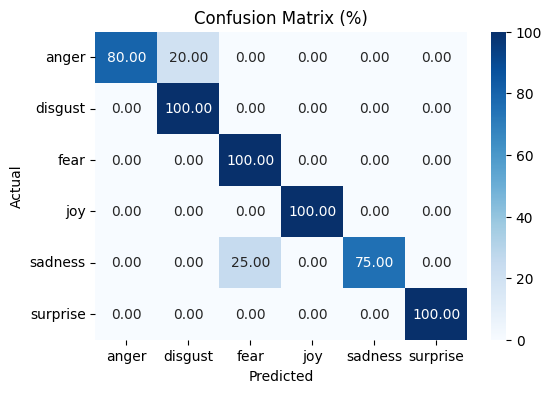

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

emotion_labels = {0: 'joy', 1: 'sadness', 2: 'surprise', 3: 'disgust', 4: 'anger', 5: 'fear'}

y_actu_names = [emotion_labels[label] for label in y_actu]
y_pred_names = [emotion_labels[label] for label in y_pred]

cm = confusion_matrix(y_actu_names, y_pred_names)

cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

plt.figure(figsize=(6, 4))
sns.heatmap(cm_percentage, annot=True, fmt='.2f', cmap='Blues', xticklabels=np.unique(y_actu_names), yticklabels=np.unique(y_actu_names))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (%)')
plt.show()


In [ ]:
text = "আমি খুব ক্ষোভিত হয়েছি!"

input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0).to('cuda')
loaded_model.to('cuda')

with torch.no_grad():
    output = loaded_model(input_ids)[0]

    probabilities = torch.softmax(output, dim=1)

predicted_emotion = emotion_labels[torch.argmax(probabilities).item()]

print("Predicted emotion:", predicted_emotion)
print("Probabilities:", probabilities.tolist())

max_prob_index = torch.argmax(probabilities).item()
highlighted_probabilities = [1.0 if i == max_prob_index else 0.0 for i in range(len(probabilities))]


Predicted emotion: anger
Probabilities: [[0.0008220906602218747, 0.0009465523180551827, 0.0013523725792765617, 0.0026003578677773476, 0.8603171110153198, 0.1339615285396576]]
Highlighted Probabilities: [0.0]


In [ ]:
y_actu = []
y_pred = []
incorrect_predictions = []

loaded_model.to('cpu')
loaded_model.eval()

for every_test_list in test_list:
    label1 = every_test_list['label']
    label1 = torch.tensor([label1])

    text = every_test_list['text']
    input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0)  # Batch size 1

    with torch.no_grad():
        output = loaded_model(input_ids)[0]
        _, preds = torch.max(output, 1)

        y_actu.append(label1.numpy()[0])
        y_pred.append(preds.numpy()[0])

        if preds != label1:
            incorrect_predictions.append({
                'text': text,
                'actual_label': label1.item(),
                'predicted_label': preds.item()
            })

correct_predictions = 0

for pred, actu in zip(y_pred, y_actu):
    if pred == actu:
        correct_predictions += 1

print(f"Correct Predictions: {correct_predictions}")
accuracy = correct_predictions / len(y_actu) * 100
print("Accuracy: {:.2f}%".format(accuracy))

print("\nIncorrect Predictions:")
for incorrect in incorrect_predictions:
    print(f"Text: {incorrect['text']}")
    print(f"Actual Label: {incorrect['actual_label']}, Predicted Label: {incorrect['predicted_label']}\n")


Correct Predictions: 1373
Accuracy: 85.39%

Incorrect Predictions:
Text: ফ্রান্সে চীনা এক মহিলা হঠাৎ ঢুকে পড়ে এ নিয়ে তুলকালাম কাণ্ড ঘটে যায় ফ্রান্স জুড়ে পরদিন পত্রিকা শিরোনাম করে চীন থেকে জীবন্ত পারমাণবিক বোমা ফ্রান্সে এসেছে তারপর প্রশাসন ঐ মহিলাকে ধরে অজানা স্থানে নিয়ে যায় যেকোন কূটনৈতিক শিষ্টাচার এখানে অচল মানবাধিকার কর্মীরা নিশ্চুপ
Actual Label: 1, Predicted Label: 5

Text: ট্রাস্ট সার্ভিসেস লিমিটেডের কর্মকর্তারা কি দায় নিবেন না হালকা চালোককে ভারী গাড়ী চালাতে দিলেন কেন 
Actual Label: 4, Predicted Label: 3

Text: প্রেমের সমাধি  
Actual Label: 5, Predicted Label: 4

Text: অন্য দেশের ভাষা না বলাটাই স্রেও   
Actual Label: 5, Predicted Label: 4

Text: বাকী রানাদের কি হবে? 
Actual Label: 5, Predicted Label: 4

Text: আমার আর কিছু বলার নেই 
Actual Label: 5, Predicted Label: 4

Text: ঘাটে ঘাটে খেয়ার তরী এমনি সে দিন উঠবে ভরি– চরবে গোরু খেলবে রাখাল ওই মাঠে। তখন আমায় নাইবা মনে রাখলে 
Actual Label: 5, Predicted Label: 4

Text: সে কি এই পরিস্থিতির জন্য সজ্জিত হয়েছে?
Actual Label: 3, Predicted La

Correct Predictions: 1373
Accuracy: 85.39%


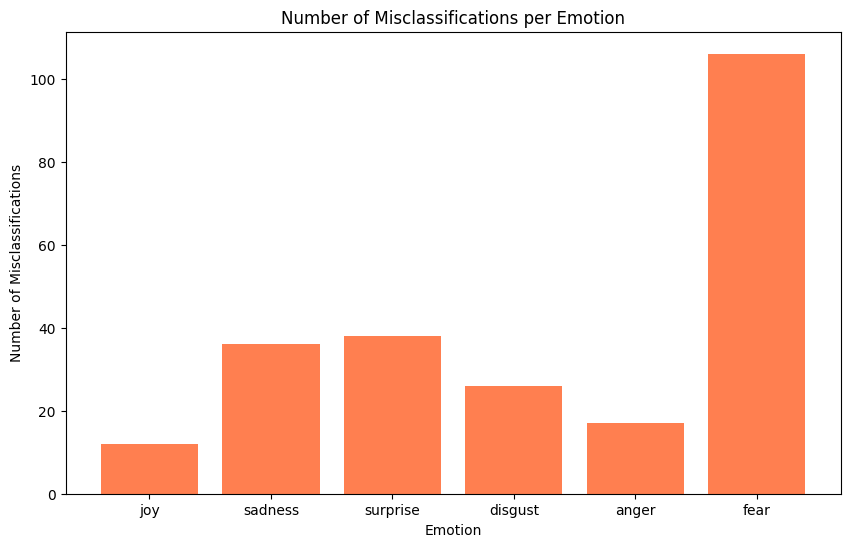

In [ ]:
y_actu = []
y_pred = []
incorrect_predictions = []

loaded_model.to('cpu')
loaded_model.eval()

for every_test_list in test_list:
    label1 = every_test_list['label']
    label1 = torch.tensor([label1])

    text = every_test_list['text']
    input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0)  # Batch size 1

    with torch.no_grad():
        output = loaded_model(input_ids)[0]
        _, preds = torch.max(output, 1)

    y_actu.append(label1.numpy()[0])
    y_pred.append(preds.numpy()[0])

    if preds != label1:
        incorrect_predictions.append({
            'text': text,
            'actual_label': label1.item(),
            'predicted_label': preds.item()
        })

# Calculate accuracy
correct_predictions = np.sum(np.array(y_pred) == np.array(y_actu))
accuracy = correct_predictions / len(y_actu) * 100
print(f"Correct Predictions: {correct_predictions}")
print("Accuracy: {:.2f}%".format(accuracy))

emotion_labels = {0: 'joy', 1: 'sadness', 2: 'surprise', 3: 'disgust', 4: 'anger', 5: 'fear'}
misclassifications_per_emotion = {emotion: 0 for emotion in emotion_labels.values()}

for incorrect in incorrect_predictions:
    actual_label = emotion_labels[incorrect['actual_label']]
    misclassifications_per_emotion[actual_label] += 1

plt.figure(figsize=(10, 6))
plt.bar(misclassifications_per_emotion.keys(), misclassifications_per_emotion.values(), color='coral')
plt.xlabel('Emotion')
plt.ylabel('Number of Misclassifications')
plt.title('Number of Misclassifications per Emotion')
plt.show()
